# World Data League 2021

## Introduction
We approached the challenge with the goal of providing concrete solutions to the senior mobility problems identified on the data we were given. More specifically, we aimed to solve gaps on the public transport offer that can be an obstacle for the elder to move freely and to have a more active life. However, that's not the only goal we set, with the second one being to increase the public transport adoption by the elder (motivating even the richest to switch from their private means of transportation to public ones). To reach this, it's crucial to make them more appealing and comfortable. We recognise this second goal to be almost as relevant as the first one since sustainability is a big topic to consider when planning for smart cities.

To reach these goals we gathered extra data about the public means of transportation of the counties we chose to focus on (either structured or unstructured), and proceeded with a deep analysis of this.
From the analysis and visualisation of this data we extracted interesting phenomena that we analysed in detail in order to comprehend and solve with concrete measures. 

At the same time we focused on the literature about senior mobility in the cities as there are some very interesting surveys that expose very well the needs and challenges that this segment of the population faces daily to move around town. 

As stated in the begining our main goal is to improve the mobility of the elder in general, and we believe that the concrete suggestions presented on this document are a step on the right direction and one of the best ways to trigger this big change.

## Development

### GitHub Repository
In this link you can find all of the external data used and the code to obtain it:
https://github.com/lb4rcella/Sustainable-DTrees-Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import plotly 
import plotly.express as px
from bs4 import BeautifulSoup
import requests
import unidecode

## Data

In [2]:
data_tim = pd.read_csv("../data/Senior_TIM_v1.txt", sep="|", encoding='latin1')
data_bus_routes = pd.read_csv("../data/BusRoutes.txt", sep="|", encoding='latin1')

Starting from the Senior TIM dataset we exploited HERE APIs (using the HERE api: https://developer.here.com/documentation/geocoder/dev_guide/topics/what-is.html) in order to geolocalize each *linkid* . We saved the mapping in **link_id_dictionary_final.csv** .

In [3]:
geo_linkid =  pd.read_csv("../data/link_id_dictionary_final.csv")

### Link_id public transportation availabity

In [4]:
df_distances =  pd.read_csv("../data/final_distances.csv")
link_id_dict = pd.read_csv("../data/link_id_dictionary_final.csv")
df_distances.head(3)

,linkid,Region_of_Origin,District_of_Origin,County_of_Origin,Average_Daily_SeniorPopulation_Travelling,key_bus_road,distance_bus_road,key_cascais,distance_cascais,key_metro,distance_metro,key_train,distance_train,key_oeiras,distance_oeiras,linkid_county
0,80216810,R1 - AM Lisboa,Setúbal,Palmela,7688.296396,80216810,0.0,84,17.733335,Olaias,0.026675,rossio,3.193998,1032,8.001439,Lisboa
1,80216810,R1 - AM Lisboa,Lisboa,Oeiras,220.647248,80216810,0.0,84,17.733335,Olaias,0.026675,rossio,3.193998,1032,8.001439,Lisboa
2,80216810,R1 - AM Lisboa,Lisboa,Vila Franca de Xira,233.203075,80216810,0.0,84,17.733335,Olaias,0.026675,rossio,3.193998,1032,8.001439,Lisboa


In the dataset "final_distances.csv", each observation has the minimum distance between the linkid and each type of public transportation (BusRoutes, Train, Metro and Bus Stations in Cascais and Oeiras). For instance, on the first observation the closest public transports are:
   - Bus Road: 80216810 (0 km)
   - Cascais Bus Station: 84 (17.73 km)
   - Metro Station: Olaias (0.0267 km)
   - Oeiras Bus Station: 1032 (8 km)
   - Train Station: Rossio (3.194)

With this analyses, our goal is to identify linkids that don't have public transports nearby.

The distances described above were calculated using the **Haversine formula**, this formula determines the great-circle distance between two points on a sphere given their longitudes and latitudes.

This formula is described as follows:

$$a = \sin(\frac{\Delta \varphi}{2})^2 + \cos{\varphi_1} \cdot \cos{\varphi_2} \cdot \sin(\frac{\Delta \lambda}{2})^2$$

where, $\varphi$ is the latitute and $\lambda$ is the longitude

In [5]:
# outputs were left out as they are plotted further down in this document

import warnings
warnings.filterwarnings('ignore')

df_distances_cascais =  df_distances[df_distances['linkid_county'] == 'Cascais']
cascais_bus = pd.read_csv("../data/cascais_bus_stops.csv")
cascais_bus = cascais_bus[['stop_id','latitude', 'longitude']].rename(columns={'stop_id':'id'})
cascais_bus['Type'] = 'Cascais Bus'

df_distances_cascais_more1km = df_distances_cascais[
    (df_distances_cascais['distance_bus_road'] > 1) & \
    (df_distances_cascais['distance_cascais'] > 1) & \
    (df_distances_cascais['distance_metro'] > 1) & \
    (df_distances_cascais['distance_train'] > 1) & \
     (df_distances_cascais['distance_oeiras'] > 1)
]
df_distances_cascais_more1km_coords = df_distances_cascais_more1km.merge(link_id_dict, on='linkid')
df_distances_cascais_more1km_coords['Type'] = 'Linkids'

df_distances_oerias =  df_distances[df_distances['linkid_county'] == 'Oeiras']
df_distances_oeiras_more1km = df_distances_oerias[
    (df_distances_oerias['distance_bus_road'] > 0.5) & \
    (df_distances_oerias['distance_cascais'] > 0.5) & \
    (df_distances_oerias['distance_metro'] > 0.5) & \
    (df_distances_oerias['distance_train'] > 0.5) & \
     (df_distances_oerias['distance_oeiras'] > 0.5)
]
df_distances_oeiras_more1km['Type'] = 'Linkids'
df_distances_oeiras_more1km_coords = df_distances_oeiras_more1km.merge(link_id_dict, on='linkid')
df_distances_oeiras_more1km_coords['Type'] = 'Linkids'
df_distances_oeiras_more1km

df_distances_lisboa =  df_distances[df_distances['linkid_county'] == 'Lisboa']
df_distances_lisboa_more1km = df_distances_lisboa[
    (df_distances_lisboa['distance_bus_road'] > 0.4) & \
    (df_distances_lisboa['distance_cascais'] > 0.4) & \
    (df_distances_lisboa['distance_metro'] > 0.4) & \
    (df_distances_lisboa['distance_train'] > 0.4) & \
     (df_distances_lisboa['distance_oeiras'] > 0.4)
]
df_distances_lisboa_more1km['Type'] = 'Linkids'
df_distances_lisboa_more1km_coords = df_distances_lisboa_more1km.merge(link_id_dict, on='linkid')
df_distances_lisboa_more1km_coords['Type'] = 'Linkids'

## Overall Senior Mobility Heatmap (Lisbon and Porto Metropolitan area)

<img src="data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAABwoAAARcCAYAAACKkRXHAAAMaWlDQ1BJQ0MgUHJvZmlsZQAASImVVwdUU8kanluSkJAQIBABKaE3QXqVEkKLICBVsBGSQEKJMSGo2NFFBdcuoljRVRHFtgKyqIi9LIq9LxZUlHWxoCgqb0ICuu4r5/3nzJ3vfvPP3zKTOwMAvYcnleai2gDkSfJl8REhrDGpaSxSO8AAHTAAGbjx+HIpOy4uGkAZ6P8u728ARNlfdVLa+uf4fxVdgVDOBwAZB3GGQM7Pg7gJAHw9XyrLB4Co5C2n5EuVeA7EejIYIMSrlDhLhXcqcYYKN/brJMZzIL4MgAaVx5NlAaB1D/KsAn4WtKP1GWIXiUAsAYA+DOJAvogngFgZ+7C8vElKXA6xHdSXQgzjAT4Z39nM+pv9jEH7PF7WIFbl1S8aoWK5NJc37f8szf+WvFzFgA8b2KgiWWS8Mn9Yw1s5k6KUmApxpyQjJlZZa4h7xAJV3QFAKSJFZJJKHzXmyzmwfoAJsYuAFxoFsTHE4ZLcmGg1n5EpDudCDFcLOlWcz02E2ADihUJ5WIJaZ7NsUrzaF1qbKeOw1fxZnqzfr9LXA0VOEltt/41IyFXbx7QKRYkpEFMgtioQJ8dArAWxszwnIUqtM6JQxIkZ0JEp4pXxW0EcL5REhKjsYwWZsvB4tX5JnnwgX2yzSMyNUeMD+aLESFV9sJN8Xn/8MBfsslDCThqwI5SPiR7IRSAMDVPljj0XSpIS1HZ6pPkh8aq5OEWaG6fWxy2EuRFK3gJiD3lBgnounpwPF6fKPp4pzY9LVMWJF2bzRsap4sGXgWjAAaGABRSwZYBJIBuIWzrrOuGbaiQc8IAMZAEhcFIzAzNS+kck8JkACsGfEAmBfHBeSP+oEBRA/ssgq3o6gcz+0YL+GTngKcR5IArkwndF/yzJoLdk8AQy4n9458HGh/HmwqYc//f8APuNYUMmWs0oBjyy6AOaxDBiKDGSGE60x43wQNwfj4bPYNjccB/cdyCPb/qEp4RWwiPCdUIb4fZEcZHshyhHgTZoP1xdi4zva4HbQJueeAgeAK1DyzgTNwJOuAf0w8aDoGdPyHLUcSurwvrB9t8y+O7XUOuRXcgoeQg5mGz340wtBy3PQSvKWn9fH1WsGYP15gyO/Oif8131BbCP+lETW4gdxM5gx7FzWCNWB1jYMaweu4gdUeLB1fWkf3UNeIvvjycH2hH/wx9P7VNZSblLtUuHy2fVWL5war5y43EmSafJxFmifBYbfh2ELK6E7zyM5ebi5gqA8luj+vt6y+z/hiDM89+4eXCPBMj7+voav3FRcA/t74Hb/+g3zu4A3FqrATh7kK+QFag4XPkgwH8JOtxphsAUWAI7mI8b8AL+IBiEgZEgFiSCVDABVlkE17kMTAEzwFxQDErBMrAarAObwFawE+wBB0AdaATHwWlwAVwG18FduHrawUvQBd6DXgRBSAgNYSCGiBlijTgibogPEoiEIdFIPJKKpCNZiARRIDOQeUgpsgJZh2xBqpD9yGHkOHIOaUVuIw+RDuQN8gnFUCqqh5qgNuhw1Adlo1FoIjoezUIno4XofHQJWo5WorvRWvQ4egG9jrahL9FuDGCaGBMzx5wwH4yDxWJpWCYmw2ZhJVgZVonVYA3wd76KtWGd2EeciDNwFu4EV3AknoTz8cn4LHwxvg7fidfiJ/Gr+EO8C/9KoBGMCY4EPwKXMIaQRZhCKCaUEbYTDhFOwb3UTnhPJBKZRFuiN9yLqcRs4nTiYuIG4l5iE7GV+JjYTSKRDEmOpABSLIlHyicVk9aSdpOOka6Q2kk9GpoaZhpuGuEaaRoSjSKNMo1dGkc1rmg80+gla5OtyX7kWLKAPI28lLyN3EC+RG4n91J0KLaUAEoiJZsyl1JOqaGcotyjvNXU1LTQ9NUcrSnWnKNZrrlP86zmQ82PVF2qA5VDHUdVUJdQd1CbqLepb2k0mg0tmJZGy6ctoVXRTtAe0Hq0GFrOWlwtgdZsrQqtWq0rWq/oZLo1nU2fQC+kl9EP0i/RO7XJ2jbaHG2e9iztCu3D2je1u3UYOq46sTp5Oot1dumc03muS9K10Q3TFejO192qe0L3MQNjWDI4DD5jHmMb4xSjXY+oZ6vH1cvWK9Xbo9ei16Wvq++hn6w/Vb9C/4h+GxNj2jC5zFzmUuYB5g3mpyEmQ9hDhEMWDakZcmXIB4OhBsEGQoMSg70G1w0+GbIMwwxzDJcb1hneN8KNHIxGG00x2mh0yqhzqN5Q/6H8oSVDDwy9Y4waOxjHG0833mp80bjbxNQkwkRqstbkhEmnKdM02DTbdJXpUdMOM4ZZoJnYbJXZMbMXLH0Wm5XLKmedZHWZG5tHmivMt5i3mPda2FokWRRZ7LW4b0mx9LHMtFxl2WzZZWVmNcpqhlW11R1rsrWPtch6jfUZ6w82tjYpNgts6mye2xrYcm0Lbatt79nR7ILsJttV2l2zJ9r72OfYb7C/7IA6eDqIHCocLjmijl6OYscNjq3DCMN8h0mGVQ676UR1YjsVOFU7PXRmOkc7FznXOb8abjU8bfjy4WeGf3XxdMl12eZy11XXdaRrkWuD6xs3Bze+W4XbNXeae7j7bPd699cejh5Cj40etzwZnqM8F3g2e37x8vaSedV4dXhbead7r/e+6aPnE+ez2OesL8E3xHe2b6PvRz8vv3y/A35/+Tv55/jv8n8+wnaEcMS2EY8DLAJ4AVsC2gJZgemBmwPbgsyDeEGVQY+CLYMFwduDn7Ht2dns3exXIS4hspBDIR84fpyZnKZQLDQitCS0JUw3LClsXdiDcIvwrPDq8K4Iz4jpEU2RhMioyOWRN7kmXD63its10nvkzJEno6hRCVHroh5FO0TLohtGoaNGjlo56l6MdYwkpi4WxHJjV8bej7ONmxz322ji6LjRFaOfxrvGz4g/k8BImJiwK+F9Ykji0sS7SXZJiqTmZHryuOSq5A8poSkrUtrGDB8zc8yFVKNUcWp9GiktOW17WvfYsLGrx7aP8xxXPO7GeNvxU8efm2A0IXfCkYn0ibyJB9MJ6Snpu9I/82J5lbzuDG7G+owuPoe/hv9SECxYJegQBghXCJ9lBmSuyHyeFZC1MqtDFCQqE3WKOeJ14tfZkdmbsj/kxObsyOnLTcndm6eRl553WKIryZGcnGQ6aeqkVqmjtFjaNtlv8urJXbIo2XY5Ih8vr8/Xg4f6iwo7xU+KhwWBBRUFPVOSpxycqjNVMvXiNIdpi6Y9Kwwv/GU6Pp0/vXmG+Yy5Mx7OZM/cMguZlTGrebbl7Pmz2+dEzNk5lzI3Z+7vRS5FK4rezUuZ1zDfZP6c+Y9/ivipulirWFZ8c4H/gk0L8YXihS2L3BetXfS1RFByvtSltKz082L+4vM/u/5c/nPfkswlLUu9lm5cRlwmWXZjedDynSt0VhSueLxy1MraVaxVJaverZ64+lyZR9mmNZQ1ijVt5dHl9Wut1i5b+3mdaN31ipCKveuN1y9a/2GDYMOVjcEbazaZbCrd9GmzePOtLRFbaittKsu2ErcWbH26LXnbmV98fqnabrS9dPuXHZIdbTvjd56s8q6q2mW8a2k1Wq2o7tg9bvflPaF76mucarbsZe4t3Qf2Kfa92J++/8aBqAPNB30O1vxq/ev6Q4xDJbVI7bTarjpRXVt9an3r4ZGHmxv8Gw795vzbjkbzxooj+keWHqUcnX+071jhse4maVPn8azjj5snNt89MebEtZOjT7acijp19nT46RNn2GeOnQ0423jO79zh8z7n6y54Xai96Hnx0O+evx9q8WqpveR9qf6y7+WG1hGtR68EXTl+NfTq6Wvcaxeux1xvvZF049bNcTfbbgluPb+de/v1nYI7vXfn3CPcK7mvfb/sgfGDyj/s/9jb5tV25GHow4uPEh7dfcx//PKJ/Mnn9vlPaU/Lnpk9q3ru9ryxI7zj8ouxL9pfSl/2dhb/qfPn+ld2r379K/ivi11jutpfy173vVn81vDtjnce75q747ofvM973/uhpMewZ+dHn49nPqV8etY75TPpc/kX+y8NX6O+3uvL6+uT8mS8/qMABhuamQnAmx0A0FIBYMB7G2Ws6i7YL4jq/tqPwH/Cqvtiv3gBUAM75TGe0wTAPthsYKPDd+URPjEYoO7ug00t8kx3N5UtKrwJEXr6+t6aAEBqAOCLrK+vd0Nf35dtMNjbADRNVt1BlUKE553N3kp0dduGOeAHUd1Pv8vxxx4oI/AAP/b/ArCzkCGtMaFzAAAAimVYSWZNTQAqAAAACAAEARoABQAAAAEAAAA+ARsABQAAAAEAAABGASgAAwAAAAEAAgAAh2kABAAAAAEAAABOAAAAAAAAAJAAAAABAAAAkAAAAAEAA5KGAAcAAAASAAAAeKACAAQAAAABAAAHCqADAAQAAAABAAAEXAAAAABBU0NJSQAAAFNjcmVlbnNob3RijZCZAAAACXBIWXMAABYlAAAWJQFJUiTwAAAB2GlUWHRYTUw6Y29tLmFkb2JlLnhtcAAAAAAAPHg6eG1wbWV0YSB4bWxuczp4PSJhZG9iZTpuczptZXRhLyIgeDp4bXB0az0iWE1QIENvcmUgNi4wLjAiPgogICA8cmRmOlJERiB4bWxuczpyZGY9Imh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyMiPgogICAgICA8cmRmOkRlc2NyaXB0aW9uIHJkZjphYm91dD0iIgogICAgICAgICAgICB4bWxuczpleGlmPSJodHRwOi8vbnMuYWRvYmUuY29tL2V4aWYvMS4wLyI+CiAgICAgICAgIDxleGlmOlBpeGVsWURpbWVuc2lvbj4xMTE2PC9leGlmOlBpeGVsWURpbWVuc2lvbj4KICAgICAgICAgPGV4aWY6UGl4ZWxYRGltZW5zaW9uPjE4MDI8L2V4aWY6UGl4ZWxYRGltZW5zaW9uPgogICAgICAgICA8ZXhpZjpVc2VyQ29tbWVudD5TY3JlZW5zaG90PC9leGlmOlVzZXJDb21tZW50PgogICAgICA8L3JkZjpEZXNjcmlwdGlvbj4KICAgPC9yZGY6UkRGPgo8L3g6eG1wbWV0YT4KHcoMuwAAABxpRE9UAAAAAgAAAAAAAAIuAAAAKAAAAi4AAAIuAAmKp6qu0p0AAEAASURBVHgB7L1Zl2TJdaVnPg8xR46VlVkzgAIBAiQX2BQ1sBe79divWv2sX6Afpwc9aKkldbNFkCAJoAAQQ81ZVVk5x+jhs7u+75jfjKisnAooLQEIswgf7702bDtm19fedo7VlqRUUkGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIHCuEKgVofBc9XdpbEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEEgEChCYTGEgkBBoCBQECgIFAQKAgWBgkBBoCBQECgIFAQKAgWBgkBBoCBQECgIFAQKAgWBgsA5RKAIheew00uTCwIFgYJAQaAgUBAoCBQECgIFgYJAQaAgUBAoCBQECgIFgYJAQaAgUBAoCBQECgJFKCw2UBAoCBQECgIFgYJAQaAgUBAoCBQECgIFgYJAQaAgUBAoCBQECgIFgYJAQaAgUBA4hwgUofAcdnppckGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgCIXFBgoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoCBYGCQEGgIFAQKAgUBAoC5xCBIhSew04vTS4IFAQKAgWBgkBBoCBQECgIFAQKAgWBgkBBoCBQECgIFAQKAgWBgkBBoCBQECgIFKGw2EBBoCBQECgIFAQKAgWBgkBBoCBQECgIFAQKAgWBgkBBoCBQECgIFAQKAgWBgkBB4BwiEELhLz5/cA6bXppcECgIFAQKAgWBPz4ElrN5mg2GaTYcp/l0nmr1emp126nBo86j1qj/wTTatkwOB2k5nqZmo5br3mik1G6leuertWU5X6TFZJoSeaa0TE2efXRry9RvLFPt6CQt945TvVlP9XYzNS/vptbF7ZQsr8Zli2laLrmu1kq1CRgfnqQ0B99WI81PRml2cJTm4L48GaZ6r5vqa73UuLSTmhc205IslivYawuuGU/ScjZO09kkzSh/2mqmWrOVWnX6iL8obz5J0yXHOX/Oo0E/1msNym/yWk8L2rBcLqIvrdeC9w3q2qp3UmM2S03K8DvPO01n3nNNDUxoWlpSfp1DNXCu2SYey1YrLbqdNK830kLsqV+91aZ8HnXq64UL6jCepcVonGbiB758k5YL6jUl71VxLTBoXQJL2kDl8zlVVajHfAmey1lgvCBPe0jAaomy0zQtFqPUaXZTr9kn2ynnzVKr0UoN8PC91/veZD/NycvvFtTDP4AKHMTO69qNDq9i3Qgs40KeAi+ui2tX2NZoqHhHos6eM6fMdquT2mA9eu/TNL3zILVffSl1rl5YtTGKrLJ9wiu1AhxbSO4ZQ7ED/+Vkhl3N0nJKO8SU9wnsaw1tpJEa2FVzaz3VtP9OM2zS/qfE/H71OluKm/ZBP9OHFT7WXztqgUXuxCdU78xX2ljuGzCl3SIZdfYdWGmv5lePMrBL6lLZJSdShGfXsRnsZ9VHgSH107Zn2HkNfBtcT5aRnLPqXNdgrFX1flSllb1oZ+b96JpVOX6vzYts2LafV20QpwZl5XrYr7lunj+n7HiE6S6pG2Odbm/xaDNntrRd06p87cr8rXvGI9tFbq92qx2B3bwObo00XjiWGZeU6VzWIT+nYrGqgUsbe/T4aHYS9fNzg3HGiKeQKPnJT1wf5YDneDaK+nSw7wZ4i910MeZ7xid524+23zSdgz+fTWGFfE8WaX5sm1tpDTtrdxgn2BiZxnnPfAI/2zJnTplNZ9hcLbWYQ+ri9gKXPzNvD4o7qGpztss+1B4d62LuXGHb7I9nJeuoPWgnWkoj5tNG1F3zszcftZfzZpQnTtP5mHMYs+SfPwNWJPozbJ/x6eeoi7aFzazmGMuJGlJnS83zi63JBu911ts2eZ5/1tNzTWG/zGueY986ngCE+8M0TbiHaCf2mWV6ToWLc6X9PMX2xMmxWSXPdT7UjrWNx5PHow3my5/nWJ/oT072nhRtou3Og+0m8xHn+d14PuIxDpt2vs0t4vmRHfgG+6eMyjict6fMBdYnxin5Wr41XjIWzdO+t51NcG1zr7Tdz0riFnNU2At5Baa5j71nTz76PC14bW50UnO9y6OfUq/HgO96Euc/lrtfnDbisYMv8hEEz2TaBBt/k8weHvJ7YsDvB8Z+BzwvbfBbrUVZ4AmuqdONudxxPgEH+7PT7DGHdAJznv6/S9TXcrGSeHXstZiXn4oD5/t3dhzG+KQ/l0f7ab5/j99GW6m+fTHOw7qpe7YQr4v3/Bhh+ohP4uUvhkir79LSBmc7ifNXfeKccwqFY4jPXJprZB45nyit6sf4keJVVea+9TzGB783SioIFAQKAgWBgkBBoCBw3hAIofB//dkH563dpb0FgYJAQaAgUBD4o0RAcW1+MEjTo0E62T9GaFikdq+dOtsbCF8QNIhsfyhpPpqk48/updneEaQYJH/wihCItuXKhRALzzBDT22WROOSvKYPD1JCyGtAPvURAzfXWmmTPLckUe/upSkLpxrdLmLMWmrfuJQ6L19M9X4v1SDtxglxDwKpXe+mtmKhpKhsFuLc8MNP0+GPf5mmdx+k+d5hqiEUNtbXUuetV1L79WspbUL2bUD6e92UfB7eSdPRcRqijYxatTTida2zmba7F0OEk886nO6ng9HDlTCGUAopqtjSa/Qh0ZppgnhWiWYSX21Ix257nXw2UmPvYWrc/izNEZdmkP0VQZomw8AoCDkwge2FhIRsvLgLJggEDw5CPFxA8E831tN0ayvNaeKcc1sQhG1I/w7ldyBqraPC1vTOfprcup9GYCDRqYhbA9s6eTS3EQgRW9svXUydaxchOyEbFSfl5VYdJ5E7RhwZ8jieYq/0TZDhNeq1bKXhfJAG0wdpp7ubLvWvpoPxXjoc76d+ayPEw/EMURzCXGylqSXh/TyBqBYfCe2KIJRcViRcB+u11jqkM2KhgtkqVaRkReCbnxTp1Dwhsc2TZkfNe61+6tW66fDvfppGv/44rf/gO2nt7dfSsg0h+hXFeAVehbZIkLIoyGmxv59OPriZprcfpNkJRP8QEXGEHSA+9167kVovXUjtKztpIaHtnwQtj/jEqyR5CBLIK5K2kvmmCe2QgFeIqvogDjz1KQsbtv1kOqCvhoGr+QtEr9FjLK2DvyKHbRAxjvHJfq6EOayXcjnOl9qjIof5HU8OQ7DotiDoTQGw19ZTl7w7DUj7M2nBWFWEUHyxHZZjsy2/zfiIQq1YJAW/LJSMrDeiiYJGFuAUlvKYUjA0HSNuH46X6WS2wB6XDNt62uzUsTXrYtvEONddrM1HEUU7yciv2s03g9kReR2CVy+N5j3644jrh+BOm6hDv6nARF70h0LTGvY8QdQ7GO2FXa4zjrVPFyZkLKs28bFKqz4eMxcMJseMjX2uaaYtxoqiutgp8DgOPH5CnRRanC8GYD8EEypGsxRlEY1GKY335tStny5d2E3rG8yDfcZhJZJW5T7zNdueZYSQy+vzk3XQiu0+z//iNWIe4xCBxD60DYpwiiYTvhN/69+mvc6Rz0rag2PAclx8kRdenM4BX7w2j6nR/CT6UttuWC6CrLarPdt3/eZ66rKQwTpqi9ql9cmCbZV3zkuRx7nbOphPbmstrTGGzMd6iYTHtfUQ6RgrR9iSYvpWZzfydXw4Dpw3HWO2O+yF1zwXzJk7mVenQ/r6CBvMQls1T0TbOTfmSxcmBPoZf/tOfJ0v+801hLlWGk1PQiAVe89VuLP92li/tZbWW5u57wBgOB8ieI/oD+552KNl2Id5gUmeU22Xi05Aiuu4D4rp7Dj6NxZiME+3myxUYf52jBxODkJEt48tz/tBj7pVc0DuNzG2DfmT+Ih1hzHn/BdiKXW3HgsWBZ288z737L2w7zb36N5V7tuXL6X6pWvM4Yj9jo1V8j5lO5wrvPfncjlogaYo9It2mw98+dmfDfZ7Y1ZL04PjdPyL99L03h6LlJiPtsH9MsLlDvfxtZ207ChcdqKvXQig/VoX719d2v/1pKqdViyPX/O1rS7mcP5w/hzOBsn7nnNVHjere9ZzKqG4XMcW5nc/S7Obv2EB1bXUuP4WEHinzYKzqIacThUaLkzit9aCsrUba+e4qANc2C/94p9HvK7G/FWPa/xk8jwX0fCJxTKemZhrbVscZbz4F5+tA+dVS0siB75zzmu3WfhTUkGgIFAQKAgUBAoCBYFzhkARCs9Zh5fmFgQKAgWBgsAfNwLhOYc34RRvpJN7+2mGZ5lCRHsHIhIvuT8kr0JX249tA4JnDc+JELYggRp4VLXx3qrj8fY8D8kQCfXUQiBc4vXXRITpIOZsbHXSzsW1tIGg1YesnHx2Nw0/+hTuCKooBA3oJonkCxB2eMS1ESYbPUS3k3Ecb2666h/vDkSh4998nA7/4Z00u7+fFohltTbeFRDsioWNrY3U/sbLqfPKZYhARCSI28m9z9KU1zFE/AgeeYhAIAG63t4MAlISbIIXkMKBRP8colhyUqK4g1ApKSxZ6DEJZb/f6GxBrHIMr7/6vbsp3bqZZhubabKzizhHPpynrCE5FgKSBBokXB1vtfb6VmpiM43bt/AexEtvdzuNEPvGnG69JGQVIiWiJZAlppfaGKLoUI+6h0fRtgbtaV3cwaOS9suG4qlIpRArEag6EMUKMwgfErUhGjkUqYOikfUbQ0iaFHwm1G8whgjHxWk0O0gbYLPbuwBhPYL0RpAkSftJpvuql4OkvZ4AEsIjyOrwmlrlGeQ95UrgSzJvQ7hbh7OeD1xMymRifp89Z6ZLvHMhLRXHMkmMyIPN1HHEGfzwX9Pkvc/S5l/9aVr79uvgR50yE1xl8dzXEKqCaA6KM1cB218cHiOS76X5QwToYzxOEArnU0hNvNTaVy+m7usvxViob66Hvej1JNHpn20zX4lVGkm7sT3e6ulWHX9uxThBG5EoHoPn8fgoXv2sjYqdQoJ9o10oIoQXj8RsJOsRiMW5CjqBNxVRVNF77niCxzDvQyBaQa89K+B28ZrpYn9xjGvjKvqh8oTTnjgYeAWRTH1E8GxaOk4UFyG69Q7zmhD4Ah/PzynqjRfrAvdfNEL6G3Gcw/nh2PNYFgscPybbK66mrBeACnj5dzwdIy5JrjOO5oqYJ4yhMTbKnIFAYr6UwhjGo4n2KhRZhyGCjONDoc9xXglf0au29VH7LAuvMoSnEwj8YQh/lsG81r0Q4oj5eE7ky5gZMefYhkftQBCdDmjTiAb7jz07XNbW+ukignSH+a7BnBUYW90XTquOfFTXp18YfUq7FUC0KQWdR3PD6jLrq81VnnLhtQrGJnGxnXpQ5v6gzWeOneKVM6uEQr2GRDOLa4rmX06Wp90rxp2wiEEcFM8s3zkm5kPELBdOtOjTAeco5sRY4DuFbutmsg3RRtpqGinycX7MxeSncF/lF+0Ju0I8cY7nPqDQ6xzmPUJxThvOfet4zsKVx6v5zGPWUdz0KvVeofBiHfxOm4hO95lzq+vC5phLW9wXLKNJPTxWLbgIewe4mA/tMesO9tqrc68m6rE8RrNdOTbz+OQUjgd+zO+eV/Wf9ZlTL8VrcRSDjB0YcCxjO4y6eE/a7u7EmBEz6yQGGePsYeq84+IGxcIudbMvsq1lXBZDhNi7R2n2GYtxbt7ivolA/gqLR66/nJovvxFC4RzP+iopxpufddFuYnzS595/TM5XeZ6Kj898aiIIujDk8Ee/5PcCourNz+N+2f/m63g3Yi+T+6m+gRh35UZacD+3p44RewfMvy500FYUP40e8LunPGc59hx32omCrckybJOe6YrNR5P9sL0eQm1eiLBa3PGcSjxJKGy98g1Ac57IQl62Qe0kj2nro71qo/4ei++9r2JvPvIcEIfDhuxb+0Vcudtxit6o5mcZ1QMk47P5eHb14G2UozV6yPtREQpFpaSCQEGgIFAQKAgUBM4fAkUoPH99XlpcECgIFAQKAn/MCEiiIIZNj4bp5A4k2DECGd91tvE2Q1xT7KoTLjOYl99zHCrvSD3V5oS3XBBSU57IEGFtPNVy+FHb8vSGLCH75oQJrQ2HqYXw1IOg76+10/p2N21c6qYuYb2QI9L49r00vPkZXnKsYodAnxMObInY2thC/LqwlXo3rqXWOl52h0dBOzXwlhNLxcThh5+l4x//irCRiJl8XlLPBZ6dHmsQIrL39uup88Y1Qm5JSCOIPfgsQhFOdnfSmPiGihgKT3pn1SRQ8ZqxfyTpkAkhfDO5rNASxCjkaI0V9DkU2SQIw+3edohg0KBpef9Oqt26mSYXLqTJlWvkf5ImiASS3BJw4VlBnpKeeousQ7q2jvB4uvlBmtOmybVraQqsI8SONYUgPQhQwJq4r9WNoYpX4PwI74/7e3i9fUb4tBlebtdT9/qVZPhNxWjLibB3CJ6SvCcQjRLcPrKopDcJHUcbtc+QVyAGvc4OPeG6fbwux4gg08UJxGQvPBkk/myjHg5jxMVMAiouZqGqyauE8QltjpB7ktGUobgZxDek9lZnJ223d+J7OswqRLIeporw9bNEvvnklAU3RaM5gvH8GPHlHTD75F7a/G++F0LhHJIx99bqkt/iRc8JqyQ+y+EgzR7cpixC2+JVOIHcHn92kLS/7suXUvuVa6lz42qQyCeIbkGwQ1pnO8kixW9RhUeXVEJhFvX0TNKjEK/YFVZ9PEw22tuZQMZ+sdbAzD70P3w3wN5kq7InTu5zvX0UBvQYUiQQay1BTyNtRO+VEEUgik2ndpKFRUUMBplHOIZN8jB/H9p2ReprMSGU8J2iQoio9KEpaGrGnDbjMfFTdNAGLI9n/qKEED8UN/zGdknYPxK1VuVVwszxZJmOURynxDOdMl7WWhNsWFHbsSHxbQ8r1iMe8r5LW02KU4oO5q2orWhaparu+bNtZkEBfaGnjx5fWRRRRMHbFBGhEn88X7FIoSOEdsT2hkT6lJCSR4h0Q9qPMKrdtRD3+5u9tHlhHfHk2d55Vb1+m1f7y74WW/vJ+omr9bbdK8qeY/QdYkwWCbNYP6PN4VmIl5ILD/Q8ayKQOoeKa9iRfcd7+yljLd45NLF9pIDsSFV0yuKfeefx73nakKKa80jGVu8/7j1hHzmvCP+IJ2x4V1Hjw/FBiCyOvRBzXLjBfGO2LvYwTKh18XzH0Ih+02Ztt+dwKEQt81Xwte6OEQVexUqTHuUuCHHhRtgHecX1PFsrcfOzydb7ZRYjnZUYI9iv7Z9xj/E+4PnaScY7exKG4Eo7tTcxMj+Pe1aMHSvKe/NRSLUeCvqPz6WOKfu2EuZrem/5R/WmeDF6rcnwpMzO8b7yMtY2LCWP7zwupowN7cD66nFbeXJme9HGrc+YOoqxgj9zEWNbUctFB45i66PwumBMNqd4uX36IA3+8Z1Upy5rr22l1it4a994E8/wFa4ZylicYt7OVWQTXumG/nReMYVdUK9npbx+BCTxXKZy6f7/9nc2LC2GiMsXttPmD76bmiyomXz2bqqtIVq+8hb3YX4f0P8u0jieHuDhvBVisXZ/1hv+WeU++xj3ONog3nrla5dGMrDfFQRtl6Ka9/BDhELHinN+H4/GHh6wL5K+JBRevpaatM35po5YaPn2S3ym7+gybIQaxb0bq1L84/uwB+2HQj0eiZf8OS7iXHFBKNT2SY+EwjifM+P3g9d7lHNYGOI5jpooIArR9lgU0LnoSSUVBAoCBYGCQEGgIFAQOFcIFKHwXHV3aWxBoCBQECgI/NEjAN8hCTs7hmBk77QJYtcc4au1gdCCuNZk7yk9vmBHfu+hCG9ARM+loRh5BIMEwe8ego/2KHxOO7x2iqdfG5FwBy/CzfVO6hFyNLUhKmt470A2SyLW3GuPEI9wmQAITfRgkNIe5CwCJWpVhAWrGX4QcivER7wUYbfCo3EZexQeRzjI7hvX0/ijW2n0/qeIOQhshBCr4UHQWOsgpBHic6udxoO9NKKg8eZamhuqE4JRmrtPuKyEoLk4OYx96eqEHHPXJvcxzEmiFrqWOtcIGYq7j1UIMrpn6MYZ3iJDBL+9+6nx4G4aET5wdOUqRCMhIyEbaVhkIykXRJxkICTqpY1rqY2dTD/Gw6FLPtdfJ9wq+YNtg9ijLQSFOV6dM8K12dYFIpl7O7k3oeFH9Zpc/85beF3uqthljChL0vdghEcoBK5EuQR6PBBB9EJpQYZHOFZM0fr4Z0g7rxvRlrGCJGQhz0FSK9B19ICkHyTvDVdn3pKaEpqG+utCpJuPxKZEuEmKW9wywUmfQDyG6AI5XYkvmlEICFxrHSUK/WwKzFd2VpdApx5jQuKOP7lNuNqHaYkYv/GX30UQfhUTlfSs+isu/62fJJbdo3A+YQxjv4sxmN9lnydC5M4HtBuBp/+9b6a1P/9W2hvcS0ejA7xsNqJPxeORiPVb18ALK3IdzzUwzSE8cxhWRSoFDUNVGgp2HfI4ixJ4glB3Maz2yjMnP4tlHORZUtrwi2NFLF8h4hWz3I9Sb5Z1vOz0BrKP8jXgGnbCx9U3vio/5H3RDO2ZbUCvU/fmU2gzHKd2FoIC/Zj/yMo+JT/tpxoT2o7l5XPNXXHJ/TN9uNdbFhvFVzsRY0lshU4FCG13MFFQ7dIWPIpriHJ1BHdEtw7jdcTChdlCLzj3+lR4dv/RjE0uTc+e7E11So7nI3EN7cimSN3P9I1hOPVGVKDaaOMhzPiqcPbqLKTO08HxYTocHDN+meiY2jxPj3MqAjGOJ2OfsYnQ33YPzJWY6vXPTqB2xuSt9/OS9RVP26pN2Atibz2tt/hXoo55m6Ofswjo/MW4VGgA/+wxlj1PnUfsh2rsm08WTZm3NR/KMQ/7M89JzLz0pUK4tmdyPlYss15ZWNNzW6/ivK+j1zo3hDctwo32ZHLBh2XbBr8TW+uX651tyO/P2pa2rsh24nyGzSq+GIZXGzQfQ4ZaN/tW21MAc3FHNZfa336/YH7Ntuh1LqghxGaIzXXq6jxoyM08BvIY1CZWnUZ/hbch1ylOety8FNwC71XfVHX3uHNqhHimDxU+FTDt9vD0ivpoxzmvbA9itCqPd2KikGjK9ckoOqdoG4qjConzVR0jVDRjW8/ZbDd4+9O+uHeTh/VUBFfYzaFYva8THhpRK7CijhmnWMoQ/dOps7Dhswfp8Ic/4b52kjrXdgiTfZn7+BWEOtrDOAiLodraUzUH2EbLFU+/C2zJX7t5Vmo6zmjykMU1k89ZmIQ3vnvOdl+9lnovUy5evAtCzE4/+Q0RCRQKv5mYcdP+4H7Ym3VwEcAmCzMqzJ5V3osdcyFD3htSnLyf5pDnzp3aC3bAHKowr23rmdlvE2EAkfRFPRofFwrrl/GER4xtOH6BTFtw7NdXv3Pid5+mgkFpU/Ggx7CUsC9/8yjuVedjyNFUn7VbJrOw7ZxnniuyrTtfYOuUZZnasH2mfWrRMf/w7BkK1J0iFAau5akgUBAoCBQECgIFgfOFQBEKz1d/l9YWBAoCBYGCwDlBYE5oyDH73kzcrxAxpwnx2yX8aIvwkI0NSDBViD+QtGSJ+XKaScUa3pAvTmBDQtH26e37qTudppdvEHLyAmHbuhCweKm5pxeMUAhMkq8SY9KV0kaNYzA7RCjaRyw8xJsErzncMAK3OSKZe8dJPjU28QTS+wA4e2/cSGt/8mYa/OQ3afCjX6TOa4QcZX++6Z37iDoQkTcupOZFQgx28XbgMUawDbpqNMfbcZE6hgAcnRCOjFCehC91b6I5MQrnhEqt8ajjfRgiFMRWjWM1RDOeIGrd74nz2INwgsi4JI8aYQ/HhEcd7RBGFHJVEjuT8NKa/FGUr3oGXN28nnoDQqvdfDctJNp2rqJBdiHxEC4RSWFn03QfApPQrUtCtim+iluNsIQKthKc/W+8gjDaJ6QqpCPinukIL8L94QPamIlAyXc9EiRYfS+RK9Ftsl0Sx5LlxwgtYwSVJav9Y60/3k+ZLNTLgbBrCK9DQvHpjZZFyOw1aL5rq32+9MCRWLWPJFUlPG3rOkKaPWySJPRvhUiQzR5TwKTgIEY9U7vIISsRkBB73G9p8KuP0gmPpUIylVv/i2+n3lvX8VRBKNQl4ndImdTMeCBnxN9SQhrcG+w92kCwHX1wL528eyetE/J0+2/+DKHwfjoa7mdPGzxB9NB5HnH9VaoolpUYp+h8AvaKsVkoZBECIRHF3r7OxG/GwD7R+yWLXpmorWwvE+85tKJerwq/CpEdPMQiX/pLQl4CW3Hl8VThpB0bfnPAfod65rmHVg7FiacuJLd1CFuD3H5yysRxJSBpK4qLEtPaneF9FTWtr21TWLI+ipAKN4pdgc9Czx89b44g1jtcY8hDQx9OYo7RjkaG+0QorLMHZwuWvN3Q4ypjpa3FA7vMrzzzn8UXxAkEpfDcslJxhq1xLGdxTM9CifJ12v+4t9GC8aQX1UP2vjwgpG1tgmCFh3C3j4cve7DW2Su1pVAY4UYVPSzjxZLlh0cOp/vuRa5V/DJUbowt8My2mveUNBfrr+ie99bD24g/FwzMGF92Sh63vq0/EsetrXOcgkbVX4597cc+cwwzrEUsxCjtWduwv50vFJY9XwxdQGIp5mefh0cj9YkwttRbO3WRxRpjrbLn8KCjjmeRU9So8tDDzWORP/XRxvrMRxvs73cwfhgeiYZ57iAUOg9ZzxAfKU9hUvu0MOsY48o20TYFTI8rglhnW2gf6C2pjSoE2UfhPcl866vjIp+b8chjMS+M0LbyePVYnrujj8lTrMTfz9q8noF6BCqaWrpYRV2pT66j91TH0VlUqOJTUmAFhgrujmExtc82O9sxhv0uL1bI+5RW92zLVWQc0YeMmMjdud55KbzN6XvxNz/r4v3euWJ+9yAd/8svCG+e77mtS1t4xeOdf4EQ2tvblA0CdqLvaHPVD+YptuZpCu9mWvqsJHZ6Ex7+0y/Sya8/TI0dohIQNnqD3wwdQpsbRn2+fz9NPn2XsAf8VrvxVtpjX9G7x5+BpQthiIKgR2Fr61nFfLVj4OYCDUVUF9rYp4YYdeGGra5StgeiHiAS2te2JYty1RlPfw1Bn/E0v3crzT55P9UuXUnNG6+TB5YBZGLsX/b+o/di0GBNHKzsRtvSLvPvhHyuQmGFOF0TKc8j+TztIMyOg7kPHdt5UYL3Ked322AZUQ/Os49zWGJ+F3Yv5UzLc0GgIFAQKAgUBAoCBYFzhEARCs9RZ5emFgQKAgWBgsD5QUCBbHZwnCaHEG6E3pRE7LBvXgsvt/ZFvCB0Y/kDSYYgXYxy+MfYY9F9s14wLdijcXzrXuoSDvTNN66k9d1mOlmytx5CoR4L8kJ6ILhqPhNfigaEgFviAbQk/CGEPj5KEHWQnYh5872DNLn9kH2FbqfaOiHg3n6FOGSsxGfFfWeTcJCE+zz+51+n4Y/+NW18/+3Uf+uVdPKbdyH/brHpD54iOxCR37yeGhc3E1vN4aV3kGYfE1ryzkFa7LFfG2R+hMJCDIPNTDU8QeuEAmzvItxttAhLCnGKENeQz/IPAtFG1PHAm+lRCEE763XTbL2XpoiME0OXQfpJykuSmSRVuTxINsOL7fQvpZ5ek3dvpwXC6OwYcQqPowUCJiy07hScDCUHm1Zfg3xGaFYcbBDOVi/Lul6RfD+nUlPI9xAKuaTab6oijsPzB+EHtINktWwFIb12FPyC4IfUDi9C6igxPqcfCJybuhD6Pbyy6nhiGsJOry3JZKsluTyGJBYPPU/sx2pfLgl+TwrPIshh93iU7LQu4mZZ2oHlG75Q8t7rg3gGM1+lMg0HqBDWRJxVKDx+5700+MV7ZE1rwHvtT9+KPQO/DqHQPrLeEVKSvhMXCdEWZLf2yA5RafDO++n4H7AxhMLdv/1BGo4Rg/E8zJ5qlahW0ajmmFMQ/tH7fBa8yHl18JkvCgNihdcOIq0i4RHCnGLJFuR1hEsEo1xiDokptiGwUu+MqySt5pT7O0hZPocXkTYaYpzjPAt0ISzTJ2sIKdFfT6yfOSZswfocRD30btTrKIdXzGSx5LYCSZWqsisi2j7O9TL0p8KyYp2PXL9KkA5Ce1U/BWEJ/KputmNIeMnjCYs0GIsT5oQeY7iPwB9yrza96GBThsfVa1UReoSQsUC0UHjwG8ZdjAdEYeYkxRbLViBT+LAdX+63LGAYylLbVWzKc1nVWjRmBO0xHtP77Cc6IGTuBl7Aa4xjvQgbEYoa1Jkr9C48xeT0+q/7nV5jzgsKDrYzRBRwzcJUWEAcN9RthKUF6xDrEDLOJvtqk1DC9nlOzt9ZLNQmskjGfI74poBczYHu+XZMqNBK9LXvtQEXCYidtpPDtepFWnk05/5QOFZYDIEBQV7RQXvyz/wN1ey8phiqAHcqghriUXvNoTEtW483+2uPcI+H4z3Emhx21GPm75jwGu3A+U3byHlYW/6cwxTsKCfmddqu4KPHtnOBZZuHbfB6RVPnP49X4nsI0ZEXY8U/ys3toR+c8/1zPPjgL4vieoQqvOXyslCYRUrnLed+22B5WVR70TC24qNg7NyfF3rYrzl8qW1xXDkHDeJV4dZ22Gb7zfoNWWzivUGbEjfvCXo9K+qJWey3y/nOWYYXn7BH4EQPcbzDW1uInq8QgvTll1Pj6o04f+49kBRYU76iWoRLBQ+/M+Uxk2e/+OIJTzUWCTBR48H483Tyyw/S7n/8HxHoGX/uZcyCmzqrjRaHD/l98SEehXz30mvp4eww3T76NPaB3entxhz2op58T6jCl77y3qmdKqB2vCfS4gF7FIZ3LdX13qMwK47aqd6E1WKcF713+NvT31ezh3fwhv8YEfYi+0DeCNtSDs8LIcQwjw2+8oP/vqFK2lX12d8uVX94QsY/Vmr5tfseko/tMunNaKrEXk/XBkw17IYRwW8oxeO4mIN5jFlej99FJRUECgIFgYJAQaAgUBA4bwgUofC89Xhpb0GgIFAQKAicCwRCXMPzTaHw5D4iFGJbE1KqcwHSnRCRdcW2zMT83uOheLZE8DPVDIn3FUROhcIJQuEaRPub33wp9bbraX96HzLREGbZGyCILEhFydDwaIBkkuhVWDCUY79rOLh+qp/g4WLYMDwUZ4TirCP29b77Rpr32VMP4rLdJixXdwtvwl+mISKOew6tf/v1dPKvv06jDz9mLzBWwLPPYf97b6UWYu2MvRdn9x+yxx0EGqFi5xOI2g6EKp6Gywn7aOG9V0Psq0Pmty8hUl3Ae4V9DpeE96zjIalcWqee/JhLc8Ku6d0xgTgdIwiPEQrnEGaS6xLFHlP8yAnijvd6zeilsNbE6+IYIfH2XfY3PILQcz8sSLSW4Ue5RtKOevmoIy40tsCCfRt9zQQp/Bp1kMTN4qvhGxUoCcUYpGP2yJJMVlSpSDzD7kkAu49UhPXj+uxBItEnhSg5bXjSXoiEfbxhaBE04SyIYMOP2ndczf5NeJ/Qn33ER71lJHMVqiQ6JYwlrHNakheEJ+QximuQlJKimSg1nBxeR7RFUlmvCslqyXDzdS++VhNBB9xG73+WhoSXXSDCS3Ru/MXbKTwKEYhsz++aFIeOp4fZGzREXgUgPJg6m2mjt5WOsLGD//Qj9kb8frrw7/4ST068jrCJR+TqUypg20TW5Luq/55y+pe+tn/1+DxGJJSM79KHerC1EWK0JVPGD/vlL8h6PAr1uFFosO8VLbIwg2nRxxL/Ci8h7tFn9oV0sMKo41Avmix+ZcL4i5XSVpZxvcKQfWNf07L40yath0JBFgo9P9fBfBwH1kLKWZtReDCJCxR+1N888ve5LPPzz/Mj7KKCAzkoDI4ZZ0M8P+dLBW/3D0Wk5uGxqXaBLTOAaau94L6ICIWE/ewx1qyJISSj/eSt8KGIph1bZ3HoN/GIrQj0qGl+WjjuV4sBHt+f0DNGA7xAj0bpeB+PLMSKC1d20tYFhDNEzLohEU2UIfKikXHJffkiIkjO4MWfHXPaeN43FKSjH0TgNGkXAzyq3NtPTJzLHIu23/rFH+N1k1CrPcazx6hx4GafDRADnSOcA7QJvfcUnxWWnJeOEAqrVLVZcU2bzePecJP5HlGJTu6dqVCo57PhGEPEpFzL1iY8z/o4FhTVtXPbpphYeaR6Xsy/nKswqEBjuMdDhO5KHNfT2rxikQDXK3KGaGyZMSdVgqle5llUi3mU9+aRPWJXNg1uYb8Me7+PcKfYrGU/LihbL7F4JNiKM4/T/smLABz7lmv/WVdDjzqOTApPeoLqMZYXaBjetZp/45SnPtk27cK5wj8x0P4UjMVdnBV/Y99dxpeYWj/7V8wVhCfcd/J8kset9x3nTvOxvV08lhWEQ3ydMLbw0h59cCsd/+z91OwyV7zO/fD6q6l1/TU87BVG83ypbWWx2gUCeWFRdSiPkac2i3LpC6I7zBXqf/4+vwc+Sy/9L/8xLojcWZ3UIGrCYkCo7j0W7BgC/OLVtMc94P7JnbRDyNFLa1dEJLB5eklf7YjzikKg84d26P10zL6Y4kpzmeNPwsMwi7H591D2WM7C8YuUZtuNAjEPofAmQuGl1Lr2Kt8xa/JwwQXVqMwn+kk8szVhi4+EQioUgh4jiLf+RjCFvYKf35lfFgp5pQFVv8T5NmjVYTl/hWV+b1VCYRymPPMC6f5a2aMwAC5PBYGCQEGgIFAQKAicKwSKUHiuurs0tiBQECgIFATOCwIRrpNwmYYeHbBX4Xwk+YZXIULh2ksXshfYVxDc/n/FDXJH8sYUIVNpx4sm99Bb3EYohNR8/ZtXUheh8OEIoRCvB0lgCVAJQwUiybAsYuAFEjSle+JJPvbTBgJgg1Ckx4QVnRGCs7GL1wGCa/flS2lIeME9Qmz2OhtpB3Jp8PeEFvuvPyMc5dtp7e3X0viDm3gU4rXAnodLxbm3Xk0NxMDJrbtpThhAXAFTc3szda5dTbUL62m500uzWwiIN+8h2h2kOURmi35rQO633mJ/nytb7DtpqDlCB64IUD0GJab15BjyerLM+21Jo2URLhPe2kCEYoPcNawj9GpqziDLCME2R/hK2AvApM6rL6W1b72WQ6CCDdnEon1gSUQsTDPItVmETFQiyRhK8OppJqbmrXAxgIzX20+xUiLXhyS+hGtFUkui26NBqNPN2YvGPtGDCnEMAbYN0WioRsk/yWLzzuch6kEcHxJG1s957yg96vL+WnpiSY7ruaNn5QkEfybS8eDgHAlpyX+J7Eyu570JxdOHBLtCTR9vws3uNlFmCdWIZ+LiCE8nvC+P3/k13ih30tbf/CCt/+mbbBOJQITX5++aToVCBbS8v2OfPfsUO3oI14f/8PO0/7//MG38tULhv8GE9KCrxIPnlZ4JU3uuIlKfd0V1XMJegcXxYx9U4yd7mxDKD6wUTrO4kD16KrJfkrYSVDJRm0WIEwQd85xoFwhljksJbMl98+208p6F9ltlM1V9loxrz7fvw65WQoPjVjvPogriMHkpJmQR05CJhBO2nvSlgoTJunm+NLF/ep9mj9ccADYIac7TdkNwZSwZnreNEKoIqDfhhHGpzSgQthHh8t6Lihy8j70J2UsPsn8GGY+0jt0p7OjphU1RvsJQFj7wpF3hVWGpUKh35ZOS54oFHRrXx4A9c6JehANsdkwY5RmLEHav7qRNhELPty9yWYaBdd9AQqKuwrQqHcZciMDydabKo1B8bfvj9bWsIWLew6H7s+XQmfaJKXuqOT+4zykiFX1rfa2759jvnul4VzBSQBZbmknoVvfTXAtb8bhzpteFjdLSfF4tQrzG3M98FeEtwUQRRSwm9J3iivsGDgnDa5kKayF+0w8K0tlWFVMyvo4L2+E5jg+T+ekJp2Cn+F7NnbbL/VS9Hx1Td23+At5N5qlIlvdLVITG05rznDutQbU4wgUT2rHjU3tyXnCOdb6zb53zFM82uzsxH5uvLatSzi9/im8FriqFuiskWV+vcaFA7FdHP1R9WAnxeSzhfUd/uEfoiyTnFb3FXcQiDt4vxGF//IA5gvDXq3uHLebHQCxAUKJ1jnT/vNifkzGtkDdYeT7btwruziVxzztjc/YBkl8asV/g/v/zU8bzLPVe4V58/RqPV/GS5zeBSlckMbb/8DAVR67ztWr36qQvvYRQRjkTIgdMPr2bJve4V7HQ6Mr//B9yrtjmkt8AifDkuP2yKAoRmkVdE/ZJPGa+PUQs3Onspov9K6u8q/p8qaiv/gVlayfajrYoTo4B7cl/hfr90QNwz3Oe+BoGVpuxf56XnFfits1vzcU9BNBPPyCawkupef1N5l7GJPOf3n6OibBBmlbhFZ6EYXtRm1VRnpc/KyB6jWhUdc727TjmHNrBkdV1+Sq/c0zqaWj/1QhvHuIji6qyYGm76VPstb/GnsslFQQKAgWBgkBBoCBQEDhnCBSh8Jx1eGluQaAgUBAoCJwTBCRKIGCmhB8dfP4gzfAulJDp7iIUXt1lnz68biCj/qgSnjw1HrEfF221fe5y1zw8TOuQUtdfu5Q6G40ImTjAI0KvBEk+hZ+K+AqiSWaLcJtLHlCMHDPkI2EV9xGafvZecv/H9mvXUhMc2xc3Ev4TQaYp5GwSHmz00w/S+Mfvpe71K6l9eSfNH+glQIhR+kJPzzr7BsqeLfjO8KKNS9upznkN9kdabnbSch3R4N5RWtxlT0A8gBTvloi+kluNly+mOufBeOINhPfUAs8/mLU5fNesTX93lpDYEOSQ2JJimVILzo/rWUEPD9ac0Sba1elCwo4hP29TxkMeiJae01zvpw4CaPe1q4RGMzRXDrFWEbIKcxLlCiaShRK5ks96hOlpovAiyZ4/G/7PsKKEZoX0lYyUmJTYFWvMNE1p2wJvSlwgsVn9BRFPuniB9C8i0Pbw0EHMhNyT4FP0lCz2+mp/KL9TKNTjROJaIUH6MBPnsxB79CJ0fyv3TbSvq4f1byoU0gZJY/FSeNLDQpLTNupdYZg6Qz8G6W14RvlH6rz/X/4l9pva/tu/TOvf/waeuwqLFTn5248u25c9CrO3h+XaBsVoPVwP/+EXae//+GFa//Nvp23EwkUTupThjNk/ls5+cUow2zaaSzr97rELn/hRYSU8tRg7CqmV6KFgbf3E0P7X00i7qERCcY0/vUdWxcZ5nKM4oIeioo7eSJ5nkviX2Hdc9Rp6imY7i4OrJ0URBRjxmtJnWRS3v/QINsTnaV6KwSHoxDUI6RyznhUGIZZF2fafhHT23hGhIJcRHLJdKWSKXxYKFEtHiIQDvIq1Ob9v4iXYZFxGCMvwAtNLzT3ysscqo5S8DJdrWMksVnuuYf8sQ/t0fOQHcwRl692s2PG09Kw+Pcaz/PgAfI+HjLdJ2rzK3ni7fcrWk1HxS7FAHPUSw+sqPMT0rEXMhDQ/G7b1aeW/2PeKAooTiKf0mWJsh34SM1MQ/qs+0y4Mx+l4r4QAX7UD6+Qc40OstDrnFcetY9r8PFeBTtvQbp2zDDuZ22YPO1cOw/stCqdchSD7W/FOQXETcVY7dF6s7CRsDbwUorRb+1xBtQoLWs2JcS9ZDS/7RgHZVy3SPtamFDUVS5033WdTm7TuLpDQXp1Dfd3qcX/ABpzXFQsVQPQAM6xmFuaqEKfOkXqRTyPP8MTDw876mY/j0wrYtu3ubrQzz9+ripLz01OM4MjbcarUol3E3BnjKF9pfXJ/5fuPx2vU/VlJ8c151rnFPfLEUAFyjbFvXygYH0726K/s7SZ23pdjP1kyFhOv8R6jyGr79OKNEJqrgj2ugKjAqs04bvWmDQ/xm3fS0T/9a+zv2+pzb7zGb4VXrsZeganfpz05E8V4WxX9t+rDyi6e1r4I30pZw1/fxHPxswijvkCs3/yf/m3kE3YyZj462uMmzoIuwltPWGRw0jaMag79uYWou9258LQifuvvtUfnT/vL+fLxhRgDRMo9hULw9RwXKigUeq54Pi+Zv+2vGX4ZoXD+6Yfs03wVb803+A1kyM88l2Z4sw2GjdK//pmq+0FeqcQXcfP1mHPGym6pWxg2OPtNnvfpKb6PM8gvrDfGVxYKHQex6skfRZVQ6PEQD9k/dO3rx5sSSyoIFAQKAgWBgkBBoCDwe41AEQp/r7unVK4gUBAoCBQECgK/AwLwH1PDat2G6IEgnukpxr5yfYSpRg+CGLHwjynV8JqpHQ/YjwvCmzBeDcJvtmnjWh1ivNtIl/DI6/T1/pHUP0oHiEt6PUjAStb6MIRdr0N4TEN/ImDBk/OAPCKE6eLhYZq895lcbmq9cYM9hBD4tvFkIX/zkzRV1Fh+8jAtProX18NUhjinAJYglhdDiM4hnj+IkHWIwOYNvBz/7Ftpzv6DA7zdkKXQy6g7okIDwsq9EttTQq+982GafvQ5hBYkF33XvIpXKK/LAZ5Rkmrsl1gjFGrjpc00Za/AMaFIJbSD6F+Rei1IdVhkBEHESvBpQoguDwnP95OPU439CNtXLgZB2r12mfCneDS52H7Fw2knkqUS/JLuYwh2icP19mZ49UjyKtT5vYSd5HMW2egLMNYjQZFQjPSy8rNeIzXEwcEhZCgPvZ0W1M9Qq+s7EKOXr6aNPgIde6gFeUjOlZhkeRH6jr6zHu6XZ1t7CEsS0yEI8b1EZe7XfhDnR/RTlzooQMW+epDnJklE86tISW1Ccc68JZslRc27IrwbiLRSkg//0z8iHr+fNv7tn4dHYUUoR6a/w5N9p1Co15PkdH0ljPQ762m9u5mO/vlXae//+lHqvflKWv/uW9ghe1ptdqO9Z+tg+6VITb6TYP9dkmPHvfAk7Cf0tX2ruBSeUSFc5PCymeS1vFyaOFbYZlEAG4fUlbDXo8t2HiAK7Y8fhu0oVklaK6Ts9i5iA+yrWmV2pgHamNfbRwqXOTGuEAC8PoQ2xLmzxHYIGQgnjuMsnCAQQf8rmGWinJpy0PCJik/u55a9ThWTs+DhtafVgdAHk4PRXtTd8IcKTgrqeqNl0Q8749rRLAvRzTqCAB6FClkhzDE2LcsQlH5nWxWo3E9OLC3Lz7+tYHe0d5wOWQwwGBwzNwxT/zKhOPFcXmtxL2C8HE/1yFW8TLSXfTwRWhxDlfhu6EsasML3t3+JvgcbbUjxIS8eyOK++duXnmNS7LKuimXO02LqvGE/hZjGXK0oZEcq1ileeb3YucDDMdtGMLYM542HCB72vWFwQ2zU9qhD9rrLCw/sd5N2o6fibu9SiE7aYSVmxmzBee6JeYCnm3WyrlWyXOtofcWwSrkflTSpnYs+wN2H52s/1tFxb1usc56n+ngNZo9avW31vLUNeujpJW0IZXF0XtY2vC5sD7xcGKE3ZRUmVDHfcr1ewdm9HbPISr+GMb9o/zpX5nbZmrj0jG1kIVWB2bZlsf15thP7DtL+AfO44quYOOYMuantHSIeuhjEtthnJvtQodi+st+sk/PBGrar51t1T/dcZx8xzoKi4mwWaMXfNGMxjyLe7A7jj/t85woLMl53Uc5lPOAuxwKWPK9m+4iLzrQ5f37ys/t+KjQf//yDNHr3k7BXKpya/+F7MZ906uxdPGKef3ALNLG9rYtpTMhxdgqkvtn7XkF4ndDXX39iPqIMpe6w29X8VpVTCYUxJ/GlixXsjxBa6aMXSSGUgsH8wZ00+/wmIdQvpfa1G9FfzryPokSACf8xzrTEbFf5vkX3gXa+k3kfcYzb71qhPRLLDLzePzMJ+/Q88zm1a8+tPocHoVNNFMbrKkUdGKP9tUvVV+W1IFAQKAgUBAoCBYGCwLlBoAiF56arS0MLAgWBgkBB4DwiMEMgnNx9mCaEnZsgfnU22Z/N/eXWINgQmv6QU4RXRfyEHcT7D1IWkTAhjC7xKsS9IzVpX4d2Xtrtpq0twrSxv1+jhZcPRLyksuJSEMJ6jKCK1QkNWCe8aBPRKoRCxDRYLCCCSUI0TOC3GCFGkG/jxuVU34VM75Eff+6LFOQV5GV7bxKPyaf30vTOXoTvjL0GERTreBql7gbblCEcyFESarR+42IaNRcRplOS1xQeWeYFaY/fX1p8sp+Wt/bSEsJ/aRjZNUQrBDTDlsZWPRBxtTX2K3TfQPYzTHg6GnJujvdQOkC8Yw/CJiG19JKEiU01vOHqPdpGaNb5nX2EYzzC3noltQlL29qmfhySHPxiqsQTBBQ8WyT0DX0nwWjSk07BJhP9UIArAj0IXM7tJEIE1hAKl3g1QYJGmDP49eP7hPHbQ3ga8MHwjO1WWtvaSFuXLqTNTcK+rrtXomJAxlmiuPIiq8jh8CaCNlRMkQw35WN60uhp0olrxlyr4KfHiRgrGuiZqAdCRSBmMQEvUoh1yUk91aoQm9qLnp0zvLNm++zV9xNCj356J/X/+++l/p++kQllcFC0ND/FRkUDCcxIUU4WOvIXT34WO/dRUxBVoKjK7yBCddv9NPjZu+noh4TK28DTbneXvruOB+hLCK161Z2KE9KoEp+mzJeekqb5W5+DXn300TaHzT/65vSNfSv2Evv2tfvHKc7Yl7Z1A+G4H6LS6TXmn0UTxHHytj72jfiIfyVsuB+WYUhX1SUDBedG2sLzydCvT0rWR4wUk+xbU4xD8o6+4nrFvSC2V6LAo/ZGQbbV9ut5UvVLxmyK15htrfKsPJHii8DIdsxD4BOP7LHGYgNEGK/V+0uPpyxSsjCD8g+ZQ0aEp23WFZ8VSxVTEIzAz/oPCK8onrZJO5WYr0Qt8a3GWq7D48/W25bYFtufRU3POrh/mPbvseclHkv4DqbODnMLnstdPDUVS8dzF02w6IBkORHCF+877a4SoJ5mE3HRCz6FiMTYUJyw31v2D+23z8TyZJLFMsuKsLKMPW3Gseq1eiFWYp7jU1E2ehB7Muyy2Hlcu3EuyGFru9E3itBZZMs2Ia6VUKiA5H3hbFKEutC9GH2gaHcqFHpWjWl0P8Rtr7Nulcdg9mpuxfyZ53PtK6Nnf+vB7quPHAIRoRlBT6HQ+jgf5X31GOvMr4p/imaOGW3MNmjbsQACDByHLtCIhQ+c63Gx1JvQ8w1pqj1lO6J8RMZmeNHnfRDNS7tS1P46knOXc3WVxKYa/wFEdYBXcYnRx/ner8RAQc/22r5tQm6u48Wmt6XtUCz0HPs4z6/WO9sPXwZG4aWJDRumuY/Qrvepbcz4VvenHPbVqmhTif2AW0f040d30uTXn6T2Bfbje207NV++kZovIWoxp1beyV7zVdIjoZAFJaPf3Mz7/eKp3/rbt8NOnVfqJ+z5ePsjfm4gIl++kUb8Tjl0LqRN1j08tp/hTfxV6nP2XPN3rtK2nKeco84mFwUpNuf5MWPW9h5LnapFM2fPf/x9hBHlqU7o0fk+kS3ufp7qa+y3vLWTav4G4l4fK6kYxBFePgYKsxfzAf9nUsxodnHYjMect8J+fOJdngfiGz55Ig+9BUmRVeR5mmn06WpVjbnnnH3WtvAo7LNgqqSCQEGgIFAQKAgUBAoC5wyBIhSesw4vzS0IFAQKAgWB84XAHI+zKavlx0eQkCeQYXjZ9d3vDqFJsfAPOSkILhDNlnr7QcDPEApneBV2EOPaaEUNyKk12njjzStpG/Fswr59U0hdCWgJWb0wupBvOwgRizEil1j9+uM0/dXHIQou9UpUUJXQQhyq9ZHsCDdaY4/A2gVFwixySLJJcs0g3PRO2ZggTPI4hhgcvnsTQY7r2JOwuUa9CBva+9bbqX5hhzoQIpQ6nEiO4ilh2DXFCon6IK7griR3FTn0KOhMWmn2wedp9umDtCCUbBDGPbznFKZOEDAVNiHHmm/fSJ0fvJm9IY8RBqjD7KNbCYUik2e+IrDWCHsa3okb66lNmLWxTmaiAABAAElEQVS177yBVxrelOBz1ivt1EaWgVsliiiiWE8JZkl13+tZEx4KEL8hKK2Ie/PozNdSa9Zn/yU8OxBKTDM8GQ9vIxQ+hOCnWnrbtBA9e2C9hqi9heC5dWkDL0s9FhFwaZ/trvYXOysOZPJcMUXPL4hJ+jrqyPsc/k5ysxaiUx+xLfKCFFTktQ8NV6kvkqKTbVpH8MrCTCYbpRv1gmxAsg+wk8Gv8PK8h/coYeP6/913U/e7r8XekVPEMz3uFAH0+LE+ksyWxxOf9Sh6NikfRD8kv7SlQo3Ch3WP8LOEphv+5qM0+tkv0oRwuLPBLG3/D3+RNn/w7dgjceZ+V18hhbRE+032YZC09MTTk7ZuWD/HkAKZIXxzMizdl/fRg4xWOKDttoNeoCCJWVP1mvGRpDVf+60SFxR1DVH55JQx1e58eL1JEtl2aFHagv1/VjiLk577lOs0xNPX+ijYGA7R/Kp62/5jPMsUiyTPFdj0uFHscB83BQ/Hr30oCX+fcXuEGNasI+zg+atHrjZWhdTVxiuBR6FL+7H9CkZ6yX1RrDrbgIwDu9MF1rbVvROreu7d3kt7LAiYIlDMIOcbfXDp5PHAKCRfBVrHF95q2Kdii3XbxItJIabK52yJv81750fbqHgujtq5wqZedGJ5MCKEsGOHY5WJiIMhQPWu0stTu/C68Bijngpu1s+980Lww9bsb8evHoXmNWaMn7Dfmuc5HrVzk7ZmnZ4oFCJUuTfcOuF+vU/k+mYR1n44nh6Eh591ca5xLlIs3MSbzfCmegCGDUd9tUzGPnOHAmcIc/SR845/Q2xFMWzM3CEWIbhTZqup/fAIEQe7YwzFFeQZoiPHwvZpR3VezDOclccE7UawFlvr6TmGUHaUKCLaD9qnIqNi1NeRqvIVbe1rvQC918Z9kvpX2IuHnn5+74IBQ4kqaLqnbXgoM2byfLJBW2b0/Ul6cHIvvA7FgKwiOSfap+JhvytSOj+J4QYhO7vMHY4/22+dBoxX53xFfMet911FsgsIQ7Nf3krDv/tZ6mxhP2+wF98rr6f2jdc5TxtdFfgVQXokFL7zHvP2zdQgqkODcKb9v/xGzFF17inpmP0XP3mXHy0IiK98Iw2by7R/8oA2EQbVeScWHHz9C7viXrqyDcv50n1J++ThYMz9xnMMnWrefjoYIRJ6HWZbq9PPx0dpvkd4VXG0z7YQYre3yN951t9Q9mkWgKM8r6WYqjx/G7kv4YLFRDUEwDp5Rpd4/eqPI/GXLcvj+TdRlZ+2YorzqYa/2/J9mS9XoqLHFUH7j/aE9JuSCgIFgYJAQaAgUBAoCJwPBIpQeD76ubSyIFAQKAgUBM4pAgsEpOk+XiqHeX+qVh+PFzzGmhsQzzz+kNOCEKMLPCbDmxCvwsUUjz88/9AHIQxhgfCW6/Dh+quX0u5lBBuJcfZykySSkJQcloCT2B/h/Xfy3qcRijMhNta38PTb5NGGxENQC68zBMjaFh4seLgt+4g/8rYQliZJLMl+Seet+lbarm2lw3/6RTr5+fupTvjMRh9Cu4uHGR6E7T/5RprvbuDkp4fPSZpLVkOCGzpRMtqwcqtM+Swplr1HWoQhrT+ERD/CywlRMMg1F+Rb/gyPnHsH7AH0IMJQNq9fCu/BJaFPk+FJCXm6XGd/M4k3HI2WtkXSzLCeel7uImBeJcxatxPeE7kCX3yWUBtAtp+wF1vlhRCeWhDNmahVAMteTJKLowneCCNIYoTc8ZA9CacIHRPEVTwr54RejMB8CJaTQzxQBuCoeAkJGN5zXQhTbHX9Uj9tvUQ/UF+xlmBXBNGDRqJbodV+lAiUVPW4JLOkt7jo3ZKJzuz95XsFEPtc4lg70PNLD0BFGduTxRLC2iFQfFFcQuhaCYWH//zLdPwvv4ToZCxdJMzdm9dS/ep2iByKmAq/2pn2ZR6+t24KMBWh/0V0z36ipRDYCh+m03pIjmIfkMmTT26mybu/JqwwoSTvj9Pan76V+t9+LdXZX7KOKG0bvij2ViS3qHwxKYJpe5LE9mOINNjzl9Nq3HC+SbwVQiTlbZ8UbSa1Hxf1aE/Ux7Mkg7Mw5PXinQW903pV/aIY4AgTrywGRbFnnsgPm/R8yeZ8vibumMmvvnFs5jadlmEm1kNhp/KAyrZj3c+eh3BJe22jdTEv6yNOnqcAYjhIkyKhgoSigx6uCn5VaoWY1cAjCiEE7+dO070zGX6KG5FX3ifQEMZe6zyiQKaopFeUXopP75ds2/ZjtAc8HEOtGiGKoz8b6cHnD9NDxMIF433B/qatdTBhPlIoY5RQliJ4xswxrOASoS2bG0D4JFuoWvbVXqsQm2GfIb4gstl/Cpx4lDkfaitiqH3YZvF2TNs263sqFOaxZA+bKnHZ9/aliysUObV85wjnC8/MtqQtrhY+nBEKq7YrzOlFqEdn9CsCcSU0iZLnuaDA+vi9IqYebwpjCoWGoBY3y9NG/dN+vNY2mfia9/mz85D5DQm1ap5VPcwjxEU8J6vxJj7arHXsxV6SOS+vyfMVpZH5hPlDu2XEcb6LY/R6z/sfitmUOS/qwHvnqa9LKHQuyYIw8z6C3GRhm6gHOImDZVeYxOIH+tnvxMr7rG2zPva5+yhuIFbbZtuzx16FRgLIuK/uvVxou7O9KL7mOUmBPT8IJ844qrDx3qH3ruU41hRo9fLcZB/I9CELP/75Q+x/kVrsZ9x+7XrqvX4jLdrMC4js0Ys+fYXUJEy1c/b+P/w8DX/xfuq8/jKhNy+m1mtXqJOaGfeHwVGa3vqIezNz8MuvpwH3x4cnd7F97oHcr7xvZMH+KxT8QqfmRR/iW423PN7tjSpVDT79LmZbrjmdk7LNhY1zmiZeCYWVx6ARGRL7Oy+O+J1ysJ9aV19KLcKL219696HahV3kORt7AJewixDwLDs/loZQ4LvsT5jreGpP+SztWltznvHVFLZGpfyLYyuR0HNPU3VuEQpPMSnvCgIFgYJAQaAgUBA4TwgUofA89XZpa0GgIFAQKAicOwQU0+YHiAmH7IGEWNjq4NGAp1aDR5OV7X/ISW/J+eFx5qZUBxUFqhXjEE8KpE1Cb169sp0u48m3hUjXMzwn5yksSKJKdEnAHbPn29H//S+x2r91lb0M334tdd66EfAo2gzZX1DSc8n7SliQXDNJsAUhzWe9OLbZU223fynt/d2P0+Anv8rem4hxdTyI6giNCY+/8XY7PRzeC8JTMj+LJZJc+njYlmhOEKSW48Pv9ZLpQoDWuEayzDZIEBuScvbe7TT54a/Sgn6uGWJ0RZC1Lu0iZrG/0VuvQkRSAmWndQh0MAgiDaJOj44chjALfdGwx548d298P8K/6fVifSrvGI+18N459cJDnzw5TgfH7C1FuNR9HnPCu830ZiRZOySa6IemfcBehXXDu0a9Od7EewAlpXe1mzZuEH4Pr073ipPMbuO9OIJQV1SQ6BXz3I+SxYQMA5+t1f5bhuHUs0eRIQhiSGL35tJTSnJeEci9xiS23dfKcI/mIamcCX3JSRM1Bq863o4NvHz2//O/pKO/fydt/JvvpvU//yYh1PBkATq9U/TgsW4KF2eT4QQ38LirPETOHjv73n5ZWN8g9iuhEJuoyodMnt/9NM0+wWP1E8q7NUzNK7uQzxdS9/XrqXP1YoQgDfI1Mja/bKtfbFMuVfFGrx/brmeR52iHX0w5Dz2TPN9wfgoxeslVtvvF87/8SUJYgj8ELfpMkVBM9N540TxOc839YbvsR6+XcJcEDnmGzzGITi/40juFfdsTwhyveo0p8mSi/PT0PE4Ii0m79WzqMdYqz0KvVyjU01RBoxI0Q0ANYUv7JOSwA5oqTzAS5GaEJD2F8bSkj7G0KFvPxYcn98MmJeJDvNGr8AWEQssIz0eFK+aoEKURWhTZzOf+rQfp3q2H2CkiF5pHZxsb7y0R/dk3FbvawmPPfQmdS+LhmKSPvf55OJ4i9fx3lRdeZQfOpTn070okIAvnw77jPMRC57kcqrYSpUMUxpY8bv1CaMAO/N5zFTkVWCIsKXZQeRbb38Zp1r7FV9uxHo59hUTnNPvV0KHOIdHPgFWFrgxRiXGiaVlH+9pX52CFMPfRU4zcdCECQqFehc3A7xSXODc8H7NA7Riwf8zH+fR4dojHm/vw5XnNNodtEX7TVz3hnO9skwLmZoc9Yqnz4+U4H+uBp3ed9bDS2q9G2KoZYlJVmPsg+NsHio4uSPg6kvvaDbxfMjYUUJ17kSoDb8eSyVfxtt22wz7MfZDvCfatfaGXn3O5SewOCB/reDOMqGPxbHIOUCC3X7UFPRTFVqFNL0rnXXGybBe6uAes9dRL1bmjhxjY/HyU2u8R5vtgkOYnw9R741Ja+8bVVNvcIczzVni9fXEBxtkaPPl9C4GxyT3jwf/5T4Sq/mXa+MvvpD6/L5b8FqnEtCX3SsNy1lyIcvl6OqoN0/3BHbBxn8yLYdOPz0tPLu2rf5v7RMxYVMQAcvwj8z0zo/DapF8NY6steW2Ib2Cv9yC3STA9I8qZI+c5Nqe3PkmTj98nisEbeGu+FvNVXM+13uOsg231/C+1mbFnP1tn+znuVdox7/1OT0M+RjZm5Xf+8S6+9/chhy0hxEnvkb73YOCQzTNEyhJ6FKBKKggUBAoCBYGCQEHg3CFQhMJz1+WlwQWBgkBBoCBwnhBY4M01RziaIBSe7B+nZgtibh1CDE+o1s6mjMkfbMqhR1diDERPTdZt1aAgkthPsAFRuYM4totHn16FXQTFJXgYTrSJF50hSxUUDQk2+tVHqY73YeNNiMEdPNIIw/koQThJjknsK0xE/pBTvpesklxTbFM4We9uE/JsKx3913fSyU9/gzchXogKhZJY7CFY//bLabyThUIJfkl96y1ZJmkVf0GU4aXId34vEWbSyyjC0IUgypm0289tyNYG3obp0700u8k+Szdvp9a1y6n7xvUIkbrsNtIxAsESEm9uBDP490ceBH6EVM2iQg6v+CWCzsIh2yRoJcMV3SSsravtl9QzPKJCIWiwdSKk7uFhevDgAVHVTtIxoW/rioF4DAaBpw+RK/rJtaU4gTeR+zQFrm2IY7wwFvTnGkLh1g2EmXbe680eDtqPTMRFkleC2X3OgjSkPhL9W4QMlCSuzNuSFN/sL4l1j1n/7BWkR9wihLJ8je2RKK2uzh5bEuqGiWsQ+vMY75CTH/0q9SB8e2/eSLVtQpmyB6ZkvKETtZVMWFehCq0X3mErr0Xxenqitit78xwFCesq9pKvhnmtH7C/5oO7aXJngFche3bxV2MRwMb33qY+1yME6uN7FebyTttUlZ9FCULxQaJrS/bp2bZX54m85xpi0fCplZfb2XMVKPyz/r63XvZXzjMLPhFyl7boxaPYaLmP7411WqbvzCt/Iwkc5ZG3YyPK4bt45bwYizEOv9h/+WqfVxlRI/tTkSjb80ngrOCuoPBF0cTyFReyV5Tj1bHj2DMPPQfD/hmb1bjRnhQrFFXNPzdAEh4hNq53PGcbUdywvAEi1P2TO2E3CiWK8ApOz+8Xcc1tcb+1sFPGoCIUrrt4WrNHIfsTHjw4TGvMa/0dQgx2AM19UfFgtIcUz/WgizHkXMqfbXq2nZ6i+uR3p1hXx+17BSQFSrHJ3poKSdHLwJQXIBgyVC8qy7d+jvUqKTD5WSFJnOwbr476Ype+Rnhfxk1uj8Jg7sMwH86u9hWcOJdh09qSSczzvoCIrAp45OU4DiGWcxXUnYMVnoAoytYOagiQegCbT3gNUy9FlNN93GyD94scjlOBMhYCkIm25Ji2zS4wcBGEuCj4KmDZBudUxbY8ZyHurdrf114RuBX5o63kF2iAiQskxEZ7FpPJMns/KjKG1zb4iod2Wi12CRB+xyf3gjwYPYy51vmWEpwRMlZ8si72lwKxso0ek1hb1MV2+TDUsB6FGwjYen+Lsfi5b6s2q1eh+OW+P62w54UlAULck7kvOMc472rfzu+21evsLwVe+yRwBa/usJ42jplvP/w8nfCboP8qoZTfuphql6+lxu7lLwiF5uE8b3KOzmXHx3iyKtYmFu2wCOZAj8JffZQ2/vr7af27b7GwJAtjde59iyGC/cEDFshgcxdeSkdJofB2zLG7vUthh/zAOc38Bd45lhRpHSv2eTWPfPlS+8Zv82+MPIdZ8yclx15+8KuEPPNYy9dzPr9xbLQ/T2LO52PMhXhoZhtrpelneMMrFF57ld8orxLdgJK9jnpGNeLKSihc5cl3hh01t6in50cKhPPXfK5RTpSYwz1QET5zCndHXzju4WyLle1UdfdQnOwzdtNDoC2pIFAQKAgUBAoCBYGCwHlDoAiF563HS3sLAgWBgkBB4FwhsCD8puE5x3gVnuwdsdIbUhrRqr2LJ4JeZpkd+YPFpKq+pE8QPj7BBgUhRKvqs3laI6zXFiTr7pWN1CPs3/zmPcJaEpbsrdfS5Ii9AT++maZ3H7KX40Gqf+dGan7vFaJk4a0GMSy9JAEr2SoRqFgj6eZ7XyW9LUvxwHP03uh18FzEC+j473+Rxj99L9XZ57BGSE8rWNtE0PvO9TRZCYWSlIozUlmG3qMV0ReuvJdQlYiUOJWc8/oIfRlEayZcMylNmDZEug6hSfuzFuFOP0iDf/x5WvuLP0nb/+4HkKESz8N06+GnkY/iiPl1KLcNSWs5Ep2KNXoVKfY9LcyZOCtKDCBsh3i+KNRZdwlYhaM1QhUu8Aoc48n58MHDdPfOgzTEM2NE6NMOxHRXYp+mLFYioY1tKb6xN1ft+H5QlbP+dppDmEr5rV8h/Nwr2aNQjBUaJNkVCBQ3Fa30WvGYfUXQOcjLHLJOotm+8zzbVxm7BCpWEAKjXiq238ezwrtlUQlBkvGjUDj88btp8lPITsK1tl66mBov4fWCCJPtAwGV/LSLyqtPe7E+2kclJtn25yfsAcwVIPcg3w1VaEjIzhiPIj007+Pldg/BBfuds//d5n/755DQ30CoNbTeqbjyrHKCSKZPsw08S8A0lGv2whOvPCa+SF5rr+EhRtnibN7atEJAhNHlVRHEff3ssw32f2sjCvi+6p8v1VWDITkyYryDgXlXHkX2seWEaA9xrUCmtPIknLXfkFLIQ3wqoXCIJ2jUk3blvfmyF1MU/NhTRTBnYSALQJ5iPR5vg95VhupVKvHYGh6LClzTEJWyd22ECWXuUAC5O8CriHzWHIecq3caOfNdNdPx8QkpbDqET8PIZg9GPQInQ+aok1k6OTD09ChdvL6dtq9sBpZipvBle9zPzbCpX1/Kdhv5na07ZVneAd53xzyGKw+5qq+ysOR8qgDhuM1CYfTtaizbb86JWfhx7hTZvGBC0SkkJ8ukCl6v4Oer/UPRpFNPwlHs35dDxHpOT09ARDf7qBKvDS/rfpMnhBZVFN5obaWLeLo5hyogKsA4d9BJURNLeDxF/zA2FKTsH8VjPf7MwzopZvXYN1WPwcqb0DxijNEi70VZVF2Fl8UTSows22vX6L8G6oy2ZH42U5xts3OzWIpS5Xnq9716Dsf5PNuyHi+elojdd9OD0T3KP13gUl0vxnr1iZRY5DGX941UWBUPxS3nSsVz+0IMFExN3i+dY/dHe7wyrlb4xcHHnpxvFAsVf310fJBXnucVC/OCBu8F5nnI/ph6717sXU4nP/5NOvjPP069a9zT2Kuwcf119idm0Q2YVh6FXq9YafJ+5Jx4NrluSQ+2OYu0FgdH6Zj78vjm3bTlfrLf+yaR0bE7fo/UxoRPH2MLw0NuhrR1+0o6Wg7TAzwK9bi+gFCY2y9qL56yp6uhX7EZ7pHeNxRdf5e0pG8ce/abEUDdT7hJG53fY55iIZKd63j0BPcA9G67YI9h+8Lw1rNbn7KQ6QOiHLycWpdewsgJ6Ur0APMWX+0xhGPwzEPKfjIvbVjJWQ9ySgPgsHWO5T8OIxSax3IlFNaI4mDV9OJ23kdufuRJKA7OO57PoSiXE/inPdS1273gKSUVBAoCBYGCQEGgIFAQOFcIFKHwXHV3aWxBoCBQECgInDcEwuuOfQoVCgf3EcIAoNVh/zVEws5lyPBgYv4wUclEIMwO+/XpGTgZIBohSOnB5157c7wpm7NZ2oFfutBrpp0dwq0OEAB/fTMtTtgHaq0fXhuL4TAtOG+JqFh7+2XEwpch94/w7BgE8SoBKMFpkrCWIIxQo5BO7nUkQRvCFUQntFla622F2HDwX36ShngUNi9tx95xC/Y+TF1CvP3FW2l2sZseQKjqfSaJK/mm4CWBa1kRRi9IMSk56DHKlBWrPEwk0zLputpXjjw6E0L2DfGG+OBWeEd2v/dmWv/rPyFfvCDx8Lt7dJu8crhSX62zoooPubJM0HbDW0bRoCKXo+Fnnmy/hLPh20bUX+LbVCOsYmPcph/Yr4u2DvAQ9DGbQv6y/6AyRFe9xMJIEq5GjF1r6eFiGMRaovfSlPrU8HzVTtcvEV7vJcQ1CD/FFkUCXxUz9aIRf/tEkcvvx5DHkoY9yHP7COsIorwH6Vx5ZGRhzDCY1J1rFQXEwKFQ4RrsYtQyP9lm+0hiUfJ39PMPw466N66m9vXLhJTFoxCvVQl9RUUJUfOqvBj9TkG43zRcp6PQmr1IoqfAS4FCoUJGUzGkixtGfwHpeg8bun03DT9+kGZ77I/5b3+QNr7/LTCnzyGhXyjRNv/ErWq3pKqCn3aiaF0JORkHiFpmEonfx9tRYVvhpagrYW2/mbt1tw32mR5UEuE5/y+S7Jy0SvS7fR51lOiVIOZcbCe8eTQlcM6COuMH+9G71DwdH/bB2ToGKUxbbVt4R66EIt97nn2jd92O4Q4fu3ZGP0RkXF4VAZocz/lne67KsQzx81uF9Jw39eb8NnaoreX65rmE0yw5zj1AAIk+po19bLwS7R8XIbzmbJoxf43woB4yl42GhGVkb9IF4y7wEAtstkGlNy4gfOD9aolBuTOOqW4IM88r42x5T36vrXrkdKxmFDI+PmsXrhRw3OnNdcBClgHzd4U1+hdv9X5C7KwppDrm8lxnXl6vLdpP1dwVwoWYr84LrzHHH1drA9Xem3lezYJyZafuJ+o8YL7mr8CvsGgIWkUlv1WQ0kPORQn2pcKce+flxQpZ9Aqhgjrl1y/aHNUggQlleL0ioeXHnB7HsledoTJti2PDecRz9EK2/tbP+4PionXOCzRsHzgoqiG+VfeGSiT3eu0qe0hmDz3r596EvuZx96S6RqWe80Rvgrl9Wo2xWCTAWFdUPV55/Cns5XsZvzu8R4GpArhzs/cN7yHOEbY7RCCz5U+hUEFPT/nKu9RrxExs9umPk1i0o5evNxWvs0o+5xQLM/DUFEMxMHS1WIqPFuoiH6/VLixT3PXsVDQfIOod4QHYZB/P5gbz7bfeSr03X0PwYmSHQMVcwLyUhcJTr82qbF9jzLEIZvCbj9PJLz+gck4a3NPwJuy9fi0WcywZt2lwQExibJD8Ugcv+PXddLIcpYPhg6j3Vnsn7PJs3s9+b2uwW36/HBKm1Tratu3uTtrt4h1JGxz/Xy2RI9gq+GGJMf6cL5qG4mauyrBrVadZR09oI2DMjBvlOm6XLFxbHLMwY8QiI/aVbly6kho77EPJWM8Z5fpFNckuj03m8iU/5MJj0f5ezbHaC2VEuRYYl/rZe2zGgTeUrcjouS5gyXU6i4E192y/iyxoW4/w8SUVBAoCBYGCQEGgIFAQOG8IFKHwvPV4aW9BoCBQECgInCsEFL/0KhzjTXhyDxJ6jidCE28gRMLeS6yYrtiY33dUMhMFyXNaZYn6lsQTBPkSgny4RwhRBNEmIVWb62tpjnDYQCy5jKfXRYScHUKJ1sThnXfT9PY9VvAjDugh1mcV/xqh2xAOl29dZi+/S2ngPkgQbRJbPiSPpJFcIS/hr+AhsaQIoqDWQfSAzuahN9BG2mhupn33KHzn16l14wp12kizOw8RvFip/lffTosr/fAYkPSVnIrQgRDBkrcS3eENAMlqWeaZieXsIRJ1kvjn3Ez25rq1Rwhkx5x755BV+/dS55vXU+/7ryEaEV4Nb8UHJ/eil7PghYAGaapHih4e5q9XhW1ZI6ye4fUkWC09E4teGnRc5OGT14y5ZoQXzHgK4Y7n0nQPgvJwRLhRBMIVARwiE94APdrTw2vA1fo+TC3Cr222EQToh4fz9XSM2DjGG66BjfbWe2njYi9tXV1H2MELB5LcPpDo3Wa1v95WCg62R0wkqo/pN7GrR9i/3Gt6UugFVIldId5xrthLoIa3iZgbqs86xbVPE66sdUrj928RPu126r5yNXWuQyiy55z7KrqPpcJW9jBRwMqClIKqRLlC4YvvyZeJTonNEGYhfCW25Zt7iJtr9M/s/udpeueTdPyr+2n8+Una+fd/lTb/DKEQDF9YKLTVq/GVW6c9VaE2s6D8oiKSNmGbvT7bB6IGbQ8xhu8Ud/QeNOyoooF2VvXL4/ZlXWy7YoN5Kjhoi9qoPStRb9JGFbkj1OLqs2X4UAQ4W/dMEucQjsPwFDtcCRWKn440bSsT6hQWuVmG140obrJyJ6KrqbsClueYMoarHqu+iTpqY3kc57rn+nAmedqu3DbFM+ZpRBDt2L3j3ItUITVCYNKWpyc8eNmL9pB91QaE+B3gJT1hTpyyeKLbZb+9HvlsIMqu49HLPNftIdmfadvT8/0qR2yP50fP0+7sGZZJ/izCCZH2q104dy153BssEAsBNmCErEcAryNGtBuHfKXHnQspcmhOx1WMbfrfsVT1r7hVCwi4OrzQQiyMvmfujjlcATnvpaZoby3tb8erYpV18uF8Yt12ehcCey1ZgX5veD8EPvvKPlFINCysYq7zid/nRB9z/alNr762xLAh7lOI04/s2H5gQGsflUiPVYQXqnZvKNzsEYi4TN289pj6WCftyuS1j+5TtFVBTTvOdcKLlXnChRMKnM5Lp+Ms16nC4ot19tjKTHLnRFk+hfBDe73OFPhy75vgJRvCeIz3VUhfxDhDxZpckKGnrHvuuRDF+lcLIGLRBvc/cxQKMQyPSeblJo8uDz3FxU0bOBpzr8erXZHR+lgHbcs8FQGtu/N6n7nf+V/PRD1EnQ9M5iGG2o3ioPORIqJjrcV+gqP3Pk0nP3s/zY8JCcrvhPXvvJHW3n6VQc/Y6SrcOnYVLRH4+HMuOzvPWIYiruUd4t1/8Pc/JQz4jQgF3nn5YmpdIMaBCzmmCKkH93kdsziGqAMdFrQQ7WC0HKej0UEWLrl3VYtczPd5STycD9179yF2qzjtnHIBT8kra9fCVpzpvlrKi0kUChMP52DbFotxeBUDMXFM5VRZR7YXBboqZVvF2/nTj/lN9BkhSInigFhIpyPCUq9sVo/ycd437CixAbJx6LVIG6OTo69z2V4Xv1Wogt6GpsqjP671M39eZ12rFEOPp/hu9bW/T8oehRVC5bUgUBAoCBQECgIFgfOEQBEKz1Nvl7YWBAoCBYGCwLlDYIkwqFfh6CECGULVgveSKN0ru2ldgSNYkt9zWCR2EDxtS5BD1LmGsGRY0SZkeGPE/mInx2k8hmzXiwZvwhrCzYR9gSSOLlzaSBcubqaL2xClhGccvvtJGn92J83vPQy+qY7nWvOly6nzCqv88fSb7bbTFAIwHpC17mcluSUxZn7xx+sj0lsiG6JQb6F2G088HAdbJ/N0hEg4ev+TIAdbu9tpdPNWiEidv/pWWl7dCI+BIeHHJKglgSUtJTQVGhWGJFFzMkyieymt6kF5majLZJ3EoHuT1WZ4f80QL0a8Qr73dnfT2uVLQXC775Xh2kxUPdoQRB/kqUS0dVA4kSxzXy5DkPZjf7QstkieP06Eeq7ijF5Mew8P0vE+3i5HeHaOCK+HOOni/0zYSdrhzVSbpPUmoWB3L6TuliEV8/FWG4GNfrtLCM39I4h0+xMlpotn6O6VrXTp2oV0ssA7YrJHPbNYZDi2bTwtgkSEIbRfFAwM9WhIVD0N/U4xdK2zmbba23zOJHFF7EtO61nWIxyo3iuSq1ga7dcb8NlEquHk5ogyrY211EDQ1MtEjrQSr7QXkxiJrXmLXwscX4z0zUS09RE9+1jiP3vtIKTgodmDs13iPbYgtO7xzz5Lw0/20/bf6FH4Tfw33JvqlAyNyjzzSfLUJlQlWmYWA7STF6szAio2JDGdyWDHiIIj8w+kvCHwJKgVCzuE2HPM5L0Ac6lSwRVuuarWKXv+OD70FLQu4qgYUHngOhYqkcDyTxBTtGk9kSI8JaFNtYUqTxsqyX8SnkmI6tSrwV5Wua8WaQuhcKdTed7kq+Zcc8D8coynnqnD/LPdNSRx7ucsMuk9pSiil1L21M32qTiWBTLR9T/EFWykEjgc37l/IfkRTAxNGnkg7Ch4KNo/Oa3aggfvgzt76QRvnRlzPCsk2LNymdb662ljbZOtCskfL73NnvunujeteFSYPDnnp30bOK0Ons0lshRb5inP4R8kEODwEDT52XlNcaWNOIN0lG4fL9P+mDEH/noVsxSC1yk2csyrY5g5HvFAm/Go+Qqgfy5y0B70mNK28hydzzWcbZ9QnrbR49qK416xSLEs41+LUJ/WKee98hrmGvEOsZG5dsgiiIej+2Enzv0biIQKic4ZipXVtZUg47WKWmdTHr8IfXgnHo0JAU69u4iA2kWIVavxYP6eO2C8KBqbFGO0AdvnWMpi4WF45Gl3XMJ/Fgsru/Ib81ZEbNUQiLl+k31zHW85PKl2k0OhKpqJpWOlsou4H5G39TwdO7lFzrMj2mFfxH0IDJwzDUd9RDhZ62/Zj7yJee+52aOQxR/sO6iAlzHKiyC0/bjG0KsIt3kMsOCDvne8W47tUNQTD1Ml9jlveL+yj8VXsVIbs7zwtqS/FSYVA2PuAQOTGGfsFSH1rs/2ZJkL7mVzfjMNfv1hGuIR2L5MyOArF1IHsa9zDVGrxRyEYGU9XTx01rvacSBmywEiIuPx+JcfppN//TCt/9m3w5uQzsD0xZVyRtz/H9wKwbC5tUuI8vU0Z//kwRwv1uHDaFf2KHz2/SgatHoygoB9cYyYesT9UFy1D++ZF/tXwo5eXCj03uqEtRp37gHII8/vLqCiXnngMyyj4XxHivMd84yOasz6ykMRznE42+N+fuDiNeYr7p+ti3rmMzd5zaMGRW6Rt3fCs3XxpCr/KIPPYatxifVeXWte1M08Y3w5YnVd9htO8bvchvwVz1HHHniVVBAoCBQECgIFgYJAQeC8IVCEwvPW46W9BYGCQEGgIHCuEJDEgg1DKDxMg8/vE44z74vVx5tw/frlM8TK7y8sIXYSRlTBs0Zb5H+WeObV2Qeviddgd3IcD2Q05BG8RiCifLB7VITy2rm6mXYRCi9sIBQanu+Dz/AohPh9uJ+5IsKBtm9cS903b6RxB2GiBakMASgJOMJjThK6EiiCZIZYCq+fIEQV79wriv0B8cQz7Oji9kFa3mIPpVt38bBj36PXX0mt7c10Auk4gwjtKhRe2wyPAUlfQ7DpCSGht47Xx0aHPfr4rKdLFg8QmqwP30kuxl4/EG2WKVFtXQyLJ2ks6SUpalhOhb41PNgkDU/A6Jh92DwugRYUnwSs+UCkWrah2CqSNvYzghB3D0MJV4m98JSRGIR0W+ipqggNqTdCfL2HSHHEPkzDAWIJnhLSchL8HfrJ/rLMzfYsbcDRbr18I63pQSAhSHuWhBk94brPP7qT9tjXcIDoy9epjeB7mf3/XnrlpTRYHKV9vCMoNQy1Egojc0ozSRwPaKN7vR3xahv7Cq8Q03oA2U/SguKUhR3FAzxKwEscfS9FaV/DXJrlc1Pog7RNHFbOZs+95kVOsB4hXJJv9jbiKt4rbCrONsG8Qxhd22N/HP70ozT66H7a/MvvpP6fvJH3fNLt7Ssl5grKqDAN8tUS7MAXTHqlakeKzdqplqYnmP2iMCvCkv4K4tpdJRZof/aB4ku0iWfLV6zMIQLxYuF8Besg2Dlfgc9ztUuTmBny0P3vzMd+7SMgKLJUeVbnidkQQn1vpGfWmLIVt7Jn2FZnN+0Qou9smmDrdwczxGrHO3bVqqVL/RZ5izH9wti0feGxwmfb1TkjFhnu0X7Ts9d2hdcX9Y6wfZyvUJjxdg9HPHTBUew8ntuwfrY6Z95nmzjGk/rOJ/diLC4h6VvrjL0twhyuraf1/gb4D8IDy3Ypmld9fCajF36raDrD2Ct7b1Ke3t2WSyOiv3khMbYRFfDT4+s8VwwRcPQMboV42073TrBdhEI9ixuKEF6lR2F9HN+1GGB6llW2ZD8GjuAdczKfR/Sj3sDVfKjtRVjblosR9AhEPArPZwRKBGQ9AhWDtGvFJeeNqn4K0LbBCUg7dV87Raf9EaF9KUP722J+3sU7i6Ljuiym1RHw8KImL733QnTzhP+XvfMArOyozv886UlPT13bi7uNjcH03iGhJpBAIIEQSkILf4opAUIvJqabXkKvoYXQEkoIhBZ6LzY2uLddb9Oq96f/73fmXe1bWVqvtpi1/Wb3tXvnTjlzZu7V+eY7h/rVbeeyejY+DSMQHVU/XZ+tb4b54Xpd4WXbORgxSdV722c7BcLU82Kddo0LAJQy1XtTgISL1i2vRYtiLvRV8SJAfyIWIKMisOm9bQb2sQCc94oA6um74Gm+38Qdo15HrsfrdM1tUj5ufnB8hjm2eyrHUfWc874Av9XtAC3pt6xCYyrq4jOA1ijWXsCMBejXNesIMrKPkRBjngsApoB8gp5uNFBQk4C4Zdx7GhtXvXCsdX06DJvO+hwb74fetwUC7afj7ziOz45E+wLs5Ldt8R5hj3m6SGXYrSO//n0a/cW5dIZ7L7pYPeXEYAa29qJDVe6b6GyWSm6q73FPQL9md+xOM1fgGnrLzjS1dTD13P601OsmDtneuBwtE+u2NoHObLmE5xr0d+3mVOpikxDtHpkZChZrJ/1aDQOz2OSyp5blv2VXuTtjzqsjysC1tk+XyjDx1QnluT8pA3M+cwm8cYVzPMYjfiwqgnIjk7qYpZLX8CIbI4weWLe6Os8zXY3nsbntW9jswpzYCLNwNV4u8CagEI1L6DpdlBlzE2nXq4hCLc94x3kQrDMax0/r4ZeDweHI428fLMzOnLQv5skFxjd/8EJX0eeOjiZQqHiaqSmBpgSaEmhKoCmBpgRuWBJoAoU3rPFu9rYpgaYEmhJoSuCGJoEwimCAAygcvXzbHqAQRmHXJgxQGLqNuXYkJwHCOXbmtxDTph2mmhZq44W1AhRW2JHfV55IA+2wL8hXIxbfWEs1TWBMLPWsTm29A6l/LUbJXgyxgkEY78bPuYAYhTB2OFYGwCvD9msBwSp1VtIULJYp3H7J5tAtnQYnKsSQn92bdWIElpGhQTNYKhhcNS4JSnVViCkGUDhzDkDkOZcRawh3Z7g7bcf41YpRcByj4xzt7bzLzVLpqL40PLE7jMsyIIJRhGG1sx23dgBbGrRlUGgwHYcloYE4jFvZtBXt0vBpXo1lGp+DtUZLNIoKxAj2VVu7AiicwECtaziTfZKFodFU46j9kfmkUVd3bJYV8fToazAHyGvSYAcXLLXMwR4ZBBAa082mLE4YY8hT94fTuFIrARS2URYe2lIVtmB7GSCBGIOd1Qpxf2CRrd+M3NfEtbYdqxwA42TadtnOtBvwdmwMth6yaGkvpfWb1qajj9sM6IsrNtoVBn3a39vRD6gqEFAY+MDDMcZnQCCzyuxXjs8FaIOxOBv0BQGzwVJQx/oLQ7/H88sy95TLj30mbZEFaLLPjCs46RhloDCzQTSSCmRq6HTMSiNDqXV4F7KDDVqqpLHfXZomL96WKsdvTBVd3eJauNzXFf1TxPufzLz/fV9crmPg2GVjtHIR0MPNK/Nlj5tA5gvGa8EF9cs8cwBoVRhgGsYDrKANoRv0W/DFsdK471jl9iERrpPd5PkA69F7QSjBAmekeYNRyFxSnpndV/SPGGno7gS6O1Mbp4xhys3Mt8VAoaDYBMEJt4zg3nO6BtBBHEP0ehVxT6u6y6vPHfseJnj6ZHvsh7InR5oGxPC880XpFuzIojVeZxtlOgo4TrKBwDlonDXnue6Bs4H86mOjbozuHgugcII1cp6Yn5VemLT9ACRtACS4NIy60Z9uNjPo/vZgxlhgaxp5jM2go4ish3naHjFE3YRiXMSQAt+dk5kFK2DhmhrAFKCIQJxtmMbV8BxggCCt15oEeNqZVBX6X4UVqp7YecFVgbTQp7rLUMdfPQjwFgDI+Z4BQ4GhPe6hQ6YAflGG84d6srxzTMC8/ubxc0zUYQEk2ciu8wKFbtwwdeMKcqC6qt6OyeyCFJkK7Nk2xy2vq9nVqUCj/bcN5nEedLD29gDYCoI6p53b6qf6Ksgc80h9oW8m8yhL2WIz3OMExdwcIivOfiyXHAnngetfH2umoLOsQtspoJR1MrsXDtad9wP6LUAvg917RsEMLNpiW5W7YKegqLK0bQKlY8E0zOCZZXiNOp3nMkQ8yrYN3YCEvQCuxUaBov3K3TYNIm9feR3Jc0N9cU4JmDo22V1oBvgCrKSf6pVxPndNbo/1QhfhAS6iF8ZxLNz4KhfXjWC4Mia2M6+teQNOMJLJXxtmbRgcTZN/ICbtpZexe4WYkb29qXrCUamN56eWbtjKeCQogCj7IYu+BfBy8uItaRI2Yay/bJipnnwMsQk3spHGNRJwnLlZY1PM7OXn4y2Be+ZmNnjgdlQ2fOE2VDB1bRUWoHMgJF1IavnPcTZl7Jhgk1KdVa9OVQGldfOcN0147dXXkaVKDIAQtm8GDAXpkBz9czyjX5STS+KTc8U4F0BhnOO4KfKjqqGt/vAL68jcrh3IeTf3ezaCVHlm6oP938nmDrNEZvIF8MiPKEqAr14mmcyDQSuKi3bF2XzedniscEFqO/K1tjePVZynjACJPSiAiB5VYJU3U1MCTQk0JdCUQFMCTQk0JXBDk0ATKLyhjXizv00JNCXQlEBTAjdICUzuBCi8TKBQFg4ADkBC9wZ2l+NCq+QO7iM41XAhWsPVYytuFjuJ5YNtnl3nGAg1Vk5PwcCbSn1VwAK+l3iNpY40UcLghKu11irgHSBgexuoFUb+OeQwefHlYdzrOHFzagMwbV0FCxDjkCzCMORiEJbpV7hQ1LSkYVVwrRvDsYbUaYy/Mn9k/hXGMYGOLuqc+dWlafYXF6Uy8m3buCq1DwyEEWr0l+diGBxP3Xe9OUDhQBqeBLTUxVwYmLPBW7ZDN4CjrIkOXGLuntwFOAHzsSFpEhMwM+aTbhKtX5dvGjsFUzJIaGwrgAKYO+GOjfZmyxygBf1UhLrmswz7Z/J62RiDuNmzr57TqBb11dk+bXPIdbItDW0zHuQYhj7GBrYVH3G9oEUFt2qdVQy0FRgY7RhEubYNF4Lt3TA6u3sDwC3hDtE4bIWBVaBx15YhgEJcmA6PhDEcWkdaf9TadCxG2RrGSgFV22I/NHwLohRmP4/afg2/BRsmG5U1fAtdZIBNA/7hSY6JrchJo2kh1+LYSj4dX1lo9sn++lvg0PY7rq0wUVpGYa7iblbcZeqKwTRFbEoGH0M2bmMxSldwlSer51CCmEU77IvgjIwP25eNrI0bDpAF8hBAcO4IEGmYlxnrMUGEGDsMsrqEFHiI2J6ABwXDp+h3gEHolUyoAAqpNxt3ZRsCluBqtg1ASQBCkMH8nvclsLRgAKbGDMjwhXhXNeJezdQEq9wUMEw+5hSuRAUxBHGKNIGb11FAsavGZCzNpVUdrTBzyuQRlM8uHgu9VM+sr0j2U6BENprj53hq8xawsC9qTDCfUHZyhnE/628GPwXJGFHyZNaWZRdAqnXoQm8OtG4EV4nbriAeGQBaKzhgpYf515vjrakzBYNOsCDP+aKFK/8sgMLRadeSGnIXABLKnWCeMU6sj7mNGXAT/DFOpa6N1YUAftVrXq6lblSRaamcvE65hJ6HrrMxoQ4UBgDIOQEswTtBYddOZe81jlk3gIjzQxadeqW8PV8Ab07RYk0TmEN60Sb12pdnvUZQUzDX9dXfQ6zD1uV6X3WNxj20ZXoP6IWp1cOmhQBB0T2T41Zh7bVugWvvJ7G5xDlN+2UI6sJUMFQQWBAxA4hsaLH9yGHP+uGmAdup29YcT9E6BJONV5j7mAFFdd755TGT65AbJgS+ZAwaf9ZYhcpa9q8SUGcLmTv38hrJGdo5DLNN9qAuT9XfIsX9QSCXfihPx1UQ03tmljh6zXHncACN9Wutx3iDzvU+2G22a6kk0Gd8PdsXc5lv+dP2ZlDHazMLU30TXMbVMBtkZM4PMl72RTCz2CySXYvqVtoa8xqiTAU3bbsyEyBSf73GTUGyFZ1zY2eflybOvQAPAbhcxU12+9FsyIDp3s79qZX4x87DYp11rrVy3fh5l8BGPC+14p66bXU/16yFNbdqIa+M+3nW8ZkrLoq5UD7qxFSrwmDFTfgIsXYFSgUK13VuoF0CylmexRgrG/VcXWm83+h+e8f4NtojW551kTkRfWH9bFyblpL74mMtuFctMbcLoM56lgIKlVtOrmi+1Ar1z6PxFkdVyxhHZR3eBpAB9/vaKHKd5HkCnRMobIEJXWrn+QM5urJYZgE+RukUGfMYfc+1mUWJxEfIY+E8dcXc5rxN8bjttS+CujIXa9wHsr5yzv4yNpUK7MZmakqgKYGmBJoSaEqgKYGmBG5gEmgChTewAW92tymBpgSaEmhK4IYpgasBhWv7UxcgWQux/Eq4fjySUzAK2dlfnppIXTAc+roqaWDtQGrFUD+P4RUHchjAYDHhzquEwbkFA3ZpEjbEDgxQQzAN57AOYeyfnwBA4NNUPoo4eTc7IZX6iBMFG0YjqAbtbLCWASU7BKMuZqhs2AJ0wICokVXGiIbWACWCdVgvE6NcOy7RSr8HaDv3qohbp2yrx23EeN+Zxn7zhzQD46frTqcBFPan0ckhDMijwQzRkKURT6ZJFYOuhmYNWrL7ZI00psLQpeFcQ6AGznGMvvl6jLAYg2XbhatQDGIyYXxlpgp5Kc++yS7SKK2JzGQ5oxgZBzHQzgI+tMwiX/5pUC/BCgw3XiPtaX6IdsH8mx4eTmXkhJWVuGigBRj1ysRt6wMgXXf8ptQOWNiCS8cS4HQLbMPWHtoEWKjb2HA5GrLNPZuemE67t+O6DqBwiLJlzdAwgMJ16diTjkotMF9tX5gFaU+ATYyOBj//Fe1UjmEA5Hg2qArkhvmQ/gMuYkg+HMn2ZACM+vnn2Owxnq68Ro28spDUMUYmxkBWq0ZoWUgVgCO0LdVw2zZ71ZXk6GIMKmn6KozrzIOe294k9E6mntcdiqQ81SMZribnA0OkDTeALwGavRMnuMZRc35pjBcwkfVp3zRwKyfl5nyT6dYNQzbcMAJomZSDQLdARLgrxfCvQddrBGkKV4PqsQwlgSdBA9sa9cKqca46TwTRbX8eJ8u2nFbahQtDAC/diPZWshvhDJbYfGITssFgmJifQ7ycCxu6ysQnxKUhY5EN9JqqTX4qkZCKB6gP4Jq+Mgr19YWNGpQRzLdoU93QzzVFf9Qf+yETbQK3wc5jQQ7j+skCzoBHPU4bMVpHhyfTCPHUdm6DgcXh7nUwpXE9aoxCwdMugAL7LuDmv4PRS/sUsqUPiIVxE1QDZKGfraUJdCIz8QJENjPJ+QfOGnIWmBHIRUkZAPLC+GJhoSwlxKYC502MsOOj3gsm5hh1gkzKhpUoylU31CvBKdvUj2HfjRwyqv2d9UawPbt6lVGuLgh60YAoQ9aVgGLBRPS8YKvsZUGOVfU4ZaMAN66xAp62w3uAbY17AuuoOqtbVcdMdqK6LevZ2H0y/2TbOW/yfAbPR78Fb2yrQKHHBeZijChf0Esd2JNch7MOudYpB3Ur3K4KvtfvVeaxjQV7PHSJ8tRnX96/BD9tl3Xu0disyyH7jO5Qpsy+HcFuC7CespWlfYvy0KksC8oGqLf9tsM6hQk7uBequ7oBdZ6anC8Cl4KtusG8+poR2bhmMJiBjq39zOu+o2b93GooQ71oqYNftts1wHGwT85xx6YA5M2f+1YAWrkedbNYm9yI4th7b9Q1aj8AcGwy4draCEAW7n0nL7ksTW91wxWlwSzsue2pqR1moe62lY2pAArHiEs4+rOzARLRyXX0dRFQ2MrzzDyuU2dh1KlsreuOSvMdxEgORqH34V1xH1/TtTZkjlIzR3zuYL1Ep2yn/VNX7GsBAmZG4VW0BC8HjLcsQjceOW4eW0liiYMdab+QPLLKbLu8vuayGG2KXFhTZONFLdalTnEllwvGeX1mDkcGziFDgTriKruYzA3txHMEMS7d8FVhk8OGzQEYOpddzfPo57aoY64xyjzc6/PdevMIOAb+st583s9I5uOU19rm3G7mGfcBnzPd9JTorzGwOzpX5Wua700JNCXQlEBTAk0JNCXQlMANSAJNoPAGNNjNrjYl0JRAUwJNCdxwJTCFIXnsyu1pDkBGN0zV1X2pC1ZhqQKYw+tITvOAVjXa3To1nqpTY6mvtz2tBWhrxViPqRiDGUYmXiW29LfYN4DBdmKJzcCwkUE4j6tMsmHcw6CsgQgXo60bMJaeuCHNAWzJDpzD2NoIDGpwDUN1mJ6ykUlju4bIskw7LGgaRgUBshFLYxmGbI2TV4ym9ktHMXwRY2kCd6mb16ZyT2eavGxrGPoqtyVG4YaeFMZngBPZJBrxNBpbh0bcnARmZDlmFokGQs1h5jWfzAeNo5rRpoh7pPGrrUwMKAzXvbjH0zamgczrNApX26rICZYI7EMN5BrVNVhbXs4LIDIxlHaO7EhTyHsOYCSO05hW3Au2QOWsDQOuDAEO7IbBOD4SLkW9vgaLsxXjXkd3W+on/uXq445KZUAXTZstgLYCty2d1FXtCLkVTMJC76YBEod2jvIixpwgpDEpMegFo/BGlCUjlKSxMQylsJM0+GfGmIBV/scHssnAgkwE+ymrSzkY4245w3TRjgP7zECYYJaGcg2ojovG22xMXXmptnkKA7msS3od/zSKRi8Z5wpjKbgxt/WyNHflZSAPsGJTNY3//rI0i0G765an4OZuk0HEEIgga2FCXXlbvCIM6qGL2a2rY26cMNcS+2x/szF6KSCK9lP/zPx0Bk0iXiYuExlLxyoM9fRVxlM3LCvBLV/KznkosO08WABn6iDHhG5GKcv4e7rXM7anc0gAp5C7wKDjIrAhoOw8EAxSHEqzhoF4tqYrYWOZGdOSXOhQBgDt9zxgiXPGa3TRWErrAAp7ZGIzDteUBP/yGpGByxk3FlC/gLXAvUVorFae5rMvzmPBo0mYRWPEUQtQJHSaeKEAAxr+lbfXOE8HYZKO7CY+6MQEa2IL6zrrWwcFA+7ryljQQ5m4ZhzKpE7pvnWctcc4d+UWwUIAGtqlbHKPrdE1iHUDOWfmHDJwnjC2svbs/6xjItgD4OT6pwycu4JsDBPHctudCQEckifXASDIGuqasIqYYrJB7at6I2Muyz+DV+pAXEO7MwiZXc06is4nr4u1hTGSyW1a3Wl8uJY0PjUSjObMMldXAGjq64lt9ruAaeGm03naA+jtGiB4OE4bjdOprkd9jJ9AoeCObQrggjOOqcdkwrXSnsaU1z6vzyCZfXBeKKcCTHM+RlzduC+h4ZRnv2yH1wk059iAxgLddxIo3DFxFQD5IGPnvMlgmG20/669lm/f1Wf77FhHPFs3M3Bv8R41wuYTx6gx2Q5Zmer5UkmgcHiK+4B98/7HP+dfXv9Uidy3DEZlmdlP44K6Tig7500Gz9SaUKOQtffpuEdE+zP713u/jE9jSI4Dzju/BNj99J4hYNgipZs+KwAAQABJREFUKH4JLp4vvSJNXLKTqttS711vmTrYCORYFCvsAlB43sUwCn/HXOSZoY9NOSdsSpVj1gWjkM6wyeMKFxgeTLg/4h449a5KNe5zzpHYAIHO2QYB1Vh/Y+3KjGmBZ58L9DogIOt93A0E6pIxHh0zWoyO4TWA9iuTLIGlpL38Mfb0cN+3Z3kN9zNSfDjeJD6s11d8j0PKNeuDXXRTBh2nH9zPIn9xjQAuLoLZrDHjppddMCFxx9qCx4gACntxQ4pL0nkRy6i7GMu6tlG2ehFVkaNoXzSFN0/5ys22jeqNdXPITWP6TnYTGfX7O0BHWZRsoOtce2yU2HxrSqApgaYEmhJoSqApgaYEbkgSaAKFN6TRbva1KYGmBJoSaErgBiuBGXfDXzWYZogFN8vO6Uo/bsgAC1sAzVqIHXdEJyw9YcAZG0+tAFTVKoypTeyghzGjgU4rUGFE1IjZBVuhE/ZYywiGc9yWtrMzvBVDnMZsDbVeM9sGuIMdlqh6GOY05svKKEAZwabC1Z8GqpwsOxtds9Fd02BmctgGkkYp/lUGic/Ha1agchsGO4DYEu44W6hXBmPLTY9N06ur4c5O9odGQOMtaViV3aJr0DAYY+izPg2PGsxlXcVxDJwafmVJyQrU/dgsRq5giGCo78Do3YMRdha3lDO84h8y7K5m5soQQKHMCRkvGhotU2OaRubdg7vTtqu2pfFR2DETGKUx8GlwLFd5ARbOTiBzwAkQPdibgJN9uHft6Ultxh7shs1oLEi+t8GM0LanYa6tRnvnMWICWMlKLFy0ZaHl9wIoHN45koYHcQ8LqKuLwQ1HrUvHn7IHKBT4cbyKMWsrURcx+tpkS+kmjvKz0TIbFpWtdkJHxp5o2D70CV3SYA/YpfHWJJgj0yOMp3usmCuoWnBFXRU+waoZSQtntolGjDv6XBsaSjXmhEyPedll516ZpnEL237shlRBdh2b1xF/E9d4MAuXkvv+Nsj+aUAvGDey2wQ6NGqPTQ0HUBCMP3RSg/XVE+2jL/ZJZpVxxNTpAOfrAITAgSCG4JaMo6yXsv1ybLtgXKH71iMQJNM2sxMno07jcbYDlEfsMuZvgDAITP23nepTMIs4B9wUGsFMZw6zDmio9uVmA2SsW0CT8t8NYD6Ou8E+gO9+Xr0VGVEZYLh6P/c+4npjH+2Lo+h3ZhDtkDmny0ZdQWMqx5CfAfAcL41M/I4VhvYJ0LCeeC3HBaB03ejaMDU2TWzPHWliHMYwxu0W8NVSD2AdbGvdJgrgZLAjM9f2bt3B/8pjmhmvQIEUSAPVRRpqm+1ruHUWUEa+wSgNF6Qy/QDwGM9inATyjKvq+ApE6aZWRrUuPXM9ecOD655rZRG3TVa2urGqcy3rXl+ec6FrmakqYCh4IpCnq0/1Vlk6X3WdKYvbTQfeFxwTgbfBqV3xe6AD1j1tlJ1oHSbbJ/gq2OR6Iojpd8GsAIwcJFLeKCCTchqdx00ozDrrNI9luHbLYFcHnE8BviGDXF4GUKOg+ptxCdVjZaZbU9cW5eKaUzAIzRqgnv1Bl22fLrHznHQtob3cOzLApkYun7y3bR8HKJzeleXDGJqsV90r7oWCgQJ+skMtO59z00uWTwYZ6/fIenXOB++xeX2sH2z42I38h3hlcJT7NW2xnFgTyKducTLPq3o9nvNl/eq8co65g14qJ8Ehx9J12XnRyRptuws5sjrFmjICyKZ7XdeNfsZfpmqriwLynBtkDLfuSKO/voBNVzOp5043Tx3EHaSgOphFHawd3osmLrqSeMgXpvkpQHG633mzE1P1lGNoC21HllPn/gyskfWSeL2lTlxx8x2+c+ia4KjPJG6Y0EWtY+xal/VWJnVeEyP+IP1Ql9QpZapsfFZQlwM0Dfns33rVMATxtRV2naTfmNcNJ0PFeTZwfOLeSp8LFp/Z4EdGbue/eWUUhhAE6uKMeuSa6DqL7Ig9PXXlJWl25zbuVWwgAKFsreL6tQ+37QO4yK/AVi8u5ApLsWrHNMchdK3kH3L10zHNukWGqDu3p4R76aKYuTHWjRHdnrKZbJy4ts4Lxg1x8cwGUHzj29db2vxoSqApgUYJ/Pqc89N3f/BL5kxLevJjHxxrXuP5I+W78dPLPKstd585UtrZbMfhlcB1RV8PrxSapR8KCexLl973sS+mKTY53/ZWp6Y73Pqmh6K6P2oZTaDwjyr+ZuVNCTQl0JRAUwJNCVw7EpjFdef0DgCiMQxMAD2VXmLwDAAy4RKztWuxy8Brp00rrWV+lJhK23YEUNh/NIb2ioZADbyZ6eAfgxon3YUvUKMLqxaMe9Uu3ZRiDMZgG65FuUbjrIZjgYtggvGpUVGrlmZejdEaVzX+mnT3GAbtMHACfGHoLwxyGsOyFQuzF23onMEYPYXRD9djM+dfkY1WMJDaBgA/1hHb6vh1abIPl2y4s5PxokFPI7nMDNuiMViDn8c0etqn8cmJAM8ETAXvBBoqsgcBDEpzsJEmjYGG8b2VuI0YQgUA52BWzmKcL1JvD+7h+Dc1PxH9FmBrhVGFJT+MbnMgJmPECtL959QoejKK/KhLY165Sv9hK9UEJKcBCCdGMUICiG3YkDpWD6S2Hth6XW2pA3ejGkk1AmoC1CinrMqlpcCjomUANTxcjwyOp2EZhbymJgEKsQSu27Q6HX3S5ihnFtB3ihiV07yM3+d4tdYw0s/zos422BjtgLLtsOjKMmXrYM+eWg7XNwEwgRxdAep6kHiMsoxktwgIIYuVpzB7ahGNvmsY1Siaf2nw9ivjphFa9uUIbttGYIruBPgeQg9wPypA2H2Tk1IbzOEw2PIeBt6VNybmmTHh1E9bpl5qmBaw1YCtsVfgRgO9xuucCpPsngo12FuOQKFAn6Chx0waxbt1lVefvwImat9UsPJ0IZqBApmLGSBhTmAwtzzni+3RMC7gos46FwOM4Jdgo/PfNWIenZ8jPuE81zinZbtMo9ey4ySYzNEepw1TjZcgY5bb2k5iE1apB1ZhASTu6dnS3wQr/JdN4kJpghYYq7VGU7aMMH8rO0EAAa2QMec8Fq45+W45glUyh6uARMYeLc/hanZ0Ju24ahdxCmdT9+ouXI7Sv4rGMeaDgBoAlKBSrCMBEC3dzkNzFIHRVkeTVSLGy3arxJl5CgjCeMkEFciQLVas2Y6ZuiNQWKy9jrcgnwCv460OO89cl2OM84QIHRB80aWmbpuLVOiI8d5kZgpSKpMu9Cev5TDPkY+yMQZgBgId7+mIc2dHZKkKPOvC136oU8q0AyBb3TQJThXzMg7Qztxer1B30Hn6IUPOfju+Xeh6L+1VJydhh7XR91gz+JQVlw2be88f1xd1wLYLlBZAnKBSbFAgu1fYLj/VXctRrpmdaFtyC7Po9i4/n8nv6qSg5vbxrQDlg6F/9sOkDJSZuun6Fv3nWAHACRwW+ia7sEgFqBQtjAYsX3/helT5KUV1wLHPclW+zKpoz54OFf3O9818L83rVQaPlFtm4RvLsDM2I6hrIS3aY9kCrs5B1ybZvf2Mfz+MPnUuAFbW27mdQ2nkp79lrR1OHTc+PnUcuzGV2XSFYsTYFvN2ZsvONHnRljTDc9csAGP3bW6Sem5+I+rJ/Zj8+bdSqYP4hRuPZbPNKmaMrnx17azO540yMgIFv6dhY6s7xi+0feZRdwQ8q+hjJ88BjrN9d3wUm/cdN0bwhZKXl3UxPos/vcwYhboejfiAUY7FudmHkcmPRtRlHqRYPx/AXP2eF6DoQsF5NKM1nAezy0w+4jTOTY7DJASM515GYcGyNGZhqczzxCpjaTtO9bGmPO+HDn+Jdc442/bPs/k+SVsCHHADFEdZyGUMRjBfwFdBWnO6sabGs0wc19W5ZRk3UdCzjWe4429BvutH2sXmqxee+a6FzjzgT++U/vIBd1/43fxy5EngtW/7aLrokiv3apjPuB0d7Wl1f2867phN6e53umXatGHNXnkO1Y9h3C0/5qlnxBy66x1ukZ77tL9bKPqjn/5KesM7Px6/f/y1DxCXfG/2+0LGa/nLJJ5JPv2Fr6f//b+fpcu3bE87du4OoHAtMWLXrRlIJ+Lp5F53vU26w21uSpiIPfema7mZC9W956NfSF/62vfi99tf+5x09KZ1C+eujS9L6Vg7Y6m81vJ33T3ufKt06snHXRtNOax1HA59neBvVNdV73vLzcF9zaHD2uFDXPiHP/Xl9IOf/OaASv3bv7pv6NEBXXwEXrQvXbrznz0xjY1Ppsc98oHpGU96+ELr/9jzfKEhK/zSBApXKLBm9qYEmhJoSqApgaYErosSmAP4mR0cSVMjsCsACytdGJj6ulJrLy8AhetCMk7Q7JZtqaerlDae2A1Lj3hSGMs0aGpw94Fdo6UgoYa9GV2KYpSTYScDyzwCixqUguXAd5Ou7MKgH8bHbOTVxajGaBl/svw0YMs+EBzUsGj5GvZ1J2cdGuWygbIM42gVrj+JQfjdX6XJn5+L8QkgCzZfZfPq1LK5L42t70oTiFz3YjKONOwJbGQDHAZQjKIapwU9BAU1yE0CCEyOwyiBxVCDJWj8Kt3TCQLUcIs4zrjWlEGbrCniuAECZmOavc1pYACZUVebrmYxAE4SL1GAcQ62lACg9c6wm3+GmIPzMApLw7j9Ey0hlQBJ5nH1qnVO41sJY1sFN6LrjtucetbhBhZ3jC0wDimetgkSAizW+xTfBUb2kWYw2o0AZsso3L0NQJt2acwbWD+Q1h+3Ps1iABgfAmDgjzN37GlylDFjuzUCymZorwCcos/d6HXPAON1rRovMlgo8BW6qI4whlUAW8Gqg0+Mg7JX+xRyPak7glAzl8Nw2XYF8bA2kq2ahomHWYNl1nv7m6UKhuz5Nq2+2kj36ENRxv59Ou7Z4G4JobHovMfUfwHvKeai7Cx18urgyZ5adPEnU2x0eiRiwWUwqc7U0vANo1BDvsCDgLhlO9dMluu8VLeciwJJluMcFsAJwMk5gdndcpW913h98ZoGEJ8k/iZnye+c1iWmMUIFAI0LOke7BEoEKGSHAv63taR1neVgFYYhfk939uNbIXPHrfieL3MuCYi5hsmwHKMvsWGBfIJYupcVoBBsl5FmX+fYJQ+ekEpjrGmjgPvDIwAO86nvKMACwPpWjPauHW1ez6vaUo9PhhyurSRAkIEdQFG6LDuSIwGkR7w+QDvHzuTYySbtBHyzz5nxltcZViXGJTOo1TrlV6yVGSzKbDNnhnNNILAxCawNTu4M4EeARV0QgJa5KggokOT6LpDmvNI1bOGu1Hp7cM9cADDqvC2ITRB7ydKjRWJNKvpO271CHRbkGcKdqX0WXO9t709rOtfHcUEpQT/XdJm0At5LJXXEe4a1qecFGOd6I2hUpADxKKuYp3m9aGxjkXP5T9mLztPtY9tg9sFYbkjK0LWtXbCQegJMpw26vzQmXpYx8zTuoXnTQKHnjpnn98hw6XaN4a50BKay460OeL3z2Tlc3G8tq/gdoCi5c9mxOtXHIYNC6o7tjXnhfRNQrbinu5bkeriPkM8ydM+9i/iM5lM3ZZ4K7gp8umFp+Me/TFOXbiFOYR/M7Y2wz45PINW4LhXINT4jrOdB7gVX7U4TF18erz6Mrn23PjX6Yq8mfvg/eHTA/erRJ8HMx+0oYLTPM84PWbQyCl0LdSMuUFfDW8DI1Cguy3Hlii4LEMd6G7rAvGHOu6HJ5xQBUNuR5wwfB5C8zZR0wykLz0ns3OPerlcANywJ/juO+eW8MItvbsIQuOMaxshvnstjiIy5xrk1zzoL8gkD/gqYfbsABNfzPLoKkK8DtibPqpeel+Zwb97axXML/WJhtJC9elKqdvJswnwRIEUngxEIuNiCO9YWXW7LpJ/heQFAUODR8nCpQVk8s3WwLiL/iJ3c082ImGxrbl97z/q96rou//j4f3wtCQoU6QSe2z73odcUP5ufR6AEHvmPL01nn3fRPlvm2n7H256WnvB3D0q3veWp+8y70pOCIPd6yFPjsnvf/XbprDNOXyhiX8byhUzX8heBjBe96t1pJ5syrimtGuhN3/zcO64p22E/f+abPgSw+Y2o5z8++Op00vFHHfY6GyvYHx279c1PSWe94vSkzK6r6XDo6yc+9z/pNW/5SIjk+196T+rCprI47WsOLc57JP9+4Zn/mr70PxnQXmk7n3/6o5Ng4fUl7UuXlgMK/9jz/EBl3wQKD1RyzeuaEmhKoCmBpgSaErgOSaDGLqfZIRgpw2Npglc77kY7uomd04+hCjekR3TS3qShcIS4f1u380A+n9YdDwCDDbIA/wTcwqCuMbBuwLRPGhcLI6MmJo2OGoYFCmUpaLQS4CuSRl5f4UoNo6CGSI2QxqHSmGt9GpM0NstCmcJgZx3+wV4Ye1d1riO21fo0/K2fp4mf/i6May3IuvPUY1LpmIE0hOvU8bL1W7btE4DJKUyclGX8sgAxAMFmAe6Gdoyl0UFAS6qvwRSU0dQGAKnxU+BweiLHMSzF7n9d7QCQYKLTbFekKm5mbWcZF4WemMK95wwsvXmul5FUg63k7voSsinBMmytYQgmr8CibgBnOZ9de1EGIGEVvekn1mP36m5cjeJqDvdrYWijZv9lCEsD4jUbLGcwGI6gn0MAhUM7YFoCDFpWJ6Bf76q+NAs4OAXwpdtc5eGYxisMlhr3aBPMgg76WOUPtq4+GLM9tBG2rG7Mlk5K3VchpeJz6dzXdNRxnISRIhBgXDL1Ubdxgsq5nqKEA6vH/tJN0p7rBWU13s5uuSTVdl6F4ZodyaVqGsHl3Qxx6yob16XKprWwVgCpkY1t5A29K9pykJ+U57/MwBnFbWh3AD4C3CaN+vY9M10cB1k7sKgATDSqe10GAnERjC5HvDMmdgWgUBeRshMFWZyv6lEBkGedmgc4Ia4l7MRgMwJMmF+gRfDNup2TAtXOMAE4gSHn/bRsW2Lm6YLUNUDXgqpvKwIextXoIC8O8RsAE4NzJ7rVjTvPal3H7VvjOOTfB/buOqA8ZDAV8RgdaxnDykGwQh0aGQc8GYNtOw4zeopNDtPMYz7oDe6j52H2IreODN4EsMFYCCi1s3GgAOpctzTS7yupIwHGOIPJ69xaeVLHGHv0zL44Hq7RxurThW24y2SexNpJPQJMbs4Q6HOMBWNdd12rXcXC3SZAiLIo5K7M8kYOdUwwN4NsjQCJc1HwfpJ6ZZ4Ws10mdndbbwYQOR7x9AAaZKja1gBbWPML2atHe+SwnDzqa1LcY9A1yjE5duqe7Zgwpibt7qCfxuN07AXkbL91qPNudHHtCNZplJDfnAPOFeVZ3LcyUCdglusyp8euaYwbil3yq3J33oXr0UVAoSw157MbVQQMHUPviwK9xohUTq7+jqVyzImxRAaCR56PHKFXS8tSQNXxDdCV62yPfZxkPB2f0EtKifXFNQiZRKI49dff8Y/PaE+9zdlNqoxH5xabgaIPgMvkE4hV91xDRtkAJLBrqcradTziXwJCIZg0dcElaeqyLWl612i4xew86ZjUsqE/1frYpCOznXKNjzy9ZVfkMz5xH+yf3lvemI096D2uNmcu+BVgFczQ9cemUncv91b6x33DzUcCv8rVOLCCx97r27iPycgdnzaGIesmsogNTeip+pPXxxzfMrum3fc8zwJb/t3hESAstfB8I2BoVhZF5akOhnDiKKMdY2kr8gyr5w65xk4Bgca4hlKkbXMPDwbhGCxCnzk43NrHPaobZiZ9rbmJaeuluAWFzQqwp4tWXZGy0NOIDOlFeeQFIbVh1M05ClIOAWiaU51DjlYtaMnDjgdZNOkT7tEzWMizZGdXzpc7FfeMSnU1F10/0lKAwCfec0a6ycnHXz86eD3sRTFm/cQ3fTDsT+fcCJsUBnmuu/KqHem88y9Z6HUb7Li3vfqf0p0ADQ9VGmND6XNf8fYo7ja3uHF6PGBkkfZlLC/yXJufv/v9xemxT39lbCK03uOO3phuf+ubJEEumV8XXHRFuoANGz/55e/4O4bNo/y98qOvvv/abOKSdQkSfut7P49zL33O49KGddfumrOUjo0y7tt27Eo/+tk5eG/JG/RufKNj0wfe/KIlwbAlO3aEHTwc+ro/QOG+5tARJqJ9NucLX/lO+sVvf3+1PM4rXXGaZJ8uBSY/8D53OeSbGK7WkGvxwL50aTmg8I89zw9UPE2g8EAl17yuKYGmBJoSaEqgKYHrkARqAC9zsM6miFU4PojbSNxkdQAW6jKrbdURvlOQP5DnZbwBFM5u2wkYNJP6j2XnfAfWJZIGQVOwiTBOakTU6FqVScjnbgx+sp2MT2XSSK0bNwEDjZ5epzFQA5PGSA2RYQgjb2bDaYTKO+SNkafR3ZrD9hQWKEvVSJbT+u7NaUP3pjT0nV+mcRiFJt1Adt3hpqnlxDVpxxQxxTAOy3bKRtZsFDRfZiUaY0kjdTUJoE3DJNx6+c60c9sI7TH2E6whbGJl3sq6yrJt7ranAe72z0nDs+3fk4qm1m164ZbUfnp8HmNdbWo8lQE+2zCqt3bBYuhfl7qMZQkTcZI/HKd2DALSGWMNo/y6taljTV9q74PJBYtJYEKAtjAYFm3YU/u+vwkMDu8SKAQMgfk6DYhZg8kg20gXd7azRh9zH7LRWdmFwZhxM9kv6y9jNKkAivWt7k1rNuI6EKbh3u3KbQkDIkZH5ee/KMDPA04amzVmwzgRvKJdq6prA2yoNzxKVn5LtedAqi1iMtYGdzI/hoKNUZtrTVPbd6VpXOTNMd/b+npxe3dqalvTn4Fe5HbgzMK9W1kwx4Zhu9ln3SnK1orxoh6N2c4TQRz1wzHTuJ8ZS1MAJ4An6JyggPPYcRBgUP91+SebZxKAxXmZGTMAYcybDBQmjOrDaef4jpjHsngEWQQsBGl8BVBI/tBxyhYwDJ0HKcXez/W4UWUe9RN3sK0+d4ZgugxOzgFetQAOCCDyYiwLJqHXmw7VGBZMsXEAAsFCf9tf5SVQJXDRzmsYA+HwbthGuASenqRvGMlbcQfc1sNcdzNzG/MF93nKTsbaQHUNbZfNivtW1htBJsvTbem+krHpBImcW5YVRvhi0djXhUucU1aunMGQol8Fk9Sxzmtf3iyR25WBp+w+NrO3BdwF2Rw3gZr+9gHkLmiXgimYwRyBs1bYngMBOLqGFvoRdwfaMAWAnwHnXFZmY1eijBF0yLi23gdkHZqMTaceOYezVuYx99xy87dxPbFvUzU3kcAMReaWI+glI1AXpAIYjkuWg9+RMnmsU+aaAPFidqR58rxi/qAf4eKyPr62ak86mDWsXgrtF/zbNr4FRuHgnqL5Zju9dxWgvnULeBq3sY/xsSXzAEPchRvGoSiCs/X5w82qOHi1T9ly6oz9DIAUfRQkdJ2Ypi71umALx9pNCco8eKtc4729SHEPIb/38rweAClxXwkX3awZgsbKVSC3jX7l2KusTQK7jJf3anWrhzmlbroW4As8zVy5Iw399Jw0s2sE986rUjuxCqunHYf7X1hu3I6ntuxIU5fgehSG/CybX3pvf1rqudmN0uzwMMw22LTKFReXpT5iFAIYqj+6xzU2o31WhwUurbMT1+mdgIYQ4bhv14KJ7SYl3ax7XlnlDU6CoAKVgGD092BTdj0qUMi4B0i3d4kOZcQf1IU5qQTrUQZiit91PeS3+uAv21TThfzoaJoZ3B7usts2HZPK64jzyLPMvHW4yYTnvRJg4ewI8SJ3wNwEyKtsPgEvEj7D1Z/PqLwGCFDjWaGkYHjJIJwHWCzBImT3E3lpIBsuEi5eWzphEHbhMtiHJ89Eg3jLDw6R1zHwGteYavXadQNomw5HuhD3lQ957D9H0QJOn8foa/q7h90vPe9pj4rvzbcjTwIFiKPrx0++55VXa+AlbD749y9+I330378a56odlfTus56fbnHTk66W91Af2Jex/FDXtT/lPfflb0tf+9aPI6uA20MfeK8lL7vsym3pHe//TIBzP/zq+5bMc0M6uC8d2z00kp76/LPSb393QYjk2f/vb9NjH/5n10nxHA593R+g8DoprBU0+jNf/N/0yjd+MK741Hv/JQkoX9/TvnRpOaDwuiqTJlB4XR25ZrubEmhKoCmBpgSaEliBBGrGY4GRNYmxeRyjVbjZgy3WsX5V6iCG2RGdMAjNuwsdA1Np52AAhT1HY/iraKCsG4PogAbZcLWHkbWIV6bhZ+fE9nD5pmFRw6y79QUrPKfBsTDIei6M0nHOXxg7NUpjYhQU0JgowCFQ2JiUpcbTYNHxOZD60mpeo7AJJ86+UAsbTC8MwHe5WSqdtDZtH90aRkiN2yYNfAGgCFyG67DC2FdJMxO0d3Qu7dgyHECaRsA2wYCybcOgBcAnvtHKrnpdbYXNi3brWFFzmK/pWZiQgEejE5PYwLgGcIQsqQWXiiXRRBN9ktFgmW0c7xjApdqa1akTo6cMvdkxYiKx07SmQQ6JtGFwK3fBUARHKLdno6tt99yBpGAUAoIIFA7tgIlRBwo1AjtuuVy+w+hqpZ/KzPEow95o1cBIu9wpnNmGtAkGWA8A5+pNxC3rBhzBwLgH2GFkuda4dQLGArKCBAfa9qK/mC3DuF4wCtUJQTPbb3szQAZbld+FzhXXruyTwYuk3tW/TjG2U4wPBliNp/OCZaO4Kjz3ogCRO085LrWtHSDOJEAzGwRaOgWLMlijLPi/X0kQXfd4AuyyXsMlHrozohtRAJCeSl+ANQJTxgDVfZ4G716Oy+IRrHIOZbaYzB/ARMAgQZwM0usuNDOWeuvAzwznzCdgnJm+Wc+Up/WMATaqJ54XvDDWW2a+WpYxu2QUOs982WcJJa4dzmfXjRKApEBgNiBPYoifwFBd4bgv57f/clJWATdyJK8LWW84zr89+cyNvjL3A7SyjGKqUWeUEXIH2mDeh84gm2llhk4qN8fHfMYfEwDdtW0oDe0ajj5YVjvxQMsAnKnCXGjFZTD/XM9c+3pxqym4UawxozO6LSWmGnohKKeLQtuvzkY7kVHuvyytHCdVvfBcrDkxP/i5z2R+UyErvtJ+/8kQc5wEXwRkiuS8cN2U3ae7WeeybVbmgk+6YrU8x7ULN6B99CvkSVWyUQVWauh+iYGsduAmtIIrbTdPcL3joWLncde9a47jKogkECNYp84JLjlHHTsZXcqkWwAG/Q4wIcbJ0rK+6n4yGF6y0XjZ1rzSOl5ZZmhaxFFVb/M4qmsy0CcDfIp6Ldc2xsteCpLLiAcoR4eVu3U5LgEaIZfcTssCSKHeYnwppJ4sL2qM8vYai3qOpT+KtsTFAbI777x3Zte+uR32z7aoP94bXcsEs3TdKrtNoNMUUgi5NOhCnCnO+rnUuZxJvVBG6r9sQnUmxhtwzPu3bVBeIRs1yLlLcbGWKVWus0fKXznZ1nAhSvuyzM3rmtLOcVxbUoZgW7FxKK/hxNOkPteYzPAnvmW7c7Ea+lbbjQvQc89PU3g5qE0hF5g/unlu55mqfWAgTQLQjP72D4CArLfdbLg58ajUsXlNmt2+Nc0N7gIcWwMwxr2tgh9y7um2XSB0GADR+p03zlXdj7rJSZ3gAqdUxPk0j/2O9Yk+5nHJIG4rN2alG+qYRXpA7y08DyAaHmF43siPK8ivcdz8Xn9FZTSOn8rTCwNEtGaun2eeyiJMxFueH+flZdzLy/0wCXv66K0jY+mMrcXA/KuNDuG+9YoAVMurN3HfYvMXzxt5XnLejUt4GTCvTEFdovos4LNMifkdjfG5RECWZ4BW7n8+j5nyukCOaG/WhyKmokBhJ14hrg/pbe/79/S+j32RbpfS1z79lvS0F5yVzv3DJcH++Ppn3hrrZdHPywFSfvGbzBy53a1OXZbhpNvZL3/9B6GzJxy7Kd30xicURcSnIMN3fvDL9PsLLk0XA2gZ80x3p/e++23TxvVXj6knmHn2uRdGG/8cBorJeHPn/P6itAX2XF9vdzJO3pVbd6Rfnf2HZP5dzL8hNkLp8m8NXidswz3vfOsoIwpY4s059u3v/yL9EnbMHy68nOfCtnTyiUenv7z/3eOYcboF2o45asMSV6f0s1+dC4PmgujXJM9Zx9P306j3T+522yXzH8zBfYE4jeU2Gq57eF7/+LvPSMds3qO708yPXzKmMhCvYrOf7hAneb7u6e5Kx9JP41VuXL80k+1r3/wRIbBn0skwpk858ZiFahvrLGIUNuqOblCXK3OO+fmVb/xwWd1ZqGQFX+754KcE03LzxrXpy5944zVeeRUb6davXbVkvoPVXeX7nR/8Iv0GgG0b8WmPP2Zjuuddbh3sxsUVXnzZlvQb9Mm5+YA/vfOSuisg/P2f/ibGz7KNs3hjxkOdk0m6OO3vXPK6a9Ix5XTfv35GVHGfe9w+veEVT9+ruoNtm3P7ez/6dfoNc994fjcBFDfu5iknHbtXPf6QNXr+RZezgaPCOnK7q533wHd/+Mu0mzXh6M3r0i1PO3khz1L6Wpw8kDXl69/5SfrGd37KGvj9KOZFz/p7nj/9GzInx/y0U0+MH8vNoSKv8+Fb3/tF+t0fLmZNuiz19XRF/42juZwr2q984wfx967A3I1OODr9FKasa9Pvfn9J6sZ7kXP1YX/xJ3u1qajvUH7uD1C4uK3W71phf938e3PWW+8JKx2HxvXm2rxX7UuXlgMK9zXPF8vnQMbyYO9ry+lEEyhcTjLN400JNCXQlEBTAk0JXI8kINA2j5vJiV1DaWzrYBhT7F73UbDGMF4d0Yk/7m1/C0BVZffuVO2E7XMUrr3asns0H5JMsl80kvfjMkpmg0kG4PbxrbED398aDjUSe4UGtuxCrRJGOQ3Tns/GXXPnVBgkNYB5rqivOB8GU9g9hVu/7hEAIl6j51yUpjBGlDR+4+K18243Ty0nrk3bRq7E6Ak7ECOfhkkNfBks0N2m7dIQS3m8aqMtaWa4JY3swhXbCKAWgGAFsKwTe1fbPIDnxDC2NtwUYiwRLDThFBXDZgZQtcWNTFQgQFTS1l0wGDTATQAIYkOrdGPgrdStfxoaAQh1wVXG/Vf32p7UtwGWDS6/MuNSg5qlYVDjpaGoMMZqjAtDrQI6wGSMwlEYr0M7R3OMQkBNGYXKvgQ7QQaIBun2Doz0vKzfVOGPM/9YDtekuCcdH4PpgZ6bOnE/OrC+P/X04xIPRmfBiLDdQAUBbOmSsK8D9hBgzMEmy5W5pH5pwFcf1C+NnwH+YIgWZJMhJmtFua08IX3ng3Kpj4dllPneIuB0xUVhXK0cczJ/SLal3d/6CTGgdgXjpW3NQGqHVdiOgaSdzQHYnCFd4E6W8vaXYSigp+6qm4I7BVAhG05AQYClg1hxQ9ODAUyp18pgVbDb2sLYX8RTK0ARmX8ZIMsgmdNZyeiasZMYfcrTJBgheOJ8UwIyiwIw1sRcXwN0OaeutGBJ1v1pgC20ddYxt58cIyQnYINAOmwvDDQChbrybZRnVLjkmyAN4BJlhYGeUrLu57XBS4QwivFpw1VhK+APmRbKz/JmcwCyiRhaWqxJtC7WFwEtZSRjSDZlN+BYV7k3bbtiRxpkk0cb87bSXQHEh90E43E68hkjcjJk1A0jrRNAoydim2Wj+ODk9rRrYkcAjsY9FHgT7JmLeSRAJVMqg0HKNNqwIn1VtnlONq4FBeN0BJBS9t8kbXQOFEkZur6shr0jkIOQkIMqnuNPCj6rP90C0ACF3YCB9QxRnzKcGxoGhJgCAIc1hDtBLkC33dghYIBM6/K1Tplqykld1b2kQH4nQIzArDoo+CKgl9fl7P7UcVG9MpA9E6CRbHXnsC5TBe+KeVD0q/gUFJelGCxRGE7eY2Rshj7S9sXJukzOL3VXYNyxsfyCwbdcXeqV0qO18c95sr9rjFcV46eAlYMbKYYnibEHeOWa5UYQRemykwHLrPMCvN2MTQbxr264jA4dxJv6KGPZGJ0Cd9OMX74P50KL+6Wfja8AhGOuOteJMdq1KQ2w1nut+u24uM44jupYYyr0pJiLysPxX925NsDqFl1ecr+Z23Z5msaQO3qBYCH1EOuuetzRqfsmJ6UxDJtD3/95aj/luNR5qxundl29c7+dJZ7s7LYrU8dt7hp6FetBXgJC5up8wZzsQrZ9HcQARg+ynrm6AKLTLze52AflUy13B5CYQUPzMPaUuWdMG3u38u+tuDQvl9Es56c3jnpS3upD1lv0zn5wPq+lAoWu1WRgPs4N7YBZeUUqES+wBdZf6/rNqbx2g80kHyU4X83tOLqKWtfoCLLawvMquYwnCOBa7oUBKvBYnyvKI5KVR9ucBbktcS7al+cGRS8kbgHMRXXGtdw2UL9rmPMIXe/sXBosWijgOvBFuT7gEc8CbNuZ7nDrm6b3vPH56SOf+nI6612fiNa//TXPSXe74y0WeiKY9DdPeHH8fviD751e+MzHLpxr/KJB/mmwjUwvf+4T0kP+/B4LpwVJXv669y8ZK66LDUrPeerfpb/683su5PfLBz7+n+kt7/l0HPvel96d3v6+z6RP4ZaxeM7zGe+n//PB9A+n/0v6+a/P2+vaxh8CRfZJ8HJxEvR48avfnX7883MWn8q6pv6Qnv+Mx6S/fch99sqjy89Xv+XDxOnKwMBeJ/lxR4z6r3zBP6Z1PGMdqnRNIE5jPf/6oc+ld33os3Ho0X/zgPScpzxy4bT9feKzX73we/EXN9bILv0nGGOL03KG76WM5YIcD3vcC6MIGX0y+5ZKAizPfulb4tQrn/+k9Bf3v9tS2VZ0rAAKOwmJ8K0vvDNVDjA++cHq7ouf/Q/pre/9dIBejR1wLXvKP/xVetJjHtx4OC0lx8YMn/js19Ib3/XJBRegjecEiV770qeGm9XG4/s7l7xmf3TsTx7ytJjLxx+zKX3+I69dqOpg2/bUxz00NjAIRDcm5/pL/ulxgPd768Xr3v6x9G+f+e80wN/S3/r8OxsvWfiu/qmH9/uTO6bXIZsi7UvOB7KmGLtT0Ha51Kj/y80hrxUce/4r38Hmh/OvVpTz8mmPf2j6+0c88GoA8u3u87jQiQfe9y5paHgUgPRXV7vezQIyjDdtOHz2nf0BCou2qvu3Z/PJGWd9MF16+daF9p7+xL8Jt8YrHYc/1r1qX7q03Fjv65pCPgc6lgdzX1sYhGW+NIHCZQTTPNyUQFMCTQk0JdCUwPVJArqmdOf1BIbmsa3E3mEXm6lr05p48Zdyg9vKI6zn/AGvwWMeICnxx361Op16jgYMqOTYTPnP+7pxFaPqWnaCCxRO4ALSOGjD09nYmXuVywpwD+ObBlkNoBoBNSBrWPPlH3aFAcpPDWIRv6iMwZR/xifU6Os1tk0Dne43uys9qeVC3E6evyPVjL/DruPEbufEjuoa8fxmeisYPGnPJG5gcR+o3arKTndTwVTU7KVBTiPv3ASvcQy3IwBQgGcVDN9V2IT9XdQHWqhLrpYqBkj+QKaBtF1Dm0wq+gAooslwZhKgCtv8TgBiU8Qv5I+xjh5ighHTbE9CNjAbSrD02jpxewgYYUwn+60hrTFl27uS95Xb2nh+pd/dVTnNH4wjxHzaeeWuNAHgN0vcRMfBP5iqGJg6AUN1KdpebQ+ZW4fMQQFAmY7GbtsN42piNIOFutftgsnZv7Y3DazrW9g5L/A0gwFfxoyggDGgZBXaF38LBDnmZdhoGi2XT/NhRNeVrXrkS4k3AkjqTcHQUq+UVjCGDorBWGj8nkExxl6JQZndfkW4IBXwreFbc+JCXN8R97GGQRRhAaagv4LKXcRBW4srvQ2rGG+MyuhOzLGi6GU6HW4pAUMFK3IcrCwfDdsCChncaMMQnw3r6qPzS0acstEt69SMbgQnAiASHMqx2ATylH0GSqw+4ocxRzUIxznmW5RH3dZvuY4Tar4AABXHy/U81hnzKGTvPIVZwjHLMQUrN74V8EpmEbs+qHtZt+vrDy2JtgDwePVCHeRzbF1DQl/rbZPhOK27XnaVy6aZR78FMlHYGAu2+4bbZ8ejBcOW7vk0jNpX2ycAKFjo5odKSzVAwiHcRs/qUo+mdfczfzthQiXi6pVcS4xbWsQ1ZNNE6LR9mI81UJeX9ksZ2c5CVo6Zdajv9lB9FdgShDCmoC4aO9sBF/lUd7NcQmj1tzxvBFNMjptrho0UzHCNlE0oo9Exc04IFrp++t36dSuqjsi0NY9ymGUjhO4mS5MwJccAYYYofxjmLOccANsaOqurQeZ/qWANwapoITZpyJU1IKuAcgDsY03RffIsbqvndNsqmE+GuQni3+J6eRbdrDGOLbgrnKe8WdbJGdwpzgCoyzibpd22uYX+CZ4pNwFvgaZ4UZ66oV5moI46WWvsq69C73Lbo0kNbwXbPW9YCdDCUaU+5Vnh3iObTV0TMPN4rDuMmzKMGIgyLDnvutULeOfalnW4oZq9vkZL4hrblteuEuXrdtO4jugW8hDMlT2pu1taQz6BU9ZsGJJtMN3yxgf0wLzqSaxve1V0ED9kf7OmB1jHPZexkOUniKeMcg/qusAvR9o57nG1RD1XJ1cB8vXGBqKsr46HOT23eJ0vYiKO4pZ2ZEoWr5tWuJXXy/CeEzqH3sxu28Y6eylzndiCY4w7bPs2NmPMwZCYwQNC9aYnpi6AwlbvVczxGYHC7QKF96ivucx5ZKmeOIZDgLPKUR3qrnQDFOIGHJnPGzcYPbA/gmr5vgLzkO9FjE2XrGgbekjheOPcs57S/ANOARS2Zc0WKCxkaxsRHu/W4xjk9TY25ZgPoHBuAtfRIzxzwnhPjF0LzzulivOzm+eXbvplUylb9qIvSosx5G0eULGGN4PaGPMT0LClpx8mJmwpnglYCOr5+fACr/Jm4KflUKbFmjxftDkOxGnbJyDJDymMkd9+8JM16PrAKJSd8Phnvir6dAagjMb37dyT7vs3z2Cdm7+aQd2Mj/p/Lw82lOy0b/zH22Bp5+fTKKT+9qyXvCX973d/mrp5jjCPMd9M//2/P0zPO+Md8V2W35/BDtwEW02g8gtf/S5sHxniKX3kHS/by0VmI7gh00vjZ2NaDBQKCJ58wjFpHV4SjKP2K5i7MqlMsgE/8/4z92q3YMRD//75SdeTpqM3rYPJcqMAlIxdJ0swdJBzi4FCn00f/sSXBADhtcbiuuVpN+JbKVg8//ejbKS/8+1ult71+ueZ5ZCk/QFxioqMhXaXB/5j9EG5f+Ozby9OBTAqUNjOc/1pp56QlF03zNwthHH44c9+G8xNM7/suY+/GoC7UsN3YexXH9QL9WNxsi2ClwI+X/v3t9IunxUOLj3uGWfGWFjK0x7/sPTER//ligs8FLpbVGq/b3rK8aHv58GqNbkm/scHX70XiL0vAOEDH/8vwPNPxbXGqZRp59iec95FjNvZcdx6/vNjr98rNtz+ziUL2B8du8uf/2MaZQ1W5z/89pdGvYeibVEQb+qBDDj1UYZikf7tXS9fYOV57HADhStZU5714jenc9lUIdBnuhnsQdeoIt0LBulj6m5al5tDztkHPeq5CxsqjANqOUOEWBH427FzdxRnbFDBtMZUgEvFMZ/JTzh2c+iH7RI8NMkWfs1LnlJkO+SfKwEKe2FKyhpdnBYDhSsZhz/GvWpfc3a5sd7XNQczlgdzX1s8Dkv9bgKFS0mleawpgaYEmhJoSqApgeuZBMIVH+70JgEKR4mdE6486WPXRtxL4iqrBButiN1ypHZ9lofMqSu3Y5SYTP1HA+SAjYVFqd5gjZyyidZ3yhxYHQyaYZhNukDUKKjNKBvIZRrJPsRYhUHNY+ESDqBDI70GgzCYYmw1abbSKKuhtp8YbBoWpzHWG7/I+FYa1b2mn53/q7rWpemfXpCmf/T7VIbRVl4Fcww3JHNrVqXhCdzvwXzBBM4f55NpeGgsmE+9HeSj3Y2JyEyAWeScBrjkZbyeMgyGNurqhg64tg9DMOyw8qbjU2vvqjTfXklzMKNk4QUcZR8wLpY1hE1jbAcpHL5iVwAV8xgJSsTr6QREa6+7SwmDKwZ4DaIaKQujieDDYiNqYzsP3few3KVRZLLt8l1pbJhYVMRn1M2oBtZeYiUOrO5JHboRDbeZV695krhRO6/cjYvW4WAWmqO90pZWrx9I644hXlv9D7lg94VLTP54Z+yz+0CNr4ITul2UaYL7VYzs6sfSCVCH/IOTOwMAMT6ezBrBDg3ljcn6pgDILDNYNxj1ly+38cr9/67rIgYtzQ/BFh7F0Dw+kubRGVkuc0MALlcBFk5gGFfMtIOsqeMkmC83Owm3eAArgM6OeSP7aunac7/tS6NeCBJpvDd5rmC/kMlJhxZpXEa+AC0Rpw12kODDqspqXIXqClM5k3eZJEA5AgNshrlsvbKrdHMY11H++OxoGPQFZwRNBJt82U8NxBrTnecCbp63TdFf24S+Z5137uiOGOCF8t0QYF3ODf/lT8EQyqKdAZy4RlBWMIIZ5wK8EWB3rEdxPzV+3oWpNjyEuz1cpArER8ws14aB1HHCUanC+tvKfERo0Q5FIHhqn5VrlmVrGhudSKPMi1HAdF31dvYBSPTAOC4T75QuVQumIGBosAPpP00L23kAP9OubzLaBALzRpHQWa7LsnQDRGa9+Tk+PQrAOBzrnXptPLQumEtR6MJYZX0oGFq2PYNnbGLgnyCh4y1zVyDZWJVdgB9jU8TK5bjrXn51xPqaY1mii/W1SJ2Z2zWS5q7AHePFW4j5doU0Ka1uVkVbeAna+JvBLjHHy/2w2zCotRM3rgyLqyRrup59nviTtWnYUcQvbWPzwBxG5hpgRBpjfMaYM9Nu/IC9jjvIGhswpnGvPAFQaCxNx8J+FoC2eiRI6P0g3F6zBugiUp2zQo9nwNSmuZ5TDw0OsLauW+Y05fWW+zPymjaeIoClzLl8PxLH5/4D8OsYuDFhEHamrEfZuzJEq5xzLdo9tZNr3CjCfVAGXQX3airBwnhFdQtvytd1zHuGn+qN5QrqOj4e83Ld+bquObaxdtHJAIABtgSu1CPb6ziHngRD23obk8BNCCe3JtqV++7cXK6NjSX43fVUdqFAtnPSuLAB4jI2zuWiDtd25RAAK/IxfqrxCPekxe3bc4ZW2bC0c3JH2gUb17Y5p405m8HGrFKt1FEbIn7vxeemyYu3pfFLAbVg7JtacZeoHnaedmLqvsXJ6C3rBro2feXFaW7nllS59T2ira5NMognaz4fjBCjkFiz/KuyLvZ09NDuHtZlQPdZ9DbWtuymVKBsmvuYo9cex53vzAF0pYXftt8NNHlTTzTpgN9adXXOy5Vc1h6rYF03nFjeCzKQWsQmjPEEtBPcnB3ckaa3XBzztLULFnofDElcs8aII+bA/Wlrjrer5NUR9S7rimXO7qSMyy5iAwCuvDcdG25E4/7TIlho3twOLoyUr7X/lpHLjlKph/8Zk4y+uDbkMkJv6lVmoHBdvbTr7sfLXve+9PkvfztAs28CHumm0/SkZ78m/ejnZ1/tuOfM73WmV73oyalwBRoHeJNJc5+/Ph19nEuPeMi90wue8dg4Nc5Gtr989PNwtziYbovR+81nPgv3lnuAokHCHjz8iS8OEFD3noKFRWoENzym0fxB971ruKVr428TQQQZkTK+Nm9cl07Ejeni9OZ3fzJ98BNfisMfettL0q1uxpyrp3d+8LPp3R/+XPx61MPun5715EfAkN3zzH3RpVemBz/mn+P8YqDQGIBveMe/hX6+4eWnpz/FfWpjamz7vwIU3gnA8FCk/QFxGuux/fbD9H//9e4F2QsM6wbzjrc9Lcm4a0xXbNmeHv2UVwRYUTBOG8+v1PDdCLb989MfnR750Ps2FhdgbhEv8wmP+ov09Cf89V7nD/SH7vue/8p3Llwu2HD3O94yYqbpNvWk44/eJyB5qHR3w7rVMGYfmf70brcLfbFBn/zc14ON6vfFoM9yAIJz7IGPek4STBJEe/trn7MXW/W/vva9YMe6Zuli8iUwGYvUqI8eW24uee6adEzXmi/4l3eZNRUM40PVNl2o/vPpj4p5HRXw9qnPfz296s0fjp/Oszee8Yzi1GEDCg90TdnfGIXLzSEZ1I6VyTXUtbRIrpXPeNEbg2kowP/Fj71uL5fNjeDSg+531/TMJz08rWEzssnNGAL2bpzwnvrDr77/gBm2RXuW+1wJUGgZumd1TbgdromPwy6iLvXynOTGjQMZhz/GvWq5OWv/lhvrfV1zMGN5MPc123tNqQkUXpOEmuebEmhKoCmBpgSaErg+SEADCRajqZ1DaXwrxkTcM+ofvhMQpdPYZcQr1Mh6JKc53UpuH8RgOpl6V2Mc68QQCDNkXnAMYxvWojDUCxT2d6xKO8avwnCaWXRah9yBrx1Iw7RMC+N4+YdWYczWMBqAGXkWA4WCDoITVQyzGh412AlA7p7aFQYzjcadNWIYzRJX8Lwr0+x5l6cpYohNw4CbW7UqzeL6cpJdzbNYxdqJseNO/1HcGc1h/KsAHggwaOvWeGYSeAjXhG5wJ28ZgFG+TyduNHsGutJAX0ew5Uq440q4B53n4hqGNa4K0FMjqkZr29uKwU6TiKxEZTTPbnxZZGV29hvzz4QYfA95KBP/mTRY7mlVHDrEb7rl1NiJcZ6mzGLInxyGNYKxdYbvrYAnbbS1wg7lDpiEreior6XSDECqjETjHA6i58YrLCPbVbjZ3HDsWkBRYn7Rd3UlDOAUokFT2Wezr+4sp2E/4cqQf+qIYFABYikXsntVMG7UFw3qsp56YUTJJtVw7zU5ZeO7IHX00XopV4O7zCBTlOmnks6Fx/GVvsWlDtkMrCvpozA3ShjyNDDPAzTPjSNj9EgAZnY3QNO2PC9KzHvjF3adejy6CAiCYXnfKetFzlNoq+wi+2jsMDUmA4N+ytx0Tgl8KWePCRjtBtRQTgG8w8wqZLxc3QVQKIPJMop4hAIBGokzCw5mGf8KgEpgRxAjA1F19jBAiMdsCZycaLPuNx3vaB3tL1g7bTC1/C6wpr5E++lywXos+mOdGusFdcxv2+YwztXYbTx5+fY0eeVOXObBlMNIJwvJMZibYi2iLl1ltvLHcwnWRiugVksvhlUmgjH3Wlf1AGYZk49KEfsU4OA0Oj4JY3ZyDDeZfBckSWUACCa43DjX+FnGsQwYWWUDQmcPTFw2LAgQxmYJdNi+jBPfz9+6KBWAyqAqwANjqE4KFskmlI0tiKj7Q/VW8IsGMUzF2Oc5o4wcAzdqWJ7jqXxknckEk824G3CrS6CQOt2YoatPi3EMO5k7wext60gt+IadhT0+Batk0vhvbBCRVUhhCJ85jXu3NgxyC4n2yJCvjeCmkJ3UcwCqNCZiw5VgagZj1sy0ZZ6y3SRj3LiS4DhzAqGxpjDu7cidjQUtrBNlfTvzW8CUWcEna6vrNufnGJ85+qa+qEkZRKMsZ3fI13Wihf64AQTAJpJyz3NLDc1zvZBhsQ4wdtSnHsloi3sApfo5CyBUhs0nc8/7laCgoJht8D7WD+DuZoQJ5Yq81e2ecN0LmO5mGHIundB8+r9nVjsTuCcyNgKSAlj2SwC3YJ1mUCa3K8/5zGxUp1w7O2hjAeI710z2XTC/cDvrce9P6qLHlJN1qAt7dCsubXjLupvZ/DDN6vLUbaz3O/utTocMkZlqar91D+sr3Ouil3ntF3hl7vF7cXIMBaqc53olcL2yLud5H2Cj7NdoIx4ajAk7vRVG4fkXphk8NcwMGTMvj3MHcZa6b34y7ELY7MzleZh18zAQazDjany23egW0RbbbB2jzBE/lbv3h/5qP+B/jp/LkhHPDHltss2OW5579icz/9nawP3SWMXK127UmDNZJxf3cmW/jVHYguvR4rlIHcltKMpBOhBjvwYAAEAASURBVLEu0DaeN0qsQbVxnm+GYVPznYYxr1znWAP95H6uxwPzGsfQtgbI6aF62YKPypnVKHtnwO288UjnGdvWvgFAWGI8kkf9jPGoNyWaEd+VUT6owdSvhSvL4j5lG6wv/kVm78TMKvSiirvs63Ka4v5wr796WoAN973XHdLrX/a0he584SvfSS997Xvj9yue94T04D+7x8I5YwP+6UOfHiwiAb/3v+VFC+f80ui6VIZUEUerMIZq2P7SJ87aC9goCihAE8fjR//9gQXwphHc0GWlrkmzPhVXXvOnDBzbbdJlqsCGSf2/y58/KY2xkcx4hJ9+35lXK1tA5s7kMTUChW6cutuDnhyyaARFI2P9zWcm47jtIKzDoQS/rgnEaWyD31945r/iGvV7cfizH3pNWgpMXXyNv1951gfSZ/7zm0u6dFyp4Vvw+H4Pf2awoRa7qrSu17zlI0mARS8hX/nkG5eNE2jelaaCcbbUdYLCN77Rcel+97x9etD97hZ9bcx3qHT3+19+b9K9bmNSP+754KcGm2p/XWIKagsCmN73phek293qJo1FxvdnvOhNxLb7Oc9cLbjifEfE8fTESubScjrmOP77F7+R3vb+z8T6IVvuU+/9l9CpQ9U2XQk3svCKDj4eduhPibcXINdX3rfADC7G91C7Hi3qXepzuTXFvAcDFM7w7OCaJCNMIPcDi9ZYyzcm4yOe9BK/pkf/9f3DZXP84K0Alxa7GS7OF/rsb93FOhcPR1oJUHhz3LG/7mVP3Qvw3N82LTcOf4x7VaNsi/isRT9Wul563YGO5cHc14r2XtNnEyi8Jgk1zzcl0JRAUwJNCTQlcD2SwDRsq6mrMGhhDDCWWyfuBztX49oKw00LRtAjOdUmiAnEbrk23Bp2d8zgGpMYdb0Y6dkRrnHQpDFPJoVA4faxq8LQ3Y7hXuOPbA2ZHRrFZRYMdKwJw6LxqsYwcsoQrNuVIo+G7jiA8UqwoWBJZWZHT1yrwdZ8nTBt2oYxYu/CWLllMM1s2ZWGAeFG2mD8wE6ZhfGnSUtDXidu8TS2TuAqcwajog98GreM5uNe/ahUGgAGwOgRAGA7f7hVBXWOWZd6Nq5hFx4GfsZLMDHYouTVYKj7uLFgVxHLEUN1N0Z53cAJXlCFVpOoz+IPbaoXSPnRmSg8atxnNRqppxhPeCHxh6FjU5rHmDsLEwHZyChsB+yzzL0NR9bnyzpyPXO4FZwCQBEo3HrFtnBFKnARQCFy68D4X15Kx2lDvfUAJVMw04bCMFxBfsa9lPlm0ljsWLdgeBcgLmKuCZL0w9zpxUWc7h5lkuWUwaOIlUUewUJdMWpwV//yeGUASoN/lts1y6xe+JIf/nGtnCzPkgSQsXoGgKO8NJROwSieuAAg+5ItsDS2pN473DwN3P3WAVBoHHcIV5qUTRjTHaeoXVUThJ+gzwAaGK5111hBNrozHJxw3pTDPaLyzYBK0fdsuLWkYswtQzeAAS7ROMdB4CQASPLJuCqM49Y7xAYB45pVACAC4EfeAgNFslxdTAryZiBT947O8Qw8UloAC4KZGvKdZ84h641xC+O0mle02bYyh+mj+SbOhUn467PT7BhymWEzAO7QyjAH8TccLoRnhwQMACBYA2oYDVTAVkDCMhs3ZAQZT7ZKnKUuwAawXk7nf7Z/FnBrAj3feeUOiHAyulQdDd7EKxR0gDnYxnrTVYWFu6Y3rdrQG2XaQNuvi1Nlo1vTThhqsquVgYCNx1yb3AyhrEdmhgIYWcVa6bW5v5aTJel6I3DlHLAPumNtg9Go/CQECYZyKO0GcNwJM0sARHBS4HcWA5q9UuY9jE+1hXWR6+bHAUG3AZrAjpjEjZLyaa2iIwM9xNfsTx3sRO/A4LugqNRTw+AyvW1HmgK0mYJ5OMOGAQYtN9I5wIIX7ratMxY/hcbpep6QPfJvYV0tw4Ipd6MHrYC5Y8ShQTYsHKmGm68aMehqGMLnGOcSQrDodhh9bchLXc8gnSMhI0z2ah1AzC2J457Lel0Xos3g/uXc1OinHufG5YsykJRdNsncy/MHEBpQ0PXEsVnbuZHrcnmCW1OMpeOlTtsGQW9/7ykXeTg+AIrqc24Tsue7//KapWvtPD8Ed2UtqkN7ysjtK97H0BVjGsoQdo0TWBaccz66rro5QPDZIlwjBQY1ogogChL3V1dFOzMQWZTa+CmQmttrX9Ux+ySYOQ7All2TZhexzgPrtYe97cT4BCgUPFVPdd2rXIyB2rgmqNNxBW9zgI+zbLgwv6w89VW5dBGX1b4pL+NizqhzsHImL90GSD0e+pTjQeMeHWbRmnvfKdWI7zfLBo7a4E7A7N3oFeNL/S0bjonys4tfNriwZtkHBdSH29g1XWti7NzE4mYG9cNnkOyqmbYyVgL7jp/AfJlyyzxzuBaGftEPli2uE9S1ZweeWnjGKvHy/iIQWSTLVs55zDzOvRpwsoRr9blh3C7v3Ao4yDxYfxSsdeTGM4zgXkg6gEJ1Lq9d8V4HB+O8IGCMCXPRTQKsibM7t+Pq9XIYiatT28ajcJXO9U7CGLmiVXt/qm95fVQWblpxL0buQ4wj7c9M+qIv+V7VgVeK63JqZHe99VXPDpeZRX8ExoyzpaH6trA73v/mFxan4tN4fIJ6pv/8tzck410VSUaYbJVGV4SeM/7ff/73/4Uh+CX/9A9F9r0+z8Zt4jsAH0yf+/BrF9wwNoIbv/jfj4Se7XVhww/1zfp/8ovf4TL0/LRz1+40yP1UJk3hslSmmqCdSben9we8MjUCiHGg/rYcUCjj7s/+9tmRS3eWjSzFxutf97aPpYt5lloMyDbmWen35UCc5cp5xevfnz77pW/F6c984FXpRidwj2xIsndk7fzuDxeHTAQ2dVG4k88JQiQIpv3s6x9quOLAGDLGSjRmoum9b3xBuv2tM8gla+/eDzs9gKf73OP26Q2vyKDuXhUe5I+f/OIcZPDt9G1iwwoML5V0gXjmC/8RV563Wjh9uHW3GMvFc2050EH3vc5fGYr//ek3L7Sz8Yuuf3UBbProO1+WBGJMK5lLRbt0L3yTk4+LzSjbAdy34zJbsNDk2vlsGLiFK83D3bZiM4F1f/Gjr0/HHp1jxR5OoHCla4ptOxigsJHBvHijhmUX6a8f/8L0+wsuS4vdGhfgknH/jPW4ODXGkHWjhxs+DkdaCVC4XFsb23Ug43Bt36uWm7P242CAwuXks9xYHsx9rVHm+/reBAr3JZ3muaYEmhJoSqApgaYErmcS0EA9g/vRKdh5UxNTqXMVcYwwwBrTqQVj7JGcarIgMXC0YoTqwOBY6cUAvw5TD4Y4jXg+ZJo2dG1Oq3ERpgFSg6kgn6yMIXbsawgX0BCYqGDw09hWADi68fKPIv9pDJQlKEDhS+NSlE4dGhl1Nee1uvTrwODZh5GztGUkpQu2p7GRCf4YxuUe9sBJgMH5DuJEYSyTvWfcvKqMFYxtM/whNosR3BgrNV4lWEYtGIzLJXbgY9gtGU9Nwx+Mup5u4h/qymygO7UbW1AWIka7DDbZsrqxl7YLvGl8FCARuNLwnPsV4uGa/Hmo3pV7ARQJNGnEVb65zj1GxaXrw4jJeDiCJVgLIX1cjWHPC4OuhmANoAgkystlaNjTQKrB1/hSGeAOphbyHCIm3xUXbyVWoW4qSwGWrNu8OlVhbLXD8NyTNAwCnGGc1SBsXvsi6KxcTeqOYy1zxniXuneUqTMC0CKgqAFco7oMms52XgDGBbCoxlie1zoeVBBASplx0YiukV/dU89k/Xjefh5MsohcQv29fkC5Fvpbg501D9A0+tvz09jPzknVkzannpudmFpwXdOC20YZG9lwupKWZFlae3SDyuy7hmxly1mOZ+aRhn3lZ17noG7zlEmRslxmA6RVNuZzTGQshSGd34IEjpcGX3+FC0jGyXmuUV+m5yj5BaE0ossCEhRQz2wXF8UYO7dNGZzJbdbQ7nWOoyBaI1BoXcYSU2et2T4FaKGhXvDI1qA6I8SGGv3xr1P75o2pcvQm3O11pVIPbGMAg2D8AR62ULV2cQHDadiHc+OsTcYfBJgAKWdNhg3WwyYOwG0Zhy3ob5l1oJV4NTXqHbl8axq7ilioEY8E3cI97zzM5Vnc885hYTdGZW+1TDxTQKJg1sFa1FhPeYJJxt0LOdJm9V1ddH00OX+DvYQsXAsdpxhY0D+vaQn3g857QCXWzTlAk3lisrIgwoakPADQ2eEx4pARhxG9mgV4m+4UFFReuBIE1HfutcF8lAlZGsaN5G5ime3AlTNxGI3vNu+ayPLRyv2pvGF1xBwMVqbuROljrPmMaFyPHKcxDM5ijKyh2yXdFjPOJcDOGveLeRiG1B6M4hYMosZhBU1Nc8Y/g/kkg3GO+6HjF1OGtcgxqOm+F2A2wFuumZfNHNdSK0zNNhjeldWwlfsH2LDCWoZ8BJliTaN/wXRF39XLkCt6rh7mOe/WkDxPR2d2RxxH1xBZyZmR6bqnnhILkHXGT+fwGC5hZWe6rih/QdZeGJ/GTCzWKu97MV/IY30CjMGqY70syvR6Qd7JmXq8QwBuN0YILAp4CrYpD8fM+WmbnRcxeaKUvd/C9Sj6kxmRxtLNbDjrmKAO57zlCqRblvPeJPgnU7KvMrDP8vN6yvwNKcRIxRoQOuhYKR9eM6wVrjG+XH9kXApE6q5UmTgW6rduRK1XgDDcddI31xQVYBJD6SQg4CwuwGYB4w3xGsAwqH3Me28PbGSpTQisIyPnJc9PAmEzbMQax7jXdfNTAArvCJgFe5l5PXvVZam2azv38LXMbdze4tpWNqQAoTFe7Uex7sgk7ORe4/rieuWSZb9ZmeJY3G+LtYymeJ33ygDy6JAbktQtiszX1wG9ld/7Xbd5OR94FXU4bjmpkWoEAkI2PqPNGZt5aGdew4yhTBxCY+bO88wj8EdmyuSz/iNKKN5ibc5z0Hwx1p7zZR+cr7A456dZL1hLW5l7rathFnrPorMxfmSNSvywPC+2QuXoGb4WYKdaFPcDjgsi5uqt/7rPKHza888i1tUvg7UjcJSfo+hoPcko/BnMHWX2lU++CYBvDzD6hwsvSw97XAYPH/fIB6VnPCnHyPrV2eenxzz1FVHCmS98cnrgfe9SFLcQ23DhwDV8aQSR9hfc0MD+bMCRIh7hclU0AoXf4z78lOe9PrIaQ1Cj++K0HFDYeO3ia5b6fWvm/Aff+uKlTq34WAHinAqA88n3vPIar3/s085Iv/ztHyLfNz/3joW4dT7LCd6972Nf2Odz3aECCnV1er+HP4s1by7d++63S2edcXq06dNf+EY6800fiu8yqGRSHa5k3RdftjXiShrTT9erP//1eQvVGUPx8x/WnWPW+Uf9vxyXcyHDNXxZqe4WcRkXM3SXAx3+9kkvTef8/qIApnWju1RqZJw1zsX9nUuWWejYUuV77LijNyYZvo1jdbjb9k1Yks+ELWl691nPT3e8zU3j++ECCg9kTbFBBwMUCtg//QVvjH69543P38v9ahysv53+wjcCev8iHbVpXfrSx89aOHVNQKG6rvtRk5tABKgPRzqUQOGBjsO1fa9abs4q38MBFC43lo33ppXe1/ZXF5pA4f5KqpmvKYGmBJoSaEqgKYHrgQTmNIjienCSzwleVQzYVQzMLeyy1Kh7JCfdxM1jAC5hiGpjd2xHP6ybzRgucYmVAYBsBFqH61GBQkEAjckaJDWC7xzfjrFyOAAarwhTI0YjUzbGaRTTSNSSumW4YFzVyCnTRuOnRl+ZRWEYBBTQqqTrv+6O3rS6a0OqXQS74DeX4GaPeGoYwmdwVTeD4bANQ1m5SiwpGG2yACuAhWUMeaYZWXDELZpjR68G7lbqa5vHcEv9JVgcJVzilSmnd83q1A2IA10jwMNs1KJ3GMei93xqxNMAqxFRMEP2QWsdRIvKDupNI1uW2Z5iOEK9ykaQVfkIFBbGTo3dEc9qzwX7+KYxLxvToQjEeFiuYxTGaa17fM9JhgSgCrIvy0KqG7895zgOwyi8/IKtaVzwgX99q7vTmg2rcNVKHEFj9ERZkTvkp5HWMQ4jKOdkunldPlbC+N4eeiAwKAtF9uBk3SWdhl6BMEEVgSWN8RrrG5PG8XEAZfsh6JKNuugGxn+N2cH40Wi+Vx8bSzi034N5grva4Z//Lu3+9s9S+yrAjs2rUvsxm1PlqPXoE8ZT28LLj5Ubl22vupFBYOWjbihTDd1+F5wNwy51qScCfeZXl2WyCRZWkaXgh8e8RrDVsgSaCvZUIRllLojr+QAip4aDJSyQaPkyOAVBYrZQj6qk7s7yKnQsdFkQAaZiABl10MQybWuAiVznWmLeAMwAkh37cO8LQOb6NAdYNXbOhWn0V+elXuIC9WLomGd451iqpuiXei2zUneBJepyPZ6CITED82FmEAAVgAz4JOJL1iaZA4B8usNs6SX2HmtAhV3muiudvOqqNEXsphkYAaa2AUBF2OEJ15yTbEIYh+HUSTv7WKpaBBoFC2HEtQBQzIJmCmwJYjDdIrlmTAMeun44Fyo1jOU1NpAUBn1RTYG7kL8ufJEhxvUa1wiyze8ejo0cc8TFnMX959zuIe4pxOzcgDEfZmN5DUxC5c4oaMhThhWA2DIHZ7YTg4y+TF0BYMpGCxoAw5IYqjAsy5sA4o5aF3IQrJERJvDCihxlyWB0DPAqSsnAOMi0jOJWADjmpybSDCwuY5XNG7sRd8ttwZ7nGtwgzg4T95LXJPXOwGI0XqEAJUgmn9SB+2PvO0hJhYnJEGAEchAkbMOlZPv6tfRtLWt1XpttV421bIoNH8BVgLLoM//Ub0G7KhtLCtBN3bM8Yw7q5rUbxppriLoq6875p5wEv5wTrrOCXd7H1EtTBgIrAXoJCCrh4n4nU15Wn2UOwLIXMHNsvTcK7HleRr3zSRkKqJvHtckNELqaFVSj59HOGPt6m607phJtdEK5Hgv66T7TuSorVR33u+ufGy1sVwV2ZjkYjuoSY0X5Mlt76Lv3XlPc15xj/FZGeyfGkgYpm5x/7/NuIFGXZVzqQlVWveuu7H/BSu/hymR1dV3qBJQtqciyJwDvTY7HJAD8BAyhGhur5mQKGs8MoKtg8Mc1XOc/gfuqsUZhuxo/d+IPl6XdP/xN6jz1hDRwr9tzv0Y2uN+UCTe3e3tq23A0YOH6GEu9HAxOoPvcBwRWjTfpmqdMXG8sX1kUyTXH9ilHZlHkYQUKOTkGJgl/rdTJjRE58amwKMPNN+qgvfTQ/qQi1l9s4mFDlvIOUDAu9re1UhiMP5m/tXiOGcPzA4zxCuO86WgAVDZKRTNsA3LOA1dvLSfqZdm2aJh1mGfhuP2PmcIiSp26Jt55FfP18lRetxG24kbmG/lFfE182M5cXHQ6H6+/c2ovoNDDIRfGU1DFuo1RWOUZ8rqaZI/J3nKd3Z90+hP/JuKnNeYVEBQYNPbV12A16S7y5a9/X/ocjK0+Nq39z2feulfsq/sDDm1h3sjY2h8Gy9Ng/RXuMfcH3BAYefwzz1xgit30lOPTHbi36lZv3dpVqZ82GQPR1AgUfhVm1j/D0DJ9+O0vgQl5cnxvfFsOKPzCV7+bXvqa90RWGZSrfAbfR9IN61Mf/7B95Nj/UwWIsz9AoXqrK0NZe8ah/B4xCos5VDDArFmA7H73vEO4iz0aLwf254tf/U64Hj1UQKH1PPflb0tf+9aPQ2e++qk3hRvah/7DC9L5F10eMfc+/f4zzXatpnP/cEk6AzerZ597YdTbqCOHW3ef/JzXph/89LcxLxpd+S4HOjzgEc9KV7J57G7EWXz7a/5pSTk1stIaY9ztz1wqCix0bNVAb3pE3VWv+nMsunHM5g0AVDy7xUbN4oqUDnfbBMYEyEyHGyg80DXFth0MUPhF1pWX1NeVj7/7jORatlQq5m4/zxjf/sKeGJzXBBS6YcCNA6brAlB4MONgH6/Ne9Vyc9Z2HA6gcLmxPJj7mm3dn9QECvdHSs08TQk0JdCUQFMCTQlcTyRgnD9jPk2wS34CA3UHzIwOGBqt/KFQxjB7RCeNXBptR8dSmR3/nX3zqeco3MDhIi6YChjWNPL3Ea+pB9ddxsHSyKaR1CRQqFFUI2KwDxZ1NkxRGpkwxvVgMO3CeKnhXLAwWGcYIMNMZj0Y8jB7YV/EwIchcgCj4/hF29IwQOEUTJpZ5DyL0X5+VV+qYsCoItsMVGGo5g8vd/6bNGbZxnniyczDXoHqCTUGJlT3qtTasxbjNhl4tQMMlDH089e/DYzrNP5p9tNoaPsERGQQaiCwzAymZMProq6u+Kcyg6sRxuTs7hEDFEZhWUkaY8dlSvFbm6FG2GCTYCjWiB0NvsYaBW0ESMQiNJBmuWgo1jh9tTIYCwEHYKb/z957wFm2VfW6c6fatStXdTrdfU73IWezGFEMF3NAnxi4IF5EAe8VMTxQeOoFRfShglx/igFRnxf1Cnp/F0QBw+OZMV8lycETO3dXV9wVdnjfN+ZeXburq/t0hD7nrFm9dlhrrhnGHHOu3eM//2Nw6fw+LsIoPPKR42kZA6+A6iRA2Ny+mTQBKD6OrocMrYikgTD6RnnWUYyv12JcbAnyDgAKOQs663pW/REUDT2KzxgY+dMgrW4MJw38ugu0dJk5sgftUwBT3CtjZyeD93AZ1/Oz//GvAcytvP/OtAxYSBCpAJ+bt+I69SCsnqm5YLzgiyoAwwCDVNQrTmgn9ylHWXkCZKEgSgod9Zzz1r6ru4KughcmZSlQKGCSWZuC9Iw39wXIgiHXPDINnaOCD9mdqzHxNgEFTkV8UnXRWGgRO5L3zOySFWysMsAc1ghT7dyYMdfQ2dEAOTLT0zlmHzyAgFQa2sE9A5CjrivKBRh6uCmTTbQO4NSnTbIDJ9k1P/nEx1Bv7n/oDOWpZ8oiZAIzqdoGEISNQ+NVPK4BDp2CNQZ42GVd6GuAF4iE2hSAn+wc6ggDt5sOvEVQi4bJemtTxjJljQEYTOL+OBv4kZhufF1HdH8MI655cC+MPzYkONbU6XhkF518O76QunedTH1iIkI7gxFkp9mMQOzVGsBlH4TRGKtdXajSxgryoaMAbLn9uio0T18WFkze6rixyfKRDfP0FdavrkYzOCcAC1ALmNm8HYABJmFvlLnP5ooq8UnFPKghdMAZ71hYjmuEf15TdBvIyP6OusYyBmu6iARg6NCWERjaLWIPGhunwbPCvgYgCBuxYBSGLAVAKawjwEieqn1D3gSaDeDIOJ+6nuzxvQr4WPGQqchGjvo0a/U0zD1cmfaR8wYbQzp0Q+BNnXV9UNYCawGEoUeC284Hr7s26JZToM1+qHfFHFB/zafeu37oRtX8stxDDgDjrrl+PkmM3nPMXc5NscmhAM2cYeGmFtb9Mhsg1EN1cwyg8RyQSTtdq9RVr1MbEs5z0/pMtsF1zTUsvpNHd74+M302uPaRIdorUCjDz7lumc4rn1eTMP4iBiKfTQKteYMOcXkDUEe2nM+Gbz85ztYruJn7bRu2Up6vuU+AncjR3wUCmG5CsATbEKApoJOA9sYJ5u0R4g3DhGVgYu7qzrbOGI6wkcqng4y4CkBg6CJtD32jrX3mlx4ZRnD326LctQ/dmxb/6n1p9JGH0sxnfyJ3otd4QOi3OXBnWpvbC+g/G67OZXUu4K7V/sh8zBtJcnxPBZefM+gN87r4U24bPd3OsuGAcY24odGrLAFUIIBC1yifpgxSXMixANUn2kwfTYNL8fliLwWjUM8N/qawLTF/KTYY3cz57llkZ+xFC/H3DR4UqgDxuE+ItcXxsd3eR63xZzkFtmdfveSRx9n3rHHZVXDcxhozGH/ikXaXcAtMcvNAbRo2/ARuge2bujHQR+Vqoef0Q3ak9TqW1ukfc2jQrCiP0+R5YAOF//0t70w//vpfz/25jNeH4+ZaV6DDadiY/boffXGAcp//9P8cYNT2mFne960v/jHcgb4vPeaRh4kD+CPDRd3v58sBN376538zvek33x5lveIlz0tf9SWfc0G5n/j5z451exgEGja0ym6T5bY9XQwolHH5n4iZZnotMvi8z/qk7bfesO8FiHM5QOGf/fU/pe94yWuiLcZ3/KHve258tl+f/RXPRya99KTHPSK99ke+K4Df4Ub/wq/9XvrZN77lurketWxjzD13ILfnP+fpEWOv+G7bbOPHIg2z1b72yz8v2HK240br7pUChc/9rlelv8UrxWMfdThiA+4kq2Gm0U8zrp//2Z8c2S5nLhXlXYmOFffc6La95W1/kl7xmjdGdW+DRXcbbDpTwSicYPPZn7/9DXFu+4ssaBlmlxsL8mrXFOsdBgptj+3aKe0EHg3PD9fWp15kXSmYqI95xKE0DK4/2IDCaxkHZf7RfFbdLEDhtTzXdtLTnc6VQOFOUinPlRIoJVBKoJRAKYEHqQR6MD96gFjt+aW0yq7jEZgmTYy4jd0zMFImb+5ea83hP7xVDNM1DFNjuB6dPIDxHx9+uiQUhBEUGJMNiOsu3Z25g316dDYMpwEUbmJgwsiqASmMSPRY01MYWTEOeU7j0TRGO42q6xg7BS/asCI0egZLD2OgYIX5ZGY0YSVMNGbS0l2n0+kP3of7PAx/MIMa7HRu3Lo/TeIudAJj49hUE1nDZKGeXKsGKQ9eYLAkwLbeOkZ3jto4gM30LoxY2fBVDExhoMvfbUHh2nItyi2MxGFUtNzoXXH31b93+hh9AyjEaI9xtq8rPOTRwfAqULi0kYFCDfaCabK7ZLeM4oqzMPxdqnaNe5vUQXfC+JvbnQ18weS61M3bri0Rn+wIoO0KQKHMo/GZsTQD22MSBtAEht/t7QmjPfVrWM7Ag2bFbHzXeK4x11Qw2bKRO1dasM385l0y47a3V30TCHAoZCuGYT8MmY7PTolRRddDP8kyrC875b7Sc9k9XR321sm0fseRYHJ1zswT/w1gdy8srr37Uh2XbhUYIbpn7Gl5ph2CMDnl9ik3+1wYZYur299zX2QVCkZktpoAgICHxvtscsdlrgwgANUCgIvYhcwV3SgqQ0G/mH/IThkLEgjAycrxfOHyVV06A0vnLC79NLxnd4qOSwbDHH/nry4zZVQZZy9Ylo4Nc9vYlMZj87Oyd5ScZ7ZDUNnyXS8EFC2nAQC1QdzH1Q/eGew+2XS6CG7Acmg9/GBqwdTsCpoMsTssQ1kEOERZwbKiPuM4qvWmzilYbkePw3qD1cTmiO4KMlxjnYiBYDAEKFi/K4DfGru7xj1kw4HX2zCklgBBGhjRW4BjxvmUMRBGcWqgw6nCzvHR2/amETY0VAXN+FMmxmSrAJDZpw1c+CZYku5XcBxNZCW/MhHs5l1wE5kKoAgSWIcsqtoYZeL+tCsYSHsEEsPlp65UXZu4WbaWgFsFkEUwsYZ71ub+Pan16IenCpsrNt2gMGhT1qMMDOoeNpQyWuRL1kmaDYgim8i5aGw3GG6AMxs8NwxzNkLDRwEJW1wb5RDocD5Ytkc1NnG4Pgvs4VoaWWhkBSNJVYCjpItVXaOeYcMJz88Oz1HXaBrJQQW0oz6Gbo6zIWAGAHYa8IJ+dHEf3ZEx7dBSH6MfLMNqHdAVIMs1xYsZAOwHw67JGurcUk9k5cmUC7SUrMovxiMPCffy+OAZqD5NsElG3TzDxhhZiq4jzhc3b/hMM86eQJnQ3zrzrw2ApyvaNvNP0Mn5IsPP9TtAee51nbMdzhXr9n66Oig7g5tcyH2gDa6ZukjVNbfPIvtrfEI3tQSTlnOurc5PXY4WQKF1eO8q8YK9dwTG+AibAKwzSkcepuFNAwKvtrPQB5sRIJBtRRf7uPSW7abb3x665Lwunvd9fg9tnoaVe/IswDyMWHRZ4ClYvGwAaNwym5oH5tAfxotJIMtVzwsC8j2ArGD20Wa0KAlntrrEQuY3wOJfvj81D92Spp5MfC7Y72l9iTLZxDMKcDaGXoy2kA/6w73KSWBKOeSNNdHFeAmgENnZH+swOU8Fjl0Tm9UcBzMuDF6cGs7PLLMsN27nLu/XrbdAoc86C9tSIER10VSFfSyrMJdN35Wr85w54fztE4+wj4vfHvO4gpvRxjSxVnl+FL+x8thEI2iHv7EE8+iTBZ5rQwYLcyNojAPONS/nLNTnH/c4prK3OwsAlDCGR2AV1ud2U2r+bWfZJvWVu7nLvucOnqvXDDaJRcP++DnfZi3Ml7E95nhApsI94P59u9Mv/vT3X7QPgkQaWU1v/oVXEKfsYefyrvMs+YKv/S9pid/bn/uZn5i+4CmfknRXavqfv/4T4ZbwXGY+vOq1v5p+6/fezT6URnr3W34mWIfD1y/1+XLADdmCssJ0h2j9O6WdgMJTxFyzH6ZhcGj4/osBhfO4Hn7qV78wsj7nG74svZhYbR+tdLkgzgfvuDvcDNoHdfs3fu6H0xMe+/Bo5p/ixvFFAzeOr/6/Xpi+5As+44Lm3wig0EoKBuEePBwIUhpTL5io/+N1eFXJLrAvaMxVnHDu3nXv0WCW3t/twyw8Y+59zwu+MW650bp7pUBhEW9yjI0Wf/TW1yfft6fhzQBvfdOr05Wwc4uyLlfHivy+3+i2vexVP5/e9s4/j3Xkr//wl+P3mfUWYJK/1/7u3b967rzXinSlQOHVrinWNxxLcdjVb9GW4n0noPAE7nn/A4xv0wue8zVJMH17Mkbk077uRek0toTtMT0fbEDhtYyDcvtoPqtuFqDwWp5r23XtYt9LoPBikinPlxIoJVBKoJRAKYEHoQR6GFcEC9tnFtMqgJbMijqG29F9uB7Ubd3NnPjhrFGqikGq0QbknOym0d2wkQaMGYEEAQhdhmpclD2gQV53av4HWqAwgAFNpJzPBlRMSBjp8kHcQMAAjX+ZfTEV32U3aKjVgJkBCkAJ6tHYaKrioq/Rb6alY8tp/t6FtHbsJODLqTSLsXsXrIIpGDsTsHeMNVjDOJ0tYHFrvIRxSjuVRjGNzhhlyRwu9DRuZfNWzp8NZsW9GNoxVoYxMUCIrZy2LYMqGHSvQ8rGPQ2FmRmwAjNzE1BnhHo0xi8ByspwaNAZDcEjtL8JSDhaB3weyOlSzXCcNHKbNEJn8Mn+aPDzuPy0jCH/yF0AhbC8jAE5RkzHaXR7CmahoG1hRNwqETlisNUwLRvNJODXqo1jeDQO5WowazRqD8yuoQu655PJuQkYOYFhvaUbO3TpgvLpm0Zxx1mD5bnexMCf+zZoTm6LAHToG7mND+dYCgzELVslDO65srfcDoyysGciViHuxVaJV1gFxK5PABTsmwY0nILVSr2wu6BkgrBgHKdNGl49BMwEznUhmAG67f3Y1ib6ryYXGqp+xpgLDAQDiZhoAnGWieyD8Yc+adTWIK5cBTnUDQFFZSygYdL9r3NdNpz3CRossyFAsMG1wHzW5T1VrgkwCgBajnFLBRsFv80bbh8BbowhWawJ9kzZr8PicbzXNtfCSDFJXLhmh/FEzzbuPp5WPnh3yKwJ+Fafc+PFDIAA8zjYd87TaO7gBVlQZiGRXBf6EQOcZSnTjQCmIFasezL1YO9p1I65wTIi27jH0aUvgns9ZCAYJ4i2urSeFuaJFWZcV8CPmb0zgOXTkOIYN9yTCQJ2eAYEQ4h2hKtN63Cc+B5rkWgDgOIIhr5RYvl01mGJYTTuc58uGb1chV3Y2LMbYHkm4rTJVrRN8cfaxL9UtwsYOzq4F+1izJR9SCNZ31h3BTRg4VWnYVBPo3Owr2vEWaxiGOsDcDovA6BijG2mKcqmnQJEmZ2nTub1wzzGLO31Yelxbp2xasOac033WrVizNZx1vc6B4AX7VBermFqaB1Zhm7yeY21YL4tC471oAIrDZ2tU+YIwOEoBzcNQFLG1vuRS5cjWKAw9qOPjH11mnlEnMgKzEIWllSlX0xq2FYA0cZva8l4H4y5gAZzvYGr6jogvX0VTBLQExwrGH5F/uHng8+2NdYwY6gK8umedBUQyvnj+u09AlFed86qc15z3dWtsqCi65SCMnafjHrfZf0x+Skj1xZgTeipWQVhLNrXQR/I6zNJFrXuP3Xt7PPTuWN/nGfOP0FRZe189Rk9NTITc9j1Vveqbe7P44HMXDepI9ZfqtE4bBkjxLiUeWlsWPtjyuAvn9F7AaW1e3HRyzN5E8Bd15hVGaroniLpMx96zAfjM4/s2YUr2WnYoIwHem+fqk3ecf29avuZ/wLdFQFm2q2s7JttCmAVqLBJme0P3gOj8F9TY+9sGn/Cw5hLAIWsR/W9B2AT4qLcZyh9kO3pfHMMbLtxbmvGJR7INjoTEsuKH33PJ7mHvvHHSkZ+f1NsJeyosT7Z/njeMB8jxmCU6xhxJ0XGoVrwIdYi3s9fo7bK9FaeGPSdsjnsQE93oydxz8qmrdoozz50VpBQWeqGl05xx1DyHoBUBc+qFYBf7mvWrNw/22Djtu4rPvpe6EAFlrJM5Q71d3FDOrJnPwxkYhXStr6oPq01KaMindNVTlhXxJxkLIxBmoHCIi/XHI+xzGQp7n+gvBu/7+nf/JJo7nB8wZ3aP8xK+qavfVp6yX951nnZZCUKSDinDtyyO9175ETEu9Kd3fb0h7j41FWe6Ys//9PTj//gd2zPEt81gL/jj/4yfcUXffa565cDFH75N31Puof6dzNH3wnYtN0lojHdBEhNw4xCvxeGaF1vvuE1L8X96KM8Hen4yTPpdb/wW+nt7/qL+P7SFz07fePT/8Pgakpf/eyXJAEm/6/0ZtwEPurht527NvxBuS/irWW47OHrV/r5/kAc9fmv//596eU/9oZkXEDTdqbn29/15+kHfvTn49r2fnlyg98YL33lz6Y/es/fXldGoWUPxyT0u+lbvvHL0nd9+/UFW5X553zlC9KXfuFnpu983telW3DNfrFUsNK8PszCu9G6e6VA4f/6wz+LcbWd3w2Y+c2AmsNJl8Jf8R+/L92HFwvnwzt+67X89Mr/17ucuVSUdX86VuQbfr+RbfvInfelr4UV6G8dWXay7Yo0DMztFONS95XP/76fSGcXli6bUXgta8q73/Pe9D0/+DPRPONIfuKTHl009bz3nYBC5+6XP/N7Yz2dZUPZH/zma8Mt8PCNunjW1bPJddn1uUgPNqDwWsahkMlH61l1swCF9vtanmuF3C71XgKFl5JOea2UQCmBUgKlBEoJPMgkoPFZsHD11EJaPTGPLZO90xhNW/t3p1FYVzd1Mm4UIGdtg/hHsCDqE8R3m8V9Gbvzx2VfBAijazmAQgyhgn7anHSnpmlKhsUKRmMNcwVQqLExuy/LBuICcChiNWlEFbDR0KlhUxdrghFhpJaBxP0VjV8blbR0ai2dPQ4z48jx1D52Ih1gV+8BYg9MYqAfmx2PtlxMvmGIC0NezpENdxfLXZwXJNAoSycxOMoG0hir4buIe3f9YhTmOjVCKkuNnBvIRGCQFsDaga3B+RGN3FCOBAsbGJhHANsuDRRmo6XCcVw0BMr82m4sLXqc37MR8PxziIAyOujIEgDJiXtOApYQJw1j5jgswhmAwknGYIKjME6aX1OiSWO8cbQ2MGwrT+MSCkypJwJOGrM1mptfUCCDRgAnyNw8uo3TWJ3LvrB91pWH12u5z1vfbQFtBwxRxzSyZ/3ULSnuZAEKNZR7XsNntJjyfM+gVzYQWMpwykAcYBNJgOECgzIFaIJf+dDdGLfvJB4bbDTkV2sBiLRwrwvAKlBYnd1FDNMpgETAG4AOjdQChYIvGqpH5NJgPXYtudDQnOU73K6tz1lOAnwyCX33aDB3BWrXAJ8FEW238834Xd7RhplkkrXqfFS2sodXNMajd7Kp1CXb2YSRJPCoi2D1VNDV8gQHLUdXxFnvqmGon2oCFMT8Vl6uCVqeNV4DOrFhwEN2lf2eqALmLMF4uxfQjfVUd5QjB/ek8cc9LANeY8RMBEQWhLqaVAAe6pR/RVLWfrV/tqWD0APogpHrbmtltzLfTmeP0ibWe+Uzt38uDsdYF5tr95wIN6kCJwRJJe4XbTw3eFnL+jIEAe2abCJp4f6pA8DXAejrwrxKZ1cADAAqAMLqxiAEGE0wAvvEVKVFUSf4ROhdE/BDoHCT+FUdXAZuLi+LZKB89ArXojWAhcbMHOs57gONIQpIE8BbgHeub64sHKpSfgndL9Y4Ib7YLEF+s9QBeXuAEhv0R1C33UEOrOFRDhs6gKoA9WWe03ZAnzptEWwWvBCYqiNDQUHn4wLsbkIukgSbBTl0L1wHGKqhS8Qv5ciMRNrHBoUeerB2BCbmSUAgNrXo+lQXijIsKzJAAQkDaJJVGSAyoCjgimukwIUgIQFqeSZzHTkEGIycuhDmZI82RgGTlN0gDVaD+OY65XNqbARWMGvvGvotG17ZGNfROet6IntPINznmEm5CKwvAZrLznUOClqZb7wJO98NEP7ZRv5spnLIWiJeqg5mt6nOl6yvAvh5M8Eqc9NNGLLyXeeM/+t8dj7mMcHlKeemAd4tJ8BFANo2brhzWVnu4UqbvrtuCpzbmgb1ybwco526FzV/H3ewvTaHbkRxa7uBC98N4nj2iRMo6J47QD7pp3RGUKsB0D166z5AbwBvmOfOMfU31mL0ymeD61EAqfTBNUJV9DeGa3BsMACgbqBzqx+6Jy38zfsC8B49RJnj/MaCEFIDzKrO7hnots/QzPZ0w4nAo88XY3ZGn/ke8QUV9RWmUCPXDAXFEZsBcAOMuIaSz7FcR7ghpTOuE+eWgKGcxcc87mwWghkbrpBZD2TzpTVY4DAIaxM8I5i/sjF99jjW1l8kgb2+7pMZd3cQRD8p1Hoj7yCj3/O54rT94POgqHA/qp6xBnfPnOQ4TbxRnpHEXk0T6CrrSdwf5VrfoPwoZlBINA0ZWT+djt9Qkc9GKLsHLlD4M7/42+mXf+N/2ZH0O2981UWBLa8rJ+OzHSM+rHHK3k3cwWEA7g4M91/znJea9Vz6CQBAXfvtlL7tu18NePWvcemznvxxEa/v0QBrjrXx6f75fR9Ov/4//iDdfe+x9I9/8mtx3syXA25olNc4b/rGr3la+oqnfVa67eC+9P5/uzO960/fm97ytj9Gpx3rC4HC4bhnMh6Nbbhv71wSmDBm3bobcgZpO6Cm+1HdLSor4y++8Fu+Jn3R5316yOsU68r7ASj/+P/7u/R773hPet6zviquF2Vdy3sB4tzKs/fl3/0tDlawO8/AcjzBmvYuYgDefd/xc1U85dM/Pv3UK7/rHGDkBWUus89kOQKon/ZJT0gLS8vpH//3h0JPijKuZ4xC6zNeonEyZTqa/D3z+2/+ySTL9XomgcKn4F7V1GTt+eov/dxgMD6aTZrGr1xdbYc7Sl1FCoiaZFwK7hTgmudupO5eKVCoHn/9816WPnTHPQHgChQ9nX4JVstGe/mr3nBunm135Xo5c8n+mgoduxz3tvkOnonXqW3/6Zu+PH3h5z45XIuu4Pr9b3Bb/Jqf/Y0A29XF34UleYhYiUUadgOsq+Qf/j+fFzEUlZFz4Xd//0/Pzf/LdT16LWvKBz98V3rGt748mvdJH/eY9KqXPT9icd51z7HU5nd1werdCSj0pnf9v3+TvveHXh/3f9zjH5l+7OUviDkqCPyOP/qr9MqfemNa47eM8/b3cAvt2BfpwQYUXss4FDL5aD2rbiag8Fqea4XcLvVeAoWXkk55rZRAKYFSAqUESgk8yCQQzBSMx6sn59PK0TPZ/oKxdPzWvWls3+xN3duIJwXIOYIBdmxD95wYxmc308zYTNqFmygZSbKEZEIYfyi7cdP9nm4OO+ns2ulgFGoILXbka6DbOmoBTGwA/uimTaaCBmuZcrr60miY3R9mY2hmUwGSwCrqYk1eOtlO88cACo+eSGvHT6TbidVy2yNuI+7b7tTcPRWGhrBdXUTKQzY1bQKXkbKpVqOcBleZGLJIZI0IdArWCbpd/6RrQ0Ec4yRhPEVeQiEyec7FdqPuc4zG6NjAQDfUGA0vYTbkP55212zZSGreIr9GvLDUx51xHRPxTkmQcBW3uou4Hj2Dbq/LmKOO6bmJtBvdHgMwbAF+RdGcL8AkT1jHOmOs4VfDt2BLjnknCAoozXeBQO/ZhLklUCioHKASoIMMnsLt61bbd2rlzuccw5XOUgBeGk01PgsQNjAcC/LZvnA3R9s0VmeZ6LqPPqHrOyXBsGWAcWVQGOeH82WDMrLEnWWPGHRr9x3lOI7hFaP6EmAcRpeaLENkNgKjbPQRh8MdJBIKI38YgwFiK7i4rMF+amCAs66BrS6qMo+ji+k1xO43k0b+OMugm0e5CnQI9gkACmTIKhLo0BWoMQQzIJFjYjpn7XuwD/nsnDa/wH1d94nO32BNZV0RiLRuDfHKbhEGlWygTeq1flt3jpmULeKUJWMtA6MCceqB7TR24qgs4iXAiPvmUxtgoAIANHpgT2ocxJUnrtEC5Im+ni+P6PxlvsR8iLzFXMg3OgeUqUBMrGOI1Hapjxrj1JuVM+105shZgCmAFGIDTuB+d5IYndEkBsjYesZgc02THTQCyFIwsvJ4wPS0TEA/+1JlM4ksQ238dTZG1DH4WxdCCuZfByBiAyBqHUDOMVOetsM5EUB3sO+YO7go3sQVqCuG4DzweBjrR0dx1Yq7aA33znbHiFbG2Ax6Hd9trwCXa4vzQqA4g+vZvaaAukZ+kyW4lq93jU0nU5y62anepf/dXguZ6VpTgBv2IfNK155geQBjxHUEyBvh3TLWyb8GkLrEZpCFdeAJ5N9kvAlFSGxagUl1jnKMxQj41I/5hBtQQNEOsXTX7j2J+9gVQBJAe2SoO0zfYzC4D0EGWKWMUegAqdz4EXlpQ404wg028jT2+hzZDWBIxdwfc432RTm85vnRwbCIi1761AUYC7etPsPomxteTPFcAGRxvNUjy/Ga+rQsCxE9d9ycD4LzDdj5SDpkHvfSZkFDVqEotw1rcRXXmq6FPh/zJprsmjuPo+MAw3VtPp7DPpsKd6Je99nsxp5WEzaamkOX1gCi2zADsuYP9N95iXziQcF4VJBnVZYl8SEb4wCFALg15KVL5bU7j4QrXl3b1tD7Ggb+Bs+BGmB2dznrvqIT2GqyttV4NtCI1HPMHRL65yYKZetwuX7kuIn5+SCTUf0r+mrfa8yjOu1ZvYMYhX//QQuJjRZjD7sFF8T7mScwRGm/5ZkECpX5InKxo3Ot3YCFxLjl95ggWN+GDCQQN1zhixs3grVLN6oItRhr55X6k4FCLtLmok0XqyLHJiQv8ygJmJ45lXq4GzWebW1K5jSbCnheBFvWcQpQnY5a76C/QaMcnLcNiDiG0jrVwXCLPMiMKDnnSmARZjSvzwrP+ORARuhhvw3AAyjcmT/O50XWX2Kbzu1iLsAgpl/0PPLHPc4zZTKQaVFnLtxyTVZADuZGq/XAcz1qn77kG16cjhLb9pEPuzW95Vd+LHp1qZfXvuE306+8+e2R5b+9+nvSUz79E87L/s3/+ZXpH//lQ3FOMPGdv/2684zWw5llHL4AVk8BPnktb3hhA4kg/VC6UqBQt6PPfMEPXVBOUaSG9E3+b2Pazij03M+/6XfTz//q74au+X04feanPin9xXv/d5wSlPu6r/z84cvp59701qSLzgKI9KKg1DDA6Llv/+anX3eg0HIvlYyN9sz/44vS86nbTSvbk2CEoMT9pesNFFrfq3/m19Ob3/rOqNoYerL4rnfSNa5Aobp/OUmg8k2vf/kFzMMbqbtXChTaD+fcd7zkJ9PySt4Yp35P8xwTnC6SevuzP/595437jQYKr1fbij5sf1eHv/eFzwyd3n7tucS9NL7fTkn9LdaYywUKr3VN+Zbv/JEkK3t7GnZxfDGg0Hu2z03XV4H1Yl1pEdP7p1/5ovQZjPNwerABhdc6DoVsPhrPqpsJKLTf1/JcK+R2sfcSKLyYZMrzpQRKCZQSKCVQSuBBKAGNMRqGVo6dSSswH7S8GPNl4lbiQgGmaIw5Z725yfpfgJwNduu1VpaDUVjdjZvQ1mSaGZ0LkEeDZIAEGDcFCDUoa4zUeC0LbhVwQNaC/6ncMpS6u11mCf/R4JrsCwEIjYDajTSwyUjxXYNmZmdpbvIejLubMD7albR4CqDwOKy0k8Q8OnU63X5ofzoIo6B5eB9x32bDcHWZ/5e9TMlrhMugEfBRgKSCGRphZYTYfvt/vZOy07DcQdYbA6Cwp2GV+gRiNFIr22BfhjFaw5utON+IYTlCHoXxJYwckbHIJ5hnzCrYKpwXBBAI8n0Tl4od3SqG2zABBdokAL4CYATItarb0Q0MU9w3ixvNvcSZamlwh20g2KBRndeQnyVruFxBduqPtctK06DtmMvScZx1mRfGeAFpDevkta/qQwamiD91XvsvJvk8ZvZNEFpII+uojDqM2JxXfrIUBVnUNOWt7moA7TJ/HXfbpsvT8cbOLoMFj9QH84VbO/V5KIVNSbmi9x5rML7WMTAaf62Lob6Lq0kEHUZm3ZCO7N8Ha6yVOsSqKlKwpWCH1ACj6lzrN3Q7h1te5wU6EXqCrO2DMrZvfi50U0A0EuMn21eGn0ymJowoWUgC/zIMTQJ7jo99V+6jMJ2cpxoiBW/NHwZ+xmOSsRsjFltOOc4ktcNAIqYpbZBBJbDm7FZO6ph65ZoRzCnk4lyXSRquNGlfUfcYYxJMwjthsxwD/EDXanPEfnv0bamOm84aroSUkO6Trn9CivTfPihLx9Y+B+CC7miMr+F2c/nMajpzfDG1AEKmdk+kEdxc1psCEPaSP+4JsAdDvsZz+6kOmJSvULAMZQE2Fq5Yu8yvrN0g4Vrpd5MgauSN9QCgELnKehOoFfBVjj5jnBuRl/wbzh/nNe3P8w1ZU679QdS8qivxLeoo9IfRYg2wftYY/jxfzOO81uV64iZelFHWwcyAlQEsu3SlU2E+uZYwZ2ELduijMqwhjxGAmkmYkYKB9lHGZhtAfBUb9ApgIafpG/FxJVyimjIQjYeonqqPFBGMtz6Mig4uWjeO8jwAKOwgSze7BFAocIp+yI6KP+qOjtNm+59jHjK+bH6o6rJ6hriC04Bhs8STBBirAGgJ4MpSpIBIHdxsdjlcR2Ut8gEgl4N8Yi29Ch0IZiPzk3Y6h0zqqbH7jKO5wgacNoz9KmtrbZMNCwJ/gsgChRRSo92hQ4y/bh571NUhRvB6dRMWMuCirlSZf0XZlq88grHNnFNPRtGJKmrVgenRgd3a3cD1J2U3vC9GFZnDBNxkLWcA/IesKMQPCF8QiUEBKESWzN2K7SP2n+5EBcc6AIybuFV37ATK6rhmazA/68QJFijsUG4POZn8LpuwOsrvBPRSN9LxDKAuSqM8DsoRSFaP3EgisJnnHWsE64UbE/JvDeYG0lm/6560/M/vS51lgHg2EU18/KPT1Cc/jr4zPkNrQri6psyz7TNR3kxrLoBCdWknoNDuFyl0pPhykffQA3RANajWsn7FjIqPzDAZhVtqd0EpRX3xTJNxtd7G1S4sQsarDzO5Ivsctnltit82zhV0MpiClFSsDcUMlh1p8wUcPceIRn1FHX6N51qMc1wa5KMsB5yM+dnK3XQ+xtb1R28ObFTZPHon7pBPAhQexg3yXlaPvDbmWizPewZl+O4Z15fIMMgVb7SPiz5/H4hAoYy9Z73wv9ph3DA+Iz33mV8Rny/1Yoy7Zzz3ZZHlK7/4KemVL/2287IbL8y4YSZZQC/6tq8/7/r2L7qzfNOb35Z+A5elugEcTj4/ZPMZK++rqKtIApUClursxeKPmfc9f/kP6RU/+SvnXG16zns+41OeFC4aZfjIyHnRtz2Dtl7Yd0EG4/bpplCg7xGAqYItj7z9YLDfLG9LfvnuAABAAElEQVQnsNTz3qPrSmVcABKeN+0jHvHTPu/T0jMAGIdZUPnq1b0+8wU/nP7l/Xecd7NgyCgbRQQUjNX4hZ/7qemLnvppF7gtHL5JoOnHXvdrEfdt+LwuK43T12YNFgiVafned71xOEv6rC/79gCq1CP1qUj/z+/8Qfq//9tvxJz6m3e+8TxmXpHHd1l8r6Zu0y/+1PenJ3/S4+Pz9X4RGH/nn/510oXo+xgn5/b2ZKzEZ3/dF6evx62sY79TulG6K3guEP2pn/j49EtDMUPvT45H+U3+MtiDsumGky50v/3ZX52e8w1fHvo/fO1y55L3FDr2BDzf/Pc3vGK4mPv9fDVtGwYxn/bUJ6c//rO/OzeXXJ/d3CCj91M+/rE71i+b8gdf/QvpL//2X867LqPvZS9+TvqBH/m55Hrm+mJMziJdSs7XsqYogx/+iV9Kf/V3mUVd1Cfj+aXf+az4erE5VOR1jrweFrisyuH0ROJ6vuoHnp8O33bL8On4/OQvem7E5TO2oTEOt6fh58BOblq357/a729525+kV7wmrxm//cs/mh7ziEMXFHV/bS1uuJZxKMr4aDyrLqVLFxvrS91zf/K5nLG8ludaIbud3kugcCeplOdKCZQSKCVQSqCUwINZAvwnagXj5TJMBy0lGnHHD7CbnThWWMbi+83Y/dhxzq7kGv/xbZxdSI3JdZhO3TQC+0MjbZh//P/hwNDjDn1dgsk0kiURriU1pmM00pipe0mBGtkCGs41PocRnnP+p8VzGowsVzDBpPFbkEMjtQYv8/fWMFat1NMi7v7OnCYuGG2rnF1MBwBe9+0H7Ln9QLjv0zC8w/9fo9yre8lAmmwR2xdtoT3RF9pdBxQJsPPqCr/EXQCnGHw3YRDJwpHhpmFfA7JAjLJTNoWMoyA7zvkYnEHJYfAj37l03nXOc48sPw8NjAIUAWhgjl3GvejyAu4qYZduGHcT2XYxUAWACNtEANG6NPTOEXNv3+HdhNnDOA7rREOw7CLbaBJ4EHiZXwMoAxSUTSMr1Vhe9sn86kHEuuOeDPDpVk/DbzYatwC3IpZXlHjpF2UmSBKxL8OdXR47ARXbKzBpvYLfBVvQeF/L68RAQ+bDRpBx3KNOEttr56QxWINpNnw6Ljsl7GwkxgwDWx8DfBVmlIyztXuPRmyvLrrcW8ZoL7hhaVqeB2XVx2upMcEcmcO3HjEga8Saq07OpkYTF3DML+feegBygAr0O1zjIkvZgLJPBZKiXYy1QKjzVKBQUNY+Cyg5throNaz7XbDYuatLYQFJ++dGAMfOJNgwNTqLXAqGNDko33yhm3xWdwXEnNvKe5lNBI5JgEWUqZ6dY4linBNEs/cV2tIQpD5yJi2/94Opt7KBu1E2A9zGcWgvMboExZCfld2QxJygr8OuHgUpnPP2UPB8Ayat8+MsgO/0rqm051YYNoBEaB2ScbCrAXAUYI5DmTUjv7o+2vw4kJWyO5fIHOssJwp1ype5hw8Cc84PUwHqx/hGZss3H7HdmFP2wTU3g8bIWMO/OaiugBPiO/ewykaDbJnAjfMxp1zm4AtvRR+KM7ld3uefQKGAzxIMuEXYc5s94jb2cAuN1mTXos4VvlUB6y2N4nRj2hNp40ydE6N1XGVygLkBpJHHvNyT2dQjoa/WHvH1uNc51QMkUr/s+zlx8iFDY5QP2Nzl6OMGtisowzXdhHcxtHdhTPR0Yyojh/orAIf1Me6cYL2YBCDLEzitnwXEWiSfes256gRug2Eg1ACLa7iRrQJ+qp+1iUlcYXIfgH5Ij/xd3Ed2AYLWWEvXBRyJ29WfX8xjbZ38CVom3cjRjirrqK5QjSVZA8CsoWeNOY7drJmD/MrAFM89JOz8iTWEOoyPuQLrb/M07jeXV9gFQJ8F/+h31MVr9FVAlPKijLykDwrNY2M/o47Bi3llCcogbPHc9bCtgqUOqCBQ3iw10Gnv92D8rGODMYoNAbTWdrhhpMnGG3XbP0EI9cd1ynx5LWJjjm5D3ZyETDfuuyu13/9PuKBdZPNFJ01+2senXU/9FNwA89xRhoOkLljW8ibrOut0dhnr5oQBUBg6lzPTrdzhrZu39Kg4t+29uKemi+D61hymKtb6vEbR5Ysm7/e3Yax986eJR3hfxEHt8cyrz+3HmwMbRwaAtONQERF2nrKRJEBK5OdouhY6h2Jemce+DKcYlLyJQJlEGs7jLTRGcNAaog4KyWCkg4puHbsn9eaJlbibdsFy1AWy46rWbaU8ho6rjYj+8RLrViEI2+I/1vux1t6tW8tPVyWBBeKC3okrPt1QHoDJZZzDYRd6V1PoOmvkhz5yT8RnM77XIw4fTLsB+68l/Q2x/p733Zl9+bu4+dO14cWSa8C9R06me/EcIsPr4P69yXbc7ElQQzeNtn/f3l3pcY86zDz1uXZjkvPqa77l+8O96yNuvzW99U33z269Hi1xw6BxJ49xLPPs3LtnNh3iN5rMyytJN0J3r6T+4byCvR/88N3pDL/FleXtgEc3cuyG676/z1fStmGg8B/++Ndgzm2ko8dOpUV+AwgSXs4YqVfGKtXV5CiAry4+dQl8Lela1xQ3RNxFLGQ3Khkj80rXIzfL3oM3F10FT+Hu/9EAbtNThrp4aKVrHYdrkdbNNN+vpR/D917Jc234vuJzCRQWkijfSwmUEiglUEqglMBDSAJtGYW46MpGvJTGb9mVWhr5cG8iU+GmTBrrtDoRX6MCY2B0cjNNHIDNoZs4jYFc0pAkcOanSRhFMr1kVQlQZPehGAAxDmlcF/jRWK0bTY1Hmd2kEUnDlgZdjMEYsjWoZ9OSYKJMjMymCQADFsbmMgb6+UpawRXh8jLsCP7T01hZSbtx2bhndiKNPeZQahL/SCAmx8KJKq7DC2Yw2ughUGjfw/gVvaE/GNOz61HkhuyKXf7XXjH1YlgTFNCA75+yEtyyTlMYhXnNpr1cv8b9ADQwgG6xBGxzlm40PiRtCfkeXXw6Pspc9kZVBgHDe+bEYlqYhzmi+0Tk6nX7uI7BWZ2WXTLCrtsmhuzpXZNpdq+u6Rg3DCPBGtVoHxLLrwIIZwEKBTAEoGQTesgWFBC03Vk/aBn1CIZo3BW4U/7qmTp1OSlALUAwAaroG3KxbJkp1iNzTiB6epQ5SVtM4VZ2fT6DDbTbumSOyqor8uxct1phynqdP+dXx8x+OGbqBv/HDQVynPqAARu4TdSg34X501sGSIAV1ZPFGYZd9EmjN8bvCu2tC8Q+HMMqYynDpza9O/VxByi4adzHKBO5GSfNapxHwdodsI9sQ3apihtCwENdGCp3wRXZvDItlYFgYwagcVUo25J2y1aSxbaGi8mwQ9OGqaZA4cWMh475YLGgNYLGli170TXCtoV8aYPAd83lBHZqZ3GBmFzETROIPrua1u4iPhBgychjD6U6MQAr08RDhFEpyLiTvDl5lSm3V9A39I7+eiZYXsjNNSrPbdivADkLuN5d1x0f7ZwGvJm7ZSbkJjhqu/wLwJ17r2/Kuub8yElDfZ4n8Z1xydfy6mAu51fWv8EaMLjz/Dd6S5n+meIT3wu9jXPocnbNO+hj6LOziLWm+My7c1W9WgHAzuAwsWx7IxzMBTCFXh+gD0amoIfswiDscV8X+lyDCdJEZGMMLyE8yZOlWWyYkFFtm/roKPBIZuKpSzxnzGm9AXJEXFnrw5U187jJ0eO50ZPphpEzADm6Gs8LmHXG5e1hHDeeZK8tq4vNLpuyrJmDPvZyw2EEIl9AINWvGigmri7VDeYjix9gEQ3WhSyMFEHCqucjIVHclPYoswNY1+lQOfHnBC0HnaQShSOQxw103HXKtZSX7JqW3w1VDFxVXHh6Pl8zb26fazKCyUAha4txMjswv3V/a5nZtSWZ3ajE0bcjgWhZJ2sOBsW+ffb5b5kitFHPQKcyGkWFzAtY4zKgm/ymGQGccJx8seke+cVzHshDIDAQX2El+i8bjf56NHhWyaeMxM2CZLIvI5Yj61KPcuuNUUCl2dTEdWqD+b959M609oF/YKMFrqSPbaaxJz4mTcKiqrTYYMRmlfzsjJbE2qanA59JTdyO+pvETRARp9d1dtDYPOaMhzL39wduTAOlHpoXtlERF8l+B3AqUOhUtzhSjhVoXkE8b+DgPdZ1vsV9ZvSD7MFVWOnLxCVdweUdetMnHmBl4HI05iX3BpBHOX1Awpg7zBXPWUfU4AvF+YyJeWy9fOZfUf3Wec+ZrN8UeS1PvXDtyOBfrGSDNax3GiBzaQG9ZqNGE5YwIDnUq/x7kTsqtCvXOyjOcinfKoo+eMpEbsRcAoVZGg+eVw3BOxnfdfP3HS95TXovMdJmMM6/6y2vvyhD7nKkIdvwrnuPXU7WHfPshfk2SazNB3r6s7/+p5Cr/djJnWvRP1liug+9mlRnYduJcXU1ZZX33HgJbAcKi01ON77msoZynj04deBGPtdKoPDBqTNlr0oJlBIoJVBKoJTAJSWwfoLYScdOhzFZl09juMZs4YpGQ5Zg4c2curhz6+JqZgLPgnMHG7iIAijEgCVwlWMxCS7AnsGwZJL9poFdg5DGJt3mabwdBgrNF2BQABe1ACZkizUwpgocCF74bgoDGOV0AKg2cM/Ynt+EoQmYsQZDAENrE2aGxxz/iZ0BrBrH9Vjr4QeDVaKR8PonTGAackkZMChqyIa2guVzuUBWcff9v2v9IyHXMMLxMRvzBgZXgJsOR2HY0/gpKxB/dRh8NWBrUM5sLWXKzZZgiSQNl8QNhD0lmCYYYsysbhtGx8pmOkUMwvlTMN0w6lZhnYyPyS6rplWYbxo/mzBoxolNNbVnOo3hFrMJmLy1A1d50QwM0OqLrgitZ2E9x4wah9E2LlDYAFzEiG9bcira5ikNlhkw9JOAxxbLaZD9Im8y41ZwsSlQKBA6jptYY4FZi33OwJox0OaC1WYx3rOwdiZALW3ixk+cGp25onq3N8c5IqOlAMaGr0dPnS+c1OjfhwUku2mDGJCbuCTswzisYuzfOHI8bdx1Xxp70u1p6lMenbqnjgIozqf+gcOpt2t3BgqRbZ35U4C5oY/Um3Ums3ZGMZIbj1EwOHQhai50IIP8uhdVPsaP1JguSKrMIjYpdQiwFmM12Zxm/HZ2yTrcz/xZfZC92obVCCgt+CbYCThUR1cJaJj6sPPad/x72jx2DFAFMIg8FXYzVw/ieu+Jh1J/pkk71hivFhsUZFUNwIULK7viM86f0AvKV1+dQzIpaSFtpZ7BvLEPS+w4P37kdIzZGMbGCYCbyalit3XWWWUWQE8BgFxxi3a+wfpN0ZzBPBbkdW4V1xxz/yIGHmytnIbm1eDMzm+UTx3ZDSSxatGBYk12rV7c4Jm2CViMTAST1ZOYl8pKwO6cbgGo0iaBYV1NOg8EiteC9TfFdxiGAoOAK5MjuiMVYMxAYavRZYxhxFJeoadt9LINeNcJUMTNEbhlhMEpkFFXT+sw7miPa7/AKT4zqUM3lrjhRF+CNazsmNh5KJEHn/0rNlfYpx7gXWcB4P3EaeLwnWE+yvTlWejmCF2FzuBu2gOWbx1Es7NI/1gPuysA27phNlFPgHb527nXAPZkh0Vikwmgn0xEFCna1EdG/i6oTU2i93ncdD/ZXWIDAQz6TeMm0fiqvx3ckAEwGe5RQYayy3DaAPDoZ+uqjgGqh0tQWIi6VQXYEdyrAfJVWKu762xKWCO+Ks/XPv3utZf4zgaKYOQBcAECZTpnlpVMX/smuNgXYOSI50sgZHaKfLaJ542AZyRRK9bd6gQg/2gr4utFPE70RaDS+I59YmpCe8j5GQ9o6zy7MovcbTJropwjsKOniU2KC/TzgMKjK2ntJB4PDtySmodvTaNsFhK87PK88beDyU0Kxm70vWFMSPRBRrV665jTQhJPOUCw/jKeCtBpKkF+rDEt1j91avAsirGlOUWye8EsZVjDIOt3xijmIvlk0PosAYHNZbDWZeafa4p5WXnmca985K6QWU0AbnZvqsLaUzdDiurToM7QXW+lYt3zqv/DyadJgJPeTZst3zZakm0q+lusFXl+2U5rEtTLALLPD5OidzzR1tRbBXQG0EwAmo5Pbe8BwMJp5ENdZKzoepUUG82G2uy5aHfIZaAX0XdiEj8AYxTanzLtLIFP+Lxnw6K7Pemm8FbiCU9OjMNKPJF+/91/CevxaNz0/S/65vQNT//CnQu4zLPDrlwv85bzsn3vdzwzPQsXmQ/09O3f8+pwySjo+a7f+ZlkvLWd0otf/tpwQbnTtfs7N84z6i/e/gv3l628fpNIoAQKP3YDUc6zj53sb2TNN/K5VgKFN3LkyrJLCZQSKCVQSqCUwE0qgY1TC2n9JAYqDP7ugB3bNZ1GZyfDgFfFUHczJ4HCHkDh9HQl7T4MwDAi4CSDTqMmZtqBEVYDcDDtwtA0AAIx8BZGaoEn3RUu4YJuYPYK8ND4aJYhwKgRSaac4KLGXr9hh0JuxCzDxd86LpXWiEXUXsDYhZ1J1yNj1V4wTsbOLqUJjLiTT35iGnvsw7BdYlgtjJTXLOCBdY725LT9+1YFhSHxcoGsrTt3+qSRjyOMfdaptS7LKBsGMQZiCMcUjuwxVCNfz1eDpYOhmfEJoFBW4QAkDAAvW+uGKsx16N5NMK0PW6bSxW3oEvIGuFlEtsuLAJEYOQUKpzBgtzD2OmB1jNWyTJsAhKPGJeS7bMKtxGgzWIJv2c2nzIrs3tI8rRFj5OFyjmO7zDqM3ybGR+OS6YZQI65SyKB0MRaWcvG0iqu5xfWF0DEBDplvE80J2qAWyjSCwYjMBBB0i6phdIX4XmfXYE3QTtkOAmHTuNa8knqLFqkPAagHy3Yj+lm4OC3y+K4RV3lq2O9ioN9cXYZACGgHU62Ge9ImhuWNjxxJ7ffdkUYO3wJz9lbYdrB9Ga/uzGzq4OJwA7eMZA2gRuO3SXZvm3yyBQXwdblq/WMY7Vv17e52YCEiD9srm0etcExk+RrTzhRgL2U53x0N++fYFfEdQ0Ej59aLfdMQnY3PvDOmq2fn0+rpE5TvBgHjnwEGAQp2zgiGAHjjnjEAE4CSCkzVCrrVmyVu5V4OqGc96m/RB4FC11Td4G4y/zcH8dCsrwoYUzeeF0foKQyv2jkwY6t9+VOeA5m5qstD3XXSNtYw2WvOPRlzfpcJtoqxfHF+Oc2fOJsECXffgutaAJlmGOiUi5KwzNz3LBe/mS5Pd3PerVfBrw3YizJ5fZb4XTZvntMWS32sh3X6qetfmqtK5T4Mxm+rND8Nt8c2Z5DA9nmffVjtMPcB2nNcUBmcGcyfb5+OeaIOkDvmhrIR7BeI1g21ILBlOcdcOwKwY9yW1nF7C6uuC0jICsD4GwMTVpHELSpW0qwSyF2gNs/3gq24xrq+Ec8K9IU/wUBZhRL97HDE6xTMYL7ofrEOw6tqXM8oL4OYwagz72AYlIJ9zQAPumXtuiLlebMBs3eDca4yF+uw7EAcWR91lQpAafvmZlN9cjJ1GI9um3mzzhwkjlvxLAzGNeW5jgi2REXMw5A187wPYBrsQ0UlU9/5b0bdgApSIY8KeVBIDsvnHuqyvSz+5GecZSsGYGfLZVJavtf9h45YDgB2Tdel6IUxBmvoqrHu+gNGYZ8xivzcqDyLdqsIPdriu0X6otjQuvgLsNB+cE5dcDOJWl+r53lDz3ke0QfL9U7kYB8D2OQeYx/aDS+FO+Y8kJwgCUCGTvIRmQgU9nmmOR8FhRusDbLvuqePAOjOp41jsJBrE7jCnEojzMfG3jlYjnPEmmR8Apje4FkAc5u++twZRVdHAKUrjGsfNl/I0PoUnqgen6PVblSg3ZlZCaiIPBMgokCicRlVpAwS0i/HK/qTJcJFyhEUpKQ4cvkBqlmHICZxKnttgVqBUnRMkLgFk3AMF4swxdWVfG8WS/Hq4z2AQnXFOmltPngVSLcLg8yODAIefOM+b46Uc+TvFpLnswPis9DDs+phDJLfWP8ElLsnjgS4XD9wCOB8LtYj6xGULOr1QwFGRtnKirJyf7jI5wrPqhIojMF40Lx8/FOfdcm+fOkXfmb6ke//tks8jy95+7mLZ3DZ/Oa3vvPc9yv98JTP+IT0cY9/5JXedlPl18Xp1z33B6JNz3rGl6TvfeE3XbR9f0BcwTtwuXg1qYlHh2/9j195NbeW93wMJFAChR8DoQ+qLOfZx072N7LmG/lcK4HCGzlyZdmlBEoJlBIoJVBK4CaVwCZuGzu471yDFaQxu4XhanQm7+rXddfNnPoAhYl4G9Oz9bTv4RiuMOoLOhgjSoPwBu5AA4wApNoElBBM0XAtE0cWoXHdBBFkCa52ltMZDMyFC0lZZGNcF3TQnaEGZcEME+YjDEgwCdsYCE90AAdxd4jLnHWMVBvE/BmBgjLGMTFNHYAItX+7J43g4nX6cz45TTwJtlUAhVuGsauXcVi68u3njGVXX9qV3KmBMP4wmApaxW595CJbTFeIyqhnPLQqRuqk/DYBlTAE9wFWNNAiP2zk2ufCUL0zSLjVok4fI3wfsHAV9uZyN63OY9AnltcGLI9NGC26G9TOOz07l2amYZGhwy0AwvpIAVZoTDw/2QfH9AyuRnU/WICCusKU0eb3DMScf5/f2hjklzGQjwMMjZ0HPl6Y92JnljfOBjsQCYbhdKa1C9BP95B83zJnBqjhORlzy4DZxlBU/3S5ORFAoa41L+zfxeotzoduA+bJ9FrfhNF4yTiH2ajq/DCWp4CIYypII1i5/oF70vLffyDcDtZxXdycBbiZwpUjNt+OBmviwlRxVefcw9QcTTBW6Dygp0xRgRqZhC3mrTEhL+4utGj9pd9liTq2xVwNfdMwPpScMgHaoTgRp08kU6Dt7nvTyofugEm4BLgMQ6UHg7U7ktaPL6cOmwEaB/ekkf24M8SdZw2Xwj3m+AZrz4qxIzGuW6ZsoAlAgTYuI5dhW60QK7C9mGMnWm+4SQbEboBACWRP4J54ZESg68KkgdvxF0RwHcrxGrsAEtnFpX21fzIrBepOEpNnUeYj82MXcXlue+RBgIuCoXlh+Z7ROB5wy1WuIx2AokXisi7xPFk+i5wAaOxjTVYZbRMMNYbs2DQA6gwsNUAggcSdEz2mvyb7ZdsEtxzLDNi7/laYtyfTydXjMQ/GAJgFAGUMnm6fhFUoK3hrQ4ZMZNd63QhPE7dyJGKobulDBgo3mI+rzGuAzj5rB7o6Bbg6DvgyQntjcwNtchwEazNYAdhFG13TsutRwekx2tFkrPJmgsDR0AufRagX5wUta3ntGKmkCWTkWppZom6iuFAuyiDWAAAcMRxQGMoy1iKbUZDtlHECWTOq1nni3tQ9cwI3uIdTffcB5JfXE9soQ24dudh2k+BlA5ebNe4TGOrB3OsBlsrg6wmIw17rr+FyUqY+ctjguWZbK1znRwPvxOej93WeuTXZeLLburQR0BLKIS1q5nLIX6uzmYOYjhXWAYRGHkFF6nXhpu6+7otjcgB4057YoDPCbxBcpMY9xDvtwxj3uzEA4xlsX3gGCW7ZPzczqAOjrN2e85q914sqkVH5jJtX5o2eBNxgUAMooyL6yyaAZRjQtCESDMI+uiCQL5jZ556+wOcOSU3dwKVlV/ecC/PIEle1bBQwDm6V50OXTQebR+9Jq8e7qX2SZyTAaINYjlOf+qQ08bhHEA+SjS70Y5FnkOM8Ocr6KUjoGCyfTd35UwDAyoqNGROz3A/wtcG6BNsy4dpc17CV1jhsSNbYFvEo+VxjwwkTLrM6nWsCoDG37QD9ZR2v0H9hVUF9j0jUbxt0QcvDFrYqjNWTRxjK8VTdc4gNZLiURdeQLDqkIl48uVmqRoxAqib/1u+d0OXBeDmffY54OJ4xhraTf+bzg+fzHOPkIDkX3DBi2fYtg51+Rm6sRet33oHsFtPI4Uek2tzu0PfMuqRMi7cOPuY68jkBxyhLeVC3eQQKWyWjsBD7g+L959701vQv7/8I8c2OpwX+DyGgfduBfem2g/vSV3/J56Qnf9LjHxT9vBk68eu//Y70e+94TzTldT/6YhicZbzPm2FcPtZt+J/oxK+hG26A+u1f+tG8Hn+sG1XWX0rgASyBG/lcK4HCB7BilE0vJVBKoJRAKYFSAlcrAVl5goVrxB7bwKjdwojVxFWjxqzaeOES7mpLvzH3hdsojDnV9mpqYNybmqqluf0YxmCsbAIojcFGGh+RmaVrty5MwYVwKWdrwmiNcUqjugY5WSaCMqsby+Q7G8YjjVIygnQDKYCiC8gexs8uFt8OhvgNmBldvm/iYnR90XMYljCMY/uygjSJMXx2biI1YFeMEHw+wdisr67BKHxSGnvcwyhry4B9uRLSUF4AlRpXg4VF37R3ydASsMlMx8st8eryhSs25GpbwvgXRjfKknoR9jaFkI2NPcYCR45hqA3OE8ZzJI85lz8NtCbuEzRwXKIzWvF2SKsYRBdxebm2AviLy9FN2A2ba8hc4zbyqGI/HhnHYA6jcAIG2ygMFYGXum7mFNIOSZaiAKOuIgWDbXcF3Yixh00qC8nvw8m6OhgRV3C7uYQeTDVxDQoYqTzUt4gTRy8HwtDMyeed6xdwk8moq8w1dGwWoHAKdmDIT2EOkmVo0LQO26p7RMvMgGZ2pVjkVZejjRhec3uyW8bChV3OZy5Ghv5bPxSVOC2DdidGYVG27SrKVh/9bBtGiZ/YwX3x+p1HcT24iFvEpdS6bXca3Q/oSXt7Mqf27Ic5BPNxYI+2THXYvrc3sww01Grkz3EhL9ddaG6dfRUYsl8mAbVwTRlzrcM44XoW8F8gO/QBgKWnMZz5rSvHiAuHbnVx0bg5D8uTuIwVdIPIhQAOACw9AGfAThladdyVNQDgargTJqBY6jP+xrRcWsX1IusDah/MWZxUQsjZhOHHRoWBvto21bEmAAFAVOXd3fBjuFscZWNGE1ZVQ3ahMeS0gpPsm2PvZod1+hMG7CGd0mjvmiVY5vw4fuRk2iDeUoP4ZdNs/JgDuBWw21kPkRi6ZRmm8/U1S9NzMT8jx/BLvreHLDfo9+kjAN+wKDZkFHIuQEIMQbZXA7zfR8cAg+mrYKEugfMGDNhvjHvB2o31DSDD1GBtsxWFvvnZda4OCLUMI9e1XZBBw34A+8zXZVi3OY6lfcr6oHwE/QWQBAxd21s8AwqdDrBcF6Q8VzzWWVeUxuQIDEQPdFxwz/rVW8dC/fd7jA9rsfrX4Zwg9zjPIGvmMcGcLebaCvfZVgGRDE43Ydw1WaO6sm97q3yeBJTMbFpExxpETuRn3E7XnR4PmXW6tbJhzax5XB9D/8bRF5nN3tM7c5zjVABG4ZZyfCZ1ANfW4lkGIOa6zPw1KZMmQKEbIwI8dT2ljfgiByySLQhgJsMSVfSODhOYHKluxwT3yGtvZHNaVpX1AOXLQCM6EM9q7gsASCap84X1ntkHCTFvwAlQht7I7BO4rFGG59T5Ct+ryKcGEGncub7rOYxAASHL0MWsIJuAYI02uHYH03awbodu01RHyrXeMSrWiWY1s8VZIVmXyIR8wl2pgpEp6fqA3kasRHoQnEjGXqDY3w3qg3rpmLMaZrkB7lWjH67LgOPOYeaijLzNRX47LHD/GcA/YpyO7N+X6rvmUu0wcYuRaiexrtNnId/wkEm5EjidP30OB7eCDPBtGnKXzRmAHkBnoedktvXcxzvtCC3hvmFQPh61Li0+g9ElNzfIHo0U9cACJUXZlGGZgpCV1tSAsWgd6n1ku+iLuijLn+5Qhps2BjfYtviX1wbnT4B4lsS1Yt0LEI/6Y72zDTY8+mXttksw2n/5+WhT1Qt2KaTNe+4CKGSjx/7bUhVWuxuZZH7GbUVZcZ8F2DYEYd+jDZEtPsbvgRIozHIpX0sJlBIoJVBKoJRAKYGHlARKoPAhNdxlZ0sJlBIoJVBKoJRAlkB3iV3juDBrL6ykdcDCJrEeWrBbarOwZXi/GVPEOsKd3whAy1jCrScA0eQMxjOMmBrxZEbJ5skMkD6spTNhVNawa9LQLCAyA7NEt11twRdcIK7ixi5AN4zJI7IsMPS12bm/DpDR38QYBaayerad2oAJbdysbWxQH+c1gtYxfsaB4X/Xvpm099bdqXL3idTHJWOwJmAWTHzco9NoxCjEWIwx+kqSbjcFtkwaydobuJ3ju8YzDeRTzRneZYAOjF2R8/q/aJSV3aecNb7aZ90oVmRjaTn0PEZ+Daj9MOCu0UbAmSo6hWG2Chgli6NSAIVKD2OqRzbU7dz++RML6cR9pwBCYL/h4rBIAULAWmjtBmzZNZrGAXNaxFASwHIsBe6ypbK4Y+tdl6NtDM3BQqAda3x3rCaRpfohuJDlSb9IGiI3ub6BAXx5vU8swx7gXjXNjQInKReMyI6FhmplE5pxrowo4rwXTJfIqhfspyXiIs6MFkDhedm2fdFAa+m5TRlEGhh5yanBXHBcAE4QRkAkWLO0awtIzkZ4gUr7HwAK+h7G/mCZbKty29cw4EYPM7BaY+z6jEl/eSUt//OH08o//VtqPerW1HrYLakC+F7F7Wj90CNTddct0T5BgOG0Rjuce7rWNI3BXhln/l5JUv5rxMFUNsp9E0DNY5l5LRi6f+LWtLu1N+Z0DWOz7huNddZdwd3fPK6XT8JAO7UESMhch36ksdrNAbHWBGgEKfKxh1Lrkbem+t7duLMbuN1jHiuPNcDGs0sws3GJ211mXWBt2IRVtQlIsKHLvqGkzsYsHohBAE3XoC2YiZNTef0dZZOGQKJ5HUd1y3h6blqQAaaO5c0CeexlocliXFtaT0fvxW0q69qufbspFxAIECnc8w0M4bn+3CD1Pf4w1ptcT5SfSR3zerh4DeDl/LnptQDIAc3XWBOPsd6dJV5okQq7e5Q16KuswhHihu6Bkbnn1l0AcrJJjTPovMmMSnVaUEe5CmCZdA/qmiL467nRgVto10BjuwkYBlDFWuy9rk/qZdGXKIQX++e8nkS/pkfnon/Kd3UT98PIN4B+Gr6C3sSzZMAMlTVr+5SVa6Age54H4ECMSWw2oB8CersAFqabPFtCjpUAHc2/smFsUcAoZNEFfO7ghrnK5gnZh50ezP4urmIbe+KwvS6J4zxPRgBbXHN0dewIuEnhJMxqLqUZYhAKFLb4IqjoetxbPJv6xgfFZaRgXm/f4bQxNZPOrpyJecZoUUoGl9Qj1yw31hjLM8CYwdri2ucYqi8F6H5uXHCv6bquc2n7KY+8jlvoGnOnzzMThSC+IMxEgMYqwFZVoGliJvVhHLqZRxnKSi7iBltHrNm0x3d1LwOIPB9oQwNgmNU8+h+NogfqjaCwYKG64To3RTxX+zSc8nIjWCt7GkCfNUlg35iwLQBgD8HSeA7Y4R2SQJbPbFnQluHzweetz2XXHtmjttm28hbHCOtMC2ZgfRSmq246YSn22u20/E8fSKsfuINHpWsMcXWf8smsN8RcHcFtbEVQkR8a6JGAaI34evXpXQCsbNqC2ahMbIfz2d8dsqFUqF5bZmHBBGUd9Dv1VWRtmgX2bjHvA3gFoBbElf3pGMWmCZrt7yF8A/MjKcuwSv01NnlUcAkbcqRd29fvHcR17lSI00c7zwCFkoFP283Bl7ieByj6RdfyNXrn+hJzLPKpi7SNzvT5rVHBHUGVDSje6iakzBbkHO2vQNvtHL03gML6rn2w3Kdhw5LHxzkprwGUxTpgfMaIIwpYaL8sL8+BXH8GCnfnG8vXUgKlBEoJlBIoJVBKoJTAQ0gCJVD4EBrssqulBEoJlBIoJVBKoJBAF+Clh9vMVdzFrQMWasQdASwcIVZhHcbHzZiMw9TD+N7CQDdTXcPFJO4+pxuYLGF6YDzU2Gu8Mw2HTQyaGoDXMeYKGGj89XoGCnfF53UMyxobVzEOh9EUF3abGqUBGlZXADGQ0eYyTBIAAF37dQApNWhpEMSWhSG+QbgeGUGwVWAFhdvROgwGGFadfz+SGrfuS6MH96XGLTMADLBFwth2ZZJdgT2zgjHbpAEtjOEYWjVMaxgdD1epxDbCgF4wc66shovl1njGYWc5ImYjcvebqYYRW3aU4J/Gug5yFqzSKClrpUfeAOow8hVAoWwHzPUUp7FTwxyvGvA1evJ5cNbiw3jYxUh++tjZdPIemFKMe5fxz64LMaLD6jLm2dguwBOYpfIyKCoMv46lOlAFMNwpFYzCDHgwtoBrftY1oYzTDKBoGBUcABDAsLqBMbyDkX8dA+sGts+pEVzFNf0ss2WdegGZARQ0MAreODbZ8LhTC7JcC0ahBmvZeZdOWfJ5PLKxXD1Vhko1M1w0egLUMm4ytQQ4nA8FUCgwkg3+2bgdcf7Ixyheoq3DrdpqQ9Tq+MkwYlzW7zuR1u8+iqEa4/MabgmZB7WxWmoe3AvAhsEbw3MFl3hiykWSEaZe2V6Lkq1TgEZFnvt7z2VkIF0gKMYMGSzjDlQwdM/I7jRdYV6fOBOMns4KbCYY1DKmwkjOnGaYSUhhDtD9AEA/RudgRNlWVXMKIH4KI7oumQHfaHDoap1xbrNGnIE5vLoIaETM0i6AiQZ9mXXqb5EEyhq4b5SR7Hl12Xmlm8IGgE8dhqrryPgksRpZUzxY1QLkEEjV3Z6AmJsgnPsBnjH+NAVQuJU6AEjzJxdxTSh5izkBuGB9gpEeTdb3ZgudDEM9naJuwT5jtKrvumGW1RWaaaHUoR6Ha1aFMJQyOM56yt/maifd95Fj1L0QOQT+z7n95Yz97ACcOsdtx97b9qRbDuEScPDnmuy6hdRCD4JlZP3RxDjLeiyjEp0iryCN+dX5+faptLABMBbyyOCljYi5R44oi5JNEQeTNVK30rqXjvqRqcCRYJ/PBw/B63hWsHboplJ31nn+DGJlorPKLq9zfBrUbUsncW/aAmDM66YbU3g2oYttQC3LVJ6ZtQgoBH+sUoEpJ6uKPPUqjNUq7iPpt0Cn4J9zoo3sdDVqTFTfl2AUoi4BFI7LKAQIkXnofTKqWChxeXks9VeXEsJOnek5nm88A9F3wdlN+tpl54v3jPCMdKOJbo830FllkTdXEH8UQEm3q84n1w3dq9pX3bLGc8bGOWrq5oCZ5nzqU4YsPbAcOgLAJ/DEc7IP+BX5ozz6zLd6rP1AjY4nh/M3M6cFNPMco1I+5+T4y561akFiN3zYPsd7DNk7H015dUW/nYfIN7OJmTf0w3OuXdF88uqO1GeoLMB8b74/8nDC9crxbOOiXPno9lm5xW8Kys5sU5fAYh3j2cR62lROMHtrzMUuDMpNxqCLW+Du6aXUx312b0k2JM8swDCBr8YUz4BDt4RHh3huKC/crPLAY0jo8EDe+ZlpmzhHX2QEBgN0MAbBNpQlyDW6yb0CYoPeFHOfPgncOZ6DxS/63uN6vok3AWHA3aifr3ldiGyX9VLI14oCGMRFa3TDOmyXGoBwY67YF9PgzUt+PlcGcz1Qz8hk411X/Z3hCV48he7Y596ZM7FxRYBVkFM2eOiffSUpiQAYKTNkT1nFmhdyotJYftClUTbwlKmUQCmBUgKlBEoJlBIoJfBQk0AJFD7URrzsbymBUgKlBEoJlBJAAmHQx2C+egb3nLgg1V1jAxZKc+9saghq3YQpgELc241jWN1dJSbhBAbSKYyLMCU03Gnw0RCkIVimhGYhjYPLsJYESDRyyr6RwaVhMLOR1mBbrISBd4oYaQIMC23AuQXOnwVIXMCYDlCoOclUx3CXWYS4fiPGmC7+xieJi0cMnxour9KZ+bR2BNDk6Kk08QmPIxbRwzGSYsvSFddVpEUM4bbJvoXRlr4LisrI0LDaAtzUZaNtFxy6finXFz3HyCYTxHrD5IgxrVbnECzkT7dtm7AvBUgEM2yrcvddK161grEdo3sGCAEGAyjUYJcN7hm8yIwfx8y0CfNrDXB2XqDw3pMDYAWbH+BgAIQyCHXbCFBcbekOdDHGU5BQY30RtyysiFHilvyNCSYrxbh7wdjCiGs+jeYCrrKYZOcJ0LQBflZwPbuJC8oehwZJS2oRc6tVB3jr4lYQw7v1yo4S+MgAHY7kBobrqH6Hl2y4zgC2IM2VJA3qghqyJwVEg82Jljo+Acb6Tv0atYt2BCOKeaLeNGirwMXFwczLa02wtwAEerja7S0tp+V//fe09uF7w8BcG2O+HRxPIwLltxxKlckpdEXjfVE2H7DKxqzdsgoXF+/nPeuWAIwxHAXQ1P8AcLjTmI5t3ApP93B12YYp9sEPp7V7jqVuG2DD4HGOI0B3hXWvygaJ2gSG+ocdTBOPvT1ik1l5sHYY7LWNdrgi7qkz6IQtVoYjAD1rGPxP3ncmrSzCQIZd6RxQh+1OPvKHiUncHRL3roNBfxOk2RibxvcLdg/zi1aF+9HxCdan3TNpbt902qywYQEQWwN7uOwtCqV+dSdvgMBlIe1geWO9AqwkjmcPxqs6oHvTAAwBN8dniJ04TazIAA+zrglirQxALAEQ565tjznDuFwMKBTgdu3UZW0fhu09Hz6aZP5q9Dcm4agxQqnHsnS92l52E4Fy6adbbtubbrl9b7RN0D/LSuN8Ntirv4JuzkHLc80wLuBq6C2uLgF2rLcJU3l+/VQ62z4TYGqsTcjHNjv/LCcAVstF4eyfQJ6s1dbIGHN/ALbGurYRoLKbSmTQCT573RSxVxlrk8CqZZrCXS7PE3XO9ppcAwStlKtSHGUdsh1uRlFnBMJtp+y0nqzCSourxOHDVS0rG4fArH2IEaAcxlS31xQvcOhZNyqMMq6zo8TCHakG8zDAI64K0qoinaO4XzxLPNPd+1OanEOPamkdWa4QS28NwGsDBiO/ACgTRj7PjRkYlmuAfMswAhl12lOwFVnbuS/Gw/Xc8aUs1xvlLKtQPdCtqpsWBOWUUYM1x3Gy7zEfXe9pWGbD5XXf+3UBalk5j0+aXuijczfXq54LlOZYnK5lbuYQuD1LjFPnRgYvdeOaY+Aqo2gx4+d93u8z33G3XfYtWKCAdwKnrtfTsBF1TeuaYHnOxlhFaWORVmUwoh8yEB1zN5vIRHNDinVml7cZlLRv5rGdrr1RHzrcoI3GR+zdB7gNA3flH/81Blp2X2PPrjT5yU9Izf17WJdYTwGwlGfB4os1IC8EMUVVQw/H2xf/vJC/+hpfI69tsD8DycTngmkcaxxZo9/MUZ/lqr7fBVWvR6oKEuJT1WmkjtoOk5sprMtG24+Y7371C0e0kYuIOWfiNee5sF0ZKKRk2O2pDSgrq5KNCdWZOX4fyIrM63ast8qCxoQ4Q1S0g0pytZ7wYB1jXpSplEApgVICpQRKCZQSKCXwUJNACRQ+1Ea87G8pgVICpQRKCZQSQAI940lh2F49fTa1Ty9GfKwGjJnRfbjwAvy6GVNft4EwlgIorGMAnIT1MDuCC9GVcEGncUsjVHYpBmiDUU7T2SrGUQ3AslFkDxi3TONZGKBh6wkkauQdA3RbxsXo0jzlwRBawZ1gBwZHwk3Y6CjGSN3nwY4wnpgMQuNujeE2EMwoVXFJunnsJDFyjuJqDdBweiqNwk4a2UecHP/CIHXlUhUM0nWawKDG2I1weZZjcwkS6WJSQ6jgaMEcu/JadrojG/PCxaAGYAydfYz32YiGEQ+jnwa9Cm3QyGb8RftZkQGhcW/AFjA+kOwHd/HLIAnjqb7AKF6TrHLRuL6duWTszIUzy2kRFoZHxFPCeDqzB8P23qnUxE2aMd5qGMulr7QBEjTQa/iVHSWDSDBHY2tOGh7JS9uG3bl6TbmqO8a58l77pXG+DUPHmGCLuJPMrB/AaZgeYzA9yMGd6COH12QfWbdjYl80CN8vCEedaqxG3DCO2pjLTLJpVgDCNH7LZNQAW/Qvm4vtqX0WDMzKF8Zf2uoVjdn5/FUq5qCdgV8oV5hjzs8ODGWZM+0P3Z02T59OEw+HpXl4D/H9bscV3AzjKDimAbzoqB+uvA0yJ2UjCpbpvlT2lsw657GggWPaAQyonTibKkdhH919PHVwkzl66GDEB6s20VuAKnWWQcNFHcZ9QLoGrkWzLLfalEHjDJQ4H9x0oD5WNuppHaBwASafzEJj9KnrjkPN8mB7CZwJmk2y+WIMsNBYcx1kJVs53OmyWUMwrYOuabRvkH+G2IK7bgXgqbFZobsc65hzRMDGzQKmYtNAF3eUvXXANADCtQX6TPxOXaiaHF/dA9sfQXXZz5OzxHEllqrJuSFTSjk6BupuE2ZrwcxSfy7UYYFzQZM26+xEqqxX09E7s+tRmWUyJ6d3wazDharxFlfOrqTTx3HxiitW2WdzPF923bILMJF1FCA5s71cM2wzB/+cFcrZROvjcwbvM/AjYCTItEQ7VgCVVpgLAjeu+8opZMSaXe0BuACgCuAyK9Moa4YxIVuwQ3N5bgiwTDdfMKbUKZBkEvxyPVHmJuUQ6xzf451xyPMrz11e6YvgUGZHUju6KEgvS861MffFvmWQlc0MgHTVeEa5LllvBi8cN+dHrEEwCmU0C5YY87DNyTH0aheyG0dvdT2q0LwuwGWbq/NnUnUJsE1Gn8yq6T3EKmzBHgUQBfTO7lXZ9MHa7HrXdBwpAFiOel2red5JaAPgUSbFs4eKYr1xTbE2dUa5KCvBMDdd+Jx1TJWD4+Q6HAAqn5WX99he5TO8BuX1TL0CcGcsBWptUTzT6ZvMTp/frneOb2z+oU7zBNOUfpAtxpM32qV+5/unmlPImmcGa4NgrWuH64PPDAFs3Y3bTsHCYnx8Tg2zm2X2rwKkWq79M3+DOl3z7U8AzLHBhGcCMlOnjB9szEqBYV3cNlmfRgWxWR+rbiw4cQwGMHnPMjdYlqtsJGjsYrPKrTAL+Q1WnaBP9oM2xjobHfOF5HjbYZJtiveQbf48OHHufPEMMIvj4D2uN5732axOZ5Aw63fW8aGyruFjTaCQH0nWOWhylBZ1ht7lwgfd4IuNQ0PQrZwcR282B59lFHKfKXQqsvuJa8yXPkBhb+GMgiNGLi5Ix/SQYb9cP73PGwbz1mJtw7nyvOy1EihEEmUqJVBKoJRAKYFSAqUEHoISKIHCh+Cgl10uJVBKoJRAKYFSArrw7GPYXjkFUHhqIdzUCRQ2MeKO3KRAYU/Xn7gEHQec2dXopalpgL9d42m5s0g8wtNhnNMQNAKbwR39GvM0RuqC1KTRTmbBGO/aijwv20NjeRWGB3ekpZNrafEEICEuCtsYmDW0G+trGiP7BKDgCMY8439pCNdda4NrvQXcT2IMX7v3WFrD/WLz0ben8cc/ip3s7GgHYNSoNbBDXbHihdERw2OwEjCgZtaLLiczg0oWm8BIC5ZNNuBecRWXvEGjqgy8AAkFCs91JBvbsoGbzwJnGJ51X6YRmA+c4zvnBFUEWxoYroMBZ3wg7HWUzHWYOBj9HS9TGO0w8C0D1p4+ClNriXh6gClhxMZAuO/w7rT3EDoqOwOja75H47vgqYxGje3ZUK1h0LbnlA2PjAjgCzEKMRKrH3Xa1AG8Us4ybGrExKpgvNcz5DJsnmUMucuAMXXYXa3GGoBsA5ejGWjY1MXbIGkwNk6S/RNoUe80/F86ZQNlNuIqwyJpzBwYNItT2951l2t8thh/dCD6MpDhtqzX4attMdnG4nPx3Xd6yiWZoRrt+wCr8+/529R+/x1p7BCA+aE9qXHgEOA5oDnAhhBDwZSJm6/iRaBHRpBgqcCH8tctoWB/sImdcwzi+r99OG3ecXdaO7GMgRlG0md+Qhp/xG24pQMwQAk7gCfqCOb60EmN0erI+XOJPqv3GK/VsQDvN7hvlahvi8RDBNBex+2oYJiuRAWwG24qYO432Fjg58kZGLCsISbnwyosu1XA8PaisU+Jlcq6potO09TuCYDC2dRtwGiurMa6ZKw22VH+6cYzbOi0tQt7cHWe2HmLzKYVwC10VjBSo3ywd2i335v0d5R4iLsPzKVZgHaHMoMiAJUCPAAnjp0bDgRTctoyoPtd0EwAR3mvwSAeq8KYW6/DqDw9APMB22ET7rllLsDIBnUuwJwyhuHaKmw9WGuT02zUmJ1OE7sAUWYAEweg0jkgjnlIrVG98wKNis+ec8OEAKVgoPruZw/bI1Aoi9jzAld0KVXbxHNc6YV8BcIiJuT0SGrNAgjVGPOIT5bBQvtmyhsFdDGMXCjHuKzWnfVB/Vd3M8vNz8ITMp8ENTJokfN4ZQR52oNhXbcey3PDiuy42FjAWlH0OYNnsPVor7EJVwEG1xjTNcBf2YRrfJ/A5ehegNYWQOEIuiBbSkBPkFB3lg2BUdz/9nQ/Sjn1PQdhFk6zBnM/fVpaN2af8fV4LtLuKrrVpK26G7V1VMNabdw8wGfGWdkKqKoBwdZ0HvA91jvkLQMzyyuzzpWF8mrFc4lNLM3JcOlcgFXqsf1VUo60n5dZy860T1MP7aIvzrNCbpbnZhiBQvvoep1dxA7AZK7LYPQexyz0xglAckxk3E8CFupWWjBQXbMOn/2C5I6nOq/+2BZd3Qr6Wp8lmIxvuGI8Veq3TFmYY4xhTjmPQOk6rqjVyTbAoGz/KWJWCn4KFMpqHeXZUoP1Vl0lHiHxCburxCC9F48HR4mVyqYtmc1jjz6cRnBbPkI8z3B1zKgwdNecXKPDzXfRah5PgoV94imqJwHKUpHP4OtRn9U4DDIKdUXtSJ9fbq5LmUfekDU3hDiRMuPkR9sVIKFuzs1r3MNcXOR1vDPoaWb6g+53jxMjmjW6tvcAG7cAwuNRbP25zijbqrg3A4XWQ6H88zlWZfxLRmEMS/lSSqCUQCmBUgKlBEoJPMQkUAKFD7EBL7tbSqCUQCmBUgKlBJTAAxIoBNzsLmJwA2CaHe2nmZkW7JupAVB4CiMj12P3fTbcavjWYKkBUXbD7OjuMAZqnDXm0goGPI2EmqLXMNi1l2UHtdMih+wXrUaCg1NTrTQ1BysBQ38NxlwR90tQoA5wtHHkVFr70F2ps0R5gAWjj7wttR5zOPUxkPXcTc+fxsWrShpMw1CYjfS2NwxnGrkseWBot09hNbuqSi5+U3Y5CjCJUdMDAYswUFUGwoRV7JltpLcY1gFcsMoBmQ2aM2ClMC7GcwpDOHdolIu4V9zbwoBbgH5dmFUdXI4uEMvpFEDhGkbvYG9RXaVRSbMHJjmmMboOx/XTAGijcpXZIJ3ZhAJKWWYFi6UeDFMZLOPEK9N4LJvIdgdrC8B4jXiEqAMARDbQamBtYeicGME9JEDXCP1QLhuiEYMUY0K/NAY3YZqEhTQkU+S48D0zcDai7wVQqs6FwT/6o7G00Bzft3SoMD7XZe1g5L5xQGEh26zH2mcda1uiXg/3UznVMNiLGS/93fvS6gf/ncwYa0cANPbO4IJ0DwbwW1NlfByQpjAPXyiX+zujsdvxEigM8AxZqVfBYAKckCHUB4zrYShee/+H0todd6XNRcZqdCxNPfmJafR2XDJSvywgwYIi/pprhSzkDBjLCLUlhcztuZ8BFwELNtm00IahuES8sUXi822gpzJ/JqcnAOJm2UQAmMUmgkow+mAK8rkGW9Ck7ssg7AIMeshgPnX0NGChrF0Y0cREHN8zDhMGnW6xoWMd5V8DxKGfGrwbY7D/AIsqm6xjMAnPnliEnYirPeTu/Y6P61KzCbBC+etsCNHNp+zG3YB4c/smU1caNM2pM14R95D1TkAmA0FhVY95I0BUjFTerJDdiNJVWNS42VxOad7NJoCeddbDMdbK3ftn8lpJGxZOLwMknorrtsPYogKWs/sn0+QeDPiMg6kAJ9eYl54JdiBjMRiEyCMYZUxFWWWywxx/3UG6ecK5pBtI54NuWjdWOmnhKMxWQNgOYL9yUW8ajEvTjR4Chmw0afdWBWfGgAAAQABJREFUYBjrjjc/M/I6BOt4CCi0cnUjwEBk5HqiXNQ5113lk0EtP/HHOPmnvrjy614zu1F07uTrzln74IYH9bVY142hq2tVgUIZhEuA7svomu/8Cw2cbdbSgUmADHyUuj5kOQigug6MpLpgNyB5b+kMngPoG3qv7kMrTR30wA0OglluNqA50T4ZewJ71sDt9EFG5Ua4dNbFp2uPfRsG+axbudjfACoFspGNchEAFpQTbBNQMwarYL46bL2uy8WzWWDOcfS88smzTDkpedtnzMS8mcRxiec89TimRXJsbF9xLj8D8lXvtX8TrPfK17XSJ5TrrDotAOhztIW7csfLeWxbHaNC/86uz6dFDvtvXTOtXQGq51U5j4N991ni5oXFdTZfMbfcuGBb+hwt9HIUpmt/YRGfsiupvvvW1OH3zMoH7iLG6ynmEnJGR42r1yRe4fhjDqf67BTMwlbIzXZda3KNLhJdZn2KwQ5Z0/x4Px/MK3Jf2TvdDdHF7wY/D1Wcx6gYu/PHLGQVGpAla4Pys9X6sw46i7anggXeF0wEKOwcuxfdX0vVXXsBXydh1rKW0IbhsraXUbQr4mUy/mWMwu0SKr+XEiglUEqglEApgVICDwUJlEDhQ2GUyz6WEiglUEqglEApgW0SENDqA8isnMQtH4zCOvFc6vgba+3HXSag2M2YBDcFCpsYGSdxPbprbiLtwbVnu7+SFmAUZjdyshE4MBoGPIdRT+OTAM6esf0BSvU3NUzKJMQwh72qiUF6aWUjzeNu9OwpXF6ehm0GIDTaxMXbnqk0u2syTeCSUFej2YypyQqDXoCGIwAR9wYwYmyhxhyAyKG9qXl4XxgVBRwDKKQdYZUNwQ5Z6+5X0DRQg6iWtzCg3e8N1zVDBrMAIQIXpPcBFGqSVa4YwLUqkzARh5FYtkcGHATL8pWOhmSMnDn+lgZaxygDUGGgFShkDDTUCbisLDCeAIXzuMQtWFYj4zBexkfS2C4Mz7MwXxsaoQEGaING6Qtlo1EbQEdGUBgbaTtjoBFb14m6q5TRM96YClaJBmCCGmHorWAcB5eBwQNOiMEYGzvGVMij5HXU1QDbDqBJ+fbVJGPS8ZXVphvSLWNmvm6erZSNo7JZNJJryM73ONTZNaHxE2VvqceOv+0WCNC4rj7LANNoHuxF2A+CnALjV5OsczCiyOD89ub2CIjCTKJ8JRCtok2hkbTHNhVJhqae4VY/cl+wazunACuWYNA0Omlkz0wae9xjYDjtTn2YdkXcToq63xTqby7rRZe6xJVcXyceFfdWAWYrjFsV3azjGrYGQNUDiOsRB3Dt3/49reMOuLvJ9Unm8ZOfkEaJk9eF3aZLSNcAZemhYT/HmUSeA73SaByVnGth1nfZg8tsDNA97tnjZ0NvzTKLa9xbnP9jgDaAYpeTlokRe+TO42kZZnIXxliN+HMNGGM1PObVxtFjmIsQlSJpcG9OsFbjOlXXpzLmFmAiCa4re12e1gCSjDnbGh1lA8R6WsbNofHATLN7YPTtglGNiuq2twXDegSZqVMa27OhXjEzF4nz1YZ9VoDwwEsJqcVcFWjZWIChtsAzhDVZ96kCcFO4WN0lkE/cR+f2MnP5DHFGbYNxHKvMJTda7IYxObuf5wwbKexTARTKxDLlGKPny69YiwTVdfvo3NGNZ6z7rCkVQIJKF/0F6NcNawZfBTa3FCw2eegKlmfH1O7xtFlvp80q6xvDKmDq+Bsv1LILUMrZ4TXnurruWuHcde4V4FcwlWIWudYBAscap8xl/Z3vhti5hrSjPEEr494FAMc8nCROaqsGoEeT1xmzlWA0G2dXwJZnEmM1B+ixZ1yQUtC6G4xKXbDKUlRuDcqzvb0l4kau4oIUwDziwOL6twJg2ENPZOTJSHacBYsF9QRnXSNts4CXINrCOkw6xiTmPe2TXSgUrSw8VyT75Dz2PbNEdd2Zjybre2aACxTSXtZex1LWnmMnU1RWa15PkQxlx5pNWSbrMa/nrT/W6qLiwXvorzmH2mVb1F3vc20ch5Uo21iPAj47TPZRtqDjp2tQ11mf146z4xv95N1YwcbBtd2m6VHGibU+8g/yZQDZDUgZKFQ6ujDVPfgocTFHmIsN3GL2cZ/eZ23CzyjzGsD27iOpu7AUbe8z5r11GI3+3ji4NzX2wZ7fM5uZhT6Mok+24NoTasB8zHM9XIWzhvak+F9jirWaYipukvIHlp8Zg/gQY6qu5PXIqhxrk1ki3+A3RZHfuLaOpWMcGjbIHzcNXgST83V0h7W5c4q4xqusN7D/q8SPrk5NsdFIN+lFvZRFOVF3tG8LRHTNr6AvLWJZl6mUQCmBUgKlBEoJlBIoJfBQk0AJFD7URrzsbymBUgKlBEoJlBJAArrx1KCycgKg8CRxvDC01DBAjh/ck0aJkXUzpohRiLGturGW/n/23uvJsis789v35vUmfWV5uPboZpNtyFGQ1MyIelBI5MuEHkT+g5qZCEUo9KSYUHA0MRTJoUh1k92ctuiGqULZ9Jk3r8/U77f2PZVZhQJQhS6AKOLswnXHbLO2OYnv299aDcC0rc1+euVVwLYqakAUEgKIEjgCj5OFCzJxKUEmyZit/jV29ONWbv9+mg4PIQ8A7AChFModEs9q76yOCz1UFDu4sessoSZspEu4/1qD4DDOmOogAWCTAGGthovBejOd/OTtdPCffxCKqe5vfRWQDwBxpRV5FyCY9whaWhfvzSCYR58lCaQJkn32SWDNf6ovgKUDXLMWQt3WyX9eIzgesdy4TnBUV6i2N2KBYTPtJvgqgK2aJcfpym5TWwCuaDODJJFY0OXoCSTMGPKjAPl1x7gKsVBtYguUfeZt2d1mbwHYCkT6MkGsWGbUSVd0KKUgIh3j/jucHqQBig+Jwl59ZVHP7NpvSBNPcDVq6qLaMk5XBamWgGcVBixIaMaMmKV5Sd5JFhT9HGQaJwW9Tf4+r1ccijwcq1k5qEtW411JimRgWzBct7hDFDaSFRKGAvnLkAhZWUOegJzS4QHX0z6JhwyU5jKe7V2gVJJT95tT6mDMrewCtrjf+eTcctzap5mMzGo8yQSJWsmVYnwWyqkzXHHOcTc53ztI0wcoQ9+5TR3nqfeNG+FWr7J2iX5cEEFU4gKXUxT96DPEKBrcNGWDwwAXgEd7xEN8iItJxl+lj5tFXC0eHUdcvCVcKAdRyBo3JX7gDAIONiTVIPF7KAqbNyHxdSspQQjwH+4rIS8ct5IF2XWs7gyJXUa/OP5tv+RYBrypxocQhctsKti4iutN1MfGw3uWdALR9vD2Tjoinp8KWssKEpWF6WyJ0lFHMhEWWdHTtEUSTr+9dA/rGOos/qkg7BF/cG1rJdwiq34+eIgy995uKCBV6zZZ01qQmOEaFRepulKW0GxArtYlGclb0mQGYXl0eAQJiZ0XJGMDcipeFYio06V0tDuECCSGqnXmHjdSLOO2evMacSlxzex4HBOLcYD991Bd7rEhJVRRzKWt65uhPKxRtnWx/o7/83nzOLlm44u1yGvth/jN3JC4mlNHbaeCcLDLJhA+rZe2c4wXSdtyJFykdiEzO+sQdasNNhRAKOJqs98gRhzqM9cOyUBdb0ram4Xlqg507VLFV6znxTpYDNEnicKCZMx1YNWIC/N4DiKKmWGyTd2a5feZ+yhB6XOJKctnxDH3sS8uNNsQgW5eMNaqxKrx+lTjSRL2OK+bTtcLjAIpNUin2/cgppgDbVzFdol9119PQ9w3Si6aClWy+VsH1zXXHdt4gjouxw3McyXWXap7sd72vb1guzJxpp3sT3PKZFn+bWl5jfOMxLTPDOdfzC/uCcIHO8fa7eCO5NX8I3/X34v96WnzDhUwa5cbJrzOvtJ2qr51zWr+rm266V7Hs0AHG3ud16guz+6182YIyVsuj/5VverabFzSWJdRIHuP64QxKGuumYwJrZafd1mlOMJ+mchmUxMxkZcZV+n++8QnfJgqbf6+4rm195/+EfKKNYW5UmNzVgvFtXWaQhpO2cA1vb+L6pA1/5Wr/G2xkZoQhsZ4fRpRmu30fO+PiEKWFqZRvD5qHX7W3GkCBCQGZJ6HYtgxJflmBhyOGWiBi5Sfnc4we9mP3NfmYyr+Bsi/6MliAORb8uF8I/dTFo0IjxmoNuc7DxjgENZXb0AY5r9JvEE7m49//0UqKhfnqGtJFGa7lO+lBUoLlBYoLVBaoLTAF84CJVH4hevyssGlBUoLlBYoLVBaALAGIFLi7RgwaghZaFrCPV73xlZqQ4x9HpMxx051o4dLqRo78S+jCLn52maaL00BStk9HkAjAKEkACCjgF5+zcPd2CWJQvy3je+/m+YjyQNUOQJXgEWH81raIVZPQRT2ULD1+820dWMjrQK8C4UGJL0AuARE6xKFjXYa/uSddPwX/5Dqm2u4HH0jNS6v8n0ZkNqYUQJRolAZIBWwfH6i8J++N4zVJaFk/fN/+dOmCbgFSQi4brwqgVXVFtos7E9feFyljmSLij5jZPWJHaXKo06MQtB7wH1cOaLQ2pFYgmgyX10mSl6sXl6JuG2TiiQjBBTgr7Cisad07wbFEQCjYG2QhJQZQCC1kAAKN3J899jR9DAUhZ3GCqB8j7pRPM0xJthEwgFCRfHGMsosicLTIAq4wF4UXOSVx1p2d7mki8RFEoDMZLXgN3gwgL3l5zGQL9IWkhAZFpVsLNSA5q2LQdVuEB6A/wVI34KkW29vQgBAZGFHy7mYZ875ed9zWyQ+JMwEyDNhuciHumQXnznGp2UXqsXsenVE21Dh0X+5Pufl22/hw5B5Or4HCfZ3P4HIOyI+IIplVMvVzQ3cwXEfZMGZpNcCtValG5bGxhgDlNh1CvUNc1p3omeo3M4gBOf7qOh2ttPpENj5tA0RAqk8JO5XHYqAdUxiTZUM+H5kU11hnG0RV+wbrwO+rxAvzxhtjiGVW7ofRPXI+qEbyCVsK/Cvisn2YqVomORDJlJw3whRKLF3uAuZRhy+CaS2qbfeTWuonHvLndRfRhL4DGkMoXq4fZQOURYe4sp0wrrsmuRYzquOmxPyBgXpKl/W0GT9wzUjZFun302rEA4q9STfPLuHmu/B7V1IM4gObFSpM3YxT4MNDsZPXEKZ2DCOImqb7B5VolAiFDUbBOYhRG8QldSkhRvmNi9J9xoueo84b6xFVZDGcu3Q5pX1Pq5NV1ITstY0w06qhHdRXT64i3to2qa60c0Xa+tcB0nSxB3oo0SDzMu6YexYP0+ZnEH4WbGYf37ksRtKKL5H3EfWjBGxHiUJLXNuoFGS64d5utHDfhvhmjAU9Kz/K6zT/Q1Udk3WJ1zkup44Z7PCTaVp4bo4qkNuqnmJ6bggjiSQYrRQ1zyfGXpuUuBl/5ncIFEQ6F6r4i4rEDlvO/iX80AxuATJS+zHEc8OXeNCyZODmy9mrJWuAZeifrZ/MGPsjfaC1JPEMr6kpJRuPm1DxKNj7swhCk8HKAtl3BvMOQjDKQvcSHfSquJ1P+vaHBs5qCv/nBNBFqK4lchTeevmG5NLj3OlaK/HqE6sAXHcQcnZ6KPF3MnXSBx5r2Xl8avivlgLdU1drGsSxjE/F3b1uP9yud5rgbjTtc7UXaJQItBXrgMkoP3Eyz5yjfM6nwNuEOmgciSH6CefUdZhMmNcsA5pO9dh1z6VhyotfZbZn7q+dWwYC9d1XSWsdbBu9rn5FH935DE0Tb2zRlrmdYrK7Wwf96UVxlullQZ//0tIQoj6m1dTk7+7JAodp1Pm1fjWvXTylpsrWIfYcNC8Sr+jMKwgba8wXzJJrlU/eaLrNSFrDXmg4rO/nGKfLOW+td/t4wobHAq3whaSldkcd7xToGSh15r8fZ68ljP2t1+0/GOVyvM+rld56B9wpuL6+Om9qFd59szu3qKTeZ7jglSXrix8DEDHj+31GbEoO6qS83IThvVtQSiXqbRAaYHSAqUFSguUFigt8EWzQEkUftF6vGxvaYHSAqUFSguUFsACkm6+BqhNTiALTS8LUViHLOiiKNxYx53ozZV0Qpyp/dEuACkKEYgnlRGCkccoJlRaCHjqXu1S90pqjQFf338vg6Ybl1OlYbyiSto/GqbtA9wILlyPtgHQu7j/27q5mla2ukC1gr8A4gGoCt9hL4FHyI7Z2w/T+Adv4ccMBQToW/dbX0nLv/NVQHHUYLg4FMQSmBL0yilQqcX3l+NjegbYClko8RmvAPwkzHJbgtQAQD0FKK1h/zYEXKCQ2E1SaQ65V6mgIKNfBmOJwnFaM84Tyo4zAL8JIP/e/YN0uH9MrDYAPohsUxNgtA2Yuox6dIXYaifzoyDQ7GPVIZJXArsSONZBwFySWIJFwFjiK9yTAvwJSgvmGnNLAm6pQvyoaieNURBKEjYAaasA8mdnQ/KDXIZgsHUSfwL5EnS+6rQjg5iZBLDsi0lQ+hh3dhIAujZt6BrzwjWelwgU1M7nLKUYExkItZ6q/ATsVfV4raoUY5DlvIrrL5b8vN8Fv4FsKctXEJb0T04ScIz6AHEFgQXlJShzW8PNHvWTVPA4J7jtvE7+dJZ4foYL2YO//hHu4HYBvNdSfQ0FTY9ZJ1HF/FPphPwOl5socXWNuACTK8ydM2KszQ53QkEIG8dGAcYY5N8MUnm6j9qLuKLzIWpViK6q/mG1OveHq0XmYhXF3BLKsSWA+Drx+eo9CGyUoirFBIolDuyngpSQLLHetsTYhdrANvvP2Wu/294Z68g+asVDiG1VsMYsNH0SonAOeTZm/BvPb/suxA9EVqiGaEdOfhbfPXJu67Azbx0ItzUI0A5xW9vLzIeaHXCWDu4fpZ07B5G/MQKhMpyRMW9tl24/fUWMLwD0KkTr2SlzCd+XxjecUrdMUp6GerpRx/0t/7TQzI0bkH7aW2JyGdJtBUVlH/ejko+mIDwheLd5xty7/SBNR8xN5lsD9aMKyBYKR+e4SdsK0hvfsbeKu0BJE8qYDJkHuIZWESlhWBCHlu9LQvDUzwXo36AuEohD1IzmKbmparLGcWMpHkPuTslnxvVdSJgO42PlSg/CUCI819t5dxp9DxGFnST37BPJn6KuxqI7ZtNBHi1xON5iLWQ++WlfZQIszxs3ifiK+R15cTd1zHk4tmg3is1T19ogCR3P2niW2riwvNS5zBogkeWGB1Saw5241/qpOO6x3ph/jFmJQYbN6Rj1I6/piBiAbJA5G7JJhnmRVnBpyfOLHS+Rn+Vkoo24u6zXEmdT7GD8wI8iCjPBmN2KhuI6SLWL4zXbxmdFzCTGmUNbG2ijmK+c087eVRzzrmLNdS2XmCvWKIk766pNJOti7GgJx3QUl4kgnwMnqC5d731eqBDM65gk9KJ8rpfckwS0v7zGOlk/4xq6huckkeY9roe5z4pP73NdH+EjONsN96H+fcDGgwabGpooc/FrwDitpuG7O2nyYD91v/k6KjcI+6vE0VvRNWYmsMK1MuvbKa56R+/eSSe/fA8vBcypS+up/cb11CJ+oeuS9Tdpy6cnx47zyrPZKhev83hx9DEu7uJFz/i9or9pM9P+5isJ/WjNyv0SWdnf9EnR597kuDPFHIjKmke2rwPYdrpGe8zf3hspiELuszyv5+U5/56oMB/CAwXxIE8d72wMqXTYLLKOO9EL4z2Iwqh3ztJSnTYqCpvNkijMVinfSwuUFigtUFqgtEBpgS+SBUqi8IvU22VbSwuUFigtUFqgtMDCAsbCyUThTjqBLDS9LERhE6KwBwnXWyHW1OVmIpJWxFHqoxBbRlERsesAevbHu8QVwvUhIKBg7So7xFsQDZV7t9MZapL5leuARoDq4FT7u4fp4YMDQP8Rr0nqAix3ALEvQxSuQhROAGoFDoNIyHiVyFbsTq/uQfrcwX3Z+w/TBDC8+1tfTsvfezPhzZR4UBdQqLDyy/B2jjxmQgj3cACggq2ShIJxGcyl+QJr2FZwVSC4go0EcOsQeAJ3woJzXNhN58S5gjCDHYKY023fPIDtJkSd6h/VWTsoW08OObdQKKlw0n1jH1eukh++jlEjqkhUQSJpJkkoUGw5GVAXGhaKJNYbgLlEoeC0KYgvANYJBJBKkyXKBjHnewZbG5ArS7jkg52i7ioiBK4lkSRWIDBolwR0APHCmnRt5M11F5Ogs279tFOLQHNhG8BxrzcZG0+Vi6D3B4nCfI2AqKoax67X1ijDvCQE8sArrvu4T8lA+ywTWdkFXCYSLCPORStRXvLPNkfiHutpP0myF+TDedkqNwWDBf9pWDRu0cBFlQRcqyh05vTp4MdvpQmKMlUmddzytq5DaKgk476KakJcX6oqrFBWBoIBhh1rgMSzES7kIAmrKgoB0Mf3cCd6IhksQQmpRR5LkE1L7az8UXk4p2xx5CpuNqsQQQ3UhI01yrQskmC+yT6wF025f87bIFlUELq23/kvRt2gjvPRHKJQBeATRCFjdQW13DJEl4TZsyTBalV5A9x47qNOHKEwVPmW7aANHZdYORBswHBQfcd6gPtUdwl1WBsFn3H3dP9ZbWJTrrU9g33WM1xxGh/Q/GcS6Yz98xn+eA0rrlcYTrLw0UXOhZhPKsEykeZd5u8c18VpCzJ/FSV1fw1XwPYF62tOua67uLfexqXwaED/DSCYsadEoGrCGsRtGJa8JCwl+trM+3D1TF9OIBenKgQlDPitwkiyUBVhkIQ8y3Q9alI92IEY9FPy1jWkj5q0wTjw+TZkQ4hE4TGE4YANCbpcbbLWr19DWbglwYn9sJ19HySxM5wxZnzVINWpQ/7NRhRi1h0Qu+7JlPsmzw/PSUYXa4nzRbs57yJ/8ja/nDjBesT2Bq6ZcDyvYR71ehW/uhb10/HoRphdiEJja6p660JqGX+vSA4X+9m1bs54V0V/OjwmbuEx44M2QZzE/JFc4Z/rZpX54BxxY4yKujl1cKYNXYdYQ9w04XXWybbkuudfrhUxR8zNifJEcqzEM4IWRnmL9cO2xHHs4H3WJHLn+osbQbxfAZm2VPmnXZtsDsqKbW2UiVw/fRWpWOMyybgUGzC0ieu0bfAZYpuc6zHGuNG+ce1VGd8ljmdWDy7W/ugv25yT/R1Eo65gIRslmE1uQWrjpaCKKreqC98RZKKclc84Ngas/dF3g7SqqjxmDHIjtcntw5D8fYY77PfupeFbt+g3YhtC2jdvstnpxuW0xFyv4t44P/O0dxR54S0f8LjjTXt+GskxFgnl/aJz8s9Q+lmH4gI//Y2lF5WN/qRy0ecc87fX52eQPeOyUIwHfkSyreZDkhD0Hv/LH5yzFH+wXrpOso6e4qp6treLYhgXy+uQf8RudUNX5Ow4WdwfDwyyNS/Xp2YL99gvWToa/1nUmCbELHKmOaryjMPWfPf9PPndq3PSJsZ69Y/iuNaHaPRlcUX+6eGwF+fiqz/zHXGhx5zFn3b5/db/GuWVb6UFSguUFigtUFqgtMCLs0BJFL44W5Y5lRYoLVBaoLRAaYGXxgL/HIjCWhcwdR0SB4JHYGettR4vvwt/7I22I36TnaJ7MMHUJqqaGi7AZuwqH+H+EBoEMGlODK3jtPsApRvqJDjI1AdsXl5ppys31tMq8fGmEoXCp4CCGahChYZLKwHlDgTOen0tDX/8djr8Lz9Krdeupe7XX03VDYgJyIIMhL0sQwNgKQBc4aNKGkFS2cbD8X4A049AOppTQEwC1ysN3LnhGk+ySTIrdvRzhcTiBJJwDLknUVjl2gzloYIChK3MiaMGOXKA6mxvL7twDFKs08J9Yy8tA4gu485xiVhOuqU8wd3eCW4ije8nFBVAMeD2FFLLGhubSyWHaF8BPAZwD3gb7uwABguYrFY1Ht3C1SSIZ8D1gXoJcQGAATYKlut2VTBbJaFAuPkEWcB5jxdu1bgpUgDHKBhse4JwkUg1xqWImmCa9wssx3Hu/7A8dGOnvbVnBtOtoRV81pRVMXP6cAZZ673av0Y7JHNzXoU1zPM8b9sQxDDtVcEUhJoI6oVr8gh4/D5/XUwSXMaLmkISSaKP3nkfReFyWv39b+NSr4ka8AgQfEBgSNROKp9QEOZa8G4MQ4ibOSrAShsSh7hec8i5g7/9R8BfiFaVOJBTVVxdLnGtfSKAeQrIKRktGTgXyYY0aqKE092mbRH0t32mYoxcrHPxPROFlBNEKeTJoj8kd+e45jzcya5HJQsl9kzdcL8J6cS4XeFFAUV2H/lpP88gtlTPqYTTfWaMH+5SndfADe4Sa5auIk+JSRhqOplChsRSI5NrjRZE9kJJGOot2qkqUHefe/dQn92HYOW7KmdvvTiXc+UElbWLc4GMAw2mCL5qpwDhLwwXCTVdzEq02e4N1KJtPiX7sl0tQ8JsBmE5xF4nbAiApGNTgGVoGu+X1LQu5m8y33AVyncPhQtZQf/igsXn+T3n95pfxFwk/qIqR+vl+lFHIW6dJsSyHB6N0u72ftpBwewxidbuZdabzXZa7hMjEKWjfZ3JJIixhaLJ8SVBlecirlfZhPI0otA2uIY6z11DM7GXoXrXD/M1FeRYJts84liBxIAorKFsrhPnrckaVV+Q24Xp3Xige1GVcvvD7VDKSRK6QUbS6zy5ySFv8rDMoAlYkyRbK7jvXop5B3MFEQ9FSDxM1gRV1LzOGGdB4Dv/mDdTyNyJ84p1xHVJm+Q1kDFmm1jPHD1FF53X4enftDs9H+uQsf7yBobc377HedbGHpt/jL2oZVyL9RBg2bm9kKr0SbabLoSJqYhNVAaqWHd8WUa/uRZuri3RurrZZMR1uo91I8kKfzfUIMBd53WJ7f2qKHW5mhWNuPXFU4HqxSZz37iE5l2U61gZhGpR5eIo1spOoxd/a7SIk3c2wjK8Tn51N43voKp+7Ua4Eu3+1uuME+Y9f1lIy/g3SpGn48bvFZTLVDYNfvp2GvwEV6UQ21U3z/zO11Pna69mhS32cLydp/P5oB0/zeTyGi5uC6KQdhS9GPWnfMdEXm8vnGNt8b4n5751zUSh2XB9ZoY9HOtAfPF7ZOq1VMAmmrVvj9qb222fnw6O0+zB/ciq1kO52eng8hVlOZcwQ+IW87m4njge2+0tM32p0tH4T3N9iV9L07NJ8scFO3HAtoe5bHfe8KPptIFj7wy7+81VS0OZXfCFfEby5kjexBePh+0X4/AzKr/f+ne5GuV7aYHSAqUFSguUFigt8MIsUBKFL8yUZUalBUoLlBYoLVBa4OWxwEtLFEI61Mej1D45SfU+qrBNfgOkNxeA3xqg4BmAhdCbqq6hW/gFPwBHmwDwdYDyGsDGpFZPR8RrOhmza/9wjOLGF0SFgjJAjk1c6G1A9K1cQlGwolJJ0gVncACQgo0BqZOv7u7aKA5WOutp9Mv308k/COZBaqGqaX35JqDgVfKjNiLzn0kqyikQnecp1DaiCuEflZaHS2PA1BFE4RCANmx5IbuwCW2rAfSuNon/hrqjhu0lYqr0h+cFMOcAqTPyycBcBqIkIuoo+k7HFVwj7qWDXdScx7jFw6ZNSJ/+Si+toszqLuNKEbWSChiTLvAksKyPijfdzap4UwEidiWwq/tAPzNIqltR3MrB/tpnXmRMLomyFnGqJH1CrYW5spokg2YiX1F/7lGdYpskywoCoAD5FTLNaRiCMMYO96pgmEAy8BlqJ/pd4kSFlS4Vm13IL0BV6yIgaj4Sm5IPOeV+0w6ZDIVM4dwj8HRx1Ud+YHNB9VD/qABCQTnDdWwAf5CEguPGhdTVX0YTP5ib4KFEme3VzWuQr4EGfvDajzoikHyGcU6ZWxMUt4N//CXKP1w9/u6bEccTXhminhiIEISnfM4hC89OjnCPSMzA3mqq9IkP2l1GAYzbPtS+MwjH4Vvv8RuC6iuvQBaupyVUbJLIFfpBgPOUVyYKrT+1o511yFb7TxWS5EKAwljEZL/r5lU7e17A0x5ynEkWBInBMUkHrwmiEfz+5Ggcrkd3cKs5ZQOCAGtrQXCvbi0Tq4/6c9+zpkJZOIUc0E2o49lUo611Yy8GeaNbUPpWFR0XOKdqdUoOws2mWgt6lTZmmJdruG5A7EPJuriPtTDa7/2U4TFdjOra0/lvDm62qEFM1oOgp2zGsKq9mWM88qcMyqwxrlXt6T60i4pSks65UyTnjnmOJOhYf0/oQ1XDUR5lWktdBYZLUdZS10nnRsxVy+GfbRSltg5BrmMHVYzOiSftW3Vc4FazhcKyQZ1cO1Q7qjA0jaIOJ0mF4y4KcpOKzd5WB6KQNWd5GYKgFeuJ8891ZcYcsB3atFAVW7ZrkXFEjTlqGyUGi+vMVxKIJ0G4n9Smbg6QZLtIFJpn3tiS+0mSUBfNTepUp73hOnmxnjkXHY/OxQ7PHMsbTk7IX+IQQjHmtfZfJK537dM96hgCK9tqMT4gm6vE9FyiD3w51FTmni0IH3o26o5xsH9+nk45N26h1GTZsG32kuPIeljO8yTrosq/zRqse8+8vlzMgXpimzbtMgaqJKDrkc8g75XcU21oymT0nP4YxGYWnwva2pHE2bSJu9bVhRvJM/ppqHtQrrHffFZ0UWH6vLAPVW9rY+1lefaPc74gDOux0SI/X+I5xzkJx6PJQVYkul4m5kKF/jg+TksH+7hIRkF+wFhCwXrKBoPmV/m74JXLqXl5I+o+Y8ORbbCci3PHZ4O/l1B4jW7dT7ohne0cpNnRgPtRFl6/HPFWl/r8feJS7tq3WDPsl7j9wlzkiqckbzifr0+5gEMffo3re4wrys5M0vlnMd4iT+pT9Ef+Tf9ys2RhXosWJUdRRX14qJLMh9tzNaIui6+Lc7n+Pt084FuRrBzjFzf1p4co/HVBOmZzWZ8NXJuoBZljzlfz11aWEeX4bHZstl4+ovB49Ge5DWGHMGa2CaZUzZ//+so94YkYI7Y7TMZvxuEZY744kj8Lo+b87OoYb4WZ+U0PLfLmXL5skYd9wNdPqfx+898WtSg/SwuUFigtUFqgtEBpgRdkgZIofEGGLLMpLVBaoLRAaYHSAi+TBV5KohCQWldSS5CEtYOj1FohbtNVgGHUIyop+rhlWyae0Fwgk3+qzHSzJxCXjg9T4877gG7Errt8PZ2gJNvDBd7+3hg12wlKG/KW1AHUqAEgXbu2nq6gkKkRp7DWJjYdigMBrRFApbGIJNMENy237guw9pR4ZbN7xBi7dS+Nbt9LvX/xrdT79lcBwSGPVJd96kkER5SGFGBP/vps74KMEAGhmhRExR7YOwPb/A7Q/Nydm3l6vcoNwVTdvjYhX4lUBf4mEYVbT1AoclmArdVQFuqCNCdA/jNcuoLdbd/aTke4fp2idArXgez2N97axrW1cENYkITeJ3grkHuIW1nVIyprJLKEqaL+gL8BMKPylFgQgPX6ASCyeJV9JsCsOkS3cqpMTefEWO5XjwkimiRcCqA4o14LG3NuwLjxNYIMm0DwLB2ikIPwlBSZSBqiwtE+ukfto2xau7aCt1tAeAgN62OS/BAk9rqcfxzmrSinuLI4/uGfGXSdYyfcTDJOcTyoZehV8opsICAqLWwmqZtdqT49NwlW78LBZ1xn3T5Z0oUoyHua3NlJx//wczIhNtyXUdUAdDe2NlEwoQCln+w/+2F65500e3gnNTavocjdShVcxc2IUXf0w5+n8fv3ZfbS0pW11PztL6FOhGR4AmC3lo4T46zZd/6z3+3DHAcN0obxbFm8MS4hsSB9jGFmzEyBY8etLm6NDynpal9066q2smLLW+fE2jvcOUp330UpCREmzB9x9yBCNyEwt25uBBj+eJ9au49I1Cf3YdH33B1oLvcUn97udYtsMpAuOZwVbLYz32OH56skA8Nl6eLe+OAtSEL65hi3pBPcG6pUtBjdT+r+s4uqWjWsgP4EdaIv27nERap8lyAwLStezLdcrrnn5BwKVS5rsZsspifYe8CcOYKEZZ7IAhIO9BFROdOdKHOYu+i7mHmyhSjccFkLcRmkGONBdahkoa+LSdWlrkdbuBqtQWDGPKNeRTo5OGFTgkpQ1IC4IDWpQlxBlbpyaTn1IF1042ofaDs/JZAkwpyfks0Se7bT+RFxRFlffC6MgsxCsb4YZ9ZeglrVs5tMJLkihip5Fb3n2HVsSkh6jWUUa5SulS1fRXGHdWoGoS0hReGsX90opxjbXmPsPcmrIsWaxhzYH0KuM74t0xFh/SWhuDrUji3GvWS5BOaZGzoYR40p6wSPzTOJe0h8FrSE+DtNmK9zFFnUNNovmS5RaN2fJ4Ut2bCxzHNjvX0pSM7H78f+/Od1zsX9Mc8IFJx2iwrNtfZmrN/e47NJt6FFzMj8rHWOq5ydp63u1bR+gfTRLtrCT8dYsRHAAn22u3Zoa+eTq7S2Up3sehq2YwxoMwlM+8h7Dke4FuV6N820MFRngrH29tJ852Ea3t7n74GD1MBtaPPGlbT0yiZK6BXsf95Xj7f9/BdFx1jjMYLr5Uo6+se30vBnb6PE5rmrW93vvkncwhsYhWed84Q2FWTheS5P/+bYkuBxPPH29Is8z3VBMMV1H3KZOSzIwuy223w9dj73zMVkH8al0bg4tDhuWee/M/HobzJ6dNwvvLJhOOOa44saPtEE28dfHz5ufJin+d52mt1+N1WXifV783U4edTZjI+8ZhX1NG//ZmHevoQxCo8gCs9JO5/eWi96WUuE7fmZTciHbc2rQnx1OY7kPT6TNaoWj1ui4+LMIp8YFfHd+4orP8vyS0Vh7q/yvbRAaYHSAqUFSgu8SAuUROGLtGaZV2mB0gKlBUoLlBZ4SSzwNKKwCsjavX4ptSFp3O39AeTln7htKm7OAKqruPOqH+2l1jJqvsvEx8JVXBPip0dQwN4p4A8g3ymkk6oClSuC2zMUOom4VMDbqbKCm1BcQh6gCDo+hoDgJXAlYNxF8dUlNuHmpZW0tt4HjAMYgdQRhBU4GeH2UtXBXDAJgFfCRZVBgLq4Q1Q5Nfj52wHmLf/+76Tl734jXP0JxL6oJBhoHQoiS1DrPNZdUYrQzvMkAaNMtgnSB8iGvQugP4NuQkakAODEmlQYZUBfkkWXoaJyqmiqkIUBwDKOAsjj2PwUJRH1FliVkJif4P718JRYb8YmJMYj5RljbW19Ja1uANxvQgIxJnPK9RMoFzCW/DMfyT5tX6QMewnuCgJKGHEEl3JAwOSv4meWevUVSOWVUOEUxI/t1K1dKMsC6GecBDxmc3ELBzgsQJ0hs3xMMnV7eJr2IFosSxebp9t76fToiDGHez4Jao4LdhvbsLeGi1pUZp0+8Ra7rbCf5FjhWjSDqs/bb0XL/aSVoaaR6DW+oO4GmQucYdbENwkJyY42hFcNoLsebvTstw+Wq03s8aw8/OB5Tj1T4n82Yn5NUXENfvyrND86DsVtDVJmqZeJOUmsCmo0lbiV0U6q4mK2ce11YnFdCVB8TPzK47//eZozh3XtW7++maqQhVXuUUn4ZJI8sL8f9SEt8Z/Av6SG88dNBAW57Lg0vtsKimTJG/tC4seX10kWQeFEXzkW4hqQed2P3vk1GwOInRjkGaRnDcJ86zobDV67lImsmBdP1vDF/naM2l+C3o63p/Xn00p0TXUu6vLUmH7+dihIsuu60xiCfpesj5iAEI5aW7uq3vPceXKuZWLNY0HyYGvnVCaTIJRQVE3HbDDA9eWE+RJrBXZUrRhxBiFDsnLRsQuZhS11p1pRBk5RFld3Q4LHF/WyLyTMLM813HoHuakbzSfYgyM2c+xFLFrUZ6w5Ju+5dGMzrV3B7SjjSYW6c6loi+utKfKnLDLlV1YITl1bOO/6PpZM4rfEumRfTrlfnJe6pZRc5GpOObPIB3vlf/nqyJl2qGyVcCzKXCJP+1d1t21yLSpe2tb8dZHrc8o1zTE6CVeao3Q02ocoRM3G/aYguyijUDO7NnnONgjyS83VeD7W6YsKz9EKSlMepMwznr+ux6o57TO+T7D1jGeh9xZ9HIT/wn62zX58sh/sMzd49BrLuAvfoL55DQ+iS/tgHu+VABxBMMeaz1yEDmXNb6f1Dn+nsPabnMtuGjmB2FfhaXnawXrQqrTZvhJlxMWPvdkHJq2ek3bw74YxBKv9ZT1dnx0LvuwPX9Y3E8LEPMT+qhn1HFDn+hrxNOtsFJkS+3n8/jb34eoYpWjz5laqXdtMZ32IaDYgNdms9CzJ4RblUg83W4yJ9Tq59xCFNYrFtRU2VLChhvVwiU0Tkl9c/Iwbk2zTYjhHRc7t8Hi9nrSTvx+/NkjCuMkMzZN1wj+qqHxMlzh4nqunzMW3OM89sZHh0cHzayPDWOMt0xvyfIy8Ga3F2Ip8FvMp3+31vlz1Ga97O8SRfpeYtf1Uv3IjnUG0hoKWs4/l4c30cetlJApPiFFokyM59yCQ/QsgGwfz5ZP2zSnfi8NxT9jeG/OcVZ1fXB/ZPfrthY8KCdvFGmlmds2jU59++f12qSiMvinfSguUFigtUFqgtMALtEBJFL5AY5ZZlRYoLVBaoLRAaYGXxQIfShRe3UgtSBrJsYtKrs9DuwJIAtReGh2n+gmxfnoQhRsoxFooxBqd1EHV0wWgOwOE1p2hCrUx1w9HKr4ANRuraQ6hJToyJi7hCeD+UCIRkLoG+NkE+Nzc6qWNy8uQhZI5GcgT9xCoOwMQHKMwCqJQAgwgV6KliVvEBoRhhTzPiCd0/KNfpsGPfpFW/uA7aeV7bwLES9y8OKJQxY1xllQ5mBqU30PtpBu1F58eoUc56wUQpybDpG2wRHwXdYx2Lm5RKae7xAI5CkAdAucEUHWIG7DhNgDrHvGdcKU2xj3YHLKot9JN1yCrlwE9W/RBvl/oKivOtk/up93hQ35n0PYiUWgfaQsBXYHzISq/ASRxXQIYfDuUhQDJ661NVCybAbQLqJu06dH0IFzOLUE8Sj6GG0rKUU0k8KybPAHEfD1kB/nfPpqm+0MUOJAWVcD0yZ2HaX5A7LMaJBXAWhVAvSCyusRcXFtdTX3c2q5s9ADqMplVAM4ZtXuEskU5z/OmfU9mx7kNxDgT8DdJ7cwBqyUpVMvUGf8dY/ahumxAjkmAZZLyeUp79muZKvQjMf72j9PJT98BPH+QJnv7oTLE8BifeeMcXO2n2vpqgqtLrXWI2Ve/lmob19Lozt00fOd9YnS9nSrETFv7o99DjXgp5pUuED8uaRcJlqywJNYZdpAUNh7ZPFRH5nGW+hDIkhb2vXMpyEb6KIhtxxOKMO+NWGWsI7p6PIIovP3WvTQm7p3jvRjrl1ETXnsDYgBCSzd2n/sU8/rxWsZIDCT58eMf9st555h2fdQOEtKSspKwBXkUrjwh0OM316sQlFRzPgtKV+fMX7xYTnARGIQYavEaaindqxYx5Dwu9G/yu+UYdzPIW+ZnAfrHBU+87T88TNvEiRviBlLVr0kV8/XXr6RNyF3dqRbkp6SRLiqjHvT1k3PEdkpkGffStcJx4phxXISyj/Y57g7He7H2qDiz3SZrH0o18h9DRIciEDsUdnEt85j5ep11ITsbzL2c49NnjmNRcuyAGLK6326o0mMCdYjrp4vNE2J1DnlWSGJat2LdzDVg6i0IQvvOFGsR9fDTmHna2Y0Ckok1npW1/b1UR3kKTQvhtZLmW1fTDAX+lGectijUeJaV25JVkk/aTvv43OzhAUBVYfHscj5mN6Z5Th5Ach7hQjxchVJXYwQas/AiUTiinRKJkoUSdq7pxj1084Zptb0RMXTzr4975yZsMWCjguVK+uotQFLTZz2WWIwve9Dxnp9LsZGAdazO3xv4ME9pfycN3ub11i4bG24QT/B13ISy8Qj3vK47Pp/so+dNxshUgTv85btp9OtbxDz0WZhS7zvfSO0v3Ui6IeWPmezFYNH+jyvDvg81GGOqGBcffk+2j+Pw4rUSgzGomcMOpQpuas/JQn7HvGTMX9hYoJpZV8OqlX25QSCGoYTUhRTzmeeo8X6DvKrmv6Ue/d1hTcjfCsRmssUcs47Oo3hmn2GTw/10hlK90iCW8hquR4lbesq6UiTrYFlRBwjpFu5tX7Z0PPzTGA/WO7eFfrBPaCbv/NNq+TPaFp3FOU3ONRfP+/dLmBKbXLynsJh/AxbfIy9+5esWv8KWn275y+0yRmG2dvleWqC0QGmB0gKlBV6cBUqi8MXZssyptEBpgdICpQVKC7w0FniZicLK4DiAuG4fcP8qYGOnm3otdokTD6i5D0nTwjUaIOQhxMTxEUApapkxrtRmgH0zlRnAGae4hZxxLuIJGleMOISrKL50W9fpAQqy29z4XEVCFxNkkrHPdEsm8bEEMCsorLJDMHGC6mlKHLbJvZ2keqr3/TdT/1tf+oSKwgzICZqGSzOAW5UgoXZA6ZBjIukKzThOuLQEDLUuz5YKIO5xmOdZ781AmnlkWElALhInLrpYFah6nCTJwKpuMYe4s9u7dZyOtgdpZAwhlEwqeZYhi66gjjA24RK/AyQk8yBtIGkEhAfE3DIJS7UhSFV0GnuqUIPADaIIIXYUwKOuU5uQlW2UXjNUItPTAcoxxgtxsSSEQslCvalZgOYBoQlqRgkZSBfUtY+74ZYyE4UjAGHdje4M54D0qgIpn3YMcKM62T9CdCORSSYgdAJuAqe9HkTh2lpaXhCFBdAsEVAAnYtin/sj2weiUveOEA8z4iTOUYjNUDvOqeeM7qqgzKq1GC/EgOzgvlHQWcBeV7HGlPy0kra1H+aoemsHKnvp7xEviAfR/LnqX4iGhCL3jDm5VMHNI/ZcWsPtaKePihB3rpD/KpnqqGe633gDl6Q9XH+qCCzG8ofX3nFxxJiZMG8cK6YpxIlqwUJp5TjTJa1jo9voAeL3GVMA2YtxYR4SQZaX49RlUvBg5zDdJjbpEHWyqi9Bafv98g2Iwi9dpsoA+wtwPE+TYmR9eH2f/0xhg08j72erjbbKRFkG8fNdeb6r8I7VQuDZufaoz5xtpnxMBXIDlVUVUvuUMRtkGaSHij/jCKpMdD2UTJJw9LwK8VDWMX4lcbT/R6Xd+/vpwe3tNGZTiXEgXedbqFi3bl5Kq1sr9nasBa4t1s1+txzX1jxHz20t8SwJCv3B1dn2jqPsnlRFYXZr61o9mBxB3LGBBTuZj3PelNcs4rwyD13fnSte86gUrpMADdLOjRd8L8qyXsU9ElX5WZSJV8+d6A4VJWEo61nDLMt7JdK0fJC2HLu4iaUgLPO64BjPNbEcRZ0N1pQGrpbbKEON9Tpv4lYVRf8cd7sRyxbX0q6XjoWoH+VJFlteEFI027y0Ubg/5tMyTZ7P5GK2uaSS7kSdo9luS5CKbOJh7faZV2zykBw8hCjVDaqusM27BXlbd31nvqtAtKxnT8YndW3IsQwlqCUnW5Rp3kECP8osWsa4o2G4Z8WfbZrj1na6fZSme6hm94mn/JXXUo+/AySmKk2f4dh80V+PsnnGL8bT9Zky5xkz29lnY8qDNNvDhW4dspy4vs0bl9hssYJqjvYyb4I4C9tfLMC+uPg7V5/3xw9+6C9vfvxan3GmIl/N4TOvWmW8uyAGU8Xoi9syweRa6uYvs/Kw9y5yibx8y8//xf35KrLyqnxlnkf5vLFOZbacQ3Gewpxr5iG5HrEKeZYg92e3CM8ensfVVeLfmhf/RXxXrjUf72uxaeRlS0cnf6rRsnnCTvl79A/t0nZaQ2NHLxTX2FA7QLI0zLGwifYI+3BPnOAzjOXPxXfy4+p49/OzLL/XKRWFmrxMpQVKC5QWKC1QWuBFWqAkCl+kNcu8SguUFigtUFqgtMBLYoEPIwp7KAqbn2NFoeqjAMke7EAqVdPGK+202u+n5c5yqu48iFfl0o00728CCO+mnYeoxE5QOwAOCVgKlepEsIpipXF8jGqNmFTEEzOm2CUUJUvB7lzoRAAj4Nw0Pcsxz8aQG+IpdYhI1R5N3DdKBgiaDn7xXhpEDDZgKZREnW+9kTpfuRm7+3VT+VyJugrIqL5TgSAYrspDd2hDFCSHEGYqWgRLjQ+42bkMGJrjp31cOQHYBtgj0OPr+dPT8xBcCqgoMgxIStDqiSTAPoL4ufvWw7R7D1AV0F9VT78PkcbY27xO/DnihF1Mgt2qSlSsGOvMJOAcRCFKD8mDCcRPKEvAAEfzLlWhBhUVP5IJqBOTCqJBAL2hOglVWI49KdTfQp3jccFqSYkg3ajrBBLLOGMqXyzTdAJReAxYPgQ0H0NIKoOaDiE/39tOw11iaNLuDHJSzyXAUhSGfdxsrq+tpxVc2i6jKCzOR4bP80a7wsoXbB3qpjMJ1zMw0Clq2Uk6QeU2gcCaoHLVBV8DN5Ira73URXXSY9yLOVeod60KKata8lNK9rdkieNhpbMRwH20nUZIxKlGGjOuJz+7lWY/eQ/g+zDND3EhyLwSuBR4VG3YJSZh+7XrqGZQ4hhfKpRpH19pSdS94Q5j4iRUPIL9Eg9DSP/DyX4Q8QXp4hxbba6jLNz8yIy93zG5u72fbv3yVqiT0SQH6eEacvnGZrr6hkQha83FNSXmwwfnxEcW9jEnHeemTzyePib/ZzmtklD7usZKWGmfiHnHZyTbHf8JUy+UPnwWxLYWMd5gKLckeCBdJQEvtkmiy74c48J4DOFfPZO0yaSQrpcdJ1FILvGp7zt3dyOmpHNixlqucrzbx5Ul639/vUcbMrHmeJBcMEuJrLqulPmXZ16e2/a/68RcYh7yJ0gkxpZriPfYLRJmxro8Rp2mQs3x7hgzr4vJdcV/khzxj/yM7ehaJFFojMJC6ep9Mf6C5JuFMi/HLMxlu0ZqV58TKgnz9RCD2M5yfE64sSKrbHMZcRFvBVFY1Md1w+eQdrXeDWO74uK7P0JdSJw81funuHKcb1xidc3PJsvXXagKR4mtCeu7tsrPDPLhWemz0zVZEtmNI4VL1mJsSJx6r8clh+0P+3gDl6OqEHM/53FvOw9QbUoSFgScbXQziIT/J0nF80YC8mjKph/KND/z9Vl8nhzLvOjv08Nd4qu+ncb3D9P4ns8a+pnNLp2vv5a6EIWuV7rv/U2TY9K/Lyqs9VNckE7eu5uOf/puuGXvfp3YrzevpeZlFXONIIGDfL5Q6KNnd3HsGeZNcenHfT7KmzxZ+niu00dym0Eq5THvLJK4CqKQ07F+8RlznUviNwVdnPsfLJeZyASTTPZ1iptchjREmOsNryDAch7mE3lRh1MCWM93UWHefz9VeBbXrl6P0e18ckNH3gzAfVS6xearly0FUUilnUfxWNAOmt2PIArjpEaOw550TbN74HUfJc8ublvcfP7hRWeOmUfX56uzq1LPfnbl90uiMBu8fC8tUFqgtEBpgdICL9ACJVH4Ao1ZZlVaoLRAaYHSAqUFXhYLnAGSnqIOGDzADduD/QC0l4g31L4CUbi+nHeBB4D0OWoR4IbgkDvoBchWlmvp6qvEs1uBeIGEScQuBLFPA9Rkx2wa3wawO9hBVUE75XIakAtNdvW3WgCeALhLg6PUIcZP/wauwQCL28QnBCl6aoOBvQPsHE0hYwCVIh4UgLYKmEdE4c/eScc/+CmqAdQtkDFtSML2a1fZ5A4Y687550gC71kldg7kSnOeECNRF2uCsdZUgNg4T8u4VRWgfrZU1OXpbf3N8ijyLnL5YBkBUqPmufPW3bR9dx8gGDAct6/GhJQoXNtaTg1ihV1MAnmCwILtA16qRQSaKxVILkDneoCRKg51fycoLhlEXK3KSXBNqkCmKApnpyfcJ1DdDGKwIFcFogX6dbEnApZJiRx3a0o+wJGh+tHGvsYAvmNkegFLSs6hJhwdn6RtyOnBPiSG4GTRAMA63bAtQ9Jtbm6k3irKVRSsHw2EFjc//jln3s4gvccQHWOUsqGCkIhqMcTUd2sAAEAASURBVJ/ruNmFHDyBHFQxNeX8HHe4qrN4xw2mY7+V+ri/60NUtloQqLh1rH+KRKF9rSI2xis2aaPM0c4BZApQMp9VDA0Z0/UjXAsSs3L8NmD7e7eIYem8gSC4eglXo5dTC/eQNeKnwtKLRD7znHLsZAIox2fU7qqoVA0dQRSqdjRZJ8fBKi7n1ltbjxv+A78cI8TX3D5It391B5ujTsa9nePW+JPrW6tp89raAny+ePOjUXHx4G/4vZhzn0bez1Y150smfCCEvIW3XJvcx0FAMe/o7ujzwk2oMf5052rSnabuHbO6jgnNnLOvghTzGjK0j8bMYfvOOS15FXFiWQOKEs3ryeQ4U121fWcv3X3nHvEYHVvMSeaBbo5XUPm2iR2qOk2SLefFPcwbCcsYs4u6eNQ2BkFEHSWzdF2sItLxk1VOurhl7EMiShaa59hxxpiRjAgb8e71QU5wwPEUOcdnboHt1x6ZQEW5jg0l8bzH+LBumnA90oWredrOcxegrAnUoaiT5yVA6tjMtVSiMFSFXEMx+WzUX9emhW3ZYEF59q197FrbYd1dTij22ChxNjhhffGZiA0aS7zqacT0nLCfIlvJz5zsc48VbkRpOfXIhLtt52fU1etyco7lXHQl6lqtmlDlr3Zx3FivEYR/VhLiHpr1xTGRX1nxv8jsuT6K542unH3ealdbUqz/Rf7Wa4nnQAV36HO8GczYODC6z+ake8RYvXKJjUKvsmYtE2u1R9fn9jxXRT7kYskxu+zshD4k1qaxEKdssDjl+VeBcK+hKKx2ePFZ45la31oL2+vuMyfaE23iV3R+DIDFud/kI/d2FdYpK+nN32PMXIpw/ppyr/rdV1GnBbnFWVMek1zL6bg+bj3PIS7yOl4SkdJVXplffJAubtKIfPjbcI7q82z7Hmr1blpaXo+/1/A7n2/gXbM4lzudj94s8uiGz9GXYxSF2iHTf9oGm9CerMLMx/PvfDzYwWzuxV02pjhATmHXxaGiQ4rzi3YXVvfT9FmW3++Urkez1cv30gKlBUoLlBYoLfDiLFAShS/OlmVOpQVKC5QWKC1QWuClscApRM3pENUR7quGuM8LV5uouFqX11Md4PRZUgEMFNcu4IXi56PPJ697dGLx5cPue/K64vcUonD0/v20hovQGzfXIJh6qQ9ZKKI0R+n18OFueoCS8BCS8OgQwgSwQ/BsBfXIMves9XB7Vhmn6sl+6q6vp+Wbb+CCFPD0I1V/2VXbKEBDiC2AWZUzAocShVXASWOoHf/dT1JFt5kby0ESNq9vUS0A1edspAo5VQ0CwoK7uriTbClcsQmsqspYbq6gmugGWC6g+7KkKYrOW7+8kx7e3QM4PovxF0QhoOoqsZwaAnePgKnzVu2iDNsb7dHmTqj8Zqe6BGzgGi7H7TIu4RRANm6FhABJ5WbjexkvDFAZ1ZOAs+RCp9GNuIOCztpYQD3DjuflBUkBQF64OzSWlnGyjKc4J8+aigYuH0IUSRBu399LRwcni6oz8un3DIomlIS9dOnKeuowPlo9XMM9pX3nJT/+LYgOypug4hlBBg4oT7e6AqG6ZVyCP0Pqkw4fnqTBLqoo5zc+WG1b0SZbCYQcJOXyFQhm5kK3gzKW+J51xtCLT9oIQoZXJlwkPQoXjpamcSQKB6h2jtJyey2tAs4OfvQPafiTn6TJrkQnrlK/+npqv3491bFdFTLnFLdxEgifNNmnkjeSTaq9MnFhnhmwXm1uoNBFkYO9Cts9rSz75Gj3KL3/q7vRH24G6C53IJ1W0jJ9vYwr4+fp46eV8bIcK4jCiPsY65aknyo8uzgTLA0UvNpegi6UQK5runSGZMqWhsRCIVgQRQE4M34lsyRznZ8SNBJhKqsL9Zukf7gQ/ghjnULsz5gPxie8+879iIfm+Fu7wvPj8mqoCputOhtMDoN4ss62yXnv2iBB5lyy/o5lx0q4+qRNQZItlGLFXPe85KB5mByt3hfzmG/+cwzbHom77I5yMQY5DsP8qL3aQ6LSNgZRxfPG3xNISF1hq7yLmJrYXfWdz4lMdp4Tb+YRKkGUb1wdNnc9DDfFizYGYRm1zbEKLWO5uQo52cRbsHECsTn1Unm9ApleYzPOGbEezw4eptN9iJc2KuXeahqxdk/YkJP7FnJRMi02dqjWnocaPsf75AoJRsaDtjXvop7Z9q5f2kHX0boPXbgTxV5e6xw+GGVlvdU2xqiKw1Cjcv5FJJ+72jK7vD6OMSeJ6iaVFnXq8Byp8yxLqNTme8Qv3kUdvYf7Vf5G6XzjS2nt93+b0HpsJIHUfdHJpV0X6HRmOuVZMLn7MA1+9naa8jddlfG3xN9zS/xd1HzjRmp/7TWZ+McUjY5FCaW8RjkDX0yqujEGl6OZICTPyFpSnJnEWHV4s1RGn3uyiG94dppXAedYuMq0gVwcsamt2qKKPseK5LWRodf6Mj/ec9v4pazR2UaBXnqKW+Oz4wPUn9tcx1xgXFbxSFFd9u9HruEi/wys0Mfd3ktIFA4gCsMA8UY7XLO0ln3NO2/hMpRPDwehaF/EFVzDvMEKcdJjOXGVfcqPnJfX84vNT9lNa3Hco9wdF8bbp15+r/Pvi0qWn6UFSguUFigtUFqgtMALskBJFL4gQ5bZlBYoLVBaoLRAaYGXyQLz42GaH52kIXH8xnw2u83UhLwwvk0NNdyzJIGf2gW3ejPAmCcBfK9RKcJ/T02SLZIuz5MKorDfqKRLmx0UaP20emmZmGW44hrN0917++n+g0NCBqFWARzuofJZhpxZ55oVlIMtSMHKMbGEHryTauwqb1+9ye57gKJWO8CTAgw5rxP5AsBK3M1RTwim6ILNuIQCm8bh89jgZygKf/iztBR2RBX3Cu5Ar21+IqKwAKQzhINCA8BSYDQUFoJZvARQQ2kSALJKuA8x8qIhgmemTB4tDv4TfUgU3n7rPorCPdx4ZqKgxxiULNy6vpFaqLKqNUjSJwbO/cEgPTg5ASgXHMfl2JlkxBKgbQVboOgyDh/YIB8cB/GDiMixxHRvKVE4iliDPeLQZeA92y2X8zT75THNe4CIqlgkLiQOJGoDiANZPNw5Soe7uISFOBqi5luyEsJmgWNyN9f01zppHWKit2IszKyKeVbzT4nHp4rwGDLyeBfQnu+qoqJegHjzOvXCvemcmInzEXWFuBC2qxOP0HFyZpBCu1/SHA52qY26D3VhhzG/zJxf3VhdqN+eZoNnreXTrjsnR7THB8lYQHTs6diWSGo12mn861+kybtvp9kJ5P0Y8luFDPG3Ot94DWXM6m9MFEpCqESSxBT5VI10gvvCHP9uHurc9fYmczvHjXtaqyT/p7h4PaC/77/zMA2Ju+j8Wobo3sR9cwdCs8MY/qIk18YB6qsZ7oEddxJaTfoz0+iZsNI9o2PQtS0IIggqRkesafaJWyKMA5fdjgpX+9xgDi3WO7/7Ug0queh4cnkIAow1wHMee1oao7w6hsDfZwPJ3sPDIG5Us1159VK6fHMTL42s5bg/ljhWQSaJXIwH63w+bq1X/pfJO2PtZXeUOU6qa04Mqzy+uNZ7XbeNdZcVfLiv5hrrayw92+xxCUft4b+4wHzii1fnZOtct3SFrLveY2IfSprpllQ7mKfElnU3FdbIJCvKQ0g/CS7LMWancf0kXb1P5SKWpR7Z3akkZhfXnbavqJDPuSWOe6wqI8DGnNPRgDXnKFWZE1We5Y4B5zM+RlH/YtfeWqq2+8Eb2c/GMDR+4jHuiF2Pi7rajiLFc446Wm+Pq/DyWevLetle8xrQV9rO1MI9a5+NM20+fZ23Pk5/ojfLcJ3YH+6ymeGAdvN3EuNa8rShghhvBUvE22V3CDGKD9LJO5BQxG2sXWZM3dhKbWJf0ojo/09UgY+5qVCvnvF3ziku1k8PmIMHKAsP8bpgrESeSc2bV1L3m18KLwdVnrF5PhUZx0gsfnzsZxB4MSadl8Xoevw21YThbvu8O+Nax5hz3P+CdmJO5HmwmDMSheYJAcWlcQ+XRH1j8HgwUp4PBRn4qHTHSYx4r8t5ForCmFUcOjV/nqUVYvie0mdz4lrXLl1G9emGLq6iQIZxjLdu/yV0PQpRmG2Qbattsi3D7GGqTPnRSGxhn8SVfAIKLno27lr0jTaJ2x69ad3II75ED1Km9xZn8mdx26dZful69FG3lF9KC5QWKC1QWqC0wAuzQEkUvjBTlhmVFigtUFqgtEBpgZfHApJtM5SEIwDUKeqjNu4QW4DxS5CE1c5HA9zCAAIMDXZrN3FnmGGB7GpNNdcM91YCfQIEgnwtAEOVV95jysCBgIwEnK7HfGXAOC74mLcZYNj47jaEzzyt4X5UonAFd5WjAa45D2cQhYfp/sNj4tEYD6qSrm5009alftq4QpyhfjehzaDt99P4nZ8ROw4gcu0Sr81UXd0IcORJN6HULBQtupeTIBCsbKJGEzAVRBGgrUJmnPz8nXT09z9NNXan1y6tp8a1jdTYWgnw6Umw5WOa+MRpQF2AV8HxQnEj0GuyLucQUBz68DcA4EjRD7kvPvziT/eM7jPvvbOdHt7fT8eMwRmAc5O+WEGFdfnGJRSiELEoU3StabLmCCfSvcEUotB4YLrB0wYqZFQaSTJUUcCoPjGeVR6j3qt7vjGAuDYURNdVa8S5em47qH47CSJBILqDmzvTHKJzBxeq+7idGx7TFkBbFbrGPFJIEmomSKUuLj/XcAHXZ671UJ6ZMjBJb9q4x1L+XYybMXP0GEL/CNXKEaTkHOWkcJ2gfsT5goTQjWON+eZL5YZ1aHUktFHyjCETIQtnKi6xgSSBcTbbzU7a2FpPG1dXgyiRLDFf6+Urhhl2ClNx5tEcJv8AYePcixlL5icRMbv7TpoTQ2o+a6OMrKcp8UjPWGv63/9GgO+SoK4vnzRJyKi6MhljdIxLWhVTocSCdOiirlxuLjPGnqJUW9hligtY42xKDu/gznKiG1jMsAaReelVCII2imNdpH5BkkThMSSba6QkoSS6hJQEz9NSdlPKpgshZrpS4tDvzqkc4zD3bzHeHs/Dc4uxz6f3mS5+5vvyccfxgA0xbko4xk3jCZtkpkzMGePoxpcvB1lo3DzHn+SbsSsHKgshkyWxP2ysFYpGY5caC0/CShIz3EI6L/zH5yOiEAVg4RZUWN3j7RoxQ2lzQTLKYwRJxrw2r9icIqHquGMV9FMFYpOYoqEwx+ZZ4aZrTl2TNoKIm2LP2GzC9ZlUlWCU1MxKai1j3rrtdE0LIpG+YmZRRn66eI1EZoN7dLEpQVnY1bHuXJX8DeKJuur6u4Lrb/6oiNiFriVLjSbP1a1UQWnoirV4AgURezDajRi8KnrtT/OWmFNdaWtNttXna7aDZHJWlRZxAl3Pg/DnWo+5LksW6orbEfGbJetgHmdpd7QTSkjXhnYdFSH2WCI+bfVwH5LwMJ0NcXnN3x0nv9pO1auXU/d3v0VcVf6WYg2mYQu7/Wa1+ai7JQzdsOSYPD1hfG/jUv7t99PJz95NS6t6N0CRzaalBpsYYiQxLj5Jyko/evFMZeDT7RtEYU3VcG53PEe0I/doT8dO/HRMM9YkmbTxGW6mg7wKNSJfjTsYlaQ83ZfGjXFlXO9cyFkV9uWXdjDHOJf/BvVYlBDleY+jaAkb3ceF/e1U39iCKLxM0fYVpD5/iyJF5Bm9HqW/TG9HEIUmzRXGsY/48ejn4kvMY+3hmUU/aqWIPRg55AsjH+3JzNWukafnF/nEGOCiOOf9ce9nV36v++8WJZYfpQVKC5QWKC1QWqC0wIuyQEkUvihLlvmUFigtUFqgtEBpgZfIAsMHe2l4dwcVHqAcYE0Hd3mtVVwwqeS6EK/laU0SlFLRFUo91HqCNSaBGwm/fdwjDtixLWHRBCxfMW4XnzVcX2USA9UDQPvQXd0LgvCQnflHvJ4lnUIsnQL8rrTP0qUNAB3UWZ1uF7ePx+nBnaO0i3LkkDhtkkddAPtXbqynS1u91OgCsLYAEwH65nsHAGnvUmliFXYhMgGKapvXAuqYL9zInddFUFoIVXA3qwcFg2e2AfVYo9lMfdxXDX7y63T4Nz9K9esoCd+4idsvlAXLuts7z+mTfgu1Cf0kMShAG5kGcFZY/1lyLiryPPc8S75WZwHKLUbDk7+fzEVybX/7KO1tE0cS8kvCWtCpgzvMDeLQSaZ1Ja0h/UxwgwkeOB2iohtAdq0QkqwPG1gDGA0gnmsYXgDaAsaqWPN93iuAr8IFyDzGqASQipRz1MurPjoFGM4IUIGj2zzdvUoOmGYoFFSV7eB2dOoYpl86uLmtQm7NxvM0gRSdTMYRB3N1cy1ckPaJVziHyJYgHUEu6lL0YnLMnEIeSkz7OSYG4skQ4mKMsnXMSGQsnOr6i/MqISQJVQPZ6hrlascuY6+H67kGhOB8BAlywnh1bgLonwxxowcwqjqmRSyrNrGs2mwQaHRQ6gDUn1Iv2yLZvsRmANuii1PHvd91Ddtkbi0R9zOTixdr/8m+qxDVRfDs9ttpdu897NpK0zEuDHGldwbp0Pmdr6DQvUQbf9Pxe06eUHuIhuyKVDLCeHNOK9upaqpJ/MaLKZSEkLbDwTiI2+NDiGPWm9iUwBq3fnktbb2yGSSteXxRkuNRZZiAsjC866SkxYfNsXDXyTjLxFN+dtirklmxvpHTB+9lPnDYeSw5VMDSlmenZcU1m0MY14XyzDXFPttnnXlwC9eMx4M0HBtvzzl0ljZurKV1SPI6rjLrxNdTJWiKWLC4xHW+T2yXBT+Rwm0oBGMXsk93nBPU5hKLEqTGDIxnBWNV29hOf0uQHo73Y8zZXok7lXCe97dtsqxQ2UKCGb/TtjYXsQmtgvNWO9kG1zbdjrqeSXYW8Qe9x/qEuhAiLohY1sTcN3nTjuXllNfL6DPylvxTYavaL19v3fjH/fap1zkH3Sijsi7i9VKH+QSCanySaijtoF1TdThIS8TMq6JarrRxw9tZZnFuUu+8JquSlyRUYWhbTJL2qjm1mbbooLbUzecxcWntC/vZ9T4/ByUWF8Qmny+GKNT+1iR6IrebX/sRG3dIjET+1uDvhxr2rrImn91hU8MucXap2vSAtuB2tK6C7ztfR0nZjCEcNAr1/rRTkIWWw5p9Zhzbeztp9Os7qObYNMXztf21V1P3W1+GfeVvCJ6r8Qz54LD+2GpKFn44SehYp8VOyZiW1Mc6YdQziEIVfdJOcQ2f/IjnlzbP854DrCFhfz8Wt1spqxpm5C3qzrzO49J7fOVr/B624AbXCudTrAPcF0Qn9agyRk+P2dhwDNHL+Zh/Kl+7y/H8e3mJwj/L7aHljrvHkv3ieujh/Ban46rFseIubW3Kh+M9yMecp53FSfuycD/qz7iBE9rzMyq/3/u3llqm0gKlBUoLlBYoLVBa4AVaoCQKX6Axy6xKC5QWKC1QWqC0wOfeAgGaoIy6t5cGqPLif+oBtDu4zGtCKlQk/gCSRAIKUObJNtUhClqQB8tcuwpZMABwGRwfp/7ySmqiYLp/CBg6GoeLz44AP6BUXXdSqDiWIO8agIVDAMT9o6PUbLZSt9tLOyhydoiZKMDDJZEEHkJJwZcCqA3AFRCsMhil1X4FpaBKCoBhYs/ceX8/3bm9n45wwTWGUOl2UBuiTHvllUtpbQPVxhKkB0REkzhpp7sAxu/dJeNJUhi2tHkp1S9dpRzA1yeIwrADdYmyAWOt04T6H+wDPj/cTisrq+nVV19No5++nfb/+oep+WUAuW9+FVsCSEFmCb6YuO03SGEEK0EeCwM9V24W/knue7ZCLvYPLY3GChdps6clwfsBfTiAaNllLB7hUnOEQqPO2NNNbA+SsN3r0F/ZfkNQx2NA7BgcjNd1bLvc1OWeUDYkwcI8dVSGlPpYuQEqAhja/uJftmOuWa7hB+tpm4rYZhKbgveC2ALWnUYfZWI/xuUMQu3+rW3IiIPo4xptkOiUQBszpkfGFYTksz1rG2s5fh3jccQ5iWaJptExKpzFOLFWjhVVhhJQEoq6HpVstP4C9FViMlbr54CpqiEJPtMSfldXVlvUoYMqAoVWHaJwXIGMnaYT4hseQ5YcHhwBKGNOIH1VX4L/nT4EKvPZNs+Zq9OxROFZJgO1sy9sr3q2Rfyrjm58u8w/4hx+WD9HhRZvAdjG3KIVTnLGxsX7imOnd99N83vvp8kx/QoAb7xFdhyk+puvpDoxVCWHa9Q33/vBfrtY5vl3rItRn35PPqcNC+WS2wIyUYi6mvu8140BM2wyZNxqx5MB/cZaM2Wt0TZNbLKOYvQS5JPk6hcxxZyJTRWZ+GG0BLn0wbVnMWE/ZH3Itiv6Ntufd/qB+WA/8TLZn0v40nUNGEEyuaFDolAirc4675RyM8ouyuX77z6AJEeNjmrQ+WXqbkCQr6EQY4dBkzHWreMyGmJ9VoFoIb+T+VF8BjG5uMkq85QKUlGSrIiRaDw7iStVkS3drgZRavmonxmvEoLG49wdbccx695A0SrJmFNeu6ycBJqKxhPWmlPWHUmw7OoUpbIMDImW006efZRj/o8IO+3PPZLeEoVD3HOOF3WLDS/kr72sX+E+VfLNf+GOmTYZk+8EV7IxZ5kLPvNMlue1rkPeq4pRxWGDNWY6y3E/4zfHa8eHqYa9a9xqHN/UX09nEIYIxdjkENkFCeqcMz/rk+tLm2mD/Z1dnzbTPupDFavaPYjCBQkvyR+qT9oqUeqc7aPw9FXUM0qyPOoRxcaYW1QgV+PCu2PMnzHa4t22DyFdx6rCGy1Ui8T+o6zK8CTN3vtlmt7fTuNd1qk56yhkc/PmVmp97WaqMJ7shyg1bGa+H1au515Mir+h3HBxQKzE+7tp9O5dCMPbqXHjcup85RXcyy+zgamLwI+6QB5J3L6IlAnCTBSan8NUVX18502yLlx/YlW+0T+cpy+cn9o81mZ+O8c9YLW0VijXvZ+XyetinZEoXIxFjxtHr0gqBr1D+8fYVc1oeVaH7xXUi2c8U3VDOj/cxQ0pcR03rrC5azNoSuvdW375XI8eH/+ZraapWm6RMIvNt2Ex9AvLejxstriaW9x0lPuB75y/kEtkZq/Eee/lSHHe7x5xfn6W5fd7paIwTF++lRYoLVBaoLRAaYEXaIGSKHyBxiyzKi1QWqC0QGmB0gKfdwucudscFeFkjx36EBux8xqlUB1ipoayqKLLRAgO0JkA8ysA4At04VHTVAf2AcQ6kBW6efyvP/5x+sXPfpq+/Z3vpi99/RtpG4XUEDJvBeC8DmwwAjA83NtNu9u45QIdWlldCbLiwcMH6cYrr6avfeNNgMBZ2mXXe5OyJX9McBSoIgQ7s2tSj6kSrKN2quH2b7VXT5sAvaeA9yNihG3vnaSdfcBVyBcVi1uXWunSpS6qw3UUf7CBIlPGdQPknz3cD/elVRRU9atruAnDXShEaZBKF5AzgZUAo7QHKJMkicTPDm159913089+/ot08+Yr6Q//4A/T2dt30uH/+w/EUvty6n/nTYhJGhA7rlWv+MqAmO34ZOkiNPM8OXBfoD7Zrs9z5ye7NpcnbBSg0lMy0RYSsiOUWdvv76Rd3Gke810gqtvCOSzj4AxbC/IZw7KOy9gmrnH7xH7ro9ZTOdhU4RbIn83LwKLj+YNJu53bTnDZfyavVlVWgO9xkLfIDyDS2HO6+1TxOEEBO57iYg4Av9OCKCTuVkEkDnFn6LjQzC3ItvVL2ZXnEWDtycBz50ShakLjFR7Q5n3ipY25bwKxLskQIGlUIqDzqEco/KwzrxoElKB8B7Vgd70ThAaONNMpTCkeCiNhNhSCNdxfci2kfLjIBZlXvTiZEh8M5cvxLmUOJQNVXOThYVxFX7ZJoD6j+TEBYt7al2Fe3hqqhFEgLm/00xqxPwtAONfgg+/a03ynkKNavYaCq0ofZ9VdnheZAIJ0291OS8yv4W1IHepZZW1K6700u9lLVT4lTVQZ5RiRzzKmGUMSqdoPUunJvratquFC5cZ1Ek8STZIvEqjGl1R5fcw4GEDq2p+6gtXFrESuQLfqyi7g+yobLtZwg+w68UVMkj4jyDBJKmekLhp1BxkKMEDkx5P97lXOzZwEmR0fklZ+OubO+8dzuS+dwybPN1EI65J5jGrYPsxEEmq3C0ShsQnvvUcsSchd57Bj3nRaZ5WqMy7orwZklvECW2xeaa22iauHwq06SMz6RwSy9c1KQhR8jA3blbPK7bDmqo0lG4s1P8Y746mzIAr3JAq5SYJPIkzXo6H8U90OyWmbJDMlCo2facw/10HLVQ1vebPYdEN9mQfaxLHd4pxzYxzKxglt0fVrlU07+xHLT8WlhKfXh22xr8rrKvm62rgWZnKtiooyxzmMvw84U/SR7aN6cbVzQ7LQT8lZ87e+8Zzkd5vj9HxqQ6Y3WGdmzPcZ5NmszbrF3w66f83r3VmQpdoi+hditSivsIfxDFVyZxWjykljFJ5l5SObN1yTbYHnzaeP62Dnuv0TFeacecuLeM2TawAnH0v2s9dPWFQnuIw10XLsy98Lttm/Jfgb5PTurTS+/SCdvHeAapI4ql97jfiErP3EoZ2zaWXG/WFZ7OxzpnheRYaf4ls8B/1bj793Jne2IQtRFuJ295S1q/3114IwrPD3WZVnbTxfLvzN80mrdZEodAyHyTG4ptTucUzikAPaVxP63Mi2XpTKcfvVY3lELvrN/LwhzhU15Arsmu2b14YLZ2IM6b438rd87vd549LhS3WdDNrpzj02jj1IFUjCSn8N9TqkNorgPr9ftnR8hOtRm2XFF6rBUFFy0DmlrTy34AcXF/oRR/NU8dbC/tnkkaf3mCX/2Q3588JvDxT5mttnUX6vXxKFmrpMpQVKC5QWKC1QWuBFWqAkCl+kNcu8SguUFigtUFqgtMDn3AJnEGinui9EwTRDzRWuC/m/ft2NuhuerfJ4XQLMAZgJ8J/vAiyCPAH00L4O1/ZVFAH2+/qL//vP09/81V+lf/lH/336zu/9NygRMtyr4nCGm7db77ydth/cJ37gEQQGMeiuXsEF4ig94Nirr7+RvvHmt1AwTNMB4Ltx5lQsurPZ1xiQ3riHkkUmXZ7WIBzqqBcsuwdpNCWvISDYEWTjMW4ZjX8nErS51Urr622IpRVisWXQ9HQEIbB/lCbEk5s+3EtVFFfNV66mCoRhtZl3qguCmAKbAszVDqquApTi4GBwnO7cuZt+Dkn4w7//+/SVL38l/fH/9MepDvl49ONfpPbr11P3q68DNoGcQGYFASQAbhvIXBAm/i3KyaV9mu+5XBryaRZyIW/bmO3H+4XjH/w6oc+3399N2/TH3gFu9hifksWmqSRMVP0s9db6aRmXpJsQU+vEnAwawQ5apIJgK8ZoPnx+vrjOT8FyX5IK9oWgs8RQpEX/SAJNILWOIYYOdo3lCXA+zm7ydJXXaqF4JL6fJFKo/iDh/C4Q2cZ97+aVtZgvuxAUxkRTDaiicHV9FZKvmVqo93bv0eZ7B0E4zbk/iAXGiXk45gTgRd6A2GMOSuI1If7auPLrGucQonCayPsMV30IV84gCwOkZ77WG4DagPG6JSzAaQFY6zjGh+twnxckqC8JRFWLGVDNpIN1kRQQHo/jASRmE/muq0bJsXC1eX3j6cSY5TFXjac4ZU5OmOMTSANTjTXEGIo1Nh3EsKQvZxHDDVIBFVLj6DgN33rIHD1O9VevpHR9NQ1WsEVbJZfug2k/BIvt+9hEW4xPSU8FuViFxLiYCiJqqmoIIlV1cu2MLQ4MvlB18ul4MM7dgDiREsL+dmxLGKgc7UBmrmwQ+xIFcxdFbKydFwv5Z//dOc+mENxVDnDTaPw851gLtZkx4yR1L/aV48t/RXKmuiZmIotlM0gV11zGBaRjJrl4dvmPMex1jmtfEjcSShQfuXiPBJHkldC4zzhjSW7fJSaeJK+EPsfy84U5zeSRKpO4kwhqQBS2UePWlxn7bWLg1VwnCvJKJR1kEYqycHHKPdEWCo+5R7lNSEJJxEw+Z9WT1waJB6F1MN6LZrvmSGr1eKlUlmTzmG3SfsYSVTkp+SpZZZskCn2eeK0kn3XxegkAyUltbPxRXZJ2GswP7lEdOMCVqGTkjHZo6fPknf57PGGd6E9tWZCFj1+xIBUp23/OhWIexXVk2IOs60KO9oaoc3nuziYnrFc8n3u9NGXuQ7XzLxM5bQja5RZKXNcbMjAv20nxUY8TVJHWvyAKVXFyBS5i2UyATXOcQ+sk+dqLGKPOc21jPnm9Jz/6SXepkq7R7rCdZVKveB4UY9Kz9CHH7McG1zfITyXhkpVS7Y0Xhel7tyDiHqYxbs+XNjfT8vffTEvrbCCBJKTUIApdQx0bnyVRaB+4NqnSnLFuTR/sp9F7d9KYzUzNG1upef0ycZn7EJo9lI/YgjXM58NvmqrEF6yo6ndA2XeLDCWQMAHH/Rsr96nX+LtIfvP6mJtxMJ9znnpdhb+lvIDujLzjmLa1IDdkYfFH+VGIl0mCui7lvuad56oVcHMH21W4jzVi92E6O9iFIGTNrzfSWQs3uZDZK2s8d16ydARRKDGoelPTak+N5bj3n/bhK0f4pU05W9jHo97hv/iuWb04jl84V+SdD3HW3Bad4tWfYfmlohCDl6m0QGmB0gKlBUoLvGALlEThCzZomV1pgdICpQVKC5QW+DxbQJLQeDXGsDmFpBnzfQIJAqLG/+CL5FB7EQY/feM/iYtQG0kack1DkhA10QpkxRqvP/8P/2f6i//45+n3/9W/Tt/9vd8jXiCqH8gMSb2dnYfph3/7t6Eo3FhbTTdu3kyvQayB06aDg8O0stxPGxsbqAWmaUDdxIIEM4yRJkBE4YA7QnZWMQMbghcBfPAZgCbg/ikqkRlxZ4R8G1zfhFRpdXl1cAVWb6U6IJCNOSNf5I7EE0L1QmyhJcib1vWtAPZUbgQu4pXWw3YDDGZ1UC5bPOQIgPDuXYjCX2Si8Ktf+Ur6kz/5k9TCBeXo/fvs0gcUJ9+lbn4FjkqeJkFl3TqeLQCsorx89tN8LwCfT7OM589b8m0HwmwHdesOYP4EdWgNuwtYGe/SPldFKgHjeFOpp4Lt8eS1xkdDdQPwt+gpfjmm6cgnUvQBIK4uRKcA8CqejBXmpY45STtdSx4QQ3FwhEtU5odxCFXxmMxfANZ5YRJosx+9vw4B1qHvN1CVSGjcv40yDqLQ7x5fwe1bhdiaZ415OnoAuX1/YG45V+4X3K1B2Bv7T5D7DOB1VmVe4MK2RXzNHkR7j/llPDXdW05OJQCONVe8JEyibubFfNUd33k9yQ+Xa3OIfMnB4QFx9lDgSuDpVjPUcUHOSsZQR8a6rwy28uVCWoKErLeX0iauQK/cvPxUolDA19iLQxTGR/tZiSeJb57GnjTOoarEJchC55jzQht36MsW6s3Jr+8SSxTS8Le/lNJrG+ngFMKWf/ZAD2Jhvb0F+dJ6ah+fV9W+ycSKq4UEw0XCyuty/6EYxJXgAW6UZygt55AbMzYezCe2W1vkcRGkqmo5OryCGsV+kBheBnRf24IQa9MvqgmfMu7O6/TP5Zu2zU3VHhIqzinjyRlbT3LPubXSXOOzzZpsvEcGJkk3nRKAEj+SWcL9EjpTFFj2V3FcckUyyeOuz9MzVFyLsSlZpxrO8WnS7WRBnIWiKsoSGMd1JO5iD1WEsjnG+ThHaTXD1bGEmi/ntF3mXAxCgsdFtQephPfBWkfCHRJRgpBXdr+pq08JQ+svIeUTKieJMywDYUdMUdpyPv9QKIZScMCFrmuo7lQwYqM5tprRDssxL4kv6+V6YHtnnDf5PJJEy2SgWwjmEcdPsjGoEglNyrTN5uWyMEaJJ7EoWZ6VtYvFgnNe93EEkWuo/fO0tdRj/jPFp39DROvZ3IFr5iBCl1hfZxC+e/eJlXqCS+5WmjDnT9iYM6RfJUl1YdpvrkYu3p/tNMK2UXLU/ZGLUuyj7UyZ3MsEiNc6bnqN5bRcX1nYg7iyKjOneTzaXu0tIax97Dv71fF1ghLWzQp5/HG+kp8JNB7Vah3SG1LWjVQQJae4b54+gHgmLvFUzwy0qXHjSup9+ytsPmrRd5nolNjOtuO+qHF+j6+fwRvDJ7tmYM2f3n8Iqfkg6jtjA0zt2mZqXN0g7utWqrN+ZSW5Y+OTp1AVUmYFbwqxBMb44LdMISnHNnTd4Hcc4s1rvGdxLcOdlO3kdb785d9jMcaw/+Ivv3hGOjpZnXn59wKdRT4+e1xPciFxd5ThNf5nMmYisyRVILGrbgI6eJDmJ4fpbJVJv7KR1jdv5AtfoncVhbY2mli8hSnjLbdE2/MzPjR8pLBM2Cj8lMZJrtPW9h2fBHaMsW+29oDJnsnfi3wi68+s/F7/30c9yrfSAqUFSguUFigtUFrgxVmgJApfnC3LnEoLlBYoLVBaoLTA594CpwD3c4BSlYW+JhCFY4lCgAH/119APECcCy0Jog7SQcBTMEc1UK3ZSFuX19LlK6vpL//zf0p/85d/mb781a+lNyDNrt+4georu2268/7t9B//r/+Aa8Vh+u7vfIdzN9MyMf3GADMShZubG+n69Wtp93A/7eKe9Agl0QAQThepVqgKoNjrddONy1dTt90mpMwkHRLbcBvXhCPymFlvwD3kCnhKBCQCKPzSq6+km9evUkfUBPw72DtIx+Q7GgNOc88cQq9C2xuQJRtXLqcrb7zGxnJdM0IULtot2SJqMsRex7ir293dQUl4gmoDcgayY39/P70PWfj222+nb37zmxCFf5wagClDrntw/0G6z6uGcqLWza7iVE9tXb6UVldwiQa4rB3PIEUyKHbB2J/6V6AdQLRAiazHguzy98cBxp9G1SSojolPeLA3SHt7R6i1AO0oSIXbDDWa9RIS1p1nu9tMl65tpA1cxWY4KtdItY9gsAB6uI0E/BUEZjCEnfNVF99tq+QRQD7khiShKjX7RJJwjOrNmIl7qDAkGKxjBt9xUVgnJhlj3+t8ZTIZgJr+VWXX4pyx6lrU1fiEDyQKycMkodRDwTGrQtCfDiHqiIEGWSfhIQHRRtWqSk+3npKFtvG0yhzl+iXiEZp3ByVjDxd3jk9B12kQhcwX2iN5LnES6iraEioWlCISD8J5FYh0ZBNcm2FW2zk6VukD3UAbJSQkCwuiwWHiOVV0E+aNx4vUIDZhZ7kDcYvKc2v9fBwVF/BpXMcjyN94ofg1np9gdAC/1M85YVtV5Nke++SM8y36sYW6L926n5YgGVvf+XKqvn45nSxBdqhJomK6VZSAkqw5HwvO3nPAMlclr2eSWLY6E0mODYcW58jL/p0AFh+x7hywtkwlCIMkpI8hCo2TaT97LXdFfMiadW/QX4v+VkXYhcz+IsUmjH50xXQtw5aSNhI8g8lRGobKaxwkTA9lW5B4xO2TyDfG5BgiTPJL1VdBBtknrtcmyUPHr70ZcegkCunD6RludukHy1Ohp3tJ1WL2fBB5kjn+81lwYSzoNtiYoCpaHfe6kp1DFEpM+/IZqLrZMc4ZXPpC0uGtun2FjSY95jbzqkn9W5BeKvdUMUpWnbuodV5RL+tPZRzLup2MORN1kexTHagrbZ7B2Mp66x7VdljfsAO2tN5el9uk6sl5rvvLPL9t+1xb8NzzuKpN3Z1KBqpCLNZxbeg9oU7E1hOuzXPYnF0RrCdzYPGPn3kOcuzJlEmcx+eWVc255Kttg2uN+XlGZV/XWK4oC6FwcX25A8F2CEuM/ZlTY9xJD9kIMZhDHnKv/Wc5JtuiOjWTyKoC7ZVzEtTrTZZVlJsVnsSWgyjsN1ajbtZkshiL2st8rGMmZH0+xGiJsTt0s1HY2Q0FbCCq8fzmGVmjrvZ3g3GrZwEGeRrfuhObgiZ3dqgEG5OI/9dgw1HjxqVQ6BVKtqJ+2uOTp2zPT3p/oSwM16N4dRjdgjBEXXtKU6rEl9UDQusqf6+xpmEYxgi1/uAQeObiJSeDKKSLiv48JwoxV+Sfyb9sllzY+Rhb0FAcjrG0aP6j85JWcWZxH5nEdRx2LHid/ZzHutVmlHLcNsUxy/ce8pEsRIyYqihE5/sQ2Ud7uCPmmdLBc8Frbz5zmz8vFx4d/C/+2ROEXrYtNQs7FjXM1J42iRML9V/YyAsvJM284HfDvt7hdRKHkuX+jtXa67zCGzTyZ1h+d7l0PRrdUr6VFigtUFqgtEBpgRdogZIofIHGLLMqLVBaoLRAaYHSAp93C8whLQSMQlEIQF4QHiArAcDGb0m6J1IB+IgOBGADcH4Nl4M3XruSfvpffxwvoYM2Lpu++e1vp1deeyNyeO+dX6f/43//38CfKunf/Jv/Oa0ur6b7uO18uP0wPdzdxe3om+n7v/u99O57v05v/epn6ddvvZNu3XqfnDLoqGvCa9eupf/uv/2X6cqVKxCJ++kXv/xl+rv/74fpaDAIYF5CYi74yC5+8KD0x//j/5D+9b/6lxARDeIVDtMPfvCDUP/t7OykI4AySY8OCoDLG2vpW29+M33/e99PTQi9uaiI6AdpCYBQEu/2e7fTr379Ni5Gf5jev3MnLff7uHSEKAKsnqIyG0M+fu973wui0Nv3KOO//NVfp7/8f/4qLUn4BKk0S13Izj/4w3+RvvXNNyEL18OF5Iw6C3p/pgkAu0K5kkoVSKdKKC0zgPZPQVwWRI0k0iExJse4kZVMmkBQqXST1HVMCnZK1lx7bStd5cUgxGy5swTNj6YQPIDLEkFNyAKVZpIQj8btB4wssCVgqOJDZIsXaUqZR5CWh7tH8TIWndcFKM5buwchRCw63Rcat9CYgaoIu8Qd7EAWNQFbLXPEfUE23tsNYsK8m4wH7x/hgu9ocIgqCPKDtrUIhtZpZNJtFfeVTUhGY/hJOwT5AqloFQWtm5CKujaEVqBexBJDYTU9RSFM25HhBlFYhTw5k9iiTWDbAbYvnaK+Csp1McCpT6jkgpBf2ILxm5O/vYAYYBB19957EK4bJWQLEmKFWHyXcGHXgyxsQ4w+zc7a8sGt7bSP4iarFjNJWJQSfZoNG/drZ1MdwL6Oy+I2rnw7EHidb72eWm9cI04hMcwoSxDetUaSpiAMqGzUlwPkcN7GyHBxztxzPfP5cBmrS1FUZgc7h2wEIJYkfaq70RgbCxZfYliFp6SpSYK0xxjo456yAbEbQDwAe6iNovy47J/9W8wLbbuwub8lx1QVGidvAtHjDAuyJ8gZYwC24yUR5rz1fJEE+SXsM0koiA9pFy/HHTRRkGturuCFlq7BvAmCn5Ftv0Z96NpwOckx8yvGguuMa7afMcxYdr3eWLYjxtgOhM+h7qgh1IKQhJSq9SGdrhEPtZ/JzIKQ06VnFxKpICVyGZIT1s38c5skpAplo+2UGMyKPsj3yeD/Z+9N3OPKzvPOA6AAFIDCDu5ssrn0qtbakhVbmyU7ctuyx4kfb+MZx0/sJDN/UvyMM9k8ycROHMfKE8exJY2tSGqr931hd5PN5gIQ+16FpTC/33fqEiCbZLNJkG5K95CFqrr33HPP+c5y63nf834fystF6ufaAqlW6Yfsq0U7s5tT2wF5FutYjhloPhWxMea5R1Fe63aoOHGLi4vOgjiVnLUMlXKShQVxkuvVsk3L/NbPtbAgM4s+udG79Qkb7MjkvLR+vozJKIHZB3Gn7WDkiZE3n5qXzrNW8Rzasz+tM7fQREd8Sddvr6vwct1bcz2LmW5f5jnbaClRbUuuOvYjlySrG5lsmyrGgS7UvbRf5aB9kl/Z/nXIbN1H5z7BtSgEosrPTdTWbbBGbi/qi3oPxfVdrDO5bMpn3GzijWD+hy8n4/51ENe56+Ce1Pexk6nC2q3L0e0RrWH8dvV6tMNgH/iR6+3gaP+tlxPKQogcqpfiNyAbYZbeeCetjU+m3hOHU/XI/lQZG4Y4rOYxXMyTD6zf+zMEUcjwssp0y47mYxva4ovi+Y3FGCezczI/Vxw9+ZilmicShURZ/sCiDVubFm4+8sR80+WofZ9val5mR+vi4s3npff1GcR5+tp3u8d7mtpwD97WwMvA1ASH29LQp76YT9xDf5cWfpO6W/swQib1LreQMxinXTtI9MXv3ZwvDEE+rzUVNgnyzy+8zF4kbZntTDke50/rrlHG3bp/baBUFBZ9Ur6XFigtUFqgtEBpgd2yQEkU7pYly3JKC5QWKC1QWqC0wD1gAdWEEoUbEB3rvELNg6IHFiJ2k6vkUlkUKEoA5X6mYQADggMgDPHy8959g2k/ZOGliYvp4oXz6fRbb6U5yL8vffVr6WEIuBXc+L17+nT6zne+lfpww/krv/Jr4Pzd6e03X08XLo5DFk6nT37mM+lLX/5Sujh+IZ09dyZdPM9xXGQJ/jUAbi5CzvWjzPv6zz2Rjt53GLXhfHrppZfSX33r26iRetNJFIzdEDWgR6j4xtPU5GT66k9/Jf3kT36e+ISj4art1Fun0rlz59L8wnxahThcBxxenJ8jbuKl9IkHH05f/+mvpYHRERgA4tPYWMCndgg0QeQffO8H6eWXXwmQWVJoAFepknsztFP14+oqSknaoKJQlePLL7+cJmjbBG3og1Csck1d5SAY1vDIIIrKg+kTn/x02rt3L8SD6pgMXN2NodMheQQJ15yfTATror8hWnAR21FDoYdSTqLVrr6dFGOEAgSRAl36oMIYR4KEKnwiDiBkTCZwAHD5vISabQniriBUDxzZk/YfGcvuKrGtSfB9hRhcgtwqfyQLQzkmS3YZ8oqs1/1jvZuSBhCW89Oo4Oazm0JJSwnKKmNDRWAXJJ6qv1DhNSAwIYgks6v9qI1QZ1SYRxKbi7h2W8TV4SIqyXWICOeUyjTzNtZwoIkLPkkQ4W5jHdYYy2MHRtLQWH+Qy7rmvOwqkFx5EkIUgK6G8qZFFG5AEuqOcUvSRQINwwdoSt/KEmpbIFT0PJIGH8IejHHJUMnOyfMQ7MS5kgSyfb3M5aHRoTRCfburKKta/XC1cVVoXXhnPM1cghxw3MV64thgdgdyLbmTrxLjDcCYPO0oeyuQ2f2ry6mP9+4ByNOxkVQ9eR9g9hAkqICmCXd6kJEqxBwrG2wY0L6dvHQBqloxyvdPHpDRxyoIGygG4xquW4UgXF7EBSv1NfagWe3zCuSg5dlGy7T+Hu/th9glNmqV8aCy8Mc3+Uy4bNowg8B9EG0q2CB+gpyjn1x7HH9Z9aXNHKcYujUA7E/JoCsVnxKFkoKc5b+fQ/EVADduQVHjqSCOWcR9ddVp0rVsjlvoeGdgtZJzPA+DWJziqOrwBirmiXcn0vQEpD7qM2ijcD/aCUHYu4+ycGFt3XQT2g/p1QdR2AtRaP234XF4MOagRKNqOOuS61GoDnVPyvrrP+qqAnoVstA57nWZ1KpSJ+F2VXItFSMEm2pblYPW3TY7v3OSYCleuFeFEFyFKMxkp+pqFXCFOpFnGtepNlYJKZCf1+rcD343b5CNEI6ZhCyYGrvJHtru69bXsIvX+a9Ifvdekp8qCiULVW3btq0G6uq5KVR5bn7ADbJeAni+r0HQ6U7V8eD13t81P9bAsKV9qdKQDUGh1Mwkke032T8FWdRrP6FitL98ZZJZkjATztoyNht4H9ZMx+k67xuSR/Q920VybEVia0q2uvFEgqqNtWGNjR8Rk/DsOdwTN1L3UdR4xDjuRk3YxvrfDNViVOm2/2jzVeK7rvDq4XnQx3p0Oyk2ZvhMREm7xTNp+Y3TKCPHQyHdAUFY2TOKq93BVtxCnh90abExxL7T1rmvi/F3/dpcJgtlJinH62IMOV7psq0m7uRZBtrxNR8EdjGgHEnkNRWH4rtlxDHyc631cRpsj0vJxO1rqbmjzWIsMf6aN+YLHGLTMjjtPVq3CwKtjc1fm3P8/oTUrj3yubj+XvojUZgbhp1YJ215WM62+imzepdt48GwT+t4ZI+MrfxxFUfzxWHvKDOMVmSMQsjDmTjJdwndu3D/kiiMHiv/lBYoLVBaoLRAaYFdtUBJFO6qOcvCSguUFigtUFqgtMBH2wIFUdiALFyFhKmicKr296Z2X6jqAhAAPZFQCvefgvsgO6qP8AcZMf7y8SakWRXyqydIgDqE2V/99z9Pr0Li/fKv/Vr69Gc/hxLp3XT2zOlQAA5D2j3xcz8PNriV3njjJQhAgNnJefJ9Nn35q19JK3ViwhH7b934gYD/Jt19fudbfwkhN5+++ve/nu6//yhxFVfSC889m775zf+Km9OH0y9DPo6ODRK/LaVnn3omPfv0c+nkyRPpxInj6eSJE6gQD4Tybx3gJ+IG2RYUQ8889XT64z/6j+nBQ/el3/z5X0qjRw8GSBagIu3swPXjMqTi//OH/y49/+zz6Re+8Y1QDtaIMzeL29EXX3wxnTnzbpqUbPzEJ4MofP6FF9KfffPP0onjx9PHH30sjeBSbgDQehFgcgJi8gfEamwAJP7qr/0q7kofoV4QhZKI2vYupE6Iyy3IybX3TqXNqQv4ZMP1Xy/Ki6MPp7b+obT5PjXEh6tUAHFewvgx1qQwVQH6fVBJXhugX7xzLf0kaT19cS5dBMSXfDPt2T+M+1EIKkDZTtRlJoFGwXlBQNUfupXLYHqgVpHng/5IZDWWG2llYRU3qMYmzMSRKGIXY2GQuIijh4YCVG22MT5w4+m/uAN5wi0vwLftdfxKNq4YDw2F5AbfbUuodQF9Qw1DO7WQyFovhFMf5NMIbRsYRTUHAuo4XNlY4n0rXB5arq4addsocG3UThWFm80VXCfiSjgaCOEqWQJA19UpwdCJWkZUVrd+BVH4QZbI5yXT5pif89OLaQkFzeoKSgvUPKopD+Cut5+YVj3U+UYqurV6I7136mKamZilrtv3lTBVoRdgot0K4Ct+rX0k6sysA8PBjnrqgwhtu7gEQdKZap97DDd5KAtRW8IMMG+a4bZ2hhiXy2yA0H2kZK22HIRwHUCBuOnc4n8oVyi3gaLa+JPGq9MlbKhWsVGhNHMMunlCkrCH9VBy2I0IXdzTWIoSh6o9rf+VwPR2+37cPmkzYOHLzfabpJ4EjONYIk/SSgWoJJYKriBgcOUpSM2s4ep8/c556zyxHO2sglaVmUowibOILxfzry3c+BbknJUw3l2nrytItcvVu+KDhP8az5yL715KUxPTzDnmE+5+jQfa3Q9JOMpMk+Mi6UpzqDocxFco5DjGyAlSzHZkd5mraaE+A8GzGqScdZEsMy6en0P1xHW2zfVqmQ0OS+sLQWLF2GvZSdWwLkm7mbfG3ZPkcq15P9m/bXdJQuP9qeisB/mlYrNJGdm9aXfE5tNlKiQQZ4yJGPaPezKmuc9CYy4t8rIt9pXJvrGudPPl+vu9SPaPir6dyX4cxP3nAHEHjU0pAWyypysU1MTF4/r5M/qUTpX7HiBmKyp9noVuRlBpavJ+1kcbhd1iDdR9KISVJfGe3akWYyfXQ9VqkLqQhTViFWbXq7p7tQ2S1q7cbCZgM4VXOqZ8LtfZaOAa19xCzUwZKkfttyrjlBulraVGWnjq5bRy6gxxK9mwQXzW2qceS53E+LN/tJN13o1kPV26plY20/jKetrTg2cFxuPtJkyYbUf3beBae+PiVLTHOIsVNjIZr7n3oftTJ7+pNmMzh+PUurA2M/+cx5LNN5PaJYo6WuQiz8Z47sVvSZ5vkLKZKLQ+5skltnqSvPZw9DIZHGtk4Dnm+VgrqBO1ivngszfO5yKu+zfblPZIFObHzBV5s20Y4/wuamOzSs+BY1ecvxe+LOF6VL5OQ2m9sBZvugr1d0EYMI57PizJB+dSbp1Eop9dk13bLpfB6eijggCM91xklBul+Z3r7+L9+wdK16O558q/pQVKC5QWKC1QWmD3LFBcIO0rAABAAElEQVQShbtny7Kk0gKlBUoLlBYoLfCRt0BBFNYlCiEAenCjVwX87yB2WgekYSTxBAAdEYMgCEUOfIFcSSDGO997UdrUetEqoappB0j6i//6zfTCM8+kn/n6z6cHHnwEheFraXJyAoAp4ab0UPr8534iSLvXXnsljaO6m5meSZ/BbeeXcRM6PTuXxlHkzU5OpXmIOAGKRRSAzzz9Q8iD9fT1J76RjkMA6l7xlZdfSv8dUvJB7qFKcc+eIYDdtvTUD59Kf/u3P4Qc3BdxDx9++JFwVzpFmbOzs5AJEJGUJYj52quvpb/8H3+VPnnywfSP/uGvpL1HUSuhktJ93CakImh0WiD/v/03f5hefOHl9Fv/22+lL33xCxGXzPiEb7z+RjqFgvLtt99Oj6KeVFH4ve99L/3hH/5h+sqXv5K+8Qu/kHrYtd7Na2V1JZ0fv5j+05//tzRNLMbf+a3fQoX4aeQhWWESZCE2utOpQ19f9F9zfio1Z4kXxTvQTurYczi1D6io7A1V6a3ylgJxcLCUKKDMux/im+8fLmV1WRM120y6cHo8E0gUIUm4BxWrLh91CZmToLdKEAnKD08SWoZjbEElIQSSriiNZyZx1cUY74FEHxqDJNg7kLYAPoFMAZohEQBMBdYCYIQ4VLtn0hVuXdIRYFkyfgVCShJL8k1yKwgmxpeqtF7mnC5JVa3purQLZYfl2R5Vkg6L3k5cxFK2ILqAeVcoghw7kJKbKIh4Fck+sPwKZKLxCpvUi2+h5MokTJHzxu/ruOedPDfNfJxHfafSDgCfdg8M9acDRwCTXTO6MmGTyYtc3joKLZV6TWxnjMZJXToSp9AkQWhcQkneXgh3x6P1zWkrVJzmtf2On4FKI/W3oXqeUmHI9QDznfvHiAMGMA95W4cczG5iF+Je3jfHPaTPIPh8Wbx3CNeFfNlATbOGu+BVXKo2JHCpZ2Ez+7oL5Wg1+gP1KAShbmUrqHl8tUMgqiD1pbKwTIUFMricv0kqSPBl9VYmlJgZkDOqCVVzqaCTrMqqP+eQtsxl2Pd2muQiRxi7/pOAz+R5nud5bXGu0xsoanOZaxA+EhrG/KxIjuGmc+fYLGq7872OKsyxcOn8ZCgKjZfX7HSc9/FcRLFInMJKN7Pd+lKuMTEl7ySPbJPzUeLE+kloreBOdIn3y26QyadL0R7mcA/xDXfWx3G3BhEukSXBb6xEGhtlGg9RlWFeY/Jzwnpri+ulVdwv62a0mOeWpz1MHgt7h90Lm3sm2z23r7tFMhK7FeLMfioIQ8m0Dcqye0zFrM3fototW7gOeraNGKJDoewrYsCa13mtzbZWUChPXQzGpr3XYJD9qa2G607+ee8iLdOe+rqkK7ZmzmXVex4X2sw4htbTz97Xf44tVde6IJWkDbIjKp5JL8vW9kFiM1Ydoxs89NjDwbiViFwNW9kHvd2oRylj/ewEr8lUv3iJOHaLqYvnQRfxcqvHj6eO4cHYLLWtvitqf+vv6zwnGvxwqvNAXWXN6mcMDvHajZTnGAZhfW7yfKq/R9sm2czhBi3X6JGB1LWXZ2yoJPWyoBozz2nnm/0Xm64YD5LLO8f0zvrlZyNjgRv6THJex3oPk6TrS5dQiuKd/lR5eDlFZ5Hfd59neTwFUchHiuGo5GHrWUoh8Uy9PDfIIOFled4zj4C4rok9/Wnrq0gSml4a6mfyQ5mnCr+TqqMHiiz3zPvSnIpCUstm2YJhiXzcv3zVtDEvspVa5zhIP3smXpSRr/d0zp3Jw/zdgiw5buWhSF5Bukv3rw3+h3y/8m9pgdICpQVKC5QWKC2waxYoicJdM2VZUGmB0gKlBUoLlBb46FvgpojC6zUj8IZt0KEToL8TYGkYcqMG6fVXf/5f0/Oo+j75yc/hWvNAeu3159Py6lI6gXvQEydOoLQ7kRZw1/naq6fSBK5GZ2cvpU9/+jMQa19Kp8+eJUbh2+mtN99M7737LuATJAjqt/Pn3sP1aD+Kvn+QHoT4a+tsS2+++Ub6629/Kz1w4oH0i9/4pTQGsFXtbks/hKT8Iaq9YYC7UdxoffxjH0+jo2PpZVSOp069RWzEcUibFQD/CgTmFOWcSl/8zOPp937jN9LeI4cByFDVAa5uCpLyPocK8N//+z9Kr776Rvqd3/lHEIVfEvNC4biYLpy/gDLyzfT888+nBx96KIjCb//Vt9Lv//PfT7+GovIf/5PfDeCtCcmyNjOf3jt9Jv2LP/kP6RzE6T/7X38rff7zn0+dQwOQhShlVBbeKjt3vb66zvEAagFS23ABt3b+LeIVzWNTQO+B4dQxuj/BhN5yXQQBgyjERh0a6jbSdYnC+8bS3vv2UM3sYvI2bnHFpbqdlJQ0np4El6SeSfJuaN9Q6hskNmF/N1gloDL/BBOhjyC7UDUIeBIDcGurUFoAoNGfuu5cmFmJWIcLqBSLMlWs6cpyDKB5z6ERiCdAU+ZSWAy7hR0BvwX9ow4QDQLloa4iV1bvZPs2NonwtbEQ+YTyJAcLxYfuCyvIodpQVn3YtEbdz+s2dGKuNR4EbNtQPNbSwRN7UycbBARWdWNoHDCBRJOuYlX3reMOVHI0SFfeTZJ4fdhzgPk6vBclKyScybEvgTrx7lS6cAZXeAxSFakShbUOXI+uQ9jUAc6n5xI7E1Lv5z6WNiC1Z8ch/1U74jpUxWaRAjTO1SkOxbtkSQFqSyx4T5P5vWcfMQcH9gxG3MUa5LDHixSfdnwvjpfvV1pA8iUTdtnVZaDSgMba3XEZSjpBfh8jvCR1JNyK5NiXmJAUp1cgF98fh1JlU7jB5Zzko3C2xEEdki9cdPJd4ivH6CvmZHGHK98dr4uMoZnxqTRDjEKJwq3qJure/lQbQknGEO3qRBUYLiybaRX1rmO+KonHuI8XpJTtm0dJuLA2HyRhoQSWUMyqNBRqlFHMzStrIUklMZfbJXHlNRKdHyYtrs3F5oIa7lF7cfspkWKZuhO1T7S9ZJskqi6atb2ErnMhCNCWe1DvSTdA5uCiG7XjIm2SrFsLtV2eM5JFmTowXybgirXA73bvAPWooepTfWksSZNTKEh7iJitOi6lF2bT5sxkbFTpPHyc9RUSys1IrRQKQ+oYLmuxsfUqkopHN1OoopRwXdd+vPLgYu3G3pKFPbg+VSFocnzpztRrVoxry+doSYwz1nfutYUr51gTuF9/LyrvnqG0+P0XU/35U6mNjVWVIZSGBwdTJxuU2txggypyt9MqGxgWUTF2sxD2d2Vybrfv4UYN59iWz7uZhbTy9tnUOA8RurCUuvftSYM/+UlcPasslPR3QGyvscaKlDyWTC369lbqF+OB6e8S4PjM5GJed+0rU6zn1DSIQjZexW8lVIauE0XyueeYzInr4jxrCWWEOpFzFO8+M9pSXJXf2ztYn3iON9gMs8FzROVtJ/fpGRq7MuM98C0UhbTPMZ1nYbafdnC+ZoLQhpBJO9gB2iib3AOOiGwjj0Ue7BNqTvPl/JG9+GM/eTwyR3F37f4lUYjZy1RaoLRAaYHSAqUFdtkCJVG4ywYtiystUFqgtEBpgdICH2UL3BZReFXDBPwkhMYA74eqlfTMk3+bXidGX60PhQC+nU69fSpUR1/+6s+khx9+OI0OD6MinE2vvQZpNwFRSKyiTzz2WPqpn/yp9OSTP0jff/L7aS+uQsfG9oTaaIkYh889/RTx4NbTz/7Mz0E4PhhE4alTb0IUfhui8Hj6xV/4Rhohrk53d3t6CpLyqR8+jTtU4qeNjqZDBw5yvDu9CFE4S0zBwwcPpcFB3EcCkL362mvpf/zFX6bHH/t4+qe//dvEh9uP61UVSJIWgoVNiML59G/+9b8lJuIr6Xd/73fTV1A+mhbmF9JZiM03IQpfor0P0TYVhd/59nfSH/xff5B++R/8cvrt3/ltaCQAPjCU9aWVdI78/+Lf/WE6e/5c+ie//hvps5/8VBCWoNBKxkRPxWvuStL1GlIqlBEoCxfn0hauXduqtVQ5dDxiFt5K3MSwG7UXUBQzqlwG7W62SQJ6GYiU0Ik4hUg8pi7M4hZwW1G4D5JwD69OwNOOVhw/wV1Bdck0FSkBfnMsg14qflS+bRMGAR4Cehqrcl1Xl7CbkoOSYssobSNOHZijRFYNZdEQsThVmiEoApoETITEqKguokxJu2grJOEW6r3tpHpNt4brEedPAtJxbBOzoq4n1YZruPDsy0BoAG35au0gcaAbROE3Y3wJlG/v5i8AUZWHkHKQF1g+Xh2hokIxJOBHu9sBwPH/lgu+yb+FG9bzpydCUai9cmoGcTpKbEKqg+Kl4QjHDpCkmLGJAkZXnsZ9U1Fo3Em/57h/beDpXWkQd6C6BK3R7opjnxT9wT0mzk6lixCFWcVMXK7USD1bvHC/19Wg9YyHZn9f2rz/UFqD0LavtK/lS/oV4yfX9Vp/tQkW5SURXUER2Y2qs5t6SNxW+dwDkZldjX54cvVad7w7x4r+cbT8XSbmEQovlXX2aRX3ma4HjmXJZN1BOicFlIshFYTT5bXC47xipGdguyB2PZrHCXND1TcvZnbM7UzoqlJi3eZfzPuYlzuVc9e2ywIEyRwq1rmpWZTs80EUNqtN3AzXGKO4C8Vds2pAlWlrjHeJQIkw622bdCfqemV7grRiLjr3POa6owtRibueFvFXtOfq2jh2rX+4x6QNzqnr5b362uL7Kq6KJQVV8GWSVLpAr5mF4o41IuyrcCzHcnWt1N2mZI/XXJGoU13FI7EDw50p74WLV6/Ltt6+wrXQNju/TNpGVaSuQCVWdaUqSelmFbupjWfQBjGHN4gJ106M3M7aIM+fvrTV3RO9qE3DLnzbSUxG4fwpSGlVgLpR9XuQlF5Ikvy0j3R7KimaE/QSbJGuYWfrU5DLub8qqEQr7TXyqh51peU5QplZUdiXFr/7Umo8/yYqO54FB4mTuheSkA1JlR6em260iTU2t7t1o9t622B9avBcqmCsbjZj3YkUMQsZIa6rW2yU2TCeLnE662ddg3HjvXeE9u5J1aNsIGIj2AZr+hr2co47frZjgW4/W2+lnoUL0vwMy30XA8DRy3/HS+7SHb+RHBtmUvUWZnesOw+9Ph8zRl6sGT4aJbqCZNyuYaEkVM0oQbmhtwWurzBOO7B9z8De7cz3yCeJwkgtNWYYMBuTw9omjKWF8ift5fDSRvlUvEHZxmFt7FVFiiz80ZWps6T4LtMYpWPHSHfp/v1DpaKw6JvyvbRAaYHSAqUFSgvslgVKonC3LFmWU1qgtEBpgdICpQXuAQvsJlFYNHcv4P0YRMo7b76T3n37nXRp/N00fuFsOnfufBoe25t+9bf+9/TYxz+eukB0Ji5OpNfeePsyUfgxVIKfI07hn/7nPyHu4H9J//DXfzP97BM/DwlUiRiFf07Mv6nxCdR8X0n3H4PIQlG4TRQegyj8+SAKdRv41N8+HS9VhCPDI6mnpwppsQbR91K4CvzlX/6lICyFSP7mb76b/vnv/3569KFH0v/5u7+XRlAgblVaSEmrYRKCf/AH/3eoBn8PheBXfvorAEptaQ43qe/QzlOnTqXXUUA+8sgjQRT+9d/8TfqX//JfpZ/7ua+jKvxV7g9A2tWdjI+oAvFf/et/k84R1/B3fuVX0qe57+ZKPbUTZ6+ybzi1QUrdLVVhbp7gGMAYio6Ns29BWgLkHns0tfVCxADgZmCu6OEbvwvGqSQUOBKMkoz58ERhJvi8k6qbJuDlxtpmmroIUYjbN11EmvZDEu47sidiBRIoEHB+GUB3Pdz7CQqHMgfgeI02CCBalkCxoHWBhFmWqpUV3IPqenAT5cY6QOkiQKlx60y6Au1DPdIPqTW0F/d1jI1Q/EBereuaTpIApRGlxyuASMDIa6UVVEuzE/NJ1SJoJYo1CEJiEXa24t5deY27+TNRKJjtiAwlEkB3JkSuzC1IriqmDeLEsoMoDLLQulw5nq+88trfoi9x4anb1HHsPjeV1YoeV2Gkm9TaILH/AOWXGrgJpcujv7DhZqMFEl5VtPUWlNbV6uje4SAJq324hWSO70yT56a452S4Lt1E3VFBsdKJkqlvFhfJkIGdgwNps7+W5plXdcBziV4ByjZA+iAUguC/dh123sfPjg2JwSEAf2MaGpNOxaOxCePk1Rd8hL/bN6ZrjY/3V/t69vnwY+XKsvO4XUUFO7M6FSasEaNOEr/OHO1BFTvAd/vq+vXMZVhuVgflOnE05oTzwk0MeSMARCHElHC2775CnRiEzZU1u9E342fOEqttcR63w2xMCdejPSgKD9cgtWsQhKrSBnivhQptenUyiDPXAtcbFYPWKwg3xqtEn8SYmwg87joxVMVFpSol2fVbmJM3qv/OcxI4xoV0/WULT9RvmyAjJ/WJOI+uF9hLF6p+X+M6Cbz3EYWtwiXgGigtXY9W1lDw8u59bLMp5nf0Rb4g+oXvxTlJwipuV/tDXZiVul7ja7MB8bQ4kzp472LOtw2i0Bvax6WOhVzebv91vtRx13xpeRxSezGK7+xQdTjCc4TNAmwk2tzCEwD9GWQw6+nS37yY1l56O/U+AHl2fCStjgyn5sBAPFduNh7mbrdjN8uLZ3aF5yeut5deeTs1zo2ndYjznmOH0vAXPp3aWK/9HaNqdaE+i1J0KAjwYg7eTl0KojC7GKXf6XiXtDyOHF+Z8HM8uG5bV4eGMXpVDnpM1WCQVW4Y4Z/j26nmc4H/bGSRROTAjlQoCYtDxXBrgyxuw91rT7/j8N5K4XpU49lUGxRNlmD1d5n28NjlE7lxl485Z/1SnOddm0VZvmdiMDjFOO55rE0HAChaMP95+TmuyYf8cqfuXyuJQoxcptICpQVKC5QWKC2wuxYoicLdtWdZWmmB0gKlBUoLlBb4SFvgfUThIAAZrrTaIfs6UNTdShrB9egwaqElYvdNjY+n7//1t9Ibr74MqdCb7j9+Iv0Mqr8TJx8IoOLS+CWUeG+nSy1F4ccefYTYhZ9Lf/Kf/mOQhV//hV9Mfw8Xn/V6PU1OTKQnv/fdVF9ZTT/7s0+kky1Foa5Hv/vtb6cHHziR/pdfQlGIglCQ/4fEKPQ1NjaGy9FRvBT2oWhaS08St7Bep4yv/0w6dPBgmiM24nPPvZD+8i+/lT77+GfT//HP/mmoEHOco2wB3eEtr6yk//TH/zE9++xz6fHPPU7cxQfT4MBgxDp8nRiFFy5eTPOoDj/1qU8FUfjqa6+mv/gff5GGhobTAZSRKhrHqMfEpQliMl5Mp3GpqrOvn/2pL6bjuGbVxVebsfYOjqV2iKm7RRRWAEJhylJzCbdvqDqb0xMQhKgpjkoU9n4oolAASABvM4AiYgSCRgnfX58MuN4Iy2CgZ712A6LQmHPTEIUTZ3GH1iIKDxzdl/YfhSjUNyVE4SIxwTYAdFXtCOrqVk4QWxWMALfb5Xs6e1J/56AlAxo20/z0YpqHAFMhsW65NMDy1+o5Zp0x6Hohj0YgkWq4HO0GJBV3lASoo+Cro9zpRlGoYqoDt56+bLX3ulZSSVjH/eYmbRJEU6lojMU27qMrwPcnbarSJ8fqkugUNM3o25W5s+KGNthWym6DoAgyhhpdK/+VV7//m/2p3VeI26bdtVNOuX90m2r9jVdWxzVwAMzcE+MoIo6+Eys0hl+4EGWsOTd7IOX6dBuqYq+nE3Um9byq7Ysz9MvkAopdwOr5FQhYlFvYjuClqdLYSH2HAW5Zq5YZb2v0mfPFDQK9uAlVEWjd1luKxqJlEVuQMalr0k3ye88K6phu4lt20wf2bSeKQudE4QK2uPbeeRekbeGzdnv0ve/byfEkuaV6rBhX0km5/4zpVg2V0PYVlpdVbsWxDNzfSJ0KAQOJNN8wxmxWwnqNhJmKK11T+j3KiblirgwqWxeTeU3mKdqhejC7FPWIJIH/nG1+y9d5jeU79j9Mmjw/nabHZ5Lq9eWV5bSCgg4Zaxq7bwDlax9riqo4XYxClLCuGH9wgzVGt7vW0XtGfZg3EmfWp4b6UBUiescgCoMkjDlsXbfr+2HqeTN5fX6pdjbGX0FYWvd8z7ymXCZZrRt18rvrpQox4/rldfvqOmZVaHbtiUthlJUSwhJpjqmI60s53sfxFP0b/WetdQOb3ZxKRHbvUBeqbHc93lpnA8USY4ZnUVsP7rj7cfnI/HTzjOsR/3c5EfcP5eWl5YsQhaq2iWmKi9Kh6jDrugpEiY1MSHdARnWwH2HxyZdT4+V3IAqHUvex0dTk+b01gHeCGM/G33TcXWstv37VXcNck4xDuO5OG1KXrkbZDNVx1dp4/VJ254wkkuTaFmv/JmRh49xEWnnzTGqnH6oouDsPjKZONjSt8vxbXlsKd7K6cw1C7jbHdKUCicWzPGY1Zoj+jvowm3h3DHhQmsrvQRTyvYlCMMgr3rLt7bf8jI2MHGV4McYsxHOFrSgJ0ovhx/Mgl+mZTCRaJqWRudq7p7jgnnlfmvsN2mH7aJc28j1qb/sxQPE98mhTxmwcz+0nF7m9Ihur4AlbX1vnMKod4XXmjTL57P84fPfuXxv+I+pQptICpQVKC5QWKC1QWmA3LVAShbtpzbKs0gKlBUoLlBYoLfARt0AmConrAxC/ius+ScKe4f7UUetJ7RB+t5L6AZMGAPW6AV5WcWP5J//vv0vPESvw5MmH0qO49vzU3/t8OoDbT5OxAU+fOp2mJi+mOYDBRyEKP/vZx9M3//Q/p2/+lz9Ln/17P5ke/fgnIAvm06VLl9KpV18BNOtIf//rv5BOPvhQKArfRsn3vb/+6/TgSVyPfuMJYhIOpS5IgqeJUfj0s8+kEYlCdvwP9g8FcfA3//O7aWZ2Jv3E5z+bBmu1dOHsuXT6ndPpjVPvpJ/8whfSP/69f5wGUHkZE7EASDoqnakB6fD/QUi+8MILEDvEYezvT/v37iPfesQ3nF9YwEVqe3r88cfTE088kSaIP/jSyy+m9yj/4vnxdPLE8XQQsvDMmdNpenoq7dm3D/LwUHrkyPE0hou19Zm51CFReGRvvN9polAw0GR0PRqXNifPp+b8dGo2AEv7h1Pl6IOA5L0QPjenKBR4CiUh7362/AoA55UkYQac8p0ztiTGlNPlD8WBy+8bGyhdgiicS5euIAr3ZkUhbkd1GbaIIkRgXLWKwLdxtMJVHgCw6kIB815A4IEKbu1AsbTxxLuTafy9ycv32vnB/qxAbPUzL/YSD1GCS2BSQFKtwgokYQZKIb8AldtRm3RAsuwkNnaWdzufA9ijgCvtee0SzRsgXxj3+na99tXbRy1Hpd4yROEl1H2L0wsZD4x65HxkCUJH4iBcrwZB0wJxW+SnbmEl7ioQeFXmzgAKShWFuvu8miAs7r4GmdpAZTsJOTxzCXe4kg2oSuvvXsA1Xj3VHjxCHNH+FukKKUNb+3APOQyA3cvaVWUdqhMbUZLTpCm6UG1WqJNjyfhT7ZCEQS5Sl07cHd6MbYv6fbTfRWkLMP39/a9qTMXZKvNC94HCx5J3QRChiutD8Xd1rDGJJ4n3AN8Z+9nVYFbFef227bbvJxG5BJHgOhpx/IwjyPhwLkosOZccM+261uS4NfZfuKzkqmsRhXEtBB41zmQg796bv1yx7XJUZWsmLm6+p1wLLp2fIpYuauI1nonUv623nZi1xKpkbOny13v5L2Ij0gbJNV0UXiv5rBpoqa2qkIuuSbdSr2uV/cHHsCTrnbFNtbXKxm7WpyCAsLH1lgBzHdPeujfVZWf0iwQ6/SG5+UE2lDBdZh2MuIVuyuBeDcaUyf4Ne9HHeVRk4tD10XvqIrovXLH2cD82DHBPXYFvzU2nzUvneDjxG6Q6gBtwlIdsLGitah/c9A+RwzXOeJYShSuQnmidiQM4kPb04lZUedvOxLO+jQ0kC8+8llZfP5N6TwymnvtHU8eBo6l9cBSiT5v67JMk3J4HO4u43ucVXTXzPJqvb2A/nT0SghVF82iPalDLu/vJjT4duNtduzCV5p9+NW3OL7KhpSNVjx9OfR87kTYg9YxP6LyQAKazqeSHa/fVrap0Mh4hCjf5MRHPMccQzS/Wl+xWWvLJeZ9vqXtqicJ8+zzmrEexVnkPCcKtTdeHK+sXykWViLQ13K9GIV6gzX1lwr/aO8rneystzf7GdoWD5cNuPhpaJvCtWLl8j8OtA5rBtbh1NM7FqR0Xuez5Oy/mJQVH2XEfGdlWfxQ1uAv3L12PFsYu30sLlBYoLVBaoLTA7lmgJAp3z5ZlSaUFSguUFigtUFrgI2+BTdwgbs4B8vG+yms3iMIeCIEeQPcB1D3tG2vp2aeeTO+9eybt338QgpDXffel/n6UAqSlpaU0MzmdFiEUl5eX0pEj96WHHziZnoeMe+655yEVegD3cenYcku4tLiIW8BqehBXnWN72OENSjExfhHF4mvp4N7R9PgnHksDvVxDHU6fOZ1Onz4NaVBLvX39EIbm7wjybhylY2+P7sUgNAHlViEeZlCRnHj4ofRTX/5iuJoMorC1I70DN1wCTefOvxfKwanZ6bSyins0SKQugLQKJJGKtNXV5XTk6NH06U9+OjXW6mlqaoprzqXz588HeCgYDwTGdV2oGQ+nPcOjqb8JKAuhsX5pFoIOV2cPHAo1550iCjO4pkqBOE24D2vO4spzZjJIwi1ddBIbqn2IuJB7D8KsoDLBPtdLAnmelYADqwOYy8BdhZsYr7IA97zenOaz/X6O9pFfMF3QOIOr1wZEVeFF3MBxiMILgMgq/0jDewbS0J5B4llBAAHomyQeJDksMyunUE8BXguCSw5tEONufZHrW81anFuMuIFx8VV/JLZUEw5Ano/sw7UcrmELAM2WGNNqBbKlC/C0SxIkyADdmpoCdssfd+Uvxop0s+Wa/2bztoq+6s3+1S2rhNvMhZlwx6q606TS0pRBWvoTe6iIVI0nKahKUBKuE/eknQDenRzzmkKFWJCEO8dIFNj604Qctp+n6fPZSV21MgYWcXNozCxcxFaPHUgV+sU8ko1dKAEHcA85chAlEPdUhaNq05iFRepAoSMg3ASEltwJcBg3sp2sL7k9t2ev4j5/9+/0Pe0TwL2WfRfWZtMCSj+JDZPubKu4WXTOdDCOdZGZ46xtt0TV1fLaAkRSViFKevmqQKZIEqiyk+zhjnFP31WYrTJHtrhPF0Cxsb46mYNrrDuS+B3UscLC0cYmjra+AfqEsUXVpaist+PPlNuQ+ybmtK51c+uA8rMqMeeM7Jfr8GHH/4W3x3FtfCk1mNNBpF6DKPQOWjaUjWxKyFZ23XEN08WoMROLmH3QTsQU7cXVaC/KwirxAiXgXOukNu94wp7a3z7TFpmYzWSnJKEpCGLqbd/ZX/ZLJvLoBerp+Z32j4t2/CnUzhLJfg6XpCgt6y3Xp2b1+mgx5RUEc7jo5J4cyUpLSEGJwlB14SK8HdW/GwK28ALQznNWNVsb5B27NWI8XY+c3VG1D/wokWScRRWRzgcJuvY2lOP02SibDYxRuDNtLVIf1qDl199JjXfPp54jtVS9byRVDt7PM3OstanGkfjh15F15G4bzIUF4q/63sMmhirrVZVNFrE5ZWdF7tJnn3V0XmrignuduLqN9ybS2ukLse72HDuY2nEd3TE2mAk55nisGfTx7SR/6vEIuUy6xti7wpyFfT2Yf0+wsmBxxo43btXZj8Y2lliMg6w/qgRbS4qnLyfJwvwEI1YtN/fl2hPrD+U5H6o9KFvvsXSZKLTR0ZmxvLbIQok912qOFSZttS9nv/JgccxrXPPCplyruf12+RAZw/1ocTzOkeMu3L82UsYo1NxlKi1QWqC0QGmB0gK7aYGSKNxNa5ZllRYoLVBaoLRAaYGPuAU2FyQKUU9AEtaXVneFKFRF5g74kb6e1AcIP3HxQlpeXEj9xPDp7evDtR/xyFo79ZsArWuo2dYBBnULqvJv3769aRKCbWIcdQeqvLm52TQ4CHhHPLLu7irEHzv+KauLcky6iZtCbdhPXLEDoyOoAToAZ9vTHCrE2bl5iAnAbNxNDlG2bgXPQtyNXxyHoJwLkPrgEPELqesG1w3v25MOHjkMWKmSqgEgCRAFxiEYruJFVERS8fTZ09SN+GkQobW+Wrrv0FHArY40vzCT+msDKAcPxTUC37ZhfGIcFeEMysjFNDo2kvYQA/HA/kNpsLsv1S9OpQbuFH114Pq177HjuH7taQFcuzeAxGkEdWgcmA3ALfbeoo0bF06nzakLaXMZtQCkZ8f++wD/DuT4UBCp1yMsBdEQQQCKC6gJ2AVcFKBmF2MgE39F/SVmAEAB0fkLVQiQHsxidhFYgZwQaL+eq8AN6lonhuAsyrJJXANKAHn/nlo3fQegO8iY69dlXG92mUdLbaP/7D/zSniuc90irtTm6Xvvbx5da26gmgtyi3GrqoATUXHdZNYGa7z6Um2IWGN8N9lSoUXVFHXcmkp26m5OhYzxvX6UUhOiUBst4qJ1eR51EsSbfe2cMBUKDz9LFEq4Oc98ddM/3cQr1RVoBaLwVpIx4+bo92XWqOWZpbROrMQm7oc7D0Fmo/RU4SKB24MKemhsgDk8GMrFW7nXj9I1AXLToADaLzfMubqVjK03Xb/EnKNfeA1Wh1gza/FZsuvKa/LFS+usp6vT4aZREs2xbqxPCSaJRQkxVWvOnXbA5HYUOcYQlKTagqhvhxxsg/BHesb/OgT7KsThRqowJyujeyEfxkK9pHpbgqqYu979yvrktcT5Z1tcZ/znmHRe5nUnz99c8w/+m9f5rXT+LYnCiXDJqnqywau9ty2NoSjsH0HV5n24J1seglSTaA3yjfnv5gTddXqdcULzmpjXN+3UV2GjAWRsKPWCmOOZwr8PUux9cO1vlAPFV0s9Gopqnmf2V9iI9dj3IHipj+61JfsixinHXY/zOsdc53xen7XrjW2bCWXWCtTdS7y0l//sT23l/SLWH8pVSekm97Rsx47rqMnvsZGFDURpfoaxtMkxTrCBpb02Ei4UGWJRdlwQf25cr+18258ysUmcRYhh6725hR0gCnvop8FuN5xYZn6OOAY3cYW8yXq0Ssy+janpVCV2Zfch1Pf7ef4TT9G2XO95uX3X63yK5+MWNsvEVh+/YTpZT+9eopdibOd5ZR+YfFZrAUncxmncs6KmbHMc1fpS9/FDqXryCP3BjCDGcZDKjOnbSRU62mGQ50/elOI45EAMPfshrwdZPdzEvS7bUxgfhatc8+Wx4OYtN4V44dUxCa+uowS/v0+6WH+6YCsl0p3pltXG+O+5F4nCmUJRqD1ahCkf/aY544OGKL54js/O1pxypkwNOgo4hz0iR4tklIeNuJGcVVHIZKW84vpWMVHenb9/f0kUFgYv30sLlBYoLVBaoLTArlmgJAp3zZRlQaUFSguUFigtUFrgo2+BO0EUCgb6GgK878fV36YuPAGEJRCAdYnrJrmUgYQKyEIPbqaEIEQtOgBoOlAjbqIm2iBWkbEEG5CI3SjbOgFwdEsWCjTKKsBjFU9r5IEJSu0QPoPswB/G7ylephKwdOpAkdjutWu4Q4t4SqgsVnFJCOng7uiBYRRpEIVtqJAqkI09KAlUwGxCAsplmWxPuLoCwVLJYPyqOgSn5JdqxxqqReuzBvHmbvRu7hn1I29DNRw2aEB26aa0m3t4vqeKugQQa21iBtdek6l+9mLqQCHV/5lHAB1x+RkKjXz/W/lLdS7byOuzq65sN+29+sL3OUoD6ZstbNNcJC6U6qB9h1L76P7UBii7BXG4E/jMQKL9B+zESxWE9ugCG8ygar6nQP922gYgBWaB2AN89NYmehQg+sZE4Sb9ug7BMAtQO3lxOoirUJKpEIOvalYAM7u2QhkV7vViPIl/MbYAWyVxJbTWdWFKOet1gfx8fwlD8w0OQwZCCHbiNrejRQiG61HGowShCrisOmvhajSggQtEgXjd9kmcZDD91gixXJuP3l9tI5Gi/SVUHQ/2vW7pTJ7fTvQHxyVbgzQE7JaA9XMxX7fz3twn4yLOT0E8sKlhGbKy8e7FtLGwCEmIe1lcj3YN9acaBOHQHjYTEPOwGjEkd46/m7vPj14u+yX3UdE2VXCqxubq02muMRPjNsYu5I3x4lQWGofv6uu8fnmdfuC6FeIOOuarHb0ostlgQZmOgQFiukk2uqa0MUAqKKPaWMObEDCuL1us5SvEllxaa6YpNo5MsQFkC/Le2TKISmwYVeHY8eNp4OB+2ecYZ65h16qL9/Cf/689rq5st6XcKLkRwXVhAhfEkxdnWNdybD+sxbOhLQ1DFPYOV2O9l/yMDQ+s/bZb4k/iqw+XxsYjXCJO6gqKOuu9XYv8TMxrcFusFX1dEC0oDCUX3bxxZxLPF4jaeEFebqoYx6gFmaoS1JiJkoQxz1s2LZ53kn0qpsNtKeMiXKe6YeYGqYghuYwdllCgastN7cna7/PS8SaxrM26+CxZXagWfS/IQpeViuNDIrm+nCqo9bfIzwIdbj638BKgUtz+0K6ZdNXi21a/QTXjVCgKWcN1n6rr5HBf2Y6LWZ4rnR1rrbElCUw8Rdq/eupcqr95NsbyFm2qHtkDUQjBPTSKIrYvfje4Nt5a8jnkMzUX4PP02mP71kr/oKs2jWdJm1SESoD3GleTvpaIc3x2EoN3c76eNi4xP85Npo33LhFPeS/KbjZFjQ7w20Wlp3Pig+504/M+VvIzJBfk88ZPbeEe1M0oRf9K/vn7gx+UeGXgRwDPZ35h8triu/UolOM3Jgmz3dlKxO+azfj95m84N4u18/s0SDOJwuo96Hr0MlGYf2M7tKT5XFc9oo1cea7g9Tjm91h7yZCv9LpYbuNvrGyRjz9FOVEmX035cP7cOuA1d/r+fSVRuMPm5cfSAqUFSguUFigtsDsWKInC3bFjWUppgdICpQVKC5QWuCcscCeIQhsuqNCHq7AaBItuQDsh9iT/1tjhvYQiaR0A0NQNIFODZcqu/yoAmpB+kBHu6O7GXeG1ksSOgKeglCmIIPKvLa+m1dkFiMJEfCHIOuIadaI+1GWZBM+6cY/qS4Q96oPpakv18VmQJEDb/bgO6+/jeLdfAbYFDCGzqMvVScJJZWG4R8so9tVZAri0fgVipnqyo6W+KjKLo1j/JuC0is4GwNvKm6dxOdqTap96GOANF2soGkRcBFdulKyG9i7+Fh9DMQfgt0U7JD7dKW4+ARv/rTzznVBjhds/CcEl4sBxvwrKCN2oXY8olCTMRCGqSyoHNAjZK/h9bTIowDxAuOwqzvytnfpRUYGqrFbRBZ2A77WSqrZNlBYLqAFnUHQ0cD25TszIBkTEGoTuOmCm9egTeA+iw1IEAAH7qJcuRP2sMs53UwDmElqMjQ5jQe0dSsMQTl3EiexADZe7N1s2LrjiTwYX1wCZV1EUGn/MGGz5outdc0UB5ZebtMAihP7i7HK4h12adK5cTOuz8zGvu4YHUv/9+9PQwbFQEnb35M0EN1n0j122QjEmmbW8sZg6AcAlA1wVVJpJdEleXSutEoduoTEbCto6xEofpGJfVw0iaRnisMG1A7gvlVxgPiE1ruCisQMCrr2NtZA5uslmjilU6+fnKQeifoVNE85EVSjdq8Sc5PP9n/5kOnDyJOswK9F11tdr1e12j61KQqOWncHF7SxktESJ61QHiviufuIMHoRA7TeGom4hOSP51SK+ulHGSbDWiIva3zlAnNT5tNRYoEquEeRlvSns7jWuvZKyxsHLbkn7WDau/ay73XZZh3VU+8aKlNw1/qDJOkjIuVZad9fdgvB19cqKvkpaWJsL4lMyMysBca/Mpo5MYPm0MJaexKNuV71ye/3WnafxW10jJSodI9ZFktJ7q1KUKOxi3fR6noZxX+9jUuHlmPR8JxtzKitLQdA1+X3QMcImFojldZVs3DJowqgDzyD+2cKbS6jioy955gfpJJlBP7dBjlWWKYLyml1BpvZ29KWlF99My8+9jsqUDTX9KCOPHErdB/bhDpW1n986Qbbmx8vN3f4jkSs/J2OMME4cu5K7zucuvDHEeLC/IHbbjNvHw7/x1vlUf+k0MV4hetlcUz2yP3Ufxg7MFzoRG95ewxxK4Saad2MVYlh+q/Di9p7Lr0x0+TtHgtf4g1QziMLiu/3xwXXJz3JGXIwBiUjvHWXxOUhGxta9SRT+OrbDYMzU6MhgAO0bfws6f+0ozrf6K76Z3fN8MZf//aQdIp5jkYl3+0Eb5/fIyEEv9LMZfLvqc2S7M/evjZauR+2tMpUWKC1QWqC0QGmB3bRASRTupjXLskoLlBYoLVBaoLTAR9wCd4ootNm6IK0IuvASiAzCCJAVgUCAp+Yxjh0CwCBzzBNgHchOKJJEha6TctyZfDKDRlwLebS5uJyGqu1pT18l9eG+sxeysF2Xh9SFIIKhYFGVuLGwDOj3VpBovQ8cTZ1jxMginprARpQdoOH7b05TyCMY6Xv8fV+mDBZmEjNny+2/MmMLnAIEa0dh0zg/mRaeeRlXoBup++jBDLwBvim3UdkYgE2+6xXFRNtpm7YD2opzxbHmKq7UlmaxyzKEJGoMFJBbxE005fpDzAn0jewF+BxIW6gttyDeYNNSGy5e2wdH0xZKzJ2KQq+N9gVwJLSWE7haAMCtr5ffct6swAlAiTOC4lnRkushYOUn/wZ8dA27RjmMi7oEwxLkHCTEKn29tALAb/uwIxg8ADxAtqqTSNnGBSEInpX7tnVWpZsuMXWPWdVtJYoIFWmOD4lg85uuVnVYl3wcL4r0zQoq0h4A1R6ULrlFcbr8s0sWkMRZWVhNs6gKFy4RI29iKohC50ovhPr+xx9OQ/ehbOljLLOYXN1fu1SNH4lisgInz0fJq7xuEEsQUsYBr3Lseq5zG8S6k/xpQIwXxGANFd0y6jkVdCrJWAVQkQ+mKnOxgmvGDkmdgUHWVogUiIZ3z19IL7/+ehrdsz8dO3EylL7e961XXk7jZ8+kjz90Mh07djS1D6DQ6umNDQ4fDPTfftfMTswRC3M2rUJkrq6wDlKndkiPviFUkygJOwdQmFVRu0FuOftVshnLL+yAinKoOhJEmmq5TMhhI9bTNcg5VdTGR9VNsZ8lxSTetLVxCyUXPXankqSm7lDrKDvtO5P93tmBa+DY4IBLVdZcN1us0y5f3ZBzEoiFG9V4Z61zjXbjhS5DuYj1FHey1L0KWSrpqH2KNVCiT5We48b7SijXVatx3E0jEosSko637I5Vl+VZ2Wp9/C3g8U5cSkL/R4zL5uIszzRIWDfAsE5vDg2nJq6/48lBm1Snf1h3rs4JnhTxT6+fdUjuZludZyOqZUtrVlO1nTiTvBaffZXXK6l6gNiEB/FEcOAwbrr3ImjjebHjmUGF7pkU49O+CjKXfoLclShU9WlMTTcDZDI3/85wAjRZk5usx/Uz59Pq6XOhKqzefyh1stmmgjtoVZ5X/274sAbJv7ViWYpnseq+/FOBscMPDjckmBhKvLC/ZKGV41cJXeqQYAyZ42ZTFMSz3/Ilv/hNwi0yQdaO61FiXN9jaWkKopB2mMI6kna2Cfvkw7TZDxpR42Z2kO9+9hB20Lat6z3oZzLEke33OJiPe53Xmyey+TlfGaTrHbx/SRSGqcs/pQVKC5QWKC1QWmBXLVAShbtqzrKw0gKlBUoLlBYoLfDRtsCdJApv1PLAIFoAxvXyZQXa9c7uOC4eIdCxAggKeTSC8mPPWDX1oybskyjkPoI+oVDhXZJqY3ohLT37GqDjauqGkOvaP5oqewC0IY+aLbVjC+W4fCOrG3RW6z0TRmoqvL9/PZ/Bq/gCSmIe7+2ZayWPCm5uTKFCefmttDEHCAoA1n1ob5LARHICWVdcW7ybJWoCuSf5CeAvIgYJuyX4T11UDzZx9adKsGmsRUlA2hX5ROB4dYweDEVh++AYRCFu07huC9XPFrEKBY/a+gaonOTttWpu2yIbJ7frdXVO21+49IoLyCs4HPEer8octhJZuoG9VHmuo0hdWZI8Qmm2upSJQrzbNtcA85EBZPefuc+9RdSBegT5THtUEPoyZp6ubqsQysY6rPbyQlVapOvVJ45Hk1FlQqouoZrqwzWurzLtjgXyXKMsPqwt11MdYnjyzKU0e24qbRDns7m8AsGO6mXfSDr4hU+lgfv2BMAbQ2d3qvAjWsq15q2qKhTUkFgSXdcjrTYgmyTHVKWtsZ5IIOhu09huklASQZbR302MNzjDjku4UobAj40INRTS1d701jtvp6effjqdPPlA+vznvwBR70aEZvrB97+bXnvhufSpw3vTg4cPEH/yBK4M93CO9Y3zN/0suMVeu/TeFETlpVAcb6zrsFoPl51p9OBoGhhDcdcFwQcJ7SYEV3xJQGP5ScJJ9g12DTNU89pvbDPtoF1U0mVXpaif+SxhaNI1s0pOybg+lVuU63evsy9CdUcenydFuXHhLfzJRNB6JupwIyopLJlWJW6vRKGxFWOVhii0b+vEjqwSb7IGASpZZ50kPxuQfJaV10WeC/zLdW1jowSKS1xT6ppUG6kWLJ57KtUkTFeJS1nfNBbgarYLZZkcb5kQ1IWrcS9RpbpZgzXW8rpx+6nbS2OiNiEJt5YX4r1JHzSJB9zk2eXGljY2a6hUDJvd4Jl0PROqFFUhv+Z4Sw36eyX6CaeTqXONOjba0vJLKApffjPVHtyXek/uZ4zuTWlgKMbnnR6j16v3rR6P5yItlQR2bqv2dF6rALXPHYP2xSAuhUMtHzfKv5/IkNp4Lb12Oq28dCp1sNGmAxfQ1aMoC4kdS4fG75ibt4k/Mq78HVEQuHlTUT4XijZUpLoEd4xE4tIgCiGnXEuKTWT+PrlRsnzngiU7Bv1F5Vxrhyhsa+e3kidaVeJXCy7p7z2icHn6N+Jnl23xF6rO/4vfbdk8tjrbPr5zMn4rt47Fb2Dsqt29XtIw8lNeYd7gFr1BLiZM5npiitx8vFv3r42VisIwfPmntEBpgdICpQVKC+yiBUqicBeNWRZVWqC0QGmB0gKlBT7qFvi7Igol7zpDCXdtC20A2Anc3UzS9RSIbdokbllzajaN7a2mg0drqRcXoz3hCi+Dh9k9ZTPAyK15lCOAXOsTuh/lGOBW3yceSO3EN9P1qCDaZURFuAMcRBenAkkBJgmXkCeDsCp0stqisqWajcwkgSgBt0xc7SQQ4/TlP+6M3yJ21xa79BvnL6WVd94D+AQwPbyfeIHs0GeXvkVaJZN16UA5J0CzuaDCYg6XbOzw57XVIA4jL2ODmX3LOncBogLSd9RQvaDUAXUFVAV01R2q5epjK1cZUN5CVQZxnDyXT8SRW/0jOBW1oVDrz82w49XJPBmEsjKtCvEpX5uv87Ov1QZKwgZu7XRnB7DfWAScX8EuW9KuEoGSkS3gPsBD3QgC9hE3U9eivoJspS4SAKpOze/L6nn/69XHs0VaxJXpXH0jDRCLc5BXmW7fAllJ4pyjL+iPJgqvDTYAnH/uzTT1+rsxPyuMgV76uB93d6M/9cnUA6GTY3o6zsr0YS3gWmUqyJ1rXW8e17uCLJTU6UFxtJNMMg5dN0qkCkrCtump1A6x34Er47YeNiJ09aS3T7+Tnn7mmfTAAw9eQRQ++YP/CVH4bPrEYHd6AHV398OfQa11f9zP8t0M4dJ0p9I4JPT5dy6GS2vdjpq6iFl76PiBNMIa7HIVcdP40IBMWyb2nuNTt6PaIeIMXl6z8hrl2p/Vc1lZFwQrpNm6blghA11ojNPXQ4xA1YXGClR9t7K2whJt/D6UdC3i7fbazVYN6qLqc3ltOVShltffhfITAs52xHOMOkkW+VnSzzpJBPpySXQ91Da66gziEHIpxwdk3YUctL4Sjz5zjVVZxB6McQPNYLkq1Rbqs7hnXYy12/KK9VZCSLemQV6idpQ87IGwVHGZVejUwr7x+axCHiV5PPuoXWXscGqHNOSm+bl3w7Fi/4T5aVV+zmwyxlZREm7w3hkkEfMBl7nGcOykXzZxSbt+YTo13r2Q1t4bT/2fOplqjx1jTBPPmA0id3Js2ld3ImV3uK2+ZNyFCpA+wjpYhWch5Fm41aUP7FtJn9xZBRXbntZw9b5+aR67nE/rFyfZ3HQo9Rw7CIE6SH8QZ5n5/8FkIZ1xuUNyf/hDQQIzxiL3bg+lqrfPJJ7P7hzLMuen26IP/P2yeYPOcAybXOdUUK6gkPaz86yYa/5s8Bm0BSHJzqpot+PvXiQKl6ZRFNpemqLiVTtrsfgbDF+cJYN9wJk4qY18/rbmCZ8dExyIT+Yzq4e8Lo5eLtfjXptPR7lmu0v37xv7I+5WptICpQVKC5QWKC1QWmA3LVAShbtpzbKs0gKlBUoLlBYoLfARt8DdIgrFFQRkdDVqvEJJwk7ImQxMv99IGyrHeDUgAIt4hu/PlY+oONnCn+nWPOq5yek0sr877T/Wn3q6iJ0D2BkgR+uvCIaqGaQNAFu4MDw/nTYg5zqHh1L/Zx4C4AJshDgSA9n2zwQwJoEkaQEIxe1C5WKWCrHttgBLNgCABakq/KOlngoVha7WcmynKsCWLtta5FXk4A8AS5Bz1L8dpVzj/FRafuMdVIC47EMN2X3/gdT70JFArgKUbZXdhlvRrVWI0fmZtImqLoAbgR3qBtqd2jdQxXC/LWIPtgHQB1HYPxxkYVsQhSonAVytwk2BeUWFb+ed+mW8iUKyja4srTh/5bkg7OIQABUF0NOhSlkFUN/YUqUD8A4/2qwDvOumDrA5iELAPZPXGKNRFUIX7mV9daIcFMzarlAuW0gsn3j/dzJzwXbdLHe2sZmmVjfSSLWSRogp6Xi+3pi2Lj9e6Up73ajtO8nBiKnJ+G+iEN7EzewW700UpNNvn0sLFyZTOwROZy8x3pirfQdQ3j54X8TJykThje7y437O+eXmBtUyrGmttcgxLZmTZ5bfinPbY92xH/OIfOGiUteEEkO88nxhveOY5IMAfgdkTvvSIqpPXBmr/Okm7mHfYHrv4oX0yquvpiFcRh45cn+sq5b77pkzaer8+XSSDReHIV5UFLaP7mfDBHPZmKEoltpca+3CaEN82qUO3UoXT19K596+iG1yrDrX+242FRw6vj+IQq2SlemQIxCFK8R3lEjprUCItVRs768MdaSuknQql4JghST0mSBJ4fFCTaerz24UfuEmFFWX6kKJMslD1VySedbhVpP9W0fVp/JzcW0+CD8JSt1L5nGQ+1ciTyKwcAkKvRdjQ0JT4s8665pU0rHOoqtrUftP24QqkGer6kJVlhJ+XagVLT+viXmcLa4vQIYuYkM2xlCniAdJ/Uzm9fkc7ZecgXCsoVz13pbv8dh4gx3dHLNJ3OGES+2O3n7U97wgpJEeRozL69nK8S95VTyLjSHp74xlnr+O835iJiuI87Nx+SRNV985n5ZffZt1aInfDqvEEX4k9T160lDHRLK8F1N+hjoeHI8qPvO8p0H2V4w1+hS7qzwtyHBt73nX6yCY1yAC2eS0eupsauCCtIO5WhnoS91HUAXv1XU5fR6L+41s5NizPPPEH96Nf5xJa9cZ50mclZjixfSMtcP8Xhsvf5fx4bo8If1ezEXJb8feKuOYmc2YI1ZnFwR3pZ8x1nqGw25Rs6iXRGFv31jU4V76szyVFYVhVmzjPIw2+YPR34s0Rov77p/oA+3Z6gs9U+RYsZHDXDuSxxgr5keFGdfbH/yLv8SztDz75m7dv1YShTv6p/xYWqC0QGmB0gKlBXbHAiVRuDt2LEspLVBaoLRAaYHSAveEBe4WUZiBxDaAT1RAAL5VyCrdPgrIXittADRvQHbNotaab2RXcNfK57GCKEwL86ltdioN7OlKI/ep0MC1GooPgd1N3KpVNnd/OAAAQABJREFUwz1aV8AYAWrgOqt5YSY1nnsLcKgj9eHqs/PAKK7yIAsBiwLgaN003FwBFjVwM+lrDQBc4m9gsD91dlXShgo+GcRARPJFi2tzaXZ1GrBzINWqQ9xft2rePwM05gqSjrh7W3WIxmXUJjPszp+AvAz3iqup95HjaeAnHgNsl/8DhKcObYCajbNvQHSeTglVheBP29i+1IarvvYaZGA36kFVgiRBM0EfsZqMrknO8vkygpPzePpeSNk9XAv0xkXeehOysLkKPYsCJQH2oWYRWBdYDLu0+qPAqmy2hK9EYljFTs4GCZBRgOtG37VRgG1cx/BJ06ubaXx5PY0SF3Nvr2A2sON1xvS9YN/dqyPG2WHbG5UbODJ90I7CtYPXJm5FNxYhIlDvrJ6GvME98JbxRyXp6bfK2GDqPjCWakcPpy7UZ027EqDyugDxjW7+Y3NO+7SAcsk85ofEi+syIzrIIUF0gXYJgCtdkLJeRXeyJkukxT9IFAj5rlasOs0o+A5twDyEKCR/xc0Kqr7YzLCFQrp97GCaWlxMZ8+9l+ZmZ1muF1tzLqVaj7H6etIYrpcHiUfZ3ARkxi1pZQR14SHdMB+J2GehToP0d9OEdbr9lMfpxTOT6cLpccZYbl8XGyx6+nrS6GE2kIzVYj3JGz1QYnNvSQbttE3i3agmmSyUjFEltYYr6CK+oYopmxGuSFtkmK47sxKxCUk2mPp4btlXkhW3nnL/q8BeQg2pW9Tc13njTLgL5dmk60lJwFgbGRoSdI6Fbp6lqsrse/t5GUVg4UK0UGAW662kkjELdUvbixrNjRvWnwZE9R1nPpOtRxCOEqehHssdWpQjWWVZkqiqFHs6IVNRsErquGa08bxta7CRAFfZGzPj2BFV+J7Dqa23xgYZbNW639U2W6P/Nrk2PBpwcpWFfEV31jzDOyl3GIK4h98m1tb1qIK6c/HFU2n+B8+nzh7i2g4yNh59JPWcPE6sSsnxTHJefZ+P7vc85hfW59M86k4JZIlr4xF2oeSMLQOsFZLAUoYSvr0tN8MSv5m0zq2zj/y3ObOAO/f5tPLGmbQ+ORu/W6rHDhHnGIIf8vDW5qrrTia3XKN2Jt2DGkcwXI7K1pJutP5bji6BjRMqMerYq9NmY406TPy9MNw9msZ690b7HIORfMNc7f4+7B/Jx+6hv0sQhQV1l99ze7Rnq2l8dDz4Pc+/ghhsHY7WRm47kYukASNvXJY/R+xBz3jeYiw8Uut865q4Q/yJEvMdd/H+tT2lorCwfPleWqC0QGmB0gKlBXbLAiVRuFuWLMspLVBaoLRAaYHSAveABTYXliGnFlIDML5OLLCeoVrqGWZXNQqO9t7qrrXAXdr9gMW97DDvFLABQJ6Znk7LK8RxQhGQSTbDWPWmWl9fGh4dDdXJ7Oo6CogriUKBCAkj3ZNmAAiIkGPtK8upY3EuDY52puEDfZdBcMFY0YtuFBS6SBPolDyrAjxuTS2mxgtvpzbu0wUo3QUoXb0fJQuEpko/4NW4RwcAmmDIFHWenplJCwsLAIiVdOLkiTQ8NJg2C6IQpKTASJYAXBcacxHfqHsd+BwVY6VBeYIpZhJVoR1NSMImbTTmTxNbbNAXm3OAn7PzgOTEQnr4GCA5sRb7UQcKvgOOrp8jniHgaAWVYPvAMH7kcE+K67X2Xlx+dQGktojCbB/bkNsRIM6u9epuFiR6VFju/eXaDuHYOgTyCq8magNQYvpSsK8eQLtgd62bOEkdffH9ck8E6JfLtpz4Gvdy/ORuyPcuvu/IK5R1+XrraMrnVaVcWt5IFyAKB1ChDHergGkHZHYn/fXbksv4Uf9b2HLbXtdrsWSVxG2TOITrxOrchCTcWJJgWoqXbnjbulGVQByFwmygN1VYo6ooVjogc9xQUMSlut49fhyPBwHbariuFbOKZpVYc5nkUr0lQeW7xI1uJwXMVZkFwaNakPGvwixUcJA5kYe1xbnWFe4x6Rv/MTUkCZ0hFcuFYnBNJpBo2pg4Fy4aOw4cTcvM3enZaUjChSAKN3Eb3ISk6SO8bK2xlaB4Uq/l6Vq5CQGxuoqiEIKIOLIVNnCoLmwnlmhbHyo7G8gc9DbO41tJrgdefBHXoxKFQUTSmGq1ioKoJ40cgigcIQZey07ay2u0pXM8CLDWenD1/X3uSM7mJFkIUYstVUrlWHBsDNGmPo8o0yVDskbbWy3LD5eklzc+XHtTzdX3vf531lBIslV8NBsvcQ1VngpK+zhch0IIWY+on6QmeRwPbjpRJShhFEQhG1bWUBPqglXiU5uZz2tts+NHorBwPVrhel1HOs5irvPumAmVJcSkpKP18fpIGiLK0nasDeTvZqxJyna5+Yf3cPmq0oznp8rCjdlJxtEazz6Uqz21cHUbynlU5JZaFG356/HbgZZwAiE/Y1tFISQ3G066GLQDrDdu+LBdEmM9xOlbev6NNPfdZ1P1AC7Nj+LC++gxfiscbrmqLfrY0u+BRLt8ms6jLJ2r406VPtD+2lSFsDPKcZv7diuIYtWn/d26qsX+2ERVockp6NwI1+mrKE3feDc1zk0wT7tReddS5TCxn0f5TeL67W+qVhd/eCtxYXEx4yPuC1nob7Im68SVyZsUxzJJr3Iyr3Fs9GJsq2Z1XbOdEuC2a4DYqkPduEl2/DlCW0V4W39P1QbuQaLwEq5HoyHSeyTsFS5VbV/0NEdpn93Z5FzO4wEztxIG0CZatUg7SUSPmT3OW0YU6Tc/WFY+6987ff+SKNTIZSotUFqgtEBpgdICu2uBkijcXXuWpZUWKC1QWqC0QGmBj7QFNuYhCqfnUgOSsEEssDtFFHYBEu0lZo1E4SoKgHPvvpuef/aZdP699wCM51Dk5bh4e/bvSwcB4D7x6c+kj33iU7goA6RunSsMKUFY103nhjGPMkjXhYqrE9C5m9h1Q0PdaWSP8Z4AwNg93tlSarTjllK4pLEOKs2nPgDFjgWAo9PnU3MGFQVuJHvu25/6HjsBIVEJ8jIrV5qApSidABSNsXX63TPp4vjF1AWg+KUvfDEduQ/AUALP0gFMW3BLAG2CUlsTuAi9OJfWx6fT5tRcBrgBMEGfYht8U/d8oCgSswJSElBNCNxN4v+0deGGrZ9Yi8dV1eyFRCEeIa/m/BTE4maqPvo53PQdxw4ZlG7BQQGkaS/hGrGaj3IKkNyaBqAUcNL7qqt7uHW6ehFbLeL6ravShJQD7AVkVwW0FYA3ZHR1EFAbBZAG5ZVpBAFNgc1rl/2+m7UO3Ey9JiAJzy9BMoNcVhnbIz0VSEPAdW6VAcfrlV4eLywQSi2I+NV3LqSFZ15h3KM0Yy53smmhE5C5ev9hiKIDrfHBlNElnEgl88chI+BfpistoF0cf8UYlOCTEFjG5eOSrieD1Nti3LK+sGapDpMgkoSRqBIw1+2lc0A3myqjV3U1CTkkqB7KXc7rLrMNcNj55trj/YIopEzft5aJYXb+NAH/IF8On0wbPAfqrNFeEZs2eOas+ex54c208dZZNkbsSVU2a/QcpL9Zb+efejGtTUwFIVzB1WwH8Vqrh9nMcd+B7IpU0oNnwK2OAQlmXxMoCs9DFJq0XRUiso/n1dihkTQwUtthXE5GKgZd8X1HltZ5ba5NTVlRb/zaTMRpx0wY4g6UZ0QoNWlLH7bv7x6gX1TPScI6xr3H9e5j6R8mSa4Yiy+7XlyDNPYZGf0GASTJp5vR5bW8yQXrUONmuFi130NxybWqAn1JtFhHVYdBLtGuTuZylXY0IGOWVSdiKssvVKzm7YpxBqHHcWMW+pw0+V3iKcdCND4ipCpkZFZcSmJnheFQdRgXocYuZNzRHknCJr8rtiAM2xzTQ/sgDNns5HOccnUZXqT8LNliHmR3o/yMIM8GdVriJdHZ6ifmS297TxpqH07LL5xKC0++kPqOjxKb8ADqWMbf0Nhtjb2iPnf7XWWdhO4C68B8A9u3iMKK6kl+KwXxF89bY2kaQ1JVYZXnWn/q84WHBInhnck1vA1Xk6oK1y6yAeyN03hFWCDW6JHUdfRA6mId78DdN8XeYpK8zL8Rc7zC680HbuBNqLNzRrK30azH+rUEIe0Y9Ted49/kvKzRnsEq6x0kvQS3112d7lWicHny12P8F3PQ30MFyWcrs6lcE/h9FCey7fyoGWJNJxNLfJgU88XxXEaUQLb83jq1bbogDb0jKYrNv8fu5P37S0Xhtv3LT6UFSguUFigtUFpglyxQEoW7ZMiymNICpQVKC5QWKC1wL1hgA9XOOuDOZaIQpc5lRSG7wm83idd0oxbqwdXoELHF6ktz6dUXX0jjFy6mOko6QSgJt3a3iJN6a33s3O5PJ08+kI4fP5FWiX/TgCgU8CliGYn5oWEA9FGVkKkxFQBtkIrtqO1qvbgEHQC4bNOtG67wAP4EsVQCzgFeNVDtdRH76tC+A6kmMDSvgg9ibm4JYmIo9Zw4mLYg8jZAEI1r14FCrD2Iws30xqk301tvv5XOXbiA6qQ7fe2nv5qO3X+sFe/PugByGlcRoiOgc3a9b1wCmJ+YTRsA4s06gCjlbpEnYBgBNuyiUoqgjSir+M4xXcJuTM6FukpXjN2Hx1Lv/bjFqqLOIBbeFjEKtVjl4P2AoqOhbMikplb8qCdBP9ufEz8+M2DlGGA8+E+ydJ2OVvEhQejnNYgDjnJWN7LgwF26TNSNnApDAes2xhlxKQE1/ZxHhgiV/yUKr5fICXqV3WeZR8uaAuLivfgeB6/4Y3zCixCFVt0xOAZROGwfOfDvWEIlgT3WsZH3kSS/15L2sq8lcJsoUTbZsGAcsJVX34EUquICeE/Euqr042pwzzAKQtwBt1JB3rsOlOlKCzjsQv3muoJtXV9NKuA2UE3VUZOprnHeFEpr43cuQgw1IAJVCqoeGq6O8o46i7G/srHcUh5JaG0y3iBrwo2yxFJ+RjjfQuXFd9WEoURj3d9aQlF4DsV2F3165IHURBW6xkaNrRVc/vFaQ0G6Nsn6iMvRJmta+5E9bHwYTb3DqEW3IBWJS7kxNZOaKBF9Btjl7SjOu0YgHlSWDqK0lhBCZShh5EJiHj/eTFrD7XODekxdnEmTF4h3R/JZ1EfZtYEa8W5x/TlI3LtbSK5LQaZJtlmvqL+kpupOyApIsEwYquxjkaOrXLt0s5ljE/bewl1v7hLrEveHhJOky+sxZB7PuU4II9VX9fWWCot6ZlVgoRq0DT5bNbLuQXHF2XKPWqzrnlMtqSoxK7l41vPP+Z7Vi4wzlN8+m7VBjEVK016O1cJ2MW5bpI4jOWIXMkb72AyinSRwVDz6r8LvBL0KtK1BAvF8jXHRP8hzFWUs86EYFz5b4AjT9Mp6WmLDUSdrvwRhV4ckp/HvOqLOqxBLfe21NNY5llZeeCstfP/5VPv4/WnwJx7ElS4kepX4x9GvN2fz3cuV7X5lecWAz/P9ynNXf8tjUOJsqaEbWtWhdchgiH/Gn25vtbvuaVW7mux/z9UgCgdQFuoSVjVtfmbSr8yZIBjxzLC5uJKMWbg2PsV8p7+HIBdPHI5NH/7GcUm6+bU7zxvHlS/XM8nMkMBdbpbPQ4lrSfmi/Y42vpF/g+O6WF1hPPt7sFD2duASV2KwlziYviSwXf+ule5VonApFIW0iOGhPST84nPr3Q03/jb2YIwgj0fig4sob0HsecyvHjZP67NftKkn3DASJ7jI0opvxYf4fsW1lrW79+/b+x+saZlKC5QWKC1QWqC0QGmBXbRASRTuojHLokoLlBYoLVBaoLTAR90CVxOFvbh369HFm+o23LzdbpLIGIQIqxHHD34rnTvzTvrTP/6jND83nz756Z9IDz7ySDpGrJ+eXkHpFC7ZGmv1NNw/kEYA+VYg3OoAfyr2NgGL1wAtBX+6cTHmDvgAN7hO/GGDWIbrEHGCflXUZlUIyG5JSADrdUDyV197JZ0+fSatQz7WarX0sUcfTgf3s9udneRbkHhrl6ZxWdaJWmAAoAySivK6sYPuUAXBjJv4xhuvp1NvnQqisAf3dF/76tfS8WPHg6jKIAmuzCBAV3Cp2gmQ1gdIuQEIrnvXtj4UIlVcmC4BzBJzbYs6qRjsOjhGbMEeyMa8e7+N+m7OA+ZDLq6ePpfq75zF9Wh/6trLrvcT96VuduiL4Xg/SROBz3spCQoLRhYJgVgkCVL71n8ShMsQgyvrW2kVprCBW1Zf/V2bxBFC+Qnh0I17wlDlCGaKVQF46UZsOx6Wo+KDU5sVUKWmCzPBLuqQR9QHX2sMTd2P2gNeZpzCYVnMO5kATBsQo9rHOFu1e8zVqXaynzPIX0kNCPHlN86ktXPjaX1iJvV+DHe+X/xMqHolgFXA3HtxwO7kALh+2a63xnp0zdO+2tkUhAa2ZLVIm22sp6w9EodrxPlcXVsNZdEKZKFJJdtQ93CQ7l6v21HVRxJLJqD/UIdJ0KgatEzumgZQedWIS6dyLNfDtQ4S8L232NwAUXj0IWLHsR4So6+Burrx3kRae/diWnvvUupEJdh1H4rpQ/0p7RkIAL+7DTKC+GNbKxCU0yifUBbWz10ihmUjmIYu4sn2HNufOvdDLu5V3QV5xdz4MArDZdbZhZnlNE9s2IWZxdw+5tTACIQIm2YGRyGkIKtvPfEcYa1znVK5l927usnFjS/0ASRGodpy3dJdp2SFqk7JtzudVGll96e6lXUdYyVzDLkKM3RWIVdCbYo6UrepJvNItpiss/UcdLxANEkaSjqpXHUplTBeZuws8d1rHIehDoyx0wUxl12KShiatNGiyi9s06Iu4nhxbXzhTx57WWGYiUpiGEJkGcOwbQHF/YUzrB+MuX2HYF9RLvLZe0tQ+bz0WeIGj0V+Wwx1+1xxLQ0+MZ4/kmSq7WodtbSvuj+tPA9R+L3nUj/xgod/+rPMn3XmD1LEu55oAPWXhinmtlWwbdIz0Wl8upm0ygaAlfXlluvXehrqGgnFoBsGVjm+SJ/plWFnqhGrcLhnOBTFYWtGSqjRWpmM5cz+rIhT2GBer7z2Nr9rmmng8UeS7oP9ncMAuOn13HY57iSQTY4nx5y/x3LK9nDMhTI2fkMU5xyfWR2qQtY8JuebY17i03Er6RnPIta17XJz6cXfe5oobA0LTMn4YJwwPCR4g9jje+b3HD8mbOf44svlURTfXREsgKTJWyfjLcrNZVq+1zs2c7k5f74nn+/w/Wv7SqLQLipTaYHSAqUFSguUFthNC5RE4W5asyyrtEBpgdICpQVKC3zELfA+onAUohD1zm4RhcYmHCPWUw/4w8LsbHr3rbfSk9/9DhvCO9JPfeVr6cjxE4TXG0wViB+TANw6pOAgKpEBiLiz586nCxcvpKXFRcg3YpcJzoE6VKu9ae/evREjUFB6anIqTVy8mMbPn3fTeqoZywpAStD8/uP3pxFiHn73u99NL7/4EiBkSn29fenYsaPpxLHj6YFjDxALq5HegwCcWQAwBqQUyBUL7UPh2IeyRDJw39591yQKDx86jPvU+TQ+Pp7OnH031QG2hVqD3IRsPLJvfzp24GCqAjx3ATrXaccmykcB+U5c8rX1oRyBSM1AtyAgoMzaZmqvryd35i+//CbKmUwUdh07mLrvw61aoDXkpTEfFaIwQD2Ab+sDDBWAlH2qiqRwVWbrJBw2AOqoOd8wsh0igks/CtR1QPY1tyqoPSQMPU6f89aECKxWiGEGCdwJINlF30acLMaMADsQIu+SGAw2kSnq8P5EQZG2z6km9AbvVxS2st7gbRVGcwUicw3gWTe4Q5CEuh69swm3eShhplchlrlRD+4cezpRU6p85Xs0/Zptv7O1upnS2wVy/Qd4vEkszrXxGRRlqG0hahgkqAlRUx3Zh6r3cADKQRR+hMb4zbTx7zKPyp4O4rmpmp6enUkTE5NpnHVxTbU1A0MFh/NuaHAwDQwOpFHUmv0o5iR2JAeckQLxEn6uT85bQXVdSDpvPR9Ej3ONNTwUoS3SqI9reiGNMgHMPITI3yLeZB1XzVvMj47BUe4PSUDd3DixEW6YGQ/EelU12ukGjT6eA5DtFQl/7h1gNkqx5mqd8cLmCZTWW7grbTZQJDLudRHdjrK7nWeFMQzdUBGKU0nDVke4puwkVeKw4Df/FnE5PTuJqmqZsYi6sL2TVYQHyADPwH5c33ahDvb7lUnCiTWLcWz7LSd/5478186ZcMhrTJCCEHJrEBWq6y6r7FwDIUC8PrvjVKWlK1iUTaxtusxWye6sdr2ULLFvzFMhT77HlTX78N+Yh5RrnSQEbY/Em3PUJMFnDEHrHf3fsptrvcn5XCWG32AXyktIJJWQkqISbTk/MWUZV74Kss++8J/jSDeS3s92uXabtEcoGiGswj5xzzgVf7y2UDhqA8eJ9pP40RVuN3LBLjbqJNyRsrsntRm71/hyzAsCCzPWN2gXrjeJGdzg98RQ9ybPFOM0tvoOe6tOq+OWVfJxsGMwXI/OoyjsOXkEVeHJ1M7Y6GDe3O3nr0Q4PRb2i3HNp/ycuzzatw31AZ8KojAIbPpMG6rYXG+pQMMlrptwSPaZ/aVb3JHe4SDyJXlxvcCDOY+V6FfyODZUDG/gQrp++gIuSBcjZmEFFXA3GwLa+9l4xTyTNPLxfuOU55btNtlmx6ht9rldD1KTmJu4T7XeurTtQiXomDCfY9tNSTkepxuxOEabdKNseyQ7HbOqpztZc2z/tdK9ShQuT+B6lO6xhzR1/NTh2844hWbIpJ4ZsXP0ifZtfSz6iIude/H18rGd1vKgOVqpledu3r+294+Lu5fvpQVKC5QWKC1QWqC0wC5ZoCQKd8mQZTGlBUoLlBYoLVBa4F6wwJ0mCisAifsH+lI3gM3bb7yVTp86lc6eeQOAejT99BPfSKN7D6Boccd4gTxkqw0CANdA7p597vn08ksvpslL42ke4HsDgmFLgAdg+KGHH05PPPEEoGFbeu2Vl9Orr7ySXua9G5XeMEB4uDADVvvyV76cHn7k4fRnf/rN9OT3fxjuRHtRCe7Zsyc99sij6atf/DIqw3p66qkn09vETjx/aTIArE5AxV5ArcGBgfQ1lIOPf+bx9Mabb6S3IBTPQ15WUSl4fM/YnnTu7HvphRdeSN/93v9Mqyurqb9vIC0vLaWZmen0lS9+Mf198g3tH0m1scG0tDoHcFUPBU7EfQJEz0Az2hzaB7YJ2Ylrtp5qWn3tTFp6+tXUPghojaKw6749KBAB3CFPrjLZ3/lwE9R1175AXAb0BJsEGAG9AeEKQH29iaIIUK8pqYgbUZWUWy11hsREF27A0IMSnxIwEdettS7jRwkIZ4WroKEEtHGR6hsA77x0gSjQCSWQoSpRrm3IqmUbxliAzrleu2mwFdzJLkMY1pClSNzd6aSS8fyi84axgi10d2p8xApgHl9Ju9/G222T9ZL4CKQRF3VrF6bSwguvBUnYBhnTffQg8b8eCJeSSEPzePlgJPl2q/Ujdb1zotLZnWbmZtPrrFUvsDHiuWefizWpCzWf89F5eOS+I+l+Nkp8/JMfSw88dCKUhZLuaG0iT5XYbBJSklTOZ5Xckido4OKYpLzguS+JOeeVbjNV54R7SIiuCu5JJfaWz5zDlfIyQ5IBgEJ8a62RNiH7NlFxS7z0Pnh/quA6tB33yxuQ/k2UbW4kcSZngkCFCt/jfpAEkIS6KW1MLaQ6atQtSEQWcMq6n3iWh6iProizutB54GYR1co7k+W6hi5ML6Tp8dlWfuYS9ejmNQDhWCNGocpLyertlNdqXbBqSwkJ126/R12xg64RJb6ivdw/knmol65fF9cWWCuW/3/23sMxruu69t7A9IIOkmCvoiiSEkVJlCXZliXZco1bEicvyYuTl+Ik7/v+ovcSv8QvtpM4iR3H+WJbslpsq1K2RIm9k2AFUWcGmBlg5vutfeaSYBOLQIqw76EuZuaWc8/dp13tddbaPlbq2gBYBMlRB0hh1zlTnGcQ6CEAbbIF1EreVXOGwDlJeM5VEotMoKDGUIHEKrsgqfHqKNuIg3+qGwEvly5MEdCneIFFbcR7w0IwnqsuXTrFc04x1vu8IJtfYdLyNqs5grYTSUFK9lSMPklfykbOUGXeV1K70LPLLiqP7idQKAV4Kvsojl438pg2PARbFTYrQGFy4RLUAjpg9BeQHK3aCECW5KzVGzqZX3KpiLHGQhXKovlLNkgBhAFjWvnt/Tb2ytuWYrFPBiZrlnabYdGOJHFvJ9tZc2ydfqh+qWfWpkVJN5MEFIoxKkDXwTT6vxYFqL8HgO1CfWlRgNj6XdkO6y300c8ZG9hnkq1sXHp/aoj+1gSwrbMYoDZ41irEH9WCgMKmNZZe1OtgYZMJIbz33HjpfXEPoNZ4dYwFM9QzbUwMaS1WUDtUm1Q9qr9VeddS8nZDGxGLV/0vSJWyLoH3DcVkFdCs8etKaf4ChV+hhbfGIP/WAvrcHlQfhwJ4eOG75gcfe89/Bot4LnpN50vrg8/wzfPgj1+p477A60IuIYco3wv5zfX9C4tioDBYN/4bWyC2QGyB2AKxBebOAjFQOHe2jHOKLRBbILZAbIHYAne8BW4XUJjCCbXz7bftyMGDNjE2bAsGBuyRj37MY1GN4rirtYCiyGB9SH72wgo8ffq0DQ2dxdFNbC1kReVoPDc0ZO+89UsAuj77nd/9b/gtmvbqyz9n/1lnzixc1G/Lli1pOTSatnLFSuvq7rafPPu8vQ2Yl86krbe31+4iDuIK2ICLevvsyOHD9sxzP7EEAOXq9WstA0gntsThA4ft8KEj9uSTT9jD2x6yE4MnbHDwJNugx1Z88oknAR4T9sLzLzirsZgvsuoeNmQ6jUN4yobLSLDxUHJ0bn14q228d4MDWzM8r1bkCxiTNJ2eKwK52vFLJwEK08T1qrx70Eqvv2NtAIWphT2WgW2VWbrgjgQK5T5ycJbnkbNRTkDVjRiCcsJFIEUNJ3Jg1UzhmKx6LDI9ew0npVIGVlKCOGhYSL5anOV8oy4SzcB0wX0pX5Xb1OMrwSZw5zkOdLmmQoo+ZX2lq/3WMRxcnKby3WwSm1DsR4F2AsfnIjkzg4yiUsmeEGFgQzSJGTdjw2xy2mcAUfMAlB2wNPjK/ZvOLszeBsDyep9TfUlGbsIKm4FpUh08B+OEuHSAPu2KSbioz5L93e6Ib4Ndi5eXWvFLrvcW8XlYIAIKzzJGvrVjhx1h4YPG0O6ubluxYgVjGixdQO2jR48yhp2wRx/7kG3dej8LImDUIIs8DegukEr1JRZgHUZ0AqAtB8O7Sfw2AQp12KzTbBrTdD8xtwWsKHahO+gByURMaSCxXIdRWB0Z5QcsYMZUySpzoectonBSLGuYRjRa368xfhpGeRqGeQJgQV1SQEgE9DnQRF5tMHmrtKUp8hfTsAEjMAszPQXAJ9DZmYZ8tpOHOpDG2yoApfq6FmEI+FC+FVitE8SmrcE+U1zZBH0mSfvrglFYhE3OkzKW0c8AhASUCUiJgCuNGQLT1Acl4emJ7xrXtTAiMJQiMK8FMALKuEwiwIYYUAJnFaNPAJfivwlkFQAWMTwDw5CYedxXgFiGvLOMjwJDUth7rpLiVpYAMHV/SYkKRBGrT/aS/QSWChDTeK39egYxB33eUt0DsHQAEvbk6MfkIchAz6VxXsCo4uG5HRnDoqTxViBpsJWAZzZ+65/mRN3HgUDAsSiFMTEADl6waHDE7ppLZS8xYfPEL0zCHEwQszCpOIQswLGuXmt29liZcbrEoo5STRKYbchFtwF0hoxUJs1FKj+17nEPU+QzdRgZzX2D3g7baJs55JHz65d/YEAhEL23k2CXlhH4CPNfZJTIalf+FEAY6jCwFH1Opv+rzQuQVJ1HoLAYnKrjfBqFBWRxk/Rj4YS6X7hnuIfPzKA/ba0+3hAgSwzsyYMnYRYGaWOXUF+zNMiQaqwXwKTB/rqS6iXUDm8bxFicAFAedTCwRv8UmCnAWf1EbUH9Uv1V7wz6T0nvJmJLqm0pqb0L6C54rELJ/V5uv/kKFJZOfcXHZl4YeazQrv3pIpqf21J7gn38HU12ov5wCrrJwvnBfB7LmcNuI1UaefrV4Wsrt5BfaAv8pU/frvsXFv2Tly7+E1sgtkBsgdgCsQViC8ydBWKgcO5sGecUWyC2QGyB2AKxBe54C9wuoDDJqu5fvvGaHcVxLa/Q4iVL7P5tH7JEvtNOTZQBz4LTBr+DO54WwORbSDwbxQVUbEKXIOQ6HT904IB99x+/icxYyv7kz/7cHRUvvficzSBR19fXbytXL7c1a1cBtOEswlGcAXBr4Fj++csvu3RoHinUxYsX29YtD1hvZzesknP22uuv23f/4we28q7V9sXf+g3rQpZP6blnXrTnn30RoPBxe/jhB2x8tGwjOL6ODx5HNjRtT3zsCZsoTdjf/t3fuVTcb3zqc7YKidIOnCMlnK3DOHh//uqrfu8vfvlz9omnn8JnghNejnQcVf6P85S0At5l1LhW0nPtrNqv7DwEo/BdNFBhliCtl8XBlpP0qDvx/LI77s8FZmFwJMthJyBPLiW5nmpNnOTYpVKDVUO7yLQjFcaz6rvskUMOLAUbSQCFgI02gC8gMEs2xCgMeciXpbwkl6jrxCK5YkyvyDEtZ9VVE7m1nF7uALvqeXN/IAID9TznE2XRb7EFtTA/4cv1cYvSRSrEJRyrIptXU/zGwGpKA9Rk2TJsYloq1pYkUDtuuQTq+RJf84vasx6gNnia2HSncByfsAZM4szShbDAFluG2JttLAxoiHF2kTGumfWv2QkyjhyxV04RUHjq9Bnbvn27DTG2Kd111zp76MEHGVMAnQDMvvvdf7N///4P7ONPPWUf/vBjtmjJIqRIO2wCiecq7OoGKN404FmlXLFivsMGYGTREIkXO2nlSTZY03Ia09w8FqzY1VnJPsJmFPtvmsUf48dPWpVYtAIXk9RttrPDJUIbMAezSD8XWFQRHNPEjOOeU1PERiPfGm0gw2IOLehQvmJCCjQUkFcB+FFKIiNZB9QQsFgF6KszLuc5J8uckOE5Uh1IoOYygJsJAMKQd2Wy7JZT7FpJV+eJXVcFqC7zjOVyyTedIJBUsqwd5JGkH/E4AKaAesRzrMDAEnMwxXilvquFERrvFEczNFuAe8Y6MQGzGscuA/MCYCibCKjRQgeBgmnGwGKmFd8REGh4ashGq8MOnMlGAmwEzKYZSxULsBMGlMbUy9vCpZ3n6m3FDdn6I6nQErEEBbZpUYcAQbEB84yrYmlFAIIAxUnsUK4j1woLUc8vOygJbOnPLfTyaTwX4KzjozADx2rDDkoJpAkJQI7nkYSqWITOBufeAnU0N2gEFGTncyS21fP7P47L/i5jyp7AqNNYGQDIkKcYnQJUsw5spYdHLHX6FINirzV6+q1OG6lyr+GpJGBkwpYWUzDKAI71ctFKuq+YZ20CGlEGmB4qW/0M7DskymdYrVG47y4rbFjp7NfbzSgUiCqAVXOibOIgGOXW/Cp7XN4moqd6r0/FbQT8FThLjnr+C6xc+hv1KfBNIJzqLMFY0MbCAfV/gYJRUlPw+HeMDZqp6U02PUE/PUZ80aOniLd83OWBC5vusjQKC1JKEFAYAZJRPlf71PNOe/2LBVmjLZZotyxGYLGQgOWoLWYYHwTYi90r4FeKFaEtCfAOAGl0T/UjgfRqvx1I6F7JfvMVKCyfDoxCf4VQNXlXlRXVWlo/9Yu2r98BUA3fddRPv1C9VFX0Q0f4roz9pPAzkm8PfSn0Sb9X6/Rw7q27f8wopB7iFFsgtkBsgdgCsQXm2AIxUDjHBo2ziy0QWyC2QGyB2AJ3sgVuG1CIE+rtN98EKDyMA7puAwB1Dzz8iCULXRcBhWJB5WCCdOLkLbLafJCYfycHB92JK0eynLhnz561N37+M1u4aKF97S/+0vpgBx7ct8cGjx+3k8QJFMMli3zccsnrwSZUbEFJjc4GChctWmRbN90H+y9vp4+esNe2v2H/8dyzlifu0Ob7N1sWBo3SEdiER48ct8cff8wefHArsaxgSLAyPgIKPwYrcoz4hH/zN38DiyFtv/el37SVS5c5iDnNs9RgKnz/339g3/vu9+wPvvr79oUvfd4ZPQIu5ZYJrhm8KO6oEZdC7tEA+LQBrkwS46ey+5A1iZ/VBGgp3IuD8p5VLtd5sSSeSntnJDnropX87hLi2eTADEyUSXdGyhlcbzF0xESSU09AqTNqoCqI8SOmpny3yk9O0VQb8oT8k69KDmc5cuXYlDNaIKHiDc129rqjS55LUtgfObmuZCdK2nJ4XZzHlc6dm31iIVZBAxXfsAYAGCUxE6ejwrCT8IPuX5vknCrMGHBCnOkhJqLYhJI7LSLV2al4bZyrTeBhmr5yvUk2lq3d+Xe9F93AeWLAKLZc6a09Vj111toUlxTWVtbjyhVdig7vPu06OBdvIOtfm1MDQDLjIIHAuCulawGFWjwhdt13v/dv9n2Awqc//nH78GOPEcO1C2f6jL2xnTEaGeUoLp/irIqRve3hD9k48Vt37tpl4w4m4pgHPBMTT2Pp4oHFtmbValu4YBHg4qSdOj5o21951YZgMxYA3MTQTiAJPcXYP4Fs6H33beG+H6aPI22KZOCbv/iF56120qBtT05VfAzedM89tnLlSuvu6WVsP2mvvfaag4PFQpExAOCZ+48PI495btTuWrnK1ixnvF8yACOwh4UIdTuL9POO3Tvt7LkzlmJeERNK2+rVa+z+LVsdGD129LgdP6FYuIOtcYcRmM7QAbD5wENbbdXqVdwHQBKAbLImoJA60PhEHWjMUlLdtHhLgF4BqNIxAW+XJ42PAmMkWSqmIqxazhUbUy56dcNxQLsJNjG+tIURIMTm00KKrmwvCyryzIfK3zsuY0QLQCNfHzO5t+5/Pf1aIJFiEWrY0bP5HMSYnaRMYmlF91B5NeZK0lFxBwUwOvOPuhAjqy/f3xqLszIKz9i08jTxhf1cQGAYhkqaFzT3qXwCVBUjTgCr7K52qDjFQaIau7MQRO1d5dJzKek8/RPgKkDLmYfkqfy0CXiUPR2sBXzOwDxtsuCoyVzR6ECWnAVK482cweVk3Ez4+Jlh4FT/CQAS9/GKGDY7x+KGE2OwoEswVQHCkaTNrV9pOUmPcm+119uXQtvxpw8V27KlihvaQVRXN1omzdmRHWVn/9eyt4BJLfaQfRwklP11f4AifchmPofQcnR/tUXVstpRs858BlhYQ4a0cuy0NRkf2pjLsquWWGHjWlBIrSEJC8WuVWaVSf2m1gD8p+2Jlav5X+8SLp3cag9pFhqJWao+qjLU2S/55Eg+18tKwfVczihEqlYAvLbL7adnhLHf1X+t4t1xx0vEKMRgXkf8nVW+0L4F/Mmm0TOfP0Nf2B0d0aeSswxbwLB/n8VMVB4uCetgotoDmag53Mb7FwdiRqFXVPwntkBsgdgCsQViC8yhBWKgcA6NGWcVWyC2QGyB2AKxBe50C0yPsVIehlwV500VR34ex30OOTjJAYqR8X5TiFGYR/qrZrt2vmtHDx200ZERWwB49yixAbOs8h9C/i2SHi3iTO5CAk/CcHiQbccvt9te4g5WcTDXcSgLPBofHSUm4Q53IP/FX/1PW7NqFeDdqO3dvRuH85s2MjpspXLZVgIUynm9cdNGW7Jsqb3yCozCvXsBDbOAhwtty92brcDK8+PEz3ntF9vtmZ+9ZE1QmWUrl+EoD5JxYrHMAOo99NAD5HOPTSKnNzE2EYBCgMHHP/JRG8FR/b//+n9bF+Di//i9/2arcFgnYcI0ATqbgDff/ta37Rt/+3/tT7/2J/aV3/0KDnbALRyhYDnuR3EvzkVOnAD24AXGOYnk2f7j1kCusTlRscIDGwEL1wGoEMsLoOnOTMFpGBxQYnuIWVJ3x57YM3LsyeHsTkmcfmJ/yKkrR7Mk+NwZLCceBpITklNoDzjSOU8wqpxWioFVw7mtH/JFpXEyu0NbF5y3ZXAq6reYJhf28/WKiczkGL2uc6+YwQ3tFOg3SdsqEcupzCYGoZ69hmNNQKCSyi05U6UKcnkCF714/JZjuAOAUGyYLmIUdtPWbi7d2ud2y8PCmRkp2fgrO6w2Mmb5bZstBztWsenaqOemYsGFR765R/g1uMrBcfqRABMxj6Hy8NShbUSPfylQeAqgrgqgtwqw7b777nWWtcaN51940f7rv35qn3jq4/bYo48yJmZslDH0n//lX+2dd3Zaf3+/FQqSAG63DRs32BNPPWFnYCn+/OcvAxiO+/jlTDxkP/v6ep2h/Sj5rFu7zk4cP2F7d+22l158EUbjkA0sW0Lcv5yDKpJBPXLkqH3m05+x//HHf+zgneROf/zss+T9iuUZN7US4BQxaQVWPgJAuXnzZlu1apXtJb7tP/7TP/miEY3fYnSrM5zjHkNIrd69Zr3dw7bpnrttAGnr44Mnbd+Bg/b6m6/bGeLV9VLOLLFtZbLNmzbZk088QdzbEdu3Z58dOHTIDh45RHnEloJtNjyMBGnKfvs3v2wfevghgKsAFFZhVCoGohY+pFNZFoSIbUc9kKfGMwFXzvVin++/pH6ierrWpwA4ASGS7dR3H+jIS7KeigXZmel2oDDEQlQ7kD9eLLgglaq2ojH18jHRT73sjxZuTLUYgmofObHxWHwRBpuL25juo5iGAv8EaE7BitSYLmZWd6bHZT8ziqFIGxWYpLwFEIqJKIBRY5z+KR/ZUQs8ckiFFpJF2luS/VoMEYAg3UMsTm/ztHsZWteIKSb7Km/NLdMC7MhPQ4iOC6yVpKnHnQODSkmzeeycNUdh2HZ0+1ZGKrXKMyYZf1LJNp5Z/UqxGQWWSk4V0HD4tE0fPwwLegRW3IQlFxMjeOVi4gQvsAxS4HqWX4dxS1OQ6rIdFmFbQpLi7FB8QjHK2NRmBBYya/t5qkNaJHWhM5mzifU4XUayFkBfbPLanqOWXb7YOrdtsrYC75ksdvFWcc05IMzpah9qG6ENIVvO+6X2SX50hjYh5qPavvqHyq2YyEHyPKgcqG3qmM7JAg7m07x70K8ELqqNzU6qY+XR2b1g9u558b18CqCQ8vMAlLdlXD6a+h3tvmi/Hkt1poOcQjU62Ounq35b+Sgr8lCdaY9OjuwU7se1nr8ujG6ki0h83Kr7FxfHMQqDkeO/sQViC8QWiC0QW2DuLBADhXNnyzin2AKxBWILxBaILXDHW2BmnFXZw+PEe8KJB1gokFBbAnnOdpzH7zdJCnERoGMWQauTg8eRDd1vv4RZqJiBn/3il23R0uU4GnGwtrxtBeQSC0jTjQ6N2dkzwwCFr9mhQ/ttw72bbfnK1e6wGTx+1H7079+3LhgfX/vLv7K1a9fZFHJ4YwCEw0NnrIRUWBmg8MCBA3b48BH79Gc+Zdu2bYMt8zr79nu8rYULAAo3bLbObMFOnzhl29/6hf34pRds0bIBe/xjH7E8rAFcUjjA5JhCKnXhgPV09/m5pzjfGYXEuvoorJhRgMK//vrXiQPWaX/yx1+1VatWO9A4hfOqgnP0e9/9vn33X75nX/3qH9qXvvwFpP+Iw8Ux1ue7UzM4ceRQwSsjBw5OFzEnxRYp7ztqlbf2Whuyeu0AnLm7llsWJkPztjMZrr8lyHknx7Ac6pKyqvNZw9EeOXUlEyeHthy6ckIF4IPYWACFcm7rGpnB5dWwg5y2/o8YhXJAih1QxTktR3qOeEn5BDKD2Er5yXYXp5Zz6rL9F5914ZfOvzSPC0fn8ps/C1U+Xm0gg0fcJFgWUwCH6gouAeYlkWM83FUgoZLAdzm0FdatK9NufTnFFYNBCMBx8+nWPLfasRyDdfpy7eSQVSU5Sn8v4iDOrBgIWJd6mpyJcXpPC0gyz+UQaR1yqyuOZ1ub2F4X0qVA4W4WRhw+fNgZ1UsXL2HcmYath7QoizDk9JV08rZtD5HBjJ2AVfd/WNBw4OAhe+Lxj9n69eutCBtQoOGSpUuQGy3bydM4+WHxNWmkkiUtw9TatXsPIOJZ+8IXvmCbN26yVwH8DuzeZw1Y0J0wR1dtXG/ZYtYmkf58/Y3t9sMfPmOf+dSn7S//6i9dtlSsLMV8PX3mNG1a0qg1O0SZBdYJ2FsGQ3vrAw94vMVvffvbPh5svIfFH0sW24JFC+zcyLCdOXvGhmCqTjKPPfXEk7ZuzRoHQg/w/AUARcWkHVi9ygrdndiszeeOgf4FVh4dt7OnzsCSHIddWIKJzhhDf3v5jTfsBHKVX/zMJ2wbDPN2xusmkq31KvEQZTvKmYKVlu7ot7Z0xhp0Uh/nOE+9V0myo5JdvloKjnUdvXy8EdAnJuHoFItekPkUCKnxLS/WE2OemE+KGSfAI7pe467GVY81x/h7dYbU5SUSI9Kv9QUYVQdMNK5G89HsKwSGin1YRvKxMo1sOPcSUCjQpdgCXJKUTaCLwJcAAIklLRAzMCQ19gUGeWBmCrSRpGUAV4lDR34hhp5ARuQwaSOaN1Kw2iSD6ZKSPHtUbt1fc4xAS42dsouATsm5pgAVk4BaDeRlm9pgh2qhzXSu22Y4XmVxUN3zki0136BIwHuIFiw1YZlW9+yy2ukJqw2zkArJzOKWDb4AqI1zWq8ts83zK/ldc5D6jWTA2xREWd/VbiNGoQOF/OStxoFB4gd6PxCYCPCv0b3J/NZkQUz18Ckrv7NfJ3tM2syqpZZft8zndo0FSu89HShWKqxT2pLYvXpvKiFjPsEiJO2TJKnK5oAx7xP6FFAYzhfIGWJqisWq9qo2p76o/iR24RXfIyhrZ9c8BApPAhRSdj2ff6Em+Bm+C+T1utE+9urA+Wk4QIB+Lufp8uickBXX6HLt5SQfy3S5Z6Md+q5zfMdtu38hBgpVuXGKLRBbILZAbIHYAnNqgRgonFNzxpnFFogtEFsgtkBsgTvbAjOw1GZgq01OALzADsl1FwNQSHxAAVPvNyXwIvQSnyqPg2myUrKjBw/aC8/8GGdTu33s6U/ashUriEcFe1GAAikHCy+PY3fo7KidPnXOXn/9Zzi699uTn/y03ffAQ85kObR/r/3bP/0jgF/WpUdXrV5tJeTwxExpk6MUxl51csp++OMf20+e+4n9wR/8vn3yk0/bW2+/ZQcPHnDpva7OLrsf6dF+wL9qpWJvv/uu/fiF52zpyqUeR7ATWcQESIxk+hSDqKezj5hWBTty8LAdPXzUjh075k5LAYUVQMlvU540DMzPfu5ztnzFcnfMj02M2Rkk7958/U3b/sYv7Etf/KI9/YmnkN8DnCWmjhyYLl0nT4uSe2D4xHHl4BgO0dKO/TbxyluWWthvGZgMqYEeSy3ocsdLdLpfewf9kZO3CohXZWV/JC8qZ7KeUhJycjTLaSdnrkBCgYBJnjmD81tMAJ0opyRH3Q5p6kHOPWsQp4zrqsiOVXH2TuGkLiIZVoQZoryuJsd4B5nmikUZh+0yMjlN7MEGsbwEoMolJ0en2DEXLpFTGvILznc5OiUtCqMQoLA3G9qLG+7C6R/4NzVr1S8VbuU9h23qyAkkdGEFM7YoxpdiVAl0iUHC66sqSQMKKMTjzibgKMUGy5a+47wP9RmByMQJjGIUvrNzp7OoUyw0WAAwVgXs0kKKrq4u6+/tc9nR+7duJY+Gg3X/63/9jZ2Aifff/+APiMn6kMctTMGclkO4PFmysdIo46zi0uHwJ17bJGDhT37yvL27c7dfcz+Soj/43vft8L6DtumuDbZ+w922etN6yxQzLN6YsB/96Bn7+v/5hn2Ssf///X/+p8ci1Bir2Iha3KGkuIOHDh+ykydO2hjsxYWwBx//6ONevm9+61vW2dHh5V63bq2tWLnCRsZH7ezQaRiMP7Od7+yy3/ryb9rGDffYd77zHTu4Z4995L6ttunue2zhqhVIS3fCigrAgBYyjAMUjg4Ne6xCscclWd3Awf3D55+zfQf32+c/9aRt27LRJESdUFtV/EYB9nKcE+cwVSSWLczCBkzEGnEda9SNrucwsVfFahKYq048qyPzS451LUQJDvww3l0KUAj4G5k6ZxPVUQe/NC7kWUwh5l4aAE7ymhcDhWIlz8BARBIUtpUY2lF8wUvvTxGumMS6EjNLeWeJm0jhOe/ismv8LgEUVgBmKhrnOV9jvsA7xQUUK1Cgn+IbKvabj80av0lqN2IuatFIiEsoYGl2EvCg0Z4xjXYtQDGAQswl3MNlXR0oVNtnfuZ5A4jInMMco7k1sMwAVXl+xZ1LcL5iczarsPBh1zYmYBaWx1hxAYhJ3ZUAoyc5Z4p4hYLgtQBDsufdbA1keKfefoeYm2LwJ614/z3WCatf7xrqB79aSYCQWm5oj7Pr/QJQKJCwBRRST2oe2rSgiqoiRUChAL8AyilL1aNqNUG7qp0atsqeI1Zj8cg0MUxzd6204r3r6TAw4mHHK4VS+Nf3/KO2OE1bmqiO29gkYxP/tE/tQrkolqjaiZiG6rdqW4FFyKIrAcnpgvctvacIKBS7UOf7+8asO+u6eSk9evIr3r9UBzwWJgmgrXMBtc87n/5oPAr1qTbgu8OVrbpgjwN/wSh6P9EVXk/KR7v54/fRMZ2rT/7p2O26fwwUhvqJ/8YWiC0QWyC2QGyBubRADBTOpTXjvGILxBaILRBbILbAHW6BGRgYM8TcmxrHuQi7cK6BQjk3JemVTykWUZuNnj5pL7/0op0knmAqk7Ye2CqLly1DEi+wF4uAfx1sKZywBLWyF579ke2A7bft0Y/aWhzPE2PDdvzIIXvjtVc8zqHHKOwnRuGBvc5YkcNDzpA2VrK/8uqr9sYbrwMU/p59CqBQsqOSrzuAHN0MrKat92+xdavX2KKeflg0B+0/n33GnbzLViyznt4eWI+dsGhgzeAMv3fTZluzao0dw3F4/MgxO0bswhTORzmw25HI+69Xf2pnkL/L8Bz9CxbYsuVL7dSp07Zv/wFnzXQUi7btoYeQ0dtklWoJoHDSncghxpW7WWgp7nbhM7Ds2nFylX6x28ZeesOy61fjpNyAJCzAQB6mQ3TqHdi+5KiV81iSeSWk88T2kIM4WrHvsnU4s+VIEsghh7Ccc2kc0xliCyleoUvqUY9qPwI/HAzht+IQ6XqxRyQ96hJjYgLAsskid3e15M6vyJt12Um4s+Tsuurxyy6Y0x3TODAVp/B0edrOAhgm8cpKbjRDf6HbeFL5UB7FAW8wZQSqYhvsonPUrwIYMafFel+ZybEsg6peoaDZ2Cvv2OT+Y5ZZOmCZZQstvWyBJbpg7fLsN87KierLK+x9lfP2XxyVXXe+0fLrWgEnkmll836l9gI4o/idtIeEGFezgMLjg4MOwi1ZssTu2QATin9iFO7aucv27t1nD259wO69917rYyGC5Jq/8bd/B5P7rP0R7OcHH9hqSQBGMbQUQ+zQkUP27q53WZRR8sUYvoiCcXTfvv02MjJqX/3Dr9qWe++z7/zDP7KY4oh9/KmnbBNM8L5F/S7jqdh2zzzzrH39639nTz3xpP3F177G88xYhQUkO955l/LAMiIJgBlBElTlTMMuX8MY/eTHnoTxeMIEFC5c0G+f+tTTxKBdDlOwj3JP2Aiyqc/8+FnY6m/ZV377K7Zx4z32jW98A6Bwn335yaftvrV3mbh9SeYiNEvpRAB4sOYHkUI9eOSwS5eeO3eO8VsMzTZ7e9dOG50YtS9/8bP24Ucesq68ZJFT2BxgivJJOhqU1NrL40gxAkKx2KXOgphpZBQbAGVQwOmrWuqgzxCrcHYfdfYfix40Nqo+xTzU+BiBFM5mp67HAQkrdWLjAbLomEA3MerEvBZjUWBbAIplObWPpjMQBS6KoS2wTPcXeHc9KbSvwF70vnuFNqssAS4AAEAASURBVKpzJP0s6cdRgEyN83oe2c1Z4JRRcQK7Mr3WS8zCS4FCsREjuVI9p54tsk2YD3hXAMRz6VOO6bkENOmfAERfSIEttK8yzVwKyKMFCdF9lJf+OUvR7RPGx6bin2qwAeRzViFM1AZxjxs9C6i7TqtwDU+Ofc2yjEs52Lf1g8ed0d+uOJtLkBxdsciybFrgoAVEv0pJ44lYm5jB6yOyZ/SMYUwH+IFR6HOlj++yLXVxHij0gZ9LwtjGkESi/s4f5xdBdpuTNZ8PSjv2+YK0VG+XZVcuwbYD1tQkJzBfI8813nP0LiBgvAK7tUR7DNcwXvEsDk6qLbCpzapMDgYCsku+V/0ovF+kvB9JAl39KaRQ/tYPH1uLLBabb6ksoLAFDqoezic9nn6qIv3lRx8B3PO6AwyOfvnv1jkONAIChmt1JAIDPbPWNcHW0b1u5/1joDCyevwZWyC2QGyB2AKxBebOAjFQOHe2jHOKLRBbILZAbIHYAne8BRwoBCR0oJB4hQ4UwipsR3ozgWTo+03yR0gqMQuY1oNzdhqnrmIOHjt0ECDtBA7kNPJxS3AIB6Cwq1iw7s6i9RPDsLOn1/7rxeeRH/2lrVq9DgBuESyWCk7kYTt69LAtXbrEfguncI589+zBscv+Gs5lOUUVP+ro8aN2AumwTz79CWJdbbPBkyc9PtZbb72NTOmYrbtrna1fs8buXrnWHd2vKL7h2AjOwoYzAosdRauS3xQskgceeNDuWb/BTsO2OXX8BNugA4UPPfIhWCodtv/oQTty9KgNHhu0DAyFhQMLPRbjIOeuXr3a7r57vUvoLVq00CaRyarXYRTilApA4eVWdscnzuDSL/fY2E+3Wxp5rsI9ay3RTdwwABat1r9xgOXy+8zNniAFJkeTnMvuSIbdIUfyWG0Ep13d92eJRVVA6qsGm1KsEiU5iSOHrmwRnODBLnJCueNcziz5s/gnZuIUtqsBtAqMVF3Ljh3pLneKX/w8an1KcqCHb8rq4qQd4Xg4dtkJF59+C38NARKehbnijEEBhUjiRfEJVfw6YKIYuiiN+n45aOW8lbPzTkuS75M848woTF9khEvvHnT50cLm9R6bsK0za20wSNRmorq59jOESlT7UlsQGOEN49oXfoBnqMzaVEfa3n9bE7gWmFRit9UBggQSIkMpsOQSoHAI8EvpLsa6hx58EJY0rFyYc88995y9SJzCtYx/a9eutVXr7qIhtdu3/v7vbYQFD3/0R1+1rVvv96KL6Sd5zz379trbO97y+soTj1VAiaRM9+87QKy/McDFP7L777vP/uGb3/IFFZ/5jc/aZuIiir2YIt6fwKQfCyj8m//jkqd//md/RnzBsz6WH4CpfZwxVVKjYvxpfBazMEUbWUMZn3ri484wFFC4ZMmAff7zn7Uli5dYEUZfBUnUcdjb//mfP7I3YG//zu/8DkDhRmRU/9YOAT7+7uc+b/evXW9tlUmc5tQFC1SMmInNzrzt5JlefXO7g5PCNFLErFWb3Ll7l40hR/qlL/0G7MVHkJXusRxzlGpSIGFNsQonRqw5fMaBCFa6WAMpyhk2sdTEMnQmG+CDA4a0VfXXAIgRBw9bCMzQ2HgloDCS3ZS8Z5W4fhobA2M6tHstpoikPcOYq5LRwhgLxqojDuDlkx2Mtx0OKr6XBKpfeAN/BMaI2S2AcExAIfLaao8O5tE3VQYBhl3EK+zN9TNWaeGHAFiaE8cF7Ewxdgc5auQj3arkyjE9S8RG7GRMD338yoWTjOl4nfjK3F/npQEXXZLVwUHV5pXHRQe8aLszQyeJ+zsGM7SIBGnRKmkE0mGGZliIkUCRoH14xGqHTsJ+Y4HDiqXWcd96a2f+bevgXYU28v7m32hMuPKz3f69kggXcA0ATlJbFfPuUvu3CySKgELsq7rWHK4q9HH8vMnV1jWkcIDPBrKjwlUdjNKCBkD3ycMnkSA9YDNI3jdRgcgg+55dPmCJXlioXQUWkVybbR6AQlitLBwSozRK3n8kLwsDW+1K7VFtUAC0WL4CDFV2tUeB7lkWGkXAaJB4DmxRPZ36TpJzip29Ufbz5rM8+JXzoSS9QrySvLrOP4OeMSTVlSpS4B97da4q0fun72bfhd/hG+eKPch+/dbMrApvY19T+8hD6rPK9nbcP7/kn7hRnGILxBaILRBbILZAbIG5tEAMFM6lNeO8YgvEFogtEFsgtsAdboHLgMJOmFk4aRJ8SiJwLpKAjBTO364sDhmcBtOs4p8YHUVe9IyVS4BmSC9GTrfevi6k5vpgjSwgJmA3zul9SI8eRm2vitOpjZhXfbBCMkjSjeG87bLNmzayvx0Q8ISdAXgcOjXozq0sDI9CR96KXUVbuphYVrBQJoljOArzZP/eA3ZuaMTZf4uQ47tn1VqPWzhG7MCh0XPEuzqNTCpAVJW4SziqBUSuXb3Wli1ZZmPEWRs7M2QTMF7akSZbuXGDFXq6bKIyQZ7niMN40pk5NZzxGb82bYsWLrbFA0udrZLCETnNs8zgYJdTVE6VK6UIKKzsOmTjb77LCntYGjjRCxvXWJ44hb76vxXP50rX3859wfmLhC3MGDnglOS4E1A4URvz/cHxiLQXDjd9DymwZLKpPE5vgdJyGQt0nHarpABAFLNMpwON+D+xR2Rb5a1NznIBkJK4EwNFrBPlIacfbkp3TOpe7u/SHXBYubMzeK74HZVFZ32waQqWyhSsF48/yEMHEDCUSX4299vxSVeSK84PyNl5J6ak2isO1gkYsZWdYorxPIAzxXvXWWY5jBwcyMGpeP2l1xUBjBB7SezKCDy5/jxu95nqG0AS1JbqU21yLpK3BtoDFmRzR73aA21Gdp/NKLwUKMwAdsmGr7z8sr366su+IKK7u8c2bdlq2VzBvv3Nb9rIOYBCGIX33y9J0jY7yQKLd5EwPXb8mJ0+e8rWrF1jW7bcC2Bfs/HSBKzvF233O7sdKNy6ZYv98z99B0bhYfvIxx63TTCoFw0AADB2SZ7yRz/6sf31X3/dnnwyMAq3b3/DXnrpJZdFXcCYr7iDBRaLaNGF7jtM3FlJj94oULhp82b7e0DPgzC6P//pz9qWe+6xAiCqJFgxkk3Tueowl176r5/a9//9B3YfjPGPPPqIJRifa4zNzz3/ArFxD8JE/6Q9vO1B2OUwnrCdx85jDNL4Ng1YOMOmvqgYqVZCzpL5pVkgtl9OC226LQEI5R2XateCCAcjWn3WQXKNVqpD7+8ai0J/noQpJyBuEilNLY5Q29F8ETHn2mn7Yl8XAAM1v7okLW1MgIjkSocqZxyo6wSsExAyp0AhoKCAPi3UkNSn5EqnmYskJ6p4gkoqRx7wRdKnkkB1dmDruQNIKqCU8wGmJMOtPHStThGwKICzMwVQKLu2bOIZn/8j1lid+WWceYD4gdSJ7KvndWlW8rgwz5y/6OIvzPdNWKGNkbM2U0eyvIeYqR3dluM9pclcXodxWx0kruqZCrEJ11nPY1sBgWEdim2lLnjTiYt9MFddh/q+6azm7MKwCEd1qPbIaEX7ytHeIobdhRsJBLpQar75fwKHOEdzU2tu9f3+ncedBhxvAYWeE+9szSlAvDLtaPCMVY+cAmXiBDLJb15nuXVLgyy19r1HErNakrQqs+aHyJ5qS2KtlmkfYr/q/UKb2ob3Be9zKnO7tzcdi9pLmZigZWR1ldTnCsjXapuXQOEJgMLIKmp2XndUlO/kD/ZWFen92+tPf7xx+wlug/CH3w4ghvOafp3OaR3161vXtD7OH+OLmobueavvX1jyz9Ft48/YArEFYgvEFogtEFtgjiwQA4VzZMg4m9gCsQViC8QWiC0wHywwg6OmMYHsKGzCydGSZQEHszAtkrDkEnzOVRLDKI8TNicJUtiFBitjCtm2SWIkVirEOJIsGKmAxFdnN05C4lB14DAeHh62EVb2T1bGcBzVrat3oWVwwtaRM5RMXF9PN36NJuyPCRuFPTMKyKd76Vjvwm7rXdCDs5GM3UEiNghxn2A4lZFZbaDlWABoWlLssgIgRhtMEwF+Z4fPEY8LJyiOrKzAPhyHvbAbuzmvTlyuKqvftfq+jf0dCxdYupB35/skMqUTMGsUA0wyfvliFrATB1ORWE0wXySz6FKLksWKkFF/6sv/uFMYx3bt5DlTbLfaEPF3hsdxoBH/cM0yayPvIEEqR/Pl19/OPXLWTeBYE1Mwg+yhHOdyOE7B9BCYBwzsjmMx/7QJTJRkqM7Tc8pJp99y9k2Tl1gC+i4AUM5f1V2ACXEKIvtXB1CTfJ1kTRVHS84/xaKSU1rnyRwS/ZPjT21DKQLU9PtOBQodBPOyy4HprjUv+3z8k4QxInbo8ItvWGn7TsvAiM0SY1OyfcneTgfKrz82IS5g2oOACYEDso33D8CSAL7QRmhLd2JSO9Y/+DWUe66AwkufNIwBajJaNJFy6dGztn37dhjVJ32BxApkOjcjA6qFCpJNfOutt2wH7MDFA4thZi+1tRs2OsvnH771TRtmHP2jPxRQeL/b+tjx4/YWrO7DR48Q+/AU4N9GexRQbaw0bmcBFX9KbMD9u/dzzVedtfjsj56xA/v320LY00u579p1awEhiVEI8++nP/2Zffe7/2ZPP/20/eVf/IWDhD/84Q9N5ZOU6Api1nbCKN/H9ccGjzsQuRig8UaBQpX9B//ff8B23Gfr1qyzFUuX2UBfP2M5YB8jRIr4u7nODnsWhuO3v/UP9si2bfYZyqT4gpMwyF948SU7fOSoffqTnwIo3AZQCDMvkwqgFsBdnc0ZgYCK8oB7m2QOah8bs3bAyDa1/wzxzlIsttEEJAAXxlo74J4kpdu0CmB2YlyaPSVM1EZ9fFO7VxsSUOix/xgP1fa1GEL7tFBC7Uq5aZ/Ol+zo6NTILQMKBfRNwXIUGKN7atGLj/f0T433KoPG9hzjcp5FIEWYgUVAvzCkRc/NdYCLzvxirohARrFl1ZfT2EnykAKqxDDUM2s81721kEQytjUBjQC2DlRSBgFAHVmAPuYNgY0R8DPbzJd+bxCzc2Zo0BrM+9PIjyZyXZbr6LTpU0NW+cXbNj0xRf2lLbdxnXU+uMn7ssvOXprRDf0WYsLmBonscUMZzOHJmh9D6znPKKT+eGhvW+2afy9Lofyqe9lYQDUfrfcsTp71SA4acnqjBRRGbVyP7tfSN2qnRqw+eNamjp60+tlzVnz4XiuwoETAn+7RmsIvK0XYEdq82ptuHNoYcU4BCbWN048EtAuozrUWJKnfRKzsadqT3kn0rqH9KtPIFIvBpoZpewIRM/SjbiuwzUugEEahkqxzAUblt+pE9YZ9ddDrUr/Cz3AB392grbaqdyevN3ZfVie6QetaXeY39C/6EX7ejvsXln4n3DD+G1sgtkBsgdgCsQViC8yZBWKgcM5MGWcUWyC2QGyB2AKxBe58CzQqOMpKMBcACSdHJiwDey6D5KhixiSRIJ2rJD+CGIGSIU3jNFVctTysIkkpBoeezgDIw9swgxciwTly1BAQCo8GjBwO67wkju429jfxOOkK7Rf4pnhZOrdZx/GDPz7Fyv9EBkAhRcymqTEcmCVnIAXZqbwh3GZJsm4rAZSeHoZZUHXnR4NyzUDZasrZi1wenmFWwxMDaRpnLY6PVE+HJdnaATHRojMJdaEI6Y4WwQCUjnyC8yp6XncKt8pJYS9yCHPJVZM74Mi8jUcr7z1s5Z0HYRUiMQhTMnf3SpfpErOwcY1V91e9wZwcCMwOOablPJaDVqwZSdHJCRwYJi25PJyOcryJQRgYJnIgUUeqSepWdptBKsxjXlHnct65NCvNQKwsdyzjJBZ7RSBhCbZisi3tjJmebJ9Jqk6gjPxTgVGoFnK1pLPe6/jVrov3X48FBEglkXE89zxA4S93W+eH7rUirJyG/M50lMhhfD15eVuiXUxMjbpsYUZAAABJcOQiFQigIIbVnZvU1pRuZXuTQ52xQuMrgNTp0wEo3E88VjHzenp6kPBc7edUp6rEA9wLY+6QPfXkU/bhDz9m3cSKLbHQ4WKgcIuX+tSpU7Z7927bSVzDd3ftImbgaqSY77fTZ86YYiAeJl7rxHiJGIX/3R595FGkot+2Xe++SyzYA4BjSdvCuWkWVZw6c5p89thbADCf+9znHCh8GWbjs88+CwiXRg0053KieRaC7N2/z0HIHHPRXevW2Y0ChQ9/6GH7BbFtdyMhevzooI8Hd6+7iwUbyEmzoGHh4sV2FzEbn3/uefv7//sN23DXemLIPojUNHFVYUm+8+4u2Ocl++IXvmCPPfqoA4VJZEUnmUecTciiFY8vyBgnYEyjTqrB/AZDOYkd0yw0STB3JKj6tgyLUGBrJgrMG7kiC0yQr2QRyOwkmUWfw1o7R6vDxCeE9U5bF3NQ45lLM7eAm8DiYywUkw7GoAA5gWcVGH5Vl2WuAs51Wkema84ZhQLrKjMCBGdcxpFG5awtsbAmquMO+mkRgICZAqxCjcvFdPfsx219D21WIIXbkPwEwE5SfjE3tT+DVGQ2mfd5RUCgFpGIzViuIk0LSBikp8W2ZAEKdsoBCIlBee3xX2MQ9+W9oTE1DlA4TqzmUd5RAI36l1rtBEDtq+9YOwuFsquXWGZF2Byo1LvG+0o0Cu7tLy+3dEy4ViEvLUeoD0d8uHT2e9mFnHSOii/Adob3uRAzs52G3qbG7v9dPM75+5Be43wt2IVjEehkNd4Pag0be22HlXbsteIj91rHlvW8TDFR6F1MvYt8r5508EK+KsSU2Li0I/VXLT4q0BdcllbzhoBC/kkCd5x2JKCwiPRseHdJw8Y9Zecmz3i7y9P2ivShecsobAGFel69aen9s8l7uIDC86llPlnQ7exf+M5n66uu5Bgn+gt3dEwX+hF2RPuiK1q/dQrpdt2/GAOFweDx39gCsQViC8QWiC0whxaIgcI5NGacVWyB2AKxBWILxBa40y3QmKrhJMM5N4KE1zmAF9h+KZy2mUW9lunrnPPiC/wSOJjGAZTHESRJ0nZAwcjRI7aYtsgxBN6HrwjHBg4psWVmJ2fr+LnBGyFehXJK4rxNIE/ZlgLGAw08O3zGRsfPuaM1m85Zf89C64Y5kGeVe/sYjtUTZ9wJkoD9l8jB1AMgFCukHYm6BsxF38gPTy4xiooeP6eRzQF6JN1Z3MDJq2cSCJrBASyAMHKo6EHkVJMjVI6W6LlmP8d7fU+4fXCQsuK+evS01U6fs5mJknVs22z5e1axUp8YV5Trg0tihsAoRK5LDnTFztLKfHcN8cwC95RU72InSC5SjMI04M6FJPBUzuIALlZxeLsTmnxSXNPGJhaQO+Zb54gtIFm+iKXYqRX/MArVEuSUUhIIGZh5cl5dKbW8WH4onONgC2V9v0nPo9yVk29zkOf7LdPtul7NH8Tf2utNG9/+rlUAuTse3WId966lrU7TJtxjfN3FUTxLZ4jAVhJAkk8WHUBw8IS2IQdvaHPXneUHfGLUMua2GHKoi3klRuHI6Ljt3bOX+H+K03oSGeSM9fWFGFveX8cnXPZ520PbYAjeC5CXdfbec889A+g3TlzXp23dWlg9tOMxWHKnT5924G8XgGEHbO/FiwYAqWasCiPrLDENxbL+xMc/bps3brJTJ07ZkYOH7N1f/NImkZletnaVpWGqV5F63LVzN7Knr9lnPv0Z+9rX/tzlPd8hZu0E5akgDd2DnHSWsXUCVnZtuubSz0uWLLGtWx6A6ThiP/nJT/w5HnvsQ9bb28u5ee4Ncxm24muvvUGs2v32xBNP2CYkqSVHffTYUdsHq/AcTCXJKRZgf/f0dduqNcSm3bDJ3n17hz337E+QYM1Zb3+vzx9ttM/TZxhnYbk/+tgjds+mDSbAsg2p0mqt4oCcbKjy1RosNBFQiJ0C6w02exW2exUQjaEvjbe9HXZhm1iEfIKeW5P5zltAqx9IXrMJqN5Iww7kPC2SKSM9WuFePpVQ7jRghmKsCZjR/QSEaJyUfKdYdwLlBBQKrNO4J+Bc+wSOiHU7l/1D825Vz82/NAs1dL86QL76qO4vgEbsX/XLLOBd0dnenV4OX/hxlWavtiYJ1Rr9XYtBNAcIHNRcoXlDoGCd/i+GWIU4vxoXNNTo2XRMeUuaVfb0fqBrWZii7xqFw/yre2hxjxalCLxiURL3bJ8cNzszCBWN78keq4/wDIdPWKofkHPjWksgiS45dp+nbnD8uvxxw3tAmBL0BJcmHdf8EZiZVwbsLr3mZn5fqxxXyjPM0z6/0Q6SvCOlaLPtCcqKmSk2m55JX3Q9dme4n8HYOhZmQ31eSJKpVd2NS6b6nX2WGuiz9EC/JflM9hRhvnEum9rZpUltUYBlxDIP5zR9YZhAc7UX3TbPu4H6gt4Xor6g9lMC2E7yziZAUG1N/WaCuMoCvAVSexxQmLEZAYbzMUbh8cAoDMhgyzoyiJuy9cXbGsdmm9frStaOvngF+GVqmUIRdb4WSIRcW+f66bMz0n6SI5O3/v6FpbH0aDB4/De2QGyB2AKxBWILzJ0FYqBw7mwZ5xRbILZAbIHYArEF7ngLNGE9NGrTNom0Zfn0iDsC2gCnCssWWn5Rzy0pv9wIcuzI0RBcCue/BAdZ5Jvw80IR3MUQTr5QJvkrzjsyorz4hAnShqM8lcfRmK3bicFB4heeUW4eK2v5suU20NVrPXWk28o4W4cBSGFQdmy+C8lVmIIqGAxCbWIrGo4oeblUrBmQyxqsw0qduFA4GdMJGIw4QZLu7JI8mpy0F4qobzfCnrr4yvDLncV4y9pn2mz01betsuugdX30AV91P11XvMMAxl3p2tuxT846Od20cl+OODn9nCXoN4+MERxKcnpeCt5JulTOPsnPKd6QgFeBq0liQcl5l4BVI2hJ7ESxFHVcAKQk6ARMCngU+1BSdV53nCtJMdVYEicylruiGeSIldPdHfyc405gKpnqbZXxipdd184alS5HtPIKW2SH67p83p7kbRXAfAYAfmYYOeMDx5CWO2uFBzcAbK/0/nSj/WEcx20J5oeSwGbFPhPLSHUbnL7zybYatNg0xrRGP3+wOfojQF5MzkkWgChm6jlkRM8h3yzmVDvjeorFGYlMwnqJS9jb3Qvoh2QvTDcBExXitR08vN9Bv7Vr1iKb3Ot9TWCKWMuK3Xrk2BFkm2GfM24uWbrEFi9bjOwz7K6pKVu5fKUt7F+EvDMLBwD1jr2722VMq1nqDIe/4sRu3/4L+9d//Td76qmn7M/+9E+5bwOQrwRgeNgGGae1GETxDAdg/BWRoZ6cLAEWZgAml9kUEtViQQrUW7Z8qceVTeDknwawmyZe4vHjJ3neEVu1erUNIFdaZ1+pPGEnT5+wXbv32is/fwXANG0f+tA2W7/+blu1co2NsThm8PBxO0nsxVPnTll/V5/1dPbQZ1n0wbkDzINdgEVN1j5ovJjRwgzGKI0/U3WYbUggawxR0hgmRnS2HclNxqS8YvMhjdyOPdooS4OyzFQD0Nhg3DaAU1ow9cW4xXzUQFY7BeMwDQNRIJwA9RIyolUknBUvTuOcxirdX6xrST0LTBMwJlahYv1NAqbnAEU6MwLmgtRzaFpz2Uc0toXxVfNy9M9lo1ksUhKzsD56fmwVy0+y0AJqJBP93olR2+da+ghJeftfL77+CKhqOCgqEGiS+wksVQpzSN27lwBV3bMTNpikSzXvyJ7TgL9VqqvGPXjt8Xvl07Q56iVx+og1zo5YdYh6ZJFDGwN3dtUS69gIu402LFvf6NjlBbuhP+H5VP+aF/X8AlwZ+W4ol1t1smwgOytpHldM1FRKczr2ono0tAkoVL/21JBSgMBCPVfYdelfB3fpx1MAs9q0GKpBXy9u3WCZtUttGoC+SV3oHSu0hws5eJxLgGP1gbBghDMoyzhtsFIt0VqCmkE+XXB2bqrVFpSD+pHeOQKoLKna0Na8njmmNqP5Rfs178xXoNBtgOUCqKcnF0uT+lJ9aMJWpemHAF6ZgKrz0M2t+tIpejcKB/WBTTlBefgpHAu249ispHrwuucs1dztuH9hWSw9OqsK4q+xBWILxBaILRBbYE4sEAOFc2LGOJPYArEFYgvEFogtMD8s0MRxpq2C/GaZeHhyGki+rrh0geUACoNsprwH8yc1kFE1wL96g7iGzTHLI/WWzQQGmxzeVWJQ4b61VZ391llFNu3EWVauI9O29W7kVjtEYcSxDvOAGIZyLs7M8nA10B+dkQOEfbivcMYKaAquF1ko+FaCCyXIxcEimYN0Ucy3X+6xThiFhU1rrImTrilHWsupMwe3uoksAttPzk09s5g7ciq53809T2pWciYp68vbkpyKWBk7ywkp510AAxGBxb5ii2T5BtlDcn8AHqoTuZ3aARLTgCJiHbYMz7lyCgvElZNV/t08ZbpY5k+l0AWR09OBTcpdpR8I/E1SoZjU81EeV3KCeRatP8GJFn5UaTd18nAGJeVIYgrlpd+/DklsWjltq8fOWPXQKZtBgrEJizB3zyqc7gM3ABQGMELO3DEkGF1mlroVu6iYFuhQwKahnc0vu8p5eu02dbPPpHYm8ExsuEnklCdh6VWQwoxiwCZojAnAQsV/7SB2qrOvqC+lOiDYGPKL6mPdXd3OQhTA6I5ysdyIuzrK8ckKDM/JGow+wEZYeFOMp7q2s4P4cDC2J8swy4ZHbeT4cWf7WRcS1txTCxre3rHDXnjhJfvo4x+13/+93wNkAIBhv1iJIyMjXo4krLte2I9Z2N1VGIl6pmKBuHHElx0dRSqQvIqwGpOM0xQOe4YFHROKtcszd3UjFVhA3pMuV4cJPjYxitTqPtiIz3v+D2zdYuuRGl21arVVy1UbOTNswxMjNsJ5RUDTDsA6xddUnNuOHmSq8ymXuxQQJ5BqhvFJbEItWhBoojFPUriSgRazTmCG2qYkccWoS+FUb6c+ZgBiZ2qTDnKpT2jTkoqMYvAhFwut0+tOjEKXJqVepqiaaYEkgEUCVDRG6r5i7IlBqE0PqjKEsk07oCg2VGBbw0LUwg2v49ljUBj/nBnGWChHvlh5ZOY2utYfrj4/5uoSLcZQXxXj14FCZKGVVC711QDUqEwCvd5/8rG7dT9fFEK9aMyvYRfZR4xE2b8IYKrxHQtyDObjTBjnNUYn2plfqK98acyySM6mVJ8wCSuHRrAITOUB2uCyAZcepUG47d9/ya+VQxj3HKzSHMc/1aPeMO6EpHqPgHGVTc2K4Sa0GgeGeB8R4KRBTu8kDhq+92IpzRkO5LK4RO9ulf1Hic08ZCniSycWdlv7km5LdBeoghB30ts5/S70P94V9J4As1UyvRor9F42geSoWLcujUq7dlaq+pBzhlu2VF9m8/GNdnohRWO09oT+oP4zL4FCSY+qLvQcYeLhu+pGnba1n9+qM0znh/yRLxxiv2pdPTwc1qHoRNlaF7axkK3B+5isHyW/nV/Uyuy67h/yU7ZROa5+/3DK7PsXl8WMwsj+8WdsgdgCsQViC8QWmCsLxEDhXFkyzie2QGyB2AKxBWILzCMLlE+cs9JxWHf8z7yAwsLiPsstBCgE6dDv+ZRmxso2TbzFsWFiZ40dt0ceeczuv2+rP8L4+Ji98fqrNgbbZutdG6y/mbLy3iPEjyKe0n0wCns7iSGVUtgcpDQBfQB+amIXkuTnUErguC0kGzDYwm85qsWmkMNKkmYOfLEvYrq13Bnh5Jv8q9iMYgoNK+bbmzstjxxaft1ya+9VvMQM9wzOrZvMfo4ui7w7N5udnNcAubAT64CCsqOv9scTWceRNSWQl7qYpk5SBG7MIHeWRs5PjlTFoKzBLknDWHGJOhzouraD+FgXy5yqbJQTezkoKVYi1ydw1peIbzmFQz+L4zLlzks5/OWEly/sggNs9tPJ0U5xPOljokb8LuIt5YlnlgfEhazC9Ve+dnY+vyrfFTdQsr2lHQet/PYeYnrC6EHqMb18oaUXdV8nUBjqR/KGVdgiY8S/FHNLbKQcsqNiCQl8iNPlFlBTc2c5jm2xYXw5A+Z0h65O96aoP9pJfwOkU3y8dvqY5J3dQauT3OkPKACYpYsEPsohG0nOaZ8WkUT9Qm1fzvQZ+tAQTv6Jc7AYAWAyubT1rFxuY0iD7tm9z/bt32/7D+y3Rx99xL7whc8D+gGCANqEf2TSSpHMdGB069bhCc7HY22VT8c1PwloiMru3Y2ieh4UTIzDw4cP23MAlFMAiWvXrLG1a9fYGrYZZEJLIywo4VkEZuo++ucyyQAMmRzlY5wZnxq2KaRA5TJXm5TMps6TNKGYgwUAKQevsJdinyl+nupBsp/5NMAjIEWdcghkVJnFrmlS5hRbDtZVAkA3ARBrSLk2OS/BwpYEEqzN7gXW1gGzn7w0Nk7BLhSTToBhDTaU4hEKoJMbX0CigDiPH8c+AWUaD8W01lykPFRvSmHOEtjJvOXjLLH4OM/t6Gfc+B8BN5JilWRqZXrCATqBN9kUm8Zl/r2f/C8vkVpdeBYBtkG2tOasygnGC90vC2DKaI61Fd8wjb3SlFFjdsM6sjUrNiYsd/iAZYnTnFy01OqVNsYumK3I9+Y3rLYU70HtfQDdgLe3J/HOAXipOlHy+Y+5Kao333kH/WlnoVQbW5SaUG+boqPdxPtIinlD4GNp1yHkqo9a/dwodidO5QNrLbNqEfFOAf9p43rXUjtTX6AmHaxMtyOzmyhydWjfiqEptmAOGfm0ZH+bjG9R2VrnRGW+ns/5ChRWjn0FG5FkFn0J5qF6wmImfZ5PGh/8t8Z1jcit334tf9gXMtMV+h2y0zuQxkL9F10fnaj9t/P+MaPwfG3GX2ILxBaILRBbILbAnFkgBgrnzJRxRrEFYgvEFogtEFtg/lhgEtnRSRy8M7A25DzIAxLmiMvTnsHJAutjPiWPuwjjZfj4Xhs/ecA+/NHH7cEHH/JHEGPm5z//GbJ8Q3bfxvtsAXGcGkjPEXzK4xNmFi+03OolNo0DWxJlckzLAXwhyVkiAAvmCGBVxOSQ9GYVxomcpXICy1GShgknB6li+IT4N74G351/watyIddrfRPLpp18xl7ZYeUde03lzML6TC7ttwSyfncGUHitp7j0eIAH3MnkXiaOY9s6jkDZsYrTXWcIfKrPtON8FiNEbMMa9qxj3yDNpksVt0qypUlk/9phF8i+GRgI3dkOzktRh3IOB1CPD8+3zVfAtxxiOJUjp1kAB68NEuppagIvQQrpNs4klINNwGIGgD1NuSNmos79VU7CWQTYzJSmbEbSlPuO2RTO3tzdqy2/fiVgNg57mFneM/TnPZIDHfS5qZmKx6FU3YohJOnCXBr5woRiTc0NM+k9ijFvD3ldAEAJlImAvEsfxscL9QIf33AaU3cRSKZzvYroiwIs5P91MA43vH4Ep7D2Xki6NsH4NA1QePbocTt9bNBOnhwEwK9apquTfgIzdGzc76MYhHfffZdt3ryZvooEoKQ55aR2IOtCnl6KK7SVqOxySofeG649Xy51cHYlWERQR1p76OwZO3TksL214x1fWLB542ZbvnyZLVq00KbKUywagUXpdgj3VlmyWRhKLBhJZGFIARQq9p5AOY+TyrOI9awFBh73DNagFidMc686MW2nAP2mpqos7CAmaxqgkEUoihEpuT79cxCW8unRgM5gtbFht3YAQmiXMoiDp20AWtOwJiV72u4MIDjW/J4BtGowPzUYaJSHW0FjG+Wa5lrNV+pD2q9xTyBh2MS+Jp4nYItsFbHWVMfOivQ+RcGuI4U64N7kryvUfnRPgThiOVYBM4EuuR82IF/NgReN89dxj+s/hSfVvEGdaB5W7NoyC0cCAKpy5YCTxCwHPKecNZ9HmoC7NSs0K1Y4O2zpcdhs0wmrjVatemSYmIQ9sPbvhdXWZQ2kei9vm9dfuhs7MyyWUd0pyWYCC71B+54764/mO21RcjYhZVYXvNGkeMwCvOvIB1fPsA2esZlRYm528g6FukWeBQdJ2MlqY5IcnWFrag5XGZybC4hI+9fm3YW6zsMKztD2aKE01mBHmoqX78plDAWX/We31/kKFJaP/7ZeqbCRnoa2RWcN1RUGoNawEsYbmUg7lHRS9D3s8b+yTgv6a+3V+WHv+U/dQ/u4vkk+t/P+heUxo7BVMfFHbIHYArEFYgvEFpgzC8RA4ZyZMs4otkBsgdgCsQViC8wfC9SGxqx6dtTqxLZSjKl8X6dlkeFszyPSidN0PqahPe/YyIGd9uHHH7cHHnrQH2FsbAyg8Od2lrhd92x50BYiaZc+ecqaJ87YNIzK7Mpl1v3o/dbAuVvF3ZFom2abBRTi9RATrYKslZzGacAosRkmiKGmfVWYJHIyybmXbs8AGGWc/SSAQxJwkkFzh+VFUlfXtq7k6MRymXhrr1V2HyL+YtZlUtPrlloKUNcdt/LXzKPkzEtgVdlKDsIo6VkEFpZwnEtWTryo6nQ7znokFWESmJW5BrAQsFbOYcUFE0PEnVxteY7hmIcdU0hlrQdQIitGIkxBMUmqYpO0CBAQiHBkeyhK8jErEn8yJ0e8fFxe9zi8LgMvolKGz0kQwgkYhJMwHcVA7cklrCsjgDBy8F58/q/qLzngxTqbQsZ38iBxCQfPWv3EkMfS7EImdwbwQJKW15NUn2KDKN6aABqB7AIbcsQmFDBzJzvOr+f5fhXPcUIesqMNOtKZAwft8L799uau3XYckK5GH04BunV0Fm3Dhg227cFt1tfbhzxoHkwM+UxYdHQ0zNJyUs+BgZzNl84guzqJ7OheOwxQOHjyhPX19fn9BxYNWD6XsxJSh8OAEop/KJBPSX2+oxNQuhNwD0XQRkp9u+osJoFgATxlIQKLQArI4DpIxQKGGuDgVIUFDuM8Uyk8cwpwPNedBizMMrYUfE5QrEg97nkQlh9tDmLJmS8XO/9guDVKZauWmJcmR+DDMaYAeLTnkMZGHrWBPGpbFllUnlGZqQzlWomYhuOer55DLGvFMgyxCtMhTiDzkMBCsQ91ryjp+430K190wVgaAYUpf6aQn1iXkY00svvDzrpXdM+5/tSYUWHM0LghxqcYl2JwTjc7mKt7kSEVi5AFCDXAKMDCTALGGXNIkeaXGgXcPUR8vFOAxmOA26uWW+/HH0byEmAKsJtHjdNtsoBiZDeYV70+jp5iHjlLu2cu//ADlmFxlBYRgabTrLQkS6C4QGLmd/rgJGxWMQ0zmito63n6h97RZidOJ3/Hxmbv5rsmfrVe74HeH6L3kvkKFFaOAhRqsOGZ2gTc8c1HGO+qrdGmBQjqqVunul303Zu9XxSNTH6hHw/2Un6eu4OCfhbnC7wVEKu3utt5/2IMFLbqJv6ILRBbILZAbIHYAnNngRgonDtbxjnFFogtEFsgtkBsgXljgWkcpvXhcRgWSJvBxst1EdeP1dsJHKYCC+djGt6328YO7rWBJYusf2E/jDxi1+ElKpUBH5CkWrFqrfUWAQqJo9Y4edaqB45zTsLS/cTFISZOey8sBI4nO1qMPZxRDgYSB0lsDIEjckKJ7SR5RDllgyNZDheBjIqvR3wcHLNy8upTsaMEdkiS7UbSeaDwzd1W2XmQmIodlqKcaeK+pfq73GF75RXyN3KX23OuHHvBHRfudylQKLeTgL8pl/jDYQgIV6kjCVeTnGId2+HZNdgEbDM4uRoNQYmC9vChA1YoLphA2QyMogJs2CRApBzacm6D5bnTV74vMf/wSYbf7JDcqOITRna8Okioq5XabByp0ZFJyfwRawz6YJYtQ8YCKoILzU/8lf8jQEDtvbLvqE0gOZrIA0ggO5qhfYr52qCPKLbkeyXVoQCG6eaUM0QFxIsdIulY9TOBhZJylDPy18m272WzO+WYgMKk4uzRwSaOn7TRM0M2RNy3EjECnREHKp9izO3r7TWBdIr/JwaRZE8loznX9elAIVLNanOKfTg2Pm4T5ZLlWDiweGCAT6Q9KXQJJtkYMtUltjIx0pQkqSpgL9+B1G0XCzLyCauzMKEmthpjvMqrMUuLPjx+HNKhGkRKIxUbPzdh9SrMOhiCbcwlCVYiZLLMAak0ksY52jHsQ+LdtcM4loR1AsahWIfepukeiofrLE+xpQBEku1aEDHjc0eK/uWUIB/DyJ++0q7BSmMWc5FYVlqo0sCu07AZG+Q7w6f6lU7TeBb907wklp9AQy+T8vZ+5SZ4zz9hIQcLZiivvitp9A3faAeYI02Zwhioo+qvtz5pTtb8K5niUeZjjxfb1FxAnEjGj3QCOyapO/YxczN/S3a6acU2FkOdK9vYa++YZMvTixdYZsViy65ZZm1I586IoRY93K1/jF/7O6j/KQZ0c5x3UeKHlnbsg64/Y50PbaJeFlobDE8nB9L+OVGwtM8b+qyzyK3GlpIkueIXs3glBSgeaHTqB2yKpwdQfGXwN5yjvKL3ErUrsbO7uhfOu7opAxR69/P2Sz8UgMcOsZWFD6pnavO3p4hFyA4fL9SjI7TQgT+NHmKYh/cpP8b+cL1n4ufjTPSxQGf7t/Mn8OUW37+wImYUzrtGGhc4tkBsgdgCsQXueAvEQOEdX0VxAWMLxBaILRBbILbA3FtgZgIH6Dir8dmqE6zIFgOiA6AMQCrB53xMYwcP2PjB/TiPJF1YxWlLHCaea/HyAVuEdGd//wLrgJ0hebQG8nNTyCXOnDlnjdExSw/AqFzVZ4mFi4lRNIBzSY5R5POqI87UcAeUOx+zvn+UGFaTLWm6yHka2UwOWjmdxHKTFGl3pgcAi1iIcqC4myU68+qfAShM2fjr71rlnQOWGujDocm2DPnReSY96pJ3ON9kAP2LHHKzn15g4nRTDJFpnL7TAHJtMPeI6SXHbkrAAnXK1mwCTuD4VV5i8fXh2C1m5HhH5I/fihF4wWEd7qD6EWsQf+Rlx2aX4Urfda3ALCXV68hUw85Wpq0vn7QFufkl0Xul57vZfYSSsnaqpbRjP/K4b1t+8zrrQrrP0hgZsCRIXCp391jy6Y3//G+3K05IMUhrAPF1JAEVU0qxI9VvbhRY153idPssoL6UJK5bGx1rCiZpk8UmWsiQ7CCuGPE62wDF5Hz2P+p/gC/16cDguxWlVHkSjM/nYytGza11M8VeFFOsjPRouTRpo6fHADdHQxk5J5uHCV5grIZZL2bhTBKWa1vVx34xyDVm6Xk0Tlkd4I9t7My4DZ+EkQbLSQsd1MYZImBEi2GsBSOAVoBzSS1eADhNA+SlGa9SBWLMcrrYmA1AjhnFjWRIM7YC81WBhTpiLyKEam0sarFJYiVWJqwJg7Ctxm8BKwCRntR/yL+OZHii0AVg32HwrZ2hLRCxBpAmRrzKLwnfPMwrxVgU6/B6k/pqFbB0uoW0aCxlLYcDh8pDiyWK9Hnd4/YmYAnKNlEbs6HJMzALk7AKu3m+NutMS6JS8TbrLNQpejxGLVcRU6yAPHVzqGRDP/qZNbBvz4e3WIaYqg1sKDClcWVE6fY+2q/Z3aL+OzNattGfvknM6XHiMq9B8YFYhb2waek/TZBq9T+Pkcd7AVi5q/YqhnE7YLwky7UYSHmBjDlo5fPMDP2FrdFi0l1qWs/zPFDI4jIxGGnLvT2LLz31jv9dPgJQqKSB6Pzc6yOTj18OoF58yHcF0zB+0Z80bAeGoN7WyIW8tFe4orJV99B+/8H52qdrPEVfbtP9Cyu+E905/owtEFsgtkBsgdgCsQXmyAIxUDhHhoyziS0QWyC2QGyB2ALzyQKNSeS15DQVq5C4MOkMK/BxUKYXdFsK+a35mMrEyaocHcSRIWCpYcU88mudWesYYIMtWEDGLUWsJ8VWSuELyk+lbOboGWKrHbbUsn7AjlU2DRukhqNbLBIBhaXaOEyFKWc4BUZGhvyRfUPmLcRSE/sg8o4Eq0VOFDEKxd4opjsBCov+/XodtIp3lWCF/OjLb1v57X2WW7vUMisGLKk4kh1Zv+clt72Dq0wO3eBIl4cpuJ/cSrPK3GKXAdBWcQiOTjXtTEUOehzRoFIp4oZpkwNeNpSTUEBhFBvQc+XchDuoZmXb+qo6ujpj8PLzoz1iN07AIozkSyv+u2H9SI72wzwSIzFx2x3kUelu/6fM63as4YRHtri865CVf7HH8vfdjYTvFiAKOWj5S5dQnUcxPAXOC8xV35F8bB0gX85HgQsCYnSeSyYCFKrPiE0YpzvXAmoHignYrNAG3tkPM2uCWK/IIi/qs3YAN8kJqv59bKTv6bvYc9efonO50XUmAQXeNq8wBvj96cSS2VYcQ4F8IwCFNdpwdYq2B9iWYsvkBBjCLuyCoVRgIYDWAkBQUmk0H9RYhFKdqNnUCM89NmUVGGnOseGePq6puDyrvidpy5IYbQPUkJddw0S7ADVADQGLM5RHznfBa2JMieSXgaWZZcvnYTciv5gFIEmKsQzgRU+BHcfJjDltAF6yreYyLYypIb8IHZdCcg4syjbyqDKP1bhgClakYu+KpZuF3S6wUHOTWFMaN68nSepRQKFAGv9HOSTfzJoO8gXgBJxLYf+kBuZbnsJcobFEmxYaVIhTWIKFPlHLABImWMgh1nmQItViHbE7ZTrF3sxkiGFI/Z975ufWJFZx90e2WlosaABPASY8Ypxu2gKR8a6vXc2+TRI2YIOYt+VdB5GEPedjSHphrxXuWWWJLmJLC8DzNh+uUjcXqOvAIW2wnX6hmKC+UKgFFM7AJhSjUK+EV6tXvS9qDgoS8fQy+rlYjt3d8xAoFKPQUb/wvhPeTTVCCexr2Y2P85jp7J06zG8dC6Ag1+i4xq7WeeG60ElUw61b6aRwEd+inRqLb/X98ytjRqFMHqfYArEFYgvEFogtMJcWiIHCubRmnFdsgdgCsQViC8QWmCcWaBCfqYmDtHwWCU3iFSZxXqZgO2TFXOvtnCdPcXExq6eHrXb6nPss5DTqxunb0ZGwzMKmpTvETgvgg2IbiWXQn11k0wdOWnn7TkutXmIdD91j5WYZcHDCgQuBFyH2UR1nqGTbFP8GFg23VTykOjFyHAjBySRn1aVJcaEEfhSSBY9tJSaH2FLXShQdxwwOL7wwkkeT9Ghh81rL3YU0Gk7sNjEfZjnMrpXffDw+ggd6sCTHoFFXsGEk84kzOivJTzYxB24G+LtRW5QACYeQGpWTXPUu57hiH/ZmE9abU1xKyZfipfw1Sd42cbY3YGXNDI/Z1OETNgkzt7AFoPCR+wFiFJtQ4HlwvorRhCvX2VWqL/WZGiCh+pV+C3xXHav/SNZRkoHqp5Ic9Y78a2LX+faYagftOPZnkAscf/mXNn122HJ3r4SZxWKG3m6AKpz+tAO6yk2l4GC+dX18YnjCxpANLcGoL/MMQf5TYIOkQ9PW09/pi0tyxRzgHsAeAFwNht6kAKnhik2cqTjIWJ+aYe5kUQe2SDJOeRuHOdkABBR7TclleGH1CYAQYKm2Ljgd6zj7MAVgF9kp9AHAyo6MFYosbkESOwsDUdKlAjPTAICBbS6GlMBGwMsKgOcE7MjyOOFcS4CdHcinEqePmIwCCxXHb5r7J1l4IqaiYn8KKGy/AflRj1FIuSM5YY2FKK4CzLF4A2wwx9issVBgoY8RjJa3anwWsKM53BfzYAMBl4JBxlGoPgde2k18zIGiFvQwR3Oe5ty0gk+SBCIliWNXByQefu4V3oFq1vXwfQCF/TAKARc5Hqebt8D76bcC+htVgHxAwupxpOGPnkAKvmCdD2+29KIuAHuYtyqagD8+IhDK619AO5vatGSxQw8TuM93NnUwmu8Vkxi3Agq1CEkLV9S+1Ha7ugeueP6dvNOlRyP0Tk05+o5F9EzBZgLzZQw/4fxn9IsdJFlVlrywwEt2V/dwe+uzlXe4LkCRYVcrJ/9ofeeqW3H/wsqYURjqK/4bWyC2QGyB2AKxBebOAjFQOHe2jHOKLRBbILZAbIHYAvPGAk3YB01YQSXAtckzI2E1NjGlCqyszxIDbz6mGeItzsCSlKfSZSirU5aDidGxJGH5btgiOAwF3IlJkayhkDgFcHHopE3tOmzZu5ZbxyObbWJmwsaJdySAQ2CgA4GwCwX6KXZaMV10IMN5U2KYwGaYEsuEz8hJFtlOjhGxzfIAhTlAws5MF6BXITp8xU85quVgrp8dtRlAz8rhk3wfto4HNlp+wyprwBAR++RqTq8rZjrPdsqRPlZtwChUfEIAX8X8khOQegUvxKa3zgl9qakm6SfjlEUJvMDdZmIx5GAG5RywvH1lubRsH8RvOXMFENVOnLXy7kM2M1G2BuNIfsNq67hvPcAFwocCL4g3Oc3mkozUmdgi+l6plvmEsSEnJPvVZ+TcVQw19TG1fQGF2tzlK+/vr30KTm7Z604ATx0Ioh0kAHkbyFaPvvq21Y6fdrZzZulCy65djnx17n0BhXJH38pnrcMkq7FQZmKkbBPIHU4CfE/Bstd9EyBfeQDCAjKq+W7kuOnndQClycqklSplvgOCs4CgAbu4geyhZEuzsPGzMCmTLOKoVZDSpU+0XOecA2OWPjEDm3Ga8WQGRqNjFpqnZEe2afbNcKxNnnb9JzIjksqSztan5rRsloUvxNDNSZoUMKwOEOYLWehTNcDAJOMSpGtLU9YUgEuDfBW/sC7Zxgxx+/JdxI1E0lSSqPQzMmW7/qRxWf/0n5riFM9eYuWE5iLWGfkzNQATpMicZdxWTMiblyO9cpsXAKS5WXEJp+qSVRWLMcF4nLQyctXnJpEdpQ4WFgSEYg+BsWKgOygqMwagcJrFUaMvvG710XHLrl5maQBugYXtivMIezJO78cCat0+WN1QJhpXmCKsjUVCtVPEKnxrD79nWCC1kri3fUgbo3RB35yh3SlOtLMAaeNSFhBTVCzA88w32oXapfLTHKPvV0vOfKadMLNxc/UJTibPzq4FV7vkjt1fPtyKUUgJBZcKzAsAnX7ryfRsKr6Mw5fw3wX7OHuwtVOnkd7DdK2jnO95KU928VPpdty/EDMKg7Hjv7EFYgvEFogtEFtgDi0QA4VzaMw4q9gCsQViC8QWiC0wXyzg8V5gPZRPDlkFp4xSO842AYW5BV3uXHBP/nx5IMoZPZNk79xXMTxq6dqk9QAUdvSkcCbmYFQILCQYFPJx04Bx9WNnrXbkpLNhOgEKx6fHHSgUE6EOECjWhrxNkpATq7CY7uIzjT8EYTMclooDJWety7tdwRslx6SYhJIe7cx0XxModLYI95ncd9Sm9hy2aZzTcjR3bN1ohbtXBiDmV9iRKeZKDUdgGQf0BJSVAowYyXzKjh9EqmHrSQABOTHTLgEYSiGw8uad4B/Ek8zNPVUPwHo2uf+Yjb/xLuxW5HUX9Fpm1QAxPhd7WxX7amq6BJDQAs+xnZyVAt0rNaQaqWMxB5UEGkqiUUxdgYQBKCSum8BCZ3gEVtbclH6+5iIHLJv3gQ+mH8y2nAB7/WPws2mYeSWkR+ssakh0dVh6CfPHeoDCTkkFshhFjuM7OJUBCUtjsCKR366UYAkCIGq8TSJRrXiCeZ7D2y4xGKcAACssRpFTPLTV4IQvwvrr6CparivHNRmrlplbqrChSWrryk8goDYBiAIFZb525imNIcq/DsPftzosdQGKYh8KvAAk1HnKJ5PJWlcnMtaAsDkx5hKwr9oAPOlnAubTxIzUHJVEBjYJgO9SpCoEIGECOdL2bKclswCfqSx5smBGgxpJVXQz9SSJaI3TYlvrej7YWETBag4t8JBkqkAcjRl6xhtJel6VjNnX81ZR1ea0p8qzTlRHYUoiudqA1c0ihCIxG6szSWLbinHOewz1FxjoYbFONH/oMwWjsEEMvDGYsLVTQ7D0C5ZZsdiKm9ZZO3bVQoebsceNPF987pUt4POYrSn4AABAAElEQVQLksb1s2M29uoOlzROLeixLDEk8+sWW5P3AYHu6h/TzM2KHZ2WrLXGJOrWQT8HB7WqJ7Bur3yn2Xtpa6pwb6OhnSqvjq7+2SfNi+8VYhRGj6L+KLA8gIXqT7JP6EXRw+g99vwef3TZQu/PLILABlq4oF7HH89X1+k05ebfBCzqt++IWIMcYeftuH9hVcwo9KqI/8QWiC0QWyC2QGyBObRADBTOoTHjrGILxBaILRBbILbAvLEA/2ev/7kvIfFUASxUksRanpgwub5OpONwJOKgnFep9Uzu78FL0Y7zN4lUXCfSo509SevI4BBM4SgFhGiOwUY4MYyDe8Rl87Jrl1lx63orN5CWmxp3loecRZI3E1joLEQcUhkADf0u1wBCiP1UdQk0WFRyil9iLF2vuDcdxCjsgE0oZqFYie+VIqCw9M4Bq7CinoBVxCTMWX49q+phPWiFvZyxv6pJoNzYlOLYBXCuAJWwC+egbPlBJDmsp9l098hZrXJ8UOX5IGwQnrf1zHX0BqtVq+w5ZhPbd1lmySLruP9ua+sq0E4B4LGVGDli/EimcaapeIQC3AMDRPZU643sJ8euQMJsApAlGYCOdgBCAfO/mkBhGHejeozsEP2++qdb7eqHb+MRjVF46a2y96hVDw86WNjGPo1RivVmAGaSR75sQLyNZbzeWwm0mwa8mwQILMOOHBsCgPK4g9ib6U8KuOr9DLu+EEWSomKJu9QoC2skB9rNfNnZB0gKsJiU5CqAYFNecpIDXmrzbM7IY390zOvehzUBhZQD4LVSKjsYWQM4VNnUW3SdwHcxGyU9mgY8TMGyLvTkrKOv4MzCKn0t6f2H+QKgsZ0ySPqVTGAX1qyd/NrIo534fInuBdaONGk7wKOXkj4Yyne9VgvnRUChFnZovM7QBiQTLeaw8tPzaczMsi8N4+tGkq73RSPYq86WIi9I3OQJAIFoq+IyTrJN1Gp+H4GDIKKM1WnGnSbHFDexnbk3AWAY5Kp1pcqUTROfEcnZyo6dSFyetunSDIzCxdb1yL0OcIsV3aq+GylyfO4cWEDtRSC2L0B4a6/V6Y/ttKv0yoVWJIY0NH7kq4lvS8NV19G7XMJjgaol01e8f6nfCRS7kQLpZOUYkpi+xc6+6Oe8+Swf/i0vqwA+/gvf+XupKXTI7aMORb/Qs4d9LbDPr4ggRIcKna0pNQuwQY5ynj51PZ/hI8pL59ye++dX/wtlj1NsgdgCsQViC8QWiC0wlxaIgcK5tGacV2yB2AKxBWILxBaYZxYoDw7ZJDFhGjj6JN+UQ3Y014MTEWZEG07QeZsENI0EoLC4YNqK3QkrZvKwCgswHYjzV8bzO4SM3IkhZPNOWWbNUis8cLdNNXFAIuOm2GmSKVWsNTlqA/NDDBA5qmowGojPBpNQsZ/EcpC3JLhaABdxlAoYUdJ13ZkegMJOnKVI05HnlZIcLbpeso5ylJWJS1jasddSvV2WgOGZWdxvqb4uyhOcsDfmBLvSHW/FvsgdJYfR1VPkNJ/m9JlLPLJVnM7jMAnlMMzj5M0rNiEO8usHVK5+3/jIzVtA7VNsjwasqulzik140iYBirLrVlj3h+6z/5+9N3+S7LruO0/uWbnUXtV7ozd0NwACJHaQlERSNimKHsWERTliJP8wcozHM56IiZiJ+YOssWR7ZGshRYoUaVsSwUUUCQIgQKy9r+i11qzcl/l8z81XvaK7urvQjWrc23iVmW+5791zt4fzvd/v6ROjjJ5C2xcgCPBC32ipf8AiFPujw6f6ieJAKdGK/VOgi9iFBWKIFRzooG86ywpJOZiL+v4wpdB/NT4wZmDTjIOiG6yMyDt3l+rWeO+4dc5csFQJOcvpCSvTFrLMH92MPMf8t0HqTuORJEEFFs6xeGRpbgngDkY5IFsCGgm49pizAr1g0RbYnHXIgprKRAX2URmmnmR5744B64xDQPiV5bo1azAEYSQmYKGYhvotkNLZjNwCbARwctSmNk/YIIe0aZpYfLDltZAl9B+xqZiDYCjmYEGmG3UAfuKCin2FfGm6yIIVsXph8bqznziLKZhcyQi+lvlF4KAWdhCmEPsRBzjbBxQcMC9qowHQCNS/qyz2KEm3+Q5SAAp5ZMqs+yg39ZJMWmCfnjLFsS6LSpAb52FVNwKMMqgFSCp6AXlYAZQlxqWyFkD5/XUtwCVsw2y9bt1jR61zEunxM0uW27LZJr74vGUnypQFVmliiDt45njqvVvA5xnqsr+MUoNk13k/60gZAlnY6guPgf5mPFaomoAWYaUBCtPqDP4OJilgvtEe7zWJMVwZnbzXbO779XWkR73vqsPwxaE+vocu4/Ae+/Sp4xz18/wrO/it90vfqROUQl+7+nsACMOe4eUhz2F+9/P+5V1/Fh4k/o0WiBaIFogWiBaIFlg3C0SgcN1MGTOKFogWiBaIFogW2HgWaF1YsDartoPkGrJhk1UrjlcsTbyltFghGzXJqTq/aNlmzcqbiHMzrthJMJeyyLYhA5pPwcxAqqz53kmr/fxNK+wjRuHnnrR2ugtLsAWDQU5HQDvKL2cLHla3hDuVAUK6Hr9wKE0KRJJKyZkpZ2gGgCTELAzycQOAwklnFQokTGIlXW/WJDZhGoetYn81T561xrHTOC6ROmVLwSpMEQtLjMKPI1gou4R153ItyQElF9LNU4cyiIVSa8uhfK1XzxkFXKsYgCU2j024QQCHm5f24dir6hRQ2EFqsoUDtwuY0iOuW3H3Vqs8uc+6tH8B6M0eAGEHyVFBgbQJAWL6LgBRyeNA8YlLF9AcZlRWsQjFIFRd5xw0hK/lv0ML+vB25BluqD9iW2rsEHBKkFT6yQjjkWKobZgkcOj9U9Ymtmu/2XJgTDHECjAJUzDqqEDVPMW52sH88S+d2moHBt/SfM1qilkIuNauI20pKVJQI5esZD5UPMLyWMkqk2XaruJqBlZhVkAU/eNW496trKD7D7Btj/FQUqVauCOWYYNnqAMcNmA7tgEyxTLUsX6qZwXiF5aRRi0o/u4Y4yXxc8vZivedcC/qgHzTnJ9mPkzxOaBv9leWqbs632HjAQ6mYBamqhMwDQODSjWn624HlumZBdIxlPvWpu93ejXmv6zLgBJQDrtlbYKghQILfS7VQLLGFMYPxaODoSzwEZnTDIBolji9Yh93e2kAQTGWNfcy+zJ5CDDs8EACK/X8KovmEcmhKqke8wJ7kSTPXzhrAxiFK4cvWm52k03+kxcsA+jbRdL0dmX3zOKfj8QCegdgBZahLct70DlbfvUdy20at8kvPGsDpGHbsGdVsZoz1L4E6qm9alN96+u9po0KFCpGIc49B/uuBgRlD5nVTTP8EnpEONftqeNDEN5jpfpilsAM9N2cJBDRL/eMeNPjt9ubneF+HL+P9y9HRqGqNqZogWiBaIFogWiBdbVABArX1Zwxs2iBaIFogWiBaIGNZYEOrLveYg1HZN06sBaKVRyPOB+zxJvK4BTdsGkIFOZaK1aZAQAdw4eNY1cOxmK2hPyY2IUVa717ymo/ecNyW6ds5FN7rF/JW78sLpP+SUZNkqJyUArkw9WJg0TuKFy6DoK4LCm/xHKAD8jBjMdmk+yiGB06t0pcw3IOe7ICPrhrrrWqfKch5lUOVccWsbCIeXjxsjWJ+1WcHrfixITlAG5zI4otJWcnt8GTKcfyx0GGVA5dOYlWkwrk7qTVPdd8EVAoObk6EnEtOQSvSor9V4AFUiS+VWQSXmWYB/jVq1Oe8zb1RpuU5KQ86ZnxqvebPPGjOoDnHWKlKQahJHkVdzC09/Dg6gdXmgT9h7YrkLBEP9QhyZUKSNemnrdR2Gh3Vi0qN+wvX2gQYtgVkFwV2LQRkvdq6n3pZ29Z851jMJwnLL+FmIT7tlt+doI6DIsYBKxtxKTxtNHQ+MtCjzqMQoA5sfq034FsJD9D3MKClcaI+6eFJAAV7ihfbdy3K7usuJYEAMcc1hw+T7MG0x1gvgmbs9XUcwHSAnhlBV4Sf1fbeGXCxkrjPBcM7KukPjVfyKGvf4NW03rLczaAYThoN3kQ5iyVA1YogQ+RGwe0l4wnACLUe8pGz71NkRzQI6d6p8a2CEiYBsTjehbjpFN5QDrJf0o6VH0cBjHz6NoBVfWZgS0DEjYUDxHGvwaMnOIMM040JfPKN8VCVBVonNHUL7BQAKbmR8mhatMpiq+ZZcsBmOYXL1n/FEDh22ctOzVl4198zoHCm8mIc4uY7qMF1Fa1kKTJgoSFl1+xLHPN+G88g8T1CO8OjJ1e3apTgYVDsMpbAgfWIW1YoPDo77ltZAJ/J3OtUC3Gkl3UO/ikX6QA2yXP6km/r3zl+BAAvMqegUWonhby8bFEF/u12qflIXwmp/iZ/PiI71/eHRmFqoaYogWiBaIFogWiBdbTAhEoXE9rxryiBaIFogWiBaIFNpgFxArqwZ6owxRqAxbmcDzmK7DtZiYtB2C4YRPOXcUozOEMHZ9KWamKQwlnZQanpeT+CrmijRQq1jtxyVpvHPd4jJlRnPY7Z9imLI2DI4WDcqVbAx9p4+gkhloOubmB2D/IusGgciBw6ByXneS0Equw1cWZyybnixgODkwCCAQni868knSOnKZyTAmMPH/mAzt57IQ1FpestVyz6qYpq26etLExWImjyMICFuaRThPQ4vEKkV97kGChGCVyDqUdKKVc7nGS4+jWSQCrHLnXO6F1pbKQ809bTA/eAnKuD4if1odppZhejUPHHSQsP7bHBuNl6yEHJ+etZEYbAIVq+wXkffMAgSEN65I2EgB25Emp/CJSiRX6oNpvR3HVANLlHFb//DDm7YO3xr0+gRy02gKTVpKWawdN7vXe93a9QPw0zz7/w9dt5c3DVvn0ASsdfMTSo8SnJJbqx2Xhwr2UMrD5ApA9AHFyiVjGKQfahKmxgCGNvCbNlLFe4z1fFI9LDnENhNcPaNc9jJzpa61vB+AY5zXWd+kfkiRdulyzZRb2rBBjT0w77mjZEvE8y2mbmZm16elp5gf6EYtirk6rIynPl2LO0nNq3wBWaI+FKQP6rbGliGGYLpacYZgu0zeH7Mar8/qw7wIKa22YxuQtrDiVAni0EvOnnpP+jkSq4gWWkTzNacXLHaQ2ZRVLcKkpWWMx+AFJBfixKc8SQGCXm7oUKmOLFqJwKBynzgpsgXHIewAH0kiyEpDS2gCFtTdPE5uQOJOKUYic64C8uMEdPF08db0t4HWEskLrxDlb/MEvkMIvWvXZx6gf3tmKYcz0/uf15C059L3V3/f2RBsVKKwfCzEKNQxpnFG/S+IF+i+XB9X8o3EIG3Gi8EIBgRoQfHzyfQEKVD46MWEJcsJq11DeSQpZKc+w737dPzIKkxqIn9EC0QLRAtEC0QLrZ4EIFK6fLWNO0QLRAtEC0QLRAhvOAn3YCT1YC/WLC9YCWEsTD07MtZEtU5Ybk4yZvAgbrlgscMYRDwiaR15topKyaoVylXAA4j/tI/0nR1CWeE7Z+bZlzsH+U1wqpEqLjz9iI0/BLASAU3yqWgupRZhSIzmYlrmC5azgIIacK+7sx+Ef4rB1HODIEjNH0oI9QBMBXXJo5tgXYhPeaEg/R+wPzpPH5pev/dJ+/PKPAFHyNoqjtjhesjwApny7YmBt277VNs3O2miVmIfEx1JZ5Oy54yRnkP7pUvfqCJy7vYNUzutwvsoCYOo3xik7fAB3Tilvd2IP8x8eix8fPws4aCWHX/hPH9ckSeJmGRP6i8ROg93RuTRv3VoNKbhJGzm4y/rICnZSyGnCkhOgIZCw02tZHqBQcT6TpHYhJyKcRD9P3bOA7GYVuUQ1qY76JKCZx50SAKO2+FCnxNI3jgkft2ILcNH41Aec6i8ABr111NrEJqy+8CmAwl0AK5zASQEA/bg9/b0+z5V6cic4kp/OnpHUtIODYdzWWKh2fHUH0vh6faIXhLH++gO3/K2cYF8zV9fph8sA9ovMV4FZ2GWRC+59FsGMEc/WN+btSkWLfG5sWz6de18MzzGQtGoDZmFbDMO6AwJ0PpcjhT4JKZAFLixMWUvdtpknW8iPdpmsxMrrM1f2WVhT7yhuL7EC8wM2oMM7AArDgpKByMzkbcQfBDAdstAF/o0CGiVxbLtUgGLcCjCUojXDFuNJAAsxD781rgAvySwAoFZncdTpi7b8xjHeC3JWpi1nWZQjprQu9vq8Zb3Egx+VBRwopE6aJ8/b0o9f94Vc5QO7LMO8k5ms+HjjaPRqGw/vGv6+ug4PtVGBwpWjAIVq3/Q3BwbV4RmGfOxin6RFXVbURxTOG54bPnUi/+k8XeTXhWv8u9t1eGx4Xhjwwj7PSucM8/S9H/H9S3sio9CrJf6JFogWiBaIFogWWEcLRKBwHY0Zs4oWiBaIFogWiBbYaBYYsDq/j7xa7QOkLi8tykdomSJxmDZPWYF4PQTMw0es//PfYAkvXx8ANEtMp2mITWMjyI+N4/DMScKs5mCegL4y/yb413r3pNV/+a6Vn3/Mxj7/aQCPurWIY7QCUNgmZlEB9lMB2VJJnoVYg2KTBLs0uzAyYR5qv9iDCdgh/pQcKYF5wrky7vCaxJoemxCpN8mrdXBefvc737X/+Cf/0R7ZvsueeOxT1k8DrQzaduIEsRRXavbcs8/aU089aXv37LOpyUlnvDh4l2R4i89ralH2kTMXG7i0HnWs2Ii3Bmh0DedzrZ772nPxKnkCPJSjuItkH3lvVBnCW5jxoTmkehSrU4w+rytKFjhKaqVqLUQLpJ4LOdrnhXlbRnKyBwMpuxW2MVK9ORYT9AApOsTkdMciV3QFsFP/kmXUtaFVJG1DfEK1C87uky9gYjlbvqodcdeb9JGHxuAbtCAOsDBGNQ6ftiays90V2GewxKrPPG6lR3f6oghJxz7s6QpQqJKqTV89ouIW9+H+yr7Ao0vafrAOfLar2nvYt9a/GqcFwq0sAhReWLLaUh2sC0UAjeP0rMwIagDlnG3btslmZ6dvOt9cfS/34TPv0CEBz5il6K/95Xm2BesjUar9mdntAGfMM2Ku69xbJuYHjCB2sccr5d2ixTWtLnLeg6yNFtJWASgs8E6RWeNCgDZlEyNxhZCeimcrpmAS1lYA4XQpO5QVDXb3sYVn1HiUzM86cj2AJGZshjmqzXvP0uvvU96O5aeR0kVGubBrq0GHXkN5b2mMePAeLODtEVZsS0DuP75pA96NCls3UT+brEgdCaMX21VtlP/WPW1koDCwAxmPZBgav/dzfQUA1O9gLvUPJe3AhuFQsKNO8HmYTz9ZF4evfs3wuNtdO/ii/uXxDXXq6vFw3Ud5//LeCBSGSot/owWiBaIFogWiBdbPAhEoXD9bxpyiBaIFogWiBaIFNpwFPNYdDr3GuQAU9nHKpZAuK81MWGG8YmmkSFPIdW64hPNCbMlMu23jgBNjxbRNzI5aamQAS3DJ5UTlSKwQP3CqMG311w+zcv1VqyI/Nv6FZ5FQrFkTKbYuzkSBY2JHSRIxACpyiApkk0cEtkO37UwKgYTVQhXAEAYhMdqGnuMrpnPnqLtaVvclQGEPB6jkF7/9rW/bv/+jf28vPP2c/dMvfglgM83T9+zQ4cN27tw5G58Ysx07dtiLL7xoM9MzdunSZX+mKvJ/dSTkLl64aMVCEanSMcsjB5jF4Tl3ec4W5mCMNpuAgThsJbNWrSJlWrVCARSVcnSQYmvALFlcXraFhXnAYYCcAvEcAY1HirDDWN2fAyjV+WKdrgBaLtc4F4nUJvkqlUslm5masRLxrnLcV+Xv0rZi+nhaoEO7boMUqkU6pMeXVYe6f5ccbsbyMP06MMgWf/KaOwOLxPLMzI7boJq3dr9NP0GyGJZQnq0Nm1BSvfouGVGxBOUoFGjSV2w+QG+BCf2eYlCOWIXYnZLfVAq+ST1NTHdnAY1HSvduQ60N0UIAtYceYFQHucvW0bNIAZ4lnts40tTMD49ssRztICw4SO4dnuBh/HstUKgSqswBIPWZAPBbEqSaI3TMe9ZVVaH5Rv+cua3L77ielCfAG7ETG8vEA6VelmF5NutNj12I6rVliKM4u3napokZmeO7xn9fqBI6l9/1Zn/E4FI/HDRXiF8Ic3RlCbnhhmUqY5Yqj0L/haEIcKOy+bR3s0yG+7yfC+CDJdwGzFluwTRmGsgz94yQxwjvFwIL837Pqwx0kzwFjGqMmmv2bRlaoTjsGZCIHDHWSvmMjTMfKd87Tbqrruqcn7Pl196x3lINeUvkxXdts5HHdlsau30SwO87tdv9Ol/jT5p67bB4rfHucesy/ujdNDtWJjbqONuYZSdpl5w40Ha7RnmHD75RgcL6ka8zR2uU0UjBCCMEUIk+o/FI+/0/jQfhBP/0s9gXzKgD4ZrhFeFcrtZ/wx/hq34maXjZ/bx/ac+fJ3ePn9EC0QLRAtEC0QLRAutkgQgUrpMhYzbRAtEC0QLRAtECG9UCYiq0zs9b+zLym7AL5eYsTQIiKfYUEmZymm24hMdDQGEKBlQFtt8YbIYt2zdZtpy1xRbyibAeBPxVimM2UZ625Z+/Y4t/+zMrf/ZJm/zS81ZvIjkKACJ2oM7TpwCOencFRiJsw17d5RId9HDQsA/oOGrjxUlnSuVhHt4NUPjdv/6O/Yc//g/2O1/+sv3Lf/EvcNSWrY/E6BGAwsNsR44fwYGWsa999WsOFL711jsOwOzcud0unD9vr7/+hk2MT8A43GsVgN4yjrV3fvWOHXrvsAOGAv92P7LLdrHt3rPLJqcmvWqXlpbs3Afn7NjxY/b+0UMe42p8fBzWInzLiQmrjpBXadQmYDEWRwp26sxJO3HyuB07dtwuXb7seWye3WxPPfFp27Z1i41PjuNIgv0BG/O2RJQN17gejgdWrK8V6Dk5HIR0D8C+wCBU6eRHlKOWPSa1xSaxohZ++HPD02+VX/uMpSaJPQbotwKgXussI/9XgTE0hswggBLyg2ILFojrKdldgY3dQYhh2B20AusQ57+A9VGA+jT9K6Z7tYAcwENnsCrvHpKc9AII0wJ62RqAgyvvn7DOuUvWvbRArLAnrPrko4xLMNBYyPBJSTcChT2c8slCCDGpAQnZeswHAtQcaB260+Vwl00F2omL7k77u6wnB0Wo6zoAYQ2wcPHCoi2wKQnwGyXO3uhE1UrjLPKoiAEPWDgE429XV6p7pcHiHMzCRZhcHWQfARyntwIYVgOzMKAJ4cQP/auFASxEACy8jMTnUpt+3y8wjyKpDbhXAcSsEAswy4KUWyWVVWDhmVrX5ps9wMUuQ1CPBQYCCnN8h8FP+e40ibGWZfFL58Jlq732pnWQXh8AHRb27LTK0weQXgUoFGMtpgdigTAGAVzXW143zZPnrH7kJJR1JKphuJcO7GEM2m8DwGItpgoA9hCpWocn3tBAoZdfHXkVGhx+Z4/G9iF4KGtpJAqfOlvnY0vfo2N+mSaD4TGdE1JgJ2r5j8Y09nsm+n711R/9/Ut7/2L4RPEjWiBaIFogWiBaIFpgvSwQgcL1smTMJ1ogWiBaIFogWmCjWoD/y+/MLztrpInjsQtYmINJlh8lLt80K7dLxY1XMhwXA5xKKcqSry1ZNdO3bTumrTxatBZghYu1Ue58C1C0kWbV+glbeeN9q7z4pI194RmrNRccLJQTMgc7ME88Qzl6GwCFdZiGkhptwZ4KzEKxLAYwJSrEXKtamc8yTKngPRmabtUp7O6XVXtezyj8DkDhn/z7P7EvvfhZ+x+/8luWqZatB6vz/ffft1OnTgHi9m1qaspeeukld5C+/PLLNjd32cbHRwmzBJgJyrtp0ybbuX2nZXCopQnSdOb0GUDA8zh9kW5DivXixYvOFvz13/g127V7F87tvh0/fsL+8R9/BquwbqPkNQIrMZ/Lw1i8aGfPn7MDjx6w/Xv329bt22yM4ydOHYfh+AGMlprVGw3kWdvOSuwSQ2r3rl323PPP2QiAYpf9ssPHCyyUMytxcV1bH6sV8wn4IkahpPzkqleYudUYXnL6dRAJJQ5al5h0g5Umn0jwXpiz9MyolZ47YIPRAkwfxSMMMoOS3dUmAL4HKCiGoTYB7HIfKgah2IRtQERMz/1gqxKjsOTSoxuQsfyxax8a8IatenWsufOHlIOebACHYQNT993zCywgmbfO5QWkLYuWrRI3decWy2+dsT4gWf8T0300XmCYtJbRJIlxn1iF7n3H+a4xri8nPAbUXCFXe2IeDnnSnnsFCodZ+XjbRjJzARnS+XMs9GGu6wH+50fyVgQgLM8i7TsxwrwEU46FK4HJmDxRksu1nwlQaAB7UBWtN3/JBiz2yMxssXR1AvZWAPZuHM+vlPBKjgHkW2bBTa3dZO5EdpjSlxTvl/k0x4KXAvkVAQwF3Cn1NE4whgjc1NyrttgFcDyz3LUFaImjxDksZVncQD2IlTiSK941UJgRUHjxMpLjb1kbZiHTuRX27rTR558gNmMOoJD4vzE9MAuoTQyYhwb1tjMKO3OL1p3XnLRkmTygc5V29MhWKz6ymXalf+qb6/OusVGBwpXDXw9jjw/issbVgJ+bh33qa7IVo5FsrHPp+DgFw/nelX204/hwH2froIY3XT3gS+iyyR3Cp/Lyse8+3b8UpUdVMzFFC0QLRAtEC0QLrKsFIlC4ruaMmUULRAtEC0QLRAtsQAvwP/U92AndWsMasApby3UvRLYyYlXiweRhFm7UNAAYS+PkLiN7uGP7GNKdZeTY8tbFwdvEMzjAyZo9ftk6xCpqIb9aBSgcJUbhQv2SLQMWik0owKOc4zocl02YhCsAhWJRKTZhF8emO1owkOQWFctwvDBpE4UJPCpyqgYH6IfZ73qg8Nvf/mv74z/+E3vm0cftN555EefsiPWQTX33vfcc4Dt48KAdOLDf9u3bZ/MLC/aXf/kNO3zksD/Dnr0AdM89a9u3b7fZmc1IjbasXkOaDmnQBtvE6LjNz8/bN7/1V3b+wnn7/T/4n+zTn/k0YF7XXn31NfvP//m/eNzDr/7Wb9loqWodGJl//6OX7bv/7fv2T770JfvSF79oe7nv7KYZO3n6BHnNwTQEEKWctcYiYOYhe/nlH9v+R/fbv/yD33c2oqRbtdr/9vGtPsxC67/fnwdHmRznctvHdMUCaq3CQgYrLau9fcyax087SIS/EJlJ4hLu3my5x3bYoJwBHG46O0F9RHHJ5OCX91COwhx9RRK1Lm2s8cVByRZs3BVAwgzs23H6SgAwAqhy5Rnit7uxgLy4cuoG+99NDoHFg4MYlumAvl8nJuEK8dsYIDxWbQUW4einD8LgkcYlwBhAyidDnjHYlsbOUCeH+HXJ5UbFJNRcIGlMye0m4HdSL6obXbt+QGHyFGITzp+bsxXm7zr9VixHKV9XdhRtdLps1eK4A/JZ+um1cWWTHG78lER1CiZf99QRGyyzQGBqk6VHmdOQIB0A0GnO4z9PDg546W7W9pDmRoq4SczfpTagM20ml0HO1ErYK0iRTjC/5YYAZIs5VeeKkayFBGrPPW50ernD9X2bGclYGbBQsVCzNNhSTozJxNY3luPD9giEEmO6Cwje+NXb1j7DO0CtY4V9O23ss08BFOYjUPhhxruP+wVGqc0KuBNw3Dx1zlbeO27t0+eIL3mRunraxl/6DLGcAQjZfG5PGuY9POdGBQpdepRya76m6wRkb3Xk4efQJppzBQUG+Xx9V9IIJYPrv2EGfoGOBmDRT0wy8St0zGed4U3DPe7X/Uv7ovQoFRBTtEC0QLRAtEC0wLpaIAKF62rOmFm0QLRAtEC0QLTAxrSAALUusY/qilUIu1ApW4KVsGnSgcIU8qOKW7fhEgyLPvFtcEva1ukRmxgbQTqziPOJWE9d5NBOXbL+e2dCHEZAOcXdKrK1O7DkOK4ksTgxIBRvrYszuNNv+bWSWRRgKFaVZNbk2CzDlqgWxmE+jA9NJUfKh6frgcJvEaPwj/7o/7UDO3bbs49/yjKwOQeFjJ0+c8ZqKyv2+GOP2YGDB64BCi9cuGCbYRHue3SvPf7EY0iFTlq5XLEedSqwcAFwcH5xkThWyNQhMfoDWIgLSwv2z3/3d2z//v22RH0fPXrcXnv9Ndu2bZv95pe+aNUKMnMABn/38g/su9//G3vu6Wft2WeecaBw85bNNgfTZGFxwRo1QMh6HVbhisdR/OGPfmyPP/64/as//EObmZlyZ+sACbc7AxQST9StbffhVr31EWetUI/OWomyl6vGElAk1qlYZF2kiFvI8vWIgSa2gSSIM1smnFFosJQ6qa41keAVi1CAXxcwoIOTP3Hs5tinYx1iGHYAmvr0v4QtlAcEGAVIF0tXoErwaK4+Rvxy1xa4u36jehdo0m8g83cJWWYxSRkT+swHfRg9GZjlWaSo8zPMBcQmBBfzKhMT+UZm2V0//Mf0wgCIueMcO6l9X5/ErpFBnF2uBQj8S1zvOlfud/1NhPp0XOevF0DusQoX67aAfObipSW/l4a1kYnAKBwlxmDZ48bC8PV4wzcpBFddnSRhqsod1JAfRToUmQEASJ55BDnyYsWsWPLYufX2MkBekFqVhLAWCChGb46+v1pugBstJFhuLfDZZZ5kboRRXAd/lqXEKMwiKZpJwU72ubXBkMPYQD4jw3Hk/EoXyXDYkgDURcpWQnp0hOuKtFtJG99pUvFSXNcnxm772DFrn7pgjQ+WXXp0XNLKI7CjUSR4sOnu+vODfeb1v3syp2hhj+Kl9mA6N4+fYSHDKcuhbpCbJmbq7KTHS03xvqS42vcaN3XDAoWHf89BfI1XIVagRp5h0kIHH6u0TyPU6pHkhHAtfcOxVvURTlEMSO3gLx/+V8MXSWOYVhX5D79GY9rqwgGNF7pGpyp9BPcv7/uzkHf8Gy0QLRAtEC0QLRAtsG4WiEDhupkyZhQtEC0QLRAtEC2wsS3QB1iqnb5oTeJQyVGQBRwcmRx1oDADuzDlTsaNVUYBH33YkgWc2rOVtE1VC1aFIZnBidFtNa119Iy13zxumZ2zVnxqj6VLeahTODuJzZbGI55IiwaWSABKtWpdzlGBhHONSx6vUAwHxUuqSHqUrZIbXTVUcAgHZ8rqzuGX64HCv/rmt+zf/bs/sl1bttmTgHgZJGAVI3JuYRHApWt79ux2kPDAYwdNcQXFKBRQ9+STT9qjj+6zPXv3WLGIswwXjUDCBrKgFy9dQp503s4iQbpSX7FXX3sNWdW6/fbXvmw7d2y382cvcs68LQL87d6zxz7/+c/Z6ChMQdLf/+AH9p3vftcO7NvvTME9e/fa5q2bbXl5yRZgNF48fwEgctFarRbMxiP2ox//2J586kn73/7Nv7bZ2dngsBPzaM3xnuSZkotZTqib22xourv+EHgl9pvi5wnM+iSlhP16M9s6OAAwVH/7OP3irDPGUrCHstMTltk0bpltE9aH0dOBSdhATlBAuZg/5UIVoLCJ7CGyoiQxQPLELMwCBNZhELal6efuQuqVui0CpgsozCmOZ0wP1ALqYnLnanzrARDWD52wFuNB5/KipSVBLJnR7YyN22eoQdUfcNcnAiAM1ZI4vfXrdmOSs5mceXOzKg1tX7YOEqCM0Os0vklOuk2/vXjyol06g1QoQ6iyzsOKK7LYZ5Q4taUqMUPLsO+I66cFP7r3Wu7vYwIypL3zyF6vLFtaQGGFuKKjk9YA2FtozDH/NZkn+z6W5tMwAZED1eKBMNYQ+U9jLA+13AGAhqVYZm7sDfK2BPDXZn5WyqSajAcw9JEFF6jY7wtozBJbeIz5tGTzja4zCtvENoWo7MzCKjEy8/y4XZzDm9WGt3v9Ye7sXzxvzeMfWO2981bYtcMmvvCsA4Va4PDg0kc/Dz64st39nQUKSzK2ceS01d895uNUj4VgI3u3W3H3NsuxmCFLe2dZCm0SG95l2rBA4aHfo8T0KbVtpaEJHMtLdjv6F45rTPcZIDkdm+ndUecn40iSB7u9TyfjxjXHk2O+CCK50Ud///KjkVGoao4pWiBaIFogWiBaYD0tEIHC9bRmzCtaIFogWiBaIFpgA1ugD/uujfRoW/HIANf6OPGyOBsLOF6KMEkyfN9oyaUPFXOx07FxWFCTAIFTgB55HBtiSzWPnbXGO8ctt2+rlZ9/zPpZZM1gmymmUy6l8g4dvEPHixyi2nSO4hUuNueQSiNWG85NSSqKTaEYTCXiFIqBmAE08XhM7A/OG258VboeKPxrxSj84/9gLz3xlH35s5+37HjVBNIuIyE6BzPw6LGjzgr56le/atls1r7xzW84SPfMp5+G7bfXduzcQdnwpFLm1998037+2uuwC6tWGqnY1My41Wo1++nP/tGWlhfty1/5TRiEW+zsmQvIiC4CODZs9+5d9sKLL8AohDVCevmHP7Tvff/7tn/Po/bonn22eccWK1SK9uorr3nsw5mZaRutVpGTy8FKPGr/9W//1lmP/+u//l8AColjhmPYJQrXDBTqromD71pb6UiS5ITWWUlsq2T/Wj4ToPdq8Hct123Mc9R+RQ6izeK/6/JdTVlgRY5mIsA8SRl54Dt9q71xyPtFGuZtGjaZbRq11KQAggKyg0Fystlu2ApAoa4vSGaUT10ekrgKAE94G9swhFRXpXzoD2LpZmEBlYjhmadPqI/EdP8t4Iwq2kAaILgHK7h54gNrn7sIWMgiEdXn5LjlppCHZczIlGkHgEze44b9Tm3qk5GuL+iV/nJj+WWh4fl8hF+Bu5P80jVAhWwC6lY7zI1Z3cGevoBbtktn520OCdJ2E2Ye47/qVnFr8yw0ycGyyhcUuxBgf7xsBWLwZTieOP0/7HZOJuI9YNCAVdhiIQCgJAO6CmEdQMcWc1ODhQANxgKNMWoXAnMkcxrmP/o6QJ8ARJdm5UZaINAhuGUNcLPFgNR1WmqTa4mJyRjV6bNAh/FjMMgBKhLLlLmlTfkUT5VLPI2IMcnCpWKO8UcsQwaf25Xl+jKqbKxwsBRxeRtHztjSz961/M6tNvWbL4qyyIII4us+0KS2dKv29kAf7q5u7sC7F+nOy5VcK6v0kcfvLbHxvuobagmKSZ3jPTUHuzC/ddoyvLdKzeBuAMMNCxS+T4xChhXvUt52+sMWJHuH9uR/b2haGq00KpH4o/dmzekJYDjc7TkMCYbaNczRv4amKozwPt6/FIHCofHjR7RAtEC0QLRAtMD6WSAChetny5hTtEC0QLRAtEC0wIa2gDNFVhSrELbQHJKafJdzJo/DpbJtxrI4jDec/Kgc2zg6MzhOS7DpJvAwbtk5YyOwKvoLAIVHT1vtnSOW37/DKp99wtqpNs7LJo5H4qfBlnIZOXfoKp6LwBZisQ0kkYasJwwqgSVtzm+zX7ZSEjAoGVLFThJwWAEkKWXLQ8fwtc5hMTbSOEJ7coLi6Pqbv/me/af/9J/stz/76/b7X/lnlkf6NTMxCrC3bCdOn7JvfOObdvnyZfvDP/yfkRgdt2/+1Tet3W7b8888B9twj23dutUykvpcqdtffee79qff+IY9cfBT9ui+A/bp5z/lLESxBC9evmT/9MtfBCjcaucACOYACFaWV2z3rl32ooBCwD+5gX7wgx/a33zve/YY1+/f96hVpketDUj6ve98304eO2EvvPS87YXFWC6O2KFDR+zb3/kOMRQPmAOFgIg9BwoFFg49vG6hO/1DHaoe3S2layXzp6cTE+ruwMI7fYKNeL5spjarGF8i7kDGsQ6bHOp52j/KfXxiwGHKsG8AULj8i3esdfwsztYZSwOqd2dhB5VhIqkfqB5w2is+odp+CmZtBvmxAu08lxOwHvJr0pZbqnsdB3iaGJniXgXAdeRJ+adYnpInjNKjifXv36eq3EEVvMApgJrOxXlbfv1da5+/bGnJQFLvhYN7LTc5ZnkYaRLNXDsj+P6V4+N9p9D39IxD9/tV41fYt15AYWKHJUCTxUvLVmMBTB3wV301xIZlpKTPZ2HKj4wiv71pwsosABgZAainz68lBbYxTD9JkdaWYBcu2WBkxGx61urpni0jQdoCMBS7UAsxlDy+L+PCGFLcWiig/i/wUM/SYQypgwo2GJCafHb6MJL7AD8DLTAQ01gLCAQ4hjE+o3lyOFRRLB9l9OgFAEKBhSW1W2/XiW2HJ+tBbpEEhoiRWH/vpM3/3SuMebM2+ZvPWwpgPKgJ3OLieOgOLaBJW7M4PQK731kK1/Z8PmNOYbFJlvmmPwdAfXnZVt4nbiHxC9NIj2aRIi09vtcK26YD0KWex+V6Ywgt5/Z33qhA4cohgEIvb+gvKnEAAGWDMA6E0g/rwX/ItqoPdaBwha5RwlHInzCC6Yjb0M/VQX7psO8Neeuc+3n/CBRi8JiiBaIFogWiBaIF1tkCEShcZ4PG7KIFogWiBaIFogU2rAX4v/4BK+y79ZY1cR63cTj2cOIpVmEJ50uuWkJ6LL/hwEJfHQ2jMLdcswkCHO3YOWVVsaVwUtbeOWrL//iGpXcDHj6/z5o5pBcHbY+fJqBQcqIC/gS4SLJSUoqNbh1mA7HXAAfFklDsNQFiwZEiB6lAGGI6OsMw545SSZJK6jIwqDhTHhaSMwqzea6/OVBY2DJt6YmqnTx1ihiAh1zas9ls2r/8/T9AQrV6U6BQq+ibAIXfArT7s7/4C/ut3/iSfeGlz9rUnq0AgnP253/5Tc/vn/0Pv4Vc6V5iHzbt1MnT9vav3nGw8Wu//VUbHx/nEfv2ne/8jf2XP/9ze/H55+yZpz8jVM5WkDN94/U3bYWYib/xhV+33bsesWazYa/BXvwvf/aXdhCg8P/4t//WZjZNA37CysApLDWsu0nO/uPiDk5o2T81kF0TtgrOZDmx5OzFW3U37MK7eaaNck0Xu9cA/sTYkZM9y58cmzvdcedp39U2S4MmKi7d8s9+Za2T52zk0/stt3uT1XNt68G0zWUAAmm3berUYxLSB4AWxf0ZOmRVF4Et1aJPdNlUN4pFOFaccPBd/Yg7O+tIrEZ9j+n+WcDHGyEsoMZ9+n3z2Blrnj5v3csLyC0yzj+6k8UJU2aM9SkYY2l1LIaqu2Hl3L9Sreed5FDXsEK57zXR1q92x5PpdTle//u6w3f4s9NkkQvb8tyKLTN3d1osaGkxNwHaCzAU2CdmYYm6HZ2q2uTMqEuRruU2/ujYJY2M9IDxvyewsANbGJZ+B6nrdqUM8Fe3GoBhWExD3+ef5sFyrsxWZfFMAAu1IEGpg6GXWzAhkRXVWJFJ9Thfi2tgQYoNKQAPCmETMFtjlcavMgzJAm1SllOb1DHNpGI2c4hxZQge6ssakp4li5Rl/dApBwqzsC1HP4PkN+87KWIWK2lRyoNLao8JwLO+7eX+lwlDqnORBESF7rDWMl0B3nW95hkHudswXJGwlTpEFyWMJmBhD/WFAoCvWIW5zVM+rvUkIys7etu7/T2Vd2WUcXCDpboYhTzzlSY7/CZjr+7ki376R2KLsM+LqyC0OphmAxQcDKVKFdc7/Nbl+q6zud7BxWE+7NM3PxQy879e2as7w0nrcf/S/r8I+ce/0QLRAtEC0QLRAtEC62aBCBSumyljRtEC0QLRAtEC0QIPhwX6OBhbAIWteViFfE/DRCiNVwAKie0HE2EjxiqUFGd6cdkmClnb9ciUjVGONMDHyttHbelHr1pqumTZA5usUc1asyweocC+HLHUxmArVPCrK55Sk7hKix6bTewJMQ4St8jNHOl5mII5wEblUc2POlAolgWUrNWGcnOg8P+zzz/1tH3tc79ueWLupMcqdurUCTsFo/DMmTNWKBTtt7/625bDkf+tb38LibSOPff0s7Z7127btGWTy0Y1ABO/CztRDMSvfP7z9oXnnrfs7LjNE1fwO9/9np09d86+9rWv2MGDB915dvTocXsZ9uDszKx96YtfsLGxMS/af//vf8s9/tp+/Tc+Z5/97IvWBXhagXH6/vvIU3KPl1580bYiX1qDYfLGG2/aX3/7b8jzMY9RODUz5QCfPK0ppObuJgVGHOy0XsOaHdhobr88DuGc148cUO4kxoksR/I9JXfsU2z3YN5jXvf0IOtzsVg7S22BrET7cnk+MW8EEF7rRFdxVdreYt269Pn6W0eI/bRgpZeesMzeTVZrKbZYGwd9kJ8UUOjgOCA5/CAHxsWwbcO0zaTEEkw7w1Z9JstvXVeh/Qt01+/1ZlLdibVS6nvyUCpR8MFDUtehQNf+Dd0htGOBDV5u+u9A+o042Hs41lfeg4lzYc5SyFLmt80CkhyASaiYkwBCtB+/7tpsH+pfDsrIzb0O7WI1LywWgJGPfkzRPVdgyteWGtZuwPAbgoeax3uS2aRcmjfGYYbP7py2AuDwWkFRtacUTC7Jj/ZZiNKvLSABedkGxNHtj07YirVsuVuzFuMCvHufM9VYisMFN6UciwVg1gsATBYoLAIUnq2FWIBlxqZiIifKd7GeFwGBltmUtMhhrJhBFZSFBpSjxcIGXd/hU2UQuzyncY5rS+SzluRAIcy0BrGKF3/4C95tkArfuZm4nJssR3/QwBhYmWvJ7aM4JwBkKt/GX1QxHIMSM1EmN3Dy+5afN7eD2lFY/JCxPpK7tTd5L4ENn6b+c1OjVmDhgxQZ4LZ7l14bUBj6/+jYzC2f6ON4sP7e7yIdjVXF+pN5KUqSwlcfidjFQc0JCRjIb2cP6mRdR9L5elO4cp0u4eDwGp2WvMkG4FB7ALbv4/1H9scYhRg9pmiBaIFogWiBaIF1tUAECtfVnDGzaIFogWiBaIFogY1vgQGOwO4Ckpqs0m4QB0ZOgCKxiHIAVjnYbSmAww2XWrDR5pdsvJCx3bAHx5FTleSnYhQu//J96yGl2EfCbLBr0ga7p1xCTSzB0fy4lZFNE2+hDYNqBcaEGIViTQgsEZAl52xwplxrFUmujRWJ8wWjSjGaguzaFdeLznYn11XSo9/73vftT//0T22SuILbZzfD5uQ6OXO5RxFn/vZHttsjj+yC+bfXlmFIfv+/ft+6OIAVo3D79m02NQWwCBtDzs2//3viC37vv1qV2JJlnMNTxAzscO7lxQXL49x94bnnXDa0gszombNn7Cc/+TGMw3lAuCzxrApI0xXtNMDk8eMn7KWXnrNnn3uW2IVVZAgH9vLLP7TDh4/Y1PQUthyzcmkEWdNlO3LkqD3++OP29a//rkuj9npIsgI4KN7l3aRgW6QuJWtHvDuPx4Wxuz2BVki8Umd5nMMCCSVTlzig7/Reuo8kZfXpbFBcZGt1oN/pve7X+SpLm3YgRoyc/HKky0l/ffI2CLhXP3TSJDnaVxyyPPE1D2wzm61aXSwhsQe5Vu5qgeIJkzbEOszSXzrcq+XyggLYQ//o47gnNhrtX1Kj6gcFyfkK7H0Qib6aIu5Yin6tNIC5BGoCWHijTR7E463nPV3SmPIlDE8xxTWuN4lH2jp32Vk3vUYTW+AXZozJbN0Ek3ACmWkxCbOMbWJ+rvqM1/PRPtZ5qc+40/uOQIxbFSmZGWTN+5B4/g713AMI1ljZafdgfjetzlxeA0AUw1BtowqjcJYFM+UyEtkw6tY61iXja0rjCjFt+8uAhcQv7LeBCfNpa7IQpwtrsQ29r8HCDkmROsOefl/JTTEOVH18ZXWKG2PFGYU9wL+UzZRgC8IEFAiosUr30vgVYhiG34qrmoxhklRuMRfx4eObqky5ikyoe64lyRYZyt8iRmft528ANrXoD8Rk3rvTSk/soQMw1t3l3LWW+6/tnPvchtb2UHdxFuVQZSXpjvtYcu21fSkBC6koFrgQY/sD4kYjKd9Hkr24ezuA74yDhina5lpA3wELXISHjY9vTp50w3zW3/s6z84YpgKQ/LtGcplOzD9s7n2XfavjXHIsMa9fmfxJ8qFvUXfhFF2pcVJ5sjko6Zn4fe7n/UsHIqMwqan4GS0QLRAtEC0QLbBeFohA4XpZMuYTLRAtEC0QLRAt8JBYQE5lydK1iVnXIFahgINCEXbceBWG24SlcSRvuORA4aKNA4A88siMjY2X3EEoNk0dsLD9wUXr8j395E7LfWaXNRRziXhqBWIVuuQiBRZw2OrVAa2I1QTo0Ic5Icm069mEclJmcNJPFmeIzUaMQSRI2eNOmuBZuWK94NDHgaX8cUj+/JVX7O/+7u+JD9lAGrXnIGEWwK5aLtv09KQ9+dSnbPee3VYqVWxufsFefe1VB+Ee3bvPQcJyGdYWjk+BOm+++TbH37DFuYu2sjhvE+UKZYaRMTGB7NysA46bN2+yUYC++fnL9vbbv7KTJ0/Z+fMXnWVYAvy7cOGinT37gT3/4jP27LPP2CzgZR6p1H/46U/tvffe84IUABUnxie8zPVG3Xbt2gXT8AWc0CXKhNMNdpKAh7tKsjP/2jDaJD2qOlBeHQcKkYbFwVzAqyxmSHAwB8fWlXsl3q/r9185Q98cKFScSe6VBciSbOxanefX5rTxfmUAlgUOL77yttWR4i0Qoy6zddJ6UyXrljMwOWsOFKodB7sgOIozteMMQkkEArgTp1Obg+IwdUO/6MPuGXFGoa5VvM4AFN6c7SOZWaLh4XsMIK1cmdf3l3uxrgDCVLsFyoxkInKMdAYjWFtgSanmk6ZyLze5z9cKAL6ZjQYARQNYZM4ehEXIagIc5zDFP7hknUvzHjN0AKKSHWPhx9SE9ZHqE1u8gPyj3MAoOjr4IlbXJymtP1D4IKwXwDPhMJpT6szly/M1u3x2zhqKXUiqTJRsausE8opl5pIRH+/X+qQCZlKMGWLpB7BwzgbLl6xLY+yA5HUB2jrkWevATu6u+PwoBngZoLCYHWWsyXGrtI/jDRraUmvAgpy0balkYQ3e2QINgYXqAgmAudYyJOc5yERZOsx5jbffpW+wKGIF4PKxPVZ9/gkHWj6O8TnVToXKuARnMgbwqa/BImEw03l+alLgB/KpZwjP44+aPIMaqD9xsuPuP5NxUDFXewDiy28d9tirGRa45Wcnrbhri49vTEJ+k5uN9eEZFdOXhSQ82+TE1rt/oAd0pYDC0AJY0DNsCbKxFpr11W/Zp7I50MdX1UqYZ8M3r47hV1WZ5Ea9TWnf1Ul1xwkhR53IQT8nfNH++3H/CBReXSnxe7RAtEC0QLRAtMD6WCAChetjx5hLtEC0QLRAtEC0wENjgQHOxT6yZZ3lutUvwRhAvkzShYVJpJy2zFgaxsCGS0Pp0TEcmdtxkI6OAgBSjk4NScu5RWsTo6j73gnLPb3Pii/uh5UB8NGpw4qoOytC5XU/CGCGu1YAA+VY6gGW9NiXOMJ0nthTIwAkY8VJG82N4WyR80Qp+Qy/9NcdXICKabF/2BaXlmzu8py1kX7U6vjcFLEhx4klhYMrz/NWKxUcuwI5s7ADu7a4uOhOnzLO2SwgoG4VgMqsLRGrR/l16zg/6zBD64tIqyEFObnJCgB7RViFeUkOsk/ypbUabEniT7UAVZWRAKSf/sNP7W8BLl/63Av2wovP2yaAwvHquMc61PleBpy7OZhZurecqiM83wQxDuVk6pKvACA5ne4mORgrKTsBhQCOCYMzncK5nRJDTRJ1YhLezMEs8CfI0gl8ul3ScyqF+rqxrm53/UY9ngUwSwMULvz0DasjxVt95qAVH91hDf3rsxGXUxBeAM21SEBRCRX7EOlR6l4MzDqMohW2PCChGIRBltcAcisOHkpyV2ChAPSb9QPZrgMjUfK+AhJ84z7Xy6TqvLtNCVA4aBJ7FSZUKl+w7PQ2ZDdhp6qNAkDfzIF8t/f7qK/TIgO1VZdyVecjySGsztY+B6vm+DnrwKLuseBDbEI6p6Xo8xlAnDyxT7PEYeuzCKFJ/59TwclvqqhFDmBAdAVJPZYY+MuWRwAAQABJREFUd66MXx91iR58/hrHE2f6h7XTB/+Ua38CtekOC07EJjx34rzVkBdWGikXrDpRIVbhqI3DLhQLPaQrIOOtyk/T8DFd7CQ0TS3F1l2eR4kAtmoVqW62Gotq6v0m/bpDG8oABk7CHKxgXxirsJCaxI1rgsk0OsSDYwHPdAkmOxnfLeg3LMAdfagckqPsLyxa7+wpa5wEMDy5YCOP7bOJX/sM4ApzGGX7uCWpGWgM1uILzdPOHNZYoHcM/pPSt0sH8y4X5t+7nIDXoeC6v55X44jmAIeXhuPVOmS/moXqUuy2ASza9iXe6VgU0TpxFvukbOTRbYx5LICZQFKdAe5m4G+fZ+wCEuqdQe9j05Mw6jdYkvSokmo7sArpz4znyXc/MGwjDhf6iWosbjqOCEIUjM83zSWqJz6dNKiMde3w5CtEQs/Er9P1Sr5HJ/Dto7x/+UCUHnWDxz/RAtEC0QLRAtEC62iBCBSuozFjVtEC0QLRAtEC0QIPgwUGOP/kWBZQuHJ+znpit/H//AVkR0dgG6VxNqfcK7OBSkt5UpSHEIS2eaJs46OAeZWidQUUAoZ2jpyx7uHTVnhmv1VeegxGIWzKVo0YSAu2AqMqSXJiChgJUqLBiS7ARCBHAhiWcYaW81WcnxUbyZTdQRYcLEkuVz7lh3FnP46pjAM2ATRsnr1gzdPnYfwAEsL6yZQKsAuRSZTTRpdzXXDJXMkrgB2Uk3+SOXXwEadYf2XZBs0aoMElZ4JkYFFlRkYNxBEdN9hzZLS8vGzniFsoGdMC4KFk67oAkT9/5Rf2ox/92L74m1+wX/v1X7OJsXHYjdWh8zEAa1eegG9yLg1TT85jMbfuISk2XtudzbIxcSYBjwI7DcADJ2kOA94cJJR9BPxceUbFnQyghxxYD1cKQLVsH8p2J+DOKlD4k1/aCkyM6jOPWUlAYboNVNh0oFDWKuUVXywsEpBdExBW9m+0AQUAFHMc1zmyvcDZkTwsNcmN6h/nqV0mz6g8r6QBkr4rnoeAxpw28vGYnldOuqdvAtFSsIGhVVl37oJ3oMz4FOC55EexmxiGgGZ0xAAeXGnKt7iv+iOldWc4DGDKqPHh5mW8RTZrOORjhXLmHkoOBAAC9eswJJHZGwAEgmqAuAYJPkmM9gX6ax+LCBS3S/FOsyw8yG2esszkmDUBSWqwcObqXE8ZJokBJ9KNSIgFYr2NAuDcT+DGC/bA/lCTwzq/k/7zwB53DTfu0yaa1K0YhRfOXrIGc6DKOFKGpQ5QOCagkHiFCVDo84v6CY3tdjbw9jg8T22yv7RofeaYHnq23czAmigPtFiY45LR5Jmw8zUugF8xrtNO+xzvZTmWY77U2CFG94A2p2cYMAbkfTxZQ1HXeMqVMVIXJGWwZsNsacEah8/Y8hsnrbBnp43CKEwx71qBDsHzr/ciAt1bdXEnSX00jL0w9Zmj021slcQdpZ+nJMVKhgPez1K8L6RZFJBGBjYFWObjFNdwdHjLZD68kye483MdKASA03uJS8Kq4MN5ynOjTOGJ1Oa0x//4oTv942MVmfWR2O0AFjbfP4E8bs0yvOtpccTI7p00ft5vYK5fb/sk7q4UIvQuNrURGYXvfj1Yj77jgCwGVJ/2tpYYE/vI3qF/Dy3vH2ojah/D+lEf1PW6DtBPecg2+hTwKInRcFAnJEm1TLpP94+MwsTu8TNaIFogWiBaIFpg/SwQgcL1s2XMKVogWiBaIFogWuChsYDAwk4NoPDMRWIVKk4h/rJx2GxyMBMzT84n9xhskBLLiT7AoV7CszFTSNkEjMKxKZgPsPZaR89a58K8fy89vd+qzx20xcacLTXnhzEJcSJelQqwpsSMGMmWYOMVrY2UYa2z6ECWpDEr+VEbJTZhXk7OlMCOsOL/qixu+OrsIJz2it8mGcjm8TPWOHrKgb00wF1h26zlkNDqp3HlUBk96ud6xyUcR+pJTlZlL0YgeeGA7S7C8lieMwMsFFgygOWXysGo3Lbb0rADtZL+/fcPOXOwvlK3yclJ2IodYlshVwe78eLFS/Y7v/PP7Ctf+TLgo56Ru1DOAE5dVRTlrY1/nvh+/TNedfaavirGlceEJEZeF2ahS1kS71FMCgEy1zuzk2fS/uCgDCxEgbiSFM0JxJGnK7iz1vQMG+Gk4OTEGUsZHZBTCb2ct396MVIEKi/+5A1b+dVhZNpgX+zYZCbp0QqxCwEAlQR+y+ZiC8qhKJsqyebqA02ketXWAxgY7l9UO6OuZHHtV39IgC6/2P/I4TjwPrTcWrRCLoCLeQBGXbteSf3C7w0o0L1ELMbaYmBDUXYxbdMA6FaFAVyArQrbUOW6XfsNdgDwoH2qrQrcLGVhTQ3BvPV6duXjz0//U5+WPbvEGBRjsHUC5iAMZGvVnf3dqwPOc14K4CU3yTg0M2nZqTHLTwLwq1+QUY8FBECItkCMuJWupHwBHchUDF19qmbF8pogpusnAygMbZCKo+TaNn5S++0AFC9cWLaFuSWrsRikhTqAGnUJydHJTTDexSokXq9YdUqSddamOIAa69eSZDK3GvmmmWc7F04B0tC/Zrdaf2IKVrJkiRs+P2oM57E8qY8MBsQ07APUG/18oMUfXe6NgkG659toAXnUHP1yHdKVuUGZXVvHir+Wodwr7x6zpX94yzLI8ZYeRYYccCm/mbjFLHq5a/nsD3l2ty+2EPC31qTYr4GhyfNrkcB5wNmLsCFhjPZZ9DRQ/crALArIwaAb2f8IC41YHACDVNdqnNb0rNLrPSMZq9d6/7s7T+8F3NNNfq3dlZ/mLs0p4T1J70rae+N52ruWpCsFVw2aHevq/e7MeWseOsEYOG6jzz0Jq7BsNDt/S0naovLVMyR1oflwfJw5cIOl+ru/6+Vi9GcMD0BfsCUVIIafujRffXWYPpX8d/jqlgPk07x3pQaUT1DQ8MrxyrxyfsiA87lAh5Td/bp/6eBfJA8SP6MFogWiBaIFogWiBdbJAhEoXCdDxmyiBaIFogWiBaIFHjYLdIltVEe+qb2EEwpnco54L+WZcZxOrFJnVfbQo7Mhii05VcXsKsBwm0h1bRKgcGrzuBnynK3TF61z+gLbRRt56lErPXPAlruLMG2Q7YSBJAdbYAsSHw9nkkCqSq4KwwrgNFtmXwcwpY4CW5vYX20ICAUbYZMzvs+mGIcCPATgyOFys+TOVv7IeSrnXYd4iR0YQb3FmvXqyDGOiglUhQk0aSmcvM5gkktGXhm8M3IKycHvK/aHN5DMo8DClcsXrY4k3Nz5M85C6AGUZAEbJrfvscrMJssjE3f23Hn7GfERa6y+LwIE92AntMVGUuK5nnv2WXvqqScpnxymMJTEArjay6bz9Bx6njtKuuCKS+r6SyU5KjnKLvfs4WRWDDwx1MQ0uwGM4ZmCI5o8ZVCSQMu+rsUZKaabrg/HPvye1z/DRvidODnVvkIbWnv5JB8qoKD+9jEYNae8uJKozCPXlt48Zu0B7YDsEmZgzwL4CrfF24CIBR2xar2vKJZkxwEz2TsHACdwMbAJc5Z3oDCROUwsGxzJzR4s3m7d+4r6izY5s0O6dTtJcrrVp5qEHMBoMTpwPiCe5qDTshQAgVsLGww4LvA8BdNwbe1Z8sNiRuHA77W8jRUzJepg7fa/1TPrmLLy3MTqYBzuzi8zLiCf2iFmJ2zvLiBQXzLAsKAlX2wFpImJaZomJmkWcDAHczDLmJGpskxCfZTydgB02mx12EjNjmwrRzmA77ADaywRUCiG4ScFKNRwtp715kZ9QH8cJAQ0qhOTcO78PGS5mjWbgESMh5KbHmXRz/imcSuW6WPEBwzAAYCVFhogDaoxQfWuf0prsYvO19a/fN56MHb7+aL1GUe6zCcd2lKjg4yxAEP6icYrJeA5vkuKdIQxvsL1zE3pOmNNikUhGRsrTFo1j1zkHSf6JeO+5oMw76Z8Hlds1SxzQIhDq7KF8um5NV82j5y0GnF9Bz3GxGLF8igoaMtUR5yV5p3Rr9HMonErjF23ejyy9ivCfMUPvYuoD/Je5Xals6Vz2L3IOwJlVvJ+6nNsyDlhEro0pubgy8SOBgTrAxAaACEBY3280jjuTGPec1LICmdgDxdY3FWkDN0swDHvPppHZf887yhazBRSsMPwh3/oudUn1jcpw+G9KJ/GHGZn7tNfXWQS2tqNz3Mnz6H69NUOvPO1eLervf6uj40ju7dZbiuyy5smmAxoq9TDlaT3l/Bb88To2MyVQxvkm4DCkFR56s9DZNDNfsX2gyFD0CtYpk4O8en1Th1pXnfW4DDHcEr4u8ooHB4TCOlHdJGn+3P/CBQmFRA/owWiBaIFogWiBdbPAhEoXD9bxpyiBaIFogWiBaIFHioL9IhT2EaWU0Bhu8EqfxxZJeIUZislSwMabiT5UXeetbuWA/yqEn9wCqBw045pnFM4z1YAKH51zJq/eN/yT+xx+dFmtmltZzYEkKMNACjQqoWTU47HMqwhAYX61G+BJobjPtVuOhCR4vtSbmD1HPFxxJCCeSjH3FqkFOWkT+HATxMobOXIaWscO2s9AM0UoOPoc5+y4t7tMAt1Rzkcg7NSYIUcbAEolOdHoAjOHp7t4oWLHvfwtdd+7k7EXruFIzZrewAJt2/faVP79rlTcXFxyZaRKa3BJEQ9ztlf1dEqDjMkZ4tFK8Cy6gKGCnRbDweinKFKckzxV39ukkL55PCVg1OMtA+TdlQ8w1YP4ES24J8AVwFNYkwKxBLwpNiR4YYfdr+bPMKG2HWVg+4OnzeJddeDndYFoF5567h1iNtZef5xK+7bYdBmhUC711iOVDmZBZwHZ78sjcPVf/eR6p2HGbjk/ULt3mDAijmTSwV2oBh3ko+9WXJnOG065Mhfbxhihq6lndwsx5vvU82LWSvXpu41oE0PYOP1kE3sz5231PRWS2/bc/OLb7o3AQyG8TBpd+uZfDyQw1cSg8tNW/rlu9Y8etqZxQIYFHMwLTv3kX4l7mBxz17LjI0RS3aEcYJq45iYhKGfCRAEq6D8+gy9INi3gQTp5YYkfoFvOHkUNuEnByhczxp78HlJcnR5fsWW5mo2fwlmPOoAXUCRAsDdJMDxKABydQpmVaZrTeKQakGMxvURWMOKK0rH9b6R9EV1/9Afb102tac0i0zSki4/f5K4hZctu323pSZmHCSssxBArOEm47TGZAFFaoUDq/J9kjGbucfmWIhTgsFcASQchb1fvfVNbzhKnuTb4B7NbtPnC7HVJG2sRT9iRhdQA8iyTwsrlDQGalFN99wZax951xqnecazXAsjVzK9pX3bka3cwolivGm+p09hT80tfXWkWyTvvwJemYt0Py1YGvAuUjt0LEiBEyM1A5Cfg/WboX6UfIzFPgkQGZiEvF9obKGfNl5937qHTnudCGDMwYAUYy43MerP1b1MjL7zl62NhHlh5xarfPqADaosABpBrYA6aCOVXmIuLKYZOzS28GRXp2Ss0D6voqsP3vX3UC88NDnAasZ2/i4RfjLmsChB/27yPHdzS4GFqqvOBeTjYcrLJoqnObJ3h1Wefpx5DfD4Q6TRBRRWRifv5rYP9JrGO19XywzVudos1b/CQrJQlzqA0WX34TmS+R0omKDvSI7zKRaiJ53PfMkuQakaFwKSODzXrwujxf28fwQKh9UTP6IFogWiBaIFogXW0QIRKFxHY8asogWiBaIFogWiBR4mC/RxaHVhtLVhrzSJbSRgsABAmIeNIIeUgKsNk/CQDGDjZJpNKwAMTuE027Zr1ooF2Aw4i1bePGyNn71r2Uc2W37/DuuPsdJ+FLaFO63wzeHU0ibHlpxPxSHwJ4aafst1ksZxmILF0Efqszt/0Vqs5u8AtAmwkuRlbo1AoWyKb58tZS0kUdtsHRx+irWT24wE6TQMC5yDYjmoHgy2RmD5DR04w0qRP07O3SNHj9nJE6esAnNQXr8eTuR+i5iKy0s2Vq3avk89ZdXpKfyPA1sBMFmuL1GOlLO/ypWKVSpIFlI2yY0Gdp5cReuR5GRSSpxR4dfN/rqMKC4quRKDvXXWFSeVM7qcfUi5qCOlDKBUMRskJLUvAQ7FJglMtdvf1zN6yP/IkY1Rka4EAIahtvTKO9Y8dc5GDu62Is7xLG1MDGI5xAXGdmDQyp4dnK66VI5dOQfl1JZMqSQ4R2DaFnNF9tJWaMz0AGfb5VLqUwLS7sT2a28na62qUGa1JZyo9AcxCwfL8x5jLVUE4Cwxvo3AyhsZ8VZG0W6bVH6Z8c7KdmO2DizIpgIgGLOg8fozdmCGdc6xcOMCTON63eVExTROwxxK0/YHK5csWwKQ3bIJJhGxF5FSlZ9XfVb9/mo8wwEIbu3Mm+EjtGA6LbM4QSENwTWowxSATbDRjU8Z93ycLdADqLt0dgGQcIH4s0vODs/mYcLTXqaRsK6MlZxN2B40kdeueZ+VfG61QAzaAvK79FgfZ73dC3ChTQwLfLs2LogxTWPrArr3F+dgtzLvAGb3AK7btKkG7Psm7MI640SbNtfpCcgQC5dYvKlltnnAwRKMVkBLxhFtSfJ+m/zwBwnPpl3eR1mwoEUMio9bBxjUvTwGK2NOCzajFpuUYShKNtwXLfhYFPqB4jT2eObemePWOlezxvkg06q884CFOdQU1LdTkmomxqMYupkqsq28QwTGn868kq7uxynsoZh5HZiAA+begWLoLS5SZvITm5C6SUvSHbngFLLuyltsYNNv3rPaPHeXRUqDJnMwLNHm64esi+RwbtsM7LhJy40SdxSwMY3agwasfr1h7XNz1mYcF8swzeIu9NCtzwKpAYuX+qz9KJYATIswjQvIoxOrWNdpXNBAoTGxT9xTLysMVDUAlVFJTWJ19NbzD8c8vl05oJM4Ux9um+Hgc/UYKTDUxyZdTyYCCd0envvqHZTRXSU9lxap9GsseMMWLWzRPHLKCttnrPr0QZjjJetT9hsT4zjXVUenbzz0Md/j0qPYOtiRMV/143WBMVS3MopMq3O0gCQBB7XPQUGd7D+uKemVPX7x6jliFnqeXtMhC81b9+v+pcf+8prnjD+iBaIFogWiBaIFogXu3QIRKLx3G8YcogWiBaIFogWiBR5KCwyIgSNpOzEKG8jbDfAgZ2EXFVj5XsA5lchkbajCI+OZgi01Xc3brt0zVsLhJ6dQ7VdHbeUXbxO/Bofb7IQViNEm56CYemLuBfaUnCjwoXAuhtXviftEzhL2yyEHK6Fz9hgypkcsjbRnZtN2HKFIkgKsBPnRREpxbVbz1fUwCFqHT1rzOLEU54lJhBNYTIfC9k1WObAL9hDyp2JnOJjnXqFrMn/99dfsV2+9Zf/qX/2b4f4BDMPL9uo//oO1m3V77ulnbNPWrTgQc7BLOjhXa+7xEaCmGIyFXCFIjuI8/LgkdzjKOYXjS2y2OrKVLeIv9QBMBGJpXx4QV6wUOb11Pu5j3+/ypcQ5DA4u1WFMsoAc6ikk7BZ//itr4FDNzhLfbssUfWEzsrcVt6HHuRq0vE23Yc0qCYBNkuyOYb3N5JHclUypg4XskyM4K6CQf+vFGknue++fODdh2qbaDQB5ZP2Q8kxPA7hNzzpIPvRz3/tt1pCDnNsaR1Jt+hvMo16raT1kUmtvHoFJeNYyMMI0NpX377L8pinsi4WJt9g7d8IBT6Mfp8enLT1FjC3yuh3jKXkk9RGGGvpI2CMWWfYaZCY5M35+3C3QYZHPB0cv2EUAkibgvdayVCujNjE5YdPbmN9KWuACaAeYttJeDqAaQNpEcYptkvlNTHqAM42bw/agkVJtQknXflgKTC6AJaRP+7Tb/sJ52iXxSzfvRDZ7wueSJnPiEotSVmDJ1jo8HPKjkvTOpWt8zsNqHGFjsUFmBPY74NcwJexn/8kziGGXPIsAKS1maTMXtlANaDpQCENxeI4W+qivBACS+MJDCWvl5aAefWWwyGKBix9Yd4V86oCLZy5Y+zQsY52g48yBKeRBJeVZ3LnZRvbt9HcGMe0DO3L4oHwk7wMD+rHi5S398j1befuIA4Xq1xniQ/I4AZjj3aqP2oEDc9SNJDIrT4gZzPwl6VYBhbAAu5eWrXt+wVrvnQTUXLbSZ2F9H9jBiBqUD1Q+2UPsxT6xpbssMqozltffO2YpFhalWGSUZ/FSTlLmE0gSs5gpD8CYlZQ8Q3eyOKHXgPHJOCjgMjcBQErFC9TTGKFHVu273VUHGq/Y48BygiYrL59zxbqkbAC3/Lwm6bgg4tXkberD29XqeXf4Re1R7bn+3glbfPkV2Jsj2HY372bE255GgpR09bM5IEp9j43N3uGdHvzpjbeJUTg0ocuDqj2ofLKz6krfkhOuely/hD9+noN/nM4lXjvD/Px0ZeP58TcgkJyk7/Q9jqkdJNnfj/uXHosxCq+qxvg1WiBaIFogWiBaYF0sEIHCdTFjzCRaIFogWiBaIFrg4bNAItcpRuHK+Tkc1m13fuVZ6V6ClZBmNbacZhspDQAKB0ixTcMo3LN3BrYcMqo45Wu/OmLLr7zljrncDI5UnIAFYtmIqSYWglwscowFgDBxTgaXSSi/nHO4SZCs6uKw735wwjKz22H9bGb1Pg5GsRD0T14UX5gv+EQCZsOrldVVSVKBOuZxBrmug2xWD7C2u1QjthFxCwFv5fjJz8AmALTN86xiNogtyG5PctzpmV/5+Sv25i9ft3/7f/7fq3e4fOmi/fTHL1tzccGeffygzQoohDnYJIZRHcex4svJSav4ipL6dJm1q71pejp+e+xGvssu7jjETjdPKs2HHdMVckgHIE8OV7fOEHQKjj6Bs4AnXjjJlil2JICgbMh5wZbKQ7Gp5CiGSYLjuVwQS4V2yj/lqnwFgGoLhrrVM928JA/rXsUTVKyrhZ+8DlB40oq7tlh+56zlZ6dcaliAU1esTVhIbRzjkg6kYXjdyTGd9vqhjdMPsrR3Ocp7gNdKYuYKeEgP1A9u11b8kvv+R4zgNG2qd/kCDnYAuS07LLt5R3B0J2jJR/RUjsfRttW++y0AQoCFDmNu5xxyqHKys3UUi7DeQTpvu9dNFhnoDAxv9axBnTHh0gewChcBZdoAhcRV27rLwY2kDtby6AkQoHPVM0J/W8uV8ZyPiwU0B7QaAIXHznt8wg4AUwaWmkDCMeQpJ2aqHqdQz6tjTQDChDEvJp/YdgHIZ95iPPUerkZGChKk+vbh46a3ZZ3S4yIWtfRrlwEMAewk24l8dbo8Zj0+iVQIg7VnC03Ng8xljBf5TIetzcYiFeLoKoaezz9kpzjDKZi/0CNZtMSnFq7wfFfjFRrTe4xjPS1SYIjvsmk+0FjlsRG5Uxlp1SJl1EKSRArcwU3GrAEsv96Fc9Y6vwybv0bfp/T0/Szy2+pr/TZyoACgvZU67w0877ZNMHinXTbU4zb7cwKooVLQ512jv4xtF5ZZ4MNGLME+cSLF/Msg5Z0qAc4pycBa5COwEMWD/jLALgw/sQBTYvOxOCtVZGwusghJrGKkNFOSzGR/9lOAhEiop2GG+RyHPZQc2NRCA6SEnVl4+lJgMhKfNSP2ojYtKPCNsVrvcZRfg4lkUQeK49rteBlTORZ36JlZLJKmHakRCPiU4oTO7etZAHyT+lCd6DFSvB9mxbrkOsVX1nXXjkXhPH9eb04f3qa8UHf5x98faEvtsxeRID1C3WFfClpAVrsEGOtvBavju95peIeiEY+Pbb7LOz64y1aBQm8H2JP/1CJQqoddGEDD8C7ETplbB3WO6ks/9H413Oef/FltVzoW/uOicI3/Vn37Wb57SEwcZjLM7qO6f+nxCBQGq8e/0QLRAtEC0QLRAutngQgUrp8tY07RAtEC0QLRAtECD6UFWgs1q53Geb5C/D1SEcdPCTAtw8p3xcfZSKkPQ7J3cd5mAAr37pu1Ucl14VSsEcNm6edv3gAUtrSKH0ejHIouWemAWLJs/tqSux8FZ2cXh33/wgfkBTOjOo7DDxnDIqwIOaNwnqbZ5IDsAcrJR6iUXBt+DX2HOHYEwOm+DkJyUPGN2sSRW3r1HdgO53Ce4vDaudXGP/dpZyj0YGq4i4bnEJNCsXZe+ek/2Buvvmr/+//1/yTZWwIU1ucu2tM7d9jM1i3Wn562ZqaH/OgijLAS8aHG/d5XpD5XL8exJCcfrAtsIzdRHmBRz4qH7cpJq994IvdE4TWSZ+kmSWBfZxDYgHLUyaEoZqCACpVdDmMxQAS2al/TZeuaHltL9y9yLIfjV2BUu08ct+YCQFUW9ggMUa71Z5Mzi2tXmQwy+oc8z00e8aHf5UAh0pPzL/8CibaTxLXaZ0Vic6UrSP/hlFabFTu2RUwzAeiK7zRAhpRGCDCIjYl5JWDbY3HJKak4mviq1X7UPhB85XzZP9Thx82gissncLPzwQkk+w5ZbsejloMVLKCuB0jxUSUBK2qXDqRgqy4LM7oXF23lnaNWf+sQ++lTOPIzSAcrBuHoM4/ZyJ5t1gU0keSwrjXJGS7Nwd66DNhx2dKTmyy7+yDxCQFrBajE9ImwgMa2NuBcfaVlF05csMWLC/TbnuUApaZgoY5NjVpVspbIXSppDFdMV8FMYfy++ZgoZqGG8AAU6pzbJ2f/cdqg2QDAXrLe+VMgdzDrt+4GPJq2AWBVDYDpEs+q587REYpI3Y6wsAaFUsZyjf3DMVtAGuCV5IEHNQDzxhJgesPzS3FMSYtxBgBsqRKLmKoA5TDn1GecMSl5VQBRMfuLxDwsMlaJWZ6woTXHaMFQb4HFOOcuwsI7Y433TyHtiTz5I9tsZNdWG0Hms1tHxpL3h6WfvelSlgLAFAOw+tR+y9M3lXr0xS7SnwL5xUZs8u4kkCrHwgstvijvfYS8NmGKjmak0PfV/9naFy9b/d3jXANY+cEcQyt9F6OL/ZcH5G2RTxdFhPwuWN6PzFpvC7LgEywWUOUMky+cYT5VzMUc8s/WxpgwJLtIb3aPnQaQZFzG7ilAy5SDfYzhvJukeJfTWD1gv+fGmO/vLEiQ5rfMWGEPCyfKjPPELu0Q/7KzSFxXQM0eYKgATo+9KNBwWB9Z2JAF7KeYgCOP7jIM7mW+8qTJE3+0n2F8pW3w/tq5tGSNQycADA9Z6dP7beJLzwNsBTn28BRiVVMG6mJynJiUGyzV3/pdf2KfE/zt0uE/Wpn6On/05Zof/NQByuuH+e6gHzbRXK29YdEae/Wba0NTC9foIo9v6JnqJmyk+3X/CBQGe8e/0QLRAtEC0QLRAutpgQgUrqc1Y17RAtEC0QLRAtECD6EFOsQnbMFuaWt1PE7IPI7GEg7HDPFwMkh3bqSUMAoncXjt3DUDUAhrjhXzkvWUg04r5OXtGHlsFw4unPE4UeVoFcMiAalwg9y0yHKieJLTrLkCMwCnZn156DThoBhbXJuSZCOOytT0ZuKIaZW+YhxxHAdeB/ZBl7hSLiPKcwxgMECPEy0iOPPw0oiVIGdlt7biLIQcDtE88pA5HMGKVySWl9gM8ujIgXj4nbfs5OH3beuvfW74gNyqAZh25oyJj/To3t02unnGOkiTNcQo7MAohIVXBCx0ViJXiaknO8g2Kj4uXO2F+DQEjyUTJ5lSgXkCDPXsQ6eRzhOgof2e36qhOM1TeE4xN8Ut0X/6rk3PL6dTsH3CRIPAQLymDuy2Lo5UZecxpwCr9EP7GziGdf88MQoVi0rswiz3F+utB7gl8FfP48CWM9xuBnAmz/dRfyaGoiAkyXfKMe/h6YaHFA40j8dTznOvAD9zff7IkSq7pYlLOYCJtPCj16x54oyNffYpG9m/0xmx1AaSfk1imdH2YPPwhNSTwIWwSTIPd7aDuuorYmQo39AGOKK6pxZD/CIiFlIPnLQ+BVinXAIwAbB24Yx1z54EzADon6A/FZEIJL7ajazae7uxqlK28tiPsH96MIW7xDHrAQR0YQ8qya5i5QR2EQwgnPliPGfHywCYMJf4505ZgTGA/s4oRKo0BRBzN4zCeytRvPrBWoDWAOCzSBy8xbmaLcFiazBnq32MVIo2s33aRicBb2B6KR5fSIzrjDeCBIJzX4PBjemugMIkK4FdHgN0kbkMcI/FBBrk1X6bjG91DRLIW2cKRRaD5K0gdrLGZxaOqM85U01X6LzhIgMNHeo/Yd9Vz6tT9HP1T1jcoDmhDeDWR0qzCJBYENMcIE19PsxxfHKN4tg13jvqcUAFyJWe2G+Vpx6HBQmoCNiqhTl9wMIWAGBbsqQX5zzG4Mie7ZZBvrNXAzxrAOAzRzvjjrlbsQf1npSdmgBMHGMBUdWyYidSNtndk3/wfMzLXeqtzzuXwEZJv/cAuCQ3LpBVc2mKcmS2AbTOjtpKvs3inqHseMhJRqH4jAuAnz6/9ZnneozJagtLDcqsJRuMK4z3WWGsLfJEZr7vwUkZpWExpgUSsjhBoGEXMNDLwjlud+4vOwhwdJlOgZIgu5msjB42Xpt8kUifvDPjyKSj0JBDhcLjKzMx6PmSpDpMtmTfen/6vKkJFbZ2/f0TVnvtHcZ2QF7emyThXgQEdoCV9xSpJKhxbVjpUTct9c+/YGV9V82EtqZ2rtc3fei7nzNsht52KLtiZOt0dTmd5LEI+er15h3PD185R6cN8/Br/G4f/f1HnoiMQkwfU7RAtEC0QLRAtMC6WiAChetqzphZtEC0QLRAtEC0wMNngR6gk6Qv28S8aeEEy+H4GsHJ4rJSOLE3VKIsqbkFG8Opt3X7lFVHi1bEcSoHffvMJdhEl2DzzFvp2YNW/tRud1QGx8faS5nBCStWVfPQL61z4h1LsyJfrIcBrEIxfFJ1pK+QX8vufgrmz2Z3zPkqfyTNWrAPmsfOrjpHu8RKk1SW4kUKLJQkWQrUaJBIvsqBKEcbTprcdtgKTzzqDkUxI3oAkmJDXfrglM2dO2OHZ8R4kGcIFiK+sFk8QZsBQrbs328F2BBNMN8GbDzFrZIHSJJvwdkk0IoYSeTlCcdRYOhJ2azOOWnYh6PEAxy1CrJuYvIFD1M4PTAEe+60vBlrxZ297oJyl1UAT5zpgvyZ7KZHBpgK8e/0XfKi4XmARP18AYWSSx3g4dJztrvEdXNgE7sgO5ZLAxjihBazzcEumKJZHNaSJRWQKOfpg0oqf3CdBk9bF0dll31NAsbJt6lUwDlbxhnrIFzikQuH7vnvKmsHWcseLJGlV37lbJjxLzxnpYO7YOIAEFLPdeRcxcqR013tQ3YTWzOXxYHO8wrkFTMpPKMYOkPPIWdLclf1KHlZ2bpAfXg74fyPSxKwKed6D8Ctf4G4ZOAZGRhOqamtlh6b9r50rXTenT95UnWyRQJS9Fmc0AYYaJ+5aO2jpx0oFOAwsnu7lR/f68BgjoUZbmPahvq0QAYl5ecAD2PK4PI5WFb10PfGpliIACOGsWKtMQrvvDTxio+TBQSqieV78dScXUaisg1I1WfOyLJApTJWstmd01YZB3TWHJQ0xDUW4G6AwiTrwCxkXODZBkiQdi6fB1BjEQ3xC3sar5EhtRLzxgjgncbpFKAcc1CKMafHQhkBiholUhqjy+Nh7iyjBABoPnDkangnBdiUfCeLc3p1Yg0St3OwsuwHB3TuDnKfvXIJ3B+p0JFROmCwg+Yv0CGtPrHGYYFIb/tCHzKz0ReeZcHE89ZhQYziEApcFFg5gAWpd4XFX7zFmLlkBUAwZ8XzbqH3Jc3X6SLlYDGVFluUWXiUGRnxfd5/6cdXgy/c3ZPqRuOixiFVUYd5vK26PH/Zwcs88ZPzM2NmbO3RvF2unXP2vEuAa1C5SdI8p3FaIKzPgSxSKsI0LLDliRmbbjH/AKB1AARl6DwxUNNSi2DsEEjYvjxvjaMwLA+dCgxH7uGy89hfnxneB/Pj5F2RlKlqinEeCev2pZqtHL7AvMD9YUNqPCvtfwRgNeNzhZ/IHz11eHL+8m7xIcVITr/rT7HFs8xVK4dPWe3Vd63Pe5UA2MpnDlqVTe8YYhf682D86uj0Xd/rQV1Yf/ufY0zVgd4pkr96Gv0ObxleyewJx3VM6cbzV8+QQbAHpvFdspDapi9uU5W5zYa5e6ZX7hxyTfJf//uXIlAo48YULRAtEC0QLRAtsK4WiEDhupozZhYtEC0QLRAtEC3w8FmgDzioODst4uI1WZWew0E0orgzVeLWIN3pHoeNUuwhUFhh1fzM1kkbAyisjuD8I/6imAKNd09aE0dS5fnHrfLkPpzsYhQO0Zo1ljFxxLaPvGmd00csh9M+W5mw1EiZVfjESjpzxJ0sma0HkEsrIeEFkwi5wR5ArJyVoCkuNwaSYGlpsEl2EMdopgQLUdQyRzRwuuAUlRRah5iL7VNnccAB3GwiViHnpwQoyMmKXFt9ecmaOEwzv/15dxx3qccUTrISsQjLOE5H9x60HKv+27AJl2ETLrRgSVBWxXASOCGgL5FdTeIHenxA9gu8y+I8HSviCASsy6VAG3EkeZwfvEm45vy3nKhX2ITK/eokD9TVScd5fq7R/bV1YAEKoPL78zuAfIEVkzBh5LzqpeC64Rzv4NRVbKo+rEQBU5IlLThQWMAdqOcGuGS/gMuE6Xj1E3yU392mtCm1qqHvbejCg1HCHorn+90RxzmqbjH3JM2nMq53h3NgGzvU3z2BQ/g07BEk6Yh3WXnqgOW3zwAQ0u8BCQW+Kkah6l7O7Lyc+jA2Zdc2kqTa3BkNgCjGoepKSY5F9SMBuGJyqh0U/DpAetq/fn9ckmz9/7P3Xk92XdmZ57repHdIA5PwAAkUbZFVlEpVarmSQt2jUkvq6daM5mEiJib6bSL6L5mImbfpiJ4HdWgeJiR1x4TMxHRL5Q2LBAkQIAjvE+kzb17v5vetfU9mEgRIAEzC6Wzw5r33mH32Xttdft/+1uoyFyQaqHjWiOtFzL/05F5LEmtU7aZ6qFa9qm0WW+2ifqh/QXYTToUj3mh+wNuPP96vGZ/t0oa7Eq7cAFBnnk3idjFVRH1EfLL06LBleCk+WZL2CM9V59DY2Hy09w937yi3o7h47KLaSuL2OEG5QcY/U9atO+NPL5IFKpDNZYj+VdwrllYhQSDYRPYMslYP4iJzkNiEOQigRyUJZaMvRRRG3V+dlvVP/bPL/KyYoE36MjyVrzdpCI4UA0uuEDUlaKNBF5JLrg+1Brt+lrkmifowjfow5Qr9rRbUmErwDMUHNFTPWmvZLRPGGs+RC16dS7Amesy0ZBEbydUm6wRKvjYKvg6vLp+TCTaSECsxd/iQ5Y6wTkMyiWxM8sxurYVb0utOnjXusqmADT4pNkylIMm6zI1wcoxX1hUIMW3sSQ8ylmkDuR9P5lhTmQd1nQaxD2PyFmmpSvsaSZ19ntC86YpC2lLvlCs7gctRXl0Uos180hY37toabrZbqC+jjTRbFgmf1N6KEZvyjR0ZK2b7rIAHAN9AA1GY7rIOajGSa1deLAAUhZkLO3eJB9lZX4fc5TcGblHVUnLRmigQY5E2SOA+NoVKM6k5ihiKSeqrerVROLec5FyCgERhWeW+/n53n+pKReUkFTq/VURMZkZwz07fTIn81eTKK/wLdQhzXu+4G613/BHeNLfLHbt+Z7UYI/Vbd1GQ3qHt+jyGYnZq3LKT+p0Gca31rx81+XOWKmcgCr3zaBxhRsqv9pdJNQy9x0Xj0U/2jju5qIt136cvCF97F4cct1lFx0m6aOuBOrDt61f3/JgodOvHf2ILxBaILRBbILbAjlogJgp31JxxZrEFYgvEFogtEFvgxbOAgLA25FIdMqvKexq3VEUIQpGEitHjCMTzUm3AtgQuxfoAt8YmifcFUThYxA2XVICAaRvvnbfKqfM28I1X2Gl+DCARMB+A8eETAImAGl6ta59Y6+51y03NAvChSkIx0cYtafXj93EbuoFLrj3EM4KjvLNEbCTcjQEGJgGtMrgoA8UDRINmA4BMY+fsxBikAUoCoV1KAuMgGhrcI3Kn8u5H4X5UDAItlY+hZBT50BYJyrV7/qc/BghEvTSP29K1FUs2l92lWnbvUQMVI7ZV3dbqK7ZcW3RbFFK4R+OfiKEChI5ci0q5IECyhtpDcerkUlLqhIH8IMQRJCGAkasPIfacJpRaTzozIb+PlQCiQLkUK7KO60s9W6CxypLlpbyVnMBCAaLySfWlWFQt2q7JPSIC5XpU1ysulYOxAk710v0OrEXg2GMV8pFuUvmbKiN3CbgTmaRaRN+VmY5JARG59tSxL0peDS4SKPiwSbVO0L0VN3P1Z6etQqxOxb9S3K383kmzkT6PWVlrAlRjU3c1R5kFOsutq2JHioRVf6g0yvSFghPMEaGockjZKYJQRG+TNlESSN2XGbTB3DB1FJl8b4qAyXuPf/XfU5ArAsObt664G9LMLtwKjk5C6qPO834MgL/Nxm53vnsPkotgqZP0TWA7X4WfKjmR0Wskfe4ApjcXFok7tmi1q6gBAcmz2LzAK78bvS9zlMgD9eUvjJEI+ZLA1XGntMY8sGYJNiekpvejPJa74zi9iBbwPsQ8InejUg6uLeJyFOV/ZaOKsBTSmfkjW8jYxNQoLkeJy4f7zBSbSR4niShU0jz1OESj3+z3hvtVNm3g0DxYg5xSvLw0GxSSLIhd5noRaomsiChU+JS5wbyhOcVjcjK25OI6KJKjnLfew3TeUwsyBt19qeZb7OIKw1UUjWyUabX6rIXv0w6qObn5VJw9EfQ5XPsmUizMCdxXD49ZZ3TCy5GEGMtAniUrDSuhum5cZFOFFP2UJ8FvojT2TQ9B8qOuS/Fy7k+TOsQgDcTOG9ZH6pIQYanv+l1BYTWvSL7ssUh9fgmuWX1FEKkIqSryVCk1NMlrgrkCopBNRIuVBVuvr0K4spmr56rbL7znj9rMXXBDtGrtVIxGbQTSZg9t7tA6rnJ2q5CS66g9+ZzE9gmVs15xwrANaZhgXkwyd1uBDR4iPkUa8tupKy8CkH46J3u3UY52iCXZRdVZnycu4A1+36AyVBzWMFFiM92L3RSvMTs5QRxG3LDLlT2/IZwkpM7OP+k3D69O6Hz6+FBJFuuZ7VPXa2NMmnKWab/K2cuoJuW1oeqKx8LeGUuNDVhigN80o7s+dd/z8KX60b+k0qGkenO1Hx96yw720C8LP9OrTvgcCEQZlu+9a2T76LO3mU4pT7+q1wi8+Se1lc7pQfpACt85zoev6vnFk7Hr0WDt+G9sgdgCsQViC8QW2DkLxEThztkyzim2QGyB2AKxBWILvJAWUHwaEYUNXpVVCC4AIcU8EkmYGcWFV4QCPA+1B5BMrpWsHxJudLzf+gdwo1qE9AC0TKMuWH/3rJXfO2tDv/YmbsdOAG4JnBQY2ANBenUUUdDDQ3pH9CZUUC9ASkGqgGRWIdaYQHxuSA1MQNh1rXz+PAQBYBy7+UFuXQmYHmS3/TAuv3BVpp31ul1usBLEL1QMQ3dj5sSBnsNTRIihjmhSvgbuShsfXsEPKICiyIbpccvPojoALG4Dgtauz1ljbpH6vALoiIsxFIxUDAKT2Ia4I02NEZ8QF4sbjXUr85KqMA9JKBIngMLdQAgBKgoO0rPlvlOx/kTyZAD8pBATBNUE/HS3oCKVKKdApCygroDJx09ywQkpimJN5KSIyCx2k6tRlU9AFLSpP7fBeQHoIgFbXF9tY3seHMVcVNxFuRuVQlLlDV3Xoa7HL94j3qny+Yv7IhupBPqsl5K+q27Rux/8nD+uYhUyTdts5h9l9oD7FIdI6oEGRJXH3JpbgEDesL6vHbHC4b3WhWRoponpRLzHBu0tglXuaOW+VSC/yudxHgGZ5a5WRKEIQJ1T3xAp6HEnUW+qHuo3Te8XclGasv7sgI3kUduSX6hxKKjHimIcfTmC+QGVxsIBuFSJ7p/kKjEJoN3Clafi/jnJLZe/g0OoTdgYgfs6WAoIPOpBNg5+QxhIlaTYoQ2IfxBzJztE1HchQLoQOXpxE20U2p8OC3HPmGU+TQGSyz1fepy4iMQvk+s/qXpEI6tNNd88KDlwLpXW6qK7W+wA9idwlaoYhQLxP+/eB+UZH3/2LdBgI0iNOb+KYkuxCOuo5eUaXMe1uSULcVUkBu/IxCBuFFlfcPEpkuRxU1CTawXQaA1zk8d+e8QMvb8qD+YPuVYWWZhgLKSZG6SEV3/X+FHfpcCsg0nWG+rnLpAVEzdhgyjYRRbemzT3cTfzjgYm+bIuRGVNwXklRc412PTAPFe9vowaHzILd71yY5qaIIYeYzA7OmIb64u2Mn/TlhjTy4oziO2ykHOjA4M2xHqXIUZhCnflnRZllKtQNuhkxgcttxcSDxecbT2MGUxxWzMoI9NU2ucJEWWagKijyqoUDW39ZvBjGKWDbbpS52kehAD06zWQ5bZchCouwzvEN15plazE3Kv1UUShVPT3uiFVnEK5Hi2y9hVxDa65XNcP5kcoqmI1MmdD1rY13xFbOUE8VtlYc5OSk4HEcRZh63Mh7SGlp9qGA96OvYmQ79RZbeCqTjaFQHK2UCM25+b5LSIylnpzTq5ZO4pziJkSbGZIkL82Rog4FOHoLKtmP2wg16ap4UGUlMRmZW6U63s9976JZ7t5uddt6TaOLBxMT9V8bu1QnhYK3NYS/YAydsrExGx2iKVI3yJu4cjJl+77iGf5YBVFoWrr4j63ETbkgFS5UU8LI1f2kSFUG12jz8F2/psq5KJeoJv1X8iHHw26livDd93Pd2Xvz/UzT+75ha/9pSoQp9gCsQViC8QWiC0QW2AHLRAThTtozDir2AKxBWILxBaILfAiWsBdWG4AQgKuVVbWXemUI8afu4waR+X2INDmWTQGoF8C8qwv1QX0ww0XO9jzkJ6ZNjvuwcVK739slQ/P2+C337DBt05AxgGgQXgEUkRoSaiUaAwHnLbXUfIhgD0nCQEIXSgA+Nmeu26dFciD1ADKBWLPXZuz1krJwZckCoYMAFhhBiURKq4Edu3K5ZqARO3m7yWBXo558V3nnDCDjHEiZgHi7zJuEmkjDlgeRVjx+AEAUVyqsVN+48wFq56/ZhmeoUwE4olQ7Du829KoTdp5iB6rWwllgsg4AY796QHciY46YSJgV+TalvKL+ENOFG7FHUxxUYvy1gBzRRA1yUfEkOCjYhbXd1nFR+wZr1enR3lzRRp5Ntz1JQQlQKUUoNuTntcAmNQzFYtJoKkILAFYUg7mAErzcrkmdSH1UZt+mTJtf/ZX+TkA6z1AlgcJpNtMwvHUMRqoVABfE6hM3D0tYKsrVHoXev/RndtuTXIP6Duxp65b+cI1wFqshNvL/pNHLLd/2qq4G63hdlRxKEX+SkUoxWBfmnhikIOyd1SWSFGodhGYrP7RQBkU3PbiKlaKGezdkrtaqXv41wdIPZofB0QHJN42h8hdrFzXqr+JiNzJ5LYiw+3Puzd/2VvnpT6SK09X6UHEpQYZDxFZCGgu4gRrcy2kIZsomrjmkzqwfnveSQG5SOxA2jhRCMjvyiY9TKirEg+Sa8g0ZH3x6F4AavLvD66cH1bFLLN5XeqM/dKSl1VqnuRgUBQKzI9jFAZzv2h/pRxcR+VfIhZcaRklGPOvv+SkE0C/OJq34kjRhnB72Y+L6RybPx6kwns427Bhgz6vMaQ1TuPkcYjC6Flbc5LG0OfkxTxTgyjU2lIjRqrm7GHWpns3n/jYpmwI1yinNiZo/kEl2NtUojXB5yFy6OB+svLJjeBOEzfDaWI35lC2OVnfP2B37tyyq5cv2QqugddQG6ZxsZlhw04fxNUQc+sUcQoH4O+aJWzNPKVNU2lcV2YOTFsHV+ZN5j/9RkAX7htp5J5bZKEU4iH13t2egTTUXOIbChRbUuOWZ2qJS2lHBwSnVKO2cMu6K/N4DBi2LnEdcQhv1QTXkylbFZhzA2Hoc7Py5p+Ug7JVHySh1uKNOgq/5oYNZ/CokO7ztjTmjzZ5d+QSFjfL7AZjo9GGryGuHMxL7dfvRZeCVSnkHj77gW1/VBe1k/56rEhISBGFrQ1+F1C/rn6bsP609YKg61QhFfndIJpXLtRFFOo5IleTEINpvCxkpnbhIp0NFZCF2kRx/xSOixiLptlNk3OP3Mf6fMm7NmClIChbS7huxX179eod3+ShTRp5+sLEb33r/o94ho9Wz/zLsMbLDD5OZQeRen4A+2q9UNvpfPisd//OCZG8Tiry7incpqb0/GgYPuqa6HTvAu9rwbZ+a+969YCv8vnFkzFRGFoi/htbILZAbIHYArEFds4CMVG4c7aMc4otEFsgtkBsgdgCL6QF5K5SyhgRheWFNQcIs8T4y44NWY7d1448PAc1F4AhgKpbrlsBkm0007U+uRobAuTjWErgIW48ReT1vXnciq8cwj0Z10NsZADuRIZJ3eCgCaCKlEdp7bAWwAIw4gAU71IjueJKoBQgp1x5tZaXAKKIiXNnFaAMggbgNntwCiURO+WxZQq1Qho1IRkGezrw0gNrsK2DLz0bi7QpoySoA+oJrMugUsyXcM11Z8XqV28Tp3DM+o7MOsAmReLGB+dxd3rFshCDAt5SqEvSQ3Ib228t4hyVOiXyEyEEIAro6coD1F4ihCIyLgDCETEHnNcjiQQbeb15b0IMlXvx7JSXrtG5odyIK8dCXkKQHiVRQ8wgt6MCiwWEq/4iZ8Jzo+4X8hUJpeNSvikOoVQoAQbjmIBiXlkpQnrEp4BctV1o1E+XywFxTqqdVYgePvrpi77ib3q0g6WUWf1KRQ3uP8ODu1KfoIKoXbttdVSjmVGIZ/pUBlVMGneySq7Qi0gE3kN1Ie1QxLQgtpoLEMSLq7he221yOZrE7ZrA7vXGqqsJt1zaJawIsDyEEkVkq+wqG4n0a9DeAvIFiIvcK9VxgQjBmKEddK1A+oj0Exldb1c8PuEoisLUPUShyO8oLmZ0j1fkCf6R3dXgCUj1DjE+25CGCfUtqXtHiQNa7OM0HRPwPgE5X79x18qnL3r/TDGOXT3IOE/3o4ZhM4JIWCRdqGNwC4xbxc2k/qXYXmxWSDAPYAxOPVpf8/6rsjEfdEqr1l6ccyIhNbWP/GKicNPWL9iH0sqGLd9dtbLWrXUUpb3x2EUFbHSx7CibI4YyuIXus/5CP0TRkJNGX8YMeob+254eNH9uv+Z+nx/enSnkX2+DiDYaiHyQ4j0okbdy1nrTZsxqntar1i4xJ60Tjw+CjPi5ul6xbX2u5zdNmzVf8Ui1ISdBTMMEyumENvtABF4i9uDZ63dses8+2zt7gLk3CVfXsqsXPrH1pUU7ceCwTUKelc/f8I03BQhCY91tDuFhISvlNesUZQ3qeuLiwaz0Mf77pJ5TCYLRQuHdpMw1fGMYOyHIaHayTCJxTQki+13BjBoy2SCWMcrCDkrIBsEW29oUQvu2UeThzNiYBfyffrfolcPVqGISav3VxgQnHKlzhk1EWdwfE9DX5zZT/EXUhK0+PAnwOcU6G5TqKCaZ18PcpCKHDhD+hio86K/qhLSfjSzYmneayOdLradBZU29UMK2q6g8S2x2qtEGUlJyS7vMRijiQXbYzNKFmJV7U53zGMye8b1P5SC2SKJKTDDHJrG3f+Y3lYhFxXkV6ejHIQiTBfoQcZ99AwdEbBNvGU3c0ldZS7t4ntjzZ9+79wHP/HfFKHQFISVVF1Mbhe8aNRq9HNxGHKpCETEok24SgPqg9U1vZCQCMbrW8+n08tE9fsYv9fuf5POLsaKwZ/34LbZAbIHYArEFYgvsnAVionDnbBnnFFsgtkBsgdgCsQVeSAsI4FGcwjpASgXXegICMoAx2fFhy08ST2876PWMWkC70x3XbwA8EWOoD+BxONVBaVGwPCqhJKBZArVk9fq81W/NW+H1o1Z8aRagT+AWu/IBoOS2TdOHpKwAAEAASURBVPiJQD4Bbtrpj8dOB8LkolR2cUDFwbBtZiH2X3sDMu7cFVxcrUEOjliKGGTpozO+Qz4NCMbVD2U5kT5S1clNqMgzB02JDTiYHLTW1XkrE19RRGBh/24nIZMoHcrvn7Pa2YuWO7rP3XvlZ1A+4GJNqsJqomErxDkSwSfVXh5Adbgw4kBscO32ReWKYCLIEgigamuDslFXXkpJwL3h3KiNFcZ7RNEX5bfdDAJ9AT0BXKVQU/4hbT3TPzmI1cuXN5FLIqhEYonkcpUN+YhcFPApt6Uir4hUxLWAin7rPeUSyApJLFBM99Dg7m4tevL2Un7Zz04GioCO0rbx5C7acC8osFVxBF0d5mgrLU+RpcroShV49SZKtruWHkVxQSzL7DhKPfqBJwHJtHUiSx1Qq4r4lNqwjsvaOsR4GyVqG5VH38nDVjyyF7UJ7mp5lVEUShWoJFuq7xUgCqXmCUShn/E2ciCfNhLpJ1Wh4mZVyMPjYgmghyhUm6htpIbVM6R0GcwOcb1c7G3ZX+3NjEP7iHDfZhc97gkmjXcR5C1cFSvelgmg53sSV71BXQM5L/VPGRL74g3bQI2cYrzlj83SXvRbXP9mUCplhlHtQAIm9eojtiubArYnJ1vpp/4uhuMxkvqC5iVtSujM37JEHy4Fia0YE4WPYcxn/JYwFokpurCOwGzJavS/OuuzkvpBsp8+qheSt1QxwZiVmgyyMMfGHtx1csbH1dbY2hp7D1/10E819eqZ/H34W7lSdWA683u3VHYPzkJzQticonukzNOmiU8/U7FpW5q3yVel22is2EZrhY0qw7jYHIK8C/OPnuJzrjZeaG4ndVif28vzzKXE42PN/5i59P0rN+31N75ub3/jV/yaGqTaT3/0A7t+6ZK98dJJ29M/hirxGs9CvfnyfuuwppblKhNVN/ssKIfisjYhK1247XGRC7gtTnv5tza6eOb8ido1TAFhfg9rA+OagyJWpUpM6ofGCqTa+ir3MP/zWyQJGdxGiVcj4Cz0Gtczn8gWIgSZZ6Wm1w8UzaypLjMrRE8CN6MEs4QkhSjFnsnBEdxND1gdJbQIuazWCsqqf1HZorI+ynuog+qLrZVfL88oj47IWsrRliK6us7TIAUjohC1YUvrU4V5FkN25TrWG1iMqlo5tDUV9t9pNChzHjlgi0ASsr5jHycKIVLdpTPnUtRRRGGiQJxjEYtsAOny21CxKssfX8bV/obt/7d/GhXxuXmvfPiHwcYaAW4exoh7ughjxQ/xR2Zy16NuQG12C1UM5/W9d72u1UfeIxJRn6NjfPL/vE04qH6ik/rd9CSeX3glVhQ+N50zLmhsgdgCsQViCzw3FoiJwuemqeKCxhaILRBbILZAbIGnY4F7iUIBNBkUMlm5zMR1ZUANnk7ZHuapDnIJV6LcXbm9QklQhIgYziYgCnHPpl3lgFBtxXoC8K9duWUDbxy3vhOHAD4AoPiXFvjES7iIiJYU9XfAj3zaJdR980vkAVmoHfCATe0ypIIDWoAuQsoAstqQkdrRXjxxxJIzo9bIQ15B4uQh+h5OOYXLT0hCkWZyCyliT+4Z5Q5Srj1b1xdsA6JQpESWeEsJ3MImUX1WiLtYP33B8of3OSiW2zNBfMIxwOSiNSBL16rLEEMApPwTUTiQRZEGuSPw8PMTd1BH6Cu/V6CoyiaScL0h5WkKYBoyCEXhMK+AKH1+jltnA0nYBGxtQIgqyX2W3F8GtaCeCRnjwDC2dSAZEBGQSqoRudkTXKXjkdtStZ0AsCyxFgWYA69ygNd9UgJyt1uB7FSsJd2XK0K+KB7nJj55n7se75Cr8FBsUDTyF5AKsKkHkRrL66hccZGHWlCEFdI96s1lArgBQKX2FVHYwXWcAFcBvEkpKFBTuDKDaxXfSTEHc9NjkFYD9AHalvtrEOJViMKO8mRs5A5OW3bPuK1Ul6yMe7pMJu/2FuIXqRJF7nlcK/rdVgptJULWFSjYVcShXuoPIttVR/WpDLZXkvpUJK2UQQ4gb2XGJ/UpaR/cIJ868yS/OKFKGTprxBOlL3jMNOxqgOlSBYoE7wBi1+4sWg31kUjX3Oy0DeGyuKtNBeo7zBka477BQPOAyEde25ODq9S3h3tvP/WIn7EacVG7S3cBxFEDT8xosvJ57xEzii9/hi0gt7RNyJ3luVVbuEFcUcZvW24pSeqzxems5cchjdCXtXFLqTlY853cT2aJJav5M4xFiGsn3O4/Bz7YBJoPNAtpunq8Mar7H4Uo1JwQ5gVNwZ99pkg0KXzDxhLN0V1UzcvE211y98ZStTu5uG2+13BUbkpaR9rE6ZOLT8UEPHf+E3v/w9P2KkThN975ll8TEYVXz31sJ0embXdhyN09azNO7vistdmYUeF+OQXoZweRyBJp+xpSHHv7hHk9y4P120Gbj6Lk9qAMmgNUUxF0HtfQ7SvhMiQo+cirgc6lNNeykaWDAk9zv+kzikdXVeLC07R+cY3yTWltUVxVclbeigcpb6adAWKuFokzDWmW4nyX61rk3Qi7oegzka2jUj7+e7C17sfe/l+wu5dJlfaXlI0iAvmP79oPo99N6iiKHdiVq2zqyMTKf5CL1NErxJ92lTFQwwZsqmkrLqwUjGzectWi58OlXi/ylBH0Ym7UnO6/z1RAnim1ZYcYkClccO//t/8dFz1fqSqikKTqaWyq/WVpr7rs6sc1fqm7CGfORystp7iO0eXHdL+f9nfd2MuJ/DzHkKfu4Vy4Vmf0BF37ZJ4fKwrd3PGf2AKxBWILxBaILbCjFoiJwh01Z5xZbIHYArEFYgvEFnjxLOAuowAja8TVq8wvA9Kg9gENy+8asSLqtIAkPJv1Fogh0KkjsIl3ubLqovTJs+N+UK5H8xAfuBEkwA/xcjq28dFlq52/aoXj+614cK/HGONmvHKhIKTOSRA2eCiID6kyeOcBHdyAtdbWcF0G0EWApC67+qGnAL30cLgB3Hhph7t2tieHcIOGss9G+1AaiEzES5wThfcDazlJcrCnB/o0uhAwkC91XKUJFJRLR7kWy2f7cCOJe9OzV31nvHbIp/agWpydtNq5q9aEAM3i7lRlSA3gcguVU2p02Dp9OaunyZMyi+gREaTYcQ9LXIoEcv1Xj5ATqSd3nyqfwGjFBJQr0wJuTB8tYVfqJ0WbXFqmAPXSCanSRBTiIo1z/o/nSzXYhpQSOCyiSudFSEmZoGtaKBFDzCiBYrhig5zKp7CF8C4Hve5TMoBG/PmhuKjR31EWotBKjkwIwX1s4kX9ZbuqQuNICokOscY6kNeOuKnPUCYH4Lm+uVqyKsR1e22d/ttTU3CFKw3pb158Mk4T2y4J4a083JUaRIKIwzbxOEUc5/ZOQxSOO7mfgiBOoTBsrKxZ7S6xMwFSRRzmdo+jQhuypTLKVBSrA7gYlRJFxITsLYw9A7knNaHD4KF7uvGCi70mtldsTqk5KQo9QzHFmow1bz+OZxO0C4aXe1HZQm2l79vJQj1LGbgp7tM0T+pQIAoxzypznojCLGXXCzd/DGgIWvoe8a2qV29ba5VYhvSZAnPG4OsvYShcfvbs9kTqg70c4N3AtTGuRxP9uDRGUaiYXK5CfVJGi5/zyBbQvOAD2d/D7Zrz9QoDPByL/ko9WIagXp1ftZW5lU2SUONISveRWWISTuZd2V3HXbPGY5YxG4jCvCuqFRfUx7FvSrjf2hM9Te+hLJo9RQX4nMqmkPCN8U4eUgX6nLX9tm2fQ122DiivDuwFt/m9W2ce/ZPyVuzEkMJnJ+dwO9por7NRRYrCQaZu1XPLyFpftu5irXDSlHmOtewqqsFzH52x6d17bf+BQ551k3ijV8+etZXrN+wA8YancNGZJS6hYhOmZiZw15y1Ohs30hAwedohsodUjk0RfTxMfGHG68z7Z4hCLqAeuk+EoObMKDmRyYTobiKpQ5ibKL8UgcRPlWtP39Sia5h3FO+PhSDcrnx4ydZee53Xo4bZ5EWsw5Q2hEASap6S69Y6v5V0geoR+qbu27Jb1A+i+kVlfNx3lUuFU/soz6ivhPx7/UqLgcrFukEFnQQ0iEAlldZdlGqzF7/tOlUUiKg/ffMM66Df18EGWlY8H+wmAnIzbdVN9m9zf5L1cfZ//JPNK56XD0FRSGkxSlQr2cc/y3y0qX4X6QId9xN+LVdQdzm3cP5Q53Rch3Uz5vJ24gZfz+gYui4k0YPK12/Zlmc4q8t0Tvnt9PNjRWGwcfw3tkBsgdgCsQViC+ykBWKicCetGecVWyC2QGyB2AKxBV5AC7gLqybx3iAKy3dwD6Wd9/yvf3F61Poho3oIwjNXc2GHEUkoorANUidXjXIJmAZYK0Ig9eN6qr8P9Y2JfEra+gcXrHLmkmUgQdOjAyh0iP3EtekcBBXgfyol91/s0heIBmCV5pVy1RCkB9dkUBqlZwAld6Og4/kCSLIQeRli4nQFDOqV58U9HuOM8/cCmMGQKrxoLf7x7iAaJ1whB1gmpZaSFFkpXGkK0Wvhik7uR1vEm2tDAmVxnZp/7ag1+d5YLlmaOGoifZvEmhQYl4E4SqFsTE5BGBZSTqgpRmEhhatEB1X9EQ/8I8BIKkIp9oAYvUxlxXnijkjBkodokurx4YjH7Y8K9a+LKIR8DLHuUD4A5iqvACYKfNXzAQixCXc4+K06qPz6LjDY3dZxTUNlpc2LTl4ObH/YZz4nIAcNAFYEUWcdkmhg0FIT07Tb4yu0BPyqraQoU9xBxf1sEZ+pfO4yyr4bEE+QnQDNancvvFBaAE1dlyKmZB7SNwWxrdTAhW2D+GTJftof0re4b7cVZqb8nJOPFdyGLq1Y+cIN3N2u0nFQkaCSyIwMW2Z80HITQ9iO9kNhK2WcXIPmGM/psUFbrUA442ZzsDDspGpDKlxyzuZx2UaZlL/sv52AqnqMywqEMKQwfTKaExyM51qBjAKbt/qVjgVgWCB1UqoX7zkUFZBb6hh/hh78lNKniMIypLHAdsZxamiceSXlKs/a9TmrXrphKeJf5fftMhGy2X1S8tF0AuSxnKqgJv0qU5IHJCGSu+vL1sT1aBICIL37IMCvYqupHHF6Fi2gIS5CRPOBM/FeSI0txcbVOBOorxl1K22slm0JgnBjnbiyJcVtDZ1LMUzTKIon9g/b4HTR1mvEW2MzivLXBot+lOJOFjLWNSdHRMxWzvf/FM3z6smafzXXhhi0KheudRm7IsYkuJfa7d6k9atXRE4pl2gwiByCELvPPffm8XnfNcdIbads0vT3GnNdhU0Y6WQLgpTNNNRdGxK221FzS4O5NYqTGPKPyt61pYV5m7tzCxsTl1neAXQ3lSjgLWAAQmq8k7PhoTEbeP04Kuxd1sHdqAgV1VW53GsHlVE8l14+GXBdV20eJd3HS/0hUhKG9oku0G3EauT+FuVoa81lTdMqx2qIE23WRWd0dL3601a/CYelUPSfHYEk0/NZh/QKKdRd7dTgj56lvMNRcsS4zH6s8+HcvURmL5Mv9ab2i563PaPIZLKPGlnXOdEnsk9flHokoG/O0prJ7zLZRxuZVPIMm4ycePWbleP2pHVI9iIbyOAy7mTbpQ2b+ePf237Rc/FZRKETeLKRzEV7yahSU/Ys5f3Uj7sZVG/alJPRfeHGcFy3e1IefPA8eh+Uvx/gg/rH5qXbzn/Vzy++GrseDQ0U/40tEFsgtkBsgdgCO2eBmCjcOVvGOcUWiC0QWyC2QGyBF9ICIttEMAWicNHjmamiRdyO9u+ecJXaJmDzDFngXpKwDcrWlps2gD6DoEmjtupn5/jQEGoxoLYO4P/Gueu4H70eYtwA/idFDoKwpUQKQhCm86gzeGWKkCuoDDO9Y04kcn2a/LrjWWtN4OqrB6CImJKyLgmIKwBPyj0BcT3Y5QEW4zzX6J/AOYF0+gcEBtgY3GkKupH7RoE1IuwSFdQMa01cIN62+vlrlnnlgBXfOWEtiKZmDbXTHKo0EYWQhm0BzMSuSQ4C9B6YRi2HM1akDh57EdI0IuTuLZxAY5VJSeCnnttxki58rjTKKBEyxGPqQ7ki9YqILYeX/J5H+SMbtXtxnhT3TvlGSeVwgJjzAgXdOoDYkUJNNnLAK3o2RW52UDpCsBYgL4ubCsf7l00u0JJyXYYrx9byAoQcsfRQaCWkDKUNVbbQhqFETp5JLsJ9GgtJXFRGLiaDtWhHXITCwIWYgLihFTEoN2m1G3eseXeBjKgFwG0Kd7geO4lniZiUuaUAzaHeTUDWCSRtrZVpxw1i3qEGGSii7h2zLDGylHRe7tMUZ6muGGY371r92m1v+zR9PTszZoV9k7bGGJiHXM7wnBwucccP7rFhQO9KrYRrw2AnxJx2++od+mzHdh+cseJA3kk8fQ/90x9JPEJiU+KuNIc6Ra505SJWhK4A8wcREh43inZ1IkEIdS8Jyw0cqcBetXMYB8pHreVt3btWd3H6gUkktvqC7gmkRCCR73+DCI0Aeobre1dVaSu5+CsH169GXEXx9PXbkPIi3XExmhkjNuHeKSdak7ggVJHcRvd/0I4fdaKQsnfWFq05d4P+CiEsopCNCXJbGKdHtUDUqe4/Pzxqbvder/4tYlB9PSR6XK/jC7TvQpYHBbHmmnBRW3M369f6UsmW7q5YldiEDeYQHw/cW2AjQJGNAyNTg9Y/XvS4s3UUvUqaFzXvaT7WPBrGZHjyF/3VPKcNGZpvpRiWeriGUrFNnDuoM/hzYsLy/AxMYfY+cyMaPR8PXgvVrTdgVQbREfeSatvLI5OE2m8/+unPUsE1eQWSTURhGyJTyvEEBKbGvZ4SconmEhGEmq41s+iMnrM9VdloUS6t2+rqmq2vrFqLeIDGppER3A4PJgqWWapaIV+0oV99nQ0Ck5DxzOXb5rDteUWfVW9/Pl1Lz2X1jU75u4g51WFrzvzUaf8iklDqxCrzreLIqvAiwLIeAzbnpKgUpAk2pETkV5QLrchHfv9gH/0GCfOp3KAq3iMvjBDaWmu7fnNojQufo2t9XuOg4jOLeNTcqmvUL7bbOXrmw7+rPbTZR2T01hytdT76vdPCa0CaemXZiOLP4rlb7eajwO2hppRyrc296rc6I3fj+g0hm6gO+uPqTL6LKqU61iRGdYMY3HL1rbV597/5F7ryuUrVD4LrURVa04bqFXq4frfJEiE5MajxC5Eul+5Rkm3cfjqADXUuXBtO+KW6KHzd+tA7Fg6Ev7r2q35+ISYKt5s8/hxbILZAbIHYArEFdsQCMVG4I2aMM4ktEFsgtkBsgdgCL64FHkQUFlDd9Yu8AIyWS8tnKTnAxfZ9lb0NaNhu8I4qsk2sm1ZNREvFOgCufdm0jUDCAJdxXcKq1xcgABYdKBJZlJuZtAIKrAQkQQowMDcIETKK+1BUeLlhYj6hxMtkoRmxATwgZKBZqbtiy60VzBEAesUPHMgRx4gYUQJsVbaHT9HFPfiGmwNZKABNO+abTtbJ3WcWgmYwPWS1Dy5Z6YfvW/rVg1b4NkQhoLPIgrHUkFA/j8fYWlyz0rmLEB7cd2AGFSQu1CA7upCFbYgPqfLuR/LpedqlryRQT2VQeeR+ToBendhBqmNfpr8H+G2BUA9f5+1X8hTqLKBSEJbARL30zIioVDmkYssAIspaKpNcjep6gY4iPfWSG9M6ZGGIUajYeALO7t9vk9grBaDaLi2j0LxDLKchy+7aR4xJFJKoRp3s7REwKl+X+Ehd1AjtRo2xAGg+hEu3fN4r4ucBLRsLq8QFvIsrUYjcq7ecuFNn0PWKK5jEfWh6eMgKs1OWmxyDMKRf4kLWyVlVn2tUZ3ctx33yEyayzclnIXI9U+uU1BeqHb3S6jfnbe3H7wOErpncjhb2T1v/0Vm7eHXOPnzvgpPbfUNFO/7Gy3bo5YM9RR9EKW0qQuJn/98vPX7X27/9tk3tHe8p1PR8r57/KTdLThQGW+PGlPZQ/5FaUURCBDRv3UEZAbh1rkYfrADMR8SaYobmUU62UXW2URbKdan6ltzK6nroR/6Fysq2kaJqe97hcxcCs+zksO7NcG82GcbgZ6/V0BCwjJvUXn+JrnHgXmW5ddla8wvWqGatuU65UOqmINqL2CzHpgm1HwOH20QIRHc/mXcRDLJxZ5WNHLev0k+HUAwfYDwr7tgTLsyTqfJX+hT1K6Uw7+z8o7wvo8RjgQrjm+f5M30tBZyXolnzC2M8IgrrbCoorVRsnY0e68QurbEZoMn4UH9VXNYx3AaPTgxbYbBgOVxKK76r5koljWXNy7qWWvmxh/+j/hw2iCgfzUeKlas+3u6KOJQrYanbk8z7gZiWu82QmIXol4GkD0dcVcdHpr0vtK/3a8bu5yURdC1YPy0RUic2WJ8UE1CkZW5TMafxrfVKijytHmpfqSClttSnTycnqMQkylZcWr98DtfeVywzwRqQHrQq7rx5kA1/+02U3lPMUw9HFHpmkf23NYPmarX/F/U3XaO5cKm6YGv1Feqk9k1Qzxxq7j5Uo/zOYO5VTFjluT1p7XNX0KyNUta7+1m/LxDI26+N+r9sJnvx5knkmgjOFLEvodbofyKQFduYTUH8/lAbPHr/wir0KbnJVX/NoUpXX1VS/bS5R27aN3CHrToO5VG+iwz9TKv5Lf5H5dDvlHovvrFctAfPBrKz8uUy5YGdUrRzGiV/6exFq6AmbEEYZpjX9/3Pf7qV4XPyqfrB9+iuoeWj/qSqRj3BSb+oLbcd13mNCe+Hvbr6Pdtu1nf91vKrOK4Yh9oE4MdlVIyOdcN5Xcsx9edtWQTSUQd0npc/o/f+OM/Pv/pXyipOsQViC8QWiC0QWyC2wA5aICYKd9CYcVaxBWILxBaILRBb4IW0AP/DL8KtBjhZvrWwqSgsAEr2T40RtwvABYDzWUpOEIIKustRKQlRc7UA9lp1duTX5H6T2GlLGwaVYf1SDkI/dIljU7/LrvIllHeorQywNrdnygqTQ5YGGM2mUCn0E+tpCOXGxACAbM7y/exwzwHCegxDiBniHq41F225vgAQEgi14dwI8d6GPBah4kIFMDCCSB7VagJtcfMJYefx+5qonQDZRJLJzWd/bsgqH16y9e+/b6nZCcu+vM86A6gc+3M2CsAmlKwFEajYd7VPrkOCEVuRtpNbytQI5N44BAPtmiIWm5QGul5AYJTkzisCjQXsOFkJmOfHBCaDREndUATsSzgoHd25M++qu8BEETpSi7V6pGUBElYu5kKZpHIIAKrK4DG0aN8IKHWyieOCtaQwEPgt9ZvIUQHucgPowDZ9vo3LyebKPCQgebYh7QDFOy2ux82s1H2uMOR+kUYCGKUE4mZLFSD5slsKSMFiLVwFNrius1EmllLV0kODuAKFhIYATACwS0WY6oNgow3SgyhQISTVNgLcwguAWyA3L3eLKfsG9I5y0QYcV3IgD4BO16TTqFtxVVhBJatYiHJdmhmjL0JsfUQ/+fk/fCAuAsI7Y6+/84qdeOM4+CnjmXsbEBHzNxfsl98/5c//5ne/adOoZ9Tf9NLz2gCszQaAsf+ru4pSChfZMoVyyZUm2JMbVDDs3QPsAWfVDlmUlwtzS3aTOIx51JGDw8RXo+79qCRDXRiG2FSEiJ6j5woEl7vDNLE/VX31iWAfv8X/qG80GbMbdWI84hZVahIpXAcYH3LXe78k2FP9WAB06BP0D+oislMKk+rZM9a4givXGmQJdUuhHMxOjloOl7BqL+0UEEwatcP9nrHTx2RPn09kW2zaWV+y9t0bxNQkftr0futAlKAf2unH/hPIL5rz1MN2LmleEUmoTQVGfDmNW1cO0sfwSxzmDMhdOh4PFanBfMM8pD5VXq96TMJ1VKwV5pAGmzKazH8ZxkEWVfAkMUZ3TY/h/pr4g+ThRCFjQ+QgvVjZedJQ1NynPv6wa5HGhpLu00AWWSWyRXEG2YdDOaSGE+kWrtBVfPSr9Qy9dF4pWk+i737wnj8655sgVEbs9XlJ+bmaj7Gb5CWXog0KpbJkthGFUuJFrkZDSUKZxO0HO3z2KZpr5C66fv6UNW5etMze42aFMVv/+UesDVUb/jWIwv0PRxTKbm77nh0++7SHOUJLUMe1+rKt14kxCxGm9VDrvzbAiEgLMYGJQax511tA+Xat1FiztQbkIn1GefiGGdbNPsjFB82JItvUx9T/vA+oX1L+rs+5mnf1G0dEIZ4JtP7qOEfU5+5VNKoUn05hXfMYw6zX2tyjDU1aM6SK1Jqs3qTnai7XZigRfoqhfH/CO4xZX2ooR0sv1gG1rX53uaJQ40CJenQVT5qNY50FNgMtLLGRh7lzDdU4v4WybNSZ/p1f90ufpz+VU9/DYqojg9LbSWQdX50h1LtWKD/g1ZJtZC8d0n6S3kc/5585GI5xge7ler+bg56vznre4T3k/uSeHysKvaniP7EFYgvEFogtEFtgRy0QE4U7as44s9gCsQViC8QWiC3w4lqgBoG2gTqpXQPkJBUgNPoAVJIQbVI+PUspxCQEBCIuoROEIgdREjpJiOvR+hrA02rNknzOQgIJSJWqsL5agdCpWxd3g0YsxixEaGFyxHJFuXZLQQymrdiHq8a+FG7eMrxQ3hV4iSzE2ygb9K3UXrbV5jL4CSAa4MowBN1AHuAesEpu3x4ORHuwNUXOVdhhLwKk3Ch5vqOFcQf8Mtm8bXx0xUo/O00DAY5BvCT3o/rci/oTJYRAN8X9a9ao3/yGtW8CkF24aV3c2CVxP1k4tt+G3jrp7iwF+ihW3PYYZyJkBELpnAgIAcaKl1glNiGHcD2JmgVCRsDjFwOFD67jg85Ez5frO1e1ACwK5cqnFb8QdQsAqFIAwVWkAGwJ3JJiodrA5Wqv/DqmewUEi9wspHDhiTIiTRw6j5kHmNgBzG+WVnDhecsauCSrLwLQL6PGIJZfZheEqlR/3FuDiGvcmXcbkGUPRes9QYi5XoDpXYi11DhuIRk3A8cOWj/2FgjrCkUucZv3wFbdLTBOFldy04eP9/kroI6Xo3e6M3wUKSHg0P9G4G0PwT/1k9P2k7/5mdUYz7Lr299+1V775gnLQ4ClIBs2cLk3z3g/h0I1BRHx1nfesF2KSUry+E/0jeoG/RAXp5oDUkX6N/OASHPvM9RXqhU9Xf0IRsRB/xYgfp24h4qnVigU7DL99dSPT9sEqtZ9h3bb4Fi/DUJaqy+nIEEUs7CO69x1QNwm7mDTWcYhhGdfkb5NGwkoD8RlZCk8vDI2pCZcr6/ignHDwWfFTxwv7gJoHvQ6fNGfFCSD+gEjG7ejNVv76S+tcu6SzymZiTEbeudVNhIQnwz3bWq3e8nKL8p/J86LUPG+KvUTNmrTV1srKGCJUZiZnoUE7rXFTjwszuNLW0BkhQjuzhqkxPxt+lLNFcKJHMQ4riwT9OtkDiI7y0vEM+NSarkGLkfXUMDP31jAJWbJ51wRLE3mihwbCvJsMti9Z9Kmdu/qrS8JSCTWMc6LENI8oOsDqa65gV4tQoZ/jzdPR2Mt4USSFHwiDFlumf+Tri6UYvDzyMDPM+bm2KPcKvvnJRGFPgJFZrG5p4mL1gYvxfpLbyMK61KIc62Uhopl+DDpU0ThrUuWP/I68T+nbPn777IBY+0RicKHeeIXX6M+UWtBFjO/bcgFKeuakog1xfKVW2395sjQ7oEApVG4Z6m2YAuVOT+ma6VCzLPmafOECMb7Jc2tWmejmIgibbX5BvNyjJjANLJsqfVTG3JEXPIw/w3gbtHvl2nvmFpNhGWtTTxdFI6ql9ZCV48zr0mRrny9/5J3SKznm5+3Mte9ohSV1B/kEl2/k5RUV+Wjd/9OeTVndkqMPTbvbJz+hN9Ml1Dzs9kIrwrZYwcsN7vbhhST+DlLVYhCDKQm4J2Xm0SrU/gdpO9yy6p+IWJQ48bP+PW6Lty+WW02Rnk+4QyflcHmWV0dneFz78QTfH7htVhRuL014s+xBWILxBaILRBbYCcsEBOFO2HFOI/YArEFYgvEFogt8E/AAo0VwKk7ix7zTvGSCqODKOuGIZgAYSAWnqXk7kalJOTVQk3YrEIUVgFcq5CE5UAU1lZxT1lqWIpj4ps6bVRUZeivOgDWBrHHcPWWo35SFBb6U1YYSFmfiMIBXGvyKgymrW8Qgol4hTlckGbzgGZ5wDLbsHKb2HaorOQ6azg/ZoO5QQC17bH/hOI8XhLYW+9AlEGgSG0lNUE/cdPSlB82zCrnr9nGqY8tOdFvabmKHO+zzlgfisIxB+akrGtDuCSxB0yKdQGgO4so54jPkwRwzk2NQ4IBNHrbAjaiNvO4dwBwESAngEnAs1x7Nd3tGgQYILhIQgF82sHfQ5ger5LcJT5LCb5pM0XPD2oZtRvtRbkEZjkdBhjoChrARN2+dWsX8qji4KqIM1e9YTcpFxT3SG2T7gKalwGasUO7VJFMxjoNyBfcibZXV629vIwSkGeiSk1AqiaLvBRHEEDfULsJoMsQJ1DuPZU6iocJkdapcj8KVXcxii1zUxO4tJ12ojHNGBLJJSBXdfN/XifP4hH+RDXtGW37nbIFL4HvIimkAmzg7vP8+xfs1I8+coUpJrGjx/bYoSN7bGT3tOWHB20BN6kLxOG7c2MRDqNgX3v7BCTegNUg0VfmIRFvoy4GmBcu2BIID1MwsWfcxmfoO8wHAvgruPitrIdX3TcYCKSkLBCKio2YgZS9fuGGffzL87YLRdTewzx/YsiGcfdbQFUo1eGda3dteXHZQeQmz2uQzwAKvt0H9tjAUD9EiZSbEBWUIUrl5rqVUBNu8C5AXX1TROFEcdIGGCtbfXPLbpsqJu85KLlotw7Kz+ZCyZW39bsL/j2reJAQMrnZaZSExPakvZyojLKKCvEVv/v4YOJK1BVDEXWa5izatkODJAeJqTkGqctFbSH6cXqqFlBbqd93mU8YELRVic0Z62ywUTzSPsa9AHcge59PmDsh0KVI1twnBXiV2KZri8QmvE3M0XKFTRqoyDSXoGrPERc3y3jrpy/243ZUM6Hw/DBHylGk3EVqfIg80RjBVSUbIhQ7N+PxCiMS5vFMJLKnxdzVRMHf8M0BQVkot556PQ5ZqE0EInMWFhf9tby0YiViBt4vjY2O2ez+WRscwO0mNmsyD9QYB1IUZiGyRF5KcRjUhBCFEJkit5wg0eR1n6S5WHOyNipojahf/diad25Yds8RyNwRW/nJKTYUlUKMQlyPdiCmfG3y/EKe925e8PHKUzVhBgJv24M19+uZveTnldfmca0M/lV/vS2bbPipsv5qo46S18fbVsrCoPDTWqd1Wm0vFeJyjbmcTTxq/zxqQn+Xq1Jfrz2bT/1RHZxgFgmrvkOZtDkDL+4+H4uITYssZJOOai2CTiV1JbkTc8EWn8rUv2g9LvuaLLWg3EuHFpHCTepUNoPgIUFkZs6J7u3qyM/m5htXKKvIStlO5VC51Rc8L36X6HdSiraXt4gO8akbd5eJ58pazyaQFur5tDxH4FJe83tmBC8QQ+OffdAzfqR66g/VZWgLWkH9bLO8Ud/SEfU19cHNk5sf/F6O6103y4X5Zj76zEG/jQnG85DLcycTee+pFj2PJ/T84ut/uVn2+ENsgdgCsQViC8QWiC2wMxaIicKdsWOcS2yB2AKxBWILxBZ44S3QlOvE+RXINMghFEG5IdxcQXTIXaJIk2cpSUWoeIQiCpuoBhsVVAaQQHWIwPpG06oruBJcqeOqr26JDYAqeB6wRa4B94BwE+gOI2JZXEMWcDNaFEk4kLb+YUi5QV7DALO8BngVOJ7PQxZKcQhp2EoB3nXZJd/FTt2GjeCqbCA76ACbyKyA0NwHpXlIAwbwjh34XC+gV4o43yGPa7omcfCqF6+hfLpsqSOTlnttr9WyEKD4V5vsm3GisImKRYBxml32GYDqHMqtxs1FVIgfWRNiqI1bO+2o7z951DJTI04YRspCB0N5sohCAXyKTac4RVnklFJMyr1jiAUk8Pnx6+jAOmCunrc9Bl30/AjlUj2CWzIIT/4J/FQ5BGdFT9dxlbeCCqMMeZQR+MhLQGSe+rv9ABg79Ok6RPjaL85Y7dodAEXUh9vIJzWPu+WEmOq6pAKSEhImCViqOFWF/but+NIhy08H1V0LkrA+t4g7W72WcPuJ8hQCTHEv8zMzEAANlEJSYHx1SeC4QHLZTaBunrZuQoBtoM67fvGWXTx7nUpxDkXgWDFjY8QqnDlxzAYmd9mtizecDJTisH94wI6cPAQZnnbS7vLZK3buZ59AlCZtcGLQyitlK+HK96W3j9rR1w/bEO5NM4D2t4nFOHf9ri3dWrUNXKC2UBbmIVmHIFR1Xmnu+pxd/+QGbhPHIf9mbGx61MZQ8UpZKMbjve+fhky8ZX3DIuU6tnx7xYYhsV/51ZdtGrJuZGTIu0MTe0ap1FiFKFwLiptW1cee+sZE35QNoCgU2O0Juzj4CWoq8tjblzGq8/W789a4PWfls1etdn0exQkqx5ldNvR1VJeotxTnS/1DtuW/J57kWhbG12zlrscmbK0to0ST++C9EIXDqApRCXHJ9vHzxAsZP9AtoLZKMk93VhaYYy+z2LBRQ4q+0SlL017tKmNDKnaSu9pkTTXUhUpyubvBxoU1xtcqMUMbxENVGt41aBOzkNa4QE7jvrhFTEKRI+qM6o8i8OQ6sgWhFFxVK64g8xV9vR/3jSMFNiy46qw3FjzXx/8jF5VSFkZJZFyacSRl4WeIseiiB7xrE4Hs9cGHH9qHZ07b+Y8/sZs3bt736peOv2S//Zu/abOzsz4XyPVoFdeuUrvlsUuNDQwiMTVc+OokoQgjKeMeVC6tsXIJq7UhBWHZuH2NtfWupUemtMrY6ntn2fxRscFvvmJ5d8fcDmsOdfZBx1/NDYqxGqXgLpp1iU0L96rifA6h3Gq4iCT0fqC2FEnHCuYbYnptG/IMm3UC+atb1e7B/spfc5g2zTQgE6u4KFeMP22cGGSjhF55iGKt1w+XRASRv2pJ/9GmjBbrSgY7at6MksrAhV5e2SHMsxj+UynktVxftJX6ks/pqpvIRbk7V/5awwv0UW080lp9r70+lR1fRJa2IBuz2oyFfeV2VGRhmflRZGkfdS2w1mdZc1ps+KhduW7Vq3eIFzxn+q2TP7THknuICzzF2gDxRUms/3kkCt//Q6yBfbGh3rVhQEmbRxLqGt4UvYN8DZ/UpuGTmk+ErTg/tSVnNq9Snn7MDzkVySG/0PPVvZvXP6HnF1+PFYU0UJxiC8QWiC0QWyC2wI5aICYKd9SccWaxBWILxBaILRBb4MW1QIsYZy3iFNYBLevsys4BZhYgC1Ooe1K9mGLPQu0Vn7Dp8QgBSnErKpJQ5GCthAJuA3XGWtMqy3WrLLGTHMKwzbkGKrE6CrsaRGIbCUISkDAB8JRGrZFHtTEwkrXBUV4jOd4zvPQOUcirfyioCvN9EIa8klmAvRRb7pO4RASdcfIKsEsATABwhLR8mQRsqN39JO2WV307kKJNYr01iPXWKUFwQZp0Z0ctcXicOGUAeaCkA9nh8FABQAA5uldqCSnNOhuQmuyubxKzsL2K4gXSTABlFvImuzfEYHP1lABU7peKKnJLJlhQqryUVHnkJzI0ApB0bjNxn/4JPHTgz82wzRY6T76gq+7ys1MlXhCKDnfLx3sXwLZXAWGWWFNAKeUAHBcALpDKlYxkqdhESpGbV5UpKBcAkCE1paDoLm9YB3e6bRRvLchvKuQKwOb8kgNfUlamccMJoxXAe2WIKTvYUjvtE07AYUeA0tQAZDlqni7uyxKQ5orXlJCilThWbSkKyT8JSp1EBZTqK1q6v89B/O1uXZX9Tie1lVpA7wK8c8Se3FjdsEXUgAtzy7ZwZ4U+K7I7b1XZAveVL33zVZvcP2MXTl/g/KIVGOej4yO2++Bu3B6W7fwH5xn/DZRMKFdQMfXxWmEDweKtRStCNA6M9tu+w3ttGLLwCiTb7St3bJV+JUJ1GkJ1eJQYicSBEpBehxy5efk27kev2eyxfXb8tSOod1GSoFJeglxdWVyxqvozth7aNeSkyRWuFcl4+GsHbYq+OYIrV2HVDyIKpXoV2CwF1UgeF70Z2lRjUX95U19Vf+xQ9y7t1UJdqzilnXKZF8pSniXFtGJKpil7dtcI7gdpawH49DuK9kSTCA+NeYyH6hll2joEIbbEaKidcIWbH6DMgOvEjlV60uV7osZ4xh+m/qX5TkrCzsYK7YW7Q4g/KZGl3k4UBthkM8D8zXyLcpCG9fHKJMU8E9zGVsp1W51fsxJxZau4SxTZLrfW48Qj3H0AZbL6J51CMWvlJrLZwrW0Eydbc6O6uzZwKMab5ki5WJa7Sc3X0Vj4sqZ0YrI333hedFG+9tYqKflYa5xUCoRDy9cSn1KxUZhHozIo7qKIwruQc/Pz87aIsnB9bc1PN7FViY08dzl+9eo1O3TgkP3Bf/MvbO/efVZE+azNEYppqjlvK2m982XQy+DrU28OCNeosL2r1WheD0hVrWeUubm8yDqxghHzvvmoenWONmtb/9cOWx735Fq3ork2zCehjpojouTPJOtAevGh90C/j2f7fX4xc7ae3yu/nh/yZt2lXh4vUGXV3MM/J8RwQaoNO1rvlEQeijBTe2tDQ43NElHSXKg+oDUqrNmBXPvifrBpINYukdByNUuZqAf7RbCvCFn6Hr+bOIt1tR4rjmwglaTaFzGt+VjuUhVjcYONRhof+i0SNhpRFu+nbOTxTT+4FKceDyqbr+nUz3/H6PcMeelalUC/kVROncvjEp2AtZC9/EZiM1QDtTwnGIMF60C4dyfwuoC3iC6ke9GVlgUbGZ6OTPbcvFff+0N+q6j7qq2C3dXTgv22Heup/7wX+mH1N62DupTPtO0WYcghEYl+XbjG1x+uDTn2PvTUhU/y+YWYKPTWjf/EFogtEFsgtkBsgZ20QEwU7qQ147xiC8QWiC0QWyC2wAtsgQ6uONtrxMRBWVjFpWAWEq3QhyIL1V2amGLPSmqJNCMeYQslYYv3GuRgbb2BG0TIQpGEKyg0FqpWXqhbnXhz9RLHIRNrFdARUPUeThhgPDCQXD5lwyMZiIo85EcOt4i878r6+8hEHhIRN6Qer5B3qQtxQ6o4bSm9RNLtaBI0sy3xtV0HCIS8bbBDvnnuKq4vcbM1M2GtqX5rTgEGg9yEVwDt5Br0XoBYAK7UE04YLhLX7QKqxLMXLT0xarl9M1aAkMmhphKIJHDSYwEKTRIM2AN5BSxtgZ0BrHLYm/MCR12lwT0i7XStkFsHT8nFa4Xtu1JgAKq3ANVby/OQHkXiLALEQoJ0Myhs9Exdx+3KQooZvjlAKjeVOijisE7cI+2HFyEot2gRgMoFrlpIkkHlwlWrXiLu4K0FJ8CdbVKZaLMcriWHvv4yyrEpS3ocwgDAOvgIAKnyex3UWXh1QU0FyErFJlesxRRu/bCn2wPbSr2iWkaA8tNQeYkQzmDDJVRJNy/etDLEv2KfKR7g8MgAxOBlm7sxb9/4zbds3/F9dgZl5SJE4fS+KZuk7UcgyO4AkP/k736Gom/E3vzOa67sy0Pq3eW+21dv28oSfQey7SS2m947Zeff+8Ru4Fq0wsYCqQBf/9VXcDE64aqaKsrV9aVlu8r5i2eu2bE3jtqbv/YqdgKYh+B//4en7Ar9eWZ2l03u3WWjECO1St3O/vxjayH/3XtohriGE7gqhSjEvC3ckkZpowmxQluUcTsqtYnIQb0UjyuHqz2lXhfyT+qfbWIyNucWUJrMoTiZ82uSkG3FEweseGwW0njAUgDLUoIKgH5ayZWEkEqdtUVIwjWUsBUfJ5mZAxBPRfpYj8CMGcKn1USbzxU55XNfSX3rGseJezkwYcn+Ae9PPudsXq35IbSd3hWbsIZ6UEpckfBl1lypgzuQhN10m3iEE7bvwF534assRMDUIYTKxIuVm2V3GclcpXlHxFAfCq2CK6vYqMCceH+112ZhvvQHqc6a1KMOgaV5swD5l9NmD+ZLBH6MS5F5GoeapyGVmJ/0WUkukrX5RHO7rzjaPOJkHJ5bK2W7efuWnf34vP3i57+EINxrf/JHf2QzMzNO7GkeUCxTj5uIDaV6yzAHZxQ/VS5NmSykYGvgblJ5RmuQ1OGeKILIuaTWbtYJlbFdJZ5vlTWFeafL74ouhG2SDSeF2RlLsVmqiYJR6kHlpxr55hHqk0rT3swt+q5NIds3hmzNV4qTq7mZzSs8TGWXS2ddG8ohl9HBVbPu0XNCP9GqSbxC2n2pOu/vedZ21a3OnCd1nlyQhvWwDgHWh4vy4Oo6bKzREsxaBzEWNtjI9sH+bofP+aNyKiZlGWV9A7sVMmwWShA72edbyGzWYK3yUgSGtZ9YmnJ3S/xEeSFYr6+g8K9CYNYgkHFB3SOvdb3IS8UU1DwtcvHzUgWCVH1dm0BCnEX1FxGY/ssDjwtyM4vtaKs6BGHpzHmIwkWI35LlDs440Vvpx9tAgX6K6lK2VXzH/uyAjY/u/bxHP5PnKu99T8NL3cLf9RtISRub1LvDOY6JDOScn+WcX8M3t57fH65xY+q+6Jxf2fvj14VzsnZ0zZN8fkwUbm+Q+HNsgdgCsQViC8QW2BkLxEThztgxziW2QGyB2AKxBWILvPAW6OCCsAO5UIMsrKzgwhElQwH1VAqVTWYUFcvTTuAdDmChJmwoJiHx5BpSCRKHsAwhWNELkrC8WLPSXdwv8iqjKJQ7UtF5gindTRrvAj6EnwhCERWVwHXnyHjORidRV03mcI2Yt9GpPO8FVxb2oSpU3MI+3JLmcD+ayQB+ZiHfAAp3LikGlEiK4M4MCNIyHVydon6qXLntargE6F0KV5BpYsV1UYp1CmmuB1x0hZ1UFQLvUBSILAQsFoinFABtsS3UHDVhE7KwgcvMJgrSFgq0NLHgpK5LQA4nIYeTk8TiG+IdoDBRQyWzsQaAimoBcDNYLbSF7JfqQzUzQFw4AEE9qLO84Coo7Up3kFbqJ4DSru4FWNb9CYBiGFoAdVzb9o+ARqH44lRngziB5TXcKuJasQ/Q01uIbF2tEly6CRKT0lAQltQICaHSchXqUFbSqtdu40ryDuQgcQchvZMo45Ko/LJjIzwLEgkALIniLUvMoiQKlQQgbUDYVCfRpALFQm6NLqQmLv8yiawoAIBPVGlco+9SSciuujeAaHzuAZg9bI4DTy5FROEdSL0Lpy8CQifos302PDRgQ7jV/OCnH9nlj6/bm7/xJiTcHjv14w9R9C3bcQg8kXsiV0UknnvvvE2gNH3tW6/iepd+kUkRz3DB7mDTJZSFJVSHJ79+EiJjl5364Qd2CwJxlP6yC7Jv9vA+G8SNqdp9bWkNgpE4iJBz85CXh07M2ktvHgckb1u13LCf/7+/sAunLtrU/km/XwC/CMJ1+uPAcJ8d5PoB3JOmcQXrRDflC/HQEk6aNIjFWWsCWjNmBDhnAapFFrorO4D7DqrIJurZNmraLmS7+kOTPp/ENar6u9QmqSKkCgrJJGSAx6NUP6VvPU0OTu3YheRo3bzkce5SQ6PB1Wj/MAQS48Y7F6NAgy9OT8ACYa2ICCc9UGC5E3GQPp3VRdSqqD+Zh3zjw8AIKmniEN5nbfD5jPZT28nl6CpxCdeY30u49tV3kVcZ5vQsc/sQfX90nLWXNpdqSoRJjZeUZVojNF58fic/lUWEiTaJqP/res1gX2WS8q1BOTYaa04IpbbFQ1Q9NS5VBkrmpGAOMoeFwI/lqZO+a/7ecm3JXRjmztwd+8fv/8Du3J2z4eFhO3TosH399TdRExYh2Zr2yYULdubMGV8Z5OZThKDm4ddefcUOHzlETFNch66t27u/eNeVioPEY5UlKr5xQorMpo2Nj9rU9JSViEO4usyGgxIbQFA/z4xN2u5xNi6MTdjQKOsS88ISa99HH31kS2x60O8PEXwi9Hbv2W1HDh+ysbEx1Gljdu3aNbt16xb1JnYt11y8cNHLsmvXhO2a2MVrwtZ53rmPz9kGiskEhQ55te3ESy/Zq698zTceKdatVKXamKK8RArKxlLRZ1HsSU2oviBlXgElnTa0iDws4pa4D6JOJJ76hzbP6Br1i2iTzcP2B9VT00uT9pCCUxSTk0+shV0p/Pkum/ILyOd6rXvaXKSyqY/W2MijGMvqq0rqn3KHK6JQK6z6SpHvUhkq+QqqdbTXZXuUlq3hYnqDDSH9OWJJcz2/ELwNdKGrFOlHSeJ7tudx/81aU0G9bqztKTaddEdxZY2niGoaV/SJ3u8qqjFEXn35Idr5kD/7efpTFVEYWqO3DrjxZEC+qya9D7zRHD4uQkup/XSexDrq10ohKKI83Bhsr++QjH7KL9bTeq29mbX3Bu71B4Z8e+d2+vmFN2LXo94M8Z/YArEFYgvEFogtsIMWiInCHTRmnFVsgdgCsQViC8QWeJEtoBhuHdRCNYD6CgRSBrVNHtAlTZzCDK+nnQQiSqnVqrM7vAxJqHiExCWUq9GNxToEYXit361b6Q6urxZwCQmRmAFUSulFBUQ0CNMQXSW0hOxwYyUXl3xAITgOQTgxnbfxmQKvor+LQPSYhUMhdqHiFGYgCUUUikTZqSQCqtZGIRW51SSWYq6esvatZat8dAlXg4CrKOBSM7hGnMbNKBWRe0ypqqq8pCwQeCZVSZ7d+tq1r+/bk8gjkW5dlGYiT8pnL1v5gwuQfJBeANsJXOYlcDObe3kfqkWINQDwxAZky9IcMf02XFkXUCblCsSE2VIQGB4zTa4RId1aczesvYhiS8Qg9ibAoxOFAVjiO2B4EiIwNbLL700VB62Dwkz9r71GPLaNJUtM7rbk6GTAttRINJi8YwkUVfuFpE+AVlJfURclKfvW3z9rGx9+7GURKZRDFZLfN20FbOf9GDu7a1UpYQC7P63+4yGqlMpNqrRLtEcNpQREYzLvp+TCy0mCbSXxi5/yH8UoTKMovIaa8PTPP3KSby91H8J18CDj+Oc//NA+RlV48p2TNrlnl33449O2sb4BcfiGTeweJwbhOoTgIsrBOyj8Ju0VriuKWCWJKJwTUShFIa5CT7x5wiZw3fqTv/+Z3b05Zy99/ajtObzHhlAf53Ih9toCyo5rn1xHgQi5AcC/98hu2//yLOQ+ykxUVD/9m1/Y+fcv2MzBKUiRQasC5MvAcne6a++4HTixD8IkQzyyKkMTt6pyq+hKKfovHUKqmQgUV19UXxcQjb6UQc2YZrND/dY8ZGEJ0pC5gLiNrZU1KxzbZwOvHYUYh3CHHJe6Ry7/BI6rqz3NJMLDgWDGWuPSR8RRrVjuwEuWHJ6wNicViypOT9oC2+eEYH+1k8iXbpkYrreu+FyXGJr0DRNJ3A5rahAJ9HlJ7r3nri04WVhj/lLOWUjxfrn3HYNUQcXupCFkiBRZgSjsxTmkHwTleCCOow0Ompc8hivvX3XqsN5oY8tqdclKDcZYF1W5r7KqvlbYFtMoc31CCncpyBSLjrHZZZyi/pP6MMd85YShlIjcXYWsu3jxkv3VX/9nq6M8/63f+U07fuyoTUDgSWVXxl3wT3/2M/sv/+W/OsGYzeLCGAKvAWH73e/+ln3znW+wKWLY7hJ/9D/++V/YtatXbe9+5hHWzjKqfBGDa7g4ndkzY0eOHMTdaQmV9IqtrBL7l3nq4Mw+O7r/kL32+is2s3e3rbMR4eLVK/bDH/zQ85RqUXNZhXIePDhrJ0+esKNHj9mRQ8fs3XffJebiB1ZhzNYhL0UU9vf1c91BO7B/v+3DderiwoL94Ic/5Hkr7KuhTNRH5fmN73zHfu93vkusZOJC4wq60cQbAmq88OI3GapCtbFi9GnOk7JPyjzF5ksrjjHzo1xrZxO6AABAAElEQVR5FtkoIXedIhjlFlSqw7CWqXc9fmowMWpuZH8U7bmVT6CZ9DsgxAguESfRny8ykfLquMhCfR4gbqLmZ50XgdmXIY4t/UJElfqt3IqmyFy/0UQm6p612rKtQ5IO5Masz9WSwcOA5nopUvNsQuqy6an60Tmr31ywxnLVUijRC28ft1qG34Uoz6vYUcpGJT1nEBft/blB2z/10lZFnpNP1V9+zxhmvXiEaoitBcs/8WdzQ4MO6EeT/sOmUh1yIBzr3anfU5tEoV8anY9+J4d7nBoUwairn+Dz82/8Jc+MU2yB2AKxBWILxBaILbCTFoiJwp20ZpxXbIHYArEFYgvEFniBLdDRzmzUQrU1iCfIwiwuB/MQBWkUQmmURU8ziSRso9iQakNuR2tyJ7re9NiEUhOW5mq2joJwfa5u63cqtsZ3hRHMApCkeTlRCOahd8Ed2iMt4AsuznfMNwRoAUylcEM6ubsIUVKATNF70ZWF/exMHxgmbiHvBWLdZLK4EsvtLFEo923VllwpQnoJr4EETd0mhtoCYDRgZgZ3kMXjBzxWHn64AsBDuVfrywBqq/5dCo2hHNehLBC5ErnEDG1H3ZUvX4QZiWRsoR5tLRErkAMJKb1QLrZQYeVf2k/8QpQx5UVi8ZUD+JSB8OsbCgo8ZahMeElR016+CwoHKAlRKIVgsojCkBLRYMSRBKTjulQWog2lF3c46dhZX6VBUDvgfrS5gf1XiRkJSJ4Zwa3n1CSk3qiTh60NgFdcZDZRqElp5e7h5EZODaj/AJBdrajKUbv2CipJFBvFowetgHIuSR9O9qGygSwLcd3oR5RHwGt498qoiJ48G7cSigoUhW0pCgE0BchG1wQrhuu/7F+VYfszHyc/J4Cxfxr3dhdPX7Ff/MMvcSm6y058/TikMaQCNvoI959XLs+5ejCPUvjS2SsQZF1757vfgBAfs3kUGUvEwVy+u0a/n4D8O+6uh1Wem5dv2XVcucrtb4I2PHziMONh0H7w//wIEnHe3vqtN23/sX08n/YX6QzgewsXn598CAlNIynO4RQuTmcOTtsGfW6VOIGnf/yR3bxwyw6cnLUJnidQU10ok0MpQ4xAuUxFD0zfpu9j+34UMyLA85C2vaZW8/tLo1pAKN7xIASZw1A5NhdWXFGq8ichFBIQ+0nGrWJyFg7s4UGMD0jrqC+oOz3NJKJXuG4HRa3cjjZvX/fK5Q6ftOQIRCFj6WmX8Wna5+k+W51D88sWUZJgg4JiSHYWNfcxj43PoCjEhTJ9SkkqrwcnSDGUrrcZj1IVNpl7pSaUm1+R5mNTkCjM8eJ5XHUHsSKVmEgiJZVEZEnYsMAXHsWM5vN0OBbKqmu/mhRcYio2nruZZI3g6fyTG2a5AhVpn4XMhLhHBecbVujcGmuuRIRElSp8gHibA7l+1MBZlIENO3/+E7t46aJdu34dwm/Ifu3XvmX79uy1glxTc6/cnc7P37Vbt2/700SKSGF448ZNXJTuttnZfXYE4q6M2+P/8B/+T8i9u/bNb77t7kv7in12+/YdO3funNtKsVn3z+63A7Ozts4GglUIxyuXrrCRoW7f/d3ftn3kdfqTj+0mCkeRln24qJ6ZmnYbVyAVr9+4YZcvX7J/9uv/zH73d3/PicL3T72PInLOlpeX7Hvf+wN3Nzo8NGyDA4PW399vNQjG23due36aI69cuWbnzp6jHPvsGOXet2+vTc9Mo1gkHiWvsAmo52oWt6dag/Q7oc7mFRGDI/kxJwnVxiLh9HLSmLVN/SCQRl++L4i08+V2W5+m+P4MrY9yi1ttVijvBiUJ65l6g3qqSDqRg/JyoHU0hRo/EMdy3c0ayyYNqUrdFSm/B0R6ykOC4iFWcReqjToDUgFm+E3B86N+rnGRhShsEo93/acf+GaQ9MiItacHrb130OoJ4lS7shEV6TZlo4hC5Tc7dUxme65STUShzMp411tHa6ZUgKqFFg+NCt5E0+u8G1htpoN+ow4qhWvDZ51i5Lptw5Fwdts12575JJ9fePOvoyLG77EFYgvEFogtEFsgtsAOWSAmCnfIkHE2sQViC8QWiC0QW+BFt0CH+GAijuqKUbiOkgVypYAaKYXqJgXQ/zRTG5eZbVRC7SaEUgUVIaRSZVVxCRu2MV+z1ZtVW+G1fgvVwHzdCcIc4JOIQigCAC2RhYCuAlKoiPalw5E4YdgEIKnzEllYh1BRTMKp/YCCs/0QG33ESStwLAeAC1E4mmPXP4RMDqIQ4iEL8dCDZB7CPAJelBzCCR+3/RXAJ9WIVBoCeLrLZbNzKPPWUPWJ7IFoKb58ELd2qAwB1wQcS0W4UluytfqqA2wiB4fz4+zexx2oaks+Atc8ARwGgAiyRyAi9vGycE1SyFK1Zas/OWW1T65ZHnVYbgJyuHKX0tZR/41DVqAAHJsmnmAAIz1fQMvWjUvWuvqJP0eKwsy+lyD69jvI3VUZ5bZUYGC+j2MQnNSzeZvYgec/ggiERKTMCFKsudK13N5py+3bbdnxEXcPKSWY3EdWrtwiBphc/NWsg3vK8GxVB1ASJWRSrv5UVyWRlbhQ7X/jhPWfOOTAqruTpCyfVg+Gy8NfbCQ7eR5b7eOkJse/SvBdALjSphIgFOih/wqwVVtK4SS16Pn3LhBn8Oe2/6V99vZvvWEZKS6x441rxBm8vQzYrthoDY9lmMfN7Dvf/aaNT42hJLzlMQtXF9Zt154JO/7mMScuRMReOnvVLpy5aMMoi4dGh22K+IRpFDE/+tufQiwu2bd+/1dsP3EPQwwvmpSyXHdl4xncF+eJgThhE+Q5JuUiRO7q4pp9/O4nqBTn7ThqxH1Hd1sapW4KyYr6h1MO9PmN+rotVuYdYFafHkAJ0p8J6mbHPpuMZF5qsS5kizY7NBeJj3XhOiRhif7GGIAQkHIwgztTvdL0rdQYbjwhHZ5mLMKogb391O+Y45LuynKesi9Zm1htBkGS3XeMzQEA4K7M6Y3l6Ob4/YlaYLOt6Dvd8jpEIW3E5gW5HE2ggBb5rDHQG9IPLJvGfA31/u3Ld500b6rte0Th6MSQK2pFmEekiAi4ZyuhIIMUUrzEUnPd1y1WFOZJ1kUIwjyElVxhBvJKCmOp9jXewrpVqhNrEQJpOA+JhhtIKd/WcRf6gx/8CJLwmo3gJvrA/v2443zFxkbHfG7W3C2SsYa9q3L1ymeN3zOnz9iFixc9RuHIyKi9/dZbEG1t+z/+/b8nzzX757//+/a1r6GA3rULYu+K/fjHP3FFn1SIv/orv2Lf+fa3iQ9ZskVUiH/11//JLkA8/ut/9a9sdv+s/f1//S+2uLoM+XjEDuNm9NCBg+4KtlKp2t/+3d/ZX/zF/2V/8Ad/YP/Dn/2Zvffee3bqg1N28+ZNyMwF+9/+9//V11nZRHOVFKZSGlboMy3mZNnkLCThu+++Z4PER5Vr0hMvv4zS8bC7NhVRKIVeGUVdxV3OspEGwliJVdfVg2OFcX7XqJ/Q9aQg5PVVpLBG8ZtJbUDf1fN88xXrTqNDnRRLELK41kbRR33VniL89DtD6kcpIpOUU0RhPi2Xo7gMpUvLvao2R2l9VbzFDO6j5UJaRGHL5zut2R3UhMTfJAZjlDQOWfUsxe+W2rU5W/vxB+5xof+Vo9YczVo5x2/EbtUJTJGEUlhqfZX95Hp0gH63e+JwlN1z8y5FoZKqv0kG6jsNIqLeP+gCb6FAIOqclhe1me7UURGDalOfVXQunOxdEV2rq3vn/IPfvnnNk3h+4c3Y9agbPP4TWyC2QGyB2AKxBXbQAjFRuIPGjLOKLRBbILZAbIHYAi+yBdpl3PPhpq8OSVhFxZVDiVVASZjClVoKhc/TSlITSskkkrDNe73UIiYhcXtwNVohBuHqraotX63YyjVAS0jCHChSDuApDxii9yzfRedFZKHqIZJQsXfgHlGNiSgEgNQ7oFQTZGV6Xx+uFPtxlwiAh7JwGJJwaCLv7wWIwlQO4g5FoZSFUDQOiH2efXyXP9DO518rIA4wlX/aKd4kHlzj3YuWqDYtB5GTJm5cGuVVK01sKEBE7eAXyKYYRg2AOFcXAIQN5oYcVAtwXiiV4CEBZYkEKjpkV/oOowaABuTIS+qETCdlqz96zypnL1oWkjBDPZOtdYhJSk3cpuQYbk9RzXRQZ0kh0OwGF2dpCOZsmThRIH8iZtJ9xBcsSoFKCYRA4drRkSgnsrAdrvTq12/bxqnTqASJI0i/69C23RalKhC3EFVOCsWbXK1KPSi3oiK65GI0IRUYx+VSNJGW3WmHiVHL7552glC1pclpbP6D5E56v5UlQllUnAcnnZRdtqfohnuPb7/m6X5Wv06KEONd6fz7F+2nf/+uHTx50H71d79haSrdhkBbvbtgS6gvLqNiuj234vdISfjmd96EKBzxWIKKN3j945uoaSfs1W+ddPC9Qfue/+Cinf3lJ6gMcbP3tUMyr7sK/fBnxNtChfz2b7xlew/TN+hLSiIKL0Mu/vL776M8HLD9R/bY6MyojaBSraPY2Vit2Pv/8IErCl/79qt26OR+V+iqnaq0tR6QK2YByEu2VBZRiKs6XNeJKBwE6JXrXLmqlWvR+vxS6CPUsQMQDyIP4QjpOIL7xhncQUIUKl5cEtfCCb3ov6DR3ielknnaKQ2xLaC8PX8Tl713cMNLHWjK5PAuSwwSn7AAQE59BNLH6elZICIJRX4gDWPjwnVIwipq+3HmO9wnF9hMwxz4+UrCrfJLubaAW+lVxaBFXdiGwM/gynoEonD6wKST9Axq/Ud61uafQBRuiCiEyNI6pFh4IgalZi9kcF8N4SPiyjeshBm4RzLhQhTyqIJbz74cbrJZe8r85rh9c87+4R//kfiCa/brv/5te+ml4zaCQiyPK2PZvFYl7jBKQcUClOqwgQtQEW5zruBbsV27xlyR941vvONKaRGFtWrF/vV/+yf2MgRcETegly5dtl/84hdWFsGLSV9/7XV7682vW5M1Znl52Ym/M6c/sv/+3/ypzaLu+7//83+yUnnDy3P06FEbJx6hxquIyL/527+1P//z/2jf/Z3fsT/+4z+yM8QxPH/+vLtarrMB5t/9u//F201EYZN1bKNU8hiGFyE1S6V1nyulPrx2/SZuSXd7fMWTJ07asWPHWDIb1A8PCdi2DFlYYa3XOi2iSzZV3MocditiZ33nqM8h3je3utgOf9IaqmkzzEPqkdqgUoccLDdLxIuV+o9NRdRXpGVUFm1+qkMIZpIowiED+7L0DfpK5EFBG51EIKse6jcimOU+1xX82srF85SfiEaNBV/vuN+Y/1sLS1ZlzSqz1mTYADL8rdetSRzpcie4YxfB2vDfR1I0YjP650h+FHU6qt1RVOXPWYqIQrVAwqV9+j0Xfs15VbYtEbKVN5Uaym/Yqqwf2jzZO+0H+RNYRx8fZB6+b926+Zgn8fyYKLzH8PHX2AKxBWILxBaILbADFoiJwh0wYpxFbIHYArEFYgvEFvinYIE2McLaxPWqEctHaoccseqKgO1y3ZgS2P6UktwjthrEIyM2YQuCoLbWJv5g1ZWEpQUIkOsVW7hIrKEbkJugIyIHC7zyILt6wQ0AQmkHPO4vBYKQmp0EwBsvgBDF36nyEllYhSjUe99wxmaPDtrs8UGbmu2zkV0ATBCFei8MAH1mA1GYzQPQ8S8CxR5koogoFKTjbtgedKGOg810KG8Dd5vlH532eDT9cjk6CUEylKN87MKXm68Wig528gfgrmu7B2YdLNTOe8UnlBrO4wTxSc8VgGcJkZAQd3oIwWZcVUmd0+JmiPtYPnXOalduWHaSXf8jeVQBxM6ijgSfs8TwmCWHxqxBNkH5CEFJWYrJPutP9XvMoCQAngB1R/QAosRtyMVaILF454EJ2Fm5OC198DEKVlz30aZSAKYgCdv0uzZqjQjhUr9LCChWHpCyCeIdJiERk6jUUoDqOp6dHCcG4QxEEOAkj5Y9ZO92CyIT0uhFT7JvChBU9ZbS9NKZq3bqB2fs4IkD9vZvvkW7E/MJG1eJj7V+Z94+xAXp1euLqGMH6NtTdvKtl+nXwx4r6/bl23bxw8u4Cu2zg8QTlEu4JurDuZvzdgtF4ivfPGHHXjtsG6gCVyCyr3xyExC8zfGTuBbFPSb2VhtI2Xj1/A374EcfQKZnUeWO2RgxL0dmiE3JuQ594IPvn7brXHPo5CHu3YVCkU7PzQLVFattcKzPGokaatkVjztYIEZkrklcqib3UyapB+tzxKVaXHbiUAShkvpGdteI5aYnUKdO+XepUtQnQOf9/Vng3Gg2nzfkwjIBKdC8fQ03lndcRUigOktP7YUoHHHl48OST26A+M9XYgEnKASuQ+R2K8S7XJp3+itDPFURhW3GmUD7h00N+vDy3KoThRsQZU3itCpG2+iuIdt9aIr4wJr3GBPPZGIOx+1oDSJmhThyFYgiET1SEvZD6OchCaUo01rH6ujvchXpA5y/clVZh1TK4c66i//vS59ctksXLtvFy5ctx1rw+7/3e8T+O+I119qqTSh35+ZxnXzF3Y7ensP1KLbWa2FxweeuyQkRhfvsnXf+f/bePMiyLSvvW3ee782xsuZX43v1pn490d3QCLrVqIEGhwIwoEA0jSBMKKwIE1JgG9mBHFaYUNjGOPSnHGExCFthhcwgJoGNAQua7qZfv37zXK/mysqqHO483+vft849VZlVWVVZ9bKysp7Prjp57j3DPnuvPZwb69vftz6tYe6Mwj5t9aUv/Tig45M+RwoofB7mXwc5bMUXfuapp+25Z59z0E6xAn/9137DvvnNF+0n/+4X7RCSp//Hb/1baxJz8Atf+F6PlSgJUQGFSr//B39ov/br/8o+/13fZT/0Qz9orwIUitno7zq6wd/7iZ/w62hEWyMG4rvvvDthGy5Zj3Jp3r567ZpduHgZydSDDhQ++8yzLkHaJS5ru9e0hoOETX6v9H1+F3tQsR5zgG2Sa3WQEDlSgWq3Ji27CN79od1vveb+jgS/OTR/8ftJEqFasARDVEChFj0I0NSz9ftD8rQ9gMBccop+UURClFiz9AXFuNR9y+1r/BbrUxckpwESFT9QMqSSmXYIS2NOiWdpDJKtxRTPmEVtnbMoDVxZsX6d9jywx0qfeNL6OZjoHViu/EYSw7EPSCn76XdRASBSjMI8DMVyZU+Q7yP0t/11MQo1x8gI9H9sM7EO3/kkYG+y834Ynr1+UfhBeVzPKfjMIb0XZeLwNj9xy5/JBTvw/NzHI0bhLeaPDkQWiCwQWSCyQGSB92mBCCh8nwaMbo8sEFkgskBkgcgC/3+xwEBAIXHgOooJB0MsUylYHqnBBPKEcr4/rCQ2oeISDjoD37dWiVt2CQDhcpt9266dbtrS23XL4OQQQOgbjsUc0oU52Hdp9KkcJIwLKAxq0cM5GYCFMBX43AZjEEjYYmvj3MIVbEdOlO34s3LaFohTmLOZhazNLuSsUGH9vjMKk7A+QgfdJOPbGil00OiCG9cGoBbngv9+t+IKiiGmuHzVv/wmypzIiX7Ls0jbEcsv3ifuTtMBQjnmFKtIDiH9Oz71hO/lcHPgEvYgcBn1FIMwkCYbc4wj7hASbpLCsStmQuvV96z9+hmXbRz1+lb+yOOWO36AZ3Mnm5zgQ8okZlOTuD+KGyeJVLECiqmSx0UMYxB5Dbkt9O/JISqGmZiEwyp968Jla5++YC2kKeOAgymYktl9eyyLPGULdkD73EUc8SCXlDp/6pjlDsIWpO3wOLsjHnyTz3IS60lcBcMQz6k7Ea8Dtjzc4yrh+Qqum1wc3PKB+iswT0ChS4rCZLl8ZsnOvHHODh7ZZ09+7BTniMNHvxbzrnl52d4B8LuM9GeZsT23b9Yee+Ix5ETLAHQ9pEeXAfjOWhWWUxcgQ47ZBGy8Ciyn6YVp27N/j83C3JDc6MrSiq1eW/P+dwxJ3GkAjiF5yOBJnNhXLy3be/SpFWIF1ol5OndgxhaOzNscwK7iG5597axdPE1fgFHap8+pnTL0h6mZioMlC/sAFZEj7SUHFheYzBzQp249GJEEdXOpUbW9GIICj8V8zsAuTSIvGkO20fuF9tjH3amTDrkbQEJ1QMUkTGCn/uJZ618+6wCUemli4bAlkLEc41BXvLtHESRUmTXjhTDXB2EMJnDCx8Viu3qB+QnZUeKwKmZrnNhzUAEdyFGdt5qcUXhp1WV4W7xvJa+tPiGgcP/xPYwFMel277w14r0isO8a8tS13hptDUDEPCRGod5BAucFGqXo4wIQBQIF8zN14r/HRWNsKt7fH/7hH9krr7xmJ5844QDhEyfF3ptzU/r7jXxeeOGb9sd/9MdWqZTt6NGjNjc3y/qVKXvjrTeJ9XdarwSbKlc2AoXMRz/5pS86UKh30N2Awl/71V+3F1940b704z8BePeY/ebv/rbVAIU/85nv9HLNz8wjNw4jmfTvfvf37F/+yq/af/T932df/LEfsxdefNFeI/5hnFVJmnO/+KM/7vVUXd89/a797u/9ARhzF2DyWVsgBm+xVOD4e/bNl16yUjFvs7MzJkbhyZMnrU7M4XoHpibMS71nJdWphT4CXtMAhc4kZDGQgEPZmJ7pZVr/R7LkGoXMMhO7rz+7fZ8l6y1pT/0WEXjsCzIY/zo28PiF/E6ADVlAMjoDWKeyChDHRDAJkY6HlarfL4pnmU2hYkE/CeolYPlG0lBI8htiDPuzd/aCdc9fts7FZSYZwNPHAOtZiDLakzPga2xXc7sJgKSnef6KTVh0tYU8z8ixFiPoXzeesPs/CSgM51V+vlEvJRcTDRiG6gZ6z4WgoU7zVfhhkLA+5za+AyVBOonVq+t0+/Xrw/t0jN5ERjv5/AgovGH/6FNkgcgCkQUiC0QW2C4LREDhdlkyyieyQGSByAKRBSILfMAtMIBJOAAo7AIYdpEbvAEU5twR/zCqLyBNbMJec2i91oBtaPVrHVuFRbhypmkrsAivvlW3OCBCHkdgHqdZASdUHuwon5RzajhhFOIwA2yKS3oTx0pvkGAlPL55WIVtPjf7OCwJG9TEudkCQWvh2CrPZezxj0w5s3BuXw5GVM7m9+U9hmGKOIGZHE472Hb34sx1YBAvTbh3qVH32uAqoyzOfIIZlWDrX1m12kvvwl7MWvnDT9iYOImdeNc6o0ByVOCZnDYpgEQ5Zg+VD/PthodnzPkhTrw+K/7liJN8FwbAaYSLSc4jtjjkvWRrBLsPyTRi0EneMw4YWHjuCSs8fgQ5L4E1MP2I8yN5MIFvkppbgQUgoFLHKhmYYsRKUvwhMRzWJzlvxS4bY+zRGswIAKYOQGEfgGlALMwUrK/8E0eQVp2zzMKstS8scv4KUqPIL5LyJx+zDACiHFe4t/z5Ar3cGTl5kGypcqlOQVuENpCdQ6dXeGxy00075T0kD2cNudP1ztffdPtD/RoChZKm7PZ6VluBXXtlzaZou/0w9RT7TKlz6Zq1YV8sAwDWYfTlWABQQlp4emHG8rCGZdNGtWnXuG4ZEHBlaY27xJxN2QJswf3H9lkOWdg0AFZ1tergn2RElb8kTPNF+okDhXLoZkwsqRX68LUr1wAgV6w0V7TZvVMAITNWhqm8ulS1VSRQl7mmvgyzFAdwBsBF5Z6ZLdn0jFiqjH+YoWPYg3HA4z4ApyR5Y2KPsiUkLytpZJ6dLCFZN0/8QeRmfXxRnzHjeKNT1E3xUP9oTDhggq1iALuDpfPWv3qRccaiDJiE8TkA+soMc4HGHB34kUkqK/MLg06ftIXwxb3MkbutumovpRh9HVSbxQ7LsOAAtmf2Woz2isFM07x6+/inmmuDOb8vuURA7xEyo91O31avVn2c9Oj7Ys0pnuf0XIV4ntO8WwRI7eJ5iPElptZye8lj5GoJikAgAVmCrvTu0Xe9myT5KFnJJO9oB7vSSF0zR1TXqnb58qL9wR/8e9h479p3fOen7Zlnn7HpCuwz4nMqZWCUF5Cy/urXvmq/+Zu/ZQcPHLCPffSjtm/fPpuDRfgCcQFfe+N13j8xm56a3gQo/IkJUBi/M1BIWX7t1wAKvwFQ+MWfcMDuT/7fP7Ur15bsANKgh2EYHjn8mINVkhb9i7/8ssuPft8XvuAxDcVUfPnVVwD/AcJYXPHFH/5xxgCjAIDllddetX/1G/+7L9j4rs99zo4Q/1BxCV974w3q9TUrMXfNU5cAKDxhK82rtqZ3LO9uge55wDO9XzWqMtgtz+IcyXNeB17dUuGfoK8JpNM7Te99AW8PMql/d0dtj0eod7XavQUA2IQxqPeKvgdM0yDOoBYYjVAjEKtQIGIyDkuS/iGwUGoI6/t9kB+ZakLhHTCEzd5+l0VNkpxGLj1JPMv8E0dtzEKqXrLvz2wS9LgLCCmg0N/p/C6sZHjvwHb1Z2DDYpnYl49YChiFk0Jjc/9hpK+yjcBBLK0kQE+Qnh/RofDUZK/fwPw85LdgcI3fxB/do7+SFZX8fZil8lMSWHg97cDz8xGj8Lq5ow+RBSILRBaILBBZYLssEAGF22XJKJ/IApEFIgtEFogs8AG3wK4DCvFJyPkqydFOA5nBxpCtD5OwY9eQGr36LrJVpxvWJlZhEQdkga0EZbCQHDtAWEgjIZpCxpAtDqtQIKHAwhGAXH8AUwkJww77dh+pqn7C6mwNWB1NHFtiFvYBKZ762LQdfVKO2wKxCnNsBZhYaZy4cYBCHKBZyV+G7vDbd5AA3JIDR8+nXjiKR4CBXaQi+2xE9bE45RoQ+2rUYYU9UmWDazXAnRbMKFbZww4b8tx2EeAvPnBWYAYAMZcmxhPATRbnWt5jOcnVg5NHRaFYcsj1iWco/08Ch6EYHymudZYG13WQmuy8eY6V+Us2ANBREhMrCViTObzPyh86Rfy/+cDRTcHl1Gt0AXhaV90pKFmx6eyc7Snsw76yQ+BQ8oz4IzZhCnk5ATy1r75knXPEYMNZHs9S30rJckcPmmRVY3wf428fI2OpTRXwnJAbpcB8oQL+P3CChu4tOSCDxEml686rG+WQzZXkcLy5fMpUp2kFZFT7lhJjg3/BxTfy0J1KN/K69Vxwxc7/DaVHJXGnJGZSHzAiibM6A8jnhqSO7XOLsApXYKzNEb8PgIOxktCGY1sSrkrqlwPsr015KHkb0j6SBHT2CoZUjC713wAcGbuMn+wrQFkPTABeM4y4DpAftmAPAFPs1EQ6YNvEea4khUecH/bYN7lmpeqAYBKgWkTWuBgpAJLdy1c9RiWZAQTSL/cDSsMmSuEgdqlHlZ2qj9kLtLkxHsl30i28IrvkjyQYJb/qAOHF0w5mqr+lYBImZ/chO5zwujxaTEIMrbkNG49wKnuTBANul1j9/oshdpjc7sOrl2xUBaTOlWAwI8mdJyYhfVXj6279TAtAhoyZ6jVi+q02GFuwopgHBRYqzp7m6WwhQwzcadi9RYB0QPKJxOX9l/zB3unvFsCYWnfN4+gJmNHCEQ052Quz+CfN1WLDCTAUaCUgsZwH3MlW7FXiAb7M9ipswpXlFXvuI8/ZkSOMA+oeSnTPEKfw8KHDHgPwD5H7nJqasuMnjtvcDIzCSsW+8cILsArfsL0L83YEFuAG6VFnFN4fUPjcsx+y195+w95+9x07c/6clUslew5pUCVJhi5eWTTFGPzsZz9r3/vd32N//fzX7eVXXr4FKNSoENPwf/vX/9ra7bbHRFzYgyxyJm2vE9Pwa19/3g4dPoDk6EmT9OhJYiEu1S7aCu9Y2VNgYGHC0hwCfKUBucoszgmAw8DKXqjJHzH8fIEQ1wqkEzB28wKe9ddv12fJiAqgE5CZo7ximl4DRNbvDQHFhRQLUgA4tW5lgCToaieQHM3SH7IpSZISF5n+IUWFMPkUwh/NmTGUJVrI03beu2A9FpgwiVr+qeOWObQXFnkJBnaCeiNN75K4xChEFreN+kGQ4oCEMAphNQqIVJlKjyKj8K9/gOoEL7VgnKl2ASSoOTf4qTM5M/ke9BCNQs1jOqfPjE//TRX2H/bXf2MF4zf4Hlyre4IRret37vkRo1DtG6XIApEFIgtEFogssL0WiIDC7bVnlFtkgcgCkQUiC0QW+MBaYLcBhWO8rwIiJDvarvasU8MJVOvZ6oW2Lb5es6U3arYMq1AswrKDhHErpcZWSiOHKZAw08UZiWyXgEIAwkRCMaBg2QHIdbsp4hSlHCxs99I4OwEKCb5XE2gIWCKwsAEQ8tiTJZcf3Xc4Tzw3xXQrWGU242zCECgU6CEAaSOb7UY3EUgocDAACakT+beJkaQtBjoWQ0szzsp49D2dkTVA6gxKFxJ3yMAuwtgiHlH+8IKN5rLWm+JZGcVsIv4ijItcBhmtNI42JLkwAc4cnNbImw1wQI8GbICQ4lDGcUqmkciTs21cRx4Mhha0Sth7MPiIFzjqILaKrF4QExDQTlKQ5CtGXxo5x4kHipzG1kuzZQGUwNMGgLKS85rKznAJeYd2YD+EuTamHIpJ2F9cttrXX7EBMnMpmIMJ4uPFynmYhLNIju5xoEptLVaNttDNLGByKONdTzipyFt10jUbbU7pOB3gE6EDLDim229lNU2uJy+HXgEKxbyAFznJJMwjfDjXh2Whz92cn+rvzEa3kmJi6pobTs8wl+3ey0EYkyNVtuOZMoBKLlsIrQtZJ83XTgMWXrbi0ycsf/SAA1Syb8DGDJx/und9Hvruicz0z5Eg7VU3PZikNnfmHrbRnpNelrA8IiMELaZWo984wCiZRcAAIHIQZ/ok8a2urTpInITlyEnvg72VmrNQx0iNqijpvTOWOTBnSeQHE+WiPzsof9D3vCyTqnjhdtEflV99Jg5gFAPAGFwhvuPl9zwOoWJ/JqbmqRPyebf0+V1UiXVFGaqDqSvoj1LQHfgWwPc3j4/gokfvrxi7caag/uIZZxMm5g9aXGwkAHYhogFYfud6KR5ht9Vz9uwafXpAfx5qUYTsRx5JAPQC8+H0QgWmE5LfOWKz8tzdnFxyUnHmiAXXIlZuC6BI8eoEcIvFlYTxpvEo8EYzkub1NMyxDCCNA4W5ir0CSPj6q2/YpQuXrImiwUGYe9Mz0xuqPT83b8eOHbOlpSWAON4hvNPSvM9KsAwLuYItEXt1FQB3arpsCwt77EPPPMdzY/Y7/+53sHPfvv/7vmBHjhzx51+8eMneePMt3vsBE/o4+Z44foI25H1fb9gf/O7v21uvv2lf+PzfslOnTtlyvWbnLl2E+feaA7p79+z1sjWbTWcNplmc89RTTzkT8PU3XrV3ABUTAFiSOf2ez303Y0H/Rnb2wnn78//w57a6umqzxPot5GDPIWG6urZqi0tXbA/AoZiSx48dBzQ8BFB4icU4AGkT24lRqJiPkupMYcNCWnH8kFvm2PWBN7HawJl0vHv9u2yORKlfN7ngrjvdORnMd732xgUC5hSrMousp2RGl5qXAQuXYAoWHSDUXoBhiqy7yKcvtRZdnrQEy6/AgqdcAna4fsSse7Z+56jfDJGuHqJC0HrnnPVQJYhnAD+RwM498ZiliEcbCwF75s4Bi1XUDyWL21MsTD6LWSiQsCAmJnYTWPgoSo+2FKOQ30nB3ErfYpwFJL/gN6hekt5yjLsYv3XHrtOu6zArf4K5Wn81S2v6nvydNHnwXQxQjmty0p48faIPstjR5+c+8Ts8NUqRBSILRBaILBBZILLAdlogAgq305pRXpEFIgtEFogsEFngA2yB3QYUOuMIp4jkRlurPWuv9Xy/crZpF19EsuzVKiAD8qI45qZwMJUhT1XSA1bbAxQCEOZzHSvmuzjkAKvw9CbEKmQbSnZUQGEXhp62NkBhBxk0wMJqN2k1WE6NCVBY2Z+2E8+V7eCxku0/WrIDR8s2PY88FrKjWTEK2cdgHgqsEGsiAGVwqwg0wc8iJ7IAz6HYUyLKibEFULDSRNqRrZicAuisIPlJuTg3wrEzbiNHeO2SO8S6FxuWyBSscHS/xffCZJmB7QezKwuIJ7aYHKbaMorVxvNilGMIG7EPE2tQrcHWEnsPx9jMlOUO7OV4zVpvvkveK7C1ai73iNcURh9yccjeZZGQTCBD2XpbcojEneK4nHCqg5xTsTRsL4C+zLEDDtqkkMlTPDoxFlyaFCeunH2qv+RFlUePGHVy7vVghiVny1b+tucsNldG9hVJVEBWSZ0KoEvEAtnSCf7kI43HbpI46E6s4JScW5uDEpPr3NElZ9fG5KAmrjIlOc70SQ6ysA39xLo/ISCmvZzBdKp1Z8F5YX8onhSt7LmJ8SGn7k4kVTGoYWALgQ9BeVVWADkcxat/8U1rvfauVT79YSs9c5x+CJDswF5Qd5Xz5jzCsod5BQ5DnkH+oc3VFCFIHDaLm5yb9d2ZCzgtg3sBl+kbktRMwW6NC0S+vAq7jr6yVqO/wYw9heQtTn9/pgBv5OZiAIcCu2MpbA4lRbJoQbpR9vDZkxO7budOb8nw1tZsvLJkwzrAaKNq8f1HLLn/aIDB0gCb9/ndVR2BhKw58DZSBEi1twBmjV2BRB+k5LEJmZ8dKGysWPLAURi5e3zsbJX12VhtWo1t+doKsr11t5usJCnONHN3vpS1IrE1y3tgiBOn0+UXb5pfdqNNNe77zHlicYlZ6AwuhqbeB9kEEsD86ymOrpYEUFfNiRneF7lskXdYwc6fO28Xz1+ytWVYiY0Oi3qQyWSsr0+KRXjk6FHA1CTSyl27dPmSnT13ztnfmWTW5mESTsPE7AL+iR19cP8h3oMxe5GYgUPeR88+8wzx/2Z9Xl/jnXht6aqDfnqGpEvn5uf8/dbpdOyVF162JUDLUyeO2IED+4hBWWQBUdcuXL5gVwEqV2g/MR0L+YLt37/PQb0iC3ByAH+XF7nm2qKrAwCT2hNPnPRqsC7JGu06cWEXbRGZ1cswu/W+z2WRmQUUndszi720aCJO/Nc5GJNlW24i59pZmUiPjjzGo66RVKfelVmAwwz2FSh38/uqC2AnoCwJGCbm3L3FKKTxgkmbst/bOFYfaA0aXlYxB1faV2FF8hsHyc8Ci4kyAH4pNuUq9qGAQs3xU1lkq1MFBzRvfqem+G0ge7cAk9v8bulebXAPMqbPPWm5YweR/iV2tlQH6Gc3xiK9jnwF0OpYrYeEO31TZSroOYCV6jePpPTo1wAKmV9VP97AXm/+BClsrsmrMXxDhoc1LeuXicaGkv76NT5fB1eTLb1Qx3kG71i/Rtfrfct/v3MHn5//lt9WUaMUWSCyQGSByAKRBSILbKMFIqBwG40ZZRVZILJAZIHIApEFPsgW2E1AoRwWgTwnjkYkR5vLXeKYda210rWr7zTs3NdXbQXZ0SKgQQkH5BTOxanMABlMYgs6QNi2YqFj+ULbUhyPh0Ah8qND2HudVto6gIPdThonXtbqjRyOuZStsFV7MasD2tUFohTi9sTHKnbwRMkOHi/aoRMVYqzhaHKQEIcdQKEW67vjRo5dnCruZJETHXBQ4N8Aj7rAQck5DvncJ17fWrNqa62apUc5S45zNupPgMQBIAhsE2vCpMJ52j2HY5L65Yg1l903BTgHkwpnYbLZwblI/CGAtjSbcCu5yxI4dMbtlo1bsAaRMR3D3nIp0ULBkshNDmH09S4SA5CYWHKkJYmTJFAmBugYAIp8xtlae/4N65y5CJBH/XDQCkSkkjYkdmActkua1fxifiVKBb/G2WMAjHHi3o1hJw4pn+RGB8hJDmoNGwF+CjxMHSIm4SefMpuFHQkTRY4nAYSI0iE3eSdQjQ4xSeobsvKG5M6u8Ii7s/gihyHXbjgXXsMJnVyXArcYB9xBpjzCfMKLyI86eKKtZT9n0CAEqyQJWcVtFFPOWQuAhNrvdFJ1wzrLmTgmxmcM9mj1Ky8BEp+xqc983ErEvBwS+0/svs3S+jz8PLZaD2A5mBvalXOy5E3mnNyGVWVP38RCjFt3rW69etNiTVisbKNqy0ZIMVoepzayi6mDxFUsIetIEpNLYGIcKcIEDBy1qZy/AYNxY/v5DQ/9T1imjX3H7aWxCOgwWrsGO2aRcYmUKxKWsek5i8EoFENrK+y0h1VFxTsLnfFq6yFznWqpOUf9TZuczGHfe1jl3K7n+hhQfZi7YsypA8AexSZMzCGzXKrwfhIbN2zvjU91oIJzoV2qyEivXa3Zyuqa1ej/WJJzgOUAZ8Vi3maJE5qr0L9zsN6RUExq4QQvFi0+0fx4b4ywjWV50N9CCVIxCzUfqldoIYXqJvv0h8TixJgCCgWMOmsbOe00ktSKUVgHvOsQ/7GLFOtmSUDc7OyML4jRAoXllRW7srRIjDWBj0kTkFieqgAidvx5lWKZbGJ2BWlQzdfz8/MAeYp3SBw93nttFh6E4yybgzWvdxtJks1XF69aY2XNypS7yD25g0gBs3hhDXC/Wl2zVc6JKS5gcEYgH0CjM7C5v4ESQJt+4ioBvI2ntdhB85W/J/ooCLSsWiN+LIsihrzjpUQwPT1j85SfS/iNACAIeKgFQM1ezeod4lf2a4CFPQffBMCHC5IEEOYAC/Ow9G5mrQ+4XrEjJTOufhSMx43zkVd40z+UmC6tvi8b3ktqAxQ2iUsYxFDMW71bt0anyaKtClN7kblB705iTcPy62jrt70vlDLEo+Q9eTOb0PsMt8T43VR//hVrIzsap22T2Ct34jDKBKgYYEO9r283DlV+gZetXtPLpfex5E2T7ItllBIesdR2oFDvWs07N9oHEzhrMDwSzkr67vLcXO+/mfS7xdtX7ayzYg/qWDBXheAg3TZInoFGzrqncWynnp/7RAQUTloi2kUWiCwQWSCyQGSBbbNABBRumymjjCILRBaILBBZILLAB9sCuwooBJVwFh4gQafet/pSxxpXu9YgHqFkR898ZQW5QuSkcDxW2GYyY7Cnvk3BICwXW1YqAhKyLxTbxBOUUw4nPV5sAYZDwLhuK4PDMIODMgOTIWdr9bzVmnlbbsO8mrAKqwCFdZz3T398xg4+Dkj4eMmOnCzb7F5W8wMQBmAhjk9YTmLcBc4VvCg4d0cj3GKUXRJzikXV6xIFr8MGSKjPDYC8ZrNtfQBC/HqgTNyD7CnYjQOMcvwMq03rnr2EH2xo+QWYhwdmrXSQeIGwkEbnL1oSx1wSNkcSZlhSDmwAS5Ex4PNRT5hk1FfAjHw9Su778T+wHwENU3uIGYS0aOmJI35ODqQEK/gFBq59+QVApfc8BlcSSbwsceEEOrbPIBdGucY4XP0mHLd6Bt5Syx6BZXhwARYhDDFkJPvIhY1bxAjCNmIspuanLfEYMqNP7oP6mUBWrYkjUzGr8gCFGQDTwGEblHbjX3dkBTXYeGKzb+7lDGu92QU6RmVV4UmSG02OSXfrAojI+RvAHuEVt+7l8JQjV45wJUmcSX6tCHNBLAnJ7InR8bCSSybSKQbERBsA2jZeeosYkZds+nOftPJHT9HXkGS7DVC4vWUObB0HPEggkds6Q1xMJFD7l4jBhbyuOmocNlXm6UOWODhjQ4CSkTovKUk7JGNirIpZIqf3hmbb3mJuQ27X++m6Puggob63GmZV2Ewr1HsZdi0swuzxZ1AcZp4IAehtKMODyEIARY8yigmqJDBIIyxJ5ZKaY7y+fuoD80ftprltvHzFxqsrBqJHfEIWRuSQxgXkFQg1McctdZaUpc7LLur3Aoe0rQES1lg4QXRCzo1hWWUAi6bs0PEDlizFPW6bpDqTvEMCiUSxn8QcC4DzWx60Sw6o32vu9DmVOqtvqJcIJAvlM4E93R5iwPlcAJCl64NpOLhjs+qoa8mOYa4ChVxuWE+QfdX/9A7yvHwm92x0jY9HZe3ntChCfVVLaiZJ4Dz/VCbfOD9EIrb19nvOZC49edwXxQTs64AprjsDeWZ9UvlV7wBwUR4qgZLitcoqiivIyHHARmCYFsV4DEHeFykAqyyxhsXycvUB8hHLW2BfB9bdMqy8JrKuuk6MQ9lSfSNHn8inSy6nGcZy9If6n8CmspvaYKeSgMJaV0AhjNEUi7D024cFUgXFUiaOsgDlLu/MWheFAWyST8KepV+LeXozEO7trTYB1B0jSVv9+mv89rhk5Y89Y/knjwKo817V7y618V0qqOfK3gLdA1BXfSbxSAKFra/CKCTJPup765MDf/rhODl1veU1wLheV+u0Jz7oer/Gz3EiuExDJciC4zgS/Qt/gzT5sFPPz3/it8InR/vIApEFIgtEFogsEFlgmywQAYXbZMgom8gCkQUiC0QWiCzwQbfALUAhAFF+pgxLDEcOTLGdTALexMQT2Nap9a26iIPpStvq7C+9IqDwGkxCJKhw/kwBLMwDEs4V+lYpNa0CQFhkXyy3Lc+Wzkl6NADPJBM67AMUNmEUsrWaOWIjwSasFh0sXG5mYRUmnVW4hsNuDZbYY8dyMAkLdvTZaTvx0T02s0CcHWL0ZXFW5QopSwF++Kpt3CsjpBLbi0iGrTQ9TuAYB9m4VLQB5UTh03o6DxDXgHGnDQKaDbqAij3qC5Ox31X5cGgOBgCCxHwir0QyZoUDME5KMNQEBnYB2AAL06kRkqMAdLAbU7mUlQ7P4b8GWOH6BCvtxVhIwg6UszJwEOEWkmdIO5gUatf0HliKikEoL5F8QnJ04uBrnwXIQToUzxpMQ1bgVwp4PgELAJ1GxDeMSYoPxmNvaTmIb0jlElMlGIZFG1JuVTYxO8V9MAkAH13aFHm9YRm7V6hvRjKwXAMA5BKdMYCiMQ7426bA+Xm704EbTFXAuRV4v7hUNQ8dx37wpttv5LnhHpxjgSNss3vCLMaAgnKMruL8bAP0BLH+5JwWUFiGRZGOS0Jw5xmFYQkTAuBwxrffuYDj+xxMT0kAwpR57gkAqkMA5n2c2ZszCsM8Nu7pm3Ksu9M1kITbeD745gDLxPE+aQxO4Nyn7ytmZeutM/SvS85gJdCm9684fSO2gLRuOUO8SMa9HJTcIyd4ij6ieGeKtcVA3uyRu+BY4EF1v+r1/hcUy+0BWDQWk/AiAIRsjvM8MbsX8Hy/gx731g47X1316y7jX+NJzCZc+GyaHtgLpNmxpDEb2PruY/T9FSqs2/DyORtdu2zxPQcsPs1CDa3IoI3Xg4RqU7HENL932foweDWPpyUTnc/49x6LK1aYU6uKuwmINECqWGChYhPufWyeGLIJa46QmgbEEFNM46w3EJjEYgqkErOSTARU8UUMOzAOBMKE411sUgEtYmPd3u5Bu8g4ulegluqgviMW4fp7JcMbgHMCKzBmMAHfvsEmbX79gjtdH17r1wT9xQEljvvTBCzqmaQATBTIxz+OJ5MZFrd0bfWrL1m/WrepTzxr2QN7fK5UHuvL6eCojpFvMC4CsDEso2RPdXzIuwHozwFJve8Up0+WkmRraFO/h4MCmMMyiZ25hvyoZDrV5poTO7xrlBSfULH9pjJIhZPn9qWgLoF9AhttNe8WfbXebVGnOGAh73wYn8onzecUYyboE8z/1Ef9IsP7UQBowHrcOIf4Ihfq1WVBSY93RefysqsUlD4BUHjysLEOi99clDVs6zsWMrhufb99VIFCMQoDgI/OQv8O6h/06xujD2PQdPqu331+fNKU/p3P2gf3axdeJJtODMkh/8if0MThkNvJ5+c+GTEKJy0S7SILRBaILBBZILLAtlkgAgq3zZRRRpEFIgtEFogsEFngg22BW4BC5P/y0yXkngAK2XYyKT6hZDqHAIWKTVi93LbqJTb2F1+q2uJLyIPhUC3jgJ8BLJvP9WwOFuFUuWlltlIFoLDSsnyFuEd5HLIwCQUSCjAcARR26gBWDRiFbPUabMI1YupUC7ZSZ+vAACFe4Sqr4ddwAE9NmR0+mrETH5mzU995zKb34QRLdJE1zRCriFiByIXFYD0JLOyv1G3lG69b471FJFO7AB/E8DtyyAaZHE4+SZ72UBUF9KwDMrEf8qxBO2a9No74Do7hDnV2oJB7u8gUcl0KdLB8aAbn4NCS1RXLxLqs0B9ZoYRs3QyxdhaQ9mJb+BvP4JTGKZeBtcBqe4GE2iYuI2dxqA3lsBPbwRkPm7BiBGwkYMLJmaZr9c/ZMdwrZ6ri3SVwXjffOWe1F14HUFyF/YgsH87xEQCnPEsJQMgSsQgVCy+RzyNtClMR56Ak1ZbrSziveg5qCsySnFw2VrLceFpPUBHvMcnRJQcnbsnQm0UOYdnljL2/fG9XDPoQdlE8LsWRavZhfoL4ysEvJ7DiIElqTY5QxUN6WCkECtf++hWrf+VlKxzbb7mj+yy1dx4Z2inan/ai/beWAht3iSs5gA2iegng3SwFsfiQssUezvaZtEkPkETAd/P109aG2Zj7yCnLPXkM+VvA1EwMKTqkC5EgDcoFAwcb6361nxzjAatKzvj76SOblXT7jslh62C1l21j+cLYhMOli9Z76yWLTeHcP/oUsUeJ/0n9dG8ohbh9JdrenNTfBRQqZQRA7wBQtXkNBFYDwNAdJWMphtiDSgnaUmzJ3tm3bXjlPPP4E5bYe3jTcTNgYUSHGHuNNeYEYhB2AJvEJC+ywKLMOzRfghXIwpKrl5ZtFRZtl7my2+9Zd9QyiFU2s69s2RILTiDZFTJFm87NWQPpxqvEcVOXEqNWoNBUZtoBN83BDzqFMVcFaA14X6QB0SR36UDlXeyue7WAQnO+kuYKgZy7ceyGdtR7L4Uk6qjeteX/+8sshFm1mc99yrLMm2JfD7c8V4Y5ah+8KwSaiiUocFTvCNlQthFLUMc2SwLTGrwvO7DUlXrc7wx2bCvQtUJfmM/vpW/QabYpUVp/t22ljW9+ZAs5hFqXxSgMTo2dHMxCyZCKHH6j3YPxqwEs8JgJ8OZs/LvkuxX7WO+uxjdeQ/4cWWoWIRU+/Li3x+ie3l23PuJRBQpbkh51NI/3Df01BO38109wgB4nm/qvIf4yUfpvKn3XUX3Tm0pzua7TnjP6r2Ca/A/yCvIO8uESndAZ3wWfd+L5+U9GjEJZP0qRBSILRBaILBBZYDstEAGF22nNKK/IApEFIgtEFogs8AG2wLABMwq2Qxeppw6STxliJz0soFAAoWIGDZHmbK/2bO1Sy9YuBmDhhRfWbOWtOuqVAIU4i2eRHd2T79sMLMIZAMLyVB18rmmF6bYVpogZVwAoBCSMT7ZBL279GkwrwMJ2HenRGozCVYBCttVaya61AvnRFZ69ikMqlh7a4X0xO3GyYCc/vmALp2Ytv79s+SwxCgE4htistwxLBAdjv9a01uIq4GYL4A/WHU68QbpgvQxbKg87IG6Y1uprHTZJqbats4aTGbZhh+sFFg4ASRNiQOKPieOgT6diqN4lASXHlkO0rjyTtukDFSvPZqzC59J8nrrmrHKU2D1F2Cf5uKVgWaYA59IAhvLFyTnkbEF3FeHwmTAX5LBbz4wJu7dW9G+4nuvkKO2PYQHiW0oT57H9FkAhsQyTZdiAe+ZcQjLmznuel+b5B4nfNFOyfgx2DYyKcVzOUmRYRa2M4SRNSuITOboxQFCcPOxOjMKwZLfbywWmJCdWmOTyChxm64/LrtBVYY4gBUkfwmgO2GxmhzCnW/fEu3Kp0SYsiqrVekhoklwuEKe44kNJUi0LE+hOoNqt+b7/IwETKmFDxnFvrWat1wDmXnvPCh86YcWnjlmc9lLMSQdSQ7Nt4bECtLoj5HIBDsTyS9C35XAVcwQtOe9jSRhUchRLmlaM1B7AyAhQRGkEMDLuSKaVBoBlkjyGkxsp3bgk5OjvYtDIGa4+Irk+OTPFNkkRu1J2FaNKzs0bTmflujvSloBCJCz7Z960WAq7TROHsYwUL5vG4v2BEDtX990CFCqOYw+AXk5rSRbHBDZsU5Lj22cP8M11AwAAQABJREFUJkz1sXG9auMaEtfMFSC5Fp9dsHhlho+w5CaTxaAfAITNeof3SMvj3yneXp++PgLQyRMbtlhkEQQLSlLEnltbJibfGmxz3m09+rmAwkRhbNOwafNTsKu4psAig1KmbC2A89XOstdVc/G0A4UzAVB3G4Ble0xBf8TOHRjTDWLOaVxqPGZBNIuAmFthSkuWuQ7IpYUIKQFGjN8c8+HtgKHtKff7y0XvhSRM3xELeFb+5K+Q0F6z6c98IgAKmfPuFAfvzk/WOzawqd7DAn2VNns3rc9HQGEb2VG9Z9T+kriWTbVQQ/NuGUbhbG7PtgKFQalufWeuL9ftPvcZF136dCjDLhahmIVKwZzNy0a/NxycYia/wwIeLQ4RALr2Vy8Sn/BVyx49YDmkzZP7Z1jkUuIZYqreriQ3H8fSXLv+vfHIAoVfASj0SUo71Uu/6/ik+lFt9angPHuhesF/v05neTnzf3JwYiaObpKC3PweZeL3KE8u1SnfPfjn5yNGYWDs6G9kgcgCkQUiC0QW2EYLREDhNhozyiqyQGSByAKRBSILfJAtMEQKcwgboltvWhvQ8OEChQFIKPlRAYWrFwKgcO18y85/Y9UaZ1s2BcgjsHA2OwQoHNhspW4zUw0YHHUrTQEUTgEUznYsVRSjEOAtiZOEbQRQ2K2mrFOFVQhY2FzLW3WtaKsrZVthv9zMwCpM2QqYxjKMwjpOqcOzQzt2KG4nnijawY8ctGniqWVhMqZhKrbfPWuN0xetu0wsOJgkfYCTDjEHuw4KjglNNrAOTtZutmitIc9DarS23LXaahcZuo51kBuV+pNW4WuNtxzWcvzIJ6PNBf84VkbutJTDqby3YHtP7bWZ/XkczBmbmoNVWElZJg/LEGnPLEBhEpAwkwWAYx/Xkv4NSblOvD0bjt/5Sx+HZRPZsCRxFnPYsPPGeWs8/6YVnj5pU9/6YWcRJgCgVGo5A4eAil05m5uAz9wXSw6cdZcy4m3p8XEc8JInG6cBg5CWBBBSvYMkB5g+3Xs5JxlsulOeAtLGHcCGlStQSJDSm16wMfKxofN/0xs3OShHroAtAYUrHeLO8X29DFzO5QLzVkwDKiMlePsUVnp76iqQVyBe5+IVa54+b70LV2wAYFf8xNNWgpExBkQeK5jlfaQOII2AAwcjcV4rbmCcfj5u0bZi/gFCxmCV9qtVa79N/3jpHRsDnFAgADLARfXL44dx/B6CRgVwAJvQQWsABe4ChOQvrEX1HfUh4ETIhkjkEsvtUQcKR2sr1r/8nvSHWQDAWEfKMrn/CP0OaULJke7itFuAwpHPKTXmiTHAFbLYt2G13o8pfQEB840c79rEIhxcPGPxuQViuhJbFVb4zbEJu6z6WFkk9iBM8jqxW3sAh5KaZCUCU9eQhSQs4siVfNFGgjHX4r3a0XsWlKOv+WPchnE9tgpxbwvE6cxnFXuOPYtKOgLbmFvCOVFxT8Uie9BJYKwWhDT7dVttI6NNOSSV6pLKGWLlijF9fT4L5q4AKA9KpiOSy1xpX/MDqo+YiFkHdm9+Fz3o2mw9fwcKia03rLUBCr9qA2LtTn3HtzhQGEiHhvP01vN8P1dqIYdi3gqkFaimuH6SunagkLm3wHtlJju3zUDh+yox73MtKFLM1TGLZfQeutHe6iP6beBgFp8CVvLm77w4QygxjNnaV160BqoF5U+hTvDhU864HSGtrueE4+LuJea5ulgv/8nviUcVKGx/VdKjqgoy93xQnw2+y7YCDJm7/FdjYFf9EtOvSre511+2CK5xAmF4/SQf2VJ3Kjf/JGBR34MDbsKdfH7+UxGj0Jsi+hNZILJAZIHIApEFttECEVC4jcaMsoosEFkgskBkgcgCH2QLjHB6DtZYwQ4rrg0b6aEChZIdZRsQu68loPB808HC1XMAhc+vIGHYswqr6qeQ1pzNDWxvoWezMAmnAQkr7EszSI8CEubmkO4swF5DnUusQgMohOJm3bWUdVdhFdYEFMIoXC45q/DqatlW63mXH72GLKiAwiqswrmZhB0/GLOjC31bOAj4M4+0JEy/TApXTB3WBc7fcTbvWx/5sjbSpQ3Ak/oSAOdi3WpVAMfWyOptQEJC+FXrQd2SOG9CgDDch44a+Wa0DfHMDNj6bEkYjHNzGdtzuGjzB/I2fyhn03uygKPIoFYSVpombmIpQWysCVAIWJjEQR045/SXf+QjJ51Anq2l4D6BYnJchkBh961L1gQIyjx+xIofQ0oR1kySWImSp+yPAZMCzztypABAyJINcD4rJ2rs5xK0nf4Z7ESVif/E5IKJxvXZFGw8GChiFQTMg62V9G5XqUgxsQibgLpXLwBeIrFKnDg05+4ZKFSZBRYqbpSYNyPk5eSCkzSiNjnaBJ4VMxV3st8s5xaLBTJvim+odlZsJ/2Lcc/9JK8bY0KsvXEDdtOZS9YiPmGCeJRJQIjsYwcsfXDBRjj/9LytJAGCkseUc1HO2w6MQkkKjmG/jpqwbK4s2xiQZNRR3QGoeVZM7Jk24wHQhMbk2RVLLcxia9iHxM20IlqLkjKmb4IRuxdSTs+hmKfqBPosqb4x85Ek5mDY5sRmIvbjdveHrdhg82uC/hqecx+sf9Ho3ZjCdpGU8JjYosPlRRteu2iJfUctfewp+g322sVAodiOPj41dn2+Chh3G2u5Q9+w1WAEJZuUADy+37ESltbbhnHnHnBkb0dtWMYdYqi1WUgAc5rHwf6cQvZwitiEjEvqv57JpPfk4rmrLDKpMt83XZZUeWpxhxYOSK4zkySuIPcKnOj3Ad2QsewBiA8Z/yKXpcUW3wOTkFiFBZjnhXQJ+eKiM/qqXWLUMk+LUVug/98A6MIaPIh9MK9prq93awCGDY8rp/m4SLkKGZWPeKLUUfOfGG+Kt6j5TcNXzDfNiS0kmSWRqYUSkmPWGBYzbrcmtVsyBAr/r684I1rSo7njB5jGkAFXZ9jRxHsfgFbvTUm5CjiudWFpY2/N3yXsOpdf8EUUu8OuwdytPiBL+bvjxsRI3/AlT/6O1Dyi9+PNKYhNyCKrc1esc/qC9a6u+G9SxSYsPnMCZQK9KzfOvTfnsfl3WezG8x5VoLAlRqFqIlO7DSdAntdNdVRSPf2CSZXVGvplwlEOy/bBLwAd85bS1X4LK1jIOzgfPCM4rkeFT9KlO/X83Lf+th4XpcgCkQUiC0QWiCwQWWAbLRABhdtozCiryAKRBSILRBaILPBBtsAINtyw1oBpB1CIjFoGZ35+ukiMwvyOxygUk9BjFAIUNqH2OVB4EdBtHVA4heO1AvgwlwO8WwcUTk3XAAlbVpptAxQSo7A0dCZhTKF8APbGMAX7azijYBSKWdhczVltpQgrpGTLAIVrtaLLjy7DKrwG0FEFyIE0ZSePpez4TNvmp2CzkFcGkEPSo/J9DojpF5ubtfHUtPVhT9QbI1u71rXVi7DNztdsZalj1erAasQjFAwkgBAum+8FEOoYMIo7cQI3T+AMkxtH4AnQjwOFAguHPG9hf872Ppa3fUcKNr8/axXAw/Jc2vfOKszFLZ1DGjUHUIgMqDuGuBfXrjs85XwW6DLxJLG/U5JDGKk8AMAOsfiStE1ejMn3riBredaSB/ZY+uRjlq7QT8pZWJMwCGGeKT6RS1QS20wSdG2eP8CxTA1Q/KR8AunccUxsR8DBHs7YNo70Tr+LE7TCBhMHMCAo553Kt/Vzsq1c1eMGEm7XLiGRSgylhYP3BRSGTw2ZhdrLvn2YH6pLABgOcZQTQxIHu0BDIBY93c0ew9smMEFsHQExahMxEj12k18XPuHOezm4PSlbnHyD1aoNFq9a5/ySdS9ctezJQzhZjzGOkRwt5AHe7hybUE5BJYrkjBDFQxu3KSP6uF1Amp5k+GqAAysAI+9dhHkFWIjUom6QrKYGxBjgKzVD3LWDeyyLZFzu+CEHaCVLJzC4R3uLuaRN9hhjC/UNdQd6LP1NMc6QQIaR2oKBVwBkqGRmAEyIVeX91ov40P6oveQOD9yvfHSjhQ2xsVgORknKF7lJgYWDy+esf+EtS+w/apknPkRd6Qe7FChUPQeMXZUxpTpQz8DJv7GOO/ktsL1Mvrm9NyvL9UvVbGq7CegjgEXn1I4jpIhHALmj+hrzwxpg9hxMwgWL5QH6iLkayDVvzL3JwpoLpy/bCvHsGgBrcrGnGcdD9WfNc2PG84jx47MOz4ozkwOI92IwZpn0s8SpzBaR5pyOW75IfFNkRwWslVJlX5SxBoNMbNocCycU227nYp6OHZhq9VjkgtxlHWlljb08oKfKl3NGIe9o3o0CBAUOap6WeTVmBWoNXKI444CW6lVI8lsC29xLu2209ta+CZDSnHIDPNtaP3GgkHfSkN8+K38MUAj4O/v5T1vuBEAhc9DDGKPq65oLOzA0Gz1krmkHMTwFuUl6dE9h7yTm4VYX/WzNhvd3lcYVmw+2m22u3zP6/REsUtKIuznpNi2U0XuyDouw9pWX/HdngoUmhWdP+HtMi45Gk1ipN99/L98fVaCwDVAoE7v5/AMvTEftdEjv0eCNpEv4GjQFe/+uc2oDGVr3hk2gk/o8ydg/hueUD8nv46Lw1hvXP9jn5z8VAYVBC0R/IwtEFogsEFkgssD2WSACCrfPllFOkQUiC0QWiCwQWeADbYFbgMJC1nKVAuAPWwm5yB1MHp8QkFCAoTMKkR6tAhSuTqRHW+fbAaMQpsYM0qN7iUM4U6nZDIzCqRkYhdMwCmdalp/vuvRoMo3zUBhGGkcJjMJ+NW69esp6MApb1YzVlwsOFK56nMKCrbYydq2dsmXwjzWc+G2c5flK0k49lbf9+3Hc5mKEtoO9VxCoAQhGbMEuMpo9ULxm3WyVG1evdmztStuWAQxHxHBL4WUJwUF9xmWK810goZhnACRsgZtHjh05CIOV+QIH+3wRj6BHObp8F3B5AJDwIHET9z5WcAnSuYUs+yyyqzifAQizBcmR4nhLB85wOeGUs8p7T4xCrheIIwBM8emS1DMXy7qcZee9yzYEQBohN1l4+pjlTx3CqVnHcYzkazzroOKY2GwjMQUrszYkhp2AQrENBRbCQcMJFff8xR6TrJrYE5Kqy8QBHnEa3nD4vr8OKEfwGDbPaPUqwBdSqGQXK5SIo7gAcks7rqcK3cOjAmduwHSQfYfYy0FD9mrHJPKIYtYMcPjK6UvQM89dAJzXDWaRnHQCIuRIT8Zh23np7lwIOe3k8FQecUCcIVTV3uI16166at3LS7BoAdUqZcsQBzB9aB6wHGcywLpAks2qKvsE5Qn6iRzuKlocCbgW7I72m2dtyBiSZNmo1QP4AgxkjkjSv8aABWMcuGPajA4HU4rYggCF6b2zzB/EkmPRgcqrNGA8qQ8qf/1z+2EnOTz1T0n2GwA+CIAQkCpWlsBWxSwM+q7KOMnQ79jZP152AZtUyseVV+7W8rhNHWCL22ht2YYX3yNWI+0PiJ6YI77Ywn63xf32vQdba1qD5ujRWbRnvQG2Vx1vreeDLcfNuQd9ZCvlkP3V8dSvvdT0WVAfG3ZhxTLXeBL4oPmAbGPEVXM5YsaOIR0MNdvHTIy5asOYwSACT5vEGxRQuLqyZk2A7STvo0Ka/g7bfJRiPmvTj2GWa7EHw4jFJYyLDIzvMls+xaN4IyClOEz2UDVNAapNAcQVnX2n+VbMPL0TxDYWYJiCWfjgk+o2dCahYiS2+2IRE7NYcUIZh9qnZRuNVtWL+VptkUMuVfH3JJHZYT5oADJqLtTcp/lcEqQZWIkCPB9U0riUzbRIQ/YSeBkuRrnbM9U/FH9X8uurf/4NG1QbAIXfFjAKBRQyPz+MpHdiAxnYJoCtbKr3iOpVASicyTG3M98KYtsdSWPTR9q64gTzh/qLUgAUb7wmnCfHLFYbwdJtvn4atYJ3rXDqqBWePG6xKcZUiX5DG2wYh+ueci8fH1WgUIzCEOyTBdUjA5xQs8TE9n4g/I7Vmf80Tv2tzk26StLXPqlrp/mR8/qnlToOOOo83zXdu73Z64jSTj4/f4+MwhphE/I5fpPod84DTL/xb/89C/8a9uxTx+07vvUjD/BJUdaRBSILRBaILBBZYPstEAGF22/TKMfIApEFIgtEFogs8IG0wC1AIVKSOYGEE7BwJyu9HihsrwG6ARJWL7ateqltF15YtbV3mg4UilE4mxnBKOzbTKlpswCFilFYnm4gPwpQ6IxCZNEAChMZHB/41PCB2qAGqNdIWr+RcqCwsUycwtWi1dZgFVaLVm3kAAqTtoz8aBVgo4WDqsl26GTZDh4rWh6AMEc8wHwFyUoArka1a41az+MR1pf7trxInKOrPYvjZUnhfBEwmGYTUOiAoT7juRGzMKn4iTh3HCzks9IQNAbFRTZATT53+dLBCSqQsEs5OuxThYQdOVW0/ZRn7kDWWYazxC2sIEMqkDBfglFIORNiPeo5E0lLgTRyI23msAvbWA5XOY7kZA2dwWK/aUsmUi4NOriyZt2zizDXFq3HVvz2D1vlW58lHiGynrAP08SWS8BEG557G8d8y0bEZBuXSsQZIk95rdCyxDKWHMHi4HmKA4WL2ougeIVJNdY2JTm55OAageIOL50Gq+sjiTmH83EKEKtCWW4CAu7puWqzwBnqzrbJvaGNAyAMRiYObAFforSqPAmc7s4gVMNT/xEgRhzaaxJn+lYcv8rDneDqKF1A3KUV65y9aL1l5C1hBUtmNH/yiCVmYTOWYUSp/kH3mpTwxs7tI6BPFyg/b332xKOEMmSN19615itvWZwFAzHYVbEeUqNIx+aOHbAMMrxj2nwMADbsC/jIIkNbsOR02cFCtbUYo2FSOdwZ6a0ti6lcQcEm37yfjQAg1FfFRlWfC9hUXMG1AgwFStxwX4a578xeTEiNBQct5YJlfN1cFh0SgOtGp/7DpYvWP/uGxfNIWe4/Qb+DYUVMzzu1y87UZvOnqFz616ULqHUy9FOxn3dTUnE2K5H3Y/qO+pnGvSrge/VDFi0MOwCFLG5Qu2nxwLjN6g7ilMaZC+LMCfESsQDJeCxZYO6/edy4beiX9bWWXX5v0VZX15DnbOOgTloxC3M3Q7sTU3bIuBwCFvaQj+wD8OSyLL5h/JTnAL5LgbSy+pFYeepLley0g2oCuWRznRNop3EgwG072dW3b0fKzTMFSq0SZzBgBw4AKWE+sqkMKosgcgfKKbdYvnlYvwKtdG+b+WCN+IZt5jyVX8zwHDEKi8iWFlOVybvn9iW405kApNd7QhaiFDxfQLCOS6azDqAmyc4AmAQ0YE71BRB3ylQ50c5xtRfz59pXXuY3QtumP/PxSYxCAVR63k4nFgfxzqjCLG32Feu363XJMseKdV8mZmTAQN/pcoXPC9og/HbrnvPr7KaZP5hCNo7aBEihFpfoHdY9e4nFLtdY9LJi5Y8/a5WPP+PSr2rT7UqPLFD4ZaRH3YCTvihAT6t5NFlNxoPPdf7a0S8QHeba9eb278GB6613/YNuWJfIX4/Te8AzuX6vvpMe8PPvBBQO+L30Z1/+hv3ZX37DXn/rjF1ikVQLyXO9c/chdf6x507Z3//SD9iBffNBWW/6e+HSkv13v/wrNx3d/Ovf/Bsftx/525+7fvJ7fvQf2uUr1+yHvv+z9k9+7qeuH48+RBaILBBZILJAZIFHwQL85h2Pf/fl049CWaMyRhaILBBZILJAZIHIAg/RArsOKOwHjMIOQOEaAGH1cttqAgpfrNrV16pWhv1RwSkwA54koHBWQOFUw8rEKKwAFIpRWCBOYbrch+QE2IDj1gALRYkaNADgmjim2DowChuSHwUorK8VbbVaIIZgwZZhFIpVWKUcLZyQAgoHMKr2HyLeUjmJVBxxAAHrJL/WrPZglwysWUOqFKDwOoMQB6YAQoRJcZZOwEL2KQDBNFsyTrnYO0gIWKiV9XLBCKsZOFhIOWEptqEQdvBWt9kEGHYoi1iO+48WAC+LtudQni1nC+wlQ5qH7VgsCyzEqQuDJc4D5Nh1lw/OHrmJgr8bO5w7hTgv57AcvGJ/CJBxx7jcRZxLYPcUEm1dpC1bb5xxFpscfPlPE0foU09RXu4FPM3gOE50AY8uvGvDZtViONBj5SmD8mkD2qw3riPNh/PZitRXTDwcgQJKZZcxQCFW244km8qo4zaAQLMGY2TRY+Ul5vYjK1hCApDV57TT/SY5qFV2d+pPgAXllZw41cXClAxfn9hSQzbxABT3LyX7iFXIEa3j178ETu0EDMSNnj2+bpJikmDrku+1NeI5XfK94oymZqeIR7jfknNTgKHEEgsQadpzk0w45PbpA3zVYc0AMPZZKa8yQhtydseQGIRD8h3jhMseO0Te+zjNeTpLvJgBhKd/4MweEdttCGCiuHGpaUDYQhH7AoTxbz0bR31IAI4n8rjetziGO94d8tzh9nQnp/ocdpJtFB+x02/BXgpinjlQSm47n4KxEIDtevqtZZBd44wVgdODK+eNwK8WY1zEKvOWmD8EYA7QyUW3a5et1Unl8KbYtAxby+P2Vwmgag00Ng0gSPPW/Y+T2z/l/s6IlSz7ByDQxP6UV4DPCNbgGAnjca/NGKHvChjkmK4fqw7MXzHA57GkMGmjOGMkBlA4ZhNg6JsX61aQMCyt+m0LmcrLZ5ZsbbVmrU5LvTaYW2AUJgALy5WSVdiaAGdtgMQMz81mAHkA0rNZAYUsNGGebSErqXpIojMDqCYgQ+n62OBZISAWPv/B7TU2eQcgM634hG1ATJVdrMYktgoZhSnKrvLL8s4N11zmi1F4NyHDWu2scH+TMas5j4UR2Ho6O2vz+T0b28zPbv2P2I2SN/VJnaeHLMcwNuIaz1XMxDKxYcVC1jvsbnFufQ5UtSVJTVy8+kunYRS2rfihE5ZhvouXiKuaSrzPsbr1OgZXatwFMXCXW0hJq/84WAvYrH4CszMDa38rIOi9Pnlr1wdzoDpA8Nvi5rs0dnhPTJLecRSWb9o2JqkLJGHxNt84Y/W/fsXfKUkY6bmjhyxz5CCvG96veudsU3pUgcL2XyE9Khvoj+Yy/nlMQX47ulX9OH+0OseZhXyWzf24dsyXzCWO7ymbyWldOuI6nfM50nO+qaUcNNQTd+75hTswCv+f//B1+4e/8M9VmtumFO/YX/6n/9mmrD+Bi3/nZ37htveuP/F3fuC77B//7JeuH4qAwuumiD5EFogsEFkgssAjaIEIKHwEGy0qcmSByAKRBSILRBZ4GBYYAaRIvtBjFAIYZMQohEGUqMBIglW4k2ko5zQxvYaAdB1AuNpix2rIeGp/6eWanfvrZYDChJVwqM7glN2T79tcsWPT5aZNCShkE1CoOIUpgMJkBiZcjphRWXdzIAcHWNhOsCWtW4NVuJYFLCS2IABhHaBwtQZY2MwDFiZZzZ8k7h5OYRxVAgzF6JPLSpy70MkvZqCDfThiPP4g30NwMGQQphMBOJhC30wgocDCJMeSE4DQgQWAwzEOGYGEYhIKC+oAErYHCRz27CmHAEKVQ+UpTKdgFZZt4XAeCVLFLSzYFPKjAgmLMB4VrzBDrEKXDKRMcjw7CKTG5LvvOOQgF3kGwFUskG/D2ZpFMm4jiwWHNY72OE729jsXrPnCmzbsKYLiyLLPHrPs04+5U0/f0zBIkjDSBlfO2ai6bLF+H+CobPG9j9kAgLUTb3k8utSoQLlkUxiF2ETx6pIAiDeAwlsdi17wLfyRTQXKQTEBBFsD+KpBb0POD2ZPfG6fxYgRdoMpcn/PGeLE7I3azmIR62HiSnN5vjSswR6OcgcKcbzrWiU53VPEHYuLmUN7y4kuxo7HMXRn+53LonqNJuyX3oUr1n7rPCypniWIQZg9dtBKzxwnrhogHQ5YsaLkZPWYiXwOei9+b56p9lZ7jurIC164RtxG4hsSp1RtECMQ56gBIwgpvkSZeJGzFeJ1HbLcEYBCJfqNHMEB64pcW00bLS/SmQYwCkvYlucDjAiUARXV5e6Y1I2hg/KGK1LH1Gv4532BfgMDS8dUV9lHQGEb4KIJ0ylP/Mp8qkT/CdhEXp5d9kdjzoHCNdgx772GXZDtLc9YYmavxWb3uj3ef9wzrHrdmHfuM/dqHrUDys/MBZqTzAqAaTsFFGpqCmqjv+o5YZp81yFNvvTrGGAKnTCwg/oL25hxOBIDycFCAYVsMAjHAuAAJGJZyYPC2oO1HCdOaZI4hD5WvG/SD9c/Mnw0e/XHIXOJ2L8jvRMYH8uLq7wzeG8Sf9Klclk0EOedlGSBxsKBeRaW7KHPNpi/Yfky3gXw5CYynGLGav4JJEbF2hSoJcAtqP26R+/4R0mKhnFpBc6rSAIr04o9y1yVBqQSWLgxBeO4gwxrCBQKZFRf0r2z2TmbJ66exvP9Alxt7NhiHlASAChZU4GFAiQFplW7AVBYyUwDvMJypJx3BQo1ydAOo9UlGyzBTHp7yYaNrmUOLViaGLwpGEpa9LCzEsEBUKj6Xm1e8feI4vYWPEZkgfl7a0zJje2znd80TsTaDcH6YNAE7/IJcHX9ccyFtH84qq8fnnzQXKnfTfUX37K1P3/Bco/ttdJzjyMLjjQ47x7Pk/bZrvSoAoUtZxRihdAUGpT6LKSP3xF6b0tWlFEYmErTiJ8P+rdPqpz3gxz328Nr/A7dS5uuO6H21W9dXTa5JMhTXx7w8/Pf9lvBMzf5GwKFGSSbP//ZT9rTTxy1/Xvn7ZU3TsMyfN7eepfFOaRKuWi/+Sv/zOZYQLU+rQcKP/7hJ+3Iob3rT2/4/ImPPGXf/Tc/df1YBBReN0X0IbJAZIHIApEFHkELREDhI9hoUZEjC0QWiCwQWSCywMOwwAigYUh8mC6MotZqg/BMxOBDHi0BKyk5VdzRIskJGwKF3TpyYsT7qy8h70m8v8XXavbeX12zZGdsRUCOaQDDOUDA+fzApopNmwEkLFWQJp1pWGEK9lEFB30O6bQCYGFeccXw2XcB4XrEdWPrI0HahlXYqmWtVc9BKshbo44UKfKj9WbBat24g3QtB+vEhAscyXKeyHel/G7EGZTDC2yEgwIEBQbe2CShiJ9axziXQHozyT7G95iAGTljuHeEI2fIs/rahgnkxmIwUoh92BdYyGc5qHHQtQQApWN27KmK7Qcg3HeU+IlHiza9V0AhjEJiKpYqWdqR0skR6ikAYnzBObYTSCXHkhggYmp4bECc1WK5BCBNEAMvuDdwAgeyoYCWKFa0vvyyJYl/l3nyMfoJMeSQqpXTSnWRczaGHOWY2GyjlSXfaAhkF4+bTU/ZGEamHPJjYlHGAEjj2GFAvQY4/yUXlwAqRNQOm8jBeO9JVRZIqPvHgJmDKxec3RVTDLECgGW5DKsL9tD7TD2c4i1k4fp9AYEBuKUsM3JSE7dL7BbF2RvCKpScppIccUlAC0n2JXBkS7JPcoMCCim0X3O7P+ojcnQK3Gu9c876SLRp7ArQz8EkTM1StyLxnAQSunM16K8t4ly1cPj3kYWVI7Ekxk2SRQA8s3+VGGsvvWMDQEGPZci9ul8MA8nnZg/tc5nRGHNCLCvJzyC5Q1KOSOUIEMwgctbmuF7FaYmLERvEYJAmpiX/xZimbW+flFvgfB4gzyrwROCxkpz9ilkpVqYAAdkrib0kp3s3EOD2z3uwZ3YGKHwwdVC/EUAoyWPNTZrPMvSHJOPpQScft+rkjAMfu8wJ7pnWdz6pT7rMrViunTrxBasOCMaQiJZTmw7h7ECC/jHZZgAE6bMw4WKA4gIKx5oPlKOeIaBZc4QmZn0l3Q4k9HM8o4kkZQv2bY8x16EMbcDCnkB7gfGakwG4FaMwno3b/L4Z23twzuUjg1ibxPcDXEsDFmoBhrN3KIzmWyWfM71c/vUh/wnGohaRBHEIMRFlE+Dj2yZzswAdxVbU+6SGXGbwXuk641Cgolh+klcN2Ij3N/eKVax8xXQP479qDlM5xd7WOckV52EdB8Cr+uykcW9jUbFTBToPeUcMlhate4VFUy2YzLzTUgvTAIZ7mVNzOwwUqrAsDAL8vNpa9LmvmCo7+JmbsNHvVq/bVPc+DjPm6KcOIG242yd/jvDGp+2xIO87seuDOIopJMTDFNx7azt4d0f+NwYjvfnqWat97W0rPnPCpr/9ozbix9SIxVR3GpNh/veyf1SBwiZAIdOxGoKuoQbR58lHAYCc9NPXjRGc9FPhsfB+fVceSros2N34wE0CHnXC56nws18YPnRyr655AM/Pf/r2QOGLr75jf/oXX7cf/+HvtbkZ5ONvSr/4P/+q/Zvf+RM/+ov/1d+37//8pzdcsR4o/B/+yT/YAARuuHCTLxFQuIlRokORBSILRBaILPDIWCACCh+ZpooKGlkgskBkgcgCkQUergVuAIWs2AcwcKAQ55gDhdM7CxQqxpRYhSNYhZ0Gkp7LPWssd6210rWlt+owClescbFjBZy8FQGF+ITncn2bLnRtCgnSSqURyI8KKCzDDCj0LFUUWEi8whTOFAC3EdsYWc8+zMIerMJOI43TF8CwnrVmIw9bBDlStlYnbZ0e57i+BVgnpp/APPlL5MDCZQKmglMRR4r2AgrXswVTOLoECiYEDq4DCBOAY/ougGx9GpF/b5C0Xh9pVJ7X7SPJBaDZ6GtLABoaMqg4rHFsNnHOHXm8bPuPF4hVmLMDx4lXuC8PQAibcCptpSnkyQAK3RGq8uqfHO9yprPFQf20dRwo7AIU5nBiAzJtlrhPsQRHchjhe20jz9b58quWOrLXsh86DkgIUIhEm3yugXXIBMe6NZGkvAar6sxpb8/E/EFL7l1gm7MRFw9wEipGYxw7DdTuOK8EEAZbABZsVpw7HVMZVAqBCpIeHCH7OITZJVZRvLIA2w5JTtiEYhHdewrBrIGzCHujDu1EHXGQCgjkLAQn2KOAhCm2kcCDCYAgZ2oI3unJ7uzGoS2bZ4lNuBWgUHUTo1MyoY1vvoXk6Cqx7gAg9s9b4eRj/tmBXvqH+qe3Onao96rEHUNaT2AleUzn5qxgeeyC3CgxodqAjmPaK7EH9gxsQpXTZWYBUzP791iOmIdD2IKqy2YpRt1iYm0hMztauQp4QzxGQQTIzSZm5gFlsbcAGfINyrVZLnJIE5drLEBQUo7YlHwz8RwxzkoOBoidKdZVwDIMQItgFG6W38M75uNAwJTiYi5i23YDszPmYRQm9h91oGqgOHm7MKkNWsy9Yk+LKZ2mMmnGipiw7yfJv81/HM8b8wnc25Ocg+nFxpIMVR9yQ3IXZVLHiWsM0U+HyOUGjEFkKMUepKyTzJ0pHIfRCp2awsPcFWAoSVHeFw47cv8NJvHWaqS26nX6tna17gxCAYV9AYQA5CHTTHOqqpbKwxBmIcTUXMWmAe4FnglsCxcEKObmbgW4t2aNza/S/NZjfCrmYg1mnxh+AwA8AXaKYRhIBjMv+gKJGwsONs9t86Ma/2I6yn7BHBAsFtC8q7lCYKHQDS280DyxleQytvStwaX3rH+ZGHlLzHO8c5PzFYDCGcvADFU80bCdt5Ln+79GCyskPdpC2eCag2+V9BQ2hEHJuyKQeX3/T9laDpqXNW41ejemwO4CyOnjLOxQmYM5W4s7FG9XrcG48Fs33h/MkSzYWq3yDrpobWR8O6eXrASDa+Y7vsVjTvaJKbrd6VEFClt/eSNGoV7t+uko224ACHVCZp4Affq55olj3oaTr64awIV+uV+jfHQyvGFyYbgLD3tDBjP2g35+/tt+O3z6Pe/ffPec/chP/9d+3xd/5Hvt5/7TH9uQx4MECsVmfPOds/48xUsUYzFKkQUiC0QWiCwQWWC3WCACCndLS0TliCwQWSCyQGSByAK73AK7CijEo+FAIYyWXnNo7VWcj8Qq1HbtvaZd+MaqXXqlarjLrIwzfob4QbPZvs1kh1YRqxBGYQmwsEzMwnyF2GrEMMyUetfjFcph4glnyrAHMFcHmGumrdcCMGTfbsAu1NYEKGxnCAVHfDRt/RQr+3E2ywlDHspGvhWPM4jXJB4T+AfYos+AgIpBGHzXXoCh9gIHg72YdGLsKElyVGkEi7DXQxLVN8rDc5td4ijiuKz3EoCFMWvgFA+2ocuOHgAo3HccoPBkAbm7EvXOABLCKmTLIj3qDmyeIxaknHhy+MlZLzgOuJBnB869gNGy0YnvheKPnMDOFpCrnUu6b1y0/vPvWDwHE266ZLnHD1seaUp32E/s60AdDvb+0rI1XnrTBmt1QLocDI39ljt11AyG2sjBEjGX9AzZNLAqJeSpgU3CMmxlH+AK3A3gGoNJ2F9ClrN2jUaCwZMDzPTYhAXssAGe2ErWfk3gDO86c6XeBRTDLilJeFJugWUCCwUKKEZhAkBAScCLaqV7nXWIDVUzB7xw+mYUc0/A4hbk5FS/BHKew1Wc8S+8boNlgEKkgVP75ix/9IADhePrICEYCuwOtZszCpFAFJNKbKap/JylG2Pa5R3rXloCREWid37KMk8dcUaiQEFdp7hqceS9YmxqnduBfIHd6U/IMhoyjKMGtqmvesw2SbzGkN2MVWYDkEegzm2TmKWAMoCFAgUGgAJpHM6FZNltLfuJ0SRQVX3kdk7o22a/gydkExrc4khgDq9dtv75t7Hxfss8/mFAchYdOJi6gwW6h0e1acc+7aRxKUbhdgCFAmScjUbdQ7AwGBsaH8GkIbBZMsX9a5eYL64C+gE2CORjLAsQjKlMLA4Z55AlJO6pNmfBAgJ6LowxAYJiCqpvOHOQ/nKDVe144z1YIhi/rWbb2YTLi2vEsm3SL7UggLIwd6qZNSmmGCNZ5sPiTN7K84zpHGAJfd+ZdUgPf9CBQknAauw2kAZdaV+FSdnxdi6nKjaVm3UmoY9bdaqJ1dx09/RHgKAWlTDPYnuBjjfksekBlEE9Sf1sq89I0J/UrwYXT9vg/HlrnmvQ1RKWP/WYZQ4vsFiqHMRsvd3kd0/l39rFqof6jUDXRp8Yv/SvaWyYlxw47wlHpLeW1QO9agj7W+2s+bpvXX5T6B+S584CR9KXkm8GMKpQCcaoFqN0zl6yxvOvWn+N9xMLFIofOmWVT32Idua3A++l7U6PLlD4twN7YlPNdcH7T/sg6SekM/vWndUZndeoCK4PrvV7/KeWPgV5+G8UXU9GMX7L6leKn51cp4UuQS478/zcp38nKOx9/D195qL9wE/+vN/5Uz/2/fazP/OjG3J5UEDhK6+/az/zc/896+OIcYoU/L/4pf/CnnkSFY0oRRaILBBZILJAZIFdYoEIKNwlDREVI7JAZIHIApEFIgvsdgvcDBSmMinLEecsOVO2JEDQjiYcE0NAwhFO9n4bVmENSbEakmZsa+dbdvHFqi2+WrU2LEOPU4izaTozBiiEVZjveqxCsQrLU00kOMUqRFaz3LPMNGAIMqRgDBZP8hD5EvErD9qsau/guIddqH23ASjYTlmPrd9hE5MQwG6AHOgIoFApBPZcNnQCEjroh2clBP/cH8q14XfdF17vzhn31lCEEeAj+QooG4hNCItRYGGnS/xEQMJWOwtDI2E1gEIHC7FLnZX7DbbZ/TnbfwLZ0eNZO/h4Eam7MjEas0iuxiw/lcRZDdADG0ighfw9oYMpkI/bOiPLQS4cs2LH9HEOjq7ULHZ+FfYYzj0c59knj1oesHCEQ3/UgylFGZ1RiON/APute/6Kg2ipubKz37KH9wMCEAePOqjeWGbi5BWIJAeVnFUy0MRIumQLKQQjRjXkLwGrxi3kCQdImyluXrFsieI0Tt80Pm2Bo5tnKODU2ZM4KkNZQJVHQKpK14dF2EZqVLGyZBcxhCSDmcI5LWbhgHh0XnJ3Vm98RuDIDh4sVojiFAooVMw9ObzvxjRSOyYAIQW6Vr/2CnKhVUvDeknvnzOXyMsi94ZBBWCGjJS2JEcpk8qWGCLZRz/OtbDsass67wHIwOpMwn5K7J+15OE5YgzCxqEGigsoEDTIb2M9bv6mcsUAgNTJYozdMVJyJnah5Eg7xBQrVAA0Z53hBc2VttWl+iNbbAQg+eaAg2RS+zihk0g1ZpEeVd9VewR9g3HDvbpboJP+ifEmh/puSh5/CyBicPkc4Po3HCjMPf0JGzIm+wK/7jPJ3tRclWePFbzN7zOzTW7rwroTw1ePCFiF4VyxycV3ORQWUUC6M007sAB9gQA3AhaAGHgOAg1jAAMCC4diAottTAxBAYECspkkg/7ioD8AYYZN8QYFJJKHeoPG1/W0TTaRlGV1uW6ryzVbYy/pUdVJ82omTb8TU5Z6ZBl7xWKerp6F0Q1DmHJrPEvWWbK5igkqkEeyw1thhMkeSm4/NcSuToxZwDvVVTEZ15AeFdAjmVHFC5yBwbxVht+dqhm+hzS/BYs0JN+8Nebg7fJNSpqWNu6+C0P77HvWutxGpjZnpY8+wZy64AtaKDzPu10O239c7yCBhL4Rp1DvwqnsjMuDa0HJbgEKJRMdAIVtgELmakPFICbWKPLQSI9u1neDdwXjtc07abVmnTOXrfXmGUB/4l8uzFmWBS+5YwewN+9h5qHtTo8qUNj8C6RHZVDNC9phGJ8Vrn/QMR1hDnSwT7+pOInBtWjr+mWc888sHrtxzG/xu/XbNmi38Gyw9/l5B59/J+nRu/WJ//P3/tT+6S/9S7/sv/nPf9p+8Ps+s+GW9UDhL/yjv2ff/qnnmMKJozrNb0Te13dKt5MefePts/af/KN/ZrU6CxV5D/yLX/ov7elTx+6UVXQuskBkgcgCkQUiC+y4BSKgcMdNHj0wskBkgcgCkQUiCzyaFrgFKEwnLQtgkJxFfguwcKeT4hRK6qvfQc6swVr1BjJcjZ5VL7U9TuHiG3W7+m7d8kMcaAIKiQs1lRl4vMLpct2mYRWWp4lXKLBwqm25acDCWSRISwANeRh/KNNpH8MLjj8TxzWOknDr8FlxDDs4B12ilGtgqIU+aHfW4GRZjwOF57QXG2EEU3GEXKjkTQfsh2wOCBJvcESZlZ++h9crLuGQcz1Yi12Awi5MxjZ7MRobrazVu0mrAh46WMiqe4GEAgtnD+Rs34kssqN5O3iyaPsPVWBT0m6lAWBh3PJ5HHY4PuQEmbiV3NkUACviFHLcvULucrpDM8sJr9hlLdiNDRyCgE2Wte7LZ6z7/FuWOXLAsof3Ago2bNBoERcQST6AEDkDqShxu3CQ75uGSXjIweeY5AC9SIFTa4wEquTL5GwWuAJMFbDG1hv5DqULT8nJo/v759624dWLFp/ZAyNEcpqA3YAOco3J7SX/2e2SAKoejn2BVEM2JYFRyYnkm8DSAewmOaoDNqbiTcKiQLp1xL0DJPcCCTZ1rPVJ4BtO6bBOmFzAVjqVAyisACAA6gIs3CnJySrp0f5K1apffhEJ0rrljuyzLNKgqX1I5MFgUlJMNMVNrOKwr/bWHMhUm2Xa9Ic1HLBvn7Ph0go2AZxcQNLu6aMWmylYL9YnhibMKJgrLoXqrsM7lejGOe9GE7vGMbC24dIF6118ByAHVmIGB/IC0rOw6jxWHHVx4JT+oQbZ6Ihn7MMo7ALKAsU4iOptpwHjbAfyBoxWG8jxm2DL4JiWfXdTClgzLDK4fNa6r399W4BCd7RrjAiYVV/yfkhfxI4bbXj/llB8wgFtIkllPU8geADc33ueLn2sgvWQE62tOGgqAN9TknkgN5EoZD4TYKP5IjmveWKvt7V3QY0LgYGqr/oNN8spHsQa5FB47A7j+t5LHtwxAqxYurBiy1dWrdGEPdWVjGgMYDBt+XIehVOA9VTccrwviyUYX2nmIOYhHw9eWNrF552gcJpzr88BtymU5lqaANtjf13jmVHJXZlU1qEDRrVuzRdQtAG3tBhFctblzBRg4exd57atVE1zguZmjXctrBB/7W62vFu+KQHNvFPbr75knXdOG/gczHfeo594xjKSXOaddK9StXd75t3Oa17sYMOAVahVHay1YDGJ5uUsCye2AjTf7RnbcV5gsKRgfVHHuO3s70w8iH17u3dZgglFrPj+lWvWeOFV6yrObqtv2eOHrfzxp4ghLJlqxjZjgP/bnh5VoFDSozIHU4L3B4GBmgU1D4afZCzN01jP5xxdE8wawXXBlyADz8cPMOdqltEBnVLipmAxHLn73BOc8Dv9D9c84OfnP31/0qM9YmP/xz/1j+3s+UUWcqTsj/7NPycs9sbFjuuBQq/v5I/qOgOD+POf/aT92A/+LTt8kHfQTWkzoPCd9y7YT//sL9parRGAhP/Tz9vTTxy96c7oa2SByAKRBSILRBZ4+BaIgMKH3wZRCSILRBaILBBZILLAI2GBURcmWKNtHeSfFKMwlZoAhTMAhcRZ2umkOG/yGQ97AIU4kXotHJGtkdWutO3qO3ViFTZs+XTdmpdhEOKUndKWGbn86Fy5abPOKKzb1EwdKbiWFebalt8Dc2oG2c8KfhAYd+MpnM95HCT8HzsCE7hbCLaDwxpviDy1Sn5u3TXCckSzUUBCJeIp6loxqQwGZKyuDcYaDsdwGzYBwiasxQBEhGXUBUSEJShgsQ8QOGAvFmMbYLADoNOBSdhoZayOBGqtkwH0iTtY2MCpKZBQ29zBnC0cT9vhkyWAwpLtg1FYquBALRIbinrmcgA0Kv/EVa3iynUk56qcrHLmCUQMvos1hOPVHdmTuumG6wkpWJy0cl4mca5mYcL13jxv3VdOI02J8xKm3rAZgIQJ4lvGYQyOcdpIKjBRgjGnmE/7Z5DHhNEHMIhFea7ANrm1MOFETk7OmhDI3IpD1KvnzrHAKSawoX/uLWQ5Fy1JPLjE3L5AvpB63plJSClw0LYHDXfSDqmrWHhKKoeYbTHYKwIzBVAFFhLAhdwsAJXAwrHqgDNbx5wtSc1copBny7bu3OY6sWBURyXdlwaEjHPsbow474oA42JpNl4BDF1egwGYtRSMwOwBnPEAFmJfjWiPYT7noK7iE4qFkhrTcS/BTrlE3LxrgISAuYm905Y8ABsRh3isgPMW9qUAwgwxvhyE8hLe+x+BtepXo+oy7XCF8RQwQ2I4iGMp7CTAh8pIljSeztoYEDFGvdwz7IYFqMfGfcBjBxPlNHamBHscmgJe9D/sywIlVEf16oedvD+qEMxfDmJS3/4igPprAIX0xXtlFGJKH5+BA5hqM6bGPbHyAOElX0r+Lq0L+K69xpKM835AwzZzTB+bQ5iDHSSAO+irnvU9/FFT+iIFyjlCSnRUrzpgqEUgMTEJ6fuaO1RetbOYL6pAYnqeOQOpWsaRH6AvkZEM4fXTteor76eOW6mGA3bYe/HsVbt6aQVJaI3vMarJCSuUcsQhBGQvMi8kJT0KnwrwMFiUsVnuqmPoeA9mj82u0jFJm3apol4xihGpPqDevhuT2kJMQi0iqQso5P0gBnOKtq2ky1ZgK6bK3offb/n1jtCcoDkq6YsuZJP3ZxdnePZ4nz7/krXffc9BwtSeecs9ecTStK9kmHceKNRCCS1Ywa4sPNGYljy1JD31Dnm/4Oj7a4dghpHdXR5U7ztWWum9KHndVIx3mc8Xt7aLx4Pk9jiLPLrnFq32tZdZjMVvlX17LfMYC16OsoiETn8jtq/ercHvlPdX5ht3P6pAYfMvf4B3iuYPzYiybdgOfOSdKMnQ4EhwLvg1xBH/qnO6K7xG15PD5GXljEMBf7rWc9GcozlW877mLXa6dgefX/j231Jh7jn9t//j/2q/+ft/5vd98Ye/x37uH/zdW/K4HVC4/kKBjP/LL/+8/X/svQmUJdlZ3/m9fc2Xa2VmZWXtS++r9taCWhuNxCIJsc7YIwQCM4cZbMx4fMDGx+cYsMf2DBpzBiNssI4QDD7iIDCMwAixSGjplnpRL7XvS2ZWrm/f35vf/8aLysyqyqqsqqzqrCZudbwlXsSNG9+9NyL7+8X/+x598MDK1XY5KDx55oJ9DEi4gDo2R57uX//3/7vdf2D3qn2CL4EFAgsEFggsEFhgs1ggAIWbpSeCdgQWCCwQWCCwQGCBTW6BTh24gFqihkKpQoi1VxsUylyCha0mDmtUha0aDkLeS4QbnSdP4fxJ8iCdqdi555csBx7oR2HQj6pwJNW0LZmaDaMkHBwquCW3pWTZ0aplxgGFYyiQtuAsGSOc3TBKgttdAJ2hBWDZAiE2F1FeIKTpVkLWAhy2CHXarAAMXZhTPtfITQggVI7EahlFYQXQU0ZNCCjMAw8XCT+aBygWV4LCHUkb2x23XfcMOFA4Ppm1vhwgCuVkPIdDOxnFt4MaEyeu3lXkLJLjX6HgXLhLbCfnWRwHZDSE4kwQC+fc1YrqaMlRyzZyBLdmpRCas8bUvNVnlgAYnCtO89Q9OwBXW1wVAoixHLAZcIiWzbmhvLrlqZL7ygM/Dgj1fvXaeP0QffJdKR+ZHKfunfxmypHXmkYxh3opsn2PhYfHneNRcOJaRRBRoc7KzQUA2yKb9hxkfBKkka2gG94ZUFWEdb7bzbOq9lDxX6V688KXurCDUsBEgHosCRZXX69uz/HrvHSuhrVedL5hgJoUwE1yCzamZq0+xXmmABd7BulH1EvlkoVGxy28fTdqD9S4hHGUMzzcQBH6/HFrnpwCLuLMlVp4/4SDjGqfznG5rPy8vHa9n/x+kSmcE7KOs7tecWqy1sULrhqFlIwOEuqUJTw4jsI36ynKOLRTHPYOJjhdd85yz65+Gxz8VBi+S+XW2nypmlv84JzhjIww003zSvkdW4DC2svPOGh9o6DQQVf63AF9rnXtcgElKdCtsGjd4hKAFwiTG2TOsxBeF/cu00oA/uZAmvbTwwhN5kuGuZwQ0LvJoh6RqpKkr+RoPOYgtlSl4ewABBLlkBsoV/ab39PeeXgH99fdZFNuajeFHW1xTbtwYtounp8HEjKeaXMyGSO0ddbGto8Q1tpTRDqQu2oO3dQh3U41DlTm3pfkgZQMOXg3c1Ee1HKTvxtQmgsSChoKGqWjGUKObkEtneHeIhXclf18c+flj4SNqS8qQFIlrPnXXiAU83lL7Sc3IQr5GA+2hKVuYy5d59Zxc6dx3b2k1Gy5e7fukQq/7N0zNua8r3v4q26ga4quMOJGPAjC3wNSeeqep+96YCa86prsNnUv/r0Lisx1q2DVE+et+NxRHkQbsqF3vMFCA2nhRu/uKfhMvcpTG9c9E7X9RpW7FRRWvvwhNxb1t4LGgxsFTAWnqubdD3Gv2eEgoF68rfiN7XTt0nd99veXUf06uHO433n1H2jQu7bXNpq/mgt36viZt9+4ovA3f+eP7ROf/D2dld2zb6d9+v/5F05V6FaseBHU+9zn/8b2EeZ2eGjAsvw9VCiV7ST5Mj/7375oL7xMFATKQC5rn/3NX7ItI4Ss75WVoPCjP/QBBwln5xYdJPwkSsL7DuzyNw3eAwsEFggsEFggsMCms0AACjddlwQNCiwQWCCwQGCBwAKb0wIOFFYAheQ+2yygUM6JNg7rFrDNW4A48w1bJE+hWwQKnwPoLLU8UIhTe5gchOOZho0MFmxomGUkb4NbCUG6rWypHeQo3IFSaRcKlsTNO79vqQdRGoZnUUnNkUNuHuXIIrnKSuQlLBBytByzWhFQWERJWExbRZCQdw8UpmwBReJKUFgAbG1xoDBmuw4MudCjYxNZy+Rw1mV4uh9QKEVhC1hUgVAKpCUI9ecgIcBBjj05zRSa1OVpwmEKQsQZCWgEiPlOI52vlHXOAYzjUs4iOe/kAA7VAHNVVIY4/aqnpwghVhcdscyj+y25c9xzOAEawkny0vEupcBKp6scUcKE+sfGzrT6rHVS8fV0j85J5Xmslq0vx2OXPGbdKqHZUMIRa1MDBmWnr15DeYEySbkJFT7wuqoQzktgoNJcsirhOuDUkS0AAEAASURBVDkR2iEvmVfkT1YL1WLfkaZfrzaSlLdQ+QebTYUhZdzJ2RljUXhM7BvjN18t6fnPVZPnhJXdHfhkldbScb3z1xe+0l/dmmDolFNlVE7MIMwCKOwFFMWpowqUS2atmx60utS4ZXK98U+K1/ZF5gv7KkdkbGLUwqNgdnKRSo2wkUXnpBodANUX+qWLqkxgqytVWa8IunQ5H0EjjUU6ADOo93XaWBaY2GLMtICFYfLRhck1CSmFPjE2NF43uN1+u27m3YXM1TgjN2OXMJuyt5tD5LBrL1y05rljPKgAQL//ddaRKlR593rFh4vu/KnDA2SyAkXnqVEGaO0UF6mX64cbdLz0xobGpetB2SyV5frGAmByc86bVq6q9bxobDtQSPszKFRvFhT6IUdD5SJzlHyetYrLJxgaGHG5Bbtqqzf4r2yWuy5486x3WbhymzuwplIk1HK+StjRBcvPocTFlrJpmtyvA0NZGwUUpgk3uv7izXHBFneNpf9WFtle16kK970SYD+NpLMf9eLlxY0PrhdrKbcu3/52fldbdG9wISgV8hg1oeCR4GAfsvYESmw9iNAbobezKTdVdxhFm/G3T+Hpl612etqFwEyibouNo37PonZecc/yH5TRfUJXKd0rNxJiXX4COoZgmaawHozw7xmXb3fnvvfmJC3S9UYhZ/X3ha7zGs/emF4er7pHa47rrauHvhZ4yIGw2e35RS9MeYXc0dvGLff4fTwoQkQCxo7+PtA8ECSVglRw1Bs/G3OWdy0o/NIHnS1lG28u+X+dcA/1yKCs7IzkLqu9e6P+XvHnnmCidnf94b+wzu2urdhR9V/6iU/e4bxt1Jd36vjpGwSFn/nsn9n/8au/7c5/kr9t/sv//c9WAT73wzpffv6X/qP98X//W7f1L/38T9oH3vvEpT19UPjm1z1gpwhvOn1xnj9TIvaZX/uXdi8PGQQlsEBggcACgQUCC2xmCwSgcDP3TtC2wAKBBQILBBYILLCJLLApQSH2Ua7CNg6mFk5TvVcXAYXnAIXnK7YEMBQorF2oAQqj1o8DdyTVtm25qm1BTTg0nLeRrUs2vCNvfXuqqKeo735P/bEZTB8+Sc6u85zbXMgai1GrzZOTcClhlQKgMJ+2UiFthULWClIUsggULl2hKEzY2C4UhfuGbGJPxkYnMpbsAxCkcNRmcTSTN4ssQlZs5klHhwommQNYCQTivMNRL4dSkjCzcYBMExVLCy9dFIckesFVTugaSpF8fYFtAHKUTLyfUK9D1Ek+ROorH0ExdfS0NchRKOVe3+sfsNS+bfQfirqVZPAqhpfzVU5BB8f4XYpFXIS4qIRHIjhIlV0P56Ma61xYsCI+qv3tPPmNCDHaEYAqCUDJC0bev217yYe3wzqcc5dxcSP52+qtgjVYutgAa7gWy7Ev57dCrYX4LOdbu+dQ85SFbrNLLwkgqpZaEyVVq4aNs9iYHH04lqXkvFrxnNCAZNqvsHr+OSoXnQNu/k46H+Bo8/wZq506b+WD0xaOdi27fwhlIb8BoNplFLhF8nmhwNXiChWGeXJeYUr7HruP3IbbrB3GFS2z3ubin0sEgBpRiFFKh3Y2AWjtpTnrAtc6taqFccqrr7QwUAFevfnKGIkOjll8yySxGAldym+dlhzJPZh2m9t/veplQinnQqg3G6gH24RcdeGLnZeVUVkruzEa2bbHEve+nvB6wMMe0FbdLremACh5PRVOtIPDXIDCFeZPp8l4Y5y3Lxx10D1GnscwYUzD5PFroyzsYMPW4kXsWEAput0irA9lM174X9pwnSnoHaf3KkfwRoDCCNeUkPpo6jTjtUy+W8LbZvuto/CoGEzH6Zln1fE305c5wo3OTy9auVRD4U0oYhocZv5lAUiDg4DCSRSFhCBdb9E5C6jpehLXAxkOoC3vLQDVZCnT30Xudzkg4SCq8NVF+SP14EPHXRtXXRtWb3iHv3Ht5fykJlRuUV29kzwgIbi1cWrCjT+lkHJnosIuPXuMBy8uWnxyq1sSO8Ys2p/27mG9gapwoLV21eWobXFvS8czwPQ7H5p9461wAzX27n/efVugUHliuWcxlnWfXjkelY9Qfe/u1cW6lV8+gWrznDXJjxsmTG9izyQPFE24h4p4+ojnSZbz+mqugKVW3fdvoJVrbnq3gsKyQKGK9ydO79qpv5J68E/XVL6577zqP22kN33R3yxe0W+aq/43t6H3dcUmWuFq07ZeZd4OWs/zDd6UuH3HvxFF4W/97p/Yr/z6/+vat41czf/p//o5mxgf8dp7E6+nzk7Z9/y9f+L2/B8/8pT9bz/1P1yqxQeFl1b0PvzTn/779kMfeu/lq4PvgQUCCwQWCCwQWGBTWSAAhZuqO4LGBBYILBBYILBAYIHNa4EO4dW6UoZJUTi75J6QjePIUY6eOGDh1SoKP9omB2BHykLea0uAwvNVy1+o2hLv555D6XG0DCQk9CjLKKBwsr9iY0DC4dElHLkLNrwvb5n7UO88Shix9PLT7q/WOa08bvgcirjzONumQla7GLPyxaSVFwk5uggkzGctr6WUdqBwnlClDhQC9FyOQkDD2C5yFO5M2vbdOdu6O2PD4ykULuSjS5NfLANQS5LjsYuTu1124WSzyYylgS/peAoHHq4jFikKIzi/fWeuFFxy0sXIhyTHnz7XCV1aqOedckRP+Svv1CBh5ULzZetezFvjwqw1CEMaxzkTx1ETJ+9dZChnXSmsPI/SytO+7DNKvhXbYA18VAJA0sF5mkKvbZ7LS9CJwUAoS/K0SakEIJQ6SfnvXMExqdCGEUIytlkvj9iNgJI6tmoARls4RJWPzFNJhICkADjlzJPCQ7/RNjlHk9GUexfg81xugkbAVhanBmFbfXcLTnOd15XFc7ALRjbrhHMjFF4+v8QYWHJtV705IFsOqJvlNIV/u5Wy1WeLVj1VcLnpkpODgLQBiw30WZ3+KB8+Y+F+7DBM7kLgTFjgDZVZBHgcHxvGCZ5xYVR93+CVbdq4NWK8Ogc5aZ1SkM8O3qIyk9Ks22Qe0KdyO3qOT1rFOFf+KgxH+E4W+iLEdSCUQsHFOCYhnFMcqv0rhs/GNXqdNTnlnJynKCW7FVRnQEFOjrmH4ha7M7GsvThrrQunLELYzeS9jwMKAZ2ABldovABfl/CcUsMqx+YloSSD3Z2bbOFUmVJWEjY224cqT8rBlKeq7YV27QJbu+SbleoyOgpM7GMOOgNpjlGvPl+laI7rJ4Ub1cMCrd6GaeXec3PoKjtdZ5UDhah8W+eOo2ItW2TrTtozyJhTubE5eZ1DbfjPgrhtbD5zdt7mCDnaJE+h1O1R5SFE+dTP3Okj9GjfIPA/cSNhEck9BwRW/s0Y1w43H9zM0OwAnrNe4KUEKFwi1LYUnQNJ9QHXNK4vytkoFZfC8dKjgDg/HOWGm+AmK2Qc6Rxoo85IDzxo/Huz/+pVunHJeNDVc+V1/upb38pajTnvwQJ3nem1KyxlLw9eVF454RTa9LKFc/38zbCT+9mwu2YqRK7uUcoZKAiq+aL2SlmfIL/sa78s207nraIrhntkBpsKCrv732V9rb8tGNBWJR9h/TwPhaAklBreuI/FhgcssX2CvNGEeBVsZ9MrHyrSVck7njvoBrzczaDQuzvK+B4AdNaRefjghSDlA991+dbfScvgkG3cdtTgtnUvrNN77zdvg0vW9vbVfNGO/ma6O+vL7T/+ehSFmof//td+1z79Xz+vVtn+PdvtP/7bf2IjjK1bKXXyN7/xfR9zVbz/PU/YL/+zn7xU3UpQ+MgD++z89JzNkSta165f/Ll/sEp9eGmn4ENggcACgQUCCwQW2CQWCEDhJumIoBmBBQILBBYILBBYYLNboIsjVHnPaotFYNWiA0dxHKACDwmWV7NIVegv1XzD8lOAwilChfF+9tlFm3kh7yDhAE6pMUDh9oGKbd2yaCNjiza6Y8FGH1qy+OM46/cAFjZhESzsnMT5ezZs5SnUhPOoCVmWFvu8pZhZAQojVsAeJWBeEWe24ODYjpRt3ZGx8Z3khBpNoHCJAQsJiZbC4R+toCesAgurKP+iliZ8Y3+qz3KEJwyT/0pOZzly9YR4ApAkJiCo2ARKpCIZfHdxHKRtlyNOeahq5Iqr46TOxvpsKLnFmgfPW/NbJwk5CqAA6vQ/8ahlHzmAig9fkkAkjhy4wzqLnFae81E7yPHoO6n8CuT8EmgSJOugJiSxIyo0ABPhDMNDW925yKXlVGk4MB2MWvfxvaO4MHpyCKMEVFi1mFRwAD4B1DYgr8V6p6agfUlUgn2oK10eJbaj+ZSVKjfcqs556p/B1d69825yLKmNCotlW5ov2tT5szbN0qSfZcStgNBx8t2N54AHKRzwwCZ4plWngYaENI3iHFNI0czeHagMT1j+q89Z+uF9lnvjgxZNJQFMyrflOfIFHDwb3Uj/XK3tt7bOhdz07aNxiE19RUqbMdUplnAqsy6bsM7cjHWmzgEKUcoRgjQ0AADt67+pPr61Vi/vLReqyx0IVGrPnCFv4ALtY26hnIsMbEHhmXb93yBnZv3Qc8DzUfJ3PgYojLr8la4m+qQ1c5aQfDMOPrAD4S1R4wmqMkedx1cbpslFODAKNFW+Ny+Mr4CWPye0vQB648wRl78wtn0fTvhRNyZdqErmw1pzUUo5hdWs4dRvAKrgg0RnBoQw11yOQdfQG3txoBCFZOv0Ye4tFYvtOGCh/qFVCq0bq/H2be3NC28e6igN8qgJDk6dmnWgUOukJMwANPpyaRvg4ZkMuQkjgHetX38RiCUfMH2hPLC6xvnXObWBWcnvPAhCuO3FaofwzmHLJULAKK8v9JCGrhO6RulKmeE6rGvP3Vs4X4WYxB5R7KFg0xr/l1/3N+L8PMU2YTL552yv2Yb9o9g7RAjr6omTVkehXZvh4RPU5NmHUf+SwyzS34eCmeu/wqpy/df9L8JcSxBa1cvJx7x7zRevnwQHBX8FBtdT9CANcbxt4SvPW+3ISRciOwpg130qPjHOAyvkMeae5occXU+dt7rNXQsK/xpFocyuvzH8eybXjJVFY/vSmh4E9GHh8pxiC/0d5Z5GUY96vzj051FE/ewgsI7javQk4Hf0+Ol3/MHKU7vic4Pr8y/860/a5//iq+63Rx88YL/6r/+x9WVvJBT0FdW6FYePn7Hv/9Gfd59/8qMftn/w0Q9d2tAHhQ/fv8/+06/8nJ0m/OjHfvpfWbFUcZEBPvGL/9De/uZHL20ffAgsEFggsEBggcACm8kCASjcTL0RtCWwQGCBwAKBBQILbGILXAEKcRLHAEeJsUFLjA6+qi2XqlBPmuNLNAcKp5dB4ZlvLtr0s0s2gONugHB+W9Mt2zFcsomxeRvdumDjB+Zt8I0olt56686D22mE0BnC2h1qk+cvZqVp1ISzGVuczVl+MWeLhCBdKmVsrhp1ikKFBZSisISDMz0YtZFtCduyLUW+rCQObHIHEno0mfFUhZ0YSq1oA6YUsmQqYZl02rIokvp4V1TNbhgHLYA1ju1iUpvR742uQmx6ikI5BBs4R2vk2is38jixPbVfokz4vSKhP1HbtM4Rrm18iyXICxPfOuxCW0ppII/WWmBibVt6bi65r+SiWnZuebxEkFCOvg7qrdbsBQfQQspvlxu08MBAD9SxtxxoLDd+fFLB4YRvEF5O6hGXGw8bKP+cbKIQqc5hDGgTDoxF4paOZi0VSztoKPs02U8ONgEAqQq9MKLy8K3lXPXbKpVix86eOWfHj52wAVQtQ0PDHBeFDk+4z509QzjRgt27dydhtXCwYod2Gcf1dMFaSyggCY0YJgxstC+Lqq1mbSBb6r7d1vfwfvoZawqwql84D//9Zuyzdt/d+C80a7k45yft7K3rAms6gCblhHP59jinEMCpNUcITnL1CYRJoadwjSsVqcsV3tontc3BN4EEwVo1DBu6QebgLfXzW5vcgQotaigCoWAWHiQHH6DQ6AspOZVTUiCwfvgFwGGG3JC7uZYBnVEBOojs10t/htjHUyFSd88ebhroVKirGwc8Yg/nvnXjm3midvJzWCFd1Z6L5wh9Si5DKS/ZR/AwTLjWcD+h2ICMspU3y6QgVH45rw6NTk8hxG6cfJSKXVhd1w414MaKDwqbK0BheJOBQh8Q1pk75QLzXQ/M0LdtbNKmj/KLJQfudS2Lcn0cGR8k7+0A11iUZAn1rWCTrL92EaTVP/WZ67ee9fVZPae+aDARayjm61zba0DnOg9dNGhHgrGT4tqcjLVQD6Jm1mF4EZwWpIpz/VkrlLE23exFtnGhPIGfUubFuV5eGve33Hj/OudVVEMVX2oUydObdA+6KB+v+s6NceZI/dRxa06d59oJxG9yraQfosODln1wr3UJQVptCCB6gFe218Mjui/QG7fc0s1fAbbs3Td8sH2tNjuzME47hYq1ZwtWeuko1+0FAOEwfycQbQCVeyTXZ+GUlIQ8sMR16E6VuxUUVv7mQ4w/dwVwQkCFDNedwFvDK0bH+cf13ZtCGtvu76CrGFajlk11+XFKxPCle4JWqAJvJ8FEl/+QFW6fO3j8zDs+d5WWe6uW8kX76Z//FXv+pSNuxfve+Ub7V6j5EkDn9ZQvfukb9tY3PbLm9j/zC5+wv/ibb7iq/sMv/4y94y2PXarWB4Xf+51P2i/87Mfc+udePGI/8bP/xuqo+RM8YClV4+MP33Npn+BDYIHAAoEFAgsEFtgsFghA4WbpiaAdgQUCCwQWCCwQWGCTW+AKUIiTQY7R5NgQsHDo1W09fguBQi21QsuWLpQJPeopCk99fcHmXszbIE7yQWQw27JN2zW6aNu2zaG0m7fxh+ct8RThM4fW50B4NU808jJw6pBZ8WzSCtNZW5jOoSzrt8V8xpaKWZstx3qg0JyiUKCwxpICDA6NJ2xoImYDw3GXozCdwYnch78n0bQooevSqZhlUGX1oYjJZFKWTaMwS+B2ipHHEMdGCqd3FPWKQpDK4SQHaAjfnZzmUhFWgV9SGqpEcU5HZghleopQizxF3a3ULPv4/QCpe+gj5SQEJvYcVhtlT5rjnLpyV0UYDwJFzZlzOBlxlGdRlmUI85hJbshx60BCpybEsSxQuLJIedUEEiq0nqeCiQEIk4DCLOqerIOLZRzKzoY48xORBEsS6KKcj2spTzgh55yTKy5khw4dtG9+85v26KOP2xvf9IQ7fI2Qkl/72t/a2bNn7Q1veIPt2YvzGqMIBjZ5or1OaLfq6YvWqQIpqS463E+OxmFL7dnmFoWtvJPO2JU226jPLkQuqsr64eetAXxK7LnfouT862BnOU1lwo0sDhTKQcocCJE30Dliuc50FTJUYUDl2wbstErkCAQSSlkWAsJHRsZR/2Wdck7eVQG8NlC7cexlfbUIKkjBuza50XzwHWaf8CChfFH8CjAKoFx+Qm5OyQu8RlGeQ9UvpW2HcLwd4KXC83Y4jsKgJrbtthCqRAU89WupAqTKnEOUHUkR5ua95r4goQcE1jjYdVbLdnLIdwG9zTOHAankiEVRuGlAIYPF2RMY1MIGJUD7AiGU64RFFCz0x1KtDkAiLHeYByqSyZhN7BonvLNys/JQBfZeT5FqW4u7puLa1z/XUXRCbwhZlT4oEHK4DBwXMGSAMNxa5CAkhCxK5XS0DiikH7Gp8hqmUTJvnJLQHw06G42gO1c0zqVUl0oyHc24c7o2ePXa6gMQb9vL29zrW6zrhzXVGVXIF5uvLTgV5lASBTq21Pm6fuQ+2jx71No8hBBKEh63HLLSK6e4fyZs4G2PW2g8R87IolMSyvbKuxiUtS2gsd4FMtVPTaFwniY0+UV3zet7bI+ldqL85/ooVbWD6CuH39pVbtgvdysoLP8NikKK4F0H5Z8/6j3hIN/0YUVxf1Joe37yfuFexgcnDmS9HhtScdc6VcZX96YXiv7WcvOs95t/wDt1/GuBwp/6p//OvvS1F1w779m30/7Xj38f59lruFu7+uW+/btsaHA5l+gT7/+4A3o/+MH32Osfvc/27Z7kb+SkHUdR/Kv/+bPU/byrQKrBT/3qL3CtWK77aqBQG//1V56zf/TPP8FDJm3LZtL2m5/4OVPbghJYILBAYIHAAoEFNpMFAlC4mXojaEtggcACgQUCCwQW2MQW2NSgELt5qkJC4xWa5CasAAu9PIUnvjJv+UMFG8IZPwTo2t7XsL0Tsza5c8bG9izYyFvI3/ZOnO93QymiWvomIdBOxix/JmML5/ttYa7flpayqApRFJaStliP4ljFiYlj0weF0viF4yEb2BIjZ1bUUjlUKJmwA4jxTMhS2YhlcwmXuzDB+lw2abmBDAAR+BpvWj+QLZfJwidwmqI8jKJCCuNAb88uWmsR53mxTAhTnK/Kx5XFmZvNEk5w1uqvnCGkZczig1lCtJF7jXBiCu92M+E+1909Um4tzQNAAGI6b/IQhvtGAJ6oqVAmyPXlO/nXXedlG1ZbZas2CW1KGNAODmwV1SunvoML7rue3JfqEic+ySClhtGifUuNggtP12DfPmhthiUptQxQ0y+qZ3U7dQTgDA6pV15+2b7xzDP26OOvtze9+a1ul8tB4e49e1AfojqaWbDq80eseY4ceKg3IgDg6AgqYNSdiW2jqDbIRUl/i2pdnTHpuCrLjjDv+yZ8dfQJJ+nMlHXnZlHfkUssCfAeJBwnOfu8ceefz621X4cS5OqiXA0B26QUdLkDGQXKu+lgIbDAKQ4VChTFXoiciaEYtuZ7FxWY+lhW1TadwiKhSc+RBxZVEmEOI33kjgQM0uEs1KN8i3FAt+ATSlRvcKw+F31bPWZWn6Oc864IarIIDncIzdsi/2GI/o8DC8OERe0yZ6AjbtMakEywUDnwFGZUVaiWW4WEctoqp6QBCBvnj7tz3kygUA9ANGtNUifWrFSsWblIjjre60DCBvbwDa18jXpAJcN1rq+ffLDkXh0YyTm4dDXHtOtz1w29vsCWzHSqk1ZTqmR9ZzjhrVeIUZcPkguLQGGJcKNSMQoShkOog0M1lJ0ohAlxmeL6m2CJ8V3XHCmV137wgCrWXRTqlHFC+xROU/0uQKBRsPpcvOuVN8SWz23dh1lzQx684Dqp+4bOyzuntet34UNpr5TdspUU3XFsshIYahs93KIwoR22k711Tp7au8H1us/64wPswzyjOKhFXc3p0yhxF7jHbWGe8sDOyyeA7E1L7d9Jfs0h6w6QGxTFkstZ27PRsj1kHylzPdu5iu+aF6/tXnOxlDP/2n2wntNyDy3w9Ebx2UNWPXwSZTXAm7ye6ft2WWwr92t3ndM8uFZtt2fM3bWgUKFH6RbdA7w5in347kKIerQQY3r9pr+EnGnVme6m4TZ0Fx/t6/2qbXuf3Ed/m8vee3X2DnzHjn8tUPijP/2L9o0XeKpuneXf/oufsvc9+aZLWwsUlnnAbWXR3NUc9ssAIYd/6xM/b3t2bfNXufe1QKF+/KM//ZL9wr/5DVePwOSn/sM/tx2TPDgUlMACgQUCCwQWCCywSSwQgMJN0hFBMwILBBYILBBYILDAZreAC/NH2JzaQsHLUcj/NG8aRaGMx/+/63/iK/keKDxXdcDw+JdnrXysYsOAwmFyOe3K1W3fzgs2uWfaRu9ZsIF3N619ACf8XVIiL5JT8GjI8sfTNn+23+anByy/1GcL+azNF1MOFJaaESsD8rSAslC4KX+Q3MtdQo4CCDOAQuBgilx2mf4okDBu2YE4ObWiluzvAglTNggojGVwbCabNtCXY+kjp2HUwcIYTr0I+Sobx89aY2rW2lKpxYEy5OWKDfRbMpezKuFGy68cR206gEJgDOffKAo28o/h/JZjfSOL83VRZ7dJGNXSknVmUX3gy4rkhoCEhBzNEXKUA+pJ7vUU7ct/rmi/Fb4ht07KEwG/ThtQhKM5BETRP+Vwk7PfdzDLuR5HMZhJAFlx5ivEaJWkgQpv59VRtb5EPznGsBmqQjm0XUM5oHNIuYaoPs9hKoe1QgoefuVle/6Zp23fvQ/YfQ8/SmMJB1uv28svPm/zF2dQGj5m23dsxxHeshr9UPnqy0CoJXdSsa1bLLVvhyUnxyxBGFgXtlQKuDWK7xi7GvRYY5dXbbVCoHVQdoXKTQvj5OssAgzrKFu37yU/5Rj9BXDYgLEnSCilX6dYtPY0qlVgWwj1SwiYoJChnd671kHWyUVIGD3GoSVQGgHZPVWtNwf8urol6lq4aN0ySr9K0aKjkxZHDSmHeRdgoZyR7OjGxa2ewsq8j60meS+ZMxAxi7FEk1kLDW8FZBLGVHCEsdjkgFHON8ayEUVzK6yTaBBatVq2xuIs59VxIVeVU9IBTM88G3G4m6qjxb2unK9YcQl1OuFFa4QebSovIX0ge7hJSc2aF1JZDwI5BnkgYnC0j1SRqJfdBcS9sJV3Mp46ivFJf14N4qleb+FazecW12/lg2xyYUFMiBqZBx9CbXLDSn3ImAsB/h08EwwD5KKYlzo5zrVG7XL/XEP8dty4KXyopjyBAmCChbGQwpkKGPYuV73z03cd04HsGz/UOvbwB8Xa56P8jgKAelfOWKm5ZRMPbHv7tfmt3KJPm9xLUYQLhUiF6YcLVZho5XbU2VwqXCObi4Q0Zp4ms0RQqPEwzuFT1siXuM9wrxwfccrsbjruji2TuOs1NtOxdZ11sFUPD/D97ip66EWPwXgWuZU+1vXO1aI/SOpN8uR+C1B4ylK7tloCJWF8+xjXSx5WcPbSttcobONhLD3AsKKvrrHLen66a0HhX33IOz2nHHS91LPPirPG7A4eXpq9/m/Yz/Wx7MhCHfrkzTivLu9RBm2//EtvA62kaL3etNftP37m2z7nDne1lx/7R79szzz3ytV+uuq6f/cv/xd777e98dJvv/k7/83+9Itft8PHTl9a538Q5P7Ae5+wf/w//zDh37P+6kvv7/+hn7Hz/F38ke9+l/3zn/mRS+v9D5/6vf/P/s9f+133devYiP3+b/0yIf/vnv8H8c8jeA8sEFggsEBggdemBQJQ+Nrs1+CsAgsEFggsEFggsMCGW6CLiqKDY6e2CCicXpQ4a3OBQs5YqkKBwsWzZVsEFOr92F+ipLpQtxFA4ZZkx/YMlW3f3nO24x5A4SNLFvkwOXDuplLH0fxC1SqvxGz+GIrCCygKFwCFi4KFOVsgT2FZoLAV9kChHM54c+TwV1hMfRbQktNH4Rgz2aj1E460f4RlOGb9W/Q96ZY+wrEqbGlfPwrDPp72zxFGMwEQIfweEkarnz6LEspzlMph1CqVnKsoQqjSTpUQfQXAw1DO4uSwTO3dYand24B1wBoBO9pC0265yD8ox54UhO2FGd4rwBgUJIR4lDrKyE/IQOU46zveJYgiZy5t1HK501LOZeUn1Hsbp3QMIBRlfEGF2FZP48sp7Lkw41GUmvGsc0KHZSOAj5zYdVdH3VLklHOObOXaI4RhVw5U/oMp0nYUNHHGJycpuCQHcwTwdP7oITv+redQccatTU47QSuVMIApjZNu1+5dNjw8ouiV5CfMW+X5Y4TKQ31EbsIkoUYz9+0BoKIkTCq0m+zCAV8jRbAQVmhhhfycPgXMU67CjQeFLlxoYYn8m8fIQwcM3LLVvXfpJzdmXCfSL/RdCCWgcgtKGagJIpv7JncwAcejIGHz9FFySKIGGyDEKDkMu1mUfRrg/Kfq9LJRc0ZVqrSpUKpBI7dlbO6sxZg30a27rM0G9WqRdpPfU0pD1whvn5t9dZCA8+lWAewoCbuFOYALCkrUkyEpfwk36ECqb5ybPdAG7FcrVW1+apGHMHgooKxwo0Bg2iUoGOJBCYWR1RLlcwwVWf9Q1nLkqYsTfjTKQxNep3kN0fXD5S4Ftgm4KcywHgxYvU2X0JU83IFqUOpBAUP1tYCh8hPK9x7jppum6qwTHnM/7l1LWuSMDXNljxCKNBGVchnVcE9VGAWAXQ1KrtdEulbl64vuwQbBIqn6somcU0Drs0KmCswJ1Og4Xr5Vnf9GFk4e23PGrlIBy5W2W3kkKQT1gIR39QVwY2vZYOX2spvCR3sPbRSwo84rjt1S5Hr0QKse8Fi5jyB9p0AobcC2+r0Lua1PExIVkNzhoYQo97gsuV6bPIhTrhfcWNH12g8t7cLLAi5lM0HJu6u4iw8m8ELkqv03O6Yi3Ksi3Ctr52asTkjs6vFz1looWv+bHua+tIsIBvQtcY419q9X1I+yq5cL0lNAX2+f9fx+14JCFIW6dOpafQnq6XrLSoft/Iu+biayr+4t/CZw6BXmsH+P0Tq3DfW5v2m0nbe929x/0QFZr796tPmdPP61QGHvhG75TbkOp2bm7eIcoez5g2o3UTF2bOPBN0WoCEpggcACgQUCCwQWeA1aIACFr8FODU4psEBggcACgQUCC9wOCwgUdgEZVSkKCWcYxiMQwUmaGh+2JDmZNkNxoHCpafOnS7ZwhpxSpyt25AvTFs93bIy2bkm1bO9Y3u6775RNPjpjA29GdfT4XRJ2dKWBKzhMn6lZ/lspWziVs/w8oUfnBmx2gc+lNKAQZ6VbIk6J4qsJW/SZIOElYEidWucUh3iih0YTNjqR9PIZbtU7gHCEHExDLIOEHyU8aVJ5Cwk52p0nzxlKIDGq1HaFXgpbY3qOUGw4jUWRHVjgXc4lPid3T1hqBzAlI/AgVZUH0/jxlorgg6CNHLit8ycAbTjMhwk1Sa41A3qorMfpKGDjbYxtBTIBmiHBP8JE6lQUttIrfog6lFgdwjbiJI/zWxRnc6gjZyWwEHDQxTA6bhSndpLwdyGobBeFkHOq8ZvyFxIczyKsD9MpnRIOa87BtQKbhlEHKf9VJI2yBdDUASYpVGOIUHcLp07a7OGDdhEl5yzwPgRcihDacgyIu4U8jEODA5Z2OfAi1lggZOLRc84I0WHUnfu2O1CI7AiQuLaSsHey63pTH3iKjp4N2UvOSXka12P7dR3kso28+v3jrv5RT/wLnTbPnbD20pzFJgGjKAoVDtRXxrjmrd5t3d+888WlSrjQ5oWTDkrHJve78KKCQs5belltsobWX24PgWnB39YM6twjL1ikf8SSe++3DoCu5Y/Jy+rayK8a1fVu1OUtjE8dBXgDe8a2O6DdQN0YyQ5YcmicpivspTuLmz68B+GZF4uEWc0vOkjIoLbw6DYL9RO68daqv+l2tQkn2mZudjQ/aUQIEFQDDl48N2dFVIUN5phbT18lk+RrZY5FcRQLEAoKxsjfmiWEb1IhfK8ouuYKXqFw66J2YwwKHinfnruw9LbXeF4CPuVZCsDCGrBQRSaXilFhX3MJQkQT+jnN3PUArxSIugahzEQ7Hg5xLWIsJViS5MnzgaELhemm5vL87B32um+CgAvVWdqUdw9GCKgNJoYIl8xDB4A1hTduEoJZiEFqQy/X6kY60ZkzDlBhj951xp2Pm+FXNt+DsoQBdvBC8FJXgtXnLXWu+qOCKnypRphqtlBewWQsQwhXQPnV8sVqXPDwiwtpXS1Yu0Lo0gL15IHIhN+OjQxZ3+vvtUYatX91nv6hDfyTOjFNblp990Hr3QcKPTt7/aCwt56y9HK7Xtkby2t0KZM9lNdYauLSwRNWOXSSKADYiXtX7o2Awv3bUe3ywM86lf+aTwoX6+Cre7Jm+Xi38uluBoXuvB3506jWuPcvqv53rVFPqLBu5SZuPfONd80a7eHt7b26fXhxOQhdLWzg9hcm5KOeZlC5Q8fPvnNtRaHXkOA1sEBggcACgQUCCwQWuFELBKDwRi0WbB9YILBAYIHAAoEF/o5a4HJQiOdLzMMy27ZYemJkU1hFoLC8ULf5UxWWks2fLNsrfzptg62QjfOk+tZMw/Ztm7P7Hjlh298ya9H3AHQIvXk3ltB5wqt9tW2LR/psaYZ8hRcJQwosXCpmrFaPo0yJWolchfUWaiX8Ny2AVAsHjtRjDhz23psAgAaftdT5HMYJPTaZstGdSRvdAXTaGrdhwult2ZIh/CgKCZzCrVOAp/k5Sw10LD1O2My99xJaEQWUFHHybDvnEe/UVz121sqHTlkklWSbjGVQXaSBVVIWti/Bt5vvAUEbBworgELUXYYjPjwyDigkJx1qPPcU/HWqVx2CNRrTrTIKEYUvzc9aRHkZt+4G1AlsAg/lSMPx3KLtWgQAOi0c9HMzFkZd5mBCLAWoBIgSbrTdAuIRDjWkfInYpt0UhIg5ACiQ2MXh2kZ12SbHY3txnkRkRYsxHiMpgKMc3Sgzw5xHlFx10ZGtqALL1jx/3srnpqyEGqOBWrGVTJOHkWMSuipJWMIEzjo5TsOoPro47luot1oXl5wdooR0SxDaLbV3ErgY3RD7y7QCBFKJOFioiwJjyTns6Yv197HGi8YO+7sBpJqvXgRVlL9NcFcKlcuLU62wjXKKtZRTbGK3y/enPnQgr7fDzYQhFezy6A2quEoeJSC5EFHcRccmnQJUQJmzuGrR6V1ePIUNoHD6jNUPPcvYoX/ufdza2LOF/W530fWg0QXeAe5iF45ZRGFUBZkFBhs1i22ZtMTkPvf9Vtvj1HiM+eaFU9aZn7HIEDkyBQgB4RBK+kbj5naf8er61V/lAgpt8g82CKcstXM8mXDQsLBEiOAS61eAwn5CMg8SYjnBAw+JFCE+GQ9SmOmhGS2ri661Uj1pHnhqQgGjtUChFIUFQOF8tWVFYKEKFnE2ScciNpySQo3rBjYqAxK1DQGPmQdSxDVZBE0ECzsupHESGNmhbzWjYly3HDxz88tVva4XX1FYbCyhKiTUKf2XSwygaiS3KgBMSAHE6o4h/OCF1dQRN6joHoL6T+0Q+NS17drH0ADS4rfBf/fa48aYg5uAQvLMLtUX3DkNJIcc+HQKTGESBxhXn4MU4SEehGnPnLbm7Jw1CtxTK/QPsCtGGGenKAQUlut57/5AX/ugULZRkb28hypW131XfKMv3IMWvTF0NQi71nnouql7UrtQ5EEBHjY7eBI14XnyO+6y9J7tKLLJyYoi1ws7rP67fvFDzApeS0G7UeWuBYUKPaqLA/2zcgboGqKrgMb+pWmBsdw2gnr8zeDBQ63xZw+f3W9a4W2jnd2Wl75rW41rzX+9s9zB42cCUIjNgxJYILBAYIHAAoEFNtYCASjcWHsGtQUWCCwQWCCwQGCB16wFLgeF+q4iUJid3LIpzluQqjRft7kTJZsDEs4dL9krn5+yCUJPTiRDtjXbsAM7p+z+Nx2zsXcRHuyJu1BNuMLSoa+S7+6lmBXOZYGFWZubGbQ8uQortbhVawmrNGIoCr3ceQKFbRw8bd6bgoY9cKgQdzW3KJ8hsBDHOWJEm9iZtol9KRsDGI5s7bPxrVnrj7cshXO1c+GCRapL1r89aenJAUts22UxnP5hwFoIaOQ5/HEe4VisHAEUvnLSAbEOefTS9++zNMqBEKqcEMpCOZ58/9KKU1v3R/ks5dgjPqC1p04B5FA0Ai0VupEEjKJYznklfrmyiPfIoeaczpyzVSuAH+pQrjhAYbeAWjI3aIld99FWVH3KN+ccpF4YUKkeOrWKyyfXOX/OuosLThkRJoRidGgrsI88S/xrUWejwG8cIoKyEA2htYFbyjfWhtjGmEdR8qE1Zy4CDBctmiJcHrEFY4P9hE7FPoKN5I0L5wCFAMUGoFAhXdslAGWuH+fqIECTMKvkxuoCL5VXzp0TNnFhHKWWWixysjgLUTzFRofIfUdoS6DGzYCylTaUOeT0FmQVKCyQs69SqRCmts9SKdRGtF2ARL7D5SIHpPpcHaDivbswigAV1y24NT0V1JUQUHvIWd3CfqpCufMud7w7+MZ2DVR67fw8/THG2CRPpSpnXykLBQJCqEUFU68Fk/1xomHqCvtDjsglyPVDAFhjJw2szQ2rg2lbb7t1vDn7sb0UNm0pCo+/aNEtE5a87/UoSMOoa1Cy3eYiUFiTopXQo4nZMxZWnk+paJsN5kQJ240DQXbSHlSHMoaUrYKz7KdTXd23y41156avl/qZj8yZEGOiCRR1Ss8d+wHgEw7CC+DeaVDYRlGrvIP5uaIVF0pWd6AQ9V4KBTCn2qyhGkbBq7CjDobhUO8f6rMRcq1m+lCgZa8dtlrnpFCjLuwooEsWk82Ui1RqPH/sy0wqJWxeBErOVTsoC7Et63z7ChQOJaXa4/pNf5V56KDAwweC5THWJYCDyl2YjDVQxbVR/PVxnJS7nmvgJ1B5R3qw0B1snS+av6WmcqoWUTnWOF7YKeTSKOVSgMibDUGps3PW6I0jNUewwYOAKxqHDX1QqNyL7iEIQTwtN1BcmEqujQ7a0icKT9rgIY9au+IApEChwqbq2uIp5q58gCjCPUCgsHXmiDUuTFltDpjejpGXN8ccQQm8Z6u1mDrVRok+IocviwOFUYWevhtzE15uYHqMQSnNmf6Bxq/sr8t28a4D6ldAIeOwfm7aajxo1JznPks47Owj91rmgK4vQChI7I2Ewfbhu/ptI1WadysoLP3VB91Fw9mcfuJPvN7d1YeEmmEUOlHbOMinDtVn+kYY0H3RRpqX2khb9VZ7tfW+aD8VtnH4kP0V9ltV3KnjZ54MFIVeJwSvgQUCCwQWCCwQWGDjLBCAwo2zZVBTYIHAAoEFAgsEFnhNW2DTg0L5KHBeFOcIGXesaHPHSjbLcuyLMzZJfrDJdMcm+mp27/4zdv87T1juu1AXTbpkT3dvvxGCtPu1mlVPxmzpdNYWzveTU6vPalUgIUsZWNhAWdjpKFQd6jKYhlSFLeChYKGWRjtMCDZC7eF8rgI9qjhKa1qAF5N7sza5L4PCMGOj29I2EKpYul60eLdqSaBhDuVhmnyGEeXlGhiyGKqqCIAIEuMcg3IOdnG2aykfPm3VE+dQLAKVcLJn7tmDUmkUZxbnoEWOqZ7vSd4mfXZ+Ks+1dc0+Er9QzjNbmHYhSLVzuG/IIoQ0VH5COYmlHFoJcVx4SiCRUyOyb+PUIZR351GHAEoESQAaYdRO0W17HGiKDQzjGvUgoWsMlbXmptkHZd80oeZQHsVGxwB3A+SZU3hV7ILKr1YpAXFnUB+lLDe6xaoohoqlCkA3T1q4gm0bH7Mx9qmeuWD1qRmnuIgC9HKve5CcgoSOPX0Ep2rBmmUgL/3dqTapl/B4/TifB/qxO1BUeSNRzAp60I0WIwxiHAVnFKVWt45DnBw7HSBiiNCFkf4M+xGWFaNdCxSqP1Quh3BuZe8lDDAKK8yn7Mhy8OAhO3X6tN1/3322cyeqUYFCoJzft16dnpNZ7kX27nUyDmRCKNbJ++gXgRSBgauV64JCwSx2bM9eIP/VRdrIPHdKTt4Z2x1yOSr3Xgz1XjeBioXzWAsWapwIjIUEBDWGUNl1gISqW+cQderVnLUFHb0Be7UmX7HOOVP1AnjoVlQfYwmAJlCYuOdR63LcjQoNe8XBV6yQMrMsiXGtbOkS6irOtaOwvYQdNc4xzPwJKw+m4DsQPISC1QFW9nPqTMbJynmlqjUfNXkFffz8mVrfBZh3C5orqIoYG7GJXagKx52KaP3KU9W0MaVSRknIvM3P5q20iFpXQJCTiRL214VJ9U7Ejd8O+f8YzeQhzNrQ8JBldQ1jWav4Y12hEQULFSZRkM3lDiS0ZeSKUImCfxVAYQ2VWxgICCjm2qz5rCIloUKPqughgzrqZz88qYZRNhZG4ReyoVTI+hMC7SiKGZ9lVIqMXMtwTjH69kaLrp21FuFXCUHqQzQpIgXsPBWXOvtGi8aMdx1w12bGkOzl51VcXZvUw4KtUgPrjARGpV4WpFrfsbVfA1Wi8sLWWlzrUcW70KDsnwgnHcyTOlLH0O8xrhcpQpEyiFc1RaDQAMftc0etcRZl95kyF1tU8g/ut/jEsAur3QyTu1DH4Fh1wGpSoUcBqi53I+1+LRQPtvKAC2PseqDYVxKGFLoeCF5+6ZgVnz1oce79SUKRxya2ELZ1kHnnhWa9Mft448YbB6v76sbqWb313QoKy38JKGTMYhU3T7yz6l1A3Fhe/qxtVJzV+KippOuEb0W9q5ZLuwEBmUa6Y7v1goIKQap1EGCt7O17544fhB7F9kEJLBBYILBAYIHAAhtsgQAUbrBBg+oCCwQWCCwQWCCwwGvVAsqv1kWdVJ3LuxyFm05RiKNCTt7SXM1mjhRt9mjJZg4X7czfztlOcuDsyDZtYrAMxDhlD7z/pEU+cm01yN3Sj6Eyys6X6lY9HLHF4zkrzGYQxwEKyylEdkmroyps43BuyencFizknXCkTS18rxGWtQworDQjAMOQVXBCV3DiChpWWMaBgePbUReiHhxO1q2vU7bMQMxyW1LWvy1L+FEgEY7RKGH4EmNjFkVVaNhbOfYUki+mkHzk0Kudnrb62RlrzBHWk9x6yW3jFkeFERlClUIYPwdZ8Es5xxNeJ88pTC+sUzkipVKI3FFdVG3tPGFACTsaGUKthGurjZJRoTbDCuVJjrEIOcU6DTkugVgo4DpAu+bUSeuQcy4EyAzzu+CnIKMp/x8wI07etkKtbosorxSeMIRjsw/FV7pGaMIFwEcdJdK2Cauz/+mzZ63L+e/YuweVUtVOHj1q/cCFvffei9KTHIMLeTt37qxNTZ23Rx95yO5hu9rFeauztC4uOliTfWAf7QwDCo8S5m6BfFi0NZr0QpEC+6ICftks6sMMoe4ADOWinb8wY/OEdcugekqiMpTtEBlZnHnbj8pvbNuYxfvoH+wgr56zsfMF8kKR7XHhu/X6Td99Z7wDJ84V6G2r7RV2UQpSvav//uILX7Rnv/Gsvee977bXve5xGFiNMSZplNefqpPa2VPINeIc/h4sRGGJ816gUAAB/yPqqBROfIHC5ePpmK4O6pES1ldT+W3U7yoOYNKeNmFHBfUgbi6srNRwOsMQINjBP0Evwmx2AWDeb25374WxLzjYrQOgW4BjinOB0u9dKQpLJcZGwqLkw4QCO5Wozmy9RY5Z127GR4fwpZ0ibS0uEXp03KI776E9mq9y3d6+IvVOnfleAibpHPuxv5zkVeZOGLVsBKin3JtSrEGdOV9AB8pCLSHZUvNDYUO1juLsozGDvbv0PRPF9b1s7gYTgNYpMXlwQ2GBI/2CKzmngr0RJdH1LOIeChCY4PxcuwBkLiyojE5pouBtMA9LxaqVUOdWWKp8bvRgRYTtFCbVg8TePsq7GmJO9w/2EXp0EBEpoX6B8WsXb8w7JRsAShDKB4V6Fyb3itdGjftSs2AlxluBa3apGXMPcUj5rSLlbNLlfqWrOC/30IfGKD9rHmRRHAoWDqejNtADisqDqr4VyNVvNwMKBYOVz09wSEVgyIXnXHUO7qd1v/hKywbjzc15dx5hQqbGWXjAgmPoODovb1TpHGgHDzvInioKd6wHCZYViB58FEhcXuc2ZRyglu+BQoUwFXhUfTqOchLGAZ9Rji24p3CkUqd5MHR1SEs3HhjbbYUJPnvBSkcJF83+fY/dBygk/Hqaey0PvSgkZhW4Wm2WsDn3Ra7bCpuqc1t/0bjw+n79+9yZLdUHwrzXUhSq63R9E0zSaG/Ok+NyahYl5kWrn79o6Xv3WPq+3Vx/iSyAgrcrhX5vvt6Zs1j7KHc1KMTunhk1E7gGaT6wQvdUbzSx1g0t94tbqe/a9tKrg4LaureN28CvbaXdegdzFXvb6yCufh33Nh8/UBSu7Ivgc2CBwAKBBQILBBbYGAsEoHBj7BjUElggsEBggcACgQVe8xZwoBDnaw2HT2lqnpCInsNu04Qexc8hUFicBRQeKtr04bxdPFSy6W8s2G7UPrv667ZteMkeID/h/u+7YPb2tdUgd11nKvfdc6hjXlYY0jRO74TVWCoChYQhFRgULOwIFPK50YwCChXaMOpAYqURtxIKlhKwUEsFQFHWgjNVwHB4BEXm9hjKt5YNJho2sH3IBnYM2+DOAUtnQT0VgII1LJlDaYLCLTwAAAS24cvF2Y6jUI56OaOAc+XDp6x6CvsDr8LAxfT9uy2h0LVxYANAwlO5re30Xatv5KaSY7kDJGyeOQ0cFCHLER4UJVABh+0Aofi2oHocGbA4zv4G47h5ccFqp06juJtx4E8gMTLiKRwSQwCMygKhPo87dWJ0+wE7NTtvB8+cIfIk8AjYdP+2Xbbb5Q6s4hzrWnJi1C4U8/ZHn/88zuKWve+p97jQhV//2tO2bXLS3vq2tyJUbJHeccFeOfiKHT5y2J589zvtjW96vYOZLRROXfIJhiqEFSVPGp1mrcU8YLVO33WBlYS3270dmIlKVI5aB2RjdvbMWTtx4qR9+StfsYOHD9vA4IAlEwn6nlCvbDMxNmoPPPCgvfGtT9jA0ABOf8AQ7ZVr0EE1+sfllmSdwrm5fIx8FmBQkV2lHJSKx3Pee+v1s2qRE7JDfsRPf+p37M//9Av20Y/+fXvft78HRWvB6qikvO20D9v2jitVkNQ8Uj7Jse8DFQJTAkKUazHuFn5kPy1eaauNVCiGJn5FSk02Wf7d306/CRgp3KWDfVKKKiwtG0QAhFKOtpRfkLCy0a07qWi1elEwUSFGm7OEel1iO8ExwJigd5ichKEUYW1RI5qgs8Yd7bqRoia7dpN3UmpCq5eBl6xDxRomHKdyWHpz4UZqXf+26ocGTa6iJiwwRwjAaiOEZxbCzXPq6ucUsCwFIEpJS0cOzlYhj90Y+wAbhRlWXtLQwKjLB6ojO2czNu8CrduLwE/UtF1B1h5Y710QyEc2YeHBMexGH2m5MdNd9yTbzLE6c6jTu0fF6KN4WvkEPThXBOznCX1YIpRvBUCoOSkIVZfSjLEXuzTOcXZrwFASwOAMYH6I68fw1gGeHyBXXq8+b4u1Xjk5TtA/RW+s9irVWvebxrTCjS6Sd5A2NVM8tJFcBQpVuz/33JzrVSiACL9ETShFYRhFYdRyqItVNgIUuopom99+fV99Dm6LG3oRdBSUK9ULqCcXqdvLq5oEpCVR6AkYxgTvXD945yLYJ1Wj9tMiUJiNMXcJ46rS6ak2dT2JoNhcLrrmsC9hQNW3HoTkesc/oQx95439UWgCE8vYn2+swp7xLDblIYJecQ9LCGgtkZ/w/Axhv1Ggc1/N8FBHnHtYZDDjHhBRXeVGgXyTPHjCpA7Tpj7uRWnau77ijwuNP3+srG/PO7OVPxrWbpt3z+CaKWCPkrDCfV9KwggPBcW3kNd4z05L7kJ17qCjoP6dafl6jnK3gsLSF6Uo1HCmX3phQPVRa5x9tU6Ft8u3WRV6lPHfQ4Rs6OE+t48+u32ZPXwWgFT92tZV2qv+8rpv1/GzT/6BO53gJbBAYIHAAoEFAgsEFtg4CwSgcONsGdQUWCCwQGCBwAKBBV7TFpDTvYuMoYaisDQ1t+lAoXwWgh2FizWbeiVvMwcLNg0wXHwhb3tRh+0ZABSOztuDrz9mOz+Gemf/jTzdfxd0bQUw9jTKQsKQ1hZZ8oDCAs7marQHCj1Y2CQUaQtAqKWBcqVWR71STRKqNImTOsziwcISJKZEnwsU1lhGhsI2OR6yLUMhAOGQDe8etoGJPsLvEX6xtgSwARRmUIQA5GJDwA5ULeGowvihQAEyRVEj6b1xAScr40eqAin9knu2WYKceVHgXQiHvgNJdKber+eQlg/V+cHU9yiEmuTia88vWGv2onWkkkLJgSfSKWFDTk2YQIWHkgkVQysPoMkXeUfhCKyBmBEWldxkDoBkLMZ2IeVjzAMRtQ64cZ7tT128aKfOowacnrJ3veXt9sZHHvdCbBKWsEP7T0xdsD/43B9Bo0L2kY98iPOP2vPPv2CjqC0ff/wx1J5Vm6OOb734sh08dMie+o5vt7e9/W2wFGAFYQerwMv0jWciAABAAElEQVSG2kWIO8QpwDKUd4TNjKFUVC6s6OggbRV7Ae6wPgxwO378uB05csS+8eyzdprQn3u3b7dhwpm2AGPlatXyhHrctW+fvfd9325btxLujbrkDBcQrNCeMoBSjnf1VQp4G5fisNcHGvktnOM1oFkDh2+TdsWBJGny8sWxV5TPCkMm1+JvfPI/2x//0Z/Yx3/8R+0D3/mUFaoLhFpFeSenousovciNKHVTzOVpU/g6TwHk9TmYkLoIa2dAOf5d7ihvMccFCgXmJLCS2u3ybdRmFcFCV5TrD2DVRQ2kbSMAvi6KueYcwJoiWCgQ6HlBe/XJ6SkbsJ3UcR3lJxMkRA0XQkUXSuD0lzLOsadlqOoqXOeLg5mo26QkdPANMGdATOXWlL18ULtWdZojUlaqXMsOV9tf9lO44VKjYwtVTy02ghqtTX1LQPYYc7Uf9W0Gwp8BAnfJV9gGAPJ0AbZEJQpQli1DamuCELfUJ3vJHLJzl/Nyc5kVylWq3xwoxI7h3BA5RFcqCf2OulpLV69ragyyeEXKP/UXTQJItLk/6b1F7r5GFTDEZ5UEkDCTSyMAJVwmyruFmbzN8bBLg5yEda4bJIkEWjLqkN8KePMf58copeIY7U0wH9JpQkxm+yzbn7bsQEYn5ca8A+ucXwxgtf48aRyPfRQKUwBL7Vcp1FHrN1Eot3P8luYdJXhPUehtceWr2hhlIKWghUmGcC7eBHAxG7vMS2aRQk0rN+HNKgqvPOKtr9FDATr3Iuc7X72oS4K7FiS5XicJ+enUd3zmDoJtgHpsr4cHfEio8KC6bvSTV1BqQBWp+OrkGxQ4XJn/Ufu0+M0DdlxL3fXGg4+e3WV8zV+vTcrDKNWh+jUNKBSMlAJUjXTzlXEcIp9tA/V3+VsnyBtbRRmPUntyzBI7x11eWSmBqy1UqigK3RzhmFIuJlxeSrX2+sXNJ23GOGOE68P1d7qpLbjG8U9lI44jG7k8xczBdrnCgy4lFNMFa6CKV4juJEA1vZcQ5cMDLgS27kEbH3bYO5/VNvPWredc71ZQWHag0BvPOnf/jL013vi5BPfUT2zgbeNdQ3WNXgaAPSjoNvL2le00Rrx3N2DcZV3H8o/m2Vy1+mu0j46z8cfPvOtz1ByUwAKBBQILBBYILBBYYCMtEIDCjbRmUFdggcACgQUCCwQWeA1b4K4BhTNVu/By3qZfARSyFF8p2n4c4HsHK7Z965w98OZjNvYPCYtH/rfXWgkt4fB/qUH4yhDKzygLisJyDCgIJGwq5CiOZ0Bhsw4kJLSd3uvkMSwRprREuNJyNYXzNmJFti8IGOJ4l6pQoFB5C4cGQja+NW5Dk322ZfeADY4Sdi2HkzpUddEsU6gFkqgq4jjS8YtCL1DZ4WQXWIrgyI4q/B1O0y5O/BK5iuqEIgsTQjM2OmCJ7YRcxJnv4ILnvbpu9/jhMEkL5UKbFV88Zs0ZQWwgmzyWUoChzItmAIMVHPAoiKRu6oo0CRrBLyJ9hD4lhKDc/pKpKbwuBM35u8IA5lg27Zy/YfIAlnCk5dnvL59+2r7y3LP2Q9//g/b+p56ydhSnPznIFheX7OjR4/bn//0Llkqm7Ad/+AdsAIXlGRSOfYT8nNyx3ZbYZurCBXv5pYN26NAR+8D7P2DveMfbOTSO6kbVZmfnLL+wYOVCBZFl3Ea2jNgA0C9DiFGdk9Q4Lp8TQCfG+QkUHj12lOWYnT53lpyIZXvLQ4/Y/snt2LJjR06etM/9+RcAHAPuWHv37kVVCGzkfFsAnwvnp+zc2SkXRlHwb5yciUP8vrILKjjG5xbmCJm6YMWlomVpi7bL9fdbVqCIdun68Ouf/A37wz/8Q/vRH/8R+44PvM+WSnNWaZAPEJjjVKU43AX/kN04sCKH/jIo9Lt75ZE956L/i94FCgW5fFAoRdVaoHB5P9yUVOuc9gLCLB1CfrYXAcqEm+2WUMoJJHIOCqkZBsBaDMhMfrHowKBFcv3WASQqbyCVUK3nBF3Z0uVj3eAnzsWNN+dKpV7P076uSrz8goxVinLQyRbrLQJVJZTIecLvzvKQgabEIKFu9b5Ua5O3LWyjXDf7kGyqbp22d+a8MofaM2ewHxBda+VgZvyquNxxySwAkYcF+nIWRoXnE1tvbnvOaM92vOr8ezZdT9tLS2UrLlZ6x5IQFAUZNquiIKxqjvdAYhNQ0dE8pqSB/n08wJB2eQWTNnt+3qbPXnSHlgs7nGB8kt/PxJzIt9UClHZRWmqsZpgTgwD6dC5jKT1kAEyXkrDNfBdQEvCSGjFNjjsvr5075DVfpH5TOM+SU53laT/zgrlRRq1Z49rVtWF+R/W8DlDoH0g5DCUkTEWXAFKEU+5mMTvQjWtIiuvvZgKFui41sUGhvmRzlWm6X2rIjANpiSihOlEWavFGnMKsAocdCKxZzYHUurt+DKW39LYjxSahPsuAuST7eypAjVYiDDTyALuKUwcKQq4O++pbz3sXHNRxBBcFIxOxFPZUfkEpqZf/XtAUbaP0Lr9wkLyi5N0ETsYnt1r2kQNA8BTqb3JSMiZUlwvVyj3PwUYHHFcf81rfdE+SrWQfRui1Nr3p31S//qloLvtQ9GYr1FyMEpK5yX2ifOq81c9MofCfcffhOA+5JPdtJz/xLuYPR+WaweV8w4sPWVffF3TP0OMs3gG5Czi7Xu3gdysoLClHoSTanKP/6r3r+/InnfMlSKjV2l6XYq7D/lb+3HPm0nqZjR8dJNR7TwruLt3+Xm5nrwb/1Xu/PcfPvitQFKr3ghJYILBAYIHAAoEFNtICASjcSGsGdQUWCCwQWCCwQGCB17AFNjsolENDofoKPVA49VIeZWGRkFcluycdsX3DJZucmLWH337UBn/Wcxa9FrsrhNM/fAZYeIHQghciVs+TN6kOGAH8NYGATlFY02dyYKE2rEpNSIjSsoOFvEtZyHYFgKJgoUKQOlUhTjblLIylwjYylrTR7RkbmcCJPhS1bLIJMAJW5FAgkXMwOZJDxQMMSnctIdgmNRzgQaBQ6hzDiV966bjVyVsoD1R0qN8yD+61OGH9nDNP8EAdyvu1HIlSKHYJZ+pUiqgVGjOExOVfbJjwpwrdifM8jJJRYVDbAIQWuRG7HFvHl4NUJZZDMYLC0I1vQUQURi0UfQKOOn4EUBjJkhuQPEptlhYqqz/98pftC1/9qn3P93y3vevdT2IToCvKoBPHT9nJE1pO2zA5CZ966tutjkrwK4QEHSX85+ve8HpgRsVmZqYdKDzcA4Vvf9vbrUDI0sXFBTsHRFxcJGQdzWui3pLibww14kMPPWT9/VK3cIb0g1QYUeCVVIVHyIF47PgxO3v+HH1as7c//Jjdu3uPU04ePH7CPvP7n0Xtmbbv+a7vst27d1kul7PTwMuDBw/CfLwwe23OXWVoZMi2jG6xbVu3ATf7GA8lm5uft7PkXSwUlJ+RMH4oQWsoFffs2WsPPfyQpVM404GWv/7JT9rnAIUf+7H/yZ76wHtRqi4CCkuogbA5HkMpI5V3MB5O4egnTG0vRKAcu1JGySG+XORiVBd4rl2BQe8fMI3PHihE8QVkWe0QXq7h8k9y8LOxO45TvVXLKN+Ax0BD5chyzlBtpHZIYSjFJucWTqWtIwjnKnCNuua4vPy41//uX4+8c77e9jr3Ov0gRWADoKUSj+Kg59wkSpQtlWfPnQq/6fvlRZBxibyaecKO5lEVUqX1AQr1XkGNm6S+QSRqAoZSq0mxKAggW0u53S0CWAktqjyO2sl3zqufQ4ACk+KS8LduHvrH13b657ZXi9Z/3goP2kDNmp8r2eJs3p2O2hKjbXpgQL81mNftJhBT6kLso3NRiTP/U6gK9R5n/pZQE+dROsk+eoAhN0yIyQEUxHR5m0FQI7SwLg8aq2nUkuk045XrVpT9/bGmnJqNTo3xXbE6KrS+hEJLCioxZlZAJa8Fq1917RHwX6ot2HyNhyX4J1Co5iqnaktqwk6CbUJAMvJ3tglv6wDA6npWfosJFNL30XCZviLsahdFHvNsgDZngakpYP2NgOSVdW/8Zw/aKI9fiQcJhMHiKAgVjliqTNlwWZ25DAobgm9cZ7VIAZ0BzkZRJgv/SBGo64zyFkq9510jUEITTlSqTUFCKRYZwZzOlfNB59gGSCq8qerSfUjqRIVBXQmVNGYEktpL5JP85ovW5L6jfJsOFHIPC/eRr1T3EfZXPTqe4JvqdWFtqVNtXrusnBOenWQfd01ae6cb/IXrBjYR7JYtHDyljQrD6kKx6ng3UfQABgOW6wLAHsVu+fgZl49YSvXYyCA5jIcJ7T1AXlcevJCSkDm60UX9rvPSu3JpevcUnY937fEvOd48Xj5P9b36R32jfJVZVM93Wyn/xQcd7NOFzztjelfXa4aUb4FLXathxkq33r+2cO1TTkmveBvIaq5QDzW5b9pGUQS8L9TR++5W6Vp/h46fDRSFvb4K3gILBBYILBBYILDAxlkgAIUbZ8ugpsACgQUCCwQWCCzwmrbA3QAK5RzKT1ftvCDhiwKFBasdLdt95NHbO1K0HZMX7eF3H7G+n1xWB7xWOy18DmfxCZxxc6jQajicq+QnBAC2K4T/BBBKTdjkvVaOW6WUsrIWYGFR0BBlYQGYKFgodWEVh54gYRX7Sl3Y5H1wNGHjgoVjcevv61g/ysKBYZzSI4ToGxu0dD8OWwBtgiUaDwEMAYeEI40pFyEO/drBU1Y7dYHcZzi2Uez0P/GIKQSpBwpxNnIc52xdgxQ6Jz8OvQ6h3/LfeNka51A3KWzm1i3kjNpDnSiZXPG9YfqC4xUwgpzSqx/PViSVQlEEvNRvAAaBwvrZGSu+cIi2ARP4LYzSMUJ9seGcxYGaf/JXf2Wf/9KX7NuefLu96S1vQlWZRp3XtGefecHOo6BIACm3E/7zDa9/nVP6ffrTv2279u6x7/3IhzlMhxyFF+3llw+ZDwrf+sRbUfaddzDu5MmTtkg41CwKRAHDF557wXbs2EkY0w/bzp07LCkAiv0VevRyUHiGXIU1wr1920OP2337DpALatgOnT5hn/7MZxwo+eAHv9N20K4k8OOLf/lX9vu//zmb2LbN9u3ba0tLS1YsFgklmwFMjtpb3vSETU5O2gz5886cPWPHDh8DKtdwoGZRIJ6z5599wd705jfYR773Q+SwxObpvkug8Ed+9O/Zt7//Pah/Si78XhmlpJzmCUKVpqNZy0XJFUkOQpUOKp4Wi5zVcuxeKnI44pr0chJyvhoP/POhl9YLhiVw2vvw5tK+6/ig8aP9nFqHY3vvcqp6DmUp5DT+9H2NIbiOo6xnE9XvOczXq+ZpYovFGnMSKLayKASlgF5cYA9wBOvDRt7i283fvsmclpJQYUbrAEfZI42qTtu1+B5jR+W8U13xHoRS3SrqGsESgQEHClknNYpcyrIZL9rMfd+oPIsV4EO5WLGF6SUWDxTqGGITapX6SADVHVQ/rCjqZwFUf5wovKraFWFlAog2sWfMtkwQDlXnzlgsNYuurmycMMqAHXfWOukVpUaYy4pUbIAuqdmUgy7D9lLJCoKvp8xXZ+xieYom46Cnfs0NhaesAFsaknZSGp0Yx0iiTlsxN65Sufpb/RMOoZRWGGRUu3Fg92g6RojOiIOIl4+Bq1Rzh1dx5owXB++cfVfb2GuMBwrVL4KrLadC09zUmKVTsZ17aIBzlQrRgR6Ir9SBUiK6+wlbCfhdG9B54Usb7Rr1KtwzoWT5t/rhBUF3YCwqzRbhNItPP+ceTgnnyFmJIj59YDu5O5NubPmGVDs1MzSmpFLUGJFK8epF49eNht5Yvfz71fe64bXYvNTkbyOFcO3ZRdde5Xd0cA00eqNFdgnTB51yHRXhjNVOn7fqsbPcL/ss99h+7sujPBA0SB/y94PCF9+movEkOKx3haVVvkp/3q99SP6uYQ4LQLvQtyjJ705Q+CHvWsKI0x3Fy8TpXa917qvzEGrmaGxqdOpao7nnvWuNIh4LALqrOp91aVXxYKD75H3n1dtfNXh16f1OHD/77kBR6DoheAksEFggsEBggcACG2iBABRuoDGDqgILBBYILBBYILDAa9kCa4LCiRHLsOCNcSEIX00bSOniQCGQ8MKLhHgkBGnzeNXuI4/e/i15gMuMPfLUUUt+1IMUr2Zb78SxBQu7UzhVEU113BK2ZpkFQNgqoyqskqOQ0KRVchk6UFgkBGkpfQkW5oGFAoVlBwu7VsZJW8Nj1GCpAyuyA3EbnUja0CBhSYciNrw1awMsfVvIXTiop/LJQ5cFEBJFLhRDXZFouZCcUSBDNE+ox4sFqxxDdUAuveSubRZBMeccU8TQi6YBdBkgnqSKuKJW5jGSgkieqA45CZsXF8nLeME65ERL7CD/3tZhp1iIoGS8WlGeTanHfM+XFIcKN+mcXfKG4aBvE6K0PkVIOdqFJ5XchVKW4WimPTHURV96+uv25WeeJt/fuE1MTNiefbtQTEbtzz7/BZs+zxh79CE7cM8B2wHY+9a3XrRPf+q3bS8w7vt+4Ps4bsfmLgOFTlFYyFshj6oQYFdBdahwnueBh1/72tetn/ClT77z22zXrp02PDjMVMN5TgjUlaDw8JHD9tKLL9nM1LQ9sHu/TYyPW4s25VHNnTt/zrZtm7B3veudLq/gHDkcv/XSS/bNZ5+zA/v320MPPuAgYIlchgcPHSYUbcU+/MEP2WOPPkZI2qLladfC3AJKq5pzuh4jzOnTT3/D9uzeZW9+yxuBjzsJRTrhQKELPfrxH7EPfOApF3ZUisJSnZyLqDyU0zCNk3wlKJRDV858QQw55esu9F+Tc5OOBkUs4XI7JAKUWkqwR0VQSPtJ4XazoFD1aBi565ZAoVb0XjUW5OBXX8k/qo+3qzDaAO+EysWt6yksvZZc63gChfNAvrzUtIxXB8i0AzYUHJQtZRuZy51j713QUKoyQUCVUm9/haxU6MoEUFDby77eohP3tk0DDdNU7sMmF/ZXoMY3jrdZz27LBlM9t1IUPlTKo8ICKkCUhEVC8iosL6fIwouOz7s+qrjm8LLyuG5b/YattbhzYkylUBKnUQuPbhvhwYd+BzE0Tl3eQLZSKNHIZeovD0AROhkIrrCW9Z4yKwPkk8ItSbjKRNgDVrSC32vU6ynLBKqkePPhk0KPFgm/qe+CUwo1LFijvJMCuYLo1VbIlhpx3nnIg/U6F099yJmsOEnX584OmksoubmmZZj/yjsp4OuPA+2iz4Lst78I8hEClnkktaDC0l5Z/AGydnu8EJXqO+qjf6oArgZhk/XwgeChwjbHgEIpFJ06LTd32Vb/CfhJGSj7uIcRsO/V26ExjyqR9mo7Kes8wLS6Xc52KI2b81yvv/KcA4bx7Vt5yGUMWLgFBS0KxxX9IqWaQpBqDMgOCdSOGgNXL7rueNccNd6bwf7YXt2Oq++/3rVSFCp3Y5Nz9cKq6pz9xZ/z663NKQnVjVxPmnPcvw6esBahR8OEvI2PD1t6H/d2HkAJoeaVDW5OSXj9ceK11xtzGisKGevNtevbTrbQ3JbqPcpYuhtBYQlFoYoH83TOjCFNAzfX9cH9ik00zvjdmcVt0FvHKraV7fSj+1vMqQX9OpfBolevDuGNT1e1d4BVx7ydx8+8J8hRqB4NSmCBwAKBBQILBBbYSAsEoHAjrRnUFVggsEBggcACgQVewxZYExQCZtJjqDGUu8n35L9KdvBAYQ1F4ZIDhdMvFaxxvGL3AwoPjC15oPA7j1j8h5X/6O9GCU81LJTHSVnEbV3EGVpANQMsbFUAhqWY1VmqhYSDhaVi2oUhdbCwAjysoDBsKHeWlojBJlwY0jqOeIFCQcMOvt/RkYiNjkdsbOegDU+iGBtNoi5MWv8IoftyKFvS5PSKlq0Vr1o2nSFUJdsk+i1aIvzeMy+iBiRPFXkCw1GpZoAcfSgDh/ssPjaCEmGcp9tx/hF2TkU+L6mZFHK0fuy0Uy+0yqhAyCGWfeweVHSDhMeUksRtfkMvqluOMuUgc7nWtGJFUT7AKG381ssv2osvfYvwhQUX5vANb36dy0X4u5/5Pbs4M2vf95EP2UOPPmwpwOIzT3/TPv1fftv279tvP/BD3+8cwQKFL7188JKi8B3veAf1eLkH5eRuEmZRsPDEiRP2pS9/CaVGyB586AHbs2uPbZ9AtQKfaaJgXAkKDx06aH/7t1+1Y0eO2rbxrZbJoEgsFVwb9u7bBwx80F73+OtsgfCmz7/wvE3PTNn8wry3/rHH3FmWymX7r7/3WUKSHrYf//jH7cknn3SOXYUbFbSoA2Or5Ct85eAhAObXXN7FnTt22IED99j+/Qd6oPCP7Cd+4uP2nd/1fqvWS1YGEhZqi8Bl8orhOBZQ6YsOXlIUrjCv+1gEwJRRhEgNhbse2EhuQNRUORSpCewgoZWnHBMoVHhI36F/eU13x3eBjmZXABYYGlJoROG9a5eGUwO2UBW2mZeoz5iLfmH4rCorh7CnDES5BjiS+kx2lApxkHDC6RhwXmOffyo1juHqJrSp6u+DJmoRY/Rh4aoD3aYvmgt1FMiLqAjnzy24EKMt1LQClYKhOge5rwU/vVyZXJOY/FKcOls4e3iub7RMbO/njYuRt5DrUH/OQcIMeVUFdAQMVBy4AzLpfWVpMDaV8y5fX0SNueR+ko0FwNNAoARwMUGIS6nbpJ4q1vPUyTWY/k1JqRQjb2OvTh1LUFJhNFepaalVQKUBECsRFna+Rn5UrsEKNyvbx7kA6LzVLx4U81vo9Z22GUBFOICCe5B3hY7VvPEX9aHA+83348pB5h3Tb8Gqd86hBigVgIv31H6rfl/vF+pxhfNSbkcB2jIKvTqw0EE4QKHUY8pzqPkkmwpMCsymY1LwETqYNmhox3sQd72Hvnw7hpxTzjXn8pb/62d5qIT8h/fvtcTkqEUIYctAXAUK64wXKdykTBWwvDzf4er6GbucK6+uXz1wd20l6er97/w3jX0XJpbB1cqXUONPW+m5Q+5GnX1wvyW2j1l0pN/lXpUK/saKN8588OuuTcyj213u1hyF5S9IUUjRlHQXPz64z3rr4T++u214Ud/pi7cP1tU1Uyv9fb1f/Ardu9tF9M9V7O3v1e3dOby6tL63Te8Yt+P4gaIQOwclsEBggcACgQUCC2ywBQJQuMEGDaoLLBBYILBAYIHAAq9ZC8iJgAO2OrtkpfOz1iVMo0pmM4FCfBMFF3pUasKCW+rkKHSgcHzJdu6Ytke++6jFfuDvDihUH4WWcKwvkJdvgaf5CzihiwCXMk5XVIWNAqpCgcKiFikLk1ZVvkKFIQUWVmsJQt9FccyGWAhDisKlxjhwC05NBw15z/aFbXJvn43t6rPhcVSGW1M2Mp62viFUhRmcSClUU+QyzElVQ13h+ZJ1Li5ZY3qWtlQJ8UmIMBRnymkWkicbZ1RycsxSB3aQQzAFEeJ3ATz+dUpVa5JjrAYobKBgiJD/KAqsTqJsjfStDv2m87+RIkewPGjO7aXPK4pAYRjFwczFaTs/dcGe/voz5CU8Ye94x9ts68RW+7M/+3MrFUv24Q99t93/4P2EXI065d2nP/U7ds/+ffaDPyhQ2LXZ2TlA4ctOvff+7/iAPfGWt9jJk8dREJ5FvYcDnHyKCjG6sLDotutDjfG6xx9zsHEnYUgj2EegMEZeQLXnCCrAw68csudffJFQoTP2MJBS+QVfeOFFWt+1x1//uN1///22f89+T6X49NdcmNOZixeB55O2e88ud5YKCXfk8FEgZQ1F4YftwQceIGfiWZuanrb52XkHMxOELZ3m+6HDh22cEKX33nuP3XPPvatA4Y//xI85UChIKEVhFae+lEBy3icjwJIoeaoICbcacniGrnXlWK87XCbVQ6Ml9S9QB0glUCgA7JyRvKqvpK66m8utgMI8OQalPtN0EfxTCFHBQ0EkQTTBwDg/uhCkmEnfBQZbMiIjPA1ASkOM4EnuN4EJvwhySa2oFIjwKepDjchxvDqWt/O33+h3jQ0tFYUW5lqRXyo5VWGnpwZOoThOovLVAyoR4EwCCK18g2q3QKLmR5uHCTqANuUsbLKflDRSPyVQNqWUe5CQwRlyyiUIWRyTEox9taho/gvoeaoyrem1p4WSsK6wjRUHgPzts4QeFSyUuk17S1mo30pALfZ0vwkUahtf0Sb1mJRmsvvycXQs+dll/4bLF7lQDVmBa2YVKKxziEc09oVHBZY4RwBot6v5hFKcnIY6gww2ESDM9qBww/W5+g9IDHuK98ZG8hoP90jN2aIPBBhVNJbU84J1tJxPGnsoxgFgOufVxYNeap/60YW0vAy6rt5+rW88ONFT5MU5jsZ2hT4QrBWE03EFZb2WCXBXuEdVnJ0V5pODs42OH3fqQqn5lvMfrnVMf736XJ89A6iPBFcjKD8FChf/8hnU+lXLPX4vOQpHMTp/V/SuUTpvqRNbgGnZS22X6vFq4Uz9o+k43jVRI0b9q3Ehi3vrvTFyuZ2X9361PkWIU6l7cuXoGZfbt9usE2Z0wNL7d/Oesy7hfXU/X6m0vGZbGfst7Kd+r3Mv6AB/VdTPCs/r2eSaNVzlR9+mst+1bfj/s/eeX5Ze153evjlX7hyBRiMQAAmABEGK1IwkDimRkmxysr28vNZ4lj3+Zvurl/+RGUnzZaTRsmRZY2mUqERSmiFBEiRIIhAAAXQAOlR1pZvz9fPb575dtyt1daPQAf2e6pve+4Zz9gm3137e3973KyisAwo3oJ1ws1qqLcBtHj6K6QdXAYZP18HgeDMHcIR21MDnvQsPdcj4s59/vFFW9F15DRYNV4t0hx/29cuxohDLxyW2QGyB2AKxBWIL7K8FYlC4v/aMzxZbILZAbIHYArEFPvIWaAJ36uRwuxdBobwW61dbARK+tm5XyFHYeLVmT6IofOzIqoPCZ776lqX+KeDpASuJKrmrlnC4reIMR1k40KOetG4tDSzMAgsJbydYWM+5qlCwsOGqQrZ1yGNI+DvBwqaUhYSDhEeQtxBlIU495S1s81om3Khg4cHjBTt4omiHjxdtiryFRSBiroSDuzi0ElXIrnese+6i9VHfCf6JQiR5JHD2JwEAGltDVIIZchaWHjuJUgOwNDXlzqgEXmvBwe4ioTAZh4Nux3JPPIJyAUUH6hmBgw+rKKeZ8jB1XfHXst///f8Hxd/f2z/4/M/bQ6dOAep+zBAc2a995Vfs7KNnaZfZi8DE3/4Pv2uPE+Lzv/uX/8KdpUtAt58Q+vM1VIC/+uWv2Kc+9Sn7+7//hr388stWJS/iEEfcwvw8wLBjb7/zDuFG5+zTzz9vjwHlzjz80AYoFBxB9fTGKz+1N8l5+Oa5t1HbNO0XvvAPbXp2xv7m639DXre6Pff8s/YYqr+Tx0/Z+XPnUR7+F3v33Dm7fOkSOSYXgJyHbzDZ9NS0fe6zn/c6vPj9F+2NN9+0a4vLdFPKt60TJvXChQtAxpP28Y8/ZY8/9sQNoPB//jf/2n71177CmKlaq9tA+UTOKNyWZMFCAViwQqqC41L9FKBMdHE5HXsoD+VYd4jC1/0R8NiyDj4UHvOjVuQEl9pSACKzR0WhwlIutwaozIL9ChC8GRSXUp9drBHmkHmpMKLaroeUhHAjYElwGNc6gi+jcVjK3eeLHMQCRX3mt8CXgybGwYddBPf6zDNBwmXCANdZD1rkD1XITIWlrcywtqAiThcyDvny5BINoFCAAZuSF7PXIixlHeBGTtJOH+UeoEqhKAUH9ciXAIRAwr0UgR9BXeWaq7bX3BZyjgtoaM5PZWdQDLJmoqLtDlmTgBoaw9pf153Ok7dVoUnJQbgX0OF2Zx40scMyPKxKFGQpPFm1OTchLIGFAoZDxo7PrxE3SIwKgBXWdB7e52MYqHrqUPW/wpDmeaPxIJBY4rEZUsoeur6Uq3ooJ62KYDSY2QGdA0DaLQCWB37qm1DC+fQ9I4bt+uM7+i3CCeMd9/jCTSnAP4WFVP5GwdsOnxXStd1DqUd/lrPTtF155oBV5Iys92s2TX9M5WYd6CrvYH5s+ww3quwZFNJ/AS/pWbXnD3CXyeasTxjc1b9+0UbkbZ3+zNOWVX5dbgwZ6feMIsjV7bexlkCp+ixPn6CalzUmgLzvfP2Jq4xtrU0OXARrqAej7yaQ8fpJ7ugbqdAgs9bn/4W1l1+3wRoq9tOHLE8Y8OzJY9wclCPUaJf+2Xu1HJJjP+9P5o9+D1SUB3Q6N+djYO9ni/bUXAn5MHe2f9j3vgWFf0noUZ9ntMPHkeZdGLkaTT7/2K7hp/9j+IyNvvam88E/6xvGPO99bfA3vsP10zhB1BnZNYKI4wPCjnfg+uUvxjkKx70Sv8QWiC0QWyC2QGyBfbNADAr3zZTxiWILxBaILRBbILbAg2GBexoU0gXVxQAKr7xeNT2qP6raUxEoPHXFnvkaoPAfP3igUKMzsUxOomUcl1VcuHVczqgL+1WUSEDCHsrCVj1rnRrAsDGGhVIUtniPqrDdBhTy2lQYUkChcmY18d8JFrZwwLWAhXosHMnb0YcqdvREwQ4fSdncDM7o/JAQmDimec23URugmMuUCS9aIQcYD6kJDUfwiHx4w+o1QodSWZzPowFKBUJypqbKlkKhMFhv8ACktci9KGUR25Pz05Y9cdgys1NAM5xg7v1Sa/e/KNyhnIhy4Cok4h/8v39of/u337CjR444QEuRF+zgwQP2/POftOPHj+I0HtqL5PL7nd/+v+3xRx/dFhR+5ctfJhfgJ+z3fu/3PSTopz/9aaDbWRSFebt06bJ961t/hwIobc8RHvRRzrEVFKIoxEH7FrDwnSsXDTxiX/jiF+zY0WP2KjkLz5+/YKvrQPJTp+2XfvGXrLq2bj946SW7cPGCXbpy2Z4iP+Ezzz7jxnLT4UXM4Qg/cviIVWs12vgHKCCX7FPPPmdHyXNYKBTs7bfftu+8+KLNL8wDLx/1eim06r/7d79pf/xH/9kiUNggNGMLYCM3u1RTWRSFmYTC70n9JAiBypQOk/NfUMHd4TiIe6hwAiih/4cAIFRAFaBoDkj7USsCKp6jEDtksY07c2/SyKCqAuAwBTTe4TdAiISDwst1KTcTgClC/joclH0VZjJAQu2v4+S4zwMRlbPwZkV94ciEYwTqtgNLNzvHXr/XtfRo1dtAQqAcSsLaepOcnKo068c4r+D0TAVYCHTjxgDdZOAQn0bKz62cdlL2DZFDKidpjzVE6rwwBlF2AXT0SOlY5tZeisJHNoBQzX7D1WwKc1kRoAqWcRAkIKh9BDjkhhfg0P4a34Ic5azyGG6EHt39usEOdTrramNAmFNuxqAtyYQgITdcZLgxg0cPCN8dtrGZ1Haov3vKZ8gNF/STq9/o70hdqhyT08hH1e8K1Sp1qcDvdkVjbL0zALyheEzKdsrdp3yAHcCdrid1I2MIeBdyA/KBIiCWY752mccCqyHkpvLFhu99p1t6EqgWbCPUsOcXlCIWxShtbqIq1LYSdlXHC86pblIUlgg5WkZ91qcOAnXKNal9XYF8A6jTiFHZWj+FhtU5FcJUx6lfBf4KWX7MlptW+9uX+M3q2NSnnwAUHuIHLmcjxqJKi35vcKOEziGYLMWpwi4LUmo87Fyi+miPUCdBUq0RymG6Z8i58wX27RvPTcj47Fy4at33F1ETcuMP4LnwxMOWPXrAUsWi0+nJ/MJ7ubj6Wn0uFXp004iOyzCuCoT3jeyyl3Nt7BPmk1v0hv7f2CN6d7+Cwgag8ProYXJqHXUcSKMFdPXJwaErAmkt21RkE3+nCT3eL+Qx5Du2XT/2+r6cS6fSwTrQT6Ar6RrjcgeuX4kVhZG149fYArEFYgvEFogtsG8WiEHhvpkyPlFsgdgCsQViC8QWeDAscK+DwtpS2wHhlTdqdhVQuPL9tQAKyVF4ClD47NfefCAVhT46e7iKloAz5Cwc1XBxE4JUOQt7VUKQoixUzkKHhQKGTVSEDUBhM2cdAcKWQGHe2qgLJ0ORNglF2kBy1MS518A5D+KxYydLduJUjlx5CSNloJVzI6sUElbOo0AhH1saoFc8e8LKZ45YaraCKihnSZz5g7Ul6733rg1xPiYKM9ZdIrzohUVUCSgxULkNVsn3tVrDuY8qg3CkqbOnLXP6iGWmccAShjCFczFyfn0Ys1GwRY4zhZ6T0+1P/vTP7Bvf+KY1yO2n/HvPfPwThPh83B5++JTNzE6z7xgU/sff3wUU/op9/Omn7Td+89/bD3/wQw9P+sJnXvDqv/POO/b1r/+VO+M+8fGnHSDeCAppM6FH3/rha/bWj16z86s4bNND+9IXv2SPPHLGrl65aq8S4vRvvvENW1hYsK999aueY/HCuQt27ty79va5d+y5556zz37mM8AAHH1yCuJETQHkSqWSvffee/abv/VbVqtW7Z//s38GEEQlyT6vvvaqffOb37KpmSl75OwZexSw+Qig8DccFP7JGBR+2eqtNesQhk7O7TT1zAHCpKhRCU74Du+4HvBVDvieAx6pT3jwjTs2hznAIqqhTO4jCQrlFFfb5Xn1EJSMKwGemxWBHDllBe5U5BRuMm9WkPoWkIvNoa7dy3n84HvliTYMpGBDAVhdaaAkXLY6wLBNjkIBzRzt8ryChDMUJFTo0L0UgRap/ARocijgNIaDd/vmR8uuAthSBq61llGyhVCI06jV5vIHQp9pzjj8GXETBWsWSjep2LSv4JJCFpdRtJWARRUAVoA9u/exrqs8izVUopfJ5VoF2PUApfA9B4XTuSHXZ+wAsqSu65PHs0/o0WpHsBCVJfbSeqWicSA4WOIxBSh0lSlr6PXvGXOb4W+fay02+lYjHHE+DSxLtLl+09vVpV0afVIK5gE3JdomCCdwJJAj5Z/qJLilUJ/KHxiUdIIXY/Nz7AcpWj8E44QnBCt1OoVKlTq3AxTOoTTMo17Wdu2jdU2vYdZoZQnrUKSMVF20bSMMrEAv6mbOJdip/q31qt6npTyK6BVA5bd+hMyzbaVPnLUMoUcT3PSSIK6rrqMcijVulBCgFuyayc+56vTmoHCrVcJaqRsAMg4tt+5xd7YoX++ozRh5+afWOfc+v8vAPPIR5p981NJEAVB/3F4J6r/Nx0b9uHn73j7T82OKtXmsbz7+fgWFdVcU0hpRPP91iOYYDWfbCHWhZkGYA+ziu433kXE0JaJjfZ6GY/zH2HfjM/s5Zx3vpz7RTSTRlTbOKWNHWz+c68eKQkwcl9gCsQViC8QWiC2wzxaIQeE+GzQ+XWyB2AKxBWILxBb4qFvgXgeF9eWuXXlj3Zbeqtnim3W79K1r9lQ5ZY8eXLfT5Ch89r99w7L//YOVo3ByTCZWif1ZRSUCLHRVISFIRwDDbi1FzsIACzsN8hY2BAsBh6gK26gKO1IW8mgADJW3sN7N8EjiQEdFQ0jSOg7+OtBDqsIs/tmTR5I8EnboUNpmZzKECUzaNMrOypGK5edRZBwE9M3j6Ef2lAaylchdlwYIDOuE9atVea1ar4YDnJh7Q5zgQ3JwJZFOSX2YBsKlZ1AY4piViiPFduXtu+4JnGzwPr+Xc12gMAHc+v73X7KXUOe9/PKPrIb67mvkJnzhM89beZo2EgoxiQPtu999yX5nV1D4ZXvmE8/Yb//O79h3vvMde+KJx+3o0aNe67X1dVOoUIUC3Q4UZlH+KfTomz94ZQso1Hlazaa9+dab9hdf/0vsNyJM6MftOOeem51Fvfgjh30zhCg9fOiw5ahvJhuUP+Vymet9gjok7Pd+//fswvnzdubMwzY9M82mhC1fW/Ych4ePHrHHn3iUsKaPk4PxUfu3//Y37I/+6I8nFIXrKC+lyAEUooZJ42yPHPQCZFF+N3GbNuOnxWOIU30AYEgllWdPAAbQwLFZ1Jr3ez7C7YdicIorFChMiDaiLKTdsslkCVjDzc/m8KU7ba/vSD5BnQNoH8BQdMTkWe7d92qLHp1Gx5WENZSEjWrTlbsD2pQv5qxULtjUXMWm58ue/zOtZHt7KAItUt2lNI4AVzcDBZOnlKJMQKpOvs1aj3yD1FEwSfAoy9wrAv4K6aJDHAfeXEuQrNpeRU2IEpLPyk1XQUmovIVS3KUdqu1cd81V5RRUKNkq4HcVZV8LNaG2Sx0opeh8PmlH+F0j2yzbBwBFYy0m9DbsXXlkBYqVn1CwUeOqo2STFKlPlZuyDDAci9+ok2DbjSo3gcLL9Q7n7QICNYel4FMYyAAJvb84X462FWl/EVWf7KCxqe9kN7XdbzygvQKIspnqqpJk2630gx808eRKXM4f1hBABfNAMFK2l6JQ79Ufqo++EzjUNQVWqZ5l08prKLugwZaanXpJdajwoBGQi5RtYd3hNw5QKPCXR02aXANgv/gKv6UNQmweteSxBbNDAERCbXJl8mSG/HrtHgpUrjFbmPdwqKIxt9ruaK0MEPPemNdadjLcvDEi7Ojq371k7XffI9zoIQ8XnjoGQFekALfwRKfd0tswXrcesmlh3LrDLlt0zpsff7+CwhqgMEQapY1uPp701l9Cu8X3hAr1T5BP0NC38Vn76vhR9JuibWFHvdHXfi4GsG8OrDDMvQg+3snrl78Uhx71jomfYgvEFogtEFsgtsA+WiAGhftozPhUsQViC8QWiC0QW+BBsED72ro13l9C9QVwohQPzVkB2VgCtUci8jzeRUM0Vrq29LOaLb1T57Vu7/7FVftYMW2PH6zayROL9tyvvm6Ff6UQfw9oaRMyDlCYqOGwHYcgHTbw+9RRUDRQFvLoAwo7qAsFCqUsbKMqbOu1lQ+wULkLgYY11IU1YGGtmyIvlFmNcKCNMSw8ejBhZ06m7PCxjM0ezAILAYYHMjZ9etZyhyvWJ1/hyAVByrWVsylyeOVx4ic5x7C2aoNrl23QaBJmFHA0yPBAWTZTIsQoCsT5WUsCrfqAJYUY/GBKQveGMRjkBttbkXowAfy6ePEiYTjfsW8D+JaXl+2rX/t1e+6TADYcaVLooelC0fe6/dmf/6WdJofhl3/5S4Aws7XVNXvz7Z/ZO++es5//3Oftscces7/6q7/yHIVZATvOL3WOnODKr3Zgbt7OPvKInThxwo4R/pOvsAcwDZWeANz51960C2+8bZcba9bPJe0zKATPnDmDU29k77//nv3Xb3/bavW6hwp96PRph3qvvPKqfeOb30S91XW/n6BjNoNyhnCMM0DYT7/wgk1Vpuzv/u5b9s4777pD0Z3xAIXBgFB4na4dPnrYHnr4IXvo9EN26sRp+4M/+AM/59f+yVft5//B58jXViNkJKFmqaOc53LeR05yWVsPOTEFQAQKm8CQEaEClbdP3EKgUHAhA2AUPJOj/KNX5JkN7W8AcwQKJ3Mx6rPgdBIPbFDUyAKy3F4K7lvOHWy+12P2ct7932fExFBewjphRpfeXw6QkLGvopC+Zeb+NGGGy9NFK/G4lTIAKCkUptRcyqm3d/sBsIFO651VboaoA8rq2DLp4FvXl3N8JjuLSm/GYaAAoEJddghTutZa8bCjmsOeF5GwkznglGC5YJTe71QPzYcOcPRas0/IUWwC6ZOaUEVjQ7kCFwppO1RSGMvQr6sou6Qm1b7KK3i0zLpbSHIc4BAl+SrfNfkgcKj8lZUM65MGFsVzFXJOhazVQ+0SuBYorJIntZJFBZ4k/x+2UFjXoIjUvB24LQThBExL2QrXDiq8HuuTQo9qzCp0p8Kuai4Lymk8CpjuHoLTq7bLUxjbsreuoyL7y/YKSaoSgRC9Zri5Q7bvU399E+w/BoXUOQK6Dn35PVJdJ4vmkXIlSh2YRcGYWGtZ5+XXbLiybslp1ONH5izxEICM0LggWF/XBPgcMhOOVmNkCkWp1sAgyZo8++281+/W3ZnT0ZhLMKYGq3Vbf/HH1iPvbukTT1ju4SPWZ1wmdEOP3xhyd+p4OxaNjrlfQWH9618bN4G5od8N/bT4Fs3oMBv8o9YM1oUROzjYCxt9X4eI7Cv1YQIS6K9aenSMupJ5MH4TXn0bb28od+b65S/9pxuuGn+ILRBbILZAbIHYArEFPrgFYlD4wW0YnyG2QGyB2AKxBWILPFAW6BH6sbO06uEhFVoqRxi4HPnhEuR8Ur6ou12aaz279m7Nrr1D6Lp36/bT/3TJnihm7bGFmp06vmif/MrrVvpfdlZz3O3635Hr1wGFUhUCC0cNFE2AQqLKkW+J/E8NAUMpC9PWBRTq4epCFIYtQKFCkTYaBasTlrTeKqB4SREWj5B3AMMqDuoaY0KqwtJ0yh57qmLHzuRt6lDC5g/lbf5wzvILOErx8w8zqE1yKFlQJSh0XQVHah4HrdxZ0CUSTnVssHLNBkuXCEM6TZ7CgxyHCoQwpD3AwRCHubBRSp4ud17dnuXk7JYbLahG9gaiFHJN4QRbrRahERt2ZfEqKsuWnTp90ubmZh2kqTbpdMbWyQl48eL7Dt1OnTxpIxzw7Q4gYZ38magQld9wdmbOrl694rCx2Whx/MDyKCWlmHJ1GCqVcqlsRXI+5QsCDNQYWJcEJiRw/teuLFptecXaeRSBKDkOkV9wChUiF7MmqsJrQMxOlxCg1LsC/JufnbMq4UQXFxepd5P8k+QRdKEPSqMyQGaafeYXXGGo/ISrq6tWr9UdOmXzCncK8MPmBcK/Sn2oc5bLU5678P1Ll4CHp4GIh6zVaVi336a+6lUcl3qWw3G8RZ+Hw6B66lGBoOyR0199grMdKKO/NMqgIlBUwDA63k/ykXgK41egVKBQblj1ebCScsAleWzY7VaarLHtIB37fTAocytXvb19h4z5LvneaqsNW7oMZKujxmNblt+VAmN+ZmHGZg8D5JRbcI9KQtVEgMeDh2ILgWaFyLyV0iKU6EprCVDYAEIpVK5c7gF4q5+msgCgPPUCLGl7k/2bXanIgErsP2AOaswKlkuBqIdCkE5znKDjTkXj4RqhP6UmnASFyjEoQFjhhoAi62A0H5ZRdukBa/dyuJwmH6FuNpDCMEBHhTGVMlHLJazw+rHKbylV4SwqxJksx9BGgcIQerQDSKwCWNtsHzqME+TTdQXXBMNkE8HANDd6CNS1mfMhryBKUICoHgpHKvvLJlo7lbMxvQnG7WSLnbfTt96/mjXqF4ULJa8dar6gZNTaIiUm88DrKUWl6hnUjBoZmh8CyTpOoDHrykdubGCt2Vx0A4NaqzDKQxSvrR+/EfLyYbvkEdbLJx+2BKpXLqYR4u3VONDYyaUVgpX+x0YftN3KH6f2al0duaxrc00/nM90uVpF/zHuGB+N19+11psXrHdtlZvEGDufe9ayDx2xNuFfh9Qxi613G+O71VL9qhKN79323e/v7ldQ2Pj6V318ah7IfrJdGCWyEKNd/TceL+PR46bz/a/vGezuX/gB/o4z+hnCB7ZrDLKy6Upci81cSxEUnCneoeuXYlAY+iN+ji0QWyC2QGyB2AL7aIEYFO6jMeNTxRaILRBbILZAbIEHwQIOChdRfKEolDNCkDCLyitJ2EKpCu92aVZ7tnK+bqvnm7w27Ie/e8EeAy49Pt8kFOaSffJLr9rM/x654e92be/S9RWGDkiYBBhC9pDN4Oxp4uRpAW4Ahf1GkkcIRSplYQQL23XCj6ImbNaLKNQAhc2CrfN5HUi43knbOsoVhR9tSrWBk/rJ5+ftxONFmzlMzrSjWR44S6eAQOS8GqVxzOL0LmYJW4fapggsVBg7hYuTmk4OxsHqsg0W30elUUa1QbJDOdZxSHVx1A5w9srZHeVokxtLahc5f3WsXFhbnZTK+6VQfXJxhSJnt26vzyRRguDY3EtR/eRM1CsVsi55vORwFsSQc27QHyuhAIWaIz3mipzTOVR7qp/qKQgiICgVX0b78TcAkNZqDfbvWQ5QmGVOpXHAysGu7+WRi17V3sFKFeVl1es/YuolUAImp1DuSJEIYHJnqw6jsYL6uqbUWbqmilRcrU7TmgKFAMcR0K4EKCwKyLqtfTdUjV3yFAoUElYWUKg6SY1EU/3cwRYpgCN52ah7FjWJwsF2u4T1wxZikAGv+Bs/qfpH7YKHyK9ODwAdEtjtet/IyRz6I4TjTDko1DF6fFSK+kggQ6EmFSJys+M/zyAXLLz1IlUa+doIe6ixp7EthY8ASHC+RzNAfUMHeA9p28b2W7/m7R+h35NmtUVuQsAcvy8N1MSCN8VSAYXrNGpkQOFBlFs+5/Z+HZ8D3sLgOJc7e+8FGEK4zeXWoqvUFE6T7vIiG+rmghJKuiKhKKUa1JypddZdReZz3Nca1qTxMQLeCkMqSDibn6dfdgYpnQlQ2GBuCvhpvRPMEwSUCnAyFG8ECiUSTPM0j+KwohilFEHHleaAdZoQppxLEFBVgm/5vnqVAnqKOVsBFOo77eMqRBTBudQK62MYRwJtgn4aJ8opGkJ5KsSo1gPWPtaUCBLqs3IY+ro+Bm9BuUfO0ey0w1VOtE+FNlFxwbw+qkUf81xTgFD1UT217gtyqg2CnmE7ikQHheM1mrbpNyisT5oLN44XmuTr/rDWtNYb71r30lUU8A0HhcXnnrQEatcR67jGmfpHKswmoDCsmfwGcH7Bwr2XsD6oHcqTGOavcEy0VqiOH37RuJJ9E0P+j1DnZhZAafONd6xz8YqlyGebPTRvpacetQwwv9Gt+2+c+n3rb/DN6qp+1ENtxIrj39ibHbWf39+voLD2F4Qe5U9rOYZ3O2q8+oTWG9k1+p7Nmp/qU23y+63CW56jQ7S/vh4fy/5+unD6sJfDRDbwGs7ue+jk+3Z9r6APvhuvH4ceVU/FJbZAbIHYArEFYgvsrwViULi/9ozPFlsgtkBsgdgCsQU+8hbYHHq0gAO3gNrjXgGFbWJgrl5s2up7DVt7r2Xf/q137FEAzSMzXTt1eNk+9Quv2sH/K4Qq+8h31m4NVAhSYGGigUOuyUOwsIWjFWXhkJyFgoW9JsrCWtradfIVAgzbDdSE9YI1aigKgYXrPOqAwrVOikcAhVUcxQKFQ0LbCRSefqJi8wDCaXIWTh1OWGkGR2sGSAmrSufTnrdLoUflNJcqJziVg3N21MYx32riyCXfFQ7gJOq3FMo4mz2EQ3beHV1REwVbBEVwq+LoBYygDtE53cnkO8nhOgSetD3PlK4gl1afnFvykhUz0yg+9hbSUD43uaySKcAgjszg2JRLTQ4zXNDYQMWdnA61dCWOGR8XOdF0XNimL0ObFX5RoQfluHcg6WBHDnCBPJ1bofsAoTizm6+fsxaqjtzxBcuRIytNCLxkCUc1tvA6UZ9o3+iacud58fMBMeVEx7ZkiuTBH6pgXXdEH3ISV4rIR6d66UjVK0ABAT4528MNA1JK6ns9g0A5FPWNYKhgwkgqJdmABztx2PUiSKh8aMkUSiMeblfqUUiWAGShP9T2HudTyUiRQ/sj973qcj8XwQoBMQFCgYDgCg1jRfYSJL31Noaxrpxq1faaQxOpmArkyBO4URjYDQc+uQ2pgzpG/a9r3vr1PngP9AkzWl1p8KiRo7DKutKwNnkFp8j3efjwIZvmZpTKTPk266aRqXIrY4WRzMCXDQUKlWdO4TSjIhsJBAUlndSCCq+bRBXa9PCbEcwWtNJ5VHSMAJbyFc7k5wK0Yu3brkSgcA24p/yCAvOVbALAliKMJcCRzxs3SRhQj989QkHC+qgLay03ahTGCn+FLa1CoZu9cC5YIesIiuA055TqkM/c48Fc1Y0Uqo3GT1AidlkvM8kl6t3kvArJGeD9gDnd5caCoeCpKSdgWK/ygLBIPSjgFuUJjJSHGnc6R558hreq7txsp0m7Rt8NsLdgZATHwz5alUJ/ql+i8S3wqzClQfnJTRu0T6FHCbaGRQAAQABJREFUve/4TVD9lNdyuzJqkT/38pJ131+09rkrlj4wZ9Off9ZSjFHdKKIu13WU11HgTDeDaKzINpvDmm53/rAt+s0C+NMPyvMYIK06SY/xmrrzCfblG1c4Y7cR44c7P6zxmpSE52zEb3ESYF1+6nHLP3ySGLbkoEyjmNfvMAa4dVAY+khroh5aCzVWNtaqfWnOTU9yv4LCOopCgUBBPx8aetW4d0uGEaNnjUuNHP0/QyV80n7+wb/T2+sb/A1HRDTRv/Qz+buwqnI0b/bj+uPTh3Z4bVSzrdcv/3IcejSyVfwaWyC2QGyB2AKxBfbLAjEo3C9LxueJLRBbILZAbIHYAg+IBVpLa9YkR6ErCvEmFg/NWpEchfcKKOwQrm39UtvWL5Nb6krbQeFRFG9npvp2cmHdnv/8a3bi/6wRovHuqx/v+pBxUIhDDkjosLCDswhQOKjj8FEI0jrOYABhr5qxFrCwXctaU5CwBiCsAgp5rTWLtkb4UYHC1a4EigKF5MlKjewpQOFDH5uyhWN5qxzG5IdGVp5NojgD+BQAgyjP5JQLDlSUdcAMD+EnpyROLIdmUtMohJ+UUc0aD/KETc1ZskzovhxhOFHPyRkvp28X9YugkpzTUvjkUAlGTkaBRAGxNuqONqEBQ3hHwb6QQyufrnCMwnrSdt83OCrlcHYnlX9z45ODvLHCyZ1sXFv1Ds5pjpJDjodDQN8OLvNtEebStbS/tm84sDeuMj6ek8uNp3oNUAdJFaj8hLUfvG61779qpSfPWOnxkygvi9gEZy32kNNfBZ7gUNHrwefoenISCuL1CBMnUJUlNJ6rKqmHHOUjIJ+uKiAZHavzRUVn13FdQKvOMxRh0HE49HqEHxxw3gCk0rzXdilsxg5KwITb2HDqc50ej3QaRQ8AOYNjPp3IEVYRUJjIu/JHkLDNGFCdBQ8VgjTqv+3qFtXxXn/V0FCbuvSX2pFlrLEJ22js8JhowLg7J7bs9nYDFNba6w7ONcccFAIqgiopGoOCQ/Q115RNed62v3e72n581+WmgNWrVVtFJVtDrdRoM09ZjKbny3bk2GHC4U7bVKlCSMOQk04jSX+e/3JP4UTDvNT6EGBR1P7ta6/1QmtKnfxyq+1lxl+LecXAHRedQwpBzQOVAJVQFxP2UvaM8vhNgkIdk6GPlR9P4zifKQJTgsJN/TNZusyJa4RirXb7rjTNM+dnATElzyXItTU+vL/CUREoVAjRPDdplFD3R0pUAf02sLFNuOI2il+pBXtSD3MShSfV3OTWDQeSbdbbNnNZORK7PIYj5ScUKKwzPqWa1HqokJ4ozjmHGWE+AYWuluT78jhXoSBqWHs1pnSecKOBYLhso3kerc2hBbf+rLUsmGBjpvi6wnrEFXmEkKg7AUkpCdWvIeRx6DOp/XSs6htUuJP9Enrbgb5CuKKs6168avUfvUX+3Bmb+6XnHRQqL2s0X6NQrLKPzifwtVN9tlpAdlPOyY6vs4KEGi+yZ1gjQru9rWzQn4qAdRgbG3bxL27jKaxD4Teht7hincvXrPveFesvXrO0okkcJEf12dMoCQ/6745gukLP6oaUEKJ293m2uUrB9tyAQh+qDQoH+0HHyeZr3Pg5msHaGux1v4LC2l+Qo1BzgpYoR+FGoY189JyDPkbCd5N7aN8wpsJr2J8Rpf9A+OEac+MjxiTSQ+D6tvF3+voOXr/yy3+40cT4XWyB2AKxBWILxBaILbAvFohB4b6YMT5JbIHYArEFYgvEFnhwLNBB7dG+cs367R6p5Ab3HCjstgZWvdq2mh6LLfvufzhvpcW+PVQa2am5un3qhdftsf/tig3PBCj04PTcNi1FRpIgJJ3UhMh3UOzh/FQIUkCh8hYKFnarKeusZ6xTzVmrSp7CWt6q6yVUhQDCWok8ewDDdoZcWmlb6SSIaDqwhhzTiWEAhU+S7w5F4dSRkZUAhdNzOLAJn6dce1nCa0qRJser8nblcNLKKSgHMDocwB8KQKlpcEClcU5lGuuWaVb9ewifpWYXbAQ8aKPiUZjFPk56HStHn9QMhXTJoYhaLqd/D6jV7lathfNfPi3c7VYqkBsR53ZwSOL417XZVw5kAZWgMNkZKsuPFhW5HDn8hhIcre5r8++iz9FO0TGbt0ffT75G+6ZRMqZQqKx/9ydW/95PrELIu/LTZ8nbiHuWqkZO6ujYyXNH5wCbYo8eapeaq15kq4KDCyleFDI1HD15bHS+6BwdFF+yk0BEX3YbELJ2IFC4Tu+1sKtCMqJwlFoRW+YwVoBR4AVAYodB1unRL8CLNOon5aPLJwEoHJMFFgomdEfASPpW11IJoFC5LAN4jM4X1e1+eXW76okie8oprnErw7v6Sh0w/j5sEzTw3ffwxI4cLxWccqS5sguHu3KkBRCv60YDN+zLVdki9z7P0XX3cKX92qXTbNvixRVbvrZuVQCMK70AUFMHC3b45JzNllFsFWcZB+TAY9yAipmzKNMAyjnGzO4ltFHKSY15je/NYG7z8VoDlFuu3qU+PCbVhNpXNxBkgPV9wIhuQJA9/Q+z6lVrh2w6CQp1jCCh1hiBKIEUrS/lrMKXVm6oQheot9wCmqK0HI7ShGfO2QIhgfNS/G7TP9fIT7jCQyrBIuFDJ0GhTiwgrTWyxnyXWrE/lO1Yd4GKPi4YGz2Hg+RG5DdhtQOgYsAJFOZTS9iMGzT8ugJnBVqmNVEt7VIf5jptKbJ+lGhLGcWkir6Nimyh4jbyN7cGkPzgPTzJtrTWx73WpgJhrWXj7YvaJyjIQ2BRx/KQIrFL/2vehBtFwtECxWpRDmWf5pHGYOfioq1/6yVLVco2/48+y29SyXpd8jl6PXS6cO7Qbp7dhht22b5e0dZQH1dug3L1G6VxdWOhvow/wWmFu9X5Nbb5deT9B7OxqqpzJLjRIwUQqr38hlW/92PLVFhHZlAnnz1j+ZPHURHym+0/hLIdqlXsrp7W+N5a3xtrv/0nrYHhmw97LWIEeL/rOvpNUblfQWH9z7/ma47a4uv52IYODbnHQf0pmZ5sq7fha3XyGC76dn3WuGWbDojG8fi9n4Mdou99zrCbTiYL+nXZ6U5cv/IrsaIQy8cltkBsgdgCsQViC+yrBWJQuK/mjE8WWyC2QGyB2AKxBT76Fuii+GhfWbYeCpA+oaiKB6UoJPQo6rBERmqDu1t6nYHVlzpWvxYeP/i9i9b/acNOF5N2Yqpjn3rup/aJf/2OjT63k/Pw7tb/jl5d5IHQowmcwoKFelUo0ggUDutAnxrO0DXUhOtAQoeFARTWqyVb41FtAAxbqAnHisIo9GifofD0C4QeRVGo3ISlAwMrHOrbzFwWSJixokAh+e7kaBL4Uq4vOV9VFIqywyMCI1Ki6ZHudSxN3rvh+rKNFIb08Eny8s0DEwkDhxNc+bHcQYXDSqEWJ0OfKYSeqzs6OMoJB6ewoSmc4+XcLI5kcmy6UzV4vOTc175yciqU3gd1uO5XnwoQqC6pMShc+/bLVv32j6zy2Y9b5ZknPOSnLLC1bN5GvwrAAesETZv9mhUALgXliUSFqfCeoYwd6dfPKevKqUgd5CQH3glGKeUlTBdnIaEIcSi3OV8PaJsFimTSONTxvypvWhb1pYChlJiuRsTGAjBdHim2pdMAkSSOfeoiCCRVkuDOgLpqf11bTlw5rnUd5dzLAWvkoLxfijtWVVnymEHdeUWRRb8GNyvPGWyfZ20CFA2BqFLNunKWeRLNhxvbGvXtjTbQdULuNZ1fiiABJr2q9+gQ3m8ULDs+jVflDtpT4XS7HYA1+QmvXV6x1VVCNZIzE4xNnktUyAs5mz1WtkqBcQGE0o0FfcatYIjUX4IRGZSnO5cA63STgMaZoLNyCmq92a1ovVjvrLqisNlvuMJpcv+gKEwz7uknYFBU1JduY+wrmwrgRH0uIBdBK20XhJJKT3CtBNDSNgc+vHaYP+udOvUlLyjgvATsmskDqJj72xWBQuUpnCY0aRmVoJSFmbHaOdq/RTvWpI5U3tCRYKnyX6I+zJaAe9N+LeUzvNoY2AphTPs+4HrAyRrnant7yOZKe6UG1JwmHLR1mKctQCZ1xKalrPLN7m7bqD4fxquDOexX95CfVUKwzno+xN2vpfEvkBrWM+U51G+JoG4OQOuFvnTlN3NDeSY9lChrW+fCoq3+9Xc85PPCL38OUFi2XoffqGhC7X7hG76VGlLqadCcQ0EZWacJ2IVXn5yb57mArlSsjEPGoua5QqjqWI0lrbcCjDrLrRRdSuuqVGh95mT/6qq1333P2ucuWuHhIzyOWebIQdo7i5o82Evnl410U45KFB3AP9xjTwL1Wh8DZO0zD8PvnsCh1svpmYP3WI1vXp36n6EoZFkP6436OwBA9aR+O8MY0EDW/yM2zrfxHXsIJDpU5JhwivF5dA59r/NfP5OPKm3XG+4Nu6PXL/9KrCiU6eMSWyC2QGyB2AKxBfbTAjEo3E9rxueKLRBbILZAbIHYAg+ABbaAQiBhkRyFiTxhJLOTYbrujjH65GJqrHR4kH+Ix4/+v/dt5cVVO0Hdjlc69skn37VP//PXLPVPC3engvfSVZWYqo4KQYCQsKOJSFEIv3BYqNCj5CjsrBJ6dB1FYY0chdWC1VAU1gQKyVFYbRQIzRdCj65xviqKghZO1sJs2nMUniRH4dzhrGXnCW+50LaZ2YJDwpzyExImMw0NkENRQC4K1yfFSxPyJLhURCEjx6mcXlJ4CG/0L75to9VFS508a8mFw54TajIsoEy82akq8NchH1WnVwcsNghziWOQRxEHfY58eBugUOobKeR6XDXkSApuMZ317hZXuKAkFOQUMFv5Lz+0tb9/yaZ+/lmb+tTHbnDYTtY0OA7lDpTjUE5C+nXUddDXISmlbFPA/lJnScmXTgRgK6epgKIczio6XrYRoNN+CjvqoHAoFaEc1MA+Oqja6VuLXFYOqJIjlIJtvgvHKedXUkCYoTeQgxkg5IosORr5K6VQV1EP9Yd63nccX1vQUPVWqMAex2aBRZUJ1ajqeC8XwQNEW6EohO6Vc4T8rXp4VwxLuFcc/dOzlj541IYdwhfWq5YEhNv0wo7NiiBUGO+bd+NiXNN7HfuqH+XIFzxI8LjbRXUfAExrq01yE9ZtFTVhrV5HMdi0DOrScqlspTnC0C6wRvA5CVgT9AjKPGANQES5NTXOti+h/S3Gdx0lsXKnSVU3m5+3+cLuIEAq5RVyE9ZYLwQXIztvf50bt8qZHtaTsJbIsa6iGxeKQDlXL2tVY0f9KW+kgKfmk0KXuoKWOre4AUJIfiY/6zBROep2ClsZKQoPFNM2Qw7D7cZDg3yLi40rrgIWBXCgCSycyc3bQuEAa+4IFeXIFptBnag6qy35lHL+qS0KOSrIr1CrHerd4jU8BArL2WmHsEVuOLhbRbBM8LbaXfPHHP08k5vbU3WkHl1pLXmjpToVwFU+ya2FdU5rHVC/ff6qrfzlty1VLtrCL3/eUnO3DwoF2FoDboBhPBeAw9wes20/TtZHwEuAUypIzW2NLSketabqRg61Qzde3MpvmPpcRZAwxdreIA9u9XuvUh/WJ/JkVp590kpPPco1pMbbuKEnHMV6Mx7wm3+Dw/f3xrPfOOTrQdtvaqnkph1064YUrY3zc0fvjYreQi1qf/7VsDfrjfrwBkw4sS1gw3Enay8nguwPJAxl/J36kbdao1T0S3KdHmqTfz2GkD5oxsdrO99/2NePFYXeLfFTbIHYArEFYgvEFthXC8SgcF/NGZ8stkBsgdgCsQViC3z0LbA9KJz23GhSFd7tMsCL2VoHEq4BK3h9/S8u2zt/dtWOksvucLFvzz9yyZ7/tVds6n+ipvmdHMx3uxV36PqAwQSg8LqaEFXhqIXzXqCwiltQoLCati5qwiagsFnNe27COqBQIUfXFHa0lUP5IlDIA7hXAxQqR+Hh00V74rk5O/FoxWYBhYU5FBoH+laeRslCni0JY3I5YCHqHjnKPf8VbnEhKYXA63GODKBQebbc6YTzSYozObf7Vy7acHXJIUqyPG0j5SrkhNsrroItFUqwh8O/2VkHYlUtj/IlxyOLg17QK8CG4BCTi0vh3vRpEiDeoV7ZchmP6obzeETOsmG1acNWF5DUs9bbF6197n2b+vwzVvnk4zYEukgJs7XIeautuO7coZdwJ3JbDmbAmx4Z4KA/UD1JzSenoEChK5x49aM5hxSLUncmHRgolCM51Ag3qrCj2RQqKXJTthkH6kOVRFI5Fck/CDCUw1FQWLm25Jx0ICvox/UFQOTU1jgI/SHrR/3hp6IuzGkAioCKAGaGfisCFjNAUznX96+o7jde+4OeW87zDgM0qLQYV6hjM/VVV8kK/I40eAnBigF9LR0By4fkp0tMzVpiesZBgOB1cMKrHwNoSjI4pBAUUApgded6y6mvPg3hAHfe74O2dS/Hqx3dLrC62bXqtbqtr1WtWq0RGhjlGmOmXCnagYUDViLEYaZM+3wdkLJYfc2DseLAbTyet15Ta4gUhIQx7TatgcpVYRHV/tncAmE8D209ZGJLAIVLrkwTXFR9w9yJ5tLEzrxVNWR/jW+BTO2r8S3op1eNz7yr7sq+pmiblGuCWhr76hPNNZ9vvOp7DUEpJ6eAGLqRQgrKnaBorcu6y29fhbCjRfIT3lA4lyB7nXVvqXGV9yH8quyo607lZrDJHPNKeQyN0KN91nMpJVFpqx7EMxY88XWISin/aZJckelklwdQl8cUUG0aoKn1VDa4WyWAK8KPCxR21oCsC+RhnN1TddpAOoVilkJda8w0NpFdoiJbRPNHqu4MoLBzQaDwO4DCgs1/8efI2wcoZG4HRaHGCv2sOefQb/c1StdXnVXCb6JgOHkh9cd40t+WdYnzS4WonH5anX0lYPxprdRNFSE8r26KCvM96kMfyz53+Erf+vnDez74mx5h5rvvLVr7vSvWu3TVMvOMw2MHLXPiiGV5dSUh69TWEtb+6Jpbv9/fLWFd05iUfVX3m19fN8coLLP+TyBloUKfS+2r30ndkDA7S1Ll+6zU/uyrPkZC6/V7Gyzhfc1G54FqIF94O/17jSrGaehytvDZ9x0fED6wmc9+Rj3rO/1j3+vbw7oYzsau/q3v5mPL9/cKceA+Xb/85Tj0qCwdl9gCsQViC8QWiC2wnxaIQeF+WjM+V2yB2AKxBWILxBZ4ACxwr4PCIYCiVeNu+mrP2rWevfXNRfvhfzxvh1BiHcol7NkT1+wzv/iKHf8nqzb4+IMdftTzE1alKMTlw2PUwhFKeqFBFQdPLeQn7NYy1l4DErqiMI+asGh1chMq7Oh6nVfUhOuEHV3vJWyN/IR1HJZdHEGPPDltjz4zY8fOoCg8mLfygaSVFwipVsTVioN5SNg6AcPpAqFrUYXJ6S80J7WKnKwJHKBSFGbIoxWVFO8VtnKweg1gtkKoK0AK8DAxizqI0IQ6Tg6w7UrksK21rxHacMWKOLULOAeVB89VOu4cve4t2+4Ud22bwyCUl73L16zzswvWubpineV1OgqLUe/KZ59G5fHYLqBwa9WVv0uOUix2/Us5+QQ55AQPSHDjO3Gs6JPbkn4e4F0ckD/NwS75SjNp5RoEdu1SBAEVZlE213kUNk8qqjwh/m6mfBHgUBjILkoZEBCu9xysfxpFaAb4uDFOdrn8Hr5SQ3ns83gQaKrrJgaP0WoAlQQKLELbCn4LLLFujQCFw8aaDWuLNsROI+ZFosQaVcpbc9AAwJL7TLCLc0lRmqbNGcCi+ixJOMgkQGfDWb6Hpt7FXaQArteaVl9v2voSSkJAYR3Fr3JnZlmrFxa4yeD0cSuh1ErSTu+O6/W92TxljWFsCfYJvDTJNdjkvWyjvIJz+QM3VxQyP9Za11AUBnCkeaKbFGT7AIGuV8bf6DtXb3Hjg9SBKlJ5Kc+hVF8CNsoBqnyEOlePkLOCFW2BCqBOyC8n+AtSAsrpXPkMKl/gRV4hfAH5u/Wt1F0D6pamHpuheVCdtazWqRJSdFl+elf+6Rq6XgkFYJm10BEA51ghfPc6ocXb3DGiEKjtfpGlRoBf4VKjVUAtVHjJJttrqDRnUCWyDjusCd/dzedqd9Vq7VXg5Rxtm9lTVaLfiFX6/Vrrqo+Tg0WA0XjwaZ1SX0n5LoCXy+bJUbgUQo8SSnvuCy+gKCQ8Ln3rYwRbStkXwCwhmBkDuxUpPpeaV33sqs8LjCWFyRXM9ZsBsG24GWDns3gbNJ4UiHo87hSGW32rohDPDpv9NWxT8zyk87idviNPtZ+es3VU6yNCAae4qar0+FkrPckNKTRD+XC1TvLvrhf1SWhrAO4O9fVr5e0JbdxcSUFZ/f4N+D+E5p7mmhS/mqdSKpd3UXFvPte98rn2pygKxUrVJ2r7lr5xtBc26zvNZX7Dffdo38hcvDoD9NPpOJ1uvJFj9FnYXOMqgMOwx528fvnLcehROiAusQViC8QWiC0QW2BfLRCDwn01Z3yy2AKxBWILxBaILfDRt0B3Befh4or1Wqh6ULwoP2Fx4d5RFEqZ0ybHUrcBSkAt986L1+zb//5dm+on7AAO52cO1+yFz75mZ774vqX+mwccFC4RZkugUEpCgcIOzp8mj3XlJkxhP9SEVeUmlKIQNSEKwnq1aDVeq4QdXW3mHRRWu2mrAkAUdrTBozKftTNPztjDT0/b0dMlm5rPsY0wkQs4WAu4mwhDiY8aqATqwSEqFZmc4HJ0d8dKNCKO4ljFCSXf1NjhF5ycwKn1dRs1oJk4bhOcIzlzAKBSceeVHJdyFG72ksk5r60tKQpRjUjJmFG4U5ywQaUjR9eHXVQDleBUU42Cy223a4eQq6kM/fCzi1b7/qsIfHCIzjLnAK16ZE8ctOzh+eDYG19CDuNIgSYnsBQtghkqum4LQKHQhgr9iZTtuiNa/RCc0dTN7Z9yu0mRKUVWAFVsA0yBTniVikq5ArVfFzUYAFgKKf62KwqfKlioq6iqQUUVjgkO7e2OCtsEPBwSAmACKJQKsgi84Jw89qPoGvpz1zxjI/TVBz0zFqexLWBqG0Am1WcSJ21BfUdfKoSqh3+TOqeHoq7b4IKAVDn4yfs64qGwhOoDjW3/oysdTmksaAwLErrNdxtLt9qOyfG6l2MDoJPNwljbvi4tAGGzRjhQgcJawxoNnPbkHO3SrwoxOoOCch5QeODgvOXIY5oAatxKETgQJGwCHpuAPkFD2Ug5ApW/TfClAKzerQjyNfuEQe2NFaysNVGeTB0nJWBQcYWzKJedVH8CbgIOHkaSY2uEPNWY0nUF5KYBaoJvNQCmlIpRPjdZKsm8kYJQYTzzQEVBTUFgwQutU7uNRQeYmpGas/yFov5QaEry9bLmtWiP5nwekCn1nysf2Vc5ST2vHQfpPMvIClcBhYNhlTWkxWteZ+bcrBMJKdf4jWD+a3sh3UdN2LVKroSaUUAuurbvdteePNS02iq1+hjc3rwyYW41CTerMKTKtVghnGpoE3CXHJcOpAQKyU/oisKLIUdhopCzmS88b+m5Kb9hQ+uk9tUarPEY5cDbrQ7qn5XWsqtQdazGq+ovwKxQpPSmwxnd3KKxsn0JKnBfV6mD+thD9DKH9DvQW6tbv9rghiCp0nkQItrzpbL2uKp54qT91TXrXbli6ZmK5Y+jIjx6yPMSDiFIClPpP7MT+9+ttxHg1RxRnWRzvdFcCr/tW2umfa6vp6wPrlDGPvqdTDHvylOEfL7PinIUagQL/mkWqp/8d1bLuKif1gbsovy+UgJqL32l/xFEY9w/6hObtIf+6Vvnj2FnPvHGp7nOxyc9sUGb7uT1K7GiEIvHJbZAbIHYArEFYgvsrwViULi/9ozPFlsgtkBsgdgCsQU+8hborQoUrgIKUQLhaHJQSEiqBA7deyH0qBxFXUKn9VqE3moO7cIPV+wHv4sK6/22zeFUf2quZy984i179OfO28yXcJSdDeqPj3zHbW5gbWDJK4QyXMNB2MbB0+XB67ChvIRAQnITduuoCevkJqzmHBI2agWrj/MS1sa5CdeBhAg3rYaasIZzc5RL2klUhCcfK9vpx6bs4AkcyLNZm+JRmcNRXwQiEJ4ymyVEH2qqySKA0uUhnpUT+MEB5U5+ubsAWAqbJng1ADCMmk1UWG1AIeebPmAp8plFICzArOjMcmJtlC7OYz3c+S5aKfeWLvihF3nU5EaTkw4HHc7JEJIutG27y8tpL1eeQlPKKV3/yc9Qr7xomVNHrPTC05YsUn+UHq6kZD8BugAU5MgHlqCaULg8hQKUmkVAjd38ui3y4TX7KNjIMUZGSNyjAhKAP69IeHa4CESQg7rDuaSo6eNYHo0AfYkydQsAZzqXI0RfgVB3HfRgfQ8JKme223a7ht32tuAEl0oHDMpZ5NhV28gXxmM/ikKaKhQq1gBo0gYfGx9sfDjcoy81trvMka5ULMDIrOYBjvx8Mk87BIIEi7jkBBgbcYyrOcdjQftoFElBpqJ8kTs5w32H2366cbyG04RxsVO/BjjNjQe0QWNxy34a/zxWLq/aytVVh4T1FuMKe2vcaF6Uy2U7cuSIzc3NWKlS2LJG7KU5yj9W5YaABpBQwFA3IwiMCeTpIbe3rrV7CWNNcDBAP0HHus81rTOCfQpRqaJTlYBKAoEKEyrwFmBTzUNgag1THaYAacqPWKdeS03COWo+MRYCzAnKZsEh7VPaNjfe7jXe/K36Q2NZyqm1Fipk7CJgWgFmzpOT8EYwH/pWa8lSU6CQu0asRtuUg1B9qVHX0sjzy/SHBeo/bWUg9hwmLQiUArXunRLGr3eO1vhbKAOHSMrLqD7ROqaisMHMW+avtmdYkz1H4RgUIk+3aUBhZn4KZTCA0MeNIKGAFIo1xp1CLu9WBDdrjFuNjwZjTeBfsFihU2dRRvYIh6q1Lwc0FHjcvoTfTIWalVpO6kdBbK39Ui63zl+29oUr1l+rccNN3Qbc8DVSPlTAMFJImjme4wzqJDcypIuEzD37kJWf/hiDvMDvOzeIMK40j+/FEsA4N1tozmHvKO/x3uqqNtFubFWe2gg5u7dj7/5etT/9GpUIAFBqv4DuaJGmgk8B3vi6F/pOXah9BA1H2kH/xvvqu6Q+sHGjq3VOnYtnNupYrQrjjWMD3LnrV74Shx4dGz1+iS0QWyC2QGyB2AL7ZoEYFO6bKeMTxRaILRBbILZAbIEHwwJbQCGQsIBzLMkd9Ulg4b1QeigieuTf67X7dvm1qv3kjy/Ze99bthmce/Are+Hs+/bos+fs2GeWLfnruzvv7oX2fBh1SLyPY/ASjs81wBHhRkcdFH1tlIRNVAeEG+0IEjayDgob9YJFkLDWQFnYJD8h+yvkaJWQow3UCA0ckzVeTzxSsaMPlez4mbIdfbhs84cJOzqTtdJU1vMTZvKExgPuZXAwK4yoipyOAh9ReEspCTN8J6efHPWCX0EdMPZJoWQddXDS11aQD3RQFC5AJrI2qhOOk7BvIz9vcGa5lwvY4s5NHLYjcp0hGWC8VngwGAhzOBJA+1CKHHC0j3PLAe/5vvw6Ywcb79VWga4Icupr7duRwoP32k5gSksPE9Z645zVv/sTyzwkUPik9TKMcVR8cihLCSh7CgQI+umqAhxSs6gOcn4K3oxQnim8q+CfP2NjQTd82zi0dUUphoJqyEEcIQ9Vnz5OaqlUIIs4X5UjTko27TEkvxN9TOi2cD0pFOVOpM442bVvcFhq2wctsqdqLtsI5MhW7ur0a8hWrkLlMltBkI7VcWpjqEv0XmcI9g+5G6XASmNLV3PZbuqd3dsT6qo6qq66rsY5qkKNUbYVyJuaBQRk6JcIutKEce3Cuf0oPXkJb3SqUPcwPm48Itp3P143ricFTsglKTApQBvsrqu4/ca1loX9m23AbYccm61Gx1YX12yN/GfNDmFkgWVpcupJOVgADFamyHU3PW3FArkJURdGa8ReW6Nx0e63AF3LwLoG47YLxCrZbHHBlXRZxvPewmNqvPgoo++Ua7CNupCcnqxHsoXWJoVPVZ5PtUFARyFHBQMFZlqoCRUmV8BQY1HhlQUSK7kpB3erhD+WQk1AvwwULLFddhPQEeD4YHn+WGtY6xyoU1fVsdpmbaQolGkxS11QVGqtUFGONgFy2aqnGz66IMEeEDvV46EwuTnmsdZj1hLsq75vo9CvdRkHnKOAqrucVS5FbhbifFvnnl/mLjxp/N76uqO5KZAveD8J4X39YExoW5rfkUlQmCzmbfYfhdCj/S5AD0in9VLjRkBYY1CP3YrWauW01PhtdYHSWFvruisKOVb9o/VDufR2ho7jOcuFxH60/mpMtZVr8Nxlwho3bFAHGKfpReX91KsedFxCY5pxqw+JPCFPmYNp2pWanUEpOUMoZBR7hBzVvNi9aO6EvJj6bVIdbqcfdr/G5LfRXNX/IfR/BkFubjYSKLwOeif33/q+L2jPHBAUTwPrp2cIo3ufFQ89Sp3DqKfz6ScE//Sr5sB4LoxffIv6UT84422huWMAOPGdFIPa/3ofbtrft4cT+l7ha533w71+5Stx6FE3ePwUWyC2QGyB2AKxBfbRAjEo3EdjxqeKLRBbILZAbIHYAg+CBXqrdesuraLW6wRFIaG2CjySRUAhsPBeKH1IyKCLo6oztKW3a/bm3161t79FXrv1nj2M+ulTx5ftsccv2Mmnr9jM/3Ev1PjO1iFBaNbEBSDSJdy+K8DBFpAQ8Ndvp63fSAMHBQlz1gEUChI2BQdREtYINdpoFlDrJFHKkJeQZIR1h4Ro0nCazxzO2UNPTNkhVISHThRRExZt5kCePGNpUgiSo6sCGEEBl8TZKAAgH5WKIEpPMI/3AjQBnqEcxNmqHHauuPE8S767PyVQw42WLnsI0sQUIe8413B5EYCI6sWVirjdOW9iDAmJB2dDFBOpbBEnaAEVIqE6K4SVyxZsCCzc/0JruL5wnICW2ijgdoOTlToLEoZHBH2IPkmdG4RyFbfLClhh4wSKj+6771sbVWH27FErfuYJayEBbaE+QW/oUE4GlV2lhJMDPzhN0WoBAmQgOU3J/Gj9ATnQ6IOcO30T7AfshRQ2FYbOQ5EG1VBwDKIoVP3d+SpIiBIUJVw6pXChyr0mtVQOBWiBNiocY7ie8KNCyiqkm0CvHMaTTvf9sLeUOj2MJLuqOCzFnvi9uWYYXJG9sbw774UAIigbeof9J+oX5W4UGFFOzAxhUh0u3QZwUL1C3wsU6rrBkd3qBUd2mbGnsKOqd7C1N+Mee8K2tKOlnF5AD+W1SwPFHAb6M3bXHzYU7NwOEqkPpIysrjSsulyzNVTp1XWU6YS1HBGGeLpcsanpKZsljHVlqkzuN4CTw4VbM4X6U4BMIUNXWksOXNQHygs4h4JOIE/1vx1bR2uRVHktwb/xX533Un+p3QLxJa6VRVGoELkCiNpf20O4UwBPJu/gSMcINAqozBQWbCa3Twomzqe5p2sLACqMrvIhCj5pHa0Q+lQARWM+soPqKDWbq60BVZ1BknlFTllu5ijSF1IKym4C3iqax03yaa4qqsBA60caSJix2YLmi9aI8cLue99PT2EdubHGaku0faNdauMkKEwVizb/pZ+zxEzB2p2mr7myl8Bfj5tZStkygG/3cLfhutwkglJVKlCBWY3fEBYzzRoS8pMWCUW6MyjUOqgq6/ePV7pMr7UfvWG1l14lVDWqc6n5Zwi9zSNF/tNUGcVhiTnHkBi1CUuqvL+VGf5PNwUorHgd+n3dcKLxGtki1Ha7Z+0T3eSjtU3Qe7t1Ybtjb2eb6nX9DxsJqGp+7h0Usr5hb/WVlPBZbnqZmz1yO1W5q8fU/kSKQspYCejDQP21MWx9KKsHQ3+M+9JffG8/3A/gY9jClxpLfND/0LQt+ub6tBjvGbbra79C2PohXj9WFHpnxE+xBWILxBaILRBbYF8tEIPCfTVnfLLYArEFYgvEFogt8NG3QJ8cN91raw4KO4StKt6DoHCId34ALOyjili9ULdz312x899bsUs/XrMTKM+eXejao6cvoX67bGf+5RUbffrBylWYuAo4uoCC5CIKqtWMqwgHbZRmrbR1mmMlIaCwpQdgsA4orOkVUFjtJsnfpHCjKEoAWHWc3cq7lgAAPvrxaTt+dsoWjuZt4XDB5o+gEJohJF0pZfkiIRZ5pLIoEvA2DfA8wcK8yAklB1QaD2eGh2MTNroDECegnI2TkMkdoVxzuLaKipBchQJhgo95OWJxXBNKTU4shw2CYTyuO7hweA65cLJYcGBohMxE3ugO0D34QEOFd30WkuKPkwlcCMKpnXLMUY1xPaITUDd/K2d7AKWqqbYJFup9VjkYFR5OYOX8FWuTpzBz9rgVP/0YoAW1kMIfyqA6M+BO4cKUAzByzkrZohCkfRz/I3KKSflUAIC5o5tDdC2FHWtjw46HnsMZLdRAfXT9NNBD5+7i7JayIFIS0oOqJc9d2iVQRN8CIZOcqwtUlIrGfYR8lwM0KG+bQE2kYuLg2yzU2G0bHJcuguRMsoCUktwbQPvpUgaR2iarKhRtX+NUfc9fJk1uzqQGn6AqSjZC+YWQrVIUStGj3I36fuT1zmMDH4M+Mtl8k+KOcvaJelfOfj06wCMpt4IqE3gOYFXo0VD7m5z0rn49cvimnH9Z1Zm+1Nz0DqaVDgNwsEtpuB0QiJSE1ZW6VVerrCPANWCKhK+5fNoOHT5IqNFZKxTyluNGDs3b7c6zmwk016Q+loqwQT4+hW+MgIFAl4cGRUknWBP19W7n2/xdtBbV+zXPLygQovGt+aWHQJqUU2E/AeIw1rSTQE+e0KOsYg6MFV5Uc0LzS38KS7ob+Nlcl50/B+Ah8Kf5G0F7jUeFGdV1pE4TDJlcT6XAkopW41VtqqHYbrO2K6RwibVRymDdgKDvNCf0p/VJ86mtGwz6Oj8hLmlXmclXQiF67xS1CcChHxlauFPx9VqQiUdUNE603smOgnRqY7R+bQaF+j2RohDqa81WFdu0sKnAerC75owAclR0PZXJcR7BNY3hOjksHcxQ7wDig7IwQFuFEt3+5pYkP44pIif011DrXr5mfeabhxltkGuyRc7Gk4ctf+SADZr8dnZqwEHOTn8lCqyBwM4EDwNmj7h5JsEjKcW9/iZuyIjasPNrsLn/hqj+/AbsZvudz7PXb7yGvuBrfdfcU5E6cG/rtuZNw+dAGMdA37mje734PbOfQKEsoXVmEupppPnI15N/4En/Z9BnLePky/UPvOj/Vvqtut5f/ObrN11bdAhfhjGr9yrjXcPa4c937PqxojB0QfwcWyC2QGyB2AKxBfbTAjEo3E9rxueKLRBbILZAbIHYAg+ABfrrDestr6E2Q4WAqvBeBIVyag1wXgoIrV9q23s/WQUSrtvlV9Ysvdi3JyojO3sYaHh80Z764s+s8K/ujZCpd2r4JM+Rk+gcIRDPk7NoOQsoJB9hi3CjzSwAOGNNgGALONhukRevSb6tFqCQ91VCzdV5NBR2DhjbAMC0cBj38QufOlu2hz82bUcIOzqzkEdJmAtqQkKO5oCIuQI53/I40oEDQlEwXBzswR0l9ZdCuQkSCvJMOk+3s4mDQo4fNclFBHQYNlY8jFrm0Emcm3nr12vuwEqjnhiijhgiMZOjW9cZNIPD1HMb4iAdETaTRGjsL5iz3dVudZvOIzddcJZKUaZ2SqGWB9BtLnLKRaozvZdbWEXHCyzmAIUJ5tlwZY38Ulet8fZ7gMJjhB59wjFdG3XaiPhiwnpkwcPRR+47HNLKk6YgpHKaNgcK8YjzcEDYQRy/0zmFDIw8faFGyhOn0JJ+ZQzhIIhzysEtmOHwgSvQOQgGQtv6nluOY/xUQF7yBRJI0xUxHRzlbZQdcoiXFHYPRU2Z0Is35kUL176l57FtBfJ0WdUtOKKTOHsHrsQksq0rm2RD/QnkdPmuRUcwWolSq9CiwGL+8ighy2nC0OLMVvf3GNPKPxdCbZJbDDsKgGQEDdhn57EZDR5BX4UYpf84n/pQ30hRWJdqBZiVAx4o5KjUhAFascM9XuRIbwEwssyvDGNiiE0DLJPjWHNXQAkl0gQsHBLGcoDda+vkXgMS1oDddfKitYh1rPGWLWQISVyykyePAQrnOAdj3a22d2M44FGvOuhWbsI1D/nZEdjmT+NcddOcKJObr+I5BKXiFKC99VLvrdsaYUM9BCk2EIzQQ/BPY0OQsoU6z8cmnwWWPKcddZDaUYrVqey0zRcPUieF6mS+s994Et16ha4fEdadapfcjN2qt13rkCC5AGaFPHcKfypbTEJCjU7ND4UN9rCL1Hed0JmaSwKFRW6s8ep5i3SxyfVNyuceNpd6UQrmDMrNDOrIzbbdOCa0lFm7b/CIXmauhXmps99YfIwyPlj9N7U72i8cr3b1sIPgcgAlIx/nmqsdtqm/Bf2C/ehX1nMpCjvjHIUKPTrzhRdsOJ21eosxSOhQqdQqhKKdIj+mq5axbVQiiO0ga2wLXUM5NeuMoRr9qNVK40Nt099sYd6mOZ/G7o19GM7qv4v81iRhnR0gYeutC/5/tT7zLjVdJn/ijBXPHLPCqUPWvXrB+itXfXFS7kJ+nC2Jwj41d0j03kbcNLI/v4dRiydfw1q5W79N7r3396EvpaLV2FeR/QT/dp9fI7+ZRtELdLNLlhta7ktQOM5RGIiebKz5wGv0dvxZNwZpTrv9nQxu7Co1YPS/EB2mR/Tss4unBOHHh+ynMbnxLdv9o66nN9FF9ZmP/l3Yvl/Xn/rVOEehd0D8FFsgtkBsgdgCsQX20QIxKNxHY8anii0QWyC2QGyB2AIPggXuB1Aox8QARYSUhfWljl19s2aLb1Vt6a2GXXlx2c7gAD0z07ZjB1fs6U+/Zaf+zaoNT23c7f+R7kcIXfItcm29Y1Y/DwS8lgf6ChLmrA0ojFSETcBgg20NwcIuzk+UhLWeIKEBngg1iiNO4UYT5Bw8crpoJ8lNeJzHgaNFVIRZq8zmeEW9RtjRDGAqQ7KrdI6QdnROD8euHEdCYspFKIAnh758VpsB1nZ9IYeUXE4J+ncEjBiRO0wbEjnUEDjFDaWLSoJzy2c15ADfXwfiAB/yvZQUeND5Xo5Yv1Hej9mfJ3nG5LTkcjxJfSOH8HagUNcLsCPsP/a2aaO/1XFJ7J3o9qzxxnmrff91SwMKyz//cWyJYxlQmAKCSPUzksqJP88hp3b59YeAL0LN0kaFJM3SZoUz3Qy8uiNCCSu8aOiaMQARHAtOfzlepYaTM1V1Uz+pldIuRHBIoEgOeYeEqPIUXlH7F1BPFYGE5QxhGYFM3llq+O0U6iFHsECeGigFDa5gSwEputipy5gID0FWGLCGA9sVonSgB8frDAoDmkVJkUV9I7WjXPLs5pBA6iHBAvAGTcVWtKkIbM5D/TykKW2ftJ/203k1yoS6NL6V7zEoZBXGUSBL+eykTBpxLl0zgMcPZIvbsd9tHuN57AAZrvbDVgqLKKWVoKreC4gJluWlzsQxrzHdqjVtfRlAWAV+1Mi7hoqw0216/w0BteX5vE3Ple3AwiGbIdRhgLFS5fls3UNNNbcU/rLjSkKBGalBtU2ASLb1dYX66r3CP04BzKTKyhN+83aKQI5yDwqa6npSKhY5r0aJQKByI0rNqOvqT3NEsCJSG0r1qDCjB0pHHDppfu/HGND8VE7CanuVtXodGwRFo2C05l9od5F6TV4vADyNXY358I0UwZoh5DN0mC24pf6YLGpVWK8UjrZOv7YJV9rtp22umLW5PDdfTBT1hRR2arvsInC6P+pizVephTX+NgMh6sgYVLv056rICVDn1Ru324Gq76v1Lco/OXAFpsZzj7VR9hRw0nro12Ks54Br3YtLtvrX33GF+hygsD+dsWpzmTWQnK4cUxKcBgyr3ZN2XO+QH5k6C7oLQOqGAY3jBmNHoUe1bspeyp2n+aR9ZvJzngNzOyiq8wclYd2Ui7B7ZRlIuGopQvlmjyxYBlCY5r1x00gCWD0kPyZNJlx8yRKEQB5xjQTqUctyYwi/DwGWTnTiLm+1/mmgb1evrYdFYy6oNEPbw2/M1n1vbYt+/3RjjG5CUFhqNVD9rvkeKUF3OqMrgDnef00Y91PTB3ba9Z7dXvvPUehRbzr9EaqqtVjjQ/3t/ynQ+so/B4V6M4aDYbVSV45XLl+Hx82dOJe+1T+dcKSL8OrbxrvqO13rw75+5VfjHIWRyePX2AKxBWILxBaILbBfFohB4X5ZMj5PbIHYArEFYgvEFnhALCBQ2F9ZJ4+dFIVtFIUVK8ySo5BcN/dKjkJ1hYfKwlnfWuvaysWmrVxo2hqvL//h+3YIp+Zx/MTHpzr2scfO2Se+8qbl/8cHBBTWcQi/Qai5n5Fn8FzJaksFa9UVYjRvTfIR6rXRyrqKsN4WJCTUKIBQjwYkRZCwjYO1xaM4l7ajZ/J25DhKwlPkJTxesmmUhCVyERZKGStWACLkrUqj3EtncGQSD7KlPkHZpeh0WSBPTqCQx+0U5ZCTskLqt/CQJ0wOqg23lZxhXHJTCY4z92Rt+/2m3W/zo67dp26CRnLUCQ7dTtGxuHGt/uo7tv53P7TMoyes8gvPoB8kBxqQVGELMwlUIN6WsfOOC0Wfpd6Uyq4A6JJzehJyRfWJFIWCiwkchJFCzG3kXkGp7bqeq04qJZ1D8COoyOQ1pI5jUCgndxeA0EBVo1xtcr7KWSuHeR61Bp7o6LK3/OptQhWIBgqHJnhvDArToyzqKQG6kN9R4RCLjDflYVRI0mgM6LUnCSf9kiXPokNqnOTs4hAvuDw1ftQmA35o/Iyov8ar2HKAT2qv/kkxKKwSwQrB2A7nb/PIO1wEoFAnh4VAR0EwhLXYSiAyFF1J11M/q2zXP/7FXX2SzUKdHbUCQRReVlBMgEOgI09uL/Wxcmb2gdPr17hB4xLgDEjYJOwhWNGGSWARRtNNA5UF9p9HgVyatXIBxRPQVlBNaC2BrcL7YJ3NTQ9jWyrRRgg3CpRWHkXBOn2nIjuGXHzqI3IVAvUEzATO8ulbDTcdAIeUtR5WEpij91Pk/CtnprBNmB/LrUXUYNXrfam6aI2SfVQHzZ3p3AyKwkNjULjdmjA5Mja3fPvPAmKC57X2Omt2lbpha7YpN2IZkCllm5RSN5bQJtUrWj/1qs8aioIsN1Njqe8FTxvcP1AnHPVsIWuz+aCUjFRvAskaJwJgsofgmKCtFJU+iXRNHn5R37L9GrVd3R0EYlPZV2GV/XzacXxOqaSl1Au5UtO+RkX1UlsjZahAkcKOhjDFUtP1AYUBKGu1kS21dgoUuvJSUJwQnQ4K//a7hO0krx2hR3tTaUDhis8NtUnt9PGhxWKirLaXOF+KayiMKDkDOa/ySiq/puaVjtWrhy91AJ93RWyRMbxd0dqRov3d95as+tJr1q+RNzOLOu7UYSuePWUZ8ken+NHtL1+23soiYBMVdaliidI0N9gACvnT/L4REOqzbj6h8F347dg6Xn3ssJe+v27/7Srp28KY01jVXBUo3CmM6o6n2PYLrf3cOiPA6udWTkXGMGt7SeGGgdN7LboZojy1TzlD93rRfdivqhyFNDr8dtGjDDl/H7pWy2oYhfwIqqu0p3e7fvTZORqh6m+91+t4r4l3Wht03HiviYN0vTt5/cqvxYpC75j4KbZAbIHYArEFYgvsowViULiPxoxPFVsgtkBsgdgCsQUeBAsMUIco7027TmhBHoVZQOEMjpgyaoXivQXbBAtb9b7VrhCS7irh7xY79sZfXbHaqzU7SAjGQ4WBPXnsmj3zmTft+C/huPvSrTqP78MebwNXXsPZ/UbS1t8p2/piyZq1gjWAhI1a0WqEHPVQo0DCaidAwiahRhuAjwbOS4Ua7fCYOpi2Y2cLARAeQUl4pGSzB/OuJMwDB3PkIxQkzKImTEGpBAdSgJMGkHC/QCHMhuLeKXdque9KW9jkX/E+AkTaUwU3Jb6syOk5vss+fLWvz+7o5eLueMWn5uqyWwSF3g6eEL9ZEtrXePO8Vb/7iuUAhdOf/wSYUIrCFg53VCk49VUCygmtD85fQZJgD0GxnSCU7OLOej9LZD/Bqw3nrxyxHYWNdGeswndKQVZw5/pAoSSTeX+oM+RGlCJGwFDgQtedzc+zP3mw1LDrPTS+4C29BJgRriJ3p/RcUqLRYh4dIFYXB3fOlTgKiRj21CU0RsQJ1dYED9+m+qBwSyTIXYjDPoEtlbZJwFTKFIUjHTDmpUhUzaWiGA4BBilgYEZgCmiG6ihDbsgC9mgidqx1AVPE0a0AK4n6Go4ZqS5JBK+olrDNUKpISpI8iQprKnCucXK74NxP9qE+YRSKbCz1aQuVmMJwSkEqZ38JKDVbOIACNkX44ratLlVt8f1VlITK/9Ui3xlt44aBHDAlX0bpUya0JTeYFABL+axsoFx4YWwkhwplmqdXhcg1Bm8sGosCK9UOCjoglACBYK3qFhWNXakcIzWRgM0sqixBcA+3GO24h1cpKkObBcXqfg4BryI5/zSmVXT99c6KK2kFsFQEsATUFQpYQEXnKBACtILSzNVUjNHNRXNRE2hv80RjXrsHVWBbascu6k1epRSUkreULXJNhf3dDpaEFUMnESyTCk7zW/UX3M8xp3erh9qk42rdIWpKwBjzoZgdumIwyskn2BRC10p5yFhhjikcp25w0Lh3wANw9Jks4Ec9paLbrQjkCYaq5QECSqEriKXxw/ymHVJY6noClCpp+kGgLcoHGYFCh52sU1oTNGaGzHXBf9UjjBWBS7C1P3SdAAu15grMrf39S64onP3FTxF6lBttgLUCfMrrWiQvpsbd5DqquuiasmsIZ6z1K9zw4iGPGWsBFoZ1J0v4VykwBW53sotmCDWz9ruXbf3bL9sIZWf+6YcsTQ7pZAlFXbtpqVaDxU9zhHZWZslHCODWbxJzTrNmYuqoivSrwBuAn/VPv2Na3zUmthTO52XP67rGbFjDdTNABG63nPcWNuh8ysUrhXNC4EszgjprbDgopM/2Wu5XUFj7Y0ChfmtoqJvAG8wnnxJ68m/8Re+0U9hP/y/Q/xPC75sO0IiIPvlpdDT21EjVscpX7Hv5KXninz7rX7QpHOdf8Hb/rz8Vg8Jg4vg5tkBsgdgCsQViC+yjBWJQuI/GjE8VWyC2QGyB2AKxBR4ECwwIJzdYJQ8Trw4KgYSChakyzijy9NxTBR9Fp9m3xjIhvVZQv/D67reX7Y0/v2wLqFfmCAH4xHzLnv7YO3bm2Ys2//mGjT770YeFqTeAPa+Zrf+sZKuXKtZYL1h1rWzVasnWAYbNFp+BhOvdtKtEBAlDqFFCyOEsmjmUtgOnUBM+VLbDxyu2cKBsswtFm54PasKMchIimwohR3EF4ogUKFS4z3ov5IojEqmDEYXClLN078XdUHvffcueciAGh3BwXm3Z4SYbgmM+ONVokztHtx6ia0hJhrlw3wr+3DoAEjPx8KktoNJa01oXrljr7QuWf+S4TT3/JJgQpz4OaXQy7rzeWovb37IdrJBzPoTEQzE44rqAwhw5/uRQ7gNABEOygjs47BWOVC5DObyVN032qOSmbgoedq6xHJfBObnRb6EvQhcER6TsjbbKHf2MQK/L5nPKgayHHJ+CiOrLZAqVJA93XJNrMSmFBQ9Bjh6PNiFre6hpdRU9D4Bh8rKm01LcCKyQwwxHfi5ZpE9QzgJ2K1LNAQuHyiMJHExgryF2wZXNOQUeBTo0LgLMkuozCle60abNtb8XPiu8q9ROLVsn1GWbMag5LAA2W1iAgpDDdL1py0trtnR5DduRI3PUspzDQQAGSuO8VMeEqMzlyNcITFF3NQUAAEAASURBVE0DLMK4CWtBUlBkiAqKV6zqjRYMCM5oAdwACtcBlbVe1aG0FEqTxUEhtvWQkVIJAeemsuSLA0LtFU7omoJmamuTcKMCQBrTAnBTnu9Q5w85bjVWpAgTmHJlI5VRm9L81gg4aQ4IJur6AfygoJwAYg5POEcAdVK7KpcoqjCODfNpsnXRewYw4zial7JLn7CSHnoRaxVQeSqvpOdD9DkZHbf1VWo6QT/BTB2f47gcc3o3UBidpdYd2FpHde7Svq7DySLHB5gQAKmgnXL3ad4VAGiygc4v+/awq2CZ7CGguT3U1NVCOFGBNsFHQWCpJjeHFg1gt0ef1RzcyrYaDzPcrKC+E/AIa7SgnEKLhtyEAeiFtUFru8aJ4Jwgo8ai6kWv+NqQgvO3AYW17/0Y8MbY/4efMi5gbcLrdhkD6hMpqKVe3QwKg93CdfR+0sYRrA3IReG5dd3d8ygnWMhSqJ9b716y9f/6sqUOzaA6f84S3KwzbJMzs8bNGutrriJMlspsnyJsOEpC7KI1cLuyMyiMDtBqqBKtw9HnsPVOPqsdGl/K/ei2piqqpeaQfqOimwX2Uqf7FhR66NHQFwyo600VDHSwJ4Ownemnnx39cxvpKcDVAAEdEkoeKBjIK2dkX17HcNCP8u91Ar7VPOFtKHfu+pVfj0OPRlaPX2MLxBaILRBbILbAflkgBoX7Zcn4PLEFYgvEFogtEFvgAbHAfQUK6ZNeBzC13rX2Oq/Vrl16Zc1e+9PL1r7UtmkcgA+VRvb08Wt25uz7dvTxRZv7HwhpeGg75cVHp4MT7wE2XiGf1etFW32vYrXVkq2tVGxltWLrNcKRdjIoY1I4flNWAxIqzKjyEaK5sEOnMjZzNGnzx7J27PS0HTw8bbOzRZvCQVqeAgKUcIwTozGjcKO8upoQ4pXQA4eSQGEb4KKQkFkeGbYFJ+pe7CuPl3u12HnDNbWXI2/cZ+wpu3HjHj6F60c56FRvgR2hDbUtUjNF7wWDVNLuSAvt9w17fJKjOglA6V0j1O/P3rf+Ws2Gna7lHiZH4VMP0xtADBQiwU33QeyxXYVkI5WN88oZK6c+z7gOpcCjjwEZkRJJztgoh1ewiror5E6TbQRItneYhyvt/BzggByWctIjgXF777Z/5NycrP/k/lFfaZv2dadoUnmthBCAgHKEepHjM4SQlUJL9dcQhBsCAggxikJWYDKJGtFQDIK/fUxobBeYAwVAeH/lqg3XV1DTZT3M34Bwf8NcHrtJUcjVsKGc9VIsKgpvRmPKx0yAZqEe99Zz1K+CNVJOaVwo9KNCjw5aI6uuNmwFUHhtaTUAtlHTKofIlXeIHIZSFqIurpSKVgZWyDHvkNCbGNk99EtmRPjHxNS4DwBR+mOcaewLZimnmxSrAeIJvG4UzUOFHhVoUW5MASIpyqQy3BlEbRyvdwJvCq1Z79Y8pCin5HxZh4TT5BrUaPE4fn5YGKcertGnDw72cT/qVcNM9RaM1jjybRPzS7BKACyEDkWBybiQYldAcmvY0KienJQBWe2FkKO6hs6tvIk6NsxJXctXqeigHV7DWBdA05yI1G47zaHJkzSZELWOcoQKMnZtGghcYYxLD+pN55xSGCuvYwcVtEIdS3EoeOv9yfcboYyj+k5eIbyXbduompvdBsrOqvfFXPGAn2sSBnkISt2k0FlzkCz4JhvM5eatzA0LIWck6mOAnt8oQD31Kliqor7RGNf1dF4BTIWsFdyUPRI9bkaoAgMvLlr9lbcsTfj1ORSFyZmS9brKT6h1kjZxzVCvjXHtF+BJ55dNVDRGN+C1bmAYq/T47sYx5rtveUpoQWozVlEU1l563bJHF2zmFz5JVYGga4s2apKbsEWI4IXDlpo9zDJHfXjsBAnDBVSPraFHtfZrTby9tXxL1fdtQ5h32M3nnE839dSmemqM+y5cd2ufqDL3KyisSlFICa2ikXqnD1oirn8RPoT/M2hj2M+frxtGs197sFXzQK/+lvdu3vH3Ogjpfcgpq3OFcqeuPxWDwsjk8WtsgdgCsQViC8QW2DcLxKBw30wZnyi2QGyB2AKxBWILPBgWGJBvagCwaKMolKqwMI2iEOeY7qhPEUbuXisD7rKXqrDHo9sc2LV363buO8t24buEzFvu2pFMxh6f7tnpQ6t27MSinf2581b5X/cepupea+9e6pOoEn7sBzhRX8nb6gXg4LWKrV6btkUeq3WgYVuQMG1rqKJqODwFCrvcTX788YwtnE5ZhbCjc4dyduTojB04MGXT9H2pgnKiSKhRkrk5CACUCAZISSinq0I3KldeF0g4wCGVFyR0NaEcUsG1dPO6yynlvit23esxNz/rbnsESKT8R9pL7jNVIBwhGBaATqiTHL8q2qaiT3p3a4pJHRlKUGKSu4o8b41X3rYh4RwTwKf86aNWePwUJwdMYM8Pp8jWtJUSmhPapG36C9vVcyFknnCZWhu2sK8fFI7xnff0pPNud4wAjNqp0GdbAcueTn2TnYKiQtcIeQQ37y7nuHc97ZJZNJ6Jtgj0DnAomWBOcaxCkgoSek5DV5IBCi+ftyF5wdKVadZJIGGhYkNCbSo0os4FTneLal4I5zh83hPY2VzLO/0ZxShQyFVsgBiBA6mnBoSgrK8TlvQaisJFQoN2UKAPG1ZaAB6RlzCVY+5joJkSYRkLqK340zgKJYyv/5+9N3+yK8nu+87b9/dqR6GwA71MT/dsGg5nRqZNcZFEByOkGUuUFf7Nf50X2SRF2eEI2Q5S0gy3GZOcracXoBtrAbXX2/f3/Plmvlv1UCigq4ACugrIBO67W95cTp7MW3G+93tO9Jsaw4aLEZdt5BlgApXE7NJgCIiR29NWn/izuPwUWDid3NykTQILBQw6Bhvtk7vQAqChq8OpsvtxbfDg3X4p6pvYhPVujY8ndtxapnKK6RJlwKR3IOfzAeB+LoklKZ32rnrFWNztbMFMbNJuWJe0dzbnXfbut2r6iF7Q/NZAzDkYdpSmNgkUjVxsTud+Wcdd1iF9ANLnw4XeYIBLXkBOGPtpkO/kJAatGMkCXeUyVOMmJq3kqI8NNO89qIYePGPt0Hg0YW126GsHkE9MyVK24voqsC1aP8QuUyxJga5N4lc6wA/plAGy8xm5H/WuYOVGVmuLGIMCZtUGnQ/Ra81xrWuOKY37T+eKleeUxj3m7i4M07sCCm9aan7G5n73O5bAw8IABvGzAThXBOOmNYTgjiS1fRro9DkO+53oKvoyDdAIKBzj87hz56E1/g6g8Nyczf7W19FxXK8Sl9CxqBmH9Mwy26Kr+yht3G8B9aJoAlOVNHcc2L03b/dzno4j307flul3iuZLJMPp6/vHZxUorP+HHzAqegOrf/49pZHSdNJ1XXa95O8Gn4NL7oCr+s+Jf95LbVKKK0sPiFHoMrJzU5QzXdGPP4+e9/m8mF9e/YFRKOGHFCQQJBAkECQQJHCyEghA4cnKM5QWJBAkECQQJBAk8NpLYEhcwmENQx2u5dr1puVKxGiqABKWFafwkPg1X7JEZBTqY7gewHYY4BqtRrzC1Q9rtqbtY1wiPurZJYz2l8tdOz9Xs/feu23v/ME9S/zw9PXlJEUZv9Wx7k/Ndm8Wbedh2TbXZmxtbdY2d8u2DVC43UnZDuy/GkCh2IQLl9J28f20zV4ZW2EuYTO4GT0Hm3B+vmwzxbLlc7iRw81ZEjeCkavRiEWodrcxZLYBbeN8gS4XixlAwhTG2dOcpDuCjlp9gA9QIZEwkjQ5BwAqppjuydiqmHf7Rn+AHzIqHqBcjh4EHo7T332gcNOav7hpw1bX4mncFl45b7l3LwthApiSUe6kE/2GSRKxWpz7PcAWZyR0VUV1IpC95ISwd+YOnPVwOs/jtx8/mzz/1GcOq/PxEl78THUcrb2RsVngnv4JUohgUkfW4SwBG1TG9MH9W7hrXoflcxU2zzkAQsEPAs4FRkh3BDgzH+i7B7fUhqO148X7/KIl0Hv6IxmozerHkHWjz1q7s64YhVtWb9esAZCVyqG7xE7LzDJ/5lhLCiUr5QpOblErvCwHviwUPD6WG1jFKnQQmAOVBOj4JJBW4FPbNpqPcHFbi4px7dDckxTVMo2XGK1J2IQzmVmbyy64MfNuaN0gOLDmYAw49U2AbgP3pjvtLddXAXFiFSpGYRb3mtq868uoXXvNeOZBFEdPQJkYa2KYipG33Wa+A4YdDSj0Vfj5OmHDuXGQ+98IfH1mM07kpl8rpQtaO2Da0hTNjRwLZpa1UkltFOjqYkkyKmLSit3pWMgaqafO/f0mCphuwJ7sDXoO1BO4pn4K+JPr26jPTcbLMzNh1OGKVWuZ9MGPlweK1R7F2JQbXVWdJ47jDLET2wCQin3pV39zgHABV6kC8+RG1iV0fFTnHYo76MbffWKpWYDC3/8u8/sYQCEaGMlCOuAB42fNezQZme4Pq8Agnz+mhYQ517lDDOaf/MrSsPwrv/EO8VE7eFLYsGGxYKPyrOXk/hkQ+XjJ1+sAVOaCAwhphNufQqBQOiiwTKuSW5Mf0yvpJ7LintYrSc/9TuU5q0BhDaDQM+En4By6oW5pTfU99UfquvotCbgD3dcQK9ckvyvHXyQP17243Px2eSK9c3l8ae6S//HlvOT6y/8iuB7VEIYUJBAkECQQJBAkcJISCEDhSUozlBUkECQQJBAkECTwBkhg2AQorPI1f62JAWoCFJYFFLIBGp7GNADk0TYE8Glu9mzj87ptwSzc+qxln/9ow7EKl2G5LBf69u6Vh/b+d2/Zud/ZNfuvT2d/TkrG8Z8B9v4c9uDnJdu4O2OPHiza2uaMbTUztt5K2wYyqw49ULh8PWOXv5W2uasxK8zgNnAOduFS0eblcq0055hBKWKyHXQ1KqOdtjqyb0EpzBOzzbEJQVNkaDwtSUZQDxp48E/428Q2BlAgV5MAhQ4A9CCngE5nFKcDyuvxOhkgwe+wmwnweV4moSvElYOMAJt6azvW/viuDarE9+r3LXNjxQpfu+FseWMZiL21L3rsxfcY0PvDJkZs78pRLkYd2wZwRLHjvDFexsGDSWO9f+3pIGmUaboM/6yMkD7tHUQXTvHe67hvu2eHudbLUArIPli9jZvCTUtdesuS88s2JF5hF6CjCcAld6NJQI40QFEGxo8v4yz1/clhGdPnIRTc2hZr7KNd3Bnv2m6zSgxINBWcpbSUs9JiDiZy0Up5ucd0Diod6CcINQJoBJwYDE0b6aMCH/9S7MsIDFLNYqmJhbfugMKqa4zWFc8uE1g18Mww5reuC+QTSDiXX+I68enYHIjEk9lEHuDKM8ZcQe7Hj21n2HKuRz1rWGZ3/jFYWWIAysWnA3ocmL7/5OFHke7r44mWY0Eqxp6Yg+qHYo6KKSfWnYCsFHpRwD2n2qY+Tff98PJPx1W5IhV7XOskHqgZB8U/BAgF6JN2azwF3IohqntiCupYzE//Xjh8DnhguOnGNMl4SpoC3iUbyTCST8QolGtRgYtilQpUlHtcxy7FjajGsgXbUEAio+yeL8IS7bLu6Xq0lmVTfAQDi5SlmDaqXWy8z8bNrgPmGj/9xJJzFZv7PYDCuRJ/ZxyNUag3jPquBOzm9OnZa7l660EgPeNBQmYJL5wxbkcHxI7uAVy2PrptyXLGSl89D8oJc5n7vWyaTe53+bArUdDjR04Cr7vov9qmsfHvAu92+mgsyKdVpf4cPs5Pe+LJ6/tlOGiQQdMnBUq6o0O3jujYJT+fNd5Kmsfu1z3inzuzQOG/x/Wo7wI79ZPeMfdQc3RL8qDP7mAiM0A+h/MJ3NNz7nxSgJOPSlGa5N/bu4v+urLred2LyuHsVdQfgEIEHVKQQJBAkECQQJDACUsgAIUnLNBQXJBAkECQQJBAkMDrLoGzCBSO5B4Qw/UIxEfxCqsPYQw8arv9Zz/etMbNps3DFJgHxHp7rmnvvXvHrn991ea/U7PY77/GYCG2ndhfEn/rw5RtfDJrq7eX7OHDedusFu1RM22QL20HV3JNDP8X30vb1W9nbPE68a8ACguzKavAKpybKdm50jmAwoJjEyYmrkadQYrJIPdtA7Y6IKGYeTO4HCynxU47PUmAX5c29l1bsQFju+2jMwICIA/CQiHeHP2SkVjXng6AnWyfBDjGAI9kAO7eWbf+2jbxCncs8+4lK37nK66ysRor45+z9J1M/WMM+p0e9cFqcknG4TguIwVWYGSW68fIIH/8Gj2jQwbaw8rQWDjz5An36fjtfP4nonEbwfAxYkqONu7bqLljyUs3LAFQOAIkbAEm7HRqgEEA77hCzMKsAmd/Zbr1/L072pMax1aNNXazbtvbu7a9tUNcOmK34aJ1fnnGZs+ViGmasUKBuG9xuR9NWHcMAOTiNu7XwZTEve6YPAXLJ0roBkLaS3IJDFAI4LrVxgUk8QqVxApUPDmaAOjWYl4TTw5rueatwPvZCVDYlRtM4isKkBMAUsQtpcCmw5IAyQhUdB8ICIDkXybuQSSvy5qHz0oyprNN0g7uUrfaGzafW6RN8461KGBLTEW1tSW3mAK5ANXk9lLuUhMAYmchdfnAROupQBtF/+sTV7APAKfx8rEsy4B7aboSAzBtOvZfOgmQBSvQxzl92jtiwgibyFFAm8ZFY66Yh/trs8/X4oMHsQ/FJMxM7kuHonzSCw/+qiXcAUj24ysAT2uUrvoUizOf4+iRYpHyPnscKIRZ/3u/CWBYBijsTQ/z5Omn7SJ9iGp5Wj6tDUJ8pEP77pG11sT522WIh4fO5/et94B1G5e/ySJugK+ULLV83pLnLvMO7xDTsQFQKFD6eEBhvcf8heUq9mcWoNExc3kHaPyOGuvzyV5N5sILrfPTZQgwlitneSzgwwMhZM9M/lm9bSJdiLKfVaCw/mc/dHonkerzIcHoDiyUztBP/xv1UkuR/xtH132STCQPQa7sOY3exQ5kJFOM+8IDo8KiQ13QTNG0fFX1l/9lYBROBi7sggSCBIIEggSCBE5MAgEoPDFRhoKCBIIEggSCBIIE3gwJKE7aUGxCWIVtGE453I1mFZ+QWIWJ8uFG1tMgGYGFctOoOIWtnZ61d9nYP/yoZjf/Yt1aDzpWgjJwMZOwry7V7OqVR7Zydd2u/uG62T85vf16UdnG1vs2/Enftn9etvsfL9qDe+dsY7tsq42MPWjFbZN4Uy2MqVe/kbG3v5e1pevEnqrgOrASs5LAQlzOLhYXrUzctXQq/YSBrgWQJbedMkbJIFeCXiLXnSeZvGFXtls/xgw1hmPDcLwP7h2sT8+oTWIRykVeD90Qu0ttlMnLGdG4n6AMvKliZJZxWaW4Hx28pKRWKWG0psI9RuFHd5wBeIi73+x7V6z03fddG0ew05wxe6pZEdPEl3P8Xw8UbgGWToBCVwSyBCjMpGZoVwoZRe2M2DBPM+wfrF9P8uxE/jIuTht1vdy574Q91amDxZzic+cyFsBhuLtjo+q260qMtSVWmYfhUwD4ErhFjNCeZ+mI5ZPG2J/mmdcptQAvdjdrAIVVgMKaY24NbGCLF3BZvIy74hKAHoynFCC0gML+GIblAaDQRsiELS1ADkDx8fnHvMVtpMBAuZBsAWxLlxS3zgOFcoEplh7uJwGopHfSKMXFK6ZnaI/uye2k5jguSXE7mcP9pLeCaySm9c8DT9JP3RdAJfaj3IN64Hw6r559Mok1J8agAI2hYr8SZ69F2+fzAIWZeedCVew3AYVimCmv6hGIGcVYfDEG15NtellXfExav6b6WH9ibvacDuiDi2JaMRT9+6KvMYSxpj6mYe55dt30O4KR4x0k1ncE6mksBfJpU/JAocrTOOyPhYuhiU6lYgK15DZ0/56e20/Reubvu3XIHWqF0vuL+/Ehx8pH2/QhSZt5fHfNan/zIbEJSzYLozDpGIV8HBAVt1/BCxzpvaTHfaHT67sui4k5ABxs/MPHNmDNAQ+11EIZV8fzuEKdo20LMALRPWJ5Src8QHv05mh+aW5J95JiZALEcYTMPUvz6CXt59Q4av44YIrLYq37sdvP88VH0gs9KykoXqpnB4tdepR5Mj3G03WdVaCw9me4HiXFiOcKluzUxUtGFxGUQ/imjt1N6ZTewdxGmNJ2p+tccLp+GDDo8rniXZnuWUpxdWj3iuov/cs/Va0hBQkECQQJBAkECQQJnKAEAlB4gsIMRQUJBAkECQQJBAm8CRIYtWGF1Pl6HZCwBdMpi+u4LGBhcrYEWHi8L9VftbzGWO/kgrTbxC1aE/d/7HfuNe3Bz3Zt9ZdV27zZsKVk0q7TjWswC1fObdtXvv2ZrfyPdRtdOeiS7lW3/uXVF7/dtfaPxrb694t2/7NztrY+Z6s7RbtdS9saQGETo/bKuxl7778p2Pl3U5apwPABKHQuSAGHF/LzDijMwVY4aKDb6QxsozWARZi0UlYGf7mdk4Xq5JKAvj5j24Y12oM12p24vCvhTjYNYigXdQeTAEK5FHWMR4yWIubJWqbYg2ofBMKJAfLgky/33BvrnPXTGWITGGY7Mkb/9FcAT3VnzMu/f91K33nfRjBMBgBOYJjIPWqXLH77jJPo6nH2Y4CMzqCGu1UBWSSBIjBSBOhk0osIJonsvLs+3RZYknTsIJ0dLXnDv493tR9zjqqcEdL3n4qOVtgpy+ViEwL89R98ZsNH9yxFbMLkwnmZxR3YIfeJAq66bOqh3I7KxaSYVGe1z4cNQXO3YdtrVdtBb3d2WuiT3E+ObeliyZZWCpYpJohZKMABhirgywCQDGjpsaISxChMjOXa08eye+wmueWmUyBTrbvL/G87MEhAocBXbrMWtNnkOhGAjnVM816MNuURYOfde/pYg2L1FXA9GYFPz3KB6dtBBcfQUbkarfeqDthUewRqyiXmDAzHmcyca4uM9J6FJzO9N+Dv9/lszQfJusnC2mVt9t+GDFif6Tc9K6TkbheQlc0nx2FCnE+u1dFaIdBPAKvGRWULGJJEBAwp9qTKE4j3JOB0vHGaNGhv55l8HpCMLgp3SehdA9N758c/w9VniRiF3ztWjMKorC/ai+EF+nLouq7+JwBmevc3bPfHf2fjbsMK78xa+tKKJc9fsVg669hhQtS0th5HX/fbpef0UY3AvREg4ePuf/fzHf1Ia6Dmn+ao+iCQ+ODfDkcvTTn9RwMC1jW3D8YaPU5ZZxUorON6dG+IdSAET8kdamXZgwG5qGOfHDCoecP4jqNn3C2N+34u9wyXHAg5edaPX1Q296JHXkH9wfVoNAhhHyQQJBAkECQQJHByEghA4cnJMpQUJBAkECQQJBAk8EZI4CwDhRqgAe4v+202YvpoX1/r2NrNOq43G7bxaR1Qpm2X0ym7VOrZ8kzD3vvKHfvqf3vbEn+Ue63HV/EKt/88Z6sfLhGrcMHuPVywWzt5e9gZW03G2XLMvvkHRbv0Ae7HZs3yczErz+NGtJyz+cKClTNFy8nYB+AxBiSJjFRtYlU1kXkWAC6DtVgAnJhySjJcyoisvYAux6DjnkzFTxp73SOP/XiQT+4HI1dbfu/OncVqTH1iC4mdJ+bFY4/LxjVJYqf4mx4klIH+QOYo60vf+1ZJFq4L2FI7n61a429/YfFcxnLXLwI8LeBSbo72e0aN8qq5MpI6WWLIlcH8uRMGwwHAoIy5MgGKYTgG2IhjgM0kZxichDMYe8Oz5CrD8XHZcJ4R5M2Vvv0yRMqq6frNkR+CL2scnlt6e9IfrN2H6bNqqQvXLAFQOGIeSWcltz5j1YZZqL7mYRsmxVjdAznOUp+jWbTf5pEAwd7AdrdYVx/tWL3etmarBxrAfATLmT1fsFniFKYA8lN8QJBKAhghg7H0F81SEmtqDACSjMEkjOH2FgbTNPPUj44Ya4BPAEgt2Hli4GneCnBNia3GP90Xc09uST3jCKCQdUqxCKO9QAXlz+N2VLHzBIIrHc2FoW/JUX4FWoqZVe/WWBMbDhzJwqCrsKCW0yyqTvclz+n5cJSST28efbQhcFjrrwC/Fh82qIfZCYM2BSvNr7VP6lG0FghYFKdP4Lpcl2pd0rgK5JXW6Z0jt6M53It6HdnXxZOQzD5Q6JmFzp0j+pnCBWkXgK76Vz9jEeRDmG+8Z8nlWYsVcIFKh3m1vWAC2lFXAAoFFjomoeaFK5fVgjVjjGvjwaMt690jNuHNBxaHoVv+1jVLnVtgYSlJOE7eaoh/7kWa5N4Gbl75tfr5y/KMQoGfvgwXz/cQkPjoNWgt0Pqhd/6LAZlnFSisARRqrkSAoFZSrYESsZsR0QF7dy6dmtyPc208OdebKApsuPeIlAdl1HNej6STEx3nYlTLq6y//IPAKDz6/Ag5gwSCBIIEggSCBI4mgQAUHk1OIVeQQJBAkECQQJBAkMBEAmcdKBSrsA+rUMzCUQ83pNu43byP67oHbPfb9uv/+MgWRnFbxgXpcr5n715atw9+86ad/x1cCP7u6+uCVMM7/NO2PfrprD38fNHu4oL05qMZu9dM2C6Gf23f+oMycQqTVpzHddwiTJgl3PVV8jZfhFFIDK0sZcRBAsawGMZ7Rj9ZoLyRaWKemmiSZ/M1QPUGjInce3qQDjARI6sAvmclgS1dDIM9XMAJGBRYVqCQJHu5Hm1xsdb17KQ0CGEKHEt1KKlkmbwEbSW55+py9T27Tj37KpKM6kojgdpN2J4371n7J78k5tQFW/hn3zPLpdBhgJdJkqtLGfH6uJeTsVQAh2dDRTmed+/BvBHAyYj4Yt4FInPg2KDgs+r3+uGMm24MfF6NrzM+nqJxeVYvpu8lmCva+jtrNqhuAh5csSSxCeVydKSgeyTF7WwwvkwOKxADMylggeMn3S667Kf257BxGgBedBod21qv2toqLkG7crk5gj0Ys2wB98PnsnxokJ7oU8KyGeKdaYJOpTFr8HAgBjJx64iL+SRIuJ9ZoINcjHpGIvpEkhHb/4vj+riOa1Jc6U5cEyrWmsoVQFdMlVlvkDo6Lf1WfwQ8aq98L8Zy2m+jjhSjT2BhtbNLfMrtSdzBgpUyFdpReTzza3jmdJ51WQBaCplrvT88LicAhhtG/biVwf0O3AcMMHFhkA41lswhLQ/SDcUgzOM29ll68rwijYDCMfE1pRcjAGzFKRS4PFjdtOpf/9zGfHiUvrjMRwFLlr28RAf5mOIFkcKISej76GXiwUJBOQIKcW+MG/jmLz623t1HNsBLQubiOZv5r76Ju9EiH0Up/ubz9vrNfe7MAoV/8kMmQzRuGnj9wcM7xr1DOZ98DOViEHIcXXbP7OmJDjSpJn+2RcUBIvrnJ/cn17XOav11hel19grrL/8gxCiMhifsgwSCBIIEggSCBE5KAgEoPClJhnKCBIIEggSCBIIE3hAJnHWgUMPk4hWCJo3kOgzjWmOzZ83trjW3unb7r7bt9n/ZsHkYAnMY+96Z7dj77962a+8/sKXf2LX4H76+YGHily3b+YusPfp43u7dOm8f3122z6sZ24EVuA3Ice17xCn8fs7mljM2v0K8wgswg0ppK2H8zWGsTSlGYRa/rYUSjAq5h4smxePGJTcGGHkHzijvWYBySSqQz7HjyOBZJtHzB/feaNoHFBNI6EABnlVMQs/E80zFDuCE7FaHMQp13RlbeY7/7ky/X1YSO0SbM7zBxurtENNts2rd9R3AJmIFdtoAhStW+kdfxZ0cMamITTid1AcZzvVPjIopi53LJmOeXL35PnvEVNfEKVB6OitQshZTUewd/sHe8QZI99gJ/TypHwIIfHKDM1WPH3tdePFxe1odU9Ud41DtcXrbJFZeo8p4KI4dDJfyHCyjsjOoRnNCulvvaQzHuMkUIHY2GYWHAYXdZsfqOw3b3KjaBmChWGCK75arpCw/A5uvmLQM8QkzrBeZlNxGSvf9ODODkSGg3QgG4RimoQEiOpeSB/VgemA8s9DHDdSHB31YhG23V/vk5rM1aDodV3w2BxTC5CvgKjmfZL1i4Nwagn4LoBrJJSLJzaO9Dx6m6zvucQS4a3Yy7l1iNgJcik1YIFZfjjZoe92TxkKxYDUH/Jot9pdfTbw7UTFu+XiHsWoTT09zQ2tOGhBQOkBuxkcMOQGEuDON5hs55f5YLmUp+SWIkXYIKIl5xqtjFIrjKve1mzvW/NmHNtiu2QjwOXN1xYpfe8timSRA9+NudI/aME0Fp3aqk776pGO/KvLZC5fR1Rrvho0tmIQPrb/NmgMzN33hnBW+/g5rTo6/c8S69E+/Gb9RZ19MB84qUFj/0x8wNyaJNc2tzWKgSp+i6y7H5EyLnQ71EHs/2yanOp/gf8oSYYBRdv3doOP9pJka/TXB1VdQfyUwCvfFH46CBIIEggSCBIIETkgCASg8IUGGYoIEggSCBIIEggTeFAk4oLDRtg5xp3yMwiwxCvNnIkbh9BiJWSg7Sb8ztE6tb506cdnqfVv9xa796v9cte6jns3wxf7VwtjeW9mx69cf2MpbG3b+X9Rs+PXXFCwEOB3+WcfWfzZjdz9ato9vXrLPdgq22TXbJFZh6Ubc3v+dvC1fLNjKlbJduDprcwVAjtqWZTDOxzO4fitXLD5DHDtcCT6NUSEDltglQ40BFlEZjQUUCuQ7StLzMmeJiahDsQIPMuhcHVi6VKZza3aUgr+kPA4jwZonqCjGftRsWxtXct3769Z9uIFccY0opsqlcw4slHV9CGMtSs4giDz2kpPj47KUm77esOdknZR7WGQjYFHuxiRLxYhKYGw/7Wm6r86w6br5eF+P1gf6LeU5RFZHe/7JXN7AD0C+vWG2sWpWmmE+4KqVeGyjZPqxBzxQ2MGQ74FCH6MQl3n6d8R58FiBX9KJn4sTMdJ2ybRZw43x2q5tbdVsa6fJxB5YOj224kLGCmzxFAxKGNv5bNZyae8i1Fmq6YNAQulh0sUmxIWjY8UctXMekFMswF0Yex1iFjpoDqBSbMIsrkWLgIMZ2M8CCzNxAChckB5M+316Hr06WJpEArvUgfQefKzjBrUKUJhJ5AAri7Qly/ZkO54s6fW5Inek0n3982t0jPWccWKNqnZ2rNqDwe/mQtyBuRo7VnryKq4hrkb5kCfDO+bgur8vof31UHWorEjH9vMc7yhiFuopMRflinm4zcccn35qvQcb1tlsW+bGZavA6IvB+h66DwGOV4dy82eH2zw8o3VKOqS1atIDQPRxFzesq3etv/rQ2g8asM95hy7O8p5YBKy8YPE8a44+BNkXw/Ebcsae2Hs3vOCaflaBwtqf/ECK6fRF7mqdtrgdPw4wFGPdA4j7yjQZZCmKXmDKr8Q+KspdU3kqg3/u/TTJp1kVgYiPPfQK6i//MDAK3ViFnyCBIIEggSCBIIETlEAACk9QmKGoIIEggSCBIIEggTdBAqNOz0YAhW0BhXxFnyFuWraQs+Rc2ZK4uzpLSYalQXcEqxAQBWah9msfVe2j/2fNHv5s18pY7C4C0ry30LBrlx/ZytUNu/rbjyzxg9c3XmH8pxjZ/yZr9392zn794VW7tV6xjXbS1mBHdItD+/o/y9uF62W7fG3Grrw9Z/MzGUtimE+265Zo7li8hLHy0g3AEYyoDszCtDQxKsmgJIaDNgFVMjvJ0Cs20Re5Gj2oV5Ex3xkHsWgdBq7IUKrr3kh8sITTcZ7E2C1wsLeOa8QNGCIwscQgHDZg1ND2RLmEAXjG0svzxInME4MKB69Y52RkfzxNn8t893iSnAQW6lkk7m7K6Ofl6Mfh+HEGH6/j1ZxN91Mimj6XEfTJvj/eLhk6Xc8nXB2gKBlAJ8XIOOqE9PhDRzqTHite2nD9vg0ffG7xcxctuXgB8o/cij6eBmJOAYoMJoCvd30JIAyzUK5y/Xz4or48XuaXcxbJHxmK0QqLtwa7af3Bpu1WW1ZvdYlLiNvRnNwVZxxYmMbVaFrgN7ovFlgCUDAeY3MdQDv18QCMrTjuHY8zFhFrtsN61CAOoGINCgAXACXXpFmAuWK6BMBEfEI2MQYPdy2636eTkGkfV6ZtWHKKq6fUHXQ4b9GWis1k557RjpOo/XSW4dYjmubBQkEM0h/PXJZsWjAKNT7SkSQ6Ip0QiKgPTAQWpgDeizANk0LVSCpP8T+1ZmrNFzir9U4MToHFcjUr1qED+9wDvs7j6Nc0UKjnBBaOaqzV9+9Z5866te9sW+baJZv57d+wWB62Yf9x1rdr6DN+tC65jYBxbl3zi5F/ApUUmzsGk7DHxyO9R+vWJzahWOdyORrnPVH44LplLixZrMgHO9Atxbx04I6bR8+o+LW6pbkbrZvPN4/PKlBYxfVo1HMGHzFIaTQ30NWJWPR6xAA4GXGf21+LlED3tBJHeTh0Zbidz6THuO1zaOaia5NrvsTJ4y+5/gAU+uEIv0ECQQJBAkECQQInKYEAFJ6kNENZQQJBAkECQQJBAm+ABBxQ2MLQuQNQCGMkk4WZwdfrqYUKQGHpzElgiO/KXptYcG2+0IdduH6zYbdwPfrZX25avDWyFdx5vTPbs6vntm3l4rpd//YDm/kfiFW0cPrZV88zGLGtvg3+fGD3/mbRPvn5Vfv0wZKtNVP2sDO2R8TA++Y/Byh8qwBIOGvX312yxXNFDLoDQMJtS67ftmSxYulrX7VxBkaDGGs0whuFMeS6YxlxZVrCRSbncjt4GMj3PG0/a8/IDix2TAwdbP36M+vcumc9APgR4Ao3iGs3Y/m3r2L8XbTUbBlhiUlIbK4pG96L91kWPzZnlJ5Y+1yheya/F6/iJZXgjelTEBx6JdeEz04YNuOCDgAL6aJ0Me5ijvmnnNlz2kD/7MIeuytmlACNwdo92D6fWXLlmtucC0CBGFNJILZi4XUBCnsweX29YkoRx49xdlCZA8wESOjB0z8ecrXYa/dsd6Nmj+5vWAM9VmzCLKzjXDlphfm0FeYylsvwzoBJ6HqF/NOxPGAhTEP6+yL9FFAo5qBcjXb6MBkRmdxWyp2l2IUu3iGMQrH3BCC+qtSjPU1YhGL0OnYh495jHs9k520+B/v6DIzty5BVBBYqpqw2rUNyLCrXsT3GLA0IKPaz5iojay1iTfaGXc7EJsxaOcNHFNxXEuAohrpEqffJEAan4hgKLB6iF4UUMXR5hpxs+kBC8Sg1t44+rx4HClUrqdW28daWdT5/ZPVf3rf0lYs2/7vfxdVw2voH3EP7B57+G4/xYQsgIWjgRCWi9vk2xmANjvk7pf3JTevcvmd9PCGMFIcXMDW9smDF77xn6aUZ3rv8feLetpSj9XDsZTRds/r+uifpl9Jxxlj5zypQWFOMwklSzx3cpwMAuwmcJ9WXQNx+LEDaicjrgrsVPc8NfcA0eXyij5Obbjede/q6P9bdl11/+Yd/+mTF4UqQQJBAkECQQJBAkMALSSAAhS8kvvBwkECQQJBAkECQwJsngdcNKJQlpN8j1l0P0xruvLbutuzO327ZnZ/s2PpHNTsHUHgN96NXZ1u2Alh47b17dvmfrlscZt3rmmI/atr6f6rYRz+FUXh7xVYbGVttxe0BDIkb38/YyttZu/SVkl3/yrKdW5m1TAYWVK9h2dqqJZMY/OfOGwiyjYi9JnDQ82i8uTeBgT4pAAQjXmTAi/avqzwP65e8fDmDXbdv4zrMq3/4xLkaTZ+fB3SfwXUc4EmBjVhTsSwuGNMYe3nmSSbhYaUf99q+0c8xcZgU3l2rTH0vL8mQ+6IgmAMLJ030dmFv9Hx6q6kToFDQw5iYYzJnjmDcyCjKZa5HxnmBCX6IDrGSHlp8rI+mM56j1q6NG7Br55csPrtEoQCTEvFjifWG684FL8wnuWL046sxFtsWTh1tEqMqzfaiINpjVb+kk267a9XNhm3DctrahNEHCKr4oJXFIjFNy5bGHWMq55mECccE80IhuqkivtGqLxq7L2q4WLNwyJDnADBOSUC8A6S4JsZsClaZZCk22KtKYrYJwBRwJVah2HKKw1fOzNh8dmGiZC/a96P15iTm3NFqOloutUdaEE0PvRfc7GQviehub9RxLMzesO3Adc2VdDxvFYBWxZxULo2mWLgqxz/v55ZAWgGPpUweF6a4d3XICCUrxp97igeOnLReUYMrw7dYH3nEmPPtmw+s+pe/tPTF8zb/+987NlAoEFJlO6DQtUf1CDb1uqoPB7q4o+7ffWQd3JwOdhu8J2Dvz8/izYGPtPDokJrnQ60scRwdM1Ng4wQoPKyfI617r0bnjizeU5LxzAKFf0yMQuaA1NNBg5oPUqOJXDXcTnXZS3vddTfP9NmWdNvPH92MnnGP6jkO/FzVm4lzCpL+8Ii7rhx6+lXWXwpAoRue8BMkECQQJBAkECRwkhIIQOFJSjOUFSQQJBAkECQQJPAGSGDUxfVoswujsOYYhelsCkYhsZ7mK7Cezh6jUEM2VGy+Pgbm/th2H7Rwu7lj9/9+18UrzDRGdiWbtEulnp2f27XrNx7Y9e89sNLvDmz0lhgKr19K/KptW/931j7+a4DCzy7YajVvD5pJu9dHBl/P2Pl30nbxKwW79v6yLV+Ys2IhZYVY3/LdHdhxGOQx3o7TGViFsHlSuGJMpTBEeZZDGqBQm08yOb05SUY132OMariY1HF/fRsXchvW/BR3ldWmFb/1juWvX7REsWAxyW5i9H1avMenSw+jnayEJA/EHk3WAjVkqo8D3bxcMEXtU9tcC107X82PjPEY0IGwBRRyxgZIBXAgZqFvkBpF4/Ya+MWyE/A7qjdttLsNI4ViAMnHedbDwrPXRMlaMhdoqOMezEOxDDXeY2hWiuGXw82igFsPFr4aKR2nFrkcHcIcbNZYNx5u2+5u02r1tmMLF3Npmz8/Y0uXcbGZVIy5qB+SO31GxicPgj6f7h+nz8+T142zgEJcazZ7NSvgBrWSJoalmwRfrGPPU+fBZx5fEw7ePV3n0g+Bvl3YoGKJ9mFhCvTTtRTxJQuZCVAoYB3xJRwKIqAQRiE6Kfe+Uf5CmljKLk4oM14AhwPPnk/mnlmotVUwnvQ5ZW3W792/+Ikl5mas8t2vuZjNBjCuPPsfCeiZJ+v04KPvgzt2w4AOA2zjQ9SgUboPENq/hkn46W0+aKIcAPDcWxcse3WZv72YW7ikHsGe1Icemo9u/aJunyJQPDrn7kgxhNWWJ9szeeiN3Z1VoLAKUOj1WuPvYDu/tOwBwuiUG2/0gP8xXlruTwQmjwB6aUekDe6Y+eT2k+ej+/4emf3DOtivz82rV1N/cD2K2EMKEggSCBIIEggSOGEJBKDwhAUaigsSCBIIEggSCBJ43SUw6mGMwr1ca7tqrY0qoehwA0acwpTiqPFV+1lMIwzyDigEMKw97NiDX+4AElbt0a+q1l/t2sV0yi4W+3au0rLrV1btxjcf2ML3a2b/5PVkFcZvwwz6v5L2yV9esU9vXrRHuwW730jZXcZ+4d2srXyF7b2cXXl/3lYuVWyulLcScchyY1xmthrEsKxiOsLImYLBUZl1GyZbDLx9jLkJt718IOp0aWLEIHSx6GBTyUgn+1r9Zx9b8+PP3XE8n7PS+zcsc3FJuBVWOwx1EwOes8kdo0tywyjXlio4DXB79PiDMvp5w9++2fCLKlY7ye2sjJGp8Yue+bLuPw4Uqo9jxyhEX51BdLr9kRye3VbnchTW32B91QZ3blqiMkdMyQsA5LjfJVbns5OYhWI2+rr6uEzsyCUp7N02862YygMo5Vzswige27PLe9V3cRXZG1iz3rE6sQnFJmzzIUmfDwZyuKQuVwo2u1i22XNlAFSxo5xiTxqpPitNy9xfefHfl1n287VOc1Jg4YAxVtzElD6awA3qy+n/87XxdD0loIL5AeAnuYktqk3JsUPduiYQbOziF3ZhHLq4hlzX2ic3pckEIDtyTrj4hJrjghF5NaGLzw+8s4YIlGRTGQnqa99ateqP/j8b94eWXJqz/FuXLf/eNVoGYDkYkD8C77zLU/VBKQIdNS2mQUK3Hqh/xFYcEL92QEzC9mcPrbe6aelL5907IsW8SswQt5Z4n2NcVQsidQtx9LKgUHfo3DGrfi871as1z7kldevfy5h/quVVJf/+iWp7UQ8FZxUorEWMQg2zhtS/UqKd1wWnZ0510QYyONBc+TXTIj3wD0rFXXIHelD5uaL3pPK7PYfuOa9bjlH4iuov/3fB9ehkhMIuSCBIIEggSCBI4MQkEIDCExNlKChIIEggSCBIIEjgzZDACKPwuDMBCtd3LQXrKSVWIcax9PzZBArHfPLvWIW4Eauvde3hr6u2pu1jDN8f1mwFRtz5/MjOF4lVeGHduR89/80ty30fM+D1149VGFvrW/P/MPv0R5ft5qcX7eFOye7WM3YXNmnpStYuvp+zC2xXPijb+Yslmy/nrQzrMp8GCGjDqqrteIMSBtpYecZigIVd3Mf1Mdx616NJZ9A9Onh19udWHGBQBkixcUcN4lrBwMI3ozV+dcs6d1Yx/i5b9jLbxXOwUYowtGCsRgbf5+i+BwqJ54VhL4Ox/OXK2htqTz9Q6A38Y2f4RP4wCsUugouEvsqAHzFvjidwBxQCPAzuf269mz+31PIly1z/wIZcG3qhPKNAyc5bZNUSOFPWG/cACbvEZOswdkWISXn2cbf5gpTzxZNiiCrJsP48xnUxl/qAmV19OFLtWA13iNWdhg1wwRoHOC0BYszhRrfIPi8Xul8oixfv06stQeN2nLEQu8zLXO10cncMnFfb6rNbW7TOPClzgYStfsPFNMwm8rh6FVDYI0YlHzEBtokj7ee3l38SXdS8fbIkPy6SUQRO6lhjJfag9v7jDUBClgut6Xqn9VZhhf/Dr62/uWvDTt+yNy5b+ZtfMSjBBMqUC1GtN2yTdWYPFHQuR1W+XwP8i1MVsg2oaxC33uf3rXPrrg14d4zxfJD/6nXL3bhgcdz4Gm6/1U49t9ebqfeGSh3jZtTHPeQsuueAQtY9njr78Qq9XtAZl150nTmrQGH1j4lRyBAzok4bnA5FQtEV3nXudTdRtT3dnxxINXQ4ue3LQd+VPONQ70dlYqMgp7MqcAo0dLf5caDjpFxXgK6ccP2Vf/UnvujwGyQQJBAkECQQJBAkcGISCEDhiYkyFBQkECQQJBAkECTwZkjgIFCYTBJhKgNQeG7eMguVMykEBxTCKhzBKGxsdG3t05ptfFpna9qdv9608wCF5zIxW8oP7MrStl1/6wGsug2b+UbTYr//GrIK67h7+/d9u/mfLtunnwAUbs0AFKbtDjEcM+dTMAkLduUbGbv0Qd4WL2RttlS0cqHgNhlgYxgunT1SRiQAAyyp1sSI2+o3ATuybhPz4+WCV6dLFRWTTa4X27fuW/PDWzZsAhYCsAxbHdfQ0nc+sMJXruKyVfIiZlBk0H3ubgiUwICMTU+GT28CfO7CXoMHMVTKoMkms3qcvYyfzriO0dyL+zHL5pH7HOfhBNvg/mfWvfULS16EFfrutxxjQy4Qvzjtm2aHYpuxdQHVuwMxQrO0NUt8tZjlHGtIQyojrUp9vvbqSYEdfQA97ZNJYiCCehzXwD7k+dp23Vq4GRWrsIM+16otFW9ZWOazC2XndlTuqaX7r1fyoN/x3aZGYy1pPP/4vV6yfPHe6COU9rAFKJgmTF9uD+SLGNxaB73kBWKAwUHZ1p6lllFgLOUfVMdsAhDl6lcft8jlqQBCnXtmInF35Q6af2KEiuUrN9KjGgD5o4fWvrNmnc/W+dijYtkr5y11cdHSKwuqgU3rsQcsvftjrUmq07dMLdQHHnL5HKPcUZV5BUu39ck9a398xzKUk6G8DB+UpM/NurVstMdUpDNRMSpHJ/6/Fy71uMqY726xGyl2Z3gveOE8/ntWgcLa//5DN+56p0kVNOQa67G8Fwin9he453Moj8vFdT2hbxjcO4BzqYnL7kqSKulM+qqb+h+V4grx93wp/L6a+iv/KjAKI+mHfZBAkECQQJBAkMBJSSAAhSclyVBOkECQQJBAkECQwBsigcOAwiTuR7PLAgqJt3QGk4wiIxheckHa3OraxmdN2/q8wda0T/583Wb5In8RQ/dirm+X5prO/ejK9Q1beGfXiv+Y+GLv5s5gr5/e5NjOwNr/YQhQeMk+/fSSPdyu2N0ajELYQ9nllF39apb4hCm79o2yLV4pWr6Yt2KpYCX2KWInYeZ0xiQZlLy7OMXlalp70MHVXtq525NBN674S29ISgKYJmG31H72kdX+8h9sjD7FcllLwMhN4HK0iMtRxZsSk/Bo4NJRBIc5TwY/byE8ygOvdR65+ZOBU9EyZfbExO/+HZVJKAbdABboHhMPgCAJeBdnzBKw/4Zb6879aAJGYeraOxheibF2JKBwX+wCCuSKtI+bXrGiBkPiVI6TzJkYxCTf3ih2pM4c0KHOkBzowOxzLi6pV31VRwVmaZMuqE2dNiBkh435LIAky4cQKTaniwIN+fgjoX6JMnVIErgod4piEu6uVYlN2HTzfcj62QM8TOEKsVRmPYAZW5kvOnbhIcWc6UsC4QXoCkTS/PL7w+V1pjt6ahuvtU0ajp6zV4xPzZsk7x+9WxyU4dY+dWAyQVxfBPCiv2I3uemhcz9PBdg55jdzRW+x7og5AlA4xE2sYv+lk8RipmzVpzHP4DZWH4C49RUGMP53AQkfwhK/wxxiXZ8pWxYXpLmvXKEOlTGgWdIRZq6Lk6o5SyMm7YqOdElbb3XburcfWZe4n721HSu8f80K716y5AxzqkRMQueS1cc29EWon3pYO8lG/w4kd4EMxCj0QOGB+2fylE65wVTHtb1YOrNA4f8Go5Du742501PJwsGAbu8kQ4a9PwkkOimbYwZ66Tn91jMSpQpjv5dF5U9Ax8ktJ/ooj/a67tJLrr8cGIWRpMM+SCBIIEggSCBI4MQkEIDCExNlKChIIEggSCBIIEjgzZDA6wgUauQEEmpr7XRt+27Lb3ea9tl/2TDbGthCImnzmbFdKndxP7pm5y+t29K1XZv9ZsPiv4/7UVnsX5MUv9Wx6n9M2ad/ddlu3bxgD3eLdg/Xo/d6PZu9mrOrNxKwKs3e/vayLb89b8lSztLFjOVwhZYAeEgQXy0GuKo4hQMAD5wpWh9LU19u1vgndkYG1oczuh6QmZPinhXrwM0zfJrEcJwkZl31b39pu3/+E0tjQM7iQi6VSeO6F9eghQzAIUZoZ/w9wx099U0H7MPoLz0TqxUY7UgtdmDEcGitJi50Yc8pJVMJdD5jyV7bYrVtA6nAuMocqMxYfHYGAypriphKx0qUgSVWbRTw0eEDhi5lOOIQrZYRGxiPEjmmE3g1NMiGdEPx0mIcM+cAM7v9Hm1hviU880lxKtUWsQi31rZsZ6tqnY5c4AIUZvOWy+QsV8hZBj1Ms2UA++RW+kmQWevkyFowYRu1tu0AYLRrsK4UexR5pHFBXKzkbWahZBliFIpJ+GQZxxLIqcw8GHkg15vWNQ6KhffmfPjwZQ+KA9QB8ATWCrTVRyf6CEWQ7bP0Tc8JPlM+AYZDzQnW3D5lCU5BhXleMCHMQcrWu6vRrVmHD13yyQKget7NMbELBRRK75XiAPBx5lzv/iNr/RrGeFdrQcpyxCksfuMt5p5A+f5EbJrH0+uCn/NUzHV0iDiHzr37p7DPf/4Zl5nkmawVP7gC6/ySi18rvFHgpUNpeM712SE7ar/AGl++9u6Ivrq89MyBlRNm46RBZ3onOQjs1VhEH1G8SIfOKlBYdUChxln6IB1Q4pix1z/piNTAwYbKoMQF/U02uaoL7thdUubJXQ5cGSp7kt1l1ZNewyblTRDFV1F/cD2qUQkpSCBIIEggSCBI4GQlEIDCk5VnKC1IIEggSCBIIEjgtZfA6woURu5HO1VYMg+eQJmVAABAAElEQVTatrvKxv72X2/Z7sd1m8OAN4sV8UKxa5cXd+38+S1burBtS1/ZttJvYgT8xuvjgjT+05Zt/UXBPvnJZfvs9oqtVvP2oJGy+wCAyzcygIRJu3o9YW+9X7KlS0WAEWKoVYilVilhLCWOUhXQhFhKsiiNkNkIxukonbZhKo3LNxlMR5ZN5jGuZ5xZanrSOHPTxBblrF0qJTJqTWc8I8dquoyXY9y2Giyuxs9vWuOnH1r+W+9Z6btfg22FmQ7b7RBQZ8AmloiEIrd2J2H0PCNieoXNBOgSJYJ0FLeRQ8BBsTy7LUCAdt8x5gSUSTfFuEuJgddrWqKxDcgGkDC/7JiiMdwxywh7bJyQdglg5ElxpRyI0WO+CNTQGiV3vW5zBlyuub5MWEXkIzAbbMG+tVvEwuRfDEAimxHwR5w2AMR+Z2CbG7vEE6zbUIC+dA0AO51mA7BO024B12mAwjTzVgyr6fmnvksmcjPaoY5WreXkIveLGZ4rzuSsPFeyMkzCVBoZOKuypP16JQciAS4pac1KMl8j0MhdPDU/MvYruZXVH74Ov+i9gPQeLkc7sP7SiRRAXgldZTF9atJ8AkBnLmm8HFjInBlQ1oB1V2u1vPvyKYu7B/zk6mgCFLYHrQlQmHXuRpOAiWIvRvWp1hQFtG/ds/rff0gdAJZ53onvXLb8e1dY18UojIBC1p7Hmqn5ztwGhBEzdVhtWH99y9qwE1ufPsTl6JJlr1+29MVZyyxX3DvCA55aIWivGq7EiQN9pobal6x7Kl87gE3a5tYTrqk+13GefFpSXdGaqfL1QYJ7aT3tgVd8fcCYShf0zjyalwIntae28iwDhRpF9c7rAqPPWDn10NhrjPW+0I5zjaOXhPJNxCG95eZYQDbueZ3S6IEJAKhc+0/tH+u6L8vvX0X95X8dYhRK7iEFCQQJBAkECQQJnKQEAlB4ktIMZQUJBAkECQQJBAm8ARJ4bYFCGUewobRrxN161Lb6Wsdq6x27+9Ntu/3jTZuBGVPBurecG9mlSstWlnZt4dy2nbsCWPi1XUt9G1DsGszC1yCN/9+Wrf94xj75e4DCO+ftYSNjq82krRIz7crbcbv2Tt6uv5OzKys9m58dWWqmZLnFBSuevwATAiPng8/Yt+V31GKlisXLczYulG2E4bRNnELFXhM7Iw0jw1mXpmU2MVjJ+OkMXLJR6Vh53IXpzKf/2Lmyg43aB5zp3Htonc8fWu/OQyt/7xs2+1vfgv2Fe8kBABRu7noyeMpgTbfyqQKGaLnQC+nLkoAAhR4soU67g4tNYvEBiqVYB+SWM8YmwHsA+yfebVmyu2vl88u28NZbFgM8PK7L0cP7yJrEDbVDDENvrBfCIOZgzNXRQH/6Ai5JA4DoXr1lrWoHd6Ad1z5dL+CmMFfKcB8WHFu9rj7hIpQykhMg0IENmmeTLUWsTAcUygUp16I0gJE4BHAcUqf6Lxa22qeULWStslSxylzRimWYV8jq9U2+z77vOn42k+3LkcPxQPEvp43PWysyR+/aMP1q3apzC1rJzKKrnuF3WKlinrUHsGjZi9EuVuBhyas784s/CFBv6/DxS2/Y4+MWAHQ2zT0/J/bnhdaEFPfqv7xl1b/4icWLBctcvWCZy+fYFpnHitur6Kg+PQ4U+mt8J2Jx4iR3769Z+5ObuBzdtd5mywq/8T7vim/bOAHYGBc4LX1j3lG9jvYS8hCe4+ayLtJOrSDK466jo2OY/iMAIPfBDozJJKxHJzPX6f3+7JXJgVyv6t2kuwIWBZA65uN0pi/tmDUasFieC9JxgbiHj+l+85AGchJotien/Zvu6MwChf/uBxqgCcB3oFM6lX44nZDi6Bg5oEQOTORcSWrgjzh2V/y5ZyUKVJ7k467XLGWSTF3Fr7T+8r/+40kLwy5IIEggSCBIIEggSOCkJBCAwpOSZCgnSCBIIEggSCBI4A2RwBhD8agLYwXXdU3cziWJZ3XWYxS6oZOtA2NJuzGw5mbX6oCE2j/4RZU4hWuWao8BChO2mInDKuzZ8mzNFhd27ZxYhTe2rfzVtiW+Ttyf8y8R3GlhaNzzNfhyFC52l7hMPxrb6t8t2Ke/vGqfry7ao2bKHrZj9hBQ4oPvFAALC3b57axdXurafJnYTUVcjwISpIlTGBv2bdxuOePTCKAgni3CsMrbGJdtY1hL3UEXYGNgGbnqIxJUZJSa7o0HK7zRKuaADB174FDMpdOWpDceNMJVHcDRAFaXYsEJJBwMRoAzXNvYsvHqI/qdsCyxCXO4Hs2/cxHQBeAFeQwwxjo3euzVVxk9D3dlKIlFJrzTJonT0x6NSRf3mHITKveuSYCvBLojfZqWn8Ypcg/qdc3rmfKojNpO3erVpo3cmMLOwz1sEpecWNcZY8z/jG+3umvd9UeWX5y32RvXHDMvCVj4ZJJhVle91mucp9vyZP79KwIJgS0c80nHircoIKMr/QLNGGD8b9f5wOFRlf4QMzFNHQAPwiYUf1BuRLtN5nYTYLHHs1zPwBh0jEjkor4KAPSMQR+rLcHa7gAR2unEhkykq5716tuuPJJHgrLyxSxMwrLbZ+VO9xTO1X2JntARY7BvMGc0HaPty5yfao3+sQbJqA8QEMOIfxT27AlJ5BUWA0MQAK8zBKiH4Zfl45OI4ecboXm2PxaKE9jo1ZkrPVyM4vIZRrs+VkFCjpGm+ejdEftn3LpOCQN0XnNNMtT9CFyPOurmBvMwRszP1sd3rP6TDy21vGCFr71tSUDz+GxBf1y47GIKa/7zGnD1RmWorjFujUdbNevexX3prfsWg+kbL8/wnrhkhfeuMu96fCzA+9WVoVIOpEkdfl2RLgrM8fkcqM96FSfeaQxWYXvY9nLgPawPUtSvx2W3X7Zcu+oDFqVIRk/Lu//UqzvqO6BwwDtT7n+/CCjUUAgkc705tJFnFSis/bsfarq7AdduxPyPCwh0XdWv1gJpjzR+oh/Smck6Ma1RyuGeI5/KFMEwOt8/8uVM1zl9/LLrr/zRn6pnIQUJBAkECQQJBAkECZygBAJQeILCDEUFCQQJBAkECQQJvAkSGGNMHmN8b23uWvPR9usDFDJ4Mvx3AeOaW11rbrNt9Wzto5rd+s8b1lztWCmRIFZhws4XBrZcatvCXM2WlmEVXt6yuRt1DHq4FvsacebKJ8ukiTVhme0AIG0j+xQGnJWUjSsnW0eku2IT7vxdwe7/+pzd/PSi3d6o2HorbesAxJsYDH/rD1fs/I2crVxK4oJ1YHNF2BkZQBjD1SHMjkQ6a6nKko2KJRsUihRLO52FSS6t4t7oKqah/imO4cS4GdUvQ6SMeHsAIbigc3+INVa4g7vPsfanJY1AXfoAhG2AqbbAmHrHgS5yKyr3jLubdYtt4ZqS7dx7121FLkeJ3xbLAiwLqNqzwGHEmwAP0wbr/X7KWicQ4HT1f799p+PIGd2R68561VqAZ/kZXADCqkvjBjfB/J3WHbnjFLiLSDHeeyAxIcs/+iXQbP3ellUx3pcpQ7H3ssTiTDqXmvt93V1dt7UPP7MELKLy5fNWwA1vsfSkK2Kv6xpv7zIwKbTAUUD2y3rWkVwAChQR+xQuI3pAORj+h4CEnUHcqutN27q9Zdmy2cKVnJtjoy7rRQ8gpGcwDduAiT3nWDFF3WlAT7kaFaiptnU7uFflI5AebnIj8FTtcfORH4lFcQ9Vb1zgE8yiDGUoFmGunLMCLMIiewGT0zJ+Vp/O+j3nltGNg2d1JgCsvkwQxbcHYCfuAaX4OGUJdOT1BAoj7YkW0Ol3gl8rnfJqcpOGuL2udreZKy2AMWIM8vFKMcWHLPzTnJJL32xCXgGmy3GPuvkxcGu1Yn5K9/0HK9HcGDdaNtjcsQ5s8c7N+5Z7+7JVYI2P+bCHFYay0QvmuliFAnETLrCo5pauaVkH8MfdaP+TuzDPN6y7WrXs21et8t2vW7yS5X1BPsA697x7B0R99u3b+/UNcj1w+A+1iTEmsLMHcz0ZY/2ylDX6AJIDuWzlfQ1YOh1vca+sM3Lg3ZkPHZtQIN+LprMKFFYBCiPNndYOrwfcEWXV5dBdDwTqnlQmyq/npS96H6Bx7qb0M0p6Sn9/KLm8uhcBjVzwd/bLc/nI45454forfxRcj0q+IQUJBAkECQQJBAmcpAQCUHiS0gxlBQkECQQJBAkECbwBEjgIFIpxEscAn19ZsNzS7NmWAAaNXntorV1ib+3ADtjt2ebNun1OnMLVn1etiHFwFjeSy7mxLeUHtlBueFbhypYtXKpa+WrDMm9hzHsPY2PpxQ1W1sdYs4aFfwumT5UvxKveEpOY5/o8LsQWYeTNnhxgmPh5y2p/k7KNj2ft3q1l53b0TjVnm504TYCltJC0b//TOVu6krVzl7J2CfbkHKBohnhmsTju2QZ1PFBhRM0U2PKAhkUMTrRZliZAQTEZhrCfnFtGsZ20TVuhpD1kd+46J2CgwDZ/LiAHky7XI+DwywIjfNy6kWNwdQAGBSg5JhaIn2NuCEwXGEpb29s127m9ZjmMw7O4f5x765LNv3cD/BSTGwY22dkeF4GuOSjQC0MyeSzpCaXIJOfP3sTfAQwexQ6MQK2Y9INtLB0D/Ktu1qzVbFs2jzE8mwEknOgOspPeacw0Tl4HvTydfjF1cyVYsrmMbdzdtBpjuLgybzMLJceejk9cauoJrX/N9XXbuXXT+jCUrLxo5YWyzcCscxbYqYERGCCQTW5ElQQGPw0QFpioGGloh9sEQDGzYAHhPnQMoDeCEQS7iB6RRfHWMlbDTeH65xuWzidsdkXzj1vomNyDQvSFbdiCJd3hCVyOAormYADmYAIXyri5ZQ0XYNoHKOy0ceXH8QD5uOppgYzJ2lSd5qFcsKaSMBVdTEPtOc+mcFcKMAUY+6Yksa00UmJ4OoM5spWQ4qx1bmzc+auUhlYPzz7V2EftEBhGA0+oIadvDXLzArBP80Tgl0DBPvMjBSAYscx0rdbbtRbur5XkpjKTlAtSQSICANOWjQOwo+iaf2J5KxalrivvQPFKWTemgUKB5zHAqSHM4+7dVes/3LTe+oblrl60wtffYSHhwyHmVvSu0thoUqX4oIaFy0a4Nh53YRJ2Wu7Z9s1HNmwC8tKP7I2LVvyAd0WWSZfQRwH+2Uj60YvDja2bnP6Ofv1o+/FW34ascwI6E4CE0onOqOPWErkeVd+exSiUrI6S5MrysOT+BjjsxgldE3iqmIsCw08CpD/LQKFEqvHWR1komAP99mb91PBIXdx7zx2QdS+TP5x+Jzp90tiqTLef5Hc3OD6QXlX9ASg8IPhwGiQQJBAkECQQJHACEghA4QkIMRQRJBAkECQQJBAk8CZJ4CBQKGOVXMwVLi1ZYXnuzItCbiLbNYzlxCrswL7Z+rxJnMIdu/8POzbiWgUj+CKu9hZzfVvI92xBLkiXdmxheddmVhpWutgkNhEGvbdg/S19sRuspwqsTuyze4Agmxj5dnF/VoWzV6c8jDPpIsbLEvfLY0tehrHwjlgQL5bi97vW+c9j2/hwxtbuztuDe0v2+RqAYT1juwBfOxhNz7+ftff+cdEWLmdt8WLBLl6esbnZEi4MEzZKDK0TawJeYPjEDVsqlrVsDFYV7ZWBMj4CTByRT2AawIXfT4xVarqMTiTZraYBQR0r/pP2Igu4/QQsFAPsy0g9AVQAKtvEkKoSe9ABTsyDNO4W5YbXuXOkvVyCibpp1Q9vWwWQ6eIHV614ccly5xadIVqAY0jPLwG52qxuNRx7U6XExBgUgwfXmiNYcY1aA1fCHTcmB8ErjVm/D9CGwkm/ZMyWdz15jozhZ22WtazMmG3d37QmrkdXrp2z+WU+hJCCTqyqAgkTbP2ddWveu2mNbsLqsRni9M3ZwoU5V/Z072ToB2pw4IPU3QGFmO4fZ3txB8Xpw0ISEOiBBdyHwgRKxbxbY7lQbA1hBAEWKmmu5ZMlGNAde3h3HbZSwkrzJUsUmHc5wA6MuwLod283rH7fP6M8Bdh/YkrOnptxgKH6NujiylGs2LZnFnqDsavG/cTlwhUZZzOwkMRGRObxQ92s7j/zOh9pLIYAFQmAHOnNgDF2YzvCDSJMPqdQr5UAvH66TxncXDgdnRNLsNmvw4zLWjFdtu6w47YssQgFHCoJ9Kv3YBn3Gw4E1DXNwWTCg2VZQMN8osD4MV/IqzJ6uNvOES82l8w/BSjkvQRo3lsHgPzotg23twl0XLf0ypJlr18hRi+s+oLARwHJAvp8ymaI2QvDb9io2bDO3xY729bDQ0Pz9i6uuonfe/G8ZYltmL08jwtJ1jPev3tJctemFwz/BY5pVdKP+xiB6wIPxZB0GdQj1rexgB42fyw99eCae3Cv8Oc9oE6BSNqmU1Tv9LVTfnxmgcL/NWIUMrLox2OYnjvxOuPuOYXxAxENmfRhcsXtlMVfky4BO0qv9spV3qlC/IOTK6+m/sq/Ca5HJ2IPuyCBIIEggSCBIIETk0AACk9MlKGgIIEggSCBIIEggTdDAmOxcHBD2QIgaT7ckmUKW+jrAxQOABm6xCns1AGD2G/fa9rqz3btAYzC7dtNBxTOwyqcz45sLjuEVdi0pfmazS3s2Mxi3SrLTSustC1zGaPgFRh/FzDuP2lPeaayxLb7Fl8FKljDuLkVt16N+GLa6mnADNg8GdxsZWH45UaWX+hZ+gaGxHdhMxWfj8kjkLD/k5Ft/rIMI2nO1h8BFK7N2Z3dvItNWAVBqQFqffP3SvbWbxRsZjlj8ys53K4WrYw7xhRgwTgxsD4sBbFYnKs7WAuevYCxXC5GhzAgAWJGgIiO4aRjwAsxuqLkTE/ISvZNgYLjGMy8+AiXkTA92OSuzQOGHjR0ZiyM84pPdRJMgqgdX7Sv7zaJXQcrBZloPsQVyw0AOSGgCtBEjEcxs2rbdWveX8cV3T2bv7Jsl77/gaUBZhIAigJgZHgL6fgScO5akXt9p2VbgLVx9CKDS1DJ1K1PTq+Yf6xLMUDANOCtWEMRg9DV6OakDJ+cKR+7MS48e7jfFKNOgKG/iT7zYcD8uYqVGLtoMotJJJezo26LtXDTdu+tWqsXtw6A3eKFBVu+ukQZKlVblDTmYhTKbajXW7EEPdvoyXzMlImhdsIEcoZ/6gWY6oxxdQhDSinO/EoM0jCgO7YNYCEG5QztxaMgKCLMQPL3ARqqrGXNR20T0C0Zyu2oWIWVuQruUnGrWiCuIAIZsr4r9qK2gxrqWJv0S+5KBb56du+XA9i7zn9JP2IxCSAcsUYJAJJ+iUMo16xa0mL6MAKg8Mmx/ZIafKLVRloxrbMnWsGxCxNbsEusuiTucB2jUAAuOq/zOO8HJYFoznUvfnjdPIRmK5ejceZVNpVzIKOARs0rgYSam2IoKp6hYxTyAtOanWSsPbjP3EMEYhT2idncJq6g3I+OG01Ln8fDwvWLfMwDC7nMuiFRTYlrXAUc7ADIr+FulGeGOzXOcfnLezK5vOhi2KbmYOaX+BuCd6r+RY97hp6gQJXJWGg4XPmTHO69wrFAHd3UfwGEeg8rr8scleke1MUjJ88c1NqpwihHRXAovVfbhmy6l+Td7Ut3i+le3b79R67ulWc8y0Ch3oH6gEWQtGSvX6c7Gir3svNjFt11uuEzutzuvaYse4ny+OferW6cNe5TD0zyTWpx+V5V/ZV/E1yP7g1TOAgSCBIIEggSCBI4IQkEoPCEBBmKCRIIEggSCBIIEnhTJOAN8bjnXNt5PYHC/sh6xATs4v6r14BJ96BlD39VtUcf1mzt45plsc3L/ehcOmazGdyPwipcJFbh3HzVZgEMywtNKy63rHAeo+UKRpXzgGi47BwXjgjiEYsw/qhvo3VYDRvEHtuBrVBLw3Bka6Qx3mO8TAqcYkuMLV/uUhfA5EWMopdgU10DHSCO4VFT4iOAgw/Ndj8pAhLO2trqgq1tVuzRbtHuN3BDCpuwDiBSXE7a136nZFc+yFmJ/swsZW12IW/5vAfwZCyHo+WMrop55OIPYvRMuBhZuG1DrsMBfdrb/LlcdSpFtikZmQQSCmQZxnsu1lY2nbEi7kyTKUxWYhg6wBDDpIBEDJIZXCBGxuCj9vt588lgtvVwx7bXdgFJC8StIyabmISALg40of3K0wBMfHR3w1p3H9kIl3SL716xy7/7m4CEKZhsuJMN6bklIIBOrkV3N+q2RgzBdD4Fi6/srg3aXrbSn/wMTCC5EAXoU9xBudPU+qUkwCsCdXUuM7wMoM0q7ne3m1bfrRPfsGWVxbJzJVqgnCzuS5VkJ3WAWrdtneqW1VkLt+7vAjoQLzCTtSXY1RdunEOHvYHcPbT3I9YZ7UBHEo4JFAGFexkOHDAzyOsqnZh+xTKUW0UBVUojPm4YNj0DugHLsoBeLqzMOABbgAhOGK0PKFJfg3W1QZzCBu0GDJW+CiyU69ESzODKfNHFLTzMEHygUW/86RD5O6CWNRiklrhv/t84Btij8UIX+HqCdekwHXjjxfcSBODnSTSPD69ATEGBfX7+9QAWG70aWWOONZieAII9QEK5J83DJCwkBfLpfcr6wVxyQCHnEVAYrQWDnYZ17z0kzuAuoF/DUosVy/FxSHKmbMmSd0Os5UCqoa175yMbMQc7d9atxzo24O+NOCzd1MIsTMQLlvvKFWLY8nEDH9+4aU9FGG441PtFm9YNztkci9CtSV7XuDR5ZrJ0cD7iIwgBhfvp6H8j7D/jj8SOFCAeZ1P/BRRKLvrbZMCHTH3qiTMnMvyNkuRDHsnKt9lndszGg4WeovOzDBTuiVFKpsGJkEAphQaKc0F/aIPPOsnidEyPcFXwLiPmsrtce1mVQXoIECnd0/WoCh3qOEqvoP6ZABRG0g77IIEggSCBIIEggROTQAAKT0yUoaAggSCBIIEggSCBN0MCrztQKCCr1xqyARS2RlZ9SNyvj+v28Nc12/y0br3Nns3ApJmFUTOTGcEs9LEK52dhE875rbTQsvxi2/JLfUssAgjMYViZBzCcx3Xo00A86orJ3ShA4XDDg4TdnZRpazuQMANQmAFk8uyISNsy2Z4VZgEH2HKwCzOLAIYAlOMVwMll76owyhvtY1XASNya9lfNOvdSVr1btO3Viq0/nLe1rYpt1gq21kraWmfsXI4OaPaNf5S1t3+zYOdvZAEVUrg2zOC2MIO7TYyZGMexLBG7SYZxNlyMJuUq0bIAM/Sb2wIKHVhI3MUBTCW3ca1P7EOBhWLoyC1aGtAvAUMvCRjoCFQY4sVYzBD7LIXLQ7k61H2IIgAxMHkE+ADcHsYoFBjjjVfTFqxICsffOwYZbd98tAtQKHezsza7WKItsFbkBpXKlKfd6Dq22+5G1Tqr62awzebevmgXfvvblirAfJuAo8dvQXhCEtC4Ss4eKNywfDFncyuz6B7jHDFUOUyiM3IFK0DMsRycnnkZKqsDpLF0yvzuLZ5mfdh2fZg9Xdg+PVih2TwuNtmkg4koNiHZBab1GjBGH94HXGxbkzieceKOpXAzWCY+YQWg4GmAmzPsU6Nrr2uO6n9WiiyyUR7PTIz4fj3A0SbgZq+Nu1KA/SJA4QzAqeaJzMICC4FHYCV3rV3twjrcgRHbcO2T3qaQUb6Ud8/ky3nLAXx7kDOqL+wPSkBjqH/6QEJAoYNgsJzL9fKQe4lxli3NGOvOF43vwdLD+fNJ4OA8ebIUP/fIxxoiZm9/1GN0YMgSp09PC0R08Q4B1nO4IpXb0Wj8eqwfWl5SrCdyORwlTm1ELNQBrMLu3TWYhasOpE8U8xaH3RvPZalBdfJ8j5nIBwujloIOc4njWIYPTRbmLDXLnGX+JWeIL8ocRoGobzBZRwTu7Ce1Ve1W0hxX2ltv/E1dcP2kFOvzd02fd5ee8f0V0/KIHy+50lWcCpbc+JAJ18hi0YpdqauSixjVrd7Ymmx6Hc7mCK/I3ztp3tFqrRjbQp8CUDgR6Anvqv/LD/dKjFRAF6QfetcIu9OZxkL/da6R8TmkFS4DvxxrrB2w6DL4jLrEqXtGPxTg353uiUlGv9vLp2z8exn1B0bhYyIPJ0ECQQJBAkECQQInIoEAFJ6IGEMhQQJBAkECQQJBAm+OBF53oFDuMBWnsI/RvdfGveF6x9YBCDc+bdjGrbptsVecQrdhBJuDYihW4VyF69pmiVM4C6twrmW5+a5l5wALKxiOZ7Anz2CKKWJYAwRzgCHPCx+LNTE0AxSOqW+E/XC4FbPuNq5Gd9J7IGG7nrVmIwt4AavQufFMuH0yObRcHpCwQF1suVLX8pWuZWY4nwUQzGGy4at+/OKxx2jTBuCg7M42AORu1ho7edvZKNn2dsU2tsu22czYdidl2xj7tgDxBpmxXcCt6cp7Kbv8fp7YhFkrlHBZWE4ALsCiAbzry30bxsBMMuPcjWIPtYwViFFYcAxCuXMdUF5fYKGOBRQKJOzBgup3ORcLB4MpDcykAB8F7sAeFFiYBOwQkJGmHgcUEiPNuT1EdmIWCigU2LFnJKWbApImVjFnK92fnZisZPzCaOaNXe53//YXHA1pr9q8BVC4s7lr5y4t2iIAla/El9XHdeUucfPquCZt1WBrrm0CFD6w8rXztvj9r+MiM0dMLNqMdVlgzHS7v6D6cHtPAhpHWLAAsQ9h5BSQ6cLKPKC1BwaPJlOMmwJ50ITDDNcOvMb6HY3TXtUcCBhQHZ2dXdv9/JZ1OuhzpsLYFq2IkT8LGJwGIHhVSQzBbXRygMvQFKwkxR4szQJSsE5NJ7kUVezBtXvrzPmaA6wVK1TzRW0uL1SsPAu7EJAiCQvzWXIUsO8MwFpUHBg2XdObcxzFnuPTDsATPjAZd9yHDzizBOdhPQSMOewjhqNLCEV36Xhr1dHLf9GcHoiWrmj9Ph3Jr/+SnHRUv5rn7h/t9HNe4Iau6y53uC6AUCxDzzjENS9uSDOAhVHqMlf0jQevJsbVrwG6pyLHsANHuw3rfMaHA7/83MZ8cCCPp/EsICFzckw8QoKn4l5UQCF/DwAe8vKyOK5/U+fmLP/2ZUsvznCdOQvwPMTNqQM1aeKTstVFKnbN18EhadI+gYRi+/WY+9o0RtLHdBxPAPra5hgp0vU+chJYmOJ5BxQigD5/N9U6Mau2x8SB5OMe/uZYLMStlI05sFAwpwcK+fuHD4JOczqrjMJdYhQKsfX6wshLByZgn96X0hmnLVIfxsePg9cl/V0UzYdobJx66TE9PJk3Dt1WKVMFqkzldVW9wvor/zbEKIzGKuyDBIIEggSCBIIETkoCASg8KUmGcoIEggSCBIIEggTeEAm87kChYub1Mfz3u4CFGPUaGx3b/KzB1rQtYhQ++PmuFXCvVYKOVAbEmiVe4HxuaDPFls2WmrDsAArZF2dxPzrbsUyFGIJljGolwMAZgIc8NhcYetoM96WysIxh7mFfdtuogdFtJ27daso6u3I3mgEszFirCVBYz8N0SmPwwx1pj4297DeZdN9t6fTAMjkAQrZcHrAQADNJ+2QUkhFIeeUerE2ZHQDBNlujXrBdGIS79aJtthMOJKwB5CkuYR0w4K1v5m0Jd6bnrqdt6Woa1lHa0gVAwRxAnmydkBb1tXgc0CshRqHicsEozMTyDiwUQ7PfBUjpsodNEYGFPY673a61cN/YHXQwjHqHV4pFmJKrSLEGkVESGeWzAB/5wgQonACGMLySDiykfgFubEoCePoyymLI8kxDruGiNCbDKyw0SnSbK/8AkKLnn5UEAnZbXasCBNZwTbl0ccHmzwMUevObe1Qx7nbWq871aBemV4c4nt3b92F6zlrl/WuWq5QsA2MrBzCTISaca7szwj2r5nDvSQmMnfvXB7ceoSsJx6IrzxWtxCZ9jPThyef2r3i3fTqXqfPxtAc2q6wD4yOgUEyx9jYuR29+ah30e5SfZc5XHCvPsRgn7MPHS43OZKSl1gPlRnePu2/VYD3fJ14sqTxXgmEJwIFL4IMyEJNV7ld3t2owCuusAx0+hoAdxLyQDDMCC3FBOgdgkcnJpTBz6pA2CsBoD5su7mEugevdOK6GD8l33H68SH4BIlpLfTueHM8XKfvZz8pEztpFlYwqbEIY4aybfT5+ECiTQT7HBWSi+tQnp4dcUL/0j6Po9qnYu3h+uMcUIy8Tf1XguGSu9KQsPNMT18Ss9xoHjYcYtYpjq3FIAZDtM+keL8c9OwHAJXfl38+Lu1D+NpDnYjjyAIW6zztPH6nwHhkwpzqfPbAejMLug3VL8oFOGg8CyYVzbMs2xEXxsMlXQHLLLVmtXKP51C9mfFaAYZ49705h+4655/Up6mME+KjXTtf59cCs1ifNU67TPt3dS1Pl6OMcMQppsVu71K/jAtjxuL5qAuhEnmLN6pWrERgiqw7v+Sp/P9S7Mdy2SjYjq+BxoZKJWxnwM6lFU0gS7nhH/H1wmtNZBQqr/zNAoUSMCvi1ItIFXdBIsY+Aw8kA6KqSbouhHunZJLcrz+fw5eqvLPfXJLrl8qg8fXAT1cnpq6p/5r8PMQqjsQn7IIEggSCBIIEggZOSQAAKT0qSoZwggSCBIIEggSCBN0QCTwUKLy5aYXkOKchwcHaFISOHQMKBWELdgTVwNbp9t2nbgIRbt1v2iHiFw2rfShjaShgIK+mxcz86m+tZGbCwUm5bsQRYWGlaYabjGH7pUt/SpYHbYnkMLIQ6iwGwae8sLIRVGw9wW6k9QGGvmsBNIG5HcTnargPqsTXrORiFOWKLcd4FROylrQtYOCIeUDIBQwFmYRLjXDqFu8QMwCFbGrekiQQgmYZEhh22wSDhyhDg2NLWzlq1lbWdbsJ2OkmrARo0ABSaGFrP3cjY1a8VbP5CyuYupW0ed6b52YRzNwp5EGoFxnAMnWkMnzKqij2TAAGNDWEa4HYvCaNmCIOwB5CizckVDE/swk6HOFC4d2x3WwCF3T2gMA1QmJabR2gbKbEKMTQWAQlnCyWOEw4sjJiF2rt4hWLn0cchVly5jmy3QV1RwpTAGhfHEDAEw/0Yt4xwHRCyGIoYL9lUjwMNHXp7uAEzAo06ACsCZdotAMNuz+ZxPTqDi8np1Od6bbvh3I/KDWT7/oY1PvwMRmnJcu/CGsE1ZRqXmAJlsgCFAg0VJ04dOAi2CNgZYtwVAKE5JVDx5IHFCWiFmdDpomOHyRx4/CQ5+X88S5MdYKeBeUmpuknc0HsbyAiXvQBdpUoRoKzoxtONqZMXcmV/EDR7kSZJOnHGprO7zZrwObrMvIJRWMJ94DwMU4FuTiEPrUTy9mPqQYjnk4+T9UQ/muik4maKeTvPGiy9elobBKS3W+hxvQObGD0lpqHiFQpkEAOxWMnb3NIMrESA/kPARnVJ7W/0a7CvcHucKjow7KDuHtr1l3RRwImL14j+JViQjguAvFizUHRnGdc48jkGx3IX2SHOnY5zSdxIsjYeP3k9cZpCOZKv1le3EBy/sBN/IgLVerDJO7DwMgBg+eS+m87nq1B99iuI9gLjDxtL3VM6TOfULgfUivXmNs9WTyVwXQ1ImKad0pHnSX0BhW64Bbjx+gMkFAAmwK63umXNX9y0wQ5M3R4fB83ELbvI+2rxvKWWLli/vg1QWLcE77FYFrb9xbcogdHFVe2Ido70IYvWBTat9XTONdH10QFs7lQ3WFp9PtUr+UQycu67/VP80lDe91Ea0nAcBHiZqvWu/OOtPQIKY2xuhDQGlK9/A967HcDB7XaSmI/8/UJdSfKV0iMrCygECJWsJCnFSRwpfucpTmcfKNS4S9pOC5waKJazv+KvSfxu9PlxQ+n0ReuXVw0/xSbPTC46TFAPRmrlKvB16bJLrrxXU3/l3wagMBJ72AcJBAkECQQJBAmclAQCUHhSkgzlBAkECQQJBAkECbwhEjgcKIxZYWWRmHywq2QQ0tfjZzVh4xDzTQw4uZpsbvVt+37Tdu+1bOde2x59WLUax0XYcwUAiDLG9VniFM5lh1bBBWipwFbifpmNfRZXoNkCoF0R4yGAYRL2YTKLAUZgIXvZ7LArg56x54P9URtXnnXcjtZgDDa861G5HW3AJmwBFDYB9VqAhW3AwjZgYQ83pA4EpAhJPQl7MAU4mAbEk1tSfdmvG8qjJEZhr++BxjbgZLMfx1UYBj7qrwMSNgESWmwLl5J29RsFu/BWzoqLcSvMxwEQcGtYweAKYEdYQBsmABgoPwnIJkNxFqN4CgQ0Pko5F6M9QLsuoGuXmG9iaWrv75nViO/W6LQAPYnphZFUSV+zp4hRKNejAvKyuGzL48JRWwEXbmkZHDE8CiBMcd8BhQB9cns6BlBrAnq02LQXyCawJBbrYfxqOeNlD9aDZCxMLEsfcrAiC3NpXLXmiY2I27eEDN1PJjGuBNgJAJS7ywzAXhbGVQE3jTliu00n1dsnth07QL2ktW7dt+qP/8FiC7OW//b71scQ3Gq0MK564/A8budmF6hbDEp0aTqpnCbuSwWAxmFPClDMEy/Pg14nM8fUXmekNhBcQNWEY4cdHttyum2HHQ8YRxnTEbMzOOboU4o58rKS5COGZ7vpt6Fc2NKfNDG/0rBzBMJmcEeaZp8AnD1eQlfoh7fX78tarkhB2wnIRbzSetVa1W3iE+Jub5CHzTgLqD7r3HYK0D0sycjfBxyQtTWpueJ8Ah+W8+nXBJSMAEd7nT66BNBHTEyBfzlA6AWASrlgfRowqmeH6LM+gnBzZbfp2YWA3+prSjqGK9cKcRbnlivo5WFG/bFnAbNwyT2j2GRfVpI8xXCS+2P1Te15XiDo+fugtXVfR1h8HFilq0mBew58f47SXTl8sIKcZeRPIecIFHqO0k70EcX2aw+abu0WWJSFOZmfiuf3PJUJYBUDcDBS7EDY8Yxl2q1HKm1Kvs8sXPMW9jrgm9rowDfyJ1mLpadiFj6vDN3cYVD7Wtzpc4a5kWQeDpl/ik3Y+vAW7/Wk5S4tsd7w/rE2ngNg8KWIf5iDMZgr4FGg6IBCvoJxvYix5vImRYcpWBvl6l/UXQfu6LI0QHrEJI3cIk+usvNrTSyuPyTIB2tPwJDWc5c41AdFYzwh6Hmfov3k9Ag7le/aO3lUwJGS5MJyYhsNAyikLurLJcc2x0dReb235Gp70nYHFBK3+DSnswoU7v5PMApJHkCXju6PsXe5Lp3gsnZs/lgnE4CQSy5x07si5Yz8yuqe0bGy65SfqAx3f5JHu1dV/0wACiXukP5/9t7E25LrqtPcd57vu2/Ol6OklG3Jg2zJM3YXBQVFYdMUZqjGgLGxzOpei3+oq+kFxsxQ5aKgoF21sLuKxoVHLNuyLaVyUs5vvPM89ffbce/Lly9n5c2UUhknM17cIeLEiX1OnLhrf/HbO7RAaIHQAqEFQgvM1AIhKJypOcPKQguEFggtEFogtMCb3wI3A4XZtSVAYcnDcEWAhQ9zCXLq4exFDdeqkHPuYsuqlztWudCyzRN1u/Ri1bI4vrQIFEpVWEoNPNRWPttCWYiqEHVhrtC2bK4DKOySswyln4NCAF4aJyIhQeMZnDnymcnTwqIcPkPy/PQaceuzdAGFHZZWLQMolKIwZw3ChjY7goVpq3UJf6h8hXhthtp34rFR/qQYwDCKJ8d7wj06gYNnwHaCi10WQZ22LygCBLBY8otxWzoWt+XH4rZ2nLCja4T8JGyqllIJcJdPudIvSn7A3rjtYT0J6OZO3WySsJqRjEUGqCF7XWu0mw4H2+R77LL0BQqHaXI0RazcqFi92QRaSlGhk5c+QupIICGQJw3syaRTls/lLJtJAfWkvJOaUYAQp7leC1gq/CgnrJCK9Z0muQEb1qjSLmCI1IJkkqP+BufLuQJJXVUIeMumgNvkUCqtAXiWUPslCREXL95w2EqxNgQel4GE21fKKNeygJQ8/Yoj+ya56BSSLk6+xdZLr1r5K1+3yPKiZX/sPcDRPrBxx1qtJnCnbYeOHbTVQ0s4lhVu9VoHahelV22bEI/klooBR5VHLl/IACAFQOWuu/cyBu4NkZrg6mVhbMbIbfcaQwj2sHkXJzopuNyhmMNJnn4Ac0Gz2sJODQBxyyGswmYKEmbpnwxLWnnAeH83Rc5v3KfyerLbVVs7KNSYBRAOW6jqUMQizrNyK0no0ZItHVpgfBKycB/0nR5bYEt57AQwkpE01+iNQNx06xuvBXc13jsAUo33DpBQiqE8KsAlQGWCa+d2RdeHFLJNQOHWejmA65yz2i0gvbg6bytHlxx6Xl8XIwWQo1xugi97wzNev+39/UR2FEjrEf5Sr9PA/tcTXM7ybDUGpRLrSWrOGNTDGK8Vcs2yXaqrO+SBjF7dleCC4hly+WVRl+69Vu72mEPy3gnuSak6YE6SGlP17r8G76Re1dOnnqCQ69ZBoUKJ6o549Xq+k7r2buNQTOo/PhQojHFPG27XrXP2MnP9aUsA2PPveQvH4cGLFqFGUcuPCa0dJfxodGGVEKMF8hZmuRcCEbkvR3jQRusgbGhwJIHCQAFGSyf3dMFAV0bT/hH3L79n+uaci6gN+wShQbWPFOqqQ+BQXzGTuZLv3n6XRVSfw8IAWno7qV5H55kqW2+MrcEDViqImm2F527S/E7YvVcJSKkdISh0G836j4cedfPrj9+9WAeqwOkw8vHEMPAt+OOf04HqQ73RUPJtHB6yr77wjbTSe+rlvW/PH71W8e30wt/rz/0//twnQ0WhTB6W0AKhBUILhBYILTBLC4SgcJbWDOsKLRBaILRAaIHQAo+ABR4JUAjpGGohRGa7SijJKx2rrbdZd23zZN0uAwqHNRyZOEjzLA4LAX9FcgQWAYauKkRZKEiYBRpmsoKFPcJNsmSBMVoyWgiZKJ+evC4schgOCd3Vb8YAhQnrNeOeo7BVRVFYy+LMz1odVWG9BTQEFFY6MWtJIejgj/3w2ihfEK45H4nB32BQTvw5aBektmBhuz6ve6x7ONgT5B1ceSxhK0fSNn8gafNrCV8XF1PAMJyiWeAci0KBJoF5cTlJ4VoxTkDKjygqhgHO2VaXkIYoBbsAsR4ygzZrherseShXjon6CrEHMBFPIm1XLi85QZNILNVuMBNhWXF64mBMAywEC4v5nBULhDgEEgoOuqoQ0BdJCLTiaB1HgSYD2764jbM0aiuHFgmhmAFyKB8SisUeCr5xg/NE8sA5yylbviS41KWPgJ/FnBUWl1AHFl0R2UUholCO9QqhGckzKFAox6xyv2VREM4DxOdXrg05Glg56Es584eEg+yd37De5S3rX9m09GOHbO6Dz1iPNre6NasCNaVQjBMGNUWiR9WXn5ejHcVKvw8YbpPnEAgFCBoBheLkbZRXTmqwwBlnKCFxzpdoO4Aoi5rstZQhasvBqM0xcfrj/I/HCfEaz6NeAkgGsXHvuNrN1oDwtXLwRywDpM1LFfoAQOG0gQOA6gCgK5Vqh7C2LeynPJFpxlCWHGBzS4T8AxzeS9H4GgPAh1fOWaTTJPQuyl4jfO8YiN9C4dds2xLhP9ceW3an6s2OJQhcXq966E8858HAoe44QDORTVgOVV+esRY4Zsn/tdUAhAMFCaur8aExHOMCTEtxy3aFeVSxGaAddew65m928D2f9wWulXOTHGt18m72UGmqSFVYnC9acbGA3VBB7XqC9+z8kL8USBJQElhUftU3UmjP+2Na5l7mepV7BWaahFSX4IEK6Mrfey7A28DvLmFZ692Kqy6l/kww/yUJDSr4LEgo8Bz3/uA+w/cOo3l/J0UgXu3abF6xjdYVr1f3p/nMEvfn0ms674hysGmhcNm5em7MHJ9lXhle2bHaP36XnLVEGphP20aXB4nK65xHcB09duywPfH4Y4D3w1ZaWvU69EfzuNrZBfrpnn03xcOd7rkedd/UP5UA3gka8jvAHxYKnkW6rn7yBI65b95J8fNXfsIbFB2PM/C/zF7+sM+1mzFG3Ha0kN8Iu+Uujr+7zwN68dAqCpWj0KGx4LOAnkZFMCJ8/macMTKwYvAbUe+mRaNH74K1Xmk7jXk+0X9/qdqu1h3Uwya+l/qZDR/g8Uuf/KIOHpbQAqEFQguEFggtEFpghhYIQeEMjRlWFVogtEBogdACoQUeBQv4k+8oWpo4yJqXtnAMyCEVsTeTolBhJofk3BkAC7u1vtU3cWxuopBj2T7TtPUf1mzn1aaDwhwOQ+UqLAD88gnCjwIMC+kuefU6AENAIcAw48AQWJifhCFFXRjP9wECkzCkhOmSslBR6hBV2KCJQq6l0KNB+NFmBQUhsLBezzksrDWBhQDDaidB2FDyGQIKOw4LAwAoN0/g1sQVxBu9DxZAE68FCQeTRaCwgIpw8VDMFslDuLQGmFtOWH4hZsUlVFIlKfwIH0aYzigAT3AujlNXjlziiOJOwqkryKfjMC7aKAmVe1CQUL7STocQdQCkXoewlCivhuQqHBLuNKo8Rf0YEE6uK1yMOOsF4waRLvAFCIJqMFAVJmwOSFhEiSFQmGCJE9ZNKQXHcUFGHK5d1JQoGdooyqTmWiJ3oNR3UuiNlf8JVUd/BARhcZc27azvdK0JBA5UjADJYpHzzHE2SQ8726o2XLUlv5dCvWlMpFE2ZoFyyuOWm7txmFJFpoxgm4GUXicvWH+rTG4qQtAePYjS5G02TJCfsU+ewzrHBwYO2zjYsEEBSJij3jjhOpXbsCKVCooxqUekYosrVB19JSVYH3AoeKkwkUnyyM2xb/4m7eGEb1lGY/JDEgqz169w3AbwSW0QKMQWd6ksfL1BoQNd+qkHMFTYW+Xu6zY7nBMwlr4rSTkK7L110ZUyLXTmvuKgEDXQaPOiEfPUHbI9VE+tRMlq9Gm1XHc13s1AoRRJChuqvi1v1ADqXVfoulJMkA91rOZTqfrSExUku7A9eTGVS9DhTOCaVVhQjQEpKDMofeNSMlLH3RTB1WYNuI+ysLJVQZ0YjDmFa80IFi4UyMMJPAa66+GAN1PpDBgf5Nebqs2Uw+71VEfeL9v6mPOwnswbKBR1jknO9V7UiVKTDrhZCUUI9gU4IpjLb21DKbtbPOSyzZzcdzibSfCgA2FLhxNQqNEtsKE2KvSocjzeaVsFMgTgtlubttPZcFWiQmLnk0XPoRgA7+uv61vZ3sN2c4PzNtAupl+/rxJQ1AYXt6z2jRdtp1yxjSIP96S5/gg/6ryESpM8MKHl6ONvsbXDx3YP01POXC5sQcK9wGZ3g1u82Jv7dXom6geVaV0Ct2OFkqa9cX6j+LcuFZtUPAF1fm7sFZQALk3esNI5s9oDSvXdtK91TH0dgEL1PUp3/mqLoATfXgWFXhlfsRaknBrJNw72CeCltrtN0aToLaG2oJG32eHOv35YQWH1Tz6xa1IHhNhXttE4U0/p2gg6FNvJ9hrTsuK0H/TeP79qq2lP6hPfds9a9ten2scVsJNqg20ZJXx+P49fChWFMnVYQguEFggtEFogtMBMLRCCwpmaM6wstEBogdACoQVCCzwiFsDx0Ly8Y40LG/IyvOlA4Ygwfq4oBOB0G6i7toA62z1rApfK5CfcfKVhW6ca1gciZoFCeRxxeZRTeSBQAVhYFCzMdC2X6RA6s4M6iDCkUhYWgIWFHg74niUAhcnCwGEhbMpVdKQs8xx644ZAIcCoBQSsJhwSuqqwiqKwqvCjWXL8ZawsYNgj/OggUBa2gUoCfwpBipvQoaByHwkayrknNYSe/VcOOYHCbDGKWihlCwcTVlqNu4pwDkiY4fN0ke/JR5jOxcjJJ0CHMygGdMNpKPAiByRuZ1c2yemHbxaHEW0GrgoOjsh/SBJDB4QdlFZdFIXKUzhCMTlCSRgZ4kyl7RFCkSn8otQ8UpS0x03UhABUlItTUFjM54GFAoWAETliY+SeihOmjnV/QJsqHBsbCJbkisANoJkAijsQOU/Bld4QUDis0k5ACA7qHiBYORNbqAq7dUJ7Sh4p5/k4zX4AA8FvByWo/LCX8uEp95tAU0x5p7T9DYpAYRT79DYq1vzuK+SvapGXKm2pwyuWefIwSeBQGwL7lHdQYEuwqF5uOoRMk39Q56DvNnFACxLOL5dQjAXqSB1O37VRPLaAYAKKgpiLgNHS8o3Dpt6gifs+YqRgn05v07r9Mnbg/ICFScKwxqPX5l/ct+N1b19vUCiHqOYjH/PYpUF+xzY5/AbkyYzTX/MrRa7BWysvdbW4Y5XxHTi9rz1NB3HA8FFl08atBpAXWE3esXFp1co75DBFRbqA4vRmoFCgt4fCVrknd7YYj7R3rpT3MSVoMGCcDQCCes0p7BYdV7BOOTEzjBONQeW11BjXWI0y//h45/3dFB1fbWrRni1UtA3CuPaAl3zsdRYX8swNjEGpaV+javVu2vMgt230q4TPbE5AIdc2QClJeM83W1Huv+6g7SFM+zy9kYinuE8RApN597WWgR4uQBkoKJhCfexjb7eym41BzcXk8+zXUPxJddf2/YupOVvILHPdcm3wUIcApPKd5gllnUXhHAzpm9W5e1B/oetXoLCGYlFLMVXyegQz70VFqTbEUQ9HgeW6NkYA9lG9Tm7CK1b/zgm7VC3baR78WXrimL3jXc8A+YN55pWXfmgv/eB79sxz77Wn3/HO3cbWidUppIb4mnvf7sd3/OJae1+/m3I8dumjhPcP9zXPVbxnQpmCQikFpwBRkEj3cq0pASDd8/3kMAKDApF6yEb/AhCouZc5iH/B++D3gG6eu99PoNJVjeP0xP3XCbXzW5L8xuO9ysPJMa9Z0QE+b3k7eKiIc7w1nL5m79u+eWhBITkKNTY1VvVbT6HnA1jHG/WLwJ1+zEyKrL77iXcF33kf0rtUIgDo2/Od6lXRZsFLXu2CRn1DXezzII9f+rVQUSjLhyW0QGiB0AKhBUILzNICISicpTXDukILhBYILRBaILTAI2SB5uVta+AUl2fgzaYoFCh0WCh1EiEtW2VCCpKrsFVWGNK2bZ9u2fbZhkPDGOFJc0AI5SvM4/FzWKgQpKje8gKFUhYCCXOFFjnEUCEWuoC4rqWKhCEtChYOjVRlFsnyRL7ETnhhhk1WriokrGiN8KM75CVEVdisCBSy1PJWIRRphZyF1W4ACRuo81pApI5UeVSyVzUo96ArF/DtpMnLV0AlmJ+PoyRECbmAahD1YH6Rz5fiqNqAcVlUg+RPFCRMAMdShJBMkAtwhEJhyCIFjrxRym0XqO3kkOIgQD+pCBX+UapBwULlJey0AYVthR0FLPZRh+CkjBJ6VHBvzGu5o+Ri7OPYDEAh+dtQZSgvYYZ8awXgSJ7wo0lAasxDjuK8jNEvOPl7hJmM9XDy4+AvEFoyh+IvkxHsuhbk9Qaot1jGhNlUOFI50gb0s/pVMFjNJ7gq54Z6ClCWINSnoGCO8J5yjilHoeDM7XLdCdrEUFz2uD5qX/u+g6TUsRVLrC1bYmUexZhySlIhxZ3myqlIiEzlnJMiM8gvh+qGEJYKNyoImEEdGZ3kL9Q2VUJFbl+pOiBK0CZBwgJA516KQGFvUMYICsOYQhQzhx1urJq8/jiB43a9OUTFMyAvVdRyANEisDezL+/i9fven09kp9pO3WGh/OBS281ho9RtQ48G5xI44tXz1xapeRj4hB8lJGyT8VTDZihRSQ5o5XLb1s9vehjZA8euDz0qQOxKx3LL8wMq92QimUBNSl49rjFdo0MpcQkHKiCs8TktrujjHASTpSCMYuO7VQ9O67rR2vNhEtpUNhO47qPI1PjUNSAV7RzKQilXpdKdjsUb1fMwfVbrlZlDGoS+JLwySxplqFSFb44SAG+NoB4PR9Q7NeAbam3uU2kUfIXkHIDltYPCIJ9g1wFN0m9c118r19tRaAJFNdCy2ik7uNS874q/VIHxpjHPKhQLgwAAQABJREFUgx++1dg/T8duDfb3H0PhrxVOVkrR/qBHrjxgo+dO3L/ljd/rQQ8nLT7rT7aRERVloNYEDra5z3GHJU/pkIcQ+oSn7qPEvdSu2Uso1g+97a32oR/7KPlvg/n4W9/8mn3ja//T3v/BD9kz7363X1P8sYZAIXNJkt8MeuhGn/nNf3LIvSv/Rn9uW6YbkT9YD90AXZM8yJRJSD3Kdx4/clIJQAiCF3ym77yoHZNF7/fvE2xE/zD/sQQPUnD33t2f3uQ8FIJSa1CV7yG12dVz03eTinZX2if4MKJIA4TjnsLK3U32vmCcaG7Sg0pDXif4PXIv0Htv1Xr9sILCyp/8gp9KoPALzorepK+uLf6ZPtS4ozd54aNdNnXY53voM98o+MtLDRl1k65hX/u4Darhk0ld2oY99Zbixwpe7v71z2Zw/Llf/6vdOsMXoQVCC4QWCC0QWiC0wGwsEILC2dgxrCW0QGiB0AKhBUILPHIWeDODQoVXHQoWIr3rt4fkKexbpwbEYq0QpFIVVi7g7LzQsjKLIKHyFWqdAwQVkygKWaQszGXaVgISFuaa5BxDWThH7sJixzLzqAvnUXcUCQWXBxLCGiITLjOWL7KFQ6YFPKsSVnQnaW3BwjIKQoeFAMIqsJBQpNV2Cqdj1JqAwkY/Ym3arpyDUhZ6HkJ3qHE+OGakxssDAucWE4QVFaAAsM0DA0qwjnkDNsVoX5I8aYKWQ6CEcgIqdBrwUEoKch7JQxQDJrlbCBjTR9WmPINSvwn6ETvUAeGgJwUhTmGgR6dNKEjs2CfsaHSIGmpMHrYR4UqBhQKyqlMqMFepRNrACEK2oR5UDqgcYCcLHEkDR2IoNiMJKftwDHKoMuHeuq2OFbPkUiM8aWEJ5R6hOOX03x+qbj8o1AXLIQkjh51Y9DoKIMsnF1DTKewmQEQL/elFG8gB6s614KMb/Y258itpHSB65R++TRjViBWee4vFlzBwJuNO1L37KfRjDxvtrFc8J6K3Awgk5VsedWRB6khg0t7jbl7csctnN/gu6+E0pTi8PQDbe9TrX0tNKNWlipyudwMKpyqey42hbbaGOOYDULhAmNgsIPP1KAKFO1LIEQo0Q37CNMArU0hPQOy9tUhj352dQMLh5bMIZ1M2Wj5i1XqP3JY7gMKSrR5duqbP5ITtoURsEgq1cqXGtcDDBPStws0KxgkEqug6EEnWP/3fLT72OC7jS2Nh73jY3eYeXgQhbfueC3HjwjbXFapGrmkO58dcIIemci/69UUY1zdDcVDYbwBS8gEkZF6bpTLp9bOR5tMgB57GkUJ9bhGKc4iSOk+IzxxhOBWK817gSnDNB7Dobm0WhC3lnsF9SkWAUP+m4131TXMU3m3d7UHT2uRbjRLKOk5/Kj+hciDeSREk1H0juMYm877ax3MpI3KdNl88aZ0z51DCE0MbUKgHYSJAuAS5PK9w036xcsXWjj9uH/7IjxNBIACF3/72N+wbX/8nQOEH7Zn3PEtdQEauqzbzvoNC7qt6uETz1a4B9jVW300fLtn31Z636vPAnlJOdjlOqw8o1EMbfv/Ys+ltX2p2U9k7AQWfBJ9KZag2+Szl5zHdQ3BQoEjrq2VvPfxOEGW6rugz7OkAk7kQVeHNYOF0vOh8RyhPE/R1VA8vzag8rKDQQ48GZsR+kxfqCl4K+jnADd4Gn02+05YMfGyvvqHftK93KGv1pW+nrdhG+/t32ikoDof1HZ9PD7v7wnfQnrM/funX/tO0CeE6tEBogdACoQVCC4QWmJEFQlA4I0OG1YQWCC0QWiC0QGiBR80Cb2pQiE9E4EsQS+Eyu3UUcQ2UcSjPFIJUqsLa5Q7rru2gLGwTmjSDgyXNIlBYAA4FsHBkc6gKBQqLqAkFCwulpuVKKAwXAYVLhAabxxlfAMwpcuQcDjL8XZEWThXlrgMYDgmr2d+MWXs7SZjMDOozwULCjxKCtMxSJ/xos5vyEKQN8hW2COvZw6vYxWMjYChYqOf/ibTp4UYVcjRXjKNCS1rpAKrCpUBNmFsGaC0AqOYAgwDLZDYCWCGsHFAuzvk4MPPwZQqXJlCIohAH5gCHpPL3jciRGEVRiJABRaFZFxDSI+TjEMXloAPwBBIOyCUYG+PUI7xYbEjOPUKTum8Tx6H+SakwjJK/kfyECneqHG1SFQoSqh1R5SYkL+FY+bFQZ7VbLRR7Q1tcnHe1U6aQ8hyFgVLmWm/WACVhf6hwnXUACJLNSZEDlm52v5bCbmZTiwEodLXNtXVM97nZWo5m5RskUSMh6dat9q0fWAIYNPeRZyy+UOTcCNO2b2c5gQVklCPOcxaiNJGjOlcCbqEkTGGD/erIyiah+wBSUhOmgamFBQGnCWXeV79OTJDKHYHy5N2k9LGJFEecAT0bxbmedWXhTTbf97Gc1GO7yHWyARDO4pzOJ6MmUJh7nUChwNfWhR2ulTpgfI5cm6hEUccqr9+9FgcKQOQR4QYHF04CWGPWmTuAUipCjj/ANeq7BcJ1TmGeq18YpzXUR0EfB6FQC6UckHCSW3CfAvZe23i3+6uNGovK61her9FOVI/KV8hnKkXUhFIV5mmzFIZvhtLoER64T9hfFHYCSsqJd7dg6o1pB+Z7VHVDQo5qXu0NuWd1qjR1zHUJFEWll0Q9qZCNcuHfunD/kIKOjbT91QcwVLPmCu1/uzr2HyHYV2OOOwfzDqFGaWMACNUHZLvzY9193X3msN6gQzsJzQs8kvr95srJAK75UTim5j21YVCtoxLEXlIOM/7HzMlDwgUPNoGt1Sp1A8p4OKZPyOpoijn60IpVuS+dqVy2WLFgi4eP8lAL9zfKzsVLtnX+vL31ieP2+NEjmErknYdpyPXroR0V6lHH1kMwTCxuX83T2k5Pw+jBAJ6cGes1aynS9Z3aLCv6jctf6z5Gu/hI9utzX3ZFIXNxmrbcYupXM++yCCjp0BoVk0VNdkioqmijXvtarQzmEH3DL6s9oGnP/v4d538HoFDH9PlKddEG9dnVcekV3dOfhxUUVshR6NCOzhaYY4TxPugh9Yiu1ukHGj9uRw0MttH7KQB00KsfZnznnNDr0Eaql+3UnVSs+5uGgG+jSvx49I1vd/+PXwoVhdg8LKEFQguEFggtEFpgthYIQeFs7RnWFlogtEBogdACoQUeGQu8mUGhOtHDj0KRBgCuXpOcdi2AIWupCj1nIXCwIXUhysKtk3UbABIFC7M49oo4/QuTfIXzmaGV8k2bn2sAChs421kvAguXO5Zd6aI0I+cfir7IPGE7CQdKUiGLACcNNZ6vKzhSNyLW3QBGbKEe3AEMoiysAQvrqAqVq7DVTlujk7IaysIWysLuUKHHqIL2T1WF01CkCrIpkJjOx2xxLWnzB1EYrsStuAowBBam5gg5WgBUARNzhSDU4TgC/ZOaMCbnEU3k39QZOaSusZQVqAljhA0bAA2lInRQSKhR5SKM9hMAwyAsqQ14L+XhCGcpcFHqTSkq8C258wlxALAPJSNhFpMoIJMAQykItUa45aCw1Wxai9Cc8lIl+Hz14IKVFvOoHm/u6B/jNJfjvNffYSFc5A2KFIWpxBJgFEXhawGF9P0IuNK7QL6/Vy9b5+Q5SxJydP4nP0Af5/A7E1ZP/rR9xR3mOKUVfrQHZJTPLe0A6Vol4XQ3nXudXHIdchX2ON4S5z+P4utGJag76DeFqpzCq/3bCr4q81TgBRQUwCmNA/ZuygUUdeutwRsGFK6fI/wrisLlg4tWZHzEcLILwt5rkRJIeShHKAr7505Yi2u1hhJ1lES9BIxUnsxC8Sq49byEgHMp9QTiSgJuUyUh4zwY/Pfaqtns3ye/aLvBQxA7Tavs1Bxiq2aFOxW0L6GWnFsszOZgr3MtTXIUtglfnACaSYUsUCi49PAXlNzkD1QYTrnrpeDTQx3gN5STqFc5R13byi93O8Di+UupS+sU+94cut291abKQikd+4BChYBVnki/ydx9dZM9gglWajMhqludo85JkFL4IyZVGjaJoWRrvnLOWj84YWPCWo/7zNnA/xG5Q+MFVIo5xkiGPHpM5J3LdeYT1NePrVkvNbJKc9suN+t2sUFI7AlgX2ZMrbAsZzM8OEH+2yRqdyn053lIBq43JCS3rv8Y9+Mo4bYdevH7YSQoqJChWlIZviMEa4rY5NofaKg2q/1aVDTPK68jL/zePOS1wq/GmfMUEUC31/tRZOMgFGkwvjTGVBwa8tSTvqdlfHKDG5++83CowTlorzsDhX6I+/bnoQWFf/QJH0u7tnaCJ9s63gvWGm7cAvU7RGNI48W/nlrT3wejZfeluu5GA4j69btNY2/yIlhP+/o+H7/066GicNpt4Tq0QGiB0AKhBUILzMoCISiclSXDekILhBYILRBaILTAI2aB1hWc3hc3cHYFToLsgUXLLqOikVNKT70/5EWOQPn6hn1UeQqbSe41VxeiKpzmLGyT307Kwu0zTdt5lbxewMIcTryCw0KUhSjg5lMDWyq0HRTOlRpAgprNLROGdJUwpGtdi63g2FvE6Ud+QC14+QI/D6QvAqS0Cs6/y0CkK8DCzQTqRcFCwGA5ZzUUhY0aSyvlsLAOLGwSfrSDqrALhOuwCAo6LGQtt7FCknpoUt4XFhK2dDhpCwcSVhIwXEMBpgiZRfIaoW4szhH6k3CNJBQk/SDOPoUb40nyhDuZaa8//U9zUVRJVdjrdiW0QIFBW1ET9oAjkQHkT7kItZCfUIpDEh06j5JfU0XsRmoKraOoFwUJE4Q81ZLCeaq1QOE4gbIlBqhFmdUFZqSz5BAk7Ob8CqFHUTnJwXdLECZYOOoAP4jrSnE45jkLcRbLSYyKLpUo4UjP8l5j+EbeMd/1uj/qNoU/G1Sb1njxlA22y4BNnMhrS5Z56xMWAbKMbgIKVZmHl9OYQ3kmx5ty6kVvojJT/jjluiuTp7C8UXGll9RpI+3PoA3CwMq7R736gzcvmSLMLApFrWPUfb2dcNrK4Tdx8t3t+eswV7g2tggzm6EPpSScA/S+XjkKBecun90kn2PdDhxdBnAV/ZyvP2+1/O7KflDYYH7YiZQsRl6yXCmDnRUuVwlHNcYI/Ugus1a9Y03GxoD+nWeezJP78lZ9fHctmt3WGn8DFFRSPip3ZrPRcnAoyKr2LgKlF1aVv5JrbQbQdXYtv/uaehOYFkUhHSjPZqtMuvsWzWoPQSM9GBHkkvMHJJB5C8zpug6uAR4KEZgjD+mtYKH2aQ8aDhqnYTz1kMjdzI3BWQXIyF8zzUhJ2MX+TXJEClgkCQ8qFaHmcNXv0E7vWaZFc+zV4zLXBVPc9Ot962A+m57r9MsgpLRuOAFoUx7DEXA8wjJE1T3Qsrlt/fVtJnT+c3hfGPvx5WWU4fMW5TfOsNO19unLPCDUAh5muMcS6rNVt+aQaAMCtBEByD6/B9L8HshakodpUtyPIw4LOVfCeysE6Yh7vKZdPZeSWCxa+uCK1we51A0laKfOWu1l7dty49T9QrenMdtEFBZcYJEHZSJx7resBwDEHvcbhcJOMRdrztI9dn8J6uSvXlACe6lt6q/gPbtO9lVP0aY9RVsJFHJT9+/UPoeXeqEGeplUPnm3dxWAwskPAbYPQeFe69zd6+offyLoxonpfTV5rZ4IuoQPAglg8IHGxeQjP9r1X1/9nu+Ccahelz7Raw0aOYWGesd2+spXk9f34/jzoaIwsH34N7RAaIHQAqEFQgvM0AIhKJyhMcOqQguEFggtEFogtMCjZIH2xo61Lm0ANuToilh2dcGyS4BCQYj4VefeQ2sTHBxy8g8AhYMu4ddwnit8Zh9lYRvlVJewYwpJ6jkLz5Gz8NWGVS61bdgYWQEnehEHnUKQLqQHtpzr2mKpbiVA4fxizUqrNSscABQe4on/AzhcllGireLgI9Tn/hKpEd7sUt+GV2jLBorBLfIVbgsWZnHks9SyhOAEHE5gYZswpG0HhSgKFYYU56SgYR+vqiBhl3UXF44UDx3eEwkUxVXKlo7GgYYJFIZJYCH5AQlBurictTlCNlq8z4JzMqqFHIX8i+OYjEWUb5D+JuRoG0hYbVUBhoBE8hD2CTmq0KNj2hABJEZQEkpNOOD7AMLiYJR/EA+SFIWxmFRarAmVliBs5RQOOjCUwhBYOIh2rB/BuYzaqQeUmsOxWiKsZFHqLCBY4OTcb8HgvUNBnLlTABaoMQBuKAwHhN2UmtBBYXwO52oAeW5c040/lSM2FksQJrZila++wHl3rfjsWwCFy5DXnPvmRspPJcfZjMql01fsIkuWc5faq8+1KBDVZ6wKFqo4gGU8ZvMA1aWiq92Ur+9+QJ5N1IRlgLpAYYY8hXmFRqU/H3jByENA4aXT5IncbtihJ1Y8FOis2rELCgk92j9/wmrNgW2NCpacmwNIzhEqNwHsVnjeYA7ZWa+i0AvyPyZTqHhXi5YtvLHDd0pZKMXq9nrZtq7sOITW9bUCdF06RB5Pzi8BMAnLG9kCgmncswBXLXIxdgeEXx5zL5mo0AqJos2nl66BcfvPRmFHG32UpSjvFLJUqr846rtbwcX9dQgZTBV++k6QQe8bvZpttzctxdw7n1nkMwFOlHvUr7xzUnnqtYrDql3IqUqohTpuDQt9190/0zla87RCaeuhin6v7aFGR5tl65y7Yu0zl/R0kD+wEiPfbZwlsQjok2L98BNEADjo564HQuo/JGfhxfVAcYjqcNju8BDG2JJ5dHVxcu1GW7Qvg71z1qvw+4HfBlHy7UaTSUAcT8zQ+NEAjT9KcgxsycOrVnjv2y3FPK17ITcR/37UbaNubAM0uXMrPyK5TscoMLnh8GAW9kFpGMkQKppcvdE0SmbUh9x+6e8B9iP0KCBRoN/r3LWG+kHAVr1BAQwq5KS20e+eoT+wIrvrM86Hz/UwzfWgUF3BfV7oF+Lk91W/z3Gvc7XgBP75bLjn4Lsv2de30weTbVF13ipH4e6u9+nFw60oxCjT3xh+A3Kz+mfKDRnl4a5Jj8vcwba6uOjz3feyq97q4+k2+owN1M/+O2tyDMFCjSFt5mXv9tPXk/Wsj1/6jVBRODV7uA4tEFogtEBogdACs7JACApnZcmwntACoQVCC4QWCC3wiFngTQ8K6c/AYYbTDFjoufZ6qG2UsxAw0AOK9Fg3dwBkF9tWJldh/WLTNs51URAEqsICDraF9NAO5Pq2MFezeUDhwmLVSmvkTVtrBKDwIE4Wwn6OUPUZCqzrCmAtcgV1wvoAUIiPkHyFHUBhczttTUBhs562Ths42EyjKmTdETCKA8BYAHRdlAwChR6OdAINFZK0LWCIo7WDs1T5DI2wngcfT9nykZQtrGkBLJHDMAcwTGSUCw9VX05wAEcT+8lZpFB0cig1u6iOcF72CNMWI9RoYpR1NWG7g1MTJWEUmDimTYKGCukqu8oDpRV+zF1HpJyUceoP4KDWsQAY8lkcWDiIdQGFqLOqAENgbRYlR76Q2wVg19numg8CJ6Z/NHGMyeklSDgkr1UEVVHUHdQZXt8dAJFKRc7e/jphTS9vWffChkUJUVd491stATwfMw7knJPib5alul0DhNVdLRLAVmytY7l9g2MpNKzUh1INJPhO+eUUhjM6g1x9+8/FQSGKwgT9mAEQPmhFYa/Xsx5hbwfKjwmwVNhRQdPVo0uuOpVTM/CG7m/5nb93UY7GLdfNsFEhJPBFqzAWt7j24hlCjpIrUsq7GBBNIC0OLK0CK5XzTzk304CC/HzOUqzfyMWVhX0A6MUdu3yeB0KkHKeUloHzrogUnL97oH4/z1nzUpdreTSVKnMwzVNxrucEirWb9b1Uc7pmpGS7OwD22s5GefQ6QDsp6DyPHnPP/Qt5yv2L81Nozy5qt2afMNku6+b5BUIs55PFScjVAMhde0bMHYSvrHSY11D/JZXHMU54ZgBegnCaAcTTNXXron7pcc6CjQPaoqKQoFIU1npVh4KF5BzcDHBHO1MJVLmouxVK2qEkF5360a9fzd0qmuN8pQeVNLcCqlimxa9Ttg1U5rrv8B0PUvDkD/fyvucSVW7YFNfouApE1UNPNe4FwLgo6uwYCuQRDzyMYjwYQ67VGCGFk8UlS+RRDktRyW+B/k4VRSEQT2Gjea15n4qZg/uWKLL9IgAvtwDAW7ThJF8vHe03vbH3AedAk4bMDTq+zinBgy8x7msxHigYcU8dACAFDCXBT6CejxPWOEYY0xjKRN2/+MLXsobGrtoyBhBKFawICIxoDjn9nO8wv0ynU9BCY1lQr3M/UC5EmVd1Se3o+RmxqdcpmEmdyte4vwgmRbk/R7kXxwm5rCUmRTVh1L1oF73keGNsP+QhBB1FfRrloYoIocV3i0cp4LcBp+YPFKkxD7g8rKCwTOhR3efd1r7mj/qTDvK8gwK5k69lUl1PunbUf5OeYju918BgS22sMvlSK40df6/fbzoYH6gfVYe2f5DHL33qixw0LKEFQguEFggtEFogtMAsLRCCwllaM6wrtEBogdACoQVCCzxCFhAobOPckoJMzoM3naJw0pdykCus5rCPW45zdQdcG4cmi4CEwpDWNjpWOVux6rmGbZ8HmO2gKsQJLGXhYmrsoHCx2LAlwo7OL1UJ9Vm14kHCjx7uWPwwjpYDAoU4sqeOtX3jKFJFVQgsHG7Qlk3A3w4hSAULy2lr11IOCjutJLkBUwC6ZAAJyVUoWDgQNGTpAuzwbbrasMPrFtCuzbkJFLbxykldqNdLh8ipdDRtB48VbOEwgHBxaHlBL1RoBdSFAh24IHEOjS2TzOD4RUXWKlsXp2YUJUB8hCMZFUUXYFPHaSo1YWyE0xNgKfs5K8Op5Lmj8DgJDkrtEMMp6wtQUOrBvZAwBmxJJCM2jHetG5GaE1BIvkhwjGVQUyyuEcoR5+7dF7VHkACvJM4uqSXuNqyeHNIxIMS42bXaCy/j8F13p2t8ddFyb3/c4goJisJixozQT7UPmO3huFWI1yHO4QzOWcEoz/koAkvpkWerQV485Z0bNDsoCgGra/MOsnyDGf7ZBhKWWXT8FP06h4M9BzCUI/G1lin0lH9SRaog9dXe4s5Oxm6L82sQMrPbBBiSu1FuUY2txYPzVlwAjroD9Np999ZzJ689z6Oc8S2gQrsOF6hZDWXxVpW24WiX/V2tybWfzijUa9ztr7ydc4yFHKB2mn/yTo73em+zcX4L1erlicJoTKjfLGFTc67QzM/nX+/mXXN8qd9ahMnsowhT3/sVTZ+nuD7TQLGrEFD3rOmIkoqN7JzMA4JSgv5Bubdxck3D9r1RKM9atwa8BGAC3FIo9aSeu9+lQ8jlWgcVLNBOJYlyOp1ALQcAVFjR/UU2Eczbbm9w32hxe0qwXYp9cp7rMA3M22/Tq9f6VftJcdZh/w7Qsc+iInCr+tsAU4HcNHki9b4PTMwmCeEbL5Arlv5A/aeumoZUFkxUccjEte1hSplvxupDKdn0XbBFsI3faZQflzyNQCqBvFa1ahtXthx+Ly8C/6SePXfZ942hvI4fW7bE8QOo8ogaQGhSV/9x3JTnsuR75lbBQl3vHmad9z1Csbd+cMYGW1s2bjfITVuyNLkLUytrllxac6Citvm9YDLeaCBzJUp5Jo/GD07zkMkm6kTCYjMGozx0IAXhgHy8snGUe2Dq0LKlDy1ZavUAOQ6JEc6dWOGsh5zTqN0MlmbDRo0qr/lc+Q8nFEjvB+S/xbzs44cQH6QjeEAG+BvNpDkGv0FkbBa3OfYc9tmH/IzjFmsUk6MWuYH3zb/ePua9xMoCbaN9h1YtPo+6kTDXqocfIezD9Ug/SXWpcK0q6sMY0QAERied5nXryg0WbTX5zaCXD6g8rKCw8odXcxTK7EorLTvK9nrv14U+848C0OdgT3blM9/G99F77al+8JfaIoCB/mpS1+S1r7Shio+N4Hj3+/ihojAwefg3tEBogdACoQVCC8zSAiEonKU1w7pCC4QWCC0QWiC0wCNkga5CdeFsG0CfpFrKrsxbhqfh5RxSnsI3SwkcZqgVpIRjGQAMh1IWkkNQKsMOaiKFH62dq1n9fM3KFzt2/sWOQ0IpCxcBXGu5ni0VW7Y8X7OF5Qpgq2pzhxqWP9IhnBn1rqFqANDdtADYIhvAuU0cd1v43TaBfDtBCNJOAzDYTrAACll6vQRtRH3XJwzmBBYKFLrCsAcw5PMWeQybgoV8D9exFv0nWNgWNGTJE3r04PGsHTiesBw5FOczEZvPEk4VwJQl3Oc4NsKBK5UhgAwHUYdwaIKpUSnxaCuVcGzloJrYC+fkGGA1RqE0knNVzkkcpHLy7kJCIKmrCRV2FHWCwo8KGMZ4HZ98N46xv/IlSi1Bw9t1lIB4vZYPLwKCBAJwbe1zYt7UptMvOO+pGy3Y191p02/vaB3jvEc1clN97bvW365Y9qnHLXV4xZUpEdo/ayXhtFFynksVI7WMHOhxQv4qd5ycdVM7dNsoglAd9nH26swyqFLmgGax+6AobOCMb3Jd0LX0LQCVdiR4oSXO4pBv2vg7WEvRIhgvVWCfujVWHLLtm1+6OMDbhMnsAAc7OKKndogD6QTqUoRmTTFWb+DevINWXLuJzmvcIQzg9roDhEi+CGCPW5Mx73ME15KUFvjiURHRbuzeBUSor5YPLlqJsIKuOHxIwjNvXdqxK+c2AqUm12+GBwUywJTlQ4s2x7m8kUqgXOMhAlRp/YlqTnOMwzjUz1LwaQxIHddDXTctekBAsMOBB9vEBWpYy1E+izEzPc50LZVeF2in+gUmE4TejAMM73cRIGz2paBmQqYI1imcqADp3lyAQTsYw4AyAb7t9paHLlV7FXo0C3TNJlEjJgrsF9zr+9hUUFHnoXyDspv/03zMTUIAUKpCKSn5AEgZhIoG7/k9RMq36fzt4FL9xb1CaqjLl6/YFZaNjXWgfM3hRQZV3dLSkq2tHbDDhw5bknuKwnhGsKf2G3FPGqFo721UmZMbNIf69UAK88BmvWL/8M1v2Jg58Cf+5U/Y2uKi9WtsQzs9x3KetpFD1NussUQYadksm8gDCwFb1OUPHTDReZtZD3kQo79Vs+75S9Y9cw5lYMHSxw5Y8sAqsHCVqpmrIXQ+NqlToFqm0X0QGSy5iAmBuoVC+QqwkIdOFApUoU8FLp3Q6EarhbOPFwsoFgGp8wXaizKTfLg9lsFWOQCN9JuHCaUfIoQIRgaq3bzOEXOS7p86NkPew8RHuGdEgbJq04iHT0aEER8zb3m+XOYtPcwT4UGeKAp/5d2VjWS7iMAsc8IQCDlWmHGpAaVOTAG96Y8ID4l4k6mD7vVjqhneFt13+VJ9MoWtClkfRUkZ42GE5CLKTeUd5uGXMZOu5931nVXB/S0PMygMTISxMbKuv+C3jZt/FxDqu7GuB+yv7YOtp9sHttVnwZdBHcE2k++cNOp3E3XwBV3pnbvvaPf9+KVP/VXQoPBvaIHQAqEFQguEFggtMDMLhKBwZqYMKwotEFogtEBogdACj5YFenJqEWpRjvABoCKzDERaKBJGCkWTHFNvojLNqSeHiKsKgWJjAUPy+HSbwJHtrtUv1KzBUr/ctRPfbBjp9AhBSuhRHGoHAYUrhY4tAgoXURQurZWtdLBuxaOoKQCFkTVg0kE59HC03agAHyJbOPdYRtscdwtndyVuHWBhtwEQ7AACOwDCboz+QEWIim8ICBxokaqQpc/SBSJ2WXcIT6pchgKGDWBhy6GhWWMCDKUsdHXhkaQtHonZ0tzYlgsAw6MlciuWLJGOWDKDCiSL4kPAAyoiZ3scxYnnckQVMRyiHjDahlOyi/NxTFhIhR0bJ3EiorSSmkZO8kBFCEgSIFTYUYFBQUKWuEKPAgljfK7tpICIROkEOV2pd2cdxyxKrdUjS64YE0i6H7n3btQlez+jxTYoN6z6P75pQxzOpR9/r6tJ3Akup9wDcnDubdP0dQeV3c6Vil+jgmwZlKF5nM/3w07KezmQU5jCUMIpHvgaFYZ0Cgun7brd2p3WKPdatY51cJxrHCmcZ6GE+op8jOpreSkFE5vVNuE9CanIAQXkcsDQbAG1FFAr4YDwdke7w+/VkXKON2s22rrszvXk2mM2QtXaRzXTFxhU6FOAgOzQxPnfJJfZAGe6AOOBY6uEQOVhCo1TeVgfgrKzXrHNi1sOYQVkkzwIksZ5H4RzLb3BziBQCAvwCFqpu6T8iimkMMo0ZhvsTp5Xcu41egrZq+9YIown5iIVOdcFCgQVBc94nMH3meWJSjkn9SOt1ezgoC7G3CmYpPcOoWjHrIvAnyCpQpGqCOqlXUm4/1iyo8KFcu0B9hR6VIBRnyl3YA5glksWHJxJDai9peRsYlOp7tJAPoEqPUAhe07Hus5Z4FHnKDWjIBl4nWsWe9CmIC9hmnYpp54gIQ+hAK2+/70X7eWXT9jm5oaDQuUyzAPKDh86ZG95y1vsXe98l+UAh0OuTfWXjjtoMh9wnXbOrFv34rZFBKBQzSUAUGfLW/aHf0N+M8by889/1p5629t8HplO1DrPEW1ViFapU3tAXa0FCqV8DKDyxGYCLiJugifAvfbZS9b8/suo5LAtqvLk2gqwcMXrU/s6A4FswuNyvlPIKDWplJ0j5os2oHFAyOQRDz0keShHKkLVO+IBDD2E0i/XmHc4S+a1FPUq52Fng3DXG9s2UC5RPRCi32Bp4DM2iTJXRrjfCsI5QNVDCzy0My0OKqdzEec75CGIofItsoz5faMSIzxoXGHHUUQneCDHAIEOIAGz/Kggx2Ob3yMtFvYDmI6ZBxX+VL+bdK92u6ozWdTuiECim4/5W8fg92PwdAnnRZ/EitgZ5WSS35QxVMvquxEwU81Ulfe7PKygsIyiUNcbhuZfUGQzmd7N7d8E32sDjT/fkrWUhXodbKfP9T2f6MVuUe1Xt9IeqvnqZ44O+cxr9b3u5/Hnw9Cjuz0TvggtEFogtEBogdACs7JACApnZcmwntACoQVCC4QWCC3wiFngUQKF8oc4uMBLNVUW4vPzp9yVp7BV6VnrQtVaFwlDiLrw5LebAMOB5XFuLbKsZoa2mu/ZInkKlwQKVyvkKaxZ4VALR+DA4qvUDygcL98oTxQDq8VT/Ts45bYBIRX8apWI9auEO6sBB1s4RXuELxMgBPopxOcQUCj/3MiBYYTv+Y7XfdYKTdoVKJwuvG/1kjjOow4Nm8BDKQxbOO+aVCJgqDyFawdYDnI+izHLzhFSspgkBCHhxpRXEe+SQMjELYxfE4UFzk2B1BHwZiCwmsTZR86pkdSEqBykAEkKFkotKEjoyx5I6KrCq5BQKrEAFOpYACnq3b5csRYO1SWUjgo9mgRQu+PzAV6LcqwpPN6o0rTyV76BM3fHCs8+ZanHD7rDE0LhjvBrHW4ProFtQnFuogpTmVvCAUteuSSO16nzfpYtcQf7xLGoVY8xxDCgnwWRA1XhnR5PY0f5BiubNc/vJwVrMAZQsuKEV/hLiXGk7q3jpJZqMisISnjcBOMggfJFEDvKfrMoUkOOcYyPKps4wlGDAQcjadRFWXJQApakFnJlJ+fscwWTRo9wfR0WQW15XItLwBVUMu6MlQf1IShVVFJblwkzTS62FhAgwbWr/IoHji57+NE33ikAeZi31B8ag+o3Vwo68JPNUVMDCuvdqmU8hCYwxb9jMFECFR2K0Qm4ktpPIMdhkG9x7380PgQJg3IVDApuDoCcCgN6PxSGApGDMSEpdXOgBQJqgnM+gU9ao9VgROhelmavgeKc/H0o4NSuABQShholoXIq6hz0gIggqwBgs99ywCrQp/yH6USafYAH9IGfE8eTXVV0bCkM2wMpHIPPMsCyacjRKHWUKzu2vr5u3/zWt+3ChUv21FNvswMHDng71GdkAOXBmyU79vhRFMOpAMYxRkeEWh4RMnNM2NCRHlDhgYNYFhV1hmuPeeHUuXP2+T/9YxsCQn7rs5+2p5962pXp0ysy6B/ODjv5omub1w4wadf1169gSfCvX0W9vbUdhOvk3JPLi5Y+sMz+1EE9fdokYAjKdrt4Xl76IBmlbajwBwJterCG+5vUj57rj4HsDysBTYfA+qHCjHJe0QTjkrlV5yol4FixxXkwSTkMPaoDU1+UhytiqAUlH9TDIQJzyj/ohRO55j7AOcpWIx5s8Pp8nFAHikJMTZ3AOqm5udkrj50UaRHZiHbrwSm1WTkMXbXY5RrqoNLstS1CW0cCh8BWzZsKqxrNEAqaxW/qjJ8RDxGNUL/3K0BSQpNKHRrV/E2o7NTBFcs8cZj5lt9Iuq457v0Ehg8zKPRreXLNaQIMkJ3Gpl6rBNdj8Mo34OXVb/2lvqQIHuo71eE1BB8EFbGL1L5eWAVbBdvrXufj6j4fv/QpYH9YQguEFggtEFogtEBogZlaIASFMzVnWFlogdACoQVCC4QWeHQs8EiBQnWrnB5yUOFjc6cdBETrXosQmOQp7ACtupdxQO/07PQLTTv3g46DwnmBwvTYVrMDWyg0bHkRWLiyAyhEUbjWtNxa12LLOIsBcQ4Lc/vABseIVFATVnACVnDK1QCAdeAfS7+JYhA14djz/ykHIA43NnMHDk4cmst7wCEAcdgH3vG9FIcChdOchp02uQ4nS4Mch1Ng2JDakJNtsUzzF66tRY1IajZHaNLSYoIFVWEe52Fcqpixp1iMKiQZIc88LKYcjnJKsgyyWRumyYOFY1PKsDTKwhSw0NWDUg7iwA1gYaAqVPS6JLAwhnrCF5yVclh6GDQcUyMcmpuXygCMlpVWAYXkOrp7UEgfykiUwGE6cXz5J9f/kaNdDuPA+SZHO+2T+ghQOCT0aPWfXrAeeTvTqECShwk5d+ygRQBzynF1Px2b17c0+ETn1gIUKs+cbLhErr4UajCpqDjhm+02s8979JFAYQzHssL1abmTonb3cIi3CCdaJX9Xm9dZheEDLPdwKAsEFlCaKBeicoZKcdhkHMyhwFG+SjnEZw2MZbNxF5Bz6YwDiNjaYYvmpagLANONwssqL9rAYTn9zwBIoe6Jo5h5mIqUmpWNiudZbAJgBAqTKJTWyOO2sPr6KQqn16JsqWvX//n4uv0Ya/XrVkf9Vpio4uTmnhYBsUa/yoMVjDMAoUJkThVy021uv57OK1MHu+q/eowb748aDdjWB9BlyP2nY8++BPBL85fmMVdUMoftb5tClApaCqaqTfpe+0gRKAWhAKtfo2wj28epQ/kHW76ttiY/aYo5OVn0fbRNln0EC6+qJYPzbXAMwVmVLP1RTJYIn6zchHE7f+GcnTl7xr729W/a1k7ZfuHf/rw9+55nve19zQ+ouJPk1Ztf1jWPyh4gVVvftOqFK8G8znFjOe4rPECwuHYI1TnAjhvkK6+8Yr/3+c97H3/6t37TFYU2ilib/Hu1OqCKeUsluDUA+ItFKxQIs8q9XPezarXCnEQ0AIXXZDupiXW/03kr9HOa+am9Td7BS5sWnctbfGGO+StjGSkauT/GmYub/QZzw8AaLdYAvjiqVu501Iatsjk/ZkIP1TDv1Go1q3DMuB6s4X17e9u65FkcdOgP7j9zqCSzCkdK/RHuq4KhTZSBlVqVe49AtO5RwaJzyefz1mqTM5Iwzcot3Oc+LWW2jqWHSNJAV7VX56J+V45JLTpH1ae+1/UXKCsDxa2/Zn/BQ4U2HSk8c4fEraz5wQFMFLDlYSfOQW2M5YoObyMOMfl9ImViHVUi4ex7ilSxGagj+bFAGO8Dlnv7cexIxAruA/RMcB8Obt28n215eEHhL04HLQbZO99gKN4qTLvCYrv6dY/JfNrUx5O9tFbxq96/5I1fDJM6qUO/MaOTdTA76ADT7YK99Tco1Hgfjr/wm1+cHiBchxYILRBaILRAaIHQAjOyQAgKZ2TIsJrQAqEFQguEFggt8KhZ4JEDhdMOlkNFzjAc//jKrO+gEICwSaizLRzQ5Z6d+X7TXv5G2xL4xUo48lbItbeSJU9hvmNLCj9KnsL5lRqwsEFux44lV3D4rVDvKk/rFwEPADHlkHG/IU/qR6qEKavhrKvjqGsCBPHdjluAwhaOSwCgO+5wdI5Zrily5Iz4Huin7UaDKKAwNslpCDBspXCOEoK0mbZmM2MNrdtpHMRxq/ViLHFr4Bid5i5s4iicAw4uHkjY8lqKPGUZgA0qvjg5C+EfyRQ5rHBuxlAOyuvkygX3Oo3RTxCCNEJoOM4tgTIhk8paFoek4J5yHSbSMSKaKTchDk12V8jRuFSFbCsgtAsJeS3TKCei8qcptOYiisIcoFCOzgD4XWOFG76hB91ugfJIoJPzcKf5DTf3D4PcYoRmEyzEcSqHeUY5q3B+jlG/tU+ds96FdRtUGoRMwyH73FMWB165g9XtcPO6Z/1NMCYAvQDMjQvb2DJuK0cWgVVSR+0bJ7M++KS+AKoKpanP7vyYclrXdghlSEg7he0U+CvMk4OSvtdnfeW75BpUnYEDXOMj6mo9KQr54q6Od7vTV8sdrpLzrH/xFNcScP/Q4xYtAMpoh7rW/aj7KtJ5BP0gxypgGYXM/Qj5uu+wM327HxQq9Khg8wHC/c6/jqCwQ45BXY8aWwovGmfSUOjjYJzdeqwJgimkZioegMCr8Er9yEMNUs/xT6o1D0HKHB54wW9vWs0rGvcKW6mRIYim+oO55dbtEjDTvh7Ok33uT1GrNDnrMlF7rm+T2wDlYYtwoz1CZQqcDBnLXWwuZZxDeFWhMU07pS7sTkChYJnOt5Qmb2xqzrfXMQRcNccGxwuuB6kWFQpVcFRgVjAxn5yjL+lHtn311Vft9OlT9p0XvusA7xf+7S/Ys889620fAOq65Qp58ghZyv2j2WjaNjn6Tp4+bT88cYLjciTmhChK9WwhZx/56P9i73znO/3cT548NQGFA/sMoPDJ48dR2vfsxMuv2Le//R1U6sqjGDyMov74wAfeD6B8N/k5c4Tt7tpXv/pVO3v2rJVKAEpsWK5U+BwYRltWl5ft8ccfQ+2+bmdPnASeoh3ExE+jhnzrW99ihw4dsuWlZdsqr9sO7f/OC9+xS5cuy2ocMLivKZzqBz/4AZufX+CemEJR+U376v/8qpXmSpbP5a28tWm1Mvc+YGkRgPn+973fjr/lSSvOYW9Cc9cJufoyMPTb33yBe7tAb9RyOdSahby9//3vt3e+4x3Y6aRD2CtXrtgO+Q0VQj4NJFwhVKra//TbnvLwrurvscYy14TPcfzxeyeBxbnyfEFSzTHU88FY0rznHcA+3Pwsqn0mcyFPLCFZpS7WI70G7kJayXsMlKTPiDXLvRQFIv3Rr3Wtt8V7XYm0P3P8sOUBhshgqZZ92OF+PICj8Z0vLtKYh6tUvvCLPr6n15j3h2zPfVNjS5e7es+/1+e8D/pMFwsf+zb67cnryUfB9rJDgAM9zzDf7dajr7zOoK6rn08ekriPx5//zVBR6OYP/4QWCC0QWiC0QGiBGVogBIUzNGZYVWiB0AKhBUILhBZ4lCzwyILCSSfj/8A/gvKp0UNR2LYxoSfx0AEK+/bqi2079W0UZld6NocDbBkVwVKmb8tSFRJ+dJnwowsscysNyy21Lb3Ys8QSqgLSEUUKgD35pQFqCvdlAoUNnM/4+xwQtnHYdHndQymIB1JwMPD3Cpywf4w1+0dZO2hUexFISFmIz499gIVt5XBCXdhOANoS1q6lA1hYz+BwzVoNYNhoZclNNYGFgMY6SoIGagxBwz4A8sDRjK0dz9rCgSQKIyMcZAR1YZwQcKgeAGcq3i4cTAJ9CjMnp3BMoBAAmE2RRw5QKJVFGqVVGhWE9o0DVeOel5DtBA5x9kbYx2GhICGLHITKWbeNorBLuLLlQ4uEnMzgNAxCPOrA7sR0Z7u8XtcXgT4BPznnVV+CfF1yeN+qtFCB1Hs1nOYBSJBiRvm64gCHKKqQ3quXrXdxA1VE2SKEmMy9/2n6VTDpVrXen+/ktO7h/G1K6Uj4ziTO9JXDC64Guz9HnF2tavvOepVrCcWQFC6oMgUANQZ0Pq16x9pNgC3byVGfzWUAxSh2cqhUgVizLBwy6D8UOBzYhmVCj+JIjq0dQy1aYOwIBs7yiG+suuo7dStvoI4i12IDRWFcamCu15XDgMJpvkXs8aCK7K18dlJktQFZglJSVUmBF/cwmsx9+gxoKIjFhLHbNO2rf4JSgoGCiwq9qe3ZcHe7e3khiCJI2CGvneaVFO3S3HInoPBejjvrfdV2z2eInSIOCgeeg9DDo2qe1QyL3XR+ykuoHH76TtejAGsBSJgjRKnsrbpUNCvrnz4bAiI9LCnbat5WfyjEq0KWBorChF2+fAVV4QVA2bc8BOmHP/QhYNvbLEsI0QzHTqJS021S4TWlBNzaBBSeP2cvvXpGtzy/b5TLZfp7YD/zr3/aPggkSwLeXn313B5Q+ClA4ZOEOe7aSy+dsG9841s8NMO9nFKr8eAP9X7oQx+w973vvajpD8C0hvYXf/GX9oMfvmhPPP64Kw1bQMtatWY7qB7n50v2+GPH+F1AOOSNTWsAvFrYZmV12Q4dPEg977e3AeG2dwCFbP+Nb36LsKoX/V4pRWOZz44DLj/60Y/Y4cNHCPW9ZH/9X/7G/vwv/tyOP/GEHTtyhLDh5D6ljWVUhQkUlc8+8x5A5FN29OhROFvbTrzyI1STJ+3ky2c496HDxnw+56DwQx/8kD3zzDN24uTLdur0KWx82bYJly1QOEThCNWzJwGVP/UTP2nLtFl9M9L9Tt/RbypjQn8HrwGFokoj5ZO8ep1pG937NRamqkN9pjLmIQspDIddwqcSwhlppucv5okhIhPoYZ1gO/0d1AndfKlGOG8ewmL+SR5cBRQ+iUqT0KWEIY1I0Unf+3U9ozlY7dYDHdncwtWGPCSvyn/wi253NwV/BO10PrrygpsYv530zv8Ea9822HKyLVtyveoBDHWtLl3lKpxQxaCmYKfpR9Oqfa3j+dfahX/38/jznw4VherdsIQWCC0QWiC0QGiBWVogBIWztGZYV2iB0AKhBUILhBZ4hCzwqINC72qcIT3CI3Z2cFgDLhI4G+uVvp17qWVnX+jamR82rICTdQlwtpga20K6b0uFti2W6lZaQFG4VAeAtC1T6lh6AUdpCcVdnkoBfYJ9RHlzuOdgUCIHwOAQaDcG+gXgD0cc/jkp+vCLo+pjrchcHAvfNCHIeL2XfcnrI3WhQ0fqapPbsEHYuDLAsIaykKVZy1q9msNBCiiss26lrQowrKIurAItXWGIw73NMk9exeVjScuVCAVZillhIW7JLKCTNnm78PrFAX0JHG8jnIu4h3mPugQAmCSEoUKcFXI4MIE7aSBhUuFHHRTi6EcJImCoMG2Cg4JEWsv52CcfU6fdt/KVioeoXD26RBtSqF8auKawIc7/GIaIRwWNrnVg8oEXd4ACHOSsllkSqFhupyis9cpWbm87qNDZZGLAKakKUzn6HjHE908TmhJIiOoquly0+JMHLE7ouYQ6x11sk4M/gJUcv1Lltcl5pdcZD79Xwr4aIG/sIlC4RShfgcLCfAF1RwbAqXCEjFcc9V2UNE1CqiqsahtFaa6QtRLQSgArBRCdZZFikYPa4PwpHgbYNGgkSsJ5iyyskDMr405qjZ83a2mUm1YhT2EdlawWXYeChctriw4K1S9xruUHVfoo16RsaxA6tEmoS2maBPoEmQLlG7nNmDgLQPwg1CWhDgNvtcMohdX0fJLMX/o+Fdcc4d70GZ0CDzGgkKt2K8wtw0k7ABuaEGd6nBk19xbVeLhJBrfsJ/VmnXMSoO0ABFUSPFghBWApvcCZcT/BpiraXqrIQEHIwynYoYuCcwB0Um5CPZwhRade55LkDmStHtD8q0UhNuOo0hVmWDDsy1/+sr3wwgsetrOUn7PHDj1mj60dtKPk/5tDuR0nP+2Aa7ArVbfuDcpNqLsND7Z87WtfBwC+hJLuOZR0b7eV5VWg46aDQsHNz/zWpwg9+pRzr0a94fBODyCovHLylJ048Qrwb96Wl5fY/5082JKxL/zhH9rLL79kP/bhDwD93mYllH9bWzv23e9+z8OECpE8vrxm7zh8zIaEyuzyYMx3aP9ZVIhSRX70ox+1HsCsj5pOYFBhTHWbugK0e/EH3/dxfGB1zZ588i0OFf/yP/yl/f7vf97+xb/4iH34wx90pWGS8J1nzp219Y0NfhMMUDKuokL8kFWo72//9r/wEMXIngAsHlhdJYLBot9v9QDPwgJKT8KP1uo1azTqHq5V91PZSgD17//+y7bA+X7yV3/Vjhw7vA8Uoi50SCjraNITFaLnHRTu/aGh7zUOpiP+6vXl0JhjSWnIU06sJ6/1sAE7XN2SrwUvAa5dVPqdk+d5OIrfN1IBH1m2zLE1SxByNQ6YVc5Htf9ei7eXe4xyI2bTr19Y5dd6HjsOCvV7RnNi0ENcvR4ONoB2kw/pO0WscFv7zUuvtKhPfUt/qzCyeqF/+tS/Fz2cbK6vg+/oF9+G94pi8YCOPx+GHqVPwhJaILRAaIHQAqEFZmuBEBTO1p5hbaEFQguEFggtEFrgkbFAjxw8vY0dnsRHnYHzPoNyKqscMjjrow/Qcfx6G7wvWLHZsDgh2tIE2KyXh3bxRMcu/LCHspCcO+QXnMehWiKE5nxqgLIQVWGxYQulhhXnyZM117JMoWOZYs+SLIksKime6lfeP6kC5YwZ7YYOxWEzDS+KQ0YOWQ/7mSZcXQZnTYZ9UPdFclrYNo/zLYlXJ84i6QXMw6UWLbZtB4tyHg624Yc7cYBhkrxP5CksAwvLOatVCuQ5QmGIyrDcTto2+RBrKBkVgrSJY045DJcOJ1BGcn4rSXIFkr8KRWQkRrgxjimBXhKooDxSUipoUR5ChRtV/kGFHM3ngW3AqyR5HAUQ0ygMBR4UclSgUHX4eeJIlCOPd+5AFizauRwoCudX57BfAiVmC9sp1xLhSzFEIgrUEXFln/0lcIKjdnEHmNQxIAd35u/fEpOhEJLzv96rAgDKOE8Dh7iraQAUWVQwiSa5HF84baNtVHBHVyy6hiJhKUu/pD3sHmdyfcUz+0TjROdCYcDISdxt9V1J2MfZrtx42UIa1R1qHfrjRvaYWVNmUJFAofJP1oFUpUVAIWFlE1KqojhRkYq0hoJXOfMEQnPFHGOwiBOfcTTjuUd5uiDT1jv1AxsBCmOrRyw6DyTM5iElcfzdbvUZnPUbswrZVyrOCrkiq9s1DyGo67G4kGfuylsKtWcKdU8UoC8ljhYPTTnj0wkUwCiaB01r9eh31go/KkCY5KkIKQp1DUuZFgCogoNA5RDVHCqln65jwSqHFVwvSUChVIWzLmpDnTyHCjmcI++e2qfrU9ed5jDNBTeba2bdllnVN2D+a6Cmloqzzb1O86aUnAKF84QZvf4hi+C60FzZlz26KMOAjQnsLdgs1aX6TorsBGFJ9+ZNHbcILcz8HkUx1gWC/TPhOX/08ssODQfk/Szmi7YMnDu8smSHgFkHn3yMh2QAi4ClBsrfZrvp+f96KA7/6Z++Zj/60Uv23LPPOCg8cuQoMLCyR1GoHIVPoZgjZCfqQYG73gScnQIUChbqnlSaKxKCFEhXmgfa/b6dPHnSPvbxn7HnnnsO+LgCfNywf/r6102hPJUv9ZnHUAW+/d2EoC7YkIc0/sMXv2j/3z/+o/3mb34KdePPuPJPIZQDUNhidI5R910CFL4IOxsS1nTB3v72d9izzz5nf/bnf26/+7u/a5/4xM/bxz/+s7a4tIQCP20nz5y2M2fOsJx1m/zUv/pp2wQcfuEPvgAQXLCf+7mPoTI8YvML87vXZDDuyD/MuQoUClJ2sZOOf/rUafvrv/ob3/dzn/usPWp2ZQUAAEAASURBVH78cYfdCj06IlyoETp8HBGQ0/10ck+lmyMj7r0eBuHOR5tA1uSGfvOduI9BUwnpzu/Mc1eshzK+x8MvcdT6CX5rplbmCdvOfRZFudFHDrL4ezdT8rQdao7mhVELxSP2LwJ5H7biikKdh/pGkx6vJhOOvwz6TJ/xFiNpHg8KVzMvBfv8hfbV7zU+5G9Q9H3wkYNHba3vpn+1qx/OV6pH37IEE56/1NbTjWZx/FBRiDnDElogtEBogdACoQVmbIEQFM7YoGF1oQVCC4QWCC0QWuBRsUCfkHSDbXLz4FhxxdISsAanWBR1WBRF1aNSBnWc1ldqOEDJeZXEqb49tiun+3b5RI+laxdf7hB+NG5zgK45wJdUhYvkK5wrAEGKLdRQLcJcARnzXUIs4khNo7oAEgYhRIF58rkobKicNqxVAhDHNmwXZ/tEHqUeSsRogaXIBnOo+lD4jecAK4KEtyiRJmBynZxBmzjSNyPW3YxZayNj9c0MirQ8CoWCVavkRarlbKuZsp1OwhpEIavhTKsDC5V/STkLFw8lgIYoBMlZSBQxYB9tIZeQFF7pZJrcSagRYoRBAxAKLGT0OfnyUuQmTLJtJN7kPbkLs8rLBORju5hAoQsNOIj+Yww52YeAaTmFty7uWL3WsESO+vLsy7krT6K2i6EmTMQKQAPCk90QAMqRhW2Dle9zMzO1USo2ulXyTbVdTSOLSiGksIUJ1DCZIQqYGvm2vn/BcxWm3/OkxQ4u2AjQG0WpmAZI3LgNNzvi3X0uhY5UO3LCjRwSotghJG4T0BYD4CweKDK+aAOOfbX7frbl7lp+4613QSFO4QJqoRyO4XQOhegEArYbgCucxgKGQ0LiZgoZywOu0oyrmYNCAWpgRf/cCRuS+yt++AlA4TKWxtaTsXPjs3hzfKpwhH3C6u6g3t2+QohCQv7q+osD8pWvMIkqOJVN0T/BkmWcxSdAd5YWuKok5Frsc+8BXA2Yf+YAVflU0aFTjOtRQFHjW3Bu+pBAAPqlNFSY0gA2q230LJPK7AG+oGAX5aKuR4UdZeWhl/UiaIMUz298YL+3/6SOlKpQ/SDwJwWXhn8mwbWX4AGhfXYUmBUklO2lQNxpb6Eq5IEYFJxSYSsfoeCu1NZSEMaYJ5W/U3N36+wl65y5xEMvSOK55qUSbKLAK3O9r+/s2KkLZ63aqFkKkPjU00/Zj//Ev/TwmtVy1U6fOWU/euUlcu+ShxKF//nz503hR3+MsKXPkd/wMcKCVqoChX/gc+Xzz3+WkJ7HyUvYslOAshe//0NUgVXr9mgzeQAVHvTA2oodAbh9+IMftsWFJQeFUgf+yr/7ZXvve5+zbDbrgPDbL/wzeRKDa+Stq4ft2WPHLYXqLQJQ/8Kf/LH9/Ve+bJ/97Gft4x/7mG1uXeZhh5r94MUfkaPwiofDrXDc9SvrhDPNc7yj9p53v4dQpe/bBYWf/vSn7Fd+5Ze4Nyaw7dguXbhkZ06fJQzqD5n7Mvaz/+bfeDsEFQUIP/OZT9vqKg+tTOyq/tRrPdxw/tx5bHOBsKcXbGuHJ4Xozc3NLfveC99zJeL//n/8th1/8gntgp0AhdzvLQLAjSoE6STkqH/LNTQSjJ/9daTqI4yhCHN8VPe1dX5vnl/nAbVt669vY9sMsJCHFY5j52NHGHGChPzFNnc6N0ulrnyYroQDhrZPXSa8dN1WfvIjfnYP05+dz/+iJjWMwKIfKfsLdtH1xV+30VT9x4fBe22vl5P9HBzyTu8FCfXlWA+oaSNK8I2/5I0+Y6MHePz5T//HycHDVWiB0AKhBUILhBYILTArC4SgcFaWDOsJLRBaILRAaIHQAo+YBfo4UwaoCjs45PqoCjOLKHqmoHDG4f/eyKYdomrq4cBKAAnTeVQXO0NbP9OzzdMD22B9hhCkUUJ9KgRpEafUHFBMsHAu00MF0CL0JvtlgITZLg7HDjn6CJ0pwCRlHCFFozzZLUioIqil97EEjvokSwolIXkPU8W+JUpsW+K7efxES+TtWQTWAtruuKAyjG4ADC8NrX8xas3LKauvoybcBBJuF3GYFm0bheFWK2mVbhCGtILzUKpC/ITkLEzZ2hNSFUopCETgAf840E5QMKVwl6gMI5xPKgVQIBxbEqVjijCjUhHqPGJJcjUybrL5ZWyZxnGs88TrpPOfOJ2lQJH6ZMwxB8CbCrmV6uSG6uHgk/pwfjkHsOC8Oe0oDvoYgE4hSAUL/cM7NkawoRz+QT60utVQEvZwkAeKJSAm6iWpleIjYGhtaImdjvXObtJScjW+97hFDsy5k1xgIhvPT6DFXTbgDjcfGIoQYKG8dGOFh60oLCc5IYH4Sey/fHgO5VeCc5HDD+XXJB7txD/IfncxTu6wTfeymZRYAoHNCqEluWZiglKch9SQ4hFdws4qLKmglc4hV8rb3DLKLZSqs4JUqldWiXSVU6uF87gMqOfaBADECN0nx7mc9Q9DEUgOwj4qexz/HOrIo3v7IpWNrrfKVp2ca8ByIK3Cvbp9+CNoEfeQwcB6gG1xHmALOEyor7TRDcteu91sm+mOwbYdwoy2WQSbBJ66AKsRsEpqtrnUPNBpGjo4cGQH4CqoW5BLcMsfM+DcHZZT/d5tpkd77WvN04FC2cMZu3tdV2TUIWGzp7DIzNeCYkBCPWSgEaZ/ei3I+UYurrZyO/JABLZXP2idimfJR1jknILxJDirRfOkxp3bnhCfLZSI+kzhXtMJYCFKS88PyfmPCN89rGIfHv4YMa8PAGgD3seBbIn5OYsBo6XebQGtt2s1O3PxnJ1+9bTn4XvyySftV375l8mx27IXvvMC+fvIDck/9a3WCh2qPHzvffZZe9e73mWPP34UUFi13//8FxyYfe7558kDuMB2J4B0G1YpV9RpjOmYg7PN9S0rMr+soF788Ic+YksLyw4Kz507Z5/8tf/NQWEykbLLVy7bd773AgrBCqFAh3ac0KPPHH7M0oT9jC/M2e/9weftS//tv9rnPvc5+7mPf5zwoH/tqscm19MQNaPmtyrnJoCXAIAuryzbu595NyFT378LCj/7/KftVz/573yYSPW4cXnTXj1zzr77ve9xn03bx372Zx0U/p///t9znsfstz/3vK2urPjvBr8WuR57HXImonh84XvfJUfhaX5zoHjnvqtr4hI5Ib/6j18lN+Jh++3ffp5ciU/4sXSd6YGBCGpCgULdQ9xI0wHL++lvlOlHs1xLbRrluhnWmuQr5H7PefcukSsWZXGEcZhCVZo8vGaxUpGHpbK0kR8kk7knmAG4ym4yzQyJCDFUH6CsHAGL+5tVVIxjO/hLPzPLU3ggdZU//0sByJtMryOgXlR949eD/3Xgp6/dHDKK7mFsd23/BXPopBrq5PEs3QeuOYugFtUzZYSayxwkTja838df+Mx/uqZF4ZvQAqEFQguEFggtEFrg3i0QgsJ7t2FYQ2iB0AKhBUILhBZ4JC0QgsKg28d1HKCEwExl+5aeG1m13LH1s20rXxxa+fzILr4IODxNeEScV3kcXg4LAWNzyYEVAYY5IGEm3WPB6co6nkBRCFSLxYe+jionEN4Y+XT0BHiU76Q6TAAUtaTyOF9LgMZ5IMYiCsNFQOEqyhqW11KkMIyeQjVy3qx1AVh4iVyF63nb2SzZBstOFWDYjrmycAeHqFSFyleYmYvZsaeStnQwji2ipHIDBLJOplHeEW5U6kAtUj5IgRSLB+eaBBYm0jjL8QVnUGbkAIVRFEmjKAogYKFUJsMxoR9xNudxLudQr6goHFqbUKDNRsXK5LMTJ1s+uGhZwlBKRal8hjJcjESNccVjlff3LssQx7aAhPJyNTiWYIsUC64kBADKIR5D5Zk437T4Ok5MoPE4i6P8nYdoTB61G3kncYwXEji79yiZ7rIZt918EAGakJsxNkZp0jMgG/nbqrQF557A6cJajtyRcdoPxhwD08YpH0uB1xDnnjt+b3uYB7aB2t0m3KVyEDawaZcQfcoV6NAQcOihVXF4Sz2pfi6hZl4+vODb3BxO3V3zoxPP8qi8YeMa8ECqUHJRRoGECq8seHanqpW7O/Lst+6SlFRwTdDaFVyAc+Xxu+Oi/iAEaYs+KW9WAPR1H1tchYwjOeGDCSqdT1lpuYSqGBUoIUmnoWL3H0fATH0cAEtdp7cqUgcR1pdQowo3itndYa3XPVR7S5lVK6XIkef9pbqm7uyr9Qrg6Z9UcAL/6tv4BGhFWM+iTHOeDmigXOqytRznanuL+aPcCXKbJgGamgvi3geClhHUdXmUdoSyfcMX8i8OAU0AW4UhVSjmNKBwAVirhyZU9CBHkvCimjelPvRCVwiO+nypOVPnH2cMso9UnW3Ug40XT3qEgiH30xh5BxOL5Bx97Iilj64B7QBZgEIBWPVhr9e173z3u/Ynf/KnKOYOmGDfqZOv2B/90R95Tr+f/lc/ZQtL89xLcvbf/8c/2HcAiG8FKB4/ftweo85KpWKf/8IfcQ2P7Xn2HQD9//bv/pZ2Re0tx5+0g0fW7MChFTt7+py9cuKU5xNUrtz9oPDXAYXvQ1EYJ1/gJWDkjUBh9sCyh8f8v3/v9+zv/u7vdkHh7/zO7xDGtGTvec97yEX4JOexjIKxbC+Q51AhUDXfvYPQo9eAws+hKPzkL3q7e52Bba3v2PlXL94QFD527Ch2+Yzbx+2MraUoLxMufv3iun35H75C6FLCp37sX7vSUtfqyy+/Yn/8x3/KtZt1NeITTzzu3TcFhVevraBbg79Xr7O9n876td/OdUVBpUY8qDAiJ3STMdP60WmiKRB6eD5rmacfZ7xw701neShp8vuH68uVw+x7o9I+fcFaLD2A8HCnyhzP+F1dtMOf/F9vtPkb+jMpCoOzlGpwOg/yK4iXgn3ef5OVTkRb6O3VjzRjaVsWvhRi1Ad6PS3T74Ovrj2OttH3+vsgjr/wmS/60cI/oQVCC4QWCC0QWiC0wOwsEILC2dkyrCm0QGiB0AKhBUILPFIWuA4UkjMmw5P3UXLORXlC/U1f8J6MARXxVttihGFN5lCVAQorqKDWAUeN9bHVrphtnBzaqX9u2aAxsiyOSAHDArCjgCKwgDIwlxyhsAD2JQGNKfIU8lkMNaHDQqBglHCdUhEqb6FUhnEAYlpQETCZBCymC0DGBUDhAvkNl1EZruLYOQgoXH5toHDab9FXOjY4M7L2qygdzqMqvDxnm1cWbGN7zsr1nG224yxRqwgU4hwXLDz+zqytHiFnXx4gWIgQDhQFIbBQKQqlDowDDKUaTGakDhuwDDmHGKBQIUMFF3PAwiW2ZQfOVSpEqVJU5OdKxwhBiWNaRSEGu4OKNZtV275Ys2F3bPOrJc9XF6cuKRAEQ9xN6E6ywIUln5eel3doQNtdrSivF0XwIBXLuFNb76WaUZjDTh9YBWgZcExc1WyHoxtndzKOcmqIA/bktkUukJMM1cWoAPF8OyoOwqINAIWgGQ+zJ2ConIZTV5rqn1VBL4VzD1AMKJS5atU6kA2la0thbFGyLmO3PG3G/gIjsXESC0zswakLvih8cL9LeDn6UcaWwiWBQm8KgW7U1oGHpeScCUWpHF/XFOqY5q2LK3cdY17Q944K15ZyK0qp3CZfmfJRqn0ChOpKqUn1mZSHUg4t0O8Hji37ud5R/XewkYfrY7vhlfOemzBaOoBaBbmuq2MJ37fXe3oH9b2emwioaUkwZqUmFbQJ1HR33qrBpD9qhIOtVepu/16XvpeyckJMlQuzSE7JOdTlUhYG+TB1DLmNx4ESjXZo7EXJmZqMEB4Yxe+tilRo/REqQsL+Kj9eoNYLatS1PZ9ZIPTl3K2qCI5PfwnaTUGhIKX+MShvs++dfM2swIUn1aIrHZknFG44LpUg11cTqLnT3vDvBcmCBw0UfpTrgiWbKDgsvJMj3Z9tgv4JVIPce2jTzcaHgKg/PIFCsgYoTHKOhRTKP85L862rNblIHeQCFaUg1LynXJCCibquxlzXg0rDpOYaE5Ggt4VaG5VYhGsrBtxLCBSydLlP9FD29bnuVRTqVgZtAol+9NJL9qUv/VdXv33m058mZOiL9n/97u+Sh/AdrtgrklNQSvav/L//3UHhu595lz399NN2jBCVVUKPTkHhZz/7WfIFduw/kkNQ+UifJl/hoWMH7cDhZXvpByfs+9/9oR93bq5wHSj8jV9HUUiOwluBwgxKxDj5m3/v879v/8+XvrQLCn/jNz7luQA/8P73OSiUqnGD/ILf/Oa3CHvas9J8yd71znddAwo/8/xv2K/86id09diAcMCbV7bt3NkL14BCqSX/7M//zO+zH/rAB+zwocMoJpewG4CN+bJP7toG1++XvvLf7OWTL9vP//zPkQfx3SgxO/bSSyfsr/7zf/Z2Pf/8bxGS9QmZnWuccMMsQQnuG5M3D3QlqO73EO41Y+493XPrLJdtsAHkazYt9dhBS67xoJHHPgdca9z8/+y92bMlV3bet848D3esGSiMjZ7IJmUGRw8SKZqmIxwOmabscFg2KZNi+MFPfvQfYsqS5bAfJfrFjrApyWKQTarZZDcbRAMNoIHCVPOd75nn49+39sm6t+ZbhVMgqmrvqjyZJ0/mzp0r91554/v2t5b8NP5JK3fZrFXmXsfUJoSWnaAC5Q8I7STcLT7p1Kad+rVfDQc+RZ8eelT3xiJCVVuaA5Rs+w/0g/A/2MRfqDKMXqzhAH7W5KHFPtaqSr+GT/b7jmPrxa/J+fxy65pP8vqRKPSHEj+iBaIFogWiBaIFlmqBSBQu1ZyxsmiBaIFogWiBaIHnxwJ3EYWEHS1CFGZEFCq30DNeRBLOCX1YBNSrDiALyxB8dRGFXbt5vWPDPXL97UOkfTazy+8M7JP3ugCkKO9EFgJOVyBOEHmxkLcP5VyRfINFQnPmMhBoThAC2JLXT9tZyEKF4tQ6jxKxSIhShSstKVxpY2DVtb6V1iEPNyGmzgLXvABhpNCjn7OkP4Yc+2Bm3UsF2/+0bluXV21na8VDkG61i3aDMKT7qAq7APBdSLfNF8t2/tWyVWuE24Q0LRMStVAJRKFCuYn/y5N70BWEhB7Nu5JQqkMpCiEXRRQC/OcKyi+IOg5VoQgCAe4C3gWyJ0qoI6KwZXvX+oRUm1lltcw1CygiICNhH7OpEjoiQtnN+lhC8BWYIbYXUTgg59WIxVWCHKWSRw3TLK46IanvChe419uF4ECmx1mqa0b4NScZqKdaqFkJdd7oh1dt9tkOuSOpG2XD9CurNl8tElqOcIdcVuohkQG1PKHRAOGXXZzs5Bm4QgtgT4SKQtq1bgLEE0at3ESp2cAudQhaSLvUnDawSEko8FjKvA4Ed/eQ8GsQPyJxRPiUCSWZFsHnIOLdrVYesA5g/wjSbsJyvAjQzUEc5cvcu8LbEaLyQXUdP9e3BVBqg/UYQupwr0veRULE0b4RCkPlKZxMpGhLoyRdsbMvb95XwXZX3SfYIUWPwNHJ5UsoTW5a9sKrllk7jb3oA0+LlHBxnx5CF4IbWsrtdYLbv/sQPQ+WgZSF7QH5S9s8e8hoEbgQxSoicpRPUkThymaDcRx8UNI/pUBrjQ78OeVQ/NQy5LVNowB+QBmiXuuKrGc9AMyfYH+RfRUUeFXGk3LdJZMHHlDNsZ8cxj72fRmbcw+rOYLQ7IzaTgiqbUWfdMB7AKJwt0+4xIXCTiGURZ4pJLImHOgeStkH22EZrbxfHcnzcdvix6UIdJLzficwMhUGtjU8cJ9TIO+gJkLIR4+ZHDFG1qwJFsNp30PD1sgj6RM3IAo1rsaELO+++7H1L1+38XXy48l34StKb7xq1Z/8KjlnyXPMJIWr1y4T0vMaEx94n9LPGg1shC+6CTF0+fJVcgpestdfe41cgb9pb775pv3+7/9j//53f/nvePjOKb7t29/+tv3w7Xfs3/t3f8nz/R0nCjWOf/u3/1sb9Af2L/7g/3RfePHiRTt1dsM2Tjftzb/6of3ld39g5y+ctZfIbXinovAkRGFhbcVDYv6z/+N/tz/81//yNqKw0WjYN77xdci8c1YulcgXeNW++xd/6QTnK6+9Yj/9Uz99G1H43/zWfwVR+Pe8zyg36xbhNz+5I/TomHfOv/o3/9q2IR1F+Lz04kX76htfdb+p+6yX6z7R5f/5//7QfvT+j+xXsJUUjTdu3rD3Cb/6ne/8ub1IfsTf+73fZf8r3gOkjNekFxFO9yOQ79tVnsAPUheqHWmer8LVHvzpm9Z960PsTE7iOhN9cDuKxKAQsHP5psVEFro2fwCEBk1RZM7JYZlWtAOiHhTPVFESVi3FHynp5qo1v/VLT6DlT7bKvX/2n4UL6I8Of/p6fbKNvW4Vvvqv/k7XFsVXOmjxXSeE/+xhnz93mU5/Oaksjk0O933Jfv2sH9T7OPUJXj8ShbJ5LNEC0QLRAtEC0QLLtUAkCpdrz1hbtEC0QLRAtEC0wHNjASkCJoRqGhAGSkSB8hM+V0QhqqYZ4Q9LqEjqAMQFQm1m62nrdEaE6UT9sj+3Ielu2qgKb1wa2dVLXbv6EeEpCe0psrAEUFNkXWQNd+ZkYR5SMI9yMLtY4GsgzEQQEmaU3xSOtJiHmIQgLEEWlshvWG2Q53C1Z5XNPsvQsucAaS6So/Dsg5U6J+qogJGZdyCC3k/ZwaWqbX1C+NHra7ZLvsKtg7pd6+RsF35IeQo7EDjVzbxd/CqEWCNn1RWINHImFlEXhnyKgSgUPiUiqlDKQgxmuAfuHaIwW5izD2KpqFxzJYDeogO4h+SrEgFRKpesVCBsKfkLp6iSJth8KqURuYXa2HuAXVOEpytAEpZXVA9qP4Br2FyUn/0AcELSzbSgyOiPOGdMHagIRDyoSOlTzkCQ5QXcl11FeNDf97VybYkwS4NSTgG2pU5qlghvNy9Z/7sf2OSzLcu+iJzzLEqYtayNyUU5gWAUOSNSoEzI1DrkwbJCHd7+/ID6aY8A+qkWCE0BxoND1uSenI0VBpbQt+vkh0Rlk4UQHQ+mkD4AwICpyTJVn+ZZ6hnlIfuVa64C8KocVseL1H5DlCk9xn4fdY/bBULxeBFAKCBeKpAiRGGZuoo8mwzP6FGL8mrt3cDX9Mm5SB8ReThiW4o25Slc2WjYqRdQokKCLqsoJ1MK1cp0GxKY8LaZ0xcts7oeFHQCP5+qEki+QPgKvn38ImXhBLv3yX856A6tA4kj0nZMPxI5XILkEVG4Dnmb9BuFDlbfFGHWm/YYDyKVGMus84QGflCZcJ4IJ5H1WkIeQIX/FTlFn8rSP1n/zRYRZxDZaudk5ONBYZJz5EmVcln7RapJHaki31LmdymYpQ4LxNztY+yLvB/5NvlAtVXbsueDiULjWUAYc88a51IKBuVgyZ+z+yH8kfxICRI0N0mT+22PPIRtm/XxMfiM8X4LFZd8NirDatmyNRSom6sowhjHhH/MoAjf3rppWxBY167ftL2D/TDJgTrHYygLXRefc+HCefsJcvl98ukn9sd//Ef454w16yso6jQ5IW87u1vW7rTs5Yuv2AsXLtqZs6es0+3Y//uH/9L906/9R/8h/TZlf/WDH9geOW/lT0r4qhp+T+Sk8qGWqKteq9nXv/4Nq9eb9ocoGbdo2y//8n9gr73+Gu9n3oP7u3bpk0tM0OjgI+Z2utKwFxuEZGXSi2bI/Ks/+xP7/o9+aP8x+Ql//ud+njyH/zSQMRhJYT+LxN7WGOp2urzvyPXbbNgrEHVvQPL90R/9ETkN/2/7u7/2d+yX/v1fdPWmSK9DbHjzxo4TpsoV+jM/+7NOkH700Yd27epV2rjN+xKVb03qSshp3qNnT5+z1eaa/flfftc++PADci9uWINrwbvxt0ubnIeX7fTp0/arv/orvhZRNJqQk3JEeG1Ibb07nmzRFUVI3f4+OX5N9Sv5Mv1L847pX7pqA9SFU3IvzlBG8kLjHYGBwoGsqAuCeo6dFdY8pTXvIe97ENJpcqxmarwXCWFK1fzGhIdXvnn8kk/FtohC2U6hVkXqqchGTtvxMaefA/6xU19kRA6Q6JK/N/07X0XCBrW8fqRwbJpjOSLUyPnhPeK/Hn0s6vwir7/6W39wdP24FS0QLRAtEC0QLRAtsBQLRKJwKWaMlUQLRAtEC0QLRAs8fxaYHpKbjxBWfQ9xCHH1nBGFMwBz5coppyAKIe/K5IJTjq4ByrbWAYqng4kNDgjJuTe3nStju/GpQpL27NrH5NpqobQDvCoArJMtjvB7kIUgNFqLJMzdIgrDdh6yUIShSEQRhRWIwmoJohCysNboWn2VZaNn5U2UhmfJ/XcRoOhVAZQLsOdzdM/UNUI8vjOx9vtF2760YjvXmrazs2Jbew272i54+FHlKWxDMOWbGcKPNmhP3hrreXKVySYQnIRVzSkXIe0Zo3DjUMKSQsrVs1atS0lIUwm/6scAaGYFLudK1trtYbtdwrqiukGp16g1rFapoS46RLnS8bsSydXf72HTEUQSuFaRY08BivI8cgIEAeczEIophVsE5JyynrH0UAv2xyjoaHtCFALZuvqvgvpvjRCoymvWBuAX0K/cXALPQ/4tyHEIjLXyptVmZev88V+T03HLCr/4dUu9soECqgVxoHMU7hHQkRxkFYiBKmThkyEKAfEA5jvjQ8Kl9jzEqAjNCQThsMWzuQ6ZB4dWPYPNUW0qJ1qXXJqHWy0bEgZQxJ/I2CRUpLBEKfekAlw/t+oqseNdSLnqDnexH4D/EFVGsQoR2AghYZPjpFLsoa4dEyKvCGlbRmnWXEO1IaLvEcsQUmqLfjCinU2UamrrjOcuoqqNH6oR5lKqwjRg8LJKmjxoKcjkafsQrnlg6fUzhB5tup2fMkHhskxyVz0TlJ271/bpCyjEeBYiSPRslDPy1AtrTjbrpBGKXif7IO2hGQm/DBmfId8jPvBBhEC4oMJ6BhJLRJsTBLg19VEtD1e/3dXspe/Q2Gsx9vr4FIV1zRGSuIxCMMP9SQmpe1cY48TPVFDYhbyK9ydDlt7IB1Q4RaUp24pcEAF3EpvqeN2XJiioBJUkRCHPeAIxXIAMFXmoiQKTFqG433rXBpc+szGha+eagCKVMeE9K1950XPCZesN97ea4JCFJMxAvnUgFg8IDfn+R5fss6tXeLcyDnlnNjn2/Lmz9pU3XiOs5hp+q2AtyPyd3Zv24QcfE0LzQ94TVWui2DtNKMr1TVR9Rh47lI8rqyuuJP/rt97ieczsG9/8Bgr4irUgDz/68CN7+8238Vnk82QyyxuEKv3qV7+Gj8Gf44POnT/PO7fsYU7b7Ra/fcU2CVMpcrLX79jO3pbnT5Q9qqhFG5Dgc/zfbDiz97au2OXWnn3rJ3/KFXzXCWl8SJjQH77zthN66jOn1jft5ZdedrKvz8tsfX3dzp47Z++/96699dZf2+tfe81eef0lD2edmqGKx3e32x27efOmt+HiK6+guuQdw31dvXLFfvTuux7OdH//gHCiTUjBdXv99TfshRcuktPxQ/v4o4/t+o3rkIBDe/Hiec5tMIFkwrppL730Ejkey/58B5CEvWGLv0FEzD9J5WuY8CL7uToe7/Cgonec/AGBFwhhi4qVfIX9T645YSgSOg3hqnC2Iv7STDTKkL9Y/c773ioTkpjQAPvsxGFQ1lMRESLk94unXnjQpb+Uv+39b4EovBVq1O0nR4kdFyo/vjDGZTf5T0g/Zwa5HZmaQ3WcaNrE8toVfgiH6ET1vRmKzeSocAy/q06dreuFysL6CV1/7bdijkI9nViiBaIFogWiBaIFlmmBSBQu05qxrmiBaIFogWiBaIHnyAJTwL+p1CQtgFAIs+eNKJyjcrJuD2XM0GrkCyyUgCLJqWSTos16WdRaqG5QbPUP5hAyAOo3hqiiBrZ9tW83PusRNoxwpSAsIgedINQa6CXDOgvOAnwV1gA5BSkNnSgknGduTk4oyEJCj1YXROHKastq610UYz2rnhtY/iLg7WuEH139/OFHQX4t9SYKyXeytvMheQovE3qU8KM3d5p2+bBk29xrC1KoBeE2B0N8+SeqtrKGqmg9w4JissSgULhOAN40NyYgPaM1ORrz5ZRVCdFZbxYBJQk9h+Isx0z/8QiSqSvFGtfFxmnAK4VerQJclitlm+ewPTkOBbMr11AfYrbbJvcS6rksSrjVsw3qAxhEAZGai8CgjyqnEQxlCD1KjicHx1GMKZQkRIQDjsDJCm0qoLyEUkkguEhCHSsyIMkvFpR7KNmyDauO89b/3iWbbh1a7ue+YqkX16xNeEWB6FLoSDm1Ulw7pnxKILjHdxbKEzamTWOUlcqL5jaFlFBoQymwwNkdOM4oLGpnCpnTcpB9plyYgKZlwjZOAIR7hA4tY6cqJJ/UeFLoCNhXWLvOAe3Hts31mqsKsygvRP4NupDgUhISclTn5OjzUo7lyGl4vMyx9cBVZyjBUBzLvlInlmtFSGLAWgDahxUBmSIs+5BQe9f3/fprZwkNW4ZshK1Tni6Rh644JUyqrvF5i6pQPfODPZu19y2VR0GDkjVVIiwd209TbsJHsYVsPdGCXUWEZuR3FkD8/eqRunDv+kEgCglJqtyRImub63U79/IpVKxMVqAMIQpFmDkRBYBcUq5RxkUAmh/2zAQ984+2JaSUnhFfvTwon1444sl+Thl/GosKO6rxrokBWZSEUl/Jr0h1Jx8TwiaLGMV1MWFBSsgF9L7UBjrph3+Y4BtkL5E7apN8xP2uJ9+mY2VnlZPYVPcm36MbEqmjSRS6Z9lAoWgn13ZstnVgMxR6CvE4gaxSXrksuQczEHMZJiyIuMlC8qfpJymUbyJSxygypdBT6GlNAlFo2z1yCrZRu02kQKR9RVR6VXIZrkB+FZlYIiXrCLKr1+/aAeTiHtcqQB6WOE7vgRL1E2ASn4hyj0kLyq16c3sLGzHJZ7XhSkURlC0IwT0pH0Uy8XLZ3Dhlp1gU6lhtqaEqzOI/d7a3URsyUYSwoiVChooUmZDDT7kORTip5LBJgatqMtEEpdvO4b61+j07++qrtgHh2G6hVKfN2zs7tLsnp4PqumwrjRVt+m9619UhRff29jyUaJM80HXCa6YJGZ1W6GguNdb7r6exRU5gJtIoL2OO92Wvix0gWXv8JoJVCstKhXcRYTVV58EB4xaisoMCUn3GczryDJzsx8+JZM1k024LKeM16UUPW8S+55rUzJOlF41x5QEOVJWuFkKd6qnfXWQn/0XdFpXpZJ8+wt+lM/yQZiOl8EUKB+5rqc2Vc5e1cueKRMygHNWDFlnm/gXHN6X/8WGNjQt3X/BLvmfvf01Cjwb/KPuo6N78nYadUiIMnbgLx+h37QsWD+P/1rYTfjqCcquuxVd9p965LqL6kwMWx8o/P+nrR0VheBbxM1ogWiBaIFogWmCZFohE4TKtGeuKFogWiBaIFogWeI4sMEVJOG1BFB5CwhB6rgTgV2yQo7BWfi5yFBqhD1PcfyE/hABBDUeemyxh1IqpphWmdSdHhoRZU0jMzh6z3Q8AIvfIp7MzsL2bA9vfHtr+zRG511B28RsoKcSgyMFAEApS1rbIQwH2BbYVorSSm6FgBNgrTMhrNLCVes+aEIWNtbbVIQtrZ7tWfgny6FVCbF5cTpiw9IcDG781t713a7bzGeFHb6zaDcjCq/tVz1N4CFjZAlwbEm7z4k8WbW0D5cZmxlbWUaeQi3BOLrk5wKnUdApBWcBWBAwDrCNcKSqzxloTcrGOsqMEaJtGwdGx7RsHYH8j1ACA2ACwEwDPImq0AkRgrgZYCckoglV2G6Ca60KItbB3HrD17IVNqwJEC7ieAHCOp+RTG5FTCwVhAoklKJZIQIG7ArvDQp2qlyLwXCCqUDKpgwSQCnAXoC0lYnNOPsZBxkbvoGIgx1/uZ16z+YWmdYaAwCiIRCpVUSdulE+74sYrXcKHCELV34N8UchDD+EI+QDMSe0gdIq0RluLacLn0f+2b+zbwf6hHRKCLzvLkN8tqP90b6de2LQzL6GK4Z4FJmYATgX0b19FIdWGjOaZiNyTalDqwMOdDn17gCoIZRjjvYHCL6PwgULWjxWBkyLxuhBI+5BJQ4UNRaFYawLwb9YZL6g9FnY+dtptm3ouUs2ImGzttLyNm+fXIBoFzj+ZwlCjXdgABdBs94alNs9ZaoWQss94kbpqxFgaAZZrXQBgr+YCcXznrevZighW7sj97RZ+rUXeQsJuQuqoKBTshdfOoBQOROEAolCEmcLwZp2IF3m1HN90Z9u+6O+uFiQMp4BxjaECBKiIOamRRdz3yBeq/cpRmodADMTH47QygPi3nxn81NE+PTuFaNV1IYBQ9inEacnbpGs/Crmj691Z/9GV5GdELere5BudfFC/YGLJfMg77633rP/+RzbVhBomGKQ1mQBlX/WbL1nxHP4G4l0kjfyoyCGFKRZxp7aLdJQNc1kIV3JZ0vCwHLt8IHaCHxbR6X2S9qTwewovKV/O1rEzFptcx8/158MEE56PyE3dR5ZzpWZM/JLyLj4wrC116R2hvKXuOyE3va1cyi3Hx4TQ2eODQ5TJPdSFYyu+cN4KpzbInyfijSKSym0JocpXEXF6J40J9ylfrPZor/4pT6AISdk6A1no9tE1qWNMW7pMsNFzYc4SRCtj9w6fzI/6mYUPt6nvufcH9YkwndKf2PQSns/IJ9I8LDTtvSt92F7ZUxN3Atka3sf3J7iP16bbERGsPLj3KsFnQUJy7/fPMRvGD6a29dXz96rmS71vVzkKF89WIUYDH6ieGIjQ0DcZI97R1Os0btUXOMRJwcWDTu5S+ylelx+kHTwbjK19fuLiGPWrUIXqC78/6euv/nZUFOr5xBItEC0QLRAtEC2wTAtEonCZ1ox1RQtEC0QLRAtECzxHFriTKCw2yOvWXBCFCyXJM20O1FgpcgTli6iy1gDPFLoRcLNAWL3cjPBfgKMzZrkPUbn1uxCGbZRRLB1CZHb2R9aGHNTSPWS93WWB9EGF2Omj5iKEpuAuqQpFhuUB/NBcOGFYAghriChEkVeDLGzUura60oYsbDtZ2DhNGNKLkFYvA4i9DhhffRRw+N5PLPUpipA3Z3bwbtW2P21CPK3YjZurdmWvdosoPATAHBXn9spPlSEKC5BBaYhC7oPLTwbcB/aR8qzSRK1HyNEZoCe6CcA9yETUaFWUEspDKHBX6o0hADM4rRXI+zghjOd0SE7MPmDpAMIxi3KJfI2OUYFLTUcCGLEYqokyqo/VNVRnbItsHUBQtAeHqKUAIEGzpB4QGTR00HXsIHFQ04R7FyAbKua7sDCKg84CoAHaRcAJsBXJtpZbtdqEHIXf/8AmqGeyP/sVsxdXICx3nMgTYKZwo8smCgXYTgjxN4AsHGAbqZOUB9HVAot71L0K6B0SSq0DSN0lXKhChqamPAvyu8l2Ombj1IptnF7HLuwAQZRyU8rBgx0dzzMAEFTfrq5VnChUrkCB4lXUgVIGFipB0ZOA67KXSgBkIZNQFOm6/Q45BVEWKZdWfbWKepQQs1J43AvMDlVAWE5oRxu1qAheHi9EcXOt5mTx4pClrbglvy8eLrkJeb671yF/dyx9+oJl1k77/Tg2urQrfrkq0vMS2TDUAvGf5blUIAqlbj7+bF0txvhs7xNOkjy1yhspEnjCc57Sb1SaG3U7//Jpzxc6p0/1pl0ImTYqQhTBkNTykxlCMz4Lpcd9dSHlNCY1MaBM2GQpkmVPDTLoGicw8tyz/IfvfKQbZxwvVFY6TfVqCSSKPJxGcvKMRBih/mLpjFpOulVoT8gHWfJ2+MEP+ZBv0zWlLNR1wvMP19GpItU0brVIJQhDbKPtfRvf3LEpiuMJSvoZEztEjKUV9pOw5DgdcsDhp1Dh5VCG42ioSQSGvJDuiffEgij0iRh4J9lSym4acFuLdYYmEaid7rupQ8rvLqFfg4/OW7VQxffeI0ym+3RdUdeTKlJ5L3kv+H2qRfzT/fFPKlAnQW+7+rEvVOLPg7b6Gcd8mduMOmetdoi88NFVG97cs/rf+rpV33gZX9gNFXEttUb34fct0pQlkJci6jU5JSzJvYbWBSJQz0f2EcHfgSiUpaqE+M7ykjs+bm+1enH/OueBZdHPptg5KXpWSb94fMI7qe0+60V/0K+6z9DOh7R1UZWHInULJK9uv1mvyQ/xuvXMFifctWKsibjm39rqubt+/bLvkKIwuTWF/5TvFSnoBB6NlxWT32/dCzvcunyEURFsfevYWxvhZHUbauUkVax92mZEstbfVUn9X8T112KOwluPMW5EC0QLRAtEC0QLLMsCkShcliVjPdEC0QLRAtEC0QLPmQXuIgrJQSayMFOHLFwoSZ5ZkwgNISRmihBnecJ/ljZRsuXyZEFCTULuLbLSkRcPmItFOX9EFo76YekBovbakCeEyuwpPKnIwy0Ub9dR5UDMdPkdoaK1IQx7Q+pAJKZ8hnkQGq3LgJE1MHapCqv5ma1w/dVGx5orqApXOii8WC50rPTCCLIQZdTrQdXzeZ5F5j3UQj8023mvjqKQPIU3V+za1iqKwordJPSoFIWHUmU0UvbqtwiftplDVQShuQ54RHtH3EuBEHEl1IS1zbyVV1G/ibgbA2r3yFnFufkq+esIeSalRBYyNJcndFudHIcrCuFHvj+UH929mXV3MYiDuyhVKGBTXrKEEiuvEHKUsGq1qsLJoeoBGOyM2rbf23O8UTkLcwDUCrHZIw9RfyzVH7Cgg7MCqxOYK9QpoDUoZgJJqFxUAo4FMOuc9eKm1Sdl637nbRtd37HsL3zV5hCFB04UEpqTe69AFK6VNlyZorZSI20RK3e/EtpxBPImd3h0/FShBVELST0k0rJI7q0Ci4jCADsDgnNMH8XhCDJxLBK3Rxg/AfgTwa/658ygNZsNW1lp+rnztMKrCvRDnUIfVd5HKYZ1Hw1UgGMIoj2UnkUmAmyQuzBXkILjwUS0lGcifpVP8ABVoEjIEv5BJGOpTghShYe7B2g9g+SUQm2HHHg9mPPqSoVnC9HEeTnC/y27JOQHcfzIdwW43zm0GXnHMigKMyub2ET9ZNlX/XLVN+W5S004YDx76FGNQ7qJbJOUEQR+HzJo++ouIUdbPnaTcIvJaFS42rMvEXqUUMIzEohJTahxWEXdVmM8SJX7aOq25OpfvrXygnbI3zZECacxJ1Iuh3JQReEzle9UxGFiG//hxB+BQFK9bPlZTtYwppwoxB8lTyaEH5baWSGJR9Yit6rUjiXeRyLbihC0GcjKhxeIYt0LpJ3uQ6psJ6MWVxIZ4F5MgwFXPB/0bEJ+v8Fn5Lr7+IpNe5Ds5OnN6u+ANfzw6+csSy7CtNSp+BEpSp1EEGlzx3jSNRXOdIhCc8RSzdc9TPLtbVaIXIVWDXkV5avUP9W/9vC70HtMrEHRXlphWbv91Lu+Bfu6P1z0cb0PwvcH+eg7K0puJHkaGjNYCT8/Z0LRnBDah3/5I+t/cNmaf/tnrP7TX2UCx+BYJUdEYSCc9azly/lHHbKZllC0zyu/db5sIKKwx7hVq6UEls8OtM1Rm26d8NRuBDu7L8Y+9Ci3z71vh2OTDubP9mR28PEF8bXaPHPvar/Ee3chCukyCoWgzuctlcUSslBr7XazJOZgx5zjwySjpM+LMlTvYyzw95gTiF6f9oZexU6/1q26k/064Au6/to//AMuFku0QLRAtEC0QLRAtMAyLRCJwmVaM9YVLRAtEC0QLRAt8BxZ4LklCkFZ5pAdqX7fsu09wHBCgEKIFQplgNUqwCZKK4BKcEwWZqgD3o0JxTYeotgBQB1CHA56Ig9Re0EeDvsA6Ttd66HU6m61rLPTM7gZOxRROM4ZkcvIdzi9RRaWAQ5rAPhVchVWc1PAUJZah9xGHas1uhB0h7ZypkOuwp4VXkAd9UrW5ucDcP243TP9JmrHt9O2++OG7VwJROGN7RW7fFC2LRGF2ENEYflUxl75VoX8PuQpW4Nc2kBFWBCiBBA6kvokZSvnq1Y/JXWL9stIYydhbBbIA4HSiAEhkyArxHES1lLHKbybbDhhEUknQA+YEEAWFRzglAinDGRhASVJpbTORPeMA87tQcsOCAUq4FZEXylL6FPUd31X44koRL3xEKJQkJla6+A87VMIQSmEyN5n5V7GOoDAw619K/zS12x2cRXAessVhQLZda1SFvIY0kBgvsKE3j8/mVRdCvW2IAIWShJH5Li+7ChAb+ihR0PoOtkgBxGRI0TdDPJQKhvlmVMoST5dIeHbgPoirieo5YZjlD4AySIOqkXIm2KVY/kHQKrnIqwPDtdDj+6SG1Aqsjrkj0qXEKsK/bl2uhkUgQtA0n+8x4dAbAGRY0i/Lh1b+QaHKAuL5Muqb6AORK2ovJTHi87ptweuJOweknMKYmTlVNNzHGY59p4h9Y5X8BjbTghjk+keucu2rlqqUifOb43chBVC5DKe1QGe8SK76z6Vq1DFbaJxs3jG+r2DklBqwkPCjXaVD8zHIs+Y30Q+Z+iHDcIInyWcrYjCOf1JhNVgTOhg+UZUXgoK+WCy/OkxtEL/Ss2m3HoiuUTUJTYR0dYorjhJl0VBeS9C/P53qjGsCQlBxSV/pzHqkwQUfpJtFe3Tb+UcKl1yj/IEnURr4fOUF1K+xycSoOaUQi6U8Lw00MOEgcVuXzH2UEgOmYRQypXdXyX+x/uB+gbOYbJ9YINPb9qEMNEzcuDNIfa5sGVRhisPYbaBqp4chN0i5B/C9jLvR4VldZUiV73XeNJ96H41CUL3qfC0CematFC2lYpaZOKQtfJBVgt1v9e9wQ49SyGXCQldwDtDTD+8BDuGe0y2dZa84MOL2iyfrWcbnnFCtmjcsKC0wq3a/p9837pvfWD1n/umVb/+ss0J6ayicSOT+pPU/fMvfNc+tULvOP8MO3znUdukYhWxLzWw/uW4aInw3SL6/cJcfy61/TNQ5jx79YsR9tYkGb1LFVbXn9W93kOJIe/1233tgRV5xzYaT1+46d1/ClHoRf1j0ZfVDfjnphCrp5J0c/3Gdvh67Bzfo+8UbKd+peNkRo1bP5IvHn6UL6rbTRwq0kksiy9sPqnrr//2v1ALY4kWiBaIFogWiBaIFliiBSJRuERjxqqiBaIFogWiBaIFnicLBKKwi+qoa0NCAxalKAQYzChP4TOsKJRCao5CKjMkvOdgH3UVBNkaBBBgZT7bRAVRQPWXg5AB1FVuPlAU5eibcs6EUKRjwmROIA5HhAkb813E12CfPI+7HWt/umXtj7dQpKWsNUIlgUJxHyJu98aY3HDjEHoUoqoK4VWFHatAFjYJP7paHlqTEKQNiEKFIF051YKM60IWDiz3Iijl6wD2KPMeq6CGTL1FPrx3c7bzQcO2IQp3yU94fbtpV1ol2+pnUBSSHxCicPXFvL0MUVhbhyzwBQVkBSKLPIX9FgRVG8LnLEThGUBr2p4hp6E4IkFRiPvAlgBFATgLpRm58bAz6NR4AfY5VAoaJbJuwjMQ+aWwiMJDQ3jEcHcZAPFcbg2w2VANhpCHHcIDqghwVc7AMgB438Hm4YJYg3g8BtAK9A0qGp0VAK8AhgXQtgIoXwWUzx8AZhOis09YuTGqkdzPvk6OwobtomyRki+QgxCd1KecWyKQCznUPQ7aB5WirpAAayIGBH6PAUOlXFSIxjxgeQhZqJYoLFpQEg4ASgW65yAfnfTDDhMIRM9jJRUAi5ST7OY81BcYKpslbCpEYZ+cjyJNsxCMRcDWAsC63z+1O75Me2F4nNS7+dmO9QktqXxzqmNGP66Qh3T1lHITnrxPKYzoqEdIRMjCfZRoIvzq63UPQVoipKiHMtR1KSIGD1DZtvchIdjOEaJ09XSDsLIht6IftOQP0dGC0yfb12xy/RNCjr5g6VPnA8C65Gs9DdXJb0nXpCdynCjc3zq0g20mNbRE+hISVmHn+Kf/UvEWYPkbq4TbRXGaL0GOYVQRKcoVmhHBDnEexlZ41ie1hQgZjY+ErA8tO+nZj3KcxvvJ26Z8oSIuppB3IgpFHB5X5NXzzUU4UtTSjFdVLV/24GuIEOQdQd0i/vE6foY+dI2RlNCLpyO7aKkV9O5p+I2KTDmANOujwi6KKFz4HE1cUAlknOpVfkGpEvmnB0VRXVJJDsnn6vkNUSLKV6RgCGaoSUUKSk0/vEb9H5LHU3kpqSPN2MxUuda5NSuc2yDMKKQl43qvt+3Eo0g7+RqRxHqG4Xp32jm8L50so0OJ9EvapQ6mduv+RRT2IZ5FQGsixgqKbW0fDHbdX8o/S2GddxLJb+seH3rOWh6XRAvtceKWNqmdBYV0XtgxuaDUz/Kzu//mu9b+/o+s8s1XrPzyOcu9dFbG5r/qSY5+tLXO1aQQKQmlBlYOY+UmVKhyTaAx1Lx6p8qXhyLC6E6bh1/03JNjHo3QXpz2xFYyTmizbC1fon4tBames0IZe25C+qD35Tvs/zjNUnjyWp246U9ZCUShbBVs5n6ZbY3vMP2HvwP4ybtAclhytL/zOYP96jp05EU1OiEYwnd7XaE2PRa6ndd/6yDt/IKuHxWF4bnEz2iBaIFogWiBaIFlWiAShcu0ZqwrWiBaIFogWiBa4DmywBSQeEbusx55qoaAxkVmyBcFFqIoyKA4elaL1IRzwNEsgHBhdggYTthM8ugV8ysoMNZZCJdJiMsZIfzgOIA6AWcA80Qaat8EUk3bIg2nY+0H/ERVOGFp/ehT23/zEmFHDSAsbYcAYXujvG1fIwTjdXLSoSwsAYRVAAIVgrQCKFgXUVicWqPSt0a1RwhSiMK1Q9R8EIWnelY5R164l7j2K8g6aqJDHq2kP4F8+tHMWj8u2u4n5Ce8tmLbqAm39pp2uU3bELa1UJO0IQpf+EbJXv7JGooiQoyiKCw1EWVVIQ8IUTkg1OqA0JelesbzDmaqkIRl1A9FctVBYM04XwBdFmVgjjx5+Sw2ghgbYkQBy1mAwAKAawHbCsQeQzyIIMQEDk0ldzWDOJtAsI6oT6rBscJzAuSqCPuqFwhPCmgtsLEH2KwQdspLlBSRIk7QAUALmBYALfA3KFsCsFsHkFcIxfFbn9rswxuWIbdiahX1yqsbNuHeWxDIum4OFZHAOoHbUlPVCysAazx3rlkCvC8BcipUnoDZ4yDocIJRaWseYL3GtRJVzXimnIQ9jj0Cdb3dAKhQXE4CCqTLuoKRsJ4QA6pb10wJIXSUkEM5XfekBboQqJyQhJK98INs5BcHXB72x7Z3s0UuzQ7E9ojnQL5MFIB1co49KlEogl1hR/udgecdVDhSPe8yuQ7rzYqrEzP0AxWFHVXI0dZem3C1IUxptVlmrNGHn1BJc820chOiEp4cblt67YxlVk9jTtq9AEqf0KW/tNWKiDhOGuj7ITkjDwkhqz6hkLDqbzomzbNTONmVdcYGz1PEsp6n+pPGkZRgIrwDSahb9o524nuXak9jtoAiWER7qOfR6njYxfCSjnGHez5Z3Rq3IvU8Xx5+ZIwaTuN3OO35fYvoF2ml8S8Fr8gMLQn5f3ebjkjC9pDcqvgKqQUVvlSKZIXk7EKS6P7z2CIhuhTyNCiViQiKv9nu3Qh5IfExyvWnOo78yMgnJOg+lSvSFcmQuLp53Ut7dGh98v0VmVAhBWgZdV6akKK9jz6xEQThGBXhnJyUeob5zTUrvnjOZkXUuCKqIIqzJQhB/PScySwiTkf4arVX13P+aqGsvjP8rKuh3ZepT2kCiPI6BnJTPkx9QEoy9SX5V9lC91TFp0thuD/YgzyqWLNIWOQU9rqloLzTykF1qb2BPE2ItDuPu/d39RO9M3R99W0Pqcqz1TXvJApFnmdRk+/9yfes84MO3TpTAABAAElEQVR3rXjhtOVPrVnlZ7+GucP75HH8ixOMnCii0CfTYFjmU3A/msyyGF3O+OgNhF8XISrCkOVOhaFsKwJOR+qd5WOL5/U3X4J95CrUfvVrkfKHgwM7HO75s9MEHL0nRYZLPSuV4ectep7V+sPC1n7eqyz/fBGFovBEC6qEba1v39LP8m5+lNuW3/ky0/hcnJnUIyJQg9G7Ej+Gd4IO8i+LilSJ17a40vHtJ3f9tX8YFYX+uOJHtEC0QLRAtEC0wBItEInCJRozVhUtEC0QLRAtEC3wPFlg2gUk6yyIQsIDFiEHRRZmCDv2TBOFEBzz/sCyc4V1a0NeoGwriyhcBRAm3B6h9/IApALrRBLCeYGhANXBRTl56GQhQCMEoROHIgvhsaZTiMG3Ltned98jT+EUMJjwo+Wm7YxLdvPKAOIEgGyXHFgiVxRCEyCvwnYNVZ5UhU1CvFXJV9isoyyELGysta2+1rXKKZQhZyGtLgAXXYS4Wj1JnqrQk0USTj+GcLuUt/1PqrZzNYQd3dpDWYia8GqnYLvYo8PNdSGavvlLNbv4NYhCchAWVwCRq4DcVVRrhAQdEW5VijKSN6IkJJQqKswyOQjLJXJ6CVQmGaNwXRGFQJnQV1LPEKLVST4pJDg+B2mUK0AUQlxB8uk4AcoOZi0Gn3QyUFoAxwJyhw5sHR+X9WLDc18JbO9SjwBfgV9JcSUfwK6UKiLkpF4RcCowXZCXFG7N4po1cg3r/ek7NnznEyt85QJk7GmbQhJOyhnCEAYlkOoV0K9QoQLypfoRwC2yrwb4XlW+Nm5adN0AYsHJEFSQUiRJpyXQcwXQOyFG9Ht3RJ4/tZn79H/C6CBOie1pc+Xuo+05wPIc7RfhmZEaSC2X8guFiQPM9EHdk0ByJyrnIhTFHoosVJFR06hfebaHXPMABQfkgHaXK4T1g7SrrzEhYEHshXNO9qkcd6pzAGHY7w0hHrMeylS5B0s1Qnzy3DwX4vUD66BWbqJOqzlJCPD/CArGk7XGbyn0IfKs0TDUv9iRPpdukFetucG2SK6j/nHSep/F49R3DlE+tyALWwdt8qwSI5mSJTywwtHWmlXyk9YX6tNADC3LDsq32WO8iigUIeDEEyNnGUXEkwgyrfWklQ/OyRL/Jl+eXEcj6faSnDuBwNBYV1FdIjWVS0+KX88fyHtB5KCIJPkW+QORTOEcXZWRyFjVtXS+iK8DiC+RZ5pgoDyDGq8iymQHHafxrSIiQGE9E5JE5+z1t1Gaddxv6TeRiDpedzBiwkEfPyMllhSeOk9ki84T0enknhTRkHCFORNfRpxHuNnehx/beJcxguwoJTIQQjh/ftOKKOQmmRASNC/iUYQZz0a+OVHceThR/JbGkmwipWMg8sLY0j1oQoUmgOjepGIMpJXeBCKyJq4ik0+XUlv3MUHFqVx88nWyS3fc4h1Rw2eueR1qw90FH459pdbU49V935+0vfts7QnEGsQp9tW2QrsqTOq9SMcszz1Dew+/81fW+ev3CM2KEhu1ZfPXf14VLfzLva/jDVQj/W5v73sai8OFklB2zvA3R54/NvR3x21Ffv8ERKHsof6oCTnqryJxA2Ge1MbfKd4/gto9KFHDZJPkiGWvZVuNIbUDK9KXwng5gCSUYlZ9RkUTbuQTakR10DqUOw2x2H2C1VNLFP4TiMLFH0S6e+85fKereA/SnluCUu1LTMTOcCyfxw84OssP1lH+d4cfrAuE+jznKEShuMIv8vqRKDxBZ46HRAtEC0QLRAtECzyiBSJR+IgGi4dHC0QLRAtEC0QLRAsECzyvRCEMlRkAeS7VIxRiH6IQsLEAwJtZAbRcBzAE4ASfLIPhFiV3Y8a/crSpwDksyMKwnqKwkrJwRu6+6TRlh2+jKPze+9bZ7VsHsrC9umn7qYpdvdS27asj29+ZoHoCGAMcFVFYAhWsIqurQ7zVC1OAspHVUBauNslX6AuqwtW+VTZZTqHAOw2Yczpts00a9yB1YRvS7jLh9K4RFvVy1lpXKrZ/rW7bNyAKdxu2d1i3m4REvUl+vj3A2i43ViYv4dd+oWbnXy9zbUIMohjMQBQWIc4yMgjk1EyhVwchJ+Haubo111EB5CGAIAdHgJDgk4C+ggQBPJVfD/DXw/gBXnHnDpYL8B4Dwo9QqggCFXgo6yYUl2/zoVBsCXDvxl981FATVvNVVDMiCrtgXeHZJMeIKHSgGqBUwJpAe8FsSfhFHbda3oCcXbPuv33HRu99ZtmffMkyr27aGLActBgyk1Ce1CsyUu0XAC5gVWSj6hOoXc9DgKGECeB92pRTTOHURBBIAalWCcBvoFQt54NSQgB/Z9gCyIdoA8iXwlK5EvOHENa9gWXWTlmq0cSWsjHnZ8ldCNgvMN0VhZCxPUjFVr8DqJxHKYTKCFCfwLmAhncThSKylZ9whLKwh8xVdeaKkKiEFCyWQ7hQ2eNRiohAkeQ9chC2ISCHkIVj1Iorm01bP7tqA4jEAaFOu4TjHdFX1s80rbYCMeT3cC/g/1Gufvexeq4ZlikhR0eXL1m6iDq01oAoXGdZjUThMZPdjygslguEGl1nggDKN8KNZiD+bycZjlXymJuJ4lakTlDk0afvSQQ96gXIyQcJ6eS8j3WNO4VHDQSViD0n3EWc3ON6Ik80XruQRgobrHNFskhtJr8hXyBiqotCT/egfVIJNwv0dYh/kX4qspcID5F6guOl8JKiUORNnQkG8gXySwm56EpGETdce8xME/k0kWQqIlgGU004YGKGl8AIaGKBRpCTgfg+EWw6L+QCLPgEhsGi3RxqWXKaptoQoO9fs9m1XZuRl1ehxUuvv2xpFNQzXiNTwkpPC1IO9lzBqMkPQQWtSQrBhsHnBT+oiRki1MoLolD3o/vlLQgRxb1w31KJZSHeNGVE9te9yi8eSqnNPUsVnpCinreOOhWUWXUpvKlUkPd6VjJFIJ9EhvZ0i7SDUOkLwlW/n6zwfLBta3Tg16zyThHhqH6p53u8eO5c7rf1vbes9/b7vONQgbJs/he/Slu4b+5ntvj74Ph52lZbsQpWkB2C2jo5RoRrT+9Tzi3lCNct/8iltdxejr/fAml0ZxvDe079OJDlup4I5FvqSDl+npFCeHeYqFLgHXxEjgay+vZrLuebnvtohqKf9hRS2I2+oL4iQrg9PGCM0V8gtv2ZL5Sz+vsgEL+P/654eonC37hleD2xQOwd9Qkn+LHf0fNPjkpOC9/9PHUkvmrbuzQr/1XrY50sdDc9FR121PnC98X+xe5lX3/9v4uKwuTJxXW0QLRAtEC0QLTAsiwQicJlWTLWEy0QLRAtEC0QLfCcWeBOorBAqDkpCrNSFD7BXGJ/02aeD5h5v98m11zfqmsjJ8IKOYUca7CsAHKKEGKGP9OrBWtJXZgDWEn+CRQUcZiQhh6G1MOSQhZBOh384CM7uN5CuQMptLYGUVi1G5/2bff6mNxgEw8/WgQwKwIMFlhXIQuVq7CamwL6AiqXhh6CtF4j7Ggd5Rp5C6srkJqrAyvR3vwq+RVXIQxXyTeHqg+20fNPgUjCtrG/harmOgTmzZQNdrLWvVmywy1CoN5s2M4O+QkPqrbbLdjOIEfY0ZkdAi72ADRf/HrRXvt3qnbqZXI0VgloWYEorEwtV4KIgTBNAzqnUU1KUSZV3trZOiFSlT9LgDIqQCkHZDdAVdlNROEMIHAKcDyiXaR2BBAsOCA7nRMOlWXMtUcQTwJNhWUKSE/ATYHzIgrvVIMpP6HUOSIJRbYdL8K/BDJSCy0IIJcqFuilIlJJgP5qccNWUJB2//xdG31wxQo/87rl3jjjwKV+V+4kgcBtgGTl0lK4NMFoWfpGAPohdZ0oZKw4IUE+SsL9BaJQ9xXC6yn0nof+A1Sv5JVHUHkIISUgHaSGFJgrkDS/TW6uVsey514EwIewBFQXyJqQKgKrlbNKOR+7wy6hUQX2EtYUdaVCI4osDDBgcqfeFQJQiE1nEHt6brKxVIRpyNAQVvIIGKSCRyrDPgqgFoQ4Y0m5CD0EKerB0ZjwcigZpU6QurS5DgFC/tNlFj3n0HI+x+hPB32b7G95fsJ0fdWy64QcLVVZuK7A+iOzLLMZT11d6tMdlGXtva4d7NFfUZKrSA16+sVTThRmiH8ooH35BZ/Js0iKxnryFJN9j7cWUdh3IkpqNXVyheoUOSgf4oUOI5Whxtud1wx+RuoyxjnjTsfIfwzxLaLApICU8k3jVcdqTFYZ+yL/tK+FOko+QOSZ9ieKKJFrUh7L+4jMUnuOFxGU8itByajQxkFVFY7RBIcQElW+VjRcEq5YEyGUA3WEclYTF+QLNZlA9csfjrjmVJMCiBiQGuBbGaOzy1s2h9jPohjNnztlxdfwM4QMnqJQFmE2Rs0s39WGwFFIZhF5IiFVr4oIL/m0sEiRlnGiUPeWKNk0JnWchprOC7lZQz/SeQoBrZCT8umyk/y4CE7ZVASt/K4IP91Hcl2/+G0fTB7h3hNVt84RsZldtFN1iXjVWov2i/gNJXiMpDr3wxBn4flIwR1UlMnvgeSjv2osYPPBm+/Z6J1L3CPvFnaf+e2/5/er3JZ6RncV+qFsk4S+ls3UHpGoGgeaCNPX3w3UV2YijvISfp7ifYT3qeyj/isbJu9SGkrVyoVIHmXePXp3yC55jnl0kvXkrZypn2ID/e2U97Cu/IHAM5NN9Mx7eoezrTGj/uDvMp5D8A2Pbw+pWau8B562soOiUCUo/ELr9R4NIkE9w+StR6/VTg06/eHHtjbl3zUm1Kd1rJOE/OaHqh51Za35d6ve5Fy/nM7TMeGcsO3Vsxnq9H2qwSv9fNdf+50/UHWxRAtEC0QLRAtEC0QLLNECkShcojFjVdEC0QLRAtEC0QLPkwXuIgpRleQhC3NrqKTqSfinZ88iuu/x9p7l80NbOTu1SgWwlfw46VQNkEUAaQawGHUgaqjeeEIYtAzAqVSGUsJAgQEKingIZKEUW1og7VAUdi5dt4O3P7Htz/YhBiELi3XbnxbscM/sYHdm+9sQcyQFlHqgAKAjwlCqwjJEXAWisJydQUChLiQEqcKQ1qqEHSVvYRXlY7kOoNYgBGYDsrA2Ia8igGATwEdYrnBKbxOrLkDcLqEw9/LW3y9CDJS5dhVioG47+3Xb6xRtb5hlSdvuZOK5CavrGbvwjYK9/K2yrZ4DdC4p/yBhzOgG+TwAJ6rHzJjcRyPlDwSITY/JYYjysEG4PHI4yS7TFGobcugJnhJ8lAOJEnClhknpIIBYILDyPSF1oQ7UjiKVlPMRslDglFRyQU2A0oXjpRIS4H6cLFTYOtUjsPhOxaFAMpF5DpFxbQGy+ufNoCUKDailmV2xZrph/b94zyYfXbfyL3zTyl9/CcAXYoGDBeoKcBWQ2YcMEImgugW+CpAVMKw8iRUAb92rbC9AVERFD6WkA/ZsC6zW/ZTIySblj9RJBbaV/0zKwgz368vN65bdP7DM2RdcVShSUOcOJ6hCuQcpCsNlIPy47wHkpcDVKqHachAUuiehgQ7eLY6UbQQIiiDhwXi/9Z+4D92Lls9TZAMRkC1IwoOtQxsNIRLIe5YSqQwZqZCjjRWICaS5ufztJMnnua6aLQBcz1hWmbXISXjjs3B/KDCzK+uWXT0FTS2yRf0vllsWwB59CKMuOWl3b+7hl4IariRF4VnC8RKONo/SVIrCJ1OOP4/P1/+Ot0+kmsgoqfukeBMRJdJBY2DsZA1hOBlrIpUS/3J0fvBTHlqTMadWaexp7IssTPyPxr38joj9nMh96muhGDwY7DpZJzWhxmNCFKp+natyL6WanEYgo8L15UNvV52F/V6BPjRmeVeo78uvqm6NAZ2nEKQZfNMM3zCD9Ou+/6ENLn1m0xbfhxBmFd7tG6tWfu2i5dbJs5pn8gB1qbg/w8d0Ic1aqLySXIlS/IksDCVcT/YUsanrSvkl/yxVHoMv+Hb5dxYRgLIPjfYr6NmIhBUZ6blpaavyJ1akoOReRKhqgonUmO7L/LzFpY+tZC/3szzTEOIUQugYUajwz5qEIfWifLHIXCk/3d+5tziqTHXpmatHhlC1+NBjRUSi+o6eoF6v0x9+avP3rjDTg4gE2OHM7/6X4TnIR99JFLrf0UQT+gdEsuygfqfQmrpn9VH59SnMDU+Q+5bq9fGJsaNmH/WZ4N9vH2Pq1z4BBVscTcq5/ZijupaxFfq47v94e7zf05Y2fa7HovFayZJH099LssPna9PTShTu/pPf0HBYDJvFRhhCWARbuh21pvC+91c4X/y7bEefmuMPQiWqRz9SgdehozRywy5Wt4pC64e6F6ceOz6coDOTY5Z3/agovPUI4ka0QLRAtEC0QLTA0iwQicKlmTJWFC0QLRAtEC0QLfB8WWBGqMNph1ndKIKGKEvyhCMskKfqWScKZ92+Tbd2rVAYWP2ccraVmM0OQJ4mhBtgr2vhUM/1ILEGkFgrxWwgCgFiwkx3cEKAQTAZFgBUwjvCtwHQAsLf2LfWR9t2/b1rdpN1B2Vaaw5Z18lC1M1t98bItq+jWgF2cbKQtZSFZUBbLgNRCHGZE1lIKNDigPx/IgyHVqqwTUjSUgWSsTxiGfOsxuRWRN0BsTifiQgSyEMYuX7G+oeQhO2i9VsFa7cr5CNDUdhi6ZRsf0BbIAkPIHkOATxT5ZSdea1g577C8kbR6qcAEQmDmkepWKgA3gIq5yB+xi3CtbUhEMF2cxXaXCc3Fn1GAKdjzp4fD3tgQVF1cIt8hiJQVGRhyPeEYkmYbBrQFxtPpCjkSIUKJAinrwWGK4ydQu8J9E2UgwIbBboLTHYAX8+Bsx1co0r9LmWP1gLTnU5yYF2gcFDoCcheJexoM9O09p/90MYffGbVn4Mo/NpLksA5GC8iOCEepCiUAkLnSakU7moGEI4qA7CcBji6puB5IjelkFBeRJEMUrcIFBXoLpBY5xczFQegFTovIQrnlz8y4sJa6vxFS2+cokL6E+0VUaj7yEPGSuXlgLVCf6JiyUOYFsn3KABaORKdDBQo6EXAPkQh54Z8VcsAoRdV37EaQLx3DiE+PQ8i4RCLkAD0izpEoXIhuhoVIHxZRaCmLygJ5yOUUz1C2HZaxJsk1F6FvItlwo6yVkjAuwD8ZTXiKa5nrNCwhIvdurJrBzuExqSzK89kc70BURieWXaJxO4XYSr5APkDEU6aHCCyTmpeESNOUkH4iAzS/lsqqzsaFvyID+ZFXX0Pb5nkKtR5JcZxxclGJobQD0VyKASywiFr4oBINpGIyyi4MLyiyAB8Gc9ozsSVGWr4Ke+vmVTdTGKRb1FJ4wvS+Cfl5jR8xujqDRsxGcbIQ5gpo5Zr8n7bWLHCuU1L846f8sI6PvlCdcgf9VGcSfEWQplKbXZEGCeEonyavIyIWJF2IhhVZF/5SFcFsq1zAxmHT6Ru+cTk+egaIgqltJT/kurc8y2mi36/XuE9PvQ8lX/RwzujVtekkSphYNVeFZGRmtQRrtdzorABUeik2B1EoY7XPakE+iTxnb7L3z/jOZNReM7+/vrBxzZ/57LBcUKkz23zH/wm9qbfuWo+1BPO5JPnoraKCFNIahGsqkPEpZTo8st656VkJ+5fasLkb4tbdTwHG/6ceGZSxYokXlZ5WonCHYhCvdtmjHn+ogt9BJckrxR6p5zCYofvC8fqAL1h9frXsWk23DfId7CPOVns54PvqsfdhurR7zpB1fqZ/P4FXn89KgoxfizRAtEC0QLRAtECy7UA7/L5/P/64UfLrTXWFi0QLRAtEC0QLRAt8MxbYEYesRkgf3evZcMDwiA+J0ShAbSmdwj1mId4O0teqYqUXqsAjijkIF7aEH6HhOQU+UXqIAge1H4QSMeLgD5fwAeVr23COVqP2yjKdnp2+Xsf2bU3P7FRqW7dVBn1WNH2IQpvXu7ajSs9QnjCawDSCCCE3oAsDIRhEQCySJ48kYVlllJ+ZKXCGLyXdYkwqRCHBfIYaskXJ5AygLYZkB7aIZJQywTVX5/Qor70StZGQdjqoirs0YZBxg5HaWuTW7ENcdcGMXrlG1U781LRNl/K2+pFwPRViLcc10RZVENhWoA0yEJUHVwjr9B2x5rnq5CJ5NyDmMmhPBLIK1BK4VpF242xjUArhWtN6CFEl67M0PEKR5nhGKB2AKsQ3k95n1IA7GmSZkH1ObnlID9EoZR3hygzBHRJceDEmMg//aMeqTOSkIYJUZiArg5IU6+A2j6ApPaLSFyvnLa14rrt/Zu/sO5bH1jtb71h5a9ehGgiv10B1SD3I6JPipCRq4om9BHuG6BXwK6wtYSEvNUvaIvUiwonKLWLE4WsRVCKVFROQ5EIAtN1b1KsZPOodlDBjX78Q/JJfmLTF1+22akzHuowEF2oMMn5WKZv6l5UXDXo6B+KIsjW1FyGDyECb7UlHLn4Sid+gsUVtvSnFjkJW7tt8n6St5JQlnlyIeYgoPRMlllSPO80ORFnnQOb7t2k30CSkIswVYbBLhJqlDFFJ8LGy7zqs1OXxsyEPK03Pt1BVbhvUwinNERutVGB3K3ZygZqvFKiJHua7juEpdT9ibQKhODCTzNiBZHfjyS8/S4XfkWkFHkCD/p7TkzpmCqzJBpF8l46YdXzca48a/XiCuO76f7FO9/tFT7WtzTvBCkMNSliNkTdtosvurFjg8+uE2a3Rb7Bgc0ZdyopfGqKd9ScSQQwV2wzGQMVYfEbr1jx4jkUvfhX9knFLaLhXmPDFXT4W/lH+agwbu8cuyLNpLELKkn5Xfk32dYVke7x1W4dkQokrVSHKBWVH09+D0qM91vZQ63mIYcCuchUB+5Vvv1B9tPkB/lkKapVl8LE1gsr7l91Re0LhHHXFaGamKFJQPcjCnXO/YreAT75g2vqHoff+bFN3vrYCijps42CNf+TX5czdqLwzhyFmuQheypf5ECqdIXZhOCs5hqunhORlYbI9nvnnrP+Xkvelvdr0bO3XzbWe1zvUoV3XVZ5aonCf0yOQh88i5eX3vM+AUsDSvtYa4Wp6Hp803ffODKdf9fxi58Wp6oqlcUqfPH62UzOSdZ+Ee3n6Cd4/fXfiTkKw4OIn9EC0QLRAtEC0QLLs0AkCpdny1hTtEC0QLRAtEC0wHNlgYQo7AE6Dggf+MwThYAgc8i81LBv+e4eRNfYyhtZyDfUFoSiVFjJHADzCOx1CJJaJPxoEVmc1jmRD3cUJwqpU4rCqROFhFDbIffc1QO7+tef2fV3r9qk1LAuCrLeGCXf3tRufNKxG9dQNEJE5gHGRKZJXeiEIdsFwOECxF+R0JwFSCCtRR4WIO7y+YmvC6zzOUhClizbaY5zkhAVpBOFY4jCAYpCXwrktFOIvAwh4ljGKUhCwuqhhOiyXPxazS5+tWob54u2QsjRxmkAX8KaTjKEOkWN0qzVUa5AmpGPbkDeq2F3ZOvna9bcQLkFQSPMajhD1QUw6nkcwZUmDgajPHTAKxA2KZdhhBipAgZ17wJHRahJnZkroABS2Dk0hQrFJoWcaDcp9JTXanewDQgs8lb2KTlArLBxAmPDEsDrLKCrcn0p7J2UdFKcKOTgcAwhDlAt8FvA+0pl01ZQFR7+5TvWf/cjy59atfzpNcufP2UZcnTOIaM8DxbqQJGMaosUNA9SJIXuEYB0tVsh+gRaS0kS2sX9OYEB8E8AV7Iz8gwBygG7xx/+yMZXP7bRCxdsRF7LwRjVEM+pAHGtEH9aFGLUTQp4N4ccTKXQbrIIzHNFqVOx0qkI5L+d2L6j6z6Rr0NUar0OilcIQpGEIp+0LLOIPCEBos0JNzofdP05pQplVFJNQvAWbQ4ZgkHoK8u86rNX1wRy8PrHW7aDAnqGukwhLasQvHX6/srpJorlp4koVGhjcqEy1jS+NL4FoMtfeM5CuozUhSKiTkYUCjdHnQjJI9JfEwVUj8JslhmHzdI6tePnINUU2lbXVdhR+Z3Q94Lf0qQB+TGRVCLAHkaYa2yr3fKPIt9TI4jAIf6xw3VQ7I4h4Sco/6fdnl8nxQSONJMa0kWelRRpjDUnrDg3zW8pnmHu/IblNhYEJheQX7vf2HBizG0IbeP+w1vibTqiFzS2AjmZTMbQUU5Y8JkU+T+RevJ9UoaL3JPSD8P685HyUnny9M6VAlHPRs9N66NrJbUl6/CclUdxiH+UPTUBQwq9JEeh+sGYySdjyFtt6xpFVKSPQxTqWeodP4NY1b/ed96xIZOz82v4YtT09V//Vb8f+ek71ZnBllKX96w3Uihq1JT0J4VJlfI0kKPh/Snb5fHtiT2Tu43rx7fAU0sU/i8QhRS6nfdvH1t6v9MHNbrCfvVLjVEOCjtY8yMH+Ehkn/N7t47XBv/lYPgt+CHVHEZasg4n6Zsf9oVcfyMShW7v+BEtEC0QLRAtEC2wTAtEonCZ1ox1RQtEC0QLRAtECzxHFnjeiEKpL+bkUcsA2qGxgwibERoRsBKgMUO+uvE0TShMSKssKj+WKiE371QS3qt7TKk3KAoJ3/bplrXeu27XL23Z1mVyp0EU9si9M5hCFO5PCUe6b1s3BtYiUmIe4EZkmpOFvk77Pi7rJFo+AzkFaZiDCBR5qG2tsxlIOUKUpvk9h/owhUpkviAJBQJPp+QnHEEUjglBSu7EHusOS5d2dgCRRRL2Wc69XLXXfqJh51+t2spm0RqQppU1CLoSIfdmLXI3Vmy9vk4esxbhUvcgtQA0UYitb9bJP1cBBJZiBNKRcHUCgwsCejHQHAJPOfYwoYPSEr1kyc9XIPRmn1CRIu0qORRnqBR7fJ/Q6DIAqsgwAah3Aqb75ADb6l534Fn2l3KnhrJPYfIULk85+wRMqwh4rhOKrqLrAdy7soj93UkbwnEPLE1EIaFkS6sAzE3rfnjZBp9et1m764qc6re+YoULm5B0hOZzRF2gXADPAsB2BIb7Be/7Ec4RMLc4G+BNB4fzpynazCKFoZbxJx/Y+MYV60JW9ppV6w7aPNO5rZVXrYLdFJTVFTfYVLkcRRSGovYFFQ16VrYJx5dWvs3lhD9cXOREK7eTbMWNhls9qa1OVD33BB+CulKhRsfXP8au5G7cPGupEuEL6Te69J2A/clqfv6OElF47SOIQsa1iA4RsBUUaAoXu3qWEJXlL77/PO5TUL+TLxjhg8o+SSC0XWExO6MW/QL/kif8Jr5B/iAZgw+6nkimzviQd4KUxCV8lCYs7ON/89YsMqGAtSY0JCXxDSKIpD4TMaRzRO6LxNLxQS2XnHH32vOzQfi5Qpc8ePPWtk13dmzIe2R4QyThgKYzwQIyV5MaSiIByTeYbTRQFIqQ13hL/I78cFBYBs2WPiVE0jEnG5e31F5c8+icO4nCe9c15P4VrjlRCCp35IjvImqdzOU5ZLGJVNI6RmpE+WWpGY+uxeaxovYoFGjIc4iingkWBRa9NxS2WkWhLBUOVkX1hvDQKNWp/0jf7j+f+MMnPPBua333beuhPs836UeVnNV+7Ze9Dn9eC7PfXqlC03aCKp13lPqFE4Uo0zV5RXYY+mQSTUpS3zzqT7fXE789qgWeVqJw2xWF3C39yUcW71K91wIpuCAMxQJygHe5sMnvbHCgE4T6+0C/+nmskmPciPqNP8j0jk5+4Eo6fnFYuLDO1fFP+Prrv/vPvVXxI1ogWiBaIFogWiBaYHkWiETh8mwZa4oWiBaIFogWiBZ4rizgeY4IP9ojpFkfMqiAOiEPWJwX+AhZ8cwV8g3OCTuanfUI5dm1MgKQMvmaMpkaYEoTnEUg7RxgmPx7LIX7KAmP20VgrBRxUwi5OURj+73Ltv/mJdu+emg7OxAahEMcAmT2+yj59uekoRvY9tbUdvYAbuG2pKoTYZgFyFRgSX3XIvJQOf78O0RgjiULYai1lowv+l0zxEWQcH3AHWk9JtMUxCTLBMLQty2QgxzQg9gbsj77YsUuvFa1F16v2akLFXKTFay2mrdKE2VKiTBrBplKaNFaqWJ7hCe88ek2KsIqx1WtSH7CAvkLCT4HeafcVuS6RMGBuQCiA4ClbHopQlbpG+YJYUUBdUM+J5SRCj8K6TOF4FSeJqk+Cij2pGQJoPuRlUUCKHSdbC3wtwhwr5x/CucmQNpzVtEGKV0ENlepqwRR6MpCV6xkHTwWUaj2CDSuLUIFjun3o+19G/z4M5Q7fWv8wres+PI52kloSycKj9pxsi0URhAEUlUq/BzWdED7ToXfHNvMUAOmx0NLQ16Pt67b6HDPeqh/uo0yRC/hafm3Xt500jOA67KVWsGHg3x65oSaRdE5BoSfz4cshOPLNgDhycXmUJ+fcLKmf4mPEkmo/p0aM4Z7bZvuXrdUDhXO6fMoqir8xo8sj/XIvsT3/SSaJmJwNJSi8CY5UzWuGDew+hV8YUOhR11R+PQQhTx4V/tp3Ik80mQDFSnaRBypaL/GUCCufNcDPxTCUnnw5FNE6qju7qiDf8kwyaHq17hXXQlRqFx5CkkqUF7+Rv7KicpjRFhCDHrHpu96rs0ehBqE4LhFuzv08zbLQY/3EkQaSuNsk0ktPKdsnUkQTZRyELqZIs8qOIaje1J9LFLW+SQKxo/8SZiEcTKfEFSaqNaxpyYpiPgMKu6QG1F+WjZ1VaD77TTHSNGH+hy7K7ejiEERqiFkNCQnCu8kLKzaonoDgRd8u+zr/u3oTm5tBduO8fchD6UU3no2Cfkr3zeEHNZzU0l8r2yfELm3Knvght4Srs3iKFrPu0rEU/sH71v/nUtMVtDknKmt/f3/1H2O8sXeb4LCeNEe5UpVX8jzPlI+RblvnSNb6TkpR18SWvqBTXvsH2+/p8eu5rYTuSfaHlS6J+tTt53+BL881USh3nOMLX+nYVYNbcwciD1ty9Syu9sv/Kh94bt+0zHh7R++6Hswtq/4XQd7CHNXJeoaXG+xrfO/qOtv/KNIFIYnEz+jBaIFogWiBaIFlmeBSBQuz5axpmiBaIFogWiBaIHnygLKezQfjKy7c2D9nUNCWwL6KU/hqTXLrZDv61krqGhSrQ6EHERhY0BuwjRkGDnp0lVA5SaAKAoE+K8KJGFVCfdOWJSb0BV9KPkO3vrQ9r7ztu3sDm2/jYoAVd6A/Hujva51Dma2S77A3YOM7UIUHh4AwoLYOBnItTKANWFbAKyAzrAWlCrSUGCr7wfQEXGSWazVTBEkwn9EGE4g30bsGAEmaQ19BIA6swGgd7GWRUlYsY1zJTt9oWynXqigJixZbSVv1TpEYQMgtyDQiLZhhywEwvaVPbv+0TZ5DDdY1gA3pSAcAJoDyEsVgWTQwVJAUW8F+xzZEhPqrYK8ZEukoqyqe1ERwJiF1MsDkhbSAN4LgD/8evQpwF9hPAVKJyHm9GsIB0geQUjErqsaQ64sAcMerpP8VEVCz6lukY0iChUmUKVOnrF6fsW3Z5DHrT/5gU2u7Vjzb/+sVd540SYTqRRFuz5aEZg9xDZq24QlLeISteTxdqvGhCSYHmzZbP+mjboQBITE7a43bEAISKkkFS5xo3IKZatybMled7RFxDbLaEIovgk5HLmuwPJCft1D6T4KKXBHzV+6r2mF/oXgmrchTTqoxPqHKAnpM6cukFOyEBSgGgCxPNQCkxEEWm8E+X/T9rYO/PgspGsVgrqO31851WAiwNMUelTuRoE+ITwhnhgpCxuIOA5j+POOhUAcDqkZX8yYdoIL/3VnUTvkYwJBBGEGWSYfWMQXyS9pSQjGjIcLDb4yLV9986qNb163/mcHKAjJQTiAkBuP/RK50xvW+PmfssILp3C5+Gf9E/nEte4/oYE6pbbGf7paD/95cjsQRhvCTX5XoZ5Fxg2YjKDwq0nOVjVMBGyZSRmJWlOTN0QQKh+hJnCo6H6l8pYf87ru8vPhOcm2gXTy0+76OLLtiN+ksGf8611D0fMRSSkyU9tO9OEwRSbquEcrIZysiEa1JyEKO29/ZIP3PyGvc8fDHp/9vf/a+92jvytk2xG21GSUEddAzct7MIctn1QRSamxkNzTMq6jiTCytZ7BnRNhllH/56njaSUKd37/P3dSL4xwxsPineYknnsfdui//hjQbwm5p032+eFiFTlWv2lMaSyEH7RPVl38vlhrl+/Rh7b9MB9BT/z6G78bcxQGq8fPaIFogWiBaIFogeVZIBKFy7NlrClaIFogWiBaIFrgubLAc0cUjsaWIh9jPj2w2sbMSlWIUQC6VEq5pcqAmBlm9gMuwsYpZ+ACXVn0CUdY7tk/ZhBlM5R7Cgd58IMf2+6fvm0tgPj2cGp9FASdifIFpqzbT9thJ2OHrbkdkK/wcG9i/Y7y1x0RgiILdSVd3cmkxbb26ZcEmhZOFIo2AHUAeQSJC94RKTdmx4QlWddXc7Z+tmCbEITrp0tWqkOG1jOEEJWKUAQhoUCLUpygyimh8Kvmva4ppEKv1Yfk7EIqbtjmhVUHN10tt1B/KA+ViLHOUGQVIeG0H3AYOjPcC40eQfIMWKSAdAoWAFbgYg6SMA8QLfWfwOZ7lUACoL5TfU4EhKMEUkqRoZCACjc3BrjUsTpOKhhXm7AWkDmBxBygOhQZLLBeeaIU7lQ2nZFX7/DbfwVRuPVYRKHaITBe+RYFpCvsoAB6PQ2pRGqA5ALoFRpRipkkx2Ium7fJ9hWb3vzMxpAPI0jZDiHt+gXpMoP6ZIV8aOVcmfOk3FCV3jNYq78JYIcMmBwQMnef3yECuN4zqSjUeIQ0me5ukRRzgOoV8B+1awrFLsZ5AFlyrx71HO+jv/TaA+sc9iEJ96y1F8I0Fpggsrq5YvW1mlVqRUIFB1Xe02Mpeb4AjC/Q8EXTF+i3e6L73A0+Q/80djWO3XcwjuRtBb7rn8aaCED3we67gke+u0b54nBsmOAgok8K8BBmU4o6+QARUJODQ8b/DjkHua4W4lFP25DgTDiZ4+cyFYiwCmE1C6whcPNnNiyDklD1adE/LoYPuLsVYU9oh9oj/3NSktAJOfKddgmbOcRnVhYkp/x84uuGkyG/t6gzKCw1MaOUKfuEDam/FWZTSnvZT/63SnjvMvUkasLbWxzuRba9/dndfpTuWWRXIH+xKfWq6LnI56q9CmGqvISugsSnKpxnEpb0ztru931K+Ga9V1S/3kkinbSMr2/b6PqW9S9dsdHVLXvxf/wd7hGCEltMWZ+kyCby2ROOV5/TWzvDLBC/zrF320nqepRjRCiH3MH0aq6j5/JgWz+8dv0NINuLNIdOXVSnep9M0fVCXtBwL3q/hygEeifefl1NLKnW155MQ55grTu//xsa1ZRA8OkvKPWSW3enDQ7wFR9+lH8Px7uvcvIwHOjfVR1Fj1y+IBR+4bjjqkLVFmrxo7lM+AvuSV5/PRKFi+cRV9EC0QLRAtEC0QLLs0AkCpdny1hTtEC0QLRAtEC0wHNlgeeOKCTEo+0dAGgOrXk2C1EICIuaMJMCDERnWEJFWDuuJASUDKjM3UDU8Y4iolAhNG0GCUh4sr1vv2U9SLE+YFW7m7KDLgQQ4U0707z1unPrtifWPhxbG6KwTd7CQQ9AlUu5SlBgjQNAAm0CIHT8Wse3E8hHgI7A4tBagcOGIoh7aeYA/QnVWUkRUjBP2NAi6sE8+0XIoWQg32GlmrFyLWflOkoXvo8GhByFJKyv121KmMdea6EK4V42zqzZ2pmgwjtqhwgs1IqoR3a6WwB5PatA3KQBWGfkyXMVJObrjVGuAqgK2pWiMIVaLiUgV4oPgN2ylIWPoagQcH0w3IWkbDk4LUWJwEuVoPqRHQP8JYBWyo0aoLWIyQLgtgDOeXdkB3/yPRtfu+lEYekrL0L8nlxRKPXQCDVfd9jhPrsoaQgFCikoYF6Kxnqu4aBbDxtJ3VInv6KHRlXus2sf2+QKS7Vm42rVOjn6TRaADnsrr5nyMZZQpOrZOGmh3IQsHiaX+9T9jyb7ThRms4REZMmhoPybyFHoRn9CHz4WIAgn21ctxdhKnzoPSVjFDlJVPaGLfimrTW5WFnn0IqD4cIdQvrttax20IQ177m9KEFKnX9wkR2ENklDEiHzeF10EXId+Hq58r3vk/vXAl0B0JHfnBATjtUdIyxE+KoQ2Zsw5yaT8eZraoLZ8PturBifs5JHwDcPPrhDy+H0b7XZsfDi0mcLq4ryVdzC3uWrFc+RCPLVKmNE64XUJ2yy1nKsIn2yfd4ITsqyNT5UqUP6yhL9M7CG7KS/tbm/Ln5fyQkpVWMnVrM2EjQNyyuo+RQpm8PMidEQSaoLGsov7P3y1clEql6185kpxHb+rCSh6z92rDz2oFbwDPVxoz8m7IiGcdS8pjQf8z4xQsIf/9h3r/egTe/l/+u+dtBwr9PYJicIJvmuqF7RaRh/OMinpixhrTmjSx3Uf3gd1T7z9Pk9RP3GikHr0j8r9nj5PnQ86Vwr9IWM0hJcd8fdaxdX6sqPuRtOrAgEafEitsfGg6r6Uv21DFOpu+IuO9gWfI1cnQi98U99ZbLGpv6+0x1WAoVv5r7o5r8HJQJ2RnJ1shVqCTwu/JfV+kdePoUf1pGKJFogWiBaIFogWWK4FIlG4XHvG2qIFogWiBaIFogWeGws8N0QhAIrCtKWGhIJsHwBoTmz1LCq2coVnTW4glF1F8uXlfWb/cfBsgbzcgl7u3TVcJUAOKam9DlEU7v/ZWzYplWxaq1nrBsDpDoq1YsPIAglBSE5IiMJ+f8aahXCkA8jDEd+HQwjHMSBXclkuJ5BIJSFDbv0kXI7fMgCNOUKE5osQgigBC6xLhBctO0GYRnTF9zIqthLkIUq1EsRgESVlqcKxkIkZSClu3XKQAxnirmZzKEBg8gReDvoAsBAJDXJhrWzUmaFf5nwpWm4vmpkuQFnA8Qggr0jDpGybQwKGguIQkFs5u3KQgzlXNAiwxOYQacrZJGBXKpBHLQIrdd3W6NBJM1e8ANqKPBUYLwBRa4ULlGpD+cWk8JPST2FBpfCB5bT9b3/fBlcgCn/xp6302gXqGrPcsvYDmjUnzF6L/GUKtdejKoXrU0g2qWlEVqpfyQ5Sd44dTF9DJahQhHkIwOnuDZuRn3A61nmQfuvrNmk00POQ35B2u5qH84VTB4hP/RNwUMig7lIKG0jKKeC2bO4L4DxXZnn6i8hzjEnIUXLp9buEYkTVlSeX5cqahxx9fKJQPSQ8XwGjX/qi58y/Of2dqQD0qzz969HHi4i4g+2WLx3CMA9QsmWyqMLqEIUvbBKCGJUmnS0A7l+cVfQcB0wy0NhRmF6Nz3uF93RSHiJeYYo1sSAhKD5PS8eE2JQaWEMKr8H1AzEo8kdjTteRPdQ2jcmQS04d88FFfVc+RkVEzbTTten2LjkHyV3bgnRqtVEzt4jfSQ69Iv6vAdFfg5hCLZuSmrDMBBZto+5M8YxkIz40HJ5oEUkh/yV/JqV4XnkFsbeIGP2TL5UtNPFBFtN3WUN9S5MktF/f5XddSaiwmvJN+MJlF11TPr+ND97tbzk52Sis+PtE7xT5ypMW2VdKSOWXlEJRykSFjdaz1z/3EoRq3//2m9b74Yd24X/4+95fSE3MpJgHX0ft1Fvptne7Wqe6H3LuSdv/wOO4N3+f0czkfh7FNveqW/1E9xV8sFSzCkH6MF9K5+Ucv/Yj3vcUolP9Uf1S71yRuLVCjX3k+GUp824vEZ1ghBpUD2tj9YV7NftLvU9EodtmYSK6zG1f9V1+yt+L2k52+F2x45ZNj524+E19WB1Qv9xiFp1h1A71X1GLKmwvTk/Wydfkcsu6/sY/iqFHg83jZ7RAtEC0QLRAtMDyLBCJwuXZMtYULRAtEC0QLRAt8FxZwIlC8hR2t/c9R2GOHIX5ZzFHocCsCSqk0dBy/X3CTs5tlTxcOUIXkj0K0iaH6gsI9BbI8mjdwMFKFIUKPdp5+5IdfvdHNiM3oTVXrPXpjrW2UCHUVu0Q4HGX7U5bocrSNu4TjrQFMAneOhmSVxCycDQArEShqDo99CjAWxpURgSegByReAUIQRGDIujy7K82SxCDkJ3lQP6JAESsBtA8tUq5wAJpOSIfEmoZ8WLZQgZ1YQm1YYFrhTxDumPlqFQI0jFkTPewa90OIQpZzr6wZi++ehpSktCWhGe9vTjs5MDqfn+b8H09U74tgYZpAHbuxFUHDpQDlkvl4cA7SJ5ydElhJ6JQ+6VYOVkROBkwMQHWu1y3NToIYDygsVQOsp+KQFGFnxPoK1WMQo4K/F1AbJCskAAjVIl/+qYNL9+02s9800ovnbM5BKpzcV5L8hGumwCkoQ6Il+GeHXJ9qZHGkKEPKlLnrFU2vS1S2Hi+vc4h4UcJQdraM3vpDZufOQ/42eceZq7CyUEIiaAIYN6Dan/2fhNhnZqgXNm6AllIqMPqKklEGxApdHDy6omkf7wS+qXOPVKMPV5NT/Ys+QKB/FLvKLQueWWhHHLpCuNHCi35hZMXjYv9m4e2v33gasIhkwHyBQh0JgGcJrRwhUkBfxNF9yc12pjcoBqr8hF5CMM7iQflGhUpn4xnEfHHwxE/TtuHUgBDDuW4rggx+Q+p94bskxspEfpXILvIRPm1ImTEne2687oBSOesCRXw7tF9TXf3bPwpYYZv4iv2+ii68eFFFHeb5AQmB2Hx7Dr5gVfxO7xLeKwz1GeP37/vbNGjf1f4TflXvRb97cOtJESp1u5n6Y0iFWU/2dFJG++j4ZxG4SgX7FEL5EdZFv9k20f3b+G6qkNtU9jRvf6O1yNyUs9IRGEg4XTEw0uiTtRzH0BG6bnXcs1FHbibHO8onufuH3/Pum++b2f+wa/wMoXALZZ5XzyYtFfY1glLFrspPOrTUcI7NLT1/jZUbki93zXp5vZ3eDg/vIqT7eDPdFzKCfmTW8LDp9Iflf9S4W0L+AgpWXsjfALPv0ne4Wq25rk0+aPJLmy+fvLKvyRHbv8+OQoxlXSC6tmy+q2nwN97qQWxF4451mg/MDnr6Bzf4/1N56pO9T1dgIW69Ddk+ENncT3q+SKvv/l7//zYTcTNaIFogWiBaIFogWiBZVggEoXLsGKsI1ogWiBaIFogWuA5tMCM/HNz8vZ1tyAKAY4z5EjLAVyWzqxbfrXx7FgECUaK+8yOCSs3BwAsoBJBtZXNAyQC/JYhHBoQhdz+LVDwUW7eQU/nK9LW/2zLuh8QUo7QfkPygA3aI+sNCC96+rS1S1W7cXXXWuzPcM1x36yN2lCE4XwG6TFJ2RQg0vMXpSHVslLcoa4hHGqxmAWY5R7yKAghC7WWUlDE3spGBaC/6ARirsi9QQSmCGGZykE0FQDTIMPmAGwC89KEBRUflyUfYSYH5cA+wVFSfGRpU4ZrtfY6dvPyDmFSCakJSXOOkIQvvX72ltJIoUYdbFp86v6Vs0rh3wSwCjgUoF6ArRTI7MA7oLdISQG4BQBYFRGhUtspNJ1CgD5cWRHAYQHTqlPtFmk3gFTrj6Tm6wPuQ4hKuyGyULAYNyvFi0KNSp0nIiAHuTCkjROA8GK+TL9IW+/P37XZlV2rfPUlK7542tJ1lFWFXFBheGsB7qlTwLlAcYWnk0IjKG+Owo0+DNgXwaF2KPyolC8Z+mYauww/fs/DamZe/Zqlzr7gdhRRUIAMUgi/ALsvGvIcrTIipumDk6sfwQZAFG6+YKn6CtFXpXrTM3k8Y6jfSOGpklMOMv4pnOuXrUxnIrH6jF31N0hC9XuNm2wTYL66AOaFEp+sfFmJQrVLxJTGrsg/kbf3Io+OE4VSEAW/8fmem5Ow+EHPHUiNChus8T0Y9zAq4YqZXCBfIz+jsVgmxObthMiR7X1yBySFJlXMyFPb+4h8djdQEaJmn/V7hDkm1CvEbK7B82vWLUeoV15IhBaFZCG8aIqJOurXIglw2o/dv49a9PhbgaDG19MU9TAnEGicnot8q3ywlFzK7ahJLDpK54RchoEQ0sQI2et4kR8VGadzRX7r3ePP0v3c8SPvvy11mcKfyh/rWaieIS9U+XeFOZWS032/+hLbJylqe6Io7FOXwkaLdEx8b05kIO/ngz/9vnXf+rGt/vJPuao5u7nuExce5ItcUU+bC3r/nLA9J2nzkzwmvO8IV8rzfpCK9t5EYegfej/630f0D63DWNMzD1EEQudS73p4CX0L1T19R6pCTSLRs1XY8Q6TBzSxIChfiZ6QK9orZ37i4ZV+yY7Y/p9/k5FFNAIfcYvGicuTi9NQdFPppRdspnGo7bBfLgPPoS/89/G6qCJZOR2o31XnrVrCtj6lm/0irx+JwuTJxHW0QLRAtEC0QLTA8iwQicLl2TLWFC0QLRAtEC0QLfBcWWA+hjyCLHSiELIwTRjLLIRU+cymFdaeJaJwZunewAoAdbXCzHIFSDrARDYAmgiPhiqvCbmW1/27FOR4NxCc8rAiog8IBjRnsg9BSGi/NmRh98P/n733CrLsys70Vl5v0tvyDkCh4YFGN4BmOzbZTWqGiqEZiaQ0YjBiFKREDmdkIqSQYh71oFfRDCc4D9SbhkYcMsShxCGH7dkGDaBgCkChClUo79K76zOv/m/te9JVZlYWkKiu6to787pzz9lmbXNu/P/+17pijbrAVNSDhw9aVbGmLl8etxnF/cvmciIIl23uhtxGNqSsE3kGIAe4s9QlJUlGoKLqV5RburwIq5Lc0AGOZuQetC2ANZVqy01gyfqHeZTlSlRKPbUhIxIU1aBJEUcMwpzIP1frQYKqbYBIbDAHYMW9JeAb5aLgCcoqs4mbs3bx3HW5HhWRogqNHRyyA0fHlEEAp9iFzkPmEhgL+CeQH7JLAF5dLjTrcoUJSAtRCLoFwUlsppYIH+ICemxA5QXgDLCX6bhQBGQPAHwo51arU1YAcyE4UVYBZtJDS1KWVRsiZkUWyuIOHPOdlyEisiD1XlEu8GhPAKpFgrYbAoJ7rLCUtfoPPjC7NGmFI2OKDTYqhY/AX8WwxD70CQkioy7XolXFIQSkFozvbQcobUlJqDN1bufkcMktz4DE2Br1w2BhxBWNGZEKtfdPWuvaecs8/Jil9h5UzEG5JpTNsA1kyL2YsA39wZgK/ba7tQyqLA07qWGJ5bhc07w58LCl+odkG5Sw29t6u9poFHSIQsWEc6IwxH3c7pqP/zu1R21iXPNMasqNY2NpTuuLiCaNMxIKunx2WGOnTyNDY4MJvcPE+Jy6PmPTN6UoXJACTK4Uf9iKQsgDxhFzlYca1Hnc2ig2IuDm2F0J+5q1Nal469U7OcJa1iEKVRbgOcQT3RHKzTl5tJkbTZZHB+ml1Elpc0hrcs7mTp62xrVxrcVs0NAY02tuZMCKB/d6/MGs7rO+jmg8cw/ZbEz7GtQZD26ZFRttbA/Xs16FOYkd/c+X0402ZXz5Fxsz8TWM+bHaF7ecotqwrndIGxGqjCtX/2q1Wqu2RMUdYhOGtZH6QdCzjqLA5t7A5gliseJOdn0K7eFYaMdqG9jkMS930+RBPZOWZDQmXKmtGlI/CC6//6let58noTxcV1I/rqP+wU5ysSqisEuuwadFFFbePGMDX3xWitC8ZfaOWKpHqkLmbpi265uhT3Xy1H07B1Eo8tLrzIC5hxP3SQhzjWYRnIr36OPu1grzuwRymDmZ3AfCtShS2ZATfmcwLukTNiwxp4JbV/plezusXMe13q8hzzDW5f1AasJFuWVgzSQnflNA7j+6/5O3VvYePzL+r/9zH25hGKk1GlCJeVaOqZ38h+PhHISGHMMA/pbr9BeOc1CfuYy3eqgrwmu4JIzbcJpnQFbhzcdb/khUFLql41O0QLRAtEC0QLTAblogEoW7ac2YV7RAtEC0QLRAtMADZIEHhiiU67cuxeMqCWgaE6mWKuRsQioy0W1Ss8l1b+IOTwAAQABJREFUp8i3PpFsZRGGJbkSW00gK0CiQFA4bQJ6gfriU0gcAfQDeHGgsKHzRQ4unr1iC+9LWSg3c1UpCNuHD1h9sN+uCTyenhOZtSTloGISNqoQFVKZdUu1IgSnpbo6sJZSPD+pCXNyd5aXAqWE0kRVy0lJKG4zKArLIhDlPrQol6M5EbyQiFk9UpJG4tULojCj966UUd4ARAlZCPgG0LaaVgG76fmaXZmQO0y55Ey3JHiRW8K1LgmFdUsxIw+QwnXlAdXrjUWWBHRTdwg17EN7cEdXE7CPShJyz9VCqhxu4YjRh82wsasW1MCCyLxbAeOklsHqXEPdF1pzTtplFK+NNqpEVy1WlxYc4IS8I/EdwD5EKNfhVpCccOmKa7zycsHqr52zZRGFuT0DlkNRe3DM0lIVYieqSIKkcFBSrs8qAicTUN8BS0ZF57xwdlBM8j45zxWUArJRqvRKTdivsr1u6tDmtQu2PHXT0nsPWdfgqMZHAFdRutGuezHhipG4cgCzTsLuYj0DX692VxasXZlXXLdJGVLjZ98RqT2lKNR7DbePkJjXYfwHmgEb/zDtrBmkAbTUrmsMS0GotYrk8SdlY191OvO1S2O5mBtxVaFP6juoN2WMS9U8dWPaahWVpY0iP0yikPm12JoXGSq1t8h8XBEHd6KM+1sTpIQTTdqUwHzMpyGigpvSrdeNW/PZ7khCTKAsxO7MQQiPispD/dyrGKcbiUIfrxAp9GFVmwnePm+N89espbiEabl/Lj5yWOpBubHE3ag2fnRJRdilDSspuXsmhfXY36574jjtZc3iJuMksdp7q7vVsCbWNXZw/0mcRerIvQlXl2ltOFgl8MJYY9hAAm1MkHC0nZiuiUJr4zmqjP9RL9b7ijZPoOqiLPqwoE0iRfUNii/qgOIPG6I+DMQRRIbK1z2CjROsHwnJlJTF+eRN4jzqw9ggoayti8Rqqa2uwNdnakR981KrJWQk7jBzajt1yqjvbp8CwUjZ3C+Il0lbWeMTonDm669Y5Y33bN+v/2MpvdQK9WFb99mN6//asmgH/bIMU6MNRXltDslxE+WmfAfzd22eH/972s06FH7jbFVPzsE+2CsZY9hvUZtpqiLw3MsA/aP1OtNRAaKo788NKMtbx9/GdhGXdFH3XPqaJd/v4crPSUe91tzldzLmgxK5LJekj+5/fmNW9/znmx2ikIYyNMItTr/dZDze+zGNITZqhRmko5zrLcPDAh84Jrv6q97rW/44kU8rKRzy77gb6heLHlzfedFrOP/jKz8qCld6I76JFogWiBaIFogW2DULRKJw10wZM4oWiBaIFogWiBZ4sCxwK1EoUiWn3dj7f8QUhVKypWbmrCww6+CBITFfBbu4IOBXsQCzAq56RK71i2jryacUqxDCKUmCSQTQQCgAmCS6BScKHbjBtSUgLGokTgW6AWxJW+3qlFUuyw3p6UtWkTvS9tiItQQUT+v8OZVbWxSgq/iQS0sCDfMlGxD5ocysoTiKHjewS+65IAr1yEvJUBC5mRCBWZGaWdUVl6RZVxBKRSh3pCkRnVkRnVniLapdEGGoRAMWySsI0K0JIqsu4lL/3o6KlKazUnF1NeW6FJxQeS5LmehuwwTM5QRy5gVyylueXlWmHh53SeAUtgE4BMRrCxxG4beoGEItVIUidwIgJYKxoyxse4w57EY+aqcAY9yRYtdQ383rDIA+XZ90VQnuOVGloGgACqtK4QJgDigdlIf0XkiAjNQPQBngeaAwZD1WtuqJs7Z0adyyI/1SEw5ZXkRhqrfYAXept1QhtMVJwooD40meG18BSx0Q7SglAU0dEFd5gOK4QS1JQVp2F4ahX5ZmpkSIybVm35Dc2MndnddzY8731ufgAm7RXb4V5QYyIIy7U0eUvqRlxSZcmpYiCzVPQe5gB0asqwSBq55e7dbdKfSHmgvzRqTQslz3ijhjrjEG2lK9BiUh84GHrKxxVUBRmMEt4p0l7Hbj4oRNXJu0JutPa1mbDLLWLVJ87NCwXBlLPXcXE/OY+KK4+Szlyr4uoKK9lQhLKhXsxDWz9Wlt7Oh2dRJkYSB1kvM+6mvY9BDWMamYNYdRmqFQC/MWUqQDwevNkmI9LuNetC7iSorx6tsfWOvGpGVkz9x+xX58/CHLDg+IF+FeEdZI1r5kE8FWtcU+KLTZ9MB71ri81o+NpJoGi48fYsTWpIZjveFehIIZso734V4ViDZcbLKyBlKWdzxCgtipiYiFuEWdl6zD1DsQ1npV/uRHnSABUfdNVSd94wPX4LKzR4RqyDe4lYUMhlCEXMx11mtcuSZrcUIydaohmwfCMvnMfYGNFZTp67juNuTFeUuqG7UjHi3rOup2FKCQvBDIbM4IJPQqmZXku/GV+0NYs8O9Pfke8lXGtZlvSFH4xmk7/C9/zftySX2Don27xL0I99xsN4LEgSTMozLlM32lx9o+2C6vD/cd66Xusx+6HKy7OkbW1kEjz/NmPCTnrBKFxA8M7sgZoxDtjI+efK+rSJPz1+a38T33mcXmnLuq5XzKo78Tt7eh5/ktEohtxgbj6/i+Zzdmdc9/hihk5mJtGTXUV2b3btPHFXJQx9RMzcH1x/wCiETOldeJJP6gH6f7XFKoXDwvjlIaY5dC9LWO383yR3/jT6lETNEC0QLRAtEC0QLRArtogUgU7qIxY1bRAtEC0QLRAtECD5IFNhKFgBEoHLoPjFphuP9HxxQiCrMzsyKE2nbg8LC1i0U7P9eQAoJ4XyZ1V9qGixCF6Q1EISYQcrIhAVQCTgHyArxBFAKvBCBVVwh3WRKguCzXnTPff8fm3zpry1IFtntEpjx0SIRhj80tzNpibcFqIuSyAs4GigKR9VcT2IziYlnuRyHTivmyvpdbVBG4qAMzxCcUQZgWKZjRAzejyykQI7UFV6M6D1DUiUIax+M2qSHick6kYF0PvRWwKq+s5CUUSjpGh5HgC6siMGpLiwLKu60ooktN1Pld+owqROVgKi8Ta5AC4ApoiCs3Ynzxvqn2SavRAYjVLgHZANBObEodmEMFIpsAIm8Ej8kVoBAwcKY2ZQsCENcShZwPuO/lCSgGMG4IyOV8EvWizwCd81I09heHrWe5ZIuvn7GmiN383kG5BByyrNzJNRUDcqE+0wF4IQs6qhgBviEul2e57snzdjAUlQzu6CSKk7ICQB7wnL6B0KDNiTrGu6gpIqAlQlEKUnXyCka4LvN77AOAOsojSOKgPLr9WNtpE1DvADvXT71mresXLXv0ccuMHbJlDU5UPAmGutP87v3zWE9WicIlqWjaIkACMcPcgDxTLE+NG97n0j2apyHW5520jTXq+oVxVxU2FbcVQ+albusWoTWqTRQlqYfvalKbmR+4ZQxkTuICmd7fKrWdXJytKaYoMfBEFrrazNeRra65s+Mo1iDLUDCyaoSNC4zzjJeFOhg1FDE0U9o4UT1/VfFpr8v1tJTY84pDiHKqu2TFowekUh6UglALtTZbrCb6e/XTVu+416CcC4pC3HuySYONFGs3tCRXB3KTTRls0IBI4R5CnbEvszPEdZSaXmsx7coqL8g3J6w62UDKsLmDNb4gVSAEma+rvv7hJlYLv2YnmzNILZHZFZFBi1IUsjpTN1w/4loykEfmGy5YiyvaaIGbSoiivOLVynp+/mYEVrjPhnU76QPGL4Qt/ZLch7kXU/+U6knZ3I/ZKFJVG7hTh3Zyn8EFtZTsavN2CaV0VYRrQjJCDmPDlH5HtCtVxSh804ngI//rP5UtsDmKuu07s6KYh/NS17mS3pWNUofq/kgZ2MjJXL1+XCls3ml27KOxeCfJ2xbsqIGwyZVJ29d8pz5u+f1BqnPd+3Hny7hhvCXznDiFO0nMRcayE4Iqn3UScnqhvuhjjs1UBd3LcWnOOoByk3MPjT26k+zvqXNu/r5cjzIM3KSJPYPtvf16y9rjX/thPfGvY6gOGev8dzLQWz74leEdRGGHQOSbZH54jnxHZnex/JHf+BOVGVO0QLRAtEC0QLRAtMBuWiAShbtpzZhXtEC0QLRAtEC0wANkgbbcXLY9RqHUb3JFR0oJzOw+OGpFKavuxQRIkhVRgOIIMgywEJCuKYartRnyqu+61M78/Lz1i/zae1BEoeIKnZ9tCGxG9WbWJ/+ZY3LfCVFYXud6NFiAXdugLw5mOpYCVSUFngBCEmBfB51RfgJlqIfAStXSpr91wuZfeVd11IUlucl78iHr2j9ks3KPuSBwtVKTOzsRAP25QWE0KSlrINOIH9iJ4yMgPCNyJKN6oQ5EOejqQT8mRYLatCz1YbtLZILeZ0UyBQB3e9AxgG3EKhQZIylhVSRhS6oIgKW8yihJlQj5h+KSdvLdXGNa7sRmrTujuH6KMVRXbL+l5YzAV1yKqfo0W82EOCKGopsNkEp9hItKlH64EXPCTfH3dLqDhigJHaDSM3ZEdQDJBugHQJvY1r/2p+AebkGgc00KFcBHwFzc6wG6AotRDu5BAbBRsSREIeOGPAHASwIWuwt9ilGYt4VXTzlRWDy8x/JSAKWH+q2Wk2qxMqF21mTf0N/eNwKpAYc3S+SP/VFNQGBgj4oAa4i03kK/CMqgfLy1TZvltrNjCUHtHcAlgIYU/LEnyI7Qz6vlffRymW/MqZSUrbX3XpUy66Lln3jRsgcfkgLu9uqdj73ZH0sBzBPGNYpirQEi5Je0RjB3SGmNpxTEiuZEinnRpc9aN+40Uca18xCFE9aSfVmrAlFYspEDgyIKFZdTf4FYIManNimovN0cr+vrLDWziARi1UGAsjlgrQvD9eeufqqIzJqvz4nMUnxWrRXBxeV68gzbQSiQNlPOrea29p3aznqn6yCMWDcgoMifNSa48+wQhzq+NKt+Ulza2tVxa16f8NiZTL3M0IBlR7Xp4IDi14mEbbsr4UBorS0tvGclZNNFx4Vjh/DiGP0F8bfcUayxvrF+bbaBgvNZR9kogSoQd5esoZBoEGekssg7VHdsdPB66vvE3tiLvg+q6UUnCte5D/X7ABs9uLbL19CwMaOlTSQJUai5qzqi6HJCk3ms8mghY4rzaBOuIdngEdaN260ZjEdI9EA28Z6H11d5UQfITFyLUhZrB7H1GhpXOtPLY/xyHmOFtXm7hPKR+xXXYBtsSLzCtO5ZJrey099+yypvn7Mj//Ovet5Nr0/ow4350hfcK+qthvqkLrugZIf0Z14zHpziDGNLbfi45hnzi37jHrlTgo768adG8jb0lWx4JylsJkHxqd80GsOMXYhaxggtZyxAV9GfFML8unVsd+qgK/SlrtG81p+T0yILC4rlXNAGm2wXquKsE4XEeR4bPHwnVb0nzr35+7/ovzVQ/DEW+N3BGMH+LgPkk2wWfqnpIJM4+c6v2dgM5pZ6UeeldF04BVqQfMmTr/XkBepVJ3iZfuLHX/7ob0ZFId0QU7RAtEC0QLRAtMBuWiAShbtpzZhXtEC0QLRAtEC0wANkgbbItXZT8fTkIq1yfcpbfq8ThTkRZN2K7VQSoZnPQlQpzp/UWPMiPBfqAr439B9tRAnQ06jagMivkT39ru67PC+iULEEG8KniE+4vzcjkjAl8HOt6iNkBjnpagWpR1CKkBysFGkBgOtYVzjVnwG/HFAW8Df1rddFQr0j1Z9AwHzBsgfGzEb7rNKbsmpWREit6kThQH7I86mKKHTFhFQa3XLdhvs24gqmRdolrkRTsoGq4p+FYwrkUSNULUgqV4fsAMxrCPSsiSBcqKOIAMCD4OoSkApRB0AKhqQ/tT0hDVDw4fKvIKCP2GA5EYYZgb2018lakQ5cI3Pq+k59lQ8Wc4WHQOLEVVxVIC6ArJN8IgodrNZ5qBAA+yDZnHCT6uBW4BAz4y4V0rGha3GvF9QkgMR8hw0hCOcbIhTkFi8hdSElybdbqkiUkVmBjF2KFbn4vXdt6fK4lR87bIVDe816SlZVgMapyqTXnW5HCQlpmID21GJtYpxQD9qEG7S8FF/0CSpKwGF3q6rju62+8zHo4zCMflROyThdW7+P5z2Qo/40Bhgr6vWPVAw2JJ92pWa2KLLjymlbnlfsyEeftczewx67cSv7f6SC74mLQWmxptYlEfK1xoQ+BkI6I5e8PLoEhqdFEAbi69a16nbNoJ/WE4Wa+1IhQxCOHBJR2FdwogyiBWIfBVRvrt8JmNvl/WG/dxJB7Uz6FVIGwme7hDtC5iIqMRTIWvluWSdYG3A/ScLdb3Bpuv34hIRgrfJ4aKxdqgfzFYLDSSgIDj0CeZi2ebmgnHv5pI5pvZTSuyCXxXnFOE0NyC1suWhNKb1RfHMNaxxEKCvr2gTsT7/QHtRQ2HwtmcV3rGlJ2nw9TL7lNRBrrNvcp1j7IA0pFWKV9iSkILmyZpInazPrJusyCi5XFKouyffkyzn1ZcXc1R+bHnwcKmfixc7UpvUZd6fEnoX8YS0PynHsD0EE6UlzAulKX6y3hQ7ckhgfXIfKkbqRV1Z2TNzCcoGv67onsf6SQvmya/jkJCP5YNfbEWWch73cftwbNb5QoKNcwx33tFyPLr55xg7/j/9E5WhTird1tX+8yM4T97lF/fZI6x7OPZZ7AY+87jveD8ofyow6YSsfSDuwydoydvIekhAXtpCe+VRxJ5fIdhDtWn/UNOhXJ3XVv3eWwr2B8cKf3yE8j9DvyxpPkPJBISq35sxT1XH7FGzNuKZ+kI7Jg/FE3+uA9fWNbp/NPfgtRCEGx06MXl5J8Hhy3qBPesP9ke/0FkuEc8I7P73zlnlGLEO+9yXEc+JLJRYsHfTvPE8dc0UhX4bjd6P8SBRi75iiBaIFogWiBaIFdtcCkSjcXXvG3KIFogWiBaIFogUeGAs4USi13eL1e58oBC4BqCoKjB0oimwRjNKSm04n0UQYViG9xPrhRhN1oSfQERGIWRGFA+klG5R70b6hblvS+ddFFM6IIKq02gLC0zYqN5Pdei0r/6SsBIbJiHhhB/ec4go2RQ4WBKzndR7qPYAWFCiICJMEBhNciUlR+PciCk+cspTcnVq5bKmCgHiB8vX93dboEVlYm8cJp8jKQQd1cdMFcAZI1yM1ISC9EzDC53iFsKLNYG0Qh1SW9/6dA3BJLbZ/bQqgbMpmtH9JlUc9SLzBgshSyJp1CSBUf3Mi3BZFvAHkBdUfLv/UHtmZmEGoE7lSfKwAY9WR+lI/vXq8KYg9tQ2gdFFqPxQWAeAjXlMgP8gAABU1CuCpK2I21qdTuQCE4z4WKLsDZHoNICZrIoJnNCbkRk9lBcVCB1B2ohDXeN2WUh+KMbXK9055jMLy8UMiCvdYSu5hG7kuqZZE2Ii8bYq4hZjEZR/DamOijQEUl1pR+QOgO8DPuQLrsFmiZsGtKud/9BQqsgTh3yEKyffuEoW0QrCljBLa9NHaxXjxAa25trwgN4XXP7DlxWnLH3/G0nsO2fKPrKJw7WgQ0d2cketExTbVfCGlNR/SUhSmnHyWO8lt4/itzWv9e/qJGIXjiqHaVDy9Ja3/bDwo9hTkenTQCn15a3bhWleuG+W+knnYq80KkN9OyIvsuj1Rtb7M230C2GddgPxjLWGeOGnCRPPhpAWlk5w00vrBfKYtrBVBoeUDJznNX53UcmWYaX1DjcnavprXupOTD8o3cW3JOGR9ooxAErKesa6JVJtZsObNWaucvWTVMxcsJ3Iwv2fY3YxmR7VmKw5uW2686yjERbqhgGKNYj2jbYEITeZKIPZYs1hjnCjUeaEeof8pk3YGgvjWtibVX/+qfDtkCnbDmEHNlZCwYd5iY+zCeopqLygbl3yNR02azGvuSSiqWQOxvxOf+p42ocCb01pJ4jh9w/nJ+s6mDPoAwo9+4Tud5OcTjzIQh8nY0rfKP7EOm0e4Z7Dxg/sIZGdCRjpxolzYmEPbthqbXI8N6EtsuF2ibhBQiR2Sc4uQjM22vAS8botvvW9H/qdfVT3xZsB4DG2h3RAsbGAiD/qzqrjDeW1sKkpN2HD7EqMx2M1JLRE0EJ+upgsLYFLktq/h/gcJHSzFZxXtvz2we2fyeB5+/xVRSBkZXBjr+61slRRK3ZrqL37joEL1ubMr962gLmUc0CfYmX6kHR5HUuPpoyaI/O5eeWm4z9KNDlFItbvkYQK1JS9dGiOMMMhBT53JwXjDbj78fB773dj7LPmOC100GHJYycePdTKFGlxNoZC7Uf7Yb0bXo6t2j++iBaIFogWiBaIFdscCkSjcHTvGXKIFogWiBaIFogUeOAvcT0Qh+BluMMv5rA2WClZfnLfrVy9bQcTb6NioK/YkEJR6bEnkTgBXQU+6KgJe5fZtrDtjgz0iawSIN5XPzYWWiMK2zUshkFfmfbmU9RcyNqAHbjQD+AZ8IjBau//rYsHeP3/Rpmdnbbiv24b6+6y/r1+KNCkbREQmQKHjaHoKMQIzNvudN6Q+OC03dCOW6eux5pxc1YmAah/fY43BrOo67SBQr2I6Ac8AFpMAWyEKe0QUguEk+QLnrLz3N376h3pyUFM2cqxIGaNsSEDHWzOUe1IRB9QPkJH6AeoB8JLIy/PpXHhrPgGUJp4Vag3USuTXlLIREKyULcp9mGIMdRR35L8R7OxkveYlAFrhAJZZTVXFPRuv3BS4LEBf4Cz1I2UF0lNGWYpF3N9BqklqYbWXz9iyCJTCwT2W2z9q+QPDJr+kql/DlSyztVnVtyKgN7jwWy0pjBVX0ihfwOqiVDi0f6E+72A/ACvHKbOUK0stiTIMEPCjJYeksbtA6WWRhSFPlSbih/F3P6eUNgFYbVHuYM9JUThlhY6isNUU6YILwB/ZpF6FrGopNqYrCleJImZoNtunMdurcQzYvz3hsZmJmAfjV6Zs8vq01bU2NkQWMlYLpZyN7B2yXJ/i7aUXTY4SnbiDkCyK+MbVMO56GceQLbuZEkKCuQppQCxPNg448aE1aS2phktN5jZtxwbMZV43T6w5bBpJ1rX1a8Tm1+iorklWFr9C9sFGzC+IQtbJhbfP2tz3TgrH17zTxpPuZx617ieOiQ7UXATN13k8IIsg1ojfxz3CY9TJnnltgti4BriST2tjICZTvsmhJkWkcnRiuDvbI7uEmINOpm/ZgLVfYAM+hxaFdXkrO6yeq3dYXnVMzsUFatjk0WLDh2+OCWRiWfXiM2QhyrCW7re4AeXewFjGnowfPhM7kXsIbQ2xDtm8gZvmso8tNthwDWVRsqy+QtpB9tGfuDV1UtC/DfXz523XVNqmNnl7kjattdPG92Ee+lzsELjltjaw6DfD7HdOWuWd83bsX/6m6ipyVZt7GLck4i+yWYm4uHW1NZB5Ir81RorEn/WEYl/ubPWHnekZaDi/A++YKEwU9YoR6yrKLrcp2Rdkz2QMYUES9cD9KGOQNjFnbjePk3nJfXgzJaxn/CGfmthU9sFezDY2JDhJKLtsnBcfpoj7lSi8+a9QFCppDWEG0nvM3zANO8d0gO9C1zJ6dF6Y3jreecOx0PXhmH5j8Xk11/Ce0ykl5ELBnXSXyh+LrkcTi8fXaIFogWiBaIFogV2zQCQKd82UMaNogWiBaIFogWiBB8sC9xNRiOuuklR8ZRFzJZGF1y6etxMvf09h/4r28MMP2cDImPUODElZqDBCIv9IEChWUQw7kQuDPUXr65bbrVLelkSiTFWWXYGIEhE3mwU9kX+PVIVgdYAqwCe8ZqQEqNWb9t7ZczY9PWN7hvpsdHDABgeHLJ/PuTvEhIjSRZ4AqlBKLL5zzmrnLlmqR+o11IRSSrUlues6NmqNvrTNVMc9rhVAGSAOO+xRPAAkl0UelhRT6l5JALUoSgBbUccAUAYQP6nhKki1cgRQS2Ag1wAABsAyuHYDTAVUxnaFDEBhAC/ddsr/oyRcDk5WbzoZGQBp6kx9qUeX1ISQsL0i1CAKW1Z55YwtXbhp2ZEBubgctMyhEbP+vNcXReFCLbi9c4WF4i+i5myJsOIRiFNAddyOChAWUMuxxYaAcwG0KIggD4tS1aA2xGWfquCArdvlQ7YVohDQF5BQL2HQ6gWSkHzv55QS8N7VEKl8QUrPqRuWPfSIZUb3a+5onqjPGFMAqD96ifkiReHSnIjCSb2HHEmIUSmPsop9l+134ujDEoWzE3M2OzFv81LFVRYC8Z3Tmto7oPHZL7eU3ZqfKakKRYAwZ1mbIO9whewxBDWe7yTRVxA/rBnMizA2k/FJW8PmAQh9hm0B5aTmUkvuEpm1Qc2ICq5LpD+x56oa48QyXHUJeif1udNznbvxOar1a2bOGtfGrX7phj+ywwOW1+aC1P5BKV7lohVAHqlOJzFHWTchOCFp2KgQ7ixBDRlcjIbzOQcFGudgdz7XtKGirjZjNzaNlDouPFlr7m4KBFNQ2kEY4qJUbp9V15JIwECoQSCypovs7BC4Pk9psTeROypqO2L2aZOI2oU7Z4itvvyA8tLY0x8bSepSm+O2mXHgyjPdywMprI08WmMh2ki+qut+ebv1jnpI4wc74ldxPjYlh61TmIs1JwprVmxKdV9p2dwPTlnlvYt29H/5Nc3N0L/cB7h348YbV6QQYL6BQ/ZAcZjR7ws8E6DQhORkLiQEDeWHWuh5x+s2duJ+3OxUP/QP9iD/RD3LvY9+oq3EccRjARt0uE9RFwhD7L5ZYuzS39Qz2Hs7W22Ww9bHltTHbMJBNUs7uPdDAGc1pz/MuraxpPuVKLzhRGGgCFdvb9idm7xeNWQF/vGkscdvGX0FF89QXhnbfLfGIjo3qAOZXZzH9aEvOzmH8dfJk4zWjk2dHDL/GMof+2dRUbimp+LbaIFogWiBaIFogV2xQCQKd8WMMZNogWiBaIFogWiBB88C9xNRmJVKqk9qP3eNqa5669VX7S//739r3XLp+dxzz9knnnzajj/+pJMIuMD0BGC3OGepZk1eP0tWlBIxlxfRINBsoaEd+TpRnjc9AYVAGGaECvOe5DEBAWb0V63V7Ny5D2x+btb2Dg3Y6NCgDQ5BFAYyaR0yowwAcgED6xOT1picsrYKaouUFKJqXQUB3AKV64Ulm1y46a4tHfwRQMNfQUQS7veIaVcQuXRvpY7BvFKJpfgQgErerQVgcX2HuzlXUKwAkiEPwGUIBIgRyLTdBCMB2WcVU5G4TCgWXPEnl2uAuU09+uXqlQdpuVq3xdfOWOP8Ncv0Su032mvLR/ut3S/3gQKXlwT0NnB5qfryB9afFdlbq8mtnCuyAgFCe4B/Af9pCy5wsUUhK8VMtqRHt7eTEQVhStvdLh9CGUa9AXJDmZAvKdmxUz+9BzC+n5O7TxXo3jjzltyPXrT08IilhkYtPbBH86fbyfVExXs/t3OrujeXFuS2ckaCNWJiSl3pSWMrNySXx/0aN5AjH4Is0lyrLShu2lzFJhSXdnZqwXNOa31lE0WhL2elUam6srgHVnw/jSVAfIgc4qgyzu40QSpBgEH6hPiDa8anxuyiSH0UZlnFh0XlRBmsG6jPmD/ualJzN5SttWMN0M1c+jgTeDrlMp+6FCRs8b3zNv+dE1o0NLelEO9+/Jj1PHVcyvQ5Vy8H98IbY8CFOvvs1LxnbVpQvL2C1oS+3MCKTSvkoeMZbZpgXWBuN2UX4qxC2PSJKMSFJ9ftBpny4ewW1m7Ip4r6jXtjXvVl7YH4YSMJqkIIRMYomxa4AgU57puJPQuJVdc9GYU27kRRWQ6XRmQHqeJEZDHuOA4hCDnYZDOJ/vpEkKMC5zz6BcKRMcV6y+t2iTGY3GsYM8n9Zu29aqvraRekZrYqd6tzdVt4/bRVz12xw//DP/F6QePTbshNiE9UpeRf0GYfxnVVbeF73e1E9vapD3dn80/YdINb1obb31WCItqYswlxigvhSnPeCUHKnWvO6r44qc/BvXdRatCifmdsnja/p29+7p0eDeNo0ce8NnNpMxbkcl6/fW4XQ3InJd23RKG7HlUL3Tw8dX6P6m2bHUH6TAokIQf1gSXZNwrxhc7QKYHq45UT1qZwAmtZyC/kyFk8uNaTX+ZHQol6+3GUH4nCjr3jS7RAtEC0QLRAtMAuWiAShbtozJhVtEC0QLRAtEC0wINkga2IwvL+ESsO9wlvEmqwghz8cC2Tz6RtuCxAslGziZs37Nzp03by9despfg/PYr996kXX7LPfelLAiazAs6W7fqN6zYzOWmjchE62NsjolDu3qT+A/WYW6jYxWs3La04QXv27nHceWFx0WamJm1qYlwNFSys3f/79++1PXtGtdM9Y02pm86cO2uzMzM2OgBROGRDIi+azabdGL8u3FgEnxSD83PzNjk1Zfv37bNDBw9ZfX7OqrNzdu3CVZuQEgXAMKe6jD500HpG+6yt2Ily6ubAOAAru+sBiVHulF3FI9ej93QKYGIg/ZrCrEIcroRQQA1FjCmIus3AbadGBYBBq4JRrY31+FGaDcC+IIAUkJfd9xAQKCgAcVF4dOeJUdhrSyL7luYWbOG196x+ZdxyR/ea7R+w2oBc3hVUg5UpICSOHff6g0BOZ0QeiySs1uS60f9CDDHA2qDSkBJGxDDfEcsyqCWD67lE3QL4nxOYjMu1naVQfoAOsZY+izQJoHDns46tfr+zXO/Fs1AT0a6lSc2t6Qlr10VaiWBIjx2UOndIGwLomN0bL/eaDZYhNkQSLomg4EHvMqcyacUFTSeuazl656nVEPFdbWg9mhZRKPe4UkujfkprjS32FmzwgFybllNOrNAHaRF4yZrEPIK8uZMxBlmxqLm4rDLotLyUQ5BDkDTkw5oH6UEZ3ud6j4qM48RGK3jMQlRPH669d26h1StQIKc1f1vTC1b94JqrCZs3Jywz2GfFw/ss24lLiGvRqhTEHl9Q85k57muF2givmWwMYI2HNK2LJMvLBqg0Oc/b60Rbw4kvSBPmNtfhqtPdlkophrqS9SVZX1drevt3rMUNjaUWSm71BWQWfYGNIZeS5OuT6u/9o+PUgU0J2J8/jrPeQ4JBJUD8ORmMAlV/rmaT3SBXSdQdhTfqNzZLrBKFi04KQlpBRLOusjZDEEMUJu67qR91LYnUYh2FkHNyjLJ1n8xrIwYKfAjDrexCG0I7vErehmT83W5coXDkPlKQ69GM/JvPvfyOLZ46b0M/+UltWlB/jA1bW/f0sJlEtKHuE06Kq26MYbdTZzxQx52v96GuyTNkJWOHeyk29M0CsjH3EdpGZ9Amfju4HdQH3i+af65w1PeQhgty8YtNsXt3HuKyxz/fuvFg4/0mqclHf6W+/BYKcYRnvb5sFOjJiwzO9Hg7btcv29XifiUKb/7eL6kb1VEsdXrxVz2xFnDLYy1hfIm1Wz2HQ/7bhPnGCcmFnfN0xE/WOWTLbyxmZ8iHDysZ+/G7WX4kCr1z4lO0QLRAtEC0QLTArlogEoW7as6YWbRAtEC0QLRAtMCDY4HNiUK599w7bAW51+xSsL4uAfb3QirK5eiY1F61mUl7+83XbXwcl51LduP6Nbv0wTn7wo9/yX7hF39R8QSlQGgt2QkpDt8/c9qee+oZ+8TDD1u5W4Ce2lMXsXj56nV77Y2TOtZtL77waQdfrl6/YWdOvWun3n5TMItIn1zeXnzpeXvmuacVF7EoNeCynT57Wq5Hp22wv9+GB4dteHjMpqan7I233vC4aQP9g3b58hU7deqU5/vFL3xeqrOayMM5e+XvX7F333rHyy/2luyp55+yo8eP2fAIqkSRm1Ks4Y6tSpwugYo8+gWe9ucVK++eTnKBJsWgk5wCU4m7BLCPa0ASAPNa1dvGpgAOr4C7QsECSL3xrDv/DPAOQeGu0wSEZQSu4+KOzyhLAOkByVuKOdm8OWlzr52y+vi0FV563LqOjdgcMeIUqQ3AF/VgTnElqSsJMoNHTYRLRSRLl3OIKSceiUEIqM02fycLhMNBNpCwgwPWqptD7/qMAgnwfGcpkLKcezsFzc7yu3fPSsaFrz+KV9g484bcPk5a5sBDlhocE0BfEsm+auN7tyUfrWbEFYOogICHBPjQSsIN1VjSGjl9c9ZmxmetMi8XlyIOSd19JdtzaMy6+xVTTm6Yk/WfuICL9TlXs+FCN5AsO7s3QE64uhcXjiJOekWOBVeTKAilOlO7VkmlQIwlLhUhJneiGNvQvF37CGGd0b2gdvaKTf7H74mwlrJsVC5AHz0qNeEjGoOm+w1kUM37KYnbyhrDfMeVIsB74l41uOZEnawNI1p/cNvJMcgv719ZAsVgTu5XdztBGi1IwQWhWWuJ+FIZ/aV+2VeuMCELIQ+UWMshcSCSIFwYf9SXdRr3zStElJ8d1iTiE3Lvov2MDyc5WftFSC4rr5rWYvIsqm24wMStLUq7BT1YS1kHIYpJEKMoELEbhAbrY5nvRRKSGEuoEakPqkPWdcgu1HqMl91OCVFYKihGpMjC6W+fsMWTZyzTo/IHRGzpXp7dK1fiilWMD+h0Z72nHre7/91JXem7+fqMk6U5qTiJV4kbaxL3FezGPQfSFEWnDBT6QX03rzk4p3jIdd2j2UTjY03n9Eql2pPv9Xw+Dttt1T7IU+7P09VJxYqe9tNYC4ZLY4oVLdffIjs/yj3ufiUKcT0KGcgQgg+U8K8zK0Nf8oXPUp3EOU79+QV6jytSHQlX8Kpjfr7eh4+r35EJ15Hbyjm6GsJRh8n7bpQ/9lt/qjrEFC0QLRAtEC0QLRAtsJsWiEThbloz5hUtEC0QLRAtEC3wIFlAiEBb24sXrkxY5dqEtzxFHMB7iCiEm8mLECiJKBwsF+3GlUv2ra/+rYi1JXvoE4/ZTSkH33r1FXvm2WftJ7/yU9Yv4K4od6Rf/du/tddeecVeev5Fe+rJJ6X+60OQZFevXrULFy/b2fMXrX+w3z716eeddHzl+684kTgkpUijKZJJCkJgF1yVPi/Xpnv37LHv/+Blu3btqu3fu0+KwQN28OBBO3/+gv3lX/2llIUt23/goJWKUgyIWHpY5OTxR47bq6++ZiffetsyDYGK2vSfEQIjvYzNLletPNRrTz39pO3bt9e6SyURbiIVazMetwdgtldu6frl7g9QzwGde3JsBqA4IcGwGYBjQv5tBZQ66SZAalkkRVuqvmX8xUq5k+kTCZGX60MBno5j7bDNAKTEOwIwhXQgNhPqC0B4jkFeQlB0aRCwGX95Ugqn8TlrTk5LLTRr7aaoO/V14fHDZnt75e5PRKH6yNJSO2rcZEQy+5+AYkupbikBs1KX8ADUzIgQACBH8QK5g4pGxXhd6D8ISlQptCugdrKUjt8JUYgtnfhUrgFUp4TVhKqAvAEM793xslrf7d45UAmAydgn/tfNK9aeJWafYjLK9Wh6z0HrKooslPvB3VKhblefH9Z3tFe9rh7v/O3SWsAmi4WZRZufkpJ6ctYW50Oswu7+ku09PGY9IgrTWnPpBwgbSAjIHZRMzG9XzWrc7yThahMXgw2UYJobqOh4MC940LJkvEJSoQRGVca8hXjqkeqJM5g/kAkc431DikvcFN6pwvF2dQ4xPtVuSC65JW7PzFr9/HVbePu8pXu7rfuph6QkHJIbXLmQVMWWdB5EKrHfIP4g4IJKUkQha6H++MzcDfOzM491Le1nTVjSICY2IURwIOh2ZtvbtSV834kLKGJmvjHrJFxdyj0Iwr7CgNYgEU56H/pBqjO1BftD0OGWkn7wh0YiCfKTecm44B8bQAJCRIb6Sw2Z/PEbQw/6nbGckFGQRBBwTq4l+WrtpB7c+yBOIQMZO65AdQJSyjeNv6nqhMbTQlgLVA9XxokopC2rpDIjZjWhpnTX0XqlPk5QK6+1Y2/17PAuqFobIjlrHiuyrzRo3V1ljztcl7q0NXFDROGA9b70nOUOjIkw1vqu9Yi2Uzp9G2YPnzmyvk5eCvZR+1u6jq/XkrDYHLtiD+qPu1rmRoh3W1YsXG120YPraFNQngalaCDgcV+LilQEsUh+CDnGGnMat628J05vt4jCkvrZ8/JKbf+U3NOTcUGMQ1cDb9XGTbKjX1GZztVnfUxiK/LpVX2Izcy4Y435sOm+JQp/7xfVZMYJc0uv/lbvedUTRCBTjvfJOOsc8H5lhvqpnVcfiZ4H1+gKXcxvao5DChJPlWNBXaiXTjl3q/w9MUYhHRNTtEC0QLRAtEC0wK5aIBKFu2rOmFm0QLRAtEC0QLTAg2eBhcvjtii3i6R7jShMC9XoFXnZLXVLUUTOB6ffs7/8sz+1Uk+PfeUf/ay7If3O175mhw8dsk9+6nk7dOCA7RkbtT//sz+zb3/jG/bSpz9jzz3zrO07tEeNa9tbb5608xcu2rTcgQ6PDtvTzz1p7506bX/1F39lTzz+qP30T3/ZKrWqTc3O2OuvvmEXz1+2X/6lX/Q4iH8j8vGD8+ftoaPH7NixYyIDH7K3Tp60P/iDP3AV42OPP26PK48nHztug4ND1tPTa3/0x39qf/PXf2svPvFJe/rYY9Yr96ezC7P2d69/36oim774xc/pmsecfFxKtWxqcVzqE6kvBKz2ZPt0/qCDcOt31weoaHWkJtDQ6pHbv0vy+DDX3j735IwEVIRkS8hDvkOpIxTUmrhjnVIsNhFuXaWiFY7sExhfWo1BB4oV0Ksky01fAXVxbwggD5kBKA3Y7K72dAw3o0OlUSf0ACUrpy5Y7dR5a4okhAzIH9mvsvdadr/cyPXmBcrOqh8WrZ2RSkSSQVQv6XbOMm25FVS/LacVj6ougFexLhN3crgLJG93syfQGOCTz7Sb/qxLJYNDQj4DqAOaQyxsHSNqfVNpE0ol6gKgrIqtO6HLpY2CCtso7QCp7/+UEMpddall5qetcemsGtW23MNPW6p/aHWc3P9NvastgASrLSo252zFxq9N2rxIQxJE4b4jo3oVGSvinqkHoeBEl+YYtCVzOqiZ8juqMwomXG0SGxQCn/Fe0ny8NaG8q7tijPh3lAnBP1Qc0alyX9lRrBFrDWJuQbH7ILMKmkMomdeuL7fmvbMjgOiQDMytpabcv2ojQePsB9a8OmGNqZoVjh60/s8/bykp1FtNbXDoLKNsLIC8YjNCUXH4ggoPojOsCT5vlWeYtyJqRODgSpL1iY0NKPVwQwzpuZqUudY/imDOb5zvq+dt/451A7II4g1VGa+4+IRwpb6lHPFwiXsYSNs5tYX1r0/3HhRnodwwBqhNQhQmmxa47k7qBsEEUQgJRtvJB/e6kISMC8rg2IyUg7P1Ka2jgTxFhco5k9VxJ5dandiFuOJEUThQHFI7iqofrlnX24sNI5DLkJmMZxTl2HqzDReJNVGJovKnXyuy2aDGYX9aG4n0e2lJStyF196y7LBi3X72U5Y/tFebhUKbltRnYY3ewRqsukDaMQ5kDL+XJC66qSvkH2rUlh7UgXsLbe0WoRaIwuBuFZuFjTLBZawT+rpHYGMI9XkRcjO1aY3tQKyyiYZ8u5UXcS8h47e/D4WBHkjfQF5yT+O+C+GclbIxjJ8dtFkGrrbmpVDWQ+1hPPL7BnIT0pexSH0K6VLSFdu8diagn0Gfh3RfE4VqhoaFxkNCDOqVdUDHfS+QjvOziA9OQHfODxuFIBAZSowI7KFnLuQo13WO6oAf4phnximd83m5W+WP/fM/oeCYogWiBaIFogWiBaIFdtECkSjcRWPGrKIFogWiBaIFogUeRAvcy0RhVmrC4ZKUXsKfaoot+L7cg3797/7ayiIKv/CVn7aKYgu++9abls9lbEjxCJ8RKfjU00/bt7/1DXtNSsO+7n4bHd1jT0i5l9E53/jqV21yYsIOHTpgfQN9lpbbz7Nnz9kr3z9hRw4fsOc/+YzjJnXFn/v+939g5wQS/+qv/oq9+OIL9tWvfcMuiGQ8eviIHT16xInCN954w3739/6VXIgO28/+7D+yo0cO28jwsJRmAuEXK/b1b3zTXn/tdfv8M8/bcw89JndzaZurLNgrH5wS4Dlvw4p1eOzoUXvqqacsU+iyGRGFgJrs9gY07cn0CssBxXEkR69y9anvA0jL7nApFTsKD325o+Rgn4BJAFPA0gSY3OpiwHMHlDacQD4OWG04vv4j0FQH0FIb3KWkwOHWlNR841LtXb5uLbn8xLVrZmjAej71uOXHBg3XiG259DOBmV2KXSTfnypLFIUIjo0pxN5qOLCMOzsIA8gMV2noZOIxoZroKw5ae3zRli5PSEk4KyXhvOVGBy030m8puVxM9QiY1FhblmiwJlKPfkA9uCxAFFAVALqkGHEhdif4mkpRHELsB9TfbMutm64hBliinqEuAOOAwSgNPVaUaofLOEDtJKbZxjYlnyH/AP6wM+WRAAc3J0VkZ42bHwVFoTeUtmrs0d4UbV9QPL0P3tFYETh9/BknCluu4gl2Sa6Jr7e3AGOpLneji3MVuylF+fzUgl9U7C7YkOZf74AI7J6iyEKA/7ZUVZB9xMoL6rIiBLeA/PVr0+blhvEPSahrlRdkAK6A1ybmi7uvFGlAvD/WNwipUk4KPpEiXl+RSxDsEFy4YYT0grAsZIOyCpeLnjpjhpFzJ8nXOUab1JbLutfUrlxXTMIJa92Ua0QNsXRfjxUUl7Aot6NdBdxFaxNBJ60lCiEvIWhY94JCrEttD7A99qIt0t9pTQlKNeoJUVIgdmNiU52Dkg0ykdENoYVSkc0H2yfmP+uAL9o6NZBurGUQMrh6RM3F9/RB3l1YKsafbArhgz1xE+pqTa13nAPpxBx0I+iZurKeQWKxDuH6c/P1aPOaQoChjIOEQ43JhomyyEpeyTshnCDFiFXIfQob9SiuLCozCESuh1TmOOV7/Ym3KLKJ6zkPUjEZAzXlhUqyofWCMgu5pM0FJyI3qynj1QlG1Zd1nTFf0GaR6pkrIo61oefiRcsOyXXnC89aZv+o3FBrIwj3VNkL8jL0wWY5rzmmvvJ7FapBHU5IWM6gbAhV7j2MFfqVBDHOWEgUqCpIR5WLyuZBuWFjjshuJwqlztT9jI00JPqqprkMmQ1RjLoXZXuwl5+y7om56SpP2bvWhLjUJhnd67SFwM/jehSJgXjdmRKW/uBeDQHaVB2pvxNhqjn57IQoDP0T5hlWxHbuchU76T7Y2z+2rh33w4frv/tLXs2wcoX+9qmnJ+9+tcsTTeQL7/pwLPzK4n0YD8k7xgf24Z+x4ebhiN5DQHK6/2YIl93V8vf81h+H9sTnaIFogWiBaIFogWiBXbNAJAp3zZQxo2iBaIFogWiBaIEH0wL3KlEIbgGxRmzCrEijKxcu2Zl337ETr70sorBsz7/4koNn1+ROdGF2WrG25uzHv/Ql+/Gf+LJUgm/bmdOn7IriEbZabfvsF75gRSnW/v1f/IXVRdR95cs/YcXukl24dFEqwUtyIXrZxqQwfOShIwKqBFjq7wevvCr14Xn7lf/qv7QXXnjBvv6tv7eLclt6WC5HIQRRFJ448br99u/8jj366HH7rX/2G3JRutfBzstXLsvF6QV75+137KLIxZ98/gV7/pFP+ACbk2Lx1PgVuzw1bnMz83Zg/3773Oc/q/rkRCJOOAgrRs3BO4iptSkA6sFtG0ARwCjAeVBGAPgADwWoSIzW2ktX3nseAk3bAidzAggTd3ArJ3A94BFyGeUHNkVfrCZ94nsh635eKNLfJ+d0DiUfV16pc5fIteq5K1a7cE3xAadE2M0JFVVMLIGuvS89a7l9o04ctqUIbAuYTMuVbKqvozQRiL8+AZAG0HpKSpMFkQwOmArEBJzPCXxGodAt8L4702PN01etcfK86i8gV+rO7icfsvLxA5yt8wXfi4QK7t44grpIBCAge2NRds65msPBaCmAQoODZSAr54n/JfCTBFQb7BqIXepIggDhfUHAKmoOwNnN7O8nC8wLRCFt1BEhqYDgbvxwwgPxDIHj8cmqi1Y//YbGRN0Kn3jOuvoGg6orkXU9ENbYnUayTuAuGZejNy9qHZIrXo7lCxrjfWXrHZIrx2G50s0FN5MJaQN5wfiFvEPZtFvjkblHHLWq3CuidgLQZn4wdyHTmdMQFByHDEBNSLw25g5zCBIHsojzSKyHPDh/p/PFVc6ywbLU5s0bE1Y9fcEaN+SuUTxGRi6pS48c0No0YmmtUypYmxZWVzmIwoqUZ8TJgyjElvxtZh/sR1xXiKtaZ72AWCI2Iaou1IVcW/H1RC5Y9Uc7yZu1ftOkdrvW0191vrddaj1VvqXyWJ8gCiflthM7QtY6AahyIZxQM6Isg/SBFPLrOu4pM9qoAeEZ7BnuKajzyI88vM4qb/uU2EpuWFX+XGNahLD6WmRVSX1MbDrKQKUW1NbBhbMTdSqrpXZBZrH2ssYT9xKikuQEqm+W8duV264o8njt+OR8VKj1Jio4FIUiZUUWUvZG0npjOzQiNK7kglptTem3ROWd81Y/f01k8sRKjMKusSGbq2mTis4rZ4kReDt7rC2F9T2M27XjJSgKqz4fIOm9zighUZ6KCA0psSufNGo6H5NxTz9y/4Jwxu7uclSujHGTS7zCPrk375V6b7v7EOOVflmoL0jtq809sjtEMrF3mYsDKE/z/T42t76XdarbeWkqD4hir7Pq7W5ode8lQYYTN3FzRSFtZHaEuJ9BkcutuMvnP3bB/St/Q4MHPL/76enG7ypGIb+R9My6FbqTI1gq/NZwrlBPicIwnKPv+Mc2skU4J8wHVxq6qjBY20/03MPTypjRx3DG3St/7J9HotDNHp+iBaIFogWiBaIFdtECkSjcRWPGrKIFogWiBaIFogUeRAvci0QhkAhuRwsiCoel9GouzNkbijl4Vq5HiRMIgL1HBBuQRqUipcTEuE3fvGH/QO5I/9Of/wWbkWrwhgjEb33rm3b56mX78s/8JzYwOGh//f/8lURiy/aPf/7nLFfI2+tyHUrMwuvXb9h+xSH8xCMPGcAoKMyE8lxU3j/2Yy8p/uB++9o3vi2i8NI6ovDNN9+03//X/9qOHz9uv/Hf/jc2MjBk7XrTzn3wgZ1+/313VTp+86b9xEsv2vOPPSGV3LLNK8/3xq/ZFRGFM4p/tX//Afv85z9n3X1FW6hOeSyvhlRpuKXslvvRtQnAF0AagCxx15WTugCAMajWIKJaDiwDnCeg0No8AIMAEAHbAGU3qkEAAD2Wn1SR7WrNWhUBjBWp68hNHZPKiLCSEjOleF1pxY0EnaS/AjHZ2b2uvDdLS7MLxqNy7rLVr09ZRoo+V+dcvqbgWCIF+xSPLJeXnTqxnlRWQW5jy1LxtAXOA/LemlAP4np00dVIuIoDZAU8BDhEKVOoinidkZJH6qnGheuWk4vT4tH9ls4tqT0i8QQgt2VzAGEa2c5KuVOQYqos4FzltgSyYmMHQjU2AOWJl5XBhaoStqzh6lSKFVrOZ0A7AGDAbsB33nOc74nDhGvZteA7+WxMQSEYjvqVXAwgKDrhQUkbicJlEYX5R1AUojzt9NmDYoxdbOeSSPdapWE3LtzUejkndazmQlpxWcsC6qUo7B1TrDCR9KwjkCxzIuYgDRjdPXIDCXEVks/+j1QzJy41Z4PqljI0d0X+QAxBRqCqQgnH/IMwYU5BeK2dP5DwFRH6xDksZBPFWEnX44o4mXlMb+4a6+cP61omI/KlLsLyjVNW08aRdkOuMfOKObtvTC4m+0UWKn5qUedo7WMOslQkiRiMqLZQQKK05HtK8TfJSZ3XUHdUe7jDbHYIF7VX6xQkEOs610IO4U6StZpj3VozVgmi9ZmiPIO4CytPcGGJ7bhXQEiSH+RkVe4xyS8hsnwzhTZAoMpjTcJFM3YNj9AfKLwgFiEpIfOCKrpDnqlefLfxHrK+dkHVyAYV7jfeTyLuIApRL3J9r7sVDW5a6e+0+p7zIem8PL2n73GOit0gqiCaiC7C/pYAAEAASURBVHvJZ/oUcpS8ib9YFuHaJwLMbSq7YnMevgar43BNyfnkuX3daUnoaB83WxCFtmfQiUIVoH7CTndCFK6WsXa8oCIkXqTH9oRQ9f7hnoFakTGdxEMMg5H+lbV0nBi2wY0n+TFn/aHvAiHXEMk+J1XmgohCbc7BzacI060UhbQfu0HOz8p9KeMMtSu/Exhjg4VR65dan7HBON1Joj7+G4RXPeaVN/lCWOc7JG/4/bKaG2OBejA22UxA/zO23RVrvlvlB1eykMIodg+Oho1Zqznc+++uiygMY6Bzo1+pMr+xkt9W9PfKF50hw+8NHWYh88R6F64IjKIO6nu+Zi1kLHsWfkznylV54r3gw5Wvq1hj15SvX4oqVL/XICn5p0DKp2aUr897IlHovRWfogWiBaIFogWiBXbTApEo3E1rxryiBaIFogWiBaIFHkAL3EIU7hm2wpBcXio2YFeHCLnbZgFvKMjtaDGbsX65g5ybHLev/c1/sEtS6QFe5wTg5uWOMqnfjSuX7fK5c/aVf/gz9g9/TiSggMCmXH/+uz//M3vz7Tftsz/5RbkHHbFXvvt96ymW7T/7hV+wdDZnP3jthH0gUg9V4jGpBJ/DBSgkEUlIRjqdtoOHD1pe6rOvfv2bcj26nig8SYzCf/Nv7Pgjj9iv/9qv2WCpx1oLi1IiXrCz58/bmbNn7fqNG/aVL3zOXpBL1HZjWTEKF+ztKxdEFE5avdawgwcP2Gc+85L1KD4YLi/90agGt3vaWe/KPggy2QPXm4utOQfLcDnqSg8pIAF8AdAA3yDNUFQA+t4eBBV2E3AcB44Ab7pE0ikzW16UmkV1bS2ILJyXeqMD9KSy0lvK9R6uQtNSZapS4D/WpZhmIEHAu56UMXlzzE/Qu+a4FIQ31W7FRWuKgCw9e9yyYwPWeO+MNS9dt6U5taEmZQHtFSBq6v/i8cPW+8lPKIahFEMi7TZLgMqu/BPYiEtCgMRA7KG4lAu9mwKkz8/ZkmKxLal/ik8/bOWnH7LWxBVbnryJPlBAllcWGSGsgUniKXek/SIN5fZULkCXxVi19R3ANW5NsyKUc95mXawmU2X6ITxkBZQ5OjeQhPRLIECoV1HqobIUjjvpn9X2BsCWzzsFZFc6bTWT++5dIAo1JytSFL53wpYbimf26LMxRuEu9GRD68+NixM2rZhrzQYucxUrVKYuDuSsb5/il5WlMpOyD8JiTi4fGdukfsWDW41fdycV6Swid3KJzkXFhBtKyHkIBMY/8wgonORuS7V2zhNbVKRKt+IEQqyg7nNySyTJyvolAHvj/CGXjMDypbmqzXzrVauev2K5PSOWP7hX688hkYRaS7VIsM6gWOqYwcvmCZKD9ReyhY0J1G1l0Vs5K7xhE0NDJCBKP9YHxjfKZUhP3BhD8nC9K5u1ltMe6ufuJrWWbZY3biWJK5gQYagTM7ovoLqETHGSTYsx/UcbIEoha1gzIeogX5N4qYHIhIiVe0q5mMSxMqq7cq7sZAzX0Ivk6USu6o09IHLoD0iA9W0PazPlkQ/fQoJCEqLApj2oElmnISVD3/qKrDM3T8uyC+4r2RwyJ5IJggz1OGssJBZKQe5/3AdRb1MGD0gS0q113LyctUc9Xqo2+lTfu2j1SzfkMvu6Kwq7P/WUtfcO2oxciRPcrUdlZmWTO1vb15YU3jtRyKYXV1S2nCjulgLQLa1yEiIVBSrHGm3dO2VjiBnGUIiPud6OIS5mzV3QzoksxPVoj9SA27keTWpW1Rib1XhiIw52x4YQooPFUcWHhCgMrmOT83fyynpD/E68Acxp/JaTeevjoeNKuJMR7eVc5nqlozxmAwGxK/sKAxqljG/9vtI6BVH46P7nd1KFe+qc678j16NMEA3TQAvqg+zs5J7XlC86JzgBF8azk3F8H9hCP5OzSJ0zyNA/OYHIQc+G/Dis9cqvTY5z2Ck9vbmz8vkdlWSv3G4p3wvsnBCJQiwUU7RAtEC0QLRAtMDuWiAShbtrz5hbtEC0QLRAtEC0wANngbVEYZcUfOU9Q1Z0olBqM5FTP4wEeNqjmILlnFybiZi6KSLw3//Fn3vcv898/gu2d6/UYF43Rz/s9Ltv28lXX7ZHpOx74smn7JDUhn29Pfb//fVf22uvn7D+wQErlUVqCbY4eOCAffbHvqD4Wxl7/8z79tbJt9yF6Ceffcb+wU//lOWLAnoF3LaaAt2kEOjr73eXlMQoPC83omtdjyZE4cPHHrJf/6f/tQ1IDdeYnLY5kZRzItr+499/0149+ab93Je/bJ//1KcF6aVsYmbGvnHiVbsxPW17h/bYsWNH7fEnH7WewR6RUiq3IVdrck+alaItXyrZssD8ZcVM9Ph5AsIAygBziZkH4AsRBRgMiAcYC+BMjJ+B/JAwnu37L6gHZUPOA0QW0FqXu7362avWVv3bcglK/EAepGDtzhtIMg5IQUnqkt0YPw4NyX6oErtEtEJwJhe6onBe4LDUnOm+bss/dEAgfNla1y7Z0vVxEYlyHVqVQkQDYKkpUF55Z0XwFo4JrBehmNG4JH91y4YEAC6wVKA6oH2TWFSyhStHBD63z0+YnbzssQ5TA4ozeEBxCfeKqBu/YemZOcsNSjXUDQhLlwucr1Xk4lIguezhALEUrC0pRZoFPQRLA5bnMqhsOqSyrguKhvCZuvif+gs3aCsANYYQ8EYfBWKA/lmxKsVvk+6MKEQhQLrfYxZiHQh7k2vh+rs/MBSFhSdetNTgaFQUeg9/+Kem5tfktWmbmZSiZ0EKLY15QfeWH5CCbV/Bert7rbfQ7+vLfF1xPTU3AOOHS1IRaX3ZjLTaujZh/N7ZNSE3SBMUhcw75jUkSE7rX0avqOMSd5Soy0iQ8JDxEHeQV7hOJEFChbnHpoaQuNeoSVqDpOa+Mm7V9y9qza1b93OPWUHK466yCAs2zXSmaUKWJtfzypqBopu6BBJy6zntZCMEicgu1m4SymFUYqzXEC7UETuHWICs91I3qgKQeqi/NsaVRfG5IPLEyT2tgU4Mqi5NKe7IBxIwL7eV5KuM/BjfQdZRU8hUiEXUfDmReRkpu9xdpfJCucVahuoPRSMkEfcZJ/Z0HufTJ7iTTOl6zkn6GPKQ8qk/r6vEYiB9uI8FwimowcJ1rPCbu211Y+kpIQrn1eZZuX31+6Hq78SxGgRZwR9uaxkH2AyCmXqyFlOPjWRxkvdWr34fkNvs5mWRhIpbOffme+6StufFp832DdpEZdJJZIjCgsZlUH9uPQ62Kic5ThtpV7h/yHYayyjuIJqZh7QPezmxrPeytGy85sao94ynoB4N9YCY4w8yjfnM74SyCFUIWvLZLjG2cFnKtTPajEOifBSJPIoi+TaqALfLL3zHmrBk45UbThT2iNxH2Yrb0Y3q2WQssQ5AFHrbtFknxKgsajNBUBjOqV2c+/Thz96++HvsDCcKO3WiJ0O0ZfqZGQFhR6+v6WN/3xljevGzIP3U/uCClO90fueFrFff6h3rDmfoFL+WRa5zOr8eKHdZZX5c5e/5F39ElWKKFogWiBaIFogWiBbYRQtEonAXjRmzihaIFogWiBaIFngQLQBRWLk6Dj7gxE55bDAQhSLqnOj5IRgFAmuwlNPufBFhIgauXjpvf/cf/kau8bL2Mz/783bg8FGBqEAZgH5d9v6pd+zkaz/wmIbdxZI9K9Lv6NEj9t3vfd9OvP663bxxE9TDPvHEJ+z4Y3o8dNzJh/Gb44b70O9997v2kAi7z7z4oohCxfyD8JJBAFZHR8ecOPz6N78lN6UXRUIesMOHD4ngO2bvvvO2/eEf/p927OAh+5Vf/i+sXyrHJcW4WhaJtCwl2v/7tb+z77zysr0g8vIxnc8O/Nn5BTvx/nsC5ZfsyUcet6Nya7pHLjiJDyZUz12XtqtSxEFYoqJbIQpFeKkNy3mRcHm5fJMKhM8AePOK2zRTm3RgkToD4gPmo8ABUMNWTlbBsOk/JWUeZCggbVuxyloiCSgHV45NgaCN89fDebIFZLGyUAKi0sXKoy3AtE1MIbVhWW47OSbje36g7uRLuaQEhPI3OoYKNDs6YLkREX+j/XJfqrhCC1NS+83a0uSC2i9Vk8pszS1a7eqUVH09lt+/x7L7Ry1/YMTbsQ4Q9VLCU6I6AGAFnCbAWEokZ/PMdWu8cUHxxRQX8MiYLfVKUVMSYVcRISv1ZG70gGX7R9VEtVE2qC/OSia0YCnFxcNVLcRlS2RhA7JQBBzwbUbvs3o4wCZIzxU/Kdy9rk36tgPeYpOQsGMA0NULK3Zae9Xqe9nVk8N5MnPHtrrudikQhZTPuUnZt7vq3vpeZvdx2CXivD03JdXpGUag5R/9pBSFw7aUuIu9t6p939SmJRXh1I1ZmxVRuDgnNbPsjFvj/EDGeg9KldXd7cA9CrgFKYrCWNfaXBzRGjOoJTUZW2Gcrh/rYcwxJyHEuJbE+rSR6NrcYKtjn/hqbADwWIlSkuHeE1ecxDOD8HEXm1I6NZxAMX0nd4oihliDmHZMQV6dXND5kHHJnGAdZP2qnDwrklAuR+VuOa1NJT0vPClF4S6S0W6HMH+xG8pEJwtFzELgQLIFRWEgM6kfBCSqO0iQujY/QAB2S2WekCjcJ2k/dlmU21U2kaC+TIgwaAVIQGI4QppxHesQhJkTP3JFClGDgegtvkOFWZSKNBCFsjvuSlV3yCDyYhzgYpk25OSuFTUgbSE/iEbIW86jXsk6x3e0NagQgxKeslbHy+p6Rn0gwrhXbjVOOAcCEyXllIir4Iob5aPKl40Yaow74g17/MW8iGPVkxi0XBvqoXujtu6srsubj8LkKLbGTsuKK7ys++X4X37LMrqH9X32WbP9gza+2CEKdU8oOKlHHEGsusOk+vLHNerVzpXMmjBzqCfHcR8KWUjiGBtUaPfasmgjcSRJbJYJc06/aTppsTnrbnpLUomiJnRVos/l5IxbX/FWAFHP74zJ2rjsGH5TQMSi4IR0JC+vpfIKROzm7Q9rQnCJytowrT5EqbgdUUinUiZ9Td/T5hCzM/TLosjyqn4HLWi+MJeeO/K5Wxtxjx9ZIQpZ+hhvPpDDe0bBWms6aUjTNWbcG0LndB+mfiWjhT7Sb0p9J85Pg4GJ0TnRywhFhIw7x3WIYu9G+Xv+uxijEHPHFC0QLRAtEC0QLbCbFohE4W5aM+YVLRAtEC0QLRAt8ABaAJKwcm1CYJ/QAYFK9wJRSHzCUbm1LAvbGr9xzW5cu2Lnz52TKrDbPv2Zz1rv4LBc4dUFkhETKC1FzLjdvKrzrly2m9ev2he+8Hl79pln7Ny5D+zUqffs5R/8QCHwavbFr3zZnnzqcRvs63EArVpbtg/OnbW333rNpienrDpfkQkErInoK3eXbXBgwF584UXFKDxg3/ve9+zKlStSM+61A1IsHj582M6cPm1/8m//2PYPjUg1+FM2IBWjiURK6zUtNc4bb71lb4lMnFLMxDkpCFMi2FBHFVT+PuXx7GNP2mhJCjep2pbmFqyp+H1ttastBaHHAZTLUwcAhf4QUwyXn/kjeyy/b9jSUhu2Rc615B4OkHhWAF69oyABxB8pSSWHUkC77lsQgMThk+tTsMic3LlmiLUF8DY5Ywsnz1lDLkHbIg4gh9N5qRf2Ssl3eC8+5hw3WpkaoO4kxgvv9UrsxYbqTHzGlBSRXZCIAitbiwKI5c5vGXemeuDKL39or+ou9QflS6kjFFPnq26cIxWhftx6HWoXr9n8a6ecLCWeYFb1yUrtCri8FVHo9RLe5eAq5y3IHd/0Dat/MGG1sxOWHhS5d0iqRBHQbcU/TPopVdB4yAnkhDTQ1V2upERNqXaIPElVBA7LNsv63NTYbEKy9vaKxFResiF9tDlRSI28Nl7vBOwF3AP03J4oVD0c3VMODu6tAfLWQYaUsVnq9NOOzt3s+h/+MeKF0hfNy2fVjzfdDWxK8yo9elCuaMsyPWDzD7+e92sNtiIKy0MFGz6izQuKyceY9ZhgIqs8hpgIuB6RVcQG87VJzwD//KGAI62NWwdJhAoI4DlxiUgsvu2T5gxrixLlQw5AFBInDfVgv9RtA4VhLxNSBBIKYoTveY9LRdSEqKcgEyEWIXogJSAwqEcyF1GW6+Zns995y2qnzltOyuX8frkdPSLV+oBU3rs0xti8gPIbhRdrBTajrsTbg5TL61hOZB5ES0K2YE9irkGIoeSj7r1yFelkmGyDohmyJBCFIvBEIEHoQAhyPJ/ROi47JMRdIHbDiuQ20/mQPy2tv6wulBsUeOWgTtS9JalL0mdO2MrNK6/0c7dIOFGv3h4y4XzuO+F81mrF5ZVbScidxDUrcXUhFalJSJQeUuIek+tzt2y86JyE7dSX2AS3ldSFcrBtUF1C1un+yJ+OEzsSVSFjBPtQGrbERqEenXxv88LGhdSyCBhV++Jv/1++4WXgSy9Y16ERm1QcZQjTXtyiq23JRpnbZBm+Vh0Zx7gPxYK5rjXua1dN49/5XNO5kML0nccXlK1WSXv9AlEbIYzJE7sQq7GosUXeJOJ4MheYB6uKw3UF+XnrnpQP4xEF53R9UuOjLnviulYqUvV3SUQsY4exRh9gWwi7zRJ1Yzzggrau8Y8LUerDmlKGqN7E9WjIJ4wn2hXGZdrtwLwKMT2JX9jQPMrbUwdf2qzoe/oYRKEve3SF3kD1tfUbIPwM0KDTGpYkzvOPetW/f+C3U1AS8hp6e/U8ZgNW0/md75K8uE6/vDw/zg8nffzl7/kXkShM+iC+RgtEC0QLRAtEC+yWBSJRuFuWjPlEC0QLRAtEC0QLPGgWAFQQKFC5JqDtOrvh9QGi8B5wPbqWKJwSCTg7rR3nii1XKBUVM/CoSKaiTSvGXVoISk9O5I5IsCURVFcvnrdrly7apz75nD32+KM2PT1rV69et1dOnLCFSsVe+rHP2OEjcneZBjTBbWfO875x9aJdvnjJLp+/JMBESXbo7em2IcXhe/65T8pd6UF7T6TglOIKDgz02+CgiLjhEbt28bL9/Ve/bgMiMF946hnr7pc7y4JUDWXFc5Ia59r1Gyr/qr3//lm7fOmSq1UKioE4duiQ6nHYHpaKsSzAsi77NyZmrDklJZsUfm0B1ympGokTKabPHw31U5eIwbwUn1liZsl9J0RhW0ReIyOXpDkB5mlB41K89QgoHygMWldDfSryrrG4aI0FudNsCfxRA7MiCtOK/9cW+diUjSpn1W6RpOmOS9DsUL+IQsWqPDAWiEJHjzafIADuyyIKm1JBokrsgigUuQOB1pL7UojCJUg2kZXFw/v12Cf7CovSA2CVcQeIj2qPgwCeqHyqqtPsd0/IBnK3p3qgKMzpsZEoBCwD/OKZ77xslYUysF1bcLKwemHCqqcVi3BUypqHhlz96ApIuZWF8KvXBaxKWdhQPZdU95SQtIzsn5Or0bxGRF4uGbukbBUbaq26YkHVRYAODVp7dMSJUvQfWxOF1I25pr7wukK8fliikLwenJQVYd+lPqm996otTd3QGHjIUsN75Ia3W+MyE9asB8ccu97SW4lCSKuGlfpFFB7UOlPWGpHGRSaEw5KTL4k6bdXNoNwxQjbpwbXM32K6vELAQGItyB0gri0hwwKJxAaIjUnzw1Mg9FDRMWUgHSAKIcsqxHAVKdSXG5TifNjLhPCCDIHsQpUE4QBRiJqsAZEhEoP1kDUCEgp1HBsNnLSSKjut+nZJGT3zzRNWO3PRup96xIqPiIju1cYBqbyZt9TjoyZUkYuyBVA9bjvJF5eokC8oClH85UVm+TqhwlCBsU5U1Sbcis6r/bQTwgcSDUUVbYMshHhBeeiuNXVVXiRZQW2DLKOdmyXy5nzvtw5RyDoGqcSDvlwhk1QXEmOAvoaYgfyDFAoKR236YFH31PY+Ix4hibYRf47Yu+SL2s7doKpfV9OqgSmXfoLszG5FFHbWU1ynztamFUNz0UlA7kWMF5RtRRFOrLs8GKuU7eQW7ZLNGQ/0A/UMSsuk/qu12viOW1RGa1JaNv/gf/sDKeKHbPDLL1lKm3emFkKMwl55FUDJf0fJxyREYSBmcSvuijxubpumtpPDEGyQwYwHxktyJ0SJCmGWKOsZIxCKjPXVfto0460P+iRoS7E35/0JSVtVn2Jz8oUYpJys1Loh5qXU+7L5WgIzyZzxA7m7KGIfJSB1ZzwXtG6URDayxtAnO0m43Q2qWwhHXAyrv7Xp5/heKT3vs3Ttd37ZN0o52ccYV/0hCVcIPtrjxCHjIswZztUk8/Hs+4n8lHCMgwlxyKUr+Yrs9nw6p3Ge/kM5ymvlPM+rc9y/DwdCPOePXv7eqCiUQWOKFogWiBaIFogW2F0LRKJwd+0Zc4sWiBaIFogWiBZ4YCyQxJ6riKTiAQ6UEjFV3iOCyGMUiqhyhdXdNwnE0YDULL1yscluZyGUgVSijiIIKnInOUssO1UtL2VYWW4he4gjV1kUOVWxkRGReQO9Ao7kUk5Kt5si4BoijkaGFKtJ5FpVZNaSvhPz5iBXVhk1dawu1WFLebdUXoH4iPmMYh3267VoixUp/kQYZVQ+BEZWr9WpOZv44JI4p4wNjAzJZZ3c3aneQsnddk2p5Joinmoi0Wpyc9lSfELJ+6zYJzddIqhKvd06VYSlVIRLOmdJ5CexkFIi8YSwOXkGaAMANPf9k666Q3m4LAIOnAgisUvkaQoXngIrU/2Kw1gQaaU4Saho6jekMrxy0+o35Z5NRCT2ciUNijh9aAsg945XfbPD/VY6dsBVNJBzQvkCUendr8I2TeRIFgKXcG8K2YyrTh2jHHdRKhvg8q0l4DJbFMitB2WTOD1JHPPDAh0hCmvnr9riq28qb5F2vVIIKV5YQTENafhaRSH2Ci4GVZ5I1uX5KWuj7licUz/INaFUf9WzN23+1fctf2jUup85Zl19Ulf0igIUQCnu1Cak+JyYmLQJqSrniaGoUrpF9o6OjtqwSOHhPql4RMiqJbZ846qJUbbqvr3W2L/P0gLdsu20xqEUQQJLt040NjQckB7Qf3tFITklBuoYbOvMfyS/caJQ87d68rty+Tdu+cc/bZk9BzU/A9nzI9nou9iozYlCxd+U2+feEbn87ZX7x7JINa13xKJjjPNIFGpUFSII0L+GSkgPvuuT4i+ZC1URXLOKaQYJ1pvTOgVZ4YTF+oailAIah1ggr+nqhPImvl63q4VQMi2JWGOt6VZctR4p61BOcSwhKiGAuB63pFmpUeta8yEMicPGnKuhYBJJAVHRXeiz/uKgpbVmdC3WpSg8afWLN6z/889b+fGjzPR168z62t75p4QohNBkXkPCoYqDEHE1oZN+WpOwg9oIcQKpCLkFITan9qPsXNbYz4uAQXUVXEuLqFWe7mpSiyhrITZLXI1uH3tOFld5yXoa1mDuDeqjTn/4Oq5lCBtDLLIS4foSkoh1mnoEF7Bhkwd1RgnFdSTyh8yh7owNXJPmUcCtqM1Yz317jp+v2vg1wV3m5oo0P1E2hCSGOCZ2Xk1kIXbD1aaTjJQjO7GBIyGrXMmmetAX2F9ZuPqsO4c7180J1VDW6nMGxb3sc+F//0MRhcPW/+XP6N6712a0GadL9unWPTkju9xpou66I/plQY24/ZoPCejKOtmZ+4gThfSbEjanr8K8COQ94wklatrd7vppH+Kp7XM8iVVIXGRSMm6wM/Vg7PVpoxIqQ4jb0J7V4hjTbASYkctR8iiLGMR9KYpaSF0eO1V6olhOiHLeoyYsaf7vG354tcD75N21/+OXgjGxKYOTH35BTugtcDpQ48SnZ8IK6rTOVNMVXMNnrtYbT5qPuiY5nUOMLP9WB8O1nK2jjMFOZnej/EgUegfFp2iBaIFogWiBaIFdtUAkCnfVnDGzaIFogWiBaIFogQfHArh6bDfkvkskUuXGtOMDaZFoJZRkQ1JgiDxKQIO7bRV27hdFlpUEuuX1mkVVpwSJB/hbFcFV0QNwLStQriw3lr1Sw2Wl+spIgdTbV5DoKC8ASaBzC7BVSjuBZ7mUrnFwERVKUG0UFUuwjIs9gW1wh5QN3JYWuZXWucRFBHwUAuYxAamHx/MTYUdsP48nqLIzA1IwyFUo5F0AbAB0BLTLjg6KSnVXk7qxpevSiqOY7tGjt+znA5Qu0x653vTzIek6gA0AD2Rh9e3zHg+wdlF5oDxEcSi7QOYSz9CkgMwMdVt2jNhdIkAVm4Zza+cue927RKh2CfDXRVLa1dzNKPhsSgqIrPo7K6ViYf+wdYnspN8h/kIcSFp8Z4mqr9RflzpAKzA3cV0YctNJmyRIYty/1jtE4bI6JVXutfxRuS09LqUPdevgWZ4DHYmLUKn82g31B/HsROhyUpfsnOrpt8X3Ltvct99SHvus51OP2XJv1pa6gVcV80lz4PwHF+SydrwDeMum1AuwVTYYknLw2NGjVlS8xiV9sXxR/XD2tLUO7relI0fkNhXCT10vQDpR0ehiH5tkE+zgOfKxkwI4ngDYydHNX9UOZKBK93O8wc3btv1R1DtdUnDW33nZlqZFFCo2YVrxJOmHBEBV7/t42D6n+O1mFlgSSTY7vWjzUyLzFKewKlfBriLTBo2CiPRCv9RZg1qHpdAB9Pf4cwL+k3ELIdEUUYfLz4oURhBIqIiIYQhBo05y15mzIgQKIgNwibyRNED9BKnB+kzKikzChSYkAvmXBfqjRpuuT4XvRXigGCuoPmFuSV2lsiGiWHchRIinh9quybqgBHnhxIli6zkRpfFTlJq83BYxp3Yvj8s15hW535ayuOelp60kReGSzm1pUwdkXpIHFJgT/ELqN7bDT9rwBDnJPYo/yJFFKQOxka/3fKcH6j9IElfyybZ8R7vJn/K4FlIIV5PBxWLdj9M+1kqSl6FyUG1yHIKM/Gg397WPngIpF4hCxWuV4o/+JlEOfc7DySrqrPp7G/XKeGL9x92lt5FzdX9yxZznENZC+kUXrrQ7GWN+yhZPlBNcqEI84baT67Ea8Q1TboeEsObcxIWrK0t1b6eO2GqgqN88Gq+hTzeu1aFwt7UWm2Xcg0udf/Pffc2yI4PW+8VPmR3YYxPaYMImmf4C5a4SpVtU/SMfTsYWbSYFeyZ116iRLekv7MMwwR70z1ZxH3daIfoS4nqmOukkX3JdQkQ6OSvCDzeiKAshh5O5wqYCr5PGBCTnlDYDMM8Td6PETEQFuxm5mJSz8ZXNAszRhurEPPHxr/KHBg5sPPWe/3z9t38p9Ka61H/nMJ71A5DfgL4SOLFH3/oBny/6ItwK9aqzO6RgZ+VgaDAfWIMYBJ4vZmD0kOealOTNobtU/r6oKFzTAfFttEC0QLRAtEC0wO5YIBKFu2PHmEu0QLRAtEC0QLTAA2cBYq61a3LXJqVZdXxG5Iy4JxFuRWLTiThydOmHaBWAOVyQ5lC7wd4pofRrdBR/AGGe9BXAXF7kUr5W0aNqA6M91j3YbbOVZbm9EyQikAxUhHhTCVqSVv7kiyJR/KgwPmJhmasTu6VObM8LEKzWROQJGNcDV59CobzI1ozcXZ29bMv6PiNiLSNXoBmBhuF7AGCVoievtsrJiIxUxW3hvfPWFDGbkqouI8Vjft+QSDCB1QIYXdWhixzoXIfgeI0ts5wWkC2S9MI1xTKclypOMcJQLhDbcGLaGoo1mRkoW/kRAWSyxVJVAO0lxecT4VZ+Si5OnziiGIdybaeObo1P2bKuU8M81mFuz6BiASqmlwgp6g6mtFbt543+UE8AUssOKi8qthhAYDkj96wqYCsAG4Ulrt1qUmrOv/y6u0tNSdGXPTJmuYf3Ouna5YBnMFKX3IG2pfbENeWy+h8yNNXdJ2Wk3IKKKOySEnD+9TM29/UTljt6wMovPCE3rU2rZ2siLwoaE217+413pSacsaefftYOHDjkANr1G9ft9TdPSFlYtOeeeVquaKVKEpjWunjJmnIlm5br2OzDx0ReS9khsDKoNRIFDG4F1xIMHx6shyRspyA+Afw0LkUAPygJ9a78wVr99Ou2PKXxvfdhS7vrUYH6TFol1gF3m/ygGGUX28m6U6sqtt/soo1fnrDFWcUS1ArQlmm7tF+gW7EKB0a7rVzSeirgH2Ld11KvQyCwiLE3XQ3uH7kWwnyoNGIluRFknlfkOnNrohCFUtVdi0LKsyZANJAPKkUWbVxo8n5SpEJG874I+SCiiUcgxHI2J8XigpSLqrnPw4HCkBM/kI8QCBB0EFV8X5J6rEdKQpvW+q57X+X9y1a/cF1rp1TLY0NWeuyo5RQDdkkkY1MxXyteDwm1RT6QIF4gP1AqUr+tU1gDIEawMwQLRBXEBjPYiUAns4qeN5soyHOVYEs2wgRilnUU1aCThcoLd6ysooH8QeUm28htIy4m6Sdsv339tq755t/Iesw1/dFn83InS1tQfuEqEpVnQv5B2OBClFfs1ZCSkys9VmBnQ0VyLn0d2hzi6dGOoCbbzrZra7haL2XlTcYuJMZTsAP3s0BMzTWmvU7eLxofEITD5VHdl1Bo0qebr6/ES03p98Hiu2esduGK1a/OaGNOv/W8+KQ1x4bt0ozuPern0RIbnPjtslq2V+ZjeaLBSdrMXsE2nJHY4aOOCeYi7oRx+TqvDQJJ3iWNAWyIK1rIPojJjWRvEn/S7/76flpk47SIQkhm5le/VIjljNyq+9j1rHfwFNqoZx+fXMv46ekb3sG199YpK4pC71Y9YQd/oW0Qhto0xevqQF9tAD84O+f7Rf4xXMNvB2cTefUM+dh5r1miYe2j3vNdm8fHXP6e//6PVusf30ULRAtEC0QLRAtEC+yKBSJRuCtmjJlEC0QLRAtEC0QLPHgWWCamnBQki3KfWZuet6zcbBK7rjCq2FSKtXcvJKAMyEJIPZKLxwTubSSxUlIMpqSQLElRWGrWrHus3woDPTZXlVu8plSHUt9lhf9lO26cmgJJyLeMO0mdX5fLUmIY8siprIK+y83XLF9puNvRfEHuy6Qoy3SL4OsrWWu+apVT51UhxZYSqJwZGbCUiD9IqY11o+oQhW25Sp175R1ryM3r/8/emwdZdt33fafX917v07PvgxlgBhvBfd9EyVHZMSVblmiLklwO7Yrtip2UF9kpO7bjJGWnEtmSU/FfiVJOKg5FxZKtpSKLFkXKIkCCFAiSAIiNAGbfZ3qm1/e635bP53fene4ZzAxmMA0QQ94zeNt995577u8sr/H73O/vVyVPnzkABwB7fdi9CP0WF3mDp6FB6kDhskJ/tc0FSMjRIJFLqDUuEpbu5FlUdWxHgdnBFqqFIiwnbarduzvV9pMb0HbQoA5goEu4U+lwPypI1Y0qFDtCLxxM61ey8041jPnFdAb60IH4WqBwGWfsAqFH2/RBl3Biw7u3pEqAQscE7i7VQsIFhwb90FlpsJHGA/8S/dUhdGgX4KvjsP4MoUK/8h3CVgLB778nNSf6UhMBqCFj29jqqSefSRfPz6UPfvDD6cD+e+PyT5w4nr7y+KOhJHzvu9+VCKIGkJ1NrdPnUuvM6VR74GAaefhghFXVYa7z03PpTM+OvGxFHd+45fKH1/EcasI+ATeX1xGOvf66opK74MmbBEIp690LqEObh59HUXgh9U9sJHcckAdwjMs08moaLnlwnL5mUNzKPLoLLv9Na6IAS0XtAoDw7LFzaeFyVokNVsnPOT7MzRY47zeh8kFRmEHZ2rGX86QJDgwfaChKyzAgb5IQozXCHxvOMedLWw6oZ5jK1fGbAVEOS4kKmKkrPMrrAzc6MKedT6qLzD14sY7il+9ziELyoQEKVQ8ZWnMW+LNAHjyhlHVMEPpU1aH7CycEdMIoAcJwg/V9AeB/HmBEqOHWHLn9gKWGXa7s2Z4GN02iQq7FTSUqEr0+57P57KxDAGZoS+tfvRav/OqiesoQqu7vuHSNUFWowi5CRjKPbZ+QzXx65nbLgCwrwWy3+wUU5TvXTOsQ0hlCtc6aahnkO+2gnXII02tDaLoG+5uZH9pU0LkKfK9u97WfbIN2NbxphOvkN9R2qOLMN0P0Eep1ItSiBfzzOm1/ARb97DjwWmznlddox+qaaRszYMo35Fzbllv+fOVahXUZ/NkflwHKATh573XZr4a5NAStobozKFw7xlfPGGGQWYZnH/9WWnru5VS7dx/qe8JN79+ZlsZG08lZYCjn3VwbRCHXzzh+M0DhavverHfO14Vl8oUCC4XW2sw+zeOY3/ceCL5eexw/zgfHIH95pJnGRRSFl7BVlfkEZEQ9nNeI6x1969uMADHm78RdVk7/i5+Ov2Hy3xE03r9XGY5CwvjT1fc8VAha/JvDt7EttuTvujHm8z4McTf29o7qPZA3q3XF+XrbrPDNOv/2v1mCwl63lS+lBUoLlBYoLVBaYN0sUILCdTNlWVFpgdICpQVKC5QW+MGyQHt+KbVxktZ5LAO+KijjqjhIVboFOHqLmEP/xdrSc3+s3ZQ65PYzb98YjqjxvlYa3rQhDUxN4iDGyUnoyhqOuxEeE8MGZ0KEt5Lh4+QwajPyBp4+eSadv3AmXbgIBCLUYRe15caldtqIU3kTaprJUcJ5AuaGpieBfFsDTC08eyRyCY7ev5dcRRuQ3wCoUPJlL8xq8/CJZVC40EgzX/yj1Dw7kyY+9M4Adx0kCggZb7kUu+ogwpsTDh3Pp/KxfZnQgS8fT4vPvBL20Ek78tA9afLd9+HQBEiOoCYMB2puYdRRnBlH0voCwqLi/KpzUGdxEZ7sZqAwcjSirGnSJ/WnvwOcm0/NRfp0x2Zsth0TC0BxvhtqFDCcRkZRZXJ9ExsINTqGTQYJhwggxpGuK1iQ0Hr5bGp98zCglxyV5ODsbAeEbwVacN3L1PPUN78DKJxNHwIU3rv/vmi0oPDxAIW19J73vDdVZoCd2LZ96TJjbTGNvuehNPH+R1AeAVcB1cIAVTM6uy1rQ67Fhjt6KkZ9MQLuqLK3/MEDzKN+FTyOc0INN08fZXxfiDGfqkDBDVuZp8Bw4Jbwvkb+SuShAI1s+7f8Bb5FGmh44SZr5AJqqLPk55vvgcLaOPCEvKejUzUc7vwm2BdArbXFtWSuOQs04AHIWwZeWZzj5kgV6On0N/RjBZAlGtABXRSPFxyoBDS0qHDY0JmCwqF+cpRxPtcJyzwQ8GL9XMxl6xxBOVcbdK7r+O5G/j7DnxbhR0f5TnARcBNFrjnVhAcVbiJoHwUOPn8y1uEWN1gMcZPHEErC0Qf2p9re7VltFspzlnnWkaiTtrouqZBTHec1mfewgFDFNa19FaYtNmkT+7Mq8JW3RhgCFWCICtPi+B4dniTfIgrosE8BtVDtdZaAKs2wp3nlBImuArYnh3LOikvXN0M8eq3ZZtf2k2BPZV9+mFcwVIdCutcsKvhR9AI85xsLvEdBTwhumh3rnIpN17txbLFxZEv0j1UWeeOyyrqfa1nOqlHWSS9C5aR5CqMdjJfV4hWujpHV7bf3ToW3cFPwmuGr4ySHHq036/SB6lIVrEYTIEw5oFZFZx5v1z//EDfZ9JPQ9uIXv5YWvvlc2vmZn0gdbNGuomil2acXvMmmCzAdoD/Jk8kNDBGu9Paa/pbf2zGdYWsG3s5DoXkROjfP8evbMDp/zRVeXhYUGnp0IsKPqizMsHbNTq/j7V0LCn8JUNgznTPB1SCHGc3rB3/p8ZmNsfD56gdKjxTGV3kLm/hbl+2xrbdbUXfeJe/t6eLra/bx4xt9/u1/41d7rS1fSguUFigtUFqgtEBpgfWyQAkK18uSZT2lBUoLlBYoLVBa4AfMAq3LABjyMzVQpDVRVFQnUTZMjQUk7B8Bet0NRTgD4WqRN6h5aS5VcOxWcJCMbd+YasBC/HpRwnEHFKwRZlRHyxyRHFVUmAfxwulT6eUXn0/DOPamplAqCX1Q7s2iaGuQt+7e3fekHZu2EmYUgIgDuZ/wrB3UeCunLxJydDKNvfsQIcgI1WooRJzJVzw9vIuPemeEGuQBm/va05GjcOpj70lVFH46cG9XBZVP0fMmUXc45lDFJeBmk1B6DUIIdlAW6sAd3IETfPfGNICDPFSN2ovr13Et1grHKBsMn2lRGXCrSpM44BafdLirEPJ8Pm7mTPT6VJM1L5k37ATqPRz7Zy5h9yohRYED4L8+YHA/eSXNzTiEcnRANSe5CPsIrao7PkIOqsjxGvnXPHY+NZ87DlhEhUjdgwe2psF7t/F9G7M10uHvHk0XCT26cRpgMDoWjrN6vZ4uzVxIU0Dig3v3p/7ThFd86iUgLAojxkcVsDD60IE0SJ7JAWCV9vRfDt4KM+a89lL0bzjUb9FYt71bPm8Gv8W4uO1KXtcBofzDaRnAJF571TjGuGZB1NXl+kBav6ftjyvh2BbKzfZFwut6MLZuz14EzhLmjrneBTJ0KsBCRZbcHDCgqgfQI/AZ3DQV3s3Xm1vz6rZ+/38ScNcXltM8eQovMM/q3Mzg3BxF6byZsMgjEwAoQIhwae26li2Tw4OqKlJd5o0AFsFMBWglvArVHyoy4WGoyxgTLSBNDk2pSo3wlHx2fVCJVEE5LCR0HVoLbVTRmRPPcTYcCibDdBLOOUpuh8o/lU7WXeP8tWFCpgKAhAZCI9ffNmt26yygn/XEXKz9/OYlQOjAFPBx65ZUnZ4C+rNv764J4ZKwzllte6xbUOd1ZVB54/mmgs19VdaFGo/1z/Ht9WaFHXODtVdIZbhGVYrW6zUG1GrNs99KgBPzNprntlBhGzYzYBfH2wJz0qp4jLWVdefq4pzjOljjDcNqsX8EMs65G63FAk3tFtCPfI3at8n1ZOjpNAN70qYhHiMowSYAngVMFpKqNhxwred8S9y04bEDnNN10Tx5Qs0B+sZj1vZ1NPAOnwSFVyAr58wlQ88iR6R9kW3nNZBfkbYU9r3e6YeHAYn8fFz4wldRun8n7f35z8Raj84yzQLbT81r3y7wsw9F7UDaQK5CQ5vnuXO9Gu/ObY4H57z2szhunYu3c2NMnv95HjguvLEgcvwyLm4G32/VYncrKDzzS3+OMeWsFN45Pnugr3fhWU2YP1xREdINxf7xLn9YY6q8wd9Y1+C8t/NeyO/r6nZWnjf1/NtKULimn8q3pQVKC5QWKC1QWmB9LFCCwvWxY1lLaYHSAqUFSguUFviBs8AKUGkZdVuTvHetVifVNk6kGtBFSNiPc/huKF3yFfpYIUdfA0d3DkWJCnDvlrRhO3n3UCYNEQJsesQ7/HFs4pQkEikqFtUsOCgJ53ni8Evp2W99Ld134F4UZR9Jg+S406Hy+OOPpeeefSa9753vTfftOZDqxwCHqNxUBLYN3Ql0Gt63PY1/5B0oDcd7TpirrWaeIjwvqQWQbeKkXnz+lThu6uOCwu2pTf619YAaWYWXVT86lzo4pX00cFIb/q6iI7kv96nXZn4rnfM6i3VK6/zT8VtFqaMT961QOuQHa60Q3u746dQB5DUvN1Jrkf6G/urvGt5FKNKdPLZNoSAFFNZQFeLMvV5ZPn0hNV4hrxShBpuEHKy8/UCqvv0+1Jw48TnPJSDh+TMz6dSpU+kSClPOksbHx9OuHTvS9vENaTP52Toorha/893ovz5D2e7YQhu2plFCFtZ2b4vT6obr9vuMO05PHqBMp3nkoHwVNIvd7vhJ154g4PqQ4I6rv2EFGegyh3Cwh2oHj2NfUGwPAYgA+IQuVxU6LgBiNtGVr4pQo45F8w0KZBvPHk5M0lBrdgk/qsq3y2cMyiuhXgkb61o1ACzuI+dn7b49aeKRg4BEopWiQizLa1ugxRo2e2EhzQHR5gk/vUzOWtfMyY3jaftewvSOCVBYw/QmX6fEDQCsIyuAA6GSReCi4s61ZS0AKuBNHVhVV4HImrMcIIxwoICGiQrhSlELqpy7XVgQUA6Id3lpJkKgVlF/1ciHqlJvGPCobNtQ0fNf/WZSSe/4rDD/Rz/wUGr2AypRdqsoG+67dv1w/kKkufxQJnONqgFDxcc1Zqe7V33j4s0gDSBbhoYqqwmli8JakOUarRprNMKP5vyC1u30mFvh9xm7CmLMzejNE9pUoFIAOa9boGc7tNnN1gDhjPkinX+FckuItVbJuHoV5o7kZhj7CEWkvxehhAQ2Cols4BBJLM1LN1YdCzVj9Qb2cE4voDwVCo8SotT2W9xum/y9EiBmYLnagjt5V4w1AbV1r0cZHubvonZfuvB7XwEUPpMO/Hf/ZfRfc5kbSriJ6ASg0L8rLBu4KWnriGFl6TPm0/dTCdhE30V/MeZeTxE6e3PBEErlHDbXEMLr00+2524FhadQFDof4o9GXl0H+lQN+rdElAJv520B+dzuby+/rbF/7Ld6rH8rrR6d3weCdKNfrin5+Dfv/Nv/xq+sOXv5trRAaYHSAqUFSguUFlgPC5SgcD2sWNZRWqC0QGmB0gKlBX6QLKBDAWd849ylVAeutXW8s22E8Jk1lHEq5sxzd1eU3rW0UUW2FnBWLy5FCNJx8gaOb0NVyJ39ozw2jQ2nce70x1uZVlDN1HGKNxeBZSvtdPzCyfTsyZfSoYceTh/6yMfT0FAGhV/96qPpueeeSe9553vSQcJRtheWIq/VEuE924A/vS9DgqJ3HEyDKFKEQdeWcBICN5aAHvVXTqFUbIZic/ztB8lRuJH8eIbvutZZA+QjJ11/FzUGD51Aq66ea8+QPwe00Wmnw4h/Kk5UkJiba56QfDrhJwjvpWNWR3UDZ72O2yIsmzBL5/E4qhCd0d/LEg5knN8rOhNXUJWRK3J4dgU1By7tLk501JwBjQASCQc6NJHmohxECdg/Sl4ywNGAakNCUfaZzJCiGrQ1R+g8xrxK0OFDe8hVuDctd5dCUdgkl2WDHJKLSwup0SBUIOB8uANcxo1e5bsKoRn76Sfz4aUKYKpCDkSUhW0VbSgKB1G16ch3TKhItUv7AVkqDYe3EFaQVySd0T/hznPc6tbjNYuX+ITzNSuFBH/WwSv/BLiRpwyn91rwEhcWT7mu7GB0rFxdgt2p7IlxlL9zvl9vvF595Ks/ZaCnSoYQiti0vQDIBTK1UP8J7FlY8kGOQ/qgj/yXsZ6QK3LAUHzcgDBA+FdofKxB4c6kyTkfYX+qnziblo4wTwiH3GE+D6hmI4dnl3xY5irsMAa69Iv79zFP++kL535zZjYNkVt1hFyc5gsd4qaHsOd15uSrr+oHd0sT+Dpzdi7Nsp4tYfM2436I9X98eixt2gW4A8QadjQG9hozqcpyzRDCOCYDhjNmLQIrAU2GWfaw45lQmgEIDaeZIZl59lyDchhRwoRyk4Kwzrns+HSsCc1uTeVseE3UkawZAjhDWw4wb7vnFiBudeY/ui8U9IYaHZwCVu0kTCY3GAxs25DqHXKtAf9qKhr7Dd/pPM7rRm6LY5rxTHvy2pSV0bbtVkocQ5tU2DmvWzza2KBBCMwlbKJC0usOBSbAVHWbtlvohS2tYRdhoW2I+cd6YFt4jjpd063XVlqXa8X1QpC6j0pGgZ/9oepaiCmoEdBeqwhTCZnVY4BCjiv6UTsXv1lCzskqN2oACT2nbXx1EToS7pPxMiRA7tlNZaUA1Wv1/AX8fPXxt7/F61rh4bkci3ntu17bbr3uYeAzQvYIPbr4refTvr//lxkP/M4S/nqBm60uLJGDeMXwph3Ar6Aw5yqs+ZtxtxXmX6F89TfJ4jhR9RslEyXeOieE1c7xVsxb/6awL6//W5UPz6FzgeDUGUpYfmdf6+aAWM97bXGs3axP72ZQqIUioqjDNWSD8ZdCzCy6JaZYXDsf4pseRHSlNf90LnnHqMc+YnWIvw+u/pr+YgM75b8d8nk8/s06f5mjsNdd5UtpgdICpQVKC5QWWEcLlKBwHY1ZVlVaoLRAaYHSAqUFfhAsECo8QlUuAU0WgSZ4C8LxPmq4TmBhHwq8gB53oTECBKEYG946naqbp9KUIcAADZtQxowDF9qEk2xenE0rJy/Ea2thIR2tX07PLl9K9z3ytvT+D380QKGqpieeeDy9SEjSd73zXengffeRG2+InI71tPD0d1Pz3AyeM5zYwMjRg3sIiUnuq+tAiUFhFmFHLz/2zVR/4QhhQLel6p6tqbJnGw5rVYg6Xa82dKcPpzaPPoDIYFe4pNO68PBcve+NPuk81iE/27iULpEHaMvItrSxtiUc6eYDU1li3iidczqd/KfTd6q6seesv1HNb/z2rFxZjjaad0yAOQbArFXIhYR6pbO4gCoIheZFwh2ihlo+dpqwgnOEoAQSTowRDnY8wO0A+TaFVBH6DROq9GueBxATelAl4DC5JhdbKpt01hPukPMMDGeXWQfI0JolxOhZxsrxc5zjVKps35TG3nkQ9SghTkfGUBe+TD7IF3OY1yZKLFSGzhshpp2qunEIEDF2/64IjdlP2yEr4dwL3x5damhOne7hBCWEnQBG0KEzvmUIRJyvAglhSqECup2xkAGyY8eTrY4hXYLCgtspWSworFC5BCicJf/a6bOpfvh0avDoeN16Mh3P7CyQGZgE3gJJhbeDI0CQyXHywW0GGFYDxrp/P2ouZGzxmMMBP/e1b8exQxw/jLJtcBLlVhsQifKzsyycAR7WqgEK+3A0L586T1+8hL3J4yYsPLgvjT24P8CENizLjS2w0lhJF05dSpcJ9dogz6ulSkjO0Q0AoG2EosbORTjMtbWoCBQemWNOSHTFP32ddSrDMfP1edPC7JVxF0o1bmaYQGU2xqNQIBbgSxRmbkPPkW9oKMZvdoKvbU/xXoe4RTVvm5yji996kbX+PEAfICWkniQXGiGDJ9/1ALMNyLPSCOXe0soC6i/WF0BItMPx+AYV57pQZYG1Z275cqy9Ai2v0XOba9BX7eXNHmOEUNXGFudsodwMUBhAjPCt7OdaESFf2Xd1rVh7EXnOrwgpUQX6OyBYNUzrZG26p1xchZ/5N2SZferctOFvRV4brTFuROHc9s1UZTrOl89U9NHa87oscM38K1CENTl+FrgRxN/I1RtUrj3+xn199Rmu/hQwmvoN11qEsXU83UkZ8kYPwhFc+o9PpMWnXkh7/85n4rpa3KjS4IYfAeFMvZXOk9t4mNyFm2oDaaLKtXmDxOoEoQmu97aE34jYfu0130krX++xq22KGmjgMvDcm4wcBxZD5E4M89t3BaLHZtZZ/9Zg/GFve3iQOesNBKvK4Ff3oXV6w5JAP0PwXNfNngXNKls9f/RpAPPr9+ndCwo/7WSJVTSeM+nrmYUtrGvxM56f2O7YcRy5C9/FsYJBS6+e3tjLisPeWKNeIWE/4Ue73pAWn62C79/E8+/8W6WiMLqqfCotUFqgtEBpgdIC62iBEhSuozHLqkoLlBYoLVBaoLTAD4IFuqjqdOrXCT26eJZcTTgJ+gEYIzs2pxpqnAgf2HMu3G32aKMY6eD0HgZ4Vqcn0uTsbJpaXEzD5Owb6kGDLpC0u8zd78CMLhBxBih3qlsP9VOVEIbZeZdSvYESBWBzYP+BCEGp07G7RK4mwNQKSswWcMqcaGMqCidRmAkKcbII/jJUAUyi1Gmdv4ya8CTgaS6NADCqe7cDmlClkdOwUGastTPaGBxu5OHjn6rC1wMKi7vvF3TO44yerG4IJ58OvRYOvQYP1SI6jS06fCOvF8qOVytldCrpjNLJ1HM0xVFvzFPRdtu3hDNb579gqlohRF91PF0G0s6dv5gmx8ZxoldT6zLgEPVZH+pQQZ1gaRmzzSwBAKu1tGnzxrRAaNozLx8lF9hQ2shxeJCptS8UTSon+nEC278DOHj7UMa1AMJdwUmDEJdcdx/HDW0DPu/blro1gPEQ4V0vcl7Ao0pFQcSQ6jngcZswh50VxhcK1D7GT18FgAhHqltRAABAAElEQVTEEmoZsrSPUHSDW6bS4M5NARcNGxv9Yt/g7HccqdDA5DGOzAF2JZSj9u91geMjjw37ZxX6FfA3dqQuw3a25oGqZ5gbqAAt/YQYHiYHXaj9es7BtcBauFo4hP3a9wJQr7VFLtDWJV69bq7RZghJVQoOTAC/VSizxrRQG3bog7gQzhn14DTvAxLa7lAg0j5tZH+oMmxbP8qvyj07UgWQC/nAZijLmA+hKJxfABii6CJkcD/5KPtHxoHFqOFeJpclx3XqjTRyaG8af/u9qYvNzRvq2NWW388lQMRV48IPeUPYnfeaQFvkAjRnjDZQxJ49fiEUhS36rB9bV8crhKCupNGNFfITkqNQcAXIWg1J3E2z3FixCEQQTOXQgSj4CB3oWO1jrq4tMZ/pv0Xg4gKgUMgk8FJN6LgfjONQ1QnqGReuSa67jjkh5Sj574T4V5RhXENWLF19Hq9TQGBI6KbK4ePnUv2lYzHwhllz+8dHUod5O0Re2crmaVqk6lrIg6IQdZ+KvorhR3ugbu01rO/7PF+9dmFMLqonAUqM9KzG1A45PLQKQ7dZ8ljmeP45/7MCOd9Q4Hvhof2kLa8PYFReClzMtVinDwV1Q3Ejgv2nXQV3vgrbMiz0N8P35m7MSj3PZRtUQtYMm4rNVJsVarJ8TavPjgHXNuvzGmyfnxeWZ6nF3x/hJvZnezFuAzBzzmyPq/t6tebrv6vTp16bakwBV6yVPN9JyaAQGPilPwJAP5/2/4O/Emt1kxy3TUDhMpEDLjXa6ewiCk9OZD7kcZSFwsJh1jfhoddsbknz8mmTCtfs/NEItlG7F39/3Elbb+dY+8OxZptsn/NuZIC5Qh/PBSjMfyPcCBSat9l+rZuHkjHjXHXs+XdEAUiLm0uKvo01gfqzMpC1/ybF9hU3Gzj+8vhm/aedRX3XHq4Nxyc3Xbv5Lf/59C9+OuZVvq4M+hwb/q3qoHKNc95ZHM35PXYogGLswzfuh93yPrF7HJH/lvJLfw+s59o9rt7ut+72Rp1/x9/6nGcoS2mB0gKlBUoLlBYoLbCOFihB4Toas6yqtEBpgdICpQVKC/wgWEBI2K2vpCXC9S2hujCFziDKu+o2clIBCu/agmMkATH6Ls+lKsqi2uRo2nDqTBo/cz7ghhAhQiFWCe1m+MgNgI1Nk6mBI2++HwffuXPp1MmTOEN1Uvelbdu2p63btqUtmzalyUnC1OHs6wKj2kCSFXLeLb1yHBVbLYNCoGQ/NhT8qUbUiaXDrfHCsciN1yEXoeceI+RoFQDSBt4Y8vX6Rc/Mmu9u4hC7/vGrW4tcQDpMdeQWjmUdbzrkdabqMFKxZ44pHb+2e23Rqec/ndD5u3Afrd3lDXmflYU5j5nqk3D6oso7it1PHj2V9h3Ym3bs3gFowLFtzkn6pUNY0j5Cvs2gOHzxlRNpBCh4/wOH0gXeP/vlr6dtqAIPPXgABSJ9eGEe5xtQy6vDoUsHA2ZxnQGRBWvCrj7A1iBQYeSenUBhwvJOjaTmACACx2oAju5wWhGcEbZxGKgyCJxq49RvkeutfeYCIJEcoHzfITSdHrewH+NoiNyWlUOEyRzG4QlkE4rqqC1UNxEojOuqAMQMJyjEzI7Rtaa2P3DsOe6p+0px7PHPXuwS6rZTJ7wq7ai/fJp2Ai85ZpCbAqr370mDKjBR+1FJwJuiZz1a32MHKMeE4PyAVebPytnzqAgvpGUUuW2ukUalCsCxxpge3ka+SNSCbezWZn1pHDmZVk6djdCgXUC9eQWFOG0AlXVGm30lVGuAQuw/MC5sRNn1AKFhD+4MVaXQqN98ohzbnbsAwecaACr9hH/tH50C0gK+UUY3CFnaILxv7d6daewRFMAodvtRNBaqzSv2ueGbwoaFFW6447p8kW8meHVVRSv8Jrp2zS46iovid6pELPZpDAHHc2x3R974vvfPee4/FeMOjgbQeAHV7Dn6cpb5EOOCtbA2BSybRIk1hsoYG4+S6y/DqiJvbTddrJ8LWCgMUBUk8BC0VQEMgqerC3CK9cYwk8JCQVUAk3hVOasaThUW6zLjTCgVN11wCeazGyNkcnWoB1S8KvY1vOYQOVfjurk+i1BC8GDI2qUXjqYGN3Q0Zy4D+Fm/P/wOEseNpmVuPChu6NDz7uyPnIGc0+uIMKCcM+BNr96oXMth2DhTdEI+Z/7uzp5j/WGNjd+MmLW9M7LN/roxEMlt8ipcK13TY62mnRkUCt1eXQpI0wDsLKKktBSA13MZClLQYx9lsEf9zEFVhYasVmFof2nrQW3GozZArkJUoQGIelBz7Zk9p/WZc9H2GmrU9s4vz0Vd2t7fH7cXvz9ZFdiM9rx6TK2tvXif54IjfpGwrXOo6ccqE6gV7/xvGrs8btrhxpFLf/gEOVRfTAf+8V9jLAGblwl7HupvAXonnQEU1gnh640Xo4BpYeEIfxvUmHfNrsB1GTsQtprf3wna59xxNBWQuLj+4qre6Ff7ZgmwWmdu2L/C+qnqNKclryfztYC7NZStE0OTV/rnSrs43vEx30JhTjhh14FQyLI2xPzk4hwrGVzf/ryJsSOk7o1xYbQ2s303Kl1+vCYnt9zo67fs9lP//NNx70/+Tc/QLl+lz47v3jYVhfm/WO/9sVYhmJcm3vOz6l8B7ha/B3zv77mhSd3H1AMeb42xX7zhiZuc/PPvzTp/CQrfskOxbFhpgdICpQVKC9zFFihB4V3ceWXTSwuUFigtUFqgtMD3wgKqitrzOIVmF9ISufqGCck2TD6x4U3k9kJpdDeWcHzgJE8Am37UXRu3T6XpTeNpHCgxAhjtEGKvy13/Ok6EEuaP6+C8a+LE63Cnv8K9OmFJl8g7l50khNoaQWXnAwA0TBhJHfs6YPoAIc1zl9PSc6+QExHHGqH6KoQUHT20FwUT2ifARz8nEm7Mf/M5Qo4eTgPbt5CTcDNQhRBvGwifyT4CxRuXa7+z4bdfVI2YC0xHsLDJ3EACqWGcedZoaM8iV6FO2onIUVgAgXw+Hbo693X66Uj2X1ay3X57bucIHYRxbs/PY2gIgDFcS19//OvpySe+le47eC9qz3vSli1b0gRA0D5u8agTTvCVo0fTV7/+R2kjkPdHfuSH09zFS+k7T34r7dy6KT14cD95DVHjNO1QXfHhqucZ5zcOzz6UIdkLBxhmbPSbp218PPIeqiw0LCyanABQNIzxgHON+szlNsCDIRKwrKt6T0AGXI68hZxBAGk+PVVxYgC9dip42zibO8Bjzxx5hoCHhtesbCAkI2Ovz7FyzXjp2k4hG4DNXIyqKaPdji3GaFrGKQ+gFtp1CY1qW+N8tLFL/V5bbe+ONHZoXw6Jir1pTYz/9ixKSQDnyhlAJ4rNOLf5NJdRwthm8gMOoh4c3IgychI4NIESN3JDVsMJaY7HDnNDG3Q4jgHklYWSuaMKUeiispBr1/rh0ITSDpAHbIDrTZNAoPHhcEC3abdwqI/2DbfYRzUwQDgJ37nWLufy0TjNjQ9HyD9JmyqoNYd3b01DANE81zz/jUsx1gSkqtJeT9EBuxZc3awO515fKLfioCu7xmiMfnYkYHbWNB8BFZl71p/PgQmFgtiAJGmML6wIjDZPa3uRsYQaVijruKOC6BMrUTk+vJl8dFO1NL/YSnMLhCeeAwBhU8dPZWwoTWwdAbZjz1Qnx2stbSAspaF5hXPRh/TD7DKqXpTKTdYF26wSbARlmSEkhXtXlwwKncOuI9Hf9H+RJ2+JNUj4FNfut9Rvca0xHPJEZUOABkGBqjbD84b6T6DXUy55E4djrM3c8iaO+ssn46YBVbPmIxzesyO1CCu8JJhijtvfAjFVbLbLcxZrm3Mgr3Wqu5xTDn9mPDDR74Rj7utYWS2OUca0g4Bvbq/kvs7HrD222L52W1Gza2Pv4fzhfdjP9YxHgFSAbdEebc4O8VkbLgMJl/kdcO3PSsFWjHuBjrkivakkLoXTUZ2DDTtpg5xX0E32s7ZQgSjIE9yGXXo2K1qaX3O7hIW2VdsJAlVz2kYV7avKyXy9jhXVd9a9qma9utbik9dXjBv7SIWcYFNgat13UlR8uyY0iVTgeujv/go3JdzzD/4yU8vwtfw95TqEoZZYh1QVzpOr0PcWR0mFtbYCKBxkjRscsC8IKU2bq/z9UWFOen05/Kxrz/X625reqKKicCUgrqFgVdgLfu1bx4D9JQh1zgntizmx2hqsjx0WWvPYfCWPCcZRVkfmNSuDQm8geD3X5tixf2OEUy/9gb1uVtg7TU2hSL/Lysl//tN53sVcxfY9e3lDiKMp5qQ/loJBvgtrxgTN790aG2MfDojv3OTvrMVnjyr2y9+5euR9XMN6X/P6Rp+/BIXYuiylBUoLlBYoLVBaYJ0tUILCdTZoWV1pgdICpQVKC5QW+H63gGEaDdO3jLqoDjCskcutqpJnagxFz5051b5XtotwosCR/gZQDOf55m0TafMWQCEwooZqy6IzS0eWTifvSm/jRFk2txzfGRosh8kK1wtbilePXC067PsALW3gSf3F42n5+BlCi86k6oFdaeqj7059o5XURsWF5ztxO36af/pFwo4eS7VHDqXqvSi4atxlD0zUqdjz4axWzjvrj2uhnYnzJPMiRSkcPL2Pt/ii8k01nteTHZmAKrblnGCD4ewXJHq1OuU3VDeHc3Vt9dpNB29cO3vqpHu1s3DtEW/M+wHg7gB9+Qdf+o/p0T98NO3auTPt2b073f/gA2n37l0BQwS9Z8+cS889/3x6/GuPp527dqQf//EfSwvkonzq6afTXhSibwMw9qFQ6uCAbgCcloFfTccFYc0qXGQV5WdtfDINMnbaOHZbgK46+7WAezqE7ZLBinagvxg3AzjIDdtnKEeYAzAT5zltZQ86k+N7sEe3W5t51yLcb/PcxbR89mKAs9zfwjQODm8eFes8Rvk6CCgcAE7iqY3+06luP7pfHvMAHsKd9hNiM0MBxrn7CokaqKcEe1TtPoPknRsAevYD45ooyZbPMm7370oT77ifC2JM8i/cjbSjef5i5OG0jYZ2DZLHBQuTIg8kYVgrKLUqqAj7qozTyHWEM3PNoBZKZXjpeNBYPAyDyg0KflY9CB1gu05QwSnzVwdzGgRgkEvUnITAn5bjj76xjACzh9u0g5sBuqhGu/OETsa+5oNsXiaU5nlDOXJeZNK1+/elGvlDO6p9tO1NiiBSYCLocG2I9q7ZX+cp/61u90P0VTzFdsEdlTCOeAX2CYAFuOF5td/YFuFW3dvDgHs6gMMxy0eL5guHMGBB29knOr35xLc8W4cgkTXM8dIFMAsLhdEt4GBrHlDoA/vEeLIGKnV3w94OqJDdxjo/XUuXL5Gfbx5Yg71bKvQYZzXC9k5tR+01tJIurVxiTSB07whrQg8URmuobH7lMmqw2QB82k2176g5zCpToSqMi+k9BWhgEPauIPq4WD/8br4J4AVQGA5TiCe4cyyHUo3+HicvmnbIOQ2Zq6xfQirPqQLa/aI+QGnjMGsyEGf5xIUA1xPvfzB5E4dQugEUWwxQCDyPNo8CN1Gd2rIe3NJWAixvUHAsDgCIhBzurxrOzjIHW6iY18AK9xdU2U+23bmf52oGeJqi+M53d1oCXGIHSz5XrjFgioPIrbQjzyfDLOd2eGbnkupO8x9qVwFogxtIVJIZ5lPbRkhZ3nvzg0o3265tMmQkzDN1Z7h38xCQuVXXPGOnFvbyhhWBnvY1rOW18Cfn7839cG0429Ua8/j2+vyNsp3WZ1vtj+inmM+rR9zuu7Aj9S7xe984TAhxQxzzN9Suv/apmIvmKCyiA6ywXgkIZ4GFM6gLl3nfZD2oMvcMRaqqsCowpCOGBgS6LZZA2hnAW7jmXyOvZ3zkPr/dayv2dx7aF85pVYW2QwhfHQL69/pd6Do6SJ7d3lwpjvXV441eYDhdx1EBjJ2XsaY6l3i8vmtbe6Zbe88qkjZMbbu1nd9Ce4WikPbYm7n03jHfVjeyzY+u6W6Pkrflt/nvDn9X/d1WXemrKQbyZ46LNcK9Ob63vXi1Rvbsld67N+j8O/52GXq0sHT5WlqgtEBpgdICpQXWywIlKFwvS5b1lBYoLVBaoLRAaYEfEAvo+F8hZ9syjuUV1EY1AGENJeHAGKH8AAl3Y1FN00VNRsa6VCWMaAUIUQV6bhwZIj9fvvtc9cQs4cjCSUwYLR2+3Y7OYJxiOub1ifDAtYVTRYfdq4v+knBaAiW7KKZUriygGhzetTVN/9B7yYNlrkLC7B05m1YOn4qQlKq6Rh6+F5i4Ez+N3h1Oo6PGx5rz6JAUcHRmZ1DGnE19E1OEukQRhUfIx6tzB766fddu0aEcihEcszqIdeTpjB/j+r3GS/ULARJ1uI8QYlDFwAAAbW2JtuKIteE6kTgw3vv2zSzCN9V1zzz9DI/vpLk5Qnpiw4997CPpoYceir67ODOTnnrq6XT8+PE0vzCf9uzZnT74wQ+k84SVffLJb6QD9+xP733XuwHGrbSIgvTIkaPsexJYKGDqkM9wOm3bupXj9qWJickYK+fOX0gvv3I4zcxcCuC4ifyC23ZtTls2bk2bprcg6AIkEpbz9KnTaQlAs2/v3rQJJaOlTpjMixexMcAO+kcYx2qarAHjzfdH/r4VwuSuoN7rJ2dlP4Cyi2IuFIjk9+su0SbqzuMkjw1DoQYoUqVnl1hwQve7XVAJJDQfYnymz/HS8rkKYMXdPyxUxOmPGrAJJGqcArIBAuLmAMadUMtwq+YiNLegoUKHCUUcsBJlbZ/A3a7nfJAEACaqP8OWeg4mj/zq6iKGyBvDWYlDvANwiZClbLeNOR+qXE3VGdtog3DGMSrgWwYsBtDQK8rJdVYPA2gqHc6vYvIyoUgBoqrqcMcTOW0M1Q9r2/Fzaew9D6WJdz2AEx84+ZqgUMWUUELH9qsVha4RKgAzBMIIMQe4uqJejlOlvXKe9YWxAFUG3pK3L/qV+WTuSpR+bXKcWjr0a+si+fpQmAqBMUxsdz8BseuwYY0HqvQlOTE7jgugg/t7HkPsWgdDKo617x0P/d5cEH0JMBlDBThBHkeUqX2EWlZF3cejDhCoM97njp5IC+R0bVZZZ8Ym0hhK57Fp1oANhCge4CYHYKCKO+FfhL8NMJb7dI5cg+aXC6hGE8YAbq4f1X5UZtesHyoADa2blXuqD817WNyQksGca1SGFc2AhgLJEdYolW1FmEGP9yFAygos127GAX3jPOksLqTllw4DCc8QDniFG1+m0vj7H0LJzVyky1YcT9wUIWhs8ur6bw7EyKnGuLIUwMObK7xSx+IIcET4oXpSIGjbvDFARWKeEBm+ubbG94zjIvyi9rHNFkGJ8OVGvy2x0y0+GTZ0HiWmbRgdBHbSPkv8VtA+QaCKOlVhAc5sNe2yL3wVjuaxrF1Qk3G9A4xpQWHm0IBA1o2aIV9p8yA3Q7jAei2rtlFNmJVwhR2iEa/5hGVpQ/5dy1A4jxkXl7WFtYP98ly79ru8n/0Vv2n2Cw9V8+aZ7H3LSwa2vQ239eJ9DfH7zN8VKpgXnn4pbg4a2rKRqADkP/74O/J1sAZoU4vX1cSAqgrPoNhdBhz6zTQhfTfztwh/ZmAzrZXXzH7WTXsug7U4odXcVnE8epIMja5vp9euMPdtjBvmhzdUWakhYQNE88l5aNSBtX+zrNbL8a7Z9MGVNbI3xtwnb8tjdPWYN+ad9tDqdyMoPPnPftohy9+iV/djHl3Yi/F1pZ9jbjiX2Ne/HXtjELNH8ZiiFteyeC84BCBav//y6HQ/67F//BF5886//W9/Nje2fC4tUFqgtEBpgdICpQXWzQIlKFw3U5YVlRYoLVBaoLRAaYEfDAssX5xLDfKntQxVBxgYIfdabSP51wg/Kqy4G0sHqKJScrTSn8ZHgSZAjX4UMltGAYVs04Glcm6mfj6cnZM4xyvk0+oPxzYOXG/x19GCkw/3M36X6zu15AMBClUOcc4GMHD+yedTZdeWtOGj78KGKAoBLQvPvEweo++mwWmUaZumUm3/DhzW0wERI+RogA8sHcAhu3MEhQM4+dsXyK118pXUt2l7Gty+NxxwOuGudcDfWj9lh2wGhDkXmE4jc4lZLjdQjOE8rqHoUD2kM/DG6o1bO+MbtVeAQsKPCuROnDiRnvjGk+k4rz/+459MH3j/+6LPTp46lX7/C18Ezl1Mu3btDGi3f/9+gOAr6bGvPJYefviR9IlP/Eg6feZUOnH8GK9n03lAYAvQpIJrE07gnSgVD913KI3URoGDFzjXSUDhK4DJeQRxQF9g8CT5zu7dfzDdd88hmB9KpcXFUCzOzFxM73//+9MBzmm5dGkmvfLKS3y/FGDCMKm795Kb0H6mT1cIlbgMLBwEavcDhrrkWuwSBrJjXkOUdx2gkCFzOQAIBBUS0jFOBYKWcBoKsfA+x3FsHyCUsGO/C3SLEKGAon7CLvYRSpIgpx6F+m6RXIPkVkR91gFgRQGKOP7D/whQElTV7tuZqoztgXEUP4YE5ctw8NN2nfQ3Dp8rlEDhBjzR0cwTCk6ujWPCscl8hEiyWcenyjkD8XGNAR3Zyn5tHs2m4RG5CSA8pcwPINTwYA5zOcg865ufwVY8BIYV1rDJHWnp5VNp8dnDafJD70xTH3wbzI51Dkh085Kv61qHdsACW8k6CSEJiOp72ykUuAoUotBeRika4UABBP3AVB+Gq+0XFKIwDkiqDWl75K5kDemXHmggL7LXZ+7vWtw/AqQBNnYMLcrYaBG2VYgb4UbZvw+oSGOifapb+0eAi8JJxsAAkHB4GogkcHRsaWccxJdn5tLshZm0cPSVVL+AqrVqyOnptHHXpjS+cTzVUEV3uNmigYJOUFZjrRA2ZQd1tqK5BrOCKAOF0cgjSPhIYGJAD6+H4loTIIq6AvLxWUioejmuN2yIcxpQakjbJuNisUPuUPZzn7U5U8Pe1sgxcVMF1xNqUmzNXS/MFXKkHT0NKEYNu8iI2jidxt/3cBresgH7eYMEYwrYJ2RrkI/NtmlygWQAEM4avxMoqpaBbK6LgqfJAKXYhLkj0BT+mZ80r5X5d6K4CSPAIHOjylo6xFjN8FAIKnRUrcdcvA6I1la3U5YI8zjTuBB9s6G66UqdjJKYn/OA3DoqTdfyrIwUALajz7StqkHbZ1+53XZ6g4zQtcF6tgw8rKI8NjekvxXun/dFJdeDvo6HAn7adusRmMUc712Mx9hXjm//CVzzb2seH73dXveL51oFhSrzBuNmgphPr7vWfOCVkKPnZlKLPMf1l05EftbRhw/ye84avnMDlnQY53G09nQXiShwYoE5zrx1DdnG3yE7COu7/iUDPm1vca3Nc/X6f7/c/Pyu2d5MlMGxddpn9qHKTIHxMOP61myrZdanj2/eZu3P2hHjnud4729KHzfx7HqtQ99y35/6Z59W9JdvWqN13mBjH8RA432E/fY3Om9lR7/D1nzngX5jyZb3c6+wnyDRz35X7OfxHrrmFG/q+Xf+fKko7PVQ+VJaoLRAaYHSAqUF1s0CJShcN1OWFZUWKC1QWqC0QGmBHwwL1M+TX+8kwEwFEs6Dka3TaRRnap/hCwURd2FpzaK0AbiMT42kqWmgCyENB4EjG1DkjAIBzYFVx7k9hwpDx6XO1QqO6D6UEkM4w31c7VrLrpZrTZFhHqH6yO0ojGgSmrFNHrbqPTvSBAomw/01Z/juOy/z+G4afecDaeyR+1BecWc+9tVBo18ne358XT2P5ycaGaDwVGqeOpz6t+xKg7v29+AiarA1oe488taL59SBrDstO3MLlUmdHFFur+k4Rj2Qndirbbr1c7zxewpRB4j7uYy6Y35+If36v/13wMIn0s98+qfTD/3Qx2FoQ+mVw0fSr/7qr4ay74c/9vEAhaOjI+nJb30r/fvf+3z60Ic/nD71U59Kjz32aPrDL38Z5eDOtHPHDkBxhQeQnEsfQ426d+++gHtf/6OvB0jU8Tg1OZm2bNqSjp04mp574bn0yMNvS+98+ztR3lQCNH7py3+YTp4+nT75yf80vePtbw+DnDlzOn3rW08CGRfIdTmadu/Zle67/94ITdoGTuKZzYoyAJHAJwYHzuVQmfmdAIWPAWmiWxw8vf7hC/+Fs89N7B6FtsYuOgEFbwLGOIQdVlAKLi0A1YWQC4TRI1zcZbapJNSpPUoIYqDg8LbNaWjTRnLVoYBiDgXAsl6Ka4bjF3/ljQvjbakJuGkv4rgmxyLzS52H1yEk7eCMXmE+6ryMUI6CCEJJqsZtC3VQwjpW+wB8On/DFFyEfayqsEJIvCF84wOEmm2fJRzg8e+Sd3GS3Ia7UUrOpBWA0fgH3p6m3vfQLYJCL6W4oHydbrGt4A0Awfm0zM0VTSCUuRuxauyfbcFbbePhGCXAoABPpZHKHPuJ7/oYu84vr9H9valgcHIsVYDT5jklZnGoEduMFcOzCnPtOKGhzuM4RngIeBwcr4QCvK9GLjmATjh7bVOMI14ZShH2VNWm18C63mw0mTsoBVkr57mG5ZnzqYkqt9sl1O7ERNp6aHca30rOSZWH1BPn9LReE6+2xVcvkysL8GcO1DbtHqYNOcdcDssZIWfZ2X1bQKcVbtLw2u0/VuZ4QLvzNQM+2+Ty7Ggb2ptqwCXW7IEu7aACbRehYdlf0KcqdSCUgFz3Ejlp66xhqEq7jIWVi4Dly0C+OcInTk2k8fc+eAUUZojVBYAupgCdzUXCRDYiL+tEZYKWWgQvGT7V+d42b6htjDEn6BSe2AaBteBEiCKcyeur4RtVLBp+MQM6v7d4jIDsjQaFtt8xudjkN4j2G97TNcL8kZY5VKBegyBTCFus+UJmi8equvSmGixhl6M+50aigLYonukLfzPMaWfuTEOTVsld500PqzkPAfv8094VFI+G1YzfTZXA7JvhryPJx52WfL2ez3/Czhvd5HO7Z4rfG8brAjf8GDWgv48bBFBmj7ztgVS7Z19qDeUFV5usLSqjZ1AUnprXDjm6smrCLSM5ssHafe/0vf1lyFBVskJsZ6jhmYXA11f+3fyMBXRzDlh39BJrlf9irDOuX7NwbBTXxKjhNY+4ox0Em0aLcN4JOgWzAv7dWw7dUb3fi4MFhUVx7FyZIXyI3MWMqPxTExti12If9/eAzAx5Y//1KCBvr5TAibmSK/W71uffkCu7xdgt6vbDG3H+nT//K6snLN+VFigtUFqgtEBpgdIC62KBEhSuixnLSkoLlBYoLVBaoLTAD4AF8BaYI6t+gbBxgELVMPoLRsg1NrptI05m3EE9h+HdZg3zBjW5rvFNhATbPJGMiFgbVpWiiqEd4eyWCMdmnilDzW0e3RKgsN3Jd+BXABkBY17jwnV4DuLwXzl9Mc0+9m1UQvU0vGNzqu7djspgZ2oSTrDxyilULYSbJHfhGKBi7O0HsbVO7oLkXO8kODlRg/WjfjLsaOv8yR4oPBCOcZ3jrx8Urp5PVKgD0KJjVceaJTu9b8EJGHt/b55CMSXQ5WG+wF/53OdQCX4l/Rhg7v3ve1/AvmNHj6d/8+u/Fk6vn/yJP5327tkDyOikxx7/SvrN3/5tgOIn0s/9+Z9Lv/eFL6TPf/7z6cCBfWn/PXsJN7qdUGUoPjFNlXxmGwkdeuzYsfTvfuM3gJKGMN2Tdm7fwX7b0rPPPZse//rX0qGDB9PbCHm6ZTP9Dyz8nf/weSDi8fSpT/1Uet973xtGOnnyRPra176aZmfn0tjoZNq3f1964KH7aSvXACjU+RowAefqWvDmOMthOQUR2V1nfzEY8OixhYfdqGO3KG7TSR7O3rWewWIHX1cAB0vk2BKs8L6zuJzaczj9AYXmAxwEFPYXoBA1rDBAsOCYuVGVVqtDMn9vWx1f5uoirCpQQRgPqYo6+gl7NgCE6gAwlpcBhfwbBB4MAi58CBwES55TUIg2mOoEN4IH5jKO+yHgwzDK0iFCpQ1CENunjqXWS8+w/1jqju5KK+cup2XWt4kPPgIofPiWQSHmy7a+8oqNF1Aqo7psnDgboFC1YMeworFO5n7x+i2h+DTsq6FDWYBUghoi1DVXCKvSU4VnrLscb07YYZTcw1umsTthUwWLKE+bQkKUps3zhCaN/uU8er9ZnwWK/TwGp7AXoaIHKt4UoQq8GCXhBo5xYp8Ja4pSR/G4OFtP83OLqY76uiM0ZgwMEX55BBXixj3TqGWrtI8jFGCaC1LQiCpytRa29waq42yZ8K8tVJ+OYeGYAE3VGJ0RhSsPoAjqZZ9BFIe01S71HD1Q2CEEsKCwjXO/C6QcGgMuobAdnCActspYrkE7qPAThhiSNsKGMg66l/gdu6SKU8iKGoo8le2lDGIHsO3oA/eQj3Gc8wmcc5vqrQXCps6lBWCajwlyII4PT9Asx7DjnTHFeby5RBXgRnI0CvhiO222DV6vCu9Brmmt0ltg0eoagjQbIEMywtJywc5k19n1AFnCurnlS/yGoW6m/YUKvGj/IorDuqrJaEdfADrn1Ozy5Wh/lRsjVAkK+Qy/GmG4MY/zfUn7cENN8Tsh7PM8NWCj4a9VmoZyEptySWGLQmmp+tfv8ro2wDnMIUkYXcZ7kf/w1kBhMeLWzjHHsyMqA6w3+qYW1bT+1l/+ylNp7rFvpuqeTTxY6/ftTUPkZl1h3K8ttst1aoW5PlNvp/OoCu3zKn+DbKgMpOka9TE1Yr1fe+Advc+K3Qini92pnRujUPbSp68HFK425Xr2X/32eu9yTsnV/olQ6a4Fd1xiZkYtxSrnwCvGuuN1ibHe5m8Zb0ZxfHkjye4tB+/4zG92BSd7oFDrx7U6f137i+6wQbz3tyre5h3z92xz85VNrv3uWGzgO+uM+cO2fCNIcUR8mfe9UofHvrHnL0Ehxi5LaYHSAqUFSguUFlhnC5SgcJ0NWlZXWqC0QGmB0gKlBb5fLWC4QnP5NVCTLJLHS2+tYe8EhSPmcdLNoN/gLiwFKBzdOIE6cgqnXH/Clw4kwvHOYwH1kiHT9ISMDo+nrePbcWDWyIFGiEAuuoIzJjtwb26AAhQunzifLv/BE5F7bBIgMYwq01CBi88fSQuEIjU/2ND0RBoGIFZ2bsEBi+3XOO2vNrFeGx443ftQe3XmL/Mgf9zmnYQe3RdOax3Xax3SVx9/u584V68UzuAMSW9+7cUx38vX4CUo/3QVC/qeIO/gA4cOpT2790RuqouEEX30K4+iChxLP/FTfybt3LUrLQNDvvyHX06/8e9+M30c5eHP/tzPpccffzwUhfbLMHDn7W9/OB08dF+anJhOYyPjaQig861vfzv9b7/8y5Ff8APve3/kHRwmpO0JYOB3X345TU9Pp62EEn3g/oNp69Yt6Xf+/efTUeDizUDh/v33pAcffhBQSM4zwk9awpe32iVXzJvB1ZWP8cbd1vbS2sNutP2qGjjAcI0CRx2tfTi1zXmoA1FFQcdKNDIqtqwu1jl/VQ2v+hCqBXNv4nk0z1Ef7zmKMJIqXcjvtabFXeyNfJF5CVBAbafyYwBYIUQSdjgePdZ5Gg/CldJI9o8mB6gQOAQwBCoN4szvoNpsvfgs1QKVhjcTVtkchefT5IdvPfSol6xj3TVAQKsz35smFp87khZfOIJaeZ76m6nywD5uCtiWBoBzAusrxskV5L6kKi1g+7WptvWZhSa28iEXjwEYB4xjHY41QGMDFg1Naghjby4QmFpbVIPkuKPsGNhqPsdBQEw/YTC1m23PSrZ8nmuXm9mL82kW+LgEJGyQn3YI1fUQIHCMMT0ySEjQhPpzZYnwpsCuWR5zgGzmUXUHN5Go9LPYfeRL7HBDQ9eQruRpbZmTkXaqDrVN2qTTAMyxny0xLC7kgrdYwq71+pSIelU2Umc0x7g3Rg0F5fAOwqC+41BAVPvFseoamMG1OQKFLsyhU0ezorQ1nFqNfm7OuAzkJFslfeS6O0DYZ8OwBmCKE6QAYfMAM+GCkGGUHISGQwVRxzky9NL2KCX5jdg8upXv+TGhraGORDXomAbbsj0Dt4D0dHABL1R5qYp1zRaYBDjzl8ZJHR3pxb7+Ys7HJRSDKgLNoVjAxyJ05AJhR5dppwC00k/mXuahKkHzGgoybdcI1zxK2NVhvg+w1GuOIU0v8TD/4RBjS/WgZQplZdjJm164NqG+MHIRGwYIpZ8C8PN3hQr1UC0yt7PS1FySOZ9hBmXa4UaF8ePahK1Ua+aSgbPnsV+0oQDTdeONKhluDqRLjwEKH30yTZDvcvydh1KX33nXx7W/545elYRL/D0x1+ikWcIUzy136J++NMrYHx3qY54RxhdoWGPOr2fJY45IBvSrRVCWIerrPUtvXno4fXprRWCJqpE20HuM+X7aYbjaO+8f67PfLXlE5HXaMe05ZxuXsTd/L3FOlZTmVB0nDPXm6d231vS30F4nf+Fn8urgjTdxtbzSHS4bveUr3vg+ryV5q78zWkdb+RqFF9/FV6697FR8u7o977r6rIUpb9L5S1C4avnyXWmB0gKlBUoLlBZYLwuUoHC9LFnWU1qgtEBpgdICpQW+zy0gJDSXX+Myd2CjfDMHzxB3ulc2T6cqqpa7suBFEXSkecL0EbJvmHBzFWDh1lGUIPh253EgLZKvqYGasIVzUwfaeA8UDuLMbKjqwjVSxemfna3hJrmuKYIFCFZwgq+gWFr45vM40kfT1EffSZjGSdrRSQvf/m6af/wpQjduJDwZOQa3ElZw4xTnN7+Vd7ujoIqKsoPnilNHdw6QsDsHwG3ieDcv3QZyT23Y1nPKtq5y5l63gXfBxsKRHi4rLjlUgjqDb8OBLsQjNmL6xhPfCHWfPabz2Xxawrdz586kLdu2pk/8J38sbdq8KS0RkvBRQeFvAAo//vH0Mz/7s+nwkSPpxRdeSBcuXEAxOJem6aONGzcA/zYDBLcAALem7zz7bPpf/+W/jH79kU/8MN/nOXL58my6cPFCGh8fJxzpVLpn/540tWEq/c7v/G46evRqUHji5In0+FezonB8bDLtP7CfPImCwoG0AsB8s4tmXgsrwhkfDnkdiX09ECMNooeKIfoajRQMZgLEjhwTznywi68Zcgkls8NTKNQN4MN8ADQJ2wYJOVoAgdy2fMI4ph/HM/UHX8TZqSM4lD6E0+wn7KHzuUueve6xwyglWd/aQ6lB7sXG8ctplNCjk+9/mDZwzuxJjYrDBrpD4z9HDw5W5lsX9V8HZVqHHJER+hWVZf0YOe+On8l5/qbGU/Xg7lTZtRlQKdgUfuW2WleUsJvXqE2yTXW9el0ZguYD4llbhF16tskVaLmwP1/F+w7rluDERxSduL33WC/WL8+lU1512BV1WRyN/ainD9vNXVhMs+dY+8lzKCisoHqsjVTThumxNFalJsJSJtV9KvMuksPyDJ+xs+FRrd9OUB1p8yJ8qp9Z19wW44h1rQ8YYphZ8yHqlVZllBWV7BPznNVWlSKQN9sDG8Q/BZNsp64Wa7lwr7ZvRxqYHI99o15DYwP1I4SzSk0h5TnCNF8kjHYbxV+H77CNN2lU92xPQ5sJp20IWODlWqijonAeRWERKrPG+KuiQAo1K6okQ296U4nQTVC4BVAojLOz3RZhN3t9p2JOtV2AZa8vSgFNDO3NjSjYYi0wdLy9/kJn0qGCSMHfEPAt8itqb4p5I/2tEyKqMhsdGs9qQvpqhbyLCygN/R20PVWUfoYkVVmYQ6LmOi4vz5C7doaxhGKS+oUx2s8bbMwP6pj3swouzzXPTTiCQ0txZdanbYSEEdZZSMjYjLyI2KkYy87l1aOiCr7La4fzJkNFT9nhXPQ358mQmBDEa4CYdl5tQwayxbHX1p/PcuNnh3rMV3K3miN28RlyzD79Upr86LtjPTHfaREdwDHcsj/4u6DB2F1c6fA3h2GX/dwGQg9EjuRRxnwNWFgFmleE6eteMki1Wu1zu9ccFsaGjm/t6Prl+maY59xHr26zc1ulb8xbjJbVtMA76rDvDIFqn995ydfmOhFjwhWPtjkuDX0827hESPnLkT9ROD0BJBxj3E9NbbvzU7/JNZz8hU87vbxCf7V4tggA87XHBnfw9yxe2cObLIruYZ3v57urfrv53M8Osc7GOk5dVhyV88T4dUOcpVftm3X+EhTav2UpLVBaoLRAaYHSAutrgRIUrq89y9pKC5QWKC1QWqC0wPetBTrk0mvjhG2Qo6pO/qshwrpVDWOH8m1ow/hded3hqMahP0xIwOoygA1wlybG0s6xobRppC+dXzqddHyqEtGzoqphbGgC5y+qIJxYdZxNOrpGwsFeeFuubwoVBh2c6CtnZlKT0KMrZy9gu8k0/u77CQWoIzm9ChQOAAr7pqdoA6HsaOdUhRxHKmxwsEXpeWx0fHUX51K6fBZPHw5x8tklwgp2q+Rt6zlO16o+8sF333OheBE06Pz1msxbRtBCnFU3t39xtUOEgxMUHke9dwTg9+yzz6VTJ08CPkbSBOEKN5Fb75579qWH3/ZIqrFtcWE+ffnRR9Nv/tZvBSj82Z/52QBidaCIx508cSI9T85B8wlObtiQ9u67J33ogx9Kp0+fCVCoivSP/+iPps2EI7W0cQA3AUuTQMINU1NplBCQQrHrgcLj1P2Vr3w1zQEXJ8lxuP/Age8pKIwLWPPk8At/4ZptVzkZ12y/0dsroBDln326gm1WItSjiA5QggLOfdqhXkSHRT/b/4asNA/YELBC9Z7nHaBBqpyF/8IIFYmCMj2hAcKYG4M43wdjrBDSkfCYiXyLA5fOpc5llLjYuX5yiUc91d71cBp994OE/ARAAbCK4g0SzjfPKbyyf1vcZNA8z5zmBoomyjs/twnRqRNVRdzoI4fS6MF9yHWoB1WQTlf/6z3xWlgxNsa1XM+2HmHJe0X1eUPvuY0iZ7lDSFCdtzh9tafnipCOqDAFlNlxz1YrYR3xzCozBTuVAUKR9lQ8zUSIyL5FhePsNsDNIStp8fxyWgR+NLhhZBgYN0KIz227tzDuUaW5Jnm91BchlA+fiNfWPMBkGTAH2I2Ge176zTyG/eSwHADGGVZVuGfY1QHDhk4D6bBbhzW5NYuq+xIhaIFCfj+0gd8bwoKa2zDWNsgjlxoKNkhLWnrxcFo+dY7fKtZzrw9AOMiaPgTMH+ImkEGOXTl9ljyU5KYU5tQdI7SFkMGj9+8ONWH/GOsxyq8wEc1dW4Rb5ihUnah9hWWG1bQt/k4sosZTaVgHxAlet45uZ5+8vgu4nOuuYz4EbsKUa0GhdZkzTbjle/cJaMb+jr3XX/L5hSQNwN/wNYpCb4yZB/gum7ONsRSQkrVSKOiYWiRkqe03fK+Q0fXXa1dVWajQIpQjylJHnx0ewI3BXMAxf0MFc0WY1Rb1rXA+2+S+js88r3K4UW2kqtH8hD4GaY+2cc4IE4vzFjYpfiO0U5ybNqgi9LoEpBOVDQFAI8Qt89fiMSv0qy02RHeojh1vzvPePrHjLTzFzSuM72VuEFh+6VjOTYoSd/Kj70qT7zGUMWpbb+ShaJNFlLMLqAdVES6hZl3hcwv7OD8nuRFrU20QhRvKXUBh/HNheEOKV2+5/fqjPxkvS0ZeEMhib8fsmIrUK310db1FuFOBrUBQtbjrtQpT16yxIcIqc+z6FNc7Z6sRIOhT+rUAhYbJNYSwuTRHK+OAc8A/StjRyc3rc+o3sZYi9GgsiHk0c3b6NQZ2PEVruiyYDiNtginipozodhdSwKCruJs9wkfxHD3oLoQO6LBffI5v87uIDhC7+7k4H6/xtvjMx3U6/66/8yue7ZbLHP//MlJjDeFvgNdTllC/e/xrlX/9a79LuPiF9LYHD6SPffCdr7V7+X1pgdICpQVKC5QWeEtZoASFb6nuKBtTWqC0QGmB0gKlBd66FmgRcq41Q94wFSU4WCtAwhpqkQHg2sDEyFu34TdpWbeJs7mxkkZxzE0AFJq1WmoBbnaMDpFbKqWzi6cIo4biSIcKnhUdq95tvnFka4DCJZQjOi5HcKTqxLtZ6QdetOcI2/fd4zi/F8IxPohqpboP6DhaC/Cw8NRLaf5rT6fqzs2pdmBnak5OpGXC980Z8hX1zYTKAvMm4sXxMYSXRwCpsqozN4M66mTqG6FPprZEvq4O23Xi6aA2/9fdW3RedXFCLuPgw7nP9eh90nGsM/F2QaFg5DJg6Myp0+kLX/j99O2nnkpDQIjtO7aTr/A96RDhSLdv3xF2XSDH4Jcfeyz9FjkKP/6xjyVBoc7gFuBlntyBly5dSkcOH05Hjh5JR48fJ2zpePrTf+pPo0Ssp1/+P345HHJ/7Ic/kXbu2JlGR3Goc6ylxlirVVETAbYWUYP+W0KbvvTSK9T/0+mDH/hA7PPyK4fTf/i930sL8wtx/MGD9wUo1NHVbOaQfrHjuj7p0CtK4fDz883Hd3HE7b72AQhTP/CE+aeDORz9jPUr5yN8qA7IAA04GFXB2fcd7C+s6wda6Bh1TAjtFNwyXfmswx2VICBCjYVAoULY2UHUaAJFYWITx3wfKtKBRj314wTsp88aRwkr+cpMGtq7Iw3v3Zkq2zagMs43Qhjysm1+Pvb1xglz23EClNasjYyTTgMFHkBfRa+5BGNtZA7X9hGqmHCYttH56HpiG++8UIl1WRHXnWGV4VopYRPsiQ1Uu4X9GHoOP9/bFpWCohDhjOuDAEiQI0Rp9RH6tbsEEKNq9ps/s5LmzqCWQ024wnpUIS/hqKBwz5Y00bNPATLMlbhy4RLrHGCJPJaGXTXPX1ECdjGG+7nZJB6EYjSMahsoPEC9wxNT3O/AmsYYX6GuBuulE0lFYP8o8GCcB+0PI7Ld9gfkRI3VPH2ec5NLD1DbQTXYqS+xH2cG3gSI5HfLG17ac3PcUMH8w/HbUaWIOrIG9BzajLpbxaJjC9vkdX117AdkIxy1ResZvtbwoCqpBFh11HgqCu1fIclUjdx0qO5ysd+zwumKuo1j/W2xNse+9RTwq0k9gjk/C3DNaei1CrDsU8FKHOnvQOzj2kKLoz7PuNpuPwnNVUL6aBD2s4oaMucozGvSXIDCS0BO+hio5nUZQnScm2OEZzm/IJBOlZEzkW1VQKG/iVrLomLSsI4x1jG8v4/a0Ot11ab1bM02cLy6nypMcwD7OeaGe2An10rboJJQ6Gp7BZTaVjuYv1CbrIWneQ6YkzfbYQXVWPQZSnvPKygU7q72K78r2FkVpfaxbm8+EZybj1hAezvFmxcGuBll6UXCDn/ruQyiWRPG3/e2NE6+4TZjumUsZEqTyTXHmJ1ttLkZqE07vG7OjymH+V0YZ2mbrBh+VOXnW/H3W4va5qxSNYznMnPDazB/5SS2Vh2a+6cYi6yX9HkD6Kzda0D0KjcoOJ8d//NNwtvyOzDKdo91Pbp2HIfxXs8T49a6HKlNzuF8Xa4DxhtzqdJlPPHb4vgKyLnvgddzhu/pMYYeDeMz9u2DYhmIucQHfxOLbdrBvnNtdz6L/TLcd7nsvc/mYkPe59pj2JGv+M56vfLee1/fjPPvvAkoNA/1H3zlyfQHjz2ZnmMuniLvt6DPNWU7N+C9++33p7/6F36C3NE3B8Jff/LZ9G9+6/fTM8+/EnVMctPJQ4fuAQC+I336z/zodfv7j/+5v5lOcyPgT37yE+kf/fxfvO4+5cbSAqUFSguUFigt8Fa1QAkK36o9U7artEBpgdICpQVKC7zFLNDE6btybgbHbYMQja1UmRxNI6gJB3C89uNkvRtLEU51ihuMN3HHfh1VSx0lyTZCj27At3sOUGgYNYvOWUGDisLp2hYcDjgDcXTdCijkDy6ABDDkwmya//aLOM5baeyhA2lw23Tqq6GkwRFoKMSFZ15JC19/BlUL4eoO7U2XhippjnPW2X8F56Jhx3wYgqxK7qJa7/MgzsnO5QupfeZI6p+cJjfh3nD2qLq5UnDY3q0ltADhXKyHU1lnsD6pIvRddqyHq+o1L1FFoTnq2iicLl28mP6fz34u/cEffjkUTgfuPZD+7Kd+Mj3yyNvIPVgBxqEQWlh8FShU0dZYIXQfdWl7Q5aeQP332c99Ls0ADv/iZz4TeQo/+7lfCefbRz78wXTvgXvTDmDh4BWHb3awdugjoeX//a8/SyjU59Nn/sJfSB/9yEfiOvz8b37914noWE8PPfBgevDBB3g8mIbp+6YKrTegBMhi9GQ1jnBB934e/zoK17v09eOcJ0RoAwd6nWvq4qznrDhzc2hQz692K2JW8iwozI5n7eeejA4c7pG/cE3jPCKO5XhbLUw3vOwg88xiH66g7ulDTVaACB3T9RdPpPqzRyJk5QDhNUcf3J9G9u+MY1pAssbxs6FYa567CHBC/YLa11B7VEPYSsLlEWJ0iBsnBsdr5B7dDHgCEKqIDEwS1azjk0534QZXy/qkezcASa+fIgwmACYmCxNGxSF4iTkEQOX6zSGXQw1qH1APTnLtM8R61O0zRCKQL2yf0szRRpo5AnhjvDpGKqz5Y1zn5p0b09gUCuZecV56SPjkeWubelUUu+TXGEo8+TX1qfoSsnm+GrnvbIsdvCJEWkHBxz5ex0pXtZuATGhMeMPI80e4UJRAV24asPM5tjVzOTWOnkBBeCEtn7sUN4UIcgdoez83Z1QBuNU9W1N7DBiEutExok88K9YENtk+eS5Eg8OGGdBliCWEavEwZKLbVce5Xo0MqDQcCRBiPVcXG1iUXK9GElYJ8SI/H4BOW3jdQkFtpLGEcyr5DJu4hBLK/s4wDZUfx+T+F4yLQ4q687lsn+fQziojDQe60d+y3m/DPCEYVd6pmGzw2ybs8Ro2VMgvCMwR5Ah3DFFqez2vbTVE6Sqsc15qAeYEr7bDkbn2inNrnLsZWNeBRov0sW0SRgpHhRqWfH3YmutW2Sh8tZ8FmObY1LbCwquvdfVss8uGD5+jrcA/xorqTud5Ltm+2jLyMvKq+tb1IEKrYp8Rru12ijciDJKDdOHpF7np55ssCowrbt4ZeduB+E33Boc2YUYtK7xe6kFCQWGLmw6GuNPBvIQTw/y+D6km5W8trtPHW604Jv1ncR5crJ+PPtR+o8DYScaNsHVtCZDLmrUEEKzT5xPVafadZDitgsIVbBQK0rhuc9De+d8u3kDCYIrxZHtcsx1j5nPuLlxOXUKIpzoqcMoAeYYn3/sj8f5uejrRA4XOGde/4Hu9NSCmU2858O9RNwcQ5G2E1mbn3tcxV33v8bGX+4QhYmu2Y1HhmoNif7a/Weff+Xd/JVp1vacvfvmJ9Df/4f9yva+ubPN37hf/+//qhqq/3/78o+kf/8Ivc99PBvtXDuy9+TN/8ofSP/zbn4nfzrXflaBwrTXK96UFSguUFigtcLdZoASFd1uPle0tLVBaoLRAaYHSAt8jC6xcmk91HK5NQ5CirKkRxm008jjhCEMZcjeWDo7/NiBoE7Bux2Q1LeE4WAL8jA+vAOHIX7N8OZymXpsKBu9yFxSqStCR3cBxqhO0wvtw04dz9mpLhMKpidLlPCqXszNp+cS5UMaMPnJvGiQ3IR7MgFSG1lsCUCx+47k0pKLwnp1pDtXZIko3nWg63s1P6L8GjmNfxwhlOBIqQxyls4CLs0dT3+SGDAoJ29cmHGmXnHxd4djwqjP/6ha+3k86WQ0XCWSwNddxTL/emq89zvOotNGJLPwQZmR1jTDJhyoBlTaoV3SSXae4jwq0tIQzcJnQeMPVtIAC7N9/4ffTHz35baBgM+3atSv9+I9/Mh26/yB1EZ6MbUK6rz7+tfS7v/u76UMf+nD61E/9VDp67Gh65ZVXcPji0OahQ9xchi++9N1Uob9+7E/+WBojfOHXnvhaOn/+PH0H/EC9ND4GWGd82cadu7antP87XAAAQABJREFUXbt3plqlSr7BVigWn3r66XTovkOoB3cEaBQgvvDSi6GC27/3nnTvffem+x84yPUP9MLXFe47r/n6130dU7zGJvFEuBCjTl3+lqzDiLfr9KRDEWUR4KrTBygk/G+dcKICQTMsqXDrx7mfr9Bn93e6ZCiQwQlb2ShMUSGoytPcZ1pCTNJhvogJnTsCsSp9PgBcj3xyAK8V4CTfMq8IYYpTWtDSPTufuidQw6GebhNms7qfvILMx7ipAIXayvlLoUgL1ylQwJCVgn4qCZWwcLGf9WTAx9hIwEOhXCj6aNP6FqEM106lMQKumYPaQjgU32KnlU4Dhz7XACDVBjr0Hefaz/krxHZuDfPoovLsAOQME4ch04Wjc+nCkXne57MNEdLTPIVTrGFjU4DRagaMju8Iz2qLOKdj3fGkU14Ap9osA7isXPT8zh/bIyjyvYDK8VaoTDsATkNUuo/FOot/grNBxskQ8N/3wr4CWrVRejYv0Y8oEs0X1+FmDSWSKhMNLZo2AIwmh1OTj23WYeGQ8DTyrPWs6ppSqOK0o8g3vqedXpOAxDCablMJJeizT4Rn/l4YmvPVoDAu45on8tK5vglnuVaLYz1DEs5KnQFL2e71mTNwGXvZBvs+gCl2E4KptMsA2G8sjpMcirdB/y+jrmug/KqSB26iQkjWGAcD/NYRhpHQqT7cbwRgO2IoRmBghIikPfZlAUS9dm1S2H6I781xaZtD4ch6az+5z/WLtVEf9ltmbArpvC7HwRJtzGp5gWyGjY5067M/XB9CSUr7tLPX4HkcX7ZP2KjNGkBRVY72h2ElvY6sUrNF+fwZgAJ8HZ+0we+zsizb8vptf/XW+I1hcz+2Xnru5bTwxDM9hf9Uqh3ck6r37GD4oayMOcTPEKBwpt4mL2GGhI7rKhEDvAGoBigkEy0t5PeOa1PZGNCVay/609Zb3H5jG8cub8hTAf2yzVHo0Xducz0V5tYGx6/Y2hsB7JdYPRgO9rHjcJycgAFjsZnHOg7sO8d+AYGL+Xw7F4EpY57EyFOpqYpTpbdtZJ65Djgn+tje5w1V9ok/dfxm9PNbPXbg4ds53Vti35P/M4pCStiYJ5fuvPq61ZnjiAmLuIHinnyTd1zzrfv09rUO64o98/yLOrj5JU7gF70dHL+WK5s8Nupx6/qf/2ahRwtQWGGt/9FPvD9UgDu2bQ5l4B889o304svHbVRSIfhv/9X/mDYRmnpt+c4Lh9PP/JV/FJumCXf9n/30n0xve+BAOnbiTPq13/5Sepr5bfnrf+mn0n/+5/9UvC+eSlBYWKJ8LS1QWqC0QGmBu9ECJSi8G3utbHNpgdICpQVKC5QW+B5YoHERJyKQq02oTktty4Y0tp0ceoSI83E3FsMItgGg26ZH0t4dU6mOE24RL0dfl3CjiTBaQKmmTiSKjkgBoXl3dEzqEF3Gca1rZABHic7L7NSN3a88FbkJ6989llZOXYjQhIM4HkYe2pcGye2lGioq4fj6C8fSEorDgU3TwMKtqTGJioNQqOYlrOI85D8cuJ10ah5nKs6vicogd+TTLpz2/XMAjHPHU98EEHPbrtQ1FOnFs6k9MprawKjK+M1DLF1p8C2+0RneAiToqI5weAHq3hiHpUoonYzRHzj6VBxVCOdXOIR1R+ccdEBr7Hi9EgADANI6cyy1z59MA5Ob0vLwSPrmsy+mF44cSwuEKtw4PZ1+6Ic/lvbt3ZMd64LCleX0jW88mb74+19K733ve9OPffKT6ctf/nL64pe+lObmUIiiKrPURmrpngP70gP3H0rvese70xR51i7NX05PEdb0S1/4Yjp35jzKwwxtVG997OMf4vHhtHnj1lStjKbHvvpo+sY3v5FOHDtJTsJ5wpSiyJgcTxs2TaWNGzelTdMb0x7adeA+lKgMhBYqxqLoKF5/kFfU/sa8Rj4jnI2qw1SQBLzAcQy2yg8czYYVzRA6OyB1xNuPluIu/34nBVevn3e5SejQlUXmIzCBGdwB5EUISXIqgRaws+qUvoA5TWCZuSJ1GOObj/mcgEQjzcE0uoy697kjqf7yyTREmLLBqQlgE6EJCbssfOrH+Ti0YzMAcUuq7NiaBgGC5tTjjFQn5NFVynM4v/P72PA9fVKxtsBjCSDCDRI47gUium+FXDrjh1BcBfTRxoSEFeBC0MhJNZTOHZ1J545cAIJof23Ouse6P8YaNTqBem4K9RlhQSsocYs+ip14KoCCyrE6/VMJ+ASUQxlXQDTXEyGbRbWYUMwww/a8+7ACxPfCvBpqvdWSx8bq59V33qThdfnwxg4d2UJM11wfC83ZgGJ17CL0nwp102o+QUFlgKmwU67HvrWtwi3Vg65BhQLRNqu289UbSlTs+VtRXONqy673DtDtGgcomTOEI+ucKskKfRJt1h7mt6Pf7K8mjxa/Tfaj21Rg1YZqEe7Rc18NCgWNwij3BcZF2zOACiUmEEpInsfHIjYxT2EjjVUnog2qdQU31lsoxJZa82mGsNzuZxvMIzgCUBykHvtVWCksup2iXcF7abZ+OV2uX2I8AuxYs10DnFuLjF3PZ7FfLNp488g2fh8J300/18lxt7hMiHTWFcNLijsEjVPVTYRQ5cacmxTP7z/rvl34Vow1YRRJPAk9ejQtPfVdFP6E0UVVXLkH9eouQoI79lgXLILC84vC5Q52VkHIg1dVhd4UJNRf5prz+BWGZ9sW7SzA8bXhV29yiev6lWGNHU+qVH1VRWif2zOx4jJvfGcRgjv//X32bynnjOPGqACOwfUurvNGaYhxgoq4S57U9iJr+BK5aJeIEkFfW/oqhh8mfP7oNErCCW6syn/PVnl/txVBYaj6/DHk+osSHI8nX90ew4+v3SPv7/b4sjik9+oxPdTXq6+o1TpiE2+8WefKdt+8Seff9V9/9pr2rn789ndeSl969In0c5/6E/zt9Op5/09+6f9M/+9v/n4c8E/+/l9Nn/zRD68ezLv/4Rf/Vfq13/piqOt/+Zf+XnrHwwevfG+uw5/9q/9tOnbybIQu/f8++8+xRWGBlEpQeMVU5ZvSAqUFSguUFrgLLVCCwruw08omlxYoLVBaoLRAaYE30wIRVo/QO8sz82nxzEVUGeYGExQSMgpnOV5MPq/+T/Kb2bY7PVcXlUl3ZjZt2jSWtu+cTv06+7mUpeZ5HhfDsVqoWHReTwkKK+Qcw1EtmGrp2MQBiwsW2IDCBgfptUWFjsrFuSefjxB4wzgthrdtTMPkwxoYJ18WThWdWhq1/vzRtPjNF9LAFkJ27dqG4gWHuGodvtd5aFlh/5m6d+d3uRtfRSH5i3h0L55JraPfxXNKjsKtgMKF2dSdBUxOb6GOTSgK19sZZ54pndY5TJyOVdU4OjXvvOjezXev687KjlEd3Tlkos5oHdc5B51gSUir8iTDgOudv5++6sNm7ZkzEaZ1cPOOlMam0xnCj85cxrFM3rUa+cr27NkNoJsI4KPyo40j7MyZM+nIkaOEDt2RDt53MB1DUXj48OHUwPm4AkjUAW+uwU3Tm9JmnMLbtm0DHI6mZb47f+58OvzK4QhhWoSc06m0d+8uHntQGtK/qKFOnDoR55kl7+FyYzkUhVXUiQLIGqESq6gcJibG09TUVDjlDAFZlOyme+vOQaFgQIDCOesVAAlVran6ycDD9zyA8x1CY/ahbuvHLuFwtm8Bgl6hznEd7fzH5+zQd5uKPUNAtoAg+Uv29iYGFW74hAUn2lnbtwEyhuVt4dTvpx63q5zTdTzWP5LG+sZTA3jcOHqc9Q5WpqnNPYhD35siBqcA1Sh+h7hZwrDLfcw/YU6MWq9Rnyslf87vv5fPAeoYo0s46lVYGa5Um9lMYabzWNhfHUY5hqNfWNgFFHYBhX0dwGBnOF06M5sunpxNLUKttlXmUZxzg9ykEA9U5RVUlGOM1xFubqgRelWIK2wrivNXsCZI8mGfFOtFqInoP1WQwprChhFqk/nuNsdHbjQ3btBGAdxrjX3XVvvc84Qzl2HhNfswvOYyAMPQpqrjvAnEEI/axnoFqaGM41jPLRzMfZqVhB5rse5Yk7ChoFoIkqEOITIJHW2JNYL9imv398QRvFp6dQKHVLJ7U8SVMJu9OrxppQj9aX25D+lFriWUldhjLMJlAiddC6l8GXsLBlWyec1ujPlCvwzSByoQRwyROjgWIMewpPOE6lRRWAU82t6u455VtkIo7AIuCzWFosJdoabnjzyCwELzFtZ49WaO2ythXZTFuV8KRWGsHcBKQ4R6vrp251q0oaFEJ6obslKQ8TQP5DSvcKwl9FnRLpWTESI1rLLW7mtbmM9v3f4rxlaMmzhu7b5Xv/fnWcV6d4FcpZfPp/rhM8DCs9wMpMKfmwr2bIs8pQ3WnCb2rLdUUnbJUejvJ2k3URCO8fCmIH/r8zrlfFnm/RqVJmMoK3O9UYQ2MrZVG/rbt/7FseV/zj7+ThHZcv6i2C/ObwFgQD8UqlfD4XwdDjrnvnMs5gpjxfnuOHR83RpIL87aaw/HRh20LNdR/PbnvxcIEZC6iyigCRHOYt+7DtoeawF18barnQ0F7u8CYan7GN9u62eNHxm9WmG2eva37rsT/9PP9Brn+PbXzEEZ/zGkfUNnWlwHiu9irLt/b794XR39HhZ784TpYqzG3j7FNvaNuvNnnil++caff9ff/Wyc7fU8vfDysfRn/9J/E4f++T/7J9LP/xeF7YDa3Az5wz/519MiEQQ+8eF3p3/xT/7Gq07xq7/xhfRP/8X/Fdv/91/8e+l973rwyj6vBQpVM77w0tHY33yJ73nH3ZcP88rFlm9KC5QWKC1QWuD7zgIlKPy+69LygkoLlBYoLVBaoLTA+lqgCyTs1FE6zM6nJcJnGsJJKFItQKHeg7u1oCLrI4/Vhs0TafOuTSjVCHs30E0Xl86lS8sXcIroBMkOjwpOyQ21aRx6OpNHcJLjQOf7Ze6qNwSpocpGcNhlJ8mqQcxj11lopEuPfjNA4ciheyIv1sD0aOojJ6IwKu5+x8m8aOjRJ58D9AEKd+9IwwBMVYdrS0slDKFf9fWMoUCo4NQSqLROH0vNF79NzkPujgeCdeuE2wMW9u/Yl/q37l5bxTq9x32IbXTI6jTWAVjh+nVq3nnJdeuoXeuYvLpe9zHsJ6AwAOGqA/Pq/fKnPqBdP4/2IgB1aQGl2O40tAkYu7bY3/SH16Vj3XMPoGop2lC0hz04r+4zhwBKKJz6OkJBSDhsaQeAJHK+BcB0ftxojuTzhSeu5xyOSq95Yi/PmMOc4mj2nEX4umt2fQt+1Juoo5lxAujQbAKmrqBwQDvyHQ5zHd6uK8vLCzzqAD7sHooQbEn/Gg5TR6dQItuecY9dnTuq+IR+kd8Qx7U6MFGWDt9+QSHv8955bIY16d/sQKaPUUMJLNsoG8eqk4CHjYQJPoH69GSqHwMin0M1aj3DOLVRzw2jpK4d2psGNoynDuFL3+p9Eeo3gIPKOUP+WRxTLe2GvbTfAPYdQ9mqMi0glv1DnkI858DU4TQ3s5RmLwAa54A1C7kP7MuYL6xJ3vAwjNJyilBuU6pgd3DjBeBjJUCHEF8oGDMo+q2YU8XcyKCQkJhAIENqWlSlRX42oJP722bhXB3lqOq5CttVilrvjcuNv3PsuX4tkOvPer1225mhnjdhjLKu55CWqhsXgWgeY9GOgjKBoG0Ujmk32274zEI15npgfUtALuGd4S+tV8DlPCjKFXDJfv8/e+8BZ3l21XfeCq9evUpdVZ2n00xPTkojaUYS2AqkRRhbGAxCgDE44bVXNosJIhkWGVgwRmtYQAvCGAnZIghMEmBZEkJCKI1GM6PRBM30dE/nUDm9V1Vvv99z379Cd1WHmepRtT//2/PSP9xwzrn3X3N+93fOuEAh7Qm8+dypAmL4vBEMnwKIHCeXYLGBxbHHmkNFfrd+2XUCqYiLsU1GPwWXnC/2t2jXsflbgHSgazDLFjkItk0zDkE2r3V+WpyfAbxST5aqrLc5rs2Aqf0QjLM+x1gDOLp4yfWufU1uQbnIKFeGfirzcfIoai+91K/ctQPHYgja0blz6czMyZC/fQ37wY567RPX57GvbxP2RSA9WLZKjDEpt/Pt9fw+s3wHULgwcjotHH+aXKajaebIVOrcCohJyMPqgR0AhlvpO7YAODhGTkLFWudNUvQgm34CLOSZLkBqcZ3yWRQ9WLIV5gC20UDu4jN5jDA52y7cpHR+H6/4N7KP9Zl+IJGYG9pwLoV+CO8KUKg+ZAoLPuei3nKIdGUez7ALxtK69Ao/1I3rVmz4oA3tXVA61hd0rs0sTk8QYeEoYCG5B+l/kplL7sGOPhiePUPuNEjugShKZnrmX4Yv7hsYLk5dM5/LQGEGufNfrvm7M82XG2O0m5jAHqD4gdjiS2B+xQEX+NbxfN1yXaF93opLPL9cnp/2L8YoXO7L2t+ePHQ0veHbvz9Ofsc3f0168z/9xqULDSv6Ld/17+K3AKJA4vnlyaePpTf8w++Lw9/17V+X/vm3v2HpkosBhQ9R9z/9np8OELKvtyf9ys9+b7qLkKZlKSVQSqCUQCmBUgKbRQIlULhZNFH2o5RAKYFSAqUESglsUgnIIFycwHk7Ttg6WIUyZ6o1HIww46rkKMwehk3a+fW6pQNMgI4dw53kKBze1p92wChsa4PNtIgjFkekzmMdTjqfunBC1mBdbIG5oLNRp1x2HOJsx4GGG1OIKFUMyxcel3CjROsrgcLGmZHUf88dqbZvZ2qSXxDPGw42nDfuYscpa47CyU99LnXCVKrCKOzcMZi6yAUZzjqdNxT7JKvQf13c14lTsR0wcv74kQwUwjzr2LYzcvBB9Ultvf0Jig/jyg7uXMt573SXHpx38HJ+4pDD+efLEcs2yZ6ly7n3Ytfkegtgbu0rMxNKh3ywZ5YcqauvVh3q0NyEOg2bgIVNQKUOQn52Dm5ddbGyza8MYEX7MmajkpZ8uEYdO16LehAAE2zJDuVoMMwgOy69L2qK64u3oq3sneOKop3ighWfXhtQG20IZkkMUF/Rr6WerLjhOX3NMng2dUc4UeSRi52MXuPUzoAuwuUUstDZLMswgEKP8SIPnk5vQ5DWAV49GgXbsgRbx7G26rAeHez6evP8UGfYhHPDy5gbvlSEGgBO4h8O6zjp3SHB1MBxPzM1l8bGx9Po6AjXyYyqpr6Z6dQPY7R3aGfq6RlM9RHYdG4sgA3UOUxYybtvIscozNOGzK6l3trVTVcE32SIKVdBfdcbho/dZlaPwpb5bA7HAkjKJo9MCdu6CFgok7BBTs8FmLeNGcINjgHaTPF9zhCuhsQESMDB3kMov2GeC7uuZ351dwT7SVaUgJJAnE59QSvBGJlQsomcQ64hOYxmZh2ar052YRVAsK+L0HGh20aAdVOAXzLhrE8gSHAiNg1Qj3rV6mTRCbj0wJRbn22VbV0wU/BBME5bmtX++FQW9tE27KNsSPvpdzcHyL6z/zJStV06CWNzJkAt75NNmJmDEFIBugQQrcN7BLfyHGP9507vVi4C4TPoyo0HtisA5roKfBTXGzpWoFBbV972U5DbjSr2o8KzyRxxrvf20+dU5OoDYHMVMXSobTkO7dz8g4bv7APgy6yvOoy8M7QxFtfZs2zePGuYcMq3KPbfta8IGetv9WKdQ4Rx7Qd8XLvYM+VpONkZ+pLnT7FS2kf7JtCUny2FTrFj5C4z1vsNderGFMfqODPIK3NtNssNWSAdugD7HhsSnM0ljyHLjrWJf6GL1jTWXh2TMrUvgrJea15EnzUCX8vAYa5R/bspYWHkTFo4cSjVz1LHKBWyqYdJlGp3HExdN+9N56bnCS1rmE7BMwpd6WA+VnlV+HvAZ3phF/Y7+hYyX5a78yTsnTU01jH7wz/rK54r9lH7yJZlQ8+yoBvXDPOb2oarZtg8sqCjUWmwgLlOYFm52GeBXcFM55Q24ZjWGsuz6VW9qX4IU63e2chWmSGfJbmzs9y0VySBzEG4Y7OJoUVTBWYs8pA12N5iDjKYpZJll39es0ChoUd5vmVL0Hryd+WuhfiZVxvl09JH6JArOcRS3xJJcYe2y3UejzfrdGMbn/5Wznzkt/z9+Wx/7/e9KyvsWbz/7h99IP34z74j7vzRf/ud6ete/+qlWj74kU+nN//gf4zfb/+570/3vuTOpXMrv7z0y/8RxNX59A/+7uvSD/6bb186tR5Q+PnHn07/5Lt/Mhm6tJ9w5b/ys9+X7rzt4NJ95ZdSAqUESgmUEiglsBkkUAKFm0ELZR9KCZQSKCVQSqCUwCaWwCJheBbImTaHk3wGNolh5mr97Bwn/F7nICBUOAo28QDW6FqEUyWUYIWccV04urdu7U07dg/hfIIF0Bgh7Cgh1XBIWnS49ZITrw8no45PHd3ZQZYH3sTDsgggog8G3INzhbuT7zhS2nGyL45Pp9G/eTAtkM9u8FUvhlG4C8AHuYoSUiLEGo76qYefShOffDh1ARR278fRDmuzsnUwQKjCmRo3xJv36rTJQOHCyaOp8YVHYqd8+8AWgLBdqWN4dzhade7M43hfr4T7r9Xv9a55fo9n4MB+ne+QXe4HY8K579hwka97nQ5cQabFcZzrY2ez7mSH9Q+ltr7VeYiyk1XAabkVv+kYKxygBQPUOqNwsU7klirzsXyCe7IDO7MsV0+UlbmqvFzwZr2xRv00ILhiuFWdtTpgeV/3nhUduaKvtpWdgdmOr+TmtghXmUFjbVPWoH023N4ioJTAnoAH3tqYJk3pDVzHATBFHJKAhTnvG4wsnLy+QOLChnX3K58cDjL3rZ36zQ+aJSuYoF+eX5zWnDME4E8DmFJ/KJbzUEl0+gvCTJJ78PTJ0+ksIWjPniXPJyHr2ujrIIDgMDI+8NJ70q4bb0rTh46n2WPkaD03ntp7Aa/uuT3mqSFgL5ybdOSLXpCrtsk/WVi+AvBAKjLDdKrLFFMkriGdzAlZaDrJLZ5Xhu4vkMkmmOHLAwusneMnZ9PYWdh95GycnQHYIlysehQgG2b92ncTjOieCvfOpynyxslSk23WDyhlXwQta8HCqwUgFHbXmksCRK6/AkIBOtW2hi14zwQbONzEIdvODRwyymwzA4XON5l3ORyiYRCHYId6/nKKfTBnpgCgLEwtR6DPPIPaSy55bRLgErQqQpMKshn21nCmApXeU4N5LstKwEbAa4p+jxIWU4vX9pBwVBl2zXfntoBiBlJhtwOECkxZn9fKrFUuE+RW9E4BG8fqPeYy7OLlqmADArPOB59brhXKTLl6nfNAwNK8grL+MsOxN/romnoORr3MPO2a0UYf1W0AQfxyLP7WbvwuyKodWbxGOzJv4GB19UaMfIXvyzKcIuxr3M9Rx+Q43ZRj3jrBZ3WSAai2kLfjF/QW2RAotn1zk9q+a6jyMhRl5EjkU9DVsQoUns9w1GYEpEO+LcBE2QhCzfI3gKFX1cGc+Uy5LgPHmYWZN6fkHjui2OzDM3wRoHD++NNpfgpbmmEDz8g44OFY6nnJban7zoPkJGyQf7GR9vf7zFKmyLF4lljRFRXnrxrKgKoqiN/IRLtUDhk8u6JKL7i4oTyYsyFkhiwwb90R6jv6rhyKkpmEyjyHpO0IuWuDG1FUU+Q6bYynCoTnCiFc20bOpfYJwoy2ilYbgGA/fwcNwCAc2Jaa5quNtbq4av3PaxYo/CnCZyIgbYB3pRD6d25kDXEsvnCmBfyFFOKgF/Hi71Xn58rir2xH1ullVBLXWh9t8Nu/gz30fLb/bBmFdcC9r/+OH0hPHzlBTt1K+rP3vC0N+f8yrbISRPytX/6xdcG8v/W138UGo8n0ur/10vRzP/7m4vY1cxQ+8dQz6Tvf/NY0yvUBEv6H7093El2kLKUESgmUEiglUEpgs0mgBAo3m0bK/pQSKCVQSqCUQCmBTSaBhSkYPmdHUx2wq04I0koPedMIudfJjtiOgY3Oe/f8DN5wqs36fOrCcdSLU23rUE/aRvjR6fkRHKoj4RTTyWXRSTkEk7CfHEeChDm0Vna75N62nC86Z8IjIwgBNGFcMRzqs0fPEHL0dJoDZMAbn7bc94LUDaPwfKCwA1bgxAOPp/GPPpBqB2Ax3Wpow4HUsYXwhoIm1r2q0F4AUTptYGjBmEuj5GYiL8/i7AQg415CnV3PvQAZOPd1Hl28rBzTxa+8+mdX9vXCfmXmmu5drlPugk86yNcoEQJUR/0oTI+zJwEHYZWQxzFyErVyf628LbvCeA/n2XLbYiT2KlTM9+UzOs5X1rD8PffTa1denc8XdRVX6wC98Krzr2XM2GvR3NUAClc7CdfrUe7XMoMw92iBUJW6rQOc5RI1pLO/YVjQAJvQkuiToItV61wUwuNYARSZ89G5p83qyBeAEUjwGu+VpSVjqhPHs7KQ0aQTM9gz1ilOgpIyyKFNCE0yHzm2AFNI4XXAcBE88nXqxKn06KOPwRrsJQflnlwP1x59/LF0+umn0l133Jpu2L8fRiGO73MASKdxSpPLsv9ld6auncOAbZsPKMxyE7whpx7gUx35NZClXmL/KTcFocx0igcbSsBClagfvjkPvE5g3DydkScVgJELgqxTn4ZROFFP46PTgK0AhjwnFmFPmedwePtg2nNwZ+qqycSTocd5QL+KYBbAmyCMgI+sOvU4B8CmnlF56M78iPZP+6519ab+ygDnYa4BVpg/bxyQQLadQKEWpDHpGPc9s6gAjBmz4QgHAygswiFy6UWLNlLkwrNPPO/or0y0DOwpm2zrORRmDq2o/Wm/2qkgn7KTEec9AkqBuHJMACoDtq01udUX7Vm5+0zIYKF1JJ43+fnqPY4nhzFdCMZcrOe0G+sB+ilyNkYo1tCf4G7OiajOZNnZhs8w+2kYVWW/zMzsxkboPwCj7QmCFmtezEX0qKTz3MprUFgTdfsvTnLe56XPyK217WlLFxEH1i0ZrNQOCuagoKd2kMcCyMU/bdP6rNexCkDJKPU6dS1YJWCadaB5YgPaMDJRiIuiF3RPWaqT1SXbuHWp6wa6VzauKYY51T4FVqcJ96pMtEfbLJisgpHRdvSTNYZzbkZZPHkkzZ4kAsNx7oHJ1mGO2Vv2pa7rd6cR8gtPwMrd05eBZ/vr68pLa366HcKxUuxfLrnOWGsd/BUXn3+5Tu/WpgWeFahddb4KpLuBSvA1t5PbbrLO1JGluvLerJ/nBlja5pKc0O3s2Mk0M3I81vQO1rQK+ZfbBY3pX37m8AwCtK12E4ad9UjQ0I5f+DfU2oK5doHCN4WONHi153t8ZgQPnTqj8pk88uWr8pn8O+5TecX18T2mk49sK6YW77B4oHUujhR1Xv32933/s2MU/tjP/Fr6vT/+YPT7W7/hq9L3/O/Kbbm8/Tf/IP3ir/1OHHjvb/x0OnjguuWTK7591Tf+63T85Nn0ortuTr/xCz+ydOZ8RuFTh4+l7wAkPMemgYH+3vQr/+H70h233LB0ffmllEApgVICpQRKCWwmCZRA4WbSRtmXUgKlBEoJlBIoJbDZJICzaH6SkHWnR1IDR/C8LLz+WqoNAmD1kjcJ0PBaLE12FDcJVQU3EKZBWxraQqg0wEJBwvHG2WC7yCCw6KAchtEyAFCo47kDNtTaRdeJThLddTjayUsok3CGXCizx8+Ec6UTgLX/hbeQH28oLciyajnjdD52ChR+NgOFXXu3p96bAPoI4deBrNcCCgVpAqjRaRN5xGgZcHLh3InUOHE4GIWduw/gOBOw2UwlO5aWe5TdTcu/L/1NgDR7rLg2qhNoWq5HB3cIXHcWjkWdjIKEC6eeSW2EZe3YTuhXGWwr7smttmRqtXFuuc58fr13O1GMy3su97716rvU8ewkDufpknP4UvdczvkVDmK9s5cYR7Y/rSuPHZiBILyE4UXmSB1wA/AEdt487DyvwY2OM516pRZG3bYhSGIIRRzeOqTJ+VdvGApSgEqg0XkCC47+mEevyjwRIKoAgpivc4br1bHn2ttxEPNaRHeCTrIjuIv+yN4yJaEsYUAv5rEhGgnqmJ5++nC6/4EH0v4DN6T77vsSnMvdXJPSx/7qQ+kzn/houufg/nT7dbsJu9mV6pMAFQKFOP43L1CYARjZdwuEC2w2+UQbi8jdsKoyezK4RA5AQFflhviQDzoEKAm9INsACCM06QqgULWxVrXBPkSYEbZ15Ay5C89OpUlA1IUGIRYJfSxQuPv6HYSozs8HQQYZeKEE3gQOG4DBwUqiLVlfMkmD4aiNoCwBRQE6c+75Esyxjok5gELYiUVYzjnAX4EMwQr/uV4LFAlQdMNMkwUumHO5JViFAYxkUE8Gq0xIGYza2cWLsmJTB/8yy9k1Js+NsD/OyVjUpgXQORnVuf7b/wAfabt49nQBfujqnyAUtuCL16g7ZeGcyM+Pog6ZdNg54a8duzk9rTf3OYf5dCzKVOajMnSsmXkGoAmIZnhJ5VmwnQUaVUYG7YFhuD6gGPq9NC7nJTalziyyHgX6hrq3XRIoFJR1LMrMeekYDc8awDVj1Vat25CqmcGXZZSBQhmfhOxERjIihbmVe+4XeqBeAT/tuwjJqlzWKl5rjso6nwKR1uE/69YOtTnZoOpHaXcDEPZgkz0AZflvAvqJrAQKF2G3LZLfdPrQ6TT1hXOpixDiPTfyLOeZ37Fty1KOwp29l2+Ta/VZeSm3LDv/6nB+866N+noOJTYaAJQ6WOu0DYFqi2v++NxEsG4Hzdlc2RJ6KuaG92ZQkTmMPapDZZbB0JaRRE2+ZdstdKY+rSc/v/NFcQX6cKOHIJU1zI4eTzOnj1gpf6ARxnf4ulQZ2M46l/tZR08W85hW1PkFz/k4ve7btQsUEnqUUSknmX7Kd+V3B5zhPecv570krvG7x/jgPm0/XxkVhfiiHiIABHtwqV5vV2fW4h2tO+M2K7+67e/9gd+ijSsr7/itP0pve/t/i5tuvelA+s3/90eDVbiyll98x++mt/+X349Df/jOn0n7mcNrla9+43eno2wCvBhQ+O1vfH2AhKdJOyBI+HaYhLffcv1a1ZXHSgmUEiglUEqglMCmkEAJFG4KNZSdKCVQSqCUQCmBUgKbUAI6y3DwL07PpXlCjy6Qq1BngLvjK4Qebat2pXbCkF6ThXCqacrQYh2pr7879fZ0pr7eDkKOnkuTdZhnOkR5WXRcGX7MHE6yU84PX1aMX+dWOFlwlrcBqE49fjjVnzoeedLaugmFtntbhCrsIGRre3clnK86Ziw6Gc0zOPM4DsYHn+AIJ+hb7bbrU+2mfZm1FMhHXB5vOmfCF6QHJxwyOGwizCnhE8/BnKvgNMZp39ZjjkJZia3Glqv4onwLQAiHrm4lnbtrOxAv1TUcUPqhWmUl4FcASl4QDkhDIhJitnHqSFo4dih17LsxVfbfhExxtK8pk0JOKxooGlrzU4dtBrM87Zh0SBeO0zVvec4Hiz7mFp9zdVFBBh8zCJHzs63nWF9ur9AD+sQOC6Cw3VyddLEZcsnAnT1W98LWbR3ZobhIqNG4zqOyeQRPcPL6PUBGT1I0cclsOp1lpZkrrV0nOXOiLluRa9S7Ifhsox3nvoySJjpux5FZJU9dJww0Toa9CWa0YRNt5Kw8dPiZdP/nn0j7b7w5veKVX3oeUPiR9JL916Vbd+xM87OV1JgGcJ6chkndm3pfdGvqAhDbXIxC5MoY5xZgQBlqEkBoQXYPchPgMw+hQFoGYASTcqhRQycLACmfKM4d1v4menCKLATgit5QRIdhewUKuXYeVva5U1Np7MxEmhiZJEosITdrfeR8HUw7D2xfAgoNFTkDizDALdrJuRJhjhm+kH4JEAn2BTuUGSQ44zrbXxWgI5wmfXY9FrAwhOYUwJngnyDSlOw3QUhnHv3GMgJE7KtuYd2GEUZ4zSubi3keCHbMEDLVe3thNArC2calSpYjV8b6w1gZVwHIBbDDWEP+K+rzWv8VY5Tdpv07HkuA5di61wloGcrVY5Y8k3Io0wjLC7RjX3NY18yktN0A4JC1QKE2Ifglw1GAVpvoROYB6AIwF3UKuAriZ8CRvmAL9kjAUlMRmHHOqtc4yXtogPM7eg09uo0ja5UMcrnWCFrahszNzCj0d9al1ugrCl8CSKUtgUtDfQZjExvyUwu2L87/sDM6qDwDZAygUXtZ++8Vr/MewbB8L3VQnxsMtNFJGKxTMFkjJDlAqkxM2YSCZL0wXmUeCo6aZ7hx+mxqPHUkzRw+mWYPn069L7g1bbn3rtQkJ+FiZzuM2AXqWUzb+JsjyzLruBjmlXxqaxlkU+7Ww3tU92zrbK0fAMaG37Uux2/VgtIhG2SszagLN0/J9s2NFm1m3bpmF8B2A9Ax1u4VNh8GpM6Qu/+sW70bqld7tITu0XWzjk1OT+ZPGOeyYwPQJh9qgjXYXSNfNnpQf64j5pe0PueDAL+sWdu/3HLtAoVvymJVFegr1hS+qwul6Yc6bf3MauNH/OaEYGwAjHyG0r2xABRbx6Jq3/IVuU7va9lecevz0f6VMgrf9Tt/lv7vX3hn9H3vdTvSf/5/fiht33Yh6/nd7/2L9FNv+y9x3Xt+7a3p1hv3x/fz31799/5FGuH/jb70vhelX/ip/3PpdMEovO+eO9OhIyfSiVNn2QjYkd71Sz+Wbrv5wNJ15ZdSAqUESgmUEiglsBklUAKFm1ErZZ9KCZQSKCVQSqCUwCaQQBMPscy7hWmYhOQn9Hsb3vqOXhw5OMrbKji6ghm0CTp7pV2YIQzb2CQOpq7Ut7U/dXfDHqjowDuHg2zkvNqy01IH647e3QCGK/PatRwq3KFTRid1gKpnx9LMk88QbvR0quzalqrX8SIvYWVrZgfq3AuHSqulyG+kk/HUSKofOZXmjvI6cTr133t36n/xrYARsC6ClUU7LceZ7p122E+ye3R05h7wfZZ8TVNjALwTONcmUscOwikOA3S07j9vcFfxp2PMTvdwnkdLAC04DbNTEGnhvNMZeyVOvEt1uJ022wkt2xbOX5yMAoUNWFWj58gVdTp17rkhXuYrEmh67kVnp6HqWowLbCAYbDjLl4t2Yml52PKPTfUeIAUOWx3Afi8AmsvpZGZ4wnTin2AdyFTYN/w7dK2MYdrwYRhMrzK0pPa/GNd5XsAB4IlXh/pDTFxhNeGodG55vBNAvZMwcjqUZR8GuBist6g82rK9dsBEQ/nKetPX2SsbOELk6Sxu6YV5kibOpSMAhQ8+9oU0vOu6dMsLXkAYO1lwbemJRx9OTz/xSLpjeEu6YaA/zU2Q+24WB3YVdhN5Q3tu2Z8qQ30toJBbNkFxXuksrwuewRjzt/JAIrxw+pOnq4JcdP6vZGkFwOoVOotjHLwLAIVsBWAFhrRhGGiCtKw5OpznAT3GZBQCFI6x5i3UF1NPd08aHB5MO/ax5vXIWCRUIEDedOT9w8kPSFX0qwD7AiqgPW3PNdSNGb3kMnStXWYD5vVkCtBmEtDGNcPeTi8BhRmYEAyqAdy4qcMwm9rKpeddnp9LoAv3CGLZZ4uAo0xyneHapgDI5RSBL8fufLJfjIDvMG4FL6hz7X5l9p+ycI3PxTF4L3kOCYM5VmczCPWs7IfgqrKKuUJbfV0DIQfbFEATBPR6c//ZL0PBTtYBeHlxU4CBhpMs2IwFWBc5/5xPyNu6rN96Ym3HHrxeWXEguuo1Vri9tjMNwcQvfnt/7i9zl/u0U0FC2xQYqkaY1fy8iIroU2w8oO9W6diViX2PMTLWbsZs7kjrncfWrUvbyhsSfL4AJgLgdWjvyOTSz5ncvjPGerRF+52BwsmlkKx2SB0KlPVhp9pZRXYuc6v+zMk09bkn41k+PzaR+gELBl/5QnJ4Mlbyn84QnncO5n83oKGm2ckrNhk5qrDVGP0X6U0ZG3qXcMLYhXKuVjLIRjdjLQkwFvmo7sz47b1oX7VTWZrKXtBuyebRpzo13K3XaBNIJBGwN3XGRpO8pms/ARTOsBEBkNDneQOh1buYg7V+wkDnzQRd2JB90xZlxub5k8FkNx0IGl5uuVaBwiM/9aYlsC/PMqQN0OeMdMXyExHHFz/8koFBD/vdY2jdL+hGAw2c0Pnn3fyO232Y8GCN57DnOJhb8d5cp7/zZfnM1Wh/3xUwCn/93X+cfv5X/qsDTHt2b0+/+h/fkq7jb/O1yp9/8OPp3/67/xSnDCkqY3Ct8vKv/M40R47zv/fVfzv92Pf+46VLCqBw6UDry/e/+dvSG9/w5ecfLn+XEiglUEqglEApgU0lgRIo3FTqKDtTSqCUQCmBUgKlBDaPBIJRQi6dxgThM3ECL+Lkagco7BrEMbZzK854nO5fdMfWs5TX1ExqGxlLPX211L9rmN3osATazUNkSK3J8ypdDyjUQ5KdJ7pJTKvla/qxQ2nmkSdxYNVSO8zL6t4dkcusDRZhGyxBHS4tn+pSO4oxXDAwEdvmFtLE/Z9PE5/+XNrypfcEG2FBZ6zsKB03OMsWTx8Ntk/H9t2prYajTudMrkGPTmoHlZk/eTjNH3syVfbdnCrXXQ94QOeexxLsEJ3BOAl1FAqjOkrZLJ7rALTQua2DuNKWQxQ+1+4JuDanptLimePEJ5tWFERhw/0oAwrmQRt56NpgPLXVejJbSrrUhhSdnkVdaDLmhS41S3Y+eyzLIB/dbO86bf1nsecGsrtcx3UBFIZtU4cuQr/XAQYb2KJMV5FC868t4siVORZhExFZwFAcFyLyVcGhLGOnHWdwk1BndTcrAHIbQq6CHjuZQ647AWIJZFkXDuIAEAAMBA2CQcc1gsayovqqw7CHYdZGyXoJQJk+nT70dPrC/Z9Jk8yxOpsgtBVZZD3M195qe9pJ34ZwBs6eBshcIBThjeQaI8doFdC/g40Gtr2k+lYLX6wP59kswJlzTjah+TllAM4BUtR5FUChIQGVsVkA1cBSrlOZzYy9A9kZMjazNTnPcceojcemBm1ZlbrekbtxnLCjZ06Si3VqDgAM9jXPiK27h/HjV2FoAp4Q/tR+mRdvGoBKQEtwSN34T7tz9qgZATVBGME+Q34WDn6BG4GAifooYTNH7XWIuSF4xDrj7ww4dQebTpDR9SXXGpeu+6a9Cqhav6VgNMlcCv3Su8UmQERyvSJvos++yyiCFgJyMtRlvQmWKF9ln8eVx3B+Vc5F508s5nFS4BLAhf4I7Dl+z8oQpcYYu+FZq4RalDnoWAZgVGb2OzWhN/ugjGQH5t/zhJAcT6Mz5wK8BWaL+zznvA92ZtiC4X670Ysha9EB9Vi//bP3AUQHOBcd5XwGpwer5PUFrIzrqM8QnbIGrcd+BMvRkLSRC5F5D+NXME/ZFyyzuUXCgRKqtdLMQF+spehKQFCDXLYj2L5h+7IhAZzomKxh6zKkaoCF0a72fqlij8PYtQr6Mg9gDPCO7eaxZmtVn/3KuMMcfaxLPM86yUc4TSSB8Y9/lkaQdT9/KxERoOfWfcFudmNKvKh+Elah/YRoiE64Fhn5Klikl+rl1TivfgWU64bzRcaug4J72my2Ca2tmK/kxUQG64diL3ro3Mm2t5LZWzxvbEcZRx5KANT2iVGiPbgxzdCyPI+wcV9uTmiyiaMJi7DBH1pz5MOtAGJ2YvcZhM52jaXHXMl26N9MOQ+nn5dbrlmg8N+/acVypw1jXIZpj5nqioHB8dHGc9Xw3M5ff+cv/qAwr1D26q9xTXFh8em1XspzGv3GPStOxcmr3P6+H3hX9PNib65n/+GX3p1+8z1/GpfdfHBf+uWf+d60jc0+65VPPfD5CBfq+X//g/88vf7LX3XBpWfOjaXXfd2/jOPf+aa/k/6Pf/IPlq5ZCRS+8M6b0tETZ9IZ8rwrq7e+xfpeuXRt+aWUQCmBUgKlBEoJbDYJlEDhZtNI2Z9SAqUESgmUEiglsEkk0ARYMuxofXwyTZ8BKMRxrJO+CsOme1cLKNwkfb3SbrQJFJ4bTf0DPWlo71bAAcLiLZ6NUGxzOFrPLzq4dMQaTq2/awt+lexIKZwqAU5MkldtbBpH4dNpllc3DonuG8idQ3jCzsHeDGzohLlI6RQIgZUw+tcPprGP3J9677459d5xMADH9t7MpFqcniaE5hdwpMEQ2bortfXhjO2CnUIfLRHGFMda49hTaf6ZJ2A0wqDbsTctwGCw9Ut0IepYfsv9zY7TfNTvhTO4JYWlyws/kfKR4VGAhIYazE5CgULYkfxzrF04h3s7+wkPCEATzqnza1yq+hJfWs5tnOCLYyMxbsONtgHWtslAg+3RNjCY2rZsXXKCuWN+w3DCC3pX6NnxILFwvtE0TtbNWnSw209t2Z6Goy86ezGdeA9AWYSuLMbMJ45I65vjnLkGDf9p3jOd+Qsya2CFGD7QQgYsgETAHtqdFwxsOfhRpYh3mgugEMYvzCDZcIbw0lQED+eth/oWBYsAeQRfAmjgVnXbSSVd3FOrmF9U5kvRR4EEADHOTRw/lc489lg6PTmWzjL3ZViYa2zXjm1pF2HJKidOpgqhw+pTzB/ZQzj+BAo7qjjN2Tixdvha66e5Vrl6dla0kJ3xhpI0ZKDyUAPmZ+uA+d1grZjjJVAouKSMBenslxKJsK6ChMxJgaQACtGPQKEMI1k/Ai+cCVDDcfvPsc9NAd4BFJ585lSaJier4E2NDRID2/vTAGGWB2CfL7QZDnA2WEqChbLA1I2gg7oMIIH+BHsNYEJAyXCBMvnUk3ap7TQAMSbqk8EozHBNtiHt1fHIlBQcq5Gb0PU6A34rFFGIa9WnoVpno37HJKDgumTvXOcE6AT8GoswSmE7dSOjnmCD5Xpjbjt3WnUuzx9slHvNq+j4tE1B0AjjGdKjtXXXPNcM16dcq32Sia1uA7SizgBxkJPtCRUK5vky7KJzQTkow4uV8bnRdHb6TPTR3Il5LNou8kQ/ylOw1U9lY7hHmYAONl+rlVmK0efwoMrMHH4yQy2OXfZZzuenzu1xZm0q+6y/3J66z4AkYBDMMIHCLvKJ8mRcshWfK7bv2LUZ7UmASwaoMtW2MogoyzLLfaVe7JPrk8V+5FJ8tn7yIYCVwd7pCPmqpAXfbUOWYg8yVjaWeHZ3dQebcORDn0idQ4CIt1xPPmKe/+QmPP95MzqXGeiYUsw/68z/8tohe/r5K5l16hxTjoLBWbbMgpBf1pf2K4h24bPiynrq2mgb/h3QqDM/WJu6CEPdwd+czRlYvHPYBOtPzA/WLP7wTG0yvWErJzb6zAMUzkcI2Gyb8bxCfkWxf84554Ey1Qby3x/FFRf/VMd9A/ytcI2VZ36S0KP22XUDefh9ZfTQCw60rlvv+uK0dcju91MxW68zP88df3mAX61z69W30e3vvwSj0E1GP/JTb09/+v6/ji6+6K5bIkRofx92dJEiCPjlX/+v4vn2da9/dfrRf/udF1z9Z//zY+l7f/wX4/hP/MA/S3/nK79k6ZoCKHzBHTelX/35t6Snj5wAePyJNGHYcp4fb3vrv45wpUs3lF9KCZQSKCVQSqCUwCaSQAkUbiJllF0pJVBKoJRAKYFSAptJAovkn1ok5Gid1zRhOnXadPewOx+2SGUrYNm1GnYUIbcTTrVzZDQNDtbS9n1bATQMZ3ca55Nst7WYd4wdp+f23p3BknAXfQH6FGFDZ585neaeeCbNw8BcJLRpz+05v2B4AQE9LgcsKIDC8fsfTeOfeJjQojhIYTn1vuDm1HPjXvwvOL+mYajAFmySXw2vQ2rrHwQwvC6lri7O6zylZzjzFkfJtXj2BHkKB1I7ub7a0Fm4dKjjcvqSbTE7q3mPuj2me28W4K8BqBJO03xhvMuW8Jiggn0VRDKfkU7oothH+6E96cDrA3itwTa5MFxnccelPnWqUyPeR8MpNgEKG0ceBxwEjNh1gFya3XncykR5tfyJ3nJ1Sqs/VB6OTiwlu9ZaDV+dRjeo1tBM1BX6Q3LnO9hXNrTYFDiQwSR43BIow3Tcvjzm0U6AJUMZ1w0bp+3Uc766XBcOR65bRD8LACK6pAV9grmErVm3DvpuAN8uAF+BBMs8tjZPSNkGbJ8AK7muAApzT7AHGCcVbMtwixXAhmx7+azjEkhbwJnYmIa5ZN+oM84yhhphfaucn/nsY+QaPZra+/px+MM+vnFPrH/OhALIyeNYftcRvtIxnUGf5fMb/U1gxdxcDQCkOXL4Rb9k0Ch3Xos64AFWnR+OubMF1GRJ0Fc6ZN5HQVU3GlhCVsh0IkJdTqRucv3VYP92ATzK7FS3grUN6p4cnUrHnzyZJkemuRPWeS+A2lB32rp1OO3avjOAZAGIGfLrybATJBZkjKYQVuScw16qgC7VFshXgQnm+qDscjhE7xWwyaCnAJLgmYBWgHuARVUAvloAUuo9s9CW52AM64I36x+dOwfINBH3ymQ0/1yECmWMAg4NwxTjCBd2qNDplYxCQVk3ReT5wjJMu8vspXy/dVjsS2bmsYpyT8GEWt0p7xFgBwxh7dQd301/BK2mYLt7ro31tYJsZOHprFd/2rPtFmt1MPc4drEyTgjTs9OnAxwKti/jVe8+Q2SL9Xb1AfBlxpwsYENwOi8955qmzVlW2noORVpfGptsPnURDE90arGvgrEWgcfC1tS3AJ91+0+5+c/iNQKvHI0RW4fPYMfsejGrfQEU+uxTB1FXPKfzWpStPKqyttwun64t/lvLTlxX1ENhdwGg0l4XfwsIEK6UsYzCCht2Jh98PI0AIlTIbbrlvheyWYX1qso8LCZbqwuuXx7y3bH5TGY60Z4sw7ZVYHTR66v1qU3J+BW0lZHqZoLIy4kcs31pYdl+l+Vo7/PxOHmZb3ltBCRm5M7f+SlyqU5OpM6pydRBRIUmYZ5l/Ve6ZHdnW+Botnv61Y7dtKwj9L+W3tSvRblaVtpnHLjE27UKFB6BUcgyFYBeDFH1FGris2m4UFl+hXyKa5nvGmhxb0iNtzhcXBP3uNmsBeDGRVmQfrUpS1FH/PBgcZLPjW5/31vWZxSOEvb3zT/48+kzDz0WXfmKV788/QRsvmqXNnXp8i++92fSR2AGDw8NpN99x0/GZ3GXduX5j37iQfKbd6f3/94v8PdCXs+8pgAK//7XvCb9yPd8R9x2/4OPpX/2PT8doUqr5HeX1fgS8peWpZRAKYFSAqUESglsNgmUQOFm00jZn1ICpQRKCZQSKCWwSSSwOFtP8yPjARTOTs6mdhzEPVt6Iz9hB5+Go7vmis4QPHKds4TIwzE1tKU77dgznKYXYFbMHg9nVOFcOn9sVfI0Dde2RbixrjYcyTgkdVI1YQYsztTT3OETaQagsLMPlgFsgq7921OF8HtNgMf1WEfntxFsQOqdPUKOwkPHU/0UefXGcWDftB92IgDFEE60LpzB42dgznFugnyKVUJv7b4e51ovkaZ0nOrgwfk+A4BCXh8odfzGOQK7p/BWtvxn5zff+i3og4PUfuMaLxz1HrMEKIFTVtaIjtMlB1GcwxHFMSAYfukhyg7Z7EjPvzm4VHTy6gTvXgIHsmNy2e20dOlFvxTOK0GQ5sR4mj/+VLAIO7bvAyiFbQmw4TWXq4eLNrbmScemePNnjD1ko3QKCcUl18yb8lKFazliHad2AN+PT8LUCZYsAeyOF8c7drw0R3D46+SfN4SuDMDI26asmD+8B8gCSEC80XC+L7PdWvZEXVWBQhzHst68yZybDYDCORhmhoe0PwEU6kwGOPDVwZztxL4Mnwdc4YiWdKTz2HZiHUNXnFg6x2WSIlMbIOLYJx9JM184CkN4b+o+sCt1DgO8w+6NeW3nVxTnHgILsGKlc1ogrAAzl0xkxX3P9Wuek4YdlXE2HuOQCaTTFqJOsOPayfulLn2tFechGLIAAEAASURBVOJQXVXZbOA550lrKIBTMwBEM8Hc6mIdiRCLgIoLIBrqYJZNFxMjM+ncsXNpahx2EMrprHWk2mA1gMKd25GZrCDKLEChgESTjpkHC/EjL3O2weJGMLLgugF3ZZ65ccBOaDMBYMAgEsSYAzwzjKqbD2R72W9Bmz4AwhqglmChYQw9XoBJ0fg6b9qeOf9mAJx7AMYi3xxgVQH2CbrWGav/LIaJ7Frx7MusaRmywhkrw2GuZDG1bIvxuDqqL4G5YBgC+q0uXpuBRMfnHYJq3hMgK+cKgFEbcwVWp8XaEwCWc+kyysz8ZJog/KisRzd0CALatv/UvyCh8rQPPg/MB+kYqwBISkPwNyZjXO0d+flgHRb7ph0K3BlG1meo/XQ7QM4t2HqGcszxxT2MJT69WwPhp+d8ea91ZnYm91KPxfYEHAUp1XsA4rbC82Wt4vUN5G99S2tFXJvbzmNyM4IgsKGSsTfGH0xF9BWM0wA0l2svgMIJgMJzf/HRVLv5+jT06ntTs5IBzuUrV3+LDRExfp+7tpmBwm7mWF57V19/NX4p22DVhg0YBpS/9Tr7QkfPvr3C5tESOl2SLBsyEgzCBeay7PJF2INNXuYVdkFYHGATGn9DtRNG150Eyt6/PVxvBZHdQLASoH32/Vv/zmsVKDwMUCjrT2FjUnz6/PQ78vdhwG8/PJk1ki+MU4U4vDEWZiugFPXx1VuXfrfqi7pcf6LeaCIufD7a3/+D77RHa5Z/+f0/mz78sQfi3K03HSA06DdcdD7dznwVFCzKX3zo4+l7fjTnKbznhbelHyC/4E037E1nYRua7/Cdv/O+uHQlGFjcuxZQ6LkPffT+9G9++G0R1ruPDYDveNtbkn0rSymBUgKlBEoJlBLYTBIogcLNpI2yL6UESgmUEiglUEpgE0lgYQbHLECVjMI6YFgnO2Z7tsKqIWxPey8hHcMrvok6fBldMfxhk13rXYSl7MFRNbyFcKK7BtN441w6NfMMPo/s4FyrKp2dW2rDEXpUBpwsCZ2gDRwHc0dOpvrxM6lx/GzqueWG1HfXTYQpxInZhdO95W9Zq861jgXQRzdIwZMmYDPNPHoI0AvQZaAv9b3wltS9n3CjsDvmx86mxuFHcdDAnAIoTL0wBsmRpDdH+EVAtM3G9RRxZKEjd0T2RFy0VuPcJ4tDx72Owwxu4ETEuedLp36bnqio88JaiqGGgzM8RdmvpHPZepX/BYW6dLwOdg8FUGAouQtrvuCuCw7YJR18TRmX547hXaaWKuFGzUuIvSqXqwUUajf+y6OlHzipVwJFF3T2Gj8g6JfZRA3GqW2wVuD8zQWbF8BgbnQTik/we6Y+C0AIqIjTt4lD3yxXOvllRmkXOuTbAHfamFOylWS2tQMU6fQXyBMczPNNh2QGMxbmzV+Inc5NB2BhSFvDehleUxBCJpOasB3nrkBhM9gUhfCdF5gFH37Tdlsm6+HUTk7WNDuTxj79OJsATqWBl9+dem85AOuR9nW4FsYeV+e3YNPSB1lNvooSQCaO7siruNYcKC58lp/OU/Uh42xs9pyzLeSo85beAn5VgxEdzDhk3QEIIRN6ZRF8EYw1xlwO2Qfo5f0ISMuOXIAAMQV4QZP4+xfSyGnAJkKPzhF6uVEHVOFEZ09H6oWtPQioOjw8DACXQ4EKdBk6U9ZelZdFptxkHXCffvUR2tVwmQJotqNtzAJiTQkGc52/BbRmWZsE0eynQI9g1raenWmgC3a1Cg3bsvbVY/TIhaUZAKb1ySTU/vIY870yJ0knF/pWZDlU5HK9gmV1QmQKlLsO2B9Duzo+7XCtklmI6AFwau1rsnEV4F+WBexswFLnXs5zJzhvbkZGS5uxvvK9j7yAOTfhWi2vPmZ/lb96mSL3oXUIXAUwy7jsX0wQW0EOrnG2lYFL5i26UN/eVxSZjtrSchGMg6HWAmE97iPEOwTeitCdArKCrr7y2klYUecStuox+2ouW9n8GWAVCMzhYdWB91Q457HCRtfTv3XVqdN+O2cd5+rnTn5eWa/hbtWGdWofbjpYaR+Ox3I+UNh728G09cteyfxBb0trY752rfdC1z4rBXGWx7DW1Rt9zPUsntLxadsZZF228yttUWsRvFUfy3OK+T4+wusMyU0Bnckj7CYe4iOnJpERFnv60iJJGxc4JGhq/sLZhcw+dx2XGd7LhgCfBYXdXGm/Lud61+6+geHLuXRTXXPkrTIKtR51meeZc8DnlSW0ydcM6vHL4/kU9tb62vrtuVwTNy4ds4bihzW26vRL6/Dz2f7+izAKv/PNb02fJNfg5Zaf+dF/mb7iNfcuXW6O3re89ZfT+2AHF0XW4AybDIty8MB16ZdgBu7asTpM7XpAoff99/d9OP3IT/9/Mc8EJn/jP/1w2r93V1Fl+VlKoJRAKYFSAqUEvugSKIHCL7oKyg6UEiglUEqglEApgc0nAUGmefL4zZ4gNxehNBfY5l7pr6Xe7UOps7c7QmKGZ2Hzdf2iPYq8i3ON1Itzc6hzMfX1dabalq40OT9K+Lkz8T/v61Ug2DBc25r6qltwTMN4aeIMxdtZP3o6zTx2iO84Vqo45PfvTrXrd+Mg1K262qmyXt3nHw9HPsyo2cMnASl4keNkEeB2y5e8OPXddiAAN0N2zZ8G3MTZFiG6zFVIDr62yJ9ly7qLKLzhA8RBD7sw/4xPHXj+W3Z6cgfHdJjKMJki5GCwOBhFHYAgh9+T9ZGZWyuBkKhXR7LoQavoaJSZEM4pjumU9ZUdkjqysmx0EMsqHOrZFjmfVjtsi9ou71OQoNnAqTwNqwrGaJOQku04IDt27sajJQCy7NC+vBov76pCTkpcecJ54cbMdlm/hiwDr17hblv/8g05Q5saQ6ufl+7j+Y1mB3rOZSWQLFAhYCFTUPZTLgFfCIIEKwaLIdfdIuC2YE8hI+1DG7Q/yq8dpohh5bphknQBWAm2ak5TrkNzACQ47iJ0GaKV+dZDvqo2wmoGaBkOfcIJ43DOrMMMEMY4aVF2WoQLDg9pnheCBf4L6S/NBfuESxrwoH7iDOD/KTZLjKaFmUYaePHtqXbwOsYiQLW2HQlUmvdwGrubmJgMmczT7+GhodTf35fv5ffGlayPyKXGHDVE4nh9NOZxN+uVII4AXzdMLkMn22/noL55HcEN+iLbUZvtVF8AW1plBgplNrUYX2qZeuroOQo6W5gDqJ1spLEzhqbGecqpsGj1019JA1t7UrUPh34VwBid9sAa9rzzXaApM9Vcm5ppBjBAPQquBahAe/42J55Mv2mYb/QuAILQN/0wjKlAjnUJPMr2NlzisynWGXJhvOez0AQK6y2VYc4xqwUMMyCJbdMXczgK/llHrKvI0ueFAJmlsPGQDzIo1sQ8B1TG6hIAHuusMleqgiIZ3ILJHWFQc3479VbMZ8F6wWKB1shXKKgVfQhlr27gvF91Q07KKuR+2ZqyPgVordt/y8+IPG777Vjtn88Q13nnsHIQdCueLX4Gww+7sl+C91TZqldZFXLK7EDXB8ElWaSOpQbALCgUrDJ+t3G99QvYOaetP/ejEd9z2NJCuucNcsVPx+WcWdYXo6Cu5XWYUXNNrGu0S8NL9QtSrlVy2HD+lnjoiXTu/X+TegAKt33ZK9hYIFA4G23ZngLwn+3bXsiIMSnDK1+P1+rJ5jiW7YHNG6wvnWzqaGPjRdPNInPYFaGnHavPybZWDsImEREWqzUY0Mgd2bgZwNzGblpC/MinizWsFiC4a0TW9dUZ67ULFH6zsxWh+IwzrG7+XJISp4JZ6FmEGmeZj97h9XEk/4hj+b5chzpw7lrib5bYsGOFHIjjHs1/d3rw+Wh/31t+K/qz1ts//jc/mT5x/+fWOrXmsZ/9sX+Vvvxvv3zVOdeAt739v6X3/MH70xTM+aKYJ/m+e+5KP/lD35UG+s19vLp89Ru/Ox09fjp9/de+Nv3wd/+j1Sf59Rv/7U/Sz/3Su+P47p3b0u/++k9GCNMLLiwPlBIoJVBKoJRAKYEvggRKoPCLIPSyyVICpQRKCZQSKCWwqSWgI8uwfgCEkzDk5icNFYfzl9CVvbu2whYhL5LOHR0E11hpEkpwcRrAje7v6ceR203I0ApABI7qGcLrtTwea47KsGnbenZE6FHDX0GkIl9gI80+dSzNPvR46tq7EybhzbDXYBx0E/ZvzVou/2AwC3WkAWyOfOhTafbQsTT02pen3rsOknMMsILXIs63xdHTafHYIeLE9ae09wbaBhSBPajLxl35gr76J89OnYo+5RCRhH9rOSf91BGsQ9wxykaRUTI5N8YxgATrgS3j94JBIqtCB/DK4nlDv9mypXDg66yyWE9AMy2wQqepziSLDsCtte0R7my1wzZOX+EbddrGmeNp4enHU8fwjtR1453kaiOv2oaCNEW3BD8AsRhd5KvEPZeZaxefICENZOB4ZUtc/WI/sxZ0gNluAWRcbtuCFTpxBRbmABMWdaLz2/qKueM3/MIGreU6WTsweGnLkJaxkDhenPwZnCr8jLDXAHw6AZS6qzmE5CKbE+bI9Xn06PF08tTpNDE9GeBRF7v6Bd6uA/ztxUlXIRTvPICSeTPNQyhAhrWiDTPKIV87lASsBRZatkh/7RcWyzlDcZq3Lzufcx6/Spr4zKM4/R8HaCbc8vCW1HPT3lRl/VsQ8MS+1ioRlhOQ89jRY+nQoafTJGD1bH0u3XXHHengwRvIqQhjCtB0o0rWh8AloRHpl/N2GnaYOcZ6YN8o/xnlwnrdTX5HwdcAwtod+3yahjFZh2HtXI4wrHRMvQHVxPqgPNVZBq6cvSHMeD7UJ2Aaj8JiHJ0mx6NhAckLZ17QGm0PAvzv7IUZxPmFqQD/BCoNDWpIQ9WgzRdz3fotKwEpNysYFlO2m6CBYGA/+Uy903VjfG4kGJS91CeLTsaaGzieXcnjsu7ziww7Q49aZMcWV4BRt+wpn4vwiK155djyWHJt2loxF5z3ghxdPkOYCxeWDJQIxguSOrccm30zdKvApGEYzZNnyGbrDjbp3EQrh6HAb3sa6ob9Xh3ArgUsV6/Va7VpOwXj05CkzqcMpuW1ohiP1xVrl8CzejHsqyCj4GIBhgm2COj08DwRJCzuFyj2fsfgNZ3MV4FQZeI11j9FvshpWKb91SHq7s+gEYCRMvQaWWXWWdhPsfaspb8Lx1ocKXTu70Krxbnik2uiv4AgS5csfSkuik/XFhmSUw9/IY184FMAhTek4dfemxaYa4bMVZ8CoNq6LStr9VRlXgZw3l5jPGuDkKsaukZ+hF0SlrqNTR6VKYBBQoIvTo5FLmUSuqWOLdtT+0DBxMqs5UIjDdbzCfQ/h70LHmsb1bAjbIXnRAajL2XTz15Q1ypQeBhGoXCdM6wo2i0mHBaej2q/fPMYJ702QMM4mWFGr46fbCYp7rW+FpTIt2IOeFWrvtbn89n+xUKP2t+NKq5Jh44cT48/+UzavXNruuXG/Zed63Cj+lDWU0qglEApgVICpQSeLwmUQOHzJemynVICpQRKCZQSKCVwjUgggCUAtcb4dJoi9GgDRo/Ohir58Xp3b08dNYAwHKbXYmnOwTYjlOowQN6+Hf1psWsmjS+OhIPdMFdrFZ0pOjwF0IZhvemk7BCMGCPk4VEYl7Au50+eSdXr96T+F9yMIwyWwyrxhMuFqgvnylqtrH1M4KEN1GXkw59Os08cSX333B6ABV6zNA8YqOO0OT6aOk8dJ6cPTn1AMZ1woAIRXkr3+wKgr6/TkyfCKSQLRGeuTlbDxAn6CY7otAzAhO+RFwwnXYSVw6mbc8BRj/dSi+yHcD6HE5WRISMderJadAT7W8ZQDWe2jqZwDNMX7w1Hadzn9ywbmS+CADknlg7T5+YENDzqQgCFT6SOwe2p68Y7In/jxgOFjIF/RXGehNusxVwrjq/9qTRagBPXZ9Dgym1kzbrDGW2/siNQiEcHnv/8z98ygQSOLqsASjdnYJgi13mAaKApbAR2E+yjCBUIWKGrV+LVAmMRbIqQjdintlZBMOHcFWhRt7zkEFWysOKaqkAPwAbVpPn6YnrisSfTM4efCXvSpjAK7kPaAN99fX1p57YdacfO7WnH7h1WF+yfAL8BBOcJBel81nmvLaJ8erYM3mSzQ/70TZnooA/AAtt34si6mPz8U+QcPZyq120HINyWKuYm7KtxD6OkD2uVNhmFvA499XR69NHH0vgkQBcMmpe+5J50x223x/xxE8Zaxb4UIMs61a+6LQMOMaNirIKEMqACIFXegBbOVwGczOpi/DTNO6kgYWsilvGZCUAMWGhsEIi8kAA/AmMEt8xzk2F6PAMyuXlHvkA+sanTs2nmLOANbMu2hbbUQ67UGmGpewZhgfUBANXQFXpxfkTuSNbQHJZSVpn1YxeCwwJE/AvDXBphBotGZs8CqLAOMQbX3y2EEnatkPk4BZAw3ZiKNaMGKBosM45vZHF9Ulvasj0Me2o1ED3WtpaKI82u9NVjQQaMVSDRlzp2/fSZcv51VuW1Am7qc4bxWacAq2ui63Bm2+VQm8rO+gRlBPYEV5vowtk1WIPFWutnfTf87+XJRUaqbEJDwQo4O/741/oshurxPP4cVlKgS0n5vLD/al0bVq8+A9SNM9A1zpf3C3h6hbYp6JnBxHwuwGEY8DXzGnKv8sjzWVZpJTaWCC4KyD4fxWeb88J54OtCe83zyvVHoHCUjT0ChVtfd2+abpLjE8C70WJ8MviQqVC9oVJzXkxD3hrS9DLX4+dj0KvaWG0HWQbqyg0Z6luJuI6qX77x6Wamxux4auO50TY5gb4BtFm/O2ANVrrJp8wrwQpfIAek65RzA8HEmqANGQpXoFp9uwmhAJMzSBjWtKqHG/lDm+y9BkOPChSqC20MJYQ845mpbjjjYVn5sWHG7wqc/+Iev6xczjwapz3YWtd8/nq5l0YzvC3dE2e8i/PFBf70nqvT/r4ffJe9KUspgVICpQRKCZQSKCWwgRIogcINFGZZVSmBUgKlBEoJlBL4X0ECkcdvlhBkAGrTp0fT/OwsIQEBfsin0YPTvKMKIHWtFhhKbWfH0nBfNR24fkeqd06mMzPHAdzIQxQOzgsHpvPL3FmGtRsg7KhO6XYAvDpsy6nPPpEWYF7qGKveuCf13nE9mISgmc6zVonvOk6u3Lkl6CA9a/xvHkpzXziSuq/flbrQQfu2LWm+tyNN4khuJ0dbL6zPTnKLmeNtodaT5gkT29aKk1eHdWjo0CWgMEJA5v7psJZ5JFBQ4WXJrIfs9JE9Fs5tnHwrx+SOex2DOqgtOrF16s0SYk23kI4oGTOGPPQ+wx9erOj8M8ScIKyAoY7BZ1tyDkXclyNn0sKRQzAXtqbK/puvClCozTheHYvaib8vB+RxbG2iNrwiHCRflcHGOIp10gsG455DD/ZQ3di/YIjhx1tsByADPGtfjWivL3Kcvc2RU7BjsI/BwbRQaYFQghPovB3osJ02iEaZ6iBQ6ly5aB+CApbQsay2ljM8OH70T2aR/esF2Ojr2Z4mx8fTmdNn0x//0Z+lT378/rT/wL503Z7daWhoOFUqlTQ5IWMOIGTLYLr+4IF0+52A5z09tGA72Ws5O0deVcLbdcCsE7xbqwgGdjB+ZaRsOuhbJ2zABTZJLMDinTtK3tFTZ1Pvwb2ptmdn6NYxXU55/PEn0sMPfQ6gcBSgcDq94t5XpBfc/cKL3ioIFCxh59oljSjrWNEqV9lKk7CwtKcK41DukdftvP42ZTMCBnYB6jW5b2xmLDYb9PK7Exk0OB+59rjPTQjB0mwBM8IjvtRsAxmNHp5MkydhClEqMAkH+wfISTiYtuweZFfJAmzA0XD697NmFjoX8BPwCUATndeY790drKe0XehOPWo/Ew3sYOpEAIX+7gU0Eih0M4EvQS1DEwoyCVQJaArXbGSZRw+YB3Vnu3qudTOyGFsGVda2S3U3xdjNyyhY6NhdG93QIVii/KZg/MkidN4UKs4gJGvRPGzF1J0GyPfWy7OgG1ld7npqe7K4RufOARZOoBfHncPO2o+VxTVPsDPWGAzR3zl8pl1iQ0HoWaCHZwvXqZnYiMJzwSILuHh+RO65YE1moNBcjA10K8CpbahrGbA+G7QX5VDYVFR2ld9kUDvHMmCV+7Rsr7nx0CnhyKc/94U09pefTD23AxR+2X1ptDGSzk6cCH0the7llmrotBrMT8eUN19tjJ1ttDgKuxUU1A4MD+664zz2b4QAB9GwwGc8C1l3m2yQWBzlGcwa2JyeSHO9PWmWfKVVwsmqb0FlwWLZwtqcG5isx7+zrEP2rHO6l7+9/Fti9Rqx0SNcXZ/tX5tA4bcw+fIzqgXttQbGMUzLZ17kK3SXyMriTy7xzuKM35mNkaM2jlHvUp2Cf9TR3vpcujPq8U6POCOKwjF+bHT7B37onUUD5WcpgVICpQRKCZQSKCWwQRIogcINEmRZTSmBUgKlBEoJlBL4X0UCkcdvivwwAIUzI4SLIjRdBYZa1yC7+7cPp/auazg8FnlG2s6Npq193YAMAIUdk+nU9PFwAgpo6BiVZ1UU/aSyNgYIgdZPeDvZGTrFO3Cezx46kcY/9lm8nzAi9gDg7dkKiDccjuUITdhysoKEUJ2OEutddp0Ubaz9mZ0t5kprI+zd9KOHU/0IeQoJndlOjsiu2/an9u390e8EkNtNPrS2OoxI2EqLA/1pgdCM3itWOAvrq07Iw1NTJ6N9c7jpCBPcdLyyfMIlRJM6niMHFmCFjmidc9ZTMAqzQzCHpdJtlMFVZQZDiX+GQNSR6Hedxjq3Hcn5finHLOgQ/1oyt25DBwosrB+WzzvXL46nCSiaZgG2CKvYnAJI7etP7cM7Eb15z1Y7u9ev6TLPtNTZbq43bGv2mdPks6unLnN5DhBisQfAE/bW6oJ8sDWZX+axDLBR20OGOr/9VDfPpWQAU7euICHt0JYl9EndApI67QodrG2X2QbVS5OwcQvHnkzzdKuxaxe5pGAQCUYBBujQ1+EfLzS6SL226Us74MKwCesJ9hjte7zCZ7d2GPcQObcGo7R7MN3/yc+kBx94MM0gR/t44OD+tJM2a92wkrDFBsB3G2B8d5Xwltj59h3b0zj2f+rkyWAaDg9r+0633G4dFvHxEyeYJnNpz549acuWgQhBOzE2nk4eO0VEvMk0w7nubmwPsGvbwEDaMbCFXFrMBQDDUYDQybb5yEXEECIUqjlbDwBgDlCXZXRkLB195njkJGxn0o1R98i5kTQ9R55C7PEV970y3X3nC9I0DL5xgNCTJ06n8TFZNou0m0OpDgLADg4CqrEpw3nuurEaL8zjcV4KBK8sWf7YvesV65P2NU/dWplrT4R7tD5YTVROuFZYx6xbE8yTBswfWXqWBmuFWpcBGHOd+mIdoU+ykhs8C+YJMzo30UiTZ2bSDLkJDcfZhT0MAxL2DRFmcrASIUcNX2mIZtfNDBaxiaFlJ346vnbasa3gl7ZsXtt1HZqEUXZu+kyAEY6rF0aha4M25D3alcXv2rWspLArzl8u4C4AJKAqIOV65YywhO1SfdTNUWWxfqFV+mKflbP1rA9i2cPChb5OnYzf3IwNNq8I1Hq9QKj1Cs54bII8lOZuEzR0ltvu/BT6QTfti0qT3LuRzy3n+9QmHEM7bPfOXvqH+IR8ix4IgMn6c8OMYOHYLEAhYCU3xbBlg8W63pK5B11rs8x8HmSgUCBQq8vPBa/i+cLzxmdq6If71VVe37L+7JfAn3kV81pQPC999sIe5d5pgEJBKUNUyzDMOQrz3yG2nUHMLNdc//lrrn258qJtFOFO7WcAZGEnyqWQXpZFs479TRL699FDaeJTj6TeO28MoHByYSKNTZ3N+orno7NyMQ1Vt4Z9uVHH510h6yvv5fNxh1LOcrbvWpg27rrjaJSF8nG+tMmYJkx0k7Vukc9Yhcgp22CNaNQA9Fl3tJtZ1qJZwr0LCueNA7meYAxTt3PQqAQDbA7IYWbV6bLMr9aoJa67Eaqnf/hqNXHV6j38EwCFaCTLqbXOMOcWGZT7krL4ls+3ZiC6y99YemJe+/eaUz1LO5/zlzagnm0ivi/pw19e4R35m5/x+yq2f+CHSkYhAi9LKYFSAqUESgmUEthQCZRA4YaKs6yslEApgVICpQRKCVz7EjCP38IYjBwd6IQftdQIuVfZ0pc6CT/adgHwcQ2NOYDCsbStv9oCCqfSyalj2RnNMDpxUOns1MGhQ0SfiI7O4W7y57HT3aKDVKbSzGNH0ugHP5naYVr2vuxuQhMSkrQ3O+kDHAzHt04VPTQ4T4rfUcul3rgHB4ssA30486dGU+PYmTQFq9AcaT2vuJNQp4BflDYZn+OwiciH1hQgGxxKzR27wiGnay1C0uGUOzV5CkdeR+rvhhnKrn7BFsuiAABghswwmYdAPJFTyR39kTsJB24BFAaTkPFHqDCcx7kAbRFjMBxIMuRw8Ok01zlcOPG9b2WxZWWsvA376G/v02HcR/hJHYQ5X1Pu48p71/uurnRAy2RowmSwtBPerI1QZ6Ax4b66NFNrvdrXPq4tqKfmNIyIszjXP/1Emh+fibBz1X07UxvASVt1ddg/AbaQUUg6g2nZaR8SC9bfxuSqgvlFWLcM4AWcQFdx6CNzmR8FKBKOdXS1umSnsIpRh83Rc2n+qc+lOuBbff++tAhTSZteBKhoAi4Z8LJO3Rl4FK8GUGKclgJE8bttO6kENqrYRE0QAf0n+tPd1Rv5CX/7v/5u+os/+5/pVa98RXr5y16a9t2wP23fvhUAmInAfXQoTyXqC6gTnT/xxBfSA5/5bLruul3pphtvjPWqRgjeOvkBx8fH0qc+9Zk0NjqW7rvv3rRv316A87n0zJGj6cHPPAjwdyyNjhLmEFbiMIyXOw9cn15w8GCqABg2AQ8fePih9PQzh9KevbsA4TrS/Z/6LIDgQnrVq15Be9dFzsGnDx1On7n/wTRnPi42UnTCfDRssMC50/6V970q3XnHXen02RPp2LFn0sOffTQ988yJABEHAPb37d2bbrzxYLrp5psIvwojMPIgAs6sQAoFX2TvGBrS+RpgPxLQlnT0dgHmBQMZuTZhSuZbkRe6kSUYTEGBJwCXDmxSxvEMIKo5CtW+oKUgkXNV1nR3xRx4AIrkWGsClE4DpgqozpxqpJkzrBcAuQKHnaxRtd5aGt45nLq3wCDuwvHfRkhS2qkyn3tgAlpfjXx6amy5AG4FuJYZSgW45vxoNGHNwQgdh/EoyG0bPdhHbyfhoh0P97mpwHXCoo3Pks/Pz24ARcPIXk6ZaoxFeM8qAFTOfZbBJ0E6i8d9HlysqBf7KKBk+4Ia6zP41IdlpRzykfPfrXeOELrOn+X10Nx2kwHkTTNe9ZXzxxKu9AwA7jkAZKp2JelaqJIbFBYiuu4whDUy7OzpTNVtMGerzBx0WvSiB2ZnL4CudiVwMzY7EozO3CfWN8fIy/Cb9sfieu/65z+Lc9u1oggjqTwL0MfzPk8ENi2uOcWzIfrlvcqZum1LVmwnbPTIhctxczXKHu1gnfCcgKFgk8VNOT5vLI47AFWA340ohkC1bZnxBVi1DEIv6zI20xBZYOHEmTTz5NHY2NNz980RenQGHU4RglMQVrvSdpnZaVfvntxfxvdcN4ZsxFgvpw5BQe1grWdGAbA1+Xtk4cxR8hGOZ7vp7UvNbTvTImuntuFsAVZPU2yimCIiQhyjzpUl2xZgHWxYc2061+PvMp+3S1a78o6N+x55hrHPaxIo/L8AChFRYZnOpxBZyMyjgn28569ZaK0DMgTztfmZHfPaulrnMxuQez2GuuIzauSNawQXi3q9JcpVbn9/ySgsJF1+lhIoJVBKoJRAKYENk0AJFG6YKMuKSgmUEiglUEqglMD/GhJYrBMejvCcdZznczPkQmIHeM9gH47z3tTRD8B0LQKFOiBhAbXDuqtOT6etAIV7921NM2kCoPAZ2HPZ0RhAIU7Gfp3bhELD94FDk7CiS+HOcLTANFoEQJ19+niafPiJ1EXexv6X34VsAKTAQXSkCazp+F7JnMCNctkGggs9LejIBYBrxwPTnKjjfBtPkw88CnOEvFxfekfqusFwiDQJgNIJcNEcG+Wak6k5QOi/3XsjD1kn3hxDpulIHZkaC3ZQD8CZYc90DMk6cle/DlwdduETAjUQMJytz9BlHboyCoMn0nLCFg5d3YZ513gGiHjXicQ/HebhLOJA/PPEiuKxTsBWwx1muiHt8N3wp904BSNUnaDSFcjM6nVWNmExmJ+wTebnEDkbgz0li41z0SmvpObwai0fUB6Xas9hZCem0ApymUR2AOr1I7BST58DzEIffb2pduO+VNk2mJo45JvIb3XJznDdxZmFJBNpIQO7jBlXvu7u1bc8q1/qIetN8DdrpjVePrRPGTLhEFwhZ+WiZoGWsh65dhHn7+LoWQAcAJF+8ksBMoX2sXMd+/O81Hg7AvYVzmCOWXyfbwleewyAUrtiXakCFGaGmIwnX13pPb/12+n9f/6B9LV/9/XpNa99dRocItxkTw3wzLbst0BhtjXnl+P49KfvT+//nx9IB288kF74krvSUP9g6u8bCEDw7MjZ9D+o7+TJU+lrXv/6dPvtt8XxU6dOpScfJw8hmwcqXdV0DgbgsePH056h7elG5s/emw6mrYCDf/K+P00f/8THAQqvA7DcBgjYmYYJg3ozgOQUa8knPvkp6phOg7AQe3rQPXm3Dh0mR+Hjj6UtsLC3bRteBRSeOXsqnT09Aq4PqA+gNzIymg5z/b4D+9NrX/uatHUrrG3tGNnK4lsumR06UR+LUH2RVxBQT69tYZfKpR25asfcTlHf3teyBea1Rtpmckj0PMtaZrhRBSuQGEAhMhWI6UYmVZhAzgqrmZqYg305k6bPwJoawR5YE2y4ClOol7CCW3YNwFZrSzNN8h7KEmLNqTGX+1q5R3X626+VRdvR2tRpcc654JoliCBgJRAmCOX9fazJhio0FKW/BW+8XgBLUNbi+lHkK7wUABO58CLEoSwnwx8LPLYt5efrAXR0o0jYbNS+1pvzOetGy/da14gAxVvjdZyC9gXIFkAZY1o57gtrps7WmuxzKRBnLiqAwslpQoNjuwsNxt5gU8AMuuRV6QMkrHVGiM5au2s9OV8JidlA1wJUqZvnYDeMXjFgwGXHa568PjbCBMAPwFuEg5xdkMm3gDydm20Bhgomymp1LB6LGe0nL4E6gWvXHRmCAoWO0X9eH89G7Y9jgp9qXwDNjQPe340+1avrh33xXo87D5Sh4LhyNaeupY7OvSbyMHLcaz1fgM5x0XN4i9CaAuuAkuqgsKcI+4puZPbKijW86yJh2mc//4XUOHWGvw8mUu2OW9OW+17CJgrAfZ6lWS7c46gZr/K2XNwGnkPnr8qtztb8zC/ma4zB9Zj1YHEKcHBqAmblWF6jWYebbCpZ4G8OH69uApgh3+Q0bGEZseq+CGPqc8A63dikfH1yeKyn4t8D5iUlQkGAzwDxVxFc9bnUxi6LHkKWX2vlaYDCeH4jbKYCmrLwHXsLvXGQr/kajkdx7sV3f3OVfxeprPhpDZ5tnYsa/R6HowHPue7lG1p1P0/tl6FHQxPlWymBUgKlBEoJlBLYUAmUQOGGirOsrJRAKYFSAqUESglc+xJYmK2nuZNnAyiUMWJOwh5y4lX6yCXVU825766xYUbeRcIIVnCKE7AzDfd3px07tqTp5ng6PnkEZ2gGCnVEygbZ0bOLnezbVo1S571sggVAwrkjp9IcYQvncApW9+9KWwAK8RaSYyyH3swh6DJbrnDX5MpaTpZVNZ//Awdxm8w+Qy/iICaUXOcCn6PkjvrI/akxMpJ6Xn13qt64C4wgO6YNh9o8dzbNHz1MDEd38O9OnYQ07OyiTzgqBR4nAXt06lQBOnSmLpLTsI48JubGMtODrsX4YZ80YDSZbzA7drOTVkdTDiGo4zy7hbIjyu84icOpmx3COgR1AvvKI14ed+Gw6qLPOl91AuPeDfZOhEUFMCocwhd30J8nNz1gApoAos0zx2Dy9aSOXfuhhFY4XPR0+Z4iR2A+Qv/I2ZfBwuVrVn4L8IZq9KPl/H44qgF86rBIpr9wOC2MjqfqDftS94Hdqbp3Z+rExuYJ66gtrFUECQVTcq6ueYAznNG+yDDW3twYRkxuNzvolbtF0DCASZytMgtXajLrBhnCDM19A1wwrKqgELc7T2RO6fRWx0VRz2pbZ3H7iuOet9WCuyT8GXaCA1hAS9adzmDtSryKCLnpPe/+nfSB//HB9G3/6JvTV3/NV3IeRiOVTM/ApGMTA/FagR3QVyeAFuFHe2u96a/+6iPp99773nTbnTenV3zJS9P2wR1peGBrAB6nz5xKv/OeP4BBeCx967e8Kb3knhcDjs0FQHccVp9hJ7du3Zo+/+jn00c++teEuutL1wEwv+jee9JNd92Sfv3X/3N63/vel244eEO65Zab0t0vuCPdcMOBNNA3mB555NH0rne/G6Cslr78da9Nu3ftJnxqf/rIX380/dn/+PO0e8+udD0AoIzCu+68O505d4owqYBfgp6Ir535/cgjj6f//kd/GEDkG7/5jbAL96QubDYDhcsyVpICR+OEnZRVGEAM8hMWtHilQGGwCvnexOYL01MHMQUAWwQW2V0Q+qoTLnGeDRTOc53zAkTqR8CmytrRBTuyzTyOAE3jZ9lWwWtqZJrIguQPQ/6dXeTyAhztZRNJ/3Y2SpibsC57CgCLOmUSmleuBzZhDdDNVcC+FEVgJ9tfccR+ZnbeNMy50QIoZJSClz1VchMCIBqWtGYfeTmPsj1mplOtBSBmsFCLs421i/0UrNB2tSk3hOhhN+ym/ZBpdyX50azHOeJscI3lCRD1qTfBU/uZ10qfM3kdvlL2sODmBHIx3O74uSnC49JqnRd1G8q4eyuyIvyroKoMzFobG14aHWkaoHeGZ4D54FKVPJX9mEEFCI9nnkChOSBjvXcNdRzIddJnA2BcL+cFUmUxzgDkyA4UyLNkcC5vhnBsBRDWjc6DCcmxAPd4rnqtm1K0sSrnDctrPkbBR+8bwFYGYZCpkzk2sGCp9IV+KkvaV0fFc8b+KQuf1wNdgyFP+yMoWQB6/t7oImA5C9iVGaSNYK/2dQ+lxSOn0+THHwAkG08d3YCet96Sel/0QpereA6s3w9H6OvCueDxAlzOc8Va1rdnzz6/hec7XQ9mPYv3AozpAAlZeNr6CKO8Yy8bdQg5zHrnuuNYxmHxjpEDM8B95xhAtnO7AOknZ4lkwfrGdgGGshzStoL+nds17NSNRJdi+j4bOfiMj+gHPIx63GR0jZUACulz/NWlDrQf5lwss+gpjvOuCfl8UG/Z8rzOwXqC67m3SfSA1sEsBc/ni+O81xb3xn3eyoF8Wf5xtdvf/8PvzH0r30sJlBIoJVBKoJRAKYENk0AJFG6YKMuKSgmUEiglUEqglMC1L4EmoM0CLMLpExkoFGDpJCdeL2HlKoQfbcN5XISsvJZGG3kXp8lDhmNquNYWQOHQUF+aXBi7BFCos0R3CAXnpk74hRHCkRF2dO4UDCvCfXbt35n6XnxLqlfmI8SYu927AvwgnyFOTB2aOkE9rhMze210p1xYdEKGoxWQEK4FTevoJgdiG0yXcXJHfejTqU6OxS2vvSd137QbB1wOPddATwszU2lxAtYg+qv4ItxXJ8DFDE5dw6fh+skNFuOhXtlE7u6fh+0i/BL5yAAb1Hvh8PamwlkpQ0RgR4eyXiMdsjqH/efvAIzinL986TAHUGDs+ZzX6DDEMa/jVw+WuAXndSzrBLZu2QMRwk+Z4SS+VIl6BOUmR2F8Aog6Rphd7QPkGYL99myBQrung9Zx2rcFcncuEGKuMQJrcXQiNdDFwsRU6oDx1mkOz+t2pE5A9fbITSjwyGhbYj9/DAVQ2BBAAKQxj5jggYxCYITzL3+Ov9EEMsm2lT+FMZS7fQzwUACRf5lpiVoADDJwICCAU5F3waRpAGRBgrBg5cycyprOjkkqXOprgOuepR1diNahjQmOKFfZC52AhBVYI3UYT3PT8+kPfv+P0kc+/LH0TW/6hvQVX/W6kPskMv78I4/BvDsSIUQXsNsKTLZbbr453fvye2EUfjqAwltvu4V8gC9P2whVav5CQYlTp08DFP5+OipQ+G3fkl760nsYW4N6xtOJoyfT1BSABEp66qmn0kMPPZwGCEG6kxCkL33Ffem2u+9K73jHO9L73//+9JrXvDq97GUvS9ft2U2+QrYbALJ97uHPpT/8kz8OpuHX/p3Xs/mAOccc+cxn708f+dhfA/h1BttOoPDuu14YOQonJyfSGfo0Ro7COTYvPPnkUwF0GhL1697whrSf0K69bMrQsR4O9pY0zZcmaCPrz/kq000ARdnngnyVLSyxkC16yMAKzGFYxzrm87XOW762U39dHcvgg5GGrMwbJiBUQx9eI8Cl1rSTidMzafwUtj8DR2oOoKlWSVXsvHuAzz5CXMJiE3hSz2FrtCfwbfhI57AvbW0ZYG4LhpBA7coS9kifJhsT7I0YCRuUeer8K0Ai+xTyKELrMlaH5PzpBQHLoTrpN78rrJ3rAUeOXfCusFnvt5gj0H5Ejrzoex5XnFznrairAC2Vgf0V1HAddO74qW5knHtd5OYD7PQ65XY5RXBtDrDuDM8fge5gnVJnpQdGpDqAuFklBLa5IXthrXXDKhSQXmDTzzQ59EbJO+yak7rnU1frnir6NsyqctCafHf8Ec6VdaEvckMaAjQ/SwTKlH9+DthzNMIYYp0Me+kAqDTEtSzSXIoxKieLv5VBHZvT9mQHuuYLLkf7vGeG//JaiEazrJQh/VtA/9qVNlboOD+LLk+WuWdX9m7/BbLUp3NFQLrGOBtsHhr/mwfS4hjP4I5mqt1+S+p72QsDazHv71pFGRtmN9uaNg6bDfkVxfkumO1x52DeQLMsj+K6Df3EBqK4AKxTXNejuLujzoaiGXIRwnBlEefPJPpqVIMaSDQbOcyPp55jgw2jm10A6AfgjRy52ED+mwLGIGPUkgzPqmx9JjmHnC+xgYnz/u3hnAxbWyGnVm+e00ceE9aDrtoAPXt27n9O9X0xbn76x7+FiUXLxSPh/E5wXLXGaqmeVQrAYICJoXdOeqxV8lzKa4Iqj41ULQDR3/5NZ/F7GLq/n8f29//wb9pyWUoJlBIoJVBKoJRAKYENlEAJFG6gMMuqSgmUEiglUEqglMA1LQEcBQJq84AhUwCFc+Qp1ANQhS3Ss2trBgoBXcLTcI0NNPIuwgTsxYG3e6g7DQ0AfsICGm+MpBOThh5197qYkuGtutK2np1pqAqjEEceb3FOoFDHd8MQoA+Si26EEFuduPX2bk3V2/YkeDaRO6pK+MTI8YXjtYtXOI6pQ/aWzr4sv3Ct5HqX3gFwaE/YphnOQ+hVcb0hGrtT23g9jXzwU9H+8Je9PIDCOg43ncYz7uaPXfu0AwhRO3Y8dezckzoO3IBTDhYQ1+i8lN0mOFiEdTMvmU5f29X5Fq+WAy67h5Y6Fw47nd6CfgEsUVcwPbhPQ8mO28ymWXY1Qejjeh25AhUxumAAKVfvym5RHeaGb/OIzmkBDx3X3hdhx3SgRjtx26o3HV/2uzkLy+X0UdANWLCDW1NbDWYl4ROpMoCgVTfZEuwbmXOFehEFcveq7JzUORsOSfrSBFCB4hI6b5yDZXOGnJGwCRfJSef1tZuvT7XrryNP5UBq763SBRyd6yGENkHR4SyI3GgKFNJnHKzBrpNRGE7TfN3GvWf7KurTAav0i34Y6tbvAjk6aHUKyjqAUmZv0TVAIU7UKZk+nFfrEd+SMaxVtHBEx30CCDq3+cQbq0zNOaftNdSV+b9wtNdnBQrr6Q//+5+mj3704+kb3/j16cu+4jUqKo0CyH7i458GLHw0nThxIk3CphIgue/ee9M3/oNvSA8B2P3e78MovPmWdB/A4VY2NgxvH0xzMBAFCn/vt9+bjj5zLH3bt31revGLX5gmCd87SsjPsyfPUBfAP7n3jj5zND315FOpD/1tJRfry1/5JenOu1+Ufu1XfzX95V/+Zfqmb/qmAAt7ybkliHr29Nn0MO1+4C8/QN7Dfenv//2vC8BQWTwCO/Ezn32AkKRT5PGrA17CKLzjbliM53idBSg8F7kTZ7Gfw0eOpPs//RmYhPvS13z1V6cD1+8nZKlhCQugUKM0RGMGCjNDWH0wJ5Bn6IjzGvoyUKgty+TKL+XsS0A99M596qfJMfVgaFLDLxsOUPBDBqDgxozhh60H3U2cAig8SbjUIPq0p74tPBe2sBliC2GEe3I/Olg7DR3pOqoNWbQT81Vq44ZqDJAZG7AvhsXMTKK4tPUmqEkOMzYwjEyPMDLz/mUwUYi70k5IS8JaTsFcnIJ1mIuWDFjGdQJUruEWgb8qQNlyXrl89cXftX1Xv9x/JaXMlO/FSgH8e2/O6ZrnhcCxdeRxC3rI2IYxx7pc4ZzrnL23/7HeIJu12pI9Hms3z+gFXmew3aOEPG52snZ3A+4K2PJyqnUQHlygUKZgXkPzs2d2ai6dOzkW7Nw6gbc72DRT7QVMreQNIO2wRFVYjN5xoGzHbv5C1/6c79bQkHWAQvMZGoLU9UFQlHoYm2uXIaUHYNkJVPpcsL4sw7g0Pwe8l2+aSayDsPEDaGytu9qHoSZt1zpsw+fnlemS2za0YI3YcTDesFGZcDJ7zZtolIGJTzyY5lmrEmOr3XFzGrjvRRLV87N5jX44Hwzvqr07tvzMESyM2RnydpNP2ImywF58Hl61gpzdHGAR8Mv9KFoTXqJfzt1i/WCjFFTVtMAGnUU36DD/2nr6U/u2XfzhSGhZNu/E3GcOuzHFvx0ERn0J+nZG9IDzNgNpLxhF/I2Bzi3574wMJBa92ejPPCbWMUKntgsU7r9lo5u46vUd/vFvZblGZvynBS3y3ZUl1uIAANEg55xNsZq5rjkB45440uojx/IV8Vsg0ZDiHrXks97n/Rxo3ZrzGHLAUxy+2u0f+JF32Z2ylBIoJVBKoJRAKYFSAhsogRIo3EBhllWVEiglUEqglEApgWtaAjgCFgVDBApPnUsNmFM6ortwCPeSh09mYTgGrsFBxrhgUgzAeDm4d0vaAlCoc3Ssfi6dnDwWbAYdnjqaZaMM13akwao5avSC5KLjw4xu9eNn09inPg9GAqvmwHWpub0nNYY60tTCZJokf1g4THGA6TD3Fc5O6gxXsI6VwqvSqjd/ZOd4hMNsz6EedTbrlBNtCecgQOHoBz5N/r2xNPSal6bqjbtxJE61nIk5ZGAVh2UFEKUTIKu9Gwc17Kg6n74mZsdwuMocQsfUreM2wD2cmvbJvE865HRYKwsdfEXJDlyZRYyCV3b+BvQTvz0Wzj3u0Z2ka7goy0Ahrj+BAur2vO1kadA2zs++anYqj88BwtFHa+hGbrJSugkJ2A3TZK2CiSImgAkYlQtHnwy/V+fu/YwdoDD+ocXl7ixVkXuZHdDK2nB3giXeI2BXg5rThTw7kMvs4RNp6nNPwigEJANojZ7TcHXn1tS1axgGRR8AoYxbLARnu/K7BE5IP+iB1wHQ2ZeAY8xJqc5DMktd3cAv5wtCDeR+NNsN/wdjcG4GECM7crURHce5fzj+WnYRIW/DPqiPY2sV7832IsiLxGSaVLQvNK8dIsdp2ukEKIx8oOFRT+ld7/zt9BfkFPzWf/jG9L+9/iuCxTsPe+/MmXPp3NmzaYRcgoeeejo99OAj6c4770zf9I3flB7+3MPpd9/7e0tA4Y6d29IQuQFnYLscP3Uy/f7vvDcdO3oi/UOAwhsPHkwPPvRgOnbsWJpmresH+NsJE/DcqdPp0BNPktsTMkxv1yqg8MMf/nCAjK973esiR+HcbCOdPX46fe6RR9JffeyvyC+4L73hDX+PfIQ5XPFjjz2WHnzwoTROzq46fbjv5a9KN95wU/rghz6QHid3oe0Nw3isEh74GKD+X3/sb9KunbvSV33lV6YD1CVQqKt8Hhllty5Wiagz0G4IS+dHnj06uNXqPOCR63M7a5z22UbMQ8/4EuAV4HB9M8ei+nC+Wr+gZ4DwVKfdCtAIZkXOQjcg1FmPyIM3fpJQlyenuSifH9o1mAa29UWYxbaKAErO1+YmCQG66APvFtnJgkvakTbk+WVgSRB5uXiNwMlkXUYh4ZT5XmENLNhEsTZRX56vdcZEiOVWe37WADkFVAReBCY8luHK5TYu/W2teXLxuwTZ1U9IXdmy1hXAqLWpFdmTgpjKah7gVzBkmekpcApozqaQvAa4DiyXmWlCT58bx2YJewnAPAswI9BcHYCNPQh4BGDoy/WLxqKeYGshA1lvfVUAHEJYC8ZPjgOUj8EsRL9uDOgEWNQuKtTV0UdY6rAvbAG5u4Eh8hxSqToUzJL9vcgYBHMFDB2DIKFhWvNmg0XW7f5Ys9WXa0w7Yy+eHd5rXdph1t0yKKWsePpQJ+GY+RdAR8gOxiTPiauziWJZzut/yyz7/5+9N2+yLEnLO/3euPuNPXLPqqy1uxp6b7qbXmgNM5LZCJlJAv0zoBma0XwOCRDwRRphxtgAGrOB0RibwDCaRoiGXoru6qX2JfeMPeLud36/1++JjMyKzMqqisquwI5n3e0sftxff91P1POc5331ZfvoOId9nVPcJwasB5FDmL+dxuQs7UAULn3hUxHC8V6KQvu4jw2DgEU5aNHPLdrNB5i8FxoCdxFV572IQueMw6493/G9Q59lTCRBHTH7Vtg6PzyCn/jgDr40xwNj9n989VUiLNzgXtvl7w3uz3XGn9eYdX5MUybUl+8Z06jP/KE21Pkdf1NQR8yMaDdfo+S1zuPCl9kW9w+d+j0sEbIZG0xuXI4Y2AvPfOo9vNp7U3UoCqnasXElyKsvv/GNCTaOOwUbnWPBDcaxh9riOMROPsKfch1+v6NYsfujxviSz5sd9LCu/9gv/9YdzSp/lBYoLVBaoLRAaYHSAu/eAiVR+O5tWNZQWqC0QGmB0gKlBf5RWEBlyoSQlSMIwr2bqKb2eoCHhIZamk+tc6dSrY0664SWCXkXR/RppVlNH3jyNERhO5683oSUur53NUBnwT/BsRbExXKLYxqErTxUKhCDFYDZwes30haKwkqrlTofeyaNl+ppf868WdvkD9uKMwS2FsilY56oDqoK83PdrwjECYhXIAkrhHYSmAG/5ztnAcoI0E23+mnzz/4e1dxmWv7SJ1P9yXMRIs8weaoKVQK1Gq1UA9ifI8xqRbKN12QBBRShDNd3blLvFNWQYd4gfwLAza0SEPT8AH68drQnE2L2RYDXYwIfYr8o0+wjzjGMqPsEBd0Tn2ywPsPHqaa0TgFCj/CVocZ8fYHsxeZyAM7r++T8gwBVQSVwvgBI2iV3lbnOjgJCM1FIWMM9QOtXn+eiKIse/QC5GgGzIUjeBHLZQjYOAcMN+WmxbdowkxmApChFbE99RCshhfa+9wog8HNgmgDXi+bqJNQooXjbT15MrUfORH+0h6TZWxOEHni7BDlMmwRMj86RGDWzXwu/VSmOLY673zmAgI4jtggovwKoC1G4TRg5CTYJAsdIIkCC+c4iMA2J9abtt49yrIJ41m/0H8L21g1dzCETlGyDIXbFPyVPWoQ+1AfqzL3fhij8w//vT9K/+Jf/PH3pp7+YlpeWUP8CRFPfiHO2ITieffa76U/++M8h/Z5O//YXfgHCLisKn4YE/IlPfipduHAunT5zKt0iDOArr7+W/ssf/BdUfDfT//7lL0PInU1/+Ed/lN64fDktzC+kSyj5nn766XSL6N3kAABAAElEQVTt9cvpuW99m2EA1JYo/PwXDxSFEoX/x7/7d+mf/bN/ypyspH3WyVtXb2VF4V/+eXr0EmFD/83PEnr0TJArKg3/7ut/n3oDQfdx+sxP/GS6eOHR9Nv/529DIH47ffHzn0/PfJAcZvPz6dVXX0l//Kf/NZ2GZPyZ//ln0qUgCs0XhwqQsIwxOtg5yDxsN56Y/4/1jCHRxhL8orSDIb6OcVWFuT3nFnTcVAkx93g1yRdmiFvH3PVeMtAhnIMQ0r72Lc8xiUfJOFSGu4Q73R6mrRs7hB/lIQSu10Cpe/rRU2n5LApapKYqcyUvWSlCYSVBV7SXBnBtiaGsILOtjrnHFKS4a5Hrhp/xj0/zJZojL0gFavaBC33EhyNcHyI0Mse5trpOWFyjGviQ63gd0iq3Q4+73zyIU9/1W6xqGDP3KavkQnXHAwiFjSW6JNPsqzYxrKShZLWNa2azgkKtwgM5DGSsBWzzXIuk9i0eAIlcnfgFXU3VBvkkl1BxrhLimjoMSxqW5CTV73n+MSbYzdx/QeRxH1NFe+vmRhrscTz3Cy5Dwe/XGNsVHrrw4QXuRRLGEq7WU/iFpKF16UPmkTRsqGOU13PCWXM/si0e57yW6NO3tEvhE/qifWYz9x2ViNrFB5FoBfWqsnYt9mEc7aKK0DY4rlmtaoNndfJZ1Gsv3n3R4G/2F33T8Ki23QcgbE/Yh3XNh0kGb0gUPoeikBy5kPadDz2ZFn7iI/cnCvEBfVnVoPkWw44YxTF33fBargPmYFxu8VAK/fdvgVzwONqU7YMNZvY4qu1vbRMuqN0Zy11Cg9pXCUvrPCCy2ab6VdLSYw3RObr8CqFWb6a50+fT3NJaKPglCM2hKsGpT1mkm+JvKx74KfwodryP3iQK4wGWyy+lymCQFj/6+fdR6x6sKRKF2eJ4gTcDfvn8TfE972R7/Od6yyEzfzvYxibnsvf8GCs+rcrafHftyspBfsX58RZV571x4ME138vrP/7LZejRbO3yvbRAaYHSAqUFSgscnwVKovD4bFnWVFqgtEBpgdICpQVOtAUiPyEk4chQfBuE9kPF0+wAuqIorK+Rd61ZAFQnr5vTPsoJgNGVxlx68qkzaWGhiWZhSPi6nbTRX5+RRIKbTYhCQNXmKsTUykFHBTSDRIUcGFxBbXl1nfCWC6n9safTdB6QkDBuW72NtN5DTQCgJkCzAEG4gIrjQYhClSfmHVNFJBCTw1Ca1y8Ta5HnCkXh5l98M40IHdf97IdT87FzAHMA0oC6ApiCOoZ0BNblBdQj0yghyNP9hkiVeBNU3CfHXA8lVwB5IEBNwEdBXEkDAV4B3EwgZKBYwDBAXnolcBlg5oxU9HiL7fMYIaMA+7UB7XGboJNkYZATHCGQ7asAnjxfuwuEeu6tHkThMCslVakIcksSLjVXApgtVA6eVxTJwilhHsdXXoHsAMQ9/zihR9uhlgowrDiQT4FX1T7mZhTQFAy1qCoUEKvWVCXN056VNL1KeMPvvhhhRs1N2HzsfOp88LFUQX1DY1KVPG0V1JpcnX/23ZrebilOyu2482zqnVX6IGC4hLNEyww2zkDfrH931uvw0F9UhCP8xJfjKnnRI9ykBJVhK+WpCwXNnefT5gforD7peFUBtw3PZ84+WYkB/meewZF14CO+2iiQOq2F9Cd/+Gfpq3/5tbS2tpLOXTifPvKxj6bHn3gszp0CTh9FFH4PBd8f/MEfcPzZZJ7CJx57PD1y/nz64QsvpudQ8P311/4acq8XRKFKvv/rd36XsKD76bOf+Wx66qmn0vnz59Kz3/hW+vM//GMeiKin5TMr6XOf+0L68Q9/LEKP3k0Uqobc3dlL3/jGN9Lv/ef/nM7Tzp//+f8FgvJCkHF/jULwT//0v6Zmu5EWUJt+4uOfCBXh7/3e/01OwhfSz/3sz6aPf/zj4XPfJi/i7/7u7xHudDX97L/+2fQ4oUcXeTjD9WBAeMrsWZlsc/7lNYLxgujTJ5ooo1V+Hc5n6Bwo5ixDQMl+VFUJxDmGrjQvY4Tb44BiKPOxjBnk34iwga4ZO+v9tHsdAmFrJ+0RvrnVaqcuat2zj0AUnpG8p/YZ4eyl4oGCqOi2P+e577oYLcGvbIf7fUFQxJqjL7pG5ZDGttNjci2331Uabg+3DvyyDXmhUklvDQUc/ibxZFhIiZx8DT7e83J4HmfVVCZyWIO5tn12XZd4s2iTAaSaysge4XwlDSf7jA3RXgfceyXFJyNWSvJLWqzL8LGqN+kaiy5jOkcI2iYEGve1CPGIfxTlMFFo+NEOhKoPdLju98klt9fb404BSQ8xuUf+2+11xnZ5Fr60gW9wzyjIT20ooedarEp+nnubZFlWTQY1GUo0x8Z+mHdQ+0sUdnlgRoLSvtoH8/c6tvp1KE3xMZVyElBYJ8a8COM64OGNsIvLBPYLhTfjq7+4pQhNHaRW+FPR+3f6mcm37HeufrloB9terIXe7xxHj4sxZQ72Xngjbfzl1yFI6OPFM6l56VxqPn4x3M/wvkcV70VBqrHuyrq4LkoYut1R99M5v8RDK4vc//Trw4pDw4a7ZquqLe7BccGjLnbfbVwNfyyISdeeILKxs+GIXUusX5VoKP9RSk95TXb4HLKffMiVBchj7OHYGBLYukLBjJ0kN30QSRXx+7UcJgqZgGnpJBKF//EXs3kzg5e/u7jn5XP22xWXTTFf8t0lDo+D3ON+1l3O8bQ4YsYU+v32Ssyvu6o+uNBDun6pKIzhKt9KC5QWKC1QWqC0wLFaoCQKj9WcZWWlBUoLlBYoLVBa4ORawHxVo1sAfZsQKDsA1KAAbfITNnjNAVxXCat4EovKmQpEYW1rG8CtSpjA1dSG3FMB0wOIl5TKAJnh08gZBejWBRBr13hyflYE1EeA5PvffyVIQhC9VCPkZOfDTwGQqeYYBFG40TOnVsAsALMdyA9eoXgR2b13sS1DlEKeK9hmjqcGwBpBzoJ4VCVT2R6lrb/6dhq+cSs1n3kCIPJsqq120wSeKivhCBUHjKO6IefFApwMwBEgl7HMSsUpfVaBiKoQskNmrEnd7ldRp9rQurSH4KjAXg4NJwSEDahPwFRw1KKCxTYL9AomRqGuAKL4kbcJ8Qo4WUSWhJokJzLALLEq4KtKRZJgs38rxkSSwmtKFkraLkHehlIoFFRRWa6K8RWsTCjhJpu3Ik9S9fSFVGm2or585O33gijcRQG6z9jTkNwsHn2HO0NNAEE+rZPPEiXmlXWIwheoE6B0bTm1AH7bTz8q6h82M4SeoRvtz3tT6Jvtowiuv1UpiELb47/C/m8+j3qrkDIVlDuQRhJfmSjmU1UShJzkqwoLCUTH6qhiy3zlEb3rCMbZ66sGqgAyRxhIEx1yxpDx0o8svg/xwy6hZxc6y+m7zz6XvvfcD9L1GzdSv9dLTzz1VDoHkVeQjBJ8r7/+RuQrfOaDPwbp9nPp1ddeSX/x1b+gpinhPNuQhBcg5s6kK5evpNdefz09973v045K+rc//wtpBaLw//n930/brAc/9qEfgyQ8T6jPpfTSD55P3yAPYmueHKZnV9KnP/3Z9KEf+3D6za98hZyJf5V+8X/7X9NP//RPR2f1U232ne98B4Ly/yWMcT19+jOfTqfW1lIbpfFzz30v/f03vhmE3+rqSvrIRz6Szp4+k36fY59//oX0T770JVSMT4V/+vvP/uzPY//P/Mw/J9/hRR5k6IRa+DCRrfo1xoZr+08/1idadVTEzJE8nzABRbvXVMjEIOZthR+Fcnxm+zgGu4who9zvv/BkgF7XAEmlvQ3IwhsQheSs3SdkZavdQeG5kM6hKFw5s5wrfxfvtlsyIggmSCaXh5y7kFyErAuF3+f+kbsQImUXQkp/1QaShK5hQcXpc+H3Odym55p/0T45e4IA8gLHWGyXvpx93bp93bZn9vC8Pa4fLckNkIyRWNmGdPE17dFeljLvS0OIWiqmNu8HPP6BQjDCyjbZ1qbvc9yvK1mV57VdR4sx9jr6RJC2XKpQ46ns8zhDLJsn0fud96eddcKaohatQzrW29iuDanJvXKIStWQtpKcTUJKLnZR9zYJBQ0JePcDG1uDDdbum4yjfjoKv/S4LgSgalBzMmqnrArMajXvNarpvF91ud96XynuFo5tPMzBfh+E8d4j4Whf3ee9Sd+3D4XqMd+X3vn4Ose8lvbynqbtHU/vhdrWtdA+ZFJO4ov9Eu5D8hY+/1ra/Nq3+FsJIpUHiGpniEjA306Oxb2KviNRLDHq3JN4lTS2fxav5atLZAL/JomcfjOyzXP3w6YjbKodJGBze+91vftupz66SHFt8eEj/k7gHux9WMJd0q9F/uUW0QGm2+QkhCSs4JMsfmlI6NEJYZS9Fzqmjpv9CbJYwjiUhG99/7pv+97jnRF6lPaPLr8kU5+WPvaF9/iKx1/9S0EU5jVD++eS/c93/7b0ni4p7d9+4d7cgKeo6OM3x+hCeR3J53lsViSy3Qrj/LxvdoRbo84cEeHhXf/xXykVhdn45XtpgdICpQVKC5QWOD4LlETh8dmyrKm0QGmB0gKlBUoLnGgLGC6rf309DciDNCDcouRIe3UxE4WEWayQx+jEFUCNCSDeHOqMNuEUl9qVdOosOawAQn3KX6BWVZwgWISqk9AAFBN4LIBQgROVGKN1lCx/+900unITEgp1FCEnux95KlUXIKQArc3XtNOfheajPsFGzyuAzPvZbiQoB1EIBgogzHmAdioCVVxBBwCIEu5yf5p2/tt30uC166l2agXVwqnUevJ8qiw2AX1Ro3A8CF8AqIb6JCFVvCbEApuQr6xWvw0+2veBYd3Yp3JM4HgfdaWgdSYMsI1Qn6DQ7FPgSZsI1AbAxC7JBPcHwOt2SgbqBXwxnEgSdQSYznEW1QXadwyg6PUEZq13ob7klSLPo+H4JAIsgp8L9RUUFadQnbQAH28rWyVwQdQhCK+nCYpCQbAKRFFl+RRKynuFys39Uo0hQWE7JoLhI4BWQixOCS1b2aAu/Ga6z75dlDYQhAufeAZSGMIX9U4uAqq+MkmQOzvbdawf2W4PVn8eL9tlibGKQbjdIMON4ihpWEGtkwgRZ17SgWou89gBWDte/HPoirGPr0e8SfIZoBa9KK87iyRNjTEwf6RqN/MaAvGHL+gPRa8cZeuYb0AUtpdR+hFyElXzd/7hu+Tz+2HaWN9Mu+Rli9CYNMr2NZl/84TU/fjHPp5++n/4n9L23lZ6/qXnOOf76Tvf+h5RZyEouh1Ci6KGRsV45cr1ILj+9b/6VxF69O/+7uvphz/8Ybp8+WrMmw5hajsA2h0IjRZheptLrVD8PUVI0t/9nd9Jf/v1r6d/83M/l77w+c/ZA1rsq0K9V9O3CVf68ssvpyvkQtTn220ILkN8ojLq0o4Fwot+5KMfTWfPnUt//Md/lL7xzW/GuHjMPPusZ3d3N1269Gj6yc9+Op0+DdmIErE/2Y81JausyBuH/dAXYcucb1BSwbmhaitIIeqxXSwBqDcJQ2yIUTZJlMWYskPlqP6quqfG+q4C2etLFksgGeqRGvgHIcIeKzA8Zd+HFG5sQxjuRk5JVYUXHj+T1s7fVl17+DspmfDYYy6qRHOcWQtQUKleu5P4yB7jmqHiyTXXvri+FiqrTOzYCm1B2+lEnz7ZywYkdZ31wjCrx1kk3GyTIVkPh1PNPnLUlWxbUfLYXHvjRrqBSr3ZJFwqD+QMqijF5gb4ESo+wkl3a4txj9Ievele2hlvBpHsAyrZEx1n5xbzlmMiNCbzTtLNhwcs3otcd1V3S3hpb+1lGFhDy/ZQrE8JteyYNxe4b7W41g5+0TNnay3NE/7XcL7zzKmj1pWd4WYyv6x1et0ma3WQglzTtcBx1iYSfHFv5Bjt1mcdtv43k0mENg1l+S71bgYplu+n5nnkRajSJur/TBzysAr9MD9mQSxHp9/mm2o+w902Z0pI687EpRXlsfKbNo71iHZPWZuGV26k3ktvpP0fvpbqqAmXvohamPDF0Jth78I/PfdwiXnJWEjKmRvQdVcyUGWs/qvNHFftKNnK3ZdrFystM3W2XmuX3O/DvnX4Sg/4vVgrijWA35ZQ6Xvd3e1U2d2A0B7EfXdu7UxKC0v4o+GAs7oxSGj8Uh+UKFSB2kWBWvw99YAteeiHxd8S3KfGl1+ib8O09PGfeuhteLcXfOnXfpEqGDMXfj9jLhYrhN7l3NSP+eQQh5dh8s8BD52dURzHNopnF3s8N5+YyfNcf3EMh4X7ccxDuv7jv/Jb0bryrbRAaYHSAqUFSguUFjg+C5RE4fHZsqyptEBpgdICpQVKC5xoC0wgXHqXb6Y+ufxCRQAY3zm1HKFHq4RXlDg8aUX1jGFHa6h/lgizCN+Z5snBpHIigxniHjmEWQNliuDWnUCjgCAgK0/Oj25upc2//nYakyeqdnolNSEKm09cIF8dT9KDuAgYC74KvArsFSWH2bu/7QaQhIKUgveGEjR82RQgfAiwT/S5UFwgAEvDH0JsXF5Pkx7hvsiz2H7mUqquzadxDTBYoAdCMMO09IOwdFWeFIcDCEKw0XSPRbUQOcCwyRgQ3a0CznsQhREiLR8EdpRVRZJH2sgLSAgKngbAyf5Qa/K7rnqJYyQz/AyiNa5m3ZJQhDKLGlMogCJXVqgohwEAW18bMlQcypxNAshuK4qKwpXWGYBHQ8Petq2g/5QweuM3XgK8hNxbXE2V7iKKm3nCrd5WwB6uK/dFYF2SmFefcLuo1MbXifl3kxeK2gpkFcaBXYDwhThqEXK0+8xjEcLV3G1FkVSxzYV9iu0P//O2rYT5CiIu+14eu6JNqkXwrDSYGu6QftOfKS+JWUHpQA0L28/G3bHXg71KvlKeF+bJUwujpX3pM7Gf8wXSgygEYO5DboVKEVA8wEaOLQpWRlHI+De6gMqoZhhfL//KS6+mV196LV2FjFtfn+X+pBFzzJHFxcXIB/jEE0+mD37wAxBd5AyELP7+c8+jSPw+8xUSjPE/tUoIYci47e2d1Gp2UAl+Oq2y7fXXX0uvvPJqevGllwi7uJPmmAerSyvp7KkzqcF411AVPgpxd/rsmfTf/9vfpBdffDF9hnM/AHGo2sdeuk7sQSJfu3Y96nr+hRciXKcE4NLScigXG/iPRM9jj11KyygZv/3st4Kg3ELNaPjPLqRLmxC5dc45AwnzGGFHux0UgixPvTG5YlG9huWnkDv+Y3yK0SzaIAmRH27Ie1yLtFGLOel4jFwD2eY/13VJIpWEviQk5I0lCiXdPC4+DUsbYC/U7pA1qD9KG1e20/rl7SDlJIHOPXE2nTq/nOsIPylG9O19SmSp7DUnoWuohJvzXWLk6DJr46y9qp3uXLMzOdrDOQcoJX0ggujLEMGGT3QNu/9afPQ1773VNd+8fAfjwEy4uz33OluS3tf6NUg21PwLhrNebKUhJOG0RkhJ/KeOHzu+rtNSuPsoznYJvepDDkXoZ/fFvONCfnc9CiIrZq1zVh/Ia732cow913M8VjJwtI9CcY85zBLY7HBd7pHDXa7IfcewwfML3XT2AiR2l5DOzmPcLZM/+l1K24PNtImiXhLae2Absk2lW7HeFg2MttFGz7UdWcHn2Liu57qiQk5QWel90Xp3CGcpUaadJQgLtVq+H9FGtxuC9l34ogreHfIMe58LYg5bZaKeecI/7Y8h2c92+xl/F0BifueFNLzBfRlfazx6NrU/yjpB/khDsDp2uW+5V9rOfrudqqjVOcp9kLXY4r3Rut3j9ZyT9jHIVT7vsJEVcP7B2EffD9uQ3Q9Q9A3vud4TbVRcL/qY+ylxxtNjabyDknAL1T7zv8p6WjUvIQTyHgpf/35Q4RjkNQ3SD1T7el93XX//E4WMsX9zXXmZqAJ9FIUnjyh8GUVhuIQuoFPMXCH7EJ4W2w7t0Df4GbmK42D3WWYVHCYUi7rcXVRhhfocn84P/3uY1y8VhQ5GWUoLlBYoLVBaoLTA8VqgJAqP155lbaUFSguUFigtUFrgxFpgQsjFndevpd71Tf5nH/AfwLp7bg2ikKf0ASsjjN0J6515Fyd7/dQABDvVmaZu235JYJjvSNWfIDuKFJUWAI0Z5TgElgCCCLgGUQiQu/XXz4bCrP30xdQ4dypVlyGkzLtG0WYSRwImd4KVM4TlPrbrz0gBQeEuITOLYnjQPq+sFkyp3SPEJ2TW7nd+SA7Jfmo+/Qj5+FZoB+fQDmBw2iG8iEIOTNFcY4YVnPBqRr2CgOzFHjv7EkXDIBUEKnsCgfQhqxlyCww9OCL0WKhlsE/Rr8jnJyIEkBSgMGSIeNGQkKZsDFAQq4XteoQ0lfwTHJW4MMScecW0k8DktmEE+QxigDoFwD32cDF/4enu2VQn9JkAq8XrOS5I0NLwhX8A4N5L1UtPA16eYged9wCK40L3D0oQv+xzt12YoF4bXr+Vdp99MY1ubKYaSrU5VGGG+WucXk2tJy6migwzwK99g3e5q7ghX+uuHQ/tp35nPy0BG2O/aBXAsnYW+C3aaKg71SuGehypYuU8FYGSfo4/rCEv6TtPoV8qXDgfSjY2SfXlXbfJK0fEQH1SD6pgq5zv8c6pKefu40OOKTOM7XcWya8hrznI9TpEcG32qoxoOa8hIPVI0pai/82RO03iogkA3WhmQiPCZPJAQA8CXUWix/lSoaVaeMTaZg+Wlglf2yBfGr4+ILzcACXlgHysA0D+GuPbgnyvdechCnlB3s3BMO3t7IKRD0L91+SBCYlV+6IVNJe5/gY8ZNHvEzqY364XczB9kgi2QaWKc6/GerOH6rXXg5xVYcmxEnqcEEPjOU2IoSn2NzRrH2KkD/guLa3PqdSR4m0D0jfpv2uX5IHjHteE+NO6HqvtY3TY54MGFv1C0t9rV1gXbJfrBZvpA+RFODY/bA4PGNg+HzzwC91NN9/YTDdfY35MUbnRhtOXUBSe40ESVG8Rti9f5m2/S5wYqlDCzXa41syTk/QwufLmSmkcxTZiYkq8+SWKKsLNPiFN6XysOYzjMqE0s4KyOOp4PiNkKkShYyHBE4ow7icPUnbWd9ImSs0hvmvo72VC3i6sLdAdRwvwnTFybTZMcs5l50MXkL1sK3ISxv2JOeb1JSjzmQ5eBu+Lh1Zchz1HS2m9Yr3Qfo6vD30MN1iTN/FXSNoG/sul4mAJ7y5E4eq5pdSARHQN8VpNSK2CFJXMu7l3Mx4a8d7aIVxmh7XeeedFvZ6jEe1yjsxslNuR5+vdNlNtKPm0RR5h7yHWFcQba0UmoSDZaUNWchaqurtrefDfklyG4B5gX8lfyccI+xr3HMO7omSlHxKV2siw2EMertr82reZRMxN78fnyG27wt8FzDHHIs4/8AeJawhe6lFBaXFt1Y+1jsVZ6bpRFO1z+/ft7cV+B891wRI+oL3fZtGftvExc0JaDHUeIdPpp/NxQqjR8S0eUiK895QctrUzj6ba2gVCV9NuXv59ItHvODlm9fh7Kq/n2unNatG32cCHcHisYdh6dPVlZMhEn/jIFx7CVY/3EoYeLfzF+7rjoz/NJiAffg9n46veia/ofLF5tu9wk9xk8ZiiHv00Fo3ZNo6Jw6yWLw/z+o//6m9F88q30gKlBUoLlBYoLVBa4PgsUBKFx2fLsqbSAqUFSguUFigtcGItIKE2BgzfvUwILZRzYFcA5u00f/5UqptnJ8DsAjU4Qd0UkCe3YAso7cyyof4AQusjgHz6B5glyWUoNMHUJiTUAcg666LAZITd4oTRze20+VffDIXiwiefSQ1A3Qkg+fQYFCqCa3sj1TpzKKtuE4USJBEuEBBX5U+rSm6oHUi9H7xKewgBxrWrZ5ZS8wMXU3WeXIMc5z+BnSmEoK8i/5jh1IQu5+YAkAAGtyDWJAprEC8RipScWOaWUvnnSAsAS8AY3izyHgKKBojJvgLcFT9SXSFxIXYUOQvZqHogqxLmCGmKSoM8U5KXgqEdcmJJFApqSrjsAFBKDgp4C8JGvibqtXg9AeXV9lpa65yJMbNdXivaaFf3UEK+/jzKJ0jPRz8AUbhMm+k/dQm92karC0Bde3GyUOqU4yf7hA0kbNzw2q1QjGq/2tk1yMKuHUs1iODGmTW4suoBWcWp78NCX7Fl8Q/IPGykkbRDfuVmSzyYe0pwWHWZpKAK1qwozL+DOfBwDQ2ZlMfS8UFYwrFSUfpqkNIQW1JUXtMRFrKuYztD2oocOhY9jhFMZrbEdkdAAsfxLtotrTFhbPU1X138pIUiKVOenMfYCeZGaF58bo48kvqKgH74LWuY/uL4ml9MoinyulGnoWV1BNWKhumzGAoVCRshhVFnse45fxpnUciRY7AKmeh1CxWW9cY5tpc54XaLvhhh/4J085h8XOw84o0aox3Zrn7VYvwTtOW7/TA33QjCXYJ+DJE7wYbSO9IBHudaJXjvvLBd9kMioQYZZrPGDlK0D2+Isfc6bONcScJQ/QZRCKmFjWIsmOOhlOQ4h41uRV9cc4py/ZXNdP3ldUhg1Yh1SMKVtEyOwg7qSwnbd1YkLyEKIUVVNLkmNFiTm6wPrstvt9jPIf0f6HOQhA67xHWH+Wt+WhXjx12cT/phkML4dbH23c8XJK4HKAl3N1gbN7ZR76FCJzfgAutN27VH76Pd+qCkkuTV3oDcjGEnSEX25f3Z5/U6bacvak99yt/6iH3WDyRicztj9Zv5xqEB9qp7eFSvljqVLnlaWyhm8T+MqNJxfoXce0us2xDqrh/OM9VvBVG4TcjOjf1bQUBLmM6Tc7RbWwi74IExvjkXbybtW4QJLcjCe42JITklYnMIUkJz0g/t6hzwwRIJO9vgXC/aca+63np7buOQvmkrcyraPn1dn6zyCqKQvrRRytV4JmZ05VYavn497b/4RqqRx3nxJz6Ewn8xjerMy9lSkD8M753z//rwjS/brl0szkHXywOlYoyb/j+rJI46+k0vURlvXf5NY10Y4+iD77HVue/DI6Hkp54q60idpjV4wqbmUtfvh2I/ctypROZhnCrqfdes/ICB6w4PmvE3TDxYhK28PziHfVhEwvVB+nKP5j2Uzdq/wvqoojANyVF4EkOP/uovHrKVPuBdtfCyPALFjM8zaXY4P3QZ141inA7OO/iSj80/9e/8N2kOY+p6hf3ceVCKI9+76z9R5ig8sHb5pbRAaYHSAqUFSgsclwVKovC4LFnWU1qgtEBpgdICpQVOqgXABiYoGkYo7/bJUdgn9KJKtDoqqs6F06kewOUJ7RzqnwQQ2wXQuoD6pb1IOLU51G2E1puLx60F1QzTBykKcClMksMvZrgklFQAriqYhqjNNv/i7xAOoPz4qU+iKFwNcExc/t0W8xMaYk1Q1/xLAjaCuxIBArIwgoAwUDGQJRUA8CoA8/DVa2nn2RdSRYDyn3wCgLILwaBCDBIHgC5AVoDWIGOoT5LRqiQGDRh5mCgUfx1BtAwgKFSueKBAs6UAnQWhuXq8MlmH7ThPgLwA4CV9tJxtDtCTduyjQNiDKDR04hS7a+tQYwD2gi5FHjbDrkkyFraPC/OmOkfFyApE4akOSkHqtkQ+Ia8tgKnKYeOGTUHNcYnQo/OMkQSSwG8+fg5Qy1CLKjYdUw8eb22l0a2NtPvcy2lwfSM1CavXgBhvnDudquS3kwwKsBcSyLrf/wWCZIpyDzvXJQnwFZBPbEo+MkjRIJCiE46oPcI2jFPYPYgp8zX2Y0zu6CvHQH9Qnxo18oYxTvpiQ+KY8ZtClHBIjEy2E3nzINvq9azkM9xlX1vyUmkooahvqF7sQWpIgQmJ9wGa96nLmhyjbn2e8IJQ/Jyj+kGVUkEAVlXT8W8AqG/YSkF4+2k79X3zHUZerNkDDkGeQKgFiSOpR/1T1ITTHfKLmZcVwL8OQdz+0CWcCLvhOxJq0Wb9hQ4GOUib757vXsL9eU5kfztsP07BprmuvJ1jGRvHYIwtnRNVkHmJ2j5tMtywALzF+e/8sm59niGI60ed7OPAqLsgCgXtVSFnQsWxoRKO8YGBCtdQWey2ahCuOYRjjAW2DxJRwot2Gbq1uGY0hLfrL66nay8QXpFrqDpeIH/tEq/FVYh/yMJ3UrSpamLXPtcpc8w1gvQJo77tKn3gYYdQqfpWA7vZ/T59Nj/hArlFYy1927W+1QnZ64uj8hrogwn4jWN0RNnbQiV3C6XqPuQdytb50/Np4dR8+LdEuMSN/uxctg4JK/385v41+sMcnRV9KJOG+nYeM0kjt5kbTlsOuV/5UMAQwpHYilGX58VDIF6DY4vi3FG1vTS3mprjbrpOvtY+D1OcffR0Wjq9GEpZzBp16ZuHCaB9HvjYJmxn0f+F5lLMQevWn/uTPe4t3uf2aEM9qRKX5LtfkSSViA2SjX6rePMe4T2hWAv8zD6jvd9pcV7n8JteS9Wf13K9kOhyHWrEWuT6lInC6U3UoF/9Vuq/do0HC8ixiPJ86XMfg0DrxJqa56B/TxjWGQW/4TmD6GWuMdfNFVmMQ5Cu9MO8nD7QE59xv37rPuU5lMljx882+zfN2y3Ww8rDfMTr+ruEGYX0JXdqg/DKczw4UekQPnRhmTy9y6wnrl93+7bnZt/z7wHvGnGEDvOmY99u697742usHRWU3MM3Xo5Q3Euf+R/f+4se8xVekijU3DGnw/qME5u8TfDTLb58+CTnKs4b9VW3uzeO54Qcehqb8PekPs8JvBfHxcH5LU449NuKHtL1H//V/3TowuXX0gKlBUoLlBYoLVBa4DgsUBKFx2HFso7SAqUFSguUFigtcJItwP/UjyEJR4Dm+7c204DPUDgAeDXJxaey8KSWKSEBq+ubqQOAde7iYuosESosESIQALYKACLwMQEUaVZbqARacAQ5nF+GzGaqDI6rgteOIQq3/va7AZgsfuHjoT4ao/65mzh4J7YK1QhkodDaAckHCSJI6ZP5AboBvknW1WzPEEIAonDrr76FzLCZFn7qE2nuzEIak8gwwE0AQ0MVqo6gozQJRckgEy7mLQQqSj1sI4ApGC1IKgHgZ6jMuGIoUbQQ2yQN/M17/hQI5GXJRGEGPVUkCCALghoiThKiDwm1PxTgzUSgRGgTULQNEWSdWyhRVMpEyFHAusNForDB2Ky0V1EU3kUU0t7p+rU03YXYNq9jywSUgJgQVBIGjgstxx4SU6hqtiAjIMGnhKYcA35PAEAnPRQzhqVEjdV45CxjuoqyjFC7EQKSCrSL5joRBa8OckHSQKLCscnbeoxBkGXM9RjjIOg4hoMkq1SwmbtQ9eiRxbHH96g5gGSPkZgIFQzXUWWn8lWP0C/qjMccpOwIH5OAAj4OP5rjGhaJRsONDjjPWegYDfk+4Pr6jn4T/oMfOxctjqFkYRcySaXgBBLYPkkWRq5JfM+5o890GwsQJYQ9FLTEB+yzc13ftN0SZSNCCfdefC2Nt1UqoVK6cCq1CCnsSfYnkFXOBv7mZd+kM48G4Gl+1M3bkSWTObd32d8MykN0U7/hgD1GMjfykmIzvdc2uybV6K/fnYtD8z3yaUhVyVv76DhI3kmiDCBmM8np8flFl4M78CEH54Z1OU6Gh9SmHJhtyXpmj0O5yf4aef3YFS259dpWuv7qRuTUM29hm/yKC4vzaY08hfPLquDeboEo5gEB1yjJKsfFBwhc8/yuRR+02E9VhOZj1IaeKTloyOF9HqyoSRQyx7X7Oy2ZkMlrpuop/dJxsISdsZslVGj4r2pYx+6osok6/Sa5Zm1OnXY1Vwj1iOJdlVwd/3UMnMuSVl5HUrwHebXRuxG+7hrvGEoo6qse65zRH1Sluk+iXaWdOQ1d5zWKoTIloTze/H/WL0FdFO812r9dWSBcdyvdYrz72/20vLacuktdVKvMLwjXOcO4ss7W8UvXf4vKXtV/Xs8HXxab+EWdfLExGvo1Sj2OMYyq47tQX477bnEfKdpw+FObu3pEeNeom3yy2N57gkq/TOQZESCr8w6PSygO2R7r3cxO2sU1QltlH8O32ed2DaRdcljXTOZ5TKwp2NH5xiRDic6+N27yoM7VtP/C65BKEIdPEoqc3IS1i6jPCU9MpQfdyCpKicKtCLGb7ZHVmK4r5mh0m75vyM8m16pxf5QMfZA5oI18KMhPx07/y2PyYL6e18jcXFX5o92tIAonELoV13SJojptIdJBrUNI5s5irBeHunjQV/tjKfp4sON9/EX31VJT+k2caZST+0QQ4G+qZz75Pm710U178Vd+MXaE/YMd5Ge4AW+4pCpAy+xj1vF8TCgCYx54RJ4PfnORivnBJm3l/SDsxQ8fFPJHcbQ/4xQ3PoTrP/Grv5kvWL6XFigtUFqgtEBpgdICx2aBkig8NlOWFZUWKC1QWqC0QGmBE2oB/u9+vA2YuLOX9tfJl0QI0naXJ+gFBlcWCcUH8HVCSxCFhOhsQVKdvdRNnQXJjvzUuyBgVm4QOhFwtg5Q1yHknaoWiTsgwyAd5saAHhKp11Cfff8VQKR6WvjMj6f6KUJcQrIcBZi9XXMVILREoeSZ4ThVIJgLLHL3UaE0nQoOFRRzEDH9166njT/9m9jT+exHU+0cua26We0jWSLxNwIpr84BIhNu9PLGTY4F8pkBo5I1AqvmgPLTIhlk/QWIKijrPn/7L5M3Au63iUK/GypSSLcPSCxIJUAtiCzBMUThJJmj0kkQu4ZaSbJwqbUa11rv3Uxbg80Iryfxc7jclyiU6HzteYi/7dS4+CTh0NZogQA7LQGvlAQzJ1mAwvRr/8XXGb+X0vAq4eLISedBFdrSeeZSAL1zkoShnhWAP9yKk/bd9meyYA4bBCkAyK7tg5zCZ4cjcoxhK6kvxzeIhPt1E1BwDAAdqlJJCtcM/EiVZhOiaUDdA0gm/TdeHCNYLUifgXgBRggPyUjOVbcWyhWu7XGSBe73eIkM/UPSUP/L5I7Q5ITtDZRIC+GH7s/DhB9LRtKv8BeOaTGPm8zjo4o2MR9i75WraeNr34jccK0LkMSPoJ6+eIrcYlkFlAF3iFGUUIL9dcP+Vu6vgDrqevfahgXTqAJhjTVIfBhzyjyGhhuWxA9inX3O/wbAtXkQtfGIsdNO7QYPcrC9oTpwhvZHCGH8OqsDZ+Sj44z/S7QGMcRc7FOPY7iALTsNwigyBiqK91C3ub0uIUS9Dc4R+nesNq7tpFvXIFc3yeG2S/42VEYdyMLzl1CbnYI8eJvF8d4abtLXPcaqzbWa+JfzFbJKsgNPetCiPbYhL13vmpCCDexh+FvJQxWG8J3vmih0jgwgwCTYeqFizf7pnPL6Wb5Z4QEIlPjk5lNR10Q9fVS5eWU9XX7lemp1ICRQZFbJneuhhmT2HOeE49BDaWmYSotr6C6hHS2ur84/SVZVXM5h123JM797rm3Qjt5LzL0n+dRhTiygtvUhks3+rVD4WW9RnGs5ZCkPXgxrafcNwlNvULf3oSaKN/4W6BhpYLkTbTc/5eGctt5fNqh3k1x1y6zvEoVZme78NWxxn/CUW1osdasqHhlz2piphzjkTW8eaw5flYjeE8fMFdcI/cS1RHLM+a7y2HCh+ri2kahcbCxnn2ebdvTep30lFj3P9obSkk/bISESYxmt8EEhHzzI7XOK1ZkrU3x//atfT3vcSzg8NS+eS8tf/FSqnl5Iu/3t4Edcp4o+haKQMdqFKNwn56jXdqwMveq1CoWoD89IEmfy/8FVga6vhkp1PsXfBrQ337+zzaMr93nzPpmJRVZYw3hffY0HaIgqwMMyE9T504WlNGEuaWv/Rsqk7H0qPGG7HFf7P7r+Og8S3UxzC6upRljVztlLJ6wnKb0URKHj7p3RO7wlPziR39nKOLIrKwz5GsfQ//AW9kV42TjGNUjbeFDs5VgfMMlrU5zBPo+xwuJqUXnUWmx5767/+H8siUKtX5bSAqUFSguUFigtcJwWKInC47RmWVdpgdICpQVKC5QWOIkW4P/0h+QlHBCis09OojGAcQeSsEFuwjle1Xecf+pHawxzd1UB12tb2+RcGqS1C4Cw86puZqqmAKKFIVULSXwRspBwbSox+tNegKkqMPw3NwIou7GVtr/5fXCQalr83EdT49QStjoeojCrDgwpJzyuasvQmQC0Xj8AzQy/CFyGcgSycgDYvPW1bwHqAdpfPJvqF1b4JMeaIfYAagy/F+oaQPIKiqVtCDWVRoZ/U70lOROEn0cDMkqOClwKfBelIG8EdAU/gwA0H6GtDHAJMAgMSbBSMLoPieF2c5/lPFKNABglAENpwrUbkIcN6ugEiFxDJXMTAJg8cYCd9lmQ2yIgVSMMnqHwllEUGn5UEtUiiQErgKrjB2mys5kal54mBOupIFkymMVxEC4ViI8R4za4TA7CrZ002ia8q+A2gHe1oQoR0Pb0UqqvzqPMbKEkRKk2u35c6IS8BdmHz2SQ2zF0fLETvjPF9nuA7ENUg5JT+oDKQWE84T+t7bfDvzNRqh4TAF3/wO5jbU+l+qBFMD6IhSCTnEeGij1E8gAiSq5I9qmCE6RXRxchdCWWaYf5rPQlx9Vxt/36hr6jnxYkhq3TV92+2Mx5zyS4bfsc/mEbnSHOF8MQ2u97qblss6FLey9dTpt/+fVU7bTSwsefSTX8ANZMRj7aksFzidastqxBErpGHFfRYlB/9Jn1iLkXIyF5jw2G+Dbd4aWiUODf7YaPhawytyYD1DJEIURhhCSNPmUhUxDlM7LQtmpX+6L98oMRWUHsPokFCX3JHvNzet2wKWTbHOSARLvNsDGb6ztp4+Zu2rmxl/Y299mHaq7TTmcgV5dPLcS80kUcQ9cN68m2zg8W5A5FZbFWqD52fG2ToR1dMyy28zC5lM948/uAPhpeWJ8O0mymhuxAarXwL/vsGmjoUf1ZQqDGW5N+3VmynzqHwjfpq7X6zxJr4mw9DvuzTumbsVLOfNZjbbdEj0pWlZqGWI7558yIqnzDkzlONeEbL11L3YVWkKxw0An+CP/OITX1d+1iSNZMFOaZmucc4xKEIGpaSWP+BY5P9R6VSX9V8u0Y3/Az1oARfmw7nL/eA0Phh/1DdT7ra25hnlM1GHP4OZTXqAXJ5VlBwau/FUq+JsRhm2gDzQ6q747zwitN0/r+zSALl5urzNWlmI/FXPQek8NvMu+5mP3tkMdQ/7Y4F1wv9Fn/OYa2KdSK2Hx3yBrOfvvALo6jz3xxzluH/pZXNZZz/KA918HHUDria7FWcYz3sCCi+e71enTSa3mv8UGIIuS27bFOCXbH1mEcGIqVUKO9V94INXrrsYup+cg57rtradSspB3U8a5lXjfOOeRLtiMIW9puvfp7MTbaLu7tnFucFx20Efcs+rUPxeSx9LBMgGZi0/XWvyOiD0esW0EQ2j7CzseLewRy4XhoYaIduT8OYdj75PdUwV1XxcmcL9b/ezbrhO3QjzB/mmwQnWCLHKxN8nBCjnYvPH3CepLSi4YenS0GuVu+W2ZzyQkTq0R+91cuedYUcycMEsdxhAdJJnuDd85FXXx6HfZJJHqeMy9f+vaVD9cXc/mYr/9ESRTOxq/8KC1QWqC0QGmB0gLHZ4GSKDw+W5Y1lRYoLVBaoLRAaYETaQEJtT4qq8ENwsoRnnIKKNBZQw1B7rsqiocK6pITV8Q3AL2rgOod8u1054Zp4QygeDsThRn7EDAugJTcQ0MWLtQXyJW2B8A8ABwDBAVMbwL8TW7tQMx9G0RpkpYMPXpmBXWP5Jq1vbsiENqf7EclmTjJgJygYwHV550CiRwBUDy6tZV2vvWDNLq5GSqoxiNnUvfHn0CdAiFQye0aHWrblPCfqi42ezsA0BJ6Ei/NyCMlzGNuwj6hACMEKADk4aI6RQLV0Gie47nxj0/BSNUeEn0SpwJCKgxVfQiWW7fFkHN7AL1BIEaItbxP9YlKEc8X5Jbo8AyvodITaBfAeTUtd9YAcyU8IIRQXlUhAvsvf59cSpupLlG4fAqiQ9IlK6gqEKhjSOK9772cdr7xA1gCbIpisP3UxdQhxGRtcTHV+O34BRkg6SujcAKL45aBaEkgSCZi5cb4Au5KyO1i3xFANZOC151jmwSRAwBm3AD7iKQnJs6bYWRzODvJccM4qjYQeC7mTSaSuVYNBSH2bUooA7hzGMMAKa1fM48GA3xDIoYpNycRiALIdWcEMK1/Cz4HucQ5+piKv318pY/POiL2RXC/yb4Oc9Tx2kaFKjKpn0l4SRZkJev9FdASFJVJNfVeeCNtffXvmMerafWffhY1Kaok2nO3C2TSKxNBRb81z9sv9qQowqqS85K7kIS8HLewvf7I3lDWQVx4VrSJsMJqMQes0RNUzpI2EQ6R/dq7IpjrF8qYcJuqCoVwjyqGFrWYs5CLR05C+1YsF1QVdZmr1jnnOrSN6nxzczdtXiEXHWShIQlVmZ1CibsIUdjsSr6rwMyksNfOfUABzb/DISZVypkDLh5WwPccQ0kIx9XieNue+5UdHgLZHUCTYTsoTg7tMf7TUJIVSj4JJ7soWbjH/aAFSTgP8VHYyfo9JhNy+CL2xsOpzxHItsvhbV2bcr98mKEIF2k7bbNHNrlX2I95yDHXS9dHi+Re1MVx9ldfv3F5I4jChcV2Wj27lGptSK4WdsYG2iGfN2K93A0FaUUCK+yELflU/RYEEXPLOUnDGfNMJBftLOaEyjVN6XyRaCsUbF7Hvg1ZF3JPaSu/7Y/79C37UxmjcN9CWbiHuhWyfNpHmbrDvZE1uMODRF3Uhd1VlLbYHg8OotA1faWximp8JatFuWfYCAlK1YHea/Yg+g35vUKuwoIkti3eB8IP9AX9gLbndhLCmvMkOC3aNPtLvie0uddI0uaHBLx/ZpKvj585ZqEypj+Hfcv7rvclfSBI2tkDMXHRaDHf9H9swQKbNlEg7/7D82HvxmnuSV8kVzH5G/t98vCyxvrAi7YzP6Tj7L0vfNxVbjY3o/F26l0XVgPuWa4h2tV+OV5ZoSlhzIM72FKS1jC4RZ+Ky0qAuhZOeIBmsk240X1C4TKGc9xHYYDTmIeReipAUUmaN3GxvhR9Kc7/R/XpwrdNlAEepnIRrNL/+cd//MR18cVf/vLBMAdxJ3PHf3Yve5xf/MZn7OPTEgwfnziEPuvWw+9xfNSQ93hKLofO15lm13Pfw7h+SRTOhqH8KC1QWqC0QGmB0gLHaIGSKDxGY5ZVlRYoLVBaoLRAaYGTaAEB+703bqTe1fUgFSQGO5BgrWWUO6gJDc944grIyIQQqhKFi6mf5huAxCs8xQ9elqGNgPD4zj8ByVkRVBVQVKVhEfRTWTHXAwS9CjH3ze9FfrOlLwEQnj0+ojCUFALetNv2BcgJ0FkAjdGYeBMUBYQBOB5vEo7tB6+mwbVbKD8I33fxTJr/xAcBuVBrSTzYBx4DNxyhyhrkAoCHgJ37kGcD8g8BLKrAatdQjQIehfIC4LkHuCjoKEnqWYKxEn6GZDWsXoTGs2Uz4NMWqw4SwFWdoj3dJ/DagmAtjosweSo7AChz/wz9JoifyUlBTwFPQWEJTW1C04PX6hJCbglFYZ3Oq3KqQUpVAP4Hr/wgFIVBFBIubEzewSHK2IG+bD7C3Uy+wk6l2hIhK1cXU518anPk3zQPoWFksw/QU9pdkESOgwSikNqdofWiye+7NwHvAkAXostDQx8w4AC77pMDMpRGjg2t16/CsNi5ig/kF/6GbQ19qc8URGEciz9oG/0ikynWwiFYT9+agyg0J2G7Oh9gteMoYaEyV9XYOFRwXJv6w6f0TkkJXtYpCeg4hK+hBJIECxCcOlQ4e7U2Yf8kP4Dt2Sc5vRtkjGErI78XPqpfZSIzmnfHm3Xo54ZZ7r10JQ1Y84bXbqYmucWWPvexVJlvBtkSU+WOM8NDss2iJXfsfKAfKicdH3oY9aj8kfCxv+oKJyieJX4M/+l8yaSftqa9bJPQq1SxNmCsqj+Hx9yCkb+U451zEoOOu6F9HeHCl21gkX/UsTyoH+tJAGoXSUrb5tjkwrUhCeuMlzbzX7+PGow19dZrG2n9KsQzuT29zgLzamGBFyE0W/OotVDlzjiyOM8xyWuAV8pFZZ4+kn319vhLbLhCm59NklHS7u6iOjVC3dLnvv6NH4x5yAJL4Qd1Ql6uxZpWnOdc7mG/XVRxqgnfTBQSVpVwmZI8ef11vHPROv5yfXOswhOwlQ8z6Lf2rThWolD1c23IAxB98nP28V0eXJAotBtz2DP6MyHfIDlS9/b20/wKisIzrL+Ql5LtOURsodpCDUmoUwkfx9JrNbiGBJQ+rjpPwtISNbONWoIcUmnoeNrGLg++SJ7FgwS2JVrMGeE3zjm35bJtvljIRAmnCIXJGu71hvQF89I/bqB8He6jYusNU7+Hz1bwR3jn+iJkGxFozZenr6+1CEkLUahNLd5LtV8mAr2m9whCcIb6LhPX+kTOc8tuTrP/En3Fvcn+hhp65pN5pOxLvpfZT9cSybHClnEPd1y4fvap7IfOmRjRyNnLqgLJEeuH8xK/GjF2U+4hPiA06fPQCbmbB69f5uET7PP4I6l16UJqXjiTHzBAre1DMFv9jbBnJuu0rX2nlXy0IQ/b/gESbc+kHjvvKhzoKRaOu2+h/dpDmznutt1+awuLZOw2Pi3h6980+maQzNRfwaEm27dQi0qMcbBtgvSvEE64gqKOWLOsSRDCjodkIw/sNG07Y/aPtvAwCxMzTXckTIka8aHPnLiuvvgrX56NZ/6IRx7w6yr3Df+aCRpwNh9z53SG22MaR5mT0pmhTwSB6DFs0k8ot7/yLYhFdrEvzrUuj5t9vNfXf+LXvhJtKt9KC5QWKC1QWqC0QGmB47NASRQeny3LmkoLlBYoLVBaoLTAybMA/4c/AYjeee1a2odcsdTMQ3T+FMQa4RhRnghan7RiGL0JJFGN0JPLrUmaJwdUbR5CA7GRQBoQSPzjqPgn0uG/CHXJQeZzkkQTeEOMmKY3IFreIKfTC69CxAHu/tQnjpUoDHTFsfAfn4LzAeEH6Pdm+6sGmOwAor5GKLQrEB6Xr5On70xa/OyHU4XwiQLUhhtFDhLkoAQhjCdjPU5b+5sQhah5GFRJsFAh8EtAW1JHxYngosSg21QsGHrU4yQVBR2PKhId5vDyU3BYUifULHGlo85wG22aAfB+er2ox3YAdktySQwYpnRBdQpAv+SFiqgKfRm++jxkIOHeLjxBGNHFNF4n1+Hr19IuBOoY9ROVERrubOp86EnGa5VwseSV5BoSVBLkGch9c9sCKMaHxL0i/KJf3sfFsJQSgQWJoHfbT8HiHkRs5KHkt/Z2X/iWvz2nANAZcwHSoURhKDNhBOKc2x0PcoTjM/GDeQESrdVQsJK3ndoiYfcI3Qu4LGEg0G8OsIn16Y74swSi7QoChXOLOguSpkvuvTZkYbgNoGOoRDmu24TghfDNuS7pLwoqgf8GALa+KeGQT+LjiBL+DmE0Qj299bffTUPysaowbT1xIXU//GSqQLBLtr39MkNQo8FHnW2uORS3EB6Ok6ULo5JVb6qw+AdRGMQo13fuh3+z7mrnMcRgkKV8dy2WxNVW2lzbuc153UcNaR+bEE4SvxX2Fy2zDglgj5d8tDgWEbKRs0aMlQSMRYDYYMwSW841/cV2jLiuvnHj1fV0842NtL9PPjhUVg0I2m63m1YJxbywAhmCMlOysPCRqPSeb6y69EW/VPWlYswSxAZrr+215GNyu1VD76k01Tasb73hFj6yG+3UD9bap1kvyNd6UFQMoqolV2GDPgVRaJ0xF7J68Poe+SohC0PR7Fo5K8X1XZvuLlktWajtsRVkSm2MSm8LH9+GEIMMHA4l+STIecCBkNAVBOPdRAAAQABJREFUQPgprFqlxhxEfdldraf5VQga7Cyb6FyU4FJh5xrPCofPZALZkZDs4qjo65BQoj3W6vBrztafJFgNM9wjV6wPD7hzobGUWsY29QrY0zq4YPzOb9lLtMet/RtpvX8zdajLMciEG2PJVSUn4+ERTDEcDNMmYWhvXLmVtlEbbvd75HSDXLmY12Zz055qcz9qrgShr10lBb2+a7q+58Mn1pdtnMc27oDai3+2R/LWl+uXa0rxUI+kmP6Vx1D/zESjo5ptKNlKexkTc0V2uX+473BxffQ6qpAlzhgs6qcd2N21ZWjYah4mmHA/GUIOjglb7Wo3t9hK3U99lHXjEcbGOzbn4sPOcYlC2xkKSPzZ+e74e59ZYhzmeXnPtf/z+KjX958DRXeyn3N8/A6fyHY53O7iu7ZwjbUfkdtQG1gJdWkXCd8tlJ2Sp11C4ar2DgKeuVDBL83JN966wX2TMKnzi6myAulJTkKL8y3U9Xz6PVdbtEU75uvEwQ/0Zj35wKgrzn+gEx/qQRVVuVdf4W+LUVr62E891Gsfx8VCURj+yPi4zs+MPjN9XOLwKGany/MthoQD3a//+JeCqyN/jeZfzI0ppHqcb71WymD69faYutF9HPUQrv/Er/+n6FP5VlqgtEBpgdICpQVKCxyfBUqi8PhsWdZUWqC0QGmB0gKlBU6cBaaEb5ugDNm5cjP1bmyKkaU5wo12z59ODRWFIgCBDJysrkkCkZQv1Qf9tExewvmu/QLyQMQmMOcT+AKyAUxCqAWYB1gYIKwgZj0rC0PBhHpi/7mXAQ1vBjZSW1uGWHgchdp8gOtijMdTBFgEZmYmz+hL8euOS4jBjFFzjNd3U//Vq6n3vRchCk8TCu0TQRSqhoicZgDN9sn+CqoL+kkGZtIg20HA2xLgIKBjoZYRUFaxMAD4FLiuqSoAiFcpeFQJVRPnF2CuALCg7Vs7UIal8vWzQm2f9u8C1EoeqI7sMh5LrS6AKCQKTiqZAnuSJjdVeBA6DnJqvA9w+voVCGKUASgiaouESl1dTjX82LGqtCDCmlnFZd6+u8dNAkZAN8O0KniwD68HIzyOssjD26bNbbm+rf+Yj0xwXpLXHGcq2iRgHVuVhBU/7anfo59MfMbL74X6DCo6atNO1mlxv17DR5Ri39SFg/MF5eeb8xAV+A0qm6yImilluZb2tV05N51tyORFKNs4X58xX50KQf1SUD2IZ9pibjR9SdIMxDKI6FANAZBnJVHeH5Xe9eY4TlDESRIOyVfZf+N6KErbTz6S6qin5wifyAWjfXedev+f9EnCM6wS8+joxVIizrCKhtyUkGtBEhheNZQb9M1/QZADVGtj7WF/I+Qh+5wbjq/DZu7AORaAPBaSeuxhf0Fy6rfOO4kdz5KI9GEQ17jw7kg2hd3514BAklzWXyQciiIJl4l0c1miVIL4GUKk9BnTrY0dovTxurWbetvDIFqahJPtdjqhLlw5t5La84QSNRwt9dy7ZKWeijl9VELMfkpOGboxCC0cT6I5/HeqIo2Qy6gHh5Ay+ob+4vna1/MlTJbIZ+oDDY6JnqvP9+j/3lC7+tAD5I024Vp5PWtEWE7VdBJSrnfusxTN96c+ZJusTyIor2+ZtItrEZIz9SppuMfBI0LDdgnfyTpUQZFuW+ckB/2kD5ieF31t4setTJ47/vp3ELjYU5+ezsYq5lxuUoyTZLuqwR628KEG7eZ4S46pxnY98HzX6nlC9Rri0xI+E53K46I/xMMZkpFhZ0nJTOpJKtlH22P/vIY2HnBP3e/1Il/lzTd2EGHlhzkWzmD78zxkRK7XVhMyjeuqnDW0pw+QaGt9OttS/4YUZbwcM/udS+6kamGJNx8SUZ3ouDh/cg5B8+VlgrZ42EAf9rtqRNcECUhf5hV1PdIf3Ocx+nKsLZAZPmzjA0BjVOiq0aeoTmOu0UhXpwoEaAU1oX4kuds4fy7NnTuVpis8RNNBGUq/XC+LEMCOoWMTc9l7Jy9Ojd6FLbUk9rT4II5jlvNzYgPHxTnKy/7EfXZ2bJzwpjfnvfdrX86dvL5mRb5q/OwHhg01JOsc7ZxTjbwO+bl1i/WPMKUtCOQ26vom6x9qQoxzcBXX9ijYIvwEi3g9lf4qDB27PL+LsTs49Y4vnhNqageeEms1Y/N+K85NHz4aXXlZJhyi8Ivvtya+ZXskCsPMDglf9DVHz6igs7eDOjwulgI+5fX0UoDBeAAjnPbgSPdYoqaoRtFh1HlwDPuoJFw4ruXh7/31n/i13zxoQfmltEBpgdICpQVKC5QWOB4LlETh8dixrKW0QGmB0gKlBUoLnEgLTFA9jPdQaNzkSXgA4LkaAF4X5RhgWANy5cQWiUL6U0c5t7ZaS/MLgEDgYBVUdYZTCrWBYCNgrQSa5EMQELMOmwfNnHx1cqIhaUhb//3ZNERdUD+7Fsq9FvkAq4Yq9Do/qgLJO95FVUIYxX1CojYhCle+9KlU6TYB0gHXASkF6FRMSPQdJgJsssBlAQHd2QVBn0wsqFjwZTi3KsCgCqRM/t15xnH9ymB0Ahg2Bx0KJkBXqE3A7gaKDPMvZYw9AG9AvenGdchScmtuoYa8Qd4ziELVOc1L51KLkJKdS+eDEArwl3MnIFmSAGJZFrdbV1yXsTSnY+BcbGsKHIp8ve+L42W7JQtyX/bH2AJgPaghx1JiNABswWMIIUgBvrypZwe95QviqyhBBnJocfSBTWa28iApDimlpfZiAPMDfLMPsSRBIFnp2UFmzdoQ22YVxlhyRCY2VB1J/OUcaX5OJbjtidfjRVcA5nNuTckAi0RGAcDHhrveQp0FKbD3nRfTkIciaAxz+VSa/+hTEYZ2DJF6AIzfcW7R62LjgYVig7ZUrWsfgtiaQarF0cVnPg7CQ/UbRNQcaipVf9J4hWVdSyRG/G1/6pBFdcgVFYCq+yLnIGPZQLlZPwTo67PZp3Nb+Sm1F2ucdoO6mBGF/jKnXSY2JQBbVckKSBaP4d/hImEk2et4uIZIEg5Q8kkS7e/30tb1vbS73oeAoCZUchIH3YX5tHZ+LS0Q3rfFAyeZLDxc62H7qcLKSjFJIX30QB0aJAokMfaVuFNdPJlKnBEWmvyx0yn3Ktot4aPfS9ZIljjO8wdqTRWvjo8qacJYQt5N8ftqRSJQ0nyEr6KAhURS7akKb48QvSpwJXskVg+XrPQjJCPtdF1yaXCcJK0r2GC0RTsQRGp/FZXLp+dTZ76DkBvFGmttZU4SFFsGQawLxuzkeEYF/zNno9e1PxJsjr/zOeYDfbVIQLmmS5pJFJr/UwJM8j0KzXEeOV72q80DFhJS/j6qSA7msMV+DljfVY4bbtQQp9iWzhT/goDiurt9FISErNy4uZfWL6OeY51WMbl4uplWz3dSB8V9G7IwwmBin0wUDggnzEMm3E/tj3VLhuM1mXDSjlG4GtfcZp7soM7TyHq14++DL97HnPPm3PP+Zd/1W8dBG2gPw7Pah3i4RVU7c02S0vuYOXSrJAKtkuPTHJvjW+TG/f4raXSDUNX49VRVIX8LeA8x5HoF1adkbo1xnFtBBfz0k6jXz6Sd3gZ22E77+IpFW9s3CUzH1TUh8i2y/tkzSZX80I3hh3MfJU0lSVUZtrBNkMGxz5CxKKVpc7Gm2b+87hZ2isvGm/f1geQ5vuEaEiQl46SNDXXaxGaqCSsQvIm/h4Y3eLhm8xbr36OptnYuFIWJMMYT1p6CIL9de/4WJDL+MdDXqFu1qXmbM/mZic+7zyl+5wdDmHOzcZKAvtfDRsU5P4rPyNvq3wBXX8VWhKz/yGd/FM14V9d84Zd/CU/Rw/QYP4vi77w2ZaYv73ejx8Y7Bx8Qhp7mQjbbH7Mw9s/qjQM50/1exCqiFNctPg9vL47NF4o6Z/Wzp2gWJ3gu5QGu/+Svl0RhYeHys7RAaYHSAqUFSgsclwVKovC4LFnWU1qgtEBpgdICpQVOoAXGqO7MvbNHGL4BoTobbUClBYBFVHO1+aNDTJ6IbgL2JcJQNlAErJ0HjFsmfBpYq4CmAKEgmsCv6AQUSoDw5j0TShdeEbwzt1MQhZBx23/zD2lgeM9TK6lxARIVAmpuofUjIwoFaMzBGEDnKygKATsbkJcrX/xkKAolCiUnAjyn4zk0m4jO4XKA7hzamEHM3pjwdYD3GQOCNAO0NLRdAINBMB465Ri/ChITHRLQ01xWAugZdO2QN7PLqyBEgizx6f9Xf4BC7HIarNPXPcYc8L/agGRZgESAMJ0D4K00IXslGbsLqdohPCmg6Biixev4FLz5eyQgfZreEn3mdyZSj7Fz70lVeGwQDf0AypuA1ZIlOwMID0gYi/v1Az9DBcDnUURh2GDWRv1LnxGyE4gOgi4M49wRGNZ4zpzg3KCZMlGo8rOFgsVce0FqAO7na+tXQMVh46go6gaKZ/7xD2Dd/JcdSI0AvGmvIHmQCQD2EiaZKKNdyLHMS2g4wYIozM0+yp8dR16A8uON3bT1N98m5N4GyqDT5BdDNf3omZgvWX2Ta7n9nm17+7fX5p/GoRQkit/z9vsB5tZlyFUJXFRg2jRAfYlCiD3GTBUfrGCsKSoAqxCCc/iqIL9gf4XBy+GEOY7/VA5qC31Yu2pHPyXNYg/20+auZ9pXEmGKoo4jOCuvgRKuqrTc5nGHi22Q8ND2gugjyN8B64qkVk/ScIvfW+S/3EUtuc9xEHEqq5qdVlpcXkwrZ5f4zkMKPHxSlDynsv30IdeZyFFK2FSvHiESZ+uM/uM+ySAVhzXsUIPYnEzxdcjD8Cv6TE9oIwQcxJoPMrhWaSCJcsNA9pkHI+wwgswTnFZNy6+wl2E5DQFpXSoFXTPtn/nm/JQExOgOS5TbLdfvtSnnIWAek8N2tM1sGECYrSxF/9tdSC0Iw7ysYEMcUaJQQlVb2wrnpN+sR/J8j3krKWaYTsk91W9BFEoqc6x5Xh1Li+f6ij7aCIq+ucC86BBq0vNDvRXr/+0xiANnbyr3tgeb0RfHw3uer3Awfktc+lLVyU/aVU99CKdb5LdbJxz3xmXIJ7pdh0xbPt2BKJzHx2gXr2KeOH72sUVI4QZj5HZt0ELlmEOx3ibLVUNK7moDCXXHxG0HBV+XzFxqLQXZZL2Gyu4Nd8NPtIek3QIP+rh+aTuJ8CDcmD9THozqvfAGZBB56HzQhoekJlvkOq1Dzq4yFyAGi77b4WmdNZD7Tv3U2TS3djqN2nNpwMNG2xCFsb7iEBKS+pB+p//ne1gmqDN5xxqIDR0/+5KJXddjQoZy7hLhWTsNFbQQw/zzuq5HxZrtGutxRejW3L4Di/AlP1CDF2HPoF/C3s5rx7+yR8jUHfJvShSilEuqCFF8VlERmo9wio85JtpaZ83jVnh6vo7zdA8bO5fMYbxIzuDF5nL8HaWN71fsR4TBZfblB47yuNzvnB/FPu8TDEqabGzgG8O08MEP/yia8a6u+cK//7KLwKyOfB+IdT22MYHxD/3LnxO+F5sZGjcXb/zEj/xjIbbNdh4c43EWN+TL6fOzSh/q9Z/89a9EG8q30gKlBUoLlBYoLVBa4PgsUBKFx2fLsqbSAqUFSguUFigtcOIsYJ6u8eZO2ocwHBGarwVJ2FoiFxhqwmobguWkFkDuyvp6ag720+pFwqFBFMoLgsSnORUgQnKgJIIhYiGCr5ksEJaDKAQEmwdwrQFsgt6mvWefTwPCFVYbqABOr6TWBy+hROqCqwnOW+/DLZGXDIJ39HrOUThAJdW8cDYtfsYchSiEANYDvLFtQexkUOdNrZyBl+4tAD8BbFUgW71bAV6q8gl1CiTOwyhjQKeCKBxhXIaSdgAQQxgFyMX4tFEYNiAKB89/Ow1fezWNdiERE8A4ISTnWgKRgKJF2D7C/yXIwmoLn+4QLhaycNLuRh4+c7fNcWaEGTVMIISIfmHJpFZ8Pca3GJB3WZ9kaiYpHKsMrKMUYcw7DfJ+AfzuDcyJR/4y+iJ4LjgtCKzns4XvUHuCe4eKCkLBUnsfYDEAcACGHJvBb3dm8s5xmLqdYyfMJ9WE6tQk7nwJ4AuES9DEP8axIK0EFCWMatQvYR+qL45tQVoZcjJyrKGush0e14AskzA0XK5AuOSWipa24fRk/9+iWI9zfnRzK21+9RsQOrsoCT+YmpCE1SV8uk7I0SMmsX2IOTSr35VCe2gb/2nX4ne22ls0hPpUq0kUBtEF6ZZJH8aFxSl8j7HT7wwdPGUwnOetuS4541DvVCH4VECz33/mzpQkUz8Y50jKMlkKv3UsLbqzJKHtzeQDo0U4zHhYQjISn8/kQD7ePnuqNtFF8tWwBb8NczlmXjlmkmLD3RGhSHfT7tY+6mbIT9Rakj8d7iGr5ATtkM+tRe7HubgO3he2K0griULIB4geH9JwrA2RKBHkNSUJdwfbQVTZomasQ50gAFXfGXZTlZYKsgakk+SYZI1jIjEjodEbmqPzdj5MTIAd7BP9QVkp4WFoTot9tn32bbcvUaiK0e0Spdwr+D6mnfZPAlHyQzJxuI2f71IfoUclwE5fWEtLa0uItHJ/nQfWHT4P4adazw3aOeYG+/2UkNsbZCI5SEKOi3CIHOy5HmO/LYXfO9baSdLKYyQil1un6Be58PidexWn3PHmtfGktIuCcpscgKqNnZ8+IGN+R33F/QXR5dqiHVQoumaub62njRt76dZlrssU7CzOpcW1TlpZm08Dwtg6ptkPqYV7q3ZtQUxJ5lokvufnsDs2lfy077Fe8Kn981qRCTDbYL/i/sT4GUZ1pbNGOzthQ+fUHvcrx9yiD9mPou+2QxKsSqjuCX/v7H/nBe7lN7ip4PfMIedHbYUHYS4SrpZ7h1xKXF9inXvOFKJ7bvVcqi6vpX38Yg+fdJxUyqkOVbGZicKcc9GxZnWOfjvfPM7+5cJ4MYaFutBxXmwt84AEYbUlCmekmyrYAWOaiVLy7HIdH45wTP3b5c7iPA1HjX1eP160X/n1ZGcjTVAQRlhTj1hl3aMvnBT+7SB4flZ+Y4uCWKUe7aAv7Iy2yUO5kece47XaPpVW8DPXkKLNd7bp9q9QU7M2eVz2W1v3XhRsED1/F3VjswrkcZX1t/v4k++ioh/NqS/+hy87pXLBsR3XII8x+W2rH7LTzG+KU1xnPS6O4AtDH38++hBVvtvletzvCnJQZ5zkuW6dlYdw/adKRWFh7fKztEBpgdICpQVKCxybBUqi8NhMWVZUWqC0QGmB0gKlBU6eBQaoawaEHR3so1QAZG6vLEAUQqgsAEo1jw5XdiJ6CUBW29xMTVRxC2fnAsgswPAASQVI8n/RHcFCi8cIxS3ylP8CILJALUhmGl69iXINUu41yMJuO81/+sdRGSzNwnXlcx/muwqkEaFVez94LY3WUQuA6NRRSbWfeQxCTFBZpQedIiRgID23IZ07mimIabg9S5Ezybp2CP22CVEoSWgYVkO9Ncln9rDKHmD0dl+QMpNXkoWShm3Ugh1yRXUg9RqM8fDl7xE27nqaMl6VDioT1DzmIpTEovPR3CngPswLuQt3CA24lebOPJKqpy+k8TZKGn4jlcqA8QK56iASVfFYJAUK0iU2vMs3FWG5TQJ4d4O9D1q54O6E0KyQM4DjGcgHXBcQZnvb8HeAyhnoh1CIUHjjIBKmAu5cJlydY+8uBVHoZ3CyB4B0BpQnkEuChcLgdIBPX/QDYFld1yRA7Fn9tEeiQQJRpVxWumTg3/NU+GTwOxM70hL+Z+37Qe5IfGQyS5WORKHzVpLF3GeC5obtK0LzcdqRJUhf/Ga6DTh/5VbaIUQvrEha/PzHI6fnhHCQXjS686Ya7N/tkm1aQKmcZr+ixbb6QQpBdCGXIqdeKMMyARukhL6q/SDtbJDbQmXGmLUhT31pT1Wc0SouWeNYxxedThB4oTaDTPX8WMccGtvIp2uarexJUqAGdK23zxHeFCK2DmniUZKBDkSmpbRLNQhniajIBwlh4/wwzGoVRmVC2MnNTZSa5ErduwlxR746r1SjzkaL/HAQhgtrC6mNureD0tD22L5cJApz7jnPifGG9JMU8p8E32Z/HXtJ5EPIQAwtYIddSIudyCco4dLH5yGNIVok/PR9yTTnhf5iOE2JtFBLcdEIg+h8pwm+IqcmoUrD9+h6QfA41qHqkuDhONvkkjIaYjdEWZN+JfWn+2mfWKMqK8c7Y3I0EnZ3fiF11lCAomiOrkZHs+31YcNNGnZRgldbSI4FUc51JJUshS38DJIpiDMJJ8mnfMxtgh1VJ75keFbrlShdaq3EQy637RzV3vE2Zt33HBVuEpChFGOM9SeJoui/a8TBUGW/j/WE/o92poQe3U83rm+i3Kbv3GO7RCDotL1HZOLJMTBkpWuT9IGKuFBIBvndYixXsMPMv2aErsfZ7/Bb7GV/g5SO1vOQAG1T2b7cRtkPYSi55Tjnduq7El3kz8OPiqK6cYx6cPjClTR65RqK4lvxgFDj6Uvcw5fxGdZ77ivjJv7CP/3F+WfhDsA/Zh5E9wTCUKLcMdM3vKgKy6xgRD0rSX0w6NkGnhvze7bA2D8JZtutOtd55H03fMKJmjsS5wRxynGGXI2cgPTpaKLQltp35pBPBzC3KygHJ/tbcY+r0GafkvIhmWp3EeIT29ifbC7OzGuNylRLi4cSHGdLzB/8QjJ5axYK1javQhIuN1dn/S2cJE454i3bINvGPr4HJeybbUCj3vEFJMSq+EqFe3/n/KV3XM+P6sQX/sMvvfnSYRbeWK99MM6/cHGw7Gqayv36nT6v/8TvvF1TOhPiT5f8xqnU4Q6P44P/wpf8jB9+Hi5xHG/vwfWf/I2vHL5S+b20QGmB0gKlBUoLlBY4BguUROExGLGsorRAaYHSAqUFSgucVAvsX76Z+tduAYAC5vE//53Ty6m1TIhGQpAacuskFkP6VQDLWgBlreleaq0CMHaFwYXLBT4ExgT7hPFyEfiQFMyh65oBIHdqi4GbBKgCkapqb/sb3wckqabFL3yMHD+rAagWdTwsW4nlGFZtdGsr7f3DS6GQqhLir3FuLTWfuAhRBiBELjKBmQpEodBQgQvZ1kxMCPZUA2jfJIyadlkgX1cOf1YJ8nAHcLCmeouQkOZ8alQM6fdwyj5E4RZEocrCIOvCyJXUJcRdF6VOk/GrE65wdPMqgOheqi6e4gXR10UVAol4EEaN5k4BZBMhaEfmZiL/0NyqYeTOELqV0Kps1zgSNFNUhpU6oTu1BgCwIdpUdR0XWXgcRGEQSNAZjo0kikpBwfQC2FZ1JSBvERCshUINIoD8a5ko1BvuLPGbN/jX8PeCMDx8lNQR1Hv4USZhw6s4RCKa/Fbsn+CT7gsQPcgN5hc+5svWSD7kMISei8JIErqJzTnX9qsqU7kkYC3pJemTlVVZ/Wt7zG+1gAJHVVEGnu/ujUfdLkH0k++y/+q1NHz9eupfgeiHwFr8yY+mBvNX5e2Djq+AepASVF+QGX578KKyKYdyLBRcnitVI3koiRCWYS2yb5EjEGWWucpUUOKobM9X06SSBlXVgIxBkGKQA9oxQi7it7FOxOfsO0dGnkGJJY5VZShxFbnS8BP75LYAjLkWP2PszIXXIzehykNJFcPb5lxztJd1trc3TDtbvbR5TWU65F0fMot5W4VYbhKeeX5lPi2vLqRVwlmrkDywGW3dg/BWfVYU++26JKmmItZcda5ddR5SmEcxuASptzPciIcY9mfKLNVYKlHdb148QyYPIUNdMoKQgZgpwG39SrLU+iVDVKVJOoeKivVS35M8UxUbfuk9Qk6I/owHqK5MdjikD0PaRwhUsl6iJmQECT26vLJKbkZCb3ZYbxoFoeccdD5m8lcCy7H0U2LU8eJuxPhnQsztWdGV54sEnkTgGHZSolDyyFCaznH7Yo68/JAAoXshnLSDpLJkz9Ele1n2LdY+ulJlTPvmnsRuhfqtIOj0MUlJ7aEaTJtW6Htlt5E2b+2lK9duospFmfkIazIPFrn+qBZUFSoJ3GNsg8DG7yNnIPXU+bvC+0mr6tz3ORzHBNKV6+vf2iXPL9YU+ptJS/yJnUVoWdWjElbewx1H8xBal9b0eNf/8CW2Tsk3NyE/af/ZlyEKrxJmlGugfKx9+Km4h8dDN7RPlZ8+Z1u8rj4Tc556tUsmafPc1BaShJKDLezdrdme2+Qkp9yj5DVA8tP69LFMEkrUv7nYDolCj9MuMednc8T+FeuRfuTfPT70wgTEqPg897YJ+SQrEIOVFopkiOzqPA83cV3DCofBuKR12B6JY4tEbEEUqqp1jhoSd4cHU+yztp5vGrIXgv1Yil7lFCvW13x/iNDXOsSDFBeJ7J306wHPOaJez5zDjhKF7dMXjzji/b3p+X//S3lY6UiYBJtoDsNTF1bha+zMv7034+f8mPGA+UTmvdvDpHaZ/TH3/T77EvUXdemLs31Rr8fPNryX13/qN77iVctSWqC0QGmB0gKlBUoLHKMFSqLwGI1ZVlVaoLRAaYHSAqUFTpoFdlDI7aOU83/qK6hKOoDn7bXFIAkrWVZ00roEOAawZo6ZtA94SvjFLr9bqlIEPzJZKLgq+Ac0Ff3L4AZKQkKWLbVWAwwTBLQE4A6SMkR9ufXVb0I8jdMCIT4b59fIYSQREmfHsQ/jLdoDaFgQhWNzLDXJo3T+VGo9/Qh5hwSgRbcFiQABwQTHAN1COf6TjBFYnAP0Exzd6N2MZquiVDkoGCtwqJogQFqspC1UcDysooqoD8GzCVm4Djg/T66otTbgLKqOSCNFjqykGnAsY9JMlQV8FsUSbC89ZLP+zGfYykbj4OOrr6Xx6y/6g51ArxKDLV4dXoDl471tcljtIrtCzdZdSvVHn459mUyykuMotu6d+4t57lTp7JJDbQtVVUEUFi1rGXqU8H5jFJT2WXJc4meKr+sTR11ZG/mSIDSd3FHH3CYK3atf4T9BcQnmHyIK9RmuFTbm+tnrwK/ZMgwgOAPwXkTCZB6i0LVH9aYKpD6kgX2UADCEYBBkHhCjCv8CSWVuQsH1o1vK5kNFcmtKyMGdb/0wDV69ytww39hyKG9rEFjTIF8OnXDfr7bjcDnKUof3H/Udm2gH/82qgz5lfqqOMxefYRolsZjfkhcQRIa6NK9qCxK7QehjC1UclKrhEXF4iVaLfTYfnqFJo4W8SYayBPA7X38fYqjPOuARAvKSUxZVTpItwf/OTg4ygvGIdY5tbckgfAx6M/oyx8MIo/40baIq3FrHL28RlrGnxpS6aZt5386wNl18jLyuQWy6DtMHOrE12ID03oxxlyw7IEI4N/K54Q+SFhJQS4SDXm6sQlhsBlGor2gjiQv9JPK80Q+JR8lN1y9z60XYTOZ72DTI6H6QOpJVUdjXpg6JHueVc0oizgcjoEXSmDWoDwHaRy055N4i+d5oNPMaiQ1jfKhjHiV+c76edhL9gUCsM4aSvBJ3ln1yvElu6dcS4IeJJddb19ocylHiPIeCDNIz5kQmliSaJTbnIUwNrerDApJIqmsLkvB+4SAlvoKkijmWQ4Lqb5lc4wGE3k6Ee/W+IDmpx9hmQ2vaF/OauebW+3Np/eZOep3Q15XFURCF5mNU/bvcJPQq95JdSN4dwnSqEJbsrHP/kGTuEIJUcs5xyQ856Ju5XdpJSqOYI3H/mc1/fSMeWIkQneZuxMNojmuBeRWdThJbjruq2TwPINeu7aV0dTv1n389Tclb3Hp8NdUeXUsj/tYZdVEl0g7/Foi1FLvod/59YNv0GfvveNgW22UpwuA6lg+qbo4T4805GCtA/LIf917L8rH2MyzDFx9+mGP+OS8iXDpzU/Jv7IMvmze5h9Ff/kZJbcjBxWVYdohC+hGx1/l0LQhSkb8NtFkmVGdEHb/1n6I9haIwq1b70W/n2t3+ywnvuOiT2lb72w8XN30yciLTxwcv0ZsHP/weR0pIV1kHO2vn73HE+3fzCxCF3nNjncdngvzLv6LR4UZ801LBDhLKOv/IIx7b40jeOLkIW+otgWqOOIhNbj904sO8fkkUYvuylBYoLVBaoLRAaYFjtkBJFB6zQcvqSguUFigtUFqgtMBJsECEmANg2iFXzx6qQv9nfw6gryPZRH6lIAkDATgJvTnURgCLyV4vVft9cjWRZ4bXpAn5gMJDcE4IRSDMJ/UF5gvgT7BMFGSN3Dur7TMAYVlBIYHidp/mlyg0x9l0MEgLn3gGYo48PygvpwB3D7PYJoG/0U1yJZE7cUyOsCrhNhsXT6cmRKGkYSiDIkefhF8GPiUABeRUDqi4ULHlp3nA7GMXQFvQVRDQ4rGCyoKoxwkMRuWH3nJOQAYOkoQhkukArIVYApxSVbgJOL9UZ2yajB3HVAWYdwRE6Xd3LUg9cxCC4NNmQ7uhp4Q4cUjhcQF6JQkA3zdupcmta2mq2gIirdrNOQtVW5hoa7JLKFJyOU1QKVY7hLf84CeCgBxLnmCLaNuhdv8ovqouGQHgC8BvAcRLsAlqW/TheoQeBRi2sfwXnwLJnHcHu+TxcY7AMMAzhI7Ekrkas9ot1+lRzhpVgXgMZ2BQ6q5WsB91SiCqJhxNc/jRCkB7kJLscb4Z99Lzh3yHCom2FiRAA7C7jVrVw8aMayYwbCvXZpvEh2DxbdLbUH+tCD2qsvBBiiEwp6iBN772rSAKW08+ksxNWCNssKrpB1UTPsi13ukxqjCHU5RszLPBjOyTDJCwgLbAnliQudCUKFQdlBel2O41qxIZ/Iv8ef6OsYTgkO2bFawa/0Ity7YeRJpEoTaPdRH1n6Cy60bkbQVAjiWRsQv/iHFkP4PVgCirwyhnhdWUOUZOQVR221uECoU8unllMw3I6xqFtlaRqp66sJLOPXYmCL2CoHNOGeJ4t09YQ9RK5m7LpEUsutEn2yb5ZHhRySdJKEOS7kG6FSo81ybXMkPZSjBYj6owXxJeXkcyRjWUflX8tl+h0sMyqqNs1w5ki2pLidm5Ceq+qX2Dd+mxBvDEhTapmR81whtjdexlnjttXie/XaUxTbtjQgKjNvQeEqpY2qVPSxSqRJPQ1I9V3eVZqKUyEVWQRpIn2lf1o37BMFCH4SpVmJrLk8dgUHrd4iEP290NUr2DnTIpGbY/4q0gZbRBGIP34t7n4Rv75B7cJxQ519T/pPhdE5yL2qK/R7sIu1odVHmeopc2drZTbQE14xn8hMVWYm1VopCHbVRn2ucd1Gh+r1UIjeqcbxREoarWvH4xLLN22Aqu6nb8Mwxu5ykxht6X8XeJbX/7krSTKNSX87hD6mI3t7fqkJs/IDT1i7zIqzhl7Wx+6NFUhSjskTtz6H2BbrquGsZWYtmxymFeVZZKfub7oXMsiDk+Hb8OCs5Fwry2UW8etmE09l2+uUZKCvv3SuQvZY3N057fGkslPGS/juHPeDFmQRKylrruJh+AWVgm+rhEsMS91D3fsW2ssYyr80Ubuv3NxYeMfIAj2yT+ZsD++p/neO17F9f/2fDFQW8+Nt8H+HuEOaqiesjaZ7v8+8y5E0pfPu9/naIFjk6eQ3n8/NvONcx7GmNIPX5/kGL41gr3/O7qSSQKv4wVtDV+Qf/924oV/fZIuQuyX69xa/7MFr695baVvCfkB+FyHfpZFOvgpnRQszv0p4OrPZzrP/kbvzlrUPlRWqC0QGmB0gKlBUoLHJcFSqLwuCxZ1lNaoLRAaYHSAqUFTpAFVMVNycWye/VW2ru6Hg+b15oAsuS5kyj0f/pPZBGd2t5Lc/v7aWWxmhbmAQEbAOI1VQY5BJ3AsoDpYaJQ4EvlwBok4an2WbqfwRYJJmGUKtjb8Pp62vybZ8nL1U/zH3kSReGplMhXCHIZoNjDspeAoeHihjdQbBAKdUyOsLkOIOwjZ+4gCiVY/BcgHGDfQh3QEACyD9AuqFoX8FMXxnchHvt/WE1QAMkZcMv2OO4+2hfVfOZRmqLk05DTZisNVAZNAPIBPQU22wCJbfqQUP35GvfNIzVNtXOXCH13OsZT0kciowfLuEPuNNvfIfdUk/FpCOazL/I1/f/svWewZdl137dvvu++/DpNd0/EJACDDJAAbRAEZRWjWDYlVdlVLpIA5PjZVbZk+aNJmfrK4hdWSYSksgLpoJIllZgECqAYkEiQCBMwxMSenk4v3Xdz8O+39j3dr2d6GtODN43uqrNfnxvO2WeHtdfe5/b67/9avFtPxIPTUGynGG+vzzAmj/7yW7BrYTE99n5idW6EwVoD8UxK1vc5ARUECCFQaNwoATbZd0UqGDDBcpE9IhtJQAgZFqB4kTf0CPln15OteHceTAAgphj2c8IdJToCXENG3CWiJ35jEgCSCAZlmYwBCoccXqPWMLQLTRm/EEHHWAkUBmsnDNXZiFm4uLOubNTNIL5jq0E6g9sCFsYnlFm2dEtAYaPBXAe0uvK5L6YRmyLW/9MPpPbDZwH3XQHujOQ8LQAKx8g/56RzNWRo7xFznbFxfASlnK8aZfnGd4AM9FcgyV65dhnjDzglctnLeUXw4FqP3TwgKJldQzKvpkIFgF3MRWU9Mz93s9LEuaYxzdB/mcnQbahDI7FmYucNrn4nFdyO9oNNePncbuod9NOEMuowgVu6ej3RSev3CKxssA7xfCF5vwwwwZ0r/UvB5osLr3mR3adbzTUZhcRF805BC+/3L6ShXGiLchNE9NBVomtfARYIFMq8U6/UQ68VQKEg5BLuI/sHtIdjdMB1XKhSTYBfDVhZbeMs4kpV5lxN6m20JEvJWSA4KIhvyxwPYzqadK3pYX26RpVhKEM7M9aVcZEs5dp3AQ/ZkeqEYJFMXd1zmnyGHQDAbQ+vZJesyFV3o603dDkaty1erMd0fX2ecRyu9FgDWXvHdgNmZKUyQvcaiWFK3fMAnrvM7wl60SImKt4nwehSfQ1dEGCh+YKuxhFVN2y7a5XgrpttnO8BnvJeJ+6ka7suSmMcF/KyHboAVTdiww55TUrGMmViKjvLccwFSnX/6Zg67gPcLMuYXWuv4yEAQPWrz6TRky/gBneSGlvU+Y6H0vTEFrJUtgCNlQ7jNkn9+T791u2x62WefzcCCgNopq3q5HF+LwjaHnVSV0aMtZsAGvTVdd0jpjG/20bnnmWj0DncqAI2s8bpMrsCmzxcb8PY1G32jPzGZ1QuxkUU0NcrgJ9lCrqe1hkTXdm+HkRjDVD5Scq90BjlX/w2ios3fCE3C1b+y2P2+vIzOGvbBJMHHGPGwNwZ9F6Kearefff6bB8rpeso/QqAekR56JZrR4txkhF7mMF7w2YvTt7NQOGzf/cXQl4+P2PgQqIxHJzP78WIOqYCiebVxXpmHzKPY7B9upCTL35VB/wgaBjgYgCFi5NxdZGLshyv21X/w//7Z21EmUoJlBIoJVBKoJRAKYEjlEAJFB6hMMuiSgmUEiglUEqglMDdIgHdc876OEi7tJv6l3dhSbCLG4ZN+9Sx1Nw8qtgz3wdpYKio7R+kxmCQ1jcBilYxcdSBy6oy6Yjdg/FLY63mjylGqmyMl1WlizHdW55MW+2TVxuum7k58RvHgAwCDaNXYV/CJum888HUOLEOqAWAgpFFu8ztSgHwYPQeAVx2v/QtmHCD1CS2ZPPMidS4/ySu/gD/MOhfAx3cqa+LPlwtYv4ZzYhrhVGtAcNDQ1wkxCRUcDtTZhJSI25isc6n2f5OjicI62SCYX6IYbOikRyDXwNQo8YhQ65C37Bj4/YVVsn6cdyDYqgln4AZQ4WBEABCpg99auFPs4HAZMuFAZAxfl0Kgyi999oBxuLnnwzQsra2lSrrmymtwRwFKIlE/beHheb4hfkzxiqb68DnYPjINCnAkHCRB1hYxK+iy2H8062swFIFHU/Ib0Ifw3jHdfMom5yXrmFor3nQf11WTjFQCxSq00iRjOoF84B5o+7pclTmoEb+bMQ11iXx3TiEXc2t0VbAJJgnzC1aFd9H3KPuMWAx9wR8+BgpXOqF4Vr4WlYJr9Rd9L2GrjZgCXUAdAR7bmZAzv3LGj3v9tP2f/gq82Unbf7oDwIU3hsAarBuc9Xfx1d7lwFB56vCCNeJrFWxNiEb+6kc3bSgDjty/tXjPOAB5x0m5RplMHB5PTsEFCrkBbjH9CAvYCQMueyaE/2IuYUbR2RufY6eI+36oAvHOsBYGJQ5rQ5yd8w3BWcebk/dnV7au3SQdnDz2GOjxriCC8/lWlrewFXmxnJa2yCGHrHlBFhkydleQRnXZcEkDfwm67f9BXNMIGiJWIIyuJZgzkVnI+drX5z3sm13U3eIy0sBb+pwXgustdBfwZFgh5NPOcsSFABdmuNac7YEOEjPcHnMjVnKrB8yIj0abVyOdjiC2SlLMIMTjo2aJiNNN5YxDjaNMREEFriyLueqOi5Y0zY2omAXbXojAEN5O9d99z7nlGzwrCeVkNn24ErElj3eOc44sJ7Tz+8lCT4eALJMAAJGsY4C+AKeWecINmH3VdwD78EyA6yqN4gD3EEu4FI14uLKKKyiJ+027lbZ7CHIpqwdV11XFvNVffe8fbdvjr+zoLjO8FMnOsnRYLzUg2INCFkgb2VXxHJUfoKG5jemo/rtKtSB+bjcq6TBUy+k8YuvpPoZnhOn1lN/bTUNAa/HAIUVmLTtKsxyNpTMlhg/QNHQzQAKpzBgZWl2oo0y3tR+x1U9MsbqRvsY12/O4nyj8ehPuqE3tv36DTqCyzJ+ezGeLUBQN7FUaVPq4V60x7Oy300zwNAqICE/3lheWWNhujIgeBQgfmu4xs2ynarr6FETOal7mcE3jj4owwAgkVchf9tbbF5Qrx2n1885hHw1IRCSYyNz3U0p4T4anXHc8trlM8DNDDSX8lzLZVKHe2X6WswPnxPK1U1MblwS/ve+oj3Wo+5Yl3oUKyEKY2v87vjr6tbnoxvBbHtmfq4z/wFSuZeORpmWdX2yTEoRKcN17eax+6+/fBd8M0ZhjJUCsZu+R6+UVE720bH2u79l8vmcOW4rMpo97s/XokBlE+dyWZ6Le/yaEUY/5DzFbeTIq2m+5yjrf/gX/1EutHwtJVBKoJRAKYFSAqUEjkwCJVB4ZKIsCyolUEqglEApgVICd48EdM85xYDe28ZACyOtCUjYJF5P89hGqq+/NcPXHdF7DB9t2CytUY9Yi8RzWslsDNsWxqswWWi0CpNQGG81lghaaYjfbJ9Im60T0ZUARWQkdXGx9odfS8PnMTZuYnA6e5IYZ/cR/8f4ajIPIvtte7FdVYHC81fSHi4VZYZ2cKmoK9T6CUBeXXBebVTRON81umE8hPmi0VmgUIPn9yNpq5MtUcH4OSWu0uzKxTTF5eccwFBD3hRD50zXaTSuDvs1AEI+V1ZwNbp6jLiTWKc7sCY4p7mw6s53vgxGub+Gcgtg0HusbJEOfSxOMYbk5YIsTQKREcvwxTS9dC5NcVNa2cAA/+gHUm1Vd7wYrG2vrt3e9pRjlAWzJADtXKdaa9KQPMJQHO4pNagDEORYWoIXGXjSp14TuQi1Gacy32lf81FIpYLxuMpRh2VXCzlibKdO8RLv0fWgjBD4YUiaPHwKgzmfqxhiK+jREFdtA8AAk+VqyPU91+X9xDGknBHngbOiYA3yulY0r6kYG2POGQcvYiZyPl/VkA14BECgG0rZMQL+h8c2Clm8OJ5xDRfE0x1i2n3xW2my3UsbP/KR1H7H2TsEKNSwjpAdI4UVAzIHIGADByCCQJ6X6xFzEPYP7xGPkHNmFoiREZQBQOA7x50x58Yw/gsWX5NPlqIA4QR5zwziiWQZVsZ5BqjGOKDbBczkWNVgfAksBFOslu+35gDXLId56drZBNSfweLdvrCfdi91Uxf3o33kLlDY2qqntdPEF1xeS6swvAKUoOwBxnxj7AXbLvQ7OmXxkcdYdlkPlgM40AWtRv4bMZPiJl4Es2SnGXN1H+AxNoZw3nkhsCzgqHwElGQyCcLhe5IDwXeRVQ/9hq3ZYFPA8io6CIOwxQFKw5iwLiwAUmO06epS8EXgTnAu5h7ydDxlSDo/BQaNJ2o7rE9WMh0IgMsyBJgEQG8ONF2Tu/0MMMaW0A9jlO4MYMk2N9OJzj2LsQ4lMutbSsowrx8C1tYxTPu4apaNPxrActsDrIRxORsCwuKi1ViogoMNNsw0cb3aJI5sfRkwFIBYME9wSriIhod+C873lSVluwlA/cx9sl70Ub1jxQq95bNAkUCTbXLtyyCpY+qmBZ9nFpsnTx7bMSDsSlqGfVp78UqqP3cJ5t2VNDkA/HzowTQ6eSLtHuyl3oKRXmVdauP+eGkN1uopHhpN1ndka/ssz5jFsmB3+7rI7bL+5E0nddafYDdTl7r1VtKrBy+H3kScQ2SV+5PHz3VfnXNjxBLgeoVx8Nk44Rk5291OjVNnU/3YKWQP4IacbK+yzeuJax/uu9G5cDMeK+4s9M7nfdE/P7t+OKcCzIu1JMtUV6zW7/lWVdeq+XzRTzQ9xs1xcpRMAYqzyWTMnBBcDrfYyNANWM5nfolRN1hmrO8C/ib1Gx2IbvvZbwVoWaiN82/AmngQeiH4Fxsd6HNsLuF3W9G+PiB3j0PmrUCha0a4LWYMBQxdzwQa8+aXqO7qi7qFFJnluC1Ft0+dfPTqtbvlw7P/26fimZGZgHlmZKnyioyNOWjyXP4UX/MXThbnfTf5u0u24dXPMHB9XhU5rScPnnOT+riMGBkPZ+vbX/8jv/hZ2lKmUgKlBEoJlBIoJVBK4CglUAKFRynNsqxSAqUESgmUEiglcJdIYLLbxXCOSzDAwlFvmNprMBw46uuruK9q3yW9uL6ZOZYXLId+L7UxFjUBCusAhRqWNHhhRlsYt7SL+KfhSpYGxkUNchhvV3BV1qlnRqX2kRpA4WwP13if+1Iav3IxLb/7kdR68HSqHVuLWIBhwCysKtc35237FuCLQCFuYwUKscql5cfvT/VTm6m6gVERY/dVnPB1rZClghGUv2BkLIx8r8v2Np4IVpQy63VhR+BGdOcyxnrYnmH0xMAJQDLBADnBAFiVzURfGTjs9UCCS7i0a68G43CEQX9E36dYH/FwyBhrpBJAwRjJi94Bw+D8JvpCdaEjgiwJQ/IUF6SzbeIZoiUJkKMKaFlbAkBv4WoWxkaYyt6ucQ+DJTIQ0MCVoUZ6zZcOVRjVNQhryIbh4ljqYk2DqDquec48nic3YDA6bP9pq7LQ8K4RT8diXAqZ6R7U+IOCgPmaLhc1lHujRnnzeUc2yPKVZD0CH7A7AAp1Eath+nDK5cse8qwxDIUYBVMyzCjLqA+oYntNts9+rDbXwp2iLlNlnQQ7kjlcoZ0atwUII0aZLJroRdweLwEQUuF8RB8GgBvM2THzZHRxN9zJrn7kiWSMQuOfXQPTr91/ez85WqxJMv3C1acyFQTGSA9wF4ANRtcG81lju3PBQ8abdzaRhXqrcVsj91Vdpww3PQgsvlY+goLBLmUQFmKnHlxcwoaTCcRLFgH3Cqx1WBOjXMAy81vziBitsqvUpWDrMT/nAIW7l41RuJ92YG72YXTbrqXjAIX3AqwtAd4sQBVBNeOiHmD4d/OG7j/VdfUg2s34ZmDPuIOAwjCuwl00122rYGMwHSknjP602P7LlBKk2xtuB1BgmSbBBIElYxiqp4IOZMeNI2tMl/WjD6OwCiBpXa0cf7AFa7xBrNca7OwJgKcsJXU+XGfKTgTY0Z2mDLwM9gGmLHRRgEIANADCAAn9LPCSGZOWsYIsVltsOqFOy7qVpM6oGwInXeI7ytIULIw5SRuLlNsTk684dQvvblQwhuQY5uKQfgLsuoliCAuT71PW6xkgoQBVRSYxboetKeJn1hEuqqf+GFMzmMrosOd0+TutM/dg+Nve65ObdRzbegCh6qP6bT8EEeOPd+txrbuq74tCiusryGJ96USafeP5NPuL78A4Z7MPrrn31zZTrwM7EHeqrJqsB7QbanplBFjIRqmVE6zruFPFGSrzkXpongzWZeTbH/VjTgp4NTlcp1yH1Cldd76VtD28RF9kmLqmZV1Wn51XAVgB1tWYj02D9RI7UyahrrVdUOsbJ9i8soG8WfMRiIzgYPIxv03KR/2TWSfoKCgeZVO+cyv/JsrPjBg38sfvAa6bzK/nAdtXsFSde9Yh6O3IOV9dlwR8XRycgwHAL/Tf/K4YXtczg+u+sYfzGq47YZi1usrl+uGx1K1x6AYD4BwesQlFV7SyBa03g4KuBbqnZm1Ax9QSPQp0ccetK1OB9LyewBhljq221uL3nUChYxeIVtYo6shuiH2OZgYvay5lnz39BOXeXenZv/vpGAflGbKy+Y6ND2HE6nxSts6iAAHje7xwjfPm4Y9h9zY/Rf786jfutBCuKd+iHq/HNW4snkW3o/5Hfukf5arL11ICpQRKCZQSKCVQSuDIJFAChUcmyrKgUgKlBEoJlBIoJXD3SGB0aScNMaCPMajLDOlsraX25iqACDuu2wWv5O7pjy2da+SmL0sDjLcYdisbY2InAYFgTNI4nVM2aIWhT5d5GMRk8BhXaWsJ9hjGPw1ZJm0rV4HC3/2TNL6ym7b+Cq4L33EGY72u5DSF3P5ku4JRyPjt/8nXMdTOcIX6QGqc3ExzQd4ACG5/u95sjboytM2T8y8Ec2/e3cWqvJyaDz+RZrj7HOA/dNjHXV0PRgOgXH0FoA4jVhWDnkYspd4dEYuMse5hROUjBtsKBkEOUK0l0DHfm3yXDXcrKTMLMSRiBJ8DZE4vnU+TV54LELO6vpWqx04CEp8OI5mGyqNPGkCzAV5DvfGkdF04FUiiWRpDJxhONWJjXkV/M1Aoe1ADnewSjYA5YeblO9IGBpQtmAGTgHs0QpNNEFCWh+zBAPAsV/1aFOFbBgoXJTI3qrBpgkmLAVq4cUqMuhslW1IFZKEKjO+6i1sYoflunTIQezA/NDiaMvOrCav3eMSj0zWfzCxd/zUBU5yX2Ui8aFzcdf2LuiUzdLoLAL29m/b//Nswgc/DvsmueTvveoh5QqxOxvftGb/r23PzbxpaAX0qrMH8yZJxs4NMQo3syoVXwN4KYAJ9pm9zxjDiUpIHnCMADd25mjLggIw13guOkfe1aSSg6zpJ0lwsO1DgSeabhnKN8qpPDeP7MoDIahNXhotyMhtxlg76xBQbDWA6sbkENhbQDkAh0ez2h2n3yl668Mqr4BoEtCO1jzfT6n0wtoiZ1mYMZU91YNHtDncihqB51GGBUUEnY1I2AB4FLdQHDwEOGVK6itZFocCaLiHViYLNpbx64y5HD5BQt4PZdavlmyxDsELXoIKJ1Ql1TJupfxG23840nbjneNo6sRlxCBtXn3+Z1SuzSsDF54hgZ/F82MfF6S6g5BqA3yrPj6yf6jjjhiwP0N8hgFp+xgyiv46p7RDYO9Y5ydgKgL9+nKLR3+UlM8aGyCgDq85//0yuk3nc3niufJfiQ/+GrDc92FVXYNT1iPlYrQB2GodRXfWPqTvHxeccHHXcY9NNnzHiN8WYNdyYkE3cYrZgnDZxE11p4z6XfRb1VfrbREasc8Xc93ks6JzHvxnjqMxvJQlauMatN4+nTeIMD//km2n4xW+k5uMPpMqDZ9KF3jjt0a42YS6ba4BtTTbUoLejy8wluLQreghow8KrdWlLBi1lLusGMzZF0BhjL17PAH3r8h0CxDlmE9ZBV8DYFIM+hH7RF5msaX8vVdhIM+922cCCPE7flyqnzizyFHqzAOhCnlliyrIAzQXZBAtDK5DPBvE4V2FKCqCre7bB54QxI50nJueTc80xNk8G9AXMs2tP89hEAUfdw7qhQ71344jPERmJnKSdATuZnbXMcmWqugFmgucGxwkPAZQvIJkT9Qki87xzA4Vt36w3EDoAAEAASURBVGfjl8C7rq59Juqu1Py22bVEN74+F1279kZsUuCZEhsraJftE7B23Fw3/F48R1z31GOfMzIRg+HMGuOmhGVk8eB9H1y06e55e/Z//ZTDHPqEAGm4Y8LhycNpcSozDGMm5zxki7sYp/itFV88yXfuidv46ry/eok7/e6Joiq/3o76H/6lz1pTmUoJlBIoJVBKoJRAKYEjlEAJFB6hMMuiSgmUEiglUEqglMDdIoE+IFOfmHvh3o7/5XcAmZaOYTzChVgFo97dmIy7iGU2EYEodSrEH1oFpOhgwMKgFAAQxjMtHRpYNUDL5tBQ5C54DWdbABQaLDWMaQTT+FEdYsCHJbP35W/CPOmnjU98OLUfuOfOAAovbAdQOIfl0X7gVGrcg+vRk8TVA9n5PmGYb0JtMDjBSDImoS4+Z939YEZUNzAYwpIYE//rAEPzgHEc4OquiQ/RpSXdH2qogv0TgNYc8IwD0CNiMVKrRitjEa7AABIkrPNZgOtGQKGYS9whGAg4EQAMuhHnNWxyBDvV68SCSgCZMxgdM4z+1c0TqXL8TOjH2yNjDamZ4aCe+jncM2IclWUiICjIqhHPboxov4bXbLgvAKDoYBhgBRGMZed9upkzHiHagcWW+cH99lmjnn0B1vMMMqMOPmkqVE7BJcQCmOWDURhjdhj4aZMtyQAgwAHjYx6rMwVQGKVTFobXKW7LxuQJBhnvMgplXxVggewcjbkbGI/XmhsB9ggOhbGefmRAZVF4riLqClnEuFWTTOkxcVcngPoChTPc8jqeDYCg5omtVGNDRBWGUcjLjr/tKRth82i59jhWyjf3Q2d3sl/6UG10CRpAEgbyOsZy40VqzJfmETLyFg8YXKZwrUvfdDmo4VwAynOyodT7w0ChBnrzRQw92EdqyoxylIOHo+27YJ33y7hpAxR2BAJhgzmusplk744AjsbMjWCRTQEvmYuTwSR19wHUiA970D1IQ1hnggGytLbuA1wBKHS9tf32ZYhrQpmToSV8F8hQFhrxBQ7M47vrtOOnXqpftJpzxqQTwJFpqH7LGBegAKhCrw9g2QlAO3cEzizHcpXPaMC6wjo+7yPXgWtFO8DO9Y3VtLIKo75J/bhuzinLRGBCwNo6BB1kBh4AYslwkom5SZy6DYC/w/ppW8znJhTvFQxynkZP6JMsNZ85wW6Ks4sqb+EtQCbaFiAbbXMMlZugr6CuYGu4eo3yrdkxVw/yWAr1KVo3DAjcuwa4brqOmixjbzjAjavg6z79YPMNwL9jEPoYuaiVRyzYISxDRtCDCjzUv2CcAshWpwDc6BbLACxTwJoln1GZ2W5ZznHHwtniecfO9SHP02sTNevComLeDrejgi7WxuhDj3XuAKDs2RfZJPByWnn8obT00FlAQhh2xCCEsJwauEetQUOv4np2uoPsaF+1RT1t5gYHTUcuWW8cV2N36up3CZezLVzGFr8TQua02WRb4kA+rtXmEXwr5FXocWTmRaDUNV4A1rnZbi4BVwJusU7OB7h/7u8H077CGjZjHZgyD8cwIqe43NZ1rWtlsY4ITKsPrtnW46H+ZTec2RWnc825sNHaSuuAhaw8tAFZI2f7EbFfGQeVQmC0mD+21zEJQB9317oz9XuwveljtCHmpvrkZoZ8Pxm8lTpzvbEGKRtOO5PXFoDlVf2N/MhQRiHrn5so7MMuG3byWpHZ1gJ61um4BGsVluAEBcxrq/e5acg4h3mDmMxPmYfOB+dw1m7KQvYebgQYssFARrKbLgJYhCX/0F0IFD4DUEj3Hc54zyOArNRNB6O4ZpYiY8g9JEoec3kwAXwOHLrm+SjDF8u5WpZPekcUveWvKNb3yE/Gt6v+R37xs9RbplICpQRKCZQSKCVQSuAoJVAChUcpzbKsUgKlBEoJlBIoJXCXSODg3OXUfelCGAJ0X7VMfLslwELdVnrcjcm4i7M+htsWsYVwIZY6GIqbGoOI70OHBCJMQwxj7oKX3aJRSQNYAIWtYxg/ct/DyIHldAZIOD6PK7tvvxBGkI2PvS8Vrgu/74xCgcIvAWB22UGPK1RjJ7YfOpOqGLs1PN6RSYMibj3nu1eCrSf413rs/al2ApYmwEEfkLDL0YMm2MfovARtapXYVwvbNWMJOCaowtgIrDTRXa+NMEzLolpraczXgqWB8uZAYQVjLPQXdATGCC5mwyUqRq3C+Ox34yjWZCJtv5pGL38H6yaswpP3oie5jqOWscZeXcYJeAgwaMiMc2HQHADO6HJSo15OQ4zvwzDiXm+896ogk8Z3Dd7KNoAODMya86oANYUZL5dklwRldCWnW0mN3bqLUx4yOXUzZ06YXTADM6hY3OkyoqEaV7/kWYj/6kXLrGCAttQeAJPzT+O0gGEGqXJW22ocqfW2jBfYschCw6PG7WyVvFrk1Q+OsQZjD/vXf/aldPDUd9IExvRkr5s6j96bOoAEjdMnw63yJJjAb/fcyOZRG2n//EOq0WZj6AkOCOzl61NA7xlx4CqMdR7Vdg1Xwg2BAxhWbNwYAxSMAPeAFjgAvhgX3R0K4OVyNMRTA3qqcddxkIF7GCgcA6qPmSMzjfzoggxS3QAWrErXQUuLNil19EyXry2A+4iRyKAa19DzLi26Gh310NUDyoVFJoOwu09cQDYtmATFBujw2slOOnX/Zuq0YQAyvgew/rrBTMttl9FibKuZDCL7RjuUWQEMXAMK7WM2Zgs+ZfAP8AaQ0FhxgiayCwUwdD3axbWpzCI1yDJ07ej7sDtKB7uwF/epbW9O2+5JJ86eYEMCAM3rNsg4jsVMi27Fy87wSrrYO89nZ0E1mIEbPjuuS65PGWAc0A512TELoIJ+CHQKZtyo/OuKecMvN26bbRJccd2QGSWQenj+CPQax3Xk+gkQ46O+wdi6nrqu6rJ5yZN02/l54UDW5A5fdb2ax/YNm3SjC+hKpcvmgl4l9WGczol1uXYGF6+rri2uWegkh6xh4z667skIzXpJG9EjAcYi2Rf1wKQuBguXd1NtABjUxyXsy7iffP5y6rMJZciGlK1HH0rrD55Nowax8+pDXKuzNiJ69aE+bqbaPkATcwxHsqnCbwcZj7HkRKmKAuYaoPky+tuoE5NQNivrmSBs9AGZm+yLbZ3JzuXPPLrWNI+gYAbBCxDaPiBz1vhtYmp6fQUEE8ngapT+8oycwGaXHYxf1DRe30iTzY1w2SuotQ4tcgV5CbJFWsiAhZCvWT6uMyPWed3j6pLTpP65EWOdjRgCbjJ5+8xJ27hBmUsLV6DOxdhUICAYf46T4wEIzdo9ZZw8HAP/+EC1eX4uhidOZb1nbUIPLVNmIjvRkC8bgJCl4+44hPtW2qBMnLOyKausgyPA+F0AU10G+xwxpq3rhz2078ZRBY6NuMuyGFcA4P1dp2tfNyaEfA4PpjXQJ9cJ58kAxqLApxsV3LTib0GBwpVK+65kFH5boJC/0MirOkGns7rlDzFWech8fgou+xpvfAJBjK/BaHV9zqVl1fI7zxbJrlEHN7Fi85l7rhZz++p/5Jc+a4vLVEqglEApgVICpQRKCRyhBEqg8AiFWRZVSqCUQCmBUgKlBO50Ceiec65R7OJ2OnjlCv/51yADUHjmRGrjei1iDBWWnju9M69p35x4i+kAI9rqLK1yVDC2e2gEMwmcaNjSAKbh2F35YUjFGNeBJaChsrCWKII5RtUJIOEEOQ3PX8QyVU2rH3pnap05hrFMY1M2lUTht/ElwBHaPL60lw6+9gyMiC6x+2Bj3XcqdR67H2MnQCHtu9NSBhkYk11iM+3thB4SBCzV7zmbqmtrEKdkdwqU6XJMNoExiCoBFhbG4THnxhi1TYIbglJ+7ZNfAKMJsOg9YCwAJYILGZDJ+fM98wNiI2J8nMMsAtkAJMR1JvEOdVlZMd5Ri3hj3DdHTxLAEkHZYMzA8OCorB9Lla3TFhRtOLoXDKQYKTXw6zJOtpKu3zKYlllnskY0wS04HFH12HvQb2VrUiYmv9t3Y2plJsXClR7gj+AsnaGsKTCH8yPLkLuj33WNtNRTvFqW9WajYgYK853cQVnAkJRhOYJTGqNjqnBPkSgN4/AEgHFAe43XFq7kbDdZNDU6vrr007WjbCuNyJoi/fO6uQ4n8wsYySKeHQCMXN7lABzc3oujcRxXo6xnNWJ21jmqsHBkS0dsxyyqw8Ud2eccwyszoWy/rDqN60sYrY311dMdJcbunOwZwM2klnaGAKnIR31ebrDRgQ0OS4BXAoW6hp4AsFq2cq5iHNfgX2c9ClYhpQQIpUtf1nPHldGIV4E4TqEPjLHDLvAS8gfECgCmMAOHqZdmAZLQBp8DAcpghM9AoZAYc4S/wQEgYABuMM1Yc42ZOOWZMmaeGCst2gjgVGvDnDvWTuuAhbKlWgAtAhb7470AsTTim9dNDcIDNtR++dlyQgP57hrtkfXAq/7JjMt6p7vKAAMD6JZhaQw1WZUw11jnBXTsi3N6f7ubrlzYTTVi6gmkbaEn62yyCNYkzweT4IZMQGuyPbbT8gsd7I4BzwZXOA8rnT610VsBj+sTd1OOc1qwK/piD2iD5QTIEWVef9fNvtku2YKWa9uiDPqY17hr8yP0xLkdbc/1xfjz4voJ+TO6YlxXk20TLBniVpLVmW/Ii0Nd6MKclE14M6DQuZhj7NkGWL0CLgtwj6byTGaVASh0b0KddXbtNABOB2DczQLMD+ekIK+bBLJ8MtvLcgScBdGiz7Q/jyOQuTpDX6ZDWo/r0zSCQTtivWMuzV/h2fLixTRC/0bLlHsfv21Ob6ZRHV0lPqJzqg5rVClWJvS038TVNbEYcalbbQOWbtJ3AE3rtF9uKmqhQ7r2bbCe6vK2IQiF/riUOBZupoi5v9jc4Rxr4HbV+HjGYwzX0c5F5NOArUZprAXGD5yk/SHxU+nCBszU9ggm5s52TNYZz6IJCwJkxzRtAYLjhluZWc9KyzUyMxtjMB1gkwUtUtYX15+88YRC47K/e5S3Mgx2t/rJOMnAs4XZxa9yd5OKRWZmb45VmHs85x7XknhGxTg6F9U5W5PboF45tt4vyCdz2vzOG2UqWG68R58zNiyeS6GBjAnPYq9Z2hiXosZWtTxBT92L6p7YjSUBatF2Vzyr9fmhO9LMpJeFbltyewq5hMbTYduj/AXyh4yFIKH9VQ5LtO/eM++9dstd8umZv/Op6K5rvjLNScn5mZP8K34j+Nk1N1Qn5B8n4v6QkZcX9y2yxpmI37m44qjkXJazqIO321X/w7/069RfplICpQRKCZQSKCVQSuAoJVAChUcpzbKsUgKlBEoJlBIoJXCHS2A2wvjTJzYYrvl6F3cARzDyYTHsnM5A4R3e/Js3bw9D3343rR6DkbOBuRPbbnabp7EUYxLGoTA4goxEvDZjKGGsauNez93/LWgGhWHJdw2RYw2Or1xKkx3iMwHALb/3kRwLEKPSAq+6eZve4Gphwynse2+Q7Yanwxin4Q2AsPet53GzCFsAYLB578m0/J6HiQUFUAiwcKvJcm+UNAUdTm+lzd4vkCQLs3rlfKrsw1IBEKq0OVaIDdWC7amxatGGYLgAGAqEtBYGfMvIxk1d1QkULcYVI2IXVpbAoveDUWBENa5bBge8z2TRHrPtC2l25VXAP0BAGIVzjMYVY9sh00oDHSAmYgXlmQkiYjye9TCUG2MLsKmyBnNo9Xi01TKPLi2M9RjsjbUmc0LDpQb3wlB+o7rUZ+VaGP/Ua4176rqyiPhlGLTDDRt9lHUZVmGAGBzZYbDWIKxcw4YY8pFQlF22vnbkNTXrMhCGJe/eR02wCwQvHN8FSBj1WkZusUbKKfeMdT2KYVHjvwZaLZQakDX+2+5OA6DQWFLMQ43IN0sBTmDMnTHnjbXaf+GV1H/u5Wh/FTBCQH/lfY/QXg2YHsrpZiUezTUBF4HeYuxkSMlWkS0kaCAbRlZhAeyicXxvARQuIxcBLxi0jQnuAYeAa2xmWID+Av+CZ8YXrAY4BHgW6xvzQABCOaKz1QB5McgzLgON9IxrbQFQVJB/Bq4Ea6/FLbMtnjdp1HfOqScO33wKAEO5Gu7rxKIUYOtewR3ldi/tbu+kA1yNFinWTCzEQpRN3LuubAJmrDdTcxVYBGaihv8eTD9lIGtHoM52BGvWujkE9RwmwRDbpW7IFhSIi/IZR2U6RKYj2EACJ54XwBQ4FtATVBREWSV2oOv6YSDtMizsV16+kDrLnbS6jr6tLPEZl6iHknUL6Aqi5PJ0idsK2ZhNYEF3kQVIGOAV9V9LhaItJsC1C9/TJ9cB5SUrSykHCBqgcfQe+akH1vn6el0nJj7PmARDDvWswxrp2hGsZNac4YTfBIx3n6lZh1El+KzuTudskLgJo1AZ6dox5IDeOC7GloumwJKdoiLzAfo0BHBDD9ZOdSJW4QBXproXtV+6j1XGgljGnwzgknlkTDqvF8zqAkh0/ZgMuYZn6NSl34CRTUC2JcascWk7NS5eSZNTbOg5ewpX0azpW800riG7GjEK0SfbrKtJ1b42baTh/pj4msQmBO9dJq7mHDabcyJ+H9A352m482VxVL/q0BJri98LPNUAxGRJu8GDTQtsLhHkNF+b/k4pa1p3jqEX/IOvBky4lHYG27FOeI+g75ZA4QEubi+cg0VIQ+65l3iJ6NuCuafy5DHOTHHnxWHd9vrrExW6CCxi/jGzFlksyTlOBTM3UAHIsY7LYnf9cgwFDNUnAXfjAC6xPudNJyw8jItrquxPmXkezhtlpKxMsRIgQ9d/wUDHUAA+Yq7SX1mG6rCeAVynK+SNnFyTfdyB9dhAxmq3OQT2XDt2AOmXuL7SWos6fUbGCkBZrhPK5VZSnzKd7yalIpO6iUxO3fPYrRRzR+T99t/5dDD+cuxBxoD12D4hQDrHc9BvyDufVTeuXTOP2UzFCmK+4kS+L8vIEq6dJ8/Vshd1Bmj49tf/6N/7bG5H+VpKoJRAKYFSAqUESgkcmQRKoPDIRFkWVEqglEApgVICpQTufAnMiPsmA6cP86YHwNSQtdLGmEtsuybxu+7qtA2Yt7dHDKRJ6hzDyMeO/obGc4zNGrWCJYJ9Q4Ok5g6NjWHkJJ+GZQ2UGvfCRRhGZyx7afTChTTEResE4yOFpdUPvys1YRTOgjlza9IS3AhDrsaZq5aYbJ3JxvrCTHPzcrHxYhQHDATwHcJ2HMMOnXA079kCyHwY8K3xpoBC21O0IwAC5BS7/wWTFimAKAxx1yWbqaHQP41Ob67ZuBcEXMJmmS6/lKo7sAoxRFcF5nCrVukAGOICFCtdVJVjaWWwqwCcvCDYY52F+PI5DZawPzmvEVKgK4BE6gvGVfQTHejjApCYg/ODfVzUwsLUGAtLA4SF8ih4wTB0bHXHy+QAIAQgaAJiokdYhzmnm9JbM0RGh77Li0ZpmRL7I+LrwUYRaFJvlXIGTRQcffdA9kVSDrZddst1jA/HxbxeoxwBwwARUR4NfjXKqOJiVKDQfMq1OARgrVvODWdpS77GFypTN9A9jLee19JeWTBP/Gp71E/BWt2Q5nsFCplvZBiG3hgHzfYgd+vBEN1cgPa6kfS8oO0bJfV27oYH2Gyj84KE52GnavEHLNgCHIJJ2DhO/DeAqqyftwcktL1haAcw0CieWZM5tlfEWaSPGm2dU4IkAURgCJ/O2gCFsJqIseYYGJ+wBbjQac4BTh0LQX/APQRoN+sYZXUXKaOwiEEXAApyCdCM+x13WTi6qnVM4OXxDiBi2wBn5lUKohzjHVqnzK5g1HCPKcphjDHnB2grg2e0D/i4h3vgfcBQAI0BrntHgOmC/+ZvMX9rzhHGvbXSYA0GDOyoCMzjhU4V61wee0BSQAldIGbNRm8WMgrjv3rLGuF6fU0vKuFWtAvLzbYpzwB8kOkSYEawxAF2ZBm2cKPo+p610l6x9MAQf+XFC2ltczUdOwXrFHZZgzioh5PjIvAh2CO4YxkCEIVOOh+DGcV5r9mGXIdgkCwt55SbGXLsxMNlv7XPlsYfbbF8PyuvMXHZRoL0stsZNze8CEaHXGKe5tpkaRtf0jXVFM8g57b3A3ANALbQlpjLPb73OA/ciu7g9hY1EaC+GVDo3LVe24W2ow+W7dotxAMDGQBPEu3osutNLa2fXU7NFRjx1KWsnCvKNtYAN+ww3kV/latgh+CsTOSQaaw96GLPDU9s5ujSd2INNnd6qcUGqCbAGMOa0n1nUrr/TBo06WcDOQVg5nxAJ0loPK1hg0KNqMYAhZfYcFAndqIMWBmFzoclWYGs9/4msO0OtffXZAUK2HPKtjoG9sdjhGtQGWqut27QQEnYjKKOAJrxViVmY2WmbNmoYmLu1JFzZ8BvFhjSFeYUCHaabx5PI+aywLjzQXae4HQTWRtvVpAtJ8t+fVKPbQ+t42K0MvqU4/fSC+7POo2M0Q/dewpE94hJKVAoMGdvjc0YB31ZUscADB1j29SHITyAdSqgaz+a9Dk2o0SNton1hUvChQKPgr6hG+QvgELlrF77HLOd3uOzrN3AnXp4fRCk9xmixwFAaOam805A0PmZn4eufRnELeaptb+Z5DwXEI9EPTJB6/xQWd06+2Zuv6PyCBQWKc92pUniS3x3zaePCI2TXnE+RI7Fdc6alzzqhC6szRfZ+ZTz5+vekEswS9y0KCky5vK85Fcv+37E9T/6937dUstUSqCUQCmBUgKlBEoJHKEESqDwCIVZFlVKoJRAKYFSAqUE7nQJTAEJp7BABru4FIOR1lpux9EAJKyv6+7vLkwaITRq7OwGUNg+MUotWIW6ppLpoCFEo1kPA55mC11TafiQ2SPoUCfPMkDhCmwmjXBtgUTYN1pJB995JQ1hoEx3YZUttYKp1CSeYwYKw/TxXQUmcKJxRgNWGGk11HiEAS+/aezS2Ks5ZWHP5fONk+CX7KE5LLrRPsZ6DJzjF8+lxrH1tPzEw8F81FXhG6WomqYLGIUgqDtATIxvModk10UMQNlL1FXD0DmDeQf6iI1vcQ/Nn2OYmwMAWJ6SuGZMunHNM8qfIdf5+W+ndOnlYEJVYRlVN46nKiy+1IKxJyAXZWEAVB6KqUiF3KyXz37NzZEVgwGdRhifMLMs8q1hl+J+3ZrNentptr8LtqVsMJDhRjStbkYfsWKm+f52vk4+U6WzlqqrG6m6vhXtcoxsUzBDIsdRvcj0GafLvVfT7og2UI86Ww/QRFd+ub3Wpp5HO2i/fxq6ZXE0dSeHcVU9dyxM5gvwhzOygyxTmQmvyNuqARbJDVRS6qVuCQUUAsDVEA1AhXmWth0aWwsARLCF8jgIVodsM9iYJZ5fwbcw5gpWoTY0yFiHY8oe0Jc6YIDuRZ2bAWGFIRoXqeofx82Sc0nQabrXS+NzgPjMzT5gfmMDo/IDp9PSvadS++xJCLa4xlNfHfdCIDcr+IiuaXSWDSUAI1uKBizGw7ldCSBL/TyAxeLYdHCxOodjdDBswGpxTcr5lfISAFsH18n1GgALYzWE7TUF2GtVJ8hOQ7vriaMp8KFg+BeGXcew6BBjjwwENtCSAFxkPtUariHcC3NGoI/WMv5AJ7g5VccVmWBeALqMdw3QqHupl/Y4RgOYfAAarl+21p7VKGsJxm0DN74VQcxlXMlugaLApApwIDcuGH7Z7WEGUAtGkuOkfob7Q+SjHgsyqSMCAgIksYGDa8bM2x1dCWaYjEFBJEGNNRiEruGZabcAokM2hSwyUHj+xUtpg+fd8TMbqc7mjxoM1OuTYJ9uLwV7BbFkcGUAWyFnoO2qgK/eKtMv3BkKxPJnjDQB+reelK3665FBGwGiAtzpz4iqNyWGrnE3aecywIruszPrC9mTvNd4hMWa5TovQ1u3kspN5vIAn6CxmYA14mDeJVIfIBfM0eoMMI8YfqgEvX7jGIUFUKg+Czhbf7h+RD8dQ0GlEf5OD84RH5P4iKvEKGytIhdAMPM7V5SpjNAm8moxpnljA+NCW5lEEZvP+RRAKOULgPW6g7T3ai9Vu8Smo9wmbmWbMEab6zATTxGI8P6zqcKxh6vYA4Bl+XOunzQny5VX9WutsQFQOEkX8BzQXKqnY/fAKA+9hX3IZhHBworMzVj3mBmUUUU+AYQCKNo+99K4TgN7Bkg4gjlrco66ycS5lsF5xlL3qPgTVW6i6o5pfTBOdRi6NRpX7cCwX+qkKWChcSQdqwCzmJ/G38tumaP4173YP9vj/Fd3BdXUAc/F+AAGNtnF0XBTBfVHXFOvhlxYY9Clg6FAZ3YL69oS6zIFqlEdXJ4uw+RzE4IAcg+3qYKi/hbwGdOin3XXJf7oOLUy/sjZ9ZiFhXP0Xzkxt3KsUV1Zu06r37kdee2RpYqeAErGJoF4LmQo0XLyb6ms43HjkbxYM083Nwjx+6m9jueAuyw9swAKXX/iuYCs5jw047FQ9MVuMjyOUOiLyrI4V2R57TUB7iz9PB9fm7+4r3i/XfWXQGEh8fK9lEApgVICpQRKCRydBEqg8OhkWZZUSqCUQCmBUgKlBO54CUx2u+zsx7gDYDjq4d6O+F1LuGCrrXIAGt6NKeIuYs1sDfeJ8QPTZB0AZE23YbowbIThWyNZNprJEMHAhGFEo66GUw3LKxjs15rrxAVDHk12zO/hPhCG4sGTz6Xx+Uu4G4Vxefp4aj14D+VjyHOHv8aVm6QA3zSgYZQLhlqYZgrjDCZCDTSHz2F8kzXgzv43St4TBjaM28YF6wH2Tnb2UkUmxcZqWnroXozzgDJjDfnXp8JVZxi6qWMGs24+wMg3JFYfhsKaBjJj9HFsE4Ps1e2DdPzU8XT63tPEfzufxrjrTEOoIRj9qp3VAPeqq4BobeIwaZCy/WGovL7e4lsVo6wusUZPfyVNX3qaugAJ28u4hTuWqkvIlP4I2BVJY1NYPJGfTDYNs8E6hLlUBcSrYEyd2w/qlDXjcMgovMoiBOid93Ufupfmvd1chqAA91VhE85lB9LXGAYGcw4YWiEe0pzDFLJAJsEsFKGiHuu4SRfjvlt9CRYKBl1dqnWJ3xaGXSoKwDOqtVb6Rf9z/cpZoAUQKcAcGR+AOlzPOmkuE+2lsUKHsi2VX4AoXJFRKHOtCZgnMFjBQK9hOdhDfNcQWwCFuc4okDplduTD83UM2ZJlNEsCR+VMcR62DtfMI0g4I/7emC8BFDIvN9rMJwCBaBPtsj4N+Y7zzVLoP8bo8aXd1H86u92VJd04czJ1Hr0vVVnDasTrtN+3GyS03QU46xhm0JZ3pCB7yFhbzj21SAaLfc8s5jb3NWDFVmCVBvzKeRnPmeVTEbDlkN1RY7xaXDMGZ06a5J0fDoI1WZ8jruTVGkdGOELgjLVQozzXY01yXgWjkA0RuJcMcJU2UAxtVy8s2ZiEgEq7HHuwefaJd8b8l00kiNJqA8own9q4Gm0s0SjAzcGMWHcAm7UmbYumAZBi9HdtDbYoZR5E7Dvjgi2YjNTn2ApM2uqCZSa7TKag4Ig9Va7OkX3AH+Ocqf/OA+fGamsj3Nfa5lgrouf2/lraJa7rxXNXaDcAEG5Hl9do18prn3sL3VGWlO0GDp8fJmUiiFW081rJ2XVwZpECepJPoMN8frZPt5Icx3hmzZW3QCD6Qr8yoww3rgBXAbJxPdzSArwIZuq2N9aNkBWlOA/iTx3IzxyvK3fXHcEt9SUYa/SxO8c17MyYhPwBFE7HuM4kjt/NgELHTRCXTKR5Wm9upvU28Y794xpNIBQssfgusEFJ15qA1HWYps011hFA8KF94A/MOi1VGZPqMnJDnyhTtqmHTDfn9ApgqGvYPmBxMFsv4Wr08iCtABIu0a9mG7eiq+gR+05GMItHxzdTX11jk1BeV/OmiZAR7YXLnNqzlTTqTtPuxd3UWWun4/du8ghUcfPcidFzTWR9K/TKPkUKBIa2I3/1MFylygAUoPOZZEbH34kQm2qUCkxEtmgst4iJzHO6wnM49QBnh4wxDPcqG1imsNghSca9grjB+KWO+E3Dunmj5NrjeKo7VunnIXpj2+YcxrL1N0+d8uq0pd0UgHdziaPG1BVAJl8Xtv1I8BkdcSOCzL+QAfc3mfNuwBrz3NWF9DhclMKAjLEW9MybjVxrKoJ71CUDdwIg7caXJuM7Y7zHygfZeBRAYazZdoxz+bmQN47U+Z3QgtHbZg1w3LJIo0XmPrKU3ezqiYLfjTDWOyfuPkbhM3/708gD2SyQQaWkvGIAY5Q5wwk1Wx25moo8kdmzlpFv85K3mt9fZ4dviyK9fl3yxrgr8r6d9ZdA4XWCL7+UEiglUEqglEApgSORQAkUHokYy0JKCZQSKCVQSqCUwN0hgaEg4fnLwQiZAKR0cNG3hLu+KobeqnHi7sIUbgjZkd+pdNNyrQcTDGMgR8FqCEMvhm1deIWxMPoo8OKRQQoZhauwUZbb6+yaX0vD589zvJqGsJamvX7qvPOh1IaxVF0XZNLgrhH5jYWlUUVAT4OXccVGGAS7XWLP4a4vWHlhecGwRqCxNnLvYGxf7sh0xHAGYHNjAwz2F4x5US5gSa97gBu9lzEyDtIWxrzOsc1gU7mDfGrsPQuxjQvLTqVosJabMbLo7gZYOBsgM7JVMQLONRwCnj137lL65rdfTI88/mj6wIfeBzBzLo4ACilboK0mWHiMGFDL69yXDcXKJQxRr5NNNtDahtFTX0njF57mPsA+jtoGrkcB7WY9WCuAEGFctdkIUeZgGFjdFY/RMhtcAZVg+VVXNoglBWuBLLKirFJ2nZheBdnPGbfZ9jZAIYAoMbgqLeKc4eK0urJOvas3HEOry4Z9jGKFvCj37UwjGD2y0LqA3D1YPuprBpnoE/JUHrZJA7lJHS4M+wIvnvdKvhpZrvbBbxqwjVfHyTDWyvcQKATHCcCpilG+gvF5gjFeQ7ElOS8KoDCXmF8FCXVHKGxiu2QOCloB1dCuQy0gJpYszhhD6ptzzbiGI9ohgLKxtBWghvPjVlLMWfRzjMvR7te/DQMU3cXdpWzCzrseVAECOLmVMt/OvBrtHa8hLjZ1fRzADMZ64QJj/8mWC7ekzN8+bMKdgew/PA8yOAcYq3eDueeGBgARWIQtZN2CBVcnUzD/Yn4LjNELxkN9YavBa7okkCPwKxuN6WRe5c5aYvKOEa5QY4MC7k/nAR6yDrH5wmP/Sj/tXTxIY9bY2QhgTwCY+leJ87e2CsNobS0tAdBWW4AHMBO7xPsShLI99tP1agWmmxsxivHeH+L6mnxe91/oOB90W+i0837BY2ORySgSICFX1mVAnx4sJuEr/9wM4vXlRRzI6FS8FIuQHc6py8aK7YtsHGCZUjc3jq/iYvCNmPTeLwCIi2fGz3G0/RG3jjZFwxflmi/i0/GMMTl/jLNp7L28nlxrw9Vb3vCDAAqgDn/9WBuYlwA3lilQKOuyodtL/mxDgGwBABE7j/NFCiCGdlkz2hL3F21WTyzfevw8pB4B3t7sIA7LmBvTcgSIDQPuZkBhUZ/tcxPO8aV70vHOqeJ0vBszd3+nn8E9nlcCyYJ5syaMQoFCfG/OAJnjOVzHfTAMWNmFB6zbHrbR9X+VMXazyXb3SjrY7aUpQGHz0kFavbCTlgB922dO8GxALhAKeyvN1EcvR2PWVwCtArjL6yUTif4Zn7A6wFU3e2VGbCpZ2ViGabrF3hDnlOssOsd67BjG2sPaiJZGe3ziOL/JwXfmhjMJlcnAnHOdkZFJVyRAtAprrR4MZOmtztFpn8O7l6mcDTisa3PZhKvrAKiAtABszllBU8dY4DiAOMq5UfKZEe7VyetYCFoPLB9XsjK/BXlcp9VVX9sAcA1+f7g3x/41eYYr5x6bhwQKZfkJ9lm/9zhpwsMAZftMKeSpDvlnyhtMeB6h+7o2pWDqB6RkDJw3HdaBDFITy3GxMUXGpCzDmK2sGYeT883xavPbbLW5xee8keBwnu/ts+ObmbDZxesk1uQWu1o2Tj/0vRX9fbj76QAKGQfqziNiI1wB8lrsb6XwJJFP5Utk1IFGJDLISr9uGPhe1ROEf94X+sI9luVNxZDFfXHmttX/WOl6NIatfCklUEqglEApgVICRymBEig8SmmWZZUSKCVQSqCUQCmBO1wC/Ys7qffyxWCjCVh1ThHX7iS7/4lVqMH9rkwYHlO3lzrtIWCbIBaGjRaGPf40gGmE1ph1GCjUeJ1j72Bcxfgku0lD1urSRloBKNz946+nA4CIBoyE5qljqXn2RKofw7KpFR+jys0wpACqNCwCBOiS69Kly+ncuVfSn//F19NLL76IcUWjmwaqeVpbX01nzp5Ojz7ycHrXO9+dmjAJZBVmE/i10QgjjQYZyg3DM+8vv/Ry+sLnv5Dq+Ib82ONPpHvuvze1Tp+QGhCGt2ikFh/yekx3Ac0w/s1HgJUY7rBkwsizLcgJw2QVxGeCUW6EIfJLX/1a+tzvfyF97EMfTD/xVz5JP8IMqok0WBAz3HTOMW7KCqzhnrN+/HRm+CFn+5bB0Nx+jY80iDphNhB/aXbxJQCeK2mOay9de9YE8JQVhkMZgo6XFiiNhNkImw21Mt+mVy6k2c5lxngZwA+gErelCdDPGFFxH1WGQZfyZrtX0uTcC8HSqG2RDxA0YiByDYvjG46h4jLZjNuR4I2F8VQjr6BE4fbQWIUegiYa5XQTZx9lENlE5aNea+gUIJV5UqQMCmG4V4Lk6QMAyioMY34YnwGbyAy5J/RfRiHCp7wMSlr+jYBCDc1TmEaWpWG6gXEws9vUau+iGI4xDZ5w5DnIK3VSYuTRTaouIl/PyvLumycN1RraR8TkPPjGX6bJXjcmY+tBgMJ3P5jHFV27c1JWosze0pWlTJ1ZrD0avZWBbCzntHE292EUSmZaYmAOAI63B7tc152fMozu0X8+82W6YN8Gg5brFecxHc+jkCUQawWjUPOehWKrQ/lgrnCfYIcMPg3/GoRzCfPU2xukfUCYA9jVB8SDDOY2a5brRK1dT+vHOgArHTZWLMeGB+OHjeYywAB+BBmKP+qVGSh7Uv2zHdm1Ie4W6bvnBEXQPlpKv5CP8lIuHe5x7Rvy3X6Zt5gf6j6XsstR1mzZdDlOp33PffST86RIBzwn9neIqTYEeAH03Di5Tj9gdt0guW4VzLshQJPtsH0yjoxZeL2kVUPnT9a93FY3irx2RG5Q0etOOWczeEELYk7GyDJuysh2+Sk/t3DXXPxRlzPucLLN1/Th2qeQD9eyi9xBOoBF2J3CTl+sRZZxq0BhBmybaWvpRNpsXe+2UX2bIO8hcXX3twF6D2D54eJyUoHx1oApizjBB3mGZ9eWy5xYqnSYE4BW6JOgU54HgHrMkZ0rO+ng0j7rQDfVr+yn1b391NkAiDrLs+DkGkzC9TSEMT0AYHcMPZwfVdakAFB18dsnJih7U8a4HdVFaBt3qKuw8tc32TgFKC/455olA1C3ocZKrE6Zq6x/IdfF0F4FC2NsfKzqfpQNHz7PqLdIui+tCBLGQdxLXJ0KvllPhU06tdVjaczc6toodNY5oztPWh3rv3XeDCi0jyMQT5/Uykq3sgLy6ksd3RBMb6K3shN9rrjdQz0iQ+hIFcBdnZ64RsUayrjYDl2vRify7yg30BSAYQUmtHIdwUi23GAg0uZYr5DpnM8FUNgACF3Clai/nfztM3G9kLnI3J4yxjdKzh/nbxs28gpAoZsqYsPQjTLf8rncH91A9wCjYw1EVsarXgGoPnX6sVsu8ft9w9ML16OC6c7xvEblZ9C17w65cvWdsXfJcNny+9U7XEtMat21FOd84f7iSnxd5EYZIvPtqv+x/+PXrzWu/FRKoJRAKYFSAqUESgkciQRKoPBIxFgWUkqglEApgVICpQTucAlgENAo0GfnfRegUEBGQ0HnnuNp+Z6tsEBn95h3eD9u1DxiLlZwqdpZG+FGFQMzjBvdmxV/GjQ04uoqy88aNjTQ60JLd1h1DHjBPuRzp4IReN5K2//xz1LvG8+m1Q+8M9iEMgkrujREbhoab5ZqGPFDlmQb4HLtm9/8Znrq6WfSuVfOp729PRhBMgswiGMsW1tbTWfP3pMeffTR9O53PQG7UDeEmIdhYIw5MqttHrG/6rL2SNn4nNKLL72Ufv/3P58a2Po+/t4PpJNnTqfa5ipGR4ybAJqWIWvUcfalCnBm2TMMiDJUJgaQAy6qY+hv6M4TsFjzYZ8+fv7zf5D+v3/1r9Mnf+hj6W/+zF9LExkOuDxst2R6YNjfQYe6GCGpw9iC1WNncPtIfDBASusdEMfMuGUtWaqUpzvPsS7NOOb9AQZXwJLjpzAOAxRiULR9AqRhBF/IN4DCML5jgNREj/FzeuFlgMZzWrjCNWjt9AMBFspIUFb2VdaiMYYEI6fkra5tpfqZB9FxDJcClsrg5kOIFG5fkrmisdkYcQGCwADROD4EzNV1nJ9VWg2tYXCH5aUOCJqEq1pklHU9m/X8XAAywnPeM8SIa5+9L2JiBUDFZ2rOBnhkQ76YH5bNfZUKcaSQ1eEUcSlx16ch2bbWrwKFOZdDJ+twSBvGuBuNsjEWCyIIjAkYylDRTWIGDw+XfvPPAXQJbuO+0Lic/e+8FPpXw4Vk8+zJ1H7HWcZYPbqDBnfRJQH6AH8CkGPOIGP1ORv+Wa+YAyPAiz79081oA5BDoLCLi03lZL48OozXAvQLfUfOsvAE/Cwvxp7XLAEM+tzn/TXkUlU2AiQMkuCy78VaIvuJE5TlBIoFI1iEV15gY4luqkewksTXdXsK+7y50kprW4CEq8aBBazingFMP9mxlpUBs2vjIOgn2yz0UuDDFlKNcHXoMXrmHIhXPmfwG/YewIAbPA4AjEyyi/L8dQ7bZoHCDdyOrod7U9d1647yrSCS/ZQhKwsbduQO8S1hR05ga26d2kjrx9kAcoNkPRPZUNQvUGiD3VwSm0p4dkQHbnDf936K8XHd48/kmDr+nlO+gqgeTYDRDqCG45tn7K3XPJgewADdA5yCucdxON0YKCw2EyH716SIJ8nGkc328bTRIv7r6xLAJCzZLkzALgB/F3BPwJiZwbMV3VuepyWY6kvEwVvDLecK8fimzAUPx8+DL7gJHaXd8ztpwG+Z2SViElLmis+mNcC+YzzD2Pg0OnWS+QQTVBeX8cdcEARnbQg3nmyuqfRhJu8xzwAuG+1q2jwNa42NOyuw3HXzK+fSWILziNWIu0zaWoFxK1BoUxB6bBrKusZYuW76bGTdxJkvXn0FCdVRMnLU0Jka+lxjDrquttk85AadtMT8gZ1fgSE/ApDsEvfPMZc9itbG2C5mBvoHCzAYfoVwizkmwJ6BQt2LOjEGPD8EwdSNFuuvrjtlbI54vgiKybIUrJNtaH4eqFFo8RywgwKMLTaoqGPOU12r+szx2d7w3JznO3LFMTHX9GJAe8nHUsPdrDfkce2bMRYCpO1GZuIaq9jnh6DkGLaubHYl7pyLcY4WMW9597us4k6TDUmUoVtT2xLCjxa/5sWH0NWUP+eSPEkttsfnYXyepz3kvT/ajfllDmW0hu7de/rdfr2r0jN/+zPIMK/rIQYFSFJH3WyQr8Vo5wtxkZFC37OMitd8OXA/1Rf9zfFvFwChOu1Fxevzwjq9hc+3s/4SKMzjVL6WEiglUEqglEApgaOUQAkUHqU0y7JKCZQSKCVQSqCUwB0qgWCDABr1L7ETHyM7lpswHAsUdoi9x//w498d2vybNwuQ0Bh97S2AwuMwCjFiabDDPI7dAmMVhiFZKoUpRIOxu+uXMD7pxi3AQoEMj13YC9v91P3Wd9Lw5Qtp/WPvS8vvfhhbGHdrPDxsg3qDVtWpX/ZX/6Cfti9fSf/m3/1W+vo3v5U+8pEPp8dw5Sk42AJwsz2Cf35eweWYBkqN/qb97n7aBVQ01qDg1uYWcZ+4T+OYhjOBRkHH559/HlBslu49dgKwrwFAA3sAcK7ZaaUBgNzBAeyESJW0qRs07psBCA6Rxy6xDWX+rW9ups7yMnG7dNOGIbfXTZ//wh+kf/Ov/236xMc/nn72v/jP0/4+oAVlbW1tRPtryKEKADjBradt7GEwrHL/ykoHkHAQLMoOrlSPHcdFKNd1b7q7D0iNu9PKDJd8xB3bvOdkWt7IRvoYI1yaaoS8ljQ9KXOMXAGEYLQVnNRlKqzCGYzG2r0PpdrWqQwAkjeAjz7sp51LEXsxjFZrgJHk0YgVIMKbGMNrbbhdn2C8YjTNcZIAA2SDYOiVnaWLNkEWwTXlEYA3MrEbAbygDyE/ZJeNrVlmSi/YlVw3bxhwg5kjR4U54jkO2YjY2QOcsRyB2zDEApJouD2cnFt1jNUBFNI2Deoy4IqkW1JjEcKRQROdZ8SxI3+zoYvNDMgLGmVDr7W/uWQ/nFMTYpEdODdffDVNYBU1YYQtP/GOiCFawchvh+5EoDAsqoyZq5AGcl3M6uZVmXgICth4mZpDWEEjgLEwpJPHpB67hjk+gorKQ+nFKsd31w3XBE6TlH2uS1eUmZl0DSh0PgnEBWvI/LaLuazht+4GC8rTrLx7vpsu/eWViCtnTLLGCsDdKu5AVzHaE8utAxO4xSYB11NrG4wx+ANgZQP8YmPGIf0p9FXoI9YwGkvV0Q8BPs8JzJlP15r2WUBMNqFuPWP9toNmiG++s0/BtRwAYqOF62VAS5m5Jtd275HFqc7JAtRd5fbFfTZL5I0FNwMKrSPAOcCmAeOVy4A9uWhrVPK2vdjy6KjSopYMBI1jEwHrBH2SAb9cB2BCbm81Getxe3SZ5wY6x9/h9Hqg0LVZPTXBSBcEO5QazE9B1GAUAha+NgXwyoaOIazyES4xR7z3eEb19nHLCxAtu8z1ok2/NthAsr62nupttAXvAEP6bfxUKIJpdGWY9l/EKwK/Y9q7+2mZTTwr7zhDjEzWf1ynTnimjE6cuAqGqZvOHV3r+nwZo2OcSs0Jsfb2YSeiD02AwuP3wlpbXUOv15lPrFHIvI870n6PZyKsxYM9NiQtxgKV53cGPWRo1HfBzioeGfQI0OoIplOBJG3cqc4BFxOAYxu3m4K7czfssGFmifZUiBNYg1k/x/V43syhTPPYOzdifWcdDbYuoJ6xOmW8XU3F/GJe+GzLrHQ2mAC+eY/PCsfEOJ9t5kmL+RGMwgAVZfTpblr3pG7GUd844h/f0CsZhYKF4a6VclxxdAdurFT2BPHcFbhHCICiIQW6HaASOQOgtRNxlyA7v0uIUZjnPtf9XUb7Bqx3MjBlFsrAdHODchb4NOW6WcdYI7NLU34/MAcFDF+XqM91Iyfl6OiQACY9r2eEsfUBkPtbTg7zATFPu6NurKkCoq4TazDeHzj9nkU5d8+brkftvr+DdDGKF2lVlMSrgshfHCTyeKo4z0XHsUh+vJqfXF72WtzEp8V7zIe4zQzqjPL38u2p/7Ff/vWixeV7KYFSAqUESgmUEiglcEQSKIHCIxJkWUwpgVICpQRKCZQSuJMlMB9jGB0Qs2Ybg9eFbYwiEERwc9XGrWb7JIzCuzFhkRDoqu5j5NmFqbc1TK3jQBQYtzRUNDQ48VkDmn8aijRsaHzTeNbBDVZbA5ruM8krdDImLuH4ufNpCmtJg8fK+x9LnYfPQoqD2RDuuL67oAT/BB1fefnl9OJzz6cv/NEfwSZ8Jf3UT/5U+jBg4fLKchgUw0YDO8xxwSqGMYbYS3u76cLlywEUdg+MzWR9GB6XABO57+yJe9KxjU2t4OnK7k761lNP8rGe3v3wYxj7J+n8q+dhJWEgxKyjbLxfNtAEw/im32EjzWEwTDFqDojhN4Hph5AA9I6lRx5+OIDLA+r93O//h/Qv/+W/Su9///vTJ3/0R3AZh7Gco451sNNZSvfd/0A6cQxjMAbfnSvb6alnv5N6w2Fa31jHGDtLXViepwACH374IYzzGKNffTXtAyoa/2g2hYWQ6A/sx02Ax5MnT6TlZQyYC6Aw9/l6OauvQeMw9uIQRuQrz6fZ3pVUu/+RVDsJk8ybtPzRn3CLKuuQcdY1qXEQE7EJ7ed3Y4NeX+vt+SZglEEhgULYKMQKExg5AAwYMaaMGsbazMRTZ4JtpE5zBFssLNaONYZBjK8ROyqb9eK6cyF0H3kIOArUIAx0Ph/CiEINcS9lZuYXhlqM6sqrgArNo0u5hi5cyaf7OlkGskdMin+EZVK3o2PHg/oycxdgibkmOJ9jtt0asFEwCae4wBwTX7X3zAvE1iQ2YbuVWmePpc7j96UaAPUcxqXmTNtxJyfHeHe4HYCgo2EsO2PxBUCH3GRB6Qovg9p2Rg1YgHsChcg1G2JVaWUMqMG4LvYYkFMDeB4347wJ1AajEDR4hntTmcwxro6RpfM+Z6wrGP+NWeY8kWy8e34/XXz2CixgdZKYluswhDdxBwqLUKBQgE5Xn7HGcr9sN9vsGGvkH9APgYBovXXwJ6ioThR9EMhw7i6jHxr/dYVpe1yP1UdlIaM2n4/m2jy0l7lN3y1PdfbedRhHAoa2wSTIYT9lQVVn6D4bFHq7MAov7/PsA9Qi1uwqMemW1wvgRbnk54TzSgnmuGX0n/Ohy7jEtL/fW3qtgi4m0BsUmue17jOFo5yTzH3GQ+BFVnwI4A3u/W6n98c76crwEkAhzwzcgOZEe2SKTVtsAmEsJz4zcTMdEkFPaUOtsk/WIn++S7Ba5qOMwq2l4zE219xEZtk6psHoQ1/UjSHPvn53ACDH84XnRxVArUHdS+0lDkA0fqNUiNc5qcKwJ/+0y7rDRp7py5dSbQd3o2xC6RxfSZ1H74GVJ+sWBijPp9HqMjrsM9u1Vaa27jap23oFClmjgJcTS23aw72ua+DyOvUC2LWbsjTzZgbbN8Bd6njA/bhOVSecZ1W9FsRDibnGWIwp13EiA4BlFTAd3eS9KtCJileQYRtQrSWY0u/FM6wJGFplLTXW7gzXoyPBcMY2A+95vuc1OYPu9sUYfx3YblakPgiCe4+guPPBfhrvtj92o0Gee3lT1DKAm8xk3K1GL5Aj5bkJRZBu7KYPxtV1PVLoeF5n1HbnY5V5XaMemeGuJz4/pvTZjRk+F1yT/KwYTOqp89bz6oXrQh2Xnn5XdPSAPLSXPOEWnr7YX+e2fbJv5or6WOPso/UbUzczKwUuc1L21M591/QsnpPUYVkBYjk8PK8CQDXmqLcijz6fBxyuT/4+XMHN6SpyviuBwv/lMwuJXHtz3uYhsXe5l171nN8joZcMS1zNJw7ldXkqsvGBkeaVA9DV36wx3iKJJO96bTL3tatHW//jpevR14q7/F5KoJRAKYFSAqUEvmcJlEDh9yzCsoBSAqUESgmUEiglcOdLYDbECINBboBxrQdYWAcoauFKs3F8IzWPERzoLkxzQDaPBoa35mCfnfmj1NjECEgK45QGdA3JpKsGpIUxKdgYGKd1WbdKfKsahjwsdan7p0+ng689k9oPnuE4mxqnj6UGsQllIrxZkKne0JDWSH/2p19J3/j612HS7cHUaaSPf/yH0+OPvRPDl0YZzG9YZqawDkeXdzEc2u5K+vOnvpX+kPt03WmdbWLx6Rb0IiwEb/mx/+SH0/uJZVgFOPzLF19I/++/+7fEOVxL/+Xf+Ju40hukr331K+m5l19O5y5eSuvr6+nYsWMwD3GtBSOwSf+stwrbsL6EmRRjbB/23wsvvJAeuP8+mIM/A2h3CoPtKP32b/9u+uf/4jcCxHv00Ucib4M+nDt3DjbIKP34j/1Y+vCHP0xMqXbc/3//X/9PevHFF9Mm7MTl5RXYiUvpXe96DBblB9JzgKXf+MY3wwgoYNsDhB3g+k/r0xbt+8QPfzw9/I6HArQsXIg6ZjdK7pInY5o892SaX3kl1R5Cnqfvo18AHIIzc8z1AABAAElEQVThuBudXYFtcvEVDLDrqfnA47h2W9Zj3cJYdaNSv5/ncDcJKGQsLoI4BiAti1AW1SgMvYAgMifCWLew1qk3ggboRzDt0PFsTMU1K/dkoERjrIeAB2BJxKTSCK0pLxvzGuhCE13UEHw4mUdj+BjweoQ1NXNcaAeZmpxvAjZr/DssUbJSN/dQGhG/aF822mqcdq6twfaSqRHAzqL+w3W+0WcNys4lQcLu159Nw5deTXPmRp11a+WJh2NuQjWBMHJngsA36pcsue3B5RjzAhiQCRcueLmhYNHlNSe74nMsM3Ab5u0oVh1wLIMVjZzzuGajbB4d2Z4AYrpWhilYh/o5ZaCyMd9RL0aeeyhL4EPAzXXOOb59YT9dfn6HdQWdYnBb68Ry3agTyw2AakXAIIMpNiYM++ie4NwyrCfHX7eHggACFjnNM/tPUBS9VAuNo2Y/1tEP3QvqglAAoyhPUEnA4DBQKLtY4EG9Erwzv+CHjClZt4Jngiayq1z3bSckojTCzeQQN6o9Nkisb66kjRNrqdECvGBdM1lnEcfWsp1Hso2cfLr4tK4MEub5Ezfd8ksGMorbfE69fgYWV/O7a6IsU+XkfDZen5tg/Py9gpYHMAp3Brjx5W9YzUxM9aI6YTPKZIP+uwYAEuMS0zTG7WYN0LBdu0L9AsOLNSk3lfZUgtm52dqK8RQEzyn3W+30L4OdPFMpW93SrafjNRuysoyIgdpn3AHniudugzkuY3bAb5ikm3HYxEs8B5o8x5obMNW2WJ3YeDLbPJaGxDwc4P6TWmL8B2xmGXNYlzIswKhgaI9h6+0AuHUBEQEF1S2Z+RkEXABfgF+rxC1cXgegq/Lcwi1w081FjIMxfqf8BhkzR3Rru487Vb0PNAAtl5wn6zxrcXNa43oDLwENnrcVno2V5hLusO+njegdumoqJKkM1Vv1sQ+IdwDop8bZNkFCGYUC8a4TXdwTCyCuNonRif6rTc4Hga+CkSeo1qp2WMfpO6tzfpiQE3DHPLo4Nn8N2VwDCn12ZD0vhtiyjS/bZH7X2ZwkMBwsTdrp3HBOHp4fli3QbzI/0GIc9tay5o4RKKq6UIyVfXbMBTBHMOq9lp9t/FZFl9R9XmKjV8vAlos0j+ee7XeTBI5f3WAQa4tAaj4vEzJvicn6Z1tdh3TDGq5Y0b9Yi9qwWQEK7z1197kefVqgkGFTf7KUs16J4wmSOqLKHpWm7wvhRX7P53vidXHOu81PgXFDcS2yertlLOpalBbnblf9j/3yP7xabfmhlEApgVICpQRKCZQSOBoJlEDh0cixLKWUQCmBUgKlBEoJ3NESCEBqew9jaS+MpTLUllYx3G9g9NEAdhemObGJEsa9JrSApUoPAAyG04oAlCnHk5JpE0bJMEZp5sDOhIFIw7w7x1eIhbTchAUHy2R8Hjd7L5xPY2I4Lr3rHanz2P2w0TA6L+kGDwNWvj3KeKMXjS81mE0ef/AHX0hf/cpXUgeWwvHjx9OHPvyRdP/Ze9MEl58T3JhNezAIYDlosZlwjLj3y3/+tfS5P/yP6SQxlu6//35iAmJUpA9PPftU2gYs/MH3fjA98dhjAGwn0nMvvZT+yW/+i2Dx/a1f+BQG/WH60p/8EecBCi9dSu946IH0LvLuwzzsARb+1u99HjZgJ73rfe9JDz70YGrDLLxy5Ur68pe/nI5tbaW/9tM/SbzEs9jhaum3f+f30j/9Z/8sPcb9H/vYR2FaYNiEKfkkDMaLFy+mD3zg/emJd7873XffA+ncS+fSr/3ar6UL58+l97z7nekewMZ1WBIPPPxQeozvr164mL7z/At0U2MTwBiG+j1cxj319NNhY/obf/1n0/vf994As3SBqKwL4+Rr5RzGLQZidh5WGe5Fq+ubjLnu9wCEOS/bcI6b0xnvtZW1VD95b5oDBLxZNuhr63ur33M8n0JhNPxqUcupiFeX9RJ3wJMu8QgFCtUxWFQYPQUJjTWlkU4gyJQBFMvUpGdezJ4IJMADdFq91rCX9TTXXdeY7b2ALd6luVZDtEmXcoKFfvVM3MFLsM84I1AoM1BoCrgK+AADOBkhyUS9wS3gZv90mamMx4KE5AzjL+esy/YbR06wJQOF2TBuG26UwkBto0yACDOZhK9up96T34FRRDwxWNCt+06l9gP3EBcTF77U+2bnZy70+/vqOO4McQENkKarTnuaDe0Z+NHAnkFiBiPkb/8EDoRYYpSiA/ZZY7fuGoOFtLiOxBYdxLCP8b6FDsiAEigcQxWcIFP1IoCmBVg4q2RGFFoEcKOhfkKMwm668iJr1ZD6uaezDjN0E3fNxIJrLGew2nEuwCrbYztkMNrKoa4P0TsBDZoWuqAbVIE8+yKYKJNJPV6pAXTIjoOlAmTDeVl8tIk/3/2e2VVoHUBBAIXUI7CpvCxDJmwTttEyRv4qgFaPDSRT+mufpkN0uZflIgi0soF7wa2VKKuIzeu87AHYy1wTdFHrBWIEcNeMj0bZbzUV/cgjmNtku/KcXej66wq376wDtEcwyFkq082x88iz9nU33dIJXar2JngZmPI+1x2jz0vA4vEa+zFWAHpkYAkEudaoh7omHiJn3H0DFM5l5zFGznNBYsdf0NdDYMfxKZIrSQYQ8pm8zmd9DkBYPZmwNozRUzaSjAELR2z+MOat7rxBkFKfjU5T3IyvEJsQPmBqncKdJ4zCGvEy57genqyuxqYQNChkp+6Em1OAbz/LYFO3ba8bF+oz+gqWNemjYz2AZRbPYOciZ9m+NTZUGfNYkHCZ30vOEwLzxXx1/qDC0T5Z+z7XuoCBxr6cj9BHmJA1XJp2aPoSDLwmZcOHi5iE0FlTdfN4gJeOgWCwbSo0IaSCTjuHZLzpZlNwUn0pdMb5IHPQMVmJGJ15I4Zydc5F/D/u994GQOFkznycywwFbF7okctsd7gXrMKIVWiHSNEWn6mMrXOcSuJ8g99NTeapgKEAZF7nZRFfA64zAOczQFkbe1Bszw0rPqLVfXWJItEnQVfdgsZFr/sMARR33YgNDaHzguO5zepX/ixgnVnH9j/mFW20766vfUBCwT+2yPCTI9dHZdRpOdxblMc8kr0vsOi7c21doBAw9N7TT0Sf76aXp/7nz0RzHT/Xr8NrRHYRyyh4yTcHJD77xd8o+StnSUp0oY+OVT5ltqv5BF5j41ZxfZHHt9tV/+O//A+srkylBEoJlBIoJVBKoJTAEUqgBAqPUJhlUaUESgmUEiglUErgTpXASCbh+Ytp0sNghvG0jeGrww78Ki4fa4Bhd2UiflAFRt5ScwAAhkGqiTG5UbBXBAoB7DAKGdepAIrcBa9BWleI7sJf4r2F+9H+ky/CJHyKuEMYvGTbARK2iXtUGKffjHzCNsNLbeF69Hd/79+nL/7JF9PZU6fTA/fel9753veke3A3dvDM86n/HMy8Vy4Gu28J16ZD4n7tYnD56tf/PP3hH/1x+sQnfjj95E/+ZBhcNEJ+8Ut/nJ565sm0gdtRgbh3PvhounjhcvrH//T/TKvELvzMz/1cmuKG7ctf/mJ65fKltH1wkD76oQ+mH/mhH0qjLqygg7301//H/ykYgp/+9KfSj/7oJym7Chvw+fRbv/M7AQ78wIc+nE6fOZNWMbb+3r//XACFP/ETP55+4ed/DuNcZg987S++lr797WdCHLIHf+AjH8X16G76lV/5FdyTdtPP/syPpccffEfaXN5MK1vH0vLJkxhoMTbTtmwYxpCHe9BLgI3//Dd+ExbiS+lTv/AL6aM/+ANvCigURNIINcc9KugnjExiFg6Nw4jwMP4Z86kKg7ACm1BjbIWx0Mylu8XblzScY6QLS5zV60qN9oVVLjPGdA+nIdO4TJOI7SabJ4N8mt51l6ihVeOmQJtmOw2/us7L0F1mfGSQUBaJRnCZP4tYb5QteOK98v8EHDDHplYYSm1L0RrdylELhyLyyCBSdmMXzEDyKj1MrgCF8zB8W+8UUCFiFsZnASiM7fQTU/rijmyq1Ci7Chjf0TAPu60AliLbDV5qgAIag01TY4Q9/UIa/OW5NL6Iq1mM9WsffV9qniWuFwZ7RXpbh/YG7b3VUxqj94mJ1YVJaqwswRYgllirBLucL8bq00zrvBviStj4lQEKxyhSI/0WulW2gmN+y4CZMKGwbv4TJAygkHlQQa5D5p7j1GQjQxOmpvWqY2P0VX1zDdENqQO+f5kYqy8CzAzQZ1zKrm2tpbVN4n2ucb0Dg2rcC7eg2eiuAZ5GUa/JOSpwZF9lK0VrORcsQHQy9ynrPNb71JgCPtCPJgy/VMux1grwT913/RYAEDAMOaBz6pJs2ww+0WD0QcBipb6RKrDServMMcCfMYEz1V/lJdizDkDYZPNH1BVttsXqEeDoiM00zE3ZjQqhPzpgDjUAurd4nrx1oFCQilGMNVAJBdBJ+wt58eF1SQBkOAPsZF5n14+6bxSQcSZnOb/upls8oc4EMw3Qen+0i4zb6EcH8JAYuxyHgb0a7j9b1T7rgyuUOub44QKYNcEx0Z23QPBaG6CwyQaOkO0btdMRuZZ8ztqWCmtlAEBMauseshloPELfYO1NcAHaJy7hBPfDjXMXAPqmqfPQemrcdxJ23n1pzOYn4KUYZ11sZpe1xntV5zNwKAgsIGRahp2nzlUDqGL9FFjCs8AUliGzBlAPRiDs+xZHBRa1c9Hkhgs6F5/UEZm+MmMFxaxrjGvU4auwaVm7jAG4vkbcxk1cnRMnt7V+AnWH0eVBCW4U2BttA2YKBlp2Ia8sn7wWyGCEKevvFPLJ0lPWsoWnfLYpS6yvTUA89SPkjuwGgN698TaFAhRybQwgOWRTSo0+1xgn4xUq6/4EnWcuh5tgxsEUgKQgL7rnuBR6ILtP8HcJML4NmJbXctss4KdYlJPrd5bVlLUmLvAqGCwz2Li2VQBC84S7ZdwCVzioJNrQB7i2LTX6nOMVcjPJDSGuj85Dr2dwGRYga6MbhSiVMZSRjJ4w3j5DXZvcEOPh/Bco9Jno/LYffGMdJv4yzOECKHRTy3ptOd139j254rvoVUZhjhGp/qipvmfIL2sUZ/2guM3BS5xfqF1853PkQWYMCbItMh3K63nu98U88XFRxu2s/7G//w9z5eVrKYFSAqUESgmUEiglcGQSKIHCIxNlWVApgVICpQRKCZQSuPMkYGzCKay7Ee66+pd3MITJAKkQzw+QDPd9VQyzFeNS3Y0JkLACM629PExLGxgt6zAW3KEeKQOFgh4aq4PNwGsYuTASCRSuABRqfGuwU7/7Z8+kvT/8WmqdPUVMQmKenYRBcmw1jFMarN9sQrTBJpRR+LnP/X760he/nI4DDp4+cTI98c53pXtW11Pv2y+kMeAaVrBU32QcYEftYKQ8B7vvW888k77+rW+lT/7IJ4hp+BNR7Wg0TH+KS9Enn3wSI+E0ra2tpR943wfT3s5u+vV//E/S6vJy+szP//xVoPAyMQEHMCg+8sH3p49/9AcAW2As9Pvpxz/9P6RTMBX/+//uv01/9a/+Z1H2c88DFP7Wb+MKtJ/e+8QT6cyZ07gy3Uyf//wX0m/85m+mn/7pn0qf+fSnQmeMc/jNb30zPf3M0+nSpcup1WqlH/nEJ3El2k+/+qu/Sndm6ef/6/8qPf4wrkobxC/DLWmVOHIvv3IeQPJFDPGMDwZFXVvud7vh3nR7eyf9N3/rM+mHYC1qzP1ujEIBrbBOYZDFggwbBKAF+cRZjZPEeqpQdwWwECthnNeSdbvBpAAKNcFlixvWtAzmaaieYNydYNDUxVoYPDF0ChgWSUxRht5I8I8ygrnC9wwEZQN6AcT47l8AeuTRCKpxVEaGBmwNq15X9sq9zXeBw8NJnVVSC65H3J8tgAAsizFzDghd1ehPh8waZoGb+C5YpR3fvpCf75olTbbNzzWM2qst3NEuDNNRduS4/kWwQfeCMwCBOUb2MS6SJx6X99IM9q0Afv3kJvPzXpjQy+iKYOj1Zdxp32RjTQ41ElIfMpkDyuDsEeP8GCCIkQ5ja5Ylco17BLeQnrqAzqgnIR9ly0k/MyS8G6PQmH+OsWOoYX9h7Cev80UNkKk1J/6bDC3nsSCDh4wpcRI4eRjcGUPd9/KMkEE43B+ng22ACMATzP9p/dhG2ji+maZLuAttwcBBxwTvbIPrrO1Q12TC2nbbJHtL4M1rgki6axRsEEAJsLCHQX/AM4n2BTzD80gW1qwJSF5f6D7uL2e6wMR1shsOaCqHmmWrADpDJOoh7UD/2xUAEFlx9GMmwMR7w3i8HVyTwkDtrBD7jlirgtzXkvNLdm/vap+8JoBl3zqAIoIWbzU5LgIbC1M7rc6MqJuVJ3DZn8E8Z+xlM3o0AH3st8m2KX83wyjTt5Jcj10bBEv2hrDqiR87IjahsVEn6CErCnKpo6cImbyt2pCxjK0MfHdFGNEuAeAaMiKuIDEiZeq1Od5cyhNYl68egkCtqq5p1STXTMEjBhywd7LfS/tPPpfGbLBp4wq1tc54PgBIeGIrVdY20oh2qJPqnZoxYYOQoNEAF5bqmuunx4h1w2RcTD0LuHHItVFgNglYTR0dADH/cHlaxxXpzVKw2CjXeWqc4PGrF9L4uRcBmefpoGI8zw7xeNmYdPwEYOFWzA17bdxj+7yPG+IhYLoS9jDRHF/Jq9T93WJcviYArkDhiLa7yYlYw/EcAUAj1mGhI+qDshsJFAL+5rno7yDkwVysoiseAn0+L9Qhnz+2Z04/so5SwqIcWWPqr2ChoqN65hdAJUD3EnNJMDXWKmtlLchg4aLtjp0LFcn55QYIWcOCT2SNYw77FxXMx0KnlanrQWwYMaM1eI42+Rsu3JNSlsDnQFYldQsRW77zJTOy+Q0IyJ/jtC7WSXQrnq88q1yTlGnESATk3Yc97DhstI+lDWRz5vQ7o91308tTuh61g0gEcVz7zEd1Kg9FKNe1bkU+JehdxbViRPPYFWXlPOTiQ978dO0+RzxXnXMV91iq6e2o//G//w+i7PKllEApgVICpQRKCZQSODoJlEDh0cmyLKmUQCmBUgKlBEoJ3HES0L3lmBh4o/+fvTd9tuw6z/vWOffM99yxR6ABkBgIAhwFSKZIUbJlJ3KSsuwPsSt2yS4rsoaqJJUqT0ryIf+Bp88e5Cn54LicylSppCqUqJJEkRJnEAS6AWIee7zzmYf8fu86+/ZFq9FogBcAm7XX7XPvGfZee613vWvt08+znvcFZBuirhBEEzRtAPi2zm7m/73/yLX6NhtE+M4KuYqaa+RMOg1oKZ50WDJRKBhkEfYQ7BJk6gAOdgw7CtjWqBMeDbBs5+vfTztf/nrqPvZoWv/CZxPYlXjheyqRoxCi8Pd//yvpW9/4FqBmNW10l9NnHvx4OtfdSIOX3wBpI+/Vxz6SmnedTA0UfK+/eTE98/T59NJrr6XXLl2EOPscZOHPxvUFxy98/3z6wTPPpTeuXEYo10w//3NfhKA7SP/yX/7r1O0sp1/5m78MmD5K3/j6H6d91XYgQp/61KPp8c9+itR3gHyoMv7z/+q/PlQU/vzP/5mo+yXyE36JMKN9wnU++sjD6a67zqJaPJn+8A//MP1v//v/kf7T/+TPp7/xN/46IA8gHATD8889nx8vvhjwz5//hV8I8P6f/tN/Rl7CVpCQDz34YIBCAo8Tck995Q+/hkLxdwHwAGIBCNscJ+h44fyzybyHv/5rv5p+5gufvy2i8MYBkQih0sO3CzDq3ZC7hycf85PYia+ycAGUDQCreyPyLgHWqnzIBfUYwKbgpsWe2Ceplr5AMuCofSkUHXGQx9FRiaWjRXC4DmAssZiJwlxncUyN429GFBafV5gbKi4stiMULlzftkWYSN5VDdLkw8gJCQFo35Zon6ER7YekimRQLipGVK+0snoHouhWJZSEKHrHFy8TBvhK6j37ahq+fhXFM2Q+ZMCyOQnvPgWB5PWZz7SNS/9IlwMIjgPmn8Vx7bAcadd95uqQuZHIDTcjJKAgumuzCp8pJF2E3sQLoJewuna/PtaC574nUeRfVUT6gsC+a5x1ud5ZnHNBYLAkzPYh28iVNjFnGmrQGutSlcGEU+NKjDHX1S2nhBqd0e4pD/PHSZuYY2z95GZaP7OeBjXUN0uqeK8b33Z3IFz0PYF32+D4SP5LbHTYkLFiSFCOk0iQKB+SN2738iAdXGM+qBqDjGpBytS7kDMnsFdbL+RtBIkz2j8aoFi1/Rxr+yQzDRWp2muJ9kn4ZKIcwpDNLy2IZYlQm9leaUF0EvqW96NWF4ojRRKisF2o22I+5ntIkJsxL956zpHT35enU0iP3hSinL91CKdQY6rIXRCFErASG4b4vH1i7uZNPYC03h1CukxQnZLQtapSEMXgLC1DErYgqFCdMj7NJUKPklvO/IR6jcZtoVZdZh1faSwTohU1d9j2dm2V53F/Ti4+lGTtKoRabTX83ZCwqmDjwb3H7zHbX3ki1oflBzdT6767Uu3sPanSIQgpfq7qdkgc0WKtdA4YenKX0JoHKENjjF3PeDifVDhLFhpZQKLV8/RfvyPkFdB15p374SEeZ6hM79WzV59L82e+DUnYTXvtuyJX7hLhsdcIkdolN2ZRnAM+9voShc6n68X63nrt3I4Bfunmg43WqWi3RGOs9a4F9Mk5oJrSEbTuUYQ3zuRZrAn00XpdQ5o1wrYaDho7W2LOeo+GYM1zG6LOdQKieMZ9bELY1f42YT2vEU6YOSiBe+ou1HennNeZILQNXCDqsw7XAP9WYJB4lX8Wc62CLyUI3xkbGGZ+jv04AP9iM4uMk3Obs2P8F3UGCck18tpvaOBrhE7dQskuEW/9Ev4+8oY4ieA23+/a+GeLnIbNpW6Qrduc47w2xLB/XXu3GIc97LXZOZXWl1bS2TMPLfpx5/y58Jt/a2H/bLu4P9I3/+ZROXySh/hwqBZPuK8WRzpiPi/uJfn9/Mr7Tq5gUY3j5blxSv4sfi9ev1/X/3ipKLxznLNsaWmB0gKlBUoL3DEWKInCO2aoyoaWFigtUFqgtEBpgdu3gKDLXDUFOb0GV7bT+AAVCOBqnd3frbVl8kwt37G5CUU9IpfQQS/VyL3XWB2l5il3qr/VPgJmAn8BYi0Aj0JRuExuwhXyTkkkGsFw5+tPpZ3f+0Za+dyn08affjzAdcGmd1MK0qqGqq0KUfjEN55I3//Ok+mV114C3B6k//hP/3z61EMPpznkLehuapxaSzUIxKVmK10ij9+Lzz+fzj/zTHrqwjOEHv0iJN0vxOUNPfrdb38nPcP7A4DIlbW19Pk/9VNpd3c3/dZvQRSSAzFCj6II+ua3v5UOeuS7o3z6059MP/nYT5DXjVBekId/+b/5O+nUqVPpV37ll1NBFL4MUfj/fem30wDV4SNHiMLfV1H4H/5XFIX/WfqV//KXA1yUKHz6/NPpWVSP5ilsNBqhKBwMhumfkqOwtSAKH4QotGxtX0sXL19MTz75/fTd7zwRORfvvRdgF+BqH0XhlyEPd3f302/8+g9JFC5AxLiov/APMccPuxREoSFGA8QOFRWKDnyxDlA7g1AxN9VRotA2C6gKeo7oh38FsAXmBEmPunh+Hkjcwvd5B1v4I9khaBeAc7xWjXFzRWFhpyn1SxQ2Udg6L6JtED2G8Avyic8lG5vUs4RSg8R3XANAFnBZ4DZAYT4vGHvbUYXYqANemzdOouNmRZA28sShZgPZhiB8OQ1feJ3QsczNFkQjRPoSytv6qQ2eExIywMybj3GA0bbJn4UtOOFml32f38vjdgAZ1oMUHLPzwFCtTUitGkyhIUCnAPK1CuGTUWYFSYUdtbNKLomPgGTpK9bGZ7RrBn9zqE/GCr+whP30KvprESwvSm9vkPa3DkK1JwGoW5jEzXCLnjdDhT0TrPdUgXk+U1QkCWe4USUiDUB2NwHU26iWSLhmiOd5nbCPEDSNZg6LKwnjQ1O75ob9+T3Ed8zBJpG12lwl7DU+zTj3UTj3WAeHB/g/5F8DwtL1c9yjDcgum2egJ1EW0pmEqC5NdyVxIERZW0fkWRtDLJnPTHKmAYlmXsTlFuEQDTdMv6raWVJwQYI0UIY1O6zLi9eFffJf8/BJbqrazCSLfbEeCdBM0mqg2y2O3GIMGKMYJ9vk3NBAR0qQkgxKkCNc+2jRl0cSX/yNvsOQe1xRh/PTtSXCK0LI31jswzhUV/1oj2NQhKktjnXOkoYQwmWQdoYcJ+CPL6m6G4cPNvl8iTHM7e422OhByM86PlOL8JEQ1axl1tuEkPHxbopkqH10fZRgbkNcrbCBR//RbhPCDU/4/jKXIN5DTffSG1Q/T6uPP5Rq95xMwxZKOW7gEuISZq5V4Yc2IprMhgvCgqpg1U5ZkQYRHeE4CS5Ke32oxivGQB+43RL3fOxXUY3bR/1JmO/Z7naq7G2l/XmLcOKrqGOZI6xlEtUrEIVupvAafcJdOt8HhCEeQ+q5lkaj8RPnphsKiuJmjVCjcy1Dl0q6GxXBZcEhM+9obApQFYi/SIcbStUNHPpY3A+KyjjfnxpzxvW5MmLnBQSxvlDhovVWvjCm5HsLGwh80D/nm6rkOWuEOSQnfJ88dc9G2jjLeNHmqNW/4edejPkZfbJX+n6eF75nGxmxeDBg4XfVQi3L587rUDLadsheidwGasDqwnaOsX3qjbfxXSIoMPY+nHU+aARjzGYB7j0qmZt8H7MOVoVQcu8RYtgxkCTM3xMJ8by4z3Uhu7tc6+zZR63pjioX/rtfzQZgCLUDo4WdXJPza+8g2lX7RDl87tGZFJTU9Wj/FM/5KFcQJ/nLY69XE8fHuxyYq4o/7/f1H/kHv2VjylJaoLRAaYHSAqUFSgscowVKovAYjVlWVVqgtEBpgdICpQV+VCwgSTgz5Ciqu95lctTx3NIi5Ojymc0A4KuNQvnzo9Lq22uHuWoMoVpHBdcc7KJAIZTeJui2YMYNRfBKsLdQXwnStQkr1QVUNhdNjVBjc4Cw3W89nXa++p20gppw88/+FAAZu/0hxt5NCcAe8KkmKAWR8uLTL6Tnnno2ffmrv5teu/ha+qW/+lfTF7/4xVRHIbWEqjOAOS7g7v5twohefPPN9M1vfSv94Ve/mv7cn/uz6S/9pV8EzwFsHw7TH/3R19L5C0+n5e4qANbZ9KlPfipdJfznb/2rf0Nf2ulv/dJfB3Sbk+PwexCFWZ3w2c9+lhyCP5VGV98g1Oml9Jf/2//htonCL3/5d8lR+O/SX/yLfyEUf7ZDtcR3nvgOuRKfASg099JK+umf/pm0t3eQiUIIz9/4jV9NBVH40qsvQ3yeT6+9+lp6/dXXIRX/DMrBL5B3apjeQEH5P/3b/zm9+OKLP5Si8N2Mzwd/LLCcKoxpP+0OyFm1ACJbi9C3U94fo+Q5ShQKpRbqCJURYm4WSQZBTf05imBrhIlbvORzQUCJAwHdfDzn4PsWSRApkLdTFHqdMdebMs5r7fVQgA0gD8wv1yMvlmEQBVYbtKGFeksFl/k8vRYThbNzS4kQCbCbi22VmG9APBoqr4F642ZFRYsA8HRvL80Ikbz77Qup/+wraeXxh9PyJx5IVfysQv4xw/oJIN+q2E9DPNr/+OFvBqlvddbxf5bBeQgxSDJDjPbG5OWbEs6QdcG1aB6qrDGkq6EjZe8Sn6OuI4ye5IHFPoSCBnBbZc98EbIvVJt8drNiXwvQXu/ZemM3XX1xG9+DaGCFaLg+4QnGG5UUGnN9LBZVSUfW+VyLOd8rXFPypN3pEK5zGSAef8BnG4bxhDTcOLHBpoUuV4GQwu/2hjuxphl6UpWbBJJ5v8z/pbKnC1E4NM9cj/mwtZ/2dgm3iDvXIAZXT+lPlbT9umF552n5LORNiz4bdvQAwmgbNeZyF6JlFUUj+XarO9gJT8Md2jPWcxRAayvrqJVvN+TlUevN6JdhYMf4t+3OpNFNbyhHT3ub5459MXMlu3xdzIXrJIonM9eDkBuFEtIwiMdX3GRAfkjGa6d/LcZls30yiDj9quib6rQRJNPecJS2uc9IZNcZh71RFV/MPqaimdst78/SJlN4pYEavg6BzNJSr2U/gQ07rPPd9GGEXFTVZKjNIdMlv5ZR+8dGJwjl3vfOp+H559noAlk10E+57tkTae1nH0/p3Fra6l1mfuU5I9krWXidQM9zIRS1+IqkUay93P8lB/XxKPiQa2uL9UlV7rspVRiYispWvovMdyQ1ITJRQVbxxT1yPF7rMceYd9PKhByfEIWETFbFpvJ1l5Cjzh3nu+uroU+jRX5foV5Mm1/ToAEbDlSPsgOJNuY1uIl6vAkxvkRdfN3DDih0B6jruM+gjzw895b9gfib7jZQ7eb7RJ3Qv+1112lCl+6jHmQz1gGRC9xkxg0i8jW2yGs9Mtc143HqI5tp427yAUfJZHjh445DhHPFzkd9riD5JEedc8QqoE+EVyUvoGThhPY7ZhbDpRpCtc687DY3FuSm352YYzzMZ9hDBbjnGgsZbHFYHU/nk2PawE5+H7M9U+ab9zQf3klijaUF/g3SmHMazAGsms7e9Zmo7076paIwCD43eWRuNpqf75r+diWyuELpYDyYG/GuH2Ajj4nP+SxIRV7Hu/wyTHU+jLN9HS84jr/5TOrleWwy+QCu//F/+C9pa1lKC5QWKC1QWqC0QGmB47RASRQepzXLukoLlBYoLVBaoLTAh20B//MO+CdJONwm59D+AYAPqhX+J19HndNYBySDLKyqtgAQuROLeRcr5DBrAjS1UeRU2wBEK+QmknAQXF/8BFif4ZD8DjYwT9paay01++wtv4r6YKcHQcGDPHszAOzOpz+Wuj/xMMoXgDDRt9sooSrgCnPUMobQm23vp9nWbuoDumxDtvzBt76ezr/wXDp98mQ6Sa7Ck2dPk9enA+kxTm3ItQ3yK3VRTXVXukEU/vbv/E46d+7u9NBDDwIENmPsLjxzIV29djU9/thjKP8+DuF3Or340svpX/3rf3tIFArifPvpJwk9ekBurnm6ThQSynH76rtSFEaOwn//H9Ijjz6cPk9YUMOFSg6pKLx48c30yUcfTR//+MfTRz/6QHr99TduShReunIRNeXL6Zvf+E76xh9/k7Z/Nn3mM5+GyOyT4/Ba+urXvoaScZBULH7+pz8XYQrfKUfhbQzHj8whM9UyAPV9CBbJIjkuSSIB3hbkmWEZfYwhU8YcYxFsk7AzZ1woL3guFic5ZK4lQViJuAgHCoiqSlBCbOb7PCYA5YKsznffL8BwQdIbFYXWYy5Er+NDJaC5q1ZR25r/SoWPub32CEmoMkXST7B9mRyQwoxD2m7bnHGh6InrZnA+lDsA2obCExiXJCzyqDlfKpBIdtbLztjMMGG+jC9djQeMEesT13rgXGreQ6hR1qq5a1W0kwveogi8ZwJe8DKvBBnavMVJx/hRcX1JC8dCIDwrnSRxGUtsrNE8Ds0PtkMJvbA/Lc9jvmgPzaeoJ8wKvSAUJPsYB+1rXR4SOhDGUd+ZjhkL9oSMh4T8RIl8sN0nzyD3AIhCz1dlE/kJUeYZ6hUKI8hX1y7Tu+qfdRRQbdSCKvI8ps3Ghu5Kh/DEEJkQIuM+1AfEQadLCOdlc5F6L2FDA2vdGEWoykVDB7phYrYEQUlOO+tbXl5Jve0eCsddwH+OQwWGe3BfYk6Y+JIO7F1hzgxpi6omO8d7tSltnqAKWmHebDRYV/fTwXwvgH9HuFM1jHQ3rUJwt1EDWSQjIvcafQ7f5r24B0JESNbmyjMR4RhJOqhzsmhb1UuSDe+tMBYxHioVDb3aj7nYhgQriHvDhqq0lOx05CRXVdMdR/G+51iPUeo5fyXS7Ptai3CdhF/0HknzsItz2Fyo87SDQmwH1Z7TzA0vfXgaQ5BaDDcsSdhgjJvcY2vOKz5qMoU7TXO/YTOOU5lVzHHPcwz086zQy3X5/tESikIUorILHlft4xNcfHjpWhpevJbmbELBsbjH027umVV8rmp+0jPLqAnJ9TmUBM+KZ8fZa8asjzYW3wfcMCEJ2SXkeId2On8k3HJLtIU2cY0t/OJoG48+j3v94kQ3YyU2gEgSciOLjQxSxFPmzYz79j4bKHaGEN+oZKeQ3U2/f5HXVxLQ7yrj2iByZTYh3ZcgXpXyaoOs9JOkh8TjHmIewpxnEaKQ91xxPV9S0zyb+TuPCnXyiuJXKk2rYYfsz0fbXzy3z4MDwrXStuoMpR0PszJa/wzFKKenCkRxjcgHdeamKxBDSR9ZY/CNMWuL4X/XzqK+O8mYsKnA+43tiXWpsJEXckQKY0cDYpVczE8JweIeh+KXNmQVJOPIORKFKi/1q+UainKIPMnZ4fSA+YMSE/92re3hA33uR847L5WJQlWIqCbDVot7FMc4N8JP6KsqU9ch50yTe16LextnJLKc3qFE4a/StzC5EzBsGC8Xv7R03C9iHPI8xvz+i5MqzqHwsfxO/mQxUeIozvF43TDO4Fcc6ipm3bz09eKJYxgvF7+O+/qPlDkKMXZZSguUFigtUFqgtMDxWqAkCo/XnmVtpQVKC5QWKC1QWuBDtUCxE3+8z65pFGfjfYEjovihyGkZbpTH0moHPGjxP/0PtbXv8eKQoBUI0PbSOC23AX2aAIUtQ4sJ/AAAAvQIWbhLfxKgUCAZAQotAxZutE+k2qVeGj35Sppe2oYoZMc6YQ1b955JjY/cRe6jswG2mbPrdorAqqrACbYeQzyOXn4zjV59M3XuvytVzq6nb5w/n54gpOhz5PeTxDt3771pZZWQZIDl6xCE9951Lj0AKfgxCMDvPvFE+tKXvpQGgPKCXt1lFAiGJiXUpwCYoUAlCwXLzl94BtXf/0LIvU76G3/lrwRa++TzFwjriQJgNAvV4WMcO7p2jXbtpL/5m7+ZTp48kf76L/1S+tmf/WJ07dVXX01f/t3fS0PAzocffjCdOXMmra9tpq997Y/T//l//d8oh5rpBPnhuqh5Ws12eumllzh2kH7xF/9C+vznPw/4303PP/88hOW/4fNG+uVf/pvp/vs/GnXv7m2na9tX0u/+zu+n//f/+RJKw4+kj370PojCAWqiA1SFbxC+sJP+2l/7q4RIfSxIsx8nolBlh2oq80+NIAwEpyUgGjXVC4DAuJdKndFItWFWgQqkCZ1K4KmOE9CU4MtKPlU7kjsAtdSn8sJQoCq3JAnJcheklECrSF2mjni6KDlsqMByBv4MUmd4U0nHCWBpAwLF8KDL5JOT4DM43BAQdrcPiQfAquJCoH0FZZiv94d7XEWioBakooozyUTDljYBdA1hmsMdQroAameQOxMRQZhJrA8hNN64nIavvJ5G5CUcQRAsP/pAan/8fvLUkTuMMMlZSXh7c7Ho64f11zFzbCQvDHcoJB4k1GItkpyRPrE4v4PUWQDV2kSlUQGq51HKq5krmj4kyK19i7DKHlOEftWfRgPIKcJ0GtazRwjiIYThGMV0Jo8ISUjOvjo55VrkOZUQdJ2cQxbN+zz4u4RfSgyurRGWWQID9VgbMrDb7USdB4R/3Luylw52+kFy1GCL2pCIdeRlrjnmwe2znkpaLEEyVCBAKoQVbREytsO95+DqXtq/shNE4FIbgnCFe9NCaIobci7k1QEqN9RKU2Ni0sE24H231SVcNqTpKn1jrvQW5Jd+5ZoeD3LNtVHralftJBlnuEb926LfS1hLylmcH85NQw66fku4jGFBtP8ypJ2qyPderrdhn/lt3V3a5/ywHKiCQv3lmHvPWuazLuEko8NxxHv/ZU5DSVKJyBGbEOy/RMtKkw0ybJSxLSpzDXE7wMY9los9SJ9dQ9MuLiup7ecWlivOnXGu4SzNf4qd+FzicI3xb9UIHbs04sF8x75FHyS59LsliLlMFkZ1N/zK86FCfVXaMrlGOE7Cjfafey0NXrqYaoYc3lxPDXL5NlES1k+spwnhb7d7V4Ik7KMMk0xyvL2u5Jo+oUJZ344xVyXGerbSWLsJGYsX4C+WYt7Fi/zO9aeLZ8XaiSGIRMA9evcyilfIQoizKfNptr6RxhCFI9S/B9i/P94PNezsGhWQ60+VrttA5qqIccMGIUk3T+K3hIRn1aftEvmMEePlOE1QXI4gxfqoulXB0dgYI7w07gORi48zm6zd2tg+B8vHehN/F+2+8Y+E3w6kfG9nyj2e9Zq2SxW6wehg6PylzkozrW6spM271pjfrEBc+2CHe9oWuSsJRWpL2pvcE1YhXlUfSydKXLKG5PHOK9iN1/b1DLbJtVL/sNhuNzFINmbClzsh81Cyu8c9VAKxXVvL3++oNoccRSnrOPAzxMeHdCqHi2cdY/y1peSvdXsfVWHrfct6sypbYpuxYp0212OLNcb7W4smtfHzs/f8RLTtTvp1/jd/1d7yE72Ov0X7HY0ILbyQAnqcrJ/HWhZv5+e+h80wlkflI/Q9Xud6PCyPUUyfqCIf+UFe/5FSURjjVf4qLVBaoLRAaYHSAsdpgZIoPE5rlnWVFigtUFqgtEBpgQ/ZApGXEBJmDFg72AHwIVykIGgDcrAFyFaF+ImQo/yH/44tgOCVbcLZtSAKNwDd6gBOkIbFTvYCsxACEboQ3DMM1TJqkwBkW6tp8uKVdPDV76cq5Fb7o3eTr5E8aIDZVUBxHwJLYJe3VYKgRG3Xe/HNdHDhxQBc3Fnf/uhdqX7uRLq0tZ0uQ9ZduQy4ubcfYFpFVQENXVsxlOgZCLxTafPEiXTl6pVk3sC9vZ10QG7BOsoqlTkCb+12O91///3p1OnTtGse5OF3vvPdCCf42Uc+kSogupf3t0jzZu67WTpz+my6+657IAkJR7a/m/79b38JYm8ZovHxdP9HH4i+7UAgvvD8C5BOhBE7CSEIcWn4vldefS1dgIisA3p2IAlUKKki0C5NbPbggw+lu+4+h+Kgka5evZa+/Y1vBnHw2E8+ljY21kWkCKuJIo0woy++8FJ69pnnAhSVTGxCUmifq9euBKj42GcfT+eoS3XdjxNRKFGxP96BjDCcoiAwfsg4hqKE5+rJJP5GkB4Tjs1kGgAwNjb8qA/tLfBmTkPDhqomkT/J/gkIz3sCrGZnklyE7eEhxZcVQ4cqNT4LtRjAqL6kz6qkKIh0wUKBaduQc55l5Znn70IISjxIsqiElGgRzJUMK0DdITI2wdacDwrVIeH9DCPovMvqHWdlBu7nqM7m5E4dXcI2qIZmbGqYoRqqrRD20fypZ06mOurbipIlyCb7c7tzkYt8qMUQlj3JAX3ZsUCmh0npAyouOmHutwkgu2NhkeDQhpiGIgjLaEd/IfXwEcldQw26tjlW6t6A4mOsHK/pCJCcPISjHmQvZI9kHUPF3OM1iibJthkP15E6pEQNLgpRmW4EbyuxgkqVy3us62QbkrjbRKHXIdwrgP+MDyUzJBJUWE/Gs9RHoT48QC2pelBVVe5KEI0SUPazggKtCslofweEtLStgvPmRjTvVXONe9IKNqlCphL+1DInXN4UEmoEUdjfwn5wHVXCnEqiLENGzhv0p8Y6JGHKQzJbhVwLJZCqVUF/iwR62DTmioQhinP9n8/rrNMSgPqzSk+JAwmLYo1Vja+/Sjy+XajcuMg7/HLsVXfl0L0ocrlGJsykfCFAINHcSOBcMn+nBGJ+5Pn5DtXf8uMbiUKJMFWUXYgy7aSfZTJ1huJtmq72M2E4cmFZlIIodJ0wBGZjSVKANYZQ3TPGT3eVKFzmw+YSoS6Xesx31cZEK2CsLf05oZWxc8vNEZBONytuePFeMHrzaho+/wohsiEK+d5S5V63xL2qfhLCenMtVcwviSKPQSedHnkHmWOqtLWvRG+MMRdw7TLMbSvUmTg2fZcklMR0bTKsbFGkKPUDx8kS6rOYrIuZyHzIfeEvdoi5ScjtuerB3g7koKFAeRfivQLbPWK+9JbIOUju0YE+R5GUmo+w1pC1n5yFS4RoVWVue69evhp5fc/cfTatsu4lznUOqnh0znvt2OwEEap6rk8uQ/1a3zKfrGShPux7buJww4bnaH1m1mId8X6wGFfqdtxUBDqP969NQlG4uUk0g26LsUKdF+tTDt2sr7RRcrYIO2yY6yEhQHvX2CACwdhso7zju2RnFZXvsmRctk9BuLtevV2xObaI1cQROGxePZSemSh0ftsex8d7EHemxdi5ucLNGDnMrCPlQ1LWjSqh0OUC2j3fy7JNPMpr6vd+lm2rLbM9tanrSAv/aHE/Qk+dzj76c5xxZ5Xzf/9XaXDRW9vOcxf44j3mbrzLn5jHcSiWib/xEb+0FG/wz7HyoyhHjzl8jk/FcR4YTzj08MP8/H28/iP/8Ldy28rfpQVKC5QWKC1QWqC0wLFZoCQKj82UZUWlBUoLlBYoLVBa4MO1gACtgPvo6g7kEOHmUN75f/aGIa/YGd4AdDPk6B1dRC4IE1qFfGssD1PnDEAYoLTg+s2KgJVKKQHZ9fZmhB8TEBw882ra+b1vpea5M+Qk/FMR0iwAenelA+S/myIBBL2S9r73g7T7tSdQP5xKrY/msInNs5tUpRIDMJaQm/sQJDu7O6jIIEYAGFe6XQhC1IyE9lQFIUhjO3Z2tslbuBXNEKRcXyMfWBfwXrKI63nMkLBmuzt7yIimaZlzlxjbKeqAOeQE+/UB9wHQ2SEvSTjt7aU39rYg81AwbJ6JXIdWbt7BHu2ixiAEahAKhhsc4kfmElMdsIQKaRt773GtTcjm9XXAYIBJc9TZlhEk4i45FqtVFJDrK6FYEnAP0JK2DwgT2+/3giTtkfPIOlZWltPuwS6g/iRtrJ0IcnK6CEfoubkION25RQDa0HgCngFQAnjKGWnrKILSPILYAPhU9aPNCoUfEDBgHkobjpc0qvOZFjmC5wcwLrExAugcYTeCdEb9oTjhXFUUEoICqNYtGVEQgQKuU4BmQ9jFw9r5l0kWBC+oswRo9wHlJbTMNWjYS4Fsi8dJBARo619AZkOWmgdsjXxS3UPSII+jxLj+OyUP4fi1i2n4KkpCHjgc5Hw7tR84m5Y/dneqmGeOEH2Sxs6bO6kcQAxvD8wJZ3g71FiQZYYVrM6xGURYH3JhjJ+rChSwjrB3dFDCxOODBGC8nN91Pm/EfHeeoRoNv8mbH3xquNAxoRr3rkBI7aJoInTkPFTQ2d4Z8NVnltgAQIhAAP+lTYjLlUxijblOHQJH+mA8h+xhDVltEAYZmZ9hGvXZEf7h+mN7pSCCsJSEZM3poaAeQBhOWEOmkafSZuIxoSSktWzgUBm9h/pwTjjRCmFRO5A/Xda89ibq2lXXmT0ICPOFFXOiRv7TOWp4qG+JQoihNgSyDyidIAOKY1dQ4ZnPrg4RJVk+hqAxXK6hfC0Sffr9AEJJWzhPXNskylURGRLUulQ3GVZZZW4VIqzhppJb5NSMyt/hl+PYl1gZmTttP0h057W9dB460SSFtPd6czPGVntL+BSqw3e4BB/Tes7Rj3LJfyUlJQtjgwLjZ7FOxzQTZfk8CZitwTRdgpiVGDxcV2ik4UjNX1hn7J23FtvucXqUeQxbi0ej2uf1HmoscvBBRto/fepgxmYl1r4uueealYVsNGq6/ssjJcN7F15Ie19/Ik0JayvN1Xzw3tR56L5UI0x6jXDp2s61IK9l9M9x5r0xIcIdR5WFeYxziNEV7OqmCcehBkEoUVjYPV9dwimH6twb7UTnXLdis4YtoN+uifq980K1FSewqQGybo/76QFhUelbBUI9kTc4ddfSsDpFZb1zSF5KTKqodlOA12ZLUqrNCZ2LTwxQCD73xPOo+drp7nvOpTX6qXrXPJ2G7XWeeY5tjHt9qArdgGBoae4MtM2MhhKOrs2S8LbT9mtP7Wr//cyxsC7XF/1Ote6IdaO/z+fMybvOniTXaDMdTPlegi0t+kuzDrHKHKryfUmSsD/cRRE8SfuXJrR3nZyLKDRVI5pLNK7idZxfb08SaugpdtRvzbmqspKX0bYgOqnH+5L9GqC6xeK0wXHJ3zXsu5tqvCvoiVXe93r7o13mGRvjsJf3TIvzwvHzfhfzzTYeaVvME+5ZvB3HQienJhsZmmxCa3KPu+vxX4h67qRfFyAKc+/DAGFnN2bMcWCnsZ/l6Zx/48R2/rCLeRwZm3x6jIt2VE3qliVL/u345eeaO6rQbznzg7z+o/+gJApjUMpfpQVKC5QWKC1QWuAYLVAShcdozLKq0gKlBUoLlBYoLfChWcD/yEPYTCDRBlfJAQUhNSOuYY1d321C+NVRZCx1WgHkfmht/CEvHGFVUbAsAT7XIZnqEIWNTYAeFAYZAnnrBQSFDNEXuYkASVfNTUi+qxk5CYcvvJH2n/hBahFqdOPnfpL8RyhmIK0E5QSubqcE8cE15oCb8wPydz31fNr79vm0TJ7D1c99MtQPFULyCToKqUhATmi/5Jygp+1TsddAZVcQBQVk4zEqA4VeBGoaKHokFmeA+9FX3hNsmzDGU/J+zVBmOb4Nc7oRJsz8hwGKAx7Oenzeh6TcvRpEYWfzLGoeQp8KfNKOIGPos0q3QHyoO95XLcRz2yZxaJtUFxlmEEEC1wfkBdgURJIssNT4LPpAvflcAE0BXgiMCQSDNjBXk2TCAMDU123zRkkgSWgFIAy4yXUDHMy1Rd132q+CKFRNaP/0LcFJ8wAxQnRHe+e8goKjSwCyqp58bp4pw4EKu2XwlQHiPEG5o+4ZIB61xbhRn2EuvY7HqDCUQLSeTBSaey0D5lw2rhHtYY4EwMy1vZbknwC7RKGkoORLEJb4cYDeXM/6VHuEyo22Ckg7fkUYyC7hSTuh6ik8WoKEMYW0H72Bsva7FyCP8FHIqxrkco2NDEtrXE/lmPPFB9e43bn44fsGI4W9dyUK+1djnLVZG6VR5Bnlua8N6zeC3GiHusmxltJ3TP3J4+sriQnnvpsQAszlPQFxQ0ZPmXeqBw+ukftyG3KM9WeGstCKmK1xnBXEmAncA5afOL2WNs+sE6YZYJ5QkXu009x1jrdFQlmCTOJq2RyVEBz2R5JbMF4CK+gH2hA5cBmYUDCyRvjatdmiSmhE3tgReedUe80kLlEJ1mcouuadWD9iLWvjc4QkVSU1oB1jrh+kBv31vjWDzFCIYu5D1wo3K9By6s1km9fq0EYVkFmBVYEsyIScJlPJ2kbVKnGwDxGkbSUTtbK+q40t1ilhoR2CSJQoYGyy+q4dx7yXX9rOuSWJJYmh+s31wOt7LYkdH15Hci3fdyTmWBt5/3aKc7TIR+r8zQSNUL1+lK9v/y2OneSP64Xn5euhRsVn+hNIPZSoB+NsE3/3GIMhY+fxQTrxXngo9UoetlGvdyHAV1B81qpuNuhHqOE2pKDn6IkjyGcJS9WExeYCPojiIR43R701YWPT4PnXUu/pF1Lj7tOpQ+jhCur+SpfNAoz9jOsU61pxvmPoVeyzNhhADtsv500Ln/Ceb7GfEkWFn9uu6wVlIuTStf4V/HwUpJK9tViv6rgu3xlWW+vkHYYY3N2GvNZPIVZp0wQ15ZR74wQfVTTIahibJUIVyLn6n0R2WJC+LhF61OsXefUufPO5uF+usPFmZY3vJzyaTTYU5GEIezuOjqe+5D3BMJwDNm5I6BgGUnLXw91MYsu9ttfwufb1mQraJmv5lPFVcbzLJrJ9vgOZi848pJsnIfy6dWxoiGnIc66ZN5Pk/MjZl/S1EZsSRmn74iCdZjPUiTMnOC72eTB3IOQWpN1RMo5mHJbcj3yf8D7vNfRbvDX6EH2ln5KVY9YOj3Hc6oxnfXFvDAWo4YJpi3lXXZdct1RxDyBTp7TddS+vfW4S856a773Zf/N8yI3iHYxXZW3xu1IH8rQ1YC2g3qVmJ9396M8ebuyDkAAAQABJREFUtv1OeaKiMAg8f4VVC3/XUfSZTAUWTnb9WA/HHoxnEIuey7+Yo56j2aIq5yKvdTA2vsSE0xf5ObxSvO0rKrj+Li+P//qP/KN/wTXKUlqgtEBpgdICpQVKCxynBUqi8DitWdZVWqC0QGmB0gKlBT4MC/gffEC98W4vQo4OAYIm5vEDADHkaOf0ZqoRvk21B//z/zBaeCzXNKzqHMKqPiZk27yXlsxLuJqJwgB86FsBlgYpAXglkBREIaByq4JCirB549cvRy600dXt1Lzv7rT2+KOomCC/FqqY222s1zBs2vgKxOwrl1BHXUyj1y6l7k8+mtZ+5jMAc+x+X4T0C7IQdCWDd5J/+Sq2W5BFkDPIQ94W3DMsoAfZHw/NO+Ul3DKZGWEDUcEs0b/Rm9fSAWpGw6d2P/NQ9GUGwB8gDXWMUPuN98iJdfVyqACXUPDVOt3gV+tcpwFYuEQI0Qq5EL1mAS4L+B31FmEfPzN31Ugwn79NwNIawHEBDgZJxTGSkHZBRMk+S/wc1sVz+5zzZxEaF8WT4JQkaACigIWSE02UQkW91PQBFHt4tBy2+Oibt3xu/4syJL/SPioMx1ZSwM8kZCoBaEsP5SLQLUlSEIUqQQz1JvFmiwQ6BfE8RpDOEjbNz+K35IKgqiHbBFgtArBDxmjMeZ4LLBxEYQb/JOHwOR4CvJIIoUihnkKlYr4x37fd1mUJMJfnhb+GYnFRj75hyFFDKUr+GgLQ8SsIJrHFKuDi4KU30s4fP5mWUNN0P/lgqp/eSEvrhLfT3JJO9FGg984qtnkGAbebdlAUFmOqyqoD0A2txjgQtm+AmhKisAOALSkUYD8dLcbWNSXD+9n3fF74QyjemCuqvYaEGt16nXCE5AtjcGKdiDFchCoWwI2xXawRJ86upRPkSx1C3oz0S8irwYIUyPaGSGOsu42sJlRd5coUYD0+EYrCWA8cxZuVfD3rVkFnDsGD0QGtl3gzFC05+KqopvDlyGEW65uEFEqlCBtorjnCR+tnjP0SPuXfo8WZpVK2KJIAEt/6mLY/gCyQ1DbPo2RfG6Ja35UMcr1x04iE5IA2uq4GgbCoTBIRyov3VXFmovBovr3imtf/5vmofby+D0l0+6vdcpGIG9EulFi0TbLQoi2j7bTR8Knax7nuePn8ZrkR87yPOwU1ZB+xr5Kx9iPP30zWxEWO/Mrn5jcYpSB8sr8511yX6mkPonkPEsmW+9g3xCz3W9d2eLC3lBxytBok4aoquFCwjzlWP7keYjRyc3K9WN+xzdESw0+7x+QkHT77chpdJJ8y+Ss7n3oorX/hs4wzP8yTyMtJP91s4lgehrbU0oyndrR/hj3Wfh5jG7SrdjpaChsWa6ev9dWrfZTNkLjZqvzGB/J6ipK/uZ426mtpevUiZOFVcm6yoQi18wgF9JANOao2DX06jHykqlaXwvec8/pfOwjLo+3Qb1zvJ+npP/oBJBXzY5nQuuTv3EShZ+5QR0B/5shYF3zuGgqdxbzaiTZLiNJQuJpc9wxlnPeMo0X7aK9mFUVn6hI+HNV5n00CRBg4IH9pje88Db4XdlfxOYj7EfNkSl+0S/gz48mLsKv3c8MY722Rs/baMJ25+1Q6Q97IOX7rMY6DPqj/F/Y92hafOz70nCU+39ucL85J57UPc1pK2BahuG2HCtiGROHiXqTfGtL7gLnUY91wrpqf0XHQBzTLnyAKuY7nxUYkbBSm47jwJeeOaybrZGeLvNd8P5wS3aGC6vnc/X+Ko+6s8vTf/7UYj7jH21F6q4u4qavwwrjP+n58nt/1vexTvOk/TopPFnXkcxYzyvf4nOHJb/AkrucJvle8Xpz7fl7/0ZIoxOBlKS1QWqC0QGmB0gLHa4GSKDxee5a1lRYoLVBaoLRAaYEP3AKShDPyRfUvb6fh1h4EFeAlAF+z24YoJM8PobuW3Knu/9jv5EIfEwqEJnmtul13fQOMNQDIgJkEhwSrBIgFgQV+VRb4ugZwvISqpQIINLm4lXrPvQIIMk/NMxupzs74JiqGOSSqQNK7KZGbEJCp9+yrae+PniRPEQAw4V2bqBRb99+FmkZATAhMIN/f/Ip/bx0H4d/8L5CVDNAUx3ooCI7huiTmBM/sL/HJYhd8HQJ0+OLFtPsH3yGf00Za/7nHUEfWAfUAPgH6KoBoV194Ll175aV04eVXoyFVQoo1a420iV02W/W0jppg+eRp8ik+gAoS0FrQMbfWRh8W3zMc3YS2WIR+a3QsA8lFn6I3GUTyGN7WAr4rqC5gJ5AviKmiSVIqOs9vmSL75nESvDnfVVY8+fH7XSqxbT73zYESXIsBu80LOzYqaAREhdkEPu2jITntvz2BV6afEr7XfS1IpSAcDAHKNalHm+Qf7axdfDv7Ek/Dx48qj8xpJSlrKNEpYKvFc0bRJohdSBjBZm1v26T+4hp8HqqMeJ8juL7tcT5FKDjqFKj2J8bQtjNPBHj9PHLQQTg5rp4j0eGca0mA8BC0lxBzblZYl+ZsYhi8TC7Pp14gF+GJtPbTnyY3KDkP8edc8IDi6eKdO+OP7VaFlcMgGtpS0LtJuFYfk4XKbp8QvCPWsSb2lljRv4IS4FzXLW2avY5R4rXAu4SLPuM8E8ztHRD2k1Cj+1epa591kLFXpdfuEL6VRwd76kaGA62hyKqxLrUhI1qQAtujbQi8nQDGvV7MSea0P17LNqk+avPI/uX8liyyrRZb9yeLKlgJOQkXCUgVXn3CK0qc6AtdyJa1xkbM+6ywpiaq6s9ynjmJRUPwVmhLqG3xpRuL7xx9t4pfGa7ZEJT6rOpWi6C/679+rp+qZvOaKqN7s37amxKuGUPa36U5fsxPk3VUv50xZ50nkt0NwmVm0uPGPuexlmSSAPT+UmM9bS9y8bmGBdHDmE3MV6ctIDUkCq1btWa+NxkaVXIE9Tj+IlG61tqMdS86svjluqJ987zknud40G/rNNSlNnZeuyFGcupo8VzXbGe76lTrMYyk6rC8HpOPFxJJZeGQULYWf0sUqihcI09oh80gR0uDe2UHvzL0qGlEHUf7bN/02euFmhxHD7jBbxwL1cWDF98g5OiTcdE6OXKb951JTe6dYcO416DT0z6ua4yv6jFDNEuO2m992EuwKsW1bLvveX95a2Ftxkesw/McV+s1r90BNsybI/IcdA64XknYtnvD1CJ0Nl+qqI7NL2uQY+2VBC1FDsYhoWUh/uMzQ93iAygIbaOkmX53dI2+3h79Y56+/8fPhKJvhfyEXdTUHb6vqcj3/hH9gVYzB6FEJJnzCIdJ+N0KfeDHlcEyCR/DPpDy09gcdP0qhe9WRqy9/XaEoh+QYzGR67PSYGNAk/kO0esa4fwIJftiDjlm/mhLx3REiNr+AWo/HGUynKUTpzbSBt91XJdsScPwv/TZe0QM5vVmHD7TF/0sfjgvbwrSrs54x4M5QF8Nr+qGF4sbhvRtFX98mbFFPJZi3u0SmjR7lvdHfqi/6LOvbXsmL/3ekjfQHFWimpe0ZqQGxtttAs3LW6nJZrvZxmaq8Dh3F1Eh7rBy/u/9Gj0v5iR/fUFRSegcNPpDfo3lXBS878ZbfMZbi4/jmFgj/U6mkT02G3txvIcs6lyc58eWeNf3eP5+X//Rf/Rbcc3yV2mB0gKlBUoLlBYoLXB8FiiJwuOzZVlTaYHSAqUFSguUFvjgLcD/7Kd9lGuEHO1dAfDaJZwcIFyEHCXvjSFHq6EmvBE4++Cb+kNfEZVkdRfVAQTh+mnA0jqAGzluCsCiBbAnyC04lwFqdqID1lXYCW9oUJV3E8Cg0bVtwhwup+WH7o0cSCTICxBE8O7dFIlCAeL97z+Xtr/89QibtvITj6CO6qbqahvQJQOC71RnBTQlX7qAWq6fUSHvER2AAALkBawRAPPHfpvvrVlfTsPn3kx7v8v1IV42zLeIOmCKcskT5L5eePZCevWF59M+Cq+iVCGq6thkDaDovs12Wr/7XGp85FFyLa1Qt+0ujsx/A6zmupKEfmaY0sjNGCDwW4/N4yExCKgIMC14J4icgVqJjZyLT1JBMiWHlRPky6Cv/ZNcyTnujtNvqTkMLSgmMMm8sX38ZFBRgLkAut8dUehYW5d9CjBa4JX+m4tK0NM+Rp5BwPUI+XrE18IugNjvpujjqi2KnGvC9A7ZJK6nssJxYgzom4pCCT2RQEFR+3t9eAX7swIrvIsPBOkt2RYSnhKHArs+VGZMILTqEAUA1zxX1SRJI8Dt+wUxKGloaMgmfmd+wwqgu2re4WuX0wAFbvPes2n9Zz6bKu1GqIeOmCSuf2f90t4Z/HY8VbdIPsRmAgDugig8IATwwPykzN1MBF4HuSU/cmhYRwj781rCI+YHvhRTLVQ9w7SPsmewO0A5LnnSjNx/64SYXl6DhFqB4OJ8cxjW6qyThj8ONXkK9dQeZKHKwRb5JCOvLYZ3zLP9IbQdW9a1HE6waGcxL6hXH+BhP+2z7XbsDf/Xn6Jqx18idyWKMH1In1iRKGyxMUOfBfz3ePVFkiCqECXRxjyvsmaFJ9+GM5inzaNtCytWXKfI82mP3PDgtZfJZVinjRpwj/CK29PtIFvsM/RpPBr4qMfCCMW61lzy3kHYQq4RNwd+x/ywXvvOjyTdzhhVuqS4uTlRrDcqKM7ov2sf3hDPVZLalshNydrXkYSU/OB6gyAQydPI55632T4V4V+LuZcv69qS551kjv3wXIlCc6DaRgn5ZdSrhrs8WlzvJAoNUem6PYW4nELOupkgr88tPpdchIBxUVjcggw96lq/DhO4Iht4pLjuN1nH3CTixoJ3W+Ic6p/3INsIObr/7adTnby13U8/nJZOkv8W/41VyLXIfvMoVM76j+RPJvuu+6TH53K9PZ6rfxbzTF+THNRfPV61pz4Xef84Vp+xbontGrfdGkRpjTy9NUJ3V1GZkVCQXMbkHG5zz2XNcxOIinHrdF1tcy9eZl7ZRu94N5Z871mYGLtd+PbztIVcj4SHb5Lrr04+ziqkbER0JO9yte79k/kBiRxrKr7qhqYIxwux5doQtmEshyiEx9x7jpaYQizl433uAdvOFV7wfaLWZexIA7vEtaoRtv3oWW99ru1YQchnSAhfwhzHtSEX19YIybpKfkbs5gomqSo5Pwk/9juZ/eTn8H6qdfk5Mq+9/2p/iW9p+xmv9W/vpcV92j46Xt6vJax8XWWOubFgD6LQsNqOsT7lnPHhNb2WY5DntH5v6FbXLO9tftdgfFUSohB1/WQ2pvqbl1KD6AuzM+dSYuPUuVMfi37cSb/O/z1Cj9JzS7ZBvtcXs0IbFuSdx/h+Me2PHu9nFo9VXRg2i9+Lo6nIjVXFtRgwDnbEcy2ee7S+9+v6j5REoaYuS2mB0gKlBUoLlBY4VguUROGxmrOsrLRAaYHSAqUFSgt8sBYQ6B2T42e0tUs4OsImjbKKpM7u9Ba7vmv8vdNDjhYWrbAbvra9m4immk6ea0EUZgBI0qQBsB0gosQgAFGARpIiqi13ITIukwfphdfSHFVT865Nwh3ycEc8+fIET4Q/3m1xb7uqgYMLL6adr34HFeG5tI5Cak7epjkEnMDsOxVJwgBcaMTcBDE3lEoVkkkydCbx5K5/VWsoxFSkAZo1m8tp8vKl1PvDb6cGIRw3fhZFYRUYe8ecSltptr+dnkDBdR6C5hf/i186rH1vZyc98/0nsc219Anyl506dTrVTtxLbqg1kn8R/gzQ5yhxWigJg/TDXm9PEnIJ2idILghu+EFJIkMZiiUJAAaQzjHiT5rIUGSCfVw0xk0SJfIqHXPo0SAnuJZEhQqKXQgTyQ3BR4F7FTmChtdLAW9df+fmzwx9Z84kwi5CeNg/+yzg2af//m0EiEmfAVYFRrHgYVXvjSgEMAecbYWKqBPEjKrBCSqniWTlAkDVvvrLgNcFcJfnBtfH3wz5WkdZ0WAyBUDLyDl/HGf/WsaQCznP4YIAoT7raACq5/HMBJmgtWBxBttRpQGcq3By7CXMpqg1RiiIxhD2Y5TPjXvPpBXC9FYByQ3Re+cXLIx/+wMFFiC/wHSETeQdCaPeEAUdoZP1d49VrefxzjXJBkkn33NtkQSum5eUuT5Hnex6MoHx2b1M3jvC/40hWmaEi9Rn1zbW0tmPnEnt1UaaAf6HChC1nH6uutz56PhskT/RUJhdyLNlxifIZvw/Wk0bCug3AHrbwWfOy6PFHGKG+lNNJ/mi+lB/GKDWIwgjPTUEJIoe2jujvapnV+qraR21nL7QgEAeeix+qmLKzQJDiFXnTVUAmvNuFnr0aBt8rlpWra79Vw3YgaQJVSDXH2OvAco51+eV5lr8tRt7qCm3RlfJKYdPV8aEgO1C8BEa1vmBgQvSXOKtsE0xD5wfEoQj5oM50g5QJu4TCnIZ1qVT5abkWMYY0SfG2mO1uyvbEnOtMYOE4rgOdvd9yftsS/whjkqQhBvRXgmObPvca+2JNcOuLpz+SEarVowNKxxvX517NxbPHdK3fXzFTQvNmgQuraLKwQRl4hRFJWtuG9Go42j9+q3ntQiNWVfKeqS4KkjMuEa82+J5Syg+J1uEp71AyNHX3iR097W4d6799Ge593A/fsu9k0bSDu1jezJxxXXj2sX1nT/eT7RKXrNsl+uxRFQoPrGL96PYMMFnQWzjH5JHElHarco9oI1vLuOjiXyE061LkOzkwGxBpLbYcAVROONYvy94PcnLAwi6IApjs0ULe5EL+iZzxvZERADGwY1czsmXz78Wc2PM95opYV5931CkVeZ8vYPdV+hL3ft/zlUsYacPa4M6bTQcZ6w1jOlwJGmmOv96oWvUi2qXTQX75BZc3miltdMyhPg6Nva7h7a9sRTjqr3nsJbcMlNvj5yo2/jOKkT3RoPcjStpGZvMuTZbScLG1tPjfmfIWEsFOywxL22zhGLc5xdEnZ+PsUWIWG0Hx7DS4Vc+dfXTD7NqVH/xczdHRQhNw1fj9z3IWjckeP+8kSh0fKwlxp57kn3S/hMMEptamJtZZbwU66BzuPbKK2np2tU0u+/+NDt5Jp07+aDNvKPKU3/318IWrlV0etF2xzkMy+vF8/AcrMzbusBcn1z4gsOhweMbGS98GTUtTvV5jEPxpocvilU4Fh/U9R/9R/+8uHT5t7RAaYHSAqUFSguUFjgmC5RE4TEZsqymtEBpgdICpQVKC3zQFoicfRCDgytbaXgNwIpd+oIDzW4rhxzdICcURNgdXwKwYnc/+Qlb/f203J6llTMAezVAaNAwAXbDU0W4sIXiwPdU5IBop9HLlyEnzIG0E+rK9sP3BklYYSe/SMlRQuzd2EpQVWLk4DxE4Ve+ndoPfyRt/OnHwWTIC3cT4iOAuRsuEO8FaAswBpgsKLPAa/KRgNkzwo1NUBSqKhS2AV+L4wSSBQsnr0AUfv17qU74stXHHgBsR50CSTjHVvPefvoGnz/xxtX0d/77//Hw6levXklf+9pXUKFeTI+dO5lOs4O+skEIVtQSc5QNoKbUU7QH4JhGTXmoIsnhRgMlOqwvP6F1HCNIrrpBpZmqCwF8iQnBI4HZIlRggT7ZX88TcBUEbUBcCfirRMshD292rRsufRsvQ53C9bNSC6IQkL8vUQhEGaH7ILX0oXdfVO0I+ksUEgIOwkNlq/3toXqYA2SqJqwI3gGqYlz6KQGTS0HqFa+LvwHaL15kv5DEo/Ar8hkKamPXDiRMqDMgL1QKTSByRqHQQq3J4Y7bUNuH9wBUAzhrV2F17S1501ZdFmC8SiJVGpm8DUKLTwRXDbEnwG6/BMMNHWgdiyYxiAKPPPAdxy7qBYBVHep1JArH5CccxVzcTY17IAp/6hMRKvfHgygMU8Qv5yyrAKSgBLJEEEQdP4MRikKIwqykldAznJ5ewfrGmBREYZCFkAmSQEwalMGq2FAGjedp6419gH+UqoaYZk0whN765nq6+wGIwhUIauqKkH0QRwuIN+aWhO8AvzCfWt5Y4TxTSYcCinGzBDlADZYbiZd4k1/6uSFWJcXtm6E+DW0nUQhFlqYA+hJ+VcI9BzjPWthFRbcGYef8ErwPxSHtkQSVvBoGGW3YT87j8lUXBduBr4VqZdG+og3+HTKvxtjFuat61TVG+2lQyYM+YSH1c993rdSnzYm4B7mTicJJ5NGUaNT/JAslCm1jEUrR85yH+nnYT/JJopB+SvJpi+UlyHCur3K3UA86XxyHWQDtrJv8tOeQpPzYXufYGLWY7XTd8xpueOmSyzE2LHBMXvuO9vitz52L2jHOXbSzGG+PjPU27Of6RP5MiUJsUKuao1H70if8ZzAhHCpj2I0wjJJmEHmuF9xoJAnNU3i0Xut+ryWvD/U04n60R57S6T7rL99XWg/ck5YfgZipe5/jno1fOUck8JwXjoNryM1Lvu847njP4SFDiEHvQZJy+rLrl4o376HaRuWrPmZ/a/hrDVsQLJnxZA4N2WzRJzqDuXyX2TzTYA1Dgeb9S7tYXHMlnkMJSxvrbohZKFPz2p3nFBMY35Mwd6MFcxMHl6DZvsgchiDs7ROCe0TY3WiX30ckC2mPX0+azP0WawN2kUS03ba56b2KtTX8mjoHEHRjyDN9wjk3Y52YMN6jEYQ0+UzNabp6qp02z0JSRx3WE1V51Zj3+Q1siK2ih7SZ6mh3CpJw7yoh309ANlKH60fcK7GhvqRPy0X1+qhjaYcliELGz3Er1J352l7RDSz2NazDKxXBfJ/hWG3nw3DarmPeTyrYbIoach59M5S2amQViW40WEQtoN1xP7L9tF1fs136UKyz2NULu6lnjIrZ9/28U20nepTSxdcgiLdS5d7703zzdDqzeZ/duKPK00XoUQ2s+zkojm/xkr+WvLbHHT+O8ah8HM/i3+IM/0RF+kv+LCpbvJ3Ds0s6W0McnK91eMH8/uFLz6Mc1/XLHIXZnuXv0gKlBUoLlBYoLXCcFiiJwuO0ZllXaYHSAqUFSguUFvgALTDrEXqO8JF9SMIhIUdBR1KVfFQdlGVNw182AYANOXeHF3Mwzs3rBci3Qq6vehMCpDMgDJeki/AFPwAVqpdUaxhST3KiAQFSIa/O/nefSWOAySXzNaKybKC8MS+auEeGNt6bgZawbYQefZLQo7/zx6n9yP1p8z/6XIDm43HOsXO05moVsCUA2qPvFi0IiFxcPMCz4gjBbUHnPoDiUCKYFnvdThNQUoATMH748sW0982nCCWGQua+FUA1ALVhH9CV8W+00tfJyfjEy6/fnCjcupweRwl5+uyZNF8/lUYAwyp9DDvYQP0yo/6psdBANsHrAPN8CP78ySLspGrJXGX7oXAwlNg8rUIQrDdOANAR/hXVQwCZAH5DXnu8gKNQluEHJc3qgNaO5QoAvySGYOHxFK6CuQPTYvBti2BvJgPMZZYB6fd2LYnOrGLKfULtwdj1UC2OIWYESgOuswGW3Ih4Gu8U78c7fmxoV9uT568AqyC/EK7mr0BuVFFcFkShfiGI7BgYSu9gdAXweD98yVmiN0oYRhukCg/VZqqY1iFxNuLKWWlD7jXO1Q/sU021IT85d1Sec5IagqwZICS1JeHgJGsK0r0eCl+JKKD3OA6w2PXqDUOPXkp98mo2CD268QVCj6IiMizjj1dxVOdBTJmrb4rKV6LQfo4gCg0nGH5SAOmMm36ec7AJlDPZYrwgZalJzZ+ZyeAG09WXt9PuRTYB6Ms4Q511fmWzm87eS367roomgXHDLztv8lyVeHH+5bC/zHEIlILQVuGXCUt9beGfPCvOjadHfrkm2XYfEW4XgrDPo0dIS0k066i4Zjik9oEqO5AaXdSvNDhqkrwJRQ+f6duG0ZQYyqFHdXB7zYdcS6LQMKOLrsT5fhSAfxA/Lk/m/nPdh4yTYeEA1xNtsMx19ctRKJByuGHJTH8kMfyRWPAc61GZZ1015pjW8z3b2iOs6t5kJ/oc9CUgvEu65KQ+PjDfImuKdbnMS8hbMnFKzuA57eJ41zgrrrLWxozkeM/3sazCMcKevlVRGBX9iV/a1nZ7//PD+LU4CnIQ20gkug65+kwgSoLkRAnpGFpCMQZb0+Gay3Hf7MR6PGJ9Ni9uTaLQtmKDt9Yfp7/rX96r3ZgxROW++wffIown4/P4I6jhN1NtGcUe7ZRQU+29S1hVx857QRDMzJW3L9kORz8viMIIb4tfFoopaDT6Y+5M5go3NcOxVsgdWt/eR8AHYUULKyvrqcr9sMo9FJaOaq3/rffmMWO9O9yCjCSvHZ85d1VRu+ZJNBdro/NMMrggtWpsIlDjuzRbC+JxBLEWm2QYJXMB7qPeG/O9ZUqo9SXCvtZWyLfso1tjTBzPMfbgOrQ/QmsSaaBHNAk3IYznkPecN9rj/kpIegnIap11hU1RnTXUc+v6ZPYXiTxHIyv687puH99S6LYuJkm49XoPReJyOnnPKlX4QfYLbdiUSMVHjhKFOqU/RWF2cZ4991TGmXkfBCr3GO9bERGCuth2wPjQMtrno+KGB0KxGg/WvKszxmjMd8IR5xc2La6R50Fus3O2Drkb6lxzkeI/ErkSuwds6DEstpsIGqZtJO/i+OAqmy/28cV7GfsTaX31TFHtHfP3qb/369F5re666e/DwpgZQSC/k8cl/+adODR/dv2sRQ0Lozp/ghiMk6xFP2JcJGCpNZYiv5zwJNdxvaZow/tw/U/8439+2L3ySWmB0gKlBUoLlBYoLXA8FiiJwuOxY1lLaYHSAqUFSguUFvjALGCINNAdwo3up/HOHjvGAZoG5N5pAooYcvTEWuQmFEQWrLnTi+FC034/NVBgrCxDXEAUTuoQhRE+K4NVNQAl1XWGkJQkFDBebkI0HczTzteeSONL11L7/ntS49zpVDUPUiuHTXy3ttGkGVUBDwGQM6xp/wevpIPvPZs6n3gwbfz8T/4JojArCQFPBNd83KT4rg/4wNjBnwmXvONbIN18UeaZkveVtmlANtSxS3UI8fD6Vtp7+rUEBpY6H1nJ4WaxwWyEwgBVxPmtg/TcTi/95Oe+cHjlwaCf3nj9dZQU0/TwfXel1c21NMQmI16rTKizy76FuqUCwCa4BGIHdg8pQfsF8W5WskojK+skRyThJoCay6iJzDeYe5MVDyorBhBRgqiCwIKMgn5ZCaCqkPx2dCiUoUF43OyKP9x7ob4AoJQoCEgz+nW9b45XgF8Be73ztaL/gMfm8LPY/0GEprseatL3vYKXsm7H/MYiKC/IrJ398Rjrtr1ZyYfaCJvVIHK1k6qwo2UGmHwwusa194IoUB0kxRhUpSAecwUINhphH7vkj1ttri+I0iq5n3aCKFSNI3nj2NhS/TC3A5AbotBxC+UbnwdJD3AtAOzypBIuVG2AsxnwhexBETy5xnr1ysXUe+alyOm58TM/kSrLKrp+3IjCPCIqSkNlCjEF9RIkiOHvIpclhJF2jPFmPGrYUdBdmwrgyyrl+ZD9QJHysDcDsN9O+1fZGEKpoDJqdFFBbXTI20o4wLahPVXE8WA9LMo+frgP+esmCkPGSszpn5Jhkroq4iKfa4y1hIiUjdfP66tjeL1kXwjSCX8/mJGbcIYqivokD1UTciphnv1F23nZIXfeKuuxaqM+jxphVav0PfrK50E6SqDhu/Z2SZUj19aX9VvEXrTJ+ZjJPG0WJIFrBp85X1z7VQn5l3fic1+79nAI/XVtIjgqD0nCm63F+q99laCSMHQux7EMh+FRe/TTeWgxh6E/MYZBJEKuQ8ZaHL/6LKt2p4Dp9mWJ1yqiJN+9Ny/Vrtu0ij2sp1vtQtqxoYVx8fq3Ks5F7WbfgvCMsfOV64XhkFHlRX+5D3DdJe4Jrsd75Gj03DrkftSBP0puqWTsQMpJVPaZj6o1m2zaaNC3THrluuMC7+FX3DfY7DLlnjl86U028DydaidZe37usVTbMN9dJlElw671r6StwVU2i+DTkjkLn87E0e21Q/8uSCFzZ9pX/Tk2EeEXzQmjRN8N1VxhY48koSvjEsRgBRVhZfVE7reX40TXtaPFdu4T6lmiz4/qbKhoOp9oaxB4MTIqcFHxmrsT4lZFY22hKGwsrUebIhQm90FWyDRGAdg/wOf7rNND8vrq+7DRuAbtcjoxPzi/Uee7Dt9x6nPepB99IicMIQWHUxTtY/xzom/hzWymYioRWQJ/ZDlotOjM4r6iv+k35s8sfPpo/w6fc/zu5UHaenX/kChUQVwU75+uIc7z4ZjvotR3szLnWhL+EoQqaqN9Ws5BsfC5PmLLXQt9eK/yvAjLaj5F/HiKD+mbIx6hTI66ooa3/NJna4RxNZS5GwYk4h172+e9TfXueosx3t1PlT0icrBGz2HFG2uEYe+up5WVE2+p70548fTf/XVHnaaG02YP1MR+cWU5dozy5zz3fQ9bHBt/4hje9DjGJX//8K/n5Y0N8R2YE49ex1osxfFFnVH9+3j9T/zjf5EvXP4uLVBaoLRAaYHSAqUFjs0CJVF4bKYsKyotUFqgtEBpgdICH4wF5gBBkme9y1s8tkVQQXNRmaEqaa4SKguyUDVh/O/+g2nS+3sVCIZ0bYc8b336CLjeYVc5qjnBVoGunFcqg+JYIsAmd/dvLp9Ozd5S2v79b6bJlZ20+vijqXnfmTRrAdi+B6WlAInXE4ASADGE4sFTL0JCbhFCjRCbEIXrP/MZwBfUHKL6i5KVhCAwtyhBIwD6DgErEU8CpAVMf3hGw7xFIIXmjKoBxs0uvp7mW1fT/ACAnjCE/deHaelEN3U/cSY1z9ydGifvBox9Ng2eezJd7myka+31dOHC+cP6migNT508RW7CU+nsGZQTmG8HFYdgv8Bdc2mFkKGoLwHZBIotGSw+rOJPPBGINfSeJIMh2gSqDT2qUsBQogH2AkgL2OeQexILkk6GuytUUFxLNGtRpEwEC9+/osdYrl8zvwYWc7c87+fwWjd+no+68bfg2gSFiuTQiMeY8ISh3inAUE7Qj3w4bW8En7WxoKaAKTVxbQlCry2BAYAKKVivrQRILEEoIXHjuKheNKSqOdpsg2OaYejc2oJUEOiTuFBZI0nQ5q/jZO45228euRFEjONlOwTpPcexNRyc41kHbBYUlwxehpA5Wq63y/bTA9atyQFhG1+9mIZP/iA1zp5Ia1/4TKoGUXh9vhyt405/3iMf4AGEbdBuMZbYIOaGvu+oMILYVfKuIIadbYaqdcwtUtmMfhqiNOrvQPRAtvb3evFZtQFRuAbRx8PcYa0mxDFkhYRPjAfV6JNX+5fStcEVxhjVHXNQgD3IAa7j+KmsUW0jOeUYSyj5uXPZ946SjrlNKJ8m5Oib0RbICUk0z7M/NcgLVeAzdz1Q9LdV6jdH4XZ/i3Zcpa+SojxY03wYjlR/UX3rnNcXBbJ9LZEyifDLEq3XQ00XROESa6PqIc+XtCiUfBKz9nWNdUzizbZJ3O4SLjITocXcj2bGL8NGux7pz9ajKnE0RwnN9ac8nAdFaUPodVgnY6Xm/d70CFGIyqYxRw3NX3OrcZADGWPhtb13VY/cgyQT3fiyUl1N3aVVNkmwCYA236pIhEl6Zltiw1g38lpZEIUqRyWJVX46xlgybc+2wkpd2i4RKmli2EwVaoZRXa4uYyfqhizs1H3/1oTlrdpYfObaVWGc5/uEpH7hdRSFb6Qh6uLGuVNpzby6a4S8hqyL+wLk3RX89ergcvhNF7JQ8k2VnmRcVsoWNd/qLx6JrfdjDrIesha7DG92TqUuY1PZ9v65CzdN2E/uhzWIwaVlFPmEG/X7lMfG+nvjIr24pJ+Zr9K/saZiVTcs+fzo/aQ/3k4HqCNdR3Oo9KyUqzIXLbHxKz/L14PIqtPXFuOwvz9M22wGG+wR7veAML/c/5eY8/U2ClTUjqSb5MuCoWUJ/ct3jiGRBMxtutxhTSdfaXOdzH9Vwx+zXjChYlnxWjzRXyr4+i2JQucUjx3yol57ZT+tGL70nuV8j+LcQo3o3LK4Buh7NytS2j5ce8yna70xX6nH8x37WG94LbnHCOX3Oc4NMn4X8RwugN9D9uH7hvs1n+bNiofG3JCEjwe+ozreczh/vbaZTjRPp8nV19Lo6hupuoqKFIKwTv7FWpPvUqubN6v2R/q9p/8OikJNZCv1X360Q/ZH340X+QCeBlnox/nIONZvHrq86/Diq0ccGGpEz+GBy+e/ixpjyBf1fZDXf7RUFMbolb9KC5QWKC1QWqC0wHFaoCQKj9OaZV2lBUoLlBYoLVBa4AOwwAR13XS/l/qEyhruHIQyoY4arIkqrLHWBfQCADqiVvgAmvS+XUIQrTIEDN3ZBijqp/ZJlBAdACaBVkgKwa4WIKdkRwAUgiOgGH6+AjDdUFH4le+kMaTq8qMPkBcNReH6MjYyZ9XtN1ugU6AX6VOaHaCWg3gckfNwfHk3bF3D7s17TqXmR84GUSiAVpSbKQm9tgpB8PRoh6C252RwUm2B8LPkTAZsBLwEIZs8lsyfdOm1NCP/YBWQf3iJnGXnL6Y6IWdXP/ex1ID8WwLwGr30TBr+4HupTwitweqp9Nw3v1I0KTWWu+nERx5Ka2fOpm53OYD4a4MMoAvIGU6vBdlgzqDIk3Z45q2eqHqExF4AhaHggUBQvSYZ4o5+CcGsVDMnUy4BSoE+CQZLSgjUW6wnk03Fkfn4D+a3184OMo/QWrdxVYFjyTUUJuaCE8iPkKPYxPG0F45j/pvH/UYXFBr1GIsEYxAaHOR7dcDOahAqqgkBtoOoI4cXNj1avKbh8HyMIfwkCXBS2qDP+Rv4kEZoX+eKZIrzRxJJ8k+12QAy2lCKKrAEVQUcvU5uf26j45TPlXzy3OsKtqPtOXwOcTRDhauaqPfdZwkDTMjTn/5kqhIGeJrRzMND7/QnmTyaB0nRgyhUBSQRNMEG5sMzP5pj66KlarYgCh2ToBkYH/3EAg0Ra0XvCiFlrxBikHDTY+zoAbU2pNopSJRV1OSEcWyQZ051YBC3EMrhS/jP9vBa2hlcC0JIskU/81quO4LwEsVNfYq26CNF/jxB/axiNewhbYdArKoy5qenkpBQhwXAn0k61ouFClkSOqB+fFeyxxDE2wOIQtRiQUJydZXfLaROkZuRa+dz8HU2F9g6iS6Vi66FKjGLXJbOm7Ax74tYa6sIZ8q1bJ9Fn5X4VlGoHVybYm5SZ0EqxoH8CqKRWmYQdq5VkmYShSrSJHQdO2cxFgBcx//50d9bKK9VOjpXtYeKQ+ebtq3PmJvU4dGugRJcnutakBVZ1IetrVPVomRhG5Vwh8cKbW5B2t2qqPaNELLUqD1jMwZjWMxR++sx5mJ13CSQ7cU+hKZF4s0xNYSmc1uyljspinWVhrSVVrcJ3egmlR+meC92mGhsGnPf7D/zYppAflXJhbt07kSqP3xvmqJ4G6OA12469h7Emvn/cp5T1hbuR7bX1zeud2/XNm2ib9o/HwPWZefcBgrq9ohxgBziomxUyORgpQk5DdHOJIoq9UUaxDlvdwU/i9GkxfyEH+a1O5+hB0LgQVT2x1uQ3qo0zRGJIhxfl/63eGeIWa/v8nBdlSR2TR0MJumA7xujHmQfj/A1jJmvxQgR4jfy3/J9L9YXiHRDkzdbnN9hTegYbta8qHvh/673RdGOtyQKY02WLGI8IAq3Xtkjz2EnnbiHdYU2xpwK8vP6dx3nYpQYx+JKi7fop8rgrAbMmyRiHtJnx7wgUp2LoSjEQn7udgO/+5hHM890ww6T15RNLNZl/uS3K54vSVjDPobQrqGitYmuJysQ8mv1TTZ6vZIml1/l+xO5qzfPYhOuw7VW1069XbU/su9/H6IwvrewztjPbBme68d6WvEm3230uxitsJ/P9UPP8MEnfnj4WVHX4jMtEJ/nP/n7jefzOthHauNzX3vE+3X9MvRoGLj8VVqgtEBpgdICpQWO1QIlUXis5iwrKy1QWqC0QGmB0gLvvwVGV7Yhh66lMcDbBJVOg93lzWUAvhOED1yVMPN/8D8GBZBiTpipCgBi7eBaatZHEIWV1GyrcGFHveAm4d/aAM0qaIqd/Cq6hF+b5Auq7I/T7h89GTkKG3efinCHzXtOhorJ8Je3W4Isoy0zlIMjcqztP/UCRB0E5gpKrI+eQ8l3fwLFDACKBF1Um9U0b1c/VUHCuDPe3FkALICaQNkAovQPYKtCuLE5DwQEwmWA5AA9VFkfQxQa8nT7Ygzz0olzKDO2UU1+K9VRaJ0gR6K5GAUUx689nyaQhZW1uwijdjoNn/q9w+ZUlgnL+tAnU+0ExCbH9icjFByoEQDtVlAq2AZ39QewdHjWu32SYaLrZ2Vk6QAAWHWHJJOA4zBy+M0CeM/KEcG8o4Dr9Rp+lJ8ZJnHfkJ8o8orwa5n0hCACIJZcyOHe3nl+CugWBIx9VrlnHigZvgjbBqFaBUw2J5ZhP4+WgiiURJioJKEsYWtpG1VYEhlB6C5gvAxK57C9kkhDfEFCxVyTKsVUHQkimo9TQssQlYLEFq8foR0XYG+8+Ta/KoDYzuXBi2+mvW9ciHCDq5/7eFpaW00z+/bjsm7Rf0kK1bWShKrYMB3gM6QBwP+INTsTthLAWdkjie48z+ThW+eNIKyhI3deI0fem6iiUBDN3GXAOlPvQsLdA1ELUcjpEQKw2WhH+MouRCFbKWIu9RYq0VCyAcRLxEkAhoKY+lUTGorScdU/hqroGHsfGTxOEMcol5m39TnrLo8R+WJV+tUg5iQHDYMoyWYd/hQqK/+aD6xDe/ZQLe8Mr5K7MatVVRoa5tOQqIaOzqo4LZFziEpaQ+/Fei5J6EOCQAK7CvgvqaDKUFJHZaHzrSAydUOJT6/tWFiXGLZt9TrORYuz0RCFea76jm3PdhP0pndhGwk954P9065RhwS8c5WfA8JQFmShBJ020ibaNZNc5oI0fqQiMM4IsmORtzVC0+bQlx6/0TyRFaE2521KQRTaL/Mnmt9Qwtc++wiShbZJDKqKrPJ8zk1kpB1dA/hxbP0JKlOCFVZsTs67DmqrTm0ttfDbujeh91ic0lUJHm54bq4ZvnIpHZx/nvtbJXU/fX+an11NAzb+9AnZ2ouckhCwrGvhe4yz94fYIINvSJzZPzcz3E4ZEVI0/AQfsR2S3q6NnQlrKffQyeXXmZN8l7jvYUKNdvEtibjbqfn2jmGWhm+MtT/qW8NyqoSr0Zcl+tiY72J51nN8ZBb+JplFyG3IUBWw+qc8TRD6KnR59AgzP+hDfPZRJ44mrOv4F4RrZ4WNYnz/4KSwrfMn/vHHsKe9CIGtovF6WNBbEoUYzLXJe4bfTHYv9dPuq7uENyZH4b2EZdWgFOsrQm37ung/E76+c6Rwjp+b/9L8gkeLPuhGgLz+5Xqy4jCTT3X8oI09QlHIiQXZ+E5EodeQOM25CrG5OkX9gTDqLUl5yPjpxVciQkMbP2ieuQ8755CmG+tnjzbxjnj+lEQhLdWvwnlc8MIR4s38nFGNj/2zGMdYlPKQ8pT5ruOxOcLvG9ZgKQhA3griLyqJT956jQ/y+p/4J/88WlD+Ki1QWqC0QGmB0gKlBY7PAiVReHy2LGsqLVBaoLRAaYHSAu+rBWYAQ3PCcA63CEWFmk3w2NJaX4QcRZlTFdn7cSmAFTNA9Sq5d1r93bTcmqX1MyhQ2qqpAHYBpQVeBbwkMEAy6LlguwAoJJvqqwHh+p55OQ1fu4yaCeUEuZC6n3oo1TYhJwJE4UhBkbcpiiEC8IY4m+0BlD/3coQcnfYBMTsoHc5soowitB3qKBDNPCYA+Dls5fVKBSBJPwTAdf1ahXpCMKZieDoeGZoDnAbMcie84Iyk0YCwbFOAwuYcsAsgtwroOCcv5fQA1c2b22nw4iupfu50WieUo6FnBc4nb76cJq+/kIEfa4Zs1T6CtHNCylW7GzA9AGUAaUNA911UlkuA1MtTdCUoEuodjqH/R5p8vUPv+dk8iBPVHQVQLynlyLUbgsCZLCiIwgJsrWIH8HkAKo80LJx/ffwoFIlAw+apWkHFp3IlAFlVeCg9GL8RALGgXBCFi3aHGuUGwLTojcBp/jz7i/5g6FlRO0OtqSStQti1UWp1CJOYAb8M6OtXqhkFcSPsKZVKfHiySrYRxKy51CQiJQxVGqkolACxHtWQhjT0c9shIR/53w7J+UwG2VbVMRm4f+exUFVQFSR+/Qo5PZ93MJk/G6l29mSq33Uy/PL4fM2WF5qJd26bfTmOUqiYRthXG6pIk6yo1Bg41oUhcYXHi5CcWBubS8hrX1WhKgePqHMWDdIP3NSw8+pB2n+jz4Rk/uL/zs1WF1LpHOqzNdRiSxCHhIlsN5YhVVgn2EThmFqvpJIkccwhxliqy8+K62WCLqvf3GShik/lbw/yy6kmuG4eQonCVcJjdirdRE/ifJdRQ2zaDwmqIAu5pr6UFWuo2ZjXkjwHqKv2h7ucJ/05zyQhajE7E+usPkjr/NGHDYGr+k6iXPJd3x3wsB2xPgL4axtJr6xEQo1lvyH3mIRxf9C3oVnok2RZJv08tmhn9ntfC4r7Iz5Oe6yF9kgUeq+xDgk2P2EGxI8GLUjhfZR7+9M9joGMwWjmWG1U2MCDXSTXl/hrcU1zc4RrhTayHVQZnzg/fU9FoSSG11p86AFvKfqYGy4i9x3XdMOAikTbaS9ss7YzF6xK5/ABbHp0A0KsrxwT4WWxW2WKD5BLsQ2pq93cuFLj/vDDFPNRzlHDHZx/kU023IeZA6r6mx+7J41Xq2lnTi5ViFb9XFKwuK9rF9dLHznPnPf5rMa7nfYcQND7MC+dY0CCT74PDMjvy/oZ+3iwbrvDd4LToSKcofg7vvXHFmZvmnJfmGL3UYwVRDPrbQV/aHG/dx4M8Guvu+T3Ffqs30VIZ+aw32+0g2u69/QxIed9+L3IXH2qNSXCaoQjdY2RsPa6ed7rOTlXpf4W9wTWIi4S5ot7Av47Z50nVnC8FwQTn8fKufjr/Xb/ci9tv9IjR2E7bdxL1Ao/izapnr2+Zvl+fOaV4x5ttXRuUb/XliQ0v6DzXf92/miH7OsebfvpF31fsj792Wvxo23yedbpfMQm1GXrPeZmJdYFNgK4GaIDmc7CEGuXoYMjdzLRGRKkcf3E3fjCmTSuoyRmSp7euPdm1f1Iv/f9v/3rDldsiLChWsTRPrQMTzBpfld7MfdjnHyT1zEGvuchlDwm+XWcxpiqXM3fw6y3OJKDY7x5/QFe/xP/5J9FO8tfpQVKC5QWKC1QWqC0wPFZoCQKj8+WZU2lBUoLlBYoLVBa4H21wNSQo7vk2tkh7OjuATv1AVMAiNqnTqQmasIKgJGPH5di2FFzMS4RerQz6qX1Ti2dvhulw7Lhx0ByAgJ5+94WKsDJld2sZHjyWUKO1tPGFx+L3EhzQFCB1FspCwXcAlSGpBlf2Urbf/DtNLm2m5r33UWo0bP8PZMqKgnZDV/gVFUVhagBjxYVhHsjw5Dldx2mOgqjJkBfEyC0InJZBQgHNBxCCgputgDQBY599AYSUOO0DJnWBnD389kWxMH3not2CSI27zublj/zUFpqQxrwenLl9TQDBJtuXUrzHfKCnbono0QAt4Jsc0KXSjZPUHONyG05OLEGxtNJrQPIhhWA4hMrYeLZsaKnqBcholR7CA4GyA6BoZpnhdCEqkYyyBmwVP4cEHwJEgQuk3bj4ygw/HvbIUGPDsT78lywlz4JCKv8kGDjOY2McKGRB8w8WIKfjvXCb31f0P52iqSQD33M4Yiwu9TVNrccpIKg6jvlcpSwlDjs09aDEWpBxkDySBJHZaBqG9vUQ0nYh+x0HCQBVxvrkDwd+qIKLRNM7zT3btanUIgA2KosGjz7ShqTd3QG4V6//y7I+wdkHbHdEeDxZpXc1nsLkhX7S+cUpPNtnfpDHlSovHqQQCoyCyDVPHUR+pJQhyrggoDC5yUBVPdJFNrzo0rPoinmhPSc3SAK8SsAWfvkGtjpdtJpiNbOGorR5iTVCZuoQi/Ip6KCd/0326+HCmpvsA0ByWgzboailaA7VT9D+MYT4bv6SxFm2Y0ZObyfPp7vQ5Jh5mlUKdyuscaQz7CP70XYXPrsfJdcHBAesZgLQRJAZEoMShT6uSorPx+OIS/x3z4kZuT4Y1KYO3DqRguKhKcEgEq+Kco59FbMD0JKMvekEzIhJiFD+5hPhSqwMJHrkUSbpJXzNJR5i74Ux9z4V7LVcd9GTXyAzSqsTRJaq82NyDV4tA7rl2zUNw6GhNZk3i0zh51rXu8AG0vSSvi1IRmProU3Xtccos5V++L6KeEvSSoxOGFeu5nGfruJQUJRxeNgnlWgVXxIZaWbZVSFtgjrqd1qU9Ruc9V7WI7xqUuo8nivxVVcX58SJn37DwgBfvFqaqLAr50jL+65zbS31E9Xem/g++ZKbcexWkKbdPAXyWfXzPdSdhiPbcLtdiDO2xLnu7upRkSAOaG7+eKUqmfuJSIAeelon3Ov2Hj1Xq51O+dMINqn2B+v43pLEVrWzRzmUHQeOX/0uyFrb/g8KlvVlW7GeNv1luPzui5hBoHOvJA2j3WaZ3q9oTn9/jENv6Dv+IRzTI17UG/4ZIV6LL6eSUzyucV57H3n4NIw7bzST93TzbR2L1EriuKGGM4viv6mP86to5g3fo7Px82LA0e8HrCmOa6uU96DnEPOGRWkbtyyfW7+irCqcTxrAYpP2x4bK/yc1o1ptzlMb6UstE0SxR3mmnPS+aDK2xyua62NVLmM//GotiERUZaOumyCYKPUuRP3F926Y/4+9bd/I77TMq2j+P021mJf873UMeFbbwxFjDC2cdTzwTyLN33L8zxyUTjOjT5RjR/79uLYIA25TnxGBXHNxYnF9TmVobv19T2mqPPG6+uP1cX1vXQUrv/JUlFYWKP8W1qgtEBpgdICpQWOzQIlUXhspiwrKi1QWqC0QGmB0gLvjwUkfUCS0giwTSXhxLBZw3FqrBByjkcdkqcGYKxSTCDlx6YIDEAcVEaj1OiTnxDga3W5mVZW22ltHYC5ngFEwTV/BDYFkeYQbXOIuwrqGpGHyhAgCXLi4Onn03RnH8UdSgmUgM37yFeICjNBHgpQHFUWulPfn9n+kAdqjK1d8hESVvLF18mtVE/Ln30kNe9GBUV7QOWC4FD9F+GZHAaw1djhTh8kPwTqBoQLnCxyCrlTXpVcKOX4i84rVB8SBQ53E9CsQ7zC2DHPe/1hVo5ETi8A1U5zNc2vkJvwm0+nyV4v1TcgD8+dTs0H7on2CbSYd2f65it0DKCOR+2ehwBzMjEqKDoPZRNtVvHRBKQEHBtfRt3xzMXUJkzryicepG8o2ADcj7MIjgr62xZ/JK8Es0JNGKCwPpw/U40loVXYVlKlpiJDssQfASweH5bCMBSf+J7hQFVPOeaqR4YQBlMA0OiHPsDDdmbgP1vz3RGFkowC9hmANWeXip+cp1CFip+909zHpsyVILOwqySMRIOgtKERHQcB26wmnKZlFUqAqxEKL9QthZLwna6T+3fj74IoHF/aSj1C907Z7EDDk3k92x//iKxNzJUbz7vV6yBe8Ce9xaK/hIIvbA0Yz1yRCNVX3tk+UcUP9UvfHjHuqsqCGKQ9E32Y19rdtVwfifYs/CGAb8L9WiIPn7n4jvTJ410HB1cmabCF0q/H/BmyMYC1bnmZUIBsFFndXInwo3XWsqyuvhW5g4+6zvAjUebce2vJc895J9EnwZb9HBvS5vaSJBbKtcW6q09ZBP3176PkVtgDAsP5rm9FX+hPKB4ZlyCBqLYHgSiJ5ZxRwbeMok0bGRpVokn/1I45v2leP2ZsxvChXe2NufQa+PISIT9t0hhSlktBEhjW1j5DiKkiQpltUq0AAEAASURBVIVbEN629a39d47k/uc+vfO8kuTSnkGw0w/njxdeMReeqjyuXxC3biYwVKg20yMl+CSIgtDmnQEqwRFEoaRfViL6GYvwW0puXx9SUcWndQfZ/P+z9yZcciXneWbkvtRe2NF7N0VS3CVLGkmWj/+NLcvbOTM+c878C49sy56ZHzPHM7I0kkiRbLK59sZGd2MHasvKPXOe54u8taALQAEogN3kjUJuN++NiPvFlnjfeL+PudEog9G25B/twH1rH4nCXQgpSUgJVu3iGmDbShTq7hQqjfiIq5CUuKzFjrp7dMw6bz1N8ufIXJfZbKwZ3biX+r/8CCXcJC2h6K9cXk8DPAT0iOu4Pbwf5S3rVpR5Le477l9C114Q1EbY61HznIo5N6Dkfplt5Bzb4LdDAyVhXQWe64axCNs8uitZWb+4vTPZo/AIQ82ZA1gpsL33I3nFhh7ayT5hnVVS5vk3q73th7rNVfX20LnLhnT241UCeqhq0fEA2UgLxwNPxUGoxZrPOfxc4cFcG3bVujn3PI61W64fh+M7+8DevXHa/nSYOucgwK9A6NIl3ajmQPO6qAVPFX6n+iHaibEVeVE3z8n9UuUoNVu0q+eFO2yJUscufc4a2Xfjs6/kwmxKPNSstpVMbEDGNyC6dSmMVpp5g/zpz9pRWxxNQaKzfi2xli231mMuUvnrHLPegCjG5XqFjVizXTau8Dtrsnk+TVdX0+ULbxzN5gvxXkWh7WnL2ZJFYhqAwPMb3hSvfvIjrx4Ks9kucW7+7O9T01GTRi5FVkU5i8+e61ufX0T5X/+PpevRMHf5VFqgtEBpgdICpQXO0AIlUXiGxiyzKi1QWqC0QGmB0gLPwwKq6qYQgwMAt31A9kBa+N94B3eXXVRgFUieavPpdt0/j/qeeZ7cf+r1Ux23q01QpvXVJsrC1YhVKKEn4C3J0QJUkxiY9XCXN0Q5ICDYwn2Xap0eAO17H6c+RN/ok5vERVsmRtKbxPU7n2rrkG7gwUeJwnBrB+YlwDm+fjcNrt1I47vYHnKtceVCWvuzb6fmRXanA0ZnJQINwo5pd03rpk8Vhsd9GF9wSr0zNAwvCdAlUCf6IjAoeKtSp4fiQBxHkKzjDnjqLcg34VpVBrqYE+A2ntdKe5Od8L2087dvhzvazutXUgNyr8n9VHCdJbAzu3UtTa5/iItR1KZdYhK+DlHIFyNcvwmsVShDctnIipl+QtHysw/T9l//MLW/9Eo698//SZoBBgq4v+iktQT9BhBZ+yiQsvUglWjjFmCySYhf8iwAcRswIKoMU8UJJz5hmAWUdeLXT3gwXMwukLVC4TgBrN4b3UX9hIIEANSaCnpmwP0QPgulGASDyVodReMeBOclAySUVBLCgGcl0qMAZPN7SBK0dbzsQWbuoGrSfvYrySnBXAlPy19vbQJSSxrQTzjnWVNBFI4YT70f/hJXwJBAbnZ4GYL7jat2/GNj8DTlSQ5IaFlv0/5oLwiRBvejzQWGI24bnwuy5jT5Pu05BXGpvbRrHyJHBZ0x+VR6BfFypP8FKA7q3lgQhargsntNYhFGp8g1cdzOeoxFXA1v391Lw70RrguZB7rLaWNzM22wDqydX0rNcD39+DEwkpTDZirQbPuTkmSnc5N9eMZ71X+t6vF4mCddd9KxHm45t1F3SY4Eecs87cYAk3PgHoRRj1huKgZtu43m+SATs7rI/pmVR8bdjBGEPcYVSAIeY9wqavfllqRwk7nNuK+o9oiHqWrZdnAucf5cQam20dmEIM0xbnNdH2evfNbDn62Rbn0l5Bj73Kvx8JZqK0G2e5+FjSUJ94jRqjpX4kKKhdEYRCG0HIQy7mq5No93iE/aRxXk8cQ13E9/bmxCNr5gL8+TYFNB6f0W5Ke529YqzXap15R2lJh0DpBQ11XlBDVmxJjk6lViE640NsiTuZV8TNk6PtNb48Pp7BVKRFxk6vp79NGNNMEbQhW32Ct/+PU0u7Cc7u/fYbziRp21T7eQa4xVNz/YP4pS8+aFPLYtVbvkeysGh3XKdcvqVVy/umGDvzZ270Cepjs3U3XrHr+ROrgaXUq1zUsox1DLYwNJqxeTqFGe5KNu1q/oE0fLt30k+1Td91g/lph/nYejTbPxF6d/tg0cA25SGKm4pY85Zi1Ta4x5dQ7xT5Veg8tzDhA62NQ1KlR/9shc0YNqOWft3p+krZt4dthEYY770RoZ8POE3HK+rBgO5FSVjOU1Nq2ZJ31oSn72c8efJKZzo+O5SEEUMgd4jz6ct21n39sHGzxmuLscsSkglGXUpzbjN9QUkpE/fkEFIZ3JQjcR5P5S5K/b7C79Sm8MXTYJjLDL3myXzQ5LaZ04nMZ59HfE+OMP0vTOjTQ/dynN1jfShStvFVl8YV7D9Si1tV1cW+wA/jTKrkI9aipaPrcdho4L8jX2EHsD/cJ+YJ/jJSsDD6/1XT6fN8XvH05VdXj4ndc+3/K/8R//zyivfCotUFqgtEBpgdICpQXOzgIlUXh2tixzKi1QWqC0QGmB0gLPxQKTPWKGoWgboRwbo3CroaRrtlGOEGevsbH6G+dy9DNGhGwDDU4VHlXiNLYAJpYAqVZXcIO1gaqqAawB7tSCQBMoHn/yIe5Bb2TXYpu4OAMEAj1ixzg79VFkDq/fAXRnBznKnSax0TpvvQKAiKIOpYWYSZAino9bxN477+O2FKARAL62RPy8VdyznV/lunOQbw2IQMgVqwdoJXSi8qZOJg3yGvGFJKFxCacoCVuQbnXqIghLMQGiDHAf1xtDJkCICSJbtsBwBzVhhziC49gpn8kbwWEBNFWFq4Dd1Tv7aefv3qGeg9S6fA53qhAur+AK1Z3+xjS8/UmaQBbWLrwEOHo5jVU/mqiLKE/EQ6Iu7vsPUA7CYv/nH6Xt//GD1H7zpbT+T7+TdM961orCXIkHnwWoMshkjYJABVTsA5b2RjthF4HVVqMNwYDScqHe02Wjrtm8Jv6wz4MkmzdbgKSC8iqWoo0frMJTfc5tXlyqWsS4dDv9W5AVEL+UZ1nGFLQOtmEYPy6wH0RPiGN+pw1siwyGx0nxFK4bATkjH77Nysqni0caRCHwcVZrZpeo1kObT3BxKTCs0kvwXtej1ofecliZp3yX42k10xDSYPvvfhRK3vbvvEJ8z7XUgLinIHHFJ0qCzEOAcckVgehw6ch4ijhn3IN2UlG4iltbY7gVpMITFfIEJ+d+ltvRy3QHqJ17ECKShZbvOZlAxgT0Ze1Lt4kk5irYL7HjeUWKvgNROIEo3L3fhygkJh2k21Ibd3rra6EoXL7A/Mc81YQEe3h7uTlhGjEq7W/aRjXZ8ZTHi2oz+4Tx7UaQUh2Ir2517fipp/y0T5vsMY6du1SoZjKALQrURYJte7wFUdjj/TDqf65xIepWWCDaTXv4j3r7F3Egk+oriAHst8z832be1FZjiMJ94rjan7XpGLJTpZ/3K/nS5Lzs1hHXlkGUOjYPSosxcMpbC0WY9dZFdJCr9EWT7kN16XlUUShRIhEUcxljy2RvccT7x5agsEnMGRy1Hz84FxTzh2oqy7P/cOZi/ss5Fe0vRTMkNqMEZh/7ql6THJRADVfDUTpqTIjGtq5OZ9iDR9704lomicKDerhhwPGUVV/OCY9OdRSedOa0+72fpMGHn+DaEYKJzU3tL79CbMJaurt/izGLwpG8Q+0FiSuRHCrTyNp4tpDHYS/dUOa5XXs53p0rVcR6jQrV6Ne0MQajvthhbzdVUYmpcsPLd7gZVUXIjyfUy7q4fHT9T/Ot9jXlefzBOfJw3bHNwtUz9ZZwd9x/tl1z33bMhXvo4W7YvXGgsvQa/pyfwxYPtoHzim44Ud4yJ6rOVWWnnayh/d9+oMvievSZnFc1+n+e/8khKwW5lbAPl1b4vbB7p5+2PumltUur6fzLGxB39CLcpU8Yu7r+JMeYR7q6rWU+ifHqvEbJttWADQDFRhTrkzcAZKsNqadqSH+nSTDm9a+om8QhP+645ykDOf/xkQlTdaixUe35jnE6NPfI+OL+tYM2t8863xRuzSXoVf7eH95jXPIdCuOIYcl8UOU3YaXP70LHBn138/VvkMcXK73z7/9FrnAYJNs31hHspz3sB9pJpWccKo4Vr0fmQE/NV3EdtvZ8e1PO1WLMx7bwvWceSS+o/FJReMTm5dvSAqUFSguUFigtcEYWKInCMzJkmU1pgdICpQVKC5QWOHML+B96gJ7h/d3Uv3EHl6OAY6A3LXbld3CZqSquBnH125LmgL5zlJX44UzV/X7agCi8fAnwegkyoANxSty+BqDm8Bdvh5Ku9ubXU/3qq9k8gBnCqfN9gPvbkIUf30j996+lxnkUR7jYrOO6s7KMi0J3l0OYTXDzOr4LeP32u6gK76b2Wy+n9mvEJbyC2mJVN406u8ONGApCPXgOxnmHvCBKIwjB4CbBSXU3KjZTYVd7FZCwAPcEX4jXB6C3PaQcANEBKgJBshoAVhf1QxtAc8Y9C3oFiB0gDrF5AA7XO8TWuTtMe//wE0hPwHUA2CAKqaMayzRAzUZswundG8SDeiPVL78aZIUAXuzWF16jLAEeASBuA5C4EqrLXdyZtlAorv3xN4MoND7a80+Ch1SCZL0CXIQ41T3mHvGEBKwFV1XN6GLQOI7axfhjGYjPoPrJ6recd9ALlCG4rA3OMoWyUOCMdh6h/txeEIUSzwF8UqawWlY7eB6KklCWFmquTODk47l+AbbaPlS0hfqoq5s07v9Zk+C2tvYvQMRFhpJXkjAC9dpIMFpFyFklVRs13AH33/s0bf8/302VDRRX9LH62lKON/cUBUki2EdGEGsScn2A8AH2D+VeRkLpO810oXspFEu2OyPgKUp6sku0sbYNF6QA5fZhlVMmx7IEieBrB+Lb+vjZ/mFfOYkojOv2mVN689Tbwj3l3gQiqp267Q7iKNTR6yhmLuKOtiNQn/OMwg6e8hiwDAlAyQRdIqveOiQKA/GNelj3TBQaT4z1Z76TupW1tARR6AaD6NOR9wMA8UF5x98UKqlMFBYxzrK7RAm/7dH9UBTqBlOic6NO3F1IPZP28s+x3+Kegyhk/jVm4hACczFroBZkzmSOMI3ZBLIvOcHk7LQSJDJ9wz7tPKIq2fx1Y+yc4f1mEDwTbe61yOMvsnvkU8RupP+hBQvSJG/2YFMD7aALack16QyTdQ9ShHY+SVH2yIKe4kudi6oo1IWrJKFxDTMhK5lpezu/sIlFohCXslM24kzYkBNzA4uCG2+MHedGBR9BLGMv299rH5Zi3mM9Ucm//fdvpwGbA1pvvMQadSnVLq3hdnQSRKHrqO5Zl9gEoYvN43FW58T1ZW1EJeyGBdvfpP1UD1p762MfzpsAqnzHvMqjzsO1b3b3Jht6iNmJgrC6eo7X5dgg9OyxUOmRlkH9Ta5PB/aIudXx5m+EYo5lrafOegZYUeVM/MVHpTyv7fHbQpW3btVzP7L/um5kwrZYO3JO1kcqR/tISIe731C067AabwGupZBkQf6aT/RBfhXx3roH+UqbqxZUQTaiXEN/Vqe4Hr21n+5f20kblzbS5dcuhJJ3ZExlxq7EpmuwxPhqTde1jO+Ye3P/0B2shK/1iXUHu1hHv/UxjL6J0pBBFy7fF30rvreO2LbY2OM8EEQer44lNKMoAzvxXuJbMnbEfGtZJvuvsQlXmhthM6/fQW15v387xrckc7jXbrLhjA1a9RmblLZvoY6cpM3f+f3I44v09GNiFGIM7Eob8hdJe8YxXmgXv4mxz/oTDcBH3xbJt9GXbENPpS/EmkkecV70s3ztkcu8ij+veXHll4rCotXK19ICpQVKC5QWKC1wdhYoicKzs2WZU2mB0gKlBUoLlBY4UwvMcBE52xukIS67+igKJcoEL1sA7J1NSAPUIz5+a5JABeoA1YUJ2ywDam3UcUWKqnD9HC4SISEEv8bvv5OmNyEB3/pGql95LU1xcTjroS65R9w4VJlTFHhTbKq6UGWBMQtbr1xMbcixehcCttVOuz/6Beq6DwBJANK6ANAQcA3iKlW7gC6NDMHkZ4jcSQUXaurUjKXFznfgEgHLBm2lejCwFgCURuyWPwqtSByx2x5wS8XRDoRhBh7nEIWA/y0ATssnj+EYsHdijCN27wPsCTbW7kKK/MMvUFoCmL16JTXD9egmMRoHab63hWtHVElDyMfzl1N1/XyAjiJD8UeevhfQrQA8Trf3ccl6O0jR8U2IUWIdrv7B1yAKAWbPOEbhw/urljKpfshKSwFG1VUN2raFwlJViW08mgCE0hcEiAWKBfsLAvCzAH/O1/YSAHscyJ3r8KTPlpGB4xGA8B5uFoe8amYh9SgzbJ5d0trO1jMAOL6P1vAz9+ZxVR5VQE6JDMlvyS5BzbMg7oJosZdiCytY/B3ax1pRa77LNePlDFIoCnGx2X/3k7T1f/9Dqm+ihPtnvw/xDtCbZQlPUEpuyz3irm0N7ga5JjCvXUNtGqMuZycwfq59Ma22IdMlbQIYf4KinurU3OckZsI1KiSSxFsFBYwuao1FqHlVtgmsjhjfqt4EwUP5Q583Ff3D9zP8EE8HxMIjXthklzEPaeZmgg7x1pbXURZeZB7r0F9OUBRKEvlQseNfzFbYgZ4V/c22t+yoI987loyVZ8y8Ae4tdQFcA0iHpme8EQ9VgpFrnYuk2DR3Hnf2mc8m20bwPhMdBcGR5z+JrD1ctEq4hWtC+p7xMSXXvMb+av0iviBx7IJwZpwMcNU8mqu85B6oTQelvXOuc69KwrHzZciiskvbggg3L+vvvDHBheGUh62lGly30M7TT0IUZhXhMFzeqtrTupJazk0d1GNHiUINlcfd8bb9rMWe/YjtYll5SwBti/pQxa3qzSFtOw2Xo1gZ+7l2aW/VY9kYzFkQ+8ajVHHl/OMca/s9bv4sFIfG81U9PPoUd45s7Oh+53dZY3Ex3KonHPGy3t3H9jk2nWTNZ4lC1WjGt8yuWK2h9+I1jilTEN3Mi47x6H+033znfppv3YYgzj09LRmPEDVxk1iubDLRJvx7hpTHShByEPyWIvEcY4GM7cMj1q9xbPDJLjWd1yWrHQenIQrzeFElze8/NkCES1HsoMq7TVm6aJU8PUiUazxQ5xvHsS6qMykN08dnp1eJwCF1iI0gfJ83quiW1xGR+6Wv7BiKsW/8SMyNu3c2d9yhf18fpDab1JY3GYNwgUw/2Nx+QizYalafS/I7q8QXi8oV95IJPg/SitbXP+rUY+wbozTWPfqchLQkupR9fiw2JhTzNlWMmM70Z6wRhPyeLmzp29rZ3weum96nv2/qeB1oUWFnJvvSnu6pIQtz79A99Vpabq8xt0KSE896jstif7e99OXfXdzBF+cliEKrG/3bJ++ySLaun33VstHaualoZ0/MV/iaz/PKyGqRRfyatdFhDPPVualpzpyKwuJzzq04ZE5FvmdV/jf+99L16MLy5UtpgdICpQVKC5QWODMLlEThmZmyzKi0QGmB0gKlBUoLnJEF+P+1IM9Ucgs14RBya4QSDvQiNVooIjbWUvs8ijLUaT5+25KqShCm1Oj3U6e3my6cX0kXX9pMTWLzCQyN3/15mt74JDVe+lKqnruSZvsQg7u4tbsNEYdNJSWM+2iMtDnqxNlgEEqHLnH56msQjhCDW3//Y4jC91PrrddCCdG4jKvPNYDGCu0ATGUSHLEqBVEoyNylPYaoQAd80QH00t2odcogelz2wFMmlyTEdokXpypKF3Yd3Oh1Ih4fwD/gZn8ItAoBmIH0xC75lSAKx997n7hAqBVfuwpReD41LkEUDiBEUROGOoNrK8u4C1xeCTXqA4VTN+rHOcZi7P3oPZSUu3GK7lhXvkVMQ7qXpMaLTaoviL+IPVRhaZO6rgKDKAw4G5tLAkxDmaEixbhbmSh0PBxCUy+63gKRgsQShRKGtru10QlbJgHrAPYZ7D5WN84LEgUw1PMEepsQMg0UM9n951kpIAXrMmmjnQJYlSCgzOedJAqrEIWD9z9J2//9H4lPiNLj91H9AjzDqkSzHQCOj61MButVh9xDvVkoSLS2Ng/wGzubtOV6awOAHpfBQRQWRNVjC3nmEwqisIKbvgpxtuYoVmYQGJIddowWBLhpDJEiGRCu8+jvxuITJrdPFClIUOat3s1RGm+j9gIMb6NIbKMqXEZZvn4JAq8rmW6ex8fAEBLODQmx8YB5KmLaBaFo7gvig3ktXFlSrmSj8b/2Y/xBdqKEst9IsnTol5J2xoAznqDXeLwgkqz3w5P9L8PFnpMVQCpBqR+kpDEnTZIF1kulZd48YReBTKqjWIK4avP9EJJwqKJpKtlaT51m3owxYf41XtnMTSXMz3nuzfaQ3MnklCq5NvOManDGG1+rBG+H6tuxeGi/IJa4d4mOIGFoE9ulmNOjXSDe7g3vQnjucPe6j84xCFXpSbadXj1IhSMdlr84cOqXXF9iMjIX5XbJJJpjQiJzy/ipkLMz1kGJ4saM8cB3/KMNvTcJFl4ZN5JSqjiPqroeV5E6qnxtsPP376S9d94lNiB5sblp+TtfSS0Uhbr8HtC/e5D8ri0SkhJ+3frKQ+ehvLkhz5vhIpl7sw3aEsq8mgA14Lhooy3mgzvX2dSzgbvR82nuZqoWYyLa9NF2jXJoZ9v2OCGqffI4oYT8J/kN8eZ5trPZq9y0Tw/xDmBfcRxazzpeCoKz5oiubyX6jqecv2PDlOcx1cWOPVyM47Z3FzLMa5dx0dr1twGkofWlVrG2O3aMdezniGUbOS3GQBA7wfvRlnleyeNV9b6uaHP/zgPG+4DIne7ED5zWHFffbEzo3/V3AAQRg6W7ARG+rjI3q02b9BH7/JOkINjph9uqRqe7cc9uRtBVqJtinEcOyEKMG+siR6yDv4MGuNRlJmAOaqR7gzsRG1QiVZWpxLNkvX3FhvG3gRtInMf6xK/ew+OCbkur1Hm1i1IaRevdW3fTfbxIeH6r2Ux/9Kd/8iS387k4951//y+jn2KiIymTelrOMR6ssSd4jp95uElC8u7gQPEl/cZ+racEzzHFM58xoF9wJGdkn/W94yTeenKk51d+qSgsbFy+lhYoLVBaoLRAaYGzs0BJFJ6dLcucSguUFigtUFqgtMCZWEB3o3NcgI139gFnttIEklDQs4FrzDbuRuu4Ha2zszuASv8X/9uWAp8A2EAVOL97P104t5ReurqeWigVJOZGP/15muBWdA6I6LZ33XcKaAg0VQDsYGDi8ww3ptMdXHRuA+42cae21OEBqNttp/EdSEWIyDZERuPLr6cJAHKlgYqnoQIiExDZ5ajgJXkCBjYFPAFaBWQR/wBOUTztUwDKJzeTQEve6S6wm9UIKCAXAGAHxZBKuvEYlQIquqxKIKYUAG7lbj9Nf3QNN6xTYlVCHr98MXXeegl3b/fT5MZHxF1cAyg9h+wC0B2wNDCdBypxQBR+cift/uPPIE2JgYnCUoVih1hSYkfGOXpRSZBT0NI4QrsoLLVJBucB9bCvxEQG/TxOrEoAvqwqQcnAdw8gVC+q2gflCNyOID12cG0myJvrJMBMH4yUQbMA0w6uWnxDXxH0rqoeBCztoJ4SDD4OWD9w0RN9dAzYN+lnPAT2KqqJKPP0RMYTFXjs5CAKUXeMPrmVdr/705jjaqgKjavZeePKE/Y1bQp4jRpFgt33ASxDbqgu0r5FfxcYD9IdcimTCi9uzrTd/cPq0QdCGcQ4lqxyXpAAVzGqbVTuDlAWSjToPtU2aUC6FMmxPxyNIlbY/p1RuOhU7dVFBb2C6+S1q7inZQ6TBNQWR5NxAGOTgX2MP8nEwzbPtrRPqOAySSKYhI+tq+NQhaH5hJtiyGWJOzcx6PpV+y9B9IQ7T+r9YPmRGU8C99AroTqyHr3JbriWjA0BlG152qW2uG/H05QCeY5xrzvPtcYabmTXIDOs7wTQH0KFOXi9C4Gh20RVcfIjeWqlLodpysGIzxf2IfbaEFeuY2PeVuNaXUM3H9h8I/mvwjmUXbSLsXAlbIIsJHcVkbbZ9uSQ8HA7g+qqLoTqWnMzyLbDWjz8ne4TtYG2eVr1cN6sYHxXFJoQca4hWX1Wj40XO+O7YdM6KjApvRoMViazCpUZJKg1kOByPuKR17Cjlnz4PRiH1z6y/dc/SL2fvJ+WvvEm69IrqbYOEQiRPYewsX+r6nKc2oclmpoQPCevlShuIYztm24acUzpntu4hBKFKshcC1IPYmvnXqgXKYSNPbgaXUVJvxiDoXTkXh6VHCOS9BKj9uVi7p3RzySZbWdfnWPyxpTD+dM+ohtxXW1aR8nAZePKxiaM/DtAu8Z4j7XqsCa2u/25WCccm7rIDXex1GdrcD9tocDcaG2mtfZGrAsqVa2v7Y2rBWzpKMm2KtwcS5bpttTx7voZbUnrxtwTc4DxgCWVjaPKb6God4e+N4++4iCK2JAT+iPu1Xe3UKTimWHzyjIbExj/tIFq0+q8Qa4P2pY2sV34hgIPb3bxznvWltuT+2kP9aKbE2LMYLcGc5jXeVVcSTbOAo4L7VmQtWbvfauS3Udh3KkyB0La2p/CuwT3lX8/1OK3U58NWfvEqt6/x/xqG7vRgtiZdTawfPe730s/+clPcI+Nx4aVlfQ//y//4TN1/rwf+DExCrWJ5pbXcyoM+/nMF9n1KHfBe8/hOd7HSZJ/HIkrDkhB20Aj58M5Nz+QLMgLySifwzPXvcjyv/GX/1dUpXwqLVBaoLRAaYHSAqUFzs4CJVF4drYscyotUFqgtEBpgdICz24B/pc9M05QDyUVJNYAReGMIHdVlQ7ry6lzbuFyVLLrtzyN7u2kIfEDz6+105VLq7iPcrc+sPz7n6bptZvA0ZCEuKQL8BmCsIFSsAZhVgl1AcYbcy521g2pisPpHkHAgDxUaVYhy2obKJC+9eXUILbSYCjgNAZYIsadO6lJxh8cjgB1Aa6aANsNiSyIwmdJuocT/BNINWZhJgpzXC5j8gn8StzpTmt+F5Xk2x+l6t4oNVYhzF6+nLqQe7Pd22ly7Ze4G72c6hdeTTP6zpzHSSmIQmwzhCjc+8ef46p0BKC7nJqSN2/iJg7i9dnjOQWWdFB84EsHn46/ofcHWBmuRwEuVUmEKoDTBJVznMJmgH+CV21iCwnoqio4Ht/qeL4v8pPu4naHd1CVCDgDngFkZheKAcstgDWhNW5gYYzco/wKEof7aaIYWYIQETw/uyQ4SF2kagCXhfegqoB3MxlwduWcnJOqrQrgrCR8/2cf4Qp4O00ZV6Fe/c6XQ6kypX+fLglIAooDBAvshy0BkQXwDwmwnJOguIB5JgmL3A8sXhx4rq8zAHH7gAR4VhtBHFsvSRJUhRKCAtqjYkMA/T6ImoKw415jXoDIv/PRdtq9hTte2k4CqAPQvbSJ++VXltOSJD8xuyR+KODgnoKwlEywz5EyOazLzWzHUNpRRwnBIBGwY4Dy5KFmyb+IcwcpNkLZbDtJvqrklTyxHxt3LdSvxZVBkEhC5us5Kf8BJuueEDopyA+JXu9NkkLypcI8Kso9o696hco3KRDHOBomiLf1tM5D5faQtfF+H1KDbrOBW+hlFPdSFvUo++D2ow5jCDGmbOZPpn6uHfFmH7fNeBuEgKlBwBD/lbIllo+mMeTUPqquAYSoqkzjnnUggCQitGOoyFBg9VE4qnJyvGuPGoqlNvHa1pvnIFWNgfbwjQzRPtyjrhjtB5JAkrWO0KPteLReD3uvLVVi7qGccpx3mCOdR9QP+rk/xeU2fa8JiRm9BLuHe2PWFNcySc6C3HpYGScdj/HN9XNU+zPW0p3v/zxcj679s99Ly19/M9rAe3PcDicQUygKvTdt4/iUyOMr2lrSP/ddiTWqSltJFKLUY120P0nWqqiFZieOHmo43EWm/i6bh3ZwMQpxpavRJTbKLK/iglY31WPsKeH54Pps/6TExUMlXZ95uxHuKrM7Udu42MQjKa59rbMbVLSr33tPblrYhsyT0LffLjfX0nobTwSLvujrUQK9IAW9V8efKnqPSbjZHo4l57c+Ze6GonAHZfQ58tzgXtwYY73ypgNtT5FBFKrW9HxTxONks4keCoo+FV9wvuUWdvb+9oYoPHnVLa+28p60vb8R7OuqFO/f2E63P7lHrMIViMKV1GhkIjJcD8SItiKmRYWwa7xf2CC+Kp7IX7Lw3vReEIVdxkqngl2pb1ZFH5zIeYvYnvZO6pHzZ4MVv5d87KJIdOwtV/mNDFnoXKFBjGXpZoJYK+gjPZSEwx36EorsdgslNjErm2ykUvX63e99L73zU4lCfs+1mul//Q//W1GBL8zrj//dv8A02B7bFjaKjuEdcFzV7eJXCK/Fu3x7XqbqNbegPWNxRj7ASbZX7OeJKyUFK5CLlhSsZHHtCyz/m6Xr0dx45XNpgdICpQVKC5QWOEMLlEThGRqzzKq0QGmB0gKlBUoLPJMF/E884OUEV5nDe6ipcDk6HqK+QLXRUimyBgCCCy/kFoCpB/97f6Yiv8gXj4gxOECdtNpppk1idG22h4CykDPYrzIEWt54Kc1wPSawKHbRROJX1xXoAggOkEwgC5sPfnUz9d+7huvNHYg2dqZ//a3U/errqWosyNVuBioBAFUKCjSbBFUU2zUBlpZ5CKadrIjI55/mWUBM8GzfuD0AhMYwkxRsGkuR/McULthdhViY3txJfWMU7gPuXTqfOigK269fxu3o9TT+8Kepdvn11Hj1KwE+huLihApk8gawG9ej+z9+n1iO/Yh7GUTh76AoxGbPShQWALLFU3WeBGZ9c1LKX0gaqGRSGSFQKoAqbaD6RHd4wlWCroLvkkNZKXEc4D8p9xdxTHLTmEljQMoEACzBnF1jSpCI10mEAHZyT7pzjH60sEcmaXSzCvnT3ADofdBF3bPegQVJvBQgoaPAueTFzCf2helOH8Xr/TS8fjsNrt9K3bdeTWt/+PU0xzhPFg9T4DITy9kq+V4eHINx1Ang4B69Lhs8n/v8790xrUvh/TGANhsAqEEQCE36c5CbCxWbY81z55wbijL6SSjMuc9QFELk3/rwXtq5ScxAiJ/o/xCNnY12Wn8D15wry6FiC+Kc8XGYLFGijHHFQ5JBu+RjmSDUlvbN7JoQoB0TWZdQYnM8SB56joSCALxx2VQ2hwtDiT/M6DnW07xjM8Pis+SP+UuuSESYt/W4u38Lt4pbzMmQI9yrpL9J9aJ/kwpqKZLklUqhpZquR4lMhhpuH0l3D6Jva6CyVGKmQpy7Gq818pHcOGzXPoTiDmuCBOEUG+9z/j7HPMPzLnRqabPjRo98/1Ho4ilcOjIHSdp4b0HqLWwoaeF9kCtzJeQKRhhDZk05zyQ5I6nUgZRbqhHbzXF/Qipc1AYRpktlYtSq2MztdLQdT7j4gUPWz/lG9Z1qsazUs562JwsWBCzmibp4//YCx4Ez6uF4OLTdA9k/9GPEvGNd6r//URq891Ea399LM9pnhbEdG1gk9CjfoSchZR+yPIkh52/7ooSZpJ7HrVEmEHO8Pe0sMWZyfqxj8sRaP9tDUbx7l05CHySub2VZkpBXfjfRsSiTnCn38N4ii3jSVuHum3yDDISQlPhVRZfjwkKE0TdHC3u6Jvv9SgP3n7SRa5E1da0KtTDrlRt67O9dyOQVNnvkcqkKY8h7KpKEnt8VhN827qq9R1XkoQLkflSF7o23IbNVDlIu5KOPWEPIKJN5uMqEvHZQGc/XOvZ4hKqSPLr0I92VOl5VYUaiDVQHW1fLN9m/I74rbWCMXMeqhKH9JdxO0iW2b+2lu5/ups4q7j1XyK+LffDk4Aj17qCYc924L5PtrX2K+sbBI0+2y90xm5Rmu2mtto4qGXfbkr+ukZGi04ZdbB/rqm3staZQSnMfPVzqOmesVlfTEkShtrYv7THf+vvBftPfIxYqXhiQ00a/2lhfTxubG+G6uYHXhu1tNmDs4aUCAmwbwvlP/qc/izK+SE8//nf/EtPY3621lndU8aoZJfbiZhbkXpyRnzw/jtJu8T7y8Oy4mhdP4Lsij8jfazknCss5c4RjL678b/xlGaMwbF4+lRYoLVBaoLRAaYEztEBJFJ6hMcusSguUFigtUFqgtMCzWECScEbMPAnCwf3tNOE9/zPH5Sg7wiEIa5CFtSWA1AUI8yxl/SZcO97eS2Ncsy6BUayiEjzX2ksbDci1NmBTeyXNNoiHtLwB+AVALhsDCNcAxBBE1j1aBj5QQGDP0fW7qQ9ZOPn4JgTc7dQmXmH7jZdT/fxaqkHQCl6OAdVUnwi4Hk1NwOEOQH8BCB797snfW092whNTbIgLy8BggHBCWQhAlsFeITkAaciW3t//DJdrxFi8AKl0cTW1LxOLcIBCcuseROHLKAPfCteruk7zmkgB7lhMvhGJ05Eqr59/hBtWgDIA+NbrV1L3a6+DJgO0yoaeMhVdM7JWHUbsNY8VwF+UCJg8l+z2OPnaNDkt3nhxZFQBTBb03MX+OY6Srg5VMUko6F7MewqIcnF+kdOzvR5UaJHNwm6nzFTwWRBYd25THjPVMKGUmwJgakvzo99xnkCppRU2KIBjXbp1iasnUShoezZ965Q38ESnHbXVKe1Ef53eRQ386e3Uv3YD5erLae0PnoYofKKKHjlZINM+5j/rfMp6H8nhSd9Kzdov+pAjEgrG17RNYyMAYHyo6Mg0E/q62Mv9QieUjr8gH+grY+KqXv/gTtq+scs32WWsJEt7tZWWX8mxCrsoZbI7R9w88idZFJsYzIs6SGJ43/753mOqcjzXvCSzVJkyQ/BdJlgsq0huYpDQkgj0ETHs+N48JF1UZHmt35mCnKIslUmSILpkVCUseH8PF72Obwk11U8xpjkvlKKJvPhjyk51XBsu49p0rbUOiQO5yp/kn2Rfb6QqEEUj7kM7uhBl00aODSvorRJzDmGA8nAgKQQZxWPIsSHrbYdzfZyHKFxvqUj97DyeSSBJt6z2C0LIca0tsU+RjPVaoS1VFHuN47bpJg/GsspC3ZA+jiiU6NE2yxBRoULkPou5syjn+Gsx/g77cGwD4L6DwOQ+8/YEiRcJQQlCZkxebY+zTHXnZja27Hzvx2nv+2xUWcVNOh4QOr/zGvFzLwR5GvaibpI42tE6hGp6UV/JMBVgEkK6F22G0lDiyH7k2ks/ZS6t4w2gghveeR8FJ0qxuaRbS4KQuITE7EwdCTH778Pu0O9cz1Xvs9bSn+1zjjP/XFOsW6jwUKfleumClralzVdRtGa319k9qddJ7vudI9d+Z3+2r+c5JhOFR+ca1YfOAW4UkDhVWWubGUdV5aPl61lAFbL3YpJUNc9sH8ek40qPBo0Yy/uo8FVYS2Zqa6+SWNdVblZBFhtPskJZQjk22nC/1t2+572af5SzIAqZmfidBNkO0bZ9uxe/mar8NlgiTmF7JROF1lmy3/4Vmxwo+3CeLYg/Dh5L87SF21B/7yyzCWCJMZLXuqJvcgfY0nvRhaz3an0LO9ofnHcG1Nk+tcR62cY9sR1GUn93sBMqQsnC/i7K4Psj1KjNtELfXF9H8cmjqWteNmx4jWVrtZs3b6XXXn3zWE2/CB9+9G8hCkncBsnWL+wYZswfPeRg0tWo/3zPBfHCNUENBtlnz1185yvnm+/BefHBS/M1luhpphdV/jf/8v/IBZbPpQVKC5QWKC1QWqC0wJlZoCQKz8yUZUalBUoLlBYoLVBa4NksEC5HUbSNtgF79nCnB5BZRyHRxBVkCyKoijsk3WKWKVtAe81Q2Czhrm8Fd3jrjT3iVxFX8OKrqb15hY3jgF88wJFRpgEqq84E1NjoAoJpR4CPMQ9VgjOeKoDJkw8+SfMPeVCELkq7X3sjtV6DcJSoIg8hkQUWctAMwilnDbrOKwDRFXbKD3VBOkZFsAIQjkpCUoG/GYzl6Pqd1MO925Td77WlFoQyoOsyYP+KKsgLkJznU+PcuSAaJBsCwLPWGcVJU8BWb6YCUD69v5P2P/g0jW/fQ1W5C0l6NS3/3ldElblvpRuPT2abQW2APRHaPgBnDzd3IktF4iRdws077PoXreZessIwg4FhXc4XsJO0yEAphDCu6gQwxbas/xokmmqNw+QXZ5GoAeUXraytHw3Un1TmAtgE/C3iak0ApAWSK4LJgtGAnpGirMM8vAu7ZqhZ6qu4plwCsBWMFhz9PKZ8r7YXLXaqCs5xSzi7s51GN++lIY/W61fTyrd1PQoRcMq+dqqCPncnLfoFfUB3lvYx21nVjn1d4sI4gZxFzQ8JKFU+9hktPGHOu/7erXT/+jbWPiQKGyh7OpuofNYE7htpqY2KCLKJGTKUNuG2c+GO70GzRG9f9HnfW45EQU6O3eNjqyDIijYXvBfIl0TxsU8cMPu3zkVVG2ZiHzeRkBzm63iSlDGW2x4uEiXVJYS0hXbwe5Urw8T3sx2nh9ScAe5zPxI0Ve5D7dJkoQ4cU3frKDnYYE5RIWjdTOFeNNSEU9ycZkLRjSP2VE9Zw+XoCgrEVUjCJebB4rq4+OAJq1CJbCfdHUKm0E4qt1SIai///GdMMMkW85bUCWKUVwmn7A6RL05I2eU0bkFxfcmssSA8PutC9viljxp71pn6UO/ROJMAhOFlbjm0zfG8nv1TXRe6kDD3/99/TDt/+8PU/fZbaemrr7HRZjUl4v7ah92wYv+xfwSZah+BUJM4lziWuNIWbgRReVqjre0Tea1wuSKPfVyM3rqBmpD1xQ0/XdbFdX8fQcpxnWuEm38eldykYcxJiXtjJdpvQy3quFssV/aFUPsy91pX292k2tCxpWKwcOlZlBZdMXpKJgYdG4epOCsfudn7hC7j/eeYqs4JlmGbFQ/tpL20gWPH3xmSzZJ4bgbw+txnJfm4J9WsMVdAxvJqfo7BNm5aVUB2qXeRinFsHX0EqZd7Oae4/sYo4b3rsVdBuKMG391mI1sPl8/9UVq7pNtj6hF5oMKkLVU5H702BoaXn5gk7SXhJ8wBbACIde64nfJl9uf8u+BYfmEr+hLt5gj1+oKMH/O7aW+vl/b29yAL99IAUnnYmxB/cDmdv3iO2K6QrrgdDaKUfqRr1SobmBznt27dSa+99uaJNf48H1RRWPRB+8XBe9pz0a15R+Ipz5q8Fm88znvHT3jX9/o4C7vHDy+/W5zMy0E+HiLlPrLIj+teRPnf+E8lUZitXz6XFigtUFqgtEBpgbOzQEkUnp0ty5xKC5QWKC1QWqC0wNNZgP+pzwEzpygIh8TtMjahgHAVV2Yt1ITNNRRyKAorfC7ToQVUvs3Hk9SFTFse7qfVLm7OIMuqaxdTbZnYQEBHQh1C7ILDA2wqErIEKNwCFNbN3Bh1SZ/DqiHaIKnDn/8qjX/6YaAeFT53fvf1JFE4F+B8uDzhsFJn9K5SpVI8+hGzjDhTxv8iPtdsF8UJ7kFnuNEa372fRh9/mub7qClQ0tTqKJGqKPi6q6mCy9UacQt9VLmPCjEtJ7iCyykjO/kZe2GHGeqMCWrCKcDaFJK6RXzC5W9+ScbqVOSNnJ+AUxXwXoXHlFhAaYQidswD+wfZxnei/nN28KcWcYFQgFRbxJEUkArgSpWDqiRIcjITGM2KD+6XVhSZCsCeclZba+GmTFDws3GnnqURFkoc68mfypKjCoYnyVkw2vsRBDX22BQgfAoRMCFmlmqaIln/fA+ZHPK+G4DuzRoxoCAZVKac7T0WJZ/FK1airTJYHdDhYzOdE2dvxhw3/PhWGrx/HXe5EIV/8LtPREo/tpDP9QlZzaN6MEBqQHaJJqFugX2JEvtMhr7phwwO8VkJsCnrxPUPbkMU7sJIMSRmEgWM/Sb9tI2iqwO5wUaIbruLu8GVyE91UVY3tVKtAZAOMdbwFVD8eMpt6TiTgDhdkqzKhIR9XWWUfds+oTpPosd4aw1IgKMuAz1PYijcHaL80YVnVj1aeAa1dSu4P+sFSI3WEHKkE6o8xwI9LsqwnDxqdPNZkBuHNZdMVHm4y26RbTZX9MbO9xIvkkBsOMAW65CFEoVdNuWcJjkHSU2o9DLOnnXwL0jQWHVYcbh3VYS6epQkLL57WP7maa5D3UFiT+PvZReMjqmj4yrPT9ovJ+4De6i+O0y2o24ZOTdPudRK9SrzsxP1GafIkj4434f8Zu3Y++HPU+8nH6TVP/56Wib2KItrmnGSBFYmAo0Zl8nCoires6r96Hm0jW0tGSZ5Y79301SaoOiE8JkTe3E+ICYhbVtRtWo8wtV11kDmSfutfYL7P0zHPgQJZx8N994jXHxDFtoXJecch0Xft2cFUUgdjPlo3e03ukPtotBzfHUaS9HGXnXYTkfLe7i9t4a4S+U6+71XGMdUG2kLlbkS6B6377iZINwJU77933oFCc+rpFysMfZLCU3yYCaJPmkGEvAtH9hU4vow5fH+JHP3kI1ZAwjCvXt7kIa91F7mNxIbE9q6xkfF6XocZD+FhC2p7+NSEJbU+HFj5MR87Oj5TuPro/cyQn29dXc37e5CEvJ7xDZ0Ve/gSn79PBuvUJ4av9Ny46GXAx7a89btu+nV1944scjP88Ef6Xo0SD3Gi7b3fZB7zph5zmQWCJvZQs5bYTPsaEtpzZz8xlnD2dU8eOHLyINjXuO6dHiF74+UefT9cyz/m//pv1FumUoLlBYoLVBaoLRAaYGztEBJFJ6lNcu8SguUFigtUFqgtMBTWMAYVLocnUAC9e+hKIQImoN06XJ06cI6r+yUbwOCPQeQ7ymq+7m5RJJwNhinLsTU8rCfls7jugr3myPA8zHypLZkIDH2Gki0NJ3gpOD8FICjifpkBYBYV3Q7xLjq8n6t20x7P3g37f/wvVRbR811bi01IAkbFze4WNdiL+7WK8YFqub6WmwN4BgUOfXf/RiCBRepqP7m+8R4AuAEguUMwVTuDUB8jjrS/lPttMNdbX2De1lbSb2ffcB5fLdQbVWa9Cnd5XlboMi1NgQeZLT4UvO1y6n7ldf4DFR0HHX17GPJ8yUrKuYLaTvdIdbS3ZtB/FTYsV8VzFXNBEFWAeydQiAKrtc2L6F83IQ4bOKKNCvmBrhbNVZTxCOiZsZ1GwEg1xu4OCSOkPeo907VFBFzCfejdW1zRklwOMgawNaoIyCiwHAQnU9VBvaOjjPnPoijNMHlJurXIQrJojvVUMHUAHIFez1XV4WCugLlkgx0hKcq+fN6kf1vBlnT/+W11P/uz1IHN79r//Q70dd+sxWFR1ukaH2PxQhcfKnCZpD6jANVaxJSqu10RyhJMaP/37q2lbaIUThl7jMGXL7enisMzoPu0mRMtVFYqeAaM+7yZ+OKES+P+GJLAPvtcM+4KPYpXyS4guyjrsUdCbSrdiyURYLL1jGD+EVBeVzwHH/5nOJOhJwhPSROyDfn5f07jzsWDu2VxxZHnIROSH6vS0VdjxrLcIf5cWeUx7anrxNfbQ2ScAOSVWXh6VNup8Esu3m0nm1io9lOQThRn0IhVdz/4/MurCGUn212/Bpal3tR/Rbx/ThHssj5Itx3Lk62TSY8jNs4QeKoet71jn8PtdPxcp7skxtNjJk7/NWnjGk22txClX5/N6386bfTyneIkSv5xW8cyc2CKJQcsm0ysayiTHKLeIrM5857qqhVFdbIN/r9gN9EvZ00YV2Zsx5UL15OVZTpFYgy50c3mxztF0fvIMYEZdl3eAlSUCXh1gB345C91sm+azn8Yoh+a0vMKtktp+RXuCaFaCqIQuuoO8+VFrH/jpFvlpzbyXZ/1LqhDYoU5VEPbWBSlbs12OL6HOfSNSjcsLKWeh9BbGLTIkaoBGFBdKpK3ufP83TDGepMXqHAwlZFmU/zapvpnWDr9g4uSHGPD4Fb43fW+SsbaXVzhXb07hc9nrpL8j4+FTPHac59fG7FGQNcXN/65F7a5bfSZMh6W6dmXX4PrrJRbLWelmk720/b1vl9UvN3IkRhDRvfvnM3vfzK60VWX5jXH/0biELMqEWlAYMo5Mcv00H0pfyNt5PPOLixglCU1AsC8OCbeHP07PzetvKdPTd6en63ODG/8Gxez7H8b5aKwuMNVX4qLVBaoLRAaYHSAmdggZIoPAMjllmUFigtUFqgtEBpgae1gITOfAKYu4V7xR1iP+1BtACi1yFumivsVidGXh1AN1yOngp0edqafPGumw9RIOwP0irM0WYNsm+TGH3nUNGAVoV7OQAKXa0htgFQBa/gEfGqINwE0VbaxMICq9vDJd0KQPFmtwVR+PO094+/wG3nJgThJjH+LqQGZK0koyDji0qZKHTnNpUGbJntErvpfi8N3ruGkpD4gwDclSrfAxpXIQVqEG5T1DKTLeIaCtxAANqvZsYI5MYF0qcQixgEtSWxsoh1aUytGWSroO4cpYAgYBU3t43L51LzMvd+aZNrKfsx9x0AKwDbvI/a8f4t8iJmFH/IlogXBfnoPQhSAmZKJkoUCh7PlpfTHCJxSt3mlCO0pfppD1dwod7gc7hPA2AOt3aQg4KdVZiQBgCy8d0EaRuAoLan1z97yiCvoKv20G5Pqyh8sC7jqbHdtnElC1HIQ7tY7xYuZRsAz6qftHXENQO8VIGlOuOLmzIREP0q7lUSOrez0KIxMXf/9m1I6Stp9Y++CbENIQubYd95kWPt82Zf3dUOGNcSFbMKE5QgL3NAE5WpyqK9u8O0ex+3ibqo7jEv4EJ4imvkrOzLKlYV0plYh3BjzOkSssl4bHQYM8xz68yVy8RebbhBgLH7ZCmPEVVP1lVS3w0YEveOSYk9/04zJkNNxFiLkUvfyCO4GMe5HPPJ46A4/iS1jd4EuTaDXGO5GM1TTyX6IgvdjRaxDcMd9RNkLZHJyp0JXUkbSEIJh5j7yEeitFCnPUG2Dz01K5RVjKnEzHHkIoaeRAcP5yyJmjyPWIsM4Ku0VD3pPP08kv2nRt/svfNe2vveO+H5oMpvlvbX3kydt16BpHBe4+Gcbx2lw1xPJRB5LT6rppP46jS62C56ED7DiXfJeqIyfc5aZl6uK5X1TXaLtGN9iHlaSx/0k+Iuc9v7PT2Jc1Xs0WL01wFxNHdYZwYL9brjSkItXMRWO5yTyXrzrPFdoSiU/FUlqpLQeupeVtubQmlKnzD/UPFyvE3MvGLOK2p18it11EaLx5B66drWfh9KXAgc78O6qH7TVpzN56zgc0OASVLTzTV7c2KYUvcO5HUb8rVFXM+zWB8jXipjaRdF4e693bTP7y/nl4tXz6c1NmpN+K0h1am9q9QXbo75gH7HcV23j/jB1VDRzMasImVXwdbO/vnsfXRGfXSLus/Gu128KEyYH2OeY0NAld98NDOeDFx36aO0T1YU8p2/k4IorAdR+MorbxRV/MK8/ujf/rkdETMGTYg17Tfcr/0nPmllDhR2Xpxri3nMs/y9meMOcsj3Hls0S5yVTyVfz9M0Hihy4MALLP9b/7lUFIbxy6fSAqUFSguUFigtcIYWKInCMzRmmVVpgdICpQVKC5QWeFIL6D7TOHv7xIYbQdhMUQHoclTlRwOXo3XAXF1HlukEC6DCrPT203nic11ZA7xDgdnmkYFBPF+CX0wBLZqAJIpFaqjjBuDut3uQQKBZyxwcwcz0AK/WUGxeJM6fROHu936a6sSwaV46l1qvXIQwJKZegJ0ZEDmhJmd+qCAKq4CN8ykE2rXbaXDtFq5Gr+Pac5iWvnIl1ddR2O1updoKBOlrvwtRCKZK3MIq5FsDImB46z6fb6fxHRQeuLRtEXfQOJfdN19OLUhQ8ZwxMTEH715LA1SKo7tbqf7ShdT9/a9E36vinvA0STK2Bqk127mfxtd+keYAcNXLr6KCBSTu/+JGAABAAElEQVQFfIv20OBhvgz+62ZtMDdOGUQDSg2BT4FN1T8eE0A2BbAMCFoNgBRykN3+AY5LeALqtWqoeCAKA5Tn+rNNVniBkJ1Bxg8ShbrVk4Rcap0DdF5DSaZtIAq5DYH9syz7DKr/xFkIfKvcmQGcNwDX67RdgLLcs6qNHm5+t//HD1Lt8vnURXlUZ85rLqEufcFj7Ylv7DlfoDpNxZCBoipsgOhDlAwZ88udLqRWBzfBuOTtEXPv1jZAOLFFiRc2GknW4bIQW+PAmrGEcoYogQHzorCuMQ4jRindqgaJeI7NAOvMa8vMly3miydJWbEGGQHR0huh1mEsS1BsdOjHxNS0jU/Xd1XZ6mozx/SzrgV5fkiynd0YdB4KIm0xD3nPdez0bEq7yOyI+Ry3xTHfn12S5JJAck50A0moCSEnC9XaiHFjTEbdaTuPBAH6AtyVS0rXmfN3vvtO2vrv30vtVy9BEF5NNdbP6ubROLLaItvGe1BNaJtLdhWfGyrFG8QZpE/MdBVJLML5vTv5OsqoXbiKm1E2sNBuY+wxMB4m9y2BpotNXewWfU+yynxNeS5io80YpS7XSeTt815SzyT5ZxxgCUDdnu7Sr7eH9+I762g+1nyJ/r3keYvYsUVZnqh7adWefVyG6ta0i7vwtfZGjIfTEsZB9lO/IFIXRGCj0mStxNsEKuMam2SCvGSMxXrJJqlQ/FM/P0tUSxTuziQK+R2p+1vJTfI4Wlfr+zRpzMaiES7c+7vc5w7qf38/4Ab2EnP4KpvaJpC4E9aumUpg2qUFfxkuhXHr28fH+x4u09vL2Hq97WiP5Fp36Da4OPo0tcvXjJkLnRv3d1175qlNfMwNPE009cqRma0wRZQUn3OZuuWNTVVsQlJR+NoXkigkRiFm0OtCbL5izvPu4jnUgt46R4J49tUv/bY4lr8PwhDbBEkIIcg/L+E1n+tcGpdq8gVhGOWaL4deVPnf/M9ljEKboEylBUoLlBYoLVBa4CwtUBKFZ2nNMq/SAqUFSguUFigt8CQW4D/bE2L6GHOuD+A7wVWSQEUd4LYN0SNwXhXcgBQp0wkWwG4V4s9cWu+kly+vpCYkWAN1XZEkCYUJjWgVZBa8FzwsADcANW+muGUzCRQvodBb4do9VRE/fpdYXihjANE7X3kttSELZ6HYEQJ5MemQKIQ4QSnY+/H7afjBp3nH+xJuOC91Uq0DCYfbVWMSNq++CTgH0UaMQWNZ1nA7OsE+E8C8Ga9T1H6Nc8Rx0h0rblVr3Jtpyq774bWbafgJJCSkYu3qubT8+1+Nez8A1U645eCxgIpUEulOtNIHsMU13Ki3lWadTqqcu7KIGWXsLuNMoXBUPcJDEiQAWuyuymSEG06JQ5iRIA0kDyZBFAp4q+zLwLiwlaqPHLOPdmOsGLtRVaEgqX8Bcx0B/06o+q/t0Iz7nqBUGXC/fdrNPqmrs3qVDQEAurnuKgolL3Lf/LVV9ikLluSSAAign7YdAxaDzgbBK5B/QBQC7PeJT7j3/Z+hEEKJBXHdfvlC6jjWVMt43W9kEkhdALMBtX72JlkVUFnhpheiUHR2aJxSHp0mpB6KqzSt4cUXN8SozzNYT6y8vX2AeMbyBFIRlVuMGbMW4aWc4q8JkdBC9ddd6wLWr6QLKIeX2ZDCiTHWHG+eK/HidTnlOjsuVRAWRKDjeIgyqwcpInC82lqHnDJmm+PxUDG0yOTYi6RKESduQJ1VdDmGLVNS2XxU6B3W4djlz/TBOatIz6Ky0zXshJiCdUgYCZrnnYKgdWwt+o82lmQrUg/lVA8Xq84fTeYWX40T+byTLW1X3f3Hn6btv347db/1pbTCZpNxA0V4U1VxjpcXij1sVRCbrgfODbnd86YQ86nxmOxvp/H+VqxvBHXld5C/hZZgP1eYIFlfYu2QbLRPGvN1zP0203KD+LzRj7xrLEVbF4ShLnLHnCcxPaLP7aHYsx9qww59dqm1EuuL8TTt0zu4/gzCjjEhseja1ZUoRAG+3GRzDirwo8l5b8jGCM91s0ubPrxCfYp+ffTch72P+lJOHnF6PnBc1FJvtpN2cFtdgfjyHDeYeJ/0wPhs/EIJwTZqSMfMiE04MZYYQ7EyMg9Yj0PbPKwGJx8f471Bld4Qd8fGKKSCLt7YM8dENN8Zj9ic5Vfcg7+r2DKEfemD/IadGYdbFw5+YUzlxWYfP6p4Yx9XvFqDBuRzB5f7/qarct6jfot4vjbRE0fMicyLI+rosTabvzrLqFR5uEHiUakgClXHShS+8vLrjzr9c/ndj/7Nn0fT5MotSD3sKnEX5KAvPGw+U/zM4EP+zMzveCkOHpzpFSbP8hzeLaaVyIvPWYvoylHklc/3SJCMz6n8b5UxCjV0mUoLlBYoLVBaoLTAmVqgJArP1JxlZqUFSguUFigtUFrg9BZQOTO+AyAGSTjcB4gCENNFUnOVXeAo2nQPWaZHWABwvLK1na5eXEmvvIar0IhndDJALbEldg2WFWmPWFV3UBa2AKE2IdyaEDYqvPZ/8VHq/+JXaYZLLYGm5d/7aur8ziuZKHyB5MUxohBXqdt/84M0IKZb98uvpxbxgCo1CMIKgB1JorCyfilFzEF3dAPcuJM+XIIK+APUFUCb9yTpWZBvc4C/6R0IPpSIg2s3Uv3SRlr+zpeJ/9SKPKKAE57CTRfHzWe2t5OmNz/CxVc/jdm9P+0u41aUOgESVvhecqMNwCqoK7AeSg5IB93MSTp4XNeJJsHWASCrKqVCDRJfLJ5Ufgg4C0SSO3GG1iALC8AWWAqQy3KfBJw9mv+LeN8nZtw+CrEqrmPrIOPjGfEJZ7qpE9wXQ6X+LwDgfx73OjAOI3Hb7Au2aUVykDZTCVoQhRn8BlT+5E4a/vQjyG3c5aJU6eKqcPn3vhz98zc1VmHu045NJ6ICgD3eEpUq47Oq0klgljHBuqAt69gx4nGC0s4XSO0IVfW9m9vpPorh7fvbENDEzAt3mAL4mUSITHhyZCxBSHchRXQprAL71bdeSpuMeeslEeI11k2SriAVCqKlN95FQbjHeKY9ISUkACT07+3TjiipliBGVFtJ1tjWj0oDYsPpWnFrcD9IGcvL5GQKRddm53y4BXyUnR6V/4v4bjAjEhz3IXnUDqL/RZT68DK2hhNUcNOIt7jqRPKCUgUSu0IMuL0fvpt2/u4naeXPfi+t//N/knb276W9/jbzQV5LV5oQyczVKiGLvlVUMdZn+t18RF6D/TS4ez0N76Gexz11WtGzwoVUXyIGHvOEmwjsFzHTM9/rPnR7tBX9ZaPN7yY2pRxNbkJxvVAT6J/KTIm8neF2HG+znkjqSU5L+Do/GQPS/ul5EwjGfVSCQ95bf/v5WnszNqkcLcd1bCD5yFgyGTtSheLDxnmcdMqn7cn9dH96b/E7BBKO3zpUNOpnFkt1xl1thfGNG+tQDx5mHHFKWVclF2sLN6mH357uXW97P+3c3UO9zEYXFIRtNrN1WOvbK8wlqAWvX7+X7vH9EEJxAmFnqrNhqdXCnjYuSfLaNa6HD+BtiLymv3V5mDJRyBwXW7sSeXfYxHAhNjHU6cuPWw91Nzqi/9/51JiEe3inRalP3TYurUMWnu53tPW0nDqK1jt4Ybj60stRty/S09sQhYeknTN3nvddSR5cbfLnTAz6m1GSXsWg9KKjK9xuML6C6PM7T4rfV743w0xEql72dMv1+UWW/61SUYjNy1RaoLRAaYHSAqUFztYCJVF4tvYscystUFqgtEBpgdICp7LADEBlPgBYkiQE2HA3NChF6mwsQxQCjAFylC5HH23KGkq5xvZuuiRR+Oom4Jng6INwiKAGcAmHBa4EyDkCwDaHrIGoAXDsGMAQwmwOeNX76YfETvsgta5eQKV3PjVxxdnApZZAVAAij67SmX1rjBjrWUH1ON8fp51/+HEafXQjLX/7q6l9lXiEuzf4GjXE+oWsskBxIXBY3L11jVvlSJCEADyRQHi0R0A6ArPc8/S2LkohCj++lRq4i1tRUQhR+CiyJoA7QN0JgK5E4YTspwB6ExSwU5SZc1RilhtkJcCr7sckIkJRiKpD8LLCcQEpj0UMSGq1EEDxvWq0TBYGQLWwbCjSAIK9HcHildZyqEH4FPnlPM+CKMzESQajT+5Xiyo98UsfBWYP920BXNMeLZQOLYBflRUqCbVZQew+cea/5gsKReEY4mgMsG47ei91wPggfeh79p1wVXtjJ41/ARmA60wHV/vLr6Slr6OM/S1XFFaMSwhZWCSJEYk8tMDYUGWuY9kHYw4ScYD9VPkMIWsmEIpGfVPtptpnTFw3H3s7qA5xxdfBTa8xy2yDFnHkLly5kFaJ61pns4T8SrGBII8zFWvEZ4NkGNGeEiDCyA3IBl2DWicVhpJ9EiodXDZ2m6itjhGFXsFs44RDyv26Ei40Q/2IutbNAcZhq0t+kCxbtZblFPcZX3xOnoyy55zVw+1lD5XXamM9LddVsmWIfMhmCL9Xvcmo5vjDSeHCzaxtpn0lsWxv50sJq4buerEDLRHjRwj/YWkHtZYbYNaIv7YEefO8k8SKhNXo09up/+6vItbtdIc1+ZtvpOa3Xks7PUjg4W4Qv21c5oYaHEK4IH+d5+wbU8a+MXJnfWIRjtj8g10nrH9jbtXHxH7JejJjfY/YfNhHW5uPdmJ0RB+SmFPtl1XnkkN5jEh45F5IWbwf4sKzTzl7EN8eX0KVbv0iPiH90NcgE920EoT2XrgTtY+vQnausDlFcljl69GUY0jqAjiXJ2EZyr9FPezn9gv7d9T9QdKOtUBCU/JdiifqHOs19faPecG5MRSRbAZgVMbYtG+s1dfTUo3fjsQitN/klO/ach2n4ZqVsf8kybXXhzEJ793ENTkEnDFO3dDmY0KbqCK8A5G4vYsLZFStxsg0dfi9tdpBGYh60A1Z4WKUJhmhLBzwezdiW7rokXyOlmQ+29vCKwLtq3vk5VXI2xOIwhkudg8f03C/PNhHMWrcaurT5fdzFxenLUhC63ya9BtBFP7rP8/GjPnWJwZQlhPyns+xdvBWQpD3mDkORwPENXz2PA/wj6Y/OMdLPb34Ol79bCb0+fzq58U5ccLzLf9b/6WMUWgTlKm0QGmB0gKlBUoLnKUFSqLwLK1Z5lVaoLRAaYHSAqUFTmkBXUJOdomZA0k4xP2owEgN4HYJcKS1zi50AJhMap0yw9+200AwmgBDbVyPXoQovPoKcYsAvz+bBAcB3gEvGrjc091j7LMWAAvXo4IcuEi7R6yt21uQhL9K/Q+upZU/+Dqk3O+kCi5JQQQDLHuRRGFxHxUJZfrH7vd/Hqq/1T/6Zmq/tJkmNz+k/tNUf/mtVFlaBtjM4Fxx3WleJQvmKJKmxMccfkIMxI8gCiUO/vBrqBQlCg/JisP8IC8DR8KOPWz2wU/TpE9szQtX0pRYiRPsRUg07AVBRP4ViAbrWZAdgrpFCsJSgIlklkKjqpSauP4KEgLQUIWT1x5NnmvddVe4AsDb4QEVxVFBdcnHDMRmxOrolad/L2A7BvCXKNSt26PA/tPnms/sA5Lu4SJwjPvbMf1wo10HgC7A3SfN7XN4Pm06CDd/kIW48As1nC4zseUUwsm2a0IopVu9NPvlLQJr5r5iDM0OZOFve4zC2CQQ4K49/Ug6oiQ8cvTEt5noYCMK7kj7EDC3b96LRxPlamNeDzKhTjyxlQ2USOvd1NkkvluHNSeIKJFe42QaE5T4aLhp7EOYSFo1IXwlCSU6dB2qmmsPZZbuHyVoOg0VVxCPB4pCyY+CqGFZI3/HknFJi/hwrn1ZUXg6QP/EG36BB4OEZW7YG++k3fF2Wm+cS2vNjbCJ1MzudC/cT3YgbXQHqUrtQQVdUV3Vt8YdHJHfMMhdCXbUX/xJNLabuHKFgFUl5rGCZCuud+YMMofXfeaTAY8liBlJmuednKsj1ijuurf/5vt4QIAMvILr4FfW0/SllbQLgazC9fzSpQP7HJ2T3cgiSeiGlAlE9gRFLD+KWF/20mz9XJptnouYgoNQ82EX+phuY4uNI/Yb+6gKRftmXWIVm0lW2wehWinu+G8CXY3abr0RD2IUmscq8WFVt2tbCeu2itu4jrYkDqexOPuMAfvsuc4FiFjiDlLuISGnpQ/HqvVznbMvUFm+y+Mpb57AVS311XuBsRDjyjjH+5J4h9z3PuN6njk2hRRTlS8Rb55+tzslNimKVolP6eiN+iZEIb8buZ+iPOsU6yh9S6JQl6qtcE0axZ7qKeZi1t+t27vp1qd30/q51XSB3x+6A3Ue34MY3BvyPST1LiS1MTJtU1OX300XmFPW2qzTBN6V1H1cGvJ75Na1u7g4HYXSeWm1A9G3+C0cdso5TCh3jIJwgsJ0wkaIXcjFfX4PdlE5dnHZv7qByveUSsKiTprO3ywNFIX37m2lK1dfKr76wry+LVFIil7H/Wgye0TRC/Nx+1pBEhbfxGWH6kE+ao+4fpGB+kFz8jeRr8fiFcYh29f88vPB9cXn4vUYSfls5X+7VBRq7jKVFigtUFqgtEBpgTO1QEkUnqk5y8xKC5QWKC1QWqC0wKMtMBdEAXgZ3N7GtdZ2mkAEuTO6CTHTBOBoANzWATgCqPI/32X6rAUgWqqjcWpDZC2hSNk8t8Tu85UFePdZsDlUMmAY7mDP5CvEE80QRCHKwjmkzfDD66n/y49SFVCq2gE0f/UqasKLItuBtERcK1AT4T8TcHdGUgI0iUNn+iSIah+YbkHG4Z52HwJzfOteWvrKpVAUzvmu0ummyhoEKXF8HiTTTlMZy5ijbJvvQVb/6kba+9EHKArPp9U//U6qrmT3ng/mU0UNh0QpzXAPN9vfS+Oduygd6NLnz6cJcRHRTBCrCBvhxypAXUk+PvKDE1IMtRPApoCsapI4TgHep1aVnAvwF5VKVVuHekKi128FtiAnBU5tBV4FrJaCKCSWUbhCxB3igsTw/GdJkgF9QHyRMsFnwX5B6WfN1zoNGe994zVxv97zMoRNB3L0NyF5P7bbmBhZxgQb4apyCsBegzgq2q/OvbZQ5cx+dS+Nvv8egDNAP6rd1mtXUvvNq1m9+wA5/Jtgm9PfA2BsdF/7/WE6qiQ8PHryO8eHJIEKQ8H0Pq6U91Fg793FpeI2yq0A84n5iQK4Cxi/cXmV1y5xvCTy8tjJ41QVl+SFsdxUBhckPMogyT5UVn4ngaF7WckIFVmZaLFu+R50JWx/l2R0jEY/oX4mx7FlHV4Thz+3TwVRWMRsVF3WgaTxPrxH3WD2ccErsaer5A4qt3DlKnH1QIoYe4wV3TEPULpFhEnmHtcX5xxdSkoAGffReejo/KMN3Ugh0SiZ1qgxD/LQdXGDtnpeKVTi5D+nT034DbP/7kcRQ7f1xkvhqnvQIVZck5UAAtC00kSBFy44c29g6ktzN6FAIs4HbBbo43qY/oi+P83q9KQGbiSJbziAjApCmT6mXV07CpLQfGOtYE6WvNZ9qFuA7Gf2P9WFEnG6pS4IQ+2li9yt/l0IXlTw9Fv7nPEJbacmLnW9povN7c/adp+NDpKKE+Y0a7+Oa1PvR0K9GCeONct1rchzXP6dICnp8cVoiuvNw37iMQlg70liUHLYe7Vcx4KveS5lHGMvCft20/i8eXwN5xKnjDuGlwScsQmjfyzGLtmT8tgr1pk8dj/7+yif69mLtToOUMNYb6kJFbh/eyfd/gSi8MJauvjyubhP79UYtEN+Q+1CFqpo1fXtwAYmtZlL1lq1tM7mofW27oy572P1i9OOPRVEYR/CcA2ls+pFlX7WYUL+ed7CAQTf7+/r3lqVJranulXI8bX1tbRCzNV2uw3hd/Ka6n06N9oKjrO4mHo5jiglddvr/C4i5urGuWN1+yJ8+OERRaF35r3Zl+I93WHO77JKuK32aHwd3SR6JJ3JryqQiPEtJ9hcKgk9+TA/2pcvPC++OFLG8TxzAc+z/G/9l/9qIWUqLVBaoLRAaYHSAqUFztACJVF4hsYssyotUFqgtEBpgdICj7PATJeDkFz7t9htj4JN4ERyqgNB2ALgqEISli5HH21FVXZVQKJuZQJoN08r6620ci6TRY2HuNYK4i1IPwE4gSxBolqa9di9j7qz/+61tP+zD4kB+HJa+t03UemhKoD4yoA78AfXCHjkawGlBLaFTnh9Hsnd+pahW7fxJ7dwC3o7Tba3U/cqYOGV9VS78Eqqrp5Lc2P8UIWjAOqT1KcCAFolxlT/g+tp5//7CYTNJkTh76XaWhdXbwH7HGYnENrHLVgf8meXuIRDYhLiNnPGLv45AN0UYHA4xkUhfwJSkpe6RgyAiawETX1IFGTlnxakHRau0gLwozTVGrmp1E5ocw5qbx6eI7gqiOs9dwWDUTEZO0rAOOf17G2iwqc360X7q8DSDaJArG2iwQXQ7ENPk3TNNuKR3a1OAaklWE4GNZ8m/1/fNZDBgN05FiUALkThEBd/xvgKAhdywfZuNGmz1jpuR2+k/t+8k2qAuq2XL6XW6ygKgyikjRckw6/vXj7PJRfj8sn6n+PlJmqduzcgaHFVOmYdEoTvLLcB/1ESbxLfjPmkyoaKxyfbOhMhzoSOu3CzGOPjs1dLrvkIwj0Ir8+e80U54hyk2jjAdCodar/FPfnd9hCXm7q1ZJ5SoaYCrQ2Bl+eO421WkI77EOr7uNwcVAZpFLFns5J5rbYGUbgaKjdtdzRJdElW9ka7KLu2I26eZeW16dnnwKNl+d45L2oPQVCFsxkTx2344SdpeIM1CreUrW99Ka3+s++gMNtKu/vboYILAo55WRWd/Q/BI+QSfA9rR+rdS5X9nVhTUrNFPMI1XFc3eNRwC55jWIaiHIKvmGtjzY26uH7zxzoZZCzuQ3VnLRHommFdJfRWeYSCj/45ob+qgL2zfxOiEOUif5JndebfyAPCsMta0kGNeKDIJVahcQdta+26in1VK0Y9YhGQHM4xD21vx4H36XaWUZB/eIuIemY3vrrGdiOF5zbxcOBaNiCeq/WW+LMMiUuTa6Wxhn1Iwrdwv9qFdO5wr/G7hFJM1uWkvhVfnvopE6MSP2FXx7H3R3tZ1v1bO6Eo3Liwni69cv5Yrt5vj0bdQVF4tz+J9xzC7swt9QrtUEsbuCClWVnnqG3Y7VgWBx9GKAlvf8pvYzY1ZLeheS7SNf8UBaGEoWmfjUp7e8aD5PcbvwM7bLJbwk3p+fPn0uoqbc7fwzYeSMCOmYtUN+u2Nc7jVnuQx+FetnsOgn6JzXsrB/X6orwJohDba2Pbha6RH74tCECPLQ77pefJ+RmjMM7ndc71nhZ5HJ4cx6JPxJc8uSnMvC1v8f7g8wso/9t/VRKFNk+ZSguUFigtUFqgtMBZWqAkCs/SmmVepQVKC5QWKC1QWuAxFhhvE39Hd6PEixqyI7/RhCTA5WhrczXVAToqxtFjJ32ZHmGBAcRDr8eOdVxNLY9TZ6mZOpBVy81V1FlrD70QTDHAuD7gn0TVMiDi6NqttP/j9wEuAX75vvPmy6n7Jdwf2gaAWqEkjBxFUQ6Bk0OwS8Tk7JNu3arUcf9nuEJ972MUfCMKn6T2RdQSF+krl19NleX1AEULwPppamHt7W2jazfTznd/ivtbwNKvvpnqm4BkK8RgOgrqCXDeIabc9l2qAngrobB5Ps2XVtMMsntMDCXjjunmLKsdqBnAnuSqsaUirwCYipq60z27j/NV5YNJRYh1Ak4OoEpoMKzPtaFS5FOhCGiHSzbAXYA93fzl+j57m0AF4D4TxQtgl7Slrl0FrRsqWCCjg+gE9H2aZJ5ZJeld4W4VUPZhoObT5P/ruSa3yRAFziDcjUoUAu4CfgvMCmQbX6+mcgd1Ube5kibv3Uj7f//TUIlUlzn21TfS8rfeQlFYEoWPakPtWRAXkhCnTfa7HrHE9rb2UQjdD3d9Du82qp3NK2wQYMx3iE1ah/w/nnLbPkhGRD3I07FrPrkPnzz2yCHGrHk8SZ2P1+Pz8am4F9vArQzZJWieCyRVhrNBKPwkmFwnllHPqghUTYmVjt3EAPeR+6gPnS8l/vrzHi5IUeCyGLWIJ7mBW9Nw5cq1h3ajZOwukSRZK8k0ZE07cLn5HGwccVMXa9IMl+nDj2+m4ae30giX1RUV+Bc30/wqSqyX10PFar3cwKEbT8k4e8kAJbWxgcPt4WAvNbdv4F6VZQSCcIbKeOxGE+bdPmo53d0OURIe3ZgjCWdexUNLGs/PurlmmIIEwo4Drl2B0FturcYGEhWd2tf1aWuA4hN76bpad+QqQlXsSSjqvtRyVEOr0lSxFoRdjDnj7ukKFrUa+UmMe65tZ7xK28R87AMeU21rPra7eYeyj/4S5CfriWuI1+R7lNxE4QupusTcKIXlRhKVjF7nbwHr6/eqdhcrYtxzfjrer458caq32s14jNbFMqxvjGeWqMcRhRagsjDiPkf8Qe6fdlYAOILklBxcom27uB9dgutW8Vr3x9gJaWKMwu1+2t+j/XGZPMXFqCnc3DIvOc+YhhVUtBXc1UL4Geez2yY2anc5rS1tpJU2RG6ceLJNChK4aJciT9vb/Lr0mTb3317eyIV9gZ7f/ot/FaRf1gQyL9t+1t83jEGPxz9vOg7lz3EKx9yUFefwXFyTL4gz/JIUFx68esgjPsV7L+VDrAwci++eU/nfLmMUavkylRYoLVBaoLRAaYEztUBJFJ6pOcvMSguUFigtUFqgtMDJFihcjg7vbKUhakJjrBh7pr2C2yt2Q9fWcTm6nHeSn5xDebSwQAUAqb67nZrtfmqusZsc93ntVieUG6vEinpU0s1Xb7iTanirWpp10uj9T9PeD36e6hurKJqupNZLF1Pz6vlfu/tD3aRWccG5+92fQWS+l6qA+XVA/OY5iOULy6l+8WVUjyu5noCNT5vCjRzljD69E3YQZWpdOU/+6/EAlQUoXOQOaDm79Umab92BXYTQxvVp7fyVqIek0AjbuiO/cIUnwCg+ZNylEcCpQKdqQUFJAUm/F1LKbvmIEwnwLZQl2OprAaBaulVw17uV8b31VqVmbCndxel6rk4cr7NKuiCbLFRDFRSFI8D4Pu4Bw6WdoD9AovfyW59oQxU8M9pOQHuAKmOAwsn+YDsfTbofbQShS3vNWmny0c3Up2+TQap1IXu/8lpa+voboQxybizTSRYAgDeGGXZ33EhUPEnSDemoP07Xf3UTldA2wwkgHxXhyrnlIApX1nGT2ZIkyPCv5WQVL0pg+rzgumOzSHFafD48Vnz3m/4qTaj9tNUhiecUld1JqirUfrrdbECQn0QU9maoASc7B6YaQDJKLlWdhyUKm6qbVDYdtW8mlxxvjjMJMOdOVXGSPA8SugeZP8Ub2zeXzLObQ3AtOdYbwnsfpvHd7TRlA0vz5Ytp6WtvpFG3kvq4DZVgsl86L1sfN3eMYSB0tzzid09lwjXDXur07xMXE9ucfylNIJIk9/oQbq7Prhc+Yn0iP4k54xBCMTH35od2HkD4aeOCGLKukoz7kF6SevGAsGzhVjQIIoi/3jDHkGyy7uluVPekB8QYc1m0H0rNIcSRs5urj2tYkMKoOiPWH9epAncNcnz0UIS6Mqlqt19MQlkNWQjxZLurRh/xPhPCzpVZEa91vZ+8AYX2w5W25Kp5q+zz3iRDo4/RGOb1pGP+cc3u/UqQSZ46Z0tqO7e4vtF0zMfEILy1lW4So3Dzwka6/OqFh2Y5MS/OH/D7qj+ehztST5Ys7NLGyy3Xd9f8k+ctyxrTR/rEG9y9SzvhYjSuZyNSs92KGILRHq39NGqiVseO2sg2dJwtQ7Kq3s39QeI4ryN5TDg2M8HumNGOKn5z/+Z3Cn3DMdWmvzT4rru6GWV/kZ7e/os/jx7rjLSg6ngtxjD3z80GZ8ex/N5v/T6fn88sruA1TopTwk751xefOW4sXclAk3blAD3W3n+YX8435xrnnXH53/qr/2a2ZSotUFqgtEBpgdICpQXO0AIlUXiGxiyzKi1QWqC0QGmB0gIPs8DMWISAHoP7AOl3d8KdlP+x7uDKqYOSowoIUtWNZJkea4F6H4Jw+16qd1AWbo7TSncVt2sb4TasTTynhyV3pevScDLAZebNe2mMommKunOGG77Omy+lpW++FeoIkCyRD0Cmh+X0/I+r6qmhstj66x+k3vd/luoAdC3iAzU2UTLgIrC6cZ66Li0Ue09fH/A7wDcUFLgjVFk5B/itQlhLmBovDuQHgHVB2mCTynjIgziFIsgqCnGHNudVoEiQTZd8usOTWAuw1BhpgKzh6gvwTWWEbtkCgMXAxssRKBVKksQVZBbwVneUQb7cCAJ9AnuW4fE2wKBqQoG+uqAm3x0F65/eIsWVAl4LogtQTCDVexIYDsWj98Ljtz1FjDXbmrbT1eiYmKEqaYQQAzw8YqA6ShhjEzb6tNQ9QPgb98O1bvPieVS8r6baxnKqES9P13y62yvTZy0Q5Aix7BxTjoFCSfXZM08+osJ3jPvrm7+6k+7FhhUQfVKdtWd5nVivKAu7xCetAeYzcmMsq8LqU6bKK8H4PBYzQOy4DfLwt3IsHO2jhT20pmuHhEmO3SgJpc1Omp/6uDc2Dl4m1zIx5BznfCPIvozb0Q7Eh/Obtj5MeXw5zizLfuHc+tnzDq94mnduWHEtJNhojkf4y0/SiLVzutNjvOIu/a2XWJtwhb3OuI0+s4hBq1NH6uM9qyQc4HN0Yj64HG1v3Uo43UyNtTU2CLCWoQAbc89uMOmjwuxDuknMuWZIWLWY49u43JR0LEhZrSnp1sd2ObZfdtWpe9G8YQVVJjaT3NY9tRtJClsVRHtWckuQmLQ2S5rX8PDcIJVQODoO/AuiMPSjEoSQTJB/qqS9LtyJck2o8BZ52S5uoHDNsA9Yrmuc7RtrJeuka0jESGQtc9OLfWcEkSopKvnltfmerR9/rrtRIi9nkiRBdRdtvEO3fGAN2km7BcnL0i9xt8UGtzvX76RzlzbTlVcvP7Tkwm4ICsmTaxfzuL8z6B5Rf7yRYo+TFYXaPOwOKT3B1ajxu026SK7i5cH8tWt/vpv2Z44bjmMj+0kD8rZJvf09kH9TQBrPcXFLalZQYVon+lTUkedoK65nJQ/bmq+pUIsu49r9i5Z+8K/+POYaf73YT7xXe8wh4Wdv94h2zu2Rv6ZvaXs+FC0TOUgGep7X8Frwhp4X+cYVOT+P2HbOdS+q/NL1qK1XptICpQVKC5QWKC1wthYoicKztWeZW2mB0gKlBUoLlBY4bgH/881jugs5BbgWLkdxO2pcwhpuRzsQQG3cjoLMQNjk/3ofz6D8dGAB7FgBeGoKNva2ARkHKa2P01p3M13oXgTgQbUBUHRS0rKxQ5+d6mNAr5Fx/z78FFevED/n1lL7jZeIT/hKBnhxf/XrSkHcAV7NifdTAaDb/vsfp94776b2S+d5bKK+WIUcxbWW8XOM6xT96+lrK+4o2Da5jzvcD24EGDyjfzbfuJqWv/mlQPdUrRRJ4LhSgHyUPYN4LdyzZmUCkOoRslBVRqheAEcDLAdEOiQKKRvkKdQcFCAwLNikolDorgCzfBWY1S2c6grhrE5jFQBYogSwNojGoobP51WlhS7OBL4FdzN4W0Bqz6fML0KukqeqeiYQSWMVOILNAbjafgKV9h3BStuZWIS4B67v8fkGMS5RqahO6kASrv3h19McBFm3o15f8oQnt762Mc6a6igVW4LiT5pUFd76SKIQdTsbA4z/ZTJW4TpK4iXI2iYBxeY1SMWK7hqJ4UqZS7qMhbCJOYP2jFiikiBBZjxv0lxo2mS/+s1JIxSEug4NopB51T/nN0klwfYWYybHQMybKV7UnbsOMb1DEDLf4up7ur3D5po7xPL9JE17AzaTMPe+djm1vvZ6kPtMig5z1mdbKI99iUHJoiEk4Zg1tUr82voAl+G9++FyvXrpaqp2limE9Yf+7FwyZKPBCGK6INMkgCTQJM1U6x1Nbk7QXWZW6Uk0shFrMTYySZeJLzeemE+RYu52jXX9kjhnXo95ixuwL0tM2h7O9TNuaIZLbba+sPZA+umIms0tklNQUuTrppYcO9exqclc5w4JPkvVIpVoZ9WixiX0b8S9uvYtE3Ow08SlKfV0fTNepcd1QVqoFou6n+0r90952k2Fo2tsJI5Vwg5tSELmm/0xbop30s697bTJ/HCJeLKnS/m3r+dqz7A37101bYMnS3n867Egxgx9xHWnBlkrqRmGJ0vJadvQTRTGr7Q/aGvtqJLOfubxGkSsSeJL9a4blnImkJj8Gad1ZfV4LMa44HP+9ENdj1LHUA1qYm+QI3Es3vll/PMFy/CN98/7fN7iy8UVkc/izIMLF9dYiG6ETbk9C3KSzwcF+v3zK//bpaIw7F8+lRYoLVBaoLRAaYGztEBJFJ6lNcu8SguUFigtUFqgtMADFpizI9p4bsN7O6kPQTVFzTHjc2ttKbWJSVhf4QFAe/if8AcyKD8eWKCCLSujcWqxE3+ZaEaV9iDNlgZps3suXexeAQA6WVUWmBTARRUeanz9btp9+xdpug9Zq3Lu6oXUeRXAkjaotHW1JXh2UOQLfxOxeHCJNsTN1+jjm2n/V58GQNt5GTDxlY1Uv6ryCteoknWAswHmPmMtwz4CwvuTiIfYe/tnqUWsxrU//g5kZCb2iiLEg6OvLg4UJKEfBUoFHAVUVSj0IY76i7hH2jVjgyoFsypQvEmIKohC8s1grbclEGuUpgyam2+Ni9VuBO0EoNlG3SRRIgD8YlyALkBP6plhtTDEwgq/vS+Z6CDeKuD2CDVQJoMBnBeg8xzS2NiaAs9VXMPqerQ+IKbYPdzw4e62//7HEPSvpfU/oa/BhagIOos+/ZvcIo4fx1O29ZOT1VOIwpvX7oaicARRqBtsU43NKo02sbmM98r61FgGdEegLVEyhsBtMC85Vh3jjnuJw0M3f89zPDgnZ/eSkje/SSnmTGa1mFOKuYV5UXJDeJ3tRNHOR+fcF3H/oSRkvR2yXo4+vR0bayQLK/S9GgrC9lfeSJVzxBnFlWQV5btx+/K86DyeH3uSTDzqzN2NMQq/reupOdqnX62y3rLZhdfEtQ54yTNJnKAU+Bx/iz4eawHzRyjAjt58rDf0TdYa15t9iCPVmebnNZJuxpp1MwoZxpixjsZOlEySIPO6vPkEe5Of/dtYtxIfYX8IJdV9feLVjiCdbAc3iqg6U3G3VIPoJO+90Xbk5XeuXKoV61wX44X7shzjGO7jvtp10HroWlUCy1iKxpdssZ553PsJwhKbZvLu+Ywtx3Gs19hBwlTCzbVU28V98DrojSAJcfMZ8wTeG/BmIFl4muQ85b1IpGrDZ+rDtI0bjPaw4fbgfhSvbYL0xWbGFyzsKeG61l6nTIhO/tyoZFuqmDPphrYFOcvtwZFBbklu83BOjd8p5Gcjra493MVqZPQ5fPrBX/yFN8IdxB0fryHsnWMhuL38FN9H71o85fuPLn3w3dwOG/aL53iviYJgxHARczQfDbu9yPK/81//ipLLVFqgtEBpgdICpQVKC5ylBUqi8CytWeZVWqC0QGmB0gKlBR6wwGyIYmOP3c/bu6l/dzdAInc0d1CGtYiLV2mhnipdjj5gtYd8hCSs9lATVie4G53iehSAuzVN67gdPde5gG1PBpF1WzXHjdX01k4afnwLcuIadkc5gIqw/fL/z96bRtl1ped5352nmkfMIECCIDg2yWa3WlLLkiLFK/HKWkksd7fUXisrlhNbtrXyP8nfLP9PYluO4tjJcmxLP6LIctuaHEvdVLPZDc4jQMwzUKh5uPO9ed5v31NVAAtAASiABXBv8Na59wz77PPt6fB79/t+45afZOU4l7a+cCYhoNwyTrulqtXPX+VzxTr1FRxZNco5Cqg5ZpmJ3ZYeGMIXI7DtFna6h91yUIolUT121hbeeNdy2KTvxcOWGSzh1M1v8l6BoeDSeThHFfNomZh1cj4lSQ4sgQxyyrrjECeUHJNKAgPUQeRk1bHwzw9RPTh/dS17OzgIJYGoWE5idDwcoDCUI/690QJijzZhydRx4FaJO+ZxKOUU7jlx2zA/1FYzgEwZ5N8y1FeuBRuH0FP1k8QH/eC4A4XD33wVBhtAfkus0pgepAXEIBSbcB4J7JVFYuIhvewOYpy/YtLkYLoXSnnrGylZ/0TZuukA4gQAAbDe+ykMRFg76oPejx9kgX3MeDyBwgdqtttkrvE3jLdhpA1jsKMFjMdcCHjcRSp95fQlQMIp66wso0HdtEwJGGznqOWOwDZnoU1LACAIv4BC5aRr21wrMHqxxntPo26CEAticlXnAMBg7Y1MEHMXkBDZao33YbHJvYPBAqQEMtZgNSs2oWRAaTLOAiTSIPLc/AhYOGMQ8Tjzg85al8ypZDfdDl56ZhwHRbRV0Sg3zyVJS+WrRS8JgCbmmhap9OWQT2XgWiEvgYFKDkyyFVAoIFD5C+RaJPaiwEKf18hbQKViE/YBFFYACsWC01ym6dIZ9M6UD3XiGW/xH9nNwUJspzHa6497uqQqz6ffKyhhzF8n5ixjhuzRN1yxQQDiWyW1K0FU+ifWs2SoU8wFiu0bgL2N39Fuld/a/tBel4j7OV+f411AC4yyXu9e9w4U1v0+JQDX/jxgtoBX3rVVog5l0WuFQMs8Y1aRWJDzCws2MzdjQwODNjw45O1GgKnKrWtGhpFef8TSe7/xd/S0lFp2FmDoG8ZwvvnrlWomJB0Lv/jmJ7KDvuJ9gLq+GTTUScpbcUMFEq5eu5qjzgjnPKz7f+Uf/aPe08RNtEC0QLRAtEC0QLTAVlkgAoVbZcmYT7RAtEC0QLRAtMAGFmghN9qYRuINsLCJQ1axoPJF5LSQu8whOepyo/of75jubAEclykksIq5pg2Mwwwo5SyPU7uvUMHZhi17ANP6jOQfkcxUi1iEi8T6k9RhJocDbydSnof2WqYfR3c2OFW2EnhbX4bke1LN63AzP6T9Hl8K51z19GVb+eS0NWdgn1Lmwhgx+8aIubNzv2UndyM5WnFweauBQjl/0oA5tVOXbfHtT4iPiMNwjFX5AKmFfRPuNFrPHkye6fPb4PCVc3QZdscSTj05JJXE91ScIncw4a3qUF8O/HHcnalcI2eipEd1lpgecj1pH95eyiCHK1dTVjlXJYMoZoecvzF9URYI9a1YYdUGQCF1JwducLhLuVAgVNsB3XAsxJDKUWdq53M/eMtKh/bb6C9+nRhn4BMADzE9WAvIGb6yUrVlJIbnrgIWLiBlCrijuahQIpYXqQXzfXhiwHYcoO9nWkhCJvKY6o9iHQn4DWy39SDTgyu53Ntxntwq+woMkQymksAp1WWo12DjNjKTralZq527aq2FRSvuHLTsIFLXks4sI5E5MQ7YBzOPaINiv4W2IIBNi12Qe6R91VamrVVFIhz9UclG26BYhIB0gIQpwDfVaAJaeEH8173UMXMCk6ri4wp8k9y1PsCUVk/VLd0GVmrTbnlOzS2DhREH+ZyFxvmaV5wlyDFJWwpA1GIuLULJZUPsu6XmvC980RgmkFD2Y8b09w7FPxRY6jKmsg/9S3Oe5lTxCwUYZpintGhmGeZ1AqYJ9MoindknSd8eUCjwUcCa8k7G0GCbB/FXMzE1gO08ZqK3B6Tdkbv1OZW6XJlftlkWWClmrGIE3g4oVB0kwKNmamdrAsQ6UChbYjsBp/fej5HkpX5Uby5NCyC8ogUqALgCC/VuUALYVcxHgYEFwMAgzxzAV9Vp8p6ltvDJJ5/aO++9ay88/5y9+OILgKEwP2FO16h/5b9j7OCDMPoDzfPdv/13HBBVXcjOqt/Qo/R33T4xCsUw1Dm+W31I/VeX8R1QUWCsTtPxlLMR+c4JOsfBd2053c/zL/zpcJzX6Yd1/wgUUgExRQtEC0QLRAtEC2yxBSJQuMUGjdlFC0QLRAtEC0QLyAIuOcqq+gZgTx2gsFUnDg5SXnmAKUmOZiQ52l+OxrobC+B8TE0T06zQtL4dsMoqeXcElfNlq6CRJ2efeynW54nTDs+ftQAIlz84AUOvacUndllh9zjA27CliBUpx97DSO6E4UbumOndUPu06r0LkNwmTqAcs7UzF3G4yMFGWfeOwCQctszQBE7WEVgYgDA47Bw0k3Nmi5JYl2kcmjWAyuW3j7lyZI5YiHniEeWf2IljSM7P291QjqYeSIjLTo5SxRBaQZLN91NOop7hepKt8STJmyRHFP8anNvE0adnkoOylAuxqOT80zlyMuvWYTU7Dm2cfJKPK2VgYMipqnqP6Qu1gMeOIsaY6kb9MDi5A6tE7UYOcQGIOpYFhM7igF/+6JTN/tmPAaJ32fBPv2RdWGySH33QgP3mDbW+vdNRV1Oyf/2+1YPb/ov6YwvmZp2xcGmWPjqPRDDgjmIXpkDyNU81kRocHBu0yb3EfoVFlsrRb30AC1LB6ndKcjSHun5wttDY0wVs0mjB0MdAojFwbXGAxgUNENun3bhptvUfAToC8VV3ASQU6MuHuUg1WYNJ2LxAzNo5mITYvXhol+WG8sxR16zFwprWxCRAIfMDAJCAQuUDloCEI4ysBRaHLDDupxndkSaUZLjG+1YfOraAizni8WmcCPOF2IA9UK2Xj1rVvaQAFMKQBUxSnEPF12yliL3HCoR0B8COe0peM8TAFT9d/8LdxGLPII2sOIkCn7o8jGTAVW49m+JINrFXCVBP7DjdQ0lzkCRIZQe1QdnUwTIBhTyH25Z7SoK0jnSpgMwEKFxhYYXuK8lRxUVUDEadt9GCJ7/ZA/yjMjW7KlvXY2KGd6mUVVE3WEAJoyFFBliFA6MDNjI5eIuSaLzXoh8+/GvDsAxgdBgzFENasqD3Wr+6qdiiAiCVr2wpKdcVgEOpJ3dgdhaZVwTcFpG0LcJYFWAo1qbesTx+YVbQbWhfr7/+F/aHf/TH9ou/+PP2S7/0H1kbkFDjot5b9AwTI09wx0crvfO3f4P2402R/qyeq1ETi1OvvvVH1x/91uitxBEhgp74zlePPchW1ynpzPAt/O3tVJPvHSM3bqz28zDvH4FCr4n4J1ogWiBaIFogWmBLLRCBwi01Z8wsWiBaIFogWiBaIFigg6O1DWOjAaOwOo/jCQcaPiErjSKJNDbscqMpQJ+YNm+BFM7s9PVpKxbrVt6VsRLMBsWbKUu6C3aZnHLu4FqXZRfp18bF6x4PrXH5OvEgyzbw2nOWJc6SnFm3B7/WZfSAvgaADibfmSu2/P5nOFmXrYvEan5ITEIAlb0HLL97L34cHJtqQKQH4RBfBQpPXbTFozAKAW2Ku5GY2wGgumP0DkBhAAiTVf4dxT4C5GshmdrCidfCeeTcQJxvilcH6uDOUDEu5KCsueMvAIViXxQLAIC4n1zujO1aneKwluQojlXJo8mpKjdVTNvBAjgeRUPw+hB4FMokx2FIyT4xe3DaCyj8ODAKc6PD1vfcU8Q+GyD+Zt8d2lovu4ewEQAVHJ9yk4a+J6eq9unfw2HSPZgH9XpRvwTEqSF3PH1l1haZp+rIRbaaWtRCDMIB4pExVykuWf8wEqRimui59a8HFD6Y0t2Yawd2Y7sm4KUNKwn2V5HxoQTo5IlaEjjBR+3vQYyNN5bm8fglWyE8SbsOYFYyjnpsQkCD5feOW/Wzc5YpAgQO9Vvxqd18h/F79hhX0S/2PWXpflQRGIODJC39g3Zjddhec9eZx6YtN45M9nBgo2tuqEnmE+Aw5zKUAIWYUtKfYqtKsrgAqCMwZ62v3Z2tFS+1ivyo7uX9ljv48wkgpL1qEYqGIwGBmp9KAJYOzon353NriA/oQCOgmWRLPf4h4J+AFHKwASQtBRa2uoqlKjBRe2Hf+1ykuRm7cn9tPU4h93TOVW+u05iiFJ6d+Il8F3QVbKiFTtrzRc1poWzJGK5yKjZhFfnRZVjHC7ALFZ9wAhn0W6feeI9tmthI4KiYfhozkriO9/V82NXfGchXAGEdFmBNLMBWjrqS1KuAwoz1F3k/BNDWIqI0dZMFOMzxu+CSBoxiDBR/8L3v2b/4F//KfuWv/pf2rW/9io8h7XYbEJL6Zqwb6pu89WNu0yPviFFI2VQLoRVpxOa72lWvavyLfgq/V7v0czmPfX5Nl76sjgLQr50a98PBZMt5Ok7yHrbu+Pp4hZ4XZ+jMB3X/r/xWlB71ioh/ogWiBaIFogWiBbbQAhEo3EJjxqyiBaIFogWiBaIF9D/YYj+0ALUaswvWkORorW4ZJDLzlYLlB/ssT2xCvBcAh+F/paPV7mABbJpiNXu6ClA4PwvDpWHFyRQSrrjocAKVie3j0l2Sm+KTJJm3vYKU2PFz1rwy7c6hLHKafUcO4PzswxmOXFXwdySXPLSt/DZiDnTFNGXVfu3sFeIDngFDw+mIYzZLGKD8AKvgJ/cAoOzwsjtAofb1AMos8EaMwurJCwCFH1mmjITX/h2WnYDNCKiqm95sK5WnjTNQzD85TsUMcTaBb+XQE/gnG8NgkkuJbQrvVEor/Hl2d1HxW4zClhiL/JM0WBFGoRyLuqEACdWxO2C5zypQyD6XR3toNbbxjfS8cgzLIa3kzy8PHElllwM5MER8V/wju9AxxewRa0lywCnqPDcyaIV9k1Z4YkcP+Emc1l+cyRx4ok0mdSsmi9hCSkFOj/iy1PHDSV0c4oB4OLE1xskhvnFSPw1l3my7azIGLcws2cLsoi3MLVqtKoC/5XEKy4CFYzCvxydHfL5yAOYhgxkdzaEw2zpLsNtWiPEGUyidD6xjMYXS/Ugl9jFmlPgwz+r5NxqvNrbXl3Wv5hHG45vq0ll0tPiVj04jQ33RuoB/aeaCyktP8+5SsOb549iXCWj3PktXAPbFAmRuhnIGW5/6qRJTV2O9xvcBFkQhNarpSnUSZIgB0DT+808QgsbOFrEPNe5LdjMB7O6lVhQrVX2EHPmH3LH+cS/1UWbSXjmCXKWAQklTiuW2xqiE9UgfF3ApkKuRAthkLhN4pHLpWSssSpK0ZZitmK/452BkbxzQM/k8zVb7bzc+aHxRCjOHvxDcy2M/0GtcjhM24RyswpmpeQcKJ/cS03kTSXOhWJ5BJj0srJA9ZMd7n7tpTbQ/1XMVoLAGA3CF9tPpUCfdEgAwVqeu+vIp4j7SpgAIOQh7mgVLdWRhG4yf+bxVKhX7wz/8Y/tXv/M79u3vfNu++2u/6vUmVuFSlVjWnLt758FNPOX2OuWdv/UbTLCUKUH9PveuGNql/sqOKbF+dW7yW4+jQ9qSdERJ7Tp814I1vvsJoQ8nZ0Ah5itt+iHe/yu/9Q/C7ePfaIFogWiBaIFogWiBLbNABAq3zJQxo2iBaIFogWiBaAH+hxqGhtiEDVZfr1yfhQkRVp4XAaZKgFRZWHDpXhyoaK/NWUDSZWmYganaCttF2CR1K4zgDM/JKWQuNVVGinKgAPslP7yaqZyebZzMS+8etybxljI7RiyH07uA01tO5S8yJTEBWzOLVj97ycR2bFydQWZ01MqHcMJmBUjwzIOUdWDIgcKbgbqtLH/C8lo5cd4WfvyBS+OWDgBSjg1YGgnSjZIcgXVkumo4VsUcaDkoKP5ASHIsyY2qPfrou39wFspBLedx4izV8eCMEoiEI1E8C84R+0TOXAGRTe6TIwaRYihJPi4wCjcq2cPbJ6k6sWKCg5saw2kpJ7RSDuC1jCSuQLGY1iwgAF/gYAM5YIERktwVWF468oT1vXTIAXw557/olACFKofaqmJhNalvcYAEACtG5sNrg12brU8T52zJhomxViEm60ZJZVY/VP+SJOSaq3ejs8O+DrZu1tu2CBh3/cqMLS0ggVwnJmGWPMoZ27FrwvbteEOS3gAAQABJREFUJT4q4+kXkdozC9a8OG31S9esfvEak6wAFsZ+gYQsrCjun7TS3h2M7WPE0eun/60xDIVpxbR5CwjEF8jQOHvV6uf1ucJqm44NfvMVGOYjSHifpy+wMGJs3FJFyX3D0lum/y7Msl2wdnURJuEeZxPC6wOuW5+SytDMEABtHRWgdjNguf6qzX4XiC+wsMFcgQCpVdIlPn2rl6tfeNw8JCslNy5wUuO2ZiXNOQIqdVzSk2JbdkBD0oAfPrbrPM4vcE4eiVKVfy3peR7fJOBz9tq8XUOZYZhFQ5sFCoNFBAYHuwdJVuT3sWEBydb7SZp3JQe71KzbMozPfKqfUblsCw2YqzS6Mu+GfcQDHywBHjZWbOrqBZu9PmNzs3M2BIC9e/ce+/73v2+/969/3371O9+x7373u14cgdbXp6/Y3PyMPXfkq/dTxC/kWsUo9JbJH7VKb8N883FQ6B7zghZsdejjOq5+p/eu0J5Dv/SC+/U6FpJiE7pYb7JDux0tVH4+ZPiJqzn49Q/+/i9HRmGooPg3WiBaIFogWiBaYAstEIHCLTRmzCpaIFogWiBa4EtsAf3PMg7MABIuWUOyo0g2KWVxWBRgiRWI7yLGQ4o4KTHdhQVgt6RhaGY7yzjoq0igwUCoABT2zCgpygpyYAOFoRuBQiSoOtTBwtGPHSgs7NtpOYC4HLG3ugWAChxMLT6SF9MqdMmfBRBKcXQebHKgECdr4+KULb13DIQJsImYlbkBgLEBWBD9fbAxBihn0VKsgJd/5kE6vVWeDHG/aheu2fKHJ5wVmwFMze/bYaWnduGbp23fVIAOgNhKCwYSAJ4crJLski3VD+SASqRgvew8QQIUagW79qXkiNW2Z2pnHVIPimMkkC2DvGhO7AMci+5kJG+Bbop3J8m327E1elnediOfOIXg/nzhPzlEVz1jfLk9MIt7jfNrAKSKlaSV9AKTBFLIpZZDWlNxq/QsKqfn7bdLnva2RXusDzpQSD23iN8qWeDGJT6Xp6z0/FM2+LVntw1QqMaQ1Bu1SzsHKKTNC4DLCjAArL7fNri5ig6gynx9xmUTh4qjtwYKKWcivSgHsPqcxrYEENnofnpGxSVcQV5QEqTzsAqXYe8pvlwWIG5i17jt3r8T+T76nAcJ3CiXze2ju6lEsiy23dw1XVjhHebT9jyfRVhrdExdqu/tJRaPEGc2XUACE5ZQpq/kC3EyjKXZ4X7fr36pm92+P2+uLI/7WVjJQbTOArYGoK3CLOwA5Pe9+LQVxmHhL1xmPqL97zloKcm/EteyvTRLX54iJiAgNQBNl9iFqXKftzuBuYUUsfcYs29M3gK8LazNADeecbe/WrDXBOTDYQfmQ6ZasepSawoDzvbmmLMEAa/ULtQWw5yieUbxiondKOlJtTBvq2HW8nmCxqt4uWInbtuUdCp1tC1MM9fm7NqF6zY4MmDju1i8xDiw2bEgLLgQ81421yIarsWGep/QP8WO1MfnYRl9EymAj5IdRSAWcE+xCGlphKMmTiQdPatFYrANl+dmYEJetcsXAbhhC1bKjBGKccrZ77//gb35kx/br/3qr9qv/dqv2dLios3Oztinxz+xhYVF+/a3A3i4ieJsm1Pe+Vt/x8siK4blFKFo+h04gaFde/vGCmouOqbm4k2HLwISBQxqjBU4qBSO6Us430mIyXedEG6gb57082Hc/+V//A97d4ybaIFogWiBaIFogWiBrbJABAq3ypIxn2iBaIFogWiBL7cF9D/XSHA1cVxWr02zreGYwGFRyFsJ52UORmEGx+UXxcp4pCtH8mcLCwAvK1YYaFimgBswjRtC3ghSCenRSp44WvlBPshk9lImm8WxWbX5N96HCTED4LXfCnvGYcn1WyPbtuXGMp9FwK4lHEs5B3VuziPJa6u3cj9muhlbOXHB5n9w1DKDMCJfecZSHbEzrhIXcB/O2CfdqXkzQLfVZVF+CXjTuD5ndeIlNq7Chp2et/LzT9rALcCbNsDdUhOZLiTAVMYGbI5qU99bgHxywOJ8BUxJKiq4XIkDBSghcMJZjNwY4pK7oxq+D14A7NAgrygHM049gA45sOXYvR3gcbd2EXtGeYsp4o4ywNAEGNJWDk42GyYdE+tE7JNaU0CpWCpicsE2Axzsy7MwAEe1yqs8GAr8HrLLlz0lba29iEzgNGDEqQu28tlZq3zlsA39zEvbCChcV1PUd406FthQkFzhQ2SJJm1tsT5HW1u2weIIfWRjRqF6kvqJx1brMV3TcsQLcOdzu1Rbrtns1Xmbm5knXuGidZDQFutqbOeo7dg/YXnAOC16uZ+kBQmaAzdaeHCrfL29UA6VRWOKkvpn9exlq5277EzDFoxxjwNMGfPjI1aEYVh+ej9sbMW8DKBQh/4d0+0t0PSFM8yxORY01Vq2/KNPrHV2ygq7JyzXzwKWxhTvMgOWP/QigGwZae9Fay5ct/os7ENsXcf2DTHMGRcLsL81BvZnB62UTmJK3v7+93O0SYxCLdzQIhW1+RzMP302Ss6G51wlzTVrgH+QQxWUpbnh0UrMWYBkPsWEP1tW/AQo7IexO7oDZQxkPbWI4G6SJEi1iCGMTUGqXGNbEQnYZK4UgHc3yQFD3jcUs1h12GZcaINitRjrZmbm7OP337HTJz6zCxcu2hDt9rlnj9gSiyDOnD3n+y5cuGB//bvftV8FLLx08aKdPn3aXn/9L6yKzP3/9Pf//t0UZVucK6AweWUJwCvvMBpzE2TPSxneQXy5hk7G5OE9R1fQhnxXUHzwPsBBXb7uKv/u+8Iff4Fb97V3F13xYO//ym9FoNCNHf9EC0QLRAtEC0QLbKEFIlC4hcaMWUULRAtEC0QLfHktIJCwg6O1iROiipyk4qHof63zgIRFYhJm+8rEfYOp5g6cL6+d7unJsWVq9hrO7hXkWxH+Kwl1WctJEoD9+QHAmQGYNmsymTcChdNWOrjH8rsBCscHrZpp2Ex1GjlBmJ8wwsQOKsFMdKlLvstlIpCniBMxj7PzbpIDTLhblEeQVNPVocByesvh3VlGIu3yDIyqa1Y7fxnJPOJAPTVBPCjaSA4nJbGd0n0CPeX4v5u73/u5cuKL5dVUuSSFemnKys/dGijUcwocbGK/Og5mgWYrsK7E2FBeAl+zMAOTZ3cL4HRyJgHPJPnGLKv7C2JmiQHAPtkmz/4kjpHqIFwvB1awaZLf3T6pup47kXEoCqzwumFnUkcJSKh8HSh0CUMxUDYCGCgNzyKnZ8KUcIYK5RWTUnKpCZNQzxVW18smAlAldcf9e+3D76Wn24C1ebfP+Kicr/bRbQCsEh9v6eMzyAN/AlB4xEZ+7hWYIDB9YRFvrxQABLV5tc2HCyKEtiapPTF3CxqnYDRunNRLAljoEpHexm7PKEzyUazCZS2suD5v0yysaBKbTM/ZN1ixQeawgVHG2ZE1KcfkurvZJkChe6blgPay3pyDwA4NerQRvM/eb3t9Zb3dWwvL1oJpKLZhawXQWfFeq3XrEmMxTd6KrZeFyZ9DajoLiJWpMI4znCRMMs9YZeiVg82XPqnNCMyR7fU+s/zGh9a+wDxwmEU2MApBBGFuwnzf95S1ClkAlXmrr7C4hLhuTcCjFnGY1UYl7VlBXrKc6bNKts+K6fuTmrx9xYS+2eiyUIU+EkZbFhBx/1sBlKpzjduaX2/sz6FNamy+8zwT+pnKtjZP6dedUmhzevdQe9Y8KDbjjSCZzunNGj4H3inP3vGkEavTbGGav75g13kvKFdK1j/cR/xS2P7FW41Bt7pxeCb1v7Z/FNs4yJJqjk0WCIWS98rP5ka73Jg3NeD9WfZPzuvyvcs7xcWLl+1P//gPber6lE3s3o3c6C7bt2s34TRrNj0zZW8dfdve/OGbzij8DvKjR48etQ/ef9/mFuZtYHDQfgMZz0ctvfPf/t1Q5N74GX7cNLDx00E9b+Nq70lLx9i9NudvWuShWghXh/rQ2eFbOOLXhhPCrXpHE1nSB33/yCjsmT1uogWiBaIFogWiBbbQAhEo3EJjxqyiBaIFogWiBb6kFuB/lDsNVkjP4izDeVl1NmGbVflpy3tswhHkMgGfouTo3TcQOXFrsASuX8KZtmzlHYBL5RtXnQsgHCQ+YRn50RIx4ZLkQKGkR9/8wJpXpmGZwIrYSRwrYhUuZut2bRlGCs46AVeFbMGBQl0L5IswVpAiHVyNBxbcI0net9smztYMDiu5r0ClOD1cL0e5pK9aOOMX3yN2IuydFOBRboi4PeMFy04AFo7v5Pw05brdXR7MsS6x4jqzyx6fqnbmkpWePWgDrx0Jcm23iBsnx7AAwpXGki3DzhSjUE47gRkCYJMkuwTnp6yh+INIm8I6KfJJgA/tvzuna5L7nbcJgzCN/QVItmFMCZwLvtVgbAcSkVXTVk6xrsBCpM3upS4cSIQ92VIbpnhe9wCEOZiueT56Vv3z+/BX0mjbITbfnS25NWfIHpL7VT+Yf/1d63v5WRv9ha9ai7hTTVjEMT1cCyhWYavZJh7Zgl09d9VqVUkwIp0Nc0hswvHdozaxZ5TOS6vlcy8pAQp1tUZFAUpiAd2YBBQGcL5LjLhk7LzxHK5n3BTQ4uAhWdSZd8WIbpw8b23iGbaQUFXMwtLhJ6xInMXcOPFroS8LqOAiXywgN7j/6/XRm+/xZf3dRgq7Oc94/qOPrMvcWfnKISvtGQHcR/qVGMuZiR1Wz3ZtvkacURjlYhEyesHkkoC0wwzWn2HxDp9ypgIL9+4W29yN3TWnCHCqAxTW+Gj+EXutL9tPjMJbMW/v5g4bnyuQqgVbVSlhvm98ZrI3tHMBsfrMV2d9oUwRRYQgUb3W1vVMPo/qHeIOTOAk9we5XZxFlhO2scaBYl/RSgDCBYD4+0mBDdi0ueoMSgRiSg+z0EuStQJNw7yorcaM8MagrVpX+KV7h3FobSzyMYE5Jc373ImTp+3//uf/nLwb9kv/2V+xQ08dshHk3Du8r9TrS/bH/+6P7P/53d/zGIXf/va37Xvf+5798I03iMk6aU8efNL+i//8r+oWj1R6+28BFDKW+ftLMq66/bBaQAexqBJ2ZJfbzw8Fq+rImpV1Gr8cMGTbyyK8MK3tX7sy9PyHef9XovSoqiymaIFogWiBaIFogS21QAQKt9ScMbNogWiBaIFogS+dBfi/7Q7O1TYshjrgj2ITytmaQaKtOFRxJmGuv+IgoQChmO7CAtg2TQykVKNq6do0AAtxCocA2gqJHeUoTtkwYN5oGUcwwJRYbEnKKEYhzu7aZ+ecHSe2SVqr4V84aNVyB6DwCkw45Me4j65TXDyBhnIkC6zKIV82hMyfgEhnHbhrO8n9dls5YXorr3tOLp3tDi8QpxRMKsUmXHiX2ISsbs/vhPVC3MQ88X9S/Tg2+wflwQn+mNvd5kEcq8GEhZ1TO33ZVo6ft+KRAzbw1WecVbcxs07mC1KHYkgswjhRjCfZUHJiYntKkrMJ81APpH9Ksq/iCkmeTjEmk3qTYzC4qvy0LfmjKlA7ETgokLBGO1gh5uW181Mek00ASVtyqNRNEUbnOGDyyOSwDYz0E5cNpiMAnlcGZeaLP69+Czz0Lu11rKKG9qhvzljhhDr5OoOSfQKNFeItj6xfIZe3Js74BgsM8sgT5wBjVA6xMZW3O99CwZVd2Md+rfj//H3DKeE0lW/t93b+5sxK+tzi25/a3J8ftf5Xn7WRX/gabEIxCiNQ+LDrTqC5wPPZqXm7fAagkNiASmL7Kh7Z6I5hG9k1bAXJe9Jm7yV5k/Y+Hnp50jfWgMHQ/wOjUM0+Ges/f7fVvPSFRt9m3u3WGHtYHNIBJGwhneyMQ8a0FLGBs4PEfaV/pwC6PFfwwjRM/yzxDNOAH+kSsWCxgcr0ZU2B6Zy26vkrxKu9ai2Y5Yb9yk9NWnEH85LkJksl5qlBqyP/rQUiYro2u2JWa4mNGGJIvWLHMot2SrAJKwCF62MFbr1tw5zNKO5gpQOF3F+s7gcNUNY1rzFaKx7tmnzpxk8oqW7ZSfNkHWC11lzxeU8AmRY4Kf5hWFSk68M840DOpt87Nr7vVuxNgEJ/r6UPlfsFFq7Ff7yXe1BrATCtzdhSY4H64h2Md7gc7wR6V/IFV7QlLSaQHbSoRH2zxRwZ4hoCWnKupGOTJKDQ5/lszk6cOGX/7J/9n9yjY7/ynW/ZoUOA3fkifZz3r0YNYPDf2u/8y9+173z7O/atb33L/t9//fv2/R9838bGRu2JAwfsb/xXv55k+8hsHSgMbw8+Jvo7SfJbbcpHPn+76D1TAipyZhhGOSOcl4y8PgT3xkTf5ydylhZzcDC5zjP0E3r5+zV6o0vut/X3j0DhI9M0Y0GjBaIFogWiBR4hC0Sg8BGqrFjUaIFogWiBaIHtZ4EuQEAbYKWJc7IKO6yJc1VOjcIAslsTwy53lpZzTf83HdPdWQDbpnFSZnCo5bLEEcwjKYfsaLLAXnYWm2S0OGbj5R03SYghUYqDuysQdxpptAvXbOXYWesil1b62jNWH8nZTH3apTMF6gi4kvyXAC595IiS42qwOORyplmPgXN3MXluflgBl5Jb9PKcu2LLSC6mc0i0HR5HHm+MOIWjlK9kXYAkOXi+iJQGFEsBYK2cuGhLH5yx4jP7rR+gUI74OznQBboqjppiFrZwGsuB11fod2lSOUVDkttIbKGUlYkrqXPyxPQTEPugktqJwA4xFQTXzUzN2NTV63bhs0t29ew1ADrqHOejwMIK/fbA4f22+8Bum9g7jsRanv0BtArMpeDADUxEOdnId90CAP2WW8xZLiB6DXRHZTe5y/TkGao1RzvI4chcXFyyJT6DQ8TWRBpRznUHY2l/7lIjr7V2wB6OK199PD+e6eaUnCMwcbsnOXRz2bwtvPWxzf2Hn1jfq0iP/sLXsTdAocDZmG5hgV7luiOWU3xuudV4ofYanMFrbWnjbHWe2t/ctXm7dOqKVXtAYXL20MSgDQMWVgDVJEG4lSkAhSrr+jZ/93cQwJABfO4im9oEKFQMw+qx076QJ0W/y0gCHMAQ9MBjCudGBy03MmjZ8SHLwP7321OExLR3X4JH6Qrakeqc0Ubzn4+THbaAxUsfnvDYoW6zEouexgBwRiuWZo5Klfuto4UOqbZJ7rMJg08foFry6zD+I6sNeCjAR4zx/nS/lR9CjMLE8mITCmQScBfG/OTI1m51jzqy2zy0L4q5E1BYaxPPlrlxgTlSAKvGas19w7y/iEmXkwS3z1FbW86tyC0BCtPIy+aZEyuA6xVk9e83acxZbMwCFPLuDICn31o4pPeBdpeFNICr+mh0E2tTNtdvAYoCCW+OKR2AQt7lHCg8af/0n/1fnudf/+6v2dNPH2JBTo7FEAIK6/YH/+Z79i/+5e+sAoW/9/u/Z3/2539OLMNB27d/v/3dv/337vfxHvr1kh7daOpntKNt8Qbir146A4vKqL2T9W6it5TVHcl3ZxT2djMuStE0vL2FLMJAmVynt5K1HPi6mh7U/V/5x/9g9R7xS7RAtEC0QLRAtEC0wNZYIAKFW2PHmEu0QLRAtEC0wJfQAgIJJTlaR3K0geSoQEL9j3cexkKeuE554jqlYV+kRCOK6e4tQNzH9MKSZTorVuhn9X0JwOYGzBXHBJ6JPuISDhSGetKjOIF7yfEbvBqpRtuaU7POXGpVq8RXmrTWZMWqw2lYEazyx9knx1Te4+lRhdShVviXcgHEEmAYHHhyg9xbUlnkvGrPr9jS+8etcQWmBm6V3BCMul39lhkZstQAsn44srru+L+3+9zvVWqpEv5a/uS0zf/4Yyse3m8VpEcFhsmRfLskJkdDIA+Mwqav+sepiCNUjEKxTMLlKWdTSK60rzDgdnaBVgfFbpf73R9z9gGOrgz9Lw+jqIY04cp81c6eOGcXTl60EVicA8P9li8ifcpxOW6zSIJWYABX6L8VAIVsDvC4x/JbLQFmkMNN7UTPtFp0fsvRKSlFffgZjmPPIKfGcf6169gHBvLVS9cBLKftiUMAk0/s1Nl+C+WhM0NKtj3b+8+Q99o5a6c6kMhzdLB3e5uihQLiW5RN8SuL+bwtvvWJA4WVl5+x4b/0GraDkYRDOCaBzHLLhiQwR21EQIiDIQKwaQ8ZZPZSLGzYKDmLib6W4bhiZyZ5bHSu9qntzTpQCMBGHNXQFsPZozuHbXTPGIQyZJJhFDrE5G1VpUrGh147vdUNbrlfYKbuf6/Xr2XsC0QEBCpmoWIXzhPLEIZhk3majuFjmVQAtGjDn48bO2DIeJDbOQprHcBQfaj3bGs5P07f9HxiggPGMP8p7mWJhRuta3PWuooU5OmLyLjOWvHADiuOE/eXeL5pFtlk9xxknhpxsIAc6KtiEYaFDRqVZE/JSFabxLpNY+N010ayYzaQGaR+Vbf3X793roVQjgd/P8ZyzQ0kLTK607MtNOdsqT5vyyya0WIayXJrQVIFidRyvgzwBbuVdw2WtXie2+lPAhRmaQNi3ZcVe1sxP+87aTENksEwLJfUZmBoigkqOwj0k30FxnrcS9qa3iP0XecUGfcGi6M2mEdSuJfWA4WnT5+1f/W7v2MNWMb/8S//sjMKh0eGrYaU/cz0jP3pn/57+/0/+Der0qN/8qd/Ym+++SYAaMX2AxT+6ne+m2T7yGzfFlBIH1Tbx8lnHW299Jo3mCyS3zqHvhkWZoR3DAGFusYH4t77h4749atf9KsHFepcHfU89T28kTzM+7/y2//Q7xv/RAtEC0QLRAtEC0QLbJ0FIlC4dbaMOUULRAtEC0QLfJkswP8kd8QOwxFZnUZuEWek/r85g+O7hKMxx4rrDJ8Yl/DeG0WXOGXp2XnLdpZgNDQsW1lzmq/PNYkvGJxGI+sP4RinTgAk2nNLtvD2J9a8NmspwNvOzkHrPDVijXw3SIABFBY8nl5wePfncd4BQCq5P2Q1VzlXgoM08Z04qwyHye2c8CqHALHW1JzNEY+txXOV9k5adnLAsiMlSw8gO9oHWCgW5I03XL3zw/gih2dWbLcPTtj8D9+1/FN7rPLyYeRecWCKGbuJJBBD8mD4j/iE55FTOrBWzB2CcgxK0rWEc7TnitpEznd3SosKagE8ZIkNWqL8Uxeu22UkVa8Qf+365Wk78uohe/LZA8ioEUMLcF++Mdm+A8igcmcACZtI31aRKW2zFfNQdS7fWAH5vWKZepNaHHuXkRxuwH5Ncy+dU4XRJClRrREokXdfH7GXqFvJqM3jgJ8FKL4My/Ua5Xj6hafswDNP4HzFUQxQvEJeTRYgZIlxqvI0GWcyegZiQqVhRSnVARvrjD2c4L8F5OpYgVioeWSPxYIUWLjdsELJwDUpVB0bC5gvFwq28s6ntvDnP7Hy84ds6BsvW5fYZ53wmP5sj94f1QmN5L4TdsBeSZLLV7m2FIcNQL6DRKv2ZFjQkAGQD+ypG+8bgKAa7VCyflrwAGPsDkDEHNKjzihcBmSjzcv5rvY1vmvMxvaO0b40RhDjUyARH+Unx7SAyK157uSJ732bjD16XjFXm8RYq1+ask6NPkN/0tzdgVnUWiJGLaB9mgUCmq/LT++3PM+ZEBvX9x+N4Rs+X2Ly0BU5R/V272W/1ZV6po3S5qcL5i7+KRuBoBqna7DAl4ktWykS57c0atVPzlj10zPWXuR9hvGr8uxeK+4cQMb1Co+OHPf+p2EVDtP+bj22VIlTuwLos2Iwy61pwwIKs4O3nR83eq7HZZ/6iGIoziOxuQBzruWLaVosROIdkfeOEsw4gYT6iCn34AHOu7fs4syiy3RrnqwMaO5jMZzmzK1ItEUtJlpswgBGllUS8BqvBBaqvTaxV0MsVUBEsQ71bpHnmBYhDRRg4+eHVkuxHii8dOmy/dGf/LHNzszYgf1P2p49u21yxyRq7zWbBij8EaDg97//A/vOd75jilF49OhR+/CjD2EbNlx+9DuPIlD43xCjkIHCwTrv6esGomT86O1KjiS7Nb7oDSfVW6yh/X6ODzzhbI01grE1inQ9dqFeQThTVEP+87we4v1f/d8io3C18ccv0QLRAtEC0QLRAltkgQgUbpEhYzbRAtEC0QLRAl8uCyieWWt+yVowCes41ZqsWpa0ZI5V1oWxIWITAiJEydH7ahRdHDap6auWaS1YaQesj76NV9q7TChOo9HSuI0Ux2+4p5y7chR3YJPVzl6y+uUpa8IusbEBy7/0hLXLWVb3N9z5keM8X4mNu6OYk/OOeDbyf+Cr11aeEDnu5bBagTUh55YDa+60gh2APGkWR9/NyWMTAox0YEc2YJEtA8J1WNVefnLMsrtgEY4OIalaAWR+cKDZzWW61W+xcdIAhcsfnrTFNz+wHOUrH9pnGZh3mUGAU57/zk5wOaHdYG7P8F2/3Y1EjKYlgKKGg4SKY/ggHKNyhMNHxeEPCwa0rgDo9unRY/be6x/Y2I4Rm4QZNbFnkrhrI6tAiNe9gBRJ1lFaMWUEKJ7+9JwtAjSrj7cATsRyeAKA8eDzB4g3CLMK5usnsOIun72CNCOMJPr99SsztkJ9y16Tu8ft8EtPuWRbHYDi/PFzduK9ky7t2ACAVEzEHbsn7OBzB2wQGcRP3z1uM1w/BMNJtrsOw6eMc3b/oT1WQvZRSfEVL5y87OClfitmXJljTxzebzv2jTsLUjKSXcq6XZhRAkmr9IMa0oa1JrJ72K4Cm7P54WdWf+NtKx3YY/2AhSmeNU0MrM21NT399khikWqMEHAcxpGNx6vNlzb0oeR8jT1dYpw1GA9b7WUaqGJ30V7pQ9lMGcc5sXABHtanNuc3YeCIEZ0wCu8EFM5fX7BLxCisMma2ads5APMiAPTITmLB7h7xZ5NDXnHWlH9afcwZi1me/X6feX3p7++7/NsOrvLFgUH6r2ymT6+qAA0B1AH4q6cuWgvp8NLB3VZgAUdmqN9SPLP6j49c5CEbSsI4GcdWS8cx3cvHOTJ2CWHAIf32+6yeeO9fZO/P3TfJTve8443E4pU8aBiHQ/s02G1LSD/OA7gM23Bl3BZ/9KEts6AmNz5s+XEWsVRYaFPm2fPEJayw2GFonIU2ivOmcSUpwI1bscI0RzoYCYCgOIEFGGC3LP+Nlz92v5Zbi4CxC9gapqWAMH9PAGxnYZK+S3bU5TZ5j7jdYqMv0jBaPHDt4rT1DVSYl4ipzMIbfbYmqZ8wJ8AsFAPaQULGMY1tGk+1uERgq8Y/bfU7w7EgDy9W5to7l/qhbJhlbllcXrTjnx0jVuFJO3niDHMlr1qjw64eoA579sxZ++zYZx6f8K9966/ZlSuX7fzFC/bW22/b/Ny8/Q///f+4NY/3EHN524FCjUW6qcaMXn9nh+N5vbJolhK4J1DQcUFO07wlu+haxYgN7G7JnIcFSxozEnDQs/VbkI/y9rv17hd2+Z4Hff9XfjsChb0qjZtogWiBaIFogWiBLbNABAq3zJQxo2iBaIFogWiBL4sFPA4Y0mUNYiA1YCo0YPcIOCxolTWShYp5lNmq1dZfFqPe/Jxy6BJHJjV31bLdBeTPcEZXNnZCe6wznGyjxQkbK0/enBOOp7R1kKFrq74uXrPl0xcs3Vew0gv7rNtfgvOAwwRHrBhfwQ0s56ZAP9hhYsnI+c4qdzlUGjhbazjpF+qzOITbnCOmDiwuZLAEehWJuSeXS5Lcv6sLcVLXzl62xoWrsBqnLZVPw14hriIxv1oD/YDKyF9uA2eqHOGZTJb4iadt6ScfwnYcsOKeccvuJI7ixAjtXM46uYXuNUmaTkBh3R197izFflvJRlL5GvTHFPUndqQcWSnYMe/98EP7yZ8ctRe/8ay99I3nAd3K3mfbYseILYgjTG1J14hBuDi/6OzDs8cuWG2l6k605YUVm6fPH0GO9dmfOmJlmIUdQK83/vANO/XRKdvz9D7rg1G8OLNgSwDSSwCME7tH7YWvPWv9I8jiYt9j735m7//Fh85ilMxpHxKnwywuePK5g+6I/eEfvwlQc5k4ibv8nHkkE/uH+wAB92J0YjqR7+zUgs1enfOWprYr1qHq7sgrT9sTz+wjnqdADaTbnFl4P/V1r/X8+euatJ1lbLXSIAYa2xwsrgHGye7xM9Z960PLTwJK799lmUmcuQD599/WPl+GB7VHoFBL7Yz6UZ/fGqAwKa2ALRzkyES2xKppzVOvIeanA4UCHjKADblh6nzNaa5xyB3rQOYCzDS63Q6IEMDVZl6bn150UKAmRiFAYblSIIZm2QaJ4zdInEJPOOurxFmT1LDGCznr83y2a4w1H4cFqiYm1Xd2SmpP8QzFoK7R57JDsLoACTXWpZEg1PCvxONaSsiYaMrUcdjHluvlXOe/8FU3EvtaH1iXKQUl7SV3p4dL2ROc67p8ffJyqpS6TNkL3QBYV6xdSZ37TXQwnOiX6h6uXMD9xCp2wNLLuHZvLXoQu1R3VUtIAdgrT8XNU7y8MiDzQGbAFn78ka28e8zKz+y18sFJnotFNFnOH8IeFRYu5AH8uHfnVighJQpgjmIEyt7cjW14IC/uY/5HoG2QyHRgH7svAhKKSaiFRepjJWReg+woIBd9p5Lto++wYMbrdK3OtpOhZpCkvQYjv19z1STs0Bz1CvPb2xL1q/k7AHv3Wuog4yrAUDLJt85L9tUCCW9ZG95MC7MEFLaY+xYW5+zEydP25o+O2gLzeaVS8fiqJdQAFuYXbAZ2/y/8ws/bz/MRk3B+Yc5++MYbduniZfvN3/zvNsx/O+9862/CKCTJPj6A9P7KWj7WIDfqyTfhnKTFqTZ9PHTbMub4b3Lhdxg31It7+bCHm/h45Bv2+/162T+s+7/62/9reJ74N1ogWiBaIFogWiBaYMssEIHCLTNlzChaIFogWiBa4MtigQ6gT5t4hDUYCHUkRwUypJH7K48OWp4V1xlYhVFy9D5aAx6NFEyPDEBhpj2LE3rF8GEif7lxnncCCnVVSk5W6qwOULj0wWc4RGpW2lNB8rNkXRgSHdgjLVhZeMZxzLatwOk5OT2KOItLfZYuD1gbWdkqq95XkGpbbMzhF8HpBzjoznG8JZIS68/JkR5cL3JYyWGiWFiSPl165xhA5VWYkVnLwWQrHj5oBqhUTxG/D4BKzIvkWr58IWkVKESCbunox5aRHObEkBX27bACzLj7B2+Q6cRxqjhWcASwTwbpsH4AVmR65XHq2e5+Hl6A1Eqz6wzfCnXaQKJzGft/9v5JmH/H7eVvvmiv/txL3Cp4teSMF9utCaDr9UBfVkymM5+eYQtzi9MGRvptjPhlF5AuPfHeKdsHu0+AnIA+LRJ44w9/ZGeOnXVW4O4nd9sQiwWqyyt28tOzOD5TtnPfBMzBcRuFPXj8vc/s7R+8azv2Ttjeg7uIkzhk/UMAsoBmKzCUv/9vfwhAecWehLG4c/8OG4RxKlnSIuDD+VMX7KOjn9gwjJ99T+0F6FR8xayd+viMMxr3Hdrt8Q7FRiwxDgko1LNthyQmSA2gZbHetumaQPY0MaaQfITpm/n0FAsBSgDTgzC6JoL8I+W+P1D64T21nNctwBf5+rUwwZvyFrRlPUGHsUoAoViEbRhJigUq4DAkjTEwaAB6SvkxgMICxxM5UKFccvG6y3f1/N6Xz22aLKZYIobnwvSCzV1nUQW/BToNAnCP0t4qgGglAEMlOfRXxAxGEtDvz/iluK5aOLFdU6iTULowQofxGYNZDcZU/eqstS5cgX2+ZNnBAQDDPljUzBFUaqvKnM8iAUmYao6Q67zDPNEl/m2oZvKCuZwusmBk/04r7JoAdByAjSfGdKgDX2DEdUoO5tG+tV3fxqVKEBaswOJhXBLzvLWMYsE06gXEjAQldqDOZaB7D5Sln+coZxZgM4PEsQApBxgF1PXOUfsUUKj2QGuxNnLKTcZE0EcWrWCNFfJdalrts/NWP3fZ+p7ZaZWnxKwUQDiAFHDWujyfl57THXTwJ9noz+bb3EZXP7r7AohVR85V0qvqG7K52PPa+oIi+keBFxkH1nMF4gHDdmdxkdQIHgWgsDJYtiHk0lspxiRjsY/HWSTWLPN3zqXb7732EoD7zu8BoQ/d6l1BY7D6kPIRy7vKIp/Z2TnIw2JW0/pZoCLWfwvpYY15Y2OjNjo2Rj9kDOecmdlZqyFHfOjpI/f+MF/QlW+JUaiFaYw5jEi9fqrv2q2OG6wmZuBq0tfeOKELdJ4AQ9kvnMV35UkK1ymfXv5JPr179k56aPd/5X+PQKHbPP6JFogWiBaIFogW2EILRKBwC40Zs4oWiBaIFogWeMwtoP+J5tMCHGxIchTHYatKXDKcDjnYhEVYQYpN6EwCeStiujcL4EBN48jMNKuAIMuWLRJDqoBj4kZVvdW83fmDA26sNLkho1AnuuMDkKKJjOPShyesOz+Ds6hmWZhLuV2T1iwQxwq/ulgbKcnt4VqRkJ7cKimtcMdZ2gUorOGErXcbVu3CMGN/CSAxTcHULgowBco4y11qVI4X4TOwQZpTs9a8fN2qJ85aB/CodGASMGSH5YiZ0yplAB4X3WGoGEV6liD5pFLfTUocPze3O/cCbTojOcUlJVg9edElUt0hBBBVOrzfSsQrdOf1bdgkd74RQBEgqxypinEmkHWgMATgKtnEYO8753H7MxrUoRhriqM2CPi2PLNk1y9ed5DvAs/10s++YC/99AtWh0HQaMKy8X4tJxjORRyMORg0Uxem7AMYiJIbHd8xZkOApUPjg870O/nBaWRA9wIU7sdWaasDIrz9/Xfsytmr9uzXjtjBI084qLiI9Oj7b5IHzshxJEl37N3pIN7Hb39qP/r3P0GO9El7/tXDyIoClMJMrC5VberilL35/x21GWJpPv/1I7Yfu48BMFIyZygKjPz47WO27+m9sCJfAAzE2cz48+GbnwAWnkZWddilVXcA7A7AQmwhq7tdgEI5YsX0nK917BrABGa2QdpW/jKs4ZMX3FGeAthVOys+sXML2trt28n9HFWb0bMI5FF3CL2uCxiARDJgz1amZnuROF2LziJsw8QNsQgBpTQuMXLo3hkWLOSJAyf3bbvDeMmYlHV2s9hcm0tiEM5cmbcFAKRl5jdfAMPzDMMknNgzCrsVqUQWVCgJKFRMsWpzhTsyVireZI5Yn2JGbVE/3lyp7+8sH6vJog2rsLVYtbokSK/NhPkCydUscr6yb1tAoRYI0ZfF4HNZcclJw1TWCfKXS4KYh7fc8CAgISxxMcVpzwwRfoJ86e6s56euT9H2xTxMY9NVmwl8pCxtxgLNFZ0GrE5AC5WtUwO41YIXWVydR2AInzR5ZEvEdYMtlSmXravYpoB6Krc8/V2Pr8rzCWCmsWbIor0CeLW4BBPMHDRpU/fNed5nrs9ZG+ZVac+QFZGZzU7uYo4cY7EMMTBhKfey9O2Gf3ws1ZwT+sWG52z5Tt0rLIZQW/TmF56eO7kVtvyOG2Uo8F4x9OpiaTYAdwEHg9yrrNEFTANERs48AyiYLG7SfJ+jr4bFRpvvqxvd/8Z9qgOlLXh+6nQaEP3yuWtWHMpb/44yz6b4k42gosACqTLyqQI8t0vS67f6huJTO3MYO8giYnSqr2neXk1qszq6zmRiSuZ5t3vU0ipQqIdRR9Az+UYLBAQc9nb0Hsx/eRMRGKjT/QdHZRH1pt752s1Xz5I8ZEPPyvPRObInfdDPW38yu/mp3B7E/V+NQKHXQPwTLRAtEC0QLRAtsJUWiEDhVloz5hUtEC0QLRAt8FhbQE46fVYAm2owLtxJyBMXYREWYFpk2YpREFaGP9ameLAPh41TxIhJ15atOFqDgScWRXBSbHRjMVokfTVe3uGfjc5xxxHntOeIE4QzuHH+sjWvwO7bN2n9X3+WFfJIgy7jICYvXKeWxfmawRnbuX7dugsLOIdxksrpBLOiA2DYEPuQmE35PlgjrKRPdXDZw6rxOGBs5aTq4tiVs3dJsnYwweRIycHK6Xv+acsTk0751Lp1W6zNuwxjfx7mIvfudtc5sTZ6mM/tk4dHzhqSlz98dc+O9su74x6cZP+tt86CpOwNYvPVTl3GcQzICXO276tHrO+lp2n/OLFxtt1rkqNqsQlQCCtTKYdNK3nYdO5kVDnvLQmwkQUyPOsaUJi1IYC0OSQ6L/Ess8inzSM/e+SVw3b4lUO2gAN+ifhkSnruPPXhcrMweS7ArDmKTKn6uwDBbCHr0mQLs0swrubtudeeteexyRyO9euAwCc+OAXAsmyv/fzLduDZJ4gZmLOrgH5vv/6eAy5iDu4AHJ6g3t974wN7/Xt/YV8BsPzaL74CGK4xI4OU6AzO2CsuTVoHkHjt578Cc3EveRUcvLl8+pLNADrPzSw6E/HwV55yJ7/Kfxy25Nnj5z1OYT8gxV6xGokx1gIIbQvM2AZJdS/lxnkYhVeWYQxT3Q4UXp2y3NlLZjyz7F1+/klkeffdd1t7kI+sNraAhKriLbYBXwoAM2WYWQUeqrDFQGG9eR3TTNPFAwNN8qJpADnFJczAIBTYIMc2gxOswxXAbxZB0J+KuTHft1k7LAMUXT1/HcndEHNXw0Ya9s34rhHiXo4xHoZxTfmJtThXn0FKlrGRe+dYqFFh/FplR90wDm22BF/ceT7y0E06yw1iybII6NI15grmeGTFxRykki0DezhHjDOBgFkkGDUnYPIwvtKuW5K2ZjyoX71uLcXBFYLs46+qgXMZEwTwOYAheVOYwoXJEf9gXHe+N5EsbjAOrJw4Z40r133oFlORQJFcyzmaVzTSCfDQPJPPUUbiATKWcRc/LrlolVXnKDZje0mAI8/BuOZgJpKjoVxhvNUiGgcTYfGDSHMOzCvylTJCjkUK+d2TVoLZrPL6c9yibh2EIC/dx+9Fe5UJHnRSW1QcTiXFrhOIoTaZbB/0/ZP8FV+v3gJAYyv2tFceJVGZtABHrEHF31Pp/J+XU3XAL3W2LUu9dqf8blFXm76V2i/t7WpvoU12OGXlnbDxBDqjCdCX67c+FAHKbLXQaTslvfMlfUKSvPqepPX2dqavj63UmfdX6ovzS+WezHJy0SOwfevX/54/pmrNQT6tTsAQWiAQmhhH9MXrlW1AB/mt77pIbUdfbkwhP+3T6KPWmyR+61LeWf1I78Sw6eX1AO8fgcKkHuI2WiBaIFogWiBaYOssEIHCrbNlzClaIFogWiBa4DG3QJAcrVkVh2AVZ72cPxkcaiVk/iQ56iAhLISY7sMCODC6SEKlcdJmYdoVxpuwNG8PTAWHYMomyjttorJrw5vLaSTHaqfatBbO2BoMpuX3j1tezKtvvgxbEGdjbYFrccq6A5Z6JJ5Lc2YKBimx4HDQCgSUvJackJJ3SwES5saIM5gr6VQSDhS2kqhr4Wx2VsgiTucLl2FpLBD3inaya9xKB/dbBtaJWBA1HIvLTRiF3LMCIycj2mT37tqQxy9zx11wz6gkctrIGSQnsJyTaT6bSfIhyZ7thaq1aePVk+etevys9f3UC9b/6jPrWF7+wGS55jLaTP4q2SLxmlaQHhW8ISZSBSdjHkbUvSYHoOTLl/OL4mhbB5Eq4FwfACicvTJj509ctAWeZ3F+yZ75yiF7+qWnbBZJsgXkaCUNmsUZXwAoTOP1qrNfQOG7f/6eHzsI8Jcr5lyWLMgEpmAU7uezh3wv2CUAvOvcQ+V46WdeRBJ0tz/KhVOX7I0/+bEzG5975RmYgWNWRrrtgzc/tjf/6Mf2CkDgT/3yV6kbwGfYSRfJR0DhFE5ZSaO9+NPPI1mqOGEpwMhpZwxWYf6I0bQLx/0BMRopt5yAn77zGdKn55xFOIQE8i4YeYOj/ZS5fl/A7r3Wya2uk/3m6x27tCQZRCRdidVZBIwuXLhqXQEaMLQrLx6yCvEaOwAW9wNK36oM97pf/ZVqcvBDEqqztRZx+hgjsH8f3Wu0gvwwgE+evnz3/eLWpVJMwkZLY1Nw0KYENgAQZgELM6mEjaburjhfSEpyboZj+Sx6zY5k3Trv9UeWAMEvnrkKc5V6AFwW60ZAoWJs7jwAq5XfSgIsW13if9XnfOzSb42bRcVpBSxQrFbJLIa4ZRof7naM0F0eblpjgeNUhznYnJphzIb1zEKCLmCwUha1AEnjZtiKuSdKbEZod8/x3gRgbSFNWgfga80tOCjncQ11MbZzuVDAu64AOV0DGKHFRZI41XfZqc280WLO6CzxAeRPIYstVqKDjGIh+nnUAfWjOYmBC6YhICD9psv5hnSiAEXNYV5uMRQB7jTuysHvifFOZfF8yUdAYxO52RaLEBxkRGZZ9dnVeWz1jpOfGHbwMQAst6hPPZOucaYkksLIJaeRXlXSIU+rX8LPBFzUNoytvfPuYqP2J6BQt1Ab7fUSB9Bl0yRxB5nBx1PtC/0ZpqWuBVAT2C1mn575XlKHd4IGEsHOblRf5H4CDPPkq/cGze3OHLyXzO/qGh6S+/uz32Tvu8qGk9uS54SRev3qtF0+f83yoymr7ECmnf7fol0NFAb4IHNNnMXtxChc/5w0SX/3C213/ZHwXW3PxzBvg96EHSgs9418/uRtvuetvwlQ6EkwYejxoSUkf9U79D1Jyf7QU8J7o0B2xin1Hd6HJJ2cJD87XILNNjiWnOh3efD3/+o/+V9W7xi/RAtEC0QLRAtEC0QLbI0FIlC4NXaMuUQLRAtEC0QLfAks0EKSrTkLyIQsWBPHnJz5eeTY8hMj7uxzR8R9Oma+BGa87SOKUSRnZ3YZp2Vr0fIjSEj2rTkqbn1xyiYrO/kEkGaj87xqyEpg0Arsq4UfvG25yTEb+Jmv4AQltlcGx4b7FYlJhbyonGHV2hIMHSRKAQDECMh3cYDCEgTNARjGybvvMM5QZDO5YQp/bAokYRk2yPKxM8HRzLmZIkzDIWRJD+2z/J4dyJj2OxPEHZzEL6oSe8wlyMQSugdnYptyKi4Sbkl/bPkI3c3DlzTmzOO8zyOLejdJzyM7LRJXcfHHH1rla88BFB4O/keOqexyKqncwcW02dyxD8BoFVlZ2VoSiRVky/K3CkC5iWw7ADV1YhIqXFgbB5eSyl7Cwd0HK2bmyrSdA9ATm3Ae5/+RrzztYKGAwkX6cR7nu+Qi1Z/bZLLMeZfPXLLP3j3h+/Yj86k4bWXyKsHUKePcL5YAQwAiFW/wzPFzXv8VAISnXngSmcZxL8OZT8/bn/3+9z2+4M/+5a9bP8CdpOmOvfuZvf/6R8RKfAlG4cvYAdlb7nvq41N26ewVB/76AQ8EUI4geap05fyUHXvnuAM4fRzbsXfSdh/c6Y5xyam9/6OP7SSsxp37J23Hngkb2zVqfbCct5P0qD8If+ZgFF5cBNygnVaQSSzPzlv5ypR1YWEJnKm8/Iz1YcftBhTWAVUECqJqa9VGl+doEdotAIWDxa7tgYBSBqTJdhVM1QeS5JHva9uhfysuoQCMtf4mJ6330hvz9n4ZYhTeDUioTBYB0s+fvGxiFsp57kAh455kR3cdnPDfOk/jTRNAZAXZUQH+tZZiKAJqMRYUADADcKCYZcji0r8DS1tXPhpJiytWEWGsntSkA2egDgwtq9Ub5gs9FzvVoLlWAJ2GoVXwMXlsZQsY3lBsY2Ll1s/T12H6BcnSXh5sBOCViDVaZK7IDEq+lLkpjOgODvo9dSv9Uz2FlgGoCbi4TGy8K7MwGxdDOShvjsUJYgd2BYRJ8YC5KMv4lSVGXpe5rcU1yx+eJobucSvT7/pfPGhtFnC0aOj1Y+etRVkFTEJNdsavnnHDJCCTTw4wNY8Me/EAzwAb0RPmCe9HN17pAKGYj2Kq6x73mJTPWl0ok6TWkgwB7mAeCsTTHKvU8PiBiie4DLCegRk3AKinNnuvQH+oDwGSuk+1J0FaZCGR2Ha6ry8ESor0CGzrAOXLLE6ZnZmz6elp6xst2CDSo+rzDWSQB4vE1wUo9BiF2G67phvbxudLeXOTljRs38CjBxQe7QGFgRioPkC/0FixNmiwLwB8LnHvp+idSft8+NI3zlcf1zeOiS3IsZCPwD+Oq78pd/+jM9fdQ1euu+f67xRHR7mX+ooy1YX3fv9X/0mMUSiLxhQtEC0QLRAtEC2wlRaIQOFWWjPmFS0QLRAtEC3wWFpAjjxJczXEFoCN1pKcF04tyY0WxAhAhizTWzn/WBrgYT4U7AiD4ZBvL+BYIz7hIIy4knsXblMKOR4Co3DyFozC5GKPwYfzu3bmii28+QGMmZwpXmAeYCW/c0SuV3fySc5MTAN3hANqtfknR1+fQC0YH90zxwAAWUX/1IuWhlkoL4sk4xqsum9Mz7lcp5yyGZhoqS5xvIowbg4eBJicBJDEEcn5cra0AQCaxBSTx8TjinGPu2UdCNSstnDu49QRkKB89Q9YwTI4eeSwz94lEJeBmSE20SLx9BbeeN9KRw5Y6ZkncDjDniznV+8hp1Hw9iQWvv1WZZP0aBXnbFZMC5hHcqKKzeFMDC7XM4ghIvATL5L/TmyTgX13s30EFFZxaovd1eo5sCQFWRTblzpYos9O4+y+cOayieX33NeetWeRDq3Rh5sA0zlYQTnOz1AvbaT3llgMIJbgsXdOoC5bsmdePmRDcnwTByxPrK4CTnY5ErmVy4ie/OAkgF6IDbjnyT0w+QasgWThORh+fwFzcBApwJ/7Kz9rBey2MD8PsHjeTn10xp4HfH35Z16gKSD1Cuj04U8+JgbiJY+FOIYk4U6xXcU2oq0IKPzsvRMAik0r9xc5ttP2wlwU86uG7OB7b3wM0HjGnnnlaTsI07BMufPIpbbb24uVp9ZRBUiZqSInTCrAwM4BFOZgrDT1gZnZ/7XnrR+ZWy/7fYAHfoMt/NMC0BBQqNiEy8iOztSwPW1OaYAYqjv6xKrLWJ4FBXfTJzyD2/6RU1VAyN31tdtmuf4geSt/MW4vCCiETazkC2GInzfGuDi5dzQw2Ngv0FLSg2JDC/BXTLYGCx6cZS2wEEahf3KAUfRXjZuhr29fIMGXVqhDk2Rn9cnwkTNbdif17CTHtjDBm5OYSxipd32Sx/prwdoAXsQ0l0xpc2rOJUH1buFJt9K4C7M5D4szNw6Lj7EGXeoeK1D566T1eWp8DPeSvGi3XrMa7yktAHeXGyS/PMy+DOOgl02s6T7AQtpphuepE4+xfu6yNWATtpBTrwAU9j33JAsu0iwyaFsDdnObcqJpG8BC+oAPfCowNlhrl3yX5CiAn0BWAaXOThxAonW1zLrAn3Ttj8BFgNHsUIUPY52AWO7hM9jN565ddU/fNKdrjhFgqLld8TUDm1Cy4QCcsP4KfPIs2FkD5O/lVqE/1QHTG22k051RyLuA4oli10cpLfOuM4Oc7jIgtN4xyoN5qwyXvL8rBmOF+ISSHC5n+7Hd9pIevR87P6pA4Vu//pvrupg6kMYL9Tu9qalX+Z41gE9DiQ7LWBpHNMapv/bGQu1eSzpLyxJ0TrI3nBvy1j30LUn6xvEHeP+vxhiFibHjNlogWiBaIFogWmDLLBCBwi0zZcwoWiBaIFogWuBxtYBkveTcq8EorOKE0/9uy6FX2THqsqNaRe9xhB5XAzys55JzAjtnalXYWst8apau4AjFCX+7JOebHHvjJWLAwSq8XUqAwgaAxMonp3HYLiDdVrfi4f3WjzxkFw+nmExymsgJukQMrmUkUJdxkuk+Y5UJKy0Cyh3/AOcrzLIjr1lmANYX5y+8e8wWXn/XWRuZAeL2AKyVn5gk1tQZmB5zlttz0NJDYw7uJDJrYubJ6R5cNYpnlOFZxGjYfGo6ULjMBV2ckmJLsA6csstBn3dpQpyTd+mgXAUK3z1uS29+SKyqMcDUCRzYxKwaH8Q2GzvL71RqXTdbn4ZVuIBMYx9x1AC0FHONZ1W2mRcAAEAASURBVG7BtlMSuLDSWra5muKy8RyAcpI1K8KKlETpzexDyVMuCSgUq5DvWfpmOUesOPplFjnEFkBaHenXT94+bu/98GN7ASbfSz/7kkvqZQVUYR595BzUAoAlnKMXiGP58Zuf2hAxyV4jjuAQ4J98XnKgydmcgXEjb9mb//4n9slbx2D/7UdydK8z+UplwEmkB8VifPcvPrKRyVH75n/602oidu3iVbt6acquXLpuR146ZM8i56p2Vas27C0YrueRxD3wzD7bfWAX9xyycrnE8ZRNcf6Jj04TR5P+Aai5+8BOYiEesCoMpUWAtnff/IQYhRftp3/5NeInivnZA7wBCgWkbqektilWnvpijrrqUP72tWmrn71qVQD8gW+8ZAOvHkH2DlbvNgIKZUPVfR0gZBGg8PpKy78rLqGYkYOlNG1aQNnd9d8vum68rWDneYDCy6evrgKFRdqxAOdhWK0jk4M+5yVlVT+uAeTXYRU1YBfVAUT0XeBBG8BIfTj0bRYDMAaV8xVsRB/yTpTksn22Aj8FJCm53CZjgZzi95PU39cnmr0/vfpzmgUccqozZH8+abfmIT+ofvz5U265R/1ey1pWnyXExgvAF/env7l8KTKl3dqKLbO4YPEnn7IghzjLMKFLB/dZ8Yk9vTiDARRMMc7pegf8/Ma9ArHxsYXyCqxsLS255GqVRRbV01eQQ4XlzoIJv58AQMBGjZ/rk+RJFfex9PQ+63v2oAZ/xmDi3zGOJ3Pk+vPv97vqeKUJg5IYuQtIYOuZhotj3l7bAHtaUFPKAloyd94/qMebIs8b7HZTY7jfB3lI18+x6OkyzNdWhpiyKNLmSsyXRaSy6f/6CAQVuDpYGLESEuKPSxKbum9g9JF7nKMAhYLq4DQzemmrMSeAd6stsAfcafDRvo4GKtqpRjsBgNorKX21XRqv71v/W7kFNmDoy0mPDvmHuz2s+381MgofuTYaCxwtEC0QLRAtsP0tEIHC7V9HsYTRAtEC0QLRAl+UBfgfZa3KV+yhOnJhTeKZueQoLIucmEXEAsuzCj4lKoH+Zzum+7OAHBPID6ZXlq3QX4MJgZMxj9viDn53OTHFCBgrTdp4ecdtyxCqCmfkIpJrMCVqOMFqpy86W26AOHyiQigujztIKM9ic96W6wsAVwCFOI8FFJYBdbpnjru8ZXZiL8pMJZgiMKXOXiae3xkcrjus/OReYhIO44AtW+PCSesuzlh2N0Dh8PgNQKHcMnK4JUlulrtzUAp0aeC0F5AJQwuGpEtF4fFBTDPIqHnbvLv2mQCFS++ftOW3Prbs8IBlAa4KAFT5naOBPZJ4iJLCb2Ir59OCMwqXnElY6MkTygaSMmyJkYIjqwHLchnWoewjp20J1mEJNqe2AgyTVIcR2AC4EUtNocQUMgysJmwBbHKyB+d0kbM988lZOwErr9TfZxX6rRhTGX24XwkJYcUDHID9p2Z49cJ1+/gnnyC/1wL8G4NFCJgpABLmcAnn9jAMw/6hfnv9371hnxz9hHiCz9mhFw5aH1KBStPInV6iPZz+9JyN7hiz137+VYUNsxkYPGeOnbWTMAp37YcVCANxEhnRCpKmP/rTNwEKz9sLP/Ws7T+8jzIFeVO1B8VWvHb5Ooq3UzZ1YQpWYQUAZxh2c8MaLGRoAvSIJXQINtDuJ3bQhgUQJg73xFrbZysQQA70DJ+u+hMLBJY+OuVxQwe/+aoNff15GE3EwVJ72EZJ7bcOiLEM0jmz0nYWq7pXBWB6FCd6CaBDUraPUtIziZm6MLNklxWj0KVHO1aoAPDBmO8bLdnAGPLFN4D0sHdpXxp7JEGoTwtQWr8lryspR/VTj1OIMUpiHm0EFNLvfeENbZyO/4WZTcCn3Ooqi1KQn1SZtjaprSRjvMaTjZLqw8ujeuFzt6njICPP0ptXJJmd1QIU6kSyqO2VmjWJC9q4fI2FMnOAe8y3yBWXDu5BIptxnrFR47Gud5CLunEZ1Y3qJykfD6ZYh1p0o3iHzWkWVCkWo8DB5P2IfuODKw8U2hzPx9jVWUb6s0L7GmO+ZPzNEiMxzfuVPqE++OvA4WYtoav453YMjPRkTtUzCdSu6ePzS9rj7En+uSWgkPeIPItS7l1+dLNl3N7nJbabpy6vXriGVG3a+idKhE+m/aSJIY29BEXlWTAjJqZLj96lasH2s4D6m1jjzEf0oYmRJ7ZfEe9QoqN/4zfXhlHvm4wxPEvYqbGEAUgbkL9uR++afO/t5lv44b/DgRCHsLdbACPJN35Yf7SDLXYLW/32verkfHmw9//q/xFjFPasHTfRAtEC0QLRAtECW2aBCBRumSljRtEC0QLRAtECj5sFFC9PnyqA0jJOeo+fx0OWhvuthDNNq+HTsC5i2iILyLGA4zK9tGilCeRHhwPD4065ywGqle2jRWKzlXsxke5wEeEILdNO2fLxszb3JtKah/fbILEK5ddIYiXJqTjfoO4bxKXEsSjn90gZoBCQIHX5gtnKkt+lxaY+y3UAyR2csH3EWBtEVrID4NjGedo6/5l1FmYss/cpywxP4D+RBNodCripw2SCzSQ9WgdYk9+5SNy8VBegot2TP3QH/KYyu+GkBChc/vCMLcOUVIwrsU7yT+52p7LLzN3TMyhGIXG0sKfimUmSUE5oSRfOVeecSajnSeJJBTAJ9i5sBcWQKucqzvhQYeVEX0IqdIV4cWISCnTqz4v9kqK+BETJkZmGVQgYiNzsDPKj105fdqDu3ImLLjWaBtSR3NYAMQhf/rkX7UlYeuW+PpubWrCP3/rELsCOmb42547qHEDcGCCp4gMKyBPr78//4HX7+OjH9tP/ydfs+deesQzAZG2lAeByBWBvymaQ9BNQ+MJrz1k2n4atuGgfwv57+z+8y30qNjg2iPzoS57f6//2h3b+xHn7xl9+jViHB70+AqiQ8jZZB+w8QRzCd3/wAXFSJVcbkgCH577xjB1++Snro+wFFjK0GgJuNtd/kny+qC0wBH7LjM3/6H1bfP2oDf7C120Ym2xnoHCFMWC+JrnbwDDsg1E4WckgwUd7eySBwg7M1AQohBkGQJsXUEg8u+JQzoqDyC4XBuhfIWZm0lYceGHsadJ/9T0BDyUVLKBQgIPkHQvZIn0YaclVL7JykGMeSUuu0/kJmJPk/fC3ASjQfQMDL/F4P/yS3M8dZU9JZasOBZiJsZ1nXMoA6HQZmxosVlhhQcLyh58hmc6CJ+IIlp5Crvjp/aypuHdwXuOuMxYZd11ClXFplR0vU66bLwT8KR7syqkLxEb8ENlTZFjrTWczVp45YHnUGhTnMAEsPYahgMZNJGrRr9O1HWe38uwAgCGpjpmX2d+i7QWwK++HxOxXvWthyo3ttHfpl2gTgFzGOBYPXL9EbEJk9if2jBgi5z5/5+jPiucodr/m8Mch+fhFG6jyfiKw8MBOFo49Yunor/8972fqanp3Uj3qHUJMQe+CHEjiA3LY3x/9WK9vSnZUQOCN5+u8sE9bXaakOIZrefKbi5S3n8vxh3H/1yKj0Osi/okWiBaIFogWiBbYSgtEoHArrRnzihaIFogWiBZ4rCwg4Ke1sGy1BYANWIVyyGfzWSuw6j0PmyhNDLQU0oUx3b8FxNwEDbH0wpxlqwtWGGsR+/FOjkE5JpCYxFlVhO0yWBxxCazNlEZOTTkElz85ZXM/fNeKT+6z4a+/aF3AnLacHZ5gDwFoiS0j4EqO7BJSmTlWYmeqK9aZm4aVeIn4TsjSTgFUAdLkxolld2C3f7o4ajsANs2zx/zczP7DlhndgUNFzvHNlHIz5wRnu2IdyvEj2U05P51V6G6cxK2zmbzWznGJVpyr1ZMXbeXTM84MEXO2/NxBYi3u6knTbfwQKoecU357ZcnDrgGjYkDijIZ15CwXMRM4tQkbaQmJV8WNanQBHsSG69ncGaOcl6G+BgrD1PGgO3TBApEnBeCoB+BVTMIB+mOWcrbJVECiWIZF9lUKOWss16y6WLUF4oMtSEJYplExkQEswF7ZuW8cpuCg5YjjVaXvTyNPu0i8whXAXzncJPlZgflSISbpIGzifhYLnDt+zqauXLc92GScWG5inbYU5xAG4AosuSrXlojrOAErMQ3dsQEDcOritF05d5X7AMAQO2ySWIRDI4MuO7rA/XbB2hwag9mIM1v3dc8bBZVbbpY4YtfOXbOm4prpkMrP844jDTu6YwigUtK1PDttT5Ks2zkl7aRbo64BMJbeO27L73xsg3/pqzb0jRe3JVAoeypWocuP1mHB0sAUt7CcTbFIgbmBOg4g03a2vMrmnCuaT+gEAm4WYZZdPnsN2dwlb6d5YnKKUVgayfPhe77Mc1Z4vvWx1oizSl/V+Og5Cpzp9duMx2pUHFbJARMDDsDq5tSkjbdp41kag+ymtvvFphvt8sWW5V7vzjNgUwFlqt5cNm8pQLnmFKoI12atznjVhfknp34OFl9+16Sz+DKMZw4y3uO4kfRnDeial5PPRk+h+V6ypW3GydZV4iPOwmxk7FOBxYxmdYelJekOg1txcfOTxGukfA4+qKVRxrU5JblDqLsAEAY2pNq32tV6EFrPyN19fgjHwxyk6/R7/blJzl+2rVQVmsTNXYZdLEniPpQRRncOI1Op+I4NbMriG/q0M4ax7+ORQp9RbGRah+0ce/KRe6yfJIxC3g00kvo7jr77D/3mLYL3nTD+s+nt9xPUoTjUw/p0iu9ezUM7OEF9RwdWX5M9t7Wskjwfxv0joxDjxxQtEC0QLRAtEC2wxRaIQOEWGzRmFy0QLRAtEC3wmFgAR1sTh2n96ozLjcoxn8OpX6ywghqnfg5WYUxbZwGPX4SNsyvE8mvNY1+cx/1yTNw6yaEnR1UZOco+2CqVPEzPTcbJEWMuC8tCcofz338bJsNuWIAvWFfxd5ARvF3StRmYe62py9b45D2rXZy16tW2Ffbvsr4Xn0K6bcDSONjdbdkE9Dp9zLrz05Z+4ohlxna5M/Z2+W+HYwk7pIbMZR0JzfYMsRwBvSqwJStH9ge25C0cylKaC26j5EnkgEu+b7wV2FBH3lVxz6p8xELqKH8cUnL0ClxsAtiOFsdtpATohqOyDWA7hfzjIk5wpTw37sPJXIDVlQKwadKHVxotAI4s1wBUUN9ZmIXu/eJ8sU3krJZIq9pSCjkuwXGriecgC1EX/RoBcu78dm9a75g7nZNrelttbrABO5JTlPkNx5S1HNm+0+/njmwxXhRfEPBcv8WazeaC/KmyYFcogBx2PT+tyuqSo2ISccKdbK58vsiUtLE2TLbm1Tmrnjpv1c/O2eA3X7FBGJhtWGrblRUpsFBxMWvExWzyvQQYPVRgTGFs2N5JIJKao8CSniwjnmABS0sCCs9NucxtEyZ0rpC3CqzX8iixCsfyVsjDPkvDLAYgSPO536R7Ssa1TUOV3cQIlnRw0hfuN/94vZiR2JS6avMus/wpMU4Vb24KGWzeX8qH98Em3AEIN+4AQlOxeT+XQnsJw1MYoz53yn3sCPMwDGhiujauTDGXXrM6UpeKCd1BkjiDlLMW31SI91vazyIb2LpdxuEwvq0fVDUcBial5g2B1WK6PS5st/sw8T1d2kI2tgprvabFNct1Fscgtz3BAp1txJYObTI8nsa0rUlBUllz9Mjwrq3J8iHm4kAhtpBt3CZC89Rthfbps4ruyWC8O/BP47Af6pVTCgtdf6ngHJ2mpDySjXYneTqqyHsTNwz7OInjD+v+r/3T/9nLFf9EC0QLRAtEC0QLRAtsnQUiULh1tow5RQtEC0QLRAs8JhYQaNWpIdHFavcq7KMOAJacqkWYREVAIMkwKn5OTFtngS6xilKwHPK2BLuEDyBhppx4KW6+TwBsJHtVJJ5QBTnKSh42H4yV7Aaslc9djZPDgRfi6wgonHsdoBCQb/Crz4p+Zp38HViiOEe0Mrs9NW3N46cAOWatObOMVBrsmz1DzoJIF4uWKhFLD2ZE+/J56y4vWWbfYUuP7Q4sVMpwL/Gnbn6WB/U7AXGayG42L09b7cJVayML2//1F6zv+Sd7gFTCIgoOaXmH3MlPf1GsKk7CaYTzuVByWwSmBg+OQ1f9yR1UvSp2Jy9gYYvzJQEnFpL26TylegunJUDiIIxCyR/WwAZXyHoRuboa8sAlHJgFPpIalZNKbEOxIsEMaSMpgBzFsYRtB1CoMrpjSw4xedPWlSH54c+h89xDRoZ+DQXx03sXqGC6vpe8rKu/e7bwU3SRjoZzgyzfWhsLl6zl4+eyc32MQdWHy6SyFTLIX1L4G+4re/ENJ3lwovsJ2/qPy9tSH7VTl2zp41PQSgNLUqzV8tP7/Pm3KytStm4AcAnkUlsTi1XtzNvNNra6wHaB8N6QaUeSD+y2ANRhDi0A2M4Rk6wmCWWA6jwLYyr9xAQdIW7bCAsy8oyzWbG61MfuDxBVvQrIT8bAnBZueB8LbXojE4rxJfZmknSmSqF2tN3tnpT5YWylfKDxAvPC1GXcPHvVGpemkBydlrEsh3xyfnyE+WrQYwOm/F1GbVmrD5Kkdt2GTV/zrebZzcytydWb3dJtqDvAP4CpzkrV2gBTDhKywENM4xaxoVuLzJ3IKaf7KANxcrOKDc1iLcmm+qjqwCBtg4UFUgAQG10SqiWkb0veXtVSbt2uNlvWL9N5ddqNYpY2a00f4wQUDo2hovEQgUK1DZ/rNOeRNK9p3HHG9k1jRZjHvTX4PKjGf+/zIMAXz9nfP+r3fZT+HP2vf5N3U721yBaYT2OA2r6+6DcfjQvhS29/OOT7dCxYW+ckJ+oiPkpeF8mP3i42voc/nv9DvP9rMUZhqIT4N1ogWiBaIFogWmALLRCBwi00ZswqWiBaIFogWuAxsAD/pyyQsLWIBCKfGtKj+t/gDNJyhRFkJXGwpQRG8Ilp6yzQxdappWWkGKswN+sAsbCoNsBi5RDO4CzKwBaQI1Cx60LcujKFWXVx3LJg8nO4UxmfaBoHuWIULvzkIxiFO23wlSMwCnPWvYOcrNg4iqPXuoaU22dXrDs9i5Nz0fJ9ON5xqqeETslZ0j9oqULROjNIvcHQye4iRuHYTpCrovTgaFXBmXPLwj6gA4mVZIvE5aN97kDSlk8ACpHwBEBoTyOjefwMTI8rNvhTzwegUM5ZPnLG6QK3K/aXbdV/OssraDQCFmKnVAVwoYIteg59ObLCfdee3x1U+sPHAS/yFStEUKGqVTEiVwAKBQgXcf4uNDq2gOzoSpN64NwB5ELLkqrjXPm7WwAKeeqhHylZMQ0daONgYAWuAR0qh55BAJsAzASHUD4OiHiZOZ/zlJKyhV83/fWye4nDtcqE5A7LJGN+O7AhwFLH/ATZ0b/pl6fkPjft5jnWyiUnqoOuXv410CXJY7tv5fCV/OziByeIT/ie5SdGndmbR8I1NzEU7HajWbb7I2378glsl5Sy2o3cyfl0ydr0o9krcy7HW0UCtsVCGfXjUl/R+gEIsoPI/g4YMQqJE5rjyxakOkzZpscRDWNNHpBV4/pGKekbLTqDYpGujTf0JZ5BIK3AsZhkSw2XjFeYCf1YFrDM2+K7xxm7r2I3pEZ3T1jfTz3nQKFAH417SUze9fbT2KsFGyvNReqpZf3EpyxmNMc+mPS5cY2FIB0Yu9VjsCBhGTfn51lz0mRcAOTcNWGlfTsth/y7VBTFZNK23qm7dHUAwxsA2yGuLdCSt2eNtzenZHi53bGbx+Cb83gcf6/wPjZ7dZ61PjAzmVsrgyXrH0Z2+CH0M7UFtzltM+Bb6tvUFGOWKjvt0pmaB5Pa652vU5L20HtvUN04001zv39CbSXTcW+K9p1qA8l9/3/23vPLzuxK79s3p7qVCxlooNG5m2xmsklqhhpbtjxr2TNLomQvSzOS/4GRrf/Dtrzsz7I06atlaeaLlcghp0k2m92cJjonoJFROd0c/Hv2uW8FdAGoAm4VUOhzCje94bzn3Se92M95ns2SIitPzoSDD9G7gEJ1fY3teroKn/odbCVbpNwgwS6+nV1+734MBpRdw+GDOw97ZavNviB76nlJn8l2jTx6OlZ+B3P9b/zL/+sQ1U4sarRAtEC0QLRAtMDhsEAECg9HPcVSRgtEC0QLRAscgAWSOHkdZK+ai3JM4a3if8GKlZNGvjBLfLIsDAuBDf6/4wMo0xflEh2Ym92lZatOdW1kEkd1Fk8FUpBbk2Jj5WABOosQJ2A+A4MwlYdJqHg5ua2H7vjdwSIBPzhI23NIHX50Fbkz4gwuLFnpmSdsVEAhgLB4cndL7hjhrX19zuoXLkJtq1NegGRixBVPTxGXEKCsXicLGFKSjySWYb/RsPTYFJKkUwCIgM1lwDNYEmJ4JKyau13zfvapnFuTA1+DDXLkeBtOjtEt4wVKoDv/ZJszPWAVrL7xvjXf+wSQ8JSVzx8F6ITNAVvSPUewj+TEJTgf96s+g/semU99UokcwnbiGnnC/ukK0qxFpHtxQKaUB6kviU3s1m8DYgAw9sirT5wkEHpeRWsD+nWQhM1nCx5zq0FsuBqO5DlohXW+jxVgACh+KPUg+UI5AlXfAYBIbjI40kPf3dwWvF8C2rwoG2/q5txEsNPGVhnltgM39oXr6mc4N+zQ0VtP8X3bQJGd87y9PCG32+8hnHunY5NzHqVPtUs5bT02IbJ2ioG59tb7Vn7unI1+/QXihNJ+qM/DdE+Pkn3vVhaxCRVjzD9hcHbB85srHWJxrlpNbK4BSKhYlwIGxo+OWrZMfTBUFeiHeg0jNem7LYDCHJ1V6zJ8YcJtA5YYhAL85XjeTMzHtB9BB+qe/uI8tacvehJjWmN8d3mVeH/L1rw6S0zCBeYiFuEQo7V4+hRswhkWq2j8HcSLZGDaaf7pMmZL7rkBk1ugoRbkDKvu71RPYVwc1KqGNdU9C7W6xIfurXNPfG8rtiyx8zI8i6XLJeaSouXFMCRGq+ILBzYhjHZYhVkUB/SMoKah+c7nPG8xoQRhruNCnpL9g58+E3KE5kQN3rTFL8J4lNyvYhPOX19wBv7YFItzYG/mS7Ll/vYz79s8z/Wo4zYKBj2exfVM4eWi0ytueG+l5s8lfTHQ/VmNMnFiimeFNPEsXfED2eQ05c2U+YQZnZLCg+Je8rzlC4No02oY6i9JUgvoo07QhHnbJZbx9Ne+nOw6NJ+vARTqPhK7qI17lXkzD9udYSi78c/nYd0duxJ8UEcp6RSBsWr+SZ4Bekz26SA/Kjmac7YdEX4nxRmUa5jX/+a/jNKjGD+maIFogWiBaIFogaFaIAKFQzVnzCxaIFogWiBa4DBbQJKjXSQw2zikGjja5Lws4JDKlIPUaCqfg+V2b0DqMNvgwMsuRxweOAGFvaUlGzves8qR7a5hlUmOihxgYDlHPML8qFVzSI/tAhxM7idxQKGjBUABuETcvfULHzoYnAH8LT11xiovnMOxgXNaYNddkiQtMwCWjcu3bO1X71qKPHPIuBXOHLPSkydxZiGhtrLGdbinuu4LoLC+7uBgBpDMSuPIqCFROjaKDCkMRjHn5G8ZdsK2POht5Cp/jX6nfKU+dsBJpnhP7iwTU0fAHAf1XF5MK8L54Q64tC3/9C2rvwmY8/Sklc5O0A8AzPNIq8qwAgqbdYA9gD5skQJETI9wnzhqU9BCe7IDsSeDxwnbwS5MVwAKczjviLunyzjA2Go4UNgDdOzDFDSBhsoDycMeduqBKGSLOAJx+jXpqwILb623YRr2iA8noDCNQ/vg4sQlPtMtJt6wdfxyZws4KARgrNiELcAMxSRrXb1pla88a+OvfBm8Waw2OYFjurcFEkftvY/UEXKSB0nJujXqDVubBahdgomFQ76N3KNSXqASAMzYVNUmjiE3SJ9SH9UYLM6If8rJru9JJ/Az7/YWxqEEiGAIhqkGa5HunwfcD4PA5vk6rstLDEL1L10mMFAHQOGur7uZ5+P6TUOw1440cGFat64jNUq8vyZyox1AlexEyQqw8CovPI1s5wTDtYC0EJ/1TjZxMFky0Cx0Uc0ViQMsae+DThnmIgczWGjTXV5BAeCqNVnco2c1zVsZAKHcEeYkpMPTLkVKG99oTmqjSdJcuPV3OC60yqRtD46lwSkP7UsBmIM4AkKxIRiarYJDeE9OHpz2OHxIJUCMYgGFC7CMC3TQ6RMTyBBvxsfdz/tUfWUwvoC6+qfXALxXeL7i+YK/HnUgaVqBx76IT88sW5JLegs8LhUdLBRgmCGmeBoJeMnAp1mYlOEZoq+61Bomr0Sec5QP46JYuAIfG9eQWYdRefx3f2dL7ofjq4BCb83eeAf3KLDPR+1Bm+W3j9sc4y3ZOwxn+XHb73ODfagcfMwdNPpB/n2d6/9Uc4zVfjr9bLDfN+zj9b/5f/+f2wscf0ULRAtEC0QLRAtECzywBSJQ+MAmjBlEC0QLRAtECzwuFugSV629sGItnGstYrSIVVHA+ZQdHbHsOAwwOYwOQHrpcbHnbu5DDh85Z3LNhuVbyI6O15G6G7DPNjLA8YCTopSt2ERx0qVGC2lApi2rwTcOvcMXB/dguXWIwbX2m4+tdXMOlgLXPDZFPLSzlpnEIV4NbJmdGBZbs83gMBRQWP/0uq28+jcAWVnAs5NIok15/Cdnx4lhJycr99S5QYzC1WXAxBNIcFYBzaDxAHxlZo77Snd33A78L1uvs9fv8mPKJspKTsw+7TmF5GmS+tCHBBL2asjpCpST80htOl/E8UpZYW1wY874gz6Ag1RON7E2yrb041/Z+q/esZEXT1r5qSMcJ4nVnAN9KZgsDhZSRwIJAwsQJqAYhWzr45juS4ZUSQWrr1kKlovH01Np1af0ouzKM52Hrahy0ibYyGbYZS2YBNgyM3PMMlPHbB1Qo9bq2hrtB2zSJkuZABKqDLz2O7nPeGv7+4IwToZhV0mvZmg/6j9rb75HDSPtjMRlgT5UOn/agYzt8dKGcdXHLw8talD3Ce19d21+K1BYW6/b4pU1W5tnYQPggEACpZHRsk0enbSRcWK8aUzE0UtvdMlSyZZmUllncedgF2Z3uVjDWTxwtZ3xxbjY6uXotyz8AHsqSsrb+2y4BwcJKQvK0A4WCljO0eF8fNN4cAD9+zC1FjEJ1Z9aMNybeiEz2llcsjx1mJuZYE4lrjLxlVPE+EtJ8lpAmP6w752SWIQClL2BYfMsdb6X+fZO+e51exhnaRespNFzgliF3bWGdRQ7b2nNOjeJuwgTXcz8tNjpzMViS6YAEKGjOqCo+dhZafx2XWoVgjFILEupCyj5XCSGmvqAJhSpSLA/P439ZEPspwVFoR3LdnoJxL67HT3zQ/SmBRp1WHt1gDrFLdWCgSmUErIskjuIfpfSOLS6Tr0uWu2jKyy4YoGVFufREGRrjw0+wlyB7GyehVYUyp8p9EzVXatZR1LpsNR9sFDd6NmDehLyq7pWu8iOVSxLjEstjOrVWyzsAnwEiO7zTOFKBrSX3FjVTv7wdw9RzYWivvY//ZF3Wc2pknjfngJc6N1eb8luvodDg4212Y/hixaWaUGZtvh353LrBLV7jcnhMzAPdUI4+aCu/+1/FRmFWDymaIFogWiBaIFogaFaIAKFQzVnzCxaIFogWiBa4FBaQP8ZxkEhydEGkpT6FKssi1OhiHMti5Moi2PCJUcP5Q0+uoX2eHY4pkYybatkcOqUAZBKAoiUglPYYxLiqFQswsnSDIAhsmPuvJBXYndJR6bxF4q9tPraBV+ZnptGKhQGYPm5szgGkRIFLJMzTEyZuyUHOgC06jiyln70OvG7Klb98rNB0o1YPolDzR1UYkdd/dSBwvzJc7AeqsjBXXHHZEbAIb97FM4dM3e76A773Ik68MyIkehMQbH7cHbqZU0cqLCG5PwMzjK+q60DuqWcKcKF5TDN5h0oVJxFgXVpyXRh61Qe1mCFuERlgMKf/cZqf/ORjXzlrFWePRn6gsDCBBikfC43SkxGeZ26WqGvbf63WXh3rC7NWn+ZuI4C/8Rukblx4mXJKwVTMYNNZBHtd8ct+fVXlmCUzFvm2BnLHD1l67BnGrySOGdiEwpw2I8UnGghZ92T7io4lMXACjXXw1kvh1pS935YfNvRAuo/Wdrc+rsXbemvXnc27siLT9J/xi2juGO0nX1h2O5YmsO70fs0xQ9tLrTMe92NQ37YV3Hc6iyUmL20ZKvzSDsCjqhvKolJeOyJo1apwt71eK06Swxe5kdeAgdzAgth++aQdvT+4Gfe+U0MtVYPgId5tYMsZKenGK0wFwFkiowjWdoEvceBQdV9jzcf0+jSWpiRZ39Mn7eAxqY0Q73mthqx/Oq8uoAecuSXnz/nC1gyIxrLAWZhfHd32bFU4w7M7HGe/XwJh7NFYLHmFbXQHoBfF2lKqRC0L163LtLhAnqSBqOFO2Lq09g4FsNoLuK+dU/6rg/l5Qtaknalti9gVPbR3KntzEkCWbMTY5abqPpzoIfHY1+KfpGSRLLASZ+IlX9Ig240+HW4Plo8M6wi9dogVmmPRThl4pSOIVWbpZ/eX5JVAsivzx2TqnawT6Bd+/INB71btxa9PtIs1HNmJ3WTBuTLEL+2MA2LFBDXT+MS3VVAY0DFJud0YKoHKXOklXn+kUIBD3cOAEvxIK1neurV2wdAYU9KCC2O8YqjrCVkVo9N27G/+9s7FvdR3vjLf/rPQjsf2DOxuJMGadZq9qGlhj367rb3nxiSf/rtx/v35HjdtcN/NHfPZFs+7HL76dnZ+5lvCNWjM/fr+t/6V5FRKPvGFC0QLRAtEC0QLTBMC0SgcJjWjHlFC0QLRAtECxxKC7jkqKTXkBtqLK3ihAJg4T++eQCg4iSrqSU9WlTMNf/f9KG8x0e10F1YLT3sXi21rVrBaZMnpl8Opw1JDAbFGJIzWo5pAYXV/DjbYK0NHBF+4D3exCYUINmdhS16jbiCF685O2DkxfMOUojW0ul3nDGTTeXuyZJxoBDJzPqHl23xP77m0mcTv/01HFBFQL8tbhg5qJDk7NyEUVhbs/yZpy1TquIE+xS2XJ14hcQqHMhw9nE+3ovJuPU2VQa1R2cQ4vzsS0oOeVM0wxwIVJtWEoggYNBwhgVQD/bJCNKfxYoDWw4owvZzcAab9huwHVcBDJU9rEkBhwT2sbV3r1nj0ixA4XmrPHcKYJU6ACxVGeRqGlyMc5CUdCCijUMJ8I94Q9u6jZxPimXIqwdo0CUOVrMPYEgGRRiMiiulWENKKptyFou3uzBrvbkblpmY5jVjHa7d5SUWlBzagXE0/P6pssvGGzmzQb97ayswUpcpJMCs6rw4ygtQVU7kbTfstxLftlhAcoJZ+s/6O586U7WIZO8YkqOgRsjLub9xy9Hx650tQGfytNE673zoxp5wjuL/NZHZnr2yaMvzqxCMGR8HY8Y4wMCJc8goM55lBL579kiBMsaob7t0LBsTgHI3izbWO6u22kR+mCRncod8eniP8+lR4oqW6PuKLZoCiNR1GHLYpz4tfEJAYexTGxW48cXxKY1FACQ9nltq712yxqdXrXj+hBXPHmdum2QRywjjkwYx3PeMk7sHse6nbW0Ubd++iGmse1BbAe1G0jswwSRf3leMTdQgejDpu5KuHrTRNKBhGqA0U6ItE+tWTMMe7LEu8W0FhimlAf0kU5ksBuvASutI5hLQTEw1xal2tiLylYqLWJgBPGRhQ5bnwzTPh5JyTYyr+Wgvc7kX4BF505iwNMdzUrPtiwTKgGpV2N6ZQSzhvRVT7Y2nA+ZEMV7v1Ifp3f6nvNvLMJxhmbdn5wFpWaA3hY1pxx7PmXpPqf4AaVWfXieDAgXWKPUKgOwDCNf1mOMO/KotI2+PjGlLbFueNxVHWkBxmmeIzEiB50HGumqVNoCyBDLmCjcwcurkIPfD8/HaP/kjf2TTbav96759+N64hQD2MRyE3YNjtHvrJtlO43yw3CAffgjw07ijPrjtHP3QYQIjqaKDuv63IqNQlo8pWiBaIFogWiBaYKgWiEDhUM0ZM4sWiBaIFogWOFQW0H98cTz1AAbbONokOdrEOaT/8OZwWudhEhaQKJJTQgBITMO3gKSlOkiIjY41rTqO4y6D8y8jZ3Ta5e3K+REYJ2UHnAQaFpEflfTdbpP8iQJvFHOm/hExb2CM9gHwcsiyVV540p1+XVhtHQCrdrflIKHAwjsld87iLRGLQ4zC5Z++afmTR2zyv/gWcXDy1nYHZXCmWJ24fXWAZ0Auazcsd+o81xuDCXEd+c812plWr49YenyGBkesQi661cGosidJrjQlAYKK2eOsBzkn5Th15ymfXEOynu7FkbdGUltIixqr5T3mH3KiYkBkqpOUIziQw8p7gEQ51nCaCSjsr2glv7z1XFWF4rX2zhWkIm9Z9RvP2YhiOeIw7dMn5AhMnEacBJAg8E+sIRi5gISqs+BBUulDCuwQ+fO6Ds6utbERQK2YooV0iXqXzFnob5vOcFgjS3MuL+csjgLSqHpR5g35OLLfLEtytfv/dPvL4yWmKTJlkmdVTMUUsRV7K0jXUh7Z2NjWH4HdUIb58DgChQJC+RO4pHYo7tftdbpbK3vdCwlqdOk/n9nqG++a4oOOf/+r1GVg9e42r8NxHI5auq7HcnqkCkz8P8CAhRvLtoQcs6QG22LVkMZnRu0kQGHRgcIgzbhT0Xv0WWZPbw8BTNcYtWXQ2jipb8utJVuozzJ2wyZl/GZZg+9Npcb4XbECccO0+EHgobzRwAqMHQEovBPAsJH9F+6Lxlwc+Yw9erUu3bDGx5etTT321mtW+tKTVnrmNICHpEYZ05kvts4rh9VcCQCnMV6LDbQASJOT2ofaXx9wz58nYKWJSeZtkjnKn98KPDMUAD6yzFGwy3rEckzXGc9Ck8dWsFpp75IwVZ6KhddeYZEPNu0qfjIMfDHQHAVhTs2pb7CQLDc54Z8pnhfFMmTS9Bh4fQAtB8ho0yq38kxSAFGSX7v/9Nu97fDd5OVzNP1NY7f+XFaW3xkW8mgxj8anpNdKdnTx5hLPMV0rcI9aLDACWOgLBm679tafyvf2pEU8Xc2bgLJpZMIduNNBsoe/Bt81H6AOoHJ2ab/19y+5BGjl2TOWP3UE+6LmwTO4UtfZyMjO8uygxU16VsvwnCHb+DhBO0ieHXR8aBuUjptsAxQ2iYnbWVpBNQQZdgGFRYUWYIEScstprpMZYQ5Xm+FVdGUD5XJ40i/+KUAhxZV5Va9KggodHtzY5kcMtmv/AEzU2Otzvc4KxwyySHLgSM/Q9+rNr8MXz4MLJnkd1PUjUKgKiSlaIFogWiBaIFpguBaIQOFw7RlzixaIFogWiBY4RBbwVeg4R7VyvA6A1IJVKGmiLNJDJWLW5YhJo5XFDhIm/+s+RPd3GIoqkLC9sGzVqZZVZ8QCwGmB1ycPm00Ms7HCFLHncN7wJ/BQjq3gxNjd3bkDCYdQd2HV1n79gTuiiidnYAHi4IMRIOeenB/uTMO74c4meUDukOTM7rNqvUcsnDrsjfXffGCF08dt4gdfD0AhYJIzbihrD8Ctv4aTsbbiwFsayczM2KQ7HPvIfHYXb9G2kPGbOuqgl8tXOtNmUI4tbc6ZapRPcfuc9deERQKDsE+sPwcLKZdWxxvxBlNlpOZYGS9HpXuL5JPnJt1ZTJ4eW9AdosHRgwfP94vVKPlSxXNS0uXTsAn1Wvrpr20V+419/2WrfuUZd/OHo/xQf+v2FXsMFoYAJTTasun8jkBhOAOgoof8IVKGS/V5/14GKCznqrBGkTrj3CS5GSSVKubj0jwA3aLHdpQkaqo6BdgqqVK/BXceykn1oEnXdOez7L0GuLy2Cit0heuycGB0mvqH4bg6i51hO1Qn+AR4LSlu5p3bzoOW6eGcj/M2LZAwgOm0MsunYN44WLi3EqlfCNjoLK1b6/JNa129Zc1rtwA1ztr4Ky/jYJdC3MBzv7esH9mjUyn6k9B2+sOjBBbKyd5mwcTS7DrSo4yNMHmasAqVxmeqduLsUUACAQRUyo5tGoYOiytYFjAYm2HhCHT4XLsIAPNSc9Hm67fC4gEt9PAOlgEfKNG2YCf3JWeathEAG7ELs2or3gcft/704E1VdUdvhH0N057xfu1X79raX//a4+3mT0xb+iQLQZBnzDCGBvD1wa/5qOQQQDctSQlJsdHCswHtRBsFOoGeOVNehwyajwCMRh/pXOacdieAiKNZJCzTUidQc2TuA5hW8mcBzYO+SIT8AbG6sOy7azyrCDyEZdhZ1LyOhDfxECVLXzo9A8hUYcKkbRPX2gDYJF2f0yIS6ssZh5678uf3HueonfqCZ6FngnvkJXCtTV9V/xRI3+jWmW9bLMwpMT+jlkHmSS8TULhwA5lv7FiCSShGYblMnOLB88LgFrZ96FzlcPvc1+XZui3AlWfrNkoOWqClFNh/ATgMSgjM6zAZ9eyd1FsOWdHRrz9n+eNTjDC6wXCTDRZzNTqwPH0xUscqLCQrZ0c8Xx9S/FvyltwVv/WVenQWqmJXcr6XWs9Iju9ygO5Rz0Aae/gss6DqsKVfiFHIX7CW+kawnNeNNrLB+9BgR/hQ3amHJInffixvgIdSTPCdOthz1HvY5r0vHMw+8mDzQV7/W/86xihMai1+RgtEC0QLRAtECwzLAhEoHJYlYz7RAtEC0QLRAofOAnJYtHH6tFeJyYLzWo6NDKvF81UkR6fHAAkLQd5IHoiYhmsBPArOhFshnszyipUBCsvTwZEkp10ZJ5acQGMFYtEMHEH3UwDVXBrnXWdhhdiEb7uzauQlJEcBCvs4pQWO7ZzweHjarPvgrMO5DftGEqYt4h02r960whNIJ37ny8TXyyBlRrwbOcSQ+rQGYB5AkztpFDNJgBKsMzmh+sRU6olpiASWS2iVAL3KyFfKMa8yDZwyvUYd+VLycPQL55Yz2ySvhfsMJiRL9iklZdU5HuMPEAcJTIGFzn5gb7gD4n/J+XmP5M42b+/hLEmGZQEg55FYXX39go3/4Bs48J6HXIF02235CUwS+KckwEDMT7EKkxL4jo23vjW7DZyWDVtrEmsKR2YBx3YpX7GR3HagUKfIkSVPcI/YhopX6DYFwEwpJiJxDdMl7lmMyPtwwm4UafDFmSpyeHF/itsohmWfeuhLvjXL9YjdKIZovy35WIDKitoS177vOE63l+DR+t0D7IIbQn13vF5zsDg+Dwjdu8yyawZgvHVj3tbf+hD5VkDuHMyNc6eQs31SWJq3q3vndHiOSKXoswogh6ZqX0jogaVk/NIFN8cwsYn0Uuq0e7YyB1C4gNwfCza2AYWSHkVi8W5AodjDykuOYY3ZAiK2Xssv4s7jvi00Fm22BiOYfpynHfThDEIT4nwBNcg5cn6e/jzCGFpizMmpbx/QvJuATyrvQV0z2GYv73LCq06DQ1/knzT1l4IVqgUwaz+/YCMvP2OVl5+2ZillnWIaliYxJH3BxWb97+WKj+KxWoQiYCzUUwBCfM5ivrl97toovwN1Pat1UIxgvhHArcUv1QIxigHKtiVsrAU1mus1f6pdqm33ajXr1OqAhQCFzP9aeNTh2aULwMVuX1SWBhgEUfN5oA/DMFuArQZjLcW8kGKc87iGPF+KxeZMT83bg/7hVbutIOFHUg7ovzDzmIP0fMHcm0YZQFLiKVQCJKEZ2HoUGrArMC03M5PMb4eFNlrkkaHhNFlwoxilecZx+HjMc5TCh4sejywNm7tB/GBAu5HxipUoa16yo8yFAeDTJ6/bCuxjwMY4Q2b868Hc7IjdyfN1j4UIet4LIJL2U3d6ZtENDvJSm1b5MyzUyyE5WnryFCBsxVmJCSNWMVLrAIW6H6kQVAujLCQb27zZu3zzBVw+rmw/SPei5waVIwFd1T5GkIY/bOkXf/hH2JRSy5iyp9fr1rtwaI/Ng50OAmo8pmZUD9qcJGUxOF+jTjhjsJH89Tt5ovTnM11TeRzg9b/1r/+PpLTxM1ogWiBaIFogWiBaYEgWiEDhkAwZs4kWiBaIFogWOHwW6AEM1m/OWwMQSbFqUjgHioCDkhzNTihWCeDOATkrD5/1HqzEiqHXx+ZZwLR8Y82yYy3LTQSgUM65an7MRgtjzjAr3O7M28Ol5cxgHT2So8u2/Npv3JEx9p2XLDcz4Y6mxDH0+SxxeLjjRDnoFXxaKZzhHZyEtfc+I08cagB9AgpHvvKsY3U9gYMw0HqrgFk4wtxJyMr01AggoBzpDgKSn2TMWL3fR8KyO38VcA951WOnzWDHpfI4z91DA5OBuHwOKLqDkDYqwBGwKlUAcJRsaQWAEUekO7soo/tq3GMqb82DpyxOQjFXFv6zgMK3bfx3vm1j33gBkIEYTgPm4eZVEmd22BKcucF2m8ck3/qAgy2ctsj+AkDJEajjcwCLkpoNzNHk2M3PFA49Sa/2cdr2kSnrNYgTiKczc+QUMSLHsENwJG+esbdv8lumcbw6EAs4KDao6lLO2Az27slhC5NT9ZUegLupolhRuu7Aq7a3Sx6So+UqdHci5b1Tnd79VsRuElDYuHjdll/9NZKAxB199jQywFOWIdaX2q7k6h6nlErDhE0DsPYAknsCzQ8qBSaf+tRWULcFUKJ+p/4FAdhWxChcWLd1JKAlRaq0W+lRRpvbbubO7WKutmw31mECpxoAisQk7SPfyyuThnmF1HA53x8wCQUY5gC5YDo58HjbJYb8U3126xwgUlkYt4Z8oQfKLtSlxhiNb1r4IqZaV0wtYq7VkMBu8Br9/tds/Hsv21JzwdZba77QJoylmgvuXDcPVLQDPFlzXEuLN2h2kqWVjO3ukxamMGfR9pU0FuVpe2mxW++SHKhjvwNxurDGeP4JdOsBgjVYLNS6MYfsK3O+WHH0N48PLGUB5LkzLlE6YjlkLdPEwsuOlFmkNEX8vTGeP3gGUPsD+LvT3KFFRZqPeouzgJM3ASq5DotXsjxPZKqwRieOuZx5T9KelCkjCVTASD0CJFVOkwnzIvE/+7DqepTNFzNJJh0wr8+5HqsRALXG4o1ZgEKBgeMwCgsC1hTTsUmf5X71zNxnnPBFXsp4I21pX7KR2HuSByV/yYZmYCV6wFEMGkBOyX6yQAAgMjs5ajmeuVMArXqWoVIcMGRgcBB2a/9MgEItWtEihZF8lWfE0Y1S3OuL22WHg1TkrenQAoX/5J/5PDp4fOR7Mmfr7rhJzQdqczQOrzEZRDevEzQBbxvTtY9N+uC4NMfpp5L6YrDl5jFhj44N2eng/b7+tyOjMDF7/IwWiBaIFogWiBYYmgUiUDg0U8aMogWiBaIFogUOjQX0H2WcHVrt3ADsaRKbkP/S+urv0gROCxiF6QqrtcXuimlfLCBnk+FYy1sNYKhm6TKOtbKYLsjO4QidLE7BJhxnNTuOJGelbS0Gzjh3amzdxpmJd4Q8tD8jhxPOsQ7Seq0bC9a4eI1r5Imz9zwr1kfBguRs2p7H5i95OXi5N4R8SMpOTto2oOP6bz52lqK2F05OAXic4lDyU4w/MnVQhfYjYC8FwCRgKaxcH2TJMZI0kwSpZCx1LbHjxIrzmHfu3cMxDDAl1mFIOHe0uh+wxXIAhACKKZfGpZ1yvv+pzKTBRzjtAd4dKKQOFv7TLzaBwm++GIBC2I33n+iDOPrkLA0gZyi3wAHJo4nFsVNSHaiN9IkragB5XdkOlkFm6jiO2HHrcZ6cWveTlLfsJseo2KDd5XmcndwjzJA0YGC6UMHx2WLsqFOv2F4xwATqUidynN7J2Xs/ZXkcz5FzPpulx3981ZZ+/EsWB8AY/vZLOLurxLyUw15t4vG6czEK+7wkxUvHHfTL+2ufu7GMWL0CAgUOCoDTogv1lySJTdXhGHhNkJ57tnRzxVZgFNZhSrUVS4w6GptWjMKjVtQcyO8HSV3GMdaD2BJ9dYE+BT2a0gCowGWCW8jYr4UBAMYFgBuAARnIh3GOUuyxPNKQdxoLHqRcybl1+nqTcVh9P8O4oTBzuS3jx8MFDRnRZT/qTBLNqsYS434WdmqmBfD1GbEJP7zorDaBPZWvPY8s9NO21lixRrsG2Iq0JIzCcA+bbSC598P0KZBU2JPmCtkhR4WJIbbTc8DO98WiG4ArzTeqXvWLwIDdW/tWO1F7lISyYu+1iF+ohUOdZeZxQDQvHCCbM/+d9S+ULpQojaRuinEuw+KedKlkhbMnXO40xYK0FG0/zN8c65N3OEnKA4o73Aeo00vzkZjtkj/t1gDhSqPkWXI70HMolxiQKuRtViA7sQQd8FT+zFeKuStFgp6Derpe1xrMq/P+PMyCARjFmo877FdcR825Gp8FD4Y+Gi6z9VLKRfdZLDGPAxAKcHPAFKCwi6nFTs/wjJPlmUILRRQ/MlNlHuU5pqvHGM7N+fxPLEXsp2cE1b2S7itIjhLL2rf1AIyDfKofMMS3wwwUuhmoCAfsEpvoN40iPCPru2qKmuPD62+jEvVFG9W3dMYgbR6+ue22fUmWvpnjD+L6346MwqQW4me0QLRAtEC0QLTA0CwQgcKhmTJmFC0QLRAtEC1wWCwgp35XsfGQQ6ojI9VpNHGw4KDAYVE+PmNZsbTkEYpp/ywASJuCxVIo1600CvCSxXGVwTGBE07OzSOVYzZemMDRhM/idl8eHoheTxu315HigaXScobhLNPqegC1fr1laxc+RiL0lnu4ssQlLL90DkkrYsq5E2r3tyjHpGQ427eWPF5fGyaqVsfnZkaseBqHHXGj+jjDUxMzvIg76IXfXsbkaonD0Z0rAplWF5w9iEcu3JcANJx4mTFiTiFvKaAxBUPBHaU4cARKyXcjh85+phxAZxZQbP4/CChEelSMwqEAhUmp/S6SH4PPe9+T6kKsv97SDep4DWCfeJOwLPsAdy7feluOu/kpkERMzz6sit7iLeve+gwmaMUyT5x3WViBxPKx6i188L7P9t9NuQ/LMQ4UUj912E8L//EXlj8yaZO/8y0A3iJ+9eCEPiz3srdyalxTW+G1z7EKxRhcb68CpOSQ5GNM+vzguVF0MQjnri7a0vyKNRmPu4BmGRg9EzOjdvyJI4zNkgV9sNQAnFhHIrMGkFUDMWTZBhlqjFPXSdlorg8jKA0AVnJgs9NvWQvmVwNp3yzjd5V7yHAv+5WWiDe70uxiL+YdngFKADY50QpJGqMFHj6spLG+K5YXUouLjXnmnqwdGT1h+TqAySys9g8/s9qFDy0LO75w5oSJ2V4gVp7i4YmZ+zgAhIntmw4aBYAwS8V47E929h2A30sdaeRO0l7OS84Jn94sBlmleB5RTnrXc4d+aH5qLa3yrLBorZtz1rxObF2BfSz60SK1Potspv/bv83iE+IY8kySAZTjKYD70fOLgLGQeXf2mnWvXQIQHGecnLbMKCoCzMlSR6i98zHgpI5nfPGFFoA7AHoCAe+aaOthEdzgBtTQNffx2eLrClLJ2l8FzOsx560zhqjn6l8PBmAfkFNAq4OtXGjQXbzErMuyfCVr0ycqVkE2NOexkum/FKlFW5Y0ucYmyeKG9hnuVM8ztS6SogCh5RzncUyIi6vYuBozVESBuygcIJmapP1q44cVKPw5jMIkqV3ypKiBlqmH78w/AeBVa1UawIX89OcatV8OUKtQS1ZbxOp+HG/KhgM38+Gr/95AjXXQlnQQ1/9OBAq3WDx+jRaIFogWiBaIFhiOBSJQOBw7xlyiBaIFogWiBQ6JBYLkZcearARvAhZ25LSh7HlAwvwoUkswCj3WzCG5n0NbTOLWpBeXrYjkaHlGAJ+c6ZC3iE1Y5DWG7GgFh5GAvx0dEXIQutN9k/WZQuIPmh6HyzHFdpzA3cVVWyUeWgenXfEJnKknZywzMwZDTI4o1fx5fQ1jAABAAElEQVTukgNTWk7fgEVAfMK1tz5wdlnhxCSSqcjnVWFusDreGYHlqhkOspDkcNn5OsozcZYpFmF/HRlNwMEEDJQfZiPeIEwsd+6Rl/bvpey7u8Odj7odKBz77W9ZlRiFPZx+Wt3/sJLHYaI+eksAwLAyLSc5VuTNYG/2keXbS5KfNHjBaFKSG52bpS7Ik3tMVRkPjhx31sa2PL0Otm2JP+5iAdlY7J9UL2V1GIWrr75p+WPTNvm3v2kpmGttyeAdyhTGLe5uUHr1dzWoJGk/+9xDyydxCrfvT44bzqeAJYGFArWDZPPWsmy/RlvsoWsAhXMrVpesIKCeWEATMAqPPjFjBWKF7TUpbmkDBpKGStV5hy9i7CnJ+SzWUnhpi+wBGxhgopIf9fKKQSQGnQAFYAHmAuRJXR7yzvehnHaf5AjXdUOZlgFaVps9bAaEyaYCqEcBkETMQn0vwXDKCkR5KAk7Ys8W4KkkF436Kq5TyHniKt9cRuIaRjXgU+HkUSsR5zM9CoAzWuTWNEfsZ4FVv10HcMRQFfPzXm3tQUvTAChU28rQjyDNeZ0IqApA4YPmfv/n+3PBYB5X+07mc80nil+omIZdFkTp1dMiFFiHXcU2ZLueMxWfOF0VwxDgTPEFR0rIMI9xOmzBBnNQi1i4UhVIwxpME69PgD6L25o3kCKFxSiJ/CwKGH1Yubqm4uruVPlqDwLexOgTSzBIrobyioGvdtagvOu0pxVdE5OUmVON8aCj2L8AkZIFzSEX6nEXOUfLscTspIt4n2oDUq7yXCdZ0OIoCxUACkcnJiwPI18ysQ4UMjblkTIvwgRMkj/PcH0tcAhAIWAox9c6a9YinqL6a07n8FwoAHG440FSiu2fhxUo/MUf/s+DG8Fqag9UpOyn0TMAexqHtY3E/sG3wSM2c5eART+Cc8NRg3e1FY6mIYXTtNdz2czPz1SeSgdz/e/8cYxRGOwd36MFogWiBaIFogWGZ4EIFA7PljGnaIFogWiBaIFDYIFeo4WzpWk14vs0AJGUsjg/KkcnPTahVmbLYRPT/logtbRimbk5K031rXJSMXWQmuNvBICwWqjiEGKlPbJVJvBPYOFOSWBgT6BQcE6EeGBImBL7KtVVXMIVQL1ZZEI/hJ3XtQnYS8Vzx2EvSboqODl2ynanbWJD9WGedMS+QcJ0/e2P8N1lbfRrTyCdhUMdJqCYf2kxCSkO6/zlVdnJZ7cte3e68KY7kHNMDjuVTQ5IraDXd3fI7CKvbRkP6cftQOHo979h1a8+Z11JKrpTaUgX2mM2G0Ch5EEF6inBuDTiQRoSrntJykvtzxmmxIDqXv2M+iR+5jRyptUJ6yM76nUq9COmPVtAbVzMth6Mtc46oAf9p/7Gu1Y8MW0Tv/UNgMI8obICy2zPmT/kEwIIqPFp0DZ88cLm/OHMJ5zzG2mfgcKN6+ziS2cAFC6zaGZ9nRhkgGV5ZBDHp8fs6Jkpy98HUNigjhcbApF6jN9ACWFodtbgCMzBDSCF8glsWiaeXhMQbKw4CSg3Mii1gCiNoMGmGh2HFa9QY1aQLdTYDNOxkyKeX8pm620AEqQMGQvyzP9l0I/RfMbGkVAsPuTnAZ8LAIJaswtWf+cTa12+YS1Y7bmpcSs8edpKLIApnT3OkIWsLAtN9jtpnGwDXjY7DViiSJxqYQ8xhRW/d7+SgMKOYt5xXYGFklUVQPkoJ18I5H0gtHvN79JPbc0uWntxxeb+n/+ggdHlxFMg0wIOsyePWPn589wbANnCFeYfgMCZE8Q/hF262rb19z6x+qdXkG3mGQlGdvWlJ6105hggIs9Qfi0NttutwqODsw67KdoHMULTPDNl+gCUKs/gYLGLF24u2CJS/EtLy6xX6lqReTRbBKgXgxDWdxrWY4Xn4wr9IrkGisEDoLDniw1uXL5py9wbsC7hlst25NiMjRCXMS/AkaCobWcUFuhT5W2FVF/cChSi+WELtVtW16IHyllmbBgrwpzdZynipFCHFSj8OUChxk2BuBpBQ1MYNAgNp1q9oQbhCOKW7fqdHM1mPXeGp1JZJHzXaX6Inz84V7sHydmIoJEHef3v/PG/SC4fP6MFogWiBaIFogWiBYZkgQgUDsmQMZtogWiBaIFogUfbAh6bBeely0Gxoru11nA2YRbnTB4nSIFV3FlWcztImHg3H+1bOpSl6ytODk6oHBKdxfoyq+E7ODy1yl1SVlmbKk2701jxg1z2DSd7X4725LX1rgeswmRTcNrjCzGAO5y/tQ8+I47TTUgrOJtwWo28/LTlj07gUFXcG3k9dpfUHOQ46q7UrU6e7as3rQc4lR0rWempY8iYwh5UvMACzi8kQuVYUe67vYTyD24XvctJHvw5A6/MnvLa3R3t/ijJ3Smm0NJP3rS1N9+18gtPWfGpM0iiwoIg3uNe7Libq2rFeoeXLHE3Jo+A2zT12L51xXoriyFeYJlYkKOTfEfGbRfGl8/MHbVyqwFUdVbmBkxCGK7EfUpXkTNVbMkBUBBxwt3U4OePkZ1T6j+rAAuXblr7xhzSiQtWOHXURr/xArKueQfvP3/mo79lEyikrE7ZEOCshpUk2rKcsO6I5fMRAgpbSG7fujRrC7PL1gI0VKcrAAxsAIXIDO42qb81GdvFHlwDcFMq5cTGE+MoMI8EwG1N6usNlxtsA84VB/H0EvAiAHoew1TjKabTnKC4iw+WNDarHniRWnTqVhegkHhvyywEKQIQFijnCGBImfKXYBVqrDno5H2GOVHgTw+ml/qM5LMVl5ABGfAIIHeKZxZi7WZglGVRQxDYItbdTkm27sIoU0pi/soOAQzY2l53PJvxVHkjAwnYI4BXJpRUpgDhAmyvUrbCPuJjOrDDnMFcnqHPDwvgVdvSvJCBaZdBfUDyk1pa9CinMK9r8MPKevGneuizUE3yo42Prno7lAxpd71mbcZEDR2Z8TGMS3+sLcPig3WIOkEfJrYI/JIulTRp/jjSwMemPNZyhrrXNfw6XEP/tiVv7jxX8AwlAI6Zk+FIUNLmgR2eyRSndHltzeZXWUQHvTYtMI8FWz2PtcwCOkDCItK8elUA/ct5akDMR+SEO7SJBkzEpcVFW1+uWavGQoFU3kZHRm2M56PRySoy7cJJqT+1DepPgLPHjCQH9Ua1L4FbehZsIz+80JjztlbJVRlLKrQxwOGhsou3WWnbj8MMFG7ciMY4tQtZVw1rAwykDfJbu7Ye4s1BFcFxGhnoZn6aNnkebPOaUltWe6Q9JW1I+Sj55cLX7Znv0/VfiYzCxNrxM1ogWiBaIFogWmBoFohA4dBMGTOKFogWiBaIFniULRAkR3GGzM5bAzah+9NwSJTGKlYYJQ4ZrzTMwpj21wKKodMjbmCxX7NKpobNidlT7oT4M3iSjpaP22SRGH9ybgy8Dr5SOS1H9s5O0KTEchymcMSn5dxqICn3iwvW/PSa5Yg7meel+E1yqu09NiH+MpyzYhMuv/qWdWbnrDiFDBYSpjmAx8wk4BTMMy58R0dtUsbD9pnBSah7X3ntgq0j4Zo/Oo09p7HlEXdSyjk9TABNjm4571X1Bey5lYG01XYCH9JtJAqvfoIE27wz/9JjEw4UCrRVuRLn1dbztn4Xk1BOyRTX6zdq1rn2KQ5cpBCnjsEOpT6RMu3LUe+DxdYz4/e9WECgR5p4c+25ZVt7433rwDgRe0Yx1crPnwXYzTp4v5c8H5VjN4BCOVW1cIGRa6e0wSx82EAhncJ9unw2ACyufXLDFmeXnImmvl6slJAeHbcjpwCi9jAfCjBaIxZhvd2HNRTYhAISigMpz51som0+fgAPgH7wS8CD2EoBmPMYZQBTAhA0LmRdslBs4Z1trPzuJwnknKt3bRVZaQGFJUBCsR9vBzbvJ++7nzPwrt92P+ovskFYPJNm3llC6vpdawASdpbqVkBmdOx7X0N2koUR2Lcn+7BoYucUriGgr9UN8r55+qJsKNhIjn5JvIapNrGrgATlFs4VC1OSkG3Ob/WQpSQvLerxxTzM2VnmW8lJ1omluN4iPibx56QIkOdzb8CurpeUQW0jXF8lEfasFpInjnHWEQzJjm4eq2MOSwoMdpYzFZAMBaDrINfZYPHR2oUPAAsXwQiRH1d9at5JTADjUNLmuaP0S5jYZdpAEelmqSMMQwJctpb0cA2pz1t12pv34xHqPev9OakKLd5RDM+ZUtqmy9SBAVxaE3lcgE/Ygo0Gcb/XYJsu0LbqGcunCjY+MW5HTyHRzniydT7vAIYKeA4xHtMek1TtsQlIWO/UiB266M+FU6UjLlWq/rC1fexnfR9aoPAPBtKjdA3V2eAReuO7b/NGxQGDY2RHf8ZmA47BwXa+C1jc2scG3S1pC543PwQqqqGq7jbSIO/9vn5kFG5YPH6JFogWiBaIFogWGJoFIlA4NFPGjKIFogWiBaIFHmULdFgt3VurWX0ZNuEqABUOjwyOlyKr8vOAhSG+3KO9Qv1Rtu9uy9aHHWEwOgv5hpWrDeyOQyyHUwknkByPY4Vxlx8NzkiA3GwZpyPxBFm1rpXOvhpe/ghnGMo9sdVBKleFHKwARY1+AAov3rDimeM412Yse3TcJbR2wzbbej9y3GZY2d/Gob70o19Zd2EeuS9iap06YtnjJ2FEIZkH605+kmGCZlvL8LC+J0Dh6q/es9qFj3BOj1oOIKGAhGtuZhwH1HCAQjkqxRjRp5yJbvMBYPC5e+eYNICewUrtLsPCgGWRmTpiqZFx2hJgPyffrR6CI16OMPq7yr9wCybhivWz/IaNmClWaZewEh2ofPzq9HP23OcNkuDz/nN93pZ/+muP1VV65gnA+ynLwjSh41NfiUd8nwsz5Ow3gELl67cQAAzfHjaEK8rpqt8PGShUXMJ2AwlD2NFrxE1bWwakEMNJ4B6yo5XRERuHpTZ5lEUQ/N5tEji4RKy/juRLAduChKcYhareAPztnJcczbKL7KM+KdaV+lyQNtY+gVwqn8/ZAFOSqNZ8MaykMWe9DSMKFpVAC8VdKwFy5m5jQA7respHsf1aACIC0gSoJclZeL44ARvwzNK4dM1aV24io73AHJNlHjtquROwyYi1qzi7alNhDJb9tibGU64hppeS7tEXyDCTyp6ysWzrfdOZmpL6VtxeOGdihyEHq1iXft7gGgysyIyG4wQOar4OY3VgDrYBfsQoDGAQQKuOuScDVKUIdSzAS+fq1YPl2ett1rETkphfFTtSbSpJ9xOjUMCnkp4WfNL2Xwf3pjnVZUKpXz2X1ojZ2ro+Zx1iDoq1l2dezVRHXPJTcebEIBQgrIVI6TISoChgZJHzzJQL3i+GMXaqnltI19Y6LaSDG7baYiFBh9ix1MHW/BOg8Gg5Y0cqqgjZMsQUrSNDu9JcsQZxDvsNyl1j/0rGKqWyjc9MELa5aEXKLqur9SkWqVioqgc912UdwDZAwjWrtXhWh22sdjaJykSIaRjO9NP3+e2wAoU/U4xCdW63Kj1L/cltpXGV7fxWCoCgjwDheG12UDCcq/oJiR3MXZq+whYdSJ0r38F1Qp7hgJCFjtR19//63/mTGKNwUFHxI1ogWiBaIFogWmBoFohA4dBMGTOKFogWiBaIFngkLcB/ZvUf5PbCqrWJxdQEqOqwYjuHky1PzJU8DowcbMKYDsAC8h+sr1tqYRm517oVZ4jrNwgzJMevVowLGJSUGe5M5MWyNl6cclkzOS+VgnNSfgpJkkqqSs5F37XxBi9mABS+7dKjJaQyJXOYHkdKq7R31qiyxxVqrZuLtvyTN6yHNNfIc9OWP3MSdt0T1s/JYQcLIHhSNsrxOHxJgMK1Nz+wGvGxMki45iaqVjjPvR8hfp+c+EO474RJKJsVcIoG9sAdLChDUwdWW6WeAQxxoGaPnILVOYqDmTZxlwJ5W+F0ubFSQgxhJXaufGxdYhNmTp21zMQ0O2mUHKN7exzr9A5W3bfNDkbQ0VtXZ23xR6/DIMzb2N/6OoDzGL13/2Oq7duNecYCtuU4HXQCj1FI29LvzzGgaW+D/ftbpp1z1zxYX6khDVhHbnSJLrRG+9b8SFHpGEWAh9HJUZcJrE6UWfuw+xhwLdhIik2ovEaLGe/DLh29c1HuulX9Tgw2dUIBKuqLLnepsyinM9lcgvCu2expZwcGF+EVYeZxCf4KyI5mBM7sUxIQJwZeAcnVci7EZtTV0kj6Ef7VegCXLTEJf/UOINItS1MXudPHkep9kdipSFNq/tMseYexTjZswvDqAsZsTQIOFVvQ5ytykDRojvlW5Sgi7Si7C2BcbYpVxvgq43uSJCvtozDhc7RAwNvBWpVH19VcrfoKYOK92pAkUTmH64Y5nrGfcbnbybCgYLBwC8NIbhR8DTBJc4P6lwAqjdECq+5VT+EZ0I+X1bieGpVkLG+/Bx2zn8kXqaiOMWvr8nXkrgHF3vnUn0/TJZ5HT0xZ+enTyIrC3B9H+lqgsbNFVRMqu+5F9Y6N6XPeOQYFDgDtnWyhetx5n/c36qsBY7SO4sMq9M01Sbe3M4B5260h8DxPHRwrZ22mIoBYRegBENOeAQoXaTdNwGIB4P01s+Z1ZOZZuDVCTMXqJHEGp2DBUn+6ZhuQUG3Nn/14vhJQrTa02lomLxb00SbU5sYdKBw+k3j7nW39pTE9bdUxngUOWfo5jEJKT6l5B7VzgF1txqteI5taUdIOkr5Nyxg0jy1bNo8N2XmeMscg93CSMvZz1S4Zv/zn4IgDuP4rMUahqiSmaIFogWiBaIFogaFaIAKFQzVnzCxaIFogWiBa4FGzgEtdEg+midxdY27FJbr0H9oSTovCGKu2tTJ7DxJrj9r9HZryyFmBYytVr1l2ddFy5ablp4mXM/AFyv0gB5KcRRlHD2Gm4IycKh9BBm7MHUu618SxJ0d8F9mqTr/ljkU5EJOU6uRxUuFwev1ta1+btepXnrPC2RPWz8P22UpHSE7Y4ZOieBKLpdfs4NSbteblG9a8dB3ZRGJYfemUMzvS1Um8mDg11agew5QAhYFR+DHSo7AJj01a9iRsStiF7rS8z1sXSCE/tz67g5fawD2BQuws2VGxCjvz15Fqg5lz4hxA8ORdgUKXfKPBKWZln/hsiq3UbzesO08cS/LInFYeMyqQ1+QdfPCPYS3v3y15fDf6fQ95PQGFa29/ikxsxca+8yVA2aoDBPt39YPJObAHk2tt7QwaRPC0ywvrnlqxDXXc5liVnLXfn2IliZU3f30ZqVEWzNTq1mwg+yy2Et7dAvEIKyyYmURKuTJaQr0XEEUg3S6TGIUrAAy6vyrjrBiFAbjYZQbbDpPTWUCY/kKSiztJyhe4KPk5lM8wFum6PhNp7cEDlP9uRdI1FM+x4aw9xWYssDhGC1HSNJXmZWJ4wi7rrtd5Aeg1G5YpFKxw5hgM3GmY02POOlO7cvskBtp2yQCGJTbULh3rzEwAITG5mkhMNgF3dP0RgEqBhQJ3gsRo22Uf19orgGkw/ZmPC5mSFXNaxBNiSe4sAxkKk1w3HHP3epItOgq+R9Kcm8wDzjDDKklSH9N+r3vVvyMbGqo320Vy7O2fkrjUPatcAiMFTApsLBNXUWDmQSWxRQXetG/NAwyuWO3DS973UjDZs0j+ZoiTnULdQozBTAnZVuo9ed5pA5rpHpJ69/EEcwtgFbgmwFf1lFPsRupsa/L7HsQmvD1mpPYJsBZI2KQeUN8FpMvQPgQSIrcOqClZ4SSVoXSO0L+nSsSTLiZxDgUUcj5terW14ixBtZPOWt9Wrq57uco8a4+yUGtE9xfQJPIP9aIep/qQXK0A5vn6LAxfntUpWzFLzFQtFiNeourq/seU5A7u9RmYjrrO5MSJex38yO3/2R/8L5iThqEq4x5Cz6e/sKmvPsSn7k3PNr57cAc+7mkndZG8B0CRxQQC/JKtyoM/5Rs2KW/2bs1M+RzQ9V/5038xuIP4ES0QLRAtEC0QLRAtMCwLRKBwWJaM+UQLRAtEC0QLPHoWkBMKZ1tXEl5IjjZgUKRYEZ1hdX4JJmER2bsU37Utpv21gEBCY7V6prluOVadZ0stmGk4HRLSAM4tZx6xyl/OLDkrFEtpsjRj1dwo21RHW52CcjDiPOsDEgES5hIAUCeu4kBbalnt/U+Qplyx6ldftBJAIS5C8r2bgzWsiHYPihwfvCRB1VvFAfY6MaI+vYJzBDYqsQkrXzrP5yRsQlbB3+aY219L7nfuMqBesrVYNbiwFaOQ+6//5iPLnyI+ITGScsQqTI+P4KiE2eCO3nCOO3I5T85KOYGV7uTcE7iKUqFLq4Vakf0lW3jn2ISeIW+SQEt1qP/LH+FQJy7WmacsDRvwToxCvxuul8b52FuvWQ+gBJQQ8JpXHWaV8jx2htiEw5NTTcr6Rfx0X7CMCiWlB+jRuTVHjMIlWN1rlp0at8rLT3m8ULWdQTN5LMzkAIbYTnKuwnbaYBs+RCahDNtpIQ/Igodbl+ds/iYxemEpCSRIa+wEFCxVKjYKcDtxBEllQIq9JgGFawIKOVFAYW4PIOOdrxXALTmmbwc/7nzOo74n3JOYVG0Yf+kuMf4AZFLEhEuB0jQ+/JTFKFddnldAbXZijPF2xsrPneV7dTC+acyVpXdOPsdprNuYM3Hka9zjJaBM86ZAnXUYg2LwiyWYBWQS+OrlAvRZJj6c9iv2oGQfy3kWVsE4dEa/g7TKc3sZ9EvbdN2AG2ydr8EO2Ke/MLOEfQKD2lpAxE+N6ZKfFrMzSNduAoU73+nutkpCtYWt27DNBazJDlnmtJFc1YHS3eVy76N07wI6dWcZDYD+LZznP5Hm7ROfuXERqdEbc9ZkPMygalE6e8zrODPJ3ENfbAHiCnwReOztHnsKVJNUrWL6iSXqz0iMMQ4Ucj85JGFVVwJ0ecLlKSeArwJc9dyjelfdSaUhlEtlDaDxGnKhdUDjjkBMpEabnRz5SoZW7QElhW6oB9VRhdidek0Us8jEU75we9S72hX31mVupTz5dAGJ/64t3UBOlXodmahYeaRkFV7J80DoA4Hxqj6uRWJdnq9mazecVah8irTP8eKkg7oCH/d/HJAEK/L43Oz05KnB3R2ej1f/MUAhyetFgB11ullJ4afvp335Du3mu1pt2DLYPvjFGRwwAArJS+3YQUa2u6ypH8539ql9eLYHeP3v/sn/rtuJKVogWiBaIFogWiBaYIgWiEDhEI0Zs4oWiBaIFogWeHQs0Nf/ZnFeNpEcreOQ6RKbqYvkaAFHRZ5XjhXOWWQUXX5Q/8ONaV8tIGZnqoYkFY6kXAqwoNRGxjKwWXTh4OSCOcEK8lya+HDaSL0UAAsFGBZwPOHmYpsAw+DkkiMpOP2IhZUwCvFUtC4uwiREmpLjtDK/eO6kFYj742AUDq2unOS0jcSpMbiUPnCcszIfJyIX8n9yyHWW1m3xr17HgXsZqVok2k4fsfz584BKMB3dieKnPhZv7vDDWSdnbwZ2wlagsCag8NiUFYgtlyNGVmq8AgOh5o5NagKLBWdfhpX/OldJzlNJEIqZuVOS89gdyMEf5Y6o4ODe6ejNbVnqKdVBnu/yh8TyWrkrUCjwUa/eyiIAMvEIVVI5s8UmwbmqwFceo7RErFJiTQan+ua14re9WyBLPLUUIGHt4jVrXr1lHRjd6nB5nOG5o7Sf08RYQwZYdf+4JYGF4bY0r9DaNhyoD2+eWWcMW+G1PL9iq4trOPXp44yZikc4iixgiTlR0qN5JLk1Bu4lqQ6bIP4rACG69/FChjF75/6+l3zDsUn7eHi223uZ73WGnOwcw6uzsGbd2RVYZjyjzC0CJCHNzVhaeOIUDMIjxCEsEJcOZhmAUopxSuOp/yVm2fFSyU5dhLlSYLzPqGISAQ4BhLQGwJOAmGpeC3FU5wKK2Mf+FRbzSB51hH2VXIUhEoYbQI7G+ACICXADsCRnJW3XWqAuz1055s+8Fpj4XB3qTW2kAQIoIDAL2iDAQS1EZXMAz+9K84TALNoPByiPYSSBT2LjCTDsABZq7BcoJalV3dOwUhMDrDHmac1ShTidAgu5I5/7NP/V3vvMGh9fgWm3Tvy+ho0gI5smTrbitAowJLindek/LseJWbcChZqTBOwtNxe8boLFA/iquU31WM4DxsGSVI3UYAnK8jmemwTMdVm8wJUsv2VeXuvAamyvO2gsVmdYoAUoCcaoegygbRHbqX3AVlSlKfFRdcCQuqKKdL95ScNyDYGFHeZlsGZrrbeJCQ5rlTY8Pg0oi3JHVidoQCQl4LW+hwVGAorbttSYZ9EBCiC0PzFepSpRpg1KYcIvrhP2MaldC9wcGzuyj1fZn6x/BlCo+t8K+/kcNNiiqwo/VB06hsh3/fTENu1Ltque1Ne9ugYHaezxDfrQScpnsM9/s0k/D+r6r/xpBApVDTFFC0QLRAtEC0QLDNMCESgcpjVjXtEC0QLRAtECj4wFeoCCPaTV6kg81YnHpP/NChQsEYOpyMr8NABSOkqOHlx9NVmlvQpAmKojc1e3bBGncmnghKAUFRgLkkAzrV5nJbuohikc2cLsJF9YwEkkWa0sLzkiOjj/lOSKk0Mu+BRxT+Dgqr3zmbU+nQ2r9InnVMdx3S/lWM2OfBUAhq/CxzEmINkdeTgO5ciTcyhZwV+r1axJmUdHRi0H02P+P/8SSbirVnkGRt0Txy1z5DTlL7uzNHGUeIEO+VsACgNjQTGcJJcmRuHqG+9b7e1PLIf0XZbYhPkzRywFS2CNeEK1Vo36aHldyLGXxwFbyAC68ad+p/rJks+dkgOF7NxLTDMBmCkA3/aVT5CZhZlx5KSlRpGBBejTZbVOQElOrjSOy1QHJsbyHIDVLUsVYV2UiUsKIG04WFPlInKyQYIuOOF5H5wfcrn9PbjCbt/6Rf7tTl9gA7FWnFHUAZqAyb124WOrE4tLjLMewGAK2do042+qymINxuB8gYUAefo2jJiEafJFtuPQ7p0GrFYqaVG9lm6t2CJgVGO9aXXi9MoZnsln7CgM4UkY0kX6QA52tHeePRRCjuQmnU1AYQ1GobCECWIUDg8o3ENhHvKhPeYkLVzZTew7gWTiY9Uv3YSpfpVxaZGFDKtIoQNewSIsP3feCqePUR06kmkR5vPOoLoWWmjBjMDA2wetMP4KYNIesQZ1TBcUR0CxtisGXAlwKblOkINsUpfr9NmWg4gCaQKQGMqiawlQFACn2LIOh9HvW7SBFv0+D6BZBBCSbKkz2ri4+v86CFSHY8T+z7JP473mG9nNy8W8n2NcLzDfiJEqhuEwkkBS2agJ8CQJT81FGQBCAU/hvh78KuoHNYDQhTox+Sj2aDEAnXls3lN/Q9lC86eAQgd+mW+m/uvv6uGGmK30O551+mI8DgBBATayXXgeoR4HaaFBnNf6PPYKC500Zua4hpihZaRhS9kR5uKuz8va5wxD7lcLmtJ9xmZsLCAaSA9AbtFWkfj0xH6swldJjdLeKEeHV79f5loT3qZVX61BXx+FNTzCjeYot2IWQjAEhgRcZEGYJI0b68iKtph3Ob4ECDo2BRi6i5inalNistZaa0gZoxTAvU1VAAolE7vBhtRjhSBqnh/1R7mS3wGcfvB2I8B6RM8Thyy9KulRX4Ug2/B18B6+YSf+1LI2futBB/ttPZIf/jscR2Nw5JDDBp9udx9a/M1PDzXBHs9qa37h+8b1hnz97/7p/xaKG9+jBaIFogWiBaIFogWGZoEIFA7NlDGjaIFogWiBaIFHyQKd1RpxYIjFhLO6hXM0g0MmiwOrgORoXnF+cFYJGIrpYCzQaxBzaWneCrm6lce7xN/B8bAFOxovTrjE1BysimUkYgtFmHulopVHAZ5wPPfxXgkoLOMIkzPIgSk+cSkC8uGm4CUJUPk96m9dhFV400pPnrTWWNkufPKJrbRr9sxz52xqGuePHyf5NmREcQjlkevKU6AczMUWjq4G8es++fRju3Hzur3w9HN2cnTKln95wdqLSzb6pbNWOMVK89II8Q4Vm1COFK4t/8tjkXQv2FP+Hbkq8fynsNH6b3Byvv+Zy0VmkBzNnzlqLPUPsaxw6DU6xP3jT0yNUrYKE2XSmSX4EN2Zp7z8e8j4gS3lwC5AYefWFeuvzONohcFWxhk5ddyBwD5AsKpEjlYxCfsLN0FNAIcFZI1NECdPEqNyMHKQ2E9bGFB3r8vgmJdzUiBzTMECAg70KuCsRgAPab15a12bM8nsNVeQfT4+YSvEtJpbXcKhjtwrbaoKYHjk6CQSb9M2MwFDNY7HQ2tOSUzCJkz6JpKjS8iNCiyU5GhXUo8C71k8MX2qaqPT9Oc84yzsWgG96rG7TQKKVmBRNZDOVCrApBqe9OhuS/EoHNf3WG+K1SbQJseCibulFFKwBqBSe/+Srb99EaYtbK9pYtPNnLDsNEzCMhKNWxYy3Q0klIyo4g1q3E6O0zDrIIrXpRbTaJ4rOlioQS/5E1C2tc4TwH9DopPxXABjSKFdCMwRO08sPdW/5mMd0wAkXOeVI9giOBI2CGDheiuAaLKNACjFohOTz8G6TB8wi+cB2qOXhXIGgDEAQHez4e73hbtNwFGdpzLvFM9v93luHim7yw5r9IGlhph5BrsPIA0wcKRQsvr7n9r6Ox+hdB0WN5XOn7biyaOWnhRASz4+J6rulGcoa7C079y8EN8UT7DOs4zuxcF+Mf1YZCHA1+1KfapedJwyz7NPbECB1wJyVUc0PJpA3ZmJdcBTqTioPhSfUFKj3X6BvPVsQ6xRnokqOTG/xTTcXBQwzVg+BTrosu9M7JrbeyzIWYdBuC6p/8Ez9wjPCuURVB3Eit3V+C5GZYfy15w9qXvQs6EYk1uBwkS6V8oFanttFioJcJYahRaTPWg6tEDhP1KMQrWbAUSo6ua3nmlCm0q+8DkA/txWjvDp2GR7OJ9sAvjnB4V82URe4bs2+2/PSwdr58Fd/7uRUagqiClaIFogWiBaIFpgqBaIQOFQzRkzixaIFogWiBZ42BZwSUlApfYS4MXsonWabVY5dy2Po0Kyo7kJGGI4L2I6IAvId6DV33Vi16zOWSHfsMo0uMyGL0cOQTCn0jRMlEn74INP7bPL12xsdNTGYFZMHh23UrWAs3sdUJC4ODiN8jjFtCZejkWXQ5NfQnHBBk7u+rswCq/MIhF61OqVnL3+m7dZhb9mX/7Ks3b0GE5YQCXFRusgsSZ2gWIv+StXJI4Xztt63d57/127cvWyfeW5l+yJmeO29t5F67K9+sJZyx+ZtB5OL/lG5CR0L4ycr7wSR+0BWXffLyNZMzn4au9cJH7WZZAA5OdGilZ48rj1p8u2BLthDaBQzmqt8ZfTuUxMyWp+BueeHJgAeO44CrBa+P7gxVa5qETrry7QrpZhDyO1Bls0O3Pa0pUqdYNzjBiG/SYO9DVJjs5DICzD2BlHxm8UUHHEgeK7xfrauZQBKAzMBTW8mGQBAfcOFKaQKGzTXj5AZu/SdeqgbU1Ag9nRgq3mU7B6iLPF+Cx8Xd01V0jZyeMn7MkzTw4kf6M979cCDlgw17UBoTow6tttbA9I2GIOXGPxxfpSzbNWH8zD5izhwB89jlzhuGQl6Tu8cikxO+8OgOs6PtaRWxt0Q5Kjkl0sALYXcylkF4fHBrtfW9zpPAfCaHzqv/e6zzvlcft25Sl2XguwTp/FjIBCxXmU11yvZJwIc52c7N2lFevcnIdNeN3qvCrPHrXy0wKPjrIYY8Lnp3uPTWEsuh0o1NCoa4TFDPrGIo0EKAQwSsbj2+9jt78lLylpyw4sR0mHulzoAGhaA2xiWQ/zgADBYOMabbIuRjfgFJAaQA5qDoA5GdpbnnKVWXCTEwOR72IaCthyy/Emdl7CLFSbS9L9zCNYa9BuGXxImquGsdijwzxUByxXjM5VXnna/yggWglQvkj/q737CfMnst3E9c0Tb7J07gTy3dP0T1QWSKE/+dc7voV2KyanWIeBuaq2lQBl6ruBHSnQMgC5agVZHrS0nRZAHYTyZVB1SKVq9FvUAFjgU84iLZouweQT65K22RcwKOUGsTvpz1SCWjCne73ofZJYipOAhVIL0GIiLZjSs9Py7JrVV3VfAMCMMaNTxLaESZ6hfvdSZ2KzSn5UsKkYrQJBtwLaAShseRsSgCigUOxUSa0msud3NOY9dxBnk7Y4wgKxw5Ze/cf/PFQSFabewlMqdSNgPPwW/Ifzjz2qUSW+a8DwowPj0JmD/A7Y32BfcoifozcdOzhVPzUn+G8OHGSvj/2+/vf+LDIKZf6YogWiBaIFogWiBYZpgQgUDtOaMa9ogWiBaIFogYduAZccJf5LcxmHBbKjPZxUcsSUkKAsE6dOEoNpST3FdCAWkBSoxycEsMnUFpEabFhhCkfMoArcmYlzcKo4ZWOFcXvtF7+2t9/+wGZmpuwoMZpOnTtlI0hcrgJIyYk4WZ7BcUV8SRiAcizKoaPUZyW0O8RY+d64ctNaswuWHa9aE4bLh5ev4BBr2fmnzzqjUAy5Dk68RqvBOYqphEMsR4wu2FBdwKUODvZLlz+zW7du2dkTp+zo6Lg1bwJIcU7p1DEHmgVUumtE3hA5Xngp9qFiID1OaRtQ+MFlj6EEZcZyz56y/tGKLdRu4dBbc0eh7ls+p0JmBKBwwkrUUxnwVQyRvciK7tZ+8l1JfrTfqsManMOTiWRqdZK4lACByIv21hX76wo6asSlArDMICWWGZ9xB5hqLzA4dnu1rccNPGFbN33Rv6sy5CGs4bBdWbfVv/nQWldnkVA8bY2Jkr1Nf2oBJD333As2MTHpvsSrVy8DyL9jp06csC+99OWB9OUX3ZD3d/8O3AmwWG0Qh3DNamvEDoUZLfagAKcu82AXxo+S2PVVpAD1GhmXBCzsIcAFAWcFWGcBcLhzOcSe6pCn5EbBRWAihbGwDKBQAiQRuKA+/ygmAQyKwSfmcwDzHryUAjUEnrlUs0AZAVAMhIkcqIN2uMy1TUzoNKBO8yJz0jvvWxdQpVvr2sjLT9nIi0+GBSiYbvdjE3ULQKL7UtLIJBA0QDvaoqtrXA6AoT617UGS2IurxDBUrMPkeinuudkVK00Te2AjCZxQasEkbPcafBPLrePztkqjczMpxSQeC4AP7UYsPzH7BUrRdG20kGa+F7stjNcCzJQEHoZ78Z97eNNVk/RgdkhyUfuX5OgaUpt1+sQ4TN0T9Cu7esNaH16y9vwy0rLrNsJCpZEXzlvf0U+1D54gthYnyXCHT5eEdXvrHD2zwMrEVqFesabXqx5DtF+AKKxh1bnaIvnpOpJGFesxn1FbBdRrLjpQmE1LYrPq0rDq0+0uLHyOV9E0/2d5BXnRNKAiwCELPsr089IG+KeFAg0kjRl7rq8TD7znbPGyFhSV9w4S6vZVfgGiKoMAwtsX5vh98gymdqT7DL/1DKhx58Hq1W1H+xodm1FRDlV6FUahbCawj0dhr0Svf78L3zOwjp5e2TNoHLKj/smO/p294Vs4J+TJfvIMp7CXjQIT9UYVhOv6eQd3/e/+eYxR6FUb36IFogWiBaIFogWGaIEIFA7RmDGraIFogWiBaIGHaAH9p5X/5HYBCduLMJyQHm0RFyaFUzQLMFhUbMLpcXkddimB9BDv5XG6NECO4UBKS+LKVqmLNqwuHDwDNTM5p+XcmSxN2WhuzH76k9fsrb95B0nCGTtx8pidffqcVZHoWiY2j5yfMwCFI0ViarHKvEZdLy0t29o6bJnaepDgyhVsHNmsUS4g5mgDB8aFDz+0dYDK555/2ianJpxhKtbgKue1WsQPUhnl7OC86SlJIU7Yhx9/YteuXbdnzj5hJ6ambX12xWrrNVvHD9qAFdFqE5NPDjTiq02Mj9uR6SkcwKzGB5SSo2lnR6/cLUryrhyOlACF9cs3rQkA24al2yV2Y/7lc9Y/PW5zAIWKJ7Q1SeKuBEuhkqviVKziCN4/hlFgFiIju04cUupYHmaBglkYg906rJf565YCrEyPUz/lMWcbik0qJkxMw7GAAwI07RSe/ebVW9YGIGzPs0gDYKry0lmrVfP2+ltv0WtS9sor37Njx074hT/44D37+c9ftVMnT9hXv/pV+pJYWDHdjwUUG0xyf6tL6wCFK9asNZ1JqDlRSY5cjTu5PCwuJC3HiEs4OlVB4hnGEU5/ARFKW4FCgV9NAB65jJUcgMJp3+3xIpZsQ0AhL43LYAYsDFBMNEk6ynH8aI5xYlvpXgODMsQl9Zt7gDeBdJ1+G0AFVhd/Au70AupyywXpx8B+V2zVDECYpChXWRSTQvI1M6qYhOes/NQpnz/2PjYJRAsAmm5jGGDJ3cwh5nCtvU48Qu6biY4m4JBNh3bRol3kkAHnMcuT2k63r3iGtK9+jV8CpAXsCGyWjSSNqRiI2A4QQjaUSkAXCcyO5nHGhEpewGEApxVfT4tOFAMxR1t7WIC07O33zb2LqTdfIzYftyOG3Thsu6Mj2OK9i7b+xrssWmFR0yiLZp49ixz6aeoYdqVQ0F2kwJxrAsCy+I1XSNw/C5sKgIXq06pv2UxdvUXbVtZ9bOcAG+XxqmDnGrKjYj3mkYbNpgE22ywogOENHEv7QU2BGxJDWLYeDBuD69G3sbeYhYo/Oqb4i4M5XWNEkHSFvVxv2dI1wGBYiVPHJ60yWtozk3Djgg/pi8bLBkC4jHZ06omHVIr7v+yr/+ifh7pTpXMv3tf4KlBPbwn4p58JwOdf9cZNp2jXkvBnp28Jn4PO7Nt0DFt1CGlwGT6TvNnn12LnAVz/ezFGoddDfIsWiBaIFogWiBYYpgUiUDhMa8a8ogWiBaIFogUemgXEXJOHREzCGuyvTp3V7vzOV8tWmoCBNkKME6RHBx7Th1bOL9yFcWCnV1dxHtesUCFWZBEgLavV7sESewMKJVF6xKoAheXiqF3+7Ir9BlnRy1cuA+pds3KpZNVq1b55/jn78tmnrIBEKFw3+8nPfmbzSwv27W9/1Wamp20FGb6FxUWbW5i15eUVW1tdBwSsAzzW7Jvf+Dqvb9gbb75pH3/0iX3rqy/b02fO2MK1Rbt67Ya9d+2iXSPe3fraOk6wLKvOx+3FF563V771DStxfQcJBUQJfLw9Jc5cv/nE+XL7QY/W7wQobAGsNldWrf6r96yDrGv+O89b6umZHYFCMR0KSJmV82OAuhM4NCUxN/As7cPtyZKS0+rXVq17A3lUMUWRGZWjqqfvY1OWPXra+jjp5c7aGcTdh4J9AbIUSOgSjgDn/UbDVt/80OrvXrLCEyeteOa45YhNuAyI8vqvfsXw3ItA4T61ifpawxZuLgMU0keJESb24FbpSjmMtZChMlrx1/h01cpjJbapXyLVjcNfSdJ9Xp98X+us2FJrHkAkjGViMYntZd0K0rHEXkOqUGDJCPHYyglIuI/93Av4wG+MAAMHdnBzP3CGZBDyTJh9YiwKQNF22TKLbKJsVyB+Wi5LTDUWs6y8+Z4t/eiXlj8OQ/6Zs5Y9RkxXFA+0iOH+5KvlnU/Sfs8tGkNh5CsmHSCZ4lM2AaHEslecuEq2D7in7zouHNtnu8BUnSf+qdhibZcu1S/BDKE2AvscINrj5GnByQi2K3EtAbyKZdhH2hW2F8oQpZzmlQCUJXd+EJ9qPy3GMoFqdAEWyvRsCZRQZZ+ETVgl5mIZ8Lh24RPA4Het+Mwpq758HrZ7FdnrMveq9rK7ktbaq87eVMy+GoutlAT9lVE/UFxCtS+1rTLsfcXcXUGinTCJjLXI36KcUGQRQPKstUIZV4gX6fEj6fYNFjVJMjjEJQwMR+W/U9kSoHASSdXJktq07M69Uz6xCQX0ikkooDDVTdmRU9PElybOZnJxZXwIktrnYh31COro/IkXD0GJtxfxrwEKt4J2gqM1Gqi5aaRXGwlIn1oRWx089D3JZo4KbSzog2/2TV90Qn16ft5+B0Ak3z1bP1PnqoWH4/b7+t+LjMKB1eNHtEC0QLRAtEC0wPAsEIHC4dky5hQtEC0QLRAt8BAtIHnLDg7S1ookR1cdJNTq/TwgYXESJpGYE6xMj+ngLCDwNgVjL7W2gHOqbsVxnGkFnAg4+5IkR9edGIUnTx23J5950sanRmEUzjlzZap8BC9YGnCvYZ9dumzvv/8Rzg/iY7GKvynJWZg0Z6Zm7PSR43bm+WctjfzVv/vLv7Sbs7fsv/w7v20njp+wxfklu/jpRXv73XcoBqvfJ6asyKp/sW2ePPeknTt71n7847+yCxcu2H/1gx/YV1980Vbnlm12bsEuLdywhXUAKYDANcDCuYVFe+LMafvmN78Kq3DGRquj+FfuJEG6ed+67mFIcgbK06h4Z21Ym+uvXrDOpzcs9/0XLPXMUZgUm4xCyZxlcIbLIV4m7qNYD8Ws4gvtH6MwsaEAj36zAYPwJgp3KzBYA/DRl+ToxIylp4/jKYPtsxOAm2QSP/dsgQw2VczP1rVb1rx0FclfZPZW61YG/CiePU4sSHjESMO+9967MH/X7ejRY1YuV/w6S0tLdvPmdTuJ9Oizzz6HnPCAZrznUnyxT5ADdx0m4Y3PZmn6NY9RmICEeea9PDHCcoAqehUr9MkK/bNS8O3BcgG40XfJZ4ot1QHIWe0s21J7ju9y98L9In6hYoVZF1CiJxaY+rViksIkRJJw2ExC3Ze/uLZGTmEOcj87i1gFesSSQAYxwJoAOgJeHZzFnpI5ldyog2AArQJb1379oa38+A0rnDxCXzkHUDgBUDiGXQPA9ojd2ueK420OoHCxLrBJwKjYbpLdRkaVdlaBaS9Gm+TBNT8LOhCDkJY2AA8BmZ3dybwCYCjbqY59oQ0wTbendijWIKw0wOsWoBaYFrbUnFKEtZej3fF8B3UxMCg/V8TbNoj9KmajAD3VxaZE7G0H3vWn7kFlkURnA3C0CSgGVkq+sO5g6k3A1CuwYCKtRTWf3LDa+1esgqzs2HdeZKEK98Qz6V6S4vQtNRYBZGEMY29Nx2JrZmhTIS6h2JvI/SLFjuAv7EbFJxRDWJLf9Hf6pRbGiPkp5mOdMov1yGYHOlXunRiEt5cxAQqnkB2fLmO7wQHr7WUWDMAipAwdgMK1G8R9pu6OnhZQyGKdHZNagwBkh5ZDXVD2/U9qYWpj4frqn7SebZdV+1PMZQFfp448tW3fYfjx1/8jMQq9lai0ul9uRPG7k226MW3nQ6ChxlS+hN3BPGG/n7e5i40BDEyOGWTjJ27k4ZlypDYo6WC+7+P1v/fnMUahmzq+RQtEC0QLRAtECwzRAhEoHKIxY1bRAtEC0QLRAg/PApIcbd5atBbssHYDFhsrqQslwJ+JquWJT5jCoR3+V/zwyviFurKcMfLsNWssO4eBlq5ZaQrHYSFxIgRr3AsofPb5Z2yS+ltuLLhDcKp61JbmVuy9dz+ARXiDOIIL9vwLz8AW/Lp99sGn9vG7H9oy0rM9rv1bf+cHNn3iqP3pn/6ZXb1+zX7/7/+enUVKdHFu0d584037//79v7djR47a3/r+b9n5p87Z6dMnfRF1q9W2v/yLv7Bf/vKX9g9+7/ftt175rnUAyZpIbq4L5ARwFtjx8Sef2H/6Tz+yHM74Z559ys6fPWfnn3hSLjDr4LB7nFKn3bQ2cc9qP3/b2pduWh6g0AAKFaMwkR7N4MTNZydwFFeJN0nfw0msuJIHwSpwZhRtrtNsWW91wVKKTcjv9AjxCmEUpsen3WeVACiPU908zHsRuCeG1PJrF2zl1V9b7tiMFU7wAiTMw5ISQ6pWr9k1+t/NmzdtdnaOWFaBGTM6Okos0mmkSI/ZceRItbAjpr1ZQE7vHuDSCnEJrwHg1wBptS1JI5MjNg4AVarAwAIwFAs6A2CRAizY3i+Tc1gUgFRkA7BrtbtiK91loJ3AKMz3Abl6BWcr9fsVZAiLsAmJlcbUuh8xSB2wBMnocj8qnRiRgXEmec3t80hyvw/7U4BXo8MzCOBXRuDg4KVydQERZXPJazYuXLTaq28DDk4CqJ+0/KkZy5+YOhRAobc57mep2babyN12eivcE9LPg3aiGMJVJKdLsN6KAH0hqR4DYCgAIWltbcW2ayERDTCt+pZ0ZgAeaXWMHR53mDnEz+0LdJ0B/BoDKAxSmJIf3d6OB5e77UMA0CqgliQ8BTTmWcySh4l3r3icW7PRfdeYB+tIrq5DJQQjpawBDK1C06sir1ptrlqK54vWtTlrzfPMsNiwyleftbFXvkS/FAi8Ncd7f19F1nuxscx1BQLS/3j+EKuyjTSr2JqplNh8tCv+xOpDFBRb5QELkXIFDFW8UIGaKm+w4fbH4C1DxV0LkwCFM+Us8u9hQYfsIaCwhoRpm7bdgsrYmoWxCBv0bkChno+8b1uQ7M0rTiWLEPY/bYKTur4D2djs9qR6Uhzr0TGeGQ5ZCkDhAKJjrFEdebxC4XXe79RS1P/0SeJeaUQbdxm2D/aLbUh79f7FF+1TCu/85ou+h2P0xX/pEI4N5+339b//ZxEodIPHt2iBaIFogWiBaIEhWiAChUM0ZswqWiBaIFogWuDgLaAV+P0GDgdAjMb8srWRHJXjNFdGtooYdZmRimWrUXL0wGtGHjFAmzRsonRnATChYYUxnFn54GZIynM3oPDU6RP2wvMv2NFj01ZrrrlzW/EJL376mf3kJz8FJJz3OFxPPHEGRtJTduvydbt68bLNzi/gqO3a7/09gMHz5+yP/+RPkA29Zj/8B3/Pzp07Z/Oz8/YWMdN+9KMf++/f/W/+rp06ddImiE3YIJ7iGlKp//bfAhS+9pr993//h/aD730fKdsgTToPYChnYY9V0pcufQaY+AZO+BJA4Xl7DlbUC888786XNs7Exyk5S5K+tfbzC9a8eM3yr3CfT81sAIVideQyZYDCKYDCMkChnH+7c+IOw05gCO6cEkAMomtpYhb2Aah6xC1Mj01Y5sgpZxT6eMGRcm7F9GAWEFijsbdfa9n62x/Z+lsfWvnF8x5vLY3snMFa63Rx/CP/KqlevVbpW22AeDkVy+WyCSyswsKVZPBuHP5JiVXfDAgb57gTfq9e+CSzQ/ypua4D00hA4Y1LAgpDHDMxCQvYvzoOaD+FfCOM61xOzLZNm33+tgXmdK3erTlAWO8BdBCPTo59pRKx5Mq81powvDoFmEXEZ4XZJRnCvdTd56+7uUX34ywnOqiqs8ub/NiBRQXIJgYrhw/reptXftBvIbZZG9aaXOpKmtuygDU5QCmNjwJcsb5vW3+LGIU/fcuK507ZyMvPWBr2VYY+I8f6oz42tZhbayyEWWVsXfH4tA3qpQUoiLwqcph5gDj/JFatM1A3TKt72z7wCiDsDJh+ghFdvtUZew3aWGAASs5UIBd8QoBX2P/Ev52gPYtRKOD4821BNUBeAI1iLTpvjTzWKGuT+HNZQKk85azkR7ycASzc/lyi2cT/VB/kICBM4G8DieUG5apTxjYgYc+q5FFEjhMWZbtm+eVZ61xlMcSntygurL4xFqqcPWLpJ2ccsKFV0BZC+5UUM5MSryx20adPUZRPgHjoUys8Py3CUNRxtBxnBqp/KAkobMPkFAAdktQZpJohNqYAMNlGYCZswvYOUuiDs7Z+6HiN67q+XrqGZFYFFAoMVYzC8aLate4j5fH8FDvRbYKaQ3O2A1CYHwCFzAEkgXJ6qQ8EW2NT5WuAzMjRCiQEAvX+IvsoaZ5W3NV+crO+VSLJGhcASylPHgUIv0HOUbtRPTtT1G06OGHLh+rRj1N56IuSSNdrM4Vyqca1sHBsDPWKQ5Z+KkYh9cItYBW/E78Dfdec2wf8o2WxbbAvfA13iV2poCBB6scrq3AOD7x8V8Pjtx/Htw1g0HPfyPUgr/+9P/9fQ9nje7RAribTVAAACKtJREFUtEC0QLRAtEC0wNAsEIHCoZkyZhQtEC0QLRAt8DAs4JKjxJxrK87cMsAAAE0ar2IBB2npyBQx8fKWwqkQ0wFbAMAms96wjBxzmVXL5gENK6zUvm0B992AQjH8vvzil+zk8ePu8JMnIoMz8td/85b9m3/z/9ri4hKSobBaRkZc8rO2vGprS0iEEo+ww7F/+Ad/YC+++IIDhYph+A//4Q/t3LlzsJpm7d133wPke91eIL7g7//+f4dTCNYpTpF15BFXlpftL/7dXwIUvm7/ww9/aL/9vd+yFgDi8vKSXbp61a7P3bDF1UW7fvOGffbZNZucmrTnnnvGXnrpJfvyS1/CgYJjEanOxyk5KAQgsfzqb3CCXrHct54xe3LKgUJJj0kGLZep4DSFUZgv2Whe0mfB+XnQdpAcZgZ5v+7iLWtd+hAnPLJ+Z57Cf4pDFgfk/8/eue22UUVhePkwE58dJ6hJQwkSCNEiJFAPwAUS3NMXgNfgobgrd+UaEW4QVVNAFTTABSmqmqo5OMnYnoljvn/NOCQhtA0tUVPNjqa2xzN79qx9GHd/+19LmyYb8/TfLeCT3aguYqm4lx9YfPe+xfceWPODd6x96bxP8idMqMcohjRhLxeEUlcFqAaZgmae0nGPF+CfE/2PL5fUZXJ5qvFDScrF4Qum4n28FQBpQJs43rHu6pat/LFCfMIUFDY6dZs8M2nNdt0aQKgnsbHUcAmqqC4uR9dY3CFl4f7URi3con8/2C4CiUo2AxxRvDK5Fk5jHe4/+vjvNQG9w3MjBg72AQRy6agU0lwmqG+5mSw/p6pTgeqNwSqLSDZxA1n1WIQqu8drRVVXxlVk+qyj3dIDNm/+Yutf33C1WefjK2n7pQ2fhhTxbFuJesAhlPujNfq16igEJEnp18namkCS7vS4z4B0XI54pmjroc5UDDyBQrm2LhbbAElUsrgKr9H/dQ3Bi/1JQEhgSmNPChuBkcC0iDh/UisqCRR2KlMe20+gajyOjPMZ56E+oXiKihHYT3Btz8IHuTCV8nEXIFYunGFhTMteqgdW7XXNULJHv6/Y1s8rNvHqnDUvnreohpvyEC8X/Phxd6Eau9gSnqf8oiGfKlsKrMS+5C7U3XVzb90Y9654yKgFisuoGISo+IiJGHC+8MwGiy76hxYlCcYFjLW7gJwBfSmhL8VaQPMESYwppEIVU1hqxJhzt4CMVa4vFWcDN8N1Fnulx8itrMYM7i+O+O3Us979vgW4jE0Vhbqv1I2xgK1coaqdjOsrHvV9vMEq/qdyq46VhkBCuZFPGNv2J6mL5Sq1yiKFBjHHvd4odMxYlVBPYQFPBod/ZGYZqC4Fph0YZqBQx4+TLzbJ2o5A4dQk7spPWVr47HMxQOzCi3O97HeOQ73sZry7sN+Pw2U7B+rrjAPyqs/qV+kxfpafk9Wcduszr971OD4Fitk+z5ev/Xv9o/1ZBnrvb9nvxz3d9T/8IgeFMmmecgvkFsgtkFsgt8CztEAOCp+lNfO8cgvkFsgtkFvg5Cyg/8wy+THsscJ7FSVhF/dVuMIqaqUxCsKwSWw0FIUF4IDcrOXphC3ApP2ou2FFVCnVemxBlfg6gVw6HayLdPKUSZnqtLWCti188539cOu2zc7M2Pz8OXub+IBzxDAT3NFkhODAzcVbdu3al0wqJzZ3bs461SZgqmZDJpXiAVtp18qNCbty+YorlaQoPAwK79xZssXFRQDfm3b16ieubJKFNokttL62Ztevf2U3vr/hisL3Ll62n27fdvelJWbyQuBzFcXq6tqqLS39hlontLPAzAsXLrywoFBuIQvEN1r/dpHYS3et8v5bVn59FmCwzqT+tk82FVidHxabHpuwHmgSVYqGg/V9Eq3QFRG0k2F33Yb3l/2ShQqwhM3CuhWoL22+Ml7jiP6y+ayTKN/zcg3ZSROiqqPDE+V/l1G2YXO4CmTN7DSOTRgtLbuSsEi/KBMPdOK1V6wyP0ucNtQlKE2k4JGqUEkuL6U0ksooQIWj63siU6nHpPKQ4kOasRQy6PuD7UfDRxHo6OWl7HtJBVM+riJ6sknxvXNP8Ru5OO4xoS5Q+PDPh9ZjcYYsWSc27xSuXx0UNv8NFGYKLlQ97u6R8RSdlA2YwN9m3Fa7CIgPpxrQ5Hq90AbOtAGFI4BFwc7WiVdWVaw3tZ+D9XQck6p9CWgIZsSMMWpigoOKpaY/1Tl8wuFKCoYenbv3aw55mjI9+gpHfSu3lFKsDWjbKcBSnELBj3rYsjK8YxQBkojZyyoS2/71nm3+uGyNd89b56NLuMqWsu4gFDnqKie1T2BOce28X2Z9Xu8l8BrQ5ra4j+EoAnxtUVe4uERFWCMeba3c2Ouyqru9D8cs+A62cxUfrzuKZch4ktC35XJTz5kJ4GuIneX2lh0+LmkxQgggU1IrSkFhzxV3uwDwhHw0vqhdqF4qjEEV1O8qs0Du/qT2LsilOhQYTBjDBBs1smiTArBALL7SLlAYkFdh4VCRmKtD4h8PNzl+C7j2xry1cDsalQa2uRtxjudKPrGXI6RvjYBqO6Ma1wloOyoXi9wAdFLwCc55bEHchtbl2pStx3vFRkzLoPrh9w759QGZgpi6bykmJ4CpJcZZjdO9JHU9KmXhUcBQ/UzgMb1u0UGl6m0AqRcoFLhvUJZp+rqagsqkslUop+jSiDJEeBuIWKQwWCdGIc/9ztkWiuaQciomZWpLjftSX47bxJBxB3THaM8iEv40pg+5Zp8xLAI6RnhxGAJThRGxDOdxbcaoAf1ncqpl0yyEKGGnIu0vIS/ZQmBeQPLoJHtl4JJjdTPKdWxLWVWb2oJiQE53Xj46m+d478KngEJ1O5LqSp7ypSEcxwkUDNR+P2ZMB31Huk+P0ex02F6qPtTXDhHH5+lVKTtPQ7+/zT6PM9DH//v6OSj0msj/yS2QWyC3QG6B3ALP1AJ/AQAA//87Sh9uAABAAElEQVTsvQewZdd1nrluzu++/Dr3e53RjUgAJEQwgUkSrZIoZskaBbLkscquki1TYaQRXVNlSVacUdk1Y0szdmkkDUWKKlmkmCkSJAASBAGiERudc3g53pzm+/e+94Xu1wFAR/Ds7ptO2HuftcM57//3v1aoRfrcc0csSIEFAgsEFggsEFjgVrJAq9myVrVmtfmSFcamrLZQMguZxbNpywx0WzSbslAibqEwG4N03S3QqlWtPj1mkdaC5fppl/TqVQiFwhbm1Zvqs65Y3h595Al79pkXbe2aNbZ540bbvWe3rVu3zqzVslAoZOFw1PY+84z9/f/4e4sn47Zr904bTHVZXzjN/qiFIjFL9ucsPZCzXC5vs7Nz9v/+5V/amTNn7EMf+oCNjIzY+Pi4HTp0xJ5//nnbsWO7/eiP/jDH5lwFZ6dnbHJi0r705a/Y3qeftg+/7/12x+499vdf+LwdOHrYtu/YZtu2bbWRzZttfm7Onn3uWatwrdlcl+3csdPuvP0OC7WaVqvVVr/gW3RrLBqzUMNs+tGnrXTkpOVef6clt22wUrNolWbJKo0KTRSyaChpsUjCEtG4RcNhi9Bm1ztpyKtftUpFa85NWnN+1lq8Qum8hbsGLZzLuhedijrr1TSmkx+4FIlELMzLTZxMnt4W3hAaa52X396wZr2Onfz+iGvbmM0/s99m6RPp7este+d2CzP/WiZllXrFqo2SletlPstWb9XdOE9F0paK6ZW1SFhla2j7Nqg1mc9bVfpM1CL8C4ci1Gpl/3HlMsapnNUbdXeu8lBe0UjUGg3yqL+2xp6u72JJ80yBe+Ds1ILNnJu2crFMGzUs25O1vjV9lstnLduluXGlHZVfy5pWbVZoo5It1Ob8GA41rcGrHqpbIpK0dCRnYdc3GhazrEV5TRbrNl9t2fpczPpT0YtV7Yq315tNym9asdqkLi3mD+N+ELZU1N8bfP9cPTv1neXXpt+N9liOuHngwutemVNn4F/uuJVnXfiLcpt1Xg1XH6zItRSpeti6Ej0WLVesPnHGWguz1mReKp8tWPFUwbJ332Y9D97j+q36841Osp9ShTapYcgaE2O96WulXVW2q73qjLNouEofqVgyFqetUhYLa86P+4Ov5jvzcwlbluinpao+ma8t7Z4FEhEqR9PVWxGLM/4zsQT9NexKr2ru4f7UajEfMK90ku4NOknjJM69Kp/sdX19eT/T2GhSboUyNYfRuuTTpG3jzEsxxgGfdeaoCm02NWGNY4etPj7L8yjtH09apCdnmZ3Dlr19m5UaRSuU2Uc9qo2qLVQX3PX0JnsoI8K4S/E7YYVamFLD2DFkuXjEuhPMgv5SuK4wrwh2b7h2KatdaI9UVI1TtunylBVrC66OkVDKktFey/DQlcYeRS5/ird5xth8lZt4O2lK0PwaZ6AkGWv5BH2VclVWlbYfY5zrUyND+wZSEVvA9jOVphubaabhMHOFYcfKQtXKBa6vWKVdzHIDaYulI7IiZ/s+pf6RZP7v2LljYz3/8WTn5vJauWpTY7M2NztvhWrBmlxnMqw29fNMtcp8VS5bP3Pbuk1DFkvQFrEodtS9AOvpnsHrUqnOfabK84rOaTJeubPx3d+DQqGWxenLcea+gd6Nl8rmptz32E/9Clfj75qyutqu86kK84jG86m+rfzuj1t+pD/Gn+z3dvLqnByi7RfLcqeqFZdt48DOOfpUutrlP/jJP/EZB++BBQILBBYILBBYILDAVbNAiD8IAqLwqpkzyCiwQGCBwAKBBa6XBVp1AJOZBavNLVh5DkKA3wIM4l0ZS/TnLZJKQBqBWKwCkF6vOv5AlgPgEqItwrUKaOM0wGHBEvmWgcetmi5GFA4ODdj69esg33bYmqE1IAzkARkQi8ft6NFj9u1vf8emZ6Yd6rF9zQa7Y+MIbd8FQZy1ehhwCuCru6fH5ucXXhZROD81bjMAul/40sP2/b0v2Ec+9GHbvXu3/fXf/I0dOX7U3vbQW23PHsDdnl47ceKEPfzwN8FSWrZh4wa77bbbrpAobCM1DkZZ1SyX2CjgjvPbyIvIucUflzjr1e4SCSNMcOa7z1vlyClL79xs8U2D1kzHrREX6CqgTuSSAD2AP5E9VE2g541IrlhAVQNYNPVFPluNpmmBgYBNvlgoCTmcgERJ0jnFTiixu0OG+Q2vvXeRbWHaU0nEwNlzoxDp52x+Yd6KxYKJQEzEE9bX12f9vHr7ei2VSlqjTcCFGYcN5tza+IxVTpyFOD5t6V3Dlrt7h7Wi9E4avkG+DezcoF/oJZuGmYtFJMQiccBYFnHQTzSu9a8JetmAKKnXAZpd/xFJpP7U6ehqGuUBZAwxMQuQfOLkSSsUIWNIa4YGbdPGTXzjvgB55tq/c647gjc1vf7x+VpJDfp4tVKzOYjC8dOTVmLBTJNtyWzSct056+7vsp6B/JId3YX7thEpW4BcKEOmlJuezHU21jyrdgKgj4ZjEIR851+xGgG8D0OGkQnNMghTIDLj5ST1N5lfn+oTZYZiGTKiAIEhUkLzRRqiIp8MQyqIJblw/nDnsqcI8VGBLcnEdWyIfERiMX7ZRzeE/AgxBymPC5NIBfVPkUEiLGJcZ9jNXRcee6VblKfyckQU5dfJP0SdohA1oUrJWoUZSEKIXMilytlZK52YtsydO6z7h+66AUShGwlYV/YNYXtsif01bjVFiqKX5VxrcUiEdtGRHNI+hoZjrEW418aZT2Q/2fpyJA0nvYJEvSBhRbKJLCyzMEdt3aCiLcY4e3lpzNNTWTDU6TO6J4m4TcdYPBSN0ud0j6pR/zoEqM9P/VtEbiqahizkmXGxv3j7qFwd29B5LJRojS9Yc7LAwhPuKeW6tx7EVXNuxs2pke4ei/V1u1ekL2fRni76AYsXIKYars/VbaEy70jkZDRBf2VM1RKQiTGuj3ss5afotzn6dD4Rxa4i4/Q4E+K7J9N03QU6epXPVFTPRQ0r1QqO1KxB/EdCCcZE3pGfIk9Fvi8wviZLDZsoaQFA2JGDml81xFSeSHmNO5VTJ995yMApBqfKzmo8QhTmqVOd/lFp6n6vfqIxVObFtTEvVIsNm8M+YbYPbuhikUKC/Flg1LZpBAJPi0A67dOejbEhbUiZxTkWLMwXbHZunmspmzjFZCJJ+TnO8wR0Ya5g05Oz1tWXsZ71eUtByiZiSfJk7FEnX5Z66mrJt6lI5wJkbZR5LsE8p/nCzwOqkSfBlc/I2j2rZXJTb3vkI/8OG+j6/U1O784a7ovf7qlfNvBfx2qXDhKBKAv5ke5zEHGKWf0B+sLxOqNz1PnfdPD1LP9Nn/wjVS5IgQUCCwQWCCwQWCCwwFW0QEAUXkVjBlkFFggsEFggsMD1sUCLFe1NwNHK2LRVZ+atXgOQA/FIZJIWR0EhcCYc90D49alRUMqiBQB8woChkVrZYtF5QP2yhVOAp6w+Xy0JkBGw0JfsA4zqtscee9IpCrtpw4GBflSFm22gD0kiKQZBkM1mnErw2LHjduTwEZSBh2wXx7wRJV9yoM/ifXmrsCq9AZA4MDBgxVLJ/vr/+6SdPXvG3v/+n7Th4WGbGJ+ww0eO2AsvvGjbt2+zd7/7XZYjX5aXW2F61OanTtsXvvyYPfXMAfvwRz5st6Fq/Mu//Gs7evyYvec9P2y7bttlcQjLg4cO2z/909cdQb1t+1bbA6F4+549l1EUCo1xyIsDXRxCs5phLrYNEM4hOgA4mA2ATXCuXtc2iTwSUTj35D6rHD1lyfUDFl/Xb2HsHZKKbFkS0FgFTIyEWwBxAqcExPlr1rtq68Ek7bnaqW1b4CwV3elfKrOxMGeNecB6Xq3igoUyfSjgevhEfczCAql/ZFTloJfsq9RpLv/r1n7XNUUAj0W2lRgbC5CDBw4esv37D9rM7AzE+hz7Y4gC07Z50yYbHt5sI1tGIMa7HVAuw4isq45CSh0+aXUt0ihVLbVzs+Vu3+oIDxF+UnJ70HaZvShc22RPEVzesLQTc3cYorbFec3akqpqeR6OYKLvq+wIKpnTKISfevL7NjXNYgHSrp077b77XkefA+iGGHbtLmnLstTJQ+XSRV8TyZFmzFsL0wU7e2ICsL3o2inK/S+eiqO86bHB9X20x3JbMD4hCaWqmatNW7FRsBoKQqnglOJhwPkoiy6YtAULxwyFDQquCRRGIhpEKIg86E5KfXRlRKGzPXlrbhDZJKWQiBOpnUR6lCD9lERI5CAfpWoSMbJaUh5Suk1DfCxw7+9D1ajji+Qj4lDDNt4mWy6WRxPypy4SCDvUIZNEEkldpv7FyF+t2Cve5ghuHa2OjteD5gLkEirCFvfEJoQNXI7VJuesyvNL6ratlr93N+OB+vC6XsmTPLK55klIVuwm+7HGx7VRivk+yVjSHC7RcRQi1tvG11CEoi5PSfOs8rjWSURsBXWyyMJCRao8tR/ENUQctDEvkYFJpqilfqNadSfzkIHc32nrFqSW8tBLSloRm12Qapl41tLRDNe7nMjyV6S+W0MhXSsVrHHwnDWOoyDEU0GzSEOqAFcc42So19I7tlpiHfdG7ostbHeBuplrKNRFFEIcY79aI2Sz1RjXIvUdY5Y+n4WQy6LsE1kYx7jetrK3J2F0nsZMhWcckeFwfIwniMxm1V2XFlRJsR2HXNM8KAWolKDnFup2tlB3Y1fjRaSgXhkW+ohojzMPaxhqXM1UGk59qO19qHuzHJOhLJF9IfIvMu4KdJZKY4G5pAQ5mLBasWnjJ6dZKFa3TVu6uWdkUZtmqP+ln8Wb1K1erds0C09mp1msIiVuvGXdgynrwlNDjudCLVpQmkG1OXpqwhJdjPnBpGUStFuctr1k0nzv7UdJELMFmykz9iCHc/Gcu9drPCjpc6FK2/Jvz8b7L5nrzbjzkZ/6d1SLTkkfcUOSz5ZjAHXv9VOSnh81ryuJ6HMyv/av9mb3S286VfnpOHeO36ATfTFOIqhjOkf5b9p/Pcp/0yf/2JV9s7391We+xN8pC3gj2Wpv+aF7brbqBfUJLBBYILBAYIHAApe0QEAUXtI8wc7AAoEFAgsEFrjZLKCVx03cq9UXcHmIorBawOUof5VKQZhmJXc0BzCRBOC8CMh4s13Pa64+gFch1D4RXIQl8kWLpmsWYtX7xV3AegCjL9WPOqXXnsHt6L59B6ywUADwr0Pg5SyVTDkz5bvythHyoqe725LJpB07etSeeeopANg6gBltzrYIZPHaNWt5rbNNmzY6EuILX/iiTUyM2zve8ZBzYzozM2snUSMdOHDQNkOEvOnBBwFFAdQKAOYVAETUHw9/6zv2/IsH7T0/8WO2E6Lw299+3JGS4UjLEYOJhIArSAkArlQ6bd0oCUZGNuOadAtok1c1Xdi2AmU6CIr2erDmwuMutUWAl+CuGr1ekGiUl9RXQitfSX6XKmtp36Ki8DvPWvnwCUtv32jJTWssBDFvItnaSYCcVAfgmICKCPYAHwVoOrWKxi7HSb0gAPJqg8vOLqhFBGhJuSAyUiB2xy4CMOUStwWR1EK5ZhDaVuE74FcLNDycgjBMZiANsxDbcm8pm8reQsXaCdtzGbdkkr01L0oRqM/nnnveHv/ud53qJhKNWG++B2A2j6rPExY51Lm9KAo3bd5E/+6GlKbflVCPoPpoMD4bjJcwpGIY1UcEUDiGgk0t7Oylsjr9kTZw37Enm1ECz7jxJ+VfsqNcREHs+oNsi40vyMP1dp+P1JCnTp22Jxn7U1NTri06RGEM5ZDcyamgxfIXW4u2VB9kv3stb9fFY67VF9+PPEHuOuVVK0i2EkE4cWba5mdRFnF/lFoOv8+OJFw3sta5ZZVbvk4SKShXr/P1OSs0pSosMW69e8ZkGIA+giKJT6k/K7hELFbkItGrmPIiMSD0EoxhuRe+XNKcIPWTFINyLypCSnXuDCM1g+YFqQnzkI9p5gcRGFDK7jjZTCrYTpI6ag7Fk0hCEVwJCAydKwJReapeIjOldhT5sWpy47gFUTqDumie41AmofBKRCBFURm9knbqzDUhlLetMspO3IzK/XELUry+gCveCY0ZzUEo8XK4Zuztsti6QYtvGOI6Na90LLJqja/aRpWjtlQ7aC7TOFHdff01dLAnr7jGkEgFjV/3fanfuvHZrpG31VWr3iUy0n2FBWIQ3EUUYRUUhjQ/1yC3oDW+Mz8xR+maltcvHsHLRCRrIj9jjAmp7upSwTEPaEykIbPU9lGItShEoV6yipIIUd3Lmrgjb+DivnF2ypqMsRiuRcP01VZpjoO4p9A/I739FhnearEuFHBOactcc0GbyvbU1ZHUkLKMiVluQ4gT6buoCem3veQrV6ByCdpx3V2HBNT41H1NxBvNR95qmDZRq7HCKJIC0rUffbjzTCBb6DqkKByH6M/G/PjQ2NC4EdEYpX01/1YwnohCuXfVObEwz1aRGnWBxuRYuSNOQLDJziLrK9SrxvWEIDzLpZqdOTXKHFu3jZv7eE7rcuNp+bzjjLrsTXUrL5Sd++Tp2VkrllG0ZyAuM3HrwUNEhnuxyuwoVWcn522SNogwB8WzUVzG41qZ1+pJNlF7y6WxiFQ9M0E08wywwCvBvStFu2vuYUZyWehdi1g07+1af9vq2d7EWx/5qY+rI5F05Rq/7cpqm8YyfUbdpn257Z0a3/rqlaKdU/wWepXu2zqBtlIfdd/1zERG4fanYxTb/dHnfX3Kf8vfvDxF4Ve+8V37i09/0XZu3WSf+PhHF69/tS+nzozZf/iT/77argu2vf3N99mHfuIdi9t/5MP/1s6OTtj7f+yhy5azeFLwJbBAYIHAAoEFAgvcJBYIiMKbpCGCagQWCCwQWCCwwBVYQH+osoq5xqrjGkrCMiu6G5BEDjTIZyw12AcxJTdEQbohFhCWAMkQmpq2CO61kkN13IEKhrl8UozCbmIFHT9+2k7wOndm1KYnZtonCnRoWS/uPrdt224jIyOQgJvt3IkTtvd7T6AWHLUxYgvKfWEIhYtiBe7YvsMRHCIUn3zySZubm7W77rrDuVEs4p5vbGzcTp46aYOoFm9HIRgFvK0Rc7AFcFhHSbP3mWftKKrFB976oG3ZuR1i4owdOXLM9r30AiomVrRDjgyiWBweHrF0WvHWojZI/1u3fhCgDGC4TbasuHKATJccKrMcjllx1GV+CPQTkIeSi39xXHtJ+SMXaj45RIivq+WvfUqr7fN7Lnz350iFFgKVnXlsr5UOnrDMHq57ywaCEUHiEgu0kzywKnBV6i8P4HvXgh7AFXCaAeSTuzOBlI4c6pz8Kj8FtlcBLnV1cp14vqJNZTlQmwNEGLWmxqw1M+GJQ+ql2FIh2jKU7Sa+Kd/bdvIW4HiOkbymBdF2K6awwGyItLqUIBCk38Bt7j989nOMpQ22c9cO27J5i61fu4F95cUYm0lcjg7h+lfjqIibz+IkxMq5cVw9Y2cUL2mIxC7iicYgVqOQjer3NebkMkRJRW5fSWqHKOXKbbBcyZ05c9qeePJ7ViqWLJfJ2IYNG2x4ZMS6BAxnsq581aFMHWtVqYBkdshl6qDz4y6PM/Y9xvUiUbgLReG993J9KIxQZinvEkRwhzAQOao6piGDY9RTsQyduznfuNe8Ob371SZAv2Ivirx6OWPw8tWTy9Gpc8T2moH4gzSsoF5T/ME1uAfeRCzRBCrM8+PHiSwsoCYsNnk15t3Y0TybIs5oPsJiDHz/xSELFZNMakIRBSIwuiAJs5dQEnaICaccxL76rEA8iHwoIFmSy1CNRXgQwHo/D0gJKuJCaiqVo3lCL41Tt4/5QhZTX5gq+/porlHey5PyjPEmxWMvMdWUvw7R2avNNTOVSUjHGUcOKraqI40gJl5JG/FHNYQJBC1khxTLUi5LSdhQLOVZ1F5nmLOJ7Rii/yU2DxHDbjOxUlPWSvuFMMuv42p8VzvIXu52Q4ayF+b07YHh1A7aJruqXRVzTu5DRU7Jjm6uvBoVuYp5aI5XrD/Ff6xD0GkM+5fUbXJJWnIEoBvbtLwf/ynaM4XqlNiokEOtkOYlLYbQApsoxJdINe5vbHGudnXvcL+wFcc4Uu7QSWseO80CiQXXCVPbN1icWMitEs8olEsntVau11r9G5gXOR9SiseRC5JsKkJbTwIiORUHckGuaBkbGntS6PaikD2f4C4zTkt1SDTu9TFHZvp4kGo/FSOir1PnCwptb1B8wlmUgmmIQn//1VhbSaSLQNYxNT4juBAIh+TSVfOo3EcTmxD1XiYKSSryiFfFKWFZeFFrWYlFe6fOjWGvqq3fyMIvFhHFFV+QOU/J1dDNfb5CDe5Dcuc6N1WwBVyKFllcVg/XLN2bgPzL8DzIHBTleX7ZOYUZ1IATEPAMM113njbowsXr6sm3f5k6zlUgNCXlbeEyG/vL44Gu3dkZ23WIQuUDBcncl7Itazevnu1NvPWRj/wqtVPvUm9uv2MoOZ6QRwi/WZbz+33voWX8TzdeHBXIbzd3KJNlSce7eYEslnLxB7h9jJfrWf7LIQqLPA/84q/8R3t+32G7c/c2+8v/898vu7ILv+47cMw+8i9++8Idq2z5yE++0/6XX/65xT0BUbhoiuBLYIHAAoEFAgvcghYIiMJbsNGCKgcWCCwQWOAH1QJN1FtN/uAvE6OkMg0QB9AQAuBKdANIACzEutK4HO0QJj+oVrpx160YcLAEEDDjFq3OWmoN4G9+JRB1sdp1JXuci6k6oFmVVe81PhuoT5QEUElJIKKhp6vH8l3drCTvsoWxCRs7fNQE+zWSxJpRUbykPPSkA67EAGUnJybwAFe1fA8qGZSATUC5itwuzs9bAsQpJ/EYdW+x3QATW7GUTY2Pu/1rtoxYnvhnBdRT8xwv94wiMeSKU8RFFtVVVGpG/sVx95dEzepc4wqRvSB1trVRmQv2X26DgF7vfm0W11mKfZTFdVYymkL9I0BNILAUdQJ7LxwHUl54sE7lX1kddI4ISYFDUsIUHnveqodOWWb3FkuOrEdJloNcw/bt6xUwK0WhVvHLnNosMF/KCYaqA6AFTSu/NOD/+YDo5Sxw6f3ePjpG+KeutYVruuUJDmIxtSCiYKIAdIG4BDoTZ6pVLUM2Q3wKORPoL0CU9hUIJqVEmP4X7h4kDw+6L2Z2C3xRn40Cik9MTtrJEyftWRSFT+/d61x2vunND1o2zWKLZJq2pMV5qY1E8EkxKwLqJY4/SXzQsdExxlPFCK9lm0dGbPuu25xSd2hoyMY1JgGLDxw+YCdPn3RWEUEn5cfg4KCNQEbKDfCXv/oVm0FZmIEoXDO4hnikG4j9udvuuPMOO336FK+Tduz4CY4958iidCZt27Zstc2oG9esXecIwpVE4S67/777qFfJ5iBo9r243w7sP+yIS7VdFgJycHDA7rh9j61du8bVS6SDSP1Vh+pVbU90LLgarAGgS7n2ShVrl6qSFIVjpyC9WEBTKBBzsFa0EvHD1m4asuGt6x3Ar3liZWKcMl9U5Y4REqIipRXUiOqXi3QBmCewXBiQnQUCxCvrguBX7ECvQloaV47Qa2fcIfhKWlTAOR2VnwgRqZV0rl4a+yKn3G9YKTcj0d9E5umcBchJzSGaT5KQfnKVqNlT+5SvyEu5XRQRqKT3CIoW3TGklKOr20BahIvPT+Uo5qEDuXVCO8n9qggEkRkiP0QUicz1OXaOuvTn4pxCfM9mcd5auDhGDm8R5ooGpGaRGJ41Pa9ApsR6iYe3eZ1T4EaII9ni/tSiXlc7yW7w9W5ejmAnRfGTe1e4IpekFFSxIgVlc98uUqcttcXVrtPVyc/P8R3iXX2ipXsUryJ9fqE27+6R6g9Sukk1K5ekUqRFQmlexEeNeNI7RCw/7kCu3blsvkthSPvrXup6FAQqca+TLJIpPP2SVV48zH2FhWlpRsaGQYsN9nLvQ4UOCR+WCpH7RpNFDKIga26hkGq3lGRbkTC6P2qcSG0vom+RbON7jG0Z7jdyH7o8zVWnUR5O0Yq6e0LWQ6JliN2n7/p3fr9efm7nu8aTSDK1ue7Fqsv550llKWKtiu2quGeVYkxxDhVjUSSs3BKneD6Syk9zmexb5VrrPLMtoJodw32oFiAMbcgx56dQMjOuVAFMoXiFOqdj2wLKzAVeRXkHYUFIMoeilzGRzMR4Tou7Mrwd/BhXNuUC6sPZIvEQUeiinO4e4nlwqFu7LpLo9/ydMINkU3UNh6TK5PmIOU5TB8OPbRoDndPV/zUPRK2/198nOntuhc9HPoyiEIPTlUi6KL8QoPNdn64Pab+75s6Fs5X5U+NADLcWaLiZgN8uDjbb+O/UiOozbr/2dbLhXLnadWTkdSz/zZdRFJ5EFfjtJ561Eyhdv/HYU3b67Dg1tpdNFN539202vPHi/eH19+y2H377Ay5vvQVE4aIpgi+BBQILBBYILHALWiAgCm/BRguqHFggsEBggR84C/BXr/7wbbBiuY5yooSisAq4IIVMVC5H+4lh0oXLQIgaxSoM0o2xgOJGtsqQaIUJizZRFA6iIspdWXtopXqauDppxQqKpwGBcc2G+yevgmDlOSCPMAy5BwtD/oQBnmuom0qnxywxQGwgwFe5kBStJSjEIx6yA2eJBAT4arBivQWAK2BNiLKIzQYx2eqz07gRQ3GDy7BGA+AWV3uKl6by4qgEI8RLBHF1AEsbXVHG7SSoRAmQmnOkZlJn9UCN33Oxd4G1S8eptAuTd6umlf24iwSgEVEoNeFEcRTgq0qMHW+zJO7VtF/xmuSeTHZaqquvo9yd6RgPLF5ZuwiQrTs1AW0ACVx94pA1D49aYtNaXkMWW4u7tXyKa5f7N4AiQDjF/FJMJIGSIgsFOOkfYiEAuJCVaDsB/lIliSy4+kn1EGVAT5A7rMW0/HsbFKc+qnOLa2tMnvUgP8eLQELuwDf2A5TKnWyTPhTOdXuiECBX7uZCEGlOZdjpBotl3XxfRBTGALUV33Pv3mfszNmzuOSdtDdDEr797Q+5viuCUISJU1Q5ZJDrwJRjZ87Zs08+ZcdR8U4S17CEolAx5uQGeGhwCILvThS7d9m+F/bZS5B0J8+chJAcdwpGgb5d+ZxzCbxj205IwNP22c99FtJ9FtVJ3tYMrXVEo/K45567UfM+bc8//6zNTKOQg5xXneKQjf3EKh0eHra7777bqRWf+j4xClEvq9/dtgui8P77uSZcCh96yU6iSj59EpKx/U/3ih7cA7/unrtsyxapF/O4ECYuGCC3QPtrlzyxITWQwHdH6l+lWHiqs65drwWUNqMnxnE9Suw25mDF3qtBagxt6LcNI2ucUu5CotCf33RkIQpEkQGQhjHmjkw0y7QZoZ1xKQjBJcVTD0qnnqTcMvrkF3AQho/+ofHcSXIBKVJqgR1aOyIgXq5Hy+Qhck+uh3MQf1L9Kfad5qROUj5SIM+japKrUmUrL44iCjWiRThqv1yOduIZ6my9pAmDE7BpFhSJjJE6UepCug+ET4gyRQYuldUp89V+uiypZ2tm3FrcS+TeOAxpFB3awDMLJMXjzzt3vTGeUxKb11pm20YuChe5mjOp3Mvpf2prpeU2W15/5aVDdN8so17U/CsyBAEVLlYhbtkuokjuWjuqMk8W+nZantet8102hChkjM0rvpzmbq6zxv1O5JD6qezScPEL4+66E8zpckkq8krJH6N7Pq49nQpO90ni8iWI18rcM/fE81Z49gDeK5oWy0JiDa8lRu+AIWfD7T0L1HQ/UD6UXaNdq+5+6LJefFObqfe5OYmDU2oYfkkhKYJObat5N0ad3Pzrjvanz1eJ38fiIOdSmHPyeF/IxkXm67ng6t1DRbo68s8R6HJFrDiJMcZvFSKWmNMQbAkWHGguSUL6iUysscimXoagn6/Z+ATePnjG6u7HzkhUw9xzQiKQuB8nea7LJXiWatdXLkQnidMJLcl9FI8R/f3WhbvSKPOD5mv/rCKL+e+yRLXMHFXA9SzzXRHyvWcdLk7X9WrXiuTv/36TiMIp3KnKy0E8QjxS7tmKSao/FbT8wPf/lTZUe2a7Lsx3RSE34Y9vfeTjvo/RvzQvYXlXSz0T070Wt7nfi/2Lo9R59VvPpO0zdLb7oc3aRwZ+nzvAHa4N2uf2tCdClbi8LB19rcq/nKLwH774LfvE7/95u8JLHy9XUfgHn/hXK4jApZxW/xYQhavbJdgaWCCwQGCBwAK3hgUCovDWaKegloEFAgsEFviBtoAIHb0qEEMVlC31MuAPQGE8BWihWD8QOYpN5+LguT9Wf6DNdWMuHmSggaqlhaoiESngIhDCMIcLs/NFLBepnYAZqTlyKOSkkkvzigFEKQaOwDe5HnQut0SAsZq8Pj1n1dPjVjp+zlIAr/nX3QYYCjDtyB0BU3oBHUMqtiAwm4V5q0/iPqwwKxSV/gOoV8MFoVQvxNZJbl6PK7hhK5+esPLxMQAu4A9AwtjwkEVYsS7eSWCKi5UjJKQDmQgRUaLfOdAeMKqzye9Y/d3XT+CNXsqw81p5vFciVbApsbMAt1Sutk0WxyDcimyLOdBO9orqeqmk3KhRc7IU+KV6AZTyz8Uv4rdWy3di/qws7cJfOkfKRamNqig27EVscwx3a5DyUcZdZvcIyoo8rg7l1kuqQQBwPgUseu5Aq/Wl5tDLX+UC6LVIgGtHFOo61C5euaEpwSsGZIvzAEGZ3dmI47kGxTHsJIH4IgtDEDwtFA9NYleKaHbudVHfhXmF0nleGYoSGN058+b87BCFL+3fb4899phVFV8TVexdd99lr3vdPYigIP+4XhePkvZq0vZNCFR8gFqJuKMTo+PEskOtBaFe43rLqHL3vfSSff/pp+0d73iH/fiP/7h99atfte9853HbMoJ74I0bLcexKdxBS9krBa7UwEdQAX/xy19ybkU34nZ08+ZhG+b4NHaMo2j82te+bE888R17PcTf7tt2UY8mquBJe/zxJ5yS98d//MfIM2XPQCZOTaFgoT/t2umJwkce/ZZ97h8/Z7t37nYuiDNZ2om54/CRI44UzaJglKLwjjtux5VxN4pDzS/XruFEwmn81CinDgifYgGEH8eu473qjiLb1FD6zgOaj55gTpj3rhedO26Uvr1Deetb20OZKGikelqRmLNpY5EPmh+08EAuHTV/ZIjbVmB+nCgyphlAIvRzMHZSFSpp3pIr0SL3YcUMlIJwKXnwXWo+qaYSnCuSak7kH7bWAgKRhBm2a2x2SC8/b6hOfp5ginDHajtDVNOLG2NSEYpw7GIOkhtUjW0/07mp3SkK5VazQP20PQ1BmIlfO6JQ84zUxq2JUUMixcIJyKNcD/e+jFVGp236m0+5yufu3W2xIanQuIepYlzQy+l6IrNkO9krDpFyfhLJWudeIreRLi4bRK3mWdnY2Y8PKQdFEMp+UnOLOHW73UHn53ir/FbfkzLPux6t1b1K1MmfuLpqEzfGIrOaeBNoyXWnyMIEri1FeHmiUPYSoSRrRHkWiWFf2SqOojAGqbjw7H4r7TuCK1nUpzwX5O65zZJb1ltDdvMGVBVcPdSmaiv3c5kJ1T7aJ1e6uhdK2aaTRBTqeFpj8WgRhcuVrfKooPHpFg5xjlx6aiFVu/UWz3u1XzRfVSD/RBhqHtBF6EpUfp1ngJjKxR2oyEzVT+ShYkbirNORhadP+zipMWIaSsnKagy8fDCHJCAPWWTTlx/g+v0ccvYELuPPjFu8F7fSvXHryw5YV6rLzUW6Ts1JsonK0vOK+n2HKFyYhhRmzuuDJOxf33feZVNpXJh6eRuhiJkLpnGdrJRhzhBJrGdJ2c43nd5XpluWKERRqKvyfc+/68rcHMtP96i5bD71PVDXz86OGTjIbdEDr0644FOH6rnV5Uze+uLz8Flfv/Lf8qlLxyjcf+i4feXhJ1RRlz735UdtdHzqZSsKrzZReODwSVPdlNYO9ZkUi0EKLBBYILBAYIHAAjeLBQKi8GZpiaAegQUCCwQWCCxwUQs0ywAkvEqAwhXUhEpS+aSISxhHSRjOsqIb8CZIN9ACIAStGeL3EJsplYXYSrNKPAlIyUrxK08hVCK4DeXVIQpLgFYiCmOKcQYppnh8TQCi2slRq56ZsMq5SUvv3mo9P3QHgDfuLiFyQiGtzgcsBRuqQiqXUCZVZqY47wz4UQl1CWAXhGOkGSPmECvoZ8uW3rXV8q/fYwsvHAEUPGhRrWzvzVlkY5+FB7KgZVIqCuBT7DsPigjccyo9LjAEsKh/0iFcWRKACyIugMahNwJXLjxXSiQBcSIY5O4LqJHfJZsuTQLSEQuLPAQaKraWYmwJ5PSkXJRP1BG8BPrJNrKJuwZHFF5YlurtSEWOF/AjEFkgvVNrECOpXFuw2NEFi5yatwYx4EK4e+269zaLre9HvQKJRv4iKx3pALnmro0aC5hV3TqpALEhADuFykfuAD3I1Nmrz06fkZ1fTVLduWayEZmgcs4nCpfn7tRGrm2XbUUZYoq1B4nYguwREd4ozHl3c7iZg7GCUOZFfEOkENS8A6Aty+Mm+dohCp9/8QXiEz7sxtNA/6Dt3n2b7d5zG5woYLBiAqLYaJUgDfknAlSgdg3CcH4eVZzsw3wr1UyJmIWPQwp+5Wtfs/e+9732sz/7s/YVXIp+5zvfsWFiiG7csNEGhwZQivQ4159JFx8wbgcPHuK4r6qz2dYtW2zr1q22dds21IMLkHlT9oUvfp48HrN3v+td9obX3+/61VnUj5///JccafjTP/0hF2t034H9uC+dQynccDFJX/e619nnv/B5+6u/+mt7L6Tle370PcS6IuYkjf/iiy9S7mHn9rQr32XvhNjcuGE98wUuVBnbAjivRfJEIWQcRJIK0eKHpXiir75ExZtUrN7ZqQWb1CIHvitlcMOd7+2yXG/asj1STgmcd4PA7dcY09gQKaDxLTJf47aKNEigvBRDc5WwjRWazC2oMZNayCESxc8JYO/MByIKlYdXCGsf/8nPxx7sglh0hBRzo46bx/3fPOeIwBNJqHxdrehTMr9UcOxyiV1umxSEIhdVRqeJRDLmICwzKAb13c0g7XErAlOkjwjMKdwhchrzplcxSsm4SNJwkidq2ua47EendG9DldNJ+t5gbrCJsxZiboitHbZY3xC2CFsZl3dTX/uuW3TS+/Y3WKw/7/vc0umdbNqffocjR9nilWV+lxRRZUhAKaD8vOm3e+W2CCe5WUXdyTFOic/xagvVOEzD6Lw45E0Ke4jEjaxCNvocb8139WOp4eQmUwtVOqq8MvdJLa6pNrWIRT0u5ojCAeLRpnkWUPJEoWyv+5Xv5yILNWeKNCq9dMjKLHCojnPPZbFJ/o13WZo4hVLPd9rKZbRijPktnXe1nxSdyn+p74nclarZd/zO/VfjUff1jlrQb/f3MrVo59o6eV/+s9Phls8BF54lG4pYVYrjmlWjTs84TslIPeWyU/fyTr/U84lcvEpd2KyFbHR0DlVzwbne1bhoYrtWmPtIpMI9IGP5HM9TjiAl1uj4hE1PTVl2bdK6+jMolvtYoIBXB8pTmXXaUMk9x2imoH9XCvwdMFdikQqkMAvA+tf0sBhipetRZijKhHyVfwnsWmJBzAyLXWTzLO7rtWhCKklfD80eF6Zblij80Me5dnqII/i4rk6zL37ludP1UfUDTQ68ONZt1Zy2rHsoC8Sg7Sx0hL7z3j5H+YhEVvIzOAVj7+tZ/ps/9Qeu/Ct9+9i/+V17cu++G0oUKkbiv/j47+MivMSYSNt//aNfI0761iu9hOC4wAKBBQILBBYILHDNLRAQhdfcxEEBgQUCCwQWCCzwai1Qx51andhLFdyOVgBC5ZoohqvIxAAuR/OQOM690bK/cF9tgcH5L98CgAyRuYJFK0VL5Mu45wKA78jwrji3EIB0t+VTPQBPEF+AUiLJ0Pw5kEdgdxiysDE6a9X9p60BYdgkzlx617BTFArM6hCFUkZN02cmxyftNK4WZyYnAJSblstmbc2a9daXy1sekLBJXqWjZ30eD9xp88Qimvvei5bYttkSKAZCXcSny0QBrzxoFQ+nHHClS1JsqxIgpJgoT2IColHnK0uCXATMtF+gK6uRWALyVY4UhVpZ79R9EIVzlVkXk0kr/UVwyZWWlEqKASTlUBSQU6v/VV8H3nDtwD6CeVx9Be2slgTOiSyQGlHqQJGOAi0L9TlcGkIUnitb9BwxgiamnZvf3P17LLFxwMesExlCvgLnREw6t6VsS6JASEVR3bVTGZJJ4LZckQo0XQl6tsk98umApJ3zXtmnB7L8uatf8/J8MeXKpNMBeLVZ9WxKgYbyrlUuWKjsFYY6Idy/1sUkcyo8ofM3YbocUSgFZYMFGYWXjloFt50iPqPEjEqs67EyBMMZVuKfm5yysakJK0AU16o1O3r0qO3bt88++MEP2i/8wi/gMvQ5e+H5F+wI2yenJlEWbsLV5xbbgeJvzdq1uJ9L2qFDh1clCs+cOc15R+zhh79p3/vek7Zt21bbgOJQw0QuSPejhMxD8n3gg++1/oF+F8NQ5KWIwhHKkErwq1/5qn36039rH/nwhyAvf8IB/SICR8+OUu4Re/Tbj7p++8H3v8/lL3JUCxGunapQxLHgdvUJjXmvjLla3aMGWD43XbT5qTnmOFTWtJ9Sd3+XDawfsHSWOQDlvV/csFQqowwgvoZqEPvx6eYNxrmrI59aEIEnQZTLdaf87Scum1SDBYg+KQnlilQknJJXDoYA4T2ZKOJE/L/ILJFTOsyRJJwwj8pNimIRhSL6PGmiOUPKJU8yMiVwnnL2Lk1FEpZYXOCpFJ+vXGeKhExy7z8/yd4iF1VPuU0VSalKKF+p6BIsUFCMRO/68fyzV/u9ck5yxGD72nW0YiXL3WiLhSih0rzF145Ygvhmsnn55JhNf90ThX3vfMCifV1OubuSXFoqU+2ifVKfqbfEF+dH1itAAOpaNN+LIBXxrOMWaBPZVTZUtTr2EzEqktSRo9q4bJ9A/vP7hDvgln7zY02Et+5BbtRho1J9gX5QdP3Vk9GKURgjhmXf4n3JkVocq6R7QMc+HaKwcvSgVY8fsdIxFiaUzHIP7LH0DohC+p9cULvzFm3a7rxu69JbZx7oEGV+j+9bIgs76v06xJvu9WnumU7VR4WkJhQBKpJO+1TDK0/t/ks+3G0veZqrI3VR0n1fydtSVpW3Ar8QqVO+iEWRmNrepH+Wijw/EF9afbPBfb7Kaq0KKswy9ws3DHmmcAZWviE8FETKlu/L4Zo67zxJyOW8H1+Kfai4riL8GL91eYZAwThTtgVilEd5/k/l07gqzVhOfwOsSLpeiEaUmlWUpEUWh2me09VntOAqxj0NO/p4pKsvMLxlicIP/6qbA1zv0HzA86Wu2ydGBH0gTNs0YQHVz92b6/fq+5qr22PAncBvv9kdB2jos+FdX6UkdLm3j+kc2vlUVte6/MspChcr3P7ySonC3/6VX7A3PXCXc4nbJw82q9x3lpd1MdejLx08br/4K7/H80yBv0VEEv667dm1ZfmpwffAAoEFAgsEFggscMMtEBCFN7wJggoEFggsEFggsMDFLOBd/wFKCgAFHBAoKvAhkcENYxcv53IUIiRIN9YCQg0A46MLEEnVBdqlapEsLhodsCDY4FLJAxYCz6RG6yb2Th6y0MUiBHzy8XvkmgvVC4BcIpay+skpK33/kDUgkNVHEhsGLTWygViCAGsoaUKAowKYjh076QgCp5LiuDBuxMIoUQUC9cQTtjHNiv0JYnodIc4h5+fu2glJcsyKLxy22OZ1EGBrLDqQI09i8bRwxwVg5YlCDy4pPk8REBI4BDA2BggNeR1GWbYIzFzqunWaFAJALVq2zTlNYoKdnwR2CUAUqCWar0oMMeciEPCrTPllSD3ZWe60BCoC1Ts7SUGi1fnpKG4iARlFCohs9NiQwMIOeNQu0RF73v2gyELXdiBJKlfkZ1mKQkjg2KgnCmuQRlo5nrp3p0U39ELQyoWjlIhKqHxoO9lLdXe2IQ+BlLpSAf816hznukVoCvjWv+UglUCsy4Garqjr9CZ7hqSOoB+JeAqVcLMLcdoq8EJNGenut3Amby36lWNJXLd3b+6a3VC4TnW9WDEdonD/gQP2bVR/FVQWMVzD3U1cwPvuu9epROsAWMVDJ1HqTrEII2chwNhaBheUpYIdOnHS5gtFiyoWLP90Yfte3Aep9z1HFH70Yx+zc+fO2dkzZ+yl/S/ZqVOncCeadKq+np5eW7tuvW3fuh3VyeiqROHJE8ftwMED9gQk4QsvvGg7d+6wzZs2ucupomicQn0iovCBB+63GHEP5U50FpeoIgqHR4bt9tv32FcgCv/205+xn/nnP20f+MD73bl13MlKuXKE47+MklGk4Ec+/GHbsWMbSjDUPI4o7NBQF7PezbldxODM+LzNTc3bPIruOsC8XK32Dnbbms2DuHLFRaCLhbay/n5sokbEfXGD/uxckzJ/qF3hndgud6GegMpCrHUTn1BxA2exNXwA87En+UUSypVlCuJKxJT4K5ExGtNyWSoySr81n+jl4gsyTSjuoM7tqKtEjvnR4mcmna+k7SL9pEB2cxLbRHxRFKpwkWCayy5MOlYqMc01RWL1aWGCXuLLKBZVecSRhaqftim/JZXXyvyUl1R66iFS2QhkF0GnKmpODpUhPJgbI5UFQPi6xfvX43Y0jytu1OAoChf27scVKYqpt95rYVTqNZGKmvv554grLlx9kqpiA8qhvIYKko1pS8zrkuwg4lOXLFsrqe3Ey1Tk+pXjVCe3SAT7SjkoO8tGrz1S0F3+Zd6wJnaWAl+EkXef6e+nulfqWUPE1GpJfUKLZUSOhLB77fQRq58+boWjuL7nlp+9e5vFt661OjGyWxDk6iNaVBMjX533cpJvc++dQPde3a/1LJSKpGk7GpB8VXdt171Y9+SXk9TX3CIq+qYWsniy8RILmjieQvkvI6hT8iJ5olDXpu0+6blMNvaEoWzFfgXE5FxPFNYgCctWYpGf1MENtyCKc8myGeceGitDmEAU8lKMaj2jKMkLgp6vXJuJjBT3WI1AEhZsZnTG0lJMD+B5IptyL3eSP9Ndq87VIrMKz0d6BlHd5W40waIl2VaLqTzp6RdDnb8o6VYmCttmcHPVYkupGWk37yZU39Wm7OXDHeO/6gi2sde1vfbpOJLO14E63p3gvvpzdUh7n9+wdHz7UH8+O692+W/91B9S2JWnV0oULi9Bc2kvHkfe/dAb7Kff9y7btGHN8t3u+2pE4aGjp+xjv/w7NjO34EnCP/4N27Nz5IJzgw2BBQILBBYILBBY4EZbICAKb3QLBOUHFggsEFggsMBFLdDEZVAL1UppAtXX+IwDY4TqpVESJkUSSikB+ROkG2sBxY+EKbIY8f+iNVyv9TQsmhN6oNelkwAa/eGtFd565QHvumJ5B+wIfNM/gWclYmcJNJNr0trhUZv91l6ro6IB+bIQYF0EFz6ZPVsszSuUilkZZOmZp/fa6LlRu+P2O239+o0O4RgbH7XnnnvGkqU5ux2wKTnPKvgxVvAPDFhieIOJAKudm7AQMS8jXVnLbN9s8Q0DVmkR+wtlYwx3XG6VP5elmD0C2j2ELPVHAoWLgMdFeOTSF68jUV12wJPViELZUHZQjsB9zi1YDeBLQLpcfi0QI0jElVxpCbCrsk3niNjqSvRYd7zXHVNEUSFgVEDQajEKBaZVuR4Bfqq/iFYpC2NR4oDSLlI8iAyMnC5Y5ByEBOR9IwI4eucGC60hrhBki6sn7Sklo1ylivxV+zXYp/MpmaqFiXcoNabcMMpmbYCeC2ywTSDUchUNlblpkurWxkw9gMyP5tyktRboh2qjGO5sewfpOzlHKKodlGSXa6dYu3LzdIjC4xB+zz7zrJ0+fdpGx8bszW9+k73j7W+3yti41cYmrbaAopRukNy01hqQ6SfPnLKDRw7bc7gszXd325ve9KANDQw6kvGrX/2affKTn7T3ve99JqJQLkpruC8t4IJ4ZmbGpCw8euyoHTt63Pp6++wnOU7k3GquR0+dOmmHcUv6IgrFE3x/21vf6mInehsCpKPcijLfd3XlbXJykhiFz0AeTntF4ciI3X7HHvvSF79sf/PJT+EG9WfsQx/6oDOOVMaTU+PU5Yh9/evfckD2Bz74ftuOYvGWJwpR60yPzeF6dN4KEFPqZzGI3N7BHhva3O/sdXGSyBMp6qci5TXH6NscZOC5Qp1FCNoPoc84TUFYSQkoRWGS32mIKsUs9DG/KJOTHeHPIPHzgHJbmbRd/6gix2qWEXB84XErz/Ljx99N/Hhy53HQ5c5dXp6uRXWXElKko8hGzT8iKvWp61EcxtVSg+MrEHRa3MAs5+YuzV8iQqOcG52fsFhx2hKprMVxZ6kFA02OLx08iaJw1Bq4x40Ocl97w+0Q7xlig0IU8k/zY4V7p+pWpl6O7GP7UlL+3q7a5khFxqVMJkJW169rjJFPgpcWyOjlldqeFL1SGy+V+Vr7hqWxke5rir8pwlC21z0wBTF1MQ8AWpSkRUWspmBBSNHqY6etPnrWiqeKVptv4XZ0vUU3Dlq1J2kN3PKGuPfKLbpc9oqAevnJ11MqfNVRbStiS3n55w2/3/f5y4+Z5eXr2kW4SVVX4Pksz3NBLr7SXefy4y/+XX1zedki8b3SUc8LGNoRr7KpHAJr7nAxD3HbXWZhE08GuDPFfTr3f81Thda0FZpztEMSV/NpiMKuReJWbUZgck9watTpNwTk3PiCTZ2dtTTPZ10oEfWZ4NVJIkVVp/nKjFvEJdewams9C8mzgXNdzzGys8uThVou7iJ1Xp5uVaLwmygKlVxLLTJ72kC7ca1+etGs4I/Sce5H+4ueRTvn0nrs1Jzodrrj5NLUqQTZ5LNv57uUiXJczMN9U2HXqPwbQRS6C2y/JeIx+7M/+Q27+/Ydyzfb+UTh0RNn7KOQhFPTc9bFopH/+se/brt3jKw4J/gRWCCwQGCBwAKBBW4WCwRE4c3SEkE9AgsEFggsEFhgyQKAAvojvs4qZClcKnNF94oAgEpJkiDOT7wbtQvAnmLDBenGWqAJmYuPKUtAWiWtiAIPFVmGNdwOX2iDDBepYox4MYq9lwJgS8Ug7iCYRLb5FeoCKsRZNNzq8CYr0+OTuCI9NmbFfceIW1mhD4h8EmqBqm5kvaW2bbQEAF4DJdR3v/0dO3f2jL3xwTcTA22ny+vU6ZPEP3vUksQmu3fzRvIr2cL+McjFJPGjeohZiMIGwD0MQRKWcrW/16L93dbqBwDO4/4T16cC67RCXyv8O6veBTwJIJMLv9WAJ1f4qm/YKSRXX4A3Ln6SUBW9zk8aEyj+Wij3+BTILBspTqFAQO3zwJzWznu7CQzMx3twITiLOohVzPG8q7sUfh23op2ydC0+L2LTAa6JOIhADgikVNxD14oQknZixuzMrDVRczZk+j1rzdZ4YkyKnGhb8aC4Qt5tadiRjsof6JPyo4CVAO+A43I9KNd4Ig6URB64OGjY1wOifvvN+K66ynattrKwuTALc0xcrGw38VJTrj10WYr3hqSLC+Pa1Vflqo7tfmwoj+uTVF8B31HIzMmxCTt15Jjtfe5Z+97evXbXHXfZ6++733K0b1qyJtrIUEYmh3qtBgN0/ORx3HYeshdQDw4ODti73/0uy3d12QJzs9yEfvazn3VE4ccgCgsL81ZEfShCrwGxd/LkKVyGHrDHHvu2ZYhR9XM/93N4NI3a17/xDdzUlSAPe2379u3ESNztzp3ERfCjHPvsc8/bO9/+dnv96++zRIKxSB+s4GZY6rju7h4bn5iwp55+CsKQ2KOQLdu3bbO7777Lvvzl7M0KIAAAQABJREFUr9inPvVp+9Ef+WEXhzCTRmXMxR86chDC8hjk6FmAury9853EKNxIjEKpu7hujZ1bMVWYEyfPztgssXul2tFlxAAv+4aWiMKXe10zSNROzdWcm0tZRco9kYX6LhhZarYM7aDxm0KZFwVc7igAX25Z1+v4jrpQpFwFN6aacWUrDWMuDaVRhJfIGZFwXmXorwkVtwhSVImKL6fZVeSe3LAmWOSR0rkL45aAmIj3DFlcMdiSSZ5byriwfsHq49PEumVOWANpu3kIUilOfiIpZEuvTKxrzLWTn1f8jw6hqkcc1UVHNTlWMTeXHxdX+/DSRhGFsVugPTrXe/0+IXgh4ERoOUuKXGUBTGfRz/n1cApy5u7GxBlrjZ+xJvd9LXIpHpu22kTR4riQDaPatY391uyKkzexPfmnPJdUf+pdLy/pPq74fGTl2py7MPeQ5c+4ruPoxnLFGStPPa8onqAWDOXiUu/lLnG++nrdeXNQv4Peoy6qw/llahGXd+8p1WaDRUq6x+j5IsFiIfeM4kg+XROEHURqHI8LLTq2FjfN1aZtrj7DfMLzH89+qeiSotBVjkGiEacx50g9NhZmcbs+hYKXfSL7k7jGTuV45uJ+o/uKjq+iJJwuTbBASvEkRV4mXfxDLV7SM4men2Rj5a5/UoGqzsvTLUsUfvDX2l2DK6PtPDeomQaTuTd98d/VX90BbNJxal/Zwyff1v4UbXNHu7bQNv1aOrZ9ij4oxHfN61P+Wz997RSFIvX+xxe/Zdv4u6KPOTybJm7vQsGOHj9jn/nc1+2ZFw65C+9mQeFn/tvv2gB/P3TScqLw53/qnzmScBx3/SIJ/wwl4W07hjuHBp+BBQILBBYILBBY4KazQEAU3nRNElQosEBggcACgQUE3La08n9KSsIp8HfcG/E7hQIskUtblJgkEVwOvRywJLDqtbNAk7iRrVKZuEkVwGNiZKUhrhICQ2lHIaKXSHKPKQIrE8+g6sjQpG1AinMdosF7ExRDr8rpCat89yWrn5n0JCGAeJg4Hy3c7zUh+MLqG7gEyt9/h0W3b7DHvvkNO33qhD34lods+87bXC1OQxQ+/vhjlk6m7A33v8Eix8dt6uHvEWMKlR4K1SbubVsVSC2I6AhkY6sAGRkD+Lpnp8W3rLM4ZHULgFhxA507M2IhVgHJFEtQwJhIwgxAXBZV5JUkqQTrkH8CXoC6eOf6VwCD5+eyZE8RhTVckcr9aKm24PKQay0HhFEv1SNDPQoQhUWIwggkngi4KKCnXA3GiEPWUT8I6JuvzLlV+GViA2VQW/Qk+1zhguoigHxyK9Y8OmpN2qEBEN6IAxbtHnKKQoF/Lq5SLOOgJsVTEkmmcgTO6rdIxBD5zJRwBwhZ2IM7wxRElNQ0SlL1KIbYrZQcaIat65OAybOTAG4eUJPrNLVjCEVmGKVRONtloQT9KYH6gZOup8JQwJ3GVUQgLoRlbX7BKijxvvLww/aZz3/BhvqGbGTjsO3cuNGG16+D5Ke+EGyRZBRXt1U7O37WTqLwO3TgsA2ivH3r294MwdZwMf/27n3Gnvr+U/bBD3zQPvbRj0LEHbexsVEXcyqdSruYVcePnbB//Pw/Yo6wffSjv2BJiJRHHn3UxkfHHcm3c9dOu/e+eywDEBeFsPnk33zKvvSlr9pb3/IW5xK1O99tcQjOmVnImETMhke22NzcnH3vySdZoT/lpoldu3bZ/ffdZ1/7+j/Z3/3d39nuXbe514a16yxFeY9993E7BuG5dmiNbeH8O++6w/r6ehxRKPeNt2oqF8o2dmrSuR5VLDB1Li2oEVG4dnjAEbYv99o6RGGBcdlRzok8y0IMduFmkeyd6jfBWL2VxqvuRVXa2sc89DEMJYYXSaxxLOIhl4AEZU7SggURiJrTRQrOlKVu0hwXYj7FBSuy6CxkChEHLVWdthTzbxSXo7HeITfGpLie+voTLDwpEc/uLrO1A0ZEXdTU2JRCNeWpbE8CEvNO6kxIV1cmdRF36Bd+QMIyo0bdog3V8sK0fOvNvsDiwtpfzy2QF7Sh7mdKIo3cZOx+rf5WP/isNQ49a5Ftd1pk/XYr7T9p1RNjmsB5Psha6o4t1uxP23x5xpFPWoAjYioN6bWS4Fs9/9W3Lt3jL6gf9ddzlcvbMzKrZ3HBVk/qyQuBFmdd3H0p9iH/Mq7WFxrzkHtRy0ZykIVa5LPKvZljFeO04EhI7ivc5znQPdPFec7QlbgFRCLjuPd31JEqY5ZxI+WfIwm1SIwFYnp+ujAt2aOKl5FyuUZM1gWbZ4zpb4IMC7gy/D2Qws21khZvTZRGidvJMw+Lr1I8k/SkcTPLIq4lwnMpT1/e8lGkcRmxbFev33ULvX/zQ7/mCDzpw0WwKnlSj09+tpi/AP/aP9rXrO2OKfS/OcTNPTrTJ81BPOu549jCl1XnGVeAJxCvV/lv/fQftOt4ZR8vx/Xo5XL8rd/9L/aPX3nMHfa7v/VL9s/e9cbFUzpE4QP37uG545ydw1ODnm3++v/632wXXkqCFFggsEBggcACgQVuZgsEROHN3DpB3QILBBYILPADaoEmxE8DALQyN29llBL6e1d/4CdYxZ2UkhBCJwxJFKSbwwJNFHihQoH4YSiScsBwEYi7CHFhAIPUeAIYXCMuq64jLmjTLlRvPak+AGcp8c5z/wROEUaB1QAYqkxMWfnYWSu/eMypF2Mi8nA/G+3tIrYapNU0CjdUbnVW/KZwIRrC9d6+Q/vs3PSEDe3abvm1Q6704tSMjR0+anncXe0c3m7RmaKVDx93asLk8HoHwrWIgyl3pvL7Vj0z7hSGIcqKobBKDa+1FgoCAVxyZVaDJGoQR1CKOfVRKQCy8S5cXeXd9YgcW5kExMmBncBpqe2quC9FwQhoKSBrCUxbedbqv7xSoNoUUYjbQewt96yeqpK6AfAM8lXAmdQUZUC8DlCq40TSqkwBQlIGiCwsoTgoAvop1mImnqWWvgzlBV1q9eOjxGqCKCQeWgv5TfTOTRZZ2+0UArp2KSpUD63qVxtLgenKFHEGESrIaaak2GcNVA3e3Z9AefgHXgLnVwEjV7/4m2KrQDUHoBVmIK+LDoRzeJnANNWwTUK5NomzuCEJgKy5CwWE+oAfG9f2UqSOEUnYmCdW1+iUhVD6hTD4i8eP2ZO4+axBfGiodqP464J4j0CsJbNZ6+/rtxyr5evhho1NjNkLqPwUd2ojhGIiHiduW90p9ORW9G1ve5u95z0/ShzAQ3bixHGroZoSmai2L7OI4NzYWeaHbtyJPgTZl7CDhw7aiaMnUByett7eHhse3mSbhzfb8OZNLn7i07gNzuUg3CEtYxD1Am4FkPeiQNyzZw9lN2wfdZ+DPBTwPzI8Yrt33277iXH49NPf93an7EwqA0AXs4kp+ixtsXXLFlf/oTVDEJYJVI+KrekmqGvbCNcod6kIR0+Moyhk7tMiB65Zc2bPYN7WDBOjEGJVLmevNOn8WWITnlvA5TdslkyjGIQaq2mIrDQkmsgsvTRuPfB+pbnf+OM0Nym+IJfInKi52JNyZfqqSFGRhZ3rk5pKgLhclcoWIu90HxPJp215q1gvCzWSuJ9OaP5HURjN97mxViOm8rSIQhbR5N96vzXX9tsU30X+xbCnS8qPr/ollabs7FWMmlM085L4VOrUxf0I3l6lBdzMi91l+XZbXJCjyBDa+iBz3qEXLLrrHhShu6w2iqLw7KRVTpxz97nsndsstK7bCqEyfYpYyijVREB6l93Moy7mni9DXgfkorsTH0+/O0l1WSKxOltX+aT/uvsr/U3PEZoXVZ4IPadeX+WUzibd47XAyan+OV49TL3L33M7913dk0QUsnDIEYUxy0V49oHkW9VW9E8dXyFf5V1hPlVKRKUCl9cD/0ziFIZaCOXu7zqnhStjFiZVCyw8SHDvx7MEzxwXPi+57BbfdP9pwLAX58qoC318VbVmvjdrOdz66l4nDxTyoqDFUXo+0wKmbKLL1UkEKRZr12Mx2wu+3KpE4cMQhUqux2nuYP7SnOXkhItkoOwPlcfv5YfopM5vPb14QtGd7fPQNtdjdCDfWDCnTxWh81xScST30cnsGpb/tmuoKPRXcvH3YyfP2k/8T97eP/OBH7Ff/df/fPHgDlG4uKH95Td++Wftp37yXedvDn4HFggsEFggsEBggZvKAgFReFM1R1CZwAKBBQILBBaQBeoQTwLaqiILAdeigGiKu5QYglDCDaT/KzSw1U1jAdoqPEvsm/URyw0IWK241fWqn0AcAUkChpYnrbwXMSjVWl+KuG7nEUQRQKYwx8hVYh1SanbvPisfOYXbL1y5sZI/vWvYuRiNAcA2IUDqY7O28PwhK+w77ACqBoDROOTZBIDaRIb4WgmPYCB2tL5CwwZaMetnFXsCEoETLHff7db3tvuFfkOaeIJD6sLC/qNWJNZUbXQCl5Jx63rLvdbc2GVjhTO2UJ1316nrW57k2itHvJ1MIgf4u9LFl8A5KQgFoAFJO3JuDtJR8YgEZinOYRSl38vp5IrhWG4SRwkyUOSN3GgJqIyTT9wRlVw7aM5kCdKTayvWF8i/Zb3YPQtZuBygFFkoF6RqLwGIclkmxYDIz1Q4bbVTE5CnkyjoiBkKop65e4fF1/e7fIUWKS+VoXiHalPn4rQNzAkkJ0wYbsHqKHJEHAIokkd/mmsXU3gLpxVAPrZ2/ZnYeHJNKrekjbkZFHWoMtLdFsoCaOKCypEB542La2ECjaUorkTLx8/Z3HefdQrZ1AjxOHGvW4H8OXTimB08esTFFJyfR0UCQZ6DKNy9dbdtHdlqA7TvHPFHn3jicTt+4oQtEMNwCBekO3duc2TgzMw833cRI/B2O3DgJTsIWXf8xCmUheOoq8LW05O322+/zUZGRlAkrqNvxqwIqfrSi/vt8e88gUtRYmFCaL3+/vvtwQcftNm5aWIPThJL9AXyOmylklxqokAlPuIwedyHcjAF2Xjq1CkrFObZV7dBlIKbNo3gARmXmbg+fe7ZZ+yF55+zeZTGdRRhm3AzKiJyx/YdNoAqUmO2CejcZLyoX96qqcTcd/b4GDEKWSiBKlou/ZS6B/I2uHkQlQ2xX7HtlSTZWGTYAoN0qojrQbFopHwiymIOyAi4hIgDnq8kt1vnGLX/NIrBGeakItcuEnC1JEVhVWQiNhBJ2h8qch9ZsDiHs3TJrIuxnWHxCuOtTlzlqYefQqFetfxD91t9qN9GITeiYc270faiCLmw9jYXd9ghCVcrO9h2fS2g2MFI6K1+9CCuzg9aDEVhfGSnhZgz6sx3M48+4+IZZ+/aBoE4aOUU8SZxIV5xzwQQhlRXnhJ6En2LzzbyOiAyzS264b5cYYFPJ+m+6cg+9aNLJM1bIhgVm7iC8j+u+zyLcxKo8eTa81JJ92QtGhIZJ/JM+Sg/PYctuWDleY0+rpjM8815RxDmInn6PDLiyyYR76Lp/PMeNXUuTLUoKRlK8byz8tpUF/ecoD2QnXr2EYl6JamOslCeRqbGZ20WZWEvbmC7+xl7PEeEeaaQi3bZZ75KLGWeR2RzeVsQgSmyULa+1DPWrUoUfhPXo5q9NE0ztbhLdAuXlm3zmr+VBJ+PTcg2d5KeDrWfDCAClRZ/67vyZT8Hu+O1r32EdlzX8t92AxWFFcItvP7dH3XX/J53vtF+73/9Jfddb8uJwrv2bLPTxD2f4JlZC09+5zf/5Qr14eJJwZfAAoEFAgsEFggscJNYICAKb5KGCKoRWCCwQGCBwAL8gclK4RYAQBVlWAW3o3WUZHXAzwQrhVPdcjcKGCKXo0G6KSwgQEmoQRhVT2RhxjKDxIzBW6WAGUeE8UexgxA4xhOGHrnQH8uKSShCLQMBlYVU8+4piRcm/AGwOzKLK9BZFBgFSEBUpdVzkFwoTcOogGJrcSO1bb0188R7kvCvjtq0imJqfA6AdsaqqA+r/FFeqJRwE1fB5RsAHgCWlIIxFvFnmiEwXYClDbgSRTHl8+xzxKPKVy3lKrPBuc0ZYu+MkueBk5A+NUvv2eoVBMmqFVoF8sehHPUV0Kf1+bpuqerkfqwbY3QRI3Bl8mCaVFACXBQrR2CZwGWBfgKwpMxTIiuMIQvq5ZMDbzi3wU4B3B7cBzRz5KOAGw+6CXCLtpUGnfNPzB8jEwHTxAsCvOtNDqAQQuG2DMBruPpIFeAJBwf8cbwD2kIoCrFF/RzqTtwpiVDN3r/b4sSElFpBhpO6wddJcQ5VF61c99dQx04iH2bLKAKQ5SRxp5dEqSRXf3JjeCsneANSu5340DW78aEYeFXsSV9qlcvuFUK5F+nqsdZizEK147W5etWrJWXfAi5qUcEUXjxMfC3i7dwJ6M1c2kBtNgWJOTUzbSXqpziAUmVIMTjQMwDJ1+NiQFWo/5lTp1HwzQGG1y0L2dlP/E6p8SqMy76+PhsYHCRm4ASvSZudhbgv4A6YvFLE/xwaGiS2YN6SxG8UCCtCe5Jxeub0GYg8xjrtv279egi9jY44LEOwjkI0Kgah1IkyUDKVsu583tatXQeZGbX5eca7FIGMhTSuUnPEHnRAOuN8dPScc4EqME911Hkqv6cHVTD1cSQh/VfHXyvbX5sWXcpVLrqLKArHT0/Z/AyLa4gtqLEXASjvHuiygU39kITMKepnl0g6x49Z5gaOk2Kuo7bTaUlYrCQsoQBm9XAtdtB8rnnq/AUeOv7GJl0LZB+LJ7TgQfWTG2URI4vj87wK6toXGKcFSOYy5H6Z/ibFoRSo4RBkP9fZbBF3sIkrXu4dcfq05q48ivI+5v9IBFswjzVT9L90jnmcsiCT5h552o397JteZyEWOS1AGipCqdSZIgb9vOjd/F0dklCtojZSK+kVpFdqAd2y9GpO4mp7YpQbG4s8WGwRgQzmixV5HpA6W4uMQjybhkfWuliF9ZCUdYpdXHUEXJLnHBFxeuk+72MkqnVEEjM30fdcTEJ+S33vnh0gtRwx5+6b51+Bf8YQ6aiFQSLl1MdFsqmP67xOv1o6048J94yl+zR9REnnqZeo/3e26VM/a9StzKIh3c/jItnIv+N9wBlGGaya/POFYhyKKNRzjlNYQqXrU1feSSIq9SyiLXoG0f4rnU/0zKXYtDPj8xCFxMZOx3klLIsb0gSfLnYiRGyh4t2h6h6hRUsiCtUm6UjbNeyqNlaz3pquR52isP0s4drWvcnifFHD6oFAiXsizc+m9gHuo/3dtUg7k/b3zh7ffp197bnG2ZBt5OVcmLZ3r8jyGpX/tr+9djEKvaEu/r7/8An70Md+yx3wSz//PvuXP/+Tiwd3iMI7d2+z//v/+E3iPJ8jTuF/cAuXpPD/09/5N/bmB+5ePD74ElggsEBggcACgQVuJgsEROHN1BpBXQILBBYILPADbgEpuJqoCMuz81acQimCizyBEhniLaXXsDIbpUvoFicUXktN7Ihd2iiG28UoMXpivaxOz3dABPRyAtEcGuHgJ7AJwdCePJJrzr50PwAX7qYA3kouxg3qK/6J2Igdn7PoiRniEuLqEnJCqEa0N2+Jrbg93DxksY39VgyVbLo4ARDchTKRvOJyXRWzuecPWuHgMRfHsEXcrkYZwg+QtkX/EnhBxSy5eZ1l791l8cFeYrIlAcZxvVktuebRMSVA4Cqx/1JJXBeyufT9w9aEJIv191hkqNvC6/NWjNdQ6U1ARMjdGEQlYJTAL0+OhW0wvcbVy2Xq3pZsIxZQIJmSP94DNx3cit3k66zlrt0dKBA4LAvhJo/6ekJWwKHgYVyaUQfZsgO2sbaebUsE3P7pF9mndiE2IOCfbCbXpKslkQEC11THJqCh8iV3a0q5NAYJe+A4K/or1vXAHZYYXkN9sC//VndR5q+7ArAnRU6xCrnE9zwx8DIQEPAarl6r1eO1sE1kWRgQuDk9Dsl6wkJJ3Hvme13MQvxfOqAWs1z1pL6kvlWfw+XoyVGrnBqzyplRk4vdnjfezaKLtC+TA0MdAPG8Wjjijb4lMDni3JVpTLsGO+/Iy/+U270GJIz6ifqoXNMJkD0f2O4sQGDHBfVyoLaM1ekzqgvJAcfkLwBe13yxc1WH14KSUHaQLRWjcGp0zhZww1eFKJQ5YsS7y6OuGdjQ49SbnfngYi2kvOqMx7qbRwSSQxS7udvbtnOe4m4K+tdiAs0PIj/kKvnmSpoP624Bx0RxjL4QsYEMbmZRXLl+4e8A51UZ97hSN/FSvNcy5LNXFmpOLetKmQd72J9g/uLeAdCbhezLoVztKszhpho7JXFTjSK8mUDtDjkbpj0Kjz/j4t2mH0CNxvNLC5JG8QavlSpTY1X/5ADbj6mV7XfeRQc/L2EBpxBnDLRYOBFC/Vw7fdgaE+csunbYIsShrKMOreKGtLDvGHHfiEt4z20WXd8LUYxbWv6VceGtcaJnniT3WMXJE1Endb7ulfICoKT7q+L6aQxGcb+ZIbZhT7LXEYY87F68hro3M5eVcHtboxx5JJBSUC48O3GHOye7cauxqxfn+HrUXaxikXPq9yIdO0nzs7v3i1RkQlF+KeqVw/uA1IF6FnMTcOeE8z51zVVc8qovKsnVp55NrsTl53lZXfanYhXOTfJMwsIT9fmeobxluzNuDhBZq+c4uWUv8NJTqIhYeUfIs4DLqRfdtVxYzC1LFKIo9G3DPVIkoP5rXndTge6O7u7rLnjxW/vZQ/eOpceQlcd6CylP8nPHdXLi020jt/a+61n+Q3977WIUfv2RJ+3BN9zFoqnV73G/8ok/tX/61pPONP/p937F3vJD93gz8d4hCt//Yw/ZJz7+Ubf96ecO2P/88d9nIVTVLeD5L3/4a/Y6FmwFKbBAYIHAAoEFAgvcbBYIiMKbrUWC+gQWCCwQWOAH0QL6Qxbwt4Y6ooIby5pUZKhUIvyBFiNWXKKHVfrEonNgtv5KDdJNYYFLEYUCYeR6S8CMVnd75VzVwbRa+a74eF3JbrcKXi445a7Uxbjhs1ouWewwKsWjKANHJ+kbDYuvHbTE+kFLbhwCqMsafjpRCVasVCk6dVwcBZ9eWjU+98SLVtx31KK4e1MMQxgOoSWSiDi7hQRa5Vi1358D3G1aCTWeA/UoJ4U7UqkBK3XqA9AUJrZbuEb/PDppNka8zCL9EgVB8vZhq+UUb2/SE4Uu/h6KOUAy74YSsD7R42wg4FoEYkd1J1dhAs6oEUmrslHxsF/usgTcyV2ofgtUVNwhuQVzpCvHCYAr13APWoUYgCwUKKPyBODpXOUrAoatzhYC86VSVHscntnP8SgwOU7tkkfxeDGiUPXSP7kilQuvKESXXJtF5imTVfyFl465Mdr1Q3dAuq5xCjEhRcsB6g7ZKCBSYGg4lKReCeI7eqKwBxd8Atxf80ShGhhAsoWLTSuxAKJIPEle4STqaF7hTB6XpBC2mgf10j/fOVx7vdI39Qv13xpuEAvP4kKPBRgh3EgmNq6x1A4Ab1xSqjzXAf3bKkW168MevCaSuBg3Bbu3VY6/1CZ6hJQglIk3UNdvY5D2giRXJnaqrFXLae/TCSv2y2Y6SZvZsWKf28ybP8bZGKD9ati4k/P1/mywQKOEC9gFYqzOoL4voxiVbROZuOV6cX0MWN7Fy8cndMZYtYpS+ao93JzFEZohxRkvX2CgrSIOpGLSOK4z74gMEPmRjMrlYSf22KpFXOeNvo2L9XncQ4+6sdTFfShNvNUUZOFqpKkItkJtzpGLjijUvYg1HI6PZq5sthR3Ncf9KeaIwhQLlrriEIXzLFKZGbNIX6+Fu/usxhzbhKhJo8YNzRZs/rGnGecly74e1fW6fgglT+CdT4xfLQPp/illuU+4R2W+Xmqbi/eBq1X+q8mnc6/Q2D2f6Ho1+b7Sc/WYqbqIZNFzQ/3MMTwWnHFum0OookNduNuuRax4+LTzeIBs1z2XxCELm8QwruKKVMpCeSYQ6RSmLWJ6lmCsOCUg5J4WR/kUcqSaCL8E9+sci6h0X04xtlbrr+4c6qV/eqbQAiU313PP5wQ/91FtEeOOHOdYjV/1D/dMQ5/Wc4WeGTRjFlHF6h6tHqJxXebZR89rIvqcCq8dP1r1d88TPDtoQZAj2vwF8O7L0Dl1FhYpZqHqp+P0Ul+8OFG/mMnL/jI7MWd6ae7TXOeJQp4PuV49Q9Wph2Iz6xlGBKnsIIVxd5wFYoxXT3peWOytSxT+OteE5TWR0xfUpmpj70WU5zP3o0PuLV23urn3ViECkO9qPUc06pzFXJxicDHXNhHpbqTqd510Hct/22d+v1Pqqp+KaVlioWAn/atf/yPby0LC3TtG7M//99/obLY0Xgb03Lw8vfE9v+gIvY+8951239232Tbcteu4w8dO23/+fz5jjzy+1x0u1eBf/OdPuAU2nfNXIwq175vfftr+7W//qYv1nM2k7b/96W/azm2bO6cFn4EFAgsEFggsEFjgprBAQBTeFM0QVCKwQGCBwAI/2BZwhBMuRivTC1aAGGpI+cUfnomutKUgeiIZSB1UX0G6uSzQIQrjRZR2lVmL9QDWdHmySGSYFHUCk6XME8Ds49EQzwmiUCBYGiVgBwgTQKUV70XAswpxx0Ivjlv4yATxgIh/SDyy7F27LLV1g8WJvdWC7GgAwtUBAZoA5lLTeUUdCpdWBJdvz1j5xaOWvne3pXYO42sUgI4YhQJABFYRbcsBS1VWm8+hhJwqTzmATNbNJ3BJCoFZZYW6VHtyshciZlVsFgJwfMFqAINhgODsfbut1Z+2hYZipKE84R9XwDleUaj4immRjoDTAm/1EvkoQCYNCKiV/+RMiWxgo4A1gdSyTVo247e2uRh/gHpRQDAluTrVa76MO1aULwJVBXjJbZnAfYE47hoBJGO0QRxXW3IblgDsOzZ3yOWho0RG5lEueKJwGcjjjhBIJJgPpY2UntUFcFAIR8qIzdUsMolaZv8JN067UMskURQ2UTeJcFhK3qWarlsuAIvEbkpE89QnR92N/mDEPfNEoWKfCeh8rScRMOrvjYmz1jhzHIU0QCUxOCP9a1AYQiRggM5LtlhuzVdiG5HLEdqscmbCZh/bC3hYt8y2DbjuHaDMPGwQ7hKvhZTxMpUVsK04cGry1ZRrlzk92I0F6rhUnZkgditu9xZwc1nlniklYI5FFP0bey2DW9k4rhIvRUoJNJfCV8M2Dlu/khxcMrPmN83PmpuLKKW0eEDKpGwsj+voLOf6uF9LZ9zob6iWmSPHimcdOaC5L4eKKBfvdvOpYPDlSUThTAX3rcSKLUpJvqiuksvWNOMwzfWnmMMh3RsR5u+wIwqzs2csPX0CldmIRQY3cf/yc2aSMR0iru7Mo4y5+QXL3r2VhS4D3IfIqz2PLy//an2vNlnUAeEj0k33FpFOMdxFawHJxQiRq1X2K8/Hz3i694vY8ap42X1lG73y/F/dmSKfRBrVR09DFJ4lHvI0EzP3+y27ac9elNqotHHpXDnKcwELL9LbN+KaHLJwIGPlEIo27n26Nl2lnnnk9lLjTsrmmcok1J7u7ajN2eZc5XLdWqx0qf666hVxvvqxo/fa3/UcIA8LupNoIV4VV5xakJXEm0CcMaF7kYi9eUhyKSD1XCByc557tVz3KmnsZBnj2qf89UyhWH86X88VmsT1rOAWQnGdtKJrx2qrzDlh4hpTFn1QaseVbbr87vbK2lrlThObemacRWXcy2IsLJSSOkOoAp9EXoos9Iuw9PxV4jrVBnnmAk90cmWu+JV1uFWJwm98AKKQ5Mg8xdnskHls0zzPDp/44Y9Z2rF8t+sz/gh3jmY25SVbKR9HJPLDE4+6h7BDeSsT0vUq/6G/vTRR+A9fesQ+8R//zFfqEu9/+O//tb37oTesOEJEYaHIw+qypPup+l0ndedz9t//9LdsC14alqeLEYU65rOq0+//ucunt6fL/uI//bZt2rBm+enB98ACgQUCCwQWCCxwQy0QEIU31PxB4YEFAgsEFggsIAso9lwdsLMyBwg5X3R/iUb5w18qwmQ/bh4BAEKxS7hhCsx4Qywg17AtCN40LjvTuMCKdAP0ZQHRAKekWJMLLRFR3iWnB5uFJQigEoC1Mm6UwAbIJdFtJdy/PbHfavtPWZO4UTFcjuYfuAtCap1TRDUAQLRqXSBFCHeISgIyWihsWrBQ80/tc8Bd7o13EVNw2Eq4j6tyvIBIrWyXmlGqOgF4ZYDhAkSYc1HFqvMsq82zuJDziIevk2CPWJ1V+JMlKz97xAzlaxSXpeG13dZan1MQL1e+lH4l8nDEHcCYAD8BamhlnQ0ckUad5SZMeWqFuzAHkWQCCuWOTMCcVrxrXxWSTfUUGSgiVGCcwMQShKLUhIpRprJkUwc+kplAYtlV4D0/+N8CzM85kPJs4RRHkjhO4HEOxWMa8FIqgQ5hKzBQpICAQoGKOv//Z+/Noi27rvO8efru9k3d6vsCqtCDJEiKJEgRpOiElmg1pCxKStT4LWPkxXmR7eEx8pDYyUte82QnUmTZskNKiqjOBBuQoCASDdEWUAAK1d7qbt329H2+f66zcW8VbnXArWIVaq/CueecffZee+25Wsx//f9UkjMz2YNdc5SYTSfnrL2E5B6A6cgnHnBG4VqgUNfLOdegTbijVOwEjslZmMBp2Owq3pfASzlFFUOMGJP097shCSwMzEJYheUl6xHbM5EB0MnCUoFdKFnSZIH4SdhWllefuBSAVV0HiPlKIJDuIaDamSw4uus4speeeo77pG2U+koDEvY0nqosoXpvqenVVgUUqpyZAcvqlhbgQ3CzNsDg/LllW15YgaSKzCFjcTpL/U4O2/SOSYiq+QGbcP2HFQMnArbUjtKMyVdqT7QS2klg6GhcKrMpRGwojVViFCrOqT7fDimUs+2A3zIbQLThQh1JmzMkd61Yqxk2aXjjHxRY1yy3FgNQ6EBoxEChgSI7GoBCzQmwTtiAQYRLKzEHFSsXrFQ+Z6ktu5kPdvjmE3UnberosZapvgSLl5i5qVHGWGIU5vdssyTx0xT78GakiLmu+ZZRgjqVNGwUs07PcvsllVl1RGvELmzIYZ4RsHQz2Gfv5+mDPDKAGnGY+4CE3eoy9UzM1E3bLVEiXmEV9h0xe+tHTliPdYvknNM7py17YLvVU8RHbsJ2oz40j0ZzedqZhbARAeTUDtXvVGfaTKV5UiCLNgtp05LWD5qf17bXdZ/DB3LdhdUG5RNDsKcFEoOs1gn+4hzNJ1qXiF3LjckKABFgXGsPzdlN1hZV2Ljq5wIH1b+H6Dcqu84O6wzFHRRbcZWVWOFZFNNQoQH00sYpxU0sJmn7rLnC+iK0wUgK1Z+JQzo3Wn+s+2zrHJR8dJdgqg4UokIygsrD8BjrLRRIMkj/hsTz87wCQ1VuV2mQCgP3VPuS6oKYlZHiwtrb3KlA4fcBCjUGBUs7nMe3AArquFIA9zjKSfocHddF/n3wrvahZuVMw8FJal8cCfl4Zm7i1e98WntGOP/m3f9ajEKBcv/6eoDC//l/tC/9/Mf9OaI///5P/tL+9rs/tiNvn4gOvfuuDQT/+Bc+Zf/T//CbNkac88vTl7/+z2327Jx99StP2L/+5793+c/2h3/61/Z//J//0Y9vQfnkG//Xv2Ufye0xh76nsPGB2AKxBWILxBa46ywQA4V3XZXHDxxbILZAbIHbyAJyXOAc6khydG7B2mXkgdD8SuHEzhXYDT8OA2l6LEiO3kbFjosSLNBvEasKh/Voom0jCZxnw8TzKRJfEGefHLLaiS5G3fUyGuR+EHuvB+C3/MzL1njrBMBjwfLsth157AFYGch9wdjzHeI4FwNzTpJWXMmrfZY2dPqiNZAGaiPHN/ppZDEP7rRlMUUAA+Uo0o54SYIqNqJSFwBRu+iXYRYuNRfd4S3wTM5eSXPJiSeHkphZtgIr8lWYdGeQQ5U07uZxyz2yx6AgulNOzrJlHIMBqBNYx657GH3KIzimQl7hvoBxMALlwApOUblXkA7EbnJqtymrpEgjh5Zkw1rsiBdjpAMbIZRL+QlkDDELZReBnwIJC+z613ldnICl3DB1MWzzDcpNn5PMqp5pCMC0kEU+kHIG5oFU1uRkjOS6aoGRSJkSyIWC+lnrMM9/8gKxuLAJQP7wQ/dYjnqRPKycSkru/MUhV22XMdmi178YlEpyGXV7w7iFyZPvWYCiUeJ7FUQrvOEUbhicWcrtzkjufMZZ3JmDpXJhFoNBr+RRkoCEiSJxoErDfC45+6jnclgDw/J4dA9/CWRzydbBI+uMYAd9IC+yTChbnMTN0+dt5ccvA1gM28QTj7l0boe2p/M8Xc10fo7AysG5H/AtAj4FCqjbpmOg8H1ZtMX4Mze7CKMQ2dGagC3ib+EkH1Nswm2Tls1HzvL3Zq8xR/YX4JyiIakthTHoag0hyqc/ANWWqbu0jzXaeKFx62efAotZGxQabNjQ5g+BL5J/FDAyAvAiVpdY7muT2mRF0qOM32JT6drg4A5nCSjs9pGxhh2Vp9/m6Dt5pJ+LsBZLAKbJ6W0ety5sssCWGLRHnTSPnWNOumjtxTKxbcds+KOH6HvETxNTfYP609rniD4HBqjmlRsHYKI8btV7V0x75rSIdedzJ3NzNO/dqnJcfh+NTaE38FcDK1LR6PuycUkxK+k/Q+PQ7UrIkvMNaec6DPtOuQpIBkC2c8ZK9+2xGkDhMtLkal/KTPO08nJGHgx9gfX6yfuj90nmfG0Qor1qviwyN7sEKW33RupSoJ/afof79VIBJJTygsN3rGkCsxGgcE3SnK1NU9qEpPYfNvZwLqCiYkBrg5XAvDZ11eJ3AZv6J0BN48hyY9Fq3YolYclnWPMU6SvFVIm1zJBfu3qr0EclgSpUSt1AgGK0/lg97+qftFGi1egw/q3YCpsMp2FxTmzi/xW84kLNXZ6D1wPlbiPf3sRGDhXyXGpzl9//TgUKv/c1GIVCAC+Z3GXlCKzTZ6219K62Hd78dz73ZT9PArdloTWsxIhRqLx0qe5D3ftnznRYUpffwvt//v/93wblvXlvS0i2n0Xp5sLFRWujnLFn51bbuY046Wy8ilNsgdgCsQViC8QW+DBaIAYKP4y1Gj9TbIHYArEF7hALSLqyV8eRByOiodiE9QCcZIdhKcAiSwMSpdiB7/8neoc8091UzD51l0CaZyzft7ECAFSuZf0s0pQ4y+R4KSDxJBAqD/AlluHVUiQ92T7H/4zPzlntDWLgwVor3b/fJDmaBjAWG0POWAfRAM70WUkgnhhvjddOWvP1E5xXsDS7fAv7t1pqZszlRbVTXlKMYpPkcWCJaaEUnLsdW4R9crFOvCkcX3IciREpkC+AhchFigVCYLV0BUBsFqbKayfQEuPZHtiH7ByswmEkT1sr5LOIGyW4WPTMAk0Vq1EMAXfM+F1DubWbXQ7SDo7B4DKTJKgcVzkHCZ1hAKQmgLOFg1JSqAJdBTRJOlTXKJ6QS6RiC+2dlzNMZc4K2KTMCfJ353g2D1OA/sZ5YgNJOlBl8jhjGQGFsE/4JyelZPs8Dhn5qe5KqSFrHD1j7ePnnLWZYDd/avcmS2+ftPQYTkTsrXLJVaSkMqgsFeyxjKSfQARJFOqYHOTNbgYAk40AkNqyONXzMArFLLuRFD2r6k++Lr8/jsw7IQmY0ZgmZmGfeJySshNDItHGeQqD1t8BJBKj47Rl2pYkJAf26eCEC/H94DrhaA0WH9jcnXbkC4DfBsxuX1i0zgp1uawX0q84t8Y+/TB1NuT17zDztexOnj3AebWbDypTqnahfqT6UskFdKpPxunGLSCg8MKpeeRHl63JZ4FTReKujk6O2CQbGDLIIK6XFJOwo3bCP1leRN4w9kYtab2rLj2m8UPgTnCw048ZswRk/GwTbUvjJOVagfEoGWcfWwFetBFEQOFYfjwAL4x73p4ZjySPKFBKDGoBJMv1JUDDCteGtYieqdfnfCNGLuPYEINWvrZo2aVz2HvEisQm7OfYdEIfjcA/97Uz1hpzY2v2olVgFiZhmo1/7iMAimySoJ9H594cm9HDqOOwbrr+er05Zbl6rj7/MsepPqJx3DcW+WW3vuzR2CxQTKBTn/GYDmbdpYsuO5oswSwtoZIAiNdt0ZdOIY9+DjB4bhGGIZKce7eycQagfmLMyjDz5qtz4Caak8MYrcdKMz/rGcfyyNGSNFv6nIkNNP+Khd9mA5NsIplQZ+yylrpe1q5sqjUDI7b/U97eHtzCYnHDunOWot/efxO4KAlSrZO0TvF1EuufcO4qI9DZgGwmqrtaQI0yskmJ72ITCvwTRiSVA8l7DiEzrk1Zq/diLqFsLkPPc+p89VnFZBSgeCOpzqbCyjIbDAXIN5s+5mmTxNX+X0F20UYoqVHIvgI/BVI6KH3Z2uGOBQp/DaBQ7ZZ/iimsPuXf+RB607sfwo9RF3NwT+fqoncP6oAfUz5hfaecVz/zMXzXNX6tfrx19//8NWIUqnxxii0QWyC2QGyB2AKxBW7MAjFQeGP2is+OLRBbILZAbIENsoCYhD3iLHWWcYqwE7sBWNjDuZZM44jDmVaYxkmOs1MyRnG6TS1QqVmCupsYTdn4GM7WJGBWEvAQ578DboBxAqkkcXktJ5cDcjhta68ddRkvMQLlXRv91CNWBCiU3Ghv4L8IcmWS8wxyWYqfp1h89efesubzb3tcwuK+HZYcJybUUNbqsD/kIMoAvgjATGl3vLvJcXLg6JKzSqzD+fpFnB6SREQKE0eadvVHQKGAMzkPC7DzEhcq1vzJm4Z32TJbZyy9bZzXiK2wo34BBkEH57SAOEmMKY8JHIKjgIV90cEoRw+nnB4lhcSaAK8WO9z72CzJc8gFo5czCIkpJIeWWAZtWCxdwCQ55V2ejXzl+KrwbPo9JJU+yIpmcEaq5yRxEuZw3GXY6d/qw3zkeRXjUI7EEg5zSYtlFH9Qzktk9uRorwLwybnoz9vLW7FXsNor71jzzROWhpWWBoxI7Z9BepU4dziI5FAV8Crnp+wVnkHxFNntDwCbg5UgZ6c7X1XH8r12kB1NAxKCFgnkSJGHswEGT3KtN9nNnf3YQE5Q1avyv5OSABp3RvMMPTZNGLE5rUbMS72o66SYhQUAZsmSKp4hqYu94e5SV5Ky80PumAMtp7Kp8zQgLMzP6uGj1jpBLMQqQCQpSXy03I4ZG7pvr6XZiCG/XhsneKsFQALg32jgIPamp/pAGpj88nkYsUigKv6TnICBAbMKTg7ufl1vwVeNLB7PKUejAELVu2oMM6ybdM3l6fJzr+cc5bHeeZfnfad8Vz002VRz4eQcQOGKdZB/TsNuGIKtNoL06DgO8zRy3UoOEgweTGNDh3lXw5CYhOpzwf5XqIDBdZe/aXwTe1ljUYjzdfkZt/p7AAkVO1ExyLRhQ4CLxnGNEb4pgnFuLA+AwwYQZw/RnvVPYIHGLo0nGkfLMMKrTcZ3jb2M05Jn7fU1dk1ZgXOH0zC2KwvErD2PLPoWyxOf0PsFOaxNApw0FgooXPzes0gK52zyi5/0sbPjQOGl56+9Nv586y2g+tIA6PMeYy+VypDHWIWsujZz9KoV3pHFZ87s8+pQtx3JjopdzyYM1aY2JWUP7bTMGKxwxmExVJeJ39yT2gLrF69x2pPLdtLzpkvbuCN9UJtsdH9+U5sTG1CbdQRYq21qs1URRYBhXtEcqtJeO6nthk1JOlewoZ5P8/QlwD7nqE9XUAAI/YaVgDZUaW2geZWyXj43a27XOkIsRIHy0VwcrT+03tOcP4KMu8BGv159CStoo0GtVXXATteN0y8VP/RGUoV45ksXy74mUh4TM8jTo3CgOgwp6l/Rd5k3AIXaQKCXxgGXaF/nxncsUPjVP+BBgxnCGzXCB7VvfRcLUDDepXbix4GZVH++puPd2YV89fP1u35698pBLoPrdBP/TQ15cFJ4u7n3f+IbN59RyCPHKbZAbIHYArEFYgvcVRaIgcK7qrrjh40tEFsgtsBtYgH9TyVSSJ1qw+rE8GmxO1gxzlI4N3MjJcvyyvBKSI7wcs/wbfIIcTGwAEylxOKyTc5kbWpT1ioAZfUe8lvUmf7JiSygcLo4w/vVd4xnMiGe0uIPX7DKi2/AwCCWFGBx6cEDlts+jd9OrAO5HpSCA0ysFjmHdZ8sYFf9ubet/dOjXHOPFQ7ttm4emcusu+JwdYk5wmecxzoSeUYkS6fd8IovqHe5spS/bhXAsnCunEy6No+kZ7oGoD1bMZtDimylCkhI/KlH9lodkHQFRqEcZ2Ko5DMwKnmN4QQbgtEihKwHINNvAgjBBHRgCzCxj5M/gdRkcmjUgD4B0dgpz7OpbHKs+b390RXLCCemSs+z6Hh7wPbSMXfWcYUkAcWIjJ4yyXm4zAFxBS6GmEQ6f4Ry5YiPxx57fbVUP+2AquTFuCtHEpZbhtWwCDBx6jxSmYtWPLTX8vu2Wj1L/83I0R5iJApslWNcUmmK46VUc+lRYvBhN9VREcAwB5tzudnFod8n9hHnAxTqGVXWDN4sOfevL4W2ENlD9ev2vL6Lb5uz5MCL2EVJOaipT716OKX7S8jW4agWABi1VwGCPbEN5cjugLgKxONYapiNFaVRlyztIRNbfvF1ZA/nLDUOsCvWJ07UNEBSCmaTxlk5Qi/Mzdns7Gk7deq0nT416xLPOp5DtnJ4eMh2bNthW7ZsscnJCZe19PZIYQVBhz50vWZUG6Znca2AQrXdNBtCvD9eLQvabWQbnSZg8V07RNcpX3XWQQqnrNOGLssrOv9Oe5cd2wCDNeSZBRSWF8pu11wxa6PEnhyZUKwu6lnthIeL7B5GNTUXxSOUFTUWyp43njTuaHxYD0C48dw+6BURkxCZR8beKmwsMYai8TqwhRJWYv4ZI2auxkgxmhQnVjLUDnYCAIYxX0BNkH4U4FhjHK8ihY7GJOM+sqWSHIVxmGKs03iaGpq05NgmPmtziVjk2HVgU7VtMd1bsOMXv/cTYuuyYeSJTyBBOmodxv617fqDWiC+/v1bQNWlOtPcofeeQMEKm5RqzO28tLHHYwGPTBGictQaJ85Z8+y8xwRVJWokTI8So3PbtCUmS9ZS6D/N5wKffWxCYhzmnAA4bdLR+kJzpuZoZ/FrvIU16OC1ehXtU3NaDTBNsUCDdC7S7gBuo/kxB90EvF1/Wh0bfU7na2ija/t+GJ8FFmqDktYeKntSQBprBgGVDizKWIOkuJJae6nPSTmAXD1f9TeB7wIK9UzaECJlBSkl6Bz1sxXA+GUkybWJSqoNYh1K3vRG0sp82ZbmUCGRTZMAhShOjI2PDNYPYW2k/C591vCcsoM/n9f5OnMF192xQCGMQtV4AkDQw3ervvm+2grC9zDe8YsmTNqc5gP9pw2csplspAP6pHf/yx/lGYiDnKfvXOPAoq718zU36Jxbc//Pf/N/525xii0QWyC2QGyB2AKxBTbSAjFQuJHWjPOKLRBbILZAbIHrsoAkR7vIcklytI7kaAd2RBKHdwZwqDCJ5CgSTknFWFrjmLiujOOTbo0FcCLxnyVXypZcWrbxzWkbnUm7c0sgWUgCfZDDI37VTGkLjiAkFNdJOkcMpl4FR9oKbJBnX7P62ycsf2CXFfZvtywOuBSOOMXAkwNNzjY5e+XokWOrxUtsODEKGy8ctcZLAIUH91rhwA5rF3H85SXTiYSoO4PfWwA5xVxKj3Lrs7s7KJNksQTCuaMZB4iSgDBJauV6OLgaOOJPXrT6K0cts3OTjXzmYWvneqjNlckPoI/8slxHS7YSAFy+B3jWpNw4nvtyZCO35nKS2FFSngmkQROlIfLIWDOb9J362nUfJWfr4dgiCqE7YiJATZKVASiRwzzIgIlNmMURSQ2ROW+ASiDz1sVZJweQpErlGB2mTiTZilCl55GU10deHv8TnKepcwChp8rIwAJIIPE19OhBj/tYB+xs4vAWO0KXdAFG5RBU3MNIZlbAq2TUojpTnETJvi61YDXCxiwgOZqj38vJLhnKGwMKVU6VVM+moUIPqtedm9QXojFPLJb+PFKvsAy9SvRXHwCAQNkwOO2AzRXOuBY7T+2HPtBPIolX71n1jXdgE1atuH+X5bbSh8bwYGe5jr6TpG2I8XLs2Dv22uHXHCQ8M3vWSkNDvErOJhRDrYCk4tTUlN1///22afM0/sBQkgAUXm7nVdurb8rh7YPEoE4EEroTfOCIdKCQcuvn1StX89Sd5KB3wMfPoD3i1Az1vOY8v1col47q9/ecox8G9/eyYUiNX+9JyouDuq8Ynv6ZYx5TkrKud//35HETD3Spb8XwVUxCye4tIi1bY5ON2k0B2dEJJEdL1HOJ+VNjC4/sz6CH1bMILFQfU1zID09aBQrFBqx1YEv7ppIwTgoI1Jjt4zabPMQs17glgELHBNpEGxsim+j6CkBhtdV0oFCbHEZygEEwfVMLZxirGdnZ1NHlWBdJ5Swaf0FGN7A0lY/qRH2sdQZG4feftSQbYcY//xhA4QhA4c2WHo2e5MbfNZ5GIMr6PfPG87xdr/DhlrFF/VuSz716FdYg81UdpQQ2YfS1aUMKABprU2NYpmiNk2fYMLPAxp4sbG/WFTC1M6xZ88QlZJGDJCcKGVqrMIZ4G2AuFlDYRDqckcnHJrHYND83yVvzpzP3mIcFvEcpWpeoTQuIG6KtjSKdK1AxR/w/jYtaB0lxQJ99jcO9PmiddVlPNQAptdFJ6x+pF0i2VwxD9YMof83pAuSXBkCh1h4qhwBF9bkAFKYpIyMPA7wAVSWNQ1pvCYiX9HmJNYFiMssG6ye1yNW5xMd3chNIOI9MfSdJ/aQ7sAmHrTRKbGlnZ2rsC/YPdtFmplXbrn+fS4/euUDhH1APPIvMzQfZy78O/gQwL5oXOM3P47tXD+0Tu/Vpk4MzBu+h7sIxncOnwSmDy7md5lS1b367hfePGYVUUZxiC8QWiC0QWyC2wAZbIAYKN9igcXaxBWILxBaILXBtC/RgRLRgEraXkPhC9k7/J6uYStlR2IQ4XZLsvo8lR69tx5/VGXKk4wmDWVe1THXFChM9y00G4E4ybyHhmsFrcC2gMIMzNQ2rbeXlN6368hFrzS3BomrZ2Gc+ZkMPHYA9hQMCR6yc3l0cU40esXBw4snhK2eOnFdiz2VxoFVefhuJzLeRgyOe1OYp600XLTFO3KCrAIVtJOYUb6cK8LWCVJjAQLFNBHgKLAyMEznIFFsIeb8scamITyTnWevts7by9Ise+23iCx+3PqyeNk7oBuBYE0eYLS0Api5hI+zUAJzLUR6kJLsjyGwVxZhllz2shcT5WY+D5MDezBaznbtcAm8ZGdMgfSdpTTEQgGgAigTuybEmsVCxU+SwA3onrqBeODdx2olFSCciSzkPSXhv5L/RqwVQKPdbWrYnX/b86wxnbQqQTCeIO+a/ASIen7PeWwBWYtbgBMrfv9fjMHUAVRXXSA65CLiVrQQIB4eibilnYpB2lQMyK5YBeZfbAFkAhSqL5A9HcpIgDYwOL8gN/VEuSpEzK3y7U/+6405PQ4NPin0nxx11JxsL5JOjb9W7p2fXc/P7/HnrLVw0kTtay9gdpi+6oTbykfth5G6CtYoTj37kNpcEL33u8BuH7dnnnnXp0S6BD/fs3m3btm61Wq1mFy9etOeef96agCW/+ItftoceetAKBRyxAindE3iphd0RS+Ed3JOjnDYmFjAedtoXYLJXk5yJXAdYlYTWps0hgclzaV7+jfMiFrGczA7+rQMU6oHCU4U8OHP9pqDzsF+X/qF8A5h56X0dIMTuHcV4bGqMUa9CujeD3C8szDTAtvrfzyKpvHU219QqdSvDpqks15g7kQCFmS+Z2CIA4dTWCSuNAExDUt0AAEAASURBVH4B8jI4ejEDgBU+y07RBoOfxTPcvHuG/hE2jgDutVhXsElBsdPyzA2SHFVSDEIBGRqfNCc469o7nPrQahLQs9SEtcmGBo2/Bdiv48THTS/D8D17HJBwxBKbtlsDkLHe02YHMHi1afKK5HTF3EwyTrfOzdvy0z+FZZax8cc/Cqg0fFsDhZpLxA6PJFlXrfLh++R1BSii2lcMwvbpdwAI2XyB5HJqJLBF+wB8AhCrR85a/dgFQGI2WbCZorB/h2VZYwghlvKFjvcYXyXpXUOOU/LdGrM1Hsmekg1fBawF9uX8PI1rao8+v9OeosHLxyquK5PPEvLdeeIIK85vAArz7zJfBSIKpBMrT4Cbj5P+RO+3vgDeaf91AHfJscs2imOcY70jdYiQv/IOfU59SlKpVdQDtDlKoJ7WECXKos1bAuG1MUngoGyj59I6QWssrQ3F9NXza/PKesnXNUizh81QAuJhArPpa/7cks3NIvOeaQLYt1GEZd1WlGRqkEDXWCdG40huzNdK2hAQ2Xa9+1x+7E4FCr/7a39AnenpfSakNsJTh++aBDU/hneHEPmq33xuGPzMGzO2fuDT4Hc/w7/rF852ZJEr+V1rc53Hf55Cbrfm/k98M5YeHZg9fostEFsgtkBsgdgCG2aBGCjcMFPGGcUWiC0QWyC2wDUtwP9o9gAceoqJJaAQ2cYuzvAkTpY8cbMkNyoZpwSOuTjdxhbAOQ0iZlnAsDygWHKkjfShwCc5EOQ1wGkwcICViFMzXdyME+tS6VH8qJwDgIAcZx82YfnlN6z66tvOHsxMTdgIzLXC3q1s9McRhJNN7owmcldiqEkeS84s7cyX8yoDACUZubKDjW9ZdmbKcjOTltiMFNUEMrY4li6JyeMlDH8EPio/7dxfRuorlDvlIKEczxmkt4KTCaAQx+8Iu/rzfUAD4hM13zlnlRfe5F7jNvbJQ5bAmSwbtGCMOIgmx/LKovtlcBtbP4tkWLFoydEJBwzx6AMUwl6AOZYgBlKijiN7cprYfzusyk75MqCoYiN2ACzEAnJWoUAenjXIgSW4V5Pd/4qnhYMXOyleluISOjQg++qFu0i1ot+U5EDXMTEp3GmOfVRvYhHITu5Ehw+ZhQXZfue8tY+cRhaVco8MWXo35dsMmwa7dQBSV+NzIVMKY2eI+o4YhX4z/oh94NKk5C3HYRkHfA2wsKW+TzuZKEiyNO7zkb30rv4h56mYYaobOZ0FXCkJXI2S2qv+Nd8EZD9+HIALh3WHmFcCtpAcLdyzC3BixOtAbVNJYJ+Awldee8X+4cfPcARWS7Zo9993yPbv22dV2uSZ2Vn7i//vW8iTXrBf+9VftkcffRSm2pA1YZXOz89bo4k8nUA1Z7m1beu2bbZzx047c2bWzp9Dno/f2wD+fQKLKgbmGG1+ZGTERoZLDB0tuwiI3iZWm8YAAf+Klai81IZHR4k3NYaM5vCIlegv3ve57/kLc7a8gtwcsW11np5ncmLCduzAaQ8QIxbg3PxFO0+Z9dnjPnJ1BuBs06YZ4qiOQcjE0YmjVPdSbD8BgoqNq3bc5r3D/CSg0F+0WzmoFacxJ1nsAjZlrtJzUyluTdWEMw2pMD2L8k9laOf6Pqg71V+H+7SVL/dwMNWrItSHXKxepX69mGgAkvQH3Ufsez2H5skqcqO1KpKYK8gkM2Z2+V33kVSs4hNObIXZBJtQ9Rs59D0OIeW4W5I2JFQAOWqAhTXmCgEww7lRr1+BFdqsIMBFY9yV4pNpXKpofAI8V73kAbWHBWwvzVn3zHFLIPOb2rLLqmywKLMvI8dvOUwcZBYFZnCuXozVrfMLAIUven0MP3oIOW1i1eYE5AY//O1WL3cLUJhg/WCMUQnmVzo5igbEu2OzhTaoJYusVWC69QGyumWOl1esCXutu7Bi6WniXAIQikGYZlOb+rbALykeaKzQdzHpPQ4w86nWEIrnqflZLLs8G5oUGzjHukUAn5LAe700v2ssWJvUZitsYNJmALVlAYVqu8pTcqbl1jLjQJs2jjQu4Jzy0Dj0QZOAdkmf6nkyAH4qewEG7uXl0/Pp2cRCFEtQZdJzhbKyPmM9oLWGpN3FrBRYWJANHPQkBi75ep4+AL631L45rC8pVEBXnivDRqMsr4XzyzZ3hnnIuGeqTtxd+l8J2VNspM1eSgJmJwpTvvZcz7bvvdvqkTsWKPxVYhS+24Y0v6g98R41qwHAp+8RA5AP/O4HVg2gT4NDWl8ojzWXrjmP3/zntXnogNLNv38MFAZLx39jC8QWiC0QWyC2wEZaIAYKN9KacV6xBWILxBaILXBVC8jx2UNutF2uWgM2YRvAUD4NSY0WpsaRHmXHMg5ZOV7jdPtaIIGDPdloWS7RsEISicQ8gEChRYHlGAhJTp08DibtGp/IT7kTK/pN7+5UBXirvzNrtdePW3P2gnXmF2zosYds+OF7ibdGjD0c8z0xgASS4HxqwWILDjjJbcH0IOZdkLpEBgwHUZnYhrUX37TM9hnLwqLKbKJNjQM8u4dj7d3Xfg6Ovsognp7uo13x7gDkeQQSBicTgAMA3Uhx3NJLsFXeeMtapy9Yc65hmTEc9XsBJQvI5eIc5uGsh+Ol26zh4McRObXNeqOTCHxiI1gHAmVU3siNkqRfpMQsXAJUlMMGQLE7NGxt4sQJCBRL0R3PeJflwAqsGMUg67FTXzKnirEo4CYwGIL0F/EIeUyezll9LhUmtuHgmN6VlxxrWYBCAXlVHH26vxzoeQCnYhUQR0Dh0VnL7Nlm6V1brDfGuUNJByflJJRLUiBoqO+iDWeRDmYn/6UplCR4lBIxUHipca74be0w2KGNtKhftYPsGuAnTXtTe1h5/lWrv34UEBo52QnA7O2bLcuYmshTF7BeQj8K/fNyoFCx1IowXR968EE7eO+9DkxduHDB/ss3vmGnTp62f/SlL9l9hw4BSOXs7Nmz9sKLL9rCwgJtmzYDW7ZcrtgXv/AF+/KXv2xPPfWU/f0zzwBqVR3UEhhYKg3bfQcftHsP3Gt79+ywlfKSPfvCC7a4uEiTSFilsmKLtP1aDXYKYPnBQwd53cv5Bx18lFTvHODf03//jB058iZgIY57Yn0K3Hv0kUec8ThMf+kAID77wvP2NPdvASy2AOeUhpFU/fTPfcoeeOABG8E+WcA+AZ515qLyInORZLAB8XR+g5dAOYFw8p8qZQGCsoCNRaSxBcr575wTnNcAoYCUKYA9gQw55AiLQ7DPsvQtrlEZBUSuLFasuoTUNnOewMmQ+eAGugnjpQBG5ZUrAUwy/mlTTQcmcpOxtsk1TT6rjA4ekq/Kl+FZhmARCigc2QQAwWYFxf4Kzl2Z9+6aSzXOSbZRrMKFxkUHaqLxSAxnSR2KfSWAQqDh5UlgT+hrqhtAEvpahvknLblQYoZ2L5x22dH0pm1WYRNJGVlpAYWQTcmPcwd9U/1UjO3W+UVb+tGLxL5rWn7XVssiA5zZQr+kriXHe7sl2U/zigNOPrrfbiXcoPI0WbcsnGeTEmCYWITqM7lhZxMmAXJbc4wLZ9nMhsxoZ2EZ+WY2H22fZhMS64rJceQuKYcP0JphB915UDSNC1pHNJAhlXy45miBhwEMBLiWKgFgYbR5arWPvrevRnkJwNXmIyknCChU25Sqgph/2vijDU1RzM0rbYoaFO+63lwNgHz96WjLag9i8703aZzURhbWZ5RPDEcB9GIaah0xUcRulFfjkYBCHc+JHQmyJ3tcC9Rs91uu+KByaK0SAYXLF1ecVejSrKzdchNscBoLAKHylWSqGJaTxU3+HtYe7y39lY7c2UChWkcY+1U3Hi+QprXK9JM1BzMEv2t5HLW8cHzwOxtq+DnMITpvcFY4d/W6cI76gPIMY9qtuv8XvhEzCq/UhuPjsQViC8QWiC0QW+D9WiAGCt+v5eLrYgvEFogtEFvghizgLAocn835FWsvV6yFw1ROkIwcm7AJc+MALTiiPW5b9H+tN3SH+ORbZYEETs9ktU4Ms5YVSshCpWHlpAUUriY5a4rsJldcuuCY1W701SSAQ6ym8otHbPmZl6h3ADCAtuJD91jx4E4kRnHe4ySS30HODgFZkaNJTljfnc+O8aLksHAgqd2Un3vdas+/blnFZdtHfENAwjSxu+TIWJt0fXDOqaHJGdKHRbUIuAFjJIGbNNqQz3XgevBGcGhRVjmqCsIeiI9TB9zsVSgfcqLpSdrvVsqB81cul4TAG5zEXd9BT9zAkXFrFQo4C5EjRcxQrLscLCvcb8FRhsMxBciRAfzoEx+pD2jYB/iw4VHrAPLoJbUouWEoES+VGhABoK7ObnvZRawsSmlYFQeczhSrRcwmnJ44zuXEEzsxXBvcQe54A9TTznux1RTfSwxDSY0lL1DWEwCXZQAZgJTMnq0AhTPETwSsSPEasCXUh4Ev3SlYhCUwlBl5D1AooFc+cYpFioDCwHqUyYYAVRSr8IMlbuDpwzd4hPYvwFfSke8FClVni8gbVl990/K0/fzubZadBtAGQJJ7T9cHxkuw0OVAYaUCKwOpRbEJd8LOE9uuDJPmtdcPw7Br2+c/93nbs2cP+fSIaXjY/uZv/866sIq3b9vuwJZa40c/+jH75Cc/Yc8//4K9+srLyJk2rME4IRnTDqBaPl/yvH/uE4/R1yr21NM/dHlTlSiHRGoxT/9o4hSmrfUTsIWRov75zz3h4OXcxXN26vRJe/W117mGzQSKowhrToCZyvwJ7iuw8vixY3b6zGk7BauxiExqwfOsO6A5Sky5TZs2e7zF6alJqwNklpeqqAOvUNaWP08HpmubTRBqSaGt6l0wuEB1xhyx9QDmugLwIvYux0O8RfU1+oEzD3HaAxJmaNcae9T+K9yrgmyo7tXGphoHwos3vwMbEsQaokNkASPzALwCGMVw1PkCQSUPq802AiWduch7jjFzZIzYkqOwcwAoBRyqX6uf3Y1JbVSsJbGwLtbZyAEw4QANNomkkUdgGDpT/D0bGqK5RnXGGIkJBfwlkN+Fxmk9QPE+cttJgO/UxLQ1mLPqjOGRPHQJJmieOlEShiQAvs16p/zSm9ZdLANCwcwCbCrcsxN5ddoRY+7tl8J4sTo/3n4lfL8l8j4t4J64r5L87rFhrbvMenQeuXOCrqVK40Lemb+Zc6sNfqvTjej96mfbJpE0n0I5gbmxxHzpG5iiOWf9ErVh14mZ1+Td2XTM1wLUBKClAfZKbHRSDljc51AdU99Ve728/2r9I+ae2vC7gB1tvc08LMAw4XM94wdg3rXAt/VLe+lR9SMxFQUaq3y6ZwDcrzyu6NnEgKwCFFbpf3oOrf9yim84ABmVm/reeiD9pSUI33zdh/SokoOVrG/0vkS/midGa6VeRja+QsgCAYVhDRHWh8G+IwU2BaB04DahjgWaab0ie10t3alA4XfEKFRD96apP6G+HMDj2RVnOMxoqgl+089RM9ZkxcCltaYf4o9npXNcw1RH+RKd58c4RBr8wnt00dqjuorjN+H+T/zZv/X7x39iC8QWiC0QWyC2QGyBjbNADBRunC3jnGILxBaILRBb4CoW6MHY6OEIrrHDvrG44v+vmcapWpgatSySoykAw1hy9CoGvJ1+AlhILpetONq20hSyknDl5NBZmyT/NAxoNJwbATzCMYtzbG1SDLxMrmCLf/+SLT75jOX37bDSwT2Wmhm1BHKhisujuDeKwyenpaS25ABWvBtJYI0Td0oyXHKsOQMV5175mVet+uPXrfDQQSsSSy9ZRHJUjKo1SQ7c4FQTO28g64jzsLF4zmrzpwmpxjHFYVOSQwTQJImDI1UaxUGFi2XuLPJzi1Y/BZCmWIUAaKmtkjkF2NMltPMk16d4PgEEitFX7eE4w4FWg7GnNI58qRxo2WRgtLRhC8gJJznRHrGSusQsTEimFJaXx8MCNFRRwp8Q86iFLKkckE3AVHfmcYLiSuXJU9KOTUBJOeMUy7DWRoaPOEIRUKhyyaZZHHYCXCUPq+xdmg/bjhYmrfn6Cav85DWAVmT6kHJNbB93yVHFc2woL8osJoPiEsnxJiahnmltjEI9q1Ib+0rOTyxSOfFWmjgUAUBK0HAKYmthc/32/pMYDcHpvp6T9f3ne3tcGYAIqp/i0My9HUYlE+AuJ+zC939iFQCJkU8hEfrAfk7Sye62C80muoD3y4HCY8dO2OlTZ2xqcgqJ0FGrweqTI3xsYtR2794NG+/TxC6EQUU80h/96O/tj/7oP9gUQMmXv/Tf2s6dO2wchs0I1+m1SGzDZdiGAicFui2vlO3M2XP24ssvWaFYsF/+yi/BpOra937wlF24OOelumfffvvIgw8DgiGhCnvu299/0l546Xn7ra//lj3+mc/Yi6+8YEffOUq5mjY+PmEf/cijtmmauIsAZ9kc8nalkr3w0xfsySe/ze9jtn37Vtu7d69tB/RcWLyIHOpp++EPnwEULNtXfvErdnD/PTD8kBpeIv4XjMIWfVbWjfqY4suleTngTnsV0Knfks52h2Xr0qeMRfRtpQz2F5CopGt0rdsYgEGgg/panedq8FL8O/UdS8AMBBBVShDHEZ1DXT3olwLOYSNyT5czdGYPcUc1GjLe5QEHBRDmePYiGyFGJ4csT3xUbZbgVspRf+7SFMYCzR1ztfMOFAok0DgnaUZJHmqjRgBTrm0nnyO0cUPsM0mRamMKDNUEMsxMC84KXAJgrvAay8MW880immPUFpLIVjJOnzjnsQrbgNLZbdM2/JGDzE2wxgcM77u0om75Y3sfFeh+/iSS4DAJE0VrL9StduQU9cTcDJvXAVLVXSGP3HbJ1yXFfbtgG7IRIItSgM8zamPXU3yNKdrkpDUSDEMx7VgDaB0j3iarEx/TNb4LANRGmyAtSl92sHDtPdbecG275TjXC/TZyL4v8FHMXFYwXkaVL0+cwquPLeFZdZ2AejEgtTZQP9BLG5K0eSwwHtc+w9rnvPyzni08O084+DEBo33RLsL2FAu9ATs0M0H1jYXfNQYX2YhVhLmYzyuuruxJ/UEDTTLWwtv29dbVnuXOBQr/hS8U1BY0Z4Uv+rxqPY1bAbjTu9og/3RM5/u7vms9pralPEgcj948X33Xz4Pz1W/02c/n+K26/xdioNDrJf4TWyC2QGyB2AKxBTbSAjFQuJHWjPOKLRBbILZAbIH1LcD/OLYAlhSTsLmCo6TWtBTMhywMjRzOaLG+EoqrNHC2rp9JfPRnbgE5pPCQJYmTlaI+8+Mty08Ndp0PwCd5FOQvEFCoeDx5dnMrTo0cTbjXcNDAloGxloCN11uuWYW4hNWfHrahj95vIx9/wBqwExuwE5cbAMoAUmH3s9waYqX5HmgHtsaJPSPnr0ukATQJQSk/85rVng1AYeG+vZYq0KYUD2qQvHnJiQFw5cy96rI8vQ4Otoih00QmjJ+DlyO6SM8jRxdsH9z+loJJ1TmPjOBrZ2EXDOP0PWQ2jUwohEk5EfswjfC94DRB7pHvemlnvl4NJESVSgCMedgEAvbcaabnwl4CfRSz0JBihOIFwoak6xgeMGKrJdkNr4zlBJMdmj0kfAUg6F76xzEBCWnyabTqOOqW+SwWQA5QruLyZwFE43ydyzMF559idsGQ4VyBsVnqq4QEW/Wlt235hy9YdudmgKd91hpKWacEkANDRwClnJ9iNDZ5JtXBCECh8nFHICURcKx7CMSSI7SLYQn7BWDII4olxYFRAnuVMpLt47neF1AIGAVwLMerrKD7Cfy8FltAdXCnJNVVa+CVdvCKgrsze/AAAljFklj8/nNWe+VtG/3cYy7dq9hOwam9+qTKS97DAJSnYQy+Zj9+7ic4XAH3lpY81t/MzIxVYNpUYOitIMs3jFTn5z77Wdu9a5e1kL78ybPP2X/60/9su4hH+Otf/XXbtm0rDD/iUgocp+2dPHncZk+fdGag2IE1mIWSKX3r2FGbnJy0r331qxoi7HtPfc+Wl5dhEhbt4D332iMPPuR9vQmz8b/82X8GSPye/d5/9zv22ccft+8//ZS9ffRtm5iYdBbjvffeY2OwdPsw7sTczcDUevpHP7Q///NvIpF60GVGZzbP2CTMwRoMsLPnzto3v/kXdurUrH31V79q9x+8z8rLPCMvvavtiMEoNl+SsUTSpHlechbL1k02uLRps5IjFWgoNqXiG8rdL+YNeKyDnPKUysQaUxy0Y8DR1z4sZTF+1b/SgBFi/WUAHZKA5J50XQcQAiCqy8YEKg6nNr9wb414KfpImnMl/ZrPIZnJ5odQXuZQPueRKZXMaZyCBTRX1Jk7FmoXGHPCJgwBMEXGXG2ekDSrN8JrGAzz+5jSr1ett3BBFcl8UmIDB4AJoLd+V9dcon0o7mqJ9qNYq1nqPU070rzRZb3TPHbW2sQq7KzAfEJ6VEBhAmDX6/oaZYh//uAWUD15R2RO7dcr1r3IZp9FYp1WYYPWmTvZuJKg/ySRFlZsUKUEcUkTgPEZmNmZTcQU1vRLPlLG0Px7YynMzy1iIYtl2PF1gcYTNgyQlXJT/GOPt8z8dXVGcMhL7Vrje5brFPd3vcQoZS1tJOI83UUrM0Yd/xy+h4diRPNnknqCTxGCB9nQoPJpTa61gUubUrawcWuVjSeJUlY9zPPKS6CT1jsBZJTqgKTTNe9ojZCh36nvaVOU8gvzmCpnbQpS6TriazsZfU3ymLhs7Ji/OG9zFy4S95mxNkv+dMukRCu4l9YSRRQg8rBDxexOaV2lJ/fFktY9HGddlGJzBj11Te7ho8Z0jEqs3E3v+e12P/CdXwEoHDR4tSuvU9nQUcDwpuNuVsYzP+4HwjHVf2TxwD4Mc9jg8sF10fXKiENc4Fm8m49yoJ3y92bfPwYKVQNxii0QWyC2QGyB2AIba4EYKNxYe8a5xRaILRBbILbAehbg/z6rZ+aswQ5gOUP1f5sFnDLZEcCSMSRH2V0fp9vfAi4fi3M+DVCYqVQsM9q09BRxJgeeBQfUcBgJsNFLSUCRwEI5feSQUszCceLGdE/PW+3wMWsRm7B9/qIDHJM//zGbq5yxheoFj3MjEGrVbSHfTQCCxFwbh/Ump687kwDxFB+s/JPDVnvuDcs/cMAKYieuAQpVRndMweJIEJ+sM3+eMhwF2OM7zvcOrKQ2EriKV2QwhjxxvwTyhZISNeTK5IDKEm+wu4Bj+IcvAXATf/GLH0dalFhV9UWcbQEklGSqWII9QAUO4gCkrePQ63AvOc3EppRzT88j+2QTxBPEEyOmkb7LkdWjfH0kF7uAKz1YVAIVJSsm8EI9SLv2QTwBaORwwyGNYy+4a4j51lixFYBWOQjlHFRcIDH/JMGl5PWD40wOuxxMzyGAQdkyo3tQTu3AX3nhDVv63k8s/+A+G/3so1burAA+rgQ2hJyDYkbhEJT0mQDKEeIuCWAspIe8HC3uJ4dnRnXPP5VxCRBoqaHrcFryEGP5FCzE9w8UyqEntqSASz1ThvuJQZniuT4sqcsztgBV1X5zAgWjzrb2AXFeL//gp9Z49R0bf+LjNvzIvRBhBU6rTawmd3Jje06nXSbt8Buv2/MvvsB3wBSA9vvuf8D27dsHeFa2s2fO2g+e/pEtE0/wF770hN17zz04/TL26quH7S+/9S2+H7Df/u3fNsl4qo+qrSum3vMvPmcvvfJTYgouEoMQwJsySDqzAgC+Z99e+/pv/AZtOGHf/d53Ydg1bHpykx3Yt98OARbqIVsAcH/0H/7Y/u7bf2e//zu/a49/6lP2rb/5a3v7nbftAcq3e/dum6A/aEzpAs6kkS3NwXr9/ve/Y3/6p39iP/+Zz9rXfuVXXb4zJQYgrXMe9sn/Q54CG7/6a79mDxx6EJlh2O2wvRowibJIhA4zFykuYIa4qEU2sBSKtNsBG7BZJZ5hhRcbXBqwGkMMQ9oxALViEIL46DEd7OtKLpQxRMC4AHIxivXqJ+gnqZ6NwExWzMQhWPQC/pTEVNOzCIhtNpFcJg5hm76i8SbB2JajTHnkSIeRUi5RTgGNimcYpXXbRPTjXfouycdlWOkak7UxxaWqAQs1Dl1vUlfTuNJv1NnUcpHLaE0A2zQu64nxrRNIKy0xqMLYrTG1BAhcQIbUx2ViMdffPGXti8hbAihmiZ879NB+B6FioNDNd9P/OJOQ/thfnqcemRfLi8iNLlvtNHEKBSDv3UlM100u15xkw4CSwC/Np5rnNlYiVvmGVGmzUYk25QAec7vm4mvFF3RJUNZRYiZqo5BiHaptr5eafTYMEScxbBrp+lpJbDpJHjPiMCuL00i8YdYdvrEHRrc2ggkgjDaZZIgznSOmstp1CqDN1yGsT0JifONcXas1y6WAZR+p9YaVm8veB7WukT25Af2xwOaxQYxC7r82CWiUSoLWSdr0o7XD2qTNJ5Jwnr8wZ3Pnz1thBuYgr8Cmpvzkr81UBcZWxXtN83nQTckm9NegpFDgeZCS7osluTZpzGYNyEUTY1vW/nBHfBZQqBamNiWoLrzre2h3ARsMdgjnheM6ojav+TJAfANr+Un6Vb95DXpO2pyUkEy/34Hjg/PCXW/d/Z/4szhGIdUSp9gCsQViC8QWiC2woRaIgcINNWecWWyB2AKxBWILXG6BHnJrPZyrdRwzDaTelJLs8i0QkzCLfFcSh2wSx2ecbn8L9GHSqD7zAHgFJCgzwzizR3Aq4XSSY0kgloA7OWsiZ0MEhsnRJLbbCLKbE0Mz1jpyxlZ+/LJ1JENL+xj6zMM28vjDdmFl1uar550JIgednD5yhDvAhiNtBDnTojPXSg4MKf/g/E3ayj+84nKZQ5940EoP3wNKiU1x9ivJWaS8xCQUo8DjAEJxU+xBSYy1ce42Ob8FqNZuA376NThNcNTj4YdJCBsI2apsesx655DyBEjL0obHP/+Y9YgPVmsGEK2Pk0nxFQVeyRb6J0eeQDPZKDj6ZB9e/nyAaS7LKnZci/PYdQ/zJXHhrCXOn7bephmAwinLYKM0jmZ31nCdALq+GEq+S57c5KkBgOnjoG7BhmgJhKDcevAGTnM57TrkrySbCXTM4gRUvKQQMwk2FbvrBSbmcQxWXnrLGYUZHKjFQ3usWkIutBjAEZdO5Ha6ZyRnKuebnJaqXzmnBEyK7aZncycST7zSBMxtAQYJVOHfCNKjQ7AKizCmJD+q6+RiUl0rXQ0AEQCguE/l5hKMu6azGQtIo4m1cC1nq2d+h/y5ElCo9ix7dQC6uoARAt3bs3M28ulHbOiBvWBXAgpDG1OcOwehAKJagFAZ2keJWFuvAxQ++/xzzqQrDeWJB/iQ3QMg2CS24EUYGz94+mlkO8/Yvffud7bh5NgUEqDHiFH4N5x3wH7rN3/TWYIqydmzZ2ESztrxE+/Y7JnTNjo0BumqhKxn0xZgK779zlGbmp62r3/9694PvwuwJ1be1s1bbd/efXZg/35n8wmE+7//8A/trwEHf+93f98+86lP27f++q/srbfeApy8z/bs2m2bN01asSgHL+2GZ8nC7vrOd5+0P/mT/2Cf/uSn7Ff+8VcA12jXLjucdJm6P/5Pf2LvHD9mX/+n/xT24sMAfoBxjGWK/ae4gkXiOWZgHycB4DL+EsNdbRL1YbEHYbG0abgdjYE40+Xw5lNoq25nHaI+OE/yqW3OawMa1pHFawg0z/cpU9rGhydsZIi5j3Ir1qAn2nsfZNFBRu4lxqKAV2//9GmxmZP0az1TjmdK8/n9MXDD7e6Gv4HVRLxX/qW0AcLnH60zVKPXn3zOACjsr8zLk858AW2JzSN9pCmBkHyzRJkYaZU2GzdMgEreJUiHACnEZOoQm7D2yjs+z2kzS2Yb4+nBXR6Ptyv2eZxuugUioFBM/R4bH7pzZ6zNprXaWebD4pgzsHPEHxTLU30+Smo7mq+9v0cHN/BdsYPVHv0fA7rAtMvnPI0yvoGIuTkC27SOqCGt22KNoflac6w2+VzOpNd1TWIYSy5csuKc4HOjr8n8OYI6gViHUgiA5+frFfAfB0jFWtQcLpUBrWHCOgZGIPcKSWBg3cFCMXYFFq5N3geRSHfWP3nJlkrayKNNPb72kPy6d8moX4bNFbJ9mvWTgKu1qcp8t4yEdBXWe43NasXN/L/EJuJBq54YR1k9MDYO5LU1fvPMUc5RPlofOOBpWpfx/x99bMvL12T8VVJs5zuRUfjkL/+LQRuSBfXkg788Vmhbq8f1qDrmT8yp2rylz5G9/DMHw3KMo/owsKd+CylcoVz8TqoDzlFOt+L+X/yzfxMVJH6PLRBbILZAbIHYArEFNsgCMVC4QYaMs4ktEFsgtkBsgfUtIEdZZ6lsDXYBNwE7xNJII+mUn56w3Bhx3XCCxpKj69vudjvaA2ToVRtWSrZsNI8TqUDcrAKgFY4m7W4XECiwUOBRtCM9eoYMTLUSQNJofsqmhjZb/eWjtvDkP1gftlECp2ruEwct/4kDNrdyFsm4ELtMAKAANjm2lJ+kuaZgIyrWlEA4BxFxpCe6vDoJW/6Hl6z87Cs2DDNx9BP3w17F6Y4TX4nTcGDAaoRV0Dn+Op4wXFBTOy01OmHJ0SGkPIkhBjutivxorVMh/+CgctAKx0caACrTpZzLuD9OA3ofOQa7cMzGP/dRS4wVrAm42AEgFIBXZ7d/fcDgkyPPmYCD/PQcDZx3cvJ1AFxxDzrrTk40AXlpHHJ5PR+xENPnAAqn2dU+PmmZhXnLrACq4lwWy6GHvXt8TgF0JAAV5N7pAXD0xTSa2GzJmR0e51BxP2s488RAXKzPy8/DmTwPzroiEqgC1nREElE6LkbeUJ44dYeP2/IzLxE7FKm+yVFrbAf02VIwxMTccZkImqfYl3JQdpVf9TJRnHbbNYmTKIeR2oTqQOdV21kcnDlsLWATBT/kFIcAC0fyiikkboN2s4uJRX3xrlhx6yfkOLGVnJR6Jtl8qjjj8qdqK3qSD0u6ElAY2j7g9uk5a52ElXtxERm9BhK+h6x4z07aBm2f9iHQqVkHUF0kFhdOVjEyxGabRgLx9SNv2D/8+MdWhN09PjlmDz/0kB28F2YfSbKgP/r7Z+zo0XcA/IowB6dsz+49Dhz+1yf/qx04cMB+4zd+HaAQBzs2f/Gll+y5556zlTKSfq2Wfezhj9iBPftshfhup2ZPO+iYy+cvAQrFXpGE6Z49e2zvvr0AYGHDyL/7d//evvWX37Lf/b1/RozCx+2v/uqv7Mgbb9qunftsN+fv3LEZNd4hS7uEpxgvOfv2d75jfwxQ+NGHP2r/zRO/YKWhIrEL87TLPozCBfvTb37Dy/Hbv/l1++gjjzpAGACAIDsqNqEAuQ+aBD7WK2wUEDuQ10oNJm6jbIVRwNmRvE0hZzdSHL2h26j/tOnjAgdV79r7EJyxN5RNfPL7tUADOWhYaGA2GJ4NGAXAQtjnklYUc1GsqTLx5zjIWD9skwBOw7DUxRzvzZet/NM3rbtcsTTtMUOMwvy+7TDV2TiiQTBON90CAgr1j90B1gcobJ06au2zKFwsUJ3j9MefexA2IRuAxAy+zaqk1W/6RhhtxMkmBsxB5tpKe8XbnsuCMofn0N3UnM4TrbGn5tmerbSXbLF9kSUPD8dYLclxAYtizglM1EYbZnDiG6N8QPvO9gDesIWk3wX4SFJakuIlVAMEBgbAUrdBKcQBy5bP/WJ5X3p/nSP1A+YeyivpZs0VWitIslSxkV2BgGPXNZ4xlpcXK7Z4YdnnNl1T3ITc7xSbo1hztgRs8vgaI68npZAfzQAUpnv0SyNmKPZQ2bRZS+Dr0Aiy73dYelLSo2oDqmq9qT07AkgPWPPd+wM/Cc6TpHJIumjwcfAm5qCy0Jl+jfIKX8NtnKKoA/pVrSh81oe193PZ5ptw/1h61A0e/4ktEFsgtkBsgdgCG2qBGCjcUHPGmcUWiC0QWyC2QGQBsc/0ai6sWAM2YRemhFgSOaTTsjhxM6OAIYAQ7iC4zv+xj/KO3382FugDMhC4zIq5jo2O4QnIwFriFXwLcihIikg7kOUIGjgU+FVgkRxNApHyLQC+hYY1kGOrvvIm8X9gBx3YaY2ZvLWmMjiekGrD6Sq3g3Z+S45LThsBhgLdikhbytElh1MKhoac+y3Akvrbs4Aly9ZBNnHosfuQd9u3PlC4Qqyok29yHbvnt+6DRYBUJuBaDadYtUUcTQA8OYDdhcIzBAeW5DEpRxdQbwlv8RmcjW+dtAxA4djjj1pyrBSkHnF+9XA2iU3oLCLKrHKrvGK1KMkxV+kCnOM8E5CpHfNyTIm7JJtpt72/iK2WqpVxThM/ifMyMJVS/N7PwWaBjdTDIyYLCyRM4qyR805wISVQDQQnjhykgAt93vu812BeqY7kABQAlc8VAQblHJTEF2wGrs8IqARAbBw7Y9XDbzv41IOdljy41ZIHZpzJIClTsQTkhBQIKgel6klxF8Uq1DNJ9lLdWsCd7/bne7mVRKIPG1J2xdvzYvKWAqUUKOj/+K53xfnKcp4cf+s5EQUOipGx0AAoBDSMgEJ/cJ7jw5KuBhSK7VF59ZjVXjtKjCYcnoyp+f07LLNl2h292pixslC1OuB+G3lLOcwVf68EUDg6MWIvv/KqPf3DH2Ey5HCR3BNIuHfPbmJ1tgDX5u3HP/6Jzc/N20P3PWh79uyxiakJO3b8uF0NKFQ8wjpt92Gu2bl1u50+f9ZOzJ6yN998k5iBUzcEFP7+7/8ze+KJJ+zZZ5+1w4eRwl1esaFiyR554AGbQvJUsf9KyI6OT0zYyy+/jJzp95GcK9gUwPqOrdtsy8wmm19asLNz52FPHvE2+ZVf+iV74L773D4C3dVXFJcwBct9vXZ2o+2ox5wnBmINJmGNTQcNmGaK0zXEOFOCYVkkxl0uM3D4X2fmGhfElgkj6pX7xHVmF592oxaAFZtoEL+WfkEjQjaUgGgjoz7WalOM4iFqc0hDErJI+ubYMKFNGCMwQNPEwKzSPzusgbQhKmJoJ2GGxozCG62I93f+WqCwu7hotVePWPMcKGEB4GvLZhtCXjvNxoPbGSgUsJcTSM3cqP8053UGTECtugTEaC7OMZ+vBfI0aggI1JytTT6SRPf1CPN9nTjHTTY3udQm44s2DWVYC2S7bNhgsImkqzUuFpjXS8iFCjTU/O6J+X8F+dQ641yOuV9rgKxi/7HmWZu0Sait+IzM2W1tYOG7QDnlKRUArR+0wexqSTK9YmuXF6u2dHHFZZsLxDbPj6DyMMSGGWRWW7ykNKB1iW+kuVqG/KZ7JmXXfsnYxuHsYF2vNYs2ho2Pbb5GDrffz0/+yr/0utMfh/ZoK558scgRAX86FiaTwY+8+XlhDbr2Em3d6gnI1QU+Bw0+s2bok1Fy8B6BkZ6P531r7v8Lfx4zClcrMf4UWyC2QGyB2AKxBTbGAjFQuDF2jHOJLRBbILZAbIG1FuB/FHvIJHZxVEtytD6/4k5YyboV2bktJmGS2FIJsZ/idGdYQH6CSg2QbwnnfM+GZ2CKpXD+wI6T40nOHjmCFLdubZLTJY8s1XBuzKZhfdkFWHtvhNiEHeKYlR66x8Y//ajNd+btYnPOna+rABQx53AkKaZNAAy1m11tJrgyxEBKZYgP+MLrLpOZHsXxB5iRv5eYQ3u2BMffgFGoK1j08AyA1udOIHeLVNaO/cSbYic5zt4KIGG5pXg6AWiTI0sgjZiFuJNwfiG51WE3/gpA4VmAwrdPWwam3einH7YU7VnsPrL31ML5JhBLX3XfLM8vRoC+iX253F50OTCBCgLF9Ewh9o9iFwYnnK5LkmESkCM5P4c8ZA6GYMF6Y2PWLw3DHMQZB8Ch5FJaOOjkxO626XdlYjEtzSGFGKTtJDEqRmd72253Cq4Qa7CJ4y5LLMKCYjQlsAX/lOTkS3G+Ymo1zlzwV5M4koWP3WOFR/cSi3EZhhSMSp7P43/pehx+w7kR6ggZL5yVUf14hvyRHTvUQwWp10qrb6NIPIpBWKe8TeQZ25JdHBgvhVNSIGIOtmFOUn18Xg8sVP3IAao4ZGIXThY2uSMzuueH5V3tsYl9BLqujVGYonGJBbr87GGrPHcYFuEOK+zfbqnpcUsiK9qCaaoYfBfPILGHzGYKcHkIec3xCUAMZ9sV7cUXX7Gnf/Ajq8L6EyN2965dtnXLFr5XHSh89eVXcc527R994Ut26OAh5DPT9ubRtzy+4L79+4j396s2AUgnx/Grh18jv5fs3LlztozU6D279xF/cNqOz560WcDC+fl5275tm33ta19zwPKpHz4FO7ZnO7bvsN27d9vuPbvfZRT+0R/+EfKmf2u/89//jn3hi1+048eO2ZEjR+zZ554lhl/LHnv0MZtGxlTxsSYmx237rh127uw5ewMwcHb2DJ/P2j1799ue7bvsxNlTdu7ieZpDwqZgP3728c/Y3r17AiOXNhk2NWx0a+nT1hlPkMWNBoUh+kcJ2eTQv9W7bzwJLBTjab3+cOO5xVdcrwW0USNBHEJrAUTALtTmksTolF+uOhE7XIztMszRKsBw38YYW0dsM/0tTzzf2uF3fDxV5WWRci7dvxdGYdbB6ustw913noAIzaAhCXZQej/9x2N9cm2vUrXOhXni7x4BuC1bbvc2y+/aYrmdmy2F9PLtDRQi1QnrTRukfDLgeTR2NZH2VNtrweDXOmAI1l9uoBIge62dixsAgzVkSF2NgTG73F2xGscYDBkdsS1SufqX6UmKM6yzdD8BhdpQVAIA171VL/qn+X+ltcSGiDLzNMxuztGGMEmKrpdUzhqbwKScoA1TioscJE21Pgnro/Wu07GWmNrMZ9WVuq2sVG2ENdfEplFY5ayd+P+IplUACqvYQ+oW18csVFtS28j1idEMG1hr1wgcVazmqYltVyrObXv8yV/+V5QtKEy8W0i6jgQgdJjqI6kvhTko9CtWoYMpSXXrUOCgngeHdZEnne8bapQnR9b+7r9x9a28fwwUhnqJ/8YWiC0QWyC2QGyBjbRADBRupDXjvGILxBaILRBbAHCC/33E8dCGedZEcrQtNkutZRnFjCryIq5bBlZhLDl6BzUWOYZUr9W6JWH1FIe7NrIJAChFnC/AGrHmxILr4KSJHC3R04kFOFGYtkIbMPEC8Wxm561x4ozH3EqPDjsDqnTvblvpLBPDbtHZfB0ArhLMwQK71AVAaoe8drLj1sFJEcAx5f8uUPj867b01PNWvHcP8dkOAJTA2CnheMKRJmeGS1Hh7O3CJpT8mJz3CeQUU8RcUwxCxUVTDB+BhXoGObECYCigkHvz0r3TxLHJwYhLnANoQ5ozTYzN4U8+aOnxoeA80824Z70LiwSHmNiFcrwUcJ7J0SYwULv/K52y30+sPP2eogw5HG3aXa97CXjpASgKCEnjIEsh+epKnzhv2uBwEBvJhZvxPeG74rUzXiUMu/0TgJZJSbrKSKTk8pIly8iWImMqZmEDkL6LGVPVsqUaAL3kn1D9kuQE8lhHSHL1ARBrR2EWvnHcip+63wqPHbBKfQUGQUVn+j1VPxmARQGODoauqR89m2QTazBtaoCEuoXyH1ZcQoDCDgcEEOp4uLsXwf9wmN9gOFJOvdJctzYuG1fxu+IUIpvGu8BoMTM/bEntsIUhwEuxgxybqp8EUoawQpFhaxyb9dfQQwesdGg38rPERePc8gKAPE7VtuoWwLU0CuDO+JsD7MvlGIeRRjz2zgk7/Mobdh4g7eLiRRsZHrZSSc5grKgKAfNXPL377j9o0zOwFCnL6TOn7cWXX7TNm7fYZ37uUzY0BCOXc8VAvDA3Z28eecuOHTtuhWzeCtwjX0KmEdbBwsKig4qPf/Zx2nvCXnvtFRzzPZsYn7aZzZt4zXg/UP195zvfteeef96++IUv2kc+8hEcwys2d+G8vfHm63Zx7iJsD1grOLVTtKFt27baoUP3ejtbZmw6efIkwCJ9k34h0FtjiZjHusfmmRnbunWLjYyM0E0F7Ic2qXtuVFKeapeSLxZDWVJ9coKr/8spHlLUM2/srjFQeGP22qizI6Cw3yTmYb1s/SIbnUanNbHQhoyxXCz4GvPXMuOcJJcnGPPHbAvM3RzxQ1d+8qp1AQxzM8SaRfI3t3OTb5KKZLE3qpwfpnw0D2sDiAYXjYHqU0rOgKf/Mwry7fr6UZqxIsEYWn/nNFLNZ62NykWCObfAeiFLfSSRimXAuM2kYFlz0bhcepQ5LssYkmM+Do8cPbfmT7H1kOGGMSg7aUOV1mJaQ/gGJGf3hfOVV12gosuZsi7nWq11BAzpDDHNkorDDFDI9OqbirS2k80l+y5pcTEZNedKdUHvUmBQGcQklKKAWIcCANdLYhKqXmustWooR/iahfXOUFYSpCX/TgnWu9RqKzWXHFWMWB7QhpnPRlh3iQ2udQHaJZS3adUu/98Bs5Ap0p9pXWahfuOEDDEKEWBnbcEmMEBY2Ttqa7LdxMTWdctyOx988p/AKMSEGpeCBVjreoHFCdTnwbt+9x/Cr/pNDUB203yt9b63Cr6LOahj/OdtRLbz3/VbdJfQeFhHcuAW3v+LMaMQg8cptkBsgdgCsQViC2ysBWKgcGPtGecWWyC2QGyBu94CfUmMwmZpLgIoEDerB0ig/5vMI+2UJxZcCjZLEod1nO4cC/TFvGkDPgEqpWs1Kwy3bXgKp0pSTip2bw/AqiApJZYOTgX5FgCNiqmSbcrPWHaRmDeHT1j73DyMtwqSX1NWOrjLMpuJvzc17sBZHedRk9h+2tk9mhsHTCKG5VXSKlB42IHC4UcP2djHH8BhJAFOeSxCEsjSRwqwOw+ziGdJjk0G+ThYVorZo1hRkgKV5Kk7vwDp5PDXS88gAE5JQF+JOD6JC+xcf+kYrMSMFe7fQ/lHadM4x3QfB8ZCrEMxC7s44hSHRzJbgXGX8ntpd30T554AL8mnKsZQieeVxJiYAc5K5HrgDsqgOH9t7MILmTs55xSnUCmJI0/ny+mWJiZWCiedx1MEvFOB5NSxc7NmMBMTsC9BV6wzOm592ITJ5YuWgGHZq+NYA0j18ymRP3dh3BJDMzhXz1r19ROW+9QhywMU1pvs3Ic1I9aAS4ZxXwEyAgnFJlTdR0kgYAcwaKnRs4WmYhIlcQrSJngvEDvxSknXCRxrwDYUe4pLAFt0n/WdiFfKZ+OPR26xjc/5SjnKcSnGpapRQKFsIDnZ1pl5ax4/Z23G2R79aeiRQzYEU0lsjXqtbnNnFgEKa5bP5wD2C0iNEo8SFpNSmvYmJu48jN7zsEVnz5+xsxfOhrrjPnmAREllbpvZZjObZmx8etSyxJVtAT4LEJw9M2vDgIr7du9Fci7rTkM5GlXWw6+/gczo21YtI9VIv9q9e6eNwvRdBuwrAM7fi7xpCrboee7Z47kKecD2kWHOGfbnUnsVM/DEyRPOYty1azclpi0A8J87O2tnYAueOXPe6g2c5/TfnTu2cd69xCRkbqFtz86etuPHj1POReIsrtjwEMyT8THbvWenbQLsJCvPr0c/1Rd3hkb9RB34AyaB1uqnkjLWeKZNAkWc4HK4q59+kBQDhR/Eeu//2gRyiUkAwF6jQoxeYhUSYzIxxk4Zxj4lxV8TKFyRbLYzu8bZuACjEInSLDKJip2read0337mvUlLjQPGM7DFMQqjOqFTMubrn0+i/BXwpdh2YVxhHgFgUhJjTnF0BeRE5/oPV/ijcVPnJmBGr7zwhm+qSAEyZWdYXxzYzWahEVcUUN+6vVIYT6VAoGcXYy/L5p31kjYkSf5Wa7GEAB2tGnhmbZzRvBxtrpLsaItXtUN77VUG9g6zvuzE8A0YBKMf+VytL5rMJWInSi1AQGGetZwYgVU2CmkzlOpISeNaccAmDIzCteWM7KobUJu8atxf6g2+TuOmI6hNKF6hb8jyeg1PqXP1Uj8pI6E9x5ynuLTDE4ypxNUt8Xo36TzsUOmhdgCzULLUGt8DUBiVIZztACVr1mx/CHgQ0J9+LGA1JG1uYi2EQcbHiQ99h6Vv/zJAoRKP7HU6mNMcHlxzLIINo5NV736Z0EBP4bvqTFn4PKn6GPz67in+c8jNbxidoeOq8pt8/5hRuLZC4s+xBWILxBaILRBbYGMsEAOFG2PHOJfYArEFYgvEFhhYoFOBxYLzusV7Sww0UBpnTBHPLUdcrIRiQV0FJIgNeftZwGN5NYmTR6ytQh/woQSDaxQXwMC3IiebO3TkacI1oN3/cvh7DJoue7Yh8iXOEqvy6KyDAZmZSctvh1mxA2crTNME8lEO0DmwprwAK2CIiY1ztRQBhZWXXrfyj5637KYJy5FvcnzcUqOj4VIxEXDgQq3CEUa5YDolRybRccSZJUaISswfMSMFzkXPIoBPDroGz6y4OgJDJbEqpmNqkV30RwBWYHX1cfhmdhB78dAuSyCpSQY4mrq+y76MxKeYRXLayWFXYOe8nH1yoAhQEGNCdlPeAt0UK1BONzn25PRSGbSDXw67HuCgytPDiYVLDPcLxlcFkJlkUWVrgRECFfVyZ9jgPQHIkgTcax87ggMNJl+G+FiSLuX5k/RFybCmcAjyCRof9iIWV2ce0Pb8CvLBAP+wAfv3bbXEvTPWxRGu2IoCB+WIjCRh5UiSU6iDw0n25An9Xc83V+vY+VrXpgsp5GfZuw/oJ+DvSim0JTEaJIPlPnWeaQB6Xumim348tHH5vVadijf9prSDID0qsDsroFAMCgCxBkzP2uFjxE1rewMuPrjfigDvHeqnAfB7YRbJUcbgYWL4lYZheowAIANsK4mBoTG5RcynRoMYa4D/tXrV27lYTlnaRw5JXsXUU8y/bI6WwX1VrwILq5ybAZQegn1IsdyprDYrAFPgXHmlbE3yVTvJAlSK+ScpVF0zNjZuGbEeactqM0Hqlr6FfJzKpba7vLJs1WoV8HDUYxLKBh36YLPZsHod+TpipSq+m8pUKsIsAWjUWKA2UufZq7C3mk36M/dMAUpLmi6Tl0Qd+Q86vI9RsgXAfGjLAvLWOoxlqRtPDhTSb+W4r+FQH8oO2xCSo9zJy3fjOV56hfqGnjNOt9ACtL8E43G/UrYemyuSJYDCic3Ugw/3zBGAwry08aOlGGywlJKdjI03upadY8PU0VNsJCnY0KP3WnqStkA7VMdRf4pTGFfFbNMmB/UTxY5rARJqTaDNJ/quzStKztBlrgybVK4OvGvMVCUlYaH1GBOWf3wYRuEcMQn3W34vMXfZtIZeprORtW65leO6P8w1/wSwUGNK2Ay0/vNqTAjMQhiDtEMlMfwCuBjiOcsOWjeIFV6DdVfrVfkcNlSxtUGPj2IC5/Zgq1MP2qzV5pVn45FAPMmLa8NThZiEyyg/KAazNjsppRmztbFrODvq8qOqGyXVmcquxq41TtToPb4w6616O4DBylusRdW1ztM6RM+k2IltAN52lZivyw1bWa74XDa5BWlfYnxqzF9Nakew75HCb8Ms7CZQt0gwN9IblZde6nMaO1eZhGx2QnTUQTD9OEjKR21ueCAvHB2/E96//U/+lT/J6tAy+MRzR4xAjBFVha+v1PK9AUQmYA3nRwYX9AfvAqFFKRSmqNiFykYZ+XHeOeK/D3IbmMtPkuFvyv1/4S/+zeA+8VtsgdgCsQViC8QWiC2wURaIgcKNsmScT2yB2AKxBe5yC0SsszZSW02YhB0k7zo4czM4il1ydGLUMuNXZ4jd5Sa8bR+/L0cbEph5drePppsAhcRaGpLzR641gCfAiQ6Miyh1CZ6WxIkzlMdxVMV3cOSC9U4tWHt+0TLTEzZEXMLMlgmYfTjqSNoxLlBMzi7PUQAX/6Kd8FG+l78L7EgBatTfOGrVl162JABEEuZTZmoSOVAYcfwuB0jwASuZAABAAElEQVQfWTgCohEXSmxWwA0cvXiZBg7CkKuAOTkrdX+9ojiDkiMVUKcYfwL7FIcnVcGxdoZYh4AxbRhZ6c0AlB85YBlYUSmAT+UgZ8kyTrUQ9xBnGf4Slx+UhBfON+2elyNMzjt3tgyuiQA+d2zhsKpK1g7AoYtjrQdjQEl2ETjoDlQ+Z10abAiH3VrHmUAQrKiXABhe7deeUzHkFkS+FMcOzmvF20oPjwGi8Fxy0cEAtFbTam+dwKZvYU+OY8v2rlHr7qD/SvoLMEn5yLFXRG5M0or63kcftYd0WUtZ0PedtMXxJUDmRViFm4opmxkAhemrAIVcchum4LR1wJIavhUpOEv7OGzFjAgxCtMCdmmLtdeOWZnYhKkS0mmAD7m9xNsCeBebTWCZgMJ6pWGjyOMKKCwSLy0tcJgUHOgBLBToqMpTH+wghStATlJ96ltqx0qr7FWO0J6UgTtfqWD9JtDOmY66ht91Tpd20gWIrFKWBuw/yYyqnbuUHYzyIeSnU9owgrdRecihLJDQHco4Ff3W/CZWon7T/cQYVDtem6JyuJOSH/z+a85xkJFxq+ZMWIAHZczzet+jf8lJqjKJIRvFWg03X3uX6//sMoCAHE2c4HLaj+THbQQHehgRgj2vP7f4zJ+tBWhV3kYEzvIZ+WZDpjfJeJmc3ubNRP1GDO8oPq/aVYNYtr06cCFzROYictbIsKeJZ1t4BDYtbDY6gz/W+wF81d7VagMDTq1X36LvZEvb9r5AecNcyjxNv+Ivz7DR7U/3Vb8OSW38WnN2dK5KqWvVt/WuuV+seUYl+rjm5hBrTqCT+udqCnOa+uq1GLqa9zQeaN3RuXDR6m+dti5j4vAnHrTCvu3cQ+xfNiA44JXw+T0av1bvd+d80uYLsVr72FTyo1oPZLQm8PHUa8ft0UCas6k2KwlSAbQDoJBZwpKwCcXklF2oIdoOsJpkxVEo0KagKJaz4gNrE5M6gepiIj/NWDfmn2VDtVPNRbKtWH0CLbUhI9RZqHvJvQssVDzADL+F36kz/un6dofrCVtQW6QtNNiwRH0NIzc6sZn+J0Zu1DfV0jXv8M/bkz8RYGGSTU3YQm1L6zuVVWsWtlUNmITqF5fOJ1Fta201NDIRfb1j3r/9lX/pMvXOEFR318Js9c0/yU4+eOnHCPzjGE7BcFgXkAQI6ueQNJ4oO+pGY4ufGkYf/R5gQupAdYJJb9X9v/gX/0soXvw3tkBsgdgCsQViC8QW2DALxEDhhpkyzii2QGyB2AJ3twV6dRhPK0g3ltlZj+SdnBVKOWIS5nklAVBSA+m7u9tSd97TR0Bhid3ZE6muDQ0T32ccRx2OBe3Wb9fKMM8Ut44kEKEEEIbMYB7HUWKBnePPvG69c0i2ERsvt2sLQOEBS8Bw6pBXcAvJEYiDQY4KOSzedWjKNXHl5PHacDB1kE3snD4J9QzHD8BhAsDDcAw5MJiHOYg8ojMJ80i+8bmHA1G3wMe7JgWnsO6vJCeW5EhbMAq18z5PrEU5tOR4wsNG3ECcXaeJqYgsJ55NS8GWze/ZZsMHdnoWkjZcm0fkSJbjbbxADCviEaoQciyLOSG5K+UtoESON4wBSNKzBo6/JoCDnHZyWisJUFGctjRlygA6BpAD4PAyp1dkPTl29KhpmFhK+iYnUJdXH8Au4QAMII07lIPrrPoGQCFSbZIKTk9NWGdryXqbeVFOldXZkOSTlRMRoFCsArGzEokc4Cj+dJiIAriUVA45C4fREB0lPmEBhln+jmQVRw0msqw/3k35445S6h91TtqFWKcJ5GlhYgJwpzLY+AXicv7geSvcQ1zOB+9BJhaAukScUPpoo9myuVnipa00YAVmXaJtRNKjucD0UIHV/h301IfBY7njlc/v/jboC6FfhuP89f90jbcqyqZqDuCjXJDBNurKHWSol+bLVmbzSI1YtYoFKjbhyNiwTW8dh9QbMU842Quxpu8rGx3WmzLji4MQIXs/7n/4KbTucMjvv+YcXSsopQUDRsBAiAFK2XBiq3+XiSsnO+QA8EswW4qwZq4f7FgtRvSpggzlYmPenei6x3h+ysbo7w7C00fidOdYQOOxxm1nGGlsLC8hO30OsI/6nGGcp9ELKNTvAbSA+UobazCet2jzqSOAigs1+iuSzJvGzfbtsBQywBnG4zTX3qiUsu6hMbXNPcRcZPagrbLBhvFYbU3dhCGD1g6wjvSipLKzSEwrfqzmCY3Rmqs2KjmLDbAo6n8C9a6lAhDdW/OIQCRtztH8qrlH16p/CjAKY5GkvzUmrJY5Gl8EDIWBKMrxve+SWNZcWXnxDau9edzSzGUZANs89SC58y42lJTmEv1VeUliU/H1fP4djGPvzfX2PaJ2qPWEAMOWxz8O0unePhkFBbh6/dA2JO9d7Zatpnh+PJLsXkowR6BqoPr0a2hM4bNUEkIbk7ypQMIIqFY9yF7jAIXDyMJGIKHO00aJcpM+Qx1qQ5EkYyVfqu/eSpUnda976T6q5+g3bSzpsrmoXm5aebHKWgcGOxvLikN5y7HRhFJ4+4lqQ5u4VPYw/mvMV57krb+0McSgOZWyEpcw5TEJ38skjPLS+x0LFMIo1GzpU6DmRoF64RtHsYb6E3WvuINeDfqjgWNwleyl5Nfz13/Sl+i6wW/heLiTQENdMHh7910fbvb9vxQzCjF+nGILxBaILRBbILbAxlogBgo31p5xbrEFYgvEFrjrLCDGBx4Xa5cBVRaWkQlC+gc2YQo5yXQBCbsxWGWAKHh/3sMGueuMdYc+sIBCSRwWeB/FETU6krXRKSQ8E4BmklpTnDvAQnkLnPFD3SeJc5aFUdifxxn/9GvWWaxZlriEOSS/8gdxshaRv8ThJAYBwpzvyzLuVMK51F+CsTh3xoHBBGCgyqKYhElkExMAloksr5xekhvlfBytarbrJzlRFEdnbQwedsSLeUVSDEU5yZxFd5FYOEfniH2oOHENK96zy0Y/chDdLzlkYdXhLJPTToxEARWK6SNHzHAOZyXOWzlHJfvVkMOUc3vYkl6CQ48y6mZyCnNdG0nUdxPP6zJkcowBFCruYcbZUJItvdx5Kk+N3GXBkZ3HDkpyHKkckpSVQ1YvJV0vB5mYWwIKy8+/DlCIkxmnan/LMM7uImXBCc7ziHEgZ5wcjHIQiy0ZHL0BKDyPXFgDlEsOSUmN5iXRSvEyvI/mAYtkozhd0QKqkwbxXWU/gYQCFlx6FIedeszK84dt+Qcv2NBjD9jY4x/lvMCa6NAnmwCFF04jeQhiOwyAOAybsDRK/QykR6940w3+QUDhMjHalmBVLS8S2xI5UsmAjk4M2+adU8Q6xWnrzvzglty420edO8oXO9Ln5T6OgEKBE3Jkr+DIVl9QPyrgzL46UBjydbe2+g3/1JcCkzfcq9xasoX6xUGfbtlYbgKgcJK6E2Px/Y1zG2eXOKfrswAtgn7XYuwWkCQXuBjlaWR103MCCqcsvW2vO91DrMvVXNVvNXc0F2hXr8xaaqluGYDx7vSYtbZNMe+xwYM+LOllsar1OcW4GwCS1Xwu/6TydABumrRjgZH63GVe6CMFLuBGcw0jsc+nikWncuQBCb1dA9CEDR3ayLFx465vGHHQKAAylwCFdBXNJ2tBvrXPFDabSF6UuYTyinEmMMn75waVUVLHmisXn3oOsPAIG5T2sbFiF3EJiYfKxjWNCTUUAy7WL3g/HoX9m2cDjza++AS+tsC342fqWOOYxq9gNwE7fQfQqmwwisDjAOEwxmm9wCuw7LrEKWSNY02uZQUGeFZI8uwCa/mn51dezhhnbqmjylBTnn4/RkDqVyOe+oXamMeUzkgxRED2qvRypV12gNrlS5Fel3T75WC1bz4iX4FRuqek3vX/EO0V4MAaGzqYzwqlgk3MBMlRMUXrlL2KhKqSxuBcQgCvgGZKz0vHQglZRglWTNQAyOhvfa1b9fsq+OyZXPbnTgYK/VEAAgNIN3gw6kuQIUZwy4SZjN8G9aiD4RiWow4EKCqRi7+rvqML9VM4qkP6ovM963COrrhF9//SX/yvXr74T2yB2AKxBWILxBaILbBxFoiBwo2zZZxTbIHYArEF7koL9HEG92o4qmAT1olN2EVmUM6z/NiQ5QEI084uy2Eb/Z/kXWmiO/6hI1nZFPHBssT6GR/O2swMMptZ3AVpHFU1HDaNKv4fHDDyGFTLxMRDrjM/TEyntpVfOmU9GHi5Pdsts2vaEjsnLF2EhYbDJ4FUJbS292WjCCjszc1a78wxS0zOWGJqC3F25MDHeaH8KROUOV44hvSd4l0ZJJTPIzjfFHdKTswcklsCAiSFJsexJLvkaJOEVaZLvL0W0mZHz1vzxbctD1ty9GOHPPZRojhwyOGM1PkC1uTQdYCNY+oMYk7Iydchno4cZAmAtb4AOBxtlMT/ozReJjeQCs99Jc3moJ6DdJQDoFDAoxy164GFchrLoegSbuSBFbwrBjvgDOR3pbVAYeXNk1b+KUAhjMyMGMHbJywBWCjHeQvAU8xIOezktBYLUo5AsTHkhMPHZ5WmmDV9HHqCVUj8EeilO20CJJ4kXqHDmnqmOL3HAgICqooNyS9FGJhZQAXZ243baFjl5bet/JPDNvzJh23i84/B3qNtwSJRG6vRT8+fXMbJ2rXNWydg8MGk+f/Ze9Mnua7zzPNU7ll7FQo7SXAVSYmkdslSy4tst7XYbo9nYno+zERHT8T8GdPLuPs/mYiZDzP9Ydptye1o29G2ZbcWmtooivsGYgdqy6rKyszKnN/vPXmBAoilABYoArynkNtdzj33PdvF85znfSXvIeU+zKRL0vWVjbR6qZMunVtJXdz+2WenKM9BXA9Pz0+lKeaHa92JfrAy5vbsdXaDwdG/tGa0twxIR7+EpNDGtv0MMucFAdcrQ6HMkdxXudPnpYp3EnKBZTFxiiri9e016m4dN4BrEZ9wGqWNsQrbNRTNZfrIW8B6LsiO1W0C7JKmIDla68TmPHuW8fAwcWkfDzDdNr47ee6GrmdXcFP6c4nCbqpBjO8szaTu4enUh6wf7EBY0Jcb9Os2asO28WEd2m8wFtp2jR3aY6xVSSjY7/m9nU3a2WosXnGxyUxtNsq51SNONHPIZIPYb7qUpm07N+g60nlrv1KeK3NfkPgz2Y/sT76F0vwG5LgeJySyVGw6p0ryTDKHvH/+MrM7S3W8C3i/y3/1g9T5yctp7tc/B1n4eBpiP+k1y9zFhh36K0alj+Y5LBP6H/F5yblUAo/nFOMOushBBanzfNcxiPjIWfWvstRnhEYo+tos6NGd+Qbz+E6F2ZgpQZJQNV6d831G8E+y0LncZPtzPFujL3gtX+GalGs5pk0xtjn/u1goro9NV7vLtEviQvNnu5tiDPQZRc8M2vrqxFFcw6TqfHOTOLN4JemwwMTNLVxnT+Oyd5b5ooqi3n6yMWR8HVhvOXnvcQ+0cz8t/xWSOi/q8EjH63z9a8uQ8yne71Wi8C9QFJq0ZjyL+81bLZi8MHN+/vOo/JMDwv5sp28U546/jXMzw5xnEJBjIvByvpfrNHK8nEeU5C5evyQKqZcylRYoLVBaoLRAaYF9tkBJFO6zQcvsSguUFigt8HGyQMSPIv5Ub3k9XI72Olv8TxICBDCsSTzCNrGzJgDCJu5JN4Mfp5q8xb0CIoyMMYZadGJtPS1ON9LRg4B6LbY1IbZQ7422u6Fwqwk4dVm9DaGYIAZ653E7+MalUPRN4SKxchxlxRygPG4QG7pRRE2oQ6jbTWKqtj/BkB2IwtEZiMLDD6bKkYcAsXQXisKigrs1gKMxBrWnSxRkgCo+QUyBMwkH3ZQJvvZC/Wf8nux2UxJg541zafv5VyHFiX3zwMHUOH44NXllN50ShdltV5ALgL3GYpKcy9gMIJaAHT8UaEoSDiAoBVgCsBHaAnzVdWe45qI8Ep+WKcgNSDpdf0nSqSoowL3dN1vck/BQ/Gk8vuXEdSwIP80z4k5yjc7Lb4dqrTZP/LujB1PlMGTh0nSoClRHGqtRV3aSJZarjWrFcpi/2HkfNVyPfLd5+V3iqwPxJXl4FBeZSxCFca0oy+7Sfhy/j8G1/IE9sSHtYwu7Sea2IAlDgSQxq2qbuJjbpy7Eq/nJx1KLmJ/9bWJG9QDdJbT5XL9EbCj+jjxwIM0AskrG3YiIuFsWd8FIF5fUkoXnTl5MHT5tak0WCcwuTPGaSXPEnKo3GQcYC+4kqaTUdW/uLS4CMCaVykGJv5yn7bNQmnwQIiLnDVkTYwPjHqCqNm5eVuFIhtu/B8TyEoxfD7JEgHy6KVGImqZM+2CBTAYXGX2QOi3y2P1pPesWc4M61I2sY+OM9Ue8tEnU47VpYrqyIGWEG2sGseijV85n3IOG6rFoqv/CGwSq3UzNwygJGT/7B6dSF0Zwk8VV0SYZu9vk0Q4CT5LNUZ+5IFIeq92mgl2CMJRWjL312gQEYBNCCEUsClaV6j3iBE+j6NJ9biwAYV5sN5iPUBXGyM5Y7fh8vflhfME7+MhzhwpG5yz7oKUukoSbBFUYsNh4+TMvXslzqkShsfAYp+ir+5VCUchctvzXmSic/02JwidiLioWz2Sikuca/oo4pXncuHIfd1YeiMgYC4i9SgbmL/m0b/anTfhcoXrV5wpt57OOLahou35q30wUV4OIlYxVbeiCnxHtiOEriMQczxCikD8XEpENLdHxzXm6Rp5bob40PxcHxb1xfy2V2Mz907ptRRWqO+ct8l5n7PM5R1tOQibqRaGw7/XbQ7ayxLtuqp0rVs5dogR4YIBkn0EFOjMzHQp0j9wcMr6iKLS/WM6Gfzx7agNJw6wqvHlbcu7IcanjaSqfMyZH71mi8A//97F5fZjIvbGYG61WTBWv4A2LDcX24jeHFHWUd13JS1u7Le93e5HGmeSM2XjlnLt5/d/7j6WisKiB8rO0QGmB0gKlBUoL7JcFSqJwvyxZ5lNaoLRAaYGPmwUAKiSP+qz83Th7KQ02tiA5+A87Sqo24K/xYHRbOCHSVZIB937rEOEH9J9Y66S5di0dXEQ91oIwq+M2EyWTAE+sLA9AHNJqo5c2fvpS6r52Epe0W6l28GCa/9rn0/DwZFobrbEQGVUErsEEmlq4vCqAib0Y6nJzGqAc7EHErZzB/ed7qXLogVSDKFzrXkibxB6bbhELMNxhCWJkeGMv+QtyDFX58eoCwPa4N2DWwD76kBK+VBfqcmu2Seypc4B1r59OO8SlGnY209SzT6TZzz2NTQRQjcWkezjgY4gTUw3AUHhrGxWYikF+yhBGf5LkEBjmrigFLu8A2gS+apKqHKiSTzDVYwTIBecE44S6sl1udJ/XgjpRlPe9SUhavs4v3khr338R5cyR1Hz6Mfozq/SnGqHAECz03gV3La9JoLEAeQt1gIC192BcrW0IwovELVzdHqYjk7VQFNYZG0Il975SfLw2BNhp/4o2ak3mRCjMAP2F5nQ92oaU6L7xHkrPX2I32gNE2zbg6fbsdBBy27gHHjAmWyNNFmdMMf4eODJHXKf2r2wMVo2sOuTkG2fCBaltwzqv44d2lnniwOGFNEnctgYuGe+EyNxCHbOK+1DBcpPkvEC2bdNXEDKAv7rc072hKqc7BeslkCRFwgUffVslr2X2mjmp/ES5Q99Q2SmBYxKuVXkjuV6mD24B6yHXt32GeYQxcT+VchK9EjAbuKVc3Sa2LklF4dSAOHabgxjr8KGbJqZYPDGLe23GN8djk2OwfXPA4qm1f/hpGqysp8lHH0p13I5WIDy2KijsUbD1hrSbEUQaZFpzTKapgkerBZk+jPuR7EB0yDZUVij0XaQyZC5p4Rp6ukWfhyhcoXzORyq8dAMpGTNTn4M0lFRhjGBcdp6wDeb+daP5IYp/B28uAskxaz3Z+aNIEkzew/WJXG1WEE79uF/nsjwGFjl8sM+rXI/+9JU0++VPpqmnTwTBOwx1tWWQsLT/6kK4UKFduYc7K0HOV6WkZJ22d4pv0P9d0LNfSVWmxFwmAzOhZ3vynlRKbvW3aCM8m1A/ztMSycZhDMKZ55FhhaeMSi5rjFG47yQXxjOVqyo9WWxC+5Ho4xZiuypBX6pa3aalHE/neNZy7DMmoSRkMR7b/lQb6tbV+r3V2Ovikj5eSTbwUHL+zAXKDgG+OMliFxaVzMxHm9Z+vVEXbwVbcR1aUWrz1xw/C9nmcsk88sZJ96Ud4jRKjjYYQxosLHOOMN2rROF//mcQhfFsyPjCeJKTTxQ8RfAzYhS6Pf/Iu2P7+FA+7ML5Gc7aNeUFMW6TBzR/xxJzL47wKI8LGvFDvP43/uO/z5cu30sLlBYoLVBaoLRAaYF9s0BJFO6bKcuMSguUFigt8PGygHHrdlAQ9nDHtWWMtj6EB6hWcw53V4tzqUIMmAqqsTLdBxYQIBAcwMVsdX09zU5D9BCjMNWJL1QRTDLOUjXNABYFqEQ8wp2zy2nzl6+F+mnYG6bGg8fSwte/lCZQVaz3iGko+MB5gkcCNLeTBDICzcDF4mgd0hFAbKSiYQbQltc6ROEWrrdm20u4XwPMBawS0hCAFdy4PnCZSyD4JklXAUCbmBBw4x5p6wJHntwLoAwADhBNYHaOGGSNLWA2YlF13zqduq++Axj5WJr57FMAkrhhq0+gDMNdZ8STCowlQBZBUlUgwsAVSCCvOxygNOQiwpYFWSiInFfiZ3VGHfBVsI3q4I4ENzMZkkt//XegwMifO48D8v1bFoGdDPq4w98VyNcKQN0WBG/n56+n+mMPpqlPowTlXiZ46S5ONYEkjHY1b5Nl8f16qcPYsNolJpKKQlRy801IoqbkjfUPMUaF3glJdL1r3ZvbBGuzJYcgcQXpoF2sZ7dNEKepjku2/tunI37kaG46TaBa7aHY7hZqQY6P2sCmrSZKJZR708Ym5PuvMnU3cYX69vm0chHlOXEKJcztw5NTzTQ9O5XaEJnNNu18/KoWblb3UGgB8TUWBUiiCIDbnu2outjTzZ3Xsl3Xoh/lmG1ZebOHzK85JIhCgOsOY4v9oIV6qwYJIwgvuSS43sIF4CxETT5Wt6aUh+tLKt7pda8pxvinbSbfWxBBGvQG/e/659+7W7W9SiDr1boW3N8/27qwAUUudbxOu5L00L6zuo+FSJkesiAC178j4uBOzEJczB0MF9ccRH04tyAyZF4Y6HL3v0EUXlrDJfWx1DxGXMMjCygKB8xPqABZfNLboZ9Cwhibz/FTt39D7iu3We/M+KS6yCSeJm0rQWg5k1Wpa2N7bkNEb+7gQpK2Z3tzXnAxSRt1ma4oY96g3Rl37lYETdEaHIW0ay5PMZ4Xn8VRV39ebutxXp5fJegd01XcXp+g9O74ow3bjrVxLuPNr3X1lW/+qwZRap4r3/tx2nzxtdR+8qHUeORwGuA6fUicXOcvn1u0WfShy0s0bp7vrfd6XznGZaidub8iaYuCPHXhgHa+835rW7W98MRANt6r7kO1q33ExQqSerG4aYQaFkXzFGRh7j8+56iKRv4f9cR8jCJPSrnHIghjMbvQQbu4KMg88xiHu1j2u9iD06LuvKcZ+ofqUfuMBKMF0huDbW8Skn26zn5+F88ghT2u/dRuQ563ujxrLl+kn+CtIlWHzBVtYu3OpGaT+QwVrmXvc08utLLfSfR575b3Vtdw7OhxbheisTskdjaLwBr0bZXfxbPoPU0UFkbFllZS9CiHSsaX3LNtn9a0v+MQBxurjO35dxwXP/KuIkvPyQfyLcjG8fFuNsXF8tcis7t5/ZIoHNu6/CgtUFqgtEBpgdIC+2iBkijcR2OWWZUWKC1QWuDjZIGdLivcz19KvVVIEMBfgYMAelG5NA7MZXejIglluuctoGJCf5JVAP96pwP5UEvzR9uATIBQAC2TxEGaak4HUdgattLqP/4ibb70RuoD9IxUIUJmNB99MB34+pdT7dBs2u6hjBDcAojIgKQrwPeeolkBCI1Wl9Pw/CnkHpAmC0sJCAvXi/3UJTaY4NhUeyEUhbpDFbgcAA6Z4vcNQEFB4j4AmyCrKrmBBB4vERABW0Gwbh8VLUomyTJXykuOtittwEhUeD/4eWo9eDS1nziRagdmAJPbEIWdsbKAMnPPko0F0O39ByEk+E2ZgWnTDjc4AFwUMG7hPk43cwJZrpiXWL0aFL91H9vhvrOLLZWHV4BKV/0HKDzupwK2E8aRu0SfxrVl993zqQW4Ov3ZJ7l/AV2tVyBCfr/1tT3qHCqc0x3dkKmm1MVbfk1CPLYlC/mte7SPezKG4wAj63LUemmx8MK2IVG4g8vRBBG9c3451Eq9A/Op/8Ah+iB2498UhJvKvAlJNu3Jp69fhcvRa+uxT9DK5fMorFhQ0lntpJ5BLEkS5Jav0SCGFmTmLK6q5xgf4jdjxl5Sdh1ITKtt+iSuIqvkV1dxhXJmqobiUjUvJIvkq+DvFH1V0u5OkuOAyuCOCkbGL1VmjhMTAPQqe9bYLkmz0DoQgDWXpIeM+0setO7kstc9R4JFksA+m5XGN1JuXff0e3pjjNHUqaSWSZVWjiv3wW9Lu1qXK7gcXUdRKNFjHS80FlDxGQNwJo2Wz6XB6XeIRYsLUuIVjprE2aT9Ok/6p5JvgMvR9edfSgPmwMahxVQ/spQaDxxMvQYK2+11FrLgopF5YKYxh0J/kfHPeYD+TxvTZaNqtFDq+5tx2vHbRSGqwmx7ne0On8wXED0Z7i/unRbnOM6fx05S3kndQu+xzXstF4IEccfAkomXm4/zQfY5PzA/2h4liFQT5nTzc+9kPinu9FafkqmWf5VYrlso5OuHFtLEoZm0cQgl/KwkFuQQiwlU+149p94q573td7zQHrZXlXEbvQ3qdQvirRmk2nxrKeppLza+8RWdKxhnLpu5+OL2XCf9EYRhPNNwr3hvcAyLsQOSzT5k36nxCjUh57ioyXbfhSykUWPDavze4tnH+zHF4p4Y3fL4JsnmOOQ5tiGVhPabiO1pbEL6qOPkXpJz3w7uebdYiLjOfLG6usZCpVGaWkBZODOTZqfmY86znebnJ0mv4r6LzxtfaRMl4drOKn3Ktj5I7QliPE9M3hdE4V/84b+K8cD2YLsIs/D84BjhIoY8J417naa6PD3FEXFAPpqdjEc5zqGHYeExMZhPyft3XWRcB+Ozx9e629cvicIbt/NyT2mB0gKlBUoLlBa4UwuUROGdWq48r7RAaYHSAh9XC/A/TV2ODogj0iWGSG8d9RgqpBpqkDYkYX0Gl6O8BIDLdJ9YYACpRyzKFoqdKcClKUC2mSXAdlejQ861ACSNUzM8vZp2Tq2krbffQ0mxkmozU2migfqNc+uLrCr/5MMAqzNBhKUGAHtD8CiwCfIBshqDFlpNUCMnv+R9qu4EdxBZZFBr/RJk5BkCSKEaPHA4QJ+86n0rwNY2q9yblEsATCDJNfSCS5IGglYNXRNeQxgGqAewFiAL1xFAE/g0ea7KJYE0ATHBMFfSe41mjfg8EDmbL70VgHEF14+tTzyUmo8cgViEeItV9uaBG04AYkHEghyLVfGAwzsoDCkdL8BmQOEq5dNloi/dogkUZ1dyewPctJtJcFJwULJUUFKyUVWDbhQF5a64DQWoPreS+m+cTiP69w5KwNajx9Ok7togLQulW2Q6ftNVmCmrRrg/vvdxM6qr0R0qlA8IlAEu8oZjJaEqDuqP4UHXo3V+1GkExfmR2cf0zboY8FJ1KWHcpg3VGEeBalP/JHEJcZ8n8V5pNNLG9FTqQA62UONNzgAA4/K5qfvOIN+yPfffprk9ZfTx6kqKElN2k9f1rzhuR4XIxjbu5LbSKmShCsMebWLIPCKYHaQm99qenUxTKNLnGCtm+NxLsh85JqiA2eqrZJEk0VUkBAmKP+NlCXqHG0T6cbT9yyTGXq5QHGOb1sWjoL8x5iS4AfzHY8iWysbucmyT/JF4yAqpK+cLxe62S7Hn9j7tU7hApRwqfiSTJKYsR45T5lilBe7fFHVOHWhPU1ZZF8TUB7nvbFsXg6x2L7EYJKv1JEFmm/MR463FopiJTeK7rRE/zXmRBTSVBWK4zi8GUWYflpAesuDCuaCHW3aro35wPhZd9CcnIPnWaJebMYcYM05S2/rLiqtc/kwCqxRk3OU+83yB6ouyhMIQt6Mq0l0E4tju/FKM76GSY27KeeIKt94at9Vbu37MpCRzrHPFmCi8do681sL2fcvpvUd/pn9d3favPePD+V0QhWvP/zJtURfVeWKE4sZy4wiKzwVVZNqG+Ho8vzjP73/SHrlNOUbpytbxyMUM2qdBXRbJ56AcSzC7Lt4rqVacf/1Pr58YH/PiJ58nHP+csx1DjONsu6oxjvkMYLK8Rf9yv+f7JL/F+BrxEOl3PsM4zlrvtg3jGDZwxWu7c4z0ucM+o21Vdmcisj7Ol+VcPOv4sn0W47H2sO3ksY1y2a8GlbRNXNAV3Pf29b6Aq9SZ2dk0vzCPJwtduhsrGZU4hK/je7S5KFu2uSW0HTvmXiZj2b8xgnwcrOYxPNSEaAppC5bH5y7Tvawo1ATOAL7wcBxeRuMXO0Y+H3iDPJthGmzur/EJxfd8RGzPM5b1XaTx8XHMeHvM93yXkIRM/DCv/40//fdFwcrP0gKlBUoLlBYoLVBaYJ8sUBKF+2TIMpvSAqUFSgt8XCwgYTBCQdiHINw4D6lAbEKTLkenjuJeS7Aa0Jf/hX9cTHLf36duDyudtYTH0XRgbpKYZxBYU4BDdVxdqQhDuVMdtdOlv/p+Wv/Bz4JUkiye/swnUmNpNg3OQuYBaldnAc+nIJEnAebmDqTa/BLAAoopSahQI1wBJEJtFAAE4APIg+CoIL0kXQX2qbWDQhD3b93V8ylNo9xbJAZUAHBcaqxsEEASiNqdtsljA5BVUE6AUOJtd8rqux4u5yDXAKdmm3OAXQCMJEoRAL0AmmSB52ZwnvsCHB4sd1B8raQN3I92X38nzXzts2nmC09BYuAyElBLos2yCZIBp1A2VCiAY13i7agiERzTDoK1xvXRbaqqB4/L6Xb7lOAN8a243y3KMBHKveyaTvBO113aVpBMNYBAc/dNXFu+8DJuhIncs7SQmg8eSs2HDl2XKPTcgeMBl6nD/EkZ9kGmOriaXWOM6EIESRhKAFuzx2k3R6aMZXi79zG+/Y/BhzbdHtu0iaqujirGetl67d209rc/DsVg86GjaY36uYBtF3FnePD4QqoawzLibt0tI1mPhZpE6PjqOrwVweB99bYAfS900jpuGTeYPwYoC23v7jPVUBbW6rSREwfToeMHYtte34rrD1CaSZ61AKh17Scwr6s9v0vsXVvuveZvP93od6LvmrfxuDLRry0E0jfC7Z79qMXCAccdXfEVyfMF1jOBcrXtimP29ilhyUIFyH/d/EmCOva0AeZzHDBix4oAX1M/e8v7436URL0EhOrQwoUizzbU5SzkryRdDbei1rtLTwZn3029kyjVHiKG67GHcZkIiULfdR4a0tZ775xLvdPnU//sBcjEmTT9+adSb6Ya9RYx5CBfdC0tqRKLTVBd2a6yui33iffXiPNhLC1hfnLBSlayruHO27bnuapmLavzpXOW85TtX/K8iMH2/nzzlqIf3QlRWOQpdeSY9atOBVG4/sIraevlt4mxCzE330obx5j7IAq1iy5aJfZvZZcPfi8jnik6vFhYRxuTjNvqsSApRgWUcQwJDdpWxPPDnfl+Epc+r7iwwLHHe871o4vRvOghu2g17nFeZJEXVl19x5KEuuPVLWmfdo7jT47XSwDtFXJNFbfPbH3ytO4l1lVq2p7zmOcCoi7PQihtIUw7eFnQHWleaJUVwfY9y7mJ8tInhmmeK0fEBd2AdFeJvr6ylibx0LB4+EDaSp3UGa5cyUNVseM796Btfc4rxltJxFgMJZHFXLMx7KS14WrExp6p8gzI37Vj5j1LFP7Bv7oy9F8eQvgSU44koS2OH2yS1IvNcRz7+OEsFdt4v3zsrqag/aRePSWfr035MVYbBg2ZM4hr5FM5ILbtypNN+3H9b5ZE4a7aKb+WFigtUFqgtEBpgf2xQEkU7o8dy1xKC5QWKC3wsbGAsQn7KwCma53UXdsEHMN1UYuVwRCFzaX5iEtYqgnvk+YAAqB6tNYj9hauzggplmYWmmkS9VK7BTADkdHgNbzQTYPzADc/eTltoybUzWjrxNFUPWysyhqxLDtpArA+4twBNKUupBUmmpAEwY3UxPQiKBkruQt3g14X12zIjkATBBk4mhXrI8iQIcTkaHMzVVaWQ3m3w3kjY7ARE9Ml0hmgjNwDABKhEDCNOD7AGyr2+gBJmeQT5CqA2UAyAsTTzZuAledIBAq65iRZUqgSs3s2CbcCZBr10NNBfqz/+JW0gS2m/smn0tTnn8DVXCcICzDkAHl1L2cfESTmZMDpTJjEKnrKKxDdBGSTcNi9yv12W5WAty9xHM1Yx4aCPIKQgoVeV9hIolDVpPfRfeNU6uAyr9IGvH7gMC7zFlL98EIcZx5XkrYAWKd9qBoUXoIfDJJwk1iEW4wLPRWFvCZxoTnDa2ESl7Wtvaohr1zpo/Sth8tlVQ6Srr4axGGtQ27tVxKIkyiUXG3YP3C/1scN7PbJs6n37tk0RKVbIeZZl32bHLtwaD4tHcWlHu3pbhKwkm3GQxPq071mVtnmPuO957hXAseAsrSlAAx53512AJi1XZfXNkRKl5iLxqLSdbXuSC1/BcJ58dBc3FebAadhv95DEhQO9ZX9E/Ix+g3lsFzxGxA+xyrdQ2bXOcR6cZGC/d8+732a7D9eV+JOxZDJ+1cFLFCe7UC/6LOoAZJAosn9Rd++np0ik+u8SRAJpksy6b64uF+3WZ42CkrjiUlsfRSImuvcwkd2UyZvsstOWlIo9FwMYrK+XLDhZxBojJOSgYMz76TBe2+m2vFHUvXIQ4yxDoS8aPbOBTsoaHvvnccl9au4KSXG2lefS1szKV3YRB0MaeL8Euo/8pUwmXZhSKhUrxDM1zeYrc5FGsxTEDMuAlGhGP2HskUetDOTPdCxXrLE7bfqA7Yx/2yX5re39pnLQ5Ei5XHo6r6f93y479aRijddgneJuVvlOXU03UyDh2bTziKu07lXiSzj9tmn73bymcL6kuY1rmmP5yrHLZ6osTXtjHlYV6iqTG9VT7dT1lyneUGGVWSbk7wr2nwQh2ynVOFlwPHFFIsdsIvKS5WCkoV5UReqd47ZJsYf1HT0CUdCjB19wLy9D8lpxyMJbFtIX2KbdupCrQ6kqQu1ZlDTSpRr/03zpC1bLxJ79onqqI6dcEPKgkTdkNq96jwH7jQY15vbqUm8wiaeKSTBw6sF5/q8Z5+QIK1afl6WIwhLx3EWSG3jNcJrtHDpfr32es8ShbgelbTDDHxe6YPB40kM2gDYrh2tL4/wa1Rf3hm/Y3sc4zkSgz7h8WkexVkqEMcHuuDPr5E45sO6/jf+078rrlp+lhYoLVBaoLRAaYHSAvtkgZIo3CdDltmUFigtUFrg42KBIYBu9+xFyELcAQGGqR6chCSs4wavOkesONWEZbovLCBJOAKkaaqsG22lSbwBNudrabKNqhCVXQP3oZIkGz9/K229+HYoJ4aoDw9845+EmrDb3cgrzCVVsEgFtdlo+QIuSt8hvuBF3Fuu4jL0wVQ7+olUmaXtTE9yFEeqrMOt6AgV4wjQZwKgaWIS0Kg9A4E1CQCLy9t3Xk1IG1NFJUdNsqoLlAF4D0hVI+aMLqQEwlTvdQG4BKlYns5+oEPchArEGRcqQKQKgD4Aq6kgAqUUBfEk0Spjd1RxQLyBoATSwo/xeW6u0vYrAFer/+1naf3vf5JaX3kyNT97Iq1tojIkftoQ9qc4TbVDg9iDFT5N4dqT+7Y8uoqrcw81AP8C1IuDbvNtvbeMMmYZ0A7SEZd5kp5FEgzWPiZJBugLrkmMIYjCNWJMVokF1H70gVQlblwFV5DXJu0kUSj5CS8IcDhCKTBMq7gY3abd9L3X8UkHm7V0RNfEYLEN4hLey6mzvIEqbp24m5VUa1YRs+L6E6VKgGS0pw+aLhOF2JRukwaQhFs/fDHtXCRGIUT64OCB1H/wSJDmApxzKHYXINbudhIYNm6b/WSuuRAgcqEU8doFCC4Zcat4X7b1Hdr6JgtN1i6iVFlDYUisW/uHaQoXpNO8Fg/Pp5lFmJWPSLLNmzKw7FhhH5KYVIVGHDAAcL97XHvsUlLtmenC5hnc714KlaGKxDlUQ8Y2tX+TYxxzqzeJ/SBsVUmy4KLdmIQGmcgqJcjRgqCU+NhdN7fK9+O+P5PA20EoX1H03dgqEZ9NovDcybRz5u1UOfRgqiwdC/JQwn4UKlnmu1EtiMLVv/lRYhBOc7/5+bQxO0yn1t4JNdfuKxjXcqG1GATzXtVtzk/RBrme7SKPuNndooRmXsRytWJ+9zXv9+/Wk32r+8o7aRu34MZvncDjReWRw2liaZLnAtS47JeYu9WYtZ+2KshY+3AQhczD1p3PLHVe9uPdzxX7dW3HJtuJ9ypxfDkxjsUiBNqTi0EuDs7ZstJsdS5NVvBswDjlYgsXHRVEeYc4myqsNbFWVmnoAijLrpt0bW/7a7F4IROFEKM8g23jqWGTT4k81ZNT7HesdGHHGuOj21ViS/pJJErweZEuC3Q66yzGIPbnJq86Lnyb8zwXNmjvvGYZT6dRhoYqkbG4g/pRdbnPUE1jaPO8etU9X77563+5V4nCP1dRSMpP3MEWQu7lOgo3o0EGcsAuphAwMM7I7+wa/7pMCXJ+bOPN+i6eYaPiY5vPtcVFODnO5zdtyCtf3hVfzIm0T9f/5p/+u5xf+V5aoLRAaYHSAqUFSgvsmwVKonDfTFlmVFqgtEBpgfvcAvzHTjXhAAVI9/xy6rG6dwdyoIbiY3IJ100Au5UWSgaDj5Xp/rBAn1hFnc3UrvTSHHj9JG4jWwBt7WY71CuVPlACROL6T15Nmz97A/IEkAjCb+aLn0rtxx9IfWKGCTAFoADUMASoqrCKvtIlntIWSrctYj2hMhpynYkmK7tRKU6wWhzEFYwB8EoANAg7OBIUEgFocKzn7Wys4c5tKVVRc/QrKJIG65ym+yvVPqxih2iTCFMV0kcJlNUhAheCHhm8ECCWJBOsl+BQiWMSfPUo/wTcVSW8P40BD/YWYJkkim6sViAK1/7hx2ny159Nk198Iq1uEu+KuFTeD2+RlccKRkmCSm5m7YOu4yDsUP5FPELAsyIu4fuvf+stAnsqnSQ2/NPVl4CgahbtkV21qghAAbaGWur0chpcwJ0wr+bRg2nyqYfTBOzeCKLv/UlwyBciSggeScJ1Fg50etoMsgflp9Woberca5NxocW2Vp3t4/K8P0+3ZLtnoEuwqUjj6wE+ed2oF/L9sJLXVE2xfHYlnX8vxx1TUTjNAokp3Oy2sJPKauPt3UpRHe1FG9gGvAc3jJPXUYU5MI7f6QsQDbgvfPdMEK/9OepvAeJ2HuXRFG4K23W48lZq8f1uJsFsXVxuoIrT7lmBo2LpSrkzcUy8QfvLLerFe7Th9Fl0oppw9WInLV9Y5TeKG8aTOi5Im8wrB49BnqhKxqa21V91Ku7RxQeqVow1amt1bHLM6GOjQoksGN8IRY1xDJtBsq71VqK+3ReuhQHJC9fFt743lDCRf76mtjefIWPcWnc1+nMDUL0tKF4Shbc25/gI61EXjFuQvJIohTLpZgRu9F/sP9xk8ccmBD5zEn6jib97KFVm5hgnHOeZxhhXe6cuphWIQmP1zv7GZ9PGzNVEYZHXYvsgROGBIFes172lPFbG2ET785cXjtGePrjbNe7e8ru/jrqWKHThk/NZ66mHUIAuBpHkOCShdasxa38tk+vN+cT6kpQzqexzPshluTK2xs7rvnEu9Z5fLNobjwk3upcgKDn+yjXGmToeRzlQs7Pgam2wwrPTENeczC2o/dqVyZhzfZ7KbSu7LTU2ps90fUhCSUPjZErGRf4cKUGYyWrIc/4cv4ztbPJ5RwX0ZGM6nruMnxgu2umD+bys4jU/rzlQjc78oCJ9u8OLZ0uvN7mAAnOexTqQjSq4vce8QIyyQVw6XwUBS/43sksU6Jq3e5sotO3kcWD3mGAtm+QK5ewwq4ddSePfBZ/nc2M0DVWE4+Ped/i1eURueaP1drevXyoKr1Rf+a20QGmB0gKlBUoL7JcFSqJwvyxZ5lNaoLRAaYH73QL8j3G4BRDKqt5N1C09YkxNwAjUUYFNHQXgwrVWkIS7QO/73ST39f0BYlV6/VRfW8Pl6E6aP9oIl6O61At1GrF9hpDFAwD+9Z++mrZeeis1cYnYepjXY8dxWbkIdgoJOFYJjQBtjIlXhQRrNnCfiKIIdi/1UWT033sd5AiCgX0TuJGCKUC6iLtPPrcnBMJ2UtPybODqduVCKA4Tx1UOHiU21IkE/JS62yuQNMbKQYVXaQMQteI8V5hH/D/AOIELQTnJS7e7Aj5IC7ZPsYJ9BiKtID+E79wXRA77b5YkxoIc4n4muqjqUOR1nv9FmvqNz6SpLz0FUXghbQDmjwDB8OV6dVYAWUgcAf0hmsZuuqpkKEAmWK07MoGuO0naLRRP2F1yY7o2F783IXwkNLRV5I+acHAalebP30QaiItYXMu2Hj6eJp8+IaIX6q+bXb+Lm9Hl7k4QhVuDEUTFRDo8CUgIkSa/Y5zCLlg6ohoIQwgOwNBs1+vlClE2tlEBOFonAacKAlJ33lfhWrKor+vltJ/bdJs56PfThVPL6cw7tEGSMZnaEHUqCichDCdxa1clbqfKUsfGcH13nfEwCG8QtwCGNbCpANwCmYN7QLHd+cXrafvM+bSzjRJjejptHzmM0pO4Ty3c5RGraYp4oVVcut5dEi2D0UG4A8xaJ8ZTE4Ddr7R6cT1dhKTeZE7ZxNWqScL18AOH0gHcqtZpOLXCLfENL1pAmDfvqzc8fQ87bHeOG7p5NPbhBnG2BJ+nmyibqcA+413ESAQ8D3Kexj9FnC3VMSpcBNNt245DTVTNkoWS9xJ8t072oc1QaEe/deEEJ0n6L29dDKJQ5U+A7wDw+1k/ty7bvXZEbiuO76rNJQmNm+YYOQ9ZpztElV17teHw1FtpdOFMqj3waKoePJaJQkzi+N07DVH4dy/EIpqZX/902pgepjPrJ6PeivlFQm+xvUSMSeL2xsIV47hq07vXlu+1GruT8u4mCrtvngrvCBO4ip567gncah+86vnkTvL/1Z+TY2o6NktyOwZlV5+7F/bcXhtSteziInKM9us829Q9ZzFPSf2M5yhJIJ8jHINWuqgBGRMdD4t5O8ZAflsCe5zllCxs8twxySKKFs+QEfeTa7hgS4JPoq9Y2GT7N79MWLmAhrmfBUk7PGusXFpLyxdX0tzh6TR/CPelqKt9Ns1XsmZu7749Y3e6Z4lCXY8GC7h7Psx0nU8aeesV21iVeazJZKAuRHPynEz1xUlRidaHebDHT68TGXhGHDD+GH+PjPJ3r3s3rv/N//QncZXyrbRAaYHSAqUFSguUFtg/C5RE4f7ZssyptEBpgdIC97UFXI09kBjCTdwWLuN2IJGMH9VASdg4gOpDNaGMSZnufQtI4qFoauBydLq2k2aniReziGqKOhY4ahh/BveYGy+9mdZ+/Mu0A8A/oj1MPvM4KrQTqYLCaQIyQ9BnjClhk0z46WqzVmMFv8gBBNNwS1UGsb1EHgCFglkCdBjSlojcl7ZQAwpMTAO214lpZlwowaMq6o0J1BujqRlih23Cb62ixGsDuguSQ6wBPAlp6G7LleeC/DUAKs9VhaOLqw7gsMShwNZMfS7N41IxEoXeHG6glOsRjw3lFkCZx2QUJB+y+z2IvWotdd89l7ZefRfXqCgesV/92YdS/cljaROSoEucwiFgnoTpVWlMFDa4v3BFGKRhVmUJsU2w/wpId9WZe/iB5bgXoLW4/y73rNl3IA5VIUhO1naoj80JXOgtp23KXoX0aj96PNUO0qchv6wWXYxemzKRmvd1IQclCiUJPbKNcnAet5xNPmvUY8QyRDQBpwUgyN2YaQBL1+ZqK8lkTORPbpQuQHuPNHfvwfo0flKOuZVt9f6c9neLbjJXLxFnbgPSjvh6oaxlccQAv6s7KIpUPAwZIysQoXViZk5C5E2iNGxPtml3xGiCLC0A1h3iu/YuraShMV7tO6pk7XO6bdY2KLeHuFobcFwf1VqvAeE7P5/S4eOpzef0HDGdUC/WUXpmMFZ73s2UyUL7kPUmqOt19ytt01c2O9106exyunhmJbKVhJ1ZmE6zCzO4V50JW17/ekUbd6zJfXk/43vtvqb3LzC+Tn+WbNd1YRUyUKJQe/QYL9UUF4qwEYsccozTVpBQkoiC6ZKNum5W/ed+1TS3Tqh9VBTyEsTOYHyF8Y2YqJTH3jFFTC+JAlXI+1k/ty7bvXNEKI4YY4wVp5pws5eJQm3rXDCDGnMaonASgtfx5WYpHneo9yEk4XD5IuPlAeY+3AAbM5ftI9T4xijs/Oz1cKs9908+nfqz1bSMwlyC0rHMeqxRn8asdAGOdeccqwr1dlwl3qycH9d9xTyj69H7kyiUpzHmMvFjGVecPWM84ZmheK5xrL7Zs8u1bcN51/HJzxjr9ZHgMwrJ+as3ZD5i/nWe97FAV73mb3zWLRZCdNmnGtHtPrc4ZloWnwHqPNvYrnW93Ar3787dklE+W+XxTcIz4iByvPnXea5ynLQsQYaOWIA0aqT1FVyAX2TcqzDmM3wuHFhMs/MzQUb6nGAf2ivRT+bvS/csUfj7/yqPPdgglIPcmTbWlnnGxjrjqTuewYtpfPfG4nvUMgdwoPVtTVlPu79ruPjNORG/MH64sOvDuf43yxiFVkGZSguUFigtUFqgtMC+WqAkCvfVnGVmpQVKC5QWuE8twH/+BLJ7uCTsAZb3ALH9v+TkPHHqULhIKFRwF1em+8ACusNCGVfrrKc2gNHCYjPNzGbVlDH1dLNX2YEsQCG2+sOfo5Z4PtUOzKfGkSVW6j+eWp94CFeiEFGQJlcnGxHgAehqBfAn8IkxqCCoagoIQkQDFWJ/vPp8C0DVPbMNlEUbEIWnAV0BoRpHT6RhsxmuSXvET+uh7mkA7jZ5BeFYwCIAVcYOE7DKSqhaAFcdgH5jrglq1QFqZxrzkFuLuRwcu4r7rQ3i9UxXAY0hH1V6SDJeL0kEqZTUBeva3/84VRfnUhN7DI/PpOHhSVyw4tYOILpYMV/kIfAW8Rch7Fqoi6ZQF31QgKvI+3qfF7dO582Y23oIt6ZdyLjzgORn11Lv7AWUoEtp+nNPEguSGI+SV1claogyZ+Avg39D4k5u0x7WiU2IJ9ogA3UzOomqsAFp1hzHYLwqm5v8CLdhEJk6nVWNqj1aKESFqUxb1LPKqkwU4mIW8PGDAIKR6R7els+tprMnz4d6r8UCiVli580sTKXOKiQXMZM6K5BHkn7kpevMKfcTs3We8VHXq7rXHY3Vtf3zEAWniQO1gsIMMlCXzhHXTEKR83dwseY2XfkO28RnmgIMXTqQWkceTVP0tRlcrRWxLfdQ9I/8IUXMwrMoNU+/dTZATQvdQP3TmmqmpaOLQRo6TARYaVPgh0SA85CEXEGG26YlwO9GEpQXKNeFqMC86hhB8nbD9pnjdEnUGVvLklom26+qXcstOb/BggYJxSlc7kkOZVLv+uNKZLrrTZJSsNzx0MQoHOOaCiDL4XXv1r3HBe+DNxVTfepQkq7bQxnK5xbzR7EYYpI6Uek5R7xAXRneLNn+HEeHa6jFcYXN6hZWQjA/zrKABQJ5cOo8rkfPs4DkLAtb5tLsl59No/kW192g0A0YQQAAQABJREFU/XRCYWpdZgCed/IzJm4DEmUSVahqqzLduQU+DkSh1onFAjzP+Iyjq1CJPceeGCH4ritPCcOcnMPzt7yYIM+r4503/AiCnfydfzMpae4ssIJUl5zUzbmLIFy0oEtSiUKPcKGWKmqfGlo8R800eTZijGxBwvd5vnS+t9yqBfMioBwr1Ocy50vJ+pmWMVfpT+SlK1MV2t31HvEKWey13klbmxtp8chCxOvdmeDBtDKKaxjvOT+z7e0ed9/8PUsU/sG/ztOD82LUQK5vhpZIqgCvtsb4qMsb+R3HcJ4n8VPaL05yV+Tp5/gEPuIbjSr2jc9xYz727l7/W3/2J/nGyvfSAqUFSguUFigtUFpg3yxQEoX7Zsoyo9ICpQVKC9y/FlBNOIQ82jyLe0Jc/kggVBvExyI2YYOYdBXivkyohinTvW0BiYzudqpBVLQAcPCkmBaWUDoQmxDuJ9VREbabrNp+72LacpX+O2dS7+SZNPXpp9LMZ58iPhPA5jRKQsjGAoy6YhDyFkwYL2MWpMpOqfIRrjsHLkrVkVtRyggeUQZVH7a/9gD3VN0tFFgXiGeI2mLpWBpUibcHabQD8KtKsFFDUYMycAxdRMZBbAEOC9KHOi+uW0EtuBWglvCGIFqbVe6qfEyq/gqicLKCOz+AMAGqK2BbHHb5LYhC3KSuv/ByWv2b51PjyYeCNN2sonSsoGYE4PLudBPpfYOJBQhmmSsQCSohJQoFpvM1xiDM5Svc5Av3RaYc4Cvb+Mrvq89b216Ow9BZRjlCYbnSTf2XT6cRoFsFYqp+bCkZX7KCWm1H0vhyAurjWipvrBPrJ/Ne1PmIWGkcp8ImVIN80Z0egkJ+740EKS5jnRsnyThfKgsKYLCoU0FRFQ+Cob7uFAgsrrfXz4soLs9AYhkPcO7QfMQlnCoUhduUeQUCqLOBAlCSG0KJqqihMpzGXWkVxdxIl5qQf6Yh4+eQffXZmVQn3mDN+K6Qj90tSEeOVbHdJxZs1YaCY91BhTihhw+mA098KjU5pwIQmus4srvn3+yjjg3nTl5MZ985D7EOgIytdD+qy9E244rkbJ05xm02tCrbm6gqKw0aWQi47MmqZFGa8ro7CVd/9OUtFhBs9bOytQDBdyagtnlNV2fSfH2RcrgYIrvh08WsBJUkn3ENBcaNqdUCML+d9itYbx+Mfs57jCXYTZeZfm8GMF7Owzere4kOyQwXG2wRL+0ykYEdtaFqp2lIuiAKITbcVow918vXMQ85MSwxY+IasUudPw8do4020+arb6dtiMIdlIX1Q4tp+jPMkXOoSyGKbQu+NnVjS5ki7iWua1Wj6ppxoX0gFo5c75rltr1Z4ONCFIaqkLbkCFiLORFqZzwuuLDBbbo1zynP4xLjEml7Va3aVl2o4MKtjV4nSGxdffrcJJnnfO21HBu7MTZmrwWxmIMLx/U4Tq8JNRaKqRTs0d5V9qpQNM6hY1v8xRgXU0KMo01IR/uFz0aWVwVuZYcFQrxW+f/I2jLxn+FBHfbrsxU8nVRRIWa3pu93xbrHtsM1pmfzwrG9nfHROOq7KgpJE5B9PErHVOEQxQz7/uRGB7CwtwsV/JrHQduS416QhOP32ESeWanIcU7bkfn4XI6jpuM6H9b1v/mdfxfXK99KC5QWKC1QWqC0QGmB/bNASRTuny3LnEoLlBYoLXDfWmDUh7RBRbhx5mLq8h9z/0NZA7idPHIAohAwDdC2dDt6j1c/wBGoaaoAajZQBM4BtszMQAbPo3BoQciwWzeVDcCZ7isnU+eFl0JlOlGrpdkvPZvmvvip1O9BagxUvOxOQA4AEQIPUoACQa4WF0QPomd8qAoyQfcggFTKcHwBHE1ItnRQ7wDGgg4RQ28St6PzkDEoQ1D3ZBgEBVsoCmfjWt5OTqIZUggSjxnEUMXj9VTiZOBdQgvCLuIBWsqJ1BngSguXph4bKg/AKj9d2b4bOBZnEey33Gsv/DKt/e0LqfW5J9LM155Na1vn08YW4LFncKCkh8cOIZNUXLqKXrJO8rUJGSmoxQ3G8Xt7y7YVnuEC+RRv/AbgtrG4cgqmMk1QVSoJuz9/K8FxpNZDR1FqEicLImwI3yAwCCQX4FzEQYLskOhQSRUpgDtdJ+LukMvXaCRVXgEvgSAJEmawdnzZPXxIqARRiH0EsHRVprImA/Z7yOAuHCLxrUvM02+dQSU4FQq3Ju2+LglqOR0fN1AHQvT1eqgueHUg+ga4yq2vb0AU4vJV4i/aAGQXLnwlBpvHD6f2A4dTbWE2SPY1Yr+uL+PSkliwQ1z51uyPuKzdQfk6tbSYlp58JtVwZbpj7E/bNO3H9vR+MsPGH63iLlhj/7O0d9oPV86tpUvYeZv7394EaM5MdMR8rBH7UaKwZkPD7vYlycMGixhquEau1mmnEouA35LLdys5ljlu2DcEt/20P0gU7lQzUbhQP0A/AMiOvxgg4hiPdYyzblTF7E85HQPyYPf+dnC3rHDv5rvWW8ZNMs8xkISXx7G4ndxnJD0mIRnmURS6cMRxPfelbOPr9Svd5NKA087Zd9NobZnx8yHmoFbq/Pz11L9wCbfstEnG1clPPJwqxDQ1dq915muldyld6l5gDYHEoUQh7ZrxzpiFqtzLdOcWsF782/qlrkffw8Uzzw7UxeSzj6f7I0bhzW2jym8DUrxCm5J8jrmCUxxrbXs+8/i69pnmerlmolAlLvGgeY4wFqpKQhXTBdnoAqttXMV73Q7zluc4Jjk8OcZ7rSbPCnW8L6hy9FliO/KDKIRktG/l4znBYdPxk/nNl25LG5wbZCHjvM9KEft1mfiiyxtptYOiH6Xu1BKKw3meqejDvlTm3r7KmmcY5piZ2aXrmeIjve3Pf/9fh721X3yJ58KoAGzrU7g7xskhTTu7OzZjf9tGcU4cNj5o/N3zXadUkJDjnNhKDcczX75sXMaKL/Ly6124fqkoLGqg/CwtUFqgtEBpgdIC+2eBkijcP1uWOZUWKC1QWuC+tcBwu0/Mte20eX45dVfWxWlTjVhmU0eXWMHrqns27Pr/531riPv4xlTtTaDkaW4AtgBYHjg8k6bmGqiZeigJcaWIi6nR+U7aBnTrvXcu9c5cSI0Hj6SpJ0+kmoTx4YWslBqD+4WpCvDI3w2INqEKY+oIAgWYTtvJQFUGTneD3QGmAjDBHKR0CcCVs2qLB9JEG5dwrEjvA0ht48pPpWA1Vp3rihIgVrAjypEBMX8X6kTzb+DK0ubqti1Ws28Rj1A3fpKCbQC1FnnoFsu/La6hgs5trsAXrCpioEmCTehaE1InQRKt/+S1tP7DX6Tmpx9LU1/9ZNoarUF6dQpTBFnI7acB6lxJECPw6Q51uoXr1siXfhQlu3zKLb4ATgPOeS/aJs6lTDfKQyVTJA4ZQsb036UeiaHVf/c8yjZc40H21lAJD3EbuokyYH17DYVNK1zx9XTVF2pC4xfh2ou4QQ1jaunqDNBPoCjcZwJ4izpRu9SLZbm9VBCFglzUatSJAOON7un2ct/70Rbd8u8QW9D6Wrmwmi6cvphmAZqXcCk6JA7lcHU9YrYON7LLUYlNldc7xN4cMEhuU9cb1PMQYLTSxiXlIq5Il2ZTm7Gz0cZ9qEps3GuOIL/gjtOFU5fSBq5IpyEjJ3G52eC8iW0UsxffCwV36/Ax2v40x9P2aZPbKDequDqUcCrAXgFZ+03xe+93/Ks7UpB4m9dg2wUpw7TGONO5hKqSfjUQ3Bfwpy4k2+OT726rABirNpxewl6oO9sQh9EWA5y8O/fjeJbjcKEGDhJJgDQvftDtXWMCkBoA3W0C5eF6lPqxvgI4p6c4X7p9/1zm0ngi3X5/uztW+ujmugpReIkFHNZFzBP0lfijvvx0nJGEWJo8hDh+NohCaiz6FB/8c4y+Ol1FFK5cpI8u0ZaraePlNxkPttPk48dS89hB3I/Ox6Iqldp5Phqk5a2LEIXno91KuDSCTMG1cWsBIiQr3K++WvlrrxZw4YD1tfHim6n7+skgc42fPPXMY6lxHNfgLri45nllr3nfC8dJ2Oni1lRn4YJKPuOhFqOFin2/70VZWKiZfd6w7frsVqimr8zzjoUswWK/sVS3ebbSTakEuH3N41V7G99aNfWGLnhR08YiJI4Z98RYQGWfq/NM56fX9FmrzvNZqBh57vA+dAfPREt87JTOnT2flpdXcM0N0Y9731aT+YBXuGLl2L2n/EzFIJ0W5o/s/bSPyJHfgSjEIjwF5JHKpXHOCuPlW/FslmMJ5q3uzOQhzww0BglD24Q9x+eIYr95+lO7xLMeB1pf/BxvL67juR/e9b/9nT+hUGUqLVBaoLRAaYHSAqUF9tMCJVG4n9Ys8yotUFqgtMD9aAH+cziEBBls8J9+wPIecbhqDYBOgVnimdWmJ+/Hu/7Y3FMQagJGKphQ7s1A9MyBq8wfxY3nTDVWkEvYzBKrb/DWOYiwF9MQ92oTDQBx4hFOA7qBrAbZodECTNhlPYGjHm4+hR9qgOgmgSSTZEasEAfwEYBXbZjJQY/VdR9gRJ+V5hCFEyi2JAcri4chXiAwITUHrEYf4AqrproL8KhObKcqcRQjDwFgwV9UVyoJBa5UAlkOV7Ubg0Y4Q9C/s7POdqnCasTDa0OOSXSZ3KebUmCxANTyKnpW5/NnHlXKNLhEvzh5Jm29fTb1cMfaePaR1P78E6mP29H+BG4nx2XRFrrtHeiqjth+E5A8bVwQTtfnY7V9XHDPb96fd6DNhIMyOZTJB0EgU/GZfxXvFUisnVViZP3kldSH8IVxAcg+nKY//WSqzqJYwzVeB4BxvbcaSgSJj03s3MVNnvfrCn2JwomdOvH5qBustXAQF5rE5tsBGKcoQYbc6PpFOXZ/xr1gn0FCqQWpItwkaC55e/U97T5rf7+H+tG6Mmag8Rlh77ZZJLEFqdpBSb1+bjnN0NYWIQvzmAhBSL8Z0RYncMWsCmEUdQuABrm+zbHr2LZHXxlNEucTF6PTxHWdnkHpwCv4LFbZq6DrMr4un6etodw+eGyBGIjEf+U8CpB2lonbh8p3AtvDMqbK1CxWUhHbpQ1aH7plQ/tJhtHWxm3hduy/v5bca25Cjdy/gDYqFe/Bfta5yFxzCQIfN6xZWWg/FqWkaUVfyt/9LVE4C/k6tzCdZnnZtu9msg9bXsHrbHdjZAaMSk8E0GbccOwS/JYAlcT1uMJlb/H7WiJXwPX6vfXqu/HOMUGZ7tACBVFoPRZJe0oc6obU9lhnschii5i7xJG0TTrWO85G+2Q8ysTIldq6QhSeTMNL5xgDWzwv0a7PQRo2UOY/91iqH8aNIe6pRdZVA3st58HV7nLEypUUMf6vyq9CLXXFXWRR0vLzdixQZRGP/azzszdS99V3fOBA0UkMyk89gnJ+TBTex50pFpOwwEeSTlrHcci2HYstGKl0d2s/kLwrVIHZvvQC+kTQPUEM3e6YypkxTvJs1SOmOfOU46F14fjns4MxCnX9a1zDTBRSFv84rw+BayqIQl20W2afFZs84+keOC9E4hnBBWL4nl4+u5zWiJ9ea3EN4itPMde2WIxT51lRglJ1915HWMd2++k9SRR++1/HfebRyYnCb3yOhytjFPqb26OOecs/47eHOf6ZHPOUGtoO4rt7xsfm/XFYHJnz8EBaWfSnfEZcN+80k0j7ff1vlURhURHlZ2mB0gKlBUoLlBbYNwuUROG+mbLMqLRAaYHSAvepBfiP3w7k4AAFzdYqMbgAtZuTqF34j3h9cS5VAcDLdO9aQAXUCDKksoWbRIjCw6zGXphrphokYaUpqIk70O1hasLT9d88kzqo5uoHF9PMs59ItYPUP+C8K5Slqq6XJLFUiQlASChl5ZsQgrC6rkahBlAa9nFZZYwb3XEKNujaSggIv1IR/6naRMUFKNQF7OtS5u2OJCGAEiBSs9kAFGIV+RTusKYgYERBBC0kQCUKAZ50maXbOdWBAmMSCkPKHavfKV9OrlqH/AMMjhX4lE0wTQWkpbX8U8TYkWj0GAGoKqqvTeI1rn//Z2PFAi5Enzyemp98CDIBRRTly2WAcIJo012h9ydopps7FYW6uCtUitez4fu3CcRxb2FTLwu4hu1UVja5N8sZSTsUCM2uTLx3yc21v/sJsfM2iaf4idR84FCqoA4GMQyXlhEzC1tFfWDDTn8dMmcLl7TzabIxA3FVCeXXSz98GWJxlL7wW59NB48vor7bvgwW7brkLb8KnHd3GGewmXShBKGAuZ+2kevdxy0zvY0DaFahzuOGGe9QOWxABq2jEmXsW1nZIDbrCsq+1TSJaWfq1D2Eny5Da0sLqb4wlyq4xZzAdtw8V82g2ZA6HlAHXcjEDv1rewsStNsPonBucQZVIe2MOHurF9dTh2uoRFQlJ+k6CWGrq1KzImhfGnaW0/DCGRSIbIcs34GYHFRRW9gKuGa0RUkNrpdhOuv+o51ibJAaVq0KUSghbL+a6EPS274uoSxk3ukzPvVx5ypZ6EuXqxmQZI0Cqsw24P8CY9GBI9SDCt+7mOxrqm1tr6oXHbtU5Nif7Y+m6H/0T3to1AZ10umjLmYMyi77ALo5vmjTdtPCLWBkcJO3uIJ550vd5Mhy1/UsULgedfw0GUvVetiiDeqKNI/LuKd0nGf8qQbxbF+SQGSeIW5hVlB7Xk4FUTg8917aOXcmdc8wl3UgN4ilW6ddThLztTrPmMnhV6ot91sVX8Z8owjRBtpBouDOOfrylWsU1yo/926BK0ThaxFT2cUbNea41pMnUuPIYszL93M/cny1ncecGkSdsQpZeONTmOMV84Z/u8eiaKFs9zyeXmKfSr5ooHs3PUdmMtxnOvtVl/7FJvKjDlTBs+gl3GdznS36gPtzWSUKi/iGeptgNKWsEpk+B4QXB0fV2M79xCIZVJKbzIUbw9TRBTjzw/xBnlOM/UvRIyaibuPHi79ufRsSabgenVu69aEfsSO+C1FYjDHayDqOeIGOL+zJM1L+jKKzP8ae8X3s3h+uQs2MfAAM41wPczQ0+fwc3+MYNsAk5mvE7qiju3393/+zP8kXK99LC5QWKC1QWqC0QGmBfbNASRTumynLjEoLlBYoLXCfWoD/IPZZqdvH5Wi3A3iO2qYN2NLEPV6VT2O+lOnetcAOhMgQNVMbMm0KXPLQoRnUOZC/DVZV1wRk2LhMjLW3LuCi8kLaPnU+tR97KM1/9dNpYgpllRgSmKt4w/VTBp0kzHYg3YQZjDcjwiCQJXAkOVAQhT1VgpYFpV3LQHkr5wlLSKy6Aw/gIrSazpw9ny6dv5RWaZMSgaoJa5A0dWKY1SAM641Gml+c5x5mU4t4UA1cO+pirIubxtXt5VjdruJH4Mn4ihKAffRZ4YYLEiCALMkKEETBEVfhszFi7wiVSBIKILdwX8qVU4V733r13bSGy9EaLikbJ46k2rHFVDs6nzaxbRc1bhMyqIYtJSsFwcxHIFgXXJKFjQndmWb4RTNebUuOZkMGxoRh3K9NM1nidr8LBqpwDBK0IAqjQrKCRVtXvV/67w59uXfqIuDpWwF6z37ludQ4thT5Wjavn0FG+j4gny8VX7oSmyN2VxuisE8MubPvXEjf+/Pvpx3cQ/7eP//ddOKJ45C3xNeToL1he4hCve9Nd2bbgIWSsjiFjXowPqFEoSTYFXjqfad+4A1he1yM7qxt4k4UhcP6OqAjYx2k3gbk3iXcLlcAH5sAY21s2BZwliQ8MAcRkInCCUi7G6nZuqgCNyBkN1Z5QQjaVpvGKGTBhW1j5QJEIdcN95kzuMaDJHS/Sa7QPjjcoEwXTkfjqDRbKBQhdadnIKMpt3VLexJQvRr0/cCm2acMLCOEOWX1z/uxD/o7HPzSvnK8uAwK1+kPaIRxw0r/YUFAn4UBKog9vk9b20Zp2IM8NM5nHRVrE3eCiwDDB48v3HWi0H5hDE3vR+BZ8FogPcbJa6xl3ZnsChsQ7fZ/Xec1GD9ciGBdeU+8oc5lIAkCVDXNuPPwQZMbH8N3SSuJUJVpEMphz/GhXqdMt7bABoTt2jakv+Mno38QctSk45tjs+NxHm/yOOiwPK5Gxn3craMyjPqDHC72SCZaT/2T76IsP5223oPUx4Vu85EHUvNBYpDizlk3wxIj16YB1+yxSCbqkp3OLaq+yvTBLVAQhes/fiVtvfw2SmzmbJ8LHj+eGowXeY774NfZcw6MHS4eKNLVrofd7jjJXA6p55yeYzk7BziuO9boBSG3S9vo1ecXufrpMeQXbZe5g7xc+GM+xTxRtN3dZ13+HuWEYHQe5s+x+qbHXz7x2i/5OUVlo+N7NH/KVNyLtJL56unBub9Q2bqgIlwD+2DJfsssueiCDO/Lsde+5J9l0xat0WSqDRppfQXSkTm7hevu5iRLzSZ53uSZsAUBHzbjfvZyLz5LTc+iAr7H0ne+/W/y7V1pZlfugG0u6rNOtV0kqyC+8sUK0jzjXX46/oWSMKrCHRxA+6ASeUbmp+eTdn39UK//re/+H7kA5XtpgdICpQVKC5QWKC2wbxYoicJ9M2WZUWmB0gKlBe5TC/Cfx23c+vQurmRwlv8ZTqKGac6igsL9aAWgtkz3rgX6uFQc4oZyabqZDvCaXcI11yyuEqso6CA/dBfaP3kpbX7/F6GoGoEctJ98JM1+6VNp1JqA2Nkitgmg1UjG8EZJ94KQJYDlAg+69pQcDNDKVd4AWII/gkMes43ybgoirtWHOIAoJHdiCj2RLqHS+OmPfpbexo3Y2ZPnyWsiTdEGdwDZwxUpZILfn3r2ifSJTz2ajj5yPC0eybETt/uow3Cl2cOVqefpkkq3n6rXcHwYQNYAl5t17rcGGdjTJRZlngYY1gVcF/ejkliCLMYTnK7PpgbxcRKkRf/MpXA7Wkel0ASEHLWquEdN6cx7F9LyheV0GBe984uzgFsSaAKAeaW+pIFuPM0zAy7ANyqmCqAGcwryCS/WAK4KYDATBFktcBkQFATkGF9hZKtC4Id/uvIShGtNtsOFcOcnr6be26jTAI0aKOKmUIfWl+Yh+DiY+tE+xTVUY2bXYKgLKXcTpSd6gLQFgfPeG6fSX/3p30IODtMf/YvfT48+fYKFBBA4EB63G/tJ0FaQ1GsABUZDmhh5PxkIHBsotu/nm2SOcf6GG7gX/dlrqfvO6TTchBjX9SgE9CbKh3Vek8ThPPDIYTx/ohiFqBlx4oj+MUF8QUkb2/WNyihxalyyHoTj1jrqCj9RZktiC2IKbupydAmXowsHZ1INIlJS12T5JKEsj/HORioLcW9YmYMUO3QEWwEeu5I/F+CGZYjMfkVvOU4p/Yc2GOCuwG4lK3/tE9HGqXuJG9+N8ydBPPSe6c/RjMedQttdOruC0pA+iw2r1NGHSRTaoaJv8BlVzvv1ScJxnXCQ5Xf8U/Xr+Gk/nmQMqcW4R34oTo1xOurhyhZVLW+5pkRfIbDpTLFpgoUQlVYrTQBgV3BBO5RQ2D1Y/Irq91667DaEoG6UHQ8da6glajLXj+Os6m7npXXIRAmMTO55RMLl4SRqYmL3Mie0azOX+5yKpQp9cJOFF903T6btM7gcpY3P/tpzqfnwUZTwtvrrp9yWrOicQnFPuyjTB7dAQRSu/eiltPXSWzHH1Q4tptYJyFueYT9sorBoczScuDkX9VxJzvsslmGc2HJRDmRZDxLZRSwurGq4wIBXsQhH95uSytdLjqMuzPK5wrZssp3d3hxhm3WMs6y5vJHRbb+RC9e2TKEg5DOXyzae8812kSBlyRakYleFIYuSnC/sk5ZBW7VR+TpXSKxrG1+Sfy7mmuZZrs2cst1hIckGz3QRN5hFjfPELGTxTXsSDyi4LTVOdnHdm93KvUoU/hlEoYsWwrQx6PCGmeMZYbxR4i9GPZ8b4hv147bxeaEejDGIDZHHFZNZY85nOSty8aRx2zIPjy/yyee6wUPytTwgruXO8TZbR2xjk8fezvW//d1/y0llKi1QWqC0QGmB0gKlBfbTAiVRuJ/WLPMqLVBaoLTA/WgB/hO4eQolGfG5BoC2utebREXTxPWeasIJgNoy3TsWUIUHSkpQJohAiLXeGm4Wca94DELtMGrCqVlcPrZZhe5qcpQSLYDRHrEJV//6RwFoN44fTi3AT1flS4YNRj11Nfzn/uaEsSvKVXMIGKmYaEDOGFtG0DyIkDFRtD1E2QGp10DlWN8GCAI8qLYgp5aOp7MXO+n5v3s+nXz9vVAUzuLO7chDh+L8AfezDuHZWV1PLWK7zUBkP/fVZ9OjxCMSbPN+XLUu6SVgJrgk8AY1lbojrglJqLqjCpCEPjFt9lc5HsISUFj3oJJYkhomz51kW22HskPw7OAisQeZXkU50gCEJBOuN0w/RWX45i/fSp/87JPpEeI5Bh8oaEIeWf2X4+8JlOStvFM/kiMBxPBWgCi6yLM+AnSjT4b7RUiCAFjG+9yfFWWWkrw4TuKxKHtNUga7rv/09dSnvA3iZjWOHkito4dTFfeNXkusJwfP41ecn+/7ch7cuyvJNyFq3n39ZPov//FvIAp30h//y3+WHvvkwxCFkhecYzt7XzJPxpAAoeJK1xwRcGKA+O7I0BLvBWgV27LbtGtOvOqnOGwGRYtrYN/45/Ul38wzDgoiZgBZ3j8HMfDWqdRbWcOtJzHmsGUfkmYIkZeMa3X8QFqkrTVakFi4m80gM4SOdWH17SHt0N90o7kJKbkJ0TqEYLWuVWlr+ANH5tMMsQmtxyugbi5vVAzXMV7hzinUMfMHUvXYiairHPdnDwW4q4doB/UyFJJ/lr9oi9qqN8KtcJDAdA/+QqnLcfYT69n2PeA4ifs6fVCiMDK6XOZcl1uo2s+/dymtLUOuQtKrsmswDx04vJAOPYRN7rLr0cvF2fVFMpcb9i1IPVYt5FiVfFLJkHyZbBfkVgGqbXL8zWraEVW1ASEknJAgnLiiKBzSuaO9kq8EknY0TUgWNokN3GozGGVlpseV6dYWUNXuXFQswPAMxzldH6p8UiEqoaGrZRXU7iuS8dDaEDSzTRTrTYj6UIVSH1Qbq1tS5+evp+7r79BJu7i4hFT80udS44GjLF4x/uG14+GVfMmhuET5eYcWuKoPjvPQDbGk1PL3fpK2Xnw9tZ84AXF7DJLQRW5FLOM7vOBNT8t1K+mlGj/PnXnuc0xzr+1qsu5iiRy3z996VdAF7iauaCXJPM8xtMYzUgvvAy2PjzvCcwDPUMb7u16ybasgdJxRcReKec771SdtkMe/q9p89DHdwOdyG9MwXthPN6Les/dr39MmxojdxnOBZCIZRlYShZM8q1YGdbrfMK2trqIsJH4yt90kPMIc7sHbxCxsEsM6P0/c3Br3KlH4nW/9G+zheJLbWQXzxFMd84ztLkg893JIdknKXneY2DY2ZxzrDufmOM/hi3w9rzho93menk/i80O8/rdLRWGYvnwrLVBaoLRAaYHSAvtpgZIo3E9rlnmVFigtUFrgPrSAREPn5Lm0hWrK/+RXUcFMoa5pLrCiHhd64Q7tPrzv+/WWRpAVQ1wqTgCiVFFObaHQ6aNoefDxo+noiaU02YTIqwHXA24Lmk63DhCb8Gy6+Bd/n6q4Q5z94jOpdmgO14fZJWegC2EsEYQbJ2MDdlXpQRaAXGWiLlQ1AlmQzQXJQDZDAfbTAK6dNVw7PpDq8wdTYkX4GQjrf/zeC+kCbVHw6KHHjqdPfuET4OVtsIlqOn/mQjpz8mz6yd//NL372sn0O//919Pnf+Oz7Id4EFAfIxkFESNgJPA0QOkjgZhBqXwfHdSHKk+Klfy6vULnFTcYLrxYyQ7dkaojSFVcSgZRCKGkMm8CogkxXPrP/+9fph/9139MX/9nv54++7VPE8eO+0aBVoFsCzWl6j+SZRB8CVBGki2Io0xm2b8mMgoax/omYaByL4Nu7ucFKGrJBQeLmlBtFHEa2WAew4sX0hBAe4tYkztbA5ShD0EWSq7ghpU8MsAz/giAqbgkJJAEJmVjb+S5gavMd19797aIQpVlgpiZHM73XlxBbMmyC0qpMPCLdpZ8ijiPbuC7BJNq1JslgdGK92SmJO2kzYKEdQwTQPZFm9Ee6y/8Mm1BenKxNARU3HngYOoSh3B9GTeh1OUcBPD0/GRqzxHzKM7L3M7NynC9fZaDgqQerjS7EgvkrytSVbGTuMmdnMWtrS5Hx+XenYdNINrrReru5BtpYuFQqj34WBySVU+7j/7wv1uv1lOQhdqYtp1B6gxQRxunDu239kPjd3qsL+uzCRAcfZE8PM+xJ+qMYzPhmOtya30rnTt5Ia2hwuzhYk6Tqr5cOrqQjj166LIS88OygFVlvUQfFJVG9TncQhm4iVJ7g4UR26hTuxBO/JmKT86ggXM8C28S4HWlORUEYKWBSsjtpB3a5w7tuA4xbUyvwfqltMOYmHoA5BxTPfRgqszMQTZr95x/nFi+3cQCjgWFrfKntlPJvslLokaCcOA4TNvcnRxXVDgvNBfTgcnD1AmLSmjnxnndoT06jnTfOJnaR1DMPsgCjKc+zeKRIzckCs0/j9e5vndfq/y+dwsUY6N9Ivri+FTJHkeNS3/1g7T+45fT7Fc/l6aeeYy5mTZwV02eF010Buu4uV2GLCTGaixCcs5xEVZugzMN3FfTnlyMxChC+8vxKlUUmpzrMsmnFwbmn8ZkeDPQ/Xme2/KYGAfvenMsVpno3sITgaT2Rz9lu+R5QHWh7kpdSJLJVFWFLkzbhlDVQ4SKQslCScUplMB6f1DpW2XR2ur6CnPEWlq/QOxtFqUt8X+WWVzD6+57L3Fs72WiMI9q1v4Vos+69+mqIAj97XGxLT7zt0wMXskhH3SdfTmjy1eIIZXxscjPnD+M65dEIWYuU2mB0gKlBUoLlBbYZwuUROE+G7TMrrRAaYHSAveTBSQJYQdS573zaRNyxhRE4dGlTBSiJswkxv101/fnvQRhhIJpAtB6AoKwBVDWhrgC0qIOU1o4hEpCl7JI+GpViCjUVBXQtMaokXpvnEkrf/N8qs3PpsXf+mKqLEylQQQooX0ADghMGU9HEKygqfwMGEsknW8qObZxq+eqca+py01jPoUa0QIEIgGw4XcVGO+9BQALUYhqqgYpUsHd42naoUThJdRfklu6unzuy5/CrZTAWQVF4UZaubSa/hqV28++//P0G3/wtfS5r30m3H62iU9k2oZcWCNG3+rFNVSJqMi6KEl6vbgP1bILxC5aPDyPWhYs3lNAIc27hmvV3kY/nX7jbBoSJ+0QZNJwMEqXTi2nTfLaXl5Pxx97ID3+3JPp3LlL6eTJ0+nHKBleffGN9PTnn0oPoyisNSppBhXkicdPpEUJRfK9iFL3rVfeSm1IxoefeBB3lKh0hV/YJxi4iWpqExXV8nlc/1J3x3GnahklB2RJJgBDN9h/iXxWuXcVlSr8TFPkOTkzRV1SP2xbagkcscIeIK3ZwoWmcQm5XgeyauXialq+uBwuMHXfmuuDdsFK/IWDi2l2ASBufiqIGYnMDa7zzmWicJj++H/9o/TEJx8Jkm9A/RlrUoBPNUTRJsL9IgBmjgOmmpTLBLhknVNG2uUOKtIdiGvjR9ZULLMwYdSA0ONeR4D3AvWSrPyKslRyJhRXIpM2K2kCET5Y15VjtlGFe6wSx25E/Q55jbDXCMJpRL0PUfZtnzoX124cO5SGc7NpleJsi5XxmqTdzC4Sk1WymbIU5CN77zj1UV1u04aM89inPTa5z1YbhS2kZBW3o9dLdiPtOFy9mIbn3kuVydk0MX8YUhrSlHMKe1zv3A9jm2rBHFsLGJy6EpyV8CsAbfu8yXtwv9rBTBRCKlKfAuYFQKzK0D+HGNuQALH1bgpF4cmLQRRus8jBOrevzC3NQBbiVpC4VHXbTBzNfEV9uzDgbqRoeg6BtN2RbmG3N9Ko34vfFsA6yQUpSvP+UujCdoKxjI7Ppwp96jPGTKZeyr3DS7DfOHijbVSoW500xB3zkOvUjpzABe1i9Aun6jtK9JsopzUT17VTfrySZMQ6CvKN7TWUhBvhcvQKmZhtoW3qEDcS2lMol2aaqMd1B0md9YjbO2ARS/fdc2lwaTm1DhDL9shMqj/xbKoeOEIblciNqSTqNvoAZg51DjviOStq4Uoleoytv0w3tkCMifR9WDjGfMZyX4wJLoYaMUcVY3XnxdeIHXk2zf/Wl9L0pz8RzyLXksA3vsqN9jCG8Syjcs9PandcY3oTcPGRylVILeY7F0np/vvKmJfHSN2HOvZNQxg6RqkkzMfneIK2LZNlnUQxF27QGQuN3XuzZHt20YatJz+TZQL1Zud8lPY5O3jPLiaxHzoHuKgnzxGo8iEQuygKI6YxNtbWzg8qLFX7+rm2CVG4vpY2ln0O4FkXNebM7EyaZ9FPvcniNBb83Czdq0Thn33z30S7j/ErxvP8zIcZ8/aYkGwZbLi8LY9FhUIwRp28mwbE+ORxtia+6Do79l82Hjtjy/jT+uKYD+v6v1+6Hr1cE+WX0gKlBUoLlBYoLbBfFiiJwv2yZJlPaYHSAqUF7kMLjCAMBF06py+mLYgIU0kU3psVXSgJqxudVF1fT/MLk0GItacgjSYBTsYETA23mUG+IIkb9UHqIVW233gvreFGs3H4YFr6p19NFdyq9VnFHSoWAJ0egI5gjavWBb5MwgnVABUA8viUBHCFuISCwJoKvWbEKbsaxI9rSxSefjuNNtZT9cjDEIUHUePVUAueu4oofOzph9Onv/IsJAvAmYArCMYA0PDP/u//nH7wVz9KX/itz6VnvvipdBhSb25hNsq1fGEVd6Bvpzd++VZ646U30hrk2nZ3OxSHTdxKPvEZ4hvyOvTAYlo4PAthZGwxQLdhNV2AoPjBd54nBs52euYrn4J07Kaf/f2LxEyDYOP7l3/jC+mbf/zb6YX/9tP0vf/y/XQJ8m0Nd6htSKpWuxXqtKMnjqTf+sPfCDed3vkvf/xK+ov/8Nfp8IOH09f/u98MArHOvQq2qCY4Awh9GpDzVeLnrUFIfu1bX01PAXZKjEXyGOI1vvj8S+nNl96EvHsHURPIGOnwA0eCWNRFo+V77ukjqY7bwuOPP5YWjx2hL9eCZNSV6+uc+8rPXgnCsA/BVgDljz31SHqa65148kR68IkHAtTWvWgHstVr6XpUYvGP/yVE4TOPc1528SrobltoVXWXlqGljR6KHeJPGmtIkNS6FpDzNQLg7Z09n/qra2mwCfAHedaAuK5CrFYB+AI4hJDRJqq3gvgG6SqUgxKnI8o1sQ0wi90334T8wz2qCx1q1H3j8BLMaTsNaSsD4hD2cTM6gCjeWd8IF8o13CnPfuGZtLMwHzEwe5CIS8SzmoYUb+GmLlxacu39SH3K1MNmNfJryDaN8y2A7ZtdY2JzPY3WHIvpZxDtE8RMrEAGF2rJm517N/epAnUMsJ6EDAW5w73oLS9aAI1wxYwjun/cMgbVqJuq9DndAE8SF7OIxyVReAFyXtejXdp1uG3lGioyp2anILOnIeOJZUUpohyQr/UbkK+3LNpNDrDKgsyXJGSxwQgCd3DxdLS3CdSoE9PzLKw4gHvQKdpXXqRwbXb2seJlfvzEfpbal+nq9mYblJTsn3oTgns1VQ4/mCbmuMYdJ8kOx+MM7mZA3lHp6uvecfb3yIkSK2soyNd7KygLNyAgUGzuStaNhEubsWzK2LTEt5W00CV1u95Om794O3VZNIEhsRyuc1sb1D1jxqOfTBWIQlPu5hA2jF22m9jAd9XzuiS2DP6ZHC+93setHuLmb+Mt5g9I9mGHMf/CSuqfZx7mOdUFJyPil0aHIr8Bi1qM8brwu7+WZj/zJM8IHM/vO0/2m2GQhFt4HdBluR4NrDPpwgHjWCyUCXKrEc88Pvfo3taXi6qK+dV2JAEoEaY6TtW+84CktISXbcKxdboxF+R0oba+87LfS2cW46BlzmNSQSJ2sbvEah7l4Ypj7hmluRZhEYjdaIzRjS7ug1k0tL2G7S/spJmpmXT0oSMRs9A4wDebb+9ZolDXo9pK02mysQmLn2yJ52RHF1PYL1Ys5F9xUph6fMb4fI+M5zjYxNjkOTKLxbkOkuPx68O8/u+XrketuDKVFigtUFqgtEBpgX21QEkU7qs5y8xKC5QWKC1wf1ngClF4AaJwJW5OAH8KJVJrEUXLLpD7/rrz++huBKMBMHeITdcHMJtlkfrSDKvYZ3B1iMvDBtLCGootHNkFsRNEDIDXBADWDqqs3ttnU/fN91IX14zNB4+mA7/3lTQx24zV3OZrnJOIGcPK+QyUkR/gna4DfQmACRwIhIbqCMBMQsB92YVWBkTFGYQaVM3AaqH6EtxDpbhI/LzZ2XApeC1RGIpCCDtjz1gOlYFbuIH77v/zl+n5v/1x+vVvfxWXn5+BfFsM1ZYxDE++9V76xfO/xKtpB8CIWImoj2oA+4NtwKQtiIo+wC0g4tOf+0R67LlHUDIChqC8lAw7/dbZ9F//w/fSyumV9MgnTwQpoQ3ivgF9H0Ep+PRzn0hv/eKN9OoLL6cXf/5qevvt0+lpYxQ+9TCERR112lx67OlHUOnpMnAn/fyHL0Js/gUA1tH0jf/xd4m1xop4yI3Ik3o4hUrlNMTWL8lvBTD063/0m7hbfTpAmx4EpwpKCbsXn3+F+Hc9Vs3j/hSy19iOmByQES+ukI3nzl9K3/rtz7KavpGOPvJQWkQVXGvV0jY2u8BCgHgBsvZUnVLObfLa2oAkhmBUhfml3/lCqDMFuSVnllFNvvXKm+m/fufv0xBi8Q//+T9Nj6J2FKTts9rf+EyCbbrnqwDKVXC5utOqQ9QRmRIAVBJxpHpwg/iQZ4h/SpzAIYrJoaC5eDmNocJ9VOdQ5iwtKAlAWWibks4QtiJh+yH1NqR8fcjvIfZQmTGyDtdoR9wLhoRQoz1DsoxU30nCcs9J1SLxByvUfygOZ+gLx3E5Su7vvPou4P1OOnh8KVyO1hnzLE9Ay4K8AGJRigCGvYTAvq33/SmIIDYXwLBHBInFDVQpm7H5bidN0DeQmNJHUM54D/OLKHxVlanCCKvcTnb7dmwQHZDElkAoMff927s343n1IAmzhbkf7skMmyi3aigU0ZzSFonxeLGbOpc2cduK+1FcuGrROnVr/EjVmb7CEtSJpOE0datas7IP8XSt5QCYUfQN15dp+8a7E0SlaXHREe0v2luDMQnVLgULdSy7r5tyu4jS2khs0jdMqiM9YOfcO0EUTsyitJ6cw0AQk+y72bnXy9Q666ryBmT3so7VkhNBRtB384h8vTPvr23aIRSFvTVcjzJPYg/HJ1+Ow455EkANCAhJa9VLbndsUzm79cq7zJGnIKdwhQtp1Fqk2uepd0jciTliGU4vQHyntLGxkTqonIyf5hxjo5mdnkrzLIRoQmK0JlVsWxNjUD5aVWHrEWXbQfGI4p92PY063c+bkR3Fmffbp0OtdaKCcHBpnRjBxJhlAdCQuWrEuB1mY//O5ib9BDfAoVBHdfzrX0gzzz2eBvTZD0QU0l6c33RRK1klMVi4w87eFSTfhyyGQcWGWjDIPn6HO3Pci/ZcCBVuvO1zlVCpej8qD4t+6Bx5WVFIDi6umaLtRf9k3wdKxTzhoHVVG/tAuX5IJzu74L6bucLFahHLMRap8NyAnVrYSbuF2hM7b6Ly3uQ5dvNCj9i39TQ9hftRFgvVWCSVhjyX4hWiOYWiHyX6jsFGkbGrYK8z50zP0pHvsfRn3/q3TiPUqlYKao/PcYLY8znZKs/HFDv4HLcFxx+/FufEdzucubHx8t7xQRO7yELP8dAP8/p/8Of/lquWqbRAaYHSAqUFSguUFthPC5RE4X5as8yrtEBpgdIC95kFdN/kq3P6aqJw+sFDQRTeZ7d7X95OdjmKCgXXmL1zF9PRI1PpsacOpabul/xfPWQFGFXE3xMgjsSGCkDJ4MJ6Wv/HX6beG6ivUHq1HnswLf7ul1Oaa7AyHrJC5gTVj6u7uyjFTAKXTVQWupesT+hecpxn7OUUV9ujLBR6FQy7TLhYDmCI4SqxMDvkrXst8km4z6xMAvRD8Jy9rChcDrD24aceSs/82tO4Hp0MF6a6w1y9sJz+8v/7m/TTH76Ufu+f/0768m9/MU1PTwfRdwrC7ZWfvZr+ERJxBneSv/ZPP5cewF3owuI8bjs76fx7F9OP/uaF9BNchn71W7+Wvvh1YhoRl65BPMZtiIF3UN79l//rr9Pp106nA6jNHn3mkfTcV55JhyGYpmcAoJqoBok3tnX2UlrHneWff/fv0vMo/f7oX3w7fe0bX4GQhCDTzSBJoLBPnj/5h5+mP/0/v5uOnTiavvk/fTMdJNZaoyVAnUHqU2+fS6fePgW5+RLuUlfSb//xb6VnvvQMdq5GDJ63Iete+8Vr6eUfv5aOsVr+q7/zxbRImZugNidfO5XefPnd9DOIy5chE/+3/+XbQUIewsXmwhLk60xWLHRR3u0AQI9we9jAVi3cb3ZQ2l2kvfzwb/8xfe8vv5/+4H/+VvrG//A7QdjuAK6de/csqszXUU7+IAi/b3/zq+kEcYB6qPRgG2MRwUj3XhAYNd1qEhuojiK1cRBln2ASQPkAwFy3n50XXkk9405C8FSaxmuDUJREXNuAJAYcPbIEGUYcp7kp2inNQpCKJNE6ID5k/yJt+8x5gGHiMqEsq6LerEAaVSFFKxBIfcDiAbYTwRKQrR/AbSAKwubDD6bmA4eDxLQPDAa9tI5S8uTrZ4KkOvTAIeIG0rYg0m3qO5JxfBvRhicAHYNchxgSsIfTjLYfBRu/CbrhwRfQEtsCFAugmWq09dotXJ/lI9//XjF+pyRhZwVl4cU0gWKpcvDYr5wofH9Jb3+LruS6xOcKNSIETBfSRnemkoQuStnG7juonEeblbQFWbjC4hXVsvalINaD3LpyXUnjpSMLaRG3yqpCJXw/KLFi06tJRrOQof/e67iO7aS+/X6e+K7EU52gj2ciWKJzXOFXivSBvoXamjyHK2dQW69BDk7jmpcXilLjou7c5vVUE3Ygx1Q5SWxIgDVR+gqUWwfaNDrrByr1PXCyJE5/LWLE9YI0hXimf2uDKrYoFgFI0qhWcgwxuV2FYPet02mbBTUDYqK50GXy+AxqaNoB44lkcfXoI6njgo3Tp9J7J99hPH+bLpxViw8+cCw98vBDtFPmIeIZOma8n/B32zCt9nbS6XXU+IypR6frkCJZtX8PWHhfi6jddR0pSbj50lupdxrXr4zbFRa4VOkLFeaMGs8NPu/0z16MJlyBHJr78qfTFAt2PqiiUNW849Qm6tMNiD+9JUgaW0e6DnWst+/MNRfSUvtw3LvzxkoXJTSqVfubcQuLFItFGFg83+chF1rZB3Vzm/ugCm37pNt0d4tf9NtOjkWOXiSuE4Q0Zfyg42HO8MN/tw5ceCZZqxtSbe596Yq9ihpzEsKQZoJKGHfsHcjC1S1cx+uilnGOZ8k6rsRHPdzE9oZp7gAq9P+fvff8suw6zzv3rZsqx865GxmNwASCYBIpRomiSEqWbK01npHGXuM1s2bNh/k6tmxZ8294zYw98rI1tiWSYg5gAAESGUROjc6xunK6deveO7/fe+7trgaq0Y1GodHd6+zum8/ZZ+93p1PPs5/33difVroYk10NNgMMEjdy8PokCr/8V95F09Ltto72xjSsn3yNTS5ck6QT7RfaKg5lDYk+wRcd0jD7pf07x8fvEI6rqcgsV2lE1sareP2cKFzdOvn73AK5BXIL5BbILbA+FsiJwvWxY55LboHcArkFbkgLuDtbdc4cIP4iMdLEx0oALn0QI9W2K8frpeIRBwigX+ITBDdiexXWQWFyrde/4a57YvdVAEAHirhmAsAc2YxCh7oLQkl9CLL0VnpxE1kVSwA3QFkCSbdycorYhE8GEFeAdOm+eXvqvw81W38ldnO7I7ur2RWxeIwbo9tAATDdaZUAzgRr3hxPx2sJrAk2UAKRCy+IEkxoA+XeOMoMyMKuoY1cZyS1yrjbQ5FWgsQ6hYtNYxSePIzKEfefG7aO4RJzF8BQF6RbI0jCSVRxC7OoCABcP/LZD6fbUfOpGJwlDt9Lz7ycjuBGdQoXZWPbxnAfekcaHRvGlVwp4vrV6OtP/uKZ9NQvf5tu3r8v7btzT9p503bUdyMQoYvp0CuH0w8hCiexy20fvpnf9xJ7cCdkYn/Ys1ruhiTtTjWuvwhp+d3/8tP02ENPp6/88e+mj//Oh4Ik1H1gi+uBLMrOpmdx6fqtf//dtG3P1vT7f/ZlAGPUjyqEsIv/3kwUfg7XpnfdL1FYSGcg8J/+9TPYA6Aaxeh2VIL7IS8HIFa1yRzlmKHtH6IMj3Gdf/4//0mUcxMk4dAgJKyEh7AOhFuA04BsAm0UNAiYGgTiw5CmDz74WPrsH3wqfRqys8/d+Jx3Fveeb+Bu7+GfPsZO8xaKwi+mvbhPXSbO4cokCg+IaRWhtq/zhgCVJIox9SQDC9R/ZZZ4a6gWHY8SeiXcfnYRb1JVluNUpWBjhpiLAPB01lAE8lPbNnQbrtuqZSq2EkRQF65Fu3DFqVLQuqmy8hHzWCjPBLL4p30BCouD/QDLqL4ooxvtBRrnUKkdhgjWZdkQ8Yz6jc2IrYrlDFQVzIX+I5ds/HAWKQPNfFe2vuYn4M9nXiJ5RCcFwcAxV5IK2ApJZ2pOnk6tM8dT16btqbRtT9aG/vYep0IEDmQOFSjEPbF1N2X1pc62CVWVDO2A3HHAZTx13JcW6YOe24n/pVtkbWrcrYi3CVm4NL2UZk7NoyBG8YqSNNTNdrRVyXN0SdpNn9L9b1UXwH0A7ihbryR2oVirfZWLxqOBOmyZMi2y6aLUN8xmAVwktzcC2E9UtbghIgZAjLSs/3Vstqqol/XW62vbrhrzG49QS+lulzFZgKwsMPcUiHWoitHeForMt8nZudh5O2JL0ltXIFx1o2gPt9ySH7HhA+D98tzIvs3FrumfWqxbrl8Q0bERIIub2dmsIfhtktDJYmVmfb5DFC4fOw1pfIZND+Ohauu/a0+qboZ4OHUES+JGcvetaZz55MUXX4g2GR0ZQ7Hk2Els9phAFX463bL31rRnz01scmAOY360bWKTD6+6qlxmjp6D1BhfyNwvD7B5oYcdEz1O11cw1uLi1+FTxBtlXWmx+aOGUn7hxUPR1ytbN6cSmzq63AwQaysx/3CnvcSjundH6t6zPVVRiJdwZ617z3dD4juuF+q60Wb+aeD9gEHp+PC+RqLQVGaDVA8KwP7KQHseLKRpiMJpiEIVvB1Focc6T9mXVGF3yECvUWMslpn7dNNt/vbHHlSKfn4nSaXiMoSaBLd5OP/4z41hqv6vz+Q645yFy2vmYGbGmBzPzbDYUwmcc5puxBcW5tMy7mjrKNLd3NbVYs70TwEe7GeDieXMvgZ/37A3DTevg7gw3TC6/bozzXe+9FcsENl6bDuHXaIWnfft11AWtq2l6TrKQH72Xg3TRh/J7ovIwPu3OM77G44PQjHL3b7kumQ8wwJ/E1zN638lVxRG6+ZPuQVyC+QWyC2QW2A9LZAThetpzTyv3AK5BXIL3GAWiLh2AOzzKKQWIQZ0BehO3B4USVVih11PqaOO1A2VxEEXoLGg0g2b+MvdP+YbqqlwTzmEi9GtW3Bv1s+f9RXqDxmkum0FYk/AZaA6EGShe5EFttFOAH6eTRM/+XWqQ9R0796WKvu2puot2wCmUXwBmMsZdPEAdgswc4Hd9e60FzjQFddAdZAd8JcHaklsifU0Th5EMXMmyA/djgbYDTKxmig88urRUBP1ohoYww1uAxeTtcXFNAEBOEU/vbbCR0gAAEAASURBVIW4erdA8u3Zf1PasidTaUiqPfazp9JZXvvou9v2bkl7796buiGomgBIRciDKq5In/7V8+lpiMIBVHWjqM7233dn2n3rjrRYm0sHXz6YfvAff0pcv6X08d//aNq3f3fEFOyCjGpA3rjTvxvCVdecuu78h78hVuKPHk1f/r1PpPvvvzvIkyCuVLpJVKGyex7y8lv/4fsQhVvSV/7sSxCFY6kC0SWoJyBz4vDpdOxgR1E4nSQK74YoNB3l+1/+4FdpBpekmynrjs2jaddW3awCgkm2ACYXIDG+/+2H0s+J2fjn//t/D/DYlTYSn3KA6zcl2WjHJgBPEBu8X0ENWGfMt3gtAkz/6tHn008eeio98Nn70v2f+kAagTTrY9xMQCIeQkUjUQgrnP6IGIU3QSQvTxInCgB38eBpdu9nqommfQywTtdwkn9FVaLk0UQNJlnfezNALmrIMnEEi5CcEhUtpXiAeAuvHUrzv30p2qjJdwXmIIlEoXvtY19VRdJ3G3kQi7Krpw/knLhVIIDkopnClhnAHx/jN4FaVQkCxvznmuJcrbRAvQ6/fiItzC+nHvIdRHk6umkwdUsGSfJypLaSyJJAkBizqCsSSKQyoL3uUf0uuzr5Uk6/W8/UOnMsNY69kUpbdqfyjn3tOmVlWM/rvDmvAuhqq8t2ZZQ3IaQCSTRGFApZbCD0aKrSRhLK7yYFWUKOHcJRu0vk1Fu4/aN9FsZroRRxY4CxSTPwn1bvGD4uzvmUo8pY64FIHhhjnqMPd0MWF+l7gvQ+LicFSaHL0ckT9EdiW5aqaZlNDLNV2pxxr5vBcKkbbZ8pXgT/+dUZMvpNx52l9ruS5FnOlbrPXbEPoCylIEEUFnFfWehGYdjTyx4O1DIXGuJtLpeN/yVIjxlie/kqIauiqQ+iQ2Ki23iY9Pk8nbdAhyhcQcXewBXzwqvHYlPO4AP3pJ7to6n2+rMQuoupsufWdAzl86NPPI4SfXN64BOfxkU0LmNJTzz6cHrklz9LH7pjf7r3tv0oU4cgnYmxCRmmu2vnmxX6fY22XETJPVNzrZWIJy4nmxf6UBVWmBNj/TxftBvynfOoxFa4mkaJvsQGmcXXj6fyxtE0+IkPoRTHHT62aKDkbLD+zv3m+bSAm/EBfhu87y4t6ez9rm3jhoZ5iUI8KUguu844R7mmLEPu2S8k4YwzWEIZqEKwRLk7isJsM8UFkxTtVwy1YA9jrZeYhXpomFg6G+NusDIcvzMAgyiULHwnKeL5Ud4sjmLmNtd5SFLy/d8AoB2uZC7M7CdJazo3h/NZknWpmcWCVAXsOqKKc5lYsku4N28tMX/WuPdvs2BzS7ixZuNFabiVykMFSMKhNNq3IW3feHPkfT09fftL/8ZuEjcfvnbWYzdzhaXC1N6h+7ljd37BFnGabGCk9m/al7fxq4dFLnFkfO/HTm5e2Pa4mtfPFYXt5spfcgvkFsgtkFsgt8A6WiAnCtfRmHlWuQVyC+QWuNEscCMRhcZRC5LQV0DQIvH5dEd1oyZdNy6j6qoAag0RF663DxCkD5dqgNplUMYyIHcFUErAwK3ClVIWb0lXawUCKkkSLr0BYfLi64DP3WkId5el7WOpRZBD3QCCvUCsZGBCFnuQ+H6AZO7gVnkhAFXpwg0kIPblpDcThcWtu1NRojCAiguJwqO4AJ05O4OCpy9t3gY5hNu9VhvEFqTbDHm4EdKpQwroHm785Nn0m588niYhEzdCdG/ftw014k7qTnyqmWnIte7UR7yol558Jb3w+MsRu7Afxdm9H7sn7b1jd7iKO/jKofTdv/khYFMtffobn+L7ncS8wcUl+csTVbQpqp7VROFvfvSb9OUvP5Du/9hdEUdNemkFF5lYHZeB3ekFFA/f+/tfpG24ufzy1z5N2TZAauCujvLoPvM4bu2OESMyXI9GjEJcj374DhCbVqgjf/qdX6QFFHz7dmxJu/ZuSzsg3SpVCC0aKGIDoq740T88nB766RPpT//FP0IpWkpbUR4ODfcHkTyPe89jh49jn3FI1qlw7VgG2JQUkeJ4+ZWD6bnnX0uf+eqn0qe+9LE0iM27ITqn6VuHDhxNP/vew7RRSt/4C4jC23alBmBcY24xrUC4rUDgBmEmgcSjC/VTF4RqK2JJESeQ/CUMK7gWLaFQ1vWopKN1s9k1ku5H65C/ksErXCji+gGSt2Es3pCHitMRYoehHFMNKXlo/TtJQKwV6FX2jWBWkFDkJ/nktQTmlyExF2cWUfjgQpDvBihTn8QoBLIK3AyMFCozR0uQlaID/HrFDJDje67nr4Lbvp4DMnn/bpLVMK/GOGTVicO42duYirgfhV22A1Lutu3ezUXe5txMUaiCg4K0JI60dSFNEStyYnElDdL3+iGoO4Tp22R1GT/ZCTpJK0qbZEStY2xlMYtZaLvN09/mIQzrzO/+JvVrO0Xb8BoxDNkUYHwqY5r2QFb3MnarxKYqMkaCBOxcao1X7R7qG+Kb1U8cjDiqJeanBsT0Eu7qCowZY64KUhu/LDpv5GO5CxF7UbW18RYjBlZbIRSHvMOnIKgYT5KVrTpkO+MKVinWtYzy5oqQhvhXDkXt22V/vr8w50N6RNw1SIp5Yq9JpEtg9JUH2PQBgQX5cbnz+dtd80b5Lcai44C+30LRPYN76BrkVc9tbEDZOpwSRE8BMkkbH2OzzZNHTqaNO/elBz71mXNE4ZOP/To98tDP0wdwg3zPrh20I26NmYvqNdwdN9sqaZXPKN+bkN3LseY6t0hGGa/Q3sXM44R1AyfnUWtqX3fj0/xzByBl51IJNX9l68bUvXdnKrIRwB0ky6fOpOWjxFU+xOvxs2nggXtT/wduZ43OYge+GzM5vlUELkI8qdRz3tAlteNGV75MNdHerivO05LrQbQz7qeWJtJ0jQ13fGf7mZetZv/wWInFcPvLPKJ79gXcu0sKShTGvQUK3yxGIbF230FqUF4Vs6ofdZfqfZn5SUpemRvTd3DxtznU+vuQtJTEvLzk+ubmnGwjhm2xwvsqhKDEp1uI/G0e2+nK2vlfDxf+5tpsDOomhDu3qbGxxLwWiWe8OMf9cpF4s6U6G0mqaRjvBrdu++DlFekaOuofvvRX9Kzohu1StecFJ6tzUwRv/BgvMbCyM869ZRD5IxvIJBA7asNOPEKnoPi7IeYiTg1ysX1ylvX5S3XevUfX/4Mf/Ot2PfOX3AK5BXIL5BbILZBbYL0skBOF62XJPJ/cArkFcgvcgBa4gCgczxSFJYDVXoCZ6831aFMloUopQWRJC90USkzciIk/8hu4dFw5NZ76QRK37xwBRGukxcJMuNwrE/NLhUi13AsvgyJLF42AV8DlqVLoSa1ZYrU99TJEoYqVBVx2bU4jn7kvFTcOEH4OV1sQLLoczVIrQK0VVD4mVVYl1ISCyoJhZJwd1v511YcL3pqbbhUbp4+m5uxEKm7eRVy6jeAVgKDkUaTMJ4+cTk8+/HQ6cfBkWqBcI6NDaefuLbgUhPDEXdsAJNYAoKokQA+gquoj0ZESRNLZU5PpEUi7afrxtr3b0w6Iwp0o4NAnpYmpyVTFZd9AX3967bfE83vm1QAAVSB98OMfSDfhYnSZuHAHcT36HVSCNdQ8n/vHv5v23L4DG1I2gT9Ik5JkK4+VVYrCIAq/dH+6n1iGVcqljZcpQwNCA7lOep48f/C9R9I2CMIvffFj4U61gvtMVSUliEuJwsMQci8/80rEKPzMVz6V7sKdqgDXYdyo/vgffpFqkGm34V5tz+24Sr3rpiCDmwCDoSCAOPvpdx5B+fdE+sM//yr1rET9RzaMUM6VdBq3ec898UI6yjWmAWAFMfsgP0oorrTbkQNH0usvv5E+/48+C1n46TQ4iMIIEnOGWISHXjmYfvytX0R9v/Hnf4i71r0AcIJ/oEXYHTwuHvYKk6B2kfZcGZ8gFuVcjL+C8QSpZ8QlPHduHB51lOTVnaNK1xWAqQ44nh3ReQY8pE8G+dcm/jq/+Gp5JCxN4VarDXBlx2c/NHFnOT+Fy9jZRVxZLgdRPLIRJSGuK0sQSZdD9AWAKYFDlpLpEjrrrSQUMHesNqbGU0PXo5L9uLgrDEK00v+1u9d/r1KAhRITnWGNLVv0/dMLK+nEfD1tIL7mKBsTVDwZu/Fy7PZuyhpxKlETzk7MswlgGqIQ98fM9aE+BDB2LEoyW9ysPSAxGQO92KqfmJf9w8TzJAapROLbldVpLNyKMg+sHDsAObSEmhNip3cwNcRVrStjW0C+BiCvgSQRHArSmwuQb8vNJVxF9p0D6N+tmqcTs7BAWZpLEFLzs7zilrRODNj+odQFgVwgZioFpzwWREIpazpJ1PhPuYNEt4L8126SCdOL0ygLIelbNZRr/RDAxPQEbPfBmZEE5XOVISpi3GI70U0/8kxaeAmVL+uSGxe6USd1tebDnfYxYug9N4M74103p3vuu59NLoNhw5deeC49+/ST6S42b9xB3Nvm3GRq4m55eRa1f51NKMSMLW9AJb5zC4onNne012oBfJvMqSx7QDYx1xcceNFAWSu9l3NBuxu85y8x59mHWR8axErW1ev8c2/QX7vSwAduSZXtm+jvKGmxjX18kbi9i8++GPHnmrhH7vvAHakXV+JNXTYzP7/zlJFTjpkgpiTeIB397L2UxNQsSlzHTpWNVioOJeWCLGRQ9eLGXZXg9NIUitCZIK4k4Jd1U0oz6VrWtpQwK+EHswyRJ0lfY77ohmCUqO8hDwlHFcqZ+9B3UAsmIdemqWU8RCyORz49uIXvZd3oDnVi1leymeEd5PsuDzVetfYsQfJZr8tJzqXaVdup3nS+NY8e7mU79rGu8xD0qjIlXCVgY6MD13FCjjy8O/R+k8fyNMTvFPe8C3O4k11I3WOliFt4954HLqdI19Qx3/7iv2G+pyWdFJwbaFpe7GbttGqTkz9CBmZeAbKD7YemOJ73HYGhn4McJHOJw+x7v+nk7Gs2/q7m9f/gB39pcfOUWyC3QG6B3AK5BXILrKMFcqJwHY2ZZ5VbILdAboEbzQJvJgoDzMBlYT/ATHU0A7qulzqraAIVCELBv56NexfA0vVSgcssZxAmdd1G4joR0HgQl6MjxEtKFWJNrswEWC641YkDVnGXOjGtQuWSADznAG9Oz6TZ376cGiirypvGiO+zNfXeshsiogrwDiEowAAQIdHiv0V2by/ictSYPBWALUGKUBt2UAfKHjA6wF4GW5yvjCBgoGSqYxYBuQW82fXdNQr4N4iKgnbTpaBkxIlDp9PTgLGqAgX1d+7bnm675xaAfq4JSCrhWcT1mASXbgWBveNCxigMovDHj6ZJ3OhuxEXn9pu3pb24Jy1CbCwBtEuQGQ/ouUdfSs/+5sVwUzhMH7/7o3envbfvIs7NEkThofSd//eHvK+nz//p76Z9KA17UP1JQNi/tGkxiMKVc65HzxGFn7g39WHLSi9u5VB7rtBGuvd79qmX0nf+24O4hR1FefiJNDwAGKgqEzKuiHvcI5Cihw6eSq+/fjjNLyymz6Dq23/vLcAzXenokVPplz95NC3x/Z59Oynnbuq0D6IQ92yAZ4lrtCADf/pdiMIHn4Yo/Arx2appJ+qLfgi/iVNncbN5JD2PEkZXnbtv2ZmGAbm7iXem/boAnR/92RPpF997KP3OH3w6fZIYhSMbhlFe9hLzcSYdfvXQBUShhKpgrHGDBEsFlLoCURJAUnkhRw9xS7lUF0oCBvDdHouZ68isbwgG1m13eo6EiO0j6RagcXbIqmf7ox/fSpJlJCHfk5c4soLDJnF0mgJp9I/ofr4D6JckXJxdwrXsIsRRKY0Rm9KYdrZv9FEvcYkkSJmV+r0jybRBE8KqxfhOs9MQ69Oob3HbOryB+JeMYdouyhE2uUSBr+DnjCzMTnQqcEzPSdbpyjbsCn9W0U2eKpms7a7gMpd1StSTsVdH1bUMwau7RtWhdQhCifAl1Ls1FIc13NzWcYXrvBFq2VAXQhjSlyULh8ZQbRk79G2S8wu+miG5zxKjkHnKdaQbFdPgKGxRmc/0QAB+iYMs2bvsla1w56niOuK3QgZIuL1bdZ7dkqyDQIEN5ZUxx1zWmqdfME+3mAMKPf3E/RxmHuB7HqpqGAD8RhnJoIDLaSZQ1PWocek3GQiPspb5fBFX0nO6LOSfpKabSyQs1Gra5qqdqrhbvpFSNtZtR1rNaq6RHH/ZfJC1r0pT3XAvvnowLR08luoqkiFrezZDQPfSH1nXJlEcHpqCQGITRnHDBtx/Z6ow28HHni1b0k5U8EieOJ64m0enUv3MDApt1lvmrgLztmtcENLMy120lbFYjftawpW2sfcqw4O4TuyneW1fHvRD2/Pt6rJG9a6prxyr2lc36U1s6H1J7dhJOAlce7LZpe+2XamM8rvlnOcYYF6cf+FAmmOjU2kEm7jmsjGosmNz2Hn1GnM5FY3NJG4nck1D7al6LVRwtjnjx/VFpfACxJRrlHGZHee6JvXeyO8c6xJ+8xDwSyu1jCiEFJyGXIzZgX5mXhJanj9QRY1KkgyzDS1DmTxUAToGr0gFSDmnlifSJERhEP6Up1cCkjEcfYQxbVmZHePal3yKwZHNA9lYuOQZbzngShSFnhOKQeam+do8l2ZsMAwtu+5di5CBmfI5WwNVd6/QL2yLzN0qv2Nn5+FsXHD/ioeIRe6hdFtvXOf+se40QmziW/d95C1lvta/UFHYbpVYG4LUo1WzL5nTnPM5wObTbvG0qi09N0vY1Xt8P7SPc+3wsx/jlLi3y/I7dwl/ax/jm/f6+l/9wb/hannKLZBbILdAboHcArkF1tMCOVG4ntbM88otkFsgt8ANZoEgClE+zeO2cREVlKmICq9/56bUfZ0RhTdY01y0Oi3JUEDxKuDIhu5WGuwvEZOvN610sWMat1f+kV+CKPQv/QyAgiQEgHLHezeuzpaPjeM+7VRagBTzGF12VSEKi8OolYiJZCy+AFhAATr/IjYhwE0vMQmN0Qcmkz14cfe2sXsEwiQjBXSyZEkEeAAeAAObk2eITTgB+AkgClGl67xWtSdTB4UcrBiKwmd+82yaxe1lFWBbBdu9xIOqQl5bVssm+XY+CSIBckOeTI7j+u2XT6fTkGsVQMVt+7ak2+67Hdv0RT10V6jK78lfPJOeIEbhJtyTbt25Od169y2oD7emZYDfQ6+qKPxhuDf80p9+Pt10xx6UiyhTqYPXDlAT26pi0sXVt//D99Kvf/ib9IUvfjR97JP3psGd21PP2EgUrymRASBsfb79n36QNo4Npc9DxI1BXJQAJYuSZzxeffVIeo3YV8dRh9ap42e/eH9GFLID/wTuQh99+Kk0C7g1unEs7bl1V7rjg7eGPSTs6nPzaZnHg99/NP3650+nr/+zr6KUq6bdN+1Kvbg3PfLa4fQ6rk9fIk7iMNf/5Jc/nrYCqKqQiZ32xGN78B9+mb7/n3+E29GPp49//v40sglwdrCXWH5z6Qgk42pF4U0Qr8a8DECV11ZBm0jGAaq2SgCoqAIh6coQLsZKFIaiSm9J9q8VHsa845CsDTGy57yTZD7RFSUceS9JqOBGkrBBOTKQETCXf8Y/XF4g7h1E4fQkLu3oI2O4Dwyi0OsGqvZOrn51jm3pgpRHV98Q6iNIH14LuNaUKKDaVy0Zo1Fid464louoM3srgOaobSvY7t3GKrySStQho5cZz7bp0lwNPpWYYrrEheTXJa7JDQW6Ih3eMJQ2bR9JZdY254uLpcw9Mn0J5UlrHhJnZoINGBB+m3YGYbiWWimbK1GtAFjrAlA1kA9JgXesDLpYwfjeYoe6j/o5/zdnz6JMG2c+Ra3bPxIkIaxTqLYlCiUHPKlQRYlVRZEqUQjx1IIsdV5fwY2i5MfsEipNwXbmpA7h4XzOKpP6cUcq0QA8T11UF2q7i9vvbYp/VX5aq2k7pXWDDYMmQPQwJv02ho92MnXWLWwXZCtfBdnqZ44VM1+ZmEx17pXmXjiUGpPTqXc3bjE3sD4wny5AUo+zBp2FvB7n+DqTUQFbj42NpU2bNqWhkaE0COEXLhgh3eusU/UTEyiHIR0hyGgE2pC1DdtHcawM53dBFBY5t8oGjjLuScts9Iix78wXx9DGkpISi53mySoW9WNaXJdk3qvz8rOX6zyfv4i963zKjvFz+12cBwGHXVlIeGBfH240mZpPM48/l5bPTkRM26r3oboeZwwHOQpJ2IQkn3/laJp/9o3Uc/PO1Mca3QVh2IWnAdv3cufE2AQVx9vXVZ+5+cX39vwWY8G5ohikYA1SfqlBjDvGdD9xSh0r88u0G/8ckyWO05NAXQUd40oyzvEyvnAmDOF7NylJuvdx/nD3KEforph8g7Cf5Xg2P+GpwZihKnyvJM0sE8MZ96eWR6LMa6ko1OUwxqEMl6/ss7Gd22LMR8d65yVydTaP7J7wfE84n1Onp5z/LYhC2mOemNFzNe3ixg/uJCRU+ac6sYwdVUs6x1q3ZeY9VdImN8bphtSHrcLoCPXnYn0xTbJBbm5yIfWiiB/Ck8Atd330fFGuk3ffbrse5eYrSLpOsYMcpK7ZBNf5NhuzWjfGb3yNRWxbvtD67VnQ5s6GKK/nj/Urbe+X/N4+JlrrKl3/q7nr0Wi1/Cm3QG6B3AK5BXILrKcFcqJwPa2Z55VbILdAboEbzAICU5KFcycgCs+4+zknCq/1Jra9CoDiPQBSWzZV0tCQbjj73BPPjvY5gDJJO0EecTN1aarwSmmgG1JkpZLmcLu5+NqR1JidT0XUCQP33cVu/A2pqecv/5GvO7oFzUoAlWWAl2V2ydfdKQ9JJjgjvBCuj3hnHB931wvoDJQBMnX/ZBJtAF3IgJ4u3KRyzdPHcG+6DXXUJgRoRc7FhdT0Ink3Ufh1pwmUhM8++jwuMlE6An7edEdGFBqTrwEAG7v/A9GIK8RTEIWAqfPEnnvt+QPpMK4+jx86njZBAn7sC/el0S0jUY8FdpRLfv36J0+kx378RLrjI3ek2z9wa9q6fQtEgsrGRrjn/O5/+iFqwEb6vX/8BRSFxKKCpNSeq4lCgROJx7//f76TfvX9R9LvfOZD6b6P35027NuVBjahGjG1j3n20efSP/zH7+LSsy/d/zsfStt3bU0bNo5kuAsA6aMPPZ2e5pg5SI5ulJOf+9rvEKPwzgByxs+cRZH4XDpxBFes07W097Y96aOf/TAqKVQ/AK1TpyfTJGP34Z8+np54+LfpT/6nPyIWYzXtuRmiELeqB146yOONeIyhsvzU732C+I6bAvhWtXn6xJn01K+eTo/+/In0adSOD3z+o2kQUNq2qC0u4hYV16erXI/u27+HvgFYC1AqESrBoHsw3YrpUq2FGziVoYEn0fxl+kAoeDKLtM2C7Si73LBqDX8vAQT6+nYkzqos3vI2gKz2t2D0mr6NafEGKZAgtOThCsTSwtxSmjg5GWNjZOMQLiqJ52Qbe+K1mIiZV6jh5g7SSgKruHkHwDjKQmx4uaD4elRLGwuhy8E1uHDWxsQ+xW7vB1Fo/1c9pLqwwXhdRFmoWmQSFe0CylGTxF8REmd4w2DasgvSwXiFECrZ3HShVZyuMuUY+WLr5hxEAOrnUOMxZ7m5IciNC0/DFhD2gNUdULyjZrk4OP6mDN7BR8tooxe0Pyo2gm9FP4iOQL26ZMrbSUKQw1BgoeKmDwUBxcaMruGN1AmVJHmpaNJ9X7hbhPi3fTkQ16rM99TJeIvdxczlnySHc/+16orUzRznyL62DXxxTvERSkzVmJA+fu7qGw4ir8nYMknIZWp9jmEDRZONIy1+a2E/pH5ZvVUD0rdmXjiR6lNLqf/2nRBam1IF8m6FvjJ3FMUhGziWUXkysUDgDmJqXEqiHl9ozuIucZY+CX3BfFSsNVOJWMFon1KJebOLRwHVbHNhATKM8c561YBAbCzQt+jrNk1BMhA3ydbT9yVUUUWuXWVOL6M2VCFuu3ZUhnRY5kJ6phPiZaZwd8uxq5V552zbzqvz2b7w1jnbe4/s4SU79o9jLVy0B/kvUTdUu3XWuBVi864QQ64xTV+cnOSsldSzcxRilPoZl5Zx7IzTJEZqA7fpS6fn0vLJ6dR3721p6CN3xr0LJs36uxe9jGTf14VwxzYSeUX7N+dKjrgpyCQpmBFRC/zOfVQFl7/Uwe9jzPPsvZL3B44j758yBV8znV2ciGMl4CXc+9xohWKwm7HkNaQl3YQl6eg5Xlu1YT8xC68kLXAfNrs8S3kcy40gCh231tXUW4LYpiyXnew31PXKU6ffrZUHduM+06QSUKtnKes7y9RB5WZsYnBTEvXx/k9CtcQ9qTatcK9pv5Lc9T60xvHLEK/e8547Bneu1t972AVcAy8Rr7DO3F7lnu7u3/lc+5rXz4tEoUnLZvfg2AvTxfuMLfQXD+HZUeMbPvMmzmn/bSBRnf3qse138ZanyIff22/jcxyf5WmWV+v6f/iDv/RyecotkFsgt0BugdwCuQXW0QI5UbiOxsyzyi2QWyC3wI1mgVCnAfjPnxhPC8R4M4WicPtG4njgevRdgQQ3mrXe5/r4h76AIW4tu1Az9BUbaSuKhmEUc1XdxfHHvTvUBVdWiNvSQlElGOCf9oLWAz2jqbteSlMPPUWcpYMRM65M3KS+D98O+TAcQIruLGN3fXunfVlXWAAtkmiCYVlu2XPHGgI5szX6DuUT5BJMFkQI8oj3XlsAvk7cr8aJg6m865ZU3LIT3JoYPbhdmzwNsEUfHIK0mZmcgSh8DhdRxloshaJPRWEZ9ZKxydZKgnZF3AIu4xZx/Pg47jIPp+effBHypxpE4BAqjGp3GXeTC6E6ev2Fg+nQS4fSPRB7d1L3PmIFCuQKbh4lZuMP/vZHlK0FUfjFtA9Xm55bgGwKotC6UC7HhRja9zlWReEtt+IW9JYdaePuHWl022bINlx+qUREWffqs6+lB7/5YLhJ3Lp7a9oCgbl5+1bYFmwKIP0Sv7/24gFUUYtB7n3ujz6X7vroXVS1lWaI13T4DcqL+vPgi0dxCzoaisIeYhw6NLWXMRmfe/zF9DL5/Ok//+NQUO1WaYEq8Mjrx9IbnPvKs68ECXnvx+4O16PacYaYWhMQjQe49qvPHUifQMl4/2fvi9huKjjrqDdOQLi+mSgk2g8u4OgLKvQA8GoAcIJ1wNa0Ne3Na0OgmH+6pTS+o0n7+j28ToDQ9iKx2KLHtEHZ6ETZ0Txf2M/i68hVWJBMeB+ALtfLjs2OWP1su3mc7jJtL4mAJRRokyen6C8QISjMjFHYO0icQlyRFlUBXWNzXodAbUC0q8rtGtFl72hqQWxguKjX6jpfrfeqQW3P1W18ta795uvYt1QXzkMUnsCV7+zEbPS3mBsYryoKt+7GnTZuZlWSxuBZlYnEh/2jwHg0NmFzgfMhioI87sZtp65HIRw7pMKqU4MckDQw2Xec/9ZTSbj6Wtk1vA4DR9e+EICWM8pqf8AtciTnJ4kv/hGYE1KRDSSM5wLzsIrUYjcKwwrEJxXX1WIA6YLpPJzPA5ynTpk6R4JQFY+bRDK3fgL754lQruF12uM1SCLGZ6w+lxxLjk0fseoEYSAR8HbJtsquJTHEdXkUJFksAleNNdL28HvKFWpA7NVSiQlJ2JT4IxX7hyHWIFP9zLFd2CNqwtzWYl5jtwjn0BckEqMermOQEpB5cy+eSLUJNnagzu7euTX17IFIbi2l5UO485bYV4VK/N2uDVuzPsT1xhfPRPw41+SYLylT2BQy1nVWEqrIZbsWeYIgbEFINlkT6mxsaEKCt1j3nXedQJv0deup6+oSSrrK1k2pNIRa0ViruOZmMs5IxXBdminXuSxJW2evPjt/Rt34sskGpJjX3VgREzPrXnteDps6cZPsU25W0kWvyWxjio/8NSW/s5sgXBTTWEFgeFHK63QcZKwfIbqNt7kyfjbVxycRw3IOa0qRtaeEC/TKRpSsve2+AAkn0bsyRXzZM9ijxVjEZv37b04D99zM/YMq4mwMRqEu42mJWMy637VG1qLMPHG+f3tdCVbnODYCMC6WUK3ZNwfKg9FWXsJNWZKDEokZGad1NI1kYSNN1FT3lSD++kMlqFJQrwvZGpMZTLfuc5B7Hu81JSJ7ucaVpCWITxWKqutqlElyUmJQ16nOhaohvZ9zbL7fyfoaX9BX+6H3i9r/vG0y+1sPNyNl9qEPMfc4/5SNk81c67jxHPud9dee3quZdJNfpb7+ZqpDutcYTzPHUehzP3nv7/9BfH89PX37C/82K25MeO1BF72Or/1oVXkEydf+4hzh52dt4QtPHp6d4km+83t/Ma36pfOzr+1fswk3O9KzImWnxMf1uv5Xf/ivs7zz59wCuQVyC+QWyC2QW2DdLJAThetmyjyj3AK5BXIL3IAW4I9GgZu5o6fTwkncrJGK1Urq27YB16MAT8ZsuiTYdwPa5RqsUgBsEGstlF7l2VncwrXSlr3DuDPrAWABPAHo6gLMXawvpbklFX4CkQJeAiu4CeweSpVaIU0++FhafBnCbiM79iGtKrftSK2RHggfCCAB13MYkmohd26jPgEcOB/7xL3dEIoBbAGKAcrOLwNEQyQKLMcOb/IRoOkrDQDkACqvJgp33gwxCVHI8Uu45hw/gZoAt2ubcTM2Nz2Xnvq1MQqJyUbZdf15aaIQcBUQ3zIax+wkffn5x1+I13lUkyX6sCo7SUlVhcPEPRrbNJr27t+Vdt26HeCVuoHR6UpUovAn/+3nAW6uRRQKSIVrQZU7gKi/efDx9MyvfosqErITIHoIm24FNFYRuI3Xbtz9nT52Or1IeQ7hBvTE0ZPhGlQXdKqTdKOqi1XdkE7i0k41x+9+47MQhfsBW3DNCZg1Pz+PS9Qj6ZlHnk9TKC9UepQAhKuAwBKRGDidOQ4IDen39X+K61HIr5037cDV6CBxBufSGxCnv/kpsRtREA5wXWPzmVQNqqY7e3wynTw0nu7/3Q+lD33qHs6XNMOl1xpE4d47dwPuAZxLGgv60s7+W6EePsqAoAKTARYDHmVkQlyOfmKsS4lCvgdFkmDSY16HCBNdypQYgE7UXTsHIZKdHs/R81ooT+h/aNuoejlVWpCmIuMXTcxxNHAGgKFilVBCxRoPyGPdUw6gXNEWPahXOkqSi2Z3lX8I+2Cr1izqMdxhqnayHxZUhvX1RxuI/V3ttFYbX+0ydK5nWRxLxp88TpzT2bOqaowpSj+jk6kc3bxrY6YcXWM9kyAO4v7UUdSExCcEfO7qgSAcItYcMeeajPWLmTizQ0aiCL2eB7o7pVv/16gC44jFm7nKV64BSNuBeON9eyIvMFaR/3IoY8a4i5O4f2adkMhi90BqMY8sSpqgbKoR41Dw3nGr+8JqGbKGMZapDlcA5ksxviUbBPVDCaTt+aeKRxA/1IlcT8L0UjEagyDk2NjgwnVdb3rC7WIHgL7Qds6PzglBDPCTMev0ihAEL68STa1l5idUkkH20ScKrCMF1wfnJcqE9I8TIeMg1MJ2KvS1n6QYZKE2UV1YgHSNtqQozrm2s2NRwnEOV9FLzLmJzQbGyRtA2VbqQSF2UqU+pBfK39KmHam8+7ZsfEIeLiTWH+YtSSTJJwmQTImaNZ7XqjJ/9hlXLlVTFVfOeHWWjeJB83oYSTJviY1d9dMTaQWFfIs1rRM31DwKxOQt9kHsjrJpB5enFdY730sgam9Jv0y9Rot5PGuzea7M4GoXQpkn1LOQdYMQndqDYxrcczRwca2yXrutsK6s4B6cRQL71yCeyavNUbuWNha1l/bk3oF2aVDGpvcukJ0NVZNLtBvXjF0jdl7atUhMXV2r9ugaG2I/pvT2vUhrfjo1cL+8dPhsmj+ASo94j9Xb9qXuzSO4ZB2Ke4m11L6ZxdZ+ltyTWMIC8U91GysQ5Bobr1Dh+Vk3oqrnQzGI7ez/km+djQASiMvkoQLXsaOLd11jem+krSdwA+o90RCuRo1N6JjK1rTz/VtVo25N/d7xFLGk6QdXkhy7PmaIjTgP+egYtDy2s6RaH4Sl93Ne5/0mC1UAzsWcg7to5ibnlM5Gs/Nlo0WYv8ItLDal90YbZOV3yqODtOcDZ78Oseu9rEQw1Y626mYeCxeskNM11IRTh5jnGbt3//7Xr8TM7+s53/riv6WqzPRULqYE539sYP3jC77PfsnueKKn+dP5Lhd28bTzyZWDPPgyjos8sxN89tDsU5bn1bz+H/7wL88XM3+XWyC3QG6B3AK5BXILrIsFcqJwXcyYZ5JbILdAboEb2AL8UTh75HRaxGWbfx8WAVb7No+lKgBYtkPdP0Lz9H5bQPVnAhjsWlpMfV0raaC/mEa29Kee/mrm4hHArwCQtQSR4I5ygSFdx4VSgd3axQWAuYmFNP3Yc6kOyNl3x02pshdl28aB1OgtcB4AKlBMEHsADyofzKNcYAc8QJ5gRABgAo0AwwJhogeCaO7MF6jPgGHJIIjCcnfqd/e9QCdgYXPiJHGdTqMm3JWKY1sQRi7jLjCLGyPQuW3XlohX+DoKt9lp3KIC3m/ZuSXtu303hBiY5EUUhQEGRd11vdeFym4uHca16onDJ9OpY2ciLqEqIsspmSWBt2PvjrSB+HRD1L0OYCR5tEyMqbOQ5c899lLY4L7PfITr49KNOGzCIyogBUsE9FQV+jj48uGIa3iS602fPpt6AGQ3UY/bP3Abrg4BMwFcF1A5GTfxyIEjQdpppzIKyLAp4PQYMQEHGGvTuP4V7LznY/ek3agTM1A3Q3NOHj2TXvntq+kUr9MTU0FmVapl1HC4nR3oSUcgEo8fPJH++C++HsTIdmJODhKTUPLzDCrLF1BYnubVnfbmKHA4iNs6CZSl2VqaPjtPrMZ9uFrdHe0skiSQKzH5NP3Fcj3wufshczeG8tTYXUGdZMUD8FZ1ITmQKY7eOlZ0WdkEEBV0FwPOiEI4ugCtnHjMqvPsOzWK9rnVSSC3DlEINckRqiQgCoHV354oFP8SBBbopw9DJtRpa13VTkEoWbcyKpZe1Ga9kKcVFKRl2u1aSQ497VCgLXWF2Dx7CpeYuFfbsjMVhohNh+2sg+QDBwaQ6msG762uhd+9X6ndUeLy61+OIAqZY3Qre/LQmVAUahPdjEqIqyjcsA3ChDGzVnJTQoH+Wz/8KnFUxyEIiSHmYwAlIUSa/d1p7PJTBlrb5wS1Ld8K5JRAtg+/U0Fjf8yIg8vP+c1HdvqHpOFaZXSsR3dwBEBgNc+eTgXViKjeJMUkQpcZZjXijUpcqSaUEFEJVYZcs3xzuEYUfLfsft+Ngt21wfKH7RlfXkfFlWuE838FMlL3fx5/TlVM4b3H6CTnOAmZuqRNcymIje4ihArXl7B3zSswD4UbTE50Jia6HesJ459zvTYHsWmB7zjWIeBY54DsWH7WHavrYlOikDJBc3GQD0lWzzOPrFCZTfogWVbSDLHw+gYH09CwbiCz332RKKydmkg1NoAsvXGUchLL8R7W0mFINQmtuem0AllY3rQrVW/aHzbT9esyJJsPx6kKqdnlKdZNXG/S77SrSQVUP+4pB8rEM+RVOwT5Zz/BHjGqqWuNTSHLPFZQnDdZX1qsYU0Vk8wRyOs4lvbohhAaHE6l4aFUHkGh5qYSK1CCSOC9qr+ou7kydlbmINchkmHxIMmZB1FDqqJtYYuG7lAhCuUSCmw0abA+SxaqZOXCeCdgTWRouZmJjo46kfe0e6FMH/Myrt3ev2DnMLXVZQ2MDT7k18V8qxv0EnGxu1FHlof7aXMXC+Zt2r8xiXvSI4cgCs+k+UMzbG7ak/rvuzuVcCXcVWGdwH5r9X1terEkOVWXWENt53vJKNeXfmIE2gdbtFWnf0Y/IyMpGMeuybEtUShJmH1SXS1RWCI/yeBGtLHE31D3WBCMceKbnpwX9AAR9xWOFf51iMg3HXrJjxKOxh2dq82EG/qYZyhPNpbLoWqUkMtiSWf1uGSm79EB2lxX+bpL9X7Vco32bAyS9oL607addlBBHPOON4TRkehvzm8xMs4XVPJVl662p23WG3Ef+1J9ejwt41baDVQNiOxbP/G58yddJ++CKOyUVRtQ/yAGZfjss2ELvpeo55NJE7UPPf+qZeLLzlHZ4bEZwDzIzzFgFp3zs8ziOXu6CtfPicJV9s7f5hbILZBbILdAboF1skBOFK6TIfNscgvkFsgtcMNagD/25gG9FtmhLogueNO7EXeNkBddAKvGwsnTNWABwNGus5OpG8XEhq29kEsov7oBgXCf5k51wUZBL4HIFnKvCjvf3UldYXc8R6TFV46kpddQQhw+HqDdyGfuSz24zFwuAHwSd65Wd3c92GAAS4C84UZSZBBAQaSAh7vAjX8jABVEDmcIiAlQudtbd1Amd+K7k17wpwDI2DLeFwSmCpCu4TF8lA4Tkw9AC/dqixBV1mHzDmKI4S50gfhMxiMU/qigBJS8ETS8GFHo9bLiZQSeYOUyoOnSIjFrUEJIBNaJYVaE8CsBaPYAjPeoFtJFGyDvMkoA827i+qyO0qGG6zeJolHIcmOatbQn4KxjQ1zEVKa8RUDnGuqIGm7hZl8/mhZwn1aE9OtGwTGEmk+CQvC8AUBaj/IsQWSgKeF9HRWLKkcVhyraJDT83uv0A5jq+rMVwKXkFm2Hu8wZSK0FbLZMnQKwRVXY29+HqKwv/fJ7D6fHUDf+0//1z8KF5kZcyko+Uuq41iIEyiJ2lZgVSvJ6XrsX96i6fV3h2r2SjijqlpZq8Vm3eAKkcygawalRKEK0AOqu4OYtQFx+6wCookm+z0gPe9HqlP1m/6ClMuDJ1o0uBRgVIC9gP19cABB67FuSpfefwLDnZC5PI9+3HLv6i3bDxfU5GzvbLxaIV6RtVJpKTFRo94GRPkhWNklYwGsoBVfPuFg5dhDQHrJ42+5MVUgZBV11Oac9MsWLpL5ofJaCbLDTvG8Jm1Oe96oc9j3HvOTvKciEOTYL+J2uZR1PQ8QoHGZTgGNtrXQBUQjRU9q2h3lqg1hp9FqyekfJPl0D/Pe1o05SsScx4WYFlUcqe4z/Krn+XqeMTMyA4QJzjzEYG+PHwZKZx5mLC32DqdCPMiuIrE47OUYlAlUCz6fFZV0a6iIxU1YF6e5I5LPHOF+rHHcMu83EeLaxBpRx7QxJZ9KOHrvanraT5H8NgsoRh1PBIMyqkEwt4ti12BgTriyZp2Ct2DGC60mVtcxDTGSQUTyYzyQD+QD5iYqN+IAlzi/rjjWGMWuXhBzj3g0ooRpmfPtPEvhc8ljqcODgofT8Cy+mnTt3pltuu4W64FiZR9M8aL9EbMH66ak085tnUmtmMvXduiFVjKdHWZqsJSoKy5t3pe59xpplfMacqTKtTYyyjk4tnU0zELC6Cu+MVe1n7LVBYtSNQZo4B0fxfc7eRIeM2NIQfcaq5OSwe3JdmZpK9bMTxO87w/t57KS7bk4M+zD+qUORjUUlHo35Gu4+WZOXIeO0LfUKF6O0TxfxbSvEtNXuddyAd9yeFjg/CEfqIbmYtSNlgHyM6QVSMchd+kB4owhXqFkbdemKe6A3lXGJXSJebwkFoQ+T5EaMNbK3PUMp7/wbtsYd7qnTafmNw2l5fDYtTy+nbjY5DeqemzW8Y7vI6B08SSjrdlf13RSu04tcz41Obm5SVZgpYu3/WQl9lgCUHPT+xvusTGnY4D6LdZhzTK5zkuq2q4pFFX2DuGQ3NuHayfXRudrx1mnkzuvaZ1zs2+nlyTS1OM51M3edjlFJepW+zjN9lLOXh/WTcHs/k/aXMJ+rzxDLcTz6/aa+zTEvZvcBmQ20TfyTNKYxzhGFb1N451nJQtvOMd5dsc7Eajz2Rlo5ezLVhoZTvXco7d6L54brLH37C39ND4tOuarkjB/+Oc9n/bX9kyZsH5rFLfceYNW5QQR2+hqvfPardm+Mz1mGnYzac+bqPOJS7931c6Kw3Zb5S26B3AK5BXIL5BZYRwvkROE6GjPPKrdAboHcAjekBfjLchG3hzWIjhVBI4CFPhQYVQDWrl4UBRcBV29IW1xrlaJtYpc+IGARALKHHfx9pSZEIa4SB6sAuxkZoArQODRLkH0BGKAY6MWFWV91KHXVABQhzeZ++3paeO0ooBFgCyTSIO4ty7s2Q5QJahH/h/NNkopFAFeJQmEWUwe/arD7XXAs1DAig/wgkNOJNXMOguA0gSlB8tbUWUDpk6gU+gGk+0PF0oSMnhyfCaJQpYSk1SjqtipEoSRU5EMemUolA2gltN4uWUbBxgCrydOyazvPk5gLohD1QQN71HksQ4jVeDQAbZuAfgLUJcpVBUS1HNVqFktI12NBFGamjiIYU8/r6NZOMHUGonARRWB5y2iqouTrhiQ05h2VyYocCA7l43Od8ixLFKLc1U2o4HFco43wRN4AewE5Uv4mlXJcLi9mxIPu9wIRkujEUGKMD37rF+mRH/0m/W9//b8EEC5J2INCLkB5DKMWRSVjDddvJoFYydmyihH7GJkESEl+kpnaxj4l8F2q8gDwtb4cSD5te7TLGxle4olaxBHCTJ0+de6UNhAYpWTuubxkmSks2XnelaSm/QKycBHAfAHC2r6g69pewOyBUcla+gLtYx8/D+BeyZXW55wge+wPEDzN2WncjkJmQnrD7qY6TaP7SDuE7htjLKAqWqFv2r865H8Gfl99gNj2F9CXQMrI5PWxSScXx9USpIfuZE+jup2DJDH19PegmsU9M+3ZN4jCCsJkrXSOKDzyGqq72VTacVNsaGhCzK4Vl3CtPFZ/Jwhue0jg2ncy1Zwk4TJzZR0CjQ0QzM/Oj26mEAhvYB9Bff+9F8m51LI4ApvzKAunzjB3sSED8kfXnLrb1MVq7ApYVQDLptJQ96A1iDosQj6oJD2WTunI1imgyj9JSBXk8WBulAitQkpYX06K+TnGkvObpJOrFXEDG9oFAqYLFXqxG8KNzRUlCU2+j1iBTv2h/HMzBR98mIK4ovzeo0Dy6Eazq0r8xd6+tMh4nl/AtTUx8CZwt+pEGfMhFqhQ15HRkewxzOYO5nrT7OxcOjtxNh05jPobsvDWW29J9957D3Mfs4zTLf3MNaWLazXpY9OPPx9qt56tEEtsLigPQbZih8b8LIQcSj5jFOLKmR0WfA+xxBprTNcaG2vmarNBJEW1uDbmibaR3OnD/aruKiVaY8zE77ZclmJ99G27TUPJj80aqCBXZmYhQ1Qb8p5NEM5zpibrRxNX3wU2x2SdwFzIk/J1GcvQ9nQt4hjrWYD8k/Rror4OxR8bSZhIQqgUcQc5N0pkwWNyIjuu5bwcY9zv7E6ShfSvAmtqkXW+SEzYEo8ixGGxlzwphud03HXGvG7JXAtQYrYgtesnIb9QCjcWHI8QP7eiKPzArRyVeS/gzRWkbA2ZqU/TFmwOoE0l9fTCoOLOzxduXJEohPxD/RbxDSWiuKrtpcvMocoI7ao7WeznDyTHvZuq3Lxh3m9J7TUsa5DOr9l6nH3qrD1h6c4Bb3m1Xzu/zlKX6aXJKIdKR89yvEmueT8mWdnD5rFO7ELLHtemHP6LOZrv3os5Oiu0jR2Farc58T7ZfHCW+J2uWxt6iSPLnOj8cj5l5bJs9o2S912UsR4Kbe8VpZnZ5MP9alZuyeNMHe05PpjdUhmFXesMayfEfm1sLDXYILFjq33o+krf/OK/ZZzarlmvIRR5kHt+irETcwJ1Yp6yeTO3xBid43zPUfxozzBl1vO18032W+cYX0nm6bGcHyrDq3j9P/zRX2ZlyJ9zC+QWyC2QWyC3QG6BdbNAThSumynzjHIL5BbILXCDWoA/vpchOZYnZiAjAO343AvRUB3qS10ArV0QGnl6fywgUNcCMC0Qa6+CumJ0tCcN4+KsH3eTJeICreiGETDKP+MFWhcgCk26mhroBrzqARDBfWQdt7Jzz72elonf13PTztR90zbiE25KhZFesD3ARPIQZAgAsClRqGs8wZrz8EFkLFgTQLEAkw+TAAKkC2DyovGfOKUCgFsG8Ak1zaljqXHsAHEJd+F2dCdno8bARdrpoxPEJFxA7TOU+lFx9aCi6wKIlIgM+AIiTABIV1xcIADa7HprP1su3Xh5fV2ASXR1ACdO571PLZR5c2kaZcICblwXddvGP4mz3gF22+PyrH+sJ4g+1ZHW/mJuBwMbBYlp4GptArXmPK7gereNocYdgqBAOcG4CeUdmQRAHwAOALt5Rnmy742VVA+Sh88CWoDD2a55wGhQ5BpAbR2CbwXQVGKxdxACn/IK3kxC7k/gBu+RHz+annzo6fRX/+5fAQ4R6wrg19iMgtNhywD/hHqwKeeZOq/xgacA0elvukpdQiUpcdEFsTIwhCs2rmv/iGNoHzCodU5mmJVrnTO+eHZRH1xCojato4SZOoOy4QRxIqlzN8rK4Q0D9E1ibEqkCKJfAylchRFnqbAIGYB7Q0HQtGFLWgF0XwagVjUlitgqQA6UULsydyzSf1Qp9UJIGf+tpwRZf5WTY9OyvldEoUqx2jyxWacW0hna0HnF1Dfclzbt2IiqsBfSF7j4Iu14jig8fgASjdhe2/eF69ErJQqdT1V4+lggXh4UTmy8UIkkgF9ljPcSv1V1j49lgW3mLsHujir7vWoiR1nnEa5I7UcqvlHBsXsAUudC1aUjs8mc0mI+0ZVkEwIQ+jO1IOd0U95gnl5xbkN53GUcTQi6wjJuRDnOjRddkBQF6huulh1Lul0mn0K1h7kVdfISpCUudXWfWULFWd64HdeWZzMXuyrVPIf1jDeZSbwuLmELKAdjTooZlevTts5p4RaaOhyW7HvjQHrqqWdCHaga2vZ3s4RK6jvuvD3t339n2n/H/jQ2isqddOjQ4fTMb59NM8Trc42666796SMf/lBsjnAuNXmNEorQJirv+dcOpfrkFC4waTfcZla3bApXmfVpiHxIzgJBBkvEuSyPbgqS0M04cxA585CEqtO0bZG8jAMZ87HrK33BNaC7gjcACSvqLqHj2tBJbixxPEnomax7dgx2kAwg4yANmKg783btxJm0eOQUJCIxgacgw9kQUSJmbXUn9wKbxtgQwqYR6rysW9VTuGjkQaFS0WO2bkzduAFnD5Ejmcz5CeKFK2Xlzkrh4ZHi2syvrvUcEvlY11A18UoR47zoE3FG8Brtd3E4v0PsMBYbp1ASnpxMSyd1jY6ysw+74Fq7G28I5h1uac+d+c7fqPxTgeaaK+GazVFR6Ldk1iEKZ1GCTqFEDAUo7TdcHeUxhkJ0Mi0QG7BP96UQ5N5DZdW37Xy3KrXXn7AZde0k76WcPzpJjwKXIu50mxpEPuRljflmwXkHFXBnk4P3Ya4Bkp+S9sbr8zU2lVAu20uFZJ2Hx7xnKufo31nbaw77r2rlydoE18WLQw9jZS1ClX4U/Z1X+7nlXWzNM5fy9wpbFyhx6sddbLngxh5taW+DZ2au9VEg3nIX988l1Mld9PF5FK3NvqG0a+ttcdz19PStz/91dKUYT1k1KT5vonv5FHd82RzQ+T5+5jdtzr84NJ7bx64ygLZ1XEfWTiQeFy888d/fVn+VnRo/ZMdyUOQQh7e/v+C8d3b9r/0oJwpXNU/+NrdAboHcArkFcgusiwVyonBdzJhnklsgt0BugRvYAvxhWDdmx3RGnKwA2HVDEFYgCgWSiuwEv55SKPCok7FtQBcyF1hUoEG9/NwF0Hgu9mIH2brWKmj5ZWNQAQhy9AK59YCTduO2qxvFWwXQs1QWNCE+EGCkO98DLAI4EZgVFCrOAk5PoZIyltE4ruZQTUk89t6xh9iEgH79kD+44nT3tSCMDxG8QisDZCWFVA4GaRXgi4DrGKIKAABAAElEQVSBwKRAgKkDEgo7QDZDeLk73NSDMqTC7nXdnjZOQxQeP5iam7ak1qatuPaspSVA/VncA9ZRyo0ao49+VjFmEYBnh1wDHYsrWQ7Bu8zVaWS/5pPgmu6mBLwE1gTYAvgD+NI1a62Gm0nUEjMTs0EWZq7GMqVcmT6h+sh4jyoKjWXGL1YLu2S1XX3RJZQqSyjRFLY0jHf3xrFQ5Fa34y5uw3C4sKwwbroHusmLcgCyq+jJQCztZTLfFkSCCoWFAOgykI7rAxSrWtE+05R3AkXFyaMnoiw9uBo17pb5zUwBWAL8zqBumYPg+xf/x19EzkFi0mfquLyL2EsAPoKagnBacu0k8Ew7osyq8dAtrG5TdcOp+1eVjpZ8LXusnd+lvmVstk2R7Xq/1PFv/p1+SN8QjA7IOojtNx9z6c+STE3qKck0g5s9SUMBTNstiFlI+V5c8RVVVV5EkXbpq6zfEV0SFrjxbSxMEwsMkp++sALBXncsY9ACEoNWkb5VyuJCqqaVOA+wWHfEXSicIgm+rl+53i6n95ootL3c5CJBePrYODGoMkVhL203EjFAcQ2oohBbrZWKjnFtOoHiBNKqRHy5AooT15Ar6e/2S2P9OScusnnDOcm5yJnTecp51fh/ztOqfML1M8eX/R6y0Pmqs8lhrfK+2++cH1TfqdhqLmAr3Fm3mB9jztVGrj/n5j1s47zPi4Rdiz6GVeKfekLfr7i5Q0UhfVN7xZgkH+c9yR3nHJVAEifO4+ZToM+ar+SUykbVaJKIXSjcmhCNLBS4EEUd2KPLRvPxQbnIpwvXoh6blTHrxOHyFHKyxnqpK+Gnn3k6Pf74E6yVFR6Zm2djw+oGVEXh1u1b047t29OOHTtTH9eRZD9y5Eh66YWXMAvup3H7edMtN6Xb77yV+YFaOtmbYtJiY84cMU5fP5Rqk9MRc7YXl9ODe3Zwf4ECnvVhmXh/S4tzkKhsDoEwdd7uhuRSdRbrFNfTDW2TjSbWTfX2CmN1AcK1FxJ0bHRjuKjtYk123VrAhXcRUraI3apV1lfqcK6NbBNsOI976RVVorRvmXr3oNhTOe7cvTwxnXmNYJ2wfN7XFZnXSsQvND6galtdkK6wKWmFe8H65AzF4nqUuczGMb0Q2AS2bfAH3itwofYUHqbJbMPbaBJ7u/0o+ynaLvrRpecdy+8arnK6AXm/fOxsWjhCXNaBwVTZtS1V2ZBT2Qq5S0HeLVEoMZepee2X9rHVyfJbC/o57a/nhEWIOBWFuve0TzuG+ytDaQB3sZJeElOqEqvMs2/Nz/Uz21SV3W95D6cd3UDktbQuD67pvZDjRc8Ol5oLzNPyRcxF3W5SPjckqGrW00QQz9yL9bJRpJuyhcLQeYY5CSPGdaNu1EnVuWtFkJxvscdq21zB+05niE7DE58t87z3P1xLlfWbVZydq2Rrvfe6EIX8W2ouRnu4+QIrQRT2t4lC65O5lXX+1Q5FlLYlNtgUM4Y6LfSwCau3P+3bivva6yx96wt/HfXnqT0XZRVwTKr2i7FJnwpTO474uT0cY7xk33hOnBDfublAm8Zv5tE+KxSIkQG/rhrrcWwc7o9Zeq+u/7Uf/6vOJfLX3AK5BXIL5BbILZBbYJ0skBOF62TIPJvcArkFcgvcsBbgD76GceF4LKgqBACTiKqw47yyaRQ3UReLrXJtWqQTv6eFu07fFyB9/KtZ8As0JcCxLkCyAgqTa0Up9GZLhpLQsqN6KxKXbsMG4qah/lsuVdIKQI6pVGziWlRQCgVfG/ARfKrqWqo6kBZePJTmn3klrQAQNsinsoU4Sts3R1zC8rbRACx1u2nyPN1kCS4I1Kh2WAFgkejr7IwPAEegD0BBYE2cYDWYZJzCGdQSgnx9XN8YXEEUnj2VmqePpiXIwCVcs81OzkLKAEzDUkjQjW0EYCVWkbvB3wyIqRAUSNIVquqKt0sSYvMrc7hSVQ0HWMo/wXl3zgvcTUOq6YZuDlLc2HQbN29MoxsAHANIJv8Kaj7KI5kX6o63udjEqSnUZxCwuKo01lM6SryvaeJ3bd+U0shQ4C29kLobQs0E4Y7L07fmiQWx4ywxeiQLqyi+qqgTrGcQeoDeusU8feR0evX5A+nph59OczPzET+xBKgr+CsobtzBmz9wR9p7583pc7//MUpN+wAWq16pGX+RdgwwDVv0suv+YkDcueoK3jF2zhybwA3pYhrcNIgii7IBtl+MaDl37jt4kyk8M3K6hTrlnSXBZsltQV6AQogHwc8w/DvL6NzRKxCEuh6dp3/MMg8uoKpcggTesGUEMpsYU7hyLeuK9H1OGbDslEYboyxcxp2aY7VFvyvYRi3sAEnTlNgU3MO0BcYPvTtAZ2iDrAa0c4CvDuT3OAl+214SRmuB5+/28gLrtp8xCk8ePsVmAOZ6kq5j+xiHxigc2TS0doxCzu2CJCxAljXmp8OuXSNbcJU88C7t4zzp5oWljKxnXDr2QuncrnB8pu/WAL2XaEMJQv8J1K/pqrB93nq9ZBsKJCqyR5Ai9guIV/uGKeLgQSgWINhadb5nbmnpXhGSurW0kBq4w3bObUHwtfr6UoPYqyu68oTQ0j1pgTWXvSwJPVOqNiE/6mjjcIkLI2vH5OG87vinl8xPpdbs6XAd2oXix3i2xcERysJvUSb7LB3W896UjCFYZIPF2YmJdOrkqfTTBx9MP/zxj9M3vv619OUvfSliuXbrBrSdHBtunihBHuqedwli8szpM+nY4aOEri1C/vSmjayXW3ZujrWKC8d1Bclr9Jc5CMLTr76RFlHsS74Mbt6QNt2+N/Wg+ObANIsL0EniBc5OnuExnrbt3pM279yJXVxjjKlJm6NwkhiUMCxB/hlXdwIl39DgcNq37yYIQchAfjt95kzUqdJdTBVcIo+NbOSYkfZYyoieBdzJnjh+Ms2iDnXzT//AAPcNm1BP9oXCXEXkiv2cf5bPNnfoZwq2bBLo9If2D1FfN6Vk/QJSMzusbcH37iW6hYTQzBTeCF5PiwdPpfnXp1Nx69bU+5G7iAfJxiLcl8a88p4WiitgS70lqDx0LKvWs69KeLtOS8L1sHZ7n+T3nX6ijddKrsfm4f2KyT6oy2EJ9s531l+iOvJ3cw9zxKWTG0Pq4WUi7t94P700nebZvOU8Yx/d0Ls59aNkjjFkH7DBo8iZsm+WY+N+iflHt7dXYw6KsjBPRp9kvriY3VYThdpimbjakqAqsVXd9hQhxVnnTJ1NGpKExqCucA9d5e8bFgSU0JU0xyY7Xe7euu2Dcfz19PTNz/91u7j2L+doXrP/tKtv2oO0/RK/0bek/0w++1NGDWazgafFdzzZ9xxScXT74FACR97tk3nJjnjvr/+1H+VEYZg7f8otkFsgt0BugdwC62iBnChcR2PmWeUWyC2QW+BGtUATBVEDpdcC6rPaNC7E2LleZrd5z5axVIYwDEDBvyCvgxRKPEFFiDYfTUiPLsC2MjuuBcfqEDAtALggC0PxcA1Vyj/o/StdJSGuknrLxEyrNAH9UEQQLxItBKByGaDJP+hbabi7RTwj8A9ctKmQc9dvJVwM9qbZJ19OMw8/k1UOcLIXV13de7alIm4+VRMuLqMaAEwKl2W2bRsZcHfxMqDYEjvnBb/6K4OrAH7KFqCDwIOkYgfYyUAqyUKhB8EmCYki6qaVqdOpPo7iDheWS0ODaebMQlqcXIR0KYeLx5FRXI8CMEv2ZIBxFgtI1UUAdABq2S73jEC7ELzKyqO+RTLM3fwBHlF+oQ/dtZUhVwXepyEPzuBWTcVsA+XGpq0bIClHUWBQdgBwYwBqgn6IcWMUqgzRLeXiLEA//cj8Ql0ENrIIgTaP4g4jpQKEUhdxrYq4tCvs3Z4SMQprAOsqNPrbbjuzmIAZERlx/yAkgQWD5Jqro+SFKOzDzsYO0g62QcQyhLiq4eJuCjD61LHTuAQ1/pGWt/0zsNdCC2iP4h5u775t8XtTAA1gX6Wi4KHHhNsxSMjMztHYkc+bn0LxwJiZOYtrL0lQ5oIKbdWPuy6JF+vitVenAGwhFmz7KJcXjMfqo978nvYJUEug+8L83nzk6s8BWmE9zdAhC+2Hl6rX6jzWet9RFtYB61W8zhPfS4VOD3G1ehh74R73amyaCAIUW1KntUi1APPb9m9BNqycJXZXDeC5oj3p8XZVUuB6KrQgwpEaQvjYIkHVZQeYB3NhAXK60G38Mfok1253r+yYd/ncoO+pVLEetk+QM5RBcpfeH/3cMR+x+c7V9/L7Qqd4jgnHqLEmT0AqTJ/NlM26GzXm5DDujUcgvEttN9pW3b7KSaDKEGC43WyhOImEzQqSMKi6rkRN2CmTr9rTutpPHbXRPtYzfsvay5LoJrCjKlZR6CYLFYdrpSxPSRvbio0vQTTQjtEn3pntztmBN3E+dox/vmbTjJWgT0EOsoZSmSARWViZNyG6ajPMkcyn/N6AGGwYA9ZXiWqKYh80JJ6quLKknP1vhbWKrLoY+xIgXdTXOV3CJek6uzYP4c2mkUpP9MuC4L6FsUztcb+WXSQKS7g0ff3AgfTcc8+F69Ejx46lL3zuc+mTn/gE3Zv1iMfqZL+UqDl79mx67cBraYLXJZR7y0vUr9ZII6gEN0AAqjrcumUzMQxRd0NEvvb66+nk8ROpyrpRhPRUbLhl14509wMfCW8Fp06fTsePHU/Hjh6DuCceLUZoQvx0UZdb77g97dy9k25XS5PETnzx+RfTmTPjqNCZmymLiuBdO3ele+65h40t4+mFF16AVMw29DiXO9eOjoymjRss1y74jt706muvRnlUUkoIcqlQE/YTJ3Er5NrOHTvoZaxzxIOMfh99JbOEpHDWl7Cx7RXjsNOPsn6h/Z0fr1ZyjlPx2pzCJf4br6XakTNp6RT3DDu3p4GP3kWcQ/pGcGeUq9NP16VwbJLh3sENStnaktlGAq8OQV7H1bvzmXaiN8V63Y+bUceqpN5bkv22nWw3Nw6s8NB1rO/dcCXJLgHZucfhqFBJVvHKoFoxNg1lle1kddHXTB2J22Puw1QTLiwzr/DeAruRZpB7DFWF4ZqdPB3z0R84YolNVrpU9VjHRV+FONhXy011x06r+uWFlcTVKPcy3t+5VmSeIjIFqPcrrmvn3Kg6QrCrbbbEPaRxu8uMW8nCFmOsyb3XfIU6Mr/fuu1DF17mOvh0niiMlqJXeZ/rw2emSR7OuXFL5TBufxn3A+3PfuVbGjr73fswvyQ5x3byyo7hO35r36plB7WfPe69vn6uKLzA5PmH3AK5BXIL5BbILbAuFsiJwnUxY55JboHcArkFbmwLBKEGgTJ3Yjwt4X7PVAIc74NMMVahCpXV8WSuF2sY369+dpr4JDWEXr2A5qU0W8MtHKB4FwqhAvW6llJHSdg1O5cKKNTGtlchgCqYH3CZ3daNZhXgo5zGF/kDHXXGxt5iGuwuAFgRp4VjdFcpaCVoMv3wb9PUg4+l0thIqAn777k59dxM/Cd3WUMCzgHICoqVIAsEXkoAKAIugsFL7MKeJ9ZOb3kw4u+0YYWLmEqQQZShjTQIQQhA6QINwmx5GoJr8kSqDUKgDQ6mOQC/pYll4of1RgyxIdSEPYA2AVp4LkkXXjPErTHujmB9BqJBXEOkCXSdSwBCAnACexIPHqsLORVWuuIyldyZDwg9M76Yxk/MUFdAs3IXROFIGiGu1AwqpGncTk6cRL0A2bBl82gaHAVMgyBagqSbOEHMJkhArxPtg31MlrQIwV6ib1UXUeHSlUq37cK9KqpJYnUtQyIWifcoNWOqomzt1R0pbjyrPBoFwULiXEHYau+h6gjA3CD5ojYBfJ+DjBTt6cX1WzcqHV2zrlC+JdzQNQDtI5YoZL6/awVTkOPYINQjkIVLEJACkp02DmDeEgG2rd2mupAlZhMkY3MREHMeVQIuYk26cOwbROnUjvUVX7afJEMkaq2reQfY3K736uPe/XvJlQyw7qgQBQUFrNYi1d7N9XTlKhmsS0sql0Y2o6wkhuV7nQQ+VYOG2qmtHl7rmhFvj/7QxFVga2EGF7iTSeKwIKHD2COTcNtYgIR3HoRtwEbZ+HK4Rkw3SIauPty9DROvFIVFuFj0x3VKWYw+xxzkF2M3IwohwQHbVYIgOYs+I4ktkB0kefTNd1gAyqwqbJH2Onbg5JuIwj6IQhWF54nCTGmJYglFF4Mct9vYDhechR5UmX2DSKKZj9hM8l4n5xT7ry6bjW2mikdFcTebPYzxulYSAHdelIT1veeUUQtJXKz3GFjr+p3vbNuZZdTqbkQgZSoeyiUBEkQIsxLtoq2DzHTNtW0ZvpbVOdl53Ta3vs7runIMl6jti2Qk1uX1R11sShQ+8eST6cGfPRhKurGxsXQvhNsdt9/GkICwZW2I5PrkPMWa6jh7/fXX089+/vM0TT/oZd6fYe09c+YsKsSBNDwykj71yU+mD3/4w+nYkSPp1VdfDbXigQMH0q079qQhlHvzEHR7b7kpff4rv5eWcJv61NNPpVdeeSW9/tqBtAHXnju3bk5vHDmWTuMm+g++9tX0iU9/kjm8no6fOJ6+/+3vpVdefIU1sJqGUNxv2LQp3X3XXemBj32M+IpPpf/vv/zXUAdux02qROU8CsQR1PlbIC4feODjaWRkQ/rOd7+bXn7pZfLAmwBrTK8xEyUesfFtt91G2T+EbRl3KArXTowf5m/X8dhwcSVjcO2Mr+jbmCe4L2lMTKUl6rV8ajLVZ1dS975daei+/YzNYqxRV5T525wk8T7Pxh1di2oPH0G+MbessO7bt5us286i9uVB3I2OEFdPRdtaY8/4xp3kvL7Mem+SGHfcG/Nwmnn77NJ4GsTt5kj3KGMbVSDjp6eCq1rmgHdCFHauZazEOUi/LP5iRno691cYb8Yn7KuMxPziuhku2PnNe64FvBvUIC6dX4a7N7Tv/Tq5vn+vziPTy2eJ7YmqNNYS3ahmXisuLFXWRtbL9pEsdRNWcWY6lbgna3Lv0mCeWMBNd6G7L922/TokCr+A61HuCzNakCHLO/tjRvBl1vA70zn+j49BJjKVhnvy+PU8JYh543bQDWqeGr+YhZ/90ffxlL2/mtf/2o//pRfPU26B3AK5BXIL5BbILbCOFsiJwnU0Zp5VboHcArkFblQLqGIzVtDc8fFUA8wCw0hFgKs+SBNjFRb4A/taddP5dm0icVLH9WYBtVh3D2oolAp1CDF3FRcADK4V8lNAFHQV0BogCSVhHyrCgZ5WGhhCyTSIKzeAI4GlJm4Fl1ZKaWpJ96Al4uIAViE8GehBMYnyK8Ag1ChVlIDTqAknf/KbVNm2KVV3bU1VSMLqjg2AR7iiFKg3Tx6h1tCIAQZkuEAoCLieSjxVhcL5awFhASkIeAGoqXYQLBagCYUI+hEsjprwBEDfwbQ4OJqWBkbT1JnZtIRKb2TjAO5U+1N/Tz9uPwXF2wXgnfksAVyZbxB+AiOAWW8hCiXIADKwTPzLyg3RQr0CrLZ+/KIKbfIkisKjM2kQld8QKkYBMoGR2iKqJ4hAVYWeX6FvqD4RrMxUfcsArrju6q0EkVhDbVcFhFVd1zx6OqWTZ1OVWIQViM/Czo2pOdwNGQ3wjyKtdhagEBw91CzYxWv29APm4g6xiBq0q2osM4BB3frRrq1lXJDhQjHiVuEurAJZMYCNugF/Jfssn2ShgKYoUBd9WJWMrutW6D9VrqE9/F3iRDvabwTqta9gpW7IBOhX25sP7YRbPZWcKjJXulDVNHHTSl8hVqKuTlXWDY5BoraVWZ2zOkRhU8KW69lvyuFSsHPEWq+SfpbVXmRpbP/zfWCtMzzyzURhgFqXde7aOV7s22k2TEyOz0S5VCsNbxxMfWw2eM8T9rPNHG9rj7msBKpuQn1sf8ENZAPiho7Dj1gTJWoX/boB19XoIR++4pm2bytKg0i0jTmeftJSRaeqcGAEP8ZrK9kur95Z3/NYy64CZAHg3bFr/3Vu6KLgNZRNKmkKSh8oXODpkIa6CM6Acagk+mknhtalrq3aaZHxZpzJ8RMAyjOZOrAHQn4Ehe8AxH8/rpuLjBeTfSbG0NR4KkxN8A3GVPHFHFUg/l2r7TYzDs6Ojn5w6f6ZnXG5z45HyYeZ2hRqnik2CgygEEe5ix0uVE6bY5Q65sPOuM5mvqwujrksLtrljKOshNpABZP1yub4S58rMai6J3uwEcH+Yy7mFfMtn3jvXOW/jrtVicFoTwe8V6RPeF37pptbJAt1v6wbR9cm1ynP93/n3IvNEUFGxlxYSY/8+tfp+9//Pkq6Lenmm/elm2+6Je3ZvYfxwXh4M1HIuHZun5qeTkcOHwlXziWU5LMQhePjk+no0SPpEOTgV77ylfTpT30q/fqRR9Kzzz4bqvRuxsnePbvTELEHa3NzrCkjad/+/emVA6+n73znO6EQ9PeR3h42gVTTC5CRB44fT7fcelvae9NNaRSX2zMzM+m//u1/DTXg/R+7D3ej+3DDPQxPnbl6fvnlV9Kjjz9G+XdDHu6H6yceLorH559/Pp1FbfiNb/xR2r1nT/q7v/+79MaBN9KeXXvT9u3b0mbcjBufUNuPjo7yeTPjnHuhNYhC+6AP11rt2xl/0Ujv01OHKKzTBovP4T4dd+UtCSLuY3rv3Mv9KMpVN0SsY1pEUSex1HFdHoQp+a9A7nkPYj+3p9thJdwqXT3cpxH7NOLqXbjxphP3eaGRxUpltWY+w6NAuIDO4hFKRs5D5jlH1lin+3AZrzpRd5l6RdCTQy+knvOA7Xg5yZh8qug6cRSD/KVNe7mHq6Act1y2cZE8C7h6Z7KnvXV1jOcH7glruBReZi2xTIPVYcowfDmXvQrHdO5L8N6ALXzoteICl6zMKxFnkbkpq2O23rgONWf5m2ZuEpKM+yemHRWFLda7/TvuuwplX99LfPNzEIXOndSXZ3tkzKVOq9nn9hsvGz+2v+deNxI2CEIwPmQHxE+RgZZz1vU1O73z7DmdGIhX8/pfz4nCrN3y59wCuQVyC+QWyC2wjhbIicJ1NGaeVW6B3AK5BW5kCzQhIBZP4OIJN4cSFV2QAb0bh1MFl4PXpJvOy2gMicIGMceaqL4KECoFiJdwWwUZdM0k/kC3nCBUEJqLqTS/gPqlnDZsg4yCQFMxEru8AdfZ7w+YUwRYxg1pAyUGAA9eSdNIXxNVSfbHvcqdbpSAk796Ok3++OFU3bODnfg7U3nHWCqhdqsBCDUgdFQpChTrOk4VHpbKiIc2qF8S2GWnvPEBBe0F+d+SKLvnCVzrPsvd24I4PYLdEpaA181TR1P9KHGG+sfSfP/GNDU1nRZx87dx63AaGxsEHAYMA/RZnYLoArwMdUqbhBSsE0zuAfRaOwF6UJ6AvgU+AdvqlMk4jILbZ0/OpNOHp3AltyltRuExN4libBpCARsECQk4q1tN3XsuQ9jqotTvdZGq+8IhyAbdjy1COvcN4JKVx9LTgJivHcHGELGQsK2xvlTvL6b5xmyaJQ7jzBFchSJaqjKWjPVlHLUqZFsP51YHcJc1mIE3Ej5zxE1cmKNtFiHzIE16e/tR8PWnQeJTShSqfMnAdYEhHpAsK4CXPuq4SLVsfbhZPZ8ywN7Ptp22FEgUODtPKJw/uvNOV2W2J7QmCkrIngWUiXPG5JoPZeOmnWPhBreNK3FagbxVX5B/E/dggI19KCOrXRdrp+xK4XYUdWCQu/KeUllr9bFOweL1zURhG/y64Jh396GjYpo4OZ0mz0xFnLBqLzHIRvvoB9dovFbHMW0QQB59uICatYs2WykyLqu0pSQd4HaZGJVlAG43I6ika86ipJtHaYHyt4VbxOLmXanQj6IuiOUrsaOEkWSlShVUP4zBGoB4M/N7Sj+klSGclwCjndMK+KBsduFeF2Kz2RDQZu4KcDyLz6XrvUv3CchQ+v7UmblQEs4Ri7amG2G6Rh/jdsPWUZSgvTHujLdmktByfiicOpYKZ05CEA4HSVgc2oCisC+UZ81zPg0vVKlYt/VKHYJmamkiTUMWDlYgNXVliKowI0k7V/KaArhZWdwIEZ+ZA5ZxYSnp0MucG6RFjKOsjOfHqPm8udzOH27u0FbQhM7xav1iDHos60mccuF5biSYprzhCpB5wjpQrIskziUT+0IFIrZDvnTq4bmO/4wUxr0x5MgQ5MQi11Bp3Uk9ZdeSnjjuzf1BwjzKTx8vlsrpl798KH3zm99Kt9yyL33wQ/emndt34TZ0a2zGcJ0zWS/nRD0KqKZXiV5nHbQspjlUutOsU7986KH045/+JP3ZP/kn6Ytf/GL6u7/7u/TYo4+lj9zzgXTXnfvTjr070wCK7gaEn+Ytowj82a8eTv/u//q/0/677kx/+id/kgYpV4n15Levv5JeOHSATTEQTAOD6ebbb6IPNtLf/Pu/4Xpz6X/4i/8uffCDHwhV4JnT4+k1SMLDhw8n3afee7cKw/sxM25q6dv/6T//bXri8SfSP/9n/2O66+796b/93d+no0eOprv330W9b067du+CcERBK3lKHR1zxid8K1FIHzi3vmYkUtgZm7yfqUMULuMKf/7pV4lducj4JGb29o2pZ+82DA35c258Xrqk9rcYL+32dR3N7pZoNH/h+ykUa9O1ySAF/a7H/oYdJJ9c2zp9w3O7+c2x5v2N92fR+J5E8rggF7HrZIP51e/4V4GYGyyyQYl/EnEzqOOm8ZpgfpEPaljdjdZwlVnnXm+AceA1nAccm5eT5urTbFKaJn/amrFpHVVqj/VuZG7t595P952sC8x9De4jcVzP/Rfx/Wzugndy3kfoccLNagPMKawF10PC5tpdslc1pe0hwdqL+9QgX2fxTjE3QZ9RrdlIczRZE6Lw7p0fvR5qd0EZv/n5/5O6Zj1OAloXzqHw89UjIfSyXm2/iy+iH8T7+IF3cQz3h44DPkoOepL5mjzMuSYSL/G5/aP99Wpe/+s/+ZdZOfLn3AK5BXIL5BbILZBbYN0skBOF62bKPKPcArkFcgvc2BYwBlENYLw+ifsh3e0BpPWODgRReM2Ra5fZFKGU1G2kaj3/KJYsRDFwragjC5YLkLuIUqCLR2+lkakD+wA6ejPwVjVYptkQECgBvqN4qKFu430/demvQhYiyKsAnkkmVVRzAWRN/vLJNPmjh1Nl747Uc9OuVN4FUbh5OMDhDMwnV0imBmUItSLQgKqjEqCUkIPXFKSqdEH2QUQA6ZO/ZgQ2EFAQW+ALj1WpEXENAayDKATsJ1AVSid+Gz8ZZOEibv1qvcOQAtkO/Q2bR4J809WeLlMvTNY1K4UgruSfqqEyx+l66uIpA78FswXjVgDFPL4Hhc7ZM9PpNK51BZV1R6pa0HoNAkD29/ennqpAdDnVIJVVAy4AFpcB0QYhM3txU1vBdaiqAl3YVVDbSt7N/vq5tPTCwdS7/+bUffOO1MLl2wpqUJUEUc85bIodKoDF4FOhzFMVoiqxq4jSryTUkwE0qvYEP/uNDQoxVaU8Xsf4gKoGLXcbugEd0vZNCIIWLguxC2gPPHHY50LbtJEfzlRNoEsxYSQVhYI9AYDagtgh3ABiX92h6coVeJ+CoTQwTiP2mIZoFXjeuGM0lUAWBUNtN93cdlK9tQRAieKSPlPm8fZJ0s+6ny8jtXr7U/g1CEZe30lcw0tmuuoA49zNThmfkbrQVwdwHWh8Qttft6vXYsraFlKafhD9hH7KAIAI4XNZ4JoHrvMkDYr0xTKbDIwV16wtMUYh8nCXWKCDBlnUw8aQgbFQXDv23klitCd6WZyCblUOnn6XqZVCzWL5JLdQd9V0C11gjHK8XFMBV8rONwK8ql8kCbuLmSrqwjJkc0PMQ+3+ssJ4OnNsMk1N4IIVMt4+VUQVKFE4tmUEd78oKVWR2+FMbrqAOGmhKEwzk6kwsjEVB8cyNSV93PHQqXpspojxoCKzs2Hi0v00u9ClnjMyfwGAe2E5U0FKfLlJQ8JOlV5nvGqXDnlo/QT1nRnDvSDznKo7VTYeb2rSns7hknDh+jPIhmyzh23iOJXsW0DV5HES9c4B5uPxbhJxLfn/2XvTJsmS7DzPIyNjyczIPbP2paf3bXYMAGKZAQiAAEiZSQQBDDXUD6Eo6ZsoUX9Bxg8ySiZAAEHQTDKaPmgADJYhMEvPYLp7erqn9632XCMyIjMiI/U8x+NW1t5VXVnV1d3XqyJju9ev3+Pu5954X3/PkWi4srggZANCZYtFIaqX9N+SlO5vuzSxj5x/EEW5xAQ+JZRSQXBam74dc1O34RX177ZHcmSBkIfmbDR0oseS3JModPFJKKPY/tqizcbw6eO1evqbb38bRd9/SidOHk9PPvV4euThR9NpcvmZn0/fbckKRMYnr/uMnTNnz6aXXv4JeUm3Yo7Y+V5vXnn5ZfIdvpi+8Y1vpH/0m7+Z/uAP/iB95+/+Nv3G1345feVLX0wLEJCGzR60N9IeZDfWTt+EqPy3f/B/pOXl5Qgf2mQ8mSP5EuEP1whve+jwYcKGHkEJeDpCTP+HP/lTyL9O+sa/+Drk4rORU1d1448IX/raa6+nN996J4jORx7+DK1V5T4g/OmrhEldT7/7z34nffZzz6afEJ7znXfeTZsQlpHPkA4wNKlk6eFDhwlPusD1hz6/TlGYVVihasfO2sWFONf2uTa7n6UgCvvcj3aef43QwJDG+N7GqcNp8onTcQ93u4pCPZKLo4IgkxRnnOoDm1yfmiya8Boo8d4mjG6HEMA9iDIXFnnfEAuluMdxThjNwFFrmHDnVChgGYs+2y+WHHIXv5vfpou9czEZPGbMJ+aw9xwq/iIsJuPc/V0cEOHf8X/b1O+Yn27MBlHovpf9Vhzl5n8kyVx0EP3JOUgOmmtwirC++oYi6kMsPON6MBjqZzStfW9Tud7HAiuue3H8jxdR6CIn+zH8pr9fUHy2IDv7axdSf+NC+Cdzp/ZQ2+5NzqTHjj19c2M+oN/8RxSFUbg3Y2joSmP03ehK7TXMPvU64XXBcelvovyZozm8NpVwL+DfqJOdorLRc+wUm4z+5HtW7w3vx/H/qz/7HzhuWUoLlBYoLVBaoLRAaYGDtEBJFB6kNcu6SguUFigt8Am2gGTa7tpm6q93yPWE2oT3TRQ05iisEq5xDKC8LHdogfxL/fqd/Nwf7IB+NYDtOsCQj+nZlOYOARDzs70ns2Thh7pKN3M3DQH4BxBPHUJUkrmP8FB1iEIUfORcqUMmCfAFwMXz6l//IBOFJ46kxuljqfHokVRH9VaE5RwCCAmGCu4KFAe4DgAm8SORKKkkcCzp0+e9KkTbYehAx4bbC84KQJhvKdRDgMKVPUA09hn0dtNWB8XJ2qWUVs+nHQCrXqMVddQA7edRq86Q840aOcUMYOcTvru/hqxrR66dnGfI3FezDUKeohA5e/FchCXsAghXCNsq4XXo0GKEZzPk3zir/gVaO4YxXGkHOSTRYAjQXERQJPhyeNK1v/r71Hnh9TT1+afSxOMAmPTDLsRMF8BKQNCwXpKPbI2NTBNHmEHmWBAakCVIoaivAHCGkTtx6fBimp1nvkGWFAqo0cEvPxl+00cbInZzOwGGVVDxAdwEGXB5s6temGtJAtAzkPBQoSlwGKQInwkkSs4IdkoLZxQok4kShSvvkOuTfjoEUVglnKVhyiRcDZMYfcgekSuSsWLY0VsTumz8ABTHcPHgRbxWmXaJnFg1xnkdcHoWFe40ZPGDXGK+MuYkj5xKnEqMv3FAbnOX7uBntnkEOc339Qr54PaYo4xRVRaJ+VvptNP42mqqoniqHkFZiMIw2+b2zzzoqwoEHP/GCJM8hi9wbjumMkmNaolxu8Nk8NEbduJz54d6Nn2Jix2qjisWOwjOC7A7R4oS3ooTFOwU5pQAMR/o2bcvpPWVTfbnnAlN2NA3cu2aJ2RsjTDBV5Yx5l6Feb6L0mSIorK6dDSNQRaaU+xaoVIxb9y/yPF5kP7Kep2HEhnb9KEKTJV3+ll9quduSE5VR5IKzl2LZF8mOVQHaVdtpw3tf4lh5rE+SAINosOwh5XRvhIhEnebkHGqqDxHj6PqL8hCyL8681oC0H7IBctTn+Sdaj9zmlmH28xPQCzbF3HNsm9ctGCYWxZecE4SIx6nAzGZ/U1elOL5tFBNeR4d6lNRuTixHASkx2iTt1HScIJznyQ04wx+XH+e1e37Y8L2uYjBHIXf/e730v/3zW8SsrtFHtpD6XPPfDY99fiTuFr6mzlgcYGLpGKfa+/q6gok4cvp23/7n8kL20ktlNzmkzVn7/vkFXzrjbfSN/6bf5F+87d+K/3v/+7fEX702+m//Me/nn7h576CXzhCLkCIzq122t2CYCKn6/8HUfi//l//JwRiMz3z2BP4EO6bHKsQ195DPfTQQyj+TkIkHkpdchv+34Qp7UHY/97X/xm5FJ+MPnr99dfTc9/9bnr5lVfS66+/lebm5tLhw0fCrnEC/GlNtdJXyXX4JPu4uOX9M2fSc89BLrLvxUsX09LSQnrm6SfTE4Q6feyxx2NfVYX6hv1iSEfDkEuOsRCIdj44RCEhtZnPWy+9SfjydaIuoMY/dSS1Pv8Yg8vQo7kv98/lxq/MC9jeZbzyMK+m1yoXIkyOoTarMvZG18EI2ylxzkMyUD/jPJRkk8hrMTYltFXs5Wu7+f5Godnj/qXCHHahjOHXXVBQTRe2zjAvVNTiC2MbiGls7TFcyOSxVbzNNVE0871z2LDMzmdDf6oodF7ebtknCvNirLnGYtSTFwGxAIzOl0R0IVWPhVI7RAzA+XPfyL0dh7EN+f4Q0p7jS9zn4rXRV1ol3/vp48MDs094ndH5jXa4Z0/h/0fHzi2iHbaNh+pP/YWLE7wmTtB32nC4fikNNlgU4n0rmw4mudHmZvvU8cfvWTvvVcX/8deyojCGBZ3itSj6whMLQ+yPF/uMIRW2kddzLAEMwvHZc+7lJ0VP+v3oNV8Q1CJX58eUoBupxPpiLES99/74paIw27/8W1qgtEBpgdICpQUO0gIlUXiQ1izrKi1QWqC0wCfYAhFyDzVNHyVVd7VN6MWd1CCvnzkKa0vz5FS7Gmz9BJviQE4t8g6KOgveisJcWQw1SojLOkDRFKqfVrOKag0FxwRgLQrBPoSOgJHFH+buv0c9/QFKOEL07Qgm834ehd5Ug7B6koSGGBOgYlW6ANf6d15Iq3/5vVBRVieaafrnPpumPvsw+wLwsn8AyQAnGchHTQo4JlBkjigBKyEVQfoa5FmGFCQGAQkAI3ookASUJJdAEFAHmVdHJRqqij4IwxbKxy2IKAB84numsc4aRCG5pyAKG62JCOE4O0c+LtRzHisqibO9+z/7RKFhMM39IxC3lNrdjXRx82LqEnKx2+vCqQHgAS7Pk5dtdkpQzrCM5PEBMB2odkIhYnhW50BB2EV+PIgOwziqAFhHUShR2CS8q2qHGnkXK5FTEhIWUB04OsKIhj0ZC4aa620TKpDQjzk/pCougDZsYI451vMT0nQxTaC+lDAJ1ueGJhGkgygc8GCYtCA9pwCib23HDPQH1AfSI2CZ+xyA3TET4wYAlj4U8I82cw4Ci11ySm68h3qI0KZHTi+luvkaAfdtu+oKiQ5VQ56zY0VywbxjH6ZkxaCr1lUoXTNvPkyFN9kn1LTYT4VOn/7ehcQ1NGwXH9jhIVk7u4QSg/6vXSaKb1LZR/xxoXrr7zEPeZhnK/sPoUCLAJ9ANK94oM0JHyERJbmnLxlnTNYurEBsTKbasdP4+1bsxwb0a1FPVHaLP/Q+IezcXOJIONJXts+xIfLouN2+vLBAYH07xpA+S0LLMZXHVl5wIMgdcyHq8tD7bfE4js02IYRXLkBE8ez5mT90dmEm8ntOzU1A+ly9yMWZ4mNw4b20u3qOkKsnU3XhyA2JQo9n+6NQeXFO+YOD+VvYR6JdAtBjOI9U/qjElKCUxDMsqz4+CNyRHfTDkhOS++6jxXkT89b3ExBsKgOdp/aJRWLQxR+qAjcJeWrR7nzBHsPYXmJSFZ/7+pnHUbGTwxbmPpbMVG1lu2yTBEdWM+0EoSfRKxli+0K9qArRHGi8j/DXHDOrICEZ2d9rT8vFJDFWK2m1u0IowTWuQ+ZVJV8vpIp+us5240F85vFl+wui8BXIted+8IN09tzZdAHC7B/9+m+kX/7FX2KL/XGjfQ3HGyThSz9Ob7/zduQknJ+fJ6/hI1iJ8LiEAf8e4T3NS1gQhX/0h3+YvksOxF/9la+mL335i2kJRaFqdEOH7+FLfHzzL76V/u2/+9/S6aVD6Td/9he41nE+5EYew0dXG+NpDsKvtUguTMbSOZSMEoXbXBO+/vXfQwEJUcg/cyO++MILkH5vpDfffDs9+cST6ctf/lLs47laaozpo0ePBomoum6L3IUXyFu4ukIIzY219N5776fX33id3IafTb/1m7+Vmvgwc+Eq890nw7kmMQ7sI/vY8RHzDXt/lMXbpVgYhR/efu9C2nn3As/nUpOwo7M/97nEgMvnchuN3MEfbu5uoPJHtRvXWGzHP0OBshwh5oVzSh/oaOrsdEZkkyF5q2m+uci4Iy8v489xLLluOHNHk9c5CWy/c5GWoS8lI4v5eXHrAnUwxvmuIHScR0ESMgfdrgFp6biPazDbOn+cCy5umiYUb8zL0bz9oNP1+KoiY45Sv2TfFHlPPb98n0Uv0//5eu3ijbxAoMG9o9dv2xVqQ3yy90xztCF8Avvok+O+FDLUbfQh+uwJwqXqI1QW3/x+5YNafnvfO0Z7RC3Qhiqu7TEX1flMj9Im71f0Nd3oQxXp9t0YpHKFsb9LrsJhe5N9mGUoCo8//fO3d+AHaKs//bV/Teuzp8/PReP0HNFdcZ1V8ef3fpivCvzlbXFLFVszzorvY9v4Pu+X773Yx/353O2ifv7ez+P/0z/774sTLJ9LC5QWKC1QWqC0QGmBA7JASRQekCHLakoLlBYoLfBJt4AhaYaQV4M2P7IvracBr2soaiQKG6icqoRaLMtNLBC/pPnOX9WjMiSk2R5hGyPcKURe/Fz3BzfbViEmaoCDE5BOLcjBFokGW/MosyCvBIkEi8w9JRAbCj5+6gtVbw/M+yXQ1wGkqqS5iaU02UQJB1graCOwJbDk680XX0ubP3wp9QH/dzdQa/z852M1/oDIbf0a5M82pDAAisCgwMtWvx1gWah4DHMX4JKko6q40apxwgZCp6TOdl61LUjsOQv+mldHwBKcjONB8vRpMWOq2ttMte5m2iEnzM7EZJqaZSU/CtWpyQly3l0fRm5kvg94AigBFNKc2lXATRhDQEwAWrWLgJ3qFxUorqxvA6Ct9i7lzwG6BO4MZTrDqnnDbAl21zjvW5VCyVeRvIBuaT//auq+/FaqQMSOc07Nx4+l2uGZUFjapDHCw2ZKwm53Lb6Am0oflUtCXKoWsm375BfaQ6XXrC0Tfg4lQYyl/fF0ZbsE+/oQmkQd5RzJxYaacCLG2JVb3fi17SBDG2SSgJ+Ec1YRScZoE9VGGTjOoKIEcOQofH8nNeuNdPT0IUI5Xt1vKikiF130iYC/uY8KJdKN23GzTzMZi/FY0n6viELHi2Tw9hbgKLkodySGIbX75BIbEpLN7xePEAYRNenHo+S+2hlCcg42Q8G1RUhR+9FxFuE8nasUh5Ujzvmin3H+NCDxG/iqOgqeBuOhPn8If084SfuQHQQXY4pZwQEUwVxJSklCAWqhxxzGVkDdduV8ac7HccelekPGpuPzyiLZu3phM61f3IQs5LwJF2uZbDXT8rGlyCvZML/nFXPD84/j8Xdw/p20e+lMKCiri0dvQhReecT799p5qvJH0N8ike+csu36EPvFfhTA13/rlwuSX7WVn7tFqzETOdUy4WA/CjLnf9YvMeJCBf2Ac18SISuQVHVmAsT+UK3TQxnoeMrEAERLfD/yG3wuUahCTV8wzXEn9WMUz0VyMNSIXDvMZavq2vYW1yuJvwZjtMFihCbki2rD1S6kF0ShxXOVVDE/XEPyk7Hhvvp8n2vsV0NReO7c+cjtJ1n4ve8/l37la1+NEKANwzijInQcq7xsoARcQ0H7/I9+SOjRMyze6KeTp06RJ/DzhMLdg3BbT/8Z9eC3vvUtwoJ+I/32b/92+n//039KP6TOhx5+OJ0kdOiJE8fTDHkJrbPRaERewO+iBPzDP/yDdHx6Lv3y019IcwvzaWIGVRPXei4ZaQZycRKicBti/u133kn/D0ThDouyvv71309PQRRaLl68kN566630yiuvppcIK/pZQpL+wi/8fJChtt0Q1c6TmZlZiP162iDk6DaqRO8VdlANtiFD/v5HP0rf/Oafpy998UvpG//1PyfnLWE2IUucM1cS//aNo6EoeZzc+LpTbHM/nj2XCOcK+d99/X1CkL6SGqchRr/6Za633LMwxj+4MIe4pm4MJAq5J8A/Ov6rQaI4oszXi3IZQkmyzvHsfZDjU1WhZa65wHeEUsfeLkJSHZsJffIOMgZV1OunnDPeY3R56HcNf7lOGEztKQnos3YPhXIQs9I35tIbRYLg+1h0E/cHe2mBezsVtsV93Qefa1YrmiM4/D7HUFG3rwguavDayn0c81X/b7s8D/OCbtF2851uc82f57wlK93W+40e13i/U7GXic5BkPVT2MZ8hj5c0HAvi75nc8i9JORvk6gFhsr0td7BEMb2p4uculz7OkSVaNCvqkFdKDLOwoDBykXC2F7id06HuTiRjv7MP7yXzb0ndf/pP/wfqbeYn3kMxfxlfNJZ/M/Pvh06zkcfxy4xzfNcd+y56C9P/dFGxbaXW+4HMfRj3kRljIf7efx/+mf/XbSh/FNaoLRAaYHSAqUFSgscnAVKovDgbFnWVFqgtEBpgU+2BQQEyE046PAjm9wwPpdE4Qd3uQQr6ET8mq6gQCvKruFbsWGFlfwVw4+xjTkJawC/RG5Mc6iyJshDyIJs8tARKg/AL5SD9MMOIJgETR3FW4MQaIYN9DOfBYHGIOz8zvwzDfI31QCrcngrQdP82Lm0mnbOXYIsfDl1XnoNtdtCqh9dTlNfeCxVTy+mS5vn0tY24TUBZwUaBHLNTSVAq5rEkKMBJnBCAlgCSualE9gXRJMYdAW5+wrg7KDA2+4QTguicK9Hu1n1PzkD6bC1nmoAsj3A0u2ZGQBV6ufhSnTB3Q9TbEOoF4HHBf60iW1tQlDZVgFoATOBcFf7m9tqAyXAavdigNWG+RN0FxycacwT/q41AuT2++/G7RKYoR+xk3beOXsx9d+/mHpvn0u73e3U+vmnU+3hI6lL2DzBXAFIgb5cBAm1Vv6nzQLMB8nhZg17bgLi0q7aHHYZqblu3AjAOkKgwRLWIYsbAKpEWgRw/KC2F5XldtjfEnyCPpkokBBWWZBVQSqZJDJpbtppEzL1/S5tq6fDp5avIwolFyR/JAL6kLCSExNxDsUx7+RZEJzDBuB1J/vd3rb2gapRlYOr58npBVHovDOcrkT3BID6FHkrJ0n8OQHh9PEp5KsE4F7rrYZ6SxIuiCPOV6Dah+RCzGltAPgrsSNBrFJrgvleh9yvQVpUOx3UT4zd2SUYEMgp/FfYTYzwAIpj3/k7AHhX2ZbRyjwuJeBVmQW4zpB2bksKSGSFgpkzKIr9eOnMGmThOnk0WRhgbl3K1MwEytfDaWaeEKuEKSxy0tLN4bOQROOjUMW0BY3XU/XQMUKPHnqgiEJtkvMMMgdtNiC4/rnwbc5LaIaYs0Ee2Z+QhRs9bBGLPrIdpyEbguhga0mhTA5nssy5LujvohDJ5PBM9I3KIb/Tx2ljyRPntt9LKlin1wkJEq8LjqvoT/Yp1Er61n2SIo8361TFbEjRdfKpeWxLzolo/0K8GHY29m3EdSYWIHDcIFnwR45Dj2nbDKuqfzcEpORhEzWsOQe7qAG//Z//Nn3rL/8qyMEmJOGhQ8tpdo7wkczzRr1J3j9CcXPNXefaJGFn+NFprlHmNZQo3CQE+5tvvomq77X0z7/+9fSP//Fvp5de/DH5AH+S3njzrbRJmNKTJ08GOeiinmPHjqWvfOUr6RIqxr8ljOm5d99PG1yDlxaX0hG+65g/ECX7Y88+k04/9kiEtb546VLkU9QHBVFIGFHPT9KvTSjg7xBG9Zvf/PM4xonjx4k6wDmyuEZiUQXll770pbS4uEi41e+m9868h7oxKzvbRIW4eGkFxeI5lIhfTP/FP/kn7EdY6RsQhXnuRTeM/uzPrys/vd+vvQZIBI2RVK776ttpnVDq48eWIQq/mMZYqHIl2Xnjto1UsJCDqgDNU+g1jatu2lX1zE76whYhSKchtCWVvOdxO32nCxmcfyoNHWsu6KFrYpznsZfvXewv55X+1HmiajEqZ6FLP2WyMR+Jv5xUQRa66MF6rrW2c8Q6DcE7NzHP3HSO3Z7CUxLS5Ue2x8bqM2+8LyfC93F9pwXOpyABaX/kcuQ+zwVWLvix7dbrdaXN92FD3ttGbaIPaKF8nIfYdP7qp+5J4Xj6vo0h84j2tcbIpcvR1vv8VuFMXECgTW2f96bm41RNOYuqcpz7zOp4jZy85OPtco6Ewt9FBXz0C1+7J029l5X+R4hCx24UxpP94Dzxdml/LLnF6B3fFy/dJ1OLeYg6x+Jr92UzrzTu5cMaIucxz/EmPoy7h/t6/N/5ZqkotAvKUlqgtEBpgdICpQUO0gIlUXiQ1izrKi1QWqC0wCfZAvxiHLKqPhOFq6EsFGRVUdhUUTj5cQLN72FH+cva0KEQQa7O34Nc2FU5CKFneNYgC/kFbl6d3TXyX6FoGQdoHyc0ZA2CrwmI04LZmSMkXm0SgHVcokKwdD+PTQbHUW4ABtbpg+2+OawAuQCvhHfqrJAWlKlJtgHUxL6x/wg4BljaA0w0b9IGK/E7L7xK2CVWUdOu2V/6Umo8dSqtDlYilFwQWZzLABKyBpjSRElkDh9DSQlCqDeAFgM8QDkI8SZgrBpNpYvfiSII0PS75Jm6CDDWh7hC2TE5STjVaVbsdzupvgk4A0i7TWi3Qq0S7b5Mot1Zf0kCZiJEUAxoTKKQczbMqMCxRTJxG5DQlguCm1toBYWKJIVlsj4Vq+AFwwxRdfPiOYqSWHiNTSSWBNf2ICaG621CkL4YpOH0r345NZ4+lTq9jRgboc5EKXOjIpgnUSg8k8EticI+YDfgYFWi8OpiX9iSXZ63BpJCKvfG0jT5CSVABCHvpEgSCUpmsNCaLZLUqr0gXBirVmmeuZ0OROEZSFeA+UMnliAKUWldQUwG6QlEqRLDsGRBPAXImGv9qP9qO/tN0mNouFHIhA4hK9dQovldozkKDUefTEISFgRTdfz2ANqP+vyK4wdR2JUohNhRWTICdB2rkjGZYBHw3ge3JQol0oP40ad0e6m6skLIYXzJ1EyqQExUXM2gGgu/oynvtoRXwdaOP8Ff3wu0SzI5jwV9HWuOaz/rMaZUnKn63Z+Lrr2AKDy7hqJwAzVhN+04HyXoGZ/LJ5ZRFLKQgr41dHBMD0gi8zHukRtuD6In1Kt0cYXww5UWeShpA7vfskRb9XyOJ1qub/Sf88gZKtl+z8ByWqZiuk/f5n6Q4CM8NP6tsOEKiyEM1ymIrw+fhARWGah/sM3aXE/heJC0CLI4xocLGvDyfKl6SHUq5gjyXBLBsWSfSAC2ajNB2hZjSkWPPkCCsSAS6hLPI19cGNRtrEuiUHW31xKLbbOuUGg5BtnP65tkjeNDpZLbxEIExkP24eyDrQ356PmpQpxk4Uydser16/kfvZC+/9xz6TwKw9XV1bSAim8GIlC/O4Gy/aFTp7kG0+/U+/7776PA+3saspcOHzkcbdnFx66vnsKYNQAAQABJREFUraQViL/f+I1/lH7pl34Z8u1ShPT87ve+h2rxnbQwb5joZtjw9OlT6Rd/8ZfCfu8QylRC8QWIxenWNPkCl1LHhTuMuWe++IX0KLkDJyH1JAP/5q+/DbHRT7/x67+eTp8+HfcT2dNX0o+efz79JTkPJT2qjOGJpir8ibjeNScm0s/97M+mRer+9re/nd56+y2+y+SVOTvtS/MsPvnEExG2tIYvC6LwNsZ4dMoD8CdCIuN3tn76blr9i++mKsT/1BefSDXCClcJW+716ubzNfsX/aCq2UJp169wj8tDGwdRSJ7CmXEWMAVRiOqS8eZYz9dH77sMEy5h6BjMc13lodd2fVMxJh2rW/hdQ+y62EHyphH+kjk28g3ei1hDJgl9znPSuTvgGB5bP0jTQlE425QovBnZdxAdhBXCj+WQnRL3eQGJKnRJ+OwTbNclwqhuotLzGlLQRZ6LdpkJonD5JkShDlWPc5cFu9gvbfLaquicgih0Lq/08SOoCvU12pPeZQ7puAjpL1HIogbD53M1S3s7+DEWx/U3V8OvHf78V++yUfd/9//wD/91NidmLax62cK8yOSeZG32IrFRbMvW9HWRe9B9HGeYLEhGhiCv/dT7A95w8VUEXRzEbzxe7Dd64ZOl+M4XB338f/rnpaIwW7n8W1qgtEBpgdICpQUOzgIlUXhwtixrKi1QWqC0wCfbAgIG5OgKovDcauQqrEJESBROoEQbL4nC3P+QhBXCsiaIuD0IvD5qgG0eVYC/+jw5ZSAFK5B7vTOozc6vpAnyEk0QKqs1T3hRlC4tiEMBPcV07Jk2ILAEa8xBlVd/ZzBKMEkSKQPAGdDxJ7mA6iRh0xqQcaoI3W4AgCLA7upzSUPBmyCxDCULgD5AHbH5o5fT9rtn0+RTj6bGo8cTS9bTEDJvj7CLuwCLw04/jVPvxOJcGgNg9FgZagAt4L/gSwBhhN5S5WE4OoFm1WgCyP02+fLMYwewN3eUkGgVQqcadpT9moBmQ0DVvdlFwIYMNAk4XUYhsmVv+6+gn6HwgqDi3K1JW0j4SQpaBNQF8bSfRaJwrbfGNk1WmhNqDMVUEzUmuhTaVKj+YtMr/oh88BBNKRATavS1JEacQ2+QVv78e2n7rffTzK99JU08/RDjATUpwJ95kHI/XlHl5ZfWQzsB5HfJu9N3tT7A40SduQZweWVxfNiMbVDRbcgRgbpx7U4japy8ANmdFywjIDQqqi9ViqqKEDCUOMr5wwjvtcVK/nNbjKt6Wjw8j7IFgpoxsn/cPFYkCSVwVRJl9VdR+0f7nAlC9FaoXnuQSVtt7M2c1aaNyUaankM9h6+zSA4WKrT98/to23+7RxfU7qBmbaOg2SCUrQsOiuK5hEoPPyEALJFkeDxHYXgc3utbWNaQJoaAxIRGHCeEYYx1wrZV5pcA6lHdsc/NwfniaLfz7JgO7xZ1qoUpgPIAoGmnCyUkxiWvnd+NIJ72x7oLNTbWOvHY2sAvEXq0zzXM3KJTXLdmF2fSHHlDg0Dh/Pa2IIbbK6hKurBh5EZcWE5jc0uAp/hB5pLj4YOKIDX0AeNc/d5uatAu/+VwhKjV8C8C0/euOG9VRPmciclCNWTfqNTbIO+gJIb9P45vdjGIIQ7dLvwvYyHA/uhL1UGqEcn1hY30V56ZCkHnTQVFl0RcPPAJEgh5O68Q+l3VVuPhSyQK3Td8H3aoEx7wymKbDM/YJiSjKi/JlaI4Pj3GRKjjbafEYFaOt2qoIiECIw8uC0Bs2y5t8xHXAPshSMypND0xl2YgWDooTDc2N9PG+kbaRM3X51odhA/X5imu1YeXyRUIOey5bDLOz507E3n+VBxOQe4tsKilu7GaNlEfnXz4iXTs1MNc8rfZphO5ANdW1/Al3AfQB03ujVT2HT9+grE3ThjTblpZXYFYRMGO0rxPmPHhBotW8DnHn3g0Hf4MOTFpr2FC30cJaL7akydPpdbUFDy2qlhIUOrZbLeph/7cxF7k+t0bMPbpj+kZwmmz8GZp+VCEUD1DrsMVchN2UQLbfutWfahCchYV/+zsTO5jlFYHM3eLXru3z4Yf9Vx6b55hMc7zYeva8nxqnj6WJh85wfhjtLFQ6+Ylk4Wq53OOTEgi5q6+Jvwanm+Ca5WLhSa5J2iMuRAh+yVJKa9lktoqn+P+SvIMAttrm4sZvL9wUUYel4RvhyQ0P551+295An9pK4MAzHNWMtwFTY53fYjnoB+0Lq+/zifHpGN4ykgH/Lv5PcTNz/yDv8nXf9tmpAj9gqSkc9o2j3HPpqf1GmG0gIvd85yfIe9zvlPt472fBJ0hTiULve/03C+XcKjWyGdse1eFduin8LzxXKOt+ptLEIUuYFN56mKNQZV7Yf5ptwn6c4pFV80+i092CNm88n7abV80oSnha5njX/zaXTXpo9g5iEJMqjnDvEHu0ZLoL65h9uDI1PEVG8b9I5+x9it/x457+nq39jNLsY+v+Yzq8h8rYSPHa/4sf3+/jv87f/6vbFFZSguUFigtUFqgtEBpgQO0QEkUHqAxy6pKC5QWKC3wibYAPwYzUQhZAMG1Q147c+ZJFE5KFMYK7k+0BW55cqEeBISuoEaq7xAWFKCkSggrw4ZtbQIEkqNobLqVxhoAqZCF/Yurabi6gYrB3EXN1EJBaEi8pjmzUIENWAW9xUr3ddRn/iY3/1KoUfgBn4F7FAAAiEWoOLdROSJBOEk4wDrqP2DaAAFUcQj3VyQABuzN2wGKxp3zq9GeCmqEzR+9EmRW/fjhVDuKQnSOHGS0VZXBELKQZdmpSii2WouV+pErEZBYNQ6k5hiqiSqEivl5zP23BRkhqCVYVGGJcnWPsE5E3OqdJ3Qm2y2cmk3jrNyuXDxPiDUIORQ7SLV4FDmraO5dFAFnwS3zYWmfHALraqJQmwgQShjazh55a1SzTFRREprjCkJTG+4NXUGdSaLrm5RBkgxyjZAUNpIk9LMx8MYh4VbX/uq5tP3O2TT7az+bJp/5DGQFYQ0BMAX8RGDySm3xlv06imMNIQl3ASQH5FCSKGzUFgD3s53cJlQ/NGMAwutD4kSCsAkZYjsEcA6iCLaF2gdC1dcRfnak7BqgFt04b0i1apomx+QUY2QS1VYR0rE4fqgwsLuE1H7I1eLb+/88hNQf8NhGWbstGY6a0NyEkoWC0E182hQhRieZlx839eCNrKn9gyyE7F0fkUWhEGH8+ywRaN8UCsIAFUEFJYR87b8g5CBrxiHTxjbW8CX4OfjkMdSF41OzCVYkVIYFeX2jdtzpZ7Qg2ieAH0Qk49yxrYqKQRdzAC8TY8rRLrgZwCXPkjVbEISbkadwi/COLODg8yZ+aBbl0fLxBYhCFgNQ57CzBmFzwRnJCeHbIAmrswtBIKlEvJ3S1++4UEHCkNcuBpAoFHDXJhFys4ICM+blwczNG7dLu+CjOY4gfy6qjQl/yHVFUF8frW0t+iKJQn1lsb22ts/1jwXwLykh4O7nXocE5A01aijCIGo5nsSB+7ptQRTad6EQ5Zpou9z2WqJQ4mWttxIkocTNlUS2bVRtLlnowhOvdfojQ0G2IFYmalyv+Oc++qcgZ1DZDzjWkL4IkhsSZwrCQrJQ9akhSXss6NmGFN7aYmxA2I3XUbkThnN6mvCpXEf1zwMItG4Xkoex1GVxzRQq2nlyzu6w4GMbcnliZpFr2BzXCs6NRx/fvk1d7Q1IJOaHCydUKU4wN/KYJVwz19UdiUVUhB0ew9V2GoO8nDlyKLWWWDDDfcAuvMpWT7/PYhpyDds3exFmF1IfG+hfVa93OhCe7Y20u4OVUTrO0LZp7jUMp2gfSGDa9g7K/V2IQq9thlBuTdMe6oj80/iGW5Nq9sCDVeL6hs/qG1oYVeHg4hpETydNfOZ4aj37SNpjERbsFv1/q3bn8e28WN8mUgZ2UPXkuJa0Ux0Y5J/jNRYiWFdW3rp4xgVGjndVrm7n2PTa5rh3HG5JeDMmnP8usNm5gvw+NHk06nIO6gmcf4bVnSIst/PWe5c8PyUKze0pUQipzzFcbOOipnx9vxd+hBmOv3KBwy7nN8bcy+c/OpZOlNY53zx/ryc94srnhQLev3r/m0PVS5pKtl5LaBrVwcUA4aMYp87vYlEDld9ZGbVHe9lui75hdZew9i4II6qHiuC9cUkt5o1tM/8kyubmBvmVeexub0Ckk5eZuTbWmk2zj3/pztrwAGz9p7/6rxm/ekI9dJwyz/RZsILFe7/g4f1mEH2jhvNW0/lVlNhn9C5M6vZ+k+1bPHG4/HK07/08/u+UisLcV+Xf0gKlBUoLlBYoLXCAFiiJwgM0ZllVaYHSAqUFPtEW4BdkSRTevIfDNmso5ADlZlEdtVooE+ZRBUBAbBJys7uzl3qsalaNNy5ZCGA9jiJi6ehcWjg0Ewqsqko9sG8BJVUVArqCQ+OoB6bIryTYaQkgm78RBpKQoKHs4PMpwshNNggTSHg1FQeSSFzo2TKDBmhCEhWnyhrA4U/fTls/eZ0QXQD7AJmDC4Rb2mincUDGMUBKyUGBT0GXyLlHLkXRgD2IUF/4b3yesE2HWMH/8PHUfOhoAKo7fUB589Ww0l5wa5cQmJUdzqvHsRFYNKbIYXVoKtU6q6l69kxqLB5LE8ceTUMAy339mmd5N0XwbxDqlB7kpeCagN8kYLIAs0UgO5QngPkCXcB08S+H1KJ/aK6PWxOFUdV1fwRfJV93AX8H59fIA/mTIIYzUfhwqEIkCqMnAWMixCG9NISUvK4AuO1xLoM9Qv3xPE7OpDHALYv9i3khPHkGABbib0Di1kBuTIeZQcTravxQH2hPgcs2wGgHoklwSFtNqn7YHksbFwD2AaprkMmT0+R2XADYvi40J6PG8eTOtPUjLbRDNU+3DZhIH3Xa3VAKCuSPYTxVQIamlFAqFIQfaXsP5ODan/yLkDBtyHyJGUl1CSPnqmSRYO0C+aRmyN0UAK7egzEmUeT2ko3WwcRApQG5SJ9XUWJWIQ7HyZ1WPXIqjZPTb8j41i8dXMk+J+qjQdQu9USbXbeAXxT0hNB3q2gbnwkGO2e2IYMuvrtGKFnzwEFiMV/qLHCYXZhOh04RKtdxylhIXVRZPMZmFiAJl6lOJ/BBRMPVZ7hPFEIKYC99tcSbIUihYQH3IRQgFVS04Fiv3vnA32ELjn5lsb/1dypLt8h7athWAXupP/9f5zOwtbXkv9aWryZuJ1Gh0soQiJNBbqBeZ3x0ISEtjVD/oc7htcSBYwdvFl3VwA9Lol5ZVE1d2joXIQy9thWAf7GNbkNbzjQA8TlmG2BfwjPIkxHBLQlgvjQXrNjmsL7+OP5lnyWhM9tcSPM89PucdIwJyWAXbUi+ef0MW3j+PPS1/I9SQdVXIe/gkP128Rf6vCoLdIaQeHEtdtxwPNV7+fpJq9k26iu6I5s76nQ89t49l3bIZ1s1DLmLhY5APM6RE4/j9CH/SARKS4ngwP41fLw5Z+M6w7Nti7lmncyDcfxXzoecD8LfaMeQcIuF/7WJLobwvYuc7GGa8bErzv8h+XgZdGnrlbdS57kXU4OFTlNPfyZVl+ZROedwsrc+t0ygG+42E+IojiG+zWEncZX7zjGU56v+TxLKMaY6VxuqAqwTBsI+Vsk6YPzqZwvC23qxdGxbGHmOMWyxVsek928SgCr3HD951uVOcUGTc0tfZ6jdIPTDfxQDis0PvOT2Gr69INeuPoTjS+UuYcUh2Lxv9XXoj/lcBaFK31gUIMl6jb/rEKrUcNgW7ez5Syp++JJtZX/oaww5ujnM96FGxjAcupEOvFS4dK7BnJIsrF+4yGMl7RHVgkSlMZfHuIeeXpTI/XgViUJn82U/zSutkkcJ/ckLw95a8utss2L7vGX+LG/EX8a0xb+O4SjsrK+U4s5XBD91hviZr/Kn+TnvG3sf8PHL0KPRG+Wf0gKlBUoLlBYoLXCgFiiJwgM1Z1lZaYHSAqUFPsEWEIxiVe4uK+rbZ1dSH1LJ3/31GRSFxw+l2qdcUTiEQBuskKOFlfuTAHktwnZOE07UcD59crhtm/uMX9ACPHUIv3qDB0qW6QXUV7MolgQS+Tck8YeASwfFnQo9wzX6O938gBKF5gyLn+3U63fbqB2EsARLBVBzHiZARbYTnAKZEpKOn/dBTXUBcLZ20+ZzP0kb3/kRikBAaxWB01NpnEcFIg+kkRyGKgkzuFXhvepCScc9SAEQq3gEaMBn44cXUh3CcI/z3iNE4840JGYDQsKcdKiz+htAnIR3anAOzRaqx3lCq65dTGNn3k2NQ6fSxOmnACmBlwBWD6oI5rnCXQJElYdAlwoSw4IFsaCtPSZEgiCcEIcAXChrtKhAKoYWeL2R0u9m7RRUBKVKFR7bb50DAD4PAdsJUKb5pUdT/fQRlIZ03ghvCWAawAUz8shA5NV1+4UaHkNqqUI0104OuSh+bLhRgTHrM8xoXQCZJgQofXVFd/lO8tUcYtrUvExZMaRCKqFS7ayh7iEEqfk4JQrnIb/NgfXAFmzWQ2m2tdFLq6hrexBFkyghJQYlOJ2bnsd4nTEhqn65YGhK2LzoREZPtnfMzMtbPqgvJIvsQ4Fn1VY9yH1VF84Rcw/ONOciz9yV52QIRxW4qlodBxJL4V8AYCv4ihohF2soosYJHzw+Q2431FM4uTx2s8kO1By2R1JOUsewmRkc1n/kuSQR5/mEchhi59L75iokbO4W58DEsY8lCo8+dBhVCbuhyEr4Ukn7sRnCK88usa9k5+01Xn+jPfqA0z19DlA0V8vL40KS0H91iFiJAP217bv/Jfeb4aEdA0XOUdseoWY5D20p3OvfOHv9i5+EH1JVKllB6D78qYsvVOkVeVz1py5ucewUoYk9x9hXG/mPZ6+D/hvHDnkBTM4xeKkLUYgKy3Z5PVThansK5bx1meN0mmPuBulpnjiV4bu0ZzL8t+RDLP4YXVP16XEu1OMMtV7b7PXS3IWGUXabDHPnc/U4Mcfj3N2J1upbGWsDlLS7hBxFbpwqKE5jnnCsrCjEPmwXar/R0fKxs12t11LsY30RRvSlN1L31bch+GjhBNfghwl5u9TKRCHXi+EuC3rUpvJ9nTFfRynn+LEeSUPJQa89nkXuN84j+jIfK7aN9oy+5byK85NotH/3y8fDjxXttT+l4XuE9956/qfcpzCHsWHjkVNp8rFTcf2XvLtVCaU1qkKJLuubIOy45Lej5criCI77BrZTUagCVj+hqtb7h4KIV9HqvYeLKzLJ7LjACzBvok76SjKyWJwhqa7K1YUans21Rf/inHTOOBbvrNxN3zqO3B870ObrSoyjvOjKOer57uBHfQ4fgX/IIa29L8EDen7U4zkaltW5qjLY+TvXXCSnMnlv4zg3ONZ1B9//IHx1+BX9Pvd29M8OvtichSq8zbGtz/EeVPs5GmqssqpxL1sjTPD4OmG0jx5PlaUj0U6jb0yjFP64lT+BKNS6eT5nX7Bvyfx59oL2q13qNhS+4jY0Xhfb+7n3p9H9V9SZa4ld2N7arq63eO8W+XsPYLl6Ow92t8cvQ49my5Z/SwuUFigtUFqgtMBBWqAkCg/SmmVdpQVKC5QW+CRbwB+RhuozhNWZS2l7rR1na+jR1gmIQkNSfoqLK5YH2GRIzr8hCpYmgN4M4RcnIdjMQzhWB8CAyakDUjdgDCcOEf6MHFl7ANOwShgX4iXAoJF6h9Bkqj0kCyNkFSCMykJDi8o6GSqva7hMwF7DsTUJTdqqz2XVnDlWABMNu+av/CuJwnGIJld4r/7ND9PqN/+WHiOEHCqG6S8/m1rPPEr4T7amreBhsW8OM8drsKkCTAUBQx3ICv7X3mEV/xsRRtPjjKFOHGcFf+OZ02nsBHmgUOe0yaPUvcBqbuKoTc8AykIU1loAtwCte++9BVF4ckQUAmAfIFHoUBRcM3SWefVUzYyzar/Oo8EqckE9zz1vJwTHP+1FEejIK/a13O2XAGoBbWMMoFBrv/Ba6r3+HjmTjqcac6R/CPIEUrjJSvYMGN5+3bmtAd1EqxVRSBLuAHSZPm+SPyoJM8h2J/XeybaCRgVhkIkEgWmVKubh7G7iG1a3INsm0vKxOUg2lREPaOE8JAq75CPcot27KOBml2cj1ChGDDuqLLzWno4UbeCzY74ojqePhvgpWnAnz7kfPQvHlbne+oDazm8fEjxFLs/9WkfEINsL8gqCSxoPCB0nYVNnQDbwC6oKx7Hl+OGT5Pg7NFJZ7dtpv767e+XcNgcVzeUhIci1KcL6OXv9R8FPBmCPynv90maMzZ1N/HRPf5vSDP735MPkMyNGcGWdhQuAyGNTkAOEQx427+x6pg20iSpCibIglVCbqWqUIBDgz0SOFKaEgYD5nQL+d2ez/b2L/tfn5X6NMIASxwDskqsqcgpiUNs65iUBVQZGSEYVgSgKve40guAo1IG5bo+V5070BO/8nEUz+GEJBe2lB8khjFlQgy28zq32LoaiUJWrJKLknySCKuYgtqgpfLjXPNRHvl5X5Qzp4Pba3d6PaxWvs7/K7bdNEkHWJyGjimsecmIW9awkRizyiJa6ZS7FFMclRJ1eF3YvnkH990aqLuPXj38m24x6i23d0+2LM/d9zLRrpoHbRI5IQkmuf+/F1CFP8Bj3ChXCkfefOJx2j81EPts+CzH2hizEIUOodda5t2hyL1G0t4Hvn+Ahx+jDcuXxbtSW2OaK9hR+zT67EVEVlT6gf7jViXm2u9lJu5fWIFy5L/nJW2n6K59Nc7/4BXw7i7hQe966eF3LY8Px4Xgoog/s76eCn3HLPDAEs/5mpXshxnML0s/50mYcOo7zIox8rSj2d6FSDhearyveh3hP5xjX5zpmrx41xZ7Fsx026uDio9t69txc2HMv+xb/wByIXMYQqEaUcBQayt056Xd1zl8Ctlgooc/RVpewofN7afIwc3E+5vGd+cYcmjWuQ/gkyUiPbV9tuViMuPfbLCrRB6tkznMd30yO0ur6Otcs7q2599w7fAyicJl7a/qHMOqz88u3Zd0HaaM/+dX/KTeHoeK8D580GjI+Fe/9TicR9wBcJ6PIFF4eX/l1QR66Zfbnfk5xnyARffYDx5YefVQXm92P45ehR7V9WUoLlBYoLVBaoLTAwVqgJAoP1p5lbaUFSguUFvjkWoAffoZLHJDPq3Pm4j5RiKKwdbIkCvcAGoaokoaEthv2yYnEL3LzxKnwqvGDuh65jyDLIP5mCClaa7F6nBxBlWlz803xq9of2T7yv90ggXYIP5pzw0UYO355R0g0f6sXP+55WWP1s8B+k/Ck5rgRfPJHuoAX1QGPZOAUJDztrrBq/hyhFn/8euq8+FO+h+CDWJz9la+k6Z95Ku2QwHCXxxhASUYAbA/tCqAJqIU6KkrZCDk4IMdh/wwr6lFTGqp0uA6Yy3P9sROpfnI5DZoV1EqDtHoGUpl9ZufJYwVRWJ1kpfHahbR3FkXhEmFLTzwe9XvOB11st8pCQaQIKQcAWCd0ZyYK94/mdoXtwyaAdvtg1Qj82N/8hq+qqjoAfSUHe6+9jfqWXISQ683PnIAoXErbcLxDYsc1DT0IgVAA3/vHuWG1V32YAXt4Wmw1oO9smeHoGiNFyVUb39M3WCtQpxwCVaKts4HC4txGqPDmliGMUXXUallBcE+b8mEqp+3mIuyRQ7K9Th4w+mnx6HyaYuHDrYrqU4kOYNGYFwLGAp8qWu6kH291jPv9XZBsEEOZYNFXXHku9vNILcc2QSTia/QtgrwBruMfariacbD4KvnSKuR7GyMnW2USYpzco5VGM+oYDZcDOr1McMUEwNllH2VYVGeE4f/wYwD6fEHeyV1Uo2tpY4VQmxuA+B3CJ/eGaQ5/dOqxoyyuwHdtrpAXjrxuMwDF5JMlnuQdtVM7OC4kT12YIDkYijr8SKFEI0hl2E/AulA139FB7tHG2adoL8kuH3nRBH/55yVCv5w/U5kVxCdjRHVklYeLHhz7hT/w+6vLvv8MxZXENCSBykLJE8lCx5WfmSeuA8mwhR0dh4Y2lXSRSCgWcritKiXVzJKWHVVJ5hZje8k/iRdDTQtsx9hlf+uWEM/jgsFKcbxLEs6ioDXkoyFhb1YkoxLX9UqPhUAd8gFubKTq4nKqQi7cTZhdr9XjhKxc+/YPUfn/ONUgCccWJ1P/0SNp98hskFzI9GkpYTBHIadtyzh/vMZLLfla8jBoJj+8o5Lnt2G4fUigjl8TEvaOqvsINvaU7UuYO8KcD8i3/Gra/M4LaerzT6TZn3km7bnwCWI1Kydv3UD9SJBq1Of4u7p4zcVX8E91sGNpjXClji1VqeYf3CBkfPaLedGR+zsOHbPm0lRFaEhOIz4Esc3n+gnJq4MuxbnYXu9tYonCBx4nE362Jc/jW40nlb55Tjl3PEfnt+FWN3ZQ3UIOOrcl7hznji0XFxSKZH2Nc1ubqSw0nHDYJ+x+q+NebymPq//yGLbDPlRxLlHYI2x7D7KQu+fISVhjsZxhjysog9PqJRaxqdSE5lpcTLuzhINl3wrX9KNLD11/oAf8kyAK4zaaHmfcXW1F7xe9VlL8U3x5+bX+8jLVFz8xjIhiiOXYi9eXaxiRhGNXkoVFPT6z5f04/u/+xb/yYGUpLVBaoLRAaYHSAqUFDtACJVF4gMYsqyotUFqgtMAn2gL+SCyJwlt3MT+yzTckOeSjgr0kDndRGU4SKqwFcbK8u5KW++cjNKVymPpDT6ba0VPkOmK/MQAd1IXxe5swlDuES+pAFKpQGaBUEQgRkA6EEGjDVexT9akRAEYIMgDHUChI5vEvA+UQgZB+fl4j74oqt9VvP0eY1PVQvnlC5k2c+Y2fTzM/93TkoOtxzACVIDktBXAcK9Jpc/wDZBBw8cEGQRa2n3s59VjNXzvMqvAji6l56kjqk9vw3DsXiOrXD6Kw3gLImWDnDXLCXDybGgtHUvPIwx4FYCkQhjjmwf1x4GaiA1iKagngBrgsaHTDwra25XLhfPcRlcuf3vDFOITrOATD2l//MK3/1XNp4tET8Rg/vIS6ahq1Eco1wSxsJpjla8udkAaGQjQnYXekvpxSpTrqpxs26r59uJc661vp4vurAUtOzEygzpsgV+dEKL7uWzPu4EDmrutCFq6f30gDXh+CzJ2GPLpVsQ+3JZ4DMIYERjHRGMshDzNUf6u9H+TvijFfoIejtjIfBHMNOyoALshtuMkMbOOz2C1ARP0CgOIeqp49lBrDTRYCsH3txCNpbGH5nikLr7ZocQ6kLNuVPOplBc9uNZ0/fz6tXFwlDWGXUMgo/tb7aWF2Mp16fDk1mxAAXUKPtshptnicPHHMT9SAd16YA+TdWidHniSAizZkb/SbdYD0Akx/cMfJvv0896Jvr/40KENh4HwdoPcNx6gvGxiOmH8q3D3ngnC5kkCXXBHUV03k67pk30hN5Thr91EHQhRK/lmXOc76EDBXEoVFv6gmlBiwPo8l+aLKcH5iEbIwE/6ZLPE62ol8cpnkp785lkSGYUwlJwxDOhGhJova958l5jyHYZtr5qVzfAExyhyotCDvZltcXiSXrrXS/v63elUQhSt/+f3U/u4LKOyZW4en0+Ah1LiE9JasciFQnfNyTFm8QnmpdKaqINTWH7ZI1nhPYT43FbGSrE382cexSGxVuc/Z/OHLaf1vfkDe5ONp6vGH4tpbnZ8c9dPdnZm2cuyrLM3jlWsHoTYlzA2huQbR7Ri7stguie3Z+jzjbC7uP+xTOm60WfF85V53/9prlGSZ7fVfDXLMx62K5xdhf8NnmXMx3wPeeJ/s7wzbaq5iyXbngqS9hL+L21xEY3hf55j3Xd735JFb1JjVgM7hglQsvrnzZ+egtjTMPyGJGdNdCMLusAth2IljT45NQRZOxCOhJhyuXhg5OtTn063UJyqGdjP6xMNHP3fnTfiI9/iTX/mf4/wvj62RW5K003EYSvTK4rjQZsVQlCiUNHX7K0nDYh+3D3/Dgpx4HfamDqrP29u/caC8yz0+fkkUFj1TPpcWKC1QWqC0QGmBg7NASRQenC3LmkoLlBYoLfDJtgA/+G5MFAICHF+O0KMBKtwbzOPjY1t+aEsWEo8snlXYqbirA2Q2QRyXx7rpSLWbxiD/qigcqi3CnkVOrAWAakk/gB22FUxWveEq9QGApqBmJBHRvgG2QBDxYx0xTNpts3p7qx3KFYGYMVU1gFPIGFMF8rACeDYkf9zwEqDJW2dT93XIvIWZVD+G6g8V4C5KyOmvPJWmnnkotXsbaXunF/YWqI1QbpxOkI6+HwFHAguSBQJzoabaJS/hG++n/jujnHzYoH78UNrlnNZ6kJzkBJucm0r1achMk4K1IQovQBS2liALT6SKYSprqOw48ofEXG8xRhy8wtnaFdME4Oqr64u2F1yODTnJCrb0X/7g+u2v/CSiyA4r5H58IXX+7kdp6stPpenPPYaqCuCckHKG7bP+ghgUaLTmeB9IzY3bVBxDIKZHmM/BCCWGewZcywRNsc1H+dwl3OrK2fW0raqW85yBHF06Qr63D0W63Nsz0ZaGHO3w2GIOmHPx0PFFuKJbE4US9gKggmSO1UwASTzf3hi5t2d1L2pnNmAb57/j1/mviutaANnhqw328HU4kLTHQoBhlzy2zWZWFk6hnK6rHMttdAgfZBHgto0SVuaK2w2FNj6ItppD89L5lVAVbq510g4hZ8cIPzo92UyHj88lxI+0q4eaaz7V5wk/F4rsUUPvsJGSqSqYsxMLowSw6jgJheEnYpwwJpjfzoOBKj1eRy5IrlX67prXBMaJc0yiKxMlPON3HTcC0dFP+kIIFr937PiZecva25uhMtL0EgySCJuQhx7zylKoEfWpmtU8iZISkl361FA7MSbcz9C6EjkRHpY2h8qK9qkolLzJYUybV1Yfr2O8ck4u+tlFdTq8dJYxPZ2q84fj+grTGefpeX+YMo5v9Bq6/v2X0taPXuFAEJ6T2Omzn0nV04ehJPXvWb1pGNuiSEw6Qu+GJMx14cewz8dZUVjYJIhCwgdvPv9q2vi758mbvEC0gsMsxFpMNUK93w2hWxyDiR3/HK95XK6xoAtCDOJPgm2DhQJBFMaAYCsco9+5wML8ey7ukvRV+Xqvi/cx9mtRGGkxlor3N3p2LEjgO6Fs883Hl9vtpvWdVaJGbEV+QclCHYDzro0CWALR+hqEG21x7pL61ntt8XjOR4nwa68r1277ge85vnd65iXcxj9lNSE5eCEL9QmtKvlUu4PU3EBhyJwGCIvr0h6q9x3m8gD1qWFqx2jrw0ef+cDDPWgb/MnXIAq5vdb3ZlsXCsFM7BWfKRfMpGHuj3w3k19HXsIR1xcEY/i2XI9/vdZbv1vno1i3h+Mz7n/v5/H/Wako1PJlKS1QWqC0QGmB0gIHaoGSKDxQc5aVlRYoLVBa4BNsAX4J3ogoNHxmSyCGUJoVk6UF4fEJtsOHPLUxAPQKBMohcgAeQVXXGGyS1wvws0NYToD4+qnH0/jSUcAXw/ntgzseDqyFB8ANZNu4wCSAj+t+9yAHh21WtJ95K/ImxS93EPg9lIgV821NzwHStwA2J1PvPcKNvvAuIdO2Qu3Y+rln0uKv/EzaevtM6r1/MU0+cizVTyymbo9QTX2UbyNiUnBHQECy0hIAMM9XttGV4uhnCDu4Qyindtr4/k/S9jvn0vjibNqbn009VmoPCVE7zqr+BkRhfQpgeJOwT4CuNQCkxtQhQrCSywYFmiTrQZMI0fDb/JMJBwAkpRqgxGPYHaEn49qV0lri5mXYQ9kCIdt5/pXUI9/U7Fe/nGa/8swoR1K23/7eWdVijdpU4DEfY3+La18JyG+S3xKuMLWYa5KED1IxjOf6pXbaXN0knGc7LQDOHieEXhWl5YNWBLrWL27SVogjchRV6e+lYwupBZl9q1IoolQv2W+57x6sfrhV++/1d2MyK4CQWVlIiMb1s7wHeD32EOqrxVh4IKgogBxY5gE1SHBaYNrnPsB9HfV0jfx5KloS3OXa+c20dnE9ra1tpN4WizRoZ5MQoy2uW61WJU22BkRJXUgTc0fiGqZy926KhKH5uizObdUyhsP8pBSVaOuEDOz2M4Hnoodt7C8pF4SgqjvGgaGy6/GAKDWfISSJtrhR0fdah/nNVshV6ACZqc9ASEoUbkTdV+4niTgJMWjxmNOhCszzV8WiqkRzVNpWKovtupCFW4NOvJZ4W2wuQXKgJA2SYp+IcwNvZZzfSMbSniFHIQp3ya07NsfCKHITWqMhl++mVCEKx7CPOfW6P3079c9fSruEOJ38xWdT86lTIc5x4U+0w2tEWW5qgQjxiy07L72Z2s/9JI2hZh9nQVTzoaOpwWK2gyEK9w8v+by+vRJ+x/HjQoUO4yuIL+aBJJv9JuEWoXIZ+6HYhMg2BOeDWbh/xPfFbXz+c8Nmev8nUbrSvcg5d9Iy+QVnUExaClWic1lyvsFitWnyZ2uje16wu/2girBLyNFQykIauqjBcKPT1dnUuLCSGm+/TQh8VMFzi+SN5tGajZyGBBZnTrvwoZo+c/SJe97cgz7AH6MoDNoO52T3ZTrPaxD9qsMKF+IVSWqw8Cf5C8WGuBrK5Q1Hr90tb+teeSOe/Siecm0eMO/pNnzN98Ux7tXxS0Wh/VWW0gKlBUoLlBYoLXCwFiiJwoO1Z1lbaYHSAqUFPtEWEEBQfdZ+70LahgywlEThbXa5ShuIwgUWki+TVG4a1cA0OfwGZ98ht99KqgI+js2iKhS8MD8WbJDKGEH2PQDNiiAzoGeF1dvDLjnVeLB0OsoYpKDEIIwMP875Sd4HHAVs3AuQ1F/sY6l3ZiO1f3w27W1LglXT1M88meZ++fNpsLmVBm3UNBAk1WlWVbOvK+R9CPioDrHOgWBpwACShoBE1C3w3TTnDGRiBuQFVAn39M7ZyF+ItCb1d4apTRP6Kt8myCvFcVqH51IdVWEVBm6M7cdQ+FTM98RjhC5wXh8VYehxMawoB//N0RIvRkBJGPyaP4ZcrBD+c+f8Wtp+92IanCNvEQqm6a88nVqffQTgCaXTdYAy1hS5icPwJ0rxfM0BeNsDvOo7/2ibXMwEfVh7IEKO7rd1h/HdWetGzr/2RjvNAtIePk3Y1QeMKNxB8bYNOdhe3UrbkJvmUmxONdIU4VLrzVsrPSS4HB/OiXjEuLh5v+1b59PxajRtUBay2EFl4dZqkCx7DloXL7BowUfywfhVrfjhit6I+RPzk0MBBBuiWT1J8aH9E7nnWMSwRf7M9tpWunRxhVyaKP6YS1WOX0PJPKFfmsInL8yn2UPL6FEItRoqIcI1u1DCk7o8//UPapNVJ+fPffb9gPyVquJifIy+VcVCRr0gCq7PefbhzvzB2Et1c1boDbkeSI7omwrb26+GDNV2kmHmvVNFZS43yZIbl7x4og35eL7DtQqbztZns1ILUjL8MjtKvoxD1KsEnOZ7j+Fn5p41H5pFskDiuMeY6KJuskjWsCVdaY9xPaL/zXOomjArmfbnsT5dZL2i797aTAMVslyPh4Tprk0RPnIGcoHyYUOOxs78Ka4du+RJ3b3INRpV4c6Z82mSMODNx0+kgdwl106vtQ/a+MljnkUAjnDG+f4cKc7u/j5fJgpffD21v/dj7qmmU215PjVOHSZ6wtIBEoX5HsEw1Ou9Na7LhFhmQUIoYpkTjlNtooK4yVg3vKx9V4MocwxGTlueH9gSjBKtcw7cpLgIYhsS0Pnl/WCrMXNZyesu2kC7bHG/ajH0fQNVtfP/no4T2q7f6DP/e/TP5nA9nvXZ9V3C9e+OpyYL2uobhDZmEd2QaB59FuD1Cc/g4g5DbOf2NtPjxz5+oUf/PYpCe210Wdx/Ff6Mt/Hs/W24N55GfXxVSFJ8ZNyben3l98SIQSwUiNZdUIK8pORPipf38/i/+xf/bRy2/FNaoLRAaYHSAqUFSgscnAVKovDgbFnWVFqgtEBpgU+FBXYhA9rvQhSukNOJUkMFNkU+ulJReOvuHwKc72G72cogzQFELx9dSguL06n/5k/S7tm3A0SvTEDWLR5BAUjeox1+fAO0wuwBFBLqrzGV9rqoNzYuQCxe5PkS4ToJ6wfgXjvxKHkBT/HeMKOoDQHoh52NtLMC2Er4PxKEpd6766n9EnnD+OFfRUUz+cXH0jSqQpVRgqSh8BHuBuAdcNwuOZ1cMa4axCJRKPgjFKxKQ1B+kpxOgrUBhgOE7Y4ZWpMQbaovAGIGb66k7XMbaWOznXq2CbJrYn46zQHcTR5ZIB/TXBqSp3DvvbdS9ejJNHb0dIC3km4CsMIPH4ci4aAdt157L209/3o0uQKgPPnU6TTxyPHIz2YY2RuVwOICvMlnW2B0xbaSie7ZRkm4g/0QlAKI+zCUHy8eoGIeSlWFkjIbhHhszU+l5WOodR4worDN2NyELJIkHGLXBYjradqqGs6xV5bCAsUMHIGJxce38ZyVhQCK25B3nfU0cJ6zCGFskrxugLMujNhjXGTi9TYqvG6TDNZnupC8nRJCANcRfpC54UIGQ8gJYJtHcoD/dWxePLOaNtfaLGCA1COPrEWysEF44IXlubR4DOC4shPhQ10EYZ5BSaggmNjW9qpOMbydIKu+0+8kCVXQkBWMbwClyUMqAXU7ecGiER/DP9rCc1W9F+TIyB/52jCMPRR99o8kiQ+VVZKERf7Aq0+ZsRa+zrxnm+lc50zUOSNRSP2bEIWq3CUF65CBkjBz5CI075ufFf1T1KnXNOziFm1Y710KLNvciU1yC5r3UHWT1639sj/GdcfRryzu2NviOoaScHuVkNoTjIVDR9M412LzIwbavl/BXb2qsThI5fqlb/5d2nrxtdTi+tx49HjaNp9vg/HJOHRBzkdX6MmRO9A+FkMRbxMqXTs2IMrshYO0SRzkuj/5viA3YdSQ0TYFUWge5vZ3nkdNyIKkI8upfvJQqh9dOFCi0LHlfN/cliiEeCKqgkRyD7JJO5iDcArf02L8ap9rx+d1p/XAfpDnJROCFhb2zrkJt3YMdy8JOiJAGZ8RZpXz1Wd6n6ja0GcViM69mZrE/v25xm6jKLzUvxhhR/U/DRbJNTv91EQt2CBP4d4k+QjJM6qP2GIxwbYL5PDt9l8TtfKzJ7/ywPbKzRr2x1819CgLHJQG8t8pGzzf5R3U+BV9ybd86W+C3LeF/i/v52ZRT3hxt7A2fiuwT/7c7axjVLn16CTu4/F/91v/8vKZlS9KC5QWKC1QWqC0QGmBg7FASRQejB3LWkoLlBYoLfCpsYD59rYvAI6wAt5QTuMArPXFOZ4hrcrQozcdB5GrEBXTxHY3TaAGPEb+oSPkRNszBGcPWxbom4SSv8fjRzeAip/zmepA/gTpBwoDIUgOQ56HEINjU+RMmoLo8DUgzJ6xKVEU9iHsQMMBqsZS99Wz5O15OYi48SVy9zx9Kk1+7mGqz0ShYKu/+FWHSBBusxJ8MEARwo9+CT6BX8EuV8cLFggIqLYxjJyr51Utoh9kVT05FQcAQ5xrpUN7URXu9skHB3m0cm4lpa1uanI+TRivCZRcFcCZyvZWagjm8RiDPJBkSxMzaawBmCM5qT0ewKLJtJoNrHCqWz8h5NkPXk6NE0fSxGdOpuoSgPTcJPMEG96YJ8T+nJzAC5X5z/yDEoJFAdviPRZnmyp90aDPxyGzqqPti+0ehOchwLrki+E8L51dSxMoVBeOzpIqk9C0DxBZuHJujZx1a6lBu5qMwRZ9NNEiFJw2tVPLggVQr7KoQcJlDGDVue/4HI34D7RQmNGhLdmCPyBxJQsYUJd0efhlE9JlAtKQ3IV7+LIAHCWKbnuuu20mg1zYELkBB+Sdwg8JzKtmk1iamyCcLOErHZt9JlJHZSHXrg0U8dtbEH7MNUlNwzq3ZqeIQkfu1paqMXypCwCoLxRA1GnRv6l4U00zdO5StItLKFQUOX70ww2IwgnA6AjLjJruk1kEmR0hLhDJPszz9LW2UGVov2qfglANRdV1hJd5zXIfdrnudCEXVCo5TBrjTXznMNSLcf0JshFVIqSD6iSvPzcel3l8qHza3CY8t2QmbQkiY3TdksiNcRefkysRwiOUhA5zunaPsWpOQq+hJrIcNOppB9JunDZJOt7uXNAmH1T0j15D1v7qubT149cuXw8rEFwq43K+uPtDsFzbVq/BkmEqxzSMfakdfXYGOAJ8oBuNuXLt/gfzPo8pqJy4JzCMZOS0o/eLftgnClEUfvdFiEKuPYcX477iYIlCzhmbmAdvo7eaiULC6upvHL+S2IbBdWyam7S4tzoYO9ynWjg/FcLeCw4gg/WBktUxt5nvEmtdCLbm+FS+B9TveY1w0vLwX5Cp+EnVvfpq58xklVD4jBu3uddlZ68XRKFktmrOGv6+cWmN+5FWaswS7t77S+4BDGvc3lnD76BAhvy17eZb/Pzpf3Cvm3jg9f/7r/2bEZFH1UzOIfeMY3v5+hq5B+0j/LPzNnrAfuC9b3zaL9lvx2d+x3Zjo/2u3MYdvQwG18gX2i4Tibzh83t9/N/71r/ab075qrRAaYHSAqUFSguUFjgQC5RE4YGYsayktEBpgdICnx4LSHj1URPuErJSorACeFabn0nVCQCRkii86UDYg0DRdtXNzVRdW08nHzqUjp5EiVknjxbEmMDT3g7A9follIeA6RHyE8IMoGmPnIHD7nqEIBPcGCOfytjsXICxgjE5X+AQUFqQXEAfYABwANwxVnyPA9Bs/fjNtP5n3wmQpuEq+ydORA4kgZ0AtwMkZR/Arl3AoT6gyS7koLkJgzgE7A/lACCpBKGPIAg9Y4Efjiqg5EOQXujQPGGCZqpq2iud9N5P301b751LVUJzTqBQbAHQBzDL3s0ThK7iUWkA0DcJZ7p0PHKaGX5V21xZxDOuBjXytzfCnm603ZV13c1rmh8KtD0AqN1NcuK88nbq/Pj11PrcE2nmZ5+FSAAorxACVqCGx41KpcIcAsyJc+IE+gNC+o2UTlQPGFeRa01TiEmIkPhAKgmvPa/NFUIHvnsJ5U0ttRYh4VhEMDlpyLGPtuivzD9k2y6eXUkLS3NpbmkaNRk+DD9WlsICjkdshbLOeSxROLYniZLnebHV7T7HPHGBgUrji2cgYFSa4ZtQF1ZnlxjU+LgRWXinRGHOSWgOqpyjMKBK5tEO/kUV78LkYqiebav9P+gDchNqeQUiu7NJfkrzikIimpOwyaKXialmml2eSXOHZ6jKs88LIlTNWCSc1rZXU3eXUJESZPwLcDS+ZeEMSjMB8UalmZqjUJhV8yQ+MIUW4xQ/OvLCntd/uwAk21dCwjCh3T6kHoC9pK8K7VD98WyJMNhB8EkSZlWi49GrXS7FM9vyz+K3Xru6EMgSj9tD7lm8IDA+VBRZj22wRJ9B7KhItSZDdw9Rwg4vnE1jqP3qRx9KfRa3WJdj4aCJQsOzesHe+NvnU/el1yMM+DhhMyeefCjViNhwL69jYYBb/NH2PchbFwvl0NeE1TT/J/0hWec86AcZg9KTcY/1wq55jMWM5LP9/rnFoW76lW3oQ9Jv0YcqGaeq5DuGjPeepKi7IAo7L75xOfRo/dBCEIU1FYWOOeZ5vk+4u/bYUH1BMV7HycMXeToZwxNEWlgg96Xk7sevZP+gvb0XNHyoyklJzynIM7zq5TmlitvQv5Oo7/St+kK7Oc9wF1WwP2PG+1O/UwnsvHNx2qgT7ql5JHJXB4SB558LNmqEQ68R1rfWYkwwn8dqkrhjaQOfs6lPlyjkYfsbnOvPPPQL97R996LyPyb0qMVrkj1SjPIg83w3WtxSHNtz9SPnRO439+S17/kglgKMXhf7xPejN3HtC5/qTjz8Mp7uz/F/71tl6NFs8fJvaYHSAqUFSguUFjg4C5RE4cHZsqyptEBpgdICnwoLqBTbOnsp7RC+zV+SVUmAQ/NpfAoAoCQKbzoGVJUpK6u0ARohCxdmG2lxrplm5ghPNT0V+wUpBlm4B9EWP9QF5gFV4r1koVsZGhH1S4Tt4xf+MH7EZ7CzCVhlqFD0MeyvOjCHfZMo7Lz0Vlr/1vfSkPCn1dZEmvz8Y2nmK8+wnb/u2Y59BF0FAg2hZV49QdbIPYWSoM9DUk/AJYhFmwJIKJibi/u6+txtBYd2AygLgAays7veS2ffOp922u00Dqg4DRk402qlvvkuX3snjbcA/WZQp06h+sA2jc88RTjVkwBQI6KQYws2accM+Pl5PnIQEWErYAsRj1EJUDg2ck+Hq/sW3979c1WiE3tvE4pXNaH5O0VKJgkZN/nkybCjahitexlBuXxY+g6C0LNSLaiKUIJwQIcOIRWrnIbTKQYCW9XA1nxvLwnfPMil1wbwhxjeJtysIWtnUGktEGb2oy5dyNw2IUc31zZTu91Jhwj/u3R4ARUrlIJAfRSB5DxI9kNyfdQtv5/HL5SEgLsxaYQCpVwYec4x3n2YEgsC9H8uhlBd2O3GwoiKSuWpVhqbZnwA3O7VINX0Qbc1T3NOO8HoPRdM8A/KL3yWYUclCmebc6EOiTZzQvrEAQs2uhEid4ucmpvx2pyVhp0dZ6LNLs2k2cOzqdkE2OaRzzvPOf2awLnEpKC51pAs8XNzlo3jH1W6qcDBO4btQkHzYYx2D/aR3JDQ0C/fXyJD8igGVJxVVg12Y1FJXGewn9eabUhCryFei8xrZl7DCLHMruZ7m0INZLGusG6MyfiIoSmsjdJrFP7RMKcSSW67vbsVIQaLa10oHj0mD68L9lkT4tDnOos19lYvooDtoXqdTJWJFor92eRaD6+DMSOCoBod9wCegijkMt7++5dT75U3YVlQus5MpakvPIlC/VBcB29vThxAY66pwrEtURihGbGtg97Qq4adzKF+s5JQW+snDN/oo1DkulBIteGHL1lNaJ0bfULQMvNaVUIK01fmBtQ/WS4ThSyKaj/3En3G9+TJrT10JNWPLzHWXFS1yxzNOQM/fHvynoUvkMDkzoe68W+QvU3utyTVHqR5f7vnauh4iXrPzfsW55NE3zj3cObzNC9pD7Lcuep9omrtJqStoZe905E8zuStRGq+F8zzexDqSsMO35dFCszp3pAoFhCFAxZsGUa6Rsjx8ffPQsLPpbFjRHyA7K6wCEZ1eJFv0dCx28y9cc7pyw99+XbN9sBs90cjotAGXQ4bynwNQo/+KUKGOoct+j77g6eY1/kue7T96Dt247/buQNbWJ+fjZ59w7dWR7GiXO7H8X+/DD1amLt8Li1QWqC0QGmB0gIHZoGSKDwwU5YVlRYoLVBa4NNhAXMUbr4L4YOq0B+XNUinFoC7uQorEFj51+SnwxYf6iy3CG3EY5IQWlPVYTp8jFyFS+ZZorYRyeXPbgHv4ke3QM2uKj2AKH/YC9AMDYcGsF2RJYsf5+RVAfhQ6Rd51qwLZDHnhmqk3htnU/v7P059Qi8NIbRaX3wizf7CF+hAwCBYqTF+9fvDPnIDBlDPMQDaQ2EoCA9wZBE0t33KH1TKjLOqvyhuI/A6IK+i4aYKgkHwqLuxnS68txKAUn1mPM3Nz6WFheW0/Qoqw7//KSpKiNAdQkRNAijNVFP9kadZ9X16RBR6PI7KORlydShZKq/Dx5KGCH948L2bWYoXbq99HJYQQaqWCiLRcyg2yzvd2d8wOyFeK4RV7b72LiFHfxIh4pqnj6Xa0TlUIADLfD80DGz0q/1UFD/jO5JS2Z8iLtuQhB3yqPEF3YpdOUVzEY5j7xq7iodbTVYnXllXUeeD8gwRw3lsb+EnCEG6dmkD1d5MWj4OIaf97bv7XEIxBvi3AXm5dtFcZyocdiNP6PzywjWtERDLA+nTSzw+ydkAAEAASURBVBSqJIQEG0rXONHyTL5bgFeyUEJ2j/DVex3COm6upmH7Uhoj1+rY9Gzq1ybSAPVWH3LZh8Vj1iAPa6iua+Mj3xbf5D8C26qemRn4JlXNebGCILX+a5IQlQ1A3yuLc04FjDkLNy9tBnG8vgb4PVLythZaQRbOzE2lFmRN4TNGR4w5K0nYDx+HC8UP6u9UxUlCTJATUZs9WAV/g68U6FcZpkKoAdlj/159fgfVav1rPqbXBMeTvlpy0sUlbcL9dXgY6k+iN5MqAtZsa//wz20lpMZVF0JaTEC+TENM2H7JWusL/49zLM7BhS6GG/U65baGF5W0lWQyXKL9Mg6htQXZYW4yQ57ad0EUsm2LsdLYoV6Ur7qBsSOnWFhDXjWvtby3bfeiSBR6/e288NPU++nbXKO5T5hopmmU6Y1TR9KQ+XCvjv1B52Of2E8qyCLkLn1Tg8S1f+w3owZMxBzLY7437KC4JV+oC4noO/N1ShZ++LJPFLb7hJFljrfGZyIU5g2JwpdGRCH2G5+D5D19KFVPLMa9jOPKfIJ3T5KPxvfID2xzz+PQcHmAbTroHJYf3nZ3tqeh550/3stV6L88r5wznBd93mUOdXY2Yz44xyQJtafqPeeeZL6LECzW4fySKPQ5FIXMsSD+2feeFtoiUXgJopC70jQFyTkOUTgGUZimIXGPHUtVfKBqea8TtnWbe+xef5u8irv4j3r64kPP3tMm3ovK//ir/yZXi7OSvHNGOi69d/QaGZ+Ff+WD0We+MBypz26RC5/F93kv71F9r0+PMcFmscjQumO/UXWjvXWW9+P4v18qCguLl8+lBUoLlBYoLVBa4MAsUBKFB2bKsqLSAqUFSgt8Oiywi0qo8975tE14QdVdKgmnyAMTRCFgbiauPh22+DBnuScZBFBe32qnJjm7Tjx0GGXTIr+y/SE++mVOxf7MLn6yqwLpA9SpmPH3fKj8IAoFF3OINgBNGxPhLXkFi2Vd/hsTtDJ8aZtV4oDiW6+8RXjMV9PEo6fT9Jefhtwit+EMqgn60sozGZkJrMAObAcv+Ab1Ip+zZD4Uh/Y9YIp175cRMFxRFQIwzDZgMOw/BIzfSufeukBOxd00uVxLC3OLaXn6cKpuAfJvAuL+9DUItzcgEVAHWffcPCFWCf8HQBuWwGbEMo28Q+Yeqi4C3movxuMexOtuB3ALEtscmhJDVEI4XMAhxucYZPb4NOqSWZRLzXo+H773PPI57p/B7bySJKwAgA4gwnbeOZd2zl5M/fMrALpH09RnHwHgBYAnhKp1a7urIRQIDUONYksCIQKiEVqU8KLwWBRWslN5XdDYvhs9imHhcyavbqeVH8U2gkicG/03GAzT+sV2ukQ+wBaLCGYXp1MddVYN+9/v0iM0bGeD0IaES+6g6J0id2JrjtCDjI0GY+T6Yp9Z9udjfv/p+Otcdyx6/qEKKAbgAdgjlIXOCQZ8hfCO5ijd3dpMu+21tIaSa425sNLeTOsojy3mbltcWkyLC4tpbm6OvKZXk37MiNEci82zn6Lt4bM4josUXCxxbfH7oQpelISrFzbS2XcupB1eWwxB2iQE6eJhQtMShlSl0tUEd/ZzEoXaylGijwoiLPytY/zBGjteMwTrtwbtIHvMN5bDbeIbsdFBF4F3ydqeSr4dwrRiK3olwsDO1ucI8weZZEhQcrqp0pNYkVjK1x/JQhVNWJGx5+c1SCnzFUpE9PHbkg+dHc4FUiPCYNPHkoHu5/bW5zmqJJIUtV7DKEps+b2qKPPJSRhKnja4jjX4fALBXJ1r9J7KOQjqsdllVIVTYSPJynvVr0EUMuXaLJrp/fQtQp9uo3zi3urLEIUnP1qi0NHttdJIAT3UV5Y6fZHDtHqPYZjYvKDA77b3UGhhP79HaxhErTa/u5LJQsewvqnKmM0Kxv0+2VcUGnr0Ja77k9wvEC7zxHTaO9yiD2kLJNbdE4V5rudFUS5o8Lo3ItwhVCTCrrTH3Z333e8dvo5qwlKXfflN6mWehFoQG3NSbET/MhHtY+95nLcS7ip9JQTVmuv7/Ewl8ExjLsjDXHv2k87JWCwQ90LZJxdk4k1acZcf5/7pkaNwbbAax54k5Ok4oUcrZ8+k3dZU2j1ymIUnqIf557l5Hh2U5ltck7rk5va++nOnHrvLdtz/3f8oiMJM0eUruG3IVyjJPk6T4Tq6T/O9JRxtfum2cQ/nZ0Xhnq7Cb4u4l42q+HI0jkY156ud935R5/07/u//5b8sWlk+lxYoLVBaoLRAaYHSAgdkgZIoPCBDltWUFigtUFrg02KBIcTM1hnCRa4C7gLsjrNqe+rwPEQhZBNETkkU3nok7MkIyZ5dWk3jhCD9zCOH01FWuwtMYLzrdvZHe16R3QvgVcA1VH7UI4juyvga5JJ7DvhsFwVb8IX8kHfFdw2ArsYqbigaILtq2nz+1bT+18+l2iKAzunjhPg8mpooFvYiT5fhBiGwrgQJLrdISBxiCyVkBuFVu6H2uEopIGREe9kmlD2oIAz/Z9lgvLz3+tk0HCdc1dFmWppdTIemjhDubSpyGbaffxE1xYtp2GeF9y6glOpUHioI43iQgJJnFUD8sdnpIAyDDAXcUX2xS7hLlUpD3huulJ0gCgEzeVSahDWVLIQorKIQqjJWMQotFZC+fIK3/UJwRAXmzvsXU+fF1yEoCbMGOdhATTj5xGn6kZpH531lpRmww0ICKgHEmcOH1G19YCr6q84p11B3+iwwM0TR9XEqocRT3olNVT6uX2qni++vpDp+QfJlcgagv8UqfomXEdB0L89P1diQOdFe79IW/VVWNc2Sl9DwktXrCKB72Zqy7sICdr2ETcwj/g43VtLu6vn0zoWV9BaPPsBtfzQ+xvBtjUYjzc7OpFMnT0EWzhfVHMBzBrLXJApZxKDCcBefVcWvqmCUJJxbng5yu8YYvnrc4uckv/CXMZezdwqfq/omF8/wwSgSaubf6qDIUh02iRJI0s38YirCDrp4zTKEYRv10caOYD2hNOnTheZyWpw4FKRT5D+TKGbbuuoexoSEgu+9xrmU4jL5CjEh+WdbVdZZ3+bOOqA+oawhZ/UnKgTtEwlQlYSen9v7iOsSRJekQCgMsUcX0ss2GkbWumv49NrqRqriz/fIqbrLdWPA2BsjpHeEQR2RTLaTEXygJqsaMhzXuQnB1X35DY5JiMz5FqFHn021Y4c+UkVhcaISPioKLZKw2vJGxXyFPkIHqr35lxWjN9r64D5zfqpY3iLMevuHL3NNNpz5VOqfaKXhkVaMC8dZQSx/uCPrM7ADCjqJcMed871OPlLHhf4g7kvijuzDHeGg9zKs+Q73GYYvb3A/devCTOG6qU/zzi2eY+5mgl0CuMhZ6DzTFuakXifHn/d8CxPLaZIcjVcXbSZRr7qQcQHJ22Au5TFx7Ty60Q3Z/jZBVo0qv9U9hH5jB5Vne5frPmH7VQmPq9JlodAQAnnAwpMaoa7jvhj/YRj99e0BPsXzwR+MV9JTJz5z9Wl8DN790ddGisIwo39GtouX++8l9OJ+zY8cEna2m/LeS6/LX/xYv+kmRVFz6AYVQ+RzHzuqPb4OepDPRm948vW9Pf7XS6Iw27v8W1qgtEBpgdICpQUO0AIlUXiAxiyrKi1QWqC0wKfBAuYo7J0jRyGAWr/Pym4UQlPLI6IQxdDVyotPg0Xu8BwBOfmfBgDie6vr6dFHltPJ46jnCKtnvrsriz/kK6E8y4CpKoitHkpOfnyjSwtQLIhCgO1xQDJzb5kTTojVn/pgHbGCvkYoPFdPNwBGOoTl2vjOC0Fugd6kmZ//fJolV+EABcPuwNyCV7ageM2HgrNQgAKAAr6R5wcAkHiexUYBGgkIAbVEeDjb63sB285aJ73x03fTbrWfZo5MpiUUhUstiUJITEDanXffTP1334YAPIrybzkA4oApOAfJ1b0uIBNjrvf+eUjBToT1FMnIeTEl2lgVjh0qdR4m+OP/EFXbHsDPrjnRIBH5KNUINdl69pFUW5pNQ2N7Um58zvHVDf9UDFEImLz9znnIzdcgLltp4qmHAHYhnyAkPZB9fG3ZCVUGdCvfcUoU+9fV+rRLQoQOs+m+l+39uBOFmysoCs8S6nZk4GlCOrbmGYsglpLc97oM6PMdxs3GKATqJCqxaRQmE1OQuhCXlluBjfe6fZ/m+h33DnOLipUqjxde+FH6wQ++nx5/5vPpkSeejO+65DJ89dVX0lannZ599tl05MjR+Pwg/ghySxJtkT918wJq03XUMqhOnbsSlBOMF5WF5thszRNSD/IwcsldPniGUQNKZR+h9VjM4F/B1IBaL2/8kb5oQ6r56KCiU3mnqs/8YubxqwH4H3QRbN9CfWSI0Y3ttSBZ9fPzzcU031gK/669vD4I6usIJQfNJdj3OsQ/P8esoVxSTRik30jBrs09D4kLtxtwvHZ/M95L2BhKdK6xwD5NvnexTQ5X6vVSRZn9vg1x2jBcN+dv28a8Xrz/Vhqi9t9dXE69yXpah1j1elon7KIESKtBzjv2v3uF3NUW1x9Wditp7dt/T77bVwm/DSmKorX59FPk6l16IIhC7exCJUuQ4UGYXn0evssk0xVzIWZ6Mduv3/6gPvG+xPvP3uvvQxa+mS/sEGNjjxK54PQi9yzQQiNSed/73NnRI4cfBNRafwUiilzLY7MRdtUxparQs8/l3p/vB7U8L0xCpQpJtt7bTdNEOZhv7t+v3Xh/5lKQ9Cp6XQzRhxRFHcq9niFks1/z/k8V6XiQiipNV3oXY+4tTR4iPyORIK4re0EU5jDD3OfQTxL2EnSXS9w0FT41fxr+lH4t+iuHw89hpqu3JD0lJ/XvqIw3VlPl3PveMafa/HJKk9Npd4pIGt4zhq92MRpr97DReo+FImMDwhxX0mPHHrrctI/Liz/66v/CEORkMFkmA3PLHQv2XX7eP5sYrSPS0N8VQQTytZ/Ha76zrlAjBgnop3x7BdFoSgAGQuytH7+fxy8Vhft9Wb4qLVBaoLRAaYHSAgdlgZIoPChLlvWUFigtUFrgU2IBicLt8xKF7dQnRJehHCeX5gC2UBTyuiQKb28gbJ9bScO1jfTwqfl04ugsYRnJp0Oos1z8KS54apjKYJTih3uXEG6d7jqfAVgDnAZ+wg6G+Ao1BgSWYTcjlx+/19XMuXp73FX0hlkiF1jnlbfTJrkKB+dZAc7x53/tH6TFr/1M2tnpQvzu3KTxAgOqOKAKAQoF0QWKBML3WFlcQDsCMyo9glJktf02ahF2RLUCUbjRTW++8W7qcZz61Fian52HLDySWpNTabJJbjJyQg0vnYPIO0rY0UORT1CFpbWZ66+C9E6isPv2Gdq9GWFG4zyR31UAWavmL6sD9kJW2z7Ztl3G6rCHOmXLfGjkICP01BgKw4mHjpP/EODw/2fvTb/jyq4rz4OYA/MMggQ4j8khB+WcqVmyZLvarmVZZdmuXqtt13/QXdV/Q5e7P/tDddsuty2ralW5ZNmS3ZqtnFOpzCQzmZwJDgBBzPMQEUBE//a58QgQBEmQRKaSyneBmF68d9+95w7vxdl374McpkkKU4bkX0mukhuG5dwhUQbq7/4X9i3PwSbAfsVrMGv7hyxFjM76Jw+65Khs4XKN2CZK7rDj4Hnap1AFzeS0UTEVi9ABXTEJBXyqHHLOUI4g46T3wffibz7WT3JGBZuJUSipT4F0kv5cXChaHhBVrMI6JPXytblqTaJjZF/ZLNT3dtV0liA2LNG2ioUYQEjyUJ+kH2TySNJVQcgisTjnpgCAkB2dhUnQ1NJgbVuaLQlQmRRj9WObQn/TeJI95NBUf9mcFPXp2+enU604aCmLmJhrGbI4ehX3M2ouZ0q75K/KzvBTG7gjNzrfeqX3E3n9tNDhnV+8Za+/9rI99+nP2aeeft4PmEWG9PXXX7GRkWF74vHHraenl+1Rnrevw3pnW9kWGC4CPcQKKtA35+kjAgwXeJRglmjRRUpxEVl4UK9YhcQ6q62DqSZGM/W69ToX2oxnP01wqK/MASvn/mjfae4RhDlVnASwg9kHCKAyNmaacOgjBwxIpmvE5qVgWwF4vrAFSUIx/RTfTAtG6jMNVp9uuuV0ut6pLYow/SRFGsodbBlY84B5upatKmu43gQGosCK+ZIkL3V8iX1TLoPostucTSwol0wE0MlzPXLGI9enbFoAJICwmO0Mt+LVc1ZCBnepqxugMAsbchKGka5jigGcB2xpdmaawEJdA28COm6p1cY33AAKXwMoPAVQ2IQUKnNVDsA81QlQiE02M0ahX8/C1dULKRDl7qy/0Md1QJiP7nf8bdwu97KnA4XMSYW+QVs4DeDLGNZklD7YY5k9LEByWOhBxmS4ByrBJpxamvIYpU3JABRq4RSz3l2KS3/WePS5/MO3XYk5e4FVSYs8Frh/anSgcBUwt05pNQ41lrTcS+PLx6SzQ8UCzDq454vEHCSmDtRHY2l8kd8E2EULAcRS9vuo6OJQPY/y09gMCwBoFx9Dq+Yen6s0O4U/jbmV61CwV0nsSAD9JNf7DPdMPs+uc23Uporiei5wrzg7ZTY5TixcVCU6t0pbGgl8lCs4j+pZYbHbMvdcY/NLsAqLjPMlFgQkbG/3nnUs9PHe9F8kPappEwPg5Av4Hh+5Q6puD+XXd2FTaEO9D/edfrB/t9JXOZrN+sb7rh8b8vcdday+xYZR3MKP6vz/5qVYelTWj1NsgdgCsQViC8QW2EwLxEDhZlozziu2QGyB2AKfAAvEQOHmNHJpZNKWp2ast7vBtnTICY0UHFJnSu40xTkjNmFSFDPSMj/OF4vEVVoktmGm1upgNrhEG0wK+fDB0vhdL54h8mk4fyWVFpws2oJsFI77VAZG4ZkAFJYAKiOgsP1zT20IKFTJ5HBQ+eRk8cQLrlqcSnLKhT3CN9pTTD9WcePcnUMa9NrgNfw1kzjkZ6y+sdHau7qsra3VWltaAE2HrTwxZIlsHYAz0qC1rEpX/Dg5JfRQbXASSfpWlXXHhXwcXgjecJ6b/G8yG4CS4uXpraRJF68OWmkUhhsAUhpwu+7QLliADS5NGg4OTKIVh6nqS01xcJWJCaliyDFcIj7nPI7IpXEcUJQp3dth9Y/ssHIOVieOsEQlxWPFASYwq8hjkhXrRcCUOpxQOVasy9Gl5lW5VUYBh+5sccCMclNJtag7IDm5m4FPH+8U2kplXCLejwC96fE5m0T6U/UUC6C9u9WlP7WP+nilhr5DXWvKaep4Z2frMs7fEizRqVGYSixWWFa7YFuBOrVIyrZtaYIFFuIOCqicHJnxBQ2ynRiNze04MQVyeWdRCT5+KWLuRACF2FSbA0jQm6sr/1f6+K31j5g5kkNUpyvPz+F0F1iykmpgJ9cA8IPKh42wdsuLsPFwSgvYTzGfSfJ3ZZnDyrE33tEGDrjRT4zjj7/3nv38nXfsuRc/Y0889azvditQ2ON9RiNmNZB+I88NvJHDWowy2VnxxApI080yr5bmmF+mE7AKF5CrnfM+4osi6FsCoFuIi9pIH8ogM5xCivTWFGajsF2D+ZefHEwDZJopTSGrNw3IRcxagLF8qo73ko9U+21eWSMwQH1X4NwSsoTaloU5ngeMS0uuehXYd7OF1D/luNe8t5J0HVM5bwWntJfmRR1XZT9xTtVT87Bkt52FyPhZpI0lgSpJUoF9ul6pjM5opPrN+Tarq2S5Rpyz4hzgYEeHlZhHBGwUucYqnqIYVFlinXmsRABGAYdiZG5GCjEKa2z6rQ9sEenRVJ7rOOzn3EGAwi6kR2Hz32yVBzur7Kx6RXmuBWFvn3vUMpvXZ25/rnv7JkiPEn/ywoBLgnNx0AXGcod2WG7vNp/L6CYPkNTHUGzQAgPd75Ai8GwjY8jvI5hzwsKPO1/nHqCQNw6dAxwcW1DMTm6nuN/IsSopf5cFMq4HAQtP/V73dRpbPPmYFQNQYzdIK6+0v/qSxpzYgnnuTRUTVDEadf93cwpjVWPTwXzJ/QIW3pS8garjmuPXXqcXWbQyj5KJYjlzG8V9Lve20TVoVUaatytcj5ZHBlxNIlHbYsm6BuJW1lmZ75a4b5A6hpjGS+UMZUd6FHn7Oa5FuVTRGnM1tn/rI6tyfDje/tdP/x+6hdS0iP11r6773+oo1/UW+4Y7Yt/Fv/OacZBuicKeoW2jo9kp2plXHa1veHDvpkVxarIaxd3mlRb7SM//jVh69OHomHEpYwvEFogtEFvgobJADBQ+VM0VFza2QGyB2AK/fAvEQOHmtMHS5KxV5uatE4mx9qYcbCeYdTgm/Ye33II4UwSgBLAoOEIlyVbC4ZnL1DkbRDGeJLkmh3lE+BEAIBk1OXT0g95//fMqxkIK5/4sUplTr77rq63FCGp4+og1PX6IfMlrCYf9jSRnTUhyBHk8HuXjjh3KU4UA5B3QezlcBfasJBw4uA1c3okyLRaQ65qatInRcZsYnrQcIGBTOyBha7O1tMAwmZ60yswk6JJYjbgh2rZYorGZ7KsOCK9KqI+vIpcTyoG0lTM660neCqXg9dAbZxguwywsjsICvE4MNJiAAhYzyI+mmol3iHSoYtmVkaoU8OePahai+SXFUoQNJ3stzSySx4Qtnr+qs1gaNmFma6tle1ptORXktZKAhElbcYAVyLMAeDJbcEtZA04oOe5SOFcCDhykr0JdqSNgmRwvCXe+UM8qeBZVzU/8EDwF9l+5CrzA1oLVVwTo7ezpsFZk9UKirZH6cvcVAOtqoDBiJ2o/gYGKv7k4CzOIRxEWWAHHnvqd4kEuAR6K/dVMm+Zhfgnsmifm3PQYMcdwjuaIS1TflLe6RtpRfeMjS6vHhE5667kjhkXoHRpPYknhkMaZqTGUBYwIjJVbj723amgeCdCdxuXtksduxKaVmQmrABL6uBK46oxnHIGw0jyttqPypY0CeEepRZWlc1fksKXONbCvHFSMqiCzcI4ajqto3sFBe27gmp263G/bendYVzfMDzp8sViw/mv97oR+5MAh28Ligui0K33l7jYOBVb5gmSl2GWa08RW0xy6SOy1SpE6FtNWmoH5MgtzvtrH1F9SsFCbAG4aWxutgbk6kq4N+X58nwVOiAm+ANNO8eUcOAMsTMMOSuL436wkuwp8cyYh5yp67EHmctpbfU1swjxMIwFSQbZzdZtFneLm0niejAUlXctuzPs373bjk0aOAIg5JEiLXEcEAmvBjGKpzSO5OlkYYzrPwmpsoky0NafVdVYs+EbAwxzzT3HgogOFRSSqS8QpVPy1CNjQgg/NwRqLYkjWZVjgA/gZlU3X3FC3G0Xa8BuXUYSdrwUohT7ADYDrJPNZ/sgBYhR2ucK3S/xtOMc77SiW2QJ24h6ECglgyzvouTa23J3y2Ph3UhgQ0wiL86dr3frtvfEc199T9dDihvnz/TbPfY4aS7GOcwd3WH7PNp/HNsLKlE1ud43QvZDmaSXVRoDYypxO51AH8eox/1WT5nfNu2LcqS9pPlc//LCSmIRzJRQMkBwVWFibTlgzi5gygGrpdUC11eXQtUfldJCQ/q7KJBkoWqiicRziTq7UTceqboHJu+TjIgCKSOnqHm2dFDG5BThq/l1Jsp8++ROnvvX4BYDCWQGFlCnL9SXD9UVg4eqkca2+UFkgZum1PquwuCjZ1Mk9XBMxq/OwCYmFyjk0R2mxwEwhwUIKGIbMX5WaInkTw5X7s4Pbjq3O9qF4/18ACtX/1If1Rl3R3/GkMajP2qqmlZ08+f7aHo7x5+o2He25eL9mD7b7YdpJSR+q5/LP1W0f1fl/76X//cZp4zexBWILxBaILRBbILbA5lggBgo3x45xLrEFYgvEFvjEWCAGCjenqcVqgyJozckyMZtqrKWLOFhNtTDRcKfxw1txYhQfZplVz5FzHzclv8nLvmI7l6j1GDlyPDkYhwsnJH7Wy7HDL3h3huqXPJ9TKVZvIz06/fYpG//Ba5bpbLH83h7Lbu+2zLYugDLOpRX4UeI8wcWAD59zLOBYlMSpmCgBZMBTQDn1J2+BOx1YYexgoYCtKrgVshOQifOdc8xMEbduaMJjfeUbkPSTHCVSlElAncTcAhKhIzjscZJu22XJ1i2cQmzFqFBeFfdN+BY5KXROLwPPkkFlXwFM7mMqI12KZwNfUtjO+2WYQoWrQ1a4Nop86BhSpFls0WbLxBwUw3N5HmaU2kZZc2CyERZMW7PV7u21JI7jedgKhYEhK41MIGPVag1PHiGWVKPV1MImxP3k7QFImII5oySHySxSWQs4t1QNlUWr1bMp2aoaxwlb4dvjWPbwunJemlPyWgJDKtTjYU2qvwOGgKWj1yZsYmTKunrbrXVLy6oqeaX5rAYNyUHCVW0rLGkJoFXHC/yrgz2Yr0d+F0CqhDN0fGjSivPIhgESeiw5thdhMwpUrEMWubWb/i7pSEnNfmQpAHNhjND2GpXrOD8FCoqhUmZhwBLjDmiC/oAzlP6cwjmbxYkv52twXq/Y6N6rsTGgUDKgRmzA4tl3kAQmtlN9s9XwSNTRz/VdUWMEluHcNG1bBXJyzAvEfaqBOWYsSKjM8x0sQToxD5zMaezucqQajJQc0LcCCOj70M9r2GcI5/Ygzu2J8QkWFQS2rsZAY0eztSO/uK2711pYPHAzC26NjQUA3cZBrb64zJy6gBSmpPLEeNNcFtpHQEZwhGeWYI0V8zYO63tiZNrNLCBH0rn1LCpo64aNTJ96eNKKjeT09b8wYW9aFQSgFBRDF9tOwy4qulynQCix+pAdTdY6qCYWo8BKSuRz481teXNxlKdYb5oWtJ9AmbsBcbpe6BiBOdExauO5pRkY3cz3tLGDlowpvQbgBxlEFtckmaeXhy5bib672NZiiywQWQRgVL/JAAIWyHeO+mkmlw3rAAklsyggJVwb6z3Pm2uxsU8ul831aYlrY2lwzBb6rjI+Fq3+sf2W277Fyoyfii4KD5xCX5gh9uL4PCx+6hJkWls8puPqOfiBT+UZcC9TwzhnLlecuyQyjwHgf5B5bP2S3QAKz121uffO+/U7kc1Ybv92y+3qDtch2vJOKcwR4TqtxSa3prXHr9qHuVsAm/pGuEcK3wWgWX1n1gE1xc5cP47frWe7ny3TLJoZZKFDiTlW82cT8uyttUnamX66bp1WzqIaBOlRxk80IzJ+omuP7BMBpStHaTrXfRr3M1RZY0xg+u3mYV0A1AyhKDfbL2xn223KeQMo5DqUZk6WXLvAwtVJHxXvW0BhCeBf4yiBQkWS61dSShVZ5h+k6otIk2ohyrW5ZRuCedmcL8M25tq7POeLuA5u+9TqbB+K9996EaCQFNpL98YrtnGAnntj36QXdWV9XW0Mf+GjJ77U/n40beHXyGqbRfu59H/1g7LyVH3zUZ3/Gy/9h+jM8WtsgdgCsQViC8QWiC2wSRaIgcJNMmScTWyB2AKxBT4pFhDrqghIohiFcsQnkGCrhcWTxnEv0KVGjuE43dUCZeKr1WDLJhzXzTDRWpFMbGjC2a6f5vzYltNFQKFYg0ou5eS/2uXQxuEGcCBHtyT0Mh7rZQUAkStHP9RTOFfltJFbU0BhhhgtU2+dtPHvv2JZ4vQ1fuqQJZHeTABQOpijH/03Eu/9c2DJiZEihsYKUFjd0R0FKhhOBQF0VQfDrayBqoMSJuXI4DigZRopyEbL5mFnAJQmkQZNwjgrw6QwHLLJLoC5FsVm0mr81eW6UcAb54u2aLdQHAGF+lAF2ngre8iRWF7EETQJWAircJGYiWSOE0lsQSzvflg5RdzQfEcbTM+BlC4BBrZ5fMMlgE6tUK/JwtCEdZLftQ0gRU5clVPsHTnYtPo+rJSXY22mChSqnFL+aqS+2aRcL1VHjjtP/XRsC3WVkzIAhapDtTwc7wAar6u3Kd+HIY0OjNs4bNKmNlhZxH3L4IhPwZpZP4W+FH23ICahYsjB8hIrsYGYcfWwAwVELQNCziBvKpahtyPmkh0lgVnG9nmA6IY2JCNxmIpZ+1GkMA6qrRma1Ptg8MzdXALFvJJztgRYuFwjrkNw0PHWnfhZQJY7O15vzu/2n9wqUe637EaXk+EsoVil8zDurl9Bspe4ns0tgIDE88wqLio74WB1kG9xQR2RbbwICETauIZXxQytLC4yTsLcJYeiO921o7y4socGKmNP40N5CgSZAxSfYfRM9F+xyevXPJ8U8qaNSC82IQXZ1ABbNEub+/gMx4bMOJ55p8xDCy30t35iH4DNReayqUWAZZ9bJScYAH7lK8AngxRdupy1iYEZm7pO/QVSUb5sA2w0gMJ2YsfVs4AgGr93ArvWL8ev3lZnE7KYZJZFHlNIfOrapCZWHL8UIJyuUZIkFBNP1y7ZTte4CMwTeCgZwtW2LJKHwBWB6znkQ4Ps4d1YkKGN1dN1nPqWAAsxnpSXWKS61kkiMYB8IXKdwG9JFZanRm0ZNuJye6cVAJlmC4pRGJj2mtt98Q59SMCIwEPJfOvanKaeYopJltTrwkIRHyveV+/e3gHrYGzMs2AHaevpd4gjDPu+/hiymTu70U1u8jHGlOY56jar6sa/kbmPbo2tOybfy+NHzhSI38acowwVr7IBpmXI/Y4Z3OOXAgpZWMBkxpXewUItIvowrl8RUCh59bkTZ1mcgBIAc39uTw9ga1e13DJQsJzeOZubjqq+quQSttWVSZquxPgPfTJ8f+dn5aNrOmfwm4nweWEZyXjiZ6o/K/5mLtlimVQjNg8lEXgX+sqdc7/btyp7ibJPFQC+5oglTdkbQdIaiE1Yr7i8fL7beTQu1bfVS8KSC40hzaccTNJ3zJb+Xk+av5U050Z5y7o3My19l9s+CUjVuNQ1wu9YZTuNXcqgFF0POQFjUexFlZHtfM5RqZwGw6rE5tBmrC5anh5jQZ6uQyqfsuVJ9wAsZikw3ywCaI6iNjHJb5nmfIUxoPlDbGSzXd1HVuX6cLz9lhiFfr9Yva56+wQLVru4t+SqW0oZOGpef6/vuJR6e/rhfNBnpRvH6fvos39XPejGTh/N+X/v5ZhRKJPHKbZAbIHYArEFYgtspgVioHAzrRnnFVsgtkBsgU+ABQRwLY1NWgHApwDzKsGP7tr2RoBCQK5aHMlrfrR/AkxyX1WsIKFUw6MR5kVzomxtSDE24oRenSTRJBkouU8UC0f+GsV0w0/CQ/JhgCM4n8SMyMDUCMldPe4USbOqWhwZreBPylm7CiisPbjHml943CoEeilrWfa6CQ8AnoIlWI0FyiEnjmI0rTjO5By43bHrZuhssKGro87OadvWjrwaLqmakiWnkYicgb2Dk6gmhXRkE8BcfcMdgcL1z4BLCHsGpiF74NlwVl7VwxEAOOQGiVW4cKHfBPxJllQypFkkRNPIoCYbAUVIZRif0wCr82cu+WeB4qkmwM2tHZbfB5ApyVK8LGKxhIc8JnqooYJdbg8Uepa3lK+69bYvXjc/54fjbL3tiTfhiwlYf5PEFhRYl4bZ19Ra5yDeRrKehkk4gWxskrh3aZiBAgkl1askGy8zlpYBBZcYHCWALMVGlIRmNgPoA6irhxzJH02Skyw4jDfCnlmEwaBxXmRhQJnjFMdNAL+AFOBowHmAwk2UibydDQKrCXtOjcMIBLAHwKahGA8wCWkv793uOXS3q88DcrzKQbws8KQaE0z5a5scib4Nh20N4GMNzuCbEuO8Js8iBfYVeBONnlL/RUDKq7AYkYhsgEHYWI0vBVinfN25z/5yWuuz2DsCCcuM+wTsW4GFd0pyTC8CGmmRhdicAg4lTakSRECVSj/bX/CH5tE0oEO2MWt1LXnYja1WC7tQIIvm5sD2vPM571SeX4XvnFEoYA+gcLIw7jKnvmhCzB8ANdlVj9ArJH3nMyfbiMVH327MtgCc1DsYGLFu55EQHVsYcXCxKddCPsTevc9xoD6j/jK3NGtzgH8C9WqzMAABL8nVSoqROwNIKPlp2Eapjm1WZK6ZnB8DYJyGUc91mLJm6LOBHS+mv+CUclio4wAogCHX2UYAt9qUmIYB8Nho+5K9S6VW5oo2/pM3rXD5qtUf2gIbbqslOrZambFSYI6TzbIp9XuNsJV062Kfle9ufafrluQwWXjBPYhsq5iLm59+CUDhqUs2+85pGGQoFbRwvQZozSF3HWLT6i5GdhMMBVjNPKL4w9FiJH2WdKcDUewVWGv3N7aDGsKyTdN/pulz4azIl5cVX7rOuhsAqdWnuGfWIqwHTUFytOxA4eRi2eUzu+pRgSB/AdkbT5qJlW7uX9qia5Ri+3Fx8G+jGNCSUg2y9NrrXhISqbB0tbDAFwIwV2QY45ortPhDSXL8Gnu6p3Jgkn47TyzcOR71yKrWAoKul4QJ+lzCmC7PwASeJT4141l5aUHLfF2Lzde3cW6xLwvkw0K46joESdh2t+1aL9uP9bbVQGFoIBlBrRWA3wDssqGaZGGfRpjLtDU860sdodm62he0E2/DPnyjj35PXf2++k14CXvdeO+Hfjjn/8bLMaNQrRWn2AKxBWILxBaILbCZFoiBws20ZpxXbIHYArEFPgEWEJuqNDoFUEgcIDF4oEjlid2UEVAoKcBNkcf61TdkBblEMXOacdQ1wy5r72xytsrqmsvRJElCOTbEzNBKbjGP5JxOEAcvMJFK7mARS0MyhcHBIge6nPlyicm5gjM7YhT+4gOkR1+1bM8Wazi6zxKAvMlWAZS4zaLf/KsL4dtVjsCqkHyYO23wa9WQr/K/lzQ9NmNDV4dxtNdZx3aAQhyerIM3Gxu2xMQoAGE74EArjL088lBif92uXLeeNbDtghMj+jbgGgIX5LzAJrILtizPE5ORPryMXGVZMWwAn1KSfiWGTTKfQ1ZxASnSWZs9ecEKVwYt2YCcKJKhihuYbmu13IEDlmxucgejnN5yMHKScFoZ370k2hQYhYtIjwqnkk+rDllMyG0yIDtIllU2DOULGdz6vLpuOk2oz52PuTWXX+6WhRlYPTwWkZldwuZ1sLJqG3DU12Lb9J2ZfhNI8o0OjFkdTMI62Ii52iwEt1UsWjl8MYzaQQxDgYbqp2nmp4QcsaJyfmhJkpZBes3bVH3sRvurZeUI9gZfUwI56wXES2JYwrUCnNmfTioHrMa++E5aCCAw5W59ZE3m/jFylvqYxR76qxaNThT6p3aUW9AnDcC+5eEBKxMz1McikqOgrT7PBycj+5E8JwE/6us8BDoIQImSb2cvSZOqLgl/XTVGtCPOWI97SBbKO+SJ/OJVgMKhq5YEHEm2djEma61GbEWdi6R9ywB8iuHo9pKTXUAhdfA8qmM97Eu5+BOQqVoKtFLpNY8KJNRRi1WASxLLaodykfYs4MAeLtjcyKKDQznO39iBPHSbwG1kKllgoTqrRAJ1VQ7lFdlFTm8x5D4xCVuovwp0Eugq8FXvBSCG/qF+E/qObCIJUYEjsrlSfRqGFTH/BFbpO42neRbCTC2yOICxU6vvBOqxIEbXOLXhvSX1cC2uWfSyJYmZm4T1KllULaapYb6gUzFB0yfV15AoXGaelkztbBGGX2GKMgF4V88tgMfBccoZ9VttE1jSkmv1+qivBWbZxksqQLoC6336zZPESxy0DOzV7NZ2rtfbMFI9Nl32a5hiza21gIOv1OFWwDCyezjCAUbKqvHkEueMBd0r3E3WdeO1CHOx2NFiEgaJbUBQj92rOLQqx9rSbzz3tXuuzHHqFwmbPXHOZt84YRnAQcUmTMP8TyEfruu+5iKx0xWTWNLVSdrY5xHmB93/+NzCYJ6nP8wxD+ianeIEHg8PmpmYZqH/rS3FymdXFmBuCYoQyF+zKGGWR6XCfQUPq0i2OGu7mtU/yJ8+Fc1tK7nc+zu1v2IhKz7hNKzCHPdWrXmYruorOtG9Jk1qSn6srlVBFrvImNUmRg11oedQfsUbDHKr4ZCNP6u8sx4zU0Cu8vIxyZjXvK1rJzOp5x3GnhrJiCkIAIsUudiSjX4zdesZVUblV9HKOlQIJEFakZTw/AzxwWdsobEdieFewHcW6vDIcYnO+L2ZmMIZ62jdcWumH/Mt33oBRiEV11ynFvfro99PVJtR3/gX1RFYfe8b9b56TxqqqfbXRpk8XFtXv/MvqvmF2Ors44d8dOePgcLQCvFzbIHYArEFYgvEFthMC8RA4WZaM84rtkBsgdgCnwALrAUKJf1Xi3xlGqd/EpaFgMM43d0CLj1aKlkL4F9rumItxOGSnN3NiV/d/NIXSCQpzYVykE8j4hNOjTrcKHJ+y8ElJw5ODhyp7rARo44f8GVinAUHwIr0aIhR+CosIRyvPV2WJU5hbjdsBXeU6Vf+7ZMcRXLgirBTg8fMZf7uMX5eBBTWASx3AhSmhJyRb3nwspWH+i29fb+ltmz3Vf7LctzeQxKLq4a6K6ZfYHLd/mCxyxTHxv0kcq7KLSUjKuFJWR4et9IQccwANZdnZizfSx+vA0CYGIbVhmzmvkct0dJhZfq/jirLy7hOkuNR0qNigqQBhN3hiMNSzseIdbYRoDBiSVbKAiWC82ad032sN5Vxci/B/FOswqnxaeIF5nDW1lpzO8BfHQ7UO6Sx6xM23D/Kvk2MFaSOcQ4m7wIu3iG7Tf6qggO/iGMYZyTjVMCBwAc52eTsFNAhlqCcnqtT6HNBfnHluwAQuhQpDnzl4ZKNVZZF5Lhbnc/t3stRKueqHOSS1Kzxx6q+o3mDfqs/OZmVKrD/SlfOIc87Zsne3TByOulvGhu3O8vdt0fl0JkdzLhNXpLg04KIwtULxA9lLtixz1Jd22FDy9F9s+3EAiohbXq7cReVSs56ydotAVppkswRV24t80VsFrFaBAot4DAuzQF6TcFamQLUni44UFjLmO/s6bTGzjorJYlnSjxJT9RFNtT8KZBR5RTgUpuWtGVgJkdl+WS8hr4koHC2GqtQ1wxvgyooKDvkAQTFkp+TvRk7AsNraZv6TAN9lUUwbFtEynQeBiAWrtoUueEMC1sEUazpDxu1rfpfSf157JqV6WNKAvPSde0sdmKRCmzyGi0UgWUU9S0xG0cXhr1/iIEnADgL09aBQvUtHgGIFqiUstYcUrm5Zq7HAMr0hXtJYjJReVs4d4XrzzigJYzotiar2yUGe533MeXHqGZmuDn5NZxrWYg3HF07V8a2QBOBhLKds+u4Bur65Gxe2eRBBvmqoohpqzYvoRRQSpSY+yTGzV8FpYDKvdljVba3fRtdy0ElpY3pKgAzL71ldY/tsaanDgH6EjsVCWPNg2KejyJ9LsZ5WzfS4Vx3ltXWXJt8sU/1LBOAtaPzYhqGDU0AUg1Ihov9J5D2TmmJPqI5pcCcU6wC0/5+uYm+0ggDFVvwONB252venc5xp+8kzTnHwiSKag3cXzkwfKcD1vtO/YKH5m46C+/D/IZFuM4BVvvVjIU4jFUtUrv/FIDCBQC85aRAZe6REjkHBgW4ahGGPmuhjPovO/ippojDOLHAQrtcitiad/7NEYBk+r1f/4glPXzNlrjGFVq2WLF7L+N6GhyRuNlcuxXvUAsWtCChrbXn/qv1SzryWy/+xxtnVteNIDu9hk+6O6l2at8z2h4dxmfuL106Xbb295pLZHfdKfBd2MW/04fQIje+jTK6ccZwRxSdZ3PP//uv/Psb54vfxBaILRBbILZAbIHYAptjgRgo3Bw7xrnEFogtEFvgE2MBBwpx8pdgWy3OLeKxioHC+2p8ZC0TrHJuzZqv+m6CJVULaBI5Qlby1M9sfmTza1wxtSKJpkwNjDv/KS6Qi8STnJLuBNQveW3wf/2MF1CIpBPSoxFQmACoy+L4zu3t9VX3twcK5WgMjELl6g5KHKtyzuknv1YSR0nxFEtiR+E4lVNecqiR7BwfccaVbXp0xoaRHq3H6dm1qyM43XDeueN2YsgqW2BOtG+xpLMVV/KOzrHeqwOp1FnnCAmLrSpXtHX1a3AeBYef25GDBRQqFlkCJ97cyYu2eLEfOV2YhjgTU+1IyeXJdxZ5VGJYybksWcRk51ZiR6WdxSaDR4CLziXHlhyNk6zun8dxV4/Eay2r/AUS6rvAEpSp7l7PsK/qGNpzdV0elvfO1sCRvTBDrEHmjiJsTjELxfZTrMIMDEG9CoQWgJzhvfcz+trE8JQ7eCU3mmdBgpiIOVigH1VysAxQXoDercyJ0O4OorvkaBgpGh9KGjPrMQoFLImFJXB/BVAIeeG2r4IC2MK/D8DjvdRXfTwBY0p2lxzr3OycTU5OAbAFFlcGKd0cNq9vID5ZA/Ki/FUA4Jb6LxDbCSZX9w7iE7ZzPKW5MbY0WvhAnvqTPdYDbXRuOZij9ots4Uc5mLHihI/qlGR7QmDy+CCxQYljyvmTrVvII2kz0zP2/smTXvYjRw5baytLLJAzFWNxpWxRTtErDDIc9gKcFopz2LOEE7jBWWsCX6M4opqvNLeKOTZTRJJ4omSFCYBIgIKl+WWrJYZpPTLIAhYakMstJzinFmjwwAxuN+WxBLgVFhtUkLCrQ0qzMSrIr/hr1BeiuSnEtfXrgYNo2BLb6KF+rf4o+2eR8dR7DOjgoMf8AzzUOJoDnNO1TnbVNSQLsCjgTYthHgQoVEM4ngRjtTx4yaypBTSlmTkHFiHxBZNilDOfq2EF/mkBgIDCycKE9yOPpcZ8JKDHhwFPAYgRO08M14pLqArQbMg2saDn3uQ8Xf4Xv3xlegG5xAX6H4ATcu8zjIE55sqFBWzCGInGk+rT3tViXch4Z4gRnc5yLWJ8LzGOQxLbOdwjCITXggEtkBG4vQQgqfGZQnJR5dY9gOqtv3UTm6PFNIGVePNengfnKrCgqcB4WtZ9CA/NX+gdAPjk/b0fVc3LFxGoA6jrKKkc65w+zCfRTmFXH3lkUME+FcWuJf5tcXCUuQM5cea6ukM7reHIHtBb2oo6a96bnZqzvlOXCUlZsgOP7rM2GJuyp+ouwJQnP/8MQNQkYOEC8pZi6bVBN2vJwXbjWiU50nVTtezLAOLRvdoisQnDPRHAKXKjy7AJG4iPl6ePtQJyfRhJ7V2kzLKt7jUoFi0a2JBajHGnpDnN2da86kBdlyQrqqb0+0Cf9QKAF8XAXm/+v9M5bv6OuUJzg+5tAVh1foF0Pr7YUfdJUrFYe/2cpe9OLS7fllG4pGsMtVZ9y9wzLckI3LOluB4ujQ8To/oSDF1UUFjstVgDoMuf5FnT3P9pIYD263oIpUf/1oFCNTjt7G1Ny1c/ut1574mvdS+pXXR913wS3ofDtFu4umtMcB+r7LTRn5SDMtVnZaDPpOr5wnc6gIdy0a56q3RjX95uwvl//5U4RmEwbPwcWyC2QGyB2AKxBTbPAjFQuHm2jHOKLRBbILbAJ8ICAgqXJmasNA37AkcWv+QDoxDgKdkQMwo32glqAErSyJ+1NaStBSm7emSw8sRECj+uo1/VN+dWxtGt+DBy3qRgKLHzzTvc4VMACnM2/YtTNvbD1zy+Xra3y3J7eiy/q9tX00dOwJVs9As/SCMqRqGcCWLj6PwrwEbYG/eezRNrbXFpHlCiwGHEj8FRmof5KCePHJMlnG/To7M2hoRkfUutde/ugmVALRRDZpr4ULPjttTaZuWWZpw1AHQbXKl+L0zClbqtfae6sgpfUnSUd/K192z+gwtWd3i35fcCXtYB4or9iFzd8viQFWE9GZKImb1HARPrvL6yQXiEvL3eOENGARvmcWy1EgBHYKGcnvclBba2yA/x52XmkQlYgtNjxP/CySunVK3Aa4DZRBoWXT4DQEMfgDUoIFFM1HFiHArITcGyaUICsg6p2I8qiSUjB6qPPYCL9ceenNwrfcBZF/Sl9feFOMRYFuNNbMON9vV7qa+c+ZIcXsIRPgPAff36kF3qu+Jgg+xYBwDe0FhrnZ1dPLagMKoxhyzn9cuwaGFYdPYgP9rqDvQIPJC/NYA91JO6ypErwM19gtXCaVYKrCWACZz0ei8mqbyEzpjSwgNAvghUvzGLFQHgi7AEF2eQ/5y3FIyPJPJwGisDA9fsv/33v6PsC/a7v/s127t3D+ygEmUTWCeb35xUTp1Psn9zgITTRQBSnNENAIV1gDj1sP0kL+d7sbPqNAMDbnKBmHTjMAxHmZOQH61RHKyGemskTmOz5KGbQ5/T/CaQV3YREOxgI8CWs8vYrriStZ8IoDDq81qossL4ccPyFBaZCCjEGQ8gsAR7SwB5BlAuCzgn4O9miVaY81xDFOdQzCyNixzsTNkzCTgnW/siC17vJzngxFyzTAzM5Wt9Zj07zLZsBVwDuAZcEECheVvnUFtKFnFOADKsI9Vh9TVS/VJ1Vj9S2Ypc9ySlqjzEmGyv7UJmGoaiCuoD5EZPv2PRNW7TLOpJAPYsXB/lejliF/pHbIg4rfOzMK98LIUslOPuR3bYocf3ck1FvhWlgCWYtkuMDSWNgyXGh84vICQFYKYxWSpQN+7f0izGqGsgTih/qr+PJe3v48ezWPXEXgLTSGIk8uzvoydva2w2vzxr8+U5Tik7ArwA9KSZI1YklMMR6+alscxjNVgYrpecz/tXdDZViTsSyiFAVSDhwsWrtnD6Aixo4g1v77ba3dusdifXbpLqNjPDvQcszQ/ePMMilYI9/cUnbdtu3fsEkNDrXrWBGHl6SMJzuli2znyK9gxAUoq5c/1E2QXA0r89Diqs2kVJXYbJiPkeYNwyMOCYdwELo+3K68O4HwjsWQHFIloCcsKYy4YBoDOuqYJ6APdoXI/EBtZ1SSlTk7Va7uE07rxdmCfhFvp1cO094JoMN/6R9hYov7jMvSPXBskPZ7jP1BgMaW1Zze+nZmkfxRWUlPtq+8muBfKT4qjiFC/RJguSFhY7ERntpclxWxy+yntkvVl4VOSerEg+GseKR0sVHUDv7ti38Tp8TPb82xf+44rJvN/RbiB1AuuAjPnDlpE5Ncb1vjrWFSsYxyD7V19Xfc0mn0x0vL/lSa+eqnkHuLG6rbo/lvxQz//7cYzCqsHjl9gCsQViC8QWiC2weRaIgcLNs2WcU2yB2AKxBT4RFqjgpFoBCuepMw5+2HAuPYp0Ziw9urFuUMOq99T8gnV3NFh7ay3MHuKiwPBZ9fP7lowk/yQ3jZyVco3fzERavTu/3N1JoOz4YY/DJTjsAFzeOW0TP33T8rt7rfHJw1bTCLhbL2aWHL6r84jeazuOXgP8Y5NiI8qRutpJFJhRwcG0CJtAkoBymDXmWmDQ1VJOnDOAhHPTizbHin49GpGr7dzRYamimBOTeDPlrONcSL9VcMzfC2skYtvJdhth50U10+sNJ6Qqj0dtaQxAgRicC5eRpxqbtPrHD1h+/3arwHIrwsqanQRMuD5oI5fPwxpYtjTsx7rmFmtqagBMgJmlMeBeFcLiLNcgOQq2SMygZdpD8mW1a5xawe5ysaj08r6Ed6vL+Kv4Xk7iAmD5opggMDdKctTjzJNDVw5OgYNZnNiSJM2zAGF6fNbGcQaLdVsLQFgLm1BxCj+q5GOAcSCHaQQkqMVuToFJJUaU+qTYQQI6gpM1cnquHKFRrH2V34r06Mr3D/ouAgrn5uft2uCAXbzYZ6dPnw1sia4uik8bAMyJaSN20VNPPmFHHnmE+J3EcGIMp2BaJXIAY9FcQoHkhJXDWI5dgT5iJCVhK+tc4n5EKQCFgW04Nzdn5y/AUmT87Nmz28eJ2nklX81RjF0xBPWAsVsBcEjWArJkiU/I0Lx85Yr9zd9801SXf/tv/9AOHTrocoEaP+slB2w5h2LSSf5PkpGaO4NsJH0nxTXLAV/lEP6KnNfZhzBe56eIY8achccc0Br2ai3OfeJj5nEsK+mIFaBTErNioAls0vwsxk1yYdVnAABAAElEQVRgwqxXtl+VbWLtaF7Tn0aCJBlXnPtRLYOdBJ7IPgLbBcCJHajFIGmBf4BISrJbAZBCTEIxsdSHJEeaBlBUW2l+VD/R361jz7O4+xP9vWYR8IYYZeXZKasBILfWDpi0YpVFwHcAwQT2SIp2tjANWARbjbKvGgp+LpVHdfYxXH2v+JQCC8UmVNkVO1jbxKJUne6WdE1KIW1aw/WoNDZu1y8P2fETfZRl2bbu7AYMJJYu1yP/YyGKZMvbu9ssDTtY9xCS5XV2ICcK/TRcVnQP4AxfyjlybdQunr5szcia7j60o3rvwf6qoP+vHp+rSxzNebeOO81luhfwuYFXDOP11VgAnvQ/7x+c31NkTD7flCvbfRwxllTmMJcor2ivanl0HPZcnp63AjLhS8wzJRbypGGKZVlslAI0TWErJbEGx66P2/C1EbvWd90NcuzZI7alN0gra07zevPqYB/3A0UeBR4lHrUsEqrlmqS20WP9FL7QvKC+rL4uZqHyFaWKqxr2VX20eCLJPRGKHNUkkqJkyQPYHm19sNeiz3+wC6kaXQfAHRAuTR/3uSmA4bK8A5sAg4HRp2sc5ePUsonGXT7BHKx+6/2iOt69zdbpy6vadOOlV8ayc1g8orHi7cp8rXKo52B1N6M+qx9o4ZWAQjEm0zxCDMlQnggoFBNU91+SfS8wJjIA5PVczxITtP/AWcs0txIDdJstcxi3aj6lhPkFCzGXtbduZ+PDlb754p8GsA/L6R5EXU/XzxsAn6rDhqAEom/5TuMK+8sEdFMSx+ortSXfaZt/JhcHEfVapRhWD9VB1eN1rM770Zz/D175D37u+Cm2QGyB2AKxBWILxBbYPAvEQOHm2TLOKbZAbIHYAp8ICwgoXEZ2VIzCeQAfpTzgSIZHEkdqDBRusBtMTFt6bt62bUU2rLPR0jiiBI7cOekXP44fnDpyqkgSSs7WlcQPdP1Ix0mln+pKisuimE818haxin7u/fM2/cYJq//UEev40nOeTwkH+fop5EFUGhwprDDXRxxduD3dgRcdo7KIrbPAinDFUVwCeJBjoTHXhIOtHjZB1krEk5mETbiIlJrkJhtbG61ja6vVwCIsIzVYw350IuIJ5azC48GTCutejztmJYDDQRqkyGyhYPOXr9vi5UErUwcMR5yj/Va7r8edr5JuvD4wZNcHB214eNAWcTqnWKFeD0DY0tJiW7q7aM9unLhafW8wEpA+DAvzyYrYN4CE2TWyZdEqfRVScJGXeQPO5DtW6iH6UoChQKoCgOHc1Lz3jxKf1c8TGDEHk7Oupd7mYY1MAdI24dhuaocNBtNQj48qyQGufi4HpgPlaq017aS2LAIuSOKyAggnNoOYERovAcC+e3/czPpEQOHk1JSdO3/OTp06jXznB9YCsH34kcNWpP+OToxaX98lu3zpin39a79jv/HVX/P+K8ahnH34yGEnCXjgE8VP4WzNAAwK5HSpRQ10tgsWk13EHHRpROoegZ+jo6P2yquv+vmeffYZ69m2DVlZsbCY7zhWxwgoXqI8yzw0D4p5mKutRUoR5g3n7uvrs7/4i78wgY5//Cd/bEcOH6GPAOwDAKh80aOGcSYnr/qGyuoMNgF4KjHAg4BRmimAT4BVGclMUgaVWXVW3aZnZ216etrZhDIAbn9U6xI+zuvquM5V5+kCjPBgG/oq53T2q+Zb9hVYs1yVf9RcINv5iTazgX+Jeek6swhlR2CK3PNy2GfuAHTIijpGY0gAnJjpAiECsCjj8B2Mw1mYe0WYe0qSG22Alanr12YkPwvgYGWK2H+0Fw2J/CDysHWB9ad2Ujl8TqaTiB0o4FiMQgGFJfrRnZKkVDMAgxoHqlcAjMXCz3pdFH8xgNPeGW6bFaakDxHTFNsu0Q8HLgzY6y+ftASA9TNffIpYme3078CiqiEeb4J+ngQgLCJlXoKdn8nS98V+Jwn8VDw+jd80Y87bAObu5bNX7Pjr71sX8uOPApjVN9VzHLKvjEWNxwTjWvvqvY5Ncu3SeEozXvRZfV/7OiuQzq1FEUmY4Ekx5pkLFL+4wHkkeSwWo66ygbVJfyEvZ4ZTRh1fZL6v0Jd0Po2hDPKpagM9HNgkR58j/HxqJPJgjIW+g53nWGw0PkkcQuzQ1kD+GtOMfc0pnF9lk+z5yADsTBiFYmUK/D/w6H4HWQuAi0piV7r0K6dQWWQ7n1+YN3KwADNpFjyRnxY8hO/DPnqvJNWGLPKvXifVnUUPurdSOQUMOgiFrRawTZHHEmB4SJJp5/5ArDb1y01KGp9z2BZlVsap2HfIKGdZgKH7Nz1jI5WtCLNdgObM8rR6v9UnGhzcFuCpfSQZu/Zad2sR1V80w6ndNN9RjzDp3brr7bZ4m+s6Q1/hT+VSZlpsU8N9pwvu8h2mYlxWkIpmIq+mBsm6V/u8pFfFIJTcu/ZRzEbJwealRIAKRHas31KXT1q6q8cyu1kYo/auLvDQnbMkVcVebYbR/rClbz7/p2oET2IQCuUTo1Ab9VnXdG1WzHNJsvqu4etqVXUM32Nn7R0S+2mz5xNt0W7VvPQSGt2PDZnqjH7Qh3r+P4hjFFbbKH6JLRBbILZAbIHYAptngRgo3DxbxjnFFogtEFvgE2GBGCjcpGa+ARQ2W2cHQCFOqtQDAYU49XCGSDJKznE5t+WoScNiULykpYFxQMJzxGYZJkbLlDU8dcRaP/8UzmxAx6pM2c01k+MHRxkAiZg48hTI8R85mVY7jsS20n5TxHGSRJv8A2JR5GHt5CUbl6xlpf+yTYxMu7NQ9awDWBZYWJkasvJwPwAh7KWGNrzDAIWAbw+S3NFLqXFXUu7bO94wj8tM1bCcfLHvmi2evQRAiBMQ02W6Wi3V0WppYhilWwHAyWdyYtLeP/6uOxq39vZ6bDcBCGPjY9Y/cNW6urfa7v0HcGJGgK9OgIOVFz208l3gzc1JdnaXi7dX+G71PnK28PDjVm+/OZeH9hN1k+NZQM0SHs3gfEYqbI6YcZPEmsLJJ6dVUkA6DuRG2Mv1MArlQNZjM5JAPa2aT+hJj3WSmE7zsIvEFBIYIOflalZtOIQxqD8B+TiIVW71/bDf+vmuc6pN27QWKDx//gKA4UXbTt99/vnnAOvStlhYtJdfftV+9rOX7Ne/9BX73Kc/42zfFLYeGUHucHiYx4jNw+RTzMiOjg7bvWsXDFrk/QAWJGk6PjHufVRux5HRcZuYmAIICH19mbYdx4n/zjvvoNpbsMOHD9m+vfts107ihxEbUcDA4LVB2I6XkUKEyTs3a82trdba3ma79+yxbYCKcrxfvHixChTO25/8yZ/YkaMCCi2Mvav9NjQ0RHmHmT5ySKrWc449tmvXTu3i81iBek5OTtq5ixdMwKWCLjU1NjloqXaanp2x9vZ229G7A/blNbvAfrUZnMqAP/2D/TY5PWG9vdspz1Zr72j3/noOew4h5zpHmcV07WKhwJauLdaNlCu9mj4QJJg1vtVvxI76eKcwF9GM/N95bInVPoUs44LL/9XA0AQU9za/3XFqCczOIhYBEM5uq87Nmt4kMyp567nirO+jMSYJQl1DNsNuGgt6LE+O2NLwAJK2rSxsUnwyAAke2QRxaGkjgZUCTSRXqzEvMFySqdoWAUK3a0PNR76IQKAQfzcYp9RTzPomGPYuv+nA5+3nAwGFii2qS3iRBVnXuDa9+dIJy8BmfeHXnwfc62Bu0TVDeQTAsMI5LnH9unbpmu2EAb91xxbvg/Ozi3b1XD+SvQUW5rR5vx1CxvT6lSEbvHQdlmydde/otm17ttn2fds8FuwkzG2BdQLNRgHWFpmLm9qbIF62WFtXm8f3u3zusk3Cvl8kX4GSOWTTu3d2Wc/ebsY+wCBlv8R5h/qHwWLr/N5mAqZ+gf1zKBg0sqisjWtsgcVLg+yjhSCKG9jd22HbkfrOMZ7E4tUigRKg2wBlHSb+oPYXXiEJYIGWy7DG8txPNCNVXdfWaDnKOMN1Y2xwzMZGJm1idNpyfKf6lLi+lLnOiHWpe4+dB3ZgR+x25rLPV93YTGxNfV9krloAgJxA7nWcevbu7rHOrR02hcrANAtWSpRVbPg5FnsJiFVq49w7Du60Asdev3Ldxkcn3EY5wMM6lBsEJKa5t0nWo5hA3NO6JgA4b0HFqaUe3EtocclmpRLzpliomIi+yD1NkoU3YOOCctV3AtAqaI8xQP+eWp70PtuYbLQsi7vU37VPAOpv319V3rA4jUbnPEohb+rCmNt4CvecAuj1iMZcmrEAVM19rcotED7ldSpRsVA31BqIIdlAP9SYEzA4tgBQCFgoa6YAxTIJYp0CdEvyODF2zRKD5yzVtsUyvfu8D6jcnN3/3Dq0Q0NTx8aL/jHZ829f+FNVRQ3ittd7jRd1NLWENldRv5UNtJGzAKO2Yh/dBumj7oX1qjyiWyPPR3nxF+YgZaoNfNIx/p5nPuj9h3n+P4wZhbJ2nGILxBaILRBbILbAplogBgo31ZxxZrEFYgvEFvjVt0AACpF4EqOQh3555nGuZJB5SrIqvYYf63HagAUAClM4mbZuacJB3YCjbTVDSj/F10v87MbeDkQARnhsM5gZIUkqS3GgkBLksYyTSEyDbAUH2lLOimdxdr9xHOoMABrtVMdq+qYnD+Fo06p7ObpWnzPI6Pl5cODqx74k4uRIFVDoTmQcSCtJDh6kvYjvNV0ijhyOUrGFxCTM4phRvKYl4vSNDyH1xkF1SEnKsZ7nUcZpszx42RJy3LYgAUdspgqx0h4kRc5olUMgwEpaee/OD57KC4CqMzAJP7hocyfOWJo4T+nONsvtgvW0vYv+jPMDlC+Bw20E0OT1N97AH5K0Fz77eeveus2zPn3mA3v1tVesCxDh0NHHHfyQ0ySF4y/DgyxwBK6ce6U8t75zkBPvTLR79Nnjc7nNlc/G8ro194dnyxxychP0lwXkSeUormWOaYAtUisp0vtlnGJXIEGsJ4fWih3LCW3FKQrLI0hy3WonxU0Tsygt1ojHVRNQuJbpBDxEXgLNF5HUVV61AB1qu19GWgsU9l26ZFeu9Nv+ffvsS1/6InFR6xm3Zfv2t79j//3v/od9+bNfsE8/+4I14EQXsn327BmX/JwAIF+EQZQCDGoHwNu5c6f19gg06wWoG7HLly96/C+BidOwzWdxsOclpQwIKHbo6NiEHT9+3FlIhw4dskd4HIHR2Cx5QJz8F8732Xsn3rfZKc4zP2tZpAPrm5vtqaeetMOHHsGJn7Arly/bnzujEKDw3/07pEcPeX5XkCQ9+f5JBwkFBCr+mphRx44e9fMotqCYVGIBD/RftTPnzwJmjjp42whQ2YUEq5iG4xy7d+9e5FefsjNnztjP3/q51eXqHCy8imzrNEy0/fv22o4d262xqdFjJZ784BRxH6/7e4Eabe2ttmvnLju4bz+AgDzyYiTBKgJsEuiVo9+E9HEcv3K6B7nECCDQONFEJGBBjv8IWFAddH0ZnkNOmvZtwUmv2KvpuwCFytf/qq9VY/g2BwqxlcA5WUeAmsaZWPOrF6VEx9zra5JzJgCJlqeRqBy7bgkko9OdvS4rOg84qXiJHmeQa+cCceUU01Jswgjsu5fzadxpfgn1DUeq/ZuyLbDGWDxD3QL4uX4/4FAH2+iWtgjLegCg8O1XAArpY89+6WlrQ2ZU9wFitqYAy5x1R/u88+pxO420+NGnH7E9j+wCqF6yGeJJXzh5yQG63gM9zobT53FkOAuAiDliIzfC0t5FnMN9x/bY5dNX7Qr3CrWAklq8JHCvBFOxc1uHtXa2wuhuBtSbtwsf9KEQMAFLWHFCdYdgduCxvXb02Ud8TC8D0rz7yvt2/r2L1gX4p4VBEwCQc8QJ1GzbhPR4D7GRxdC7fnWEvKZsdmLOegEr9x/dTR07rLm9xea5R5ph4cFFwLxBJFiXAftUXwFvsrEAxpbmRtsNuNiIBGsWdv8gIN2lM5dsirrPoHqhsZkFKNRCFDEZu5Ab7YRJKTblDPPV2z877nU9/NQh6kgeSLjOsn2K+l0HVB1mkdXBJw7YrgPbASyv8ZnFAdMsHAFAjWJbqkztW9vd7jq27/RlmwBUnOMeWXF3dc9TFqpFO7X2brEGQNJ2gEfFV04CiqUAqzPkEcZY6DMP+ixmXZH7vdA6YaGS4lSul3SvN700CWS4bA0JAYXcV2r4+5Pu9dbvqyEvzR2AsMwfDhPRLkkYgF6XG/cs65311m26HhW4j41immrBheJGi/1WXNKYEhtS94ehPEH62KzBZd2RUaUvLggo5H6ziL3F0iS8JK/ko7pzza4gPVoZVCzLTsts3UV/0vVZ+WEpxhWN4uOzvolx9pAlMQoxVQDnVPZqtaJXj1co+FT1JPm+/o4d2RYdq1eZw194CmCf7CMJ2LB460bHCrv6vsoqykPvo/NGr5t9/j949d/7aeKn2AKxBWILxBaILRBbYPMsEAOFm2fLOKfYArEFYgt8IizgQCGOIgcKWbnNL3iPIZYGfEpJehTncJzuboEanEkJZPS62uqsjRiFtTiTcquZdPIW3vjpvTo/fszjTLkR2wzQKiQxCoM8omI8yYmWzyKpNk78ng+uWPHqkJWuj1p2x1ZrfBznO+BkghXtYut4vLBV5xNDcL6ETCixvQR6KGZMfaYe1kXktF2nbJRpbmmWFewL7khQmeRiFliXhmFQnFmyiatTMCVS1oTUam0DQCGr6gUUlgcvW4J4ZAliorHM3vBSepWqvoxQvXt5pizuzHD7acU8y6JVmlVOK7ElJMtaGhy3hfMDsCxhO+LEzO3carV7e9DTpa61rP4X8C3g9fqADV+9Yj+/cNnZj+sBhT3bu+2xJx7FXlqNr7qHc4oh4g63O9ZBThiBvXKWFyirVuXXOMigmE9iNoV4VwJqoza/Y4YP9ZeS0CvMI1MIw9NZIDh6MzBDBCwJDLqfJNCmCGtJsofq0zf6A14wuc1uBxLqXGLrljhWoIUAQvXrW5lO5AI45IALjEJ5zDKAHbfudz+lv/dj1gKFlwDb+vsHbB9A1he/8AXAPBYQECfr7wAJ/+t//W/2O7/9W/blL37B5hYWkSSdtA8+OIkE55TvL1BvfmEWyd2RADbCnP3Kr33FpmYm7Oz5M3bqg9N2+tQZ27dnL4zDPbDu2jwWoRhHAwOD9vIrLztw8fkvfM4OHjhgHW3ttKUYXCVnLQ0NDFsKG2ew3/GzZ+3CtQF75qmn7dFjx6y1tcXZjX/+50F6VEDh9u047Qeuwvy7aGfYv72tjXLuszFiul2DoZiHmVyPpOSjjx2zri1d9rN/+Rc7c+4MTKYGAMoW62xptwVkkAWeSppVMolPPPGEfemLX7Rf/OJt++EPfugLKDQH9WztARjlsWMbMQpzAInnnGkpcEAxC1sBCAVSXjh3wTrbO+zQwQPWuQVgBaBjtjAFmDbjbDIxu+m93ofuvTU/zCN0TZGU6LxNLQL+MAdpbKjfyrkuwC6A42HcqCQCCq/NAi4g7deOJ74xK1nlaI69tawCETyWrY8jgQrM0WzTdYoz+bk0tjQSFadN41NM3Btj9NYsN7RFlzWdA1THDMlRUWQqgEU1XGcSjc3OHFwozVEfmPg8JB0sVqGuoeqb95s09nxxB7O1rkaqi8DIOiS2G7NNLLxBWhT7rpc09wscWUJecXJowvr7BuyDX5z1OWrvEZi49GHVqb6hDuCugQU39Sy8qbOTP//Azpw4Zz27u619S5tNohwwh8xmBdCuln179/ay6KJkfScv2jQgWpnFLwIdu7nmiTGosXH8tfft5Jsf+GIMgXuK4ddGXgIOBQoOIs0t8EsSvznixCpu58i1MbsI+Lj7ke12DKBQSezAX/zshF14r8/2PbrHemEsav6eBbg7/c4ZFgQUyLuLcrZaMwDfzOSMieEoxp1Yjj17tjuQKIlUgXOLxHNW3+gEQJRs6BTg4SjXbjEjOwDdnnjhmGVgNc7OLsBQvG79F/qtk7J3c00WW73AnHb+xEWbRNXg2HOHbdch7Mg9q2I1vvr9N7Bf3mVdW7tasH3CRq+PUddBykWMSsDIA8f2UqZtduH9i3b53BUHUGkE2Ju91s75dW7dR4kxOT48YUPcbzW3N8PW7HKbL1B+AbDD2Gr/s4et9/BOwE76IEBhFhZ6mtfQ19frEfe3TWNafS9KzpSjzOsl3VMWK2LNSm4UqU/HBhmf3MckAOe4sGkgrXco24KaBcsMIGoDIvkdSlhUdidAfP3MKDNliOYK5e33aYzFeQDEpWWxSBU3NxydZQ7WmgzdYWlTgTEjmVXN25JDrsvAduV7KTo4oA4oWBkbtKWr55Gp7bLktt0+lrR/BHZqjk4x/uqb2sNJHqLnv5H0KEltoPYXwqe5IrzFCLrXUTPqq+qe+nATuOdfew6+h55uPoYNHBzk1MnIP3IOoYnh40d2/j989X/z88dPsQViC8QWiC0QWyC2wOZZIAYKN8+WcU6xBWILxBb4RFigolX5OE5KM3O2gLNJsWVyOJEyOHdSsLFioHBj3UBAYQqgsLNDQCEMO5xfWSSvQtIPev2MDz/lV3IMThR3urLyO3KwysGkn/Vy8AaHp1bO4+jIN9nSlVGb+Je3bGlkAocLcbaOHbCWTz9hFTwnxZJiQenHPY8b55PDqGgzi9PuOJZzTnHWFF9JzuIgoygv0toUGI2KQaXyLQFuLcFWlLMiDbhTmCrZ+KUZZ/u09+J4ZIW94pRVJoasghRcTTpnNfk6q8F5i4fGy6Ri3T1pp1vt5HWSA4S/EmCn9lK8HQE82l+OXDmxFs732+zbpy0BMyPV2mR5WA65XVuxY3BmKzZTTWnRilcu2vjVq3biEoBrto74Ro/i4IQRgDNqAGlCgRDbYQocO3bIndxWlvyc4rytZ6v1akUJcZAt4qDWQ0Cm4hrKhgEoxF6SvDSceLdxMK+X68O6zZ2cOPzUjnovJ9+KpOv91AogBFag2EI5WK5ZZ/W4N3Rjmcl5yZ/GmfqPnG+CONYmMUTknlX/l3dNLFx3sq7d8Z4+rx0Ia/v7+pmtBQrPX7hgkh/dChNWzLkMizqKSHK++ebP7bXX37Df/q3ftM9+9jPsc9Eu9l2GLXfN5f1eeOFFjul2mdETJ07Y93/wY9u/d7/93u99w+YXZ+1c3zl7G3Dt7bfetS987nP24gsvWEdnpzXA7pkFVBAb8Ic/+hFWKdu//te/bfv37/N4X3Lgi6k4Dbt6Eom/NOM0myzbj157zd58/z17hjI+xjjrRSp1embaHCgkTqiAwra2Vnv33Xc8duHA9UGXM33mmaeRMb3udZwYn3Ag8Ktf/YrtP7DPvvWtb9kHpz6wZ194xpmG3R1bbHRk1F6DITwAKCkJwWeeedb+1W/+pr326mv2D//wjz72xNp6+omn7bFjj1oHgMlCYd6+851/tEuXr9jOXTutp3ebbdnWZdcGrtkbr75pDcie7tmz2/bs22V79++y8YVRm1wcs+YswGkOthJzqECijafVbb+xdt943mFPgQNaEDIPYKayaqGC+rfmyhBnE8WAZJ0vVFBMXKYlrQ+yobmSxwBrzScdKMwBsKQYp+slMQYD4z3EbQuLNyTJyrzLGJFNJHEYAPhwPVMZbp3b18t9/W1+OOVULhWYhOXhayzyQPmguTNIXDPni4FfYHGLFriINRwY+WKBwpTb2AVo3ZPrmqx5JopJqDlB4KrAwvosEpkwDMWWXA8IlX1TqQxjc9mBsP6LA8QUvOqy2B3dLb7IJkm8vEZAwjY+N7QI5Gu2vlOX2e+yXzeoMSChGJGGZGYbAFundWzrtAWAwzPvnnVZzTyLkwSkbd+/IyyI4ZjXfvBz+8VP3ibfVmfc7Tu617btQsaUfIYB1d59+YQDhVuRGW3tbHEJz34YjyffPGW7D+2wR1844vKgc9zfvPfGKbty7podfe6Q7YWt2AwbcXp8xv7lOy8h4TkNe7DXgbadB7c7o/DiB5c8Vqnm+h37tyNB2mMniKMocK61C+UF6tGDBKhAOcVtvMICnyvYpQOw81liNwoEvQKoOg3oKCbi/qN7YDnug/GL7DCg6Zvf/4UNXhyyF37zWdiTex0MEzj5xo9+DmjYgKzrs14nNehA36CzAsWWVDzEnQd2OqtSYOwFgNbCYhGgr9aOPPUI9tkKCzHr8Q/PHj/r0qeylyRU9wOSSgpV4OEJQNiLp67aY7/2lO176iAsxwxXEORAuWZIevSXnpgH/LqraxgPg+Wo0ZNY1uKG8Fi/jIFRqDmkomOYApLlOwGF4b4sXEuVo0bo2qR73RBrW/vpnnR+GTngJRaXLNUylgROwhhkfq5DsmGROIwFxpf6u3KTFHIeNmEt97nRnBTuIZAtHbnGffE5SyA9murdQwtwLs+PhUkwKwUUpokR2tjctbZQH/vPzijEAoJN1aN87qs+q/Buab4IwB+fkGX1Hf07LWrQPjpSb6o76iD/wo/mQ/V77UPS1mhLeP/Rnf8PY0aht0H8FFsgtkBsgdgCsQU20wIxULiZ1ozzii0QWyC2wCfAAmuBwjKr1XM4nDKsLBfQkkCuKk53t0ASZ1aG2FbdvY2sSK93h6KALPde+eHRj/KVvLTiWUCcHnKcpNlfx2SIryQAbx5Gn1gRYjFl03mAx7wVcHhN/PhNKyPhmGaFew6nYP2RPb7EeglHfUj6mR9+4i/XhNgwAgrlNJXDRI5cOTSVbz6R573a+NbylViRvkzZJHkloGSuMFMFuWAuzSBBeGkaQDRv23Zv8RX8WrlfIfZXeYKYYTgHaxTb6J6AQjkyeKzrUA7fCd5ZhAkmJ62AtrTYYLBk5B9JlGps9nSfzbxxwrI9yIE9esBqFP+uHgCTfNkFJyFOD+xehnU0TXzHyycv2+gksnQNyGEhUZakvyt2Xgr5vZ6tXbZrRw/2CWBkDc4ySWVtLKm8gLTuUC+yop34kji75MRXFbE+D0BCeeHWsf3GzvFw7bXWUR+Ag/upg5yOitcEOwT5UIHedemGe7SjeoMeUb+PXteWR/toT175f1Cww3PyvhjyVX7rAZRrS6HPa4HC48dP2BuAgiqXYulJGlcsmPr6BuQ0m+zZZ5+2A7D9fvbSS4Bqp2xLZztAWA+SmwesFcaeJIqVx7f//h+sq6PLvvrFrzoLZRBW8AWBi0iIfukLX7AXX3wRKWWYlIzpCeIT9l3ssx/95Eduuq/9zu84808SgDr3MtKDivPXf3UA5s40Dn4ABs7dd+WyPfHYY/boo0dtz+49sBkXbgIKFRPtBz/4gQ0OXvf5phPQXoDiHIsvJJU6AHNyYmLCvv71r5PHY/ZX//kvic941r7+b75uTz75Kcshb6zvte3c+fN24cIle/zxJwJQ+Prr9o8AhS2tzR6T8fDBww6MioE0PDpi/89f/LmdO3fOHqN83d3YEdbK2NioXeq7wpybtQ7kWY8+etge/9QxG19koQaSzHmAttpUPbHUmq0WVtnGUui30b7rgUrRdw/yquuKQHQxyAWaiREbkvqcypDjUUtfRp6TpQoZ5iWxdaYBsiTvJ9nROj1wzKdpc8kBanSo/0VJkqIC4xS3sQQzSNcrsXYEmAk8VZ8Wo1C9W+eMQPloYUeUz0ZfdWofeyxkqikWkJcet+WxIVj0xJ7t2oFEcHCla16Q9KzA0UXKOIvk6DyLCR4UKNQ1s545RjEWM4B+YvvPcD0U+CHwVX1AwLGuR+F6sVIzBwrTWWLglZACFaOOeHfD45bket2G5GZeMf/oi7UAhfWd5AMg38AYnhydtDEkRcXuG+xT/EHiAMLYE3tOUpt5FiMNDYzYu6+ecJZ2N4y+LSxu2bJ9i992lCnjy9993d788dt29PlH7OCnGPewZeuRCF9g/F2DYff2T991IFB55mDXFgHMJE86en0UUG6/feozj1GGMWITMqYvDHqMvkee2W+7Du+A5Zu30YEJ++nfv+SywU989jFn6TWzwOz6lWE7994F2gwyP/luBcDsAth848dv2Znj5+zYC4dtH8BfHczIJeRuhxRjEXZjP/c3rcQSfvy5I8QknLD33zxp9S31xGjscqBTcqBajCAZ0je+/5Zd7xuyz/xPL9iew7uQS57xOp1++yxSqE321Oc/ZS0wK5X6sPtpQD/FV9Q8oPiFDZTzrZ++bReRXe0kTqTs17OnBwCU+17m0stnrtjrP3zTyy+AtYNzt3Q0AawiY4oM6fHXT9mFU1fsMeRj9yH7nudeS309DSCzeqx4AX4pT1y1GA8O+FGuqEwaIxr3QUJ7ZUzfXMQAMjqrjC98PPtYvnV/jQFXxGDM35jTVs0VK/mGa54+e6xQl9ZPME9xr4vSwBwPxafMIQc+T6zUEmBfI/NQg7ObNRdpsQMzSjXvtUBhsr3b0tv3+r2BYiFL7lTjXrtLdaCtNUjLr5Tn4/9OQGEA+5jfNA9TGVnRcWjqtZo56Nv1Lf9hv7DFN1Tn4XBAqLdaMtwV643sqk+hff1ejXMJ+P4ozx9Lj4a2iZ9jC8QWiC0QWyC2wGZaIAYKN9OacV6xBWILxBb4BFhADMIyq9KLyI8usDq8jKM3i0xjVkAhK8ZjoPAunUBOf36Pp6amLYdTe9sunNHdjS7vlCCui3spqj++Q0768a5Ug3NF8odFYrDAOivPE0cGuwv8gpkgx+sCEnf6XhKVGRywtbkGK14ctPEfvMGK4DJsOVbj40BL86hxECrkvPIM+85gz+GQWSDGmpwzAgrFREzgFBDrI5+odadRcBAEJ4G7D6iUA4WUUWWNgMIS4EKKOIkCCieH5q0Op+O2nZ1IrQYgoTwzBVg4GXwTAHg1DTjqcHq6kTwnlY7zrJyKz8FdITsKXLvVZjpGSU7uZVsAKJQzOI1jOiWWDH+VWWIvjs3Z4tXrtnjxquX37bCmpw5bmRXoy+5VCTlQJE7NiWArLMJKGD/VB3NgyIaXZ62A5lUK9mM9ALlkxtpwNrY1N1WxXiwEUGgVYuL48u1QnpBr9BxVKnyWg0oOcpd75bxpATmqpJbJAzhWYCn+aic1qNLNdgnb7v9Zzk/9SVpxsbSAkx6pXxz13n82+Vz3X8rbHQmYRh/WWBSgI4eeM70Y77fGSLw5j1uAwhPvwR58C2cecppdnbBgAGhwsm7fvsN27d5lO3butBZkOb/3ve/ZifdO2NGjh1wmtKen15qaWjxzxRpUPMOW+hb77POfsaXEko3MjNh1mHyDxO76wuc/Z88//xz7MgdwbZggPuHFi33245/8mIUANfa7X/uaA4Wqxzisv0HYfALsppkPxXBeQrL13LmLdnXgmh0+rHiGB2Eg7rfFxcJNQKEc89/5++/YxOQEZWvycre2tDr4WCqVbHhkGBnCafu1L3/Fdu/ea39JfMMLFy/YH//xHwGIPuN1mSImouIWnjp9BgD0fTsGe1GMwtcFFH73u9azbZvt3LHDgcre3u2WA2jpp7x/9md/BrB4wT77mc/Ytp5ul6qcBeCcog5ZAJ4m5oT9B/faI0cPOqNwAlYhrebM7NbadpeeRMDW29ILcpun0G8F2gk+wwkLkLbZY0On1hypeHwOjjH/aM4JY0OvyCnKMb/E4gnNm1yjsimuBUxFBYF+gFcZQN8sjxxAoQBEwXwqqRjRKrPq6otbcMQXOWaJRS66XunaonGomH0r9QrsJC1S0bwu1t39gIUc6ueuABJVZiessggACjM80djCgiYYcqo318SQgmx3EclRycSKWbiE1GGwBzMH9tHil9ULF5R/sFE1i1Uv6tti4XtMQmfiIy7pC2e4ZkjSlAU1kpKuq7L0c8l89Wg531VtWFD0o/mZRTv97jli4o04uJinzzdh4ywKDqkmAMhW4h221zsonyMup+Q7xcw9/vJJuwQgtQNG2/YD22H67bJ2xTUkXb0A8/VHbwBup5HT3ANLrgtwrBnwreTMu7dgE5549aQ9/ZUn7dHnj8B6ywIy1DjgP3Cx394H7CoVlmznwR2+QEwSomIG64q8HYbg/qP7YPpddWbjvBiN2HjvY7tcDrVmucaGLo/aK//M/Qgd5Plff8YBuAzMzsvIcoqVWEvMxHZYki3I9tYDhr71s3cdmHvu1562w7DwBCYrXzEKJRs6OTYDUNhiBx/dZ/2XBuyNH74FQ7LXnvj0UVTMsQ33GXOwkCcAUY8TM3EU6c8Xf+N5l2EdGRwmPuJ1wMIht8GxZ4947EQ1rOz+DoDqtp3dsAl3AAa2uBrCa99/3S6dvuRl2XVwJ4zKJo9BqHqK+fjyd191cFaxJCXnqlilAnAVE/IsAG7/5WE7+pnHbTeMxmyZeJy0t2IYq83vNwmaKTGm1AbA+IyX+5kngvICMCG5BOY8M5Z3cvX/ILldjU9NQR+kvJL/1jgQ51Aguc9ulNmlen2RVbCE6qMxp7HqcyHXvwWkRedQ9Z4FLJ6jz+qeTvGztY8AdsVLFVgokDDMlyEvPUulQfEIyxMjtjR4FfnhBku2dloNizsqYtdz7dE8pZRi0VpbCxL0D1n66+f+VFcKSh3ui2U971mOELLZ7aktslhoR5/H6H84BX1r1BO1RwADfU8/lg2en45Rl/X8PW/e+X2uzvfRnT+WHlXbxCm2QGyB2AKxBWILbK4FYqBwc+0Z5xZbILZAbIFfeQs4UAg7TdKj88R1K7OqNwYKN97ssp8eaVaz51il37Ozzbq6m6s/rvUDe3Xi17j/imcbjhQ5bAQiyZE5j0NTTtacJBT9h7mkPwH5cMDIGZvECdvesMXKfWMAha85W6/u8B5Lbm21mg4cJGLvuUNp9flwCgNAymEqJ4FOLYBFDhbFGZSMmhgQilsjfC4gYsgVUS6tOl+qVGMaso9i9ImlUsDBvzSLI2u+AotgCaAwjyMQZqPYeDiXK7CIHCjEbWQ4hWtgDBiO0Cg5x0TljBxpcmbwwIpewNXO2+iY1a/u6AZkAWbB+cMqeY7VQv4lmA0FZMAwliWJnZTdtc1qkRfTinhJfUZJp5XjRJKSZeJcFWAqFSbH3aFUARBId/Vaog7wFG+fGFoZHiCElA7nGk71GgF8specKG60KGfPVE++ITixsIe8XfqnHIpfVBYwD2uH4D/YeNWxv3JvaZcqQBscTsEum1FNxUILYycwGdSXMzgYMXZol804yYeUh8ouOTTJ0c4XiQlL91LZNe7zCTHTbm+ntUDhufMXAOEuWA9MwWeI3dfY2mapOmQQc3kHwcQClNNfINmJE8eJDwir6OBBWw0UnhCj8NvfBgxrtk8/++kbQOHo8Kgzel588QV7+qknHSAQ+DCJrGhf36UqUJiwr//u7wIU7vVyC3QUK1Cpvb3dOlobedTZ+6cu2vlL/QB8OwHpdt0WKPz233/bFgCAtm3tgeHYQdxDwBDmCsVdrRDrEJ+w7ejdBTM3Y//5L//KLvb12R/90f+CxOjTfk4Be9cGBuz06dP2DmU5hrzoaqBw1/adtm/Xbtu2vde2wBZOI5V8daDf/tN/+r9davRf/cZv2O49O5xVqXh2AkYbiAvbWtcK8NDqAEZgFI46mKj5tCXXRrzC5gCAqYB3SGp7gcQOtlVZynfY/QG+0oIKbKYHuQgo9Omd95qOZolDOFUQmMYiCr5IJSlTAqf6MnFdYeEhnkgvlCQycGgCxlwNQCCUbTn+BZhpIUvUSxX/T6CG3M0CCcTuFesucuprPi9ooQrseO2jfu6ypPdYf83byrM8O2XLw/0UmgUvze2WoK/XINupeqo9ohQAiQiULzq7sgjDMpJL1auuC7KN6qmxFQDVVZlUMxNjXUxJtbViEkbyozpezErF/xXoL3itPt1oDcSuVFnlYFe+WpiTAsCfnpx39t/U2BQx/rqttQFQlbiCKRb5JIgLKVZhijHDRYayLNsYMfuG+kft7Fvn7TqA1CNPHrR9R3ZbF+y8xhYxqMvOlHvle6/CSqy1T33uMY9lWEus4JmJWZsYmbTzJy8Qg+8qzMDH7TDH6xotSc/r/cPIcV6zvg8uwwJetq0AaMozw3W8AdCyEVad2H51xEo8ffyMnX3vnDMO65trHUCUTGlhegEm4AjMupMAaGl79stPw8yjTaj72ePnYeu9A3DZTpl3OlO/gi3OANipLk9+7nHkvve57adYoHbuxHmbGJ70eLWKc7iD+It9LOJ56Xuv2YEnDthnf+tFgD3GF/1ADMcRwNYLpy/bHAvcnv78U7YFhuUV6jk6NIYc64K1bGnxOIT1xE5Wv3j31ffstf/vDTv41AF77MWjxHOt477N7OV/etWunLlkz1D2/Y/uZU7g+s45iqUisR8v2Zs//IWDr89/5VmYjUipc89xDbnyfhZsDQ9NwmJcsP2wCXcc2A5DdIGxAlDInC7m2/2mEteHmWX6OQVsSCIRX8N49Pw2nidXGaQ95+mTSG/S/7jT448xQ+W4AwnjhQJqwYMeKvf9goVzpSnYtVPkQT7cU6qouhcV41qqFSEx39AQYidLFpTRSj8ROMiCM3RGFwEMC7ov4r6xhkUHzdkagHmNOyR/uQdbr2x+a0XdKix0LKMKUWF8G8BgsrXDEjzEdlYcY9VSgGJL85ZQlIfo+a+f/z9DaTGNdwHaL8B/qpWsGFLU3cL9c9RP9K0aQ/uE9+GWTHmE2JM3ZVLdS3vrIPUUjVlPH9H5//C1OEZhMHj8HFsgtkBsgdgCsQU2zwIxULh5toxzii0QWyC2wCfCAg4ULsAkwOEyj+RUGSeSnEWSHs10iFEYxdn7RJjjnitZwcmmRx6QsBaGw9aeNmvvhEXnP7CjH+wh2+AohkXEnxwq+lEvp43AQK3IlmRb5FjRd2JqCEiU/CjeWMvPIwPXN0IMvlOWakZe8OkjVmmrtxI4XBpHpBy4q5NylyMzrKoOZZGTQc5LOQy1cjsVAYXyI/DQiztTcbhIuknnzsHYkixqkfcLMA5mR2FzQBBJwxyobcgh4VXr8Xm0Ghzaj4OFjoDIWdpAnEtYh3L0+APn6VqnT3Dqcm45tsUKkV14rE0qt8pfwIFfAlCowPohqJpBybRlHKPl4SkYgXWW3dZh6U4k6ei/2l/sAB2rNgnlIGeBfzCeJEFamZogTue4g6+JRsAJxVqU5wyWSCJD2ZG+qmFVu+OCctSUq4DU6jIqf7Wsn0aOKVbXA2DNUMbJ6Smw0rw1UjY50LSnyhQcZqtqyQnkcFY+koNda6dVe36s3gZ2gGystsVL6ikAhd7H3U6qk75T7R8shfMx7tzrpXwFIvAEUOj97sGy/xCOXunLGk/OhMSpKWnENOMwTzzPbJIxBLvXvdS3sZGPW8b55OS0nTt7ziVAr1y5YvsA4L7wmRetCWAtgRygOxKxeQ19sAAD6yc/+amdPPk+spttyHn22COPHHEJTkmPvvPOu/Y//u7b1tW5xX79y78OqLNoAyMDxPsbc9bOC88/59KeYvCK2TeD7F7fxUv2T//8z96Uv//73yBm4AFKXGMvIXH6N9/8pnXBbnzmaZz3sHPaG3P2szfetbffP20H9u/1eIbrMQrFhvzBj35gU5OTVkdcwF0w/w7s2+9zjMxRA1AlbKkZBlmhULK/+qv/12MXfuP3v25PAWRmMzlnSZ3FLpIRPYv86ONIif6mGIVvvG7f/e73bM/OXdhqr3Vv7baOrg5YXim7RjzEb37zb23w+nX70he/YPsO7AUgQY4Z57TGqACi+kwdIAlsbyQUp+bHcGyPO0NN3bop2+xMMskgi1V3x8T41h89dtU4ueMRD/ylmHOo+DGXazwGAEOyflPIjDqrlf6YSYmdDWgGI8qcyZSjD1EX9SGc+UlYpgL9xWyK2K+Sfi7r2gSYIVBSeQsoFOtOYFmYu4JDWkw+SaCqHXWN0zXn5rkgjA+VRwCZ8tH3eq8ku2rWdIYMbMKl6ywIyTOXsqhD7CH1vTslzRdiNCquYihLiBsreVJdG1UngZfeOtVzYgCfi1UygZu1PBqyxLzldTUjUrKrQeY1xERUf8ml68St8jqkpAbAIp80YObU+Jy9+aO3bHZqxh595jDjpNWSLMyq4f4BKQdLIouZhnm3wH3E/AKg9/lhu3Zx2Oa4thWRLW0lpmZXbwdxAGEKdza7zG/f6cv26j+9Zg2tDfb0l5+wtq42ZHhzNgrIKClPSYiKfXf06UdsLxLlaqfFhaJLfUp6VIzEFHKPOw7sAAwXmy6HPCd15f4vmQqLj068/p69//OT1k1sw27UCzq6262WxTQTQxM2jCTppTP9lufa9sSnjzn7Tv3mg7fO2Gvff5N8YQMCzBW4r5yfW4C9d8XlVB9/8VHbe3i3g5ajg2PEP/zAYyV2be8i/iIxGKnHWRh9L/3T63aEsn/xa5/lniXh405SrFfO9cMsnHew/9izR10uVAzAceRKtV87MRnFklQ/nCWm4Mm3Ttk7L52wxz/7qD1LTMEK42FxtmA//+kvXK70eYBCj3OIfSThXigAFBJj8a2fvIOca7c9/9XnLFuf9Xugi+/32fnjF7g/4P4Jhuaeoyw+2L2VQbZAm7OZh1+Pok6JPdSPZPuQbryJNtz0qoUkASgsO1AoFq7mjHtJ3EkEiXYAwzBuGbuoIQgoVGlKjN9F6rnM4qcySgnhGspY442AzgyvUSxAJgKfC7hj8rHu119GS7hvU6zgOViBM97fwz2AxhP3hkj1auwoaY4ocD4xcRWL0NdKke08QOE0C84EIIaksqQ8TmE9Bclz35UFDFRSGcUsjO6LZE9/z+IwpAWQIx615alhS3dstSQPnUtgqyYegfVNTcQyfcjSXz//f8l4VEGttmamY1toT1VKfSqyYfikZ7XZ6t6mWybJNKsX+D/9IfTLkL8Ws91QzFB2MvpHeP7/+bX/VZWJU2yB2AKxBWILxBaILbCJFoiBwk00ZpxVbIHYArEFPgkWcLYGcWmK0wIKJ63Me62qzrC6PAvYkmCleJxub4EKjj49Gli53IjjtJOV7M1tsALWSZIaFXAnZ4pAgQCq8AMdJ0rkIF0BWkIcF4EhaWTLyjgL53FOFWABlEbGLbu7x1o+/6SV6lM2B1tDkqVictyc5JzBGYrz11l1/Ob3+ITuJsAVjDNH4KIYjPLTBCCz7LERF0qw7QAv5Wypz8B0JEainD0CCkevwRoEu2xqasSpnrNcPWvVcYS6QwvgrsKKfsOBSg2IUYgzFPnRBM5IARdK7rjwVeV8wBEhf4SSO544X1kOLB5rk8BNpQIgYZG4ZQVW9S8PjeNtKlgC0DLV3GgZ4iDVwiZEC468g49Dx+jYBA8H6tz3gXOJc9WIVTM5ZqXLZ2x5mryW2Q7AB30BWbsuVqfjdGrEadpE/flOZatwjB7Bw+K10Sk8RXJYfi6cU32XL9mpM6ds25Zu270dNhQgZAbw/f9n703/Iz2u+94C0EBjX2Yw+859EzeREiVSq/fYsmUntiPHkRIvr3Nv/o97c9/lcz83iS1LtpPYcRxLVmIpsqyNIsWd4r7McPYdg60BNBoN3O/3VD8AZgYznOGAFMd8aqbR3c9Sy6mqU0+fX/3OMS+N7avToiASrE3NOBqb20RGroMkq0iDnMbBHPdopdKOaxmtjnmN8YWRb+WKq/8kAB7gBHIyX787dqJvr9KgevWlX/0dhWHVOwUsjJsm08Hd+j3M7YEe3f8CnvDKrMi1jcIanwWfx89NpNdffj299eaBdJjYfzffdkv6mV/82TRAbDPnkmPU+GQVWFdN5tlzzz4Py+7VcOvZD4vp05/6ZI7/NzOdnnziyfSXf/nf00033pj+xe/8TqrN1dLrB95Ip2EUCjCsBgpl2Gnsf/PN/bgr/asA0r70pS8CPN4R/fq/v/336T/8h/+Y7iUO4Rf++W/ikhOAhHr8t298M337hz9K999HjMK7P7Qmo1AXqU889UQ6dOgw8QHPpns+9KH02c98BuYPjBR0hDHVBD0H2HgwOzuX/uQrX0mvvvpK+pXP/WK6//77YItshOFzhpiNPya24FvpDHkYu/CXYQk+/vjj6W+/8T+DzXjzjTcQq3FrGt0A84l1zhiFgojHT51I9953T7rt9lvTDfv2BStTYFQjqUb6CpsFOnvaAf5hz8xMcEwAqwNjOCBigEeCKlcyX+2h83UGB96V5ByZp/6ydWbYaGKpqOFUByjU5d8CbPOFpRrAXhuGecE555Pv6kkABO4vWMH5Pc87GWgz6KlpmHTm6Zx27rmejPZuSUNd2a3tSqMywOB352tOKzIo5rNgoptRBNbUI03miAO6CvgmVNg+Pw+jEKBw7GRaBChc2rwTpprxfIs8W1mv9UZbNIX7zzXR9a3Gy3ZUqbdrp/VwY45JfSLrV4Bc8HOgOphBTq5d3X/Obe+RVei8Fmz0vHXSRWsva2cvLMtu4gtPnqnBkHsUF6Qz6WEYatuJk7cEULI4g1tw3Ix2wuTr3ropjdPGsXOn0v5nD6fDr5xI2/dth806lE7hmtN1+t6H74l753AnfvCVw7DensQt5kB64OdgFMIudmPPMeIgHnrtEDEHsyvRG/E+sAvXpbarzsYwGXknAPlkx/UBUN4JGLcR8LGNuSZI7nqZ18p2wLSn07M/eC7d8eAtxBW8gev7ox+P7T+W3YXCCBzgefH2+2+JZx/r+ALA3w8AMG+775b0MC5JJ3l+MS7jYeMcolfu/fiHAPJ2pxqg6VHyeep7z8EAa6a7Hro9bYMd2FftTq8+/2Z6lLbd+VGAwt/4JJtvwOIYA0989zmAyNfTBuq7hWtvxe1nD8Dly0+/EjEU+1mrNwNm7iDeYG1iOpiGxhs8wOsjP/NguCqdhn08ceZcehmG41mYlw9+8n5cuu4J+S7wPFfnOfgtQFhZkVthcAoUtnVX0iTPHi8/+kJ6CdBxMyzMrXu3p3237ARMHA1XuK7d5yWF0Rp3fvK8cr1cEuSbZW56X7WNsQ+wfvUpj3XHYzxXWQfqkssHPAW4PQdgPNfsYM7lDQ7WvAeUU10w3C0jsNBnzl83rAnywbTmc5P3gpG7yMNggPyUYfI50Dmrbqy23PB67QwszTnWkHqAlOj0BTayMN3q0JorAFRdHbwz73XBXQCHg+hdY6WadINcxE2NA60/hd5qnjmaGicOps6NxCrcuD01ud5XJHTU4NCm1bddF5+/+jGAQscQ9Xc8RGv4GmBfVjVxPBrD8bx5ym0V3sN3rolvfi7uX265V6njPclnx0erHC8hhxgv72X5//KxklG43D3lh1ICpQRKCZQSKCWwThIogcJ1EmSZTSmBUgKlBD4oEshAIfF7MF7V2I29DBSyo7zKru4SKHybkYBBaYnXRsK/bMBd0jA7+/vYkS9A4g/zMLryU92f3RpZdCfqsWo7LtOWDUb+wveHvWYAX63k73eMKG0AYQ0YAtPPvRYGxQ5ci1Vv2JH67r05LXRjcMFIKQjTDSvJclZ+8APVhYFHt2gaQAEHZXPwL4wGlJ/ZERa/bHUIgNAYV+4S16g6iJG0G9bTHCyo2vRcGj86Q5zCzjDG9Q/2YKzFSAyAoaG4DeNTwhC5NAdTrz4Nq29HasdF3NzcXJrEPeuxY8dgRI2HAUJDhGCZgOP27dvjvbcXABVZCHS0zBRZLly8uIAJjbzrp06nBmDJ0gwu79iarmu4DmMkYmit4DKti9iailwjr7KgsQCVmR1RwyjbwGBlTMUqoJ1lLOGCdOHM8bRYAwAVKOQGwYE2wNGEgbetC6MpbWzr6cdYKBiL/Oir3FN2ki3xLg0tSBdZ1GozADPj6SBAjrHUbrvl1nT3XXcHe6MDA9xS1C3LPBtqGB+UbV86DnpkpTBOIrXKilIoK/75novN17ynf1fXQWYCBn5cNepC03HoOHCMm2RICo4JEASQvDzmr6XCtr3VeDuh+Hjh/LmWIq7qXvt9pTMKu2OB+wAAQABJREFUV6sBvGOIUwaZHSWTA0MpBn6BVcdKN0BhL2OsEqwpDbaC9nlkXVgFbZ66UJvEzdr+V99IR44cSSdOnUr7cP35yKc+kXqJudcUzGZsyVatAJ6b34njJ+La115/LU1OTqZdu3cDuA1gmJ+PeILOyZtuvCl99tOfJS7fRHrjzTcB2s4AVoyH29F7ifVnvoL3Cxjzjxw5GuCaYNw9d9+NS9F9aRtAuEw+wcIR4nredtvNAGi4N6YGrwHcHTpxMt18043hpvSGG24IVuCf//l/TjMzM+kLX/hC2rZtWzp85FDECnz1tVfT0OBQ2k0cQVnLghd9AEP9/f2wAbdHnLXvfve76Q3KG2G+D1FeP3FQZ9ENx47BhjwDG3IM4/+DD+J69J/Amnwmffvv/3fEJ9y3d1/aMLQh8hcMkfH7k+dfCGZhO3PcmKsjxEbsUjcgww0bN1DmVhhUMMN6K7CxiOVbZ7MHqIVj2rnrPK0CFuqWU33yfkmyCefRjzPozak64xB14zht0C6N/ktLU1R1ihhgsMIBZmTuxThkjGUA3nmeW5Q/CRiwiYN7p1kbJgHG1IK2XxjOlg90DTGe2eSw+h9y8hrzV1dfKKPIk3zdJKGuyLHN2sPltuUKfHVR9w5i0y3WZxi3uEqHybXQPxisN9ezimsAa9tamxUo8LzkOiwoqUtU2fwymNxok2fwSotd/2QcDgJ86hZcALPQa0WGWb/Ns07OQmqq5cO0t5jzfbArlYdxfcdPTqdHcX85cWYy3QaoZiy+0GOANm0w2IYAtzaxrh87ejwdeH0/oJhzOaXtu7amQcC5V599A3ZcDZDt7rTzRhhsCPzQG8Txg7nXAbhzwz1703ZALdmyx9hE8yZuRXt7iZ3IGr2DfDfv3MS6Q9/LDIZldwr3o6/DjtMd9i7Arj7cdJq6Yb/Lqu2FJdjHxoLHv/1Eeuq7T6cHPnNvugvQzrkxD6t3/0vE98UNqHPBmL57Adp6WFcbPA+9/Mxrwca7DbehD//SQ2wwmk2TuLZ/9ZnX0xFYjPu41vo0aLfA4RsvHmATTWe6+6E7cN2+gfnUnt4kLuOTP3gpbYJFecs9N1IOazUCOUD8w5NHTqdtu7YA4m1Je27ezb6ezvTGC28GcGmevbRF5mMD0G8Kd8nGP9SN64c/dR9g4QNsdjpNrEiA0sOneDaZT3cDlO6EFWj+brRYAEg/9NphYio+E26cb4D9CO02vBkcJ57i8VcPp10AnTtv3kk9NqdRvBfMz+Pd4IKky3L8HzBv0J+8fP7qBPzLTw9r6wrBG92PmsI1POP7HSXWSGZruFIO9jCfBY2cg7W5NpjRS4B1AnasQwCEPci8F1CuHz3Yy+cqgLHJ+em8lD2bWci2Rf3R2jhg29QnXow+7OnoI5/e2EAh09rk+Tlcgc4B/s/BZK9RZm2eOexN5FNp9/lhPp4jdaM/M4+L3GaFeuiu2I11xAl1/xbM5w5ARTfdGZ86GMo8d3hPc+xUWsAtcaWPjWlsTluqMp4Zqwx55m0bMTJHoy7X05+vPgRQyDAJ/RvPBT5r2AJBPnVu691zHo9OaF3v2biWKzkeY47v8ejEOhBsxOI2Dsbt3BDv5tO6xgPvVfm/WwKFdm6ZSgmUEiglUEqglMC6SqAECtdVnGVmpQRKCZQS+McvgRIovLY+boNhk3htG6qmzUPduODCfWhPNYyQAgUy9gLw0WiDQWUedh+mGgwfuJPCoHip5A98QQFByPpbx3kdSzNvHga47Up9t9+UunZvTh24OG1WNPrOhZG00gbzkDJlglhmzl8jgWVryBEoXHFpWRzH7MIZDTCw8nh5rS7axmfHgikhm6ILN5yT9XNpagImydEmO7v70m7iLPXDRghjhAYGP7BFvE1XUuMAb1OnU3XXzalj44504uRJXBbiSuz738dl4Bth4NW9qC6+BBoeeeSRdNNNNwAYbgs2g+NSg4UGHgvg0mC9zrH7f+7V/WkRF4jdO7el6rZNqXsTzFdkjhetMJZYD2WgwU3DKB8CKLS8Y8eOE1domnK2puFhXJNqieW4ZSkPHGiCrsKAm4eJURsnHuO5tDRb44Wbsx03RAzDNoxSdM5K11FGvpd8KFs3V0ePHkuvvPxKOnnyVDo7NpYe+PD96WMffyjK89oiaWQNuZGHzDzj1vk93NeFUT0beDzmff7LQFCrbUVG7+G7UlK+2cCf2TRzuF1zrHdVusNNX2dhIHTMY4x3LFbbjbW0Sm7XWOeiHgHYvFNj6jXWwduNd6kr2+XUipWY2Re6O9RFY4Oe07hK34frWu+TJUE8TV0T8p7ZmI7EtZNAofN6CjDvEGDeybOn0xhA287de9L999wH8N0JCIA73dbw0ngqs9UipwDpn3ji8fTiSy+mU6fOAtARTwvXm3v27ISRd0/at5e5t3VXOgPr59CBg+ksLNsxGLaChHfcflu4OXTcCYKfPXsuff8HP0gvvfRysP+2btmCq9GPhJH3JMCl4LjxA3Wr2t1dZa7tCCBwhPhro6Mb0+7dezGqN9PXvva1YAp+7nOfS/v27cU438Bl6GuwAh9PB986mI4fOxXyco7cesstvG5Nd96JQX/XrnQS4PEtyvjxEz9Oh46gFzFq9xILdXhkKECMsbOAnA8AFP7Kr8CmfDH96Ec/TDt37Eo7ePUCOvYQ267iWERYNRjQRwBLn3r+mXTk6OFgVdoDXYCUd999Z3rkkx9LI7hR7Sb/AjANII3+EBxSXw52AyZhIPe4M/b9kAqgsAaDcHIOFiGAkMCh4xCuDeNtHBlMEA9sONxqFkBhsM5buufCdsS8Z/5Pz0+m8foYsw6QjjVFQM01IxhB3Ku5GW4iY9y4ZcYQ1a12lc0sF+sA10U3tNQBCuvoEe9Fu2RGH7WtYvDvgnlXhQGmVp8DNKuj6+uUZ1Lm5qvO1DWor8sl9dYCGxssg6JIThjXAGpMfbM+SQGEzjVmAiTUpagg5IWsUXWbrMQm7Xd+VAQtuM64w26gMKZhsKrm2tPYkfH0xHeeTccPnVqOB2jpFQD1andn2nPL7nQzcfJe+8mb6SkYfDd9eE+6gddAL2tsoy09970X05kjY8QavCXthh3YTQzBYwdOpB8Sx28K5tzABlz2AsDdRuy/ozAKX3t2f4BYugsdxW3pMK5F87rIGGDcnzp6BgDw2Xiv9rK5g/lqGgHAFPzasnNrvB771uOAfk+mh3/5Y8Q6vBcZwEibrKUXn3oZluA5WIwjaRNMyC08k8Q5XCPvx23nC0+8BiB6a/oYbj0dc8Y3fvxbT8I2fDna38/GHsFBXfzq0tgYiXex+Wl0E88bsMsOHjiZfvLMgdhUoHoX2HdDEoGJ2ZzUmbbiYnzLDlyV7uBZiM03x/YfQS8eDSZlg2eQfja76UZVAHSGDU4TAJV34fL1HtiMxjM86jOV3gjI99a7YRrvhBUI482xoJ6T/ShQOA3b0/wtPwApNku4aWn37TvTrpt3oBuGA8idA8S+MDUJoDyfdP8OuI1rX7aFpO724fx8ZqMumVpKPA/QS1512ROs0bqRn16cTnNLPM8wx2S6djHG5+Z7Uq3eDViHt3jm1igxMjfyKkBC+7FIrmMzeK2o4xJ3gfzUIM6DDBQyl9z8wjUFs2+gk40bxOkUWHfTkCmDjQLquP0FpJ9udDC/2BTGuS5cG1fafX7AmwJgbBvzoTbTS/3cTJfdjQ4BXvZUmP3RDuVZY85XYT4KKuPOmHm3ODWOG/mz5MhN6KB23FS3sZkgnvGobz/eLa639JUAChkLAIFu8shPqnyO51ubSls5HXBh0Wcs+OrQ1lHeHUt895APA/HNL57Jebcub+XVOh4HvThf816UX7oejW4p/5QSKCVQSqCUQCmBdZVACRSuqzjLzEoJlBIoJfCPXwIlUHhtfdyG66x2DGPbtg2mrVsG2NleDcNfHaOQxhGNhBpgNdCFQRSDimCJwIBG1vOBE3+QA55hjNH4XGVXdscMLLOX30pzB46meXbFd2KwHnzo7tS1fWNawhUW5tkwsGqQ6QKI8Ye/ZQkouHtcs0AYA1rNXG3IDoYjxkxjN+k+qpP7uzCyamTwn8ZOGYUagNwRLoNEg+Ts8QUMXn1pG4Y6YxVpVBJ0qLDl2xgyQJHE/jtFvJgzqQv3cAs9Q+nJp59JrxA/rA4bx+sHYAzJFtKd4Six1QQLN23aBHiH2zpsGLrm1MWgTISODmpjGbMLqR3LVpM4iFIt2ocGUgWjcSdgJdZZgDb27sMWlO3QTZzNom4aWeZwGTY5NZme/4lAyen0oQ/dCcNoN0bo7ogfpbFQttQMZRr/sAk7AMeNgFuUw3EyBozsxw9eX2oKClGnSjfMUaQ8DfAoAKRbRNkWMqBkhbz6yusYIqeRXQMm1c24NbwtDDHaahaopwwtDZCmeQDTecBJmXmdyLK/bwAssgPDJbv5cbemkbUKSNwNawxRhIwWYKL8NFITw6CMhxzDEoYAxnTBMF0w9rSYBI5vU4Dj1wwUXjiKV7WaU9momQ1fq868Zx9XgELqwFgrGIHO4wBQkJW8EuehsxLYhL/ZSOw8DRYU7xeCEBc2QKDQzQMNxskkjNppmLC6cxsaGg5Gn+cd/0WSgaO7Xxkk8zBrjsDYOwHANoHbvTpjyjE/CmNuz97dsACHAdD6w7XoBAycGVyQypwTBNy0KRvQZcG2EyNxjrF48OAhQHDygqE4ANNv7569MZ91ESqj7+Spk3R+I3UwT0e3boU9tZU5iYtHGEfDuAltAlq9/MrLEaPsduaFrkfdWHHmzBmAP+KYnRmD7QhrmMli/27ZDHCxGQbRtq3B+Jup1WANjgUgeXYM4zBtFfypI5txmJBncEl83333pV/4hZ9PY5w/dOhAsAgHB4m7C/Co9OdhJC8AWKrrppDl4eOH09j4ucjDvqogn+07tqUbb8RlMMCB8zbWSz5U+3AhrP5FdzqpBZLcaOGmCyenMV0z++ynNy7dGCF7UKBwnDius+iSOn2INqRuuNzskMVDfF3qHkAYhn1ZkYLXFzLnijFlW/1XGPztG/+pAzxWfPd6+06wUn0VICHuPQXOHO+hwFqZBuCA5Jwr6kqT94aLQ8BjBgm6HxY7jMIm+nIOF9NzgEUzxEYzuaYVIKdxBIP9Rxsy8B6XnPfHvF2bbYuVy+BnC8TnqCwu750F0NAVapW8rLMyybpmJbtZ6jAxdy4AGYHCPuKyDXQPhSzqMB/dYBNMe1w8zk3MpYMwACdx1Vn1OQGwy7npOq0tfuMWADrckZ4+cS4dwSXo6N7htGn3CPMKUAZg6tBrx2DHzcAw3BRsxCrMvwnyev3FNwHCagGebdm+Oe3CHebk2alwVTowDBN3BJemxNerspnGcnzmMI7fzNRcsPt0CypwyGF0AmszLMKhjSNpEDnrUvStV94CNDuEa859MBl3RON1zXni8MkoV5fHbhjqG4Jx79iA2Xv25Dlcm54KEG/PLbviHkH2gzDxjgNiuu7Z/irrtHVRH1WZb5sA92QzdlHficlZ2NDngins+iioqNtu19cOWGYD1G+QMnsBTNV1UwB6xig8dZxYdei7bnRND+tlD6xK2ZnGZjQG4o492+K6ibMTsFN5plAPEi9S7whNdIjDogM9p1yO4OrdWIi6IxXQDaYxF/hPQHUYUNNnDTcVzLNJ48KEY1r+oWcY28ac7mzDk0Hbe7ShgHE+x3PoxMK5eF+k850nVcZ326KeG/qZt1yDfhjAVfsAbj676P9O9GNOeZ6o42Zd43kWDCXIfBaKcmOTYHgBPvc6v3G1G7G22TSEGJdTgPPMpTrynSUf3Y7W5gH4mMe9FXUobn4BVAVjBWkbzSq6gGcznjSNpV0FODZ+6szCJOdmuJb+BSgcNG4ozxy6Dm5DRyzNMpbruL9HZ7SPbOIZkXXFzWDM3esVKHQFCVkWfzygUo3vfrF9fOXNZ/Usd/56ymTsZsaCAHs8n8QV6ByVgc8rXNfOefvUZA7x2a+tbHiLz8sH3qXy/+VjZYxCRV2mUgKlBEoJlBIoJbCeEiiBwvWUZplXKYFSAqUEPgASKIHCa+vkdtg17afPEA9nNG3buxF2hSAALqrY8RxgH7EINRSGyyaMk7pMCkMdBhtBAg03y4lf+hpNJxuTset6qHs4dWILnSGOTp04Ps3JqdS1c0va8LMfTZ24+hJsmsGAo7HSMjT2Fsmd4xpwsxFHXEsjZ2EAylfpLq0GM2Se+5sYeauVfpg2AHgywzAmaTm0PtPUZ7o+CVA4mWq4qJ05DnOk0QW4sCF1A7QJaFU1yhGvsKe3C+McRp6JMVh/46mjfwg3Uyn95d98Pb1AnLRHHvkYLJ0PBcNId4FFagtDpUYiwDEANA12Z06fTaeRbSfusDoxJg5gbO3DaNsFg6G9vwfjoi69AEU5J+Coe1NjqE1jNB3ZMJK2bIVpgNFJN6Jnzuh+8XD6zne+lw68dSh99rOfTPfde0+ADn19xCBkR7qgpPHRargjlB0wBHiyaXRT6sRo2IHxbAGAZQFQUIYAVUk9xLxp0n9HYSlqXtkF02mg1aaTJ06n/fsPYnAUQKymjaOjaeNGDFf0g9fWADvnMWhp/NRwPUm+goGmXlzLWn+N0sZlm6Tcc4Afw7hY3Di6IQyWHRgt5wA3fhpJN2TZ1R7u+zDaObY1JMkiCEMhgLOsGtN6AYWFMTIybf25GGhfffa9+7wMFAaTsJhjGGCXdG8IlA+TQxdwJhzPpT5cBAOrx3fn6KVBmbhk+U8wNhjPGlJlUHBrzE/HDxMh5kxDYOWC5FgRYAyAjHEc17euKYAPWT2+NLg7n4tUsFcXyTfPtVy+ealPzMv3/MqGRu/1+AKufBemJ1IFHdApsyP0W3E9ukkDboycfL1l2SjzvjAV9SzKElQs2lG8G2/wlddfSYcPHk4nicF25513pc989lPBarRsU9QLg36dDQFjpybS7NQsLhZhiwFiBpslyg6zaFxflDsLaFHDXaOiVkYDoxjFR3rCMFtco74XHLZPwyUeOnT1xozI8D38Y1shEKK/F2GesvECHSnw1Q6LsLP9XKwXgoQm66mLz242tmRQbNW69LZ1BoxkbTBOn0npOVZkGAq2ySbrBIQURDPeny6Ir3TMLwJW188Si3Yad9WMwYWergAKZ9qaAKD0B/9c6yxPYHQQ16fB7gQ4WL0eRsUu8UcQw40PurtWlwXQAUPROGn2N9hJ6OK1bjcu4dnZ07RTt6nzMLMAtPu3B+jpRhzZ5Y5ngUfXoabziLnajn50DnextizV2QwC460CIFjFxS0fKA/QGabVUhvuR32hQ+YAyxboy07ms/LsBIQUiJ2dYy1hI0uTzu6u9qTBXtZV605/Z83Dxg7KdbOPzwG6ae0iBq9rXtSJPOdn0BsAB10wtyrEG67gEnl5XLMWC/KpF4q56diK+ep8YP11Xq5OWZ+wsYDjrulFEpB0k8A8QGMT8LOb5wU3GNFAdAVMMYC+Nr6vdntfN5YezL8qfd/tswXtcD5Hfcg/z3/1CpsFOKeXAkehcgpWtXPaQUmd3ThhfXKs4ayTl+tGngt4EzC1I19BK/EQQUZjMxu7uxvQ0bKzrsztVjYRc5jnlotT3rjlOqh+kH3rs1oo74svXvcjc6zPZ+Zxr2rMQ2Rl2W4G6GvvT4MVGKZUuUF/+Hzlc9TqZDsFN13vfc70e5d1RyjONd0PT8yPRx/LJB7t2QIrcXNk4bVuHBD8N2VdRN8gqxnmWB3Xo/MNQNMO4nt36dJUt6QAheSjS1HHYCcxdvvaWTvwlNHkvPplbO5MPHs4rmQpq7/6mfNDvNzQ1c4GryZrzmINFujoVsDC0esaKPyTj/5fDMaYmnnIOI6VZ36Lv3nV5S994hyOjUr0EUZBzqu88tX5m1erNXN2ARQCIOqG1DMytk1xlQii39/D8n/3sX8b5Zd/SgmUEiglUEqglEApgfWTQAkUrp8sy5xKCZQSKCXwgZCAhpslGFgNdk3XcCPVnMGNJcBM1/BA6iXGi64uy3SxBIwduIRhogM3gB1j51pAIS4wBeT4Za3ByqRRxmPZUILhrgUUFrECzzew+SMfo+4crgFx9TTcvTF1z7Lzn7g+jQAKa6lz5+Y0TIydTnazL2oIxPDijm8NWhrKNOrMY+zq0OBPucFoYOd1ByCG9TJpZHc3uG7T6oCEmRlWZ2c2u/MBJwsXpNl0APMmdoDPRL2M6dWcJKZMA04hwFAwIzXWxT9iVI30p5HRQYw2GB4xyNu+aeL1ff1b304vvPp6uvXWW4hfhhvBW28FONsY9WlVivrRCIx6R48exU3pAcA0GFO4VqzDUmoCqumicQRG0B24ShyE8XDwEAwpWE3GPNT4WO3OMdrqAIYmDX133nFnuuOOO9ILL74Am/An6blnn4NReCo98MC9sArvwvXi3jQIE7DOHJBp+NZbb0WsoQpxCWVG1AAedXeoC8ZFWX+0/+lnnk5vvLUfBgVGb9wYLlD2KICiwKOuy1555RWASdy2cj9QGf2wCPNhKNiS+/YSzw1W1P4330iHDx8K2cj2Eow0VlQNppSG135YHRplBU01SjpPZWvNsmv+w7gx/dBdd4bx1nbK9OL0JZIG1GwWKphul7jwig9nRqGu9hzPlp1BG1lDGrBjbDP2TI5njaT2rUZAx4lG/asD+fLoKoyNmq8cV1eXR1TnXfqTZZzla+1MS+FmuIGhVWO+PYCJGkOtcfsKACku9FLaE61qHVj7Lc9xWs24sP2FIV+5xItxYMzPC5PAVnF98b76mnw/dSQf84x8fedfjD3rT74ah1fyyuUXdVidX5RBHRfOwewhblTHhs2pgsE2jPOMFc2Qq+9brj/lLJd/wTWRP3USHDDu2MGDB2FHngAkwR0ec877xifG0yHmlJsXdm3HjePNN6FrbgVYB0hCNo4iGhn1kElUrwEYAlgI3GjEz3H7AJ7wYbwI6CKb1zmpDAQ2jL2W64FeB1isAnLIWhI8qPLq6ALYD6BQvQ9bJjaBFOMh3/pe/1W2NdaDCVjSuhiUycM2BXTSNIZ2CNKgYAJ4vbjtFERwfC6vE8jLMXAlYGfBLrZ9MccxOdctF3fVrjPOfQHIAoQLd7vqi1gfXZcsx7szn0WQawlwcBF9Zx/QwQBIgGq85olHJ0e3TswzdY/6xM+y33twQ9hNbFkBw17adSWJERF5qKvMK2+qQf8zBoyh1n0ey+r8HAVD3Kgjo1KXioKTbpYId8MAhbpFDL0IqBeeBRhLbhayrrZJV83tsD0RFGsm45j2dI6wQYi1MdxVkj+rDp/xMkB91POxCYj53xGGfIe0gA515VlA15ydsNqB82GNIbOY+8iUG305/ik2wDLnqSyzNlwhty+incyTtga4yeci2Z+OI9Pq0ZyPrBxbvsYCSKvPm0cuO/e1IKFZulHGHm+yzs+PTaQ67lA7cPHbe+Ou1N4C5bxWtn+n7j9lV3Kjr6IuwRizQNpqnupAz6kns67km8Xzz/FcpKK+fo8Nc46l1nObeqbQY+qHBeogkFahDuZT3GtugoTqCPVjpHhvfTbveHmX9aJOrbUxX9z6W9wb1Vup43nXvIMvrj8C6rNsXONpjw1gXakfkNANAboCt1jbt8Qzii9qF/9oTTyrRvxh3X0il3aeISMOK+POeWK+biKLccP8HiAe50AXXjUA8JxDnpvBNXMDoFlZ6hK4SR5T6CGI3OQpaAoA3MEcDyAVMJr7HN8CvLJtu9loF94JGKfOGd3hC8CrR4IJzeYGvXb4WcKczLjm2InUPHca1/w7UmXDlojzLUjaS2za6y195aP/N/3CuG0NJ6d8jGG/czBiZdNm+zEPHf+2Ll79qXV++Yz6NMZxzs/RmTMwWwvxCNdw+L0s/4slo/B6G6JlfUsJlBIoJVBK4DqQQAkUXgedVFaxlEApgVIC7ycJhAEJw2sDplgNd20LACO6n+raMJD6tsHIwq1SmS6WwCJstiV2uldwLdkFO2zbDRvTVtyEFb+2gUUwuGj0yAYncwiADqOfP9HdJV1c67kiec3p2VNhZNnQM5p6ZtrT7NMAhcQiWnRX+85NaeDT9wIUDidIFWEg8F6Nj+7+noL5N40BR2OLLpv6YXD0dOHqSqAwDIsaFHFlGQwI3I5ifInd7hhfejDy9AEUZueh2WDDXVE1jTQnZ4jvNzcV8ZIquIbqXoCJt5SZYwGqwQgY2TycNuMaTRdhGvYWNVCfG0vfefTx9AKuR3UxuHPnrnTvvXcHYBau1zDALRv0KO25Z59PP3r0sTAOagSdBHSbHmeXOAb/DVs2pV8m7tiO7dvTE08+mV588UUYgm+FIWrzlq3hpk3WxtjZsQD+Pv9rv5Z+/dc/n777/e+nH/zwR+mt/fuJhzSebr/zlgAQ77j9DlwSDgMyTAb4YNw1jVbDAOWHYCa99OJrxDn75fSbv/lPw0goWPenf/Kn6R++810A0Y1pBNeNwyMb000335w++cjHKfds+vrXvx4MwSHaKtBXx9itazLdnH7qU5+k7femxx9/ND3zzFPp+PFTgB24RMPFo0be07CiZBEKcuqa1VcfMar6ce944MCB9Nprr6Xf/RdfSL/++V/FaIrsNYy1DJXRURf8CZAQAyDWHi5dMf5ecNlVfS0M645jjYQaDcPQRC7FsbXGtoWECzLk67w4j017BTWwXzQ6aun2fste0+h6BXm9+5cIMmQWSTYQO+fXcumo8V8DMv9oz9UkgRXvUfYae68kacMPA3hhzGf8aOS+MMleFDAoAMILz/u9yMvPq/OQfSvrsXkGJtjJw6ljyy7YHdvCoL4ayHTOm5zj2fCedY3HivL9vDrpEnAW5u1jjxFv8cWXYpOATGLzcm6ePXsm3XbrbemXfuEXYfjuxC3rIBW1jQCFq435rUwFGY1RKBN5Fl2li8eOJeoOy6rB5gHd+8ooCiCA+zXIFkngoB/XjIPoiuFNA7h37AIczoxC+1pQ4O2TGa60++2vv9or2GCArp+sj8MAwj0jLB52cFAiawlG+k7cj27q3UKcwmLTRh6PAgUxLunkiGt7RW0p6pbzEGQ4M3MSt4Uwn1tj2/WtCkAYsQTZmKLbQPVAwBP0oYCvwOASjO7F00fTEgBSez8bcAZgkbN5AiUZfRF9KZjBuiVrqcb1NeO7Mikq9MsIm2z6iZV26bSqI7koG9qzFov5xIEaKKGARj8bp3ood+1UtBVmP+0MwIn5KEPRTRR9lcEAYQUMO2UBkwSTJxvnqPsCwAsMzhmYfOd4npiqEWcNrwG7tqbem/cRRw7wkTxnYIXVl3KcV2ZGroZzxo1K/OvqpE8ZQpSIRHK7dH0LJ4s1izUEgLYdMND1PwOrAGLkQs25A/fAnO/Bm4AgsSnm4yqdEPpCEC7G/4rc1A8WXFzvuyM5X29fZrZfcV4gzXVN3WB/e6/XL7EBp8EzQv3k2TR35HSqwJwfuPsW+p2NP8goNg+0yuLynMiryDfeObq6XO9ZK+U2UE/qlutve5HEGmtooV+9zuv5c16WRV6+L4OEyj/qluUU9WiN/fNuvvBL6ECLoIwLyrnw0qv5Hn3MOjTLGJpoToTb0ZHKRtYimYGtsUSGAopuYnMu+uTqxgk3oNUWp9Bp+TijiTHVZfOiX9QrgoWuw44d2YbBVoz4hN14oBiL51FZxbrV3lAd5Z3jMmhbS05bm/G1eaZUbjQ91nTKVwRuaXCDgeOzArvQ59SJWeIQUoF+QMlenmvVI6GfqEMxthZOHEoL6I5O3N5XRmA4ArDrerR7Q6HjrkaCP91r/wSgkAGFJJi78Z7r40j0qH/zeOHdb1mMccjPfshgX1yJZFeuW77d+xQ4N1hOaMFW1tEpUdJ7U/4XHy9dj9qPZSolUEqglEApgVIC6ymBEihcT2mWeZUSKCVQSuCDIAF+HC6yw1e3T9Mnzgaz0N+M1ZHB1A97rQQKLzEIAHeWMC4PEMOun/gpGzcPABxhyIxf3/7cxtjhP4UZx8wHgxJuxOI4xuiV457zd3qYZ8OoI0Ojireo9jO4+nz+zdTE7V1162iq7B5NHfu24NKzcF9o/gIwsrsWskG4MRE7xo0ZJ7tCdov2AQ2/cAkBlhoYQDV+645Ml4KwN3h1a3gBLARiDINRrnnOX6DwzMypNIWLOZk2moz6O4bYld4TRqLa+Gw6d3oiDeMSNQOFuI/CYEvmMHHqMPX2pwMwAI8cO5EmGWu615RRuGvnzrR9+7a0jZdMIA1yJ48eS0cPYOwBMJPF12CMTgMCPPH8M2kCxt0//+e/TUzDGwIofO311wEEz5DXhnBpOkC8Io36Tz35VPruP3wvff7zv5Z+67f+WfK6V199NT3/3POACWPpE598OK7XHahxh+ZgLBpvTaBPQ1Q3QOcLABGPPfYEDL770sOAgMODgA703n/4//5T+sH3f5g+9clPwEr8UBrCTWg/cZr6YBcdPnw4/RBAcpBr77n7nogrKMtQNuOzAKCf+9yvpE9+8pH01FNPAHS8kCYnYYl2dae77rwTEHU44sft378f1uIzaevWLenhhx+O4wKGjz/+4/S9730//cov/2L67Gc/EyxGjTuXAwrt+JYNKOruWLnWpPHRsaRhUYOiO/4ze0rp5PFy4dheKZO7udd5cWVAindqutJob2yjWb4LFGKyhL1YbRnfV/L/6X9aYPzptjAmHfXW4CzwJbh5sVxy27LcCtmttCGzQbkmQP6Lz5u36Qpxwrg231PkZX/E4fP+OGasU9RujfPFxWuVX7gvbeLud/Hk0dS+ZUe4gROsWw1oeq/2YsEeyxH0KMZFUX5RTrxzvQZj63vs+PF06jT6CGBlHj3hfWHw5+ToxlHiLu5Bx+Dikk0vAUJdoi3qChmKxiCTkeXGGTdVyGCar8PWZjNInQ0axj2VVSgrUvayyXZ2wWLuG+xNW3ZuDFekzocL2xIXr/HHdgvcyOR7NwBv85Y5rjFfZt/sQgVWDi760LGd0G96KguwCZu47pNR6NqV56ZVzXM86448t1dAhTWassYh4yM2Io5gA2ahcz42CQj8kLvzwRGmgVpwQTeaOHtMXYJZ06wxs8YjRLexOWQJIGyJfhckROjR14Jf3W09IWvzls03B4Nd8NbNJzKMYt1bo2a5Hsieu02ClwJS9ps9a30quEedmjd+G4zCTl3JtgWzUBD8/JTzCCY/7D/BP1+RaFs3AKGMJ4GUPP+JxrbIWlMfw9Ui4B/t7arjUrsGW5J4fI3Dx1L3LXvSwH23pVpzOvpORqYbJFQBUUfGrMZ/Y81lIIVnCeXJf0iEwRLsBpDpYd0vGFqhX7gn+iFaaV/bXllcMsWIsdlqW1ZduV1FO8g2yubPSoo+9CsHzat1LnQC57L+8LS15h/nLUP3n8ZNWyJG6OyhY6lx8gzMUUB6XKkTDTl1sUGtl4087ayn9osp6m8limSRlyg3rl59bXEP78tts36ta/Ixx+eqC1sfV7dF+S6n5fKV6QU3Xvi9KGj55rU+RIa5H9c6/Y6P2S/oOIDAWcadMGAvrq+zvllpkE+GXqeu9Khru2D3HGAhs4O5KfOTtiIkY8HKcM1xSokHyD/7xzHus4DgnZ4snI9zrNm63vbZtovzS7C1601iEC7iQWEJJjZDobcTjwrtusUFlW/Jqmm50feUal8x/3w6NgatbdDNeQ8saBm8xbq6DBSeOgJQeIyJy2Y8XOzyiI5e6E79t9z9jqX407pRoFBGn0M95oDSViT+uSB5xDWQzs3jnO9xjHvsVcdp/j0S2XGEa5f/cizy9dCq43x8L8v/Uul6lA4oUymBUgKlBEoJlBJYXwmUQOH6yrPMrZRAKYFSAv/4JcCPR1kUDYHC42eCWWijqzAK+4mHVyEuTJkulkAbIGEbrjE3DHalzSMYi/u6U2+PO/s1JF78I94cNPpHPDN/tLPD/8Kk2U5jzZLuJgUiT+FS8xhuSF8/EvkOPnhbqsAonCesVBtMAQ2aBdii8VMj9RQxY2q4fMru5GAJaEwEoNBIAByMEZOd4xhg/B7AJPfgw5TPAD4YZLswvHiPr9XJ+EtjxGIyTqEMDg1CQ9XhcFeqMXTydC2dOjKWBmDXbNy2AYAMKJGYPoVBqlGfTmdOnUyP/vjp9NLLr6cxYu719PSkGwH8dA945113pOEhXK4Rm2YWdl8NMG+hRrwZ3Hd2DPZhNF1If/HX/z29fmB/+r3f+710++23BVAom1DXpvv27QW4ezht3JDdS/3N//ha+vKXvwJQ+KsAi79FjL+xdBI3pT/60eO8nwaw++V03/33hfx0qzVHbJt5DJUyACXgaVh5+uln0j/ARLxh3550+x23pW1bM5j57//9/5seI5/f++IX089+9rOwiobDKHbw4P70CmDkT55/Ke3dsyd95tOfBjDM7u++9vW/TX/1V3+dfvu3fzP9ws//XHr2uWdgB76K0W0pbdgwmj7+8Y+lnTt2wGyaCUDwT//8z9Mtt9yc/vAPfz9t2rQpuuLv/u6b6a//+m/SJ4jz+OCDHwYsvUnL0EVMrdX99m58LsZpfdEYhfXUq2EQo/2KPXTt8f/O65KNnTKUphhH9k4nRvBujJG9xNJ6v6U5xlADg6qwYAWhVASrQi9caU011OWU4x9qrZOdc7HOKK57P70XbMDmaVzAnTySOrbuDKDwfOZNrnGAWRixTZnNssLAzlec/1f9YMxFQR6BvVkYZ435fL9x12TfRgwyzjcazOl54l6h/3SnfHEq5HzxeBUoFECsA2bMTQNQo+9niGEqcJhdkGK2pW9lMnYT43DnDVvS0OhA1t9RO0cp/y65HuhKT2CpEa76BL4utW5cXO/LHVGv2y7jteHiEreYbu4Yh1E4v9hN/Yhxagza0N9LaaibWG4ydngVG1WWcycf53T7O3ahmueta5prjptSBA1ktLsOuaaoP3TNqcG/B5SrCouvOU58WzZuNHGv3RzsZ10TeGf10h0plbP/BTv6OwaZY84yGFHkbXt1GSmwaZ8HCyzOnv9HAGIe0MR6mby3sUB58R0AFeC02tGPu9YlgE7Yfhjeu2EV9vHqBohcKxUgqBt8jAMpIJbBQWXrOuiKku+13wUKZWRZdrXemQZmAT33n0rzr+5PvXfdlAYeuTtNNSd5waTX/a0ANf9ivsCYFzToJw5jJ7Izb8ehcUgLoFCQ0Dh0F6bVfcxIifzMy/X+UvK6MI+LvxfzyDMXz6XV11tPy1uag8t4lvY9+0qaBxzFgJE6emHdj7KW7NmRqrgNbuN5SqZfDOfVmZSfz5OA/eianOe98zXLeHVf2O/MvJB9zI3op7X6KuuPOvMjwEJBaZRAVf1ER8ScDTe/6ELmsOPd5yfnTri95ToZwxX0S5NnXO6mVOa0m4oA891As7iky9M+jvaxfncSX5ANAsQq7Gg3fipN4xrjEQr+t1pGvM6W62imrO5TdSuszpCpGzpAPcXcb5PJfpYNKudOMad114vXD9bNzi7iPt/3mfPkdj18+ZOPyCgktcC7/KX4m/W88goXpK3Dy4Cf3zlnV2co94L7PH3eGb9ZlJ1wQXqPyi8ZhRfIvfxaSqCUQCmBUgKlBNZBAiVQuA5CLLMoJVBKoJTAB0oC/sgsgcKr7vK2SVwujY2nrdv6087dQzAiYCFgpHBbbrB/tLCGMeb8rDNDyN/vF/8Y1wCqiad28FiqHzmRFk6eS4sTuG3jWGV0JA3ed0uq4NoTkwuHCvAh51MAhe701vjYpTEYxpXGag2AGpE0JnldgJHkme/R6KhRm+980OAjIwNza1Q8zmF01Qi7zCgkD91MGQeqh3hMMhenz86k00fOsXMbF4vE7xrSJR+vMFBQV92QLgDEHTt0GPeaZ9IMDJ2zgIWHjxzB9edguuO229MugLItmzanN3FR+tzTT2Hk4W4sR+3sDF+gXk/AEpwmRuAf/MEfANzdHkChDD7jje0BmHvooQfTyPBw1PtrX/vb9JWv/Cnsu3+C29DfgKk3nk6fPr0MFP7qr34u3XfffdRvCSbhRMQ2M+bZmdNnwzCr69SDuB4V+PsQbD9ZhTthP/b19ab/9B//OD1DXf7VF34nXIl24RJvfGaKa19JL8gcfOb5ACwE+mRJmoypduCtg1GfRx55OD0PO/LN/W/iPrQrjdLmD99/f9qG61TdKD5J3v/lv/5luvGmG9KXvvi7MAdHI49vf/vvcWv6jfSRBx8gZuLdAKy3Rb82YeysdukYF7+rf7JheA53ZhrcKxjufGkAFiQSHH7nRue1Kq6xaxHj4UIah51aYTxrYKzqntU5d0VJ0MN657o7p9YbeHOOCT3Mqk8Zu90VDaxIBZkUO/nfrqoxP8O8mmXZhoFUI2Eb8ZxkY1wPKUAL+mbh+OHUPHqAzQ37AAt3Bdix2kVp1kdZJ9mucEFJ39o3l0qZkcQ1yNS5G3EENYaSApxhA4XJ+JmWJdvWcXnxeMyuYc0jXNehAVcn+1LmYOQP476O7qrDkDkL6+vcyQkM4ehIXtbVGIU7b9qG+9FB9JSbMBwFsjgEiy4FAMJWwxCuvhbscePFajBpdV2u/HNm8Qmq2WYBMUGpmfkp3FFP4fJSMHCAsozr1UsM3HZcjlJLgYWQezE3rD2f+R89gawv1yeXrx85xbwQyMgbYZRPfmWAIesMmIDo6I7aFLuU+mAD9aYl9P4Sm00CJASMkLUn2GFX6TqxBxZcGLWjqgIQsdrEXBN8FKxYK+V6tIAHLjDGYA0w1TYqB90jLqZuXLW2E++XGI5dLZCQ+dwFUNi5xnxevb66hgZYTkVDjoiPaGwtGbvGZleQdYBsGZ/tU43UfZZ1+fCZVD9wNPXdc0sa+sS9aWz+TBqfPxux5HRl61gWWDXum14Awn0rYEk3zCrBXtmFtkEGkOt3uJe8SACr+hh5+S96923m3UXZLB8QBBLMkyWq3nfknT+Xli/lQzwjAb7OvnE4zR3mGYfnKGMZd/UznwaI44hHgMroxlTZugNEiL5vsXdX51F+Pl8CuqWdQ48sAsbZDxEHFNf25+u1PA8z3AyLlBGSx0fM8OUMXX9kErrZbI6NQM4S3djLihWgk80XGzTQXXU27ggWZoZhjsdp7NGsxxkLXKsWnOfBcp752+D6BT43AQnNr59nnyrzqcq8KtYCgXjweNb5s2xwmCgUUIwr10Gvc46qV32+rcAUtJ3Wy0dqx/4Sm74IPgs7nLUTeXSip2Usj+68/hiFX9b1qHrYttlL/gl9zAcbHP89aP+qv/I1Kz8vPOY5jpvifuc8QuZgXFecy9nlS1oXh3bg/HtV/pce/7dRcvmnlEApgVICpQRKCZQSWD8JlEDh+smyzKmUQCmBUgIfDAn4Y7EECq+8r/3FDVuoMjWdOjFsbt81BJuE2Cv88PaljTiDgBrL/NX+9skf4WFgw9UZ1uM0/dKbGNIOpiYsFlPX1k2punsbcYuI9TXci/Eat2kX+MnS+KlBtUhrMyrIv7AYYGyRRQi3IuqtqaVOfC0NkbZDQ6dJs5+GH/M23tQ0BlXZPDJSBnX/hLtSd3bXxusY0Mexz2A4wqg+BMtumFd7JwbAzkoaGIClAfjWwBC8gBGHvePpzbcOpb//7j+kOViDe3fsSnt37U57d++Gkfc8MQW/l7oB4PpHcJWH8Ugw8JUXXw6XgH/4h3+Q7rjzjgAKjx49GvXcs2d3gHlDQzku1df/9hvpT7/65+mXfvEX0m/8xq+Fi8KzZ0+nR3/4eDpx8lT6NWIX3g+jUIP10aNH0mM/fjwdOXI0mEO6sKriUvDE8RO4TD2Y7rnnnvTRBz+Sdu/emQaH+tNXvvzV9PzTz6Yv/tZvp0c+8fHUDnh4dmoi4iU+h2vTZzjXCei7kxhpujUtkrL82EMP4Wb0jvRcCyjs7utLmzdvSXfjwnQzgOE8rlaffubZ9Bf/7a9gMu5L/+J3fjtctJrHd4iL+L/+19+l++69N1yVmo+GwYUAClf6vijv3X6fx5Aou1RrUx4z9DXGYhk0FwMz76w2AShwK1qKqbGYpuuMPdwRDjCueFsep2+Xe4CEUkULMxh1zvN09RxlftCSd5oWdMtGf8wDEjb53IvFU0Po1SQNtYJNwRKiLm0dgD4Y+hIgT7pOgEIBu3YAu8bR/Wnh0Bu4S745de7YB3FZV8f2gUnjZZiH43OMIMbOlcpft58Z1EG+LV1lriYNxBGT0O68ZAJU07CONgNSCZDj4ktXMrBPdN937I2T6TjML+PNBejBTQKFO268ECjUjZ9j9NJAYR0Wm0ChMbgEeTR4Zwb2xTW5kiOuAbJuBW4s27Y5P+casCEBl4wL1gBw7mwfwMg+ACO8gxczl7XAV5b9Ox//V1LHta5Z0jUp7J80fjYl3I52bNqeoGe2LqUVMSdw/SqDiba5alFjI/A5Q2I9LsaCMnBsdQFECMBenBx3HvW6PIZmF6ZhKk+YU7CSdIvYIPbuTKMDoIo4lACFzuUKY04QQ7BQpvDF4L8Zr5YfrFH61/4QlHEsWF/HvYCNm29kaC2dJkbboXOwb2HR8+oRKHwEoHAOoLB+Fl3HOstmHF24zgEu6kZ2nnyrwajuD2Z/uDdl/JxfPl/f5aS8Gzw3KNNwg8q4u5TuR3x5fM820sQTP0mzrx/ChTqxG4dglI7iyWCoFz+U/amtbzC1DbDhBzlf+JzzLjfnmrLnCSz6N8bkeePgmrK94GZXwpbebKmnmUXc0y9OE0tQF7/ExYRJ2tsBGAfg7bNbTvk+dZhj0jW6pw15X1BPWYSOrQkAal3fmuzXKuzVXjYY9LVn1+6z6Bn1l88AC+hbnw9lElZ1c09ybmRd1s4zJWAhgK+bFuabAI0Ahb2sDxt6APAcFCTXTDfX9MMu7MXV77nwXnEu9JLyVMULai2xhseLe2xbJYBJ9Cyf8/OsIL3aIes0n0t0ga8u2DZ0Q5R1Pf0JoDAqbOPp8FjreLfvfS4IpM+vedTFCUUa5/N7/prPhxtR8yuy8IO6zOehyI9zcYPgraf8a3pvyi+Bwizt8m8pgVICpQRKCZQSWE8JlEDhekqzzKuUQCmBUgIfBAnw47MECq+io2E1tcOG6yOeyiBsnw0b+9LG0UF+R/NTvfUDPX5as3M6gIg46InViSuWf/RjysCQoWF95uW30uyrB1Pj9HhaxAVl51ZceG4ZTV3bN6fO0aHUhkG6DXRE8MTbz0/046qD2Yh5YbneUdyYKxuGVT5qUDFfjbDZldRKbCDZCp7T9ajMFPNw13ofBsxu3JVWAMWM31Wbhr2Cu9BZ3tsXMAIBbAxsHOI1mIHCKqwIXAEuNgA6MRydOHUqPfvKS+nUidOpMVknBuAQ7j23pBNnTqcDhw+mW2ENCgg2ABgmAWW/8bf/EzDvGO44Lw0UDg4NRgv/FqDwz776n1tA4eep2zSxCc+m733/B8Q3O5F+/dd/PT3w4Q9z7VJ6+eWX0n/9i78I0XwCtp+uPgU3f/L8C+nRR3+UbrrxJoC5u5aBwq/CVHwOMPB3f+M30iMffyh1DA3AKJxJb7z+ZnrppZfTT2AV7ti+PeIa9vevuH9T4psAAwc49sQTj6dXX3slXc9AoUbJMOILzDA+sgtDQUJb6uvakqDSbMuAKABn0q4o66CHeVCA2VdSygpQyNUt41qeC85TWUTmL3gggP7O6i6TcI5xratCDaACC1dTx9yO1jymCtZCk7BjVODHul0P6cqAQlvS0kWhC/1+5e1ziEUvxVjz3lWJbGWXvV0K2XLdCki2+o7cD8re5Ds8uHTszZPp5FunKZt/lF1BT/QM9KRtezanwQ39cZ3K2bvyNZduUzF/7GHTtQKF5ic7TsO9jLpgPFKXAAthAM0IGGLc1+1fe5vg0wJG+YIJpMtp5+57x1p1LuuquwlAuDSBTGHlt+NKuK0fkKgXRqFyDNHIQFT+6pncE0q347zxEqMh5GhvCSJcDFiZX2bABZOPtgpuyABURhHnF9m1w8Zv435CVAJeMJcRifPYsn13bnfKnOdz1nUWS/3IJ893+9xympnJiYvR7s4cty1A6VX1tu/nD59O9Rf2J3azpDbAlK47b0zd998FKDhDHWZjI46MQt21ztF/sq18l7nbC4CzoWcUnWjcOctdLQfr9e4mx5zAksnNQxkcurgO2TUqunUGF6/jU2nyyZfT3MEjqXszMRw3ZxZhx8iG6Ps22aQ8U9gURH7dpNmlGj0r41RPDu/GPMrjF6gvGITql3bWKjd4zfOaAzB0Q0MvYF4frnN7eXXBLDQ5e9wYIagryNcNG9drfO5bnS4FFPYAvDvGelvubJ0vdV6W61wTCHc+drh2Og6ZGybnzDzr+Dyuc+d5jmsAFNabxs7ENX1rXnmdOqvBawBPAf1sYGg02VC2WIvR7Jy17o61PN9sjXMxb0qySB2r5pWSuc9zp//aeE5gkkTbdVF6w4Y7Leq6Sl/+yL+jvnk1yX9z9dWChU7KkuY4MldWjgvvyZ/yBIrPBRAYWXBNfBcQbN3TOu8378/55s9czBH/5vRulV8ChS0Bl2+lBEoJlBIoJVBKYB0lUAKF6yjMMqtSAqUESgl8ICTAD8s1gULcRvbv3JxjFLZ+9H8g5HG5RvojHECsg1hVI72VtKmITdhrfDZdImWWgllgM+RHOz+rLyU75d76F64+MZyMP/pcmn7ipdRBbJ4KsZm6921L1V1bAAlHUjsg4VpMwrWrm42WGi4tI//o1yQkIOKO/+Ln/tp3RxxDDDM5aRBltzb/dAU1h9HTz8b8EiTU4KO7Ud1RzQMAzhHDqz6Dg7gJAMfpZhoG7BQobHDOGFOadNqpVxvGo3Pj59Lrhw5CJJlIC9MYuGj30PBQOn3ubDp84lh6ABebH/nIR4gNVktnAA+/9jdfT4dwXfr7v//7y65HL2QUChRqnBJU/LM/XQEK67j0HMNV7De/+c20/8CB9Eu/9IswCu9PPd09xEx8Of3xl79MzMTu9Jv/7J+mbYB89tszMPu+D7B4w9596XZcoxaMwq9+5c8ACp9Jv/v5X0sPf+xjqX24P83Q/uNHT6ZXXn41PfXUU2n7jm3pE594JA3TngpuV3WhZtyzDRs2UmZ3euyxRwEoX7yOgcJsgHJs1WHF6OYwu/uTQbU+SRbCeJ34kQBwJtl5fV3Z/V8XBsCrS8zdAAOdl6uBwQIotAzb9M6BwhouKmuNxcxAos/XI4VJlPF8bSBA0VeXn/frUV/zyK5HK2nh2Ftp4QiMwp03psq2vcHyW+169NrKy23KDDKnq+Nhvdqn1GXJGF2rpUMpznFz6sCZdOrgGT5bJrqRuGp9AIWbdm4kPmt/6NirqwcsVN2k8u+dAIUaz62jwIR6WXemHuvCMK7x3joKWMlcE0ScRocvLrFepQGAbJlFdfQ4sb4AAmS8XT5+2bX12IV3a+huYx43Tx1NzROHUsfGrakysjkt4ZIwgCLWiQuI8xdmcZXfkRAdJxhinETXQoFC+0vZyVgU9NINrCwq44wusE4VsTWbrudc28XcrlLvTl4dtEGd4VgxX8ehwIl94Gsat68yqULG0SfZfaPlWb6s1Pr+Y2nqyZdSW302VXoBn2/em7o+dGvOA/BEcNF+sQzzmqrjFjL6eTFitA13j0T/ec3VjT0uv8bk/FsBCgVYL9bLikjGUhvybJw8mxrHT6fZ/UdSk3W+Zydg1rah6Pv2oY0AhWy6AiR8/zMJW/rHfuSfcq8tTjELBQoB6RkD653sfwGzOdx9Cwra34wgIDIBQJmAxhXMQGEPYGF/RaBQhl8G2ow7KKPQcSrbUNahrXAs+mzoP5mugoCTjXMwCgE+6U/1Ui/6oQu2oHPDtgYj1jHPvy5iEfbAVGZSRR8zCNiLw4u5IwivdlNLZTCQebWkK3meKXlutGz/Oc989ZcGxKoAAEAASURBVLLxQrZhB3qpo1230daPDTiMd59LTfkYs872Oy/YtEfrIx/+BFCoK9JFnhdQ2dxHe9nYdvuW++P+6+nPH38UoFAliDxDWq25ZBtcg0IYHvMa2rq8yakFAq7dVsescjUVn3L++XuciD+h8t618i3blBti+77049L1aJZJ+beUQCmBUgKlBEoJrJ8ESqBw/WRZ5lRKoJRAKYEPhgT4tbkmUIjRs2/7KIar7rwz94MhjUu2cskfyxgyOtgRX6nV0qYNPWn79uFUhSXXgbEPvgH35h+8YSjJv8L95b52nvzw1/Ch67lKA+Njoz1NPv5iqr3wZhq4747Uf8eNMAgxynRjgBF0CCMAfXWJ7FYK4QKMM7Ph5im7orJeFQwqMr50ydaOEfRyKYzjqwrSqarFamASENKwoxFU43OYgKibLMRFgMC22M2N8aqG8WdmKfX098YG82dxJ6obzx5AVV2QwlFMEwCFbxw4SIzCDeneu+4NV6WVagW3nM8RS/CxdBuMwrvu/lCaJIagbEBBOMHGL33pi+nWW29d0/XoIPEOBSO+8Q2Awj/7L8uMQgU3CWPjv/zn/xpA3gMP3p/uvOvOtHvXnnTy5On03//H36TG/DxuRu9O/f0DYbTSJemB/fsjfuK999y7DBT+KUDhT2AUfgGg8OMf+2hqG8IdF30kq/LFF15Kf/fN/x3A6LZtW9MQbMN+4i7NAC7XpmeJo/hQuvOOO65zoND+z+CdY2EedovjoooL2rXd/V1utF363CyGx+MAyBrse4ljpFuyPnz/yeh5O7B77VyLybPaQOWVq78Xn9fO4XJH3w2gMOuU1XW8XA3WPlfM52sDG9fOe62j4RaUuFCCP4KFHdv2pI7NO0NvrFIra916xcdsk2NQI7Apx/hbD3BWHYvuaiMe3hLGac3cGMQXYZalZiWdPXgujR02nh1mdXR4Z38ldQ93pY1bR1I/mztk8AjaXXnSSG4ZAIXo5czIuvK767j+Uw8L0gsMmo8j2HzyHPFbnq+6lRZoaue6Toz+S7YLA7vArgCP9c7gg/ei1N/lVACFC8dxs804qeCetrJlF21Qq9gP70YFcv8W+qsAUl2/gpVFnwvyuEZaD69rhH5rss4rt67UTR/nvsosUK83ntsMwIobaDphJC4yLl0jiyaEXI2VBtvMHhG0aed7T+dAahw4AcMOoHAecATguevmPamH9V8QzvLtmayjBF7yuiuYk8FOxqB9b0xi6vZe9Nv5vZJlZJty2X5aSQVrNOFeXDZh7aX9afbNI7R9gWdLANedo6lz2yibbXDf3ktMY9x+FzJbyeX99im3WXDfcarbdtvu85xwi30dDz3rXO05xuY0bnKd8w3mcjfgVw+swDrHjVGofrfsKuOzyniotmWWsPos7m1ORn0dg9bZ57oG4wmYMYDDaoCALSYsbkdlKgq4mZ+ubx2Hxr/mSS/yQf3RTMbfVC11wRJdYmOPz8gxwOnEJViETuIlALtFdEwynjCs4SXchc4DBtZ51outGNRBrbXIs6M8YWUZ8X253PiC6q/aPPWBCemcUsaZ/Zx18CIb9BbaLZAXHgg8L05mrvHy2YRNbXdsf3Cde+Tdz+7LD/67ZQcI4R4UWRSAoYKOz4HmterSAghjFvLH8RkZ2FfxLc6sVJzTHgnosNjoaH58Vpzx7N+65b0o/1+VQOFK35SfSgmUEiglUEqglMA6SaAECtdJkGU2pQRKCZQS+MBIwB/yGOIbgBi1Y6fT/ORMNL0qULhtYwso1PDxgZHI2g0FtFgCCKriPqkPw+ymjf1p87YRbB8aMthhrQEFI0Y2IArE8Svb5K/t+LxKgFpYvAfgTaCw7dxsaj8N2+OlA6l+8Hja8DMfS0Mf/VCALwHMYXDRaLk6YaoKo4nHNBdkECAbqzQizrID29hUXmdpGhFlTwTThM9hkG7Vw/pplMyG5SswEHOtBvq55gwvdrdjUDImGBXCsINLKWIntTVgljUwR2EQWoBp9exzzwaTr4OYfZ0YAzvJY256Jp05dQYG3470kY9/POIaLmLo+MlPnk9PPP54Gt28OW3dvh3QDZZivQ6r8GzqxDXVL/z8z6ddu3bByHs5nT59OsSydeuWdMutt6Q+4gW6k/1RgMZvffNb6aGPPZQ+/elPhVG2Pjub/u7vvpWMI7h122ZiCO5KN954c5qfb6Snnn4q4hgODQxGGRqrZDJOTU2mvXv3pZtuujFt3bo58v8mebz58mvpZwD97rrjttQO+7atB4CA7euCoY899ngaO3cu5F7t7gpwtEEZ8/PNHKMQgPLFF55PBw8eSF3VbgDSDdTjxjQyMgJY2UivvfZ6+s4/fBcgelv6uZ/7WcBGWBYkGY6PP/7jdPNNN0X8wr1799BvGPYi9tt7GaMwG0qjUvzRjZ9gSheGS+OtXWuyTYKDsvNOwU516I9048aWWGHdV+ly9Py6FHNo1Vw8/4J39M36mqzvDOzHPkTQawBFZ+byHItLfip/1AFFHa3Auw0YFgBQ88xx2GKAAiNbUtvwZlxLYgTWaFx0wzVII+s/9VB2kdzFuLs2t5mR47LaXmgjnlbCjSe6LdhikFmac+3p3NGpNHF0Ovo1gJ6NMAo39jCHAQr7+gMIulqgUJBKg65G/gy2XIlgvAMAAGaRQKGggeyhy403jewa+i1H9mBs/GDeyg5yc0Uw24UQBMoEOy6Zig58Z/PIKRH1ZGPG0txMWpwcT0tTY6ljKzF4R7cByub6XLL4dTuR9ZiMONdLmVkLbUIXOUV/MIcbxE8UsBOMlZnkWiqTy9Z7jUChwF/BwLL/ZXYJxFYAbHwm8FqBFkEa+012ZzvrYF/XUFrYfzJNPvECtnmeHwaJLXfDjtRz696Ysxeu+9bMkeqYcZ3P6zYluu4G0PPO+sR81zMVfeyziX3dOHE2zR87lebeOhaswu7tIzAJR1JldDh1EMu4rW8AVAigez2Uw3o2ZI28lHnBqPO9iz4VpKcz8tXvks6vL82laQC8BUBCnwsFrV1z5zk+z7OkmxS6GG96gKhQnwDTHL+cm+FZbbI5zjFY+YCLchGVtc9uc7gy7SNeYa/ua7neZggSuknCca5ulYHouBWUjGc9LmrnucNXB7G0O6Zm0O0CgbzMgJe/K/xIkWBV/GGuLHFNB758GwB7RFNNTViFwfyjzouUM8+4NtZvD2Ohh2fHbli4HdyrJ4scEzGPeeedyb5YIq8lEWkLE5vkn/PVNU+dx6dg9N6+44HcP9fR3z8O16PRUJVm1JxWFl5D493DNj2UTFxhHwL9CRrSoznZF85FnvN5V0ZxLq5ZviTyaGGNrYPFOa5/D8r/V0/8n+eXW34rJVBKoJRAKYFSAqUErlkCJVB4zSIsMyglUEqglMAHUAL8qGwQW276yKk0P1ELAZRA4QXjYA5Ab3I6DcJo2jzUnQYHifECk0zXaaZZDBnz7vKGVaUxUVafJouc+CXf+pG9/J0PxaHZN46k+ksHiU04lpqTtTT8Mx9NQx+5E4ANAAaXlmvZzpq4kJoHpNM4oPtPDUOyGWaIIai7M+szR300ssgmFCSsAuBp0NJILPsrg4Ua7jEJYUzS4GkeV5I00HjfVGMynZ09G581hIaxmV3gfZVBDE8Y/3BLhW06TU5Ppile03O1YN61YXjvJI5jFRENb9qQttywJ3XBXlViZ3EzeuLE8VQHNFvAaKz7TuP61WBymnbu3EUIq740BstwltiApl4AwuENwwHyaTU5euxoeuvAAVyA7ki79sBoQgaL7DY/dvRoOn3yVKrBbmjHxd2OPebVk2Zr1G1iMo1PTITMBnswmuEGy5iQ3bgn9Zrevr7UhQHr0MFDaQyAc3vvYNoAg7FzM8bO/h7amtIcLk5lLk7AgpzEAC4IuQB41Et+fdR569atxLXcQBvPEHdxAgCzHbCwCtAwlKq4JHVX/rlz4+nw4SOpr78v7dmzm/O6+0rpDKDoSeo+NDTE+BsEmMB1GG1dbMr0dLy9l6kY2xqpNDu5J11mUjZmXUtNdEE2Ob/IONbtqPEw29Iorn6vNi7h+XXQcKaMNKIVxrPzr3in3wRZNG4aT9H69nQ20QO6C5W1IevB8q5dLu+0ft7nfBUksp9kFl8eCLqWktRHGCQZ14vEnlscJ/ZcVx87FYiH1YfLy25cPYbuuLYy8t20hrFnuhxAlq+9/F/BFw3qJnXkQpjPMcq3gMK5GmOxxrg8Pp2mTqFzKLYCw3UI14kjmwfTUO9I6rWN0c9X29e2wzZY+pXda301hsuCE5SqwhAUsLj8/YW8WuBNyw1hZjQ2Y1xUZBs5bluGeGt0ftL4njeVXBjf7PzrLv1NxqmMvebYyWCdtlX7UgcbNFhQYZWh05hPawFkl87xWs7gUrsxkcbnx2LM6h1gIfTpQoCvMvWcO7Y1QELWUUGWmNPRZ/aXm35cQ2U/4yWAceQmoACRiAUXLEIuy24pLwYKG2/gevSx5wJEr27ZkLr2bE/VfTtibK8thzzm7YciOe6uHGQu7nr33os+DukwuKd/8kaafv51+h1mJps+em67OVV3bcfFLLoxXEQaS+76SIJP9nWODdhIPfSxLNN3W88H0M+4cjyqMATyBAjVBer1HoA+WYShfx0PMS6JWwpIqFvUyeYEeqIrbQCcblvqZIOPgKAbvWZSfzueD1oAomAhj2aRp3kUa5ilNNvQkTyTdswDhPN8szh2JuJrtxNXsn1gOLX3DVO1vLGNrQfMY9YDvi8BKNbnMnje2QnQWp9OzYkx3Ay7qwYPDjwDNdlEVmvUws1oDwxAWYz9XQO89zCf0M9siMjP2YKFzK6Yb1lnrx77guhu2ouxx9rr5rUqMUJv3nbP9THAVtXyj2AUmuyHWHTylzhCdwDA5lmzjPfFZR4TDPSufD7f60lPtYBCTrnmxNrDYd3FYkj01nys9R63eLDIy49xkffk/Ner/H/94//DzMtUSqCUQCmBUgKlBEoJrKMESqBwHYVZZlVKoJRAKYEPkgQCKDx8sgQKL+x0fgdrjG6fxeUo4I+xCbduHQI0ImYLwE4BjOjSTUNG1ThEsbM/blzOzZ/TFxqzA1Rj1/TUM6+kyceeT4swFv2hPvSZB9PAA7enJkBhEybjWmlBoBAWg3Uz3wLkEySszU+GwdKYMMEipD4ChpYnSCjDQeZXwX7Mhq/LAYXZGBDGgeXK5PZNYmQ9XcPgi2FGAEJjgqzAwa5hGGBDCbtpas5rWcDMRH3miMM0D0i3OFVP8jIGcdfXMzKYujYSpwiXpKb5+lyancOVG+46Z5F7AIUD/YBuGIiwPHX39ERbBOWaEfdQr1awFL2fsjWuzs7OAP5N008wYwcGwtilnaNRhydEvmPjNWS0mDYS/7EfkK/CfXMcP3cO8A4jSD99WwGg82WbyDJVAA47YIFM42arPjGdOs5NYQRuS917tqUKDFwN3JE4ZkzE6Wmuo7z5xgLxDwUKewEdMehjEJuHIWl7TO0YSq27eSspwcVabSZiGwqAetwkq9KXrMoKO/eLTfTKdW2Dctx2Xf2xTwTbxjEqzgG8GQusDybhYFWD37UAfM6TPI6vFSh0zmk0hUAIqKCrtjzm+NSaB84FXNIx77JLzPcHUKiOcp4GCwodULhvW+8B4rhE2GmJObg0g0u6OsZc9Fj7yMbUDsCdx+uVlpr77Pyrw1LZOmS/qqNXHzv/6ou/aVY3X3qR29pxeef3YGgxRjT4A/0yp3I8L3Xt9Dix4cbqqTY2k2ZggMuM7ATwGNk9CFCIkR19Z1ywtcCCGC+M6ybA9wIGdueqx0zW2ryc45244ssM9Tj1Nn8cc9YyM9nDneAVbvIoMtbQTo1iTLgG5M0mbhZRD6091wqQRNDratnD9lOsgWyGaENvCxQuEp+wbWRTqmzaDkILiCZDP+ZTUcvLvwuaOKZ9l+d1fsrron0ScvavlYhv9D73KYMAChswGlm/ZMPL1nLjRRUXiTK0jBHoWulctt0BlJKHLL4iLzWCx2UWzuEisXDTXQFYFGwUrBCAFnSxvm7ysc97qwOp/tqRNPX954JN2HcLm1oAC2XaxVq61vA/v5Hvq2/O/QBt2ByzBBLVZJ1cGCem4qGTqc5GtO4dG+MlSNg5OhqydqOFwM/V9Pt71+iVDnCEOW9j3jBuFhxz6AvdfKLpmfuXY+GuqrFz32HYGoerzlz0MdZ4jmZ1cb7emI9nwPwMwRBno4BxSfOmoiIj66pb3FpzKo0vnGMcs7mhc5AxrQeELkBtnk8AC3vb+1uMQkeonegGF3LJypWHOPqyAbMWLxVtC7grFmXkOWWJ55E2NlLxcJPaewaXgX7XxHk25CyiYLuIIdhmDOs53PEytzo6aH+9lpamx5mEzF3KWOTZqsmz8GyFOcR5N6zJ4M1AYW/MGeelniwEadWhxXfbWgCF9k+AiPRVAXA6/3UbvHfL7YVYrpv3P9b1KP2RAb8C9vOI2iEG0Qq4Z7ch2jxi/eJ3V7bW/ciZr8jKi/K9no0Li9w47DWeX35eKu7n3VOW4N3vRvklozAEXP4pJVBKoJRAKYFSAusqgRIoXFdxlpmVEiglUErggyOBEii8RF/7QxujVwXgqhvDxshQNW3euSFYZp0YEvOPbN7CUJmNzMvHiiw5pwMkU3aZlH+kd2IYqXR1p/EfPpvOfftHqQ1jSTususFP3Jf677sNo8ylgULZfI1gu2DAwYCikQpzCIzCWrg1sw6W1ceObHeRC2JqTK1gCPVaayTjSXdl2fjld3Lg2EWJ+yKtMrIW10zPT6QzM6cwGsBUwhijIWcedFCgcLA6lOozGLPnFgNQq8iewzjaLnh2cows2lLP5o2pA2YmFtMwmGueDjuF74CC1q0DUEwDumw7v2tsjmuol99z8lqZXcgFJqWMBo2zugeUtReGkZZxhO5ETuzI59beLgxZxL8LszjHZR2av6+4T7aDYwBjpgZ902INAGF8Os3tPwwQOp/677wpWIW6ADVlo5V1zPW3ipEndbLns9nGsyupaJd94BmNp6bMDsjXeb0v8zI1MdiZlkUQ367fP8pA953TsAnP1bPRfzMxu/rtI2XXavdPu4WyG+YZJzPUdapOP9EdGlW7Kg3mQD2MnxrZeiq4ETQmKH0aF/0UK+7ckI3h3HAMCXzI2LhasOeqmkCZbYzj5pljaQn2SMeWnaljw5arAgoFYFbmuHJeLUvnap4VGfzN8+Lt6phBJfJtl41jjDFiu2HUDsMzricbGrbJqnOROIthnJ5P46em0rljMLXZ5OAGhUoVQzY+Zod3wWTe2AejCD0Lo0ewTT28OrnZo4lhvTaFwX5iJjZ/NI3nRVJPVQD+q+i/gRE2EvB+5SmDhQIYlwP3Lp2frVd+6pCW3mtpqEvdE/pdkAtQzU0oVzOuC5bZ0mwNd6OwiWqAyHxu34hb2k07rAUAwKVKXvt4Xm9gVQogsMatTuphN+4I2At+qEtd84o663LUuGc13DnWYOJXBAZZH+M893qP62FfO/3ScusasQy5B2mF94ACHHKcrgYKdVfqmuvaVSEuWz/set03CuwGiCgri7Wwmw0k9ZcBCr/zXKpu35KGPn4fzFsB0ysby6vb+3743MFaKyjTZKwvjE2k2puH09xrb4VLyg42+Azcc0vqv20vk4t+YD3VjWUAhQEWOtd9vR9aYh3y/CpqwyxeBgmtt5uuOhhbPJ1coJeKO9Z4p3HFXAsls8YlxSF1ULHmre2SdVX9uNYRW4ztIg/lKcN1mviEZxuneQwS2OxmTLOBCgah81/5dzn2YUXm5LNPXm/DnbNgni6CaxM895AHsTQdnR19ANojW1n4cBkLMzS7F+W5hP4Lhj0PWAJ6fYxl4wo3mdx+98nIV4d9Pwnr/OzJeIhZ4lmtgRva5jAv9K5y6u3sj+dXAXiBfWOrqutCbynLoqG8k3vkXxyNGYwQM7t3KW3buG/V1dfHxz/S9Wg8txYtVfImZZifMc/rcy+LSzjPZ0HYnJRKviOE5nHO5zfO+NVy4tjKtblo8zBjk59NRW4eL47F4Wsq/18/UTIKlW6ZSgmUEiglUEqglMB6SqAECtdTmmVepQRKCZQS+ABJQKCwdlTXo9NhqKkSK6dvKzEK+2DNuct/+QfnP06hYHPwl3K0vWihxzR0J1ggVQzs/c1aGhnsThu2jKQqrpI0tsev4reVjQaSAvhZMeZ0wqDo7OpJY997Ko1964e45MKt2WBvGnz4/jRw3y2wTwQKcwyuok7Fu0aRYme7u7Q1imLeAbzQ6DmNQSUbPQOs4HMAhfy4z8AAO7j55x0au0wFS6LYme0xGVK53tlIkEFE618kwZJampgbg40DSIa9wHfL6sPdYF8nrkcXMCDViZMDCydN11Mv1+huVEHrrrOLMdYGOLqIe8kA07Q5KE9e8dG/8Z1bwphop1h+/PFDTsh3eZc5u+Q7yM9YiMvX4QKVADmRlQDh9EIbxiyYg10yR/JVys/4Lcv3xMeV7wFUsou+fvgUMZdwE+tuehiHvbfthh0BexLjb04a2sgrQI18RNNLSNFBFQOLfItxw/cCDAnD4Krj5w3IkIP1yelSY6M4fz29yySsY2GcmGumaal6pMLlqPH+NPK/H5LzwTiE44Dfs7wLGLZjkZNB2AUbotohaOPL+ssulmniWC7G90+pHdRbAD8AFfSFgJu6IbOi3h3JxnCl3c2Th3BRd4oYdLtTx8atVwUUMlmW54a1zIbzFRlmd7JOKY/5Wp5pfoxv3mcK/RLG9DApY0TFAM6/jiVjyKEPAHGCYUN8Qu+tAB5qaFfPjp+spTOHp9LcrC705nGTTPys/s40tA3wY0M38mTTxxJrAiydjkXWhSZGXMaGzLQGjMoGbJq5WeKB8VoEJNTwH3OesWMcV90L96P7ewa6U7UH8KEL+AEgJbc313+tv8GuQU8DR1GH8wHKta6/1mOxQQUd71pQrB2Xy1MAPfcLb6xlS2y4CTYRLqihUrP5gvWnDyZSP2sFevBqgUKBb8G+7D5V/ZvnWX6XhSyYw0vgD/kUIIOsvhwjWOYyzHViPaqvZd0Xa7Vswi6ACV1L0rsxd/L6hktv9HtPZWB5/sSIYqwsMwoFLplnujJ1A42gTACFjKXMgKTPABGNUTv74sE0+fdPp+69O9PIpz+almBPG/P4SpLsqUas/4IxruUrc+PS98uKy2u749uxrz7wldesK8ljJffo49BxAH8zxM8bm0qNsxOpcWY8LeDOuwkDPxL5V3dvS9Vto9HXxpVrN7Yv4z1ezIE2xj2ViHmzUsJP55N9uuxOlmcax4+AWmgV5CbrzY0BF+qky9bWtV/lYj+pIC9Iy/PFc/HsidcIrllCR7TFpqfWw0rrmcFnnsun3Ne6H50gRqHJcR3uUtnEUtQh5jO6MbSnkxD2IAGTmbOMQ59rrAvvS8XzqP3d25/a+4mrTL+65UIgMMBAyrBaGRBlMxbu+ruYL9a1qG08BdtGGedswAvWOZ4XGoz9BjEMEbYuHFJnj54miMPoHGfuOFZlwkc85NB3q2XY0qnRSpuWzwVzmL7cOOJmhOsr/dED/08MFeXWHvKjTbQrZBtN4Uy0U4F7riXhWA+5IKOF5zeay7wqS8c+UapFyn3kxpl8b77Q69+L8kugsOiH8r2UQCmBUgKlBEoJrJ8ESqBw/WRZ5lRKoJRAKYEPlAQWYErMHMsxCmVVdQ4A9OgCC6CwvWW8+ccmkLCx+OPb39itd39BhwHXxvrrGJdL7RiGe4mtM1xtpiEMuUNDA2yI13CDYQ2Dhr/TwwjdMkxcqZwuAgp72C2NK87hR+5Pg/feintKjCMtltraeWpYzYZsahKGvkkYfrL8ugEBujuJl4ihU0aFjbGdF1dxxURwYRm63NOYasoGGgx6wcjwSAgKIy3jBqbSbMSWwf0qBk7vkcnRw8t6dDQq6dzLx9PcwTOpj93ofd1dqcc4TDs2p85Nw4BtFexQa8dijLJbVZTNoRlDY681WisFcGAsOkGAiEmXr2rDeL+0qCFVF4MAPdrBaMIGbGV4k81J40q4y2rd0yoiWIkYfBcx8jeJUzn545dS/a1jqUuj5+6tqWvXptQxDCuyGEOt7Mq3K5fANIwr2XlnZjXcL6YNoLfD3RWAXGODrQanrzzP9b7Ssae7uXPU8cgURk2GWQcTqqujiSFUtgPgCeNEw2gPYyrmZMwc553AtYb4tcftetd17fyy0Thim3KBQObKfF77jms5GgApOrJ5IgOF7Vt3XTWj8OrKz/rQfjL5XoA+fldv5M0OfjPl69QlSCYttMECS7O46sNlKkCKqeiu8ROz6fQh4r7WiE0GSNzdS5y1ftz4bQHcG+6Sa4QxHdv2Aps96p2wbmAj4mp0vu71gFm6W24xos1XXawBW6Amu6AWNGLTwUBPGiLmaR8xcKusu0UMXO9ZK+l+sIEB3fiEncu6ea0r1/PYitwul6uyE3gqxvzi1GRaPH0CABXlC8uoYwg2+TAMU64TYHgnybE8x/qT12yZMYCPrskx+3znH3VwU4/9LxgmSGZsNpNssDpr1sySLMHMYhJ8bAKKDHbilho3jboMdSy5xhmHOJhNAEaeKxi5gkqOtQIobGKghxsXfdLF/a7D2S3kSjvb2cjiM0DtxQPp3N8/nnpu2J02/tzHAYV0P53r93Yy0V2um3VsW2+nrm/fHix2zFlPNw0EU56OcsOAwG92m37lOqroYzfGmMfckdOpRjzC+vFTaQE33pXhwVRlM5Cg4TyvlcQGC8Z715aNqZPzVTZfdeJ+vKJrYvRkkziRbw+CreT2bnyyn40BOrNQC/e0vR19abiLMdsaR7nMK5fVldQxM/mYM8gT5YHrVhh3jKNEPOSOKoB1JzEzySh0G2O0yfPplSQ3QNjnzkUBa+dDAMM+wzpmnKtk7NhY5JlzafIc7uEB8KYncCHb4BmNZ9N+YjEPbYrPugjO+pXNYmyYcXNPg98NPluZHBeug73Mc0FCvUmslTLLl41r0zAWp5hf0/wGqZ1JFUDIDl5Lg6NpifcF3Kc612dxfSpAO9Q9HICnbYjKr5X5qmOOz/7BjauOXB8f/+hBgEI7HHnmN6SOwnRzkgCfn129VlLr4taw9Cqfad0aGOzC4nrPeypnHbcHYOggMMU59elywa1r393yf+/Jf5PLL/+WEiglUEqglEApgVIC6yaBEihcN1GWGZUSKCVQSuCDJYEPGlAYwCA2jQIg1M1l/DhuHbP3NeYah6UdI0Z/pZk2j3SmQYDC3gFc9hkjDjPjMlDYAgyD+eSP6wtS4SIvu5BqGS91S4bhZ/qlA2n62Vdw6zSVmrXZ1HvrvtR7E0b1TeymxmAcxhsq445q65iNI7kADYX1lvHS6xYwHgEdBlBnjBd3Xrvr/Z0k2SOYjeJWzREaITXAriR3kBN7hjrMs+N+HndrxhWsYfBpg8HXAWOvTW9ws800c+QszILZNIib0UHAwcFdW1JlQ19a7MGIgdFJY+ylDD6ZxbLQcp3YAHzM7cpsrcIwqlED4bRAQq1emmoDruHwgm4Em+3UEzlyuInBRPwJL28AJnY0iWO5DhrPcjtt7wKxCBtnYUYwDpq0ze9L7H7vvmFnqm4fTW2wTNsAtfIActwU/V+8m3mZLiUB5+AZmIRjAHC687Q3tsLYGmFsdEHNkw30fki6HJ1j8Ey0AE1Bwt5OWbnG/dN1r+xBjN+MJ0iQMVMcneFykWsDOFtDN7ynbVNHMK+V8bsVo7BozzJQSBy6YBRu3JLaAYcWMdqGm7riwmt6D4gmdJ7ZGG9QXWVSd/lPvag2sL0amddK5wOF0wEGFddpLJ08NYfr0bk0ObGQapOwwXSHW4WRPFhJ3X10tkVikK00Ya+xIYFosGzyAJACJGzADG9obGdEoBUjJqlsQcFFa+91vEUM1GqAhX2AkL2pFzek3bCtunrZoHEJQ7tAoa4sdRto+94vSULQEiCG7kUT60IkQQ3Y+aDpKF3YY93GNRuIvlntWjHYfv8/e2/aJVd2nWeemKcckZgKQM0sFks0KZqiNbjbttay+4e0Jbf7g+3Vf8Vtf+huD/1HWrbcvZYtUZIlipTIIlnFmlGYcs6Yh36efSJyABKoBJBAFVj3ZN64ETfuPcM++5x7Y7/n3RuBIKk8ZkK4p8+lMu+CzU4upgAmj50fhvL4At1wDJKrDFHdjnqu8eXUEcHWAJWZi2QXhvvsCrGIWejiApUx97jeiPkf8KiOK1FB9iauZo+AOQ3o3qOza1FuffE5QGBKvd8lrfIhM9iVMJPf/SDt/MmPUvut19LF/+n3cOOImACJHp5sVW5vf9xLuwMBONx4uzCIerllhTyeA5rm2Od+LUCoDPy8GCtOSwKFpzO1judz9D500ucmnpEme7g1vruThre30ohNN91V7vXVteXYfK7RHSnIZMhFd7wz6sINWcQ8VQCVysS5q11kcdoGoJgLb5hEj+vFUcn53eKZav6JfH13up7kcx7v1bFpf8s43R/vBQtvGXA49/kZyskVUim/sOAACK27rD36fgbjdkqM13GPZw0vx0Wt5UJaZ8UDz511XLU3O4cxAQVVQ6coK/p0XmZ+vrXfh7QDQBmda+DloYTMS/YFY9L4gSarO7N8QFoZhJGTXhlk/fKsWoLZV24yXnGVLBu0Tx926T/jEQr0Vzgmk95k8d67832QjHkuU5aOOZ/1HImmxT1iijv6CfGoJwOYqP1dTud+KujInDajrVNiVI/qlRiDlIJbe+Jao+eCtpwUeT3sRbm42Ku9fOFhp3xlj/9HGYUkH22VuZ1kaxev8WX0lPOPDfVLlcRnWI4pQjojzxf2aP7OoZLzVA/y9/E5Zx79d7yM51X+//wX/1tuUvFaSKCQQCGBQgKFBAoJnJsECqDw3ERZZFRIoJBAIYGvlwS+LkBhGEMwaoQBhd/MAoQao7BLxPuIi+dv6TBosYNFVtrahU2Y0vVrbQzDGGQx4JZhFGh01limDbeMUUTQMAw+2o012MyNNf5gl+nm3xhDTZgrMXBoRCzDTBwDQmlc2//xL1L3Z++zahvGImzOlR/8Rmq+eYO6GX8pGzc1XlmuP/lNsil0NzoYw+bjvGa1BZOQWFkYd2Q4PQ1QGAWc8SXcO2EI2r5NzMLPcDnWw4ANE7OvGzLd2WIEqmFsuvAbr6cLr19Pq5cwuDWJSQf7UfN5p45x8CGG7iEr4fusJt/u3QuwUCbHEufLoMgMCOWdZTwjxlhmEmoK4ThGpRLgQR9/o24HI9yg0terMNaWMMhWAHXKuI08nlxhX8Zo6rWCsvs//SAd/O37ALmAhb1eql+/mpovX03t116CBbGCkUyWyTFjW1iJ6Z+vCMB1vG1fxfcaOT/dG6ZbXTqG1ISFcGOZ+G8wTb9KaQgjzBiKBxhHe+iSjIn1lmMeN37BRgJ1xvWkwJTIjzY7Dae1mCP89PVKCyPw5O7NNN26myrLsIdxMwnCBhhyOmD3eBJiNkTWwDjhNhTTKIAZoD3j1uRc6fd5bhrHXPEkQKF5Hdwbpr07o3TvziBt3sssa1kdLVwXyx6VTaXR2rLDpSSsadk+PRZOuJhiikvacJkHoFeDKWiMw7gf8DrAHadgYhmgceHSswG7XFeky+tLafXiUoCI1uP+JAAg6OM8+CzZofeX+0WfvS/qZnRy62OEtxOnC2xU1nA1LTjY1O2heMTJuddeGwT4SZu4H/h3VtbQg3XK+hEaEvMzcz39oz4MmLOVtSyxI7Av57A/2QuG4RLuQoHd4v4qSCgjy3Yt11eZowC1AnTO9+EHy374ER8LBExmXfqOe3/vlx+ng5/8AhfWr6eNf/K7jA3uUbp9PDXlNmXDP54bx/vpHjGCnUONGel90fjA5n88xSIiZODzgot6TMp10XbvX+qwcUuzO82T1x/PK1/rMw+Kz8KJyS4ueT/8LO3/6D0W0/S4rzdS+5uvppXfejtiLs98QPIuv3gmov0jwLAhbkl7f/thGv7qMxbibAe42HjpUmq8cZ3FUq8BgtV59uF+fr+KzCtz6D0gPpMp4+dokc78pHPYLdh4LkySjReK+4X5CtL4TOLp8fLIK3RRGzgQ4OAUV5zjO5+lMWy+Ec+NARC5MA2dqDCflOuAhrj8rF6+nqpXfT7MzMLjbMRF/9vvU9yFjgA7B+NdvGMMUgNGdMId8gz3ojO8VswoMxKCno1wdco15eV1xuqlVL10jbJgeQLaxVxKm3x2FuPeJZbwva5xeQGpQQRl/3d0G3osZb2T9ZwBffXNMXf/s17UczFfO19uodObd1IFGQSQ9eqbxC5cZyziIpi/Nq7t87OtzwjK9+EpFuoAeLY76w8/6Sv6zf/9g3+d9d8mOhBCl9gD7gUQeLzejhPOi1PjOOfYp4trjp8b7/nOcek5i+EeqLS/Ubx7+mSei82ZPvvy/2kRo/CBXioOFBIoJFBIoJBAIYGnlUABFD6tBIvrCwkUEigk8DWVwBggp3/zLsYbGFMYf2rEj+tcwhjBvoxRM/9AfYGF429rfhC7SDnAQSwdulh1i1hStHmK8f/wGO9nuGAqE1uqiUFlFdbIxcu4mYPpVMJoU6thwgSMq2AgESSswJIwLl4FI5+ftY0FcOiPdLb4UY8BRteF/AYPI52/yd0qMKkqgCTbP/xJOvjRuxjUMdYh++W/9+3Ueutl6rQACufu0mAtLViFsgNkR/SGuP/ERVanvgyAQeyYMAJaD1aC+z4MAJoQnlVCdrRtd3s/7dzD0Lp9kPrbMDA2YTvAwmvRptaF1dTBVacubZsdVsRjPHeVu+YI2RnhAutY9RbGo/3RLuENd8MFmEbOzOZohbGoBTDaINaOq9lTGbBOwxomjkUK0ACgcBfj2P5AwevqLwES1lIL41HYMO0QU4iHvuLyEnoxur2dBrhSGwEUjwE7a+u4oVuHIcFWuYBrLFg/5SYGf9ptXSOZFZumlnmG+fjh67ys+Pws++OwwK/oG8YX43GI4XEAPvj5/ihtwSqsoRMCL6vEKmrDIPBPt2UMK4yL6vPCovVgsxxjIXw7MDoB92iHFrAHzz/7kazbQyYP7KIYXLWPT2EWARY2YRPO9Qf+RIDSsUiAzNUL6xGMSOomQEGrGZu5XWdhQ5y9js/zTPturu/oeV4Q8aAuL4DCMPpubwYjpdTE0N6GLYQru2zUf/C6L25J8P8CIFO+Am7KWnlmoBDAgD//HYaxKGRu9gzXlHM9OV6+ORJFEFeDuLibwebh8/E0ZH7us+3eHaUdwMJuF4APpnSNhQZuTeb/OhvS4D4AQxqGscXrbrTMvaLGPNHkPtqsw6RDmWNNBHUT4OkfMH/vwwwnTvCY+411FGz0mjbxW5dWl8IlaWsJBo1lhOE3104XqbZfAGwBDhyv9/N+Pye9BMuMgIy4E9ykkdxHW7CfAAdLgBzGHtO9pOkBnBCpCeLJEnShS7SL8+xP+0SZnm38ZAa+biN1Wei1ykfWnKPPPAR+jNfGrGJVDpNuSQcAsE3chRItMt6PqJNsPBXKe04GZr3u8fXXcSHINiaOX/fdj9Lo1t0A25pvvZpWf/s7uB6Fxf5Ql+N5LpIVHG5XAXa6sN2yW27daLOYCSBT0LDGdpTm1wWbcKHb1GOuS5mRlmM6fhEwG3Mwz0veE8ewCEe37gSjkIEWrMDq+mq4FK9dXk8lgSPK8M+00N0AzwGrXCQ12eT+ipvSyS7PnrjobVy9DMj4DnEriV3Ms8+DOpJbdTjf549PMZ/MM3jITt1R3jFrP2Qx06mXIo9Ix8br4rzF3BiNk13Zwy1vb5/FBdntrXKCp5l6gOYT72csKmvyHNOSrSwrN9yBMp46jCtjfOqmE9CPVQeMPQBAvjfF0xBzhEspnOF81sIfA89AzkO6Y2f2CJfugHOcY2w6x0apxoILt/YyY5bxSlu85w14LjaWsJ4ZfI42CRQ2mNNkELoo5mRC7xg3A1y47gHAmzoAhTKgT7q5dYQLQCJtGbx99AFm4QxgtMQiimBLU98hILTsyhqLDhxDMsir1FeQW5nFpq4tZG4fAKSWWLTRvnjtZNVegE//AaDQu5n8zrx3xsnORmNE0Twf7eOWZnt4k589GYvz7/zsIpq4ZyMXe81esk+Vk/n4Nq7kQ9wXzTMfea7l/0HBKKQ3ilRIoJBAIYFCAoUEzlcCBVB4vvIsciskUEigkMDXRgITmHODW/cCKBxhiKh2BArXMlAIO+Lwh/cLKpEABzFsZGBQ2wHvXQ0fACF7AtblDcMJxt2pLpW6g1TFxeRqbYbL0Wpa3Wjhcg7jBEYbYxTWZYbAKqriflDXWfk9pk2BwuObRgt/oGsEmYMFitH3ruRv8NeGu7D5X/8q7f/532BQxTwJqLb8O38nA4UYWhaMQq/TuKkxx5/28Quf/QHMgv3hXjAKOjDusOLE9xOM2KZwyRdgYXx8Zi+6Ht3HReferZ20d5sV7JubqcaxNQDC5RvGJMS1GEwZDcqasVytr3Enx28K88W8bjhJQjYj2r7Vu5u2h5thqJ1irNJQqZFJg60MimW2Osb52RwoPNG4YBlUWfk+STsY9lt1DEaocxu3VXUMxceT3RR6jgET5BUW4Qe4hH0XQxlsoTZlfeettATrA391WMeoPcZc6zPDWHXYFcczPOV9xIoJA41tDSGcctav/yHHgn8HjLsDCC53e6O0x5jr1OijWgZzBQjVdfu2qcjtd96rL6elBcNEVqmphFE1+ua0kx/jmGY6QQKBwh5u2/SgaKrUMB7XYXkwrqrogEZYTXLWW0OwujtmjHvc9g4x0muM0+hZY5GBxlLPf/ESEmFsCi5kw6ztfVCfF8bwKSDhjHhXDpKZ/be6Gi7zHp8BlOcy+2MImCOT7vgYOg4UChxqAj0NPMt64tzpnJzlr5HcPEcAhUSso4QFmJJ7R5u47e3CJuwCFt67O0zb25avm1lckOKKFJJylFkG6KnBhi0L6mHcbjN3dIj5214iBuFSA8M/Rnvq7j3Cabq/hws/gqZu3dpMXVw4BrDpHEGqASy2MIyvEb/twhUAGMBGwcKvagrgyfsni0OgU1JN5nfcjMpO4oYZwESM/YehP8jTuLcBzAhYoFd5rhAYY15m6Mt4C3YXQN7x/j8uE0H5EeDE5uAe98YMUHjf1h23C03a5QVY4T3g5Hxi33hvdpx6n83lc69m/JsEG0/Tq/jyDC8V5gcZZIOPb6fdP/3rYKlXVzqp8fqN1H7nDVdEBBv19Kwce84l3J+43wcIyjwjsCrr3kUzMu47MK7ateXTs3jKowLhM+br7vufpgFMwuGntyOOdeftV1KTuL21K/Q1YyDHGXx4YbG2BzkwuaIvsBI/+jzt/fg9FuKspfV/8H3crrfJY0h7H57Hi/qNOhCAq+4NAMKGdz8BeCWuI6DghMUU5Y2raQyreH9GHztXoIcdGK5rxM2sbG9HrE9d+k6RT/Xyy6l8gVif+8QV3N2BkUhcQVyXmgQKx4BHE++ZzBvVBnrWWsErBoudiHvIijcYrIDWLJIQSKwbU5pxNYOFGK6DmYeUv3OSAKGM+i511jtDB3BwjUmvzr6KTjw0oa99YgxujjdDdztlFo2hpw32948jgUIX041KzMXUaSooenCQGp/dTNUB7b1wOU1XVkEbccnPPdQ53hjcTca196D8bLCY96PiwZgsAai3b7z10Cp+Vb/4D7/1r6NqeYZyIHC/ioVQHuF+On+mzwsROZYPI4f4mjNMQoV+l8/3K9Ms0EU+0bcht3wy53mMuY79/DYU2ZrPsy7/n/5FEaMwOqd4KSRQSKCQQCGBQgLnKIECKDxHYRZZFRIoJFBI4OskgV9noNAfuwH+xSroOUiIwWOMwWMKUDHGhdKEbQxQMR5iVIEyNGWbARQ2MBheWKmnpSXcTsHw0PhbZatjsK1hJKkBENYBjqqwn2oYi2PPsTLGk0OGIRaxEoahMF5i4Iuf2xo15j+/Bb0ErcL1qC4uddWJ8q3+3nfDBdcUsE9vlgEyzn/Ua7gRaPFHv0CEhlVX6csiyCu1zUEjEYYWDAKVWWY7PUqnNTZkg0O2E4TBYF7HR113/DtjcY0AV3fv7qe9u6wI16XY7n7qYDiXGdP61qupfmWDAlhFbxvYU8Ew8ti+McwNGTW6phphBJMtudPfTrIKBVmivXxXx/VrB+ZkCzerbV2tIt9MBfSsIyN/b1Qhjg7u5jDyunIeXiFljXDPZvyp7P7O+mtw0XBXdtX6p3dwAfshbtRYnc9q/9rFtVSH4Vm5iIFtbQmBUwuKczW+bbD+OY/YPfIlQApqaAYLI88jL/g1+1J5TZRbiGxGXMJp2oRJOJ6zGtqNAa5zYQAoYl4E0mQVVRkvvLLNQQL6aSH3IxFl/dU8mpNG/tw3R+c83jtHmXqpHg7QBYFCU43l+pUKLCUYqhooZZtk0Ew7P+/5M+7ZBDYDmkJV0UuqogbrSk0QogFQGOdy/ouVNDg6zvKf85Bysq+Ou2O0D5XDDNeEEasOeYjLzQAKZRXqanOuCF/Y/CnzGOZjABGAA/bMuMgefQCgtVyTe3XE9CigMHohjKRxaugIsz+sl4MwTo8BDG3T8RSzKS94bkwjiDv72OEPuhxgoQPWbBaU0LNMO85dde4FDVznVrk/uIikAYtOV3nBQodhNWH+keETUkOOI/WfbdSlDtxzejAM+7ALByzeUT51gLZlYnStsnhkaZW8AFCyQfx4Db/c986d0de4NjS22mznHjcs2JG4CywDSsggZYKlPSFJ+ufh9RWos/8cV2qYnwXCZPp5j7NrdLG9VF3Ei7s/L1mJuqvupZ3xVurCWjcJSphnHUY+0R8BK4gFGa42MyC4yEVdVr89V61SXxb67jlHx/109pTntLmuMpf0P/gUoJCFQbqZ/Y03wt14mXukRQpKPzxxX1cmsM8EVXtD2Pu0tUe8QoHCZbwK6FmgE0Ch9T+f5G3Pas1Y2TEhTu/Bex+lCR4oahfWcMG9murcH/WGUJL1RTOd578ohbtM8iwBFvY//Dzt/slf4/ZyOa39w9+KOIX2/a9Dirkw7mcIkf10D0BPti16UAJYn8CwHfPMOOKeMmbOGMPiGyLD/sy4mLKliYVaVueXUwO8vCENX/e0Q+YqXYiyaKlEvGtjCUYe8/kraxHAM58FDHXXGW7eiWdZJtZmPFvC4g9GKuVUAQkF3ny2sbMdpyPe7/N83GOO8715qsUd5rkVn3kd+zbwYYl8aBWhqvWIAQObeVuwP7sfPXmd413dZ1lALCLTg8SENtYAC8sAhWVk5QDRna2ujMsrzC+0O5jCxhM3tifMyqmgIu21thWuKbNIYeXtHzyshl/Z4/8RoDD3YTRb8fkoEbdNJZe/83UuRwdo6Nniu2NNW1zAPvKYf7U4LHDoHB6DPA7Gp+da/h/+eRGj8FiPFW8LCRQSKCRQSKCQwLlIoAAKz0WMRSaFBAoJFBL4+klAoHB4ezMYhUNAsmoHg4KMQlbullsvMKOQ383GQcrMQfaAhQEO0sYxrijHAwwovNdYO8I95Qg3oBO2qawyjLaEXUkX1mEgdHD3CSOhgkGn7ipqXMvVWxiEoTrFfn6s0QTKADiUVeJi+WAb+h7DxpSVwLowM2kkcXOleF5dXk29j2+l4Yc3U/cXuCPDHdfq73wHhsHraUrexi0y+WM+MxwwgWCZDuN45JXdqcVJhy8ChRiTMJdUZq6+zkb0w6/veyOIJfAxA5V0QTEffLnvrLN93Ns6SLv39iP20AQXa62DLsZywMK/905qvnoV4BYZ32ctHs2Nu4InusYSKHTbH+p2tBsGWuM6VmV08n2nvoRhFMYZ7M5w70jVwjSkxd739P12r4RLS+IRwgptVMeAhjATMVitNzeCjVgC8AkDN6CF/VvF6HTwk/fT9n/5MwyVK6n15iupceNSal67FEZqDWpmbN5PkkLG0YdfT6BQwHZMv2vAU5dvH0zSXdw4NqrG1xylVhNjd52xR1LEGg0D7BPo1u3aFBM/fd7GLdqTGuwj84e+HHUsJVM2xlHiK2mQ70Ml7AMUGpuuWRXI8FxGoACEIMg8qb8coZ0ykwDHMJNqRy0xITheXbQg5ClbcsFaetJxtijzy9nTj0wUgl4yg223Mbxs44kEwzjBKk6M75nzC4yQ2RwoFDQ9mZRpluviuH0wKRPzFOPxcIp7Qphi9TJjH8N5ZQaTBN04npS34K7Ga/shmzvvqxMXLEB7WYWyaYYlgELqOKYt0fdo6QNpCqjLNhzX0QnynMA+BDkcw1h2ajdOoPeG9gqANveGKjeQOsb3ZgkXgXO5IK2QmcwZt5nG74kG9yqLVHDfTFzXHYCYve098nSOJ76WrMTOUlq/vBbMQheePNI4/0DFn+0BpVtiXM8w6E/3cCe5f4/xzX3n2qupRLwzJvv7KnB/v9/39fyjM4W6JYNO8M/7gUy1Fuyq1QaLN5D3gwnmk3EGcTu6P4WpxnUZ+M1j20Uzde6HMrSWGywCmY/DZz0GY+ED+j6DQTY92E/9D25GXL/61Utp/R/9AICslUZj79dnSXnsDQAIs1tuXY93gzG5ROzeDBTCGEN7zisJFDKppdHn22l4817qf/IZ2Vdwkf53UvP6Zd+GnGfe27Ooz1S0cqkCWvU/uhX33VKjkVZ++7upepEFBQ3kdaZcvronOffbCHeLbXKXuIy3PwGw8QsWtGxcSZPVtTTgHjhgrusTc9rYzALktt9YnbJhdYfbriyn5Sru5XUvCjA2uvkhz1k3M2t3fT31WdQ2YiFbzH8+17CYwucWx5Es9uXKEcA+ZdHCjPJ8rJkyn8nUdQ7LwHiWaZ8+v8Mihj7Pzrr/9pm4yWI4Y/R2eLZ9FvOQ980x992e87GsZNpRoa2Vra1UYpVGAKO4XK3AvCwT89Zn1QrhE6rdA6Zk5s0ubnG5P0/YnFerzEEXvvM/5ga9QK/BKJzrzwPVRjFmPL+64Mb7VaTDc3mjbjkxxz3WkxGThz0nnu+9gvHFPcgwCYvzvF/6fOZpkXwzz35+JO/M8pzL/4O/+Fcniig+FBIoJFBIoJBAIYFCAk8vgQIofHoZFjkUEigkUEjgaymBSR9Q5s5WBgp5X2lhjGeVeJUV4mXexw/JF0wy/k5exCOcBIMQ4xosQsHBEYbdYR+TLe4oB4AVmc3BsT2MuHus0MblUUXDCD+Xm8aXInDawrWoBuB2hxh3S6zyXsI4TtilJp+bxC9s49eyAYBYqmLgxYVijVXXdWNUsdLb1fPTiiAIJmOBO37gZyM29fTHPsDkiDg9uz/82zT41aep8923UvPN62myzMpvwEIN2P56NzaiYFm4MJNVg9FYkOs0g41GcwGZHKMwzLkP7UXNA9kioHFO68ChqeCh1zzsC1kxPRh5ex98nnow9JZwZbVMXMKl738rNV7BfdQjgEJtEhrVAzDEiKaRWLAmuENYOmxnBgwFW5EDRqKjtmcTv2AU9q20Nyil3SFxpSp9DFzUaUQ8J0CE9RZAIYxEWZ8aTzSSlDGSVQAK9//6vbT9n36Y6q++FGBtGdC83FrEIiT/04wmDxOEFpYwBmZ55rhK+dDTyPehxX3FvwgDJPLoAo50GZPbjEVdji4DEHYaPQzGxPwDTFqkGMPxgX6SPcZWw9ip+8AqzCDMp4tTz2Wv4VToS3DSTSALvsUcKIT1IqOQ8dTERap6J1DhaDFWHKeGgU1jrmxBQY7MDMIQF92fx7syCP1Go8NV4xxAOpcGPPdMGGeym5ibBEyPu1MNYIFjM9xQzlgokIFC2g4LBB+ciPH4WPJ9QHwh//kMgPwEHWAVKUD+h7jig3fHWH44UJhjDe6HJJwnKrMmPFTYww8k6kJfCmpEX5GzgGHEo8M4PWWRBbWKeh3OL+qGacaZAABAAElEQVQF6jlBDwP7om7R90zrHjfpmrEOI0jmufhx7T6gUFnpllZjbBhkpYuTbx0gWdfY3S6um2Fh7wAY9vcAC1i4Eq6Wm22AwvW0cf0C7EQWNQSrNpf5vF9z31pv5YeMtu8mAtRimKa/2cYACFNkkJaIR4l7Q06JexAjJv7ODvKbvyNQ8FddQGJsFRhJTQC+vJjlZOuV6j7uRntTYr5xrvcOXR8qd5Ms1CpgYRtG4XJ9LS82YbyGgsUZ5/+ia8YZ850LgEZ3WJD12S08B+ASleeMxqvXicn3bdzxNh4DKLSOjBf0yPujzKsB4BIzFs8HPJfAuGzhRvI80qKvS3gKmDKOD/7mgzT47C4xeonVyGKyJotpqsTvjdlvrg+PU65zYIXFPoKPu3/2N4A8AD6wFBsvX0mtN67xHIU+Lfw9P07GX/K5yi1cazIHGlPQds36sKuJRxjIHLpZbhED0PiCgF0j2rkz2cHdKAus6FPBPfvTxDTFwghYsPRrnQUSDTwqZJfXsBAPttOYPIdcP2LOmbBncgjmrC7dF4slnMsCcGTceP/JGTsD6d3BsexCB8Yv7/vcn0dztJfbc9qNBQsprfAc2uCZyRCjulx+MCZhzvZpXx3DPqfJlPW5NxbjUL8KrMEpDMPh4CCpj1XmTgiR3kmZE2gV9ZeNOaL9LlSwdVyGi/BGeumV7z1ttZ779f8eRqF97/0vnhtUB7uKY3mRDe3jO59Bcspf2p35Oo7Or4/vvdDkaXl3+CZ0wIv4937n74Z4Hyc+n/L/8L8XQGH0T/FSSKCQQCGBQgKFBM5RAgVQeI7CLLIqJFBIoJDA10kCU4FCmF9DXEnp8qyCu7O2rhY7AIUAJS8iUKjRVdbalHgqwRzEKDfBtegIBtOgi/FwHyPbAWZnwMH+Hiumd1nNvYOheBeDDoYRDQ/YKrLhV6YgS6ndmm3ixcAY6awioxU+r5RSJ+JP4aJ0FWMOQOGkjpukOgZeVnY3jTNVw7CDEScBhPgrvTyBCeEPcH7RSygR0CwZcwVmyeYf/3nqwmprYiSrw76bXVpOU2IkymrSqNaosrKc/IxzFiAhRkh/2GuPij3vH0gYpSLFd6d8H19qGGB7xDkaKw4T7499yoc9QPaDPrLsDtPWLz5JBx/eSusYtldWiZv0nTdT4/rFDBQez4vLxho8WUGucdecBYNkDcnEdOUyptaFeeuwCvnNfe0h3x59LhDVH5fIUwPZPv0pYygDtavN9XBdGvEk55cHUMiqfeMkbf/Rn6bWW6/C9PitNMPwZp2O0qLV95V7dMKxd5xrOx8h02Mnn9Pbx6nfORX5GNmoQztYH+8J0odBcpLWOgdpCbDQlKXqq5ttOd4eebGAhGw1DJ44BOb7x03MCfSnf2GADM3SORub8eMEcRiXdltVmgzlGx9NRmG4HsWAVifWpUZSDa/B8PUaDWv0swBEu8TqgTMlNT3/qfWa/BatttyFkfekDMw4S+lMRTzjk5Sb7A/rJEMytyAbnWVazvZxBQf4xcTLOcRsXLuYjeP2waJraatuiGUnxoIIcrFvdBdsf8gKkekyxIguS1oXi4J/1VndUk+0cJQOiDJInC77l29rM0DFEgycmD3ul1vWBTOI8qifse0EI43blUFjxr6Xsam7J+bAecmLedfvsmvZbIx32FcBoZrog8Z5dSoDhVle+XIlhi4hK9MYXevBwNzZ2k+7MLP3AQzTGAM9+r4GMLNxbSO1WHTRZAHPl5W8D9nmKe4PZzB9ppu3cDG7Sb+2YYu204BNVtNsHiO3pEHfPxd20F+6qPX6Z6HH9vvBBMbeFBY6pY2Z83enO8FIDB2lfHjoMJNx4wozS1a6TNhnURf7R8CoArAzI+5t95cfpR5x/cbEg0YYqYEb7gYLUlpvvkosR9xG4kLySZJjR7DQeU3ATveRMtCeJgVAmJWeLIGTdnbT+C6uXH8Kg20Td+Lfgm1P3Su4xC3hdSKPjccvMQA1wM2xwPgvPgYwvJvGsGkbxDtcYWGRAKp6dDRXPH4Zz/OKUGtvBTEXUDJ9MtMVJszqWReXo/2dVAb0Ly+tBNvW/Yx5bsDzz9bwLu5yd2I+9a4Q86moD413/LcjhqD3JGYMF0Egt7hfscChB1A8gNZsP7iApcN9yEUrjLYYB/le56KqOUh4TCjH57QJ1+/papRnKI/7GQ+pgM/ltMGzb0OU8LkkntN55vXeIoPa+ldYzDVBTl1kONvfS/Xt/VTjOa/GvFLimbjUgJW7spxGxISNezzjIrP6U3r90m88l1qfZyH/4fu4HnWuRRe8VS4Y+AHicdTj8a/S5RPy3nM5RteR4kWVmV+Rr5kfmH/Pl/PzzDXS/NrnWf4fFjEKs+yL10IChQQKCRQSKCRwjhIogMJzFGaRVSGBQgKFBL5OEvh1Awr9gbyISzgxDqHsQVyLjtkECXu7RwBhb5vPW4PUZd/fBqximwJkmMfY2FP8GYewHmAhbuAA7ZbXa2l5jdhRF2ppac34e37GrRPHmjANBQpnDVw9tWAk4kpLd2B1mBUlYtDwCz4AyNIUow2bQOEYekoVYKwcQOFf4P7yl6l29WKq4fKy/tqVVN7ocB5uovgNX2P1fQ0DkYwVbTYlXmQramcW0F0YrU/qb/zq59DcCHDyy2OfPO/kOWFEQhiRwzybQwMEn+eHjuVB/K5dXKJtd9M+7sSGt7bSBdyqrV1aTc1vXE8N9hEvMGdyeF12qSpI46Fs7NI1K9aRKKOsa1TBmBNJY8hxwxXfk8EW7mTv4i7LVe9NjIyT2a7mY8CdGgZUV+ZjRKsib2U2b24AhRjj9n8CUAhYW3/pYlr6zbcANpaJhSM7A4NfZC+kI6slG+xOVOfUD9b5pExPPe1cDmpQzUyEbBB8XuWerfLqkrp+j9iEd2BK1aEDuLWbfQD17JZX0KQSABCsLcG7uYYJ9MgkEmooz/fCD4+T7DeZCoI1GlXrGNTb5Q78sS4bscwYj7qWzC5PAXkYZ4Ii1mHAXHDABjUqtRrMC7i4dY7JiVpjyBRYNJZUBh6+uGYaMXF6iUzkTKFT6IksOD9bpqypGkbfabjTRf+pm/KJcfHcdOqL2qHO2VP+5Zhiua8EhABSYRPPdKm4s0nQrV4q6S5uGfejJ4DC3C8y+mQoCijqWpkVArwXkGVhBOwYlh+E4Te7bFUXsjvX4zVkFgdQJLbXnBVYngkqttlgoKI3i6QuqI8xX4YsHSuhIdEOW2S8QgFD6yKwbIr58NjeY4s51+90hYpW2ZORWxWQKBimqI4LQiaC0Wzh4tmpIcqmXL5zLhJEc5FLv99PW5vb6dZnd2AMYQyfct9ZWWLBxUpaubicVjZkcT3fJKgTlbRY2jrZupOm926lEm5RS7qTxYXkBABsm3iPPcaY7MoAeWHxCdoJ3PpZ5qnzpzEdzz8xxwAuqEdusgmNVajrUt0wthmfS5VVFtzISp67/7ZuAaCc/3ypzAQKJ7vA18TgG31+K9VwZ16/fCHVr15LZfqzxGIshBPzzpPIQ71b6LPvAhR6StmGxwKBKEDrCe4eu4B4g49upjLxJo2l2H79eqrBcJ2xCIjOVB2eODnHzvD2MDM+Jy5ZD/7658wRALnfeDnVXtpAVushG11Xf5WTfV1i/vahbnrQAxwm3nQXpq2MSI6Xmrjy7/AswSIvlIJ4guiqzyB2Pv22O8bNOu6VcyxWruG43iCcCnW5bdxJHRf3uXc5P+U5yTuFc5l9kOcv59+V6hqLVpj3mDedJ9WJDAId6Xg+n+p5XYDMUXU8McyIC81sPBd3C9f3S3jHWOU5+FmxCB/sV+uU2xj1Rkdsg4xvGcMl7itNhKdfAed15V5CpoSkTiPu0bK2XfShe17nrLevfP/BIr7iRwIojPuD2uHCoez347AHfcO4ix0vaECMQ+Xl+bGfn+OJ+XhutPca+z+SOobMMqvQPD1+lIvnPI/y/6AAChV1kQoJFBIoJFBIoJDAuUqgAArPVZxFZoUECgkUEvj6SGA6OMYoxAVmBTZAG0NkdUlGYSsAqBdJGsEmlFHIqugRq6NHgIMyCYeAEz0YhL0toAGAwe4me7YDtzuChQAIMA1nXOvv6zCMshe8EqSrsKq6A1C4eqGR1i/V0+pFWB4bdYy2vN9osBFDZgXjeAPQozVJdYhFDVwh6ebSWHolGRb8CI9YidjDZ9RvAttiyjYzztXOIO3+6OdpAOugSuyiGlvj5Yu49sI9ldYifszXAAh1g1pjMxZiAIYY6spswZDDqGPdXYX9RSkMjNRHG1F+z57GhstWq3r/cc/VhkA6NDLkj9hiLJVy2e1tHrDtpRFG7tn2Ttp4+XJaI45R/QrubFd1A2gmyPgMdTRPzy3rkjKAwlxOzkPj2FE7Jxri2e7R37fYlusl4hHCMBzBlsUAl2M30RcCMICG5jevNntcmWLQ7b77Ee5ff5IqTVgZV3Hzhwu0+sswOwFvMrihYU6jDWabMC7nGn41XjEfUk8VIMfvWsjqq1G7IQZUYx5tExN0C7ejy/UpBkhiFOLKswYD1yR4DtyGdGHmYhRV1iY/w+udGzyP+jy+POOLhkddEQ4xNvZnvdSC6dWBVTTApWW/tIcbM1y1sQVQR7GCGvbxhDppNO1DragwhlvoFJqWxsEAYrxxjrVT5gHuYb40hZ4c6sh84Byrq2Bljzh3mkOdXwTWBBsjdh3HMlAIM0tgyT/q4ImOQcHC0OEY7ccyPce3xw21jm91PpTrRBlRswBflWtuJWwpWU0AQnCmsT6zyOHeHVYQ4DLuEuAI7kdPAIU0LOJSYQYXLJwYO4uthItmQePMHm3GORrHY+yR82ngjtdnViBu60oAk1xfNg94ZDJRw+ouS9maIkvlaMvyrJkbtpjbJiWYheQR8SbJNxJzRhjVnQvNg36z/x1pXmd9WUJCjgCFlCMgJiAlQO1iDxnS4S8PVvkCTBSYNvaedWhV23GNINcWLP9PP/4cxjtyxXjfYtFJu9VKG4An6y+tMyc6Bz3bMW72uYTFG/SPOHuzAfEZd7eCSVi+cg1m2SUkAPiBgf5u//N0gDG/BrgRizPmYIV1zUAh4AUyOR0ozHKd38WyzJ/glV4KnewBFOzh0nE44bkGDWgBFLary1EPR2ho9Xz8ZgD+CQp7yCU+PzhWSzyDjO9sAxT+iBiOe2npO6+k1mvK7HK4ZrXvfcZ4NulIX2O8HM5Hp5eW+5uK82zipDfZxCX9vU2eSW6F14kGAGHj5Ze4l19gHLd4VmL2spFPmSoIqwKAZqzCvT/HBSluJst4tGi9eSO1v/U6PcX4+Qq5ID2U07zdxmb08YTRwfigP42lJ1A4wA0yz2alOve0lQupsn7RaYe5HNbe5IB7CnMUmukgcwHLMBaxsECBcWSSjevWEiisL3OvIm5zgIm4qgcI80L/Aiyjb51HheTXausAhbhX94+x5gKEKMRM5ynmHfquxz1Zdr9JLHaffu/T/6qA4bFX8KSxjNvRJZ45F8zneRbPfef9uwdbmMkDdmOOqeg84hzrvXPEWBqNZYRzn9clLwsFeNBMb13+7nOv69MW+O9gFHqvcy6z75wZ1btQoMjccRcH8jwTX/o1GkG/+m1+UsqLnVxoF/NRXMN5h1fnXO4/Yg7Ps/zC9Wh0avFSSKCQQCGBQgKFBM5VAgVQeK7iLDIrJFBIoJDA10cC0wHG2S3inOB6tMdK6Arst9aF5VQzRiGxaM4O6Hw1ZDbB8CGTcIKlwxhPgn+Dg7mLUQDC/buDtHe7nw7uDtMeAOE+77uAh2G65Xe3Zl9MN4dGWA0q/lR35TVwEcSjUrpwqZE2rjSJGwVoeLmZLlxtcAy2wjqGYgHCdjk1OrhqwsiiAcwV+troBOFGGH2HGJP6GlzDDWmNFfufpu77n6chAJuGpsbrr6T6tYvEAmqkcpsV4VWM0HjZqwB+1Y19iKuyehM3auwFDavGrapzTg0jAQVpFCyf4iZKA1W4ZKVBsZ8DqhMMRcrLvQBrfk9b/Z46L8BXjQsLQ/rC0hAgAjLRTiFYeYDbvIM7uNj6/PNUJ97W+g/eTqvvvAobAaMV8lAOAptHTMhszjhde6JErlmAevaOJg17JJs6NGjYM0MYmV1iEm7T59uwCtebpXSxjSstXFX1xgdJl6NLdQBwjEoLo/DctjKXGSvSiZXUgz0x3tnHTVg/td55PS0RL3KqMXdhqFxcNDe4nF7vL+MoffgVBgr3Yepu0TcS8xxLGSgE/EZPjwyQmu5j9EWv5j5WlmHSnwtVDXj8FGCUbCPNiIyDOkBgE7eD4xIub4lhKcgj62iIkXbMOChhXBUkxIsuhlt0GzVt4D641VD3HEcuIqAxYYCzTgJkxsSDQcRx/+qMi+yqMeuxtfadwEAXndwb7pAvVxh/inlCt4gZxtL1XL424i0Bpo0FOmHn9UZ9ABhcHdfQZQHvZ5Q0smpsjbGKERZuXBidjxeHxlEv+xRmJGMkOCCIoo0cOrgILRGfi8kug0oDWF0XX4IttMYcgvwUhGkBFOJWFDMwYBpjjT4qzwD3jDEosC/IFxIV3Fn0/2IfucSLMQNllMksHJd1d8o59CnBqyjGxRrEcqsKymFOZ5EBzkl5x3ygzmHBt/7Onc4Rlmf7JuoMm58C6KNu1k8OpdlrTFU7TRkohF1Hvs6LixoOYDkKSKsrHtcdqm0K+aFvCxCkSZzUKuW7AGJvu5fufLbFfjcd7Os+mfkeJtxF3DdfvLHxzGMVOs1FG6iP9xT7zAUTk627aXrnM5hwuk9cC1eKpSb9g86rL3f7twIotL51QEIZ3LrCVGcFTkNeZn4onRBdvDhGHTcCHJb5NGmhm8Y6E6gFSrBB0XN+p94JsMgslnl1nHH6NOUurq04YXAvHRKndwAA1nvv41TmPr3697+b6jcuo5aCAPM5ZHHROe7VV+/VgqTG+pRNr1vSR6V8T8YN6t3tuBcOP8UrwM07qcbCsdrGWqpfv5Kqly4AcKIT1P88QELr4xypO03vu6PPbhMHEZl9fCdAwtXf/Y4jj/klg2ePqv/z+i4/z3mfymm2vx2gqeCgzw265OUBjYVRxGTFLaZ6x0MaW3aVbL/v4yK3C1jo3OLiAxcwOSq64/3oMyabAB9VkiZ9t9RYDt3tAxDqWle2rOPEe5bP6I5Vx6fjbrW6Hl4TfHaTpd4swWZk7B1PljlGP+6xSG2TxTuL5L3OVOcZza1FP7d57vwqAIUxIzOWY15GGkMWXwyRRwvPAMuVZaegmKfUl/jjXGV/af3l3KgX6PXff/9/j/lBADoUQ4TZZ43Fx/mbmKNpuM8N3sPUoXxevONDPjHyiW/pYPVxkeb5LOIU5hw8OL9y/n0AlM+w/AIoXHRIsS8kUEigkEAhgUIC5yeBAig8P1kWORUSKCRQSOBrJQFXb0+ICxNA4Z5AISvvYbHViPVRxm3kiwYUjlnBP2FV9DhiEmJ6xtVobwcDO3EID+4N0+5nuCP7vJ/23G7104hYhRr06xgmNaUYn1ATpeZfUwCEvI09P8hHbEO2FVyPXrwqw6OZLl9rp4vXmrAMcW3ZAWhdIn4hbkiD+XeM+SEAoRvUHjGLeiAQkwklAhbu/M0HaR+wcCp1CRdKzdduxKp9bZvVJoZrDDV4dsP2RD2Jg9hq4+a0RTnsa7pG1S1UuEeVfYfxiDIF7RYGgQD3+MGv4egQBMSIOYYlpbx0s5r31I86jAB1ZGMG6Mp5AR4KJgIchvlAowVJe0NmMyIthFZmCfqAGEb9rZ3U2t5K7WE3rf32t9Pyt1/jPIzwMLJkZlY4LzbqGIaOABpznpHx/CU7W6LMY0Ahpea+oC1jNg1eMi7xlgWIQiwz2jSiroSMjK07ZOX+aABIuEy8yE4Yq83jeMqGynIaAnAOPwCwvb2ZRnc2Uxv3oyu/9Q7tngOFYWA5ee3xfL7c98oiG/yyUfCrU0/7aAu9v4NLWEVYo7/bgN9twG0BMl2aWVu/y4aq86+7xkVBLQ2IarFGVnikwWDTHWTCveMM954y43SRil89gEI+o0ueb3ymOnWuw4Bk+AdQ6LjKBkmMtBzTPSojlbNdjZ+NrbaV5tE2c8HQx06j3AIo1O2tQKHu5QQuF6kk+yxKpiz+ZFMMYEscDInNhMF/tb7+hYb/RV6Pt7eeGKyN9Qbj0R5Rn1rEvRIIPUq2PYOEMsmUreCZfW2M0TagVoUYheUuhnPi2ZlKxijEVaVyUw45Zb3F7MvVuBcFKNR4LjTJnSiDOLw/W0JSlD+CCQhnPM8NlDMZ05dssyoG/PIIUEgWTp7lmV35w4gPOGf8J+8CGttjsQXvBVkEsNSfiJlKzsazzH0j8KfumhftA4wUAMx6AJCiRLg2WKtpLwMinN8ssRAHF6UucDAGajCIEEgdIMF4jBr/+yxuMU7hJrHhNu8S146Yq1UArQ2YzheIVdh+hrEKwx2kY4B+KwnQ2F+AEOE2ugtTao+FILAIqxevqti2nHNg7WO43x7cQ28yiCH4IbgpSJVjE2Y5hbBOeQk5k08AitE/TzcPhIYif/f20ZAYZ8YwVE+FLGW9CsIIEp4ECrNyqkv2s9d6n4p2nlLv44cY7nGe7jQTrjtlqQ8AC3XDW9tYTUt/951UwX3sEMBfoE3gVF17WmA0xhTttM6L+4Cwwgig0AUkTdiqAraPakfEPQbQ6r1HfOG/fZ/4ojCyiGHdIGZyy5iEa4DDLB47LybhQm4x7/uCzEp4uDj46QcwC3+a2t9+M134R38vxt2TxnBclPG0e/uVx41IJceFjHInMbchcmK8TAEIZReGzrRh9K1n1qgXHi2O8D2uRicsAJjy3K1befptqcz5zLMHoz3m+b6TfpznuTGf1liBxvBRdwMshBVv3DpvK/HMx7zh/ayOLncqKzz/GdsaZibaa0zOiOXHe5ugXqh7vr/JQrrbgIWyBwWK41mY57IGW517Ho9r8b7pM1uMyRDBqS/Od9b3UYsBbKvAvfd559knSd53vEcM0O0+LqJb5TYuhZfJKgbfiSx9Fl5a2Thx7EX48O++/29Ct2yRLEF77SjlBTNxxGfxRbORfZzKAd7G4TgHJVFPcj4cj76fX8QXPo/o3t8FKgvmYWRkfs+p/P/lL//lUfOKd4UECgkUEigkUEigkMC5SKAACs9FjEUmhQQKCRQS+PpJYDrEEMpK7iFbb68LgPPiAoX+OB4PBL8wwdKu/v4k2IIyBt1kEm5/3EvbnxIz6CZMAwwkDYwfdX5dN9iCxcNPY41COqXTlCI2JpPQvSYdgcIBRiHBQuMVXrrWSldf7aQrL3dwSYp7ONyTtpcxFwMW1mDRaTQxacAbA8ANusSgAjDpYQge9clvVE67P/+UmH63AaT4EY/867gdraxr7MF43KJ+bgKCHVZ3A0C2lzAGwTZsdmCZyCxsAy4CIFY5RyZDBuL80R+2Bmy4GgOoA40YC6KyCQKOcAHpNmBFueDgkP0Q+Q1kYrKfKEcBRYDEAA/nRmMNp2G40B0qwHKNOmtDctH6dI9V8ju7qYOxawlwcOW7b6SVt67DJnRBPefDKgwGJOxH62lsxcwwzHIKYc1fBEsCMJnbNDR9aKyTPdijXgfUcXSM6TejEi0MQ8bVadQwsFVpK22OlfUYpVxdbx73p0Og8HPcrP3y0zTa2ksT2tH69htp6XvfyAZyDeenXHt/Xl/uZ4QT6cE2fln1EggZ0gfbAIW30Xvxa5kKkFJi30YfmnwuY7BCdRl3T88mOr2tjmb/clJCGitlw4VLs1GFWIS4bwOwCqOuDDT1qUaMOOtHvdQTDWnOBeDRYWw1N8eWSb0UvM6gIu1Dt73WvW3L1jrPL0ecxGA7UeKUPNsYO42ZeDItamuZ6Dp17eGuTgOrblOf1NB6soyTnzTkauwVKBzg5m4IwIGFMa011hlXS/OTNUhSJwAzDbZChCPqN2F+mGL4rgL+VmWRAXLVWIRSgX3GpAU1ppNm9cbJAuOT/SIgqwmY/gCsLcvyAiDMLDTH7VkTcxUgIVxxABLmOcc/bNEJ/ZndyuIWGmZoLWLGCiAx709xDYiB3bK0u1qbYJsBJJmUh0bwYLyV6Xg2AUaN8M5PMbfCAJK96HV5fpShmF2hGjcR+IMyuEpQitiJ8M2jbEuzby3B+VqgUDe7zs8DWJh3b22mz2FXTZmnK+S/wn1h9cJqWgNsWlpb9MdZZfPF53nvKwEyzGRGbd/GjaIs9wyE2M5ZZ5UVGBup0mqziKUZsolxxXcCVOqNblbrgMoy2DLg6r3owfn9/tqccHerFOMaKvQUSbnafwIsvTH3/dE2/QxTCmDGWLWC3/eX4zVxv56DOAK/skwfBbItquj91/4f39tOo1t3Ab0+ZCHWfmoRo7f+ylUYeetpwuKf7gjAFZkpo1oslnjQPeQiz7PsJ4D1I+o7Zuy4X8jd+df+aTAeBW4rc5fKp+UZcSW5Ue/96N20+99+BPPxEgDh1VS7iKtbQEIEF7dA78HPIkVsRMbgPnGat//4LwIo3PjHvxNjbyQ7+UtKMSbQxZgH6LTZ5udpSozOEgDsjIUkZec2FnhVmN9KxHGUTejKrqkLYBCZ4rKvTeq4iyp2xztpb0r8ZPrHZ8Ql5n6hvgP0QgAsx3JWdxn39Jn9595+HTP/jFxQYX+TlwtH1ONOifjLMLntZ/vogGcwQaAGfar+CvTFWCBPddlxkIFCYv7xzNTmpryCx4qOjFHqHbcs92xfBBLaSl2nej/QAXNmZXOhGR1L3sMGkz5tYfEJ97xQqGPfn+1tzDghS+6ezJd5ccdp1wqiLuH29UVL//7v/psYt1l+GeizDQH28SiqWJXCIvk+7jvclyOx897m/Uzli/eL87lYPbBfPSHnEx9ydyyu9fzov2df/j/7y3+V6128FhIoJFBIoJBAIYFCAucmgQIoPDdRFhkVEigkUEjg6yWBQ6BwF9ejbBXi4LUwQFZhFFZW2i8UozC79gT8ApQY435yAJtw7x4sHNyNHrDfgU1474Nu2vroII1YSS1IKEAYe34113ivSTqAo/ghnsEAMCkMIHOQkL0gYYCF/JBeJ1bh1Vfa6aXXOrA9WgB4uDQkVmFrCaMxssQmA0AnYIXhF2CyS50O2PZ3YDsesDqcY/s3d4iX2AU05Ac55VbayJ04ebUGxhtcmLYEHwEH2ysYPQAnl9dqGIxxR7VSD1AysxgxqwMo1nBvVsHQUw03pABrGsrdsBxlMNB4jYCBgIICll3iNnb32fZyDMcD5NKVfcnxAecdgokChxivw25AHTUryCBswGTUDarl1djKsJ7KsPgurNTS+ioxHL9xJa28ugFGAJiJgbRGHRvsvaYOSGSsxcwu5D2ZHzdC5tiELq3XmJENI+CZaR8Asw9+MRW8C6MGMsMo5+pxDV4dNoEZrxeUCbdKjxjWGSgEKMJF3MHfvJ+ZDcSXbL55PbXeujE32lmDLyMtylXiL1qS9SnTCB0HuN9ChyqAy3Q7CqSuAxxjwKxhZJW54FaHYSf7IWvY07Y3GxSDwRBj+yhfdUd3nsYEHLHtQOLYh/hGjQ/r1WL8LhOTUOBPxtmiTqqd80HW1YVmhtqQFyATbayge8FOZo7JhkwAKYrX1q5hWOAiXHYiG/8aGHd1ERcK7Sv5mDI44VEBJcEA2CwxbzVjHyed64vtciGErkdhV86B+E5tGTnk+gnnTXEVOucQxvlAK9SZjfMNx1qBLV3b2k41Fp+UicdWhtUxZUHBLMD6h1c4gELcyYVhW3ewtHUh94dfdfIbXZgOZgJWyktGGcxRGKIuyhhN6A8AzjLG9hJb6B36JqswmID2F/0koKcb2UXZujVVjyZlgGRYiQKFsQwEvfJvipvabJXlE8fsY434GYjGFSrQZeSJfgfIDLBY0/BPLoKN/tm/lud55uX1925upU/fvxVAYZlrllaX0/LKclq/sgZeJ4vm/JLzIJ2YmPgBCg8ACXdRatmgR3PPDHejUOeZt2k9860yEdTII03dYTkNWWRXozKGjq79oppy9ZHec91ZgLkvytPvBWd0UdgdHRCDbZc+5/5ZW0WfdW171MeLvKyHY0DAzX63NwWRve5BwDOPU89XBhW60LiEg09gpuO6U2a67Vj63jeJd/sSQHlNKDyYYwI9ziE1gJxmNbtn/SL3oIs63r8PAEpmL/ODc8QCKBzwXrfADVjLARZSlmD0aakKQFwF4Nr+s5+knT/+86jzyg++BaUMwJzY1efNJLy/DgFU4qpz/8cAhf/5z1L7N95IF37/t5lrmCufE1AY4Ik661Cgc2TUziwbt89TPBMEO5r3xl5FTWLtBw9pAa6XGnjgcHMxBGMjxkVWj8Omjl2YQp/sjLeDVegX9lUHoLA2q+IVATY0Lnwz4y9f7FxofE+TeuYzepm5NLPfh8EYlDXYYn7ObkZlz87SDgsNHIsdwgnkxSk0g4dZXW/r7rvKzWiTRWE73JfXeY5z08Vo0xvVYyeeiWH3CRQ6bzp7xlhxTjmW/N4FMranSczQx5kfjmVz5rcvKlD4774Ho9BbyqH+oIvRal89mJ+JAxc8IWJnIe9IcUrWYfuA/5xX/jZymB/z3JyjF/He09Ht51n+PysYhSH74qWQQCGBQgKFBAoJnKcECqDwPKVZ5FVIoJBAIYGvkQTuBwqNbddeYXXzCoyVVQ0gGmpfjCQgJgg2BkUSLOxuwyK8RUzCO9nN6NZHvXT3/b10cHuAkSKDhE2MNE2sQ24ajTXkV/j1nQ1G2Ekxzo7d+JWN/Q9jyBR3RxkoHLDH7pyuXG+ma6930sWXOtiMMIAAErbYy5YbCVhSF9l6BzvEzxOwBLjcIUbiri5RAevAFfhNHuuBQ9D+aDdpeqRJqQljUHBwDVBy7XId5mKduIgtQMoWxxswG4lZBijX0t2pbkhBYmqsDNdAOcadV2YRUmfK2hcE3IVhyX5nE1dxyGZLpiV12iJmo/udTdwA0tiFG1b3GhPcTEf103AlWyPXU0bjUgdwsz5KFy81kQvsl+sYtW8sp5UNWJCrMKEAOztL1HUZTg3uU6O+gJvWGYEFsJpLQSaALVosZhjhBfs0hnaxst8GYFUuqzA2W3Saq92jrsg7gJhD45Q1XdR6keuD+4jNhJG0+/OP0/4PfwJIDtvklZdSDTd/tSvrXyJQSP2RLx15pnY82LIv80gGnATBBDyGGFaHGF1LAmgwTTPoBdQ0biFfjOR0nK7OOri+q2MYfRKA6GRrj8oXrNHQr6vBxSgb4DquC6g9BQCcYKC9x7yxBWtL7cZWmtaJ/7mm4RS9zEDh/bmbv5BCLsfrZjFpMOYBhQTRpriLnDBBTHAvLFjYAkgPl27MPXapJj0Nv0esCBYWzEEKgSM+BGB2BE5wReiDWk0ln1lyPFMrtlwSpSE/5xPLN64jsyrgiyCRTMsM8kaF+b4mU/uA+vcACYlRWLp8Dbejl+JaR+Sj0iQASPpLfg1xCs8yfu/PT1BuOMWtNIDhCMDTXp0yhw9HLQCHOowW7PwY0usyomEdN2qwcpw4YPk1AI46sKT9i/iG88wFQdVl2YoT2h9yiXsIrEeM4p4busA5zpbWPxZnAKIJdEzRQeMtwg1K+8QhG1CvBq5mdQdZRbbOon0YbzLABI5y/87SXYDCz96H2YduCj52mJuWl88fKFQfy4IRuE+c3Pk0GW9NVpRsqfLyOkx3GW80kza7OS+p/7JxBT/UV9sd8f5o/aKfH38cL660P84nCU7IJtSVbh9GrqD8SuMC/S9odjoo4jjUJazzlK6n1f0GYIysrpMpj2EguhgvZRYBVbaIe/weLkc/u5VqLJCpX1pLnW+/k6pXLgVoJwDfE7Qc7qXd4W70dwe32J36EkANjM0nSs4NPjN4b1QH6SK2vcF2uDluwwZuBViIa1wAz9NSFfCpSpzMnT/567T9n36Yln/vN9P6P/h+MER1X2r+zzL57FkBKHSxzvb/999T55uvR/nGaX0erkcdA861sTmpARBOmcOm+1s5zipud6cHMKRvvJoqV6+jO4JhjPO5tgeUkzOJaes0eTkvDQDKdibbbDshTu9NssnhraaB4w+9c/x7XDA+swFrcZ0uq9u4IV1urHA/FXQcozPLgHswfKmL11h4j+ekezzvWZ0LLMwCD0y3mJd7epLg4alC+5zzBnzmP73MM+tLPD/K9FPXHz+dDSiMccWYci5b1PXxyzr7FS8qUPh/wSgMrh/PvXZHHnrOsPkZIO7FiCE+85rTAiL0s08XXnX0ne/9O/xORNCUD+XdMeTxeZZfuB7NXVG8FhIoJFBIoJBAIYHzlEABFJ6nNIu8CgkUEigk8DWSwGyEIWwHF3O4Wuxu4x4NA0ILJmFNoBBm4YsEFMp4G3YxhPQAJdh3twC9cDG6c7MfbMJN2IR3frmX8CYYQGELo1CL9goatjAY1zAchwtEfji792d2gIQAVQKGA1wL9lmNPcDI3MOgK1AocNjAGHj99aVgFArqNduAhew1FGXGHmw9mHo7xEi89zn1AYjTzemCwSjI5ef4jU6Zi9/vEReRWshSktVI8WnjSiNdvkFcxBtt3J62AQ+baQ1Qbp1Nt6e6Iq0FYy8DCTIChwCVI6zjsgS3AwwEGASwvAfD8tbHXbZeukO9wG+iTtZLU3W4YqVMTEcYdbKZYWF+UDaCddZRENW6yc6Sbelq9karlC5fJXYj9byMW9ZLgKnrlxu4ywP0JL7jCgBnexkXVYAxumht6qZVUDqYW3kAyjhzI9soqwdbqYvb1H1ATNkvroBvChRqdqJ8E4d99eVMKc6nHWWE3v3Zh2kPI2n9+pW0/L23U2UZZmenTj/KMDlTdud8EoUiz9yos7fpnCvxhNllTclAWAadNLzPYHNNIw6djDRjP+KiDbeQ9l8VI2UnWBENPmeD58nCs1FeI9kXA2XHy89MLQFIeprNsUx8I7eR7ysYUGGpwvoVdDZm4jJxQQkDF0C07Avjxh3pVWYcCYBOACEW/bNwDdcXpOL4hEEhQDUj/qFaWpexQ92DuTVvmO12bHlMXQxdY8wrN5PG34eBGfMsntEO+aF72WhMxayTIIR8KNhZQ1x7ysicAbLahjxvaqjG3E2c0to9YvJFYFXAWVxVlpZXIj/V+VGJmSrKoBeU2KNOfeh3Mh4Fh6yjLkgD0KVc4xSO0TfdEY+Z00vzPg3wGrVo0M8CuU0XLgCmGBNQg3aekIXCAPOmXXLvIxe+oeHxR//qBjYDutlYG4ZculD2aZ7YMc4jGwHE/fFe6uHW1fyN0dlAL+z/cDmITDPjS2UoZUbhe7fSRNejjInlNRZdrON6dANQ6Sldj6pv1j8Uj4qWZBJ2cbu8s0lf0bdLqwCFuMDGdawusSPRgQFWz+fEANKQyACXl77PrEnBU2Xi8hfyjy1f/mW8LhiFIwA/2Vq6xm0B+jm2cp+dVqs8Bh3jY64xyag9DShUHsav9G+Gd4DpZ9up99Fnaby5lZo31lLr5cu4HX0tVS6soYMAqyyYMHbgPvHotvub9Dd6pxtU576I6Si7UJD8SVLuH2c/55DN/l3umXvMZ4CVAJEZHD0Jdjp+S+jWrEsf7nbTwc9+lQ5+/Iu08rvfSat//zeps/GUXTRgsj+fPlnm/XmVdd8po/An76Xt/wKj8O030sbv5xiFyu1RKaaVY5OLum3+ysH/w2Rbow0c5KZujG7jR0IVZJ4GWHPe5Xhc7uBlm9L2qeUbm5CtfPlqKq9fyrpD3xm/k0ERxRyrwmGRx984L+ke1hiF+5M95inuiVwk21NXyygHZXKPELCb19P5wHmiO+ry7EP8Z4BCYy7rWtnylujXVpVFfdFoYzhPYawSE5j427bjAm7pu3iruAlwqBtw50MX5ejyO8d5ZrEbz6sbnOdxvTM8SXJBjnOkiyxcGBNpXqej/LJ+LurqcdvvM6R1yW66n6z8ozKO3r3YQKGqSw/ayaFdaIQdysdwQerx+NrfLei6PxyCCmj7PZHzOcfYu/FcHfv5V55CyiNkfi69l69blOY+CuC4dXh25RdAIeItUiGBQgKFBAoJFBI4ZwkUQOE5C7TIrpBAIYFCAl8XCQRQuIebOV2PEk/Kn4wtAJLaKkDh+vILBRTKnBvCNht2MRLDaNm/ByD2Ca5GAcO2PsHt6PvEYQQoywChICHsSSxWLWLnNQEKZZjIJtQ9Yv7hrZsmGEKxlWEjsGHH6WHQEDDs8SN8iFFG4PDy9RZAIcY+wKu6G0aXCfXZk9W4iQvUXRh7sAgF44yJKBhnNKsAC+efNZ7529+f5JqdBOIECTFhxX7h8lQG4bU3OukqANzFa80AKC++BLvwAowYwbOWcQtl4cGAZBV5H4al+13AwTsApwKEd9hufniQPn4PQzpAoi5Y68gDh4ZhrPFzjQopC2WiO0V1w7pNMUiY94R9ZlxaP8goHNQlKw66DuVi3MZruGW9/sYSgGEzrV7CxRXH1i4Rkw3XqTXkZHzFFnU21qGswmxEoqBIlkj+gDiIMgAdgZUm7KxlqF/W+fA8jXzWkjzOmmgmDdFIDgj501+l3T/5cWp/CybD7/8gzXBhalyzIj2NBOw/dSYb0jOjok/8JrQEN44B3NEHsq8E49plXAImmTsaGk/2Y7jXw7AqYHL2+Hy5fMEaQWfBF92wBdgF4LXbm8G6gVmGUgkQNmBO1TCWlmGB6Z5SlQyYD3abPDHTlDroljDymPY4L4NKgku6pJQxols4k0CE9fU4MDyqVglGx7xWGIh19WZ5ji/1V0NqQA5eHWDGlwMUUvyxZJ10C4pjYuYjXWnqHu/IsOipdRhysq5Kn99J5U9vpurGVcCRS2labz0kNuGxAuZvs4tPGCfKDAP5kycXc+ykXmkbeWbj9MIFsbKXCTkYNmEZ1jGiA2sh/2WY0LUqZRPD0FhfbVheAl5lQUWZzehEl7hfxtiqoxgChT1YqRrsjQsmm66m21DymunaFPGUgnEpEDg3nFO2cfz65GEShG4Bjuh+N+pJ/2s0n3HPUR3uAjrdhFEow7uE3q5eAiS8vIb7UebPJV33PXkKoDPmW8YZQMjk9qfBnDLHaauZJmsXUpm4a1UYjuriw5LgwN54l/siDFIYd8pBV4p19l+dNNcB5GviE2PSfj05x9xf3wAZAQo9XzDneD8eP9f7SIm+7P/ikzR4nzi3dze5r/ZT5+1rqfk640BgCReVgkpMdVEDAbwdgEKBnQxA5jquNNYAf3Dx+hQpxivz1GbvTtqjnI3WJeLPAfza37T7eBIY0uVo7+NbcQ8cbW4DFu+m9vffScvf/xb6TZ3ZHp8deryUk+8Xunf8aDlcnzYiRuLmH/03WJjfSBf/yd9nLPEspKvPR6QYOwhW4MPWGa+Yzp2PfeepnOzveL7wAQaAcLp/QKzqA9yqsgHEzfrclxgLJQE7xmXJeIPLq2m6vAHbkoVNsI0DpKG/dU0q6PZ4yfOJr8wc0KXMHixX7xX2vwsHarhI9s/PzoWyT9W5Om5yZaHuDrd5j6ta5ieP6w63xTzVglFoUg4D+mqP+eIOz3xWb41FWH0W0d2BNa/u6TmjxbNTmzcyq33O7PA81YE932GRRJN70pMl23aUFotdHqU3i0UcMh0HPIcZH1GX3+eVXligENejgfsp0nhI5c1cvAspZyBZSXFk8WzDCHAMcCAf95W3LoRzDjPlb3idX+Nn4yT7TVzrBZ49P+V5lP/P/upfUGaRCgkUEigkUEigkEAhgfOUQAEUnqc0i7wKCRQSKCTwNZLAIVAIo7C3NQcKMUBWAQqrF2ASPLHR4PkLcYxxZABzb8BKavf7uNXcJB7h5ofd2O68t5eqxLdrA0K0+PHd0UiLLbqNYbgtoxD7xAIoFIzSqDIUJIQZNHTDYNwlzhX2ltTFOKwL0uF8j1U0rcGUM0ZgFbefxt0b4O9pE2ByiMFGJpEA4QKMa2Bk9nOVvUzGBZvRn+vZzWYG4mQxytAL9mKAcACUfK6xAvzGm0vpivERX+mkK69mdqFMxoaMRgDDCRagfdyb7m+PArC8/Wk3ffSz3fTRz/fSzY+6c6AUgxHGszYNFjCVWaks3NfZKoIloJtlNo0IumrUiD1hG+NScTDG4M6C/D4uFvu87wKm9ihX+ci6FFBFZOm1by6ll3DPunEDkPAlAUPjK7LyHHelbUDNji5b52BhrQ0oQyynnARuAU7Ia3+om0hX0Gvk0hWcAMvCqCUQhEEwDCKLY4/WwWBxYaCfAJAPPiSm1Of30vjudmp+45W08oN3YhH2Ikbbo3N6vt9qQNTdmewYeiSMiGcHzs6vrgG8aVAKw5LGpUelbAQPRoVsO8Amt3DLSL9pMCyRT73EIgUAJ1006tLxuJHRtqoHDxr4NYFpJLYOD6uH4JvuAVEgylGCsoB2GJs7AOkaSduM3Yo6RV4TWI8iNbIcjSVHxEqOHwMKZYbEhpFXFh1GXg231kHj7wBWoQZpczMeU5xDm4xl57wSGyUEm1hAHkMdKk3KbXEeMD2ZezaZJiEtcst53A8OROa80NL4s9627+EyND/Pxa0q7RZAUaLm4DX+VQFSahi0Zzc/S7NPP07Vq6+kysVrjCPazHa2dNTHjwP4n5a37lF7aZu6OlqOwIIAFdCBMQzDwRigcACrlXm2RnBF57sKgeaMGSfDyz6JW2AYUlkgAqNId394pgUUY2FKAMbmzf0DPWhXOqEHswrACsC3hn91QNA7egSwUSB5YCzXMPTLigaAEBinjAzwuPdjKW3d3Euf/epOuNPG/p/aq23cN7dZbLEKsxDGPzp2cmHFaZI4eSzmPa6bDgCzh71gSs1weYiPbLqTtrTaadZspUkTkATgXObdw8cVreKaPq5UBc8XwLhuVfN1J8s+2yfBC0GSDKYaS/DpQOOTpcaCA+BuNT6AXd49PMl0kpE8H0fcbxiukRzDixTHkOng5iYuR++l4QefpCmAW+dbV1MLoLB84UoAhcrK+KjZ9TKLDYhX5zHHkYxH2YtNgB9dScaCCPTCZQaPOxbUI0frwQhWLe5Wl+or3NMB8aOtR+2NeuuugIUyvfc/SQc/+WWq8PxXv3Ihza4BVl5Zjn7VHab9kF3lPoqJuZBI3iOSXKZ6aisB52bG+Is4f7xXqWUrIhN1p4y+Hfz8s7T7pz9LrTdfSmu/+y2ma8aDrL/TkgUYVJTkzFmyUxbsR78jPl9iLDs+lYmAeICAcR/wIp5qKHvmwg7HOHN11NjvzZcFAbM646HFuOazcRQdnPHnntOeJAkOuh3AKuy72IS5wHudY94Yf011nj8Zh9anyne6Gu0BZgoi1pkzvOfL4I0+ATA0GX9wi9VsOzyU7fKsS0W5r/ncBDjJ83GDCc04hLpsFyzM9yLbIftwgp4YL9OFDWedr6PYB16c64bodp4XHwTYjV08ovA+uiebX8DSP5+PraPJ7jPmtCzDJ63PiwsU/tvQ+7jt0DOOAXUjC0ZJMZ5CDx1XdLLCUhe9IP/nU/MV8VU+sLhOrfJKL8op8uf6fEcnmyjT7559+f/8r/7lvBbFrpBAIYFCAoUECgkUEjgvCRRA4XlJssinkEAhgUICXzMJ/DoBhbrXFCDs7wkUjtLurX6696sDmIRsv9pPW4BjgoNubTcswJ1aBglb+CNthKE4A2IagQVABMMCJMSWJRjWOwTDBMEA8PhZHSy6MMydVB5NLXUMLgEQ8mNbI4gMRkFCgbgG4FvdTaAQ+5OsIg03/lB3b+yYnixGyuxjyBag7GFgEYRzm7IK/PprS+llQLhXvrmcLlxpBjuvLqMQlp7xGu/CILw7ZxD+6m9306eApR2Mjx3qtUz7V+szmAbjtNpEDi0YEM1B6rT7uE4dpDoMmyrxuwTqqsjJNIZ9M8ZV44Q6jUbV1O+y0r2Psb3XSF32+xjd9wD0doe42ANrOaCeBxgD3V9+Gdbla+208XI7rV4FGOzQZuxb7Tag7UqV2FsY2tsYvmCy1pb5kqT9ow6Qax0GY11aldNFwFBXvseXyCqfR79xjuieYMxZkqCQrs76v7qZdv7rXwWzUANp45WrqfH6dW37GLA04n61kq7LNKR3YRjIeFxpwMID1HjeKYDZAGdlQ82NWGesxBjXi2PABZx/phFx6RZJg6BuJ+szdGAONjwM5FpcowHYv0eBagsWYIBGGNiMLSX7abtHXM7+MK0xXpZw2bswsGvE1dhpXEPZYs0yDI5DoDDHXdRNpub4DAJm9pT10Pjbw/irOz+Nubo8FZBokIdmf5OApaB33vJiAQ2i55Fsq2CIf5oBZXg9DEiWGSgzUqnr+i7Awi80EjtPZbBaYCmDQ8qT1mFkHn3+URp/9qtUu/YGcdleBoTDReuXMI6y61FcaQoQ87pIGShUMhjWmVO6vRYAYJ15XmO9bvlYHEFbwv0o83StesRmGs6N2g2O1SoC3rKniYEHOKz+rVWJawrjRxZUnckNjqUWV3EQgGn0pcy9aQQjE1CoSoy8GuCq5wkEGItN4FZGofOexzZv7qebv9pi0QlsziGuPY2f2KilKzcuwiRfC3fNxjF7nCTYYV9Ntu6ySOJumu3DugQkLC2vpcrKeioTTzI1GgBXgCfU5dAV6imFLMbeya8Evq3Tk+izuiXIAMw7IIYb5a82iScIcHJeSReJw1k/QBYBzcepp0NUfVd7BPzuT+Mu/bTXT72//Gkaf/hpWnr7Umq9dpk4ncS0W1qJtgk8CoKaT6PcRDdZwsCYFdAbAAQ5bwgc1WU3qyMRS1EA6+xp0S/eJzT9O/+Y5/G0aMt0H/D/HozQX3wYQGHnu99I6//wt8I95vYA3aOuguMrsBx1eSlgKJPtLClAafRTtiVDi9iXxPzr76Vpd5f9AUA1/hKIYzoDgI8Em6z/KXGk372XGi/hXvfti1zHuFiAf/cXar4y/wTwSJ5nfs5LpnIHrxhLsjM5LnB1QPndbnxXgsHod2WA8UgNwDncJJfZW19UL+4HAomxwCSfdT6v1M85dI97RXeW62M/qQf21UplhfsGCxiiNL6J85nFuN97j5RxL0joHHI8ycz7ZG8YYKFuRh2C3lcWiwnWWJh1CVf5LZ59GguZ0dCdISzn0YD40m3AOdnRyNVJ6AmTbZMxqW7r5td70PFkDMV9PG7sAGpuA2Bax6jnsZNk+V9o+YzOvekJ6/MiA4VoH9JYgHnCeiR10r2DKY7EJ49wyMkpA33xmRcPqccxY9Gfvs/JXxnmtXj1O76Mj+qLZ3ny8ym/AAqVd5EKCRQSKCRQSKCQwPlKoAAKz1eeRW6FBAoJFBL42khgxg/2yf7c9ejmbvw2bHUwBBH/qLYho/CkcekrKxh+0woU9onDF0Ahe2MTGpPwznuChazcJkagINkSRqAADAWpAKEECzs1jGkYf8PtKIBTCUOv4McogDGZcwJ2xLFj3wUkgyyYgUIMOLL9dLvpqm2TP7L9nR2x/jQGsjU52MLw0T4GTAoWVmGv1DhWx+VdlAlTz7hmuvccY8TuD3EJRhy1A8ulLgfUYR8D0D4GI0FDwcLXv7WS3vj2asQBbLQAJDCuCBQe7I7TJ7T/U9yLfsK2c3uQVunPVWSA18+03hhhiBml1eWDtLYCiMp+abmHS9AecSqHqd4epXIdBhcgaoW9rRr3WZ0+AIwbwiQ8qBF7sZF6u410sN9KBwedtLvXTLv7bQCYetoeVAEMAQ0xXu3OwcKLxFe88U3iK75SI75iLXVWm2lpvZZWN3C3pe0R91N1gsM1lprELtQojoEU42GJFfCCrrrFcoW87iGzlNlF0rhOHaMLcpwejVQa7xcuIxdnRv+Q10zj+53t1MflWv+9T4JBu/Qbb+AucSWVYe1odBGwfbp0ZPgew7jRwBouKqNetmFRQFhmzlRUf4yxUyPjEGMrew3pKY495AAAQABJREFUmS3yeIDBmQo7cZIyzuNC2T8eo/BERowtQRZcBGOwHwm3w7RCUuRpb9HvM2OIGetMRpZz0MPlMwrglHGE0VTQ7rTkOT3kJtAzxh2kpjMN9V2Moz3YLcvo2RJMYAGiMuNUt3KmzAakPoB9C8BSRp1gg/UFLmBP3Rivmug8MgR48xyT5j1BugaAY6uc46LFF7xofLYUi6JIDMAPb+PimpN7+wKZWT5tOUwalfmLGILsNdLeDxIszg1gCiDNtgWIGXXyqO3KYz7y54LcFseTZsfFWFMngBmtu4y0Hq6Me8S66/VTeeMyY+ki8xlA3RcMJPMT1LAMQctspH5ceSxalffjEvc1XKUaR1JdC5CYckLuyLzMooIJC0F6uCDtDWuxIMO+rDCP2J6QmXOKG0l9dzFJE+Z1nTlb9qEdqOtIIyJ6fhswuAoAYc9qyG/gstbkZ9uonssMyvH80CkM5IMASWC612HRcs2hqCh350433fsY4Pmgx6IM5Ov4YA6/+soV5nvcITIvynQ6S7KLlK9ASgkm4ZR4hAI3AbTIvKL8Ug3grMncx/yqu8kss6Pcc9+ga3Mdy98LJgpuHelg1pkn7T/YdcyV3fF+SK5TXX4AEDmq0envBE/VoVyPufzVbeqtngnI2Bb76BDM4mzly0m5v6L9Of/QB+QcgJfnkTLgjD5xntfYb6rKDPBj97/+Zeq/+37qvHUhtV+/kmovv5kqgFCeOzFGIe1zjrAuso9lmWrodwwKxNVqsLCi9rRA2frH9/bg6WmuYeQnmBQ9PW9/zKnkcf+1AoX22/AmcQz/5ldpcpBZ0M1vXE/td17j+aIfi1F0eSmw2QTwadZa3Gs6MdfeX4+YAyyTTTnLfE/o16xP22Dy+awZgCDflWCulQBCw0WoGVHnmEdYaBCMwh/+PDXfuJJWf/utyM84gfenBbBhn4B85695JprxDGGKOYQ+CdcA8UwX3cSLezuL/0aLZ1zqQZ1Y5ZBmAOTG47QukYcv876NA+f1QnmOnYH3P/RAPbVORMQMHXBhis8usdiD8+bV5SzqRd2sn83Uw0Odm4ceK3SBbwznW3jU2Bs6du1fhjVjmUcmxlCJ5z6e/4xhzXvdHufEYjfZrMzT+fnk5Fh+kiY719ku25Rdcuc5ygUjesjYwd39FqxH2YQDnmd1c287lnie9RnPZ2kXG6w0eWZ2jpv3x+PW5UUFCv/P7/3baKqjWpfT9DRqjJaoz6bFXh32YygI7zzugXm6/7v42kzMM/acGCe5v+9iDj2v8v954Xp03mPFrpBAIYFCAoUECgmcnwQKoPD8ZFnkVEigkEAhga+VBDTeTDEQDXE92mVVOZYsQCZYDrK6NlYxmpzNCPmlC43fuEMMdP3dIRsgGvsdmHS33t1Nd36xD1i4nyqDKSAhbDQMJEsYI5YCIIRJB0jYrg8DsCtj6QuwEKafLjaHgHWChSPc1Mnq6wJ8CRQK3GngyCBhBgs1QGfjJAYaBCKT0DiILX7gL9x6RpmAbi2Yew0Yew0Ye3W2GpuMuJmuCQMsxNUUjD3ZesHYAzDU9eYeTL09gEPBt30MSIKF7bVaevvvrqcrMPUECOsChbge3QEYfe/H2+m9n+wG03IZQ+cG24XGNK3DINxY6qaNtT1cpu6mtY19ALtuam8AEm4gi0sYwlewHUi4wFiDr1YX5UsRTDOIAISjStOdEuArYOG9ZtrfaqaDrXba2V6KbWtnKW0etAALK2zltIWe7VJXnE2m199pp5e/UcdtKgzDy0tp/WorrV1thPF8f7eHMZIV700Yh8vwcZZgtmjMw5C93oB5iNEIIVMRt+NJ40c2EHpUg1s2xj8IHtEdwSYbAhIe/PiXaXTrHuAGsStxObr6e9+lzfS5rIRzSAJ5GqW7uIAT4GthaG1WdcsnKAAIuqhzGMLub9PpFTAvDcwybmzjemsDY9rS3Jh2tjxOz/nRR48YhLIt1PCnTQLssKsA3aayCgFRchKwAzieYUyewVTDhWM2FJ7WNtyXweYyjwZAXA3231HS8JVTD7bO/nCHfpAZ3AjDq2awCSyTCXXowErp4O62TUyqZsQiC9P8qeUuGEnmbI00zI/YdGU6OWbJ01CuAU/moszEpTKLLx4CZOZaPt6r+dv/Go0zY/C4fDI7RWO0IGeAXmfIfpEnZuPQMYdaGKe5VriiRjvuz8vxVGJenW7dSbNbnzDxLbECA2baEq4O2c7CyLEdytWyor7sF8b6M1T71FMm6NS4JPvWLYO7jsdwc4f+lnELOp2yCGQkSMiiDBeFBBgzz473usfTnZ/Juf1iZ5outAEBAQu9T5SYq00yCAVKZL4I8Jgq5F81tqU6IYJEUiMFLZ2fNO7r0nGztxNzxEZzLUAYDcPC5kgkHWz20+7nPWLc7rPwAxBW6z/p+mvX0uUblwijBsv6jPfoAMQoc7qzRSzCe1Rk7lIT97CVVVxNoivhhpH9vJg45vzFkSjXvlHXFnri8QwGCEY/HustMnzICyMpQBTzPs7mfcjpJw7H/C5bDJ0UwM8Jk7ftos33s8MEXoNdFqIV6OKy+bkLJmzE8QO888sJoJW64HUL4C9iDyK0GvOIxPZ7f/Snqfvjd1PnDfr0zSup8do7qUqcQgEvrxGK7wIOGttxfwyrbEJMQOavZWK0dppLEXduBLg2pr6CngEaohdzNcoaZkUjZWDOvtCVqZuAo+PUedTFDlR8fu7Rzhlc2L/784/Szv/731NlbSUtfeebqUoMzOrGMmOGxQYAmrov7QMW2u/Gq2wDFOru8ngy93j2oU6OW11ZTqnHbJtYjZv3AiycDbMr2RJyrF58KZVWLnCvhQnPvT3mMPqswrb7V++mzf/nv6U2i3Y2/vHvUEmeiajLiYRehL6yPy3lunAdDMIJ46aEC8syaFkJF6IlXOpmPZ9fO88ru4S1bzhOO+IO8Bj35dPq8bBjoV8xdmwXcwl/phFyi8+OMf6cKTzX4efY0w22S0PgFQYoOOA5cBm32Q1ANhl6xibc1o0sAJx9IkAoUNjk+3A3yrnu9e4ZwK6FPqfkWO6DblrPTbxd3GNTx0zGBxYovMjz6xpAJqfQbp73aID1fdL0wgKFvylQSCfFgBdGVh75kPoR36m3fHM4DXA0vnJ/+MY84j8fyaodc6BjJA6683hcd/zFC+2fZ19+ARQel3vxvpBAIYFCAoUECgmcjwQKoPB85FjkUkigkEAhga+dBH5dgEJ/6I4ACnvE5OvvsFIZoHD7k276nJh8t366l+7ierSNcUU2oYDZErYzmYTLddiEbM0GQEMNBh1Wvswq1BAF+DgHCmX3aVCW1SfDT7BQ4JCF28EmlFGocVUjZXBu2Df4IY4nTQwdlMG2hJvPdhNQAhef7RblARbq3rPWACxkX8bYbKysCYwnwcLhAAM2rj0PYoO114OtB0tPpp7g2x5GlwMMLV0Mj1dfJwYgcQqrGFYqrMrWNnib+Iw//8tdQFHai8FrHQDuWmeYLsMevLi+ly5c2k4Xr22ltRuAhK/2Uu1VDAav4TZv9ewG39JNAJ4PMWl/XE77nzYwai+lrVsr6d6dtXR3czlt73fSnW413ekDGGIklQlZx83o29/vELOwkVZhE1663qb+azAZMZdhweoHewZmY6edWrggrS8DgMJybWBLc+W5hveFccQ+yqCVb7JRwy81ZGtsxiTGxyOwO4xjGNc0IA5v3kvddz/ie9zB3oD18dJGqr90ITpxMmclnDYhhIESC8tilbtGTE0pYXiZm1s0BAvmCYAIBvTHsEbYqGQYcNuAKTJHNM6YTwZ6TjeILcrzXMvpwe7Q6Cb4YWpWW8hF116ecZ5JOSNX8s2uRfPn/P58yjJuIFKiDDfLItEfcmvCPK5xnHePattpjMJDRkOYVQXfdfcHv4y4TbtDxxiMKhBvy1dXjBPXwuXaKmDNUo3Yb/6Fkj3YTvXKvtWIpnxkP2RWmfAP+aHnoX/oxYw8qjBW6iDubeIvYmqPJj7NSzYyAzcBrA1wDymDrYYRWTaaDMxFWujNw0HWxZnH9857815Bd2WZaI6sU4bsK9meaOzxC5i36CEmnMndm2ny2QeptHoxVS/dSDMBLIzUXu84fVSyv5Spcre+7h/V54/Ka/GdPL8A5QSjAQx10zt2cQdBU4e4kZ4yz45ZmDGEVWhqyBKcIzF+NwFE7DrXzz2Pqg9XlmaAhXOQkL4XXFBek/l19AJymoM0yAtOYR5DfO/s5Dah3yYAMOqIrLIegJHjuUN8Q2PTyaT1bGN8bd9mocvHO7iRBkxnoctUFIo58qVXLqdLzlforP3/qKQahy4zp8nsmgDoTrduZzeLy+tzsIZ5nz87agES5jz9bK1zMp88Hu1T2p6vymM1QJXFmU+7z0C3uWRW+EmdW+QesqeXY66gbqE71CNcq9Le3V3cXLqYhntJnYUAAn7eJ4w96/s4j++NmdbjnjDADfHK6krqAHBPZMFxPABr8lYut2/fTj/72bu4yV5Kb3/rbVxl81SBfAUKvWdUZaMhrm2At95P3w+QsP7ylTS9sJHGuLQcEgtS97Grq8v0pQyw/WBO7gMUej9o4kJ6yhw15sFim4Vb/e4gvXT9alpj4dYAFqhxDE32g22VraXbaQFwv9Nlq65Crbepwb3BfI/HseNS2o3+4yJ19Plm6n9yKw0+/Cw1rl9Jy9/7FuA+q4O42WbmbWaGeR9zjAs+WqZsL3U26wt7QUDYxDy08CCG3JQJol64UeWNhUadYl9n8Q+LMmbKy3u6WoUeV5gr9378i7T9n3+YWt+4kdb+h990YKYZ88iJZNGhryeOHn2gOPPUtf4M96a8VZGCxaiXjJPXznXecYwc8/zuPZ37sgxz/449QxwV8hTvKMtx5Z91Weh4gLO0zfjSuiCmZtRBd/XWwvuwYCIbz4eyBg9A1FZhCbaIkd3niy7PNoKFAtwynwXZdNNep80+O5mX++cJEqpHLrgQvJTxeDBirIR6ZrlzOOpEMwIstH403w4OzxHGLDQmtWDi46YXFSj8PwIozGqrKHJSiXkGY3DF2PILn89iz3tk6vFInOOzifpymPic2YnqFXn5pVmS5rvDD4vrcon58KI2z6L8//VH/2JRSLEvJFBIoJBAIYFCAoUEzkkCBVB4ToIssikkUEigkMDXTQIBFOLSbLg7ZxTyC77RfvEYhf6wHbFCWaCwNwcKtz7upps/2Umf/+1O2vmkl1mEGHxWMJ4swSJcJjbfEm41O80hAB6gnfH4YBIaD899uB4FEByzjYhfJcNvIHgn0y8YhTJONDQLGPLjnZ/bVYx/FX6QY5PC1gaDEeNzWwZhg/gvAITLHUDCDqy9ziDHAWwCFLZgFAIWZqAQNgmG7AmG7FGfcnDluf//s/ceUJJlV5nujsiMiIyMiPS2fHW5rq6q9k5II4tctzASemIAOYbHjCSYBcOwHjNr1mPcYh6sAWbee0jCDSAE4iGkBcLICwHqbknt1L67qrq8r0pvIiMyIjPf9+8TNzOyKqsqy3aldE/WjbhxzTH77HPurf2ff+/xLEbMLG49szYqt57FjA2WUsSVkRtSVmhjpBS7sLsPwxsKLAOejJpjuBptx7jXgcG+DRbhqnzF1vQOWO+qAetaPWKdm8csdysu+e6qxei5QuVveB5Xf7sxkr6ct4GDrXb6RIcNDLbamZEWOz6RtjPYEMcw0MoN6aZb87Z+W9byHTJ652EZdloXMYmaW1M2dGrEBk8PWT5fwBVqwVo6BBiGGHwBJMQiIgOJkowmWEfcsDFv3ZC1hPPIBCsk+wtmEBn+5mAPTh8/A1B4xsrHB2BPtlvLPTth1WAchsEh+UVZqYjFCQNeDTzRCn8lMW5Ugv/28gQGwAVwQACwhfNl3FtOV8voi1xWGnrRgnFP7sVkjBR8FMWQWqir8lZyFhQGTF0rY+E0BmEZinXf8g2YNXl5jueW4Yf9I7pOhibJL1ifrg6DcKGUq7mnmHwCDMRoilhoMvbKrZtkJ4OxjL5SmSLG1JGSQMMR+nGIvgjtTQO0iunZke1mXlBMq4unIB9BwmxkLmBH8f7m6B/pkUzA0r9GQEjFImuaa6oBbRfP+/xXCJQEmKesskAB2iidboJJKbafNrW2XufPn9dSZyQR6b9M1DClAVSl71lkIxlJjmfrgjOeMPLPwCasHN5rjX1rLbVui7O3xL56pVIAawFQcEHqzELmyoqM1bCypwQWYmzX/F1h7pYr0Q7mZs3ZStWZFNcq5qrirarNYcz0F4wYqcIcdJ0M8gE0FkCspJHsgCrykMtXZ5BK8bhe+uCQuPSD/guuJwOYqfmqEf1IS0+QtZiDZdziDp4cthOHiCPIeoxGGIpJ2N3JHMybvnYWeig2KW4qF7FovRqLPpxJKCM7LiDnAHMUm3B2bNiSq9dbQw+ALm0IwNKF5oVFWd4wPyRDbcyiPv+KkeZzIvNjEeDv0KHDViqVraevx9raWATQnOM8czggoEAEjc2J4iTP1nEWtwzY6OiY3XTTRlu1ehVjWEAhz3Kuq6I7k7jR3LNnjz30jYesp7fH3vDGN1hnR4eDgyi767vALnXy2KPPWenlo5a9aY019HfZBOIvAg5P4ZZXoOXqNaudDTpNvMopYrlNsnnMXICyiZFxGx0ataMHT9rYyKTdfucuWwODdHxqmAUnUy57jUM9b7KpZhYj5dEXubQlrwouamFYK6agxm2Oc9qaUzl0JTxDpQ9JALrK6RGbeGavVYflch5QaeMaK9y2VaiNt13vEBgYauWxz32uIXwrCehyF83Sn+KEzcFSnZuaJN4lD3qAPbnwTBaI+ae4l7izTQCUKml+cWanCqhLztqkP8af3w/D8XFrAgxvuXsb7OQsLkHDvXWXX4NdxjPPCy3s8YUgmu2kI74I48Jg/HIr4+Aq7ZcU9E+wpOQRAYVi0pXRNQFqfKGrLARi4ZeYdZoTpgECwQHpYy14EVCoGNPBHbvAOMUlFCCnuUnvtmIbtgCQZzQulg206f7QT77Dx+U+U9RegX4CMMV0VLvK1K8J4E8Ap0oSY1sgoNaVgCGit5pbQ9L5DLrUhocMuSS91LRigcKa69HAiJYU1AP6jvoljEE9l3w4apxKPBKdTvFTx/V/ktpPDiqFPHyXE2LEz+n5RArXhVLCAjEO+nNP569t+TFQqB6IUyyBWAKxBGIJxBK4uhKIgcKrK884t1gCsQRiCXzPSEDxXOR20YFCXDFiEbNUE4aF9hZL98A2WKZbs1daYDJIVKYwsAgoHCFOIYzCocNFO/b0KGDhiE0NlD0+oeLzFQAKWwAJxSYsZGbcDWgeEC/DsYYGABmMxXIDqjQLQCigUMCdA4XEsvJv2IVlgYgyNmPc0ApvJQGFDhbyn3bFIJSL0WYHCQEjAQhzBdx7FkrEAMTVJey+RuIApnIAhTkADQwls4B/s4CQM3xXJjFo49KzSAzAidFmGx/N2chIwYbHcjYwmbEhwEJCMdo4hjqBb4r9IuOAaqL/1os92Qt7oQcgsoeyVvcO2dqNJ6x386C17ihaw6sujT3oDbzIR2IQw/fjFRt5BibhgXY7c7LDTp7qsKOwC09MErcQ/RKzsLlHrMIW6+hvtDWbCrblNoyCndQHg/rkCCwL3IV1AOC1YQxPwyhoxNiltCRQiJFY9o9ghPOr+KgziLhEgtFNhuTqSNEmnwsG0sZW4i31wswh5leyCSYPRqqabbRWlkATgZGhfwVIlWAACYCSkV5JLkXF7hAbRKwLSV/nZcCuwPgSk21a34AD7lJTgBZ/jazyT+OqTu7E5OZW7EftB4uPcq4lynSYoVaxCAzTHTLeLiclFAMwAaCJK885XHmenQR6yWAZxeZzlodnLcGeCw6dff8r+1t9JN0Pmh/qgvxxPelyc3qCQFYB/vQfRssy7v7KsHi81chX7vnElFG8xxwg7vJSGG/VhMCeYFwWa81BQozNKlt9lSbeVBqXffAKvQ7Ly3upq4Ih21lDtbiM6jO5QJReN8CCa6CvGgH0xEq7nOTAC0w8Adfi0giI1DHJxgEw2hNMj8pd40JsG45QBwGF1SP7rKF3jcdk01jS9sol6QV1QPfFLhR4othwJQCgaeo1A0g4w7ibYWw3MudnYZRr7p4T0xCgsAxQKBBRi0DEIi/zDOjEBXM7YF2qgWuJLxtkoLmHhwDqJwaVgIVG4q8584Ly1UdzxDacQw9l7Ne1gmElN0GHRcAdAb8az2lYiFncCINuWmmCeXRgjIUTw35vkrFb6MpboRs2MpT4phwahQtIubVdrPuLJa5yBMKISVg9cwLLO4ARTLgqLsZnmnCBXPsLTM5LN8YvLu36/irhA7sIyJYlfp5igCpeo8ZcZZr4vMeO2Ze//BVYgGds67ZtdvO2rbaNLUfbBQIKRBCDbc/evfb8cy/Yvn37nDH4jh940F7zmlerU9WlvAskbRRm4r79+zl/CgBy3Pr7+23Hjl0O+vk0qev8Wj3EAUb2HrbpkwPWBFN9lni3g2MsVpqYwI04i4VaWCSzYb1ls00OWGohieYPzRdopQ0AWJ45ddr27j5oQwMj9trXvcZuvmUrjEJY8NRbSYtGxF4USJxmEyg4DYhYElBYKTqDXc+bZhiqAhIXAYWgTwJIy0dP28gjT+slB5Cw39Kreizd10Xmej6gp7jfnoMhOEe5c4o/SixNsaXlptUZfjTYn7n+3sG8INlzzu+nfp5wM6oYmIr/F/INhzUuo+dsOMJp5JykPyZfACh86Duw+zutsGMTzNecWQvbNU/+EhH6wZ8n6tPwjNX3FSVvbFhMovcBLbrQnCqlCW8qzDPozQQfEzWmoI7LZWgz7+DNMAaLnBsFbKsib82qcn3Po4y5SGw7upEb9KjTeQcYmXOaARnzuHbNARjmuUhj/EJJOQsAjp5n0kg9ObXoQfNE0HU+/Vl7oZzCOemH5lq5Gx0oMg9TPzEHs4B+OXm+UIZsDXqGaD7kvNqmxC7tEYgarl+Iqeinl/WxYoHC2z4aBCD5SBD6JjEqpZFh3NWOhZNcpHdUB/2im3RHbT/Kw68JR/Vk0jMqXELO6gPXU93G8fl7atnwda3K/9DTP0PucYolEEsglkAsgVgCsQSupgRioPBqSjPOK5ZALIFYAt9DEnCgEHdb06MwCjFKyU2T4h5lOlssA4CysoBCjK6AhFOj2qZt8OCkHf3OsB1/llhuY7AHMWS1YoxqwUAhoLAFpl8eIC/XXDYHCjMYDwUUAvA1JDH8kmYxhM/UgEJ9lwUUwkgpwyqUO9Kqu7BLYpwJRhTd11jLQzEIlW9TFlCQMnJ52AStgIVtgJLtuB5txdicp6xW/vMPUwU7DAa5hW12DAP1ADEABxT/D7ejQ3kbAXAbHMK152gLhpdGWIUNxCuEJYUBT+5PZeJzxgDfrbR3dfOsrQaY7CYO4dp1J23trlPWfg+r/l9zDQ1vwxg+/7Fig88VbOBwu5042m2HT3TbsXExIZM2SF3HkdNt97dZ34asrdveYjff0W1N+QRuVjFM4rpMxsuu/nZrBygMRikZPLQrcAZTUm0VNDsYTSQ4/smwcZ4ku4euSSKryplRG3/yRS8nv/MmS/V1Yjgn5hLGq/o8VE7CgQOVoQz0rfg/xD3CuNuEcVqZFquTnEmwSj7rQKAYLWIkyHjrQCEGW33LICyDbQrQqAyTREa4LO7XBB6qXAGFaQxyERC40BQ1TldjxuNCXb+8JIHU5JaEHZMEKMSd4tzs2fcHmbqRUJY8ktgHLjP9oO2BRRby0qEbPTkwSntl9KzKmop0xdqQoUvgVQn2jQDeYLBW+wF4AAtzqQL9uFyGrXID6hFQyOYGVi28cBBKvRWYn2kADAF30hHVQVvUL5ciR9VVoJ2YhKW5wCwSg01ARkLWVFmJKTuDXmYAJy+eFvRDeqz6TzMBTUNfa4LZJgBKvykV6ck8KRnVGZt9TGB4JhsNx9lBXI+ePGLJ7n5rXLUBPUMW9QPq4hW6hleoNwKjF8fUyBEQmXlD1XMpMNaT6ItAccUulMtpbQIR1YZJWIWTzPmtGNwLxEptaiSOK0BhMLwjewGFJPVFA+NTAJQWC8gdpGJXatOz1jcfyXP0k8Y6YV+nJwElmfi5RnoiF6SzU5RHjNmJ0QkbHxlzg64Ys91ruqxrTafNNgDaMIdGQNF8PRZJEO2k7km2RsZ1degUQOFxS3T1WRIwV7Hxyix6ENNMjFcBnOfOPYsyvMIfYbxEnwJfpFWL09m/F5+NfvlchRynYM8VZ8eRGe5CeYg2AJ5pbE3hJWHPnr32iU9+0g4cOGA337zd7rvvHnv9619nXZ0dzmhTW8UAfPihR+yrX/m67d6z206ePmkf/tC/tHe964fpW4GOegeYs1O4HH3yiSdtYnLCurs6bPXq1bZ+/QYWsfDckO5L13muCbDXXDN+7LiVYAVmunFl3dxkQ4ODuEEdc6CwFdemGzdudJBRTMAK71zTgHLRgpLBIYDCgTP24vN7bABm/dve/la7447bYLjyHOHZqGtVnvpcbo2bUixY0SMQ/SkLKCwLLJz0BS163mRxc51lTssAKPqCCh/JSSsdPIGL1CeIJZq21ntvscYOFkgAKqHEtJs538FBFsXApJwrsfHMmmMu9XdC3i1mHeWhtehWsgmmZqGNGIC4bVbcQZLPrZxb7hzgLoyRX/GlQzb2rWctRczE7IbV1thLzES9B/hIDZ90ycpKVFiy1yIjbQJ35S7c5Yy+aJ6B6A4QWHXXoQIMlZoB97Kw76IYhENcpLZLL/U80bdAtlpX+D06L/KdXHgKRFSMwhbQOcX+SzM/nT+FZ4B7QJjFLa3mSP60wEa6o4Ui8BJr40LPsIsnPVMUl3CsNGtn8PjRSJ06YAeqTUyl5Km6qh38UGPOSlXuV3IgkfZealqpQOHHHSjUewltlu7wpf5WUv9q13/xwy/RL447O5CLw5X6zXV+3O+svTYztnWB36v76jPU8XBf/flrXf6Hnoldj6qH4hRLIJZALIFYArEErqYEYqDwakozziuWQCyBWALfQxL47gIKYRSOyPVoAAoHDkzakSeGYRXiZg1DRR4GQRsGrhbcjrbi6tOBwuaSg3l53M6lcUEqloiAwkbckOo/4IoVOAvzZFaAIMySCkxCAYYVBwoVx0ouoRTzTMYODLKs4k41VlmxTyw+gMdmwMEsZWTzgIWtbJ0wDLsopwcDTDuK1omxuh3wJldneKGuCVZfJwZZgX0M4/3JBiuewiXXqZyNnsrjIq3dTg+02uA48QCJ/TesmIXQGuXUUly1RioOFmpd2DBv6piwNX1D7m509c7T1vGWks3cvBwQ4coGQeIYrhG/MWeDL+F2dF+3HTzYb0cHCnZ6Si5IZ+0UBvRb7mix9Tva7KZdrbZpZxuxFas2OjxhLW1N1tqFgZO4hE2wLmomEa/QuUChDgvIYqMvzpfEVphlpf70kdO4HR2w6dOD1kD+OVytpTFCyugpc0lIspQEA4yUQGXKeiKwTDYVlzQ7ignnK+ZhCGgFvgzgYgnIfaAAArmAi5LOuX4ABMgALVbYLOymhFybYewV20yGuKUN/sol1M4NvTKqXTSF8nSZ6i3gzAR+A2ifyyjUtRjkaKfylzznGRQ6ruSWpQUXjOHgjfkZtYXGYqSGS4ahUnYx2fD1rRaW1T8Y3R24c+NnMICq/wTILE6LZRmdk0EVx4cATIgW/akA4sltXYJ5QsxMB9mQX4b4hJKfWKUyDucBI0NMyiin5X6rf0LMMLGFlARuKjmITNlVdCqAAhcDOxe3KcQ7DK5aZRwWQ0tgoxhv+i25aT4UWLhghtTY4CDsrTncO84Vx2xucsQS7Z3W0Nl3gwGF6nfYnmqP+kkSQxE0Lr2NsG0FJQq6gj9DP4pVKLawNkA2GIY6VmBOzWcY5zRbxnjJxoFhdCHM/zKlszHGtVigAoBc5Vt6KBefAoYE9ArwFQM5Tf9V6UvVQboocDadyBFnF0b88RGbHAdYAPRKA+A04X6xE5ZVx6p2d3FL7uhTABwWzxthHPtiBerVgGvNFGw2CvH5ZjaHq0rcOo9OD8PGY75NER8WFqPKnx/3rlVX98NZ1owXjRPJJM1Yy/AX+kCLXATMLWduU1zgsk0BZqgHtDUBxmcSuHKuAwr37T9gf/lXf2UvvvgSBMqs3XXXnfYjP/IuW71qVW2ek5wM1uFX7XOf+2sbGhpyEO6DH3y//QCsQrHDNR9OAZSdOHncnnnmGVyTjuIJM8eim7WwE28mVmEBbC2Ni9ARwMAhB//S6bQdeOklO3XsmLX39lq+HfekTD6aE6Zw/1og7u6adeucUSj28cmTp+zw4cM2BTA3DWtPItAik727X8YF6Zg98MDb7I477wAALDnYeIx8R0ZGiafI4iPcmPZ2d1lHZ5e1d7T7/CPmocc+BCxsybazGKrAPAHQg3xnAfpmWIwzA/hcOnTCii/AAMbldsud26yhmWcDQCO+z9n0vOCdRO5DaV8ChuycWLIcY+bwx4GGvpJkqOO8NPkkK2ZhSAKearvL+HJmMpNp6cAJm3xqL3ky2xArsumm1da8aQ3laJYLuu37FKyyV0yisppnxR6ept/L1RojmRmjBHtZsVLVHnmGEFAokEwuOREDYzOBTuCOmGeZgDW94wl0Exgo1qBceSrpU68rvliMbpD8xTyU+84CrMS0sw+j/vFb6j6YhRiXZcbVaBU3t7DJtYBGf5oVM8xNckEt99Za0BRKq7t9iV25EZ1E58ZgQg7xXiuAsB8mtJiSWtui54fXPFKms/JQfystPHPOuuAiP1cqUPjbt8IoRDDSB7VdcpCcXB6SGceDZBYLIMhS9+l6/+UX+LX8DHl4RrV9HYwy0z7zKe8quk4f16v8D8eMQu+n+COWQCyBWAKxBGIJXE0JxEDh1ZRmnFcsgVgCsQS+hyTgDIcyoI4YhbgeFaOwMcUKYjEKcUOVXDGuR/GMVYtRKFahXI8KKDz02JAde2rEGjC8FDB6tNGetnQAClubYBlmiV0ISJjDLWgGoDAF09CBPr6TgH7633hwPYlS8B/oGbkFxWAsV6QCDPUf6QBS8Z9ruR0l1lUKwMuBwizMnMI08fVwNdXCdyey7QcgXA1otQZDi5ZUXyxR74YDMGEOsRr9MK47D+ds6Bjx/0522umhVtyZZWHpNWKEEfiEVzkMR02NxICB1biKcjetP25rN520npuJ+fdWDG3rsHRfp9Tw0pRNfrvBTjzTieF0jR063mMniFV4sthgx2FHrNnYZJvv6LLNd7bZxh0YM5HbyMCo9aztsL6NgA1uJKtn+cl8IYCDhmLccJCi1ha57gyst3MbJxuUDPdzk2Ubf3qvTR87bclM2tK9HZbdvt4a2nLuUm3BqKlOlQGaG7HaOrOQMgNQiMnM3dLKSFkDDgUIyPiHgU3lNAGwyMVhGWAouP3D0EYltGHy4z4Mhlyv2HoyjIuBpHvqwSOBDrqOmlAL3aft7KSzSueec3BT4GAN4JPcghFIdT5b7xZk6nlxj3TaqytDvGcvmdTfG5UdahA+z61H/dnrtR/ph9osNssMhlIdE6YWTG4YY2WorTBOkb27VaPf1HdLJ90f2lsvOwGF04AeYl9KV8XE44g1YvBFgM52EiiifpVhWyxSMfXamroY+pFr0EuXmTuGI1+1RkZcJQFRYskFN6GKjZehPeJrnd3XfnlojxsF9RtDNboqdpmS9C2NW12xzKLkMq1po3RDSfosBt3cBKyjkWGOACgypyWaC5bIFbzNC2PKb7nMD8l+KTkFBozOBIBpqWvOLZK7vG4aXdoXgO4AIsCb2g7vRt3HPM+cC0hYIg6YKT4gUEsTzwXNr+pTXSt5O3MY2Wu8pHD1DPTPUGOOJ/cqLEXNBRXFrAT8EVBYIu6j9EJAYRNybqQfpD9yO5wU27dC3LzBop1hQcOUQB0WOOQATFpaCyygaLVWFjaoryosUBA7WeBzPVAYgckzWsDAPNswMW7pYZ6B+VZraO+xGcCfKu63R6dH3G1nW6rdcgCF9XmcK7UrPyIWdmCsMjciryYA9Cw6JnBb57TAIoyLi/UjDM/ZCeLdjgmSpbcEPAjYbl4EFB46dMg+/4Uv2vMvvMAcMGO7du60d73znbYBt58C88q41RQI+A//+E8OFio+4Qzo8Pve9+P2tre91ce14hseOXrIjh8/bmdgFSrGIKiZdRCbUHEMV+GCtK+3344dPWoH9u/nGUaN6MvjAH8jAI99MA87unoc5EVdrEgMv5YWGIU3bUKgLKSBOSgXqYcOH0I3YOYxZn0BAjEUTxw/adOlij344APOKJwE8B0YGLD9+w/gnnSQeMllAEji08GGX79+g23berO/uwmQnRKjEBekTSxoamI+klYrHtks7ZuZhC02MGyVoRHc0Y5aYztxDLeu5ZlIjbhvjrIT6GsCtrviCiaa0Y0m3OHisjYBYC398gFSpxI+kq5wsGv8aBxXcLVb2g87eXTcZiZow7p+mIWAuyBLCdqbwOOFtjnedXTPlRVLzRns+tN4Du8UF9O/uoZf4q76RmDcWHkS5qDivwoATOKlAPexc4plqyeU8ZtZnnoJEFSqb6O7GkUWAtuybLlMYB1GtdaM721hR6Dj5LT0Sq7wawxDgbpLpgAUan4aqQ4BxMulelgYovz0nNR8pYUvGqea5/zZxkynNglMDMCfahJqI6CwyBwqoHCwxDxGHVYXNF7DtUtW4yoeXKlA4cdrQGEYZ0GW/hTUo4ifkYR1bD6hK9Jl1yDGkSuSv0eq97TYJ5zXO62/P3Mjl4ekPJU3v5S3H/ad6Mh8dtek/A8/E7serfVE/BVLIJZALIFYArEErpoEYqDwqokyziiWQCyBWALfWxKQe7g53B0pRuHkqSGbBTRs4D/zGQyS2b5uVpOfza65QeXD/2enMUTI5ejUSLUGFE7YwW8P2ZGnhg0voNaCAU+MwrbMLBuMwqaKFWD8tdRiB8pFaJo4VSniFjZyPqlYhfrfs/4Tzab/VAuQ0v+ixTKMDOYuEV0moJC4hwILG/hOE38w08bWDqujA+NyH0DjBqxxuIC61JQ4CevkpapN7k3Z0IFWO3W4wwZPt9vQGKxCwMIzxRQGaa0ulzFmlm9cjvYM2dYdB231HWcs/30Yc7YuGP4vtfzLvT7xzaINPpSzl59cawdgFZ4izuIRXJAexX1aDq9sWwEKt9zdYRt3FmBdYtQaL1rPunZbtbHDjVtu3HC7ZK0TqIiMbbJ1NMjYJOOHiHLIP5g4FtdU/cY/3O9huB+ZtJFvPYPr0RHLbd9kmfW9GM5hXmF0lJF2IbEvY6h3vMrQvkyJ6jflJuCIzxpgot8C/uRSTPsy9upPAIx+i3UUAYXSoRnyLldx48YPuYYTKFPvjlI6J2BG1wmEEEAh9uLZKYA3UT1Ur4U0DxT6oeic2lUP9kXXh/JC02RM0vUL94S81Anh3gXQKLpf32ffV3/ueu+rPbSVzY3AtMdbUwN4mfLoK1yPwp4RSBviRcG4Yf/8ifw8RXJRz4a+dbYYfVzBvas4hg1itsL8mMDoLnbGDICtA1KU25zMW3tmASgMhlXpyaWkUK5aVWtZrS4qR8AUrn/RZ7mLE+NsqTTfp9yhvvP4fYAD0t3AshS7q96gHHRerQ4bd3GtrpkdHnKXowIHG3tWwzzimYFletGQWqoSyzimlqoPlwKxNA8InFcSqLm4vhfKPOrL8K1+DH8a55JG6A+dpRtph/bU74xqxqX0PwJocQIL6AxLCIabLkkR+00uPMXBUXJ3kIB1AmJnYBBVkbGYgIxuph0BhRnYfAAEsIqlC0wLVsR189jQJAy1YauWeXChTwIIu2ATNucB12BCXwgoFENxCnfIMwARScCk1BSurolD3NDWYw3dq9CQAAhMMV8J6M45yCY9WdBtr/xV/jgbKMwAPGibrEzQnqIVlgVYohHMiyMwngarZ6yRuI1pQNzWNMy5FEBoHaPwEGDdF774JXv55Zdh72Xtpg032T133WMbN663bhZBDaO3R44csYOHDsN4P+wxCs8Qz/D97/8Je/vb38YjAOb7qVP2la9+zVl/G9avZ0FRDtYh7iEBX4dGhmzXrl32+te+3vbu3WuPP/64DQwO2Chsv65Ch/V0dLEYZp21drQR43DUxsbHbHxyzLp7uu3OO+72WISPPPwQ7rYnHOBrb2+3zo5O201ee1/e7w+1QqHFHnjw7XbrbTthMw67C9OTJ05bmf5ME//v+IkTAKHP25YtW+wNr3u9swqb0Q/XNd7lSi8etOkDuJvVYESZXZX1wZbIslimLW+p9hxgYZMlczCIBQzq4UYSyDInUIn3JmcX8u4Uzmk8LE464nkvPnzJv/y5Co13brJixZcPO+MxCaithT1JWKENBQDhVcQU7m2nvnp2A1wCAi/XveniCoVxIJDL3ykYs3oWhEUHi6+8er+YaRDU6DTsUDFEy7hbJx7pjMcNZrEAwJ9APc3fYv/lcD2qKVeswGg+zfB+LgZhngV9YhP6H/dwud+rukbPBV+sEKY15iWd50ytf5duk1iPyJ64n2XcW4v5qwpwK4lnvPb1jACc17whd796xslDQgO64vFZORctulFbBVaO4kXidLGCfBPWm6fe9GnqvIClF3ZVPlYsULjro+r2JcYbPeEn+FCnaL+W9MqjVzf1FobBcDQ6qF/0u/efbmVfY8azkE7o+uheZRr+XbfyP/LMR2qtiL9iCcQSiCUQSyCWQCyBqyWBGCi8WpKM84klEEsglsD3mAQcKMTwpRiFAgpnWEGveFdNGCZzq3pWJFBYGiUKlRiF+wEKv4UxkDiFYH8AhQ3WjoGijR9tTWwAg4Vc0VoKxA7MF1mZj4u3LIxCXIam+BYrEJsIG0AP9jI3rks/9L/rWgoGd/3AmA3TJAkI2cgmoLCxwHcnx7r4D3oPK+A7LwRERDme/ztxGgPzMxUbeyFrp19ut4GT7TY81ILBMm+nJ3B3CVAYxV1shh25bt0p23rfIet405TN7LyYK8Lzl3slZxL0Rfnvqrb/G6tt3561dnKg3Q6Npe0gbqgqsHO2bc/ZtjtwP3pPp+Vxw6r4S71r2201jEI3XGDAEGbndgx1BkmGYp0Tm0I7C+drBi0ZRGToYJNLSBk9ZocmrHpyyCZ2H4Q1AUh89w7LrO21WdzQhrgunrV/BHBJK7C98zlWy4x8F3X+/C0yOAqgwZ2oKkMSsCG+F3eSZOSDTcRfABhwQwmLRuVkAQvk7lL3yXgjkEZ2WbH/ZjBUa0W+AzdipXlOyk/Gu1ATN/o5gFenlDonAxHlnZvOArj9Ahn/ajVdBBKGuxfyklwFDkn+Z+ctOS+V97k1uD5H1KZQx4gFqHYIeJKsBe4oLpzLFiaXALULA4Xnr7VYZer/Ku4rZwEFG1wOxK6cnsDgirEV95NKcrTYDOtJgIb0Q2CRDLoyquovMq6ev6QLn4n6qSTDLaBUBgBasbCWTlGfh36X0VCu7i5cD40V1Znul5LCeoHWZHPjI4Dwg5ZsgwXcu84VUwyu5SXGDpJwOdTAtfr71F8aJ2cDhTouJprc+2oMNBHXT0ZqL7w+g2XvSzf4oyzlrbG/VH/U10dXOkNOiwQEWKJfYvg10p+BCUSrEFaFvpCr2xk2Af9ijGkuSAMSNnF9Lq0YgQAeiLM4MW0jp4q4spywSRbvoKwY4GGw9XVY9zoAZhY1NAKGyY2t9M51x8uDZVWbH6vo9lQFNhagVAMAFetGANBgALV2WaqDOY82itkoyFKyl+Nj1fnaJfVxYFIFcJc4e8SLTDDXaKwIZFBfFnCBejFmo8aMgJ3hyqANVE4zomA5zTVZHqAw29jiLj6lA3LjefjwEfsSQOHRo8esv3+V9XR1W0cLz5qbNtj2HTfDFDxi3/nOdxwQawJI/NY3v20v7X7JPvD+98EofIuNA+wdPHjQ/u4LX+I5O2z33n2PdZHHNExEHX/6uWeJe3ifvefd/5u99NJL9sg3v2mnT5+ysdER27nhZtu2cYv137TW0oBbYgyeOnXCxuiTvv4+e9V9r7YD+w7YZz77GcvDFt25c7v19PRaZ1enPfHkd+ypp55xXSzgIlZA4W233Up9RgEh5eJ0xKa1oAt3porD+E8PfcM2b9psb3nz9xM7cZW1E4Oxigvv6uAY8f4O4G77uCVx4Z0AbPNnGWNXzMAUTHoBbg2Az0m8LIgxyIsQ7zrRc6+mEShmBFJdOx1ZyDnMBY02deCYFXcfCG6NeUeVK9IEup/uaWOj3sTQbmjFGwD1Q6UvI50NFMqVZ3ANfhmZXdItRVzMTuD6epT1BRPTYVGF5gq5GJX4Bfo5GEhsQaE/JebaCAyVG9EmdzfKN/s6rub7a4MyucKkMVbG7WiZxTT61nhTripDJdXesvxZpniqWgQxDagohqHcp7tLZRjtSqqbQM6xGlCYoTm9ucYAFAI8X+u0YoFCMQr1LubvZeF9VtIP/RD62D/9nSY89XwM0P9+XDqhfXUaB8IXn/5+py/lpXzDty6MFr5F74LXs/wPPxsDhdd6LMT5xxKIJRBLIJbA954EYqDwe6/P4xbHEoglEEvgqkjgbKCwykp12Rqautssv2YFAYVIo1JjFJbGYBYCFJ7ZJ6Bw0A4/OYT7rYS1gvbJ9Wg7LkfbBRbCJGyBUVgoTFq+BaBQcQqzrHoWE5DvRq5JpgEJYeclsbZir8VYxX+scUkavjHOyD2pLDSyrQE6ESYJN13sKwxgO2ybfsBBXENdrZQYwOD8WMWGny7YmUNtNjwIUDjYamcADKuKodVctNZCEePjlK3fdtzWvWPA5l79yoCE823+RtGOfL7L9j23zo7hMvXgcLO9TMisEdzybVuXgPWYtU2vX2dtqzLEgaxa37pOgMJuN2bIkDGDUVt6KqN4MIbL7IGMpagkGUhk3AgAFuYPDKFaCM8tbjhOYGQbf3oP7syOYWjEnNXeas23bLRUTysGFPFruDBk6fnJ5ZfcVQqcWAALdEEozy+a/+A410d/ysjrTAVkYJORX8azyeq4M9hy6TyGtGYMaFrrHzYZz+WaUO4HsynYhQJhSDLczLKpmbQI812A/uAjupGH2rlx7vwAXV2jPEd9LNUGHY+uvdD5cG5lAoWqO20E6DL0TrqhuKNRyx2gvUywRHGnBNq4HgFOCvhVUUW5/wNAEiyk/JsTzc5Ykbs2sTamcPEmYx0a4qCeYgJeeVowfgs4W9DfpXKO+jw6p9+S0/l1QCCXxl2qEUPw5LhVz4itxNjM5nE32mKJfItrkuL2LScJQBKrTQy8FONE8jg3RfWKzgjUBJhH7lMwXwTqNTfkPW5WBJZFVy73W32n8TpDXRRnUuM29MeF6hNkLZezRfpSeSh2V6MDdswf2MF9jmIBh0BAgYPAm9QZ14+UIZeZGYCJJlhR0oEqvqMnR0ssACE24RiuRWFWCRTMNqWJddduHas7AIcCq0sLD8T2UV2lbHLbqTorKe7dNGzCuZEzljxx2GYAwao9fdaIS9g084+YP5rbwpylueVCfe5ZXtGHIEkBqlIMzVlyxarfFZiWcp/a1EgcOhZMBAbshWOfaZzp3tHqiIOFOYD3liQ6N9dMK1h0wfwu1lQJN79iC37li1+xIdxs7rz9dssAjp08dsS23LTR3vCG1xO78EX74he/jMvOrXb33Xfb5/76r+3hhx+2D37wA/bm73+THThyEGbfXnsa0K5cmrbbd91qXcQClG6/CDD4Tw89ZPfff7+9970/Dmtxnz322ONWZfGBJHv7xm1287rNll/da1Xc8SpO4pEjhxwo7O0DKLz3++z551+0T3zij2z79pvtPe95t7W2tbDAKOX1Uv4njp+wCozSBx940O66806X11Sx6EDhGG5SJyYnnC35+HeetHVrV9urX3W/rYX12Is71OJz+6z4/H70Dj2UDm1eCxOvCyVUr9MVdHmCRVN6HgqVEggnYGGu9uzRMydKer5ezxRYb0gRt6tzyH2W+MuKL1w5eQZvAIPsMwdlAAxvXm8p2iRXr9G7wKXXs/a8Zh5SkzU3n3/+u/Tcz3eHnv9aBDQl18ZsWnOh9w7VQbEH09D/MvRLmrZJ/DofxmtwR6rYhAIVL7/d56uZ5qkAFIp1L/ejelYJjNXzJMQmpD5cxUzk8tL56LmghSatjcQ8hTmvNA2LdZR5Ta5HFXcxB8C5CkZhVvNYTdfOX5MrP7NSgcKPRUAhva4+9jHoY1I6ot/SijBI9elDNDrPj6BJkl90Xe2baxw89DPKmytq4CG58qenAe+lnql/XJfyPxIDheqsOMUSiCUQSyCWQCyBqyqBGCi8quKMM4slEEsglsD3jgRkSBLDKjAKB61KTCQlAYWFtSsQKBwj/tEYxthxGIUAhfu/OWhHngiMQgGF7bhrasetaDuMwlaAwjZAwgLAWqF10pphFjblpi3Dls7DKsxhqG3CQJKFYZLlP9UCAMEAsAWHDZvSHIYPLNw2l+YbQHAuB/jQzIYh51qlxBkMM9+o2tBLBRs5mbfBk2125kw7bu2S1tE2YS3t49bSNmlr7jllmfdef3ejZ7c7ebRsZ/6k2fY8uQ52R7cdGGixPeNJO43BePPaOdu8OWUbYBT2bMQNWnPKele1WU8frsW0mp7+mpU1A5GKgXK+lJT1QwAulwgskGEeOzoxv/iemrbRR5+30qET1rRxNTGP+iyl/GFSzGFwl2lMSbYXmUrKchXIiv8UjI3gikwwRmSMXKIOKkwFu+FGmQQAQcazCCicqk64u8tsY85X3Ht5lCsWojPSGIeNGM6acCfXIKDB2yrTjYyBMvIIZAg1nQWYkLFILkmTuCxb7CpUOV/bFNXHm0sNQ6L9V8AoFAwqoEVtVD8LyFAbz01LHTv3KvXk/Mp4P127T25AYf4lJDfFg1Op9N/ZjLWlcjzfsWlYF2IoNrjxdgHMljtaj02nutBbcrWmvhV4J5BnmvNiXKilYv9lAT1CWm4bz1cjtJh8gxH5SvOqLyPqIQ1HdFNMwlNHGafobFe/zeK2sCrQQX/0odp8MUO2elyGZl2bXraRPhpfgEbIUCVJfjJkK5/LSWqZgEK57RS7TexSAfphTJ8vR9z06Y97ymIT088CiV026JQM+dFig+SsYqrRWrZpAYWwC1MyvGshAW5HEQIgITFUh4uw18ZsuohusLhFbiRbcA/Z0lmwAtuCPIMMVLaM+GKOyo2uQJZZ5q7KBG5Lx3AlPkYsu+YmmyamXjoT5p4UTEYxH69XckBXQGpN1+VS2fmMAJqK29icwu00sr4wWB/GqUBCge8lAAy5R2xO5HCB2MKcDRud518aUExAbZk4e4r99zUYhVPEuXvtG99gMzC4vvXIN2zD2rX2wNve7mDf5z//BbsfVuBbiUn4qU/9mX35K1+xnwQofNMb32gv7HnRdu/ZbXv3vExfzNot27a7a1DJ7TAg5HPPPWe333GbveMHHoTZ97IDhRkYnznYezv719uW/nXWtKbXSriPfO7Z5+zQoQMBKOztsfvuvp/7X7A//MQn7K677rT//ad+0nKFHDo067EO9+3f53mODo85ULhzx07iJB4DJByyEou5KvSxWKGHjhy2Z2E2rgYcvPvOO/AisI7Yif028dgLNvnUXksDVDat7XP2fAovEago/8L84GADfRHN4HSQz0eXrxdRTlc254RnuMYOz12eibMs2pkDKZsGJKycGbbyxAT6M2uZ9TzHu9p8MZCuWzxWQxuZEJYxJ7hEXDZXf868sDQrYvby7BcQyJcnNUUuOgUY+rsARwUi6k9JLQ3PK/951T80F2qcyTVxcXbS9/WcysASzDcwB/EnBr101f+YNzWmmfRd1i0AhU2MywoNUiJN3LYAAEAASURBVKzFURbwTVZY3kQ/FgDNV+UACgXoe59dfvWdxc+zQxqsP83/Airrk96/Wlq76w+tiP2P7fzYvDo7gKf3QfTBxezDS/LWDjqhc3pHlHr4Pt/+2y+kT0IK2lP7wZd+R+f0K2Qj7arlVTt5Pcq/3kBhEXfczczTF0t/8pkv4vJ5wnbdssle+6o7LnZ5fD6WQCyBWAKxBGIJ3FASiIHCG6o74srEEoglEEtg5UjAgcIqRmvFKDwhoDDEfFqRQCGrlksAhaVxXL2NV5xRuP8RGIVPDBnYoDMKBRR2EJuwA6BQsQk7WiYcJCy0YHRsKVm2ULamlrJlWmF8tBCzKw+IUOD/6C30aR4ASvEFAQLnBAZeRabgpWpMw+4pm3oiYWOH8jZ0rMVOH++ASZLEddmItfbQpp6idbxtyma3Xw2W0qXW7tzrx3+7ansfWW9HD/fY/lMd9uJogx3HcLtxQ6OtXz9rawEMV29tsba1ndZB3MAuXIrJrVgDcYgSMGoEGM5hVFscS3ChHNmcnOnpxhNMHUKcxOSZxHUWbvzGntlr1YERa7n3VmvestoN9oofFswlIR/lrdhA49PjGLeG3S1oM8Z1MQIbQYdlyF4+YwnDC8a1yPAo8EHAoYCEwFqgZAxsAhhkmEsCSopJKCN3EotNcJfJ/TBYozpGhh438HLUwS7AuVcmqW3BOBjKx6p02UAhhtIEMdz0hzFRKSV5n2X0k4Fy+fKv1UoGM+S7YBGrydPrGhkVdWzBZBbuXP6nQAvFp3SXawA2An5lQI3AMvWfs6oAiKSeaUAaZ/oBVkonBFCJTZfGECt9uVywa3GNr6xNi/Na+OXMIxm3p4sAhaOWHMblqGIT9q+1MiBYkePqN7XHGY01lttCDufuycgbpH8pfaC7whhTjlcC9IYaReAjTD3AN41R9eeF9MKZNwnF56K/Ab2UkjBlqBa/YRMzXzQKCHQDtoBCDRGBMWLosAiFse5zCnpQKlZt8NiIjeEysjTJWGAcSNdbOwrWvaqD+K24kW3SKpV6GWmhAWVLf2AmqizNI7MwPSunDgOc8Yxg4YWAqinGQRbmXg5QTgy+DAy+65UEOkwAOGhchImZkmmb8yiJMZgCKNV4Vx+eT/eddS2Hpbg5VOy0AHLBbIW6n4KpO8mzpEQfiPGURN4CKY4fP25//8UvQH+q2Dvf+YM2CQPvs3/xWevt7rEH3/6A7T9wwL7+D1+31772n9kP/uAP2B/90Sfsb//u8w4UvvENb7Bnn3/OwcQD+w94f27ZvNXa2tpcbHKRPTU1ZZs232R3ABY+9/wL9q1vPYqHgjyLj1psU0unre/otmYWppTpt3qgsKeny+658x5nGf7pp/7c7gTg+8AH3s9CJTHNq3bs6FGek0eccXgGYOyBBx4wxUf8+69/3fbBXMwAzLe2tFhXd4cNDJzhuhdsVW+/3XUrQCHA5CriL44/uccmnz1gLfftsvyuLcQN5Zky/6jQ3OBqihx99yp8SK+DC+FLnaPPVzi4CEnPwlolAZ1mceNbJLasXO82ZNAbWKKN6H4AmdXAMD6kL5pXpVPR8/Z85bzSx9W+8BdqohaEZ139WL9+tdT7iJ5LYhSOz7JogfGrJLfZbY24fOVPixO0SEJscHl70Lh2yJn5qQk2YRKnwOMwCCdggk4AEk4zn6kbCyyoi1yPpjVXXkHSc3diBhfL/OlNLstKvia586hLWoTR0bqq7sjK2P3YLoBCT+g/f9IEjQL+5+G/dERnFpL2I33RGfWJFuqoVyKN4ppaRn517RYtNKtfVFWfk264HuX/zHMfXmjKMva+/PVv2yc+/QXbtmmd/fIv/otl3GH26JMv2F/89dfsuZf22/GTA8yheduxbSMA4O32Y+96y5J5vO1H/42dODVgP/KONyy7nCUzig/GEoglEEsglkAsgVdAAjFQ+AoIPS4ylkAsgVgC3xUSkJECoLCsGIUrHCiU6zaBhCVAwgAUjpuAwkOPLQCFHXVAYWt+EiMCjMJWWHgw8XJtrDJtBSRs0warpBNWSBv/ze6A1dYJfbCNLfq/+A3Q+YlvA1DsabCRA8EN6cwsjMJVY9a6esLy63CB9o7rZwy+mDgqf16yvV9ba0cP9dreYz32/FDKjsKKWL8la1u2NuI6bQYmYQpjacoKWTYM3KlUGuM4seM6iD3Vzkr25gwxIBXPT6YMugLjd+gOPrER+m8dcGM6OxhAykdwV3b0jJVPDzkroXDPLZbd0A8gCEAnt30C5ZQZHzLYYV+2Iuy/ifK4swFlxJahXwwjGePF2jl/0v3BQCnAR45BIwBDoGBgrtWDjTLIYWjDmJOUkV/3UB+vkxt5aJ8DXYtLrDWf+npjF5+8jr9C3eoZKQuGWlUjnA99deG6ypkqcTTpjwTgilgUinckU1gAhpGLgwi0l39yRSs2gQDcyN3iUs2eL98B4egK6qPfziiUm7krSepv5hyACxlTxQjMYKyUK8r5+smoyp/6uQyrSiv9041indE+XAVLl9X/Ht9JxyLdvZJqXYN73R0urKqZ4jiu/4qwswA9MRCjtQCFuB1ta6cHAU8EFAr84YzGzIXHyzWo6GVnqV4K47eKfkkHQ8xKjbGlksBf3CECcDswjGx8XmIIaHzKeM6M4cw9gRjaHCgkOzGCBV4rLqBUcXpKbMIpGzgxjMtRyRZ9SOH6VGzCjpy19RQsQ3y5FHEGFyeBmzB70EHVVXNHosK8NoXxnJiRFezwlbaCAdHh+njK65JN1dx8AoI6uILmXesUudkVCIZk2AKrNsRydA3SESRS+6vNlRKkAAnnGuub+xlFAIXTPvbFolTcz0bAgSlY4GWAQrFAdXwaLwmKTfi1L36RImfs3e9+p1WmK/Z5gEC581yzZi2svLKNEE/w3nvvsde97nX2B3/wh/Y3f/t3DhR+/5veZHv37iVm4W4Ye895tcU87Ie5F8Yoh2hKd3en9a/qt6eefsYeeeSbPLvy1o4L3s2d3ba+p8ey61dZGWZ8PVDYC6NQ8Q5ffGG3ffJPPmW33rrL3vsTP847CK5H6fd9uDt9ee/LfB+w0bFxGIUPeLl//ulP26GDh+y2W2+DObjWWnkmHgDsfPgbD1tfT7/de8c9tqar3fowgJePDQAWj1ju1s0sjFnr7mgV8/byE7rG/CxdC65rpTf1Y0N9pblV//QcuPpplsGiP7Fx9QzQGFUNNA71fNDcG7lalt4A+c9X4nrp+nyBK3onLJqYhrk7MUusS8adfCo08XwTo9DfaejrCuPKwUIHbku4RQ7vSHKDPDeXshHiUI+weK/IfKZRr5iLLTAKO1hsJ7Zk9PYmUcmVqjwqLCf5nECdxHiU6+kZvASwJowaSvPqdVKLcrK2vnPbcrK9oa4RUCiZ6fVPLoE1AdXv66Tej3TQ36282bomOsYp7tMzLVzpGenVspaPpF8DAcMpFaQcwzXRnX7Oj17T8j/y3PJjFIoN+NO/8Kv23Iv77NZbNtsnP/YfqfWF09986SH7T//993ENLQf+56Z3Pfh6+z//7U+ew3KNgcJzZRUfiSUQSyCWQCyBlSOBGChcOX0V1zSWQCyBWAI3lgRkjPsuAgrLEzWgkO+B/QtAYWN5zhmFEVDYKdejNaCwpS246sy1T1muvWRNHQCFHQAR3bgF7MGA2QMbRCDhjZaKrOB/pmTFFxttcB/x9rCWdGwYs+bN05bcRp1Xn21YfuUaMPuFor38+dV2dH+f7T3cb88AFB6BlbFpZ5vtuLvFbtqcsLaM4moNijzIRsQpDLp4fLU0rkKb1vVahu/GdsWjkukYQ4es7BhDgmFSR5CHfmNw8o0z49/Zi3wOwz7AoIzRPHvzOkv3dwBAhZXwYu7JvqkV8cpLRpUqhmi5BJXbyCqbjE8yamcwsqdwcbh0kkVFxrNpGEYlN1g2whBzAyX3ev7UUEwalRESbZBvVLVDx2TF8fpE52uX3dBfQe6SYQSKqroRiOjWJR3wdi1tCFS/yY2g4sNlG5ucdSl5iO1chZml/nXAyY1iuIbFQFiqMk5hRokltXSK9EOdW5eQ9ZziFALS2eyVjQ+BwjKiVhKYS9mysJsyc4AU6IDOOSuSvpdxXUbrijMz5jCoolHqa8arAEK1LZjobsx+F7OnQa4qp8s2feKAzY4DutPhDblW4nyuwQKcdYZuSXCv2HgsWGgEiHVgHTB3ZaV6fTl/f7ix2g3UYo8CoKCrAmIEYEQLGQRYySWqA9+ovkyUMmjPA4X0/VwlYaODUzY2OG4jwyOAhrB3kF+2BfZOd6tlW1ks0cLcQz6Zs9gykqv0TDVuxK1tAubc7OgZ4rpNhvGmfim0AhQS06887HNiCtecMuRn5H6U+Uks1mudVEeBhUpim+lPMvHfmvdqqSwXvujPNHOvWJ2zMMgETjkQgJSVxMytIPcMAEAzoEWGsZNBx0pcJ2eILSlkRqzPKYzJh2HlfRHXo4op+O4feSfxGTP27Ucfs5eIF3jgwEFY7Kvtttt22S23bCdO4C2LgMK3vvnNduzYcQcLH3rkEZiaSXvXO3/Ytm7dgjFZ8zmV0RhAnql02h5//Al76OGHcYOatdZM3rYD5G1cu8oy/d1WAiCpBwr7+vvs++57Na5Hn/cyVf4//9H3WDfAYg7Q/TtPfceeeuopO3XqFGBm1YHC7u5u+73f+30bGBy0D37gA7Zr1w6m1Dl7lPZ8RizJrl57zX2vsVXNsPGZc5IAjknYdnKx3QArVcB1pJcuyEv9YA6bAmzWHJ2Wm18B04ueZZea4aVfLxfPer76nMmnmIICCcerY/7ozuOCVnOukp4pYd4Vk19ufhlH8h0fp2VIAOWuvcsUedYKnJULdpch3/6uwqfLl0vHSoOwB4csly7AWCZWLPPeLM/XgakZGy7DKgQoFDDYlSV+IV448rjq55DHZwyj2ixHvMxmvfgtI2lu0KIbxTcVaOwAMrc6s593r/qk2LW7eu+rP7Qi9j+28+M+xfj0qJcr7QSkkD29c2kuDdOQfvirK986rh8YBnnP0QV+JQf9TO2mcEwz75zynJ+DeWfiJ59+xO/wi2rXXMPyf+bZCzMKjxw/bY88+owdPnrKvv7wE3bsxBnqbcsCCp/ffcB+/F/9sl/fwf8fPvjPH7Rd2zeR10n7zN983Z4FcFT62Z96t/30+37I96OPGCiMJBF/xxKIJRBLIJbASpRADBSuxF6L6xxLIJZALIEbQQL6DyVGTrkenTh2xqq4alRqIp5NfnU38acwYstSvAJSFeuDgMJoGzgwYQe/FRiFxnHFKOwgNoriE8r1aFu+aJ1iE7YCFLbDwhNQ2DFl2S7iFHaxirqX/zKvwtDfj3EE4OqGTKzaTjzJyu/ng0E+v52YVbdjEMsvz+hy3dr09aLt+1y/HdnXb3sO9dvTg2kHCrfc3m477221TdubrI3YkDMTo5Zqwu1fllhPWJGacVk1CxMkAZMwd8tGS6/qhgxGX3h31IDBmpUEUz3NEayHKRoXfDJkjn77OSs+f8DSxGlq4t7G/nYAwxz2E10r3cdgrTGAMUyZ6l4ZxsReEbNoBqBQRWkTSHh+hpQsLAIKYbzgsksAYRqDtergrtjcYMM1NeNqxHbzqpO3ki6ZdznqBpxwXKUHRl70+0b7lvwi85J3jFpDu2VgUpv1zXHAsaWZhcw/GIGRuoOEAmV1rcfxwxioXpF7OQEM2heQINdz6cYMDKLMOXnOl+ul07MYuWVQVn6KI5gCSE7CepsjbtyFU7g30gfphrvTlCGO5ig/6QjmSsALYlrCohBApv6X27tm4lHKaBq0S4ZrQE/uEzvP+xqVk7H70lzjSZZKkZzDr2v92YibuLlSyaoCCktFWIQtuGSGAZVvw60hcyR/gmqAdbAgUzuBhbRNbiCvbqrplLc/koH6KQBmKsv1xMdZKFk1U/9Lp/QXzod99UO4lx2y01GN3YvJV/eozYp3KT2oMF8oZpx0Ta75gstRGddTXBOkoxlG+LCMuNrwt2sVuRw9NWZjuEcu4/ZbgGMKxmmeuISdzFXpPIBMWvFLAX1qIEholT4D8wdFhsVJzemf2ZGTEOjQc1xfWhOuLAHHxMArAfJI+RQXTIwwZ0mLkQtYee1TrZ4UFMm+Xr6aiwW4j+NGcMpdlIq5hiwBtzR1CJjTGFEEMslPkte4EnvQZ3su0ryieTabyrmcSg4UHrWvEHNQ8dN++Id+yNrb252B99hjT9g3vvEN27HjFtx6vtVWr15jPYB0f/zHn7TPf+EL9r73/oS9BaBwfHwSsPCYPfLNbzpAt27tGmttbQUcBASnjxoBCdfCTNy0ebM988wz9s1vfcua5tKAHlnbtWObbd6y0RqIOzjFHPbCCy8AXB62sYkx6+vts/vuu99OHDthX/3SV2jTnHXDMmwpFCyP69LTJ07bqZOnKX/UFxW89e1vJWZvr336Lz5jBw8dstthFPb191oD8RBPHD9hLzz/ovV39Ngdt+ywVfmCdTWx2KIVFj4MRQTCs5O5Tn/I8vITzzbaIZBmGlBWuifwOrDsLz5eLr9claS5k1EM4KcZRprgc4v0gT8xupXEKFyYS73Frlda+CPX4eeOn6VrJd0LcVPD/Hz2fLL0Xd8dR50VWmuK3qcEzEptJFdmDp8fBfIp3qDciWorV4fRiVHeq1utBZBc7MMKKyJG+K/E6PScA4V6ZRObsBlAMM0P3TcFCzsDAN8McJjluOIWLidpEddUtRjmbZ8fmAWY1xRPUZvPy+iLdEaLK27te9Vysr2hrvnoro/7M4IZkGeoRoCeG4II62ZOZOoH/BjX6OVC8tBhzYm6V/cgB839mjvlyV5n9NtvDxmH88qcFN6fOM+Ecb3K/5mLMAo/94V/sl/+td8LFaz7XA6j8L/+5h/aZ/767/FQ0mi//z/+vd2+c+t8DmPM8T/xof9oh4+dIs5rt/3dp36D9ksyIcVAYSSJ+DuWQCyBWAKxBFaiBGKgcCX2WlznWAKxBGIJ3EASkOvRiaOnrToRjC5NuHvMr+pyV4+JZf4H/pVuzgwMhPIEhvtJHJRNzpiAwkOPDtnhxwdterAyDxQKJBRY2J4PMQpbYRS2CijsKDpQ2NwNCNGLQaqf/1SvxdDbeYOzYsYxkj9e1v/9LXEPwERueQaX69lfiW8Wbf9neu3wy/229+Bq+85A2g7DKLz5zja75b4223p7AQZNErd7ZWJFZgFtc8SzSVsWQ8bYEy/iRm3Q3G3oTWtsLkP7MDDJ8CkMOwDZcm8lMACgTyAFRlwZ/EceedomX9hv+du2WvPWtcQ7pC9xBReMIVwu6wmGlJopRqYVxBIMBQLQnYXhFlYZVxbOnSs7znNdBBQKKMgAFAZzTN3VtTySSQGVukXtCOVFV6luzjSUQUep1qbwY2V9upydMbnQlgCGLm5HQiw/2h2S+iSJ8bHiBkFJJwWjLcSKhEVSAxbkqszdlbkM1TdKAihlGNMuukCfVDFsw0EAhGBcA7gUMOQ7UMj5CyXphAAMxZcUOClDaZOzaTCFcmsVIENbCXC4BNApsEaGuGJV7EgYy6l2jJ85L0J6INDY//iWsU6GzEszQod7lOH1ZvN4IwAIZ08fo5tgiPSvxxVwjjbAzJUhsi4xbBiDoY5hPNWdvMJdGfGV6tuvYwIDgutDsdUCEBaNY4HQOq/fqk8AncJCAvXBNACIoGTpjMatAIWL1duBLO5yAAOgWLqlY9IBgVjNArFqIKnc0kp/guk2AJECUquAhFOjZTt96oxNjEwiV/QZFlgTLkfbOolBt6rdUoA8MnwvrSdyaVtl+iL2KbHAklM4GR0+TSMAFfs3hv5hoYP6Q+NicdIAuTGSg0/00VBl0EZnRmuVCvVVX2SRZRNzaROMXQGdao/6MM0mZ6SK05hB5mKMieGnXi7BzDyG69Gv/v3fO+D4jh94EEBwtU2MT9hDDz1sn/nsZ+2ee+6x97//J6wgwBsg/FN/9v/Zl778ZWf3veXN309ZjTY6OmaPPvaYA4FyRTo2NkafpCyb5RnVnLdXv/rVzvjbw7nHuK6xAuBBXW6//07btguXhzyUJybGbfful3CFetRdifb09No9d9/NApiqHdy7356AQfjNJx/1uazAmMqlc9acyeImD5YyuvCmt7zRVsF+/OrX/wEXp8/a0MCAM1dzuBjNEx9U9VhDPMRNgJ39He3Wy5bu67E0sRBnBO4BHF+tJJBmsHgGfS7xfNb8hrtlFmtcrbiES9XTF+1IzxkHGkNh/DIHzwP6kW6fq9MCoXW/ro3G41Jl1B/TM1xAlPQoTdu8vBXHjK5v0fL3Z3he6nXH12LVASbKQfMr+J4Df6NlxYqc41nHIoXEBLo7ab3NbdaO613Ng9OAgOPlpBEFwK9TnhkyVb5KiiFaZmuHYdjN+2qGcb3cmIXTLMSZrDBfUj/FfBZYrbi/k7hJlatUfz8Qwxjd17NgV//9odAV9PlbOz7uz6MgLoSndxV/j9KR8CThi/dE9VdNqPq9sKsOcxmp2ZxCm8NOdLl+1i6vXaBfepYLXAwnw3l+XOPyLxajcPfLh+zL//AolQpJrkRPnRm6KKOwVJq2N/7IzxKfdsre8Oq77H/+ys9HWcx///lffdX+2//8hP/+vd/893bvnbfMn7sYULhn3xFT3ZT6ezvt7tu3z98b78QSiCUQSyCWQCyBV1oCMVD4SvdAXH4sgVgCsQRWuATEKBw/shgozPV3WQPAysoBCjE+YHytTAIMCCg8OAFIKKBwyIony9aCMbBDW2Y2sApzU9YOo7CtHaCQGIUCCgtdRcv2lDC0wW5anbCZjbhma74woHAjdH3iGIZw8LO5vuB660aoU30dkk8V7cCfddvhPTAK96+1JwUUEqNw6+0tdss9rbb97jbr34BrT+LXZHO47CMeYRY2a0oGp6f32TQgdmNXG64OOyyzrgfGDGwZoREkXwHsRhQMohg05oFCDL3D//iETT6711q+7zbL79iEVz8MKwKkggVEd7PJoBIdk3kwHBXI5DHy3GrCQR2vWWJ0KBho5jPirIAcMYzkrrQGVkSWG787+qAM6hHu5JO8ImO+g4ReFw5Gqdam6OfK+q7Jdr7SMkLVyyyccPm7OSv81jVucHRGA8Zh+lIyFVtBhkBtywIKEawbmmusMhl9mzAsCghaqh7z1fQd3RvYTmKzqOwUIIDHxqIJrh8oglgu6vPQKlgWuEUV01CuUWXElEbJtCfdkMFaQFJ0bEHbopJl+Kv1PRmG6wCzMNAL0BIoIpBMwKlAFLmEC9oa3X+Z3+iczPAqz92izmdDfWiLyZ0lQNTs+DDzDH3Ri8vRLEAh9ZG6BhZeuCmSS8hRIFcw6p/b1vlClrkj43KZPkEGyhVZiimkISbWmA8k6h+BarpOIG81QX8AFes4kuM+WHqKH8j9anPIk3qSj8BoueO8GFAYxrqYx2KUEpvRXfTBQneXq+RN/zg4obFL6dqU1LPqXsUhnBosW3GoZGOj4zaNQbMBuWZzuK7UIp32ZssxxzXAtJHunCs7HdUfCUApMTxAH7HIBwZhIgtICdNTgGE0R+qyGzU5kIrxf6g6AKtwbFE1Fe1SAGEumbN8GhZrDXz1/qcXxRQVyKtxLXakAD+BVrN6bkxM2L4D+xl3s8TB3WytuGGtVmbcJemLL75oq1atwvXorbgklQ7hHhRXoPv274NpuMNu2rjRx1mpVLbjsPZO4gZ0cHDAytO4laaMFIBuJpUhVuA627Jliw2cOmFHDx5gjACcTCesm1iB7WL0AYBMA9aOwCScKE5aqTwNuJcj5uAqxtWcjQ0N2/GTJ+zQsaOUlyBP2ptvYSv4/NcIC2bjpg2AmXnbv2ePnQD8nBiboH0zdDXjn/7OpJusNddsHQCHhTZYXe1tlmxmkUpWLiDFcnUtWSTXy/2hOWyyMuFzkWTmC2KcWShXpFqgFGbBy81/qfs0j6gPI433cUwfnzsmlr5bCxn8Wu65cAolaK6dnFFsPsWahZUGAN2ES1nN5ctlJV64nEs/qz6soi8C2DRPCXDzmMaa/GpJv68kqQy5Ca2ABmZxlwvRj4VPoRyBfCWOj5Rm/BrFHZymLqpTKsn7csM0oF/WWogp3UA9OGxjZVy/wyic5FrlLSZ/ii4Qqz/NJvfyeViGckUq16Rh8cfFW6A5vQxDWvonMD/oQVigU6TfpIc6J93Xe8OWvtsunukNdsVHI9ejyFHdqhGs56xendTLGtJ6Z/JFV34iXKhdXeBPDC7y6/U74H+1PDyHmtw0ukKeuivcjESVN7/0cT3K/9fPXdj1qKpSn37q5/+bPf7UixcFCuVW9L0f/k9+6y9+5Mftfe95e302vr//0HF75wd+yfc//MF32Yc++M75ay4EFCpG4r/8xV9zEDLP/Ps7v/5/2E5cmsYplkAsgVgCsQRiCdwoEoiBwhulJ+J6xBKIJRBLYIVK4LsBKJzFkFEu4i6pCAOI+H1Dhybt8BNDduTJYRs+OGmtGPjaMca248qtvalqHc1l6wAobNUGo7ClY8IK3VPWDFCY6SOuDbbwmU248VwBQOGNrnYCCvf/aY8d3gtQeGCNPXkmbccw5G/dlbNtd7fazvs6beOOdoDaZoyfuHWjn2QkT2AQLb501MqHTlkVN0GJ5iYr3HUzQG4nxlKxDNycgTVDgBQmDwFMEaMQI9Hg1x61yaf3WPub7rXCndusCotxpo5hITaiDCEO3Ml+QpKRRO6eZtAnBwrD4cWflLMUG3DxRef/pTJVsH/ThAAO1dpA2YvSigYKF7XkEn8gfyxcs5KHbLx8qYs54scvBhRGbmUFFEqiMh4KAAoG7eVUpVZ+rTwZMuXyjpyWvFn6h9ZgzAW+YBNgEcoL4KZiK6rs5obceesgo7b+oqQyVf9iddzjOJbIA16GuzXNks+F8oryWM63u8ckXqZYbUnGT5S8PlXi5o0BRAF2CKAwXBsaMdFA8zFABrZbvVxkegxMO4F6MLMB8wT4BEPwQt5RGcv9Vl2KMEbkAlFGcYF6ilUn4G+pNE0cq9JMkRh3uIJNlv063ZOclTEboz/zg+aNEoCA3IeK5ZeifwUMCNw8Ny0el5p7BBA7A0nlkIfcInoMO+auJLJskDypa7Jh4d7pCobuqYqNHS/a5ABx+YjFKsuvgJ9Ce966V3cAFFEHDOvS2aWSZKHy5UbUysj56H6s+rBaV2+yRAvuYHV+ocilsrhhjonxOUVfjVSGbAL3o/VJrnwV91Px51qbOuizCy+ESQpwkKvSBhY4AUSoT6SPShqLApf1fdEkI7tv6hquVx9qcUf0jCAXuTtEzD4GZorjuG0fxXV2hQ19GoXZNAVwK+BSz7M8oC+A5HyneEbzmS2qTkN7qzW2FhYdmxMzdHLcZnGpOkvcNxoWzkdZgMAkYco3ACg24nZ0hthtiq979VOYExVLcnJ6nObMsqAnC/ATxZZdhmyvfqWuUo6hbXJlKqBQcXOnZosOVLegf5pvtV3vFDH55KqzOA2bmyEvwE3Pv/lYn+gB2J7PNZdbvwpz+RkW2E0Rs7wNrw0ODoL4CfgToDdO2UehCDpISF2ilGZuyzTMEJ8wyZawJsBuPaPG0FMBhRPcJ6aiXI6m8QShfJV/O+7lyfaS66wFRPISINXXGNS+2INiGZZggnr8VZigSinmgTU9W31/JX1EjEImr5A0X2hCV6P50mI3RjyHFs8DfkF03fzFtdtq94bD+kEfkm9YGKR8eHcmc53xFF2vH9e4/J95/kOhzGV+Lhco/IeHn7Sf+w//w3P93d/8d3bfnTuWLOHuN/+kx4N9zw+9yf7Dv/ng/DXnAwpf2nvIfvoX/i+T69ICc/vv/Pov2Y6bb5q/L96JJRBLIJZALIFYAjeCBGKg8EbohbgOsQRiCcQSWMES+G4BCqenMNRPYbzle+hI0Y49NWxHnx61ky+OWgGjeyvG4TaMGW2ZqnVlMYgUJqwDNmFBsQoBClu6Ji3XI7CQuDZr+M/zJlyPdi1tiF7B3X3dq574dtFe/rN+XI+uspcO9ttTQ7h1w6/o9rvabOf9nbbzVR3Wf1PB0sRUSmEJE6AiG7jcHFZOjFjl+JCVYBViGXcXpKn+TnfNJiBCwIoMZoptJyjIjRrowFxx2saf2m2lg8es5dW3W27XJpg8uBl0JmIwh8j+oeTf0b5+Y8AKxvYFg1gwOMuQwkmZaQQ08Esr191eo+XbpMh24z/O87FQbjD0iN0mo084XjP+zN+7NAtv/vR39Y7gEOThopVcggFf3wLigrFMJ2udpz0BiyRnDKI/QUdCPgIKxD6qv94vPu9HKE93S7cCcLNQVv1t4pYx+3j/q2yVo/op6X6BFgKNAitl6Tykc2JJzRD7zq/nfhlGBXgJTJFLPCWx3rLJZndtKobiFTMLkVnURqcheCnCI6gHLKq5geOMp6LNianWrNhnAB8YhNU6H3UaMLWk+qruZQzuAtHkOlKxolx+fIptouRjlc/lJ7n2rXA/Y5uxojlCMQATfC+VKsirgqG/AlBYSeA61vteLETARcBC9cUsLm/FaBPjJUmMSXFWBe4JUFRczEhPFKurAjiieyiQ6wNQ5/Eu+S0je6iT2KPIjT/tqI3SuRSAkWQi8EasstJk2UaPE1NraMrZbw2pBssDDrV04IIZt6OZbGC5LdUuHQtzE8ZyWITa5ohvqEmroRMAFzZZOB/dTc/63CJZX4q8o/uv9LtOt5YoH6kAuFZssjrhwIy7U2VO99oiQy0AkuvRtkyHA1Lqx/MlcELvH2ca8UNztvpW/aW+aOShEgGFkgmC8f5Sfr6QQP1L8j4EDBFjaqoarnGWFSCHGFH+fCKv0slBm4KRoh5vACiZpR/mptG1fI74nTlcXQP4ptIUAxCNW+25qQmvXwIXjYkM52AD8iDxY14wHwIWTVt94hkzS75zFZ53ADlcxW0Aydqos29kM8uzMwEL8WozCeurIulIl8Vw1r5YhT7X+RzwSujX4tpd7i/pitrlmzjIMAs15zIT+OIBxWQUIHq9k/RUuPAo7oUHea9RQg1dnzUfsSYB4FCuO4N7T3fxKZ1aTnL9lwtRAXpzNlRifsKdqHRdwJ7+Uuh7Bt0uwsYdJia2zsu1aJQ05hoB0QN4qfrw1EMXuIx5UeMnLFpQfnkq2YE75Vw64fEKNZYuNUkeoa/0jGSRBXXU+5gW4jjT0GutORrdBCjc0LfgSvJSy3qlrv9/cT0aJBPJBwVglyYFYE/7bBgAa1XUdcjFj9XXWsejVJdHdEjzHYd1nzJXf7vHjXApB6P76+71QsI9V6v8n71GQOFn//br9l9+/Q+8tZ/67f98XjDvtT/4YdxCT9ibXnu3/eZ/+blIOrYUUPjygaP2Uz/3KzbC9Q4S/sa/sx3bNs7fE+/EEoglEEsglkAsgRtFAjFQeKP0RFyPWAKxBGIJrFAJLA0UduJ6FIPlColRKFde07hGquD+q4rBY+TYlB17dsSOPztmJ18YtQaOt2Lca8Oy0uruR2EV1uIUtgAWyv1ooXPS8rgfbe4pW2Ytxr2bGmxuXVidvEK79sao9j8Wbfen19jhfQCFh3vsqWHk2t3gIOGtr+kmTmGnda/JBuOODE38yR4soHBOLI0BXLe9cMBmMVYV7t1h6dVdziySK8YZNhkqBZjIeCpWSeX0qFVPjlj5OO50iTOVu3O7NW9b50yLORm53CAcGUEWiyic0jmMy4qdV0tii8mI4qwrgUCwHmWgFXuDamJvwTgnIwoGl3n7TXTzEt8CtJwFybkrYScukfV35SEHAN3FLEYrJQAdZ/uEX0t+CjARcCX4TWCB9KSRuEYLBrAlb7uMg8w9tVh4wdyG4RYwT0w7lasUGHVL61xUoINs1LWSJPYaRlBnUAISlIkJVmITw0UsPjGt0rDpsmzNDXlnGGrMXO12CSislmHLHT9kcyXAqL6bDDQLuUuWkAsB7jUGFlJg2em+IuCmZFJoLFgON6xKGhcOFDJOliOPhXzr9wLwoyPn5lHTDQycM+oPDP3Acg4UyuYpcJkIc/RL2tnC7p4UIFF91jALmIlcZfz0uFeAU1H+U2IX0R6x1ZQHUvEK5QGBMnJ/OiudQv50mEAvxdd0sI6jiqOVAXQsAzSWqgIJ6cfRKRs9BWtptOSm2DRM6c7eDgcKc3ncHALCKkm09dLVMclPcQlnAZ4S40MAhcRTS7UAShUsAbuBlRah7GiY0FcCLmUE9nnV++vsXJVzJDvt16elrq0/f7H90F+hLecD+fAGQH+JqSaARvrjMB+6XppRbNG0tRATT4BzPXv1fCXrGaB+UlI/iOErSTbwfJC+qqVaMDLjzCQJOehjdE7nqzwnygAo42WxEs0KsKCaeHeImMwCCxX/dvSxZ62B/mvsaLOZEqy/6aKlN6y2zOo+S+NGtFFAIW5756Y4Nz4CuIcOtXbgHhRXqrjv1XMERaOEkHzhCXWLksoWMCI2r+uUzlFfuarVvXKvqLsdUMIN7bVhEka1+e79lmx9zkWaYhuLZSydlGzlUljPjfOxl6+lVNSvqKEN4Fb/OPG3ff6sK7CJiVhbFqSumS3PJubecpKeJYqzOwT7b8QZgAEIlFtQAYTRJtegAv0Uk3Aa1LJSBxQuVY7GetrHWgALdY3y6mhqtP487nUBIsVUPDdJ25WWOhfORJ+Kl6nnohaJiSFe5bcWc2hMy2uE3MZqjGzqvzW6ZcV8/9aO3/Y5RzNVeJ+Iqh79Rk76JxlKZAC1+tYcr6RD4ZPf/s5KTnyzMqZOtLrKoUH/1h31KZyNyovORL85q39Xqfyfff7auB793U9+zj76vz7jlf/LT/ya3bR+VdSQRd9v+9GftxPEQb995xb7xG/98vy5s4HCA4eP278AJBwaHrOWQs5+5zd+yW7ZunH++ngnlkAsgVgCsQRiCdxIEoiBwhupN+K6xBKIJRBLYAVKoIILlcljp60yAcMBO1RTG8Zd3Ds2iNmA4XElJBlUKqx4rmDwEFA4emLKTrwASPj8mJ16adRKp6cdKFSswla5H4VV2JkrwyrELWnrpDlY2CmwUEDhlGVXVy2FXXxmM6vI5dcpTpctgdkvF+2lz6y3g/tX2e6jXfb0KEat9Wnbfi9sQkDCW+7tsq5VWcE5ztjQSnNnjMkQwaLxmeFJG338eZsZJ47kXbdYek037ImEG+VlHJIJXCwgxahKAmxPPXfQSi8cwhgLWEOsr9Sm1ZZa1SHrsAMBEcC0wD5bbFgLNiyZSrRFKfodjM0CJWWwFZskXMU+O3MyxqCLZxv0olyi74sDhcos5Bzd4981A/iiY98TPwSsqqFBJiHGoB9YovUyaPGH/GRkD0laIr06H1ixRDbLOORAhEMxcmEJwOegBKQ7GH9iD4rxqiSAwc1ycmV4Vgp6KEM1Bk6xhwCcBDAG4CS4ZhSAEthWYr8FN4piSOUbCoBxxO+kLI2Bq5kcoChP2cyxgwAduFJctdHmAAplhFUr6oHCSA6K7VUBPJ+2UN88QGEzslDfaXOXsEiizmJ5GVWOxsVC/wsOk/wEhin+oIMqAHpiE+Lskz2Yg1wj2WGmnteNORYDOKMXsC85R9w3ZOgLDsgDKbs70RKAo9y+qgHqPrVDQBEcI64Xc1TMRg7Sb2KVVgC6pKdi/IQ8UgCN9CPgXhGQsDhc8viEZdxUJgGfsrga7VjdTmxCZEXcuRQG7sAWCzqjrL1szSvox8zYsM1OjOB2FHe2iCLR3otbZpieAgj4Vz/3CAytYFCXxKR/7gr2HBeeijcG+Ei/qh36UwrFUgc/ph6/lKTxqlLDWPTcAFzOl8QsFJsrgOUwm5C36pQEVBaTK9uYA2yQW8OL10PyitoQzQMqNwICVY5YukXi7Qloa8RVoUuaGyUDuUqsVtMADimYSpIJ41kgIQCK+jRFs9IM69Kegzb55ItW6cjbLM+kodMnbHjwtCULWcsA2nYVWliMlLMcsdsybNZE7ECxCNkSjTBWI6BdBdSS5iwU0n+p7hprVZ5xZVwrVtAhnUuIxUedM43EzwOED4sEpBuaN8K9UX7x9/IkIKbyNONEmiNAWp0uPVGSLgWQ/eK65zdcxQ/1qZitpwEKj00EN9p6P5rhmLpabkGD208BhYCG6KkYhstJYgnKpegIYLi+pTvKU+roY4UfAvSk9yqvDEio74vpmO4XUCjAXtdqbIlR2JpJWneOeRO9j9ym1tfTQT5kLpbqhZjDuifMayFur+7TM0fxC8OcK5fdKxko/DgjP8wJmg/UJr1FzM8S2lE/ha/wzXVhftOdghgXkqZhrWFTCvfoLHvKg5NRWVHn6+7o2PUo/1oBhR/9g8/a7/7xX3m7/+ZP/rutW9Pn+2d/PPBjv2DHTpy5IFD4wR970EHCMwPDDhL+LkzC7Vs3nJ1V/DuWQCyBWAKxBGIJ3DASiIHCG6Yr4orEEoglEEtgZUpAQGGR/yhVxuUKjZgjAgphOCQBCpNnu8G6UZvIf3orGDwqionC99ipkp3aPW6n92gbs4E9gIAASS0Y1wsYU4L70aq15KasHbBQQGFb+7jlAQrznVOW65+yzAb+ey73o71X1wB/o4rwWtVr5rNT9vTnNtuhg322+0SHPTs+Z323NtvNd3b6tu2uTuvqByjESNSAQcmBQgErgGJJDPczo0Ub/fazVuE/6dnN62FrdFkSAHAWF1Zi78jgIbeBWIrYYDM99bKVnt4Hi3C9NW1ZYwkMudbSpCvcaLUAFAbzy6zAPTehXEgCMq4oBYtLYK3wU7Gr/DjV0CVYZMRu5d9FEvcpLpxuAX0IwFf9LWRAhuTEpjLCn1Mt6y+L95eQgOQviC78RYZeMcSWAzQskeF5D8nArD9BRGJCifmnssX0U7w79Z/62NlMaF+w2OnIvNawix5isKuIDcEYUNwg1VwMQoFUYueJ7cLNXg/XM9+D6QRQ2JJqB5gkVhjlXa3ktYOhNAtjbW7gpLs+tN61NltodWNxMAYH4ET1kmFWdReg6awwZCK9bU7CeFRcRpquPBcA3qj9l1pjyeDceyWfMmXL1aeDfbW+nknAMmGrwA7Spr4JIKJqrXHFp+QNUAgvGSM2YE6oKXnhCplNzJVpmG0zMqqyCcSTq+P0nKIvAiwKVJRAHChEDwAfla+b6wVMApAVp4l9hpvQyRpIOC2mNItaUpmUNbdmrX1tG+5HcdMK4Mu04HNZQj4HZQBWfcjf5wLp9fgATOthZziCQOFytN8SOcAqmDRnG/EFMgkAkT4pBVe1WfbUbh2RFKR7YisBAGveVe21qIIyBaRdHkgiOanMWn9pXhTKuowkwF3xCjWe4GwCfPAJYzxiCS4ji/Neor4X4D5B3M+ximRIHwK6wfNjgy2KDs9IH2ZyyCB4EwhgicBh6R3AyXTF0lPo1IFjVt59wMY6cjYO0DsyPGCjI8Pcx3OMfNpZtNKNK9i+/j5r6+3jOdRjiaxkr26lNy/6kBCAC+gOaFosD8NwZCxyXxLANIVL36Y0cUpTBfR0ZSzm8oZf94+l54uzq6F5vMxcK93PMJde7QUlZ5e33N+B2TrrQOEJYnDz6upgoEC7CpuAQrEI5S60SUAhIFwagE66qvEbJelNlKLjcjU6gDvTceahIi5tM7qXTUlguRi1+hMbUEmvV5rn67KijNo7Fef9aorRscC89ZnL71ceBd7X2rNJ6i8X0GfPBQIitbiE+OCM98Ac1mgjkaHXnoL1p4NaRKB4teVqyd2O+gIb6iY2qIBGXa+566b+XcphRaX/55aP+5yr+d6F6bWnRcxLLhDvAElG0lBfaz7RaeRd6xyd1cV6e1R/SB5+7Kxsgi5QTpQ31/kcQw2uV/n/+vl/pcouOy03RuGf/eVX7Ff/7z/2fD/9v37Ftm1at2QZr//hj9jwyLj9s/tvt9/61X87f03EKLz/rh128MhJO3l60BrR3T/9+H+2m7esn78u3oklEEsglkAsgVgCN6IEYqDwRuyVuE6xBGIJxBJYQRL4rgAKkXcVkFDbDNvEmbKd2T9uA/smbGD/pJ14btSSuB/NY6BwwBDsr6OpguGiaoXmKWtrEVg4bq3tE5bvACyEVZhfU7LUOv4zvhGwsDMGCy9XpSd/r2JPffFmO3y0x3afabEXJqu2/TWtJoBwy20dtmlnh7X3AKpg5BAAJ1BB1g8ZMWS+nSWmV3H3YY9TOFsqW2Mb4MPNGyzV1WqzGMecxVfBVdyRU1Y6cMRmRydh3JQtf/tWy23fYDPYUZ0JRLYyltRM7/wI5pRzQbr6lsqy4iZ67tMKe8GNqlvN8BKyWLhBl6sMfZw3hTwD40bXq8EhT92ycG9g+rjxDMBChq9aqbosTheUgNyBTrvLSOmVgJ0AOAhMO7vTLpjRRU4GBqAMlQIgSmL+ARo2O3CnWHiU5pa6YOyMjHDu1tL1CkabdB0V0DmUGSAO6BGggdwAt3BXKbYEvzHT+jUzMuDW9KsZRlE+3UocN/htVwkoDGAR8+kQAOHYiDU0MvfBglKMwlmAKRmRlcD0SUBQXjftGzLHJRwGX40VpWaYYGJXhhQARe1H46h2Yllfbrgk22DcXNyH6utSFdafRhPCXOhr6gdwN+/W1ZmZkqd6CcYa4J5mGVYdoCMwtFK4JuWPWcjzEUjm/UGfCGzT30xSLGIM6ACFcLtg3NRAJAH+9OMsv939nbslDvWcHCva+AixJkfKVhqD3YjVXWU0F5qtAJOwva+FfdydcnRmeMKmj56xmZEJZ1FLJ6SzySagLFg5jQXALVz4JeXCMtdqc7i3VCWkP/8/e28CZGmW1fedt+/v5V5Ze/U2vc0GM/RsyGIx4BAIS5hQhOwI2RbSINti1QhL2AjZITwmEKABK8RiiVDICkKSUQQQciDZgBCMGHq6Z+3ppXrv2iv3zLev/v3PfV/my6qsrTurKqvru1nf+773LXc599z7vTr/+z8n0otIoIHpCcNxrC8B1GROFTORflM79CcZSK6SnfKRIV7fxeJzXeX6rSXydKCQpxwk1PM3l4f6WWCzZC35O69z3+Y+yWjEOIVRiEtZAaRiI4nF6S4nh4AMgMZZwEOxdDV+fQxLPhzI/exwDRCTd01/dYN3Td14M9mbyY4dO3bMDh/GvR35dwGFz736snWbdXv8ve+zw0eP2ShLP/nLLXTHlX11tXw1Xlj8BJOw2V23LqxCfU9SrxxjPpeGuSiQU+5MkVOcrpQAmsTYuTn9DQsdpKNvZ266suT9+i7W3zqeMja6AHr8rhUrb5p5QMeKK+jJhxXzEeNVwGGFWIAlfheJ1ccgdhnIdaj+lATSCci7iCvTS/wWU9zBPso4hXtdsROVutxfpww9J9BRYyDNXq5HWx4n029z0FIAo+4T81GbFitwK+NJAKbmYs0t5nWq5cO5LDq7O5EvY1KxL9Vfmo/CuOOYd7fqTi09b4FfnZ7Ac2J+kgKAH2aXEC9TCzd438O4PXno0d3F3APffjFyParuUt8KxHMJ6Kt+R4R+1Pysb2FxiI6VdJUj/zfOwG/XVb1HpBOcCFnogXC/f+qhcEGffqjHbnP5P/D8X1M1bjrdLFD47/790/Y3/+4ver5yKSrXonulp77j+6xD7OA/92f+tP0vP/ZXtm+JgMLtE+ODv/VDf8n+4p//titPx99jCcQSiCUQSyCWwIGSQAwUHqjuiCsTSyCWQCyBe08CPVw6tsQoxPXoAKOBMwoXpmEUYuiG8XCvpD5g0ZCt3xtZY6Vja281bfWtBlvTLuGGdJ3jEgaKEoaICsaNKWIVillYAzCslpuAhbi2rNWtOk2swpmGVQ7jhvRI1zLH+c/3KcDCmXtHFgepz1Z+OmVf+P3H7czFOXtptWCnAfu+8bsX7GFAwgefnLETj1aJzxXYUG4cklVJTD0ZKTBsjLowlS6tYTxfttarZzhPTJ73nLDs4VlL12DSoLODLVz7vXbWWi+/YSmM75kpDO+AiYUHj6LTsIpgR8mEEswoyliGFfZeiBe0t8gwzDo4gMFRxhOtdL+RW6y9M5o464b/ie/UQW3yuoytx5ERWYwguXN0vgt6KwAkpOvUeSLr+/lQIFtjUMeQBsOHP7GpFNfPjWUuGLTBjZqS5duTZ4gziYGUPu0DvnQoEwjGmWFitgUmIeY8ypFBT1rk4IcbP9Es6uYWURTf3UiiZD3ANoHDoyRgFsyu7gDgkP0ogaFUAI97tgz6K/eDhUwpMMWIi/hOk6shdUjAzB0snWFcbRB/bQF3ijO4+2UOhJUtoDCMI30KhAtgm8y7YvY5y9clCjsnBYCJ3JXc1AtAJ1kEN5JBLj4EbwLoCExAmUF3+srHjcoFWJK7So1VXReAktsGKL14Lz+KhSeXxZKnCDTSDcUZTPYBpTr0D2hfii2ZZqznAOdps6g8Gv/q2y7uTAUMJ2Ei77DNyEgxDjGOy8OmYsV1u4xdjOpD5q+tVYBCti7G+R5uBFMULDZhbUZzXxWwsIyhn+fqgFcXV63z1iWYg+iuYkMyd7EChnogYQDB/PFZWNXzljl8zFIzs8x/itUqI/DNp+EYjI7YlcHdH21mjlF/ymCv3tV5ASc3B7ZMlq/5WxJDLG5o3umzybv2PqbksY7pumu6K8mt5LF3ztFZ11PGWbtH/M9eE9ANRmkqQ78pxiMsT8DXPOBhcBmMiZ36JCRjflt0zy/xnnmLrJAPMSVfXL9kzy2ft6c+8nH70Ie+wYuo17fsc5/9Q7t8+aJ9w1MfseMnT9poD8ZnVJ/de0le80XoU70DWr0NgEJ+n9FvKTEsM1OWZewL4JQbx7cHFI77x0sLx5qb3u5cuLsNt+tbqOdO7lfqRJBdJD+f+3ln36usyzrs1eVWbwzmhTh/88W0bcAC3CAmt+IGtnGPK3aq5sJSBnfUgIU1NrEMBdYJ9NN90ld5axDjUHp9AVbzJViKAvckxdkCbvkBCzWn6dymfncBDOqanhPg11bcTs4LWNSYqGbTVgFc7HEssFAsRD2j96H0UsBjjhUlwh89hiJAp77vBRQ2hnXaoriQ4S9oNZ+ak6i73uda3CGwvN0FPCcmqOYnj09NJfWUx5L0xQ3Mk9mCHZ17eEdV7pGjX3jylzXhhJ+DtEn9tp2YU+VxIJzRtZCiM5KCru08pfvJgb5TEuPQ52P/Gu7UbxixvfUkl8PvkTtY/g8+f3sYhc9++UV3F6p2/2//01+z7/y2T+hwV1pmsce3fs9f93Pf91/9WfvBv/oXtq9PAoUfePJhO3dx2ZZXiDPL+PipH1d+H9++Nz6IJRBLIJZALIFYAgdNAjFQeNB6JK5PLIFYArEE7jEJ9AEI2/wnSEBhDyNAroZLq/lpSxHjLZkDmNj5/+iBbpmYNgKNBBS2N7q2fq5lG+dxW3m+ZUuvwCr82oZBI4DhggEDwLCG8beWxf1odmC1AjEMAQtrgIVlsQtn6labbxCvELBwEcbBMf4TLbBwLgYLb0UJEpt9e+vTVXvmswCFyzV7bTNrrxKr63s++YCdeE/Njj1cJfRZBbd7EQAW7BSykmAfImHgwmgB/mD99Ya1XztvvaV1G3bagIQVK5w6YsMWBt9zS5zDuI0BP3/ysJ9XjMJEnj7DaCWjq4Mv7AW6Saml1sG96bWNo4qFoy1atS2g7p0bHWWNmUzUJVRm56QbdDDwCKiUYQwQREytqdys33PrhvudrO+XowiYCgZ3sUEx/LubvjChyd2c3BsGFoLYmm8nhb4UQKVygKzdUCcWVDDgq2/RXz+r/pTeeWdTGLoN202d7yY70dFIiqenWHdMU667HdgkcksKD06lOMFMeSvenFhPGQCO/YhR6LZEDbrGlo2aWzZkE0iVlGvLyhTA2o450oFP6hKZJaNWuRzULk8aaYBnYSDTRsVhZIzSWAcKkYXGlq6HMRUb1QLTAABAAElEQVT6ZfzwHjukyMMaDz4euV3jQECWM6/IW0l1CX195VwtlikxC7lPoK6YKFlixXl8U2TfW9qwzqsXbNDEWI2xOwPTL7swZSn2yWqZetJaytTznkcPMJe6CAxOA9jITTK3BAajA7oDa210rMWilTpuvZssZtD7CTWBoJklNmHBZhenYbKXLQsw1V9et8ZXXrL+2qa3Il3NWXYOF5jtTRuur1p3DZBxg4U8xxYACw9ZHldq2cV5uggDOiDUrSTJEe3yPz3n/afKcyT5CigcwLZD0vQVxngAX8n61gCpMDaU562n6NnoybeTR/Ts1XuP/UdHOFsUUDcDCCtmHuuMOCcXjiwsYBN4KLEMBNbjor13GcAON3Sd184h+2kY6yft+fNn7IuvvmxPPfWxCaCwbn/yuc/apUsX7MMf+rAdP3486OzVVdl1RmNEfaPR7uxBLZShni3YhH3cLKrHUgDvOWJ/6l2kOkZg+a6MbvgljCUB32HOCvJ29iZ6fFBTJB/Vb1JnQ31Dm+QK2uXHmJDsxA6VO9F7MbXo8802CwbQgwT9UoSVWmHOkqtQgX9rgIiNnpjRAdADugYsSzlIWGJRQRl3n3JTutwaoONi9dHDTPGa+1ZYsLAK4Ch90/cZ2H5VgEKxAPUu6GhxCuNBbyXXMe6pc/8aLks7/CYTMDgHu3GGTYOEYmAhsiiCQdQcsxFz5FVmBYSzFcfgpRiNQWcnewQGI+6G26MWbwzenfwpacbR4gvN17qmBR5yx6uFX33Ylqq3wG2NC6USi2bymaJ/y6ZzdmT2IT9/L3384hO/7H0imWqOlp5zIoB99IdOR+1VQ/VO8nv0RY/oHv785wTP+bGuedIbW/3NFx7098C4nPEN4X6eu1Pl/+ALt4dRKBDw2773BxxE/57v/Cb7yb/5fVETt/f/9vc+Zz/2v/5D//73/vb325/9jm/cvhYBhe9/4mH7P//Bj9ubzPt/+Yf+nm3Vmyz0SdlnfuqH3V3p9gPxQSyBWAKxBGIJxBI4QBKIgcID1BlxVWIJxBKIJXAvSkBAYefSyhgoxGhWKVlpHgNpCePgPQgUCjBsb/Zs6zJGFmIVar/yRsMuv7DlDMM8/zEWUFjBAFFm1XU5M7CpPFuh48zCagWwsNaA7bFlFeIVFufZFruWBiy04zAOFndArXuxv+9knZNfbtrzv3TcnnkG16PrRXuzwar06aT9uU8+bIsni7Z4okzoM9wT4kpvMgXQQgYRASkYjDCOYfFyZqEYN90LK1zELFYtwdjBaLSxZSkM76npKkb0RTeky5i0Y0CXG7dgfA1mFJlPMDJhtAoMQVlOrkzRM4q3RsKwIuPstRiFMmLKyD7OeWwM2yvfK8sJ3yMDkAw5ysMtQCqZdjb7dWvCKJkuBKDwILlH27s1B+mswCVALQTsch1XTSCh+uudAYUhs0kDts7sBnLpzzFYGAHOztyRcZfV/NsJy56ARMXUG43j3On+HiCFNv1JD/Ws4ueJTeEMVzerBndr23nd4kEYb0iH8TBYuWSj9WXQPHQdV6PQ3YithvGVuvBvnHTMF6k3cg1gPIZb6nK98SGXn9Jvxf5TZvquPhETJGQW5b/3XuUI8FffCeLQOBCjRNUQ+KMk+YS+lol7MgkoBABTmcz9CRaUJGHVJDB8JzC69wDqOm9dBszD8A6bMFWEEVpEBswpSRjKkk1CVvYCiw8wqvfk0nTsutTnEYE2Xlwwvks+m5caLFTZsGYTwJAFDQn6WEbGMgzCKvlOz1etwDtWjGi5Tm4997IvdsgemrMsLOt0DYN5t0FMwk3rrMJYXUPGeeISljCIs0gid3jO65OA2eP9I+lu99Fk22/+WDKWS065H9WcqfEhsCUAhdIR7/Sbz/BA3RnmAjAO2saHy0rvATa6VmCHTonxlNIClUYb4BjgHjC2D8NzwCKV7uVVZ33mjsxY6bHj9srSRXvhrTftgfc8ZicfecTl0+507LXXX7EGrkeffOIJW1xcVM/4n8QRxrDAkKAxOqck3XT9Rrs1pwgG4YDx33U2sWTvQArAV4jHFnQ9PH0rn9ITvV3HQCHH+nOAHaDmYPax3sfUmM0TotPcEf3pvNj3mjMVS9TnJ44dUGWOCPPClXPCrcjszt/bY3FQmxi1ammSNjhoz1wp958CC9eZu5osWBB7UK6gt3pyA6pFJAK7+Z3LeTEKNwDuMnxXPEMlyajF7+Qmm+Qk/a+KiQhQWGGf4zmNA2lneELx7syZjCvNHi69FVNwZPPMg/MF3kNiO/MSaQASbvI7bR22Y4s5Vc8rduI0+QqEVN5a5HJ1oj4AgXI5HBaXjHuVeulPfdsBJOwgiw4uphWP1ad7H6/j/qYwueIu4JIXBaYNRTsy8+DVRR3wM7/w+C+r+i5v7wQ+9D30RugV/4w6SHtPyEHS8nv1eqVf+S4gkUN/nGHh3/W+H78u/bs/MpHfnSz/B1+4PYxCieS//7Gfsc8+/RWb4V37G//k0753UfEh+ej6f/z8V61UzNvv/uv/wwr5Ha8MEVD4X3zXN9vf+dRf9se++NXT9v2f+ml3VZrjvf1LP/Nj9vXvfzTKMt7HEoglEEsglkAsgQMjgRgoPDBdEVcklkAsgVgC96YE3hVAIf/J7WOYGGL4EFDYwQBcX24TqxD3g2M3pMuvhXiF/a0eMcRgFWJkLmHgKEEmqsIslCvSKvEKy8W2VT1mYeSGdAwWHgIsPExBR4mZcmLnP5T3Zq/fmVoPfqtpz/76Y/bsVx+2s/WsncWINPtkyb7zLz1gs4eLNudb3nIY5fdKYjvIZJLGNZyMWVhMYRDC5GE1vFiEzdNvuPE+d2jG0gtsMGGThawl5DIQQ4AMwjtJQJ6ABvfduA2yBMuKm0p2bpWFhucdANKxm6sio+yV94bHZKRUPCnF1BHbSyBGxKaayPgahypD9ZXpFqDCGWliuaksrd6X4b7nBntlEAOFksKtpCDfANihUWN8zs2Qblnbu09vpQT10066Mj9pEoAfOiLjPxGU0GeMsJM2UwcKOSEXo9ICgBoxKWT0Drohgy5PolvKQcb8yb+gKzs1uNkj1cP11OXAPHr+TRsuX7D0Ibm2PGRDKjkBZ05kGwy0Q+onpkcPpvCN2DuSgpLqrTYJ3NPRtcF63b2T9HxXZbGJHahxUCIOojNFZRH13HS/jq9M1BPgS9IU22RIzMDm829Y/8Iy7EniGzLeE8wzKUDBHPNIdwV3x+cu6WbmExYqIKgkjJ7Cg4cti+vPRKlA3DnYjAJxNKfQdRHDRe0jO1u5sGaXzixbG3fLioMkkEdlHzo+72zCfJG4hACIzRff8sU6cjWamYOp9tgpS+I2t79yzhK8oywDYEu/D3GL2X7jknUurLJIAlbZ/IwVH4VZyPwnt7SaP+SG8J0l+tXnvrD3vBCnZkOdl8yvBQa/s3Jv/9OSj2ISivkqUFDAmDagXe+vDCBuYBdyDhZo44XXrHMO8Jj+E7sWyALmOkA176AUwEeqlLEVwJzLgBetQt7aMjTTXwKa84DMFdiiRw4fsVqt6roe6b8YtXlc4175fugOA1iyMx5DX8rdYAAX9V6Te1jpGm8JxmYA9d6O7ELe6le9F71/+dS/g9nHcms5dsvsQ516IwgdKn6vwNRGf9N1M685AbA3KT/ASuhtBqAtLEgIp+6Fz2gBhs9nzM8B7Ex4zEK5Hu3K7ShtmwKw0xqGS40hrkHVn6F1Ag+lH/qqY7kVFUAu16JKuqZjTjmIJyBPcRALgHtyW6r7Qwr7dX6/LeE+OQIKp8cxE+VWNI/eC5QUALna6gMYBreoel5ApmIrLjJesprP9kh654XFHqFuUVt1q+YdjdlWvwmrcY35X4t8VO/wm27cOGcFazxrfJVg3R6beXiPkg72qc84UKi28RZB7OOeCm5D+eb9ycnomnpG8gnvVP/GXXqKY/1T5/oo2X3Nv4VT/qwkHO7j04H2O1P+D93A9agW+7U0/47T//A//n37EgtqnnjPA/arP/+3otNWZP5VfOXJ9P/+wdP2qZ8McQo/9IHH7G8TX/DhB47ZCmzDX/v1f2P/1//9O377JBgYPb8XUKhrf/Afv2g/8hOf8UWI5VLR/slnftweffhk9Fi8jyUQSyCWQCyBWAIHQgIxUHgguiGuRCyBWAKxBO5dCQwaGKcur1mHWIU9jGAZYryV5saMQhm+9J/JA55GGCiC69GwVyyoxiqGo1WMsGtd27jQsrU3Ws4oXMcVaRo2icDCaCtnFG8FF6S5gZXzHauUWhj36sQsJF5hDYbhNGDhXNsKcx3LLMJkWcT4ciJro9LYEHXA5XNXqoehaPMfmz392++zZ145YhdbKbvA6vcPfvuCffP3nrCp+bxNz+VsaoE4ZgL2tlNk2MAwCCBAj7prP7n3kys4MQv76xhm37hgzRdexbBfdsN6erZmSWIWyrQiI9LeSeYo/JhyT3Ik5sSVrA4ZaGRmkQFqzFxgAAQ2TTBC6KrAPN3nTCLM/9qLDaJYaTLnySAZwJzdhou966Sz1Jf8grEMViJWoOh5HblBjKsyBvmfG/DugYF57QZf58qVfbc/7ZTxS3J2oyOH6rM7ObmJKSQgQLVQ2R7fjr3jW+pVxbijr71r6WvFJhSTIrDWgoFQBnwgBu4L847rKdqo5/S3O92c3JICwDCqD1tNG7VwObq1yb5h6cVjMOnmMcZjlB0blnfnzzdkOtAm4I44elm5Q0yGeKNX3XvVidAXVN7rf9XlPU8EsE8gYQt3vALmyoACGROrcO/+FBCqJLkLDhnKVV8dsPHyuseaG+BSMoEr0BSsghSGP80nqZmKuwLtnl0KKkI5o1ZwbZyBDZjGHWlqivmmAnsFsBDfhuB4bABNcmWqTlR5a5dWben8ijVg7Tdxaar4h3J3evjEgk0v1CyDbXa4smmNr73qYFTu8Lzljh2yImzBwfpFa7/yNcqoWmrhCFb+HBhRyjpvXgbAXLEBbDfNBXnisCpeqxZIqC6uP2o09/oXl6+EoE2zl3b69CN92wYW/MtVH6GftIRBc5zmJZ/30F2VH1K0v+rhA3VCwLsWXbhhHUElARUEKMlELmmkkUuaBUeDDdyM4oq29fp5GxA3UrqhxSdJABTd6AuS1jfQETwxzAECHpm1FfR/ja3PLQKc5wGbp2dqVsFDQzZH303IOzDDNI53j1m9P7TgRECswEKBI0qSuf9xXu+2Piin+vlWgELNFaqC3i1BFzxrPhi/9KsW0ESAoVh4WpBwsBILwIZt7z+vl5qBLKTKmsMUF7QF48xBWNxPirUs+UZgkr6neC+/G1KdBVMNWIJi7Q2Ym2eLKY/9d7HRh/XHHIl+RL+BsiCEAvKUBAoKINczkpnAQ8UUBG/EbSdzKXNYlbmsCOoooDDoyo7EVO46IKAAQYpmulE82PCM3JqqTF3bom5b/E7TvkPmFOnuRw/jOUIxCpU0RekwvIf9lH9cW09V1zasxTp7xokWT0lv9XuOOmhBhRZipBkjeg8VUxU7PHNqJ+N75MiBQjRXMpNya7jq2IctB4IE/YzOqx+5oHPifMo9uCeBjBob6nb/geG5hWGv77yzIwAxetYvKk9uVW7+xB0o/0aMwt/8nT+0v/O//0po13U+f+Yn/7p9+zd/ZNcdAhl//Kd+yX4HF6NREmtwEnh88OQR+0cwAxcXgreO6L5rAYW6/luq00//KrIaOUvxn/7iT9iJY4vRo/E+lkAsgVgCsQRiCdx1CcRA4V3vgrgCsQRiCcQSuLcloJhMcrvWBSjsYAzN4HK0COiSgjGhOIXhf6gHuI38j1aG7MEEo7AH46y1wcpnYhU22deXOrZxtmnr53FHeoG4hecA/TCE5NkK/OdagGEFsFBuSMtZmIW4IVXMQrkhLbEJMCxOt6001QIs7FpujthmixR8BJdvRw+aQe1g9FXi800785uz9se/9z77wrkZW8JodBlWxnd/3wP20f/sKGwLGBfTYUsrgI4nZOqWChkqWJ2O4U8GoQwgYSYFCJHOOxOo/doFDP1rHjcqe2Teyu992BIwOPSMGziuKQLMIskAAI6GKnNsWBnfL6OiwBkZTreBQm6RQVmGWiWBhF1AChlxBQqkYSpkMaqGld4y7GJmcYPN7rz94Rt9OLNDOasOcouJcZMtpMmWvY28b1T2gbguA6dkGJIMVleybqJrb29/92TYB0xrw4iQ/qh/Fasph16PHBAQzAcAIy1jLpLxT8bcgYANB7ZZnIBV1Q2hox2AAU10lqJ0E67atkhuBQT18qhH//JZZxMmq8SnJSahlXC3mYc1B/0yMjpvF7DrIIy6CHy5EvzYdeu+fAkuROuDBrmNmMdZaMD4E5PkyvEsOcolXkjsJVdAu9YLb1r3rJhixDrFLVnpiYcsPVVhoDO+k+hginkCZkwSoqAbVJFBB3fHnYsAQ8TzHTaalp6ZtgwxDHOARBkAoWQZkDHHAgEWM8gWK/N4Y33LtgAC15Y3bX217nmlMGjPLc6wEAU24TrxxwATO6+dxXVy0aY+8UHLHz1kKYyZ3XOvW/v0FwEJj1rmoSeZDwAAMNSnyTzZ5p321VesTdwkuQdPA27mAR8zAJwJ2DtiPspt7AjgEgH4fKSxpJ5SX2qei3zPabrVMep2nSSAQQshMMqPxSkwC7P82NAfyfg6WRyASwIKu/Sl9CLLOAvzi3SEMcc2Qh+GGxvI9g1cwS75+TSLpspPPmwZfhMJxBgKVeEV0nj+Vas/85wV3/+w1T7+9YzttrW6LEzidwjrkKxCfNwi4KIYwdJBARjR2ND7ITreLZZx33D9yqQnJHxnxd8yUBjc/CpPLTbYKTvMtz2Ad8XA1ZuHRrr7xhyMx4OVNO4FpAaPAGqD5ktVWLEmpduSj1wyC+QMMkbnXcG54jK9Wq4Hq403VxuNYcUIXCX2YBN3n/MsWBNgp+9bzBFS0WjOLgESTuVhyPJMmznNz0smYx1ro6+EFgRMxFUpQKHck4odGOS1uz5dsbsE/JG/MCh+Znsswxnyr2jBBCmqm5iFGw4WDohdOHRW4QKeIwQuKkHUdtBQblKvBAv9hj0+AuiLG1IAw2aP/69Y2//0G0Hjt4TO5hPF8fjO2ez0sT1yOdinPvPYLwfhujojK+3Dx/hTlyMgj0vML+EOZgjXdZ5xEYfzYd6IRgc56eXEO04vKd0WYFwdh3NelgOMyps7PJuQV/jc3/J/8IVPev2v9SFQ7iduBij8uz9g3/5NT12Vjcb/Z37lX9i//M3fxRV0e/t6mhieH/3Qe+3T//N/x//zStvno4M/8xd/1M5dWLLv/e5vsZ/40f82Or29/6f/4v+xn/tHv+7fD+Mq/Dd+7dPuwnT7hvgglkAsgVgCsQRiCdxFCcRA4V0Uflx0LIFYArEE3g0SUAye3gpA4aaAQhhzrJ4vskre2RUHGCjUaloBhDJaDDF29LHODbB4DDCcdJustt7EMC+wkHiFzZWubV5sETOqY1vs1y+0DTwQIghGEf4zLNBQbkgFFJbYqlx0ViFgYVlbFcCw2rJSDaCw1tkBCxf4r/MirkgFFmKgjdNYAm364F937eXfP2Gfe/pJ+9JyFhdtAF9TKeITPmhf958sWKGCe6hqDiBWxnVZJpSQ59iIJaNQA/d7itMjl4Zy2ZeFKTBc2rStL512hk8GN4HZI8TzOr4gegX6QKfeIEVx4dxg4vdG/RaMtDLE+t8uRmFg0eh2AZeKGySjuUyVAjALqSLFC9CL8vKM38ZHaP8OUKhyI6BwJzvJRqafWwGEdp4+yEcCJGDRRe1DvjL8vnO53v02i5knhqxckKqNSYx1ERtAq/oFOosvqBhOOi/gRnJw9ipPyWbn4AzuJyUPfZfhXG44dT4FQzaYA8N90s2b0Q+NPNkNBRQOLr7lwFRqlphqxCgUU8PnWMpXCqbFq3U80lepvwMjMkaSp7swdGO+P75vH8zyzi6SfEKcxtBWNxgjGG87lRl2ABC6ALNd5E4sU2iPvrig/cZFGJS4+YT1JRZf/uQi7zuANf7k/s6Zc/SDgyq0AyFYb3WLbdMXKAzWNsmP2IbIJ1XVgpoQz1dMMoFOar4M5n3iiPVgMK5swGbfDO5NhVvWSlk3yGcALVMwOa3bAuSDGf34gzYql3BV2ie27jkWtLxm0K4tc/SU5QBtC9k8z6WsgC41XsIt5tmL1m+hG4CTmdkpS+LKVHEU0xXmSvJLAlaNGD/boAn96CAhspHOgT5TX/SGOosNaQDGqr+PNy77XDzuNems3OFKRvqTLkQ6pqODnmQwVkRMMapSdEKOzeWCvgz47TNgoVR/fd36uKXrrcCs5beEwMHs4lzQDzwtSHZqqyD7zS+8YBu4tqt++L02959+jH5uW1dAIUCNQJwC/SBQJJrLpEtvdx5T3SPAS4CxNs0RgfUVJK9y9LcDBEpxx9c4LzaeFh5oPtXCAgHrDgZxm1zyKj5cyGPA+6yAfHjXMs60UZyn6L3jWANy2Bso3in37bZ3XO0rdgHsDPVxyJa6CbTakQ0d44zCHIsH7gWdvKKBt/RV+rCK+9EG+qbYgnl+fwqc4+cvbhF3+iCHHgoAdACP8ztXNEUDvgISiqGquIRi+2kTU3WvJP2QbmtqED5VpzzFJRQYWWDjH3o1Lov7VJ9N5uA1fg+qfNUxcmcqlmMpG8oTaK/zETg5qe/RGJ2sj5i3bbn7haGvP1VI/V1EZ6W70kuxYqem7j2W12ce/xXvF7kbVvL3qRqojkPoYg0mkeWQ68FLQrhvfIM/q+fG+CHfx9fZ7YCBoe/JapytLkobNKuPr92h8n/oFmMUqm1vJ0mn3jhzwV5mUc7hQ7P2nodOWC579W/rt5N3/EwsgVgCsQRiCcQSOGgSiIHCg9YjcX1iCcQSiCVwj0ngXgMK9R++IYaNgYBBDBEOEmLt6GOM0NbDMNGuszmjEKBwXXEKuxheO1a/1IbhgUGMldc5DBo5/qesfQGjYRGjr0BCbRUBhYpViAvSMptYhdqKtbYVqx3Lz2jrWXoOw9wcRuHD/IdzIf5PZ6T6ic81bfnfV+yFpx+wz33tlH1tI2HrGCkf+mDVvuO/PGGPPzVrBYJDFjCY5wvBuB4963sZPTFMN/rBzVSOGF052IS5XNl6uN3b/OyXcQOXsdrXPY6bwKoNMThtu13aldG1vmB1QY880f9uLvHv4dxuc5oMLNzjVhWMlQCETZhhWtUullgGELOcBbCEWXgzwMy1arTrPO2XKTSUe6XRTnWQ61NAEsDJ/WXc7arFHf+iNosxIoO22icATG7E3h1tRKukdm7eFtQlwDDEzNN56U82AYPbTXWR6Hf0UUZamfGkY1JFS4i5hMtPYq7pvFyXSmb6EwgQNgHNgekR5XjlPqnYawAcg41lG6wtw5QmNuHcYfKipqrvOE89F5W/u44CGhQzEDaWDI+gjgkOBD5mE/nb5sLQ5UjdBGAFmaIvuJFUvLIM7Rfs2oPF1wfg62+y32S/vsm+AYBIvMDpmlW/4UlfaCAXbZHR1KcBtRX5urVVF2U05YKMrwkWpQzIo/ECrDOxEluwiwVCapFC6K5ohztQXKIC3q3wnloWzYwrMvIW2riy7nWtoGPc8RWO455yGpAPw2W90bGlpS272NiyC20AqwzzSr5ohw8fxcB5xOZTPZsSs2oNduPKhrVX4JxuIQN8XkaLH7JzBSs9UAMwhLUIeIkSoBUqPgCFAgfFfMQnJhugCiBkMsuWow7Mqwm5LSVpFlK7lVwP9DztDLqhq2Gxgs9TftfB/FB9hZ3IdSsCYd4EZKMzxUKSzrReOWPN187A4rzsupI9cshyxxctzyZXs3KvGwzprEdBbmlktvnM87b6u398FVDYY0GM2MAh1mE0d0uGGrS3nlT3PjKP3P+qH7UFsDPMBZob5IRRALfYdFp0oP6K+kdjZGuw6WCggyjck0vlA8jOfOLy0YzEfCTQMDeeiwKDT+6/gxpoXhZ0qLikAuiLyQLjTO8gn5C8cdG49HlK7819TWpRAAy1QKINUKQaiVGs85qHNOdU0lVKvv68t6/VuguZqc+2AOlabPLcHgF8AtzUX3Sq10p9I1A5nArn/Asf+qZxoU3r3ET2i8C66J5r7VW+QEJtyl5jKopVGD0jcFDXl6Aeyg2pu0od16sMA3FKbk4FGDIVCfTOMBb1jI9VdF61TvO7/Mo6Sc+lq3I/3RzhMls6yb1ilweGeQ55FFjgt9udZFSvg7wXUOiJPtFrR1OPC0LfxxckD+m7X0Beei/7/OQPhGfC72FdC/e52CVQv19580XHvtd3vd+UjxfCCZ0Lefk5fb8N5f/wi98/LjDexRKIJRBLIJZALIFYAvslgRgo3C9JxvnEEoglEEvgPpXAEBahmBJdjJ9t4h45oxAXZnKFJpaFWwEOiGwiFqFAwj6Ghz6ujQbse7Aquq2edRq4FiNOS2cLMGedjfiErfG+fpn4JsQt7DdhCvCfYzEKMhjJFN1KLkiLWEmKgITFNCCh3I8WAQkBC8slwMExs7AASFioABLCKsxPY5SahiU3O4KFAyvhCAycyrvbOHWzatD6tZ6defaQvfjcSfuTNw7Zy/SNFRP20W87ZB//rsP28PumLVtIw5JhJTxuq9ycIavEOMmsLeZAvbtlbZgaMujK7Wi5MGXDc2u2/gdfsHSBGIef+ECIJ0YOwYgR5XCtPfdhHJFRRElGkmjldmRY2/NJGVPG1hIBmN0BegRgKGOVQCyBWWk2xUcK9+2Zyy2clFWGbbvc8KhcrIWk+ssAqFhWO3IbX7yHd5j8MHBrU4+KsZRy0OLd1UbpoPRbYKGSetOhLYzveydJgz89J9k4iCXTqJ5kU3xDAC0BAroemHUwfsjvWkAh05/fN6wTk3BjJeTEOJPb0UQZ8N3rSFnsA1gYXPbKAK9+CSNCmYzjc+IGNYoZlaQ+zowMPejgxbXqsXd7b3xW9ZexUxLowxjsAdgJwButbeEylDmZ6g6JuTtoA3TA6oPeB0hEdXE5lmTuSM1MBaZYDaaYA9Nqp1oVUhTTUuNM51WexqP+RuTZvrhkvbUN3JcqfxWmWYw/AS8O7BA7EsBU88uljbpdWpOrVFUB9g7juEAfTvF6LVWYBwH2UmXeRIB0l3FX+qoYj8WSlRYXiY0HUAjbr4W7026zYaeIR3YcF36JIvFYAXv6dbSI998Il4BDXJIO6jAUYWEnkixkgemYrlVwiwrjEdBSbkoTbJKF6qgYrXJ9yz+OaSD9rzZ6klq5dMPXBK5MLV9y9iKTHcAV5XkeLphwU/Sg78f5TFy5E4eT/RS1pQ8w3CMW8wD5jGBhJWh/ErYnK41AuWEAwiLsb2y5rOVyXUzTzBxAKy5dk8Sv9DidUjRSOs1IFVD47Au2+v/9sVU+9CSMwo/CKOR3FOCvZKJbBc7sx9ys8SfgUblGElX+Pn8kun7EkPfZRHdpwUEOsEygmRaUiI0vvdzq8xsPMD+M3QDgaTGBu83mq/IILlIdSmT8pmCMbVpzsEXeofwIfBRwClxqcFydwZUHlAnxflUPysUpJEs8uEMLHyaTQCDlNh4rXrNITlHrJu/f6zjMgWpfnbpJDnI3qTYKLFXts7D85RhX7Xs3J7FXO+ibAD4BdXI/qnn3VpLP7zwQgYm38mwHULyrhRPjhwrMrarDZFKMQrke3WIxn9ykCgRU0k5bWbERAQvlulQs3CZzt54RMK46ia0oZu7kWJI26j0nl7n6LaZpW3kp9qdiUQaX8LC2qzOcvbfSP3gMoFDtYdyHBRgamOMGsvOGstOhkotz8rxu5WQ4pavRneFQ76MACnKf38TH+Pew8vMMOXWnyv/hG7ge9TrFH7EEYgnEEoglEEsglsAtSSAGCm9JXPHNsQRiCcQSiCVwpQSGxCUU00KuR1tbuEAr4EpxumJpAYUwEvw/qVc+dBe+RyCh2IT9LqvHW5iFMPoJJOw0cQe5FQDCDmzCJizC1lrPgUEBha1V2IR8H3K/YqIIKNSWHe/zGFcKY6CwAFBYzoQ4hSUHCzsAhbAK2QplYhsCFBYqgIQ1YhXWiJ83JbAQMeGCdLgIUJTfbSi5C6K6q0UmX23bm/94xt588Yidfu2YPbuUszOwnp788BQuR+ft/d84Z0cegIHHMvgMLrHS2K1lsRgOd+SWTGIIwuhX79St0ZWbzy4ry7M2W8Jwfm7DNn7vGQzrBZv+5g/BDKpgSA3G2Rs3PBgq3egq4xN/KS93wphy40z8DhlNZfQUODJkk1Eyh1FWUMDtSh3cbclgJibhfgMvt6vOcb77JwEBxcF9KcZ2GesBkHJiXDqbUC7fQmzNMBrkzvQ6QCGgUBJXk4OV88QmfMMS0wuWXDgeKouODX0MYqTkn+s6AIDAQ7ktlOtFabl0UJsM/zLcdmD4tGHaCjAXU2sAEKNrcs2bhe2xX4nqMQ6oP2UISO7w3mqurHmsv+7pN22kWEQCBwUKKm4gYJvmi/zhGcvhSjKzuIDL0JLXWTPNCLnJujoSe3DSsHqNCqt8S9MHok2SBNJKJgInBKSq3QIvhxuwFwEIz71+wc4C/vm9PJzDJWgJRvXCtLEgRVZdZiKBeKWSvUU7vvDiq3bk1CP2kW/801YAMFR65nOftS88/Vn74HzVHicmUu49H7Dc0QdU7ZDY97ca1r1wyVqvn8M16Vse6zB3dMGyh1iYQTzF9FSN91XV+o26DZp1AE7aDhsywYKMETG/hoBdQxim+CJ0eYxz9l1qas7S84eh7QA8FnBLyZw+wKC/OwU90Ll9Y1fvLuCG37SoRLohF6oRuNBFLq1Ly9ZfWjfDregA0FALpIaAqoo3iU9rd7Ve/vCTuH99yOM80o20UeMpEnAoOs2YSRMDUkDh2u/+CUDhEzb7rR8BewWM7CG725DkalTVECAUtak9bDpLUOyqKKmmxWSJnyB5AD7emwAppTS/5YD1GoBqHb4r9QHZdF19VEyWt8GlUrLibLwwBoa23F6y9d6K9RMsamCbTGlcHReIl1om/2puxt9Jus6vLmDCLWDCsm+TzwjgEcCn92YEWKoO/sc+lDv5xLWPlc9WH6CevwIuJwUOobT+XflrDhJgeit5Xru0g3lFQF2P3z5KAtXeDlD4jlrGnC9ASWClAMAc76Mr3ZbqOtifg39iFI6ri9vUvi3zG77EHF3hd+BcMY0epXBTCvtVHkLEygX8nGFBmcDCyGXprvp6+WFhjObQkMJe74Z7Eih8VIxCDXSNZv1C1Rs0SuGcTgjk01XpfLTzuzRRuAj8Y+JSyEvaEq5EeYYsJm4Md9yh8n/4xU9OVCQ+jCUQSyCWQCyBWAKxBPZDAjFQuB9SjPOIJRBLIJbAfSyBXUAhMZMyrKA/iEDhQCuXsTg4mxAjQwcmRacRAMK24hDCHmzCGNQm5mBjueMuRxWrMMX/nR0g5H/DMjjAx8BwvQMYQmxzJmFgFI6slOt6jMIKbEJ3OwpIWKwAFAokdIAQl5NVQMea4u7xH+9ZeCKLMOOq7+4V7DczTPr/qm1f+e2H7M03Fu30xWl7btNs5rGCPfLBmj36oRl7zwembf5oydLE2spgAEqqc3xpMyYRDqMkk1+9C1AIWChXn1jCMBotWJp+bX/+RUuymj53mPiExxYsd+wQbBwBFhjvySMyRkV57exlcGWTEQRriY5FpfC4ZLCKnGEhVqAbnXbMKQJgZK4RKOLmFuXBn4w0ykPGSl17J3Godup47SPFa5ShWPWUMTxOe0lAfRKMp0FGO/24191v71zo/2Couzr/wFiFEYBe604ZrnXvresHukVb0FD2gS3oTC7YaGpjBtDCXd5ialdbxXAVwI6N1bXTWTUCr/YwwkcqPli5ZMMLb+Ju9IilD590t68CJMdDksE01nPPUcOGsvhTCdpL75XUToGYXXQ0g3tGnReIoforZlgw5Put44/QNj2n5MDBhE5rcYBYu4qp5oAnhl+1UQbxEVbpUQd3qQBAPWKWdmERdrcAvogbmKS+aUBBMeJD3D3qizE6kSGfCkxCYs0lYY0lAXskQ9UvmjfUutC20D7VTUeSVcQ2VF8OI+BEQCEXJV+BhWnanKaecofdE9sHkLCz0rTVS6u2chmQyvPi3cNinDJ1WThUskoVxppEIDYQgNWb587bM1/+qh07+aB97Bu/CaCw6M89/cd/ZM/+yWftw4+9x5586CFLTs9bslL1a2qDQCG5QE0Rn3cAINaWW1Te5wIDNTcmWZghRiGrM0BzuFegVhA9shfAJabXeNzwLZkXuErZgIED4jk67ZC5MT0H0Do/D2CYDTEQBRIwdyrG3YD+ivpTeiJjfTRnqqLS/6Av3KW5VwnZ7sg8nGKqd7nuNceFe3XZHwwP8OkuUQGH+8QaHAAcD/COIBezYpMO2rhqhXEqADSJYidhBSbY6CzeP+SITBL87skemYdJqBe6sg1jTECh6wkto+ctQ6zcPG5at8ZAYenJh2wKZvtQLMsr2FTblXuHB7uBQs0neFCgvwXMu+owxiUX/Qkg01hzQI65IIM7Y0HYul/9pNSnv+W2M3JhHYGhWnQg152FtGIUFgAJVx2MoyTPT8+KOSgGPXdZkT/deyWjUKxCH6tCWwW+S+aMEemG4sqp/nnyYMd8weIX1Rt2rMQuWUtv1IYAinpnqOhdSfNhe6T20yfjNuoGlaH5UoD91XPOrizu+S8RUKjftJoXBayFuf4ONc3HsPQxzByhHlf/LtFY77MpvqHmOm3LuCO9xCbwW2zIKUDCEvPUBqEDmgIUuUfuVOcACiuKwcix2rg7cRP/XHHCx/blexUo/HkxCmmTmqqmhaR2j39PcBiksHNVN/r72m9mNPH71rtm/LQ/y4jQycjlaCSukNf2jaHMO1j+j8RA4Y7w46NYArEEYgnEEoglsE8SiIHCfRJknE0sgVgCsQTuVwnIdVp/bcwoPKBAodiEPbkaZRuy2rgNSOjAoLsWZWX5ErEHL3ZskxiEHocQMCmJMTmLcWqbQcj/jMMxttKxUSWXwlUXQFWefQkWoQDCApvcjVarDavUGlaqwSZkK3hcQozgiksoBuEUhq8ZwKkZAUv3q/Zc3e7lT6fty3/4Hnvrwry9vFqw0+jXU9+1YMcfLduJx8r24GPTNnMIBgBBcVJsEUNiMqcRLD+5nmr06u5+dLO7gTFqYLXCvOU3MZi8dMFGGN6HGIXzDx+32lPvx70ehseEXOph295NfpjMenwsy4qMW5hMATN6uK9SrDcZSosZ3OvJqILuhCQjV2BByPAoA6TqIuOL3HyFe6UAt18JBLzIqLoX8DOubLyTmdj7R8CEgPv97xdpjsCZK8GtIHwMp7DxlJIYyQVgyGgvPVf8MNeXcONNfCruFswtd3ML6IHORs+rDgLQMoqNCXtKMcsEAMj9nljXMhQy+8lc7vddCbqMkNGQfIfEJUwuXwAoPGqZIw/gSq7NxvyJbutPhntJ0GU5MSbUfsl20jAdYkfh/o966X4HLrlvL2aj8nU2Lu1QEog0adhv9XGFDYNWLF1tKQAQ5SkDsAGI9TeIz3fmojVhzvVWcJ/KucyhWcs/cMwKp45Y8ZTiLJKxxjllaVOZDij5sRerG8K1YCLd7tPtPmYacOBKfYk1VoCL+qQvRh11TwpsQi4prqXZZwGL5OW0B0DXWOV9tNKyFu/VFsCVktw75nADWq6WbeH4vJVgRItxo3oCMdpbr79mzz79tB0+esye+ugnAAph9ZOeffpz9qVnP29PffwT9r4PfJ31Afv6KojkDDHcRIpFV4HdlepQe2Iytt+8aI1XzjFPwmxsdgBYmbcmJ0cYQO6KFdYlCJgDaGJhCkSTy9Lc4qyDr3Kx2t9kvkXmuaNHLXfyuKXFUCQ+rPSohywavU3r9ADjlNB1AUrOvgM0dp1lPhcTWm4hHcyhD6I0OY5c1jwhfd0BiiQgEjudU35+LdzsspMb0T5M0s65JetcWLbu0poN1uuAhW36nHFDP6UqLFCZqVkWt7MZ9plZmO1soIVseudoTOgdEoCKUGiYT/q0E8gRMcGiy5at/oUXnVFYeOioVb/+MdyOA6oCQN+ONAkUSi+j95H0T+NG84rAwCvH+LXqIpBNc5JiAG/16Fvmgck0lZ21WnYaFiILdYYs1GHfAQhWEhBZTFWtnCpbCTaiXD3ulQYJ9DMBW1WBS4dhDhKYUScvOV0u86xc/m60V9EhWMf+3oXJTN200CCLO1O17dptCuNWZd+v70MBhWLepdBd/bYV6BbGzF49cjDOqa/FPrwMSHiBhX5dvigGZxmQUMBgnXmzDVColGfMzhVSNo17+jKsQ8UxvNl0TwOF3kg6E1nRocx37PVvzPLTZb2LuDS+R3s2/+6P8JXr289wbTuFGyMXpDodsvFSyFPXle5M+TFQGKQdf8YSiCUQSyCWQCyB/ZRADBTupzTjvGIJxBKIJXAfSkBA4YAYSh3cpLUAXjIYDQu1sqVxzZaqYvzy/43eXcEMMB70OhjIYBL22kNrbQAOXsbB1RIuRYk9uHG+bWtvNWz9PIZKwMScDLbUO2wYGHSMjcGBQoDBLIb8rEBCGCHZ9MhjExbyHWLgEY+w2MXNaMNq03UrzzatNAObcB6A8BAMwkP8f/xoxkZzexvH7q6UDkDp/6FpL/zzE/alLz1iZ9ZK9kY9ZReTffvz33/KFk+VbPFkyY6ewr3ZFIZ/DOpic0wmN1JgqOhgeO7gym2rvelgoYA86WERA21hAJsBN7N2YdN6b17GuJ3B4DuFAXvecifELAQcIm+BAgIbdycBKDJTK/7dOBIihkmxoDpszpRI43JXRmoZSlz3ZbzERDwGFGUw1jWBFjnFQmIf3RfKknWGbfzs7vInv4X7xGdSfjtG8cl7dh/LSKzkdePz3k6hL7wNErW35523CTOkG8GVr5gmEbC2n7Jy3ZIe0MfboIXXP5QSDHq0CWNeZJR3nUOvBNzJAK4W3zgFY7jYdW1cBSrJhacM41Iv5RaM6dIfwClnFAb91FWXKhdSimHo3z0L/xg1ie+1tapKwryjTsUaYHsNAEzudGGmOfBAptJlkgAu1Thi1vlJ/9DZkKSfDqD6+CF2IX+Kp7hX+eTk9+oeySjJOMoCQrjRnzoLfPJxz1BPMKebgDaBXWwDgLfBFvUHHHQpeCw+XCiKLch7K81erkVVhv4JOBaLKXxXeyJtU929Vdw2bqd/1zlGJnXXneFuPY1RG7aUFhX0AJT0SBbfyUkxyejrAcBdH6ZjWzFyYbKL8d6BzTaQKz21gZTC+F0FHKwCspVmypYjDjDi8t5Rj12+dNleefm0z10FXJEKBFZqLy/BnFy2R77uw3bi8ScACQF56atQpw5MLWLsIbciFPfMkPcT7ErFK+zDahSrbgSbjv80ep2HsAQV0xBaIcIR4468qKMnjPYe01GtBjTUXCoAEio/oKHA6iCz7OF5ywIkZmYrlkDeDmgzR4bEs66j0lOe1ZxLXdW3YhRGeiK9FntVYLfHlUMPEbkzAvu4BB2KGdgG6KOfh9RfAB7K4gZwz3MCbERgXKPuoK5qn64ntBilyBwtJiUxFkOMRnRMbEmP2QiIiRtYdYBk50Ayz0UMu9AW6s45wYQCttOA1sVsyRpffdk2/+hZyyzMWPGhY5YEpE7DRvT3S1ClsSze2U79G2QrUDDoYtBHSXGss/SJ5oHA1ryZ8gTWhHkyirer9kW5F3gHFnBhKlBcroQbgNAtmH+KlSnAPse8modxWEox1q4BFEpiYt6K3SeZMLrJH+6qz1FaxJVxsH2ru867vu1gkcrXnJaD4ZmFuZmDZZgDMLx2igQtnbz/kuY06aqYdmiw6/C9IAXpwwouRpcAC8UyFNjJKXQysA4Vk1NJiy7ENNRWw6W/1gUIQ9SimLzm3OukexYofPRXaRXtp63bYKDOjPtZe13zoe/36CsHvMf9l+T4uu8E+vl8LUGFe7RXHtEzyiewDMO7zu+7g+XHQKH6Jk6xBGIJxBKIJRBLYH8lEAOF+yvPOLdYArEEYgncdxKQe64BIGFnE6CQfTqbtqKDhBiBpsr8v1H/K717Sf/h7WPE7OJSrddiBTL7BjEHN841AQhbtn6ubatvNmz1raZluTeHUTNPnQUW5jEoyMWomIMZQMG0gMExQJgDIMymBoQn6lsu14MQACAIk7DAVplqWHUONuGhphUP4f7uKP+xPp624WEMjnHaUwKJNzu2+q/y9oXfe9y+9Nphu9jI2DkM1A88VbNv+QvHbPZQASYhcQVhExbLGGv3WB2ekJUY42ITw2GTmFkb7XX2DTeCKRZZGsZfIZO3Sp44WZeJx/UcbJnLm+6CMP/wSSt/4FF3O5gsZDBSogxuTQmf0iMd7bDNMFhz0g2mAmIo0+MawRgRUCjDmxtNpP/cJ/Bki1heXQynYmrJkFnEoKpn3NKv7D1hvsWA58AM+eydqAx5ytQr45iM1DcPHu2d47121sE22q/kBmKX1Tufa2SY7owCe0sxqmR43u/kbDwM7WFupKepu/e3F+SKNi5SYHQwyAcGHkZOAWIwgFy3brJiffSz0QMI4i8P80Ysnr2YNgKzpc+BwQdQt81s5MkxwBOqiO5tLjN2zluiWrPUoSNUB9fJYs3JwI/+BpeRkf5KR0Nf3TiOn9of+nGQDECWmJVy+Ridn2y22JJiMQpAzQl0kCzZxDYSmNVrwniv40Zybd0GMN8H6wI4AZFwhynXmLmTRyx/8rAVTiyCDMP2BUALjLCdfojkEpUrw7r663pjTu0VUBi5Toy+i7GpuUCuRb0/NF/gHlXzTavZsk3i/W4tN625DPgBcKj+0GyifJK8izK8X2cPzVhtruogVRojeJYFE1ozIdnWcaF6eemyXbx00S5cuLjNGjwCoHW0kLfZRx6z6VMPeh8JhlF/ydUjS2a8Pjmroh+wsZgvfY5FlkE/qS3lS2cH1H0IkMgLlbi9zKPLdVx2Asghb/0eGBLDT3H8BDQmAdQy01VctaJzzNmdi7D1YOxlCbCYFYMT2TvzkGtucPZelmRUluBWnZAsaR+bTmrek46JMSqwUIBQHheWct2aAEDoXl7DpeyadVfW6XuATvp6ILDTwU1yFJAgYFDfJ5KAzRRMyFRVG6z1GeL1LdRY9KS4igDH1FHAZJSu1JPoPApEHZVoxbjODvhT1zRsN7Hfmi+8altPf9l1MDs/Yxn0MHt88Srd287TDzTnb+fs+e++fvU3zR8t4hHKbaj6UWM7uBsO85rq5cA+sktdA7QLuV6rbL3bgk7rvmjxgeYpXxxDm7c6G+7mVItyUlpUgJ5qDiukw1zkHX111f1MH2bhEKZ/egSgPmJ8TyS50hYTtd5lzOBmXKXLTXFeIGEG5mKahUGZysQTB+kQedKVkX4cpJrdC3XZ4Df9Ogv/BPwJGKyzkKKh2KjjJNkq3qHiE1aycjuPvjMWO6xtyLEAoCy39T6Pqw98kEaP+v5eBQp/btv1KG3Sb0R2oXUC+GjauKm+6EO3aI4a36ebNbvqpugzzMncxQmdCxlwJNlFGXqeuoHnxje6TO9A+T/y0ie9VvFHLIFYArEEYgnEEoglsH8SiIHC/ZNlnFMsgVgCsQTuSwkM+Z+3DK+dTVxM4aorjduxQgWjnViFMB/GlpC7Ihv9P1Zuw/od3I3C0ug0AAHYb8IiXHm9yVa31TcatnamaQWMaAUMC2GvFceEUUoTCwdgMM8euwIGWcDCVN/BQQGEDhJme7h3a+MKDvZgFbCwxvFc0yonAI4exKT5cM7ws3VX2n+vFJpYJebRvxnaa3901J79wqP23KWqLWOMXoKF8p3/9Un7hm9bhEWTtcpMlj3xj4g7s2NlG1s+aKyDFDJ7A8Z1cH/YYS/Gg4ykMi4rySgv9kmmg9F9E+PxUhM3pBthqTk6kJ2fwoiN4XbsGk+5OiglI7gYJxiBlSKgJQIL3aDP887Q0nU2sQdljJehX88pVmIPpqOMKBnqUMJgLHd64W52pIh9KEOrWFJ7J1ojYzSb8vI/yp7MZ+/n3j1nvU/Gsg2Gvh09eLutlI6oP+lpl+n1gKC3W0Z4LuiUDG8cjYGYsetCNEYpAFH0Kf0r3dJ9qpeYerdaL3fvOHYPKH0TYLCXrkTtD9epG0Chn6NcDjDwA/YwnyYAsEZtxg0gUaJALL/qtOcn/AVYE8M+jEIZ9gHv9LySekf9FBhlaj83c3IHIOUG9Fl/Gi8C/MRSEtChsnVObKTtOFOygLL1eO90VldsVCf+JvGpxHyTe8whdRSYNRyfSwICJcex9lI53K0CEqZwy5ksAwbj8jFFXEIyd6BGslb1ohTJRd91TaNayQFX1dVTaBNNJAn0QnaSn0SHYMRiEeO5Rz/0/aRaLnd4Am2pMmDIFsz81QtrvEfb1m7AvlMxEhOyEGin92oRAGtqpsK7puAxFBMOEipvbpU8el1rEU+v2QRsZAtyhimIXErIJEd7c7Qdf9g2ghnXG8EaVPw5JC2wNZtgTlIUXjKMxlWYX9QuClE5tCeAbuil5KzfALLYS2jMkyMdi8EHOEfDLQG4mWCvNnRZUNTFrelwZQNXpHWP9ZgARJTrUlAk718XPfnomQQeCjK0N3sYHSMO4JA+9K6nLAFRmgdzcp3ZRbbnLlmPeI79TYBgWI6SnfL0vMl/6LEFKUOuUZUv+e1KEiL3KSajb4rLyD1Jr79AaDXRa+ePSRcmvoZz1KcNe04AdoqFKVGMTOmQ4jAm6W/F5WufPmONL75AOeg1/ZF/5KTlHzruLE+9Z3YnL8nZdHqnSY5axCDQzyu1++Zd3wQCbnQBTVn8oLGv2IEl3H46k5079b4RS0/fr83uC3VXXkoqN7CtA+NZs4QAAumz/lx3ENaWQDzYhJ1hmzJ471FvL2eUZjEWUQp5/2VhWF5v4YNGm8ZSElazxtVk0gIILQRqaePdqvaVsgDdikvqm+S/G1ycfP5uHQucdYAW0FljW3PAzbM571atD1a5dX4fbuIlhJkWGZofy+2oksZkG5ekYkzK3ahckhYzzLfcqKkpD1CoeIb6Ta95WddzVzAM71Wg8Ocf/RXGi09UjMAJwE+C4byDgprIPO3MZcL3dHrijD8tINFvH1+XcPV0OM9Jn4w5wSJKyV0j9E6W/6NxjEIkHqdYArEEYgnEEoglsL8SiIHC/ZVnnFssgVgCsQTuOwnIfZtcfDlQuCagEIMmRlfFKEpj4PP/xd8NqfCfVrmOVLytbotV9esYUHE52trowSJs2cUXNu3yi5u2fhZwD2NCma0Ei6KE7U3xBgvpASvSFfsG4ypgYIbvmYz2GCb5niUWYRYmYS7ftWIFFuEMQOE8sQjnOf8gprMPYnjGOBGnG0tg8FtNu/j0jL3ylZP2xZeP2UsbaVvDpV3hUMa+6785ZU9+bBYgFmBtvIlVs22hxfjh4A5GIYflMMIFl3QAhFguZJCTa1DFUXLARYYOjHNioZSzMEfQi9GlLeudWbLe2SVnv+Rgu+SOLVr2yDzGauqP9WOEwVl2+x6uAaVX7kZNxm/OB7tMAO3GphIeUGw5gQJ9DFQYnzGoyMgrl4hy+SeDaRFGhRgmcj0YjPIy3OoZGW4VU23SyClLjbZxezE8SwYR20fAyv2UIvDmWqDXrctCxnjGrYxdLsvbP3ajNkSGdbGVAqgtHQVMxoCsWG0hSZcDgBl0Zb/rJ93anYAokYlYG7Ds0Lu0GJaoXQIXko6A6Xbc/CVwyxiNwX4CRhnPADk5A0iAriQ7KVO1O2rLznm1T+ymEKNQhnMdKy8lwWpAO17+ECOxwCgR9nqrABEXlngHEUcPFtuoR10FXjlgGMaIxkYaVpveRw464eIxuzAHyJljLHIvCwl2uxkOshZoqXYJmI3qqbprXGssClDb5Rnn4AAAQABJREFUMfCHZ2RFZTQ7Q3CE8dQXF5C/M/ToU7kdFVCYYfwHN7IAxMhZbho3ljds6cwaMXRhQQJyalGD5ge5G00DdJapfxl3oyXcjeYA+a6fQn9KV1R3MfyGzYZZi1iEMDCTMws2qlStk2h4LLgk7kYxnY8BoEjnrl9CdFVMR5WjsaP2a34N5Yp1jRRpPyf8vLtXRX/az79u3VfOhNiHYvsJxNM8KBBSQJk2za+AutnFKRifqm/BBgB37spUZXqBI2rN+wBgtfHcS9Y5e4EOYN7Mon8lwGBteDgYwaYcFngWZmUKnc0Tb7DANpmUnZiovgjDF4XI+B3mhMn7rncsUL5JbNwuIJaDYtRFi0KUNI7Up/mMgMJz1vjSadqCfuHeNP/YA1aE1S59HOwBFKpO0pHmAIY8+lhIwkbn/bCjf3vXqgc4udJZsvaw5Sx2PVdJw5Icv1sEFIb3jVwaT75vdvLTPSpXQKc6WOVmeX/SA9Q1jE/pmLbJRQxr3WVb761aDxBcoL+SFjrkRrD+ACwFFOZh1Ar01PjeSWNF2jmx55HK7uJSuc1ioB7v1ix5lTKMc2S8O789H79LJwGwNM+Pf6dIZnIHLb2I081LoMX83sRNMFMjujwCKAysQuWgmK1bMA47WrTAsQDCjM9RIf+c/o8CWChvITpfhZVdyQYPEXpXSa/FfC1XZ26+Qgfkzp+T61Hk4VOjt2TcIs1tnNevBrWP2dWPvdqc1P0OK47ncS1qiRb16P5wA3eM80BMIXF/KEw5j9MdLP9HY0ZhJPV4H0sglkAsgVgCsQT2TQIxULhvoowziiUQSyCWwP0pgYMKFIr1MAAkHLGJSdhYxrkaLkebbMuvNezcl9ftEkChGIQltiqATwU7WSXbB0AaYnACqCLuYBEgMA8gmOF7mk1gYTbfs3yBmHQFQMQSQCEswtKRtuWO497rRMqGp25kxL0/dWWvVqe+0rSzvzFtZ04fsldfP2pfuVCzN2EBbWGwfepbF+xP/edH7KH3YigupSxfzFi+BHtELBEsFQ5OYPIIMQJxL+hGXa0kVwwwADk3UmPYd5BQ7BMAhmARcYN4HqNpFnZDto+RbhPXeTB5RjBdbA03jYCRMiiLaSRmbA4XeX1imV06t2SdVof65IhFWbByDWMzTFMZZGUYVrysYIJR/RxqwMwSjCiqRxcjeXMTxgmusmRAzmPALlYwFMriRd2iPze2bxtP1SaBJnJXqHhxE38y1HiK9uOv7/rdtqXqHbd0xy2mspIctQmsC2UEd5m6tt8pyj/0unKXfgro1pkcbJvdrNKxdnCPgJj9M4YHkAubqfAcQK5QjxQATgKG2qBLbD9dzJcBcwAnVD6b15fFFQJ4FOvKx5uDiwLCuU8ADu0IiefHSXoscEL1F+igpGfhNvl5sZV0XvH8FKcszThJDgGRAIPczfWlNfawxgQwibUmUJDsBdpTsANMKcZnukyMycx4g0GmMZ3EICwGW0KAE/V2dpykHVWTuggQ0SZgX+BOCfeFYmFJ5l5XRqL6yUeh94POa0MG1FquEjV+gU183GoBg+YG3dOC6dwHKMgCDKiNYj8pXmC91QAo3LTlC+u4S6VNvLeK1TJurCtWYI4oFJEJDDcx4QQahjlQtbkyBb11TcEa7PWgjt0eixS6LUtvbVoawDBRZBEPbNAhc9pIjD46PWiU5tbQzitzvtb3sVhC/4/nPAEgapvy9DlXD+tG1xPkhJtyLTBCGOp8l/8QkHdI7EgEIr+BAL7Me8RAlpvYYadNv9FnsD/lzjQJ6Ke4h0nFn8WV5RCXo50zl9CJAaDbSeIBY+SHNQR6hFdc3GACyAmwGrp+JBykKhMrcDK5ClA//YV/oV6T99z4GGgdndFcL9eYYjUJPBOzLcPYyTCmM8SlbDz3mm3+8VeIhwkQCos999AJ0zvmatA6KlHvAGmS3mNhwYBAwjB+rt1ffZh8G701WH38XkHfxCiUS86gj8o7jNugy5NgXVSuVJH38WDTx4SAvnCvwwp6OvQf+qq4wQLpUgK3Gfv1/pY1BnVrw2bsAXIqZWB/VlNVBzrlCjyjjXrtzGWhPtKfG+ohcnCZSC5skrPyC+P02jLxitzFj2jxhABDyVIgocZpnG5eAhpXmjr0WlJy16PjOKkCCjdgGza5oe+AfwALo3lK4KAYhHpW20IpY/N4qRD4KFJinjkij+vaexEo/Nn3ABSSQlsnXmromb/jmAc9sZPubX/hwN9ouskf9llQmKN/D9/CM34Ld4s56L8DyEbPehpnf6fK/xsv/dVQbvwZSyCWQCyBWAKxBGIJ7JsEYqBw30QZZxRLIJZALIH7UwLu3o1YRB0Mf00AFhmLxCjMEJ8wPVMd/6fzzstGTMIBhoIhVgO5Hd3C3ejW5Y5tLXXs8ktb9tbnVzE2YwTGuFyFTViD/VcDJJzKD6wsgLAA+FfoulvRiD2Y5Xo6h5EXoDBX0ta1TKVnxQWAxIcwcD2SN+iJd76x92iJiY2+rfxK1l58+pSdPTdvry9X7PRWwpYxhz754Wl738dn7H0fm7fDD+CiDF+wWcXjwlAuc4W24Dat77Gq2sQklNHSAQdfsR/YWWJoyYgokFBghkwaSg7qmWIZ4fYtB+tkgOEIW+bgzYs2eP0CbgwB5TA8pYirlIaRUnjslPUADN86cxGXfh1n9VRhKc3ME38LbFBsDxmD8ync+kVGEy+JPGEQauthCO9g+BZQ2CO+jozzRVgyM4dwl6Z2YfzyZ7eNhm6l4ZziQIkRCTsRE6wMxJPMjXExN9xJBko3ZYS9YW7vnhsCUChZA07IlRbJQUJR1jh947h6/sjb/pDeOvAk6xrlCaSSrgagUMDNZAqG9LcHFHpJZKa2StPCH6XzJ0asznHEgYzZafQ82YaJ1gKUY55MTAG+5ItIKTznmfizklGoVyhh7IYQPQ0pyHT8xccikDm5jIFCqiNIfQcozLs7wgEuC4eApskeJba5g/iC/VXifAKoDQDrVUe5kUzBrhNwpD3+oAEHAeGmiTFXY1xT30Q257VUHd1Iz3PhOKrR7r1cJQokbMNW0iKEMiwlgStR7EbdLYl5n0kWbhUNbZTb1YFcrzKGma38WPCOAH5JpUVcPwHBwCMOpKUBWnu4yVyHGbm+smkbK7jl7InFmLZpmI+zR2aJfSugkHfLdZIbzL0e3ITeOnCL+kZ93IFRpjbl6jDLmsTgRBYJWDOJ6izMShh3ZKDHg2aEgrjlJpJukr7AikRvNUfpObmJzTEx7gAgLjH/7rHBeOeKLStdUtJ7etjm+Y11G+GlIAnzbwCrsg8g7DEHzy85qKs4gskcwLGAXmQ5gh05AkTW1DZAjknm6tKHnyDe3zyyFyM2yEALOTqApV3mUXLFg0AFZh2/T3al0GDVVMl1WmOTP8lR0G8Yd6pzqHcksegef5APvZvkDlOur5WcSZjCbTastyxxcre+fNrW/+AZ2JIzVnzkmKUX5yw1P81z0s2x+93tMjyL7Q9n3gKqb4+fa9ynB9QfjQFjhvZL2mISCqDTOyRs/kbhzqg928VsHyiPuoBC3nGKF6ox3uOcxqz3KmCMGLweB5j+yTrQn+f+LqOc+JfonhiWkmoWvailp5xRGEoW9BiBgkHy+tT7TfW7PYkSUFLV3/v1ZkDJ21ARMWfD1DGpT7ehoPsgyyYLBORuVKnHfoWFA3V+v3U5Dr/7ghAkb4GEBRYisD4BvRzZYdyIHGJrgBK2mXurOTyMMMfck0ChGIUSgzP/xuAgJ8LcTuO5Jm3zWILhaHy/zipp9GlUjO8bn/MzPLv93HY+fsM4j8njkEt4h9y+8n/0dAwUjqUe72IJxBKIJRBLIJbAvkkgBgr3TZRxRrEEYgnEErg/JSBGx6COYVUxCjF0KuZHHsNmBiZEZq7G/zaj/4DeWfkIJBzwn/6+/vO/TpyeC022lm2cb9uFr23Y+S+tWwXjt1yO1jBuzQAAzsAQrBBvsFpqWYl9QXs2BwQBCTP5sGVLMAmnYBbWAG6mMGqdwOjw8PUNuXe29fdAaaz47vzLnr3wu6fsxZdO2oW1kp2tZ+wtwLRTH6zaA09U7cH3aqvZ/GGM/hhvMmxZQAC56hR4I+NvG+O3jLJuqHYXZLjtAxwUo0PMDrF3ZDeRYTBYM4JsZIT02EAYLlPogMyVKeIgpalXGle16QGMqBZgMyyVEQBFZn7GesSSWsI1XBOVTgMglgHEp9HxDGxHg4Uq5lMON2LBxBLKUblNDPMtNgGE3RaGY55XTK8+hu0SQOHiyXnLwRjatra44VJWGVljwviRsVZG5B0D6q2Pq1a/ThlydQaoAoshTpEEpBtKOzK9k0BhpJfSlejv+gbsq+sb6n/9TwFWwcAPqkJZacaA3GcylGg6BlW5POS8u3aUrhFLLlGv27AOy1auHI+cIKZfTeGIuC/IyscV9waAg/ECSCUTvKsu92lc7YBFoX66LvBeSeCLktqt+gkEEStXrjmHxNgbbBGD8NyK9S6vcwwTDsNusiq31rgYhImVBkATYwxUgXpTJ40dHROASqBSQgAn41v5618oiU8/1verk+rgf4AbPeaPkHBVJzYYQMs4I7QlAEeTemMCp9gSzqyiDRyLQamkMjs9GIXEKVW7Bdhr7mltwXI/u2H1NRbbNIi1RnvyeRYQ4AJ57sg0THaxtK4Nmsj1p2JqaVO3qDyBEGLTq1CV2+o3mCtxsw1EmWdRxHB92eNMJsszsAvpU5h6AlhdByPhsJ80snsjJj5CPwe3sppvt7obPufmYMzJtbPYa5HrXM1fYsNJrx0aUn1pv74ruetX6Z/Yoaq7TquP9FWswkbHemubuJpdsxExEaFIOstw1NF8Si7oZ/bQtGUOzVpGLqNheiuGnbLQnCmWud4VAu9auNGspqdtOjvL1ZCitkTgl86qzmLi+bxLrQXqpmHEBcBY/SH5SN/1NPM/7YliaLo+044e7wu9h8SAUpPy2SILkWpW/+JpW/v9p62Ey9Hax95nA/S1h6tzweV6FueeDharHlenUJ5kJx28XtKdAgkFTndg9qkuGudiKmfSLJRhrCleYOiLvfOSPsl1aRcAfYRMuowJd6OtPtViCrWecSkQVe0nV3cv6i610W9fqKN7EIDKKSZwmyoWnQBe6ZrmD/1xHFz0Ujfey7cnviDzDONbbo37/F6QBHPEjNxhWF5Pmvt8TW139fePfc78/spO7nrHOCG6ObILdRZfsNhrEiiUbqaZK6vZpM2y8EzA4Cq/92Y4nmZr8l33T8MurLFQoVbbmR/uFWn+rGIUulZr5tOyn6BimlM022qvt66/FDjy62P1EzvQoXP/zp38MPBFVEzGmo8Du1CPas5XXpx0HSYX/xHhK1P8fFTy7S7/b7z0V2hFnGIJxBKIJRBLIJZALIH9lEAMFO6nNOO8YgnEEoglcB9KwIHCBiv1AQobMD0EFOZwDZbBkJu9i0BhH9eO2uTisbHatdW3GsQjbNraGVxdfnHNupc6MAlTVsMAO50b2iwg4TSgYK3StEqlAYADSFgm5mC140Ch3IymAQgz2qoY0Wf5z/Ic/x1ewLg6K+NxnG5FAsN/27QLfzhjzz/zsJ0+u2CXGxm7SJyZi7jh+/pvmrdjD5Xt6MMlO/5I1abnYWHkBRSKUYhxHZdyMpDKNSHRrig2GC7aMEzafRg7GGfF5AgG2mCkv7JuAi9kQA5sIHm6wzgJ0FfAaKjYSelRzlKdhPVfP2+Ds5fdBV6HUjdgynZwayjDveKEFQH4skUM+RiXcjCXclmMrhhHo3xlsF+DLVSHGdMDJOwDEArQGBI/R257S5WiHTo5B1ErsJ6CWUfmy3HCIKNzAi+CsUd5723QjR4Je5loohRyi4HCSB7X2kcyk7xk+A7fb6vrUTe0hT6WmU5GOAcAvMtCvwWduFadb/78bqBQwAZ6C1QoKEuAljcXi6AAp5SMgYBWtgn4s3SRenF+8QQuO3HXiA4jHk9JufRkvk/IdS4AvuelTwH05OEuSDXO1E7XalpHswQKeHtdzgE0G8j1JK5OQSVgEHK8iXtK3itdWIT9LeoCoMDgtPQCAOEhAHrYWCnFnWM8CH5KDifANIEPUXfevIh23anFBxp3HZhUYiYLKBQjS4wvjW/NH250HT+ldum84s6xmiG4ZEUWIwdTqD5t7suVq1xrknwOABjbWmvbyrkNwgcC5CADLbSpstBmar7G3FfzPMdFXLVjKqEoAEmK7LNoh1Zjs+X9pPmMTaCbjOgCdrQV0kViwmUACmHoNerUkQUKMKoTlYqNAAr7zJ2av+QeU50sJvTVSX1HW5h9Be9qLpZ8tjqbLi/Nn1owodhrYa4iTjDsMoFuAZxG79C9vRhjAj2VPA6sZCmgV4ZqDPi91Q3e2yvuinTEXCpdEfsQgRMnEwD06BwLOqZg9eetD+jWARhVEhgmOE+s7DZAYbPXcJboVHbG6yudDe8K6aw/gvxCm5pDYjgCKjmoy1hxF6KKikj/ugZLj/0hgHf6IUN95XJXYKjGjOSienQFFrLlkU2tMGMNgMJ1gMLy1z9us9/yEevAjHT3sC7TIaw8FlsBSr7zxChDh+X6s44b0BY60MP9rViFedj0WQfl5cJULkD3Lk993B0FRmobsFDvVgdAxXIXMM7fZEI6vD+zsHBh67NpPtM9POVTANAk/R/ACuWj+IJa3BMWwoS4nIpdmIeB6QDmTb3vJmtwvWO5dpZrWBYZIXPVTbGK5bI0zE/Xeza+di9IoMtvq0u4b5b70R7HEYCoV1SWd1QNoHCG35FrXL/MojB+VrIl0Am9l4y5gVAEvGeOzy/cC83dVUe5HmXa8fdzGHVoOPNo+F2h0zRQLyrtdSMvfb33HfRTTv49zMH6qsTlkPx2ctC8PH7cJ0w/D+gf5aXHuX4nyv9U7Ho06p14H0sglkAsgVgCsQT2TQIxULhvoowziiUQSyCWwP0pgYMIFMpu12c1cQ9DQJ94d/Wlrq28UffYhCtvNOytZ1etwmr2KYx6U7gcncWV6FypYzO1OquI61apYUisNYkRRSy6GrF9argYLcMyq2A8r2L8xgPf8DAG4xggfFtKP/ztli19sWZvPH/YXnr5uL26WrK1bsJWMBoOign70Dcv2KHjBVs4UbBDxzCszggoJJYgYGEWQC6dxkgv11G4+OuzYbN1gLqF+1EZgdsYQmXMFHNARv29kwwouuIfGJDgcGCcrGRqGA5hKwlE0YpqDNIDAX0YdutL61Y/vmgD3I0qVqKsIb1Wn7oAGgL0FWEcliu4KATI1DmlAUDAZRhRG4AdYiAqvlgLl449wJY0xugS7hHlejRNLK0ABvpjbiCVkTSq3465JtQ33HWtT1lx2KLkDQ1go07tzje6Kd5HLkh3XI1GMrwZmd+6/AIQJXaPAGv1dSgvAoVlxBYIE0Dn/ahDgOaicgLAATkL95odtojF43HGqFMaq+kQoLD90mnrwaodFabczeNQbj/HAFLu8KwViK2WrJRgGxLzDoBwACgkY7xYVAJWHBAirwTjSYyhqK0CbwReyk1lFpB+UAeUIUZd+63L1jm7DJOx4UBQeg6mGG4ZMws1G9Wy1ksB3GV4mrkbxMHzA5YAfqi4xNQTk+p/6z0TPRHGkdxVYm528CcCt9Qb4Tj0i+Nb9KHiJGoRwRCjqaQtWUdapGMxiUcYryX7Lky5rdW6bTI3bCBfuSAV7aoyW8bl6IwvIiiV5Mr42knAWhpQr43bzqWlFYA+QCAs3+USQGOZ/qIPBP5pL71y5iE6lQSYwRcyTD3APc27xJ/sYkRvd9uQR/NWq07TPoAu2I8ynk8mtUt54cib+bftwNiIemtOE0gmMDIL6BT6WcZ3WP2w2Zqw0nKc1xZYeTdmNQfcMBi6aQj6QL3VuaoTAKjP73zXV4HWIHUej1DlbXXXvQ6ldMX1S3OpWIZd2iR9k5voLvdJ98W21DhQPmIGFtyFNLHPANcEcgbmnPqcd4+Y54CFfjMfgqk1TtMw9LJsRQAuWklOAgrlGrsBUEi5vJMEotZgMja//Ipt/ofPW+VDTzhQKPCuR73E+hOTcf+AQqpBHeU2dKu/SVth4ANUCxgrEntTxn1dU3tLuGPdK2meag8DE3MTF6Ri6WeGLJDiZiA3z3/yOTEHabpNpWdw6T6FZAKo2hjWvW2FhBh8jBH6T6546zBRJR/piXRG1yq8gyvZmveTQM39StIXzU3q72avTn8CCuWIEemg9rji+1VYnM9dkcCA+aChkAN4FOnK7ft4AhNImAcEVAxCcEIHCi81xI6VToTFZuN1CozTtH3kwaN3pf7vpNCfxfWopkdpst4+Sb2HAAS16MnBQB37yB1PX352fEYP6Zp+92qOZ67TIg2/yjXlq6TbwiFH5Ovf/QTHPHMny//U6ZhR6J0Sf8QSiCUQSyCWQCyBfZRADBTuozDjrGIJxBKIJXA/SuBAAoX8p79HjJIezBTFglNswssvb9mSb3VbYT/D6v8ZQJvp3MDmi32brdZtdnoLUGoTNkfDilOwL2a0ARJOw9DAxWgSssJwGgPZIYyEgFVxunUJDH6jZW9+9pBdfGvO3jx7yF4lLuE5fHluYbiusz3wvil75P0waQ5lbXohD6OmAGgLUw/XULlC2OSCVIDbKIWBO9njGGM5xp8WMcUa3boDhTL+uls4DIM3k2Q4zmUKVsWwKcOhjJW+AeYNN+q4iXvWNs8uWfPUURsdnrE8gMUQI1RzveXgQD6fp55lq8jlbhZDMoYmJbGHLry5DFC4aTOzsGxxabW1DruQmDo5WDDFatFqczAYZeAWsDk2wajsCJS4mfrvvkfGnol2YwwN5p3dd8XfJiUgIxcyc6uXXOLd/vEtA7xAAbGrIheNMsHJla4Yd85Ow8x+u4DdAPgA4sDC1aaYiGIYOVAIG01A9mBjy1rPPedMrlGyhD7zFEzDkViFpPypRSs9etJSxOtM1aoY/8WcAqjH8C+WkEAsAQU0VC0BRBNwKH3kFMZIuaMUk1cg/WAd15LrG9Y8fcaar8LkxdWowKD8g8cs/9BRy508ZDadAVwgXhruI8X0ckMlxslcomylESs4KGO/U4gPClDImJTZVEn7yX6RgVkuTpO0T8wyAUvqx11Jw1L0FgFcAklYMLB2acM21nA7CnOyz5wgMHUKQHT+BLEJYcblctd3aS3mWzqTswZ9cv7cecCmtmVYTDEF0Dc7NUfxvAthaU8mxEU90TkZ0WEWDohD2Ycp2uFCo9PC7WnRZmfmaS+sbVylXgUUMrconmTbAI0STe/fxIiFDrg0TcHEFlAo5mVIgMECmmCkNQQU8peXjmkhBtutJIF0krHAJHePG5UgeWruZK9x0xszB9e7q36v5nTptsoTcCf2YGBcArACgAk8a45dsypL1a1MTEr1cR09E6NUC1K252aAwhTtjWaIpL6jG+oHubEsp0q48yx47cQiFItR7yO5/8wByE0BFLa+/Kpt/tEzASj81o+4O9oeDEl3D0r99xcoZDGAA4Ub20ChgDEtiFHExhasyWKSd5fHbIxaNRYuOweFuaeB6+r1wbqP68IItiiq3EsEV6k7d7NIS+520f/Z9DzDddblKdltDQIgWMD1qJilej/rfb3eWXWQNprzpHfV7BTuH6eRF6CrWK/7lAQUam7SfNdgHpEuTeVCOZPjeZ+Ki7O5CxLQIgzWCLIxF4hROKYU5vidmGeBWYbJOsVcssb/DS4DFNahEjaYezMAiXJNKkZijt9j3/KeE3eh9u+syL8Po1BzvrMF9VISahfO+F4f0Qj33zh6XTIm/L2mC/oJpMd0mrP8+mUv192cV7aw5bX3O/zkGBj0TPWhk7qR4ztQ/qde/qQqE6dYArEEYgnEEoglEEtgHyUQA4X7KMw4q1gCsQRiCdyPEhixyl8xhDrrxCiEcSUXcxnAkOxMzXLEWPK4UXdYMEMMA11cCont1WO/caFtl17ctIsvbAIWsqr+ctdmMZTOyQURbMJ52IRzgISzs+s2NbsFowM24SxuR+dg2SzAipG9dRbD1iyGzXJgit3hJr0rihv9XtPO/Lt5e+PFI3Z5adrOr5XtzFbWljHStDBWaJs5nLeTj07RD8SImctYdT5lhSkMO9mR5cq4jYKBVywLOIS5gnuoQhGDdBLXaJitxSDZ7BFP7SaSjIJiOwW2lownMoqgD4V536IsxNjp1Ft28Yuv2sbr57CCtq18eNoWP/o+G05lbHnjImAhRuBVYkxhdBIraBb3d/OAie1Wz7rE0xKgqHhNM3KXmM3YKvHWejBdi7gYLODGVK4Gk2MGYlTuO9lHAJDaE7F63kl+B+lZ9XGju4VBHpYpm9wK7ifj5G601dlestCRZFD3mJvs3T0jINvtNmBH+iLgTQb+olzx9QCNTr9ubXS+t7yBC2fAlQJ6Ol2x1CJsMwFNsLu6Zy5a+7Wzlq7xzMKsld77kJUfPeVt0YfAAN8GQBIbMKsUbxD3kdqGuKwewWbT+2MEIw66m8cVVDzQzOE5AMgHrHDqsDPe5DqxPYLdCHAjIEjgxWQSo7CQIHZhQiDU/jGQJsu43rHcdbpMZGUl/bN/9s/tF37xH9r8wpwtHFogXi6gHPOAjLPTU9P2pz7yMXvyscdtehY3qsiyhSw0RxSYC0rE1yux4MDnJozdzvjjWSVlr3JkhA0x+HjfwmK7dHHJvvDsF2EmrsEIzNhDDz1o73/fByyTYUEDgK3Pb8x5UVKfcNKB2yYszjOnX7QzZ8/Y+dUVWzx6zD760U9YtVqlzoCM2H2DDoan5W5yCEDUZxGE8ha/zoE/wOUr55sebDwx9RqwtzZ7W4CEeRh3jF3vpwhMjGp1c/tIX1Unzdq7UwAKBczVAbfUG8UkwJT6h28NFpPUB1sw6JBzqmwbvC/EtKN3HLZWXgI5KynYbDDZBORL3wQmelw7gDUXiG68IiGFIAvyzhOfcSpd871uk81c/dk9t2Sd519hTAGKE9u58P6HrfqRJ221vQJgtgZAVrMSTL/AuNyP3xqaT1gwRRsagKKKNdinT7z/qZcvhgG0qyRh8F0FFOpZuR1t20Z/A9kxfhmHSuq/aCGL8pNbWTldBTJ1WUqekV7kAU4Vd1RJ9zaQv8CcHAsP5KVXDEfpkTa5Ky1mAkir++W6VODrfiVnRwLcttEPgcaRHJwJKpfj/z97791v2XGdZ64bTrw5dM5o5EgCYKZJK8uWrbFkyVa2ZXs8n0D2eOw/x2HsLzAaUhrL5siWKJE/SbZIi7QCcwIDQIIkQjc6d9+cT7hpnqfqnO7bDaABEBcNgth1+8S9d+2qVatqn17vft/F2Hf75Tlfyte6x7/Wa/Ru9f8HrR7XFx+9ifnWk5iy5t+8WWnwfxbBwUVuJlSe1JyG69xkYHGeDgISjnAT11u49rzRikBhwgZd+HjjeuxvigTu8ST4lzZ1OuZ7i/Be+hXMMUqLdr/Jrzv34nhxwM6ym7akg3fU7edUxWt//t8opEcduKIUFigsUFigsEBhgV21QAEU7qo5i8oKCxQWKCzw5rPAjUChd6cKhlQmAAr3jb9uQGFrlQDXGkDN2lYsXCQf3rcW4vKTy3EFsLDU2IrJ/v7YQ+zK3ISTw6uxdwLG1+Q8eaGWY3jvGiBhMyr7yUu4n/8U74NFuJegZsEi/J4dvPcZgLy/6IvTXzgUZ547GHOLAzG9Uo3La2WCkN7lT8CGcEWTV7kbI2PlGN9fBTgUMOyPKmDh4DgM0MlajIzWYmi4AoMPscHhcvSRY3ILduHy+jx1LRD87gY2rm9uZmjBPrwqf5iiGSmw4jaDnGO1SXxiTzrQgMsGQSWBwvlTl2P1/JXonZuHbQrj5tH7kJ6txPz6QqwhT9pe4c71NcKKPAbqsEqQDGy1CGIRkBIM9DEIyGmkf/byPPkzN/g8AOhJ0Jw8a0oWvrqSojVU0e2TQRrfv7Atvtdz5eAqTLEECrzaNr/8VphTymC9DBTlZUtKxRKQHywPJgnBN3agliBbiu4ZlstynD4rCyi8kYLXvF7PcnRP7/ZPoexrhjRgyiOBKIy/OdLcx/Ha6Qtd4MJA4iYg3TpyoutrsPTWGlGCIdVLbtf21CxyoGvkJURGkjXdxyZstc0h6nK+bOJbsGO3AT22Ab5BrqK8F5BvEup1p9gvgdDE9mI+bJJrcFvpUvy/B9at4KMTMEmZUuc2c7d/cCD6hgejDNjePz5EtYI1ykPCuosGlpHFJIssRyQFixB8hMWF7C8goXkRb3XxhoJerimpAO79l//6+/F//+YH4v777wewuz+BhLKIl1dWkvTogb374ujhI3HX3bcj8zkaDXPuAQY6W3uRx+uVQV3hJgLyoPYBIMoctBjmdcxkay4jG6pcZZncqHOzC/HNJ56MleWlDlB4kvO+Jb3fBIxVmrTZEJglII7ZagM18qJWYXyWkECFcX/hfExfuRLT894sMx733nsPOXoHk895vKBgs9mMBvuak7VM+2TlKSUrPLSt1J9+RB+vK+RLNLK82ccazXt5eClPIWN0jXV43REv+sExV862bZ48WGEJTMMuSljqCwKutkUbCVQJBrkGVgH8/M7j1zpAYTUBhQOAl0vPAwoF6Adg2CnP6dxJuQ2RqtzJ+LaRMt9SIJ422S7nqsBbCTC0BlA43AEKnWt6qu7aIudt8xvfxV7kPTS/7ckjUQUQXwGsXGNtM2+gufl2Dyj03DBAE+DH+MBwlNmYJFh5j3nSGAqaDvbBMAR02QAcluXbHZ9NQEYlWFfNcQjYyEgivEpOQ+xTYhw9poldtVW2vesSKgwCyDyXsYX5D7vMwAaAo/v6nT5vfkavK64TAzA5lR1N7F3sm9rBeV5JkTFqH9Paw3m0gH/pGsHHxCrFHl2g0G2uj958IqAp+7S7VgqU4v2pX45vWld5zUXfyIzKtI3v9Yei3DoLJMlg1gNls/Wn7Dfd3yXZ722N80lmtBKjy1zbFmATZnlSQXTWJzdSnKvDyMCPcRPa/UfeeEDhfwAodKXrAoLCn15T/JwgQ34bdFBDXugzHxMwyPsEALozxXmcFixf0ifq1EQsGKn+Tj3u7vfpowdSbuX5f+Op/zWftHguLFBYoLBAYYHCAoUFds0CBVC4a6YsKiosUFigsMCb0wLPAwoJ2im7WJnkbvr9E68LULhJwDoBhasAhQA4c+dX48LjC3HxicWYegppUYJ5ewUKa8iOChSOLsWeycWY2AtQuG8lBvfDKNxPIPIQ/wM+DEh48JUFqt6cnvDive65SPDxc5tx6Wvjcepbh+PCpclYblQJ1vSRJ6Yf2Tel0WSCwAQlLLFhMNj3BG8qA30xsb8Sowe4yxvAdvJABWZeDSbOAAHteoyRv7AyCGgBWLi0IVA4R35AghlEMDJQ1m2X4Il3nANiw8CxpDxqKchsnjiDvEj2VScIEk2kzzQj1gAJ15bJY8Xr+vR8lJ45Q+C5N4YeuJM8lYOxXFuHCQmIRY6poD89axWAENgR5sdcz9KDew8jwQabUHnRdRiGUxfm2LaOrOpo1IcIohKY2iml123xy38lLEtjDeG8toFKwADYGAZilYQr7aIk3Ev1dRlAdqE5x/mbSTYuBeQJZo9X9yAVi20Zu9e27y/Vwt3ansfS4HS7R6ADVo3sq21yohqNY4wtAokGsVMYm9dcGH9jfwB9+rn+L7PKvSsAI12mTBck7CU47mN9DklAgKbWpZlowfTbVloUMM+TyyCsw3oqw/DzsxKSC4yFQX2BgloPDDFkFptPnY/mk6fxe2YwPn6tGLTMJclG4ut95DLs40aS6v49UTu0P3oBC3uQhBMYFWBIfeRcieMFe00gQmBIgGjTnKQwiJNwKWuE4c/ebUAI2lCVOQaE8VKMkk5zdvWlF4Czl/ktm91cen/40T+K//ifPhQ//VN/K/72T/0UY4UcXrsdZ8+eiwsXLsSlS5diiLyOP/qjPxxHjxxN+XQbq+RrQ+p1tWmu1UaMIuc6uYcckHXYktx8ICPOP4GxJnKhl65cjpW15ahjvyVkWk+zNjUaawkcvP0kQOGDD8MoBNgF+Jkhf+H09AyEaMAhTLz/8L6Y4EaefsCRbdbZNUDHVeRPl+ZXYWuXYs8+5DprNdalajSRI11dI8fvzByA5ByS0MOsXcMxUBuOWhlWGH8tQMIrl6/E8vLKdXaV3ah86uAQOfAAf5Xi3ADcdL663r6SIivOfJGrgGorMNyUydXP9Q3nguNvrj1Zxq4PAlraS8BLkE8/6gKFNcE8mG6yCQXpnEnAfak5zpMKfq1/W49A4ZrgFmOYgcjcarcLKnVlRZ2ZXkfK1C3YNwwr0Vfnocd600njO4zR558ATB+IwfsOR8/EntgeHad9SvbCjJL5yDl3EyjMrXVusWq4ZgBurZHPdwU2pQxiOgnrkvaQy3EZ4FTGnyCnuR3TmoFLy0T0+2Ue2kMIsEbf3MebOJY3/B4p8GTDPOO7QKEyrQKLKRcg61Abf3S8MAt55BoAN4vpZgDXKRmVo5WJNK4C0fkante83I+Xfm4gkbrcIvcm5/C66J997/pcvsmFGyQAJxP467WTxtjXGuxFGZ1dKWj7qt9Y9KUMRmW/da1yW772ZpDYc6T1Kx1RPL3WFliDpWyuyQFY8LX+getsLzO/hd9aKqwN6yTPXOPGrVmURmZUHEm//dJmvCMXr42jFf5vQA7qOw9yl+AbrPyHO5AedWKx3uTCe+c4vnv1s9vAs80r665p3/Ta2c3taUNnU2db+vnhLlbd3d836X3nmO6xt+j8v/F0ARQyGkUpLFBYoLBAYYHCArtqgQIo3FVzFpUVFigsUFjgzWcBmSAGhpvzSo/Oc6e8eakItMEqqR2cfF2Awg2CAa0VggSdx9zZ1Tj/tfm48LWFWLywFqMwDwQK99WvyY7u2TsHILUYYweXY+AguZQOIRd5DLbCMUAlowdF+Z4tsPHhZsx+ezguPjsZp08jOzo/TJ4xgjYbvdHY6CPQCihAYAFSCg9fM2CYwEKCeAKGA6N95O0q86jE5KEqY1WL8T1VGKCAFSOwrmoE4smX1exZCchmxDkI/BEMETySjWMA14dRDV9TALETSEwBYL5jS4xVx2O0BiuKADQJEGPuykIsI5nYzx3m/QT6+89didIqMmvkJIx9MG5OjMdqfzuWWgvRvwlzcBvZNPpGoqbEsjG4OAwrylyEyvC2YQ5NIb8oo3BkYigGBAoJzL86RmEOAnuuHLX5nofqJQ40508OyhskF2S6VUXJUXNZ5Xx6zTS+jtFYdTIBhTmof+va8/L7bVTN8vLXEAPQ/gGLpMPg7cDLgbXV1fuiNng4BKmRz8OHZQttMUcEfPRtARjtoT8r+6ivGxxPD3MEUk8Pk22TNXsTuegNWH5bMAc3Aa/NOdsDg60H0KsXNlvvKHJ8h/dG/1iWAxSUaZDPLfuB9crs5FzT5Kq7DFsOiVLruFquBgz5Bv/vYd3tgUHbNwhrCnnN8ugITEXzjWKfZCLsZUSSvihFKCMSPmEKyDe3V1O/e4hUpnx1ABB9AKhcbdJ8FYwwwG+/b3VRNrTHvKnmxIIt9hGAwt/5nQ/Fz/3Mz8Tf/Ts/g1QboC3rx1NPPxOnz5yJ2dnpGB0djh/5oR+KA/sPIBm6EtNT03HpIoyztiAt7LM2oHirGffed2/cd/+9SIzCwOImmKeeeirOnTsLyAJDkL8MFK7EqWdOp/E/cGBf3IOs6YMPvRUAcCWuTF2OOZjQc/PzSMhyvZZViIkGh4bivvvui/HxCYDEqXT+qcsztGso7r7ndoZgO2bnFjh+Kq7ANszMkp7kdz192zAij8fhA4djdGQ0gWBPP/10zM7MJtM3YB8uLS3BiCTP7PgoYOiROHHiRAKVWjCCZX4K4CUwB18XbOyuz3nsnj9vBKH0d+WlzXeHo2AnLEA7Xfusr0y9ddhxKSchnmGd+oN2EshqwkqWFefaobSoefdkywkICaBZrEvQSB/rXiv0e89nO9Pg8FzqzDPZhEpaWvQ/AbQawJugpfkYlYpVdrdx/kq0zl+OjbOXokq+zaG33hnb9YHYKsNctA7skOvI57XdNy/2Kve926ab7++0yoCp7OyUO5F+KRuaGdrmbJSt2cKGgK70oQ6YKiCrfdxvDVulvKrOOpiCVYA1gVLHo+WxrEnd0gUKe7e4cQFgURlRWeA6X16n8CWA40Z7lXFpUE8zAasDSI8mdii2dB3LazvzmvHoMvgE5J5vn8zs9Fox35hLvqJv+KefCPLm82bWqeuiY6qniYtYn/0ZBHRyXctgcz6+u93vrCeX7FOu1cln3ML2lzsWnUqKl1dkgTwe+fcbN2Phv9645E1L+oklz18Z+N5wJrMUdqs3xPA7c43fZrOAhNPcneZvTos/72UHV7gGmcewxmMUFv2J/eTEfYMVGYUWu+Z86a6N3oRDN/mMddKa6atfsO7whq9Sye+xcZoPuR53lH2YmYfWmypK++Sjssd36/a7W3X+f1YwCrtDULwWFigsUFigsEBhgV2zQAEU7popi4oKCxQWKCzw5rSAQUdl5FoLMCGuzBEkzvnYquQnrL+eQOEyQcFlAEwec2dW4+xjAoXz0Zhuxxgyj/sITiegcLCJ7Ohi7Nk/GxMHFmPkMHcnH0HK6BhBtZOAhEVOwlfl2D1nW7HwR+WYPzMUV85PxMWLk7GwLLNE+TzzbMGQIarg66YPIhTe+d0ARGwRe20AGDQJZjTZp8Ed4BVAwQOMy74j1QQcTgAeDpI/0vyFveSbjBpSfBWCw8TrBAr7BK3J02XgzyL40BLsoi7CGem7nU+j1TEYheOJFdK72ReXTk3FwvxyjB4ejUFyI/Yvwra6OBftZy5E3yQA4LvvixVYhVMrF1NwVZDR3HnmDeuljz2CMgZaUnSF4D9MrekL8zCI2jEECFMfgn1ijsJXLT26sxev9XvtZrTo1pVVmC6CsY2NBo+1dOLEAK2MxRCMQhlz3TG+da16qTMR+sd3LQaoX5nNbn4svCqgQgAO/HiDOSJ7VcaSDLIScpKlbVh6+J6BeJkVzrEy31crMMDatAVJ5uZ3TmcZRI41sFeC4VraM4Zk9Fh67QXM2wbUU/rTYLjgSQo+Mm8EbM0VmeT72DYCwD4GE0hG1HXMTtpmsLJbhEMERBIwwvdu8bNtTPKdzhPafQ0UzXbgCoPo6CKQYWaIIEpIHwEeYH75yKDBrfXJbp987eYo3GQ81gUK//Aj8R//43+KnwMkFCg0B2lzYz0ef/LbcebsWeKz7di3d0+8+53vQXp0JC5euBCnTp+K7z7zdLLX0MBgPPvss/HNb34r/s7P/C/xsz/7MwCCWc74ox/9aHzpy1+GcTgaw+SGrMkoXFyM7373Geoairc89GA89OBDCSg8e/Y5JEm/EYsrq0gkr6YmtwFznzt9LtnsF3/hF+Lee+5O5zr17CnacDoOHz4E0/FHY2VlKZ745jeo9+l4+ulTcfDAgTjEtmdPnYKdOB2PPvJovIXznLjteOr/Y199jPX9UjrH3NxcnDlzFiZkNQ4ePhAPv/XheMfb3g7Q04y11jJBfQL7ALsG8gWeBPkEw/M8EdB68XmzBJtwIQFTawl4FPBLrEH8VKDGXHuyBSsw+wSrdhbPJ+gnCOj5VmAKrpLLcAMQTEafxTMzq/TS9Dk/7Xyfv7Fu60jyq4lJxvWGP2U8Bdqy3Cb9AkhvnpuKpS98A8BwKeXbrd9FLs+3PhDbgBIbSLt+LyXPmwyyXjfnblKZtpYV7HXQObjCHF5qkYNUidh8iUxHyxgUdB0rcSMG9rR+QVoBPY9zrdXm3nwg8LrMmKxhR5mX3bITKEw3J+BxAjZ1mF/KkHqsxWuxbfBGEKd/YlMiaatdZSzWyR0oWOkca+E/+oaMzxsZqa4hMvwECafXALZ3rDvdNt346nqmz3GFTpsECm2feRET2EwbbacA8YvbOK9RVvDK1/kbW1R8vpkFuj4vOOhDf9IXHWuvURbHUklcx1ZfyTcYwNAHKGxxY9ocqQd2AoUl/EqQcJjfjUPcIKMPVriOHt2792ZN+b7c9u8To5CmifS5ftkZly6RQL5Lcua+dte25Pbpie3uv+NYD+PPY3IdO7axnxLn3Q2ulZ1arq/jNT7/bzz9T2hDUQoLFBYoLFBYoLBAYYHdtEABFO6mNYu6CgsUFigs8Ca0wI1A4RZB5z5Aj+peZBUP7nl9GIXkIGl2gMLWcjtmn1uNM1/JQGF7DslH2re/wqPeJj9hI/ZNLMS+AzMxfmgpRo6uRP025O3uQLrscJaofBMO6651uedCO1b+e28snh+IxStD5MEai8YagX2CD8YQumUD9t6mD0DCdrsUjVaZnE1lApm9SKQR0OVO8GVA6WWCimsEOWujBHLurcbheyoxcRQZNHIYmsewOoIE3SBgCQGfMsGeMlKHZZg45vkykGRQUtAkB0oELLotyK81QD6DhdttJOfWemJxZjHl3ho/NBJDIwQPATC3Ly1E84lTCdwr33U42uOVWK1z3nId0GqI4BXB4RRcpIMpmJLrNk9bEzbitIxCAPXRyWGYhjXyfb1aRuH1ffhB/CQzTunJdWTrfFgMylZLAEUAAimYm9gct6b3hh+3emDfmc/PIHIKk+1w6NSM7GcvvO3ltFPn9CEDFmYdQIi5t1L+Lc/dr0crr0coVCYb/tXP2qbv9W0RWCfyL3CRgtdMNlmEPU3qmV6KDXxwm3yE2wDWfbBa+8iXiQNHTx0ZTyQi+wGvt5k/uDvAusCC4IBsGfy/82fbUoCWSVQtEWDH/1OUkHMJJhg8NFBrWFJYJllJExl3dOLxAEdMXxjmTRucMnlTJ+iORDDgYHsbydsAJOBgxCxhEgoOKTFpHwUcbrS99d660gUKzeVnbtIP/8Efxm//9v8bjz78CIDaI7QaNi7bLgOwrXONvPOO2+LO22+PO+68i3ym5MoD6JPxNzM7wzhusl71x+Nf/0Z86QtfjPe+7z3xvr/+ftYlZBuRDv34J/5HPPXs0/Hww2+N48ePJ0njy5cux5e+9BXAlIg7bj8Z999HbkQYheYsvHzlUmIztmGM2r7l5eX49Kc+C/tvLn7tV3+FPIr3xalTp0OgUBDwyJHD8eM//uPx3HOn42Mf/9OoVUpxYN/e2LN3P3l898F6vJRkRldWV6MKSPn+978/jh49Ckh4kT7A+sWvrOcrX/lK7Ifd+M53vSNuu+22lJPR4H4bkNkxc94kuUoAHkUrHUNldvVXAR99xLmjD+vT3TGWubYG+6yxtQwDLt804L4CAu6jrGgVtpuMOJmDAkqeS6Db+SIDV8BMkHuNupqAT20kCgUKM+AMIZy/7JMv7kPu618XNNPn/TzcP5py7QlWuC71c/1pPHcpFj71FW6kQq1gP3lVTxyLKuO/zXVpE1WGlyr2L88nJww2YY45X/zWc744iHV9zTIDlRF1DTE/oL6mLRyHdWR95e86cwXmtOEQ8qkyI5V9TWw+bOf4lBinBOjxXhahkq6yCgVxHTPbpASs+/V5DWR6Kxttq4fKY8mXBXLcU3B3DZbyUgvGqwAmfzIcvfnDa3GV8+f1PfuL7dMnPJrVL72a9zJZg/atIEdpXVmmGtYttusWz6lstvUJfG7hA+mVetzPsUzAM9v1l+Q/6T09oq+Ch7LXPF9XnjSPQ/bVro92z1e87q4FMrM1j6n4lSxCx6wB21xmqyK3jm36XvCeffQXZUabsLFXWz1IDSO1jOqITMJ+ngQJq0hf18kN63tLievo5HjOVb27PXhta/u/AApzD3hOSwVPvvXFeeh7X67OCT44c9J3O9vm992yo47uV64/fM0/Svb9LqCYj8zbOdFrev5/VgCF3REpXgsLFBYoLFBYoLDArlmgAAp3zZRFRYUFCgsUFnhzWuAFgUICylVyHL2uQOESEnlLsMcACmdOr8TZL8/HORiFW0sbMU4Qdn+1J/YPrMfk0GrsJzfhvoOzMXl0MYaPrUT1ToJGAFDb5McryquzQM8V8jv9KczA6Uosz9Z4DCQgsL9fiVoeJYKkxBQ2kercgsEnWNhqAhKuVmN1lf19bdSu5jNcgPSxRNBnlYAiUeW4/dFqHLirFMN7e2OQx/B+GCXDBPsqSNAhnVglyF0u5bvLDTKhu5gCxynOQWDX4OLzCl+tLRBYWiBsuk7wGLbF2P6hGEZ+sVYZDOiD0fjSd2Ob3IV9I3w+PB7bJ/cQNDdHltJqOVSys94U6AXMaa40k/ToFu8nDoyRt4ugJYDMq8tRuPNMxftbYYEN8gdu9ACybRFQRv7SIHIXZHgtzi/AIptntb0SsitLSHhWK+aQYx70ZsagPpYkOQ2ibxFADcC7xKwCfGH/jeVGNC8TQH/2XLS+c4o8aaNRve1wlI/vi8rRyVhHGnMdMKkftMl6NgAS2uSTW4PBKVvH4KuAhOCfjKABmD4G0/X3HvMg8WBqJvBP8EFQxkC+gURBEwEBAQ7tlBmD188TQQ/r9i+xljjGQGOjZyEBhdpVEcPK9lACC3MuwuvrcJ/XoySZSq4rbdj1jUYzfv/3Pxwf+K3fij179sReQDblSDMgtE0+3D3xEz/+E/HIww+Tg3AygW0yvDLLmXytjEEL+dEvAxJ+6i/+Mu64+4646767gUersY5k3me+/LmYXZqNn4Wp+PBb35q6KzD3iU98Ehbgcuwj9+M9dyE9+uBbU77CzQ5jTf9QynR6ZiZ+77/+fjz91DPxD/7Br8SDDzwQp587G6dPnb4OKHzsscfig/ThXW9/a/zSz/80699e2M+jsbywFFOXrsRH/9ufxKkzz8Wv/uqvxnve/e7UjsbaGjKmM/G1r38t/uwTn4i77rojfv7n/26MjY7ip4y74NQOYMxxBvoHaAKoY9yH8FdBoMQc05nwHWVKlfDE2dM5un6yQr681a0VmEICfTAT+XM9F4Ss4KvZ97kRg/ey+3bmjxNglP22jp+a97AJG07JTZl0GYCyNfn86aQ3eUq5Eqlf4FHfnoCFNwgLL/k7v4X6yxXm3IWY/eQXyGO5GUP3IOV76FD07T2MTcw5+QLXoB3nc9xS6ktfsYnXLqUSkwQv/XXt8fFyigBs6jegij5Zgu1YL8FU5fMaEqBt1jQlj5VvlZUpM1KgVealxwq5ak/zQXYZfV5X3bawTg7Ljdk0fnItrUOQz5VR2yw2F5KPKxct6O1cF9Qxj6OSsKvtpTQGjqWsPnPO2T7BuuvXVzyAYwWXHb8kG4n9u+uvN5R4c8MiYOFikzyM7KsNLbIUR8rk3+ScylZ6LtfVxJoGOOzsdtWU7i8Q5fzWfwbL5OYsD2KD70cG+9Vm/8C+SfMWUFn5Vxmv+oc+tEBu6uVNpI7NVcsjAbps12+cXxtMoBXAwQVkKnjBV2ANwubtAoQ1gEIxQoFkSy/jPjg8nt6/kZ7+/R0fZEWwf66ErmS55N+5fmar/+ynO/J7OL129vWr/IXGoAYQxAQAcgNfqswK0yRJb/hw7RweabGOW3X+f17kKEw2L54KCxQWKCxQWKCwwG5aoAAKd9OaRV2FBQoLFBZ4E1pAlpRyoy3kGVcvz8YWgVL/s13bDwhySEbhywtg7abpNmAUNhYJAMkqXFqPmVMrceZLc3Huq/PRQ36ScQILBwCZDgySo3CEwCpA4f4j0zDTAApPNqJ8D8DVXbXdbNKbtq6eWYKwHydn5GIp2oswK5bIs0XQoVzdiHINybk6/kKwYmudgI5gIdJQ7bX+WF0EIFwCKFyEbbM0GIvL9ZhdqcZMoxTzbdmF5KoiuD5yuBS3vaXO2PXF3qM1HrAQiElHH6xDZBOrPCqwCvVJwQuDHX0EZ/XLrtShrwYSjdcK4BnIXpoicDqLjOkQgcwhgG+YVvUa+ZMbMEgAAEAASURBVIuqI+QohOV0fibW8XcfvYcno/boXfQFOTRkE28sxmQMVjXXqBOwRpai7dlzaCJqsLmyXKOBl5dRaGcOxLCvFRfldbEAUA4Mm8xAwpMIIhNMJoy+s5i3zFx+gmsGu7tAx859Xuq9QEqS/FPqE6aMkp9Kr5p3sx8p0VqpgkwaNzX0CLhnoMQ4nkAhXpsAEwE+Wa7rSOauffM0TEIAbsDz3n2wXw+OxjbA+jYSy/p9Ws+RaJNi0Ia5ueFDgJ2JIyCi38pgNDwoSKjMrswfGUAlgque28c1kFAwnnikod0EaOizzjefnSs7fVjf9g82F4xJ7ek+bRhfm6kN1iEEkW2dQ5Q7j6e6W1wE92Rzmhc35f+zY/T+o39MjsIPfSje9c53xbvf9e7EaDbwutogly9g2jp5fScn98Z73vOeGEYu9Cw5B5XzXFhYSD0ocaPDs08/E09+80kAP9mBDyZ7eNzj33oiVpAR/am/+TcSyOcBZ8h7+KlPf4q1kmsYeR/vvONOZEHfGpcvX47vktNwA9lT2ypTsdlqxaf+6q9SPsFf/4e/Gg899FA8d+YccqRnrgMKv4y86Qc++MF47zseiX/wCz8bg6N7ozQwEm2OnwVs/NDv/m48+Z3vxD/+R/8o3ve+9zGmW3HhwsX40he/CBg5hY/1xcmTt8VbATP7yr0JDOqHgVsit6R+lMee0WZdlpGmnxn8l7mqFZOP0es05h1A2r4aivZPqcsGxwkYCvYICgjmKDnqq0AyR3M8fsocqMGQ64JJnsuHcOAG15GlDWTJqS+xEJnLgoSCX7LvbF/iDac6YSU6r9mWQ+JifVmCVABTPx/rn0DCcDiBk877a4zCx3CNZtQOj0T52BEA+hN0UhBNICsD5NcDYl43co5eiMAJ4JANv46/tQE+NKHgRhlWYkmggxYJHu4sAvNVdvI1sShp+5brhOAZ1yTnsGBYugmBfI3mA5VNWQcINAdh9mYkR2m3gFuyJWMk2zD1DVs5TrZeoHB2fTrZWmlQgcYqa8Mma0hrowVwB1BIHRP1SY5Fdpa1URBukJyEyoELFGbG9HoC5AaxoW3LNtFftDjzjPFyP3NDmvc3sQBp07WxzQDgYnOOG4wyS9HzWqxvuDwCOApr2jWZGjNLXcZ6zmfnem3dgpuCUB6T+qoPwZwW2NQnXy6LM524eHqVFujMeQDrVea7zEEBwSw9ypqGnK4+4U0Ceb5nxquriL/tfAgUzjGRcJnEHBQoLHsd5YsSj7wm5Wa+cYHCD+DRnblCn+1TXktzv25kDrq1u9b6zrl8bQXhcwIK87HWmvf2jfbKR6StnIsv0tG38vz/rAAK8+AUz4UFCgsUFigsUFhgFy1QAIW7aMyiqsIChQUKC7wZLWCwaZvcWAkovDQbm8iuWWr7x2PoyN4EyNxqu1wFChdhd8gofHYlTn9xLs4DFPa3txOj8FBtOw4CFE6OLsYB8hPuPz4TkycXY+BOAvsPlwmeXx/0v9V9+IE636fJ64dbEO9H6pBwQz+sDwkmI/SS/ILbSD71AO4S7YmeFgG6eaTfLvUCPFdiZaoWSzMDMTczSnB6OKbnR+MKQOJ8kwd+NwdbZuxIOQ7dWYnj9w7FbfeNRHWCOkrtGBgA5BuQXQiwQFCox8Cid0kTFOpNwVWCpLz2EUg1jriJL8uoWgfsXri0FquzrRg9hJzoJAFmgiDm1RomJx7QSPQQdGo+ez4WP/+NKB/aF6M//LborVcIij4/35RApGDCyhJ1+lhc5ZxIWx0Yjxp5D6+C6QZbKClgZdCFh6XLhuBN/sxz3uKb/C49d96nnYqn19QC68jtXQMLMoiGyO2OcwKAwAJsAewpUVdDQu+aVJ27OZZXR3HHcde/FZQwgN1YX43l9kJi/gg+5qN7kLodJj/gKDk5ZRYqq4ikIH+B9GiS5yTQLVzSCxC//uzlWP3Ct6KEtOjAA8ge7hmIrbF+IM+1aAGSWHSxTYD4jXXmAu1P4DrtNGAu2KJPClwKnsiCq/bXmRMydADoE5s2tz+xeHaEHFN/6a7MHAv4B7UyDwnK53LNFj299A+WpLKu2zwES7YJTApqdMGAzkG36CXPuxvb6bxURrSJHGh7DVCJRz+ATaXaH//9Yx+L3/3w78Uv/v1fiL//936BmxZgdZZ6YnZumnyAz8Sf/umfsc5sJjaebLvPf/7zsPpOx+zsbGJDD4+MxNSVqTh39lxiHj6ChKm2X4fh/NQzz8BcbCMP+qNx3733pmadP3+OOj4XC4vz3NQwAEB3ezx4/4Pxta99LT75yT9PAV7ztQ6S+1DA9uvf+AbM7SYg36/FW97yljh79gJSo2evAwrNg/ibv/mb8f53vj1+/Zd+PgZGJpGkHaGuzZhfmIdt+NvxjW88Hv/bP/2nAIV/LbXpO9/5dvzxn/xJWnP/+g+9L44dOxZjY+MAeo1YJg9dhTkiYLcTENPHM7uPnGP6KuNcEqABhBLwe7F5IoAsgCWbyOMryFwKbsmCc67JNusCRG4blK3I9zeOo+efbU8lwHGwn+sHx+uvLUDCRQBEAQhhOG8G6OMasMHcz5KnO/0i1yqANNJP3tS+4QRYKr8pUJhyFH7xcUD61ej35pPbj0ftnjvxc68NWf7TeWX7unOCy1ECBRtIJS4zH71EesYWn1db+TrjDQNVrp8yovq5tgkcWrqzSRDE3Gsorae1wxqSNDHn6dpCG2m/NaRc12mD60cNoE8WpvkHm/R3i7VAf+91PQFgq7BNWytLyi0C2Lu3AxROJbahbE7HoYzdmzDA1li/Fhl/656s70EiuZQYjDLChkojycbmPHVtc90ZZk0bhvnnGpH601k3BHfXYT82AR6FKRLj0JsUaI9j5BxxPF2fFgEJF2AVyhyUMWj7Bf0GS0MZiIQd6JqW8hbDJk0Sy/aRvggeepy+mNa+juSo+2cZ3NSs4umWWUBW7SbrCNdBmIMIZGdWq0AycyBfTfgdx/jpM64bNwK5q9zQONvgBjUmyXCFaza/wfqvXn+u78gbFSj8d7d/IPmvNwJggDRH0gxKCKF9ZAXxfdriLrz3K9YJ5UhdXyQZWqiB7fm7NA/dzv7paPbx0HRw/sa98xqBTW/V+f95IT3qIBSlsEBhgcIChQUKC+yqBQqgcFfNWVRWWKCwQGGBN58Fvh+BwnXkhWQSNgQKkSBNQOEXZhOjsEJ8bRJWxaH6VhwaasWe8aU4cGg6Dp6cjsl7lqLyIAGJuws24feDJ8tGjO8yjs/0xeKZwZg9NxqXL0zGFUDDmeVaXF4rxxWAxXnAud6Bnrjz0YG4/11jMXGMwOHAdgyOlAluE9gkKCRQWIGBJTBIJIXuEZyFWeFnZRwNMG3B0lhvkmMMeT/9pw37dGgvAeZRoEGYU8ot5nxJBrD7ovH0OfJOPRalA3tuChSmWAyBFZk4DXIULsyswChqRwXWkEzFGvngjLXISvK1l6CvuRVLSqamGBhfdoI3nZc0PPai+ya9N4iTozfdLa/6NTNUPKtBoKtnfNX1vtErSOycDvtmC8lNZSHNnSfjxUdm7RBYY0gTyECAPQ0uzwbRMiigfGAXuHgxi7gvPB+C9YIt27znCeBQqb4GMnhDgIUjBN4FWACSyOcHtEgbCGgTLK0AUvTArm6fnokNGIWb04vRh+Rt9YFjsTkMWw9AHX5OOoctoGp8U4ZcDsz6nYFyATqD/M6T7IwGDJlT5IisIl1YljlFsD65H25in2VXOdWULqMXtIljYdwmloIV+5kCZMF+127MyDKmAJ/Ub9mGgZz29EkfT9+/lr5IS+lnnksdJhbtT+2kT34v8N9sIuMIQ3hpVvlL+idgQ57HQUDBj/2Pj8V//fCH41d++Zfjl3/pF5EXFkyJWCCH36lnn42P/tGfJGbfr//DXwdI6o8/+MM/TL165JGHY3xinPlfTiDcFz7/hbj33vtgDt7PWlFJIMhXvvzVWFxcjp/+238LNuCDyUbPPfdc/OVf/mUskZNwbHwsDh08GMeOnognnngiPv2Zz1LH3fEAEqMl1sAGOQT/6I//GHDwbNwMKHzsq18lz+Jvxzto0y/+7M/G8Pg4+V+HYlV50Znp+IOPfDSeAbT8tV/7tXjowQcAQJ9OeQ1lJyq5+q53v5O8hpOsc0imArooEdq7hWfw2DmGeodykYI715iAyXuujkHq5A1P+pRg/dLGAoBWMwbISSjbK4OLrLcJ6GYCMpZ6o0zFxKDD17Jv5rnn+RfWFwDKVtLNIIJOJeal8062opKkXcBcv5Zxd+0mgesbZf0DgIT13kGAMthnMu8AstZhkTe+/Rz5QbmZanklancdj5G3PxRbXJc2uDklrRmsC4npyHwUJMTFkKDtAWTrg01sf2TuObfyzJBduMGOyifW8L10DeM4L3FUm4pMqVGA60ofQCPsS9cd/VdGn8B+93phnkHzwDrHrdf57Poh01NQVAlibeBcTsdQ/wDSoqP9+CpgoKDMysZSLG4upD7bd+0ow6sBU3EFyeQlgEKPn6zv5VoKCNmGGc1vsXr/YPKPNfaRLS1ruoassdLG/bRT0Ljcaaus6gbAo2xEFwWvyQKXAo8ynpP0N/0T/Gzhb0qqepOF9do/+59kk5E1Ha3B6KedFhmEgol5TXK90Q45/6F9E1Ttgrg3AlCpguLpNbWA4+HYNfHHtfUV1g9vJuDGHPxJZEsp2OSHaWXxppLuLLnWrEVuzLi8ss5xwc01SOM6b7h54oXKGxYoRHrUolnSBcVXyg0fma/d79nS+V2n1wuzpuM6R6R60vEZgM0V+4X7eZ3MFeV1xN8+nc83nPCGj7t2/kJ6NI9j8VxYoLBAYYHCAoUFdtMCBVC4m9Ys6iosUFigsMCb0AIChUa0mkqPXpqJTYKnFhmFg4f35rt98/8db5l1BAobi0hedoDCaRmFn5uNs4/NBVyD2ENg9sjAZhwabsS+ycU4ePhKHLx7JkbfQu6Ttxdswls2UC/zRD0zBE6/th6L36rFlacmElg4NQ1ouDAYZ5crMQOrZ9kA4FhfPPJjI3Hk3nrUAQhH9pRiZJJAI7HAfgJC1Qp8FgC4xPAj2CuDQFCuCxQSdyaHICww8lgS909BkDqMq/oQYCF5iQQJU8CQ4GZfiTyKAoV//iWAwskYe/8jgJWwTTzwxYrBSwDCeYDC1SUk7Xhfol0DwwMpOCPDqIe73fsECgURZUJy13sPn1PchidiuLnwJgV7eDJII0PS2FiSMXWPtPF6wKNz5Ct6yaANJyUglPPKvaLDf2B37gaS20qQ9qwnGbTSNkAhYywAvcV3giH920ridYOReTwMSMs2NMAtiNCJzL2IrRxngtiAB/4pDdpHYHS5uRILjeUEjNSQ0TPnl8H3BBRybhyJ8+JHyIhuXVqMta+fiS3yY/YOwOY6Ohalu/cCEuLrgAAd50q+pX+1YCsJWtt+A66ydmh5CrrbP7/PQXOCtQCR5X5l3mT1ALgbP8QPBQlSvjfaqq0UNNR1e7ewRdqJF+ry3Im105Ew3GmLa74nCALDIe1PHS8QBH4R431PX3fHVjDJuSWIkkEsAAn+7H8bCdClhdVYmF2O+amlILUq6w/SxIP1GAX4//jHPxb/5fd+L/7e3/u5+Lmf+7upHq+Vy/OLiSX455/6S6wSgIi/DODYjP/nAx+ICQDCXwJUPLB/f2r35z73ediA/zPuvPPOuPeee2NsEilG1oK/+PO/iovnL8dP/uRPxP3338e+PQn0+9SnP01djThwcD95d/fG3r0H4vHHn4jPfPaz8SM//EPkRfyxBHAqb/r//e5/QZL0u/GPOtKjL8Qo/NaTT8bv/f7vxR0nTsb7kUgdo32Dw8MxPz8fV2A7fuWrj8Uc73/6p/82wOSB+NSn/irOXzgPe3Igjh49Stvuj+GRIVwRHyIPq2vv1gYADMye6ws3aAD46Q/6zUuD5/lox8lxWd3kxguOHwSgk62YZCPxtwR8dXxM33F/QcR+/Fl/TawjbKdfCgg2YBC6l6CijDqvE+bOk7Uou1ApylyLEKWgksUfN9bguwwolThW+VOBy1pHmnd7sRHt89PRPHM52mcuwia8Lcbf/yhAIQDeOuw4HFyQTglQZRQzcAXw34aN2CZHIGChjEKLjKg6NvXzGras4BOCHhvWQVMqbEfplVbRF5o3UgVE62MOphsNWJfw6TLrTgWWs/NYf05n5xqaZiT1JNuwn/KuAnfNBLTBVjYPKeubfwN9QzFZ3gu7EFtRj/ZbZT2pCUICHvqdc11wLwGFMKJt02QNoJB1o0W/ZUTaDtfDxjpse0CgFZiFFdYUb84xt6lM/jqgoWzA5TZrGUBhlyGYmaeMKeNa4xqtrGg6bzYVz0pOLnFThbLNGTi0/+awG6/tSbkQ83rSXV9oITZ0n/THax7jqxUWb14HC+ifXaCwCcCcZhv+kG7I4RpT68k3CeQbALhe8GdxDLvjN89NYBf5facM7wgU2yEmyWC5e21Ou199ekMDhanrWoDe232L3wHsXZUSzeZJm3zK+wmwe9S1klYGrrdplWQbV+v8vgMS9l4FC9MJsqlv4fn/xTP/5Fpji3eFBQoLFBYoLFBYoLDArligAAp3xYxFJYUFCgsUFngTW4D/FBrkUnp05fzUNaBw71gMHpyMHvIUXZVWvEVmykAhUnCLAobtmHpmOU59biZJjw7yn949sCqODm7EobHV2D+5EIeOX4lDD07F0NsIhL1V2bGifN9ZALm1+Ewj5r8yEJefGY+pSxNx8fJEPDc3GJfWYBwig7gIs/Dk2+tx8qEB2C+lmDxUjT1HCN6P5TyFvYByZQJENYJDWzAsNpCu2+4F+OC9Ac1tov1riwgxzjcJhmS/rQI4yvgbgrmlzKJsAsG4Ppk5py7G0me+FqU9YzH6rgejB8ZPhkNezHqwtADV20gVthqwkQBu1gHWNwA6U50E0w1QGqwRqQQTIpcjQW3YRc6xVDqvV0ET2mIQvjoAYCMIyu3y5mC0GFhTfs/8SrJDvrciUOUc9+idIaTvrbYfnKMMmhHkB0SSaWMwm3A83fNb4ASC6dqrF+lMoK3UbfczIC67Smk7wb0KjJabA1+5PllNBuxlZcmUEbRYT6C0odBeWEPIHRIkN9+nOFoP/rmNFGb7ucuxcWEWJtNi9A7Ctjp5IHr24KfD+D/ynranWzaYY0whXA/fg12bwEB9XQCQP/cVKLEkT+CtwXuBF6VVqzzsS2LgAKj5XoaUsIrAh98T9u/0V1iELTh5NyB/I7NQW2bf82zO1wzOZHAj2zQ1ZpefMmiS22XVWB7wdyOxRvu3S9gIqUaYhFMXZ2N+Dim8lVaUAGPGJuoxMjoUI4Bjf/Qnfxy/859/Jx559JF49NGHkz1lji3MLyQwrw5gewQw7T3vfm/MIDf6nz/0IaQ7W/HA/Q8ANg6mHik7+uypU0le9MEHHozDRw8hp1yPj33s4/FNchceJc/dxMREGoPFxcU4ffo5ZE/LcfzE0Thx/ETcBsD32c98FinQ/xb33X1PPASjsME5llaX43EkQxuNRvzKL/1CAhtfCCicIQ/hF8k3ODeLtCeSmXsmJtPj0tSVmF9cSOfeD6h51113JrDrIx/5SJw7fz71ay9A5djYWMq/ODQ4AJB4KIGH26zTrnfXF4HCLG0p2PxygUJzCgriZb/oAbgaSMCSzNsm82WDbfqt8yPNIvxHplzKqel87TDeBJZkE8qesx2CDcP9yFKyXf9twkQTMBMsbFGv/mx9CZTgOuFn50WSGQXYymu1YB15bWmT0pp9KBvsBAqrd5+Isfc9HO1+8jO2BDpZF3gIQOZ1W+CU/IIxxHysxlwDJiOMwhISw86XLdYV7ithTdhKwGEV4FBGscDgEAz6OjK3GzLomF+yi72e9fcpuyiQ6DXMHmSZTfO9pfmcJltewbrgWUuQlPVGMFYJ5MwGZp1gPnjjzCgyq4KizknbzYrCmTL7znZqiy5QtwjIp8yncsmy/5xnyssKCiZgFJbgCnkKl3gIZJYA87rXPYE9GWQ20X3TGsp6JLjstcn2DiElKvjXZUB3fcy1U7nSLFuKjVk7ZTDLxM5yydiKulxbBSBdl/QJr5ueM+cy7NZWvL4eFnCc9a3MEkXOG2a6ErCOe7pJCl/zz2uV89I5aRFo1vf9TbUEsj4FNdc5MsD/SwY7QKE+5lXNOeDvL8sbFii8/bdovXB/7od9sXhvjl/n7nV7m+e6+3a/T3OJz+7v+1yL+1uEC70muzH962xPm9Jcda29lecvgELHpSiFBQoLFBYoLFBYYHctUACFu2vPorbCAoUFCgu8aS2QGIXnpmKj2Ur/g6zuGY3B/RPRC3jR8yLyPq+VsRJQuEBeLxmFAIVXnlqOZz89HZefWCR3UF/sg1F4YrgdhyaRHSU/4eHbYRS+Yzb6fxRAZuCF7zB+rdpa1PvKLNDz5bVY/FI1pp8eiwvP7Y3TZ/fH2cVazLZ6Y3aDoGtlK+55+0CMHyjFvhP1OMhjzyGYHQBpxP2iXIMhSFC/r5/AU4+50AgowbZIQCGB2JXZZqzMwLwikNRPVLUyCAgCADhIENJ8TIZMukBh8/SlWPrc16M8CVD4zgciXhIovNZXg+Vrq80EOKwtr6XAVKUmIEhTAGoEE30ISPbRFovbUgPSUw70Ej8DTCzFwBBADYzGKnWkWA1RocRCI7grGCWQ9cqLJ8yhold+7JvjCIPPhscNtl8DYw2maTvHLNtPYNfcW0qIZpBvI4FrNSTwclD+xeycJUBlv661c64vpfdEA2XTGJwXgByvIn9bHU9MqV7PSZ7NjbmlWHvyuVifW4wefKT/0HiU7jkYm8gut7ZXUlB8E0Cw41Tkv8tAoYFTW5OCrpxHEMDguYCM/bC9KYDPfgbU/VxDfrQGddfAfxdY1E1lfHTBRfcts91ArmxBg7cb1CdgYHARcch0rAHf5/vdrQMKtUcXiHeWdVmjysv2bZaQJG7HIgDhxXPTAH8ASID/Q8P1OLBvOEbHR2JodCQ++eefjI9+9COx/8A+HgcS+OqcX1lF3hIZ0oceuj/uvutuwLPjMTU9E3/2if+BnOdM1GuAuc55bNqAaShAd8cdd8AqvCuOHjnCeYYTc09JUUfOm3Csb4s1Y3V1le2DcfjIoTh+/EScPHEyvvCFL8bHARYnyBN4YO8e2oqsMnkOBSyr1Wr8jZ/4MfY9HsqFPnf6zHU5Cl1wzp07H9968lvxOOcbHWBdHR6J2aVFAKr1ePSRR+IeAMg6APTU1FT8MXKqly9djhMnT9COobReDQJsjo+NxG23naQPd8OI5eYFzn99yT6urW8GAncB3M7KhxSv+fNkF8lyYa2WjcgnWW0Ceps8DGoriStwIBAkO1Z5SmUKEeRkbcyAYVMQEDBJ4F/fGyFXoQDYBvNLucNV8veZry8Dhfor84Ma/HP+2yaBM/1boNJ1IbHcAAonKoBXKhycugRYOBXtKzNRvfNYDL/nwWj0NVPuRs9r3dn3M3BqOwTierYGE1C4DuhX6edmJq5TzY0SuQp7ku/pKyXQj376KhA4iqwiJHj20wbrsPRKzHXsA0CoROmA2osAfYKsyrFWepy32rALvtMb5qUz1/VKu6wClAq49W/JqGWGsKsgTB35UQFRry+uA7n9yTzpyXyBSwCEyy2kXZEAdQ30hgJBuJz7D+libpiwr845mX/LAIXWJdtwHeDO9dL29XGM0rKysLt5CNfxZ9c/HwNImConKvi383rX9ZvUI9rjTRpOHm/86YKAAo+yJrs5EvVDb4DQPzxnBpDseVFeDwvsBAqdq3gDM4/rSQdA9reO18LMEhYo9GYEgHXmvvt6rVmFJb/Y9HrpdYvxZx4IsFtcS5XpFUQUcC/x/4ShkYm07Y309O9OfjD9/qOLlDRT07Of0led7/xAN6/uk7f5OX8v+12fTz9f8lP3yHSc9efar736BZf1W3r+/71gFKYxK54KCxQWKCxQWKCwwG5aoAAKd9OaRV2FBQoLFBZ4E1ugNc8d+RenY2ONO+4JaFUnR2Jg33j0IZ/YA+PpVpZ1ggFrAoULyFkBFF7+9lJ898+nYvHUagwTADhAe+4Ya8aR/dOx/9BMHH3gckz8TeS+7ipyE97Kcfpez9X7dDMaX+iJi1+fjFPfPhJnLu6Ny6slchb2xWUC2NU9PbH3WDkO3FaOQ3fU4sDtQzAMa4CFBDYHkcBjmIlBxhYgYT/JnAQQDSb6WL7c4qFEI+ElQON6DQm5ep3g6nAKQHpXu8H5crkerWfOx8JffCUqB/Yk6dEe8g2uA1a+VFHSbotAjMDBBu3d3Mh3v3tnPBGtFAhumSsRoHAdicMNqSMEZlIwxyAXx/cT5BKsWSPnoZGbOiDhAGDF0NgADElBHfNc5SCrAdEywdluMUjmMelO+p0Rou4O6ZV2ELg1WHQtgHzdDsUHLJD9hjFJQfYUeevYpWvYnOPOnFoGL7VpF+iQ2WQOsxxqe2FzWr9jKZtwFeaRjAoD9oJxBtt7iWwSQ8c/WW+RIO3dZq0FyGrBdm2dvRKbMwsA2AS87zkWPQcGY2uIXJh9mb20jv+12rJy8rlpWnrfBf8c+wTBcC7brQyjPTa4noAFTpyhAYP4sohoE5KCBmsFBDYBhWQLCc5QFX5EcJdt2Z/ySbWFIOQWzF5ekpPLSLINNxb3tGQwYqetb9zz1X7ujp3NESjs5M8jNL1NzrjV+bWYQz748hWA2NVGCi6PTQzFwaN7AQqHY3AISeQzZ+PZp55KYJyAXCaWMm+RLa6UK7DtRpHlHIYhOJSkRy9dvBgLS+Taa61hI8AbQNceJqoM0aEh1q8h6wW8It/fFIy+WViIqytIMLLeVMiJ2Md1zYSYZa5tNcDGIQC9kdGxJBF69uwZxlUmGtflGmsBsskNbuiRNXPs6DHWsjJ5E0/HqVOnrgMKh2A2rgJUzs7NJhBzk9yEm801bp5gLQSwnJjYA3sSqUf8b3UF1v7Tp2KF/HsyImVvG5BXQnmwXiNv4nhMTE4CaBLSfx5Q6HjlWXGzsRVMU07UNVigKK9NAkwAjcJ1gD2CBXklpz7tIbjUW2fOAMhtwqrVtgCAXelRGX+1njrH5L9N5pqjr5ymDFglTdcAkFY4Nsmj7nAtGYeJdZggtc00lwW7l8nTJ5ghSDHYPwRQiAT7FHU8/nRszJKnj3lXvuNQ1B++I1Z7GrFMfkSZe23OJajhnHK+OVeG+saY0wOAZzAIaVv0LjHMvbG5XmNNgAkJWGh7nV95rsIohCk1LFuKm2bKzKsG15gmNwGsc1yJMR8ESAxukmnBqNcWQ4B9AnPOLMfBc9tX57Asyib72R9t2yeTiz765zz2nGWAtBrXQ/sreLizCODNNqZjsTWfxs41wbVCpp4sZHOsDpSGmEN9yQNc55QgdRw81rF1rFusnwKGCbgDWKwjM+o6ZFtbSIoqR+ri5Xcyq0cqY53+2Jpra43XPI+xJFA69dvLrv7DuogPpVyGtNP9qszDGj5im19oTUoVFU+3wAJ5fZDZu7qxzJzAD7nWCTrX+H3j7HVsu2uCe1t2XpcF2lHVZi5txgLpCczv6V7m81SFocqbKuuoAGKddXRi7I0HFP6b2z/IjKRXgHuuCdkKrqquh3zyS0qe6Tx7Q5Pf801nL97nz3mna9v83k/5KR2S3qfjOgihe9zK8xeMQgekKIUFCgsUFigsUFhgdy1QAIW7a8+itsIChQUKC7xpLdBeXInGpdlYX2umPESVMQJAyI/2IoXWC1h4K4tA4eo8AT4fAIaXvgVQ+GeXogkINELA51C1N+6aXImj5iY8Nh1H3n4lyr/kXe1FeaNYoPe5Vqz8z7449fmDcfrZQ3FlbjTOLZXjbGMrZglGjx9knO8sx5F7KnHw9kFyFdYAC6sxOAqYgbosZCyCQ7Jx8sN4oezChYtrMX+eIO8Yd5UPkz+wClOqUgPwkHXRD2gDu4FgUo0AZ/sZpEf/4rGoHNwb4z/yjuiBzffCQXCt2gm+8E6gzyJYmL/nlaBkCsMQ4Nni0SaY1W4hUwrw3jLvJ8GcFM/hCI/uAyBahzW2vLiagmM1WD2DI0qu0jmBQnPnycYgsF7pAIUGZy0FUJjM8CqeUriM4/M4Xl/R87fJ6pGVk+TQCNQlAIhjc2A9j8kL15HlYzcI2iegsC0LEAAYlp5jWQZk7FNGkDpL6wROm9RNAHR7CebTGUBCGIVEzqNv72iU7z8W22MlAv5L+JcMKPyH/GZtfEgpPwPluQBmMTkEArs9EUQQdLEP+qjzwO1+b/DcgLvFbQIwMn8SkMM5BBBkfWgpA4oe27WbwJ/gg4SFBNwbuCWYK0CiNOD3R9nG9oA4G/QdUGa9wZybJTchTMKZBZhjgD71ck+M7RmKvUcnYlQAcGAYNnArGsurWIR5TTDWPH29MNlrAH0CddkgWAQbslOyb6O5GksrsqkMVsOcIlhdgpHfLb2AjL0uXBwgQCgot46cqWBcqaxUo7CNoAeSjuZRBbR1vzbAXAOAz/qHACYHyCG4DgvS9cexXl5eJl/hU7AKnwNYvBLHjh2NH/6hH4nx8THGg4C64B43M6zOTMXq7FSM7D8YQ3vMP5zzYConqaxqE9B0E3tYumxR18oyjEcllCtVJCYBrWzTSxctp1/6rGdloLqBRKj+yhnS/BEYEnzKrDLBHR7Yu+u7Anmy3szFOb8xl3wwAXwAZFVYcLIAqzDq9GX9M4FT1O176xB2bABerQD+Cdg7cPq7fqyf5mtCBigrzEf9fwlQUWDSfIl1gMLRykRsnZ+LpS88HtuA+H38Nuo/BsvwzgPk1l2JpfV5gDnswoMR79QLmAbrcaAXZB8m6yKM+SZ9iL55fIX+bcB23KwwjhXmJdeLxAzOblVlzg9yXZusm4eNPnBjQRvG6UrbOS2rEIgPCdMtwEJtMASrOYP3elYGXLqgrPkSlXH1s3NVK/WBepcSsxDfxeG84cFrTJK4TiB/Xhus0/rmGjOwChcSCOdYCeYoPTpA3kEBvwwUZj9PEqCcT/a0zGlH0v42ZPux9nkOgaHhapYNTesY4J5sxbQ2sn4MV0ZjrCrI42x4uSWfx3NscP4NfZrx8HxKoCZgOc29V1Lnyz13sd/LtYDzWBncJD2KH/q7TP97OWWT9a7FY6GxGTPciNX9PdULyNXngx9GTB0Aw/4YIJ/1Uda4N1r5twkozGvX1Q7aiatuyxs7nl6YPQk4dKOrrNcj3npB7uzje69fbOQizWF+Tnv6he9dKV2PPTCX7tp5K85fAIVdqxevhQUKCxQWKCxQWGD3LFAAhbtny6KmwgKFBQoLvKktsL6EBNsUd40TLNzgtt0KoEV9gtw85HfrhfFwK0ubQMDaPHJZcwKF63HxG/Px5McuRyBFOkrg8mh9O+7atxjHj1+Kg7dNx8EfmYv460Vuwls5RrtxLmVIL/3paJz65uG4RM7Cc7PD8exSf0wRiF4jeHHs/lLc9mCVAD7SoWPVmDxMgHGvOf8IMsO4qANgK9vX74Mgex9RoumLCzF1Hlm+ccDAcVgPBPYrbFei0XxPgj0CH4MEI7eenY61Tz8e1YP7YvyH306OQhmF13K+XeujgRYeV4MybOGzoZZUfJ8+u5//CK+C23jOLfLGbRHUT9vdxsPPLYEIchyuAgr1I006PAHjCEahEqvoIwIUZhZaa3OVYCdSbLQ5syzyKW2Kdd28uMO1ANDN931zbE2Sot49b8BM/b0bipKaaQTTtmw7wQsl7Yy/CeolUEKQjb9ugH5nNYJyXe8QuEiyhOuwetYbaWx7S0gQ9g4Q5B/OhAD9BL/dujhPLkJeAah6CHT2I0NZguXWt2cktgb6ow2TsLG+nIKD+oRFsEiWYhO5RItBPuUIbVcXqPE7S2Jr2TbBm+Q8MMYI+Msa9KPfu6vBR4P/sj0ScAiwQgtTHZmVk+uTteS5lfK1HivxT8bS9wt7x3m3BpNuletaawXAjdyEKys+uL4A5MvoHK4DzEyUY+BAFWnOiZgY3JvGZQNwbRuJx+3edT4rgWe/tI9d1WDJJOkLbSYTP+VsxDdSnjV9hQOSVbRNsr2MYhlh5FWzfr5PbCf2y0Ff90tHpFHzFJ5KgEZAT9lGWY364gb57WQlXr58OR7/1hOAhJc5ZituP3l7vPvd7yW/4DBrDesZ5zJvYHtumlzEU1GGSVhCytQhNYbsds/humQfuqWzqePvabcEBNvHmxe8xTkDUCNwI5NOCdAWoFWD9cxZ59wRkBaok2mmRwkI+lnWkcdaZLhV8XVlPZcA+7S5jM2hPlhnsHAFpLO/ZaDQG0Ey6Eid9KsfsE75zeWNReogpyztkQU8AACYwFBWWiVNZfnWlR7lXIn5x7kHmKM1wLAqYHkb2dGFv/xyytlcv+d4xP7R2OTGlUVAxQUAzMxy207gp7kOa7AgfTgv2pt9cYXcaoKkvSV+q+BTDmD/9lCUtkdgSPXGgmTfTtHHlBndC1A4VpNBmV1tDelFyelaS4nSesm8igC5+lOyYLeGLH0qQ7MLEprr1of+sc16s81Ya1vlhpV21Sf1u+RjjEs/NzIkxjO+vLaB2gQswSZjJwAnwGq/lCsW5Ek3ErCfpbv2CS7Ot2ZTnX6n3V1DBIbdvy4wyWu+ScHR1+dpG74lg16m4vV9svaXKp254/rWqS+tgXxKLEra7dr9yut9qfMW21+uBZybXje8Psk838kKfak6Gqx3S6zZDdbNBr+rBgHMR6rc/OX85SaYNX834tfMDq5f9Xjw6JGXqvL7bvu/OfnB7J7dxTe10A+dwlvXtfRNeq/Ps43vfJOu9b7Ne+TPfnLfVAXHeuNL51PeL8+/dFHxuM7HVGc6xhN0ipt38fz/4pl/3K25eC0sUFigsEBhgcIChQV2yQIFULhLhiyqKSxQWKCwwJvdAhsET9eR1WqRb63daEV5sB71cSSlBmC9wHa6laW9BvthjkAuYOHa3Hqc++pcPPEnF2MARohA4YnBzbj3yHScuP18HLh7JsZ+hiD+sVsLZt5Ke/wgn2vjw80489l9cfHMnjh7fl98Z2YwLjSRECVgSCw47n/vQOw/QUBzsC9G91VieE8pKgT2q3Vk3UYA0ADZUtCJAKAB9yWYQgtzK1GbRNYK9mG1hHQiOcNk1CSGHoGqrrzZ9pm5aH/uO1GZGI/ht98ffaMDRGizTGNiJBDc3CKI3WVdyR7yXBYDLSl80nlKwf0UsXGrYIzBdx8pfmPkhiCoYRmCuADxS0j9NpAdNWBrXsJB5loVkLBsBBiwahvJuTbgTwZismyazJai3MQCCfVguyjKi5Sce1CgQ5bd8/fLQKFj5ra83UC3vmMsTl8wUNb1g+efRpAky40mmUWOk0Eou2UD0EYmaUX2WBtGUwOQBMBqkzV3a3Y5tvHbrQ5bq3cMOcHJYfISTkTPsGBHlqG1jm6wXV+yXS0YUwKFgpi22fxMttH8X/qxIJP7GiRPHkj7EmgOeJPyjAnyUQzUWwQNhsqjBFuRB+wE1wUZ3UOAR7Po1wZ8k4wqTJ0k9ZiOJgipjTrzJH11i582YV/JeluHdWKe0FWuZ6sw5ZurAJswfJuwwlwPeuhnuUbOtxGYk6MAMiP95PEDKBzYRwA7z3PHbrtHoBAJbhgwCbDDfiiKUrJ/aPbkE/pFWiN8zWPhXhn4E4QT7AMYlDnYqd86sj/lurRzBnTAlPHBVF+qy5oADPMIAhZy8wN9nLoyFefPXYinnnkmsQ73To7H8ePH46677kE2NTMAHU9zpW7MXiHv5VT0ABL2jCDt2PFxX2xDhtpyO/LZ0kqGV+AX9Df1mYGnC52SASn9xrC/vpH2ZWdajs8zBoBVLf2Eh4y6tQQUei4BMNZmHu7jCQT/BKBkwXlsAhMFpQCylM5UelT7aM8hchAOs3+X3SsQZAuUNU1zgv1tQ528d6Kh5h10jgg4CuCNlAD6+Gs7f8hhKIiYmYbURBvMgVhHktN8ef1IzTaQqZ775BeinxuoRt/5YGyOIR1aIn8fbVramM/tog+yjO3XYN8Qxw+ketowBqfwvTWAwijNsx6ICiIrGoPIpo6Sd60Uc2uuR8nMtNp8a71xAJntCXLy1tRWpKwClAgUylg3p2Gd7yEe0u7rx8x9BWqTLyG8m9l19lbbMSbc9NBq5/4qoysLMoPguR5Hx7VCQM88qm3HECBmhVyFHisbWjCvDojqeHnd1Y93loXWHCxKrq/sL1NQMFi3SXLNSI8mOW0kja8Cd3a+UzyvNyncWGd3+yt5dd11nXLu6Teef2f+w1dSV7Fv1wJcRbBlV0K4y859OePlWuH10XHP14hc1871snuWG1+b/FZabpsHczO9joKg76mX8CtlbZv4G/LE6y181NyHtXjbbXffWMX3/ed/e/K3WJbzQuCMIp0pszH/juzc1cFLvlKnGefcd+744doUel4/t13f2S/v4m9X12hKOo6n9NuJFdNT38Lz/x/P/pPntbX4orBAYYHCAoUFCgsUFnh1FiiAwldnv+LowgKFBQoLFBboWGCLAOr6wnK0YTg1CFyX69wxPjyQAmN9vN7K0lrdQCKtncDCldlWnP3yXHwToHAcSaFxguAnR1rxwMmLceLe87H/odko/2Jm19zKNhbn2h0L9Fxux+JH+slDORFnnj4U3z67N04jQbpAIH+B4N7tbxuI4/cTOBwgyFffQp4TgHAUubUJpEgPIDlHjHKjAVsBtkXPOgGPRPmBdTLKfeVIj6bAIAFJAyRKNhrwtMgU6TlP4PmxU7ATyZNz/FCUDsK02T9O0JjANgyKVfKNmT+pWjKwybkMRQOCpLvgCdZejct03hivSdEaXg3lGHCRtabMlmBTktUjyt5ea8fslYXYJOg1BCBUHyIgDZvRvIUpzyHHyUTKgd0c4PXYQRg0RXkxC2BxwFWHwDxcGQR58X1vHtS0lhRG61SgxGaWM7wa2H6xqh15xqoJ+DDXmE2+lBmvAnAwCWEt1fuHY5ucZzII2+dnYv3STPQA5PTVCWIfORD9B5A6BAzfYllrI6drv7ZAaRKTByDCQL0PgUglTfVRAbskpciEKMG0wE2jSX7MFrKVSm8anJWN1gU6/ZyC99lpM1BE8Nbt7ifAUkfS0KC9YKLATQ7wpshieq+Pa3EDxQIr15ed9rt+y2v9qdEg59lqM5ZmlmN5bhmAQxYKbeXmA1lz5hTtB4gZJS9odQSIZBzQhnymgiZDFfOjkZu3A76kKZ28Ks93Aa9kS9hYMmJ2Fg+51utr79KawI5dgO36/azh2r6y2fQdwRdz72UQMZ/FtgiYuU+9MsCaF3Hm9Jm4cP5CTM/MpVys99x9Z+zbt4/ciRkgM4eqjE/r25i5HFs8tkfHY3t4FB9BUhzQMoHANAH4mn5ngDSfUTCYNRPfEjDiFo3u1+nV8V+FbWauPFl6+p+MIQE6mXkWgRp9E/40koOrscL+Fnss0FeHtWcOPf3LOsr4tX3WtvqVAJYMwub2GoDcUmIkNgEFzFtYMzcf9QiQA8+l/Zyntmd1a9nTxGj/WGqLbTVPXmorUqXDAI3aE29IAGICMQEybe9o3zhA5HAC/RKDU6DwaYDCT3w+ygCxEz/2ztgAxJNpt7K+FCucS7BTQEorydTzeOeQAPr2Vh8ABioJyG82e+YAWJB4hTGuNGmtdzCWGtWYX63iHzmQr21kFB4eKgGE0H+uBQIzsqUgAzIWjCd99lIHXpje29frS/ZcfdVac1893nyHgK4tpER53wML3zazonCNg0EJAJj6gq0SUMi1U3Dctaabp1CmYZ2bCEZg5bvPTv/ttkEfbpobsr2cZEVlFFoGyRU8VB5ObETHmsFOQGKbNcqS1x9umAHQ242iPzqmyy18B3nTsdpEcR19lYb1+uZ8dR46n3Ke0Cz/+0K+8PzTZd90X+ty/fE3lWN/s+L8aLOIzvD/gwsr60jUChSa5xBmfN82vsZ85NEABA8Y4G+74+03q+77ctu/ASjM14sdYJ4txWSCfekqxGue0fl714u0oGpWtqXJ7guf841ReT93S7v4Ju3X/eSOnY1X39ya8xdAoYNRlMIChQUKCxQWKCywuxYogMLdtWdRW2GBwgKFBd60Ftgij5rMlha5CtcWVriLnsCRgWuYTqXx4VtnF/7P2iQQsDIDCwSQUKDw9Odm45lPXo4JJNcmyPt093gj7r/nVJx86EJMvJOAYCE7euvG57U4018BqnxpIJ574mA8+e3j8czsYDDs5CpEam9fb9z9rlqMjPfzKJHDr0QQnJD1AKxC5EWJXxONznnRlFwskb+ytwLIVoHBUEFmlGCkQIcPgysChcZEBAp7Z2CdPDUdPWsEMQH+qicPx8B9J1NgvEmOpZXWSgqq1jp5dGRK+ZfYQNJwOmGXFOAy5nK15G0Gdw3ImBcmQSoAFZsEe5swCWcvITHJ5z0HxmA01ZP8aGYacQgR4AQQiHfxZzDbgFqFu+SL8mIWwE4AalqsF+bXzYHCF6vD72XEXdueWKGMgIFRw3R4Vx6bBFFc2+/aO0cMmUUZDs0FAqkt2FzIDHKDQ8qXhcxgaQXm04W5WD8zlQBkXalHiedB2EuAhH2TQ7GJPOkmkpdtGISOvafrA4AQkJO1pFygAfx1tgsWGpRP7D/mgKxUfanZAp5pAybCpJJlJeDSt2Mu+J11pEAtxzlHEjvEfThXl7mYQCb21S7KXmoeg7bawn3SeQF1Xo8iEOKoC8JtA8ZsmfeTm10WuIatLAJULCnLivQh2/v66SPAiFKNNSTrRrnhoG8QVlxlNfqwmTnXlDwcApC/xvjb2SsZdDKjMmhr/3e7CDbJfnMszJGXWTfds5BvUaAQUKpSBkjZ7I35mYVYWliKNcDReq0WRw4fiqFBbuxhsNqAM7JNHTDXqP4Vruur5AgEDNzCH7fqgI1I3MIx4wRZMrbLDrKP5tbU72WkuY4K5KXKeO5KCJpvzDYPIqMrmLhKXjpHxHx/+k3yFeaDeT5XAeKWN5b5JOjMjQ+y7gAKc50CX84wjuBGCVqbwEBBN8H5xEhMjEBAceaU/lkChFNWVCCo2pkXafbR5gYAhnUNITGqfwqXySrz3LLg6gB0Fv3H9guGrm5yoxTvh/tg03JcieP6oPRsw0xtnSafLTkKywfMZ/vO2B7qZ36tpv4sp+NQYhBQZV7KgJTxOABQ6GdvFGmB8DW49jSSrCpAIazCBIrRj7XWQKw06uwjY1C2lUBrTxwcLJGnEBAeNNCwvSCJlxSBQueiRQ/MbKz08aZP2lyG+uo6eRVb3KRAX73WaGPbqdywD/dzXZC1qh9qI1mByzAKPV57CigOlUfYDtj3AsXxFohMa5M33QDSCUB6nCDjIGChbE3b7rhoO7qWbGL9rlO7UeyLPrzQnIWJthzjtb0J4Mx1d4zYOVG60rJ/F6ju+vputOMHqY42c8vfUdo1z3UYuP7OAmzeCfZpT8v1a1jXEmzFr5yRjpH75N9WrgPJq7s78qrfuz9XVh5zpCa4uLIJQIj0aIUbPGhHieugvul614BZuI1Pv+3Bd+6o443x9l+fzNKjzvO0FjordNMdvzftSddz029M7xhw8qTvXQHzsd3fn2lDZ4e8ktxYZT4i7ZdPnEHGfOIbd0677db5/2UhPZqHp3guLFBYoLBAYYHCArtogQIo3EVjFlUVFigsUFjgzWyBLdgnW7AwmovcAT67RKCGIDCgXHXvWFT2IVN2i4r/T22uABROE7ibQUoIwPDZT03Huc/MxCSMwj3kprtnz3I89ODTceIdF2PohwhW3LE7d5/foi4Wp7nRAsuEi/6sHWc/tze+9bWT8fTFibiyVo7pdaT1ACjuBwjed6QWh44PAazBcoVdZRA7+pFB467yMmysAaRyh4bYNgjzC4BwhYD0mswcgk6CGRWYDzJrZJV49/pAeTDKpozDvwRs2s9ciNo9t8XYX3uEoDHBelgXDcBCmQ7m0urmakuyivhoCjzjrH2AUgZLU8CTwJeBmBToMvZCSS86te953QDMaDDPZqcWUhhm72HYKwCF5koTnKCJ1wGF1tsNCueITaqqeHqeBQT4CEymoNoLy4o+75DnfWEdjFXKU8hGgnMyQpOEn/5GMaCZAtkEs1+45HYoy2YwdZ2g6mYvYCGBy0ovebemAFLOzETrHD53lnxx9x2L2kMnIEBwLnx5i/yUAp6byF0aRk3BvqsnAiDYyr4oGykxrrYBZ8hbuNxaTH4nOFOBAVsC0JNZIdtQRqGBfoO6HmOAXs9cFygkyCpgKHOqBHsogYnsk/ZX/peAvf7sPrJca2UAdubPFiC+c6oOsOB8ej18U9uY+WyDdjKtYgMAfn2pEfNcv2ZnlpjHgCsAL4Lztq8Gg3Cgzk0HSPwODdF2cphu9LXIpTad+iTwMQhQqOTqCwOFDkRnYidH8/PuFoPvCVzGpoJfN9pVkExgSz9UOrUCcy8BYfTVtUIgFwobfTYnHrkYYfEZkHfboAAWwfyN+dnYWEZGcmwiNlgzU8A/BeszaFSD9SqgZk69xDZkDlS5SeEaqBcJ8BLQbHEO18LR0hhAQX/Mtadh/8lAJHcdgFyFc3oDh7KgrsdLm0sJFBLgs+0yAwUZa/ikYF3K58mrfZL1JyMvAweuufzZN9rqd0ILi8h+rgDUKfcpQJfABseG/rreC4IlP2FNT/ah3ryWO39zuDuBSfRXQF3bes4sUQkIBvt7/dJsNM9ejtYz56J8ZH+Mvf9RQH0kU2FrLpH7cJE+NQEA29wckABVmKAj/YCNMh5pp2NlG9r4aQM5YPu+2dPQc2kD32+QA3F9kDmMpCKy1F2gcA85CseRHq0LbgP8d9cC+/G9FOe0a8VKewnQb4n5n9mm3sAgM1AG5CDz2eul3+08jz6yBgi8ztj04g9ur7H/iwN6zBP6rG94XnMWLq+zRvHnuUZq44mxnNj5jgP7WvBih47yvfXRI3cWmfyCUfOc336P1SZjGFnl7FPXn8O1UIacbfKGDMetKM+3gGzdVdi9Srjq77kgqc28cW7lIqjHokx5oetDF8DVQxwfb6byeptvVpFdeA0sdB/9T7lsx3OZS/F8g9HBUZTg7Vldi17y+qbfZOzTbsOUZR189L1vy015Az3/69t+K3u+ahTOBdqe3/naKU4tNnS3upM/W/wmrREelI7Mz9egw/y71c0em7/ng8f6ZaeOfPitOf+/LKRHMXxRCgsUFigsUFigsMDuWqAACnfXnkVthQUKCxQWeNNaILExWsjUzRMEmJonIA1jhOBUbf9E1A/eutxo5nFrrgL0TAMSTjUTs/Cpv5iOK1+ai70ChcRO792/EG955Kk48d5LUfopAhPkryvKG9sCvU82YvbjtXjysyfjqVOH49JKOS6Rt+ni+nrsu6ccB0/W4/hdI3H4NoLKjHdPH8BHfzMqNaUWZRlWE5Omr0oAqbQNewAJKu4uFzgx6GSwyWKgWdnGwQqMBkCX3gb+9uzFWHv8FDkKhwgEH4gecsP1TQwROEYybyNLDXqsQVGDKBuAJErcGZSx7pLnIESdgL4UiL4eROrGdd0/+TcyvwIZSiCOjcNiGq4n6dE+8i16c/hORqHB2p0BW9vxvRSDtQaGZXoYcJfZ8YOWq+mF8gu+uK0EVhgPg278GThL45QibililqJxXaDQAHIKe3OATCPZTAYqM6cnnyXLfOVjDX8iYMuzDDQAgTUYeQvY/9JSbJ2bSUFN0IjoO47c7clJM4nFOvnwlCcNXvVTGRQmKdJvEjgiDILvKuvoQ9aVD5k+MoQSa4y2VcjLqa+28V0lA30IClrspz5r2w2Ep0At50rb0nd+737XWEv2yPZ4XKU/55VL4IJAUGIFvT4Bdcdtg3YJBkL6ikXm1AJM3RVOMDzlAABAAElEQVTAwhVy7vYBsPQyp8oAsDVzvZFrV6BwEBZdrQYYAltLSczZxnSyQ63ENqURAahuBAoJVad54zwX7MhFS+1uEayQ6ZXBCoPw15/D7QbWLbYxy0Pm4HwKEjNY2wToZWm1mOsCb46dpUZuuBr+s3HpLLkK8cH9h2KbfIVpTeAY1ybBtSrSnAkovAoyCkgi07qDUShAKLCnZKcsywHy8emuAne2X8DAYwQXywDQilvKsl2DgbgGqOZD1qH5ApUgFYiUqSRbcoO26NfWKRChL14rzlkBYiUlsRV1JoYl50rgFhH09KcvYx+BQ2e4+/q9dnWe3FinNpIBZ79lRglYpDyQC6vR+O5ZwMLp2FxajuqxAzH0tgdhAMPEBCiU4bkGwChQ2EIeVaavINMgjET77jm7Y+g5ZAXaFoRQkz85Vo31MnhkJQOFMGJd770ODOG7XXnFAd6/2qLUcAOwT5BQGVEZftpIwN9HYhTC9MuMvr5kZwfVm2O2uXlC4DkxDRkPx9fr6I3z5MY26lveMCGjbxmZVsdOIFJQ3vnmmOW68GHa8tJFVq+3B6giwPU7je+LH5XXN3JJ0l9lUJUVHuRGgOQDN5zPNVt2qr4hwNwdtxev/ZVv8Rz6gYBXuu7QBn3ENcX19bU45ytv5c2P8AYCJYdTwVcTy51xzEz3/jyP8HFvLulhPal4wwN5Ote58cs1xtKHzLqPdKOK8w6AD8Nw05fzOOeuvDZH8/VPu/lYE1Bf43dbk+sa+WdLKk+km0Fc+/AP7hrp5TfhI+99JJ3rjfT0f578LTuBL6hCkW3V9Ql/mlyVH03bOteG9P21XnJoskP3OD7hXf6O8Hj2441rjLV3augcnH8J3crz/6tn//G1hhfvCgsUFigsUFigsEBhgV2xQAEU7ooZi0oKCxQWKCxQWGDbu3UBLpoEW1cvE0SUokEZOLQnBg/vuWUGSkAKskIrsgkFCgEMv/s/p2PmsfkEFO6rbce9B+fi4bd/J47+yFT0/o36LWtbcaLX1gKbH2nEdz9+NL7znWNxeW44zi2X4ywMiw3kAY/cVY/b7h+L2x8Yg1UIY6pO8KNOHqUB7kInJ1uNPIP1KnmyAJNlw+bcbQSsYUoZOFkDODQwaoCwK5tWJjgtw2r11MVY/tp3ow0TaXOtEfX77oiBt95NUFdWmA+YJgQ8BQQNrjQ3kN3qAi9Ubr4o65HlZeC+bO4vw39877mNxnTBPj+3Ye/OTcNCadD+cn8MDldjFLnJcgUgkgjxNbCQ4+jLbpQ15OYayFOap0nQaaLGvCZY+2YtmX1I2JbgpMFF2XIZ+NthEaJqAoUG9gUKsxRjZhzJhHLMzabWLblOo3EwAwlorvcgp0d0z0D71hWYVN85D0gDm4vceaU7Dkb94dtjk9ybm2XkMmWw4lcV5DFL3KBh2RYk3CDvG9K6+q5+Xa3AwgJAqQFCdIPkS+2FFPgXBEkyggAzvjcIu95hMAk6GpCWyaEvG6yvJSlbA5IEyAWVYNvqG7bd/ISCgDKsuswQg40CkG7TdwzyJ+dOrX09noABaGuDIPFKazsunJuNs09fjI12ZmIOAA4OIlM8vof5RU7TOqzjalWQVfswdsxF58RccyaBut4YM0huubH+8bROXOsRrC8AN/1AECVL7L02QX3zqAqEpBsQAJ1evX1dsXLpRW5Uv1g/93RsTl+K/qO3R9+eg7BDAR8Jtts/iyCZgJAgnMHqLE+ZJTW77RFQ8bEGmCgD0mVOPzEPod9rpRpg9gDyooKA3pRgfjxB66VNWXgLKbeZYNoATNudvuY8FCgUgHC9fqGyCjDnucoAOuUOSKHv6w+Guy0JgLkKvnTtYEtfrHT34VjbACupPb0YK195MjZn56MPudrqsYNRvf/O6Kkh/bsB8MH5BG4FTwQKA4Y5szD1TcbkCxWP8S/dbMKxi6RUkyG1Sp7dNXNpMlct2kGA8PhIKcY496stzn3nuPn65powmgF6BfocH+W1BwAJZdRqN4tgcwL20jW0h/7lm2ZkiepHXV9IO7/gE2BOuuaspfUpydLSd4/1GiyzWRaz+X+VI32xsd5ZtX3Q57SfzFfBqZsVgUJ9QnC0ybVPtnCN9Svd9JN848ajtf3NfOTG/V/ZZ9dTH13bpvyhrCmuR3rOGwEsTDcJ8JtojZsEzFM4DHtWGWHXRkuD75M0KXC+/TKHIa4WayusJybZpNS5sWuQ9ViGqn647rUHf6uV66wF/i67EcxnanXGsgk4uLIM+DyzGPPkeh5AsntwIP8/oAsUlsrleMt7Hk7neiM9JaAwrV/4oOsAa0CC9BKFsAPkuT19pmde19mns2vnNe+X7nmymmQAnzt16d/+tknKCXm2d5acjuvnfbuVvpbn/1cFo/CN5J5FWwsLFBYoLFBY4A1igQIofIMMVNHMwgKFBQoLfN9bgP8pCtI1+M/36oVpgMIcNKyTM2uQB5GVXQMtbmaLLlAoSLgMSJiAwk9OxdzXFmIfEpP76pvxwOGZePg9347DPzkX2+8tgMKb2fONtK33G2tx9vcn4qmvH4+LV8bjzEI9Tq/2xBTMjckjpbjzLWNxz9vG48AxgoxDSF2ROrM6BGOoCuOFO9EFC81BZoBVlosBwhx4A5wjGOVd624T4JDNkmRECZqswxppXpyL5vnpaJy9AluEnIGwC7f2jMY2AF6T3DcyspRlFG5JkpJI+wnEmAuugkSvMnslmDgGrQUnBZ44VQqy+0bw7/9n772aJOuy87ydvjLLm7afH2/AwQCcGQokRQcyGEGFqBAVoXsOpAj9CIEgAP0G3Qm8UIQuGLqRC4VEUCIhiSAI72a+mW8+3767vElblXqetfNUZVdXV7vqHjTj7KyTefKYbdZee5+s9e53Le0zhwDwfVbCb23ixg0XWU1igc4vtNPSJYBCjMHWT/tlgIyRhze+eNJgazs0tJqjhtnHxTwsWBi5ytZdUCSDVy9ek6fJQeNXNlYZI/D8BNCmQZuX9Qy5RQvPv+8EKMyGeUE4ZX+colwNcJn1EIAZRn3M56EHGqgzUHcCZBSMwqgzWY1xI3oIS/twE9bVjXupj3vbqnHy1nDlfA3lvb4AKxaQpkaMNPRpSDvq1KMW/Y68IVkcEtNwyAIODamCjrqWzIZ9+0/Xb61gaRl/S/emuhDVYCtDJdhZAIzKx34XgBAkdCxkoBCXt8hMSctsEsCQRet9ss/MOwOFE8YhclVGMxjo5xl8guIhc44/uZ+OJXuBO/a6cUcBC0cAhZ89SJ/8+DaMX1rEuFzAPeQiLkaX1/hchdWG2+pgGR7rsroDy0vAh1o5HziPZCZYoe+5DJlmXM2dylYjtroypS8X1ioBpByz6/HAiay0rPPOSfTKmaUX41gmn3OW7pZl6R3eu4lO3odBvcpcx2IBdG7MIogj5k4nH9umwV3g0NY7ptQnjf5FUldYwhFx/WSamdQxy7Ju/IMa18sqLFyMCoo4rHUVuou7To+rYwUjyXKzPlladvH7qIxzf1imIEUL0Nf7rZv3aBZ33vdlitZM2vRoXnHJmW/qeQ1W0vDuRtr57T9KR7t7qYkL9uab11LzvTdThQUe2aUt9XFcyQkGCDWFtCjTpAytV1HHOBhSzffZmh662x0BFAJwCxb20F9jGjpeZ9DjtxaaaYVnHLvRNzmPZ3+3nj6zjOUmu06QXODWhS3qhnF7O7hLzbpt3WGfI0uBY9vEDBKFnqdzp2s1MG4c2z5uvHuwGZ1b7GMZhTMNnrP0m3NRMEcnMjudx/R3ddo5ybbEHIz+n5+ynEMvmfsCkPM5jiLazuL7s+jG+eWdf1YGri5uHSu2RRe9ej1woV68aJcgmXO7YPnTAbLnl3nRZ2MBCv3os0S9tx90LxwQPf9DyChW750zKyx2qeG5YUg4AWOOH6HfjsmZNgteOrByXaTA77tDWPT2Sbi/Rh/smwh9YOxe5o0RTNs+C6y68UnZMm+RVZV7OuTVIS8Th8JTgwD4F77xlYtu+kvPT9ejPotovlPZsVqq785Jti8m0WOgkO8eQg5qdFwQ9/LGMYSaL4iLcnZ0UWSfy/DL5D4OxK2Ta19F+SWj8KR7yr1SAqUESgmUEiglcFESKIHCi5JkmU8pgVICpQRKCYQEuvdx3Ub8rAIobBOjcJatimGsAiDyUpP/1/KfcNcYhXdhHtzHhRyxCt//P++knT/dBSisp6udUfrWO/fSz/+NH6Zr/3A7Hf1sCRS+1D55lZkPjtLWf1tJP/6dd9KtW2vp03tL6YOdRrqjIQny0te+M5++/VcvpTe/jEFzCdd0i2zLACe4ENRlVRjXYGBoPAq0LZtDzmxBGOawex5hNREgQLnT3gc30t6ffpx6d9dhF26l2l/6Qqp9+S2cxOnoTpAAgzqGl2GAOhPABZbOnEYvXXkmYvQI1ADmYNsKkLD4lJWDNTANurirO8BQS0wdXY+2MHDN43o0gMIJozC7HtV+g+FGI84FJA22stKMpyhQqrGWEs7MOQyBGPs8q6FSYKQ6BRKcedMFHgzAzdXuMR88vp65SI3qgsCAbMhdI3YGWM5uW1HNaaAwjHB01AlQyL0AhAX4pVFXw6dmNOVmV9qv+Rp3Hk3Rh/VKOtyCyQljtf/x7TT4/G5qfeFaWvgbP5sGMKP3AUwwe+NdNAMMJ7kYq4l8MbL2YcrpSk0Du/1yhEFZ9tUsRv1Z2D+6yoy4bhifNbjr+lDju60XHJZBZJK9ZP8LDAgYNzD+C/jJrMltUrtlNQkgdCcGW8AQDb7cO50cZ/Mt4sfpUhKZV2BRCaj+tNKIvtf96I0b6+njD+5ghKenAHkWAeCXlwDhAQkXFjFkV2DyROzH7EbUfq+NdYoJG4Z3dVxtj/lg0piC/WV32O8yxgq9+Gm114Ehu0tALmIAPmZs2nfqxi7xxHaHW2m5eQnX3ZfS0fZmGu/vkA0DjIZVYKlWmmztWQY8cuK4p56UBDqM0acbUZOm6gAIWFRh2crO5KIMWUW6LhXk7hKrcI84ZzKo1FXvc46RYXYSk1BhP5osU/BKgEKgIsBGXRtOJa+xHpbv9Klm27eCXU+bXOjRwIXvEO8KW//P76Zxv5tmvvR2aly/kuqXWDgF4O+z46xk+b0xrlkZa8YjtG3zMFWbuCs+Lx0wzvdhFG72cJU5QJbodJ16XJ+DFQs7Fpybdpwtl/PyPX0uQF7k41jf7m0Ec3IOoNBnmEzp4rkgg9p+dD4VtDrvmXG6jOK798fiBAHDYY++349+WG7j0p4Yh8+TZ5H3s39O9HNSJzVWpqtM1FdVj30Act3vuhhA7ZEVqWx7sFGd42UTC7zJ0JPx7f6z6O2zy+T574jFJzHWcr1dgOK4K5LPDZnKQ7xCdDcGae9mL/mo8xld5/+JegsG8JDRDyhe5VlZcaHCJDkntFrNtHh5CcC+lvowCHdxJ721RxmMC9Mai6uuXluCZc8cTn5FMn7uIeD76pVrxaHX5vPXv5hdj8bvPudhhru/O3z3eeWExp6qy26eOZ2sAw/0uRdaFafjrjju3TGhe9a8csxa7zPfmCQneeZ8/E3M8Um+L7P8//qj/4I6lKmUQCmBUgKlBEoJlBK4SAmUQOFFSrPMq5RAKYFSAqUEUn9jJ3V1j9fDSASQ0V5bTJ3VxVRtwx7hH/KXmvz/l39OBQr37wkUZkbh+//ibtr+4+1gFBZA4Xf+1g/Slf8UQ/s32i+1SmXmr1YCg/+hlz7812+mW59fTp/cvJLe35iJOIX7gAFX3m2nn//bq+nNrwEULuIybakCYEiMHOzbxhxcbC+lprFvMDhpDgl2TOzkNmgWCXsIOqaRVwMVuEsAC9q0B7D8+rgE7QKUH8AsHM+20xj3WOPLsL+WYeIwHgRqCsOKK+Y13LbqsFoito4gIVADRuRwZVnTfR3GXT7V6yOYS3s7uOXCdZb0EF2NdnCbpRuumU4jDGICEhkgzJ+5rFz/F3nXpaHGSY2+GkUL489ZeWrozqwmDdPFtSdGvLPuuehjmZ3nfDDVgWcUotHbuFsaWTWoCoCF6zI+H04av7JhzDx1gyhjpmCUKI8TG7z9ZblZDvmuuCL3DWeyHc1rHq1fGPBgi462YY3CSOp/eidBC0y1RcDkN9ZS472rqV/rp/0jFjoAQFvOw2kCFFKHEcCBQJjgiAZSDaC2s0a/dIiDpqvA7K5ylIEWjMvZ6A0jCCBFANXk/bZZ1qKxyrJLVMoBQFFmmhzV0R4uUAU4ApCgkWHQ5l5l4DUmY87NAlC2YHjLqJVlJ+B2lizihpf81h8iy1433b6xlT77eCOIFDKLV1bmiQE6lxZWmswT1o8xUBEkNE6nckGWE1eR8JIx2LvJ4lF3cr+qX76Uh1vWi0f7/OKaGD0RfeFewLf09elkv1iv89hdxTjOjMJeuHuMWIIDwGOAr6PeXjrqAvINcEFJX9YvX4dhyFxH22O+yt19uuip77jKhCElQGBdHU+ypRyLGaTLAJ1gXgdAZEYGIaBeF1BEsET3zQJJtsR2ztUW0OnsTlJw7eyU5RP6zJ3qr9eaT/QTdfelxub6ZBZ1FSBb9qIuL58UV89yTwOFIxmFsAlbb11NrXfeAFilzAlg8XA9MxglgCoopltSgailxkoApRn0yW2wDx2T6psA/4hny4Bn0oMu7kiJwyYO2QAovApQaKzCupPOUyd63zEfkoCJHHIq9CifOyDO3BZAoXKr8cySISyoK2ArqBmxLjlnneOZxF4xLp62GsX4ib5mPsrMfmJQwkAzFp3gZB5vT5vjs16HrJnXildxd2b0ZdDqaRaWFPe96GcR23Mo89bfD8w3ijXiY6ILgmvqrwt01Bv7IWJ8ugCEV67ri9bixe6X0Wk/FmNQMNz6m1xo0cSzgs+gIn5oH5fa+/cH6eAG7EMWlszO0++4iW/hZtS2+jAN1UY9nWNdqCB70N9b4XqdgXAIg9BFDTX+B6myYNDfVG0WWc3NMWfzDKr5Q2uSor8ZO0srl4tDr83nfyOj0GFG/ZWNepu/eoAjfPD3SJr8tJlc732hVvlaRex9x/maR3GQCz1BbGSfbc4QJ9e9/PJ/uYxR+EhflgdKCZQSKCVQSqCUwItKoAQKX1SC5f2lBEoJlBIoJfCQBIbbe8Tl2UqD/R72wwFgzHyaXVlIVV0AARa+7BSuR/eJUShI+IBYJGw/+s276f7vbqarGDMvtw/Tz759P30XoPDaf7JVMgpfdoe84vzHv3mQPv0/Lqdbn1xOn352Jf3o/kK60R2nXQCOQX2cvvOLq+mdb3ZSexWgcIFYaqsY1dpH4HhL6fLcpXDlWcOQpE0kjE/uTCcNJmwCfmJ+6pugoQDM0aEG8ko6+BSg8JPbqU+8ziHjoPH1d1KNOJ0CEq6QbwIM6qpyjLssDTBVgBYBQl1lhetIVscb70zAsuY+1hdXuQ8xfu1u7aYBhvq5JeK8wXaag03Y1PjFNcFCwzBsvTNYeLry0w0p95WAhui9ofGnsvtDGZ2CZzJFppMMwojJY/8facTEuInhOmJKcm02JiN3borV9OaNmV0DqAY7jbb09HSWU/tkGin3l2Ud7uFiLliE99Pw3lZqri2keWISVlYX0iEAcW+8B6Nwi7uKe4tPM0KnUQjLzUBdPncIiHA4BDwUMGQ8CLwYc0tjosbVjq4D2R5N1EvQgHsEBTQECqL0kUEDAEFDtDGzNOaHOzkYs2Hg5x6NwW6UEDVVNhr4jfPVMB4oOq4Buz5W3rn9j5ZftO1x5x+94+mO5HwPugdpa2cr3b29ywKDXeqCS2IWDKxdWkyrLHRpLwMQ4b7R8TquCs4Ya03mS75fOVcBOnH4xyYj8wT0LFgzAlkZgL3oNpxuqX0pwCNQlOO55fqcvu7pv9t35pVBf9rBHOPkN9q6D+P1fhpvPog5p/XOV3BHugbrUjeCWdeLnju7tOxmUJBOHTTemOxFwUK/6wq3zthST9sAUDJQBQp7uA09gFUokOYmVKheLdWXI0akrMLz25xrZRlFcjwLvAQn1MUQvHSBuDPitwysWro+GGwLTRhKunr0IUCKeTb09uF+FbCoNwDv7j5I2//f76Xh5k6qLi6n1rtvps7X303VGdhQjJlJNkU1YtxY7ubwQdpDFtZR8G2lsRasygLEtz8CcAGUd/y1gsmHRpKhQOFmT0YkQCGAyBqM+Xn0uZiXjgs7Z8fxqw7J8HLk5riCDy+ecIHFdm8Txjyyg+ql20ddxc6xAGG2KmD8vEnZPizPnBM6gmyGtPlgeBD6ONdYjDn4eUt60n2O3wJUd7yrVy8XmDy/Ro6VPPfy+xqwMPeRS44cQxmUtc7Owy4GyW57iSEJ0B4xkI/Zsye6f1LiWTI/OXtRe13jgwIyM4Pwymx32yQQP8PYNc6rHFSZw8YrlC15cH+Y9j8bpjaxPZeudvDCMJ86LeJhuqiKrYK+qvC6GfW32R7swf1d5olt3HYLEiKdWRZtrVyGyc7/ITISzxsPVcb43MLKRTX5leXz6wCFMXRiYsn9GaOJN5/bHnF7qPeZq5w3Ah50UcnkBn/LumTC95jvPMcP1ri/yMA8zXs63+ML3DnO7qWU/8sf/VKUUb6VEiglUEqglEApgVICFyeBEii8OFmWOZUSKCVQSqCUABIY7R6kEUaxPv+k9wFJWgAZ7cW5VJtn5ffcy2fvCdz0DwAKAQiNabLH9uN/eS/d/jfr6TKG6Ssz4/SttwAK/8Mfpjf+4/U0/t5ZhvGyK19XCRin8Pb/vJhuf4jr0Y+vpfdvr6TP92tpB+PRDvFsvvBzc+mLPwfItoYhCLBwYa2ROgsYUmfm01JnAXdxmKgwPJmwn2SrSnzL1pDCIHKEW0d1TXvMkQAMzK0AYtgf4eZqtEOMzPc/JXbhA4DCL6TmO1cghWWgUGhEI9WR1mdMLHVAwQZG5SbuDmUy1RoyCT3GJ/XRPtPdJ6ZWr5evp37zy7jjg7HYIi5hMCAx3gdYSL7Z9Wg20kTVX6s3DFFano6TRqrnbYv9Y34PdeRxzu5oEO9hkJQFp1FeEKBTx2UbYNa0O0xBP8yv4TZ2gB4JkDWMAwWogORx9XdEHmMAMFwlAu426DSL1aAfpduJsTddfAZ1NMkLwMnakZEmEDPa2E67v/c+rMK9VFtbTa2rMIrexGUhhtJDsuqPcfGZtic5GgdRYEh9yqlocxj4wozHceRYHZP/Efo3tn2UL8CHkVaQzzhjHei13ptfAW9hkLeN2ViojEzeo9HeZPsE0TT82l7zPIy8udoxMiE86pJTRkjEFIN1pKyVERofW2T2yBuSj3ZhBJ7I+pFLnvmArUDq5KvhfX8HSd7fTQ/u76d7Dw4wrldgGNfS1TfX0mUYnHXZWBiWBYrdvOcQFsyoApOOsutj2gJjR1ZkruMJO2UwxqAP0KS7XkGGAmx75io/9Q1ZpzTAC/KoU03q9mJJeWkgDk2OPlMNKiOYfwe7aXT7szTu4gp06RKMwrl0RB9XW8SvJH5hhQUQjjHe0I1HaxG6HwqSGXwCCIIDAndqhkBhuMRFRwQLdUGa+w53hIzbnmBhACajNF9bJIbifLgnfRxQWABgAbigryZ1VPBRV5lNQEld8wpImnJ8WYBhdFrmrMxv480KZka9ZLVRx+L6uIk3XfXVaNfh5mbqffBB6sMMHm4z1799Pc395a/H7yHn69NysX4uLhCg1L2q7ErnmqX6WprF1ab7uR90B5zHvDo3DV4VsQqNV8j6FRYDwB6GwTjrvCTI+xQp6zj9FnNxZg47G0wn3VHvD2U9ytbKwG6w2JgXT8tj+r7z9m3/MSgdc+b01Wgh55XJwXAvdFL3o8YnFNjJM9H09S++77OhhyvlQv9llD4uNu+Ll/bkHNR95RPQIOPbcaLuOmY8LqjufKpe5blG3aDn0JGITVud5bqsNzFX0zLne691rvBZdl4qyn+Reax7xCKXAAp9pvJ8dC6hXJ+56o3jTy3tM3f6XB7R391t4gveHsaCqhlYgHPzc7hcJx6mC2IKnabNMTnxOYSBP4CV72+mEa7n1RvncGMbtpq4i2WxVn5Gnt3a1xUo/LX3AApJuW3TEy4S5euYcRrnp07xZFcLYnPeCuF7sTvxka/wPrXDedz+Gfs7YXL95GrVLtKrKv+ffPT9XGD5XkqglEApgVICpQRKCVyYBEqg8MJEWWZUSqCUQCmBUgJK4BBw8Ij4aV3c5vXYWrpFZCVvfRmwcOHlg3IFUHiwAVBIXJP99UH64F/fS5/8X/fC9ehlwvx868319N2//oP09j+ADfHXX36dSs14dRKo3B2mrX9eT3d/tJo++xCgEFbhpzvNtA2Qt4Wxd/ZaPX3lu3PErsGd29VaWr4ykxZh5rWJs9VhE6wTeDNNbCRaXfK3wgoyMaDIKNQycgwQ6uZRd1fGITuqpa3f+2Ha/+Bman1NoPAajCzc8VKHCow0sS/BFa1kusFqwiY0pk4dELBBMKlgWgVgSBlcu7vDeOr3Ih7h7AKsjXlAwnYjQEQNzjIQw3jHvkaa84xg5PgXOGm41EA9qSKCmgbs8tHCLHVeMwJOCGO6hnUN6dnAXmRc3JtjFOZ4WjCwMDrOYOgWaMjl5usDWABI0A1ab9QLJt5sYz4yGaII6yxO0DA/R9/NNs1DkCPrUVHS6c8w2Aa8JkPtKECKBkBeBQbEEPfNO7/3gwChO3/5m6kFYFUThaQ66hAzWxpU9shSE2t201a4bzspx7pPLHfsaSxuAlg1xgChaY629IKZ08cQrsF5FpCwjTs389NQ6qdy061hGJ9PMqa+1BFAQ9eH1mdcJQZjLQOVlniITA61KHJoDKgeeVG2Rn0NwoIsT+PC0fpbN3vTekwDIlPVecZdcqP+Amm2YW8DRuHNvbSx2U0bAPwdwPlFWFjX372arr77sPu50CoM7aOIPHoQOoVjUuBdXGsj3xPFzVXqyYgByArWpLJ/YUaSYEnu0zzGH9VndelRoHBy3+Tys8fC04tR23wN9m0FY/zgsx+lw21YhR2epQ1cTmq878ylOoycCnH6xmHIz7p4FlhYlOoYC/YQsTH3cS3q+KiiK+qJ9e3AmpsHKFQHZBwJwvYBq/a4Vh3RPalAYhOgIcdms8xJgyeFWEZ2fYj7w4j/l8eoDEVjcOY8iLeHC16Bkwwm63I3M7Zk18lilO1XpxyvmwecnK3OFc2IzwpjgtUdaby3nQ437qXBrQ1Y5rupsraW2j/3VRjCuLlm4ZQm+ngmRD1lAGfG2B7xR/cBVAQkXYywXL8UQGET/XkSmGN+fRDCrT6uXXU1jPzbPNNWZmDRMy89TbIett1nSrz4PC1LXRMrdxc5+Ih0zgwwnDvO1s0nl3yEnF20EOWqR5HXw3W2XOMjqh+y0FywIRB/Mp9kXX/eOkzXcnewlXb6mbltXYytKjgp+BYP3+mLX/G+c1FXkBB93CV2oWBYByBQ3VdyJn+i+O61xpQVSI/YlwBwuin1uHJT3s7L6prJ8ab87PsTuTKdT/TTfj5vLrYuJvXblGuT83ROPKDOwoReZ31j87lAvtbF4z3Gt/rgdDcgnMABi/7ocuYE+gFX7gurMArjt1kU8cibeQgq6yrb+T4vGvK5rMta430+PDdMZ/C6AoUyCmNhFb8r7cNioZByip7gLVrNm9/dj8fJlCg8nkfc5B6ujNOcOF6zdSofTxQLvF5l+b/88S9Nd1u5X0qglEApgVICpQRKCVyABEqg8AKEWGZRSqCUQCmBUgInEjgiNuHRQT91YRV21zGmNTEOw4IJwxhu8152CqPCAUaFTVadb7Hx+eH/+yC9/7/dSpcxbK5hyP9L17bT937hB+m9v3cnVf/By2c5vuw2l/lPSQADRu+/76d7P1hJn/34WvrxR2+mT7ZbCTVIm7jv3ME49bXvzaXV6820fL2eLr3RTouLGJcB6hroaktWH4wYnWLJIslGNAxmGFt1J1fYpXQ/aVLftIkZb8p4cEfGnQIoTIc14mJ+kPZxQdp8783UuH4Jk1xmWml+y3ZGzHSu8CarJuBEG6CwAfOjCZtJ8NCwOaMhRmpcjWrskjSxQrzDBeKmeV21LiCAizGMv8Y5tN6xwr6o5JRYXqfdwuBUyHfaoJfPaYTUmDhl3ZpqoMbPMGgCp8FDgNkDT4+4R/Qwffiw+zw6KwAjjc8yFzSuzcAo1O3hdLmHYRTPDDqPB0MM43TEBQMU24YAdUD/Q94Jo/wC80zrCUZ5WXkR6xC90Jg7A8hRJ5/uB5+nwY276RBWdm1pIc3+7JdTHReYFXQFbQnjn+zGHCtPQA5gYAxwSFuLpLFV46CgUQEseayum9sACgEpZMVyfm8AwwP3qzPon/qv7lYALJuwXBvMmXXYh9xZZB2fMiwF2go2ooA3CDj2QupIPY+Q1ziMsxymn5S7YGMNxkg2DLeQYh5DD2V86ksYjAFxBA9aGHe9NxuHz+77U7c/5mtIMQzl6sn2+l56cGM9gMLN3SHs4mZaIQ7WlbcvpcuwCoukXhWylFno6DMB7dMS2/JoewJw4ToN1iNkLfushQyerw2yiXTRiWx5BZNqYtiPihy/RU2j7+1zX6Hf6JsTmGULtPl6vno4AgQKuZ+5aXDzQ2IV7qGjxChsttNhDyUewH4GiK60iSM2t4SrzTbnWugFbWA7O+Wx2AUc2x7h0hKgIINVjl9BVn5HKD/cuwp4Ry3Qtwzy9QD50VL0TNDW8ekYLhi/RXnmaf4CXAKGumbUJaOx39Tn2RogYRwrAIuYTaIe9qH3H0xcJ1pGE5bjUm05zeMusUiBizJvH+mWdXc7jZHFcBtmKe4TD3FPzSBL7XffSLNffTeNiO01EAyk1tbVeJDWb+9oJ9rlvKAr1dXG5XDXK3yfpV+U9uinOiqj14ULPYDCPuisixaeBSgsdF398HVWmY5N+0eAVdkoD9lgJu9Q984aE55/XNKtqEzFmLfIRNBXd6bTeuqY6gImOyeY1AVjFVqebY95iXPFHP24sp7m+FZ/gziMD6Isx94srplncU3dwXWydfvpJtvqPIxeCvzxYraOucEFEM5QJvWK0TORRzOAz90+esnL55+95W8b52gBUPu7xnPCud/+FGAswMKCYekz0uNnpYcBOhn1Lv7JedboK8sV5PW3S7jvpn8Z0dF/lmP59qEAqNfa/8MDnlPb3TTUpe7wMM3zG2gJ19BZL86qhccsxzmbbbKvvjpH6Cb3LJ0ucnpdgcJfAyjM7bJfTY5EJcGCtPj0G8cmp6P34xL6iC8BCU6++/sqfm/FRd7sdz4YB/EZ+XDS6+O32GQ/H7AgUmT20sovGYVZyuV7KYFSAqUESgmUErhICZRA4UVKs8yrlEApgVICpQT4Jx6AhVhq3fXtdHBvM1b/ypKaubaWZi4vvXwJ8b/qoHeYuoCE3W2MDduD9PHvrKc//OefpRWAlDWMmz9zqZu++/M/TF/86zdS5z/CjAG7rEz//kjg8H/qpgd/spA+f/9q+uAnAIUbc2mjV0+bsP3WcRu5/GYjrbJderMJENBJS6xOD5efsC4aAIa6RJRBorFKI1tsAHca0zSgavsQ9AgjPFZh7CYYvzHFcCqM4GMMloAwu3/+cep+djc13nkj1a+scqfmGi4mgxyDkG+CPzXYUgKFgDQNkKaajEIBRCw3wyFGWIzxEHNSew6g+8pSAIW6K00wuDR2Cyq2BbfQb43lYcV5Ynfmejzxspd0gYambELK748rJiSmgCeyi/vCoqVReGL6KrLwMnIVwBnBFhqMAQQq+wEcwMGMzwwAPlxaNngD5mCg1gim0VmD5nQSqNUYLtAm86JIQ0E6XI7ug8H0+BQkkLWzAKvwSUChfecWOkXdWyOMpSCOu3/wwzTEVWETnWm9dSXNvPdGqs7D1KKszMg66bsARDEK98a4e6at1t8kMKARVb1U75QfWocuY7DFVWYdFlwGJ+rhxm9vQGy+JoxK8cARgPMRxvcmDFvdqwZQCEod+fBBTuaqqdfyh2zFuSMBNOL4jZE/2uvFlEq5MiUDUMsADrlHfbgwrvEtjw1zz3WPYwwqY6FloFCXsBnAyTcVHZ+/Pf27tZdzlxktW+u76e5n62lrq5d29jBCs7Bleb6F69FLzBG4e42aUbtJXTMA8ixlox+AS330p4XuyCosmFdPX2drISiMPHBl6mcbN5gtjPk5xUiJXQ3txeianAwwRyBcd3GuUqizRb8wvynvZ02WULPrYDkPH9xMY9yQ1q++g8tRXBvu7+NVgPi/e+swCumv+aVUmQFsYHO1Q2YYZo2Z6v5JFXQD2ktbIxh4MAX7wfoj+iNywwEm18CKA9hrA+YV7FTBuwyeCrhr8FbPmbfRFeU87VKxx5wgsKi7RtmIMqxmAX0cx96b3Yhm0OJEhkhePeTefZh++f4DymAuALxcrq+mxfrJb5uI4ci8Pd68jxwECrvpsA94N2imAaD04Ob91P7qe2npr3079WswWvs7uS3kZVt0d7pD/FHZhPaNTMq1FkAhbLHppD5YL1P0eIAsJ305YGGMIOEe6xvsqmVc6M7wrPBiry/eY/cF3vrU8wAXpM6NgmcuIgg2KH1QLMxQJ33FM5N6Pq7sDBQK2ua2yfwyT+8r9NS8decbCy3oN13COmebv+CYrkLdfCbmmKshnedq4fZgkziM6+RnTFrGL3Ux38WZZfSmYLRlaT5XARdyUwZHsy64b/xYFuzRDyZdD7tlEK6aNrr3YZtucN45g3cGYSzm4JlR9I/PuBZzf1tgFAZlZkvzjAOgFaRVrsaZ9V5f03Oi7D3l72+ook72jcCjrnt97phf3+czAKdzOmcijwxIyqzlfwjGqWkG/R/2CSfAwpneHoA72yKLDlevLaNG5Bzif3If+Jwv2Kr+xnucDlrmawsU6noUgUSfRs8on/wbNUuI3oqd3Od0S54cYkeRMFMUoJ+CmCTnjwBl7W/uUV/ytflyv7tIyNtfZfn/pIxRWHRR+VlKoJRAKYFSAqUELkwCJVB4YaIsMyolUEqglEApASUwxjjlit+D+1vp4M56/BNawXA++8al1CHO1qtIQ4DCHsyQ3i4Gi51h+vwPN9Mf/Y83Un33MC0DFH59aZS+880PcUH5aVr9WxjXv3v2yuhXUdeyjJcggd/CleDvd9LNH1xOP/7RW+nzB4vpQbeR8EKb1keAx4Bwq7ggXXsL1tA7s2llNQOFdcFAATjQnhEGLA1dwX7CEKm7K20pwEWcH2P0grlCzEtZfAEgal/RiIJhVr6OQOH+jz4jRuG91CyAQgxVMg91BSdbsEZ5FcvE/i1Ao8FLCEbmGBmwD1DZ4nwb0AnCSnsBF3TL82l+bj4zCAHgvVZGoYYvPwUBnpQ0DlJMNvzYqFecBNPCIMiOxl8NUNYiA1pCAYCAvpQnRuHCTaTAlAAAcCj1z0ChwJTsLlPkxnGNjAMYdox+4sgNMUJi3K0sAGwIqmggPJ0EApgzYEApG5kSMiqmUwBy6EOUPwUiWscRmzEKB8YoBOjVGN+kberFeQlzbjqkftacyqbxLfiuNzbS4NNbCGOc5n/+66n19lUspSpIlUPoRljibK/GP/s61x14kdbuUZdsnBUoDOPuxOhnu7ThEUAO6cI+FfxDZzTwRhxB8h5WYOlUuxHH0PMt2FU4aaOkrFO21WTfBaMO17lRnpXPuSN7jLEV3bzJCspAofe3xrrmVP6OJZkrxEikGUc+Lyb5Rp9TT1ljuiY1eU4Dvf2j8TrGYa5G6E3ILq58+jcdt+q21Xyt7+5GN61/vpd2WFiyvz/G/SQxQGH1vvFedj1q2b6ytmZj+rOWK8PHTWaf1W/jsvLZYwcCwQAQbvbR7OEYsKIOw8k+FCDJiwaUAvBV9GvRbx7TSO4r9nnLIAJMs7j2rDERl5755viN9h/AGiQG2FEPMIxjtZXLGQxkQQY06FQBzDnC/eYhcQzjDia52sJyquKS1JrY31RMVZ+kPOYFy3SlqPtRY68xuwVQqJrYjgBrAAp1MzoDeCZLKLdNLUcOhzJ1BYKzW0OvK9wkCqIIzu+OiAHKtlCXDZiZScrLuWUa9ChqZm1186ibU1l/A7Y8b1UfAQpjHqeuVUCs8S7MyJsfAaQeperildRnjO//6Udp5ivvpOW//Z20C7i/2X2APnSYN4h1yUtwZQtGpaBktBc29FlAoe0Q7DTZJw3GjezIIjl2BujLzkC9Qa9xZQ0RnWuNJ8gziLn0WfW4yHv60wUWXYBCu9G5QZBogKyUueBhntGRLUCRoJDuWk/Pr0V+ttf+jPlKGVJP87RPTvRZnaHH2dQhnxc+//zugo6dwXbaBNxbaC2n5fZKyLQAuopynvZTIEu26V4fV7DE1VOmtmmhCVDYYH6Emfa8eT9tHZ7mOuUVHZAlh+5n4Nt7lZt6FcOW923cqe6xybf3deh4RT/ybwj0n/nPudb5ScatgHyWfR6fIQPabV+qg86PztnFIhz7oC/jk+MBUlkn5OZvJkFftCL69IAYnILuVbwzWL9gjFOWemm/OoYd81U8AvTxVLJPnOb9zX1CCuyl5cvL6fLba7FIyoadPWZPSy7XP+SAPp2XXlug8Au/ETrqs8o51rGuDJ2TTMESRLbFuFfOXutnvohPJvM44j2TfQ5EPuYRh+M9f4nvFuJXClI/XlX5v/Lx96Pc8q2UQCmBUgKlBEoJlBK4OAmUQOHFybLMqZRAKYFSAqUEkIBGZ6w1wSbcv4XrLb/zz+PcBCgUJDn+r/UlSWyE0b5PTJP+Hqb4/cN068+20p/9L7fSzkf7uAmrpa/Mj9N3vnQrfflbn6Y3vvcg1f5R6X70JXXFTyXb6h8fpL3fa6Rbf7KWPvzh2+mzO2vpfree1ru1dA+gcBcDbgWj6aU3WunKe+20vEKMsTqmMMEdQB5tIEOYhxq8ZKRouAoQDlBOYEdwrtnExA5bRpelxrXLKd87HmCiltV6414absAWeetaql9ewSCnO1MMxlxfozzBQcFCyzRP4/EIQlah6lQAWypVQK4FHOnNw5hYBFxYrKel+QUYT/NpBophC9eQxjIUPNHuFYbrwiL0iOQ15FhP2sBLw1A2Hp5vMHskmxc4kMVEHTBMupjgiPhmfgb2Zc3C2ETbRR34k/1UJS5fZRYXn4JSvOr2BYZGgUK3aaDQm2oc0xWbDDuBGV3wNYOBJIMOAIXtrKSBWsagdTjL+BsGbOSmUfq0Ydh79o1PqTGe/mgK2J6TvF7D7hFtOjK2H7HEjpirBsSzHN10cQVG1eXFNPftr8AqXMGlLcZY59FIzqcagXP7udicAEaJsYbrUYEQ2XICihpPZQMiRe7RWIsRDwAbKXEEwzHyVV2CdcV1BStRQ66yalYA0AEKLcOkIZ7LyUszIkZ53CaqTe4XSeBQA69uUcfUxaShNxgj5JYBIuVjXZCDG69chnWTiZmZjN4b7WPMKP8M1mdDZD6TDZLZSOyRqJ075yZ4VrDDdsJVq6DE3kYvbd7CEL3NApcD2LnIbZb54TRQaN9bv6czSj9chZAXZe3rRpXXLCyZcKkYdbbeRf+e3wZd3a53mVvQtxXGhuCP/R3gOCCkrgM17hfG+IdrUXwDfKVvrFNmNj4jUOhApt+OtondBnsQdCpVWriH7LCaoZnZtiEnijva302HWw+CccgqiVSdnU+12YU0Zu4a4y6ZTo1KCSQoA8eGQKEx+nTxKbtOPRW0EJAY0MY2TKcODLJOFReQbNMpruF+GYYyXWVvCsI5a5hss69dYgzuCBTWltIcsUbPl1cuwZiGB7DnBEeUdwFULZrHlOtRrxbgqtVxswhIOrjxE+a5fsin9zkgzR9+kma+9m5a+TvfS3u1g7Td3QhdUO8dJ8pue8R1gKVDXKQK/l0KRuHDcRAFsARabJWaKQDXQq+mk0C4Lkidm5yWaswDNcatUo/5gfl0ej5zPPjK85w1ya/pPN3PY9YRp1tbgHcWWQgMWd4eQN0eMQQF1MKFJX0gqCRw2IQhKButYGVnYJD5itcJy+tkDNhf6sTTjDmf14L/W4CE92HNrbbX0lrnctZx2vl8iRrYJlwz7w9ZXAD4bevnmosw6jrM9QJkgqEnSf1SjqaQc8y1Wc9Prvrp7e0Nt2mLC0uI8eliFZ7BY+aVWPQUC474bUN/OeZcSCAjN+ZW+iGeGdFXmRXoIh7l0XDOiYUgTg3MsJNFN5WQe2Y8BuMUQDHmUcbH3mgX8H0/A4UTPXSBiIBjNZ7v5MU8J5DZ7/F06xIfeC+zCnU7uvYGILBKzZ/686zPgfN64HUFCn9VRqHJ31CqXPFYyQd5L8aWcy1S4xrHl/KLU5N9x7dH85Itn/ec9u04T77EQY5Nfq+x55fJx6sp/1c++aVcXvleSqCUQCmBUgKlBEoJXJgESqDwwkRZZlRKoJRAKYFSAiGB+D8Rw/mdjbR/Q6AQ0zBGgdlrq6lzCRdkACsyDF9mGmEYGxxgVCRW4RCg8M6Pd9KPfvNu+hQXpAsAhV9s19K331pPX/3qZ+mNn7mblv4rKo1brjL9+yGByk3ckv0bAOI/XE0f/fmb6fNbl9L63ky6B6vwHqDMDkDhAIOIBLOruB5dWNEtF23HEiJ7QYOIDAzjDeY4LRgxAfME9vS3p7e/BkBhE3pGq4WJWVYP6qOL3RqMssMdWDRbGMgxbB1h5GpcWUv1lQUMaK6Qh5GA/td1MSo4KSiI4V3mnIBQXfdwHUCc9hA3fgCFc7jsmgU8ma2lTodYVbjxW5xdDJCwAaMxA4UafNiiEWf1IQ2i3LAKYcgZVagXr7osr4kB/ay7LvqYblGV72gb5hvuHvt3iP20sR0LC2KesEBBIeM8IqOq8U3fuZLaX3krHQFGCBXaxgBGYcbpYjAMU4Xty/sxWg0BCmQr9AEmBrjRrCObGQA8AYZW5WFDurfkpOEsm8fONkrnc2FQC4tacV/+lOklCFanfo/vh+JaDdrDMMxqnB3e20oj5sveTz5Hbw7S7De/lDpfwN3oInVFv05cjnq/pnPZbUIDgqKZPTUGPAyjOucEIOHNom+AnuMOQIOu+2SUIC/kE3EEUXLzQeDZGIwu6KpVkFVroIBTHYBCUHZaLiEFAYG4m3og2wDwrBpJY73u3SqAEda1AjApoOvLfAYA8La9iAcZoC9Xaoxv0D+CtBrfCyDBPL3PvKyxSR0ScBfYVdYate2zaF9ccf6bwFo/gFXADYzlB7h73brbAygkPuSegAtAIe5/r7y1NolRON33UYPzCzjzLLWnjQfE3RrQZ7LHNMS7CEGdym3MbTvzdg7an9jN0y6G/SGx5xZmgL1xW5zzxOBP/oLiszDomhjbldPj0rEsKZtSH3fZmcfDtSZjdHTvRhrv7aTG2qVUnVsE9AYYmwB/xzkyj1ZkjeJ+c9xHJwEOE+BZZWkNdiEeBlrELmTBhfFgMxiOjgDICeLJ3BOUUx8F/AaMa91xCojpjnMOJuDsKaBQPSlYtUWzYsyqQiSnSL/r0rQH6NOmH4xJGNcUN+RLH3kXABHk9VONUM/R5gAiZ86YV7KcGGO93XS0s4mL1ruph4vb7k+2U/sbXwmgcFinvbCv1F11wXGinsimFCjcP9qLMXildY02nw0U5r6swLCElXgKKLQRgsuynmU8C+xXY6GB8h7FeMsx6HKPyeDsAU5GrEeAPl/WajpZni9lFuAQeVvnAGcZ27L5dG0ZC2zIYx7mna5B7QKBoGmgUFejB7S/DkDV0n12MU9NFxh3HmvUQ2emv8jWlWG53duEdbseQOEqQKFzzDQYOn3P0+1P+ppxKwDmHGeMPtlxUd9T46wAlK2xspOR10TH/qKkPUBydSv3NYxU51eeC4JjxUIcQb1wkSxwaJ8wh9vfgsEuMnB+ti9bzGFel5+ZhZ5kfYh8GXChddznNepVzKaUqftf2ajm5e8QXZoORkPk2gY8ZC5hwdUhLkeHgIRDWNT9vm7WyYMYn3OLM2luibiUzDfTz59neQ6c1x+vL1D4GyF2uoo+o19D/u7T2ng7u9We5oK4xwVaudemPz1vz3kNe3T18Yi0GM7kGSGrkydfRfm/8tH3rViZSgmUEiglUEqglEApgQuUQAkUXqAwy6xKCZQSKCVQSuBEAl2M3wcwCgVKNAB2iE/YWcHF1wxGAUCWl5mOMIgNYF0Mu5jxukfpwUd76aN/cz998m/XYXgN0zuwHr516SB98d1b6a0v3Unv/aN7afwLjwMQXmZNy7xfigRglI5/q5fWf3chffQn19ONG5fT+vZ8undQT3e61bSN4XTI1seQMsTq0ZmF6SQwiBFehpOffg82bLagBMYmKCLzsAGI0AJsdpuZAczq8B1XhQ3ALDDDVOlhFN8jhhUgT5WtsTSXavMYxCnLTWDRWIR18gmrC4bH7D4T0KYDo2kRw9wMQGEHMAm1bOB6tNNpp3m25bnltACj0FiKDYFJ2YhuGnfYcrIczTrIwXfbQlsDkOS7rEibhfmSlfsTtsATO2IiiLiuKOeJNx1fgOhgWVIuLsQCGMM18WgXQLWbXeeZY9SPYiLOI3W2I2Ritt69mmrLxElaMv6VCaOmhktXsj+SYCQBIO3A/uiyYKA/gs1SJ55bQ4M+Lkh1e6f5FuPnTydNjM70efD2Diup99EtAIS7xHaFdYQRdP6bX04zxCYMtuSk/07qSn/alzRdcCG7WJTV4Xf63BiBbEOMsLJ1Grgt1OWqoJHGWI2+is1rBMy8v855YG/y5TvHcl4A4xh1LUMQII6FfoVGBWMmWDMc06h6nLg26xr1sUIAhbIYvWsEMLM/IFYfxmGNzRqNZeWguaGpAoTGxSqM0Md5ejf5CgCZj20QpOni4tB7BRc1WgsYZil457S++t3K5OS4CFYYIM9RFVBqcy/dv43hfAfdgXXc4fk0B1vvEotbVq8SB+vCUjaOW/eCYWXW9kQw/NB5wSXBF0HE6Tp7nUAgKk08OGTBtfPMHwVQqNE9M+iaaR6Xseq3sipe3q8EdKVcMH88diKnE/nk449/L4DCw/sChduMTVwAAhTKEByjC9qni+S1FfVjyNgf4KYUV5yCZlVjFgoStgDpGoxrGIZMZlFfAUIZdQLBJvvYuc0+81wbMKyDy9HsevT0czu3mIziHnUxg3t5LgywAm0PTUefBDncclIzZIN5rTrPfD4ZA8V58/NlMl/HC711Sqb5at+d93T/d7SDS+EbxKz9+F4AhZ1vfDWt/OJfod20Czet08myewB2+4DK27ggdeReBig8DYqGPBhLRXL8CBSflRzDxlIV6LGNUBzppxHjDefCAIzqgeNZkBB+YJRp+zOMbY55nCsPk3OFc0rW0wwQyeYT+NvAlapAnfcIPC3Avus050MnjSfYcg7m0+Q9xiB1LhAofHqgh16YUjT1w3ElWLk32Enb/a201FqCdbtKPW1FrmMU+pxvlmc8xkPKaPAscQznZ+7DY2eAnhpnk25nrnIhg2Da2f3ynFV5odvUrS7t8NN6qm9ujjNjSqrPMS7oI4/rntRnrc8P5ylBdlnLM9UM2Lf4PD9N+gox5X4g15jPXeQiC1qgsBqMzf6A2LZD3Mj2GV9dFpTwm2E0YJwFs/AodRbaaeHyQpppU0t+e4W+IONiTJ6vP9Yjj2/Bfq9VD223NZtOrytQ+E/f+w1aojRsVSGV3DbfY8hMmqp+qqQRt9b5ks1FRMoiZIKsUHBy8QjJuY/vJ/lMSjm5YHLvqyv/n378S9asTKUESgmUEiglUEqglMAFSqAECi9QmGVWpQRKCZQSKCVwIoEBLheHgAGDLmanwSDNwqiaIb5aFbCj2s7uyU6uvtg9AZ4hzLFhD4MqK5E3bxykz/9gK90gVuGtP9tO1zAOfG3xMH3hymZ666176Wt/8+M0+18WxsKLrUuZ209HAtXfMw7dOwAAQABJREFUJ07hb8+kz/7warrx2dW0vjWf7u7OpNv7TYyvMM0wf8gqHIThKBtCNIBgB4mU18/n49pBTjaMIHwJ/pYHAenaMADbHZw0ygaswyDEbWgNdmBjCRdryzC6iCVWAxyUbSgDUJCwKbCIoV+Gx4jxIVuxCTjRxC1ufREDDGxCt8YMQAiA5EJnPi3NLQSbcHamHYxEXZbqeksST2XC5LHyEccOIEgjtpvAOYQd6Q2RNHjqGk9Dp4yRHOtu0vB8ySPvGgzzfRpcz7/29M0ayzWo9m8/IEbXgzS8u4HbQozDywupvgCo0YJZBUAG2hNgwSGG3cM9QMR7XIe7Vu9tffF66nzjbUAn+kJa1Zl10AA5hqEyxFgNU0xmMfGPmoCEszOwhxj3M7g+M57ST4fhkQ2kmtFClr1Rqh4M0t6ffZh6n95Jza+/m2a+cD015udSnTlSoyZT2RnJg0UfRG7H1wgCaATVvJv7KwM3AoKCRy3YhYU7OHmBYahFB3J8KfOdLjCXoVHXUsJEiCHR/hRUGKFUUXpRFe7WzCw4EFZHjY7I3ywPufYAQGADtlEfgM96ChIaR0yDrSlYLNB1BbKm3fll4y4LPwAVvC8DhRl09L4MMGaXhoVcCn31vCmXUVQ0y8xrEmP1wfpm+py4kF3iEx4OAdrarbQ410qrV5bSEiz4i0xFvdRp5YrDWZhtsNsw2hfuCmdhji00FsMwP132yOsBzw+ITyjpVqDQeJgymHTRuQeLVgaTzDPHgZCPYLD6YLL/Fmq4tJ1yk6lslcbD8pku9dH9AApRzKMtPAbAEKzgYjMAP8BCJrbQO+fIIqkvx4nxPGZ8jgHOjna30EVmWsDC2srVVCH2qjEru7jT3BxthDxmAFisX4B9tEadbgMSzgKGCi5N68lxGQ/tZABMXc9AKnMswISydm50/hMcMdk3yjIYr5wX1JgFRDsbWPX6/BLkKPQuMpp6K+a+sbEaN+6ng5/cTPt/cpO57Etp9Rd/AXA18fvoBOzLt/pcwj0uDKuN0YM4dBZQGDWe9J8X2YcZiMm5nH5XdsYs7Ks8PB/qMAsF7nwO2Gbj8QXwRaV18SrglV2sIgvGdGarKo86x51PZHoW8esy6CdDbLO3EYxCy1Pn5pu4yybIbrs+G26Fp3UtmPSCjsjQ8f84OT7cFuRO3jHXxYONu3n+ZQhDIB02JmDhLODkPCBlTtNK+HBuT/+N35XG3UTm4SIzFkg8mq9aMT3mfNbSO09fzEu+Usmp/7r4tT0CztlltS5peUYA/LVkDDIP69p2+3AjNN3vGazvA1rPpbkarn8jTuhpsP6sBjghTMsq96GyCp0DiBwRW3TQB+g1DuE2IOY+Y5Hf73R23KuOrFxZTJfeXmWRFWM/D65ThU2X8fCprGtZzwe0uyFIHizWvCBm+urXFih89zdOxBxyQ+8Y6/ngpA/4yK7uGTGK65Gu8YIsR7N45Jriej9J9p/PkbiwOOeJV1D+P/3k+5ZUplICpQRKCZQSKCVQSuACJVAChRcozDKrUgKlBEoJlBI4kcAhQMAI94vd3S5xArupvUBMpgViXi3Crpp70grkk3yeZ8//T0e6LdKgCrts+0433X1/Z7LhkvCTg/Qeq5HfW+yn65c20je+/WF67z+/m8bfm32e4sp7/gJKoPoJLs1+K6Ubv3853fz4anqwsZDuARbe3m+krYGu5wSRMJyGUS8bqzSNaM7T8BH76NHEXhI2j/CiyHmN8JrX8f6HwQ0dYx8sDuMVsTghDrTxMhasw4VmasGCExSUPShA2MBdaYPvTb5DoDE3QnfhbguwcW4R49wcjKk5jGNNVrw3YV3hXrDZrqbVuZW0Mr+cZtu4lxNY494qwFowCjGYhbHN7EwYhoJZRs3MX/epAQbipjBO6zdKhkCwBMgjDJ62nEbEBbQ+djXjsWN72TTOKpjCIBtf8h1nvmsgFQg40gVrt5u6sOb6N+7BIALOgNXbWF0kBuNcquBitKpLYtrjinVZSeG2lfljePdBGty8n5rvXE0dgLQqIE51BiFPGcgtPNpIW2Wd7cJAuLsHOwZAUVP1THMA+NPDSA3gGGAhBuvKw278zmzAhR8MaWadop3Dz++lEZtxLEcYSNt/6YsAhbgcpZ7Z+KbMn60SWTMFCyd9TfstVcO+/TXtJk4oWbBE43DhAvSs0iLPSUUcD9pnM7vNPM3dSqoVmQ0XTMQwTuZ+MU9Zoj2Aj01cEupqUFZOAIUzywFUeI8AgrroS70pkuUHqMY92QCvoZu+ZtxYrvcI/mr0LVIf0ENXhIIPAhuCpNN55usc9+P04MF6+uTTz9Perm7u6mkR9u/aEuxdWPBLawXQUOR8cZ/KX0BIo7VMOYEZwVBdSC42kEswbSboPsWGDOiHfVyPjphwFmAr6yZVo7/5yEALEAP5GSVSF6f2+xH5auSXDTZfXwL8OonrV/Rt7sX8LvAlGPu48W3/R5cDfmHNZ2zvx7itrlzBZTIuJqnjab2Ne1SeSRrvbAEy7gTLUOZwlUUQaYYxCWjYI26nTDrbJXPJ+oSGxe2OYV0Iz4T2Wn/BaXVHbbZs6y6oYPJ8gILoi+d1qRv6FdpKC4s6UYCzheNB1lSPflCfjSUpsJivO6m/eUeO1DFkGOWYAws9eGVdy4NXlk6VPmvi4aD74xtp59+9n2a/9sW0+vf+ajrC9fRZQKF1HtKnu8RxMy3Qb7bb4zHSqLevx/VR3HTGm+NGF6QCyLIKdQft2AsZwchTjm5DynGZiXUQRLIc5445AFo/laX94tgq6qCuCTjuD3aZg42vKKh2iOtRwGlAO8en7DoBPutuOaaT58rJmI8Tj3kzzwGUM8d30d+6LY5+Ry6OpwGMOV2Dyl68yKSLXKV39nxykSXlsegCC/vGrlYHMxSc+yj/Wnn+Mu0veiyemeEymu+WMIMs6VkyNvbuXtoCKLS/7TProj4EoxewcJ5FBx104kWTCwQEB/d3iLu5iwtSPA/o+l1vCKYa3hOMB724tpBWrrG4hO/PmtQbXV6rN+p3E4BcHVEPi/miyPO1BQphFJocF/k3RB6d/NSjjR5Xj3h7+EBxgh7n/BmnPeEtfp5Mmf66yr8vPHWcp7uvqPxfLRmFSr5MpQRKCZQSKCVQSuBCJVAChRcqzjKzUgKlBEoJlBIoJHC4j0sj/uE/2MIFIDHJmjBkmsRYa64thSvG4rqX9RmuigQKQXP2H/TTg4/30npsB+nDf3U3vYmrszc6R+mN+V766pc+T9/4Wx+lxX8I2+HNl8t2fFntLfM9JQEYpUe/2Uu3f3sl3fzwctpYX0z32G7DKtzsEe9KkBBjhp9CKpooNYCEySg+T/bNWXtVNgMLkmSAUEeIQiXGf5reJEbozrQ9X08dtvYcbtVgBTYB/VqwC3WbVcflHLlQJkZH4rl1AAmXLuOSDZ0cN3D91sSY2oI91SLOHEzFK4tX0tr8CgxDXWliKJRNGDEOMXFNsQmta4CEVfKmnrarinG2gkF3XJsYmccY2WhEuLzjmiYsIBmJmiatlUazMFNiVA7GkZ8Y8wuw0HPZyOvVj0910MwaDLH+XVhkN++l3o27aXR/MzW/+YU086U3Uw2AsI7xLwRPVhqXqE6kMIpSp/0ffpr2f+8HuDeEkfz21dS8fik1r65SH0EjDdgmbxYw0Z0sjBbcDt/aBYjDvtqojoNNuABQ2DS+JFs7LaZ25eUBQLlOj74XYImylqGz87t/ng5omzEsG7RJF6uNK7i6RA4T++ijmTzhiPoUmioYHL2Zb8j96bs6oKEZ924oiPEMdeNaVSeeIYXRFcNy0WOF4f80yHeSZWbj7MH2kfEju1A3owu4B9SY734BHEzXe/r+MFLrXhDWkppXm9xzXLY6zigVLNunjN7wgHhoAOsAb+FibgJMnOSZ99bX19Nnn91KW5uwUPdSWoEJfGVtNq28ZKDQugpKKUv7RQbZNrH5BD0FV4yd1wQQm07q+C6uKgewohdYMDBjwFTuFiAP0BFDeIAo5Od4Fbg5BISU+aNBv40sTrsKFPDS+J9du8rYZL6SeRqzx3TpJ/shf75WYMMNiFV4xGf96juwAhfyOC4G8sktD+25iKDKnHK4sw6zcBtXgweiAal26XoadFoRo1AgQ4BTJpsyEQhCUxk79nglYqzpnlR3woKqtl8dse62weT8ZbvQivw9NFY2XXY5quw9l8cHcyo64vd9mFSCI+3oA9lV5merT5LlFUDaIWDsIEAdmLKUb33Mx9yF3IA202JlIfV/+Hna+q3fT7NffS+t/v2/9hig0DKiRqHLfrPtARSztCX0PeDOs8Bvrz4/Oc8qN11+mpfxAQuwxO+mPF5cUCN4nQFnZaMeCRSepGmZ0OnkLUNW98KOc3VRVl8HNmHh5lEXofahsfseBe9Pcn7cnmDP3nAHZjL+KZFTsz6TZomDWPR50Qb113IuNhWKfdH5PlxL5wZ1WVeuPdqpW246Cdm7pAPdBeQqmLAP3/ks33Jb1DR1S303CXS734P5bRzDgyPjqgKwTVjqytwxNoNb68X6csxVz1LqWdeOBsN0B7e8G4Qs0COI7tRnmAcECE0tPA50ZpnvWMTRnp99yIPCWfmddSwDhfk3Q/y+QJaOq9Pj2ntfV6DwVwpG4bSash/DgE8XLcS8zjiNS47VmB2OOfwDKJwI0NMFQOgJY1Wqm2bodUVyN671wPHOyf7LKr9kFCrwMpUSKCVQSqCUQCmBi5VACRRerDzL3EoJlBIoJVBKYCKBIxgyY5hEB+vb6eABcYz4h78OyDFzGYP4ynw2fFy4EedE/LpbFCwc83mwNUhbN7pp8yaG2Jvd9P6/wM3f1lG6Uq+nK8SB++r1dViFH6W3/4O7qfl3cdW3Om0IO8mz3Hu9JFD9w4O0/n930p0fraUH95bS/fWldBdm4UaPWDu4ROwTH86YX4Iy2KXCqFjD+uG+caWybU7DitfoKlAIBowNauGQTXBwOLUJPBbfPVcD4FtcbqTZxQZgIS5K5/jERanxDPHWB9iHwQ3wcIbj80utNLdCfDZwgQogYR2AsAbrsD4DQ6VVITbhUrgfbWIwk50ok1AXgMWnPTN2BT4AwmGvB0MNoB63XRUMcGPA8nDXKYhEvcCGuA7DYLht0yiMoRhmEjvkggGIho7JuwLQV52bwT1oB8YfRl3KDqPRRFbKJduK8ntYiDh4RJlHuA07OiDe0B5Awn3icwEWVgBJ67MY0d/FveYbl6P+x4Zc6qV8ixSxzSi/fwN3fT/+nPy6sJdwFwag5lbDaBjsQoyJxoHEzglTYAQzi7hetPvebg1WCTKiPp1WH9nJMEGWtLGJgbMxlmmC0UuQTINyvNSBvB9ymFjCZCs+b7J822i+h9RrJLuS+JUyrgcAp7IlO19+OzMJlTOU1HDjNZGs9cjl02+TapxXn2ALcG++5nS9NQ6qweaKgZT2GatQ49/Z8R4f3+owYmM8LjRAI31mUlnm6XJzPhpqZfoZ50uQQiNtC/ejMxOg8Pg+6uXLPskKl++37jJfhgaw4pwuR+WHmbIeWa5tHweQcDDcD4BCcKyGLmWXq3F5vJmfANk6LrJv4Pp1h+fEPu5H13g+Xb88n5YvLaSFVZhuLy1RAxTXl/UWPN3C5aYdLYttBjabIJigVgGC2LZ93Brr9rVDTMCmPovj7gws9MddQK49xoEuBQH/kFfEogPwahtTDLAwgFNkX8jOsgswTZl4PINBZ/ejoKb1kK1ZIfbg8PYnjPluql17G6BwKQzInD43ZVeRlGw8V1mJB7sQ3NAn5pkRvxW6DZ7dAKGNJsCUbhB5OU6PdYQ9gTr7T9lo/HZfvZmZAgptm7pqu6xzIWtd7SpXXWsK5BX1FeBT/jI8vVY5RNmM3+mybVzByOrC5BRQifh/9KdgeQbeZNvgkpNxouxXGmtp+P6ttPuv/iB1vvRWWvm732NRCM8i3LE+TbK8AQshHBfGvDsNcth+r8lzmGy/E2bl6fxlVekmVIg0Rg0CcN6p445RAC8z5njOkZ/1lx1ouY6lkNHpDKe+Z0DGubgb+jcDa0tZWz9l5LRqn7UA+CznWZNtlJ0s2CnDzzzq4bI4M4cFdQUlny+pQZO5JyTzfLm86F3K3L7uMq4OiOsaz3p+r6pX9rvAeY59WIDYlpjnv1z22WP38fXK7fbdceaYEeTts1kPYxm6CAfJRv87LtRBAWDnqedJjkcXIMkePOB3wvqtjbS3hUtyFg/NzLJYgtjOLowyGde5Gd4Y/P2Tx+izlql+O9+aCm8Hp8d0kedrDRTSiDym3WGw8cXfA+7GPt8xAEZTnTej5+NYHOKSrAXOnccpMozb89HJ95xlHi/xM2lyS5yOk7zx5WWV/6uffP+4iuVOKYFSAqUESgmUEiglcDESKIHCi5FjmUspgVICpQRKCZySgKDFGNDi4M562r+D8ZOku6DZa2tpBnduuhmcjqt26vYX/hpGQUBCAcP+7jDt3Ounvfu48rrXSx//2/V063c20gpG1hUMEF9c7KWvf/FGeuert9LVn9lIrf8M40RHw2CZXmcJVO4OU/d/H6c7f76SNu4upvV7y+nOg8W0ddDCCKaLMlys8SkIWId5JjhYAIXxGcc0eWjoQJe4TjBr5L1sgo2CUXi3xaCGnrlhRhEsNPahn/WZWlpchVW4UE1zuCKdhWlYb3AcO2aT+IPzyzPEQpsHTGyl9izsGdyMyjqsAzIGoMg14AEcw40phvMmhjONZgJexid0KwCkwz4xpQCidGU5eLAJUwfjNdshwNTRPowd6hPGMgxz+C5kQKLj3mzMKvKpUka0dYgLOth+FVx8tt68ktpvXyPWom5CcVnouIXJGNfxZn4T21C2IoGMHe7gdvjedjAIe5/dBhTbTYfUY+7nv5zmvv3FVOnMAu7lWGbT4GBkeurtqIvxmzh+B3/6Qer90fuphuvi+iostGuX2NZS/fJiHDOW4Uj2xXg77QHIbR/UYZQJCGPcnumlxQ6sZtqocVWDdxjIjgAYxoIwmkZ5xWdmGQTwFMCqbXwUJDhVzTO/KtowSOpOE8P1ACNoV9CUeHiDT27m2IydTpr9mS8BFr5FN9BWDKcVkdyw6pEtOmf50cdRn/z9zAJf4UGBpT5ADRXUDjgxHmf9Ob8astyMywdAxIWCKvZJE4AiKxBAM2zYcNfI+BLEnE7GmdKI7rW5Lx8+X1y7D+NIA7vuTQUizwIKBS4EM9bvbqXbHz9IOzu4nOxX0mXc271BLKzFVWKcrby4W72iTk/63CfG4NZwk/kEAId2GotPV4/BuARoyok5BteKnhfQOQ2IGOtw93A73JAKXmXDOPPN5DXfWEiz9flgKj4K+ByPZIrKY/ysOo+Qv0CCQG2NuWJ0+9MACsfX3gToZjzaZ2E1Puvuk2MxPhgbGq3HB4CFe7gb3biHK2aA0AXyWVhJMwuX+J0Amw5AiMtOpTBxM9cKQOmG0vHGvHkMop1cLrhpndVXk2CojKwAwUKfPJZj7mVQdrqwx8vC/DaHG2nnECZU5KxLa/qHV7gsRY6y8gTLLs1cTeMf3sUl9p+k9nvX0vLf/DZgqO5Ez8s/Mo032+i4cb6aQR9OA99dFkl0OR/AMoyzFqBnZkKe5FHsBWTK3C2QLPhunYcw12abc7BwT1zTBujnWEcnlfbTAIW5jCwNn5vOpZaxGyzAXoxb3VvOMDarzwXoZfDXujuXCHrqhtixoE7m+QT31M+VfM4zB/tCzj+t5DjeO9zlWcbW3WH+gkfo6iIWu6C40f/qQMQIZOGLem86AcL8/nR6FTc+8jaRsWMLJqGxCmUWtilrHtfFGUjmdwiv5wF7LU531If8Dtl+gKvajd1wOTrEbXiH0ARzsLqXebbPsLDoOKFH0aJ4GB4ffSk7rzdQqJQcrc5p7p18D/lxwinHxUFjfuMWPzUUpPfENe5zIq7xWvFVPmOq8qL8Ne888m4Or6b8Eih8RPjlgVICpQRKCZQSKCXwwhIogcIXFmGZQSmBUgKlBEoJnCUB3Qdpueve3Ui9exgAMQj4/+Xs5eU0s4yhAVCiotvBl5isA7aINMAVYRe2iJvswjs/3E0//pd30sHNHkaPWnoDhteXlw/SO2/cT1ffvJfe+rl7af4fUt9rT2P4fokNKLN+YQkc/a/d9OCP5tPm7YX04M5yunt/Oe3sdnDpBVsNu/EQsFC9FCgER8LIKFiIgQV3oDUAi6qGFM7LInRV9BFG8MMJG3EwqmC4FSyswpCqsuoefWcboHQChoKFgodzS3U2YhDyOb/AannssM0Oxr55QERioa0ATMzhUmuGOIXZRSmr9QEKI44hRtrqsI99kPqwgdPhJhJDpmAexugqoCGVClBeYH5MrJ/4jH1APEFAGiDTrLGyEmPSVfxBwRMoNDFOY6wI7mOQr4wwumOwc6s0MQQCUFYwUhpHEItlgPwhLAx2moMCVJM6Rz4yGmUSH+l62H2OOdZrM7hRfGMF16HUQRYUZSt3Tp+fAPq1749uPyCm312A0B6MSVyxUQ/rU8WQWFuGeXBtNVUxLh5VAX8wGu/1jnB9Z1w8gNZGP7VbGNAxsjY0MtqhpMpYJpLMKmEDAcIWZk+BQ926eZ0GY0E6WS9hOs5t9X7qbdsESk3h/vWUATP3BYZW2INDXKoNN/fSEBBVYMTrq4vEbF2aTw1cXNZhrmk41TAf8cPoL82w1i0DlcpZYWU9jEJ5kw0VLCLr6Tnutj+817q/rCQQIlgYgqBUyytYb08qM4MPmf0Vbk+Rbwa81CZek/6xRYq3j1xk/pqq9EmMVdooCCIrVrBAY3VD0GHSB8YpE3itA5gInATL6rh/Mhgg8CI7UaDw1kd30y4xCnuDWroko/AKrm7RrQ5bq+N4fPnPAsGBHVyPCvAJCMka6sgqBDAU7LS9AgK2WTnJLDoNZgT4CfNH5qaAo2CuzLsAxuijxTrx4uqA7eo4vfY8yXoKzs3ACGvg3/fwJkChzMDr19N4fjFc2ebxlMdNLiP3bTb1TzrY/mTeiGPOObKgu3vEFYYRjW6px3XBUOIeVmZxaXrMnsyASJGX11KLAAvVxxZgRgGQOR6yngpKn4yHfL0uSRlvzJ+yIwVOQ6ZT1z2NfJTHAf3Vt9+Qfbh+pU7WwTpavgDbavNySh88SL3f/mFqMlfNffWtVMPtcP2SrpQd+6cnwyyzPMZyPval7dB97OnxLehp/weIwzWhL49tSx4DgqeCSzHvsB9MNcC2k1QARnmsBwg5mQ9PrnnynvnLIi5YgI7LWQBJP58n2a/Wu4jh5wICx4JzUMQ55XMwGQPOoc7hzg/OM4XenFWu+Ri5L54I5PHTSval7luN9bjb20areTYzbGr8AHDRgwCrfbVQBUxjbojzVFaNUS9k/pmcp01ZBrbcMXD2WIwLj9/yNSHjGFu61h0iQwBoXsV8ar4+k54lHcFCPuT3y/4u7mnZ+ixwGjGPNPit0ZwshprpwKhm7q2zYOmnkV5foPC/Cw3IvxNc/JZ/ox3LkK7K3gPs39xzJ5/qjtfnFL0aJ3Mefj8+pzLyLPaOSJPr+IU8OcY9/s55yeX/6ie/lMsv30sJlBIoJVBKoJRAKYELk0AJFF6YKMuMSgmUEiglUErgLAkMcOvWf4CRHFekI4CDWUDC1gKMonlWk08YTGfdd1HH/Gd1RLy6/h6r8fdwfcfnxqf76fM/2Eo3/2gj7d/tpzXcVr2N96Q35wfpyupWevud2+ntb99JS7+A8fO7z+dW6aLqX+bzYhKo/jEMm99ppu3P59L6TeIU3llNWzuzARSOZJwdZmOgoGC9BvDGVsMAUnM/wMIM0BwBFAoQahgZct9oVE/9IfH3BAgBow74PBjV2FKAhYIbwGWxf4TNbmEVUHClnhYAC2cvV1JnucpY4NgysdAWl9Jsm5g/uiVtYyyDhShIKHOwuruTQDbTGNebFYzxgngJ16JjWIJUAvemuN0U4JMlqKFZIyIr8msLczG+qrACGwJSuLWc+8qXs2VIVqCoqEl7D8acEeOzB6A1HmCIlmWyuU3ssS2YiYxdtiPyH2PQE6ALsJC6VWAIR9LYrxFfY/cBdePTZOy91rvXUued66mDu9HDQ/IFxMtG8bjkiW81ATXypktoe0r7H36WDj76DOBtM42oo6m6OJ86f+Ubqf3FNzE24rqQi7vDXTaMkUNMV5UBVaZdNeRV1eCdk+3WkFUwCZtHACgpxxfLwJ+gm0ZZQRWNzW60lS1AQgAGkFHkTuV0C4fxdjodAfCO9nZS95Nbae+PP0oj4rWOMYjOvPtGmv3Ge6kOQFwDlJIRI+NGc66mOBkcfjZ0oUiNzku6hdM9nCwjahpxB73euG6Yxs+79ULOFQb7Qj4vkmmwXRkz03lFTD4ou4K+JnHx+abxzbiKNguI6WJUoEf2oH1j8lw2isfXh96sczCpBJjYNu5sphsf0Ue7AMvDeloFeL66hi7Qp24Lq3NpbpHnwCTvhzK7wC+CQAe4sdyHSbQDK9C+D7CwAusUsDCzpaZBnMcXnsHYUbCSdg93qLraUUtLNYHCE8bY43N43BncuuLatIve6Ra1hQvjyo3PmB8O0vDatQAK7YPsmlD2bp5nnqQnARjSp46xMXkNNm6n8fYmA34v1ReXU+PNd9O4CSBCOwIcAiyd7mN1R8BOfcmgatb9AjgVAJyOu5jBvf1JIytplth7p2M3Pk4CZx0XcNyCWbgNszADhUX81Hy1YO8SrkcrHzNv/f5PUo05uzHPnP+191Lnm19h6gS6ZJHHwwmpoZ+a3p2oBX1sj2Pd2JWFbB++52m/mbc5m3cBJE2eCY/NIt8T11MH6/T0aRJH09iF4UqzyjgmXjVA8MtKe8PttNtnHAH46Zq0XW8zhoxfad3PbqvyFqSLe3RD+1NKjhdB3H2eYzs9fkMzzwkcNhvE62TRzhG/TWTaLtVWYBV2Qi8K+C8WTTB3+D0vIvEZF9B9tOt4nkUOL6ZDzyec4QGgOr9nHtzZSRv3d1iEwTwHKHjp2kqwuIu54Plyv5i7Xleg8Jff+Q36Ov8+eWh45ikkC6cA+fgsrg1X85OFCrEeiZt94ro46fhWduJWjocr0Rj+xdn8eQwOmtf09FBcZg0usPxf++Qfm2OZSgmUEiglUEqglEApgQuUQAkUXqAwy6xKCZQSKCVQSuBRCYx2dH+4T3wu4pYRu6wGC6gGQCiTpoZx4FWkEYZmWYVDUBw/t293070f7aY77++k+z/eTUfrQ+IVNtKV9mG6MjtKb15eT+98ATekX3mQFn/mIFX/KsZZ2F9leg0lQHy+o9/spr2PZtLmp/Pp3ueraXcboBBAYAiwNwDw0+hRFyisCxBOAENBQsDCigY5jCVHgoRsMgpHQwCKASAh24B8eoNm2h9UiYtWw7CXwcIDQKQuhtguoFmPrT1fxZVWM61eb6al6zAMAQ3nl5tpGRBiCZeebYxlrQamfNy/VbsHxBbswSTsYdrXbSDwJHkJU4rv1biuLkuP+Hy1WVwSCt5pZA5jDNYZzmMZhbHLxjnHm8zA5vJSdGAYhQrQg8tdRa6R2jFqPpY1Ns5gFxd6uP0UhDwyf4D+ESzDI5mGGDEDGJTdRFs1Lml0qlB2FbCuYuxAxneNBQF1FgY0FmDMmW+woTQ0PZ0uSVTURbFl6JZzDJh5tNPFHSmAJMbGwcZWOjR+YZvyAEXrHZg2xFWsLHXSEayEIa5aR1XYZQnQvzKkL08M+AWoFCAbxuTGmHpigKcnYOMArCC7Q5iRw01cpwLyGVeQSlD5DFoFWGhD2M5kFNpegN0jAEtjttZwM6oL1zqLJdzGuJgF1QjGkQZqRRIb91m3YOlRG0GOh61uVkM2HO2hqzWshqkf3QyzHl+998WNwIXp2fzdzkpPc81Z93ks3xsuBGEA5m8y5YyRJgsQYyUC6QFGDWCWyqZVtWcauh1Va3MMNVlKsiRsrywqGUV+O6/OGSSRlTTGWL2Zbn18O21tE6NQVWo30lw8m8iFOqwsd2D+dlIHsH1GvVbP2S46Ce4JUnRxh6qbv1G4VRwBYuECFXCvYVyypwYvMqjTJWZhD7eBA/Idkv9ybZm8XiTuIjESj/bIs5c6CdYPz9ajuzeZE/vp8Oq1NJqbi3HeoA/asCEFJ02CEwJ8waQNfX5Yeqqwun/kROJiCNiFFRYtEMCMmKqMDRcfEL9w3JxJh8wvh7jszH0gs1QQdBKjkP4sGKRRboBrzFe8Mssw95ugbDDOkIscMuMaBpsu2MTng/NFzQVhBPVlDA6o4wGuY5V1sPTCzF5cieto+m4WNmfzPnP6x+vp6MFOuGie/dZX0sL3vsW060Kqk0UM+c7J+AAc7MmOo84jNnUguwB1nrKuz6OLWT94D7krwcycPqnz2Xu5Tt5UyP/s604fzeUpG1m89ocudQWwzk/Wz+U5DPxnbOfuYCvt9FnkMpmvW4CELcDCYMICUIbUHMuRd66F8nAc5sUK59Utt0fw1voVKefmIgbc5aJZtleI7sntLHIoPrOcQ0fp++6QcUxcRgHCI1xTO2f66JEdrBwjzjDPSR8IjjUBZdth/RyD6on9lesHcMr4dDGJY+VVpWDMM5fv8xwNV6M8W/u4Fp9nsdQ8izM6eFVoMb9GPV/C/Pos7XxdgcJ/8u5vxGjRa0EouKBcaKg9n+dY37MuqO35YJ5B8kiLCzkcx0K1izv5dH42+cFXfzsX+eWD8Y3LXk35v/bJ961NmUoJlBIoJVBKoJRAKYELlEAJFF6gMMusSgmUEiglUErgUQloIB8LEuqOEJeBRzBqBCqaxCmsAyLwH+ujN13wEeMUjvAzOYRZ6Of++iBtfn6QNti2PjtIn/y79dTqjolZWEtgN+n67DC9dXkjXbm6kS69sZFWv7iVFn4GQ/bPA2yWsQsvuHdefna1HwEo/TCl7Q866cGny2l7Yw6jLGzCQR2bdAYKBQVrdRhngoW6HMVNZbALAQ5N4XYUF6MCht476DXTAKCw12+kA/YPejPEE6oRh6mW9nBfeMBt+4BK+xjtBAvxcpkuXW+lq+/NpLW3cBm2Cki43GLrpHnYSk1QEMzfqbK9nQ7vr6ckk5BNNqDMkxpAn2646oBfDa6fuYobT8cQAFxNt4hhacc4w5/sNI3yp9ORINdTJpl8sgQzawcjk/mTegL/shkZywgARiYGSwzclQEGUerYABSsUT9Zfsa4OQT4jDg34/OMrk+uVBjlMcg3cXfYrGNM5KVr1INPbwZjL9ySEgexCjOzsbqYjK1YuwQgstpJgwaGfACTQ0DCI2iJ2rgKo5at0miqu9E6LgsFChtjAFg6TAOvsR4PPr6RBrfvE3eRuI+UGaBs5HH+W8RgZU4RFGxcX0ttmZXvvQmKJzALMEA/CQZlg3I2OGtfy6LWVC38h0zDqO23kzQAqOmPcE9JAMsZWCZMqujow9ecXP08exgN0V1lpQ5MzIbPk9E592Rjex+3jRrCs5kSgBSDfp1+CBQUCQzRW+vS9LmBGklk1SZuUqMFlwLoBsjW8N2IeIdx+qnetta30h3c2q5v8jwgnm3AEvSRzw3toisLuAdebqdV3NsuELewzrksk6fK/pkvEiyUKbo/Ij4Z21xtIc03iBEKQPSshn0BA/OTqSgAuXgBQKEg5mAEUIj75ibxQA83jSuILl++koazuHWmTEYT9WYuCCDLNQWAJmwZ0DhrLsj6JqCpETuYX4xxHK2mEXELh7c+Q8XpdNyQHs7hhpTFFUcBjAh40OdPDXjk0S+AI8Cnm1fjVDaoZzhVBHQRMHyaJHBn7L4eWxfw65DN8WzKpZzkEi4bYX7NdCtpbvswDT4kVuEPPyVu6zfT6t/+Ds8U5lJcMp6VLGd7BDMZENL8W8wHswBEMidnmLOeb2zmsSdU4CaYlMGsp/k9JlONZ5X988xzQy7Xdj7NvYfoknO/em9MyWdJBVCY4xgyNwiO0bfzM7rrzIzM7K5UfXy6dhflCz6i0VE3wThTgItKEpBQYE79KtiJ6meGap6mnKKUk88uIKGbQLT62geYH/IMkWXc4nk40+C5qMtY+oNfuhGj1LHvnGpdLF+d9Lugte55BZtl2b70xEPNsg95dhqDcGt9N23e345xXuV3z9qV5bR0iXAE/uYoJvaXXqnzC3hdgcJffvef0ck+wexr3k8BeznmIL0RAN+JDE7cmueRYH9NcuDSrLOCfzlnTpmvi3N0P8rvjmAeepPXvsLyf/3Tf2xFy1RKoJRAKYFSAqUESglcoARKoPAChVlmVUqglEApgVICj0og3CJiwO2v76ThFswc9qvQolorCwAg2f3osQvDR2+/sCMjXNcdwS47HI5xPwpzBLBw/0E/7W0M0j1YhZ8BFvbuD3DxVgUwrKfLsAuvwi5cXtxNayvb6dKVzbR0dTctvLEPSDNIdcINVa4AHF0BpDkLPPSfZsrDkqQfQK1iF9aWMqNnlAB9UP1jwIg/r6X1DxbS7gMYhYCEwSrkUxBQoLAOoFSTSQhYKEhYDYZhNgLqejQYhYe46QQM7PebkF7Yuq10wLZ3wCdg4U6vHmDhDmChQOEuIOEBBnJjFV59q5Pe/tpcunJNxpIuFA/Tgthz2/hJulWkDjIQMAAKDhrHqskq+waswUodoywMwRpbHZZcjbhpFQDCaoNPaYYF4B7GHAw65KMK5rcsr7z6++lkp7pqRDXfrLn5/RCmofGFqoKftC/YGpN9x3XNmEIAhke4TtWUegTrTbALE+3TFUyFs1mRornTBsjcy0ZZ4hhhJD+ORecCAEDLw71uOoKlcAiIeYhbs0Ncs4KiwT6CWYYcK5dxdXx1DioahmbkF8ZnHMOaLAN+DobUGYaoxvIMOhztAgLcvAdA+CAN7m/AyITBuUIsQRgP9daEhRECjmzMKHKbfMsfk2OyOSuz3D+X2ZVeK0NKQGUICGAdlHJmucmoywZxwRUz1rh9mpESriWRrcCLBvDct7mPHqrDc3+hcfp7NQUAeZF552wL5ewCeBq/TOBAA20dQCyzCi1TFq+CVi5IikMRN3RiAM1nBMcBftBHjeI57lnWG0GnSecUhT7yuQ/jfXN9O63jYveBbnZlyHKf470CwL0AQ3WJsXjpjdVwjRdsjMj3kawu5ED0LcZ+3Q32AAVk5gkKPU/8PEGgDIplYFowQSbRiyTrZAzIJuyguguB9rZivhktr6UxjF6TILvghH2qfgej0LnN7w+xyDJwZD2DmSdLli5rAzI2uC5ixvX20mAPYGGIS0jANA3XwYpeWIE9vETuGaI5v6/zXJVnF83dvogtOxZ4gZ0M8OORmQl4chaL97TMBDWNAxmuWAFi1VFftkOZT6fQbXRzcTyfLqWV1PuzT9Luv/3TNPeXv5FW/s73YuHAUCblGUnAZ38Eo5l8Y46inv4F+Ajg8zSA26PZ5snLPN3CrTLysN9i3n/0huMjhXvOYm5Sjs+WctlPGpfKc3ewHUy62Sase3Ti/D5+uBay8WQvjuiLEc9UGXkuzjA2ouCacnOudUycnl8fzgmgmzycn9XNmKtjXPmEc+GJrH8X1cjLnGgjefucESgUivXluHt6RvDDNXDxjwzyUegc+oBcDoYH6G2eq1wcIVOy08DlOL9hfbYIYB/A/rVGzolRPs9P48Laz4KlHnsWmT5cq6f7dsRCoiFuy7v7/bS/Q5+4wAjAsM3v/za/bzqzAJ1tfh8g3FyXp8v3ZV712gKF7/wzxOL4UlHRjclQC7DPxzmH83k/84zlMzYDhXEg9DsTBSf5RH5ezbzLy2dw/r0xdd58+erY8Joo6IzyHT/5vPmZvNbfmX6SJnmQTdbt4/w8eVK+IKX5/Pqn3/dEmUoJlBIoJVBKoJRAKYELlEAJFF6gMMusSgmUEiglUErgMRLAmHFwewMgbjOAQq9qw5Rqwj7SLWFVRpT/aL7EpOtCDcCyRIY94sfBHOntjiJm4c6dXrr3wW66/5O9tP7RnlSwtETMq0WAj8XWUVqZGaWV2R4uIvfTAtscW7vTT63ZQZqZAzRsZoP68T/bk3YUwEy1zmr22cPU7IxSY46V+PMYvfECWV2CWbQMKLDEinaAlTK9PAlUdjDo/cEgbf9pO+3dbWO4AihkG7HZT8fA4MT9aLWeGYUeN40BCrP7Udwdcs+gS4xCgMIeAGGvO5N298j3gE/2t3u1tAOYuEt8vB1cdu4DCskqXLs2k7709YV07Qpsm6YuBXu4DsNghv40AAIbxl4DAGwCRrXfuZLmvnANvWmnOkY0besaWXL8HusDEMi4ytvDcnOVd4A8GlNy9fMFDxnoH77nWb9FPawQqaiH+xr6NKhq1AygEFNqsLxw5/l0KQMHGpyywTp/l7Wh8V0gqADSsjwyE6bCuNZNaP/ug9S/dT9APhnMLkKoXwPg+8KlAOqq7XY6BBB2c9LRqNrE5Wh9LMOEIxqqAPiHdzfS7p9/mEawzcYAo413rqX2N76UWrADWxg4izZnCVDXQFZPtZC84jr6SiBLMMI5iKPxGsIa05CsfIwnaBs5Ed/NyZhUHqhj3M0gkTWmRIzQryKFHlnTlwwU9gIoPACs12iv21HN2PZrBpkebiv1wfVeYVjM8hcoBKBh0wSuK8qse4D+k3yU3ONSHyP2gTGz7q6n+7fuACoIsiNpQMIq/TJHfy/yvFojhtY8MSVffso6r2NLAQr1w+3FUp4rQn1CFo+Xx/nljGE76vYWvWVcVDD6V/Z3UVMkvgRwB+PPPlBP1XJBCnXXcaB++70Y15bjmPYVgCCfXXTe88FGJB9jDtqXgj21LgzaPeJ8HgDKEcewunYd8P5qgIayDdWWx/VzlE4eoRfUJc8juI4GqDemoOPQusjQ00WlwM+TADPBGGVhLLz9iAOZx6XHCzZXDOgQKBJhwlppXkrXO++mHnEKN//lb6fZn/taWvnF78b8cBYL3FsF5gQzbZ5MMNvgd+XaAOg5GSdZbybFhawfJ4+4ZpK39c0pu2ct5tfimtOfAmCWb7nGdXx2oPB0jo/7Pk6bvQcBFi60lgMEs9+eBOqdzs2+FyDc6q3HggTB4AbgoKC1i07CBeqp+LIneThuUui7sWR95rgpV2fyI5616nqwfUNnTnTQflMPBtynjI0l+CJxMC3VZ4hA9CZt2cG16gDGvkCvfdZuME+1loJxb90ECY11alJuAq3tKkAiJ61lLLphUYb9mNuTnz8XARzm5x5jl8UbgoQDXIUf7PXT7m6XeZ54ofzmn4edPYfL0bwoKYRqVf9CpNcWKHz7nwXupvxzL/skM/mejzkvyyycnIiznotnXlzKPqoQ8Qu5LLKanDWHDBS6511q/yT544nfyUw83JPLyld43qvysYssvwQKJ7IvP0oJlBIoJVBKoJTABUqgBAovUJhlVqUESgmUEigl8BgJ8P+hbMIBrJ8+7I0RMc9qMKEaMDVm1paCWZgN7cf/cj4moxc7XICFxiyMeIUHfBKzcHe9l7ZvdsMd6Raf994nbuHOMM3BbpFhuACIs9gapaX/n733arMrydLz4niX3sEVynRVdXVPdff44Rg+lO74SH+C0/wNohHJO4mev0EzP0C6kK6kC0l8KPIZcmbYvnu6u9pUVwGFgktzvD9634izkQlUAkgACRRQvSNzH7NP7DArVsQ+Z33xrQVouNYYhkZ9FJp1QEKOKodx7ZLx6PT2lQAKqxVYYgCOFcrxudrAbRQuTisAiBUAxHILgxMss1KLn97YohfbAFg7gIj1FwMKnN7yL9bZ4scYhP8Slt/H9TAdYCQe4FqSZ0FA2YO6G5VZmIGGDH88r4EjsgmngoUwCnExOurDJuwTp1C3o71G6HWaoc2zgGEbILENU/FoVMRl3Dx0sboIFK4wrm+/UQ6XL5QAHmAqrRu3sBHWL6yF2hpMn1UOYtbJWCvj7rDCUTbOIO65UMMIRqV4dEwoDDGaXZIR5/5xug8oFOSJmciNYfm8UjSYnigs4l+814jka42zGjV1P5pM+E9Stz0zZcYly0yAQgJ+EuPOHFm8OA1bC9jKgoMLjnlvHKZHrDl3cRcKw1BWQ2RgGsfwzZ1QeX2bcaZlGC2Lc4A62WPGoMR96eBXN8IQNuH01j4xFjGuvvN6qOxthAJgURHGZInxEAw15lI00mNofdj8jz1xrJQF7XUoNB7LdJkVPABcgsAEBlseGf1YpuULFEbAgYs0x2nYFjQ0Vt2LYV5QL0OQbXhQ3ueZIk+UcZ3AThtHN3qA5IA0WToGQLIz6pWO9WDpIJ8iLkCzO4Yg/mwqVMQfjca5I+1mXQUAiEAsuv8wQEO3pVN0586Nu+EGYz+GdT6ljCq6USem7gbs9zUAwhbzsUYszOefkv7bR2f5aXJ40jYIhOm2UveNAkz+PQ4I+2wdCYgSurNtLJeg2cy3/ZsxFmdx73IIrRVArwRwxjzUJUPUcYl9QcutN5vPkXHFPPL+L8u2h1tTYdp6BKCYK4AsXMo1AB24A24xV6dHsHxxd1puEee4uR6KK+uh1GjF6+NS99mGc8ba4wxEL9RrdYV2UJsAYVqvEps3yUbNyrTr1ALjNQKZuoOUZekhgCZj0pGTLSxYZBLI0eXjemU77DYuhsF3fh4O/9+/Cs333wwbf/y1MAckn6Nvpye0/kQ59iOyAF1ZYz9SWyPoCYvOpDx1K/k4gFmANgK1XhMlYpkPa0csetnv5HpUXXqcnNJVT/PIBrMJ3xlZB+N8p6+CYbUimzrigvvo8TmuMentANana40AmeOh7OJcsA+8Pi1FPWWTh4znIe52XX/UJdfhMpsaqiXu1ZbHn+XdL4s0TyaMnet4ioF5Vmb9aa1xLc6Awjt8vwAoZLwFmJVHFdag8hGIm9Ml59YoMta9dwgq016A5RZgYTO6Bc7GmrlHueqPck7yefh6eXrLjs86jwUIh8Q37hwic77vu8aWud9WYPlXuQe7GarC9xyPF3MvO27fWV69qkDhP4NRGFdaljrVMbt33zvHlEnfJlxFeOMUWn6/yOSS1snjzzzv2mCKn0WQMd2jOBE/83teKsxHcr2g+v/nX/392K78IZdALoFcArkEcgnkEjg/CeRA4fnJMi8pl0AugVwCuQQeIQFjFM76o9CHoTPCeOAPzjK7ipt7m6G2voIRf+lC8RFlnMdHgoUzGEOChVNjFhJbbQSzsHvXtuEaCVek+8QtvPWTdrj7YQ8eVAHPoqXQ5Ff3CobpJkyzBqBSHUCpxuu6DDRi2mXpNFZhdGsJWFgBUKzAIKtWAA4FDCsAjVUMSPUJO6wFEhOYWJepuD4K9U3eb8pmAij5TeI55umZJVD4z7ia+wWuuXrEKOwCFvYw0BJ7MIKDGNd8LmABLwgcyirk0DxingVuRxeAhTOBwh7xCXsJLOzLJgQo7HgAFh71OQAJDwEMDwEdOhoaMZ5V6vPw5TeK4bXLgA87tbB1oRl23lgPG2/thPr2SqitYMhrYsgXHIxMBdqBsUebqIegWHzxGClEHZRVKKMwssHoQ2a5ecy1z+9j5ZiMTafXkYy5fvZZg6sjoOs33BZj8MTseWoRSTyY/xFaEYBockBcr2ufhjHsQOMLYiWOcijD1KxyKGddd9qu+MfH0/1u6H3wYZgewCSkuZXXL8L6+XKKp2rOpSgnurXT6AwzpYKx+NF9u7+5uivU+L0oEc+shPvQOTEoAQs15MosNEXDrUwnwB1jUSkBjdtVjNL1Mu4daZsuOTWyJiPeo2Qbi3zpHhJYhCtb5sfM+UHfdAOYgTan6YHATjJoaxxnMOL8QM9j/FBA/zg+gPmwNYFaMYwLPqbYfgKtaqGyTM/ZqCUZ3rp+J1z/BSAxw6LD3BXYvavEBN3cXY9AYRn/wALLr2JS52TOCZzGeJwA0mcFCh2PjNnnmCV9E9YGbINROL/1MaxbNsxcfD3M2Q1h/MzkNjfF/5T1lq5B3lFfdcuY3HNmTD7noffm3rzD2CUXw45RFvNP8K1VXg1r1fUwPbzD/Lxl7cn17uo2bOF1yCyMr4vAveQ4C9ZoEufvOc2VCPwDyrRhFhrzUPfF1jwE9PQz9biGDARn1sob9GEz9L8HUPgf/jo0v3I1rP3BV/AoUAtz4o0+S1J2fQAtk8BQq8Q9BcD10Smtu9mMsK0PA9QfXc7z+VTQWbDYfslSb+Fa0/XvyQHKBK4KCnsPYSbHcclWgIe1Xv3TzW5v3IkxQyMznLF1nZKZ2KriGUMGKmvzw+ZTXOeo1zbfD8Levwo9rA3H5xkldNk+tMcHoTNqA1InN8AJ/E5goa7IjYks29G/TPfdhCLbeqO8BWC9Gc8rB5NlGgPTcuxb5jb4cfI5btvxK8MLjAfIDPZg+4D5zH23RJuarTrxmHF3KkgIWCi45J9teJl0zp682kChdzhS9hCXxLQCp1M8cs57ZWQNmjdlTsPNd0YMhHF8/BIUQUCeC1JR/VJE4uzyCsu11OzMyXrMmeryc680Z6z4nOrPgUIFmqdcArkEcgnkEsglcL4SyIHC85VnXlougVwCuQRyCTxEAjGeGfHNBhjsx/ttwDoBmWKorzWTC1LAwiJg4YtI/kB2x7MxC3VFKmA47k8BjTRwTMPggJ3QxC/s3ByGDnEL2zcG4fAaANORu8IxxmBM01xcwfCIeSj+2E4/n9Pv7Af7IMsqwhs+ew0/uCvLw9eCjnUBSNwh1gAOV5rD6OJ0dR03p+v9sHGhEzbf7Yb6VzHYfiMHDB+U75O8L1zHsP0TGC9HuBDtFMO4g8tHXIRiP4uGkAJjIbNQT2TxdQQKsW0AEs4BCWUWTgcAjYCMQ49eLQzaxCgEJOx2WuGw3QodgMJDXJMeABSiSqEdmTKgULgW/dpvr4c3310JW3v1sH2pEbavNMPqTgPjmS5HAYKIo1eCwaq9GzVLzxq4PfGYFK/hQWOfJpn4FM0zXui5x5dhzvNOCTwHuMQgmO1wf7AOgYMR4I7mJJkw9xtUzZ36lPrw8H5EGZA7spaIgzQb4LKPZ5C56JJ0eA320ywxniIbEeCngNGyWIbBOyT+Ge4UZR8WiZ1Ufn03zLbqYdxkztbqbBDAZR0gQAnliO4GMR4bO6tZ1n2aBteHt8seZMk4U7KNisTDVNcKc+NGySi0jGS4tb+yO5SLbvMEDjWmRoYcgFrk1QH8CPo8i1E3a9Pn86yOJtacuhpBiihHx9p0mjwj9BMBGEEm5SQzVL2RGTyDSjOdeQyR3RCjN3MK97Np3GDa4LZUucoGNcW4mq7OGEdvXbsbPvr5DVzlYYynnK0d5uku4BRM0hb6UIDWe5Z5GAt+yR6iHqFLghVnZcxlXXBe6hJU0Eu3kxFolCE3B3ggFuj07vXIKCxcuBLmrRaAJMxF/uow6CpLAMXxOU6+TvotkJGZnG1jH7BCMFgWoqPq5wKcghiC8k3AwhprcY21mKBnoYAL0qgnZTYareLPu8FclJ2IQgmyW+aE+aOL4TIg/NO4rjxu9+mv1Mh7zELmdQYc2mb7IpOwWWzhZpo4ezzXWd863/1pOBIo/PqXwsbf/hruU8uwi58NhG5PD0Nn6WrSbyjrlQ3qJTbrY5PzMM2rlw0otF1uElGnHEv75b3B+IyfvUc8uqP2kI56c4jrxenry/1l6BbZ2IbdcTvFiWRTg8mYf3XiHKqPsvhiDFG/NJyaknzT2nE8D+yP6WygZ5ovsQy6IHNVhmOXWIU9WJduWrF/kSnJeui6xleVuN5l8yvOfWS3WlqLuhhdGjMnlIbzzL6anhUolEHYZsPNSCYhraryvb4BE7tKrF49JNBI9F3WNu7JkUGV+eBmgpcpvapA4T99/X+Jav2ga9Hsjqr+39PDOBf4JIKBaIHvTUsV9d09bc0+44zAYZpB6k26hrMU7XcX5hgXvVfUP0cAAEAASURBVKj6/6df/Sl15imXQC6BXAK5BHIJ5BI4TwnkQOF5SjMvK5dALoFcArkEHikBwcLxnSMYhbgEhF2oq0BdD1UFC7dxH8ZOY42xGnJeRIpGKH7XChbOJrALYX/NYBhOjWHYEzgEvPAgnmEfkHB4OAYU4pl4d+M+xqtuyjNjxzS2Z4zP/Fjm2d/O935X81ZQckr5szEfkOc+4JBf1QKODQzkdfpe48P12izGRdxsDcL6aj9s7xyGC1fvhq232mHlHWIT/S6Mhe0XA6q+iHF40XWUvtcPMwhms0PAwkPiYI0xe0SECQMIBqzIKMSedcwoZNh0OypQiJ1wRgzCcRu3oxEsrIZBtxY6Ry2AwpVw1Mb1aLcJUFgBKKyE/RFxCjEuGqcQr3nht/5kL3zpaxuAhM2wfbEOq7ABGMxef+MT1jBl1zBoV1J7YpOcD2dMMT8PUa+T/eaMVz7fbE8CFNoS44Q9qRH4uAeaRdOfxiwBgji2zKvRtdth+MsbjPsR7gu72rNI5AIoLAAUFpjHEQwiLmRpby2U39oLfWJJHvTvRGNuqwJIUa7HGGb9KczDSSfGzdJILBtOEC9ayWK5D3+IsauIP1dC10q0qwDgspACEpMgVYqllpWQhpI+sajYF42YAo1jDMWCNiWM1hp9BWXOUn9W7qv7LHTA2oux3EG8N8Z0aIr70emU+YnhXON5FdC9itFcwFDZsWpzJQbqCBQmWRZkC0+KuB49CJ98eCtAjmPNLoYLr22Gi1e2IhOm0Th2ifoqyk0QQf15EkA766cuNfvRrWZyrVnF9SNm/1Afcv8eAR4OcRfKMjXf2AhT7ueCOgJyLRh0kSUrACY4y59g92ltEDAGcoxsUZmFMgwTcA4eCODWJQYgI81YE9+1BHjLXAw95jDxChejQQT/QXOZy/rvhp3ImE+ZX0QLjEBhXAsAmWSXVgEhHz1PADFc6FlHBF689vHJ2I3UxbzssTYMYRbKfLUPMvsE7GQUynAtMdc73/lJOPyPfx1aX8P16J+8DwMMRiE6evJ7w+PrvD9Hd9oOXViFssPs3wasMd1MPjotV0sq9u9lAwqztjvj7Vc2bwUKH8bgy64523MC4OLmAUGO5QB4/xFY063sAACtP+mGwWQQ2Y22QzklsLARWY4yHWsA2alNJ/UluxHz/cH2o+eWaz4BcGVunc6LR/XpQVai81mmZQegsMt9yLYJjJti2wDODUY4l7UXmYVpbK3bedmAaSp7XZahLlG9RnfYtjbey9wC5xeKM+m+tTrF/Z47ZfMUm+wOuvR1QTxfNtjAJGw1cRe7/C4T+8J4JjYx3jRoi2Dhk6VMrievOin3k+ef/PWrChT+M2IUSvqTbG/KQL04sJHByWoW5/pyVXOM1XkvEDCMGdO15rgnZfKl65JG3MsXz5PfYnxKxcRnS3ne9f/zj/6+1eQpl0AugVwCuQRyCeQSOEcJ5EDhOQozLyqXQC6BXAK5BB4jAX6QznBJNO0OQu/OYXw2lk4FI0JjG8P8SjMUG8QzegJw5DE1PvZjfyMnd6SYMWEY6pZUsHACWChgOBlivCSO4WgJCkbmISChsQ0nGEqnMJVmAIwChJZjece/rq0eY43gEgzKuUAkz1OuE4ScUM6Icqa8FiCUqVjnh3cLI+lmdRE2iWW4gTvSnc12uHBxP+xcOgibr3XC2lf7ofTH1bBYy8CFx3Yzz3BCArIKC3dgm90BWLiDGzwYgjFldiasHdjT4qHbWM14kFKi21HBwiluRScwEYcdXI/ifnQIUNgGKDRO4SGsQuMUHg6qYX8oozADClGCWiF8429th7e/vhmZhFsAhTsXMTSuG6sHMGMJFCZGIYYZjThPmLwk6uATXvf8s0cz0iOqYW5EA/dZGRanFaWBH0YgRkhKY9RSDKp5gbEmFmAYMpKSJmAUFmXpMSTRnewSNKpUcAGK+78FjIc5TNIJc7A97YSD4Z1o4NWA2sDtXROjsMke6RrPV60qLvFwRafBNZnSeHpo0symVnHE8Tq+RiOq8bAEukwCJjWASA1xrDjxOjfuzzES6xZvpnGPo1lsAkSctf6HNuwV+ECZKT1hpwSIQE+JcgRxZTxkFRYwnCNHjhqgu0AhXkPJA1t80UWKAEtxnVbu5QBhCOCfWLV3euHgVjuMnOOUefWN3XD1ddwC19nMQmzKVz89bg6e3kMZcmPYmwJgxhBUz+oL2IJ3bodytx8KWzBvW83QL7KJhnlm3DRjITofGoCKdQ71WmAgAdqwBT8zT9KcEEgxRTP2cvkTUEnx/wDHKSOx81ZChTEq6w56xADCLJzBMJzrphc3nqEJ8x43qDMYTFPm+5Q5Lrgsu68Fq+9Rc9R1SBeirvzOK0HPsyR1coKsDsZ3AFZ79BGHwvRdJmGNzQ+WI/x5EihsvHsprP/+O8QnXqPNrCsoJl8jnipF9iT1DwB1bccqgGqD9j8qZQCt8vbPcXHdfPlSnLD37m1PCmI9rD9RL1lHBdlcc5WHSUDZdTeyQ11nWecnU12gEo8Sd5/ZvUqmch2m+Xp9MzLOdQ19DGA6loDjLPLKVGaic8P8svZc5y1nxIYP86xW11inTmfWCQrqelUwUYDSe45lD9CzAeV2ATKHk37Udcsqy7B1LFkrBQvnsNdtgy1x/jovUx+ot7we9SRuMKLcpANOvuUEVCBnSFM8hrQBCAdd2Mew+Kv1aljfWSUeNy61Ze57s4spzXXrd1bCM6TOs82xrBn06N4YPA+9fVWBwn8KUGhS0mpyJnFUANDOd7yIJ51PfndIb/0o3hN5zvKmjSXH+bhgmbzIC9K15ohlxhcpi1W8iPr/+UffTBXmj7kEcgnkEsglkEsgl8C5SSAHCs9NlHlBuQRyCeQSyCVwFglEF6S4JOrfPgxjWD0zdiAb96kmq3AVBgJu3oq4KIo/RM9S4Hnk4QeubMDICIRdGN2Rwv6TKTiXachrAcF0YAwkvqHnZSF6mN8fzfF3sr+2feEv5WWKpyyXX87m9VqBSEFIQcP+/iQcXieey6cYoAAOWwClqzAn1svFsA6jabc5DRe3DsPu3iGu8I7C7huHYePr3VD6HZiFF74IBuxMUi/oGVezxRuALp8ypjcBFnoJbNGycc9YIrAgu1CbKeM5X8YnTEAhjC6AwsgoXAKFnTauR3E7egSbsC1gOIRRCFBIyMt7rkcJZRS+/jvr4Z3f3g7bb6zBJsT9qIzCDYCIGvv7qwAaAIYlXCWeTPeMOCdP5q+RAPMyAmaAftEs5bIhwiskABhMDhl38Jj5W7LvcHHmPoS4FwFACVslIDBgH6+rNUABgEKZEMYFHE9gB406xJs8wihpnMDEtkgx75Jx03o1VK7W1nBB14qvo0HUbf3LZJ4IgGCBM6/ly4zxtWObGCZpzO3P0egAkCvFGtOgbNkl2EaCoO7QlyEiKOAxZRcCew/CCuCHIKZQxMNiOGbtedbnjNn4bOXE1fJEEcfyOnFy+fI4r7JcML4ZZUGXoQUYWsqRQUS2PCLfIRs+WLIxQDPXOcrEiAUORAtw0wfTK+Z27CfEGwUk7N8FYIE13m/rslTmYTG88aUL4fU397gW3s0DczIW8Mo/qIeC6jLnnDenA0SCJ2yHCb1ZD6AQF9jMoSp+DYuf3gjlHu4/L78R5uvrMY6cbkp1lStIIfNQoEz2kvNHkETWrWBI5kLyLCKMABhjNwLI0eWiLMWazEDKrgowTFjLYRXOe0dhritSlaHCfbHZCosasdAADuGQRiBIIKcZ4/bdr2/Oz6Q7AvJs5IlsQNyBAxZlQKG6J7gR5y2PnwU7uZY5eTQ5iMCmGwvq1NUAmBEgNQkUWl77Oz+OMQobr2+Gla9fCaWdi6EI4Cory+8hT58WgJQAUqwjTdpefYxLx8juchFEHBEiRA9eTqDw6SXyqCsX9F1ZyaYTsFN3HcMIaKNjjrl/jotxVEeAhENjcKIvJhmjrtEruqBm/RdcTOu567xQcwKPBfniusnQmsdrrM+6+qz1zrEm8Q51r2scwQjyUXaWYqxG8qpzSe/iaoee6oIUxiNg4YjnMWCm90WBLsczzgXvGU5v/yh7BUahYLsMXuf+anktAtlZXSefbbP3qgnA3xQ3w+kLEv1m84XfU2KcX16Tje+zxPe+dRT6HTYPsPGttdoMmxc2ImB4sszj15RNv0+bR8d5Tn+l3LzLL3sVZe6acl7pVQUK/8nrfxbnsgOS5rH3S8ad8fEric8nk+Pmsu+zyaUznuP1yfu8H/NRfIwsQU6k8lKhy8s5ucz4gur/F7/6ZmxV/pBLIJdALoFcArkEcgmcnwRyoPD8ZJmXlEsgl0AugVwCZ5EAPyB1OTo9wmDbZjd0GyYAhr4CYGEVkLC5txnKxDPx/fKX6VlKPb88/gCmjZkb0WPwEMMMBryFQB+uRCN70PcZuJS1IPuhzPtkvM4+sFxec1hOxi6cIQtdmXZvpXiIHZ5v/bgdDj8kPiHGHtmF27BiLrXGYZd4hTsbnbB36W64+KU7YevL3VB7H0DzfRhHeXoiCRQOMbpdg916g/FoCxhh2MNe6nM0dmA8iS4ztY44ZtHtKAYxPp8MYKn0yvdiFMoo7OJyNMYoXDIKD6Lr0RSj8AhDW5/CKwzT+7/RCO/8wcVw4Z0tjGg1gEIYJwCFlSpAISChYOFJRq06JPCkTkb9eaJefrEza+TV7ZqGVgE2GTwrEVQrACt0ERwAEQZ6AbYUzy6Z+JVKnJvL+RgNYiw2VZBcDYQz57jzGn3Q8KpxODMgazTNmBjGODQ+oWxCWYYCdTOYG6YSAFa0pPFaoyYQB68EngGhZrCr3CARTXnEW+M6DcQmDda3ezdDZ3IU3+vWdKu+DTMO5YHpGJURRbBP48IobTxgPYnASQm2CS4hS4vnt3kgro20wpbY/6dLyNeFc5nU70eBExrR0f6Ye86YzoltpbHSVMICXobdllpkrlQ2pvI4X0bTUWRXFUq4KS2NIggkOCKYOGPDx7i7ICYtACGxaEcyxdnEoQ6UOV57+1K4gvvZ2L6n7mts5kv5oFxTXLI5ug/AEV3nntbUJOuhcdFgVxUB/YqAfovbd3H9CRtq71IIAIXOkWxcBTp026mrTV0bygocA7BE2XLeGIR+frZ0PK4RtmH8/BMEc37rEs8bcUHQE7+xi177njvSgjELty/CEGZzB0CjwE4G/J2se8y1E+b92HszxUHupt2sx/QjAv9kNrao7m7V1ejyl/XmwT5wdeyr89O2RRYh+ZJ+ooLoVYl52vkWQOG//8tQxwX1yrt853nt7VC6+DprDgCIi88zJNsptGtMxscxtWxvBmhZZQS5zhFweYZuvKBL0S30Rwam+il455xI6z1uQtEB1zndQXuoiaa0JqhNbMtQn2H51VnHYxxbGX9xvUh6K3B8MNsPG6WtsFbeiDrhvSoC8Oiy7k3dmGL5ZTaEWI4gcwTv40prjamdtkvdsnjXQtmNzsspuh3BxKydSx2KLeSeQyfi/Fb/1subuO5di32xN+row9Zf71VjPGx0D3uhs9+J331tTQ22YI3v6a21Rqg1AVSZNKM+QOFNNrmwJpQruAhm89+jgUJLsgVPfh/J4oAmfXU+Rq6uBZ5LelWBwn969c/oP/IUHOaZb473JBzvmaB7GWiY5I78U/YoN+eC733IRsURSu+Py/JMOs8nvLgfhHxx9f+Lj75pU/KUSyCXQC6BXAK5BHIJnKMEcqDwHIWZF5VLIJdALoFcAmeTgLuzF+w+1gXpYL8dJj12aAO+lYlRWN/E/RIGhjJxTU4CJmcr+fnn8nd0/Im8/JWc3qd6o20oa4K/lf2pzf9pKbo7xTAp8Gi8wz7xD/vQz3oHo3D3w364/t3DcOOHR6ECM2YDA+4uANJuYxK2m+NwkZiFl167HXavHoSNtzrEOcJA+3uPdjF2Wht+rc/B6Cx9OArTjwEMDosAtyfAwBN22rjbGrYZ9jl0FPABwHA2goVEfMJRn3hc/Wro9wQKjVHYhFHYCJ1+EzZhKRyOBApxX4nxro/Or6wVwvvvVcPbf3g57L23Azu0Gjb3iN8TXY8uGYUAhieTOqVRUgPOSV07mefX8bVuN2UotWH79XHhpgFVt2y6gKvgbnBSlJFnLKlSBIU0yia4icdTBKmh1Osx42OIZXKrA7CmFo49RlDrkkky4Xmse8NlWsNd3EoV120AeVXijLlmaVguSuHQekYSKMQMzStjr+GCbjwM/XE/tkNDcwUWo3EGNXaa92BwN/bJaxvlVthp7IZ6pRlBRs9pmJPxJPgYjdfolvGxrF+QsHgv3qG5TeqORj76zsX21b+HLk7xmtMfBNimyEO9rNCXp0uCMWk0vD4as51oy5SAvMQ0Uffv5VWcdh5GYbyathhjq7ww5lxKGtEFSTyvAX8kMxQj+gSXmDj54zOBEXcE4CazS4yvO4CEAIUjNmssWGsdjwb3oWarFvau7ITdy9tZ0V+4Z+eE4IiyVH8eByop1yjf/mGY94+4hwMWogvzzc0wh72nXB3LCkCY7J7MeC8QEd2XAhbGc9Gor6SZX/yZPH9WfczYRNkYxwJ4EA8R4V8MYBX2ATU6BKJ1bm3tEfi0CVi4BCZTldll8VlmriBhZyQT1Q0GAIoA8xUKdUmuwJpyPYFTFtud9c315f50rNsypezjyeT8171x57s/De3/+C3iM+NuHLCw9s57ofrmu2wiADACnDlLUt6ywlyzTgKW3NHS2hLn1P31f7bctDY4tuqD/TnuU1q/PnvNF++MspT1l+4r6d7imh/XG7rrmu9mFNdS9dSxFRyULVqBeeg6pdwSGxC5oTeuucq1PTsKR1Pcxpd3YtzIDOC2TtejxGYcJRY55cSNI5QtaJiBzQm2KURQ0ftQ1C2qmbDexblFW21fYqsDaqpD1B/bSlvcoCL45WYAN5/Ybtm1ZQFJdPRBPeXCmMa4Ex0QLqB3hHtTgMKSbpyrug5OZVZwyVzC80WUH5tfugfci3X5jLvR1Y2VsLnL93lAxfNOSffZYEjb498pc+1J64zjEeeAc7/C97VXb+2XUeiwM9xoVraiOo85GdE8pcLrDN1bvr33ERKN7mrNknLynL4zxO9Nxye98r6UQEn1/sXVnwOF9w1B/iaXQC6BXAK5BHIJnIsEcqDwXMSYF5JLIJdALoFcAk8qgWhgHODuiViFY9mFGCQ0tpRr7FTeIqYPzMLiy+7ujR/EpyZ/TD8ucW1kFmKc1A3psI1bPIzVow5uSG8Mwq2fdMKtD7rhzi9gDQI2bWE02qoWwmZtGi6sDsKVC/thl2Pr8lHYersTmu/DpPhtwELYh3k6gwQECn8G8PMh7LO7gEkTYhVOACXGGL1kFZri+GL4wOKyACScySoEPJqMSwCEgISwBofEIhz06zE+YadXD51eI7SHVdxHChSWMBDOQwcjdA8D9uULpfDe26XwpT+6ClC4R/yeCoY0d+VjFNTtKEcZkCtPj5PAIvRgEvbG3dAZt++BaroEXW9swr7DJS/sMRmFGrc0JmpITzGRZD0l4/jJWswTgUKMvTgbTsYuwKYiwFsJIKo/HgAiHAEiDO8DCnU518LlnCCdh8w+Dci6xDR2oCmaizEKa+zVwNuZtMPR8G4C+WxLVDQMxBGsKcWYU8bMMn8LpuJWYy+yFU+2VxeMHpiZMUVPcTMIoxEDcAGAciGb8USy/gjwaJgGZBNgSS4Jn3ytmEVwSUABAAXQwzX7ydMxmOK1DwKFss802CtHxy0ChRg2ixq8qc/eRSN8Nrb0x2Q+AVkN/rLY7KP5bHMHI3YfF7OCTAsYV0XiFHYP+uHTX7JZpQ1DkTlepfwmRu+N3VUA/A0M3a2wumY8uy9qUjaCUkvXo1GyD+9rBMD5eHLrozDevxnmDRi0deK4salnhrtwZSuA1sS1oe5BHTt1WJNzZE+hqZlR33o91E2TgMhJsCuefOjDyRvv/fqngVw2I7s3wvT2NfBg2I/E/iuurIfC2qYfPhSIGwMQ3sX19wHuwEds4DE1ygU2AuAKHIphHTXz9mod9ikdvn4wZe2LGe/7sChQyL289zcfhu5f/gAXjhM2SOEl9f2vhcZXv8I9hg1UZwQKdTs5gFEm4NOIcRdPVmUbPlv/yRwnX+uCVkZa2uiQ5nWaaSdzfZFfpzFzvVAndXPrOjSBkezzKG4Q0TUpayiLheu4zL9t1mZdjpoE6nT/6Vq7KAnXAhOi40NcwbpWt1ijW8SNXImxI1uxXOty/R5NhqHLvWxKfuML6qJXUM8Yk4J6zivHozM9wgVwh/mSgYjc62iz50asmfFuI3iPDjnneGBMOe3a6XrNc7rfBFyOboQWbkdl/VKaXfhMGrIZoNsZEIuZ+15vRBhNGLB4/hj02TjDuRHPI4DEBa6d41rL3CnSbvOs8j1+fZtYorXnwXDP5ljW5LPrenbFg89umnDsvO/oGnZtfffBLC/9++h6NLYSeTD2rnfqhP8J9E5y8ruJHzlmWZa4XMR8ZkfbvIz7rqeypPa4rhS43tiXqTTLSa+iF46YORb+3Ov/lx99M2ta/pxLIJdALoFcArkEcgmckwRyoPCcBJkXk0sgl0AugVwCTy6BOcZbXZCOOz0YHTBseK8xo4pxtrGzHoq4NiqyY/ner9Enr+KlvsLf8QKmU13g6faujztBnrt3h+Hg2iAcfNQLh9eG4fr3D0IDG9Aa7lg9ZBZeWR+EvW1Awt3DsHP5IGy9dYQLMwzgXy2HxeXz38H9UgvyaRoHUFj8CUDhzwphcKcKSxAgkGMKuBeZg8av0yaiQYRDl6OzaWKYTcZlwF1AQgDB8YhngMIuIGGX586gHkHCNmBie1wIRxgWuxy8DG+/XgzvXi2Et/7kzbDzlQthbasSNraJmbWKoQ4LdLnyRQAKMVJioMyMqcfslKcZpNOuSeUfALS1R4fRTZzAkKmKgXW9uR5qgBbMqmjkYgDvgRORbYFZNhrAnXvLP99HaA2LqiBAZhrzvAw9nCJjyIV5NsFgquEYo7GGMi1sddyVRpdzVVhBGBczsDEZzsgTkyUak9BLChHcPKLtkQ2IrASy/EuA2TGDzveWuVpbjywQ3dF5vWVpeNYArZnZa405ZTw0WkwtD4LNCRDSIC2QZr80DAvMCBo+SZoCeA8BVPSCWmUtsjVOk8gwiT08S2lJ8vFCstunk4v8jPFMwKYgkoZMJMF9QUaMBvpiNEpSRpygQlH2N72fFmQUAr7oghXXiybz2WaPEWDhxNhggMztu93w6UcAhT3BY+I8Eid0o1kJO8TV2r6yFeowYapsXPkiJ3XJpBRPjkE8uXxwePwUdICjG+bGAyR+56K1ClBYC4MimgUo7zhqZK8RO1AgI5WqQdq1NI15rAdZJ42PvFA+ByiMbjIf1NtlA57gybLUEWhNYd49jOzCxZj5WmNuABYyoKB9gCuUGdXnRNmuD23uxUeAHYcEuMyYhXXAwpZgIdTCVTd0JKTwxJVnfxn1GKBw8MHHofudn4QCa0qxOAmN978Smu+9E9yjkkbkUWXaerDQeS90p50IJq2UV5dzho0AzusILDlqHo9PgkrxMOtShnGdfPylX8gcgt7R/Shrkay9cVz3YYIDBMoqV8+bsLw36zvR3ajaPSROoAx3V1kJ5eq488u1zKPGxoV6oR4BuibosKMYNzfIDheYZE5F8DxuimCNjuy/BBR6L3Bc2rik7s26Me6n9x7LsGzPCXR5Iuq1z6zVgr9xgwVMQOeFY0pr4ljXaUMdEFIA0ziiJ3Vlxjo5HnLP6xLVtT3gugXM92JoEHewhcePMfEKR3xuXMKJsQtL9JV2U3Rcp3VLWoeV7fFgzOWXVWEEepW/7lllia6u7bysTX1ou/7J1T9npBL4F7+DoDOuAAkQTOuwa2TUkfiBRblGx6viB8efU06813J6mce82X03Ao8qYLwgxVyOn7/A+v/lR9+0A3nKJZBLIJdALoFcArkEzlECOVB4jsLMi8olkEsgl0AugSeTgCDZQsMthojB7QPivsGQwbhRwcjQZEdyCcCwzHP8IfpkRb86ufmhPcOALVg4hTk40wDTSWBh984o9O6Ow62fdsPH39onlt4Uo04JdmEpXGjMwoXWJGytt8PuzhEu8vYxbrfDytV+aHwF8OB3c1ekj1QCgcIfwMj4CQyuW7XoTnSCu9AJ7kJnsAvnup0UIMRq6+v5EiScwSycTnE9ugQJxyMYhbzuAhD2OToAjQkkLIUu46rb0R5Ha6Mc3ry4CG95/J13w+5XL7LrHsPzVpld+oAaAoUY4nTj9eomzKIR+AI4wECpsVqWn8aj80rR8ErZt3o3YP/cvq/YKgDAeguXajxr8DMJUjxYe+ayUJDN8hK4BhCMwdVz8Tquygyr5lcHZljxBQplf1iqfxXYGBoVWzALjU91Wl9TrMsEell2f9IPnSGAC23UmJyM0oDJGIuVn64bNRJr1tXor1G6gVG6VVmNbZrTzuHC2FQ92p9SDQN0lUMm18NcSAoSDgtsyGDdLdAfmUhed1qbl8V+5mnC+jyAJattsMY6pAnRvzInSgI055QELXQpKygrACxIqpu8NFYPr6QgixTW5GnMSkHOHjEI+wOM34cHAIWdcPvWgPey23Dx3KqGvY1G2MPd6N5r20l37OiveRIXcwPP9Nb1MLt1LZTWt7k3Ix/i/8kk7AwPIpBSq6B/6GpiBibA2zkSgbulDCNgyDhEdtMJ2bpWPIkePm5IIvuRNs+77dhmJnAo4H60kDEL0VnB4QeTbnV76Pen3SnrOOsYzEKbqevRrTr33ZauG+3T0+lFBhQOf/lJ6P3gFwCZxFLFDXHjK2+Fxruvh0UFFmzlceB0Wme7sMiOZofEMV4h7txGXBNcQwSQnNdJ7k/WTuedf9na96B8fr3eJwVRZwWRXIsOR/txXdJ9p7FpW8T6czOH63YXpvg+9ySgM7xhJLm7NmYpxVOtADavRRZiDbaga7/rnM/OAb1MTAD8xGd0R+3907pMlmXs2t6sFzaIM9giPu5g0Y+s0gH3Al2YetvzvlHgvrHge8cEhmrGYtXFqJss3JjinUfWo+zWzfJ2WC2t3acvMgXb+wDRxCbs8/28tYqb9J2VUF8lJiH32Ngr5JJAo6yHJ56ZH/He+5Tz5ERJL/ilPWN+AxaurG294Lqfvbr/cel6VLGL27Lfjd6YeHS8HBff8to8AoC+jicjKJj6bxY/Tfk55+mYvNr8y+s8F8s0D9+XBRyXH7+I+v/lx9+MrcofcgnkEsglkEsgl0AugfOTQA4Unp8s85JyCeQSyCWQS+BJJeAPVwwjM1yQjg87MAv7uDci/goGPt0VVTdxQbqNyzBckBZijKAnreDVyK+xZUZ8rDmHz9MhQECHA5d4HgfXB+HTH7XDrR8fhfYnw8gq3CHe0k59Hrbr07Cz1g17gIXbuwdh/UI3bFztwC4cJXbhlccZHV8NGZ17KwFjC98DiP0bQL5P6+yML0dXohMYglPYgLofnePCUWAwAoU+L89NJwCKY2IUxgN2yAhWzbCGK8xiBAm7fA5JKTIJuwIrGOVee7MZrm5Owus7s/Dm33kvbAMUtohPJYDYaAEMYVgUJCy+wnquMXUwg+VGnzWkV3D/WC8fA1GCchpUNVUlAE+jk8dnkwZrwT4N1vezEpkjnBckPBodxPK8OoKSAEotXCFi44MFAouIohMAEWu+V4lsJ9lmE+LUaTKVXWcdQPWxbJlFts94U6l9vJ/DbuZwrtq/DOSzL9YhO6OGgT6Z4e7vUwHgKhRlcWBLw5gmA1Kj7oy1z3MRXMWoO4CRMrkX/5DPli3WwKsrNOMURgARmfipbkSTyXcOf042YzUCNfbvfkZjKihjFNoHpBrZhLp8fJI0pu99wDZTSRmBDVYATuQWKrPzS8aFJK6gBnQGVBmnsXwcGOnYKVfbcn97ZrS9Q9s7sGTad/bDEYzCo4MBIBeSBvTc2GyGvb31sLnZCusbytqxfXpQ6Pxk8fmWVEBuBfRztv9pmONydLG1Gxbrm8R9ZMYoYvQpzgPGKcVpS25+R+i4xuKM4eb4ZfMe1Ud3ddfo3BR0lqnnfDOlOe6rNOb3j6PnH5ciuClwPQF877XDokfMQo7SxlYo7r0WL1cfHkzOjQHg4KfGr2Tzju2sot/R/eiSUSgG9LS6ngGFg59dC73v/JSNUsgIwKb+5oXQeOMCPkhXATQbce67NpyWjE+qy1FZxa5zTYDCtfI6rixxD8naovvjtGHAWfm4+XJ/DYvl5gXH8Umvvb+k83rnXEZHuB+45iUderI+nUdLlItuR/uAdLIL3cwhKO4mDuXk/cD1uz3GlT56P2dumJKeODtcI7nrsN6uwRA39mwV5q3lOp7e06I7R+thzZNFbdlZjELzDBlf63fc14qUARvQ+IRDXND25zAKGXu3lwgVmtJGPMp1DWN+2U7bIBCsPG2j+riK7gg66qo5gfxsZsHTx+3r+8EYhYL6K+vNsLGFS2G+l5eIUfhFT68sUHj1z1S6OGfUuZSWC4n357iopPPOJ1OWy9eeSe+92hy888Tyg/TdwbcJFFRnY5HRT+ny2hdY/7/66Js2O0+5BHIJ5BLIJZBLIJfAOUogBwrPUZh5UbkEcgnkEsgl8HQS0OXozBgobXYv3z3CLRwoC6m+vRZaFzDs4f6tCHPhi5zmGCfjgWVyOsIVaY8d7D2eB5PQvjmMsQrv/qIX9j9kl/f1YdjEsO2xUZuHnUYCC3e2OmF9qx229o7CxmudsPrGMFS+RLm/mbMLH9Sdwi3cTH0H2f6oETo3W8TaMeYg7MBBLQKFs3kpuhqdz9zlL1hobCuAQ17LKBxPABanuCAFFBxOKoAnRdhKRVgFJRgCuoWDvYQxro9xcWW7Eq5+qREu1fvhysY8XP07XwlbX7mETbgYmmswVBqY7yKbEOMMRrlXNel67XC4T/MXETTTJWcdg2hmVI/MOYygEfzTaIkxOjNLPdhnXaaNiblkns+yEnUReBhjOlmmNiwNsIJpVdg4C0C50aKnvSwac4UiUr5kGJMhqAE2xsLDMBsNvoBrAoUaUI0TpVG1CjvPHfIzjLGVBUyKsEp7YLZxrQZ6D0FDjWfWXcHQehqLp4A7zAXuBQUdBJuLGNWKuGrLAGj7br29SZdYiDJD4KQAGGow9rxJgFDmYg3wtQbDpFIGDAAYlbmpsVhgIOYxHwcV0i4tfCdTMrh75n7w9WSeR782jpusPBl4pgZ623pF4mrKKJQldghDZv/GYejsd6JrvTmKUsaF5saFzbCLy9Em8egaZcdU1qV6qrwelOWj5fRF+rSAS8TCCF3vAMx3D8JkaydM1teIxXoY3TCu15AZ8zyyeJUl+qcOG3NNoFC9lb0qkG3cNWOYGYdvzIQYuDEGFV+r4dZwGZNY0GVCHEnXDfXaufi0SbeLRUCd2d0bYfrRB6G4uRcqr78b14zZQ2IB6nL0Njs9uktAfAWX0LswCQUznzVlQGH/x8Qo/OsfiYQSQxHW2OWNUL+4EYoAsIWVNUAewZzTa+vNO+Fwwljw56YA3Q4b906Zu1lDgMk1IIF9Gfh6elkPnpWt7OYDASOhrc87xQ0jtMd1Lq6zSx36vNqVMS6tP94raNecQ93X9acbZWJ8Q91Tq7lxo0vk+C3XZ1xa1ogNSOzZBMqlNVmZ64raZ2O/uUlFhnim+8YmbM9g7jIvvC80F7iaLhCTFpVk20nozI54xL0p9wfrjcAj86rAdxbvx97H1AfnHsoVz2X3lnifJq5oBhbat6M77fDJz29E/Vxj88Qqnj1WcDuq/v46pFcXKPzzONZxgUMPHHu/Y7kOqwPpLiYEmFLMkWXjrGtuwhLjBfF69cm5F79QZWX4sSV7X+QzS05lp3pSBVnBz6/+f/XxN5c9yZ9yCeQSyCWQSyCXQC6B85JADhSelyTzcnIJ5BLIJZBL4KkloFFsMcE4CFA4AiicwDCc8b7SxCiO+9GKx8bKU5f/SlzIr27dTvmDfDbB/RSuMae4IfV5cDgOh9cBYWATtj8ZhE++fxhGN0dhFcOPMQs3qosYt3BrZRjWV/thE7Bwm9iFsgtXL/dC6112hf8BbKjm52/4e1nGovCrUZh+ax7u/nA1HN5cDcMerMB+LcYbHMMUnAoKckwABaPbSYFCwMMFz342mQI0AfpoSx7glnRAvj7PQwBfQcIBxrihel1bhCtvN8LlNxrhQnkQLjbn4dJvXw3rb++F1l4jNDcbhM3CJAtNJe761/DyiiWBuMxILVtOk5HAQGREYLTWUGUSANCAqWFTI6XMlyqg22nsr8zVm8ZNgcL7AbgFxliAOpkblJMMVhq5AHQ0hGJsJboShjFj6anztlBwK9Uvm842RvdrzDeZTAk4y/LBoAJkS3VqBIPJAgMRB6AAF8RfWzCX7pUpmIdhnU812kfjvNbbE2lh3LwCBl5bEQ1utpUDME8Xmc57+yEwKkAyR4Yac+V/uB6Mcc8cr6NOQcImRmYZLYIuscXm1SBNft1/CmrdL9NUn3KK1cfxeDI9i+sSBYzQ78FUpicbOWSBAXRUnpvxOMk+mSCfrL3H4qcMO02a0u52dxQODvrh9k0M79xvjK8lS2ZlAxbhLmzCnbXQIFZhzX4hR1mFv84goXIrIr8iOja9/UmYcSwuXAmz7R1i+R2EwaSHrHB1CXNYwEEwUF10TqjP/NDkvUxCdB15Oh91jRuBQnTJmIAChmvIvKX75ZiPGcz1zlmTOh6BD/TWspLr4LPdyzJm4QJW4fzgdgTgCrhbLK6uhcLqOmUzV+N8UU9idTE24V3c0fZkmpJWAMO3G7J675/XKfeTPT4IFBYBpSuwV6u7zOltXAufASiM7DIYhcrHlazq5gHYaa4hyj2uBcrRvsW5fvY2ZoxC55zj9TRlnL22x+d0M4YbOobjAWDhDJAtuXh+Xu1Sft7DlKHreQRC7pNhWpNsucDeCHBQl6QTYwzC9Bvy2vNqrde7Tjs+1TLuSfk+YGpWWsyXxhIo9Iy652iy1ssOhDVYBiA3dqDabuovujEOoUxSx3+FTSsNXJfGecb7Hp87Y5yLXuPGGIqL95i4QYc7oneIIvcb7xvOQ9sjgJSx4d3sIrA47k9CF7ejd27cZW1kQ9reRmQUNlZw3fvc1vrYzZfm4VUFCv/xa3+eZBhvl8sFjTPO5Li+yfwzxad0T+WT9FY9N1Oc9+mc+qH7Ud+Z23LcwJDFNHR9jx+kh2W5MWNWCc/puudR/7/++E8tPk+5BHIJ5BLIJZBLIJfAOUogBwrPUZh5UbkEcgnkEsgl8GwSkFU4ASgc6YKUGCkFrHxlWAa13U1227PTnh+s/oj9oieZhTNoFgKGuiMd4Qatt5/iFRqz8M7PO8QsPAgdXJI2ATlWMd5sIKeN2pRjFjZWBmFnoxPWODa2O2HzUjtsvN0N9a9ijPoa8W6W8XO+6HJ8VP9KPyY22X8thls/3IRdtB76vXoYcHR9Ju6g4KAg4XSGGz1BQoCjKc8CNj5P4kEewMIRxrUR1pNhPOaBSEERJJzhUm73Silcgk14EaBwByPgBcZn+80tYkluhtU3d0KTuD+VKmZPAYlzMEQ/qs/n+xkGopiUDQy+OS5HOZXFKNNIurQgLfNpQ0oG/z6sC+M4rQB6NTCiLjBePphXoFAjrAZbGUkaPwUbjpPG1bQcaMSaFIhviqkURI52wPAoMAq6/CSlFYMxg3mnEfg4pT4k15apbMsSWPLvZBKEk0kos1DAULBDw6tlyjgU8It5MMLe304MygW4HgKFtIuW3Ss2lkCftCvHTQJFTMUcRYzVJfShBkNRYLo/Qha4UJwCvNQqjRjjyrY8WM+9gu97YT84KBeBcDwMPDjZ38+usTIIIeMxzgA7rE26Y1yrCkqeHJP7Kn7mNxrPHYcE1FlP1sbPtu9hlWUMIMuZwlTv3O2Hu3e64dM7ndDjfqN7vlXc6m3DJlzD5ejKOsxRGJIvJ5Mw67+9PbsMHiabs54vsS7Jyptc+0WYXv9FKF15K4TdS8RrO8TdMgAcOu2mgM36dnSHeHyPPm4jdzTmpSCWLi1dV2VgLSiDDRUw+FZhFAoUKvdyBCOcx4A2AOfOWZlUXuu6EoEXgJQnSYUp837MmnB4G3bhp6G0DbPw0mtMBzYqCLij165fJt3r7g/Z8IGe24MWQOFGPbUtZniGh/uAwr/6USgTF7O2uxZKmwA8gNXFtc1QbK3GNShrz4PVZetoWqOEOp2HytXWHsv8wevO8t6yBRzTXFuCvIzX55W8rwynA9zAttGZSdhs7ISVe2y881973PCS3XfUaQG1tNnks3KV9d6fdgHLdQMLgAdYKGDo91RZtRn7u1FtRlejY/phHkFD4616r0zpuGxjDR5M99mkUGYT2IZ3nZiFVlEH3wEBEYfIJLoeLTZifboi5dtMZCIKHnonEjQ02RYBe/O4+aXE9xpBSkHBBfOuwP3F9wL86s90BEC+TwzXg17o4X60gX7uXMTNKZv1agKFL+X3byfusQxjx5/xwXm6QhzWVy3946t/nqauCB8y8TuSJxy2CPXxPt5J+dz3QoDxnwxJgtl5r8tSKivlW17FqZg/lks+36cC4uuIQFu6l/Lh86r/X137UyvIUy6BXAK5BHIJ5BLIJXCOEsiBwnMUZl5ULoFcArkEcgk8mwSiC9IhO7MPMb4AGC70ScaPzzpuj+ob7LZv1UOxUXu2Sl6RqzVgR6YRxlRZhVm8QkHDQwDCmz/pcLRxSYoxBwOQYOEq7MIV7Eqb9UnYakwiu3BjDYbh9mHYuQzD8Go3rOCOtPSbGEZfezJD6ysitjM3s/itfuh+qxpu/GA73P5kE6AQF6TdRuj2G2EwrmLQA1gCGJkIGEbwSZaLrEKMaTwLFhpfS9LJBGvICOPqWDBl+Rq7W9jeK4Xdy6Vw4e2VsHOlFbZKs7CFC8qWx85q2Pidt0Pr8ibh0TDYoeevxm599FL2wxLEiYAgbU+uPTVCpb/TQSyNUOizQB4ggEBZYsBpiL7f6CvAE2M1sQBoqE0GSi1RqX4NujI3NHgK9BGpifyc4xWjwrMuSZOxNAFNyWhl/dh3YYtSVIkXAGheL+CV9UkujmlGG7KkKzhZHhlQGOMDLvthrMESRl9jHabYYMm4mwxktoY/wMJYPnkzNoxASGR+0HfNdGJuHrKqEuyY3IdO3TgQgYzUVoESS1EfjVYIZveAfKJ1jk/oA3XHGIkYBs1dXOhSMGMbacAjF4CqshIMxHYcwRjgmtj1yGgUHKTdS0+M1CdoUoBRSJvvWQczSZ3nc9IXO4LGRaBAmWrAl/GR5Pjo+pSvMpgC0stKOvikHw5uD8MBLO0595cWbMJN5uLuZUCuFdzH4uJakPblik2Y5lsEpemNscQEil9UyoDC6acfBY/ixauhuH0Rd8uAFoAfg2kP3ZkB9BFTmPlY5D6kW0Vd96Jcy2bGmbccM+ciusYxZAwmzOMirNuSDGDGtexh/7jUOSNYKNhhcp5kDLplwWd6KlBOET1ejPohDLthIWg4xrUxblQLAALODpoT26Tr0QPuuRN0XkC8wVTQ/ahr1bOme0Dhj34ZOv/l+6G0Ug/VnXXkyXebnVYor2yGMnEKqfqhKWMUKovEKtY154z5CLMTd5TPlpZzLhZCI2I7snmejeWz1fAkVzt/da0sa881sK7LZW6uyW3ns4/Hg22JdQHIGYfQoypTVlfPgoaAfyeT9yj1cgjLT2atbVSvI0go+BZd7hrHMLmFHkwS6Ola6xaI1cpavO/E9QzdUvICej3AR5UxbgaJGu+NgZpZl/zc+bBSXI3zQFBzAHjYW3TQ3TlbWAAKuVexxLMvhJqYl4LsgowlNrPA4ec7Ii79AVttq8u/siRb6HcGoYdb5u4h7lMHrI+wrZtr9bCB69EVvoM3X0JGYVrfZfR7x+S+Fu9Hz66nfn9ZXX/1gMJ/dPXPUBT774rGmnbvXfZ+eYanlGuZwfyci7n4QF2MG4viSU74n12q3sQ88SF+h9CDQWIZUt6y5BdRf84oVN55yiWQSyCXQC6BXALnK4EcKDxfeeal5RLIJZBLIJfAOUhgdNAJg0/3wzS6IJ2GKuBgvYVxdHM9lHFBmmwB/Ej9gqcMLDRm4YiYSeMerq6IXdi9PQr7v+qFu7/s89wNt3/exTxEvDuMGy3YH6swBjdhF27WcdXVSuzC7b2DsHXhKKxf6oW19/qh9IcwKbZenLH5pRoq0b2/GISjbzXC9R/uhVs3tiNI2AEsbA/qxGBjF77uRQEDs2eZhOA18RCCSq8FCgWCBL8SSOhzax0Gyk457OwWwt7FYth6YyVsXOTA4ryK4bNy82ao10th62+9H1be3A0lXmOte6lE9LDGZAytLGZUdIGJofHJE0ZMjNvKtQTInYBFjU3HJfHRfSkZpzR+ApwDUMg0apSb0Yg7AQiKcQMjswJQTkNXPDRbASlhPI3wG0DZBAR4LD2uzMgB3gpMCCYm/prAWzLaRmBv2YjoRg6ArrLQtVsNuAaGnyxGQWTANY2tGnaruAAELrzX7gKuvgQVBQudzzIeM6BuRJs1/Fq215fQAdsh4KjhMyYMcIv7WICY8GhTBKipt4j1rkwdqUwBNT/3MfWBFQMBEHMx5qHUOQZvyo9MQK5NrEsAU0AaY/i5NyMCohiUTeq3YI5AIZ47o6tR4xJWMFrzT70Pps+eeTDHk77PQOMJRvFoiMcAn7F9TmtBKl9Tp/PSWI8ATYF4hEPWzI8BC2/C0O4ml7M7MAh3L2yEPWITVoiF+zImVhvWG+NuyiqdRtaeYOGLSgncggV463qYcxQvvAYj7wKuXGnTdBg6E7wAAEQYJ1SQpETsTN0F13DT+zA2VtZ2x1aQ0bG1b26WsAznkXPWJHjjXIkuysnv5oAabKpseUga92i9i7q6XFzkW01vfQLoeS2Udy+GMuzCBYDQHJekU0DCEZOrg0tUdd9YlQLixic8D/bsPaDwb4hR+Fc/DIUqs3EVJuFl3ExeXINhuBHKjdVMPKc+yygzJp26b1zUBKSOoqtKYxVmgIkrzcPnx6lFf+akQJNyjlsZWBc/r5Tdd7I1PenVebbHddN1FdY588xYsb0xXhgA/Bq6ChWERe/ul2e6F+katU98WdmEJsHFBjE7M3Z9PIkUexNYzJQZwT7uXZu1nahTcbMLuh43Q6jrAI7GPfRQ8vY1i0nrphQBwDrzw/k2gMkoUNiZtdn8Mg20kvspbHPm0dw1nfIElgU0BQmNe7hRxptBZT01i0f7PWGD3j7umI8O26yNAzxacF+k3uZaI6zBeF2BUbiyYkzE85T5vSY89Qv75xHZxtl97ZS70tkrUNuZN6wVa+s7Z7/sJcn5j3Q96rSnG8KEfjPwnyGOp9MHywx8t0jon/k9RxINzF6nM/ExSiVmSWWaLRZIwakYy+LcvfO+ff7150DhiUHKX+YSyCWQSyCXQC6Bc5JADhSekyDzYnIJ5BLIJZBL4PwkMOtj9D9iV3O7G4a4P4qMBlxrNth5X9sitlAFVgzvfx2S4MIMw+WYmEnT4XHMwqMbxCv8dMAxBDDshZs/7YQyrkrrGHJWOIxduI6by7XqNGw1R2GXuIWb20dha+8obF9th/WvAxb+DjvJd49BjV8HedrHQhuW0V9MwsG3V8KvfnQxfPoJ8bZgE3ZgEx4MSxj0ShEgFByRISj4lwGDEA0juCUUI1gTWVi89nxzDWbnFnLfLYetXQxya7gZXWUMdtjFv1UPa3ub7OSHDfXLa6HUH4TGpa3QevNiWHnnSijh4kt3fC9/wvijccg/nt3BH/+iEV5L0RMkjP4ZOGc5ZdwbZsb4WAefa+FiGJJrVgA9DXjmnWIUlVEYWT7kScZyWGOwm4DUQ7HMtdGapalVYysABrEFS4tq6MAo6sEAMYahAFpNxocx/wDYI7CHcTy2jHJNsW3RyIqhNP4lexifUIUgKew+QEPPNoormCsBEgHdBD8tVxfKlmSf7I+GzZngFcZiAUQiWEWjMlnov5BfNMv7lvz3A4W6VU3uUwVXy1EXLXdOPuUkKCjoBwJqs5AbxmvZjBzR9RycE2CYaGQWvhTwdCyVVaob/YZFm8BJm2u5vk89VxbmE1aNdcWeWVWCKgsYl311vikZ5HX1J2AmgKthWMO99Z2WZJYKEAogA2fF/g9hyQgUHt4igmUv4HKvgotmXALDmNnBtXW5+nmvhWlOxfGgU2kuOKc8I6CmVs4ZP4He0/t9miye+ZzDyTG/8XFYCK5d+VIo7b0GMIGMOWRUZS59Bf7nxeSKVDeIghnH/bAlaSyPz6U+J3at8w5Qm3kjGzEb29T3BJaq/35u/1V3NS8C62eQRwYWor5h0YdVOOhwEMsUt77F7cvEB9yOYIuAuWxCD4EZcPHQ5CFbm2K1T/mQAYWjj2+G/k8+DFM8J8wAZ+rvXQ2NL18JxRU2QjWajyw9AwpHgD9pLUly01Wx4GwdudcBq9y44KaAZ0nj5WaOMkKTZev8V+YvPjnaaWak2s+3HYJyAn7qccZkj5tXXBqpWXbgw1xguybFOIVc6xolQFgHKJQdm9bCpPNHo4PQxl2voJ2utRuAkH6ezQXXNfXfeW6d3gUsw/KqsBpr0WUpcx8g3c0l3idsq/c+WYjqQtwOw1yQcW15aaNEYmUKvss4bUSX30nH4r0DUHDUZ228iSvhLvPB+uO9i+/crQbxW5uhxka9Wt05maT/4sf/9BpdG+xnvP/Q5pSero0F75vLe+eMe97GxisIFGauRxGEMyay/Lx3L5G9dB9PK2eSVcy1zLucYfFez1xzrJevo0KSNeXOrszKTZU5O6N+LIuPeak3Yxs6k867/n9z7e+lxuSPuQRyCeQSyCWQSyCXwLlJIAcKz02UeUG5BHIJ5BLIJXBeEljA+JmP2Vl90A7920e4iGNXO8aABiChLkhLuCAtYbTgV+l5VflSlyNYOJXhYMxC/P/pfrSP67z+Ps8Ho9C+OQz7H+JS76N+OLwxCBUQrBaGohaGExmGW/VpuNDCHel6O2xtdsLuxX3cYR6E9S/3QuV9TP7v1F/q/p934wo3MNT9xSzc/PZm+PDHl8P16zuAhM2wPyiHg1E5IF4YLIKEyDoCOxiMMYJkYKEErwrqV6nhBg+SQW2lgCtRd98XQ2OdneiAgpvbxpIbh7XyOLSanG9Wwsrl3dBo4Bru2p2wuHMUSqNRaHBu4/e+SoyqFQzsyVBDlS8oZRU97TxKBlBbnYCLpylH2SZwQNZEKkfjEm3jcN7LJCqgzzKV5jB+PDQ6Of2TuyuZcKwXuIobTvsYRwdsJtCtaOqfxnKZN4U5hs5ZJWiw9dD4pZFWl31V6q7C7ikSV1KDa+LkJSOuAAORnUIZNiE10dsp7wFAANwiO49HeL4xFmG9IFAI6Ltss/GoNAYvUB6NaAXmo24wR8RpFKYTINHAL9vjOJ0YlygG5ZoO2zbBoJ2BJVEnwQZ1h4uosOvJQtFkl1iSlRLKXMQADtPSdpQXzcgqkZFm/VPYJhpaZXVVAEMEAyYUwZKT5Ms1sZ8YnzV7m/xMkzYzZFmX/EU+10DNgXk75jvfh6Rr0TAOi81xq8EmTfry2ZrGyDgyTAvKOTERRzCy714bhqPb4wA+FOrVatjbIj4hG1C2LsBWB8T/PJO67lwwoSlR8hGs+DwbRd3Rza7uaT/5OIQbAIVX3w3lS6+j0+gvei44IhvQ1gt+MwujrtcBJRLzMzFkBfUjGEI/HT/7eD/wJAPK+ZW5XcwM/0kAxgIV/FXznCHpkXUYUDEDTtI88dOTKemtZzKw0KtpDXEXfxlmd27Sp3dCee8yawsjoIKTJvRtAJvWa2TRnt31aGqdoKkpAUG+YkwpTKBA81SiAABAAElEQVRnut8O45v7YfDTj8Lwg1+FxlffDC2O4uZqKMAwfFQasb4JDPWJZ9eHTebcdT4KriqLVmkFYBNGW3zPRgX+klweVepnP3MNHgEU6mJbwrvM74rj9gX83mX8V+8dUY/RT9dtWYFT4w7yWXQtrfvR5Rp3v7Rcm5STwDmgs0Ah9xRuWjGbZQsOdgAJjbUYwcgloGiGDFyJc0PtRu7JBS8xcWXoUo6sw0pkNSZmo7rPkh/XCF8LcjoPvefFlYNr4vfGqBvqhwxB7jOWA4Cso2yTecZD7g7dYTjku/aY790NPHhU2DShC+Fqo8p3F/SqRjvcnPcFHPsoCB4yF93G8Z2y0WbzFQQK/+Frfxa746Ygv6eiGnH2p5Uo6+nynCdd3ND3uEb4Et3zdVpb0ytzm1Ws0TLjM2fis/rA+fTEazTN9KLq/9fXvxnryx9yCeQSyCWQSyCXQC6B85NADhSenyzzknIJ5BLIJZBL4JwkoPECC2SYtHthghvSMQzDcX8UyoCD1SZGfQDDKjFTsMhEts45VftSFzMHEZhhtPR5aszCDgbZLlwZXJL298eAhYPQgV3YvjkKd3FFOrw7ht0EUIjBaAMj525jGnYBCzdWu2Fv7zBcvHonbL9xGNbeIWbh78LOuHQSqHipRfHMjSv+zSD0/7IUbnxvO/zyx6+Fa59uh6NBNewPK+FgXMCNFwZvjaTxwIhSKYRmi931q4BKLQzGVYwkxLYDWwq1BoAFTML6Bp+t4qIOULC5WgmtFYBBXIqu1AER2aVeJ3+thQFR/a21wqIN0+nH10IFnV59/0uhcmk7lADBsclg8EvGlmfu6CMLwBRE/0z3G+sfedG9DzGNxut9NsnYi42P787+EO2O6KlMm5LsO5qkwVOTU8aKmMMe9LVA4REG9jZrQo3YcjIclGeZuHKym3T9plE3uiEt9gA4BM0AEqJDthXywBJibI+GBxhsAWopU6CpZiwpgUKA3zKsQg22RfpTxqFvGXeENC0aw3QzOotAwjQaXWM8wgjIRcgBexkx1gQQmXMa7nXTZpsnuDntd4YAkejEKoAwYIgGZZkowqTGDRSGS0mrWxoXLcHJ5S1AKn/K2HKn9EvAcooRmE6mg+s1EMuC0n2orEAZEnUYxYXSCIN/j89xtwnjqEK/aoUERlieDCUBh8QU5NrYEGQRmSsalQFwo2FZI6JJhiFX0n7bIQNG1ksNxkrSgZQrZj23B43xmLvps3ITvjRW2cOAtAwonEagcMRGi0UYdBNQ2L4DC244Cw2AwgvEhdvefTmAQsEGQYQ41uomfw/r37mJ9QwFReYpIN0MNqGMwsrVt0P54lWAd3VP43KC7iKwBPDcnXUik4nWx/nlXGqgdzKZzGM/lxoe9eYY7NU8nT5RBg+uJxEkByjM8ghSOufi2sA8dj46j9QR8yT5WVICbLKuZmCha8/kkw8BCj8NlctvhPLORdYeukQT0rxz00AyoteYy2cDyKw5AZ6yuXwXY0oyf7w+OxhodqPMQu9HPw/d7/4kVACrKxe2Qv2ty9wLYDJFOWUtvv9Z/Y/uMdls0Jsja9c89EaAsMFREyBk3Upy0j1p2tBwfymPf+dYDVnvRqybysR1sAVYVIkL4uOvf5VyCPKNYcY67uqNTHDXlzia6FPcmMH50++V6qwyIrf6wjgnnVaHQ2iP08aUe+tXZGmyQURGNH+u65a/oB51d8L9z3tTLcai5Q7BOeeM5ctCrHE4JxeAgrIEXXttc9L3dLO6d2/nrPcT/9zAEV220tzUMvScse0d8X3I2ITtfhzjzb0NmISytekHG1sECAW4Xza3o1G45/qAjJSVCCzrydqrGKMQ16OoSRpgX7jIOdgsN2lTVTbyS8H51vwx8Sa7JmqMlybNSVctX5v/5JJqNeRzpYza5+exXD/gha+fU/3/5uM/pfA85RLIJZBLIJdALoFcAucpgRwoPE9p5mXlEsglkEsgl8C5SmAOODjrDcLwEOCLI/7mxGjR2MYFKaBKsQ6wgBvSX4ckeDr3wLCj0XvSx7A1IHZYH75Mm5hbdzDQehC/8O6HvXDjR+3ILGwIFLIzfLe+CDuAhZsrA4zjR+Hi5du4ID0MG292Q+MbGKF+89Huzr5QMv7/+uHoO43wyQ93wi8+uBqu3dqESVgKhwKFsFe7GKAjmxB5tzYrYRNXog3YgoKEFUBD3VoKQpWRaWMF/hgAYRVWYRWQsAowWG1g5ANAbGJsa8EkbGI8bGIcrGLkrhGnsH7xSghD4h/+8MNQIjZQldib9dcuhvrbr4FqsZud2F/PL2nQ1OiokT2laEpHTxLzJZmEHl1/ZrzE+rM0D5UAlZKZ6NFXPvipBkgBQrHREa4hh2wKGPT7sBhgZe5uRcOlsZdkN5jvo59dCzc+vM5nmxzroUXspHqjDoiu2zf6xZ8MstECF6SRfQQ7BHeb9cJq/HwEoNgfEysK16MCYxpkE3sDbiAAMNWQZM7IvsANIICbDEbXHqystBOwive69ZOZkQzIJ2WmMc0iBJM1tJYBNrvh5se3AY9b4dLVC5FVOEHPgB1pAx13m342GLxIJQjEJtBSwEGjrQZ/41PJ8DLqnrGnBGtsowZgoU1jak5jfE2NnoDTxCotFI2FmIDCKiyvagGgMAgUUj5/Az7rzbq2OpYvG0DZGH8yutyb1+iOrh6TzqgvGqIjWEgf/LNtGq2fX7I+W2AbNHprYHew7pd9qh/XtMhHRiHbKGDbAIR2AGWOpuHgBmvlIUALrPUmbJmLe6sRKNzYIT7c53wvSS4Mx3GsU9xKgYkMQH5+kn1cyVMYnFNigs73b4XF3TuheIkYhXuXQlG9Y644Ftk4jJlzXdhugs/qp4ot9LLCXFovExdNPWccddUo0B2BD9lX940jb09JyoeRS2Xwue+zdSzOjwiYoKesbZYX2V+2D102X7w2lgsIDjgjW2t650aYH9wOpdW1UGyyUaPOJg7YZLqUjsCPusb1ZdbHsyXXRkF8agPAsyVVACfbkuRkyyiPuSVrrfPdn4b2X/4Al6O4RWYtq33l9VB54wIkH+d/yuu6rJSPZWTbZLuzVka3r8llZrMMUKjLS3KbP2NGp1iRT/49KQGF1MN3DuOU2u51Nr/UAY++aMlND7L+ontmxkqgTwD6PNLdwa1wZwBrFf1084WsRTfDbNa3okxL6Idj7OqmK1/Xe2eW7D91aMQY2zY3whgrUWBwqotpgULeV42dy71IPROUtizBRcfL10nvsnUy6Y764/fJyQgu/H4CCkcjyuc79YWrO2x2+jX6PnjKIHtfX30FgcJ/AFB4EtxzuXXk7z1HEDTdP5cLDPd8crDYxP1JvozXpHNebG610/UoFmZ5y9d8fP/rmCW7Q2dlnXg+5/r/7bU/pcY85RLIJZBLIJdALoFcAucpgRwoPE9p5mXlEsglkEsgl8C5SmCBQX6BQX1EHJ/hrYNooNd4VVvB0L0G22d9JbohPddKX+LCElgINIPRbjLCqAQjYcbzEGZhdEV6gDtSXJIe/KofbvzgCHekvcgqXMfgtVMtAhROwjaH8QovXroTdq4chM2rnbD6Hq7ifg963OaTGxNfYnE9tGmz/30Q7n5/NVz76YXw859dCdf2V8MhLkcPYRMeADb1ZBRiGFkltuD25WpY3xL0A/xrCvzAGgNQKjcAi1qAKR6Ag+UGz1WM04ixWgN84nWF5xruLFswl5qwMOrDHtw2WF0bu4A3+CztDsLsJq51r90J9auXw8YffoP4VFVcP2IMf05JI3qKKYY7taXx2nMCfRohzwZMyMxLsZw0AWlUjawGnp8kRWaPQB2su0F3FD755Y3w6ce3wu1PbmGsvBB+60++gcGygUEToFDDLSje9/7iB+HH3/5JePsbXwpvfPkq4Buu2GAWavTUeJWBSXMAi8S0gYkMiFUjbpcAoPYtXcHJ6JsDpJlfA63x9hbG8cNaVpSBgzE2GmqJDdrbHwHw1sLa5lo0lMX4gxTEl2jyY4jNGDaxfqEBXiAKzyvPT375afjBf/4R7i03w/u/9x4bHOoYfwGVZZni6jQWymNMlDkX8BQo4E+DrwZ/Db6CcbZ5WjA2mbAHeqKnSqqM7D9AycIc1iFlszSQB3dzuL/V9ehsQUxS/mphlXJgYQKfxrIpI7kzlaFCnfQ/AoWAl7XIHoKtMpfpCQAT5SWrL8laI6EgSjJIJ0Zj6sTzelRWSlfTZaz9REXJAJ7awzgznqySYbDAfTXA8AFM66NbMK8POMsGC1e6tbVG2Lu8ETa3VjAKA7CUP9/1T7BCphiNR1MFf2WzPtmcOiGQc3s56R/CXr8bSuNRKMKOnW9uh8XGRhwBQSkgtzg/rTCyItHXHgzV9vQAsDAxAFdKq2GjskVe2bNFNmUchD6A4jpgyWoFkA79vm8enNp6Z6rzK6UIuAD/6VYxsbmEJJfgvzUBnmTlCly2p20u1I0mm41KzcjACz3iFPbaYdbeh17IWnH5TZjdewA5CZK2pqRrqc7HP8pClGWrY9/EbHTdsV7ndZwtLHx1WGF1XOd2vv3T0Pkv3wMk5LvMFm5Hv7wXilc303cd53UENNOmBHXiOCV9Fzp1/VYykQUtO40/U2Q0MldTnMin0yPdrwoUHsHAVcY7bHzRDesXLyV52q9sbXEtOY+UAYUyCAULhwDv3pu+tPFeHKl4D6EiV7cI4KE7Js97r+6ziUOW4Uy2Meuy7TMfb+KaFdcImqoLa+eYYKFrZLq3eY9yPXH8Ux/VbDfVjAdsqekR3/CwzzMuqPm+LZMwBwqZsay7K2tbcRxepYd/cOXPVZw41iqUuuJ9O71KOhbPM4WZ2lE3UBQ/Pk68V2fi3dYHPhNEFOOLaXkuZaAGzqtryxfp2Q899Zzr/7fX/3TZqPwpl0AugVwCuQRyCeQSOC8J5EDheUkyLyeXQC6BXAK5BJ6bBKL7UV2Qwi6cwDrS1WDmgrTMLvwChqt7xvrn1oqXpGB+fAuKRDekxCKcEbdwosGn44FLPdiFh9cBCn/YDjf/BiM5LMM1gUKM4Nv1OQcuSNe74eKF/bB7aT9sXW6H9be6of4+5qNfB1YhzKLB/zoPt368Ea797GL4+YeXwsdHjQgUHgFKH2JAAzMM63sAhHuVsHO5Fta3AftgC9YBA0u4ciwjxxIMQuy8gD4Y6wAHi7DNiritlJEG5hZdWBZ8z9Gs6XYPZiE79uuAvIJQpWqDa5theoNYVd/+Oe50N8Pqb38lGYsx1mllYZjPPWnI70+6kaEgOCi8YyphVK+Xzw4UJlaEKJV2IUBR+qRh8/Sk4UljUsx9L0sJZkoychbDwZ12+Ol3Pggff3A93L1xN7wBs+Zv//d/RLzH1WiE8nrr+S//938N3/2P3w+/9d98I/zG774XGRAVmGCWneYFxnmMqDZFg6ggWHKhySDFPMmO5eeCnbI0kgtN2H1l2inDEUBOAG46nsK26If9T9phFdbn5TcvxthN0YimcT4ejFMEKRN4Jq4jS5KH2F5NZTc/uhU++M7PwjqstXe/8XYoVOsYgGGekhcCKQ2lzVjtSlxn/XZGUEEZx5ht9ocGVwABdDknU0sYwv5FYxwWPNlR9lM3pgFQbwgrdcJYh/IIA5/MrhFjLTzYisBpgXzRYCzQQvmWVoChojoU5kA5lFlGp42PFYFCNYXP4jX2l784Jlyg8doUz8ZBFoxJ7vTiB2d6iMpBTip5ioTEYj8EU6LhHcsmkE3ohaPQHR6G22yeOCA2KWRVNlrgQpF7yOZmM+xeAajaaMEuxNVeBvg+Rf3PdInyXwLCgjsCutFdJICWsTk/z6Q6jrr7YdS+jR4wrsh3ugo7t9l05O+NlqzcrM0ajWWpHk0O4/MIfW3CKFwtbSS3mMwv47X1WIdWqmuhWWlFVpTr0cnkWqVLSJOAX/y7Jw/BksRmVXuVnzqAKJlH5kztyYDC/rwbjqaHakdsZx03qA2YtQT+DQRpw/3ojSBoWNkEqBMgYG1eyDClL2pmVOvYksc9JKDQtkWNRn4+274YQ453rh+1CvcE2H+dv/5x6P6n74XKxe3ocnTyOveEi7hodfGPgDFzlrW5CbAp8Hn2lDYZ2Pq0ISTN0bNfn3KOAY8ECjtsSLKsdTa/1L2v0Qfn/9PO1ydtx6uZP2pOuDu4DaPwVmhVVmBjNoiB3CH2ZT+8uf5O1GtdnCZXpfYSKUedU9q6P5c1StzdJaMwA8Sdh/7NXeeW67auStfKzDGY3X7m/SkByYySehgVEr2I8a75HsDmHIFCv1PP+O5T5juiG3O29tbYFPU82eGPG83YUDJFBTuR+WHnT2Q5p5evKlD4D3U9qgx8YNDVJVfpuAHo3nk/R7YR/SOjc5knT8Xc6p8fmy19HD+fx3xp/UramfJYbExclNyb8u4F1f/vckbhUvj5Uy6BXAK5BHIJ5BI4PwnkQOH5yTIvKZdALoFcArkEnpME5rhHmuOisXf7gNh77WhML1XY2Q6IUBMoxKhRxPD765R0QeqhQXFCzMJRF5AQsNCYhYfX+uHTHx1F96P7v+yFNdCrbdhGOwBcW/VZ2BMo3AMovChQ2Anrb+B+9D2YCV8DoFr5fA3Tz3sMS9/vh9v/Zyvc/PlWuAZI+LNre+Fat4pRG9aE8es4NjDWruFudHWjEC6+2Qg7FzHqAhI2AQcb6wA6TYy+2pCLADEcBVhh0c2kQA/ii2ATIItgVInnCga4KkbwFkBcA6CwvL8fwcLy5TfC9O4ojL/1Mwltoby9EepvXsIF6RXKxaCHkfa800mgUONkcnHIM+0T7IuNPkOlcQd5MknF3Bq/HzAb3StFF5iZJWqxBJUEIGJMQoQ0Rua3r9+BLfjDcANW4QiXw2+9/1b4o7/7+2Fjew3jk0ZPdB3D51/8X38Vvv0fvhf+6L/7g/Dbf/sbEWgUmPPz6QRm7WAQQbdaDRAURpxAi0Y/+zpmHRkOYAfyWYUYh0PyjoaABPyRAXenuBut6rqtjAF1GPZv3gm3aNetj+/CLN0B5PtSaK3iHpA8JuscwbIaTzC04spS65jMwwoMUl13Kh4BwOFgiNvLLkxT4lFurGG8LWL8TdKS4zgDqFhQhnEXBT1lTlr2cNJHB2Q52v5knE+xyYYRFNNYV6ZvxlEsxTiHANAaiDHxjee4I4TNxYqA0Q8wBFe5giZChYKEhYXx/dRRgY0ItURQUGAwzJAbRj9BQbshY0wm2EkgOLIxI8NQUNNDoE6Qlo7Rb13iVWDQnC1xPW2I7aH9T5MoIZahgfy4nfPQLxCPEqDwJnFbDz7BMD6RqVcK603YwjurYe+1bVg03D/uAbtPU/uzXSNTaDzDPSygtYBAjXVi5cwsu2er+1FXO0dVgHHvKIw7d3gTzchhiqvfSd34agLHxrCDkc7rtQqxzWDuqme6ShzAKuwQr7Aza8f1pV5s4QQYJh1Ahi4W7besV/OvVnG/7M6LE0mZCCZab2TWsSNDnTK/HCnP+2eKr1wj+JsBtprc/CDoql6N5pQFM0uwTTahyTmmRdzlqTjohtKAuKawC52Z5UtvhOLqRtRn86njZ0vWz72Uv0wXvTKCmkuWobpeqcAyr7ZCmzWv8++/HRrvvhHq714NnS3m/fryWtoR8wKsri8BoLO1IcuVtdnRefJkv/vcrwQKp8v+x80N3NOqKEfZ9cP1Ik+nSiCtSdOwP7hL/OM7uBrdQc/XYNPeDV1Yzs5xXdCu1XClD4B4nLJxSwCzm0UECwXfE1y7CE1Abl2Njibev4hpyD2gzHvv4Zlb7AgUMhfcLDNl4wmjFXVyxGapkRvLuMeNx+M4n6p8f9aNd3MVhj5eDUqfmxtmZs5yHjvP011SySzvEfbiBejcqwoU/g9X/jyKTOAvJuao8uRJES4BQN5EGXNuuTSoG/EcT977Xb9Mfsxbzh2/Ua8t0Hx8Gj8wf/bOFy+q/n97/e9Rf55yCeQSyCWQSyCXQC6B85RADhSepzTzsnIJ5BLIJZBL4LlIQGM7VsUwuI0LtP02TJ9JBMhqGHirxFKpEK+wBFgYwQp/rf4apCxmITZHCBEYfmASRqAQwPDg4364/v2j8OkPD0Pnk2FYx4i0K1jYmMU4hbsbuB4FJJRRuHm5G9be7IXaexjaf4Nd5Lgo/SKn2f/RD9f+0y4sr+1w7fpe+MXNjfBJjzhy6FcHY9oYl6EXf2MNBhlxtdYL4cLrjbB7gZ366+WwslEKzQ0M0ACuun3UHZgGcc3l2q0FrDy0Y9070EeZc7oca1WbgUtD9e5+qACYlXYuAoBDavnoIMzvYhDvDEL9rSth5RvvhAKxghbGgmKAz2yjPsPACeT0ic+X2o2xF4BQJoLtEyyh5Wco5cmyuMs8ygghGXdPo5VztVzG/SWs2H02ANz65Ha4/osbgHP7xJMbhNfeuRJ+77/5zbCxsxmBtzGAnKDetwAJf/RXPw5//Hf/MPzmH389MiFGgH8Hdw5DFzDO+I6y8RTaCqDc7uVd3MY2oou2mx/fDB//4jouxVrx6Hd7MR7imPWkCKh46eoebmaJo0Y7j9iQ8NEHvwp3buyHDvFRty9uhasY8ncv7YSdCzuh3+uHXrsb2oed0OVZY5xj3yQO4SoukS1HeZpHoFCDbBOXyZv0Z4zxvUeb29TR3u8gcdwGCpRRcxWwcAt2UWu9iQFYN5Scj+7m1C9iuy11TsOvgERkSwJEVxYYiJfgn4a8Ia5GJwtc22JEBrpA4AmIi3Y9gEIhQwFR4xCikrH9MhqBVciagNmxdbD2CnikOI4yUGOOaDyc66pUgJC5o1E6gSmOtUChOgUz8wwpGdRTPY83AidDssXG9f6evqbz959bAoWDo/DJB71w9zou/2RyVithb7MVdnbXwvaFdeKKnhXQPENnniJLjI8GSCh7TuCsBiBWB8x6vCyeorInuAR1YB0rhkn3iAPXnOi4ad5qhTlgISeifggI+nq1sh6BQuEIwYkhQF93dsTaCvjGpQLORFFLj4J+ALaC1A5hE3ad4PJxgpUI66o7biewjPWpRky/GmBiAv9cq05LbJxZAoXqbQYqysIVbBFIaQJYJne7uvB1fQV4oXVVmFaLozthMRqEwgrzl5iFRZiTC+ZIAi/uieC0ipfnNJk7HzTOw/ii/DgHXR/ob/qUeLX2BVb5EWzC9v/z16H1O18Jzd96NxxVB2FQGXEbZv4gKTcx2N+Vsi6DzzafHtG4J/pIuYyY2xlI6MViA+oFpELmN6vICwBtnqjRL1Fm77Wu0QfDfY67bNLajaBge3TEPRgPGcx39XGjvh1ZtYLhD8559VTdHRHTc8R6LlPbe7VxJ2WaGutTpmraXMJ3CV8zJvUiHgt4Vhc95yaEMXGtR7oYHTJvYYi60czJ50YJXY76XOV7R5HvHS+eXe2GlcRudz2I9xzmS9oQ4KDSE+YSd6fPyOh5DPkrDRTGUU0AobKMB0MdAUC/i/kFzPUpCi6BghkYmM4pbSXtszpCSm+W13A+vl+ejB9TjmXfy/5i6v931/9ebF7+kEsgl0AugVwCuQRyCZyfBHKg8PxkmZeUSyCXQC6BXALPUwL8sJ21e2HSJp4KgMCI3dAaM8qwgFoY1qtLF6TxR/DzbMfLUjY/yDOXh2Nibo3aMDjayf3o/q964fp3DsMnPwBYvTsBKCyFXcCEPeIT7rQmYW/rKFy4eBe3msQofI2d7W8NQuVd4IqvntzV/rJ09PzaUcT14OH/Vg4ffftiuHljJ1z7dDv88rAZPgWs6wGKdAE91q/CIHxvDZAJlgtg4e4F3I8Sq3DvUiNs7NbwSIdxpILpt4BLsMkg9EawuwSyBQf5KDuO32vYEuTRZRvX4xay3h9TBKYYDH4FjONFjN+TX94Ok+/+nFiFF3BB+l4oA3IVYK8tZsYmEso5nySgM5z2ouFRI5CGxwau/yKb8J4Z6HzqelgpEUzFiFk2NiGuz37+g1+E/VuApwA4g/4ggoY7l7bD+7//1bC1uwXQh4u+TiccHhyGD7738/DxT66F3/9vfzd89Xe/yvUAQICLP/72B7AS/3/23nvJriw781vX+/QO3haA8r4Nh+xpkiNqNJJCfyiCEaOJYPMFNJJmXkNDcTgvMOQjKDQSY8RRsLururu6q7u8r4IH0tvrTd6r37f2PcgEkEDBJFCF6rMT59pz9tln7bX3ufi+/a217Kq9LsrC+mbdDqDOfJE8h1OzE4SNzdu7v/jA3vp/37LxmTEIogkiDdatVq1BTLacPHru++fsEOFFe8w1S9T16dufWw2SMIXaIiL/Tpw9bqchcheuztvVC1dsifySq/MbliaGqFSKpUrZycTTz57y9/OXrtNugOFGi8+n7dS5Y6gQO7bJZ19+cMEufHgBnyp4nsUmOSsVVvmZ18/ZkTOHLFuAmAO0HUAsijDUMn2BpQLuI/BYYLAAZhELyk2looBzzcQGhEkjwu34VMcyhw7BVikUlaswIwUYlIRUiymOTLlKkL3Zt0FYxo78jz8HnyH/5CdJfDg4NWCgE4VSEeLn2qhXYLeHO+T5XorAbF2XwOFbgfJbj9e+CuOoouumIf5674dAFG5BFF75DCXxVcYq467IPePw4THG9Sj9ykIT1OnfbGEkYm/1kR6x4Nfa4XG0NyIK+zXIus0hUaj+HWG1RHmENtMXzJsiMORbIieUD09XIIJDn9fJQ1jtkYcVwilB7kwvXORollDLuRH3E5HQTlFrohzuIH9ok5+tivJKxL/7X6YAoUIuP/7u7ieyYlRCnVLXSlUoYj2fKPAaJTD1NwntKGJxLEN7Esy3qAqVs7C/saoVHoQDPWyJEtcqko9rvDdlYTi/rkHnVb5Gtb9E+FXZR72suS+TydnGm+/Zxv/3lpX/6CWr/MGzIVwrBGk5PeLt1NiTPziJpJvKYyrqTy1QUZfs9IrInPC5iASFH2VdDftEezymxj0hpxngtyK/NtvrhDZfs7HchIfaFYHe7XVsoXHNVYGjuTEWERGCVyQ48+vuIhWhlLBaTKDw0OWk9iuFuZI+kE9qToSadlVyFRJSPaZxopzDmq+7yvNNGO3VhTVbYUFOmkUx6Qx5OgmvW4AIHyEEcwEloS8Uoi+/if7UNYTcyYRelkpeEQ4gxrmTDM0hv3t8RKHml8ro5O6ueCJeu6LQR2yYgzR3hFd6DO9wGQ1a3W74YcqDnr2EfW8cobHNPd3DluonqI7RUA8V6MXwqOgIvdVnvtMt34XPted+nv9/v/aXfp74IbZAbIHYArEFYgvEFtg/C8RE4f7ZMq4ptkBsgdgCsQUesQUUfrRPPpXWOnndIAKUVyUB6JEfrzhRmCa/SvIbC5n0iC9+j+r1H+4QepS8e5sQhZsQhRCGqxfrdvm363b9/Q0b1AilCeA5Q8yw2WLXJkstm52EKDxIOMVDGzZ+tGrFEx1LPQVNcPybVdbscYn7+lH/71Fa/nTKLn560JaWx+36WsUuVbO2jB81APW6yCSOvDRuEydLED4JK7MdPFwknyNKMIUiHYeQYcV9CqKwnwQA7tRtq1lFWYjClZZGeGl4FuC203yBb67eg9woAphnu4Be5CxMEsYyUZmy7UUA8U+vg02n3JdTkyjppsfJhYgajk1kpIB5B1l2qr2vV32UBYIVpSYU8ChAR6qynIfziwC5e61SVxyVXRcafXSXZ12jgPNtkOhNFHWfKE/XRt2OPnXYiYcLn17G/kU7/dwJwr5OkadwDNXhqi1eX7DFq0u2vrhpz3//eRNpd/X8VT5bsK31GvNB3wm9BrlML39xxSYgA1/44XPkXCIkIkTh7372nv38//6lHTl10I6fOQJIBqFB3y9cXjSpEk8/e9zmjs0Rfq1oK4Cq777xvvUIVzp9eIoQqKNwIyP4wZjXd/Gzi3aBLV8oQE7mAGNRmEIAKufTyGiF9j3nROGXH3/lisMkeVRnD83aiaeO2uK1JTv/6QVCBqNoImSpwpkqXOnq4qqrD+eOzdrs4RnCnY6hQqTvaaOrqgFTt3EAkX2RIiqFGjKFH+UKo5YuVNzqIhfIxgdd2MFfQi5DjuI48hbi5wLz3B8hLVKWA/CHtABQVnhRUTY6QgB3W3kO8RnB0IIYsyirtE8g6KQ68ao4B/WhehSoq3r9z51/L7+QBwbf0X4RqBgAb30DYXhDSbKXj+n6h2H0vAHhHCG0YyCURH6HgkqYPHlbED8Llwglu4TfQ1gVIGOnp0o2MVkhFCyAulQ0LDr5JgDyYUO/lU/qQtlkgPJ2UIWA8DmDvh4ZJyznaCCJ6XsRbeo3hTyMgH3X0fG5VIH1HnObiELAZs2V2r+ULjs5Ukgzfm5SEsoUwUe0r8hC9y98RbncpFTV3BH85t7NFrVH7ZP/qg1dyMJGv+mk+2ia8Z0sQ2Yy1lj8MahtIM9qez5RWBXmCnybvIKJPGQivqI2ikjTdfPAxgPt2u1D+k7nkZJRo6OYKjHWgm8qH1xaROEb79rGf/mVVf74VRv50Qu22ljivsI9OUlYdewiYF3HOmnCuHhcJYxHTZE3j+Ew9zAGuWxfbMAc6r1xy36Pq53f5vNEeWbV/1qck88UvU9dfY2/XKtedl/W3KuwuwpBmlefu39LFN9HkVtFkYsvUjQvjiTxU0jkW4v7GuNF40195/d0fF2+026i7q13Ub+jYCfXd67E75gSMz+K1kK+4PfafH63mvfW2h/H+/C7RPcoXacWmtycW5M5gesK4+tmn3wkrcOfR0anHknVj7JSEYWajnRvjeyl9ypO0mlOdzlgmLb8M75j5mK2wr5hr+H+PHll2kv7aBFSqM3rYOHSjSOG+0X1Pa7zx0Shd1X8EFsgtkBsgdgCsQX21QIxUbiv5owriy0QWyC2QGyBR2oBgIIBCFVnhVBoAB4C9wVASoUjRWEeYiCFWuT3pvCfc4EBHRKeNdahBjYgCze6tnKhZpffXrer761bnlB74xAzsznCaKImnKw0bG5qA6JwxSaPbJCfEADrFOTBGZQOUzevZv8u2TH5dsPWf1Gwi+8ctMsX52x5fdSuk5vwWiNha6immhBx4+QmnHtu1CaO4UvkciwTJ/T4yWk7fBR1R7nnakKRCukM4GgatVKnZmuNNVfnCdS7e0GBAcCcASguAXbnIApTm4DvqAxtctqSbSC91RZhSJesR56+9MyEZRU28+RhVIZzkGDk6aSd6m/+PVBp95BOCuhxAkBKNBF2Ap/vH3hz0pK6HgS0zwh457xNcgQuz6/a+29+QJ6+nr3+J685YfPBrz/25yOnDtgM5Nok4T4Xry3YpS8vWgtlXo8QgWefP2NTB2bsnTffsWsXr9th1IOzh+dcKbi+umHvvPEeRF3aTj1/0kZZSJAnP+B7b35ov/jPb9vTrzxlz6FWHMfGyin48e8+dbJwEkJRqr+DhH9V6NFf/5ffELI0aedeOu0hTCsQlh3lG6xu2WfvfmVfoAh85Ucv2tmXz7hqUETfpU8vYeKEvfqjVz3f4Idvf2RdiLyJ2XGbOThjcyhGP/rNJygbf2NnXjzl6sFCCSUJxMGV85e5zkXrMp5FEJ58/hhtHIUopN+l3KPrFJpSYKoTFLI/KssMW3p6ztLjk6ItHMwThCdyhGCW/tiHHJa6KZDaka+GfhdQLTViNlG27AC1FSorkcki5G71axEdyrcpAFpFoHb4ky9FBJ1/tccDbRLZzZ+KjotAcb1XbjkRoCKcRF7ej48pt59y5YlMEsGiouM3IXw2t6q2hrK6juK6D5mssImlfNpGRwo2Sp8Xy4Tc4x6ym+TxCuIHt0ACle8ABb9hX6i+W4hC7RJNSLfOI0Hl1OxJcSiy2Qi5iIIXMsNJP/pqND+O+ikQ3Krp5kK9mu/40Gt2MurWc9x8xN3f7bRTviFCvQ6JI38vkSNOikiRiCLAkiLI6ywCWb7uxGECn0+hMEpPHURRrnC9IsuoQ4svNCEzOF0ZCaG4u4jAlvpXwLlUv4FWY9ofEoXrP3/HNv7hVzbyJ6/bCKGWl2rXUKCt4sOEYiWXowB8hZhUXkWNi29DEVnYEVNI0T1NuQpvJRS/De38ptughTlaaOEhGfGXEIJb6lAR6mmbr10OCzIYV/psojANgQ6ZzHys2VuLNbZ6G7a+vcr3zLsowEdTY3sSheFa9dtA4yX89SC9lbe3udXktyG5DH3BCSTiBIuDRplj+V2ouT8HWZ8hFPA3X6LxGbXkYcZ6VMeDPWu2Ght78ojCf3vwP/p9zOckny9F5fk0Gj7HN/T7BLbQp21fCKKX3M4jcaG+UvEnJwM1/3KM5jmvc/ild4/28jOEZ/YJdUb7Ptrz/7trP+G8cYktEFsgtkBsgdgCsQX20wIxUbif1ozrii0QWyC2QGyBR24BKei2a6hlqqzSRoXUBbgXSJUmR2FhcsTS5AFTfrfHn2PlkV/6bScIeQrJUdgA8FxDHSGycK1jy1/V7NKvUWB9soVKImkTgJIHCoOgKByr2uzMus0dWoEQ27QRwo5mz4ABnwVcF4L+HSzJ91C1/C5j8x9M2sXPD9uV65O2XM/ZYiNji5AwmxBwhYmszT41YrNnyjZ2kPxZqb6VcgM7/tQMoSuLtr4xT/gu7AUhPQbxNDFFOLpUzzYaqx6CVLnjHJy5i/1EimQAkgUG5lCSZTZQfCpH3MQk4Ao5qVrAz6t16y9tWaLRJgweIUohp7JTbIenLcOzAO6gLrzLiW77SmAOED95igT06E8E380k3xBcFLhJ3iNhPxpDHk4SYCl8i4uIJKKODnUJ/Fe+pACuBzXZbafe9YEwJoFIaUDJbUJAXrlw3a5D8l0nb6DK6RdOAUYl7OInlyD5snb45AGbO3rQDhyds0tfXLbP3v+UUGl5V+AdOHaQcGlF+/U//MYuf37Zjp4+gtIPBSYK4yZk4urCKvkNR+2pF097zqUm88WXH5y3T377mT3/g2fthR88ZwXmCpV3CP93nbYc5Hw6l8jJtYV1e/Pvf0nY0zyk34tOVipM2xJqQBF61y8uenjS44QSPXB01jbJVdhkXpJtKvjHqadPezt++7PfyeR26pkThHgb8RCjX350wT5662MnCV/44bOuJlQ7rl285oToFj6Q5frPvvwU5x0D4JUSDlqDua8H2ddhUxHpIJIws75uqfEZS41NCLn33JbqcSczAO4UilSERgdCpD3AvyBIdhf1XwjJiLouUeQc7OEkIb2u40WI8Kd6dFapCkUw6zi1QX4UwkHeTJLoHAPJyCiRiiEiHh149C+EPw7Po7NwXtUrQjL4nMLjfj2ZLUJGJKj2lU/q6hUWc3V9zdYI87q+0iXMLNeNDfnPDz6YxJeyNjKGWniibJNTZQ8HGUaKGgZwqo77PSrqBxHRUpCqpOhXLSZIoHw18oMOCLUMo78HUXhnIwWyBGUrfyoKu9jqNsK8wTxQQEkVEbt3ruVRfBN8jtHkhIxCgmoRh/xave4zXpeFSJCFgzZEH+PPvYE5kRUjliiWGWf4qMYbPqV5OSKaRaTpeoPfyhODPeXXqlklyTEp5sDN33xkmz9/18p//LKV//A5W2su2Rb3GZGEIlNFFKpteb0XwXQPY8FP8Agfgp/omgJBqCUD0bU/wtM+pqrVc+RmZFGNQmFqLvF8kX7fu31+u1ujtKBDeUdVn4rPk/Rf8LEkYXU3fL5rEplAvw0UijcHYa25WEpULXyokuNzE0Vhjt8Hyq0pNWEpdSdiPbRG94qe1O38hqhBEvY6zKuQhHkW0eWVy5vfgsZvm4zIb78++dWtizy0MCXqY+/hUPkjftTdqoPSF8vhXX53cXvp/nIv94H9aJ7f8+in8bEnL/Tovz30HzEBc4xcTlNNcL0bb/mE11rgFeYh900Rh16GO0dv9dmu79QfgfTW52xe/3Bnry/Mc4/z/P8uDj2qXopLbIHYArEFYgvEFthXC8RE4b6aM64stkBsgdgCsQUeuQX4D+pAoDkkSpO8Zm1yiElVmCLkaAESJ8OWHisRJuxW4OORt+yxn8BJU8DGTj0QhbWVttVX27b0edUu/mrVtq6Q6whiahJA80CpZwfKbZsar9rM7JrNHl218eObVn6K8JdnATwPfxtWlO+/CVOfA7b9LG3LX6AgvDBjFy/P2bX1kq220raGqm8VkjAzQR5CVISzJwhHeKxolUny40AUZlEOHj01Q77CtH30/tu2tHiVvGYTKAzn7KmzJy1fSlqtuYpKpmE1QGUBTF9XUoBzZRQ0eZRNIngUrq4zQSi/HCFGAe0y5H9Lbaetg2Kt87svvLokpNEoCrXKi2ec8FFIM53rHk4XmuOAHwS7ozsiAPYiXoDo2E+hy2odiEpCykn1kuhDBAEWCfxWyRMuT+CprrmH7bKA/QodqOcAYodT7vUYchOirExnPRza+7/40M5/cpHwn6jICI07OjECoEmfQNIp9OjhkwfZDtvhU4fJTfilE3qHCA16kDyCpYkKkOLAfvGffmkXPr7suQWlwttACSjMSqFCj509Ctl2jhyEdUKUXrH5K4u2yPbiH7xgL7GpNMgL+NY/vM331+zsK6fsyFNHII7GUBgu28//rzch9yr2R//iD1wRmESB8cUHX9oHgPsiBdsQKHkUiWnmmvpmwxUaz7x2xsOaVsbHIRJXIBvfhBzM2cs/etnJv8ZWzeYvL9jVr+btmdfOQVo+4+0QkLtwddGWry/ZyvyaE57PvvYMqslx7IOKchtFKYRdG3VSi7xVyumWBjyWD2UhC5OVCbYx/ChLuMSgeHINF1IB+YoIOJGEjQHgtBN+flp/EICdZp4ooGLKQxQmlINQG0W5ynpOMpKvkDCNIj30fZr8UVmIDF7R79IG3qwO9IPpn+2k/AZgkmOkVIiIQh2jEqkW5dNRUT7P6Ht9tre/Rnvv/azQugLpl5ZWbHl5ndC1UhSGc8DRQA4pT1zSysWMHYCMPc44zxF+b3ADGNV5f7/IQvVFCyJQzypZxnlO47oLOQhZNuigLOxAmt0UenRv+9/pU5EAHSmo8B2pmdTPogO+jUVgepI5kAFo/Qa/M9aXbXvluucsTM+gLCQMaYLQjZHaN1IpakGGCA9do8jB4MtDQH14oQmiIQwIkVx7/wur/e4zK/zRC1b44VlIwg1CtdadJAzKMxHzhKOmH0QUatx9W+31bezD+29TmCvVD+vNFYhswpBnuV9D4Cns7f2USCHtxBOTjlR7In93F81TIs61FCPNfVRjQvOd8mkqt2Vte8vDjxbIJVtJQRISsrcAYXi3sg1J2Ma3ttbqtrZYIzx/wnLMcwqbPT6LKp7xJwW2L/IZni+wPju1auGFFqXI10Kbb/bfnT3395XI1SrX3OH6dW5XsOte4/7/eHxf9zzlJH0SicJ/c+hvncQLS7vos6jb9NOUG7AW7PgtbvhTNfo62o9L95fDr3ktW4S9tMCGOzkVaSc2KnKVrCqU8tCfh1/rONUUnUAVPoLz/9X1n1BxXGILxBaILRBbILZAbIH9tEBMFO6nNeO6YgvEFogtEFvgsVjAV/ATUqlLnsLOFhugvfJ4pXMQLQpBCkmQygMqAOzf+I/qY2nZYzwJ//HuAz71IQrbtZ7VlttWXW5ZbaVli59W7cIvV6xLuL0yNphiO1Tu2txI02bITzg9t2Yzx9Zs/OSWFc6hEnoWgJycNQ9bEoT2S6wBMjchE3wRegAlBmXIijkAsgg0eNgT3ePxqY+atv7TnC18goLw+oTNL0za5dWKzdez5P3Z9q1bSNqpVyZt4mCBnI2oi+ZyKNWShKSEOCllbeZABdJm2373m7dsYf4yJOukHT12yM6cO0U40pTV2svWAjzvdMnVBdmxDTnhipIhsaamRuEVBRgqF5rycuV7gHf4r8DoPvnz+vjrNiHtHHzpQwOtQDytQMyQjw/ZouUOQWSwZcmXlx6DJKP9ArTurYT9BN2oBDXXrZ2hbwfkUmrYVnuLa0AJ4WAQQLkTRyJ8IE8h+TIQz1KoqUgNlAFAFamQcALSP97zIY0fJjm2BcGmXEkf/4aQn5cWbYRcceVRlEWQbgonLKIsjS0myNF4+OQhO3HuhH309iceCvTsy6fsLCpB+EtX7L3/i49siXCtJ1D2TQKCbg8XDRRR/41OjkG0TdH3K5CJ5z1XYIv6z770FGE/n3ICrcb88QZ5C6+dv26v/fFLduzcUcDJpM2jGPztT99FlThmf/Bff8/GaIsIrE/e+dTe/cV7hKokHGCpYOXxEqErUSYCkuXIMzh1YJKciuRMhbC7en7e3vx/fuEKyB/+2fc5PsG1LdvK0rqtLm3YGRSUTxO2VKVLrsFLnxF6FCJTeROLI0VUiCc5f4XwcW23t8iHKMebQFQRl8nlZfxkmdCjByw9MeMEr/C6Pko+5TPsYygBeOrtbgKScUDYZgDgQAYB5eF/OUIiqh+lFBQ5sY3/ybUi1UEPgrIDKSySUkSfSMGsE4XKbygaI1KT3upTMksgmIOiUN9HPqucSAGMFgHqGycV2ZIlHO9uUP5mf+Wa2Ee+GshJ1blzXkagX5vGYpcxsrmy4eTx6pLUNV32DS0QWaj+yEIWjuE3s8dnIX2l4GJ8skCgmBFIvWMDP/A78wAZIvtg9xahqXv0t/qaGYzPFSZUuS1ZQMGYLpCXL8s+WQj8AWSZtuTkjCVR20QE2f2YJRAQPWwbyOCb+/bmmkQaSLncU9hc5lUPkzhUXN2+KEF+oaUQkZLvXsnHoJyKfEr+HNUtfNznbvwyodDPTdS4jSrsNupC+Sr+gxN53kLPXQip2OezVr/BLtvuw0EF6DdDvzivk1c9wiNvzy9a89KStViUkP3eGcu9fIJ8hk2utQ0pqFyM5A3mmmSrB1EUar6Qt2uu2D1GvCHDBxH/srPGcHTdu7///XsdiMJ6t2rV9gb213yVIIcg+fwyhXC/Y74MJcxFmku1mEJ9pc1ViE4qUpeUcYrrSB3B52/5ncVcFsJB47csIoqIc4WrlaJRi0KUR1M5KqUqvBeiUKGuG/wmbmw2WRzRtFQO/xnL8nuF3zYoCj0qgZ9XURBEaEtRrpDNWuwTFtiFsafFT/Ih2s4+EbF/J18aGuUhnqRoJlTqMBywyEyNR12zQmNrLD26c+802/ucMTf2JCoKD/4dIz70Gd0mbs6LfhPoY80/miNlRycB/VvtqBd8zj+fk7Wfv4721/fhCP9d4LvyEA4MT5onmWse5/n/6vpfqmFxiS0QWyC2QGyB2AKxBfbRAjFRuI/GjKuKLRBbILZAbIHHZwEnCwFEulXyrwAGd1EGiYjJoEQqEYIwA4ifgDiUMuq7WPSfeCkpnSisdm1LQDibyMKFj7ecKEygNCwDeEyheDqMmnB2rGGzEIUzB1Zt5viajZ2uWe4cdTxbeLiwo4TMTKLYsWVA+lXaVcPmgBIDAGYJhVKEuUqOso2Aq44mbfsAgE/lFsBsPzupB2Dxq6ZtvFOw+Y+nUJLN2NLqiC1tluxqLWerhP2s07AaQPnT3yMH4dMjNjKVtfJ0wSqQhPlC38oiryZKhBrN2zYr/t/65S/s+rXLNgfxdOz4ITv79BnLs2+tuwzJA0jYRQWI6quF+ktkoYDDqDj4B0IjAMqJGQC57HbSivWepZXrCR/tkiOtVYCkAdkRaVLKlgl9WrHtTxds8NUSIHUbtVjGRl4jZOapQwDRAvUFCO1vCYrCTa6j6SHA+gP6CpAyAWCYAATNEtpTIct0TWlIv7yrIILKMCJE79SiTAYgkmNWl9fITbhs5z+8ZFsoAI+fC2FDdVwd9d8yRGGPPsrlcnYENeHp50/b+7/6wN78T2/aqz9+EXXeC4SRbEAAbdqXH16w2lrNzr5w0g6dOEif5P24JCFdXZkGkH/58yv2CaodTQX5Us6OPnUU5eBhbEgOKAjLn/6fb6I2XbAf/w//xE48cxyAtWrXyBP5CYrOCYjh7/3pqygUx5w0+Ag14duEE50kH+os4WCV53BsetSKRchfFGkK16qx2SNc6CXO+4u/fwul5Kj96L/7I8ZCD/Lwqm1uohLZajgReOa5kz5vtVFIf/bu57ZwccGJ0wnqPUDexTJ59HoougRAI+8E1CcAKP0uP0rAZA0W580Wr0MgH7fs7CHGHOAvJEUvgU8KpsbPRPRK2US2NGsnaq4MVA5CgYYC/YooCYvJ8o1ua+OTCg0rEk0268CqdSAvOyKPuThpwJQ3LQcYDnzMPg+m3lYGRQHiIndVr8grXadUPApJeXsRBKnr5xr5c+Cd1uxWbCksq66trQUUkFsKT91cr0POQoBvCvi+uVbZMU+I2lHCx+YgCrNc8Di5LcdZKMDlcw4M8J0ryh2IIl9hl0k72MJHUoTQTOEzNiDU5qCJn0FWMc7VDyURFAP6eAvipLZuyZlDlpqYfSCi8H5M2SEEcp2chq0ufQh5oDx9ldzocGECc9KNvlEfQXM6wakclCI8dH+JOvvOfShFl5PLzNmanxXyU0TP7qIxoHOpNi3OYdKy/grzMmN8AIGo3IXaFJK0z2KBRq/m5E8g99SWHaLO62KO6Fy+Zu3Pv7QuueO6ENipl45Z+jnmJPxfY0ELL3ScSCSB7/efo5CxoroYLyJbGOm7L+nGa+UEld20j8j/gPjf+Pr38IXsxrzBghmp5kUY6p6ocSCycAT/K0BchRKILYXqbvXaHtpbC2yU86+cHaH/8Bnqki8qJ2Fw1zv74m5jq18UKlpzmVS48gH9FTU37lIUiqxXkW9GNbf5XVzl/tJusCCkDeHP75TClIhn7hlsqkePdXIstyEjFRFA16a6o1yFWgik0KdSZcsnNSZyacYGfvJoCOVgd4Uc1bVLUdlAUSkCeyQzBkmax0c1pqOr1FU/mhJ+pxHh4AkkCv/Ngb/1RXqapkIReaeix+Al/jh0mOhTfac9fV8e9P8r91+9Zl//3Ovh9fAzvR1WE77RTrijprvHdf5YURhMHz/GFogtEFsgtkBsgf20QEwU7qc147piC8QWiC0QW+DxWYD/vQ4EaEOgdCAMOhAH3XaXUGEQGZCEWZSF2bEyIUhRuwDMfddKFHZ0ACDeElG42PKtClkYEYWZ9sBzFIooPOJEYd0VhYEoXHeiMHsW6P05iELJZx6kgAgkrpLDahG4dRlSYSVl3TrKih6ECao5PScIP5gukpNPW2kbNQph/2YAEyAMB9M3g7IP0oTdxyTmAcfeRkn0WdGWL4zbtUuztrA8ZivVgi01M7aETTYgUpoAbIdOVezQ0+RmLACOpwnBmgWU5dmSPXLeHbXjbEfIkVfIJe3NN96wq1cgCueColChRwsjKUDhVetCogy2M5BDgGuAx66AgcgT9OLECsiJQF/f8EUHZSFvcn18FYIoVQNYpo9albL1UTJJgKB9pWzL1SFlNlHWfHaF0Hd1G/3Bi1aE6NpOQKo8YJftttetrwV0KuyXQMRapwpISB/2IQTTIoYIi6b2o6zz/EaAhiFnYVAH3Qwn7dQcQo4C+SmMH/V9/uFXHgpUKgURbHOQNCOEHVWRwm95fsmq6zVr1luEGT1o51Ddvf/LD+0Nwoz+4M9et+/9yStWq9Vtg5CSH/76U1Rjm/bSP3nOjp05YlnCfIqw7BJWNoXiLoey76uPzts75AGrQP4eRDk2Sw5CKQ0b9QYhKdfst//4HjkJ1zzEqEKPri2t2vyleRR+V50ofIUchSL7VO+n735m7/3yfUKSEqZ2Zoy2H6CuaUfMBL5mIHwFDtfrdScbP6Z9Y5Pj9v0/fR07bqMYnLeFa8vkIlyycy+dsWdePWedFoTIZs0+/M1ntsx3T7140sOulkYr1JciHKsIOiFwItQYr8x9Um9qXttevIbq9KplDh2x9NwB/DDMi+1EUA0m6TsP+0nbnDiELOxCBLUIQyr0Tz5WhIAR+Kx6FZKzjT+LkMwxl8oPAb6BIwAAQABJREFUlbdOpLTIQ79Q/FMArodChCiU2uX2vg++H8icvR1VJEYgaQJBKN/QnvKvoL7RvB3N3bQtAakBcN2G5NK+BRGVEJYBQOYj2q6ccwLXq6TZrLFl2DeBfVevbuEndUgxKX+lGtJ5IAnprzy5bYsHp11RmIMwyxOqL89zOQuJKrbwO1dkA3KYQXCsNxuQhgMUlCinMX63T9g/APoOBIL8XWEHRyBGxtOjKJtX2FCwzh219NRB92cnzh6RfRQiUURhnXmoQThOqV5LaqdC02oOou9D+MSwcEF53TQ+XHkEmk3MAfxJoTt1j9nbB0UU+rjgWf6TQS0mn7q1iOBTcQC8Q1jEllSDkChsCUI9JrmnJFH0Kvyv/E8kncLy3kpu3CAKL16x1sefWWeNEM4QhRkUhflXTlAf9xJOEkJQch9lhKjtuibNL/dXpLzV0Wr83tcvklBkvVNZIoFo86Mhgu6v5d/c3rIYCz2YZzTXaJxoAZBIE9nl5pyaYY5ro/iTCl/kohYxFCEVxwrj+ICU2Dp2eM9nvro19OidrtPnRnxSJKHyeqr/ReLJNyP/VFSBBgvl2i3Owb1A9wNuqajymf9W+U1D5VlU+sVRcoGOQbRpH/5cPUvb9Kw5X2GntdgjKAbDAi6NIxGE2uTLsocIPI1BkdZhUdDePnWna7r759x38EOdQ/cYzSsazxo/Ot+D+f/dz3inb/03GzapiPx/wsr/dvBv6WH5JT3NdEH3UtTru+/H4aJ8bqALdb3aI8wR7Mefv+YjKafD5/p++J3q1nF8ogevnd8m4Sx6r3Px7jGc//+IQ4+qF+ISWyC2QGyB2AKxBfbVAjFRuK/mjCuLLRBbILZAbIHHbYE+aq7tjaqHIG1BFirXl0CT3Ci5XMjJkgQoSULC+P+DH3fjHuH5nChEOSdFYWuLUI4iChcCWbjwEYrCt1YJb2k7RGEFReFozWamhorCExCFp2qWPQdoLkVhhITeZ5sTiwClVwCRFgGoltLWXCF8ZC0LaQbB0YHI6AI8ASqks6jnMqxMzxJasNi17GgHMhcwdQwScQ4A9hThvAjl+aBFYU8H7wCQfZyztYsjtjoPObg4bteXJmyRUKPrrYyt4xsiCTvgwIdPjdiRM4SIHGva4voFa7Y3AakAzQkb12Ul/6kzpwkvesZefIk8cZMT9ubPf26XL1+0WRRmIg9PnzkBAAdRuL0+BHdRA6Jg6kIWSgmjTSCcADcnCEFNpMDz8GLAsU4WCpRuAAKurpHLDXKrTEhRiCEwOyBu6mIbK05aBRKn+tP3bZu8diPfe8GKZ45ZH/Jy8EhIDBGQqC0B59eb6yjSeA9HVSZPUxnFjAiiCFTUtdxLEWEnJaGAJCkF33nzPbv42SU7ce64HT5xCEXeGOE58UG+D0ThMuFCta3a7JEZCLWn7OO3P7Nf/ee3IQq/D+n2GiRi3dZX1u098hyuLqzaCz98xnMZpiAzVXr0hcKDllgw8Pm7X9iv/uHXdvDEnJ199TSk3xhK0Yqtra4TCnTFPn/nS4i6uv3gv/qBHSAH4vL1Rc8jeO38AuFLRz2X4DghSJVr8Dzt/vTdT5zAkzrxwJGDNn1gBrIPkgJws0zIUJg5W6fupavLdu2rBQ+h+sIPlRNxQM6oVbv81RW7+PllO42a8CwhUJXvsIay8YuPLlqVnKuvoJg8fvYI5hAapzEelEEiCofwHJZSuM+U9Zau2fbSFUvOzVlyehpgT+EKCX9oIVxpGkWo+ixURV34YxuisD0gdxVAXlpzJfmv8okClISIQsYxxGQPUlPEcBrCzIlCjnPOQiAg+TulSklxLpGEBLWjXQ4P8qwWhj+1XeD63QkOtQkgmk2gsDaRI2Hc7BzLXhCFKAUB7puod1RniTCUOr9ULjqjQG2BywL44V9QyyVsFDVzns/XLq7ZxuIWBKLy8IXrzEESjqJAzUNSZ1CMFlD05hlTgkRVRgnZN5q9X3ImHPvtftT1i3AlNHMT9S59PZKb9r5qdjetCTknYk42FyEwlp2wyQLfry76ljl40jIzh1GZBqJM1yqbBfIg9H/4TCOePznabcVh5uGnkcVv3kmKpnoX9a2IQlSFIkpEwoh81p+UUB4yF7WTyEP1v87uRArKbBFgvh9qpDv5IF7DcfyG4FjRagpxGBR4N7dl9zsn+2iDlL0i8ZmAIFBXLUX43yTkwoC20Mjdh/A6vI+IwvaFS9b+5FPrLEPKrrUt/72nrfhaCKmsY3UNIhofpqj/NC6CtbyHbqsuIgrl9RrTfl7OHZdgAdlQc6bUzvIRz8t6y31P42izve7KQyl1ixlCmBcm/N7ZxG81V8s/ixkppe+eX/BWu4soVP0i8TTXaSwpjLMWbvRQC26sbHH/ILwo91ctklM+wg6hvRsstEkTznx0hkUQ3FuL5Ygo5DcZY1+EZiAG9/KxaGzKZ7AA1y+VbJ3cxXmuoZwZGXrz0LP2HN+3Xsnd38vODcKsipjlzuK+6HmSGQOyuWy4U9Q+PJunuy1E2dn//l9pIUJ5ZOL+D/yGjwhEoaxD32Egvyv7fBkaFn0evh6qBvUG+3vRvCWSj2ND6HnmbsUvlck1jeuZEu72Ok4+oGP1OnytV9F5HvX5Y6LQzR4/xBaILRBbILZAbIF9tUBMFO6rOePKYgvEFogtEFvgcVtAqkKFZexCEjYJY9hDPaL/zGYA8QuQhWlCkabYbgfuHndL9/d8Igh9gxBpokjYnBdRyMp2yMJ5iMKLEIUl/vNeBvCYBuw+XOnY3FjVpqc2CD26ZtPHN4aKQhGFss8DtA9WIfk54akuA8oupq2xlLPqShGFYw51J6E4uxnCcgLiI31LilyAQFG+v3QKEqKAiiKvrUfuHFaqj7esMEGupCmUYFrIPYOaQmpDgK+9SmKNVfTzhKla5NzXyBV4rWjr82Uw2zFbXR2z9c2yLdfyttSAICR/YA2gT6FG09jh6NOjdvj0FMQS5ADqxgbg+ADVIzg0ADpqq24TpdkigFvd/tmf/amdOv2UvfHTn9qlS3cgCiEmJAPso6DsdSFpCNvZZNNK7Qg6kSLBlTAiQwAaRR66n9KPedqXhPAedCFdpVDR6v3KiPVGRqySH6cfC1aDEOucv2b508ctf4x8dOSuS+Djfoq9DHTfnwHtCFwHqGsTPlWKwiph1wRIanV/hVCo5dwIwLzyESqMGYDlPQKETpCiSGw3Ww5qfvbBlyjqVuwcJNlhQotmCamalvKXP+UQ3NzYcmXdPHkCxwnreRyl4BVCgX7x4Xl7/vXn7LnXn/FwnLVqjc++tIXLCwClIrUE0EMgAYwqv+EE4UEnZibtyw++cqLwOPkHX/xDQreiYswSBnV5ATISonDpyjL19e1Z6p0+OImakdCjF69DMH7pJPDk3IQdOX3Yic0t2rZ4fcGWaP/a4hrhRslbxabQjUXmmRNnjwLKFuw6isTVpTWrEfpyEhXquZfOWobrbDWaduXLq3b+k4uMCRRbLGIQECvb52n3CPknD6GiHIeglAIxbKFvdhOFQu2U+6q3vkS43wVLcE2JYslSRZSPuSKEGXMix8uvNYKy+J38sQPp2AXMlupVSk8BzCLa5JOBUKROgeJSNWFP4YYeDk5toZ0i8foQdiIWUoSjhFpjE8kYvhMxMWCc+/c8piAqpVISEKyiPt6ZbDiGOv2Y4af+7XCXgU7O/k4zMZS0p5SOTggBZnq75YfsAWweiETmwzbXWCOkZp1bQYmFCRnG08bFDdtcwqchCqUo1HgcgdSdOQBJPV7GblwHat7AvUPCU2sed5Ky8LtY1B9azLDRElHYI6QnOTixZY0FE40hURj8kkUCjPuR/JhlVlYsvbxihcNPQRQeYvEF/t2uYin6Av/R3CDgXnOI+s1ztTFXiMwLgP6OJSMln8iwO+U2VY42bw8kRZM5STnUFPZRyigtBhKhIEoheJDUsfiklFHDdrBkg1Yonybt4nnvIkuwKAPyxIkg9pVffV0R4RcWguCYNfLI1pkrIbAVOjo5DmFfqjDeaBljzls59NOIKOwuXLPuxa+sdYUwz1dZsMMclyMccnZ6wlLjzO34KE74wEVX1UIZrpxvCikaxorIFo2pnaL9fDzxkUaSE1F3tNXOcb8/r0In+DxFX+5139NCB5HaIrm0SCEitDXPNglfGnXjgxCFIvSDqhFlI/6VIzRuZkB4W2IGN5BNS42unLY3CDPaqNfaCtxPKpNlfmtluN9pnIX51P2SfvffILf1dVhwof7Voo3gLyws4LrUDt0npIrUb5w280eecKRqU1T3g/qF/LCxrVCo+CxLpHRejVvPn5ss0Fa1hSGh+d/Jfd2PIDvl27Rnv8sTSxQSepRbo3N7twz14Ic4o7uBvsRXAgkInSef0Xt9LmLwRpHP8F67+qvoe8364Z6sXfXaT8yOj/P8f3X9L3TmuMQWiC0QWyC2QGyB2AL7aIGYKNxHY8ZVxRaILRBbILbAN2AB/nMrsrBHmMLWMATpNqRLCuIhj5owDfCeJbRcQoBv+B/yN9DI/T+lSEIp2PqQdSIKt+ZZ1S5FIc8iCi/9Zu0GUTiFLUKOwqAonJ5bs6mjKApP1ix/BjDzaQinUgBi7qelCjk6+JJwm1dQ1i3lrbZSsK2VMvnjChCEGet0staGMNwmB5ZMLzJEWwryIoO6MJUOKsMsIT/zeUCwEipDCMQcisNcCcCtwlZmvwwwEmIREY4SjWy3UtbezFpTG6RkbbNI+qyybbCtbVZQyWRsg/NudBK2wYE1iAMig1pxgnOQp/HEM7N27KmDduLMASuN0U7UV4kU7ULN1wWoarXr9s5bv7TL57+0//HP/9xeevll+5mIwosXbAbi6VZFoUgXYSwKs9rvJgEHRRQiabpRAnCXBuwSACWgWwCyAHoBuFLJZMgrlK5WLQnwlyQn3fbImPVHx6xcmrA8+eOqb39i7fPXAegnLEvYzCzhOtMQHMpR5PjOjXM96Av1DaQzYGSN628AzDe4hj5tFDRXoo0l1AQVSIP7VUVERKGUc8pBeP3yolVR8J1+9pTNoRhUrkDZQ8ClFMHNNiERFzds6fKSk27ThyZtE4XEMmq8Y6cIBwu5KMCw22mTf3LBFq8u2Mr1DSfldPUVgPbDqAdnDs1A0k07Macch8pL+Nzr50IIVPZbg8hbX96gTYRZ5O/I6UMoCEcgNLvUuWyfv/cFdW6hSE4R1vSoPUuYUJEKjWbdLn161S4TmlTtVbjPnNQbqNKeeuG0lSAKz3983jZZuKB5aFp5LVFPFoo5J8YWrizZla+uEsUR8oo5S/Xni1n2OWIHaHehgFIOYrWPWkn5Kr0IvHNFYXjr/qaH6hYkBUQ3PkPllp6csxRKCBEErhrDt3VcIApRqtLersYDz+qXTEYhDR3mAwAOpKH6gprpjwAEiih0cNYBWvzBQxWKlIGcHaDAMq6LP1ceokYdsIkckW+nAbVFBkVkhMDncD6dc4ekoJG813kh7EUCMWHgFf6nI0RiKJyZLlkltFjkT3i1TVhShSbtQPh2mCNq5E2tt1kYQGjFBH5Su14ll6UIcLUvAYGYtglC0R44Nm1F8pAmYQhFnAY6KZxLoTgDAO6n/BY/DI0ybGHovfBmx9a3N195yKoskuiyOKGQKfgY9DCfkBtSFAaiEMI0WyD8csly+GqerTh3HAXmrC02l22ju+EVS51UJiyo7FVHRaW+VBjPYqbMIgPla7v5/qLwxpo3BfJLxRZIC1UV/EAKrhZ5CWuomJT3VeSjiMgiRGFQZov4xusYH64IdGIbQkTKK4hJEYmat1Tf14cthEDHT7pOPOCz/IX2BN9Sq+5csDahSPttwk6uLdp2gzl85qAlxsYdMBfhLK/S9WcYD6pXNupD8PcgC9tX1611ecsSLGpKoXQunT1hBRaCaOw/TA5aXXtdIWQhmgh46eSO7HBrP9z5uuJv7tcCA36chHC3QZkpolAhfLeZtDyUsxbZsCncc1hks5d/4U/4tYr20RjU3LnV2rSt5oZlB+QJ3M5Zg9yW7TqhOTVXDsPGexhg7kVpSMF8iRCh5LctjbJQjsVW8rlwtr3OuXOlu4njQJjvvb+UvsrhmGfeUJ5iEfQP41s6r8Z7E3u1WKyleb6I0r2Aalx5Q6O6ZQvd13xj3sqlRSaySMavbu+27lzdvb96conCv2PeYdYZ3hL8te5qMigf8ivLCUF97dbCL8J3fMCHw8P4LuwRvceBbjoufM6jfx4q8yN0j36M5//r+b/k5HGJLRBbILZAbIHYArEF9tMCMVG4n9aM64otEFsgtkBsgW/EAgr5N+gCZ0MWtrdq1lqrwiaxYhrwNwdpkAfAT+UBxBWC9DtSbiMKh2pCEYUKPXrpd+uWG4YenSQk1UGIt7nRhk2NV21qFqLw8IZNHNuy4klWiZ8m3N9xQn/eR5Giz74ECLuQsvp1SMLVgqsJN9cqVq8VrQ1R2GLT8zYEmlCJCMZJSuWE6igtFR/qwiykYQ6yMMOWy3VQXvV4L9KQFeM5FHaQeINt5cqDYAND66FSbDZyqM9yhKDk3GzVetE2eL8OibgJSVij/6UirLKNzKIwO5iz7fSapUp1yIEJO3b6oJ15+iTAXtMuzxPyEcKl2aqxOl8r9Ft27eoVSMiq/fm//Jf26muv2s9//jO7jKJwamrCDh8+cFPoUa3076IKVLhL5XET8K4V+FER4CeCJMfqe5GFAqS3fYV+T7CNg4dQ2oCAKMxAWxBfkgOrZYN600rThyBNJ61OWMomBFtSyqepUSucJicdpNYAkk3ik/0phLGlvi1Iyxp5t2oin1yV06KNKN4g28cLkzaSHb+v0yn0qBR/ffpEObiUe7ALmV8GHM8XspBXbbCqHbWGwPUOYdU6dXzTSbQc71FnoDYUCVcqFYEV+aMuKRDbbK0GKjnmAJUMIUcVai2Pyk5bnbyH6+QzlOJvbIpciMLG+OsSLrRDXtNtwqGqFAhDKdWf5/1stG1rjdyRHfyP/cscOyJ789cDxFduqGYVgkBzj/qM/Is5jq2MQzQSTvaj33wMGVqDqBxHtTZNCNVZ8idiAxy42YAwJcdil2vsitUCWIM/9vNnIQwVck1/SUC3APhxDr3QMBoOIhEnsluOMZFHybq9umh9fDh94AiEwwytxIZ4t0DXnsgySHYV1SOSsId6VSSNgFaRcgKSncTguAjIFiir9ooAHIikdBaNduDj2lfEopN3tCEokTinlIycT37t+6D4kPJLZKOsLtJQALTIk1CAiDGg/kKv7BCFXZ2X82vsqI0iK9UejI5dVL9C8QUaUaRjnzYKlNcxS/WerdQIr7m2aW3CuXZ5rf7uU4/6aQoAfRJfmJgddcWN21x2iFpFc2STb3+R/YL/yrF9XDhBFlou23sozr0uBDt1fB4KoZIVNlHzVhu/ElGo4rlIIZSlJCoyxooNFnUURi1dYFFGAgU7/S2iTkSBCEG1Yauz4coqgfsj2VGbKsz48V7h8KEGQalworm0iABmvyFJLZtrAYVCHUqN1aQdIln0uUIQ5pWvDGVhlvlERKcIRb7kX/BHJ6+pS/trTtFz6NW79aXyoXHtUhXKtxh/OcKV3tFuNy5EtpeClZDVKKyyLILIMPa7+Fc/D7lRKNk2c5/IOtlCuUAjsnBQ3YAsXLHtzar1WDTRXoZo3Oza6B+8ZOXnT7tiWnPlgxSRLmqXFsCIuNLvI+UpVa63rwur+iDni4+JLKBZjPnJPU6LgZix2NQX+hNxqLGSox9EekfkV3S0nuXTys3p/oyfB+9N2NrWhq2tr3FPpE+b21bIQqKhHC9CBmZRDDq56FMo8yLkoe6b2qTUpxLOTkh+/eGHdy/RXKzDojn69iOCepJcnIw/nTbPOL7X/Iu316ZPQk7CLqFWRRaqFaUUecYhCXeUjYr4IJ0wdsROmqs0D0hVqPvKfvr2k0sU/u3QvKL61DPe/TIv93DNgbzYPRVGb/lMv2NwPP/Nwe3V3yfDD5DwnSqjeC3+oNfD89x4H/bRN4/j/H89/5PohPFzbIHYArEFYgvEFogtsE8WiInCfTJkXE1sgdgCsQViC3yzFnBlFYB/B1KgiVKnB3kgIiELwF8YG7G0crSUWHms/9D6wzfb3oc9++1EofITNq3qROGGXXkXpVKbnGkwEBOAlXPFns2W24EonFq3qYMQhYe2bORYwzIn+C/9ScCmCWR391ASDUJdfQEhcJGccpch6hYhCVdLqL7KbBVIu4IThG1CjzbIUQgvAWggwwfwQeYXACHFkrY0pGEGdiydQmGXRm0IeZhGbZjRa54VsrQP0bENISGysEOdLVcrZgCT0yhYklbtEH6UsJ8KL1pna7JJRXjqhUk7cHrEsuW+bdSuoDragrwZtUOHURWePGTV2oZ99uWntLfpRMh2T4RTx66LKITQ+Z/+1b+CKHzN3njj564onCBfYSAKTxEqMmn13hLtgbQRUSgiDADLgUFHXYIxM1JuAfopBJ/IEykOBQYKRBSg4mH7ANoKqG8y9JfguTRKtvQ6OYFGxsk1VLHmlTVrk2PNiZNKyYrPnLDsDKpDciKKaLlz2f1d6IO99xWsA7mKImuzNcCmAutFZDYAzOv0gYilvucqG4Mo1HUozOe9FA8TiA8KfPPjOMhBJABsKYJ6AKiymb4PComgMEoAeMo+KgEI5Siu1cf6EIZS3SIDVAIhoLpV5HF87m3kEx134xtdKefjLzpGRyiEoYpq0+f682OGTGx40l6BKFN72cWLukCchcjKlYU1+/CtjyC0O3bymeOubByZqDgZKBLEV9zLfLQtgLE7QHIPklmKP12jbCFvkM20r87ne4oEwH/a/aarLiooKraXIQo3IMJHCD1aZsuXrIdqrk2+TSm3tvFNXbXCgoqA2IakVI63PEpRJwppj2wru8kfdU6FIBUJxSOfqr3BLrKbKwbVHr5wIkdXwjFSionEdMvSfhHj6h/VpaNFEupYAdaR7SMgfWjK0B7eiFBXeDnZgZ0D6UF7UgplDDAMnROeOW9U/Bpp7zUUN/NrhK4kPGxjpepkiXxAIWJLkNNT4yWbhPgdJ4eXCNzga1EtT9KziFwIM9/wDnxD/imbqz+CvYdKNqy1V5EvKQSpVNAaZyIPFQJQ/SOloGyvUulDhG+zoIEFEUzNVi2yICOb8BCE8p0KeUzlQpsdVIoA/jp+LDdhs6WD+NTN9xYnCjvMLSIh8Yk0viSfCH7XZaGCwhA2vG59nhU5CGmgxRauGoQ01FiSf4gs9tC5w+NVx41Ge8u/7kGKL4gHCL2uxid/uu6Qry/y08g7d9eFt2GvpnJ+srgkDxGdYdvmuhDRE81g2gnDJiEaVfIQolL1OVHeRsWMMrlP2NJ+jTyMny4ShrRqY3/yfRt9/VnmES1YCQsfdp/x7q81O9B62qTnfkL2YVEA16TcpXnUWV9Pft79DHf/VqMvzKv3Z/+71/rkfxv8ZItxofyfRcaJ+sLvI4xJkfFR+N0uviJyXPbLQIIlCe+cwJnW1jdsdW2NxSX8bsAvxkYmbUwRB1jwkGNxifxXc7Tm2+GKjhtmi3w7LBrQYjlGprvzXj5947C7vvCe1lzBPCH/igh83T9CieqO3kfVRZ9H73eeVafmMs09Kjv+ulOHlL8t5hYtftF4FUGoMSVVYxZyf6fsHBM+u/N5d47ZeaV77ZOYo/B/JfQo3evzcLi/4mW818KawADqGnntj/JAf+Hd5r+YRAzyT8eGb7Xvzis/1veJ6hs+D/fXV6pe94HHcf6/vv4TXUFcYgvEFogtEFsgtkBsgX20QEwU7qMx46piC8QWiC0QW+AbtAD/MRVYuS21EgRLpwZ4x2upCtM5SBqUPnmpiQCKn1xQeMe+txKF1UURhWzX67b44YZd/4icSbU+q7JTNg7oMVPYtrlSz8ZHyVM4uYGqcN3G56o2cpjwUUcggY5CdJxEVZjbG0y+ceYqK9OvANJcIuTplaxtXSvZ1nIgCbc2KrZK+M96s+AEYRPirgnI1WETodAHrNB6+91FMIS2FASGyENF0YpIREEVIhJVAiHB8dTRhSiQEIvIghAhKDro9xbESovX8B6WH4WoIJTpmZeO2LOvnSZPD4o0wrB9ef59woqu29yBWRRi5HMDM9vaWrfFpUU7dOyYnX32WRReHdpfs1+/8Yad//wLJwpfgSj82T/+1C5cvGgTKAoPHTlsZ86csWxxgIrxCnUDitMuwSlOZPGsf4FeGQAMkmWQEF0CaUWMVQEMFU5P+4oAkoIrny4R2rOiK+X6OoSNzVmZsI5JlARI06zXSEN+Q7iQizNBmMsyIS6z5M67O1HogyK0i5rvpiaQ4kDg2xZGXWkkAetEem4DYpI/K0VoPGpR30g1JEIgI9D5FvBf/bRXiQgmjTupdbx407AX9ghEJx9wFn3tBBoH3TpOHa7CEW7Y2I/QAeEYdyRVPqzbX/ChE4k6LfZ29bHQLCnkUHAKzNL5/DD8x/tEFen8AU317/xYHe+V83V0LRGJBUHQRnElFeLS9WX76sMLhCPN2Ss/eslmDk+5skN+0urUOVb+LgJN5x3ahDa1u5BsUnUBlgrgF+iuMIgh/FrInYZWFdUn4CwgqfYrQJ4UpMhC+ZjEd6Us3IaESB04RvhD/IN+1Z/2Vf4sHdeHuVfIYpGEpTThImmGws4GYlAKvkAsBQIv2Ftt0Z/sJT8W3Rf5k2wi0tsBadqn45xslG04xm0mu3GtqT51c6zqiYrXzDEaBzvqEYWDFCCMMhfCY5AUaQnhwZ/yVhFcjy5UbiqdY6cuXUOXuuYXqrawsGl11IQtlJ9qg/bMMv/nUdkU82kbI3Tv7JFpK2gRCZ/d1N9R477lzwLXpYaTT9R7Vbe2iAep9KTwiews1Y22vUobBc8aYUTrkBgC/QMBF2ZqkciRfcdQB46yZVbJVYjaujU5bk0W4lQ7VVe3Kqyieln5y+QPIuzuRBQGRbUISRacsAWCM5xJr13h521BNcS1FJkbCxmIQuYdEdWqW9ce5tDQRl1r6MMdf9jrevf+DC/kvFK+yudElqo+jT0Cmt6l3mHYUvZntQgX32TOXrcU82d65rCT9iIftYBEijL5uOwEBUTuTMjvlXnrLly2+peEIL3eeCiicJvcoYz0MP+p+5hT/I95SzbLQKREY3ZvGzzcp2H8B/Lm0RKSD9fOb+Zofiu01xgrG64olA+0UNRK1V3JoWqG6FLRWFS4Xd173cdZAGWNlG2hFt9AhVoczVlphN8G+REr5lhYROhohR5VTlqNPY1xza+7i8aS5lJmbM8rq3p179FzNLZ373/vrxmBuk/hX5q3NfY0HlWiuTQshtJZwtjUEo87l+CvGocq4V6g23b4XJ+1WPjS5Lec8m9qoUyK3yAiCkfTo1ZKStEcisjyoff7ue/3Wp9YonDu74IB9BuHKx9aY/gZT/qYzXlD/x4rsZvvrvfqPz3xEB3tBwzfyabhcz3q3fDY8Fbv2PTk34TXvpc+Y9PHbPt1/lhRODRx/BRbILZAbIHYArEF9tECMVG4j8aMq4otEFsgtkBsgW/eAn1CCfY9BClgwjpKEoXvAsDwEKSEIU2StzAF0fKkl91EYavatepSIApr8w1b/mjd5j+rkzOwi+IoZWNs03CA06gKJ8sh/OjE9IaNT2/Z2Bwr3OealjuEiu8wqr1j7JjfA8yBQEosA9SvAKTOA9hcy6JeLNjmYsU2Vsmht1m2dW1VSMM2ij/IwYby9WH+LuAD0QodxBbhF7CCADIMcSXvDmHSQ5jhpu7RMYqcKEBKuiSFF1SdPbZ+inCUo0ny3R0mJw9gb6ZKG+at2li1V374or342rOWKWVsq7Zm7737Flhuw5577jnLZrO2urJsa2srvlL/3HPP2+t/8IekfNu0FdRZv37zzR2i8NXX7Kf/+I92/sJFG5+ahCg8Yk+dPUvIr4RtNq9B/gHC0T6B6gJiw3WgyHLCpw+oV/ZQYQq92UYpstXe8PB+AtMc1Ac0LEDaSFEo4E2AsshFJw6XF2ygsJLYtNdgBf8yqsJ01kZee4Y+m0Ydpjx2suheJQDpwdJq351C78qWgPaAiTUY2E0EMFKBCjRKJWpsjCPeCjoSSVhmE7ApkLM3PHeKa4nAwb1aos+cI5RxoqL+u0PT3Ya79/2aY26te7dNbnw3PJ/yZMobRTIpdGb0vQOSw/bcdv5b2hodk4CIF/bZbRIatday1fl1ch+uE+p0yypjZXv29ac93KmA3zZKUoHD8hMBnJG3SxWpOloouqSmkOJQfw4WA+/mIQMVdtGJZkZAIFFErw34HFJIxB11JKUUnL9i/S3yKk7OWJI8l8TZtD6NlTpPROE2oPG2jE7/KuxjgZxvuhYRwSI0RBIpfGMAaUM79KizCfR1n4U4cbB5F+hLq9yHHJ7FVmnUMCJFRFzoaB7cf1JSyOg4IYXDEtWtc0ptFZUOoLAA7kGC8JbkH1Ql6EcgRiH5IdIT1CWlsc7plC92beK4dZTlS/MbtrywQXjYpnUJIyubs2aE8cYzg1XP5QohiWfGnSjM5LAjysIs94av8+Oofd+GZ9lW84z8pr5do0lSonIdCfKh4TMYG+swjvWHvUTmCIjXNaof1I9S/601V1ATQ/i5unc4CG65wJH8mI3mxi3D/JjZYPECOfXaZRaK4Lct+kk1qi/kQzqryAiFHp0sTN+YL26qknY0lZcMYrHNpuMi20cEg/pN5KByHYpc8WvSRT2SonlQY4CxDBEhsDunsYctg1/qvJqz5LGBzFAzZFONHc3dyoeZWV7ynLOpyQOWqBCmOZtnFLCQBTvpeqQuF10usrBzHZX71YvWuMTikeWOjf/x61Z55dwDhR5lBvdxQvN0sxz2cbCV+lrzRyAKH439NFZF/EqN6YTV0Mdko2+23OrPj+b6v+4aRRTWWCQk9V2WkM8NiHktyiiS+1e+rfGj+7AWEXUhnRUeuldnfDOsNb4VRnqMvKpjE6ig2T8sBGBS43JEceuFSDPuLjc1xYlvjc/hHCz1osZ9pOy+aeeHehPuWRobIqZDu5gRuB+oaI6W/2kM+A3PP/26B/12VHjTcA/yxTbYodlXPkONJ/wafxtPERIdslA2VNExaoeO02eu4lWb7rE8qUTh/3Lg77jCcM269lBkE14Hds4/0m+g0C1Yhxc7t2Pes3vUZ96Jw/p0gIcv1YHeh9F5wl46hz7Rs2yud6E8uvP/+/mfDM8RP8UWiC0QWyC2QGyB2AL7ZYGYKNwvS8b1xBaILRBbILbAt8ICUgyBhFtnA8UDgH1POcgAjzMQhLkS4AogS2ZMyq0nu4go9I0wcCIKayttk6qwvli31c/WbemLli1callBYC1E4SSKmcl8F9B221WFk+NbNjG5aSNTNatMN60w1bLcLGThHPYbAVBJ8597MPsBzwlCUdoaJMQ6gNR6glB+Gc5TtK2Vkm2sVExKws1q0TZrJVttpj0MaJO8hK7yoz/IkgRwI6AnQAnqIv4Ntx044dYeER6hoidBPn4czcrmyVeFmm+bkJhbjSU7cmLWvvejl1mC3rJae8UuXPrUri9csldff96eeRHlHyFnN1B5/PbXb1qxmLN/8d//t1Ygd92Xn39u165ds8XFRTt55qy9BCGo3IQXv/yCMKPkLdzcCorCW4jCgxCFp9i/gD/VWxvAT+TwSxIqFdImDYnnhAevBZoqj06R0KHZTNZqjarV24SZQzEgYFmqsiIE4UhuzHP8SDkjawjkEvglQDlRhxisoQ7dWLXuyjp5ClENEWpy7I9etvyxAw4oS6W4V5HFtbJeoI1KFN7s5n1lVyl4gJlZoY+WBnJHijOGEYpQkQg9QLmol0QUjOQYQxBBwG+EUgv9UpBy1xVkN9d+6zvHl/gw6ttbv7/1fbR/9Pndjov2vds+UT3Bq4Jddj67/dXd6tR3SYjCBP3YB9RV7sXla6tW57lYKpGvsGIT02PkTIQ0VnhafEGKQRFo6l+BcQ6q8l6lsV2FGGvynYg4hfXE6sNNwKvnceNcAkd1jeq3SIXnYQYhI1OQlQnypA06PEs9PT5lfea+NoSyiEdHi4eX6YSSfIywhMqHKCWryBoB0DpXKJwItaGPPw1Ael3+7WTfcA9/SgjMZT9dE7v5Phioz+c6Wh/KD9VePxY1Z1Tk7yJoIvA6kFiEtBRRCGHTIxfeALWUiG6povJWxvOy2AAiEht0mO9TEH9ZbLNBSNW1Rg+itsoCBvITosDtY48CtshAEPoV0G9p2pYhd2sWgjAjgpC8cqMozidnx7xPo7Y9Cc/B7oHIDeNUSmxoAO+nANhqHoryDwps13eh/5XrT4sD1j0v4d2IwgKERhnlc26rajnypw7SGetxX6kihmqQw1S+I5+Uz2psiChU+MCSjnMl8ijm3D3mwjEd5phqm76CDPFQp+yl+UivSyxKiNSRGgNBhftoekXt9jHAud1n/Rrky+Qfxe/kv9FcKfW1xqAU0l3sJ/9Nc70pSOrswrwrLhPkcUyOTEDazzlh3yP/qw4SUZLgN0mCOaFz7bp1r1zzHIXdWs9GfkiOwhefYv7VeN17Xr/T1WsBgbZwP9DcEOaKsD9t4zpEDgUydnc/3KnG+/tc5E0N8kZklcLDZlG37Sb+76+2/dtb40N9GxXNMzf7YfTNo32WmlB5ObXQRmSh5je1S2pTTUz6PRCF0G2Rn7e+2bAGkTGaDZRzFeY3FkRViiNWxq/C5WhODWNC83U03m+9NleVizgTCc69XX6ssSQyVz6xX0W/NcJiFK0yohXyczZdo5PoOi+2D229ORTxndqgvguk31Cx7vcKcgTjZ42+FkaEe80YROFomrmb+nV9Go86TsfrM12r33fudKJbPn9yicK/HV4J41tOoolYziX39yEf3muBVPhquE/0vb+V1bAWr0Ug6qvo0atQVXzRh2yUrb1oX30uNtqLDuT1Iz7/38RE4dDe8VNsgdgCsQViC8QW2D8LxETh/tkyrim2QGyB2AKxBb5FFugBsHRRFAooVhjSJEBxOgPgN0WYJ8jChELNSQ30hBYRotuEDxRZ2K6JKOxYY6Fm9aWGbV2s2srFps1faHPtfatwnQo/Op4bsHVtotS2idG6jY1VbZStPN6w4hg5liY6bIQhLQFQyjSAv2CNxmJ0622ifqhmyAGZtsYmeQlXIQaHOQk3UBFW60Vbb6VsvU3eKkVgAzRSSNA2YGcgCnfIPjAqQsIKqCcMWy5lGbY2Sox2G5CRvGoi1QTcZ7IoIMiLpxqahGwkWY9VRll9X6DvMvpsk3Bcy3bu2dP2hz/+IUBzHbJy2a5cOW8Li1ftKETa7MEpzpUm5GPLFuev2dTkpP34n/3Y8oWCXb502QnBixcvsEp/0kQAtuqAnQDhy6hCOrTpn/83/9zOnXvG3n77bbt69ZqNjI3a9MysHTx6xFI5Qq+2ALdRO5WJI6eQhnnA8wCEpZ10E2CVUoxTYJRas0qbaxAbGAjbSHVVBHgvK4QYJGEE2glYEwDtoBf5iAQoK5dVb4XQZR9dQ2XQs/Krz1j+OIoVSA7QRYC4CKDZ7dD4B/0gMMfhHAdId3+v12GfFiRRHRspfF0iyfkgXwY9AeMCGAEXIQEFREZhVEUSKmdkrUO/4i5lyDCptPg33HaIoFvP+F167/kXsY36rCc15loVUhAV6WjZ8pDSGXyCkYpCU8pP+XJQWwRlz7B/HExVbs1NaNqmEyQCjJHLEioVlS/2d7AT8F1krIPvdLf6XECsiAepQUVyZLcZT236bG2Z/iN84uxBG0Ba9qSsFpQn/I5XIu6Vz0o54pIKwSrSDcBa55L/hvaFnlJYUhFQwcXkS3v1LfswPgOyKPDaPQ5SW8cC2A4JJAHUTvhoFQJF9eqcUmVFJRAcKSdNRZwSbNXzrUlNqJCjyT5AOfnyMLOThF3mQJ1OqtY6H1Y7KNVQEjaZ91OEgsxA4hYynJV9mjWI745ISWGYwV9TIrm5N4yRs3DqwATzC2E6mX+ezKJ+Cv28u58ahCWtM4cGMjiQcOpjAeKyf0M5AaXq47Ufv8fFa3GAwr4WsHGR/LeJtkKG9qyOMrOpORwC0slojpVtlXdQSulSZsTJQqkC3QF31c0IcL+rk5fNQ3NyjDxHIWR1Ph0vwvBWldSuKvbxZSAKZQ+1X74p8lNjXKpC+a2Kh3LkWkVaavy0If9FbPp4widz5EnO1Oq2TQhrbmSWPXTSkuQNdRKV+7bP1cwHA47bvjZvvStXrbXA9W92beQPX4YoPPNARKHGkBS8av+ALZAmIk7k+2q9xqXey8La9rdIUdiE7FXNOosrQCFobi/7f+7bz6H1YhBj2CS6h2neU7syrsbbUXTvdeyj+Ew5QEWKeyhpFPmRutdzyPoiDs1hzN+MseZW2zaWtiAWUZkPCA8/xlgYU+SBki8qutGfXM+NP3xW/Rv1+841hDlBxGRbSlmKjpFaVgSa/FxFizhkoQctmuOVn1Z2j+Z/LUzRfOK/Q7x90UKTQFirHYHgvNN5w7GiOEXOq/42NmyxqEnXomvVNVRSoyxiqHB/0L1LC0jCAhVdm87xe6MovBF6lHurbgPDoaY+0O8ELeJxMk8MIP/0uezj/eSvgi+ET3mt/aIyfLlzDF9wfKQy9Hp27fs4zv/v5/8iOmP8HFsgtkBsgdgCsQViC+yTBWKicJ8MGVcTWyC2QGyB2ALfLgsMWLGvMKTNtU0INKRw/r9WsyIkYZ6QgElUZsknOASpE4VSFUIWdhoAvSvkbrm+RfgyiK7Fhq1ebdvSlbYtXibfHcDJKGThCNtYrmdj+W3IwqaNVho2MsIKd7ZiGQCrgvKmguIpD9DDcmIwK3/udyAJ6wCi9SxEWtYa1QJqO0LObRFmVErCBiFI20m2tG3SnjqESEdEIahEB6CoUAG8SgNcplE5ZCEoyINYGkEVNzlmFfLtlMpZa7Zod2PLmm3yZAGgTk9P2tT0BEQmpABkw/zidc8n6Ao9lHyTfNeHoGug0jv11Al7+ZXnURPWbKMGuCblHs9NyLVWs0F4zj54bc5mZubs4MEDdvz4UYgAKfwaduHCefvsww/8dZf9Dh08bIcPHLG1zVVrkOvtpeeftwMHDtgXX5231dU1K+UJCVop2wg5L9vYdaXRJYQjYV0LaXINcV2olAQsey4+sK8+JEuHkJOdDsQFz10AYoV2lFowT/ixoN4KoRwdubllGKWoy8koQJw+APTaz9+x1tVFyx0/aPmjc5Y7MgcInQd0FiB6y8H39DYAcXXIlLUmJApgXBqicADwvQ25lAMIz6GSzHp+MMBVrklisO1ehlCaEIWEpNV5ixAxskMI7wiwLhtEKNU9tePJ3UkAnMhgJ11kDPUDn4lq6Hu4T4gwgaf87RBwEQAXgFQBoY3+OsEDlbdKpCxqD+WoHKA85C8AyCGcZwTI+WmGZmsM8zblkxAr4twWrsGiweIeOOR50pKQulFRuNgOwLSInBzn2vE7tcWbvuuz6Ki7P4sMFGkk1d8OqcMcIjUiBCJ6Nr4HrIRIEcks1ZHaLxDf/wTsamPuEEEkYJfRzUYYPggIEayuCunnCMtXhNhKQwqyEIE5UESh/1Gh6tQ1qB7lvxynhhHakM2i0OSesHJ9zRobTb/kqAfkpvLVEosQRidGGduQ92zfpbLRXrX15qrcki2Q/gLUu8yhIg87LEbosSjh64qOqRCutoR/plepj/m1MTFurSJzOESIiDUVB/CZ45TTcJzQowoZqvPuXcIc5ESa96C6R2Nlr/Gydw3786lI6xAqFwrQfU75E338QVZqDMovnawYqh8VglmkRccJstDeCvkUM/z2aF34CFV2mwUdZy05OolR8EH8v4+N3NcZFwMWrwyuXLbGBe5VRAQY/fHrNvrq0/TFUAF8XxcWxoHs6H+MJxWFHFXbQ4m8fvh2H5+GZ8c+jFnu4SIK0/jJ7hL6dfecs/vb/X0tf/R8mdjb+xW7SFVfyQVFn3zUJ4L9Pe0da4uIQfVFtFBEO4t4EaEZfI3+4l5SW2va6rVN62aa1tdvsxK5aEvF4IP4YikFYZggITNF/d0ht6GeU5o7taDElYI393UTBV6dOKbyDRFDhQThfCElNXcz3FiGsbNYySu+z4eIKJRva6wzqn0+kF9wOs5B77NCQ9ertsr+EQmvuf3OZWgffpsovHJtmxzkvJZ6scj9roA6U/c9hehWPWHBlU64u9xsi93f7PX6SVUU/muFHtUNULaWnblsjTkv3gfDq+U73Qt41AM78bCbFBzuFg4N/ef7RhX5wfrETxD2jqp4jOf/m4WfRC2Nn2MLxBaILRBbILZAbIF9skBMFO6TIeNqYgvEFogtEFvg22UBD0EKKtdeRymxumG9FkAo4F22SM4hQJcsRE96tMh/lvUfXbYnrDjYIqKQrUPuuuZq0+qX1whhVrPmepvcgQq/17Oly8DthA2VqrACKVBBfTYKWTgOWThabFoFwrBUBIjidQGlYb7QhsgT0AMIMNy2USl1GhlrtSAKm6x2r+fJ+QdZWIcg5L1yEm4B3Ncg2rYgl5oCriAjSuNZmzoCgFOhriR1QhaKJJQisITtR1DwlMqskgdkDkRD20m+Dsq2ielxm5wiJxZEYYKQgWvrK7ZFGE59l0fxM44yUDhfr9dG4TcFwXeQ/G8oGlAQiZTpoHapra+hLAIYA7gQUThO3jYpAvOQxDlUhmnI0FXAbikF64TSa0OszMzM2Nz0nBOWXXIFzc1MW7lcttV18p01OXc6bylUg8ghAd36ttIUOQLJAFE2ChkxSn7HrJSS2NlxF0iKtpQEXXIMQcYpnFwWMC8LiK48RSFvFKEpsVeXje5k42FYCpxHm4ioPmElq79+x5rnr5ihiMzMTlvp6ZOWhvwecC06atehURW3PUfhoRR+SiiR/uoQBauEOOsQ0muAqg1aEuwISod2ZmhnXioMrh2IMbSRHJQ9yCeRq4Jby1x7jn4S7+RRawHFv+miMSKwUmBWICmCT4frftgxf3NdacaXQGifSnjwc9PXgRQQMBpUSjsk2o51BLCKKGwPak6MySeCMkLhNaWuko9BxEK2eOjOPeYrhWJTDiuFSExDoCUg1hOE4UwcOAxRSEg2+lJhOqGF8EH6kL4TmZvHTwUlhm2nTff7SuNXKg6B4DvXiP1hBkPoOwgYLkbKRWgq93tdtxRQrldkromIwgCkK7+hwuBCMVKvg+Act72dgZzOoWSVenA4Zhg3oa+HVzK0j65qPNW3sQzjM09YP85fXQEs3yR/LXkLux1swRjWsSpFlHEVlKAKQTo2PeKffVcelB9ts7XqttY1STWqDcfyfmu269ZhLpWP3K3oflmGCCspB+LSoqXqNWtNz1hTqkIUiQprKntqgYMWQShU8VRh1kMq3q3e6DuNV5UAbj/sGI1q3f2sOUG+hl+yOVnB2Arn02wYnX+oEmbBRAhjqFDR6FkJ+yzVpEgKtU7HR8SLziICKJ9FIY5fta99Zdvcs5LM1cki9zFCUBPn1vrce8KCC1qyumKGHasfz1vr8jpE4Ws2AlG4zcKP+w09unOV4fqia1GbmJl3vn7Er7TYRHnxtCBG85iKbCTVpWwvdeYOcfnoGiPiTSpXhftsQ6T5fZd7mFR5IngfnY/d6Zq4es2BPj/d7NuaC+VT8knddzdXiWrAooZtfpslJrd9gZIiD+jeIDJM7ecVv7MUGjz4ou5xSXxUtt2LKJQCr6Pw4pCSmndFDGo/9Y1m5Tx13krs3ulK9vpc1xaRoRoXWgAiX6DLvX793Bho4Yh+t+o6eS9bZCH4pFQOZbddIj/2uwvHsCCOBTG1/pbPWbJZjvGo4xXmVsrjkE9UatGHK08sUShFoUzot7TwImij+QxbizzEA9042kXfhQPCo+7F0VwYjmPfsHs4xvtS1fMtfSlf9d9TWgHEd35sOO2wXt/Tz/Iozv8f4tCj3i/xQ2yB2AKxBWILxBbYTwvEROF+WjOuK7ZAbIHYArEFvnUW2CZfWL9atybgcHOj5sBEAtVXaW7S8oQhTUDqKKziE1f4T3kfgNyJwhbk3Bok0ldL1lxkFTqxPxub21bbgGCb79m1r9qWgxiQsrAEMVCByRnJbpNrDgIx1yGHXscKvrEfz+k0qhDhA04Ucp7tBCRhDvINorBNfkJeN5qQhRCEUhHWyGVXA/ypA9zUIQq3AeZHpiHmDhZs6lAR5SDEHORgRiQagL3CjSbYZwCGmIJcStCeEuRtqUCoUX1Gn2QgnlKEbUxCMIpzStJnyrmWBNhOckxa3wlpouv0Oq3v1Yn+wLMAESmqUMkozKmOHUDQEZUQpSDXy3mmSml2SwIkCpAKx2Qg5TIQgSlUdcmE1DH+BfUGFY7Azy6qyS2I581mh5xoIgK5Zuod5dqmuIYyZKiIMwFngQQizxpgXpuQfdvYMqfrAyxWCLQo3GgLYFkhE9s8dyGYdFZdyjj1jWEvAVcDiMrOxx9b+8IVa60RIrQyYpVXn7Us4VUHsim2kU98XZHKC4SHSxMYHgzWhBRda25CvpAnj1X7InMUAi0B+DYATMyRaywDINej07Z1HK3TkQqsmce+Fa43kE5fd/bH973C74lkE4AqUsQJUl27X/fDjflgw9vrkkuq0PX3XAJhJuhWoRwHTrAIBJYHCFxvQgKq2pwrdJTH6va2N1HeKSQbEXAtpdCaS8uWxJ8Ss0csWRn3tig0YA2gtc9ckBoU6Lck40D9KD+4vc57vgB2ZAQ5+CuAeIeUAOAFQBTM24dc0eIN+bt8ywkW5guRMBzivqvvpQRUbWHTo47W+OQz5BFN5prVVgh522bQyd/vZGqGA6QW5D1hcaeKKH4h83vkkFPer9X5dUIME+6xBVmowUtRztHSCPPVzJhNsH2XivKjVQnVLEWzSByReCIbCtmgnNxsorSEUJFaTvPWXkWgvvpN4ZKLEED5+QVCbEIUHjhk7dGK5w0TURiIbUI8PgBRuNd59/OzyE81H2tz9RVz3M1+u/uMCp/NvRUVkwiaSoqw5fyJXNG1ajFJjvCoOQgoFbcRizpczYOqfXtzxXqLLOygpCdmLUHOQuISc0/iBsQ4HhAafbBVs613PrPm51dt9J++AlF4zknC3QtGvIL7foj6cTgp3ffxD3pAdF4dH84tAsnnHuwmNZyInUdfdP9lMVBzGd/f8FzAgWzbue8++jbczxmY65iLtglhvba2bvMLizao9Cw7p/sr9/r0qBUgxkRWywe1MKPaWXc/LKPczQ7JT5/RNakObR+1QPdDZmIWpIR7hW5S0VjXvKxxLaLt4cpO36t9CtOrovpFDuouF6m9B/oNQpGqUZvG4E6bNedrf/7wHRVdl8Zio08Yeor2TvJ7THWLHNWWo/0PQ3Z6xaqX31tljdUnrPzrIVEY+nVn3PvPPf2eH/pE1Evaw38C8oGIQSYwfIK92DfcBobH6I2+4wCv9aYKdA+OaqZCdnhc5/+bhb94wnoobm5sgdgCsQViC8QW+PZbICYKv/19FLcwtkBsgdgCsQUewgKDLkoWlIRt8hW21gDuFJIUcFnhR3OEmktXCOdUeFhw5CEa+BCHRuFHeyKryGlTXyAn4yoKyiqZztYhC9f7trnctaWLbQ9FWgSYLLAVAWTKkATlDCvV2Ypp7MFzPku4sCwrzVNDYEagAIBBD/VYu0OoSW3dDMqRBABVClIpZTV2bQDuNwB1mjxnRzM2caxoxcmcjc7kbGw2bxVy62SJS5mGTEoD2qcgCcF2xNe4WlD4UJ5ce7k8gI+IQOUT41mfO1nJcwpgNRCFfKZ9AC30LGA24Et6vcuYwjVoTwJlRrJNLhu+SpWLpH1LkyeQkFXwMLMVqWpSEHPK8SdwQwCR1DAAH+TqAwqGJO+NMRMAAEAASURBVA2KIwei2FeAVh+0pAEJ2YL4a2MLqQAFrqRpTxZlmchPzBtIDIFxEI4CqIXDBLxFbcUOIq8C7OJEY4+KdL06v7gLtSkNwZlhK0J45AhH1734pXWvLlh7TTnvsCehEjMHpq1w6qAlUFr2IWp1jr2Kk1v6gnN4ccIsGK1DqLg6+ZCakAVNwpMJ5FM9KcD+tBOaqNm4dhGlAucUMqwPcSOSVLnhxiBJ8yJ9b+qEcJpv6lEKBF2X+k7hLNUBYRW8vEHbgxf1k9cn5GzYhw9eWwBFBYsKPJUKJ1LlCSR1ohC7SnWha3GC/JaT9fAx/aUgwhLkzRxsrOH7+NLUIcIsV9yXRBApl2EPsrpPjj/5WUYbg9HVZbfUeX9vsS0OE/pfYKNDvOS8DGpA2UqqFeUZjBROEWmjAIk9ju3g9B1Ie1zdx49yXqq+Bj7W4nMfP1imj982IeudpOeY3WRhNAVozOh4qVyLkKEiCsu4gPyhw0KBFrkKW1vkdSWXYQfCv4v6UnkJ84TxnZxBBXcAcvVb5Mv31xe3790mNKZUVQoJKbJQJcV8VspW8ClyuKIGbHQJ69epMh9CFkZ/uyYTzVXqDxGMOfwwzwKcLIsXmNCtl+HewGIP0tTSN5Bf3A9EwhUzJRajQHBApuVZbPDwY8Wb7g86h6tQeVZ7db4Q0nFnn9tfBT8VQa28oa7CYi6W/0fHql4ptaRMV1GYwzphGzX28ilUXRDdCg8swsPDM0MSiqTR/iJiNNf4shUWqQwIqd2vbtgAxXaSe89ABCHPPmXItvw+wSmt9vFVa15YssorZ6z0zHFXjCfI0Ruu0ZvxBD4MbS1yiPlA1tEiApE5suWjL+H8tR4h2bm3Kb9unjCV0fxzb+eXZ0U0SDS73NuRD7JXV+HymZu2qpu2trUGqcxvqhkWd2VGUUaPO5EXhemUb7RYRCIloufxxKaasnR9UgrK1jeXYA9XleP/IuJuEIX6beP9gm96CdcthbF6TnO3wkXfz/jVHUCLU1w9yJHRAhHM6X6tO6gmdY09zUGaX6L6dW/QGFUrVHTvajGHaX/t5/dBjTLmeBWpfEXeF+nfLKr6hy1PKlH4P8/+Xbh0v3dpAQz20T+3OS+433sZPum1CEJZ1V9rPz8kfObH8V67aw9tfkvQCxW+0G+h6HjfUZ8/pvP/h5golLXjElsgtkBsgdgCsQX21QIxUbiv5owriy0QWyC2QGyBb6sFuqtb1l3dtDZ52LoAxWkpxwp5y89NWAbS8EksAnnAcayHcqjbQI8EQajn5gbA5grAL3kL6xs921gg/9ylhq1fU2hCgF6AUZGFIg1F7uT/f/betEuuJTvPi5yHqqwR0x2671V3ixQlLpIySckDbYmS/wbbX2zZlvVvRJGmpU/k/+Ba9qJsi7QptZumxW52N/v2nTAUas558PPsyFOVAAqFAlDARd0+UTh5Tp4hhh074iT2G+/euOdrxbaIPTb2SIUtQCBsJKtwSqxCQMMB25CTAoMChEP2xiLc/rCbbn27lzbfh6my1WBrpg7AYQvmnqw+mYJuMghlBVJ8AIX5mC9xDjMQh17T2OBxgA9Uxr32h7x5cIVewxBb3dtPTerYhUVqbEpdfK63Kum9HsYxypQxKWNpxvkqDKgaoMsAo/oIN105US73aNCSOaKBPZh7VCQDN+gShi7Bi+Ox8d80NMsOyHkKHDbYdPUo38r4cNz6RBLU8HqXGI4CGmCQuALUJWgKWe+AbG5ocL3/WZo92kvTQ/qcOEajh/sAhXfS9j/69VTb6UVMLAHGi1Klmg3f+RrCWwEKBXY0OAoYDKaChcQew7hqe7sY+YFvqDmG/yauYolZqCFyAlD46JTYSshuF+ZjFwBY0PBdSeGCFtDDPtLVq+YsjZbPZw+9KzU/r0cBdqr7l8V5C2Cdxxa43l0MT9OUOJ1a8WqwmKrE1Yy5Qh2n/TJWISGjwxhiMcban93GdS6WMKaUzDVcEMokxIArsKwxWCOuBuPVNNJdMUzaE8bOCXPZGnrUZUFBl7nCcfHgdIZr4xxvTSbwbheXt4yPL05k4QoGCxjlHNW+7Aq4FmxJzwra3+KZLjFS++i2Mm3hTnfahxn8EFd2B+j6UT/q2ARsv/Xebrr7ITHl3iFdzq173U/BWIHCEXOQzEFkDVAoW9jkAoG9Pqz0Zbwzx4rb08l50PHfZh5sAUy3vrifquzH738jDQALj2BvCTYKwskqbKJfm83ttN3CXbQT+jWlGfOVc5Z769lmnpKlfZUkwzWAPXRBmNH5QaDRZH7HMqthC5qY4XDGjDtm6l4HEGzr+tHFEgEZugghuz0UyJClaJsDLAzw0UUvgIoDYsjBLpyfHrNwiTEKSDln01VkBeDw9MfEJ/38OLW//V7qfHQv1XF5XdvciHviXRM1uVkf6leARbDA7J9gpb8VJmGW09lChACcAK4p2znoZVKRx9t6ZwzxgHG0d4rXBlzIw/6uABTWd6qAhDtpp3HrwneX85kLAQT0/FGkG2xdUPM2vrSpPuc78eK25XelIPmQ/msK+ldlH1/9/W7fx8IU3jPGr3VcmAe/pi6tlxfVnIKNKICpy9H9yV6wejcATQVLdcNa6JixCwUlZfwar/B1040FCmUU+i5ExMo5mPjRx8KBXOLDGTjWNxVC4lwGB/OJ5eN8KfrJM6S4LwO15hNX+Yj74yPflk+8nfL/5f3vLgstd6UESgmUEiglUEqglMB1SaAECq9LkmU+pQRKCZQSKCXwTktAF6Qz4tANcT86wuWchveq8d+Ik9fcWMeY3sQd5uWGlXeugf7Hnf+xT7GaT2AVTvsYTgcYbAFvBAvdhscYPR/hJvPzUTr4fJAOv8BoB5goWNhEBsW+iUEe+3wY1cG0nkgChQFcCV5R3hij34j9yD0W+nWYg5u4Gd36gA2wcG0XQypoVxvGXpt9HbYZNuUACwUFZQYGG5AytcUX7EEtD5klyJ4LXvMj9k/U6CW+wOqoHR6nJvvuFu4ziVE5B+xah8F4Z133mhSClaQwik8wko8xurk6Pf4EOmir4Ibx4TT6agLxnPswsllHj3HNWcWoNYv8NLRlJkUV42QAiraXp3QpNwUckd1juVahjrHYGHQClxAvw8Ajy+pwuADcWKQdgLiNCkbxz3+KuzrjXt1Kk+NpOv3LnxD3qpa6v/gxgOEtjIo9XKzSHuodBhtrSf4hQ91umsJKZBusjVvWo3DVSZ018gsSnk4oB5BNtkIDd2fGKmxhFNdoaLuNq3io3rHv4fpU9ta7ARRq/uQP+WX50m+0Q4H4l3shtzsaf8GHz2qEzHp4LqcLbn3lU+bv38WG2pxtbkMGyQSoi/56ulB1yFShL2Qxje9/wqAdp8YH38L16BYLCmT25fYLiAtUC+JN0EPBf93J6oZUN7KOCRlTL5NkPmZDtU9RDrqm7Ke4udPoGywXgOYGBmw0ytHCfbnSGbxkPqGZIyoms3bKsy0M3s4Nh7D9+k5AJOsmWOhXdc+xpM4JDnqvMTN137vmmKAtXdjJeZO5wjXHNs8IDM1HjK3DAYb5k3Tw6Ci7RsWF8fbdrbT7PuwdGIbN5ttwkRhNeysfggOyb2Tr2E8ypGU2mwS5BAvHAFjZNSesO84Z5025FUl9dT7rNrupQ5+1P/0iNXB3u/jmd9IIhv4BsRB9xv7XneFGm7iwMH1kFRZ9XuT1OvsRixqsl+CngE4P94uChVdKjr0YD8KErlGRjZV1XgDxBKBwBtgteGhMt/4CIBkd0+2jbjOdAwVinEtibud5nyviv6na3tsQCOS5BazYNIJpyZhcwHKPFT6UPwc0nA9OUv+vH6YxMQpb7+2k1vu7xJ+9lWrbxBZttTMLkTxiXPEMExN1v1Irv+Kb8hzqzOBcl+PxOoe9rZTnO8v2yDkozztXLz+Yp/S/C4FeFmS8einnd7pgYe9LYmozThssbqitU2NUeg0m61qdOJcqVmznz9g+F2Y4B/ucetrit0iub55jz+9ePcryuShPdc3xqz4T8Zn25/h/T5e9mtvTx45J+z7qxZzi7wjrdZ6H+kGcWf58RwTbnPdChu7zfG/dXJQwZNHW0eSQZ2Xc85uSvFywIGBo3XSnqsvjpu65+dMjQtzLtWJcP12/y77fZKAws/vOP5l94i/3c4yEmEP87jcEFEceOq041cR5fhPwg4IvnPDfcq++Oad50v6Lw7hmn5mn184/32T5//LL36GsMpUSKCVQSqCUQCmBUgLXKYESKLxOaZZ5lRIoJVBKoJTAOyuBBQZkjXWDB/tp+OgwXDRa2TaGzdYGLkg3AQt1Qer/cW9Q8j/qM4zrM5g4MguNbzMeYBAnTqGA4RDfoIP9cTp+MFpuw3Ryn1XrfMfjKEYWAUKNMWy0272st9WkmU3QSod14SIQQ4GMuQZMwY33cC2qe1FiErpfZy+LsMm1Jhb9ZheADXZQdQkOBlCo/cGNsvgX4KBFxvHynF/8/rqpAhBSJw5UE2Nyl+5t8FFb30jrAIY7xE1sLumTgmSyq05wvXkyOg7juYbFYKvAwNLoZn01emlAuyittXoRB0mzi2kBsAcVkQOeXcBWWbbH6xq3T3HzJ6urRh002LewCJ4ZtXhOQ9s+QCFEUepaT5uY3aaf/giDMyv8P/qFNB0Bovwf30+zfQA99Lj98fup+0t/y6A/4VZP3TCJ+YChLBMHK0zC4uzTewGDo9FhGHi91mmuh6Ffo10G3QQzcTcLKCOQrBwFcd4sUJjbcybIqPTF54o+EtR48v546IUfGsM0/NvnGUg5E+ALn73qDdmwqxH6Ki4TzbVoa1HCs3XSRW8aAez86PvEtDxJzW/9PQCH27BbZQ8Wz+W8hsyJbgfMF/uAbsby2yKOqEy+NoDZ1ZOLBygTd41F0oUwgRAx3gKEYGgWVKktMOqmDvNMweyxb0y5YgI36tJj6iM4KCiv/XEAKjj2Aqlo8YwxOeKc4LRxCOvsBQpPmQNPeFZXvT1WPgQTl3aFezTGuMZkjaAamRfMm+M+iygeHqeHXzzGJWl2ydnb7eEyeTP1iFe4hrvibBSN4n8OPugDgEQZh8bgk1Vn3NKj8dETbXeeWu9spnXmttann6U2KG+dOWncW8cl7GPmhQGyJg4usdVude6egZFPZPJaX2RbA7CNiTOJ7qkd2+0ddLd3Qa5eLTTngstPnXLcZ+apLMVOmjIXnzAfOpeswyhssBhE0OvZPH1Pci/sJ0HzHuBOEfPN4RB6tHypKT9jI08PHqXx4y/T8D9+xpi9nxq3emzEm7u7neq7bMQXrXZgdPOcb508p6PBNCmPiKcqX369VgnIqDNOrIBUM/r8WrN/JrOT/ZP05c8e4aKd9z060Ojw26mJO1vKLlyOPvMQmuD7TlBzAvtPvYwFACvv6mefedGZnGcsZSFvdd93f9b5QvMcU6vHF+fpgimBTBdbZdZuHovxjmWkZJAPZnK41q77K4dcBQR5Z/jH7zDfLbIKx7RvzOKFOudsowsROrAUzcs/k8cudjLpEvhVAN6bChT+C12PLrslA3Qx8UQ35dP0V4iffQEAhsyKhwD4OG+vxm1eY4sUc1fxbXm/E5HnIy+OvVxkxZeAC+N6cdr7zc17Ocj/6LPioZcr/3dL16PRNeVHKYFSAqUESgmUErhOCZRA4XVKs8yrlEApgVICpQTeXQnwH1pj+k0OMSwSW2nEyu0pbkhrGGSauEtrGuttvQOrEFBHq94NSnMM5jOM6QEYEstriqF8MsRYArtwMgQshHmWGYbGLYQtRvzC08cYXmAa9oN1CCCCbAR5sLc/FyjUVl+DHdjdrBODEFAQ5uDaLbadVmoDDuputIu70SbxwBrcV28BHskmhNWjreAJ5iAnPOeH+9XjaxU9gEIFV7MNYgp2AS06xkLc3U09+noDACEYhRSoYUkmoewmjW4at4w/FbH6MGrUMOqqFwIUAUJpEHEjCfxpBNYFnUylfIb2Ap4p0/yMbE1BNuPBNQIg1MWnWWTGXgGecAJdzQYx+mhSp171tAPjdQMj9OSLn6T5GKDww+/QGZ00/AQj82cP0uTzh6n1jbtp4z/9FWIVYmybajzPFVyKmXwzaKZtxzpelmQSTSJOl0w04iSxUt9tFXjTaC1wbHbB6jLX6MjLcn61a5mtM6GcHH/JXDQMCmZoGNQgmI2QRf657bmd1JF65ro92+4i3mDxpHtBWlrHkcB5YSD1Cka0MGp5/Hop2F0YSjWGFuDr83JkdIextehRtNGnlv1RAG70g7E8JywS+NkPYSqdpurdDxNBQrNNDmOv/RcGZQzgC/TB5QHHMOuOAAo7wb7TFTFxxNhkplyWBPaCcZNgj/kX8QgFxmXvyMDB5WIYfTUUa7jF+IvBG54xUGGH2svKgmHrH4bkwqjYH1eII4qbY+YkPY7KJhwBaJqcmqu4OeYS+pkZhgKFfg93v+zVh20YrtvOVbSpo+/RSNn47aFy0KXjnMUjh4+O04PPYcH1id+Iq2Ldj7ZYULBDrMLNWxupzvM12I2vk8LNH/UKVhNlv2tJfQ+wYQmkOqc5Hw6CWXwSoFwxn1h329FrbaQ1QLP23mPmV+LPbe+mGaDWBCYnXolVg5gPO7AJzxZAXEPDAxRAlro4dbFFCzCv1cDdNeXo3nA12S51FG2OuSPPB6t3PHucgQZB4wwoy3CSuSiw1wIwUjbnsnB+yP0p4DHiPWJ5tncVKLSUJ35WMLYiHxmG40E6+fMfpsFf/k2q395KjdsAhbfXUqOXXcJaD3+7OH8Z47DaZuyw2MXYkAKIClr9L9P1S8B5zd8AwRpd9vP1l3KeYwEUGi91B2azi61ioRX6JND2/OQii3OmsOMzv1fUTWfZV0nqVczsoePmGYtbWDKWtd75PSuewN3z65fnltB47itSXijjYiqvoM68GTyShajbUX9/WI7j2tZ7vwusdAlvrGR/N8XvEuagGCPLurjLjEJ/l5wzhYtyr7K/sUDhvT+K+SB+p9DQ4l3p3verv12cvc51ojhm7/ziXUvQzl1xzEOKONL5oTfkc85BkdNyPvKC3990+b97/3eWFSh3pQRKCZQSKCVQSqCUwHVJoAQKr0uSZT6lBEoJlBIoJXAjJDCHNTIHIOw/OkhDVm/7H1zBws4uxrnNtVSDaVZ5KTbNV99sQRDBwmKbARbKLAyWIcfhjnSAkQWG4bifXZOOPIZtOGIbCyiyTQUXYYbM9UtI8v/8GgJqGNsbsu8AAJuscG+twyLpAbi5Zwv2YFzjGHdZAoQ1jPcChHVYPRXQR/PS0Jnz1FiR83b3RpMGDECGKiyrbv+AmFz11COmXw8G3jp1E8zQAmJMvtPxCe41NT41wiA1nmQXpJpAjDOopVeDrEZbD8g6kq0ReLBNnoq2sW8S369OXtnFKK7EInaVbuta3LeAzdXnXoEZDGGxWt/sooBg8ciYmS80FrfTFvXqYQgcP/qM/hmlxr2Pibe4gZtJwN4ffZqO/vfvpeb7d9Luf/0PiWvUBCgkvuKyfuZqWswFvF4u6bJShpGGM7evKgnkaqwXDNRAaNKI2UdGGhDXGuex1p6uIyMj7tXYeA5Y2AMKyA3ECUNa0XNZN7kK8BWausguBiPfYGNeD9BjvQoAU4PoZUlGhqy9XGdBD+HLzLYQMiySgJYs2ulD9ARG4Xytl+YAC6nVilhoGnNlYPVxsStLpQX4O5wKzAEZkk0dHdcNsXv4fDFeV8HhopwMEgrOwfBYEL+tyr2o1zyYi7gZBAoUFFSWgoWjBf0Ew9Y5gFLR6E1qYpw34g3aNo3C3JwBvAYgfQNmIOxA5i9d754BheRXJ56qY0+XqWKAMiAFCU9BDmUYtvh+G5Bwl7nKdgjyF31b1H91f8x74BFA4ekRrqn7w8jbRQ07uIF0awscYrh/ZkBF61ZzKo4L3bJUJeBiAV0DwrpDdzW4v/lEHYoJaqWwi8FyNJGxFAAyhngB4gZzlH17CmPPMSbDzpTbYz/VmD97xBxrp1a/n2osxJgr5yaMUYDpatNYlJfLfaVaL3VYxBc8FCiE7bjVYeFHYyN05+l+FqBV3yvUV5ehT1+/WsEZLLLttjvnKfCd+zbnYczefjCfvMd4eGu1tWWZzy9FNnkVt9NH/+4v0un3fkBM0Y3UwB166w7MQt6x8/5RLAxxTDPIWMjEghJAwhqg7ILjOWUt2Lxmcgxd0O3Pr8BXesU516QcV4/j5M/lx8nBaXr42R4LPmppAzfizj2NFuAweiJQ/WzKc00xLh3H+Yzu0vkLvVC+r5ry3GD+vjt9B8V4Im+BSEE93wWyATPj8uplCQb67o7FI7wrcsqA55B3ytH0MDRjs74dMRdtS/wOYF6KBUP8nsoA7vXPpzcWKIRRGL9k+FjwDnMyyKMrfyrjrCtqCefitEce+8548noBKp7nme+N3y2WEc+rG3kEZ6gxsnor5f/ug+8u9abclRIoJVBKoJRAKYFSAtclgRIovC5JlvmUEiglUEqglMCNkEC4IIU1Mn58mEYYiCcChxiZmzBImrggbWKkq+uC9IYlwSvbgZ0oAEPZhQKHuludBssQY2e4J+U7BngBwRn7wl1pgIs8IzMxsxcQgP/7J9VgiAgW1mHgubq9DlungYtC92dbk3u8RoC92hIc1M2oAFsYp3NWkd/b/rA9VQzZzaODAAe3iT8mULjWwGiP7U0D/mm4HD0C3AMUAOATHJPF5l7DsPY2jSmaV7SOxHFYZMOEsjTIaVTDkILchA3bjS75dYI9aMdUANrCwIVRTBd1Gt8VcRtmoKCNxuwwt3Cvrv6ORvvUT0CFOF8Y8NcA/2bEnyPzVN2+myrdtRDl4Ic/S0f/279PzXu3l0Ah+eOmK6w4sgjDmgPsE/uXk34GG1AqW7TUB3OgpVHVi4GHlyvjKnfbB/aTxkJlaPL7MXKaIpv1lnHQCgbOkzlaVw2oGk41dpqXPAnBN11RRkPoRl2Mmr9bbqrtti9zbCsBlCzD61JmdadIl+dpG2xv1ja1T7DGPf0b39RMmXzUnZsqQ0BCgMLpMW6WZcPdwv1oqwloTZvJR1BIDoixt6qAGlXcgtpmbYvmbXkj9FOGrbHlZMrmUr0qmw+3pc4X5EPPoKe60EWqgKtCg0KBuqpT7rIFcbSLC8fMKpRJ2KywKGPR8ghjs9cF6AQAdbPX5VoHgArwjwUPrGEI9mAUrAQYY7oitXwTNvRIfttcMgnXmIO6XAipEGdJncmyyveufo5YOCJIeEicwv2HB8ybGYhc22IxwWYvbeMOsre9Fm1Rb0zKIuthlkeRn/VXHsplAjhYMF5C57gW9aCP3nSaBrCuK1gBgzxvMQ0GMNwAHF5NjvHoR+rMEXrA/I5O2He24cS5CFDO/mwuGXuOo25Dt3/ozgC2HfH3Zv1jGG8A+bfuUhDuMilEOSGp1eJe+zjmJOo2gFkko9i4hG0YxVlzn8ze9gTDj1pc7C70yfsv/mZL3EzOo9HDZ+0bsODDGGq6OFRGziPO5x47d1yWBKQFJU6//wPcj/41oCAaCwC48SvfSZ2P7vJ+ZlwwZkPLGHO8zCPOYeL8jIE+Rcd1T1rf3OX9AiOLvot4pHb2O52YYZBjTlk/Y/5CYm8HSH83hTMgjvbB3jHsZoB3fqe22sykMEu76zBm2VaTc7SuUZWjLm6zi82Y8eK21fl69bmXO17VI93fOre54XGARSGCfb5Puix2asnqR+efN88+Xa71j/ey7yz6PafMUh+ykOV4fhR6vwoUOr9anu8+9eR62vh0zRjljMn1jZ1nL7zjZ/7F3T/y9bicCpegnj8IoHiH++3lpaJXfec7keXv3MPDwVJezm7FlZyhd3kPZ1kYdDbf8kzOJvfG2yz/X5UxCumHMpUSKCVQSqCUQCmB65VACRRerzzL3EoJlBIoJVBK4AZIQOBodogR/egUt5x92HTE0OJ/zHXcUXbv7WQXpFqf43/RN6BByyraLv+THoBhwTDEtjg3jhwA4JytcE+aXZVi8MEwGdcDVEQuGN9jtfCy7e50uVnF8K4LPvcBGhaMQQFCzlVZAV8NQJFjwcEwgHJcIA9fsRgrY+LaHB6lNQIz7tzp5vhjsKwWgAi6uOrrYg83droPbdU1pIdpNgOFgIVF0hSirsjo0lSioctzGq4ECTUhC0h5XaCwBXilPDWKmbxXg57wSh8Wo6mNsV0DfG3JlLMTjyeHGOcPMbxtwUJagw15mDqwe6JeGJJ1J1np4IIOALf/QxiFf/x/E9fq1hIoJH+M1xkoxFANQKibyetJtkVjXo6haFtNAighB1v/hOGvKHXFsFSces29BvsTGEW6Se0Go/BJQ+p59tbO+mWDZHZrll0EAiPo+zKuVTG0h7Ef9Ni2mOxr2+jfORvxPOfrP3pZOeX+sH0eCf5Z45rWPIDCyac/ZT6ggR98I01YDNEHWCkM9Lm/Krh26wD4dG1tNEdjrDISIJpiDF7HxaQgrP1a3CPDb8AiBKYU8scFaB1QrAGIQbmOfV00NojLOQGIDUC2wjyLi1I1pRIAirHe2OZNxM+VKsAH984BRbrVjdSp9CL/IVUXEAQzpHa0kP2Mec5zMginzuWcNCZinX67BYvwzprxq2TFZVd5GrYDtIn6RxPP2uE3XQxPMMofPDhKe1/ggpT3gS5Idf+nG9Lb7+2mrdu9NKsBMC9ZpgJ+gmnnoMayH5BdAGxAn4JsbRl3VeYA+4d6rsqwqMn17JWDixpy+boNdU5TDZyDnZs4xL2soJp9Se8jjwyC5/FcgIW2SdZz0bbTyVGSvScjr70EGX1Wd79N5ixd3S4GjMPH9+2hVLt1j4IACmHKCVypj4XeXE9bcy7W1/baF0VdNWznllqi5SoP52++cd/r1yPL2XnevPw7msJsnJ0Qv7DH+4V4x8Df1inGJHLPcnZs5fHFwVmia7iOm9effpbGn3yahp/sAbhO0+Z/9Rup98vfQjdZyEQbAwBkLKYhMT+PHxOXFnfTgIYTmtTY3Ekt4pBWeYdUACjndHq8bciXE5Sa5+izQjnwDvM1XVa/uOGNfPBbhH4peiv21Mc+ymBTIati/0Yq8c5lOmZB0+kpTN59YiUDGFZZ5NHE7fgmC9icg6I/7VeS+jWYs5iD+d0x/eqM2ZcXg2xjGf4ywSeMwy7s2bYeFGSJxzh7+TzzExkolLnomFJ7e7WNAELV07eVbipQ+M8BCv1lmn/t5HlAGTr3FyNp9dgrc/XJdxMXXEsm7OevCH8HqG+ei2vck+eTuD2/68k3Fk9xj3nlZ99e+b93/7tvSyXKckoJlBIoJVBKoJTAz40ESqDw56ary4aWEiglUEqglMCZBPgPr6u15xiEh7ggHRO30DhytaZx9tZx+QWjhe2muSAt2vcEYCh4yP/3C7ekiwAQMTEJDBZgIjbPALPcL8FG81rao8Lwr+0nwD9AQOzvAQpqxApQkHOSlsLFKJZPDdM+6/3vTALUqPcHqV2Zpg3co/bWG2mtp+u2WRpOYKbAwNGwryFfkM99GPVXWHhhckUQNQQgayTbVzS2anqB7IHhE1gEsEa4BiABt6NhMEa3sqFeM0qOVeiBAEdhoKkDUAYjLoxhACMR62rEPS36ChevpwepNQIoxBCM5TBVeuupAtugAqA9BCg8+OP/C0ZhARTqevQcKLQYHvTjtZPG+ewGM7tSFGrQEG/cII/bgCKyqHRFhpZEeTkGoHKSjXM99cgNwahIn2nwvsylozwIAeGoD4Bpf34CSw0QJXQVfhuAVo0tzGN0qjW07z2Kv2IgxJVc8pv4DLNe2OKswdXkFOAOOmf7rGZ1oUNSWU3InhiF08//hoUA6OSd99K0007DqpyQDFoJUPgnSN0CtAt953tmbUwiPp2Mwjbgh4xCx0WRMqMQsFvXoGxrrWnqdQXJM2u2Rj0qyFo2VwCFAGfAj9TTeHEwr4hRaJypKm5dcUyaJgKJslPQ+w5uSduAhdAWmJdpBqCgDMImjEXH2mRejXOnLHIYsAhi5FzGnz22BdP5Fm6Q1wHQOyxeUDc1qC97Mqp/3qdZxhH/Ej3qwyo82R+m430YdBrpWRhRJ5+tna20DqNwsQ7brmM5gGTot8ZxwUKTwNEZcw0ZWB/P2dJsOM9zxFX7NTJ9iQ/lJkN5iLtkjfgyR53PTLmVtJr+062y/S2r0D6VjacrX+f/USyYOAk9WGusx5hyTOR4pbokdW5kol8mQXXPqRULGG6TvS/SAmZhFVZhBbfIFRg5FRjaef4pnrrOPVImc/XYVjp+nAuUu318Djgp+3zP65Ru/oJbsrjGy3eFZZzOjmM+kfnUAyxUJuqcjEfHj6xd78v1OR9DRV3iNQmrdX6Mu8V/9/8CFt5P2//4N9P6L387dCrmBdtoMwT9I67hkDme8QJYWJkQa5nNNspaX+humEUkc+IZ4g4g+jsWtiCroi8EYmIOpPd0iW3dZEG+vUSr4n1JbzFHRBupf7x7GTMxNzGHVXlfOI/8vKQFvxUmzNeTwSQNTwEN+W16zLZzZyvden+H7kQm+ogmOU/3AQqn6ESLsexclMdnHvFvUmYxr9J//jnXORfE7x50v5hxXrV8dcFx7HvDYSvrvHg3vWqeL/vcjQUK7/xRyCw0IAY7R64WifnPnuI7X3UVvjCQrDf63X0c8iW+5wtmEfOrpyOfuCnfX/yWi1vjxjy/8D2yewvl/6sHvxP1Lj9KCZQSKCVQSqCUQCmB65NACRRenyzLnEoJlBIoJVBK4IZJQLBw9OgwTQ5OiNOHoY3/2DZxO9rcwHhKrKAqrvoiLkz8r/eGNW61uv4nn7b5//a8eZDP5T03L6/7mPeYCuNBPs7/+1/aZANk8TgMesqHL6v3+8y7lCoY4Koj3I9iQF/DBWJvvcoq/bWIm3YCU0/Dl2aUImlwW3XtaDs1icv6EwCsAxR6XSNM/CE0DfMCjhkozECiBmuNXnPKzwZfgULuiOfrGGu8luMXdjDOF6vmA1yT7TirwOrCWAZjpzYEKJRaRfnV7W3c+wFS6JrxR5+l4//z/yFG4e20/du/SexCgUL12b5cNbIW7bPDXiW52h8AAkP5iHaONeSFQW8a8RaVmXG5OmxdWJCyYExFWwR+LgYKX7del7elACozTFtJJ9PjMO4bP9K+1E1mA9ebuf81YGfwwX7U4mX/2Y+vx5S4vI5ezTqYWTVq21VSsCMx+ltP0M5UJW6femnMy8qYmIaP7qeE3tdwBWmsQlmFuiING18M2Ax8BXhHf9mHjn/hljEuXTVGV2HFFW23GLcJOitYMkQfB1NAOYBCwcKIwymrBABQYFbwLIOZmYEKopHH0RxXeQICfCMXYESBQsAmdKu5wP1z6rEZUxO3jDAHJ7D+GgCFwkGTWQ19E6CUbQggA5rI+oaoVw/Xx5vESN0kRuEGIJ8nfca0HKlxXA/dzK2xfhF7a5TjtR7cP0z793FB6sDjqc56N3XWYOHhia7RI0ZrU4AN9vkqULgEkAQ6wo1w1Mb830bKMVaPRgfIBLAQt32yjJxvzudy52fBM+c1Fh4I5rOtNXvhWlZDv/PXCexBjfJd5iIBxBfpoSpkjL0EE2qy/2WanxBXjOPaOi6T73yIwGCMMsddNfmeMtlXjrkwUl/pYcctehB/9huMUoCvF9X/Slkvb1JPirlvhK4KdFvGCGB2Csi60dhKa1VYXyQBRUEc9zJbBXHcnlcfY+OCmKf9P/7T1P//fpx6v/HLqft3PiYAJ23ApXfot7qMwAutmgIozQEIFycHKR0+5nyetxzncxaTzPSKAFjYagL6wvYyZpn9ZV4y0Q6n+9GGQo8zIy2qf40fLubIzM8AldGtDPrkeRWJItO82MNeD0a384esbhdy8M64OlCYdSdrjxqgpNzUijzP5e/X2Lw3lNWMucc403tf7Kf7P3uQdu5upjsf3sbVO7MiC9pMjm9Zfc6xjtUCrFNHinFU/J54Q9V8g9nm8Rw9eAn46PvJvyLZ58Wccd7/xdWr728qUPg/LWMUohxOFihJHITaK8v8lXP+AChOeLg8FSeXj4S0iseL6+wjW/PizyzOkqB+/B7mTDzH1Tdc/u+XjMIz8ZcHpQRKCZQSKCVQSuC6JFAChdclyTKfUgKlBEoJlBK4cRIQpJnh5mmC+9HBHm72AAurGNcauCDtABTWMQ5XcPv0TjHjbpyU340Ky5SsYFhtAJ50cTG63aun2x/uBFB4PDrBoJvZSue1zWYmQSOTxqdghbByPxhzwbACLMQWK6gSwApMjyGGW43B4SpOO4kWE/Mmn2C1cX+NvLJRD9Yd52UEyPLROP+kYS+eDltLBeYIgYvSYu8BBmXa8f7HGIE7aXz/MQyUL9PwR5+k5od30+Z/8Wup2sU4j5u6bCw8N+UIRJleZ3V+sMMw7Mo+cpO9pPsx87ZNsiK7tfVwF1aAS1Fothzlw6c+K8H2UxTW9by+T932ml+VP8ZHyhoS61E2jaCJwJiuIY3xJNCgYV9AwCRL0XO2T2BYtuSbrJ+ytTxjqT0pu6jOhR8TQELBi3kVHaRtiwBvjeGEQR61qxGLtML8Vtkj3iUudSu334vYlpVmC1yCtgIOTQWr+dONpGCGz6rD9qmggvCcLj6xW/Mdgzv6OwcoGU9hnwGC1MlXpuCiMuJ5FlrIWGMv0KcszTvbDekDK6VBkU0wUfkL0o3oj2kFo3cVFu24iwtkGN0wSebcMwAoHAMGVmH/OhwnMCGmbDJyZRxOHV/crea0YNy0cYG8TaxC2YVN2M5NBynJekyRlVZRZSwQrM7JA7YOU43zAJKnj4iP9bDPcKNesM5rAKv1Jv2/CbC21U4b24Br3U7MB8rJpNFeRrFHIb2QYQbK44Y39pFdYfbpi/3BHqCtLLY89p098gIRpU+zY2gpJ2pN/dTvdVz2rgEkOfdEX7AAwOsCD1eZJ8wz7mN+mh08TPPTY+apIYsVeH/e/Qbx9hhDgpa5CpdKwboKKoIBh8Y4TzYEjHLFL302egA9sM3RQp7x7zrHa9ZT9D7G3CTmO3Xc+rmIxDiJTZi5JvVBl4x5zs3g/4uAQsN77v/Jn6f+X/44Nd+7k1rM5+1vvZdq6NsiwLaiD6MIztm/6D7vHWMXymPU7eD09IjfNSfEJ+ad4RzXu5Vqa1v0Ce6FGR/GMDwCEN6fPGJstNNWgxiHZ2y0nPd1fVo/wecRC1eM/9uAiStArc4418nAz+8U3P8yd7W53iFGqTKNfg+9CcW9QpUY4c5ZoQUuMRAUh7HsvMooD6Y176ibkJ4GCo2TeovYyi5ka8AMzymDaWc6j757XLzHlLHj+DrHwNuSnW7FXXRlkr395O+i81qE61Pez7bbduZ5K8cudPw7p71K+28qUPjPl4zCEIdicuhk0cQ+XIMzS5xNyGdDiwMn6eJ+nyX5NYiHkQcfLvZiNJ2PzeU9y3t95ok8ivyW++su//dKRmGIvPwoJVBKoJRAKYFSAtcpgRIovE5plnmVEiglUEqglMDNkgD/MV5gHJ5iEB48xAXpMcwyvuuCtIXr0cYGLvc2YUbp6ulKxsqb1fyfq9ra16AKtdEotWFg7Gw00vsf7QJMTNPR8BDjtHDISgpDcwZGtJEIjggWaVwP1hT77IIUo5QBXAAfhoCQQ1zwaW/hiSUwBXAgKGLmrrZmc9W1LhrrgCneO4Xl2ARsWauvc9/Thkwz8xmMOxjgZ5/9OPbNb/4CebXT6V//LE2+3EvT4xOAwjtp/dd+MVWJqybgUay2z0bXKgbuIW2kHTI2KP9VkobYcCdpXDni3Z3OjgJI0yAr+CJI1IFNuAZYeFWw6+0AhUgRIM34XcZvm8CWUwbBAMMQKQisgVVW1RDQStDCflYpNGY3BAoxYD8LnuT+OZdldPT51ysfCfhkUE3QIaAH+9wKXJJk48lumgPU6UZ3JmhLfe1n82nClKydwjh88CjVwD/rXZhem9upunmLu2TBAvYiC5k9GtJDx+nH7CYxt0UgTqBQFp/xAdXZGW4Vp/Nj9BY2YaOFbmVXlwIPAgECJuahUTHADOpiUxgKJDIgk6Kd6uVoDlBIWwQLRwCFY8HCeQOZwB6Etair04CPeG6+ZMmaldIXMLROpi4swjUYWGsN3KHSfR3Ybm39IpMECo2TaN82OR9jgPwFdHT1O2cvE29yyn1HABzECTs96hPf1bG0SO01xijvhe27MMc2cU9NvjKfcrIObLaXP/UEM/Xy2pvcZaBQFuHx6JC+FLRXVoqb2Hfo84RzAuDWbzU5L3RwPdpl67Vw98reeue6F+1afeLi45jbmFsXfcCp/hEuNPdZYNNN9dswClsw2ZTKk0VfmJH1m5LPmJvdjDu5Rn86Rq+SlD1FZSO2yvbaqehTW4BrVvRUOWcWr2527WGB6M5S551Hzt13FvOvIFXMu3Ht4nrV0UfXS5z8xQ/T4Ief4MqV/FmotP4r30nND26zEIDG8OhTXbhsocIVIHVMMQccHtIHMDuNHekDTX7DtHD1y6In40a6uqUPqH8Ei9fx2mtsMvLV1dW65TYvC4j6P3m9uHL53vfFEfEtde+dY/bm+UEds27Ull7LIOEYMNTFCl3k6ey1Wt7ZuHrqfC7dqwLMLmwQFLTf8kIPWZIuaHF+E9R1TvK9lPO/vO5f5VVjpI6G43T4EED3/n7a3Oml3XubqUEf1omtfHGy3Xk+8B0tUCpjflWOFz/37p09Bwqza+znAYW+qx2Thbbm/s3zhQv8BOfj3IV68/x231Sg8H8UKCQ5kp0VYl6IeYMZyBMex0XnC5OyQnp8ietxzhvz+fjqh89xOj9z/j1OcMH5Leebn/C+t1H+75dAYRZ4+VlKoJRAKYFSAqUErlECJVB4jcIssyolUEqglEApgRsoAQ0rI1g1B8cRq3AEw3COsdL4VM0t2BZ3MKrLKtSNV5lutgQ0aAyJ53R4lHbWa+kDgMJ5bZQOBo/D0KTxsjCFiAtn5pQmKIyOuHBzdbqu0OKPG4JNheG1AWDQ5PoANmF/mONShYE2rCoYk3U16rM8I1Aow8GEGS/yltHUxmC7Vu9xn0DhmTkG4wwGfkyfDdlgGA+nn/wwzXFB2vzoF9HTRjr+3g/S9AhmFyyD5nu7qf3t93FVB+iFoT1ii8GgqlFH62BsPg2k4WoTttarpWySs30yaw4m+2E4by2ZZBrKXdWvAfrqxthsUlpt96vV7QpPKX8M0jP6QFkLFuV+FxTWldsg7Q8fh+zatW6wYHRRqrvYYKGFkfkcANLUnVlD1p4Wcz0b2a5Ql2duoacDlBPCE6h8MbNwVBmk4UJDKW5C2WSn5vpYl8yoaOCOtA5WWEVP0qO9VN+4nQSa5yyAmMD0ycCHMSczyGV8SQ3sGtYLA631EuyZ8DGMmIGA1pSrO9B2XZnqEhQwrdHlewYJdWdamAufaerZiQomfNxlLk6pR3Y9Oh6vpfGkCwupFtuE+RgPo5Ecl5AE6Q/ZMvaZdQLMBUi0Dre7tXR3XYASQLAyASiEAbwEbxx7MwBVLaLNGOuyI2AcITPBeoFaXarWia/YmLXS4aPjiFU45J0gs1BQsAlbV6Cwh+G+ixvXBoy581TocXHmfBwXZ97MPoMDgp0ZLMmLHuy70/HJktElOJ7nndU6qPsypDeaG0s3pGsBFr/sWLSlYVqGzTa9/wmP0/u37qXUXgeoEthQt1dLfvbYOUWgsE9nH4+NO1pNux3BDnO+arKQ65G7QJ86ESxjQHgZToLaY+Q4Qk+MfWp0ynXmbRd5CI4LTJynosFFnZ5fL0FR6z198DiNv3iE+9GfwgocpN6v/x1YhczpMFgRSMzr5/nno2IOKnKvIMMKYzRmKeoaDMMBcz+LZCq8q4wfueiupTkudSuMD4EUUQD+naUiT1vovCboVMwFZzdd4UAZyihU99oNmNvMLb4Lc165QOe6WHyCrAVfs3tcwbxinmVuYb72PRiLXGKOPS88Fq8wi3iPc3u8e7mcFyy0OM8cx2IIywx95920Cuie5/TuHI34nXJ6AvP9GHCa2JWbuxvhflRX+OEO/7lVtR/tvQxOvyqj7rnZv7ULuR0WF+w1tOGi1J/leMOxiAQNUaPUExe3qEu6QW8zv8lwj4UhF2VywbmbChTKKCxmm/O9sitGcghoCepx3kVu3kg6vyt/D+QwEES+58fzTcv7l3fFc8Up8/D4yf15zh55QwYV+faa5ZdAoQItUymBUgKlBEoJlBK4XgmUQOH1yrPMrZRAKYFSAqUEbqAEZBXOYRVOTlidvH+cJrgg1a2XLki7u6y2Z1/DKIzF4ga2rqzyExLAAFc9PE5bGKDffw+DaXMcrDitF9kgle+WWSWQlJlGuGUk1pbAjfGSNJwWKYALQKQmMabGuAQdTzXWA7hodQWQcBMwMa8cKy8b9TWmaKzUeCkbQgNqF2AqA03n+U/D+A/TAjejdQzok5/9kMBsMEG++bfTbFBJB3/6F8GK7Xzrw9S4C6i9g/tSDOuW70p73WxGuzBET4nNqMG3W81G7aINr7rXuHs6Y7xQR43NGSTMbc2G2PN2vGoZV3suA2zeuwr2Pu9ZDYkasPO95yCE52VkneCaVpBVAKUAWYNpRz/6jAbsIg+BJ4GEDB8DOnLtyTrY09mAGfVBJH7zed1vajFbvV+jd3+aY2Z26mvo3Crw8GyLRhVANphBc4zhgp/2uyXqL8y6hNtM91CSKvtHqfLZZzClb6fWx78UQKEuaguGqIyeCVtlDgsREFtwNOKroTuCjiYBuRGAoCxEGaVVwLhmDaO0xn8ANt0LqstPy9ZW5/SsTkySLC1cfQoU0prJpAmA2UqnoyZMJFiFGCkdTvWoB3Xg2PoIFDY41wI5FOKU7djDK98WmIpMyRl6KVhgHDmT92R2l89lsGJOnbPMeAcA/uj60r4W8OkfDdiG6RC31CcH9AkV0TV1Fzbh+tY6LkgxQncBHQBcz5mFuZVv/5N+j763jQKF+e94cpgOAL6dB3T/eFGyvWu4Ht2AVbjehLX0Ap27KA+6AQCDccFCifnBfRhxlAXArgvS6gbBHemvF8UqtP66th0wzx2NYH+T6Y5AIeDI1dLzdexqzxd35TlafQiAXNgFup+xCIcwaR0nAcizwEOt6jBvd6vEsWS8tir8VnAs8PcySflFGsIMZtHS8Z//JYDhw9T66P3U/Ma9pBvSSq8DkCoQtuxfZOoo152uYL9sWOeipuA4YzBiNKLPk5N93KrD9MR1dYXfOo7VKjEMK5019Jl3EP3m9wTrMCfb78KAnJ9SNa/nM8QLuft00ZBlTvSn7yHnJt2O5sUP9ufT9zkyBbfylZhPaNsylwABqVXMS0+DXy68ce6Y0S/W2xna+adwgTyiz2QVWkvP21+6mr48Pb9Nlz93PVcH/WE6Zs4ZD2FIjqdpY7eXtm5vPidzx40LimifMlOIfmGvfnydk2Myuz531tPbAWAxe3+T+CZ0HHRgqOoOPcfgXNU7f/NlQT0dO/nmAoV/uJz9VYEl0y+rQqhB4H5L1V6qSJzPKnN+5uwoDvLVJ+4hIz1B5JnI9zM3Mh+59Obs3Fso//cefPfrrN5l20oJlBIoJVBKoJTAVyKBEij8SsReFlpKoJRAKYFSAu+UBPhPrsDgFObI+BEuSAEMJ7AMaw0M38SEaRIjqHlr8wUrud+pFpWVeY4EKvRr5eQk9YhjdhtEod7BPNmQfYRRmD+TBhHd8DUAGfoTmE4AIh2YUi1ZfZgqvW7SKDkFMDGFEZULYazHZhKGE+LGRaC4OSChsV0w5mXzja4JMYCTn0ZPjZc1DLG6XdPUt5p0yajRq4Gxqw4haPHZj1IVY3zzg2/hKneWDv/tf8DAC8vpt/5+qsE60Nia0yKdErdM0EumhQZkQRMByx5ggGy510+Z6RGsmzCaL119LQG1LMnXL+VFOWg412WohrGrsPByfmemsCeyNy+NroJK+U+tALSwvwCPMgBgfDwMkm7qDVuNPs5slwwZZqAMGIH8zCdgKg37dK8GzQCsDP4zl6mY3eFZEQHKg9HjMHpvtrdf2E/jyglsvBPqgns9GTkUIOt1MVXn0CnmMEGIOYweGYW1B3up2dtNjQ++jRvCWrioLXQyu1aE3zeCyTepoy+6Fa0Qxw4gfIXVpW73ye9kbDw7mZmwhWARCpQon2cZIEjAOZa/LJdiBGXRZ1kSDxBmocAn2Ab1qqajQReGbgdZAbXTrjXqYjoERJI9KNNsu1VNd9eQfZCPgBJwqTgBEJ8jxznAQcRKpN8sWxDKcWAdW4L+yxiIATqStSZO/6INfHKI29F5evjZ47T/gPcCc4exwwQL2+utMNz3tonvtyZYKHvyXUjq2nk6xO3jwXDvUqBQtnGXvluHVbjZIg4a88SrJNQbnUN+zInzk8M0ffQgVdcBHu99RGgrnGLiDvkqyXiUp8jd/Hq6Hr0iUOjYfZ6OXaXc4h7HvyC4e3VBJqp/g/lpOmFhhICc39WVcEvM3M1I452yiRz5rcD3YOkVGV5x7ziN9wjs1ZPvfT+NfvIJMkO3b99K67/+S6l2ZxOwF/YwA0STvHOS87lAWF8XjLwrRrhVlpkeDEdAEmelOSCic9WY+4whWSVeaQW3llyI+KINQML69u1U373HXKYDU9pGGc5dEf+UvXOfZV2cHFv2l9J68v3lqHLMFddjdnQS5M5n06rurl43j+e7ZZbZbsxZyzDn7B7cGKR50Uqffguwkroo33VYZq1lLMln61Ccsf158dCzbSrueXP7AWzCw71T5p/MkOyxAGgTsPCipN4HEMrethe/KS6W8UU53NxzjkLfLZmRqo5n1m+4m0Xnjdury3DjcLaXIH4hl3B57m80FtEscEG9mm4qUPg/3P5DxqGjwLnQMZQ/g8IXQ8rRnc9zEGM2Rp1jFzl6nEce84D6D+OPXT67vLh82pOkfDLPGlzxmbdY/v9cuh7N3VB+lhIoJVBKoJRAKYFrlEAJFF6jMMusSgmUEiglUErgZktgrgvSI4zVbMPDU/6vDUCABboFUNiGWVhtYVzG8F6mGywBDG8VVut3MYDsdgBC1mAerAN3YEwdw3zAyhGGEoHCJuDHaJqZCgKFuqDMBlSNIRqosjE120owgfKszCKZMzOM3YKPuqabAwhlY4smGlyr6QoUo6v5ZeAksw4LwCgbWrKMZUbJGMH8mfDHmGqff5KqxCOstHcBtGFr/PhTjLy9tPmf/Wqqba3BxBJNzIDnkNX2UX8MtRpaZflZnnHJmjUYJNeQwlxOebpPNWmctYw3b1y1D8KCFeye08lJGIrXGj3AwstZeFdrtkazbAAXELBvNcDa157XnZ3g3Aw9Eu+rE0+vhrHRvrPtDfrXvo5c6PyQkzqj4Y38AoTgwQrPaLz2zxiK9pPgrkbvHsBNu9ZBd9Qfr2XgQmAnckG/MkCoG9Csi+Hm1rwAIM1btltFluvRXqoA7DVg0FUjTuHtAG/U5yIJJhiv73RcTYMxDFSNflxcbwkkGStKIEOjvcxLwEJAswX3QyPDbWU3WGlFXuf7kEDIzczy6DLX8yRQqDzHMCMFPm2vQOFhv5tOh8a4y0ChoKUm0FNiFpqaMAl7dPU2mHcDuVZBWuyrmXKBeSUwpS7Ybxr9/SvSwviHGIjHlCMrURDS645dXZnKThSg0nx8un+S+mwnB7i5OzEGKSAl7n1lFgoU6hawTVxQx/4qK7ko66vc96ew08ZH4YJUpmqAaediiKqpM20Yy+uNjbTd3nmtuUGwi6GSFod7afL5T4NR2PzwOwFKT68IFKr7slZNbUDZq8n03D2lWuJfjNfQ4Mjqyh/KyIUH6lLoa6grcy1zsa4OA/Qit9A1xqRsO7e2ABTzarjODM25cpFnN/puWBBbcPTXPwAo/FkafnkKk3BsC5yPAABAAElEQVQzbf3Wr6X03hZzA8xAynSWkTHXZgHJON5do3Q8PQyGd6+OG9naRtTFesmGBEKh7gBPuK2uHfeJcwvIL9gOm1TQvM67rkas0coajPS1HnpC+/gIRj0tvcjlZx7UjBXfL/zFLHYhmMjIMkOT+uFHbHHmCh/Owxmc9dk8x57n4bt7CEDq3GmdXCziuHf0en+82wGQMnQioxAXqACflyXLEwR+fpsue/r1r/WJjXqA62M7osFCje4G8yvv94uS+ipQ5l6Ay6S8YwzE91Dgix5dnlO+OQ9PhOcEnr5Jyf7yLxbvsEBE8Fjd9c/fPRvVTfQ8M92VSzBWGRe8JBGW79cn23tjgcI7f0ib6G9f6zbJPV8dfX51GLrwwd8znox3Iu2PtPw95f3xADu9Hviscopxyz6GMicjC5+Nx73qCPNeTryl8n+/ZBQq8TKVEiglUEqglEApgWuVQAkUXqs4y8xKCZQSKCVQSuAmS8CV+osJbAIMwv0v99KUVfcaKVsYabqAMdU13IrhhrRMN1cCC/0YAri1MSZtQdHb6rXSJi4EZWMcjw+jYRpRBNLquHDTYqJhsoUhVePRaDwEmEIvWImubgiMZRMMIBlG7TosrQkAim5IdV23CHdomLAwZGmcEiA0VlPBfBM00sCpmUVjbDACMHQWKQxgPDsGTJnqcvTLz1Pt4UEaHQJIDjHIYJlpvn879X7lO7B32oAjGLjDWmMOhYE2zEE5TpPlkH9hUCzKef19UWhYjV4/uxfkEGwADX0k3WA+7jNekfdO53Yw217w+Etepm0aytg0qAoi6S5zSnxAI4Et0I8awFwVYE5zmgZqDdEZqLAo+xhYATel8yoblrYFQIh6VQ0jnSY85IZOCRZO0B0NdLL0NPRrxDT2lmwh9UcwYl6VzYh7NbHoEL0aJJiZGSWWGmcArxayuz77STDhGu99E5B5DfDAOH5Pp6wngjR9bO57fVqJn88OrK5es4JrSlq7BOGm1Em3nQJyU5hK680O9zxryA5gipIuYhIWpWPWDfdxE4DCCYxCWZYLGJoH/XY6HsoGRE6OQVAogSjrLWjZpV71GuB5XWOwTCJYn8YMRQa6UHULcJz+sN/swxr5zJFtH7AR4hbtXCDPCu5KZZWoS5znWh+0sEmmba41BFMBVh59+ihiFhagR42YcRrvb30A44t3RBPw8GqgVtHyN7/XLZ9xN49GhzG/qUer4LA1EOAUKOwBsm+1b4V+vWrNMlCIyfjgUZp++uNUw/Vo8xvfwc1tAz3J4/VV877sOefRcD8Zc6nAMgsx0APH4qulZ0eHc7DytP+d5dxbru4N3ex7/2Isv1qh9AXPM/5n9z9N4599nk7/4wOQm07a+O3fTIsPNoMdKqguUNitrsFi3IgBIUiyP36UDqf7nINRWOvRj7xnmIcENHXReDg9iHlElmFR0yaLFdpTpHS4n6r7j1P9Hi6s2eTmCZPKcHbsOO84sz2Z8nwooFYsRLG8N5EKoPCiRSiCZCNkUsSedfzbHybbmWe13Fd+t45V2nNZyosmMsj0ptp0WfmnLFTbv38IgEs/rzVTi9+eLWJKPj/RvtDHJbuOd6ILUHxX+J65LAUwjm7LujTJLnbs3LyUx2y8oxkPgoUC+74wuoD4gr72fyzSit9YjtWL080FCv8o3mOh9TEf5felrYyFVfF7I5+7qPW+A3ks8kBUvDLRK0/4vCMpAFVvYiMvGYexUorvLvApnn1b5f/Bw9+JupUfpQRKCZQSKCVQSqCUwPVJoAQKr0+WZU6lBEoJlBIoJXDTJeB/igEBprh9GhLPa8J+SrxCXZA2cEHa2sKt2A7un2Q5YFwt082TgP0L0pMak1FaG/fT7mYn3b23DUCB40NYaboH1XAWFg8Mo5klCLin21H6PAOFuLkMtqD2EoysGOQaGMI1PhoTbgKDa8RmPhrlNSajWQgrs9IaAJA1mByubNcwbCwujXoatTFxRz5hykEfZQH1p8SW4vkqBuT2o/1Uu3+Q+p/jRg5WVOu9O6n1we3U/PA2jNc6TbP+F/eLrhitQzAylsafi+98988ShQipwvhA5sr4cHgQbdddp8ZRZZ6TpkENXdnY9aotK4BJ3bgKFMP5oXRjmWJwZot+0xQJsKSREdNuGCbtRw3Z4cIv6mS9NKoBbGGMzQbZXLeCUSiLVKOvbEKvh8qil1NAYPWmVQUQpgayhGy7mwyaYNFgFNagL94QCx8Al+cDjKVHuBxsUafbd0HZWg6B56YZZQuYHQyJlwgLjCYh0zmsOwED6kF5BMKkbi3aRi8AFhqjsw1DtoZeZVDQ7M8ZSdk4X4A2mfVnvwiuCmRomMe0y6ZMcYkK2+9gUAPgAhDHAKkRkmk3etHiIdlg0AY8bExSvTEMdqGue5vIx7KOx9SdrQmj0hh3urOc0CZzML8RAKGAqPsGDezCKLQXCI+3TAvyh2nH+XAIjByO92DnuYjkFOZjuG5ElLwXNmCbb8As3IDaWHtnXJDmZszRPQEU3RCfTmQW4p4SlvRqMkbhenM94hPqllg9MgWriuc1vKuPEaeT8RZ9xTyTFzVk43sxvtQ7Y97N9wUK/xqgkPyIpzpnXrQe1zEWV+t+fnzOKLQuzq3Z/ae9upqcic8nyJepT9bTzFqLHMmmkIvz0HnKZbxM3sWzZ0Dhw88yUPiX9wMo3Pon/yDVPtxNJ6OjcLOpu1GZi7wB0HnmEcbe4Xg/WIX2i3PEhq5QiUdrbZy3jK9o3ykf2+K5OuOsBeBfHwxTo9+PfGqM5UqH3zmddRYkAKDTqRFPNUZIUVP3uZ3qh3/K/Ek5rN77usfPl6mMSl2v6lpVcMjFO7LH8jzoW5Uz6Lj94dwUQCmyuywFC5G8nEteHM/wspxe7doRc82jT/dSnXf62lY7dQEJO5cChZaTZTThPeHiAL+pI/XluyEvYnh6POTnXMhkm022198jX2Xy/W2dTBeP4ydr51yVAW3qTRN1Qep7dLBADuinbVIPIj90QZn4/XntvNlAIRNT/L5zQQPCYO4OsG95Wr0wLbE+j9i8yM5Xuwc+xp/Hee/3fJz/5+M7+bwcnsxZUO7q+Tdd/h88/G4UXX6UEiglUEqglEApgVIC1yeBEii8PlmWOZUSKCVQSqCUwNdEAnMYZ3PiFQ4PcTW3h6svGGKmzp2ttHZnJ1VljpQuSG90b1dxP9rYP0x3drrpGx/fxhoFOALrYsJK/MkUN4gYmmSo6ZZP9p9AiEZGAUAN3gKKYSDFVtLESNvF9WIVUCffA4uHWFIXJQ0nAT5iVNWgLsC4JoCDYU5XkfjoI29NMWSMgevh4AEx6/ZSB8NWh/OdQ1hl94/T6V/vAVhjDP71vxcgIUgm1CAMwKJKX/sEwIO7S43eTWJNaaDuh+tRwJ3GGv0FYArAoSQyZICsX8CqeJHICqBwDJNwRMwrjao6p1uMYfwRD7CKQbmGHjgtNFxYsIC1IghGH2q81jWexk+h4CIJaLaq5yyRAGbIczjXvSGgMNfUqWwEpTUY8QIoJIacOjgmjpouEmccd2i3LmWLJOCwAAyf7j/AMyjG8/o6LkdxK9jjHhC3F+mJ9R6Amg0ByCxL6mKzJtADJCBoRFstb45OTlZ0zriGDfTaZHuHGPBlUxagp+dlVhpHUDZlYyHzJ8vE+y1XPM9tfzAHrATQIH/wvEgWNQX0EzRcAyjstGh7a4j6w4prGCsu/z3sz2GZzgG/cC0MK+eEuIayIwVAzdvswrUiXwS36mS4HHW44CQuI8+tNWtRhkAp/9J0PE19Fo88/BJmIYDhnDxl4zXbxAglhu2dbxD7kXih72Iy1umQOWl/sAf4evREFZssXNhqbqdeCxeqsInUMZOu+2Sx2v8uQJDhKvNwwMIF50mP1eEMDCsh2YmMOFidAoWTT34Iy3kDoPAXAArRE9wiC2O/7liMgl7xo9Cx4nHr7hxxncnxalqVy1Xzvxgo7Kbtf/oPU/sbd9KEMX08PUoHk/14Xzn2jYsos/CE826yC5Xx7ca9tFnfWhatud+xJdNW0HBIzMVh3Cdo0gZIafv+grFefXCfBQXvp9rOnVRp4UGBcaXxf2WYX7U5b+U+QdOjmW5XAfGZm5l9g1GYWaWA/bhnFTgVxBQcuopLWuds2aO6d/Ud87bTAWzCL37yMNXbxFS8vZ56MJbXe88yti+qlzGVT1lgZPxkQbIWjNQu83/8xnjN9+BF5b2Jc2hqANuCm8aTFO69LPkuVLcLZm+O18n7kT9B7AAFnXv4Uy/iXX0JCHxTgcL//vYfMaZ9v/mGy6BdYIYc57ce5/gL4J9TcTZu5Szv43yvx76Vude8OD5jI/qM55wM3PPBbpk155Z5vK3y/6B0Par0y1RKoJRAKYFSAqUErlUCJVB4reIsMyslUEqglEApga+DBHRPuSCW3QT3T6O9wzSBPTLlexO3o+1N3DJtrKcGhpsy3VwJVE5hZDw+SHd2u+mjb91J2sZ1VagxfTgR3NCdmmyqvOo8r8bXWJrZNX7XeOqf9xTuPGUdznTHyKp+LSgVUYiVFM9IidIQg9GuAeDSagAY1TMjDPpGGGwsWwbgwegxhv2D1J1WUmdCLDWMW9UDjMXf/xmZN9Lmf/6ruB69hSE+12VhwLx3NlFHrU42XtmEgf5l65vBpOzuDvBK9gN/ghpKoGDVaRTPKRsHo8CXkIsGVhk3JoHdRQVADnCrYL5pfPQe3WSmWT2NJrj4Y99iEUEbulsLsMyWyb4TUAx94vYZ99dYyl+nv4IBR/2zbqF/gJARq4+2aHDr1gD3lgyuqAfMnzB0k7cgl3mqjwITtlsdNGnI09C5GAF8P0BPJrjQ24Jx2ib2mEAW119k9LefRuifm/nnWITTMB4KLNUoSwBdEE9mnr1qMqZcC/ZYTgJ82XWh7gB1vWuybwQLfUgdKDZP+GdsRPN9dIo7xQAKrS+OEAPUyccCkrpD7TTRgcaY+pgLeSGjxLYHSOizxh/k1gAIx3YX+SqfJiejX6lPuDEFTCyGqrKRVbkuUIh7U+/nH2sJqBtxbB8/OAAoPE7D4yF9Tl/S31u3NtLdj2D3Ahq+C2xzZRxxy9gXzBw6MR0NAVQA1SPRTvXYftxobQH8dkLGgk8C2+PlgonoKCSw0dpE5psBymuYbwJYy452hMnMCQM8818wCo/20+zzn6RKFxb++99kiNQAXoxjJ+tsqR/Up4itaX1yPoJ2Sns1Zb1QX0x5Z5lP35evr36qu4L66o7ugG2bAJD1jXie7NGQ1Ude+9gylavj0yQrOLf5xfUNoJA5Y3H0OE2+uJ+O/8MnaQYgvfarv5Da37yXavz+GAPYn0yOgzWmy00BMGOiRkxamGQ8Tfuqaae2C9ANM5BilaB1Uge8NhRMYkGCfSbr0DEd7rCPYR6fwqxnznB+q27u0Ie4N5Upi7wdG28jKUP/HNPWN8MRF8vPOWYEc0yd1X1mnqNnLK6BhYfLyciL/MwHLWV+Qm9d2BF9fzFIHLM2/ec9PvMySTk79rKuv9yzRTmDY8DPRyd4SZfBPot5pdNtwSzkt0L3cuBScP9U/eC3jO9FXdB2G/xmXc7Z6v7bAOvVuGLuyf1oufYh2niBHtlP6pz66596a7+ro87ulyVd5FqWbbQM260+KAf70rnKNpt7Mc+4eKVTcTHOs3POTQUK/9ntP6SdMczzntaawoWo+/jqhxLOoyqORAQj8e3snvxczoKTdEn0C/dFDvHh8RJ8JHN/N7zN8v+XEihc9lu5KyVQSqCUQCmBUgLXJ4ESKLw+WZY5lRIoJVBKoJTA10wC0+N+mgIUjmCRjPoY5DAu12ELte/upBbswuX/ur9mrf45ac5JP9UACu8CFH787dth7Df2XLj6DBekmpQ0KmUDVWYRZvZRGC7DyBgWlXOBcWsV+hG2rhyDjuOwQZ3fAVABAIULUd1CatCS/daAqSMzpwtgqNHald0aOzV+nYxxFzg6Tt2TSeqCW3U3dlMVsuLRn/0V91XT9j/6dQzxOwCTumzEjCMr8Z1MmA0RjIYmDYimbKh9ufoCLYQBXjujxkaNiM9zHxaFvOLHTNYNhkbrWhP8FSSs9s/qXmQb+oEL2OM+YCHswk4D5ifAUaehrsAmZNGBrdZ4NpkR43IiOCzLQ4AGRin1D5Yh10eVYwycGLrpRx3kdao9wD9cPeKSU2NcHfZd1kdbX6SndJDTAl6yuhZDDMWf/QjUa5IiNuFaD6AEILp49NI97DtACA3eJkHrkYAjhth1jM4ChaYRjEOZh0WeHZl9Z0Bh3PLcj6IvbZOxFYukO9Mx4+P+ySw9glU441iAQhehujZFCDBkKmm7petR2FPEa9RAaezBKTKezBrp8WCWDkdcW2YamresZIN5fB0A0NiEzum6MN2geL5GOhrjdpVnjYGoS1IzUaZd2lWlP48en7AdxzZaxrEVKHzv4zupvQY72PZbz68wOX8IkMke81hGldtgcspCiMx2diQ6rwmYySa0b2UKCiQeEa9VoNDrsibVw532bWKA3jrLwxiuPmtTHYdN8q+jd85rixOY+A9hp7U5t3s7TQEK6aUAXQJ44Rn7TP3SwG/XCCYEKPDUpOkYzHNHFqjzY4wQ8ngRWKgM+jNYZtRTQMz2CaBYz3ABHSDEy81BL+rWWGRAawVslLFyFyi/CJB4Oq8AChXGiHngIYtE/uwHabJ/zPglduRH76Xut76BIjbomwyKDYLdbF8D6NNXBTjp3NqrbjIWu9E/cxYnCMQEUEZ9BEsPZwdRN1mHAizRlyh7jfE2+uzHabZ3P1V37qba1i5xTVkY9RaZhfabeluwAOOdi35cnGybCzuIdcp7sA8AKrtwvbaZNhtb6WgKOM45k/mtoQcd5JLjyL4akHdxPfJZdXpEXRr0gWXEBHLZAxdc04vFlHjZh3sn6fFD4kcyplyQsM3vzq3bmxc8cX5Kt6PHxCSV+TtaAvprzNmCwTLuHOcFa5hReP7g2Wy5cuo1DgXo7BOLiAUuyEMd873tuHhSLswFvKeUnYtg7G/rm9/tRR2fP6eq275p828KAW10GDnIoFaPOnh8cAEHuVMyG2UY43MdIN26ZeD0vJwbDRTSj7klQoG5h+N1xMnsgpSDmH+dc73OrwtjDJ71Nd/j3vjgXvdFd+Uci56IZ5Fn0Zf2rb9VvD3nvHx0WZHrLr9kFIagy49SAqUESgmUEiglcK0SKIHCaxVnmVkpgVICpQRKCXydJDCHPTKDeTaCWTjEWIf1If4/3MHNXGeHVfawc3RDWqabJ4FgFOJ69O5uJ33zW7dSowlSgAFaA6ouuzJjC8ACY7mr08MQhfFJI3jxpzFEgxMnMLhwVjYN1+UtZKNwlosGMw1XpjAiwzgMNhgGWQ1nGuE1WmtMbgZo2MHQonF8RkyxkzQEKGztn6bOEDdz730zVcb1dPAn35P2lLZ/+zdT84NbaYrhOGLSvYNAocZCt2AV8KlJSsMVrUZOLzt+AvIJ+ShPZZ3NXX67vmR8IwGTghlq7MEa4NQCJtwcdqH6YZ8GcIfejCZ13AI2uR9DrEb6tmxUXV1yjW0KQDeF7TlnX6/CJqTZLdAnmW26zWySP6ZuNl19Cpx4jfmF9gmoqZvKS72YycbjyKS7Wl2cqnehiHwGUIhe4SczjX4qoEyMJuLEVdc3A6h2Gntxyu3T+GpZgjnKQt0vABZ1fARwJlBoh2rMFldzE1zNdXq2pEK3ZWyOAbIEKTq4ByzqP6H9Q/L9EqBwD8DPppl3k4YJFsoAVF5NAFfrJgPRZy0v5I14TqAPWi/BQGMUThhr3lUDvK3TL2CA5IV0uZ6BQqTLfTITTyfzeF5Woc/IXiRUGIw7Y8LBoOyPiVV4mh59vheuSC1+jVin27e3Um9rLa3BNv+qWYUax3XPK0taOXdw3yc4IvCnW1uT+quLZfujxbzjIoYT5poMMGSXo85vyl9D+q32nbTTvR1gjIBb0V/2jQZ6Wa0ypAUhKoDKUC6hcsK6HBtLU4Z01mtHjfOeYHYCgKq0O4T5hAnkuQAJKXAlOVfmOdi5Iy+ksGyGY2x5ZuWYvludd80innXuWYI2MgoFT4t5N8YveV1vymNH1rP6KTinfAp5XVZWyJobmCLSDNfnp9//K0A73AezKKT5/r3U+09+CeCuG3Fw7Vf7+WR6HC5HHauOdZPlrcFIbgOGZAZZHh9IGJk1Qi4j+l4AtV3pxD3OG9Yx2Ef947Rgm7PYANpsqgoWwiyssBBChVB3Ytj5yBtIxTvTd0bMIxSm9oDfs3AgzwfBzGYcW2/vs/0xT/m+oY+dq6zr8YzFNjN0kaQsOshE2XRhG2Yg73ob4HiaMl+qi4JQT6eQsx19SZL57DYewIxjvjk9Ok0nbLt3tgEKNxg7tJjtouQilxFuZfNY1+OB7xxBfcZMzMs8S/kujIoYtwJByMpFK4zMi7J87jmbUczzWR+YM80uEn1G3hXnivEoVUYsZhri7hZ3tlXiX/KjK1VgqjrHuBXuQ2Weq78uGnD8OIdZjiDvRfNDUVb8rrDPY/M5FvsAljpG8jzmfG+e3gMTnHnKd6plqSvZS8E0xocMxN7GrZz1DfqUUchPhcD2QmhR92Wf5GZHW8+aZN/7DwE77kM2cR/PRD7Lh/IVbo2TPuARv4XyMwEN+gB3vM3y/+Dh71BmmUoJlBIoJVBKoJRAKYHrlEAJFF6nNMu8SgmUEiglUErgayWBAF4wNo8BCYes6tbt3IyV3h3cf7U3YdUQ76u2hoHb/x+X6UZJwBiF9YMiRuFOAIUaQTIoI7CnQXKBoQmQGAZKsWI9GqlthDsFi7IBCqMJhpZs1NQo14CxAqTA817XWG1MQ5Ou9jR6u2nI09ySWTiacGU3EY8Ido+GPK09g8kwjUanqfVwL7UwGna+8QsU3Ur7f/xnUNSmaYfYVc0PAQq5L5enMr5bCmkMqQGr+zX8yaBEKlHH7P5Nw93LpxwzkHyWrlrPc4jOWX59kRy8N9fl/Pn8jGyg4/FBGC81igukdFtrGMGITVjJRliZbz4f9jXcXU5hsh0PWhhf62mrI1MLYtCkhv7kTcabpl3dYWagK4NQa9jeBasKg6usCmUkkyvOUYwxhTzWjekUoDJiBpFXlbKqlK0BNeeee79O3eansKGJE8fNqfnx303VHkAhILW6/bIpAG50VmN8qKbwB4DDOMaIFczGZ42NwjkCoAJxFyXH0hRjviDhkH0blouG+2x6xKYsUMi8+8XJFKAQYI9szEugsIUduw24VwNJ0TUhpBvutewM+g2JQzgE6JORqNvXngxwECWxTOveBGQVLDTxCIbjBQBanfua5A3YxXGwJAVAYRYOJlwHVeyAfsqWtA6+F04P++nLTx4EYDgj8yZIYqfXwQXpZtq5uwWoXIC3F0ngzZ87Bwpl9bDAAMO3bvbUoUJP7IfhAkM6/ar81Pn9/gGMuyFzX56vVmt6q3Mn7a7dQb/RQa47f6kXPltX/kv3txrgwxUscp4f4kLz/hfE8gQogH0649wEHakDEMhIrPa2U3XNRTcsjggQik5RwVaSBv8BdZoDiPNk1hNuCViDfcwnPOO4KuJjnj/uPC006fhRH6kT5a/K4fzed+OIZqCXTYA65s2/+qs0/JtP0+j+aWrcuZO2YJA3YK9OiZVbjOP9yV7amwgm5vnM90gAYgDDLQD4eB8xVp1/nSVWk/dmuayetXwGmv2F+9g5bmQFCqvrW6nSIU4eoG68+5D8eXoy3/Pz13GU36HOt6ew6ieMd1VEZraLBQSIBXtss+0pknHq+sRIfRIoBPTHJalsMpmUbdiVT6Y30ybra/cEGMMXpbUoxlhRpDe5ReKkHbw89/Dzx+n+p3tp9+42rELYv6w0cY65OD2t8/muSoUxXXXuy2/gqfFnmefmjElrZCxGwbirJermOPLmqH/+Hoees42+vwCiFyOY+P19WMbHaXZyym9mXGr30KU2YKFMVTJQn0YsznExQTAeoz9h8jNHjZmXyJCxvXQXG+PYQl6UshxcDOGcpigFAAvg3KcdM/ndWWEu1FUrcY8pR3et25v3XlTAO3f9nxGjcCE4u+yIOHZMZOVD0vQJx16OvlMocU1hxL9oUwB/3PFEf648l8/zaT/7xWzc8TvlbZb/rx/+N1Hf8qOUQCmBUgKlBEoJlBK4PgmUQOH1ybLMqZRAKYFSAqUEvm4S8D/GbFPixUxZzT3CFalbDfZZnVhU7VtbqbWNsSMMIvHf7q+bBL627akOAAqPWaG/0Urvv7dJWDMcPMLAkW2jYTmAB4xc2YhqzJscA0eBeH3O9wwU5nsD0OGaNpcc76nFcTbKeX82zfAsxvU+oFmsnsco5nMaxixPa0tbQKpOHEwAC1kvGvJmrMivf/llauD+tvMRQOFcoPBPQVSWQKGMwogpVRj3Ndk8m968W1IN8LlsGTBFEigV4BKg0JSL9MKoFMbdl2QwFHlqlipsXGGligsalLMMNHw+HwzIBkSBJuGmXKss/+I5jZbHE+KTYmTUvtpuYFxurkX7eBogahSb5fknM2dB/MGjfhNDNiydZjZAjjnW3adsQg3aglbG8ZNFKI4G5sX5zIYyL5k06pB1z8ZvLvI95qFgKCm9InYmUAlyPjeO+wwtkLF6uJdmx8SJgxFUwf1j497HsDi66N+rMYEElcIVqeCQsudPd6G2bcKGKqLTyt85M6Xdbj1tEOPvoqTM1QlZNwJOMgpbgIVFPwrwCUBmoBDXlwFCGUvQUh1/6hjyBSwUAJzA2AxWG8KcUIchizkyiLIgrh6uBnHZF/djEG9UdaWZ5/WFBnJAV1k2bcCtNkbkNi6Azd98dQEL7gjAQj9RtixE62JfDE+H6fGXh+mIRSR9XFPbaI33W7AKb324m1ot3hHPNeRTnTec1NGsT+oLzGW5M2cggAZgrwPALXB3mzCi8zdFb06HI8BtdJs5x3aaCl3cae+mbVyPFkCjBnzBQsH/YPvEPrsXjI5i4CxgESUAL0v0OY3I9o1sMJlqc8CDBYzDytomjDXAYoCDAAxX5DO0XsRqC6AdAMFxFIAteYayRWHW03zzOMvzaZFJbkfWr+I4Wlbc8E7taR5sMRjuvKNGPxEo/CwNPyOe4O7FQOEhrjX3p4+X76QpOoxbTV1MKivGaLiEZS+zLI+gp5vrqHoy2U8CWVXnD7Y57OQFjOIq7rET84j9NWNcZaa4LpR1HfxsPk/mepVveWyqc0V/+f7U/fLEPYsxjPPqe5GRD1iGfgH+8xTMyDYxGV1wwEAlCZZbv+PpUTrB/azzjkkWuwDhdn2HvUxmUy43z8C6aFV2VwXNcg5Pf9qPKmW8h5w3AMtjsxqo4ezwi9Dfwg15hTjFILSEvaWfdE9OjFlB2dRupUePRunBg1HaeQ9G4T1+dzK/NJlfHaPLYfpU8YWen/dJfjdznnnPuW8iUOhvkPhjYYfxj9GZy5LdEr+JZAwzT8yHgIDox2IKguvvnCbusfG0UaHetSbAI+/MOW6IJw9/RluQJ2Bz8v7TI5ixt4iBCVPVBQL83rEuvmeylub+9zeU5yg15t5zvbislorX95yfPu9cxzuRuco50YUMTeb5AMmXrWeXBgDLvvcts8G74IOdb19eyDt49b+DUWhSeoUGxHe+hNtPz3oxrjIrL7/ar6FH6isH3uv36tnvOZ/JKfJeFrDcPVPg2fnimTdU/r9++N2iWuW+lEApgVICpQRKCZQSuCYJlEDhNQmyzKaUQCmBUgKlBL6+EtAF6XwwSsPHR6n/6DA3FCvQ2r2d1NnFwAlrpfIVGoW/vpJ/cy2rYBBvnPbTdreZ7tzq4fpukPrpCOMIIAZAhSBdA6OdK8tlvuj+SmBDQ1UYnoj94+r3nDRiaVjRKCVLjHhgddzpYaj0noIZNsMwJ/B0OjF2kKCkYJeG7QxIarBz1bxAY+TRWMakwyha+fKLVKO+nY/+dgCFBzAKFxjPt//JP8Al3QpQGIYdKnGWNNnkJJD1ZpLlZdNQMP04XgUKizLDqJlNeJzSJd8q66rIo7j7VfYCO9lonOEzTI4YaJ9O0U8YEDU+h+EQ4yiw19JwyJM8E0AhBnjjRFaRW4f+XG/gem+ZnyzJsRuGaIFCXWImGE/GKhzAIgR7on8x+vKsMdU0GhvzboO4eoKEz8bxw1Ua+qJB89xwiztG9Yo/z3td06ey04iNuZPj3L/qn39VDMwV3D1OHt9Ps8EpRmbcvK1vwH7eSRWMuLqze3GyxAwGFvmjueHOLuqITi9gMS6IzWg/C0DLvBuAquka0Bq+v9ZItzrKklqxPZmy8RdTLs8KqOpq7twoL0AnUPglcTkfD8mNx9VcgVWNl7INbYXgnclxZJ/JKBszxnSHGsAh5W6262kdX6WyCMPtaM0xLFBpPZFVsDPN37EO0ED8sqLNkflzPia8E44PYCvxTjjYO8LDpsBaShvMJbvv76buOq4+O4zfC9v/nEzjdJZJ7mdP5H7NMnxajs/LxzyUcZ5fngTNeIbzGRCR0XkMQzUDnVOEMoFFOQQEGDBHOc+ZCjedm01Aijbs61jYQJ/Dtpatoy7af5lJmNmtqDxMpQxCOH6cA6uy1OxME/NpggU9vf8ZrMN9wAUAKF1bbu4sWUb5Nj8HAL+6gzUJBOpOVsaqDDP1xxzdvENVa1rWBeOeyzci2QZdJOqmcfLJD9L4k0/T6d8QZ3HnYqBQ16OHuNecORcxXwmWCRZWY96RQSdTTCDv6sn5xlHWrMPAgrk+ffhpmh8fIF/mVFlgMEFnAFUjQDrfjy0BOurtGHj15KyT9T/GDTNyQD308yTipdrfzZhTjf065dyiBoAZLpvnjF1Zgtuhi9aheFaQ8JRYjgvfDaHTAs3NYBTKuMyJu7lGS2OeVacjriR1ONPZ5Z1X3cXc54uAOQkKKMAfAJnM/ymCYuHI9PDTEFjF3xHqq0Chrjh9lwC8+RslvrPQ4/HBPO09nqd13I6u38JtKrFQ28wvPveyInf+C6CQcv2tw1sjxott9viiZN/yL/cvz+APFbo8c4RA4UCgMANsC8ZxBWCz1oT9R1zAWmMNFiHM/Ps/S9UN+ua9v5VmBw/SnHEvq7C2CbOw0Yl3U4BTyoHCLO8qr6o8z7ngw3esdY9a8jsrv0t9v6sJnndRwwRmoSBgl5iN0d54hsvcM+B9rsvWMZseIT7e/bteuFFJoNC51yS7z1kxuxWlhXxd4n75Op+hO5wvxq1y91hJOv59+5hCgh6SScEYzPlxsgATuexhFBvHPvBmy/83D75LGWUqJVBKoJRAKYFSAqUErlMCJVB4ndIs8yolUEqglEApga+lBBYYpdxGjw7S8D4sHQw/GjG6O71wQVpdxxgPw7BMN0cCFQz7NdxgbXca6d4Ohs82JkLYCa5el0mhYURrVQZglsY4vms013iSDVTeqznFPw0sGQDpNnoYonoAFgCCGKa6GMxk3ZyOMVhOTjHCw06FnbE0v4SRS7BQ41TBbutiYFtrracmIExd8OXRlzBzTolH+K0AaA7+5N/DTpimrf/y76fmvV0YFhjqNOCFYYfaAIxki8254U/A6rpTBgZtu3m7heSWx7m0vLIfXIBBI1tMfMeV6roJlOUSoIhV1koVeeTnXv5z2RNneZmDeT6Zop8wYAl+FWwFDeBFvCKf0WB4PD7kOoZwgJE2gHGHmFYFUCgLK4zXATYCJlJ3QbOTQT31xzBtZBHSbxNAEplo7cY8bco4Y56QDXURkKEcNGzq9tGWaMxWJIJzmrAFfgQDLJtc+dNtXjbltTDWNylz9hgXhMdHoNVcw52j+wBhNEJjtC4Mgk9KZPVbBlvR5DCkYkKOuoSrUKB03VjKthsSJ3MwFnhc9rgZsw1g900wgt/q1NNOpxYuVQV1nkzqSB4z7J7pd4HAPtuD02k6AHnM8Q55Av1ZPhXZOQcHGxABa1u3D3x2hOAFYztQATeQebtp32jIxvhuVbg3xjmHAk8mP5V3B7eE+Ztnn5/mvAPGw0k6OjhJD798lIYnAP+Apc0uvYIL0m1i2G6xiET3gM93Efh0/rQOGQq+TRjPJtk1AjGrrOOnn1r9XuiQMQRdlOC8I3sma4lyyGWo/W7GuxRA4Yj3GlqG/AQJTya4CRTAIDk3GZeyB1Dea21GfoKC3jOQqUVHCLRqfG+Faz8AB8cDYzyky9wQmO5S1pFpqAB6LrtocBIglHWr3/4gVQC2VwHtzDDNvZL7OfdbaIP6Exku9ZAvzik3OSmmlwEK+4BgJ9MTmgxgggyNESlrTpauMfjC1WKY/l9GKiFdnkUD7SsWH7gtZK7DdJsPT8W60oz5rL62lZoRz824d76DLktZ/7zjyfk+A3XqaT4fd/CR6yEzMIAe5hffNVbJuXBUMfagCydgcTN2dWGcY86pA/lZF304pnKsOtmCgtp5TpdxmVMuHygp7vNc8U6QafcqqQDH58zJ04dfMPdQJ8YS6FmqsC26GaSMd4HjxUIcc8sFSRX6MX6LcO7kIX38kJizdMaMeW0XwHCT358VYv3F/B4VpA1Oii9MLiCwvXkLmZ/JvRhNORN10f4IgJj9nN8gsz7vF8bsApCwIkNQF6ICsOTnYirrX2N+rLJVqM8cnZlNBsEebNz+kJil/M4yD8Z+Ajz1JWKtoy24tq0x/o1faNtf1BxjELroKrw4MPc4Dwn4xtxEjOGRv4v4cww4j6kb7XoXV9J4bWCMrDIoZcw7Z7pVkf2Hu995oSTftRsyo9A+XAHolC2b87G/CdW0mJlXujrGuPfwl5P35XR2hhPO0TE+zersznxc3J9Lezvl/5uSUbjshXJXSqCUQCmBUgKlBK5PAiVQeH2yLHMqJVBKoJRAKYGvuQRGMkcAC8fEipuNJ6m11k7NdUCg7V6qYxzmf9Bfcwl8jZoHUFiRUUjQs/e2OqnWxezRxriBkcmtcIOVAQWNnxrLBH1wqYURKRtLNMxhYI9nMJDR/WpAGyNUG/ehfQ1VxDdcb/UwoDfTyfiY7QTA8CRc+61KUwBSY5dJY98mBvmN9nZqYxhtwfSZwrqZ46KvcfcDdC+lg3/7PYy2AIW/9WsAhduAUhhweU6wKrsYy3U+Z/YVZp3VUovjV9FbDUY+n/M9BwqLPM/3uqOUJTYAhBDIaWLohOSFTIznmBma3h1G6ZDg1etDD0RB2ax12XPWM18vgEKBkuhvr9AYgcJsOLSug3Q0Iq4S+bdhE8YGWCh0Y4JzFa5qwy+pRjk23YseDxqpP5JtpRtMDOf0R5M4eGsChejaNoZ1AdLIZVnd1bpriJPFKFCnUVMrvYCmAKJgoSzIqUAhzJpGwgVg/KFzELQa6MNk/xHsZ+JBwj4y/lu4gtOd3YssrtEqPzKzUb3PhlTAR8sNgJJ4dpy3nf1xA1AUoBDd1ygp+NnCEH46AaybCRrBuAbA2wUw1PWnY0RVCeD9OfNkMHq4Z4SO9AHd9gbTdDiS3Zsrx2myABSgLEUnK9C4gRttx6VnqDtg15ihSLFpDSXr0HY9j45mJ0jRWHyZxWr7PJYJl3MTGMUFKu4LCz3JpV78GYAbBu5TXFE//HIvnRzCrjOAGtVgikibW5vEK9zGPSBaRb/XdVcN8/yypC7K5Bpg/HZRge0RKGzBuDFGZo7RdYU86DHnHQE/Fx+0AImB6siPyoWh2JxzypiaAHR2QzjTzSfz0xHxOQVmTNlVXzMYtRkoxK0lc2B/fhJ11WVplQUN6wEU4tJPmT6nj3OpfmaTdOgD7Knpw88BoHDrvX07VWEWLnBdaB6qrbJWy+xh73/7ybpmiWU5vtka2MQngMKfyijE9aiMwn/8G8Qo3ATQdVFLrkcRAzbL1JkjS0vQLLvWfD2ZWZ+qABf9EKw43EbOnWdc7AJzrEKMyfr6doA7upAMaXHvs+MoyzHPGQK65Bm9yvnoYxaRqPHPAL0CULgRZV4MJqELtwC4Z7CBdReunjQZuw3Gru6Dg926HNeO7Vh8gX47fzru7cNw2RzjnznAtpGsl3NdXkDiGRazVFrhktNvL5NCT2mTbMHpoy/S/AFAYbDtMntO15yL3XvoMxKwfNqwYBwtZIQTf1Iwscr9fndcjPb5LcHvz8csTDjEle97uEvfJVZhBTew/BCNe3VbGsDiUi+uUl/7Ns9/3m3/5O/2hwCefe55Aejo/wHMVd0FW0faVt2+CwsY96HWn3umgoD8TqnCnMzgMr9L/GMSruGutr55y4KoJ3njHtsYpgtcmMq6lPEuW9WYpcbCXNieM11gDoh3TTye+5AyBwDkMpuNPdgI5qxA4Yx39yHvImKLG1+aP+dOFzHIGm/oFtXfcfS/C7OcywSaQ0/UAOZgf+Pd2f5mLuwGff634XqU/uIvzwL2n3O//echHU4/+RsxfrPxdXkjBzmpE9HtZyfs/7xgKE550ZtIfpptfCvy5MzbKr8ECu2FMpUSKCVQSqCUQCmB65VACRRerzzL3EoJlBIoJVBK4GssgRlxqabEoxoQl2p0eJKqsEWMVdi5s1PGKrxh/b7AdeDidJC2cAV5r4cRaQ3bHDa3MHBjTB9jiHVluUYnDU3ZaK7LO4Ee3YNmJoIMCpk33peN8sQmXJpPhqyin5LHWhNmIEYq8xtivN8fHmDIx5C2kgTJNFiGwRSD2DbxwHa7t1IDl7d13RpisxeorG/h8o1YhY//1z8PI+L2b//mmetR488tTTbsNd+YMNnILjz7HidXPjTwaebJhp+VC5cenuf5/Oez8TfHehMo2h/MASDm4X5zHZYX+AmyzCCAhVUwYimHKsy4q9Ung1rmIMij0e/ilI2M9q1G4gIo9Fth6PJAI7XJep/izu9R/2EAE4IjHVgIsgqLep3OYVMBlKgH9QDigPAwdu6fttLREJd8AIXGVBPUEuiqV2cBnG0IXgGgCZKGxPnAhEo553XPgJEANEZi2qbhHP5aGldynC1rXcco3qjAivCYrl48wp3bPmAycd7wS5dqsDwqMApz1+Z2R+Ou8JHdDuqSTq3RvM68l0axBXAzJ54UsRdHsArn6NaCtnUZE2vI53Rcgc2hu8isfx/2GgCkVQy29gG4ApQwZXIR4BMuJjMaGPfuD2cAhY4tjfgCg+bpZnxE8/n/2XsTJruS9Dwv777UvgBooHu6ezgLyZDMGZPDoBg2RSls/wkHRVKi/5akGcr8GQ6HRYcdskSbMkVzm+F0T29oAFWo7e6bn+fLe+oWgEKh0F1AN9gnC3c795w8mV9uF++b7/cR8gr3hzsQhc26hKJltj9CQC+/rws0A2CeTFGD41pO1WAQFJhbIrSB6irEt4xh3TNm9VC0zAstZT8Z4x5QkvDk4DQ9fgiIjprRW9YbxBAjjlgDgrCFi8AdQP0NNpRclbT7BPXTyegkHQ9pS+YU69o1PiYknCrjDhsQrk4By2NvyUbdMmbQ1mvs/6oTm4DkjpfY8MDxbFXGkvMT89IZ97+MKNxq7eDKdTfs5jgVUA8C23KSifkJuOe+fLUNrZt/QUbTuMYs052hijUJg9rObTqLilXJ/Ktr/Kq/DfqIutq3bi4W3/NLTTM9RRR+lHp/f5pqxCjU1XQQhdhJRZipiMWnskriTJesps3aVuqigrat7EdfJskvROKeFeY5XWPOUYMZuzDpdhJCq7qzTxzFu7EeSjg/fd9i3pWMszzaUpsWBJB99flEoUpm3R+jGEYlZmxN5yTHsnO694rxTJ5NyL08znGJy5/38J8P13Jja04on+ul/dUxZd+N2Q7b2S/z6Tlf83+ZVHV+Yy2f9Sjj6WGq4DYXXhP1HRs7OqwhbKhQXThX5U3KttUOtKf2tf3oBJ4TTYy952wCmfGb5f7HD9MBXi3u3VlL+9uo7sYo8iBn67e/Rf4bkI3Ol9cbMLEeco9Q4HK/GGuUJ34DkU+QwsZVlJTGDa6EpYbRlWUV0q/aQdGo8g/irUh621CZ7GuQgdjY7ldRCkw5YTRj3jbua8W4hhKjTh68zompG/1Jg0gYsmkgtfN8Z3xBVaG2ke0R5B7zmG5CVV+H4jHayfnfPjIMknBIPGhyizZWFe3cZPu7icLkdRts5FrDA4TzufnHBhLW9e2tO3HOm/T0P93+41zc6AI+WftnX4tVIb7xlIs/HTk/WzlfGVkt84i2sm/yw8KxVIytosvxVU5x0bP3LcpzU/f/1w//YHnD8qW0QGmB0gKlBUoLlBa4KQuUROFNWbLMp7RAaYHSAqUF/sFbQAXXHHePA12QEqtQoKkCSdC9tZ3a2+u4HwV0Vr5Spq+9BWzHeX+YthqLdKtTwXsWwOUasEcgHdVMFOr+D+BDAKlwYSXhp2qhjcpH5YzfBYjFuYKNglHnRI9xcgC46oJjgGTFeaoKx5yfAb0MwwRox8385PW7nb20372dakfHqY6L1GqHWJiSPwBbE+KiHf/Hvwwbb0sU3t2HoAA4lk25JK1IvUu+DCDJ4xnhyYBPgfZcPB9oJ2yRv3vW5ejFc/P7UBJSJJWEA2ReZ5NZuJTcaeMSsoXNGTsqwdTjWXIBVkHAGkRPUZ5nc714JLtpVHNXxz3cRYVKAWKZn3CXYHS28dOfrc/F+lIWjDDAbaxkjd90IHpVIrR5FOdKFPZxu6hStEFcqRkg5gRw9BjXo6fDOiBljk3Ygs3S9ajx8QiXB2Cp4hRwOmRy1lu3eYWSkeyXyT4gceP3EsgShThDjW8ltKK+c+qMG8A6IO4Ud6Nz3TiqyCIWVAZlUdM8Acpb9xcnycECNPX6yQLCGz3ewthW2GaOohBclzGS+0QN1LcLy77G44QYd8fEFTweOWbmEatQxd9gGWNuDWLPGHNZAfhkWewfJxCD9kH7zhmqwj73yGS8x2jVZRc3PqFkq8SrRGG9BohcJf5UkH+FShBiDFuZjiEKB/N+uGLUnoLXqoONURZqCeZySYocK/Fif3iyjE9/mmGICS5Ijx6dpoefHkAcojan3kWq09YNGn6XeLaShU0UWHX6y2WpIAqP2UhwMHgYJJx9VyJjDZJQwnqtDjgfc9TVZXR+UZkoiG4/8hKv0+1eE+WNmx0E23N/zn1ecP0UkrCPSkcXyTNjYmLvBnOX8952axfXuXvMe5Lcq7606i/mVsyhV5ev2IARJLnXSBqMuOfhozBNbQ+lEm4V5xAZfB3luMxmr+OYZdX1pXOvrjyzzfI8LalkG8X8ZQ8K21j3q+v/onK7aUKiZv7Jz9P4w09T72dHqbq9l7b/6Y9wz7rNOHATQU4ShWMIZueswUICJEdc3YAoVFVou1tCiV2ThJoGVR0c7cC4WqVowZhzChIu97d8hnO0nSmuMOYeBO+ihxvS3hmKsQ1izu2iYiaOIES59rKXFGPWfpJVexJxjs08Tp1TsgUvlIJ7XOxjjg3LP0Q5L+HfZ/51C4OKSe+S7c8V9BcJSMd9fqWfRzmwgWo3lG5D+vkYm824Rx2l7nobRST9W7u5brjxxzrn+q/K5LuiLk8eDZPkL/U3HXMJpTvDTf3RIxSyuCBeQ3XH70Mm//NLn7den59wyZtPf3o/Pfr4Ubp1q512NpjH+se0FW16552IQ3vd8UL1opwqHiuQzir67MnawO88vnBMqnLkN4zuQ0P5R7syoRH3lviCkIWuU84RRfI3jTZyn0hxXBe1ur3kFng+YD3jsx4FbKsahY/NNM7t2Gp+SgxwFIaqCSvrkJEQhZKRhnVkhc3lo70LotA5Kvr1xfvRr6ON2fTguHVMOodmbxA11PC9dByKaV2Pz9NGc4MNJ/y+ouL+OTcax3B3525RrTfmVUWhzYG54tWC5/eu1YwBBm6oCT0aX+Sz8wyRzzx/ps0qNh7/bEvMGJnmsZqP50YurvA13zcfiY+v9P7/uoxRmI1cPpcWKC1QWqC0QGmBG7RASRTeoDHLrEoLlBYoLVBa4B+4Bfjfsu4dxw9xPwpZMx5BzgAKt4lR2NwEiNjeABQScCrT190CQfoC6q/jvmy7OQ5FYXONXf6AIwJd7q4XRBWQEvDUhZWqQlWDHcBFQXvJIyiKIP10M6riQTJDgNF4OIJmQRoKaXKtD8lCgRbBSAEuv1+lDLQIteyg3Nnr3kq1B5+n+uMjXI5+CyBwP43oe6PPDtLg5x8HMb353/wA16O7ae6O/AKZW2V44Z2A0LMpAEPKF2iOX7NTfOWudHV+EIPYBvkY36/KubpwdW6QSXwULNSWj/qT9JB4c6rqGqi+tuDbNhgm4QYMskawTpsUQF2Gl4t7rPJ99p0qKME+1WDGG8pAvWCv4LlA80oBZP0v5mnbeFcVBCJgT35nmcxbcJtakD/AMwBicd4I5c4QAkZVG01Ne0IQ0Z7jCUq7CfEoR4DluGNUNWm8PPHhOJfb6HpUV5253pRdXSB95smUy+cx20iiTvWExazRByuSdBBpC2Nf4dpusb2fKjwEVqvNNqCvMDrAuiQReayhLAqC4MmbXPFJe9l+UJSQEOpsVAHaUvZj1bL9McQbgKpqtzZjQsXlI9yFHgxmqNlQ7tD4mxCDbYjEEQCxgPAeMfzWlq5nbe+LqSAK+5CKfTgN+7PuRe3W2mrMh6wqxAbkJVG4IVGIkefEKhtXHmNXxmcQupJZErKdcCnbw/XokDbzqHddQNzant3qenxvP8jfPFmmi+W77H30IYiBYxSFDz5hXKI4n4wc19l+3Ikhs0jre+tpk8fOznZaX79cFbjA1s4JJ6OjdDh8tOzbrC/UoYP72/XWZtga/VDMSZeVpzjmvGLbBenHxgS7V81+WIH0llyhz1tfXy2qfdc57PHwAJAdAihsD3nAPKWKWtenoShEVZivdcwUqahr8fk6NlxdE+WQEITonj78JAiycD/YhRQ1XlkodlfnF3d5Xa/a0Xaxv67mE+OPjlC4GQPNUZGJZwmq67TP1WVnXmPsGgew9vBBmn38IJ397UEQJ2s/+kesBbRBZloim8L1qLEKh5CFLfqLBJpjvnA96nzoGDBJHrrJSZeNEsp+V/RX517XOwnlYn7Oaru4NJ6cC9A3QyIwL+JeuTpgrkWdT6BOyLjTVNl/K9Vu3VtdQF9yHXAs5Of86vycU/7se+1sX8zuQ1ekmtf63dkMd5IQhSpZVcK1K7gN5y/mUrtddL1YASB1+V2G8ropeUgZJo8+TxNcXbJKp5nsGm47G7i57UB41Zq6jkcpTX+XXM9ruETmKuUqFHVZHXcai7mMzUcLNh8ttMPIGH7E3hzQhqj9Gm+9F78tnGeKRJFeOt3/+wfp4ccHaWMbghO1dmfhZhXmZjYR1SDWE3Wp4OL4KhIy1lnKHOUcEIv04GGUs1JnUcZWoWh0dnCdcfNbhwUbsk43s/pVrkCWB5HHuZfVoehLsXJSR2MTD/mdPGK90vW4Sbu6LrZwUe0GGpYJYhqyFrsDRQIa9eKsT19ik0Jtk983qONnePCQrSrmH+vh2LS1nc3MVfuOIZPPxifhftlzcluipEbB6dhQUdijn/bZDNFjDOiS1PXL/ugmEjdStIkrfW//lyzqG5X+CEWh/0eJNsYWwfMtf69FW0VfpUqewxA4/y3Hbzvfa8WLyS6qVXMqvs1H83jOx86/4c3rvH+pKLzYWuX70gKlBUoLlBYoLXAzFiiJwpuxY5lLaYHSAqUFSgt8gywwxdXc9ARQzrhUAEO6l2sQr7DFTv/6Bu6llrvuv0EmeeOqukC9NIcoXKuM02Z9FIrCJjv0BZ7yLvkMjkiECJRKFApgCsC4M11yRCBVUEmCUIBWd6IqD1U1ZYIR4IXzPTaRIAS8j0TWgp6eL+B5MQmCSTLutPfTDkRh5ZNfpOrBg9R693vEnLuVzv7mwzQAOF7gkrS2s57Wf/h93L0R04vt+hIrhdIP2I37mXMB4Vy8y8X3XuOJub7F+U+7I13FWVgYAAAAQABJREFUPTTfq/PMJANKQoC/PgqzE9SEPtbqM+KY8YorSt1v6uZRAg44izzz/TPAZf5X3yPXgCsldMlBEkugz+uD5ENJYB6SY9rU75+2h/e12l5jirbgs67HimNQU8t2B0SEAijKNV7Qpt5D20F+LmjPsP8c9R8x+kaTTBTWkU/oblOyrHC3KSVomXK9Va8ImOcyrJ6frL/nzvBfN6cfKedb4PIyDQBTjRcGoNq49XaqEy9KoNeH4Knl69EvtctmHTVbqKG41bWTZJMkN2OCv5rAMH+OgxHu6HSjq/JCt6xZodYIV6GqAs8g+wSFC7tLGmuDt9brQe6BDy/tYbtQOx6nXKOr0TNIxt5SgVgUlcuDKAwb875OWQSa18hIVeGiepomlaMYO5KFni+prevFJoreghDJKiH6COpISZ2sSLJdv1zqE6vw6CExSE/OUv+EuQJlkcpC+6d/LTaQdLe66e7buI/c237OzbK9z4itdQxZGJsKsItzifbVhXEHZWG4U4w+85xs4nBYIFyIqoytqtwBaG9CIDlv2Zvt57pedF5yftNV6SkAu8SR3+VxLMGP8hKycBOScLO5zXer/npVCa77ncMvYuBNIP1PDlCoEQNNF6S40a3to+pBxXRRpXndfG/qPPt7KApjPlH9Ky1RhSTEDTnjyzGhtR1foWTDXlmZ+kVLkEmx+ZhYpEfEisTd5Nlf3Y8Yd2s//BVIp102JEHaSHaRzolCyXDKJBHY5SHBnF3pZiJYRa22ble60bckkW1316fsQtZYo26IyMRJrG+M73pskFjVRaJQexRzdpWxWsNNsOq2hIrOmIVVCN6FajDj7OWJlwyenNNWOa7eaWtVzM61T9swiG/I0BEbJiyD53SZe3zNvZ1n5uOJSjJIoDoytCZzsXQjYWKzq1TUamNiK8JvQg6y0Qd1XAMSrLpU16penkhCMr/UqHe4/+T3XKwtHGMQBXF9XhcNCulif5XoXhD3mF07dGimH2M4cry6y4af3Tt5reLcL5byOv3os+N09AACjdu68WRzgzmwiVqeeaYKqVaF/KxQp1xO7MJviVh3uMDfCCoEYy13I0HvOBShxhRE6hfrhvlGCalrVXKwBVEoWcir76k8D2zASQtZqBck52uJQjd5xIOFwGMxt3CtI6eD72w30nQaxBB0bOEdYaEbYtWqzAl67Vi0IXJ1q8051tOUu5X5uc7kseBvMRXU0adphxiry/HagPj091z27CBZqHIaJazzoO1v5Um2dhPS9Dt3fy0+v0lPfxQxCqN54qdJDDkNFVXzSYtbw/wu6hZfc4R/+VuPeo6/OnjNJ+dTyWv128ieEhfxYofgZWnD+Gb5dTSUeXju8g7FO4/GdX7Hv5e9/78pXY+GCcun0gKlBUoLlBYoLXCTFiiJwpu0ZplXaYHSAqUFSgt8IywQbishmXqfH6YhykL/c1wnDlWXnf7NLVx94W5OgKlMX18LrIjCSdqqT1MHwK25KVEoGZPVaAJIKmlUEU4B/ULtIAgIWCKQLuik8sIkwCkZIfknxKLaQXejutca4u5MAMvzBa4kDSVaehACqrMuJgH5NuohScKdzq00/einaf7gk9R8/5cBYPfT8X/4L2n08f3U2N1OjXt7qfU+6g3I6QzGQuhUl+65ULNJlFymDrx4v9V7UR2BHtEeHpCBz15bID+rqy57FyAgpx7igvKhahPGh64mN5ozHiq5BKNVawgX+TCZt6n4nD+9+Lm4bnWtxMdElQx/0Rbc2/YQ7H22TvkOXiO4KDQW5DAEY84REtAgdpZLmy6TROGUxxyScMb3uugytqIkb2WhS1rHf364b6CBDQoQrcgjvwp0SsQtSWTuY7/L167ODJd/9KUpKqPx2SGECvGcTo7TbGMjzba201oH98ftjehn9kXvJeFzQqxFy77TYG5CXXP9tCpXtiL1CxsKH0oWQn8FEAvIiq1y3SrnoHAPIv4sCGKUSyofufEa5PDbm5ko1P0cluI66iQ4z+NkJFEoSajL0ScJdLFOAWaT91KR2SW/DuRjB8S8Vh8QMzbH5PO0cFOKTbtVY0u2GdNCnrq8gxygvMDk3j3K/vJ9LorxxNMUNdGINeHk8Aw3pMeIYiAkcEkaRCG2cvNIs9NM73/3nbSPq+Dnp+zmWLehKgzz5oJse+ca54brldf2m6ej0WG4MVUp43wkWF5HWdNQaaVSkHFoO+ru1LhdqmjNv1CfSnJKJkoWrjc3gyi83v2fX8PLvqFJY9qp0k6LHuTY/Y9oLObed74DQUH76QIxN/9ll7/SY5JiEoJQJ8xbkoGZxBpCvOl+uEhYN76TmNZeXy4xZlRXQUBPPoEo/H9/Fkqx9R98D6Jwj8HEWIZAMan4HaEC7VOeIW6CN2qbQRZKWq7IttwfHATWI+JRco2qwgFk4QQV1oQ1rhtubnEhan+h3e1zbgZ4MjmeIYCwiy4eXS6wSqrjmr0+ps8f43ITEqpy5+1UgSArUiZzHIVXpZy3Y/PZfpbvOeW+I8gg1+C1+nq0CZNCvoJOMu7TlyEsq33IQjZyVSHRnDNqKB2rm1t4gmA9hhyrQ5xVeJWUSpJ6ugzmtnPnOdduxgqVJ5ag6zi2JBZfFfeq1W6X2QPbe0/nalyazohFuMD96py8VMOG61wJLcozt3Mz/r8wR6glXINQ5PfPUP4SBPbkAYq53oi5ZCdtoCys6iYbl5osR6hNcacMUVvpoFxmDEm0Oc8uqPcC9766Ek2094x2WozYcAQZX1vbDhVfzDlNyg0JHdewhFVQRBuX0DqEgTBShTi1Cx7XSf4ecOj66io3gzSc8DgcTtMRm0KaKCIlC/dQLm6oWuS8Ko8aBpszF0wefEx5GHP79CXjIgb5nPPL9zd3ysZ8N6BPz5jDJLuD/OO4d4/5njrEvMbpHjOOq3Oe9fR3Wnh5wDYDyEMaP/3au/8kZ/8GPf/RrZ/4080KkvIb12+akH7oO4/628438ZRNx1stFR94ju+WGeXzPSHn57PJsz0GmLi8cnm//OKXcdarvH9JFNoIZSotUFqgtEBpgdICN2uBkii8WXuWuZUWKC1QWqC0wDfAAgvBTIDw4YPHQRTOAMhAGlJnZyNckKoqrAq2lOlra4EFRMR8NEnrkCpbkGudTcgsiEIgLMB9FA0CgwDCxhwUNFVVJQETsaEARsRYVFoI3AtYBjEDeKnbKz9LTHmSENUQFUMGr4BTBR8BagXndX3l+VOuE8jybIFZwdotXJtuNTbT5LMP0/Tg89R8D0Uhip7DP/1PafzJg9T91e+k1nt3UnVrjZhQxFSE5KqAEoodh1poke/zIvXf0w2UiUIJCkAeycLlCYJFGfh5+or8uQADRaAQEQJcp4g3d8SbLkTOBr7FOo15AIJZEZVB7stz+7JHM5GlTSXhAiQWDAxqyvtqaeGrVZ0kZMa0g+2VAfbcppYkqykF1zw/JzQ1UCi0G4dsuSAK+QpILhA085cKUzGZCbHVtcsszl+8ZyaE8iH7T7Z1tr7l182fSsIpwOnw5GEQ1zNUcdPuWpoDTG/ilnKNWEsSz1FnSqIy5wzVkGn9XFH4/HLEiedPjATsISFo2wqmSvBmsJ/aUTTrqFX9rrCpx+fYaUx5h6hHepCFQfxB/nnaTht1I4rSbrgf5WoOquLRTWkQhQDHxjM0rqVuRgtw3VJrjVyWTDxLEHZRFEpA1lAFV2uA4NHmSyKT97qKVOFrn9MlpERZbpNc7miv8zp/8TcSkXPKPOwNURUOIAyJI3qA2tPj9C1Ts9VI737vnXTr7auIQpoZoDtsz2sRL82+2mKuaUJ6Xi/ZRsSLJBbX8RASA1vQUNhI0s9NDllZ2KJN7XvGTZU0cq6SIDKml/OeXT5GDutbixiUqkdfVZKHUFm4ODtOk49/FuRA/e77QXhYjtz+r+ruF/PNtov5A7sZBy2IKdpA8kF7OD6dLyTm7FmS+1U2B0joq+JzDrkeMXbxvr53VOX7w46mGuNniqvpk//8d3aM1IFobty7ler7qFLp//YPCUvJPujC2CDRra6lDgR5uA6lHBeTfcL5QbfEEm5ugJlAwupuVqWe46VZyRta7CcqWHXXeFld3IigC2ZGUp4z6WJ1CKDF2VE8dBe5gNSpQlhVeV+4Vy7G9MVyFe/lIvi3Ss59yyPZLigO3ZCDe8oK82GTzRvOrwy0uMbrp9RnykacKr/LqijSnHgqkH01YjxKoE3p43OOV/kNYGxMlZsLzp+zFleocxViNEiy5bxmxpIhURLdX6oq5LwoKcdVDc5wMWrS7XMFl7k5Tqzn0KLOAcvyxYEv8JRdf7OhguqMUG8e4n707Liftm9DFG63IGoZt/4GgPgM/scfAsYTZFNArOLc33Ee6wy/Yxb0m1A+UsfaNnFtIeAiBqHf0a8WQWw67/uwwD7xoLpWec6mGBWFkScHQ43PGf5msq/YVtrLceH6la/nhRRzIp1AklAF+Zg1y3y2USxutOrMMc7vlIvrFqjmJ4/xoEA7VbF7RcWkykLqJXlonE3HZy6XqkW8NFDXdsNYrLhI5c9+OqRv208LNbVl89whG7tc1yT2HRdj5tyjAbESqfcP3/tvc4HfoOd/tf8TTbG0ue9ysr62W3QOmyO+ym/OP3LO8iTOYzwVv3dsB/7sV7al4zeO8N5xEZfxZD5eb9a5zX2X06u6/799+PvFLcrX0gKlBUoLlBYoLVBa4IYsUBKFN2TIMpvSAqUFSguUFvhmWWDB7vMpYPDkiJg5gMNTiMMG5KCxClsoC+vd6wK63yy7fV1qK1G4QAW0Bki1A+HT2gBX2wL+gHwRMApVGSThEv4AjNLZmWAk4KKgCSCZ4JJqi0JlEsAyQJtEhEDxCADXuHIjgUTuI4Am8dhtACQCoPndwFhvy/iGXi9R2IEg3GBH/AaA7YT4c1PUCq13vgs4tpEO/pf/M40/P0jbv/sbqfNLbwdAp/s486jiX63VZCc9sGFtoQokoJuXMnlBFAoGUeUAfczAsl9FqgSpw0WqvnQ5egoxNIYomjBOtgD/djq4gGNbu+DfFynXS1ViebLErqoXk2UvlECZTMruylZ1suxLaoBX6xsgZ5ACywwvvAjcRl/BRtoKXDP6RSaUAeIBYs3DeHArVc+FDJ55W4BqRZvl8gi4SdikIWD26eM0pi+MTw/SaGMtTW7t0v75/saP22huLXPNedljBfLF8iQAJDQs03XsL3Br/DXjsElGSI5IVEkeXOgVcTxAdfpuuIDjSHxeAoYSE336wWfEqDwFGFZJaFzBO2vG+hRIFngUaIZYDtejxCeUKORh31FtqA1WVhGL1A0qCj3A8M1mJW1BQksULmrZDaRGsO2D5KQHC1u3VdBB4JiT9mxBpFyvXczteslyxYMyf/6LR+mTv78fn4urm4yDd757L+2jBL4qqeqRylHlNcYNn/ZU8RLED/PCy6Q+qmXdiUo8qog2Rb/EPaEEkKpC29Z7SRQeD48DYN9p7/EdJA/3LawfZBjz1qtKQRRC5OpycPIJRCFJl40V4sipKrQTXBV77ebKlV1/2of8s19L9jh12XdcCxzfxg31nBYqVVWEtr0p5hnGmq+23cskx51/5us60/J+D0/SyZ/9HSq9IQQhsXHfuZM677+d5m4Qgeg4QzV8NsNNI38m1yNdzK4bo/ApFXGQIbS1c6BKMec/RkQoJnvzM0g46iuBxp9zRpeF0Y0rl9XFPBxjMaYkSh2nPljrdB85fnQ/zVA9N966l+rET1WFZwnzOImiPvNkH7jojUH7nX/WvhA5C0jC6Rn17bExAJJPRd/Ch9cyJ1QkJYnXV4G0q6pQM/4g66Lknm04i8WNulvWKIHzD4pKFOJV2qyF3YyzNldxCKnoI/LnvrMBGy/4DGsVeS1026naFQVelVh6jbfej74a7Zib45k6ftkDUwjSBx8dpOPD07S2vUZYwi6qQuJSSvBRRuSUoTYP16fUcKErT8lQ7JK6KpJJGLq2hYtYFOkV6ozhbBi+cF2zJ+le1nnf3zmOeWyHgef87vER6xxjwI1T/rbJ8Xzpr64R5GffcJ5xM9VlfccijOlnI8jvh8S0PWZtaLE4rLPpY69bZ/PHcp6JNue3GuvezHi8uPmvbe/QvigmUdDrTleSXMWc65LEt5e0G65VEoVs3sAd7/EMt9T8qbaVGKxA6k+dXznfzV5dCPFMFI7T52efBeH+6+//jpm+UelfoSjMA0GD0PbRpryjozvaNU70+fjsGXEo3uTRsCT6otbOQJFLfPJDjLFlvhfz8Yu8ocoM+UZWcXmeF7+q+/+bR39g9mUqLVBaoLRAaYHSAqUFbtACJVF4g8YssyotUFqgtEBpgW+QBfgP9+xMwAr3YwA2E0A8QdXGejt1bkEUAty4iz3iFX6DzPKmVFWid4HiYA3QbQsypA0WTfgtMA4BDlRluq4StBY44wFOvEy6Hc3wqkCUYLpAWFaBxZmAa4KmtSBZJFp0bzVi97qAvLFv1htb5N8IEksloLvaBXRUITb4XvKxiZKkqRu3fh/FA27StvYAL2vp6H//8yCnt//ZjzJRCNg1RA0hyC8406DP1SFEiCpGeQPKKQp+rdeCKMygEsCj5uDJGGfGbVINIAia1XU5f8sOLwjohttEwD84c2BGsEjubxgtCSHdRAZFJWL0mlIoCVDKmBybkreC34LbgvECh7ndPCO3e8D01o8jGTjL5bX0q3MFvsIwQSJIHGRgjGMSiNgjA3SQo0FOfUFyhXuEkoW+OseV3uzh/VBQTFCmjYl5N8H9oArCGYD2BgpUwU6T5ZYEEwjPSg/6lkCvoHu0Qpz2gidAV/MGCM6KON19ZpVUASV6H+/hHaPnY4fimK8mHHJC/E3T/bMKikEJPPsDYHAbkq+F60D6hflNAJ1PRirgUMyozOPETBQuuK+kICVf9p0pIL7EtKlFB1NVWMUtX6oyTuhkrZrtwWdiOlouk24hJbocY9pC5ZrWcLxH23JGHBcwv4H06NODdP+jh2mC+9EJGxKqlL/Zqae3v30v7RFj7qqUbYm6hblhzNhWxVZjLpIAuj65qVVRagYYnueHPq72bFPHbwsgXZesmXzM7eocdaQLQ/4knQXQW6qrln2maOuryv5lvrN5JRckZeaQ4ck4ZfQF491VdWFJP3g9sQqxHDYKmhA1knZ0iJsons/x51wYrllpH//GnBsuj+nLniF5GKTEss/Z/7z2+Yn5M1wao57iT2WnrqjnuLPt/cXfpfFDlHpc3373Xtr4wS8Tt61OPL4x7k/Pgih01rKskl3Oc+u1jVAWXryfbXw6wmUx41rS040rzosx7zF3hatcFXmOe2pnfF7dOK5BFkqIWn77T0E6Z/I4ZnbmAr7lKdxXQuhNT1Cy9k/Ig7HHfSTwUhNFqqo7VXkm50r/jJ/HWkwDs/zSRyW3UJHlPke+knuksD/XzPXigJ29Pn/hWM6PUPwtFWcL7jOjeDPHn5t6gsTyMuYQFdnUUwWv9XcN0B7tCrEV/cQ9K9gilwvVGuWbMx7ZFUY5mE+1hSShayJ9s0IcveoGY5t7em2RtLVrketHnmOyvYrvX/ZVAvPhp4/TCYpl3Rl3+M25ubuZOryP+H6SphKG2pIU6kHfozDUHpGwVVX3tQQHjKUsH4zn7GpbEtj53GFHv4VY06W2v4PmrEcq76yTm0jmvAZBh/3q2DhUwXGdRKH9B5UqfaiYR+w/sQYv5/HepMJmEgl2VdOQhRDgkoa5N9ujsS8utxeQw1VI2hp1qW7uper2nXQ6PUmns+Pz3yWOW2f2NRT0zm+ueZZTF8GOKec7x6rtYBksv23u3Gr7S3g+6n8er//43d8Ke7xJT/9SojBareh/0ZOjbtFfqSMtSlV99bvixd8aHKYNcnI2cYWkwTM7GK9+7diJV683Hy9ZEoXm+jrvXyoKw+DlU2mB0gKlBUoLlBa4UQuUROGNmrPMrLRAaYHSAqUFvkkWUJU2JRZVD9dgo8fGAgOLAazp7m2lBoqf6hrgiC6gyvS1s0CAe4DQXXx5bULUtTdRHe2AeAh6kCQJBbyEi91proLQXei6T5N0CkUT4JLqg4sEUr46P2dAdYKi5zgr/gCtjJEmqSNwJkgpiChgJeAqEBsKHgm5kyMkVjwEsCCbLNisN0inuKCb98dp+5/+empDOsyWu+JVJ2ZCh7JbLvI/r8zFQr3gfUEUqjKxroJCqnjquncEvNOtm0Bhjn+YjaUiDEEALiZxJUbcIY9KDEoC+SjA3hfc+sa/No5gEUNM+wqeS9ypBdLmhYvAfGPBL8ExQUyeARx9LGFs2keXfLkdLhY0FBXkaB8RYG1go3A7i0u8Co8cq3DZqS5e+IL3AnFhNwHeIUqWQ8DLz36ephubaf7uL6UpwLRqIhWTgptdXK3l+HW2Ov0sQHHUYoGsv/z9X1C8Z74OOBd7FSnfF+KjgtoJcPfgrJlOhnVIQBUqElHVtAvRcavrGENZQj8+HUkmopKiv9mfppL5II9FLEJBZGsyQqE44NFn/JrqqnniHaHbiIFpHMx6jXhpPEyCl7akyT4g4Wh75TZj7AEcNxh79ofL2jgufMkn3Y4efv449XBD2j/FPWULgqfbTPfeeyvtoAS9KhW2zEQhrvFoS2OlatMCbL/qer9TERT1471WOx4dpRPckKo+NhZdm/x8dMKdKIQgSmYB9cfDgyATddsn8byOurlwGfmie97U91LHNcbS7PgAZeGHrKPEY333e6i2IH0kbl5T0n6OL/tnBtlzP5JYa9FXgmxafmf/6hPH0DiBI169do21QdWm8VjtWz6ubj+U2DM8FLC5pIOaPBSfKD/T0Vka/s3fpuEv7qfJwz7xat9JO7/zG5BS7SAKi1iJsZ5QHpNz0EZtC6Iwbx4oTNabnKTPeyimmDNUkzpPuO6owMrzR8yAuS7Uw3XFuu/W9yFfVMIv3Z2yAcP3ber3tGoyE2O0E7ZLbJKpfvYgVU9RvG/s4Cp7N1xdSqqZXCNdi0MVCLklwWUsvTkEY6j34iT6sO3OEDY+XaXB7ypVg+Th52oLd5TG42PdlBQL9b8EVpBYxPWDIHcsbbLudohpaIo5B7W1LldtN5NrZruSXfKGCu58VpEs495OyssURCH1N0UdXC8kjml3lXcXbTJC0WYMSTcHuYlntbFomdlLvkgUPv78OJ0sf3O22s20c2cbwnCpFiS/iGlLu5kst78r8lq+mqMXbKSggVi3nBslipb1YeyFsXk+T2xSQsIa9vU3QLHuRFvTlyr8jon8tQmPCjs24r7Mrvavtdo6Nsy/hSVmbQ9t5IxWYTwVc4wlZgnls5tKsrJa96JyVW5Wqh4epur9z1KdjQO1t95LjyeH6fH0Ef1ZF+7Za4Nz12ZtO4jyGHNkZl4SjvZl7/o80t5x6xwo4f/9ez88r/6b8uZf4nrUZrdF3WQUH6i/bzlMKt7wWhCAcdhv/W553GNFKvKLHPxFZF7L8/lEz+EySXr7UHyZz3kN9/+3D/+gKGX5WlqgtEBpgdICpQVKC9yQBUqi8IYMWWZTWqC0QGmB0gLfPAuEeypUX2NckI4B88bD7OawidvRJrHjWnsoIXCVVKavnwUKorDN7vv1cT+1IApbu+yhlgQEwKoBSgdRCNgogFK4bRQM8yFOIoBvzC6BYwEvgVoB2HBJKsHHdZJNgoQ++oCmfpYoFATOLr0Ecbiv9wRIE1zT1dr88cO0OHiYKoCrBFDEzRrubQ8hHP/2o3ANt/nbP0BZchuvZ+7mn6JmQYFBPgJslscyFNDQy1nfPAooSDAIfJCPEqOqYy9TFHrOlHurKJTAEehXAdbg/KaSwmfS0oYe5xYZdMr3euZU8vJPAM+/AFkhdq6TBDElC1UNqA4SsNctqy4DJ4CKLdpIYkgA0zJwNlCiCpMMKGpHj2uNZ8HFXAfz8poAR7U9PtCssepPmA2uFhx9Xt2KWkgzCLd5ZT43gGmI6gUk4fwAJSGKipnkiTEJN7firhKFBdGs8ivanCzsw4LegtIqJwRkryYoinJ8kdfcPhFXDwJKAN4+HrEA6QOjRQ+gfpwOzzrpbNSAqIIwg/DbblfSZmMBkUz/osoTOtnxsEp8KMeRikGAYjseyb6kcnANcrEd/cqYnPNwb+sYQ5hI/XI7aX9d3KowrPo+2oQnQUxffOIa+xPOTbGpMb0g/xeS6xAmuGws2sB7f9F0dnyWjh+fofrB9SeKsCp1bkCM3n33rbR3eztA73OXis/cJNtUNeAEBZjEv6qXJ4nCfI4khSnmjQv9xzpK+QieBzDPvDQBnNdFsa76TKoT1xvrEII+1mL+OiKeoTFaVUp3wiWfrgkvG8ORxSt5su/bh+dHKDI/+nsUhWy8eff7r50o1IYSDNox94n8LnRhQXrkNtAIzr3OwbrrHaDwk3QNRSGEX5NNJ0Ucw6woe96ckPOYMG+pfIt5nHUonRHL9hc/T8MP7qfBB49T612Iwn/+m6kGUThlbKnuyoQm8wjliHWA8RBqUeaAIln6M1zRPup9znoEAchYsA+o+tJ1sQ+Hh9dnIkglXN740YZQloBxnDm+JWZMBel1sY8Y6zB/z9rJ9c3eJDViAwnj2SFtf3IYkmKE2+DL9665kRdlYBK1Y3MOd+W95WLg0HE5B5saoy7e15mnjcfHedEinGcZsy1y7FnbQ1JTdWS+F3XgmEThKW5bnd8ls5w3JZcca+eF5N2yiHGtZfLP15i5uZ8EZWH3PMcsK8gV3tt4kK4F5usqdNFeWiHq5h1tAPO+Ivnb5Yy5pX/SQ63MPEfcxJ07m6mLF4tC6Z/zyZn43ke2R1h8mbv2tW/7MHlfyhJq7IvHuJ71bDHH3tYV2zouJPBiXaaNjRM4D7ef2J65dsbcyyAOu7Zwf6vt7c/2t1gr6D/+3vGztgh7RhkKG3Af/iT3tDEnxe+iRLzmxScfpvrevdR4+5fS0eQxj4NwL+pvL9WLQUxW12MThPE2vU/ObVX3TOY+a2vrZp+wDnf3vr0s0ZvzEopCq2l78xctGuaLg3EkCES/MDmm4lw/eJB2d0OcVue4ZKI55Yz4uDzL1zjouhrvV9/lk17P/X/86PeXdy9fSguUFigtUFqgtEBpgZuyQEkU3pQly3xKC5QWKC1QWuAbaQFdWM5xQTo57aUBO7wng3GAwM1twNe7+6neAZgq/if9jbTQ17PSBVHYQr3QHZ6l1hbu+PYgBAEiJQqrgJHhQguyogpw0gSMlFCSlMvutiRDWqmLKzWBRa8ZAr5KBkoeCr6fJ8CnMQDyo/4D1AsDXGstwfmI/STAuUpiM0EUPvw0zR58mqp33k7VnTu8f5wm9w9RlQCU8bfxm/8otd7eR2ED2UGZBO1M4RaVcup+7nUngUgJHuuQYxFeXoJM0mQgUhjqebv7vTqgQoFJSB0B1wbAn48XJ6xEeYQZJQsH2F1QW1B8DBEiEN4inxbAYlYdQD6hMBFsFBwX2FdtJbh5WRJQ9E9yUdC0Dmht36kKvPqd/u4goARCXzQBmIvAdhDF3NkUZAl5qiydfvxTgFegu3vvpFkLRSRzjkC8qowA+ryDYCuGzzi6ylWAWWNV2heWAPWLyhE3fsmnon3G9P2RCkf7I/VpoYTSDe6k0occRKVx1k1nwxYEBbw3Jr21tsC+gNzYekHZ59j5cFBNB3jQVaGagchcYuul+9ENiLYtyMItmEG/Px5B6NLXOnXASg7IK14kGP1OUrJNU2Sim9JiZ8ss6TyvjNKU8hlzK80FmBm3KLBuglTto/49Y104ug+Q/eAkrGoM2zvfup1230Ihx/saAP9VqVDe6P7Rfvs0Uaia1T5oyuPIvibBsUojSMEhiqqifxqv8Gx8Fm2lLTbxt1y4rXVcHuN61OMqGHXdZ8zUJ0mNVd6v6l3MYfSd+WOUQh/9FEXhxpIoxF2gCtuvZcp9i5mYOR77QpYVxIgbFKRMijZyvrnOWLT/BsEz6KfZ5x+n0Qefpd5fP0iNd95Oe//db7GJBKKQ+Ldi/ReTc5Mj6EmyK5evNz1jnD0Md9iSyCbP2+vcTre7b8X9Xly2TBTFfbi366JzX5H6c34LLVV6jqV1YvK2dVt58jgtmM/mxFpVNRgJMmnhOFA52YbU6WzwmwnlYpsYoqgF55RNwimS8wJ9tCDVCuLr6frnk1fPxVz97PiBFFoQv25yFPPkVp1xGSThqi6rXC57l23qeHHsWFc3a9hmF5PzjecU6bJyFDOefeTJdiuuWr1a73EP5Sqbh3pnuOnlq923iCUJUeiak8nC1fkv8y5U9bhwzgSiV9JvVRqar5tfIq06nGVxLlV5asw/Y0i6eWXEOijR5PqjTQuFuxtz/L4g9VTqXyflsYCalZjNs49/lmq33k7Nd7+LShplJWShqlDX+bzZI2/4kKj3s2v5xWR/cM3Wzs+ztb/91ok5+aalPwzXo66HEHUajfaxNyoejFQ0XXxFb4sv7UH5vWNpdb69ke9of5dI19j8xKsnmuIe+e0yMz68vvv/+NEfLm9evpQWKC1QWqC0QGmB0gI3ZYGSKLwpS5b5lBYoLVBaoLTAN9MC/Id5TgyqKaBNXzKHmIX8P5lYhZ3U3ScWHa8VwP0yVuHXq3sURKGKwo3xIK1toyjYN1YTbQnYdU68AJRJtLRwdyYgKjifMRJjSAngq96TEKrherMXbkYlCTeaqEn5C/UEHWICiPZw8DnnnEFstINI3GhthOoku6fM9tFlmCDV9P4v0uzTD1Pt7W+n+u230/yYeJjEqDr7y5+lGSCrisIWisIxbh0LkFLMRmjHv+K+UdhAg4R/vnwqYvMVyoWncyxA3KfB0nxeBlbdsR9AYdgPV2xBghQg5DM5Yj0VLlmVoc2BHgPgE5h9OgnKCoCr4DQZ223GZ9U+gpSqbCRXdE9nDLD4AzAU9kJfEiThDMWGbR1qQ+6RYfcMjAn3F6C/wJh5+RdWx8SWSEtn+2RyIB/h4HPSHAWH1FX0K25jHQPoo4yLs+O0ePhJxJaa334rzVAoS1QXwLKkmnWx3qC0YUvd5upiswBILZv1eVE5nlO8Kw97X0HwszEuRnFvqU3sbu0misYG6hHGy4DwXgdn7dQbNviMi19w250Obn8bEKxVSFnKWkV18qA3T5+fWQ+zEWS23JJ/uqIkdhUKROMa7uDeuQF5oApRW6siNIX9eA3CkHEcMba4v63UguhXbaINdJGmzW3v0fwEopCjc9wOQgzfFFE4Vmk+mqSHxCl8+MmhpUpV3PDu7qPcYl1Y3+qmlptIrkjPJwopf7S5r9CyzlfkU0d1mMnmpZtBvlM5prtR7eljAGk4gmC2D9mP15in1pprQQo6CByb9q1Qs8Xc9mKi+4oqfKGvbHNdO0oszT77MFVR0TbuvpvmMZZzW3+hjF/RRRIUeRNDVvC6CUHy5HyesM/R/raTpK+qVWeRF6WVHU7T6GfEKPwIJeBDCMh376aN3/6vUFqiIIM4dXzbr1fJFnRsPHt8zAYDieMRsfZUJJtUb+p2NFRflM8yZgLleWXM+Tvg8pjjlVuNwpWnmy3IGxtE3vYxXJZ2IWwaBLKtGsDWOH8OOlLkZN+UMGRjhErBigpBX3XbznfnVaPpPf98oHO9Y/3FKe5yuT1ou+yeuoKb1kL1dt25Mo/DGIuMR9tU2z279uX7F+V8sl1yHn7n8XztxbYsrlq9usZO8V4x7I/S8cFZbBTaf3s35pTnrcurq69+J1GYmJOdr3KiD0AS2sD+TrEP+1vG/uFvpNgcQ70l/5yLYpMM16rIs21sPuck53jXWtehTNw6Ppbq0fMiXdZOq2PaRk8L8/sfEbP0dqrffT8UvLr6jd8UscZnRahzfSbquQd3yinn5RzoeiV52XWzVvR323yV3mSiMMakw2b5xrEZJJ9jB2sUZJ99xfaJIWXV+RDKXduWa+NsLlyd5zF7aXSHePUyk+fHryC+fJ33/3HpejQ3QPlcWqC0QGmB0gKlBW7QAiVReIPGLLMqLVBaoLRAaYFvrgVmADd9YhXqgnQ2BfwG0O+iKjRWYW0TVcYL1CPfXMt9NTUviMIiRuHmTitt3+4EsD4CSCoUANk1G/HpIPcExZZwCBCX7kYzACVo5ndnxH86Gj0OBcV6cwNwTMA172afAtAeDB4EmdgEEFV1uNHehChESeGO/SXsUgMwVc04+fQDlGQ/S41vfTcAscUZbggfEWfsz/6SWIW9tE2Mqub7d9JoMgSbywRRJgcv2hOoBwAzHxfe+fIpgERRJ8qcQcnr5ylAKHHUn/YAqgeQdjkelLGyMpH1/LzCFR5AYAbfM0mb1XoCWV5ny2TSSnVDb9wD98L9HrG3TBJxupV7OmZXfMmTV09RmAnw61LY9hDY9FUANGAzTOj9/ZOEK9rWPKxbwGiCbXx//aSbNq6FuFItJQgcqha28M8hgRf901Q5OkwL5pP53i2Eb8RpozzWvYErQMurq0LJUOsouen1QTZSFoltUy7rzfSBi3XTbpb5ePw4HQ+IH8U4EHhtoZirN+jHYMf9CUpBYhT2RqiKOLfFkNhqQ941UOXWcbOI8rG5JArv94wzlS3YJM6V8QwnEatwDuEwQ/0G2dZhEwZ2eFK1Gp2AouU6St5E3CpAbYlfyXmBYe0mcDrD3qNFH+UTCifau7pAhVLpco/1a7Rf0ee4W9zuWbvqotfH/Q8epPu/eBDtYwzL9c2NtLm1mXbvbKW1DdV6XJszuWDWXBfJdBWa2tOH5/pn+/swGYdNl6KmBgRLAPKA8c5fU65V5TkYM0fw2R6q6kfVW2xyYNyto95qq/6kz9ivvS7uEmV6tl5xo1f85K0jjuQZJC7K6moL0nnvNn2/RQ9/EtB35Ob01ZTVew9Q0OlytIMiVQVTkYqxoeWdvyRotXv3iri2xbW+ShRWJUcPj1L/L/4ijT97BEHEmCDOZec3vofSEsJRXkdg/6XmHLg61iPXuZjpuD76B33JTQZurghyhzku+ie5X5WCrGaeOUNJeYYbT91QOh+ZnNeN1djFrafqVF3aRj+OMpsvY4n7Fsm5xPF48+npPHOdQv0GwenczSiL+cE2KuaRq8tBWZ33KbP2sw2c/7LNrr5y9W3Ow8+ZnL3a1nEd95uyOU2i8PDzozSZTFEq76d1fm/mdLGu18hveZUvRYzic0Wh63woCXM+rtv2m2qQa6xB9JViA8aFbHirTRwBtm1Y5oV9qVhn8wrK/egj5uNcl2c+yMoT1kLcj1Y3cN9MnEIl9M7nBVnv/O7aXGyYuFgmS2N7qUI8HDyCJOyy8QQVabh2hpjmLyfKS75voqLwD1AUui0hE3q+kjQQyefYWhO/3/LnaKfl+hOHlyZwo1L8dmQSMg+/K86NfJaf7es08zKz/OZ13v8npaLQhilTaYHSAqUFSguUFrhRC5RE4Y2as8ystEBpgdICpQW+qRZQVTg5Ok1j4saMTgHg8IFXBxHXBWl7H1ADoL9yaby2b6rFvtp6P00Ubu920s7tdUARY+8AwuFCVFWawJOqwQ4xvCQaMtQi8LXaDS9w4u76UO9wjYBf7GgHgCpcVwqC9aansSPf/MIdHWBbKNoEeQMUk5wC+wJvmaIimz74hDg83061/Xtp9OHnuB29n4YfoC7jb/N3fpha779FjKpJgJS6Pi3yWFk20JzlxyUCtPryC74DahJDiqxfLk/VCKr9tLF1kNQQlBVMfh64qvpLgsXrJE4yJK7ajOuwlmCkYK9uOFUdhltY8lcxVsPOErFBtGjp5f0ur3i0vK1/Dkyav/cLhI0ySJKKYRs7T7eexgBcJWtkWTmBS6pzQc7L7bNSZQoSY0saPB6AmGRhSbmeYyNUORCFi2OUVRBv8739NG82A+y0XxkzLOofFBAX8prLDGC97E8rZYhlubw8qzp8kXfeNyvRhqFQotwcCm+emGACCD+CMzjtd1J/3KANdQOaiE2oapPq8tC1nXUecF5/ygkkScBtSMEuQQb7AOHGzes0JvFZJW4oBKOO3i8g4LC/ZJf9ybGrO9QAjh1nEPA+HLmSqyMIs0lC2ZqI/QihNyP+VreynrYa23FOFOKSJwkB+6HgtTbOahkJFeqR0VTKY9vblhCFbB558Ckug/v9NBnhGq/ZSevr62nvzk7a3GUjSYsNByqnIuW6ZCJQoiXD425C8D4m6zqQaIcMt9y6YlQF4plVFVkxngT3JZ2p3cko9Y5GaThGgQTxLIirG9a17npaX1tPm9tbqdvtLPO3f+T2fDV9JarwwidtKVG46PdCQUShcUUJ4d9ew88sD1KMG+odxCbnxp8XevJrTqEgZA6SbLW/meyRtpHzVp7tLGsm8l+WKJxCFPb+/C/ShL40mxDr8r17ae03fjnV1iEl83Dhji9Xb/uxZB49jj5DXFDex/xMPTwe7m6pSwuloUTK5Wk19iSEdL0taapqUZs4Dp1BY71jvjI+YMz39OdQrHLMkUJHPc/edxc+nh//Mm+0O9bnL7dEJsXzePI728kUa/1y/FzfntkGRfm+mJveov7Xa0PngMkApfDZMB0+Og1X1JkoxG2yzDGPaFese5HkK8p49av9wavznxO0c2ZhDzcl+DvHuS97XYgZN9ZY29sU8zF2dV22X5nsT85hrsVFXvHF+RPrL+c699km3lXX7r5mtWKu06J/lhanx6nGppoaVa1u76XKFuuiazNl9rdTzAU8P30fN80Yz1OF9QDvD/brNhuJVNTGg94qWWzdJELfSKJw/yfnFnUWwkI87BPag88FaUgbz23b5eEwV9EN4zq+4J9j0VMiFecWn4vDZOJ8Epmd5+GXfni19//Joz9YlqJ8KS1QWqC0QGmB0gKlBW7KAiVReFOWLPMpLVBaoLRAaYFvtAUiVuEAsgKSsP/oOE15L2DSgihcu7Obal1cVzZwfXf+v+5vtLm+8spnonCWOpNJ2oTg2N5poyhcByAS9FigSDuFtDhbglsob1qbxFTTZVz+ywjLk40pwJVBfgHJGcAxwChkVU6oAADuBZAzeZiVQX4XdFQAb0ByxHOrTlFBHR+mKQRRff9Oqq3tpN5PP06Dv/8MVeHjVGmy2/23iFH4/l2FfedwTHQu8nl9SSDoSRtcde9wWwZQJ1goaLgis55/lSShIOBEEJGHVE/YK95lJYzETZAnAJiCijQi8d9U3DXCzZ9KwmbENcxtezkpCTBKu0siFYCy9wnQECBMAHZR5VvImTGbAEK1B1m4ShlYnYcbTABLiEJ7Sk7Faz4nqzYE6jIQF2RZNFvs94f4oR/wZYXNBwKjs8MHEIQoi/ZvoSxs0d7ZNaTuRV/G/quy3vw7+7X2C2KEcTCi/GPIKlV7I2JojsYdiKoGIC1txu2bYSeIxBmqx2VxCitJICImTPudWigIB5BcUxRbzRpxJVFmt4O0RyEI4WDvD3A57m+cR6Be7KLyRReIqlYDcIY4VhYhmGwZh0EsoySqqjxUfZdwjwhxRpwy++aq7Qpb5b7uvQSacxxLyUcIW11+UuhoVxU4PArl7eHBSTo4OE6nkj3HPfoufbLVSbu3tiEKN9LaJuVr45p6idhKfDlPqAYUiHes2AfdCIB5qauKGPJifspqJlSZUVrIHmzphBAkmyotxsLgaJLOHk1x+8q6NDJOJ/ErUQFtbW6nra3ttH93J61tZfKtqOlX/aoptEfEsdP1ropIVPqVddw5b9+KLq/qTBeIzimeq42cawuy4vXVwXFsr2LMU4ZMqkhkztKAvp9J5dzD/da+cl33to6DCuTv7PAkDf7qp2n02cM0g/htvHc3bRGjtgpR6Hx0E6mYm+3bjp0gdegnXcaaY+jZRI2L+ZK6xtrH3GmsXOPx6npU187aRNv4z/4cf7YVpGoLooZ3nONo8+/VrF2uCY5btppQDMYLa4Fzp3e07VR6mlbrUia8nq3z1+OIdjdG4eCUGKiHbnRYhKJwY4dxHPMcvz/ctBC7Na4XD/PpmgWRjM1MuV9jLdrJ/qzK2bmOj/SB3G6utW5ocHC6eWHsRgwJY15td793Hrb/e86zKROFsX5wD09p4Qrae7vuxyYg2nHBWlDB9Xr17DQ1Tk9DVVjduZ1/WzNWLBQ1j/729D3sB24oMj/7qXnrNt7R6/3sh0EV0jcs65tJFP44qq0NYg6lr9hC8Zlj+bhj1/bkAH3HuhfJuIZ2nXye7RsmjQMeMxWn28d8X5yT+0I+K19vX3i19//jh39okcpUWqC0QGmB0gKlBUoL3KAFSqLwBo1ZZlVaoLRAaYHSAt9gC/AfYsnCKeDN4MEhsQoHsdO7sUY8up2NVMfNXI2YQvl/599gO31Nqm5bLVAqtYmXtI76qLuJemlX16IZ+BU4FVwU4GoJGjW3cF+4BpQJNBIISwGXXKyQAIw55D9BUUGyIglSiqoUxzzLFECcaifPRUWz6AmOo6JCfhWEA9dNTgDLHgPifvwA0ByC81ffT61vAZAJ8kMiBVoTuV1WrvjiRp9yubyt97vePQUfBWajvs+14ZPF1Gb+CfLpYrMhEcSf+ejGUsDSduqNzwIEjKs1eQ23o6gJ14mPJXEE1RKg+oTrJEvq2PvZtGw58jVZREG2eIYoFIQVV3MnvvldBLYFyi2ndTP52eR9PE/yyGO6fTTfGrK65W0A5jzHm3lfHvzzs2C9MQqnn3xAjELa+O630qLVjt7l9wXo7tlffbLs1ptxRcUIRwZZOEunqCIH9Fe/HUES9sbGuYrmwVqej83zpdglW7tLLMIOjy51btOOC9yILlQo4aJVQi5iMNabqYO7Ui8FuuZ77I39oIeDCIj24FiQfhJ/tl0Qzqpa7TtSwrxPY66llwGq1yEQ2oz1UDsFgUGWmHYafc3SQu5TJ2O8TSE/JRYagNPGYow4pfYJ4nllRaF9E7eUbBgZ9Ifp0f2DdITr4DmVt906uE9d21xLOygLu7imrsOMqmqx8QXLnX+sk/a0zj5m9DvLfjx8HLFOKXx4CLQ/z8bzNOhhCV7D+BqVa6d8no54oMCxzNpYm7SbuN3b2Ex337tDzMRN7vv1Stqugq2rqCBnjoHHj1J1kw03xGvVsBKFPVw993ExbKrRDmvEhr2c1HpVdctrhePePqRdV0SlG0MkqBzxqqogEvmTyC42LVynVEH6uhbg0nz0wWep919wR/3WrbTzz36E+8V2mrCp5CZSMTcXpFrMLzFPXka+OmbzvGsdQ2XGZptmnfHT6EafdbOFM5QzkySPCkOVhs7VJm2lwtsNF6rrJe50m+wYu/mU24moodEmxdzqva3HaF7E5cwumy3bqynHzdTMMl9GFOp6NG9CcS7kwbqyQCn9ReoimaZy0H7r75JCYWr7+Z3rsqulc6XfmYo+4/dushpOBqEyVbm3hit24wM/nyjkTrF2uNbnPiLxX5Bdks8q1hfkXXWssabU/X00hNRGqV3d3II432B97KQ5/dCNNhTvyUT+rtK5r1svS8y8GiOUPsqc67qwhpvcDr8b3kSi8Pf3f0xDMIai7jwt39sv4rcar+FWNFrPSVY7+YqpsGtxfmQQH1l/i3Mi0zgxzi/y8QOn5ix89xrvXyoKn+zi5afSAqUFSguUFigtcBMWKInCm7BimUdpgdICpQVKC5QWWFpgBjA8eniEC1LUBEMADJRNLchCXZA2IAzD/aj/kS7TV2oByTbJuBZg2PpikJrruFvbFPrKqrGAkGinDq7X2jzWm5uQCDmmmN9lWOTlq3Cx6c+xGcAvEKrIdX6Km0lA8YqxnABdFwDhCwC3ROy02aSW+j/7BFVJLzXv7afW3X1ck+4DkHUA0ATAXr48X/QKiZeMDEl4var+bIUEeaNVAsQrFGOCkQKKApaC231iNRZEiKpQOJsgCo2NpbLFpMJtDEHchKTLarQ4fK2nUBQGyCielgHGgvCl8QDCAfMBIiWPAnzks2UPRRiAueRRJg2yUqy6dEMsBidRWJUs5IN/1ldVZIPYcemUGFQf/h2YL8D63ffSAheMCkVMRR+9SFjmby57frpzvKo2y/fWFiO6yCH+RE/HkAb0lzF9tA9RKJfl3S1RJntzXZq0WxNisNucoWTKtrTt6lVdzmpPEjaa85BYaDNGpO+y60dJNYhklSsqeYPoy+0el0ESSg0aS25KP/D+AsQzCAzLUVlk5Z62tM0kHO1HdqWINxiDK5O9klMSeXEebkMbqBxVFsY1QRZC+MVAl9Divsw1EoWPUQMPekNckE6CKGkTY27nzl64IO2uUWbWCpMEoWU0jpz3qVHfKgrMKQ2vDY/7EIUDlEQYeDEFNNc62Lh/yvlDjC5Lu2xu1xtJaYnCOX3fPiN9oxvIte5Gevs7d9P2LYhC6hfAucT2xUkqSvTVPMUwpu7Txw/T9LNfhIvB+r1vOwqpzwRl5WOI6JMonG2x096j32y8xsI6VqUJM2kSjjaXc01RCOenUJJznnZ1g4FzmD3+usn20mXn4GefpqP/7T+m2u5W2v3dH6XadjdibcqJvL7EDEVfsc6Z0IYARDVmLMxucy1tNrcpysW6QWpB9DvuesQwlCzMX0uKW69aakHYOZavq7T8YnV184Kbfxjz/GlT46I63w7ZKGSS0NLOX2uiUNszBwz1XMFvzJNj4ikzL7z1LjEKd3KMwnOykDournCBHcRcMVFQ/7zJJbfdjHlH18327LyxR4vljQy2v39OMuFOlrHnOPCYtrNfZKKwH0Rhk7lGjwzZvplMX62dWt5kft47E9BFXvmeTGn0Gzdo5LHmhpwYban+GK8LR0epivvkSncN5T2/hRoQzm7Y4RxjfFZC6eg9Lk+h4KZvDGb8Zmc9sB922HSws/XW5Rd8jY/+C1yPntN2YVKeMGv8ZlmaOHhB2tDkeuC75Vf5XXx4cgybhyctX+JKnuI6nyOf83OWucVLvuhV3f+PS9ejNkOZSguUFigtUFqgtMCNWqAkCm/UnGVmpQVKC5QWKC3wTbeAKjVVhSPInOHjk6wg0V3eHq4rb+/gIgkiYUkSfNNt9VXWX6JwPgQUAsTcqBHLrIuCp8MDKEr3fio5BA03W1tpjUcbsEugK0MgwCJLIuBl6uAl5yA8HwIsYzf8XAUhO+MXk3GanxxEXK5KFzd7G7v0FcgOlFU13i9wddn7qw/SGNKhirvCBv2p8/13AYzXULNKVL1Mab7cua+eKJS4yCouQaaAJgG3tJ/gYYDVECrGohsBIoYLS84TymygzsokzpLwibYSbBTc/mJEoWQgV3N9JnHsCz4KAtEy2G9UuwmWLiR+aY8V6JxRtAA6+cKYhH5fsH7hbjQ6iAQW/U+iEHVbwr3a6OOfRmPVb91Nc+K0LZhPBEIL9WKG765qT+53Du7mPlgAsFdd9WW+EziW1DroQ2xBaI0gqcbYRLetYpTFOJAoVC0nSbhJTMJt3OrWcDFahRy0/g3sqYLEdjVJ9wn4aypb136hG7khRMSAvhDEA+3SgdTvAPiuUoxsXKFC1AFkZ2BbS5MXuVchCrVjDCHypnUiL/PT7ad/nqeisE+MwDFKZFOUPfqbbhSXrhR5Z7sLUGt3K3yGIuyExyFk4dnxWdS/QbzJtQ3iIu5upt3bW6nVMQaqKbeXJKEPCdBQo2LTCevLKX3ihDx6p6wxbEyxZ9mPFrgerfBak3T2GKnZwcXjeguh8oAH8xxla1A2Af5uZz3dQVG4uQe5xnwoMer5q5iJOY+v6tny6M5wenA/TT/+WdLFYONb36Wdh7hRpf7jE+K+ZkWhBPF+93Zab2y95uLaA6PXYHOtXli+KEYmPmLc24/pS64rz55XnP/sa8TXxGXj8OcShf8pVeknGz/4lVSnz1RQFXrL1zP3535pXeaMA8mbwm2na5mKsU69+0wFHLOSMafTE8af4ybbSDWiyT4pObOF29+VIvjWhukAAEAASURBVDO+utGnoDcZQxJZjjHnb+symPUoURWysvPSbXOjBbxGZrFpgbF6enjGHpJeGhCnsMoYeev9W2mDmKdFygoyPz3dH4sznItds3DzGWfpkpixH33TKQtrMa9qJydbXYjqttP+6zmuT85xPnKb5THg/cL1KH3DNp+xQcHvG+QdSj5sX+d9k75SJNvF+5m3Y0myzmNu+JBYN3mtG4NGbOpynndjFKckIkenLqrJRe8EN908OK4H5qlzKfFMG93tVEc9HWrtmIqLchZ3t4b0Atcr+mZWveYyvrP73dVJb8g7FYWuXfkXk61RtL+Wzcd5g0qQ977qApx/+azl+ucBEwf9XRIuRrG118SJtJVvirPzwbiCp9V9irPyN6vjN3n/P370h8WNy9fSAqUFSguUFigtUFrghixQEoU3ZMgym9ICpQVKC5QWKC2gBQqXlhPiUQ1wNTcByBXcaaMo7O7v5FiFkDxl+motIKE7H4zTOoTEXhs1YQckpJ1JiKkxiwBFBLhUqWy2tkPBJJDlvnnTigC6uh5iK15SAcldSC6ghBEUK4CZNOUz8cMWxEqsQKbMjx6k6aNPUw1QvLZ/L1VwNZl41Na2yAZVyd/9Ig0/wv0o/aqGQnX9h99LdYiGOfm+HFhMeSiHf9brSbDn6jr57eslCgua6MlyCR6eobbsQ7CO58QagiCpg37p7rMhuUq96tGOgFoYvKhvw+95XD9pJcFMiBqATl2UNSGxWgCeopXGURxxzHhhQWwBpMpxCrJdRijPUdfNqriBhNTxoe2Lv3DzVaN/cK+a6rCzkzSBKEFulup7xKTsoCKCKCTraLK4R3GfXMnob3YwTymeC8UHlaBMgr0v3+aR3TWftNeEDnmC28uToXH1iAuI+m0S95cYpGS0lX22BljZ4LHThuzpSP5J2DMmcScpUbSqo0AyQL8ANPaJi8MOFQgLXJxCINnmDa7p1lCFPEEUapYMBtt+khRBwNEWqjmNTSVZoG2kD9UdmbVWUhGjW0TbSDsaxy3Hx6MNybWBCrIG6VBbAtva1rkjyh65oAREXT6EqPv8k4fp8cFR9BU3I7Rwlbe9s4ki6HZqE3Mu+kuMS6YKyH/72xQAO0hDQPcJ88TRo9N0/FiiEBKZjQZhAukW7pmJzdybbKo2RFJnq0M36kNQGiOxIAo53uqm7TvbuD7FJTYErsRco4Uu0gfxdGtsUgjlq/3qK0ih6EStND0kNutHPw3Xo/W776ezeR+V6mmA+pI+2lFSeae9i7va16kovI5R8jwrIeUsYstcd+0ocpcorKOSGn5wPx396Z/F+G5/+53UfOdWatzbi06qK9ZXny7UxbmQdXKAktAkWaWLbslCx4jKvVBGU2+JJcdePxRbEoXqg+nb9GvP1Sa6e7xIFDJ6oj9H5jf45BqgWs72UNnp62gu2QZRWOk8954zYmTOXJ95mOrMwVUesXHlNY6PMZubRvxukSjsoyq0RzVbzXTrHi6Mt54laZ9vOlyu0n6qlmO2YM5yTctq12evsq1VXsa8ht2c2zJJeNk64ryeiT03VkSHxUYz7iU52WSubOGlweudbyUgnY8lbp2/7RteYxxLN2iYl2PHf9Q+1KnOjf7W7raIAa63BVTH89NDXBVznPPHLDAL5rA6xHW9jVcBfj+56ar4DWAN6QpPpEJZmPtDLb39xhKFVsuViTk9XotqUmGncn8v+HJ+lofz+cVrcUWQicv+na9ZGi1+c+QZLXKKzC5e/XruXxKFRUuVr6UFSguUFigtUFrg5ixQEoU3Z8syp9ICpQVKC5QWKC0Q6EOAUagKxwfHaUyswjFxuhqQg+11QIulC9LSVF+tBebGfSJ22G6rku6u11O7Czi+VoV06vE4DYBeGGSvczuIQoFLk27LTAFyAcNclcRXBBIJrZYqY2LgQALO+6gHBc9iRzwgKUB4pU38Sna/VwG0pg8/SZPPiEN1+93U/Nb30kJwywdApuTmGKJh/MmjNLr/EGVJJ2391j8OZeEMwjEDs1eVaPVdJr2ymkA1joDdy6RXTxRamgxlPa9cAogSUGe4XezhbpGQRUFA1bC5dq9DfLRQ7yrAU/nV4CFx6HHPuV7KoKdnm6fqNckJY9I1aBfL6J9qRcF6lYxFX8n5P3ufWQWiqoJqTuUXBKc0leSSignj6BmOMI0A4D/7PC1OUSUbW25jK9XvvIvr0TaKCYksVJQQZlWvl+iiLIK4QRhQDqsnSOgxYUBt5aMgCgV6Pf4qk/PgiLIMaJjHENuZLKSckIJrTW2VQUdJQfSeaafZTjsQoX4GZuaRU5SbtxEHUIIXd3oqmiQHJYly3Cu5LusddB/tLFGscutiyuouAWHVUGMJR/6ENzk7gOomcS0lObTtgNhlxsZaq25APOLaTqNSOt3eSuCpKvR97mvEWINQzOMo9z/vHP0h2gXwmnXgPiT/44ePg+BbQM5JcG3vbqd7798Jwk7CQrvZjrrSnfgAHJcsnE2o82CSHn72OB0dHodaR+Vqg76TSU5rYquu2rUgCvsnKHF4+J1nq+hp1nkw79WJcSogH5eBDLe7rbS5tYEgh+9Ztyra/CtIDNO49/jw8zT67OexYaK6tZ/OqqN0jE2ctyQdjI3no1XtRBt+BUV9wS1zP1+dtGqf1bHnvwtFITE5R7+AKPw//jw2idTpM61vv526v/Kui1H0hefncJPfLOtCH1V9pTtIyR+J7BakzFpjjXE55DiuoPleVZpxI1WRSRrFuObYGNXYoGJsQIhE/jpVrq1txDxoaduMQ9vzplP8NnNTB2XI49lO5mYZSfbnKz37fcZPn3E4ZBMDY26NmNOOk1rD+ez1jY+Tg5N0Akk4REk4YV5VRbjOQ9fFzZYLx3WTa1a2g3Ooa1BB3F2Wg78XnIedAj3bdG6/yy5wnmQeLfqGGzucK+0nMW6XqkLJyePREYRzjzVhHTfvqP/8izktr1tF7EDbTlsbEzFcj5OX/cpYk1M2DC2I19li3q/z82oyPE0zFIbz3mmqsSGiee+XcE+6Tm9ztc7J/Hyskr1xWU/u8ya6Hv09FIXO70Utrd1y2VpVMyZ66160Ie85KUhBrly2Lpbw++V5y6vzVgdzL1aZuAPf5le/eZ33/3el69EL7Vq+LS1QWqC0QGmB0gI3Y4GSKLwZO5a5lBYoLVBaoLRAaYEnLKBabXpylkaoOIa4IRXgqDeJV7iHi7lbxPHhc0UktExfiQUWxAlb4I5vr83O8S3iI62zyx2wbYjqYTDpBxkkiLRBbJ0uO9YzKCYZsSIKgVGuLLuKmDjj7Ay3WDwmI3bBq2bwSp5VJ8AKCWBVG6gZiEkX6pnPPkj1tyQKvxMAjhCMIF3EVTT2Ja5Hz/7yZ/SfWtr+nV9Pzbd20/QliUKBtt70lHwhBtjdL+AuOCd4JJgrWHcVeZjdgso7WcOr7cAJN5C0wtIOglGU1Z3xPciTU4LeHaK+GxivTdBzWZwGpxjzrsObbiOThhKHfl+cY57W+fl1ECjL97YPCH6qfpC0Ur1l8tvCnaVgayaRC7s8axtJwmkFN24LSb6CzBIUpW8BzOk6tTIYpNmHH4batLK+SXy27bTY2klzlIX2BekjyS7byXzqEIXeVxLNAgl52vskzHwNUJSjvvpZBdAqCe9lYNe2h0aNv7Axn75Msn8ZF/JkPMRVpG1EftSxQxzCuspJbDoPwNrYULjiRDnlsfhjjtS2jjnrk929qjAUKDbeJEog+oFgs3a42IbPK7v5mJ8u98bcV7LQGhrzMJQuQRRmV4lDlEbGVutCYkgCKhPVTnYY8xgDTNsWKqbsC3XKX8wThc2oCtcJrVMX+udDxu4hMWzPIIAnkA51VIgbmxtp/+5uWt/kPqgqR+NxOusRg3DK/Zwm6C9QhGk+wQUgblwPD7n+THeJmfBWhdPEZWtrnbnETk+ShJxDnquiqUBmjHu41Tuzv0hs1FO3C9HBRoMm6sFaXGM7QE6inJJE7rQh3nDf18IVaQMCwke0S1QobvHKn7yV95yeseGGTRYSASpt+9io14UgxN66NGxBooUayriSyzH5ygv3Gm8gkaO6dgzB3Gfen+CpYE7f6Xz33bTxo19lDcFGtNvrTq4hqsEcI8YolBRv4ipY98ySOwM23ahaK9rJ1zr1cAw5h44qkIm8OoYk9SWQHIcqyTqQi22Iwvx9dl/prPS8cX39ukv0M584sEzY1jwl/6aMN4d3rA0c9/eZ5L4qviG/50a8nzOGJVQa/JaL33OMi5oKb6bTBm7l2y02CzBvvar0+POjdPTwGGJMohMy661tYhPiYvMJwjLP59rVuuYpaFUm54sK48T1xnnMV+dZ7a8tnK20j9+FQZxplnZyzsFoy+N+65UeKY77iblneb3rZZB65OUGG5XYnuvfOsSgsQDPJidpCNHX5PdPgz5km/gX6xmvto35eS/7mOXM+asmzuXVXakbQKKPodKfE8NVktCYz55R38SNu94ZnB+MW8g6atzfOdcXydUm5m+V7LRpd323+OqNef0Xuh6lKeyjVJvfA/lD/ph/B3g86sk6lluP83gTpGB8mT/H2xgmXEeGtklk7EU5Q/pJPhbfLXN7nff/d6XrURqjTKUFSguUFigtUFrgZi1QEoU3a88yt9ICpQVKC5QWKC0QFihi4I2OTlPvwVGQPP7nvH2LmHe3AS0AmipKncr01VgA8K9y1k+7EIV3dzppDbd/LRQ0EgkFKGXBBKueBJ8LaAWA5AVJlRc/tNL00w/S4vgg1XbvEGsQwgdgGzR+CbaQj8CiQC9kyuz4ME1xo1Xb59y3vgUQw/0KQIe3lCZNIBqO/vT/jj61889/M7Xu7XP5yykKBXgPBrg5BdDdbBHrkJ38BQAnyGu9daOZ0aYXVPQ1fG27aAvdkglsqiKQ9JCE6qGs+PRsChklObZKmrjB01azknY7xAmFgGvbJtkv6OpEFHmZ8FwdevpdcX/gzri/6pMaoHZOkGG6h6Rc5B79RSIxyCHyftqG50RhtGYjSCvdE4tZOkcAQacaCpbZRx9G29ffeS9N6Z9DgNDoD4B/BcArmO0jiCrLtAC4hkiLOE/YK+wkOBqp6Lt+WFkK6DzqNCT+0wTQ3/h1QP7keZkqL+f0Ms+OJ9VHI9RxI8irUPHVAXkhCnUTK5A8gUCnUnBxROJUbaK7TxRvxnwsXBR6TNtY9gwUG6uQXkC9M1B5sVSr+l08mt9nIN0yDXBj6bW6Fq0viQptbBmLeSCTEwxR7C+RGqSkfZFye/8W5OLlZVAnKcmHWz3sqXrU2ILHxK599PnDNMB1YI3jrWYHNWEbwnAtreM+8OjkOH1yH3ezkKpN2kBaGEePzCWA2wTg0sWqSh2VhKGepfyd7WbafXc9yELrOMXd66QHqXaGe0gIwumQPHADa7u2AOS3WIc2djeY91B7QTIG6aNiecCjT6khFrMr0kZa21pLmztsZpBkf4UkyLPttDwiseP89hhF9oNP0mxvP81u38ntQztIEkoiF6TBc/N5Q7+QuJJ8WqhogyQc/vyTiFXb+d77afef/4j1hDUB98uvPzGOsH9BFIZ7XNYO140aY+l4eIja+zSK5fjYbPLbB3KoARHDwIn5UjLeMegYlxQ0VuFGbTNcmDYh0fvEDzSuaLuCupV2hiZ6aj3+IrW23Pk6ihFpxMahPh4GnIOckypsMJGAPTk8ScePjoNE95omcUUl2gZs5JjiCriNwltFboU1Zm2jk3ZRenrOq0pBFFIeN3o0uO/WPmpnXAcH8bO8afEbJmJIonq2illBnk/I48V4qJzJ3KyaT3K3hSo3u//M88EIF8sq7GKOhaBTyRe/h5i1inuYo7OpxyUY82fmHuMMYjDXaL93zQ4VN2S/bkyde7dwFbzVZPML34WKm2P+9lBBLdmkK1jXAuesmHMjd2braDQb0EduwAEbvCSl8xzgVhd+VrkRC9fMyfiF/P7StXvNDVl4cKgSn3WOgt2HfdEkhR3zqd9zvEOc6Dct/d7+T+I3Q5T73E7LWkj2Ydjc9a1zYT9JQJPrqpuwzIKnON+9R9h8OWA8HufynVdV3TzjuabILi7On1/D/f+kVBRmW5fPpQVKC5QWKC1QWuAGLVAShTdozDKr0gKlBUoLlBYoLVBYwF3QkoUTgOFhxCoEMIYMam2sRbzCOq6r6oC0ZfqKLEDMsOppL+2hTLm7t4brLgB01DMFaJRLtQRAXrKIKkAEs+bGHhycAlI9TovxKNVv3Us1drbPIauCHCRfYReJnvkprgSNRSdh6PWoxyrb+wG2LTGaAHBqgLBTwMujf///pBmqovVf+35qvn0rVQEpQTgD0Ly6uCoqIGyIN6TLL8mt9cYmJJq7+SUlJEAkCoHnzhVSX8wOq3JkQDLqGuCR31wvT4mZWQWSQ9eegJp+5iVAY4Fkjw9QghwMZigTLL2qw8B7eQfwh9/XTYiQfYjCBsS8bkdVk0k5CmwKZPrI0KLlujyFwsKyAGP6LAHXSIKtJnOTqFURmGtm+/unYjADqAJ0URvqg+tRzpeIU0GjvVV+SMR4TQOCqNLrp9nnn+T8vvVemkNiRywnyLaYW8jNukasqABwqQuAXSgUeZ0K1PLXBGC3La9O2baDBYA9wH3Nui0fq2vNzTv60Ma5NstaUmqKap+PNsrnCRTns1XpqGagewPEjyEEQslHnMYafuIW2E2geg7wbtwpWgrboCqqr9HOgLnEETRJzgp0RnxCPgtoCmIX9o2Trv2UyV3jpmnktiQkbeE9rIOEtL3DP9vblpPICPB72baeJ0CujZ/cTKCVvArVIfYkOiP2xL0wfaEHAXyK0vzRpw/T6VGPjqoStEG8wFa4MuzizvC4f5oePn4E0A25TR+3zy2wQUXZEmUNshyAtk5/adC32ygJOzu4C73FGCbGo+0wOkW9eTRJvaNhOjuCDJ1SE4jKDkpCH9v7W2l9e43wp9QZdU0oZVmvpqg+R7iJHbCJYoJqaUZ7tVBNtXFBqpvFGhtcJHqM0bZgbM1xHxsjWRUPJDCFjaQip0HeN0Ms5vljAVG4gChcoMCGuUwLbLYwfitt4J/11j7/EJN9nUkiJdat/t98mE7+w/+Xut97L+399/8ElTFK06+EKMyWziSPcxjzGmtLkDW0xRFE4cmYdY2xbRttNVG/odBvsdbYVpLdbrAYQgRKLOnuV6JwnXiFku/O785JujKNyYO2NQ6iGxmcN/O4f3FrO2bjevsH78eQgvbzQlXoHDJWxUufV4nrJg9nLl0ZOw76/E5orTM+8TrQbBjHr4YiGJerjBNmocjalamz1kl7jKtml37PT4mIRcv6ZJe0+bIiWqLRvppJtReX/skzHn78KD1m41mH35FdFMjdDcrF7xbL6z3M1/fOTRJzWcHHCsca4brnhgw9CPgwueGkPzmLNuo0UDQv1dm244i50bnWOVyln26SHWfOddrOv2KGjzphC5ProOSuhpEwtvYes0y6XY84v7S9pLHeGkyuJsYGtK1HtPmUc+vMl/YDy5o3reT5Ly544imT1a6PJpvZTR+uh/zo5jdYP83PDl18wg66e2fh4UTKS1t7wYIBVqOt2LsCSVwPMnENd6VvWspEoX3O3rBMdn8nkDhsa144DuHHydF3fPK3hSuqrkiLPlWc7mscM2/z5PHkbYI6NJOnv3hl9/+Tgz+8WLzyfWmB0gKlBUoLlBYoLXADFiiJwhswYplFaYHSAqUFSguUFrjUAvxPekaMQomdIa+jHiA8YKs7wVu3d7IL0ksvLA++cgsA8gVRCPj3zp3N1OlA2gC6n6cA8i6ALedfvPhNxIsDgJrc/xAFyGep2mIXOzvYK1soSQW56ReSWSaB9CrA1IzYhNMP/wY3pBtBKC7c8c51F5NYj+dOj87Syf/1l2n64HGq726m5ju3U+c730pVXKcaz04A53lJgM+4UgHILYE1gVuBNQFSEaCZgJnA4A2pdAQJJVmK3f4vo/yZ4KITzQn1ApYExM3gVYWYcd3zGFaCmUPIwjFG5RTAUPB03mTXaZO0wZjblujAgBWQwBEqC0HFghiSFFsRYpdbrqjDFJJvUiUWUgLAXHQvnJzLNpc8kSKiHUyhgOFZokyCR+VMUEhV1CgA4f5JGuKgDYAOENZ4gyNIzB7g7cHn8EgAdnfvQI54L+JKAfQKAIvQ6UKyQR5B6OpiDHzOUuSy5viTxvmyni9O2AVw15h8tg+UapCFK7tQK9rR/E0FOSDgHwQe1/gXdQEMthNmcjW7ie3QXoL79s0RIPQpwPy8OmA+hCxT4UnS9aVg8nwCgDuF1MItnSCxBLaEqIC/ZZBY9b4qDJ8m6CKjFz7l+xgnrYeayXJLFGa3h4wv+qrEhXbzmHZR6WLdgxjV9vHnK6QZ7fA0aQEVGracViDc6L8N+gqUHjzPINyGHtzHfSixxka4Eq1ACHZsJ9Wu9k/6Zh81Tx116EWiMFfLOYmSiHHjMrSzhZLw7bV4zYo/Skj5hkfY+BH1e0xstWPysqehGNrc30ybe5vh5rTTzYSN50eetI02ngLiD3G/fHYKyXgM0YmbyznESg03pQ3myXXiSHY7xHJsQA7V6Le0PSZLeDJGtZhL2WYDxsbuGp6VX0RS5/Ovei7GXmIzRUVlEIC/Cpfa/lupsnN72deuyuEfxndSQDhLTL2//jAd//v/zJz/7teCKLTvmIKQ430QQcxREoWnEIVZeVtJG83NeHSIY2jSxbfjbMZcKOUkx9xmzTE+oQ+JQslD56TTCUpKiKRODYKMh/PJ9eY1+qQbEOgvrrWuIyePcS9OjL9ijna9nhBD+Iw514XZedV4oLoc9TqHx+47W2n73maoJR18Q5W6p4xT4n6OUHrqmlR3pJuS79so7zYhb1m7jKPq6HI7yloTBS/kWCijZRK/QPrsZ/fTg08OGPN7afsOpCS/WerMA8ZsZSLNcxEFdh51rswkLbMUc6jKwR4Kz26TzWpswnA+8xxdxDrG1hobEU/SYjm/j1CYe72/B1SJhnKamgQZ6TwdrZbb/iJR6LW6cDd/SV0N4H08hxn1/L6uG6v5O2/ccO4bzHuxPrveNzhHu/kbxf7w9DxbmNB7+mBmp80yKesc7WfrFr3LH13+LmAOno1Qc6M2bEC8L9z0oFraeYXHHBfxxoze+q9/t8j+jXn9vb0fh71zq2B4jWEHfDp5uDjOezlVjBTnxlv7PX/5OEeW6kI/ex3Nn1/zJXEbzJ2Xcr+P+/nGG8WHJ588XBzn/Re9//9cuh590q7lp9ICpQVKC5QWKC1wAxYoicIbMGKZRWmB0gKlBUoLlBZ4ngXmgE1zYuENIXf6h6fxf2YB3Q5EYfv2NsCw4DD/wy7T67UAbsYqx6fp1lYrvXNvC/dhgGso14K4E9ByR/q1CJZni61rMoHB8f2fR8zB2g5uRDf3EvIdQCkcXGUUJS7UvV8VEE6icPLBX+PCrJNqKAkrEIXIGIirg8tCAMgMwgKuCHbiFnD0wf00/uxRmhCvrLZDHEWUhfVtzl/i8hfvcbGEmSjsARqilACoFcATRBSI66IokCAUtbEOgniSAJchPZKWJrG3F6VCfRAki/BTIEQFSvT01RmY9aguraAswjVdViNk0kkAsE0MK5VclIA6qJ4QEOQajswAcicQZ1NAYUkl+A3iIXE/SBhj7Qhch2oSxYJgpQDki0Bn3U7qljPUjVViIaEQay1w+RYjelWXBaRX/GFXCyPhFt/yJOhtPgKourYTNEWjkvMMmBxb4/4xHeGqmBhLCsjmtP9sk77QsD/S9uQbAHfYMLeRJFqF2IThVgxbCI5aR/uMMcEsgyCtdhNofZ79LRs0XNjTMuZ4j5lU07Zz7jHHtr4PBSBliTalXMZ+bKFolWSzPQKc5f7ey3sLMkvI2peGkJ1HgLRzYpQ1GgNbGuDRuqgEAcjFdIqnVNCpbrRftlAWclrY1nt7X1UuX0yZY+0gNCirxK1lktDVfavEqGWX1NXNqTa33QShOS3uGzY8f2e5V2OkAKbttxOAdj8HyEpeln9Ivfu4LTxmPegdMwaPIEqG2Jq6NmhH6ySRrGu+TNdaRy7k3rUW91rGIKwae3MDUmUT5eWOBF4mUsMNHLfsHUDUfIrqqUfZid/ZaqMiwk3i+j6KLQg8yb4281Huv9hV5JdkXdxEIKGg8sq9BPMRtRhjMe3PU5M5TEWhajAtFfOEBALkrnEYVbe1UcDu3dkh5uKzcRvjRi/xlG1Kvz5lXEgUohxWZFq7/Vaq790KkkSS+R96cqNDjXHW+8ufp6P/9c8yUfg//Haasw9gjNvqp+eir8oezq1uZiiIQlvGeXYD16Nt3N469ozv6RrkiDb+YjjXZc5qsRZFfEJjFEIGmmz/Hi5IVecaB7RlXErcUj5vzlZlPmMCGfVxd8yGIEk/yULnIvvJgA1b9m3Pc/2tM7fWmbsqKDNVwjpnGh90CnnoNT7W9nAPjItybRzjgD446hPnl5jBfWJQ91AeOkg7KIJbW6wpu5CPzG996ui86xztb4om86BkoetXa6nqi0o+85TnKOfwWPu0Gu8f/PxROvj0OGITbtzGHXCTsVDPpI7zrGu5c5hlNrn2Okc6RlUIDtiA4Fzq/fM65doJWUbeLY55vRZ3E4XuPP19wMfYjOI1vjc5zztPer4bJaxjTFI8O1fqscB1wN9T1sT3nqcL2ZgvySeXMZfTjL2Xa5Bznxt5JvQRz23jLtRNDq73zxKF2U7ZRq47eR6zb5i/5fQMy8ELqmoU6RCBM2IiJtq3ylw15R7QmPQ96mn98Orghqz17/+AD29W+h+JUagW0N9wdgGrY7t4zDaOg3Gk+M7vl+d7VigMvWrZLstrzIEMlvl5DclTzJI/x6h55yuX+b2G+/9JSRRGU5RPpQVKC5QWKC1QWuAmLVAShTdpzTKv0gKlBUoL/P/svQmwZFl613dyz3z59tq7qveenl6mp2fVDEjIFrIsC3AQRoFWwpZEYBNhh2Q5ZCBkIwdgwlYgERAsRhhLxkYaSQgZG7RhAhAoGEUIoW3QzPT09FrVtb59ycyXL1/69/tO3vdeVVdVV0931fQr3/Mqt5v3nnvOd7as///8v6+0QGmBGyygKz1dkPaIK7MFseNn0xRE4dSxuVQBSK1CBJXpHlsAF4BVYoUdn2+lBx9aQBmD7gcXXO6cbxJDUNCsicrnS0ngdrixAoe68loarl9JjTOPptqx04CVutAUSjlI+0Th0kUUhV8IMCY1UUp1IJGnFiEYu7gV7QYYHkCPl7Irvkq8sf75K2nt07+Zxqh2uh//QGqeXkz1bgbIbrxPcceCKNxCRbCO61FVGgKMU6g85tvHIlahoO4+UFRceMOr5Q6cCPDohirdcObb+5hJEYwn1gQppTsy3UMGEEVWljXcoKkAg2QL4gyYz1fLLCAK3Mu1KDo41AcgruLislEHGIbEU71SpCrklASNAGQmsYpv3vwqmNoH/BxDElZq5Dfucn9iGQEyvhm8vP56y74HYBmKQsBwSVhtLKCrIs2YiUEwCnDjrnZ48TXIGdR2Z8+m8ewM12ViTCIrWx14XWUEhs/uHwFkYQusT9iP+6nqKUDTbDMA3SC+JA7JhzLcPKksNFYU4DHKyXEFIBXwNkjCURcMlfiHzGE3tnkX1eZ0KwOGkkmCxb5KfulaU+C2IN62AWKX+33yHwACcw/KvYtrzA5g/RRg/QgWaBfSfnvAvSGe5oih2a3PhK3J0u4vJkm+9sB3kjI4XeQg2H0zuxRE9520te2sSgotX9qpbKIKRBGZAOWxoy5Et9k40sMNcR+genu9n9bf6Kf+OptJsLHK0C5uF+38AtwxCHjWfhL4zVkIQca3qd6spkVcJnemIVmYu+zb4Q6W7j3aqab1y1tp5bW1NB4yGuhnbdwUtueIxTpPr51txXhvE5fUOgn/5vtlQqcPmbDWX+EuuGQFpK/vobgd1VFh6ZIUAoAxZUxUSc/hEDfFkiDMme02rkDpe1tbW5Srk06dRekMcVLV1fK7kPY2ltNo9SpAPu0EKdk4dTLVj+PKmf6k6ul+Tyrf6o1m2vydl9LKP/3V1HnioXT8678S16OsBSik7qR/3gsbOfZV4OYYhetBEOnScqY1T1+shsvrTdZaY+A5Nxkf140N2yjePG+Kz1OoibPrYWOHqvKVrFd5CPHFn5s7nOtvlobG2tzZTatX19M6v7t2IQWHfOayGFIShM4jfpAYlMyeIQ7nPBu3Oqjy627MYYLzvCK5uUuSNhNkkF6MKcnEzQ0UwriXX+e3hISk41SisHOyTqQ9CPfhRpQz6kAdXcMXWotsXJkhRh+bh26ZuD+kV97UItnlGreXll/dSOuXcDkO4d9ZxINAC3U58V7r2KMBgSoZ6Wt2G379HB+uRyHhQkHPecW8VhTBtjB5H93Bbo02OQcykPXC30IShVlhmNvXNde2cx45nJwD+7u6XHblwtY+yFMPBeaR14Gbt51t4v0lC52HvFbiNuLW3oQo9HvPL1IQm3ywfSQK3cygzZ0DXfdivuN8S2Zd/E02wCXzcA8imx1F0/yWYq8Kbp/ZXLGIWvmIpW+XKKT80b2j7L6j40/6fiyc2ovPjgFtlF8zCZh/XxRfmhHf7187yStyzO8PPxemupf3L4nCwurla2mB0gKlBUoLlBZ49yxQEoXvni3LnEoLlBYoLVBaoLTAmy3A/8IFnYxVOFhaT8MeShPcVLWIUdgCvG3MTSfjFZbp3lqgAlFYA9xbmKulk+dwhQazpwpC8FEXnO72d+d9kDm3ACRvLHHBW1QA0CsQIaPtTZQ4uLE6djJV5+boB4BaNzAsEc8QAHK8DRm2sYKbP/oHu9wrkDEVGJEa4Hutg8utziyPLuoBADB2x6uoGRL7cvOzX0y79C18kKXmGYi+R4mDiJqnojstAKHD9zNekXCQJNAAIG9zuM7O/+wrUFD2WOdE1PlWAOzh+rpB3yTIFA8AuwKdul4pkM+7/plSeJEJEGofnIoDqtAm8BMIVYDOEC8ZxvIW+bqmSgbAvwAjASbNL4gSXs1abAu4j2MChhgLMqW41vsFKQQRqf0FLm3nTPjlK+PyQ0+ZAFJhIsgGUZvh0xvKfuiCSTlzSVQ9qhOjtJTVe6sWK4D9GsaUrhkZp7KHy9EdyBjsO16cAwgmRh3tqEtS3bDla7RDBvDIGcvrWi8DfrkR/NZiWiPhUe+lotBHfBMFFXT36klp4pg2Mi6YBDKMTBCYUXbIvL2RihLyhHjNJx/YSnIW6gagnHfUp46dqqEOFORGhQaAPqYtBhBOA1VntGkdt5WdpgpJxh4KnSCcVFjbt7h+BwJIrF5FYZux6D1yX8lWzf0sk322ow+/CVVdLuFbPFuyST+MKw9sc/2F+bzr++n1ZxSfMnCNIhCiEBoQKhtXg6hPBfq149ZgK23vqOZF1ctaMNgAqN6AyFinb0F+GZOx0eZ1CsUkLqpVOzEdJcyX6sQKrE/cI2vjKeYF3SVLnRgPjZzSoL+beuvE67zWgyyEpMCtqfEeu7hE7KI4bjPftWdREAPYG+/NfmE/kIy3fNFDMImxS50HVXBJplfof7u4xJVwyUQLYLsEXSi1aHvbHJB9ACmzem2FcjXTiQeORdxFyZjcVoWV7vyV7hRz6B7jYuxjizq1Z9hEMY+bZohOXKDGvFrMJ3ee9ZE6UzvQKPjtJabc519J65/+rTT15CPpGIrC3UNEoWM5EuffSX99sxHo686hk79ijnrzebc+4rrjbCcRaBxCyXc3OTRRrZuMiWf/dw0ySW5JDG1xXCKpy6aVLm5K3bwieWUfLUgty2XyeJ6v42M87UIQDlCJ6Qq0t8VmB0h53YcaX1O3oPZd+6vqslhDnWNxFa076RZjaXaGWL3Mt/V6JuP31yhyt//6sByWQbsM+B139eJKWl/ld52eI1yzsf8MBP6xh+cg27YgRVdi/vYa28PrJNccezOtuZiPq9TfpBLTOcw5wCSRpTJPFaCKXpfq3hJjfI1YjpD+nVnccc6wLnSoD/kW9tA2/na5cdODpJ9j3T5S4RzXiqKtPS7x5/ylhSUoQ1EY5OZexBI0lrFl8neSc4XXBoEHMenaUtxPG7nOxTnM4/7G0BWpm0VsXwnDJnNSnhPs2DemrPrfQdlsP4r+42YEyFCTZS3WNAlk15IBv2ksV2FnFez+Psif81io8jncX3PUsllRy7Cr94HYZIMFGWgN1i2jPs4snL6xYO/5z98WrkepGOs0HeIg2ah+ps2iH/sh3tsH/C1B7+SzibeaJtLkp5incoXWZNBMmMCcT3Emp3tPr4zvee/HInlafP3u3v/Hr/1nxR3K19ICpQVKC5QWKC1QWuBdskBJFL5LhiyzKS1QWqC0QGmB0gK3s8Ae4JUuSHurG+GCVFC1DhDcRgXWImZU/O/8dhmU372rFqjherS+upamZ1AsnUG10DiMahArKdwdGv8tx++7k5sLsIRr0HXUOGuroJkQfLoXm54C2EZts69kOMgtrhGkEbwE7OtvrtNHltJ4fTlVUNAAp0GoQBYcO5dqi8TkCgUqwCLXjKjD8NJS6r9yIW1/7pXUOLGYZlEWNlSqQhYGYAuwVyQBWpNAm6CkwKwuvgQIpyAKFzsnA2Aszr/1q2CPhBlnQCAIIgUoKEhEEogUEM0nxKHrngrQ14MFeHqrc/OF5pvbR1BQcFBVYR2bGd1PUFIyXlXRgO+sT5Xy6U5SwFD8aqgSEEDQh8CzWj6BrgJc9d1bkYW5LHfyLGmJfUjZDvmzoKdly8n65DqpAKnrEu3K+bQHWTyam0979Jkh7lLheVAhF64pLbXAOWWn7rwhP4gbbKD9eY6soy6cJzDbGAPiQtAdTpnM8iqVIapRPFeilPz4U0nSJ3afyVrIbe+huhiNANFRZHZafW5NLhwr6rAzJJYfD10HtgDau4ynBuT75s5WuJBrozjcRbWx2seVKg3SgtzoNMYQhfQdXJEOjFkosAuA3KBd6lG33J8aEOmWEarM2tNOlJSHSXsG+cr59gcJLZWoX96E6z6IQiKrMX6JrwVZaBKo30RhpFvP9R3i1kIAmIYbo9S/hGKKjxX6dZe4gzMnWqibIEhxEVptELPSR8Dj2oGEDesQeFXiGFawW7RlBReIxBVcu4oaaBnF4iqbIbC5ccJm5mcAvikLRGFLckFFLv1OBZRjaG13LeaCOoC5JIPkrP3HsXLrlNsnf097MBFsbWynK68vQW6ieDw1H0ShCq2ivW6d15u/oUnjutHmWhquXEkV3GsaR6x67FSqnXhgQhC++br77YhdXQJpD1eao2usD198PW195sU09dSjEaNwyDjr9beCAMvzTbZAJoTyOCnG6VvZppgbnL+kBZwXbt8H3irH6793vOra1riDEoU5tp7Kb5R5O5tBohnLUMXdFDHz7jRJWvVxM7pJ/9sibmAPt7413PQ2cd28eHKO/j8dBOIOZLe/vYwV7ffMPCjr1+I2EpP2fcmvO7HXNvc6/8WLaX0Jl/LFfMRkeez0fHrwfQ8kSpKWe1dyfZnj9FYQLs0na71xdp3PCwLV2MEqD43J57okKeeavUnwz91N5ut15ja4Vd37diDIVe3Ohaq4zTwIOctaIFnmtdbjdmvwYbvaJq4funaN9Yn1xVddf7q5yDy7kIQLKCCdayXwiuQ97B/WS+Xz9Smve1u7KC6HK1GeUCZCGB+Od3j9NfmTvxFc60OZzlpuX3bDg/3TsrpWSzaqGHRTy+ZoPdYtr7ZMnQpxGFEgFuuafVkC1d9zJn+LuTGlRrntO6rUt5hbBqhEWw3WOPrH8fmzce5RepIo9PdOEHzWkzeu61R/cpBP1Dfrcj3md3xZkHtxYlFjqUG+4mGeKi39bNKeHs/X++oHkufw/l7d/yeWvjPft3wuLVBaoLRAaYHSAqUF3jULlEThu2bKMqPSAqUFSguUFigtcGsL6H50zI72Hiqw7Ssr/L+aP8DUqRNzqQmIW0UtUgHAKtNdtgCgiKRSA7eGne2t1J2GJDsOcI4rP8FtmRF3WAsa6lIrgKbbguUH5RVzCaIQUHvv2tVUnV1Mlen5iC8HAhh4zMHZB++8zjhosfO+v4nSaANvYqPUALTqCtoDiIWKR8ZG4Eel0ewJSEhcj6Fe3KE/9SAL9wBKKUAQhY3Tx1MdYqABQCoYK4kmOWgS5BH82wAgVbEgTlQoHCQQMviXAcCDUhbvvDqDRIKjXitIKfgrqGf5qiqRAA2l4wT03pxyHgJ0ppsDmp6TQUHLLlEkqKdWxftpM1MoCQAUbbgM+HkdxeBZMrGDjdRJ7GADiZpxEKeShTYW9ZggWll9h3oTakfVwVuD49yH8kusmayDAK1HJgWIV7/PJeLZMnO/oPSiPHzm9FCvQtAMz7+Y9iCIa2cfTmkBd7iQcrqUtDYSssED5srFIW7KHX2QDeeFbSAcMU8Uwe9UbwCxAvJZ37BSLg99SRej2i/UYLo1DOIJQo92tIyqSoaUc3soCSu5RHuizEy1HFdQkFuw1fbWHeQYGWSOYwhwzFhSnTEQbA4y0lLiCm6Uy9GAKDSmYRu3craVrlTHtDFwLtfpatW2F8D1kclfa2rbSGr7mhPXWmFRTM3E+Y5vz/UvA/h8cY8STvdQKPVifKnwaydUSjwKIkGFlWNuC1LEGG0S9ZIXu1tZzddkbDda9EJUhTU3k6AorKB6wq9s1MmamJdji4iDPKuyMcYWwD4sQo/NA5trqAmvbaWNK1vRv2ynNsRCW9XU8elQPLVQTjXJ2/nCa40Bp52lYgXUJRAdw85/YdhD9nMchbJo0i7GKdPWqp50p7p8ZZX5tIGikE0wU/S/t+l61LGZ+5TkKapsHrvMibWG6mpjt6KsJt6iQ4Hmvu+TU5U2GREPb/fi1dR/5WLafvFCJgp//1ekEb6udwaQN5zjn+SJrj/zvCOBnudhWjXyyTPGrczmVXlM+eo1hVLsVle8veNZLSbZE5scHLskx0WPmLnhulM3tpBo17u0pDSO7Vy6mFWtq/1zV4KH9bwHSb4JSag73F1cSra69PtpSPfpmdSd6oZrUDdduM67Tjs/2fcdg6b9eHuMiRv7fJxww9OgP0hLl1bTBvFGh8Y8ZL22jAsn5tOZR08yf+NqGKJvg00B6ztrkzWCUk/ayftZB8ebyXlXFa+qO91hN3EnvYt9dlALby8xZ6ASVu3ouG1Rr3YXF+lTjFFcZpqHNnVucT7ULg02KrWY/x3jt0uSgrF6uH5jX9vb3wwD2mRnl/mJtb3JOjrVxA06f9rGtWHEw/ZwTmryu6EOwarqPasVvWPuRzHfYQfb2+HaDm8NeNNgfrG9b5YKolBCucemFcvUit8mKkmL+TxWDvLNCvVdftMcpHyO57r2uYEk3Mrzeyr6tMfJs+jb5rExxM05fcfx1kQF/cjJRw6yOyLvQlE4Kau2LizlofyZZypou8W31Dvsye8Sf/dad7+K3ypxRnHe5Fic7xfkUVzLR3/X7F/kZ9Lkyvxh/zNH38X7f+ouEoV/72d+Ma3hreO5Zx5PX/17Prxfj/JNaYHSAqUFSguUFrjfLVAShfd7C5f1Ky1QWqC0QGmB95QFepchdVCBjSQOIUA6uB5tEx+nRhy6KkDudf+zf0+V/P4ojCQCKGJqE2NrFoCw3R2l5hzAGkRhHbeeMC4BKklG6I4zg2yH4ZZb20EFDOhj2rv6Rtq78kaqnjqbqsfPkCcwnKjJbZKkwSaAYo84TRKGAnNNiMr5+iw0QyftLl8EKCbGJcqrKuWsH0dhKBGJa9IRatWdK8tBFvZeeC1Vp1FGEB+sde5U6jx4KsHxwDNlaAhsJ5Kg2poxCrmvIJmKAFWUWRkADcFnAeYbO6QAXoCDgD0BMPEsAWm5w/UX7iQlBxvs3DcWkrv+b8wjl4AyTfJ6M1FYANVZLSYpIWlRuGTzeq9VRSUIOTAOke5FKVkFsqu4n+4upwBVVQvsAOIaI243SEVzIOlCE4It6gMyVtsDRCSmnGoMAc+czwQ8u2FgUkLsNnnwPpOLmSjUxtbJfAV/o1xxP/Kik+xAsOxA6ghac2nqGP8J6eDwtRdwP7qcGo89leonTtJtBLAhiCDT6ELZdZ424yGg50YDiR2oJervfSSDAb8xhbYx1bhW0FjXpTZ9thNv6BQ5/iOqM0xm/LMmsehUYRbkkMSTwOlqT6KwQgxCgNUaRNcYZSrAoOB0w/xVyvB9Axv2uG0fxcuYe+qmbDf6vnfGJjzqtFMVBVSFh+3TBvzNhPJBu+3hCjBIUl2SUpntPcYEthCk9vy5OgTURBkSGfNkjMe4hr5i3CndzFmXDMrfHigv8ng3XtE04bp11ZaI9m+nOUYvCt8YL7kcAvO6XowH48bxY19ponDqILG0bYP8vEWBQsHDeJiqLEBrM0eRondL/LJxoIdyfe3KRlp+Y33iDlFqiD9ICMm7Y6cXIBiYX1AnF9cOaGvv6XnFMdslx4JzYsvgsuCwJNQIEqFPm0gWGMewhmp1tE0s3o0d4rXhQnKqjUvnRe6R3QVGpnf4JCkWBEKPOYWYhHsA+I7S2sxCahA3zE0T2eVpLtcdZntkT4uxztPeOn3l/KXUf/USc/2l1Hn/o2nh3/uYvjtRf+VNIM41Eis95kXJfj83jMEKYeSc5t/N5tuChNOi+23NtUGmTPpEfHWXnlw7JOxiLuYexip004rlt2wSWX5XzLsSfK4/rjG6xN1QRQhJ3SNmoEuA4YV1sduZaaIOY06HnIoxIDnEn3V8p2mXuXGD+21D4G6t4rp34tZ0bnEmHWecVWusjcz1y71raalPP465O8+Ft7q39rZOHdah7u40MRSZD3Dju35lPa1dXg+Xo1O4rG8Rm7QxxRrlBgKGrPOdRJxka6G4a6Hc041r3vRy6/q6nhT29SztpLvrcFEeZGE/1i3XEmMfqsqzrVQbShjaJq7Nbjay3Q42B/EN+Uj27aAejWt43+J3TbvW5VzjTxYbPgqLZPtYB/uE7k9VC9pcHeoTfRn7xEYF1nPr5raJvHq4VmfysK9q1bWevmN96pCurlPFPWOjSfSrfD971gYuoTeZa9wUU4OQfeaBJ4pCHZnXbyVGYYwZnt385Pvo6r6ffORgvPXVeseCk80wOSeTh/Hd/plexEmTfIq3Xh7HD5+Xc70n9//Ute+gALdOf+t//7/Sb37mhVufUHxDv/nhP/fdbCjIilMP/0ff/L3p4uVr6Rv/0NekH/i+7yrOLF9LC5QWKC1QWqC0wH1vgZIovO+buKxgaYHSAqUFSgu8lywwXBP83CAuFfF7UH80AGub/OdU96PGKhT8j/+4v5cKfR+VJWL/AfDh2DHNNYhfBKBY7wAwiTRB4gS5FYAXu/V5zW4MRVjeOqlQUD2ze/G1NHrjFZRhj6X66XOA9ZAXb8EUShbo+kt3hD1IBHUWgl7zzQWIkVmUg6i4hj3imMEC6aYREL0CCVY/jjtSALTREGBtZSPtXF2J2IXDpdUgnxsLs6n1yJnUPgfALqoDOCZBLdjfQ0XUBxhTMSB4KrAYBCEkRADLAGuU4oaKCx9lANAvagUhRn7oz0IZqYJJO0o01kUxAerybnVRpUCW4nN+by4H91CtZNk8FGQbpwtiSl4dAJBeo9IMYmIPN5njrIo058gzv6EO6K1oQ2+pKjFUd6jVPKBiTQBRG+9YdtqoAllXBWWWpJAECxUjtgjXr9RDuuUgZTuoBLUcUV87USgAvUU+l1KCrXm/SeJ+ulTznhP6JtVRglaJV7e7DbED8Fo5fjJVZlCCYlH7VBOwWAJ7BAEn8Sj4LEAaCsCoBWWDCCZr2pbzaGPPEey1lBoz1LJ+z3dRNwiDoS4/AXu9TgKzRpn9MxaUdRdo7TFWrm6TH0rAOZRutTq2qkgUCtQDwHKe9oo/3odlyUcg3zh3e5QjiE1cZEo8NSTSqQOUFu8hu6pTUR6tUwD4kn6Cz9bVvqDazfctytXmfF32SRwfTgVRaL0FsD0Xzc3klH3rH77krrzfifiOxNLDPmOI6NYYmr+Ca+lIuRy2geXMYx6wnXZQzVep4eoRd6xee9B2+UqvKfIQLLdureo0VGhBxOXxIIDuXLCCqu/yhWuhcrKv7BEDUtXmyXPH0zFIjGabtkCxaP83BTAv0QiQb/+UzNTGbUgB+4vKm6x6pqyoRHdVilJmk24iLcdwG1JgC7JisxfqxeNnIPZw/XinyaJkJSFjlPltb3M1jdaWYHwgeRZO8oqLRea8sFe4cnSOufP877Qc78XzGJ7M/9plkLZfeD1t/PrvpsZDD6TZ3/uhVEO1Oa7ndrTseeznsZM3DOSZRpLHebTYCOC5zk/R9owZ54IgaWnvINo9F3L5QCHmFXcnxcYPxrjJmthnfQwhpBwnsmH2j1A60zedW5zbXF92eyjaV6hpn3mDDSFV4nvWZpg38dKgsjUu5OKglJh/Yq5mLsp9/8BucfO38TQkHuLGylaoGHtb26nBBp5ZSMKpGdS7xgnmns5jS72r6VrvcpBmb0kW7lKeHebUAYTuNmNU5e+0ngPIqT/ChaqxRpkzIYertLn2kNDb5rdBqPpZP1w33eTUbkjeSRKrkHfjy62S67nKyjzuLXc8mN8tb7GRwWMRXxAC1z7jw/Xa2broV7ZZodLLd8MlLL9ptnG57AymAl0yUbKxmFeKUmmr3A+oFWXRHe02xOc2838F0rXT7DD3T6cu854xLXtsIPHu3r/BRgV+SaNWzLEZ13ZXYx5zDovfdPweKdojysD8KRHZn8TJdCTssMFE9bubW6qQmM+e/UBRtCPz+q3GKIyEtW1HXuI3wOFuHsf82oO2SvFy6LOj0H/F9a7OfHZTWb4sn+vVvjtIxSe+uQf3fytF4Xd//19Ov/yvf+OgeLd598v/999M83MH7o5LovA2xiq/Ki1QWqC0QGmB+9oCJVF4XzdvWbnSAqUFSguUFnivWWCvL8mD6mNpLfUgdvzPeg0wq4O7qhYuSCvGc5IsLNNdsYBEWw2XYdPE/Fqcxv1hG7KjCZAecMqY+DSAfBJmElOAWhI+klx3kmq0WxVybXj+JZQfLwLkvi/VH3gEsF43XdnF2q3zEazThWcP8EqXhJlImG0tpJnmXBBGlkIvhAmXqTtvvAQoupMaKBarM/Op0poKl4t7O6iVXswxrMZDgFcu6uI6aerJh3DZNwFNAd1UGQq2DQTxcIPovQUUdVcWrypQgiicAE03FDxAQmwmQWQfNmahoPSAcltO4wkJ4oLL7tsw3HxKpL3Jpgf21X2pygPBKGMeCXqafBXutjQmwS/LIFE4CKIQUDO+kQjM4JVaO92VmVQhhexALo/rhFh1ZYrzOtxAQtrjYo3DkX2+t+oJXLfpTg2w9XpQ07tPwFVVipAz3ie7XZsAaRB2kXSJybm5RPmQBIuApP1L8nO8jFJ0jdiEqkMBhkdsHtiDxFEF2oB4bqMute4jiB4VHCo0aKkARj3unQT4JftMkkq2rWC6ZdMtp0Cr5Qj1KHYVqFUNphIpX5WBQMupikzFhYTDFn3oEvGx6FZpHhd3zQagfTUTYd7LdpEArNHe2TUpAD/lCIWQSk9IJ6xPv1U5mAlIoV2VIvaRLsCv5KTneG/rE8AmzwGCU4ZtzhXI7gAQt+2fgr5xDZdMkkThHiSwttU+Lci01liiMNeuOO9uvw6ps4A9jD79jX6B4o+Ijbe4bR7zEVusUMVy3R5EobYv7GCbOT5NWqhJ/C0o1uhz9vGbpeXLy+nCqxeDHLSP7dKOI0iUkw+eTMfOLkAy0HYQDdFnJ7ZUYbq5S+xE1IX2M+NNTlVVJDHGaaJt6qVSzfkMJJ8WU3FWYy6dpS+2iK/KWOhlorKNYnH++Gwmam4PSEl+AABAAElEQVRWwJscsw9XUS2NcaM5WqLsxCbEpyMunI+l+pmHccEo6QBp7NzIo4NaKlTfN8nr7R26fny+vWvv3dm6CK4xJ29/9uW0+i9+jTiNi2nqI8+kxgJtNF2Q4kV5dMfoxg3ivDEH2JfsB65rEoYSALag49S+NmDDiP3WOTdcNNL2krCuBW4EyES1c8S9HU+uhZKF9jMXBecOWj/q5vzvkd1N5rsllMps9KircJ5jTcfjt+WuUh9GT9S1yjhyvpL8dg5xTr/5/GB/KFKur+tHrCHkoVcCXtIuruQ3UBL2t4gVzPjqznTSMcjxQqlb5LA6WEZVeDXmYl2ijhyLbkyZzNdhUm7jXZm60oj6jHsMuD5zP4Tj1FxW6tluM5CEKgpzcj1ww892WkG1uOUGI+aJFq5LZ/nNIFHonOz4te2LlpPIcx45aEvdSBInld8C9gVP1N4qOqOf8F1hEfvDYRWgtrVvxG8ALsz9xN6W5yqPR/zJAa6D+X3UZi3N/SqrRQ+vjbanD70dFK5oLZOPim6qW500w6apmdocamZiWo42on9bZmPxujXE+I6SmevGXKXvxxrOeub6TO4Re5dVl8+diJHpb59sF4lo3+GSm3Ewpt889yBq3SOWviWIQtrDtthvtVyvaFje2qY+2YejzvZnl2ATv3U1Q25HD+QLCnXi2C/d9DaxVb5PnMWTefI9971X9//Jt3A9WhCFKgW/4Wt/jxW6Zfpv/8s/xl6Ug40nJVF4S1OVX5QWKC1QWqC0wH1ugZIovM8buKxeaYHSAqUFSgu8tywwxp3eGJCoT1y5/tW1cA0HKpM6xJNrzQr4oZ6Q0CnTXbFABZCujmu+2dY4nVhgB3qHXfsQhZIbguECZAEwAp6rQRBMmcAgb1med0YUmj3kCAC9xEGhKApln8CueE2UgHIK1G+xQ397I5SF+o6sThMHrU38rnY37eGKdETcpN7rl9LgtYsR+1J3pZ33nQsVYpP4hTViF3ovQbjNwXq8VwEY7sNw0yagLKC4B3EB/RLAUQBLAQFJ7XBPbRSAUQaHpAoFni1p2JHrawGG8n2AU7mOUZOwq58FF70+165QlggIe5H5RFnie8EvvhFQ5C8rzjLQLVFkMvaUJFINZWAGxXU9Ssmoq9/VsMOY93sArILK4mMbfdxA7oDQTgBP1XfavaN7NF5VJRT1zDENIXQhU/oA2Kr3hMUkVSTXVOBYgoJc9vy49lAdM2wNsE3d7GOjy+fT3uq1NFokLiEuiHsC/NTHfigwK1lpzYeAzBFvkjlEAFRCW9AzK34sRzaqIJ/gqfUWjNYFng/bezDcifoI2MZnyOawV5Tb9gRk58+yaWuJwtfXUYlBMs2C7U41sVsdBerE3owYLJhVOpY1wELY7FC2aWf6sm1pjCjrKmjtO+0iWN+uTHHM2hU9AOifcu/XhWsFjz1iewruZ2Ix9xcuy4ny2AeiT2An2yzXw/LdcG5xzV14tb6SM6Es5ba0ILUuVH83uyE1pb7WMMhSwdaoLc8ct69bJxWHQfhSx0q4iFVR6IaGA2DzcO5LF5fS+ZcuQhBKptj+tCtxt048eCItnp5DzznQspN4aDkPCVbdHwvCq+TsQDjMNGejH6EfDELCjQzA7kEMqia2n0goqHhau0osQe43xRrWgbia4qFL2ztNoWbD5d/eBiD/67iLo1M0Tz6QKlMoqlvttLVLvDfcJUuO2L/m24uUb+FOs7/FednOeUPCvesntyjMbQ9rH+eX3guvpLVf+bepwu+F9hOPpcZpFKKnYMYY92L4RbIfRR+ypelDA+xmHqp4tZ8EUx/Flm1qcp5qQqCoLI/R6vwNMRmbGZwb+XONuF4xVtzt7ryqLLMvOiosX9ybMeJGGpV0fqfL0c0rkIl7uJpuUvY5jDDvRgw3+7DuQXbHfMe4VNkfZBfzQ2z+oKbXJ8ejd8uGLPpFH8V3n01eI+OJsmtC1/H2dVWFrvudaQg8lIQ+XGMOp9j8I8m+jTquj3vLFWy+wWaYDlbm9o5LN3I4X5v/cIMNBqzBM13cFpsnisIG4yLKzUay+n4s67xZRo8A68Qb3iIOoOu51x7rnKAtGUuulTGfOoPmVPymsG4+MmEKQcl8nedafl+Q8u8fysRx5+0G61DYzELvp5yrNnOed531niyyMTeoHnTDioRv0YYek6hzrvR+9i/LkV2TuvHG4zyYx93wItFYZe02tqFrcgcX6UE+7qlSzPWzjE4YbjzRral91eTc6XtdjvrbZItrJMOcl/0d7j0kPrWJfd0+ttZfpgzj9PzDn4w8jtLTtxz/sVzcCWGX1z7HrtY5SHk0+5mj1Jmmy6fGS7TUDdfkERFW5UnisBgj+cTJGs7YjHSP7n+nROGjqK//4f/xg7lsd/hcEoV3aKjytNICpQVKC5QWuO8sUBKF912TlhUqLVBaoLRAaYGjYIHB1VV2wQOI9gCfAJ3cOd7A9WgDwrDO+/jP+1GoyBErY2UAUbKxCchcS2dO4yYMt221huQgYLoAWCAhVOpNqre3rug7Jwrf+h5BaHKaHjTHPYD5qxdQ+ED2oCisdlFnAS5WAOcFvHqvXU49yQJc3Y6Ib9V64DgkNDvvz51OjZPEN8SV5C7uDnsQAxmwA/QHUNNdmbYQ/BsSLw6IOYA7XagKumXyDgINuiADchotg5Y5BqCgbgYgVRUKHQkjBtC7b+Cirlwr6BTAUj62D25zZ3IJAi43jEA44B7HM3mSSZQAAyVQJAJV6VGy6h7PvDeGnnUboJyTtBAQlGhQkRQiO8q1CXjbU7lEWQUkjU+kDTq4uJRustzCrJZLgkuwXZDd2HnZNW01VHgtgMZQ1VHqArD33MJGmDNSkI2ajJMqEHC714hpuYGi8OTxtAuBuwV4LykYyosgvLShtA6AOdeMcQNqDEuJQmm9AHrJuwDufJUICIJOIQ4VrU+Iwh5ua7kiyEfro7u1KGG0V84rl1iqAD4al5WvrkkS7TJmxkEU1mrYCpWiZ2AR7ItYFcIqVBu6zYRcNv6iCpwgLOMsW5ArJvdpBMGkdRl//MXYiztSD8rln8e85s1pYsjJ+X4fNuWaANu1K3aXUDyc75vzKY5osQI6FfC0tfM9si20hI+3Tl4bQPnk+oIMfusr33xGBvnt75K+jD1VihKiuNnTRW523/fmTSWO22tvLKfzL74RcS3NuUXsw3a3RYzC42nh1Cx9lz4GuG58TOOIYq5MuqDY6+HGcIc5wbhjUw1c4ErMQFQO6POSHtNV5s36dCZuKYcY/WCbWJa4O9Vq8yfngyhsqo434ztMQYQx9kaoawcv/Q7qetTdTzzHBogpSJlBWt1ZTav9pRi79t3jUydRuR6/w9xvflphY8eQbfVeTtpHVWH/C6+mtU//JvaBsH3gdGo9xOOR03ncFBPPDRVxjrTNbQ2JQhVbkq7GxvWhe2WVy5Iskmr2Y5NzkGSbdnIsOH/eSzu5MSK3UVEeSDg6WX8H4o5+2nOjCzECN5Z6lLVOjLEObpsZI7OQorEe1NNcDVU+SjTXDfuN64PtHaTXDfNLEP0TYtL6W1fnEV2MbhEHUfe9e/xeG7LhQnfVboww3uccruO7XVS+DcYS9z2cnAcdv6trq2ltDSJ+DTehqG+rxBj01Dq/P5jqglAb9lFEbwzT9MxMOnH6BCpFNgR0VHVSDh62weG5SNtIgG3ubOCmk81BEoUQcQsdVLicHwpGztGjQcxrzA1N1g3PcS52fnQDRjFPFq6/LW+sKJzvfJw3reQNBcVcGXOsBcc+xTiSvJXE1YW213SZP5yJJXRdwST27FNucrDcboDQ1bXnGptZNaH31mbeR/JQUtB6O98ZD1XC0Dic23gTsD39y+6S8wYa5zTJ4XCfPWlL36uY3kCFGP2YlV2yq8J4ya5Qcxn8GWJMScnK5x/+vYeb8Ui8LxSFFrZY0fL7/LtFonx/Sqau/ibJfapo1bzu+Rxr6v7vMk6WBORzcWb+nO8j05jzsX8WeeQjd/P+P3ntO83+lqlQFN4NovCFL76ePv/iq3HvM6eOpY996OlblqP8orRAaYHSAqUFSgscJQuUROFRaq2yrKUFSguUFigtcN9YYJc4TrsbgHSQODvEK5RkquMeZ+oUcZ1QCpSxCu9SU+P2tb66lha7zfTgw8cgCgXMADQm6EkBohwmru60JPeCKLR8QjEB7wCmJZRwY1xn7vW2QRolkjgG0Ca4VxWka8ykXVyjjXC3uvVbqHQkRJuAv3MAwg+dSo0TKHIkplFBCAEJrlYB7QITAkXSfdcQ9dxgtMn7DDQHeQfYbFyyOi6/BAIlJ3Q9qutFYSLBVQFIVXZB7QEIClwK2L05UaOMLUW9tL1gVAFImb8nFKCgoKSgJ5oDyoWbRIiUOiSgYKr3FAAVBPRzM4hCgESJQr7zT5Dch7HsVKzonlMATWVBQcDpgtW8TAGeGlUPEFRwWSVcuG0FeMzwdQVlnOAr5Kn24y/wesoQRGE02H4Fo3wiw+MtXHhu88DV4hhwdZdNAruosFSFCOwai04l3ojvVMsFJhu5C3LbTlJsvpf6K8i2KPJ+e+zQdtqxARhtMl/hO4Hhqio/VDiCrNZH1YVEMV0n2kNFSQ8h2xuA2kNsdBKPd416aMu4N2ov7KBaxHiL7QBnO9HW3s+2EvC1P/h6AMrbmhO75HeQD9gdsNgy+W1u3wPFZRR8/4ncRTdJeczm0ZC/9rjf+2WMkPwmf3nLZ9vXvmu7aUtJlR3KHTbyWBAL16uEbpkZ9w/j7Z9g+Q6Xcf+LO3iT6xoAv/k6KH2lXznC7AO+Hk7aRpB96eJKuvjyJaYHSFuOqfAL14iniXmKS1DdUmpnCUetrvJUaF5lTp8xtaXKGNKXQRT9WpBeN8W6qJQ8nMLtp7aqQFr31nGlvYlG0bkVcnDhJG4PmVedS95OcqzoenRvA9Xgq5+nsxF17JGnZDkhaCAiJ0ShsTUt54mp02mh/c6IQokIyWwVuoddKr6dct+rc4MoxD7bL76WNj7923Hb2gKk7BMPpqmnHqadmWlRG98s0ZMYh1kp5rwmoSRR2A/ydxCbDnTlKjnsnG2fs9tmF52ZKLTv6ZrU+fVepTzWLb39nn88dPm5ze+nDebPjd5G6g9owx3myylUZ3OQacQdHreZ5+hPlnWmBonHI9TyEkT++Z0VjMdBbSTCJdycv0xBFDLnr72xmTavbacObj+beCHY4Tw30JAd6ykkKwRlt9nFDW8m0A9ypLx4ANhBmX316rW0srKSWoyRhvGFsbV1kqzao90kHq3bcABRODudTpw5BgnJnIziULJeQizP8wdrqGO4IAotu+V2rpX8cv2znra35JybR9wkIykc5C+ftWuhsPRcr3ctGHGe63bkpWKYOSWO2cc8zm+E4jvzthxZtQqxR98yzrL9aK6zGOSy7RizYNhd62T31I7j6HPkYf/VzbJ/EnVD5iHz2mbzgtd7T+eebnM6NulsjJij6NOWx3XdttZKtqtEpDELYzMT9zRPY0Drxtr6qkxkSSXlmL32a/PyvpvGU6SwHzj3FZ5wpNI3qyi0XpRfe1uP+C3nJwcPtojv/IHCMM6/cz0+ORl75A+87L/Pbec3kxPjVatGMk/fczPjMd/L+3+5FIWf+ewX03/+fT+YtvBOMs0GgR/5oT+VPvD049ke5XNpgdICpQVKC5QWOOIWKInCI96AZfFLC5QWKC1QWuBoWmAPQGgPdVsPZWF/eT2UQjUApA7ETQtVUbUNoPU23LYdTSvc41ILVuFCrL66no7NQBQ+cjx1OtktoCDZAeguAOLnIt34uTh+/WtBFO6+8XLavfByqp97nNhaD0VMr7eOUXh9Xm/1SWWhoE+AtpCFxvMaD3qQhjvELoRY4lEndmFjFneW9jXcpK38q98gWyAzVAsw06l15nhq4O6yNk1sTIDLIBg5I2wxyX+M8nI8xW78KnETq7qoy7bASSkAJEDc2NhzAsnZ3aUEi2dIsqjwMJIeUCZgpgo5SRfBS06Y2PfAyhPyKJScAtEH33i29xXEFPATMJUIVZ3QB9SUKFQtmF0hHoDYftZlm+caE8pyGstIIFRya4gSUwLRpB0FIiXL2rhcFGSV4PJu2aUl51M3aELqnd2ZAmtGeQTjJM3C9ahtQn4Sj9ZB4ivqG6ikCJ7HdevJY2WJ2IRLqDxh4Nq4AkXxNULlqa10USx4qYJQYiTIM0C4IHK51qQtgnylXp6bSVjv7iPHKNMdne5jQ31InaxPXMlLJk6zSzZt0qgDrQKiggkHWbhLnMU+RNBan/Jw3ULH++MKDjWHpIVuWW0TibUW6LyuKi2n7eOf9lPFMeQ1qEwAbHuAadKKcX4LklCba1fLZLuabyYOi/r4aqLWAp6kPGaL43HoS3iy39KDJAYpm4RR/oz7UJItKFli2d57Kdsht3cu3QhSYgg5uHx5LV05fzUUhdpr9tg0qqe5NEs8uy5kx757P/paHldygo5ZFbdZoWSsQlo7QHdjFRrHc4cxM9OaS9OtmbDXHorTVVyO9tnsopJKYmPu2EzEacvtc+dWc8qpMo51Per8WWHsOocSSJY+OULdupE2cI062KVPMX51rzjfOnbnN7jJmZIskicq5Y4CUah9+q9dYtPH55nzme8Zo91nH0szH3kq5jhdKd4u2Rcco5kQ2462dpxGbD/s3WRzgvMYozfGsASxRJOfGXgxTzr87DO278GcezDv3u7+7+Q7Fe0DPDD0t31ASEEQ9umTEr3G9axNMVZnmXGbFBBe3zKqMHYTQxt1eChheT3YtFCUphhHxOEM97ZrMXfF2J/0i5XX1tPG1e00RyzpqYU244I4wYkNHXXJdOzA3NlFZTvfIEZhzBWQJhjKjTs9ytujvEury5Cba6k7hzJuGvU5cUaZzvAOwBqheSXjUCwaS1T3vfOoFCXenfODEKOdis0L9n+PWUZft3aI3Ulftm6SmxHPkvVMUtC+7byWicIcG9e202Wp84Dqeb/3mGUu8nb7RCYD27Ghxo0C0SsoRxCF5J+vZXxyrJjvB7SJ53pttzXNa45xaT+SwLRdnGNjraDOjjt/K1i3Yi6LPkoeqgm3jKHMn/mE0r/ZwQ3xVsQhtN0lp7IyuhUbICQO7cPO251wba2i0Q1PjnVtZOxi1/j8e8Rn7y1p3mcjhK6XHWdPP3D0YhR+87Efm9iQsToh7oIonCyTvhS93df91ZMPNL+r6/7RfC7P8aa4avKRg9o98j5gIyOP/TPuwf1/+g4VheceOJn+7l//gbSDq2CJ92OLxv2+/Zx1K9ejn0PR/Sf+m/8prW9spRlcDv/ID/3p9OxTj2G3MpUWKC1QWqC0QGmB+8MCJVF4f7RjWYvSAqUFSguUFjhiFpAAABWKWIUDiEJ3kvsf8jZqQmMV1uYgC8tYhe9eqwraSb5AzraJ7bcAUHfqHKRsOyuFBKEEkAJGEQkVNckICYcOf751kfaJwsuvp92Lr6f6Aw+nOjG29gDv322i0FJYxH0MB8CPH3UZHAIMGVPP8WATH20o1qw7/W13jffYYLQB0L6BagAXZ3u7kD8oDM3MmD0FjFQhDlIFN6XtB0+m9mNn0gi1xoiYSur4BPEk37x/Y0xMzbFkHAAjf7osHOuWEuAviLkg3DIwWAHUjgeMQPyRgeU3STwFUcRV2Z1n8U3+Pj9nsEowS7Ax/iiLIHYQT7plBLmSvgO1JG+JQurhxTzVKafEZnG9dZDgnHxNfST1BL8zSagCwfyM7xeEbGSj/ko1X1b0mZeZhxoKkpObY0JKEDby/SGiUFBTqBUAbQQ4nJaupAqP+okHUn3xdELclxB4kQfKDucHQNTCbV2h+rN9pNu8jfUPV6f0XUlC7S1IbPmsmwrIjZ0VzhoTy20OMBZXdAHQWj6IuGgjz9dC1oE6aQP+6CZpHQ61DxEkgVOrQvTicnQPV7SqTC2HbmW9awCvEqySbBA6AsaWTQBbBYduKx1fDYFeVZL8qWgT4LdegroCuipLVIKYtw/bWPvaHvQQHkXKbRaNWhz6kl7zPSyDhKbgdxvCM+xBncNtKnV5rxKFtqH2OQywDyAkNte20+q1dR4QHrhJNJ06dyydJD5hA+KhxtiWKFKNK+lmbELHtCD+bGs+8vO7Hq51t0ZbMafUcOXrHGbbHu/g8pP4gNppB/XTtQsrqYeyoovrbJWLHQhvCQ6JQ8fTnaYgChlvY+Kv7l6+EIrC2qmHwsWm97Y9BPq3cc2r6muuhUvJJrH53kG6mQ3fQXZ39VLto013+b0wPH8x9V+9zONKmv7wU2nx3/8YyjXsM9n4cKuCqOAKNRyvzkb2HeeFPv2/h2K8g1Jc16QDlNae6wYDyWMmDP7FLBvjWkW2mylU6UlEOb7f+Xi8VanzceMBLl9aTdt4YrBf1fl91MIzwF4DFZybWOrM+XXnZUrCWuD8N2CThV3Q81UWTldVFkqGZjeazjOxPvJqKohC5x5tYzw8XV0uv76W1q5tpgU2cnUXO2lQQzWXIJYYIxJTzlHTtZm00EQF6BzHtY49H2vLm2ltaT1I9yEbLapd7M6mC+c75203SYRLV9cVPsdcybrVwrVsjB/K7vj0z3ZwTVjfWUMVijtx8rCcxgC0zKGKp02ySo+NFyhQLRs5R/1ibot344j5OURR20GlZxly+x3Yg3fczrUik4e7nDvWmI58Xrxv2JJ5P8pHGbM7UQlNfk9wZlxLX/E+7Xo3zbIOOYd4ntf7CBUh92iodIx+5IWOd9TqzkMQhrluB30sNg0M12lz1i0eM7TrVKWLhVRC2nashq43rCfWQ/LPNVmFvnlpQ9u1i8cFVzyTeW6hhHTdb+CG98kzH47jR+kpiEKqo92jnXiOdzwFnzepzOTrXHPbigO5xVRlOl5se+2SFZp84KDfcZ6HPck0eR/X5CNx7F7d/6eWvrO4601fC9ejN35pXNBnnnw0fct/8nXp67/mExEn9MZzbkYUvvjy+fTHv+cvptX1zUwS/vCfSc++/9EbLy0/lxYoLVBaoLRAaYEjbYGSKDzSzVcWvrRAaYHSAqUFjrIFQi20spGGEDiDze1QfjUgZ5qzxI1ix2sNV6QR78b/jJfpHVlAW49x/9UcDtMMwNNst57mT+E+EwWXqQHYJeglMCKZU4GxAc7jMxBIgCQ2wu0bIsgjdqLvXrmQRgDdteMPpNrCSbkiHoIxZHEXksBNASgGoYV6cKyKsIdSdXt1/44VgN096j+8fC0NrxAH7Aru0zYhGAElqx1AS9yRVnkvyLOHMmUPYLaJO8wm4KhKt3GL7yABxwCyIK2oEAE1ARhrgGr47Ex7xDsMd4VBFFppLQZBCXm0A2lUBXiKuECBNElnCVtmmwoYqsQQ0ByFofw+Ew2+uzEJWQcYJTnIe8lCrxtXfW/5s7HjHt6CLCTS1DgKFhb3Nd9cAp/zO48ZO2mAospK1ACVtKu02DZuXLfYSV4R0KWtBctrgrpt4i5BuAr8CpIGeQkYqeInQDiAN2UjYx+QsyMeaXUpVVAV1k49mMbzJ9IaSqod1KELcwtpqq27RUlZ6sNDImsL0k2w0/xNkoWCoZKFknC6WdOOVlabqBLcInaV4N60gChllWzxO1OQm5wrqGrdov4UCy9+ALm4lIQk1Ix42oMklOBEvQPcPZjkYSmsb5SBtot4kNZZqJbrBIS3AWhVbKlUDJUH48wkiahypSAKw1UchIPxqiyXbS5IbSrqFB+ue6ImnBMAOsftW56bz/fEg/Y8uExraIGct9fYzlu41tX9abfGBg3+HE+SqpZToN2+E2Pspnke5H4v30U7YmfL5fymanaL+GerV9eJ20asQRRn2kCi+/RDJ9Oph08EwW330eWmILxxwSR9BPolGbICCDIKkkjySIA9YrGhcorRin3n28cC8HdsSBQuXYS0QFHYhLhpMEf4cMyoyqERAeUhAZgfmqjkq7gy9bucrm8f54oa9x33UEcxNmAbmUNPB2GYFbq5vYPghOhs1yFxUIj9/yVlohDCdg0i9SLxZ7/4Rtp+4UKa+dgz6djv/0TE7OujLIs2p7Ukvh3bh5PuI213VcuOVMeK80dvQhR2UY5O4ZZRQtZ2jzWNPPJ8yTw06S/hwpLrWhCJklwFWXjj/Q7f+0t+Tx+ybw9Q5ulSt4dXgClI6SlI6ZYq7MYQyk7l9IT4dLRSL+c/yUI3NjgXqZpTXThVlRgzvuvBOhBrHhYxXuPGYG1iF+Z01jYJ9LVLqFmJgzjDBq72LHNYB3fWNZS3uL+UaHeu6mK3hcbxTBSyxuxQ3u0tVI/bjCMeFWK8phakW50x1dhJ003mZGxrLFwVnc5lfm5OVIDatJjDYsbi+ygndVFZKzlo2WwbCU4Vg35usSYby8/rVerltivm0WLMEZsYotE5OGLxct3NUhCA9BXtso2yzzXEstpvXANVlXufXL48s8a6zF1dB+xnxgOONYB7SM7lhC04xyQhbV9Uka7L75zIi3a3fKoKfa8CMNcf4o/ybFFnN9ZQJEjCmVAVOq+phLRtJbinIHq9T2z64Zau1/brIapHbdStz7Am53llE5u6AcF76IL88TMfnJTl6Lx80+KP5cLGGqpVs419DuKP32aRJi++t6X2n3krP+gxr/Vni+RwfOK9awfmyWnyIV4mhyIr33PQX0F3+/4/vfQdxZ1v+norovDwyV/zlR9Nf/kvfA99O9uq+O5GovDl195I3wVJuLyynmZnuulHfvhPB9lYnF++lhYoLVBaoLRAaYH7xQIlUXi/tGRZj9ICpQVKC5QWOHoW4H/ce30AOciH7WuraQC4KwBTJ2bc1EliFQKGhbLrhv/AHr2KfvlLrJJuDKjdBiRarI6IK0Icm3kIgEYmoQSNjH+TUExBbUXstvHYHex3nqKZALP2rl5MI8jC6vSxeCTjIEIkCUDtgyx3nu0dnylgcxjqiHiFh1zR1Yw/h3vSwSufTTvnL6bBElBeH8APhVEL10zTzzyR6qhZBT0HkIm916kHJPYe/VL7CWRajyruWmu6x52jf7YgdnC/VJtHBUu/bUCWGe9M4DDAZt2QART2edQ5LvCcywiQtMd7USmS/V73nWJQuwCv1iS708yKiOtr5hUmkSsInyAL82evF9SSBhIc1l2dn/3zHqH65L7GZjtIlimTTMV9KH0aVigHxRO85VtOr6Q3Xr+cXn3pNQUPQdC02i3iXE6lY8cX0jzxwrod4nwRs2oMwaS7RAnBTHJ4N3fjU0LI2ogtSVzJcZ/H7LE0wJ3a5194Ia2urKYPPPNsOvsAKk4BVPLw+h7uPtd3N4ReM7wtUMs7CUIfguASXUX5vZsgrwCpKbuWk4RFlRKAenGmNScF2kffpV5rO6hNIAmbtFcTM7VRbCDU4VoVo7j9gzCUnMstR30wRtiIcggO+ohnvgoQnU8dVDYSURVIq2gNGMg9bUQ+qkjqEoTWjEwlHv07bHeLeH3yesD6UAMOoh/pBtE+YwwqybPcZoev4s4MQIFk7ej3us/tQYatDVeCRJivL8S1MVZzSeOZpyAMLdN7MY3YBGGMwPWlzXTt0nK4aDRenQRdAwLv5Nnj6QSqwkx20mTYLuxHe9pPrN++GpdWsY3oebQ54wCVmm56JQUkIiRZVCx5zi6bEjaWAO1XcRO4DQGCerradJwxt2KrUMSyaWEagmWe2IjNKdxbdpgjbtI+Ffp6ZciYM+bqNjFXmUuqc8QghIg/PIZsm0yq2F/y/P1ebJN3u0wC2cZwHC3xW+HV82nwyqXUU1H40WchCj+e1nsrxOxbDZvYTzsQqbbX4WRbG5t1GGo7VOf0gyCaHcyY0mskC1V5eW4fxamEeRHrVRJNMiY2TmB7+4TuLb1PkFQQce92ch3bweXo9mY/lHn2qeNnFokXSB9kLuuPiVe4x6YY/uxzKvo69E9VqMxYqQfRJOHtuDd1Uf51qKObF5xnnH9iLGCXHBNvg+/4DUbMRmcRhkbqrUA6rmUX13WI8O4CG2Q6lbQxWotNBm7kcP491jiRmqjWK7vVtLGisnct1SHIW/R7H412FaX2KtdspONTJ2NNkszT3ttB8jrfQoDykAS/vn9bEscuBD1t4KYP29n2WesvByGnwrPFbxlJ9BuJwmLGj0x4cmzbxtb/VvOa/cP4rWv0raXelVD9WT6v8aHyTqLZFDMu73P5iIuM/e1WMdbpK9n1KQpy5xCu06W2GxJ8mKabs9H/4sPkyTVQcjqUbc4ZLhDk6joUpCButV1t0LNHW26jMvR8CUFVkrOojl0PVLB7nWuLpKWbDTzuPOZapi02ictqbEXbvgWh+fBp4qMesfRN4XrUQgfNR/vm926+8S1dx2EeZKDfROJYkIOa1ve8+DY/+2mS4rycr/lEU/BVnB9PxYm+3pv7//RbKAp/6Z/9Ki6Kd9KDZ0+lOeJ+2jeXVtbSv/r0b6af/flfjhiDlvaPf/t/nL77T3yTb/fTYaLwO771DwZJePXaSpCEfxsl4dNPPrJ/bvmmtEBpgdICpQVKC9xPFiiJwvupNcu6lBYoLVBaoLTAkbPAGNdUexBYvasraWeVXeF8rkLcdFRy6YKUWDWVfQXGkavee6fA2HUMIdsAGOsCnk91aygSAJMAtVsQIS3UK6oHQvUFMFbZk+x5e6SAwEmArpuAlqjDVPWJ1FSPo+SZmwvXnhm4ubtmKcpx410EmccDXA1CFO5evQr4Pp0QV6YhcTIbxxfT3CeeSw3imAkO7qh0vQb4uLYFUbidhihe91BFBNJExlXA0oqEmH0Te1YAQ2sQEsZqqkEEVGc6adxB/YK7Ul2IDQHiRKjE9auoLYqHZSwwJlVbgn7DILdUxGTSRwIxYC5JwckF7o4XihL8ldIQpNT2oUbj1e9UMxhTTTJKEDmIQoDVADmDBPYoZaJgQbtRuGi/yJurJI2LNtUdKOTWb/7b306f/pVfTQvEdjxx/HioCVVZCIK2qP+DDz6YTp86mWZmZ1KDcbxnv+MmGeDMxQ+icAhIDykyBpwetbppQLl+97OfTUvLK+n5555LZ88+gIomA7nWTaCzB7ivIihcqHFMY6rSrFHfIFVRS/peG5gEv43FqH1qkAycRT0l87gunxLn7dApdwPUxW7ktwW5ucNjCtVoC2KvycPzA9QFeo8YilxpFtpfN3K5fkKQMqjYlToH2cBnz2sKLCv9kCjku3EQhRJSEEt+p9KTcts/aow7WyTaifLabpb5+uQ9Ju5uAYahNbhfBr1VUt3cXSh3ExyP/mC5JFpzzEoVhSoeVVOZl8CxRJnv7ZdqCotyWJ9c33h3fbHu8SdtIJHSR7m0vrSR1llDNlZxh0i/M00xDqeJSTh/Yi4e1xeP2klE00/MJwBz2jdcAVLvXHtsIZhPXwz6VnCdh2NTezgmtlEubm3ippTXEcRhxC+jP/v9gI0w27hC1UVkF8Xy/PEZYhjOxncOriFr3+5OLmuVvtoAqK9KHNAn9hqA+MQndCNDXXWi/WPSt61H1J1yFyRiEGn6nbwu8T31s/dfT7pcd9J79EPur86QjAbIV+0A6cEmjsELL6b+G0uowjdwPfp0Wvzqj6bl/rW0tnUN29JjaZ+uLiUhjA6S41zXo5BM2Nr4fZrTcWAc1j0eqssk0UyuA6q5VJw6DiQXdftqn2mw6URSzmSZXDt1HZ0fjNkJeRQnvMMnN3us475zG9WqMfxqrNkzi5CgEG/2sSADUZjZf7WVc6HziePc+Slc1jJ/Rj/nezcHWHZJI9eWNsSQNnAOj1h21Fc3mCrz7GPOK1vLqALX8jxXZ92bI+ZnE68EkpQ9lN7buOi17rM1Yp8N62m4PUJl2w9l7xTjb3qB8rJm1tmYZHw9Y/jNtmcpL3emLN5b8sr7hUoP++rl4HB/P2xGyxT9mga0zEEU0qZudpIsrPugftrHe9w85Tn0YC5781lBqrmRor+SlntLrAWq9HLMR8nMSJShGGOFK1TJaPuafch5v05dnFPdOKKtjVfsmuPcYhmD2JPYVp3INa7LHi/s4rWUNmqiktH3/mkz4yJL+TpPH9yTtvU3HW1o2nZe4bop7uHMtl8O2lnrmNfmYAOiOLtzbVC3h08eRaLwR6lJrpFznnYs6ufnXFP6BP0sf8on+N5jqgeLs+IHG7bKP4LIZ5KZfdTNYB6P9/GF/Sz/Pityvhf3fytFodW6Vfr8F19L3/Ff/YW0jUL5IYjEf/TjP3TdqQVR+Ek2Yrzy+qV06cpSuCj98f/lz6Wn3vfwdeeWH0oLlBYoLVBaoLTA/WSBkii8n1qzrEtpgdICpQVKCxw9C/Cf7zEqjCHubIaAvH3ILIHPFmRLExVG8zgxoyAgyvQOLYDipoIyDuOCnqMWwGXZ3HQTN3r1tNASuAIIEesIaMUX3VzFgbd9Y4kar9y98EoaLV9K9XOPp9qJM6FuUw3x5Uqq6cY7AHhvvAzpt5EaJ86mIYHo1j/971IFleDMV30IN6NFzC9gHoAgMSD5OYnsAY893N6NiM+yB7gyRuUxBuC0/0qKqjoUZapDNjbPnUy1s4upenYeMpGDuATNsC0qJ0jYIIMmIGYGBoXqssphiCtITS/YbNw79vcDmAIe4rYzEifuoQr0dhnwhigEeBR8bEhqARmagYTWNooY1WMC3Zl4EoCFgESDkIHjrIYLKop7BrgV7Z7hMt3Z6c50F4Xd7mAv/cIv/FL66Z/66fSB555JH/7wh+D8uAcE6hdefBGiZCN9/OMfTR+E6Hv00cfS/Px8tLlovErKMA7PY1We2kyVA4DvCEB3ALHzwktfTKtra+n9T74/nTp5IuI6Cd5JEGSSA3eY1CliRXHcZH8SuM+fIL0BZRsSciSJAIlSybFUU9FJrce61rxeKbtFHTbxNyrRgvmwCyWlzFO0W5s+43vtFyAs7/ysle3nKmkEyvP9uTbO5Jl7+0mba9us/OSqcEdJfgD+qhsFgAXtBXlVG/qgwTRLEHeqbSTzzOdmyfvYr3QfOtgjJqd3gwTWjV2bWGuHk3VQgWi753tKZhkTU7oSG1k3/nY5R7WLfx439pUquoLkFyONXsa13u/LmUKxBzknkXLl/NUgUzw26R6h4jt+Gle2EIZtNp28OdG/rX8QR5l80KLaSqLUP+0S+Tm8aWhJQtslFKJ8qxKqhwqwz9xiuzX3UFtN1NibK5tp+fIyY5WLIZ7PPnwqnXvkTJAAdpGN5S3KnFWvdUiE7u5qENNp5lTagezok6HxDjuqmOmL0X8mlYi+zySwy8M1s8l5xp46nOwf1s3xY5ltuaOSJIMGkDS2gS55Q7UHIbdzHpejn/lM2rnKZo5N1PHPP5Xmv/JDaWn7Mo8r0bdVEM+05lBoZdLPNrTfSyqpEtQutp+krjEKdc/pWD5MFHqN40BXpZvEb5M0lNhxLHZV2zH+/d58WpC60UnoH6q0VGS9W2nEXHn1wnLE3pw5NpPaM8zdde7Lom39LIdkoG4qJY3yxhT7sP3ZzQPOVVKHeS7qO74537EuMTVdZVMW9nJzgnmZivfazMca7nztq87FuoeXKOxM53i3zimSf15rjMfhFsTiCupaXYDT76dR23s+J/gvbO88KRGW75YJF+dC+6flLeb7KMwtn/Ksa703dlZjLZimzVvUJdfjnfd1XXzq5lS3nPYBSUiJwhnjgzbmon+Gso9+YdltD/tpzCm2CR4FChLQOruGFGQsHyNFHEj6TK5zdjdq35N4dQ0bSKxCPFpP513Hce63dZTvm9h+g3Mz8Wu8xWhL1ltt4K8K56fl3rVY9xdwm4zho79wQrRB/B5gjdFNdx8iXDV0vdFIjxx/9paWf69+8Ud1PTpp9qg9v+GsZxB6UWiMbifU+PHdpBF8b2KC93dffJWPeOahpEUdOUUqrvfHk3lyvMiKD+Hu9C7e/++/haKwKOWtXv/0n/8b6RdRHZp+5R//SMQdLM4tiMLic/H6Z77nP03fSmzDMpUWKC1QWqC0QGmB+9UCJVF4v7ZsWa/SAqUFSguUFjgyFgi3jlu9NNzYTr1lwL8+4AqAp4rCNsRN3ViFgKT5P/hHplrvrYISb68GyeVe9PrCLAoX3JPhV3Ge2Hs+JAqrAh37SXDlAA7ZP3wHbwSaVJkNX/sCLkjPp/pDT6baybOQRqiZBMy/TGmfKLz4Sri8bJx5CNejgPX/5nMQf4NUf4D4Sg+cSG3ckFYA3SUHxJSEhQYbm2mHxygIQmSIkAKggHJBAYYa/xEUMECk2lQn1RdRDS0Q8xCQVGFmhdg4Eg+7ZFpFnaepzVcwT/DPZyEoAV/dZapukbkFxkb1gXLE9jH2YZwriYuKgVP6kAsCiBJxqo5agNgBtGLjISf0ARilPCxoKOr4PmLlARtHTEPKo/s6iRFLGPWF5JBsLMoXwCJE4bC/m37+F34x/eRP/VT6mq/56vR1/8HXBknRgyjUbeilS5fTwsJceuihB9PHPvrxdObM6VAFrq+vpcuXr6TNra3UZ2x3iT841yWe1eJ8muP8ESRHfzBI/+7zn08rK8vp2WefSw88cCYNIF82NjbS8vJS2kTROeBaiZIWQPWxYwvp5CncMmJH43dpA4lR3btmVaE2wgb2OciuSg3lBn0SJ7MTt6uSc/RTjmzoPnIwQn2kghBDk2yNKgSpNg/lEIYRdI8bkm+RdmivHq4pFbDtQt7WiNtVgZTMRKH5cMx2pH0kFgUZo+VtP/7CHSDvQ2HqOTZ09A/BXMueST1aLcg6weOcciEkOIaQA9YdR6sUL/cnCQ/jkfnJ+xXXmKetbd2Lvmed/NNg/kki5H6YCQXrb3/wO/ufSp0cFxJbBlk4yf7L8KJysI9qTzXh1QvXQlloMerED9Xt6ALrx7HT8+F+VCXUzZLkj/HKBOUF3GMkYAOT6h3bTRA/LKl9OWabhkKUoxIF4c4y5jf4wDGKYga99t3EdfEyymTjyw16w7RIvNNjJ+e5ir7A+N1Grez4qVCGGn24Cels2RNum0eQOENIIvt8g7JLAtb4bg9iMBSTNlkUMgpK3zOcIWpxCNEmY8T728OyIs4zdaFr22mHok+YQZEymSaZIWnjtfZX66nyLMbBTa8rrn93Xy2Dcdh2mcMklXTZ2IGgG19bSrtffAlFIXa9uJ2mPvB4mvv4c2mDOH2beyjbJkSuakJJE62UyTPUy2wqiH5uX7e9UVRJ7Hgv55AgI8OFca6LY177bUESDSAKHc/arwMRaJ+Q7NfO2tW8fXh/88kjz/7COx7+3dzut7ZbEE5sQrl6YYnYsL10DJej3XmUpmwasV+qcAvlGeWwLNQi1tiY9ZgbdH/teHYzwRTzQRO3pPZv53vHuPk7FzgzRrnpc8ZLzaSV5cp9YvXKGm5PN+mD9J99ojAr6sJGEpTMo7s91pwNlJf06yZuuY2l2EFN24ZULNLN7KBKPMpJ3zM/6xTKSNczbHurZD10w7mJS1jrMtuaxya5XLavNvHV82KjTPT9G3PLmzZsZ+ubVYGZcHde0N1sEHKQcjF+6DPGvG3TFwe6puX+MSfS5rolVSEedqcuEoX2MZWOeR1hvYp+MlF4UmbjAeb+wpzAZ4lE533z9PfSjqrWWN8k/F3fVJ9bBxSF3F9VoS5zJactu+SvJ5iHeXmOLkW9LuJCssb4nfeyX0iUO7/rdtY+bu+wzI+fPHoxCv+orkfzVBcv/AqgPzFq4zeOX+Xet98DsMHEmHHIuoc7+Difc83LnLT3JN/8alsdvtQrPY0TJ+f5crfv/zPL38ldvvT0V37kJ9OPfernIoN/9Pf+Unro3On9zA4Thc8/+0S6cOlauobbZ/vgX/z+P5n+4Nf93v1zyzelBUoLlBYoLVBa4H6yQEkU3k+tWdaltEBpgdICpQWOpgX4H7cuSIeoCbcuLqUdlW+kJoDnFMBqAzVIReBTKUuZviQLVIhTUl9dh2yopC5gY5Cv5NSFIZyDKMSbGWDKu2PfI0MUnn0MsL6Rel94Ne1cuBqq1vYjZ9P8J59PlakmwOcAkCmbO+LJCZ5PYgLVsZWkFCg+wInkEn0Y4D/takPgorClMJE7+8kE4k+KRoWexJYqOJPEy2HFmGoulSsFSSTwFDAeLECNtlIVImlkUumxDUg4gCysQnAJYnYAueuUR/WhgOvQsRVnHzzlHHBNR3klC3WLKmi8C9grodgATM5KOMmQ7P5UELjfH6Zf+n//SfoHP/uz6Rv/yB9J3/LNOabNDqTpS198Ob300svplVdfgchrpa/7uq9Ljz76KHUdpldeeSn9+q//m3T+jTcgAtfTmeOn0mPnHk7ve/rJ9PhTT+B6EaB3azP91m9/BiBqGZLxY+lByMbt3lY6f+F8+u3f+e10/vx54heupanOFC5PT6RnPvB0+tCHPxDgq+o8VRU91B/WWzquBrGh5bSBcGitpptBLYFFde0JmWNcQONqbUCCShTOMg6mJWm0ArYdEBdRoLnRgCSZgNUqZFSRhtKGnHVbOoAj7g+rPCAxm7iZbEIkk7ybYKxkWhfFkXC8xKVJEHgMCblnO5GHdfA8weRMzBHja3c9bVMGk2TxfIO4ZBO3iOZuGXpj3f5tBmjpdfYXk4Bxu9IhTwmuTH7GF3fwJGli/4s4bvQJ+5cgvsl7GG/R+FcSkYLPX840JN7lJi4/jU24egnVLypfU5u4qN3ZTrgbXZSYk4C9RZLoWxusBIA/1cgqTI/Z5hIxvta4XjLlgBg9PFfSfrSzhKOv3quwu314dWM1bV4jjuHVXih1GrgpNo1p9x1IziGPCuNY16O2awU1T4W4n7ofHQ/NO04PV7511PW6K/U610OJZcnBqgQi9zfvU2dPpJm5mZgTgsRh44FEg3NOVkSh7pr0k5xzfrbsuiS07rqGDOKG9cJrZolr5zxlve5VUgm5sbM2IXGp20Ql2GRTUfXaldR78XLa+tyV1Hnfw2n2Y0+nHVw97xIDz/ZyLsxtIMGvknY4GUsohem32kJlYcyZkCzO186UjtEDkizX1HbdlrDk1fPrkmnYpLCFditIGckmj8df8Rr9QcJZ2x3uN29tSd2ODiEKr72xknrU+9S547gdneHCYla/Mb/ieAq1m2vJ2oiYgBCougU1PuEUmwjszboL7cWDOYY6NIgt2IUAm23iPpRxXiTrt3JlFaIQ5dpNiMJ8XnbBuwKhuMWmjn6vh5p3Pvqim74OZRd2uHFOcs7pQ5Jn4qsXY63NWHQe83FzuzHmmJ/tsxKFprnW4j5RaLtJIuqu2rHRhEi73hVtXJL7B+dJBlvXGeovcWcqiELbX7ez9hEtLmktIee97V+zqAu7zRn6hmObdZlzjRVoXFtj/vldkHjMJ7kuWV1oGYv5wrnVZs1lzkSwJKfjQBK7ONf+LRG5Q/8NN8lcM9tG4cg9bNei/2rTbYhOe6cbICQw3SwTf3wuNplQ5aiXpGImONlUxnlPnvoIZT1a6Y8e+1FNGGQf/GAkl/38Pr+Jwxws1H7+cIt1ky9s/2IusJ2cFbzY64t8vD7O8zU+5FU3zglL3v7+FsrfIu/G/f/+8neZ3Zecvve//yvpn/3Kr8fa8qu/8HdiM0qRWUEUfpDY3X/nr3x/ehX3o9/1Pf9j2mB8+xv/r/7F/zr9vk9+qDi9fC0tUFqgtEBpgdIC940FSqLwvmnKsiKlBUoLlBYoLXCULSAAvwf4Obi2lgbEhduF2KoCMLVmcOVEbKfG/HQZq/BLaWCADxWbdRRvXeLzdWEEu8TrqkG8EoaNne7EO+Khd8xMbn0pN7n+miJW1vDCq2lvSdejj6XasdPvDUUhsfFGl14PRWH99IOp2iROIaqfwetX0vYXXot4YC3itTQB25soDEcQfAJo0i3aB4g+wD/BQFWCFUA7j+saNHaijwDjhOsA4iSksvtWwSdJIWFGgT+IGIBqMSbPVaESICGfM7knaadCRHWFgBIkEoC9ZGCQSeavYglkqg+RI+BnklCU+NL+46qElACWykgamuS9ooxc573VoAm06hYx7kXtgL6CQAv1hXAtZWuikjCOWg/V5S/+Eq5Hf+bvp/8QIvAP/oE/ENf3B7304gsvpcsoCtvtdjp9+jRuST+MK8Rm+sIXUBpevohL0ZUAKTvtbtqEsF65ci0988EPpOc+9EGUJ5AfqPL++T//lxCDb6Rv+PqvT88883Ta7vfSlauXISC/mNbX1yl7Na1x7ZUrV9KDjz6cnuX6BWJfzk7PAHiv434zg6LWTZLQWguyWqdGuC/1m8IWWAaSS8XR1qCOa7kaILNjQZtmBUfA+tG2XBakjO1Je6gc9ZU/xxAcX9qBJBzuQtQ2d1GaqMiCAORPq9u2LVUeJEk3geVo7+gT5kV5OZVbRbswGjmTWIkjXMHherECwKuia7Y2m0F+8jN5f90lGl/QZJv5J8hr3SQjc0tb79sleiVliof9mj9JDV0KClD3w62pLg1RrtJ3ZuqWgzk5iKMDQuF2d7hb3wVRiNJqHSX66qXVfaJwFleHJ84cyy5HUU/fbm5TkbOCaz5Bf8F8+7zqXG0oOZVdIWab2J43T7QGNoy2jD6Te+EQ17d95l1VVgPcHEvMc5ayIuJ35k0DEs91lavMM7X+Busc43QRRSEE9a5KZfsHN7VfSFYOWBuHsNPGe1Nl2MItqWulykQ3IbQ7qMWn25CFXdyWQp4xj+g+U2IsyM9JXzRjSa+sMLQfj3CvCDmNq0Lb2ps2Gjnem/3P2IzOL9ojl+jmlni3jjoXqnCScNHFp/09xhLE/hSE8ODly2n7cxdSbR5i54FTqQaJpio8W94SZlWVY0jyxf4cqqoa7ofDNTOECHWxvfM44RoHYeRwUAvbNZM36vQYuxB/WalojFjncWdZFIWUN8a9r7Sp5TU3x6MkjXY+TMAd3OHW7wqi8Apq2U02UC1Avs3yW6iJa/Y6sStvl/psMtAtsm1puSSsbEfJTpPrmmThJvOM640rVwsSdaqe4/zFBhaOuq6sEbN3ndifO8QCHdF3ZyjDlCrB6Atkho1624O0wVo6quCCt4W6b3Y6zc/hypu50wnOMjg+jO2X3YMejKUoC2RcH+Wb7W07S+rZX52LJO6y0vH69inW0wH1dK2U2DcGo3V0jvaerrd72MA4gQUBGAbYf5K0g0iWVKN8upV1XJh6lGl9sBr52M4Swc65saY6jMnfNNOcDZWp19tH7DPOnfYb52HrEvWmHg3yts9JYOZx5rrOOsGf99DdrtfSfeJ3wpCx69zsOfYp54/YABN1s36q4d28McU6xzhVJUtb5znctncDA+Wkb8fvB/sic5vldG6IG/Hs+LB+9gk77tOnPmbVjlRSUWgbWP79N/HeQ1pv8p2vk/NYhifHOdGLnQN4zfEKefX30iQ/R7S9lkPXJQBFrKl9cxb36v4/cxvXoy++fJ6yj9P7HnvwurIWHz7HBrlv+5P/Q6wZzzz5aPrU3/7zxVfxWhCF3/iHvib9wPd9Vxz7jd95If0X3/eDsQbp2eFv/aU/lT7ywfdfd135obRAaYHSAqUFSgscdQuUROFRb8Gy/KUFSguUFigtcN9YQPeNu4BRww12ugOK7aEydAd7ix307dPEe7uF67j7xgB3oSKqVsa4HW0BIB9HVTXbwYXhPGoVbDkcqRapoKIS4LgB+XgHZREsEVnZu3w+7a0upfqZh3DDefI9QhQCnF25gAQMF3UnTqfa3AIgeyf1iW+29mufScMryxBBwzT11OMoCz9InDDcEgKcSRgIruVYcCoFIHwAP40jGMSoQBzgc20MyQAIKBio+8HDcR5znMEMIA4B9yQftbugZgbfyWJi9wzuCyRKKuo6E7CKh0kwsbkHYM/fsCoADogOWyXgJVkkdivB6fuIVxTQFtdZvr1aAIcClMMK+fPw2lDKhRpP12aCrRkgd/dReQAAQABJREFUrqucwD6ZKOynn//5X0if+qmfTJ/8xCfT7/vKrwpyZQtbvvi5FwPI/shHPpKeefrpdPbcuXT16tUgFtdwPXrq9PH08MOPpCcefSL921/79fRPf/GfpA9++Pn0sU98RVo8ztiGmPnZn/2H6cUXX0p/7Nu/LX3iKz4OwYIaZn01yELrvDB3LH3us59L//xf/AvUKidQIz6dHnn4QdxlnaVd2GAwzoTZxIQBpkoCqbBooYALkD4AU8B9iFRVFrZTbzAFWThFrE7Uto1xWidOXB+lnvG2BPdVeY5ta8jGQAhtagHFQ2kXgnjEo4u6qwPrLvAtWRBuKlVxYE/B3q1QKeJmkvqYg6CvdbMv0GpxH9vJo4L8uqGtAfoKrHcpjzErBcILwmEHEm8bJaWNn9sbtRNKwreTBJ3tZ6pmLbM20X2fALP9pAeBJtmi4sdSL9aPo0RGvWJHi3K/nbu9u+feiig88cBievB9D0CUvbXiUTLK2HbaW7vqVnKmNRs2kCx5N+o4cm1TlQvJJ9E3IibmGMLLPuD80UQJSPS91Fi9EJ/HZ86lXQg/Y5PZSyT5GbAwzVXUhKjMIAq9pkmM2Q5EqJsI1oght8X62cM9cgvy/cS5YxCGusiE/EYhqGJKV4Z+lsjwr8tGCUkM+6DkxHLvasRkcyaSdOi2piFNiYnnZ0jCKcYRM1yMqXe3JW+Wm4RIJjN07SqBZAy1Fm20kJiTXr+aep9/Je1hFyjP1P3g+9I0bkh1cR0xIcnS/rvJJgL7r0nXmxLduV3j0B0/OR5UGdtm2sIxl8lHfqOQr6PY5JzjI4h3xpZkl/OIY1iF9ttJBVF46cKVtAFZNzXVTdMQcLOLkHmo3m9HgPdQEfbo25KDjumcIMX4s2z2Ae2yxnxXbDZxjXPNcO7rQKg633AkVIIbuBNdvbzKb7N+mkKt2464mXmjwAib76DuHUCK12aI7XoSF7jNrOBjdYn72Yba0NiRuuI8cKPMRgvatlCPep7kqqS9ZXRumoaIm0bpF2RazDuHrTghBDlP8s0xnInIXLZifpN8dI68WcqktLFCJRuzot7zMlG4HMShZdYF6Toq1x1cimZXpfKgbL4yNiDjxHnftcGxY569If2O8eZGEdegDvEN26Fs7LKuGz83xw+177jmen9VoOaj0jyISeYl5yAVjLoDVh1c/HboUw7HhWXwd4RKb4nOLvbyfibv4dztkqX7ddcP+8T18xr3CqJwkNZHa6F0f+bkx+P6o/T0jRCFzgZ5VfXVYeqRXFtfOcGhO0mcQ/to9zjG23ytb/LuHU91ZMeaH+f63ss509NkDePf4fs6o979+/+D2ygK/8+f/oX0Q3/zJ9JXfeL59Ie/4ashDM+lh9gEt8b/rf7pv/y19Df+t59Jq8TbNv31//n7UAc+H++Lp5sRhX73y//6N9L3/tm/GgTjdHcq/ehf/f70/iceLi4rX0sLlBYoLVBaoLTAkbdASRQe+SYsK1BaoLRAaYHSAveLBSJWIaqlHKtwnXhwuEIUZCFWYYdYU1WVEwDx8b/z+6XSd7se7P6vAhx3IACOT9XTbJc4OrOttAfp0YcobAJSfylEoQCJIGXh5uq6ahBXCyQ77S5dTHu43auffihVF0+GstFd/1+uFDEKATODKOxtptriiVSdngP1JW4TMcSGV1EkAcj2cbFUQa3RwH1fZbGbKguAsotzqUE8vQGkoeocFQgCR4KKuv8bQ+aJFgl+hjaAY0H4QPoUSaJQZcUO50rISA4K8AkSGidwF7em7ks3hRICwtLXHDsNuBbSDvaRb1X9cR+ISElEiUJfVSsZn0/QSogqwGnAQj4GaJnvROw7wEZVCOH2UgpAotB2UdUEmEpEqQBkLYcA/C4Uhq6B084g/dzP/Vz6iU99CsXgh9LHP/7xyLfP8ddfeS1t4xrvueeeTU899VR69NHHw13oj/+9H09buF985rln0skTJ1D/zaVXIAN/FzejDzx0Lj382KPpfU8+QbzCxeuIwk9+8isCjFVJeOXSpQCqxe1eeuml9Ju/9VvENlxIDz3yCPd6Mr0f96XbKKH6oazL5Iv9zHe6nNMgErq6i63JYkOI6qLUlhFU7g8kCyFF6k2AXGM39rANShCusY9jrUzgTdoqgEdAXNswLG27QhAn3Ni26xICkrGSvAcuSjkxA7YTNYox/jLZFxAk9s99I86zbbjWZHMC7+Z2gZzQBamu6lQwCegL7m6hhLGcAs0C5Kq+igSlRFnoa5yf+5oZRqbFKXwPyB9uZ/mG/mq97V+WwWvRmQQhrNLEY7O1+YiJJalQkCP7md3jN7ciCo+fWUjnHj8TsQlv53bUXiKJttSDKIRw1UbG+5LMEGiPeF832OtLqaIEnevbLo9wPTx5HWB3+2IQdvSpytpVCETmF9a6EercPR5j2puuHNeNIBvdjADFnVWPKAlVlumGdIBr4G3UlWuo8keM6Tk22Oh+tc2c76YGSWeJC8kO29Exb107TWIBT8iRTcjE7Z3NIJjcxDDXWogYahX6tP1LklAb3diHvhSb3Nk1hSoMEoryb+JiuE4fnUbRWr0G8fk6SlCUpDsX19L0R59MMx9B3cLmIgM2uvnB/isZFqQ9xXYc5M0Tb18J6xiVGJRok4iU4M1kVy6jJJZElHb1IRHLm1gjnev97qbr5W0MYT72ly3AfWMUDnvMZ/SFqdkpFH2oyIj/V7O+N0kSRD68bxDNnOO64HhnZFM03StLDK1Hf3Bu4XbMmRNyk/VG98UdVIb2O12gDrd5QFI7v6os3MUNrq/jGvWso3xvsu5MsYZ0mYtUDtKvvKvnSwbuoLCVOJUIXGgf3y+1/VFyVfearnfOe/Y3Vb4RX49rJN9UzUmGReIc6Rifw9pcZ3t7zPk10zue6f0zQX7r+UpVoWsFfYQ1oWincPFJudzw4Xqq4na1T2xMyEzrY3I86IrW762n40Zi1rJklSLrKuXpUO4pSDyJeUnH2JjBOcVY8v4xLimvtXJ90B7ZLnmt8ZjuQ/39Ydl6qISdv0zW200OjukpNwBwP++rbbSj30tU20+L/uB19gfXKlWH6uD9XGH8nFt8wq+PVPrGxR+lvFov94p4njCAQdyFFNAx6W8iLOKp9Pni1fGRr+Vsr4uPWo5vJufm7/1qcp847ve8cQAVx+PiST4cuxv3/we3iVFYEIVRocmTvxOcUw6nb/rDX5v+u+/9jsOH4v2tiEK//H9+8V+lH/jB/zXyWiTm+d/9a3/2uviGb8qsPFBaoLRAaYHSAqUFjpAFSqLwCDVWWdTSAqUFSguUFrjPLcB/YANMJeZUD9JGwnAEQdFAMdFZIP7LNK6oAMduB/ze5xZ629WrADLWUGh2AYFOLnRwBwZ4R/wuoCAAYYkuiMJWJkTeTuaCHoIOkk9vSriMHA9wX7dO3C8Iufqpc6EoDNXa9RjFmy69mwf2icKrb6Tx1kaqzswRC4x4T21iNjVRauHqr//65bT5Oy+m4aVraZd4eo1TxDw6dzq1HjyJe7tjUCbE+xIsBngUiBREVXsngCzalN0xYpMgjwRlBNVzKojCoWAoQHMmi6oAVpJIkDUVyFX+TIK4klwSDIKPuoRT5UEgMx7aXk0accloXwHGgcAheUyQrchDkkMFA5lNCDOKBT4ugClUHIl78zEuU7EoqCw4rGvTDLLTT3YhJQGPW7j/+7mf+8fpx3/iJ9Lzz38wffSjH40sdiGGL0Pm9bZ7xBY8mx5//LH07LPPEZvwtfTX/9rfCMLvq776K+l7syipRmmVOIRLuB6dmiUe1sJ8+tCHnkeBeHZCFH4xFIVfEYrC7bS2tpauXr5GfMLVtLGxkS5cuJBeevnlNDMzg0rxVHr+w88Rq/A5YlThMpE+J+kiMCrYrF2LZC81pmQDRYVEYYD4nOkpOwNIFh7N6gykyBRjgrapZdAUODyNsHmAhpwrxCqQvAc4brxBv/chcbOvxMSG0X5Y2baOWG+0ja+SNRSAe+HikvPMK5fXfHIS1BUIbqvmDMA5f3MY8Lef6f7T/rKJWsRyZTVQoRaxbgDEEFG2Y9yLMt6MLJRMUClrWVQP5XNUNWrDiaILUHpzbyNUZ13uK+itOssyfTlTJgrpJ8QoXEPtVMQoPHZ6IZ197HSo7lSr3jxhI8aGSsIllHR9lZmkDmTETGs+lD8FUeh8l9Hkm8x3N8/8Nkex7MSu26i+tP9sg/uN6Ffry2m0tY46izkUkhBfk3DQ9Cc6s0oryYkOsduMJSfYnwmNoufQj9lcc+3CMqS9qkL6yMxUmj0+TRxD+9k4re2soJ68Gve0DFMShfUu8TnngoRRnSRhasxGazrXXoRA1xUjpHAQhLep1l37KvfBHG9v7f9j782CJLvS+76Te2btVV29o7ENMBs4C4ZLkCIpUzJNiQyJImWGSEqkI0y9+0EvfvKz3/zECOmFVDhCIZm2BtwUEsWRLIVscfUMOQs4wxnsQKPX2qtyr0z/ft/J25XV6AYGnG7MNHlPIju3e8/yne+cW/j/7//76Bd5Bpmj5hGqyt1B6n71zdT7yutp4dMfSsvPfyj29eriImtUEst1le3zrROced7c/7uQjxIui/RDYqU3+1ysadeF/YzCdWHea04+zX/77sZzn5cI3rq2k7r8feTcdsjdvHqG0OztQi2oixZ1Fq931wshRn/dE2J/cF0TetTSZk/xWtKHqJ6wTRrueqGySE5HSFmJTh8ST5jziD4c8ffZ0V43wkazbaTWEirCFfYf1Kx1bkSSODMPbO6SuVwltQwjay68Ubq8/ES0m/t8r/6S9xBSW6Wh/YXagVBHjUhoVItnBHEWfumnPD/+9t5znde+52S/vlf71jRfWD+EId3tk0cbuzkGi/MZ5Cf9sF375L4h6XeEAjaIN76XjHfdmgdVotAxeYztuw9FXlDsH3bDdr7qu0Gwck0YYbtGHbUn5xtGuIdtJAl7PCXCnU9vbjAMqWvaV8lV6+eKmPd3lYTMn1e33HfVnJl0jL/nODbCEXPe6uq5OOZR+udnIArzaqfXOJ52dX68fscMy/YFAegrx7AH5hkMswTZBzgYdei3+rp28btJvM5O44ioSuPYYNQVLX2g7b+w9Uv24J7lz19+I/3zf/lv0n/5gz9NR9zEdXe5eH4z/c//0y+mv/GD985F+RM//0/S1Wu30s/85N9M/8s/+R/vPj3977/2b9P/9k//VXxvXZ/95/9rWlzwxoCylBYoLVBaoLRAaYFH2wIlUfhoz1/Z+9ICpQVKC5QW+EtmAQHRiTmYdg/TECBqwFO1RAOFRXNVZdcKai9IElUWZXlvC0DiNPYOUgdw88z5dlpZJTRVezlNu4Sjur2f6ti1s4lN76NKKBoQNClASENzTlGJJQnBPuA6INXpImDC8U1IXZ5pETKu0wmFh8DLt6vgRijjIHd2bwdRKJBUaaO4W91MVV/5PCEH0xjfG5MLb7yzl8aS1YCiqlkrgCDVswD051ZSDaVOjdCAlQkglCA+9vX8lsBoAPgZZMoIUh7xO4nCrMgazUgkCQMBPYt9tT7rllRsqaZA8Zbr80eJHF75XSXAnToEDGdGlohskWOMo4KYAOnivXm7MglWBSTzt6rKsFl9Er+qZAynNYSkH0IYjghXWqXOBgDvv/+d30m/9n/9n+lHf/S/TX/7x/9W1GfOvm3Iv5s3yCf42isA1+304z/+E0Hu/fIv/zJ9naYf+9v/Xdokn+AxeUiH+E+fuhfxi+XllXTx0sXIs/bZz/56eukbmSj82Mc/mr7y4ovpOgSkedra+JFE49bW7fTyq6+S/7ABkLkKyfhJiMJPpwOIjaNBBrxF7rIyAoKP0WpLSULVlqqAHL9qDn/VVmDwPKVdl3hKFBqezXyUhJc1byPnqxLJIDAfGI/krU8qyLhjyA1iOrAoIlVsr4pIMNgnNHCAuYL0LgHB5LxK8j4Wa4v5EKKUwMnYo//6jcV5yedIgho6bonwnxaJiyD5IO48RgJJgnA0UwnGQZzv9zEGRimh4TcWbWQf7Y+/537pGbadiQXJS0OyGspQQlK1ykp9DQL72wsMjlA0HRBuc29rP55+1pYb59fTpafJNQppcX+iMI9ecmwf/+nO8qOpDlprnwkFr/aQ9PWpSsgwnPcr2hFz5aKbzOw7f7zHWJd+IEkQhDX91Z51chZKFLq3qiSatFATrqh4hrzlITFhSELXpySC5IT9kyTQZ1RpqQ7uHhCO9hAiAQVanfGvnl0hTCR9J/ehikHHaj32YRHSZQHywnCI1qnaUHJGW1jMvSap4e/67LejaKdRhNiFnCJnnCaWMCHrW1o+bqbhy9yk8NXXXeSpwngXnvtQahNmz7CNhsQMn8dOvsZi/pYGkddDKEHZly3+feL89FGe5fC8rKDYL1iL2CwI/liXrnvVwN5UkNeyx93LT+7uovvUiBDi+zuHhHhG8Yy6r9aupeWzkEGdPC+2o2IsyEp8434l/DlWdg432UWJ7fp2D/A39zVvfvFmhCCeWOPumfquef4kDIf0pUdo6IMuIZ8hsKrY3py0C1wTm1xzsqKP5cD1ST+VaDa0rT4sYShZaChR7aHq0GPmi23p0z3U0ipcvT4VuR7zvppt71qVlNOeXhNPLcD5CufeW7djHUCIeyPHAqSakQHerWgXr5p7/Z20A1Fov20zK0W1P9fq2SPGxHrBmHmsXNc93/XVnhF4LX7XV7SFCsAI9Rxkn4rEvC/r99aphxjFwHVprktzBud5Yl1gx8gryFg8xj1KcrBBnsIaZK3RDoxE4E0l7hvOXVyPmIfso+4f3G7Cs8hXGmNjPpb5u+hRK39fRWG+ROeus76YBsbKP1yjgzCMa7WWpcRlzvXKew70pxyq1OM9L06La/ysQr7G91y3s3qsJM9TnOLHk+MfcvvvpijM/eUmNP7WepubrW7e3km3t3bTJtExnnriUjpDhIyylBYoLVBaoLRAaYHSAu+0QEkUvtMm5TelBUoLlBYoLVBa4NtqAcMcTlBGDAm31SWMmqCYYFwLVWGEIOVu+ghB+m3t5SPQOMBHBZKluQ9RCOmxeqkJMUP+rcpSquz20vCtmxBei6n11CUIvXvnTsoACmOVDPRpIawokhXCdQLadg8Ap7MKLv8ISEL4RZKDpfr6eXIAbhLmNIMtgp2CNg+/5Hai73caE8wB4IEVqqAmBEmn/7zS1/q5y5CAhgLLIF0NkG1CuNbjA0Lwvfp26r78FoQouYfwy9qlzVTn2UZp2CAk6RS1koqzIApBiAz7qPbiXqUgCg09ang3cwUJgEr0CKKqPJDiEmkSrKsTVhDxG8ei/BSI5TMNAkKhPAKM8pkjkQJe81DhVqgVRaqCPIIAluSi4jhBcEtyQmBLjZGQZA1wsUpfnBu/Z6lRj/mZ6I3tAU6qKKwSNu5zn/tc+tcvfDb99z/z0+nnfu4f2FPsAlF4eyu9+sqr6d/++99JR/1++h9+8RfTCN/7Z//snxIar5p+/Cf+Vrq4cSbVUeKFr7UBL9uoVXiqiDF86Wf/9QvpG994Kf3CL/zD9Pjjj6d/9+9+h/ClV9Pm5ma6fOlSfLe1tZW++rWvBeG3iGro+U9/Oj3/GYnCXdo9YMx0nl6NZsCulqliiwaAqSShxbCgQKy8StpomHzO9JhcbZNFAHIBd2yAehQonREKCkseAmbzvRSjFgxUEXtWtSmgrjqNIXMoENsBeDYvlWC3nyUcfTU8bNEiJg6b6wMSfPqnpG8GvAl5KrBOfRZBXUFei4A1uh3CL6Kylhxyrg2pOAs5agvdSQ4fmQkJZ1m4WbI0A9wee281YNG7aCr+kcCWWJIoNPyopQ15sN5kHahyfaiF0WAzLe48aIc8ZzYKgM663LtN3rDtAwjDQxTozDdzvXF+LV188jxRhSEK3+OmEskL8/cdDamDV8H2VRSFkhsWQXlXhoB7zl9mP7JN44D4x7UyI+lxJ/uaAf/sc8Vx5ruM3GSspyB8JXYE911jhEWe7HETw4AwgQD1E8OPLi6lKsSL86gvCejbF4v+aBjCIMTwE/sdRAB1qzrbvr4fxy2xT5nHsENOuwHKN8dZqFYXG5kItC795mDIOsIGqoy0tSRKx5xnkIUSHdq8KLGfq3hmTbtH5aU39zv1WUedPdLr9/y5uY48DpdgnMuXUedsfOGx/ODast8qpySO3CUNjWguNpWQk7d30/HrhIx+7VoaXdtOS9//XFr45DPkb2XtsUEG8YH9XGN5bRUj+Iu96o3OtXu++7ZzLdkVJOwYFT099PcgCZnHO0pjjtPOrh1JG/t1Pz+5V89Ubu/vHYaKr8f8Vsin2jmL/7T1RXlSCGR81JCfqtfeae847NQ/rm2VmipbzcVrv/Vt9xdqwd/Nb2gEAnyT32yjRt+9fql022ffVV0niad/2HasE95LYI/wo9wvri889GHJMc/12qHyUPWbhN/8erEt9z7zh/aG3ZlC0f001+Gatb4FCDfJzBwm+t7X3VMD5kNQftTtOrAvoaalD1RHwesKZ5w7sehPEIWD22Ffw6BKyDmnXg8cm/5g0QaOJ9ZsKPZOwpf6WwM7qQj0KWEqWe8az3PGVYt1rq9bJBVHELmHg71YH97Y45rS5t5EpGp2P9Yt4dT5zqc30rnvmbtU+643NiKPpvVZt3uQS9m/DYxaEHsRPpMV1PzEuSurZz38kSpBFNJj9w79IybV+Yy3vEoYuhXFXJ8cJ+fnT5b880kNc1/Gb372+BmrGHXF0VZwp44Ppv0X3iX0aPS7/Ke0QGmB0gKlBUoLlBZ43xYoicL3bbLyhNICpQVKC5QWKC3wcC3gXegSOsP9burf3EljSEPByOYS4RchC2u8+izLu1hAzEJiC/XW0rCfluvHaQFQsUM4seYuZMQ2SjlI2BqAeutjV1KthfLsVJhMABMAlgDEmYvjXXJnQbBJZFQA92ot7A9IBhrlgac6IvBrvpZQFAJyB6jCIX7/QZTItQNIGagO/chgLIA6qhSBnCbjrEJmjW+/zWdUEoRGraBum6i4o5+O2RC43IpNGEDCsB2oMjxIxygzhyoNObcBwdo4u546KFdqqFwF3gS5M5lz2h7FmCUKp5ErTICZkLqCxTwEZyX6js1RSH+KeRDokkCIEKUA7TXDjsagtDlPvqsI1LNejuMpUEk9PKYC5BxrLjuOot48thMgK+diUjkSYUwds/MWB0CPUV9vRB2Ajh2UIhNsMe4P0u/OEYU/+7M/wwlVeONRevmVl9PX//zP05/86RdDyfCz/+BnA4D8F//yX/B6nH6AnINPXnk8XTgDWYivTSE9Ja20taDk/uHhKaLw4oUL6V/9H7+Wdnd30w/90A+mZ595Jm2sb6Sv0cZ/+s//OdQr586dS595/vn0mc88T9jRwzQgzJv21G8FPrWDuRgNA6uiQOjOEiRhBSIYuwcxwRimEqIQhdMJyimOlFxMNcDdKsQTv0kyBDCLHUfYfHRcBWT2SBWLzFMNooaQpYLbtisZIHCelVvmQ8zAYSaDM0Cb5yX31/fZ+swAEyG1KCHh+1zi02wEqgsNEWsOMEONZiJJgjpIPchNw0caDtGijePBq0SqakRD2aoYyu0W/prB7nnA3vOt035LSBXEpe2rhJHweHgl90fF34inShlJB8F3/dS1NuyN0g6E2P7OQeqhorM0yGO7cW49nX8cUp/39wL+5/vs2LSXxMFegPGszQD6s10k4CQycj2QZ4T+kyQoPluX69Z8b766ZgT9tVFeryetHY330+FwP+bVmY26sWGb8L4NlPST3ZswGZB0C+uhxJ4Sblu1t7tY+Co+URS/c7+KeWHdS5boICqLDFM5OHDNZiJvkRCkGyih0R+FMkmyQFXtoopBiAT9NJSVKKa0he4o0ZWVzIvksV0KkjTaCF/FL1j3rv0j7N7vDrghAAUdNwXkgg+z7gx5urQMEcQekgnbbFPt5DphUNHn2AcYjH2QILdt7ShxoZ0lhlTsHaF+C4KOvjv/TdfBCCXbiJy7X3o1Df78zdR8HCXp44RNvHCGkNeEINWeNCuZpyLrWy95jWLZPAa9kXHE2me/OSTn3xHhPL3u6aeZEFShxzyzLyzVVmLenSvHdi8/ubuPrv4h/nH7+naQhbZMVam1hp1ISaoZa+yjks5LTUI6N9eoItv67rrmP1tvJuRQrEEWms+xT3hkdkNvPQjFcBMibsq4DB3OYOLa7t9nxxBg5s9zPUaIS85xTh2PZJjj8zf3GMfp/Ps+iG38T1LNGx3M2adi1TVVKAvtl/tzoSh03lz7TYk5xihx5u/6RxDk/K4PfXMl7ysSpCryGtzUFDdN0F/3yUw6nq6r8NdMFG6lZYi9RewsaZpv8uC6Qn8MLR1kIaaSBNXnHIt2ipCr3MzTRA3bJiS4JOqYv88WzBGKDTJRKJEpmdqLXIiu8fXOmfAvCfyog3Zss44ttK9Enzc4mMtRO4etsYUkpnaVhFzmhoCCBIxzOC/7q2pHvZT9FBtqf8dKs+ncxhPfnDm/g47KRKF+z4h48UYqr/zxmX+dVb7KhQP8O8lLfVF8W6yaQn1oPWxlLtb8o4ttvuTq577JX3wQ7b+w/Utz7ZZvSwuUFigtUFqgtEBpgQdhgZIofBBWLOsoLVBaoLRAaYHSAg/BAmPumh/c5o51QqiNICnqqN5aiwDca6gbDEFa/I/7Q2j7ka9SMANgsY6qa716nFbaldQ5gxoABU7lNfJP7XbTdATpd3k91T5yIcgboKcAXzNoKy4C4DHkznNCjB7vERKvTw44HlVCS1aX1wnHuRyhO0EAT5lLoCnnI+TouzCVUwc+pA+SCgJzES4SIFLlniCjIdYEbVsSHNhlfPNNbIBfkQes0gFQBtyczsDGLIAR3JQgqqfR9j7PvdR7/Voavn0riOzqIrmGPv50al06ix1QA8xA8lA9APYFQBqwk8CR9sQuPAXlJZvqtCUQqFpBYmhcAbQDtZKY0nACeoJ7bYDFCJ0FmZiRKuqbAbYVSXWekpxym5EPj7qmkIqqB2uSYNGHk4mwXwKiEkUCnaeLc0aYO/o3AMdXubCIgtdcoT1Ulr/7u59Ln/31F9KP/M2/nn7sx340SE1D4r3y2quRP3APInVjbYPQpD8a1f7uf/hdcgvupwvnzqaLFy6mS+QVbJAPUp9ZWCAMLk8ttYd68wUUhS+9lEOPXrx4MUKcShT+4F/7gfTE409w7GL6xkvfSL/3+7/PuQvJYz71yU+SL/FTqE6OcHdUNmFTSTlsiv0kgTKtlK3g2CfkgjyumDsKq2vnCYDrsWHZCIE3pW8UXb9aI6Qe5K1aviDa6PMEmw6x82BUAZh1Xgn5SD7DFiRhqy5ZkMPHtkDvBcxzfkKOYW0JUarMsXeCwtYrQekasR/RJlWqeJQI4IAo9tlj7K/rT7jTunMIUEIHo+pzRi2S4QPAagmVLqHtgnDhN0ev7zd4tpj3DqHoGhCMfmf9NqYfhkKK7yRFi6If6hPzxb0hj+H02p8/5r7vqStyb+JjktxxYwgHq36RbLJubWG7jlmyoAcJ3GIdROhP+8J/1Wk9DY/I24ai7JDwo+NQnqOG6jQyUfjYGe5leG9iyHGrihJoNweZe0ehWHIMhgU1l19RllCxLQG+a7tikqzD8+yv/Q+yBB84TV7kHIF7/e3wSeuzbnPDtcm31+ix1xo+VxXaMnsSKueEqnCqvPW+xbUKkQuRo4/ajy72Us2bRoQNPkQ5tdNDTdhOGxfX0qROyMhJN47zWMkOFVnmZzTE4yEKJ8kO9zwJGPceCZwF1Hvm1ZR8KMbc5/p8xLXZPHXmrGuS69ZQp+GvTJA3LdSaVVTsEEEoiCVk4prCb65NvCDPOePLa3QSOdcMZSlZY1uqoSTc9T/zaKpoNfztAN8eQ1apZl5pr6W1zkYafOmNdEy+wgr7cJUbiZrPPZ3qj50jtxvhyzlfZZahOXOxdRbyzK2LNaDfFeObHfieL+4xeV2zLnnsjrbT7nib73jwm37iWnG9LUDQL9dXg9y3fecsE0SzxX5Xa47btWIuzn63n7auE2K5202NJc5cYE13sBx7j2vFNSt5tNpcTxttw0beu87chHOQb5Tws/uWyvYeZKF7h4Zxf4prBDYrrjMjJO5eq+gUN9Pwjld3R5WE9tW58QYQ/dq55qtoRxs5Tm2RSWqvL5DL9Fn1o/6lulUFY+4342ZMhufsoih033M0i03UsfiE69WQmfqp9b6bDTntHiWvG/viNTm8gb1I8jmHQnVfzs6R13Duz8GImxII3bs0C8kbN/swJvsaZLZEIQSgNyt5s8ESoX21mHuYfu21X1WyBF7kFeS4UBhKrNoL2rQvKh3NhegcbC6c45VcwREamUgQ1KHfhJqc4/Wj3kylWTi01wPJWwl+bwZwv/JvoPnizU2StnfOYRwWx82fDenimafi86P0z9/f+JWZp+Re6zOzJR7+E6Tf7Atfit/zqz7m1fnk3PigH/MojvXXCDsafpN3jnAVjvPGoXzkSR3z9T3o9l/Y/se5ofLf0gKlBUoLlBYoLVBa4IFZoCQKH5gpy4pKC5QWKC1QWqC0wIO1wAS1gmThkHBbPRQjok5VgOT25lpaIAcVKFGokR5sq39JahP0OuqmJnesry/U0+oSuZvWAK6x5fCLr6VKH4BqczWNzgISn4MwQuUlYCVIVuQdq3D3++TW1TTdh1gEUK50CINHCDsQ4VAVGnYTNDA/580m0MTnAE/mv/+A3h+h2BGMFygTkMvh0DoA6OQ6AkDzjv46WGc6JJSXORYJqVlBIVlZA1wlFCmmixJkIWcE4AnwLrFqCNJjgPHuq1fTiHwvNQD4JuqlhWcfS7U1cj/yMF+gof0ETFUE2uYU5K0IPRoEiEfSkMBgEarOPHYRRhLwUyBQZWETNVFTgF1gHVDT0KMSRQHXQirWOabKU3BK0kVgeiwAzFECWxm6ykrDGBT/SFqFWgeCQqDznYW+UYFhMuO4RgPlwzj1IZ4/97n/kF544dfT5tnNdOHiBYDfbB9bWiAP5dNPPZWefPKp9MQTT1DtNL32+qvplVdeSS+/9ApEI7keOb6qIpV1/Nx3fTR91yc+DnFIYFzW+guf/Y30Csf9wj/6+fTMsx9Kv/9Hf5BefvnldHhwFLaUKGxEftJpWiIkozkLP/KRj6YPf+QjgLd75Cg01KKj1ve0ARRkyAWE74RcM8E2rTCHVchvbGXotvG4TR5EAHxUHovY+k6BuOVXjtNZsLoOwZNTAFgBfwHvnW/H1OD7Jq9D1Xeco9JOssi5jwe+IIEOFB91qQKcTurMFWQODO+AuW2gbmii+J0CxkspGq4x8p9F7F5BXP1FWFhSSIAd8uXOHOZxSxIapvHgeA9l0yFrOR8jmSQAzIzH+u6gimvym/VkshCFJESXajIBaNcOThdt8il8Jjpe/ENz+lZh7+Lrb+bVmwiGkGID1pLKN0loS5M8ekurKGskCxmuRIZAfpBYEFiuQ/vqPlWDJJwMyQu3P0w7N8idaN429zzOfb9EYWFX12wfJc8BfnTAHiJha8lKJvZG7OX+KLkmsTE/dudWEkDg3XokuhYB50/Cu+a5k2gwhGCQJcykJNcCc5jI76nKub4KublI7jbWhEpCwws7C+9W4sYMjnJ+7YOKxSF7mvM2OoQ4vKUyFrstE/6xw57ehCjnodJXpaRzLWmTlYmGmMykk3vnWou9DcWTJJdkzDzxecA1eW/rINSEI0jaDmGtW4Q3Vdnm3tbn5h4JLtdhg32108kqTNt1Lu3TwlIrLZLvVXJTMjhUXvhqhLGEbFqGlJV00gr6sP6tP5ircKwii2uUytYFCKTqtaNUfRsl360tFuggLX3fp1Lr2cfJpUeYbI6TaC4Uha5RlYnaTDd3d4gHvj8/xnez+8lvjtAdJj8OxwehKlSdJ6lj/1Xxaj/XvUSXn9073msNSfgOse0huQm7hGIfsAe7Jyxx3a4uQMxNj8Lf3Pf1Of1zlTl7L6LQvU87alNLkJnsy8592CV6l2988HrGR54GYp6pinnPkFOV3K5oYeMa61gcr2o3r7la1TWZQ7RCSHGOD/dT25FY0yYd/Mw8mBJarjF9I68t2mf969PuTarsJOgkFPV5H3GdvHM8p72PYh3uMeZytY0R1ziJy7xuzc2Lrd1vIMyL/qhqNRxqDk+tmjHv8fptKCVne0aQf4zFc/1tD3LR64R20bcN9z1mzUkqeo11zBKJERI07Jb3E+2zwH7jmpFsjJsC6LP2Y5HlaYl/88D9vvArz23TnvbSJ+zTfAkbWs+s5NnJPunaXF+7UPz0yLz+NERh/L2lc/LO4t8AEVGB946xmEsutPzmdzx5480EltlZ+Vh/5+v8XT7W97kW352047n+8kG2/+tl6NFs9vLf0gKlBUoLlBYoLfAALVAShQ/QmGVVpQVKC5QWKC1QWuBBWsDwj1PUSgNyT/VukYcIMsE72DtnVtPiuTXIHcKZoWAoyz0sgJ0aAIttFHNnziykFUDiFoqPKaFce5//epA1Cx99PA3WG+mgbdg4QhgCKgmAG4rOPFmSaNPt62na65Jr8HyqrBDKDUUnqG8AdSIoAoHf/jKDuOwPQI356nZ6OY+QYdgM69UEjBRoE8yMUGVCjN753yNX4fZNQmEC5BqCtNW+55gElATzaoCpIILp6KW3Uv+t6+QUo07CG3aeupia5C2sra2kESykIGwNQNc8dTmUaCZ6MsSU/82KN4FKAG+UZgKnotaqQgT5BEElbcxVSKdCwaECDXgWYMuRokrkkdVqHALoZ0jTIA7scMBZWTkyYKyO3XoDIOO9oHIRjuzecwjoBWBoPjDX3THqnS984U/S//v//NdoSxBVQqfG70tLy+ks5OFzH/9YevzKldRpE8aTSvv40KuvvZb+9E++mLa2tgHtVXoyLs75rk9+PH3ik8+F73VRK/7GC7+VXn351fSPIAo/+cnvSq+/9Vp69dXX0svfgGTs9lAltdOZjfV07sJZSElUSqz/CxcupYuXLoXKQ3LHkvE+ySdBPMZgPwGzJe8ajF+icFQhnx2Aq3MwGHQA4xfSGepfY/5z0W6GEWVeBFOZlxw6L/8qKKzaRdrVHGTOlk8VfSpzclsqWbPyT6jReRGUzgA3/YAAVI8zgCjrUl8LkrCFXSSUq6iAVR9wWijnJDH0B+dcMN65zKrFTEjGgRyuGkyiapdcaQeEQHR+JYML9VB9CqhPfyWBMmBtrrRcu/WqZBEsnycKVeRKOn2rRVLGnIJDyME+IX0HkIV95l1lmP1vk6tyUaKwhQ2whRx2LDf6ZU4zV7kmyURhLfUlwfYA4W8REvgo5zxrocAzzObq2VVUhatBHH5z/c7rRHJA0nmrdyvC/Hmu9lDpJKlmyNbllnn9lvkl7zvORSY+IOm1IX0V/O9EKEXGMvtdBZ+kgYSYx+kHy5KOx4SMvfp6qqDebl15NlUhC1VtBRnAugsSx3Ubo7dH9y76hkSCyiNJNPs92B+lPQg0bx6g64nGUCnq1xCG1O3+Ipnp3lMQ4m4dkqPmADzTORvElj5yp33m0bW9c2sPkpbQ4Piv14HljeW0tGYIRTaFIAolgn0aEhYi3Rse2E+0g0vKhbpEdIDVjcW0L7E9InoA/XbdSWIHUdkmvDPXI8/3PMcnmd0l1GLh0+5pPlt9SJ1DfOzFV9Lkxu209N2fSO1nn0hDlL5um/p7JgElr1TQkYOUfsS64o3+WYQ8dceIh3sHBvGYEwKL7rxLsV4JpR77gySZil/HY33W73tvInivYn+6hHWNJ2HYB4Rgr3FzVL1TTwubkFfNSYSRjXCt2My9xrWxQn7N9dYZqne13LsURKH2dp9UmafSLY8Re7Hf6X+xJ7CnREhjbcbeou20o2r1OnsYAUHzXsLY6HLe87C1PuKNMNm3zHPq32+SXHndSP7p216PJQsLdWueJ/oex+X+u268puoL2R/uPa53+zaIMTw/ZlMf5Z3fuY/bF/d014JkpOsiiELmPeYujnc8WSUaijLO9zjLETcyOA/uCdoyyGCv/fhO3HzAtanBZiaprQ/oC0Y+sE2+iH5EHZCF+l5RPNb6VE/aR/cM/SKuXdjS4nqNv2noi3Pm0zrcg/QJiWrJxiZzYjGKwIlyM76Kf9w/rNuH7a6uEb73ESs/vfGr2e11Ps3onRYShbOPvglVX/7aEXMYH+IAj+OT5+UvXBr5TK7JUaG/eWxRYVFfbuz0MR77kNv/9TL0KEYuS2mB0gKlBUoLlBZ4sBYoicIHa8+yttICpQVKC5QWKC3w4CwgaOEd6ZAxg1s7aQRQZni51lI7dcgRV1tZ4nkSEu7BNfyXoCZI1vreXuqMhun85WUUhZCqXdQAb91O/S+/CvFHqK+/9vE0XKmnQ/JmCQw1AApVjyxyd/+x5NneDqHjALvMR4iacOqrxNEMV2F6viMKsBlApsovgGTG3QNEPgDsX0Q1tQSob2i9BuDsCMBTsEdwMgA4xgwKm8bXXwdIBlS78ESEUr03+SmIJIDG+EGaVBaOILAHr11Lo5uEZYXQbpITa/nTH02T1XaoF80H1wKoCyBKIMnzgv05MRuwYxqQL09A9hjCRGCxBVEoEDs9pj2BYYDEIOokzsGrVJQ0+L7hXEAUVoI8FMScEYX0syKACbjld5IGQxQ1EkaCnuY5ErQVtMxqnZP+nLyjDsnI6LagozmimuTHOkg7OzthixgXv+sP9rNBaODlRfItEWbQ33wwAsjCftrfJ78SvqiCz7Fpx+XlJfKXLaUeoW23trbSb/3mbwcx+A9//ufS93zv96QuoW5VIfbME8l5kYMLkrrBzQESjYK6Tdps4KMSB30IksD17F0AnowdoF61kKRNDrUKADwFdK7scixHc1y3z3x12+ksatl1yMJcIBw4V6LQos1r2FmQ2SJg3pscYn3zeBn6Mz9yni/CZBKmUVufKP48awa+A7SbB4xaQ30zBATuAhrH/EDKyQvXIDf0B+0V+bnw1VAhUoeguarCICMBf/2+6JeAvk/DH+6Nd20iepaJZ5WqHslaR5EnIC9gXITv8/sYhT7upM6KJElUVHzxF3w9RrGzfWMv7W8fBIE0Qh2lise5slcRerRJDxo8CVm5tN6GfAJYjz3Hns8edO0Yde8eKqsDnkc7R+m4hz2w9wqq3s1LmygTCem5gF04971L9pcMwk/S/nAv3TwixLAgPsUQmCqBbN1erBHWcRUyxv3Gc7SPY4gwhnzWdgXg7jnaToWrRJfhBkNRFapRwtXiXg2ua+nm26nKta715HPpeHU1HfR3g2CRsJOgdJ1mkiu6dJ9/8jgkgSRj7IchWW+8CemZIJlW6EeTfjSwOQ9Lnubc36JS16YknWEL19pn4v38/KsIdY/cvgmhen3rzp509uJGWtlEeR5jxtfZv1SLqjYcDVDGQRC7PtlKeM++x7pegtRd2VhK+wlie8qadIOjSFS7P4WikfCNhU21uTkYu5CtBaEtESXB3eH61SLXY/f3X0yjr72ZWk9dxp4XU/0yKk38ovDp2BNDUZjJZVZCkI8q0Z1Lc7ZKAOW8eL5nv/HJfpPrOFkb0dm7/pFwiWuR+wfzHYQ85xq2OHu6N2zgS9n4d5198lEf2ibU6O7tg0wQsvc18ekaYcSPUYVOyJ8qgWRbsYboVhBdXPMMPzo/Zye1Fu+Ym/BFfTiHtPbcuL45f7Mhho8zJ1mhDCEfRKFELvaImy+8UYV9g7Hk3KeEb8Z/LPYJV4nfHKtEmqo5v7fsD3fDD10bhoTV31SGSrLZD9dLJoG1nevGz/Yxk3NRyfv4x7yG3kjhdcx92TbsS58biPr0LXJjMu/eBCDBZnv6g/N3xyD2eNZ/m85+OQmi0P1Cck6VoX9zWIfn2Xf3Bm3geKzXpzcLqIh1XUtYHbHv9PHj+aKl9Ne8dxgmlfXDI3+X9xrHkZXBKP9px7WfbwC4e9/O+6dEqArDe9lR4jRuRKGvmxuPzXflkXj/U2d+Ncg9V5oqwVMFwjD+djv15cnM+s659bTiT1tVhtO4hniuc49NqScfgT0lIZmUaC9Pzgfa/m+UROFds1l+LC1QWqC0QGmB0gLfugVKovBbt2FZQ2mB0gKlBUoLlBZ4qBY4BlAc7QJSEYZ0RJ6eBkqiloCZRCGElyB+/N/9Q+3Fo1N5BXSuAkDbJpfRIqTB5qVlQioSYfO1WygK91DBkbsMtU3z+afSqGPuGwFSAFHAM4lCAdopwPV093aqb5xP1ZUNcltRAeSMQAr/fQsFgNK78gG0BHgLYPjuCgPSArEpXvPvAj8F+JMBZUkECbFcJyAyqjcBv2PIMUOMtgknaSg0AboJKq3AeEKFB8HUgAQ9IpzX1ZdkugCUnw6i8FhCLgaZASFGnIE5XgWLg2SEGJsAdo+u3U6Dt26mwRvXUOy009Jzz6bK+ZV0vIhSC1VUQRPm/gtMFv3P3wgqSxSG2oI2/bVO3RaB9jA1nVaJEaQR30vnNGGTVChwNMdwPAcW4KHnSP5IYmgL1UQSbRJX7QphPgFFBU0FMwUYT2zK21mJkJ0ShdbCq+B5BaLRsQuG6gSCitE/zqEl2gew5p02rkzwKGyl2jCOj3rz2AOMpn9d/PPw8DBdv3GN/IZvpS996SvkMzxMP/VTP5mef/5TM9/QJpkksooYI23YsN9qN4lPybEJPmWJPtG/gMD5XmBV4k5iTRDwGEXhkFxckoD2uz+op/6wmVZRUC0R8rGBOQXyJZ8F0SNvJJ/NiSdS6xhVChkG0TEKOgeBQN2qnQw5mAnCnBvTdsNv6K9z0uN3wxMKHC8wB0wz48i5EAXda4QgrfL0O9eJQDKzDRFCuEEeEoX2IRQjzIeAvfOinWIdMOad0VYQhXgNx06jP66DIDw4o4myMEB3/Z65kKRUaeI6eac/xAqIerSvvXnnMf5y7+JaGkKG9VD9bRMm9ACCfUhoyDFhkSXNXOPA8VTpqLA3JOmkTnhFCPfVdQg/VMwdnuF7jpEkkZJO++S+PNiHKIQMw51jjjc219OlJy9wXwPXBxlXJ/y+JZN7+SYD7e+8Z9JIRbIKHgH9sA/ElXOonSJcKORVViJlMtEmHIckiWvP4rkYLXwj1Ewx1uy35h20a1VI9+rhAWpCiARCOtfPX0nDdiNtd7OiUYVYfkpsOMfYijbiwdz53f0LORF39tO1N66nIXk5SY3HTR90qenapWM88/4bK8aa8X1IFIhR/USVl6E/VR7bbpzCPtLvOpeEaD0gBChhgZsQ9S3UoOuEsl6GkJsvkooqkSULVZBKYlQhgvuHA8JpHqFybzC/rdRrHqRenRy4sadIdEi2tMg9uMm1i5uCZn4ZvgTBokpLMkQVXFZxogbTHtQ/fvGtNHkZJTxrtcaNCIufeja1Lp/ls3tUHrvrQhW3dnT9GJb6iByN88UxS1hmQj2HjPxmiMKiDvdD13sm0iR3tLf5ALO93eX908VX6811F2c7PdN0883baZtoCuaYbC8RYnWZ/MAt8qNOVFQaGrOYf1rCdj477GOGz4x9ljFou7tJZu2s3/vqb7atLaIf0aOTfvjuYLyXDibk6fWGFs7Le1reL/Rj1zHWj33GfdlxB6vFHETdtGHfHFP23wrhfflbhO+CPGShNCXkmc82N/i4mlTvaXtVvK6p074+m0ds7O6USVwt+c6if6hIHkgUsqYlIhdYv2EXDvc3j3G2tIV9sC3r1Qey7+V6Y07xab6O34o+uSf794z9jH2Cfp/Mzek+BenH2CR547quL/Jen/Z65vkWbR3XN75zL4k1y/f2yZ1SN9KW+r3rxfPynLLf075/H7g+bOMIMnTMq9ecZUKRrqMU9pii/9GgtTofXl847sKZJ/PXj9C/KgrDTjolJf7FUFMXmtPGi/Mav2jAOCD+4T2fY2r5jCsVP+fjc22+14ZWcacef4o6rc590npznfHvQ2z/N8ochWH98p/SAqUFSguUFigt8CAtUBKFD9KaZV2lBUoLlBYoLVBa4CFYYEqenmNAxvEhobzIsVeFtFJVVF0APEYFVDFvmaBwWcICNdRtNXJDrYB6LAO4r2xCfqDa6v3h1yDGBqnzxOWULq2l8bnFNG5Arkl4gIwIkpvTpm2MulvXU9rbJhznlVRb3wyiSaDzWy2CZEOIEgkVc4Hl0GfvrFVwThBMMNhnLsIwkG18sB5BnhYqCwm5KSRgBqQJuQoppCJG8EbAEv2FZ2SlkuDxFNIoofhqoDiSKHzz6zAE+BRh/0BkI59VKPgA76IGAKQC6JdsU5EQOBAdodk0IgTf0Ve+kcYA5/Vl8k9dPpc6H76CKsqQnScAX3Q4D2TuXwktIUqemWHLbQLYSRRK8gXRF0Ah6hRG05jZRaInyFs+a44AwTlbKwnkWqekoPbSloahlCgU6PUpSCjp42939+0OUYjyKfEcMg5DZEoiSFxk+wjSYmX8Ikg16pQ6dI4MudqkD86d9WfQNINnVdWA1HP16tvpjTfeTF/96p+lV159BeK2lc6eO5v+mx/5YXIPPpsm5FlTURwkJbVaBDJVwjgvzq9hHFUXBbnBHJpH0OEYzdJ+5fnPILhVTKv6g6faZ8OEos7zOIjN6oRQlVPCJ8IUdmI/EQq0BkcpdpgVKEFKQjNELyRCeOT8hfgCpKU+LVgeADz2lTRcCEVjPQhG87HtA7yb52qlsRaArZSyPq3CNBRbUb9tSBYCTvL7EuC2NnXuMmCZgXG6H2C2c+48SGJuQxTujrcdaPTd+ZXkWuQmgA7ru1UxBJ7EIgA/ftCCQcqgcbbz7KR4CQ+lXsdpfearsz/fbHE8W9cJB3yTXILc6DEg3KjqmyIHoD7oTQraWgUosHgaQ0438RPX9+rFlbR2QZWPIVBr5KxVjYYqE0D7iH1tn1x5EoULjGvz3Jl05ZmLqeV1YQbW3q+f2tt9KIcdzGEQJRH0hz4+JWA+AKx3zM79EgD7cpMbLCCPJGl3+luQHYTExob+LrHm2pAskDDUb52nAI551fEYadi7wU0MQUZffSUrt89eIrTzBiQpBDr741b3Zvi5ZJnj0AudH+cqSAB8x3DKEgH3LliTfkkUXn/jZhpVM1FYX6COBUhZ1aqGDNXn3DwoEg2Oz73TNaaCt8ONFo4p9hP3o9EEJeF2unmNm05q9KldTWvrq2l1dYVQwBzLzRd3F8evD7iWwxuxQ3cflfE2YZ+5KcO9OS3j04v4LqSI68tzJOnOQBQaPlr/cBVbJGQkd4KAYh7c75yjHkTLcNRLCz1Ipx1yNaKcnxwM0tqPfF/qPPMYQ1Y1ZnuWmJl45/mhumau3efdjYeRL46bTdzv2PNb2KSBHd5fOVl7xXm232fMo+wOzKd298kOgL/PF21QEIULRFBYRCW7uARphur2YGSeS/vHWmSe7LdqP5WV7jct1rnz5zXCYySA54skVZebFeyhPq9P5aIt31kGU2+AIAQp50laaTP3D/3R/bEv0UZ/JrO507qFv+qH+lmnBkHHswiH7I0WQZAxZxJ4hR9KxLgG9cEISQrpKXnnHBQl5ok6XaPW781N7g/3KocQkq7VgnQzLOsaIW0lw+2jdWXP1BqOSxvM28H3eT0FqajvYVvPNVKBJJ02sR/axEfee+brmO+Z7dAiL7Ztvk1JQr6KfcUxWyRSvVZIpAZRGOd4nufnIkno03Mdg3a2ON8L2GStcyb6tU0o5RwaNUXECBWF2nR+/+DssLkhXulIurT5dG7kEfr3p9Z/1Qt12DZ3279HLHkOfdV6/ql1Z4pnX4QycDZl2jj2FT6HuTkh1Ih81j2YtvxaVGMdbk9uLx9g+6WiEHuXpbRAaYHSAqUFSgs8YAuUROEDNmhZXWmB0gKlBUoLlBZ40BYIkP8t9UwAAEAASURBVFGlGDn3VBYGkM7/mNfIR1XnWUNtUkNhWBYsgF2q5HNrkGPw7AqKDPIS1gfdVNneS8NXrqd6A7LguWdSOrecui01FZIOEBuAXoLBgnGGuZvevIqicCuIwuoGagxAu3uH5Hxvq4e2K9AW3gFkqWbrot7YJZegwOa9SgFChgIKIE5wJgPDKgsEewDEAG8MD2cuQPDcAG+Ox5nIKEBFwa+xijNATBWEgRKRVwktSuqgnqwdddNxKAq5A//xD6dKB5CccGAFUaiazrYEjhxCBgYzqBpqEPo2Md/am6gKUReObm6lxrmNtPypD6fqMnbMGN4ccHUyWvsWIGqMhXmjQsE+ySEBP0we4KkAaoCZvAqLZ2BZgBCVBsDkhFdBrYr5cECpPEZCQiIrQPdAryST1M40o37VNVXmG+thR/sUNcSrn7SteRCRpmJ3egTArVozqxcgdUDK7HsewzRASHNXWfQlyShD0dXp25gwkT1CtXbxy173KHU6i4QdXU27u4QuJG/hm2++mW7dvkkuzU1yDp5PH3r26ch3OEFx5lov1DBicZJkgsuqTSSuRpCJI4g5c0f61IYC51XmOIC+sCh2CGvQZ4hCc2sZRjRyiaEsDBUYthmPIInGC5AlKP0gC50L1YS2a55JadXwJ2uL9gVWZ3bQT6jbUHIFkam/SBa5rhYgryWGzCEpoC/oLpm6gsxLYF8/znUyKuxoHZmyEIDWpuS3wqaSOf5urzIYbef8T3TSHImQBYDu5nw7IkfhfBHUl7BcrBLytbZMfyAdeXiucxUVzZ8QrWg71DIQeKFW4XdDnRZ5C/W0dyuxjiCkbr5xO92+vh1KQudM37HL5iPUPs6HthtIGrBWR/inRKoeurhBji2eoRxnjNMuRMIAf3Ss7B+SjzBh7FuEj5UofPYSivPTBFqsp/D57BfuQ+4JQRRSh+tEP5MU0se1iWtEX8seMM1KrdoSfZPQGpDLcDeAfEkNz1HxmQkNSUDG5N5AHSqD8n6Wc7u6l7QJsWhY4tHrX0+T/a1Uv/JMqqyfjbnrEUJ3n9Cj+oAkhPNsH5z7CJuoWsinKsf7kCOObwARvru1l66/BulInxvLeDA31WReQa+e7T+BentTBmR0GzIawt4bL9xfJP+8eUT18XjAOiZn3u7OXtre2k1t8t4urhO+GOKx2YHExX7WkW1YEE/39o4e0QEOd7soQyHWyc3Y3oDcWsMekDAFoeO2ZJhE8+bavgSM9oywvxAr2tTrQ+xcHKwCd8KcMgupfnScDn/vy+l46yCt/8j3pPYzV8K/nKv5crKP8T2/+XBXi7CQ1BdqdNqQ3DL88knJ1zLXj/1ybt65fk6Ozu+s1/y1kuT4vnPLwy7FtYR5Nsy0e6bFve9t1w0q3BXyOC6T/3GJa0qdsLwSSI7FMJc4SKynWAuQTlEffco3Kkj2MkfMoevM8WgB/UHlc1GHu5v1xJUEuwbhxWveQ73VRlWbz7znRQf5R7/X13rsZ5lY78Xn8Ff65vWyypq1HsM/u0bc7+yLay78lLl0LbpXxIM2XDPeTKBdJcsN/VsQnvq9a8g9xHXoe9ed4UvvVQ6GO2kbhXAu1cjBvIBNoj7qyiUugrP373yJvcC1zN5qeFD9zptTir8H9BoNe0IQamWL85u9Kj5h48KmnuMYvNmgN0RdG6Q880TdquPnicLYL+mir9qpKF7rgqz1e562ZXEdRuje9oZdiP3EdeMxfp9vCGA+gpQsxq5NWV/YXSL07MaVoplH5vXvmaPQiYi58CWPLXbQue/yjnoy7pgTT4uveDM7LyqKT/lYZzIfZGW5Kc+N75nbXDyGn/n4sNv/zVJROLN5+VJaoLRAaYHSAqUFHpwFSqLwwdmyrKm0QGmB0gKlBUoLPDwLAIAc73fTGIXEQFUK4c/qqAqbEIVNQp417gp59vA68h1eM3aqQKY2ye322JVNFBn1NHjxlXR8/TYAMaAbQPrid30oTVbIN8cd6wJ0whkRMovf26gLQlFy/Y10vHMrVc9fTlUA7CBrAT/efwEcDUBQcieDWYJRguE7/Z37EoUFUKOiI9QQgC6CYoYTVXlRrQHgU994BFUB+NmCEA1VV+A3QDcBdkqDNVAHAe4Bfkm0COgMIaAEd5dUBxEScfL2q6liO3cRhfQ2gDNaYdiCQBkQDiXfnCGEQasgTP1Xr6W9//qFVEP1sfz8R1L97FqqEC5O+0r2nC7aRcIJIkgyjkcTcE+gSlVZgH6gyQK5AtcBAGq/GAGKGVCoBqAyw4f8kq6RcIFIkPoLdlKwOQNYhcosw7WAvrYL2BiKAoBc50O7aMdgb+woBNkxBKEkYZWnHZtSbwBq/JsLZ/EbcG06HEICYmPJMEFgbd2oSI7V0sHhUboJEXjj+o10/fr1tLF+Jl2+9HiELGzUG5B9WUG0sbGelldQD6HmE2SbBGFbGE47MBP2nfZUR0gUOVbHnNWYdBuJjuA1mtJUnwICQ+AdV1CfSXTFPAJuxzxCFALY9wB+zbclkN4b0JcRxBShGVk22BW70I9MEWJh2tJOE8YMlRXt84EmILnoF99kWzJPYWNeg8jGF1WBSnALtFupkLzKXRU22e7aNI9VRaCgfJ7r3N8g8kNPCiHCb9LJFgFd81HqL2NUYr3jLk8UKiglBYbni3WoHFyE7Fqrb0BUzZNpxZyenBEWxzegxAhdaeg6eyRRiFqUc5tTwvdBPL9bGaMGNz/d9ddvpNvXIAoDrGbPwZbmluygkmpw88J0CNlMLstuj7yf+FEQhdTdkkTFv51Xbe7sQ13FnI+Y/yDCWSOGhZWgOgNJfy+iUEJB8iETeOSpBOy3HZU8zp1rQ1JYO1qP+dJUkDk3MefMhuteXzC3miolfdD2/V5gPpMaqL4gAUPpxdG2OaAN91e/UwXZhwxd6awz950ZUbjN3vNsmqLc7hEGus9akvRxbwhP0XcYcaOu3XMozCDIXCR31uLpWXBt7KEY27q1lW68ciu5zRu+cqqSEMU5XUZhLfGdS/ip1weuqQ1UgpgA1X49LbQJd9mCWEbVZbjQ3Vv7kBrmehul9Y3ltLG5hr+R440x6i/62Ar5G1WpvVuJULSQjoaj7XEDwdrZlchvGIpS6u4NiR4Q80WfWJtFKE0VXT1IMtXo2rwN6WHxWhD2gfjhKoFSfJS6f/jFNL29nVZ+4FOp/fRj2FNC7XSvVNaZky2Tjpm4830md4T5fVBO2Tr7ietUwl/SthN5SjPBd7qF4hNehJ/qL86ttar6s089bm4pCMw2IWkXIHMtEkKvv3ozXX97F6XsEvZGVUjoUedF33C/0B8dexB/1NsduX4MsZlJIX13EaLVvHsqzFzzfpdvgMj7aSbuvemGVcBTn88kmDcwuDIcVzZcnOv5jMWHv7t+3He67Du+uj9Bscc6cn9rcR3wmdfILFwpddrn2LfibxDJLfYB6nXe9acjxiJh5r7vGvO53F4JX9A+2tA+WLz+2fd7lSPUl7soCiPSAARhXFuxmX/neA10DPdbR0V93pgSaxm7ejODNyJ5rn12bZ8u2T/8zrrj7xTGYU8j1y32dd4cv/6w29thvEdplXygkuIqM53DoyF5d7k+OZeFrfUJb14oStw8RRt5TKed27+dXDdeD/Vxz/PmA/vterYtn6fHTktU499ay6ubRTOPzKtE4Z0rqQMpCuuX7T2u5zFADopxxiv/+KMlTi6OzSe4VuKaHcfoc/5NUHhe9kJPzN/4ebZaPoD2S6LQSStLaYHSAqUFSguUFniwFiiJwgdrz7K20gKlBUoLlBYoLfDQLDCB1DlGidAnx1V3ez9yUNWa3Dl9dj01N1YAPwXN7w0WPbROfQdVHGEaAZKaqOQWhn3UWRtpFflZ7/NfTVMUhe2nr6TWlfMo3tbTxDxHhNczNKalUE6psvOO87FE4fbNexCFwiRAIqIhFJVWdxfuSQfak+iAWAAskRyxb4JPFkE3gcC9PgQEZI1FeCWUMxwv6FWUyJkFGCf64u8BZEqMQRz4meFmwJj8Xvbr2JiTFHFdwbgqRINKSIHYisQPryqX/NU8RU0I5+nbb3AcdZ5/LFUWVtJU5SHn248A4BhHEHq8FmqIaCT+oV7PBWQfvk0owi98jaRHw9QARG8+dj61n7wcqkLzHp4u2kXaIwO+NhjqEA7yO0mtUDPR3wCpNDsl28CxC2LTr5gLVSiSopJmAKbMSQDPElIzEDHmgmNFx7BGjEs1kuSGRKG2kyzIoDBj5zGGwMRafKdqJiu/ogqOzvWp9rNTU0BdQtMBaFpUrbSrhJgL5VkNteDt9NLLrzA3qBkgHtZW19La2kbqEYKyB6G9Ajm4vAxwCZHRYD07bv3SUF84ThCWzpufgfWDbBoC0g85riD9AoTGvxRVquJDgxJkkiSsVGbAzYzTsVvstkpE1ROSL5IR3T6KpjHKsKYgsiPkWPMFBrDL3gIh6DTkOg2RyHghvGrk+wsVFJ9DcWOfnRletWmdOZAEVnHl+YUt9SVtlHvDy6w4H7OZ5RtnhCfn+s7+B+jLiCQ59AeVThK/Kqr6E0Jm8gxCFf+aL3hDjMXxqipsC94DJkvsGpY0PEOfx2bhhfRDHx1VINOCBHU95/mVBIZOw8aZDL57DEW7kZuOfII3IAq3UBQKtjsG10tzAaJwkzlvY1eIrGMIY9VlR4SY3ifEdF3yD/tIkzl2iRl9UmLYOclkqX4BEQuJ1ml30tKZxbR6CXKCG0hyOEVn2sK46HyouLDZ4QDFJarmWGPUZIhcbakNXBdBqgCoe2OC68/vrcn52+MGB8nC2BNi7bh2BeXZOyEJVU0FkUefnaNMeOEnzJPqYEng5jHnoLQ9vn0tTVF81y4+mSqsCdWgWQHt/NrnTBa6jp0/eyCRI/ivTfSL8A1f43d3BVRrqMX2CG9r6NG9q6jMBp4HqSGRDg9Vb2NF7a5lsMvYMKSsT2uJavB77SFh1GmiQOospwlkbpfr75Cw1uY7W9tcTmfOQxQSqtD93D20zrzGvooNJTnsbxGecd5HJAr7kIRHBygLiRRw5uJG2ji3Rl8YN2PWZs6NY3ZtS254vuvscLiPGp2w2Iz5hJCckl93KYgPeacJoU17f/TFNLm9m1Z/6NOp/aHHqNexUs1c0b7W6Vp1jr3eOHexBmffafXYA2gvj8EjueGEPqqic8wd9jvn492Kfq8/RO5L7OccTtzTCHt8jA8fs79IEi4Tstrr2BgF95tvbKVbkLMXLq6mzbOLoSZk+nN/XYzYvFjXqiBVu0nYGc5SZbx7bgsf1n6ShL7PSlTCbrpf0h9DtubrZp4/x+8xoaK8M+a7R5b3Avd+Sa1DCG5vAnDLdu/D62mP9Yhy2bXhHuP1KbyUPmvHwubOt2PIN0yoouds9mXtO2Q8EmWFn3cg8N2r3Yi0p9fnvA4zaamq2PYyaWg75o09Yq1DLMeYUMvOHt4QkI/N/YmD7/OPisLCL/WXbHX+1f48XVteS+2nJW7moI+xNjnaEufw1vUW5CHjdKzeOODcST66Rwy4sSmHQ843N9iuffZ8r4Pzfx+FKWf124a/F8W2tZV2dU9wLfqzOT9z7tEcVrg4fv7VMT2KROFPrv9KLNHM6blvh6eF9Ry//zm2KPGjNuGz/4Xt8vuwVZzrsdluvova4m+v/Ml58bu4QlhPNGBdfv3w2//N7V+iobKUFigtUFqgtEBpgdICD9ICJVH4IK1Z1lVaoLRAaYHSAqUFHqIFpoBeUwDN7s2ddPR2DiVV8Q58lFsdiMJqGyUBOa3+qhbtA8qclkeDtAKYtbEK+QLgePTHX06V/iCt/43vhbi6CCjIHf8ybDMgVHsNOF7V3QJE4SJ33d+bKAT9AEwJ5Q1AsgBJDZDT1/lCdihoBUB4HoJ5U0DxCqC/IcRqoNSqRlT5mV9sNCP2BBAFtATQRkHk5RoFYYschUHyAbCK5zRRogXoD/DdFKhtdgLo7hNyVagct6BtATJIK8AyFVC9yu0415xvkgtNgMw6qpbq22+RaxAyjBxh1dX1yBUGihoEYzEuw1QKXAouZnLHXzJoF0AhoO/x7lEavnkTwvBWGqLg7DzzeFpFzQKCGKq5oq786rmZEJI6isccKDuqAKQT8jGTv/zKb6FnCkASYorfVcpNRb+dBwB97aey0Xk1xKWobUFyeX6AjAEY2oN8Xn6X8/bNE4WCvQPmyVB+gqSSmNpR2+s7QsGSYhHuk7oFY8116Xf2tEMOPOfbMHpvvXk1feELfwpxfSl97/d+P4QgoDog2muvvZbeeP319MQTj6dLly9GvwVFsxrG0JNZrTYmv5p9N5xoVvEcRTtjO0PR+5YJ27bYaKPyy6CeQSslTnJoXQFb1JoxX5mI4N8A7VUtSpKZd6+HmnA4pu/k7WzWM6noOTWcKUgZfF2Q17FLhKcqgDFEYRXlosCwfRthG/vl3AIJB3is7VoFKI1fhgZymgmwu9eO43m3ouVD2QIoP0A1qF1yGD++B3QWrB8zD/cqWsu+W+xDmzVh3jDVUAsqwKjLMaghnGBz1S7FPNvOfFGp2yILqmSA83Q/kmSIeq0PUXjz9ZtpG6IwwrKCojY7nL9MH85h+0X3EIr+ymP7xl66xvHVY1WXhi50Lllf3nwAUTjCx5yHBv4uKe1vLUJkLrPfNVZZ/csDPreCsNLvLe4VkgJBjnD+7e4NVEY78ZvHZPIkA/3uN6qXVBwZttE+2begkjhXksqwgBbtItgvwXR24Vzk0wt70K+Tou3yHul+5poZ79xGIb+Vpv0jzZ5q51Bur0iU6b/Z1hJlzrXEgFC0hIzElO/tk2Oyr1En7/P6zYphlV37Y0Kjsr+NdvD1LnUOULEtQoKuo7flVTJVAsE1d3jIzTfcYML0E2IUooMwo4YanZBMr8WNE6sQ+Q3yJ8Z4IThHKEVXz6Jyu7RCHyUOIT9VPELGRL5J+rw32In5zqTEaeVWQRQesGfuoYA/d2kzbV4iTOKdkm1w5yNjxtrRV5Xwt46ux55oCEntYVlpr0VIxTFqwtH2QTr6oy+nye5uWvvr3506z17hXNfl6Xr5JuzrnqPKVJWfhI2fHZPrX16huKki+1Nuz7XifEj4uYbcx9+ruC+oKrV+c895hgTWhD1keIzPQhKucrPEcAihOBila+T23CVE65UrG6gKySlMn0JtHDe/5L7ruyrD7KtKUkk7517SXUWvffZpPx3HCkr6Ra7zvrc/qvu9acJSEISqaZ3Lwm/jx3f8k292ce/f7W+HHy8SKta/D7w+SZ4aWjnPT7bZO6q47xd5niSh7Z/9iJt58HPXpoRr3MTgzR7uhdjTtbBG/kH3Msll7gyK2g1nq81j3bAu87rxasq+Pjvmvt246wf/PolrI+SqpKz90O6FwlCb2Y5+4XUy2121M9/P2nLui5yM3hATkRBoJ9+4Qlh2xuwxcZPSXf56V3fufPR66jPI1zkXd7+Lvwto278FJDMNO7pO7kLteL/iHK6unrvfz9+x3/89chTad/6L4o1DXr3DjPElduKDP4dHurj97Ic5u3ny/FdTjqvOzjv1Cwfl3IW5Rpv4INv/rZ1/bFfLUlqgtEBpgdICpQVKCzxAC5RE4QM0ZllVaYHSAqUFSguUFnioFvB/1AHIBluEH0UpMAZIOwYIa60A7i0vEn6UUHiL8+H0HmpvvuMqn6LSqJLz6SxKnTMN1AHbu6lKPqnpQTfVCYe59JmPpub59VDu5HyDohoZHZGykjwRtDR31vgaikJCj9YuPEbo0XPYHZgckCwUOIRzBJML4E7CTUBMhYkQmjntgDiB9A2XJbQOIQnBIngmMKkKRPLBegYjQfB8p7xqgwwAAj5SX+Qr4lVw2vCUNB1dFdQW3Jx1O8CxUL1AFAnYSESAjQW5M4Y4lTCTzDDs3+F4O88ZfbCtIAohVtPeVqoAqvIt2CKqOtqrdJYIG0roUIAgVShZ/WfOKkkLw62pKMvKGmGnAOTAWhtHgLUvX0tHX/56UsG5/oOfSdMWxzPeu0vY5mQgYaMMQgEa3kUUSsAJHKpWEpQeQxJOeIpued+6IKClAMODYORzJgrVYGVQMCCyPOVxfP6HLwS8GFfRvn0L9ZPkDESIILM59Qw/mdVq+gOEGv4i8NpDxRZhJbG39RhWMxMzlfTm61fTn3z+S4QbfSx9//f/YBCFtvvii19JX/2zF9NHP/aR9PTTT9kF6szEi6/a2RyRAvKSbvqQNlCtcmL7bIEF5rcDUYGbYA1GET7HG9SnMSZ8wzlQcRfzhb38JYB6SC/9oUscVzit1G4I/FoTddG+fu00VSEFRRQNHxcKE+hwawB+5Rh9PZN12k0Cq4HN7HOAuLMjoaRoC3KMR26dl/dRJAlyWFGJa0mDvC7DUWnL9aGvBsnHq3PhGPNKtJfZjq43CS3zkZo7zDCYec4Bv7HvcSUTVDGuwketB2J6eMQc9LHigLFPcmhI12iNZ5tcdRJQ7hfHrK1+j/6yL23f3E0H7NuGR5WCrZMHsrXSSMuXWJtLKqskVp0p1H7bqOFuoojqcSRKOIlCickJ4YYnTcjZDqNif6tB7Ppotpl7couuLBJmD5XcpMExDLqK/YeQMapzBOkFzCX/JNZO8gtqP32N+vBjFTj6retcNaH+7e/uK5I0wyAm8k0DMbfRY29WgExrr4cam+HFvDhXnpsHxtH4TZNtwOfxwQ65TdmbUdhWOpCRi6uE+2xjh3y4/8ZNE7QZa5bPkoZBIGDbXG8msTqQRPZb0sK1OcSWQVpDGk2GzDfzVBlBqEK8qthtQNLWIaTqqNecX/fbIXvxSGKJOTOnaFaCUtcRnWVdSMp6E0K0y6aoT6+fX0kblyU3856sjbWJxXUauc74GDZnfYW9PBdrD7mZpUeo2d3b+2nn1kHaPI+ikBt+mvSvzs0+uZ5cV1QY/2iJKQRNN0KPSsKE4pPfNJt26KAo6712I/XfuM417HqQAsvf/8nUfOIi/enTf0m/QnFmpbnOHmEuVZg2sKM3OOQ9Q3Wba4w9jX6HUpq1op9YHLe/2w/9Jc6JX+7/T1xDmSPJ1fAlfQE2Y8w6MgNtVhRy4wVh1rt7hHNmQ3J+zmLrZQhex+C5zrV9d3+3vyrtgsDi90Nykx6O92P9zROF9s/rr9fCUBgyVr+TSLM+fcHvF6jL793jMqnGNS/m1p3kpOSx5Dyfrift5D7guvN66M05HZ7ukHEdukcdJ7Xd/e5krrsQhfZDsi32NvcWbJCJ3Hw9MoywTlCMLXwu9t+sRM6K1zxPHhMhzNk7CvLu7tbv91nln+uwWNbumfbU+dev3GMsQfDzm77ud0Fc8sniHNofn+5Ns69jbUkcqsR1ju/sHXHWu/+De1Jm63Pu0HztYTVxgP2IPY45NmqEfXL8+o/zri8Xf1s5h49ijsKf3PiVGL1/CxqOvNhBJPDylY83fMm/8ZvzODPd7MuTH/MxuY6Ybw/0S0uc5EuxJ/JdUak/f0Dt/1aZo9DZKEtpgdICpQVKC5QWeKAWKInCB2rOsrLSAqUFSguUFigt8PAtYK7CY8KV9Xj2CVMXZBLgdItQm8315Yffge/QFirYo4o9rmCH8+Qy6v3Rl9L4jbdTi/CXrccvpvbj51MNUjVyvxVI12wsAk2CSSJg/nR843XUGBKFT6TaxvkM/ANiSQYlcrQ1yCNXCxIG4IuQgV1A5mPIrVQ3tKDAcSZaTkyVgSrbEACLx+wYwSpVaIJtfqXIcDQGTKXedgviodkA9AT4QZlo2wJafYBmSYc4EzVdBgZV1dAOCjDJAHNB9Xg2CZOoEnC/v+sg47cGJEAbBVqdzxPDn/a6qXKAcgFVTWVAGD3I0TrhAEE8TykLHY/gYB/FzgDl1lAgmYfFfExr7c00+upbaec//SH2vpzWf/i7QbAhXiGc3k+5myjsA06aD2u1Ri6v+ko6rgJQYosaT0YQVY8x3gDAV7LQfHoB2xtqEDVnY5pB4ffTB49VtTiGNNLOQKEBYPYhSwSJdZR2hLJroH2EkME3prQvSKa6qFAsvIUPfvnzL6ZLFx9L3/d9PwBRmPOKff7zf4zS8P9Ln37+0+ljH/voXWA0VqYNaWdJD31GdwvgEyw2QtOpunD0kNUtQNqmZETGafEX+wfBgRpKkNvcbOYjPDw+YFSQVDOFXxNSooZS0Rx3hxAkPc4z7ChpwCIvnnMtOSNRpHpQkk9fElB1vHRJGDzaEBw3b55g9gK+1YY8snhsn+95wYaEl0OLl23j2e+vaIvuJIf5c56DcMAvgvgG7OUregyZEsRt31UVfuBNABKelgCv6YVKyjpAfluigdcpCsljwowG2ch4LdaXXzMpNYa4O7zNet8mv+NeVwdhjZI1sE09qPiW1lfS2pllbuBgr+CmhchBd0S+MW5W6B4IgEu4caNBHTIWonDjCuF/IQrjBgR6aBl3IYcPGcMe6xeypDrJKrVjScIFiP8NMiMuMkFHKkEbaWGVHHaLKKGb5LfEB/QVyQ/nRwJDBVoBuq+geJJQEsiXVFPFEwQbfitwvmhoQ+wYBDjOZFhXbTyCcFSVJLAfREjsWZkEMLSmRJ2qLtuXwPA4iYBiH6yyJ1VRU7e7o7RwxF7Z3Y99p4KSsEIOWNdX7L9hgfyPfZa8KYr1+jTErH12DehbmaBcpD2uh45bcp/9RlJA+7RZG5LC9wpz6zou2nBPVpEWbRgGtoev7bHX8hwd0Gfm1BsQGuzHjTZzd2EtbT6GApuH5zqH0S/6aL0SJwUZoafnNZzXSoTtZG/eurmXtq7tEYqYcMSrKN2W8CNudCmIKbZnyul14pjto+ST9du2dq6750C67f/xn6Xun72cuCyk2jqhYD/1MUK7EuoYMlDCwDy8zut8USG6h1JUNaRzH2pobBd7PHZ2TbvGCnXk/Ll3vy98bf77u+fW/WTAjSxHKDb3+97QkhdaBwJ8iRtLDlHVHhE5od2B1FlELb2Oj+Hz+rRKRAkri35nuM2WUQC4Fh2RL7LIU2oo2Sn5D70muuYttuLcaLuOpDlz5GevYc6foVxXW+v0B2UbeSJb7mO04bW52M+jIv5xHiSDXReqGN37zOtqLkBvPnAtuDcG2Yhd43OxQReVnHo9mefwfPolKayisOk4GaPh0vsqIF2/9Fc/sehPrmW/k+h3LbpP22dvWjIUrzd0xH7BGncPyP057QenunOPD+YbtU/mxlRFeO+S/VG/tIT1o595fEUdh6MD7EYeRsbpeO2rR2QiOO+/UcED+kdb5fWY+2F7qjCXmyhx26tBYMbfd2w5TXzq0tkPPaCWP7hq/u6MKLRF/w7Rrv7N598CLn7XvzOSS56h+Hn2vSHdfXvn3Fg3eR49Lb6f1WOVRb2zCk+93KnjIbb/2yVReMrm5YfSAqUFSguUFigt8CAsUBKFD8KKZR2lBUoLlBYoLVBa4AO0wIRwdlPUhN3be6m/tZeBGNQR5ipsAQxWUCVUTMT0V6zUIQqbEIWX1jooClElfPkb5BncTUuf/mjqPPMYIDtKCewkMFgUyQ2B7zHnjnYOUKBAyqDSrFUBxAm/WD1zgVCc6wBwgMWAggJ04iMtlAOCTKpkuuTY2SffYELxU2tYt2DLDFwpGuK1UJzEb4DgPgTRMlEIpAiQVTMkI6TWGKDa9iRyGvYZABh+ASAagJBwkSPIPdWINUFwgV1yFFpXkQtQYN4cTaq7QtcFWLPV3eEIukm/VRQYqs6wkKE4QknTQjlTOQDA37qRamubqXb56fsThQCPgpMCyAKmwKyAy+Tfa22m8Ss30v4ffCnVUDm1n7iUGoDUjQvkhQQcFkjP4OZpdcacmeKt9QHVh7JSe/YgALq0qVKvAwCq0q0KYNXEz+ECAZC1l2SQkDB2hJLKAPFMSWD4xjmw8u72is8Ca4bRtE0BNSFkySntZq15bpkHHr5XzalSQRt6Xig6ObIAYnE2yICt9MrLbwQJvEjYUf3NctQF1O530xNPPZYuXrkYZIZArvNo29YviGpb2VdmX/MpK+f8Rf0b6hraEQR0zPF01h0v/i1Ib6Rc/akHqK3faCNBU58SKGjr0gF+34UMadYNo0iuT/xK/1bhIakE+0I71IstoUV4EO5O8NUH89CEPHcOVADVg0iHoIQA0CYC6qp4awDmkjaSUYL180WCIVvdteL431n0t/4UkloiCmBeYNecds6t9Qk56wXazhraFUODovh0fjhWlUVuxdCd5CqskWcQG1QhnlUDa8/oBOTraMAY2Wd7hyjZUAbSQPw0PMA7j2iFnHWwi6Eikpivq/6F2G8TAjrygmILQ1SqUJM0HLlv2zOmpb6A3ZZRnm7gVQva1f/oPTZg2ea6dUPeNxmD6qRhhXmoDoNIarTwu+NMgLW5SaQJIaxSyHmNOrBTECdD8pMByGcVLGuUejzOPUObGdpQIliCQcWSe4LHqLwK36OewmKSjgfkNjQsY1bhdIKoyX5EX9iLLBIWXUi7A/IY2pdQKLpf8myg8G6SN7CCnaYoCEeQ5seQQfq78xX91xL6KD6gCjv7Ar3gO60UL7yGmhSbSeLoLo7FmyOcY9dYDoeY/U0fvff6L0YXVcf8u7ZUk41HEPUD1h8hSI9RJkbob/vI3moIabYi1JCz8TF2R+BDWzuXjif3XUU1pCPEk3ul/fBGAgnWA3JR7pA/dzLkaPM2clNFi/yJNdaP6scO1yyJSffswjYZnGcfD5+X6MljkChU9bj7X/4kdV98KbUunUn1y2dS5fHNNFnD1lwz2C1DMed1Y77oA64p6zTHabazRJVhQkfMA/2hftetYWazcswRWvLc6PNefyRY9XevreZMrrJBV8mf3EDF6X5SqDX7XUi2oXuDef4ktyXQ6SHPPuFYBztH6cLlddSEqwmX49rK/NM/i2RS5HNkb4lQh9brFYO92v1af3bv0WeKeZFENQJA3iuYQ/YF929vsnGP0n881vE5T17rg+xlrZizU/Wxe4xzGnsavweRh697Q06FTbbR4DocfURlh625rYIa8x5s3fp5vpWBF+ZKv/X3CM9MP6xb//FY5ypuhDCMZ5Bp2Io5tF+2r59GRALqiL0U84TvxdqZtUkbkubZH611pqCjLcnEPCaO5ftvpmSinushe2fs/F5iHMQ7ysm6Ohl3Pij+jsLX8jU7/w3hvu6Ycv1cRxlbrHeq1vNd+QWhmNf/6QZzF/JNWP6S1x0mnjvY7/Rb59w9Ke8H3seEHSBh7bG+7DqTKNzceOx0I4/Ap79LjsKwd1zneMf4HZX2mb3zzew7581f+T2/zI6Jb3RM/8tHhK+6Lzvf+cvZKR58qnyQ7f92GXr0lO3LD6UFSguUFigtUFrgQVigJAofhBXLOkoLlBYoLVBaoLTAt8ECvWtbqXeDvFeQPOYQWUBN2Fol/ChhNqsAyX9limAQzzbKncVuP22i1lmHtOm++jY5sIZp9YefT5GjifByd4g0wQ6Kdz0LDA2ub0W4tilE4cRwrudR+pwll9zyepoCZgtAq9IRgBQIEShvQA6YX+eQkG07A8J31iBZmgJ0ue5v5l/rykShQB1KtLQEZbMSwLI57wSka7MKBXrGqikgESUBPb7RBLgVwAWEV2E1CDLiBMLJpskhtW5BFHqOwJ79N0+PuQ571CmAtlhfStVd/Onqa6myKsj8dKBCgkPzRdBxQM5CQUzZL0E9STLBtdXWBueTQ/MrL6fJYS/mpfORJ9LSJ56JMWVSB7AV+O/dim0URIW6ui7A4pGqiADHhQ5VIKTIyydIeghZO8QmAf4Cz7YkQnhYsn0zUVB8px3uVQQszX0nMKudBL9PiEPNkUHdY8DXY9SMqvisM5PI2lmCQ2UWoYABUwWrDw8O0+3b2+kGoQCvXb0aSlCd5NyF8+n8xQtp5QxqsBXDBkIIQdrZRoBtd/roBBT9FaxjvccDJQlk3RAl61hlGMSUIF4QwapJ8B2JYs8OiwHE5vCo2tZ+CkVDRkDwmk9rj7xgRwD3jfoAvzgGHIfMA+iXkAtgHjD/GDJjAlkoUThFaWk4wqbEH+C+T8MIHnOc4P0U4NxQnQLAkhSG47RNiSqJ1Ew2FLNg+EFqpbOIihhDMd7i9/wqbSoRIOGpOtI1IgFd2MPffeRcmu20XFsOmx4NDzgHJTZz5lMVmaFkV2qEvKSfI5SE+pzrpXKMb/IcdFHiHKDKuwXZtsuNA6xtXYrmOUbQ2fWPZbHHyfyc7m/+lG1gH1V/1yCAasvM8CLkJArBxM0FBWhd9MHzQtnFHJhzTCB7IBHGHiRpGGQfYLdEhscFUXCqaf2Edcq6KUL8Off6laSZChrrCLtQr2tYEmiN9ev32mGEbT03AHZ8abu7lbZ7WwDrC+HfS6gT7Zv+lsklwXyJHzK0DgmpyZ5oca+JMKaQKNWbN1P9FvkXUWlX1s6kXhXiV1+iQdvJZDzmZx2qXo0ciawH7aK/hM15DRJqtiZsz3GaK849WltI9nSaC+EHkgLWnD1q3q9cGbNvaTuX4nX28V1eDkd7QZyq0JNsCkKUtrwRJfww1h5zzDWmhx33yGPnzRW2kPOkbRKWFpXv0QGhafeJAH0YPmZY2QY3iLRQLa6sL6aFJcbRyDc+eLOIvuK8Z3tk4spxhHqYtrb+4x+moy99PS1+4sOp9cylNCBv5bAFicL+IPG6hKLsbqLw9DBRVkocOv/k0vXmjjahrfNNEex2Emys+bAd8+ZeEsSapB+Eah/1bI9n5I1VScq6qUEStiBBvV5GOF5Upf0D9lmVz5QhC7+HunDI8WN8bci1Y8T1/JkPX0pXntzEpvguRL45FLNq1Xyk/bhJx/0660i9eaG4ySOqnfsH+7CmDRWcSaIc7ldfX26RV5AxHA7ILezNBLP9xPF5DdDXlhqoPbGbdncNOY+uDZWEvrr/G7Z8uY2amEcPZWONGyrQAdIHvdc9t3jmPbm4Fkm0t9j7VWvalvmAXQehgKVf7p9dlZIQ/iqStbXXp3jls+tGws91GGQba0fCzfeOyzrz/sAOhMvXIcqaPFdQ0hlmVXvqU/5mX/PT94w01sXJmoiR0PbIfZ7w1tzDFPu1R8+XfB415Upn9eQj9Cf7l4vXV0MKs6cH0Z8V6ZkEzcEy9XP3Tsdzh0Ccb4z3tufTtWeTxX6qzYviULSD+5xqUsdpfXGtUDU6u3HGOfZmiEcxR+HfgSi0+JdPMXL9VfvFKzaQPAxmkL2CL+NAb16J4t/DXLtP/c3H5yoHWIenWPEptwi/4Xuv+XHAB9d+qSjM01b+W1qgtEBpgdICpQUepAVKovBBWrOsq7RAaYHSAqUFSgt8gBYYbgMcoc4YHAG1DoaoESCvIAlbhL8zJ5937+f/o/8AO/VtaKqC6qfSH6Q1VIRE5Uut3b14qrxUubL4iQ+l1uWzAIAAT4AkFQA1mAtygEF2Ed5scPV2GgNsTqijvrqcGhurqXGWMH4bi6BgkD2A+wJbxVPARIIEbA1GQ2Cc0ILjwwBKwDjfVxG8CSKL0I+1qeHJmD/CM0YeH+olPh/1qV7LoFvkLhSABgBTrdEg3GENULnOe0GarDwUROQsgGGPl1yIPEwFoEObEm4CvwJqgo5t2l9PC6mBH00PUfwsr6YKakpQxgDeogO5FwFQhnpOgN/HDJwTYGsTfrQKCDzeOkj9195OvZdeTwvPPZNWv+8TEDQqtgDKg1gpkCnBOyqegXyCd1NBKcYo7KtCRBIgXpkDgdv8yMRCU3CPuTAc4Zi5FZj0uyXAe1UwGZLNZ1A11WdVgeAojXK8jVscSVYTDiAkza8Wv8e3Qm7ZeBIO9iFTTYSPBDCfVwFai8cEiSxcx2mqyvrk2jq6fSsdXb+aBqo9FyFbVpbS0jLkrPnmANPb5F4swiPa44JIE8z0cwF+Gn7W/HwqfTLplUPQRr5MIHPHYV01iGxBa8+X4BZoFVy2f0G4xFhQTxCatsFzD5D/ELB/qQlJiHonA+qA4sxBn1C4PW5IkDjNRfsDOksaMO/wAPH0Z+dAVVdxnKRJhArkx1q0lcmtyL8IsD8l9GkFAL+Pq3dR6a0QenDJCu9RHJvjORwfpN3jrQDsbSprZvK/zoHgb4u1tFIHDMcW5vkaQCT1CSWrGtV+6ycC5lP8MsIGOj7Uf719CNNtbMv7seQHasIxqjI6z5iZlwnrZvZwXjIsmjurTTJgne0QpBHrw55V65W0yt68yN487rAmCVOsQnDCfObznBcJDMbIXAn8C14vNzgHUi7AXZrJwD77Bcf6FPy2zdMl2z/mHeJA4kcwPogDDjWnm2TaEaH//C3IZYgO1TXaUyIk5yPTb8zfhs25IeIQwlUlkqTJUpMQhhyvX7qHaQvrl1S23v3BTviiCsVQE3JTQnV7Oz+XGA85FY/YP3vanzY8N4d5JOclNnBMklIW510/M2SuYTMlaLWD41dFFYq9CMnoDQuquiSfcnjKINXc8+2hdUZ9+AztFTceWLe2zmvsZG+y7XeWvM+YB+9wsB8hXxfry3fsYG/jQf2+t7gHmwPQkM3aW/utts9A3nnzxzjtHuymvcO9GEus0yP6Oq5GWNn2Mn1rMyCGkOeP/cU1Zw5J7OF4vUnjFFGImn750xCFz15Jk2UUcuSujHMZvfPufL1byWSUds2Kccej7bK/ea0i5CkKQHMAjrj+DniqEJRc1/b+7RE+wQfn0raj6Ns8va40ID9V4fr0sycOWINdrtu7hHrd5zpy8fJGuoCisMONCwwh5sh6XVfuA/qN4Ui7U9Y3xGEQfVw3XHGnCwQ5150G5J03RUh0er57ueFL6TJjzedE/2e+oo84h5JLPgvvUWVtyNEDVLZen6wrCD/qcnwDfvM2DNuJ+vjHeTWXscdq3zwP9As/1u87rKe4ZnFM2JumJXadY9XB/v3h+vNvjVDna0eKfQ+ynnfZpyXK87XdX127tmddtmkoVI93PKqILbanX9qG/bPETTf8LtF/4i/h2YxF9aJjkmybzW2c5f7kzQH2KmEjb0jhzyjm16/0IW8C0K+iVc6V4C+Uzc5n8X3smvyu77j+HdsdP7Lyu4p25pAovrcUn31v285REVrXPrguV5qrXHPWsAn+yFy4B7i/rKye9bRHqvydIvQodpijBxmDBtGOsUvz6n7tZ+0SP/GPRxRH5uPiu7nfPSdO8G9NLxTFR0+0zOwe3/NP0V5Ra/H5QbX/b8rQo9nu5b+lBUoLlBYoLVBa4AFaoCQKH6Axy6pKC5QWKC1QWqC0wAdpgWMIwgl33XcJmTkwPx8AR42wd52za6m5CuBrCFIBuL/MBSSogg3qh0fpHOqLC+vkKnrpzTR5C+UKNqhvrqb2k4R1PLMaiiYQKgBYYCdIwvEednvzeup+42qAH1XCvLUeO5865DOsrEG0kM8wQKoAqDIwKWAnkBYwCvmIJqq5IGfGKB4y7PL+jG09gnBVyIfaxJxCgnnkhgLAGqCSO+Z1wrMo80CZIfAa9NmwbiI2wLjxEO8MAI+xjgFej8xrhOpBYLAo9lXgUmBH8GwJAPXMCFASlUCUBULYoqYMALc4iVcBRwE8VX6SUMUd+3gej0wa5V6g8gOs3v+9P0XN+WRa/Z7n0rQDwAvgLZlZAHiOX8WD/ZgCIDq+CSBUBqoBnwWByTenzQu7F90R4LLdDO5nkMvzJIBWUBMJiApiimHFfPkG2xjmTXLPGJCSkrkIRQLkMo/mQpQolEP0PDtbzG2BhwUlxfctw3YGAIsKQVKDw6PkRvP5gnIQGpOd22ly42oaQhSN1jdShXmrQm6rRpGMaUFohQqReq0o+sirpKz9EMR0zBJLEjmGu7P4m4SXSjHVKM5Nk7iIHi+RKHEjmC1I7bE5d5sqNOmuOBvFQBN1DHnxAHZXwI6XQHv93XFLxPRRax5CJDoH0o+CrnhO3nMAVUNZUsO40XdtaWEcwc/gL/RBUD77uGooxs1jgL0TJGEV3z/k7T6hHs+gPFpr557ldqKy2T/6B4QmasLboxthB0dhi8DPHJP7re0kQNfqG2mJ8KIqgiUSmN0Yk4RTqBbJS6gKSdB4JCEIObF3o5d2rquGLdrVRpZMlKg2UT1Uc/4YhyU8ZEaixhxB0qv0ljB1tYiS10n8eO4c/VlbTIM6KihUjDnfmv32EFRE+JLjE7B3sq1/CaXvMvkHVWiFoonv+SWOt0/fTDFcoX5muEbXmDnG9AMBeseu/wiUa0vXkDcqZNWSYSHJS8YzbIj6OBOFKN0gNiQRXIXOrWvR3rivFHnb7Jt571RSqmSq7KAylCxcXGI/WEwHtWE6Ygb0T+0tgRYhb6kpbEpfY7+hT5Ic7mFBdODb3uigPWJvmIH+3mDg/PidCj7HEvnl8NEgVKnXh3VqB+1rfYYCtV33MOfhztTHuzwPjsUSJBXnG3ayS2jXpdYyysp3zw3s+pbEkrA2FKz2l5wIchLL7ROm1ac56Hp9/PQW+zP3nrQW2FcIU1tZoK+Z04lcj96IoO1Voi2gNlUZ1kSxaW7Wrf/7D1P3Ky+l5e/+SFLNnRbY97lh5i9SVAGbC9e5dwwSt1gSI+AnEOkjboAYxBOSkBtthpCFLa5JbXItRsHGY5TKoyDduXbiG+55rQ7KRm7KadE3CcMmNwaoouxTxyFqwltHo3T7cJxWWCurKx2UruSS44aKuPfJGXSRzYp5JbsQsCqGB1wr3C/dC2iaEl7EGW5Fed9frq5EeF1DJMcFwd8cF36gP8Wc4Bd69IQxu/8FgcTvFudfctJraiYK87XfPulPjtH15lrSlyL86uz7giTzBp7wc773eq8CXp8whLHr3zqO2QNUqy41JKG9GaDKzRzbQcB7k4jr1nVnKQhN30ssLnKeeQ0lBF0Lrn0/qwa2j/Hg1RJ73+waYS5Sb5rQ7d0P7JNr0nGcFMlB1jkG7vO31JB9L0w5O6DG9XyRudL+R/wNYh7kRea8zuTZX9ekNrUNbWkO1SNzPDIef7N/rlFnLtuSa3GezJMuvM93msk5LuZXQta/sXr8jbXR2UxnFs5mH2CcYRvu+Fpe2XyfrXz7Dzf0KGZ9R9GW2r5YE3Hd0HVmB2drz33higki0JnIh2lDj3fV+Db/YAV3jrjzzp/ny8NqvyQK561cvi8tUFqgtEBpgdICD8YCJVH4YOxY1lJaoLRAaYHSAqUFPnALTAGip9x937vFXe3b5JYDvZF86BCCtEkow+oiIUghC/+yFsM6ilA1IArbh4fpwqWNdPHieup+8RtpCFlY34QwPb+R2k+RJ4+QrJMj1BzkdBxcvZXG2Ou4CxkAqFVFldckv2Pz/Blsxt3zgJgVQEvZjzv4lOCdgBvqqgx68BskzLgiMAkJA7jm93+RIhQjKKkiTLJPoEyw0OcUwFAwDdwzTQHl7EN8pqGCKKxA6vhd1AIYFqAaXZkSHlE87ggwzOcpsI2BSXYJTC5Aqi2hEFnpYQuaOgYgqnUAB5c3wIAKIi2PTKCTUc8eAr+cQFvCx6FygZwRnNQWvZevpv6XXgEYhoQgfF7rmYup9dR5gElDwGbCwj4L5MeYUXpJZql8ikr5VzBPotDP2sjjhPKi9/SzUASG/USyGNf/z96bdkl2XeeZJ+Yh56wJhcJAQiRBioMtibKsbrv7k9tu+WdY+lXmz7BsSatXz+5evTRQixYHiAAJYkZNOWfMEf08e8etTACFIgAmAZTWPVGREXHj3jPss8+5Ue973n0kobqAnEGSU/0IL4ttI0wkQKDXQ02Rp+dru4C9+GgfCwwTQpQS4nv+Wnb2B7aPz7gd5/psoYYTnBdcDpVeoGleYX3tTclDyqC45YN7ZfXOG2UBQL4g7GiEL8WasZcW55qHhKJkh3VWiWUd0h4SnB3qpeoR2/FqZdJzbBsWgDg2VWX7TjJXIFiw3/O1zSOlcVQK4HbpnnoC5JCT8bQsbUK9ozzUZfiXNKPFSrOYmSSYZJJKnDZEWIen9fYZ+2IJNPIMO9Au/ds5qiKVzFHC0/4X3IajK2cTyFf8uRv5CaJLzq37x8bZJtpv6NHDBfMe5J9gvnnplaGwgry1n7BKhBbdhMTR9x0jnmNfmpaoCx2/gtPUqpzePysHbx+XKSTF5DxVNZ6nAlagXgC8gyqux556G5sbZQt1YJeFGaYFqjBVVYZ3ZFCg8j4r02OYng0IackeSEKf/T5zDWGhGyhI9bEgidf1Cb9k7OjLJu1m0+13bRTkFtfEwgL6UWI433vy2kaOaxv/oSTxGOFjw1YoTiGY3KdQ33BOibmGV9+bUqGUY8QwokfTg1QcMW57KNn6qpEkTKlb+Bv1kchT3YuhIx/HkW1QAZh7OHLuu2+V8vYbpfHMc2V57UY5gCQ4gRGTEJCMkPSyD7V3PLG56inrb/vt/yB11sSO7VctbR+6J6FjyLZo13NV3pRvaF2JXffTlFCR8LLO4Uv4buarCQ3JDHEVeXgGD87XFrbVsWPS55Nkylyif7DDk5K+Z70kC8eQbhJ9ocakry1XVdU5JOERKswT9ruVN8W1mQBz3LQH1I1QpN0ubYSEabgXLtXRvpKFKtI2CF05wPcf/O9/XUY/fa1sfZ+9eb/xPBt19suKOfjTJsksibvxiCfk3VTlPjawTMe4tlni70GQQay4t6B7k3asJ/ssVsn5TXX7lJDZ2kFfkBRss/dik+tcKNJi7vJ1MmNxCMTi0eScfX+5Z9F3TfxtwHlD8t7sGmaTOYFzLdcUY585IVSz3IeDxOM1x3Xavbo/OvtvNAnvzUIKx5nzm2Gb7WP9J33YcWXe2UbP8dyqvJyDJAP57UWfWa5lSQ56v9K/HEfaKcgZctJTnI84FGNO23ov86n/xJhSzcu55hf3WWxlOOok5Ik0gG/qP5LqKlndBzTHbapvU3En0VaF10ySz/ueBUuOOXZshw+Tfeg4sd6+T2Iuy+djEIuGGM48HA/4nefxjPKwJyOEtjvm6AvmSu+nttvkOQN+R+2gEldVmMlrcw62zGPIzxPmmLSdSupcgJLXS3Lm4izP/SzJ9jovOK9oQ/tT+1qeCzW2CT27RRhWz9N2jiVDCW/v3PwsxX2h1/x7FYXYKfuX/qIbHKumMF+6oIOG3wH2p32S53myd/w4lz9eVX3KHPybvwmq/OOs/DJOjqI+x/L/08GfWt061RaoLVBboLZAbYHaAldogZoovEJj1lnVFqgtUFugtkBtgc/bAq74n9w9LFNCkE7Zj89QZj1W83e3CK8FYdiC9AIB+byr9fmUtyZKh+wruAkRduvZG+UmZOHJ3/9jGb/yK8gpFIW7qBaevV7aG4QEA7if3j8oY4jC2D+PWravQSY+d7P0ubbHU8BP8FNQKoCVqiUAWz4EBwVPBJ4MWThHFeReXui71uDXZwOzqmKqVwFEwclIZLlC7bVUCQloLsgoqBNE4QDSAWJF4C1gHK6rriGuIURh4xFRKOB2OQmMCVBuDwhtCFHYP4NVxKZzCLAmx7qbe4BJCTJWmUrsEPQylGpSMyoXNVST+gD/hkpCwFcSaXWXEGlvPCwz9n+c3X1YNv/wm2XzD74BQJd7OgXRS8Yq8QTobG6EkgNI1/6SZqpDBEYF6YNQBJRMxc+asKS/VDckgahi5IJo0SBNQOUAZFFKCgariLlk2bBZKguBvmh3goj2NPVfm5LDlCHlFlQZ1wCWwagGmSjgZvnUK/sseoH68wVHI/Qc9oj9+u6yZ+avXi2ra9fK8oUXUP9hSewpeG29JPAM5xXKHVSXPUByc5tEv0Hq4nMCuROu0wZdyKMEfTkpKiEYneSR4Lm+HCQQ/uLenPqTBIVlqEpcsmfXUh9B0SdguMmigiHKL1pOhkKAUoISkyjReAQR6Vf0eZxjf1G3CWNColLw3r2Mwj7a0jrpp4LhhuCj/NxbU3+xnARsJWZU0hl61GeVepAHEoYex9i1AABAAElEQVR2g+3MBLAvyAsRoIpI4FyAXqWcxKsEwABlpkCwY6JPmEFJLRWGqoL0K8nC2BdLheEKH8VWUGPl6J3TcvdVVGiqjquHY8R9QHs8sV0X+0j4bW72yi5EYX9NFM4gQSbMv7FfLPaesi/l5AiiirCPDZ5dbNtGVaNpBdHbjDvHiYRT+kraWz9XyaN60LHnc+WY5hrJMtsOvpt5YDNtG8nJin9U2y/jrYeqpDrJucs86PkgCt2j0Xz1EdVRjrMpwHnOC7ZXcq2DkvS4HE7YXw9g3f7WD+MZ4zYJT6+xDz2/Damz7jWzjzLMq9uFkP7VL0p54xel8eLXy+r2C6H6kySwr2xL7GcIKSd5EnZwLuE7yZwq3KNkZKgK6TMbbP/rjyr0LGfMvcC6zvFbicwNFFkSQBI1jp8kMNMy2tM5R3+xH2yDZIr5JfHiYgpJJMnLJDDy3uB4lFy/IODi3kEeMTpoN6M62qQvZXKeTuLDvreN2WGSR4YSnpQHo3tBysbYY7qeH1GPifngh4TBHvZZwAFRuOwYspZRSX6GIJUA2Rruoj4dlsP/6+/K+B9fL1v/4ptl4+XnORfiHN/9RAmn0W0ipCiLkM6JWjAinOgc1WCMi+jQPKfKrwPh14MA76skZKFNG2JI0vAiJQHlvG9fWlftJun44RQLRRgT+qMk3GTRjWfMpdhsi7w3IAtdlBAKNWxbzQ32Ib2JnxAqmbFt/zsvJNGkohkikz6klsyd+AN+7KDRtyTCVPhZr1zwkX3n9zmsckao+st66y+SkjGm8KtQGEJ853yUc0h0/Xoc6pvOdRPq5zUmc/W+VKllLU8CSwLf+dHxIKG8iaJ4gxDEJss9Qn3quIwxSV5BSFKO15irpKAEuSGLk8jO+0LMzti9mjfsD/dZVDHqMecM7z+OEetgvSQqzS/6i/P1/yQJ83cQLWAept6xkIl7NguUJA1tdru1CjWhilCJwos+x67ha+wNSfkjQhWPVTNSZtxHoi76d4YyjnsZNrY3tNkHPVCrfHzyXul8Zf+6v6u2d67L+ZD9NyEFJQdN2kB17rC7UW7uv/jxmX5Jv6n2KNT2QeZzD76wVmW5aj6yEZ6Z53LiJfvqRWltj8etPM6s7O9BfE1mMAsL36kI4s+r/D9/WBOF0S31n9oCtQVqC9QWqC1whRaoicIrNGadVW2B2gK1BWoL1Bb43C0AkDI/GZX5KaG3CEE6A9hruqqf8IaDm3vx2lBpFADf5167326BqB0MO7qLOucGqp3tPfbN2hmW8c/fLJNfvlvmEIOrEXviGYIVG6zYTwkUqjRRt7kPYe8mCkLsBEpUmgD+TZQ+JkEOzPqhlAcE1kwJTgrLoZRgf6RRAewGphTQuookqFkBd9ZIQjiLTmBmNRO4AzAFgOPUgHT8K6EDgkz9m4C9kDy02RCVqlgE5qrktYJnsXIeUrAnkYbvcBFkDkQUx9rb+5hLtZ+qAUG7ZYR3G69GUbfwKVzLfOePFIKCbdTdvOeoZiadcv6j18rZ3/20bPzxd8rWH/1ukDyhpBJo8sk/6TtJGO05mhHmjhIDyKXKEqMSTYaL5IJogkTPTHVOAMICmgCBqGlibz6BftsqSEY7vSIBrLRLw+MOCUksc8NWqiAkCn3EPlL05UJ5Jamx4Hu/g1xzL8huGNwrzVkwTUJOWI1PeUkAnIKyHeoUpAZA/eLtX5b5K39flrduldU3Xi7jIEEJ5Qhw3if0oZ6jOk9bmlmEpiMPj+lXlmNpcrMSMoZYtUwTehqOzzlb8FufiNqEbVXzzOlXFZaqeMzc/Gb40HROeDmaMmi7J6EEjfWwHIibIGIy7ziG3aRBJB1VkPbwDUknwV2nF22tnSxZFWCAwoDGWtn9ErUHho62PWJhOde+sSxBYUnfKnn8g2rCqHmQfLFHpsQAZVdjzvL0AcH1IHa1JTX0qj4AseSAdZQcOjeUJkrVKYSE5MKcvj16B0XhL08JTax9qRH9LGF37c5u2bsJCWVf0s9Lwk02ITF6qJ/alG9y70b9NKqPndH1YBlIOPphCbMXn5wbJGw5V6LI+hqtVS+KxDG+QC2Gqtm9R3uEB0Xtu4p9UrPfArqdERrQPuihiiKPJZ8NA0nDQgndGDKnQRba71VSxasyNYhVxrfKPQkbSREB8yOIwNjHEZLCMmz7ENJJNZHAuiTImXuJ0e4cU/QZZV9OQcQ4DoNwUWGbYQ+9vkd5huhsvPWr0nzz9dJ68ZuldeerGS6SuUmCUqLHvA1VKnCfZJJjVkKZEMrs8SdB4rxl2FEJdsvQgtbF0IomCRTJGklXyXYVQ5J8zl/m5bNSF4dHm78PiAhJEvvRepjvozmTj0k2QISRV0UmhY9HqYZh1KckKFlMQp/32SMzlIjUk7vOOk98hfIcFRfXOiyyjQ/H9yIUo9/jQLFH5uwc4vmUvpzRRsYcJ1NPxzM1JIJAHxK7D5m9tc2CD9SDp//Pj8rstTfLzr/6btn43a8wbzG2PtRXUeXH/PE+4/g+Yo/Z00NUsTNIWMb9FnupDvCrNuX52THvuLINEqkqbVu8Go7XeSbtlwW4uEW/O5kcRR9vQHr16RftedkGnq1tVC87plOZx32Me9MJSuMxJujQL9zySh/SvU9ZKo6rkJbWJ+Zv5wWe+pQEWOwLSfmGzHVuIHsK0v5J0jk35T1MxaRDR1JLH+PcuCeomYMc55E+r2+YKC/q6rh3rz1VkAehdvb+FvmTV4Q0xWckrPsd+mdyEud6f7LftaXlx30z/C7toM87BgxLut3bJ/wqCv9ISZ5JvB5RnspCr7e8ikSv/CvqQO1ddBOheqlHEJYxfrxXsBAF2wS5ST95nf0Siwe4DzsynJ17zEnOF1FHPtt25zp6mr/Oqc7dtgXylHnodCopzl6xTHCKS/l5Fr7r3GDSbjlH06lkoR2cn7RbfieBj+9Fu5zuzNsFAfaPeesj1TjKcWqNoj5rG0ZB/ElbWAjl8iev9b6h/bU7Pkybq+TYlij81nPfrw49Na//ntCjF6xe+qk2w9Vi3GZvYa/LLQr7a6c4M/+Gb3p22lQ7OTgc+9oTw5lr/tOOeTSu/TzL//OD/3C5JfX72gK1BWoL1BaoLVBb4AosUBOFV2DEOovaArUFagvUFqgt8IVZgP+vLwGsl6z6P79PKL5DyDGAaPcq3IAoNARpw1B3koX/FBKghKD4ErVDezItnemk3GA/wds3Cbeqqgl7TN98v0zeulsW9x6EcrA5JHwZigdxDYnBDiFGu89cK73b14NETJVeApOCIQJjSSwlIJZmEzR5fEJ3AelzAliWZE2SJUJSpvz7+Cs//miChhJYgjDmkX8D9ILYUgmmekt1SYUBC6YJvvEPsJtV/YZDxDcMzScZEAZYFyk4Noi9rSCUUQwYya7Bvo3IUiFUJxCFO6W1cy2IEkmcgGAB5twHKohCbOTKfwwFlCg4mPvsWU/B+1AisDJ/q71dTv76p+Xk//77Mvzn3yjDf/a1MgcrnFOg++epShScFkqXLPN6FRdSVTYsAFpDe0IeSAJlAjSGrFRhNIk9+diXDHCvT9hT9/mTRBMMTMuJCpNVdB/1ldCTzIIEDPvZ15QStvE4xpvzjEczSaAmyjvzUrGmKqJHWfoIMh2OUn+OS3AZjs0QnxWAaR9aZ+0haSFROPv5j8rqmWceEYWqKDY7hJdDFaRWNUhBgNYASC2CmgWBRv9VSqgG5Ut6CSBnch/DJCisl09cI9ts+FmA/yCNaGYTRY65Ljk2hSgczwBFOwtAbIgnyLQm+QqnmlQnmoD5wx4qmCLsIo21X3qAqwLz4XNRU2prufhEWFXHXBOF2i8UsFxpCNIM95pjLQqJ63338ePMb/VDSUJ6g2faSZBZwsF+FOS1/yt/NWztlHHZlwQtqsUgr3icEu7SPeZm+LoK2Tl9fXqXkH5vAY5DStih6ItQknXKMy/slBvP7uBj2IdxNScs4opni73kmqqPL9V5Rdsl+5DPwWrQpxX4DeGy5D0dkUSh9eWJNah3jGouw96q8VR1SrxA/jRVg3Heynkp5ib7E0KDMdOEQHSMLPkciyBYGICcqzQlCqN8yUX9x+YIvKtgzdCIku4R4hOlkKrWw9H9csLeeSqUJMxMA5Q2m6iYHDv6tONNMiTGFr7+uKTySMIuVEz0hb4hmdsPopDFB/feL5333y/N/ZulsXO9LJmXF/hkKABdbMDDcaMKNElA624eM/ZmOwq1naB+KBQhtZ1nJFO8JsYY/nE2PYn2qg7sQXZKEGnhJJ4kl93vED+pxk/Msc4XzGMSFRIm5Oc16WOpAoyQmdgtVWe5kMM+0fNMMR9hI4lnFdWS05KKVb/Z33l2zuv2SZCOkn8k/dgQryqsHo0D5xT27RwfQXmPUTHiMUvndVT0oUpUqcrcISHpvn897D/725+U1Zvvle1//d3S/9ZXsS0ejxO4MMIQnyoAI/wwtalS3Gc4Z0KY0dEZ+wQeEQqVRThkRyjRdtm7tlc2tiCuWYSkP+hL2VdrP6adF2k9Lj0j/MR5jfFFu3xVsZWqQudRSB8evtqHMcKxw+Xk3OrepWeo6k3ueWd4Yp8ShU1ZEPLwWgrMPuOvvuoektNYTLJg71UUwMy13qtcVBF3FwgzbWe9zvEb66FCU5WfhGfeCwhpjA5RVXJF+ulrMdnxN5P3rTF1PCWf0yDVPe55kmO2tx9EZT8I5VTuSq65MAYFbIxL/c7FEev7jX7KtRFWFpLRvQIde7ZTu0qGHo8PkyjkmP4VBLq+Sz7eN2xX2JbWOm703bZjBnI0FMCV72G/Ob4f7SfcqVYM5T/97HyQvp/zZ4619H991pFjsk62x30LTyYqfQ0zy2809nLu8sOsH21RJe+4yugB5q2tXRDivouOCYl6XyUOnec937Y6B0RbdMp1eTnvV+MUHycfH5dTeAT1lJC1j7SJdeVUzmQs+uDz5TRggcYffOV/vHzoqXj/J7sQhSTbFuMhPvgWG9lE5egmXio7pfU8xBFPiou1Cm/jT3VGXpOn+H11fl5b5evr51X+f66JwjB7/ae2QG2B2gK1BWoLXKUFaqLwKq1Z51VboLZAbYHaArUFvgALSAxKnE3usY/UwWmZ8b4B4DxEXdfdJlTZDkCpe+497QmEQtJjfgL4//CoDIGodgi9eeuZvXLzzn5Zoahc3Dsq07fvltn790GiADq72OGb3yzdO7dDfQGShi1EPwEpDQUIoCLYJYgkEVOlANPWhIMgkiBcnFydcOmVq7k2yTiVO8smQHGLJ6CZeX+WVIHKwjHmISAmsCOYLVAjihOgc6BdCYzNCZk4nWIfgTYAOJVphl2r8rhcf4H8nf5egOgqQZr4UMs9qCYQhewN1d6EGNlljx7KjfKiSPKnfWEnECQfJkoLkFwQM8DXAPJVQgCONobl/B9+Wc5++ErpQMxGeNfrw1L2IFGwtwCgYKDErKSa7TafIKR4DbAfZY7gqe3NxL5KyzOUENRV1R/X9lYCuarWAMF5ZK0EMQ0ryCdOU1UUJGIjgWLzlPDSFtm/kj7al7+QmEgJyUcHSbVbtI/6dXjGcb7zmE/gXVpBvVB5SEgAx0a+kjEwOUG+Lh+8X8q7b5TVDULcEnp0DIE1gijcgFgxtKGgtOBuewXRxavtS+VcEj1zwGSBZ5V/GZIOMmX9wJJBUGS9ON/a2HEQdU0UObYPrBCFm0oKmgTRPIEHJaIgwPiMp4CuBI/h2bQT40NCmnNVK5qfG1gKDpqneeuXKvZ8pp8LCEPeQPjaA/ZXI86Ff2Z8yKGpJGLHPs6v+pLeegT0m291nAwem9LvKt9zINjM6HPyT9LG0v0GgmWpyksAPL+zr23F+eJsTRTSNsFpgOwZZMzkwaKcH4/LOXuyDdh/cghZcHO/XfZ3kpyKkKBd/JS94loD5lXaKolX2b2qXSClXDtGlaOqaSIpCQlnU/V1CQDBd8/XTl3s3QoiAv/FWRuqSn0aXnlEeNTRGUVoKxvJWGDMavMoO/af4zvUw94LtGdTkv/6bc6FoIYoCgNQS8eqfSdp5MPyHdMnEwgHSI4RqrgggTinCon4CHxPs67Jz4u5kmwjeZ5EYZIRjADGl6SC5XQgHXv4eRcVeI8FCcvjA4gv2vTsC6XJXoU0xQ7LfDg/578sUHBf0scQpaoFJUO035CQjAOIwIootHzHYiqPIHolRMKuaWf7uSKPJIMkYMKGtPVRWFH9nGLti/R/STYJ1myvSkTt59ye9pE8sq1ZRnwXHpZzsGWyVIMjeR9w/pGkdV4eT0col1Badnay4RjgdH4Svqkp9IsexL1hnedT+o0stKkEiupPk21vLLi3Q/rPRswCkHvtn75euiyS6f3Rt0vra8+VM+bzKYtrWoytwaBXNvc24JG5LuaxyCZC5ho298G7B+Uhoczb3DfdS3O42y/DLfoOhauqwfA/7GM7qxTHNNo6aRvndV/tjyBzqbcEjWMv5hb9mFSRwPqJc1o66kXenmNRKta4vUXyUiKPZon4evQPPuI9I+chPI6T3MdPclJyT5+R9LbfHfvOZ31s6wIUfU3y8BS1qvesnf5+LC7wHuO8pXq9y/2lu0rSLvw4SOAkeHXcqt9ts2She01KbHk87oP4qS3W5vqdNjF5Lz0JhSGhirkXWK8gCrlO20lyG1LXdoUv4Tdxz4zP2iR/Z9he26F/SgI3MJBzgfsaMwr5Lsk1bVdZ19CkEviS8vqRddHWoVrlmug/a0RZ/q5x0UN4JXlJrjrXR5/GWEgFse2dUe4pwyUIWfaAhTLkboi9mQOGbcOYOmb0Y5WmEIGW612Ecrz/uSBD3ze0+4LvYhGBvzvwH6/V/tWYi3lCP+Y626WNMbJ/HyVJYUnICXOb6stQmjIXWwfJU+2sH+ZckJf1GZfffxqJwr0f0ADb733F+6nt8Z6QRzSSs76nVPaKczwhLtOOceX67/r69QURTjzeZ575rUU45rIPPs/y/7zeo9AuqFNtgdoCtQVqC9QWuFIL1EThlZqzzqy2QG2B2gK1BWoLfDEWWAG6zB4SevQYABwibQno10VV2IUk7F7bidCarpB/mtOKNi0hswphVsvRSdlC6XBtd1D2CQu4d2u3LFFTLu5DlB4clfnBYVmdPQAMWpXBt79bes+/ECFGOZCAEGD8IyUhYFQoBwCLqiQgJaCpSsyHNJ0kTRARAUSJqqyTABcPgTbBvFUD8A6F0gzVmyrDCj6pTv8kr0I1gooVICsgJgCjYk0S0LqbVL4kMCOvoEosAWpBvjiPul2kizpLmOwCiLr/kIBZi3Y2p6gPAJWRlEAU7pYWRKEApGRRlSJfQD/JvWg119nmaSFkIe+BZMNuHVRRguItgNjxK2+W8Y9fD6VTC0Vn8yvXSuOZLchFVXBrEodyBOthNqIo208hAfa771zVxoS3INHWxKxmUanWZp+9JoTe5fMybBx1kxDDXIYNlUzEQgE6qmJQFTkA8OxCvAgY+l0AzrxrQowJWDbYT8+6CGKatIkkVJwf1wBuojiRVD0TXIbQsz7ul6hqqYmqcyXRc05YyzN8dGezLK5fU8cWpEx/Dbrqa9a/6/59AG/uVRVEoaVhYwFxSSZ9UxJE0NsQmdZRmlAAOZWw1tX64Xm0O5STtM80B3yNKJUzFVYC9fQZ5GELYjv7S6UgRAxPiRIBQCxia2le1g/njj6PcJaUKUmpgQQK+6hRVDpG+bKzQfwBAzM2tLffG0bWfB+pCrlOCsu+z2O8/Y1TjtvcixCQ23FIWwXF7cuzOaQYpO4UEk/ywj0WGa4FwWw5fTguJw/OSg8DDajW9b1u2duFKIEg7ECYNAkJ2uwD/A8Ipalyj3ZVyTKSrMgjEe6TfoxXiABtpj0jDCA2DmCfHnQ8SxDEvINqsQ27rVrRJ5vEJVFIlvqeqkGVhyuAc/1lVdVBRZ6hIiE9Gr0N9mjdwczamb7DT2IO4bNl0hieKi9Vo0KgQTyNCSsqkVbtoaaPm4JQXxNhfpacELQ3xTj1lXzjYf6+ozzVnTFn0i7DOHaw/ZB+H0Aez995vSwO7pby1a+X5jPPM/9AZ+hr1CXHYc651lWiQJWWhGHs6Une2ilC5eJr+pvEQc6VdC4msnwVYB6T+IzxQ96qCd2TrsPYkZhSReUxSQ/zDA+nDY4F26PCOBZd4L/hOOQrqeAx5w6vuaywsvUmbZ4LIfQ9CQ/nTJTT2oJrYk9LFrIMJIK63Ls433NcHCA55RxkZVQlOmdZL/Os5q4pfWxDnbsbc5/tMpLg5h5YfvZ6abEvbOfbXy2tF26VEXWd4csLiOQ+Cs69G7tluEFYVMjCOZPBhPDc7kk4R6l48hA13PEoQnhvoNQfbLHYg30Hrbc2/STJflKNVt1/VBCqTq3GhrOJSX+s+sf87YPoPP5GW7WB73lk+UkEe01Ywn7AtvqHpGv4Tpyr70Gc0u8Ssi5c6EIUSgrqp+eECncMuojD+5WLW/RpyXwXMuyygGbMHH68YNFRLNYgjK2huZmX9ZkefeK+gbEIJOqXfWddXbjh3qnHsaenajzUiPoo19i/zjVbhMKV4LYs54Nj9jWUXPS+4f1Vv7P/vVYyz/0Jk6wmlCrtqUJyaodI+Lu/S/x9Z+hXDBtP19A0CZsd3/E3/Jb8Td4nzDujCqTCU381T20X15CNRWhry9TOVZ+2Jesh2Vxg5dyV85h9xRzKD4YZ5c5og/d3c/DWMYTg2zacsvMCfntOOOwRPtdiQQ49S/04iTlAG5u39xOJQkOM5zzqPoqqvLmHMIYce9X8YptM2s86RBvCX5lr6FvDz8aiDef8mI9ZuEIdvI9qlwg37jilLSYJ1N//yr+O90/Tnz/Z/0HYMHvCmtOJJMeQ87Kv1THfxqc4hTuBn/GLTJ4ZM+DFSY8u9V7PYfoqHCQu8Q8nxMv6fWQUX/LNb6f8WlG47q76pbZAbYHaArUFagtcoQVqovAKjVlnVVugtkBtgdoCtQW+KAuEqnAM4AeJdnbvEGXBOFaWdwkXNiQEaQtgMMIOPgICvqiafvZyJQkXx+4NNi0E4Sq72/2yd32rDDYB7jZchQ5MC8gehOIYBc8vfgp5eI+9sL5WWjdQFA4hCUJZmXCJuJQqLcFAMZBHAEq8IzdsNXdVPo8glQDQIvwYr4GUBCoSF/KHs8zQVxAXoczR6qiM2btQ0NMjnz7RHuoQ4DOv4qZj1KJTn5ACgmIBoK4zlhhSTfioHlHk5XITtPF0V9ILQAaISzi2tqAP4eweEYUbkMs7KAoBHz+YMr9sYZKjkkASUKaWBBkAnECfxJnA0/S198r0lXcCVDIEbvvlO+xRth+r+1VZhcJEIDOslPlLJg0EcoNsvCAA3UdQRCs4KG0qusWzAdGgSqoi85Iwsy/oB/dMIpyk/dlBaWGfaqcmAGULJdk2pMkQdZe9NMOmqofsP5oRwK9g8hoyC9umnSEAAEmBGCkfQqm5FUD0CAWFBN8KAF6iTdVYm/5qnUASaiBInlm/U6Y97GOzMK9EgEqhhsq/dYn2eRImwLQBflo7n5niTK5RUWkbq3CpoTDU7j44eamckmTIQdMcwsA9pEbsIdUGve3RfrtYTDX8lNMFYe0/y7A+odqg9lXZ2sJwngLbkhpB3kBcRTg71CCOEVUbguDkHM+2/U6eXfszGs5x+utCQWjuYSFef/OkrSryxT4yZK7kwEZrQ9w6lGlnHJs0mCd5dFBxNiGw7IOzByi27rIPIKFFW/TdtTs3WIhwPeaYriGM1wYzJCgu9YFkK2IaeHSUmgj6BxiNcg9FnKoWT1Lp5L5lfneMos+QexIakqkqiQyXKmgeRVzKtBrfj4qgEnqG7VxKFEL2L89OyuqEuceHts+epJ/pTwjP9t710txGqUQdrLMAuYomw7EGYQigHqQmxwX29Qn9WpBdfwjScV2BiiS0rGgr1/heu/rwnwoklVSbqIY3lxDJ776BAvxeWb74O6U8c4f6qWBVhZSKRkkS944LpS35TVFmOq+mL2b5kmUSgIZ0FPBPkoUhtib9nBut79k6pKpEuuTMhosjYsxBrtEXtitVXj3yoLLUQ3/NNvIB2+fjkcU5lPOJ7au+repWnVXN+36v71k/H17rewmWCBnKQghJLQkN/VbCS4JLW9oubW99rb+EkvkGkRn+x8IC/YQ8zlDBnh+ivPxvr5XR6++U/u1rpXNjjxCvm2xviMIOf9Cm165fLzt7W2UTIvAcUvDBe0QiwG9UoHeZC7uEu93aZ79fvncRRu6nGV5YNe2Jryco83KfyFRhuiBFP69CSko6Ob9JlkkYpT/jJk5C66QtUtnKYCVpJ23gtX5Xfe+9O/YhxHdznmThA/ZSFSeZZ7jOWCBF9SUTVRjPUJQbRppRT57MW+Sbi4BYyAChN2SOcCFKtejDcRB5e89gftBXN1Anqmwzpc+v739rn1O1qO/Zj/qFdXecm9z7U3XdjeHtGGMShRJZhquVlIv7C9fp817Xwwf0Ib+LUMb6iYP2UnIeCqKQULT2manN/afDWPNkSbi0WxKX+pQ2kryPvROpj0ShbXEc2j/2+wcSxyWAVR17nn6orwZ5SN387H3Ied25jdUKnCf5KxmLohOF6p71o7K254iw8SfMr4MY55K1VhUCk0VGXe7T/ubiSLTceemE0LAm+zefeW+qVMv6kf5h3SoyUdt7zDlg5nzBw7klF9XQl9hXezsuJSO1r/OZ13/vhT+O8p6mP3+y+wPMn3YLK2NP20MT6dO0ZrzBqvZTnGoDec8RTsp52zMvp/xUzXbmlbl5jt/52yv2L+TD51n+f64VhZe7qX5fW6C2QG2B2gK1Ba7EAjVReCVmrDOpLVBboLZAbYHaAl+wBUACIiwnexWO7wL8oSw05Fy7B+Gyv1U6WypMBk/1XoWLc0Ix3j9iX8IpYF6DPZMAnncB1AGf3K9oyH59G+BSrf4mf5pl+up/K/N775bmjRdLgz2xlpClBXsIDpoCWAIQVAEh9CGoJMjkU/hDAEQA3u8MxygBIsCWyjeBkien89WDMipHkZ8w32dJAjIVgGq1RsSLnCKRizBlAJcJ0mfO1lSw7uPTRZ0FaDcA2IcAuFsQhh3VeOxPiLykrFC+qUZq791M0EffMvMAhy5yt03oMAJ0M1Sn56gMEnzTTl4S0Ph7R2X11sMyf8geVYDZve+hdPn6zQh1KJiqXSWkErWyjkC42LsH6SSAm6SZOamYE3TlnFCqSdRkeyslWgDwluwpPqjUOXtbnYxVaWSfWk/r1oJk60gU4j8bgJNNiDNgREBblaG0B9BMAq8LkAlsChiGf/jAxpKEqtQiXBu5bUAUdgGZkzgDIJawgZBUzdKeEObs6IixB+E4hBjqoXYh7K1ArM8g98ifAgNwiz6lnbbcY9bK+tqofA8Yy1eq4EJ5gl3yuIR22st22064iLwyXT4+G270nCfVAJSVEKUsrtN3tJDjw1qZh/5n/6RyNWth4faFbZckVAXF5VEfbSCJIYmToeokVLR1jh/DLtqyCO0a7V2HfiO/AKf5rkrWyWOfJVV9I4jtYwJBYNvsJ1WY5+4LxtiX4BbkBHouC8jkGePr7OF5Ob1HyDzI3iZE67U7t8oee5p2hhAKqJiDuKFmdO8nTkGqMs9IFKra09baKdVCi3IwfhC2DAKfMbnd2wsiQjWSexeGLbBj+ABtsuj4uK6Bn22n+xUu2XdxcXaMuvxhfGuYUhU9WjJ6lvHZGkACsQeifVxlJnmuX08Zy5OWY5teZgzkmGvH3mpjSIIE6SECSF6vulD/87wA3fmccyh1XNfZUIuSfluQJNvsI7p47y0UhffKav96We3sRxjXFWNQ0ke1nZVS8dPimITaDCLI/qvKiLCKlGlyDpNcdbZ27Bg2OpR2WEiySTIwiDe+D8KSc83HJAkkgZJkg2PAMUalHQPkpSrY+cZm5NivBpREhudIcGAn7OD+pY6/j6a0kYSFfRQ2j9ZIaulPqJqwvXNXqCbxkyDJnD/WpIjt8RyJsRiTjCPbapKwknSbEZ50ej4tRz/8x3L26ptEEyD0+DX2hXz2ZplDcB8dHqMqXHALhAzbgDDdHpQxasJjQna33e9vSB+hmO31+H6T16GhQD99kpRxn0h9UjtvQsz2sLk+77xakTF96qz9LidtEEQOPiQJZfL+Z795X9EuLi6ZuEgBn3BvVhWwvo85m36wTO2qTSTBwhc4pm9pvxj39AM9yHeGyHa/TlV/htPkHs8iFYlCw0jP2APXOS4Sefsbyzl5ADFbhQ/NOtor2f/6kwsTvEfbnxEKFN+IezNGcdw7p97aeDb8TwLM9lCd8LPwQewgcZuD03HG3BwLXLTL4+/xltOSiKMskwtQoOfjvT4X9cEGEpUqPE3atgrlGWOONjh+nHljT9rwbUJpU19DqOrD3rO1ddbPqxj9fLaOGT5bEjZzmxG+2R2IDd+90SGsK76Ve0qyNyMRIsawg30Wz7i4aAYJ68KRIffGPr/vKv+2nqoKY97kvXNYjFfqbl/nYirGLW2UALQulV/pQ85P+oz3grhP2o888toLojoWQtgP1N59Vr/7/B9Z9FOV/oTQozQvbOfdXE/Iz7bYXtFPHZn51y+1s996zF6L3yHM+3pZhqg2w/iGIx6LU/IPx6ur4zv+fJ7l/5fD/2CxdaotUFugtkBtgdoCtQWu0AI1UXiFxqyzqi1QW6C2QG2B2gJfqAX4H/oC1Z1k2vSIUFYoDP0Pfo99iTq7m6V7fRdVYQK8X2g9P2Ph7k04eQdwGcKwJSgG6ddBJdgHuRgCCN3oTcrNAXut3XiutLf3yuT1n5XFw/chCp9lT7wbZTYErASoEhQUCAvQErJHEEoYXeBIQHkOqLSSNBI3ATgREB6gMkjiypBYjwODP9qoqyAKL3IFjqF/JxP3IUz1j8BXpqgobwV7npSq8wDbbBPhtTYBUt2rsEdYtQZE4ZJ9w+bnKE+2drHjrShzJWAJgHeh/soyhJJmKLIC/JY1WRcfRCEkn8D6Avs2T1TUsar/52+U8Rvvl/4fvkxYvDtBFAqkCpwClycoDripfYM8CxA56xzKEc6VOBHI9ZyPkkgqJ1LlJ+EXKgpMNJo1URQS6gzCcAQwqe+0eXbpRrbigihlL7ouahLA8lYziULVFYYMFPjvQ/ZZH0Obqj1YQjAKSKo+NIyhSpmN1lb4B0fDh1Rl2V9dwNE2yrRy8BBCDgWL4SAJCbyCcDK/eErc4H/6o/XOfRcBlHlIvGp3wbwE9IT/aBT+yWWUBRDKUzKD6mOTBABnlL20T9KJkyXiyiWquSlh4UZTwPc246atqhI1I0CtXi2hJKjL5QDkhpOVXJGwzdCs9rzjpEqC7mPA9zWtFOC5fTQ1lCGA+QrSySQob3hWw91JcM5R9egvrSUKS2xtHtpYgD/Pl6SR1P9s89WIELCGFqWHwicEsLXNVmsnFDr2n/2jTcOTeD0/ItwgIUePCFt8dMg+beGTvXIdZdbeze2y7EEq4ieqcKuwg1HZX/tnFYqWM8JnqhxSuWKSBFLxJNF0GKEK8/gOe5LtDa4HMWL9JFm1CzMUV9m/SehWnyOz9R/t7cOQqlN80I6X2EuSgoUj7lkGWdQ6hwgdQZ5CKrKihI6gz/EBScVFn7G7sYnqFfBejH/tV6r9Jpwf5BVj1uR4O0XlZl9LBDou9UfraNLmWlji33bs9HfKDgsTpvffLdMHzOW2hRCojWssShii5KLejifL4MIyJ4SzY8ywmM53gv5B/lKu5GCoFJnD3PtMQih8E5vFxfy13dZRi5kkMD0WrxxzT0VtLIkiue31qgonhjLG97ZU2OGvWj1JB8YE5/swnKrkyRj7TSCQ+hDuPez3wUQLKU+ySZJVp8+5yzpidkgd+zbnskY5HD9EjXdEWWk/v0vS0xZxLnWyXtbTepsqolD7uifo8d/8pIx+9svSZtVMe3+7dL7xQlmwV/EJBPjZEePiVLIR/0PZrFWW1H3vxg5+jvqQ+sSYsM1rwskyPk2SSPKZ4SldBGKe+i50BO3KsLXOwTnXX857yhyvnwVxwfhMklyFWc4F+tmMueIc35ZcMySn87Q+53cX90SVZ+lzhqaN8Uqj7Yvch9O+dhFIL4kzFbyQQ8439u0EgnBsXXi1nFjMwneWoYpV9bEhnU3uZ+m91PJMts82jEN9xxiE9GryNIW9IchWLEC4ObwV94ozwv46j6q2t1+dd6J/yT593t8k+L3jKt048vrwnyAKY8GLM5rzC+2mTaFW5/MIReXZ5DTu+TnvuNDFsWqm3j9ccDWI7y3fBSDayrDEqjO3ezvZj5xuG8MOXKN/mofzqeNZG03cmxX7uQdvNdd2W5vMd0S34Pdam3Fd3cO9tzhPTSEV+YbyHUdpW75YpxxHfrB/qlSNgeqzdZAo1I+qujsf+hvD2jmGHUc5pjIf22qKxRzUXSO38YunkSj8n2OPQhoTXWr7eOO/mCvyfdiPPojFVWECVaTYIBhAXjhXWzFTYSnnS377cV58zR+vj2+jDPLmNbKpytCY8d1vv/z/cvinllan2gK1BWoL1BaoLVBb4AotUBOFV2jMOqvaArUFagvUFqgt8EVbwLCbc8Jzzk4ABNmvaIn6rNUGEFN5RxiyFiRFg89PY1JROL3P3oOEqxLElPT02QdEHqJC2WuOym4bwmFzM/ZkLOyB1QTY7j33Umlfu1GmHdqNOkzQKMAQQcsghNy/LC0SQCTAtN+HEiDAEuwH6CZ4XYG0a2jkiWa8WqIQ7AXseDZNonAsAPeIKHxiNS59GXBOfBYcEyTd6m6XfUiJAUow5CZlcXoYSp8G+1e1NrdLg73YmqiPKqVNgEvkoJIvSQmBeOwIWJ7QkrioISZzTyaVXW1A1d68WY7/9qfl/Me/LMP//jtl8L2XIBhOApzzXMOgeZ1kkUBU2B+YqkqxVxF5CcpKoPn95T5wP6OKAABS5aGKAPqKsk8mjXI0FogUeGWfOvZxClKQLMAk2euyAGAK/AuwQsaqmgAwnAKGqlboQfAFaUfdOAG/QLlg/oCOkguCuCrV3P9ONxK8lhTweBPioMWYbI8I2YiP+r5sbpXV3k7UX5WItKhP2y0ahzV5piojKdNUSGVIOUvA9tTBp+Dxwjw5JjoXecQ7e0MSIDE7Ky5vuEC1sRQUhAyUFG01AUa1JUA2o4lwddSDp+cbXtTaJEguUczh+OaiXyLsrNozbKESKPbeY4zNGJNB6vCdNZEmDFUZfW0zZw3swZs2IT8Fkqf4nmXFvpKUY1FD/LMPyJ/E5UWZUYlf80fgXd+TdDJ/35t/r0GYXfxMbFjbOhdouyX7ih7dPS0P3jomhCP7tI1OUVmxwIIwjDu3BmXjGvWGB2gDxO/0dwM4j4b8mnrYEsmJo8kBakIIIGykPVLFRJhW2idBfIqqKAkUfXHIPmaC8vZZXh+2WdtfPzepuEsSwPFSkWSUiA8J0p8v2K8OG4f6Jq7AP/CVJuOix2DosJ9pC8KigWMwPLGBNaNz+GsScI+nhBH3jAULMxbsh6hNbZMEkK8njGPnTcOlBsHHtRUYn6SeCkEIT4xuyMUBoY7Lee6Fujp4gDNAvj37PHt37sa4sX2hPKX9hoiM/ckgHjIcp76ul0ts4FXYL/fAy7IlyzKl3XxfjQnfhy/ga7ZRO1lfiQqJLdVqzosC484VEoaSGR2eEoCC5o5NbeRT8tPrTyBeXYSwycoDle45N1maSZuuog0qolTTaTOJr1ByUXaSFunfhqA9xxecwTzPnvDVfsi6pLKrrw351nnX90OInDbKLENvn/7wx2X8s1/QcPIkkkD7uy+W5Y1ttkiF6D1F1XiGbVgwoW+5T6HKwS32MladT7OivtbclLbTJz55sq76ssRZpey6uJqy8R9TKt8+mHeQjBVRSOn2h76tvczP8SPpeg55lWVILqWN3G/S6yMMM3XICYu5h+suLzjQB7SpLXUcbrFHpOpDfcn2S4CFspY5RGWhRKHX6+/65or6Oxf66hyvH6qO1Lcr/3c+HEFmnrMXqn25CMV9+qTErDbYguC2h0Npan3wR9tb2U0/qojCIOEYp84Vvv9wcgrXP5qMU8eZjy71cUzq31p5gor6fHoeviKxmT7v74i0h2XbTtWfXlCpBz0vCFUWNQy5bgjhV9kw+8fcKz/FJowjFXzeA8cQ/55rnRv8xmg28UdOlyyM+z3zr/WVMOduzHf8nuME9xP+ZCnH12U/1f+y7LMIV2r5lqHVtKeLA2xPzk1VlILc07Kqq4sAnsbQoxKF4R52iTbXZ7E1/zzA+7TU+iM+E4fDNn4AGIxzIpPoVs7MlSKRn44Rl8R34SZxbVzndxz/PMv/izr0qB1bp9oCtQVqC9QWqC1wpRaoicIrNWedWW2B2gK1BWoL1Bb4gi3A/9KXAJcz1Hdn7z0oM8BBUw8gcIiisO1ehSgJEiH4guv6KYuX9Fye0R4As4bKSFQPpr773EDEDFDr9HmuAMhXS94DNvWHhLr7+rchSZ8JUC/YNkCjhDjMCltBFq54FYTzWYGcAmwCboItwiMCdwKfgmM+qzysw+PSVROFIjLLKSQAdhhBULlP4adLa3SHiwR0VBoZ+vDmxu0AFEV4Fof3y/zdN9jnMffqaaMq7N56DqiTsq2Aq8sFjpqon1DW+RncE2JCpYVgtgB+EoUCtpJNXRR5A8LdHfyvf1fO/+ZnZfN/+L2y8fvfKMdzicIpKi/Vmoa5u6jf49slvPW4c/AHiUseQYYBukosuhffGBMdIOh7gNtEKEHIwC1IQUF9k4Dl1mBJ+8kZgszrkySEKCQPyzOEW/UMEFZFnEQhj9GawNhobqKWM6QheQACu6eSBIf+JBHQh3RqHhyU5nvvlEK4xcZzL5ADvgZ5GAAvPqaCTtvpj6lekrhw3yxAbEiAFgSn5LUpYW5e8YEleURIPgDf8E3qrLDJUxGfUh8BQ0FnCJC5qr0M7ybpYeg+QWxVkl32s/KRxBL9CpEY4DX93eSZitIP2h+LYzPtLVFMOE3aqmJToN1xpC2DkJBop30C6VyBbd1/S7JFIhC/o46TlXuIQaY4h9EP2xAgm4DdDVSHKxSvnz6ZD60EKFYdI1loyvHrPpqQJBLahbHUOC333zos9147RrUreD6LsM3tAXXeR3m6a11VDg3KXv86ZN5W5PN4f7yoqTYRkH4wuotqkP6nzS46MLSoijh91r5OEsxelZNjn0LGjHZzMYC+JMmUhFHa2/60Pj4lQjIcaCqRzNO92E6XGfbYPD3HRQ6S2Np7s71FuF1UsPS3ak+8Pf3VOeUURTEEXuv8rDRHKPwgk5aoDBvXb5Vy7RYkzWmQIKkEKoSZhAyh/110IOFi/a2PxIskg8RXEjNpLeeIPsRWn/G2euO1UgiRunzhpbLYv1bOqbf+4cKFIHQ5d8wYOydkqz51sa+fCxGS4Ii8UO5qT8s1aXf7XTuZT9VP9qvjMuZyxoHf2Q7r5zWSx9ovVK7Y4hTGEI+mv1QP5t0g+8y5w/tBoxxM2GOS83ZQYG6qSmaImP/lJHFyRgjUMQSXSifJzb3BtSj/4l5imGT2TOT7vA8R1pfrfEra0G3YVsXVVtkd7EedVW6lMnwnlcGcc/ajfyiTV15DGY7v0W/NP3ixLO/sBFEkIzyYbZTFCHU1YcqHW/gzallDvFpnbXDRV7bv19/nLrfzN32f/aPC/3JizKyJQuumLbSTyXHoGDDpa44VVamSe84/lY/YZ1W79EvbJemo0nCf8SzJ5zHndfOR3NMPK6LQ/PWlFnNo7IXLfOncNiFUN7ee6IMNVK0bhvFmfGtLQ966AMB9/ezDqI8rNy4lz5MYNG/L4yXuF/GLw3sr48r5I+87jFPus+bz4WTdvTdUYaRd2KIKcKvLXsNrdZ7hsPUt2ypR5mKCMeSh944kyLLv01baK8lqX70nOLau9W+U60PUv87RPDw3Hnz2iDat2qkdLSN+FzCyuJsRqJx6UlepS+g67ivOYS7EamI7F4ZIHH50/Hy4vdVnSgwbxVxB3iZ/y6kGdc5UnavtnUujxtybbbuhV/3t4TnVHKqdratJEv97L/x38f5p+vPvIAodxXnHz98JzkTOHTElBenHB149z5nSvXa9wmgCfm3y27zIM/LcIKjJpMovvuGz92oPri/l9fMr/y8O/yzqW/+pLVBboLZAbYHaArUFrs4CNVF4dbasc6otUFugtkBtgdoCX7wF/M++wL17Fd47LFMIwznhSNs9QPEtCAcIQ8OQftawYl9kA90faEVIwwAwAvxKaKJxfFqa7H/XBRjuowxCcggoAnk4GKCWAADcIIwmofQ2YIP6kKRtgG9BNeEMQa25ZAkgkaEqc3W7wJ2r6wOu4/0FBCKwF88ApcxBGKVKvjNfACf2PhstIR1KguSCVJ8mZZkCtUJq1IV+DYASoHKOHc6ngnCpThHAqVRGn6SMqDNtM2yeIch2AayrPYuWI4jWM/YUHAHECoK6l9kGCjiJgn6qWLLVokO2NlVFE8BG6yFgGeoxlAIq7tzjqUNowR4g4NH/9qNy/tevlM0/+k7Z+O5LZdSG4AJl1cpSsqq1bG8rSKELq36wTVl6ZZ/8LiBKACuBTm2hsQi1BlF4wr5zR+unQP+Wqh+IQp+6ENwboCDKIgwMhhg+UO2zZI9le2xl9q3lSg5IJEgkGq5MHxLg7AEQt1XM0UeGnVM9pF+psut3Ibzu3yuNN39ZWtdvl+aLXwuiMEPdJgEyQP2hkiraIQwLaGl5ArShvgnyz7oAIONlArWxJx3lJ81BhVGI8RVlSmhDaILipU0EcfGdUAuag4A0tleZiK8a7rTJ95IiQMJc2+b4Ggheg6eWbN78i3rZV36Kh3bnYZk+VZlaf6jQOJ6KnCTe4yi247QkSiSfyXHOuM3wb/rNhU072MRwfKlmtR+sgcn3T0pJ+KguPIOUHocyyDrkdT3IqM0WqlnC4HEGROFBeffnB2UB6WMftPqMvT6LDa6hztnFLmslyk53D1B7E+IzSTrng4+riySBvnA0VlF4HHaTGJBUMMxfknzkHbbMeoVSkLL0Y/tOwkFyThJFu6qC0p4C/KqfTCojJYysh8e1+4I+lSjxfew1hZ2hQfgMMQ4532efNRWdJhU4WlX/a0E8Nxn/K+YYFwxIEgdF5nwIoD9GgTYjnLVRbQXqJfIkxw3xqK96tuC7YLteOqf9K/KEpabPzQNigPC3XVRtq3tvs/iDOfLm7bLY2yszQvIu3BMUm0p2qNqbUYdzyMhQFtKHkgKWIyEj6SOJpAJIPbJ9kSSb83oqw61LNY9qQ8dlXgd5b330a2rqw/Hm9SrBRhArY3iD1UpiCfWn5eLyLoxwXBm+2PnjFGWmc80uQ3+758IC7x0qslRSGerYcZLhGqN8CArrpArNfg+bUG6eIxHkXAohRt+pSrNvJDWso/2uqktCymv1Eesf9y3mGRWFkx//rMxefZ39YOkd5u3W918qK4jCUCqqbqY9bch3n94j3a+wuh8aZlIiUzvGAgdCBXufeFJyn0cJIX1ZElw76rfWL+eIJ12ddpdg0l45tmnTozGVY905wLb7vf0jCWVfSfpUZSwjD8eICyeS9DHfyh9irua7mEsjf+d/FKko5Prk4zxtnpZhqf6N/mJeGrHQwLHsHKmNVYrbb0vmWz3IMa1PxlxN3ulHOQfGno0xfqkL9fpwCh9c18d2W78Yb3HiB/NKMsu9OP2S79ZlxSf80WgRjp0GdQxCjIUNffrQkM9hH4jGUH0zX9hnMabid4SkuuNg7YfYye8dK97fLMc2bqO+3CVUucp+/SPmF+d5ztFnq3FmfZwb4vcVhHv0A1kzIuO9dm2s+D3Bc5vfYxs8u+QnaRhJFVzUJz9++K/56XeSxo4T/S4WKOgjzFdJziYR6tiRCDXZOtshQSyB6NzsfCp5Gt/itx53jvrO8//CS56q9O92f0B9beWle6RM9vqY99DoYf7Q1PQjT11fkm/XBz50ziMS8dL5cWFcSxk6pd9VmfnW97/F8v+iDj0aVq7/1BaoLVBboLZAbYGrtEBNFF6lNeu8agvUFqgtUFugtsCXxAJLyMHFMXvfuCcRr7IgbVR4vevs0XVrP0JUfUmq+htXY/L+wzJ++x7gD+pC2J8G6G2LMKPDXVb3E2r1/PAEsHtZbj+zV/b2AQU3AE/5XjJARVUoCCQKsZGKGNUenywJiArCJFiYoAgkDmEVF+zBNmWftMkqlUAC5p8mCZIlSQUAKSgnQAnQ3wBEB18H9AW4JGRfAHXUW1ImCLInFRI4zgWIKzk4RJGhqjCUXVwL1hhkwOoU8F6lDyFOF4CLrd3rPPeCVBICXLKfkCEhPZ9PtBUiADuoEpBqsu5Av0H8dNgDsAtZePx//LiM/vrVsvnPv16GL7/InpGEnURIqKpBUFEyMUD/FXudkcfjkmCkjwuA37MAdAECBSX93n4QDDyjSg9R1ZwQFvAMMF+ScB/yR0FtDyS/h/rHPQpN2k6gWlBZekwQWPVOKDlAyARozb9Knqta0nKXKPLaLdV0kK8rlGaQL5JSsX8hoQElJQb9jdK4+15Z/uKV0r75XOm+9G3sY2hU1TGQIKhgttibzr3WHpciJKekqiQElIhkmwSQgKuqwlaQKxyHCDCcqcCpQK7+WQHlrvy3h2aSCTSlxzjZAFhWjdmALPRcwfH2pb0B9dsI28l3lm0yH0mAy0qtx9XZ0swbRDi+Fpj02qg75eE6gO6XiEm/wZ5jgFrJPZNlDvFTCaxUs5pHjqWsj7l8XFKliLIElfHh/CFg/4iQuBALPCTYeig19zvXsJ3E71m59/bD8vY/3kO1q/dBTHaxC2rTwfVu6e/lHlcSAYYMHDBHGGrWcSNBksTGR+txMj2ErD6KffwkfEyea/8kQO18sxGEfYu8H5eSKGQuAdS2L1Ujeq3hTM/wHUFz54gtxrE2VpXp3m59VHZQJuGLDQgN90WbogSeY3uBcqB5wpDSH/jPiDFoO1RL9gi36qjWP312uJd0RxAs9wnlfHC/zAgTOr/1DCS/RD99Bgm4wM9NSW4yHqiPiqYutpWQLoSNJp4rcwskIIRMB6Vii+f87BB7Q14ajneHcLx7+2U+oN70j56hstD2OUeo/hHYN9mHqqU2UTFa74o0S7II/2FcSCKErVHzVkR1EBd896R53uuO2Cvw3P0SmeOmyx5lSyRIMDgXqDqWKERpymff69d7gwWqQkIbS9jRx5J8jp8un9uSmYwrkzbyuE/nKh+Oaueci6TKtiIsUaThu44n2yFp5n6QEng+VdCppHPOazGeFj97tSx+8VYQhUuIwO73vxZE4TH+YihISbwNfO7akL42HCR5Ro0YVwejByhfH+A/qbjd619DwWiY5I9PI0jVY3xcYniji1rR+xFPiSrHy5OTtkO5Bynl+HDO6qGmre5/j5uTnpzfxbfa1+vtT+/xqhCdC0IpjanDJ2i7oU179M2Q+UCy236qSCrnCefZg+mDcjQ/JHQv33AfduxL9FdEpeU4Np3P8x7kYg1J7F6M/6PpQdw/HkcUVjUOghAfcF5b0znRp94T7TfHaJX0a8+Lc3lv+VxUmi6C8p6Mk8a+tfjednuXeQ4VOw/nXseV10sSqnSt7t3hP9jDPLWXoZIljbWfyeOOaRcXSazZ30HWmQ9jynar6u3EvAhhRxn6ugTtzN8R+jx1U1V7PiV07IpQt4WIBizm2oPQzpT+oD86pqNR628uv6iMnODzI+yiWtzxbAje6A/aN416J+nuPTKJ9vxd4NwRbaRe7k06xGdd+MEvLYpgP2MWdGinl+/8/uUin4r3Kgq9BzhX2Me+9w6p3ePVz9yPY9HNxQFu0V7E+Z7H2/jE+/XhPBbnTg3GTgAAQABJREFUZz5RQtzX1yfFd3hYdc3nVP5fHvyZValTbYHaArUFagvUFqgtcIUWqInCKzRmnVVtgdoCtQVqC9QW+LJYwL0Kl4TjnLJf4egBIehQc4gU9FATDtirsAmB1uwKjDz9aXEG4HwKKMu+jCte2yont3kCkrYgR2eGK53NyibAxt52v9y8w55EGygfIDEEywSLDM9oEgDro7YxfJXgW6yQByB7fBJwSXIlyCsAKs9PRaGkh+oGgPnCynyUPIKOEmJPSuLtc5U2WR3qo9KhW+YoKQOMpy5+ZahGgT8Bf/MV0LMtguqCbI9PCT8KSJvnDuoAATLBZust0BlJAIjwi2WEEuj8GJseQ27dLi3CDkLJ8QSUhLiMGgQwZJi/iqhMkFOgVZpBIs09MjuoBU//z5+W8d/+PIjCwcsvlHEfwqpDHwD22RfulxXgKm2SqEllIW5LfbSHT/OTTAqCBlAzk98HLByv2X7CLwKWnoxRX0IYngHwdlDPwRNCzEgWQkJAFLpfoclrJBHsRz8FEAto7XtaQZkJfksGAqUCjKJq4XwBSNWFEo/ucdhaqpLIEHH6j3svCX53OoDPd98v5Y1foSh8prRf+HqAcrbleMK+eCimJIwEWrv0x4cB9op0FcCX7NKPBHDtsyCKJGDoQx9NyhdkTeJBoBZFDKSF59ovDa5XSeNehZIGREzEDgnqaof0kiT00qr6MiXSZpOkRuzPJukWY0OU8IPJPtN2SRLaeWs781bAmNpHX1mWxGelFop+iD7OsuyHUJA5rkAxtWkVQlTftz1PSqrKJAtP5oDekC1V2xy3XUiS7RZ7AVKnGWTVg3cPynu/ukvoZkgEicIWdYAsvP7CXtklPGMo+CBAQu0GESZR4PjsRshLffHCDjNA6Cnkxwl9ewzwLFhdEc22SfsJatvfQ8bgZmf7I31etctrs6/TDz1uCFFJQgkWfV8bSV7Y5zEX6QuUMQVEH/NMz8AnXEjBs49CTjLPfdYkBcxL27hfm2Fu7SHzCgKLfm8w/zQh+yT3FozXWKCAEm0ByD/HJxf4uXuWxoIFiEcVoBu0rXV+XsrJA77DvyCAqHhpMMk5hjLgIjajDvMx++k6/wy3sHmH/Fl8wZjp9Lf5zFzNvcqZdGLIZebUVJxKIPezTM/XF/Uv/Eelrm23Dc7ptoRT1v3AforY3AUh2i3Hin3n0wUDM0hCiFmUkqkulnxxT7dcfOCt4pEfcb5jHyEk9p8xr7gfGmOQMxxv+vMjAij8PMemfejYsv+8/wTRQT1dXOB49em8LolnWeZjn9tXzn3O26q6bLMLDQyxGOQNixRWr75ZyuvvlskBpBU27P3xt1Aw75fROMOaqoRW0RgLRCCS9BP72TH4cHQ/iELt5r6xe+xfu9XZtbofm7Sz9x/vmfqi1zouoz74uHXWFpaZ41waGg/jmG3TXo5r/dz2OF/63nnNsWJ+F4rCj63GY77QaliZchx7+ri2cr5ecr9pSUiSt9+rFvU+6Dixd913UOLMULfO/+cQjGOeDfa8bTGX9VDo2T7HcNQ/5mPmmvUCEfsqRg955F6F/DbxgX1sq6+XU8xz0Q+GIM16x7jmmPWw/t7f9RovxSwkrccb/nmuIUZbjB39LaZfz+XEIXXdQjntXO/YcN40zykLjWaqhznfDG2r9ncBkXaxD/TNXOCQ46uPmlVfzXZ4X8gxn22xr7JOvkZfrvvW8ei9UOWvhP8Z8+KY8TSBhN8kv00U9z3GUJt79Ix5Wl/Sribt5f3QuVLLeB9yfvK4fee9yfk0FwzkeNF3bKt28zdDELjk5cIf8/L8uKet659lOIcznggXq02/+dz3Lf6pSv9WRaG+UblX9X796n6FEt3aMZLHqzfhWHyoruVtXPYoD76I+7ikNAcvZeGvpstZVd89qss6j6su/y9rRWH0Xv2ntkBtgdoCtQVqC1ylBWqi8CqtWedVW6C2QG2B2gK1Bb4sFuA//SsIpxnk2ejuQZkRinQJedjdHJTB/lZpbxL2jPf/lNKYPRmnqAu77MXY3SekICShoHiQpCpaHh6WvWG7vPTyM2V7jxXsgIXurTcixJ44huCYwHMPQCqBSgBtwU1ApccngZOkUgSUBbYqwiPP9zsIJfY/m6BYMrSi4FWAe5yQOMsabVkXMEP9NiX04QL1j+DVUAANsPd8YhgtVVYCdoJwAps9VGjbVGGJYukkAMkgPQV8HiE164zjRSBPME61D6v4AYHd7yqB2lTlWWNhXBVI8URBtHrwXmnffjGUcJKggniXk8UFkbYG7hIycnV6AnlN1G4SU2f/9Sdl8ncQhf/sa6X/jefLqMdefhCFgnihyoO8MyxaV/KF3dM6KgujY8wn+IQA8QVhBWgFjx+XrJ9gcKj+GAOjWROQWDA6676BunGDULxDSMK+sQTDVoKoCUCaZwKdhMNEfSXRIrBsu3r08QD7zbDPDNLjDKBf4kIlq6HTYi89SFRJXfu5C8GRe0Tx6e690nrrrdK8drO0nv8qmKTkxaocjlGdQSapZOmqyoHA0AdNfm+fqHw9R02VhNAg/WpNFNouScIgnyJEYiqXIgP+CNSfztjjDTsL3gpw2+8juvFk4v6M7NmI7U22u1LRCJHrgyb9W+WGCZiVsqgrY0Vg3bI/nFJJmNeGPwhOKlcg6a+hxFz7mmNG0irOizM+7k/6qOoqbevejY8r+/LVURbtOGPfUpV2Sfzg35wU44DwmysUhNOTRTm4d1Duv3eXeVO4mPqghFME9vxLz5brd/YTNIc8khjR5yUWBM6HAN3aw/mjSqqsTicnqFmPY5+y6riv+rRzitc4hlWROo6D+EyHX59O31vQOmXfLCEejwLMdh8uSS3ng2ruCTKGvLWPSQWewHyqF1X7ZKhOyU1Dp0q6SlapopFIGKIY0qYxHtdzjMSFeyVK/nVUrL39Wlndf6us9m6U5c4e4S2ZL/Gf2OvSMYbvd+jvDUirxsHDsnr/zVAJLlEkF+bawlzW6RECG5Vti1drOuecxckBczbkM/OFqdGDsNhAMbi1w/1qi/xV8kH8s/BixH6WQWLyd4LSag45WRFRlX8ZQjD8nX4ySRpU5IEkoc/c+04CK8mtGG36Z5B1EHOQohJXhnU9mbTKXXhP56IOSsIZb5iqy36vSfhmLM4YRYsVZekLQXQ4npgzc46RIKbPGTc22r51XJ5CmmzS/45JlVKSboardD5SzecCAsMqWqcTfEqSx9Cjtk2iV+XXMcpV+26IPzd/+W4pb94t07tn9CME8r/8Vul85Ub4imrd0QLSijZU4RojFCX5qyQ+DEXhw/Afv98f3ohwk08am84XzreqGs8mp9iLORw/U32m30m66qfOO/aRyXnF9oSaT8L/0tjRVtVegy6MkBCt+iku/gx/nCO1aewBib9LVLa4r9oPkvqOLcefZUtCOzbcN9e+w2vy3sAYUNnvAhbVdN6DvEYCzPwntGfEooQp5NocQjuMTI4SfM7B9pdP/TDvRdkQh7zHvUea9FEVmdpIEs/+1lf87PPynJA55F/vM+0eCmcJQx5hY9uCzQ0zrD+5cMJ5Ux+UKFRNbFssR0LTUbDZ2wlSLuYH2nROv9oW5xnnvB7znSpn5xXJRceb/mkfSnRbf+sYfcu9XCN7jvbSR8dc696NJyw+OCNkb6vBXNAYsEjBBTz8JmPuXFJPx4+20VYuynAPVPN10YRzlOPSxwd9R1vknBntx+9C9Rh18n6UBLj3V21uOpkdsVCHqBOMFedNldtGE3j5zh/E90/Tn/8JotBlBWHz6m/MNdUdAevwGUNynin/VkrCynbV8TglTvNeRB5xbV5GFnla5OXvPT5z7PMs/69qotDeqVNtgdoCtQVqC9QWuFIL1EThlZqzzqy2QG2B2gK1BWoLfEkswH/YBVUWEGSzQ0IbslfhBGVdqLvYX0oirQ+htsYJviSV/s2qYVt9NvuAdygmJWIEAAVTV2OI0oPjskv4ya9+5XrZ3gGcZF+6UBwB5KmACOAJAErASKJQQC9CaX2EkBJO1sCYT+QEOwum+958AowG6FoSfhSaEKDRsFvuJ5YEW5KJwileVZEpZEaSIHQPwiUKuBX7eAngCUTOAd8TYEyw0LyEA0O1gTKiDeElSXg2JVQYrxf7PV22qUAPgCggrvtc7RJWTnWA4KDtiZBx1odV54J0PQDKxfvvlMU7vyrt518qrdsvYEtAQFf002b+BdjmqyBktltFDYoM9nCSdhNANhSZ9Tz5r4Qe/eHPy/CbXy2D37lTFqg7l0PChAGiCiQvCGVoe3uAmgKwERpR8AmSTpDKZwX2JzFiXwn2XRA0tlabBihKnhOA0MmsAWGCChDzC+7vIl3YQVrYoSwVgtrSh4oo7ZBtC4twVBBcpaFDJUHGPoorcM/Yn0pw2NBtLYgD2+3eRg1JMcrRroa4TcCTOr79VimvvoId75T2y79LOfYxvEkAyYZutSVJ5AnuqpwwbFvuT6e6xnChEP30mQC2NtO+km4CwSrKJHM+TJ7ZPvMRrLUVAs8SFu6zpj3AainLfRpV7tgOfTnJSe3oNWmNNQBMvfU9+9hQswLKnvPBZB7p03E911wkbWxdzFUfctx8lGy8OD/7tFLVedw2qqz8KEh8+SrfZ1n0YgL2kDnaQZLZ/mnSzrPjMSThWTlhnjw7AjCGDJO07W+j9tvph5pwa3fA9aqc7Ceuo59tt6SIfZV+eNFGiQ5JiTOIIJVMEm3ZZq7mtEr94nUSMpJBg9hPLPct1B6OC0HrKgm0S24GSA85FvtwxViXcEklkH2rD1X9IQkoUbMBCSUZabKW2s/z9B3Lsb4m9zOzgtrL7yWmo++xmX5neEYMRijRU+woSUC7VK/jNwtChi5UAzKmWuNx6R2iRua6GQTAstdjOzL2LHSvQtTdwwEEGCH/VCsvz87wZuY18lhx/Qrbhk/gky2Ift9LHq4Yywv2DZwNh2W+tUkNVfRKULkfKAQI/m9fWF/9SvVK+JjzM/a/6ANC8zIHqm4yeZqhWiXMXEAhMZVzrerp9E/vCWOYypMxIUWp04Q5ehrzSYm5ZAdZbr81pS9hmc3T67CDtqR07GAdKmUUewLqBCRJJImqrFuSLqqhQi3K3GKbnDslKu1784kHr2bhnpESpZI8hpHegABavflmWb39Thm/z30Hbr9153pp3oakvQ0RyeKMo8lhzC3OS31IIgk9x7kLCSSfVcLql5a329sPgsb3H55XogHxJ+9JzkfeNx3N+qNzjP4Yi27wg/BNjpvCHhzTDtYjLeY3mZf+KGFaja9cGJJEmmd9mqQ99XPHbvSr3ob9WvQ3peFDEod0JnXxHmZ/0HuMQKMD+KCezOkqCQdEG5D89F4Z9zt8Mr7nWs9UfWg/+5sjbBh+k+Svn33aVh+OO8uU4MvfDtgFnw/FHNc7X4R9GA+VvXx9XNLXJLfakJ/+jjF//T/aRb1MqnQ9EvcKF3kwz3EV53MP5DEiHKhlOgcYttjfPtY17wH4Gw9/uzh3hWLaex9Euu3wuri/6JM8/Gvyvb6jzRxv9mM1N57itz75RRJjrtlk4YArM5x7WKBjOO8udevz+8aQsP4uCBvTR45rk/OTY7NK3uusi4+4f8bc5lzJIhFsaq2CrMfvXTTh9c6j1skcra/1dG569vrvVNk+Na8qCrMdWArfcm5LS1WtW3/iO0yEm1cnZK/lL4Q8Ny/mPDMhXHkYTwOGD8YbPnAdbyu3vDj6+ZT/V4d/9tT0TV3R2gK1BWoL1BaoLfC0WKAmCp+WnqrrWVugtkBtgdoCtQU+gwVU060gCCfsVXj+EODW0G8AsoObe2V4+5poZnz+DFk/VZcsp4D87FW4TZi4F2/vlO0twKmuag8IBFQ1wKkBggmHmQQXBZwEjgVrP5iA2/hOaCUB37ymOidXsAOiFQiCZu5TlQCf0LvwIyvXQVckp0RrAroJEE/AJUGulQq4uUCl3wvm+FdSh6uoW6UcNDycoNb2wP3JViiNAL1QPQmeq/IL8G5dsQR7IeIAySQKXaGvQsDktfyjNK4BGOoAzg267EH0zhtl+qtXCZX5UmnfeTH2I1tCWs4EQzlfoE072BZVAAKyuBT5QkJAwoypa1+CAdXU0f/7D0EU9l96vvRffLa0r6P6hCwUaJTIGhtyjLr0VMXRLsmaIAyoD3Aq5SUJewFcWr5KhopkShtFW7SVADHgsKqfKSD/eA6oznO3n09VRLhDkG2GibXdK4CzJWStZRg2Nl+tlWAu5BQgqURhA5C1AfkVZB0+pC0EzKyKIHnuvccrdgho3K5++41Sfv6T0nruhdL5zvfoR+yGgtS2CbhZX+suiaFNJcYkm9yLzn5xnz77WlJJv5C4onU8ZxAE7JsXCrugv8jvk6czGFT3cJQo7PqkOoZpdZ/A8FGbb9s4LpCt75sks+x/Cbs4IY7+Jn/0QQ2ZeWiD6kOQnajI9GnBakkLYHFe03afpFTzUI2ol4Sqi7wm2Pfhw6Py3tvs33aGspX9+Cpl5+7NnbJ7a7f0UCF38BnVN46n2G/uEXFi+R9Nki2qw1TOnKGQkRCyf036iWC7dZdU8NVxaL9u9bbogwwLKkGs0lQ7hKqNcaTiVFJMoN5xXil7zNfrL0hLj0hCe84YVRhzHkohCSkJjkqxpE1cLFERPAL59oHj0aRvBolBnfsq1igjSHq6aXV8VBpnR5CGzHHmC4G3YK+xGWRf4+ykdAi167Hx7WfKAhUvEXGZWCHDuAftblxj/tkoszd/WZaHD8py/0ZZbG2VGZi/M6ujpon6sMVeqU3CwjYh5xq8FvZmXW3vl8KeqefstzhijI4ZJ47TfswZazUiZEmLPU8dJ+7hN6PvKvtrb9vgq8f0Z987P2oj+0JllG4fc6b3SB5zxqvzyMlkgYJPJSZjlHG9ycKDbYjCjc4CIsmrMsV8gN1iTqcMF3tIllVqprx35LmqAlU1OXdof4lC1aDWyz4xNK22l6x1jq2IjRZkvXWdoWCLuUEy5T3Unu+/D1EIgXqEz5FHuUYUge88V8a7rXJwfj/80bzNb4O5uSKUHRsm6+Y422HfVEOUqh7WFp8k6V/2R+zvyhyR7XQs//oU5Jt9Sp+5L6Vkjs9csFMRhet5guy0V6asd0wfUdRFec6j+nc0jcN5T8G/8AH7XqW0Cy5cFGLIV4kjx8Xl1FmhxOWxtfYPVXYSa5Lw1lnb2E77zpL1YAkp+y72GOU87e3TMep9y3mBAxCW3Oe5yPnFe2uMTe+v1UjgGuv5aN7Vsdb9FCXRjiS+XTBUzYmcERVRIeliFuY2HvZvl/uq9xJmHPo1VZTO8xPGloS6Puo8o79ZT+tsu3zknJy/E2KRAXOc40v1rmOpaXtizkiSVbJOG6iSr8aSc6HXOL9pxxwf/oYwxC2KZsppo+Zut/Fp5o1t5oketvSXk8l62D/6WNo0iVG/s41hK+xnn/s7SPs7nvQD/SOiFlAnyUvvA0Z6iIVK2Nj7/Dbhl7cJeXxt745ZPlXp3+7+RyygVyRxna9+zqRPyPuZ8v16vK/PzzM9tvaxOClOXx+5uDhCwq9z1j8YANF3n2f5f1kThdk59d/aArUFagvUFqgtcIUWqInCKzRmnVVtgdoCtQVqC9QW+LJZINR0oJlT1DLnhOVcQJj5n/rBHsQCisLYq1D13T/xtHKPP1SVm+CKd/YIY7UF+D+QzAIclFRbsh8RoS5j3zYAqQ7nGZVyCCnUB8gTXPxgWgMma6Dk8ncCXwJv43IYYUcDRAFCaS0hgAzdx/ceA38LPAZainIBvyCoEgzkenBKsK4II6ZawNB6AnFeF4QHSiJVDdZLkFDFifulDVACSCCNCCt2jspkBBFSpRuDmwGsSgAK3nVUFQAGRyLfqkW+q9QJ8/ffhix8vbSfQQXHPoVT6uHzHGIJ7J4yARUB5dsAhGsIL8A64pZGO2kZoVNRrQA6Hv9/Pynnf/9a6d25WbrP3iwdVC7NPcgCADzBTFWQtI58EmwMQoL6GVJTglUQzzK0UaoY2G9JUgUQ0aS6SdJX+0sjmYRGrYPE5oQQpCOIQklMt+ccwBJ2eVq2ILHAoyia2FjYOUiVhFejo6iXe1lJFqomU/EI5MmVqEXJ3z60moKXbfxJ2xqSbTUGsD8mrOLRw9I8eEC775TuS9+AZIDMdO83LqoIAm3vZ2utoiZBWGRB5K3qqY/qzFCXul3YQaKwMSm9FSpMwrUmAZKAahjgE/xRaRHKQkxPlSAPDDEniW6btJ59gr/axeuUgLF0jrDwpyuvyuPDryp+BOwF3H2ar48kGqybfZQ9qq8GSMz3kpXZPx/O8cOfaSd5hH9wzRjV2+Hxw3LAHq4P76Nsgxuz3wYo34bsv7d3c7fs3mDvQELUNrUHZZsSnF4P3seMf88JIBt/Phw/LEfTA/z1MUQhLRRsx7TRby5KkIgIQghVz8n8uByND4Ik8TsJSsF2fVNfdQyoJDOkomSf84DAv8R8+hNjNGym2s75AcUfbfDaMdd5fZViPuKD1znPSFKZJFNCdYbfeVyyS4A95g+kqG1Iv5WkmiQD6kAVfyvGl6mBX01Rr4+3N8oU4lkwvgKpr23cRN1NONHXX4UovF+Wzz5fpjs7QYyqsNXVEBTRHxAGEiGSKyx6aY8hCyVTeC76qBcJtbgkRClSefZQZK4ztKllQ1a2IR5XzE8z7FURpPElfxybKgfj/qhNqJtzdjUfqq4z2c4qvCzaKPrVcK7sCYsqckwdJjwHlDEgzPWQ156rJNbJ8aKtJeG0u9+k70jmOGdWBEcuEnCBiQpJFYKGrDW0o6kiF13cIWnnnG+/xnxDprGnIX2pSlaSe3A2Kf1T9qy9+6DMHxxz78fn8ef2771UpvuEFx0/YO7J9ulPKlqrpA30c/3Bum5RXu5ji/+F2qs68+NfJWb0H0mmKn+J8U+S3AfQ6w3fqb+4qEV/TrVoEr/WT180Rd3Xc6Hj2rGkbVX8VinIR31Xsoxz8t5nqOAk9myz9x2/U1F5tmQ84dP6WJUi5KZkKb8FuJA+SiJTgsx+GFBP56S8L/lOda5qzWH0f0X6agePmd/R/CDO09f1jyA0KVOfNLOcA5Oot26SbvaJBKyzoEl/dTyqGPY+6/fVfOk13k/GLLCQDPWzyXud81OHBR4utnCBjPN5l98/OZe6UCT3BHQ+cP7PsV+F/EyVcTVnmGcuNuBOGPYw7Hbl29mOaEvULUnHqi7mcc78NcYfW6qVvadSTWvegnTf4PfXbldCM+f4/E2QfWufObbsA49bd++32sR2p6JQQvI8QrOrHPWYbfX8KgxzLPahfDyD8m13G78flq/e/qZNe6rSv4EozHuzFsjkPJQf8o29HQfWPhbncci52avy+ryk2h+ab9eZVLnbr5xD/1VHqnwvPv/2y/+rgz/NQuq/tQVqC9QWqC1QW6C2wJVZoCYKr8yUdUa1BWoL1BaoLVBb4MtrAYnCEUThnL0KJSf67lW4u8n+T+xVyPOfeloZHm80KUPAsptDVo1vEmZumxBzEIUTANnpwnBzkGwQefMF6hBkVUPCRkqaEKUSYAn4IxCXT26p8eq4TBonQUzIPrUhcwpEhCvdBeoCzBcSow4R9lMlG0BWRcyI3LQArVQTqR6aGbaPJMgmGejqf5Ogl+DnJuDW9tDwgpBfsHgqVFy1H3lzzQvbXwVIBBCEUHRVPfI56iYA9NEkOWm4v8V9Qo++90ZpQRI2r90AcATIBnQ9ZW+7GQqbgUQqoKLkm/yAdcuHpJ8QlOpE9jWCaDj5m5+V8x+9VjrX90oHRWv3+RuldW07QMYggQKkTiLQWgk4CZILaAYAGlC7dXUPK/Ylg9npQYAI+Hm2eQg0W4egmCQDsN0SOyaxIsB7ASDDM3A9JIJkH9cKegVoCikU7+kPDtGeBMUsORV01smQmz0oQgB5iMYgCqkXWCh1laaESERx1ISkX45QlB3fB02F6MDenesQpTefxX5AthyTEJMWsw1Vsi0SBarHbK9Jf5E0kTDSNp6t/y4Id9hmPzj3zrJ+lv9pkkC3YekMpyh5OYAllxzP5HeqqxIQTMDXsvUd63xVSRUbRAmgb/gebQ0yR9usx519GKA/PaayUWW0QLfkWNrv19XF/rQlac+Tk5Py3nvvlwMUhWfHqLcY94bl29rbLLv45c4+eweyoOLjU+anv1V5+urnKh2tiULHfEVu2M/6tclj1smUgP9m7D8nWaha6ZgwkSq+3E/P/nf8ahd7QJ9V/eQed4Ld2k21muodx0uORYkf5xoXOyRIL8CuUlVQH4+K+SN8BoeSbKn2yPN66ylR5FNS0qfqrlB4BXFJXXSDCQsX7r2Lev0k2rIiBOJyQLhWlHZj5tKYNyB/JEokIfZR7exg6+Wbv0CZeFAWL/5OmezuskfefVTR7lGWKj8XCXQgQDrsXdhjKPQgCwuhSgtKw0avXxooGFt9yDPmtOXZYZDyEXLPvUEhx4jFyKwiyYsfo3DW9uHD1L3pvIE9tb4KtghBSX84B0ssamPnVdu+hSLTsWX/6of2p/vbjiEMJY+6saDEPesuSDfHredpa4kgiUGTdfF9zMGUYfdrZ2l3CSXH/Ql9qmrQskzW2RCkKgu7qL2rMeH0LcE0Qf1r25xLdgrnEW559s6bZcaem+N3mCu5N/T+6Otlfn0A+czvAPJ1LvEK87J8Sb2Yh2m7NrD+w+j7DdolUfjJFIWn7PmmTxrCUeJG9Zp9rp1j5sBhsv4X8x1fRYq9PblvqWiVXJektt0+uyjNySDGi/5ucsxUY0FbSbLZlsq2XqC/608qfD1H4lG13+OSiuPYz5Rz3cPP5LiR3DM0sCSb8+EYQnyKilNlv+VbT8ex/Vfdwx0jLuqQRIvxST76v/tLurDnweReVoF512vsw7B7Tgfc/ukd+sh+st72jX0UoZ7DdDkXSEhuofzURpfTo3azb6L1quaoEfdI92t1HtFfvF/r21tN90ntRll+rvbJdfGGxHLMFxy3L6vkvdf66U/6eigXGUOZsn+thwudTPZ73MuxhflYh2MU8851kS+fXYQkue9ei0N8fZd9mp0HtK+LguzzcARalHt8ol7Gz6LO2KDyNe1lvXM+yzlSP6juAY5t85JodPwTP4J8JU/nzKHt8p0X/9AqP1VJohAjO0jWr1a/Gnl52N843kc8XPmEv08freLIbot2O2U6n3qmfr5mE9c55tE4kT+OtHDdz7H8OvRoZf36tbZAbYHaArUFagtcnQVqovDqbFnnVFugtkBtgdoCtQW+tBZYnI3L/Oi0TI5Z7Y+yroOKcLDBfkwA4Z0nguFf2iZ9qooZ7m5FWMEegNVec1H2tnpl7/omvJ3qEPevcc+2AeocV7ivAN5agMMtAPoVoHjAqcIkCb7ku19bfuxLiOJL8EzFSkvCC2BOoErACngwjgsiSjSJ7VQKIFVMnU6CaoIvpyMAZMB4QTaTQHYoKHgv+KhCIZR3QRYApgGYuRrc5wi1zwhg887WC9ScPMlCUuHJRCFncs7iLopCiMLGrWdL8+YtwEzJHEBD1EQLiDDbJICsAi32tQPgNWsBR4Fv4aVY5Q/gd/rDV8r5j39R2iiM2vhc76VngzC07QKhWkSoKQAp2hV1tb4AkZkqBEt1EqAqQKCqIMsXgDSPMYBjZU/3oFLpYTxQbbsADFMxl2jWhbKioMhrQLhJO0nGwLhF/6w4GUibYwLqmSyrK3kLKUfri6Crqgar2Ag/MYQh4C7EXfMU0hJF5pIwhSuUT43hBk9CAEKgtHrDaGuoRywjSrggbu1blY76SeV91kHQWcWVyWtUfnYgKQT6tHcq8GjDp0gjSPRziGWqH88evqdKNJP1SLJS+jP9r7JG9fopCnvsqWlv1VT2XZIWqSYU0NQGqjbPJE6xiX2tjpGW0xeG0cPX+fzJkg6Q6RCC8K3X3yknzIuzCYQtnSgIf/32frn1/PXSHaDQo98en/BUnMr6StZJBJkiDCS+GQ7H5wnv7S/7M/xbRyRdjOMLotB2ByFCmwz1uMS/nTtCzcT4FnD3aoFwCQPrKwkYRBTzgeMs7MG5+oJJJZH+KeGc48XjGcLXOlqepIlziHa1nieTk/JgfDeu8ZjnSJJEP0ACSPxYvgsVrJOEEIJBFJmEEWSeMS0k5ymKmQ1VNYQZbZEEcT+8TUjQjfGibLBwY3Fwj/EBSA9RON/bZ3HDMUQhRMaacNFOSRzTN/R6F3K6g6+3WaTQZj5vQdQ1lfnxzxCO/GFOd7zTHxOUuHzfgIxfQSovUPypNHPxxapPiM4Be/O5pyILQrSzfblSRUZ+kg72h+cmoZAkTJK9zqvNmAcntNf5rgoNa19VyTo4XiX8JAdtiz2Y94LMt9o/r+pjbew85t5vEX4z5hfDOroPaqo7JXCc37v0t3v42a/Wq5pDN7HxgBiuk1+8Wia/Yq/C987KagjZ9i+/VZbPbIRK1cUlm4Se9tU514fJeloHyzffILUoSzXhxTxctfDxr+7Lacjd6Dvy17ecRy3B8WzdHWf6lrPY5RRhuxkzx5MjwrsehZ/ZD+4NqB+qMLRvHEvOf5Zh3aPOjDMXGngf7EEcW19nCp0jzvEey3VBtHPd45Jtdo6RqD2hDtrc8lVySjDapxH6m3JUe7tgxbIlqhzaoQqkr1THe52+Yztjfqep2rsiCu+dvRdVcBw5NhwjS5iZBgRZhHhmXtZOklnOL9Yt/YS+534aY5YcnCm1qWPygyn7VL+Q4KzSGUT8OWFPHS/6sWV557Ac+0lfMu+NNoskqLP3e302jnO+Plclx6ZtSyWlak0XsaiUdr6R3EzCPX73YH08jGf0HGX7thFjXjtaf689Y1HUnPa6f7BREjYgVfV198nL+U3FtL7Kggfu9yPmC0Oeeq3j23f2s3Ox9fKpUtS2utdh9hPhupmHNlFwuxhDf5MoJDArXNgoFon93lf+VdXMp+b13+z9IBfRYJ/8JZU+EA1gHg5CkA8Xv7L8pjrH+T+6ZH2Es7wkokVwnC9jYRl5a+HII5hEx5In8sK5sYjncyr/fzmsFYX2YJ1qC9QWqC1QW6C2wFVaoCYKr9KadV61BWoL1BaoLVBb4EtqgeUI0gHiYqSykGenhxJsCOi2v106+09SzXxJG/QpqyV4YfjRLqFXN1ECXGNvvJvsVdjoqk4TFEXhs+oDcLpf2wKgqIGaAsUc7IlquYTDREh4ApN84gSY5d57Amdel4qgBNoCFAWEU5WQQK9gbwKCfYjKgZI30JcFdT85H5Vzwu4JfAqICYSByMSrYKZgvUniQMBvCLCvamEDQmpkmDTIqmsRejTOyiY8UVEI3AZQN3sfVco7vyzN28+VcovQowDqEcJN0FUmgHBlQbAIEEELTFEvSJQNAXQlltyYTNCxBZl1+qNXy+j/Z+89tGTLkvO8nVlpy1dd297MYEABEIwWCEqgAIIE9SYipVcilx6FiwRBLYEkhEWABDjAuEZP2+vLV2al0/dF5C5z3fQ0qlv3Ys7Om5XmnLNNROw4ef9/R+y//ijSAq5s0L/vvUcK0huMD9h3STqkjFLaMaD4c1neAlS5h5rgpREGkncBwlOHBIP6lLyxXdP1RYpB5YbulF0FbseMxWe7DdkA4JX1AJzDegiYBVEIuGjd2QPICWTSoz2j6VALbSVR2IZscD9C0yW2IRg7EE8top5mD4kaEUzd2illY7Ms1on24ry0IvoD6ZEjYuQRoeexbE1dWhKgz+/c+859neZBDABtqmcAbOUWo6OvqVyvtIjeWfL6fH/17yH27r5r2vyACNoudazQZ4vAuHsVWgStL/clvow/2YbjyL6/uK2Lay6/S6B/wnidB0G0Aqin3CUKodwB749npCTkVQl5TPuKvbaWezO+bIyXW6vv9x/ulY9//BnRhESoobcONtqFOLr55m65/c6N3O8LW35+yT5rbwej/ZgTnlejapSIUlAmAtpVp6nrJI0kGh2vrxbHlJExEoESd36LzUGMtCVHIAq83rnueUl4QIBh99Yv4VdJRK+1XgmBI4gB7UbZSbAmgYInQcYSL5IZSTwm6SLJ85jIPkkP63UeBVDPe0umgezFHHPBguC7c8wO65ckUiTdHJvySN/mwoYFe/mRznWwW/qPScH7ZI+IWkgBGeq7b7P34E6cb1rUAwhD+6xoHIt9DruATHCMRpF2WDzRhWxsSdapP4i/FtFHuqUZ0dft0xPWAEAW4u8NezTKMYh1xjPFX01od86cnK+TGnXZT3HvtkQk7Uks+JQM0fYlPRyXWlVXyn0GsSjhoi6CyFoShTFvkJ8+SoInNZzkhgSGZIukh7ZtvepbX2ZqY8eabblXn+mHeUJ2aEf6eskifbv6DsIWmXOXCDlb3wACpMv+tuPv/6Cc/eTTMtlj/m4QFfg73yvz26tBjHjtVn8nrk+bZODUoo6UueSQ9lbtI2zN+44HKUnyxdtn/hgVeEwUpbbj/S4XWuQ85soYt+OwxCzW1p3VYT8pjyenj8pjUqSaZlP7l2DO9NqSRpA9SrQKlXr8rG60mSTokthMojCa+op/cr6azlcCyT45TyQJJeP0PbYbUZyQ8BJVtqs9qB+jDSPNLQuSlFnMK+ynErJebhpu63p8cj/6pK3M/X3Ca9x78MGRWpffKurJ+VZ/F6zGPqHr6JiFQd7z6QtVRlva6tWSAgpZcUB9+PeYiE/JQu/vXqOMJZDyPH24+2K6yGYtznd82voCe8jI5Ms+0atMr5vRkPoSx6rNp1Ua3W8bRuMyTsaYdlH17b7K7MeJjUf/6XK1dX/HSPiabjvuO5ho7lfJ/Q4Gy7qSCGSe0Z59VPeOsf62qpGp2rMEsjakCas/o4S3hzeIYib9NLbGHZA6vbcf0mYpv/3+H1DX61X+t+3/K+SsDCzxl/EG2Yf8XDhm8W+QgPF5eS4vSfLxxrmIoDwS5y5f/RRz/9xe6hmc4DF0rZ6XLX/j7f+bZo9CBd+URgKNBBoJNBJoJHCtEmiIwmsVZ1NZI4FGAo0EGgk0Eng1JTAn5ejMaMJ9VmDzarTM0LSjW0Q4bQsI/f0uQRS6Qh/CbBVw+cZmr9x9hxSYfffkkpCRgCOyhMjDM8DfiDAjyixAdEBiU48KelYA5KtJS4TGiKyMUhC0EnRZJTpC4MyouFjtLpEHUJZ7UgFCA6IOB5BcRH0KukikHZ+QQmsk4GyEE8Qb71rsA0hv+ZzAtX0SthOI87E92Ck7q7t866fcb8tzPCvG8VKiEIAcAHz8xd+W0ac/LJ0334MsfAtZmYYs055KlAWJAThknUZESCp1uc491QSB3ZOxA+BnutPj739UTn/w02Ia2BapAdf+x++W/rt3Ij2Y4HmwNfQ0QWl7TC+RueBTLRVsdB8rAUzTuwmcV6A204ixJxHRKJbcwzAJLgkPgVufgobQhOiGdgO8lICRjBAMtz2BMv7yPtuPD2EHAp+Ofcofx2u0hpFHIWWinBYQhO1H9yEwIBEG26W1vlnaG+tEL5GizdAr2AibWLFuiFTj5Uz9icR5qNskKVJPjiJl4bsgzRh3EKIQKgKfpqlU1srg8rlefxXYv6jHumqpROEGKSLXSDua9eRR2zMiTbsKYgK7DaDwvE8J2BrhY1uCxAHq1sq/8itwM3qQIAlyQakzHmUaADxSti9QTwEIcyafmQ1EOmkDtnvZTr5Ks/sP98snP/q8nBySlg+1DNcGZY1o140bpG68RdQTduuYn19y3EcQCg8B/CVzLMopwPDwF0ke+DnGErbMiJavfn+ZKPR7xxFRTMhZPxC6oHPxoI8WSVxl7HfOvwGAvnNAAiXkgNzcr1O/Zmo+CY+Mahbo1waW7ShfPluX1zvvHIEguhE4CRQngeC8y9IiIhCiAuJE3yUpKIkZBBzkgmMy5bFzU+LDyCrrS6JhUXZXb5Zb67dL+/PPSnlIWswN0j2vEyG0xn2INJeS8EZgPj59EJGS6tx+GUGV9pD2GQsucNuRypf+BzkU0cPsPQmBY9t95nmLV0lDSZEV5CMJbnzb2d6DMnp0r6zcfau0bt2OtM7qQhJSEZ1BPoafY0opo87cKEyJwhpdlaRE7AkJkWHqybpoQTnpJ5W9fq0HqaPUlYHysW+OSdLDV/UdRC7jrmRj6ltixXlhilkWk+h3uVZZ2666cs6Ygtf6PWZ0dtdoM9za5C9/XOYff1nm7MtKCH3p/Pq7ZcIehUZP6cOMKAwiC5lIFvnININaSNop1UbdLqLwnXYV3yHztKX4eOWP6Tu1H+uTcNU+nMnahHKJeY6sJdWcY6bWdZ5p79qZOpcofDJ+HPatbmtEX+1vyod7HXNCu/Dp9Kj+I+ZN9FzJ/LwlSUd1HdHz6KW2oZ7dC1J/53HTlDreINMkq3g4VVrTC+Le1u3vzPs12Qy83nvRCddGpznfewFWHOfRauh6ZqpqbR8ZOS6f7kW4zlPyzDmrnpRtGG2M92KsKUvpOh7YUfXNlSj0e8k5yWDrOWHeWiKNKSm9K5nrtbWOcB+X2qk6rXLyN43nqs9Y9ICtxv0A5Wif+gvH7jzz1VE7T05JkW760kjhzXm27X6tMa+wvZgH2I4EuwSi8rc+mor2jGJ10c4qsrFt71mmazedsH3zt5f2aLvVTrYhyneHt8I/6iMnc9PEsiBg/gR/Myv/8IM/CHm8Tn/++RZ7FDLdURklfXfOAP/65fK7fMsn57RfozXIv9Cv7/lto13x1fL7nGt+dt57nMNRo786ItIwwsr5+ltsvyEKEX5TGgk0Emgk0EigkcA1S6AhCq9ZoE11jQQaCTQSaCTQSOBVlICpR2fL1KOnpB7tk3Z0CCi+Ek8jkv6eF8EuSMCVMWAskZU3Nnrlzfd2ygAyTszDIpRyRiRAgNyAeq6+7pBacwXgKaDORMni3Of/yYoEygTXhFF8FdQSQEzChSgwiEKB10zHJxjJPlaAdIdE0diJAMYhlfoSS4DLgmsjItTO2LsH6gvgDeINADEAG8iuBcQTdEoAgYJvAewBom30N8smRFWQD6I3gJSB7AAByVTl/oSO+tkS6f4gzs7uf1JGn/0k9ihssbceUB799ilpaXowiS2hogSPJHLsV0SkiSqZLgygXGJh/NEX5QzgevKINF+QhZu//Sul9903ypjUYYKu9iSAT8HlqDWJjCSAQqoJNgIoul+SJISEn2NWnl4rmKqcTyBwApBHd35vkUiROKwg5awFaB3JESVXJT0FzDkb8i6tgRfGIHEYWoQ49ri9m/O9T7SCfogoYe+0NmkOFzwLqRQLe7W16Fd7E1JkSMTucBD7CQpcBpLcgTxaEoUSCILnAurWHS3YFz+FzSnfLALtgp4B0AKARsQFsg2CiPOvFomEBPY9fj6mqydFBO0hkbSm2l0jMvJyEbSXwPb1nGSln9qB+z8lYOtcUcr5uGhHEipBfI/H+6WtXG5jaZTOlrDdeqyC/co+55OScy5JMiSoLKDcM6Uv7aSd1Kt/9uv+w4PyKUTh8ZIoXCPK1f0JBzuQj9tGfDHPsBkB5udF6whUmx7x3vEX50RhbdV5obxqCUIdGbhoQFlavF5yypIgPnrGEJ3/GdGGPBmXOq97fHlc4D3lrc0SGQ4pH5E8MQ88dnFc3QVxF2A59snDYhSg88AGlZ0kl6/OGW2RnvGewzztr/KuTxcBmP5Sv5RzTKIwI+Ss34jeSA3Mcf1XTS3suRKFN9dulvmnH5f5w3tlcudWmZFy1Ny97onaZx867SqIQhcD4Bv1JUEkqWP76IPOBbnFdY7deaDcon0IAm3GfVEdk0SbpIV97nI+0ilnj74op/c/Z35C4q9tno+ljQwlFc+Qs5GOC3ygbZKNGB3jV9jbbUr/jCRUDu4d2YNoMdWyfbQPFmVzPD0M2XncmSHRV/15kH30O+YU1xjBZgrZiBRFL9anbasDI/skCpWLi0aMrIxoMtrRhsJFMOJIL4u8+0Ybkj578l9+XBYf38+9Gm9ulfkv3SjjzRXs4Ti8jJFqys664BopaQuONyI2kYWpc5Wfkc8aQ0YcGfma/XvenBstMnWs9mV64DBq/s4cv/NW+6JO+2s9RslFqmrGZfH4PvvW7S+JQom1tZ6pR0056Tz3bidJhHD4l74lbb62FRV58LzEAPmEXGhbLxLjoQ6j2fW5RtHF3Aofxff0I1LSInuJKs+XVFPP2p/3QPf6U0aOhxmiZyotIspb7k/rA3uzr9Y14/47J/Q15y52ydnRRX6AeLb73jpHjPzVVrQx60jfjVx4xF6JkHgZXZn7RgYRdz7WOk4Hnv4/27cuqEj6o09woYljsC+ScbZvJLFlEwJNEvJnl5zrsWCA8Ts/joPwYw9sbCpsi3kZ+kLG6sbeuWhIOeq7HFu1fbMAxN7LyEDbkcg2cjLm9VJPzhevdZ4r0/T7LfzwHsTgCalEyZCBvbiQSKIw6gzCN9O2G4FuJ/RxW+yTujO8ye+uI8hC0k/P8D0sbJotHkK2T4go/Cc/WwSv2Bl/yB6FeC10i6yXpqB15Xep79rl8+85PzTjHJck5FHnkdel3qKGuNSpEFXzJ997TLtO35xtfTvtN0Rh1Wbz2kigkUAjgUYCjQSuTwINUXh9smxqaiTQSKCRQCOBRgKvrARmx+yj9eSwjCEJT49OS58ojjVA8RavK+u5/9Ir2/nr6hioRns0Lp29g3ITovDt926UIelXhT1inyBATIElQVmB7wT7L1JbBpjy0r4keCUIKagO5hJ154tpBhOoT9BbwFpg1GuM/DmKvaMEXAL8EoThYaRJ7nGW4I+g2Qr7l/VXtgDQjHYy2kEQEIAYAM20ZtlPV+Vnmr4K+pCrj0o5anotALHz73n3dImoLgDzyRPAfED1QlScUT8zIs5mAOim6gP2RE4CnIB3gn6kb5WydJzujSaQqiwGAJsC6ov7AOf39svpD0lnig42f++3yuB/eKcck7pRmSdZkgCrqQyt108WIM+Q09Q0pcoWUMqifCTaBDYDqAds9riEnPITAJZUm5DeVULFfijfHDtnQLK6L5TnKhFh6CtyQV4ShYK6pr+UQNUuiDGKKBDHOgMgLY8elNbBQZAMLfcj3N4idJRUZgLlgKGSN5KhpqEFRSa6SdI34Db6z+h4GlHSRoYLDMdxB/mADBIIznMFQN07S6JBciSJhiR5qqyoOAtgaESs8Sn6vJRZPVxfT4h8PGaPwnV0O2R/t8tFwsP0ldajfgRwTZsnGes+XkYFCUS7h5mkmud5jUUQOvrHXOrSX98Lhj/TT2Qv6Kvdes1Fufw+ZlEcUlc+/MclSKrq8+LKr/KuEoVHBwmaD9cHZYPo6uEOY+QZETGQAknaJAF0UW/2+UVEoXMx0t6qU+SmrrRZI1fUocUxV7lGRB+2pSUqZ5/1HFMTC+zXov1KIilPz6skasgb/5DEWUa5RRuQDpJ3zgn9krJbYx5kWl5t+aKtIDzol+fUvdMkLxT1iP3yTomctP3wUV7Je0klCZ/QNWOQuJdgMb1hEnqm82MG4Q+2h1tlh5R/ky8+4X70kEjl90t7N6OK7auEqhFAEkXuN+p7+6LNOGbHG8SlxAO24nyNuU/7FutwnnmN59Z+DiDP1ruSCEkETo73y9nxHum498vimP3aqFv9OOY5exm2tndLe32rdEjd3MJ2qTgin55MSVHIYpIWEYZGVq73NxibZsiCCOQg4ZrFOZ2ytg8WZe/95QSizqg/SR/b9FptwhSMjtcxmBZRkkT7mJA6Vf1L2NmWc1DSLO5RyEu5unBCwsaxu+/awD0K/+PflMVPH5T+3d2yeGOznLw5LKNVfDrnWbyXSBYakRx2QlvaqvrTNrSjU4gwbWdKVGYQasjc7015HJFxnB+TMGrMP8fzg4i060H6OndyIQSyCEJMfeVcMH2y4692nH7OOhZB/Ojn9On6FWXVg+i97B60LX2PRU8R1rCUtd95tJJh1ed4Pzp230fIvbinuDAI+eqXNtBlRKDjc7NGrGjZhvLRpkJbdKKS36YUd24EqWuN6NhxzVmUJBGqPuyj17r+JNNaey9Ln+n39sneSuT5+TyyDqJQu+OruO/UCGP1tk4Upjpyf1blZ7uW9BtX/aZ2433KMfkI8p7v9Bfe59WjevBeamMS6i5a+dnF/Zwh5PAJzknt6hDCWxtWHlV3kqzKQVvwHpxR8OuMNsldfYrRgBKGkpiSpPYno2szqtv69PPqJwljx6jk89WIRH8nWbcEpPes04m/5SAfadu5YX+cs16jTNYgIrdIhXx4Rr9JUTye6Xus7wFk5ln5zff+V96/XiWJQiXDOJB70ntofSmuiBjG9paHQ/8pRS2P4onxG5HP/g7x98/y2vxB6wcvr1ddvPf7C41YzzfffkMUKvWmNBJoJNBIoJFAI4HrlUBDFF6vPJvaGgk0Emgk0EigkcArKYEZ5OD08UEQhSOiC/ubkDfsT9gmsnCFlHu/MIW9/loPn5Qb673y/od3yipjN4JEMFzwSJBLUEtgStBN0DTIuQAgBXwB9jhXAFegrYLRAZcs60hgEGAU1MSnoJfXSaoIxwiGSxzxFsAFeJDjAlv7kAiCsZmALYGaU0DasXtsReFs+tolgqrbNsUWICGhLkaDSDEMukRekHorANdsmKsS5Qn8p50AcWsucJ/kwLLiZ14iwoSLFidHZX7CXnsC2ILz7um1ClGEjIBY6Q/AMcDcgD51Yn8fAEfScZpWTWLN6EOB/CF97Y6Q1+G0HP7Zfy/jz+6Vzd//n8rgV9+LaEqjZey3oHrIHYJFOWX/Q3oBhgr4GXUg2Cz5JVDptUbFCERWQiZA9bg6ics4B0BU8DEEvxyx+hAQU0yRFXT5/cULMuCwYLzRh6Zj7UhKaEfskTYHaDZSpowgmwDTC/vcLQakRmN+lb7RFMKhEoBGhyIx5NYiqkSi0OggIxsEhn2fJFru76RGh5KfyhW52AfB2FNA7iOiHyTeYp8qxmzUa0YequuLok1LkjpeQdK0w4vj9Z1E4RHRquukHl19iii0zUh7CLAuwKxuJIX87hB7tThH1LE6UU5Gv1VgXdv2eKamBPSPvj5te+iAASZJeHUMtY/X+bpQ7kS07j86LF/87T0iCjPN5urWsGyxX+twOyMKMwrQuZoWI9mlvUiK2lf1eQJA/Yj9/BJkR2tL+5WQNqLXzxIASYLMY+8/05V6ffUjnmP61Iwm0+6TWDZyzehRiULlXYu+Sdu3TutRzzXiKduXLGQuUGc9T/s3ys/zvU6SQcBd3yYSnGRCEgpSF45YXyjYnp8l5d3TUzIhi6SJixEyFakkjgSi9UOs06cz/JbvJbQs9tO9U9do++yTH5fpwy9L/93vlc6ttyCiMlou5UqENfO6Rippg3V8TIPz8dpn24l9/ZCJNmQJ+TDGSHlJ+9YpcWuKS4/xBfrHnxFxND86gCgkkip0zEixcbmZNmRhu0+k5hAdQhayeWVEEx5M2FdRIggbCuIDu9eHS8CkrLEXv6Fd58qF78d7MBclRCTA+sje/Ro9T5lpP473lKgozzOaSkLQKC2/r4SUY5GQVHceV5cet9548t49INdm/TL+kx+UxScQhW8QsfnmVjl5Y1gma0Somlp72d+oC0Iy/BDzVvtGkOHjjOS0L7bteP3euWzUZSUp9Ss5escsIcG9jL1EJTb1Z8o7icIkzxyvupDckoSo1zgu5VhLjoV9ZjnfedhFzl5zuQQ55X0IfWgLQaCyKKX6uWrTkt9SdY5VeY3ZRzciBSNyj7kFUaQut4i+Dz8Z/XJBzgVZlhGDy8UM9FRbqySiHquea1Rh7B+LLE2/qj5NOeojSMLY/zZlPGxD0PIwBba+QBko/qAVrV9D5BmZEJCjbWif6miNKEz3EPR+5hzWP9if3tImrDqorYAAAEAASURBVMvvtcnwM+hQPcQ9PGRNW/kv5KqXUl62nfaLn9c3IP8Xl2VEoQsQ0MEZfsoFT/n7ST+mDJcLd2g/okfxSaZKHoaebMmUtEnkHZFRQdLQfoSPCnLY+3z6ueiwneZZ/Yz9dqwxNmToeD2uPJxT+jwzD0iUKo8gqTmu3Nd6G0HIH7F3tXv0jkgXG2nn23vY6Lz81rv/8MVDf0WP/CGpRyvBF6K61E+sKeZw2JkHsZcg/7B3CURAwTxbES+L+tHeLB6Xzo5r+N7TtJc45h/q0YC/zfb/zd7/bstNaSTQSKCRQCOBRgKNBK5RAg1ReI3CbKpqJNBIoJFAI4FGAq+qBKZEEk5J+TiGMByzX2F/ay2IwhWIwvaq+x39YpQ5aUdnXzyAKOyX7/zSmwTKsb8dgChoEwKQBATSkxAQFOF5DkgBMgmwCLoJnrpSXWBToE5ATHBSgFDQ0ig1wRTBbevwPGufLiCWAAwl+Px2wh5ENmuEhmCv++rNAeNbAGW2RSAbq+yJJjknCtWRIJnpFo2wYHU95KD76mU9vQAQPX4Z4GtFfxL89/pMO/oyANB2skjptBnD5MFnRBfeL52777Df1c1yWo4jKsN2TTB3lSgkBdmM/bkYx5RrA+iFTDSiZ3U+LI//6D+Xk7/527L+e79Zhr/2PvUYkUAkZTwSYBRQjr4u+yFZ4TkRdQD4aio65XYCkWG0oNEWAsUSNAkoL0EvrlcH6jagLeqtdVm13ynrOMbfZ4t6FA4TWgSIhEDoQBrM7n1Wpl9+hlIF16l9e6csiECa97plQtcjAox6TX8oOClBRkfQfup8BYJVwlMSCAonwNEAspGlRKtliI4l4JSffdBGBFWNVLG/AqhB0AGoPq9IzEjuCO9FCk3t4jnlCKJQoHSz/2zqUU+PemhXUkxAWPDXfhsFpQ4EXO2HZJdzJ59G00ioLMk1AFxBeM8L+3xOP76tr9z764w9PyUK73/+sIx4b1nfXSvbt7fZp5CIKSKOnbdaiIBzBZ6V5TD2VMvINwmNY0gtyRSLY1TWRoT5TLsyFaVE0bg8ZO89AXHt27r0F6FLiN9V9LjWJVJYYJyH8nb/LvXtebWYIjGJCWtIG/aY/ib8F21Zv/WoE1M7hvWiG6NBwx7Rg/PFq6t+k0xMYlmPZft7kME1WsnWci7ZWhbJzd0BkdnsL+gcU99pn0T/EDUXZBb98BF94nxJ4/GP/4r583Hpf/ArpXv3Xcbn/M45a3+sQ1+ZfpRZE/UmoZAylQxgHzL8sH3y4Rxxrmwid6Pk9APp240uNJ2n97mc47EQYjkGLqQ9FtIwV0IeRJ3PHpKWlP1sexu7pbO5Q+T9NqlIJUuxe8415aQEjl1U3+o9vYykUUbJ9Yn8TqLEe4Z+nNSlpHc8gCjWF+6u3g75dPATjkEdGZ3l/SV0w3emcpQsdszWtYL/6VFv7MupfXKtejIaUZLG63dXb5UN9ls7+9MfRURh7xb9f2O7TN4lIpwFMnOIQkmTjAKVgOLeZfvIIYlpZOHcxV68r8XCDXyHNtdBp/IBpsd08cOAcQdZE/1zjuP/JBd52mcfkmTqxkgxbcR29RuScxe+4Krv1QaWWkU2yJT2KwFY1TbVJ+GDRtwDjHZdZV7ukkqyRsOpK23EKDXlv0mk5VqHNNAU7kxhOy68OIMwdrGLabqd85LW7qubi0qyX1PGmwQWROnykYRL7c3Fq3Pd8du3SPtriuu2C01CEjkXaGmDue7cOoZY1X84P5SX465lQRpTzCKuQfp5D0CO9s2UoUbQuahEn+Lc04co3/iNwBic+1QZ8ncfVf2YsnRuaHG2pS1IyOYcIhofktPPZifw2MuKNuJYlbV+UoI/yHtsJX2cU4QFMozfumIxTwsfRLRpLXFXpO+mC5dcpSOMoctCi+3wVQrAxTQhU+qP1Ln0z+hgxxFzmzE7P7w/KX/tx4fXKGPtL/1L/h6zb6v8hjBV6dFY+RnVy32B89srJ/yuapfffufXaxdfm9ckClH50oSCtNMA/MyXEoL+njNtelg2n/MgJwRhmBfm9drisnBeEoVhTmErywqyrYsmwj98W+3/271/WXvYvDYSaCTQSKCRQCOBRgLXJIGGKLwmQTbVNBJoJNBIoJFAI4FXWQLTA4id+3tlQgrSszERWdvrZY19i9rsndYe1nRpr/IIrqdv80NAuSVR+N3vvQEpQFRNEIUAIAIpICMCSgKLgkwBbgdICujMQzBNMFXw0SLonmDVxd6AAbgBUk0AvycCfcB8gjHtluQiYDQglcECM44ZnSboJ4B3SLq9hW0CbFnEcEaAXqMAvwD16JfEpYCbqS+NHjAFnHv+CKwJhMeKeepPOCeqoR6QRp8yj5SX7U2YV8RZIY/YNw8A7ox9CqeQhZ23PijtW29C7gG+Am461oj6IGWmZID7+xlJWMk/QcwAkkHm1yATgNTLkz/6s3Ly/Y/K6m98r/S/+1ZZrCE79sfLM5NQuNx/e5OApESsUYoJZCoLybbYtwvywRRqjl+QVF0qc0uQDMgwwOcAoP1WWQp+A5oCEl8A1h6rJVPJCe96vo8Oiuuit9nDL3jeg81bo//5nA8hgKlvSrM1vV+SJQmKqz+jMN3nUJJPUFJCpEZnGj0oiGvkqeMfQCjX/fcEOwVja2rIsEvknWD/8+ev7QluW54HtMcB/hxeIgrXn9qjsJ5TQflKxggGSywZWST5J0HgPFBOnmN/bds0jQK2QXIsgeKIpq0Vf4uvIQ/InfHpuBw8ZE/QPZ/HkSaw0yWd3431sn2XiELSEfcHGb0UBIqEN/aj3RlZJWGi/IVY/U5fIEgv9BpEIQC+IL4pd2vRHpzjEt1BImMj1un7kCl1Kkf3vYuUjnwW2JdskHgRAPe8sMFl+47HxznUy+eAx43+okhkBDDvnAg77zAHIeshD9RHtflqJwGyB6ieQLvRPRJVHrdYu3r31e8kbiTmwgfFvEv/6Hx0Lmsb2kWk+wx58Z3kIXN19Nf/pcw++3HpffCrpB/9oMxJYUyFjDHneiUKHYPzwc+O1XmR83iR0Xb4YlMO6qstRhRtQMLpUzP1MvMbH2s/c7xKC6/kC3VbBM8lCYPI8isWZ8wP9iAKRxEV12Ic5AotCxZlzAZE5bHXXPg4UxtKMkF4BTmDTKO/S1uovlgSKNLHej5EiPePYWebCLY7aUf4qvDYtB175NIXesQ4k3BT7xKeRr63SPvsOCSN9PcShmlbGXmuHCL16KxbTv/sh2XOnrDtNSKbb22wR+GtMidqNiPUnLcQp7TtXA3yiAhA57n2JuEo8aP9K5Ig9rBp/VkL4U0Yo3OhDbkQi2kYu3UYPVvrsJ/eG+z/OUmDrJ0j+gp18jT5pz6uFrS+tPvUvxaQMoj5Qz/tq4S9xM92/0bIxzqUhWOJ/TIZo+lLJW/VkX2KyHeuO4aMt+8Sd7ahTsO/0kf7H+OK+ZJjcTpIDj9NotnPJKWSmPI3RBBo3POn7G8b/oN7SR8/z90q5qQ+0gjHuKchO+eWeyhaGGXMs4he5R7lddqRaWBjPmPrphDWH5nm1/nrfcX+Klf9SO7x5++PJbHOIhvf+/Q3Q5cIeFN8qyvvLd4rx7GAydTWufctJ58XZef9a45tziWLuc65HgsUHAs+TqJO/1J1GyQ5i6Rs1t8TA4jCYVvfqLSxIeqweK02F3v+8t0qvxe0FXWhnMIu0Y1+MfWa7TveStYrA+uN6+hD7Zfn26/qQ+1Mj72ie6RwP56skH5UWXMc/bTaErGd8o/e/6Xo1+v055/FHoUhgiDsat/9ORQz2d+Bof/qS/MTKuV4ljiXL9SOHt0z4hag2fAxjnhBHOGrOIU/riDIf3GeH2v5ptr/t3v/ojbRvDYSaCTQSKCRQCOBRgLXJIGGKLwmQTbVNBJoJNBIoJFAI4FXWQKTPaIN7j0ukxNAKYiBASn2Vm+S+mwIiNxPUPxV7v919e2CKOyV7/4yROEGYBjpJINYWpJpEmmnpk8jAkQQzhRcgs4CUpYJEV/HpAoVGJSsc0W7e1MJkgpqCU4J7p2w79sJKR2JIYzrhp0jwFFALsG0QFcA/yKKaCNW0u+NHlk77fECYm7qsQmAjNCXgKMp4wTe7Ye1CrAJfhpFZ1RXRmhcJQltuBKFi/nLowM8t5Z6Tdtx0ebkpz8kiu6npfPOL5WVO28HcC+gx6ApgET0tQ0RKRAoGCeJqCwCDA5gyqycyJlje//3fyun3/+49N65W3pv3SrdN26UFfaGC5SpduCpV0Ffo+OSkIJoAOBVJhbbiVR8gLfWca7LALkgWwFXTwD9rUMw1HO8JtKVApYaoZMkl7XVAoQp8MsjAd4kXzpE4/aOiSY6eBz7m5W33i2L23fZ59DIOc6ZozyeXitwpq6CpMCOrE1wWjC3x+eaejQAUkDXTNWnQJOEkSSECowOJVFqlJUp6iQ5tcscb+3x1339KkShAKyklkBxRAXSs+injQZoeAkVXHbE+ZEyl+hImSe4HkazPOvbe3FOnp2RZm7vpDz45H453mfvReaUJOEAcnDz1nrZegPwmIhRwXNhY/UYJCc6swg2S0xYjN7RtCOqDZ0FOYZOkiBSHlUmpOiTINJe8THWYXpW00qahlQQW4JLW3FOe71pBSVCJDmSpEygWyLichHMDcIw/MnlI1ff6yckIbcGOxHpeNG3y+eJ+CbBIpklCS95JhHkoxIvdT5Efxm1dm0J+8UuJQi0k/gO3yHJZJEsMsLWKOjxX/7nMvvbvy4rH0IUvv1haZHmExYxxmIkqrJxrFbj+CUHekZQMQ5t0X7ZD8lqIzrVQfgb2nPfvUowGEFpalT99/OKc1Ydm45We3W/UtWmvbbOIPVZWGJq0vnpEQrfLOXmW7BE1EUKySOiA02/q+70H31SeJo21ogniUdTbFqZUWveS7Qb27Kf/ZVd/PZtJCdRh/4ZqASMqZqThGPvRMgVfXrIGZLQ6KAZ7RqhJamxtrJRdrpG0Andp7+xva77YZ4Rff3nPyijjz7F50Ky7kIQ/uo7pXWDPRVdoGJ/OU/bG0NgDtCLUY4W7UmCOPafo+/aq7YzIMJMAlb/pd05Rn2rJKaksDZiNyRD1Zfjl0B13lkkptRDkrbP3qfipOf+cd8+I/qWC2iwOeen1prkErZKP/rYlSTx1YUIadNJbGuTPi1JkKqbJ5OH8Vl5SvhHulBe1ZX3G+1X0sp0merQ6DbnvhH9l4tk1gW5ijRoyqfEnxGYsXACAa221mKOH02xKx4SycpT21EfJyzCsSgnx+zD1N0+JxPsHiLP8yxGLStn50slRO23RbtJoh5/xjjCBpknpl11Drm/5voyGtz7ySTqcEGKc0LyUFI1/V5UyJ+eexKj78n8EP0f07YRyhn17rz3vu+9Ku8N+nzTopJul2wJys21SqukXF0nsjN+J9FX5SjR53yWZE75k0oWuWs/9l3f4fhibKjUNO1740fYqjJ2QURdqJKLBUzB7gKqsFNkdYbe9CsudAiZol9iyHkSUQhReEIaAMfViRUE+qlO+cffeZvjr1eRKHTMFlP7qgdf4n1+jGNxnM/OC43Ul/PvuAYPnseW88XD8buKyrI+ro16PRBHo9VsIiv7Ntr/dw1RGHpr/jQSaCTQSKCRQCOB65RAQxRepzSbuhoJNBJoJNBIoJHAKyqBsydH5fTLh2UK0SE4PrxBGi5TkhE50xb4/AUp8yMiiIwoJLXghxKF66ReBQyroB6oBwBJ7ptT04FJAAiCCsDkyvYEBAVhjI4RDJMA8VVwTzBLEGyEnMfshTaeuSKe4LOVU4674l4wjS88n1X/AlqSCIKz0oIdgBex1QWE0wzkRe4pImyo0ygSAUDBPvtje4Jp7kcm2CtILghsf4SU7UuQDYBwkk6OQxBdAvRlpRKFLeoJovDTn5TZ/U8D1F9hTzH35rNuwSJBakH2ICyiV3zDZ/vQu0xmsTffguuO/98flvEPPyud3a3SIdVj571bvN+McSn/5xXlLmGQEROmCiMyC/DPsQgoSq44JuWuXNSn/RIUlPAYAWrTwcC0BBbjwTlGbUg+PA36enU8uEagNrvFVftPSvvRA1BY5AcwXba2ct9GxitKLrmrbhMcR9YA2hldkfYjGBqExhJU9bPtWIgFoZkE4QX/jRuyfxaJgThXOfNQtpLT11GO3aMQYmHDPQpfEFEYpB99tRiBWYmgl7efdpAgPSIMuf88BMHLa/95jwqwHx+cRsrRxyyaGLFowj4N2ad0cxvQfJfUnzxNjWkkkaCyj9RP6shpG7ax1IOAvSlYPVeiXEJhg6g95+hlW5ZkU3+SQr4X2Nd+3YNU0D4ixtB1ENih2wsZ57xy/62M/ImoNOw5iAftnU75dM49XRyfddon98TT1vUVLyuSbkfso2ckkCSR5JCpPJWDbSiRmGe06fFYMEA7uW9e2qznOV5lZan9G/ZJeU1dZz/6SyIKPyrdO++V7u03S2sNgqcHsB915rW2LxHoAgF9mDLV5mPczOnce8x0gS68cBGFpEJGDiYZb0SVqVc3nvF3jCDG4nWOJRd55Bx1rhux1YYwaY/xs2MWBpxAGDoOIurK6ipphhmDfYOgyjFKoGfk5iG+ydTUWFEc0n/ov408tT3LKhGFG73bECuQbZzrbNcDmILVBQRGE65AWg46EhjpEyUIz/jea0xz7bi2ejvRroSiPk3HtwIhRwfK0V/8TRKF2FvZYQ/JX3uvzImajVTNtBVECnqaRKrNvI/kfcx+ZDSeZKC2re15r3NRRUQJLu8t+jrta4VjQQwgpMPJPv5kn/HYIyO1lsQVMjXKzf0xg1yiTu0z5hfXqfvwEdRXy7kNsA+efbIfPrVhr3PBiPPHa5X/KgRRjWSrdbzoVRvwPhpRuyzgcBGJJK1klf47CVW0iE0ZHay8Ru45SHtDyGejhrW5ui9ezGtIMcesneZYWFzA+NFqPOlm3BP0oY8mDxiBkY20xznG5nmmfbJ4P3CM2k9E4RGJ53nOOc/x3E2iICVx4/s4lmSbtmlRN1RBkWiDMOM6r/daSUL9gWPwPMdsX6f4scncvS+5n86NKTOqkv5oWzxNdT5fMCdaI8hl9xz1Nwn655j9cEw2qdUqC9t1PtRo2oicRp7OOxdM1Yjc7KU+BeKU7/1dFos0qDvkoK9BR17nPp97Z09C9srf32gW27dNx6beTllEkGPOe5f1VW3M56Rknq0HUXgMUZgkaM61AffB330diUL2KIyyJO98n/Mqv46/zjXeqC/fxXv/IDk/5bfM3RRFfhes4KW6+OzCBS/O8/O1/q3kobV+k+3/uyb1qCJuSiOBRgKNBBoJNBK4Vgk0ROG1irOprJFAI4FGAo0EGgm8mhIYPzksJ+zHNSXt3hwAdHiLvbhu7xJNCMDD6ulfmAJRuLj3oOxudMt7pB4dskejwGeQgZcAyqvyAPoKEBHAC1DaaKAEsoCkAM0E2QLUWgL8HhOMmnouoOIRaa3OYAr7pLTq8iwC6CKGAFn8iaYE1TNKgAgno44A62aCMxQxHOvxXYDRAGhGUgiiGgkjUiM4ahqyzf5OAPt9ANkg1wAhTwA33cdJMsx+CtQL1r2snBOFgJVGFUy/+GmZPfqirLzxXuncuBvtwokti/0VzmQMEVGQBwQAcy+iHIdRIdMJ0R9/+dMy/dsH2B7A+s5aaX+HvbpubUVEkv17XgmJAgIi7oCz9kb7RAkeRySlYKfgscCXILrAdACf9EmSEGqGB3LlAax7Xr0khMCi0QeSHC8rYvWm/ps++BxZfFxWSL/avv3OU5doJykL9SVMrr5eBFyfkXJOexpA9BoR8bK9I3P8Sc66l5ggqGO+jnIKmX1M5Osa+zINO8+X/3W08/93HRNIn0f3AJgf7RFVSKq+CcQzpMrmznq5cWenrG1BYEAaJoDqFEWXPLSTnJuC5bkvpPo4AKyOPTMhK3J+FlIf7paba3eCDAiQHhuoxfrGEB4C5u5dZpShpIM2Ywla5ZIPEsA30kbg23aNAJIgOYCEOWZPMq+XnLBYh33Q91wuAuMC6buDW8v921z0kD7n8nmX35uK8eHJfQB2yZMFY9rhWsj8IAPyWtuR4HIsAvuOdY1orho9mKSJY8VPRT+TkFsfsHfjYKNMPv2ozO9/EXsAdjdJF7m5W1pDCDjqrX4l5ETE5RlkqmPTp8aDseZeiOolCQDbT9KjA9GRqTT1h0Z+GQn3tF9J34hX4HqJkxq5pBzUmOdrB2ELEMzkq40I4vn+47LY3CSK+A4ncg6rOJJQnS79a7vsTQ/KyYwIROaVqTklUWzPVK7KRV2tQ9zusLejZPExkWUzUjf7nBKFPqPOFaK53ItyrWtkFePlGslS6whilH5LXkkAS4pYX/YcGyVCfiFR+OdLohCf3IIAb//ah2VKZOEJtuNNpU+EmuOzbukoX71HKAvl6aMW/bv2GX6WLx2Pfk0b1TYv+7jHowflMXtxSlbVeVHr0Z6dIxv0ebBMgWu70QfuZdprO+6LXrHg3pWRjZJ5ys6FMAOIRiNuPe6CEeeV/Yh0v3x/uS+13Re/am9EX6KDx0QW1v1hW67QgdMNwphxOkafRuUpC8k5I/ntR96TuTfQvxHEVBCLX6Ef984+U+roE/tGnspbGUdBP9qOPwEkZFgKw0N9oRP+GaVnPzY6EoXsxxlz0zS9LkzCppapSK1L+3RBggSbY7XYTiVsq65TbhBpjPOUxU2HcOBnU+0DEpl7Xx+2cNk75AJpuzItO9zDN3ppLy/2KynjE7Iw6PeUjylsJcQlJ40YlFjVbqucX1SXMtau9LuH+Cmjk13I4L6blUDVtk1zri95dPow5OHY/D2ijfCThshc/OWU6OSz1ecShaukQv+fP3w7ZPU6/fmnQRRK9i0J+Oh81VoofvkNlKDG5SFvGZeIxfgK2VV/4jEXAfhNnr885ve2w8ckFZd1cua31X5DFKqUpjQSaCTQSKCRQCOB65VAQxRerzyb2hoJNBJoJNBIoJHAKymB8eODcvzpgzIdSaQsypBIrvU7N4jigCj8e0wOPK2MGlG4u94t73/X1KMQhaTTEiy7CjCCfgRYIo7CvkUAVEYDAXktv3bFu4CuxIrXAqiBwUniZJo0QVLBQ0k99p3jfR9grdt2pX/uQSUgI/C6AvgpiDcBMDRShFAGWjENXXYBOC1ASEH7NUBvgVwjEI1SkcAw2kzoRvJP8G/IOe5DJpB/AmAYURnUe3P1dkCRkg0/KxpN4MfnYjwityL9Ojkoi9Pj0oYkXNm+8RRRqIQSDJRayU8RhxCESQWcIppKovD7n5J28GFprxKdsw2A/S52eHOdPgkUQoAhU4HC3EuRgUXJWpWZwNUpxKfRPMriYg8yZZYRIe7/J5mg9oxa8KGujDjS/n3SSOjNfb6MdHlZidSZ9G9KVOX00x+XlbsQpm+8t5SD0q9lKQcAWcEyge86fnWrLpLk67H3JAQuOs+0aZDJEBKCpwGcEnHi64VNOgJtz75jcc/Ya23/Z79aTwWMPfsEQzvBLF8WUfiza32Fz0BgM/cmJJr6wWePyv6Tg3JqNCHs73B1WLaJZt29s1367NVqGlJtJogLh4SNxHuF7kcmhaC8wH6QhJDVEloeVScSzs5BI3OSQKskStYp0J3EY5KPEinaiQSb9q/dS8I4r9W/c9rjtmvkrPPDtI7O7UiDyPW2q3VIEtgRz61F/2I9W5B9W4PtsB2JFe3Q/cj0YRKJEkTWbTFCcn/0OOqTMNOGY15CXBkhK7lqm6YTlJBIooY2BrsB2ufcxWcxDsdrZLapQsdErq311yE8N8vZw8/L7MkD+sZ875H+Gb/SWoeAA/DXz1mUg6SAizTUgSkJTfmc+8bZV8bJqZG60fkWc0Jiw3GhC+b1EF1cjijU9pO0O8HmTyL9pjLyfOUcFSpNfIw4uvXDKUDaAH6fnJT2/h78IEQcexWurJLSlEhIU0uaMtQoMc8PIpd+zhiztWoT6seUkp4rORKLFjg/5iJ9mjBu97SVJEUj+IQd9KJPwv+WMWOTYNTfG+GXetaP9PF/EoaSZ/V+NIQk6Zy1ysGf/lU5++iTsjKEWcK/zn757TLZJioOm0Wj3EuMuvLeB9lJX72nRHR81Tf1q3f1H/6SnmhbKRbJAAm0et9UF+lXJPWMjjeayyjKSDm51Km2Jnm70d8qm73t8N/q1jFJ9Di3tK9aJIm19X327z2hrj5kj/qyHu+LkfqUk50/pt82Faeydl5ZlzJ6WbmwhyRs/Sw5OEMfU+zV90ZLuiBHvbngRNtYZY89iWl1KwGl1rwPO2+VkO3WcUkAxmIkZIXTOe/OMek7jUB3j0IXjLivrwsTgixjr98VfjvE3EMepqE2Or/Obcli20qrpYVYQZOaUZcuDPKT6YDth3NohH6VpfLxn37KOaKOvd7x+fB3R+6zK9cN+QhxTe4Enj2e3M9YxNT1t0wQhT10ic9a3msj4pSxRxshFXthc+ztvGzfMehXTkzvTn9ClthwkvXLyNjofVx65U8ShZmy+QhCvkO6YiNoJVVpIucXttbHRjS5U+a449cHKldtPUjCNr5lssp2pOvYaRs79fcZdtTxWn5nMaZff+fDK22/Dh/+6fa/XnZTeSCAkKOvV0tSeamXsKkrp6otZ3eIdOkHs47QJn8kDucShcvr6m+1SE8aTX077f9RE1F4VbHNp0YCjQQaCTQSaCRwDRJoiMJrEGJTRSOBRgKNBBoJNBJ41SUwekQ6sE8elBlRNZZVI2jeuBkkYQui7BeiAJzMjwAuST26u9YrH3x4t6xtApCTclGg+ErUCeBSwiQC1oDUEV0DkBkgasAlQCkCT4L7+Xk8BaDjOQH8mpCaazofALj1AaoAvwDX+oBQXQCqFuBvC/DXRGOSXP0V0vqBuEzZk2rG9QFSAtXYg0hbRvtJCELmLKOKEjADXIxoHcnFTNXlPlBGDBp9dDQ+KgejvQR6qO/drQ+irwLaAsJ1fIEnibJFYTQCQYJ5gocHXL/P3okCnIBy7Y1t0gS6l1MlTJeXXXmh7/RZuVwmugIMBnwNovCnDyEGiHDcIoXcWzuZGo92O4DwAq8C2QtklkDXlcr5ACkCMCkRKD5oX2tEhe0qkyOiZnwvOFj7kASd9SbhFikmATUFU1MeT7dz8VmAUXnM7n1SJp/8qHTe+rB03/5OpGBVX1+luDelqfIERAWYTyEO3CNLYlQw2QhJQV6JXgFcSaKfBXR/lXafPkeiJMmV1PkpUSMnkxZkUodUci8H1p+u63X4LMh/Ns60ow8+e1AOHrO/FkRCj71ZN0g5un1zq+zeJg1uNwkKo8ycX9pVzIOlfnyf9igRwV5i6HI8yb3BtHX3X9OPWNyrTBC8+hWhVx9ht9iftimhZT8EsZ2z2r22KjnmtZJolSi0Tq+3WIftR4QaupRMsP0656IPdpXiXLf+Dcg52/CcCRHRkm5GqHnMfcZiTy/IFosRSc4fx6utmiZV4sdzuxAWQ4g9yZo9onWM6rFtiZptiMLVznqOme+ogLmmH8s5KbFpH1zsMD56UqbH7O93clpWGJbpjFv4FuemZNnzygGpBp/QptFjzhHJIkkOUwuaTlOZSE7aonI0TbPzzMhCz7UEaUnU8cHoINIXGonn2CVoggzTGRLRvWi7WIOacK36+C4RUB3unZ2DQ9KRQtyxV1xn5ybR1bfKFN/N9IGsyEUIh8juFHmpR3UhgaWfGhWjAaGaaCP8PIsm1HGV8ZgxeP6K4+vc4v0a8xKfMD+m/ywucR9U5KNqHd8yI+m5jkMe6GVrSFT5tFv2/+S/lvGPPym9XaKo7kLOfninTIikH0Ge9LALSTXbliw0Uk6bUJdV7xnRyj5x9CeLZLTyNShLm6t3EI8mQRsRmqFD9gKFSNY+JMYlpeMsbEI7NwryxvB22Ld2rd60a/24farFxRXK0ShF5RqEWG1rSS7q492nT+LRKE3nlZGs2qTz52Ul5qBENjZk9Lly9R5qnyXb2vw2MpLc9KyS3Qui6ox8Y7dMUokPw8bStpRGFnWkPVmHtim5nimoJeRcOHJRtFWjGPUl+zPmBH0Jcp89ArvsKewY3HMydMHcywLpJlHIGPUBkseIAAOUNsQ/sChiMrFdUqZi/8rHoi0dQWDrA9Sc95iaPlWdK2fnUNVx6Bdlz8iGMOa3zNmC3ykQmAsjDFdmyHZORCGEM+pS3o7b1K/OO8evLWXbKZvMysBCNeaLNrQ3eVwOZwdlo01E7Mpm9Ofqgh3PoqfMl+p7Q0+MXX90ZNQupJ6MVsiX8epP/Z1h2w5T329i0p7Rszzswxmk+1mbBUtnpA8+28T22/g4ov87pvpdcA+clfVBq3zv7i9H+6/THyMKlW7oLv46M9V2yjBkWQfEAd2dZ0jwSfZJCVv8W/ckzM95jo4stcfFXMM/a+aU/L1nXd9m+w1RqHaa0kigkUAjgUYCjQSuVwINUXi98mxqayTQSKCRQCOBRgKvlgRAAly1PnpEROHnEoWZqm717m5Zf+sWABMoCyDR3/eiDBakGixEEpX9fbZs6pW339otQ/YqbAMKRWTLOSCqNERAEsAMEBPwSfDE8zKKQkiEB2SW3/s0DZ5g25jIsDFgfEbtTCPFmyvtu+w31Yn0XQJZSRQIVBpBI8gmaBjIDZ8TyvNjgsO2Jpk1JCJHYFLATGA5opk4XwLTc6xLsNlz7ItP070JOArMqukgEngnIJiRHJfTH2aEiGCt6cHmj++xN+HnEHo3ysomhB5pxhYQhiFPWxQv4jVXlFc7Uhq1ZDsCkJJebaITTv7iR2Xy0ZdlZWejdEiBu/LWDXM2xlisQfBSgkMiNmuvdfmKbJBVys3IoSRrc0wZ/aVMTFknaGgR/BXctU7JQWVsO14ryQLsyTkJpsYFl/7E+PhjZOX85LDMIU0Xew9L580PSpenezU+jyhMDdr7JI6s0ohKbcJ27YtkkBE3Cc8RHQMwrT6MtjGdnIC6515f0c4yZaRAqzK0uB/VBFB6Z7DKnmcv37/u5+2LcrBNH5bLwPHPW9fXPX/GfNx/eFT2iao+IJpwdGyUFhG4pBndurlNRCEpe0k/uoJdWyRzYz+5Jegc+sJu6n5e2rJEueC1c0gizWgZSQE1nhFv2CW2JTkmiO64g2iGDEn7VS4ZSaXtmr5QgsDz0h5yHnvMeW8fAsSnbUmCMfNaIsK67Ee9xv773n8WCWjrdD7rE0IX6CNTdmaEsvsqrkHwGbFoOYVM2Dt9FJE6poi0/9qLKZedUxJvRrBJzoWPw67VrqSMvkbCNP2pxCtzx3FyndF0po40beMM4mV+Nirto0MEzhxwv0+i9FprW0S5GwVlT66WjEg6ifGsMH9SNkZgQksgF/uZMsG/Ijf3JzRat825Fseec9DoxozIDJkvfaX9dM65F51P67DfzuE+n1cgTNpnEB0QfPY9CE5kP4dgXkAuLfpEhnd7yES5ZBpYDkc9+i2pR2VgemYXBJiaWv1oFxI7PtWluu6vbNBj0oRyuyYrMP0ilosGOxCYHep04YL3ELwK8lDH2i5C4/32KpGdk17Z+5O/CKKwi32377If8XfululmlwUJhzEmUzZanKPasH5zwKIVozDVo7LJBRjpw7Q/00dqc8pVFVVSJtqPeZ7z3buZZLMRoOqkEoW2Z3+1oV0i3I181z71D9abOr3k87Qd9Gs9Epmm6ay2ry2qU6/Rr2+Q+tY0uerN+rQRyW2P+93Vku1JYte2XXjied5L7a/jNerbBR3agMs5OtzHI00mldW55byK+9Wyjbg3I0v76YIBSW3nV8ztp/qhVUgUZrSf+2CqY2TPI8nYMKCov46FU2IfSCM2HT+dCxuqPkC5GG1vexExGL8N/J3nmGlhqSePp2xy8YxzIn1YnuPiJO3J+zY0GoYi6eq5zHV8ZY97qulIu9imbSpL5aDf046tX/uJDobwvW97lo9F2Z88KYdEBRpRuIrdxT6Q55H9SUpbr/LUBzoW5RNkv98zl5SdezyGv+Ec69dejND0NeTIbzT3j7V4fNLiOojC+ZQFT5MdUo8uiIw2rbtk4ays9kdlczAvv3zn1+Oa1+nPHxBRuDQJzSL2t5bMCx2od1YX+D2CiLVf8UuoXuBqBo0rz4j3Hpf6q0fymDbHN1wX34cv4jtJRBqr1XmMn3tBJsZ130D7f7T/L2mlKY0EGgk0Emgk0EigkcB1SqAhCq9Tmk1djQQaCTQSaCTQSOAVk4ArqhfsexSpR794xJ4sS6LwjRtl453b+R/+V6zP30R3FqyyX0iSjgDQSCG3PeyWN+5sliEpSMH+ABpJ73UOUgXEEaCS4Kngrt8E8AXwKLmUQC1fCo6IkfBW4CrARfJ2jQCfzub7fD4EJCQVKGChUSkJunmNQJh76GWUmQCWYGSAntQvESeY1oq2BYl7gGGSjUaZSewAkHGtAK91SQSYtlJi0HorCWS/Yy+lHmBlgM8AP35J3QLWU84X0KzEhyC1fTBCY8gz9uT7/CPSbL5fOnfepq2se6pd0W4HkNvzXxz9J9BtmkUiPACme0QkHP7p98v4R5+WLhGtvbs3SxeicA5hK7AsWC+AHcRGAPzRWTscRakk2JgEagCTAUZ6+EKmkfLOCBDOd88rU5R5rqBuxl0Itgv12n+B0KeB5Gyv7k04O3hcpo++ZDBs3ATxtIIsjIKCJUR2av9yyX4wGOpO0FSgLPsueemYiCkVTEZ/MZ6lLXjOBmC39hIg/Qv6dbm1r/6e2pGv+3EdjPfCTuzjlAiRGXq5OSQih0jU6yzqMx7at+Axj2dB+9piAtSelzKq33/9V+16wry//+mj8vjBE7aayz1atYfVzdWyQ8rR9S3mJ6ShZLLFSKgDUh2m3br/HlGu+Af3/5QME4S3SKgIo5oe8QgizegpgWzn5yqp9Jx37mOoXZu+UNvLSNwEyitg71glASQo0kYhOJjP1iV5Eal1uTYilLCZ2HMUkrkSJdGZr/HH/hhVZlSdaQj1f0r+CPt4dPIgyDGjBIMggsQ+YV8w214nasg9wJKcSmJV8lJ/5dxyDPa/3820qXwdx5yfQcThx0z7qu2Vw/1SjknBCAnfYvxt5pUpSGNOcdzH08W5mjZycUQ7k5TVz0jeamOSXc7xGfMzfWISlhn1lhFsAtv2yxSWfi8Z7NMoQIkyCUgXEdR96NTZBBlMx6Tv5D7SPYZEcvFBp1umG0Qmrq1H37QLH2oaWiI6qu1LQEEj8gp5hv+1bXsgSTjl6SevU4bQMcxVSNW5JLLEjGlMjUrHp3FemwjDFqSHOrOeiFalvZ3VW2V11i/7/+m/ldFPPkGepHW8A3n4D94t8+1e7BM3xW+FbMKfu6jFRQzTINuMPjWCzfFnSb+hvzrEnpWTC0/sa134oP1alI+68RGEuz6Op8To5aKMTYXtHNEmXuwTotbQnzam3zoi3a11qhtLvW9GSlPs2fnivVr7zIU9+Bxs63Lx/igppr/1+lz8U+8HEpd5f9uDzNqfPg552M9+C0KdyL5Z7IWrnaWu9Av6CYv3ZdOvJvE2ghTdjHmWxNzVftiOZJe2MIOIj75gT3Eu9qJOawpj/YpjUraPRw/xOQf0SzJXMpQx0rZ27vmOzTpMM+51XmOKTs9Pe5Er4lzmjcX7wki7ph85Z4zKhLjm/t6DxI+oSBfULK/2t4w24rxT59qfJGT87qAB7dUFA5kutd5btRgenOe4D/Enx7NDFlIN8ulCg/gNlvM1CXdJdSJ5qcvIX4t+z7H53SnpSyMqP9rLhR7K7HhO6l/GZ+SsJKGydYy2PYVsn7aYk/ON0pptx16MR3xkHRd2TVrZwVHZGEIU3vqNaO91+vMHW/+a7vpbI/2IenlR8Ui1BU/ztqsPrzr2mJ/ipNBx1qY2/V7fqfuMRWLhR2t93177/75JPfoi9TbfNxJoJNBIoJFAI4GvLYGGKPzaomsubCTQSKCRQCOBRgKvvgSCICOSbvwEUOZL9p36BSUKQTPY/wpQEKKwTfq47dVueeutLQgCQErwJVfBtyEK3OumxTLoCUCgIKjpICMqD9IsIk2WgJSAuDEGCXAm3BIgHeDUCCJpdCYIRwQaKUhNp9UBWJUAk5BMwArQ2geglwBtpNGkj6Y9M7InCDzAa8Ern+5jaAqyDmkyBTWBugLAH0NcufeX0TRG/Lg3nySm4KBZuVaoc0CqwD6RYv32Jr0G2GQMCRInQCzx4QjsowCc4KcAa6Rg+/KnZfrZTyLVZufN9zOCjjYkDCRGHVMAvUijwkRPzwrBRGXTkSgFl9z/j39Zxj/8pPTff7P0iGqN/bNW3SeI/YQgdpRR3XvrWQBZeEtwSkgryb7art8JkCaJCgjM2I3WkZx1LIKsgvUWx5tkgxKJT/H9xR9AMIEwZCFRMHt8v0y//Li0hpAc21tlNiCNYx99kiKu1lmvDRAaINv2BTNtN1PmCbDx4HsfEdGJLB2J32kXtidwKghb+1frvZ7XZUQhETruoSaoOsHe3ZNqhz3sNiGAQpP043pKjpUhxpitM2QarVxtQYBb8lp5ZSTT8/Ry9ZqXfVKmI+b7ydFpecjehKYcXRAVtsKerKsb7JO2vU5E4UYZrDGvIA5T3qTEGz8qD06IpHVeYrcBeEM+SESoz5gvzMGNweYS2M60fvtjyGTOd271mfOm/QtyD5u0Hkkj93ayeI52p3Qcq77FSCLnnfbmcdPkaSNpQ+k3lJFzzwg/9xLUN1lUVyUq1Gktfq+nqkWAHrHEWG1XQto5bPrR3CsT8B3CbW/0KOagaSyld0OWRuERxdSHVJQ4S9KCCERIS0mG8EH013Ptf/UlvoZ907a+Qv/muJUEtZQeRO7i3uelRdrl8tb7pWxthx/QJzp++xtlOZbnp5SUKFtGSHONvknZSzhGxB62bnSXOnbctSQJq05H4U/tl/1Vd/ogCSbHKcFi/ZJAsfceUXlrEEYbLaIg95+UBWTn5MaNMtve4VxGxXWSb/bfeR0+mfim8GeMQ1vwEQt56EwSHjX1tPtOKjP3t+VeAFGopCSr17r6M66k3g7+KaO5TH/rXmwpqJvrd8tma6Mc//cfl9OPPiPdNuldtzbK5u/8KkTsFuly2RuV8Zo21351ITm1EovjjP6HDSZhpj2NSJFsBLty0pbtn/2XtLEOySoJZf1v1U/a8CJShhqJqA3UYpTdrSAKM3Ia662Hnvuq3ZoadF/iHYJpih4WyCCKtoafN4W09hXzBbLNCDQJScdW57bnZ11nEI77YSPeH3qxMIb5ja5zHmVfjSiUlHQtiN2PBTH+RoCklet2jPrqy0ShOlf3LgKRLLU/EudG07oX6NVib1x8E9YQWnC++rDP3tPUq7J17muv/laRsHX+23adX95jPc8a9S22ZVStRZ1lFOsk9KOedUXeezzm4LJN/jImdaVulZ22rNRSf9ZMD+mb58VvF8ZbfUzMOa510YM+LfbBXM435YJkrAo/yLUSpLTh75GQkSnAqSkibrEj51rOxyR89Rva7TFzz4UNG6Sa1eeMiTJNYjLv7fbT31YWPClzENIT2/U8SVmaCJ8wJ5J+TiT9fLbKc4gcOMScWuufQRbOy3u734s6Xqc/EoVxi0EGMdBl5+Xx/J5/UdL7+lfCj6/ifMevzfG5XhC2lPbAwfg+6rA+T4trl++jdjR2Xl+cGe3V6uo319X+v28iCkO+zZ9GAo0EGgk0EmgkcJ0SaIjC65RmU1cjgUYCjQQaCTQSeMUkUCPpRhCFJ/cfk2oJAIX/ra/evVHW34akif/pv2Kd/ia7cwo4+mS/bK91ytvv7ZQhkYWBfxgZRxpWI/lAlgJUEiA8IXpBgDLS2AXQZ0RhEk6CWwKklcwKUA9gxeiUEQTegggIdu9BxsBVnCtQKOkgiBVkYcJ0gFUCLQL4Ar+Z+s7V/ILvPfrUiacAqEDaMnJgSRSeSUoS7XO0JDQFyLu0JzFm7IGQuERhF8CwQzREAogZaRNgoOAdYJtGIcAbADW9kYz0+un9T8uEiEL341shqnABGSngGHtPQVCuUreAZILvFQZ6vgIjYkui8P/5r2X0g4/L8Lvvlt67d4hyIXJxYFQPQDmgtH0wotH0dAnaPr++p7812jFSjgGWTiXdOCEARIBKdSWwWQHNp6999jNQFnuVCZwFUfjwyzL79Cel3Ngp7bffAcwkmgbi2egSoyZiUi0rkVAYAeIaraF9hJ0AXAcoF9Bngq6hc/TutfbL/mpLCdjGp2WNX/fFdoSCs9T6BfNrRE6mkzS6lL2ZiKIyFWAHBHzlG/ELGSlib543RqOsJOdjfgVg//PoaznI5YvpYGf4uqODk3Kwf1SePNwrp7x3XgxWB2X7xlbZICXj+hbkQO+COPJy90N7cPJlklXoJ+Yk9hOROYLj2L/EhJF4Q+aVNiDJLcEYRCGji+gjyLdqb2OOa5uhXeoI8phXbUD7kNAwmkb/UEkNySAjfEyh6PkWQX0JgmPm+wFEh0SEYLq2bT3qW/Ddei22H3avHfNIv5MAseNxbF7nfmaSJZIr2ocRlcrKNLj2y4iiEf5Qsk0iP31REp2VEIkoKnyJc1jaw/b0I+pTX+Ojkm72z365X+EQ7qD1+SeEYuEz336/zDa2YpxB1FJXLWHH/NEXJwFkjfrOhJ1T1knASyAYyRkLDxifJIXfSao4rpQGEXpL0jOJmCRavAUYjShR6OIJfZs68RyjxI4hS02FaTTm7pC0yfcg4x7dL5Pt7TLbRF59yCnayKhm95BMfWsToXc+W9RVSAqdmoZ4xB61Y1Kauh+esjFS52wm4Ui0OPvDSZS4h2jbFSBEKcYetxBWZ+xhOGa/Nsevv7uxeqdsdTbLmFTj40/uFaO3WxDhW//4N0ufe/4Uv2Z77lmnDZjq2ajqywsebF/r0d60Qclpxy55G5TWUp+VBNVPS8acEOGl3/apbVnHPrZ0DLkXtsd1ytLjN9dMPSo5d9V/ctEzRfsZY9f7o/2Q/3zBQgzugZYkmryn4eEQTdgYupNMGpLy82pJH+S95vHpgyCjtH/7s9Hfjnlb7+deJ+WkDPwN4CKcMSsqJJ+7kQZWeSM1rle39V6lbec1kFNLIt+6TLlrhN+LS86RtGct9II8dd4pf+eSUX723wULPUhe23XOpS/PvVWVvely+8jXMUhcSnCr8yHRzjF/8POmhtTPWPpcE79nsASLBJslbR/ffD6Wi765T6LzIv2TcwRynocydfGB0cfqR0mamWHKAiwXSzg2ZeS8DP/muNCfNhJjDV+T81VSOaODV2IMRpVu4Hu3+zdiXI7Na33U4jxXLtqx9qvPPJ0zv7Ab9as/8/5s+90FfSybyJAx089h16wGbOu5+16t7rV5/ScRUWh3lUX+tvBtEHX1jYd1IcuSXnwpO7+Pt8s38XJxhlPM36s51ZA48zLM1POuFCv55tv/4/1/caXV5kMjgUYCjQQaCTQSaCTwd5dAQxT+3WXY1NBIoJFAI4FGAo0EXlkJLKYAXURsGFF4Quo9iUMJm8Ft0hu+Ccjp//h/kcrJaWk9elK21lbKGx+QSnAAKAbY0YXIcdV/AnK515WkheCnQJir+AWfBOpcjZ8RJwBx56m9BHYFvowodP8rCEnQGCEWkRfBKa/3tcKBAciciz+PC9RZf6QxBZhbgSRcAdAzqieAQ6pzxb178Lni3uolJyJagFf7IMwnFJ79JXoKAHQIYFf36rIegTUvFoAVsBOgk1KqgH6XevsCZ3ukq310r6zcJdXm7bciAkYSRlJAgC5B2qtA6YvM6WmisP+ddyAK75bOjfUyHbbKwYh0mAE6Il/IAMHbCr6+qM6r3zsGgWzlkHJHeiG3BL49+1zgVy997icJGKNGkAMRhZPPPy5ld7e03jQFq4CZURjGLCQgWeuOqC/kI2Gj5pSRZIsr7ZW139mfIEIEKiUjAGk9Zr8rwJk64qKvWbQFIygEQy2CudqXNhqpIkH8Ml1cQNscHzIWU86atvECpP6azT9zma3Ytrbm2CTNtNEqt0q01wuVUdh8/eLneD05hNA5OC2H+L3DA4iUEakK8YWDwaCsb66Vm/i+IAm72MeSuKnVH5w9IaKORRWhD4kI5z7pWbUtweWlXk2/Z/SnCwCUp9FOFs/XL0hCGaXntYeQVs5Zx6t+6/zLiJpuAOpGJV0mCp2fthcECLIKLfFZH6V/MfWgr3FO2BlRhzwE9PUxtYT3wAZrJF31P/UcbVkrM0rQ9KqO+2iyH/rRzyWRKGGVkVKR2pExTiFP9Dt1702JuPycBIP6q8/al3zNOdFBDmszImjPGOPREYfwlrfYRw8djYlgc5LpCyXq9ZvZnlHW+EhIEPspQaJcvFYyQXuRrNA3Smw6LsnP8LvILqWS0VJer8wlNDzPvjpXXdThrM6+V10tSTP8U0QxIfdhz8UMa6RPZZ/FY/Zw5F5hb6abG+Wsj84htUw1agpnbUGiSP3HWhTq0X86HyR47IAu2X341J/3IufHqQRVkIWb9EeiSdtyPzVIFwjCM1I3eq+Yc08weivIa9oZYJdt0l/PHh4Qwf0XZXZwVFZ/5btEcb9RujchRYhMdI9Jx22flI92clHyvTLyaV+NcpcsU8eST9qxi0u000lEs2OXyHwdv23q1jMIz4jAlCTne23dop707TuQrO5Ld9kHxAnP+TPinjOi3aMxkbSQonMi/YwodB5Jem0NdsJ3Slrbp0hfLfGFLi8X/av3c4nex6cP6fc4UggrN4lf7S2UcX5RzpbYQ5CI18nM+zwEd899RVNmFzZ+ITPJKe3S9tLT4eu0LWT2/EI7nIuUub8v04ayAKH6P324/Y50nMgh791ps1V32rZ6cb4Y0awt63virsj1EtfuTynxpn+qewlKFHof8FxtLkfsXXSZCpX69DMnYyKyeeiPKrlnn9JHYUM88n2mK/WeZz/slTbqtWHkOQmDtJS8VF8uPvD4jFS6ks1xf8LujBI1ZfqQeSopqg1NiAx03kp4njG/tD37YXrR7Ds2jU9X99atXCXGleFcxiwKuuJ7nyvIuRP9zO4ZVdhhPtzaeXd57uvzckEUOs789an81c35yPNQRhimCNLkEUkSivnRUcep8WXatvKtdcU3SzF6ov7romQj/v0m228iCi8k3rxrJNBIoJFAI4FGAtclgYYovC5JNvU0Emgk0EigkUAjgVdQAguiauak3xvvHZXjB3ukowR87QGg3Nougzs7T//v/hUcwfV2qQVRuPJor2yvt8udD3ZLb8DKdsCmIHMAlST5TDcq0JfAHOCSxABgWQX3BRNXO4BXkFkBpMcxAUSJECNXlqv/Ad4EQQO8Qu4er0ALaEsCNaArAn1BDi0JJyE3ATdBP8HFDiRmAZwUjBHQOwMo24dUsx3T6onPxPlew1OoTzhS4M/r1wD/h92taOdF0hQMFoQTuLYhtsKCKKQfEoWPIQrvvANR+OaSKDTFZxJQtm3fjWB4MQiarQreGbF58J/+qox/+NPSeedu6b15i30Kd8psfaUcnLIvHGC0ewoK9BqNkGnPriBQLxpC9NsowEC7lgLOvRNfcslLDgl8tQAf26Tomx4flOne47LY2iJVKpG4sn7ISGA1gGB0yNlRm8CrdiSxYpEQCSIQyFZSRZuQsEuiYBKgrYBmRGKpP0H7sAshOQA+dG7RTmw0P2s3L5eLOh0DqKvXAIIlsCAQjKQQILdW29ImrXdGGtXCfoVJRmiT100WLgFj5wIP639eJOo5wK4MQqYvHyedD5kol+kZoDGplg+fHJfDPSJoDk/K6bHRRyyQgABd21grWzub5cYbO6QcfToNoDVB1kDyGnmTc4q5hNwEx51vEh9GFylb9WHUmQSNJJZ7bjkuxyTpJgFltJaAuekVTaDmAABAAElEQVQSLxOFIXfnMkSutmCETBKFRt9cHq+6yc/Vv0jGGF0k8B/zEP+lnJyDjlO70za0s7BP3gua26+Y59hnEFQC51xbx2lk8Da+Qp/iWKksfIi+0ZSoRgRJktof68/UoJLN+A7s2kUVLq7Q3kK3XBN+DTnFOXyvjiQunN8DZLd6iv2P6O8Z5CZ+brF7p0wGXaLGDmLUkgH23fokGzLtKzOOz/oKox+jo/zNvUZbjE17d1ymQCS9KlFlEhHKyLF6XLI1IrLQk6k2jTKM/eyiz0Y3pU2FbBSErXCtjyAr0HcPonjAszNF1txnF/v4ylP2z8O+RkP2AlzakERWJQqVnfNcstE0nlW79k9ZqVfvO+rCMZoGdgSZOp6xP9vC1LTaHORnx/vMAW08smdx7XZ/t2yhP6M4wyf3IGkgzE31PCG6cGV7o/TevlNWv/deWdkYRBppScuXlToXHbvjjqhS+q3deX+RdLJoF+re7yMyGSLwaGz/DumnNpGEUtgpY/U6+yqJ+yw5d7VH2swpC5xOIOqOz4gKg0haLI45KdOeep/YGd7kM1GH9M36nHvKrxJttcbwEfTFhS5PJAqxW6OoJTY32EvQ++XzypixjSVDIQpNWWkK2AF7RmonjumyL66RwB6xDywz4PiLCEJbSyVoa3ivS0She3ymD446kbFz3ijiaJO/6ZuMmPden7811L0+xflf7xnWPTZqVflo60si2vpzRtoHyUEsnAUkQT7zybok+0bcA52T9tWx4hGoPyOYs/8KInvl75VK1NoH56L3uiQYmeNRiylpSSPL4ooeNiB5POfePWHvwEPsWjtSfkZqbpAyXZJ9yOIASTzHEr9tqNt9md0vWdLbNMzOeYs+TL8hIWqvbD/6zvcWzzMaLk/nle53l4uyjCxEsuX2zntx7uv05/e3/xXDZDAhZV9rSb1p/46ulotPEoAhoeUh72RKjjOsT7EpF97GEV+Xv4Hy91Y9wUqypsvteJV2c93t/3GTenSpr+alkUAjgUYCjQQaCVyfBBqi8Ppk2dTUSKCRQCOBRgKNBF45CSwAzecnEIX77FFIdIEpBXsD0lveJEXaze2r/5d/5Xp//R3qQJoO9vbLznq33H1/t6z0M5VgAHoAbbGXDWlDTZEl8JlAcUZBeI5glK9GIMSeQ4BoArMKMmDkJSgm0CYwL6AV8BvfC0yfk45c4flGM0kiCdgI0MW+S1wLoxbfuR9YV9AT4ErQ3/MEuZ+cPgL4GwNuGQUgDAMIDwAtESeYIx5GzdH+wL5CbBq59uIiaCYEZAtcy5iMjJre+4Q9Cj8i9eiHpB59D3AZKDH6GaMNKElYKAFJ37242C9QvXL05z8s4598VlaI7FohBWTvgztlsdMHBCZKUhkxdoF1ZSzoW8HSF9dcjzj2QPkCrAogi6u/TrGvAWydsLfWkwdApuinj576kEukroyJAyBWAcv4fN4QpJu6WMpSuE2QVBD4DLsC1o10pUFGA1SbujJsIEC8BNSsSjBTkFVSR90LfGo1RimlvT4f1K7d8FoBVwmVqAOdSmwL6gs4C4pLaGk9C+Q2h4xWZtqN9UtKpG3XGq/jNYFeZZNyybnzbM2csbRH+3JVvs+enalG50EOHj6GoDiGSOM5N1UgqYTbhIX2IaB2WCCxScrRNVKOdtHn80rKXFLLo9lPZ6MyO8VGJQQjmhcbGQJEbxGxq779vhIiylbwO9L8QYqoA49FfYxHIkj7EuBeYQ5LdkhY+d1FSVn5XQD6zAuJDVNqSsAkOZMRXp5jul5lpdy0FUmY3FfV/S5zQUEQDe5RB2mQ4Hm25ljdA88FENaTixO0QdMIGhFLtHUQQUZZJ5m1tiQ3M9LsLNICSkRocxIMmVZS0i33H3VfRUYUDZrS1Gi8Afvn9dBT65QIMYmOO2+WMwhc92CzKD+jMo3yq7JJPzunPfdp5FrOs//2T/LS9mqfh/iR1ZBtErCOR38skW80U8xfxiehq870qZK+zlfPVc8SZNqrcvU755JP/b+EyBpE5JBov/L4y1KO9srUPUxX2cPUqNyYQ7lgQ/LG6yNSnXpNRyuhNYSoypL125YEix5ccmqEDR9PJXkhaBjsCnN1pS1plUShBGeNBt0kKk5rCaFAZM1H2N3HEGKfkWbzs/tlBRJz63d/nSjuza9EFGqvFuXrIgdJKhfSHBGRZ1EG2poklf5KQnGVfU7V/R57dpomUpkahej9RN0oR+1fcjxsgHO1lxcVz5coPIaMPWYhgPWttEyb6qIL3DHXG1FYSSnbSPlpGc8W+2gdpkR1TgZpHXp4cT9S70amoT9uBvoTdZFPCbtc3GFrRnJrM+rA+ei92z49v6RdqfOYu7zalrbuldXvBbHtAgH6nYsVkpCXQBt03fsw7yE5RyBk+B2gDCQFs44L2006kkFwH3c/5jb+h+ZIzencJfUteq5EYa81KKutNXSP3EndGWOyZ9wr2nPHnONy8Yn3Jm0v9mNk3rlAInXiPcs5lfMy7IRx6sNM7e4c0IYWkIB4l7I/fVJG9CN8GvfGtbb2ZIaB9I8zjZF20qPxlrqUt09JPu9hHo3x47ds15LWkH+tQT/vcxQpSU+xZRd3sICHStpEMr6x80Fc9zr9+f3Nf4UcHaP3LWXBuLFV1RMjR8aOvZb4zg/IjH/InKO+ieKZvq/XKNd8Hz5mWVOelUfy8rwm/nLwm2z/j/f/j+xq87eRQCOBRgKNBBoJNBK4Ngk0ROG1ibKpqJFAI4FGAo0EGgm8ehKYA6zNAWLH7NN1AoAuoDdYJYJiFxIGkibRg1ev39feIxCTFsBYd8y+eieHRBR2ys23tkuHzWgCWBKY42kaOCNyBMMF5wRBBJoichBATSJRAEQwXfDcp6CURQgFOA5QLcFkwU/BrOW3SRZQv+hNgN0SPqSSW6EOrxagXtD2AqAuEB6+G/SJAgGIFiz1KQYk6LZ3+jgAwwDR7RAklGgQp4RO55xohJF78QwAynsA7i8nCq3jorgi375JFLpHYefW26Vz842I+kEgy/5cnP/yd3bKfhvtBQH7oy/K7JOHZYFttrHF4a99UFp3Noi4gsBgv0XTqxldlfujCfS9nBDLtpVNtuPnvzNJSB0ClfP9x2V271NIQlId7hJJSDTuIlLOIZ/Qr68XgG725erf0Da6wbKCJHAOEusQdiG46qcLoDwBXQFMU8oKaqtQQU/Jj7CvS0RhAnYByS0bDWOI9zUKKKNjM8pL8kr7kdBxfBFphT4TdPVaxkJUoRGsPVD4vztRqE6WRhkzx66lLfuxzh2/fbo4Vi+t4PfTx/3snJC4Hh2PyzHRg0dEThtJODlD1jwl4VbYn224CmkHAbW1yz6MmxBokITtzovJiafbUpaxjxx+4Zj0fQL2fidAr53aUaMQTyHgjGpSL+rZaDLJLomlAKYZExbDnIQkR6fqIs9jHy59CTrxO8kAUwMKoHu+9qE8nENG4hjdY8q9GsFne5KC2qIykTyJPdfon2S7RKb1Gknl3qfZH+qDALBfFoF9xxIEI9dZbM86tYMgEKJvSVKYPtLxV+JCf2kkouSdbQb5yXGvNfXqk9Ej2tKeS9leJfrNhQB7h6V3CIE4ItUo/mZ2961zotAxGa2pXEIO1CMxYT/0EbGoA1kHiUM/jXbL1MUSJP2QwZA+qoNYcMC16snzk3DRv2uLRhM5ByE00aGkrhFg6jeIE8asHLzO89WH/XBPNwmvaAMdtw+flBYLC+ayVxAOKwPSPbNfYasLyYkuuZQ6kkSyXvsvQSlRGGNY2oZ1O/YZZM8xCytOSSFKdlZ05nyxfYkkiZF9ZP8kSBT1FrZ2iXScsX+hC4Vae0REf/KgHP7FD0p7Y7Xs/LPfKT1Sj8+83zB4x/9Vin1X1ycQPE9GkGzLxTARzYaP9v5p371XOq4g1rE3F9dIamvDjksZqg+j+ILoMuqLYy8rph4dI4BjBDFiX15oLWzCtK6kHu0Smco9Mv1wHY+Dsj/VH9bXbMX+nEB2eq+2/9qXkXP2/2VlbD/Qy0R90B+Jwi7+c5UIw4iYD3naB07wfkT71V6erlfyzaLulYuk9UV/r55tBLjPM2xfHUi662ciWhUSzf0YtUV9iUSP87veM5RDFiUP2Skxhv0tXPBDN/WRknRGn49ZyOL9otq6qT+HLfbcpJjhQB1ab3vhM+971umcMepR+TmX9AsRqYtcORz90arNFuAX1l8jtLUFv3eximT/3vQxfWERFN/1IAr7kJVdxoV74EqvlQQzapIn92LThKISec+YI9pzEJmcozxS/sqgysHRUBd9MJ30iDTH7g/apx/2RSLS32S3t9/NE1+jv7+/BVFIf7UnvZUaQiy8KjnnnvaY73NYeXYoKY57hnLynKwnjuVXcUmSgb5NeeaMjkPLK7+99v9DE1GYgm/+NhJoJNBIoJFAI4FrlEBDFF6jMJuqGgk0Emgk0EigkcCrJgH3J1wQtTFij6KTx4elAzg+XCcKYHuzdCALl//Xf9W6fe39kSRsQxz0AGeHANnra62yfhOAbUhUC+CqYJKySOCUtFgA8UasCIwJIq4C7LtSPiPFhF6MAACQBkh7BtwTLOSMTIFnmiyBZcG7BPoF+gTtjQDkQAJ1XGM0TACMXi2IyPlDAOA+UT5GnwiOw98F6Ho4TkC7T90CtPbH4uptYX+CUAKENaKm32ZvK56tAOnitJ/5J0BfGps+uV+mDz8H9IbY4Nle3y6t1XX6CnAuOvcVCiMLuQrMjsZEsj0iIuQ+KTF/es/BlK3/5TdK5/3b5Zg9kEzPKMBsdNNGfxOSAFuF7Hy5oQJuBUlofyRKEsD6Cl175hRFqa6sQUB+tmc0zsdECA0hMd4sbaIaBKSNEhHYDXsJW0jQ9JkK+SJSHRIpIdng+7gaAFPb6fHMsWWfk5wwmjXPtycZcSHILuiXQGmArvQzwfckkexLguVZl33J/iVxrY04PiMSg2CiL1AuAY7aF/ewlLS0P9Zv9HHaljV9nWJftcacK0r0oqiri35efP/0u5efZyTh2dmsPGH/1YdfEDU1gtThs3LzISHYh4zeuU0k4Q5zuCdxiCwvRQA93eLzP5uaNaNWnLuS+qFLfIDECE0FwK4N7xFFpc3bvqSb0V4C4JITegaBdq/JVKEpG1OYGlXqd+49+GT0kPm7VjYHLGbAzrQ1i/I0EsfoW+eJhJPp97RZCQ+LPmqTKMebq3fiWr9z7knES+bZ/5qO84DIvUgzyjmSDjeHt6Jv2pG2I+GQpOIlooz+53HtKwlUI8a0Ges+hhzSZ0ZqSQgjx+Sej/dPWCBAfda7u3qL40QTP35cOvsHuDuIBvcgu/NGGZu2E2Kxy5gdhwRm2LnGS7G/LuRQ6FqHUW6SJpnKN9OuSi46xoiODAIA2V6KrrLfkhXqJSPH0Qyfk/CQZJGUd+5KzJwFSRyEDn0wfa8El+SWc9noS0mLNv6wxT1mgc9sEcnX27xduhu7+EwiBrG59O+2w6IQbYm6tRHrSDkbKShhKbkCOcgt4OGp+8FqI3SGIkHVhgDs8iwtU0Huky52u9xAb9rVBeGWbSwg1VaOGONnD8vRn/1NEIW7f/iPSleikFSeIYev6Medx/b9eHrI/n4PuD8SWco4LI7D9mskrTrzftmR/MUeY3ze87jelJUSSepG20i7fbkvSJlBxkucQhaeMC4yCTNuyXjtUR+Y/iZ1q5yQ7Pn98bLvscdp29brw/Psf0xkD7+geP4Z8jo4c2EA4+L9ALJql370IYhNg+lIJA1twwVB6vd5BOQIYs6C2UX7uVDg6X7GKXGSvl9b9d6wB1ErWRgEJ7Lc6G1j7+z3iA/IuZl+8/JvE3ujHtwDcMT+lp7hMxYt8atBXSo7x6g+/ed9TlKwi2xsS+JO3cX9j7/2ST/oHHSeBDGnv2L8km7+7sj+UF2oOP5Ey6knfVeOWdLOVMwuhDDNsT5SmTjL9HPHc6KoWW4jUWiko8TugDnd58mylrJCal7HZ5+wRL5T7rZX2+TtleLoc89n57ljzns/48V2NzdZGPSald8LohD9ZXggklCXqec6lCqN+J0UH9BBnM95iGTpZuNK6UYXDcVhji3a1m19y1dPXl5jS0kaeozvOfZNt/8fDv7POqzmtZFAI4FGAo0EGgk0ErgmCTRE4TUJsqmmkUAjgUYCjQQaCbyKEpAonB8clzHPE6JtOl2iazZI9bS1UTo77HtUUYNXsfPX2KcWhELndFx6gGwb3QkRRkQ+bBJ1MjD1GxF7PAS8Ym8fAC73KTPqRKJEoN7V+gKanidg7Fp0YZFnSSxQkyhALIJWPAPA5TshLME402tKGpmiTJRFcs+HsJzfxcp8q+ErScwObRutJFloak3BsFPSo0rWCdl5paeTRSwiA1YA0DqAeaZUGwLGGpEn8C1gZ6XZlle9uAQwzdjnp+zVRgRmGRMlNYEMWNsorcGqvaa7ANPugwVQKkifoFD2p7YjCFgJlojOgRDojQDX94hu+vMfhG1u/u5vlf533oi0nONF7h0m4Bj7HAEqCwK/yFAFGx39igCWwBSglin6vk7h8hBkyzrP2CMJMtZIJ59TUgnOttnTUwCY8+oeTaFj9JpS5S+VXJWvwPKSaBB0U2w8AkgVdOV5tQgGG8EEEYV+rc/oypSBEvaR0rC7EgNSDXY8AN4YhEeUi8X3EkzCp6G1iMgS1GVXuYhydCwShcSUURPAPTozSubrkITapPZpNJyW4EyhY9SVKSijM9fwx7HOIJnHEDInR6OyB1H46N4jQHekg/77RID2B0SrsihiFX+3AUloROGzBKHStKSc8v3z/wq0224FuLVrrxMQRxFIFxKDOWpqRuVtUW8uFAhykfOVibKJ6B9kEufwnQC/c9QomiOIGImAVaLhTGuq/0j9K0oifyDKjG48IbLR6D1TfdqeZFX0g3OSKLxNzZIXRE/hP4wEcz4Koks++15QPonCRdjZzuAGPiP3BbRvtqfPEkiX8LEdQXT7KjlgZKqRTuo5faEpQPWbzF9IUvdxlbDbP3tSHpx8ufR7cwjQ3bJJRGHn6KR0jkljebRP3cyVNzL16AgZShJsse+eUbBp4yEu6sB2aTNJsVb46ogEZM44Hy0SUBmRnMS+8n0eIXWCrCVQJX7DJzMO/aR7m/ka0ZJG/zFflJcR3AOiBx1XRI4jW6RE/xQ9OoQomrOX6copEUqkI+0NiHTb3iUEfUAkMmfxj2GGDUmMcGl8YYSXc1K/bSSWIL4pLvfGkplcHvMxiUKXgnS4D0wXh8zlvZDjzuDmFTuxYuehi1E6kFrTL0gD+qd/5SqBsvoPPmBv2BssFNooMyLhZtRln/zjmB1nvVfw7TPFe+Me0aFHEFWmcLUt9aNdXBDeLDrQ9iEKlb12GHOCcelfJEQzkqz6r2eaeeYLCfFDmFKjCifM8/45QZdEk/dNfWe2o7+jVeZlkpEugLDk/VvZ5JzUriWrOE/9Ledh3LPpZy3nfo3vvPMfEuV5jFzVUY9pJ2HpPfOU/qm7FT64eMVIPUeYiy64VdKOT9s7mppe18/OyZSHsn9ZqWPM9MNE4qIz75VPE4VhaMuK8v5r2mNttBURhUbQZQpQfZT3TQh/7r3KRF05fhcuIBH2K879TSUK9U8d7hXae23D+0pdgGDkrPX50Ad4f/tZY4qq+KP/VH9GPUuid5bz3jH72+EEYrX+7hq0iVqFhJQodFFRmz5igVGHMnmZ/db26qvtajOOwxJ2y1jXN5m3r1kJotBhqCAnNbqIEm8dYRxYfqcdnh/mDZ+VQ/2yXhjX+CErDqLw/2PvTdgkS67zvMjMqqx97W16FgyIAUgQBEUSgLhasn6OJdv/xrL8Z/w8kh+DMkiRlrlJJHbM3mvtmZWVlen3PSejMqu6urq6p2bQw7nRk9u9cWM5cSJuzffd70R1Uw+RKiVYq81qPv/6/++dJvRojkDz3ligsUBjgcYCjQVuzgINUXhztmxKaizQWKCxQGOBxgKvnQXco+iUsKMShb09QFlCJy6v8+T5+ipE4epr197Pq0EtQrDNHR4RRmtQNhBSLi8DlkMkdCG6upBpKkkEPSN8G+HuBM4qcBSwV4AnE1RFuIrzCYaJmNTjACMch42YHJugKNEpQEXAL0GvUFgIuvMCziU/ZKKgHEqVAOQhAYhXB2DFC+BNcE/1Ri9CBhp2L8sQ1JEoNAnvSUQKlLt32ObSrVDiGHpUQFogTIDStgrgzQLvUcBz3gL047rRI9RAj9mDy/YA/ra6kC4Qhp21rTLCp1QpRBg3ypYK84nyBNzmAgCXPLB6ATwVOa3D07L7n/6qnHz8qCz/4e+WpffeLi3A1hZguqEkTUlUZZvjwDNvWA9bOFbzgMbaSpLwVYlC952i8iBFxxAXp+w51ias3dzdNwk9io9QPjqgADHdV1AQNEBYxlRfMNm/+DcBfLW7RIwEkgYQ/JQk1EoCrr6eTXieIF8F5mLcns2VR7Le82cFw/UtQOQYjwlITybbZ1i3HuHW0BUCCuJ7/kONMRqxByOfS5AHi8Z5e4Wk0uuE/s7N6c+A8xJ32CbIgolNXqHYZy6pSsLD3aOy+3CnHOwflsODQwBjPJtxWt1cLWsbq7kfIaFG2/iHoXTPpyQNcn5X5PN8jmd/5ZyO4YnxcVinY+B4+6pJ4FsfDdLG8XDseWGR8JnAcieZ9Rvb4lyRADR8o/t0ar/ZpL8L6B9A/FXCwHocW8fbT/d/21xibuLPA0gwiTTJRUN5LqGOzjXIcJ2qEg0byBxirZDUW+5ChKmyDt9xCGNlyQccIOjmaZfjqUpQ5Z9+ZttV7LlmWb/lud65B90mZJ9tfYJKUlt4znpsh+Rmh3DQrQ9+QShilIFvv11O1lbLCQ9CLLJObEAoSvScT3V+OENUdqVaUgKxKtwk11U0+hnWizE6b0fL3B08ib3qBjzAYNuCxJ2QjPa/j93SPqcQEjxYgv0sU5Vo7HPIvK59st+xXuLzHffCfbJT5lneOxtvlNY6eweusI8hfjhVYk/vDxK2krkSuKqoKQE7+QBGLBvMR/d3y/a7NkhuHA332APwKefYv40wnqr4bGNNlTRV8Th8sFP2/vPfEkb6YZzuvnu3rP3Bt8p4c6n0naZu7oavGIpYEs+HY+r41/Lq5zF+5N6DBxDVqtpMkrBx74wHW/JaH4jxfrbcVbWPz0Dk5L3HK/D054yJZy9LJ7Tv8ZGKWshP7hMrrFPrC5BRPrxBUm0nYRVrHzaqRJjt8qETk7Yzn2uyfhN7dTI/nDd1r0LHV5+T+KzJh3QkjbWlhPDxKevosM31rqkFP+X+y7jv9JybQVHiS6573gdd6w1XLqmIypn2zvF6OngY9tCXvA/Yhhffl9P3I1wmfTCMsP10vtt+7Zt+WP8GScWtiuJQBFJXhO5lN8BYk7h2CdJNz9ohjG1vonKMtaDj3pvYDv/yHmEe72H+S5WoD1Yx1qy36ZNJQ9X1KpfF666raWnXNvfxlSi0jhgrCEzb6rph/7zP2+ZlCHsfWIgHJKJ10UIKyntOlnjd9+lctP1xD/kSEoV/hqJwStq5TsRMO7NI7WW1VKygDhR+IAGoGR1F70SOhePNLZX7qll4y0E1O99zvKejbn16x+ynRXrET8vO5PdM5P0M9f9wt1EUVks2n40FGgs0Fmgs0FjgpizQEIU3ZcmmnMYCjQUaCzQWaCzwGlpghIpuiJJwIFHIHl7zqmw2AGjXCSXJ51clBVGIemW5fVw2N9nXCKJwbgFAFDBQ8C/VIYbOEiRN9YFApuqOIDzOGQpwAxAlqEQBFvIBzyWIEggKgAhISADsAFyhpgImOQEAkygU8PIlEBaqQvKEqhAQzHJVgbRpU16XgJ9797kHlwSBoJlQTqgTBGG4ZsA10hMC1WvdjSAKBft8mr+SWfv9HQCwdpAAAsqhaOGayGf7Z9OkjbZDUkDibHyI6gdQv0C6jiXHAEHbC0tl3O2WARzMkBBwYxSr7o8oIiTYKnipUqaCrALKEg2tPnut/cXfl+MPPimdN+6Uhft3ytI7d0tndQm8WhvNNuZ53yUKJcQgOQAPk6BIUOr8FQJXSexiofOn+CXQGyBYqAh7Zew+YwMBZ/qIgrK7eYdt+wxrliodw5/hPeEnlUSx0IRQeaf//nOMI7Qh/XfcBNmCrNJHeAkQq1yqIGstw34krOaR88mxrkq2oJXIm4oN+5gwnVfY3yiXepLyrn6aZKfjoTpDotq+CMAOgyicAxhWxfisnc635PJfqfaC+NGoJMlwbdEVbGbsP0tSoaO93ZvvuDcoh3uEo9vpIUY7KCeGHMUvI9Qoa9zG1npZ2wboXoE8IZTlbNKGEmvhE9gvFD0AzlObpy0dM1VmAU6Tz88kN8ga/lmdNMd8ev20NscqfTTLrGTSWd5axFntgPBcY90qemaJn2mphhcdTojCXQgb91qj7/iT6poI14utVXPFnquq5QJ8Py2rc+tB3Oh/+oXXGTbU8mKcmJv6pcSObirx5nHXlSAWHE/mmmkX1aNkS9onAXzXpeybHRvFXozrhEWU/DRcqvWlD6d/2t55SKrOhx8QGpp58tY7ZbS+WcYowFXvGfLZ5HhJpGiT2WRZEVYVkjHCsOIfEhuLEyXjs2v37NUFReXT2D8xw7ISEhm7hWqQdcu+WKZ2UEm1SBhn1ecRDpHfSUyp5nTtde65ujgfsRi+OH+wH4QhUkIegoCM2brFGgn5F2pIVbsooGi/64TEm6Rb7u+H4h+yMNZdbiSWp8K3Puih8zm3ezycIVknoWWfp8o550k+oOAcdw/F9iFz5pef8GDGw3Ly8EnI4NyjuHOPUNL3N1NZyNBZln6U/bh8DXCO+6BBD5vHAxD023uoqmTtXedI9Xv3z6skVvrH+TG4zi/7q4pw37CjEIXeHyThlrDnovsUGoeUUdBPgjDGp10XnW+qd+s8spxYoyQL8UnHwjkSvs31+pdtTdLTvflyHZOAdLy9f0kUIsyELKQ9x84jHjzi3qfyc5f7morCedZQ27VIu1xKJQvhNWMcU63d5uEaFb4qLJMk1OYmx84593wlnn1I9aTruC2Q3KyhS8P/JmVZnnmOGa8g1fh7RjXhMS/9mtahfMU3seW+ewOODYcqmblYVtqE7uXT8Ni2xxXMZPnOZ+/rfvdviriHUJptN4WdvIZKPGYbnb95D0ibRsZn3jK/645kof30u+VEXZMx1ddtl+N7fZ9yNlCW/yZ9z+ttj/3LNSnWaMb5y6go/LP1/8MBmlgVm+GLqlrtX44g57QlruYDVZEzT59dgyHC1nW8vTYMVoud5Mzj5vV0XDTJVzN+/vX/cLdRFJ4NR/OlsUBjgcYCjQUaC9yQBRqi8IYM2RTTWKCxQGOBxgKNBV5HC4yOJAr3IAoB9dircJ79upY3CTu6thz7Fb2Obf482nSRKFyEKOyA3KmOE+gW7OI/ODBB+rrvEsoc9skTHD6fAEUARgSwJP+EyQSXA7ACgRFwEhw7AWQW7JJsVGmTJF+GRjOPCgRBZonBU8oZ8wJiI6+qs1QjADFyHvUCQKXgnPvLCcoI6IbakCtUGGaYVEPmLaBC2igbgPMVaAzigbb+7Ok/BpDrflaqPCSxhIqWeDK/kqO1nxI8tldgL18CcpBf7HU52t8rp4ePyqi/z75cSCog0VqrG4TnXC5HiygY4RFUMhmeb2V+Pe0EqGibBfgkMGh06f3TL8rxrwhHiF+qcF3//ndKl72zhu5XJvB0jaT9GIwYwwCuLrlGMsx8jo/k68UUSkKIidHekzLe26F/TyE86Qf7pXVW2ScR4NiyUwlU21XBsIulTX8LLKsS0hcEHymCMH/UAzBtqENDS6rwEr7Mfmhh1Ca0UZ+8LDkmkheZU+JEBZB7JQrGng+55rGqhooQeAK1lG2+BHQTwKXGqG+In52iYlqgqVW9dFkbrj4mCGu4VYBk/ZV+2nH7WcH6q69/3lmB4iQCjiDND3YOy+4n7NMHWXjcgxQA9NTGq6oIWd/WbvFJuFFRTAHm2aQNDW+nfbrsiyc5kKFXM1+dv4ZYlKD3YQIJrbB19Z9YAhIUj3CmjpxjzOezqfrM7JnL8tXzs/kvz1eJQhV9hoA0qd7Tp1TqSWwcQiIJ5ttf22j7QsmHwsq5KJjvWOValapCyQrXlTleroN9VGEqIBec46xF+mWQi5Rp+SpIKzHpnNWPPS8p4Hi7l5/hk/W5UAUFGH8aasR92r6E/y4whecfPSnzLLvtN98t7fUtZ2q013Jc20JtR5vt36yNHcMkCnkQBjLEtWCTMJwr5PPa2bz8eCY5xqotJeqOUI3FWoednF+Ogr4gobfKOpaE11Rp6VlTLlX4Z+TP8cqr6RAPHZw++Ii9vVh37r5VBjyDImGq/d0/9jTWggHKRghfVJe225djGOFPsUPUQTtMsz7mXnXeF5zTcT9gfFzztYmqMdWmKuXXUVbqG/Zt+HivHP2YdZcHNAafPCkLPJyx9vu/hYpznr0hM8yxpNNVSZuoFBxS9jFrtb7lXoSu+Sp9HWdJQtWJ+liqJCV4L/flq+qq5/StoS/q6LNn4x4hWSXqLHF1vlPucD9XVe6YuF+lCsC434SSMe1iWeHv+LV+ylJHbv5RpkTxzvGTWCvyHrpOSNdNrsg2h8KNa3JtNpQw4b8Zu6dHBHA+VSk+z1xr0S73TvTvhg7X+ykZl2uDZGGSvbbE9Ow8d+yCnGfNsq5af2R/5i3nlH1gZY+xfyYLByyTEeFLrk8Hp/gA+/15z4cm5DPvb/3RDjRaP+b4Amr5FRSF/t2iBazDdSLIOnrkXDse9aJcbboI2Wh7JWqdO0kMaydsPbF3krCQkhfW4+e1WR+23roW+BmN4QLrOPtxWQGXHONuWIYt93TFbsRp1zd5rCLmlPdd1y191344nqvrty4p5fU+9GcbEIUkPUs7OzaVLIxx5ETu55xzhQwemFzgR658eT2/WXbqcE1XuOoRnKt1RaX8ClLyi6v/zxtFoZZvUmOBxgKNBRoLNBa4UQs0ROGNmrMprLFAY4HGAo0FGgu8XhY4PeRJ+MfsQ4WacABpOO+eXahtVG75+soklHDjxztltTMot+8DAq0RXozwmYKngq8CUv6rIOeZGgGSb4FX7AUnngKwotLsJEAln3hH/QdcIugUhAOkg8l8govmFcgViBK8F4wSWLWuANUB0U4j7J2qHvf2kkiDWAR4FaCXnHIvNsFDNYymAM4A8gXCBe4tS0BO8sD2G4ZOkFOllCBPAvjj8uHeLymzA0kIaUNITfNblntuCY5ZTgXgUoUASUJ/FgGOg0ilvNExCgb2KxwDrJYTQGJAVpg9jkOKoqA4XiGsIYoulYUCxCuQBNZfyYMkNwGw7NcT9tj65HE5/O8/B2Bql80/+T32zrpDXu0mVHWdZKun7T5/BccBrgRJLVNCDPriLEsAZiJhKJkK+xCOdiEIURK2l1BTLa2UIX1p4yOOreNnV6+fckwkCwVqA8CnnY6hdhfA786pADPcJz3g1QkVKWNKK5OqEIbzpT8Jzp8GMaCKJ4gYCAzVMvP4i+Olvxl+sKqoKujsddZsChgw6rMlSS5K3qocYcst2qaa5LMQhdaCzemjPuunSfJBte5LJ9oqATEcDEvviBCuvaNyyN6RvUNUMXvUgYxnDHGgknCRcask4RIPRFxUEta6nXcSLLYzyb+cR9XWjplKI8kDlTgrEO8q25wrCb46Fo6joLiKJeYr86peX+v5PD8dW8MmSqLpS6YF/ElSy/Wmtj/6QjvT81CxMs6OhYo7xz36Ez6ZDyB4rWCv5etnB8f70T8fLMj1xnCLhDyEINTnJA980GABQsb+q5COvfaYMxJrPiQhYWO+6oe25WnvcSj5VlXpQVB3Pvq4dAbM0SAKt0sbYjIe4GBdcG2zLtdqSZxZO9tOiULDMmsH+7OxuAVRYThFwfCrk2Sb19knP2udsc6zbjin/G5IW5V56wuEEKVc+xJkE/Xr50N+pzJVwibnLz0OorD94NPoT+f+u2XIutiHnNTO+s0AUktbSpqqKNQffegkyLXwK+9PuQbYN33Qa82XNlVpCeHBWAbRga1sl+3RbtpK4lHfMMTfmAgDp09R4L7/Sen/5FelNUdZ2ygLv36vzLFPrPfCNmtArKr0Le4djBdGyGO8u4Z4PzA5Nz3DjSDuVbbJen3VfOmXENOQTtr3qhT3RNoeayLlRnu870T9XontaY5kYY99AntI++Dk2CPQ+w3tIq/zMhSo3pOxjXarvpnl5Prk/JFE9xqPO6b+VnEoSeuc166+6Ewk89pdH4Locd9WQWj4UbSz+A/3PxpnmNh14oyu88TF6rxt0hL5maU8/93++3CHfu09wBCYjm/6wGX+nONi+WeN5FvYT5vR1mPGaMD9dkA7TyRXOz1utyjmRyhaR84p/LXNelJ2+btmsi5CoblWSEDmncL7B/cofY9xrP7PnYzzrCv864yJzMC421Z9W1ulD0qQcvfFjh6fbSc/npP8+ynvHfp82D36+JzsVxzWls5jic3e+DByRthv+phRF5Jkdf44Zw0r7jq6sXH3ilJfz1N/OiEKL7ZO79AXXNvxKn/pxjkU9YsZOCXXF4d4c+qw9OngecIM2NMT5qtDUr/GdRy+mD6v+n+414QevWjr5ndjgcYCjQUaCzQW+KwWaIjCz2rB5vrGAo0FGgs0Fmgs8BpbQLXW4OHTMtjnE7Ksu8reLrcgCtkvqbNytXLgNe7WSzdtBMlw8tEDQu8NypvvsW8W+zMuoRIRvBIA9+l1AbqaPCbgK7oiCCcwK1gVJA/KPwF6QcUaWtGQkj5Fv8xT+FP0JME1yxRAFSAOpQUqJoEWgamh5ZxAIBr+jzYEUQjoHntFQRy5d5ahAU0BwAGgC5jHb2G8ABFpJ+X1AfZ3CS+6DDknWK6yIfBclARjXrv9x5EvQF4UiwJo9nOxjS9Qjm2Mcjmm0kbFkASAKh77LsCkqivAJvJIaAUAtA/A+OFPox/DDcIGrqKSW16BjERNFCSruaZJBYepA4Fw+pS9y/7PvyinhIXd+lc/KAtfu4fqTsDus6cgAmmvYCaWDiBzbjz1efsyZgzLHvus7RFWFSWhwHn33fcKG9yVAUSo46+9WhMbXq9VUCHYcgLFnV0S4K2kF+1RiTpN2pZwde6H6NgC1Mdee9gcY0c2/U7/dFwOTvYIuzYfZEiGKkTJiRpJn3RvOf0wU7YjAfAkEKJdto2XLfS3YfYcY8FkQ+p9dqJwUj0fAt+mVwV6tZkk4dHBcXn64GnZ3dkth0f7+JoEffq/JN0KoZQj3ChKwo1ba1Hn89+y389rlzZWwabSTEJge+ku++yx3582i1eSMJJX+sbK3NrZnHx+nTd95ryP6T/a2PYF2cGaESEWXdcgwCQM/RQAdy1zvCUMQ01L07SzKLH+F2QFBNbe8W6orPSp9YXNKN81KPZFxEYm14212Pcw9wvTq7SLdajCq2uVqiLJG9eOMfPuae9JhEzdZJ1aGaNa+uVPSxv1Xbn/tdLevMUeqCjeUfXYJ+eR/ZIwqCrpqJw3/ViisE97XYsNgZnq1ek8r3kv+8x5MF1tXA9NYcfJPUE/cC3UDrfwBZO2HHHe9VxC1TCW2jaIJQk+2h1k2dFRWXiCcq8LMfvme2W8sBBKPFU+9sV5W/f6U+VqvY5FhPKM8hgvCTbX8kn/JVsMNZpzSlJf1fd8rP8qPOOhEsowX7y4x0mW2WYfUlnCtqcfPSr9v/9x6X/8uJw8OSjL3//tsvVvvh8K4CHrnrZ03Qjykc9Yu2ibhJrk1ZT8MwynqjoJJlcr91XU93wZ5jH3dvShCNt8+Z6scWm8eV0loPWl7Jv3O8eINTLIxrz/GYL0wZEPu5Sytej915CfOX5R2Lk31zbHi3seNnA+POk9inbrw86HNUhg76GPeg/ivigpbTSBZdZH/bn6smS4+Y7wuYMT9v8cShCyv/Ao615B4bhJWPPVLusS318muc4foxiX7JSEdd/POWwHPcd4X68sx4qlnLHjE+LyCHJwz5CtkKtHKPk3Fk/pK3+PnPBAAfssLnZRQc6hTi0QyIQe9SEo7zqG9nTu6Qf1XuYxH5ySgHXPyZMWNmVs5iEJO94jabP3Sh8OcLz0H+3mPSmu4brrpZzz5n3Ve0etR5LQPR0PTw/K3mgXH2K82eOQO320KR4Cw6dtq+uBe6P6d+H25v1axJfm808gCs8IvGDveGMwDYdbj8dhRtTkfI25TZ78S4OD+I0PbvEl/jNflJEfeczMno5P/kZmfcnvZLXoyfn4wffPq/4/b4hCjN2kxgKNBRoLNBZoLHCzFmiIwpu1Z1NaY4HGAo0FGgs0FnitLHAiQfjgSRCFJ4BaCwDqy3dQmy0DEi9O1VWvVaM/h8ZcThSipJCYIanAECgKJSEoBzBVACiGqhSgFUASaOwBxAqKCsZ6LOBbgEeBEkHFle4q4FOqeuLJa0siXyiQ4hqIE0EV/gXpaFmoYQRgBWe6EHNdgEnzCLaoKIxztod2CnIGuCNw6jWgMxIl7gEnoCfI6n5aArmC+hZjyDGJQkHkAHAmx22/5ICkU1W8STiYyb6qthFEFfSrxzNslTnMl0kVHrEgCUV6lOpIDo/ZsymoROoVnAZdxt9W2KtrtbQgxEAmA/gcQhTu/ehvy/DJbln6xjul+9bt0t5eY+9DCYtaw6t+CmA5kuoEJmMFoFkTXCnqGSjER5+UEXswttlHrA3B2VpbRxGJCgrQUxBNO1Yb1mtf/OkIn++A9paE6WNX94iSlAjFS3hRDSOKQpTLBNtmAVLBThWpkoGG1otMNGKV0Lir8xsBfOtPEhXVp7ON6X/6YLy0hr7O+FqPXiUgLojvHmCn+JNEoaFv6x5jSZoLHF6V6C0FVvXONGfaofqPx7WDvmqyj7P9jIO8WdYxKtWjfo99CA/Yh5B5B9l/3If0Yv83TYvFSpf9MRfYg3AdlfTGbcIEX6EkrGXn52R8tHVMkqk/V0WhKi/Jm2Xm9ALKtyQ9M8xfzHvmgARNKo5fZJ/ztb/Kr9h7jTF2vksaaNNse52Pkv+Og2q3tHF4Pt+DLIQoMnmdZUTbffAgwPsoLcbCsTnB11zrVOpJKEaoYsjHAccOsUndm86xU3lkiNHVBUJas/YYjtIUJEeQXXmfsW06Nu9Bwh4T1nQZ0qrLGlEefExMTohC5l5reS1eI0gfx8IU7aWd2dY4xBqVYVUtz2SftUfdQ9B18sVp4geTjFpBC+lg2sF5pw32BzvYYQlC6lbY3r54znnUi/1jcz6frc2UEaE3UVvPQ27PQWoZwraw5+kpDyG4/pkOIQr3IWRttyu75Jpz0jXXfqRSE1UYtrJN2tQ5rpI45iXXOAau37YlyDDs4KpXfcPQ1PqubTaftpzvE3YXRW7/px+Ww3/4eVn8nffK+r/6PR5hMJyo+7PiOYQRlRBzzeHiqN93r7ddkj81PGrUR1ssP9aZqM92MF8m/nq1ojDHQRJagtoUD8bQT0lG72lB1umrrFHeEw8gvSQKTRvICpeCKJRM1L+nY++66X3Re7DJdmsz99fUXq6X2tR9OZ0njonnrS+IStdpiULuk5Eox4c2tMshY380dG3W/xzBOdrRZZ9gyXjCy/LdcUvbV9/KYi57z7XR8cJ29FGCWJ+3PemX56/yHiX56d8vjk0dc8NIH9OmHg0zRKsPgWCuWONX5se0TV8wfwm7tTuEEoZE6494mImynAfem/JhjAmZRBnaQUJ8gYeLVMNLCusz4Xe0w3u+YZyXmCvay36kLbMP15uTtY91Zmu3V0/a1Ll6xJ6ee6c7YScJZx+Q8tUbQfqiNtTfnFOrPOy1AJH4ZSQKVRSGH+hzMYrYjQOz+xTmb2waGac21sr5K07gHJTAXLOkYAHPhmFyPguglklRkyHKs19M/f95999Oam0+Ggs0Fmgs0FigsUBjgZuyQEMU3pQlm3IaCzQWaCzQWKCxwGtogRNCjoZqgFB9qnAWttbKyj1Cu0EStrtT0uQ1bPqNNkmicPjxA9Q/KAq/oaJwDaUAYeQAMUfsG5ckjqRQDUOVqgqBMcGyE8BTAeNd1FyC5AKVqkYEdAXCWhArKxCFqhIM/2jIPYnCIGUA3swfIB7gi0CcpE7sT0W5A9U5gpGAogsA5yq8KrEoIcFJXgIvQjD5mWCsikT3ROpO1DsJZKbqL0HRMCIApkTh+ZQEkseeB0Kez3/ZryxDMm5OxBFF0PDRp2VEeMhC/8aA5C3A5rF7RwH6d9jzp7OBWkjCcGEpCMThHgq5v/lxhCCdg+SZwzcXv/l2aRMWN/cEvKzemzmm97dQzwwefADJeQhJ+S7t2wybVtXjWU2X2vDs7LW+CKYbirZHyLsjAFmJAH1Fn2uPGf8JIOzYmmbHZYgC0fCI7vkngSfwrdptA6Xb5sJ191LK8RI0FdgViDZJGOnn4LwcU6EkeWd4vdy3rhIvkfk5b9m3BIUvB4OzLn1Z37ftfncvvATCz6tltP/O/k55uvO0PP3kaexJaH7VKtrLawTxF1FFr64vB0m4dcf5fNHPbTB10zFbkED6ZD5xjJloqQEQm9Ok/T2+y751++wd14bUcS9TCThLlxjstiBKmK+C4oLLtu1m0tRO58sbB2kjkSFZFGN2BYGQ10aP42uSnwnoBxlFX2xzEHWSTvyT5DHl+Lj+ZShjfUNiSOL0ABLHvfwMl1mTfup+e7eX74ZNDHt6go+69rk+qnpN356Oce5bBrGAAjDCF7svKOq7GKsua+faVjkhu2SlS4t7REafUTHl6EGeMY8MF1rDdLquVp92nF07/dSnLePlxyjXasniveOnQSaprAwynjH3wRLnkrZwL0s9TN+RQPJ7EMy0obNPqFFUy50d9kBd2SjjN79WxoZnZpKpJtTHvHcY6rISfdpbAl9C0PluHvvncUOTViW8vnsx6btBDPI5YL1QDen4B8mKLSxnlfvU7bU3Sv/vfl52/uN/Kd3f/FpZ+ePvluOOyjJCyrp3IgTYHmM+O9bWFfMOtbhKO/egzYcTnJNJYF9sz3V+B0FGew1J+6hHqFZ8Sp9RHb+IXSTxQgHLccfTvQr3Ucl9ekRfqWCVW58hPxcJ9bng55myUEIRwn/AnqSSp4zHGmO4hF0rKWtd9aXdVHubT3sl0e6+dTNEoaNLI1zDDBer4lT7+mALtVM/RBkPMLg++ABG9YusYzoHLOO8X1LAWbo4rrPnMpPXn6AYjBfrub7X9l5LK04IKXpILOld9nLMB40m19CaBTZL7PJaZFPQJQjDRUlrfHn39GnclyzH/qu8c31b4D6lkVUnqiZV7RrhhiHZBoQqVU2rWm+A3SoBtzrH3r6E8Hx9EmFqIQT3hk+DVNVGy+2VskY7n5w8Kk+Gj/DjDLe63t4Mhen2xpdPUfinG/8h5oPrQvqXRJ+9Tf+B9wvyz3E5O84X/VA/5a+OyRlzkCKTvijtmD89LHEYERniKD8n+ZidX2j9f77776I5zVtjgcYCjQUaCzQWaCxwcxZoiMKbs2VTUmOBxgKNBRoLNBZ47Sww2CVs2ocPy5C9Cn36fJGwoytvQNiwp1frJcNivXadu06DADCC9GFvpvHjpwCKw3Lv3aWysQlhOgmNJ0AS/wK4E2JRFTEJ1egZgDMB1z5E4R6ArYSNx1RKGNpNAFC8ZA1l1yaKkzkBU/4JoA1V8XBOwDr+mZckSDlAJSKorhIkATgVJEsBwglACz4KEgte1r3oRGSEYgKk5pzlC+SfhfmLPlCBqM4kGfbJA7a5piwlf6cyJdtVz1//U4RIEIlPgOVxvw/wD0EoahpttSTzoJBA0TpGDdYi9GoLMqC9ts3YoOz48a+CKByxR9n8bfaD+843IBVRcNE/irjxZLhF/412HpYx+xIykDARKGw3INBRFaaScGorG1Bt+Nkak1Y3tJvjq93D9oJuekz4hmNVOz0dxApgh6IQUkKQWjXH5sL2SxGFtl8gOImE7M2I+q1Rn+3op1Srj1l++rlKrmzrOcfKyyfv9o1SJk2fEnLaTsIllT+WoxpXcF3CwnwZ4m+Fcmp/UWtBMD/69GF5/JAQlXsHqAmPAThThSpR2HUPzKWFsrpByFHWtCX2XvV31jttmKSX9TmXbJzAvQSAdWtD1cESH4YPta/mGzA2gt49FChHhKxTGdNmjmkl7WOYPf9ZjvNfYj9ImGm1r/Stzuv0zll/sDgUljxUoIquTXtdLwIIplW2X9/Rh2qqZTmmqqIloBzPJPrcI0+VFH2gX5J5KoAkfFQwWW76iIowyd8ce/d0i4clIM0kDU36iuVog1tBFC7F2qZdjwYHlM85SERJHl91jPW/ILwJszhEgdjt9dmjkL3ZDHs5z95pEPZsPBk+mWE6k+ByPC0j19P4xlsSghkuM+et9qhjYl2xVqN8vOgf9uGyFPZj/ZGQz34fxrVdypC0cl/XKIuHJFzLq5/ZJ+1sivCc9KA1pP4+6uwjQosOWO8l+1dXy+nmdhnykIqhpWPuqR5jPOq4xH2Eflj+ofOFT/vhyzXf5Fjp3z5AoK31z773FfzEB1mS/M15pX9bhvclw7PeXnmjDP7uF2X3//rrsvSb75S1P/5OOaHYAfvVOc7OUYnauvejfmmybm2wPCE3HQXvl+6VmmMc2a71pp31NW2mj0pq7kPshT3wOx+8cY9Fx1K7ZKI+/pYxlOYT9gj0s+4NaLjPNSTR63w6ZyxbQll/lGTnUBKF3Ge1h8tVzDcdedKPWaIw68uHNmbnlwVpd8vWR05CVaivuM+lRFyG99XO6Ru5f6wPXTAoUachc2Mt48EDfSmUm5TrfIz7Alao9vHTxmIt+sRKi08nMclc4eEJw4yaAf6P7+5LyJ7IYRdVgO4Ri5rQvyl4+VCPisslyFTP+RDKAIU7Gkk+c99R17elFvMWf3d9Dj/Dd2xnrDVWRy9cR+NFQG0/nWuSi+6R7Fz5dSftlusZc5m+9VAOurZ7/11to0Kf2wyS82C0T2/4UwCfW2pl+O7tzTd/3c1/6fr/eP0/xBjR6RABWkDMWscrvuAl/j1I+Ock+/y7kJP+TeQ1ZpuMbXznR/y0oDiQxWQZ04PeG4NKpIxYF7+g+v+f3f/JRjSpsUBjgcYCjQUaCzQWuEELNEThDRqzKaqxQGOBxgKNBRoLvFYW4H/sj3cJ2/f+gzJEUWdahIhZhShss4dOi/CQ/+wTgMWIPc5aEIWd/b2ywt48d96BKNyoRGECrs/YARBR0EvSQABTsFbViESh4KDgShKF7v+UQPVGd6vcWnQPK0ATru0FOJn7mJk34UGB+wR/BWMFEQVwAowHCDWcl6SgwKv1DiAHBFFXupAhnRVKTjAuFIdca7sEUAVtI+Qk7YpEHRdTJWs8LqwjiGqbvP48CHrxyuf/TrDV0lRjCnSrKhHmFYcSkOIbtmAQCC/6qJzyAikPheHcva/hkGvl+INPy4A9s07YS3MOAnf1e9/mcyUUlwFiTaq3DtubUNXz2/SiMwK5bew0/OjntIf9qG7fZ1+026CpAJuhHKOmM3TsRaVddd5yJC5otbaItpt/avuq4vLo1SmvkbSQgBHMdjzX8Dn97rOkAeqhYwiOLmPnSztTW/iWPhLjCbCswudFfuJ1jpnX1P5qA9WJHte/9VlB8hMIIhU7KobWIO3rNeY/QY36ya8+KQ/ZQ80QpEN+E/AQX2V+QAIsLHfLMqrTNfYa3STkaGcSyvG8HVD9ANxLmtQ5u8o8UsVpe5IAOoj5pjJTosnwvH1UMr2WShnIBUgVtDXxUmnpLG7jvpJXJonHqiLO/qbtwn14i2F3/P2XP7gqr40CZt6c8wL55rWmsDvAdU0ZPlGwPtebWDs4WRVuTzCOegAAQABJREFU5suSAfDdlZN1IwhBgPt4sIDyVWxJ8gn+q6CxtRKh6901jhGSkfE3eTzbPF1HDOHoQxLu7baH2tJknxxTiUIfkqj7Y6q63us/jT7UfTPNU1tY+2r4x8HgqCyhDpvnIYLRMUTFPMTHxkaZI5Sp9nU1cS2W7HHNtAzrrfvk6XOSFPqVRJ1J27mu6XMet40STrHvbOSYfcvJnnPenjvXJPx4mAMSKIgg/EgbOh9UuelHSczlWNgmiR6J3No+yS3tL2HXhtVp86CEDycMP32/nKygHrx7L8hQ90WV6FMdvohSL8OKJslnfY6jqj4JRcfXMbJu+xbttI2sB1EXBI8KSP3duaK6bZH22hbLMZz0MX1ZQhF7a267nPy3D8rhj/6+LH/7nbLxR98pQ+bWCSE8949R4RGCUxtoU+2ZaxVEFnXrK7E/Kvcqbe/YSBKqirRd6T/VNrO2Pv9dm9Y2DU5SJe3axpX8a+NT26xx7HsbgzMhIcIK7hOJqpAoCU96Q1SI7mfYIv9c7Fd4ayFJtiCxmFPeQ93v17XFcM0SvZcl9wmWRHIMnYPa1Hvzs4keOjYSZJTt2B1NHiRyzOo9eY26rPsE8jbVoJDfjJ/2NJytJL42c1wlg036tWSsfq86VBtZly/v+xKFzn1NMsc8bodyz9y2mNsrvtbjJZHoTF6YUzUoecjahqrOOSAJLQnIt1BcqrYz6IDrsTZjlS2rLeefJP8Cx/VD7Mc/beP3E6MF2C7O1QcMPK6vOWb68TRN51hdE6fnPq9v2sCWpw31ZbwtCEPJ8rXOetlkDkggej+Q+LUv8+5dCNF7d4u/T75k6Y9RFEbKYWL48awJ2Rf3Bo57iKmia/Df5IAXBUMYufIk4+wh7wR6Rr1/cSiudRxjWsYlmUffiGQmv37O9TehR9PczXtjgcYCjQUaCzQWuEkLNEThTVqzKauxQGOBxgKNBRoLvC4W4P/gxyBFA/f3+ghwEkWO6atGFI4Bs04Jv9oirF2X/c5WwAdvf41QhRKFECwqOC5LAl4BHAU4lyC0+0T1IDhU9gwA/0RLKiBtOK51yttevDMBDiVBhGFyXx8JNEErgSjVEILXKjU8X/dTivCkwn2AiLEXVZAqqE8A7nxKX8AyFIj8FoMxn+0PQBrwVqCwgjlngM25zlGbICPXR1tAgbzmVYlCydA+ILWfsR8XbbAtCRVNAKMzNIm+Q/iwyVwZ7RGCj8/OXUKMLq+X4WPIV1SvvZ+8j8oQ4udP/gX7FK4ESZo2QUHCPyBQyqe/QHmvkgIcsz09iN5jQtEd7KNgggjaul1aq4DRjJGnE2B9lRrOXyOALBkl5B3gv+Vjb8dQUqHuN+Y4Xj5e58vT3/QbAX+JIMcxFR9LFzO+1O8+/tzjpSJIgNo9viRTw3tdR/AT+yBo/uJ2Bow4qT99QDBZAsxkaDrngMCs/p9klgQ5YTz1ZQkQ5scAUuXDn31cHnzIQw70V7+dYw6srKyWW/e2yvI6CjhUhfPsZdkljPLlIUdV7iZJ4Kf2k6yyj/p/EEu0S+DccKLVvuhrANVVn6Cqij278F26JcEIdVBOQhUGYcc/lVWC4pIkhoS0n47tGYDOfBCUt86YZ4z1dJ5O5oiGIUn62M7wdQBW83tdTRKeEhkxByjTPpj0H79LaGlbFbPay3XGcyoQx5A9+ksNCWq5+rqqZsd0FaJQwtE81qGCWv80xGAlsw9OdoNkNFxmEnZcSSE1LKTqKb+7F5+hRSVOHE9DMNYyJr3nIQrDl/aDYOgw4br7+6XDvDzB14aM65B1oDVPWdrAOc9nzps+62uuo6qvJTEqgeX6nOMcZom2OXDaRpLG9l0kfRynUC5zibbLtZE5hh0C66Z/2lFfDRI5CDGUrBCFzg/zqxIzTKMhWa2/hsqMhz8cbcbKkfbhBKSxZdzbL8Nj+srersNVCMM1VWfYHbLJNpgcn5gLHJGEkijUP0zOwxy/8KRoR2277QnCUlKRtmsb12SJN/3K33Mourt7o7L0KfeoD56UIXNs5Xe/WTb+9HehUdzLznXrKIg1y9CHvM4+hE2iDfqmoSn1+VTW6T/OA/1UUlNlnLbJe1L19VhV7AbltUKxKGHmPVUip/bfOiVYJZ9VpwVJjo0i7K73GNo1xG96w1F5DFH4yaFkZinrrAebKAq3F5kT9GYE6ShXYeNPIRZNrgG29XyiXYyPJKFjqF+YDCHuung+0UraohfaDnvk73yIwxCnku88dAHhJ+knCXwyGVtdYJ59C13rHM/Ih82sT6LQ/nvO9SzLddT0S9extE+MIw0KKtO5wbroQxyMBtcyd+jw0QlXo1ad77h2Mc4t1qUgCnvk0V9RPLZXY00LdTrlh41ok6Qzd3L26uPhAQhlxzkIaexiyvFkvcL++oljp2d4XIW1L4lk/c5kn/TLWJPop23Vt7+Y5Jj6AEYq8GN8bQt30OX2WoQezfMqyJmTPCTCnY51bKm8vf2tL6aJN1jLH0kU4mPhlYzHueR9HN9wDsfb5PRsLv3Ty/zUH0JlOCknypRNjgrIQFmtNp+jyMg1fk5OkyceFOPnWfoc6v/RXrNH4Zl9my+NBRoLNBZoLNBY4IYs0BCFN2TIppjGAo0FGgs0Fmgs8DpZQJJQ5dbxDqFHP35UhijqTEEUvnmb/QkBo2I/m9ep1TffljFh304hS8vhQZkHnAWXLdtvo37Z2ihrqBU6gJnnk/CcYGmSGH4XaBYoVpEgqCZoqbJGcFBwTNDLUGOGHt2gzBGAmuCuT9m3IRDrPmYqA0KxwDlJCssVg8kwgtRB+DLBRwG1RcL1qcQR0BKkA2OJ/AmYEqoOEDWAWdQIAnJel+Dqi8gcSqRulQmCOvUaQceXTbYr92t07yxIJsDHBOJFi55NQdRxePTwozJm/7nW1h1CfRLy8Rhw8hOUTn/9j/xeLJv/4w9K6/YKCs79bGcAUBiApC3nX3HvI1vla7T7uIwhK1vzkAyoCFsr60wMyDbs7rR5uXTxgmnfJTYOUEzpI4ZfFJzVPn0IBe0moCog6Ri8rP0FX1VlJQlxmeLl+r2QhLA9HRQmqpBUzs3bpgAI0x8tLX9P+3f9GhKsNb/AuASBvi8gr4383WIOJTEG0I1K6Ph4EEThw48fkjcVTfP42Abz9u1vvFFWN1evVX3OuSTGrUcQPn30eZfzcAVAuWRLb3QQoUclZZ1fi+xp1QYo7fVRwQGOuzZorxX3UWMcUy15EoouiR/HyDkRyi7abt0SPEECaQdsPJskC+q6IBlQ89c8rh2sZkEIXOyDtuyhJPM6/cm2jSFGguBhyPRry7eNrhseN4++6HqzFOsIJCjluMYI/nchNAxpHONOnt3B07JD2NF4UIL1UHv6AISEkMq1BUhFfdpxFEweYgO/qwqUKHANDboJv1JJqM+puFqiR+0Hn7LHKXu9sU/pyRL5F1FV44f6iYSL6jXXLduWNnLNSaJQW2Rf2IeXOpKE0MckJyRKVFWpdjOEZZ0rtF670MYgMSjB/JZvOz3muqzCj8tDTW4oTtV6ktor2EubS3gvSo5AKKmqk2CURFyKea0iLVWF3gu0o7NHCmv4lId3Pv2w9AmZO9iEdKRdhgBWXWf/wk+p37brw7Hu0xe0aDG+9jHKDluHuUMZFWQyxKZ2sz8xd7hG+3jMObSCinv+k15p/8ODUrg3jlFxrv7et3lA4/eoB98fYMfJPcJ2SD7pUybbo4/56T9TtYP5tI1ttZzqa9r87PpJO7zO44es8Y97D4MI1fc8liSpnx32YN0OHzSfa0U8UIC9zefjC+5V+AQ14YcHSaIuEksziULnlw/iGKqX79g/mouNc8/Vi/fJtI+2rv6lb3TxG0mv2WTffZDIh1gkLu2btrX9+oAV6ZPRb31YW3LPP54QqJapXf2bwXnofcHr416KbYNg44YfykHv/7y0qdfrs758WGAuxiTowlgTfFDBto5Yow5PvL/T/g7Xooz2gQeVmr68h3Z5LUsEsuZbvmNa6/NvHB+IWCGCwdnfLjH3qJ+buC9JSfWLPjzgXK59Xpkok+173m3TP1RnO5FsbRCVz/zdNWvhi9/1M2fOqyXHtE9o1fy7x3XZxdBwrKwr7eX4rf3dZ7E/RrHMOdebd299+9Uq/DVepaJQ/wwnoSOx4vA7SLvJ4Tpv7Wdye9rWk3zEn4VQgmHuvP4sPxn8nisB32fqiS5H+eePf971/2jv3/0ard1U3VigsUBjgcYCjQX+eVqgIQr/eY5r06vGAo0FGgs0FviKW+C5ROGdzbL29t3Sdn9CEad/5kl10gg15fgQAGh3DwB3WLbfWC5b7Gu2vXEbVdJ5olDyRWJADESQWZBJ8PWI8HgC5KqrBBJTNaRyAOAWIFKwUEBcMDoJjzzmOSDPOG9ZAreC0KpUqIIE9GI9lBmKASoWULYMweAAY8zJNbEvURAQCdYKxi0YctQn9wHvzC/wJxR9VbK+AIZEhuI//eBVfCFtYVkCowkGX11OPKG++wiicJdmAp5j//YqIfCeHJbdH/5X9i7sls1/8wNkn0vlAKWJT/sLYEq4BGgNSSh4+TIpCEp9nfCVyHjK6PGnkMePytzdN1ET3kNJCJBOJsf8ZZNEbtpTSKySa2kDwWTJBU07D4Bu+x0zfUdyTqB4uh9VJTCu2wIb68u6sr7rXnkxn8pHVUHAz7z0nezHPMWqLMx6+PgM9eixWUJtbwLzArTZeuzPvknm6/FQw9FBrzz84GF5+mA3fEvl7OLCQlnfWiv3372LovDy0IFRybk355fwZg7u1T6abXJfwkPUhCcSP6iBJMwcp0X27HKUD49V1El0AT4zL3NcJTo7/E4CVODdKqM+1gZBfEmFZVRtkkgSajFvr2irdZ0nE5OgyWNptXq5a4NEhRZ0yCQnVHU5d2rftYNqKlV/dSxdk7RMhJXlQsfD9U3CyjltOz1mvgNClh5A2EgMqeqrBFLMT/puCFbnwCGhcc3v2idxsSzJR/u8LsaCdhga09/by4SWHM2X4fs/L6cq7e7eL6P1zXiIRdW26kVB+y2UZZYRa3C02BCYqu7co402U59zzbaqjnS9CNKMayRtY21kDqrBM0ncORfDOrTHwVJttN/fDbWj9pFIWKVP2mO3/4Q5y8MhzHfX+RXWXQkVVWSW40v1WazZlOXYSZRJSklSGmLScalk4YgHJU6fPITGggRE9dVa2SjtlbVQ/Ng+26UPhdKQvvngibZjZub9BttW/5DYDHJzojKGDuecvqjCFLLWftLFaCv3iNXF9TL3yVEShfusTzwAs/zdb5X1H/yLeADmeHCILZK4XORBlwXCMVd/sWXaWF+TuAs1Gn7m2PgwhKrNnG/pq/ZDYkj71H55f7U8CTKVqTv9x+XQcKnY1/uexHCu9ey9C5GsDz0+egD5dRBzR4I45g95ZTT2eAaK7uBT1EY/Nwg7emuJveY47StGl/u27fKH5Lb/ggCnHdOUebS7ffRerR85prNJf4v7P/lCZRzn0y7awZRjE+9UabkqfiGg8aXwAdaEVMMyntqGdnmteb3K//zuPNL/VOC6Li24jnD/U7lpu/SLqJP8zmFDhdq3IX2NsiAL80EQCGHbhftL8Fmn9Ts2zh3LOFPbTfodKum4384HUel65/VOoUX+zuiiNvThBG3hmuT6576Ejl10gHeTYaZ3mD8eX+mmitGHJ66X6IXjFibJuXu966a5tKFEoUndpTMrbBbF+reWpCu+CEmoP1ufCvP7t96bFvIl+fZH7FFYfSe/5P3A7+EP9TMYwvCI8D3/rnUuxe3enGlyLpv8XcT5zJJ5/P8L82YJs3lioKKuL6L+H+02ROGXxDWbZjYWaCzQWKCxwJfIAg1R+CUarKapjQUaCzQWaCzQWOC6FvB/5FXTDdij8JB9vlQUClAt3d0sKxKFX4X9CTUWiMcIhdKY/p9CFHYBONfX2uU2ROHdu7fLAuSDAEogHmQPYoqQZUH68C5gLtB2BHiagBj7fwGkCcwK6BlmT7JQUEQwVKBTwDT24xJcsQ2CkvyrpJJgfoKpAvr8UtUi8AqgZX7B4PjC91rCCNJJsFHiJsqKsis4DdmGOjSUS4Cqtv35KQFN7WLIxQRLn5/7Zc8EqDdzUS1fMqG+5o4OShtV1uhgL7rZeeNrZXgwLDv/6a9i38z1f/29Mr69CDC8g/2TyBCUFJwM4FZi9CWSRKGkxfhwnzp3II4Bx1GXtu+9XTrb94JUMYzai1PNk6Pq6AiuBimCLQVg0xfS/pI1Kky8ytCslVAQ+A3VxsRfBG2vHjNbppfW+nUP21Db4flXTwLiScjmNBhDEuiF3Q7+LRr4BSXJI0PZ9Q765XC/X3Yf7JSDJygd2TNqAWXX8gZ7i26tl1tvbJTF5dn9ry5roHNMcjLbn374or7k3BCQP4IoHEKgnEKCLANuqywzDJ9Ek+C4BNbe8W6QL/q8hKBAuIC5YyPRQGkxz22CgLzAvIqbGv60knPZ+he17bI+esw2qxyb+odtkYRTXaevqXLzmG2TpLyokLpYsuW5vtkDh19SSNLb8ImqGmPNoj6JT9cQCSPTcleVHfOYvQmtXwBeUlLywrGQJLFA/0nieey2e9CdtsvgVz8uJ0eEAn7766W1sR3zVQXVHsRkEIULt8Kmzpu0lARL9inbm2F+bcd6dyPsbV7bkaFK9Yfp/AkSj/HQajlWSbQeOKYQVpIwEoLrEoXYQzJLoscU5B/n3LNRAifntXvNQYJAchnO1TZJtAQZQz1JlGlPHyxh7znWwNNDyML+YTl1LVqVKNwoHcKttgkNisWh+JLk1G4S1vqypJ9El3avyfGpClf7k3vWJVEoWSjA77h4H7PuFfZ+7D6ClPsJ+8WiKBwd9svSb79XVr5n6NFUzZ+ODTepT9tf2hy2TsvbN8tzviZZruKWUI6QpxneNdc/1araTJJd/9ffHTzvn/qVqjTvqQfs+ythaBjreYlJFXcQN6lUTULsydHDUGer3gwCCzuZx3m9P2iVT49UqUrgjSAKO+UODOE6n6s8EBU+EHWm7/lek9+nfZsejz5yP8ZpsKgp3yX3vUYlqfIribGLRGJkv+Qt7vGMleuCPqdfR5rU4XHvA/pKXa+8v6gCVG2omtU+63/6psS0Pu74n0IIep37GHfJo6FrPb1TokqwXjkftW32Mgky7z0St97DvNfaLs9rE/PHOEBMOo76j87U4r5QicIgP2mjRHgQsLadPvBHDb1xbp3GuDl/jDqwvsDehbTbtl8nuUbEvq2Ms20JB7rOhTN57J/7ELp2dyE+LTNJUfpNnw0t63EsEPdBz/t33J2td2dK+XJ8/cON/52G4qsT0i+9Vo+drH9OPJLvjGS8n+U3l4uF18c5v/Kda/w3nQscN00uz9K51+IzeS3XfEH1/0VDFMZQNG+NBRoLNBZoLNBY4CYt0BCFN2nNpqzGAo0FGgs0Fmgs8JpYQCXdeABAsgtI9OljAEnAHAC/RYjCZUOPflWIQsajqitHfcLSsS9Ul/3xbkM6vPPuvbLA/mZSUUHcBWCXQEkScql86Z9IYLB/jWBt4CWp9BCYM+SeQGE+xQ/UBGhm6DlVLREqEKAMxCzwkwo5WkaAaBCEAnMBwADUSSyZxF9qGgG+CN0Zeky14wJ1uR9WB0AVqA8MJ0O15R6Bho28GkwTBBPgFsDrAjZeF+Ss7bnqUxsaCk5sydQJlSOkRRxX8aFaaVRWUI4tAjyePvoYFgJw+P5vQGSPyx6KQtV9a3/y3TK+tQQwaShFVTQZrkwwTwDzvIWiqivfHEv3gbS+4afvl/b6rTK3ebuMupBN8+6Z5/hfWQQnBT0ZiQDNDOWXYO+APY0EWEMxBqB6nvRLoNSSBU8r+OsY+C8opQDuHPHZUfeK80mSWTJPG1cw2bpuIkna6F+2SzOghWKtEJAWLE7Q/ybqeVEZhrZ82n9UTg7w0b1hOXxKKLg99sti3JeXVsr2/e2ycWutLBOu0f0Jr0oC377CshAe+rkkzYsTYYe5TiDZeT8AHK97ziVJDbDOvJUsfNJ/CDlBSD/GX2B5mRCkQQ4BxkvsxJwND0bJB4C/BNmYqrO6X2nuZTZLDLy4fedzOI9VYrk20MEA7FPRwxrjXIdICKUWpJ4EQxA2sUacL2f2l+C54QpV9Ek2ShpajkSQpGn4CcS65LsGliywv9pbYlzll0SS/p4EaaqHVFtKnC20DY+o8mpU1gn9twzBM/jgZxD47FN49y3m53YojU8heY4ZZte2Ra5xjmp752LOlgSwJdQsL9ZSzkpEeMa1OOYsxyS09o53ou1OueU596h1b0DJgUnIUfooieUcC3UWpKp57If9OoE41hauF87BCOmI7d2DUdJHEsbrQq1EnfqCqktJXNssCO9YGzbyBGKsd8wDEzy0MN9D3ec/H2ZY2yjjpdVyisrw1P2/qMmwlT0U7da5bAhjxrGu264jFB1tOnvH373lSO4OuG8dogR1f0UJJckcH2RZPjgpKw/2yukHEKO/2i0L34Yo/MF3Sxs13rhLSE/M7B6ArNjUayhG7y11vXG9zIckXDu0n2Pv2C4Rnlf72K5dCGNDhgaxKtHP/FAJWO3jGFXC0U/HVnJQpXUQT2GrrFOSTNtrP+ea+24GwUcZe4Nx+Zg1w3Cb3mO2IAjvLqNGZK/CFXxIks25aHhg54a+Yn0SiI6t4UyTtJ+uD3VNjE+IX/tkMiS4qn1/u37b3uuuw0MIvyQtUyXvfNI/k9BPkspxrQ8SON6VKJR8dg9O/0ZwlV4m9G21JVRi5LMdqx3I6sl90jZq68MhDzUMdwk1uhJ78ulrl62FjpnX5H3AbxkGVQWj5WgLxyzUuPztIWmaef0LBS/BlvEZvpH5tXt9qcx2LdVPfPDnOsn+S8Y71kusFde19WzZ9qP6nOOs7wYJT9nOidofy9Y22kH7bG/eny3mS/H9X0IU6sWxQtZ1x1FxEsdywhd8zuHytP6fn463h81YT3IEwo//JtdmDn6RI7/Pvnvc319k/Q1RqNWb1FigsUBjgcYCjQVu1gINUXiz9mxKayzQWKCxQGOBxgKvhQXcn2o8YM8c9ig8evCkjCANVZ0tEnp06f6trxRRGAMCGqJN2GCsdHb2yvbqQnmbEIbdpXmexhdWVYmBzUQ6QEbkR9oAtQLJgwD9Ac4BKhNkFGhEMQPoFGEEAcAEzYIcAExbBlxegyyM/aYE8FV3UrDXWrxgrZ+WLSjvccGbCUTDmVQk5T6CHhWUtm6Jwgxn1+FTYMtyBE4DpAYETaWJ11yeBPZUglinyiJD9z0/Wbrp+eV5ViDcsG8D7Dvg85SXqYscZYE9o4aYN0DnNC626ZRl6h9+8ssy7h+V+be+UcDby96f/w1jNCxL332vtO+ul5FYIgMhaGf4Vomal0mCYwJhrRMIXlQ7o72n5ZS9Cedu3y+dO29ieyDBaNNVpTpuCTQKhpuizEDeVJagWqrjEgDtddSBV9XnuWft7tirLLG5AsiO+bOhK2u52WahvwCFZ0u8hCyrRJBgqvboQLTMAQ53WS9SIVnLvc7ns21/0VXODcHcJ71H5THk28kuvrQLAbZPeMoeJCx+urq2Vu6+cxeikNC+POQguHtVSpKe8VLZoMWYK9GXybhNr00wXeIgVDTMY93dNqmIUvHk3IpQh3hhBdgFvyWeVEDO7sWnaiYAfMpzzlqOKQhECAbbbW9jPzL8qpJLHnNu6mvZVud2jqP+luC+8/D8XHQNcY8wfdC5X/eJS0JdEk9FNA9HqOri5Zpl+Zku+MnENvp5EIWsd5JjAfTj56rFfAhCssYZyQymvUm6CLirOPJl35LQm6xNEANaQf+SBJEwyj3eTssa5MXyEDLs8SfExuyVueV19s9l4tOWMf43RL3U4neni1KaddY9X/VR/4XSjjINu2r5zgf7V8fZ+syn7SSaHC/bqwXdT1HiKEkM9xb0cRGIEeaVZYSaijXWMJf2lxUg+nYIuad9zKvP2G/VXb4WVLmFUgqYnnkmQebIOXclH0yOi+10zkk+zrEX5zx7BLa4V7fco7YLkTbH+Q49guTqLKA6ww59QiY79pKSSRTmGAYRiq2spyZ97pSXBJ51HBzvMSYHcT+y76oeV/rDsrEDefiLp+XoHx+Xud/8jbL4/d8u8yv4CPdElsYo4zgI4DFj73oACeqaSRm6dSvUR9wzUbP5T4WgpJL3RkklQ9VKpGtnX+6DqU1ss+PiOlfX1jpP9E3JvPTf6us+gCLx79g5l3nHjn437UEQPjg8pS7vQ6OyCdl5dxlFKPeeJV4S15LlKj5VuOqbQRRCFJlUxjomjnOdX0Gy4vOG0ZXs1L7OQwlh+6KP2E7X4Vl1ZxR44a3O61D/sYbbbsvy4QH7dMx8yTDBKNmYo+5/qf9Zp77mPDPEaPgbfqN9Y09g792Uw6pNPsulv/i1Y5B9yTkn0XZ4uh/1rbIvYbWtPuww2Jbabw84Fo6yY2pbVfKFT01+e6yWcaGr8dP+Ov75Mtxw+r4PN0n62z5f10nxwAZ/r/g3kw8L2Merki3P+mylfcv84V8cyOsnfhc9dA2jt/h1EPu0K8og7+bGvauqei3P/cv1f59DKbunAS4mxtbxPiMSncPkdQ9Dw8JHmrmuftV+fo/3mPfal79TOWKyRJ7y4htjHRl5qxdHjsnbDdf/F7v/drb05ntjgcYCjQUaCzQWaCxwAxZoiMIbMGJTRGOBxgKNBRoLNBZ43SwgKaaCTkXh0cOnhN9E9QIAuXCbsH1vENrtK6QoPBsbgRCIwvaTHUJgdcudN1GWoTwYtwE5UXB054DcRgBvI8BcfoMxBhAoMClh0D/pT8Bwn5LP8HQrgI/xhDwgdgBsp+7VpHpoNYAyCYuAUQCjQhEAMCggZZnoAAhvKAHp/jmCb4CVwK2CcBHqC7BtnnyGfxQslDicm5A4oZACNBOoEbCsKoQM/3TW40u+QMIAgAqOCdpa5+UpwTRBpReBc4KzT3unKDsSrBWkNi1DFK5ACgbICFm6PNeCRG0BhOKHAHMnn/yijHooat7+BuH32ELyh39TTg+OSpfQuN232D8S5WurCxgaIJWo02XIU1R16VsbRaPKE/cjPH34IYgwACpqndYKZAT7gY0AjGnWlUliQRBX0lfgU1B2DIg/DykoYJ8kxRiFhCRMhhd92XZebIBAZxAcAXJmn4O8ASQ2BU0jUcjrsuT1QVLRWtVL+pN9FTQVEE9geHplEC6AzwP6OuRa+yXhNE/+BISneV/0LYFaSXdBw+uNl/VLuEjk7A6elN4jFFRPmBuECx5BAiwvrpb19Y1y753bZXVzJdp/sQ8X2+W4JaXBGceYl60RcJ7OkfRxyRQVgoLzkgmqgy1fMsd2SbKlUtdask/VxtbjMfvry9licvycY0FqME/zXJINAv37hFuUsFhjDzbLrsC6hIDEhYREEhqpAqtExpTki2riOgmZUFsxZrZVIqPmC0KEfnQoM8jl6FsFz8/7ieSH/Q6fh3hIv0Btp5pJUot2Sja61riG5f5kMPz02bZm6Nh+kDL+Ntke8ychlKozH1AIlRfzaWNhq6xCHLb7x6i9aSdrSQvF97hHSEzIfYnQssy+d9us1SuELeQVZXH8CIJF1ae/tbsqK9tlO5MgmE5u549jmXOe+cU1vqIMyE39IvqmYgxi01km2VJt4ojuY+enhFDULkF0xdo4CTnNPFslpKcqMW0oOZk+CoQe6xdX4BrpHx7TO/EPmth2vaTPPsxwSmjkIWviCQ+ttAiLvXjrfpkjLKnPXgjStyS+Kb/6YTg2xy+mWHMpN9WShB2FsDs6ISQs9yPXjZXj07LB5n5DiMLDf3pcyjcIw/x73yrdVfxnud4XCOeJtNCHPFTmqRD3gZCTePCF5RQ3kowztLP2sG/2XIJdBacPzkg3uS+dBJY+mf7l+pZrXL2mtj9+n+tfnrE/2Vd/k2umy0c8ibLTV+XrPXbMgyiowZbdL09Fq0She4r2Qh2qL0ZrKc9/+k6MA3PXsa52ldyVPFYVuXPMwyWMr/MnX/q0IXz1tRcThUmcSqTnPsdnfsqcdH46j/QpQ4c7X/LvgymZHy21vbx8WEQSMz1Jpbz1JxnNwck9KP+GyL54TSoOXUO8T9U+mv9y/9HW0zGt5cTBs7eZATg7ll9cP1wvHOMcz5xLsQYycPkv16ALl17yM8fIE15/vu0Xs2dfnevW4Rx03KZrwWyb05+0bV/1NGtkkP08zGFS/buxcfdiBa/9bxWF9im4PGxgP7QFhzAdZ7C/683IdcSDZxOpjnl2Ma/Py+JIjBt5IptXUu5ZsXyx7Kwpz9V8n3P9f7n7P7/2Y9I0sLFAY4HGAo0FGgt82SzQEIVfthFr2ttYoLFAY4HGAo0FrmEB9ycc9SAK9w4gCndRahHWC9Jlgb35Fu4R2g2VwlcxuVdh66lhuNplcxtCb42QfEuAivMtADqAJoFQMG551C7ElnsmCVD1AcuTKBQIT+Bc0FPAUFB/hf25pAnAHbkGEolXhhpLFZqgmeoVgepQTJDbfYVOAf1ifymAFUk7MBzAGAFegEqJHsrsUA9HPAGY6J5IqkoEwADoyWtIOPcBS+JoFgy7bIRVmyTQHaQR7bgs2V5B1AS8L89Tr+sD0D6BKNyFKDyA2HG/PwkS1YRLoskkQU6VHhu8FjrYW2Lhw58FUdj92je4pluO/v5nZfAAUhtfXXjrbln5nW+UNnvRBajO9f6TgBCIlAyoZEhth5+Sg1qA7MgpUBShiBrtPS6jx5+W9tpWmQN4lzAcO8BkehFRKIEjwCvJYAjAQPZROc0TOi1CHIqR8VJhpa0kF4QoZ5NkouEptcmUqLs4To5L9k0I3V4YYraqVbSBbfAq61GZVs/N1qWPRF7GOMbPxnGVx2xjkijn6w77Oh62k3wRRhWf0u/SmrWGQP+ivHrE+qbJepKgC1LgnB2m+WIksb3+q620sQq2Q/ZrO+wTJu9hrxw8hDjBl9qoFFQTbmxulNv3t5ivi2kHujAFgactqN+iTxOgOo6FQzhWSVZkPm2VxHkfYFt7VwWZNtPPfOWYnR/TsPOk77PjXedN9JHzWPEZP5WEUOWkMk7SQAXcMUC1fqaCyTXHEH1BoHLcNqmEcuzsc2275wXkJR0lhj2nQrE+NKAv6gP6VU0eS8Bd91ep5Z5priGQ3Iy5I+Jv14ggUcgjWRf+T30qytyL0PCLhjSUqKtAvHkcS9VbEiCW48MIEpeONRVG+2yjxI15V9mzbAVyjgtKezgsHe5bbdRzY8JxjgkT7fy19WxjWOa37pTu7bfjQQdtpVJSBaP12G7XwKq0SlsliVLtZX8lhfQN26f9JCy1oeR4l3YtqggNVSAlTvzf67SHY7bbR53P9UHOUJa2TeK+Qz/WYzyr4s/rYvYxvnyllamsmiU8JNkoDF+HEB0Q+vRojzVR9Z/jgvJxgfUeotw9DAuKRdfW6UzKnj3vPcaXig33rH8fDB7xPcN3LvO3wdoOatj3d8vRz3ZLee+t0vmDb1EFZBhrtqSpfn/IzfCYOmsI4mPGyTZom27Hh14YNzqhDTxm37Sp4+t370mhuodUy2T7+adB+EwbO7c0xKulE/onScjtB3JyzNyRNM4HbFxzVdw6xqEGhKS2zml9ue5as3OjHuco43zKfe1JhEMOkj3WY4aBubLKPpgqY+Ma+jmbYu3BR2pyboZylb8bfHDIsOSqCTFQ+I+KQh8CsizJQvdhnK7ts6PtmuQDQ7YtidZqNm2a9x/+XuFfTWHniWkdj9m1qua56U/7Lzlp3eEDZ2vOq4/x9dqYfzdJTgehTm/r/da7kkk/rWMcMzLaOnkghHnv3I9VAoJra+ONuObL9PaDjX+fLhEqwfSdsDpfYzWqDOCkU07DmA281dxm8aEGf6t/N8V0NSM/nT551Gu953swz/npVwvI/Q7rb6/xZL3STBybXDotkxI5dt36/0tDFKYhm/fGAo0FGgs0FmgscIMWaIjCGzRmU1RjgcYCjQUaCzQWeF0sEEThIU9K76EkeAwQCLi3sASBtbVWuoQf/aoShaosR7sHKNpOytpSKRtbi2WTcIaLXYBigPYe4d/6vBZRX3YhuuC0AvDoAeL2UbykOkDgz72qBEkhMgCItxZvA9SrSBAISdBUgN38gtPxLwA+QKzArABNwKwsY4iKRnAtADbKlTSw3CCDKE0wht2cAuKaJ/zWPIC4oLZgosCjYFwX4P4y4uxyf6xgTUA6l2YJsIw2CTomEXBptjhoyFFJwj1UKgfsF2XpKiHpgtAQYLHfUXkstmP/KAmoDqTA4IOfAIrvl/mvfRNCcL0MILT7P/+oHP7Dz8v8G7fK1v/w+6WzwT5OlChBqD1Vdh5DHrhXl8qk2SQo3GbAAnwGPD5lz7PB7iNIh0NUSsdlbvtu6dx7J4AtCY/rJPemPDhG/cXYOQodyjeEmuHYoGWCXLFvnhcwSwXSFKi1jhParHJJQjfDvT5LJuoJxyP2xGPsTe6p6F5uKgKnSYAdm8awXT524UeUZVsdQ/fbE/QuqmQDiE6CeVpmfrPtA2ws6N6VyKWt5xOl4Q/hi9GAWv/kOMcEoWuYReuSPpiUPgW2OaCHWJ/jpL1UuArk9/u8jvrlyce7ZffhXpkbY2HIkTXWrPWtjbJ5m7CjSyqEGE+qX2GfuSTHz7fUX9rBfwmO17Z6Zva7v0mRN212kUTIDJdckyeeea/zRrA6CG3G7/wYeknazG+2L+Y9vi3h9+joYdhliX6fOB74zhqkxNrCBr6T5HSUgL/VMJ8q3QTmJTMMTakqMvJKOPBPn4mwhxOSSPJyNjm/Uxk167e5RgQInCMWYSQNJSlxqeLUcVBFGGRJ2FVSKkOuuu5JxDk+hmKVMDQsp+OpYk+S0Dkoieg5FZHW5Z6vc+E7tFAf0QaPPy7HH/y0dG6/UbrvfrscnB6W/f4ufbaM8ySo/iTJ5b5zyzzA8Wxo5eyXvuyclcCRlFPJFQQfdTsmmXLcY92R/MJHe+wtqI9IQBh21nntd+2hIsn9/ySkLC/WjPDxDN3o3LZs60k/mxkF+4qdY7DsMyTpCNJw/PBjyocwfPu90lrfpL8Vup+59oqv9lPFt/Pr4ASSk75KdC0eoLB79KScfHRQeh/Qh9/6Wln4wTdR1+fczJC43SAKj1Dpwdkztr5cAyCAedBmrs1DN8V1TfJM1W2ujfEgDep7ye1U3fFQB/Y5n3Ic8tj159f5Mqa/IhwtNrRUydfpGBLRljGSrLPfzxLIllHbMm1Hncc7KEhVkZqcSyYVv9uLdyIM72XrSRD82NkyTI6787iunypPlyAZ857B/V9SPohrH4DxYYXZvfhyrdBfXF+nbZXghABmj1yv9z5t31QMtmFZfMzIcJrW6fzUHy9rq+37fJI29VVtWj8/n9qmpdaxrEeMxsA89+8k2qJ96ji6Pmu7SDQPijz8JsYFtmp7881ayJfmU6KwWkCy1FCgEVaUbzEa9SS/vYcyZWKI6qdXeEhPc07FOsWByBYnmf3YppJ5UYc/SJFn8unvL6L+v2qIQk3dpMYCjQUaCzQWaCxwoxZoiMIbNWdTWGOBxgKNBRoLNBZ4PSwwJtTo6RlRuBf/47+4wt5jm2tl/tbGV5cohIg4gThdaY/KnVsLKJWWytoGew7NZWixoxNIHQjBeYFQXhKF6FnKMcePUboIOIaqLYgAgbjTAAxvLREuEyA8yboETgTpPO+noUMFpQURBfLMJ+EkjmaeSp4MUcEZ6lICUNBdtVGESwTwEadx77g5QHCVM22AQZGeBJ8Fo20pwHmgPoKlgt7nSYEXe+e07bbpOkSh4LHh33YJ//a4b3jUFoSgxJQtFkDKvWxWCAm3ikqzCwkrUXjy/o9DQbPwDkThxi0IvUHp/erTsv///RP+iUry6/fLAuFH5+/dJkwrBC4gvbYSIBWUlwwIYkygiroEtxjW0mLfw/HuE8KZkh/QvYWCsM1eX62VDVSFG3GNqpjrJAkNgWZtEQBjdEmCi1CFkkAAuxK2dQwdi2zJtHTHXKBeQib2w4KomSVfBZQFJw1Bp49Yj2OuQkyiw7pyLO3hbEr7To+4R5eANPv66YuUIYEkCK1LCBgnSXGxnAQFB9hEheoC41cVRLNlJwyvyya5lURI/k5gXgohCe/8Pa0nQPOJyfVR55AgpMSOBKkE1MEeijr2TTt8AnmxS6hLwrsuMW63IY0376yXRfYV7aAU0pbWej5E37SlfsuwmMdBREmeZZq1F72hr3VcZ8djkvkVP7JcSUr7zCx44Ry0HfrPXhCFnzIGSbD5aSjSrcVbZXuJeRBkTBLHKjdDUef+Y6gQHYsIn8m4S9BIDOgDrj2C4XX/wAiTzLkakjYIVfII/tZ/teNJTUhASLwt4JuoqXmlSkcVJGsppD1DEXPKsJah1KMtprp2SODH0PPWhWSRyNPe2ib2e2MOOcdsqyRnnucafjt/T59ik49+SbjgjTJ/561yzBpyzETv4TOq17zOtDRZE2IfNNpsX5+3/lm2NjsgLKXryiIE3xJ2s2/a0fli0o8dG4nMeEgEW9ph12Xt7vVZ/ziUnK5L84Shtn+OkQTZMuoxy9E2Juehvy/zOUku06n7FbKOFR50aHHvaS9TxtJaaRE6eUz5JptY2xkHLnnTt45ZnwcQVyesL94htE+bfYtbP/0A2xIidJ+HA77z9bL8vW9xFl/E5q5t2s41QaKRLQ0hC10Dbb9ruFbwXkgbvedwXaxR2M717pT7mGpZ1a2xFtDfX1dy3CohpC+6rp73i8lgR++ylc5dx9WwpYeD/cjvfKhhPzcWt1CQrpF5uqboJ/59kCGL84GPWCspS3ukX6Zq2bks0a2tnUfWFST3ZK65Njof9VH/duBuEO3Wzub1mOtDn/psq3Pdl8HLbWdcx7W2yb46nkH6zLT3VcdDn6opy6y/fv2fWsu1N/4koK/ONe0ocepYcTeNT1uq/X2AwnnJXyMxTxeIFBAPIFDGG9tfN9uXKv3APQpNsZ7rCblG4E5hh/DXGD8OTF037OVl2ioT107OxzH+Zq1lZKmTvGT39/SqerlXZU6rq9fedP1/tfu/TCpsPhoLNBZoLNBYoLFAY4GbskBDFN6UJZtyGgs0Fmgs0FigscBrZAGJwtF+rxwbevTpAWARQOoqhBgKrbnt9a8sUTjcR13w8cOytTRXvv4bt4Ik7C4AHkEKtpBuHKFqOmC/KCEOwQ0jVLaRABoeVGWA4LzAnGCygN0AoHyFUGK3lu+GmkewLhLnAhShEPNJ2BwBOrrfl8qGUNgImCsXAfQO0oL9EUHs47o9FDP77NkmISjo79PdQjOCrpJThjb1eJBVgGHuuyZwKPBVgTzBSFU8L5cSiKyAUQX7ryrD+lQVPoUo/OhgCEDcLu9uCNTbF7be4lyPlz/nccRFiLuuNvnlP5XR4W7pvvNemdtiPyD6cfzpk3Lwtz8pJw9Rv7Cf5NJvfr1s/OF3S781KIco+4JAg2CVMBXUFwAWGIyQo7Rj7pjfDyEWfvHfqRnAcPseSqQ3y9zdt1DLYCNA85dL2J1ytb69MYSo5KEqwlDQADxOw8RdVTJlUE60FYpkliRw3FQ1BblFKEXBZf9Z4Rx9lfCIcLaAvR7Un9I/z4Pvkh+HJ3v4wAkg9mqQO9pH4L4CxoaMnK3bFutb7oHmS/4UPjfI3qt6I/huuFAJJ9uX1rnqium58FPmkiCzChoJn33G9umDvbL7ANKLMRwfq85cKCtLK+Wt9+6XW29sRX7eKMjRMPn98vS0/7DsHj8tm5Bs693NmDfT/OnjjoW2dE4J0k/PX17myx+1nc9v48XyDiAKH/ceolRjrzpB/oki6M7yvXJn5Q0ogCnB7Fi7Hkmy5j59GSLV+RHEAHaV4Au1JmuWYTMl1SRv9A0JLQkTiQ/JDQlmiT49tFpXH9Qurm+qGk2xTpmL+vXZ8C2uEWzvDTNkpvlce1aoy7IkEyMcJfWHrWmbYUJTfYdqlt8SMpIpVTlpGeknkMKHB6WztxOgf4f1sLW+xYMFW+Xp0aOy03sc7TD/1gLrOepuy3N+XmX7ICBp8yPsvTd4io9sREhIST590nkQ/kn/nY/6HNMkPn13VPeZa6pA3Y9Pgt9QlBKfzjXHT1t6P9AHJbVjTLGbYyeBYTuvamPLfBAf4yPs+vAj7lEow1jHuJFzm8i9X1/0wIPjdcySF2tGywdPnFfz5fjnH5feX/23Mu4Tzpi9EJe/842y+vvfinyGfp5tl2vmEeu360M31j3Jtjo+9J17jvc169Iwdf3SbyR+f/3J9duwlJCv2DRJUG1vSl/2WxCaMbJxNPLq4+61KHntXJAYVh3ovouqw2evkUh3nh3jD5JN2sFrnI+OtSr4RUjjWMI4e8z6qVp1/3jP6tk3WdVwlml79RcJLOeWfy90IbH0LWkt/U27S4zZhlXU1ZJcs+MWeVn/vVeYx38X1/6o+CXeHGP9wOQc8O/K14csxNexu/c82yaZP6/CklnkiM7ahh+xdjp3D0bsYTk+LLfm7pT1uc0cF+bu27e+abYvVfq+ikLGSEI8/2bM8ZlMTdYNvUFb8PJvTQ01+Vo76mqXdwFOhtl8YMwHN/ISv1hKXFsvis/I/IXW3ygKzw1A86OxQGOBxgKNBRoL3IgFGqLwRszYFNJYoLFAY4HGAo0FXi8LjAaQA4QdjdCjOxCFEGFLxNqchyjsEMqvFUDq69XmL6I1pxOicHOlU959b7usaZP5BJa1SR/VoMpBVXIq104J7TUCfBIcEbgTDBSAkcBxT0EBOIm/Guov93fLMHbH8bS6IQFVmLQIy0mIQMB9yT9D7Ak+BoAJUG9dlpuhnFDrsMeTBEqogwjXFypGwWfyCIAZejQUBACQgjYCO56T/KgpgEHhQfJfHyC0RSJCWUqCgKJJz0/WOwRZ3wWR/vCAJ/MhCr+2rk2EnDJcnWqU+EfeCPNKf08+/mUZHxJicvN26ayxb+YiIDvSlcGDnXL8PkD2T9+HQNwoS++9U8odAOdtVIEBdIFRBaE6AbQAv9uOh/t87bEf5w57Eu4QcrSLwuLWG7E3YYs9vrSRxEbYA7u8SgoSYKKGi1Cn2Ba49FpFxejQb615Bq7Sjx6qMEM4nqAikhxxPB0v/82jdE3VFSoYAE+B7qpqMY+khoSpSQLiQKJQ0iKUWfPxXaDZMg1NJ0F00Rf09SHjYh77FNw1n5cnR9FQhoTiBWQVwE4y4Hn5ny3FdgZpQjktQh0aqtCyPv3wcfn0lw9L+xRgnZftXV5aLm9/E6Lw/vazBV1xRFL+CKWYe4caCtK+zSKbzrfoN323z4ZaTcJ2sl/dmQrxikpu+JRE8W7/aRAAOaegBCA3DHN4G8Xy+bmoL0MacF7S1vz6tX20PyZHVCJCcluV6VC/nfyrvhhkwlke1g6lOCTXIsuR7Nhc2ELReOesfEu2vkp8uebok6pCLc+HE1TOqkKU7Awi0vUMH3d99HgQ33yXQNGjDlkb7Y9EoSo0+3HC+ml40zaqykXCX7Z77Ht3xO8ViN+1zdJro6pkn1cVga6r03JTFWjbU0ULwR62ia7Fmz7oSxWn7a6kZc4n5hltMl1FIDteqSrcCyJ0FYWZJGwdJ23hd/1YS1pmtidJpyQKo5pzb7bLPQUdM9WwcxB34wPCh6Ms9B41xrZj1rvWAnvkMT9sqYSh9bk+WMfsHHdu5/0MUpB83RFKwZ8Q4vkv/650llGgfp2Qru+8QXjTe5RFOeSZTY6167ftn6M/sXcpnyomJWVCkaUPxj9HzpeKX1XfL/ugymzNfs9SLS9Lvnh+9rc28P6H50f7vDYJQK+WrPaBnVB9ek+2TG1DP/KaXHPTdlzLOcsLmwYBz98HkvjMp+q/s+2qRKGfEoyOhySr5L3E+drCOv7B316TvrjeOIdU05r0e/NlP7V31s1qycqf67z1xwMa+EH0kTz6eYSpRi93PuXfMNYX/7DJi214voTZX9rDNOsduoq/JY7T7yPLF/CW9tF+/sseqm11Xuc888GKmAvY53zKce2hhg178ved9Ot6Z6usdlbDpw3Be2eTvzu+ZOl7G//bpMXp2wwKtpkMkodqfyZ/P6XfJwmoezjErapGNPPZNVlGuJBlcH3sQRj5vY6Mpsn9Iy/Mk59n/X/dKArT7s17Y4HGAo0FGgs0FrhBCzRE4Q0asymqsUBjgcYCjQUaC7wuFhgdQzqwF59EYY+Qfm2kccvry2VuHaJwk6fav6pE4cFRGX7yqGyutMqb77H3F0ShpJ1P/QsTChoK4PVRZPZQwhye7EC2HAbALSAXij0GWUBZAmcV1YRAoiqCCgJ7bBlli0oVyT6VFYbJlCgU1BeUliycl5wAHO8PBP8MEQlgKbATahEBr1P29KJ9qFwE+b1WkFKQRnWCgLzkgHCoAKjtF9i2nQLj5vUagerngdI35a8ShXuDUfnkkP6BGr61KiFwHqAbAHi7B94CxGwXROqEkIIShYZQ7SxC5mxsA3wDfkOOHf34/bLzw/8X4hD13jL7jaF4Wfv93wwbqTyqtlBJaIhN+8gmd+X0wQexJ+FI8ndtiz057zFYKIRon+MqsK2NKrl2U/2/TjkBbU6AbL8HmMZoqabTNxzLJHs8I8nhPpmGkkT9hb+ZJEQkAgPDw1ckqH2ZJBgqUbiE3+jTPQgafcywdyr/zOvx2eTehCpCJXb1yatS9sG5YchLiGz8cGMetdkFIuaqMuq50xYkF0pRx/OU8fkAldMvfvwBOz+iRkVNGHNsafGViEJt4T/tGfOhVjr51F8lP/qEzFUVs8hGawP3nGO+L6GEW+9uXbji8/+ZREOSbdbmOKs6MvToRvfliFLnh4pDvCIaHupifOAIxZPjphpOossUVEz4JcPoOHJJEi5xOsKe3ltBleva8sw4J+guMWLZkgUSZj4cYXINCrUiRKJ5fPBB4jbHhVCOzEcJwf1jQnjih+uLGxA5eV4Q37nRod2rqOhajx6X1icfQpChQmRPU9eLsroeJOPhMfsloq50zN2HLNc89gRljVxkPC/6fPYs55MK4ZrfNdxU+5/zcQKC14smn4aM9CW567xzHkh0zjNnVe1JFDlfj7Czn5Zp380jwf6sLbNg1ynVsKr0ViFpl5n/PHuBhJF70SfvlxFhm8eLi6xtd8v89hsxws4h69DGKs1jPZxpr/ePQ/YNHLPZ4OKQkMTMs6Mf/W1ZfAff+rPfKa21tTJeqCF6Zy58ia/T9S0vet7ce4kiY027ah7PlqW99ScdWJJbz4+HevBb7427Ax5AQV27xh6B1ccklZwr1sGAxD38KnLYdcX5cplfOF+dA847SV7914cVJM19KGhzgQeTUK6et0vOH/txWZken0379ME61hYhpbuTPXolacYqTM/fb2ev+6zftZNKQtfK+iCCZR5zMJWm/k10+Tz5rHVfdr3kqSThYKyyMvf+dIxtm6SqSsLn3eOrn/RVY0MWujY4Xw1dvNBKm3Z4WmZl7fZlVb/Wx74XoUcZKIfCCRBDIhGoz3KoHpv9tEdB8Ln257Xx4bFKAFoQvy2O2yaf+dv8qhT9jGORI8v4IupviEIHr0mNBRoLNBZoLNBY4GYt0BCFN2vPprTGAo0FGgs0Fmgs8FpYQIJl+JRQl7uHpX8IibUAEOL+hGuAsLxaXyCo81oYZNKI0wlRuL06V9791h2IQkBVSALJhDZAm8CipMURIK3A6vGQUGMASoJQASpCyGUYsRXAXvZMg3CViBGgVeknyJgh19bLzjFhNFGsqLiqygqBrAClAad8ctswZgL3hjdTc9KRtKRcgcZTjoVyEZIowC2UNUEU0hcJJBWNAeBJCNIulY2VQBSoF3C2XR43RATm9T4AAEAASURBVOTnmWxHH7JpH7KwC9a+xpv2qCnsKnlDvnlC6AUc3z8g9B2vg32QJ8Dc2/chBVXkQNju4LsfPirHH3xajn/1cVkgBOnq93+7tClXLN9yBKaFg1vu57VP+DbURmzuBWJJX9nTqyX5iOqGoSN/Kg2AsLDb5eRRbevn9xmUTIylpIjkruNj6EhBZtslUaF/CV4KSlcSVBBOMFugTrt63vFPBVRVFDoGECYA1SY8OULjYir8JVWuCxA1+miUbw5O+opxCd9MoiQKOPeWbVc9JLGjSk1flHhURSV0+LIpwF53nxTsHffKJ796XD76GYrCIf46Qv3YJXwl4ZLvvXubPQrZV5X2xSvqst2psHVMbYv+7txyXqqisl/zzM/qh/po7MPI/PYaUwW+BbkzDGcv7COwr5deL6xslvVZ353zA+a8fm0KtQx91MaqoJ5N9IM+RRK31dEnSd8J+0x6ql/pXyroDiHlfOBB3zM5N5J8xr/I4yUe09ZecwtFY4Q+pYzLxznHQqLK5Fqnf5lqO2yLa5h+bB3Z7gmhQ9u91p6ooKuqKgkclbbOgVjvCEXcJgzniFCk4x4qecJwtrfvBjEToaElI7UfNkkbutZ0J0qtJJ5r+21XrKnhNyrKTKof9essw/1B5wkVGWGi8Q/tMZviwQPyq4ZVAb4IOS8RKkFhH53j2vWQkKyRh+/axhCTkv85pufL1PiOy5PeI+5BB9hC5ThhJ3nQp0szFwaEmhzQPtY8yfk2a11rea10UEz3KV8lYo61KrbpXnwntOWA60aE9V3qcb/42Uel/zf/WBZ/482y9a9/HznbAqvFy6bJuONLksH2eZ61Sz/0Nbs2XSxZ2xue0yRJkwTtRVt4Nn3c8dTVp/Pfc5m892lnfdYUIXnxG++BkqbaWp+SYNPP9KVU46PM5F+GAHU/SUOq5l6A+u/sfMqafPeKWVJEH8+1PNW9rI/4oPdz25NtIj++s8LDQyuEpx0Rytz+LLSXwwf7rH2WuQhJVckt10ZJT+cLLYrr9V3JfRWFS/M89BF7VU4eOBn5t8BkzlG2bYkxoD/V56d9uPxbXUuqn8/+9vtlRGHeOxzDHJvLS/7sR51rkoL+reV9UN+WDIywt/ifx7ShtvJcl3mjX12esD5jc8S98mh0EHlDZYois9q/w0MzK2u3Lr/8NT76ByoKc6LA62ER75nR3iQLcaT8FXm0mOu9E4vDQQq6CjuYfE6+ekH9Gdc7zyzX6yJvXBz5swiOT85/3vX/9d7/avOa1FigsUBjgcYCjQUaC9ygBRqi8AaN2RTVWKCxQGOBxgKNBV4XC4x6KI8eoUBAUXjcOy5zAIHLtzbKHMB7ZwXlwAQweF3a+0W1oxKFd9YXyjd/6w3AIIm5BNtaPpXPV8Mo7aMEOETpNwScGglEBeiX4J3KrI3FbYAolBkAjxW8EpIRIl1m/6KludXy9Phx2UMZYgg2wUr3B6vqL1EVwfNjlFn7g33qhBTk2jmA5nlUJ4Lk7u0VCUBGeMz8EjVeW4H4SlJKcixRx8biJnURbhFVTgDZlhtA7PNAs+taHlAp8R8uSLDp2SsTgNMOQThMMiRJqMsJsKbKS+K1A2BaUAINUAmNUcTMvfFuaa2gbKEi+zcHCL7/X/+p7PzHvyzd33i7LH/vt8vcGvZZXYi2OFjQtKEgPPn4fT5RB6AibK0TmpB9zCQMVRJqPW1nnZJrv+40YgwdR0OOGnbOMJhBCgr802+BbD1JwkK/87u9kEiS+FgkFK0gqfs0Jqib46HdggACNFfppG96vWSPoLn7r+m7kmkC4oK8Q85nEiRXUSPZlGPtZ03W7z8BeffpNBlST+JDcucqn4jM9GKaslzb67/+GHXbeKc8+mivPPwlyrI+gPegU1Z5oGF9Y7ls3UeptZ2qMPviy35JMPppFyRXJN0lQp17RKqM/rmnWlVJGn7xCAWhakKXvy7EgErCMyJRuJnCBOm1de6D+VnnzbTXN/st55r2M8Wci/cctVm/mNY75uEF1G+QheaPa7lcUkHlqZ/a1hLTH1Opu714exL6dEpETsu87jdKDf/MUKna1/FXbaXa1ZXBcMLWb9vSn9I/om8cN+TlHOM5+OgX5eSDn5bOO98sc/e/xvgzYoypykD9M8gDfFQiyvkuke2668vyLVtiOZVk1OGY81sfkpyT9LJtHciGpblbrNtLfDqH8tqLPZYQ9KVKv6qtvN41Jx4EQVWuqtD97Zx76xBGq4ShXOVzdp20XAk0FVJPeg+C1I1xgLB23q5018vG0nbpElZcdeHokLlyROhmVIXde+9Qh+FdmZvYyXXE/lqfSSX3PiTjKX8XLLF38ekvPy7/P3tv3h5Xcp15BhL7DnCrVaUqSSVLtmXJa0/LT/c888d8m5npnvkgM3bP53F3P+On22NbGtmyZO0lVakWFkmQWHNDJjC/3zl5kQkQIEEWSBZVEcnMvHmXWE6ciAu+731P9H/6Xll89y2Iwj9zMIzvN3GFH5Nj9mTnyUYQrfSjBJxKN+cC1fKW3TpGDc1c1ZR/ctFow75x/sNiWc8gw87zr/QbSTPHpvbSt9NH9HXnJNYG7EMeR5+xjiD3013q45qRK9yLfXBHJeehPkE/h+oMQlOVv9dbD++V1sV1Z/N+ieqcl7Z8nB0cN93Iw1CzqeQ/JHx5rqfLAzuUOTR8LnOTBNYhKmqvWZ+9xvegHAy9/yOOZZ1B53WT9ukT9hyvT3Uc3+btfZ6/Ahg3HGH+Ogn/yIMVDVGYpBrXei9Bme394zLJ+wHmyHzZZkhF87WXtp38fZn8rvIcyVyJPe2izZZay2V1Zo3+TEWh+7ULNCE25p7UUoWftryoHpKE+zwItsz9Yrm1euo01zhdWXsJicI1iEJdlr5rNkYzfXRmbAebl6f4O8+Lw/zi9+h4XkdmE9OALqI3OV8f8/eb4zDCjvq3HMdiXD7H8v9ppxKF9nRN1QLVAtUC1QLVAldpgUoUXqU1a17VAtUC1QLVAtUCnxMLDCEH+3eTKOyjLpwhfOPyjSQKW5CGCYB9Tir7HKtxjKLw6NO75QYE4Ve/8UYQhT4uLUh9fCQ0At7Bh6osw4G6xpBEl+u2SXQJ+qlwkRxRBRFEBVcJpGUSLcl8dglJJwmYIR8BUWO9NBUzKj0E5CUtAKhHhKD4isC2oTgFYX2bk2VIKKmakdaR3JEgDPCU6wPcYb+A6LXF67FekQCt+81DwPCyYGG2YfIz2yZ4LXElGPxoAK6xwwS6RHYn9gmyEDhJM6G6mOoBWu8+oKa0/foroQLU5gJ1MwDN7V98UPb+v5+gDKRc1itceGOzzL+2iRKREI3dDsg6oDltVO0wxfmGLlVJWFBcqJoV3NQGgoiCro1iYLKFz31bYoL3IYBnkIENQcU+0bZWqHKsuyo5lRKCc0JwfnqGe/iNnwUoii9Kb0kqqKYJ0FtAnVdzrv4WAH58S7pM43vUAQOlksazTRmKz3rF2nbhcRIPHrdOEiCDsKNEgGC4x+ityD+yGOWTY8M26df6YHhz+LwkjUHizKNN2NWdzla5f3u3PPiY8JUqCo/ny7Wba2XzOoQKa1Mu8nCD+KV52BbHjeC8ZYRdon7WXsAcXYnqIIF0+5/y/c7xQB7kI+kUxJPXuSOSZ+R4kyyUONBnzifdRpe8sK+sZ/ZvklJBSEwobiRCTiu1IEUgrCSRJR0ck4a39PeBaiv6pFGEma9Ek+umGUp5BZJK65+XqEnstm8uOkfCLMvF7viM59pv9qW+24HkkthOtayqoCQpnWs8x3ydg333IQn7H/yyzL79zTL75leD5HMtxBhTzFPmZSholVe20TGvokwCvmmT50rk+Z0+pH84HjJkq3YacD+YKoZCRZU4i+KLEMaON213KkVektCpHPSYV6oMdkxKEkquqypUZafqe42QouuEtz2bV6oou+VBd4s+QWk9yitIHwjVeOAEsmnpGLv0ITQ7B8ylzgcQ49RvOMu9ZTQHthgwvkyO2z42Oj7Er7u08Zcfls73/pXQo6+U9e/+UTlami29aeca+pLscmxLMk76WbYriTrJembV0Tjs8GCN9o2Qx4yZnGsdO2dsFbUZ2RqyzKQKrOnj0WG+stzsI++DmY9zT/Qp/mGC7o3fznbut/57vd0gxA3zubGwGX1m/3utfa21bMOsijPMo7LbftJW4Q/eU0ieZ3hv73mPSird9gY78beBRJV+bMhxVfySg7Ztsh8Mt8zMDlGY4Y095piYnxqHhbau/GUQ18UcxJazUfQPn5q1xTp6WUu+gihMG9kGQ6hnG7VT+sCj2uCx84hC9zfTo7nkXOje55u0h3aWxO+hwFyUKJxeo7fzISDv7/7doAdoTxWCFysKs+6StRKMntcQtE2r/BtvZe3Jwj03177IbxWFcU9IJ6cqsRF/b0kq+3eXHRpTBh1qn7rLD/++dU/zmQTg6G/j0V4zOPGmOJFfjjvybPY/z/J/UBWF9l5N1QLVAtUC1QLVAldqgUoUXqk5a2bVAtUC1QLVAtUCnw8LDNsAKnfvE3q0XQ5Zr1Al4fLNjTKzzNplCwJkzX/rPx/1fS61EB05aJepO/fKjfX58vbXXytLKwsJcHCoIQoTLk2i7gjSQYYiQxjmmlqCdUJ/AneGJmzAswQqM5SZoLjra7UDMAQ+BORV8SeQGqHQ+B09YLkyIMGCnAeqArsAXLpWonkJ5h0CAnZURwCaCQBL1Kg0Exh1PTOBzdMEwUXWFekxXewLtlXg0bWdVOvE+ornhkHMnC77Kbg9Bdl3DFF43EMFQzjS1jprAkEICg5rVxWF/Q/vlg5k4eE2IQcheRe//npZ+uorsbbhkDCEBWLkmGvLxvUytbJRpucAWyEZoy9GzQtAG6BRm3wuiMIzRhKklsq0PyV/BSkdng35oT+qbhHYlgzqoaLw235ZgnxeQhEhOKfdhoDUtn0eX3uY0KU3uUZIT5+VOHDdSH17fhpSQ9iVPPpBtCQom0Rz+rn207ZeH8pG/QDg0GvCtgD+TZL88Vq/9S7BWAFzz1X51YWgkpRS9bPLOpX3t++U7bsoge4coEYyZOBiuQkhfP1V1mhjjM4yZzXjy3wkdATjtY2/JQKsUwcpYRsh7iKLurlW5iHhcA03GomKzME02V7Vk77OS43PeyzOinPPG5vnXX3ZfVkn+8PkbGKfP2osenSc6HH6WfviKSN7GMIWEgLbSIgto6aSmJJoiKZyfqPIcc7AdEFgSfLsQxR6XfMQg+XYN6vzG5HXxWRJ+pT+NyZEHrara1p2DKVJH4XSDOWUYzHIbcD63d42dUmFmb7iGq62wbmyCf+qenha//n4/dL76Ndl7u3fL3NvfIUpYEQSYEv9wnxivlJlxG/HkYSV5S6iLlxlDUWTvtOMI/26IbO1ww5z9wHr1A6GrgU7zdzqWJsLm5xHftmO+927XLcdbdIWPiBiv6qGavpF8lDV69rcRtmcZ87ivHGif3h4wnuHaxRKMKaPat30F387z19bulnmIDJLj3vA3v0y3N4iLDNzHw9JtCA4plbXox6N6zdlqLD23f3Z+6Xz3/+ZNQ4h4r/11TK8vlT6PDwTY5a2SBBr/xzHfmaYXx3Jsa4iWQeKB10Yzz5Y4z3OayR7OesJ/bmpYX7HnEhfS+ZYJx980ZaH2Eb1pg/TqGhyLtSPJIbCpTnX9S536b91yFjvh851Xtsk82789ex4S0I713X1LP1PW2Q669fZLx3Wuds+fBC+NMfc1Y+1jffC15e4NuYm6mtYWMnrwRTzNG+JQm25iPpf5Z/bJq09HttaWXImX/k3B9uquUaREOJvB8KmN2sUxrW4i/aIcZ6Vf+znQ0ShV6TbPXFejy3siU/IecYwrSoLDdOqArPpv/AXfDT8Bftpz8cRhY+qwstKFH5n7f8eNYvOl/iz/9zkxfSf+zwj+jXPidPYDD8aXQBlzpZXuVvykF9c41hyTok9jisz9aT84OTIOH8/h/L/eed/sfCaqgWqBaoFqgWqBaoFrtAClSi8QmPWrKoFqgWqBaoFqgU+LxYYHHRL5/ZWhB4dDoZljjB+S7cIl4kypzUHyCeK9EVKABjH2GGada4WWBNvE1D0tbevlYUl1xkE1NQWYBxB2gUMEhApoIgAi+BoQCYBRA8BLweA04ImobwAqBQY9qVdBTZ9or8L0GtYth6kiAD2YoRFpB8A8JPME4jhGsuIGpzXJ9QbYFO1ysHhLvl1Atw/UUfQLgFaySKB6UY1Y6i1ABVtV9T9bN4SPKmcSIByDKR6yTgl8CMg3AC2AuqfJQXZBHg/fHCnHKMmPAJYnZqH2Lr1JqFHJb0EQROMPry/Q6hByML3WVPr15+UZVWg33itHEMiliDUsB3fx7OEGYPsmuKNkCzArHEdE2Q8CxiPjz/NlnkmSXsCkj1NNlxj/0oQpooJkgc/GYfsE6KzBDV7YzJPgsl3rMdEvzckWhJPqaI6TUI0lTM/HR2OIUhH1hkExF7Ah9zp9aE6w2ftB1OMD/zbMtw2JKcEVJIFcVX4uypXPVo7S9BICs5IADM+PDfHB8oVzpM40e8cB7u7hBzduld27++WvS1UVEfmv1BuvLJRrrM24crGUlkwXLKVjpRjTJVrgP7sVoUpYbDdg7DpuK6fassMUepVc4Tqm2faM9TovGRnjIlRdg99NeVMHjg7fiaPPel2kquOKcMmmiRYgkylbpf3J+uZ/pEPJhDClTnH+cZ+0rb6R6Mu1laS/RK1SerRI/Srfe785Hxg/4WH0NeurSrZYt0eRRTaz84NXBp9fN58IiGncksSyeOW69nW3+uttwpWj+srEmrNd2MP1celR4jJLmQRDxdMb94q0xvXggg0tKNkZPpEQtzOM9G28GVtRd7MD/pJdr9EchKr1id9GzU35+3hR22mx/5wmrl1mjUaW3xTJ+plciykD438AhvuoQB0vlc5qC0b0lV/z1HnfOHagay9yT1gddZ1N0/Pu/aRfbHPXC8R3thW2D79P9VSEU4TMmTetgyoKHPoMaFIj9u8VRQuMv+zdqHzahBHoPsZjpf+pQ7D335chj/8CQ1kbVQI0Kl3WB/2996EzEo15hJkqiRZPMJAW7zf6a/2o/e8FchK25f15RikbNiEWkrsauMgqdl+miRZa3kxZ4/8ih9Rvr7m3dm+lqRz2wcpVHt6D8SEUS8VtRkW2RpMjt9mfE/uy1q63qD95Uvfsb9i/uP6uJ+G4zhG8qEKiXdDl+4MtrkOon0I2cq9zT6cY041BHiE18UeXdY6hiqMqki+3Jy7EXmqZnNMWIJEl31g0r6e3MzDOTajcSfjI+zjOT5oFN/O4Y2nsIfdcSTqba7pu1rg7P5JorA5z2/To+fLPOfZf6KKHakK9a1UYDbzZY4w76Nu5f3m6XzPdry0ROE6RGH4Aj1Mnzsm9Yb0newh+Ttcjb2cwoffOoP+4A8vj3PierZPThod8zTOi/P5iCIsIS7yoEc84dmX/09VUYita6oWqBaoFqgWqBa4WgtUovBq7VlzqxaoFqgWqBaoFvhcWOBwnyevP74XROExyNHc+nJZfuVamYYYa81+8YjCY5RFR4RgnT9kbSAAxg2Iws3XVsv8omu9NeoHum70ZL5P7At2SAY1wJvAoSShJIdhQAXPJHUCjAcIFFQUcE7QLpWFfcDBna5qwHaAmJKFy4CsgrDTANm+GpDvfMdJIP1AopAQjYZVE4ieTAK3y6x/KNgo2CdJKBAtOCRkI6hmGLQGlA7gePT0vW30mPUwJfB4GryOA1f4IXmE9K0MPvlNGdyHLBQQngdQffWt0mKNwjJa72Yaxcywi3quTWjEn7xf9v/lPdQvb5eVP/oykjHWMgQMnyYv2+UaYyplnlcSvNWOSXgEZPbURZuXALxrmKmEUiUoMZPAdCr4cttymrL0S5VS9vGT9ZfgfgLtqpcgCvEfwyuak20ypKch3kIXhG1b9hflCNDrY3MRIm+yTAgXxpQklHXh1BgjQSxDzDSEQZAHXE8R0V5OjjHz4P52+ZSHGg529kubNVVhgQFqCT1KqOTrrKu6fn2Z7ka9OEpN/SVRItxcAJOWO1Puwe7cbvNgBNWbHYUfRVwISY/CcI71Q/lWUXhx0ocaG1981vgIsDQN0p7WS394/DqYkjauiaeykrFMkSqiHMde+zSgvOTCTvd+rM8mYWY9VO8lKUe/UmH9JYhCVGtBikFYLTEP2T/WJ+a3Eall+1QUrqEoTMLxovW+cn6yL2yIdZfwfBKf1H7awvLTfvZleBL5ZF9Y/wIJNrXH+opzKPVQz5UFwtGyLTEzoE3OkYZStb769IykEXmqEjOEr2Sbv3PsUlvKdc03CcwghPBdbXF8PAvpOA8BNAMZpc9MldeWVQJSF64Pv5P0hMiZw4bpL8z3lCNh24Es1M4xr9IPWV4SGfaH+1Vmu3ai7bQe8eI755MSxKkKNBWG3nPSvg5DFLEQS7O0TRJskT5yPvUBiaP7n5Yh86mKu2PXsNt8pUyzZmv0PZ99bmlH3t9oY9m6X1offlAGH35auh/dLTPvfqksfOfd0p5hncZWjzbngycRnhHSSyI2yTtJ+FyjVwLZ/rFunuccZj84H9sOibqLCWY79OJkWZJtOXc0hL+ER9rK8rR3+4g1bvUd7mfzLcLkojJbZCxJIj3ZOLYu4WVRqaY/kjDUt2kptm+80uOGhu6O1s7bH+5iIx6MgFh2rrb9DVma39MF7yj9Kdc+VV09U27N3oyy9HBz1m6SiYYxtRzX2dNfLLdJEtD6S6gU8YP0l4nj3ANtRbPHbR+cmVQWNn/TTO5PH8xSJs9tyv28fNt++15bcWc56ZOmfjm+m3HUWKE5evnvl5Uo/PYJUchg129OWL+GLAyPcPLDGNqH75GZTvjA+I0fMVfE38GRx+hU8tTGOW+Nrg+z6sHMrU2ZbD+P8v95tyoKw/z1o1qgWqBaoFqgWuAKLVCJwis0Zs2qWqBaoFqgWqBa4PNiAYnCgw/vQBS2A1ia31gpy69eZ61CQFaUEQ048Hmp77OuxzFh5IY7B2URoOnm8mzZ3Fgsa5vLZXZOUFuQTsAEcOMkhJegtzAKADOgyqEgK4A0WwFUCYgKqM3NqH5yjRsIEKESzg0MhuwELwV5k9wj5CngliCr4HuGSpOwEGwJZOZcEyRg2ovQfLsQhRGeEkB2MgkWCqjaDuEfwWtB3AQzh2Vlfh110DJlGkKtCRdHSDdASwFCgc24FhsIas5D0sQj55OFXOE2GHaZOgQ0ff8XZXDvkwSeWFNw2pB5KgMBulW6lDakEfslBdvv3SsHP/2krP3FH5R13kNMJnwr2Kn9bGvY/Qrr+eistHSTLu6/5oxHfws6D4v9qwpVEDh8Cr8yfGgDlp/2k6cv37IC1Pcb0C/UW5Sj/kJf8pjnOADi5UAgaWO3kgSyfMeIviP5lwRK+qCkRIZbdPy4zzJU1jQko36XhMuw3PvkXvn4g9ul12GMouQy/2mIj2s3CM94feMUUWg5Ko0OCTkoQTA8koiRFEgy8wFqwnu8JQlncbSN+RahGlVx+duxQe6j9nDRmWQ/PBn5qp0kuRqiVFXTMmos7fKolPOKyqOREos6+cBChot9cn+S3I117fr7oayTpFmBiFIxJ4lou0xJOPHgCMcNhexcpK8ZfvQk9C11t68WmTMWpyGigry8uD22xcGnRySZkl4SBV7yo/EfySFVXeFb9Gmo1vglzTfdbpfpg30UcEkUDlHGD3joRRJLn1WRaHJdOMeQ5J+10l/MT89t7D5+2EMwXKWh3j8FUd/hfMqaWqbEeVSFzq0t1hNUcUg+KJokd1VAGgJUxWVD1sS4ou6Sj9pZksc5yTlcUstrTM7PqspVFNovkrReM2Des08k1zzfe4f1DwUuBKj1y/uNc72+4tqLkk7Ym/cU9zjn1cO7HxOmebtM30AluH6dOXQuVNc+RGJ9PLfFWoUzPDRz8ONfld1//HGZuUa5X7peBm9eL0ev8XcCdfdkw11LfjbklzbVH2YJDWvoYO8XtsF+M9nzMa5piw+rSGQ+TdIf7CvnAm1gHbRjKkJHD4dEufg35FobZaEE3PL0ShCoT04UahtL0kC2gxd2UjEokWyEAOdK93vUcLTaUoWb46szJDQ2bZ4+8kEKierF6FPXprR7tN8xRPMUc1LWUTITktvXyG8d+0H49+9HXZwrDVWuDbNc73mGgNU/ocl4p8Wtcabh6GEZ74u2xJ9u6yO2L2YB9nnMluRHfvl7kpT08Ocv0Qb7gfY0NjlpRFTWlpmidbn5FJ8vLVFo6FGarm/mX0VYyb7HEfRDez7IPD0AAnCsFhzZK9jCh20XVmW3oUa93tPCxPHb/TlO40o+nlf5/7zzvz5F79ZLqgWqBaoFqgWqBaoFHmWBShQ+yjr1WLVAtUC1QLVAtcDLaAH+l97f65R9iMLDvXa0YH5zdUwUhkLoZWzY09f5qAcQS2jDFaCy128slWuEM1xaQ4UnaUrKsEnCaAJqwh0BebA/oDwUIoY9M4Sc4G2qbwQxZ7GloJ2gqUC1AO+UAAzHAnTj+gPA+1h/SwAeImFlbi1UD8TXPCmHjXNTDxBSZYlqoYM+YeV4CZQFcMMVWUvhHxNH6XsB6gw3SN05VzB7dWGjrM1ucPwowEiB3QDbyMDajq6mfqpkIF7IUMDX631JBwmIN6rJcclx6aU/LGmK8Kmlu18Ob39UhoQeDeIawjXChwLKTwHUTxFacIo1CKcInyfYffDLO2X/Rx+Wte/+cdn8y++UAaH2DIf3u5LsF8MNBrBMo8ahIzN85OOIpyexg0SMpISwscQ26DWX65uqYC4mhHQKwXKu5rq8Pny/oEZMFJJ87OFU0waBBlElwT4bYRtRLqKScWzoW/0+a5uxxtq92/fK7d9+Wo4OHXuz1AEgHuXfjVeul82brFG4BvC+5PppkpESQhAvA9Yo1AcIU3p07PpkeugUNjyCVD+CLMo1Cq8tzJT1BZW+2DTe1u/8ZB9Yr8bPzz/r9F5VRY55FWSqQecB9tfOCSl5+qrmV45XLeoYs/6SHU8ztiShXCMviB1IJVXFaxBZrnPn+n9Nsm0STK67pqItQ0jOxHnW3z6T1FXxFso85wLqdfUp264PJkGT8412tA+ggmIeU7WnXZzxJAlnCBvdQkk8tbhS+tP4WYvZWNWdJA1+7Pzl+py2gYyD4LFNtiEI99G8HPMq7U2SXDV4+r32k1icxz7InEv30P2q46wv5DeqxR5rpDknr2PfjcUbUabjoElNm8xTn+pTP/thv78dPiwJsco9YG1uM8qSoNWn9W3Dvdo3qfBMUsj9PXzdudd+SYKI6gnYU7cmSaJJCB3eRimIsrC1tBLvKUKRFhWYcd/Pvmyp9J1dYE79Zdn+2++RCyTcEvP7H7xbZv7gqzBMeCX13ueeI0nn/UTflEBuCNgonTbGuMRmtss+sL4St9mWZWyQ9xEqHH2Ztn6UTzW+4YMJjutjiDgJXEJ7Um99wrqEX5C369YdYF/rtQDJOku/SdZdLlEWL33O/E3mG0QcPiQRKFnoGoyHtCtaQJvnR2q+Hsd8KMI+1I9njjMEqorPWPuzv3OS5ywPvczxliicd1zBtmg7/dckue1cst3bokYQ3pzjGF2dXePc7Oecs1N5O9n3Xt+MI7cbYjD/LrBNzspJHJ5nebomrvHa3600aYHLt+ylJQpRFMYtnf70r9mg7zCB/ZuWwIM9AY/I3xKIbue+OCv+fsXTHK/sjjO9Pi8Y+RI7THy5pe/FT/PyGnY+j/J/WEOPht3rR7VAtUC1QLVAtcBVWqAShVdpzZpXtUC1QLVAtUC1wIu2AP9LN8zmoUQha7upLDR94YlCwo4O7z0oy5AcX3plsWxCnC6urpXWiCjMbhOYxH5iHiId/JIoFJwboFxSaXIEMAisGOBKUBOcZhixWYBLQ9/tdncCZIywf5JeHA+1DmC1ILYAokCwqpIMUWg5FycJAN8Hvb0ApxtQJ0BN6hlAOlnEukoB0IZmIEC/BDWnIANWQ110bfFV6j8MQsqQdqoVUsE0Lj+IBNqj4kZ1g4ok1VsCszOAxColVEU+Huwd59lsSdaYhlu3y/H2PbbYAUHYWl2PEIJ9lBtBCACKzgJWAXvTP5BQgKs73/9p2f1vPyxr//Y7ZfO73wnQVnD3dydB7ksYYG9VIzqOoQUNM5gk3KP95MnsoI8nsCdAqAplyM8gCvHZ81Ne08f/OwDjkgGOAwF5yT/9IV4BaAsWArxzjgot+0kSI1SSnO/v8OkdAP6tdtnb3i97e7usISqxwhihDvMofV9/+9Vy/fVNBhgjsJXKvVBCQgr1MNF+f5bvacal5IWKL8kmFVwFEmYKgnwa33dtOUeqJn20DR0bkkSSHUE0nW+IU3slghyLEXqR9jqeVAuHb58686If437I2l1k/4uuz/0d5p677U+xazva4ByjYi3mpAmi0JDHqtaSxFG9thDtPYQQ0f+6h0meqXhzTpN8eRYpbB3zFWMem0tYSz0P8H/XFlQVGOQb84B1kDgvO/dLgQCbWd8s09dulH2IvrbzE28JFxWQMWYM4UqP5zqxbfxkl77Hp2i3c5f945zeKMRyTnXmYS/5qLTRB9Rae06ItNjXhsjf7d/DR1V0mR9r4IU9KVdi8SRln+oD6R+OA+phSFLmUtuu6nRzAQUfbdfunmf5qsfMNwgk7OMalhF+FJ93/lUl6jgap7FPG8ratgw7rNvX4aGS7S0kbx3COW8wx3KvW4JwUl3IyzVgJQu7v/64HPzoF6wXy1qxB7tl8c/+qKz86R+WIeseShSGmo46miSfgqCj7dbPsZhrQkpyezzHjedp71A7MovbBhWTmDPGlXNG3vsi2zMf2QfOEd7TzMOxqM0ss8nbe1uOMecuZ0zrqM4yw3+fJdHOFHLyUz+wjdaxi63MI+9zczE2JHC9/0kU2oYgWKmThCQzToQedX1G62bQUdtm7zMjMJa4d/dSRWqBqyj7XVvShwKiDyjLb+dKHy7S373v7kEoa0t9xHHsO9tqLo1vuT3u+3jgY7Tn7DznXB9/FXCpVzcKQ3P43U7aNu2VNhnb63HtflmJwj9a/0/RxwbHiI4+uc/T9lAL6jW5HQ/EaRLOafale8XOVA66A9/kX15OHp6rXfMsr2cPP7S0D9zF93Mq/4e7/xul1lQtUC1QLVAtUC1QLXCVFqhE4VVas+ZVLVAtUC1QLVAt8KItwH/gj0HKVRLuE9Jvkihcef1GmV4kbJuI+hcsHXV6ZXBnq6wSbvOtN1bK5jWe6l8GPAUsFToJ1YNQNSiHAMgUQJ3kQ8LXgpe5/t+R4eAAcD1J8FIw0/MkdFSN7PUgCgE2BThnBGNB5SQKVZUIQBqaUFWIgHWSQI8G4hvli2tvCVSmsszQjqpkUDAA5guU+rtRpkR9gohM4NiyDCd6c/mNqLPKNcFnw5GqGgrgh7wC/AHx8foOIOdeqEk6AW6rYrGsCEcIwajq8DRg/XiHEqDUvkd3PyxHD+6VqQXWGET1MrV+oxyz3piAuSCqILw2FDi1fwTAt//uh2Xnb/6hrP/bP+b9bYBYgFvabV3TJo8v/8WekQC47UtC7eF+N3Rdgt4ZclAbB1nyjCuuuvAQhm0WyZ0+2yTJC1/q3UySLxKEXYDzhhjTr3ItraB1oz9yBCWA34YckUhz/T1JbduuwutA/7oPsf5xu3QOIKVRF04NLQHV1PxsWSJE8qtfvlU2X90ItZWAfedQH3eNKkMRooI7nMVnCD9J9az7IosRxrqE+PAqBOEyZCEcIeNMzPTxfqI60HL0det6mRRkiX7LtUeApKqCziMKnSscX1mPmGEuk/2lzwlFYedekPuSFtZBYkKVoH0gAaHdJZqCJIw5KNcntE7Wz+OeJ0km8XUVJKFtHtEUjFNnmmy7fiSR3IdIlujTB4MMwtecV3y4QVtyMX3hXMw8vUtIRh4yaK2slWnIQijR0qbeXueJtjmJzyT4JH9cG/aAtT+twwxz9Mq8Sr716IfGTzWyNjMPbaGnm8w3iD3D9kF4Gd5VVaDn+KCH66Nqo5zrWTeQOessARbtj3x88ELSz3C5h2UB+0sEWYbkqEkSbBbiVrLZ+npvcU50/Ai+OzYljR4uI4kn6yXJGg+NEIK05Rx7sMcAYI7n3ZrFp+fmypDQrS1+T/Me3N9DgYjf/OqD0n3vg7Ly539U1v7sWxDz1AB/zlDaOQ/Yd/qGSXsFiUb9wm7azPI5bn95nv1t+7W/fujv2RnuISjqom8jp9Mf2kbizjZoGx9Medp1Dk/nfN4vFaf4ICR5D3v18BUqGWPf+UrSWdsbKcCx4dxsn1t310G0rRESNUhK/BQb2EeGeFVp2EM53yXPhgQO4o97rtbUZg2ZGQovO5g93ucl+y3fyAPZ/mYdzGyDNm1S0DL8TNrGseL4Op1yDHpOJr07ibPT541/2e9n+/zhfMfnfz63HEP6qMk5Pcf25drx0hKFa0kU4kp0ePrYseRedL7ewijm2OhnbPsjfnNAX8x1BmNP2C4+Rvnpo7HpR5M4lZHOa3TM/aPz9fFnWf6/7FSisOmG+l0tUC1QLVAtUC1wVRaoROFVWbLmUy1QLVAtUC1QLfB5sID/0T+PKLy+VlbeuFVmFgALRQq+YOmojarh9t2yOj0sX/oKa59BFC4sEHoUAOmY9VVyzTPATF8AntOQYqEqETATmAMUFAgR9HPtqKFAIOCn4GKqJwBgBR1HoK9A3ByAt3nsAZS6rpXbc6ztJAjerP/1OCIoyJqog3obwRvD8FkHVQwCQICLgJiqZjqUIbC8hMplDZLAfg64J84rQRSaXwfAO8LrqVijjg2gK+lh/oLNhpzb7m4FEGqbPEeSZwGScAmw2rXNFmdWntiLBKKOdlAT7qPyoRwVLlOsTVgWFtPOYWUIKdsIABvkKoD27t/9S9n9z98/IQo7rEvVIxSgxOuTEpZPXOnPfEECr5JrhrGTcI3Qc9j6dKKHsY/6GFOA7dj8WafDICSOAKcl2pIIsB4BklPfPn5t/y9ga8FWa2gYPgkOx8m8JKD6T/xb/zE1IK1+Kfitvxv6MYk1SRNIl/udsv3bdul2CIdL2NFpfFlSb219qayvLZb1VwiXfG0p/KKPmnevO8DHBffxeUIB91UTsk1VQznoeoTLrFu3AmEYYUYxnQC/JN5FfiKob40laZK8sk2S4oLzj0+Ot4MR8W5GqvVWHgo9qlpUMiwfFnhS0PrxtUA4Rj18AKDPnCT5oTLNNfScMyx3p/cgQpBKEhrOUNWaBExTF4kB+0xbBuFEPzd9eZnyLzrH/has174S/voIW/SJpPggCGOVV85h7nMutV6SnK6zCmXLvnzg4ljVqXMHPmq44sEiRA7vnJmavBOyluDbR4XtgxbawzoY4tEwzDeWXglfDBA72owPUL+EudN/bU9jU0PnqhwM/xZ0Z0y6hp9zq/a1DAnApZEC7Kwtkthxzm5sbHnWVwWtOajIy99S5U2YyRhFXmOncFbMwRNjrCknxhT2k8ByjFlv+1zrzRJd4Ki9x5qFO2W4R+hT+uDoGmsQrm6UuWXWV+Q1xZja/d6PmWP/qSx/++tl9Y+/QchnQmPyt0LUL8pvStM+OZ9Zc/+ZMJ+f8Ypvfnuttjf0bRvFq2VJ5HrvsG/PS4bolvRO4raMlK9Pt87hefmP91F76qdCWl/RZq51yXTCrR6i0xCi+F6sTYgPE1DA5YvZk6F7l1jvF+sGyZhqRo7D/zl3axf7ShKxzTxn//hwkQSv/ePDFYYgt4zGbvpYEub+bXGIfVAEMwbs08m/EayzClf/BgjTh9zVv1nwIN7nEYXjNl9mKx/wyDEzemjAcNExH1zm+s/POc4v/q1jf3i/VSF92Xa8rEThH6IozBnQsRiemEpAuiVHrg6Of+ro4UGcoxPiTM747tavWnFfxaE55j6eG4jc/B1p9Fu/i+mB3SflxZnPp/wf7f6HrE/9rBaoFqgWqBaoFqgWuDILVKLwykxZM6oWqBaoFqgWqBb4HFhAIOkQIB9F4cHtrVAU+p/5eYnCN2+VadQ6X6iEPY4H0E7tDkq2e4CUx+Wtr10rG9dWYz2xFuCRCKAEjoChQJxIiWSORE0AzADYAXALWAMVqnow1F8PEMpQfYJ/hspTcaBSTyxFUFQwXhJrp/sAQJz19jigUk5FoeoCgXwJjCdPhDsETBRMFfARkEwwFvKMbde/ur50A+BGUpHmCDYDKK4Bkrvdi3amckeiQARJ4tAwkQKj5itgqxLJNvk7FR6sNYcqUtB8c+FGlKNFxsD2o1sSYgdse2ToUUDrwjpjrp/lO9YnnLg8SZvDWENynvW1dv/uR2UPonDtu39SNlij8GCo/VkTTgAQMPXZJypOCrVOgL4jYD8AVCG28xK+53gU1OVbQFkQWBLKfhfGsz8kCfSNTMJt9BrF5b5m/3n5P+2+rJd0pDhz07czkAgq8gLyo74BoENASAoKQkuCSQhauWgVdXdcJNkkATS2g8f1qT3W6JK8kiCXGGFvEIxd1ibcudcuDz5CbduFpEMZOEsZMyCSmzdR/N6C0FpbKgvL84xBfXOIWpf1PhGI9Ak1OjgSxHecOaYI64eC8BprEUp2CpbbrrS9Y5oQhpBPkuI2TxKxsao2dtv2eZ595Bg/q9rilHOTRKTEhmSASQJEku4sIO152sO5Qntddd9KDPkwggC/tte/lqIe2uIoiMLt3v0YL0kSooDDJj7MYB/ao6a0RmOd2PVEH/qzc4Y+Yr76kPXyt21u/CV6jmI85rzjvOk40T6SScsQy9YvfYta4ZvHPFxwtPMgbO25h8uLZbDkmpd6nuPRfpOEZF1Ayt1H3a3dKThsL1Goinp94VqoD+2rmGfoF/OIfCjH1puHc7/zoA9kOG9rK0lMiZvsXyzNeRKFhqb0HqDd3Wd7x+fx80xq7JSEj2pH7zeOrcelLNMy0p4tSC6VoIwx2qPSUUWex+P+g12OUBUet3fLELLwiLUOjxgjUyuQUOs3UchBnnDu/j/9ouz+/U/K/Bs3yuKXXylzX3qtzLJGqCrnGEvYWxexTPPWNtpOctfxoopQAli7qAhPEtT7FKpPxkcoCjnDkNwS1RfN2dpSBb7l+G5Uoo+zise1qXWz7LPj7+Hr9fgkMmMdQuyir0T9JVxplW/nPuefKScO39xv9bV5yLNZ+utoKmbRyN6ym4c8rIM+3XP9QvojQq9ylj4WKkH8hJgDcZ35OVdZlva0HaFoZPxOPiziOTlK7Qpe/rZPzBdbOYf5fXFK37EO4/POnu/skXO3Y8jx5zix1c8vNa08W7fL1sB7rfNQKkFtr+Ny0paPy+mlJQpX/1M6RDSQOVffcuzqG+EzaVNDhB7hy+EumtvdjdnZiLOVIcoSNodPfo+Ox5H0PX02MnPqO+m2Z1/+j2ro0VEv1K9qgWqBaoFqgWqBq7NAJQqvzpY1p2qBaoFqgWqBaoEXbgEJoeNDAJJdiMJPt8qgTQgygMG5a2tl2dCjXzCi8Nh1BbFBaUPU7W6V9eWp8uWv3SprG2uAlj4p71PmI+UAAS2HQ6A+lAWCtgKeHQDYHgCihFiA2K2lAJ33AN1VRQnQG9pzdX41gMFOEIcZjk4VlWD3dmcLIg+QFvhKgE8SQrD0+uItSIXJta0u6z4+9a9KIcNYBlHYfwBhkYD1+txmuYlqJsDakyyzXNEgQV7BwFyDzLCDCXbv9VQlQn6Sj/VM8DFBYFVhqSw0BN4cpMwNiEeIzhFwflLMIzYM2yaGNPjwV2XIWmOtV79UpjZuAcACQp4BOAVMBZmnZyB/CJXXEIWr/+5Py8a//+PSRvFo2MK5qVzH7xHFXtGhBFm1dRfia5aQqILeacPzAX4BuiBuRHN9mzCAgKVKPEnDaKMER5BTgrEnKFuc/iw+tK1kjiE7+0dCiYTUA/A2TG70OeCg1e0Rkk8C3TGhL81D9gWZwTEJmUaNKqh4Xr31UZWpki2mqRZhZWfxXeanzl6/bN89KPduo3bqQzYeQUJOE0qXc669tV6uvbFeluYA41GcSsa3CQ241x/y3YKUcQyiBCbPOVg/1yCUKFxf4Bjs4UFfklMSACXJDOsooiIGng+yh2ULAY0dC/qxAHKSGlHByDG3zmtPc2Ty2zEYfTy6Nvt2rKwcnyuon2PqsnmPr338ln2qIinHrXOVPqZfpj/tQ9jaF9G/9PgsfWn/SQJcpSJXwtT1+CzW8K2G27TsVFUleWh5kliSReGLkFE+fCGsLKEsITfD2EqS0P7BwyaIwiCw8cvOAuFAUZAGSM21C6iwHJMmFWLxoAPEb9iB+mh/+0df9qEJ50nHs/np8FoqwuNy3Hnde4d+Tu3CtqqbJYGT6G2Ik+xX51PnUV9D+kF3cE3Ei0LYxvxGGY4R/cd+MNTwo1POQZ5vX1s3CSVJwg5zkqEyfYjD5JiU9NLPo220z29VhcNPPyhHhACduvEa+yAcO6yl997d0v35Ha5irPPszArhR5d//2vYIdtlmTZKW9qXkn+OS++BzoHzKM1tq2/JSvvQfgl74Jva3qTtT9svdp98mLeErkRNhJy1V7jmMslrVaZ6n76IiDybj3O0c2EPhfrB8IC6zZbl6Yw04KzsurnmqRn9QKAZBIsPe6gqnfXBhDiYOcf4y7MjX/PWv7rkn1n4MESqBOfjbw/p1XzIwmt9NedpqyiUT+0nYWt/jkm+3B/nn7l/uu9sCp+jH803XhP5nz43/UyC0/OcJ5p6nD7vWfzCArTV12T7n6Qk+zTXO4aA90U/XXSPuijfl5Uo/NbaX488iJbhE9rStsv3Gc0hfjWEn37LvsmkunDyPA/rb+7zkSZTfpKXefI7z3EjSnqu5f94pyoK7ZOaqgWqBaoFqgWqBa7SApUovEpr1ryqBaoFqgWqBaoFXrAFBDePewCJewfl4A7qiw4k1+x0mYcoXHz1WmnNfbEUhceGXtsHpOvslzmUfRsQhW985VZZXVsHjFaNkuGoEtIENFRBMSJG7MqOYeUAdAXLfLemUIxg486AtZ0CmJeIYM0igG+VB5JIgvQCjgIpAjWdfqrfJiEZQeTNheux1tFlgdCxawHSCL7yEsiT3HtAmFDrKRAkgbc5fz2A4vE1zVaCgF4raC64LRAqmRNhImmTNhCkFdCPcIGA9Ae0od0HFGafIP8GqhzXUEowP8NVNiVc9N3CFlPkPbj9AYrCB6X12pdLa/MWbVFxd/oqYSnrZj1UMe78/Y/K7n/9fln5d98uq7wPAakFlIGlA7w+ffXT/qIeXCrc1cBhTU4SB4anDTKAygYRM1KHpfpMi2YjxtdL6KZCJMgMATfe9pkgvnYPFQvor2Cxa1YmuWOp5tXkaY4P16mp2+W/s376SYbaVfViOECVcPpFqkclLa1nrkOIYgZHljSXhJGcsGoB+NP+s3aarIv5tYe7obg6djDQp8cQgT3CAO/eOWDJuV7ZfuDahBAetH11baGsrhM29+ZSWbkO4TEaP5LUPfrasKPdgWvFLVLvWeorUUi4UUKNBgE443qgrokmeSegf4yC7Jixqd31Z9Z4s61Uew6bSxTO0K5J4H2y/hdvJ9numLF/83rbJ/mYJMWjx8VoDFI/7Th5/cVlPvpIEgmqmzCbPka+k30jmSQpFscxbBAxkD45p11u/B5J4kA0BBkafZ+5RabxYRjOLnMFIUL57QMUqqRco66vYgvyzrnO633AwOPaK3wqzGc/5XFJOQF+X2XAvNZzDj+INfeOFubLkFDFey3WuuThDpWatt95ONYOZO7Vdxp/di6xDOezIEvwf8OErvC2PZJ1YudWIcIh8515ul5qPgSQc5Fqx1Qm5dnR6JOPLC9JeCe0HC95/clJow3PDVKMsq1D1j3Xiz0v77ws5wPnZ6+JMUj9cm6SIMv2n/WnJJfwM8lWbDi8fxtynlCbjIeIl+k97wB7HTAnffQJa/neLfPvvFnm33qtzNxYK1OrS6XPgwRH+JV+bducu+K+ofqPl4pL+2x6VAf9ygdjfDfJvgx/T0s3u099571AtWTOkacOPuaHNnVu078uT37nHG0Ya8NUJlG4ku2knliaFw/WBEGoT+XbKAT65zzzj0pskz7oW/tnH+Rv83ZdV+1Eq+hetwyLTPQBXto0HkLib4sYC5Hb6Q/zZRlZ2ublXv0kKf0mfd0y6QnqPiYLzet0nmFLiELrF+faH1zx7FKqO3M+tRTuN9jl6cpkfqbXvFFJFD5NHi8rUfgHEIU02KZn0lec20bkYK4XmCfEKdHt8aEDx7VGqdBj8jq+8vQmQ74ZDPrwyYE8/+S0kw1OfcblV0XhqFvqV7VAtUC1QLVAtcAVWqAShVdozJpVtUC1QLVAtUC1wIu2QBCFXUA8FIXtu6xJ1IdMQUU4t0mozZusSYQC44uUjiH9jvZYH7B7UBYHEIWrrfLKl26W5VWIwpZrH521h6RVEkaSh6r0BK9U/s0B5AnWeVTg2K0WAIzgpyBogIoAqKItgnB7AOaC5OImgnsCgh7xeoFM1yoULE+iybMumwRxeAeS0wrlzFb7Dr+OUZQsxbpOhja9DKAoyOz6UZKAXRQVJutmqK45CEFxHsvZhmQ1vOkS6xKuzK2goNyI0Ia29bJpCnB6qt8tw52tctwFlH31rdLaILwdCs4jEdhzkloAYN+y8w8/Kjt/+72y+Jd/WFb+8g8C356iCxJ4vgoAM4kybSgwKlA5mSSFDB87Bxi+MArpKIjalK/P+DI1+xvbAPGGD+Wxcb4BII/IG/Nx3SsVkpmsj2EktYsgbZbV5Dk66Qm/0m97EDaqRg9REw6PUUnNqnAlhC2EnOHyBK21gUoqk+B5vCEWBPDH6dF9b7u7x7uQRYT/JFToEYNHcn33wUHZev9+2dvheF/Fh2rF6fLqG9fKa1++xdqhEDKweXusuSfJ7viT9BuyppdhR7uDhSAMB9R/FpBeolArDfChHg8G+Pa3tVvhIYkl1yzkvFlQdonCBdq6CMDvtU+e0oaGG73HmFMtlIRQ5qWqSyWxIXENBXle0lckWZxDGlvb/5+tb88raXIfnhRzRrMPj4rue3QfNmf7bYhQiUDJMt+n6zy2iw8tOD+5HqJzh0rk9mj8JJGSc4yqL9c7XSAUcyjvYLQkFk0q0lSqRXhHQmYOHnxaWl1CIUIaTt94vUy/8iYPRzyIkKoSLhJ7QWZznaEdzdO51fFj2EuJLEOxSpC3Ibec4yw/VbRBmYS/6PMRgtbxrL34FySOoQsl1uKsqOIFH3peky62LdaK/rfeEoZBtAVpehlC5mwZ1pN3dOj5ZTZkYdyzGOPD7Xvl8JMPIQEA+QnfOrv+apnfeL1sf+9HZf8HP8Yu3NsWUdd9+90y987rpcuDBMMg1p0LIHcZO4apdjxrf9sguSJR2+KtYpoApfHWGs5fpx+EaGx0dd+NTXOutK8en7zGPlA5bUhufU4/8Y5umuImcwxJyrNXtDXt7ucQksSeWkTN3MwjjucB52jrGdTzTWrWQXS8SM9JPXruVv9ujCHJ6AXmi9UZFPr8jXFe+ixEYWMXeot2qhK0FmfJwtN+I1FoSFaTLbXPG9L8vPp91n3WUaJWX9KP4m8QH5zh9XQp+8raP016WYnC34coPN1i5wWnB0eFR5gR+ZI3NLnPOXJyX0x69Hl+x2lpRrOKvOJCDnNtEJChU4w8nC8tZZyebfk/rqFHx6auW9UC1QLVAtUC1QJXZIFKFF6RIWs21QLVAtUC1QLVAp8HC4SCrgPgzxqF7XsShagVFucAAVfL3M2NMgUp8EVKrk84eLBXpnvtsjrbLpvrs+XWqzfL0vIK4Kxh2oBKGtQkDANoEiCK0FUqh4YC+kHn+D5QAABAAElEQVTyAWQDKgra+eS/YKmqAgFD8wlADqDZsHeSLu1DwrMBrM8CAIcSD+JAAEy0xfwkGCLfpyIJopJRbqPisQ6C47H2GHn7++LEE/y0RQLMsKhJHGXYNsPXNWRAlnIUpKftESyULFslbF+sI0Z7VGs9KjWhAwWnVRISYxImAKJhZaO0FlifUEVL05yTjLAmdj/eQwX1gHWrfvVBaf/sN2XxL75RVv7im+DdXMC/BL8e1c6TDB+zIVxGeeZJ/7g2Vx/Q0kLsX9V1kjv22SKEnqqeRk2WhGzAbVFGAquuOaZdrFvmbX0n+0QgNpQ5gO2qtZYhjs3bNtl2SSj3p8oqlWqniTrzOz9lW9TzqAhUieK6atSFbZUlEsQDgL5hKGPwR9DtIWD5Efv10VR5WeHQnwRgm2qrtHX4ugSeL+qaVAtjAV8e11GqoBe2M3xpj7movdNBSQhR+CkhSTvYOxSNKHMA3F/5EkQhal9DJYtT7nU7ZR/lqJW2DN8C9Kw4yBibRT0IacEYlAw0GWrU/pPehBuEtGAZTPJV9RMECV8L/DbcqGsxJtHllU+Ssi6OuZ3uNn3Upb3UkIL1B8Nf5gMAOYbOy1miUGLC9jSKPn3m+aZsR5I8+rZrqzJ/xJqfKsMa3x3XylCers3qwwjOEfrIuN6Znz4riarqWj8KwgH/TvWcPeOsqr0g1dlYHFIm7+kYz/afYWL1V0lp8+elnEuC0PmSeaMsrTF3rJUdQpoeEC7ZHC1HAlybStaqela1bV5DrnfO8iEH5+M2D284jiUUVRN6jfNdkJKRm/lZF2uaDyOM5+nY9Zk/KCHKzfUFe6P5VsWus82jfcH17vQ/baOdtPNFIU4nKyqBlYlx1N4rg53t6PPWPPelJR6cWV4v3Q8/Lf3f3i79O/d4oIP75gbqOv5umP7yzdJineMp5gv7xb63Dd5DfPtQg3a0L2bDh+gn7qsSbaamro9rW9Zv/Gm/Oq5MJ3nE/XJ8znjLeTZJC8++XLKvDVVpyFzme9o1jz2b66OfpmjbEQ8j8M55w7nSkvRTWjQqyq/4U4J91kL1n/c+6+8ryRpPCo8tB4wTdlJ+zs/65xzz9HlJK+qOT60o5GLr4B0hH2rxvpZztaq7mO8nCrbd1ruxZ8zv2ObZpVSpWkf72fo45iz3RaSXlShUUahf6otj8i//NnWvWyYfEEAijIPmPBzH+KmPnSTHb5CB7NEBzdT3yTlZklmN9+Vm7OIj/7R+duX/6+5/pPCaqgWqBaoFqgWqBaoFrtIClSi8SmvWvKoFqgWqBaoFqgVesAWCKDzoRujR9hYh4CDK5hdRgAD4zd5Y/+IRha7XeG8HNcoBJOFxuba5WG7cuFGWFpcAoyRP6DAUAxelXJNIMC/JFdUpgmeScYL8KigEP4X+zEqYd7u/jQKP9SFHZJJhSQWll0LlwjpaEIePI9cuqs95+wXX40l8ShcwTuLqvDPH+xJY70IA7kXYUtVCJtehc/3EIAwA14WCBFIFpnuQIhFuFWRzbW4dsnAtlDuGvHtUcm3CFmv6HX78a8LafVimX3uztK6xNiH1PQZ4Pi9ZvyC0PrpfBu/dLkPI3uHuQVn+k6+XFVQusfbkCWB1Xg5Pu8++TpJOYlTbBskGGqxdVSG5lpihHA2JiROlD00UJ8ipIlMVXpJResbDKdcnOyz7Pdfx60TIWJWgXiOxcgApM0BtKdhsaEKVjGcB3Ydzdc/IX/FZiUjRvayPgLD2zvqkSk91jIC/YV5di9C3AK2KE8+9qH9ShWMbJE0D2IXAS9LiNNjt2OkeochE2bvzcbvs3O+U+weQOiySqOdIEs7xvvXWtfLKOzeiPn0Qy73uMNYb5BRaBIRMCD8YI9bXm8L+cxDciwEmrxI7tQHrp9mYhhhcoQpL4P0SiQHWhx0oT7UT4+/pU/qHRGv4QCiqUHCPviUK11DbNkT7+eUkUSgRpcrqKueC88t7eG+SlYfxoEAHNbGkhf29TkjhUE87r0X/j6/dP2SdQ4i5pfmVUF0FmXei+Em78Kn3BckQSi3895BxYlhKbRJEBZ8+SDFg3ckFQmTPHrAmKqRwC6KGEVNYQjKSOLaatOlFHnJZvVZmNlhjl7fjU+I5ictUB1qmc64K8LS9akTWEKVcx68PUDh+uoSSNsSyRKeKR8M223eqyJr1/cYtfnZb1jfmVeprnS07ydfHE4WStSq8PVNCNK9VHX+ZRMnaL+YIiKdQAUoY5Zwwjb28n+3/8Bdl/6fvlcHd+3BnLdaF/XZZePfNIOOPIA9yHsl7g/k5H/ewbdgfInketX6s38f4+yzJh24cayb98bOP3/Nrc0j928xHoSKdOCXWkWXOkUxzblOJPM/97FAbck0QhiN/9WGLeezpXxMsp8r5GeK4ya6ZbxsC0f3arov/SRb6d0E+XNJc8fD30xGFp/PpM4/6oIL3AYk4VYyOkc9HSv+0LpP3quddt5eXKPwrZhYJQe+ZSZrrnjm62cdGknejbc7xX1KIo/Pz4shhfCVb7G8enjCjKSbqCCl+sl9/cmZ7fuX/eKcShc97bNTyqgWqBaoFqgV+9y1QicLf/T6uLawWqBaoFqgW+AJZQGJwSNhR1yhsb++LRJWFFUOLAdxtoggYqW++KCY56qFp+nSrzLLG1a1XZ8uN68tlk3CX83OE1fQlKOL7JIma+Bbw5puQiSoJhD8kXTqoaiRvZmdQpEAGqVoRbItzfQKbfPY5Zw9AXXJNsNy1sASlDUUYxCKAZwPMnhT7GTYEb0KJQ2MuSzq4Np5g8z6qHMFy62mdBJ1Xqa+h+1TmCG5K2hmur0NoUoFbiaHV2bWyPL9allFBSJo+KuU6h4CrHwE83/ltmX7jK2Xm1uuoyQRmz78y+gVAtvPT98vB939aZhYXyuxNQrN9mRB5X3rlMUShvZGg15nOPb+wib1JoOa6lJEHfQXVQDb2Wa4rZXjOQNewjeC1bwF3CSnJYe04j+0kKh4FdupTCRRTHnlqe32KvWHzUHRYBq9UDknenHLWiZpPbqYSVuWRPus1KhUlOc/aw/4VJPctsK0ST7jPa3ydPb8pJesueZcqlYScR+HsTpQn6Tvdfr/c29qBIGTd1AcobdsQVBD4QtPLzEfrG0tlgzVUFzYYU2vzkFcZQlSwvY+PTKHokcw/hnBUL2i43+GRaxVKnBpCMm1v3QxDukro0mnGr+0xrKkkogS3hKXJPpHkT9UcJz02Ob4mHJX8JHIl122/+RmGUfIr1isl9KghDC8mJNMuFpvE72X69LGVfMwJ2Qb7LeYLxoc9N8AuKvE6kOK2RcJAP5GA0p9N2ilCSXJcYtjrPeTDD7P4aybbpB8x30IYeZ5gchDIcT19AhFiGEdfg3ufEv5yi/VzmYdnWGfPEUues2QcpAz2cy5z39Qs5C4PMEwt8HAHaxNavn6703vAPLsd9nesGt7UfrY/YkxyvePG34YPleixfs5hqrdWmb8cr475HF95jud5zUW+P2rwZ/yyxqnqlgizTOv4qDHXFOjc7ZztHNTMC3lfsb98X5xsq+1XWdk5hJzF3pKpC7OLEMSMJ8cSlw+2UBze5v7wLz8vg/sPyup33iqLX3u9lLXrdDxKfOzf+BHViG2VpD5c0Qr7EYKXPluYUZ03mbiOucY0qVCePGNy2/rql6ZmHrRvryqlz+pPWjNT89CBvxwvvrzHO8epKJRQ97pU+dmLo+s4wwcTck5N9Z/kYdppdFLkmdeYo1s+qGEyX/c9Kl1u/s8cnKNU+OYYzIdEbEM83MEYzBk+7y1ua2fDp2tzz/PhEr+fLHE/QX0vIW/bJO0jbHU8UPDotmU52sOZKf/+0h4qCy96YOXJ6nb5s19WovCba3+FxbTz2C9jGg8nbfbnN6cwBvVPTmeXf/Z6VV6f48FoG3GpE3FscZTN5ppmIz05z3me5f9k5z9cvlPrmdUC1QLVAtUC1QLVApeyQCUKL2WmelK1QLVAtUC1QLXAy2GBYwD4wfZBOdwlTByEof+rX1xj7bM1Qm1uLAPKPsvwUZ8/Gw1Zr7H70Z0yTwjDN99eLjchm1YJeSnRlyAHdZ4AHiNUmiQh5ESAJhAS5VigShKoHyE4BaN9+l8yaAFSIEBlwT7BFp6yFoBtsxaf4Lug7tr8JuEI1wIITmLgxdtJMP/OwSfRnhMgVl+J0IlrsQ7h0swqJlI5MSj7g71Q4kgq+HuJdhtiUQXcRWuxNa3U42bIux+Kwo/KzFvvlulbb47WJkyQtDm3+XaNJ9Utez/4WXnwX/6hLH7ljbL2Z98srVVCc0J8P1pRmGCjgNWTAv6C9vuEJpRGaVSjoSi0c0n7rJsnQSF4GWucCe5CRgjUt/AJQXjTAkRLczwcI/ae/xHALeBohjc0vG2f8glLidLj8f4SMN4o46yjfSZBqJ+6JpuEywpE9UXKzz5kySGEnAqgOYiCJ0kBpI+Abq/T3mNwOZVze4RB/uC9rbJ1h1C8XRSIkn+cu4gScH1xptx8DSXh27dYA011zSEqQtcGTfRSoLLVQv0yNVIVYZcp/O+Y9QqHx0vYiXUAA0jOtl8zPxYiVPEj1CxRaJBEQ2umPTLEZtM/Ei2P7p8RcD1qo0C9cL5gumF79TEJFsvywQDbb1hLvDfIKm3yYlP6RxAb1DlAeIgaAWLbra/o8ypaBfcd37ZPwjPHjqoo1yvloQjmO9+OAZXVS4x91YeZJFtSeWwoY0PmCrarol7hoYLmAYYj+pgSy9F7Py9HH39Qjm6+Wo6uXS89yN0hYbHVskqw+5CC5FmSQszE5zxRsNW5U7Z797G8U7n9hG/RRtsUQLYtpJnmkeB1Krg8VzW0yk/b6NG4jvP1C+ezHIuTJMnkOMtbh3k/2nc8/ixS2lpLavPGJ0+PvfPKhcRhTtBvfZBlu08YaJJE4fr8tbK5cD3y0lbxIA2K3q2/+fvS/cV7Zfmr68zBr5WZL73LHLyRc3dj5FFRKh1VRxvOWGptbX6ZB0kM793YToPRT/iGdpOATuIrDDnK5fl+qaRuMx+Z5iH5JPYMJ/pZUvpi+p55SRy6vGGjJBzQZ5KDMUdQkEPxMgSg+V7mvKbuzkeqbrWzDzTp0xcpB53HDYXtAyuqKD3PvwXOP/8i+4zmgONO2T58QI7HKLvXsCvzhsppfOLxCfI8xjFjmXki7q3eB7HW80wvLVG4/leYif5xbNpNI4JvTP85Ag2dHwdP5sm0reOU/R4apSQP89yYQyUOR8O52WuOo8JG13LkOZVfQ482PVW/qwWqBaoFqgWqBa7OApUovDpb1pyqBaoFqgWqBaoFXrgFgigkTOPhzkHp7EMUAn4tu87Q6nKZhjD8IhGFQSZ1IEtu3ytLgF/vvHsziMK5WZ6UD0JkhHhMICNTLUgISEKVJqEOg5AIjUsQCiqcksQRXhZEG4f6zLwkNlzHUNWhALxAbhOGUKAsgT7OPUFbhFt8P99k3fYIwdeQmRIEElSC84L7q3MbZZ23dRN4V00oARqKQoA8FZKLKuAA1S9aH0ssKtp7APG2Txjcbps1M3tl+uZrpUUIQfM9i/8HaErfHLVRgBFqtP1z1ib88S/L4jffLht/8a1yjGLsGMRVazcmnLScgKegvyCjwBZ0XpABl7WxdZJkMx/7N4gEyARBWl+uSdeFJAmFEqon8/UlGDtJOHj88SRU1tyyzN+kv2hrvyVhJBsfBbAK/KsaUbUheR3kToDTErwSQ6kUDXUI7TgvNaFH06a0xn4bnej2rESLG+emtEtzSFuETRgH1ADgmXCjPLTw/i+3y707HcJNog6irSpzlpYWysr6Ylm5BuFMWGSJD9dJ7AFWO4bmIPNdW06VowpBA1GqnJWkG+A4fUj84fEc+1ClMT5b5DnPua5JGNWlDnMt1FqQjEE4Ua7Kv1DMcIIKt/BfrrXeYbuTlhuSlbCZ+IL9bZhR+8FzDKNpf/X1A7YNw6uvCHCHL5hfVqAxywv7tv6HjO2m3aoeh4z9Rca485JAvOOlg2JYUtl26Xu+wy+puUqnnBcc80thE8MuOv5PPyTg3IeiENJRhbKmDIXltEq19CFHpmMziMJPflsGr79RDq9fL236nZUMwzdixsWfgyTHjtk38Rl2TYKpFWrCfUInhwdGnd0ak4SN0aMrrMxEMrxyhFhm/nJseFgfacbtpC84JwR5EerDfIBEO824zqGqqzN9rY9yOPK7eNxMVOaJN3OusA6+TJbjKxoSe05/6PM+HKIv2z+SSKoKTc5T2iIfZiFcK/eAWdaCnOoelu3//I+l+8v3y/K7m2XhnVfL3Jtf40ENxir3NwmwydQQhX3Cwh4yPhdRKS5wr00lsOrHvGdqW8eSdbcvnbuejZ0ma3f+dkMUajnDikrsfda62C8SgyZdw7xNjUI3xhht1wqmy5TXISyqoVHh03N+8zqtGL4X2Tz0ocJT0t5yZkPdyYNNkH8PJ+tLn/Hym0EY19hPdrG+k1VV3ceczPvilIpCFa/2b6ModP3PsSUuvtqy0z45/9jGJCsbKz7q2qs79rIShd9Y/+uYQ8cKvwmbcD+MNQdjl/aUPhyl+Dm+qhnZuXt0LjubUKNeGx7ofTnISI+xyz/g2Bjn1BTg6Vdf/k93q6JwwsJ1s1qgWqBaoFqgWuBKLFCJwisxY82kWqBaoFqgWqBa4PNhgaM+T2I/2C39nf3S3QfcRkG4tLlaZlFihRoLMOwLkQQ1ACyPuoDkhB5dAaT4+jffLNdvqm4R+DibRDlIEAuFtdp6h4SoI4yr4LEUkEC54QRTfZjASV7g53n5jY+e3pLAEWRNVVUQHI8kFhI4yzo/upwEjlMdkWcmOH+6/PzVEGKSCILHbdQgB6gPBOZUD63PbYbCpFG0SUZ5rsSDBNQCYQdDeQPZEiTMOYUk6Ueos63b5ejTjwgdCGGwvEJ8yLVyvMj3OUmyRyXh4b3t0vnVR6V/Z6sM7++Upd//aln78z8MpZIk7PkpSQ4o2liDSTJXddLVqLtGBIp0Fn0nuJ4A5vk1eZq9ArLatw3Ae4SNl1FsSmJMkhZNvvafQKyArAohVRsByuKngpxPkiRXbFMfdBsxX2B99p1YYIQmhORpVDbnj53J0kbjiBCTKsf6w3bZZi76zS93URR2WJcwQegFyN5lwiEvo/CdXUG5wjqqEouGBz1CkUJtIC9cR8612yQLVeawriFElMSmoVK7jO/BkUQE4X/pjxZ5qlYcsF9iin/YpY0N+6EUcwxLkklmaWevMcSuZGz2J3mwr0mS4r0j1rRDfWWfBJHE8ewTVYuHYfMNFMPm4fhrkn3jy+SYym+2mU9yvhifGwdH5+T2k3xO5vPw/KBSUB+x3RKfhhB2LPsQgOSQdnK9ui779TlJf+enLv0mWRskAXXTB5dREasiTPLDMMWQjZJsk4m+cX4IYpL+l4z1HG0geJxrvfIQwG9/XY7uflIO33wTovAGCuy9eBDBBxaO6Nsgk0bztNsSeH77bsae6+FJeAWpOWH7yeqc3Y66k4dqKYnOZZSFyyhCk3wc9/3kdUmy5Vp5EqDaR1vqO14bvkeeOf/SRtpvsu0XzY2T+T+PbUlgHwxRYZYPe1hH6Tr6BaNImMfalJDH9tfsPPNOb1C2/+Z7pferD8ry168FUThD2OipFeZvxljj743p26jOI+T2wHFPeG7DTrI2reuKqjGMeyj7XC/SfpSUijFI2c/LTk2dG5tLaKooVO23RKxiyczPmiyjIQrNy7n0UYTeZcrbJQ7zNgrPlXkesMCk9lwSr84pzbhnxqHseDEOXeN2h/DiHlXlvDwHGTy7zq/mfEt2TDpTO2ZTta3y0P36ePOwScwy2GYB31hoqRKdzMN8xokco2+tS4xZvewK7Bo3pCjm4rLHtfhsWy8rUfjNtb+2R2l82ig+6bxYCprdukrelzzS3DvYPjnRTWbq0eH8Gp/nteHL5hnXx4UjY0sQ+gDA8yv/p7v/+2fr6Hp1tUC1QLVAtUC1QLXAQxaoROFDJqk7qgWqBaoFqgWqBV5eCxz1D1lfaEQUtgmFRzi3Jdb/CqJwebFMfVGIQrrQcHXHPZQqn9wty4Bh7379tSAKp1Ucid6NEE5hkFC6AIwR8RJwE+0ST+8PQPsCWORU1x4K1dgx6gdegpwBmkBDCdQJkJxNgjIeC/COQgxrKkGxC/GgGklIxrXAFgHsI3RlgGkN8DIC8ADvBNddC8x1wsZpDN4E4ENbVMLl2kCA1NQnlYyEZjw3jfIH9BZElkAwpKDtsp2rAIobC9dQEKQSQLDcYyqrVFo2ijrD1k2SK5NFSfq1AIqHt1EOffRrlISvl+kbr6EIRDF4AZnleobTrEnWfe/jsvuPPwp/nXtlEyXLK2XhLcIUQiKoZro4jdoF9GmvGMwwgdTGrhdf+egjae8GiBUAtf+uLqnG6mNbSaysu2sWqu45XU76ZG+kbJQAkrywr+chq4K8BRR+sqQnu+7eJMSnkiTBQL9NAoQShpJ2D6e0uzn4mjLEJP4+QMW0z3qpH/5mu2x9iiK1y3hgzc8ZkPmV62tl4/UbZWkZ8Hl+FkLLsK+2vUOfEdrShxzwhRXWklugfY6DITbqqeplPE8xHo4Zj/HmQQDL9lhvoB1TnSlJOE844PWF9SAL9V/JKMkS6ynpFMowyHEJkiS+sn2xxiPnSbAIujcEsWPDEJV2v+SH1+gXqchL3+yPxlVDIiWw73iXmISMi/kjyV4J7adRzYStsYNjIurCWD0LyKc/uT4j45dx68MAtn1tfj0Im73+PvbQ3vbvNMR6En9hZ+YFHyIwmW+O+STs3F4lj2XCE58eX+mf9oZgc6gRyfe4C/nbhQA/xO6EgT7q7JdjHsYot14rZX2TPmMOoi7bhPU1rKn1aZL1srwcB0k+uJ2EneSyKkJAai7yZYryR/N77Jj4MO8YL/jUBuE2fSjC/LIdEyeONrWdIRn9VkXXhzx2LT7JNdXXhhzWjxyHkoRNffWNs/3xcO7Pfo9+ImF8v3MvH0KgHXHPwO/mmSt86EMiydDEDRFr6NHp7lHZ/i/fL/1fpaJwjvDA5fW3gijUytr8yHssL9MBIZt36b/+kDU7ec9Moxzm7b3N/rNvYj1E5jVtY2rKy76NXc/sI6IEUGfdormDHLJBNGTqM8U9j4dk+L7ID56kYtqmSVeRXw8ys9v8PYK9/XvEd6qt0+f1T4lz5zfHkOPa7Rl8035eZrw6d52+d6UCMBWz+QBOo7KOcWXvOr5GrxZzDN5+Jo+mpc2313gFvUrVckxmHZsznvTbh0iso3Nl8zfJk+bxJOe/rEThN1ijEIOHj2d7Je9MfkaP5GduxhE/Rr2V53o94zr8tslrQg1on+re4xwzZ3dw2nMt/6e7//GkDXWjWqBaoFqgWqBaoFrgaixQicKrsWPNpVqgWqBaoFqgWuBzYYGjHko41Fj9bQBh1udrzRFK8gZE4QrKhyWUHV8gotAOOYIo7H50tywCSr/zjqFHWTNnCQWRbGCAWQmRCEJJRExDYMxyDMFEvAXfeLYewmv0BD+hDkVCmqfv2Rug2XlgWIBkfARoRlkShRJ5d9t3UfAQthAAT5JwbX4tCB7B5oRfBF4gAADoJB98sl9gW3Vckxog8gSIJv8OeR+MQvFJ9qkQWZw5X7k3zkfibcC1rFvV36G8DD/mumIbC5vUcZIIdB22DF1oPRtAPNQ4ARs1uQohqahJonDwyfvl8Le/LDNvfrXMvP4OahQJnwaqba4RNGYbdmGa98HP3i+7/+0HZfaVa2XtT7/J+porZWp5IWzZEFfjK89uYT1sZ5+c2OfsKZ+73yPbquqg/dbbUKL6RLYhbapnSDIJyu9DYNlOk2D/QqwjBxGFr1xFkhQZ8D4EoHYUBEhLJ83BkZ5VyOiv+iRwbowjScJjwvgOIFjarFF4+7f3y4M7rNvZhjQinO8M6xOuoSbcfONGWWZdwfmZY9pzyPqPrktFeFqIwnmGw+LsNMrWa6jZVkfjgdCWElvYSFLU8ScUqn7R4Hntvn7M2qDU2bCChiwV/L++dJ3Qisvsh/zyjcpOX3f0R3hM1HJ+S5Rpc8H0INmovwS6RKFkkT61hhpvBXVOo6iN+UCSnjyDLKJ/JNi6kLmRl5YjP8nAJergdQm+S3ZqS1R3lPtkvmr7sC/+4rfeoapRQsZxSVfQMmxCXXxLYDmXGWLUBwpWmXM8/0F3C4K2Q50gABjrPoxgXQWJbY+hPSVUbbff9rFlqAqTZFsl7GqcTxsnk2N5CiJjiol06hAVcgfFYltykPCmvMssBC+qtem169yXVmMOUtV89+BT+o9wojZglJxfLNN91oGGRb81x5sxYJ19mezXzMPv5sz89jzJK+fUzcUbZYP1+eyPzMcrTX46x7keJYQ3vuIufztX6hPOx9phFttN8+7jH85r5i0Z/GKJwpwnrLstkkDa7mzlgyQYRF/TN10LchHfz3kG64UNIRBR8s5AFO78Pz8oKgqX3lxmbVnWMHzryxC7a2EhiedD5vJ8gID1ZLl/uGbkEffI4RE2mD7EDhlCWVuTdYyBVKISUtkdo/6KDK/kI/u76cVJf+jTN4Ys1h/0aBPTBKTaiChkYjtvbruSan3GTML3qWsXwrBHpZMkdA7UptkWfdQHAQwnrgLaucHrVHXqk4YLV6XuOPedqSEK9V0jKHAvaU2uTagl05eav3m8zrlMwi7tm+WPMnwmX85d/GUb831Edrhyvzld7ZeVKPy9tf8rhxTTJEOcnqNv8Bv+Cs150Gnavy/8PfIbD0yOk7QE19mtDhbSqePumujyUW6jnVFYMPHPo/yfVUWh3VNTtUC1QLVAtUC1wJVaoBKFV2rOmlm1QLVAtUC1QLXAi7WARGH30/tBFB4CvE8vABDd2EhF4SLgHODtFykNIUsPPrxTZtqd8sbN1XLrFuTEK6hpCHUYCMrIGAGH8Ti0oKf4ifyLagkJROFpweoIYTkCxN0XAMwIbHFtwoBjIsbT2MJ52GMC0UkGPQCwFdxXkdOoOR4G2xOUD3A+ChL5EewR/bGCSdaMlUgqmlyvrhvEgMD3vOQR64M9OpknoQchXySeXNdIMnAJgnETIkCAN9UftJg8JRX9DpCXxmk3t9M2iR41YLNkgbz04M5H5fCj9yEJ3y7Tr34J29KqM2xfEgsoDQ+65fDug9J9/5PS/cUHZeHtN8r6//AtwpbOoUK0Do9uzfhoc2LWabz/87olGJuh3vQT+y/gbNA2lT5JxgbKF/2rym0HkkeVjD5iKEn9SUD4ojUjn6bl1sX3MN6JD4a6FrOeJgvT3tGGCGTnunj4Y2dQDnYgxz96UHbuQ571AKl5eGFtg/C2N1bLBmRhmVbVyhqYKAG7qAoNAzhNXxvETBLm+uItCKk1iEAJr/RBx4tEl9+WLBlmeTvdbZRT99mTZJfrxQlkbkJ6rwCSp5pvUHb7PEyBn5si7CJkicl8gkRCMdiUpXrMdSNV3QrGW+4SIScl0iXjJfqgIGiDytyDINdUNjoeLduX5J11nXEeAaRPIokVNFHkSlDOEwrTcy6bgvQbjVXXqTQ5Tuchix27jtFDyKE+9XVd1SZcpmPd8WnITUku6+gYtm72s0pn66Fi0jVJdyB+JBYlEWhGtMX6Oi+szxO+FMLUdUANoTyZGqLwaPdBOb53mwshJuaxMf1KUeWYNfCK6+ChGOWpjZM5aKtzN+ahWAt2VNe02VhRGPMQ/dQk7es/HcG2NCnmKH7GHEpetj39RmI612uTMJWEVnFnSFbz9u340w76hkkb6O+2XdvHfUHAnfztQ8mYVNc5LuLxkbj+ycjfpuaf/dv67/MwgT5uCFQTozj6cQh5G+QrbYm5Ou4rmJD2SMiqsDX89BShLvf+3x8V1yhssfjn7KsbZfFbXyuFh206kL36h2FtFxgL6wsbPKSyG8Sz64bSuYwNQlUymCVdDCet4tmx4z1LG2WnWbOrSnmPMpyoSkF90LeJrs/Edyjd6UuT9xPf/vSBgtNzWl7yefnUf5t5ONtGfalc+DnfDVEowS8xfMxDEjTWjuWo60Ey79APK9P4fGv1pFlYjVc+EOVOaEU+zdmxk77u3wexdi57NNYiZOIScxYUfvRnnPxMP7Jvw19HdXuWxb3MRKHzoT1+4vS6uu/YOdrgq1ENJk3InEe/ejT/vuRkXYA54WRO5WCscYg/ASBy0GNe498qHvR8v55f+ZUoxOY1VQtUC1QLVAtUC1yxBSpReMUGrdlVC1QLVAtUC1QLvEgLSIx1bm+Vwwf7ZcAae9OoCJdvsobWKmFH5yUKAwp4kVV8rmUPIUvbtyEOCH+4yeP3N68vl9cJobasPSZIU4HC/C2gDEAGMJ5qHIhCdiTAKRh+nv2ASwTlBEjOEIU2No8l4dJDdbLX23F3AO2qi06nBLRFXATwVHEJzA2mCB8IGQFbdlIGVEiQAwkXcoUANs/dSwoIZGcoRdcTelxKxYlqBMlCvyUbrqG2ESiXFAgAnRoILpkE7PgVNrKmhhgUIPJTEFiQfZr6TElSbN8rh1t3T0KPUtEAZydrJUA7zVp0h1vb5eCnv4nvY3x58Z03y+q3f68cz2CDC9cmnMzpeW+nPcalpn/oM6YGxI0fDQkx2q+9JokE+7shKSSSGyJLhWCQEQDsJs9R0bTX2w6iUD9dZ508iUJVHg8TTtobIJg6Bccc9s914FS1Zh3O8+so7qRMAfgE1Q1BqoItweTxWXqt40YvJOwd5Mv+/V7Z3YJwurdf9vYgzwYoXVGG3nx1qWxeXyXq5GrpH3fxuZ0gtCS9ZiReRgoylU4bi9djPT39zH/6T/pYE1ZWm6Tv30ete7f9aYDXkiGqBr1mDVJLslFiD7MHmSewbh/o3/q556rGWYi1EVeCVFFlLEkkgaYaTxLdeqjE2ly8Gev2aXPHW65nuFd2ICH1VftJv7Y/ci1SybgkuFJ1BsVG2NJF17pD7fMkBK82VlVqiEH73yQBI8GX6kvCBHOsF3UnFCFAfw8izHN8S5oaNlMSKdRk2CHaD8mgP2gnCYcdQknabhWSAdLTnoYo1J7WO8Mip29GRfjwNuN8Orz3SRn+9j3UwOtl+tqbEINKoDhBohBV4eRcIFG33b0fvm2Z2sq6SKr6Nmn7mIsgjN32leSOa1iyb2LcJRmV40UbSZ45JxrSV5J0nm/Vbfal48kyPS/GCvlqF+dn260yVn+SQMt6ZFlUA1+VALb9jqFGPZrEsPMhhohrnueHbbBNPZXrjCfrblhn6+iDGvqA84ojNUgl7ca/sAsPmMwwF+P4pfOT3xAGmgc9tndZR3S2LH/rndKCMOxghg5rhhouVlW89wqJSR+CkShEp0uYSxXzkMAQCxIvrgupcvZZJft/wNsQygMmOls7+edO/vaeSa/Qp79bKUOPqwA+5GEhx1X8KUKjXbPXOSz6nHG0No0iGrLwdOJvGNSf4QQovo+9UZCcZ/r0syragyF/U+IvznWrXL/S8mGDhVORDuKil/xDf3XeWVu78dK15OurKAp5GCNu9HYhm6dTUnt+6iPNubHX3+w+uczt8ANn2Zg5+MahJJ7Z73nOwia3o0x/P8fyf1ZDj2r5mqoFqgWqBaoFqgWu1AKVKLxSc9bMqgWqBaoFqgWqBV6sBSQK2x/fC0XhEKJwBlB+mfCNsysQYyh5vmhE4RGhuob7rI910Cmt/YOyQdjRd776SlnfACQHxGwAQ3FDgW3BZIFU14BTFSTSIuToGmkR+jMAxoBFJjpasCTD8wWQMnEkNxNMMS8JIJ/ONwnGn153MAkP1TuhBuD8APYpn5XrKAFCINC/hGislwRmQqLmmMC54J4kiAqjmYlwpZ7xcOIaACLb24Yg3GP9RAHfFVQ2mxA0Kh4Fy4cBwga8lDgRZaluMDSlegRpQ0HZmQD2VaXga912OT4gjGAPdUO/V6Y2CF23bpi/h2uhykMlSw/f3f3+jzHEsCy8fhMVyw3e1wPxPS9c6cM5Pd89tr4hJyxZcsL2SdqaJIgaH8s173JtyoYAUS04TmkY85O0kQjSFyQngsyC5PA6+znUo5Kw9LXKNxVSrjOWpI/njNMRPicZIJVmD5q3ITgFeSWpMuTkaaJnfPV4K4B4QPg+b8PdLbjW50OAuz5IiN2jdmnT/3dYm/D+p6jxUBb2kfkcATCurC+U1whleP36OlEM16kXBB2klCShb9trW7SjcKQquYaoT3hyBEyGLZr6Zbn32nfKp+1Pwg72hW2lQhEi03ChQboGqZN1dyRJxktkZKjNXcpbCiLNUKNBJgKM2jOHrKOXa9UZ+g9lznyGH9XmXYD0XYjbUB9CkJqvfSUxlerBDOGba3xmyFNrbh0lq1K9e/ahAc84P0kEWd9D+t/yfZuX80VDsnqO843rWO4SFnKHt8aQuDR8qmo6CcuG5LJ/G9JR8k3izn5xTlCpabK7bbv9s0p44hVIIgm3034cwzXm04YobG3cLDNvfCUysF7Eco6TJucCx4fhK2NNSAgoQx02Now1Iam785C2tUOsq+/GB4MojJ7SP3zlWAnPGLVtmQcgXJ9RglR7Oa5sTzwgMQqzGjaCzczrHMf5QEY8DME1PogRalHs2IRfbOqgbR2L9ntDEkvGYwxr/RxT3mu0j2Slc7QPHtgm62af6ytdSPo2vmubxf8l83y3JNMYq0e7nXLIgzb7P/p5GdzfLnO31ghB+kqZ++pbZbg8UzqE+jVE8iKqQte7fICfDI5Yg5PQoytwgtxuww+003zr2ZJKh8yVhuacwUl9iEFfDV+ZsHr4hQd+pxK9ykDqHLfL9uGDIMyXUPzZVud8QyC3mY+XiS6wPL1K/0KUTz38AFFGRcATghxKAzkGe/iICt9DiWHy6fBeQZEo2aiqcL71cF4vs3kHLf/OOi7X1lk/9SVLXyf0qN3nWGZI8+ei43rk77ETr6Bt+dcq5zgWnIQ9xnnOD6a8wgffRqdwXqoI43Cc15wTl5jN6LrnWf7Pd/+PrFD9rBaoFqgWqBaoFqgWuDILVKLwykxZM6oWqBaoFqgWqBZ48RYYdCQK75beAwgaAP0ZCMKGKGzNQQb8zoFkj7E5SMcxhOlRG7Bra4eQW6W8+dpGuXZ9paysLRISLQFcgV6xXG0mySN42oUYEOwVVD0BOcN+QiQJqIikCMJKMApqG4bw4pR5C+6bJB6T+GmuSGWf6p2AcigmlUco+oD8BHEM8hmgdJSnsgtCLgDxJg9qJijOKwgQQepHJsF31ihU/YXS8WC0vlEShddGipslgHHoHGwzBAVSRWP70wIiSRBHgGuqzIDfw16G4isH+wDNqDnzAtiajdJaXQfIfLhC2tnwdP33Py3b//0HsZ7m2h//HioklA+jMLHnXfdwThftaQq17z5LavIxD4E0e58XPuMRAXGTBJMWCuIOvxC0lXiRsPNE+1ACVjVTptP1koxwzTaJEYF4iRh9YewveAjHonx8UNLDPP22XuOUpKJqKckNXUWyS9JgEYInw3FCHDyWUM4cD+lLwXj7enF6TIKOy9P/jku7d4CCcL988pu7ZetTlG9DCBZ8R3Xt+rX58vpbhABGTbjC+nTaSUJPUkNSUzWTa74JcPqO0IX4cfqzRKwG9J9tTTskOT6A0Lpftrr3UkHFNQLc2slQoZJNqt8WZhdCMStBNJlU3Rl6N1Vn+rx1cg02xzWgO2Mg1vqjTAmhIJnob+0uoSZR2ITplFQyZKblSYA3ys0geCUc6Qvba1tUuD0pUWi/W5Ztk4hMP7PfJ/vevsA3qfcuis0d6hd+Spn2u2FDDU+car3J6+gRzjkklKvhVLe7DwjnupV2pwRJJP3cBx2WeDf5pHIy69AoCgf375TDT35TZlZRtd/6EspgbM7B88ay6k3teADhJLEpaay6R+LKtdXs6wyhyuxGmxpyVJWntvB4+AZbppgncwur6HutUICqhNTntF0ooiQKeUiiSyhNujKus88l4ENtRx5pIx+MgCQcjR/9J9Yo1P68LV+flNj2mLaO35CRGf5z0sZRsef2oR8bXtU6Ou94T7NuPiByQFhd/YSPaI/Ej/XVf1s8mHK81y37P/5V6X34STlirck5HtxY/TffLlObK6Xb5wEccjK/NvZzfdD+cAYbEcByjocRZgdx71SF6v3OUJVXlZq+ti+de/us3dejz+bxz0XXIH5kyv73lIfnzEdeeM5B8uIVleBo/spoAJKxmZ5l36ffS+jtDnfoDQja6ZX4WybuOezvQfIts29tBtU5oYLH9RpV79wvHgqRHMQ/ci5I1XTnuJNEYWsl5lHXNHzZU4z7sBw+1OXBMh64u/nlr710zZIoTEdsSD9nvtzlGPFvtZjkGOtNCiKR/c5eJj+57TodMLbz/PHpeVasb8hOc8/Rl1dmDubd7H+25f+iEoUavqZqgWqBaoFqgWqBK7VAJQqv1Jw1s2qBaoFqgWqBaoEXa4FBp1f2P7xT+oQeFUibWwNkVZW1Qgg1wTMRkS9awg6u3Tjc3isz/T4qmFa5QQjS197cLAsLswBqI7PIO5C0WxvAWkXhLGRIhH0klBrUQJ4gFMhFAZBwrqScoLDgm8qnhFpGpz70laCeuxPIbvoj81RNswvZYe6mCBE4twzsIlmRiiEJExWMlpPEUZOHV5jy2tw+eyz3Np+CmqoGDFm2RdhGweQgVlizbW1uPct3DS/WteoOCEWHQMtvFYCzkKwLM4LLGYZSJYelSST4Pt7fO0UUTq1tBlGofc8SBYLNgsi933xcHvzt98vM5lrZ+Pd/UqbXl6mh9m1q/DTfaVvtrR0/WzqdlwC7/S+hIlg8S2g9y4nfHLOv7Df7STu7ZpyKVbtItaYk0flAtaTIiBwmP/MZk4RNC0ZGwZ4cHO1svv2ZvhZkgAotyBSv0FfN2xCbkjySWaGWHeXwqK+B5AlvicJ5iIQxGTO+SoJlf3u/bD/YLZ98eqc84HswmKds2jHdY23CBcL/QjasLEMkZGhH62XvWHtBSpXP5m27g2CAmNNvfGlnz5Ss0lclA2MNLUg+iSZJ0RizkDWG5pTY0caSPdrb0JyqyiRMJlP0JbbxXN9BXNqHo9+WL3oadbWO0SfWeKy+Mz/rldeo8rOm9p3fEmT4C6SNBNSh4Unph1nIsxXUeWeJy8m6nbdtfa2NZWWyLmcTZ1Bh7WOZfUjKIX4oMTw7Mxf2kIDOPCavT1JOstRwoPchXxti0xJsj0Sd853rY6quVK2pOjX6zfYyB/R5UKB3/yOIJ9ZhZI3CFiFIp5YhMajUw2PafUP6kFC1kJOGO1QRucxctEloS+0nAd+GjJJEN9zuEorG+6xraLjX6JhR87WLZdiueNCDutnfqv0yzGw/fEP/V9EpKWlZ9oEkr9fbXn1LctK8JNetUyhfqUcocvEnQ/4agjXWFsU37XP72blU2y9Rf8ln7aKvvIikr0hymvTPpi7NwwvaNcOrptJQstP2hYpySHv28deP7pa9f/pXHuKA2P6f/k2ZYX3RPkRhs9aZ9rOMLsV0uU8Mp/e4GXTKOqEuJeody1fVftXsae/oacYRD2ewj2cYqPfjiULtYdtN+QDG44jFOPXcD2ckiTTztH0RBBmCzTG2MOXao97dmjF6bhZXsDP91XqYnDPd9oEn62d/+7DTUsu/JS7jh9qX+/3xQdkdEML2yDU8M28vX5pCnUhe9uv8S04UahvvN85nDPrSvX03Hip75bt/fgX98nyzeHft/6S/M0U/MyYMQiEZ6EjJ2af5ZI8nczy+wzM8y13OYZzvnGUefE1cdXJmlCH5aP58x+YF5Y8n6ImcPmP5v6xE4cja9ataoFqgWqBaoFrg6ixQicKrs2XNqVqgWqBaoFqgWuCFWkDAbjgiCnsA9aa5NQCdNyAKl0dr8uX/0V9oPV9E4Y2qkHiIZbrdLjc3F8vbX7tVliI2mjUS8hgbpwsoLEiu4lBlxTTrLrE1qroAi4CKii6VN4RyBEQTNJf8aSCV0cmX+hIgl0gSIHedJ/M2pfJnFRAeYJ/8BeJV7gToQtkhg4wzn+7DcizXkIkPOqwlCHlh/qqvXMNMEN2wch1UmR1Q2G4/Q0/OYZe5GUOyCrQmUZjgMyATZpQkONpFwfTgHuuSobZZwP8WACkXUR9Q77MkgcDUNGsj9X7zSSgKZwhLufk//hnE4mIZAtafPf/JWpv9lfUb9/GT5ZFnay8B1DFxNyIUUOYMIH0izCBtwaoJuIHSSfC5RpiUoj4lkabfqLIRjA8llmjdUyTBaQmNVJSdzUMfVaWKKoQwppJEkmzW3TLnIQrt58uGHrV6tt3QoyaWjSSlPQ1F2vT/EaTy1qeEHL37oGxtb5e9fQifgeuW4Sez/bJ2Y77cfAtyCaJQVaO20UbWyXdQr7RJspmRlz5PnbWdBGwDWEvqOGa1peTgwYA2Om4hBiU6VPypzo2Qi5xj/bS3fr3KmoWO1YbUe5iEtW36aRKFTTvde16S/LN+2lZi6mHibXyVfea5EnYqRu27xg/GZz3NVtZXwkaySuvZZt/u00+SoJTUUAXsGnKGDkyy9mwbJci09S5z0nbvfsxz+q7zkKSrY8H+kiQLMmwiRGwQpPTfoLtf+gcPCEMMcdLrl9bGjdLavHnuHNC0WFJTZahzkiS3isK1hQ16GgKPendHhPAqBKXlbnXuoOZESUU7mxSez7mSQLaxWYswiED6R9LcPtDu+ol2kSybwxbaJRWfSRAKmEvoqjj1ARLnav1C/3FujIc5sIH2sH76Tdo6iUJDs2qvZ08WNa1vvnOcZr/mXGC9fUjAOpokk1zHkopjXe2nB6fa2TGkTfVlH+I4/HirPPiv/xjrTF7/n7+LQnQjiMKjk8k5/a/N+GsfMs9NodBsHZZVVGxLqM+uKmnjHmWGrf9/9t7ET7Lsuuu8mRmRkZH7UntV75vWVrfUMkYytrwIvPKBMTNgG8YbYBvDzDAwzN+AhxnGlg0fZubDMszHxmOQwcbCNpIxluyxZO1SS91Sd3VXV3V3bblvkZGxzPd7brzMrKqs7FqyKqvxu1kRL+K9++5y7rn3RZ3f/Z0jONErWNH71KzS5kE2+OyVMlCYga8rmdp73bX7NcddgFS98LMAZAPWnfEYZfbJ4HOe3PmU5a9AHEV/l6jXDF/Ubzv22hCSXY9mvVBPNnvrxWpnOdyNrqP/oQv0JVyP4n405g8geKvXd+sNDYq5WIzMne/57dRg7E7X/9YcG1ouA4pemIWe2krH/9x33E6xB3LvY8YoNDEvnBmOQP7EMX/JYF4MTXEisnsTc4oZ1Bs7oUVTfo8nbXyOW7fO53sDSIyMvat3qf4SKIwhKt9KCZQSKCVQSqCUwL5KoAQK91WcZWGlBEoJlBIoJVBK4IAkwH/SuxjoWwBhq8R521hcjYYMTuBi874jqToMe6b4H/4BNfFAq8WKKJDaAbToXLycZsZq6ZHHj+F+lFhSsOISIFXqFEAgXzGYaPjzT8sKjtQwkm1fty8aBTWoCUQISNQAfmS43IqgWxgXNYoLFIabv56wBDVGeNUpV2N3NYDCK9vRy3qLh8Kojd5s4K6WUjIoKdgBh1Jwkn4JFOpyUsaGqR4goQa23NudRvotoHB+NrUvv5b6ZRLOHMNQpelpdyXUOB1A4dkLafFTX0wVXI5Ovu/p1A8T9vaBwtzm/XgvxjwbQzMwp644doILGtwVou4yA6pBhgJBuvKTaSIoq6FevRE8yAwm896aIdk6Bc+CFchY7ZbMs4prRdl1AiQyv0ZgqeZ7Mth2ozqrcb5F/wS4BFCKVGXQq/TZ1G610gVYzRdfn01rq7CwoBg1YCWpK0O1ThqZrqSJk/U0PobrUVirsv801AraKSsBHOUUTBzOq/MKdU0w0DiasG7RWuZbBgPth31bhWVmX1uA3TIHBUEjtpbnkLnjJAgkMCQTJoBwQCj1XXDvRmVgH69NPeCCkQw7K8e9UgEoFebcPH/2vmev8mI1on8Ce8pCJpgAoGCrDSr+GgAHggeCgLZTdqXuR3dLytK8q7CNjR2YmXStYBqP4Qo0ZMpIyKQ2JukQwFJ2s+o4MqOpuytAKdDPhoHupfOsA8dT/+GTu1W3dc54jwuN2XAHmvuSgVTHzroEZQWT88aJCm5KATIAFbO+XClD3aNOG2s1wDrWev5Myt2/4vsyrlkbm41wS+u5NcBIZZQBXDY9oOuu885zk3pq2QKFAv7bMRq354Rz3GS7bk+3opibflPfo4876ndMZd1msBAWXmKMeQ3hbtQYduHuF23JgGqO06huVqs1gMK5NP/RT6Y+QLiZPw1QePRqoNAmdtMKgP1KZ5VnZp67Ar0CsPuVjFW7BqtdViH7VdCDHJPQZ4j9DV3Pk3CPKvNzzwyO5e2PT3ZLG5tu0N81+i9QOEpMTMG5vQC6PRp5C5cK/XMebAOHxfy/fj+Rm7H5+K1jcm5vsI4KgPpaa6/EuLpoOA8n+ifTRGUyb+JAv9ZhHDovXavzxpP8/IvC7vE33aQ755c++9W0hovd9to6Hg0m0wM//hfu8ZZf27xHg1GYQf/eT7WYDzEvZP35OPC57TgHckgZOz6qH/1c28L+o4q8TvrMymAjurLb/OqVGWsO5dyN+kug8FodKM+UEiglUEqglEApgduVQAkU3q4Ey/tLCZQSKCVQSqCUwL0gAf8TD5jTWiWeEAb65lIPKJwEKDwFUDiyf4a6e6G7t9qG9jKu4167mGZGB9PDjx1P4xMYt8FXuhpROpjTMHrJhhHw8S8AEY4ymzIrYKchmhzkC2ADsMY4VRqWNbbcbMrx0YjNBTNmkZdGXpOsDg3SY7XxACE1OF4NWN5sXVfmz/2UcdQEFFAOfQHMIA/6pjz6MKTyUXtSJM3eg/ierAhC7JKCTYQFt0N8stb5s4B+R9LAkVNhbN8JLu281Xs0TjfOnE+Lv/+5NIDr0an3P536ZBQCHBV177znID5fDRRqHA3ggvESWJbNphFeFRLUUB8Ko7v5ZJt4PZhkyC/i2GFQNtak4JfggrJWg9Q35a/k4zxHDb472SnhMhBQTeOs9eyWrFfARWbhBu4QzTc8OJzbRRsDYMFQeqMpGFY0UkO942J7BYd9+b2NEf/yOWMTChQCRGzAtqNflepAGicu6CgxCkePANbBLhVoEaTT8Kix1r4FKxBAI+RG/2VnCVIZP7MRLoE3Ir9AYTbya9jOsg35MFe9JmjlvBLsCgZfjEt2WSqIOASAkePrwSoTZA1Z36gU7q186qVyUj7G+FN2rhvKRx2KWe5AkfxsPECTIOG1epP1LRh0PXB2HYBW1pB6OIabVN2BFnrveiTYKwBbvBzLPuTd3WBjBqzCzgYujXm1R4lROjEZdTtWAfZt6S0to3yZS4swGB1v9dZ8OWYegKRrke3n5XkOW+OrDvmXQViGk+/OP0HNITZbOMa2VZmo8+qaILu6pY6oQ7om9bqAq+xJddM+247splNQnm0jgs2ArMZyDVCUe65MWYZ5HXfO0rLQL2e2KY9FBrJ5dsT8rUT/vSoYk+d5kd+zmdFre5S9fdjpRjTnyO/KSFDT9cGxsE/2xXmgfnheo3+7DyCorx1uJMcq4+b0SZfbyvUGABArWxrh+dM9vwhQ+KkAgGe+/RtS5egUTGGYg7krW9U3OsT3pW5GK2SlC07Xwv1KAoVuWmlZMW0cZOHR3WgGZG+8FrXIFHpkQbeYLMe5V2wEEWRzfHxWxxqFHPaz/7fYzB23qR150HLfnStc7sNfLDFkTa7tunLVw4Duso1TuNbBnX1c7aaxgYk01j8e80sdFBjddP4wx+x3rDvo0c2kPKtpWW+dsgxH504k++t8dF62FgHOcdW/9sKZ1Hz1YhoYZ1PWqaPpyLe9705UfUfLfGTif6N8RikjBeUBXAAAQABJREFUenyOFTF/B8jLq6YyVgBm5QzzhyUldEDRyyztra7R1mLMt8pSePxW7oauZA3KeaI6C71r9b+49HeijeVbKYFSAqUESgmUEiglsH8SKIHC/ZNlWVIpgVICpQRKCZQSODgJ8D/8Du6SBApXMdA3l9aiLYMlUHjFmLQACpuvXUrTuBx96JGjaWKSmFVDghEaHnEdiYHWV5Fk0PXsVmFyycZILSw7Evdq5AqTyTUG4x359vi4DoNF1o6xAldxE1kYyzTuygCbGpoOsHD/gcKiURp3dKMq8GmMPYAgDLJgPhiCuzAaZdBocAYQ4pZdd5T3iooYhezSb8++Dij7EkDh0VQ79iCGx8wCKWrcedT9V6U6mBqnX0tzv/OpVJ0YI0bhM2lgchjWiy7d7o3kOGuo1/iuDCJ2E0BDsOIwvhlfTVBBNpIgyCjxyzQWqzca6QtAQleG4VqTfgvWGMMs2IaAfgIUSlkwQmNpAAPIIIMDMOIwxGq0MwlEaKLWvJ+BiDh91ZugXnY7KfPKdgeLDgNvP/qVmXy3ZshXNwjrFPNHffFzC6VZen0+LeN6dIXYZhtNYoFhhK7DDj187Egan8IQO4ZeM96ybrZ1KfdJGQkWZpC1EvNBcEM2oTIS2JLFJUtJOcv+KuZfXXeQgFjmUR66XF3lumCQQJApABb6revI0cFx2Ga4pgRQur78rhLnPfi1y/jqanANGS02FkIf7ZsAheuSfVd/sivh+tb6kmV/5XqmTgWLCIbm0sYC4ON6vNQ5ZafclL/luU6p+7I6sytdNjYQ929A75aCg4vENpw9nzqAwp2pQ6kBe7vRr367hvQD4k0EWBwnrJd2GgfQtVA3n46bZmvngXVns3Tkpn7nhEzR7dXBvBmcy+Wr2zJ3c9toN0CggGHhynkFJqG6FWAaa5b5Yi5zxmIF/+1/yAEA0/Y4XwVKRwHPxnF/qlyuTrYhwEbuj7Jpv2t5AUarr7Z7ZXMprWwshc6q79an1b5KO10/7HNRvvkF3GUFNpGN7ZQpudvct5wFYssJ2lU6rCXIwLyeX6a+pjH1eMyJFyizUVyDChTudEOcyyDGJH/TxIisXGykhY99mv6kNPmBp2AUzjD/AAyu6rz3FWtSbr8ZrpXRVbfd8NeQAw9mn1E+r2QU+mzaruuGi9qXjAKEAcoyH9wEIqvOOZLBMvu9f33fjwYXzzDLcj7FvBIcwk1sAjTOScXo53kFsLzJM42YixtdgGf6KMg8gr74yjEKhwIo9PfTEOtA/o2yrbe9At/gkJ9RgtLqjyKLctDu/U7iXLKdBeIF5FefPxOvzobPqZTG3vFYqj98MtUnp/e76jte3iMwCmNC0o+dyTnu6hlrZXFNQbjIBWjoLPZCns0FoLhVlnkYUkmDsUmj9937t/JGhZbZKyq+57c7Vf+Li//jjlrKj6UESgmUEiglUEqglMB+SKAECvdDimUZpQRKCZQSKCVQSuCgJcB/2DsbuOxbWU+rF+fTJsd+DGgChcMnDqfKcO2gW3hP1N/BNevm7EIax7B44jBg1BRsvXFYgBhBNDqbwn6CtUMbikY0/3IKs5o5et+LQzauFHmKszd2ZNzCqNwIkGkZNqFGco0t1i3DRfaTgNMIbsw0bsm9upGkcUYgR7BPAGcIlM+WbwMz15aiIUnXkjI21jcxxnKjBtlJghGOD2qsv7rv15ah3ul6sz13AUbhK7ADYbQevY825PZcewd95Z4K1M7GWVyP/sEX4v7hxx8I1srA9FiI3L7cXFICjmNIIsZRduTtJMGRYOP0yhW40rAp8BCgHsbSzBjULV4GVTJjC1dc5MvMNg3KgFYa3hBnMIcwuBubTdegMuEECQSvLNPWa6D1XpPAQJEEWxxVwZDMQCqubB+tN9iElC9QqHLJfi3YX8HWop6b0a2idFkksqLiXtuKrNvozsosrurmltPCPG4hWYtkqozADj1y/HAamx5N9RHcNVZkM9qXK3VK+ToX7btJgDAAP9ru+TrzwTY7L7MrRWPBYa5EmAKuweLxOvcbB1C56Y7Uo7JQnkpNYGYEoCpc+8JsfFMDhZhv1U0ZhSsbK4wtjMJgu2UZ2m/XGYGwbTeZSreYU45BsRZlht0aANoKQGsBsuapn+Vm+TGvuE0GmmuV4yVIOz40lSrrgOUAhChD6sdtZacOM7g+lNYFM2XvxbzppPHaFPInjhuAnvWrpwJza4CUunN2fAswUD13jIuj/fFVpOJasV47zs7LEcbWddR5aBtlzbk++Vk3p9aZyxS0Rz70zTyey3MHlj6ykGGprivDOvE9IzYj4NpuSdnYRwHD/AyxTtftQtdpHXmc88bXVPfMF/rJPY6KIMYwa77z1JSfE3lDi2Otq98h28p92+VG1qh3FRaYrmZdU1y3BXWUZbiRtW391NJrzgix9IwlKDjjy4Q2hDvfNuCRoGi6CHD8e59P3dW1VH/8ZKrBuqocOUzMQjaFxOaGom50jb9bWU9yCXu/K4eNHlDoc63Cs2PkAIFCx6wJkGafTepfzIcek1AgUbmr4+rVQaViDXBeOLqOj+3Muq8uAPwHiO91vgIUNlk313DJ6yYEdS5viQLIRkdca+u4rNXFscCz/ZdFGv1E14v1VD23PpXNORrrRu+ch7yuCEBlnbOdZnd+3uhvHW69IllmrAf2LypQ0fOc6/CDqLvJc3p+KW1enmfjGLGZ+c1cOT6dqsdxU0xM79ohNjAMz1xR5pvhy8MT/2sIspDpFgaIJGMcQjDIRjYuy0YwCxV2iCfLKH+xt5zPF3rvntvOE1sEIsv2uW5GErfG9E7XXzIKHZMylRIoJVBKoJRAKYH9lUAJFO6vPMvSSgmUEiglUEqglMCBSMD4e90GrJnVDBS21jbC1Z8xCoeOTaeBegkUOjCdJgbS5fVUx+g1jT10GnbT9JGJNFDBgIcBEhgoG8R6xloN4rqaywmDCMazbFzpnbrNg4ZkjXAaxzTECRQuNOYwx+BuD8PiKOyckdooBuybj/MULEmN0WBSeH+ElahRUAMc5p7CknSd9q9hSFtqyqbx/m46MlyBVVLI4To39U5jt40d+8Yla198NfXDJBo4fCIMVdqndksasvsBjpqvz6WVL3wtdWB+9gNu1x44noafeFA0AsyhYDvsVsJu5zLwoaFW+SpP3eDdTtJVocBCMLQE+0jKMvQEg/6NxJAUJBQM62CA133XJjH9mpvNYBfp3nBsaALXoMxbDLEZQIGlh440qDcM8juEKPiRGVPk5fNuSaBAN46ChMYnEwAQKJH1ktl3yAXDbnYRuHsZu5XrOYEpGX2Cc7LVTK5FqzAJV3DpNguzcGU+s5tHYBQeOTmTJgAKayOwJRnvvZJzw37ntq8EkK6RW9agMnfehOtGwJsCMNLwHUb6kEtmkznuylygMEDDmG+AZsh3FDeazjFji2bQcq8W3cvXsq5nthluH1mzht4Q/Mz32CtlpiFZQFpG3yqsM2NCBlszjPrbfVfX1bWIw8k4yIB1rEzDAIWHRo6l6iIxDU9/BTd+06n2yDsJ/4qbz5bx8XBh2Mx6KONORt5YbYyxIJ4iq5P6JHgWrnJ1C1qMGYBFkRx727szuV7mcR+I+SDAYPmy6A7VD6Of9bhuW9UF9cg/9cajQI6LozqRQfdt8M25Kss1mK6AlwMyD9nU4Pyp9Wed39mW/PlK2Ubh12ZCdm4sgJFm+fQ32scYCGCaDg0TRxcdNbmeNwHIBMcEYQTIai62uybGEjaYTLflznIw/IZ5hgRQCNPQNWFnGqmMBVBYo/+DfdtuygO0Qd6VSjW1Li2mpf/vi6l14XIa4Fky9NB9aezpd6Y+3JrvjCOrW1taGestT7Gd1ezLZ+VgjEI3saiaVR5oI1WB6it1Yl8qu4FC8jqFfjIUrtfOoSbsO9mZNWQpiOjYCqjJoD6o5Nog6J/nT3b1rctbk+4mg03YeybFuR5Q2NjkN1PAeHaR9RU3rxn8yxszru5TPMuZI7L2TOZVzwMM55zyijUj1g0Ay/yDIfI6oF6/asnJ127iXVDe+sOFL886Ko953nH+rPP8dkPdV0+ntS89n7p44rBno+97Zxp96jF+a+Cut8L34b1jqd5Ec+5a1ofHAQpVRHprvFGBO4dWwM6Ur+TPnI7vZI2EiEJGvbPbeeNCzuS4OFyyCLfKLtBArpm1qOVu1P/SYul6NI9e+V5KoJRAKYFSAqUE9k8CJVC4f7IsSyolUEqglEApgVICByYBjfMdDSAALGuzi6nF5+ogBk2AwtpRgMKh2wNIDqxj+1yx7lk7gKl1jNYTGDNnZsbSoRPTAapaFSbjMHJqPNYoYkysnQCC5/iHmeTGjZLZeJI7cq0BLBuU3Y2vQU0mjW7urFybi0BOnXhyGtJvFuTSFdgmxrgViGirzW46OqJ7SvskWBj7waMn2YSW+5VZfwnWSQfAUvZVZgEMc9Mwxlj+YaDOpiDLUgoaHgsjbditpTACyHbWl1J3ZT71TUylAdyPdmnLDowrC6T3nm2FA6lFrKCNl3FZitvK1uIyxuiTafypt6RuFfeJAGo3kzRuaujOoJ4x72BBYNy/naSBfVPDL/rTbGH8BYiQYaRBUgaEryyV3WpRqzRwy3DDYEunNbpuEucrmBu4nRXcGCQupcCbTKIqhmdZkBrem94HaNEGNAmjK9KX/aQLQo3Qsqd2S8ogM7VgmzWXyKK7PoAO4rZlcM/SdZmXmYyCLnmEdystn2uyKWEdN8eyvwSWaoOwS2qAMTJ7MNw314gjttRMcxcyUNhm4AeHqmkKkHB0HIYXIPCQQDAugDPT6tq6BM59RcxC+q7cBHYC1FKScS2z3wrAx7arj5ktiTxivppXPegxOrlPQ7WMwgmAqlo1Mzd18avc36jv17b0XjgTK1YPaMLQjc5k4NixvF5SLhko81gkmXOr6KKMviKmpqXLlDVfAYpnF6Q917HIWQCnilxHNzD+43a0tbqcKgCFg8ceABQH2EXndY0qU1G3opatC88RmI8juEnVJahAoeBgzJTe3HX8BYQFuQK46jU0M3e3Nw/kdSj323koYDEoa5Tyg5kNCBYG7uizKy6MOcDzBoBoAO7MH4FF5/POOVAAQa4jEduRctVBAcW912SfFKbrj4EuY2NDh/Oaz0W/m6wvJpl8zm3zyOw2bpxtE9h3Ddft5vWSZQtaBQBJX22z8eZW2yuUBSjJNeszySacrMIEZQ0Q4NpO+Xr/AGxh4o1uEnt049z51Dj3ehoA+K8/+gDji1vSQ1Ox7GVmYdap/Iy8fvu267ixTz4fm8jAtSSwCW6z9Bhn5OD473cSaG0gqxxL1o0msk37Q67qjxtDFKFy9oN6x0oV6636UQdI9hrbFODaqS87ZbvfrbUFPRfou+icc0cdU0rKSnZjwfrzzgwWOt7FWoBLduaz62ahJ0o8y9l86CHPp1yOZbpJg40D6zwbLy3wO6sRHew6Lv5QoKwuQF1ljPi4eLro5zdp/2A1tVeIEQgDOZJ5cUnt+YEa85DnSVF3YJk514538nsPuuGa3mk0eLFxxN95tKPDhpVuEze7xO+2vQwkbEKeI2yk6zRwjby2ngYmcLk7OZEGT6HHxN3UTTbDCFB4fEc9b46PAoUBCiKP6G+v2RkszGuHp4rLSKSX39z5nsjFDZFHvfCKX5QzKQ5mNUUBjpC5crqb9Z8uYxT2pF4eSgmUEiglUEqglMD+SaAECvdPlmVJpQRKCZQSKCVQSuDAJBAgDIaZFkaXtVkYAxhLBjHEDE6MpMHDADUlUBhj090EfEBONeKmjWGMPQRQeOT+QwGqmiEbywpDGSeCQaiVy5QN637SWJZNI4V5xLO7p9gxzyWNLdn4sns+zxrzTtZXR6M0DLraoIZrmWW6ttybgXV1qZsY+GSgLDS6sAM76dS4rryww2FUHeAlM7IwDWnqsddifDI1ljY6ab4hKNAPWJn7r4GojgGtxkv7NJfCWK1xsNozXLuLv4uBrru8gnEO4x/srb7RsdQ/Mb0nUGjZyrS7BiCAy8rGmfNp/YUzaejh+9Lk+95lowNQu7qP1/+ee6RxtGCdKccMjCmFW0u6spTlprvABrGbxnQJ22P8vFGJAULvaE/EdgOUEADTgG95TZhFpgxEABRyXYOzvREkFGyRGeJ19cHrghyCXvZv95T1Vr2SsWrvs0vbeshDnZPRlNlUxFPkLxuDd5eTery6uJrmLi6GHHAWSZxP3DHiWrKKi9oBXBF2NwB9AQuXYCGtLhDjDoZqHwozAjBYFyQcgs2HsXjiEG4nZfOqAFclQUKN7ME+6U0cx1MgyaMAziYgUjAtySeYUhRThz2lTIJFw3iZV6N3gI89wEvXrpO4yVSOgkBDuJOUvbVtPL+qQf/Ffc16Ifhn/00yEQWRjJUaICFyDoAQmQVbEV0VKBSAG6ui+7AxBauFHXRD211dSpVL52GxIOuxMcCkqVTjJdQgo1CGoiBkxPJE59RD3XhO1XD5ByNVPXSsbIdjKRgjKC+Y57gLdGTAMs/rot3F0Ki33uu8CLAd8FHWlO6bBQyLsXW1s9+z65fS4sZcuPiUVSpwad/2SsW9eZ4Uz4a97rj+NfU4QNod6u/8yqxHGY6A3QJ8PAsECvnHumvMQYFKAcsdN16/GnrL/biHbAjWErewCQDWYpyVtc+x8cpUmhqE+U1dGeC7sjCfYZ7vJ96hGzkW/uCzqS3IwvNz5LEH0ug7nogdKG56uFPJTSxruMP2WGMtGWRDgmDp/qYCAcmlLsK+XGovwu5GT3kJ2gqOGa/PcZMx6FrsOuW4+VyU6eyapP4N94/E2m1e8+0m2/1rf57PlmddKM7+Fb1HSQ5B8VsIeD5t4m569dnTuHjHhbqJserj+d3ht1eX3101gOX6/cdShTjEA6MjqXnhUmrNsTmK1GXDTf8IMU7HRlIVQLEPwND5xlvSU67HK5ICtwHIvstGotbScmwwahGj23bkDUfEsAUsjLiEPHcE0Nl1lKozgIN42xh68BTtOcF8YC7y4klLXjY8jLz5gMKHxmQUkmLoFVZ8iHdEhBC9yIeQY3HNXxf5s3JUnv4yDPBPufK9yOEV16A4Yz7LyW8WvD0+d6n+l0ugMMu9fC8lUEqglEApgVIC+yiBEijcR2GWRZUSKCVQSqCUQCmBg5JAAIW4U9qEUbgO0NKG0SVrR6CwOjOZ+mt3dif7QfX7ZuvtIpeEjAZx9TiMQW9qZjjNnCQ2E+CGBlkNpb40UGugCmYKO+8DVMMokllOGJQwvGqM0+1WYXy+Xlu0Y5nCUJM/Xvc9gyMZ2NDwaCw2gYxbMTJqnNSoenG1nWZhB54Yy0ChLut0P9oCKNToEy/ewBT5zJEX9th4aYyN2Ibk1yY3CLNwEGOTtiH7paHaVy4TQzLMk84K+jd7kesYkjDM9dVH8UmowXRvGVh+p0Hfl2D5nH4trX7ldBp69L409f53azG/IaDQMcv9lkGg4VZWBMwaDORFXL7bMaJq2Ke0DJARu2kUt4l14ojdWNLcRvsCsMr6IxNRsEMQUCBPAHIDpqLCHQeEFEQJ93COC/myXlKOwiTZF3U02E0AhtcH+GTj5Phv5pE9KKAi82ydWGZrMKtqMBmDhRYDRR5BSK7bahrEmPelNsyMNqDfCobYhctLab1Bm5uNMMLqSrS/gs6y1MBlJj8AHOPZxPftGuCxQF0VUDCYzrgynJgaSTPHAJIAD6sYhEOholf5TRAj+lt0ltPOCedejlfZA08DQJVtCYAKgOIrDPrIo2F8LfotiOr4Z8Awg172vQ6DzCQIpWF/J5ik/ljf9WUat972W/QJvcq6m3XWcb0dPb3xRuU+OmdM1ikYJygYIC3nBelkjgZIxzWmqdqATAXjiPEK602QjzCbMIhhrBKXtMUC0Z6eJjAqxn4VAp1TjQTao3xYsRkMy0CVzNwMiJvNdQs9Mw8AjEmAxc+OU7yYzwWIHBl4c9ydC+q1eiygI3N2EJBQULhOG7fXarW6C0gI4xWWrSCh1wXLXXP3TvleZWDLbifpitUYnMV4F+OQYyVmZqNPoo2QRR4j+1RXn6k76+aNtMB1HXAVsHAdxugmQKHAoc+WQdYC+z48IJCae6VO7ph2tM86AipMbTaBbLx6nhfswrOX8maOb3iSdR52GGujN/pMuZkUsXS5J1iSPpx6ZTimjpnPKl2uCpZadI1nkPtXtoFS6pRRxuvWkuXq6hgdc2NB1JLSSmsZoHApjfXDhEY+gsjKq4Usza+OKbFi3FTzwiWy+uw6ZLK8/dCXvfpme6zbeop27bV+2dZr9Ye7vWCbQwfQPgS+lZcPW2BncT9jIvu/tQAwB4O8NcdGNX6Len8/rEBugEnI89hivd/yvIbLWjewySaUBZgTEBTPxL54luQdSVl2NigX0cvYy57b6jXXdjeCCRiiCOEC2/P9uN2vTrEBpEp5Mgs59tf4XQLDXffmldHhACZtr+Mo+9O2To2fuKKqN8OXh8b/Ac1UJnSco2PnZ8dPDfS0IF/vo4ecx3Hpfcma2rs/lxLv3hbuRi2BgiN/lO6b93uPKQqK452u/6Wlvxs1lm+lBEoJlBIoJVBKoJTA/kmgBAr3T5ZlSaUESgmUEiglUErgwCSgSyfjugVQiMFGY34d12C6Hh2YgtGlIb5MBFXDIIVRaxDmw3C1m8anh9L0sZFgQWkCywbmqqZqjEZtvmN4xviMCTMMT4I6GuOykRWgYWAEY6XX7930+korXVwjJmPdHtrHbMoh9CDGVw3IGTDUfW1YjbAAyTiURSJrZZCt/LIHNRYXbMRsCSYPec2ngdfrGnW7S3OpRWzCvhqGwIlDqcuxW70e2+0quTVguQBCNV4SKHwpDT0Co/CbnoZZYIyzvdkqGkrD0Iextw2gYF93gkPGVNN4q1Ge1l5V8Y19tQ4NkgInDdhPw8SByyzFG7t/t1y6AAyWom48id+2DONK4+ih4cMwtmBdYIzWSGffNMEpY43+6qd9BFIKkEQ93AtcMr/1OGYZfKRM/lY3l8MdZJW4a7Icw30g9cnCEpTQOMh0SB0UprWBG1NAv3Vcuq3CXm5g5G1sGFstq05mY7RhDMKExR2pbQKnTSvmZe4pu6yDlTQ5DZuXmIWjE7hAxWhcGKh3k9H1zgVwS78idiTMswGA6oovZIZjVoDX1QBhBYKMU6cgncMy15Sn+QSgdM26DRRmA6vnlbNrgP2w3XnmXK81t3Zemdgm61K/rCuDuDejp2gM5eT20VKbGu29lTYx3qQACmiR+iHDUFkrMwG+YFBxzfk0TQzAsUHivBKXrMsmgc3XYRMxvTaPHE5tAGGZ0blPsE2RpS8Ny9weoFUT5nHoNnpt7D/rdX7JnhVAd00WyLJ+XfM6Vroj9R7zFkmZxcYKys8uo2XdySLOrGwZpsGYo56c+ugbYDdAqGxSQSDn0naeEGJR/I6jsrZe5Xy9PDuy7/FxqTmfFmA0BsCJLvpsMY3XJgPcdFuCzPANQL3QDa7V+upp5BafOwK1MohlMPsnMDoC2KtbZmVX9MaNRztlm3tL5bHOOxPaae2rr6TF//y5NHj0SJp431Os9cRrhFHsuHRuEin0WbSJTkTcxR5QaP396BRvaYOdK4KEMb8BD6s8k/od/149Dqn63wFQvcmqFTcpg9MyBV3XXRdNq2yi0FXr+MB4GgMoHJKp3L+3++oAtHsgbLgm3ZJqFHnH3vzN4vpu0sVpbOzgXDwfQucdXQGevJKpv6HGCswP8cUhRpjqtTJ1kpriOqfjK9eK7+YDfGteBDR+7VI8t9s8v2UE9gPA9Y1lWRk/u49NIgKHrTlc418gDjOAXYB31Be/G6yHtrQF+gQWfajsMpg2wZ5sJ7/lfvEgpPPWk0HAgbFR9HMmjTx8ImIgb64S+5jNS9XJcYqmLvTlSl1nQw1jp4xmJk9uV/Em+fTgBECha2sxbluSEv4rzu6Q3pYwuc7ncBMbfXXk1RNPciJudr3zq7LmGGs4F6O4nDdXHZmjlO2RujP1l4zCnpjLQymBUgKlBEoJlBLYRwmUQOE+CrMsqpRAKYFSAqUESgkclAQECtu4A2wtww7i2MF4U8d1k4zCgUmBwjdiSRxUy+9uvW3iE7aJfzeCofHw9HCa4DU+VYf1EiaRMGILDGhE0uCpqV6jEeZjGqphLTMzNJQLymgov1XQ6W71fB5wZxFG4Zp+RUn2IWw/2HME+Cq6cQPlw8aLgTGDhBp/NO1EXuQgs1A3pJjh6HcUYwZEQu958Q9Lr7F/lohNtAjYt5AGiE9WOXIqdTH25pp7913nYLktdHcTpsomhsTNy4up9uCJNPr042FQDABr13vtTzb0aigN0IF8Nq9gntHlGCvBAk1a2wasXQvc46SlAnAAZAg2CWBY5u6JdoWs8z3ZQKsEr0walm23wIhsQoEZ+zCBW0yByELHopecN7/t969gIsW3GATLLgboynqUiOUqK1859QWYtgZYYmxE6xK0kpmTmVm6gITRg/6szmNEByBcBxy0L4OAvwNQe8AYtoDKFoxdDb31YUDGQdgi2Hs31jfT4vwSLETj0+FWF2pQJdXS5Mx4Okp80NHJ4TSiUXmr/Ve3e6/vuU/2S6At5iqKpJFcOcgmta+FDDMjLbtvtVT7aH8FFAWURnGnaRIokO0liFQ3liNxDKuwhwO0jRz7+aaeUKMvWutYChxleVxvLK+sPzNSV+PeDIgxmZHnXsDxlSX4LeurrVBu3ms7gmWFbjaIRak8BOt05ytwZx7jPI4IxAJ09a2tpdbl11JzALBvepINAgIWuRxB+6GIv9ljWTE3dEWq7hmb0HFQBwXqAqSlDdEOgT/u1WWg7k2z+102Atg//gJgpSy/x7loN0y5cMsLqxDQpJ+2CVAKRCqfAJI55xgbi9H6nF/2V11xXgue7ZayC9YG5eGClTw3J+OixCxrY9Ias7ECoFqwi9UDQUu/b9Jn5U/PQ95eM+7dRGWStt78M925EH0FFRAUiBin9EMg12ddkWLFctEkKRfB3gCie3J200Xj9Lm0/MkvkoFyZnDhSDzZ+uP3xzi1nPg3mFyju4KUjFck+ug46mLVo+v+3NxlNhqsp+lpNhaMuHmCMLjEo5ub5znDkjo+rgvjLI9bYxbaS/Sxw0aN1iIyyuujzEH/Buwj8lbuIz3m5fXWWWXsOIUuxu+GGxTETWWjll4bd679nvPP5Lzo8FxR92WQ+/B2WVSvBdJ1HdtZwwVtxOtjA1Ww8RhnfksK6FVmkOkIjHbYdy1+NzVx5RnxBLknWHvhSpR5QzzA7iYseHXD+1jLK4eIi829HQfHxBjq+rPPWJcbMDYFDlU33+KDeubz2rVHsDf/9lIn+2m017p9eV1yfANYR2/pnIVE3dbvd+UeR11aG+uwzhylLcYE7vAbRa8HttMaM6DNyGdV55xrv88R1rWJI/H9zfT24BhAoeKg0UpNME952D8l5RV1wGM8I/NJvvrBTPlOc+xMO8/u/BzlUbJ/zp/i9pznztf/csko3DlM5edSAqUESgmUEiglsC8SKIHCfRFjWUgpgVICpQRKCZQSOFgJBFA4v5I2McavwyzUAFIfJ94Sr8rkCEDLzRsVD7ZHd6b2FrJpsvN9AleWp05Np0ncH46Ma0QCAMREpJFaAyW2KIwrmj40ecgn1PBegDzZSBfmkTByFdaWO9Pm2y1VgHAdysa5ZWNSYWAFqPGoW7cqFtcar5FqX8ikjmtR4w2asqs3YoSpS5EPGeyS7L2uxLrrgHwLF0GG1lIfxsaBSWJeARRqCGy/geG4KGPz0kJaf+4V4kiuo7MY4k8dTvXHTsFGYEzyUOzSAsdDp3f8AWJoeBa8NL9GdsfJcZUd90ZskF0K3/WUjCYBA11aWu5uSY3KLuqyUU7jpgb5nIrOIBvaaDtlFgpkGatQQ6lMRUENAQ/vRZBhRDVPgDgY6z0Kl1ydwhWxg+y4eNE3P3MUkNEVq8l7jVcWjDrAMIEa2xPGUo2HvdfGCmDfBWLLMS7GVDQe4eT0VBoaR6bjuHqEiVjF2N8EFGwDTOv2uIKRtokRuQEDcZm4qQsY9eeW5tPGRitVOkO4Hh1Lh45NpnHWpzE2NGQ3g/szl9AI+qoeKJtcpkCHbCHZhwJrnhco1KAug01Zj1bGFEusBcZz1PXgGHH46gBhgkIa3MMQHbn2p61RVLztXFeuHdPtfFd/6jK/14grukCP+gA7AVLol/MuG9Sz7hRyuPru7e+5fuUhQOe9MkyL+5abC1GHeq8OqkcmwexhmGl1vg4Qg2yTjQJNmr9qjDHmsIBWsP04DhMDUHanY2M9ut1c4+XRcq3P/Nm4nYEBjfauycYQCzYj9do+81quoKXfdyZ1KQBBruftDfmqgObY0BhASY5d2MAN5wZAoUCl88C+yrKT0ef9+Rkg8BOzKApxjdmgTvVdt6bKqZifO9uw9+csa2Ns+pKNKfgWoCD9c15ao0xCmX9OYPXX2SxQOElMwVsBCos2yQLvB1hrs8i3mKMbjNsGcdyoJOpV3gJvQ0OsCczjDDpQv4CP40F7N167mNaefQ422QKx4TbSyJNP4Cb6KWQFrPkG7G/bkWXrXENrAX0qgLhLy8tpbmExTU9OpumpyWhuk7Y999UvpXnAwre+5a3p5AmeB7RhdnYuPf/cc9w3kB56iDiJo3hPoM22UabYzaduzPfF9gKrh0BVXlv70EddtcrGnEDuY5VxNjpkHTWfquHzpZgnN1/vzd/h+rYTFBTELJ4DXgs9Yh13LfeamxwEydoAejxVU6WLrhnPDzey7VXYuev8NkAPchxBNgDgDnrwyGSq+PsRkK21iEtsNliZ381o4cIToNANaUy+2Ig2AHuwjgeA2qmjaZCxCzBO4bAOOV5biWXTdSr0OX5o5bXaOaaGuy742AkdZQwG2GggWMuKE7rljzPnb83nruVSPoMeumsdzptCt+K78+aGmabejSSZi6NsdHqzpQdxPZp7IOCJDPnGrw+lHcee5KNb5lNa+Wp8ie8KXzeizPQAE/sAaL0vrwye4y4ffb7xJT7G7dtlee5u1H9m+e9EzeVbKYFSAqUESgmUEiglsH8SKIHC/ZNlWVIpgVICpQRKCZQSODAJGAOmRWzC1iJAofFhaMnw5Giq4gJqYFyDbQkUOjjXAIXTI2kUgzZ2IewemkaycVD7Vk5aRfikMSpMIr3TcdLPnr+3k+5FW6Bmr0bcIIHCvngJpGnMsa8ChYeGMY4R+GkIFkA21HNf3JvjQVV6AOLO3saGfoFHWGbd9RXiE85CWcDoPa6hEIAaF5Sm64N8sfk/UEnL2Dh3Ka0+e5oKie/00KlUPTpJjE1iZ9Gm7THZ2YLiM4YtDIwy8zSObmooFihhYLMhH0YRf9tAXXHfrR01cmrQtOwrjKBRHPKgsRr4m7j5U1WAXAA1BNNgRvnHvX3ei76F69EwgmrYzUbTrF5cxRBqHzT2CgwoA014pgyC+elKHdRQvklswE0MuZYng68DWNzBoCsbowmbQ5ehW277AIEpOg2NYuiFCajhvR95awQWRFhbIbYhTMK1ZYCUAdh50+jJ6EgaH57AJSxjO9AGzJRdVcMgS13YjgUZdBNofS1d02000xKswtfPXUirSwChnWoapq6JyXqagFk4xasC63lAFsi+JAS1lQr5ZLejmVWYQXNl64wPXdGgLkuF5Pg1OjDdAHGMFxcuWDmn/M2Tx91yi7Ljtn14K9p9o+VmUGAVRuTc2iVaY2xL5h56o57kOILGudxL97O+RuOtNnQsG3136vbCxmxaaMzGHFL3lGMA2gBqNca8ikvnfgCiTWJ/bbARY901FfkKqBVgoSChcSAL96GChIJ1US31Fq4TiziBAoO2wXHysyC1dTo+2aVoFZaj7F4YTTuS65cgYgEUKxfPTSCb6fqhmE+a0QUIN3RzatkBADJfyTs5NMO41wKEDDCPa9ZpGbozdYNA0WjBdXW/qGtHM/b4mMfZNcv+2D4Kp77sFtT+CpysEB+vyZome9ExhPsXQOHwwGiMwx4V7HnJ+a0ryNlLs+nVs6+ls2fPpbPnziJjAahuGhsGjJwYT488/nA6df99fCc+XxWGcACAyoH1YYWNIZdh+r10Pq0/fy6NvBOg8Fvew9xGlm8AFCrLqMs1kLUjwD3u+exnP5d+//f/IP2pb3p/+sAHviX6sLS0lP71r/xKev7559L3/1d/Pr33vc+wtgzy/Wvpw//mwwFmfvCD355OnjwZzGQn6c0Chc4V13PjN650ltAPWKW4eJUF598abNoGYOEQ41wDdBNERitTo5tj8dU4vxOs21P4+3KRFqM3DZ4veQ7Wo80WHX3py6w4dUY2pODO+qsAu2deS12AwbSKPrNQB/Drcx3dU7c9hmLzwHYchYeUgauByedwuPZkfe9jvR6cGON5gNvhYdYY1vN+XsYXVLcsz2fd1Snreu8sl81jO2yPgH/B5oyW2C7ybHRh2rdZXwBoh4j76PiES/hor2VFQVdUtVU3l3YC/Vdk2vFFuamXzuN+1o43I1D4wPj/knsUIF6vc4omho8PeaXhiHQijxdYf4r89D/rgNJzpPLNcdmPqopHr+ZLUbjDwNecn2MGEf1AKvL1ckRT+Lwf9Z9Z/p9yHeV7KYFSAqUESgmUEiglsG8SKIHCfRNlWVApgVICpQRKCZQSODgJdDHGb84tpRbxCddXMejzP/fh6fE0aKwYdnpruPljnzQgGsfx9csYggcwgM7AahpOw+yYz7YyTR0CUlhD/gtMlxsyTQEKW7DIAAs36a5xnxqASLoWnakPwJ7qh/GDOQ5jmSkMuuTjchj+dopF45DMHV2JdebnOcIkBPDqGxlNfcQmxLqNgW7nHdd+DqMRebowGlqX5xmb2dQ4d5G4mhOp/vZHI+5Vfw3d3TII5jJslymfLkxPAGQwcGSLCRRq4NWIn0E29T/nixvv0Ftul2Y0QKlELD9iXNlUIKgAGAQfvCZAULRHA6V/4TYVQ2kwhbDM+d3ygt0De2IQA/VO4Ca6wHUl0Wb+CwR6bAEQNmHxbTY5hzUvREV1GmM1Km8C2nldEM9r3m8pwwDm9bHMIBpg7AQJBRzXAAmbuBSVtVwdG0gjx2vMGdxx4qrT+IWyVwYBMmxfThoY85/fHaMAPZZW0+svXYBZuAKrEFYIBuU6oNIEjMJx1qqhEVgiMFmMMahxev+TssiMFUEu5S5Qq34I4oahfEelBeiszDWKFsBYsEiNARbKd3d0yrYKZGS9Uaa53Ta3hc7LyJtduxz9GRsc5yj23ko1Yu/Ve+5rd2eg9WQCY8ekLNQRx1QANQA7+u45Y+kJFgqKVAFqZBSqtzItK+hH5SJsYvS3dXgmNYkRtg7rTqO7eS1XkF4GnvkF9raZfDk+pPOhiB3pPSbnsmNUAIWyB03KfoiYk4K2awH2yQbMuhYfuMu//C8D7rZlsjaTjgwfNWfIU3ap4KOybXHU7e8mfR+rjsc8lGUYDFzOFXNbVuJ4bWrrHmN52q+oMS9IlO8cd1Y5u6wtu66MBsWZ/FaMa7SVrBkoxC0j+i9Deo31I8+vesh9EL2LuQZYolxuJbm5Y5ONRQ2YeqdffCk9+6WvpkuXLsHkm49xtsw68UUnxsfSk0+9Mz32xOPEa5tJw/XhkJGbJKK9ssRhqK2/SDzZL55Ow088lCa/8ckAdDOguN06ZbcTrPFzPBsEc2ES6q64jVvij//nj6f/8B9+O333d39n+r4/+30U0E1zMAd/9kMfSp/+9GfS3/zpn0wf/I5vTxXcHn/mM59Lv/Dz/4gNB8PpB3/gB9Kjjz2SJok95xAIOu2VttuTxyjGn/XWOd4ElHItU7+inxS0DiDXQFeq6LBswgwUAiCymcC+CF5VQ8cdE2ffdlLeu68Vzr28Nm7nvvbTlkpddcl616mfFY36cfcJS9DNH7qJjRi9PNcH3C/DUQbgOs/V9bOv+wMgvgv4gbiGm1FBv4gX6HddhfNMb8Me9Nnuj4Y+Y/7BIu+DKS4gKFtwEP0YOnEojr0fUDFH1A+TfbvZ5L22X5DS51ORjKspUCiTcJj4nLFR4xr9t8IrZV/cfyNH56J64ZjLmB0dn7mR2+6pPA/IKCzEYF9QHjU8A4F5NVJCMTS8hW5xFAhUduEZojgZsoyccS3fZR4+4YGjd1OUFmVSiLfezfpfKV2POnBlKiVQSqCUQCmBUgL7KoESKNxXcZaFlRIoJVBKoJRAKYGDkYBAYfPyQtqAVShjyJ3fARTiOqp/BMPOH3egEOuFQEd3BcPepbk0NVpNDzx8OI0Aolaqss4wi2Pl8I895QcziHe41g3AM80+qArGbz7Q3w1cki7iChIiGO4V+2H79AMWyprRbWGWQxjPwnh0ZQPDAIpBLa1hzH7tTJiVKkdOpD4NytxrXXsl79eo1G4ASBGPcOOFM5S1gatcWApHZ3A7SoygGiy6XUrqYAjWqKiLsAI8ExiR4aGBUZBQcEIm2M0xffZq8Rtdw9Rou8hmnUAPAB/ExKSTgi7h+hQmSk5d2Ia6b8xuRNW9cH8IEKIRVKNd4U7RmJmCUwI+VzMiA/yjv+uw/mT8reEWbp0YUoKGllEZhIUEO7OK+8B+1oB+XMua+jQo064W967AQl4m/pQg3eAQ8gKkMFfEGyRfMJm4fxjWSG0MpucEZaEnJvspiBOMMdptmf7Zdg2vcZ3zjlEDJsvchcW0wBq1ML8K6wdDNutUDSO1gOHYFG4hD+HmE0P00FABOkY1+/hG63pttJ15xvNO+65OheHYcQy2KsZrbg2QIDMPsyyvvm+/vwfwjZ5kN5ky3sTgMWTDzCsAO12n6irVFg0TU9G+CYDVAHO3gELuuTo5h3TrlwE53W4C4sGeW24uBhtxBFes0XeAvRVYi6vE1JMhKKPHpN7qdrYC+Nx34fUwNLePHk0tgISNlq5EMezjblQ9sG267DQOp4xawRnjDQqEyf6jMNam7DJS+Sp/gZtcD/OJz036tFPnXKMEHe2rbYl6OHJzlJ/vFaSTUVlJU0PT6VD9KHPPdqyHrhunVbemlmHMwAZtCsBCPaGNynpIN6Qh0yZr5CjxQ6eRC+sW90QsROankhQ4jeqp3/iCys6yjJOYAY4rx6DZzW5/1cP+cLHoWuwWA4B+jnbEdWykH0YfdbiuxV/o683rX8STBQwSfHvllbPpi1/6cvrcZz+fTt13Kr3tbW9LVTZlDLBGLC/gCpaNBrr0PHXqFAAc8VLrxJyjPyFT1wjlA6jTvIg74VcupNqxw2kY15MhO+S5lcjnmiz4UzAWFZLrRj+6M0B8RgpmzWqlrz/39fTlL3wpve3Jt6d3PvVkbG6Ynb2cfu5DP58+/Zm9gcLHHn80TU1OMKY8w6lTfYjB2GpI/hDzvzfe6r3jpg4KCDsOwUSNFVuwNrvYdU1XgQcBqhzLvEY7xq4JuiynL/7tMi5ufJChdnV7gtFHO2U/um7ulnIXrl2bzOsdbgRRC4I1yEO9xcaOFrEHW7igb88vphbuQjtsCjH+IIKOVx133oPHZviNKFBI2crLijhutZHx8IdCsM6VpXnI2zUPz5EKcQt99eupwjKuStfpzlW5rv9VmYZc/M1CYbEGMRquIj5rHKcYkF4RrhXm203+16/l6it5DFyXBOonJ9xQ8OZK98Eo9BesWuGo5F8B6ooSo3+AeW7uyTF8+Y4YveZ7gf0pBeWsPIvr/pqLMUVPovyiHO/0BorIpXi8e/WfXSoZhUi/TKUESgmUEiglUEpgXyVQAoX7Ks6ysFICpQRKCZQSKCVwMBLobLbTxsW51MTgv8kucI05w4cmIkZhP7vAwyh0ME27J2rV4CWYmgAK0+x8mhmvpQcfPwozKruQ06wSRuaweFxr+LonOrFPjSiMtRoFCSeX5tcxTCOfCrTBOrEAR3tAYcEq3K1a7YrYg4hFiCFvDaPkpfMYDTGinnwIJIU4d4AE2hr3ShELEr1tXgIkPD+bWq+8HrGOhh+9H6BwGvelw1qsAlDaLkeDFSxIADhBhmArASo4dhp7NfRrpspso2zUzSas7RLu3KcMkGk5C9eBtEN3hhr+BRArgDACDlghaUI3AI4mMfNkswl4CvY0iZfGJf5hvkPIAoMCFTIR414MdMZ7DLYfAG8h4zXcea4uEWcNwEZGocZyAfBBALcaryqMEEFDYz1iAw37ucOjkW9xdjktzS4CJgIAkcf4prod3ZBNQoaREeLKjcK8BVSvDWMkB0zo4KZXY67tE9Sxrc6hwmCb2XeCLIXxnPFB2RrEyVwEJJwFGG5i1LYuVUlD9ATxQicPjUW8wlE2OOyVwpDcAy0c+9szEO9Vk4BTZpxl0AewgLHYnZ23VznFZLC3N5fUEWMrrsC4kj1nUuZTQ5PEBxwOQEwm3lpzJcZBpqdJvRMck+kULEjanZN6KiCVwRzBLfvm+DmfBKzncTFqH0cGx2KcM0gHfIU+x0j3ZB4gsoxB4tv1n4etRDc7x4+ndm0o5ucg+i6gqV4oR92ErgE45rUW8I825nao8eJFtIkPMX/QL/XIdqj/wXTstdt7BL1cC8wjMJ3nCxsE1Ef+LMt7LNn6bOtEbRrm9KG4p8Fc02VuBQBFduPGJsxZ+pdBxMwkVF7KU5amSTkbk3EM2QvSt8nvhFKLZQAC1ZCLGpUDR19kDGA11qQAmraBDhlhsgaB8gMQ9A7/dHNpeQKyuroUZCzA2WjILb65CUBgTlejn//8F9NzxPj7+gsvpPc+80z69m/7tlSru6GgLy2wHqzCJJ6ZmU5TU1OxBgwB/irLJi5C19bXYkNCI0Cp1dRhs8H40SNpCsCxyuaOAdaZ+bn5tLq6Csg4yf3DAQQ6TpuCDAqI8ZFJuMkzoMazY3h4JJ17+Wz6Gi5FH3n8sfT4Wx+PdXMW96Y3AhQ+DlA4SVsVfos2rq6tpVXj5rIeumY6zoODg2mMWIZ11sQAyNFJ55ftUqeKzSXqkuXAMYw13Lmh/tSCOVjEpGW0evqlvhX6V3x2iJRXl00cHd19unkDnSmS7Lxw68k6LZsv3HoKxFk3KWRkfu4L19HISV2yjPg949oZisaR9boDU1CgsINb6Q6/c9rIvsMmHpqAjjImY8RwHKfv9x9JQycPA/oBBzmH/DPPjmQT7EeRvGx7zN8nwMsrp2vvLe7Zj2N2Y8vGAvrsGFwv5TXaeZaZy9fL98bnWRvRgzctUDiG69HQH1ckUgB66pyj6UhzlsH0J4i/HWKMHfztoXage3rh/XErehZF8YVkdovxmiXE5x0n72L9Z0vXow5CmUoJlBIoJVBKoJTAvkqgBAr3VZxlYaUESgmUEiglUErgYCTQwRi2cWEubczifpTPfTKADk0SQwY2ByyhMEIdTNPuiVrDsIZcZBT2zS2kQxP19PATx1Mdd4ca+7STyCrSGLUbu+ie6MQ+NSIMkL2yNrAWLQHgtDnWMBBXAQsHMSBWMFjKtLleCtYGxtj20lzqNhqpvw1YA5OwH+YJhWDLxJgZhqTdS7BojY0aUFefezltorsasgZnJtLQY/dj0ByJeDhXGzEz4NBOC+tz4SZQttRQlZhFGPw19uo60FYLcOgermoQvTizezv29+y24VijsklZCxbqUnAAo/8QwI7GVnVOQKLFSwBR1mDBHBMAVX5VXPJVBTLoQzaAArZhDNZt6NLcCsy8pYglaCzADV2NAuwNwR4eqhMzDdCvCktvCCBcNqFAnC9FoQxlwsjG0pFec30z7te438/4bwJARhxD2J0O4fjUGEAhMqZMY5uF1TCK0syooVCJ+ypS7rOgCVoUV2RsCQoO4B5vHbBw/tJSalB+C+O39u8mBs0RQMiJ0cE0dWg8XJEWpe12VFbrAFrWHWAxBuKbB+92K3m3cxrD5R1hcEUgju3NrhHKXF24FUBzvQVLdHONecpcYc6ZBjH8Hx6ZBMDC/Svl6iJzBaDQFaw+mF3zOSYRXw99qsMyrFdG4177Ypky8exLsMzQBUHfDFivpbn1y6GjsgcdYzoclmH1wfvV3wCdkLsAWA29rF44H+W3TpwIoFB2oGy7IiZhgzrDXWlPt9VpgTQBvRwHMAOyysq2W4fjPEK7p4gZaPtcD2ROLjZxdUy//TOPmx9MAoy2R1aY5QRTUDCPpOzHBidwPzod3y3fdcPzlhmbDCyTVwF0m1HXohNDrGu0qYmrzRrrzSiuSa1bUGEDl5QN3FXqAlbAogA7K6w/9rGYGRTLuNXSyABuIuO8ritXiUO4moaJhzfM+YK96vyUZRZuXclrfuu/3SSDt4I75q+/+EL6+O//frpMjEI3Fzzznvekb/7mb4r4pFbjbwgZv8FGBlh0rNUT3tL84kI6c/ZMevXVV9OF1y6mFq7OqwBxDzz4aHr0bW9PE9OsF2wq+DxMxTMvvZze9e6n0sOPPhz6I3NdoHCjCfi9upjm5mZxezqbpgH4HnnwofT1r58mTuHn07vf/e70DLEI1TUZhT/7czAKP/3pPV2PPo6L1GmAzSbPo1XiZZ4++1I6/cpLaQl23TqApkDkzNR0eusTT6STp07E+tghlt/qBrGdZarG7HENZHMGn10f0czQoSz3vl2BQq+5DqlHcUQH1VWT+r32/Ctp/asvZQAPF9tFqj14kt9mrM/HD6Uqa2ylDpubNTY2damHgn+Afq11WOnEF27BGO9u4jLZDSKODy8EiZtQgEiOXeYgShP6q6ZUJoZT9TAxfg9N8YJByOaxYAS6YYRndMzpojE3cNQlqS45BdGKpE7fyZTnMPMbQFkW/O5zgE034SK4yfg49wsg91ZbxjrNGL4ZXY/eD6MwhsSBQSdDYrwx5fLqcfWJXj6U5tr83MP0CzURKOwUZfTE6voXz4ZcY1TiEmEVu5YX53krUEfyFvmK4xXNu4H6zy39PUstUymBUgKlBEoJlBIoJbCPEiiBwn0UZllUKYFSAqUESgmUEjgoCWg4WnvtcgCFxnjpZ/f/yJGpYBQaX+aPPVDornxdsrLLvm9hKR2eqqeHnjgZjMJtt1/Z2NczqdzEUGbjnDdk0CQ+3cT9B5VVxg6GTNyPChSKIwkO+gpGWnze2aftdnodC3Nqzb6O4RLAYQRDZH2EF6wlroVNbzv7NZ+8Xbdz7cXVtPRHz1LOAiyHo2nwxOFUOQ4oAMiV3YtefWs2zi8SL01QsArbpogvp0stGQgy8HS/WMUon1k4VHaXkoZNLWVZD3K9sreagjIYH22TxjRBCkEGGVUCXAI2AUUFaCLYIIjBedhRxsTSVZh6ur68nlZg5C0Ri3SZo+CdbMEAbQABRgBY64CFVYzB4XaUawPEAswp66lMGllLGsaVTxHfkK/R7rbMFF7BKORGjf6DriHBQNG2Zwf9t20wNlZZl1ffIG6OYQftZIrZ/3UYW95XlwHX7GLIx43lIizIxTVipWno7UujAoUA99NHJtMEbOjtlNutYTJkRnkCOQKwyq5OHD77URjnt+/b30+7je0b15DbLgNWYFhmnC5oBSIQ6BvfTo41QELZhA2AgwZru8SkPvRlsgbLk1hygvpd9KjZXkMGAP3UoatDZSMAJwtOsGsIIMok+OLckcEaoBYjKdgqS7HKvRrdlxo5Xl0G3Og59xR6GszXALjRMeoYNp5bE1BpcTEM0k1AiU2YW95jmdZtbMEN2IShNbRXGWjQF1jTfWe43aVMx9f7QscYbz9PDE6mQ8PH/BZ9Wd5YSku4RnWied0NAh5NgjU16hNg87PJa5vojHXVABFlB8Y40NcA9NHlpY2FkAlF8i/rmfdZhBsOxgEYBYdbyF+wz/Ul6mYurcBiXu3gqpPy24CFzlNnfn1gNLeDsbZMr7txYZg2GANPF5Yb5JctOkRban26N819cRsNsGoAAEAASURBVIaaQq93zrM4e+tvbiowvt9LL7+cPvmpTwWzcPbybHrve9+TPvCBb06jxJets+GjSMU4OLAbrPPzCwvp3Gvn0tde+FpaXloO9KDLbw/BqqEh157x9PYn30pcw0fSR3/7Y+kLn/9Sev+fel9655PvTCOjI6wjNcYCsHF+Nr300guAhBfT8spqOnXiZHrnW98KSPi59B8/+jvpOz74wfRd3/mdABVtgMJZgEJiFL6B61GBwhl0b3lpMc0SL/OlV14GKHyZ+KpsoqCNLeaPmy/uo677778vPfjwg2mUjVSrTTdXyZ7OvRZUceOGuq3OFTop6FcXFGfsXMTNp3wESwJE9X7A8TabXzpshuhQb2zgAkxtnr3IRhp0EjfQXfQ9Yii6jLJWVmamYPsNp4EeSBhAIeXLFmzzjG3LEDSmLL9fnPzhQp1r4RYUfbTdMsWZ9NGuWKcFhOlblbW0Mj0BEJnX0wD5AdXdiHIzSRZqRRexVyS1fD9TbwC2ihTo8qmY+6ibW5nuVyZnVm9jCmtHrK3Mq9tNGSjMGwput6y7ef+p8Z+humJclKdKqlrwhsKG29E4h9T8IVKAdjYSnUKR8ylvivscg3yvF9T1WBPi1t79cS7Xavn5UxSYP0c5uYz9rr9kFCrnMpUSKCVQSqCUQCmB/ZVACRTurzzL0koJlBIoJVBKoJTAgUhAt1PL5y6mDVz6+R/5Cm6tRnDfOAhw0KcBascu8ANp4AFXGrvz2ZWPP7VUWVlOh2dG0oNPnAIoxDhLbKjthPHjJpPGdo2JgkP+BbNgH427N9mcG8yukV1zNMbIDgZw7IZN6B5hFKIEXUZW46Wbw2tlEozCDVy2nT8D8wH3gEfuIxamLJuwL71hGyxyAHCijavc+d/9dGoTW2/8TzyZhk4dTR1cnzok2q12T51w1xdABwZPmUubsHo05I/KJAQo0MAusJHBgmvbv3u5d+osUqUz0YoeeFFIKc5rsOulGAHyFn+eVqc6jE1rs5MWLy+nuddmgwGo4VsAbxB3geNTsPCI8SdoKEgYuqiQ1cle+RqJdWdoecGK42jpYfiLOm2V7FrOI3sZgCZZhGEI39HOuLDjrbM8zxjOperEIYzekwGWqF+6gxWoWljPwNN4DYYL4yLQt3RxJV0+Ow/bh/kDI3VsYoi4UMPXAIW2W2OxgJCAawPAKbvV7AeEqgd7NACf6M+ORt0DHwugYX59NoAoGW3G7LsZ96XLALArAAY5ThS6vwmDsG0sNRmnugftpzzd7jl2zmjtvRlkdiDRHK7JcsqAsfKU3Scjc2UTt8HI1fbYLudPm+u6MXWOC6gZS1OZF25+Zd+tADQKxg1S5jBjN4T9vop+dmCkrhLrsiV7ic/OP/lZKFOAE4LljpVlebQNsiWdywJmAWRQf4B06Jv5JwenAiiU8Te3fom+59ieDq+9M2/oMN/V9Qx40jbqENSzLuMRCi4KJg/BqBujTAFI83vv8iaMwiZxM9FX1/IoV8O4DGtlo+tP/rgQYIRyMW8L8G9xcyEtt4kHp4727hVkqgPMCiq5DjkmApXB4WVt0o3wcD+saf4EFp1fGXjPcy6/OztN+T0+3uZbARReuHAxfe1rX09/9Ed/lP7gD/4gPfMN70nf+Z0fTCdPnEpHjxzbqiVv1pBhhSvR+YX0pS9/OT33/PPphRdfJB7gZHr6XU/Rum5aWJhPz+My9Nlnn0t//s//2fQ93/Nd6cO/+muU/cn0J7/xT6Snn34q3Qc4Nz09FQDX6ZfPpP/0e7+HF/B53JKOpscefiiAwo9+7GPpF3/pl9IP/dAPpR/54R9m3RMovEHXoz2g8PLsxXTu1VdgS14OkHEEl5u6HD179tV0/jygHYzDI4ePpD/zZ/50evCRB9ENXDbjdraNXqn7jv4gYyTohOI6Qhlo5jgigx2wkEFV2cBO8rgpn+4mQDduuBtnL6W1r7+a2sR5bOP+VDCwnw00w295KA0/dBLAjzjJAP8LH/sUuufa7sOOqtADwUEBnD7mdb/xeVmDjd3o77fYnAPQ2EdcQD1G9NGnAY4VQMYav/UquBUtwEJ1Jp6htpNX/v2XteqNNvFsDX7vwzZIqB6qsRkw2k+9LMqNeaxoe3/W5bzyu5srZBa2e6xqm+fYbM19cyG7/WjXmxUoPAlQmLE65OBw+8WPHkS2SR6csyblqvziXOQ3n3ly3pzNmyN7HCxL3fdaFMmJWEfjxnx/cf1O13+udD2aB6Z8LyVQSqCUQCmBUgL7KIESKNxHYZZFlRIoJVBKoJRAKYGDkoAsoOWzFwIotA2V4aE0cmwGoBBXhxqWdgF7DqqtB1GvrIc2Mdz6YRQOYqg7NDOaHoBRWEdOGuuywcld9tnYpAFlyzqy1WAMKmEl0U6yfV2DscCH5woARptJgFRbwNBWIffIB01wGtlsDvG1BAqxIPo9esab/aliwxQwvDoJJOI7Mm2+9lIAhdWTj6S+UYDCYPdcnfvK7wE6UVd7HhbOeZiBX3nRytLkn3wqDZ46TFtwEasVao+0qas/ZC5bbRNDqowk223sMBlAGuRtfza+71HQPXopjHcYrXULuAaLcJP53WZwjOu3AWNFGVYAYyoYjmUVjozjunC0nkE9gL3dknpqPK7QU5heMgqznufcIU+AjoI5FoD3DeivS0trcRbD+MU0UB9LAzCL0hCsJNhuuc6NYMXZJxmFgj/q3vyFxfT6ixcBCh3DvjQFeD+N29HJGeIUTo71uiAopotWjfiZbZVBpDy/NOZruL9ZV6C7yefOnEPPafdScyGAqJFBGFvIwHbfKANyBbbTahMwfgDXrTRyg8m6CbNoMyavgL5sQN0Fs0GE1yDAgDJ2/AIr5p6YczFD7CUMHGTqnFnYmA+AznVrBKBwcuhQMKkEd71f17fK3jEIvYCpKGC3TpxBvwNHpkEBa/zHDnBs044NNl80wdQ2+4iRyJ/AsH/OyTyG2fDvHJdlqAvUJkB/uCXtgYTqStZT2oXrUQFmQeJVgE3XWtvk/XmebK8VTAtkwJzgNegLQK8GmFywFgsgb6I2labpK5Akf+3ozzrgjcC2AHckC6M/g4A2ujTMbkCzG2BZy4KEuhud35xLS62FaI/zyfEQoJQ16EvQ0GRNsSIxKDILvZZX27h8V95ctwcArlZX18Lt6Be++IX0yU/+Ic/Bejp0eCbNTB8iLuHhdPTo4XT40KE0NoYb0WHdJfenc+fOpd/8rd+O49joGK5GH0jvwNWoLotX2IDziY9/Iv3Wb/7H9F0AcH/mg9+R/hBXoc8SA/HokaPpgfvuS+955j3B5PMZ8eVnv5J++d/8arg3feqpd6UH778/nTh6LH3kI7+R/vn//S/Tj/3Yj6af/ImfCKDw8uVL6UM//ws3zChcWVkCgLwc8RHXAOrsW5XfQOfOvpZefvmV9OyXnw13zD/wA38xve3tb02bsJ3VLeMaurYIDTpmjqFzJZ6TLqnoQ3UT+W2gMbgwb62uw6ZHl0NXAQq9n80zLTa/NC/McyssXLDGPtdl2JT1B06koWM835ZniR24nNbOGT+Q3x6qmz89RPCc09SjBwhdhZqCOdgD+/wtB9U8/6aLIxti2BQ2yHo5wG+ZmPC9ee7cyCB68ZyP4m7qTVejFfRlW0+359r2uZsq8jqZlXIG/fJz25mS4ayQf9ECqu8AFkZcyZh/zFfkJvM51iPGbT+e+W9WoPDU2M8EyKfkHCl/E4WO+YOUlL/HqfxWnO9lzrkiK5kFrvMYRGHeXRTQy7JVph96NwfQfZfqf7V0PbpjJMqPpQRKCZQSKCVQSmB/JFAChfsjx7KUUgKlBEoJlBIoJXCgErgGKMRYO0rsmwAKNThp9PxjnGRcthdX0oCximDoHDo0mk49diKAQg1NmR3SxM7mvvVsZL/W4MTudgzJmmA0JBbXNRgHo40zns/Gaw3WGMd5vRmSbcYDadiBJCEISrUAIyoCEFcBT2pSAIXrAIXnXsCQSXyy+x4PoFD2g/bOvZKsFuMsrT57OjVeehWjaSNVYMRNfMM70+CxaQy22X3fXmVolQoTLsZYgQOBC7+PVscCHOhZtPYu4h6+GkZeWFirC6vp/CuXUoM4VbKbaszrEZgjIxiffYVRlQGR0RIG5j3muW4oV2GSeY8AkOCQcsoGWQE5jOWwaraBFhgrb6C/AURR9+bCJYBf3OuhM8KP/YeOp/6JaXSBUekZrBV31NZr4+zrc+ncC6+n1TVcA8KYnD4yng6fnAKcGKZvhZvMNsBUjqfH8EZ7MtDmvFITKXGPPlvnwSdcxspa2ul6NADY3QHdq9u7Bgi3Bgind8GYiiALurhcg2XYQG7tLsy0rusRsTmJPTZZFzzMsnEuZ5Dw6lLzeMvQW8L1ouCYcj0ywpoIsFYAFsVdjqElqmMB6lF/H5Ql44b1waTSDXF/A1em6EJnfCKtV+gz8ffUhTogW60f16ccBfpWqE+3sboDde5at+Xn+eznXKvD6nrsOipLMDZhILdwYwqQuZNJWLTTe9Rf7zPGnKCdGwcKXdcFbAMXreOwCafqh4AIZQXCeoVR1gQw8jmQXYeiw9wvQBagEYiPLMAaMvK8ereJDHzNb86mhdZ8gKa6Ex2twBqFLRhgLc8S78/3FK0MrY0yts/cnU+y0nT57JxRzmfPvgIT8Ln02c99Pn3mM58HFIIhCrD2XkC9d8MCfOihh9OxY8ejcc8993z6p//0n6V11qLv+57vSW/BVejhw8TXg9XmZpuP/MZH0i//4i+lp558Mr37qafT/NpSWlhZTBdh8eny87u/+zvT29/+tmCE/dGnP5P+z//rn6aJiYn0lwDsjgMSCpj92q//WvoX//L/SX/1r/54+hs/9VO3BBT6bGjzHHIsZcuqEx4Xid/88ukz6Vf/3b9Li8uL6cf/6o/CdHwy4k667sWzXaHwUt9k7MbaBYA1iEtl41l2YQluXl5I66dfTRuvXiLGLjpPbNit5P1M0n7kWDvKpoAHcPkJy7sr848yjPO3OXchdYjtO/j0t8Y4DFDuln7YWF8my+olwUv7peb4L6+pgumeyud6Wbduf6PncJH/ekfBMkHCW92EYRvn5uZgcZ5P5y9ciGqOHT2KPh2DWTpNuTa+SNtAYe6iv67yPLPf9p9VL9aTfnRtrbnMs2wx1tQWiuP64iu79L3dGIU+T41R+GZ0Pfr3kVSWq/KPeY6Ie3hgsEy3PnNeCatmDoXrr8/nba3L92V2YS7VMnNmn7sCu1n3ivPZyfLdq//c0v9cKFB5LCVQSqCUQCmBUgKlBPZJAiVQuE+CLIspJVBKoJRAKYFSAgclAXectzFWrbyK61GMYaYKIMIo8d4CKAxrfv7P+0G18aDr3QYKYRhgFD50aCzd99hxiE91N/5jHNEMBStQ43cAhcpLM8p2CteNGB9NARSGwVgigIb77NJRg1/hRs8d7lWN3BiZNV5rhMHKEvdf/y2baWxPR1eCGGKiTT3j9PXvu/0rRWytbESmBQBVYVju9dMawv2ZFsjVpdSFFdEBHOgjdpHAUN+QspT1tXtbCntmt4Ex3lh7z76YNi9iMD06k2rH0dWTh3FbOQRD4PplXFsy7UT+glyOYrAJkfubLXWRtczBBrGoImGQczw2kdXa8ho9o2/E7xuCPTI0AvBCDMcarueMe9aKeHGZRbWXjsnCEiRxeAY0ZqPnmmPDyMdZGV3KMphTGsqRYzYSFwN6re7GmPKmHnQbKylhgO+uARDNHE0DAoWyB3foz85xmb+4kF57+UJasd8Ax2OTddiEo2mK+IQTAMeFIVlgqk3bTQJAssQ8vplSwYgUsArQClEKdAmYuSYITDgeSjoDZo5/JhltAAbKIoTCS84G60lmy7bIEK+27DbuBSwU1K9XBTpgwiF7gcIKrwALrxoH2bjLm0tpHTejuv1UrjPDR7JrxR3CdX1TNwS+XNP8LgtPpopsKtAcaI6M/8LlzGaZOZJagCMyBe1QAdhpxF+EWblEfFH7rptHj7F+xpxnvUGXXEN1k6ocXHPVA89l8Ka6BRQK/nj/1UnQPMpAogWzUMDbczIl1wBtR6tsTBgiNpx94hVl9cqz3mIeRXscGcYtA+gCJ3nsdONr2xdkFLaXyJWZghOVqWBBWoazzHrfeN2/uhd35nsG9tkIQ5/70aOlJdh3xAB8+cyZ9NLpl9MicQdXVlZoOezf+lB617velZ54/AmAnUnYeGfSP/4n/0e6cP4CQOJ704kTx9loA0O4p49fefbZ9BkAwHcRj/Dpp54CaBkDmOhLH//4J9Lc7Fz6i3/pv0lPcm0eN6VfhMn467/2Eco4kX7wB38gHRoDXF5cSv/23/9G+hf/779KP/5jP55+8idvjVG4DKPw8txl4h9eShd5MVrh9rYBE/vyxVkYlJ+EBTmQfuKn/lp693ueCqBQ96Pr6Ib6PQwYXIHxaZzC5iLsQGIa97kur8NiZVNLZ534g7y6zMt+WHzhscHJqmLQX5mAAoUD4zBap4jV6eYZWHADxH7sB3jrAKB22GQz8PA7e7cISHNvJI7FZ+cW42CKT/E9vm6t2XGNi3kNz9f24932CBLe7EYn2/GHf/jJ9Dv/6T+lT3zi90O/dmvP+Ph4+qZven/6tm/91vSNuKa1yzHfec9zzxmjTLJc8jXnunMKkJ51c83YkuEuVkpmlhuSj/lWzD2Zu7fyrHizAoUnxv4+smS9YV3cCfC5VocoGZ8e5BfD4jiHWqm3cY1soXKuAOTkS9ZA7vfDdjFbY+bJXm4V8a7WXzIKYxjLt1ICpQRKCZQSKCWwrxIogcJ9FWdZWCmBUgKlBEoJlBK4+xIw/l670Uwrr19OG3PL0QCBwrH7jgZQePdbdO/VWACFuh6tERPrMIzC+x/T9SjgluAgoBz0mAANs1HlWuNuAIUYzLWYBPAXBuBr+7qAIXyxMRcGaI3bI4PjGB9HbtBgrNUPI3ofrhb7AS47gAId3WoJDhw8OKIrsj4Mn7ocbS8vpIEpwT1ifeFqsitTUGNTtixdI5gAGbnWnl1OLUCita+fgY3RTBPf+GSqPXg8YkQJjv1xTMZeungOZtLlDPQXMtCgPTRUS/Ux5vMkLiuJW6WBvzAsrxErbhWgZ3iQ2Fk9tpOm1N2SoIYMqAChySCIYd6ICwdQ6W2Wq3HVGI85CVhlMGYvwCOAR8CY1oWzjO952IQzMExh08Ci6QIk75aW2NRw/uzltLy0CjixDvhJX4lvd+zkkXQIt8kRGxHQ57+8lGUaxm6YsMq8zvowwFohQ0M2ryA9If844tbVI2PQbOOysLtM7Lt6GqoCZsBEMgnibba8bwjA0OMmgHk/7EJdkmLwBygJoAzgY2dyrgoyC56tGJOQ9WxyiLi2AIY7kyC8ecKNJ6y6q5Pzugvw0Tr/chiKK8ceTH3DI+ESUDDSl33U+L7AujjfuJyBqt76qX65uUKwLscVNPYigArnrdc1IYONxI3jfG5PdlXqPbslqqNO2YACgXn9tP7scnU95D1ShZlLTEaPMRe86bpp+5rzqGCWm325tZRWOr3nLkDT5MA0rMLCde51CzzQC4KpsZZzLBhjHXTu5ZfOpBdeeBGg53fSs1/5Svqm970vPfPMM+ktb3k0Xbp8Of3CL/yT9GVcd04Sn9C4f6ZiLTJWrOuY4Nsz73k6PfLwE2mcZ8M/++f/LH3lua/A4Pux9K6nnkxnXnk5PU98xC99/svkeST913/hL6QJ1oiVV19PH/6t30z/4t9+OP3Ij/xI+ut//a/fEqPwzLkz6bmvfzV96QtfSl/+0le25Gyc1+bGRpq9NJtOnjyR/sZP/1R6z3vfDZOUTSuso0vEmqwTi3K6dgSQPbP8Vs+8mtZOn01N2IMt3GSb+nH1XGVzS53fV0OPPgAYOIHbUQBtwRbjw3I0dXDX222xyWF5KV4DgGMDuGzNibkHA86Hpesvh3sq5biEN8fM+9znPpc+9KFfYGy/dlN9eeLxx9Pf+ls/nZ56+l08mwBffRCJSL1B0vNAm5dpDfZyo5MZwbG5gDJ8jum22OPNpjctUDj+9+kqslOfFGHolVJl/fU037uAfz75TV6J37u9b3HIl/JHL/cKEg4URewVybznmgCkKQ5xJX/xo+d6me9U/a+WjEKEXKZSAqUESgmUEiglsL8SKIHC/ZVnWVopgVICpQRKCZQSuOsSMP5eix3vq+dn0wbxcTRUVXHdN0q8typu/MqE0Q7G5ebcYqrAfBqrtHGZNpaO338sDdUxiu+00mHYyIYRpdYzgmwJ8MZAk2VYM8sbC2F41wirgT1cPcIYCpYhxu7rg37Z2NKBraJbPBmFGnK87/r3bDXwjn/YBgpPE6dpKVWOnAAohDkmgEhTr8cmtGEFG3Hz1cup+dpl2ITzYaMaffdbUg1d7bRlCOX+3/GOHGAFGuQ7IECbsOhauMQ1tQD754hrtYKrUdVuABeSmT1I/KnhauipoHZFkDDAMw123bSInsnQqgkeARTqNlJ9EzxCW0MHC8NrvoO6+fOayCAaCbCk3DPgotFfXQtguqf/+br5bZoGR0okXzYUZltgnAOI6aATMmagesT1Pty39cGk2U0v1mFKLlxeTgtzuChkg4MG3n7ob4ePHUqHjkyn+gh9r9+8kTcauu9v27ESM+ttIBhutz4nM4NTl8UmxwxYi3FxORLKFSwUIMxAYI7FaXw+gEX+ZMHViSkY7hCR2yZzZ43ngO48gxXKGlMfGEYvYGDyPJAB6LgPAvTl2GvWmtczy5a1ablD6I9svp1JEG8d969eE9DMKctDvalVcKkIANN6/eU8hsfvS906QCHAkUxK4wPaJkE9y9H9p8xfXwKBumQVwPO6/bJ94f6UijZol2UIGgpqe93PAdbZ1x1AYQDZLpdcdxkJZiH3eF75WqZlmAYr6BYyyhodp+LNsk1uBHGTR153rwSrnTtFPvNuEC/VPphkNDkXB68BJ3iqBFVHBg+NPLDEKkA7XEMys5X20ByBEWW7sLAQsQt/7+O/B+vvi2lmaiY9cP8D6f3vf19aw+Xohz708+FG8n1/8hvTcRiFg8QhDbn3+qP+HpkYT0emptLho7DMq7X0y//6V9KXv/rl9K3f+i3pBADdi6dPRz2CFY8/9jjMsm9OFZ7P8y+fTb/2sd9Ov/jvfz39yI/ePFD44EMPwIKsE8vw0+ljv/s7xCGeCTeXNdo4UKng4nglXbx4IX36k5/BFWot/fTf/Kn03m94Bh0ixi3xKVdhyfctbaTqEmsy7pC7sAZbbCwyHiEBYekLLGvY3BV+Ww2wEatC/OcBYgP2s5EDhYh129iCyjdvmGFNRT+7TXSDGKN9tKOvB64qLla7kJp576XkvKkwbgWA/EZtazQa6X//2Z9Lv/7r//6Nsu55/fu+73vS//Df/3dsjHEzwvXmSH6KWZBrQLMF4xOwsBlz0JjFef4KDspgNn7t9qaXPau/4qIyGB2fueLcm+HL8fGfcQEM6RWMwu12e17uH8lJn/9F/rjBa1mNcx7XCb7ncsjOxVwy9+cLrCPIu4Meh857nkLvYv2vL/89e1OmUgKlBEoJlBIoJVBKYB8lUAKF+yjMsqhSAqUESgmUEiglcNclwH/kO5sYSNaIP3ZhDldZuP3DWCVQOHyC+EEwkcqEwR3G5QbAVI34hDPjA+F69MjxI+HCsStIguFEZuF+pDXc+a0SQ8ekYaZIGmKNmSWgU+kZqYtrVx81dvuXd8djyL3HGIXN104Tn2k5VY4/kPrHp2inxtGre3Hl9wIo3HjhXGqeu8iYYDzFyDr8NlgZxCYUJHyjMq4s8c33LUAgYs5tAhCurTRSg5dJ4HB5YTnOKacazLrxwzBRJ4dSlZhzsneMwVQYbwuwYn59Ns1vXA5QY5DrulOUvboBu0JDasTJVHfiL4Mm+V6AvABRKoA4ADo9l7q2RWAxgD8AFpPXBGSyLsJQk21DG8UrHS9ts95TtA1qaOpcfi3c0w4cOYV+TJJPUCqK23rbhE2qO8C5C4ATxCvcYB1rcu/M4Snm52Qan4bxNXFvbHSw72vE19OdpkChIJLzWBbgzadtQRSAUwZbttcKy3Q+ZKAQwKLbCDBNo7jgmu2RqVyvYghnXdkAaJPF7NEyq8brGhgDHAMwhK0VgBz3jQ0SP484njeTBPdcz4YBJot7Qx4tgctWsPIG3azy+stRd9+xk6nNvG61Mki4aZvRR2WnTto+YwQOw+RbaS5GDErBGlmTJoHCUZh+ysT7jEkokLhTVl4LV7k9oFCAW133KLNNHVcfs973hTvJ8dpkgJ2Cpa6nluGYGj/S/li+7eBG5CrImsHMW3FdGB3Z8RYgoax1hr6Lm9iDSoJYnX7nPvOXduQtAy1wMIAVAF+hgBbz8A8/+akkQ2zu8nwaAfT93u/93pDtz33oQ2mT6z/8w385veMd70gTxKOsAKLlRKnItDm/kFq4NK3glnQNpt1H/uNvpS999dl06j42lQBcnz79Uqxnuih9y1vekh599AnuWUoXvv5S+o3f/Vj6ld/6SPrRH/3RG2YUjlCP7kuPHz8e68x/+M3fTL/0S/8qff/3/7n0g3/5B9LoyGiq1Wrp4uUL6Wtffz7961/+cFpkQ4ZA4Z/4hvdC4MfFM6DgxhLz+9yF1Dx9LrVmF1MbN6x9xBbsH0I2D52C9X4yDR2eTrVpXKrGeoYuo2vGOI6BRaamvL7mDSCujD73fele+uo1MG64x97UBRmFN5JWVpbT3/7bfzd95atfvZHsb5jnbcS9/If/8B+k0S3m5ZW3qJ/Kl9UxwKkGQOEKrn9byFY3zMWzaKh/mJioPDv5veV2mOunYi2+cu19swKFJ8Z+JsuHNcwknmcKsI/P265EPckrMuzoO3rt2uAaqKS9EkVEXj8XbER/L0eBnPRoRvMbpdCxyWXe6fpfXy5jFCL5MpUSKCVQSqCUQCmBfZVACRTuqzjLwkoJlBIoJVBKoJTAXZYA/0fXfWMLoHDt0nwAhborHIRJWD8+E7EK73KL7snqCqCwCqNwsgZr6ch4OvYA8bhkLCHDzPLIxo1b70AUlBrdVeIdLWOeMi5hz+CGEUVDoTVUYDPoDk+jtkasYHbEle2adR+4CZPGOHHZ7aigze22b7v8W/0koxB/X6nx2oupDQOjcuR+YjHBGusZhvYqdwsofPk8rksvpc2ltYjvNPyOh4hROIMRFRkhwttPmrNyQUrYAdaoldt4cDJsC6YIEK420vqycfcw06sT6gEG9jZyNVWJ7zY4RLy5OoymGkbOgR7TClaUrRdAtl8BdADirOG+Uh1Rp3RLKXtKBpfgh3lM3qNEtnsfJXBdhhZsL/8AXTKQk9mFlqPrxgATAkjxfGazWSY+aGO8NM7K2ggAkQrCIH7ptdRdWUx7AYUySNuAppdem0uvn7mQNpBNE8D08FGAwmOTaWwCYArmzr2RZNBtxJxURsp1CMaeMr/xJEuQPgO8CkppkJURuNv8L8p0TqwByK0B1Omq1JfAmfosw0/wTlBNfV9qLPTAOHXKmHwCbsOAgyOhDx1AsCpjqvH8ZlKwAqk3s+wGA0wL/UIz1AfZef2wplqXXyUWG22bnIkYheusYfa1K3BMe9VHmYuCmVNDM9FuXZEuE2tM43IYnilRFl+Ndipj+6W8W75gJromZkM2GXtrRRG7UKDQ9jhOrp9eVr+9LhNyFGC1Qt9lgRbrfRPwtEWbBmIO5iKdI5ZV9HcLAOf8rSfXn3z3QTIKYzlgSVmHBebGhL4KmxCIs1evDaXhWj3A+tW1tfS7v/O76bOf/lwaBoQ7cfxE+sC3fCA8FfziL/5SunDpQnr7294GUPi29OTb35HGcKkZbl35HbIB4NbPWA3wUj021hvpM1/5anr+JViEi3PpMvEQz79+gTKPp+/9nu9Kb3nrW9IMMS1XiR24EygMRuFf+2sAcW3uuRwuLT/z2c+mn/4bP5E++O3flqqD9fSZz34u/cLP/yNApZH0V/7KD+El4HBap/6PfvSj6cO/+mFcmn5/+iv/7Q8CEuJeHNF/8ctfBPz8fPrEf/4EA92XflrXo29/Z9q4gCeGS2yyurRArFU2bjBH+5BJ/9hI6g4yaEyXioDo2FgaHMH9M4w39TLAZRa/YMvK/mdNrvZcNgdYwhlTXquzbjEN/n/23jPKsuy67ztVL1TO1WGmJ89gABCBA0CyBcAyLVHyAkmRFCV/sClS0hJNGwyWFwNAJdvQWpRFEoQoaYEkKBkfvET5g5eXGCSKtEhKNLkAiAGBAAZhAmamZzpWV04vP/9++7zbFaarumemphsj3PP6vXffveeesM8+51bv//nvfSipF560vDv/jFfXazIfQ1EONfXQzy5j80M//CPpk5/81KErB3/OwS79RsbM9Nu//e/T6urqwQyHfr3jHW9PP/OPPhSg8vVLyCiLTjl5zHrB88e5u9G6ytrgRgJhWdZTBmwEoJDPY9fWYCGyVoS746GDLpV9Jk/NLF6v/rVycBcxClW7kJWsQY4KJnPRB69dxwezUCMfOfetUfErlxXsQ36TNw4tXyzQu/jw2woH2fI9cS5yvKr1l0Chgi5TKYFSAqUESgmUEjhZCZRA4cnKsyytlEApgVICpQRKCdxeCWA06cGW6wA+7FxbSy3c+dVq1QAKR4jzVZ04aAC5vY376qmtK2MAILW6revRPm7JJtPZB0/BKDQeFwaNgcFEl2wB3MCYyi4eb9YHb8zGK3NqGmkN7aRW2sVYOso7x/sSGOh0jKEDyAC7wLeGY43iNQz6GdDx7pwyKIARC3aNxu3bncIYhxG0MGzaVuUyRLvpSNoBKGzhZrK2eA9g9FywWCNG0/V8snlI3jhIBVDYECg05hO6OoSLzfE3P3SCQKFGRMGFDMQE2OAc4SXAcBLsoKI/N/vek6H6kVKbedqQ+bu+kzaIy1dlno6MEA8QRk7FOUv8wREAwpFxxpw4WMFwAmgRqDEV7DUdU6o3VdyrZTZgvq72FcBy1sTcQnsfMdWQibIJ15m4uSxYgCEdrgnCGLMu3JbyexSGkTHhilQwvrzfcgQXcx/7gDG4cuRdjHH36gupbwzLMzIKM+P0KDbNleeX0gtPXUpNXLG2yHT6btwW3j0LAMBmBwz2dy4NFoVBA/J4wAZFRvY7A6kZ8M9Z9nS9aLP5REw0vHsos8/7Bb+MuzcKgCUgdVzSlfEGLmbzmuAYAb5RmACYQOH8GHFCAb+2YDI3WWNyO3E3CmNsemQyzY8SKzLPxuOquYVrAz0e6IgG9gCHWSv7LQC3lSsAv7hShcHVrA2nrUp2gzrEmAJjh87K3mvienR2JAOFxisUKHSeCqgUzVSSzlVlZMoxGgGi6F+RZGmp77o+lf0nAKpeyoDMYGGP9lUBdEeR8yRxPKe5FcYhRm51MfQRQNHxMaZjNdrgKpHHMT8H9o9vUfNr8Tvrsmv0MGOzvLKaXnieOcpcHgX8Gsdl5wQA2A4uZDc2twDTfi99gfh+jzz8CKy/16fHvv5tART+1r//bWIYPhWx/h5+6MGIYTi/MB+MxF2erbuw8qbnp9Oscfs2GQfWuQtr6+npSxfT7//h78Poe5J4pFvpTTDH/vpf++5kfDo3n6xfXkrXnn4u/Vtchv7f/+430l/76381/fff8zdgiAkULhMb8efTpwAGv/+93xugU43Yp5/+1B+nn/u5n0tTU5PpuwAKF+bncR8KyPk7/1/6N7/2a+lbACL/8l/6DtbZGizIbvrDP/zDKOMLj38hTRBD873/w/emxx55XcTKbcJw7yyvpiE2aVRPzabafWdS7cFzqVfjyYEeDxvHeBArOAP78dTPIKFrdGqHvo4AOB3PYDusOwAwMDwjMV/vJIhsG15KbMKPfOQX0r/4xX+Z237E5wS69X/9y1+EIZ5Bt2vXrqXv/CvfFeN0xC1x+ru/66+k9773f7yepQ8b15fzNwArfwEU9pi/W61rxDgF9EbytaEx1gHefZjWIrzHpJ3eVtoivqhxDCeGC5b1YA3na3rm1DF3f3VeOhtAIXMd1C6zB+2PMvPZ7+FgbYuVctBXjsPFPflcP/cQQfLH88vbyGuxfpAvkl9mjy8Pcp7i/ttR/+UyRmEei/KzlEApgVICpQRKCZygBEqg8ASFWRZVSqCUQCmBUgKlBG67BPiPfA8QrLO1m7Zxl9XBlWF9FEYSu+Hrp2dT5Y4a2m+7NI6sMIDCS7hohFE4M4ZrOdhaI7gUG8YVmmlo4HZ0lDhwo8hsfIr4NjeRnQBLADUCLLBdZBdpsDa+oLvdhzD8wb/irdG+l3ZhfmnsFyQ06eYu7sHQLeijAbIADHWHihksDOy3srs/Crz+oUVnYLgJM871C0ceZMDHbeKY2wBLZYbsbjXZOU45pCqAXhX2SRdfiLpp2774Aq7aMM7NzKNjEwBd7OSHyVohj3IdJb6cQJjnilSh3GEYYxuf/nLafeoCsQ1hZ+BicuSRc6m+MI2MMhBR5H8p345FBmU0ZcWvMGIJP1iu0hRUuBko81LqvFleXWtub+ymJgBhD3SirStGYlUV7wnmqEZu4/DVMVDrMni4gsYgM48LYCqzAzMol8ELTNEy+HirT7K0CotdMPs4fx14iUYq1yyXyKdGMs6+9sx8st0EdnTbmJN2P8sR5DGfhtooZaBa+X4u8VtQJ4Ad2k3DU/fCM6m3sZIqd+OadnYx6h+o0qB0brNNgNFXnl9OLzwNUIgxX/dxd52bT2cAC8dgE44YQ/S2pywv5W9/92QlYGUbAVP51mBtn9UpmZd5XivTvSQoJmhl3Loa68MmYF6j3eA+uMYAbbrfvBnDzzIKgNHxplkhO2uSITg1AtuJ+o39J9vQ+nTF1+4NnShQqH5kwFkN6Ue/BesiNXdTd+kCmwgATGYWUhN93qzgSraPrGhTlgoa462MsUC3690ubRb4nADwdO1UhrIuW7haVcbm9bpguS5FPVYvBQUECGXQjtcnAwyUKdhDf7dgXzYAJFvcYx0C3mPIeQxXsV3W5HZXg3hOtWEBV+YchQ62NgzaynXOhYF878zgrtfWV7E2GqcSxYu15eKFy+nzAIEXLlxKS9eWYh7aV+ek66UxU0dwd/y2tz8Ge/AN6czpu5DPcHrmuefSU4B9X8bV5CaAopscqripdKODLnB9dvzJP/mO9HZYYUOAhP3NRtpCYZ+njl//7d9MTzz9ZJqemk5vwW3pt3zzN6Vzp0+lfgP3r8u46766nn79Y7+X/p/f+c30333nd6a/+t3fHfNtZeVa+mf/7KPps3/82fQ9f+OvwW78BjZDjaY//uzn0kf/j48GE/Iv/cXvIGbi2QBBP/GJT6R/9xu/CV49kWbmcDcLADo6ChDq+LMm//EXPxfPsu/6y/9NestDD6U2cRn7PJeGicvXqwPW4XEg+ezHbXtvWPavzw76yNv1wOSa6PNZ/XVNEJCuodPGxhPcVptuNQ3pkpZUsFxv9b5XI58AbPH3yXHlP/744+m93/cDALm57Ufl/fN/7hvTBz7wvx24/IEP/P30m7/12wfOHf6hHn3k5z+c3gRj1cSqy3ogqI9kmdNK2DWlk/g7pbuetnC/rczr+4BCmYU3Tnl93+3vpF1ivhrLcIRNLnqAcF2KROGvVaBQuWQtLVY5Trho+jMucuDP/JVPsjAXl/NFT3MGwFF3xX77W6nnfH5a5N4Zf5kvqhhcjS8/XqX6L2/8retVlAelBEoJlBIoJVBKoJTAyUigBApPRo5lKaUESgmUEiglUErgzkiA/+13YRN22c2/g7GtvdMI4/rI9AQgzEwaviOG9jsjiqNqFezqIZc2rIV6u5Xm5+oY2IdSGwZTF/mFYYM8en4cYwe8TKbZxak0NTcRhs+jmIUapdsYwsM439mFYQTAiEE6mFo0Zs+UAujDr932JsZrjOYYEgUhjLsVhuyIM6ZLwMMAz1E9usl5yval4eyGICN9DoMwRr4ewJ/GPmPkGWtJWQhW7W4DcsF8OwAUwkRpN7vhTm4X0LUFe2N4mlhiGFU1FAtw1QAURwRaAXlGYcYZa09QJAzugGR9GHWbn/xSajx7MY3A2Bi572yq4WqyMj0ebdJ49dLToD/0GWQhZCsDSZOVY2FfNeqGMfc2sTOtcxfwfvnyGrLMMeX2gCeaiaCnZ6bSzOxUzNca4Opeyv3RdEdvcn8ASHoAH4Ih2V2lQEs1QEKBoYzAZJeJASLCp9gb+xsJ1ZE+mEJKyE1DrLLTMGsLNJIryaL9fgeASL7oyL5ijEHGfy5S+/yTqbe6lCr3PJiG58+EUfJwK8JFKTp39QWAwq8AFLYyUHgGt6OnzxDDDp0YAXAOoE5DY6SilOL3vspP6FBgQOO/384NwfwCELPvhSvONpsDlJMAoICdQFeWeTF+PQCrDPLp+lIG4gYx+Rpt5g1rgPdMAnLJxjwuOS4BUAq6AaKFzBGDgJpzy7JdR2yXgKKuaFtckzmXGYWz+Z7jKrmFa9ltaCPqcl4pE3VFHenvbqd05UJsBKgu3pVaPHe2AVl2+/Z/N2QZutSHhcgr3IgiP89ZxtzoPLEOWTvRacHqnS5AH33pkqeJO9NWxziNzgHyu+EA+U2y1o7LBsL1qjIwKYNNZCyrUIas7dRFq6Ci67MsyxZAoTJUpUZZ60YGm0WigP/kPpAwOitIGPMZY7/6fOH5S+lzn/1ieuLLTwZDsNnAXSuuJN2gUCcu3wMPPkjswIfTY29/S3r4kYdCR9X1Nmzy5597Pv3hf/wD7n0iPQcr0ZiFwzLDYSWOT0ykP/tn/0z6M4B5aWUjDcEa50K6tr2d/t/f/Q/p2Reex+3o2fToI4+kdzz2tjSHx4Pu5nJqb7VSd7effu8zn0q/8QcfS+/55m8mLuK3BkixDnP9X/2rX05PUt9f/PZvTe9429vRgWp68ktPpF/+pV/B9W0t/Vd/+hvYYHCWDT6jAKCPp9//+O+n5154IV28fAn34qMBTr7t9W9NZxfPpi985UvoXTe950//6fTwvffyoAZQ1qXo4kLqghM5h3QDLZsx1jzk57Oj0E2lyYwPTdlGT92EMsocFvBnpQidU6dfa8m/c+oAhYfX9MP98Nn2Pd/zvenLTzxx+NKLfr/1rW9NP/9zHz5w/vu+/wfTZz/72QPnbvRDtulHP/rPY/2Hx53/dkIHi00GbmFhhYlNBZtN2Mw8I+swOo3PWsWbA9u2KDbP9f3lu+a4xrgZocn6BJc4nnGCvIXrWPZYpLmZs/tve00cn5n6idxlH5P7n5nxm3N8x4YAexPHPqs4JK/PbW/2Nv/2MAXTkDXDS0oy/kIcAIdFvutgoWBiFJq/bkf9JaMQWZeplEApgVICpQRKCZywBEqg8IQFWhZXSqCUQCmBUgKlBG6rBPgffBdAoru1k3ZWiGMF22sU45tAYRUXYF/zQCHy6RH7rA+Q2l9eSVO1oXTP/Quw3mqpJXCF0WgogDFiPK4D6HQ4g5Vo7tQMYOF0xDCs4x7yYNJwAusCY5OxsAQKBQ1GBgwhjdMaSQJoGIAqGlmDfQj4UAAyYfTGoCgjKcAIjs2XTTIHawwDTFhrjrq+l996ZB5lBt3htgOlYWw3NlxjW9Yg8fKQTRsZaRQ15TZEjdcLFUg01phN6BFrr7uGu0DyT547DXt1MozMXtOIr4nJ+E2TsxPIcRrwkP7hXm732UtJgLCztoVttpPG3vBAGsXFG1Z8Ea4o+3qFL/lA0xZjR72CBYJngicyucIwRuMEF/bAs5dcwS3fIADWBaXZXNtOV3GxqqxHMFbLjquPYZQEcA1QFYO8RvnMJCwMy2gHBurQS3Qo5I3OmByXog9+e0Y5B6iFHtt/++zLPsc9GvkszYJ8k5SBwJ/3H0wxcoPzMgfQB+7JMjNvLouvuDWXcbCEg0DhVVyP3psZhRjz+wX7rLiFsi1q6eK1dOG5y7hlhR/S6qWpSVhysHlmT8+lGQB7mayWa3ucdyb7d6P64+Ir/GijO4JUGWAhRBmAnm42TdYvAKV+NQZglC3RBeh0HcCbPnpfMD1DBwUZgRUCaBCkEuwz1qAgFiAf993ctXAxho6xY+LYOKZ5vrrBQFm43mzjgs+4f52Yq5U0OzaD69GF6/rwSkSjq74d+uy6InvKdmu07wBg9gAKK1evAJ9gdj9zf+oT266pMR62a5N3uy/Qx3rr+PFPUMr4c/ZBBtb0yByA3wT9yPMArQ7Dv6zABsDnTms75rVA6TD6UEUfxoeJYVkBLAQwHIUtZhIs2EEG5nMsbKugje88J1xnMtvLKcLSH3Pqlcjlq/XeYr7Yb59VO10YfsjVcWvuttLm+nbaWN+EGUiMSMbENaXQqdmZueR7mjV8jPnommQ5gtreu0pMv3XcjO4AAAZ4jUidozIMjWl49+kzqfXCpdQhX4XNJG02QlzZ2oT5xUYmWJyTuFaeg1E+wgaTWF/YjIAf6nT58sX0/PmvpHP3PZDue+jhNAwTsMvcOf/c+bS+vp7uvedcmqc8vSisLV1L57/yXOjDXfefA48kZihtXFtdS0tXl9LWDrGCd3EBTrtqtXqahdk8NjaZVnGJPAQg+uCD96eZGZjsAtYowhDPqQ6eAIKhjTyc1/klo02g1edqO+bZGPFJBZZce02hX5E73/daBAp9RldhVd4sfexjH0/v/7FbZ3L9yA//UPqO7/iLUewv/dIvpw/9o5+5WRXXr//UT/5Eeve73+VqFy8vuNYVI0PUU8BCNjW1lmEWbsR6JPAns1CgUNfvxZpSFMrqzGjixhhGoS7iBRXhHTOGxWjzzVw4NXtfcctr5lugcED+izbLBrRXrrl5MxG/mOx5G5XnvKay8w6gz9vMbPI546eX8n2eNeXzfMb9nDCTiVO3s/4rm38711t+lhIoJVBKoJRAKYFSAicmgRIoPDFRlgWVEiglUEqglEApgTsgAf6T393YiXhvu2sAhc12uOyrw8apzgEUHmAq3YH23eEqZcT1cf3Y3yEeHrGS5sYr6cFHz6UJgIg2YFUYUsCptmE+bK5upu0VAcNmmlmA7bUwk6ZhFcqOO5iykT4Df9kdnobUOgbYMdgrBbDidd8Chxqh3AGvQSWYMRjIc1wYSo5rkSuOtb3sWV48DliAb807GtKzodsrN0qClxo0BY0EIcNQNLDkCGLpCrO5I2OQmFKChLhj6wIE5izkpv6ImYcxNxvXibsIqNoBTIykmzbiTI3QlKkH7k51mHFN9M4y7IVuSzfXt9Is7kTP3n8K4zKGeorf/PzTaefLz6YK+evzM2nkYe4FDMqAgaanV5qQE/PBvssKsf+6G8zj8UrLPv5+gQ9lKytDnWvtttPG6lZaAihUoDP0d2JmPPSuins73bLeOAkUZtC2kL190ogv4HRQLyxBuamP6gj5eOX7VCLPUBYvLnPsKT/VCMc5cg/kE0pnjleUKroepYru5fOpt76chidn0tAEseEw0Pcx1u9P9sv38uXldOn5K2l7i3Fr9gDlcCuJjBbvXkhzZ+cA6wVUc8xG+zJofcjkxfLYX8PLOe5HHDzdeNo200g1xwktxsO5LlC4DUNYPROYHofRZqxA55v3tQXIYMHJZitArKI1gruy7MyX3W0epQvFHTf6Rk8AKQR2Cnk4b7faW2l191qAN8A6aYb4hPOw9Yq236ik489lGZhnCwBuC2M8cEIwb3KMRsASDO8ChdWlq3lzwt0PpqGxCTYWCKxoxmc9cjMFYKFt9t1Hhs77tjRu0vTIbBqrj4f++jtrc15nm7Ayt1tbGWQF1JG9VoW9PAoYMAZYKJtwlA0BcR9lNxgThBssQllgOeWylIMr8X/6Kfe3WBN4SgVQKFgbawlyqQHeFwCXbnB9d9FlXbwaDzXcwCJvXccKcJvGRsYDOPc5JFzDghdjJbCrLvoO98egBTtffiY1nr+YqmwkqQDI1Rbn0zAbI7rba2ye2OVedBdwbphxr4yM8YZdCLjX216/PveGibFZ4brzPDZg8MzuucGnBYtaBjxr4hBrxdBoXnfc6BMLEOPc45nUJ28kfvfZrIGP57g8LPt9EgYwumS5boJxDW+ho+qpOhL9QNeVUT4vwG980R4ub5EDLitdNQO4cvKR1O3QMOTilZNN9u2kynxxWVXW50olMyWPa/f73v9j6eMf/8RxWV50bW5uLs6trq6+6NpxJ971rnemD/7UT94gixtY/IvI51sXBjGua9vLcaz8awlXz7IL+zz/+1XG1OeqGwno9zBzYJhxHGLzwhB/J0QsaXQjQDWXDp6L/M1y+rUIFE7DKDTRzQL3C43xd+gOB8UJD4qf+TBuzZhh3ozi7PYGxJfvi/ysKgN9t6gD16JsT/JvcBxf/n4V6r9auh5F2GUqJVBKoJRAKYFSAicrgRIoPFl5lqWVEiglUEqglEApgdsrAf6X3oEZ0CUe0A7fHQxjY+7Un8Ed3Qyu3EqgMIyFMgqHMFIJFD7w6N1pCvmEJQODxxCWkUYL0KyxnVYubKaVi1tpAqB1ElbmAi4Qp+YmD42pVo8wjQbop8Ff47/GVcHCgSUGg2IGCjUsckdc0+io8bawrmhY1HiL1Qq3fRioAEk0gocVrDCsWNcQRk8MqxVc9w1hvDw+abDFUMzLumSYFQyHDobWVWJBCYrKDNFwPom+GCevChhjjEHBrmFjWfFdJFmIAmAdmHL9FnEWN5bZid9OtbN3J3y1El/OOHnETEMGm8vbxJ1bCkbmuUeIbQVw2Cee4faTxDV87koae9PDafyRewET6EsAQErnpJJjkUEUDYbZZWRhvTqpOg6Wo2x26aOylT2pAXsL8H4b5uT68maqwpicJV7oJDo3CUAtmHaUO9somfH2pW6YBDyF9DTKH070NAzX+bw9zn0VDFAOGrjVzQIs1b1suMwFwDGmmEw5DeJ7gMrhGl7ab9Qm0hBzqd/EdS2MI0d3aO50GiKWZZ4rOY9AkczLa5dW0uXzV5h/gEoY+gXVZREunJpN86dnmKvjsKTr1+eaOqs87GMx13KJr/Qzgyu6B5ZRWMwb55B17mf9CkbvAMrp5nMX94MCfrOjc8EyKmTvvA93hC8yvlsPY4tgdCVr2S81BdgIGClIGWsP5ciebfUaab2xCqCh1KvEL5xMsyNTHL/0OmygfSjSTsf+bsVPR8BNEdZpnNchmGLp6sWopwqLdAh2V6wZg3VIV8Dqaow/R8pPGQsAysaeQXbjMAqVtXEIZSGqByMY+22DeX3rhtT6agDtQF0B1gjSjgwXmzn2ZJtjre3vd7HO7D9X9O4/tW+BkbzhINZ+uiwrLgBumKGhHTyrdLUoO3QE99cjjGcPQLCL/jdZ23VfW+e6kmbgQoV8PoW+ohbKtwKDEIkHuJiZ9S0YngK4o2mTWLTbX3oOxh9gG+6oa6cWiGdbCyBwGPC/dvfd4fKTgmD48exxnhDjssezpLNyJXWWr8Dwp/wOz0zjSrJWtHXjjC5X3WxifNszp/CaUI9no/qG0mVVhyHYvrqWOrwjoTNVNh3oZcHnfsRhjGcqMSp5KRDnUpP50+jBQmQ+OXdlDQoI2kfX43jqo4/OcTf6ZGAQl53x3KcMXq5N3v/y5txRepjn4kmsefbFeXi4rBogqi5dj0uNRiO955u+JdzNHpfvpK75PP2NX/+1iDO5v0z/ZnPQ/JvI/rTYeLHVXAEQVD9gE4cbUXS6P4luGhu2x/UuGyl66GePTR2Me5W/p6quw4wlq71xql3XIrY0OvladD16GqDQNdSUN6Ipo8Gxy16+lK/zWz1gQsf0jns8x0tJxDW+Td4WMqewXB7nuBTDkD9ynsh7++pfKoFCh6dMpQRKCZQSKCVQSuBEJVAChScqzrKwUgKlBEoJlBIoJXB7JSB40wX0acPgMiZalxgsVR7cAABAAElEQVRC49OTsLwACgG6hkduvkP89rb4NtemoRom3NBuI1VxXTYzhuvRh04HaBPxaMJIj2s2jKNtjIQrl2HkXNoKY2gNA+fiXdn9oaDZnkEfQwjl+tJ0GMZvfmscFEwQBMgGRAwpvDTQmicAGUww2QCT5SB7o6FhFCNWDzZVxIiSMYO70xpjF+6wMMS8NKCQllFf4RpVV3PWLYjcwQ2mcfNk/GnfqeOCdQbm3zjsCoFCmRb7AcJitAoAqLWDjsHOrOyuh+vRysKZ1NXNIOwp0whuGteubqaLz1wKV5sLZ+dTbQMW0jWMeJu4c9yBffX1r0vjr7sHmy59DkCjqOWVfGfjlBI/iVSMaa8DkMu7GLMexuouv/d0Qds08QjRrxZ6Vg+gMKUdXAG3AFTNr8vRaVxojgMSjmEwv5F8X9xmjO8AzSbdJx7FItVIGqBT5MyGa9ua3VESbwvAJYPYlsF1ZJ51nfiYgLq6yy30I4o4oY8KyjWETrQvXwAwBHQ7e18anpoJ9k4x5G30sYU+XLu8Qng74pShm8YMNQmmLsI2XQAoHJ/B9acAAwb6uMY80xifx8DxLsY+LvPxcnUAaVKHchc0yHDkEDJk3gyAVcFV3W0q893ODnFHd4LBpmvRqfp0sK10z1hAtoI0GbDKZe/vg+2POeAaQqsDYKD8m7XfMXd9sY22y2PXHll1Hhufr4OQ+8TjG6uNEssPtsxLkonlZwO87Yq5QJ3BCgTUy/I2th/jQl+r9rFFXDeBHURfWbwbhhegUzHQ3HE47XR5XtHOrSbPLvoxh3tUYxS6pvp7twcDnNfYcHYp2ga4Ml6hoGK4uARUchx8CdIK6Hy1JMfHlEH7l6uLr6w3jpmsVsFCNyW4UcB1xI0DG5310DgBMJ8LrhXGbxxlPF0bOjwHd2DMqvfjA9mqmz4w+rjmVIct37h9dXSrg861OjBrBf6pb6w+AAr/4Etp5/PPRkd6PNOaM7D4R9B52KcCh/V7z6UabkQFG41vODWJBwTaKoup8fSTqfGVJxPYMM9v5oYuMasAgioYz8bK/BQMRdjGZxcDKMzPEvQ2+svMZR41nryQWk9dSJU53BcDEFZO8zbuMPMiNncAfLs2GtfOsXLeyxhkVaINAoWApMhHsNTZ4NK0N5o8k8nfRE5eq5PXjRw+60MnmRf7c7+80XQ2FGtS9hKgzI1BK5Dj+hHjsq9Vx9eT18kWroKNrez455h8uVd1WJ3FhpKjyvn0Zz6dfvAH/+ejLt/wvGDfW9/6lujL5z77+ZcMMv7sh/9peuyxxw6UPQRAGPpIqa5HMmG3WysBhMth1v0oUWB5jaObVVjWfWKXyjZusx6mtMiyMspmlBpuwB37eME8VDcCBGYsp2YWD9T5Wvhx2hiFJudq9Cqv3/6Zm0c/LuXj+Ns3n/VvQfXVu3JSv/JRnGPeRRlMgnybgCF5+Wc278rZBzfdpvqXNkrXo3mUys9SAqUESgmUEiglcHISKIHCk5NlWVIpgVICpQRKCZQSuO0SEChsL6+nDmBhYwcght/jsxkoHIYppquvr+mEYaMPsDOMe82JnS0YNikt3DMVLiDrsB6yO1CZSQIuPWIuEbVmk/hNyHMX9oJAl3HS6hg6jSt3MGWjijKXHaVBViO2bgubGE41YI9WR8OoqrGF4mFGkFfWg1ZHkuDSDgDv9qZvADisMBrWpjCETuH+tEa9vjGBWkK0V/PgcakAKrsYA2Ur1mHb2NctXGHqHnQL5qmgzDixLMeMZzkOWEQdAbxQfwZgDtYQLDhMQa3VpdTZWoNNqPEWRuDMQuoDCshUMWl43FjeSpdhFDaQn6DalC5fedfvOpVG7j6dqriUrBH/8Rgc4WDlN/2FZBxn5YOBrzBZ3fS2YzI4RhHHcQcXk4yLzDdTkznW4JxJENdkvTItvSfOIRvlXAfoncZIPT6N+0mA2BrMQmN43Ui+UdCLPnKdQkhHp4EOolzqr64wNWDrjlGjsmCBORwXvwM8xpguGCO4FPHmMHILGp5kqoAs6x6we+EZgELiQJ17OA0T82y/m1n1Y3NtJy3DcL22BPOHuSEgrVhl1Z6551SaPzvDZgfOoXBhGI82C6AX45wN6UXbzXOz+VHkvfE3oznQJUE4wbhNQLBd9LuK/9wqbQsgkHoauMQUWHGzgHIcYY6N18Z5y+BziqsPzisABMFH3zC2HCfdkSp/3WpahyMtMJFdFx9eZ6K4wQfrPXPaOV70MwPFsKwYbwdZsNDyehh3dftb9/xLSLoullllirYDLgcAouwxvXtO83oY1KljGBYYkyJ1cCk5JJA6fzYN4UbyaKCwn9Zbq2mjtcYmiVzP4vhpgFbc1PKyrgb1h/xg+cT8gqnlNcz4sRlDedsOasvtOHaOvITOv+KsbtCA5ckr2kj77kRSduqnwFcHo70A3AgbRpgtAWwrS4FegTABV+XqeCp3mZtoauhpXGdM81pHryhPfcNpN3o1EjE2m5zbhlnrWMisqwriUt7OHz2Zmo+fj+43AHaexc3jEoyvthsomEfDuAIdm4RlPT2dzt11d7r/vvuJIUjsP55/m5/+Qtr69OPEshWUHEr1swu8TwEMnibm6UTMpZ6iraOJMlrRE+eYbkOzlo6k7U9+KTU+/USaeMcbYLE/mNowyboV2q3LUMps9HBzykNIVnXoXcwpjkK/szxcC/zbwBnlJgbXUYFxk2uo7oeNaegGH4FC1+pR5DJeAZDk9fJTXtccB/XJ+JK+dXk6yvPcdSXihDIfgzF6CxU59vZnE/fBO/R9apgNQrYz2o0+4FaWzh9b0r/9jV9P/+DH/+GxefZfdCx/4SM/mx55/SNx+skvP5Xe+94feElg4f/y9/5Oes973rO/WJrJChdgVLH+4zKa9cS10c1XjlX8fQHwt9uqABRWY12sVRusvbiOJVb1CHoqwGv/80riXHBsWdOYL5PTCwfqfC38ODX9DxljtRBAnjkao8mYOu7qOGqfz3HNfzHeXPN8Tj5VBrLzXOTJ5cVzUf2IsrgW9+TfWW/MHJdvW/0lUBgiLz9KCZQSKCVQSqCUwIlKoAQKT1ScZWGlBEoJlBIoJVBK4PZKwPg6raX11F7ZIPZcBgXG2T0/ottRQKChI2Oh3d523qna+gA2XdyO1tuttDDSS9OT1TQxNxKurDR0aiTNBr7cQtljbXaeL19aTesr67g8FExj5z1yFATUThKAhYZBDCYdyhes1eCocUmXid0q7JcKwCRu/8Zqk8HytMwWrj7bAIPcFsmyZPi1GrAF2hi4YINqzKlSdn2UOmGijeFycQQ3bYKUAdZ508DUk0t58WcYcjGa6mLSdw0AQ3BjY2UToEagcCcAm5lF4ubpCnPgbvTFJe2dCROoura+FK7jKqPEjhrFfauxyAC/BFVMGto2IzbfCsAk4DWg5AzxDOe3d9LEGx9M469/ABeUGKxxF3eSiREIo1YG4ZTRy0uCfeqAIGGHMdsBwN2gHxreBVNjvGSoOoYa2AaDKRNzSJ3QOsk5XduNjY+kOdxnytasyNbkujryaiTbJ0Ckkd9vQeoq7vzCrS3WvqqMK6yBwIm0jbyAPxr/w0AaQIAGUuGNgXERHSv69tJlylxAl/uAR8Yq7DP3avc+goF/Ab1TJ7MEmgCuW8TJXFveAChcD5k7X1Vx59Hpc4sA9bPoGXKj+QFMDXTfeeI8sL3qu2/7rZ7b95eT7G8G2CxTIEDGEOw2mJENgMLakO5akRtQhDkFxzXGqvO+BVXGagAfAIW2y/bo+tZrggoCgt4T8UwDnABfY0OBLDn7rOtH7424omG8v1EvMlPYcRSYUQ4emzR3W6f1hGmX9oS7OFhgtke9lHkXa17cceMPgULBD0VsXy3fNgtken8BLMRSxAYJ/OyGm1lZXcaAq0zN8dypXx/nF9fSTyuNa2kNV4Hqp0DH4mgGCpWV9XneMVVnlbUMx1hfWa9tk30t2vHi8m/PmdA5dCSAhgFIpExsu/K+EVCY9VUdd+69OmuB89i27cDYdNNKSxebiGQEgKxCO22D4zjqGiHgijyL5LhHLMkBOKwOxDOJcVGXMlDICNH+CpNylGeLui3wZJmC5cFgZNxaT1xOrWeuprX1tbTKJp0lgLqdEYA0AML9MVpt2+zsXDpz+nRaWGDO8974oy+kzT96nHmPvk2w0eWcm0xORUxbHqxpt7nBZgxdZ+d1QdfJoTcAawTSTJVNmPpfPk8bnk8jf+qNafSxB4MBLJNuHLBNwFsZeb/z1jYI5GcAXJlwgeSnb1atyCNbUB01CUzKirX/KEGMqTMmYhUrh1cwvuq87bGNgoWOoy5RdYeamaD0gPloP242n6Ox8aFeMAaMlWUJEo4NGcM393JkNMeC3Mu//0gJpfRLv/LL6ac/+DP7Lxx7/M53/qn0wQ/+RIyNMlXnf/R9P5Y+8Yn/eOx9+y++/30/mr79279t/ynabHuUkuPiG1Z/a5lTw/wthttZxqSjDrPmtTqA1k3WI5iGQ9UtgGHBYTd2qK/5b0AgbmaBOp7npIzUyen5A3W+Fn4sAhReT/SdDoX+Ih6OkRLz0tEewIb5dD4Rih63XL8+uIevyOhPD9QX12XHoPhp+ZYc4+Ix6TbUf61kFGZZl5+lBEoJlBIoJVBK4AQlUAKFJyjMsqhSAqUESgmUEiglcLslIFDYJA5PC1CrDeDUx2A1AThRx/2osXuGXsSCu90tvLP19XRveGU5jWJUvP/B6TQ7LzCGeY3d5BrkZR8UxiFbGmABMr12cS2tXF1NTdwmCuJVjKEURn+MXQA+uukUDGo1MWgDbpgE8zSAjk4Tv2u2kqbGcZs4OpW2t3DlJuBEvDrBEQEljamapIaCQkV+QKWJWYx2nNNd5S73bOO+cgL3sePEaBufBNzEwHorqY9xUSOmxjNfGkI1pG7SBgGwdUCZHkDOqXO4+8NFbTYUHl/yEGDPEAyxzg73wgKqzcLsmMCVJK8M/ISliEKG0jbg4PKVtdRcxZi7tp3GGYMpWEeTxCacACgUzMicp+PrvBNXBWu3YboJ6nZbGFWJNbi5thljG4AfLMEYexmEXO8BFCiDsSnipBkrS5ARfeiiQzIIpxg/Xcgq41uR88vts0AhtYZx1OOKgCS61QPcMulSrcLbmHiRiuFivMJOzDfQVhimNXabBMDVx4jzeCRwFVkPflC/4BEoYOqtL8ecqt7zMEDhPGXSzkHdxnRsE5dwjXmxsrSK3Jtpdwc/g1Rq+xdOzcR7cm48wHrbKWBVgKF53qJ/lGlcQY3pk7DSZupzB9tzi786zGeJo23K68BubPJucSwzl7MYlTsY5QfuCanPmGyCrbr8VEaaYGUKTlQnGYts6HeN0aAvs8v8LUBHWYgmwXVdFwagyLhMADJOj8wF00sXxiGIyHn4I8/rbPI9eK0BULzd2oz5PlohPhftbsLkck2QGTVZmcKdJwD/MUnDu22y/AzG5XUxdJhzRbuMY8riiMvRywn6dRqamCI2IfFcARz6rJdHp35a3r2aVgEK+7I0yTtfX0yTVVxDhn6qiwMluf7FAdXZpr1+25Y7l3LMROLZDcbYMVNegjG2v+jL/ha6LrcAEr2mS8tClvvzvNJjx0+QaduYksQj1I2r7kF92tUAC9VXXbrKTjvcxgA/o40AhoIt6I99yS5mGRd0V/t/X8A23gCPAJHMyvhdpfxYUBy31W5qLu+kLz7xhXThyqU0sYAr4bNn0v33359mZmajmyury+n5559POzuy+3pceyA9+ujr0/Znnkhbn/pSGj13OtUBCKusBRU8JbCEET8RHd9dYS3A1TNAos/yAMtYM/q8Oy+spt7T11LXDTE8b3tvuTulR08hj03k0ExTFZh0w3hd8PnPGCgDx0wQ0ScTvbs+BIKfAnMm5ZB1r9A7n315rK/fwEHBSNx/7qUeZ3ZkXiesU7DQtc/abEkGDHUpLqiZ1+tbqyO32fUpAO78V0jcejOg0P7/0i//cvrQT//jW6uKXAJ873/fj+zLP5R+6oM/nX7lV35137njD28EFOY7aFFsgognX9psXAXu07VsDUZ01t9woWz8Z7S/CTi61V/l7z7ZhGwAc1MJYGEV17O15N9WxbjyBHytAoVTA6DQrqgqg2/HzmeVc/f6hSKP2QQRzZwz5BsDCDTTIHHoL5/fcdaPyB8H/IizOfP+U+R/teovgcIs7vKzlEApgVICpQRKCZykBEqg8CSlWZZVSqCUQCmBUgKlBG6zBDS8N4jx1byG+1EM71gt0zixvUYxqg0RyydYTre5TV8t1Qna4NszDeH2chIj/z0PLqaZubFoniyKMOxiQjrsukuwUFBvDQbeNmy45i6uxTACB1AoK6yC6S4MwgALyFzQT1eJhRGmShym2vhwmp2BsTc5CZNvi5iAO4AiuFxjvGQLml8DoMZ2x0iQaXxKFkIGCsMVKSCVRlfBREGqUZgUxhSs4s4rABcsNn5rwBe8DPAR447GTnkI2AKx0GAc6lIGxrItwS9ksnltA6Cwm87ci3EePTkuUXRuk8DPNswhXwKm7LYflk2o8TKMT3ulbK1tpWuXiEkIwNbf3E4jgJN1DKqzX/dQmhEohEElkPbVmFqMkePeALCSXdJlfFu4ra0D+o3hylfwT3ZguJAduBvVDDZCzC0BRDoWYyyTQQboyChMBZior3bSwB9GfuSq2TRMc+GezZphqWIMN26ToPEBg56XY1RlyOmqlvkSI+5n8A3DleDhORK37fsoGI0a3cO+uAFACFAIhRbKDsb4xbtgkgKg7dMV54KguK53ZbluAjALZjcBD7sw1WbnJtMc7/kzzCMAbZMM2SaAoECW/dBQL2Cgm8UdYgbKyJsemQ1DuiBdThrHmRPkdZL6ygb+wWX6SSPpuzEcASI6sFOYH9m9HfUA7HCW2vzOzEAN+QJ9GtvrunBkfdAt4QiuhgVinLeORMiD8gUHla8xDVu4d3STgfdbjkmgY1xGIUCnZegOUZk7BreSsvyVAyBKe5fq0T1jurmgoAeZKdZKM5XZAOSOLxMJDeRkvgwQvrgd6rfra+fSc8EerZxijN08APDXd+E4MuF6tLmaNptrAfy4CWO6OgvAyqaF6G++13FynJWji5nXMjASnTqy9Ff/QtafnfZWgLKjjJtsUMEbnylcdUqF3Pg80JyANOiT20Tsy0km50aw0IJNZaQ2mLB8yh5T32UUGo9PgFAmleDfYf2KeeLzA52X6brdw7Uma0Kw78mdAWdajX5l9i5uMIfpsWzbAN2g/kafGbtrAP+4Ff7UFz+XLi5fTY+88fXpvgcfTGfOnEkTE/m5s0H82qtXL6cLL1xI559/Lj3yyOvS2972ttT44rNp5wtfIYYhGy1YA6oAhjXAwp7PN9q2i+z9jniVPo+QOw9BruNu+cnLqf3587ARR4iFOJYa902k1t0jIQf1aRpAWsBcd9zOWVc65SNQ6Pg4NwtmlECh72JNPMnxOq6srCd6H3DBVKMyIGk7PRLgwnFmrD+Hdey4co+7drzr0bxw/9tfx/XoP/iJ44o5cO0kgMIbuR69XglrW7zQ/W3WlFpfd/LoALoRa4drPqOHhgB8o499Yp+iQ1WeybJrBQ1rfeYuAOP+9FoFChdkFKIzsSnJNZzlJ+tunL6uKhgA4ziDg4qI32QuVitH2+N4fqBvcXn/Vdb3KMNz+26K/Lex/mubf2f/sJXHpQRKCZQSKCVQSqCUwAlIoAQKT0CIZRGlBEoJlBIoJVBK4E5JQDbb7qVrqQGr0GNdjU6cgZUyC7sD4OJrFijEWNGD7TeMIXsKRsUsLs9O37UIcDceBiTHqzCA3wgE2d3F1dcuRndcIzaJW6hBcljjUj0DfMas002ixuwagKwx6DpNDPW4ORU8lJm2AGA7RTyla5cxiq9vwYoaC8BPd5/BMiuURluLhhcAx0i0XRelbdq/dnUjbQC4CRDqBnWWeImWI+CnG0wZgoKNtqFSA9ghllsXo61AoQBhv4s7wgYMkyZxv2iTwMw2LD+sobcEFFJ0tKt77VLqrSyl4UniiE1M48duLPVxL3ijpIvTqy9cC6BweGsz6qIl6RSuRxcfvQ9wkbHRUPVVmIybd/UCwDvg8AiArnEGjRFpHMdRWJ26PwwjHG3PRtxBJxy/Ahyhb2Fo23/uVe6rzEYZJ/HCGC4bSPOyQJbsPIEs2TMaxgvGYNEkNIY5oRs9dH0QM86+VAGrZN3UYV/czL1ddqsJoMA9OofsrV+77qJ22NhX4aK2AO6KmrMMjVvYIRbZBi5rN4i3us6c29xspCnkPQ2b9hQuSGeI12kSqAjmD+3V3a/uQY37p5vFbcCDccCmCdz9TtRx+wuzL98E6xojsWBdgJMYj/eMyKqnsdtgwdFux22btmy1OFNrU5YMKgB2Y7cNyojRJaPfykkwULBwDICwPgD5PKex2TYK4jkesgm32hvhAjEDlXv3K19jxmXQCbCxpltINgUAUtxK6lJ+E6C0gWtXWZB9DOjDFQB6wCDbJbtsG5eDc9X5NFWduZUikQvjgpzty43GX2a2LOP2+SdzHMp7HknD08ShZEzo9rFJoEcGqMCP694E7EfdVu5PjlEzZC9jDRfKyCPHZxPCfzFwuf/eV/O4kItAp4DnZG0GgHc66/51cPq4FhTCKSzsx+W99WsypiK+IPNYt5yJvwV6iKmJbiivcZikoaMAho7pnoV/r44AwBlzky5UV9rX8OS5GaCmT77ryzZNH2d+zY7Ms7Y4r7N7Y8FSFN+Jmprnr6SN5y6mP3jii+kajNN3/9lvSK8DLMwuvPP4OR/dFPCFxz+XPv7xj6XXwyZ857veldrPXkrNr1xIvV02y9D+sdffn0buPUu8UuriOSx87Joj29dlV7B5iDmE09HU+MILqfmpp9LI2cVUv+dM2pjtpq0pN6coh6E0XZsGlAYoBDTVo4CpGFPnavRRAEpAiTLN4zp6+3Uuuxl2vctPlGhqfMgMzWv53rlXelTnmZ5Z2keX9JnPfCb9wA/+zaMzHLpSAIWxViJBde6lMgp/9sP/ND322GOHSi5+5rnkuLWa6MqgDvXRlOXmqKuSGXAV1O7zFkpXf+qJtYf3/vRaBQoXp/53+kZv6au9Vgp+hjQ4H8cZ/YuzyqVIcZs/cubBfeTYnynKNQsluXZTVtTBsfPGWX0761/ZKIHCYvzK71ICpQRKCZQSKCVwUhIogcKTkmRZTimBUgKlBEoJlBK4AxIQHNy5sJR2r6yGIURD2sTZBYBCGIUAHNfBpzvQtjtZpSBem9hyleZuOj2HG8PZ0TQ3Mx+xCcMYSOM0m2RwZ78lJLdaoK+Du8zWLgwiYtUFQIQBVDahqYdbQgEvk7Hrqsg94tfB2tuk3nVAjwnAQ5lmbWNHYkWZmp/ClShsDkA/jez7k0ZM3SdqwNXYKsDg2G7DtNrZAHwEGBRcqAdDDSCG3/ykE7kPQ7RLwBAbKkwKgCHiurWbGFNhZ7V26Qugoyw3Wy9wNEL8w9nFacCvzLDc3xaPNRpFT3Et2G/BgFrHTeDWWqosYKydJtYcbKI+xtMbJd11rsFa3Lm6klpXYZZhDDZN3XdXmr73DJ4JAeB0izto+43KuBPnbKcuYi89dzWA2gnifE7A8hwDJBTYrdazC9E70baj6gzTJ4ogq06g0EHT6C3o57mRKmw3jOhVAUOM3sarPAwUml+AoMk94U5Thg56KAAgwChgdZQBuWAxyY7rwECS2UMIqESAz3BHWYVhNkwsy34dtizMQg3uA8263iXnhrKXVbgOG3VlaQNWJ8A6Mp9E/mfvP5VmT00F2GZb1RvviT7bdvptPCrbUmXu1GHSyeoT4Mxpj70XdSEvX86HDvOsQQyr3Q7zF9atAHaFeUSIRIye27R3i/OCjAWTUCajPRjMu8G3shVUreIGUVejxiocB7DM9WUWVBPwZr2xkjYBCwtAQnnUkJlAoyCh92VQdyB/ZK+Z19f+Ol8kQ4ET+t/uwFxss94A+A7DLKxRbh13qK0aMePAWHQ5OQJAcitJebZ5hy7QjsPJWKoEWE3ti88BFDZS5e4H0/AUjMIYi8O5D/5udGVWwtQWhETfZNgJyFhXoWvqpGy2XfLuAnIKJE7iNjLAG/PxOiyHg7Vo0GakGW/z3kj3Due/ld+2S+BXFmsTGY/VcOMJQB39oF0vJylrgVE6H20NOYTZ/dZLE1CSNdUGgG2ja8PoIp2GSQdoyJycBIw1LmHBkFM2WYYC5Bk8FxwMpqxgH2kHgLkBSF4kn4O+nIMjvXoaawGy83xq4/o8xtA6eW4Zi7QjI39lLX166UJaZVH4L//rb0yPft0biqIOfH/us3+cfvd3fweg8NH0rne9O3UvXkut8zADr+FGFLekYw+dTiN3AXC7c4W29nk2C0j02MwxDDuxOjXN+kJb8E269emn0s5/fDyNvO6+NPamh9JGHbZy3ViCmS09V5uHVTuFHLgXrcvJOSp7OD/T3WojOK1Oqm93BihkeuEqtWAg287MXGZTEHq21/ZBF17hV401WoDsuNRoNNJ7vulbwh37cfmKa9/+7d+a3ve+H1b9ePNCvh/66Z9Jv/or/6bIcux3De8Jv/HrvxZ/tx2X0c0JbTYt3EpyY0wPl6WuP60+8auJ0zgyBDOWV15PWGtZl6dmFm+luK+qPAsAhUzqkLNrSZHA8WIMijPxl2AB9HmScYlr3OMUCFekAooA5kPEfRyczOBgUaiDGvdy2awBQHqz2aOQIifXODfI7smTqn+5ZBRel3F5UEqglEApgVICpQROSgIlUHhSkizLKSVQSqCUQCmBUgJ3QAKCSVsvXE27uB81VQCSJmDOBVCoe8swrN2Bht3hKnU7unvhaqpgZLzvkSnYhLgbC9bHrRnJi+aHwaP4ccy3hlOZUQKIl55bShefuxzGVMG78ekxYtXhQvH0ngvFw0U1YAPttDcx7GN8BWDAfB7GqmAOAlSur2wkXXo2APzaMBftn3XWAfw0zAgkasyR9zAGQDkxNwG7sQnwtYMrR8AD4ldWMfIKai7AOJ2GoWU+wa8bJdVGkLm3uY4hGBC6sQP40ErVu+5NlbkzsEBkdGUA8PD9bVx1GmNx/YWltPqVF4L1aJ7a3EyqLc6kRYBsgZ8CfD18/5347Tjbn621nXTpGQzUAMWzZ2bTFG7vJgFTq4eA3TvRxhvVWTCACqBQEFij/xZx6gQzZNcFyw/D6DBgTw2giFXiQFE9gB3vF2QQEKsFKw4jOsbSm7FoNGKHK9AoY6APgG+1jbU0DEBeBTgaJm5dHyP+MG/BxwIIOtAIfhiTcws3pDI6V65s0G7mDiDt3Y+cTdOnJwHziGMG6CPYodILrvvbZJyyGuedE6Zi/sSPF31ossSJKOO9C8N2HUB9BdZtk2P+pcWx4XR2spp2WiswAJezS1bkcziF/jr59iVdvAqWzo0upIWx01zxOiMCCKGslnauUh8uN2m3ttQACpnz48Y2rLORANepgjeCNQJPAgMBa5LfvAHGBBh1sF7XmWEA4S4gYWuH8nEVXMGtY4CzMjqnZ4PtJyBrvbeSMlDo5gXBkhczG6sakamvswTbmDikldPnIk6hYOvN6mhioFc/ZTwycrDejKPIRgjGsGAvBiAH+LXRWU+rneWIrThXWwigq3aL4E1RhrLLseYOyu1W5HA4T8GetST1TWDYOIWvJMkEFLhwzRUEEswr5HCr5So/4S2ZmgKsmXE2RJxC1m5eE4LEAMeWbXJ8nd+CtQEyB9AIUMh571X/svYSq5NNAIIGbjpwrunMcXibZ9DybtqF+bf7pWcC7NejQY/nTb8JaIOeNdH7P+7iepvn0a0AhY++7tFgFPbY+NS5sJyaF68COK6msXO4d12gbJ5BblwZgmk4JLC1yMaV03fxXLqH3zDiAPvX/+ALafN3/iiNvu31afydb04b/bW02V8P+drvheqpYNXax6PWIgFTgdeAr29R1yz7pFMTV5mC5M4pNw8Z//RmMUZfbhuqeAioCPTeJL3v/T8G+/MTN8mVL3/bt/2F9KPv+6GYJwKxrmv/5EMfTv/6V3/tlu5/17vemT74Uz9507y6M+/o5volJNcgNyHkeI+ZZet4O4+YFMTRdP1+baV5gcJIzlyfjXznf/TLg8HiXzwD4pSrAwc5t9OWX/mcZwXk4xcXfLyihpHb87of9Vys95HZUkz+ePXrX93421Fb+VFKoJRAKYFSAqUESgmcnARKoPDkZFmWVEqglEApgVICpQRuuwSOAgpHATikl30tAoW9nSYuy2BBEFNvhB35Z++fTgunAAoxwgsmvFpJsEmW4erSOu5GYdMB6vVwDarbxOmCTSiwd4OkoViWjUDKKDGkNGyHuQbDvgBkE6Ziwzex84x1qMFfVuII7Dzdy6oHsgx1RRrtwHqzgxvUXd4y+IyBODYqYwDwBden/jamnu5U9yeNPmHvYXd+r4GLUlzGUVBKoxhhfY8L/OCmMVhDAiAymXB7SPtNGv6He7hcBHFpwAzbvQjQAsjZWdtI3dPzKZ0ifiYsS9tkO0ZpRxFfcX87bvexMhOUDaDw2cuEXmvHmAmozsxNAbAeZIDe7vYdVZ/uNGXKtABdZJMJEvr204GUEVMTIGaYg102ZBy4oi+a/8in3tp/DLmOZ7ACAyRQE3wfnYKBxBxrUrf1664UiCHhazeBVLP+WDEM2QkYV7i2kxU2jOH9RqkBsLiDfl8+v5SuXlwFKBlCP2rpnofOpoWz06mDuzj1U4aP/WsPdE5gRaAmg5C5vZkpdXzbjVnYdKMFbkZXAQu3W7yZP3OjlXRqvEqfcOkMQCWgFWzNQ40O4E4wlUb5th0m6x5hnZFlNlHH3SPG/QwUNtO1nSsDoBC5kyxjDJBwZnQuvmUWOgbGh7PMog6/LTfq4vvwuFwHCgEI29cuRI4q87XPPO7u7BAj8myqwgYWFBZwuJUUeoROFGBScY+bCFCXNKSrP9697S21KA3PnU5DrA23Urx6I2ML7Qy5CSCoi45tAd4oM2ON7eJScwewSeAs4uKxxozKBguZZOZb0bbD30Jn1iXAKjP2sNyK/PaJiouf+ZtO3qgvEb+POSeoYJuiHbTllaRgrALQ5bKE4QTp2HxCoVm3BmNvPc7XkHhxzm8Y5FvbqbPNxhB0oLWzlYZwO61Xgd48bKlpmITGCnVe94nHSfsFFAUJ1bkiyXqVxSaI5ltgUL1WJ/s8d7qr22wcAXjEHXcftv0wm1hkEMrgH2bjybBxdplHfc73cN+8s72dPrN8MS1R5hve+ub0wMMPpYWFxTQ2lpns2+jO8vJyOn/+ufT0U09GjMK3v/3tqcVmjcbTL1CngGM3jT7A5qfTUxzyfHNu4FKch10Ah7pYVe/SBGD4+ELafvyZtPX7n0sTb39jmgYoXGmvpPXOKvMYgJGOztdOAxROR7/U7RulgFypN0Pzbr7IL9dI50WsOcgl339Ib25U4Ms851joUrZYm8cqrCex2ePWCwxWYpdNGzKXB/PmRvNA962ChT49TPZYHVQG+/N/7GMfT+//sb8VeW728W0wCt8Po9D746mEHn3og/84/eqv3hqj8Kd+8ifSu9/9rn3V2KoBABWlxsQFJGSdY/PSS0kC4rofZWVgbXBeZEDMdcm1YGH23Esp7qsi7/w0QGEs737YH1Mex3zMOs1BkATN4bFZEGNosb899qQn4ntwMn4KDFIupyI/Hx6bri+f8duPV7/+lZJRGLIvP0oJlBIoJVBKoJTASUqgBApPUpplWaUESgmUEiglUErgNkugBAoPCRyrRQdgqr+xhSu/ZpoY66e5s4I9xCUCKNwzioaZ49DNJ/NzB1bUFsbUHWIBNgEt52XwEVtQsKkiYnODpDFbRpcgygiG8IEZBiuMRjGtMhkMtDwBSJMst9EJdsIPQCyZfLIIt3EFt4kbR2Ms7u400ql75tPiXcRLnMpx3uLmIz40mMtq6W6s4Lr1CgZZjMEYZ4dP3Y3b0TMBUO4ZzwFraLeMss0mwBBJGY/o9tE+4Mazh2F59/yl1HjmQmoSL6oN29X2a0aaX8yMvdoIZnEBywOWpldvfKKhhz4EXtsYtzcZsyvnr8LAbAUTdGZhmvGbBeu6OdPiUJG35WcLA3Cw+jowkmQlYejXIDsGQCXzRxe6w1j96sTWHJEp2IfJOQAKMxCEgZ9XAc7kRoelj8Obj4Fu3GRt6YZxt7WbxqlXxl9nez11dzcBE2DDUExndiZVxqfTOIbuDNi8WDwt4nL6fuGZK+ny89ciQx253/fQmXQK/a1GDM48fwSWBKc1WgY4zfwQZLmVNhc1Z5C7j3vFftoAKFzjvQ7zdhIAfWYUdl6POIu8res4oNB6M/svuwkNME5ghdfC6Om0OH46gBYZY0sAhRswCk1hhOdeWZ+L42cBCgVPZBPihphx9X5TMF4AYI/rWwCFsg/XliJmYGWSTRH3PABAD1B/6YVUO3t/qt11PxsK6Avz+ZUk6wqwah23wtvEIFVP6sz3yVlil97aRgxZO74CGEP/bpTMozFflhywUwC2MuXGAJvHAUuOvndPf7OO7zHnjpLhMHpULD9hBM9dpFmUUBQXjcxx4zoAOPD+Ymxy27nhFSTbKVhf6LCxOHWNa93qeA2AT7aw8zQ2giAbz/t7CJBDdmtLV89LvgG3V2GCE2tziNi19UfvTtWzM6k3guFel9GU6Xxdh6mp21vBJ1mGAkm7rCMCs0CEgEo8i1wzcOfr5o/++jbg3cXUwtV5B5egfUB14yDX7z6dxh++Fx2bTdXTuADtAC61hlITt6NbS9fSZ57+Unp++WqaO7WY7jp3d3r4kdeluTk2jZCWlq6mp59+irika6kJC/HBhx5KX/fGN6Wdzz+Tdh5/KlWJy1vFjfrYI/el+jkZXjRemag/PqNe+ErqoIc9gKI0dSoNnXo4NZ+7QpzCp9PU296YZv7zN6drDZjtsIO7Mja5d752KlyPFrKOhtzkIzO3ZVsCTvKsqLO2yrLNmwNurL83KfKWLsffBeh8J/Shw9rK5hrcZL6UtN3bxN3xGn9XjEe/bbMg915CKCSf+zViozrbQh85p4yA0bxqlkjq3/d8z/emLz/xRHHqyG9dj77/fe87cP1WYxTqhvajH/3noedFAbbLDQSm0P1YRXGrDMvUZ/grSZbrmtRB3oJlZ+YeeCXF3ZF756b/AfPDsXKS+MWH3/z2eePY7R9Lr1y/ziVz5VTAxFk3EPZekebyZ9Tj7Xt5c9WWcXvqXy2BwsF4lV+lBEoJlBIoJVBK4OQkUAKFJyfLsqRSAqUESgmUEiglcFslIHut3+6kLeL57F5djborMNYmz51KIzAKNSTG/+hva6vucGUaV6/h9nBzE8Zajzgz1bQAIDUJo0n3XWGcxyAqWKFh9EVGk0HzNdQKJIQxGmNZThpAbp7agGttAA/jAhq3cAxjZx1m1HGuNq1Po3hhQJdZYxs1UMomCLYUxr0u4y04bJItKvjot/cJAFhfx7phdbRwxWW8shrsqNp4JU3DBoz+X2dC3Lgv4gDdtWupu3QR9iDAzvRc6uO+cAgQQLNR2JriWxaaLitbAdooS5lUuuJTtn3YYd3NZmo8dT41nng2Db/xwVR99L4A43SJKjhYNw7dLODSBMZogKA+2911gynwIgB0EMC6cXtP4qxswt3NRtogNt4KBncZnLURAKP56XTqHDE/YUBWjMmGbDS2xdzyx0tKzFfuLV6ORbycpy+zLMEyQSUNnIJZxhnUuDwKS01Q3HaGsZege6FTCcbPdWAmt8Q2WL+uPNVB9V5Dn/H+HMfi+o26WhhuZd3JUqoD4ghsBdsHtlnr2kXmAowYQIKhiWmM1ZSJgV0dOdxnDfBddPv8k5fCfa/zVdbrXfctpjlcj/ZqgJ5MWfvjS6OkfVLnNG7rKtA5k11M3qi1B8/Ze1mF28yTdUCK3TagYXuY2ILVNA3A0u2t0adVQJUMwB68m9bH8COdgYwzaIBE6IcwoWl2ZC7NjMwiV1yPAuJutWDZ4mZ4f7L90/VZQNY8ZgKFzQ4MGcbTNjr3a7B98txyE0Eet7w2WT96qZEcULi7tZq6y5dgd82m0bP3pfYy7NjnnwJkeTjV73kkgMLMBqZs7tk/n/e36bjjmAc8e7rEnuttrbM+zMM0nk592UiHGMovLkdDv3wt68aVJZCUrLYbJ3KQ15y+QsddCxlzXY/eSC9dB5vMBxEh40WGjLRZU0ew6RiruM/Bc/y4phx6xpEl/lqXeS8behi9qxD/rjLJugcrz3nbgjHr/ApQHDe4oWvEAHVjhOB4XhMYBtpoW4Nvdr3e4hlysKfe4yt66LrCMPZ1gQsLtINOdh0j1qZh1vRh1nZdW0ei7QGMyOaDudflnV1+wrTDZW/fRZz7lAcKBBuc9XUOcJW4q9XZ2dTFvW6rgltZWen0odKjv7x3tzbjndjokmCjDzcBA4M1iLh49nTZeGKba9MT6Bjl4ZZ5CCah7+oELprHB7HeAN8bz18hfvKVdHVpKS1trqX1GiAr8XmnptlMMgCU28QabDL/JogzOD8/n+Zn5tICz5vdx58OsK96Zh6Am/X3ntOpfor4l2iO0jJuWo+NMT28BnTXVjJAvsXGlV3mhzgScht/9P40/sYH0vIAKJTTJgN0psJcAxxVN0w+Xx2D/Ful2J8YGcbF8cy6aOHEMaUc36FLfL5ayZqDTci3x84X692f1B25cbbTdbFCv3K7dP7I3wEApD4nvC+ezayRHsffFtwX38jLv09GiJEqhlg8AyrkdeOS5eYJk2t+/PHH03u/7wdirdvflsPHf/7PfWP6wAf+1zgdOk5b//4Hfjz91m/99uGsB37blp//uQ+nN7/5zQfOx0gwXrFu8RlrLireBig8nNR9NxaY6jxzir8lchmA6PYKWQVA6JxlzVBe3qcMF+fuO1zkV/3vuUmAwvh70L910VTXPn8jI5c8dXeA7wVonjN5fqDDIulFhpBylJKPLIACvXw9HqElDn47vt5+O+tf3fy7Nr5MpQRKCZQSKCVQSqCUwAlKoAQKT1CYZVGlBEoJlBIoJVBK4HZKQANiDwPi1mVc5OHu0lQF0JjEqDaCu8SvuaRVhPfQMm4LN9bT5GmMggujaXFmPo1imNxuGeunGy4YsxvGo4EoQQ+ZRBqSNBppzM6GJg0nN0uYTGyLRhk+b2yAPFyGbcfIrVEPRocsDt00tmQzAd4IwAgY3Chp2DKP9Zlsq8xEd8b7FnRotRtpYlQ2GawBDH8aAPdSvi//zv3rrVxOvcvnU/XUuVQ79yAGaqCYQ0wk+yi4pCGzb7wyDEnWi0k++tzHyNzFPZ3xqxqPP5km/sTXpcnHHgWIW0tr19YjjqEu62YWYXvOYGAexRhZzUZP2XC6ZAxjbLZw7TX3hI7yGGEUpV8Cuxsr22kToHBrfStYjzKndBl79r7TEc+xAmCgJUwjqnIsDI+33px8r6BWLkN5ZVlptHwpqTB2tgFF2gBQyl6DXYNx7vBb+Qn0+R2uRB2XQV3XjYKHKgzQEfd8HeNP0kcZbnUYRY7nUX21Hcoxvvm0jnCcCACR2oz9+S/hChE2z9mzqT85Hf3VWK0+Hx7bGA/KOv/ExXTh2avoFYZvGLinz8GGXRxL7dou+pGBogyewZaCaaerXkHCHVz3CtjcegyvPB7b7R3YhJsAQbL51DvivAIUdnB32YGN43XBoeOSKqqMQha0u0i6O56oT1KOMc8yAOixSallozSsLnR9vMabvALlO+0cj9HyBMYcw6mRafJlN6beWwVMD5DN+gBcZG92d7d4b8PehD09d1fqXH0htc4/lWp3P5hG7n1dBsUYWwF53c/ZioOMOc8dnwT4hwAW2hefIYbpGoyy+wGgFgPUEtw9LmXWjmsac4C6g8l2YC067u4XX9u/NLhydQBXd4jPKaszYnMCrQz1MuPTGI4BzDFRYpXzZtqrO8vOxiabGrZSGxZ0X1BuZIT4mhOpfnoWkG3EkcJVZyNtd7bQh820xbd6bMy/yZGZcGvtOm/JTcbZ9biKcb7SN85kBkNDvw91QcN6AepQBagVUqH+9vomrNxt5jYAkG42twFCdP1JfNpIgH/5+Q/DjU0X3U3c/LKRwRiBtcW5NAwLr48e6YK7cxV2ISBylbWsdmqeeH7E9ZsF4BtDf1jTAlCVBci7sbrBGzYwmyW6PEd7AIMBotImdWUIhm8dVvjE1z2ITi1SzgSrGSA4mwFcJ9wEIDvTvuw+fQHdu4w+ApAT4/aJxlq65DwTkEV/bO/Y5GSaXZhP995/f3r44delGmB9j/i2zSeeS82vnE/1B+7mfTbVFgA4Z9iogvvhaAdyBa6kLjbTrMKgvPhsajzH30HPbuBidzaN3Hc2g4uwEFdxPbrZ3chrD+2bACQcGRbQZM1k/N0coV44z/LaWOgw0GLoqaBSaEyI3uNbe6ZH9lf9Q9i9yfqX1xJHwXFgow6vmGfOd/phF/bmXDVANDeZuHYyA7J8ZJDy9rf3Oz91dZrX9UIG+fsjH/mF9C9+8V8e27+JifH0i7/4f7JZayHKW7q2lP7qd/0NXNIe3CxxuJDv/Cv/bfr+73uvkj5wCe2IZ5Pfts/1T2C9y/p3ODkHjUFoGuMZ4fPG5Ji6FtunvBnLTS7MIyajI69eeH5+7u7I/1r6kFHoEqyOKiH3C8TvQPDUd6/Yy/wZcymOvclx5XuQR08AAoKRc1COshjkykfm4R7rMMXUtyhet6P+tZJRmAVffpYSKCVQSqCUQCmBE5RACRSeoDDLokoJlBIoJVBKoJTA7ZSAbMIurLXtKyupAfDiLmyBwnEZhRgKv9bSEMbQCqyLCm4Pa81tgMJampgfTTPjsxi/6tfd+Y1ybEyzSl93fgcNUdlQolEY5sgAhNEAp7Fft18al9iifaxowx0k92qo0qBlrDJZJ8cnclJPA5BwF1BCV3N16VPRPsE93ZxlQ9fhcsLwBbBpsn0ZfKpETCbdUmpsFvzRtWkADrCXbFNOmbFQGLG9V+ZN79ql1L34bKrgcrR2z8NheD8c28x6BVD8NpZVBkpyG4IxhnG5L1Pry+fDldzkn3hjAIXGTmwYP3ELABMmjG0Lox9G7jrsx7EZgMy6MsZlJqDm6MAl46DBJ/bVAWg3FuE2wOA2DBrjP7Z4t5lTgoLj02MAhdNpDvejNZiPxlK0rxpfNRRnsFCzme9bSdmappEyYiNh7NYFXDFmt1LCXp5clqyzHnqWzaYwkQAHjG8XzEKONYALik/iErQOiKYB9Kj2qreChbqR9VuXmLoS9T7jlR2ZrndfFoPjBlQIUDgEUNg8/2XAF0CHhYXUxmgM7ABAQBxOxlSGnEBLAUJ2ZOIi+xeeuZouXcCtJdbHKuNw1z0LaeYUgEQdg/bwwKjLtQxmjsP+m4sp6bgIDtWHbs39pfplGVsAP2uNVdYHpMiY1ADCZPB1nTvMmTCmI9NgBGsADcP7wDK6TyiFkXTfqTQG+CfgmkEI8B4AQNcWkzrv2qLMAnSSnYaR3jEU8JXNaX80ujqO0zATde0rS6bPmNeJQTeMzPqAgz2AGNBtNo5g4qf4wCIFPtfWAFKupeEJYovC6BRIGkaX63cvACgR082YqZzLLMP9LT/6WBeYMrbal54BpFqnrAdTZXYhNhLcHChkLRqsi0qgSsy0o9Y15Wm/r6cYczdCcIbzoTeD6/mU7plxSQubvL0B02wZ17fMZyoEcLbfrPcysmGiCcb1OLYN/pONKWCo7mr0dlwC+AMYGzKOKkw5glcSY3U0teu4OgRKGWadlKmoDvvOgC6sbxrTY1y6yxu4x3RcXAepj3PKbX/SfacgXgCEXrNf0YasG86B0BHQ3LD1c80GxnoNA1vXn0NjMPpgrUesV3S3QgxYx1gGaxdGeR8gEaSOWLMw8Br2M7rJuFMTwgzQC1RANqMy6dkes3CtNgPzjjraKwKXGUSt4op5/OsfRhaTsBLtD/IFULD/vnyGqNNdXI92cQPewhW3bkXXa4C46GnjuaWop4L+jQJcTgBszsAmnJ2dB1i8knYBCfusHfZz9MFzaRTQr1NnnQN57aP7tJLS3fjARgieY+3Ly7gp/TLuUKkP19vVaTbZnAYYmsHd9zSxTWE/+h5iPgksupa5drtBRNn6Uuauwx6rn4Jt6mUbF7My5rNr1rwGmjen4nvw84ivoRg4lUzdurV7jijqRadZwaK9PlM8tl+22z7aTjSFOq3bo/xpP73mhiR1hL8iuaa+c15WIcxmcwtA+rwYBVT1SWX74zXQUdnfP/TDP5I++clPvahd+0/Mzs2mb/gz/0Xc/7v/4ffS6mp2vbw/z/7jd7zj7elD/+inYpOLdR5M0aM4FT2iUx2AdMfxcPJZ3exnpuEIzwT1XFnIvvRvsyynetxrb6MExkpwzLV+ZubM4SK/6n/PTv94bqMoX/4TKn479kUqJBrnXD/jGcS3F5DPdb3h2jC/PWPeOK98Ipty8qQ6HV+RIxYRjsLf+G2of23r71lbmUoJlBIoJVBKoJRAKYETlEAJFJ6gMMuiSgmUEiglUEqglMDtlIBsQo2eO7gdba5uZqAQw+8YO/3rGPi+1tIQ7InhHeKkAUeM4VZtZIHd8NMjsINweYjBXeOQRuZaNbveGoI99CLDHUYTjU6ZObIDaAdLB4PT3OhCsEY06GscPi7pWtD7Wrgs1A3k7CjG0CpuPzXKHJkwVVGv8aF2sPRryqsJ/FJfNqZnAFBTX057ZQkUtTBmasgJ9goWIo3oLcoSlBDg00C22ljmeiXNjxKjqT5NMRqANDRiQKZud5ILTtSQVe8aTJCLz6bh+dOpcvZeLunqUcvPXtIQZz/9FkzSECdTxG+BzWF3+WMg3vnS+bT9uWfT5J/8ujT19jeEMb8jiARIuIMBex0Gi7EUbcIoRu7ZM1O4/QPkSLrQHAWknYr+7NX8yo+Uxw5GZeNJrsGc2SKm5RAW/thBj5KMYHgPpuM0LC+OI4Yi1dpXDcn20ZdjqlH85imPgWY3jc9NQCgNlTJwAmDg+OWlXK5GXdsmUNMB1FprrqBHjk0/dH9mdC4D1jD5CmDucH0axI1zuLx7DUbbVgCFAuQBdDGepmwmLO4EIPAV8yHrpdJQJhWBYwCHDmBSh1hi3dHR1MCV6yZx0nRPqb6M4eZOFp39t027jMXORiNdvrSSlq648YG2c89d95wivhlMO1yPIjl0bgsgFHegoGETMOzmx09lQI1xC+MvTCPlbCrak1u8N2fsiTqgeViG2DpAoUw+74s7yepv577Ane5EBdAdd39771EpT/OoOYC/UQFAjO3OrXXiE7q2eDXqQuktKuYMAKpzz3p1dyqYOg7T0Gvq2DTMtXHA2xbG7x5jXIetO4SLynC9uL0FGMU8bgGAdAAbdwCqtnaCUdbbBSiyDJmANUASgKXR+2VcnUlV2We4kMyulo/u0/6+Gh8O63y4JpbFWD37AKDMPDJSTseXoZ76KtYxgYgMQuyvwXlmFrRtUJ4jF6fMpsAYj8x2GRixPWcGgC7Zge3ltdS4tAzTjr4DCA0JFNaRLS5GuzD1dNOJz8uI4SeohrJFHl10okTZnafAnuCh4Bsyq56eSdX7ia3HZpwe5fUd6NA5QaXM4pJ9HusqZbcAsDow9LqwAfvU1xPQEAzclwQsbXNuPF+Cj4DjshgFN0NHKHIIZm1+s07YVd2R0tbKFCDOKeJ3np2PNUpwz/nnfTus/22AwliHASx7F2AKMq8CQLXefWmg9agJfVFWUwJtk2mEvyWquBdtELe1zWakHuv28AKuQ7/+gdSdqcX6b991TxnrWAB4zGefYMaNY/1vsiFEd9yVSfoDm7D1hYsAuPwmdm/t9DygHixHju/ySgAAQABJREFU1geB163PPZU2/+jzqYbL0fq9Z9LYvWdT/cwCboF5ngbAzpgxZ5VzBZC5OgRQeP5a2vrUlwB/eW7iwpolId4B7LMOVRZOp+rcIgxaQCHezgNds/ZARgtgu1gndBvr+myfBAd12+lGATc1yIJ+OWlIBNY3FN5+pvG+nGJucE9mQ/qcjE1J6IVrheNg249/LvXjGSRQ2BfxQWdcZVwPK/x9VGPN8jlXdWwB2VyfY76Zz2Ne6vkWrmp/6Id+NH3hi1+8Qfte+qk3vvEN6R//zIfSJEzT6zo5qOtGpckk7LAWHU4FACwz0nYWwKl/58QKRN8KoPDwvf52Hk1NL97o0lf1udkpGIXXW+jTmrWAoQpQLyQaZ+KcHy5h3hD38MO1Pda164V4YCZTPo5bBqfimNN5xbHsQVmD/FEbJ1+t+tc3/m7UVH6UEiglUEqglEApgVICJyeBEig8OVmWJZUSKCVQSqCUQCmB2yoBgcI+BsnGyjoMClyPacSBNTFqXB8Ajq+11MU4PATotHC6nuYWMahi863BhpCJo9G9N4SREaOFLC7f/Z6An6aNvaTLui7gniyjLVzYCcCZZmAtTQJYyXDLwMjePYePZGM1MWpuc7+Mu1lAxqn6TBgfjwJpchka7zKry9+6cBNwM+aaY2sSuDAV4EH8wIAjSGRfzJfNNbBeAKM0dOYzQ2ltdyXabj90dRgMAvJrZAygcFCuYGN/fTX1V6+mvsZqjLgV4hsOT+DOFoP8HhaAoVLQhFdmKWgkysYky+5jHO7hdm7nc0+nnU9/KU2/+21p9k+9Fds7LAZApIipiA7v7jTTNqDG5tpWlD+O7o4Q09EYgSPUPT5OnLBB/3N/X/mnBvurF1bSMiB7V0Mj4p0gjuUYgECNOFp13rIIjZFXRQZ79dNDQQnyZznbloM69OLWaZCGgQWwpZtQ9aOBSzRZnbqSFHxW5i8nhUvLgY7mdjgmAIUAX4K4tluDqHHIZAhO1dDDI+pSD7x3s2kcve1ol8y6Om+N+D1YCkKDICe8HWd1TqMx170yJNMy90XmqufSDm4gt9dSa2UJdgcA2OJ8auvWk2P7bSxFgTTjKW5c205rVzfS6houYDd2cRdcTRNTo+nMucU0jevBzpAg4S5zcz3mVRvdG0eGgvgCylVANpPjU4B8tl+AThkIXhTXixik6muOsQmTVL1Elsa4K1zWmT9iBVJmoQNHgYRej3k5kLkG+1HZZrTNee99AoUCuHtlZaBQ9VYHzGt9ghOyCWWqqSPjgKpe81xf9hCgSG+J+bm+kSAf4qoSwBBmeQ/XjUMwgipTumpkvgL49ndXYZ0xh0ZhZRK+r0/80h4gvUzC0UcfgBF4iucGwA4A2XFAH7ZzVIw8xCXs7mykIUAg+1WZPwOjbYr1VGaSWY6eD4GTYDV2s0XADZ7wpsG6JqCpkd/YdR3aKCNwmLVCCIPFnDV9FH1i8wauORESfWHtkgkqE07Gm7EGZYrxsg4ZUkNV2kMdFBtAl4Bq5OG+0YfuCTCKzNEM3WEKlnSMEUm9wTpDtj0Atj6x9DS6W3b0E/lBVYf9zDMBADYAP9rRN6YfQB4dCXmhfEwZ2sHbevanYfpUgbVYIb5fZQIXp8yznJf1k6zOE+Py9YYBRrl3OOYuF1i/hnUvbL0CnaxXhdxtnfdtdtiAwTqjm9hh9KLWZAMHS12lzcqFLPanmA/UI0BURedkngZbkbK7AJy7n/1KMCSH52ClnuF932zqjeU4dxkozIx34NL8XHH2w+4MhidsyjayHh4BhKKs4avIcxk3r+vMA8DO+umFVGFNsP27z1yAgf5sGn/Tw2nisdcBarPhhHWgpdtVxqMS7lIdSwAg9HiIR0brBRiFTzyLvjNPXncvzyruIR5iuOJl/SH4LMfMj/4YzzM2JhCjcXgGN8i4lk3Ifm8+szkFuTUBCl3bq6GLSknma95ctF9mt3r8agGFbnNo8Ix3M5LJvxf8uyYDYDIKXauPTm4wMkYrGa8nQTTZibIKZQ5bnn2PdS0QJ7MXN+TvBuDvz/yTf5L+zb/+tevlvJyDv/Ct35z+5t/8/jQ2ysYFinYddLpY/4364jrRAQh3E8f+5PkWY+h3eI6ItUZZ2N48e30eH/wban8JOev0zKlDJ7/6f07jelQWYC90QQ2h1wgz1qtB82MYPUHyinldq5SQ11g5gyGs/BwAz7FnJyTn75AilwSY862ciX/K1ntvX/0bm38v+lF+lBIoJVBKoJRAKYFSAicngRIoPDlZliWVEiglUEqglEApgdsqgR4goUbP5pqu1nYwImLW0fB2apb4Sl87QGEPo6yG4uG1DWITbqazD06mxXMTYfCXMSBQKCtqCGuHxu4ADHAxuH93v0aRzMjKoI6sH+OECRyYdG8o0BJMOQxPxyVZWRrwdOG4S3wzgYwpGHzB9rvJvYKUAhdFMs6chrKc+gFcav7JhkvbodmmSFpzCguQrsUACkEGciwz2FyNLXRkKMDOcGUKgKJxVhlpHPfeMPxjIB1u7KYhDKzd5i6G4h2MsIswQuawMmMcR8+KaoqaD38r584m9a9up+aTxJv68rNp+p1vTTP/2VsyUChThxSgDu73dEe6soT7RwzCujGtwf4ZwUgdoB3fFRg1FQzt2b1eNoBGzzVcaa26xWR9ure0nivnl9IqsT3rk8SlgzUzOzudJgEp6xinZdWcVArpYpSVveFbNpxgoeww368EKHR894PBykLAb514YIIESC0Moq4N4wBOAt5HgZK5nRifYcTaTpOiJRxaJEJBoSuCSc4dwBkBjJhH1gFYPAzQoL4CZlQZqyo3i430d4j5+PxXIKERc20OF6SAsc0K+R1n3Y8KFPJeu7yZlmE9bcH03IUtNzU1kqYZj4W759I4bh9lx+5ShiC+gKa6L+NuhvltXC3lKHho3EYN4LaxDjtGEDIbux1Tesl5WZcBjtM/v30L5BrfUSDPOjSJZnnSz0PG6CyRvU/zCUjmvqO3ujDtA9DWaBd9AzIJmW611jNQSNmaVV1zirmk3ruhQR0VgDe+pMCga880Gw3oFCxN5g0AXW97I3UuX8S1KN9dGIS7MGUAXlzghmHA1mCZ1e86lSrEWRwCnBT4SbSj2wbcgWTXeBbXwoDz9UfuT3XjucESE2ARQN/bCLDXP49i7aSfnZXL1HsNFtgkQA5vXZoSAzZkxM3GHeVHlBWFIdt+cT6mqkZpgDPd49FX+xum7LgmKxmgFPDe+Hq9LTZ3ABpW0OnEmtAHwOhuwQjEvSgTiecfb9YSN3jIELTuiNUHs746bfsA8eqsk9SvW1YZcbLwBUp9T/+JN6Xpt74u2m7fizERfBFs7qH0nWu4z/zKpdTDjabsQN2UcjFASBmAw7onhaWmy06fQwJzMXEErKi/IjuQ5/KQgJ6sTpdoJxapwkaIKm5NKzMAWLjH9HwwerhGa9HJDATRisifwe58b4Zx6Btz0jLVV5N67JogULjTy+xVgXsZcW50CTep6JogkPNBFnjMZWoUjNZVsdcsLzY3sBFp9/efSP1rmzAq70rD52ZTdxFWJexg5xnaHoC49wi+xNgGyOaKgq4pQ/IN4za4ir7Xdjm/xCYaZOr46SrVRSbmGrEWu+j0+Ne/HjfVr2dcGAdc6raXGfNtXIDOISfWhSGAwB5rROcyawsM5ObFq6lOPMKpd7wxwEXncx+2W9rCHekSY7cMI7KBbnVZ23FHWsHVaf0eYjXyd5L9Vw999gkUFm48lY3rp8Bb9IrrSvmlpgwU+mz2ufnS7z+qPqW709thjHKMWtvq5oQYu4F+qc9F2/0+uv3OQ/QNvXezUq2GC3vY5Hk8sy4cd68bmD756U+ln/3wR9JTTzx1VJNveP71jz6afvB/+v701sfeQmvRE/qh7G2LOhh/c8W5g7fLJLxRbELX1B3WPdcVN0TJ2s/J0pm38VIWSse1xzHZPy7kY0LNvgZdj05P/jhdyX2JNRV9K+JH09XobXySxWd5ZI3113uURk751+CHEiJPbPIYZLh+3TJClFy3MB8et7H+Eigsxqj8LiVQSqCUQCmBUgInJ4ESKDw5WZYllRIoJVBKoJRAKYHbKgENnV1cNjaIH9TCxZoMqDpG4iqxf3QX9rWSZCa0MOLOjQyneVgO83eNp6nFetpobBDrqxXGIg3wxikUTDC+UTYMae7IScBFIEJXWxoGBVvavBsAfRqeMthIvKZbMBbqGnEXJs8ugJBGPMEZY4vdClCIpYX6tMZki4zGy2I3vYa8BobBDkZxXaGFO60wyuR+eF3jtjYvjV/NPrGhyF/DdZjGNsJTxfkw/lGu3xouNfZ2NQTxrlBeFUSgyrkqBtTu1kpqrS/B+MB14sgEYCFsjHF8u5FXm9CNkmCkDLTGC0tph/iEfQz+QzBJxt70SJp44wMYazObsLhXA30bA3sDI7zswibvLuBhuEwVYKAto4BLgnmjuP0TyDPZ9QoG5mGM77eSAgShvOXLq2nlCu56qaeDEXvu7Gy4GR2jbMFJy9NofVIpzJPokgBINsprrlTWBdtNA/ut9eFwmwQ0BM3CMI6cBJfUnQ1YgQKSGo6rnLN8AbOCSXq4nPw7D2hm42nizzJWEvbBOdEElGlq+OdyB91p4661Ray8CobVKjQlAcIa7zoMqBpgYLC6ZGyuXE3QBEExOIbZ1scdIPRN3CvuMaHWMfqvXoLJC1DYaLTTNODJzOx4miAuXHVyKJiOMnTtswD6FHNKY3a452RWK1UZh7optL8Cd4IiARQGKE4e5rJggG6BnWe6E9XIHX1mfDJgmAFdNC/KVL45jiajdoTO///tvXe7XMeRp5nlq6438IYAvWgkynWru3d6n9nZ59lPNTN/bO/nWtMzq2m2pF61SHlagPDA9VV1y+/7RtbBvQABEKQgiCJPFsrcU+ekiYyMU4hf/iKsR8DTcKpLhDpuwHaq9gBFOosAap1EEGCAW0KrDnPYVAEY5alOuO4sBVCY2bmVYEm2G4QfhQEsoDzaBrgnlOXwzh3Aq7uAdQeRk828itWVZXKJAnxsYKMW0QFYWFPYZnWAz5YOdYC9yf42gNQZWFxrqf/prTSCvTkDgK+Th3PpzRfJWbgaDLDHrmvtCutifOtq5D1snDrPBoKTMPZoDyBapTCk5xggbyLIF6FQAe8A+qbMZ/w9PxYgn4CbQ9deCGRaBwCcgKNrXjtG5bypbIBwyEl7FWFE6bcGwEdcDyNNZloDFmWF3H0IEwYiz0A3aYR/nuv9cgoY1f/kehp8fD1Yzqs/ehObRP+cCx+0o00MEJe+jAFmx7AYYzMKeR+jW7xM2QgxgflaMc+gGx9kHmM/GgB+grWTGn2mKzV01ZCeKCTdwZ5zMHpuRfTPMJgY6Pi+AAn5hlET2hmdMRSmAwj7nnvo17kOXtvYd/PIBUiE3scmFwDCuBbQR1vs2dZnsQ+Gwl2oApKh+24osXivaQTYTVSCuGcAvMPCH6Jz43c/SunuAeDa6VQ7v5FmZwn5CUOwx4aHFoz3pdpS6IaqnOUjpOl9lpDCzOkI2dYACqvYCIjHKe0h71sAr7d20Ke7zK/hYQHXyX/Yov76qROA3RsAQazXLqG83/+EMMaA04RYbZ/dJCQqbC++O2QOh2wwGTOn9fMwi9HjCbkXZQcDFcezAtAYIVBpawjYOWFTSgVwcvHtVwnbuso9Xpqt+XBhF2LHlEmw7ZCX4NpxAFTZ5RHy9tRFO2gTSubZFa3TIfd4QzCrs/bU+bO40cCHoTcNQ+ocuVniaNPRg/1Qt9QDbas2UCbeUnuVJWQI06LfxfuD16qbRl4IcB3Z/eu7P0v//H/99/TuT3+GyQesfURZAaz9n/7DP6T/9X/5T+knf/c3oTvWo2xtxftj3gzi0rAPyv2oGOZ4LMNXhXuo2A9BctevDPoiZ62yGBFm3flsIhPnmSNoyYNsUdeJYWk3Vs89VPPX/8/V5f8jpBg9RemUTzAK0euj2VNmypN35adyzotnCTB6RtbZ/M7lzEn+rjhDdY4r42Qu0DbPr43qnkP7+3v/ed7z8q2UQCmBUgKlBEoJlBJ4VhIogcJnJcmynlICpQRKCZQSKCXwnCUgu0GnVw+QTKDQ/G4tchbVNwkvSCizb3zBySFTRQbC5PZOOkMes7PkkVpcw9G5XEu7/T1YgYJ/hk/kGLvLmzidBGiyc6RwkMwACQFcARkClsPBoXNVp+AAh6NONEMcmlftaYqMLEM3Wp9A4XJzLdiIjwcK9bQUpehT8XfxnU4fgJAJLEccXJEzyTxEcyePrh1BBx2EOoA8LKtkhCPRHIc6CIeTrBN+F+PEMW9rmX1lDbrjcDgK8uBwbCKD0f69NNi7A3AIqIKDu07eHpmF4dzWyV10r+gu77LXqjBWDj+6lg5+9QGOKlxMOIE733kxLbz2QrAAdMoHuEV7AiMxjwANA4AG8waOABbGOIJl/g0BFxqwdgQLmzBzZBla7HuNsIJVQvuFI9EDFGUScpn/LfAnI1Hm6Rin/u2rdwg7ei81ceq3Cfe3gfPZfIR1HPlFLsJc05/6iiuXsStZnbq8hNPOySnmzRa+nPNZgft0cLJBDZXrUwYUuSIBw62vB8AtuCWbVH0XsAvQEAfw8bap5KmK/RfYGgKoHAL8CBgOYbgNYYWNJ7aBQ5cnuGH0roGjtWG8Mto1FFl9QChTwgA2CGmrblTWNon1SrhKwsrSYS4C3LzTTbu3umkP8KUHiLtM2NGVVQCNkzCcIFsdjAiJCh3OddCqwQBtkTc0cijKntaxDOgh65CxC45mFhX6gu6rk8orO7NxDzMOi+cIEgosOFeWAHQZqyJW0gPCUMqwDCc6bRwvsZYYIzBVAo5PnTE6JWupD8MZxlMNpl2F0JSDGjIDKBnDuhwDoHIa4SR5Z+7C2U1bseZkPzJHwU6kC40h6wP51gkXKVA43tkl7x0sKcA4vNkhX8MnNsg12HjlQqqtL6YpZko2zhD2HJnfEpYrja7+MY2vfZRqZy9HqNDB9a00AjgZEQKyApC59DdvAdAAvjBvoWG+zItjzGsqA1zDqx+m8e0bqbZ2jnnBFgiSiRyjD+bhm8gKExAUCPTJ9xPDZPtUpq5X1qLXuDKoPAOF0k89NjcqsvQMpe0syBQs2qnI0gOIC/BNUJ/6ZO61z52CcQbz0vrRKYHjqCvmNa85Q3UnQMz9X/4h7ZPXbulHb6Xld15LM4DVCszDWKu073X5s3rPs0Lfeeh0z3rBWMmnOdkhtCfjqhhuVNYgmw1kBwrWyuSx1GesSS0r8y1IWPVJNY5bnVP/1C3ZsEW7As9+DsYY4IbF8XgeX3BpBk48Z6m2nFbIgcsqpGvVtD/lvjeFgYeu2mfXv+/mv3UN27T3wQUWlfo34Lj1uUnGwfnoACR6j4k8fvy2GP/iSqrcOUiNTXJanl1LtcvrMIMrsblGRmGnxhqkL44n64qhO/OmnAFzNwRwrSLDCvpvGzNA9MoWwBSs7uEHV7AJ2F4A6/blU6nzIuAzTEt2PgFcoxLYgv77H6HDtyJUaYMQo+0zp6KdASCjwPQU0KhububvvABQSAhv1qvhiFtsEFKWgpPDa4Q/9vnZzWC7Lrz5UqqeWjPDH/1ygwM2g1CyFXRORtmUi7Q1ytiNBz6+nK1mqH/GQg8D+BL8KkIGO1ammmU0BwqRuYCt9skNE4Yxf1RxnAKF6oe64r2i7W+eJpEY5rr2qOvyMdl/2kfnNuuAfVNuO7BRb9/kfnv7TujV6dOn0tmzZ9OJDX5HOC/oKysg5Gw7Piz2wb5Y4v41P17Un0OOMm88YkHGmfnF67owCq13kbUhUGrB8kY/vUaZ5DVHrlfWQsjFqihuJHHtnli7mA/8Fb0uAxSGSDSr9FtzhSiZw/we4UKxP1nCvM2PxwnMl38LCvLv/nX364ij/kLErlGh5xXFj0VVxYf4e37wz9V+ySgsZqB8LyVQSqCUQCmBUgLPTgIlUPjsZFnWVEqglEApgVICpQSeqwQmACpTwsf1cCAPD9jZj/O0Tai+GnmEdKR+00s4j2GiNWB7NPcO0hlCFJ65sJ5qsFNqOIsPcYAKbOj41zkk48cwVOYe0kGFdxARZceWTiPBlggLCdtIB6PAoI5B3IPhvBdseZqio8rd8HuGHoVduNxazSEmdZwKUj5Q9Moc87iER0XvSi6Fw81+6HjTmSc4ZN905ume8ZwMFhEqj7GG4y3GhWtsPnY9RsPJSlRaw0sta7Clczb8crl9paIzWjZFjfZkX46RxRDgpdo9APyAoQZbqtqmHhzzsmfs0/Hu28B9oPDTm6n3249h3sDKhJWzaDi5771MnTK0dIzLhCA8JA5MnbDWJZtoEqCA9QLgwprtCojLMJS5w/eFU9S2HKtzmMGwLLcABmETyWy0tAQRANDHUCplEe7c3Um79/bT+smVtLq5khZx7LcFHnR+hfzjsj/5xbEVOS51iuoEVQ+dswebOZrvL240z7X6kMMQZjkJCqtzMkACGNDBTWW5Rep3bNFuTPgXN/O5M6wtA1sCGoLgXULS2gKaEk7fOs723UEFQM8RRpO+0h90jQMd+rhI6E1BQxk+s0WYqTALa+SdE7DrbvXTPnkKt7Bnu+Qp7ADeLCySb/TCcmpvNFIXlm7O/0loPNbxCuvKfJuydYv1EcAL68N5jLEjJ9/D8Yy2CAi6XlyH6rgAgLoom7gACp03mZ+GRrXeHkkAfY6xJ2PGUJzH4GLcbUDLNiE9Oz1ke4t8aDBp6aiIo6dQGDxhKBOgtLa5CpiXNnkuEUozpkZ9oL/Ir0a4UkFOn5M7W7CobhNaESYULNgZ+s8CADzDjrARRNCmuQl7HIClCtt2CtA1EXwEHIj5QV7LrNf1Fnkh//DvafzB+6ly9mKqbJxKU3IbTu4BvH66ByACu+pv3k6tS2cIhQlQgu08vsbyehYkwbGPk7n/h9+lw08/YT0CskLGmsrSAyAMhdMYqCoYlshxB5AXnwX0AOtrgPKywhrk5pNBqSwj5Ofc65xBCbWHomwC4OXzvF51mI6IHuQT4iTP42/WvG146Kg488Uh5ZwBsZ133097P/3/CLt6NrV5Ovbm6Q3GrQ3Num4duVmtDA/BlwCMARz4jDIAQAGq8KBW5IaNxiQPKwA3NcBswLYMQrAmeRyV3EGmnPEL8mfmYD/CSMromqQFgDfXcRwTHKTYB+2JMgj2G53z3OXaWtpobtJvbQObSahnCIM13+sAQbDj3hf2poQo53pF5V1N/Xek1mF+O/+2fu+ZgoQtQ5XCFq31GO+vr6V0k7yUbESowfqrv0YI0lUBGPuLnKbUpezoq3kUzZ/YoD7rDEyYHQTeF2XxxpQCos/ukjcQwHrMfaKBTiy+/TK5NdnI0KZCT/I55R4zrqaR4V9hgQ+vEkaUPMQVNxtwn68SjpbWgwnbuADI+PZLrIPMKHSuY10J8tlHGJGTG9up+7uPAdv3Up3wvLUNGKjcG6qEhzXcdJPchS2YjDNBY6bMDQIjNhEJerrhoNAkPnwNSmY/hlzRjbBLzK364fzG3Ho/Z+6L+6w6+ejifUQ99/6v/XSdaItYp+YGpc7HF9fY/OF65mFffArOaUPVRe1w7p1v9jHfi+y/a0D74rnFceuxxJqft28uzYG2mHnxeGZf53ri5HjxPiXIOP9dMG8n9ITx+V0BEgpwtiuA4ui6umKbEW6ez6c3Lh9V+VfyaQmg0FEoG21XoHmIPZjY8Tef1ZH4MsvWw/Ov4lMAhYz/gZIPUms+t/jO6zwScxTtWOfza3+/zFFYTEX5XkqglEApgVICpQSemQRKoPCZibKsqJRAKYFSAqUESgk8XwlM9mBu8OwbehNApUO+nSZAYX0NxzngyDe1hGNZ0AjWioDDKk7jDehMGyeX0xrMMH0cOjAK8OzIaSRIeATYZNeW5+LU4qGjrA8b0HCj7QbgEQCADkKdUX5v0ZmlK+TJJTvKumPyMOHU6hA+0NCn2al13GFsLfR07rTxc7BX6IfnCp7YJx/ZWeaYih3/go44yLjWnfw6gB2Hg9fRJ9g3lsmjw0zPEM2MZuvhxKnClBAo7ET+Np1zXmYLOo7zNYJQOqqtd0jou1oPtuXhYaoRei9AuWUcrJ0FqsYtpMCPFZ3OsoHG93bJHXU3DT8D7Lh2G9bSm2npB6+nQwCmIUCTxTYDKKStR5UhAMRhH7YCTKBR5Bijf3MAJoDFGCvjzhgKDmNkxYDqMkN4n+HIrwIe+JTVNKSucKgitzVAwmVAGxmKdcI0PpuS5z7CVQLcGRZOkFDGTcGg+ErthNM1O2GdTB3BWRdzbTo31XOduzE/MScPzstXavehi9Qx15WAnfkCZd5GOF/XFfq4ezhL++AaAgKInr5kYEBmIxny0gJAW723m2bbhCIlhG3lNOErW5npewA7a59cZHcBBXYIp9wiHOMCANsp2EtLJxcA82AWsT7NHSoAsQRAuHgfKHx4XRUdZ5XTFxl2E+ZCgEdNNxebslLvDTtsuFLPcwxKWR1x/XmOYRMFT3qA/m4kGAPIaDuaAENYBxiEgAi7yP4mdcCGnLKBowbLz/xzka+PdRj560BUzMdWcRPHCvYZBloU9DTWjKtBthmyCqbj7i4ACUCKjC7CXMoSr5LPTlCwhq2XPdcA6GiQi4/OwNR1g0J+BrOSNbbYXk6rbYHC99L4w/dSOgnAsw5jyz6xuaT7h5uwhtls8cL5CCvZOrdJDjjaYD4DOGCsLNg0g+E7E9zpkWPzxnXYiLeQEfYCNEVwLkCZAHfQOd6rhv2c5+4Dbch/A+zUyZ9bg8XVBHyoseYC+EfWM8EMhXHMlmSbVFg+bQUPvneefGgr1bNCy3V+8++JpY5dqmH3un+4krq/+RAQivEh/4VXL6Y2YCEJJQOEDKxwXpP2VAAtNpFwb7Bt++EcuaYNg2t4UWERwUTzo6lvwfomJyBnxZxmoCRX6hoVeIqRUP/eZB8WlEBeBgrNJaguDgEyXG+OPfrB37ad2XqMnPGu1AEKGyeyrZ7bawGaFqFFrYfWI8TiPvrr8WbcV/J9w3r93nVt/2XWa7NyLsM2THrAziHfkzt0coMna7PKb4z2d19KtRML2HmhJeYi9mtohOmroDBPLbp6PQYknMJ+lXQZQCE2oYI9n+6wAeTaVpoQPrRFnszVv3ubXR0AinPmo/cu4HcYmVgOgHc3Rg2vEDKXfIQjwo3OhoCS5n9kPZiTWaCw/fJ5wFrzXAJKZumGvMQ5al3unTswjsmZO7y9lYFl5tsNL1XDxqobhEOO8LWuzQ73BMB80HZkxIP5UMGO68aDyqb+0RDT4n3t2ZSs0PlXwLx+2vD3QaxRRxnrILSPv9hIQOsCc86t+pWBOO8N2Cn04Ukl23cBXaWX11wDcLjJb5jj95vH1xEaHdfbrr8dvFe5FgoAsLjWM0Oe9pr2ivVuO0fnFqvbq7DjhIk1bHS0wjXa589vvipaePg9901w0DyMeYxzoJ+5jTXlmjMUL+9n/gqBQhmFed4cqxpQlOLvrE9hNf0o659/xZnFtx4RZCzClrKbJA5FhWFkC+3i3UbyhdGYH7PmFbV6+M/T/v7+f4k2y5dSAqUESgmUEiglUErg2UmgBAqfnSzLmkoJlBIoJVBKoJTAc5XAOELR7ac+DjSBlA4AYXuV/Eg4zaqFE/q59uj5NDZlrDNZLOQuMt/UudOr6fKlkzDHCDNoCDm9gjxnODd0WuAqmzs9cGDigrLo0MOl7ofwfYQXBI/HCGaR7KxgUwAU6rCyjgjvhWMqO3AfB0pE1fOXDDbo3A3Hl07GKEeum/mB+RutUP9A0AJnrY4188kVQKGj8F/BkihcMAKCghhep8NG0E3ASOaU4NHI44zB57SyTls45HDe1XEQmdvNHG4BYN3vn6MtSgZRZDHWABvreEiruzsZNFxZA/BYSTMc/jPYHQ8XfO8B0sm4OXj/w9T9t9+m5b99Oy398HXApO3UHxwEgNoUsOHxOLam8xQ5y2g7nLD8zb/7RfeT4KAA4BAgI8BEjtWaOnXBD8kVd4iu9GDeTgEFZAttAFSsw4ppF/oCsKGT8lkU50tQwdCzA0PPMhcCzmvkqRRQ+KolnK4xx8wDjB1dqQ/KLMvnaBzPZjyP7q+sC2SNHgkz5BxSaiR5MQl36vMQWY+QRQNmldCbeIxsNEHFeg9m0r1r4ZSvkeeu1sTJz/H9bcKOEgrzOFC4CAvv3Iun09rpFeoz7Gk/9MfJlUm4AKDfIUTeg7I46nU4vgGhZAwablR90ckucG94T4ugZ3e4T+9NEyd4I6CRgULPdd5cd7uHu2lfkBt9EwBZAmBuA5zXAQmnV+6l8R+vhe1tAHp0Tp9IHfKsqayGvO1/fI2cnTexWQCJ5u8DWREks8RMzfVP0+WBWN8uInSzAQuxDnOwdf50asF685QI/csGiQDDOc/LM4CR9aDYJNGARd1qtNPo0w/S+OofUnXtBEDPBozEZRhxCbDs9+kQ8AXxpOrJzbTw4zfSAvnfmuQklYk0ZqPD6CZhSgH7BzfuARACsDC/lir9apzYSJ0LZ1MTALBS5ASkg8rZfkbHYoDzI8G6E1jEIsWY83nKO4Ad3udX8j0Qg0CA9dwvVpbPcJ2ph8pK+1YA1vdPfcSHnD8VIAl28QwA9OBXf0yDD6+mzsvnCHtJ/r117VonbE1hZwSSe6znHjrS5b0F2CKT1XDWgihCYtr4YONx7xB09h6CYY35id45llizIYzUqSymxTpAeYxulrZH24CFOzEybYiMJ6EfpaGzvrgPCfQ5eusM4AfwZ6W2mtYaG8GgFwDxWvW+U10KmSgjAZtD7LhyX8Luu7mkx1qyT23YVNr4nmGtffCd9zmPy2zswDitHgL4wWzt/+L3jAkAn7yO9bMradqZAzwwCp3PmFPCNlYIX12UEYopWGiIYvd4mKeQxZjoQBp/djdNYZ23L55JK3//XdiEbMpB3uZXNCKAY2ghK6UWt/UxdcEI3/v3P7ABBbD6cEBuSnIAv0WOzbOEs0QnXRv37xVcp7x8RAhiQvkObtwh5C65EVmHkx6sxj2Y0UQmUFfNQ2l4Whm7NX5PdV57IS1+5zKV5Dpct96PHlVi3pCfc6XdcBX/6YWZVB/iQdusPcdWgNC5/lhp+TzuNy4rdUMdsdhz+5/vDQ+upnz90WvWPX43oEPB+Ocrx+OGjIUWNuOpxmSf2bxEX+K3A7Jwo4z1FMU+aaM8L37T8EUB3BUgaD6/kCHzTiSCCU9H5G8cN37EvZCxPk1xTdiGa2GA7TDUcwvdjs1Q/O19WgawoXjFxc6sX36aar9W5ywv/5OzTTmC6vw7/xJGcowrwidzzM+GBc/fK1Xtir93cw1RCx/zRjC/85x54eIK6zgfnX+B4uVWPef5tL+//1/nHSrfSgmUEiglUEqglEApgWclgRIofFaSLOspJVBKoJRAKYFSAs9ZAmNCxxlCq09oRvO5LawLFOJ8ZIe94em+qWUKe3IKk3JKbqIKYOH5FzbTy6+dI5wdzrEAfXRn4O7QE4LDQoeGpfg7Ps+dRp5XONR8DwcUTjIdbZlNhIsOJ9Khjl+K4ITOJJ1c+VpgEJxPBesjO0txv4ajMC55yhc9MvNcieRhE/Br41zL5b57hnp1thUOt8wWkEVkiDQdgQ1AuwAOcQLrSPM7XKRUDSOC+uB2cDWMEUAGcxDp9C7Ax0d1NAAh6olx2TJhXqt92YDIjbaqy2swowxnpqwLsCI+Rr6/GiHo9n7xm7T/01+mpb/9XloGiBCUkfEkSCnIlGWVr89XfrlXAZcRzt0xjMHRKAMNFXIX0kUYQ+TmYn10cQbrYBUoMNzo6uYyzCJckbBIclFfsmtegMRSALxZ5k/XP52RzkV3JJu0h7NUB+RCWu+QP4uxFnKKBr7Eiw7VAEWY4wBPQg+erk9fopmnPtVxCl7qzD3O6LCfhvodAg4EUGheNtbfSAd7OBdh7+yRp/DWp6kOWFU//xJsM1h2tLy/RY7Cu/vpHnatCD26tNROZwFw1sk9Gk7eORCjM1PdbaBDIdeQx/Hue4ZgpWEiAW4B+DJorj0Q/IPRBcijDirXnmFUQz9YHQCKHsvzX0tLLXKiASz2x7LKDFGME9SQx7BsK7AgE7nbEoy/KWB189RGagE6tWD7NQEarDOA7Fv30hAWlEDhBPsVgIQxGenlbACDhfyNoRvmBCM3m3nSDK0o+FZdWSTvHYAJeQibACHhUBesoG51NgOER2MPkCT+VN/VcUKE3iVk411zs9EmOt88fQHW+UoaXM0A5uGnd+gJ4NML2NE1AEBkE6ABYw5bq70F5RFor9G3mkwu8+Har1OwEHkvgLEjkMY5mJd5X0MerkvmJvfTTxkYQ0Ni04CQWgCJoVuAeuiUoIXXelz9d3ODmyOcU5mFFnPS5Y0c2sdHrw2xVyrhnyBeNXXJfXf4wVXAauSMrnVevUQYzBOMVX3NvVcXDrHJXRi0PcK5ChAuNVfRIXVf+6EdJl8nfZF16LtjMpSlQC6QC+fBnEZfgwHFuAx3eB88oU8FUBjrJ8A6WV0yCWlj/qAhalVn7L9yQI+5Ty1XV4JVKCgzmMkIVCbksQXoq/F95C+lTvvkdYYi9b4QG1LIWbfIfcBrzf8pEMkKBiQUNDHrpiE3zfNJvsDbbEp697eRa7L92iVyApKvcAM9haGZYVDlwR3GfI6w1r3XKBuBQnG4wViWKvcopsectzSVxh/fTINf/h59XOfe8FqwA4l3GmPIzEbCQtJ23NeZc9m2MtV3//X9ZA5cQ683z26m5R9+B6BwkzCihPRFnsdD59oHH655QZIJDN0Ja3cCUGj+QzcdRVhfe2uOTcBHwcIpjEVzf7ZOU6+hSQ0dTP2+W9Tf4+svbDS/HZxr5+VxOhgXP/Il99Ov/C3ia74nOSMZwI2xIE+BwiL3nsdcO865oTmdY79Td44XV5rnqDdH33mtuo5u8NCmu3HC30H8GfOqzqq7HTZl1LALrp0HS17DrhZmKL5yJLFukYfH8maS4ro8Tr9XZpa80rRA1BEsQft4TAba3digMF+T9O/LAoW24jgDdJ3/xjM34SEAucB03OeRnTKQXXpp4/Xo21/TyyJAYZaba0+wjlcRdvS+KIWsPcZws+z5EIzsuMozj66dm8Hi8pgVZyqu5cui5lyvV3rk+bR/sPef7/er/FBKoJRAKYFSAqUESgk8GwmUQOGzkWNZSymBUgKlBEoJlBJ47hIY3SU03dZe5F0zzOQCAEgLh22V0HZVwr59U8vEnHU7hECDDVAl9KhA4WVyJjVwWD6OWfRoWRSujeJbHRwe86mTboZjeA/QB0cSwJsOshMLhDdj53kwRjjP9gxzNhgTYgvHsbvUdYp9UYivosWH34fsZpf9pHOujnPOcGfZ+Ubf9Mzcd8t4ZXZ8hcMtHDPZMXtIXwSpdIpZRlPBkCaOdJ2IsA7pZwsndhtn4xez3HSG2lK4InHk48DD6zu5cw3Pby/VT11INdiFM/opYHHcQRth/nCq7/7s/bT7z/+WVn7yTlqFVTg2nB6PI4ej4/rTyn1wYu7V0lmagQjyTBHzbiBLBKd9A5ZPHfDFPJaec1QElTJANMQpqStThlKeS/WqcHIeXfG4TwLLBwCF/aE59WCnAmAIFOY8SE9fz+frVy8tx/udj/xlXh/Xn0Jnwp2olsZ8CyCGY33rXqp+9mFqLAOqvfQ2OcUAM5C5eSN37+yRo7Cb9ncJm0l+whXCHJ6+cCKtElI4r0t0bK7XOiTzHH5eHuH+xuFruFJDyfUAeYaAXq5Ri30RJFxtA3agBwO+G+OIlqHr+jsE8LE47xvtzbTaIWQmzv8aOiFYMdntpf6HV9LhpzfS+CbjAUBovfwCrD/sA/nWOJmr8/qLinTKuo5cJLGglBFPAL/pPuEXr3/C94BXy6cJHU0OOHKlyeRwrK5vH4LuNRl5VDhX86j6+It1GvJV1TY3pCXeBPcPCYl567Nor/XyG6l55iKMLIBUAMzuezALP7sdf08B2+2rjfgmO92Qp43L55mvC6nJRpQGIVQFnmaeKPpGI/PmbDKK1xbl4f7qjHdcGWLIOfpsbaGGHGH5OK8FmOGmAgG6HLYS28W8mUNWQF47bM4y521hDugKbn3RfUBbYBvjW+Z/3EqHH35GaMtuWvmH76cFWGQTwGLzVFoKsEaWcHewj82ESQorz/l1fgIgFCRU13g6DgHEhQbsftrhqgC6FmvLYQNagDjBmtKyo18+dsew5GAUykp0cwGt8gS41d7yfZ7JfNRrBFMK3V+qLJGncCXClAJlB+AnK0p9zUCmUyRAlzdFGEq3YGTJWl8l16cgjP2fkl/RtdOqLXGfaLMBSUCXiKDYsMoWQOS/fwRwzP2JkLf1s4BoL5yMELsV+0OPLQIxwjHBHGSOJQ8O2bCBqlEXjEY29DQN84mMDj/4LB389D30vZkW3j6X6ic2YfKtK8E4N+TDmq3Q98IGj2QU/uw3aQBL9+mAwtwvX+1j9NNBKeJQzPtHA0if8VuqTzjU/u+uMFb0DnC/fmYztc6czCFqYfZaQi+O6UkGCt2ww+8A5njeUpz7xS/5Xq7u+FD7lY/65VxpQV1v8WuA+mXhF3PrGhp4T+U8dVLdCHAV3TleIi8f59m3DGQqgsyw8zv1TAD5gBC49sH7lazSDiFs7YvjibDI/Hao8jvnqLgpJN8zMxCewXO/L8byoCzyGB2b44rxoSexAYB2AiikL15jzlBDKhebd6LH2kTlwbvtef6XK7l9ZWwb/QAK+Y0nyM7T427uee3k979ctV+DsxdX/in3IpsPxOUYHa+gL59Uew5psj2Yv+GPOD9e5lOVP7vHLjMKM5CsyGLJcPm8Cj5ZlJr3A49S5lX9uds/KEOPZnmXr6UESgmUEiglUErgGUqgBAqfoTDLqkoJlBIoJVBKoJTA85TA8M5OGvAckatvggN64cRqapufcIEd+OZa+oYWc3bpLDRnXgMH55mLa+niqzC2CLMnEy8XXCB4NALewtmkU8+cUhaBPR0kOkt0MgnIWTzmdzquBIjCkUlONEHC/eEOjqkZQCHh/wDYBB90qumsyl6RXFeEVgygMDNybDfvVH86gEj2h0CTju7sMNMBQ0fDATN3wkRv5z2mfvsbjjo+e9ohntmeYTbtWzjjecNx05FBh5OxbThCADwZFoWz8X6Vj/mgQ95+yeBqAGikg+0EVS923lcIU5gWVqGJNGjzqAKBwjoMhJ13AQr/2y8CKFz7m++mMYwT5+V5lQmOX/Ma6livCRDoeC4cWnTCOZI1NMBhOIJNUYCdOkPVpybAsOBA4aj+on6PkNXeYCfCZOo8FlQwT5yh72IqfeHpdzp3nSfnx/nIeQzz91/Uzl/P966srI+uodnOVqrcvAIzB+baxVcJXwtQyDo27GgwCslPuLfTTR1Y0UvLbYDCk2nt5ArMuAfn7Unjl1kjC6cP4Bf5+gwHCRiY5ZtZas7tMiCJgNqI9l37zoeMGnO1WXSerwEmrrQI/YnTvEbowuHt7TSUIUies8kQpjEhSKsbK6kGmNCEjdeGAehCDFBw3kkBSvWnUDt1TPbSrEuutUM2IQB6zbRd5BScwtibtLPTXvDS9e+GgWCkoYdPKuqSDK4MDB3ZnCr1EEeUHG9/SJOtm6n96tupef4SfWQjARtOuu/9MR1+DOi5DTuSnIKNNeSyBEBACEbZjSBFaba5miqEQK11YBWSZtF7juGdBeawVg91KxsCzojj2mL75rqzbwHKI2ttpw8ZPa4HOJ7IWfvEZpcAJzAz2OAuoLtr1HPq2K7jdl7Q13o7Mgq5LoMaR2N/qGPxZzjKnQzCFQt87f3s12l443Za/ccfp8U3Xpy3lW179B39VS969KMOYGv/ol8Ah9pf7wX3wU/Gqp21jzIKxzXmkPmPe4NgMw80IR6CcQKfB+O9AGgSnvm8VrLuyXgS1BEuVE45rChDUJfmA+tUFtJCdc6k43rBSlm06pvSF7hTzo34Wwgvg6Da6gVs20qElOQ4OmLbwQacCXTVY/2MkW/k2N2Fqfib6yltHYTdb54/kRbevBSs7CnMvPE+IdBhbjvPU5jETcIF1zYXuR8JFDqerJdt9Ms8iQLf/d9fTXtsIqktzGBzbhA6FL0zrDX9gsYXeQhl9nm7mMHAnRIudkQUBcOOumEoQoQCWteX0BkAvPbLFyL3oDb/cWUSMkaHmYUAItWD+9JEysxfbMIy5C5M2jEAMjsJWKMAU4YBZn2b87ZCuw2YkDJRI0yvegAQJ8PaeTuq83E9OX48r4N8L895/XIdeYUIqXlGhpVzv4v6nbNiPfmLR/0PsJ2zvaYozotWsQAZXUvqhsC0uVsL4Ns+WNQfAceC+WpdAe6zOUDdNqyxv6nUZOu1fte2Jey8tp6+aUNr6L8gp58dUZwzH5P9KDYBOB/OC5fGPaEItRoX8JL7LLvY0XMuYy3sRHHO49/tT2479yOfOZjyGw/70+d9QFhSgVQ3Ub144q3HV/U1/WZBoJC1Iosww82FtOkwx+6HHZ33v7AhCDNOVDrzj3FGsAzDWHo5dfrbz80hIUdm3s8FGBkIJF89x/Z7JVAY81S+lBIoJVBKoJRAKYFnKYESKHyW0izrKiVQSqCUQCmBUgLPUQKHOLIGOK1H5tWh3UVy9bQECmGARL6o59iX59nUaLebDmHx1HC040pMJy4upbMvrqVFACsZEhbloVNLp9chjmaBA/Ph6dQyd5x/gzvg8FrAKUSIQBxcOroifBvggvW4q1zHlKDgvR55jXC+bsIo1Bkt+GA9Mo/c1b5AyMB6MEVkoeHY5WloLJ3YgkzuxH/6Yu/vu3CecJlOGoAL808FwEU+RJw6g3EDFmQz+j7DCVivyi5xTLBNcazJdNHR/WWKjB7b0BnvtUb2rMIoHN66DhaJLE9dRAFlfR2VrwtQeNSjR33C+Y6TdMhc9oY4hplPHb0FKNhgvG3CzTYcM07Rp5mXIXLaHgAk8a7TsYO8lxoAXThLw5mKg9P6BV89R0e8YKXO+AyQ6Ex9mvl/1Hi+/sdmB7tpdud6qnQAomCkgiYHOHsASLV7LEeh4XE75JE888LptEEe0rrhIQGfn6YoT53XMmv7I5zAAQK7FmRZKV/wBD53mjj9kbV5x8JeoAvZcY4zmqK9WG6uRE66NsBF2gEE/sX7qX8FwIS1V4M92Prhq6mysZRIw0b9gGwy/2jjuDM6KuPF9WkxVPR0fy8lQrB6rHnuhTRbWMReVQD5e+lgHp5Xlpe2aKGxRE7RxQCdo4LHvMiCG/AU/Gwdk9W82TT86NdpcvuzAAobAoXUMwKY7b73cRp+cpPPu5ETceH1y6l94QxhF0+Q8y1vruiOCNE6AoCqwTiqd3HkA54DKC3NWYAPdgmIgDkoHPPaQdeZgIHPDGxkMEcQJG9EQOYcEihcJrSnmzWsQ4anAJ3vhvZ0HWnHPC9ynCJvZX6cKfVgXx7/V4SrHs3S1v/5bur/8UpaC6DwpdjMYL+Oj0EAzhyZgs3eA7b7d9Od3q37latXApbeMwQ6LDJA6wDhTEjoYyGP/G1CdsvBBjQ/oOFNm7CdZf6Z0xMhAwB6H8L28FCjD6dsZqB+Q50WBYgsQpk2AFDVaftcADexBrQxEf7USjlSgf3lrWNK/dS9zL2rWBMcjWoPAcXccHJgrlXue22BoX3uZR/cAeTfjzC77RdOpZW/eSPs/+jW3TT47F46vEoIWxFINqW0vv9yar5xMR30sbHQXCEIo5OIInRAVloj9X53Ne3+3z9DTtxbLtMPwOlqh5yEzXX0bC2Ndwmvvg+rD6BOMFL9nBBuPNYeoGLrtUuAhwDgH37K9eeZvx+CL9ax43n9FjIq3gWuZN8po2DtC0uFPXjQ3noswpzyG2NE1ILD9z5Kg999Qh8IUwpw6W8sQ9Qu/eTt1Lpwgo0GeSONoY7d4FMAdUW7T/suo6073o86Oqwr5724Fz2+jszoC6Ca+dX2FO0f11+huqO6/N2Q2avef9SP2KCE1WqjcxbD2Jp/0zyV2kHXgyGA/R1kXa6BxSbMU+5bfB1rXRvqUzi6+CyYZ+haoy1Y3+fvbVnnbDNAeX5PyCR8VC5IgVjBvKiJe+uDY7KGxxfn3j45luMsRGWu/TEnpuFuZVAKhJ7dePHxlX1NvzH0aLYx6rNQYbzlnLYB4OV58nA+Q9l7P+TdA3EOH/jnXCirI5uVP8e9hPvU8Xa4MsrR+bl2X606cur+GdrvlTkKs+DL11ICpQRKCZQSKCXwDCVQAoXPUJhlVaUESgmUEiglUErgeUqgfwPH3C1YLTid/Y/4ovmxyFNofsIKO96/qWVCKLAhIVdrOO3qOK9PnQUovLSRFjqd1G5lAEynkKHpMgslM1lkw7nj3lxTYxxDekXaOOCXGzBlcJbo1hYUFLwRUPCpx0Qnt3n1xoQZazdg2OCI0+mtY02nWQv2w3KTnHeGevOhk5FndtjqkDRs2pPmA5cLThkdcU/v+NL7opMnXL/RD51c5oLrjeqEvoTNotMShmK1egDA0kvr7ZP0SwCB/FM4lcODw6tjt/37TrQANcPFwyk6y3FEMk5BV2USDj/GVzF/2a6MKIBY/8bBW1sln1PDupEujt0pLJM+uaQOP7yalt55PS1/97WYE9v6ehTmHD0ZySgYEsoXIGI+8uiegG+DOW8B0gi0yuT5oqLDtjc+CL1RtgFI6UxVlwpHqs5UP6Nbnq+uBEsDHTXn3tOzJB7uTdYltUkHnXp3nD358NnP829UL6+LvZ00ufEJFFcc4WcvgdgBbgAuDNCXfneQbl+/l+4RElKdrJOvzNCjAoVtQEOBnacrSACZuklAcCeYWIIDgEsFCybC+uK8Lhil5rrzs4CQjmOZoIa4rB0CwHfR17sHaXZ3D7BiK7rQOnc61chfVqVv0w7gDs72cIrDi3sU+OBFOlkF1if7gKUA7SgAjD3sxvJKGgEqCQz2ADcF5s016rpbAqg2N6pO+Q56+KQiUDjkmU0D2keDrvk6AF9tiBwACaewgZsvvg4bCpAWuctM3//Zb4NN2Dyxlhon13nCHDQ3IsDNIed0Cd8rO1mbkiqs6yqAIXlPq9i8lgxqwJFcdB/LfAN8F5CxL1pWdNFPoZfauVhHro5se1wv2lSsbtinReyy5zh+2U7B9EYe2lztnPPjGtHh77kLTZz7zK32SWe1a+3RJfdP3Yg1R37M+qSatv7552kAULjw1qup8/L5NF2CEd4m9COPAGBYp54vCKYe24Ysxz1shveYAgS1T65xddenoGYdINxnDeDWe4ejVh+9zj6bD/DQ+w5PQUKByHHIjaUBGOI5MruUoOfZJ3tgWwImmYNVg/nFJg4YisI09iH6hcxkS8kcqwJWmi9U1ro1iAAHUMgGmwwgadu0G4YJdYONoLls/JwTrznElm0RWvX6dhp8dAMgD7Do7AYmkdyD3IeD8UeI0UqbDTmw7aoXTwCkrwMoM/n8a9A++CGFvnNNndyZPRmF/8/PWQeM/UQOOWt40mAUkhOvz3h72OR9KIld2IRT8goCMaZVwpOunT2VVi9fTJXdg9T71R9CVzuvvJDqsPwahCoObWO+HizqphLK2ug8qrvOyfHimpEFamhg2YnjW9vk+dyNvIX2QcbhDPk0AQvrrJeqjGeYhTJv1VtnRQbW55o/3sgjPrtRqUvoT7XE+7QsdBmlWIzQw6x5Wbfte6wfRuo6MWytm4biHo8e0HzYJJvxTO8rshS9zoe5M70HWYQKu4DCjDb0UV3vR/janE/T3wtuhJJFezDdT8FitX/U6e+ekeAz3YqNHLDMvD6kTP225RiaXK9+2ptc8lqMTR2scXVkhuV6SMMAAClSSURBVK749+OKtWpbHLfM3HxvK+p79FXaHK/xXZm4fgXH8t8yHnlwUNtbhP1Vpy9tfufRFX6Njy4s/ZNDizWb5TwHC0PmroUM8AWzMJiBheycCyXhKXxmCkJOvCgzJ8fv4hw+aBPy39YYVzH/HINh/jzbL4FC56YspQRKCZQSKCVQSuDZSqAECp+tPMvaSgmUEiglUEqglMBzk0D32t0ACqc4m/EupsXTG6lN7qAKOb904n1Ty5RQq9MDwvUd9FIFdsGpE8vp3IXNtICjrkV+Rr0cOpt0asnqq+nI1tGFE1mH2t5gNxiBOo9k6ay3NsJxqavEsJE6oYsSgA0eMEOLWVc4refONc+XmSjbZ9U6cNyGh2V+cXZF4jeZO4eLOo/e9YzphRGk0wUGIKHzN5zu2flydO7xT0fXFcBVOPbITXgAGLA/qvHOeOlbEwdgquHUrO6n88sv4PzBcY0cBDR0Cuvk0dnu9QMAM/uqY7oAl/K4CbuGw0jHaS45FGJFp/kQhkUXlsedG9AzYQ0QSrK6CEOTYmjGwac3YYD006Q/SIuvXU6Lr1yETZXzweW6/tKvOMVxUgezD7BiNCK8Ho70wlnpfMgwXGjBKmsBgobcvqjP2VFqHdmhpmNcIIU5xukcrFWckspUh3AGIqaEckNP0dVgbDJHX6XYZrhocXBbAjhhTr8ORQd2Vfbg9r00uvrHAJbrF18GQYA5hi4JKmnLbn58O9367A6555AfOnfy3FraBIxbWgawbQmYPG0hpKUhR5E1kxhrK8BYnNbquUW9Dyc7YISfLQLHhplc7RBytL4Kaxs9vk5/fn8FNt42+dQAdy6dTSs/egdAbSONWAPajREAWhXwjAx21PKE9euauXsToAEQ/8QZQMaFcGRHLj42MZgLz3DHgk/qzxKbEJZhpC4RIjLA6ujlo1+U4RhZDnkOcLrL3qoL6LBGm4Q5nXT3ot3GhZfIB3cWsJ9Qqzfupt2f/gozVElrf/8DmFIbAIFaL+aDenaHUxiyk7QIjXgZNVZK2r6oGzmC/9y3F34TtgTAogvQMAn2VgYLXDsBXrG+BBebMDQFuhzjPjbZ79qwqDoARLJrbV82qEXwjBP5NwU02qVPgDbz+dJ+Gxo2A+05ZPTj5J/XhzLK4GNLgHFaS7v/4710CFDYPHcyNc6dSBV0rrKa8zDKohrM+jG3MrVs100jscGAeXeuBKMjlDPy9nuftmU/PN5qtGC8A4wDjlVgCgr49SeE8MQCaBu854yCKZVBK4EbV7JFkCXCPzI/g/m9SbBbEFHgxc0vgl+LhB/tAN6Madf71Ij7gRsf1GVGS15WZM1caW9y3wg9SvjIRRiFFdqIzR72me/76OYAW+W9SPDSuRJoalWo/+rddPAv7wOeAZgH0I3MAZTrgMxNfoNUYPpVCdE54XfIDBYw/6jnaD2on95LmtiCPjkK9//bvwVTr9JhLIeA0NwvmHBC8VbTXmeStlvjdBuK5TYboiyLS0vkJb6Uzl+4mM6dQ4dvk7Pw578OELGKfei8epF8h9gVgIvHhSBVtjLTLOaMFHZ6VBHYt6+x4YJ37YiMxoNfEqr3I0B3NivVVpdT+41XUgu9aS3DxmNBZFapevCoWh93jDXL/PYiR6C5hAWJM7gn6O53AWDSW9ef9251g48xxzLiDtFTj5tb0PtAHqNaRiQB9MMcoPn3iH0s9KvOmZO0NyakMu2oV/4tC9u6OtS1UGWjQn057Y1209b4blqtr/Nci7qsZwc2vrkN64QfNzSvT9tx+N5D1dcOOtShD9YZ65DfVK55bafvYQ8czzMu6rtyUVA1wHHXgCOPTTr0wSgJsigFWV2Dsnun6M6rJ955xj3581fXWf7fY5wO0ltcqJ+f+RS/RdBff3K6GtUg14gHPMOj6lW+yu/86N9+G3/Et/HinxbrYm1rq5npfMCDz6n9fskodBbKUkqglEApgVICpQSeqQRKoPCZirOsrJRAKYFSAqUESgk8Pwkc4EyXVRgOABiEi+TIam+uBJvwmwwUysiZwTCY4aRLgIWb5Cc6vb6QltcW0uKqjBsdFYaUJHcjDtQij40OK3fdCxTK3tDBJTuuA4vL73SUyvQYARTo2BJACyfI3NEy94rEdWP7wPW6SGQeLRGeMLMybF7niq4T3S7mFcpMkqwZOmxw4eG8sp1wKHKO1xbhSb3aHfM62nTUClQ9WLKj27r9PtxAOG5kgMi8GBADcQRLpomzv1WF2QMDYDjbT+eWXuAKS3bm2wfbKfJ6KQ/b9BlnMY4hDuchTuM6TlKfINC5X7BjIryigBTAxwQggsHg3TT0LSyshQ7Mq70AWCqcG6HaNggnqAOZcU+oM6SUOxTt/WVeMlBobkL7pXN9zOcpemAJgBQZdQw/CVAow/D+PD+xw84zg/OJI81r8t/MHTopSO08WASywlEKIyjADtpQH79aye2qG5Y8l4VX76vV+FWvcryGMBzz3sRB2cDxL1Ay27mXxp99SIjBpVR/4ZVgFJpD0vN93vr0TrrNJoj9vro7S5sbi2lzcymtsSFgYSmzn5yXLyzos45twcKcv1QgFkYhayYcm06PnwQomQ/BetcAy505o1td7MMe4R6v3IR1twUATqhUQg5W64QwJY5i+yT6sLoG2kJeQQCZ0f5dwA3mjjyDFUDfKmN9ZNF29GEn4qSewYIekc/NTQ0jwCdtg6BTD7BQWQgMyCY0l6IhSGUZPakUMuwjzy4hNcOGsG6bOzdTa/tGGt4jdOX+mHCJF1JtbS1NzMHGOh0ayhkG4cqP30o1AB9tw4A6hgA09JK/kQfLv8lTcFvxB/Abnx+ei8wolI0mo7NHKEW1MYMxWS8Fw9V1r5SlJ4syNl3AmvS72Lwg1AGAYNEGFuDC7mA7bRHa17myyLg0nHIO3Zvz1H7eZsapGRR2rbvxg+sXCD3bJnxq91cfpMNPrqcamx0q6FvlFdhwsNJkLdl5gRPtrEBw2G76FaGlyeu3PyS/IAxQ2YN5A0bWK9vIc0goSAC5pZZjg4XFuAUGe4QRFbBSIgVQKKRjOx6Phnn1mKxkixs3BK2a/C2Ty/7JWI/NH/EX97iwL97Hsl3Jdh1QCWDOIiPTkm194FpRZyVkbJ9dC5pzASfZomwAQZcFpcKe7HPfusXmkx4bS2QQyZQkJ3IVxq/5kcewfke0ZajgOr9LjgPJykPGq+Bbmw0Cw4+vp71/eQ/qG/dpwqbXAdpqCwtsEMgy+JBcptd3b6cThMldPXkq+j0gHOj29lZaYD2+/vrraYE5GdwAyP/sNnbldmq9dCEt/eA7rEPujShtXhNx6f0X132R7/FRjMLiRPU8tNt7Ih+crQns3OEdNjuwaWB6B91GDix2IjmwOYf7Xp0NDa6l+hr2jZyl2hqZvk8q/g4QqBLAdt6DiYq8nTuPmevSe33kUUUHZL7Zl0VY7s5LV0Yu9yzXTfxmQL7qLHA23fYhsAyrj/l0RaubCCba4pt4PwC4tg8OVPkoNwuzy++IDqAyGxr8PYD+GA5XJqw1ey+7N7yT9id798Gp/BvHNZbBXfVmubaS1mpEvcAGa4cdp3pesP3sh/3/MsUxC6prW4rfTK6X48W1ZQ5Qx61sZEZqe5Sta7lg7RqCVLkKrKPo6fLmm8erKT+XEiglUEqglEApgVICpQS+FRIogcJvxTSXgywlUEqglEApgW+cBPDh7OMU612/G0Or4qhbOsuO9gAKcTbiKPqmlyksNZmF641K2mxV09rmclrleb+EIzk7u8LLh9dPFsgB4IEgncd0R1bDmeVO83nYOI7VcSTpfL3vLMNxJHiT89Sxg1+gi/p1oslWbMNMPAKQaJPvwgkczn6BwgL40ekuSJiZKIUj3B341mPuKZ2BMmh0Osvuy061+6OKdnV+6WbT8aVzzbZlEHUJ/YZ/P0qrTmjV2hQn/D5gyUE6sXAurhGQkCVTtCMAIZMtnMCMx1I4+gY4wgUgm+hTQ8CPtmTANII5MB+TDnHkOSOX07SL81iHKSDEeM8chveggOBQhHXRNK8TYRYFCSeCIgHQRHN/wReZV+YJzGHYBAsHhBTMoWkL3Uk4tQEjmhvhYKwxV8+iFDI295r62IbZoAPzQWD5WbT0l6lDIGYfNtoQhWzjsG+DGDTQ08o+4ZKvfwrwtpIaF14mFRsOcMCzoty5di/dubGVtvYJO0j+sVXAh/W1Tto8u8pmABzw6F4BqhfXPOpd+Zorsov+G55SQN81rZ67Bl3bWoBgP1BBEbJRQNy1N/kMBt7Ve2lwDVYsGxI6338jtV88A9ICKA7zrxK5yugPrMDZCB26fSNNYTRNCb9bIwRyDRZZ2J1HdY5j9k8Gj2CaLDn/1mltCDyBQ+2NGxkWAd+XANAaMHtcp48rrtxCY/sAL/tD/2KEjLd972rq3LmS+td6abCFc5ww1TXW5egOYAd2tEqoyOa5U2nxrZdYq4sAhLDKyFHX49mESbjAU9DEUqc+Nwk8ueSeHIz2SOu4FWCsslb+2qxWk7Fg7+ywQK122foD+GB95fCdQiFuXgg4LNskbM3W4T2Awjvh6NfZL0Do2pF114nPgE2086jiWusDShaML8O5tmftdPjBNViut4OVNl3Axn33XGoQVrMJiFiDAajOqC8Z2MB+CtTQ7xm6vX24FSFIBa+VS4D8jEUwxv45SO24zFDzldpHAo8GS1HQRaAkQl5T59EMHu+9ksvCF8ARGDKMYwGWC9gs1siRyX1Mmz60PgEU7hEC4BE+GXk00SVLBgoLJrmAcGY3e48yN5xrI2+UgRsLSCg7TZBR8EpQV/sv61OmfjC0mMMAlrwPMN4uOZPVnQ5xRtvcM44X5SEAbV1tQNkRjPODn/0aYIb7C2F8OxfPBFvXMIZDmOe/+PnP00cffpT+7u/+Ib3xxltR1e3bt9K77/6/MNPH6Uc/+GHa2NwMJnL/t5+kHqBjg5DAne+9nprri6mxCugY95msj0d9YS5jbjJg+qR1evyakDFzN6sytwCE06s7gJMypG8FG5IkkwF4tmAaG5q4zXhQH/JC5vb5GYGsckGdik/oE/k/2RxgaXEP8J6u1vdnvQABiznOodGxDzDk3HCyzj1JlqtsPrVzkZyXDRr0fuYz/75w7QaMxr2FTUSECeWb+I3ocWY2dDvC3wIsujbULTSG3uRQrRE+Gz3LoVDRPR+c45qw73dHtwMozL8h8kYBdeF4MfffMszEBcBN+1mUWOu0o819GOQrznncewHu8css7psBklLP8XI47cF43EZeI+xnDX1eDHak56gDtqu8i1yF/jZS/y9svnq8mvJzKYFSAqUESgmUEiglUErgWyGBEij8VkxzOchSAqUESgmUEvgmSUBnHR69dABI2INRaPlWAoXmLAIoXMURt9mYpY0Tq2kVFshRue+Jmx/KYR6HOIt1EOkkw9PFk533OlhxVtcNUYqjOhxhvAbcxzk6vcLhLtsFJ5LMDp2jum/DqRdO2OzMve8K9DrPsZ04027ooLQ9wTrDXGZnms6qOo5XYL7oi+3L2HkUUGgdhVNYZ2DRL9yvXHs05irOSfz7HIPBx3myKf22AEgEW3QA2oZj8DtHoANQeQwMEQqrxCpzyDP6A7Mk2CWCIBzv7uylMQBhE6oReC3hTnEyE8quvrwMnkJ+OIDCm3d30jVyOr381ivpxTcupbHhPb9GQKHzEfPAfMlClYE2AqiZKC++szRkAsEqFJQQWD2az/j6K73o1NfJqmPe+cxuUkP1mUfv0UDHV2roL3SRa+yA8KGyAgVQ6oy3DQhbGxAGrg+gTIja2omTARJkxo3rjDCU2+R+2+qm24QU3N7pphogRXuhkdZPttMqbK9V8vm1ABkEG540D1HXaIf57EcOO9lcsq/Uc9efCiyok13oKC/1ucFisgvLbptchFdupRH5EhsbsHawLQ2AtBoMocjTN4R50wNwciywCWcA6hXGO6Vvk3WAQtZHlTk8Dr4/PA2uSwHCyEcYupYZwp6n019AqUNoTNdo5ALjPdZp2KNcm8CD+bS0FyhR2KkxtgnpAgjU0GMYOwK1/Z3U6m8zHtiDt2AzAnImQNgpoR6rhHxceOOl1Lp4KlUBCccAPAOARjceHHJ9C4C3gyEJG4Bt0KbkcT08otzzCnZHfR4hE9myg3kYVfVBoFB2p2CIzLooTIjnWxyr5xl+NcBcJCEw5mYJ23fyZE8dmDOWORRka2GzZSEaAlqwUPucbW5U+cCL1yh37bKVKc/qFCb5lTtpAkDtvLMAU+uHrwCcboZMPTXOj0uwEcAsrluPm+trG+Byd7ATqqgu5U0eMJe8JzBXES6Urudx00/CPwYQB4gmGCZ4eQggNIDRJFjt3OcibMK6oY8Cxtpl59ZuiDvFRhT+EnQxRG7k0mONHU6oC7lnwEcWqBsQAPUE7eiHzCrnT1lblPOQuRogF2Vzn5mGRaoSllXG3VIboBqW7Bi9sD8BujMvoXdWok7aM9cvIGGXDQLL3BM6D+VKdm4fAAo/uZH23n0Pojp2j41O7QunU+uF0xEq8gAw/te/fD9d+/jGE4HCzRMn7EEaAvQeAhZOjTaArBZfv5yW3riMXLCvyO3zRUlaEMpTFufGMczI9SgLElpoqgAYzg5goxGSdLR/wG8S7AK5eQXiG4RhrZ/f5EkuQzY41GRUzx8TgE6VSB1W5sEcpN9uFih+B6hr5pcUDGwT9pVVFTpg3mC1w5zJzqPnOd81IgnIEh7CyB7LFu5rn/LYXROxgYz8m5Vl6iPHY3NzlTXeZ40SChfwUd2Qdei6sKgb2koZrAJsAtT2r+iz3wmwdWEjGubU3zFK1fE8DBR6nWzC5doq+rpGW1kSAdQxlqxLOYyltjsKU+Ma+PwccS3nxO8zXj0n/2b6/LmG+t4b7xDuV3B1GL93OlU2CGAzlKtrQVkaXjiYvYzJtXth87Xch/K1lEApgVICpQRKCZQSKCXwLZJACRR+iya7HGopgVICpQRKCXwzJCCLYYbzp0u4uN5N8gRRAigkR46hRyMUmB7kb3iZ4uye9gZpGecW/LV04tRq2jhNKECKfib9ykcOpuxY0vGls9gvszPM4/M8ZThXdTi3AIJ0LGZHteGpZGoYeq4aIe6exOqxxSeXY/2gLzr3LAIWOtF1Qpojryg61wQQH1UE/2Qe6UDuwGgMJsujTgzX3SzdPLgW3+ow1BGmk1EncnZoAw7qm0Nwqs4QIM88VZ5bxSGcCyHIzHcmuwSn8bA/Ip/c1dQ/6Kbl1aW0TAjYJQCdZhvnG+FHDwF5eoRn+/1vPknvv/dh+tv/7Sfpx//xRwCFhh4VhMuymFf+iDe+56hzmdX5K+r0oy6zYmoXBFVP8imGUSM3EyDFELmOcFQHUMgJgj61OUgoIOH5xzBZK/vSJYMWypie4PmfyqpjsC3aedycf+lG/oIX6MzuYqdIbxdrp0b+zPbBHRgvADTkfKyQm6+CM93JNReebl914pCQwofdQboBeHPnNmGCyStVBbxZW6+n9c3FdPLEZlpcBGxBN/F8P2KEMblRlywdNwDIgBKc0ilsG7KqZBrVAHoqAGIVADHXtwCOYTgH129HeMHp7l5a+O6LaeG1C/SXeYcp6JqY4eSfoffj7TtpfOfTmMPqMs5vw3murdItgZ3MCqbW+/plZwsHt0zCrf7dWMOOPju6M3jfYLOCbLdl8hIWuhlsXvoY1+chxndiFhWYxCgta0sgAfAZR/8McEg28CEMryr5ExvAh2PkOeE5A4SdAchWkXsbJtfa//zj1AagMUdnn/N7zNuQOtXxFsjgAmChwKxg3fFQkkfCn3eIccwq5h7LQGFsqLhvXw3pnJnTwQLE1mp789iP5lHH/v6ADQiAVsrEa4Jp6zrkb8Mhy8h244M22nkVBHZdar+fXBxThhdsNwpjHX96F5brVhrv7DPHzbT8g9cBhjcBWpGZ8qSdOJ1LBHEEb+xNFd3cIRSqIW4ZTFTnfUXwUpusrvTMfSpbsDYDZIGhB+Ajs9D8uI7jEJCmNz0I9liwWqm/6Ju8MoE6GZMsFECbfM8oxuBIZBMG8IL9ECz0niBLOt9bAMxop8X1VcA47Yxgk8yqODZfPz3AogOYloIpstaAOTNbkLUrULvaYZMELNAxOmH41QBk52BSFiI9Zvh5zRs+dwqDkrx4jwAKI/Qo7babzQDj93/+22S+2zq/XZoXToUeHqQugON++vA3H6Vb5ER8++3vpRcvvxRNGXb0/ff/PT6/873vEZZ4k3EBam3tp9HN7XT48bU0IPfh8o/eTCs/+W7k2zTnXGHlc3//lFdnx0WHbrJOtRmujdF+L/Vv3wWwZIMB4OaUdeS9ufHS+dTCfjTY3FAn3CrGPd/Q2FkjJKxuZKA82wD1ylx5fQBfW4oNPQkd57dAaBhjrc5oV7uCDavwe1AbNmWtuwlnCEt49OmtNNkBtIQt7O9FjF3YSkPSV2Bo1wnhvPjKpdS6eDodVGHZ8sDqRn/NZagOq+P2TfCMVRuhRv3tA9yHTaYd7KqMRxl7AofqrhsxlLNAerHJppC0a0FQcKW2ljbqG6Hlrv4IRUr9uahHSjc/PCYwrR3I86dE8kYE10CAjA/oYa7l6BVbT18PCH9sqF9lGkA37MglQqEu191YZt0A+gCe5isWTFTmlzbfOKqm/FRKoJRAKYFSAqUESgmUEviWSKAECr8lE10Os5RAKYFSAqUEvjkSeBRQWGsSou48TjaYL/im8H348s0uOvpnOCSbMHtaOO3PXljnuYGjKTufdXbpnLLotBriBNIpqyNVZ5M78cPJx3l1HEMCZpH3ic+eK7siagoHsEwawlbhkP7T2V7ZWa1z0B389lcAQ4ds9JW+FSVAhvkYimPFu9fpoAtneoz10XMe+ddoZ6uXw9Rm5ztjaRjK0NCmhDzFj3iIE9h8crYuw0tw1LxyLeRRBcyp6fQ05Ch/yyzZAmx471/eT7v3dtKZF04i+9PpHGBDp0PIVpyWBzCzdre76eofPktXfnclvfOffpy+948/iNCjhrgLB92juxzOwphf51L52IfH5XyzwzFHucqHdd/x6rAtio7IcEXiVM85v3CeImOdvX4TOQQFInCee54MIUFYg7EFuwnncA5nl4E9wZSvUhyXzs7wU1KBf1uO620c+Ct9MYzuLsyiAXrVwSneHPZSY/tW5CmsrZ8BkCFMpwgw//L0ZUH2BuS163fTnU9hFN4kvyZirjZqaXW9BWt4OW2eXE8dcoE5V86rjvWjktdWBtOARASTmEOBmQBG5sIOoAVG8hjn/ngbdtoWAJo5T2HZGWZ0sk9eQ9qrbwLawrqpk7evukK4zoUlOss/1odMnenBDsDbVXISAhZsnknDVi0d1tFt8g6qcjVCVwq0s7ojOJ7jdF31cFgbEvggwtyOQvecd5ljvqtzsrY6AkQxRtl2rlVsxDFdntpf+38PBuS9PIYpAL/55WQPHQAg7NPeQXOcuk2c9zA5Kwh0eYLDfszGB9hQSxtrae0//DC1AGmGMCX3ByMYcoyNztaYnwXCxi4AbggQagOOryXl7hpR3vkTOl0RVOM8AKWYh2C5aXthWik8yjJAsSEIs50VuDKUZgZBnTNDJRva0zCXrovYtEEbXi0AZpsW7YLhShfJNah8tN9PLrl9gQxBENutjSup96sP0+iTm4RghaG1uQYwfDFVCGM9ADyTETkkd6ny0E4LlgbgTEMOuw+4dmiYTzZXCPY7hwKb5pV080cAd4ApfYCIAI4AC2VxC25iWXhUAOn2AlCcojc+teva7QAjaVNQ3M/iXdoidcQ+eKzIPRcy54i6OYZFJ1vVelaajMdQoQCF/i1gYnjdFWSWgR3HgMzpv/2QsVmfoq88tblNbP4CDNmmeTenyFjYCDnbtkUGqXPf515MWtH4W12JTSXMT1GUn7bSd3PuNQERJ/cAcADVJtxDJnsHMApPhewnbe7BRAn47Mq1dOP6LdrKD+tSC3yskR/0pcuXyVVoKFeAWPS6MgCk/PUnqf9vf0yty+fSwuuXUgWbUYWJLKgrA/RPLwxCdJ4ieG/PGHTc8yZGOehiR3YP0+DW3XR4jZCkNsl9tGbIZMNyA4jWVgjD+ebLsT6YaWSS73OC0hECFH0SLFTXvOdgGQIwDn0FMFTkM4DIMWt+BFt/wvqfEF1hZkh0HlwIIMimhhU2N2A7Z6xh72/q3xi24ZQNZrL+a+tsRLgEc/bUYppmqnAAkMxSgNKukWDPMsa4A9I2sH3UYzsH5CVUn/wt498CdxavKTZBxYF4oU+0vwpQuNbY4AhX0NVgvFLvUclAYMwpBw0rar2uFNvxuOxL2Ywd1lCbkKZFCbvg9NCORbkWoKvn+3tLedqmGwyaMApzQX9ZowKFA9azLO1XT35v/l35VkqglEApgVICpQRKCZQS+PZIoAQKvz1zXY60lEApgVICpQS+IRKQTTgzvBdhHXu3tsMpUiP32+L5kwEUfkOG+cXDwMuko6mOg7EB8+fcxY10/oXN7LTCQaSTtmDZCUzpqDYs24FOaL7X0arjvY6TSsbRInnosoOpEs6iEcwKnZq2UZybndE5LNcXd/BJZ1ivbi1YIDx0guEOw8Ol8/XLODPpXBSvsU4cmDjJCieuxzJjASfwIWH1KIbZVC7BKDQkHa6/Cd7MQ0AFAUOduUWtLRyO5par814PZycOPc7dwUF588qN9N6//g6gcC+dunAivfDqhfTad1+DVUjOuf5B2gLAuH37IN27eidtfXo7vfWP76Q3/v57ONNxjeJQH+noRI/ts6BGCx3Wgewx/Xy1YKPkMTkHM9od8d0U/a+Tk7MOeKEM/a5G3wQzGRiOchztnOcodI5OGNeYEJhVzqlTp21wmOsy4FDkj5zg6HbgMm/wiONUB4QRTOTaaTA20DUAoSZ5qPR/28cMGOrkDdGWL8ckIFC4FzkKyT2H2rRgFNa2bsWcVNdPcaANqMQc4vWOh3PJiugdAqIB/t+9sp92b8vqRO5shNgAuFnD6b+6QR6uNowXQI8CXHXN+HA9FUyqWBGybdCHxljggyP69+eTJRt5vAsLyTCjPA3DGSE5Yy4BNy9vpM4LsAQNk6vubJ5NteV1Ls+Tra2Y9gG/tm/jjAdEWT+Z+lVyoI530Q0BZtRoBosRBo5ubkEKw80OqK8LIJOZX7RJfWGHsEV580JmImprDFep7fFhTj+BgtBzdRxgQNbQCNaugIFsOChwEcYxQBkAwnu9frqNLAcbsMFOwN600P3WCKYZ2MrJ3jhtwIJc+4d3Uv3cyXQoUHg4TtsgPuq3IGHnGFBYOOCLirSjgni+I/6YP8EO+9zSgU9bjlkmjyFWY02x7pYba+jEEjaZcIDIw3HqwGelBQhgKMSwC9QjYCZ7SZAgNlfQlnrixg7lsUxIYOuSfS1w8zQlGFGAMYLHjVE17f+P99Pgw2up+eI58sqdTa2zgCcwpA8JQ+zmEvvjPUQNjflQb6MX2FcZlMz3VJY0GySCAcncCRTKDI05514iu1WWFmoA8JHn2tCHLYDD7nCP+9J+tj3YW+EQ9bjY6OKY1G/1SLaxY8354rCZ9MWSwURsGw0Isu4cbgc7cKW1HoxE5WnuQkNMNrFxa60l6lMnAVOQ55D29uiHTL4aIHKNsKNNWIQtAC7Bwla0C3AuUEQ/ihLNs4a7UNKJwJkw4wDcAlyexWDn5djSQ4bZBpvnb8yGkgH5lkefXienIOEtz2yylgD3ALnu7e2keztb5Cy9mbbvkk8TxmwbMPfsi5fSybNn0ub6OqGuCRuJfNVN7xnD315Po19+FMzQ6hKhe185l5qXTgfYlPsd1qboVszj/TXtyOZg1/0TPvfBTQDqO8rtZHKN9ybbj6cMaP7uX72Zuh98QihjQv2y+SCWiH2EfV9ZXkir77zOpVzvPct35h14MIA3c9YaWcCNTA1sS51NPU3A2gYAv3Mz6cN8o05zjI4J7T2BHTx1E4D3wEUmYH0pVdk0ViMXaYX78QwZqbdu8hn99lqafHiDTQPYNU5vkHe1Dnu2utiCNc3ccn+bcP+TsZsBa+9v3k+xpcyowJ3rzvW3j63rwoYtgMKwwdizCD3K+crG4vH5BxiFK4CF6yErv2kB2qnPx4t23DXqTAmSyp60/x7rE6rX3zS2sVRdSUvBCtQi2M+5bZ635zHlqP2wTqoLmRbh1gXcczFEcGYUypDUeL96ogQKj89J+bmUQCmBUgKlBEoJlBL4dkigBAq/HfNcjrKUQCmBUgKlBL5BEogcPLA+ujiJ+nd2wjnWaAN2keOniRP921IKZmWHHHkL5Ao7fWYtnT63Ho5Z3UY6gQoQKBiF7tLH+WXerPzUoZ137Ms4WiR0nTvXvcb8dDqiAijMrsT47tkBhc6STq3CaakrTWfa3KHm119YuLZwjDEOHcvumtfRGcwjrs876g2dB4OG8FuOR6BCxpFjDuBBpy/XwAfgU2YdFI49fJeMm794CsYZam0E+PPxbz9K1z+9mXoHyBQWhaM4Qxizt3/ydlpZgSlG2M5b17bSlU/upu7WHmFI99PrP3krvfbDNwHfcNwxZ1u3dtI+3w0JmdhqN9JJcjnp6N0D/GjBNls7sR6AoDLqkf9pn/xPe/cISkfuw3VYGcurC1yrAxPf6AoObZ2c9HNAf/a2cM4y1jbroov3eufuXmp3Wpy3mNqLnAvboklovDpsC68Z0wfBzyHramEZ9hnnNlrV1IVxtgUY34Vhdogjdgkn7xp5MJc4ZxEntKCnObBoDJlGV8qXYxIwzKC61kCRqkNQhB1Yreb3Q+ZQgdKMcJ1jQFeDOQoI6Zg+3AHM2B6m27f2085Wnzx9sN8AbU4A3qxuEl6S8LZTHNkDHMYyvVzT4cBGh73eNSBb1vCWTZqqd3E6k2twfGc3QhUL5kShb9qQCqBzpQ2Yx9xWyUHYQDd81jqsB/zXo7uEEeztp/rZizBwTqKNc5CEMVjXdMC4OCRbqIuz+WC8B0hC+Ekc4GFPWFfq/IhnFwZhH3DMPufwfNn5LqAUjGac716bgUPAoDk4aN4wTUOAVDj7Z7CWer/7JA0/u0P7jN+1uQTIAjuwefqEcFTqAxB+cuXT9MGHH6TLb34nvfh2DqU3Qv4f/OZ3aQe21kupnc6eOJVW/vbtVEW+Peo6GIzTHoxCGWGrMLvMUdgEgHCdHBVZP84Xa5k5EBSugb5rX4aAao5FxqCd1vbI1DH3p0wg52gBtqSMSUE0SyvYzTB1eWizgjEE8GZ+P8EmwTFDLZt7TwBD+WnflZN1acsM9SmT72mK4QUFGyIfLQBX97+/n4Yf30zt77+WOi8TJtKQuACkEcJTgJBxDQAbBmw2oQfAORnECAuOWIQuQefiPFl6Rd8EJGQ8KTnBH9mHQKbRRUOKGoq0gZ70Bvuk7Tyg/wAwMPfcBBEgEYCi0EyAIAJT6gB/1wg9ad44x+v9KsBC+igaJZtwTFvKyXuC59i/gwFgMo9GQ4ZgOy3xNH9lD/2VFej87QFmHgDqztgcIRbWJJSra6lDmGpDIht2Mt8jHXkuEc4SXekDPveGbizB7vLEyaBZRGc5z7USp6tH8/UDkO1GC9SBsKEw48i3PLztOt1KjfPkz+M5gYkMLpa6MA77sud4rxOydIP7yCLAtns6zBfo5pcZTNYpQH1lm1x5twF9PrmVBldvp/Y7zCk5OGvcY2QmqzvFZgK7JIAUQBcGXL113WpPHl8KoNA2ERIDqzAfMxmLjtW/eQy73DMOdgFcuXfy3Yz71mQHcI/NCRMiIMR6YgBVbE+Ve1J1FZY0/QtwDrvihjBtSpUwoa31tdTeWGdTAtdyz3RchhhVwBXzBq8BrAKypmXyGHYIXVoDBER/RW0NCuo6DVsiiw5z1egB5rGBZwSzcII9EDCsw9Sun9lIzYsn03SxDpsWhqKbLJCJxbUZOUexcebFNPzsXgCF+6H36mgRDtjPlmz/lAYNxD8YyqyHBXIEaudkBDddAw8BhbYWOs97/CbxYp59QMl97CvbQaLNFfIdChQ6Pu8hDqR4xCVcZb8FyT3H9eyGBEMU+34EFPpbSTmZq5NNCrB6L2y86hDKUkqglEApgVICpQRKCZQS+FZJ4P8HRpxRQM5dmt0AAAAASUVORK5CYII=" />

When solving the problem we decided to **focus on the Metropolitan Area of Lisbon** in order to provide a more detailed analysis and targeted solutions for local phenomena. The zoomed-in heatmap of that region can be seen on the figure below:

**Note:** all plots were generated on plotly, but for notebook size and compatibility reasons we decided to include screenshots of those

### Senior Mobility Heatmap (Lisbon Metropolitan area)

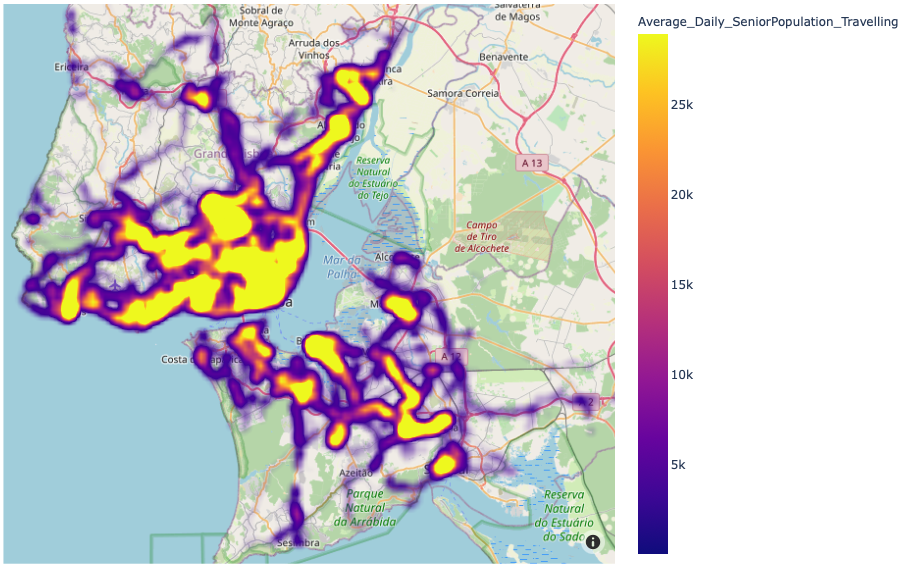

### Hotspot zones
By zooming in on the top and bottom parts of the image above, we can better identify the "hotspot" zones that, due to the high senior mobility, require a more detailed analysis:
- Cascais
- Lisboa
- Barreiro
- Montijo
- Vila Franca de Xira (Alverca)
- Setúbal
- Mafra (Venda do Pinheiro)
- Odivelas (Caneças/Ramada)
- Palmela/Quinta do Anjo

### Senior Mobility north part of the Metropolitan Area of Lisbon

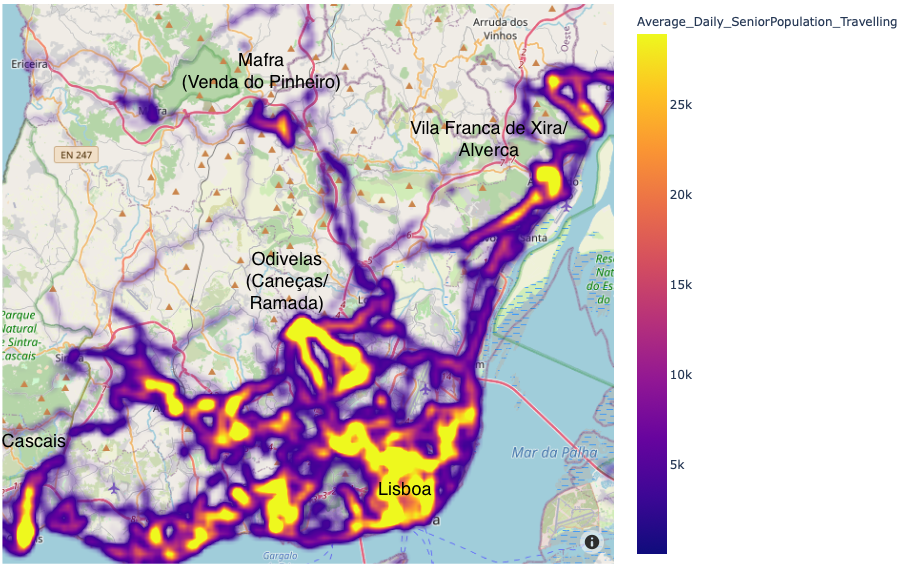

### Senior Mobility south part of the Metropolitan Area of Lisbon

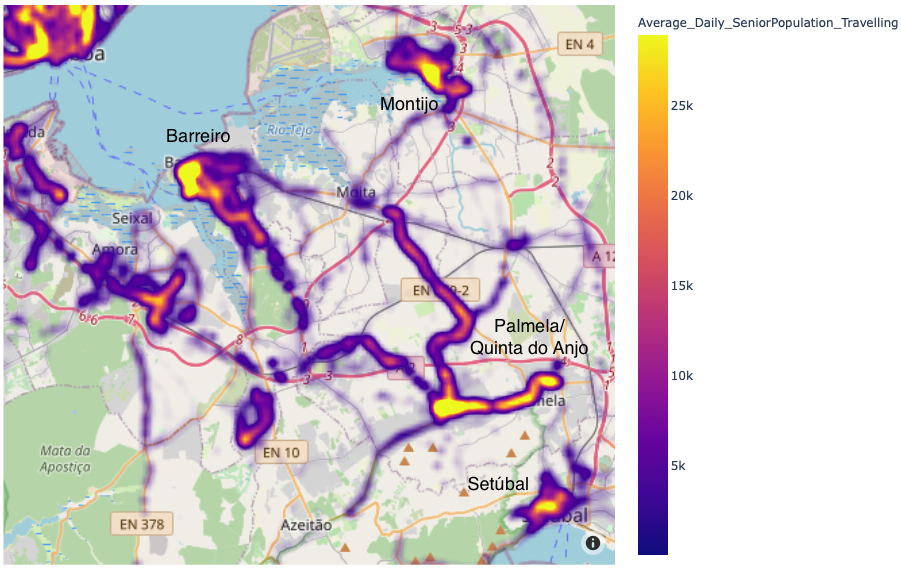

### External Public Transportation Data
The next step was to **find additional information regarding public means of transportation** other than the BusRoutes provided on the competition dataset, in order to have a better picture about the public transportation network of the Metropolitan Area of Lisbon (mostly coming from https://dados.gov.pt/pt/ and from scraping the website of Comboios de Portugal - https://www.cp.pt/passageiros/pt). <br>
We found the data outside Lisboa, Cascais and Oeiras to be lacking (not structured and split throughout the internet), and for this reason we only included as structured data for our analysis information about metro, trains and buses of the 3 counties mention above (note that the train is for the whole Metropolitan Area). However we did not disregard the public transports of the other counties, and did the research in a more "traditional" way (the links to that information can be found along the notebook)

In [6]:
metro_stations = pd.read_csv("../data/metro_location.csv")
train_stations = pd.read_csv("../data/trains_locations_final.csv")
oeiras_bus = pd.read_csv("../data/oeiras_bus_stops.csv")
cascais_bus = pd.read_csv("../data/cascais_bus_stops.csv")

The geolocalization of the **linkids** lead to interesting insights on the characteristics of senior mobility in general, highlighting that on average the **intra-county mobility** (inside the county of origin) **is bigger than the inter-county one** (only Matosinhos is an exception to this). The table below is displaying for each County_Of_Origin the linkid_county (aggregated by county) that had the biggest senior mobility value.

In [7]:
linkid_location = pd.read_csv('../data/linkids_counties_HERE.csv')
linkid_location = linkid_location[['linkid','api_city']].rename(columns={'api_city':'linkid_county'})
df_origin_linkid = pd.merge(data_tim, linkid_location, on="linkid")
df_origin_linkid = df_origin_linkid.groupby(by=['County_of_Origin','linkid_county']).sum('Average_Daily_SeniorPopulation_Travelling').reset_index()
df_origin_linkid.loc[df_origin_linkid.groupby("County_of_Origin")["Average_Daily_SeniorPopulation_Travelling"].idxmax()]

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
0,Alcochete,Alcochete,33316204610,1.624259e+04
3,Almada,Almada,485673891676,6.239942e+04
16,Amadora,Amadora,818701265324,4.189404e+05
34,Barreiro,Barreiro,1448957456104,2.663991e+06
61,Cascais,Cascais,1854165200664,2.248255e+06
80,Gondomar,Gondomar,1369077855606,2.915248e+06
101,Lisboa,Lisboa,6569893845522,7.865207e+06
130,Loures,Loures,406092802084,2.205356e+05
149,Mafra,Mafra,578351858405,4.036089e+05
174,Maia,Maia,1823193797345,7.512261e+06


All of this data that we collected also allowed us to plot on the same map the senior mobility and the public transportation offer for this area. The first step was to identify and group in the same dataframe all geographical data from the public means of transportation we have (figure below). As already said the focus remains on the Lisbon county, where we have a huge senior mobility represented by the blue shaded points.

### Senior mobility patterns vs public transfer offer 
Note that, as stated above, only bus data for Lisboa, Oeiras and Cascais was found and included (these can be found in red)

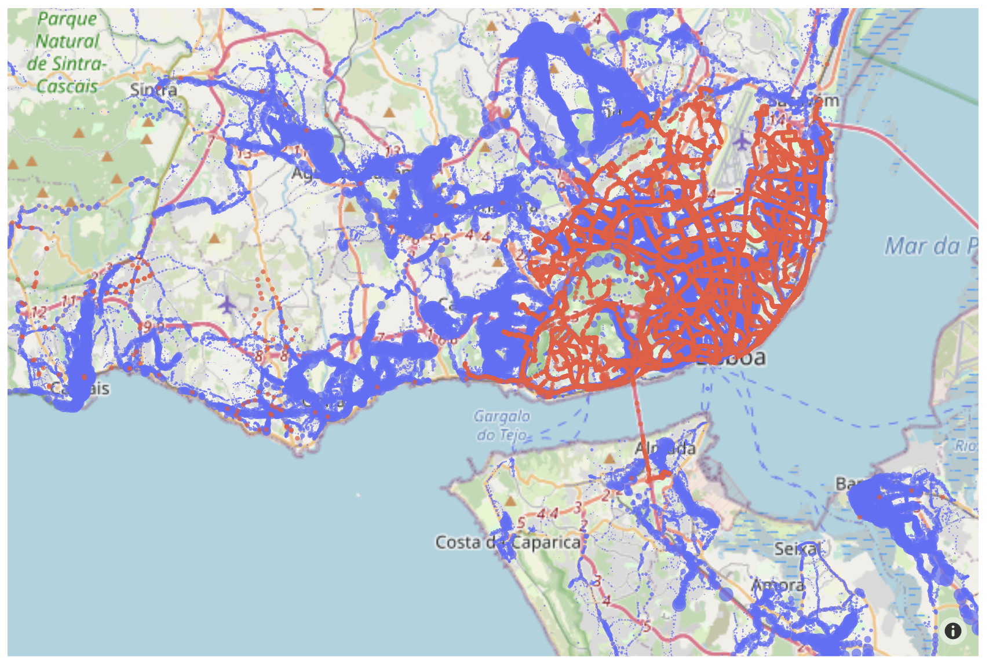

In [8]:
#standardize data before join
bus_geo = pd.merge(data_bus_routes, geo_linkid, on='linkid')
bus_geo['type'] = 'Bus'
bus_geo = bus_geo[['IDRoute','latitude','longitude','type']].rename(columns={'IDRoute':'id'})

metro_stations['type'] = 'Metro'
metro_geo = metro_stations[['station_name','latitude','longitude','type']].rename(columns={'station_name':'id'})

train_stations['type'] = 'Train'
train_geo = train_stations[['train_station','latitude','longitude','type']].rename(columns={'train_station':'id'})

cascais_bus['type'] = 'Bus'

oeiras_bus['type'] = 'Bus'

In [9]:
all_geo = pd.concat([bus_geo,metro_geo,train_geo,cascais_bus, oeiras_bus])

### All public transports in the Lisboa, Cascais and Alges
Here we can better see the public transport offer in Lisboa, Cascais and Oeiras, with different colors for each of the transports. Note that, while for the buses in Lisboa we have the whole route, for the others we only have the stops. This is why the data in Lisboa is more dense (although the public transport offer is also much more complete there)

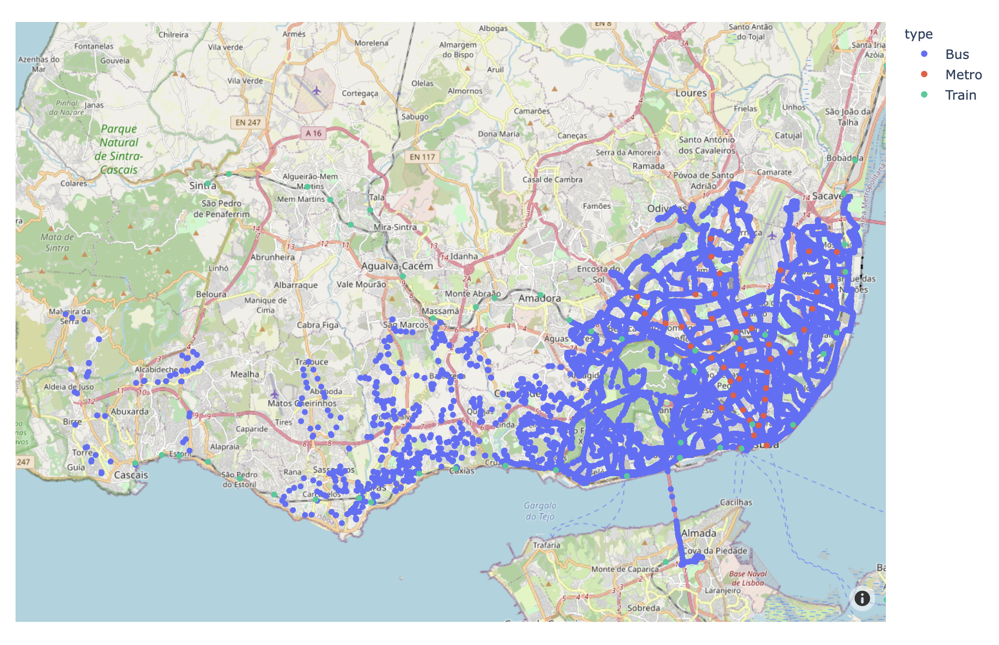

## Analysis of the Metropolitan Area of Lisbon
#### In this section we present a more detailed analysis of the "hotspots" of senior mobility identified on the heatmap (plotted using the senior_tim dataset), together with the identified patterns, problems and possible solutions

### Cascais
We noticed that Cascais County has a focus of senior traffic, with most of it being intra-county (inside of that same county). On what concerns inter-county senior traffic, people are mostly going to

In [10]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Cascais"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
61,Cascais,Cascais,1854165200664,2.248255e+06
69,Cascais,Oeiras,504048256702,3.001273e+05
63,Cascais,Lisboa,757118402833,2.265765e+05
75,Cascais,Sintra,510339422672,2.114065e+05


To go to Oeiras and Lisbon there is the train line, which is fast, with a regular timetable (easier for old people to consult or memorize) and with connection with other public transports on the destination (either bus or bus and metro). It's also one of the most comfortable public means of transportation for the elder.

Concerning intra-county mobility, we note that the bus line in Cascais is free and the bus stops already cover most of the "hotspots" of the village. Also, Cascais is adding electric buses to their fleet, and these can be a good addition for the "off-peak" hours (where elders travel more) since they have less vibrations and provide a smoother ride for its passengers. Also, since the route is covered with a smaller frequency, there can even be time to recharge the bus (if needed) without compromising the service delivery.

However, looking at the image below, we can see that there is a considerable number of locations that are not close, i.e. less than 1km away, to any means of public transportation. These locations are outlined by the blue dots.

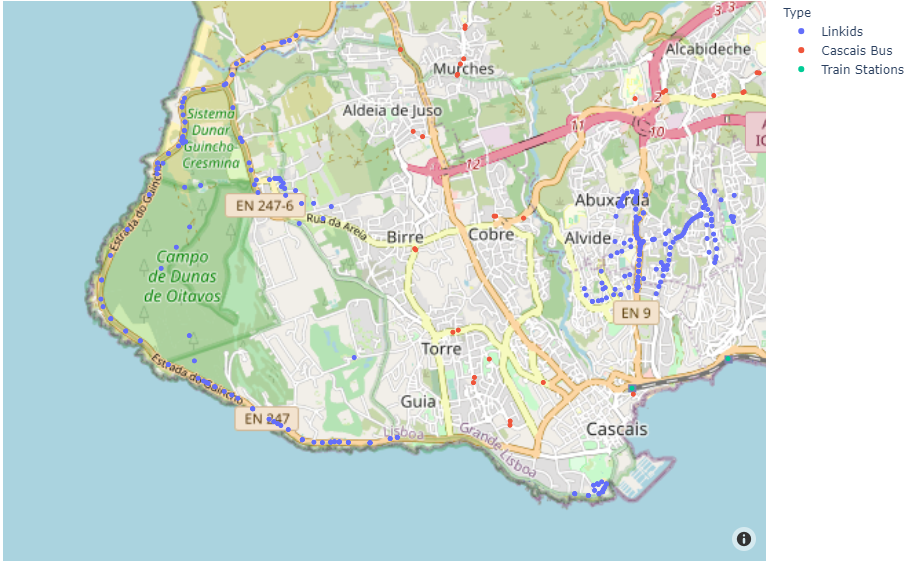

We can see that the blue dots on the left half of the image are centred around Quinta da Marinha, a very rich area, with luxury residences, resorts, and golf courses. This means that probably most of the people moving around that area are upper-class citizens and thus, can afford private vehicles, and, in case of people with low mobility (such as senior citizens), personal chauffeurs :). Therefore, we believe that this area is lacking public transports because there is no need for them.

On the right half, the dots are centred inside Alcabideche parish, around Avenida de Sintra. We believe that these dots outlined senior people travelling with their private vehicle going to the IC 15 road, which links Cascais to Lisboa, or to the highway A16, which links Cascais to Sintra. However, in case we are not missing any bus data, we consider that connecting this part of Cascais to downtown Cascais with a local bus (or by extending an already existing line with 2 or 3 more stops) can be a good solution for the problem.

### Lisboa
Lisboa is the capital city of Portugal and the largest city (population-wise) in the country, making it one of the richest counties in the country. As such, it offers a variety of services and places that appeal the elder population. Like for Cascais, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, seniors are mostly going to: 

In [11]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Lisboa"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
101,Lisboa,Lisboa,6569893845522,7.865207e+06
107,Lisboa,Odivelas,606222140027,2.746974e+05
93,Lisboa,Almada,852669215821,2.624238e+05
97,Lisboa,Cascais,390465452333,2.036955e+05


To go to Odivelas from Lisboa we have a metro line that provides a fast mean of transportation that reaches several key locations in Lisboa, making it very easy for people to get to Odivelas from different parts of the city  (https://www.metrolisboa.pt/viajar/saldanha-linha-amarela/). Alternatively, there are also bus routes. We believe that no major changes are necessary to maintain and improve the mobility to Odivelas, other than making sure that the departure schedules are kept, and the stops have good conditions where elder people can wait comfortably.

Connecting Lisboa and Almada, we have multiple routes, some only by bus others by bus and metro (https://moovitapp.com/lisboa-2460/poi/Almada/Odivelas/pt?tll=38.677937_-9.158315&fll=38.79011_-9.175848&timeType=depart&time=1618844400000&customerId=4908&ref=1&poiType=efsite). Nonetheless, many require the traveller to switch between different means of transportation, making the trip long and uncomfortable. Thus, we propose the creation of a direct bus route that goes to Almada, operating only for the elder travellers.

Concerning Cascais, as we mentioned previously, there is a train line that reaches both Lisboa and Cascais, making the commute very suitable for older people.

Regarding intra-county mobility, we note that Lisboa is the county with the biggest offer in public transports, comprising both bus routes and train and metro lines. This is expected since it is the city with most residents and it is widely visited by foreign tourists every year. In the image below, we can see that the network of public transports in Lisboa is vast and is able to reach most of the locations where elders tend to pass by, since most of those locations are in a 400m distance of a bus/metro/train route. Only the points marked with blue dots are further away from a public transport route, and these are either in the mountain of Monsanto (natural park) or inside the airport, which is a restricted area (the remaining ones are very few and so don't require any allocation of resources).

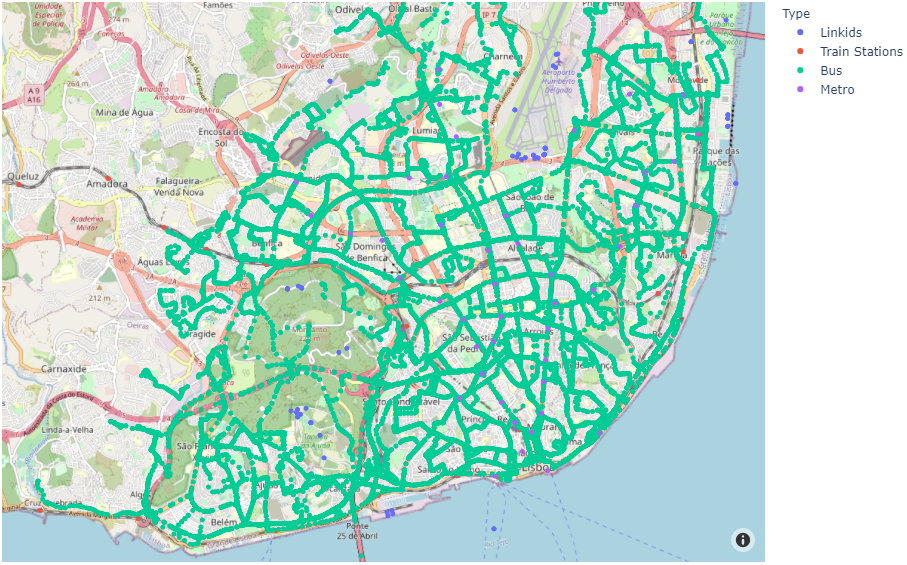

### Oeiras
Even though Oeiras is not a “hotspot” of senior mobility we like to outline that it has one of the most complete networks of intra-county public transportation. As show in the image below, only a very small number of locations where seniors circulate do not have a bus or train moving less than 500 meters away. This means that Oeiras can be seen as a model county in the matter at study.

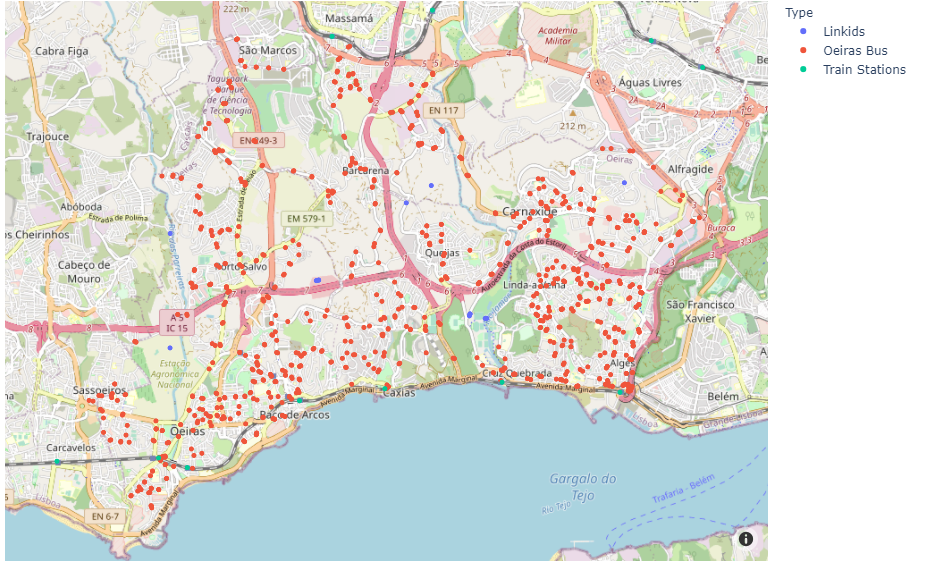

### Barreiro
Main county where people can catch the boat to go to cross the river and enter Lisboa city.
As for the others, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [12]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Barreiro"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
34,Barreiro,Barreiro,1448957456104,2.663991e+06
37,Barreiro,Lisboa,1638028513178,6.664739e+05
42,Barreiro,Moita,663963374497,2.501731e+05
50,Barreiro,Seixal,264776053591,1.108086e+05


This pattern was expected since Moita and Seixal are adjacent villages to Barreiro, and Lisbon is the capital city, providing some services that are difficult to find elsewhere.

There's a network of public transports that covers downtown Barreiro, the boat terminal (https://www.cm-barreiro.pt/cmbarreiro/uploads/writer_file/document/14623/mapa_rede_tcb_2019_site_cmb.PNG), train terminal and continues to the outskirts of Barreiro (in direction to Moita and Seixal). Thanks to this there's no need to make big changes to the infrastructure, we just need to make sure that the current one is providing buses with the correct frequency (currently they are arriving every 30-45 mins on the off-peak hours, https://www.cm-barreiro.pt/cmbarreiro/uploads/writer_file/document/15437/espinhas_tcb_a_partir_de14set2020.pdf) to fulfill the elder people needs to move both inside or outside of the county. 
One thing that can be done is to try to match the schedule of the boats leaving/arriving to/from Lisboa and the buses arriving to the boat terminal also on off-peak hours (where working class demand is small, but elder class demand is big). Here we should also focus on improving the security and comfort conditions for the elder, as boat stops usually have less people passing by (compared to bus and metro) and so people can feel less protected when waiting.

### Montijo
As for the others, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [13]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Montijo"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
208,Montijo,Montijo,587032496680,1.327135e+06
207,Montijo,Moita,257992669427,1.032972e+05
204,Montijo,Lisboa,104671348060,4.920834e+04
211,Montijo,Palmela,71122376442,3.163246e+04


For the best of our knowledge, there's no public transport network inside Montijo (only to arrive there), so extending some of the bus route that reach Montijo, covering important parts of the city (main park, supermarket and hospital) can be a viable and not expensive option that would increase the quality of mobility for the elder living there.
There are 2 ways to go from Montijo to Lisboa (most popular destination) using public transports: catching the bus to Seixalinho (short trip) and catching a boat, or catching the bus directly to Lisboa (https://www.mun-montijo.pt/conhecer/como-chegar). Since we don't see any "hotspot" of elder mobility in Seixalinho, we assume that most people choose the bus when traveling to Lisboa. This was to be expected since for the elder it's more comfortable to do a trip without having to switch between different means of transportation, even if this implies that the trip is going to be longer.
When checking the bus routes, we noticed that there is only one connecting Montijo to Lisboa (https://www.tsuldotejo.pt/index.php?page=viajar&sub=viajar&categoria=2&subcategoria=15&carreira=721), with buses departing every hour on the off-peak hours. Making sure that the buses are comfortable and increasing the frequency to every 45 minutes (due to the cost-benefit trade-off) would certainly improve the mobility of the elder living that that need to visit Lisboa.

Concerning Moita (https://www.tsuldotejo.pt/index.php?page=viajar&sub=viajar&categoria=2&subcategoria=15&carreira=711) and Palmela (https://www.tsuldotejo.pt/index.php?page=viajar&sub=viajar&categoria=2&subcategoria=15&carreira=713), we only found a bus line that covers each of the routes, with departures on average every 30 mins. We consider that this frequency is already good enough to satisfy the elder.

Note that if the plan to build the airport in Montijo moves forward, the public transport network connecting Montijo to the surrounding counties should improves significantly.

### Vila Franca de Xira (Alverca)
Another hotspot of elder mobility that caught our attention is Alverca do Ribatejo, in Vila Franca de Xira county. Like in the other spots, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [14]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Vila Franca de Xira"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
443,Vila Franca de Xira,Vila Franca de Xira,2053746712808,3.653817e+06
424,Vila Franca de Xira,Lisboa,2993170723311,1.050627e+06
425,Vila Franca de Xira,Loures,1362874574089,7.078086e+05
429,Vila Franca de Xira,Odivelas,553886116776,3.078951e+05


This pattern was expected since Lisboa is the capital city, which provides some key services and is not too far from Alverca. Loures and Odivelas are villages close to Alverca, making it easy to travel to them and they are part of the route to get to Lisboa.

To go to Lisboa one can use the train line, which as we previously said is one of the most comfortable and trustworthy public means of transportation for the elder, due to the high number of sitting places (compared to metro and bus) and to the regular timetable.

Connecting Vila Franca de Xira and Loures there are two options: train and bus or just bus (https://moovitapp.com/lisboa-2460/poi/Loures/Vila%20Franca%20De%20Xira/pt?tll=38.851329_-9.140705&fll=38.95532_-8.986374&customerId=4908&ref=1&poiType=efsite). In both cases, the trip is not direct, meaning that the traveller needs to switch either between train and bus, or from one bus to another. Thus, one improvement that could be made is to create a direct bus route between Alverca and Loures (we suggest a bus route since it is the best option when it comes to cost-benefit tradeoff).

To get to Odivelas, the most suitable routes either involve going by train and metro or train and bus (https://moovitapp.com/lisboa-2460/poi/Odivelas/Vila%20Franca%20De%20Xira/pt?tll=38.79011_-9.175848&fll=38.95532_-8.986374&customerId=4908&ref=1&poiType=efsite, https://www.cm-vfxira.pt/pages/50?news_id=4114). Like for Loures, this means that there isn't a direct route, making it less comfortable for elder people to travel to Odivelas.

For the best of our knowledge, only the private company Barraqueiro Transportes provides transports to move around Vila Franca de Xira, leveraging a support budget from the State (https://www.portalviva.pt/pt/homepage/servi%C3%A7os/transportes-p%C3%BAblicos/autocarro.aspx). So we suggest two options in this scenario:
- negociate with Barraqueiro Transportes improvements in the intra-county routes (more frequent buses, more routes etc.)
- create a small (and public) bus network that covers important parts of the city such as supermarkets, health centres and train stops.

### Setúbal
As for the others, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [15]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Setúbal"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
385,Setúbal,Setúbal,720708987712,647460.975161
382,Setúbal,Palmela,123985594007,41710.666647
377,Setúbal,Mafra,58061540125,22853.901336
375,Setúbal,Lisboa,133562194738,20614.212247


Inside Setúbal we saw that there's a bus line with frequent stops around the city, passing through the middle of the city area that we identified with a higher senior mobility (https://moovitapp.com/index/191/public-transit-resources/line/v/2460/33293177/TST_Manteigadas_Mercado_2_Abril_Setúbal_Urbisado.pdf), departing from the initial station every 30 minutes (https://www.tsuldotejo.pt/ficheiros/file/Carreira%20607.pdf). Since we identified that only a subset of the route has high senior mobility, we could decrease the frequency of the full route to every 45 mins (for example) and alternate it with a bus covering only this "popular" part of the route during the off-peak hours. The costs to maintain it would probably be similar and it would be a good help for the elder living in that area.

To connect Setúbal to Palmela there are two options: the train and 5 buses (https://www.tsuldotejo.pt/index.php?page=viajar&sub=33&origem=Setubal&destino=Palmela&tipo=localidades). The buses arrive on average every (30-45 mins). Trying to alternate the schedules of the different buses and between the buses and the trains would allow for more frequent transports.

Mafra being on the top 3 was a surprising event, however due to the lack of data we were not able to understand it. The trip between the two is long and implies several transport changes, all things that cause a particular disconfort to the elder. Nonetheless we point it out and consider it relevant for a deeper investigation in parternship with someone more familiarized with the travel habits of the elder in Setúbal (maybe someone from the city hall). 

Concerning Lisboa, the company "Transportes Sul do Tejo" already provides 3 routes connecting Setúbal to this city (https://www.tsuldotejo.pt/index.php?page=viajar&sub=viajar&categoria=3&subcategoria=), and there's also the train line doing a similar connection. This should be enough to account for the traffic between the two. 

### Mafra (Venda do Pinheiro)
As for the others, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [16]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Mafra"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
149,Mafra,Mafra,578351858405,403608.926542
148,Mafra,Loures,670157527799,272785.326116
153,Mafra,Odivelas,405917346128,80117.587946
147,Mafra,Lisboa,391247485158,68771.881928


Before starting the analysis note that this village (Venda do Pinheiro, inside Mafra) is the smallest one of the chosen set (around 8.000 inhabitants). We chose it since it captured our attention on the heatmap, however due to it's size we are well aware that the budget for changes will be small.
There are 3 bus companies that supply buses either for intra or inter-mobility in Mafra (https://www.cm-mafra.pt/pages/838).

Since, for the best of our knowledge, there are no public transports inside Venda do Pinheiro, we recommend creating a small circular route moving between (and inside) Venda do Pinheiro and Malveira. This region is tipically characterised by an aging population (when compared to places closer to the city), so implementing such a solution can make a difference on the quality of life in this region, where currently the only options to move between different locations (services for example) is either on foot or using a taxi/private mean of transportation (that is too expensive for frequent trips).

To go from Mafra (Venda do Pinheiro) to Lisboa there is a bus route provided by "Mafrense" in partnership with "Barraqueiro" (https://www.mafrense.pt/FileGet.aspx?FileId=6660) that, on the off-peak hours, has an average wait time of 1h. Considering the distance between the two (and the size mentionede above), we consider this periodicity to be reasonable. 

Loures and Odivelas era closer to Venda do Pinheiro and on the way to Lisboa, possibly being this one of the reasons why they are on this top. From Venda do Pinheiro to Odivelas we were not able to find any public means of transportation, leading us to think that most of the people reach it by car. In case this assumption holds, it would be a good option to create a bus route serving this route, or extending the one that goes to Loures (https://www.barraqueiro-oeste.pt/FileGet.aspx?FileId=7025) in order to pass by Odivelas when it's going to Lisboa (final destination of the route). The buses on this route depart hourly as well (off-peak hours), but once more considering the characteristics of the village under analysis we think that this periodicity is reasonable.

### Odivelas (Caneças/Ramada)
Like in the other spots, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [17]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Odivelas"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(5)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
228,Odivelas,Odivelas,1833539873013,4.181635e+06
221,Odivelas,Lisboa,1898331038026,1.333644e+06
222,Odivelas,Loures,605881324557,3.683525e+05
236,Odivelas,Sintra,437025780049,1.612967e+05
218,Odivelas,Amadora,291258608312,1.190894e+05


This pattern was somewhat expected since Lisboa is the capital city, which provides some key services and is not far from Odivelas. Loures is the closest county (from the ones analyzed) to Odivelas, thus it is expected for people to travel there. However, Sintra is a bit further away, making it an interesting result. It would make more sense that there would be more seniors travelling to Amadora, than to Sintra, since it's closer. Nonetheless, we like to point out that the Average_Daily_SeniorPopulation_Travelling values for Sintra and Amadora are not that different. 
One factor that may explain this peek of mobility to Sintra may be the popular tourist attractions that Sintra has.

Regarding intra-county mobility, we note that Odivelas county provides through Carreiras "Voltas" three different bus routes that circulate inside the county reaching key spots in a very affordable way (https://www.cm-odivelas.pt/areas-de-intervencao/urbanismo/autocarro-voltas). The "Voltas" buses are equipped to be used by people with reduce mobility (case of many seniors). This is the kind of measures we believe encourage elder people to use public transports. 

Going from Odivelas and Lisboa we have a metro line that provides a fast and somewhat comfortable mean of transportation. Alternatively, there are also bus routes. As such, we believe that no major changes are necessary to maintain and improve the mobility to Lisboa, other than making sure the metro and buses operate according to their schedule and the stops are secure, clean and easily acessible.

Concerning Loures, the more direct routes that reach it from Odivelas are by bus (https://moovitapp.com/lisboa-2460/poi/Loures/Odivelas/pt?tll=38.828614_-9.16563&fll=38.79011_-9.175848&timeType=depart&time=1618570800000&customerId=4908&ref=1&poiType=efsite) departing on average every 30 mins in off-peak hours (https://www.rodoviariadelisboa.pt/ver_horario.php?fx=206_Ida_Escolar_lineSched_site.svg.png, https://www.rodoviariadelisboa.pt/ver_horario.php?fx=335_Ida_Escolar_lineSched_site.svg.png), thus like for Lisboa we consider that no major changes are required.

To Sintra, we noticed that suggested routes typically require the traveller to switch between different means of transportation 
(https://moovitapp.com/lisboa-2460/poi/Sintra/Odivelas/pt?tll=38.79846_-9.3881&fll=38.79011_-9.175848&timeType=depart&time=1618570800000&customerId=4908&ref=1&poiType=efsite). Since Sintra has a direct train line that reaches the city, we propose the reinforcement of bus routes that directly link Odivelas to the closest train stop.

### Palmela / Quinta do Anjo
As for the others, we can see that the senior mobility is mostly intra-county. Concerning the inter-county mobility, people are mostly going to:

In [18]:
df_origin_linkid.loc[df_origin_linkid["County_of_Origin"]=="Palmela"].sort_values(by="Average_Daily_SeniorPopulation_Travelling", ascending=False).head(4)

,County_of_Origin,linkid_county,linkid,Average_Daily_SeniorPopulation_Travelling
290,Palmela,Palmela,823285976297,3.604110e+06
282,Palmela,Lisboa,351558661434,5.018105e+05
278,Palmela,Almada,190055303571,2.330111e+05
294,Palmela,Setúbal,266197224979,1.940229e+05


Another hotspot of elder mobility that caught our attention is betwen Palmela village and Quinta do Anjo (a residential area nearby, with less services than the village). However, the place with the highest elder mobility seems to be Quinta do Anjo. After doing some research, we found out that Quinta do Anjo has a big condominium with a golf course and some big country houses, suggesting that it's a place where people either go to retire or visit (from Palmela) to play golf. If this is the case, it's reasonable to assume tha a big part of the people going there use private means of transportation.

Taking all of this into account, we suggest creating a new bus line between Palmela and the golf course (public and possibly sponsored by the golf course owners), encouraging in this way elders that are regular golf players to start using this instead of their private means of transportation, and allowing other elder people from Palmela to go for a walk there in an easy and inexpensive way.

The rest of the intra-county mobility is well maintaned by the several bus lines present on the county (https://www.cm-palmela.pt/pages/1669), either inside Palmela village or on the outskirts

Concerning the inter-county mobility, the more popular counties were expected, as they are the 3 closest cities that provide services that usually lack on smaller villages. 

The connection between Palmela and Setúbal is assured by 5 bus routes from Transportes Sul do Tejo (https://www.tsuldotejo.pt/index.php?page=viajar&sub=33&origem=Palmela&destino=setubal&tipo=localidades) and by the train connection. The bus wait time on the off-peak hour is around 45 mins, but since there are so many lines it's reasonable to assume that they complement each other.

From Palmela to Lisboa the options are either train or bus, both with an off-peak wait time of 1h. We noted that the departure time is usually the same for both, so alternating the two on the off-peak hours (no impact on people going to work) can provide a better solution without increasing the running costs.

Finally, from Palmela to Almada we only found a bus route that had to go to Setúbal first, or a route that implies changing from bus to train (and takes longer). We have no information about the perodicity of both routes, however we observed that the bus route from Setúbal to Almada passes close to Palmela, so we suggest studying the possibility of changing the route a little, creating a stop in Palmela. In this way the trip with be shorter and more confortable, as it would not imply going down to Setúbal in order to come back north on the way to Almada.

## General suggestions
### Bus Stops
A relevant amount of the bus stops present in Lisboa (we had to confirm by hand, no data about it) has no place to seat when waiting for the bus to arrive. As this is a big problem for old people, we suggest to focus on the areas with higher elder mobility that we mentioned above and to improve this aspect, adding a covered bench to all of them.

### Public toilets
By walking around the city we notice that the number of public toilets is very small, and decreasing. We were not able to find information about Lisboa (they were not disclosed), but in Porto there are only 21 in total, accounting for toilets, public showers and laundries (https://www.jn.pt/nacional/especial/casas-de-banho-publicas-em-vias-de-extincao-10593892.html). It's reasonable to assume that the number of toilets in Lisboa will scale at most with the population difference between the two regions,and even in this case the figure will still be very small.
From the surveys made to old people, most identify the lack of public toilets as a big obstacle to their mobility (in case they want to use a public transport that takes longer, or simply go for a walk). Due to all of this, we consider very important to increase the public toilet accessibility. But this does not imply building more public toilets! A possible solutions is for the city hall to sign an agreement with the owners of coffee places (that usually have toilets) where they pay them a fee to help clean the toilets, and these allow people to use them without buying anything. It would be a solution with no infrastructure costs that, after a pilot phase, could either be negotiated in order to decrease the value of this fee (in case we observe that more people going there to the toilet is having a positive impact on the sales).

## Conclusions

### Scalability and Impact

When defining our solution we took into account scalability and impact in all of the suggestions we made, as we consider that it's not always necessary to think big to leave a footprint, but instead it's better to start with concrete and feasible proposals that can have an immediate impact without the need of big investment (and all of the problems that those bring with). For these reasons, most of our suggestions rely on already existing infrastructure, focusing instead on improvements and better ways to use what already exists. 

Obviously there are also some downsides, and the fact that we had no budget information to consider when developing these suggestions doesn't allow us to fully understand how feasible they will be (and if there are other factors that can be negative and that we had no way to take into account). Also, in case the budget was bigger than we considered, maybe we could have "thought bigger" and proposed more revolutionary changes (that we tried to avoid thanks to our focus on practical feasibility). The fact that we were not able to collect the same amount of data for the whole Metropolitan Area of Lisbon is also shortback, making us neglect some other phenomena that we were not able to identify (or leave outside of our solution space other good and feasible measures).

We believe that the potential social impact of our solution in the life of senior people can be big and very relevant, as our focus is on giving them the possibility to move freely around the city, in a safe and efficient way. This will not only promote their quality of life, but also enable them to have a more healthy lifestyle, with very positive consequences on the short and mid-term to their physical and mental health (and for society as a whole). Portugal is already the 4th most aged country in the world (21.8% of the population is over 65 years old - https://www.prb.org/countries-with-the-oldest-populations/), and in the coming decades this number will continuosly grow. Together with this, the current younger generations are more sedentary than their older counterparts, so without an efficient public transportation system accessible to the elder, the number of people that will suffer from the lack of social activity will certainly increase. 

### Future Work
Finding all data that we consider relevant for our analysis is probably the most challenging part of the job. There is for sure information that could help us in solving this challenge even better. First of all a part of our analysis was restricted to Lisbon county due to the lack of information in other parts of Portugal (except Porto ones, that we decided to leave for a possible future work due to time constraints). Having the possibility to explore data related to a wider area can let us propose solutions for people living far from the major cities too. Clearly when the data availability becomes higher our approach will become even more objective, defining a priori measures that let us understand where to take action. The automatization (and an enrichment) of the whole process passes by the possibility to accessing data regarding the points of interest (parks, supermarkets, pharmacies, hospitals, centres for elder people) in order to match these with the public transportation and senior mobility data. In that moment we can join all of the data and do a comprehensive analysis of how well served by public transports and services each county is (and target measures towards those).

Getting data for different regions of Portugal is also important from a numerical perspective, given that a lot of elder people live far from the city and probably have less access to public transportation. We know that these fall outside of the "smart-cities" scope, but consider it relevant since those are the most aged places of the country, and usually the poorest ones too.

Finally also having further insights on the senior inter-county mobility can help us design a more tailored solution for different travel needs (service visit, leasure, ..). We consider this to be really important as the mid and long range trips are usually the most demanding ones for old people, and with a teleworking future foreseeing people moving back to the country-side, this would already prepare good conditions for the future "elders".